In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np
import pylab as P

import seaborn as sns 
from matplotlib import cm
import numpy.linalg as npl
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.linalg import cholesky

from sklearn.decomposition import PCA

plt.rcParams["figure.figsize"] = (16,8)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps, copy_X=True, fit_path=Tru

In [3]:
plt.rcParams["figure.figsize"] = (20,10)
import sys 
sys.path.append(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code')
from pca_ad_utils import *
from decomp_utils import *
from customizedLossSynthetic import *
from LocationAnomalyPCA import *
from utilsImputation import *
from impactVaRutils import *


sys.path.append(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator')
from ParamsEstimationUtils import *
sys.path.append(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator')
from syntheticDataGeneratorUtils import *


# Import Identification Model & Data  

In [4]:
CalibParamsLoaded = load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\Model\CalibParams2405_2.pkl',allow_pickle=True)
netLoaded = NeuralNetwork()
netLoaded.load_state_dict(torch.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\Model\modelCustomLoss2405_2.h5'))

<All keys matched successfully>

In [5]:
X_trainUnderdf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Data\XTrainUnder.csv').drop(['Unnamed: 0'],axis=1)
y_trainUnderdf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Data\yTrainUnder.csv').drop(['Unnamed: 0'],axis=1)

X_testUnderdf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Data\XTestUnder.csv').drop(['Unnamed: 0'],axis=1)
y_testUnderdf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Data\yTestUnder.csv').drop(['Unnamed: 0'],axis=1)
X_trainUnder = np.array(X_trainUnderdf.iloc[:,:-3])
X_testUnder = np.array(X_testUnderdf.iloc[:,:-3])

y_trainUnder = np.array(y_trainUnderdf['NbAnomaly'])
y_testUnder = np.array(y_testUnderdf['NbAnomaly'])
ytrainUnder = np.array([1 if l==1 else 0 for l in y_trainUnder])
ytestUnder = np.array([1 if l==1 else 0 for l in y_testUnder])

print(f'Normal observations in train set {list(y_trainUnder).count(0)}')
print(f'Outlier observations in train set {list(y_trainUnder).count(1)} \n')

print(f'Normal observations in test set {list(y_testUnder).count(0)}')
print(f'Outlier observations in test set {list(y_testUnder).count(1)}')

Normal observations in train set 6010
Outlier observations in train set 6010 

Normal observations in test set 2109
Outlier observations in test set 421


In [6]:


k = 20

# Learning on TS 

model = PCA(n_components=k)
model.fit(X_trainUnder)
r_train = model.inverse_transform(model.transform(X_trainUnder))
r_test = model.inverse_transform(model.transform(X_testUnder))




reconsRawTrain = r_train
reconsRawTest = r_test


reconsRawTrain = torch.tensor(reconsRawTrain)
ytrain = torch.tensor(ytrainUnder.reshape(-1,1))


reconsRawTest = torch.tensor(reconsRawTest)
ytest = torch.tensor(ytestUnder.reshape(-1,1))
xtrain = np.array(X_trainUnder,dtype=float)
ytrain = np.array(y_trainUnder,dtype=float)

xtest = np.array(X_testUnder,dtype=float)
ytest = np.array(y_testUnder,dtype=float)

xtrain = torch.tensor(xtrain)
ytrain = torch.tensor(ytrain.reshape(-1,1))


xtest = torch.tensor(xtest)
ytest = torch.tensor(ytest.reshape(-1,1))

ErrRawTrain = xtrain - reconsRawTrain
ErrRawTrain = torch.tensor(ErrRawTrain)

ErrRawTest = xtest - reconsRawTest
ErrRawTest = torch.tensor(ErrRawTest)

In [7]:
# Scores with trained on data 
STrain,scoresTrain  = evalPerf(netLoaded,ErrRawTrain,ytrain,'Train',CalibParamsLoaded)
STest,scoresTest  = evalPerf(netLoaded,ErrRawTest,ytest,'Test',CalibParamsLoaded)

-------------------Scores on Train set-------------------
Accuracy :  0.9097
Precision :  0.9736
Recall :  0.8421
F1-score: 0.9031


-------------------Scores on Test set-------------------
Accuracy :  0.8858
Precision :  0.6126
Recall :  0.8527
F1-score: 0.7130




## Import new data location

In [9]:
X_traindf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\Untitled Folder\XTrainLoc_1306.csv').drop(['Unnamed: 0'],axis=1)
y_traindf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\Untitled Folder\yTrainLoc_1306.csv').drop(['Unnamed: 0'],axis=1)

X_testdf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\Untitled Folder\XTestLoc_1306.csv').drop(['Unnamed: 0'],axis=1)
y_testdf = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\Untitled Folder\yTestLoc_1306.csv').drop(['Unnamed: 0'],axis=1)

Xtrain = np.array(X_traindf.iloc[:,:-3])
Xtest = np.array(X_testdf.iloc[:,:-3])

ytrain_loc = [list(y_traindf.iloc[i,:]).index(1)for i in range(y_traindf.shape[0]) ]

ytest_loc = [list(y_testdf.iloc[i,:]).index(1) for i in range(y_testdf.shape[0]) ]
ntrain,d = Xtrain.shape
ntest = Xtest.shape[0]

# Impact on VaR computation

In [10]:
nbsim = 100
nStocks = 20
T = 1
M = int(2.**10)
Ntrain = int(2.**10)
Ntest = int(2.**9)
N = Ntrain + Ntest

alpha = 1
windowSize = 206
upBound=0.04
AnoNumber = 5
VaRCleanHat = 0
VaRImpBFPredHat = 0
VaRImpBFTrueHat = 0

VaRAnoHat =0
VaRTheo = 0


Cov = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\Cov.csv').drop(['Unnamed: 0'],axis=1).values
S0 = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\S0.csv').drop(['Unnamed: 0'],axis=1).values.reshape(-1,)
mu = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\mu.csv').drop(['Unnamed: 0'],axis=1).values.reshape(-1,)
sigma = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\Sigma.csv').drop(['Unnamed: 0'],axis=1).values.reshape(-1,)


In [11]:
nbsim = 2

dict_trueLoc = {}
dict_predLoc = {}
MuHatdf = pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])
SigmaHatdf = pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])
BFtrueLocParams = {'Muhat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)]),
                  'Sigmahat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])}
BFpredLocParams = {'Muhat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)]),
                  'Sigmahat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])}

AnoParams = {'Muhat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)]),
                  'Sigmahat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])}

CleanParams = {'Muhat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)]),
                  'Sigmahat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])}
TheoParams = {'Muhat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)]),
                  'Sigmahat': pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])}


ErrorsOnCovAbs = pd.DataFrame(columns=['Theo','Clean','Ano','BFTrue','BFPred'],index=np.arange(nbsim))
ErrorsOnCovRel = pd.DataFrame(columns=['Theo','Clean','Ano','BFTrue','BFPred'],index=np.arange(nbsim))
VaREstimation = pd.DataFrame(columns=['Theo','Clean','Ano','BFTrue','BFPred'],index=np.arange(nbsim))



In [73]:
nStocks = 20
T = 1
M = int(2.**10)
Ntrain = int(2.**10)
Ntest = int(2.**9)
N = Ntrain + Ntest
k=20

alpha = 0.99
windowSize = 206
upBound=0.04
AnoNumber = 5
VaRCleanHat = 0
VaRImpBFPredHat = 0
VaRImpBFTrueHat = 0
VaRAnoHat =0
VaRTheo = 0


F1Locdf = pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])

for isimul in range(nbsim):
    print(f'--------------------isimul{isimul}--------------------')
    
    # Path Simulation 
    stocks,time = GBMsimulator(isimul,S0,mu,sigma,Cov,T,N)
    dt = time

    StocksDFTrain = pd.DataFrame(stocks[:,:])
    n,d = StocksDFTrain.shape
    dfTSwAnomalyTrain,dfTSLabelTrain = AnomalyGeneratorDF(StocksDFTrain,AnoNumber,windowSize,alpha,upBound)
    dfTSLabelidx = getIdxAnomdf(n,d)
    BFPredTs = np.zeros((n,d))
    BFTrueTs = np.zeros((n,d))
    for I in range(nStocks):
    
        # Anomaly Location 

        s  = StocksDFTrain.iloc[I,:]
        sAno = dfTSwAnomalyTrain.iloc[I,:].values
        y = dfTSLabelTrain.iloc[I,:].values
        yidx = dfTSLabelidx.iloc[I,:].values
        # slicing the TS to fit the format of ts handled by the model
        nsize = d//206 + 1
        dfSliced = pd.DataFrame(columns = np.concatenate([np.arange(206),['TrackID']]),index=np.arange(nsize),dtype=float)
        dfySliced = pd.DataFrame(columns=np.concatenate([np.arange(206),['TrackID']]),index=np.arange(nsize),dtype=float)
        dfyidxSliced =  pd.DataFrame(columns=np.concatenate([np.arange(206),['TrackID']]),index=np.arange(nsize),dtype=float)
        dfSliced['TrackID'] = np.arange(nsize)
        dfySliced['TrackID'] = np.arange(nsize)
        dfyidxSliced['TrackID'] = np.arange(nsize)
        dfySliced['NbAno'] = np.zeros(nsize)

        for i in range(nsize-1):
            dfSliced.iloc[i,:-1] = sAno[i*206:(i+1)*206]
            dfySliced.iloc[i,:-2] = y[i*206:(i+1)*206]
            dfyidxSliced.iloc[i,:-1] = yidx[i*206:(i+1)*206]

        dfSliced.iloc[nsize-1,:-1] = sAno[-206:]
        dfySliced.iloc[nsize-1,:-2] = y[-206:]
        dfyidxSliced.iloc[nsize-1,:-1] =  yidx[-206:]
        dfySliced['NbAno'] = dfySliced.iloc[:,:-2].sum(axis=1)
        #########################################################################################################


        dfySlicedAno = dfySliced[dfySliced.NbAno!=0] # Keep only ts with anomalies 
        dfyidxSlicedAno = dfyidxSliced[dfyidxSliced.TrackID.isin(dfySlicedAno.TrackID)]
        dfSlicedAno = dfSliced[dfSliced.TrackID.isin(dfySlicedAno.TrackID)] # Keep only ts with anomalies 
        yslicedloc = np.array([list(dfySlicedAno.iloc[i,:-2]).index(1.) for i in range(dfySlicedAno.shape[0]) ]) # ano location
        yslicedidxloc = dfyidxSlicedAno.values
        norms_train, norms_test =  modelPCALocation(Xtrain,dfSlicedAno.iloc[:,:-1].values,k) # features engineering

        pred_loc_test = dummyprediction(norms_test)
        ScoresTestPCA = EvaluationPred(yPred = pred_loc_test,yTrue=yslicedloc)
        F1Locdf.iloc[isimul,I] = f1_score(yslicedloc,pred_loc_test,average='weighted')
        
        print(f'True Ano Location :{yslicedloc} ')
        print(f'Pred Ano Location :{pred_loc_test} ')
        printRes(ScoresTestPCA,'Test')
        
        
        
        
        

        idxTrue2impute = idxfromSliceToOriginal(yslicedloc,yslicedidxloc)
        idxPred2impute = idxfromSliceToOriginal(pred_loc_test,yslicedidxloc)
        
        TRUELOC = returnLOC(dfTSLabelTrain.iloc[I,:].values)
        print('AnoLoc in TS Original')
        print(TRUELOC)
        print(idxTrue2impute)
        print(idxPred2impute)
        print('\n')
        if len(idxPred2impute)==len(TRUELOC):
            XBF_predLoc,_ = ImputeAfterAnoLocation(sAno,idxPred2impute)
            XBF_TrueLoc,_ = ImputeAfterAnoLocation(sAno,idxTrue2impute)
            muHatBFPred,sigmaHatBFPred = ParamsEstimation(XBF_predLoc)
            muHatBFTrue,sigmaHatBFTrue = ParamsEstimation(XBF_TrueLoc)

        else :
            idxImputTrue = idxAnonotInTest(TRUELOC,yslicedloc)
            sAnoCorrect = deepcopy(sAno)
            for i in idxImputTrue:
                sAnoCorrect[i] = s[i]

            XBF_predLoc,_ = ImputeAfterAnoLocation(sAnoCorrect,idxPred2impute)
            XBF_TrueLoc,_ = ImputeAfterAnoLocation(sAnoCorrect,idxTrue2impute)
            
            muHatBFPred,sigmaHatBFPred = ParamsEstimation(XBF_predLoc)
            muHatBFTrue,sigmaHatBFTrue = ParamsEstimation(XBF_TrueLoc)
        BFPredTs[I,:] = XBF_predLoc
        BFTrueTs[I,:] = XBF_TrueLoc
            
        BFtrueLocParams['Muhat'].iloc[isimul,I] = muHatBFTrue
        BFtrueLocParams['Sigmahat'].iloc[isimul,I] = sigmaHatBFTrue

        BFpredLocParams['Muhat'].iloc[isimul,I] = muHatBFPred
        BFpredLocParams['Sigmahat'].iloc[isimul,I] = sigmaHatBFPred

        muHatClean,sigmaHatClean = ParamsEstimation(s)
        CleanParams['Muhat'].iloc[isimul,I] = muHatClean
        CleanParams['Sigmahat'].iloc[isimul,I] = sigmaHatClean

        muHatAno,sigmaHatAno = ParamsEstimation(sAno)
        AnoParams['Muhat'].iloc[isimul,I] = muHatAno
        AnoParams['Sigmahat'].iloc[isimul,I] = sigmaHatAno

        muTheo,sigmaTheo = (mu[I]-sigma[I]**2/2)*dt,np.sqrt(sigma[I]**2*dt)
        TheoParams['Muhat'].iloc[isimul,I] =muTheo
        TheoParams['Sigmahat'].iloc[isimul,I] = sigmaTheo
        print('\n')
        
    CovClean = computeCov(StocksDFTrain.values,sigma)
    CovAno = computeCov(dfTSwAnomalyTrain.values,sigma)
    CovBFTrue = computeCov(BFTrueTs,sigma)
    CovBFPred = computeCov(BFPredTs,sigma)
    
    VaRTheo = VaRonReturns(TheoParams['Muhat'].iloc[isimul,:].values,Cov,alpha)
    VaRClean = VaRonReturns(CleanParams['Muhat'].iloc[isimul,:].values,CovClean,alpha)
    VaRAno = VaRonReturns(AnoParams['Muhat'].iloc[isimul,:].values,CovAno,alpha)
    VaRTrueBF = VaRonReturns(BFtrueLocParams['Muhat'].iloc[isimul,:].values,CovBFTrue,alpha)
    VaRPredBF = VaRonReturns(BFpredLocParams['Muhat'].iloc[isimul,:].values,CovBFPred,alpha)
    
    VaREstimation.iloc[isimul,:] = np.array([VaRTheo,VaRClean,VaRAno,VaRTrueBF,VaRPredBF] )
    
    
    ErrorsOnCovAbs.iloc[isimul,:] = [npl.norm(Cov-Cov),
                               npl.norm(CovClean-Cov),
                               npl.norm(CovAno-Cov),
                               npl.norm(CovBFTrue-Cov),
                                npl.norm(CovBFPred-Cov)]
    ErrorsOnCovRel.iloc[isimul,:] = [npl.norm(Cov-Cov)/npl.norm(Cov),
                               npl.norm(CovClean-Cov)/npl.norm(Cov),
                               npl.norm(CovAno-Cov)/npl.norm(Cov),
                               npl.norm(CovBFTrue-Cov)/npl.norm(Cov),
                                npl.norm(CovBFPred-Cov)/npl.norm(Cov)]
    


    
    
    
    

--------------------isimul0--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4012.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[90  0 63 84] 
Pred Ano Location :[ 90 122  76  84] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[296, 412, 681, 908, 941]
[296 412 681 908]
[296 534 694 908]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3987.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 115  92 149] 
Pred Ano Location :[144 115  92 149] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[128, 527, 710, 728, 1479]
[ 128  527  710 1479]
[ 144  527  710 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3488.86it/s]


True Ano Location :[ 98  38   1 191 123] 
Pred Ano Location :[ 98  38   1 191 123] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[510, 656, 825, 1221, 1453]
[ 510  656  825 1221 1453]
[ 510  656  825 1221 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]


True Ano Location :[179  19 148  82] 
Pred Ano Location :[179  19 148  82] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[179, 431, 517, 766, 906]
[179 431 766 906]
[179 431 766 906]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[110   1  59 125   3] 
Pred Ano Location :[110   1  59 125   3] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[110, 207, 471, 1155, 1239]
[ 110  207  471 1155 1239]
[ 110  207  471 1155 1239]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3224.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23 199  41 196] 
Pred Ano Location :[ 23 199  81 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[229, 234, 1023, 1071, 1526]
[ 229 1023 1071 1526]
[ 229 1023 1111 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3948.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103 115 201 150] 
Pred Ano Location :[186 115 201 150] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[309, 392, 733, 1025, 1180]
[ 309  733 1025 1180]
[ 392  733 1025 1180]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4745.76it/s]


True Ano Location :[ 86 123 168 151  57] 
Pred Ano Location :[ 86 123 168 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[86, 329, 1198, 1387, 1453]
[  86  329 1198 1387 1387]
[  86  329 1198 1387 1387]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198   0  84 154 163] 
Pred Ano Location :[198   0  84 154  52] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[198, 206, 496, 1184, 1493]
[ 198  206  496 1184 1493]
[ 198  206  496 1184 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4598.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  59  86 121  27] 
Pred Ano Location :[ 71  93  86 121  27] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[277, 471, 505, 910, 1357]
[ 277  471  910 1357 1357]
[ 277  505  910 1357 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3003.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[132  23  85] 
Pred Ano Location :[132  23 161] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[544, 847, 1115, 1176, 1191]
[ 544  847 1115]
[ 544  847 1191]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2663.90it/s]


True Ano Location :[ 55 103  49  18] 
Pred Ano Location :[ 55 103  49  18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 515, 667, 1048, 1053]
[  55  515  667 1048]
[  55  515  667 1048]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3398.49it/s]


True Ano Location :[ 30 118   7  53 176  82] 
Pred Ano Location :[ 30 118   7  53 176  82] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[236, 530, 625, 1083, 1412]
[ 236  530  625 1083 1412 1412]
[ 236  530  625 1083 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1745.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  11  89 130] 
Pred Ano Location :[169  11  89 130] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[47, 169, 217, 501, 1160]
[  47  217  501 1160]
[ 169  217  501 1160]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2669.83it/s]


True Ano Location :[  4  90 116 188] 
Pred Ano Location :[  4  90 116 188] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[4, 502, 520, 734, 1012]
[   4  502  734 1012]
[   4  502  734 1012]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2300.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77 166 185] 
Pred Ano Location :[ 77 166 193] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[283, 294, 578, 1515, 1523]
[ 283  578 1515]
[ 283  578 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]


True Ano Location :[ 65 119   5  38 142] 
Pred Ano Location :[ 65 119   5  38 142] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[65, 325, 417, 862, 1172]
[  65  325  417  862 1172]
[  65  325  417  862 1172]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 16] 
Pred Ano Location :[34 16] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[18, 34, 135, 840, 971]
[ 18 840]
[ 34 840]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5   0 158] 
Pred Ano Location :[ 11 118 158] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[5, 206, 324, 398, 570]
[  5 206 570]
[ 11 324 570]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7039.79it/s]


True Ano Location :[  2  64 126 155  61] 
Pred Ano Location :[  2  64 126 155  61] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[208, 476, 561, 1156, 1391]
[ 208  476 1156 1391 1391]
[ 208  476 1156 1391 1391]




0.055516589342753574
0.0012826069159039433
0.0570018033478052
0.0011972704379495005
0.06228076673084644
0.0011972704379495005
0.05789322898924082
0.0011972704379495005
0.058901637311061524
0.0011972704379495005
--------------------isimul1--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3751.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  35  90 192  98] 
Pred Ano Location :[168  35 128 192  98] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[168, 447, 708, 746, 1428]
[ 168  447  708 1428 1428]
[ 168  447  746 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3986.98it/s]


True Ano Location :[ 92 131 134 189] 
Pred Ano Location :[ 92 131 134 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[504, 749, 812, 1164, 1519]
[ 504  749 1164 1519]
[ 504  749 1164 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2380.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[132   7   9 128  34] 
Pred Ano Location :[132   7  18 128  34] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[132, 625, 833, 842, 1364]
[ 132  625  833 1364 1364]
[ 132  625  842 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.22it/s]


True Ano Location :[ 31  82 158] 
Pred Ano Location :[ 31  82 158] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[443, 526, 700, 1488, 1504]
[ 443  700 1488]
[ 443  700 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5008.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175 198  16  81 152] 
Pred Ano Location :[175  16  16  81 101] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.5
F1-score: 0.5333333333333333

AnoLoc in TS Original
[175, 610, 634, 905, 1482]
[ 175  610  634  905 1482]
[ 175  428  634  905 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4902.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[197  80  14 171  77] 
Pred Ano Location :[197  80 118 171  77] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[197, 698, 1044, 1148, 1407]
[ 197  698 1044 1407 1407]
[ 197  698 1148 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  30 159 160] 
Pred Ano Location :[135  30 159 161] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 236, 983, 1190, 1191]
[ 135  236  983 1190]
[ 135  236  983 1191]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2554.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 129 178  86] 
Pred Ano Location :[135 129 178  93] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 541, 796, 1322, 1329]
[ 135  541  796 1322]
[ 135  541  796 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5097.60it/s]


True Ano Location :[ 18  64 104 109  53] 
Pred Ano Location :[ 18  64 104 109  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[430, 682, 928, 1139, 1289]
[ 430  682  928 1139 1289]
[ 430  682  928 1139 1289]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4401.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  25 113 203  11] 
Pred Ano Location :[166  23 113 203  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[166, 231, 937, 1233, 1247]
[ 166  231  937 1233 1247]
[ 166  229  937 1233 1247]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5986.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[57 93  8] 
Pred Ano Location :[95 93  8] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[263, 301, 505, 536, 1244]
[ 263  505 1244]
[ 301  505 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4990.84it/s]


True Ano Location :[141 194  31  21 168] 
Pred Ano Location :[141 194  31  21 168] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 606, 855, 1257, 1498]
[ 141  606  855 1257 1498]
[ 141  606  855 1257 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6598.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120  36  44   5  34] 
Pred Ano Location :[120 127  44   5  34] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[120, 242, 662, 829, 1064]
[ 120  242  662  829 1064]
[ 120  333  662  829 1064]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3175.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[172  73   3 152] 
Pred Ano Location :[205  73   3 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[172, 205, 279, 415, 1482]
[ 172  279  415 1482]
[ 205  279  415 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105  48 147 169] 
Pred Ano Location :[105  90 147 169] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[311, 666, 708, 971, 1199]
[ 311  666  971 1199]
[ 311  708  971 1199]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88  34  70 175  81] 
Pred Ano Location :[ 88 145  70 175  81] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[88, 446, 1100, 1411, 1422]
[  88  446 1100 1411 1411]
[  88  557 1100 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8031.22it/s]


True Ano Location :[136 183 132 144] 
Pred Ano Location :[136 183 132 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[136, 801, 956, 974, 1474]
[ 136  801  956 1474]
[ 136  801  956 1474]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41 82 59 18] 
Pred Ano Location :[43 82 59 18] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[659, 661, 906, 1089, 1254]
[ 659  906 1089 1254]
[ 661  906 1089 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  63  57 185] 
Pred Ano Location :[205 124  57 185] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[47, 269, 1293, 1317, 1515]
[  47  269 1293 1515]
[ 205  330 1293 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4898.46it/s]


True Ano Location :[ 15  37  38 193] 
Pred Ano Location :[ 15  37  38 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[15, 243, 404, 1274, 1523]
[  15  243 1274 1523]
[  15  243 1274 1523]




0.055516589342753574
0.0012826069159039433
0.05546058035117044
0.0013743626706936103
0.05914969701826868
0.0013743626706936103
0.055185016805852576
0.0013743626706936103
0.05658125058775724
0.0013743626706936103
--------------------isimul2--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2994.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  9 87] 
Pred Ano Location :[ 12   9 102] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[12, 175, 421, 1117, 1132]
[  12  421 1117]
[  12  421 1132]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2998.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  23 112] 
Pred Ano Location :[ 30  25 112] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[442, 641, 643, 712, 1442]
[ 442  641 1442]
[ 442  643 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3628.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  15 105  74 113  19] 
Pred Ano Location :[ 29  15 105  74 113  44] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[29, 221, 517, 692, 1349]
[  29  221  517  692 1349 1349]
[  29  221  517  692 1349 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3335.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  72  99  78 198] 
Pred Ano Location :[ 53  72  99 102 198] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[671, 896, 1129, 1314, 1528]
[ 671  896 1129 1314 1528]
[ 671  896 1129 1338 1528]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  53 164] 
Pred Ano Location :[ 35 173 205] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[241, 465, 585, 988, 1029]
[241 465 988]
[ 241  585 1029]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4681.14it/s]


True Ano Location :[167 121 186  54 201] 
Pred Ano Location :[167 121 186  54 201] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[167, 533, 804, 1290, 1531]
[ 167  533  804 1290 1531]
[ 167  533  804 1290 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5065.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126 114  78  84 136] 
Pred Ano Location :[126  58  78 157 136] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[538, 732, 902, 1320, 1466]
[ 538  732  902 1320 1466]
[ 538  676  902 1393 1466]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9976.94it/s]


True Ano Location :[157 202 126 115  45] 
Pred Ano Location :[157 202 126 115  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[157, 408, 538, 939, 1075]
[ 157  408  538  939 1075]
[ 157  408  538  939 1075]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5981.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148 134 120 167] 
Pred Ano Location :[123 134 120 167] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[148, 752, 944, 1007, 1497]
[ 148  752  944 1497]
[ 123  752  944 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5050.34it/s]


True Ano Location :[ 28 169 187  28] 
Pred Ano Location :[ 28 169 187  28] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 375, 1011, 1264, 1276]
[  28  375 1011 1264]
[  28  375 1011 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2362.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  18 152   2] 
Pred Ano Location :[135 138 152   2] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 224, 344, 770, 826]
[135 224 770 826]
[135 344 770 826]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  41 194 118] 
Pred Ano Location :[  1  53  90 118] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[1, 659, 671, 1224, 1448]
[   1  659 1224 1448]
[   1  671 1120 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[137 150   0  59] 
Pred Ano Location :[137 150   0  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[137, 562, 618, 1089, 1116]
[ 137  562  618 1089]
[ 137  562  618 1089]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4823.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62  40  15   9 103] 
Pred Ano Location :[ 62  40  15 197 103] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[268, 658, 839, 1245, 1433]
[ 268  658  839 1245 1433]
[ 268  658  839 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5351.24it/s]


True Ano Location :[196 164  53 147  53] 
Pred Ano Location :[196 164  53 147  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 370, 671, 1383, 1484]
[ 196  370  671 1383 1383]
[ 196  370  671 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6024.86it/s]


True Ano Location :[150 191 127  60 161  67] 
Pred Ano Location :[150 191 127  60 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[150, 603, 951, 1090, 1397]
[ 150  603  951 1090 1397 1397]
[ 150  603  951 1090 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 80 84 40 11] 
Pred Ano Location :[ 38  80  84 176  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[450, 904, 1114, 1276, 1341]
[ 450  904 1114 1276 1341]
[ 450  904 1114 1412 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5977.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 26 33] 
Pred Ano Location :[76 26 33] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[240, 282, 348, 644, 1063]
[ 240  644 1063]
[ 282  644 1063]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2604.35it/s]


True Ano Location :[ 66  72  81 164] 
Pred Ano Location :[ 66  72  81 164] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[684, 728, 1102, 1317, 1494]
[ 684 1102 1317 1494]
[ 684 1102 1317 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]


True Ano Location :[183  38  23 190] 
Pred Ano Location :[183  38  23 190] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[183, 244, 292, 1053, 1520]
[ 183  244 1053 1520]
[ 183  244 1053 1520]




0.055516589342753574
0.0012826069159039433
0.05304663540038104
0.0012973622771791605
0.05456982646067571
0.0012973622771791605
0.05289600345674745
0.0012973622771791605
0.05393663835041907
0.0012973622771791605
--------------------isimul3--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3333.57it/s]


True Ano Location :[  1 184 115  76  59] 
Pred Ano Location :[  1 184 115  76  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[1, 390, 527, 694, 883]
[  1 390 527 694 883]
[  1 390 527 694 883]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[  3   4  94 171  77] 
Pred Ano Location :[  3   4  94 171  77] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 828, 1124, 1407, 1519]
[   3  828 1124 1407 1407]
[   3  828 1124 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 112 137 168] 
Pred Ano Location :[ 48 112 184 168] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[48, 524, 755, 802, 1498]
[  48  524  755 1498]
[  48  524  802 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]


True Ano Location :[ 55  33 200   9] 
Pred Ano Location :[ 55  33 200   9] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 651, 754, 1230, 1245]
[  55  651 1230 1245]
[  55  651 1230 1245]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4901.03it/s]


True Ano Location :[100 122  23 162 184] 
Pred Ano Location :[100 122  23 162 184] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[100, 328, 641, 1192, 1514]
[ 100  328  641 1192 1514]
[ 100  328  641 1192 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5067.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133  47 195 101] 
Pred Ano Location :[133  47 195 145] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[133, 871, 909, 1431, 1475]
[ 133  871 1431 1431]
[ 133  871 1431 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]


True Ano Location :[195  15  68 137 137] 
Pred Ano Location :[195  15  68 137 137] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[195, 633, 892, 1167, 1467]
[ 195  633  892 1167 1467]
[ 195  633  892 1167 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3762.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  28 100   4] 
Pred Ano Location :[148   0 100   4] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[115, 148, 646, 924, 1240]
[ 115  646  924 1240]
[ 148  618  924 1240]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]


True Ano Location :[ 37  76 158  64] 
Pred Ano Location :[ 37  76 158  64] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[243, 387, 694, 1394, 1401]
[ 243  694 1394 1394]
[ 243  694 1394 1394]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16935.28it/s]


True Ano Location :[ 73 151 150 153 116  22] 
Pred Ano Location :[ 73 151 150 153 116  22] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[73, 357, 562, 771, 1352]
[  73  357  562  771 1352 1352]
[  73  357  562  771 1352 1352]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178 102  61  88] 
Pred Ano Location :[178 102 171  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[178, 308, 885, 995, 1324]
[ 178  308  885 1324]
[ 178  308  995 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3117.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181  47  64 119  29] 
Pred Ano Location :[181  47  64 160  29] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[387, 459, 682, 943, 1265]
[ 387  459  682  943 1265]
[ 387  459  682  984 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3386.87it/s]


True Ano Location :[119 114 109 111  17] 
Pred Ano Location :[119 114 109 111  17] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 526, 1139, 1161, 1347]
[ 119  526 1139 1347 1347]
[ 119  526 1139 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5287.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 128  82 131] 
Pred Ano Location :[ 66 128 175 131] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[66, 746, 1112, 1205, 1461]
[  66  746 1112 1461]
[  66  746 1205 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3620.46it/s]


True Ano Location :[ 62  80  96 159] 
Pred Ano Location :[ 62  80  96 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[62, 286, 300, 714, 1489]
[  62  286  714 1489]
[  62  286  714 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4327.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 24  13 202 180  86] 
Pred Ano Location :[ 24  24 202 180  86] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.7
F1-score: 0.7333333333333333

AnoLoc in TS Original
[24, 219, 230, 614, 1416]
[  24  219  614 1416 1416]
[  24  230  614 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3497.59it/s]


True Ano Location :[ 58  65 131  45 205] 
Pred Ano Location :[ 58  65 131  45 205] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[676, 889, 1161, 1281, 1535]
[ 676  889 1161 1281 1535]
[ 676  889 1161 1281 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37 121  23 198] 
Pred Ano Location :[ 37 163  23 198] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[449, 739, 781, 1053, 1528]
[ 449  739 1053 1528]
[ 449  781 1053 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101 150 194 184] 
Pred Ano Location :[168 150 194 184] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[307, 374, 768, 1224, 1514]
[ 307  768 1224 1514]
[ 374  768 1224 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]


True Ano Location :[165  16  65  55] 
Pred Ano Location :[165  16  65  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[165, 222, 477, 1085, 1161]
[ 165  222  477 1085]
[ 165  222  477 1085]




0.055516589342753574
0.0012826069159039433
0.05413566045379116
0.0009601146663325215
0.06093129267546096
0.000953433682924616
0.05541038873821536
0.000953433682924616
0.05557412703837361
0.000953433682924616
--------------------isimul4--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3335.70it/s]


True Ano Location :[ 94 133 116 144  50] 
Pred Ano Location :[ 94 133 116 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[300, 751, 940, 978, 1380]
[ 300  751  940 1380 1380]
[ 300  751  940 1380 1380]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10063.11it/s]


True Ano Location :[ 88  71 121 193 171] 
Pred Ano Location :[ 88  71 121 193 171] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[88, 277, 739, 1223, 1501]
[  88  277  739 1223 1501]
[  88  277  739 1223 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5059.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37  45  77 137] 
Pred Ano Location :[ 37  45 205 137] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[37, 251, 901, 1029, 1467]
[  37  251  901 1467]
[  37  251 1029 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2919.81it/s]


True Ano Location :[128 129 137 204 157  63] 
Pred Ano Location :[128 129 137 204 157  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[128, 335, 549, 1028, 1393]
[ 128  335  549 1028 1393 1393]
[ 128  335  549 1028 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[136  69 129  35] 
Pred Ano Location :[195  69 129  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[548, 607, 1099, 1104, 1365]
[ 548 1099 1365 1365]
[ 607 1099 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3950.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144 168  14 176 161  67] 
Pred Ano Location :[144 168  14  54 161  67] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[350, 786, 838, 1206, 1397]
[ 350  786  838 1206 1397 1397]
[ 350  786  838 1084 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3992.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93  88 197 144 198 104] 
Pred Ano Location :[ 93  88  76 144 198 104] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[93, 294, 1021, 1174, 1434]
[  93  294 1021 1174 1434 1434]
[  93  294  900 1174 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5026.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46 151   4 114] 
Pred Ano Location :[ 46 202   4 114] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[46, 357, 408, 828, 1144]
[  46  357  828 1144]
[  46  408  828 1144]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7958.83it/s]


True Ano Location :[ 32 121 120  93] 
Pred Ano Location :[ 32 121 120  93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[238, 317, 533, 738, 1329]
[ 238  533  738 1329]
[ 238  533  738 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7499.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169 167  23  36] 
Pred Ano Location :[175 167  23  36] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[169, 175, 579, 641, 860]
[169 579 641 860]
[175 579 641 860]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 122  45  92] 
Pred Ano Location :[  2 200  45  92] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[2, 534, 612, 1075, 1328]
[   2  534 1075 1328]
[   2  612 1075 1328]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3817.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170 118  49  88] 
Pred Ano Location :[170 204  49  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[376, 736, 822, 1079, 1324]
[ 376  736 1079 1324]
[ 376  822 1079 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5981.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154  94 166 158 193  99] 
Pred Ano Location :[154  94 166  28  93 115] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[154, 300, 578, 1188, 1429]
[ 154  300  578 1188 1429 1429]
[ 154  300  578 1058 1329 1445]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  54 104 159] 
Pred Ano Location :[115  54 169 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[321, 466, 722, 787, 1489]
[ 321  466  722 1489]
[ 321  466  787 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2529.13it/s]


True Ano Location :[ 45 192 182 127  33] 
Pred Ano Location :[ 45 192 182 127  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[251, 604, 800, 1363, 1378]
[ 251  604  800 1363 1363]
[ 251  604  800 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[39 93 90 49] 
Pred Ano Location :[39 93 90 66] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[39, 299, 502, 873, 890]
[ 39 299 502 873]
[ 39 299 502 890]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2990.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[184  39 158] 
Pred Ano Location :[184 180 158] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[802, 863, 1004, 1028, 1488]
[ 802  863 1488]
[ 802 1004 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3876.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144 185   1 166] 
Pred Ano Location :[144 185 199 166] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[144, 391, 1031, 1229, 1496]
[ 144  391 1031 1496]
[ 144  391 1229 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  73  55 157] 
Pred Ano Location :[162 163  55 157] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[162, 485, 575, 879, 1187]
[ 162  485  879 1187]
[ 162  575  879 1187]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6014.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  47 126] 
Pred Ano Location :[161 132 142] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[161, 871, 956, 1456, 1472]
[ 161  871 1456]
[ 161  956 1472]




0.055516589342753574
0.0012826069159039433
0.056121792848506526
0.001145010390828672
0.06046879148749369
0.001145010390828672
0.0556619705429982
0.001145010390828672
0.055703255811932265
0.001145010390828672
--------------------isimul5--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3966.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  84 101 190] 
Pred Ano Location :[189  84 180 190] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[189, 290, 513, 592, 1014]
[ 189  290  513 1014]
[ 189  290  592 1014]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6369.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 150  21  42] 
Pred Ano Location :[166 150  21  47] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 768, 845, 1072, 1077]
[ 166  768  845 1072]
[ 166  768  845 1077]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5061.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72 148  16  52] 
Pred Ano Location :[ 72 148 117 161] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[278, 560, 634, 1082, 1191]
[ 278  560  634 1082]
[ 278  560  735 1191]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6563.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33 137  38  56  99   5] 
Pred Ano Location :[ 33 137 200  47  99   5] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[33, 343, 450, 880, 1335]
[  33  343  450  880 1335 1335]
[  33  343  612  871 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5074.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188 114  17  78  81] 
Pred Ano Location :[188 114  17  78  66] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[188, 320, 635, 1108, 1317]
[ 188  320  635 1108 1317]
[ 188  320  635 1108 1302]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138 102  45  72] 
Pred Ano Location :[151 102  45  72] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[550, 563, 926, 1075, 1308]
[ 550  926 1075 1308]
[ 563  926 1075 1308]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2493.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64 162  23] 
Pred Ano Location :[ 80 162  23] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[64, 80, 368, 1053, 1108]
[  64  368 1053]
[  80  368 1053]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4658.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[61 45 51 46 36] 
Pred Ano Location :[61 45 51 46 72] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[267, 869, 1081, 1282, 1366]
[ 267  869 1081 1282 1366]
[ 267  869 1081 1282 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6003.30it/s]


True Ano Location :[143   1 193 182 189  95] 
Pred Ano Location :[143   1 193 182 189  95] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[349, 413, 811, 1212, 1425]
[ 349  413  811 1212 1425 1425]
[ 349  413  811 1212 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]


True Ano Location :[197  95 110 167] 
Pred Ano Location :[197  95 110 167] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[403, 713, 934, 960, 1197]
[ 403  713  934 1197]
[ 403  713  934 1197]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4729.71it/s]


True Ano Location :[ 76 195 143 194 150] 
Pred Ano Location :[ 76 195 143 194 150] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 607, 967, 1224, 1480]
[ 282  607  967 1224 1480]
[ 282  607  967 1224 1480]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23 132  37 198  62] 
Pred Ano Location :[ 61 132  37 135  62] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[229, 544, 861, 1228, 1298]
[ 229  544  861 1228 1298]
[ 267  544  861 1165 1298]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3202.57it/s]


True Ano Location :[118 144  30] 
Pred Ano Location :[118 144  30] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 184, 762, 1266, 1297]
[ 118  762 1266]
[ 118  762 1266]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  99  20 121] 
Pred Ano Location :[ 40 191  20 121] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[40, 305, 397, 432, 739]
[ 40 305 432 739]
[ 40 397 432 739]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[ 8 88 45] 
Pred Ano Location :[ 8 88 45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[214, 385, 706, 710, 1281]
[ 214  706 1281]
[ 214  706 1281]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6695.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  17  22 105  11] 
Pred Ano Location :[ 58  17  64 105  11] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[421, 841, 1052, 1094, 1341]
[ 421  841 1052 1341 1341]
[ 470  841 1094 1341 1341]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123 117  11   2  64] 
Pred Ano Location :[123 117  11 158  64] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[123, 529, 629, 1238, 1394]
[ 123  529  629 1238 1394]
[ 123  529  629 1394 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3924.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97 197 117 204] 
Pred Ano Location :[ 97 126 117 204] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[97, 126, 609, 735, 1234]
[  97  609  735 1234]
[  97  538  735 1234]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  47 100  83] 
Pred Ano Location :[ 17 123 100  83] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[17, 253, 329, 924, 1319]
[  17  253  924 1319]
[  17  329  924 1319]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4956.63it/s]


True Ano Location :[173  71  36 193 141] 
Pred Ano Location :[173  71  36 193 141] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[173, 483, 860, 1223, 1471]
[ 173  483  860 1223 1471]
[ 173  483  860 1223 1471]




0.055516589342753574
0.0012826069159039433
0.05709633714388837
0.0012828021056746105
0.06084587587722293
0.0012828021056746105
0.0571159427225993
0.0012828021056746105
0.056809030655045015
0.0012828021056746105
--------------------isimul6--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3366.67it/s]


True Ano Location :[201  70 107 150 122  28] 
Pred Ano Location :[201  70 107 150 122  28] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[407, 482, 725, 974, 1358]
[ 407  482  725  974 1358 1358]
[ 407  482  725  974 1358 1358]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 15 104  61  17 189] 
Pred Ano Location :[ 15 104  61  17 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[15, 310, 679, 1253, 1519]
[  15  310  679 1253 1519]
[  15  310  679 1253 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3529.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68   1 157  88] 
Pred Ano Location :[147   1  34  88] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[68, 147, 207, 569, 1118]
[  68  207  569 1118]
[ 147  207  446 1118]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[174 189  91   9 179] 
Pred Ano Location :[174 189  91   9 179] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[174, 807, 915, 1039, 1509]
[ 174  807  915 1039 1509]
[ 174  807  915 1039 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105 177 178 112] 
Pred Ano Location :[153 177 178 112] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[105, 153, 589, 796, 1442]
[ 105  589  796 1442]
[ 153  589  796 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5955.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[79 70 97] 
Pred Ano Location :[79 98 97] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[79, 482, 510, 1127, 1157]
[  79  482 1127]
[  79  510 1127]






100%|█████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 12409.18it/s]


True Ano Location :[ 28  57 195] 
Pred Ano Location :[ 28  57 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 55, 469, 477, 1525]
[  28  469 1525]
[  28  469 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61 177 200   8] 
Pred Ano Location :[133  16 200   8] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[61, 133, 383, 1230, 1244]
[  61  383 1230 1244]
[ 133  222 1230 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7056.37it/s]


True Ano Location :[191  58  25   7 144] 
Pred Ano Location :[191  58  25   7 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[191, 264, 643, 1243, 1474]
[ 191  264  643 1243 1474]
[ 191  264  643 1243 1474]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77   7 112 189  84] 
Pred Ano Location :[ 94   7 112 189  84] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[77, 625, 936, 1219, 1320]
[  77  625  936 1219 1320]
[  94  625  936 1219 1320]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[120 136  40 155] 
Pred Ano Location :[120 136  40 155] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[120, 162, 548, 658, 979]
[120 548 658 979]
[120 548 658 979]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  79 144 164 127] 
Pred Ano Location :[ 33  79 144 131 127] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[12, 491, 762, 988, 1157]
[  12  491  762  988 1157]
[  33  491  762  955 1157]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  32  46  59] 
Pred Ano Location :[114  32  46 175] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[114, 650, 870, 1089, 1205]
[ 114  650  870 1089]
[ 114  650  870 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[ 76  71 107  36] 
Pred Ano Location :[ 76  71 107  36] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 689, 931, 948, 1272]
[ 282  689  931 1272]
[ 282  689  931 1272]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3281.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  22 107  67 105] 
Pred Ano Location :[169  22 107 199 105] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[30, 434, 931, 1303, 1435]
[  30  434  931 1303 1435]
[ 169  434  931 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2949.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  60 202] 
Pred Ano Location :[192 153  28] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[118, 192, 884, 977, 1232]
[ 118  884 1232]
[ 192  977 1058]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155  59  23 164] 
Pred Ano Location :[155  59  32 164] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[155, 265, 641, 650, 1194]
[ 155  265  641 1194]
[ 155  265  650 1194]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3220.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 164 123  29] 
Pred Ano Location :[144 164 123  29] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[4, 144, 576, 607, 1359]
[   4  576 1359 1359]
[ 144  576 1359 1359]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 184  95 127] 
Pred Ano Location :[ 14 184  97 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[220, 596, 919, 921, 1157]
[ 220  596  919 1157]
[ 220  596  921 1157]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  13  53 108  14] 
Pred Ano Location :[ 10 158  53 108  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[422, 631, 776, 877, 1344]
[ 422  631  877 1344 1344]
[ 422  776  877 1344 1344]




0.055516589342753574
0.0012826069159039433
0.05513909274292022
0.0012868016307642932
0.06180135987274267
0.0012868016307642932
0.05544696291779652
0.0012868016307642932
0.055311573874913936
0.0012868016307642932
--------------------isimul7--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81  99  34 146] 
Pred Ano Location :[150  99  34 163] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[81, 150, 305, 652, 1476]
[  81  305  652 1476]
[ 150  305  652 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]


True Ano Location :[183  53 169  48] 
Pred Ano Location :[183  53 169  48] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[389, 465, 481, 993, 1078]
[ 389  465  993 1078]
[ 389  465  993 1078]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4926.36it/s]


True Ano Location :[ 69 116 123  88  85] 
Pred Ano Location :[ 69 116 123  88  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[69, 322, 535, 912, 1115]
[  69  322  535  912 1115]
[  69  322  535  912 1115]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  74 149 126] 
Pred Ano Location :[ 68 169 149 126] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[68, 280, 375, 973, 1156]
[  68  280  973 1156]
[  68  375  973 1156]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5505.78it/s]


True Ano Location :[ 15 108  39 137 143] 
Pred Ano Location :[ 15 108  39 137 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[15, 520, 657, 1167, 1473]
[  15  520  657 1167 1473]
[  15  520  657 1167 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3649.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117 161  28  99   5] 
Pred Ano Location :[117 161  28 149  55] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[117, 367, 1058, 1335, 1385]
[ 117  367 1058 1335 1335]
[ 117  367 1058 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 188   5 165] 
Pred Ano Location :[ 31 188   5 165] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[429, 443, 1218, 1241, 1495]
[ 429 1218 1241 1495]
[ 443 1218 1241 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9962.72it/s]


True Ano Location :[202 148  47 121 138] 
Pred Ano Location :[202 148  47 121 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[202, 354, 871, 1151, 1468]
[ 202  354  871 1151 1468]
[ 202  354  871 1151 1468]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34 139  75 131] 
Pred Ano Location :[ 34 139  75  80] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[34, 345, 384, 899, 1461]
[  34  345  899 1461]
[  34  345  899 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]


True Ano Location :[178 126  18  40] 
Pred Ano Location :[178 126  18  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 538, 636, 864, 974]
[178 538 636 864]
[178 538 636 864]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3720.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  50   8 155  61] 
Pred Ano Location :[ 26  50   8 155  61] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[213, 232, 462, 1038, 1391]
[ 213  462 1038 1391 1391]
[ 232  462 1038 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5971.96it/s]


True Ano Location :[  1 146 154] 
Pred Ano Location :[  1 146 154] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[207, 265, 348, 764, 1484]
[ 207  764 1484]
[ 207  764 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7932.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 70  53 198 184] 
Pred Ano Location :[180  53 198 184] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[276, 386, 465, 816, 1514]
[ 276  465  816 1514]
[ 386  465  816 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7981.55it/s]


True Ano Location :[127 113 121  93] 
Pred Ano Location :[127 113 121  93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[333, 525, 593, 945, 1329]
[ 333  525  945 1329]
[ 333  525  945 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4861.27it/s]


True Ano Location :[203 162  14  18 192] 
Pred Ano Location :[203 162  14  18 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[203, 780, 838, 1048, 1522]
[ 203  780  838 1048 1522]
[ 203  780  838 1048 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3444.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145  63  76 185] 
Pred Ano Location :[ 70 116  76 185] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[351, 681, 900, 1215, 1224]
[ 351  681  900 1215]
[ 276  734  900 1215]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4139.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  26 172] 
Pred Ano Location :[116  29 172] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[116, 232, 235, 790, 802]
[116 232 790]
[116 235 790]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4899.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 114  79 135  41] 
Pred Ano Location :[ 30 114  79 135 182] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[30, 320, 697, 1371, 1512]
[  30  320  697 1371 1371]
[  30  320  697 1371 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  37  52 115  21] 
Pred Ano Location :[161 126  52 115  21] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[161, 449, 1082, 1351, 1477]
[ 161  449 1082 1351 1351]
[ 161  538 1082 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3862.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  69  46 201] 
Pred Ano Location :[ 20  69  96 201] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[226, 687, 870, 920, 1531]
[ 226  687  870 1531]
[ 226  687  920 1531]




0.055516589342753574
0.0012826069159039433
0.05688905603794083
0.001123180168520429
0.0604000114157744
0.001123180168520429
0.056266315249588784
0.001123180168520429
0.05729531480164685
0.001123180168520429
--------------------isimul8--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  58  71  35 138] 
Pred Ano Location :[ 51  58  71 205 138] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[463, 676, 895, 1271, 1468]
[ 463  676  895 1271 1468]
[ 463  676  895 1441 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3008.11it/s]


True Ano Location :[163 111 122] 
Pred Ano Location :[163 111 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[163, 196, 729, 768, 1152]
[ 163  729 1152]
[ 163  729 1152]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3986.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157  34  38  14] 
Pred Ano Location :[157  12  38  61] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[363, 652, 1068, 1250, 1297]
[ 363  652 1068 1250]
[ 363  630 1068 1297]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3748.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205  63  66 199  35] 
Pred Ano Location :[205 151  66 199  95] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[205, 269, 478, 817, 859]
[205 269 478 817 859]
[205 357 478 817 919]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4412.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174  28 168   5] 
Pred Ano Location :[174  28 168 102] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[174, 440, 786, 1035, 1132]
[ 174  440  786 1035]
[ 174  440  786 1132]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3220.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164 141 155 193  99] 
Pred Ano Location :[164 182 198 193  99] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[370, 553, 594, 1185, 1429]
[ 370  553 1185 1429 1429]
[ 370  594 1228 1429 1429]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  15] 
Pred Ano Location :[158  56] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[570, 573, 839, 880, 918]
[570 839]
[570 880]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2995.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 199  65] 
Pred Ano Location :[119 199  65] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[259, 325, 331, 611, 889]
[259 611 889]
[325 611 889]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163  49  89 138  44] 
Pred Ano Location :[163  49 133 138  44] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[369, 667, 913, 957, 1374]
[ 369  667  913 1374 1374]
[ 369  667  957 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]


True Ano Location :[119 161  47 173] 
Pred Ano Location :[119 161  47 173] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 367, 871, 970, 1503]
[ 119  367  871 1503]
[ 119  367  871 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5523.18it/s]


True Ano Location :[112 160  69  44  62] 
Pred Ano Location :[112 160  69  44  62] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[112, 984, 1099, 1280, 1392]
[ 112  984 1099 1280 1392]
[ 112  984 1099 1280 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3993.62it/s]


True Ano Location :[149 144  94 190] 
Pred Ano Location :[149 144  94 190] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[149, 165, 556, 918, 1220]
[ 149  556  918 1220]
[ 149  556  918 1220]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 150 150 142] 
Pred Ano Location :[ 13 150  11 151] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.75
F1-score: 0.5833333333333333

AnoLoc in TS Original
[13, 356, 1180, 1472, 1481]
[  13  356 1180 1472]
[  13  356 1041 1481]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12 186 165  71] 
Pred Ano Location :[ 64 198 165  71] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[424, 476, 804, 816, 1401]
[ 424  804 1401 1401]
[ 476  816 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108 193 127  28] 
Pred Ano Location :[115 180 127  28] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[108, 115, 605, 745, 1264]
[ 108  605  745 1264]
[ 115  592  745 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4100.81it/s]


True Ano Location :[158  27 175 194 100] 
Pred Ano Location :[158  27 175 194 100] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[158, 645, 698, 999, 1430]
[ 158  645  999 1430 1430]
[ 158  645  999 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 89 128  16  70] 
Pred Ano Location :[112 128  16  70] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[501, 524, 952, 1046, 1306]
[ 501  952 1046 1306]
[ 524  952 1046 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4955.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 161  97  94 204] 
Pred Ano Location :[ 30 161  97  94 204] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[10, 573, 921, 1124, 1534]
[  10  573  921 1124 1534]
[  30  573  921 1124 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4345.68it/s]


True Ano Location :[120 117 161 100 184  90] 
Pred Ano Location :[120 117 161 100 184  90] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[326, 735, 985, 1130, 1420]
[ 326  735  985 1130 1420 1420]
[ 326  735  985 1130 1420 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4016.57it/s]


True Ano Location :[ 55  87 120 161] 
Pred Ano Location :[ 55  87 120 161] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 293, 532, 546, 779]
[ 55 293 532 779]
[ 55 293 532 779]




0.055516589342753574
0.0012826069159039433
0.0559713133751552
0.001273509859797605
0.060104056827274606
0.001273509859797605
0.056947448367354464
0.001273509859797605
0.05663472018237685
0.001273509859797605
--------------------isimul9--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3565.98it/s]


True Ano Location :[ 96 109  66 196  56] 
Pred Ano Location :[ 96 109  66 196  56] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[96, 315, 684, 1020, 1292]
[  96  315  684 1020 1292]
[  96  315  684 1020 1292]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2335.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[64 74 41] 
Pred Ano Location :[64 94 41] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[64, 84, 280, 300, 1277]
[  64  280 1277]
[  64  300 1277]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4353.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192  63  53 159] 
Pred Ano Location :[192 162  53 158] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[192, 681, 780, 1289, 1489]
[ 192  681 1289 1489]
[ 192  780 1289 1488]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[137  36  21  57] 
Pred Ano Location :[137  36  21  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[137, 162, 654, 1051, 1293]
[ 137  654 1051 1293]
[ 137  654 1051 1293]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 7019.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 104  54 111 145  51] 
Pred Ano Location :[ 92 104 105 111 145  51] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[298, 516, 672, 1141, 1381]
[ 298  516  672 1141 1381 1381]
[ 298  516  723 1141 1381 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[150 174  16  46 165] 
Pred Ano Location :[150 174  16  46  74] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[150, 586, 840, 1076, 1495]
[ 150  586  840 1076 1495]
[ 150  586  840 1076 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5743.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  81 142 152] 
Pred Ano Location :[ 63  81 145 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[63, 287, 760, 763, 1482]
[  63  287  760 1482]
[  63  287  763 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[102 141 167 172  78] 
Pred Ano Location :[102 141 167 172  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[102, 129, 347, 1197, 1408]
[ 102  347 1197 1408 1408]
[ 102  347 1197 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4170.12it/s]


True Ano Location :[  5  27 173 169  75] 
Pred Ano Location :[  5  27 173 169  75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[211, 439, 569, 997, 1405]
[ 211  439  997 1405 1405]
[ 211  439  997 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2986.12it/s]


True Ano Location :[191  15  47  45 159] 
Pred Ano Location :[191  15  47  45 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[397, 427, 665, 1281, 1489]
[ 397  427  665 1281 1489]
[ 397  427  665 1281 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5324.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163 186  76 155] 
Pred Ano Location :[163 190  76 155] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[369, 804, 808, 1106, 1485]
[ 369  804 1106 1485]
[ 369  808 1106 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3774.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56 136   1  69  46] 
Pred Ano Location :[ 56 136  28  69  68] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[56, 342, 619, 1305, 1376]
[  56  342  619 1305 1376]
[  56  342  646 1305 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 4015.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 45] 
Pred Ano Location :[163  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[835, 987, 1281, 1289, 1306]
[ 835 1281]
[ 987 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5456.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155 155  84] 
Pred Ano Location :[155 182 195] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.6666666666666666
F1-score: 0.4444444444444444

AnoLoc in TS Original
[155, 773, 800, 1114, 1225]
[ 155  773 1114]
[ 155  800 1225]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12000.87it/s]


True Ano Location :[ 34 133 150  81 174  80] 
Pred Ano Location :[ 34 133 150  81 174  80] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[240, 545, 768, 1111, 1410]
[ 240  545  768 1111 1410 1410]
[ 240  545  768 1111 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3283.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21   0 134 144  50] 
Pred Ano Location :[122   0 134 144  50] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[227, 328, 618, 958, 1380]
[ 227  618  958 1380 1380]
[ 328  618  958 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33  46 140 127] 
Pred Ano Location :[ 40  46 195 127] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[239, 246, 664, 1170, 1457]
[ 239  664 1170 1457]
[ 246  664 1225 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2000.14it/s]


True Ano Location :[58 50 41] 
Pred Ano Location :[58 50 41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[58, 462, 475, 1071, 1111]
[  58  462 1071]
[  58  462 1071]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[67 94 57] 
Pred Ano Location :[67 94 57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[479, 549, 918, 1087, 1105]
[ 479  918 1087]
[ 479  918 1087]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3168.38it/s]


True Ano Location :[121 113   1  20 176] 
Pred Ano Location :[121 113   1  20 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[121, 731, 825, 1050, 1506]
[ 121  731  825 1050 1506]
[ 121  731  825 1050 1506]




0.055516589342753574
0.0012826069159039433
0.0579792005243514
0.0012436405519434509
0.06370117110148288
0.0012436405519434509
0.05927788713868278
0.0012436405519434509
0.059477844574978136
0.0012436405519434509
--------------------isimul10--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47 108 189 185 131] 
Pred Ano Location :[ 47 108 189 185 115] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[47, 520, 807, 1009, 1461]
[  47  520  807 1009 1461]
[  47  520  807 1009 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 19 59 95] 
Pred Ano Location :[ 18 104  59  95] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[18, 431, 516, 883, 1125]
[  18  431  883 1125]
[  18  516  883 1125]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 99 201  33 145  51] 
Pred Ano Location :[138 201  33 145  51] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[99, 138, 407, 651, 1381]
[  99  407  651 1381 1381]
[ 138  407  651 1381 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[191  84  87  54  14] 
Pred Ano Location :[191  84  87  11  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[191, 290, 499, 1084, 1250]
[ 191  290  499 1084 1250]
[ 191  290  499 1041 1250]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2169.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  60 188] 
Pred Ano Location :[ 58 184 188] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[470, 551, 678, 802, 1218]
[ 470  678 1218]
[ 470  802 1218]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3393.45it/s]


True Ano Location :[ 47  22 186 189  95] 
Pred Ano Location :[ 47  22 186 189  95] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[253, 640, 648, 1216, 1425]
[ 253  640 1216 1425 1425]
[ 253  640 1216 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5157.78it/s]


True Ano Location :[ 98  46 105  79 177] 
Pred Ano Location :[ 98  46 105  79 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[98, 664, 929, 1109, 1507]
[  98  664  929 1109 1507]
[  98  664  929 1109 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5881.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[184 111 172  25 125  31] 
Pred Ano Location :[ 55 111 172  25 125  31] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[184, 523, 790, 849, 1361]
[ 184  523  790  849 1361 1361]
[  55  523  790  849 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3774.40it/s]


True Ano Location :[17 72 10 70] 
Pred Ano Location :[17 72 10 70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[223, 484, 628, 660, 894]
[223 484 628 894]
[223 484 628 894]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4955.46it/s]


True Ano Location :[110  29 156 195 142] 
Pred Ano Location :[110  29 156 195 142] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[110, 441, 774, 1019, 1472]
[ 110  441  774 1019 1472]
[ 110  441  774 1019 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3990.77it/s]


True Ano Location :[ 33 122  13 177] 
Pred Ano Location :[ 33 122  13 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[445, 946, 1249, 1507, 1514]
[ 445  946 1249 1507]
[ 445  946 1249 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5019.51it/s]


True Ano Location :[128  73 149 103   9] 
Pred Ano Location :[128  73 149 103   9] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[540, 608, 691, 973, 1339]
[ 540  691  973 1339 1339]
[ 540  691  973 1339 1339]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  54 162 111] 
Pred Ano Location :[ 23  54 162 111] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[9, 23, 260, 574, 1141]
[   9  260  574 1141]
[  23  260  574 1141]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124 133 153] 
Pred Ano Location :[124 133 178] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[330, 351, 545, 771, 796]
[330 545 771]
[330 545 796]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 150   7 127] 
Pred Ano Location :[ 68 150 103 137] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[68, 768, 831, 927, 1457]
[  68  768  831 1457]
[  68  768  927 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3363.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 28 59] 
Pred Ano Location :[182  99  59] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[213, 388, 852, 1000, 1295]
[ 213  852 1295]
[ 388  923 1295]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2501.97it/s]


True Ano Location :[133 172  56 118 146] 
Pred Ano Location :[133 172  56 118 146] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[339, 790, 880, 1148, 1476]
[ 339  790  880 1148 1476]
[ 339  790  880 1148 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3283.98it/s]


True Ano Location :[ 36 181  61  63 113] 
Pred Ano Location :[ 36 181  61  63 113] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[242, 799, 885, 1093, 1443]
[ 242  799  885 1093 1443]
[ 242  799  885 1093 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82   7 147] 
Pred Ano Location :[ 82  70 147] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[288, 625, 688, 1477, 1504]
[ 288  625 1477]
[ 288  688 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 29  5 20 62] 
Pred Ano Location :[ 54  29   5 156  62] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[54, 853, 1035, 1256, 1392]
[  54  853 1035 1256 1392]
[  54  853 1035 1392 1392]




0.055516589342753574
0.0012826069159039433
0.05379205788386448
0.0010719267697815453
0.06423745692109029
0.0010719267697815453
0.055261076105352205
0.0010719267697815453
0.05531050727190424
0.0010719267697815453
--------------------isimul11--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3930.01it/s]


True Ano Location :[ 77 150 139  91] 
Pred Ano Location :[ 77 150 139  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 128, 356, 551, 709]
[ 77 356 551 709]
[ 77 356 551 709]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2984.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[113 186 196  25] 
Pred Ano Location :[198 201 196  25] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[319, 804, 819, 1020, 1261]
[ 319  804 1020 1261]
[ 404  819 1020 1261]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  85 130] 
Pred Ano Location :[180  85 130] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[739, 798, 819, 909, 1460]
[ 739  909 1460]
[ 798  909 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1991.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56   3 106  38 172] 
Pred Ano Location :[ 56   3  45  38 172] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[56, 209, 518, 862, 1202]
[  56  209  518  862 1202]
[  56  209  457  862 1202]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  25  91  31] 
Pred Ano Location :[166  25  91 138] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 231, 503, 855, 962]
[166 231 503 855]
[166 231 503 962]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2999.50it/s]


True Ano Location :[ 60  39 122] 
Pred Ano Location :[ 60  39 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[60, 81, 863, 897, 1452]
[  60  863 1452]
[  60  863 1452]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 150 129 161] 
Pred Ano Location :[ 71 150 196 161] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[71, 562, 614, 953, 1491]
[  71  562  953 1491]
[  71  562 1020 1491]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49  22 119  65  94] 
Pred Ano Location :[ 49  22 119  65  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[461, 846, 1149, 1301, 1424]
[ 461  846 1149 1301 1424]
[ 461  846 1149 1301 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4518.51it/s]


True Ano Location :[125  69  68 147] 
Pred Ano Location :[125  69  68 147] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[125, 893, 927, 1098, 1477]
[ 125  893 1098 1477]
[ 125  893 1098 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3571.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179 114  76 129 202] 
Pred Ano Location :[179 103  76 129 202] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[179, 320, 900, 1159, 1532]
[ 179  320  900 1159 1532]
[ 179  309  900 1159 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4977.81it/s]


True Ano Location :[ 91  91 155  93 150] 
Pred Ano Location :[ 91  91 155  93 150] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[91, 297, 567, 917, 1480]
[  91  297  567  917 1480]
[  91  297  567  917 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3005.95it/s]


True Ano Location :[29  3 12] 
Pred Ano Location :[29  3 12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[647, 808, 1239, 1303, 1342]
[ 647 1239 1342]
[ 647 1239 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]


True Ano Location :[ 89  63 118  38] 
Pred Ano Location :[ 89  63 118  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[295, 681, 809, 1148, 1274]
[ 295  681 1148 1274]
[ 295  681 1148 1274]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5772.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97  93 101  23  19] 
Pred Ano Location :[ 97  93 101 113  19] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[97, 505, 925, 1259, 1349]
[  97  505  925 1259 1349]
[  97  505  925 1349 1349]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[  5  18 144 155  61] 
Pred Ano Location :[  5  18 144 155  61] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[5, 183, 224, 762, 1391]
[   5  224  762 1391 1391]
[   5  224  762 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8224.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84   0 102 176] 
Pred Ano Location :[ 84   0 128 176] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[84, 206, 1132, 1158, 1506]
[  84  206 1132 1506]
[  84  206 1158 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3849.75it/s]


True Ano Location :[164 171  28  87] 
Pred Ano Location :[164 171  28  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[370, 789, 852, 1117, 1187]
[ 370  789  852 1117]
[ 370  789  852 1117]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9864.31it/s]


True Ano Location :[201  24 113 135 189] 
Pred Ano Location :[201  24 113 135 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[201, 642, 937, 1165, 1519]
[ 201  642  937 1165 1519]
[ 201  642  937 1165 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3005.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  71  26 108] 
Pred Ano Location :[205  71 202 108] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[415, 617, 1101, 1262, 1438]
[ 415 1101 1262 1438]
[ 617 1101 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5555.37it/s]


True Ano Location :[134 187 191  20] 
Pred Ano Location :[134 187 191  20] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[134, 195, 393, 603, 1050]
[ 134  393  603 1050]
[ 134  393  603 1050]




0.055516589342753574
0.0012826069159039433
0.05717785557030669
0.0015377562697837853
0.06044404282405682
0.0015377562697837853
0.05606962000682906
0.0015377562697837853
0.05762191640951482
0.0015377562697837853
--------------------isimul12--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 23 35 40] 
Pred Ano Location :[ 4 23 35 60] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[210, 847, 1065, 1276, 1296]
[ 210  847 1065 1276]
[ 210  847 1065 1296]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9218.25it/s]


True Ano Location :[190 110 150  84 198] 
Pred Ano Location :[190 110 150  84 198] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[396, 522, 768, 1320, 1528]
[ 396  522  768 1320 1528]
[ 396  522  768 1320 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20 139 202 180 134  40] 
Pred Ano Location :[ 20 142 202 180 134  40] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[20, 551, 820, 1004, 1370]
[  20  551  820 1004 1370 1370]
[  20  554  820 1004 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9953.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154  26  73  52  37] 
Pred Ano Location :[154 171  73  52  37] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[154, 232, 485, 876, 1273]
[ 154  232  485  876 1273]
[ 154  377  485  876 1273]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3866.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148  16 104 170] 
Pred Ano Location :[148  16 112 195] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[354, 428, 928, 1200, 1225]
[ 354  428  928 1200]
[ 354  428  936 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2268.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[187  47 105 150] 
Pred Ano Location :[187  47 136 103] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[393, 665, 764, 1135, 1480]
[ 393  665 1135 1480]
[ 393  665 1166 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4977.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155 154 150  27  37] 
Pred Ano Location :[155 154 171  27  37] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[155, 566, 768, 1057, 1273]
[ 155  566  768 1057 1273]
[ 155  566  789 1057 1273]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110   2   3  42] 
Pred Ano Location :[110   2 169  42] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[316, 620, 827, 993, 1072]
[ 316  620  827 1072]
[ 316  620  993 1072]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154  78 109 132] 
Pred Ano Location :[154  78 109 116] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[566, 696, 933, 937, 1162]
[ 566  696  933 1162]
[ 566  696  933 1146]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5914.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  68   0 141 192  98] 
Pred Ano Location :[108  17 133 141 192  98] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[108, 480, 618, 1171, 1428]
[ 108  480  618 1171 1428 1428]
[ 108  429  751 1171 1428 1428]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 19239.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 114  58  33] 
Pred Ano Location :[ 81 114 127  33] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[81, 320, 383, 1294, 1363]
[  81  320 1294 1363]
[  81  320 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5535.21it/s]


True Ano Location :[ 29 145 140  55] 
Pred Ano Location :[ 29 145 140  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[29, 30, 351, 552, 879]
[ 29 351 552 879]
[ 29 351 552 879]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7958.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  52   1  63] 
Pred Ano Location :[ 90  75 205 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[410, 464, 619, 887, 975]
[410 464 619 887]
[296 487 823 975]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  22  15 107  13] 
Pred Ano Location :[ 96  22  15 192  98] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[96, 434, 839, 1343, 1428]
[  96  434  839 1343 1343]
[  96  434  839 1428 1428]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[121  85  33 131] 
Pred Ano Location :[121  85  33 131] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[121, 291, 857, 972, 1461]
[ 121  291  857 1461]
[ 121  291  857 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3335.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[46 90 21 95  1] 
Pred Ano Location :[ 46  90  21 143 153] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[46, 136, 296, 639, 1331]
[  46  296  639 1331 1331]
[  46  296  639 1379 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4868.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72   9 158 111  76] 
Pred Ano Location :[149  96 158 111  76] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[278, 627, 982, 1141, 1312]
[ 278  627  982 1141 1312]
[ 355  714  982 1141 1312]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2227.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 99 108 108 198 104] 
Pred Ano Location :[ 99 108 144 198 104] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 1.0
F1-score: 0.8666666666666666

AnoLoc in TS Original
[305, 932, 1138, 1174, 1434]
[ 305  932 1138 1434 1434]
[ 305  932 1174 1434 1434]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10029.42it/s]


True Ano Location :[203  71 100 126  32] 
Pred Ano Location :[203  71 100 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[409, 689, 924, 1362, 1384]
[ 409  689  924 1362 1362]
[ 409  689  924 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195  99 176  35] 
Pred Ano Location :[195 105 176  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[195, 511, 517, 794, 859]
[195 511 794 859]
[195 517 794 859]




0.055516589342753574
0.0012826069159039433
0.05293529673426416
0.0011220013325955712
0.0551939159217503
0.0011220013325955712
0.05224369618934792
0.0011220013325955712
0.05217762117398253
0.0011220013325955712
--------------------isimul13--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2628.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 28  87  31  27 155  61] 
Pred Ano Location :[ 28  27  31  27 155  61] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.75
F1-score: 0.7777777777777777

AnoLoc in TS Original
[28, 293, 855, 1057, 1391]
[  28  293  855 1057 1391 1391]
[  28  233  855 1057 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4475.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73  52  28 186] 
Pred Ano Location :[ 73  52  93 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[73, 258, 1058, 1123, 1516]
[  73  258 1058 1516]
[  73  258 1123 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6011.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[149 138 172] 
Pred Ano Location :[149 172 172] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.5
F1-score: 0.5555555555555555

AnoLoc in TS Original
[149, 170, 756, 790, 1502]
[ 149  756 1502]
[ 149  790 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4917.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 155 190  20  65] 
Pred Ano Location :[ 39 145 190  20  65] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[39, 361, 602, 638, 1301]
[  39  361  602  638 1301]
[  39  351  602  638 1301]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2962.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78 184 116 167 100   6] 
Pred Ano Location :[ 78 184  33 167 100   6] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[78, 596, 940, 1197, 1336]
[  78  596  940 1197 1336 1336]
[  78  596  857 1197 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4841.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 161  62  52] 
Pred Ano Location :[142   0  62  52] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[142, 168, 367, 886, 1082]
[ 142  367  886 1082]
[ 142  206  886 1082]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]


True Ano Location :[ 45 132  94 111] 
Pred Ano Location :[ 45 132  94 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[45, 203, 338, 506, 1141]
[  45  338  506 1141]
[  45  338  506 1141]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5475.59it/s]


True Ano Location :[100 153 177 177  97   3] 
Pred Ano Location :[100 153 177 177  97   3] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[100, 565, 795, 1001, 1333]
[ 100  565  795 1001 1333 1333]
[ 100  565  795 1001 1333 1333]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9910.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120 171 172  49 124] 
Pred Ano Location :[120 171  46  49 124] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[532, 789, 996, 1079, 1454]
[ 532  789  996 1079 1454]
[ 532  789  870 1079 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6250.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42  16 109  62] 
Pred Ano Location :[ 42  89 109  62] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[248, 634, 707, 933, 1298]
[ 248  634  933 1298]
[ 248  707  933 1298]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]


True Ano Location :[180 110 171 127 128] 
Pred Ano Location :[180 110 171 127 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[180, 316, 583, 1157, 1458]
[ 180  316  583 1157 1458]
[ 180  316  583 1157 1458]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[135 190  84  21  45] 
Pred Ano Location :[135 190  84  21  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 396, 496, 639, 869]
[135 396 496 639 869]
[135 396 496 639 869]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128  49 201 107] 
Pred Ano Location :[128 197 201 166] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[540, 667, 815, 1437, 1496]
[ 540  667 1437 1437]
[ 540  815 1437 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]


True Ano Location :[146 204 159  27] 
Pred Ano Location :[146 204 159  27] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 148, 410, 571, 1263]
[ 146  410  571 1263]
[ 146  410  571 1263]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]


True Ano Location :[150  31  20 179] 
Pred Ano Location :[150  31  20 179] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[356, 443, 638, 1209, 1227]
[ 356  443  638 1209]
[ 356  443  638 1209]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 11  74 164  69] 
Pred Ano Location :[ 11  74 164  69] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[11, 172, 898, 1194, 1305]
[  11  898 1194 1305]
[  11  898 1194 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3473.54it/s]


True Ano Location :[ 10 183 186 133] 
Pred Ano Location :[ 10 183 186 133] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[422, 1007, 1216, 1232, 1463]
[ 422 1007 1216 1463]
[ 422 1007 1216 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104  52  94   0] 
Pred Ano Location :[196  52  94  66] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[104, 196, 464, 1330, 1396]
[ 104  464 1330 1330]
[ 196  464 1330 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7606.64it/s]


True Ano Location :[156  53 151 115  22] 
Pred Ano Location :[156  53 151 115  22] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[362, 465, 769, 939, 1258]
[ 362  465  769  939 1258]
[ 362  465  769  939 1258]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[115 128 171 152] 
Pred Ano Location :[115 152 171 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.625
F1-score: 0.6666666666666666

AnoLoc in TS Original
[527, 746, 770, 995, 1482]
[ 527  746  995 1482]
[ 527  770  995 1482]




0.055516589342753574
0.0012826069159039433
0.052418121241524646
0.0013983710625527636
0.05869841040483884
0.0013983710625527636
0.05256658863305717
0.0013983710625527636
0.05254588357958421
0.0013983710625527636
--------------------isimul14--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5531.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[167 113 108 183  89] 
Pred Ano Location :[167 113 140 183  89] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[373, 525, 726, 758, 1419]
[ 373  525  726 1419 1419]
[ 373  525  758 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4180.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204 176  17 139] 
Pred Ano Location :[204 176  84 139] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[204, 794, 1047, 1114, 1469]
[ 204  794 1047 1469]
[ 204  794 1114 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4242.03it/s]


True Ano Location :[ 76 195  38  97] 
Pred Ano Location :[ 76 195  38  97] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[76, 607, 656, 691, 1127]
[  76  607  656 1127]
[  76  607  656 1127]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4077.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[203  39  56 120  16] 
Pred Ano Location :[203  39  56 140  16] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[409, 451, 880, 1150, 1252]
[ 409  451  880 1150 1252]
[ 409  451  880 1170 1252]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]


True Ano Location :[141 122  35 122] 
Pred Ano Location :[141 122  35 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[347, 534, 1065, 1223, 1452]
[ 347  534 1065 1452]
[ 347  534 1065 1452]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3320.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  2 88 78] 
Pred Ano Location :[157   2  88  78] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[20, 157, 826, 1118, 1314]
[  20  826 1118 1314]
[ 157  826 1118 1314]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3094.51it/s]


True Ano Location :[ 75 122   7 117  23] 
Pred Ano Location :[ 75 122   7 117  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[75, 328, 831, 1025, 1353]
[  75  328  831 1353 1353]
[  75  328  831 1353 1353]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200   2   4 175] 
Pred Ano Location :[200   2   4 195] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[1024, 1032, 1240, 1505, 1525]
[1024 1032 1240 1505]
[1024 1032 1240 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[191 187 107   8] 
Pred Ano Location :[191 187 107   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[191, 805, 1137, 1244, 1268]
[ 191  805 1137 1244]
[ 191  805 1137 1244]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192  31 108  14  10] 
Pred Ano Location :[192  31 187  14  10] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[192, 443, 726, 1250, 1340]
[ 192  443  726 1250 1340]
[ 192  443  805 1250 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2962.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142   6  80 134  40] 
Pred Ano Location :[142  23  80 134  40] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[554, 830, 847, 1110, 1370]
[ 554  830 1110 1370 1370]
[ 554  847 1110 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3593.32it/s]


True Ano Location :[140 192  27 195] 
Pred Ano Location :[140 192  27 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[140, 398, 439, 609, 1225]
[ 140  398  439 1225]
[ 140  398  439 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6866.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 49 137 141 137  43] 
Pred Ano Location :[ 49 162 141 137  43] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 1.0
F1-score: 0.8666666666666666

AnoLoc in TS Original
[49, 343, 368, 553, 1373]
[  49  343  553 1373 1373]
[  49  368  553 1373 1373]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3643.42it/s]


True Ano Location :[199 193 136  21  38] 
Pred Ano Location :[199 193 136  21  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[611, 811, 1166, 1257, 1368]
[ 611  811 1166 1257 1368]
[ 611  811 1166 1257 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7955.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 75 75 71] 
Pred Ano Location :[ 24  95 165  71] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[24, 281, 301, 1311, 1401]
[  24  281 1311 1401]
[  24  301 1401 1401]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 132  32  59 164] 
Pred Ano Location :[112 132  32  59 177] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[524, 750, 856, 1295, 1494]
[ 524  750  856 1295 1494]
[ 524  750  856 1295 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[ 92  44  92 109  74] 
Pred Ano Location :[ 92  44  92 109  74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[92, 662, 916, 1139, 1310]
[  92  662  916 1139 1310]
[  92  662  916 1139 1310]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  26  73  58 164] 
Pred Ano Location :[ 14 177  56  58 164] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[14, 232, 485, 676, 1494]
[  14  232  485  676 1494]
[  14  383  468  676 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4522.16it/s]


True Ano Location :[115  80  75 134] 
Pred Ano Location :[115  80  75 134] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[115, 286, 899, 1164, 1214]
[ 115  286  899 1164]
[ 115  286  899 1164]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4898.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 184 146  11  60] 
Pred Ano Location :[ 24 184 146 154  60] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[230, 596, 970, 1247, 1390]
[ 230  596  970 1247 1390]
[ 230  596  970 1390 1390]




0.055516589342753574
0.0012826069159039433
0.059657031926177426
0.001362158960211573
0.06743109672512272
0.001362158960211573
0.059361488544452445
0.001362158960211573
0.0606767868853345
0.001362158960211573
--------------------isimul15--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4633.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 173  20  55  35] 
Pred Ano Location :[ 59 173  20 196  35] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[59, 379, 432, 673, 1065]
[  59  379  432  673 1065]
[  59  379  432  814 1065]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4400.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[190 188  82  51 154] 
Pred Ano Location :[190 188  82  51 106] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[190, 394, 494, 1081, 1484]
[ 190  394  494 1081 1484]
[ 190  394  494 1081 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3992.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179 114 106  12] 
Pred Ano Location :[179 194 133  39] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[591, 938, 1018, 1342, 1369]
[ 591  938 1342 1342]
[ 591 1018 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  28  44] 
Pred Ano Location :[164  28  61] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[164, 646, 868, 885, 955]
[164 646 868]
[164 646 885]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181  40  82  14] 
Pred Ano Location :[181  40  82 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[181, 658, 705, 906, 1250]
[ 181  658  906 1250]
[ 181  658  906 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2666.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126  45 188 101] 
Pred Ano Location :[126 199 188 101] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[126, 251, 405, 600, 719]
[126 251 600 719]
[126 405 600 719]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3928.72it/s]


True Ano Location :[178  20 173   9   6] 
Pred Ano Location :[178  20 173   9   6] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 226, 791, 1245, 1336]
[ 178  226  791 1245 1336]
[ 178  226  791 1245 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3814.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  62 116 132] 
Pred Ano Location :[172 126 116 198] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[231, 474, 538, 940, 1162]
[ 231  474  940 1162]
[ 378  538  940 1228]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5409.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91 113 162] 
Pred Ano Location :[ 91 205 162] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[91, 170, 731, 823, 1492]
[  91  731 1492]
[  91  823 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4264.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  10  51  39  76] 
Pred Ano Location :[115  10  51  39  70] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[115, 422, 669, 863, 1312]
[ 115  422  669  863 1312]
[ 115  422  669  863 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 2002.05it/s]


True Ano Location :[86 81] 
Pred Ano Location :[86 81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[86, 138, 493, 549, 572]
[ 86 493]
[ 86 493]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4993.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  37  32 138  44] 
Pred Ano Location :[  5  37  32 160  66] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[417, 861, 1062, 1374, 1396]
[ 417  861 1062 1374 1374]
[ 417  861 1062 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3449.26it/s]


True Ano Location :[183 124  62  81] 
Pred Ano Location :[183 124  62  81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[389, 536, 886, 1029, 1317]
[ 389  536  886 1317]
[ 389  536  886 1317]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 109  82 149] 
Pred Ano Location :[142 109 115 149] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[142, 315, 700, 733, 1179]
[ 142  315  700 1179]
[ 142  315  733 1179]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4503.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  93  18  84] 
Pred Ano Location :[113  93  18  84] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[318, 319, 711, 842, 1320]
[ 318  711  842 1320]
[ 319  711  842 1320]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 129 166 154  60] 
Pred Ano Location :[ 95 129 166 194   0] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[279, 301, 541, 1196, 1390]
[ 279  541 1196 1390 1390]
[ 301  541 1196 1430 1330]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 183  77 131] 
Pred Ano Location :[152 183  77 131] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[14, 152, 595, 901, 1161]
[  14  595  901 1161]
[ 152  595  901 1161]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44 82 56] 
Pred Ano Location :[ 44  82 101] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[44, 80, 288, 1086, 1131]
[  44  288 1086]
[  44  288 1131]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5155.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  87 152  53] 
Pred Ano Location :[  7  87 152  22] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[7, 183, 705, 976, 1289]
[   7  705  976 1289]
[   7  705  976 1258]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10024.63it/s]


True Ano Location :[102  44 201  28 128] 
Pred Ano Location :[102  44 201  28 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[102, 456, 819, 852, 1458]
[ 102  456  819  852 1458]
[ 102  456  819  852 1458]




0.055516589342753574
0.0012826069159039433
0.05101853962699501
0.0014591093278712712
0.05878515044941487
0.0014591093278712712
0.05145605017615876
0.0014591093278712712
0.05132784318911192
0.0014591093278712712
--------------------isimul16--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4993.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156  90  91 192  19] 
Pred Ano Location :[178  90  91 192  71] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[362, 708, 915, 1222, 1255]
[ 362  708  915 1222 1255]
[ 384  708  915 1222 1307]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[ 59 142 178 173  79] 
Pred Ano Location :[ 59 142 178 173  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[59, 62, 348, 1002, 1409]
[  59  348 1002 1409 1409]
[  59  348 1002 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6000.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  14 122] 
Pred Ano Location :[204  14 145] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[96, 204, 838, 1452, 1475]
[  96  838 1452]
[ 204  838 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4493.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160  38 155 171  77] 
Pred Ano Location :[160  38 162 171  77] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[160, 244, 773, 780, 1407]
[ 160  244  773 1407 1407]
[ 160  244  780 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4910.21it/s]


True Ano Location :[ 30 126 137 160  66] 
Pred Ano Location :[ 30 126 137 160  66] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[30, 538, 602, 961, 1396]
[  30  538  961 1396 1396]
[  30  538  961 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9962.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  85   6 109  11] 
Pred Ano Location :[ 18  85  93 109  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[18, 291, 624, 1139, 1247]
[  18  291  624 1139 1247]
[  18  291  711 1139 1247]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5833.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95 144  16 182  88] 
Pred Ano Location :[191 144  16 182  88] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[95, 191, 556, 634, 1418]
[  95  556  634 1418 1418]
[ 191  556  634 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4308.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  65   6 146  52] 
Pred Ano Location :[113  65   6 146  52] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[39, 271, 830, 1382, 1460]
[  39  271  830 1382 1382]
[ 113  271  830 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 8674.88it/s]


True Ano Location :[  7  56  42  81 192  98] 
Pred Ano Location :[  7  56  42  81 192  98] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[7, 262, 454, 905, 1428]
[   7  262  454  905 1428 1428]
[   7  262  454  905 1428 1428]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62  65  58 103   9] 
Pred Ano Location :[187  65  58 103   9] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[62, 187, 477, 676, 1339]
[  62  477  676 1339 1339]
[ 187  477  676 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6006.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  12 126] 
Pred Ano Location :[162  12 164] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[162, 201, 1042, 1456, 1494]
[ 162 1042 1456]
[ 162 1042 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2483.31it/s]


True Ano Location :[189 113  35 151  57] 
Pred Ano Location :[189 113  35 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[189, 319, 859, 1387, 1439]
[ 189  319  859 1387 1387]
[ 189  319  859 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3440.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  89  29 159] 
Pred Ano Location :[167  89  41 159] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[414, 579, 913, 1265, 1489]
[ 414  913 1265 1489]
[ 579  913 1277 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86 189  40 192] 
Pred Ano Location :[ 86 189 135 192] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[292, 601, 658, 753, 1016]
[ 292  601  658 1016]
[ 292  601  753 1016]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7145.32it/s]


True Ano Location :[ 17  37 134 111] 
Pred Ano Location :[ 17  37 134 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[223, 449, 482, 752, 1141]
[ 223  449  752 1141]
[ 223  449  752 1141]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2001.74it/s]


True Ano Location :[132  47 117] 
Pred Ano Location :[132  47 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[544, 570, 871, 1147, 1188]
[ 544  871 1147]
[ 544  871 1147]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6006.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50 102   1  51 194 100] 
Pred Ano Location :[ 50 159   1  51 194 100] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[50, 514, 619, 875, 1430]
[  50  514  619  875 1430 1430]
[  50  571  619  875 1430 1430]






100%|█████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 10042.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82  20 204] 
Pred Ano Location :[ 82 191 204] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[700, 714, 1050, 1221, 1534]
[ 700 1050 1534]
[ 700 1221 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3948.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[91 77 15] 
Pred Ano Location :[ 91 109  15] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[709, 736, 1313, 1345, 1469]
[ 709 1313 1345]
[ 709 1345 1345]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97  84 142  48] 
Pred Ano Location :[ 97 129 142 169] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[509, 702, 747, 1378, 1499]
[ 509  702 1378 1378]
[ 509  747 1378 1499]




0.055516589342753574
0.0012826069159039433
0.055869513324659115
0.0013375532812656722
0.06041390107257337
0.0013375532812656722
0.05459392193608467
0.0013375532812656722
0.05397803552919057
0.0013375532812656722
--------------------isimul17--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3049.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  19 158 178  84] 
Pred Ano Location :[161 173 158 178  84] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[367, 431, 585, 982, 1414]
[ 367  431  982 1414 1414]
[ 367  585  982 1414 1414]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 186  68 166  72] 
Pred Ano Location :[ 87 186  68  23 178] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[293, 320, 804, 892, 1402]
[ 293  804  892 1402 1402]
[ 293  804  892 1259 1508]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11972.32it/s]


True Ano Location :[189 201 204  71 174  80] 
Pred Ano Location :[189 201 204  71 174  80] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[189, 407, 616, 895, 1410]
[ 189  407  616  895 1410 1410]
[ 189  407  616  895 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  56 107 141] 
Pred Ano Location :[  7  59 107 154] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 468, 725, 1171, 1184]
[   7  468  725 1171]
[   7  471  725 1184]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]


True Ano Location :[134  48 108  14] 
Pred Ano Location :[134  48 108  14] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[340, 666, 932, 993, 1250]
[ 340  666  932 1250]
[ 340  666  932 1250]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58 168 141 188 134] 
Pred Ano Location :[ 58  35 141 188 134] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[58, 580, 965, 1218, 1464]
[  58  580  965 1218 1464]
[  58  447  965 1218 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3986.98it/s]


True Ano Location :[ 10 174 154  74] 
Pred Ano Location :[ 10 174 154  74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[10, 56, 586, 1184, 1310]
[  10  586 1184 1310]
[  10  586 1184 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2716.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77 157  87] 
Pred Ano Location :[ 77 157 194] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[77, 149, 569, 1117, 1224]
[  77  569 1117]
[  77  569 1224]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4404.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82 177 106 128 175] 
Pred Ano Location :[ 82 177 106 108 175] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[82, 589, 724, 952, 1205]
[  82  589  724  952 1205]
[  82  589  724  932 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4742.54it/s]


True Ano Location :[151  95  41   2   8] 
Pred Ano Location :[151  95  41   2   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[151, 301, 659, 826, 1244]
[ 151  301  659  826 1244]
[ 151  301  659  826 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4966.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118 201  23 141  47] 
Pred Ano Location :[118 201 174 141  47] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[118, 613, 847, 998, 1377]
[ 118  613  847 1377 1377]
[ 118  613  998 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 191   7  65  12] 
Pred Ano Location :[133 101   7 106  12] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[88, 1015, 1037, 1301, 1342]
[  88 1015 1037 1301 1342]
[ 133  925 1037 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8413.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  43 151 116] 
Pred Ano Location :[  7 124 151  15] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[213, 867, 948, 1181, 1446]
[ 213  867 1181 1446]
[ 213  948 1181 1345]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[160  57  14 110  49] 
Pred Ano Location :[160  57  14 110  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[160, 263, 426, 728, 1285]
[ 160  263  426  728 1285]
[ 160  263  426  728 1285]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6026.30it/s]


True Ano Location :[ 67 111 196] 
Pred Ano Location :[ 67 111 196] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[479, 729, 752, 778, 1020]
[ 479  729 1020]
[ 479  729 1020]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5013.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 187  46 103   9] 
Pred Ano Location :[ 10 171  46 103 166] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[10, 599, 870, 1339, 1496]
[  10  599  870 1339 1339]
[  10  583  870 1339 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5023.12it/s]


True Ano Location :[ 86  58  40 162  68] 
Pred Ano Location :[ 86  58  40 162  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[86, 470, 1070, 1398, 1503]
[  86  470 1070 1398 1398]
[  86  470 1070 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3097.14it/s]


True Ano Location :[198 182 148 175] 
Pred Ano Location :[198 182 148 175] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[198, 388, 972, 980, 1505]
[ 198  388  972 1505]
[ 198  388  972 1505]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[131 145  68 179  29] 
Pred Ano Location :[131 145  68 179  29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[337, 557, 686, 1003, 1265]
[ 337  557  686 1003 1265]
[ 337  557  686 1003 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3961.87it/s]


True Ano Location :[ 72  83  13  19 177  83] 
Pred Ano Location :[ 72  83  13  19 177  83] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[72, 495, 631, 843, 1413]
[  72  495  631  843 1413 1413]
[  72  495  631  843 1413 1413]




0.055516589342753574
0.0012826069159039433
0.054751118469638864
0.0010175051473675437
0.05977571940305258
0.0010175051473675437
0.056020443953533575
0.0010175051473675437
0.05608387387888947
0.0010175051473675437
--------------------isimul18--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 13854.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  89  75 104] 
Pred Ano Location :[ 53  59 198 104] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[53, 92, 1119, 1311, 1434]
[  53 1119 1311 1434]
[  53 1089 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4047.90it/s]


True Ano Location :[141 129 184 134 113  19] 
Pred Ano Location :[141 129 184 134 113  19] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 335, 596, 958, 1349]
[ 141  335  596  958 1349 1349]
[ 141  335  596  958 1349 1349]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103 162  14  69 189  95] 
Pred Ano Location :[103 162  14  69 149   0] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[103, 368, 838, 1099, 1425]
[ 103  368  838 1099 1425 1425]
[ 103  368  838 1099 1385 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193  48  87 115 135] 
Pred Ano Location :[193  48  87 115   0] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[193, 460, 705, 939, 1465]
[ 193  460  705  939 1465]
[ 193  460  705  939 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3293.78it/s]


True Ano Location :[170  50 186  43 127] 
Pred Ano Location :[170  50 186  43 127] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[376, 668, 1010, 1279, 1457]
[ 376  668 1010 1279 1457]
[ 376  668 1010 1279 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4621.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47 11 96 92] 
Pred Ano Location :[ 47  11 168  92] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[253, 629, 705, 1126, 1328]
[ 253  629 1126 1328]
[ 253  629 1198 1328]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4016.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 129 185  91] 
Pred Ano Location :[181 183 185  91] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[207, 387, 1159, 1213, 1421]
[ 207 1159 1421 1421]
[ 387 1213 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5957.82it/s]


True Ano Location :[122 154  56] 
Pred Ano Location :[122 154  56] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[534, 772, 776, 1086, 1194]
[ 534  772 1086]
[ 534  772 1086]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5037.60it/s]


True Ano Location :[130  52  31 115  21] 
Pred Ano Location :[130  52  31 115  21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[336, 464, 1061, 1351, 1383]
[ 336  464 1061 1351 1351]
[ 336  464 1061 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25 136  77 159] 
Pred Ano Location :[172 136  77 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[231, 378, 548, 901, 1489]
[ 231  548  901 1489]
[ 378  548  901 1489]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10063.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97 142  49  91  99] 
Pred Ano Location :[ 97 142  49 193  99] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[303, 966, 1079, 1327, 1429]
[ 303  966 1079 1327 1429]
[ 303  966 1079 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]


True Ano Location :[ 45 106 165  68 102] 
Pred Ano Location :[ 45 106 165  68 102] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[45, 312, 577, 892, 1132]
[  45  312  577  892 1132]
[  45  312  577  892 1132]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3956.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141  75  96  81] 
Pred Ano Location :[141 133  96  81] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[347, 487, 545, 1126, 1317]
[ 347  487 1126 1317]
[ 347  545 1126 1317]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3931.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  16 107 117] 
Pred Ano Location :[200 186 107 117] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[200, 222, 392, 725, 1447]
[ 200  222  725 1447]
[ 200  392  725 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5986.16it/s]


True Ano Location :[ 27 190  30 161 194 100] 
Pred Ano Location :[ 27 190  30 161 194 100] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[27, 396, 648, 1191, 1430]
[  27  396  648 1191 1430 1430]
[  27  396  648 1191 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3802.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 183 170 195 101] 
Pred Ano Location :[ 50 183 170 195 101] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[421, 462, 801, 1200, 1431]
[ 421  801 1200 1431 1431]
[ 462  801 1200 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95 197  41  62] 
Pred Ano Location :[ 95 197 179 138] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[301, 815, 1071, 1209, 1298]
[ 301  815 1071 1298]
[ 301  815 1209 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]


True Ano Location :[ 17  55 177 141] 
Pred Ano Location :[ 17  55 177 141] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[17, 261, 271, 589, 965]
[ 17 261 589 965]
[ 17 261 589 965]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 40  89 100 163 174] 
Pred Ano Location :[ 40  89 100 163 174] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[246, 501, 718, 987, 1504]
[ 246  501  718  987 1504]
[ 246  501  718  987 1504]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[152  90 199  45] 
Pred Ano Location :[152  90 199  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[152, 502, 817, 869, 918]
[152 502 817 869]
[152 502 817 869]




0.055516589342753574
0.0012826069159039433
0.058446030993199095
0.0013143929141650294
0.060552742031956236
0.0013143929141650294
0.05827392564298124
0.0013143929141650294
0.0580793268842035
0.0013143929141650294
--------------------isimul19--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12041.06it/s]


True Ano Location :[ 28 159 104 131 178  84] 
Pred Ano Location :[ 28 159 104 131 178  84] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 777, 928, 1161, 1414]
[  28  777  928 1161 1414 1414]
[  28  777  928 1161 1414 1414]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]


True Ano Location :[173 105 124  16 138] 
Pred Ano Location :[173 105 124  16 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[379, 723, 948, 1252, 1468]
[ 379  723  948 1252 1468]
[ 379  723  948 1252 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]


True Ano Location :[158  54 121 125  31] 
Pred Ano Location :[158  54 121 125  31] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[158, 260, 1151, 1158, 1361]
[ 158  260 1151 1361 1361]
[ 158  260 1151 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5513.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41 109 101 159  16] 
Pred Ano Location :[ 41 199 151 177  16] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[41, 315, 719, 1189, 1252]
[  41  315  719 1189 1252]
[  41  405  769 1207 1252]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3532.79it/s]


True Ano Location :[128 170 150  88] 
Pred Ano Location :[128 170 150  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[128, 582, 974, 1014, 1324]
[ 128  582  974 1324]
[ 128  582  974 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4943.20it/s]


True Ano Location :[110 200  37  78] 
Pred Ano Location :[110 200  37  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[316, 336, 612, 1067, 1314]
[ 316  612 1067 1314]
[ 316  612 1067 1314]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103 160  20 183] 
Pred Ano Location :[103 146  20 183] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[515, 778, 1050, 1067, 1513]
[ 515  778 1050 1513]
[ 515  764 1050 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45  12 111  17] 
Pred Ano Location :[175  85 111  17] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[45, 175, 424, 497, 1347]
[  45  424 1347 1347]
[ 175  497 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2505.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128  51  21 164] 
Pred Ano Location :[128  51 196 164] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[540, 591, 875, 1051, 1494]
[ 540  875 1051 1494]
[ 540  875 1226 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2866.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36 140  50 163] 
Pred Ano Location :[ 36 170  50 163] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[242, 552, 582, 874, 1493]
[ 242  552  874 1493]
[ 242  582  874 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3329.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  46 111  17] 
Pred Ano Location :[115  46 111  17] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[508, 527, 531, 870, 1347]
[ 508  870 1347 1347]
[ 527  870 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3019.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43  74 193  24 115] 
Pred Ano Location :[ 43  74 116  19 115] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[43, 280, 605, 642, 1145]
[  43  280  605  642 1145]
[  43  280  528  637 1145]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4529.49it/s]


True Ano Location :[ 54 161  64 176  63] 
Pred Ano Location :[ 54 161  64 176  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[54, 367, 476, 1000, 1299]
[  54  367  476 1000 1299]
[  54  367  476 1000 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  24  54  74] 
Pred Ano Location :[115  24  54  74] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[204, 642, 878, 1104, 1117]
[ 204  642  878 1104]
[ 115  642  878 1104]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[171 195 152   9  67] 
Pred Ano Location :[171  32 152   9  67] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[171, 401, 564, 833, 1303]
[ 171  401  564  833 1303]
[ 171  238  564  833 1303]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[143 135 136 177] 
Pred Ano Location :[143 135 136 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[349, 547, 960, 1028, 1507]
[ 349  547  960 1507]
[ 349  547  960 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2917.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58 116 173  75] 
Pred Ano Location :[ 58 116 173  77] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[264, 528, 791, 1311, 1313]
[ 264  528  791 1311]
[ 264  528  791 1313]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5631.20it/s]


True Ano Location :[ 20  48  96 127 151  57] 
Pred Ano Location :[ 20  48  96 127 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[20, 254, 714, 1157, 1387]
[  20  254  714 1157 1387 1387]
[  20  254  714 1157 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4982.54it/s]


True Ano Location :[176 121  42  57  13] 
Pred Ano Location :[176 121  42  57  13] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[176, 327, 660, 881, 1043]
[ 176  327  660  881 1043]
[ 176  327  660  881 1043]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  72 108 149  55] 
Pred Ano Location :[115 120 108 149  55] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[115, 278, 326, 1138, 1385]
[ 115  278 1138 1385 1385]
[ 115  326 1138 1385 1385]




0.055516589342753574
0.0012826069159039433
0.05586927390360658
0.0011004554074534783
0.05884460598142165
0.0011004554074534783
0.0561340527678325
0.0011004554074534783
0.056612412322178146
0.0011004554074534783
--------------------isimul20--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3993.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188  89  57 173] 
Pred Ano Location :[188 107  57  82] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[188, 295, 469, 573, 1203]
[ 188  295  469 1203]
[ 188  313  469 1112]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[132  44 104  57] 
Pred Ano Location :[132  44 104  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[132, 164, 868, 1134, 1293]
[ 132  868 1134 1293]
[ 132  868 1134 1293]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5777.28it/s]


True Ano Location :[  1   9 105 169  75] 
Pred Ano Location :[  1   9 105 169  75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[1, 215, 1135, 1405, 1529]
[   1  215 1135 1405 1405]
[   1  215 1135 1405 1405]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11983.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[201 108   4 200 192  98] 
Pred Ano Location :[201 108   4 106 192  98] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[201, 520, 622, 1024, 1428]
[ 201  520  622 1024 1428 1428]
[ 201  520  622  930 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4528.26it/s]


True Ano Location :[ 87 141  95  87] 
Pred Ano Location :[ 87 141  95  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[87, 197, 553, 919, 1323]
[  87  553  919 1323]
[  87  553  919 1323]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10010.27it/s]


True Ano Location :[114  80 131 164  70] 
Pred Ano Location :[114  80 131 164  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[320, 698, 955, 1400, 1417]
[ 320  698  955 1400 1400]
[ 320  698  955 1400 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4339.23it/s]


True Ano Location :[ 92  44  19 141  47] 
Pred Ano Location :[ 92  44  19 141  47] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[504, 868, 953, 1049, 1377]
[ 504  868 1049 1377 1377]
[ 504  868 1049 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 94  59 184 138] 
Pred Ano Location :[ 94  59 184 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[506, 677, 679, 1008, 1168]
[ 506  677 1008 1168]
[ 506  677 1008 1168]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9972.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157 114 121 123 155] 
Pred Ano Location :[157 114 121 123   1] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[157, 320, 739, 947, 1485]
[ 157  320  739  947 1485]
[ 157  320  739  947 1331]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5392.29it/s]


True Ano Location :[146 108  61  47 131  37] 
Pred Ano Location :[146 108  61  47 131  37] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 314, 679, 1077, 1367]
[ 146  314  679 1077 1367 1367]
[ 146  314  679 1077 1367 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4363.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43 122  39 139  45] 
Pred Ano Location :[ 43 122  39 139 159] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[43, 328, 863, 1375, 1489]
[  43  328  863 1375 1375]
[  43  328  863 1375 1489]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[159  16 136 158  64] 
Pred Ano Location :[159  16 136 158  64] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[365, 634, 1166, 1204, 1394]
[ 365  634 1166 1394 1394]
[ 365  634 1166 1394 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  17 156  85] 
Pred Ano Location :[  1  17 156  91] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[207, 214, 429, 980, 1115]
[ 207  429  980 1115]
[ 207  429  980 1121]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9967.45it/s]


True Ano Location :[ 67 124   0  37  33] 
Pred Ano Location :[ 67 124   0  37  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[479, 742, 1030, 1273, 1363]
[ 479  742 1030 1273 1363]
[ 479  742 1030 1273 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3964.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[66 66 20 44] 
Pred Ano Location :[152  66  20  44] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[66, 152, 478, 1050, 1280]
[  66  478 1050 1280]
[ 152  478 1050 1280]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2998.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  48  69 203 134  40] 
Pred Ano Location :[168  48  45 203 134  40] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[168, 254, 687, 1233, 1370]
[ 168  254  687 1233 1370 1370]
[ 168  254  663 1233 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6087.52it/s]


True Ano Location :[143 154 125   2 116] 
Pred Ano Location :[143 154 125   2 116] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[143, 772, 949, 1032, 1446]
[ 143  772  949 1032 1446]
[ 143  772  949 1032 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3146.51it/s]


True Ano Location :[ 87 108 117 190  33] 
Pred Ano Location :[ 87 108 117 190  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[293, 726, 941, 1220, 1269]
[ 293  726  941 1220 1269]
[ 293  726  941 1220 1269]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[72 89 26 30] 
Pred Ano Location :[ 72  89 198  30] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[72, 501, 506, 1056, 1266]
[  72  501 1056 1266]
[  72  501 1228 1266]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5341.70it/s]


True Ano Location :[21 54 12 79  4] 
Pred Ano Location :[21 54 12 79  4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[21, 260, 630, 1109, 1240]
[  21  260  630 1109 1240]
[  21  260  630 1109 1240]




0.055516589342753574
0.0012826069159039433
0.0541773817621121
0.0012482471645995457
0.05817915004361864
0.0012482471645995457
0.05597996021680038
0.0012482471645995457
0.055369452837219675
0.0012482471645995457
--------------------isimul21--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  53 151 112 136] 
Pred Ano Location :[109  53 159 112 136] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[109, 259, 563, 936, 1166]
[ 109  259  563  936 1166]
[ 109  259  571  936 1166]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3806.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[86  5 32 16] 
Pred Ano Location :[86 71 32 16] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[86, 1035, 1101, 1268, 1346]
[  86 1035 1268 1346]
[  86 1101 1268 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7995.24it/s]


True Ano Location :[ 22 201 159  13   8] 
Pred Ano Location :[ 22 201 159  13   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[228, 613, 983, 1043, 1244]
[ 228  613  983 1043 1244]
[ 228  613  983 1043 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9991.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192 127 194 126  32] 
Pred Ano Location :[192  42 194 126  32] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[398, 539, 1018, 1362, 1491]
[ 398  539 1018 1362 1362]
[ 398  454 1018 1362 1362]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[150  45 113   4  91] 
Pred Ano Location :[150  45 113   4  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[150, 251, 525, 622, 915]
[150 251 525 622 915]
[150 251 525 622 915]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5436.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 124 120  26] 
Pred Ano Location :[ 66 197 133  39] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[66, 330, 403, 1356, 1369]
[  66  330 1356 1356]
[  66  403 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5349.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24  16 135  41] 
Pred Ano Location :[ 24  34 135  41] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[230, 236, 840, 858, 1371]
[ 230  840 1371 1371]
[ 230  858 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5029.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100 184 136  26  91] 
Pred Ano Location :[100 184 136 185  91] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[306, 802, 1166, 1262, 1421]
[ 306  802 1166 1262 1421]
[ 306  802 1166 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6376.26it/s]


True Ano Location :[  3 157 111 185 129] 
Pred Ano Location :[  3 157 111 185 129] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 363, 729, 1009, 1459]
[   3  363  729 1009 1459]
[   3  363  729 1009 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5036.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 85  85 136 197] 
Pred Ano Location :[ 85 153 136 197] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[85, 291, 359, 960, 1227]
[  85  291  960 1227]
[  85  359  960 1227]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2344.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[85  2 74 28] 
Pred Ano Location :[ 85   2 188  28] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[85, 94, 826, 1104, 1264]
[  85  826 1104 1264]
[  85  826 1218 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[ 80   3  13   7 163] 
Pred Ano Location :[ 80   3  13   7 163] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[80, 209, 425, 625, 1193]
[  80  209  425  625 1193]
[  80  209  425  625 1193]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3335.17it/s]


True Ano Location :[ 45  30 130  80 185] 
Pred Ano Location :[ 45  30 130  80 185] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[45, 236, 954, 1316, 1515]
[  45  236  954 1316 1515]
[  45  236  954 1316 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5372.72it/s]


True Ano Location :[  6 112 126  43  94   0] 
Pred Ano Location :[  6 112 126  43  94   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[6, 524, 744, 1073, 1330]
[   6  524  744 1073 1330 1330]
[   6  524  744 1073 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6006.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  60 152] 
Pred Ano Location :[129  80 152] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[116, 129, 678, 698, 1482]
[ 116  678 1482]
[ 129  698 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4947.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  71 205 111] 
Pred Ano Location :[ 41  71 205 111] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[452, 453, 1101, 1441, 1474]
[ 452 1101 1441 1441]
[ 453 1101 1441 1441]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[122  32  11 164  41] 
Pred Ano Location :[122  32  11 164  41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[328, 444, 835, 1194, 1277]
[ 328  444  835 1194 1277]
[ 328  444  835 1194 1277]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5831.50it/s]


True Ano Location :[ 78 199 157  78] 
Pred Ano Location :[ 78 199 157  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[78, 186, 817, 981, 1314]
[  78  817  981 1314]
[  78  817  981 1314]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]


True Ano Location :[ 56  98 100 195  68] 
Pred Ano Location :[ 56  98 100 195  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[56, 510, 718, 1225, 1304]
[  56  510  718 1225 1304]
[  56  510  718 1225 1304]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3898.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93  61  17 174  80] 
Pred Ano Location :[ 93  61 130 174  80] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[93, 267, 310, 635, 1410]
[  93  267  635 1410 1410]
[  93  267  748 1410 1410]




0.055516589342753574
0.0012826069159039433
0.0547099862408596
0.0012796184186752426
0.06052514193957247
0.0012796184186752426
0.05486845494609783
0.0012796184186752426
0.05475241422596044
0.0012796184186752426
--------------------isimul22--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6369.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26 134 175  16] 
Pred Ano Location :[ 26 134 200  16] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[232, 546, 793, 840, 1017]
[232 546 793 840]
[232 546 818 840]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3332.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61 205 122 193  99] 
Pred Ano Location :[176 205 122 193  99] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[267, 382, 617, 1152, 1429]
[ 267  617 1152 1429 1429]
[ 382  617 1152 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2498.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198 153  33  78  65] 
Pred Ano Location :[198 200  33  78  65] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[198, 771, 857, 1314, 1395]
[ 198  771  857 1314 1395]
[ 198  818  857 1314 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]


True Ano Location :[146  24  98  38] 
Pred Ano Location :[146  24  98  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[352, 377, 642, 922, 1068]
[ 352  642  922 1068]
[ 352  642  922 1068]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[113  87 198  76] 
Pred Ano Location :[113  87 198  76] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 705, 777, 1022, 1106]
[ 113  705 1022 1106]
[ 113  705 1022 1106]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[112 137  52 193] 
Pred Ano Location :[112 137  52 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[112, 343, 408, 670, 1017]
[ 112  343  670 1017]
[ 112  343  670 1017]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3706.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[125 123  92  94] 
Pred Ano Location :[148 123 129  94] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[537, 741, 916, 953, 1124]
[ 537  741  916 1124]
[ 560  741  953 1124]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4124.87it/s]


True Ano Location :[44 46 84 18 95  1] 
Pred Ano Location :[44 46 84 18 95  1] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[44, 252, 702, 842, 1331]
[  44  252  702  842 1331 1331]
[  44  252  702  842 1331 1331]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3240.85it/s]


True Ano Location :[144 120 154  88 177] 
Pred Ano Location :[144 120 154  88 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[144, 738, 978, 1118, 1507]
[ 144  738  978 1118 1507]
[ 144  738  978 1118 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  86 132  97   3] 
Pred Ano Location :[ 25  86 132  97 158] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[116, 498, 750, 1333, 1488]
[ 116  498  750 1333 1333]
[  25  498  750 1333 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5940.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[71 11 65] 
Pred Ano Location :[93 11 86] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[71, 123, 629, 1095, 1116]
[  71  629 1095]
[  93  629 1116]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5474.40it/s]


True Ano Location :[129 161 116 100 132  38] 
Pred Ano Location :[129 161 116 100 132  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[129, 367, 528, 718, 1368]
[ 129  367  528  718 1368 1368]
[ 129  367  528  718 1368 1368]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11960.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 107 137  57 181  87] 
Pred Ano Location :[ 48 107 137  63 181  87] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[48, 313, 549, 675, 1417]
[  48  313  549  675 1417 1417]
[  48  313  549  681 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3975.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 179  54] 
Pred Ano Location :[ 14 191  72] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[632, 1003, 1015, 1290, 1308]
[ 632 1003 1290]
[ 632 1015 1308]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2292.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90 127   0 144] 
Pred Ano Location :[ 90 127   0  27] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[90, 333, 618, 712, 1474]
[  90  333  618 1474]
[  90  333  618 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 132  98 192  98] 
Pred Ano Location :[120 132  98 192  98] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[318, 326, 956, 1128, 1428]
[ 318  956 1128 1428 1428]
[ 326  956 1128 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4399.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 87 33] 
Pred Ano Location :[15 87 73] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[427, 481, 705, 1269, 1309]
[ 427  705 1269]
[ 427  705 1309]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7977.75it/s]


True Ano Location :[107  28  10  21] 
Pred Ano Location :[107  28  10  21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[313, 646, 1040, 1125, 1257]
[ 313  646 1040 1257]
[ 313  646 1040 1257]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[ 49 198  80 202] 
Pred Ano Location :[ 49 198  80 202] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[255, 344, 610, 698, 1532]
[ 255  610  698 1532]
[ 255  610  698 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]


True Ano Location :[  7 163 135  51] 
Pred Ano Location :[  7 163 135  51] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[7, 369, 547, 1287, 1288]
[   7  369  547 1287]
[   7  369  547 1287]




0.055516589342753574
0.0012826069159039433
0.059105467872103225
0.0012874383313294642
0.06023527099627737
0.0012874383313294642
0.0582859855205316
0.0012874383313294642
0.05877515605526609
0.0012874383313294642
--------------------isimul23--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3559.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157 169  12 141  47] 
Pred Ano Location :[157 171  12 141 130] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[157, 787, 836, 1377, 1460]
[ 157  787  836 1377 1377]
[ 157  789  836 1377 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4324.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  59  37  81] 
Pred Ano Location :[123  59  37 139] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[123, 265, 655, 905, 963]
[123 265 655 905]
[123 265 655 963]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3544.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28   7 139 127] 
Pred Ano Location :[ 28   7 148 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[28, 213, 551, 560, 951]
[ 28 213 551 951]
[ 28 213 560 951]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 148  45 159] 
Pred Ano Location :[166 148 136 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 560, 663, 754, 1489]
[ 166  560  663 1489]
[ 166  560  754 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4779.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 179  99 129 122] 
Pred Ano Location :[ 76 179  99 129 135] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[76, 385, 511, 747, 946]
[ 76 385 511 747 946]
[ 76 385 511 747 959]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7262.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[159 141 135 137] 
Pred Ano Location :[159 144 135 137] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[365, 553, 959, 973, 1467]
[ 365  553  959 1467]
[ 365  556  959 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9754.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85  19 101 203  68] 
Pred Ano Location :[ 85  19 105 203  68] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[291, 431, 925, 1233, 1304]
[ 291  431  925 1233 1304]
[ 291  431  929 1233 1304]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3379.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[201  26  11 143] 
Pred Ano Location :[201  26  94 143] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[407, 438, 629, 712, 1173]
[ 407  438  629 1173]
[ 407  438  712 1173]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4439.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  28 139  28 185  91] 
Pred Ano Location :[153  57 139  28 185  91] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.8333333333333334
F1-score: 0.7222222222222222

AnoLoc in TS Original
[71, 234, 551, 1058, 1421]
[  71  234  551 1058 1421 1421]
[ 153  263  551 1058 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4024.28it/s]


True Ano Location :[175  39 110  65] 
Pred Ano Location :[175  39 110  65] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[381, 657, 800, 1140, 1301]
[ 381  657 1140 1301]
[ 381  657 1140 1301]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]


True Ano Location :[ 74  96 158  95] 
Pred Ano Location :[ 74  96 158  95] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[74, 302, 570, 713, 744]
[ 74 302 570 713]
[ 74 302 570 713]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80 120  44 155  61] 
Pred Ano Location :[ 80 120  72 155  61] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[286, 738, 868, 896, 1391]
[ 286  738  868 1391 1391]
[ 286  738  896 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3930.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 135 151 126] 
Pred Ano Location :[111 135 151 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[317, 547, 975, 1456, 1516]
[ 317  547  975 1456]
[ 317  547  975 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3057.52it/s]


True Ano Location :[ 60  22 120  32 194] 
Pred Ano Location :[ 60  22 120  32 194] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[266, 640, 944, 1062, 1524]
[ 266  640  944 1062 1524]
[ 266  640  944 1062 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2916.26it/s]


True Ano Location :[171 172   5  53] 
Pred Ano Location :[171 172   5  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[171, 378, 1241, 1329, 1383]
[ 171  378 1241 1383]
[ 171  378 1241 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3146.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90 127   3   9 170] 
Pred Ano Location :[ 90 198  24   9 170] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[90, 333, 621, 1039, 1500]
[  90  333  621 1039 1500]
[  90  404  642 1039 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[98 15 63 54] 
Pred Ano Location :[98 15 63 81] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[98, 427, 681, 1290, 1317]
[  98  427  681 1290]
[  98  427  681 1317]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 169  31 205   2] 
Pred Ano Location :[119 169  31 121   2] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[119, 375, 443, 1235, 1238]
[ 119  375  443 1235 1238]
[ 119  375  443 1151 1238]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2665.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127 137 101 170] 
Pred Ano Location :[127 166 101 170] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[333, 549, 578, 1131, 1500]
[ 333  549 1131 1500]
[ 333  578 1131 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3775.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160  28  47  43] 
Pred Ano Location :[160  28  89  43] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[160, 646, 871, 913, 1279]
[ 160  646  871 1279]
[ 160  646  913 1279]




0.055516589342753574
0.0012826069159039433
0.05652525006148279
0.0011082346462500362
0.05913442275353262
0.0011082346462500362
0.05592691535281434
0.0011082346462500362
0.05675437913323889
0.0011082346462500362
--------------------isimul24--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[98 83 77 60 86] 
Pred Ano Location :[38 83 77 60 86] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[510, 701, 901, 1090, 1322]
[ 510  701  901 1090 1322]
[ 450  701  901 1090 1322]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[146  63  78  23] 
Pred Ano Location :[146  63  78  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 202, 475, 696, 1053]
[ 146  475  696 1053]
[ 146  475  696 1053]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3233.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46 150 193  86 129  35] 
Pred Ano Location :[ 46 150 193  86   1  35] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[46, 356, 605, 1116, 1365]
[  46  356  605 1116 1365 1365]
[  46  356  605 1116 1237 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9953.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  31 114  16 172] 
Pred Ano Location :[ 27  82 114  16 172] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[27, 237, 526, 1252, 1502]
[  27  237  526 1252 1502]
[  27  288  526 1252 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  78 164  37] 
Pred Ano Location :[189  78 164  51] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[395, 490, 782, 1273, 1287]
[ 395  490  782 1273]
[ 395  490  782 1287]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7688.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 31 30 15] 
Pred Ano Location :[  6  31 112  35] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[6, 443, 1060, 1251, 1271]
[   6  443 1060 1251]
[   6  443 1142 1271]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4165.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120 166  28 113  19] 
Pred Ano Location :[120 166  48 128   7] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[120, 372, 1058, 1078, 1349]
[ 120  372 1058 1349 1349]
[ 120  372 1078 1364 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2997.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 38 26] 
Pred Ano Location :[54 75 29] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[260, 450, 487, 850, 853]
[260 450 850]
[260 487 853]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3997.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  48 175 187 159  65] 
Pred Ano Location :[200 107 175 187 159  65] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[200, 254, 587, 1011, 1395]
[ 200  254  587 1011 1395 1395]
[ 200  313  587 1011 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  38  70 121] 
Pred Ano Location :[173  38  70 121] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[317, 379, 862, 1100, 1451]
[ 317  862 1100 1451]
[ 379  862 1100 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4904.47it/s]


True Ano Location :[ 75  86  85 204 176] 
Pred Ano Location :[ 75  86  85 204 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[281, 498, 703, 1028, 1506]
[ 281  498  703 1028 1506]
[ 281  498  703 1028 1506]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10371.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[139  79 119 185  92] 
Pred Ano Location :[139  79 119 185 170] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[139, 285, 531, 1215, 1328]
[ 139  285  531 1215 1328]
[ 139  285  531 1215 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4368.31it/s]


True Ano Location :[135  41  44 145 134  40] 
Pred Ano Location :[135  41  44 145 134  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 247, 456, 763, 1370]
[ 135  247  456  763 1370 1370]
[ 135  247  456  763 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]


True Ano Location :[146  75 137 182] 
Pred Ano Location :[146  75 137 182] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 487, 589, 961, 1212]
[ 146  487  961 1212]
[ 146  487  961 1212]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4124.19it/s]


True Ano Location :[98 92 80 71] 
Pred Ano Location :[98 92 80 71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[98, 298, 385, 904, 1101]
[  98  298  904 1101]
[  98  298  904 1101]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3193.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74  50  18 134] 
Pred Ano Location :[106  50  18 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[486, 518, 1080, 1254, 1464]
[ 486 1080 1254 1464]
[ 518 1080 1254 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3990.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 100  59 176] 
Pred Ano Location :[ 81 100  59 131] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[81, 89, 306, 883, 1206]
[  81  306  883 1206]
[  81  306  883 1161]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1755.86it/s]


True Ano Location :[180  46  24  30] 
Pred Ano Location :[180  46  24  30] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[592, 664, 1260, 1264, 1360]
[ 592  664 1260 1360]
[ 592  664 1260 1360]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3282.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80 113 188  46 171] 
Pred Ano Location :[ 20 113 188  46 171] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[80, 525, 1012, 1282, 1501]
[  80  525 1012 1282 1501]
[  20  525 1012 1282 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2999.50it/s]


True Ano Location :[101  68  75] 
Pred Ano Location :[101  68  75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[307, 480, 576, 1105, 1190]
[ 307  480 1105]
[ 307  480 1105]




0.055516589342753574
0.0012826069159039433
0.05411499512074344
0.0011661539684047321
0.05830946185436034
0.0011661539684047321
0.053841544526682196
0.0011661539684047321
0.05407299603506946
0.0011661539684047321
--------------------isimul25--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169 108  87  90] 
Pred Ano Location :[169 205 184 205] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[375, 932, 956, 1323, 1420]
[ 375  932 1323 1420]
[ 375 1029 1420 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5140.08it/s]


True Ano Location :[160 152 145 161  67] 
Pred Ano Location :[160 152 145 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[366, 564, 586, 969, 1397]
[ 366  564  969 1397 1397]
[ 366  564  969 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7695.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  43  30 134] 
Pred Ano Location :[ 49  43 168 152] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[221, 867, 1266, 1464, 1482]
[ 221  867 1266 1464]
[ 255  867 1404 1482]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 21161.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  82 147  79  80] 
Pred Ano Location :[178   0 147  79  80] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[410, 494, 765, 903, 1316]
[ 410  494  765  903 1316]
[ 384  412  765  903 1316]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7989.15it/s]


True Ano Location :[153  48  92  30] 
Pred Ano Location :[153  48  92  30] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[153, 254, 402, 710, 1060]
[ 153  254  710 1060]
[ 153  254  710 1060]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10015.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133   7  38  54 171] 
Pred Ano Location :[133   7  70  54 171] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[339, 419, 862, 1084, 1501]
[ 339  419  862 1084 1501]
[ 339  419  894 1084 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3346.07it/s]


True Ano Location :[ 36 131 130   8] 
Pred Ano Location :[ 36 131 130   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[242, 257, 543, 748, 832]
[242 543 748 832]
[242 543 748 832]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3924.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169  34 173 165  14] 
Pred Ano Location :[169  34 173 175  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[169, 240, 585, 783, 1250]
[ 169  240  585  783 1250]
[ 169  240  585  793 1250]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  55 139 190] 
Pred Ano Location :[ 32 101 139 190] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[444, 673, 719, 963, 1220]
[ 444  673  963 1220]
[ 444  719  963 1220]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3668.92it/s]


True Ano Location :[ 91 189 119 105 182] 
Pred Ano Location :[ 91 189 119 105 182] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[91, 395, 531, 929, 1512]
[  91  395  531  929 1512]
[  91  395  531  929 1512]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 15065.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 184  59 188  17] 
Pred Ano Location :[ 48 184  59 188  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[48, 596, 677, 1218, 1253]
[  48  596  677 1218 1253]
[  48  596  677 1218 1250]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5986.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[147  57  91] 
Pred Ano Location :[147  64  91] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[353, 675, 682, 915, 971]
[353 675 915]
[353 682 915]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29 192 168  43] 
Pred Ano Location :[ 29 192 135  83] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[235, 604, 786, 1279, 1319]
[ 235  604  786 1279]
[ 235  604  753 1319]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[146  65  17 170] 
Pred Ano Location :[146  65  17 106] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[764, 889, 890, 1253, 1500]
[ 764  889 1253 1500]
[ 764  889 1253 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6017.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 149  69] 
Pred Ano Location :[ 14 149  97] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[220, 230, 767, 1099, 1127]
[ 220  767 1099]
[ 220  767 1127]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7962.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56   0 172  92] 
Pred Ano Location :[133   0 172  92] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[56, 412, 790, 1122, 1203]
[  56  412  790 1122]
[ 133  412  790 1122]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134  94  40] 
Pred Ano Location :[134  94 175] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[340, 712, 726, 1070, 1205]
[ 340  712 1070]
[ 340  712 1205]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 99 60 47] 
Pred Ano Location :[106  99  60  47] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[7, 106, 511, 884, 1283]
[   7  511  884 1283]
[ 106  511  884 1283]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7358.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  98 126  32] 
Pred Ano Location :[ 27  98 115  21] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[233, 289, 922, 1362, 1395]
[ 233  922 1362 1362]
[ 233  922 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3003.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148  23 119] 
Pred Ano Location :[148  23 132] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[148, 847, 1007, 1449, 1462]
[ 148  847 1449]
[ 148  847 1462]




0.055516589342753574
0.0012826069159039433
0.05538612321497979
0.0011563929150927924
0.06479092523529847
0.0011563929150927924
0.055814325343587344
0.0011563929150927924
0.055503732444467845
0.0011563929150927924
--------------------isimul26--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48  13 101] 
Pred Ano Location :[ 54 193 101] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[48, 54, 425, 605, 1131]
[  48  425 1131]
[  54  605 1131]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[205 100 181   1] 
Pred Ano Location :[205 100 181   1] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[411, 718, 1005, 1031, 1114]
[ 411  718 1005 1031]
[ 411  718 1005 1031]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3334.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193   0  78  29  49] 
Pred Ano Location :[ 44 125  78  29  49] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[193, 206, 490, 647, 1079]
[ 193  206  490  647 1079]
[  44  331  490  647 1079]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3440.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 183 137  43] 
Pred Ano Location :[107  56 103  17] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[684, 725, 780, 1213, 1373]
[ 684 1213 1373 1373]
[ 725 1086 1339 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3357.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  60 102  48] 
Pred Ano Location :[55 60 67 48] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[261, 312, 472, 720, 1078]
[ 261  472  720 1078]
[ 261  472  685 1078]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7970.17it/s]


True Ano Location :[ 15   3 175   4] 
Pred Ano Location :[ 15   3 175   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[221, 621, 999, 1240, 1242]
[ 221  621  999 1240]
[ 221  621  999 1240]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[155   6   7 192] 
Pred Ano Location :[155   6   7 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[155, 418, 831, 996, 1522]
[ 155  418  831 1522]
[ 155  418  831 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[95  7 95 68] 
Pred Ano Location :[174   7  77  68] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[95, 419, 465, 919, 1098]
[  95  419  919 1098]
[ 174  419  901 1098]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3960.63it/s]


True Ano Location :[ 55  84 125 176 135  41] 
Pred Ano Location :[ 55  84 125 176 135  41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 702, 949, 1206, 1371]
[  55  702  949 1206 1371 1371]
[  55  702  949 1206 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5007.53it/s]


True Ano Location :[ 96 132  80  22 128] 
Pred Ano Location :[ 96 132  80  22 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[302, 544, 904, 1258, 1458]
[ 302  544  904 1258 1458]
[ 302  544  904 1258 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]


True Ano Location :[185   8 131 122] 
Pred Ano Location :[185   8 131 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[185, 214, 242, 543, 1152]
[ 185  214  543 1152]
[ 185  214  543 1152]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  3 108 170  76] 
Pred Ano Location :[  3 108 170  76] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[415, 450, 1138, 1406, 1450]
[ 415 1138 1406 1406]
[ 415 1138 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2383.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  36  61 147  85] 
Pred Ano Location :[ 57 180  61 147  85] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[57, 448, 679, 1177, 1321]
[  57  448  679 1177 1321]
[  57  592  679 1177 1321]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2436.00it/s]


True Ano Location :[ 75 141  66  84  45] 
Pred Ano Location :[ 75 141  66  84  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[75, 347, 684, 908, 1075]
[  75  347  684  908 1075]
[  75  347  684  908 1075]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  18 147  53] 
Pred Ano Location :[168 111 147  53] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[168, 636, 729, 821, 1383]
[ 168  636 1383 1383]
[ 168  729 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4832.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 101 123] 
Pred Ano Location :[148 101 123] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[92, 148, 307, 334, 1153]
[  92  307 1153]
[ 148  307 1153]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6023.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45 132 165] 
Pred Ano Location :[ 59 132 181] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[663, 677, 956, 1195, 1211]
[ 663  956 1195]
[ 677  956 1211]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]


True Ano Location :[ 89  37  98  56 110] 
Pred Ano Location :[ 89  37  98  56 110] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[295, 449, 716, 880, 1140]
[ 295  449  716  880 1140]
[ 295  449  716  880 1140]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6611.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77   7  25 165  71] 
Pred Ano Location :[ 77 106  25 165  71] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[283, 625, 1055, 1072, 1401]
[ 283  625 1055 1401 1401]
[ 283  724 1055 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[  3  22  54 177 156] 
Pred Ano Location :[  3  22  54 177 156] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 640, 878, 1207, 1486]
[   3  640  878 1207 1486]
[   3  640  878 1207 1486]




0.055516589342753574
0.0012826069159039433
0.056318048566841285
0.0013010753411020794
0.058317511741179676
0.0013010753411020794
0.056096720804833404
0.0013010753411020794
0.05559152776591302
0.0013010753411020794
--------------------isimul27--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3736.24it/s]


True Ano Location :[179  16 202 204 165] 
Pred Ano Location :[179  16 202 204 165] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[179, 222, 614, 822, 1495]
[ 179  222  614  822 1495]
[ 179  222  614  822 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[ 13  26 107 140  70] 
Pred Ano Location :[ 13  26 107 140  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[13, 232, 519, 758, 1306]
[  13  232  519  758 1306]
[  13  232  519  758 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3470.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188 183 182 187 193] 
Pred Ano Location :[188 146 182 187 193] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[394, 801, 1006, 1217, 1523]
[ 394  801 1006 1217 1523]
[ 394  764 1006 1217 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126  23  37   7] 
Pred Ano Location :[126 162  37   7] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[126, 229, 368, 655, 1243]
[ 126  229  655 1243]
[ 126  368  655 1243]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[125 147 195 101  87] 
Pred Ano Location :[125 147 195 101  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[331, 765, 1019, 1131, 1323]
[ 331  765 1019 1131 1323]
[ 331  765 1019 1131 1323]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5980.47it/s]


True Ano Location :[181  33  67] 
Pred Ano Location :[181  33  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[181, 239, 1097, 1119, 1208]
[ 181  239 1097]
[ 181  239 1097]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  31 204 124] 
Pred Ano Location :[ 10 137 204 124] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[10, 443, 549, 1234, 1454]
[  10  443 1234 1454]
[  10  549 1234 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5973.09it/s]


True Ano Location :[162 182  96  26 129] 
Pred Ano Location :[162 182  96  26 129] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[162, 388, 508, 644, 1159]
[ 162  388  508  644 1159]
[ 162  388  508  644 1159]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4181.76it/s]


True Ano Location :[16 30 52 81] 
Pred Ano Location :[16 30 52 81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[16, 442, 876, 995, 1111]
[  16  442  876 1111]
[  16  442  876 1111]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3633.32it/s]


True Ano Location :[192  27 117 179 162] 
Pred Ano Location :[192  27 117 179 162] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[192, 233, 735, 1003, 1492]
[ 192  233  735 1003 1492]
[ 192  233  735 1003 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2649.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 56 82] 
Pred Ano Location :[167 140  82] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[226, 373, 1086, 1170, 1318]
[ 226 1086 1318]
[ 373 1170 1318]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100 124 133 195  63] 
Pred Ano Location :[ 57 124 133 195  63] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[100, 330, 751, 1225, 1299]
[ 100  330  751 1225 1299]
[  57  330  751 1225 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 181  42 177] 
Pred Ano Location :[ 87 181  84 177] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[293, 593, 866, 908, 1207]
[ 293  593  866 1207]
[ 293  593  908 1207]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]


True Ano Location :[ 29  47  60 172] 
Pred Ano Location :[ 29  47  60 172] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[441, 871, 1090, 1196, 1502]
[ 441  871 1090 1502]
[ 441  871 1090 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]


True Ano Location :[ 88 192 144   7  94] 
Pred Ano Location :[ 88 192 144   7  94] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[88, 398, 762, 831, 1124]
[  88  398  762  831 1124]
[  88  398  762  831 1124]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  76  99  26] 
Pred Ano Location :[150  76  99  26] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[328, 488, 552, 717, 850]
[328 488 717 850]
[356 488 717 850]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3686.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  18  48 107  13] 
Pred Ano Location :[ 13  42  48 107  13] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[425, 842, 866, 1078, 1343]
[ 425  842 1078 1343 1343]
[ 425  866 1078 1343 1343]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]


True Ano Location :[ 12 114 125 192] 
Pred Ano Location :[ 12 114 125 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[218, 938, 1155, 1233, 1522]
[ 218  938 1155 1522]
[ 218  938 1155 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8367.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 162 123  28] 
Pred Ano Location :[ 96 162 123  28] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[10, 96, 368, 535, 1058]
[  10  368  535 1058]
[  96  368  535 1058]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 112   1 161] 
Pred Ano Location :[153 112   1 161] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[15, 153, 318, 413, 779]
[ 15 318 413 779]
[153 318 413 779]




0.055516589342753574
0.0012826069159039433
0.05681725957883554
0.001303648781584801
0.06174792182763432
0.001303648781584801
0.056757238425013436
0.001303648781584801
0.05628252936004067
0.001303648781584801
--------------------isimul28--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3 150  10  40] 
Pred Ano Location :[  3 127  10  40] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[209, 562, 628, 864, 915]
[209 562 628 864]
[209 539 628 864]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4990.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[60 20 24 75 82] 
Pred Ano Location :[ 60  20 186  75  82] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[266, 432, 848, 1105, 1318]
[ 266  432  848 1105 1318]
[ 266  432 1010 1105 1318]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149 192 190  51] 
Pred Ano Location :[149  92 190  51] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[149, 398, 808, 1081, 1213]
[ 149  398  808 1081]
[ 149  298  808 1081]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4223.87it/s]


True Ano Location :[49 55 33] 
Pred Ano Location :[49 55 33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[667, 823, 879, 1063, 1152]
[ 667  879 1063]
[ 667  879 1063]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4690.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104  95  59  11 196] 
Pred Ano Location :[104  95  55  11 196] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[104, 507, 677, 1247, 1526]
[ 104  507  677 1247 1526]
[ 104  507  673 1247 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4695.82it/s]


True Ano Location :[177 103 141  67 159] 
Pred Ano Location :[177 103 141  67 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[177, 927, 1171, 1303, 1489]
[ 177  927 1171 1303 1489]
[ 177  927 1171 1303 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4015.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[79 23 86  5] 
Pred Ano Location :[ 79  23  99 185] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[79, 641, 1322, 1335, 1515]
[  79  641 1322 1335]
[  79  641 1335 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  51 116 181  87] 
Pred Ano Location :[107  51 116 181  87] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[480, 519, 875, 1146, 1417]
[ 480  875 1146 1417 1417]
[ 519  875 1146 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4170.67it/s]


True Ano Location :[50 33 17] 
Pred Ano Location :[50 33 17] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[50, 239, 310, 392, 1253]
[  50  239 1253]
[  50  239 1253]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4684.28it/s]


True Ano Location :[ 94 102 158  45 193] 
Pred Ano Location :[ 94 102 158  45 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 308, 570, 869, 1523]
[  94  308  570  869 1523]
[  94  308  570  869 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[45 49  0  3] 
Pred Ano Location :[ 45  49  17 146] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[457, 873, 930, 1236, 1333]
[ 457  873 1236 1333]
[ 457  873 1253 1476]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 14242.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 108   5 162] 
Pred Ano Location :[  6 108   5 179] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[6, 520, 1241, 1492, 1509]
[   6  520 1241 1492]
[   6  520 1241 1509]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[ 47  16  59  64 168] 
Pred Ano Location :[ 47  16  59  64 168] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[253, 428, 677, 888, 1198]
[ 253  428  677  888 1198]
[ 253  428  677  888 1198]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1041.08it/s]


True Ano Location :[163  36  23 166  72] 
Pred Ano Location :[163  36  23 166  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[369, 654, 1053, 1196, 1402]
[ 369  654 1053 1402 1402]
[ 369  654 1053 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6333.89it/s]


True Ano Location :[139 111  44 194 176] 
Pred Ano Location :[139 111  44 194 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[139, 523, 662, 1018, 1206]
[ 139  523  662 1018 1206]
[ 139  523  662 1018 1206]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3054.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 94  44 193] 
Pred Ano Location :[152 106 193] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[94, 152, 456, 518, 811]
[ 94 456 811]
[152 518 811]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 29 107   8  49 107] 
Pred Ano Location :[ 29 107   8  49 181] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 1.0
F1-score: 0.8666666666666666

AnoLoc in TS Original
[29, 313, 626, 873, 1137]
[  29  313  626  873 1137]
[  29  313  626  873 1211]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8022.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[186 201  34 172 177] 
Pred Ano Location :[186 201  34 173 177] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[186, 613, 858, 1202, 1507]
[ 186  613  858 1202 1507]
[ 186  613  858 1203 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3984.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  72  94  18] 
Pred Ano Location :[163  72  58  18] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[519, 690, 696, 1124, 1254]
[ 519  690 1124 1254]
[ 575  690 1088 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4809.98it/s]


True Ano Location :[144  85  48 103  46] 
Pred Ano Location :[144  85  48 103  46] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[144, 497, 872, 1133, 1282]
[ 144  497  872 1133 1282]
[ 144  497  872 1133 1282]




0.055516589342753574
0.0012826069159039433
0.05558919045089709
0.0011869777285941849
0.05844106297206429
0.0011869777285941849
0.05800043138697118
0.0011869777285941849
0.057495022072816745
0.0011869777285941849
--------------------isimul29--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]


True Ano Location :[136  67 125  42 102] 
Pred Ano Location :[136  67 125  42 102] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[136, 479, 743, 1278, 1432]
[ 136  479  743 1278 1432]
[ 136  479  743 1278 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4692.67it/s]


True Ano Location :[122 156  39  54 189] 
Pred Ano Location :[122 156  39  54 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[122, 362, 657, 878, 1219]
[ 122  362  657  878 1219]
[ 122  362  657  878 1219]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2306.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[172 188  22] 
Pred Ano Location :[172 199  33] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[172, 600, 846, 857, 863]
[172 600 846]
[172 611 857]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2452.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127  22 194  31] 
Pred Ano Location :[127 186 194  37] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[539, 640, 1018, 1022, 1267]
[ 539  640 1018 1267]
[ 539  804 1018 1273]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 20540.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 152 126 122  28] 
Pred Ano Location :[170 152 143 122  28] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[166, 564, 1156, 1173, 1358]
[ 166  564 1156 1358 1358]
[ 170  564 1173 1358 1358]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7973.96it/s]


True Ano Location :[  6  40  65 116] 
Pred Ano Location :[  6  40  65 116] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[418, 864, 1027, 1095, 1446]
[ 418  864 1095 1446]
[ 418  864 1095 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5526.09it/s]


True Ano Location :[169   6  27 122 156  62] 
Pred Ano Location :[169   6  27 122 156  62] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[169, 212, 439, 740, 1392]
[ 169  212  439  740 1392 1392]
[ 169  212  439  740 1392 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4013.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  96 168  27] 
Pred Ano Location :[123 125 168  27] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[123, 302, 331, 786, 1057]
[ 123  302  786 1057]
[ 123  331  786 1057]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5983.32it/s]


True Ano Location :[ 98 162  66 121 165  71] 
Pred Ano Location :[ 98 162  66 121 165  71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[98, 368, 478, 739, 1401]
[  98  368  478  739 1401 1401]
[  98  368  478  739 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4012.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 149 188  48] 
Pred Ano Location :[ 35 136 188  48] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[35, 355, 806, 1078, 1156]
[  35  355  806 1078]
[  35  342  806 1078]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3331.46it/s]


True Ano Location :[ 16 149  82 175  12] 
Pred Ano Location :[ 16 149  82 175  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[428, 767, 906, 1205, 1248]
[ 428  767  906 1205 1248]
[ 428  767  906 1205 1248]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2000.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[173  86 129  35] 
Pred Ano Location :[177  86 129  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[173, 177, 498, 1365, 1381]
[ 173  498 1365 1365]
[ 177  498 1365 1365]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[131  28  70 130] 
Pred Ano Location :[131  28  70 130] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[131, 234, 482, 617, 954]
[131 234 482 954]
[131 234 482 954]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4548.31it/s]


True Ano Location :[205  71  48  42 195 101] 
Pred Ano Location :[205  71  48  42 195 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[205, 277, 666, 866, 1431]
[ 205  277  666  866 1431 1431]
[ 205  277  666  866 1431 1431]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 12018.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 121  72 134] 
Pred Ano Location :[142 170  72 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[348, 533, 582, 896, 1464]
[ 348  533  896 1464]
[ 348  582  896 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  94 104 141] 
Pred Ano Location :[166  94  12 141] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[628, 798, 918, 1134, 1471]
[ 628  918 1134 1471]
[ 784  918 1042 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5991.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12 19] 
Pred Ano Location :[ 0 95 67] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[0, 836, 975, 1049, 1097]
[   0  836 1049]
[   0  919 1097]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3516.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130 141 185  91] 
Pred Ano Location :[130 184 185  91] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[954, 1171, 1211, 1214, 1421]
[ 954 1171 1421 1421]
[ 954 1214 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2429.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  30 120 153] 
Pred Ano Location :[177  29 180 153] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[383, 648, 944, 1004, 1483]
[ 383  648  944 1483]
[ 383  647 1004 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3092.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33 127  55 196] 
Pred Ano Location :[ 33 159  55 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[33, 333, 365, 467, 814]
[ 33 333 467 814]
[ 33 365 467 814]




0.055516589342753574
0.0012826069159039433
0.05521659759737111
0.0015887206206114805
0.06053683176821538
0.001569493187438191
0.05369467477223726
0.0015889481424051146
0.055576388247976595
0.0015889481424051146
--------------------isimul30--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 108  68  28] 
Pred Ano Location :[ 31 133  68  28] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[237, 520, 545, 686, 1264]
[ 237  520  686 1264]
[ 237  545  686 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5180.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198  52  73 157  63] 
Pred Ano Location :[198  56  73 157  63] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[610, 876, 880, 1103, 1393]
[ 610  876 1103 1393 1393]
[ 610  880 1103 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2968.37it/s]


True Ano Location :[ 15  88 202 144] 
Pred Ano Location :[ 15  88 202 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[221, 279, 706, 1232, 1474]
[ 221  706 1232 1474]
[ 221  706 1232 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123 200  78 123] 
Pred Ano Location :[123 200 190 123] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[329, 818, 1108, 1220, 1453]
[ 329  818 1108 1453]
[ 329  818 1220 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[184 184 122 118] 
Pred Ano Location :[184 184 179 118] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[184, 390, 740, 797, 1148]
[ 184  390  740 1148]
[ 184  390  797 1148]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133 128   8 136  42] 
Pred Ano Location :[179 128   8 136 160] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[133, 334, 626, 1372, 1490]
[ 133  334  626 1372 1372]
[ 179  334  626 1372 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2866.92it/s]


True Ano Location :[130  85 189 110  16] 
Pred Ano Location :[130  85 189 110  16] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[130, 497, 551, 1013, 1346]
[ 130  497 1013 1346 1346]
[ 130  497 1013 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3810.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  82 169  13] 
Pred Ano Location :[ 40 198 169  13] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[40, 494, 610, 787, 1249]
[  40  494  787 1249]
[  40  610  787 1249]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5929.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 27 40] 
Pred Ano Location :[201  27 205] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[867, 1025, 1263, 1370, 1535]
[ 867 1263 1370]
[1025 1263 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4569.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[140 116 170 169  75] 
Pred Ano Location :[140 116  19 169 151] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[346, 528, 788, 1405, 1481]
[ 346  528  788 1405 1405]
[ 346  528  637 1405 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4178.43it/s]


True Ano Location :[ 34  14 169  24 159] 
Pred Ano Location :[ 34  14 169  24 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[240, 632, 993, 1260, 1489]
[ 240  632  993 1260 1489]
[ 240  632  993 1260 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3546.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 21 16] 
Pred Ano Location :[113 130  16] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[27, 113, 639, 748, 1046]
[  27  639 1046]
[ 113  748 1046]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156  27 155  24] 
Pred Ano Location :[156 109 155  24] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[568, 851, 933, 1185, 1260]
[ 568  851 1185 1260]
[ 568  933 1185 1260]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3377.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205  25 135 170  76] 
Pred Ano Location :[205  25 135 170 112] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[205, 849, 1165, 1406, 1442]
[ 205  849 1165 1406 1406]
[ 205  849 1165 1406 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4010.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 53  53 202  47] 
Pred Ano Location :[ 53 105 202  47] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[259, 465, 517, 820, 1283]
[ 259  465  820 1283]
[ 259  517  820 1283]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4906.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12 174  53 184  17] 
Pred Ano Location :[ 12 174  53 177  17] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[218, 586, 671, 1214, 1253]
[ 218  586  671 1214 1253]
[ 218  586  671 1207 1253]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[ 34 140  33 190  68] 
Pred Ano Location :[ 34 140  33 190  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[34, 346, 857, 1220, 1304]
[  34  346  857 1220 1304]
[  34  346  857 1220 1304]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3463.50it/s]


True Ano Location :[131 141  76 204] 
Pred Ano Location :[131 141  76 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[337, 361, 759, 900, 1534]
[ 337  759  900 1534]
[ 337  759  900 1534]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  50 107 200 106] 
Pred Ano Location :[ 32  50 107 127 193] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[238, 318, 462, 931, 1436]
[ 238  462  931 1436 1436]
[ 238  462  931 1363 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3565.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 165 119  25] 
Pred Ano Location :[ 83 165 119  25] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[274, 289, 291, 989, 1355]
[ 274  989 1355 1355]
[ 289  989 1355 1355]




0.055516589342753574
0.0012826069159039433
0.05546414583521163
0.0014204087521418579
0.05948830814550444
0.0014306637270516344
0.05736604187659683
0.0014204087521418579
0.05528011248710795
0.0014204087521418579
--------------------isimul31--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2975.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175  69  29 178] 
Pred Ano Location :[175  95  29 178] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[587, 687, 713, 1265, 1508]
[ 587  687 1265 1508]
[ 587  713 1265 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4499.36it/s]


True Ano Location :[ 16  37 118  29  18] 
Pred Ano Location :[ 16  37 118  29  18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[16, 449, 942, 1059, 1254]
[  16  449  942 1059 1254]
[  16  449  942 1059 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4380.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[194  87  81 173] 
Pred Ano Location :[194  87 205 123] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[400, 499, 905, 1029, 1203]
[ 400  499  905 1203]
[ 400  499 1029 1153]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6019.81it/s]


True Ano Location :[ 79 115  83 145] 
Pred Ano Location :[ 79 115  83 145] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[79, 321, 339, 495, 1475]
[  79  321  495 1475]
[  79  321  495 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3376.15it/s]


True Ano Location :[ 91 199 185  11 149  55] 
Pred Ano Location :[ 91 199 185  11 149  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[91, 405, 597, 835, 1385]
[  91  405  597  835 1385 1385]
[  91  405  597  835 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9962.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178  47  95 134  40] 
Pred Ano Location :[ 96  47 107 134  40] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[384, 459, 713, 725, 1370]
[ 384  459  713 1370 1370]
[ 302  459  725 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4806.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 122  63 173  79] 
Pred Ano Location :[ 21 122  63 173 142] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[227, 534, 558, 887, 1409]
[ 227  534  887 1409 1409]
[ 227  534  887 1409 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3337.29it/s]


True Ano Location :[ 63 200 174 100 109] 
Pred Ano Location :[ 63 200 174 100 109] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[63, 406, 586, 924, 1139]
[  63  406  586  924 1139]
[  63  406  586  924 1139]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6990.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109 195  82 197 103] 
Pred Ano Location :[140 195  82 197 103] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[109, 607, 700, 819, 1433]
[ 109  607  700 1433 1433]
[ 140  607  700 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3998.38it/s]


True Ano Location :[ 81 145 167 198 196 102] 
Pred Ano Location :[ 81 145 167 198 196 102] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[81, 351, 785, 1022, 1432]
[  81  351  785 1022 1432 1432]
[  81  351  785 1022 1432 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2453.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 153  98  87] 
Pred Ano Location :[194 153  98  87] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[21, 194, 565, 1128, 1323]
[  21  565 1128 1323]
[ 194  565 1128 1323]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6068.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 164  80  63  10] 
Pred Ano Location :[ 78 164  80  63  10] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[24, 370, 492, 681, 1246]
[  24  370  492  681 1246]
[  78  370  492  681 1246]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4511.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185 101 130 187  93] 
Pred Ano Location :[185 189 130 187  93] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[391, 513, 601, 954, 1423]
[ 391  513  954 1423 1423]
[ 391  601  954 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2865.94it/s]


True Ano Location :[174 122 115 195] 
Pred Ano Location :[174 122 115 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[586, 740, 939, 1006, 1225]
[ 586  740  939 1225]
[ 586  740  939 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2894.62it/s]


True Ano Location :[156 146   9] 
Pred Ano Location :[156 146   9] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[156, 764, 1039, 1099, 1177]
[ 156  764 1039]
[ 156  764 1039]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3898.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59  66  28 136] 
Pred Ano Location :[59 66 28 47] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[265, 478, 852, 914, 1166]
[ 265  478  852 1166]
[ 265  478  852 1077]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2486.25it/s]


True Ano Location :[157  19   9 125] 
Pred Ano Location :[157  19   9 125] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[363, 843, 1039, 1135, 1455]
[ 363  843 1039 1455]
[ 363  843 1039 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37 74  6] 
Pred Ano Location :[ 37  74 168] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[37, 486, 624, 786, 821]
[ 37 486 624]
[ 37 486 786]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4753.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  42  43 150  56] 
Pred Ano Location :[ 98 200 161 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[480, 660, 818, 1073, 1386]
[ 480  660 1073 1386 1386]
[ 510  818 1191 1389 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193 172 137  65] 
Pred Ano Location :[194 172 137  65] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[193, 194, 790, 1167, 1301]
[ 193  790 1167 1301]
[ 194  790 1167 1301]




0.055516589342753574
0.0012826069159039433
0.05671014620530266
0.0016245206208789266
0.06233060583805382
0.0016245206208789266
0.05751766694471215
0.0016245206208789266
0.057822534083862065
0.0016245206208789266
--------------------isimul32--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 136  71 189 116] 
Pred Ano Location :[ 92  60  71 189  15] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[92, 548, 895, 1219, 1446]
[  92  548  895 1219 1446]
[  92  472  895 1219 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4183.84it/s]


True Ano Location :[  3  34 200  99 161  67] 
Pred Ano Location :[  3  34 200  99 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 240, 818, 923, 1397]
[   3  240  818  923 1397 1397]
[   3  240  818  923 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4915.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81   4 163   3  16] 
Pred Ano Location :[ 81  85 163   3  16] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[81, 622, 987, 1239, 1346]
[  81  622  987 1239 1346]
[  81  703  987 1239 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5118.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 122  78 149  55] 
Pred Ano Location :[ 13  67 137 149  55] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[219, 534, 902, 961, 1385]
[ 219  534  902 1385 1385]
[ 219  479  961 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4491.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3 201 177  52] 
Pred Ano Location :[ 90 201 177  55] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[3, 90, 613, 795, 876]
[  3 613 795 876]
[ 90 613 795 879]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2814.59it/s]


True Ano Location :[ 96 203  92  30  30] 
Pred Ano Location :[ 96 203  92  30  30] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[302, 615, 710, 1266, 1360]
[ 302  615  710 1266 1360]
[ 302  615  710 1266 1360]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3618.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25 136 128  75] 
Pred Ano Location :[ 25 136  85  75] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[25, 342, 540, 899, 946]
[ 25 342 540 899]
[ 25 342 497 899]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 64 121 200  79] 
Pred Ano Location :[ 64 121 200  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[476, 563, 945, 1230, 1315]
[ 476  945 1230 1315]
[ 476  945 1230 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3066.01it/s]


True Ano Location :[ 77 123 146 197  69] 
Pred Ano Location :[ 77 123 146 197  69] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 329, 558, 815, 1305]
[  77  329  558  815 1305]
[  77  329  558  815 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3490.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  98  35 131] 
Pred Ano Location :[122  98  35 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[328, 510, 653, 1161, 1164]
[ 328  510  653 1161]
[ 328  510  653 1164]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[196 144  70 202 184] 
Pred Ano Location :[196 157  70 202 184] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[608, 762, 894, 1232, 1514]
[ 608  762  894 1232 1514]
[ 608  775  894 1232 1514]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 108 132] 
Pred Ano Location :[ 66 108 132] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[418, 478, 726, 812, 1162]
[ 418  726 1162]
[ 478  726 1162]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 36921.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  40 136  92  77] 
Pred Ano Location :[82 40  0 92 77] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[114, 452, 754, 1122, 1313]
[ 114  452  754 1122 1313]
[  82  452  618 1122 1313]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[  8  95 166  23  42] 
Pred Ano Location :[  8  95 166  23  42] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[8, 301, 784, 1053, 1278]
[   8  301  784 1053 1278]
[   8  301  784 1053 1278]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4258.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127  20 120 171] 
Pred Ano Location :[127  86 120 171] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[539, 638, 782, 944, 1201]
[ 539  638  944 1201]
[ 539  704  944 1201]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9972.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 157 128 201 107] 
Pred Ano Location :[111 171 128 201 107] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[111, 775, 789, 1158, 1437]
[ 111  775 1158 1437 1437]
[ 111  789 1158 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  31 181 196] 
Pred Ano Location :[122  36 181 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[122, 443, 448, 1005, 1226]
[ 122  443 1005 1226]
[ 122  448 1005 1226]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]


True Ano Location :[59 88 95 87] 
Pred Ano Location :[59 88 95 87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[59, 99, 912, 1125, 1323]
[  59  912 1125 1323]
[  59  912 1125 1323]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5983.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38 137 113] 
Pred Ano Location :[ 38 137 154] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[244, 324, 549, 1443, 1484]
[ 244  549 1443]
[ 244  549 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3911.68it/s]


True Ano Location :[ 41  69  46 178] 
Pred Ano Location :[ 41  69  46 178] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[41, 687, 870, 957, 1208]
[  41  687  870 1208]
[  41  687  870 1208]




0.055516589342753574
0.0012826069159039433
0.05472751007416082
0.001450872435037877
0.05627342380159912
0.001450872435037877
0.05453555542205223
0.001450872435037877
0.05406134532245168
0.001450872435037877
--------------------isimul33--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9776.93it/s]


True Ano Location :[ 24  88 105  90 204] 
Pred Ano Location :[ 24  88 105  90 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[24, 500, 723, 914, 1534]
[  24  500  723  914 1534]
[  24  500  723  914 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40 109 167   6  54] 
Pred Ano Location :[ 40 109 167 148  54] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[40, 315, 579, 1242, 1384]
[  40  315  579 1242 1384]
[  40  315  579 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3158.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  96  19  24] 
Pred Ano Location :[  8 174  19  68] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[328, 714, 1049, 1260, 1304]
[ 328  714 1049 1260]
[ 214  792 1049 1304]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3246.87it/s]


True Ano Location :[196  31  55 133  70] 
Pred Ano Location :[196  31  55 133  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 237, 467, 751, 1306]
[ 196  237  467  751 1306]
[ 196  237  467  751 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3928.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98  30  84 113] 
Pred Ano Location :[ 98  30 171 113] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[98, 236, 702, 789, 1143]
[  98  236  702 1143]
[  98  236  789 1143]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2979.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 154 108  14] 
Pred Ano Location :[ 87 154 108  14] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[210, 293, 566, 1344, 1443]
[ 210  566 1344 1344]
[ 293  566 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4231.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 113  98  30 152  58] 
Pred Ano Location :[188 113  98  30 152  58] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[76, 525, 716, 1060, 1388]
[  76  525  716 1060 1388 1388]
[ 188  525  716 1060 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4268.29it/s]


True Ano Location :[149  31  25  25 130  36] 
Pred Ano Location :[149  31  25  25 130  36] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[149, 649, 849, 1055, 1366]
[ 149  649  849 1055 1366 1366]
[ 149  649  849 1055 1366 1366]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10063.11it/s]


True Ano Location :[ 21  71 142  96   2] 
Pred Ano Location :[ 21  71 142  96   2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[21, 277, 760, 1332, 1375]
[  21  277  760 1332 1332]
[  21  277  760 1332 1332]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4606.09it/s]


True Ano Location :[173  98  19  94 180] 
Pred Ano Location :[173  98  19  94 180] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[585, 716, 843, 1124, 1510]
[ 585  716  843 1124 1510]
[ 585  716  843 1124 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3630.80it/s]


True Ano Location :[172 115 145 159 163] 
Pred Ano Location :[172 115 145 159 163] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[172, 321, 557, 983, 1193]
[ 172  321  557  983 1193]
[ 172  321  557  983 1193]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4927.71it/s]


True Ano Location :[ 42   6  40 126 160  66] 
Pred Ano Location :[ 42   6  40 126 160  66] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[42, 418, 658, 1156, 1396]
[  42  418  658 1156 1396 1396]
[  42  418  658 1156 1396 1396]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 202 181 185] 
Pred Ano Location :[179 202 181 185] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[88, 179, 820, 1005, 1515]
[  88  820 1005 1515]
[ 179  820 1005 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2986.69it/s]


True Ano Location :[ 64  48 188 128 186  92] 
Pred Ano Location :[ 64  48 188 128 186  92] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[476, 666, 1012, 1158, 1422]
[ 476  666 1012 1158 1422 1422]
[ 476  666 1012 1158 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5408.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127 201 163  33 184  90] 
Pred Ano Location :[127 159 163  33 184  90] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[333, 613, 781, 857, 1420]
[ 333  613  781  857 1420 1420]
[ 333  571  781  857 1420 1420]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11938.25it/s]


True Ano Location :[118   4 148 202  94   0] 
Pred Ano Location :[118   4 148 202  94   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 210, 560, 1026, 1330]
[ 118  210  560 1026 1330 1330]
[ 118  210  560 1026 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 27   4  37 145 144] 
Pred Ano Location :[ 27   4  37 145 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[27, 416, 655, 969, 1474]
[  27  416  655  969 1474]
[  27  416  655  969 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]


True Ano Location :[ 25  64 165  63] 
Pred Ano Location :[ 25  64 165  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[25, 44, 476, 783, 1299]
[  25  476  783 1299]
[  25  476  783 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3334.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47 111 100 114  79] 
Pred Ano Location :[186 111 100 114  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[253, 523, 718, 938, 1109]
[ 253  523  718  938 1109]
[ 392  523  718  938 1109]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10010.27it/s]


True Ano Location :[129  25  48  18  22] 
Pred Ano Location :[129  25  48  18  22] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[335, 643, 872, 1048, 1258]
[ 335  643  872 1048 1258]
[ 335  643  872 1048 1258]




0.055516589342753574
0.0012826069159039433
0.05795492541844921
0.0013971573317872244
0.05626979103166576
0.0013971573317872244
0.05767003363541311
0.0013971573317872244
0.05767467244666587
0.0013971573317872244
--------------------isimul34--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2524.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 159 162  64] 
Pred Ano Location :[110 159 162  64] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[59, 144, 777, 986, 1094]
[  59  777  986 1094]
[ 110  777  986 1094]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162 168 142 129] 
Pred Ano Location :[162 168 142 197] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[162, 374, 760, 1459, 1527]
[ 162  374  760 1459]
[ 162  374  760 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5065.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[62 40 72] 
Pred Ano Location :[ 62  40 157] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[474, 581, 864, 1102, 1187]
[ 474  864 1102]
[ 474  864 1187]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7936.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  59 111 143] 
Pred Ano Location :[ 50  59 111  19] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[50, 138, 471, 935, 1473]
[  50  471  935 1473]
[  50  471  935 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5007.53it/s]


True Ano Location :[150  14  54  56 189] 
Pred Ano Location :[150  14  54  56 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[150, 426, 878, 1292, 1519]
[ 150  426  878 1292 1519]
[ 150  426  878 1292 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4846.67it/s]


True Ano Location :[125  87  22 131  37] 
Pred Ano Location :[125  87  22 131  37] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[125, 705, 846, 956, 1367]
[ 125  705  846 1367 1367]
[ 125  705  846 1367 1367]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 43 136 168 201 166] 
Pred Ano Location :[ 43 136 168 201 166] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[43, 342, 580, 819, 1196]
[  43  342  580  819 1196]
[  43  342  580  819 1196]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3905.31it/s]


True Ano Location :[ 27   0   4 167] 
Pred Ano Location :[ 27   0   4 167] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[439, 824, 971, 1240, 1497]
[ 439  824 1240 1497]
[ 439  824 1240 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4392.86it/s]


True Ano Location :[141 143 147 197  29] 
Pred Ano Location :[141 143 147 197  29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 349, 765, 1021, 1265]
[ 141  349  765 1021 1265]
[ 141  349  765 1021 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3423.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  85  13 197] 
Pred Ano Location :[109  85 202 197] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[109, 497, 631, 820, 1227]
[ 109  497  631 1227]
[ 109  497  820 1227]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4395.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  15  37 136  42] 
Pred Ano Location :[191  15  37 136  42] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[177, 191, 221, 449, 1372]
[ 177  221  449 1372 1372]
[ 191  221  449 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5402.71it/s]


True Ano Location :[ 12 141 193  94 105  11] 
Pred Ano Location :[ 12 141 193  94 105  11] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[12, 347, 605, 1124, 1341]
[  12  347  605 1124 1341 1341]
[  12  347  605 1124 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3981.30it/s]


True Ano Location :[94 70 74 93] 
Pred Ano Location :[94 70 74 93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 482, 692, 1123]
[  94  482  692 1123]
[  94  482  692 1123]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6472.69it/s]


True Ano Location :[ 77  89  29 204] 
Pred Ano Location :[ 77  89  29 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 501, 1059, 1138, 1534]
[  77  501 1059 1534]
[  77  501 1059 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2665.59it/s]


True Ano Location :[ 66   7 117 199] 
Pred Ano Location :[ 66   7 117 199] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[684, 831, 1147, 1227, 1529]
[ 684  831 1147 1529]
[ 684  831 1147 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3215.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  34  87 189  95] 
Pred Ano Location :[ 13  34 160 189  95] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[219, 446, 1117, 1190, 1425]
[ 219  446 1117 1425 1425]
[ 219  446 1190 1425 1425]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106 204 100  21 118] 
Pred Ano Location :[ 22 204 100  21 118] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[312, 616, 718, 845, 1148]
[ 312  616  718  845 1148]
[ 228  616  718  845 1148]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3373.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117 171 205   0  22] 
Pred Ano Location :[117 171 205 116  22] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[117, 377, 1029, 1236, 1352]
[ 117  377 1029 1236 1352]
[ 117  377 1029 1352 1352]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[151 199  22  81] 
Pred Ano Location :[151 199  22 105] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[151, 611, 640, 905, 929]
[151 611 640 905]
[151 611 640 929]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4038.81it/s]


True Ano Location :[ 35  69  29 199] 
Pred Ano Location :[ 35  69  29 199] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[35, 275, 396, 647, 1229]
[  35  275  647 1229]
[  35  275  647 1229]




0.055516589342753574
0.0012826069159039433
0.055856538852499873
0.0011865488398189517
0.062109157800846186
0.0011865488398189517
0.05688236978161759
0.0011865488398189517
0.05572452198728922
0.0011865488398189517
--------------------isimul35--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[126  23  52 189] 
Pred Ano Location :[126  23  52 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[538, 847, 1082, 1144, 1519]
[ 538  847 1082 1519]
[ 538  847 1082 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3498.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23  74 116  13] 
Pred Ano Location :[ 89  74 116  13] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[23, 89, 898, 1146, 1249]
[  23  898 1146 1249]
[  89  898 1146 1249]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4899.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134 160  15  93  20] 
Pred Ano Location :[134 160  15 129  20] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[340, 572, 633, 917, 1050]
[ 340  572  633  917 1050]
[ 340  572  633  953 1050]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 7584.64it/s]


True Ano Location :[  6 188 181] 
Pred Ano Location :[  6 188 181] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[418, 474, 1218, 1228, 1511]
[ 418 1218 1511]
[ 418 1218 1511]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2666.86it/s]


True Ano Location :[119  65  21 193] 
Pred Ano Location :[119  65  21 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[325, 477, 586, 1257, 1523]
[ 325  477 1257 1523]
[ 325  477 1257 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6003.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[180  99  54] 
Pred Ano Location :[180 198  54] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[592, 717, 798, 1084, 1173]
[ 592  717 1084]
[ 592  816 1084]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3982.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72  42  23 140] 
Pred Ano Location :[ 72  42  86 140] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[278, 866, 1259, 1322, 1470]
[ 278  866 1259 1470]
[ 278  866 1322 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7707.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134 120  25  38 183] 
Pred Ano Location :[134 120  69  38 183] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[134, 532, 1055, 1274, 1513]
[ 134  532 1055 1274 1513]
[ 134  532 1099 1274 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6006.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192 161  76] 
Pred Ano Location :[192 188  76] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[398, 779, 787, 806, 1106]
[ 398  779 1106]
[ 398  806 1106]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4380.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161   6 111 199 105] 
Pred Ano Location :[161  73 111 199 105] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[161, 418, 485, 729, 1435]
[ 161  418  729 1435 1435]
[ 161  485  729 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2841.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119  69 119] 
Pred Ano Location :[119 181 119] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[119, 481, 593, 737, 818]
[119 481 737]
[119 593 737]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4566.97it/s]


True Ano Location :[ 76 198  12 164  70] 
Pred Ano Location :[ 76 198  12 164  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 816, 836, 886, 1400]
[ 282  816  836 1400 1400]
[ 282  816  836 1400 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2255.00it/s]


True Ano Location :[140 193  26 153] 
Pred Ano Location :[140 193  26 153] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[140, 605, 1056, 1180, 1483]
[ 140  605 1056 1483]
[ 140  605 1056 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3542.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158 145  96  37 205] 
Pred Ano Location :[158 145  96  88 205] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[776, 969, 1126, 1273, 1535]
[ 776  969 1126 1273 1535]
[ 776  969 1126 1324 1535]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 45 137 197  94] 
Pred Ano Location :[ 45 137 197  94] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[45, 343, 609, 918, 980]
[ 45 343 609 918]
[ 45 343 609 918]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3860.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 155  15  34] 
Pred Ano Location :[ 32 155  15 102] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[444, 613, 773, 1251, 1364]
[ 444  773 1251 1364]
[ 444  773 1251 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3644.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 24 18 73] 
Pred Ano Location :[ 16 155  18  39] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[222, 642, 750, 842, 1103]
[ 222  642  842 1103]
[ 222  773  842 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3033.49it/s]


True Ano Location :[ 14  33 183] 
Pred Ano Location :[ 14  33 183] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[14, 54, 651, 1513, 1515]
[  14  651 1513]
[  14  651 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 37  60 105 103 167] 
Pred Ano Location :[ 37  60 105 103 167] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[37, 266, 517, 721, 991]
[ 37 266 517 721 991]
[ 37 266 517 721 991]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3898.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114 140 106 105  11] 
Pred Ano Location :[114 172 106 105  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[114, 552, 584, 1136, 1341]
[ 114  552 1136 1341 1341]
[ 114  584 1136 1341 1341]




0.055516589342753574
0.0012826069159039433
0.05608575876083548
0.0012075964499330364
0.06045157237375515
0.001228264810154515
0.05810770286573174
0.001228264810154515
0.05660567385247168
0.001228264810154515
--------------------isimul36--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3735.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  75 205 112] 
Pred Ano Location :[  9  97 205 112] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[9, 899, 921, 1235, 1442]
[   9  899 1235 1442]
[   9  921 1235 1442]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[131 203  81 200 149] 
Pred Ano Location :[131 203  81 200 149] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[337, 615, 905, 1230, 1479]
[ 337  615  905 1230 1479]
[ 337  615  905 1230 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50 190 199 161] 
Pred Ano Location :[ 50 190 199 167] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[668, 1014, 1229, 1491, 1497]
[ 668 1014 1229 1491]
[ 668 1014 1229 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4686.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85 150  37 107  16] 
Pred Ano Location :[ 85 153  44  13  16] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[85, 356, 655, 931, 1046]
[  85  356  655  931 1046]
[  85  359  662  837 1046]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5824.07it/s]


True Ano Location :[143 186  88 161 102   8] 
Pred Ano Location :[143 186  88 161 102   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[143, 392, 706, 985, 1338]
[ 143  392  706  985 1338 1338]
[ 143  392  706  985 1338 1338]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 174 127  33] 
Pred Ano Location :[145 174 202 108] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[21, 145, 586, 1363, 1438]
[  21  586 1363 1363]
[ 145  586 1438 1438]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11164.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165 188  65 119 187  93] 
Pred Ano Location :[165 188  65 119 187  40] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[165, 600, 889, 1149, 1423]
[ 165  600  889 1149 1423 1423]
[ 165  600  889 1149 1423 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8050.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  42 119  29] 
Pred Ano Location :[  4  42 119 175] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[4, 454, 943, 1059, 1205]
[   4  454  943 1059]
[   4  454  943 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]


True Ano Location :[138  66  29 147] 
Pred Ano Location :[138  66  29 147] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[756, 1096, 1103, 1265, 1477]
[ 756 1096 1265 1477]
[ 756 1096 1265 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 52   9 202  15] 
Pred Ano Location :[ 52   9 202  43] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[52, 421, 820, 1045, 1073]
[  52  421  820 1045]
[  52  421  820 1073]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5487.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 142  55] 
Pred Ano Location :[111 204  55] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[111, 155, 348, 410, 1085]
[ 111  348 1085]
[ 111  410 1085]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[166  86 179 201 107] 
Pred Ano Location :[166  86 179 201 107] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[578, 601, 910, 1209, 1437]
[ 578  910 1209 1437 1437]
[ 578  910 1209 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5008.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  98 104 177 176] 
Pred Ano Location :[164  22 104 177 176] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[164, 304, 516, 795, 1000]
[ 164  304  516  795 1000]
[ 164  228  516  795 1000]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4728.64it/s]


True Ano Location :[101 188  23 119  68] 
Pred Ano Location :[101 188  23 119  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[101, 394, 435, 1149, 1304]
[ 101  394  435 1149 1304]
[ 101  394  435 1149 1304]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3674.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90  76 197 205] 
Pred Ano Location :[202  76 197 205] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[90, 202, 488, 1021, 1535]
[  90  488 1021 1535]
[ 202  488 1021 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4903.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31   2 182  43  38] 
Pred Ano Location :[ 31   2 182 132  38] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[237, 620, 1212, 1279, 1368]
[ 237  620 1212 1279 1368]
[ 237  620 1212 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3110.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25   0 151 200] 
Pred Ano Location :[ 82  34 151 200] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[25, 124, 618, 975, 1230]
[  25  618  975 1230]
[  82  652  975 1230]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4430.91it/s]


True Ano Location :[ 70 136  96 140 122] 
Pred Ano Location :[ 70 136  96 140 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[70, 342, 508, 1170, 1452]
[  70  342  508 1170 1452]
[  70  342  508 1170 1452]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]


True Ano Location :[ 18  83 103 201] 
Pred Ano Location :[ 18  83 103 201] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[224, 495, 599, 721, 1531]
[ 224  495  721 1531]
[ 224  495  721 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3448.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  73 140  46] 
Pred Ano Location :[ 19  73 155  61] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[225, 897, 916, 1376, 1391]
[ 225  897 1376 1376]
[ 225  897 1391 1391]




0.055516589342753574
0.0012826069159039433
0.05510598660240479
0.001253222164677005
0.059060599793606866
0.001255300693452643
0.05555721179861001
0.001253222164677005
0.05538371671020408
0.001253222164677005
--------------------isimul37--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 164 156  14] 
Pred Ano Location :[ 19 164 156   0] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[225, 247, 576, 1186, 1250]
[ 225  576 1186 1250]
[ 225  576 1186 1236]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4817.72it/s]


True Ano Location :[195 199   8   8 185] 
Pred Ano Location :[195 199   8   8 185] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[401, 611, 626, 1038, 1515]
[ 401  611  626 1038 1515]
[ 401  611  626 1038 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42  56 168 197] 
Pred Ano Location :[ 67 104 168 197] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[42, 262, 310, 580, 815]
[ 42 262 580 815]
[ 67 310 580 815]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  13  47  67] 
Pred Ano Location :[108  82  47  67] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[726, 781, 837, 1283, 1397]
[ 726  837 1283 1397]
[ 726  906 1283 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4474.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 120  98 131  37] 
Pred Ano Location :[ 57 157 185 131  37] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[15, 57, 738, 1128, 1367]
[  15  738 1128 1367 1367]
[  57  775 1215 1367 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3860.38it/s]


True Ano Location :[124 196   0  82] 
Pred Ano Location :[124 196   0  82] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[124, 154, 814, 1030, 1318]
[ 124  814 1030 1318]
[ 124  814 1030 1318]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  58 157 142] 
Pred Ano Location :[200 202  14 142] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[200, 470, 614, 981, 1172]
[ 200  470  981 1172]
[ 200  614  838 1172]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2950.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  1 45] 
Pred Ano Location :[107   1  21] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[11, 107, 413, 433, 663]
[ 11 413 663]
[107 413 639]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4010.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[136 109  23 166] 
Pred Ano Location :[136  82  23 166] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[136, 165, 1139, 1259, 1496]
[ 136 1139 1259 1496]
[ 136 1112 1259 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]


True Ano Location :[ 32 145  35 197] 
Pred Ano Location :[ 32 145  35 197] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[238, 286, 557, 1065, 1527]
[ 238  557 1065 1527]
[ 238  557 1065 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3073.20it/s]


True Ano Location :[172 145 173  99 199] 
Pred Ano Location :[172 145 173  99 199] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[172, 557, 791, 923, 1529]
[ 172  557  791  923 1529]
[ 172  557  791  923 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4873.70it/s]


True Ano Location :[186 129   0  44 124] 
Pred Ano Location :[186 129   0  44 124] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[186, 541, 824, 1074, 1454]
[ 186  541  824 1074 1454]
[ 186  541  824 1074 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6014.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  38 197] 
Pred Ano Location :[ 93  87 197] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[111, 862, 864, 911, 1527]
[ 111  862 1527]
[  93  911 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6017.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 130   2] 
Pred Ano Location :[100  85   2] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[17, 100, 336, 826, 925]
[ 17 336 826]
[100 291 826]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5   9 174  54] 
Pred Ano Location :[176   9 174  54] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[5, 176, 627, 998, 1084]
[   5  627  998 1084]
[ 176  627  998 1084]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 19  90 101  44  74] 
Pred Ano Location :[ 19  90 101  44  74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[225, 502, 719, 1074, 1310]
[ 225  502  719 1074 1310]
[ 225  502  719 1074 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4146.21it/s]


True Ano Location :[105  73 182  41 195] 
Pred Ano Location :[105  73 182  41 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[105, 485, 1006, 1277, 1525]
[ 105  485 1006 1277 1525]
[ 105  485 1006 1277 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4002.20it/s]


True Ano Location :[ 29   7  91   7 144  50] 
Pred Ano Location :[ 29   7  91   7 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[29, 213, 503, 1037, 1380]
[  29  213  503 1037 1380 1380]
[  29  213  503 1037 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5986.16it/s]


True Ano Location :[ 82 203  43 146 175  81] 
Pred Ano Location :[ 82 203  43 146 175  81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[82, 615, 867, 1176, 1411]
[  82  615  867 1176 1411 1411]
[  82  615  867 1176 1411 1411]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[205 200  61 126  32] 
Pred Ano Location :[205 200  61 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[205, 406, 1091, 1362, 1402]
[ 205  406 1091 1362 1362]
[ 205  406 1091 1362 1362]




0.055516589342753574
0.0012826069159039433
0.05545592708307684
0.0013093559796085689
0.059622644374971806
0.0013093559796085689
0.05587251466268454
0.0013093559796085689
0.05759301941795848
0.0013093559796085689
--------------------isimul38--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4011.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 195  19 174] 
Pred Ano Location :[119 128 205 188] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[325, 813, 1049, 1504, 1518]
[ 325  813 1049 1504]
[ 325  746 1235 1518]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 154 184 142] 
Pred Ano Location :[128 178 184 142] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[128, 772, 796, 1008, 1172]
[ 128  772 1008 1172]
[ 128  796 1008 1172]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3001.65it/s]


True Ano Location :[104  38  32] 
Pred Ano Location :[104  38  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[104, 244, 307, 650, 734]
[104 244 650]
[104 244 650]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2998.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 81 13] 
Pred Ano Location :[  6 141 109] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[212, 699, 1043, 1106, 1139]
[ 212  699 1043]
[ 212  759 1139]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4928.68it/s]


True Ano Location :[133  78 118 139 120] 
Pred Ano Location :[133  78 118 139 120] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[133, 284, 736, 1169, 1450]
[ 133  284  736 1169 1450]
[ 133  284  736 1169 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 120 178   6] 
Pred Ano Location :[ 27 120 178   6] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[59, 532, 1002, 1242, 1325]
[  59  532 1002 1242]
[  27  532 1002 1242]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3986.03it/s]


True Ano Location :[118  74  19 104] 
Pred Ano Location :[118  74  19 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 692, 814, 1255, 1434]
[ 118  692 1255 1434]
[ 118  692 1255 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4906.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 188   7 113  19] 
Pred Ano Location :[103 188   7 113  19] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[279, 309, 1012, 1037, 1349]
[ 279 1012 1037 1349 1349]
[ 309 1012 1037 1349 1349]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10034.22it/s]


True Ano Location :[113 177 177 144  50] 
Pred Ano Location :[113 177 177 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 383, 589, 1380, 1418]
[ 113  383  589 1380 1380]
[ 113  383  589 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5007.53it/s]


True Ano Location :[ 36  87 148  64 143] 
Pred Ano Location :[ 36  87 148  64 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[36, 293, 560, 1094, 1473]
[  36  293  560 1094 1473]
[  36  293  560 1094 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  58  96 123] 
Pred Ano Location :[ 16 186  96 123] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[16, 264, 392, 508, 1453]
[  16  264  508 1453]
[  16  392  508 1453]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  70  83 189] 
Pred Ano Location :[ 63 186  83 189] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[63, 276, 392, 701, 1219]
[  63  276  701 1219]
[  63  392  701 1219]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3931.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  45  75 109] 
Pred Ano Location :[ 38  45  75 205] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[38, 97, 663, 899, 1139]
[  38  663  899 1139]
[  38  663  899 1235]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4426.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  72  93  38 137] 
Pred Ano Location :[ 31   0  93  38 137] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[237, 484, 917, 1068, 1467]
[ 237  484  917 1068 1467]
[ 237  412  917 1068 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3508.41it/s]


True Ano Location :[182 111   1  38  98   4] 
Pred Ano Location :[182 111   1  38  98   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[182, 523, 825, 1068, 1334]
[ 182  523  825 1068 1334 1334]
[ 182  523  825 1068 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4213.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185 202 169 118] 
Pred Ano Location :[185 202  18 118] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[185, 408, 787, 1448, 1485]
[ 185  408  787 1448]
[ 185  408  636 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3297.41it/s]


True Ano Location :[ 38 153 122  40 151] 
Pred Ano Location :[ 38 153 122  40 151] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[38, 565, 740, 1070, 1481]
[  38  565  740 1070 1481]
[  38  565  740 1070 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6934.64it/s]


True Ano Location :[165 170 176 162 128  34] 
Pred Ano Location :[165 170 176 162 128  34] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[165, 376, 794, 986, 1364]
[ 165  376  794  986 1364 1364]
[ 165  376  794  986 1364 1364]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11995.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 135 196 181  97   3] 
Pred Ano Location :[ 53 115 196 181  97   3] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[19, 341, 608, 799, 1333]
[  19  341  608  799 1333 1333]
[  53  321  608  799 1333 1333]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]


True Ano Location :[120 115  42 153  59] 
Pred Ano Location :[120 115  42 153  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[326, 527, 1072, 1169, 1389]
[ 326  527 1072 1389 1389]
[ 326  527 1072 1389 1389]




0.055516589342753574
0.0012826069159039433
0.05409021572983964
0.0014014749473957372
0.06283418792848942
0.0014014749473957372
0.05513404574447474
0.0014014749473957372
0.05391823632157963
0.0014014749473957372
--------------------isimul39--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3984.14it/s]


True Ano Location :[186 185 199 140] 
Pred Ano Location :[186 185 199 140] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[186, 391, 817, 964, 979]
[186 391 817 964]
[186 391 817 964]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[135  89 110  79] 
Pred Ano Location :[135  89 110  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[341, 501, 558, 728, 1315]
[ 341  501  728 1315]
[ 341  501  728 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174  43 162  68] 
Pred Ano Location :[183  43 162  68] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[380, 389, 867, 1398, 1451]
[ 380  867 1398 1398]
[ 389  867 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  18 178  84] 
Pred Ano Location :[ 51  54 178  84] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[463, 545, 842, 878, 1414]
[ 463  842 1414 1414]
[ 463  878 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3300.00it/s]


True Ano Location :[ 62 136 100 194  79] 
Pred Ano Location :[ 62 136 100 194  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[474, 754, 924, 1224, 1315]
[ 474  754  924 1224 1315]
[ 474  754  924 1224 1315]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]


True Ano Location :[29 21] 
Pred Ano Location :[29 21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[853, 981, 1014, 1257, 1323]
[ 853 1257]
[ 853 1257]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[190 116 200  96   2] 
Pred Ano Location :[190 132 200  96   2] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[190, 528, 544, 1024, 1332]
[ 190  528 1024 1332 1332]
[ 190  544 1024 1332 1332]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4607.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  15 145  54  76] 
Pred Ano Location :[177  15 145  54 196] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[383, 427, 763, 1084, 1312]
[ 383  427  763 1084 1312]
[ 383  427  763 1084 1432]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 11691.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 144  37  77] 
Pred Ano Location :[169 144  37  77] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 169, 556, 1273, 1407]
[ 166  556 1273 1407]
[ 169  556 1273 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2594.68it/s]


True Ano Location :[150 111 151  57] 
Pred Ano Location :[150 111 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[356, 357, 729, 756, 1387]
[ 356  729 1387 1387]
[ 356  729 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2594.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 150 195] 
Pred Ano Location :[100 174 195] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[443, 512, 974, 998, 1225]
[ 443  974 1225]
[ 512  998 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8763.69it/s]


True Ano Location :[ 95 141 198 102   8] 
Pred Ano Location :[ 95 141 198 102   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[507, 567, 759, 1022, 1338]
[ 507  759 1022 1338 1338]
[ 507  759 1022 1338 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5994.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 174  23] 
Pred Ano Location :[ 36 174  23] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[444, 448, 541, 1204, 1259]
[ 444 1204 1259]
[ 448 1204 1259]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4386.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[136  41   9 127  33] 
Pred Ano Location :[136  41  21 127  33] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[548, 659, 1039, 1051, 1363]
[ 548  659 1039 1363 1363]
[ 548  659 1051 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4201.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61   5 147] 
Pred Ano Location :[ 61   5 174] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[473, 1035, 1095, 1477, 1504]
[ 473 1035 1477]
[ 473 1035 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4126.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101  32  52  90 174  80] 
Pred Ano Location :[101  32  67  90 174  80] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[101, 238, 670, 914, 1410]
[ 101  238  670  914 1410 1410]
[ 101  238  685  914 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105  18 205  45 171] 
Pred Ano Location :[191  18 205  44 171] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[105, 224, 617, 663, 1201]
[ 105  224  617  663 1201]
[ 191  224  617  662 1201]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2874.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  76  29 173  79] 
Pred Ano Location :[  7  76  29 173 203] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[7, 488, 1059, 1409, 1533]
[   7  488 1059 1409 1409]
[   7  488 1059 1409 1533]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7   4 196  72 205 111] 
Pred Ano Location :[  7   4 196  72  70 105] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[7, 416, 814, 896, 1441]
[   7  416  814  896 1441 1441]
[   7  416  814  896 1306 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5855.24it/s]


True Ano Location :[114  24  96] 
Pred Ano Location :[114  24  96] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[114, 230, 383, 408, 714]
[114 230 714]
[114 230 714]




0.055516589342753574
0.0012826069159039433
0.05300571380488048
0.0013432511272770602
0.05634549908558329
0.0013432511272770602
0.05314994861843599
0.0013432511272770602
0.05402302077281725
0.0013432511272770602
--------------------isimul40--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3914.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 197   7  36] 
Pred Ano Location :[ 96 197  10  36] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[96, 403, 831, 834, 1066]
[  96  403  831 1066]
[  96  403  834 1066]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7619.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165  86  26   7] 
Pred Ano Location :[165  86 169 177] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[371, 704, 850, 993, 1243]
[ 371  704  850 1243]
[ 371  704  993 1413]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2893.12it/s]


True Ano Location :[152  31  10 104] 
Pred Ano Location :[152  31  10 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[152, 443, 834, 1018, 1134]
[ 152  443  834 1134]
[ 152  443  834 1134]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4990.84it/s]


True Ano Location :[ 20 108  69 182  88] 
Pred Ano Location :[ 20 108  69 182  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[226, 726, 893, 944, 1418]
[ 226  726  893 1418 1418]
[ 226  726  893 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8856.22it/s]


True Ano Location :[ 43 131 188 151 175] 
Pred Ano Location :[ 43 131 188 151 175] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[455, 749, 1012, 1181, 1505]
[ 455  749 1012 1181 1505]
[ 455  749 1012 1181 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  99 123  42] 
Pred Ano Location :[112  99 146  42] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[112, 511, 947, 970, 1278]
[ 112  511  947 1278]
[ 112  511  970 1278]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4416.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 182 188  16  39] 
Pred Ano Location :[ 18 182 188  16 143] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[18, 800, 1012, 1252, 1369]
[  18  800 1012 1252 1369]
[  18  800 1012 1252 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4462.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 176 117  95 113] 
Pred Ano Location :[ 66  94 117  95 113] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[66, 382, 529, 713, 1143]
[  66  382  529  713 1143]
[  66  300  529  713 1143]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9976.94it/s]


True Ano Location :[97 26  0 48 26] 
Pred Ano Location :[97 26  0 48 26] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[509, 644, 824, 1078, 1262]
[ 509  644  824 1078 1262]
[ 509  644  824 1078 1262]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2255.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105  45 115] 
Pred Ano Location :[105 132 115] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[105, 457, 544, 733, 819]
[105 457 733]
[105 544 733]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3887.21it/s]


True Ano Location :[46 71 86 86] 
Pred Ano Location :[46 71 86 86] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[252, 689, 764, 1116, 1322]
[ 252  689 1116 1322]
[ 252  689 1116 1322]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 197 183  98] 
Pred Ano Location :[142 197 183 116] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[142, 609, 1007, 1128, 1146]
[ 142  609 1007 1128]
[ 142  609 1007 1146]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4669.42it/s]


True Ano Location :[ 57 113 108 117] 
Pred Ano Location :[ 57 113 108 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[57, 319, 354, 1138, 1447]
[  57  319 1138 1447]
[  57  319 1138 1447]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 74 191 115 159 160] 
Pred Ano Location :[ 74 191 115 159 160] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[280, 809, 939, 1189, 1490]
[ 280  809  939 1189 1490]
[ 280  809  939 1189 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4946.11it/s]


True Ano Location :[93 85 97 11] 
Pred Ano Location :[93 85 97 11] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[299, 497, 511, 921, 1247]
[ 299  497  921 1247]
[ 299  497  921 1247]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2483.31it/s]


True Ano Location :[ 43 184  14 185  91] 
Pred Ano Location :[ 43 184  14 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[43, 390, 632, 758, 1421]
[  43  390  632 1421 1421]
[  43  390  632 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4080.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 171  34 186] 
Pred Ano Location :[111 171  59 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[111, 995, 1001, 1064, 1516]
[ 111  995 1064 1516]
[ 111  995 1089 1516]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10240.00it/s]


True Ano Location :[138  95  80 117  23] 
Pred Ano Location :[138  95  80 117  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[138, 713, 1110, 1353, 1373]
[ 138  713 1110 1353 1353]
[ 138  713 1110 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3612.66it/s]


True Ano Location :[169  60  31 119] 
Pred Ano Location :[169  60  31 119] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[169, 472, 649, 726, 1449]
[ 169  472  649 1449]
[ 169  472  649 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2978.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127 141  86] 
Pred Ano Location :[127 171  86] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[333, 379, 759, 789, 1116]
[ 333  759 1116]
[ 333  789 1116]




0.055516589342753574
0.0012826069159039433
0.05745684314262032
0.0012749120044078422
0.05802802625271441
0.0012749120044078422
0.0567993114544284
0.0012749120044078422
0.05704856249357483
0.0012749120044078422
--------------------isimul41--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5008.72it/s]


True Ano Location :[  9 146 200  72 195] 
Pred Ano Location :[  9 146 200  72 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[421, 764, 1024, 1308, 1525]
[ 421  764 1024 1308 1525]
[ 421  764 1024 1308 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9976.94it/s]


True Ano Location :[178 199 103 194  85] 
Pred Ano Location :[178 199 103 194  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 611, 927, 1224, 1321]
[ 178  611  927 1224 1321]
[ 178  611  927 1224 1321]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5587.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170   1  47   9 179  85] 
Pred Ano Location :[ 18   1  47   9 179  85] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[170, 207, 665, 1039, 1415]
[ 170  207  665 1039 1415 1415]
[  18  207  665 1039 1415 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3889.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  98 170 183] 
Pred Ano Location :[  0 204 170 183] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[108, 304, 410, 788, 1513]
[ 108  304  788 1513]
[   0  410  788 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2709.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 188 150 175  81] 
Pred Ano Location :[ 71 199 150  24 197] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[277, 600, 611, 1180, 1411]
[ 277  600 1180 1411 1411]
[ 277  611 1180 1260 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5478.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193  77  46 111  17] 
Pred Ano Location :[182  77  36 111  17] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[193, 695, 772, 1076, 1347]
[ 193  695 1076 1347 1347]
[ 182  695 1066 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2590.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 140   3] 
Pred Ano Location :[132 140 194] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[302, 338, 758, 1033, 1224]
[ 302  758 1033]
[ 338  758 1224]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  53 192   2] 
Pred Ano Location :[136 145 192   2] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[321, 671, 763, 1016, 1032]
[ 321  671 1016 1032]
[ 342  763 1016 1032]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4986.10it/s]


True Ano Location :[157   2  23 166  72] 
Pred Ano Location :[157   2  23 166  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[157, 208, 1053, 1066, 1402]
[ 157  208 1053 1402 1402]
[ 157  208 1053 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4905.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0   2 148 200 106] 
Pred Ano Location :[  0  47 148 200 106] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[0, 414, 459, 972, 1436]
[   0  414  972 1436 1436]
[   0  459  972 1436 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3375.02it/s]


True Ano Location :[192  23 146  29] 
Pred Ano Location :[192  23 146  29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[398, 435, 764, 853, 977]
[398 435 764 853]
[398 435 764 853]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3236.35it/s]


True Ano Location :[ 86 196 131 161  67] 
Pred Ano Location :[ 86 196 131 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[292, 358, 608, 1161, 1397]
[ 292  608 1161 1397 1397]
[ 292  608 1161 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6000.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56  12  70 104 177  83] 
Pred Ano Location :[181  12  70 104  32 156] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[56, 218, 482, 928, 1413]
[  56  218  482  928 1413 1413]
[ 181  218  482  928 1268 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]


True Ano Location :[ 52 143  48 143  49] 
Pred Ano Location :[ 52 143  48 143  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[52, 75, 555, 872, 1379]
[  52  555  872 1379 1379]
[  52  555  872 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]


True Ano Location :[ 57  48   9 117] 
Pred Ano Location :[ 57  48   9 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[263, 271, 666, 1039, 1447]
[ 263  666 1039 1447]
[ 263  666 1039 1447]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10029.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164 114  91   3  23] 
Pred Ano Location :[164  92  91   3  23] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[164, 320, 915, 1033, 1259]
[ 164  320  915 1033 1259]
[ 164  298  915 1033 1259]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]


True Ano Location :[119  18 153  39] 
Pred Ano Location :[119  18 153  39] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[325, 636, 977, 1069, 1233]
[ 325  636  977 1069]
[ 325  636  977 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5424.84it/s]


True Ano Location :[169 137  60 117  96   2] 
Pred Ano Location :[169 137  60 117  96   2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[169, 343, 472, 1147, 1332]
[ 169  343  472 1147 1332 1332]
[ 169  343  472 1147 1332 1332]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[102 181 204  48  55] 
Pred Ano Location :[102 181 204  48  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[308, 593, 822, 872, 1291]
[ 308  593  822  872 1291]
[ 308  593  822  872 1291]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2666.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46  62  36 138] 
Pred Ano Location :[200  62  36 138] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[252, 406, 680, 1066, 1468]
[ 252  680 1066 1468]
[ 406  680 1066 1468]




0.055516589342753574
0.0012826069159039433
0.054861428271369514
0.0012226885547434209
0.057192846039798344
0.001233193374852894
0.056729678026188085
0.0012233235813300719
0.05660445439253011
0.001224798017401608
--------------------isimul42--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3918.08it/s]


True Ano Location :[74 67 29 50] 
Pred Ano Location :[74 67 29 50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[280, 685, 1265, 1380, 1439]
[ 280  685 1265 1380]
[ 280  685 1265 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3088.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  51  43 110] 
Pred Ano Location :[ 50  51 112 147] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[50, 463, 661, 934, 971]
[ 50 463 661 934]
[ 50 463 730 971]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3354.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85 202  63  66 149  55] 
Pred Ano Location :[201 136  63  66 194 100] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[85, 408, 681, 890, 1385]
[  85  408  681  890 1385 1385]
[ 201  342  681  890 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3978.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  44 139  45] 
Pred Ano Location :[156  44 139  45] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[439, 549, 568, 868, 1375]
[ 439  868 1375 1375]
[ 568  868 1375 1375]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134 157  11 202] 
Pred Ano Location :[134 157  33 202] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[340, 569, 1247, 1269, 1532]
[ 340  569 1247 1532]
[ 340  569 1269 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2743.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149 120 166 126 195 101] 
Pred Ano Location :[149 120 104  61 195 101] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[355, 532, 784, 1156, 1431]
[ 355  532  784 1156 1431 1431]
[ 355  532  722 1091 1431 1431]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[150  23  45 166  72] 
Pred Ano Location :[150  23  45 166  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[356, 435, 1075, 1130, 1402]
[ 356  435 1075 1402 1402]
[ 356  435 1075 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7996.77it/s]


True Ano Location :[ 14  87 167  12] 
Pred Ano Location :[ 14  87 167  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[14, 293, 579, 1042, 1201]
[  14  293  579 1042]
[  14  293  579 1042]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3655.96it/s]


True Ano Location :[146  41 187 173] 
Pred Ano Location :[146  41 187 173] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 865, 899, 1217, 1503]
[ 146  865 1217 1503]
[ 146  865 1217 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3101.72it/s]


True Ano Location :[117 150 136 132] 
Pred Ano Location :[117 150 136 132] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[117, 131, 562, 960, 1162]
[ 117  562  960 1162]
[ 117  562  960 1162]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3286.56it/s]


True Ano Location :[113  49  99  57  57] 
Pred Ano Location :[113  49  99  57  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 461, 717, 881, 1087]
[ 113  461  717  881 1087]
[ 113  461  717  881 1087]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4894.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[140 139  58  64  47] 
Pred Ano Location :[140 137  58  64  47] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[140, 345, 676, 1094, 1283]
[ 140  345  676 1094 1283]
[ 140  343  676 1094 1283]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]


True Ano Location :[177  50   2 129  35] 
Pred Ano Location :[177  50   2 129  35] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[177, 256, 620, 1365, 1446]
[ 177  256  620 1365 1365]
[ 177  256  620 1365 1365]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138 197   0 186] 
Pred Ano Location :[176 197   0 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[138, 176, 403, 412, 1216]
[ 138  403  412 1216]
[ 176  403  412 1216]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  24 160 136] 
Pred Ano Location :[ 55 138  45 136] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[55, 642, 756, 984, 1166]
[  55  642  984 1166]
[  55  756  869 1166]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  58  44 153  59] 
Pred Ano Location :[ 20  58  44 196 102] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[20, 264, 868, 975, 1389]
[  20  264  868 1389 1389]
[  20  264  868 1432 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2604.19it/s]


True Ano Location :[ 46 126 173  15 153] 
Pred Ano Location :[ 46 126 173  15 153] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[46, 538, 997, 1045, 1483]
[  46  538  997 1045 1483]
[  46  538  997 1045 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7526.79it/s]


True Ano Location :[176  25  85 160] 
Pred Ano Location :[176  25  85 160] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[176, 231, 497, 984, 1019]
[176 231 497 984]
[176 231 497 984]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6220.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[113 106  20 138] 
Pred Ano Location :[113 106  20  54] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[113, 930, 1256, 1317, 1468]
[ 113  930 1256 1468]
[ 113  930 1256 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5737.76it/s]


True Ano Location :[152  19   4] 
Pred Ano Location :[152  19   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[152, 637, 809, 1034, 1152]
[ 152  637 1034]
[ 152  637 1034]




0.055516589342753574
0.0012826069159039433
0.05294394296166614
0.001411795112063182
0.058211343661708985
0.001411795112063182
0.05404737649912729
0.001411795112063182
0.054272098319752986
0.001411795112063182
--------------------isimul43--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6004.73it/s]


True Ano Location :[  7 123   9 102 182  88] 
Pred Ano Location :[  7 123   9 102 182  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[7, 535, 627, 1132, 1418]
[   7  535  627 1132 1418 1418]
[   7  535  627 1132 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6000.43it/s]


True Ano Location :[  1  26  98  75 185  91] 
Pred Ano Location :[  1  26  98  75 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[207, 644, 922, 1105, 1421]
[ 207  644  922 1105 1421 1421]
[ 207  644  922 1105 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3638.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 156 113 105  11] 
Pred Ano Location :[ 53 127 113 106  60] 
------------Scores on Test-------------
Accuracy: 0.2
Recall: 0.2
Precision: 0.2
F1-score: 0.2

AnoLoc in TS Original
[245, 311, 568, 731, 1341]
[ 245  568  731 1341 1341]
[ 259  539  731 1342 1390]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  31 140 180  86] 
Pred Ano Location :[ 25  31 135 180  86] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[25, 237, 317, 758, 1416]
[  25  237  758 1416 1416]
[  25  237  753 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5014.71it/s]


True Ano Location :[ 13 176  63 106  12] 
Pred Ano Location :[ 13 176  63 106  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[219, 384, 1000, 1093, 1342]
[ 219 1000 1093 1342 1342]
[ 219 1000 1093 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]


True Ano Location :[ 78 120 143  49] 
Pred Ano Location :[ 78 120 143  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[78, 738, 775, 1379, 1491]
[  78  738 1379 1379]
[  78  738 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5977.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[50 26 10] 
Pred Ano Location :[ 50 113  95] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[462, 644, 731, 1040, 1125]
[ 462  644 1040]
[ 462  731 1125]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10029.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98  80 124 105  11] 
Pred Ano Location :[ 98  80 124 142  48] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[304, 492, 742, 1341, 1378]
[ 304  492  742 1341 1341]
[ 304  492  742 1378 1378]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6000.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 146 147] 
Pred Ano Location :[135 194 147] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[5, 135, 558, 606, 765]
[  5 558 765]
[135 606 765]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4577.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 112 132  38] 
Pred Ano Location :[203 199 132  38] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[241, 409, 936, 1023, 1368]
[ 241  936 1368 1368]
[ 409 1023 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4819.93it/s]


True Ano Location :[ 34  95 139  77 196] 
Pred Ano Location :[ 34  95 139  77 196] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[34, 713, 963, 1107, 1526]
[  34  713  963 1107 1526]
[  34  713  963 1107 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9939.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114 172  56 175  81] 
Pred Ano Location :[114 172  56 168 151] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[320, 325, 584, 674, 1411]
[ 320  584  674 1411 1411]
[ 320  584  674 1404 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2667.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 160  63  32] 
Pred Ano Location :[102 160  63  32] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[39, 102, 366, 475, 856]
[ 39 366 475 856]
[102 366 475 856]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2322.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  35  47 109  15] 
Pred Ano Location :[ 11 180  47 109  15] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[11, 447, 592, 871, 1345]
[  11  447  871 1345 1345]
[  11  592  871 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 1809.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64   4 190] 
Pred Ano Location :[104   4 143] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[64, 104, 199, 416, 808]
[ 64 416 808]
[104 416 761]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3535.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 171  43 173] 
Pred Ano Location :[151 171  43  35] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[348, 357, 1201, 1279, 1503]
[ 348 1201 1279 1503]
[ 357 1201 1279 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5685.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  43 104 175] 
Pred Ano Location :[ 31 177 104 175] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[31, 661, 795, 928, 1205]
[  31  661  928 1205]
[  31  795  928 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3328.28it/s]


True Ano Location :[ 85 178  34  46  40] 
Pred Ano Location :[ 85 178  34  46  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[85, 384, 446, 664, 1276]
[  85  384  446  664 1276]
[  85  384  446  664 1276]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4909.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195 177 179   8  79] 
Pred Ano Location :[195 177 179 173  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[195, 589, 797, 1244, 1409]
[ 195  589  797 1244 1409]
[ 195  589  797 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4941.45it/s]


True Ano Location :[ 99 170 145 159 149] 
Pred Ano Location :[ 99 170 145 159 149] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[99, 582, 763, 983, 1179]
[  99  582  763  983 1179]
[  99  582  763  983 1179]




0.055516589342753574
0.0012826069159039433
0.05196976275663414
0.0013002484435996984
0.060255252332213946
0.0013002484435996984
0.0546876566279284
0.0013002484435996984
0.05343886797903069
0.0013002484435996984
--------------------isimul44--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5467.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[176  47 198 186 186  92] 
Pred Ano Location :[176  40 198 186 186  92] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[176, 253, 610, 804, 1422]
[ 176  253  610  804 1422 1422]
[ 176  246  610  804 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8435.85it/s]


True Ano Location :[137 192 174 183 177] 
Pred Ano Location :[137 192 174 183 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[137, 398, 586, 801, 1507]
[ 137  398  586  801 1507]
[ 137  398  586  801 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 160  94  62] 
Pred Ano Location :[ 63 160  94  62] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[18, 63, 572, 712, 1092]
[  18  572  712 1092]
[  63  572  712 1092]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3354.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37 133  59  35 168] 
Pred Ano Location :[ 73 132  59  35 168] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[243, 545, 883, 1271, 1498]
[ 243  545  883 1271 1498]
[ 279  544  883 1271 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4014.65it/s]


True Ano Location :[193 143  45   2] 
Pred Ano Location :[193 143  45   2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[193, 349, 869, 905, 1238]
[ 193  349  869 1238]
[ 193  349  869 1238]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145   4 113  19] 
Pred Ano Location :[145 118 144 145] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.125
F1-score: 0.16666666666666666

AnoLoc in TS Original
[763, 828, 865, 942, 1349]
[ 763  828 1349 1349]
[ 763  942 1380 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4005.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177 133  59  70 183  89] 
Pred Ano Location :[177 141  59  70 183  89] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[177, 339, 677, 1100, 1419]
[ 177  339  677 1100 1419 1419]
[ 177  347  677 1100 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4381.85it/s]


True Ano Location :[174   7  44   1  19] 
Pred Ano Location :[174   7  44   1  19] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[174, 213, 456, 1237, 1349]
[ 174  213  456 1237 1349]
[ 174  213  456 1237 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3325.51it/s]


True Ano Location :[ 16 193 121 157] 
Pred Ano Location :[ 16 193 121 157] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[428, 485, 811, 1151, 1487]
[ 428  811 1151 1487]
[ 428  811 1151 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5079.39it/s]


True Ano Location :[170 131  25  31] 
Pred Ano Location :[170 131  25  31] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[170, 337, 437, 1061, 1155]
[ 170  337  437 1061]
[ 170  337  437 1061]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2615.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 158  56] 
Pred Ano Location :[112 158  56] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[217, 223, 318, 982, 1086]
[ 217  982 1086]
[ 318  982 1086]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 183 202  98  39] 
Pred Ano Location :[ 17 183  64  98  39] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[17, 389, 614, 716, 1069]
[  17  389  614  716 1069]
[  17  389  476  716 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5511.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54 104 104 134] 
Pred Ano Location :[ 54 150 104  53] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.75
F1-score: 0.5833333333333333

AnoLoc in TS Original
[260, 516, 562, 928, 1164]
[ 260  516  928 1164]
[ 260  562  928 1083]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5652.70it/s]


True Ano Location :[170 198  64  79 155  61] 
Pred Ano Location :[170 198  64  79 155  61] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[170, 610, 888, 1109, 1391]
[ 170  610  888 1109 1391 1391]
[ 170  610  888 1109 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3472.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16   8 141] 
Pred Ano Location :[ 95   8 141] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[222, 301, 832, 1471, 1511]
[ 222  832 1471]
[ 301  832 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4925.20it/s]


True Ano Location :[154  71  33  49 194] 
Pred Ano Location :[154  71  33  49 194] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[360, 689, 1063, 1285, 1524]
[ 360  689 1063 1285 1524]
[ 360  689 1063 1285 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49 142 142 126] 
Pred Ano Location :[191 142 142 126] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[461, 603, 760, 1172, 1456]
[ 461  760 1172 1456]
[ 603  760 1172 1456]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2955.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 114  52] 
Pred Ano Location :[ 72 114  52] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[59, 72, 526, 597, 876]
[ 59 526 876]
[ 72 526 876]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0 122 116 129] 
Pred Ano Location :[  0 185 116 129] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[0, 740, 803, 940, 1159]
[   0  740  940 1159]
[   0  803  940 1159]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5980.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[87  3 16] 
Pred Ano Location :[172   3  36] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[705, 790, 1033, 1252, 1272]
[ 705 1033 1252]
[ 790 1033 1272]




0.055516589342753574
0.0012826069159039433
0.05621096720202353
0.0011735098406611675
0.06081848241779382
0.0011648272718001046
0.05650780502992165
0.0011731669819472043
0.05638628141684355
0.0011731669819472043
--------------------isimul45--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  2  27 133 183] 
Pred Ano Location :[  2  27 133 183] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[208, 439, 1163, 1195, 1513]
[ 208  439 1163 1513]
[ 208  439 1163 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3018.93it/s]


True Ano Location :[ 96  66 155 203 205 111] 
Pred Ano Location :[ 96  66 155 203 205 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[302, 478, 773, 1027, 1441]
[ 302  478  773 1027 1441 1441]
[ 302  478  773 1027 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56  87 205  76] 
Pred Ano Location :[ 56 188 205 111] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[468, 705, 806, 1235, 1312]
[ 468  705 1235 1312]
[ 468  806 1235 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5737.76it/s]


True Ano Location :[ 44  90  54 173 173  79] 
Pred Ano Location :[ 44  90  54 173 173  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[250, 708, 878, 1203, 1409]
[ 250  708  878 1203 1409 1409]
[ 250  708  878 1203 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  99 110 166  72] 
Pred Ano Location :[ 20  99 110 205 111] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[20, 305, 1140, 1402, 1441]
[  20  305 1140 1402 1402]
[  20  305 1140 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2490.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  90 137 198 138] 
Pred Ano Location :[116 138 163 198 138] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.5
F1-score: 0.5333333333333333

AnoLoc in TS Original
[116, 708, 961, 1228, 1468]
[ 116  708  961 1228 1468]
[ 116  756  987 1228 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3313.04it/s]


True Ano Location :[196  26  34  86 145] 
Pred Ano Location :[196  26  34  86 145] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 232, 446, 704, 1475]
[ 196  232  446  704 1475]
[ 196  232  446  704 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3656.12it/s]


True Ano Location :[163  87 120 179  85] 
Pred Ano Location :[163  87 120 179  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[575, 705, 1150, 1217, 1415]
[ 575  705 1150 1415 1415]
[ 575  705 1150 1415 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2995.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[62 73 41] 
Pred Ano Location :[ 62 107  75] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[62, 279, 313, 1277, 1311]
[  62  279 1277]
[  62  313 1311]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7664.33it/s]


True Ano Location :[156  60 152 128] 
Pred Ano Location :[156  60 152 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[156, 472, 1182, 1232, 1458]
[ 156  472 1182 1458]
[ 156  472 1182 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4907.91it/s]


True Ano Location :[44  4 47 95 74] 
Pred Ano Location :[44  4 47 95 74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[250, 416, 665, 919, 1104]
[ 250  416  665  919 1104]
[ 250  416  665  919 1104]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  99 150 175 147  53] 
Pred Ano Location :[ 61  99 150 154 147  53] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[61, 717, 974, 1205, 1383]
[  61  717  974 1205 1383 1383]
[  61  717  974 1184 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2501.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 100 130 148  54] 
Pred Ano Location :[ 16 100 130 148  54] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[1, 16, 512, 748, 1384]
[   1  512  748 1384 1384]
[  16  512  748 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]


True Ano Location :[119 185  30   7 117] 
Pred Ano Location :[119 185  30   7 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 391, 442, 625, 941]
[119 391 442 625 941]
[119 391 442 625 941]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2666.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 172  81 138] 
Pred Ano Location :[150 172  81 138] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[119, 150, 378, 699, 1168]
[ 119  378  699 1168]
[ 150  378  699 1168]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9995.96it/s]


True Ano Location :[114 192 172 106  12] 
Pred Ano Location :[114 192 172 106  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[526, 1016, 1202, 1342, 1509]
[ 526 1016 1202 1342 1342]
[ 526 1016 1202 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5478.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120 149  70 105  11] 
Pred Ano Location :[120 149 106 105  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[532, 767, 1100, 1136, 1341]
[ 532  767 1100 1341 1341]
[ 532  767 1136 1341 1341]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[153  99 150  73 115] 
Pred Ano Location :[153  99 150  73 115] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[359, 511, 768, 1103, 1445]
[ 359  511  768 1103 1445]
[ 359  511  768 1103 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5157.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181 108 163  69 137  43] 
Pred Ano Location :[181 108 163  69  25  43] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[181, 314, 781, 1099, 1373]
[ 181  314  781 1099 1373 1373]
[ 181  314  781 1099 1261 1373]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4213.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170  16  93 175  81] 
Pred Ano Location :[170  40  93 175  81] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[582, 634, 658, 917, 1411]
[ 582  634  917 1411 1411]
[ 582  658  917 1411 1411]




0.055516589342753574
0.0012826069159039433
0.05524731916324082
0.0012326331065814964
0.05950610912471267
0.0012326331065814964
0.056935508942076586
0.0012326331065814964
0.05656248457031617
0.0012326331065814964
--------------------isimul46--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6003.30it/s]


True Ano Location :[ 64 153  59] 
Pred Ano Location :[ 64 153  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[64, 137, 565, 677, 703]
[ 64 565 677]
[ 64 565 677]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 45 138  43 158] 
Pred Ano Location :[ 45 138  43 158] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[251, 276, 756, 867, 1188]
[ 251  756  867 1188]
[ 251  756  867 1188]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4006.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130 132  20  42  55] 
Pred Ano Location :[130 132  20 149  55] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[336, 544, 1050, 1278, 1385]
[ 336  544 1050 1278 1385]
[ 336  544 1050 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3332.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118 109  30 173  79] 
Pred Ano Location :[118 109  30 188  94] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[118, 315, 854, 1409, 1424]
[ 118  315  854 1409 1409]
[ 118  315  854 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 179  71  39] 
Pred Ano Location :[205 179  71  39] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[9, 205, 797, 895, 1069]
[   9  797  895 1069]
[ 205  797  895 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7279.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  59   3 154  72] 
Pred Ano Location :[205  59   3 154  72] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[161, 471, 621, 978, 1308]
[ 161  471  621  978 1308]
[ 205  471  621  978 1308]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7958.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 130  17 140] 
Pred Ano Location :[ 71 143 136 140] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[71, 748, 761, 841, 1470]
[  71  748  841 1470]
[  71  761  960 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9953.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  45 112 200 106] 
Pred Ano Location :[ 25  45 112 200 106] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[220, 231, 663, 1142, 1436]
[ 220  663 1142 1436 1436]
[ 231  663 1142 1436 1436]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 58  27 183  72] 
Pred Ano Location :[ 58  27 183  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[58, 64, 645, 1007, 1308]
[  58  645 1007 1308]
[  58  645 1007 1308]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[ 28 194 112  34] 
Pred Ano Location :[ 28 194 112  34] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 400, 730, 745, 1270]
[  28  400  730 1270]
[  28  400  730 1270]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7958.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  98  36 127] 
Pred Ano Location :[ 83  98  36 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[406, 922, 935, 1066, 1457]
[ 406  922 1066 1457]
[ 289  922 1066 1457]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[169  77 152  22 158] 
Pred Ano Location :[169  77 152  22 158] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[375, 695, 976, 1258, 1488]
[ 375  695  976 1258 1488]
[ 375  695  976 1258 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3835.32it/s]


True Ano Location :[ 52  17 128 139  45] 
Pred Ano Location :[ 52  17 128 139  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[52, 70, 635, 1158, 1375]
[  52  635 1158 1375 1375]
[  52  635 1158 1375 1375]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3747.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  19 140 141] 
Pred Ano Location :[158 170 140 141] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[570, 637, 788, 964, 1471]
[ 570  637  964 1471]
[ 570  788  964 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]


True Ano Location :[178 179 150 127] 
Pred Ano Location :[178 179 150 127] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 200, 797, 1180, 1457]
[ 178  797 1180 1457]
[ 178  797 1180 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7977.75it/s]


True Ano Location :[113 130 126  32] 
Pred Ano Location :[113 130 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 179, 542, 584, 1362]
[ 113  542 1362 1362]
[ 113  542 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 194   4 130] 
Pred Ano Location :[184  16   4 199] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[112, 606, 608, 1240, 1460]
[ 112  606 1240 1460]
[ 184  428 1240 1529]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34 175 100  22] 
Pred Ano Location :[ 34 175 202  22] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[34, 381, 718, 820, 846]
[ 34 381 718 846]
[ 34 381 820 846]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6057.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137  35  62  35  39] 
Pred Ano Location :[137  35 155  35  39] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[137, 653, 886, 1271, 1369]
[ 137  653  886 1271 1369]
[ 137  653  979 1271 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3002.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[97 45 50] 
Pred Ano Location :[97 45 70] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[303, 306, 1075, 1286, 1306]
[ 303 1075 1286]
[ 303 1075 1306]




0.055516589342753574
0.0012826069159039433
0.05601194499315204
0.0012466932037288306
0.061062872002709476
0.0012466932037288306
0.0573359160778713
0.0012466932037288306
0.05709763914726746
0.0012466932037288306
--------------------isimul47--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2698.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[  5  15  15 108] 
Pred Ano Location :[  5 181  15 108] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[5, 427, 633, 696, 1138]
[   5  427  633 1138]
[   5  593  633 1138]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3904.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[86 86 54 99] 
Pred Ano Location :[ 86  86  54 203] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[86, 292, 672, 1129, 1233]
[  86  292  672 1129]
[  86  292  672 1233]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12035.31it/s]


True Ano Location :[106 197 177  45  98   4] 
Pred Ano Location :[106 197 177  45  98   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[106, 403, 795, 869, 1334]
[ 106  403  795  869 1334 1334]
[ 106  403  795  869 1334 1334]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 92 174  19 150] 
Pred Ano Location :[ 92 174  19 150] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[92, 130, 380, 1049, 1480]
[  92  380 1049 1480]
[  92  380 1049 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1192.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44 205 138  67] 
Pred Ano Location :[ 44 205 174  67] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[44, 617, 962, 998, 1303]
[  44  617  962 1303]
[  44  617  998 1303]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6884.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  80 117  23] 
Pred Ano Location :[ 92  80 117  23] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[673, 710, 904, 1353, 1422]
[ 673  904 1353 1353]
[ 710  904 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 35 108 201  92  50] 
Pred Ano Location :[ 35 108 201  92  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[241, 520, 819, 1122, 1286]
[ 241  520  819 1122 1286]
[ 241  520  819 1122 1286]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2971.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145 188 201  58 132] 
Pred Ano Location :[145  36 201  58 132] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[145, 394, 613, 882, 1462]
[ 145  394  613  882 1462]
[ 145  242  613  882 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2624.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195  69  23] 
Pred Ano Location :[195  69  27] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[401, 687, 712, 1259, 1263]
[ 401  687 1259]
[ 401  687 1263]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5007.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  68 108 185  91] 
Pred Ano Location :[  5  68 158 185  91] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[417, 686, 1138, 1188, 1421]
[ 417  686 1138 1421 1421]
[ 417  686 1188 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6030.63it/s]


True Ano Location :[105   0 177 191 100   6] 
Pred Ano Location :[105   0 177 191 100   6] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[105, 618, 1001, 1221, 1336]
[ 105  618 1001 1221 1336 1336]
[ 105  618 1001 1221 1336 1336]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10024.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  46  35 135  41] 
Pred Ano Location :[ 85  46  48 135 165] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[206, 291, 664, 859, 1371]
[ 206  664  859 1371 1371]
[ 291  664  872 1371 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3572.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[167  13  68  11] 
Pred Ano Location :[167  13 132  11] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[167, 631, 892, 956, 1247]
[ 167  631  892 1247]
[ 167  631  956 1247]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5056.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[173 193   1 179] 
Pred Ano Location :[173 193 130 179] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[379, 811, 1031, 1160, 1509]
[ 379  811 1031 1509]
[ 379  811 1160 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]


True Ano Location :[ 10 108 137 118] 
Pred Ano Location :[ 10 108 137 118] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[628, 757, 932, 1167, 1448]
[ 628  932 1167 1448]
[ 628  932 1167 1448]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10034.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 114   5 104  10] 
Pred Ano Location :[  6  68 143 104  10] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[212, 732, 829, 967, 1340]
[ 212  732  829 1340 1340]
[ 212  686  967 1340 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3457.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82 191 125 146] 
Pred Ano Location :[195 191 125  27] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[82, 89, 809, 1155, 1476]
[  82  809 1155 1476]
[ 195  809 1155 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42 115 103   3] 
Pred Ano Location :[ 42 115 113   3] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[42, 321, 515, 525, 827]
[ 42 321 515 827]
[ 42 321 525 827]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4112.87it/s]


True Ano Location :[173   2  28 105  11] 
Pred Ano Location :[173   2  28 105  11] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[173, 414, 646, 808, 1341]
[ 173  414  646 1341 1341]
[ 173  414  646 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2936.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157  53  61] 
Pred Ano Location :[157 185 185] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[157, 259, 391, 1091, 1215]
[ 157  259 1091]
[ 157  391 1215]




0.055516589342753574
0.0012826069159039433
0.05719623473091711
0.0014543420857160087
0.06204778829967675
0.0014543420857160087
0.05709989911030355
0.0014543420857160087
0.05759788935360389
0.0014543420857160087
--------------------isimul48--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  20 173 163] 
Pred Ano Location :[ 82  20 173 163] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[116, 432, 604, 997, 1193]
[ 116  432  997 1193]
[  82  432  997 1193]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3738.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130  60   7  36] 
Pred Ano Location :[130  60 172  36] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[130, 266, 831, 996, 1272]
[ 130  266  831 1272]
[ 130  266  996 1272]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[152  14  66 195] 
Pred Ano Location :[152  14  66 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[358, 426, 684, 693, 1525]
[ 358  426  684 1525]
[ 358  426  684 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  79 106  71 174] 
Pred Ano Location :[118  79 136  71 174] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[118, 491, 930, 1307, 1504]
[ 118  491  930 1307 1504]
[ 118  491  960 1307 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2533.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 171  19] 
Pred Ano Location :[154 171  19] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[13, 377, 397, 637, 817]
[ 13 377 637]
[154 377 637]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5622.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[93 78 15 11 82] 
Pred Ano Location :[93 78 15 11 58] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[505, 696, 1045, 1247, 1412]
[ 505  696 1045 1247 1412]
[ 505  696 1045 1247 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3930.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 170 182 201] 
Pred Ano Location :[ 63 170 182 201] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[443, 475, 788, 1212, 1531]
[ 443  788 1212 1531]
[ 475  788 1212 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4769.51it/s]


True Ano Location :[ 97  31 165 188  33] 
Pred Ano Location :[ 97  31 165 188  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[97, 237, 783, 1012, 1063]
[  97  237  783 1012 1063]
[  97  237  783 1012 1063]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]


True Ano Location :[ 87 203 126 110  16] 
Pred Ano Location :[ 87 203 126 110  16] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[293, 390, 615, 950, 1346]
[ 293  615  950 1346 1346]
[ 293  615  950 1346 1346]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  1   3  40 201] 
Pred Ano Location :[  1   3  40 201] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[619, 827, 1070, 1216, 1531]
[ 619  827 1070 1531]
[ 619  827 1070 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5292.50it/s]


True Ano Location :[  7  70  19  63 126  32] 
Pred Ano Location :[  7  70  19  63 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[7, 276, 637, 1093, 1362]
[   7  276  637 1093 1362 1362]
[   7  276  637 1093 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2146.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 186  30 164] 
Pred Ano Location :[135 186  43 164] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[547, 1216, 1266, 1279, 1494]
[ 547 1216 1266 1494]
[ 547 1216 1279 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  84 125  26] 
Pred Ano Location :[ 41 140 125  26] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[41, 290, 346, 537, 1262]
[  41  290  537 1262]
[  41  346  537 1262]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2451.73it/s]


True Ano Location :[ 60 137 112 139] 
Pred Ano Location :[ 60 137 112 139] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[60, 343, 404, 524, 1469]
[  60  343  524 1469]
[  60  343  524 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3791.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133  20   5 106] 
Pred Ano Location :[133 119   5 106] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[133, 432, 531, 829, 1136]
[ 133  432  829 1136]
[ 133  531  829 1136]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]


True Ano Location :[189  86 151 183  93] 
Pred Ano Location :[189  86 151 183  93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[189, 498, 975, 1213, 1329]
[ 189  498  975 1213 1329]
[ 189  498  975 1213 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 73 98  7 48] 
Pred Ano Location :[106 101 161   7  48] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[13, 279, 510, 831, 1078]
[  13  279  510  831 1078]
[ 106  307  573  831 1078]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2671.11it/s]


True Ano Location :[201  59  60  55] 
Pred Ano Location :[201  59  60  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[407, 677, 884, 1085, 1117]
[ 407  677  884 1085]
[ 407  677  884 1085]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2857.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  70 152 195  62] 
Pred Ano Location :[ 61 133 152 195  63] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[61, 276, 564, 813, 1092]
[  61  276  564  813 1092]
[  61  339  564  813 1093]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3004.52it/s]


True Ano Location :[ 40  26 166] 
Pred Ano Location :[ 40  26 166] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[452, 850, 957, 1196, 1228]
[ 452  850 1196]
[ 452  850 1196]




0.055516589342753574
0.0012826069159039433
0.054817823099271544
0.0011337267840087764
0.05644991197819165
0.0011337267840087764
0.054932718574726945
0.0011337267840087764
0.0554473591450582
0.0011337267840087764
--------------------isimul49--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3332.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 102  55 189  36] 
Pred Ano Location :[128 102  55  40  36] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[128, 308, 467, 1219, 1272]
[ 128  308  467 1219 1272]
[ 128  308  467 1070 1272]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3528.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 79  92 133 188] 
Pred Ano Location :[100  92 133 188] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[491, 512, 710, 957, 1218]
[ 491  710  957 1218]
[ 512  710  957 1218]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3559.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  19 203 194] 
Pred Ano Location :[ 61 135 203 194] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[267, 431, 547, 821, 1524]
[ 267  431  821 1524]
[ 267  547  821 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]


True Ano Location :[ 51  30 148  18] 
Pred Ano Location :[ 51  30 148  18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[257, 854, 886, 1178, 1254]
[ 257  854 1178 1254]
[ 257  854 1178 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3857.90it/s]


True Ano Location :[ 73 103  60 192  98] 
Pred Ano Location :[ 73 103  60 192  98] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[73, 309, 678, 1428, 1460]
[  73  309  678 1428 1428]
[  73  309  678 1428 1428]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[203 127 102 113 136] 
Pred Ano Location :[203 127 102 113 136] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[203, 333, 514, 1143, 1466]
[ 203  333  514 1143 1466]
[ 203  333  514 1143 1466]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163 105 135 101 159] 
Pred Ano Location :[163   6 135 101 159] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[163, 311, 547, 719, 1189]
[ 163  311  547  719 1189]
[ 163  212  547  719 1189]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 108 111  17] 
Pred Ano Location :[174 108 111  17] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[298, 932, 991, 1016, 1347]
[ 298  932 1347 1347]
[ 380  932 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3162.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  62  45 136 136] 
Pred Ano Location :[ 61  62  45 136 136] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[231, 474, 663, 1166, 1466]
[ 231  474  663 1166 1466]
[ 267  474  663 1166 1466]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[ 74 192 183  22 164] 
Pred Ano Location :[ 74 192 183  22 164] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[280, 604, 801, 1052, 1494]
[ 280  604  801 1052 1494]
[ 280  604  801 1052 1494]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  78 130 169  75] 
Pred Ano Location :[ 64  78 130  71 148] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[533, 696, 954, 1405, 1478]
[ 533  696  954 1405 1405]
[ 476  696  954 1307 1478]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]


True Ano Location :[149 191   3 200] 
Pred Ano Location :[149 191   3 200] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[355, 809, 1239, 1295, 1530]
[ 355  809 1239 1530]
[ 355  809 1239 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4000.93it/s]


True Ano Location :[127 105   0 197 182  88] 
Pred Ano Location :[127 105   0 197 182  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[127, 311, 412, 1227, 1418]
[ 127  311  412 1227 1418 1418]
[ 127  311  412 1227 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6003.30it/s]


True Ano Location :[147 175 193] 
Pred Ano Location :[147 175 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[353, 361, 406, 793, 1523]
[ 353  793 1523]
[ 353  793 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4682.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 155   4  81 165] 
Pred Ano Location :[ 39 181   4  81 165] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[39, 361, 622, 905, 1195]
[  39  361  622  905 1195]
[  39  387  622  905 1195]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3905.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152 140  49  95  11] 
Pred Ano Location :[197 124  49  95  78] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[152, 346, 667, 919, 1041]
[ 152  346  667  919 1041]
[ 197  330  667  919 1108]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2914.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108 128 160] 
Pred Ano Location :[121  83 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[314, 327, 746, 1490, 1514]
[ 314  746 1490]
[ 327  701 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]


True Ano Location :[69  7 27 53] 
Pred Ano Location :[69  7 27 53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[69, 625, 1057, 1149, 1289]
[  69  625 1057 1289]
[  69  625 1057 1289]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  72 190 186 177  83] 
Pred Ano Location :[ 30  72 190 186  71 122] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[65, 278, 602, 1010, 1413]
[  65  278  602 1010 1413 1413]
[  30  278  602 1010 1307 1452]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3725.79it/s]


True Ano Location :[ 76  21 172  21] 
Pred Ano Location :[ 76  21 172  21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 433, 996, 1257, 1275]
[ 282  433  996 1257]
[ 282  433  996 1257]




0.055516589342753574
0.0012826069159039433
0.0554289490615938
0.00109348790815974
0.06059081866284948
0.00109348790815974
0.05525729911223791
0.00109348790815974
0.05510249557594255
0.00109348790815974
--------------------isimul50--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4595.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  19 187  70] 
Pred Ano Location :[ 99  19 187  70] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[7, 99, 431, 1217, 1306]
[   7  431 1217 1306]
[  99  431 1217 1306]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[ 28  49 159  38 181] 
Pred Ano Location :[ 28  49 159  38 181] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 255, 777, 1068, 1511]
[  28  255  777 1068 1511]
[  28  255  777 1068 1511]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4981.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[202 134  79 177  28] 
Pred Ano Location :[202 134  79  62  28] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[408, 546, 697, 1207, 1264]
[ 408  546  697 1207 1264]
[ 408  546  697 1092 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3092.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 58 28 10] 
Pred Ano Location :[ 11  58  28 115] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[217, 470, 646, 1040, 1145]
[ 217  470  646 1040]
[ 217  470  646 1145]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5067.11it/s]


True Ano Location :[200  11  42  47] 
Pred Ano Location :[200  11  42  47] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[200, 423, 660, 871, 1010]
[200 423 660 871]
[200 423 660 871]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10048.64it/s]


True Ano Location :[145  44 138  88  61] 
Pred Ano Location :[145  44 138  88  61] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[351, 456, 962, 1324, 1391]
[ 351  456  962 1324 1391]
[ 351  456  962 1324 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3870.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34 179  69 120] 
Pred Ano Location :[ 34 179 193 120] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[446, 1003, 1099, 1223, 1450]
[ 446 1003 1099 1450]
[ 446 1003 1223 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3273.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 154 185  79 121] 
Pred Ano Location :[ 30 154 185 167 121] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[236, 566, 1009, 1109, 1451]
[ 236  566 1009 1109 1451]
[ 236  566 1009 1197 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2998.79it/s]


True Ano Location :[120  86 177 119 165  71] 
Pred Ano Location :[120  86 177 119 165  71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[326, 498, 795, 1149, 1401]
[ 326  498  795 1149 1401 1401]
[ 326  498  795 1149 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]


True Ano Location :[ 31  32 101 104  10] 
Pred Ano Location :[ 31  32 101 104  10] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[237, 650, 702, 1131, 1340]
[ 237  650 1131 1340 1340]
[ 237  650 1131 1340 1340]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]


True Ano Location :[178 201  69 132 198] 
Pred Ano Location :[178 201  69 132 198] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 407, 481, 750, 1022]
[ 178  407  481  750 1022]
[ 178  407  481  750 1022]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2998.43it/s]


True Ano Location :[177 198  47 107 195 101] 
Pred Ano Location :[177 198  47 107 195 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[177, 404, 459, 1137, 1431]
[ 177  404  459 1137 1431 1431]
[ 177  404  459 1137 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]


True Ano Location :[105  54  86 164] 
Pred Ano Location :[105  54  86 164] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[311, 466, 528, 1116, 1494]
[ 311  466 1116 1494]
[ 311  466 1116 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]


True Ano Location :[  2 169 155 199 105] 
Pred Ano Location :[  2 169 155 199 105] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[2, 375, 1185, 1435, 1439]
[   2  375 1185 1435 1435]
[   2  375 1185 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4770.77it/s]


True Ano Location :[129   4  45  35 100   6] 
Pred Ano Location :[129   4  45  35 100   6] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[335, 416, 663, 1065, 1336]
[ 335  416  663 1065 1336 1336]
[ 335  416  663 1065 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6017.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 15 33] 
Pred Ano Location :[163  15 180] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[213, 369, 427, 857, 1004]
[213 427 857]
[ 369  427 1004]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4582.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115   5  36  49 172] 
Pred Ano Location :[115   5  10  49 172] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[527, 829, 1066, 1285, 1502]
[ 527  829 1066 1285 1502]
[ 527  829 1040 1285 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3726.61it/s]


True Ano Location :[161 124  63  10] 
Pred Ano Location :[161 124  63  10] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[161, 536, 681, 1246, 1306]
[ 161  536  681 1246]
[ 161  536  681 1246]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3057.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[151  99  89 180] 
Pred Ano Location :[151  99 122 180] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[151, 511, 913, 946, 1510]
[ 151  511  913 1510]
[ 151  511  946 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4747.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65 102   0  84   2] 
Pred Ano Location :[ 65 102   0  96   2] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[683, 926, 1030, 1320, 1332]
[ 683  926 1030 1320 1332]
[ 683  926 1030 1332 1332]




0.055516589342753574
0.0012826069159039433
0.051595105242966295
0.0015541357863501095
0.06155791181799168
0.0015541357863501095
0.05290966718174738
0.0015541357863501095
0.053568581886021614
0.0015541357863501095
--------------------isimul51--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4667.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114   2 179 177  83] 
Pred Ano Location :[114   2 133 177 198] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[114, 208, 797, 1413, 1528]
[ 114  208  797 1413 1413]
[ 114  208  751 1413 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4425.93it/s]


True Ano Location :[165 107  13] 
Pred Ano Location :[165 107  13] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[165, 203, 1343, 1368, 1488]
[ 165 1343 1343]
[ 165 1343 1343]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5934.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 99  54  97  49 164] 
Pred Ano Location :[ 80  54 200  49 164] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[717, 878, 1127, 1285, 1494]
[ 717  878 1127 1285 1494]
[ 698  878 1230 1285 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5706.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110 127  39  21 102   8] 
Pred Ano Location :[110 103  39  21 102   8] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[110, 333, 657, 845, 1338]
[ 110  333  657  845 1338 1338]
[ 110  309  657  845 1338 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  74  47 173] 
Pred Ano Location :[164 119  47 173] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[164, 280, 325, 1077, 1503]
[ 164  280 1077 1503]
[ 164  325 1077 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4012.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22   8 141  56] 
Pred Ano Location :[ 40 116 128  56] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[434, 452, 626, 965, 1086]
[ 434  626  965 1086]
[ 452  734  952 1086]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2621.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[139  95  68  54] 
Pred Ano Location :[139  95 141  54] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[139, 301, 892, 965, 1290]
[ 139  301  892 1290]
[ 139  301  965 1290]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104  32  60   9] 
Pred Ano Location :[104  44  60   9] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[104, 444, 456, 1090, 1245]
[ 104  444 1090 1245]
[ 104  456 1090 1245]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  41  51 149  55] 
Pred Ano Location :[ 25  88  51 149  55] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[25, 247, 294, 669, 1385]
[  25  247  669 1385 1385]
[  25  294  669 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5651.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[201  13 129 168  74] 
Pred Ano Location :[201   6 129 168  35] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[613, 615, 631, 1159, 1404]
[ 613  631 1159 1404 1404]
[ 613  624 1159 1404 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3926.33it/s]


True Ano Location :[196  83  56  92] 
Pred Ano Location :[196  83  56  92] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 289, 880, 913, 1122]
[ 196  289  880 1122]
[ 196  289  880 1122]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3899.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 43 47] 
Pred Ano Location :[96 64 47] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[210, 302, 661, 682, 1283]
[ 210  661 1283]
[ 302  682 1283]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3368.92it/s]


True Ano Location :[116 143  44  98  59] 
Pred Ano Location :[116 143  44  98  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[116, 555, 662, 922, 1089]
[ 116  555  662  922 1089]
[ 116  555  662  922 1089]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98  45 153 157] 
Pred Ano Location :[ 98  45 189 157] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[98, 457, 1183, 1219, 1487]
[  98  457 1183 1487]
[  98  457 1219 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4095.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4   5 125  46] 
Pred Ano Location :[  4 154 125  46] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[4, 211, 360, 743, 1076]
[   4  211  743 1076]
[   4  360  743 1076]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6482.70it/s]


True Ano Location :[122  37  89  69 182] 
Pred Ano Location :[122  37  89  69 182] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[122, 449, 707, 893, 1212]
[ 122  449  707  893 1212]
[ 122  449  707  893 1212]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10024.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  46  77 195 101] 
Pred Ano Location :[58 46 77 12 28] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[58, 185, 458, 695, 1431]
[  58  458  695 1431 1431]
[  58  458  695 1248 1358]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6011.90it/s]


True Ano Location :[147  42 182  15 167  73] 
Pred Ano Location :[147  42 182  15 167  73] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[147, 248, 800, 839, 1403]
[ 147  248  800  839 1403 1403]
[ 147  248  800  839 1403 1403]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4026.21it/s]


True Ano Location :[137  64  33 166] 
Pred Ano Location :[137  64  33 166] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[137, 270, 309, 1063, 1496]
[ 137  270 1063 1496]
[ 137  270 1063 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  68   2   4] 
Pred Ano Location :[204 135   2   4] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[204, 892, 959, 1032, 1240]
[ 204  892 1032 1240]
[ 204  959 1032 1240]




0.055516589342753574
0.0012826069159039433
0.053220477475010325
0.0013811478499533448
0.058055826965299234
0.0013811478499533448
0.05413033485522062
0.0013811478499533448
0.05394295725378544
0.0013811478499533448
--------------------isimul52--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3508.41it/s]


True Ano Location :[61 90 62 70] 
Pred Ano Location :[61 90 62 70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[267, 502, 886, 896, 1100]
[ 267  502  886 1100]
[ 267  502  886 1100]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3312.51it/s]


True Ano Location :[  2 196   1  66 169] 
Pred Ano Location :[  2 196   1  66 169] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[2, 402, 825, 1302, 1499]
[   2  402  825 1302 1499]
[   2  402  825 1302 1499]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[198  40 124 195] 
Pred Ano Location :[198  40 124 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[198, 246, 536, 543, 1525]
[ 198  246  536 1525]
[ 198  246  536 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  66  38  51] 
Pred Ano Location :[ 44 176  38  70] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[328, 684, 794, 1068, 1287]
[ 328  684 1068 1287]
[ 250  794 1068 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4012.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  32 167  19] 
Pred Ano Location :[ 48  32 167  19] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[41, 48, 650, 991, 1049]
[  41  650  991 1049]
[  48  650  991 1049]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5674.37it/s]


True Ano Location :[ 27 100 161 189 140  46] 
Pred Ano Location :[ 27 100 161 189 140  46] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[27, 306, 573, 807, 1376]
[  27  306  573  807 1376 1376]
[  27  306  573  807 1376 1376]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4010.81it/s]


True Ano Location :[  6  61 148 172] 
Pred Ano Location :[  6  61 148 172] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[212, 679, 765, 972, 1202]
[ 212  679  972 1202]
[ 212  679  972 1202]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10048.64it/s]


True Ano Location :[201  77  32   4 180] 
Pred Ano Location :[201  77  32   4 180] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[201, 283, 444, 1240, 1510]
[ 201  283  444 1240 1510]
[ 201  283  444 1240 1510]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81  94 174 176  82] 
Pred Ano Location :[157  94 174 176  82] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[287, 363, 506, 792, 1412]
[ 287  506  792 1412 1412]
[ 363  506  792 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2967.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  33 157] 
Pred Ano Location :[ 90 153 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[416, 857, 977, 1487, 1518]
[ 416  857 1487]
[ 502  977 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3003.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  25 120] 
Pred Ano Location :[138  25 134] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[414, 550, 1261, 1450, 1464]
[ 414 1261 1450]
[ 550 1261 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]


True Ano Location :[161  85 134  40] 
Pred Ano Location :[161  85 134  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[161, 497, 564, 583, 1370]
[ 161  497 1370 1370]
[ 161  497 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130  54 194 185  91] 
Pred Ano Location :[130  54 196 185  91] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[130, 672, 1018, 1020, 1421]
[ 130  672 1018 1421 1421]
[ 130  672 1020 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7326.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24  76  79 114] 
Pred Ano Location :[ 59  76  79 114] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[24, 59, 282, 903, 1444]
[  24  282  903 1444]
[  59  282  903 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8050.49it/s]


True Ano Location :[153  60  65  35] 
Pred Ano Location :[153  60  65  35] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[153, 472, 507, 889, 1271]
[ 153  472  889 1271]
[ 153  472  889 1271]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3934.62it/s]


True Ano Location :[110  67 150  34] 
Pred Ano Location :[110  67 150  34] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[110, 130, 891, 1180, 1270]
[ 110  891 1180 1270]
[ 110  891 1180 1270]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[147 192  30  55  93] 
Pred Ano Location :[195 192  30  55 172] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[147, 398, 854, 1085, 1329]
[ 147  398  854 1085 1329]
[ 195  398  854 1085 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3846.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 42 98  4] 
Pred Ano Location :[ 38  42  98 193] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[656, 716, 1072, 1334, 1523]
[ 656 1072 1334 1334]
[ 656 1072 1334 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3971.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[147 195 171  43 146] 
Pred Ano Location :[147 195 205  43 146] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[147, 401, 789, 1279, 1476]
[ 147  401  789 1279 1476]
[ 147  401  823 1279 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]


True Ano Location :[ 41 189  48   6] 
Pred Ano Location :[ 41 189  48   6] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[453, 807, 1078, 1242, 1269]
[ 453  807 1078 1242]
[ 453  807 1078 1242]




0.055516589342753574
0.0012826069159039433
0.0565686741712176
0.0013088925889851413
0.06414152690634099
0.0013088925889851413
0.058270259958048076
0.0013088925889851413
0.05765880219080397
0.0013088925889851413
--------------------isimul53--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9953.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  79 174 184  90] 
Pred Ano Location :[ 10  79 174  39 102] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[216, 903, 1204, 1420, 1432]
[ 216  903 1204 1420 1420]
[ 216  903 1204 1275 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6166.28it/s]


True Ano Location :[ 48   6  25  17 184] 
Pred Ano Location :[ 48   6  25  17 184] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[48, 418, 643, 841, 1514]
[  48  418  643  841 1514]
[  48  418  643  841 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 130  79 108 201] 
Pred Ano Location :[ 68 130  79 108 201] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[7, 336, 903, 1138, 1531]
[   7  336  903 1138 1531]
[  68  336  903 1138 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9995.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40 156 128 175  81] 
Pred Ano Location :[195  10 128 175  81] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[40, 195, 774, 1158, 1411]
[  40  774 1158 1411 1411]
[ 195  628 1158 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3430.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160  42  89  11] 
Pred Ano Location :[160  42  89  74] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[160, 454, 707, 1247, 1310]
[ 160  454  707 1247]
[ 160  454  707 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98 135  85  58] 
Pred Ano Location :[  0 135  85  58] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[98, 547, 615, 909, 1088]
[  98  547  909 1088]
[   0  547  909 1088]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[ 38  19 118 108  14] 
Pred Ano Location :[ 38  19 118 108  14] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[38, 637, 729, 942, 1344]
[  38  637  942 1344 1344]
[  38  637  942 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5215.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 164 111 144  50] 
Pred Ano Location :[ 60 164 111 144  50] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[128, 576, 1141, 1380, 1485]
[ 128  576 1141 1380 1380]
[  60  576 1141 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2757.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133  86 188  98  25] 
Pred Ano Location :[133  86 188  98 113] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[133, 498, 806, 922, 1261]
[ 133  498  806  922 1261]
[ 133  498  806  922 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1999.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  97 195 112] 
Pred Ano Location :[109  97  63 112] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[521, 715, 747, 1019, 1442]
[ 521  715 1019 1442]
[ 521  715  887 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]


True Ano Location :[146  28  98 133] 
Pred Ano Location :[146  28  98 133] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[352, 440, 1128, 1224, 1463]
[ 352  440 1128 1463]
[ 352  440 1128 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1939.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 124 172 145  79] 
Pred Ano Location :[ 76 124 172 192  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[76, 330, 584, 1175, 1315]
[  76  330  584 1175 1315]
[  76  330  584 1222 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4338.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80 193  21  66] 
Pred Ano Location :[ 90 193  21   1] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[80, 90, 399, 1051, 1302]
[  80  399 1051 1302]
[  90  399 1051 1237]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4495.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 124 168] 
Pred Ano Location :[ 17 176 168] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[429, 487, 742, 794, 992]
[429 742 992]
[429 794 992]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2329.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[143  14  96] 
Pred Ano Location :[143 176  96] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[349, 375, 632, 794, 920]
[349 632 920]
[349 794 920]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5014.71it/s]


True Ano Location :[  5  18 199  40 186] 
Pred Ano Location :[  5  18 199  40 186] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[623, 842, 1229, 1276, 1516]
[ 623  842 1229 1276 1516]
[ 623  842 1229 1276 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175  12   1 151] 
Pred Ano Location :[175  12 129 151] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[381, 630, 1237, 1327, 1481]
[ 381  630 1237 1481]
[ 381  630 1365 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4986.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[187 192  53  69 188] 
Pred Ano Location :[ 30 192  53  69 188] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[393, 810, 877, 1305, 1518]
[ 393  810  877 1305 1518]
[ 236  810  877 1305 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49 146  19 122 120] 
Pred Ano Location :[ 49 146  19 205 120] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[49, 558, 843, 1152, 1450]
[  49  558  843 1152 1450]
[  49  558  843 1235 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2889.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 33 26] 
Pred Ano Location :[38 33 26] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[23, 38, 445, 850, 962]
[ 23 445 850]
[ 38 445 850]




0.055516589342753574
0.0012826069159039433
0.053750949745959876
0.0012188151742295436
0.055321502429357995
0.0012188151742295436
0.055188739120283256
0.0012188151742295436
0.054847603639002054
0.0012164058857165674
--------------------isimul54--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 153 117 184] 
Pred Ano Location :[ 62 164 117 184] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[442, 771, 782, 1147, 1514]
[ 442  771 1147 1514]
[ 474  782 1147 1514]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[125 153   0 187] 
Pred Ano Location :[125 153   0 187] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[743, 977, 1030, 1141, 1517]
[ 743  977 1030 1517]
[ 743  977 1030 1517]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10015.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  84 109 200  54] 
Pred Ano Location :[ 22  84  80 200  54] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[22, 290, 727, 1024, 1290]
[  22  290  727 1024 1290]
[  22  290  698 1024 1290]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3250.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  52  50  15 143] 
Pred Ano Location :[ 29  52  50  15 168] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[29, 258, 462, 1045, 1473]
[  29  258  462 1045 1473]
[  29  258  462 1045 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48  15  78 152  58] 
Pred Ano Location :[ 48  83  78 152  58] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[48, 427, 495, 902, 1388]
[  48  427  902 1388 1388]
[  48  495  902 1388 1388]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[117 129  98 113 143  49] 
Pred Ano Location :[117 129  98 113 143  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[117, 541, 716, 937, 1379]
[ 117  541  716  937 1379 1379]
[ 117  541  716  937 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9929.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 67  69 195  96 177] 
Pred Ano Location :[ 67  69 195  96 142] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[67, 275, 813, 1126, 1507]
[  67  275  813 1126 1507]
[  67  275  813 1126 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4893.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8 170  33 109 178] 
Pred Ano Location :[  8 200 141 109 134] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[8, 376, 445, 933, 1508]
[   8  376  445  933 1508]
[   8  406  553  933 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3859.79it/s]


True Ano Location :[ 66  30  98 108 131  37] 
Pred Ano Location :[ 66  30  98 108 131  37] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[272, 442, 716, 932, 1367]
[ 272  442  716  932 1367 1367]
[ 272  442  716  932 1367 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157  36 171  84] 
Pred Ano Location :[157  36 176  84] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[157, 654, 995, 1000, 1320]
[ 157  654  995 1320]
[ 157  654 1000 1320]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]


True Ano Location :[ 19  68 102   0] 
Pred Ano Location :[ 19  68 102   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[225, 480, 498, 720, 1030]
[ 225  480  720 1030]
[ 225  480  720 1030]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26 186  88 120] 
Pred Ano Location :[ 26 186  88 162] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[232, 598, 706, 944, 986]
[232 598 706 944]
[232 598 706 986]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6052.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[102   1 182 130] 
Pred Ano Location :[102  33 182 130] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[102, 413, 445, 800, 1160]
[ 102  413  800 1160]
[ 102  445  800 1160]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3292.75it/s]


True Ano Location :[ 54  82 154  53   8] 
Pred Ano Location :[ 54  82 154  53   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[54, 494, 978, 1083, 1244]
[  54  494  978 1083 1244]
[  54  494  978 1083 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7977.75it/s]


True Ano Location :[  5 103  57  77] 
Pred Ano Location :[  5 103  57  77] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[5, 721, 881, 992, 1107]
[   5  721  881 1107]
[   5  721  881 1107]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 69 155   3 192] 
Pred Ano Location :[ 69 155  38 192] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[69, 567, 827, 862, 1222]
[  69  567  827 1222]
[  69  567  862 1222]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9995.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  45  55 171  77] 
Pred Ano Location :[ 17  45 201 171  77] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[17, 251, 467, 613, 1407]
[  17  251  467 1407 1407]
[  17  251  613 1407 1407]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 83 127  19  70  68] 
Pred Ano Location :[ 83 127  19  70  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[83, 333, 431, 894, 1098]
[  83  333  431  894 1098]
[  83  333  431  894 1098]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 42  72  74 153 189  95] 
Pred Ano Location :[ 42  72  74 153 189  95] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[42, 690, 898, 1183, 1425]
[  42  690  898 1183 1425 1425]
[  42  690  898 1183 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3730.76it/s]


True Ano Location :[ 19  85 169 180] 
Pred Ano Location :[ 19  85 169 180] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[19, 291, 410, 787, 1210]
[  19  291  787 1210]
[  19  291  787 1210]




0.055516589342753574
0.0012826069159039433
0.058459110489716797
0.0012913589090938402
0.06483000937089957
0.0012913589090938402
0.05898485859864188
0.0012913589090938402
0.05873824347797692
0.0012913589090938402
--------------------isimul55--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3297.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152 158 189 130 170] 
Pred Ano Location :[152 158 184 130 170] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[152, 364, 807, 1160, 1500]
[ 152  364  807 1160 1500]
[ 152  364  802 1160 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4756.53it/s]


True Ano Location :[145  26  99 129  35] 
Pred Ano Location :[145  26  99 129  35] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[557, 644, 1129, 1365, 1468]
[ 557  644 1129 1365 1365]
[ 557  644 1129 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4356.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 172  73 132 133  39] 
Pred Ano Location :[  7 172  73 166 133  39] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[92, 584, 691, 1162, 1369]
[  92  584  691 1162 1369 1369]
[   7  584  691 1196 1369 1369]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 153   7 178  84] 
Pred Ano Location :[ 18 199   7 178  84] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[430, 522, 977, 1037, 1414]
[ 430  977 1037 1414 1414]
[ 430 1023 1037 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4009.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  30 116 114] 
Pred Ano Location :[  7  30  27 114] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[213, 648, 705, 1146, 1444]
[ 213  648 1146 1444]
[ 213  648 1057 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3644.05it/s]


True Ano Location :[ 80  32  67  56 151] 
Pred Ano Location :[ 80  32  67  56 151] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[80, 444, 685, 880, 1181]
[  80  444  685  880 1181]
[  80  444  685  880 1181]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[139 104 142 151  57] 
Pred Ano Location :[139 104 142 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[139, 516, 1172, 1387, 1480]
[ 139  516 1172 1387 1387]
[ 139  516 1172 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3962.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 175  87 145] 
Pred Ano Location :[196 175  87 145] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[334, 402, 587, 911, 1175]
[ 334  587  911 1175]
[ 402  587  911 1175]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4617.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  53  15 115  21] 
Pred Ano Location :[177 167  15 115  21] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[177, 465, 579, 839, 1351]
[ 177  465  839 1351 1351]
[ 177  579  839 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]


True Ano Location :[123 204   5 176] 
Pred Ano Location :[123 204   5 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[123, 410, 623, 1000, 1016]
[ 123  410  623 1000]
[ 123  410  623 1000]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3039.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152 127 173  41  75] 
Pred Ano Location :[152 127 173  74  75] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[358, 539, 997, 1071, 1311]
[ 358  539  997 1071 1311]
[ 358  539  997 1104 1311]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92  40 124] 
Pred Ano Location :[190 179 124] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[504, 602, 1070, 1209, 1454]
[ 504 1070 1454]
[ 602 1209 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4592.72it/s]


True Ano Location :[141  79  44 108] 
Pred Ano Location :[141  79  44 108] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 285, 358, 868, 1138]
[ 141  285  868 1138]
[ 141  285  868 1138]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[146  22  97 175  81] 
Pred Ano Location :[146  22  97 175 133] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[146, 846, 1127, 1411, 1463]
[ 146  846 1127 1411 1411]
[ 146  846 1127 1411 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5910.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182  42  78  68 202 108] 
Pred Ano Location :[182  42  78  98 202 108] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[594, 660, 902, 1098, 1438]
[ 594  660  902 1098 1438 1438]
[ 594  660  902 1128 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145  78  19  77] 
Pred Ano Location :[145  78 137  77] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[351, 490, 1049, 1167, 1313]
[ 351  490 1049 1313]
[ 351  490 1167 1313]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[111 187  59 117  23] 
Pred Ano Location :[111 187  59 117  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[317, 805, 811, 883, 1353]
[ 317  805  883 1353 1353]
[ 317  805  883 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2655.04it/s]


True Ano Location :[162 166   1  69] 
Pred Ano Location :[162 166   1  69] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[162, 372, 413, 687, 728]
[162 372 413 687]
[162 372 413 687]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4013.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[197  65 112  99] 
Pred Ano Location :[197  65 122  99] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[403, 477, 730, 740, 923]
[403 477 730 923]
[403 477 740 923]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9981.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101 187  74  40 193] 
Pred Ano Location :[101 187  74 197 193] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[307, 599, 692, 1276, 1523]
[ 307  599  692 1276 1523]
[ 307  599  692 1433 1523]




0.055516589342753574
0.0012826069159039433
0.05789277899127814
0.0014782126736315976
0.0623592605410124
0.0014782126736315976
0.060598010699722295
0.0014782126736315976
0.05936352963878746
0.0014782126736315976
--------------------isimul56--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4353.65it/s]


True Ano Location :[ 45  83  12 175  81] 
Pred Ano Location :[ 45  83  12 175  81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[251, 388, 495, 630, 1411]
[ 251  495  630 1411 1411]
[ 251  495  630 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3424.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[203 179  27 176  82] 
Pred Ano Location :[203 179 140 176  82] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[203, 797, 1057, 1170, 1412]
[ 203  797 1057 1412 1412]
[ 203  797 1170 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 101 135 124] 
Pred Ano Location :[106 101 135 124] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[223, 312, 513, 959, 1154]
[ 223  513  959 1154]
[ 312  513  959 1154]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6421.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137 183 130 136 131  37] 
Pred Ano Location :[  9 183 130 136 156 165] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[137, 595, 748, 1166, 1367]
[ 137  595  748 1166 1367 1367]
[   9  595  748 1166 1392 1495]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10019.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  66 192 171  77] 
Pred Ano Location :[185  66 192  34 124] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[41, 684, 775, 1222, 1407]
[  41  684 1222 1407 1407]
[ 185  684 1222 1270 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2498.69it/s]


True Ano Location :[139  21 170  55 179] 
Pred Ano Location :[139  21 170  55 179] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[139, 639, 1200, 1291, 1509]
[ 139  639 1200 1291 1509]
[ 139  639 1200 1291 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4224.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[56 62 79 91 62] 
Pred Ano Location :[ 56  62  79 145  62] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[56, 474, 697, 915, 1298]
[  56  474  697  915 1298]
[  56  474  697  969 1298]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[183 176 112] 
Pred Ano Location :[183 139 112] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[183, 588, 936, 1019, 1021]
[183 588 936]
[183 551 936]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41 127 204 176] 
Pred Ano Location :[ 41  92 204 176] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[41, 198, 745, 1028, 1206]
[  41  745 1028 1206]
[  41  710 1028 1206]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3703.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80  14  23 118] 
Pred Ano Location :[ 80  92 200 118] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[80, 632, 847, 1024, 1148]
[  80  632  847 1148]
[  80  710 1024 1148]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6272.64it/s]


True Ano Location :[ 23  63 156  91 101   7] 
Pred Ano Location :[ 23  63 156  91 101   7] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[229, 475, 774, 1121, 1337]
[ 229  475  774 1121 1337 1337]
[ 229  475  774 1121 1337 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6247.72it/s]


True Ano Location :[  6 101 156 123 130  36] 
Pred Ano Location :[  6 101 156 123 130  36] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[6, 307, 774, 1153, 1366]
[   6  307  774 1153 1366 1366]
[   6  307  774 1153 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5064.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 158  83 198] 
Pred Ano Location :[ 93 158  83 198] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 570, 907, 967, 1528]
[ 135  570  907 1528]
[  93  570  907 1528]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[184  88  13 185] 
Pred Ano Location :[184  88  13 185] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[390, 401, 500, 1249, 1515]
[ 390  500 1249 1515]
[ 390  500 1249 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3757.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 18 33 29] 
Pred Ano Location :[194  18  33  29] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[1, 194, 636, 1063, 1265]
[   1  636 1063 1265]
[ 194  636 1063 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2696.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82 115  44] 
Pred Ano Location :[189 115 160] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[82, 189, 939, 1074, 1190]
[  82  939 1074]
[ 189  939 1190]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2999.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78 198 124] 
Pred Ano Location :[168 198 151] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[78, 168, 610, 1454, 1481]
[  78  610 1454]
[ 168  610 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3940.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28 123 134 191  97] 
Pred Ano Location :[ 28 123 134 191 188] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[28, 741, 958, 1427, 1518]
[  28  741  958 1427 1427]
[  28  741  958 1427 1518]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12035.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[201 199 181 187 147  53] 
Pred Ano Location :[ 60 199 181 187 147  53] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[201, 405, 593, 1011, 1383]
[ 201  405  593 1011 1383 1383]
[  60  405  593 1011 1383 1383]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90  87 111 130] 
Pred Ano Location :[135  87 111 130] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[90, 135, 499, 1141, 1460]
[  90  499 1141 1460]
[ 135  499 1141 1460]




0.055516589342753574
0.0012826069159039433
0.0602462475220421
0.0014094854733897185
0.06383243138652632
0.0014094854733897185
0.05870186849923223
0.0014094854733897185
0.05871074775861517
0.0014094854733897185
--------------------isimul57--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90 113 137 129 171] 
Pred Ano Location :[  6 205 137   9 171] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[90, 525, 755, 1159, 1501]
[  90  525  755 1159 1501]
[   6  617  755 1039 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[122 119 124 108 138] 
Pred Ano Location :[122 119 124 108 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[122, 325, 742, 932, 1468]
[ 122  325  742  932 1468]
[ 122  325  742  932 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2976.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  70  39  72 175] 
Pred Ano Location :[205  70  39 156 175] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[395, 482, 657, 896, 1505]
[ 395  482  657  896 1505]
[ 411  482  657  980 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4339.23it/s]


True Ano Location :[185  40 122 173 195] 
Pred Ano Location :[185  40 122 173 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[185, 246, 534, 791, 1225]
[ 185  246  534  791 1225]
[ 185  246  534  791 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4254.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[176  14  72 121] 
Pred Ano Location :[176 178  72 121] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[176, 426, 590, 896, 1451]
[ 176  426  896 1451]
[ 176  590  896 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4760.84it/s]


True Ano Location :[  0 118 169] 
Pred Ano Location :[  0 118 169] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[0, 40, 324, 787, 793]
[  0 324 787]
[  0 324 787]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5258.22it/s]


True Ano Location :[ 19  41  82 115 185  91] 
Pred Ano Location :[ 19  41  82 115 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[19, 247, 700, 939, 1421]
[  19  247  700  939 1421 1421]
[  19  247  700  939 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2500.18it/s]


True Ano Location :[  1 157  77   0  45] 
Pred Ano Location :[  1 157  77   0  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[1, 569, 695, 824, 1075]
[   1  569  695  824 1075]
[   1  569  695  824 1075]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  25 117] 
Pred Ano Location :[ 18 156 133] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[636, 849, 980, 1447, 1463]
[ 636  849 1447]
[ 636  980 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 89 129  94  63] 
Pred Ano Location :[ 89 129 169  63] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[295, 321, 541, 1124, 1299]
[ 295  541 1124 1299]
[ 295  541 1199 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3335.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  73 150 147  53] 
Pred Ano Location :[  0  73 150 147 171] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[259, 485, 974, 1383, 1501]
[ 259  485  974 1383 1383]
[ 206  485  974 1383 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  49  61 150  56] 
Pred Ano Location :[153  49  61 150  56] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[57, 153, 461, 679, 1386]
[  57  461  679 1386 1386]
[ 153  461  679 1386 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5997.57it/s]


True Ano Location :[147 179   2  54 179  85] 
Pred Ano Location :[147 179   2  54 179  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[147, 385, 620, 878, 1415]
[ 147  385  620  878 1415 1415]
[ 147  385  620  878 1415 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2996.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76  21 121] 
Pred Ano Location :[ 78  21 179] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[76, 78, 227, 1451, 1509]
[  76  227 1451]
[  78  227 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]


True Ano Location :[173 140 147 137] 
Pred Ano Location :[173 140 147 137] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[173, 187, 758, 971, 1467]
[ 173  758  971 1467]
[ 173  758  971 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2412.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 188 111  69 146] 
Pred Ano Location :[ 87  16 111  69 146] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[87, 806, 1141, 1305, 1476]
[  87  806 1141 1305 1476]
[  87  634 1141 1305 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5993.29it/s]


True Ano Location :[169 198 157  71 192  98] 
Pred Ano Location :[169 198 157  71 192  98] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[169, 404, 569, 1101, 1428]
[ 169  404  569 1101 1428 1428]
[ 169  404  569 1101 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4206.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 79  55  77  88 181] 
Pred Ano Location :[ 79  55  77 178 182] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[491, 673, 901, 1324, 1511]
[ 491  673  901 1324 1511]
[ 491  673  901 1414 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3280.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37 165 201  70 108] 
Pred Ano Location :[ 37 165 201 202 108] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[243, 577, 1025, 1306, 1438]
[ 243  577 1025 1306 1438]
[ 243  577 1025 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3678.41it/s]


True Ano Location :[ 72 126  26 120] 
Pred Ano Location :[ 72 126  26 120] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[72, 744, 776, 1056, 1450]
[  72  744 1056 1450]
[  72  744 1056 1450]




0.055516589342753574
0.0012826069159039433
0.05436739333315242
0.0015126174284203614
0.05511653803310634
0.0015348977014707946
0.05520635811061092
0.0015101784661948768
0.054950664581772946
0.0015101784661948768
--------------------isimul58--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4912.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  64  22  22 149] 
Pred Ano Location :[ 41  47  22  22 149] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[453, 682, 1052, 1258, 1479]
[ 453  682 1052 1258 1479]
[ 453  665 1052 1258 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3552.24it/s]


True Ano Location :[ 40 198  72 144] 
Pred Ano Location :[ 40 198  72 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[40, 146, 404, 690, 1474]
[  40  404  690 1474]
[  40  404  690 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4973.48it/s]


True Ano Location :[ 32  87 136] 
Pred Ano Location :[ 32  87 136] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[444, 571, 611, 1117, 1466]
[ 444 1117 1466]
[ 444 1117 1466]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 102  18 150  56] 
Pred Ano Location :[  4 102  18 162  68] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[4, 308, 1048, 1386, 1398]
[   4  308 1048 1386 1386]
[   4  308 1048 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3892.63it/s]


True Ano Location :[ 32  24 187 204] 
Pred Ano Location :[ 32  24 187 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[32, 436, 534, 1217, 1534]
[  32  436 1217 1534]
[  32  436 1217 1534]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[119 183   4 140] 
Pred Ano Location :[119 183   4 140] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 595, 1034, 1470, 1523]
[ 119  595 1034 1470]
[ 119  595 1034 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2732.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25 112 166  59] 
Pred Ano Location :[ 25 112 205  59] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[231, 342, 524, 784, 1295]
[ 231  524  784 1295]
[ 231  524  823 1295]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0 190  36 189  95] 
Pred Ano Location :[  0 190  36 112 154] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[412, 452, 808, 1066, 1425]
[ 412  808 1066 1425 1425]
[ 412  808 1066 1348 1484]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[128  36 127  16  36] 
Pred Ano Location :[128  36 127  16  36] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[540, 654, 951, 1252, 1366]
[ 540  654  951 1252 1366]
[ 540  654  951 1252 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1999.67it/s]


True Ano Location :[ 67 104 175 133] 
Pred Ano Location :[ 67 104 175 133] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[67, 516, 1205, 1226, 1463]
[  67  516 1205 1463]
[  67  516 1205 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7977.75it/s]


True Ano Location :[ 66 187 134  25] 
Pred Ano Location :[ 66 187 134  25] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[66, 599, 958, 1021, 1055]
[  66  599  958 1055]
[  66  599  958 1055]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  29  27 147] 
Pred Ano Location :[  5  49  35 147] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[417, 1059, 1079, 1263, 1477]
[ 417 1059 1263 1477]
[ 417 1079 1271 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6157.23it/s]


True Ano Location :[191  94 103 123 139] 
Pred Ano Location :[191  94 103 123 139] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[191, 506, 721, 1153, 1469]
[ 191  506  721 1153 1469]
[ 191  506  721 1153 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5969.12it/s]


True Ano Location :[  9   7 167] 
Pred Ano Location :[  9   7 167] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[215, 355, 625, 697, 1497]
[ 215  625 1497]
[ 215  625 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 106  75 108] 
Pred Ano Location :[192 106 202 108] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[223, 398, 724, 1311, 1438]
[ 223  724 1311 1438]
[ 398  724 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3724.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119  63 125 164 194 100] 
Pred Ano Location :[119  47 125 164 194 100] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[119, 475, 743, 988, 1430]
[ 119  475  743  988 1430 1430]
[ 119  459  743  988 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3059.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154 181 105] 
Pred Ano Location :[154 192 105] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[566, 799, 810, 1135, 1220]
[ 566  799 1135]
[ 566  810 1135]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7966.39it/s]


True Ano Location :[163  42   5  93] 
Pred Ano Location :[163  42   5  93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[163, 248, 829, 1011, 1123]
[ 163  248  829 1123]
[ 163  248  829 1123]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[ 77  19 189 146  52] 
Pred Ano Location :[ 77  19 189 146  52] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 431, 1013, 1015, 1382]
[  77  431 1013 1382 1382]
[  77  431 1013 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  51  33  28] 
Pred Ano Location :[121 202  95  28] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[121, 463, 614, 857, 1058]
[ 121  463  857 1058]
[ 121  614  919 1058]




0.055516589342753574
0.0012826069159039433
0.054342273102958194
0.0011097686256957941
0.056576951912158856
0.0011097686256957941
0.0550698792324897
0.0011097686256957941
0.05454555996761671
0.0011097686256957941
--------------------isimul59--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  71 103   9] 
Pred Ano Location :[ 18  71 180   9] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[626, 636, 895, 989, 1339]
[ 626  895 1339 1339]
[ 636  895 1416 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3916.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[56 87 95 74] 
Pred Ano Location :[124  87  95  74] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[56, 124, 293, 713, 1310]
[  56  293  713 1310]
[ 124  293  713 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7932.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62   2 193  99] 
Pred Ano Location :[199  67 193  99] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[474, 611, 1032, 1039, 1429]
[ 474 1032 1429 1429]
[ 611 1097 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3333.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23  62  38 148  54] 
Pred Ano Location :[126 196  38 148  54] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[435, 538, 886, 1068, 1384]
[ 435  886 1068 1384 1384]
[ 538 1020 1068 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 142 155  72 190  96] 
Pred Ano Location :[  4 158 155  94 183  89] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[210, 554, 979, 1102, 1426]
[ 210  554  979 1102 1426 1426]
[ 210  570  979 1124 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3918.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25 205  84 110] 
Pred Ano Location :[ 25 205  84 154] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[25, 823, 1320, 1440, 1484]
[  25  823 1320 1440]
[  25  823 1320 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5849.80it/s]


True Ano Location :[118  60  10  73 141] 
Pred Ano Location :[118  60  10  73 141] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 472, 834, 1309, 1471]
[ 118  472  834 1309 1471]
[ 118  472  834 1309 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5959.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165 166 205  59] 
Pred Ano Location :[165 166 205  63] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[371, 784, 1235, 1295, 1299]
[ 371  784 1235 1295]
[ 371  784 1235 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3329.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 201  37 134  40] 
Pred Ano Location :[  5  82  37 134  40] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[5, 1025, 1067, 1191, 1370]
[   5 1025 1067 1370 1370]
[   5  906 1067 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 44 19 25] 
Pred Ano Location :[36 44 48 25] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[36, 456, 843, 872, 1261]
[  36  456  843 1261]
[  36  456  872 1261]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2592.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75  66 115  21] 
Pred Ano Location :[ 81  66 115  21] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[281, 287, 684, 939, 1257]
[ 281  684  939 1257]
[ 287  684  939 1257]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 18 177 149 181  87] 
Pred Ano Location :[149 177 149 181  87] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.7
F1-score: 0.7333333333333333

AnoLoc in TS Original
[18, 149, 383, 973, 1417]
[  18  383  973 1417 1417]
[ 149  383  973 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3004.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175  40  52] 
Pred Ano Location :[197  40  52] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[175, 197, 246, 464, 531]
[175 246 464]
[197 246 464]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4600.03it/s]


True Ano Location :[  2 192  78  59  56] 
Pred Ano Location :[  2 192  78  59  56] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[2, 398, 696, 883, 1292]
[   2  398  696  883 1292]
[   2  398  696  883 1292]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[128 117 156 176  82] 
Pred Ano Location :[128 117 156 176  82] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[334, 941, 960, 1186, 1412]
[ 334  941 1186 1412 1412]
[ 334  941 1186 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116 145  14 166] 
Pred Ano Location :[136 145  14 139] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[528, 548, 763, 838, 1496]
[ 528  763  838 1496]
[ 548  763  838 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3258.47it/s]


True Ano Location :[112 195 199  21 134] 
Pred Ano Location :[112 195 199  21 134] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[112, 607, 817, 1051, 1464]
[ 112  607  817 1051 1464]
[ 112  607  817 1051 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2942.85it/s]


True Ano Location :[ 87 117   7 165] 
Pred Ano Location :[ 87 117   7 165] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[293, 398, 735, 1243, 1495]
[ 293  735 1243 1495]
[ 293  735 1243 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4080.06it/s]


True Ano Location :[107  26 186  39 158] 
Pred Ano Location :[107  26 186  39 158] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[313, 644, 1010, 1069, 1488]
[ 313  644 1010 1069 1488]
[ 313  644 1010 1069 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3656.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98   3 175 120  26] 
Pred Ano Location :[ 98   3 175 199 105] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[716, 827, 1205, 1356, 1435]
[ 716  827 1205 1356 1356]
[ 716  827 1205 1435 1435]




0.055516589342753574
0.0012826069159039433
0.05892307573564641
0.0015068114687947882
0.06378679483170606
0.0015068114687947882
0.05885879096635862
0.0015068114687947882
0.059144548144668976
0.0015068114687947882
--------------------isimul60--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4990.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  51 195 135 148] 
Pred Ano Location :[  9  51 195 135 178] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[9, 257, 607, 1165, 1478]
[   9  257  607 1165 1478]
[   9  257  607 1165 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  12 135 116] 
Pred Ano Location :[ 30  12 135 178] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[442, 836, 1165, 1446, 1508]
[ 442  836 1165 1446]
[ 442  836 1165 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2614.58it/s]


True Ano Location :[191   3  69 107  13] 
Pred Ano Location :[191   3  69 107  13] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[397, 621, 893, 1025, 1343]
[ 397  621  893 1343 1343]
[ 397  621  893 1343 1343]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29 106  45 159] 
Pred Ano Location :[ 29 106  66 205] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[441, 724, 1075, 1489, 1535]
[ 441  724 1075 1489]
[ 441  724 1096 1535]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  21 143] 
Pred Ano Location :[135  83 143] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[341, 639, 701, 735, 967]
[341 639 967]
[341 701 967]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8466.50it/s]


True Ano Location :[118 128 199  74  77] 
Pred Ano Location :[118 128 199  74  77] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 746, 1229, 1310, 1407]
[ 118  746 1229 1310 1407]
[ 118  746 1229 1310 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3339.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 189 192 176   5] 
Pred Ano Location :[135  61 192 176  93] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[341, 601, 810, 1206, 1241]
[ 341  601  810 1206 1241]
[ 341  473  810 1206 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]


True Ano Location :[ 17 126  23 149] 
Pred Ano Location :[ 17 126  23 149] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[17, 36, 538, 641, 1479]
[  17  538  641 1479]
[  17  538  641 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 3207.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101  61] 
Pred Ano Location :[101  86] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[101, 145, 885, 910, 963]
[101 885]
[101 910]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3490.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[131  41 136  19] 
Pred Ano Location :[131  43 136  19] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[131, 659, 661, 960, 1255]
[ 131  659  960 1255]
[ 131  661  960 1255]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12012.33it/s]


True Ano Location :[ 74 160  22  56 173  79] 
Pred Ano Location :[ 74 160  22  56 173  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[74, 366, 846, 1086, 1409]
[  74  366  846 1086 1409 1409]
[  74  366  846 1086 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[187  82  12 112  73] 
Pred Ano Location :[187  82  12 112  73] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[187, 494, 630, 936, 1103]
[ 187  494  630  936 1103]
[ 187  494  630  936 1103]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[183 126  56  60 178  84] 
Pred Ano Location :[183 126  56  60 178  84] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[183, 538, 880, 1090, 1414]
[ 183  538  880 1090 1414 1414]
[ 183  538  880 1090 1414 1414]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11949.58it/s]


True Ano Location :[ 19  44 159 173 201 107] 
Pred Ano Location :[ 19  44 159 173 201 107] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[225, 456, 983, 1203, 1437]
[ 225  456  983 1203 1437 1437]
[ 225  456  983 1203 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5994.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45  42 111] 
Pred Ano Location :[109  42 111] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[45, 109, 173, 454, 729]
[ 45 454 729]
[109 454 729]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4064.25it/s]


True Ano Location :[177 138 161 137  82] 
Pred Ano Location :[177 138 161 137  82] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[177, 344, 779, 961, 1112]
[ 177  344  779  961 1112]
[ 177  344  779  961 1112]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5504.34it/s]


True Ano Location :[ 58  25 101  74 203 109] 
Pred Ano Location :[ 58  25 101  74 203 109] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[58, 231, 719, 898, 1439]
[  58  231  719  898 1439 1439]
[  58  231  719  898 1439 1439]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5160.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91 136  71  83 123  29] 
Pred Ano Location :[ 32 136  71  83 123  29] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[297, 754, 895, 1113, 1359]
[ 297  754  895 1113 1359 1359]
[ 238  754  895 1113 1359 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4248.83it/s]


True Ano Location :[ 47 150  50 156 105  11] 
Pred Ano Location :[ 47 150  50 156 105  11] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[253, 562, 874, 1186, 1341]
[ 253  562  874 1186 1341 1341]
[ 253  562  874 1186 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4930.13it/s]


True Ano Location :[ 43 179 161  13] 
Pred Ano Location :[ 43 179 161  13] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[43, 591, 779, 1043, 1199]
[  43  591  779 1043]
[  43  591  779 1043]




0.055516589342753574
0.0012826069159039433
0.054814974891439106
0.0010647949429015223
0.0630714152912203
0.0010431309444129105
0.05493628141273596
0.0010647949429015223
0.054126065110410126
0.0010647949429015223
--------------------isimul61--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  29  12 115  21] 
Pred Ano Location :[ 14  29   6 154  60] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[426, 606, 647, 1042, 1351]
[ 426  647 1042 1351 1351]
[ 426  647 1036 1390 1390]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 110 116 117  23] 
Pred Ano Location :[ 32 110 116 170  76] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[238, 522, 1146, 1353, 1406]
[ 238  522 1146 1353 1353]
[ 238  522 1146 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3049.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  54  89 169] 
Pred Ano Location :[ 15 129  89 169] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[15, 64, 672, 1325, 1499]
[  15  672 1325 1499]
[  15  747 1325 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2815.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188  25 119 197 179] 
Pred Ano Location :[188  57  40 103 179] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[188, 231, 531, 1021, 1209]
[ 188  231  531 1021 1209]
[ 188  263  452  927 1209]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4116.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3 147 151 152  58] 
Pred Ano Location :[  3 205 151 152  58] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[3, 353, 410, 769, 1388]
[   3  353  769 1388 1388]
[   3  411  769 1388 1388]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 23  26 161 116] 
Pred Ano Location :[ 23  26 161 116] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[229, 438, 571, 779, 1446]
[ 229  438  779 1446]
[ 229  438  779 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3030.57it/s]


True Ano Location :[128 159  76   2 101] 
Pred Ano Location :[128 159  76   2 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[334, 571, 694, 826, 1131]
[ 334  571  694  826 1131]
[ 334  571  694  826 1131]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6014.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[131   6  76] 
Pred Ano Location :[131   6 128] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[131, 418, 694, 746, 765]
[131 418 694]
[131 418 746]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[184 118  49 125] 
Pred Ano Location :[184 118  49 125] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[802, 942, 1079, 1233, 1455]
[ 802  942 1079 1455]
[ 802  942 1079 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]


True Ano Location :[108 139  68 171] 
Pred Ano Location :[108 139  68 171] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[314, 551, 892, 974, 1501]
[ 314  551  892 1501]
[ 314  551  892 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3873.75it/s]


True Ano Location :[105 136 137 121] 
Pred Ano Location :[105 136 137 121] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[311, 548, 755, 821, 1151]
[ 311  548  755 1151]
[ 311  548  755 1151]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9991.20it/s]


True Ano Location :[ 66 122  46 156  78] 
Pred Ano Location :[ 66 122  46 156  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[66, 328, 458, 774, 902]
[ 66 328 458 774 902]
[ 66 328 458 774 902]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 7796.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179   4  19 189 113  19] 
Pred Ano Location :[175   7  19 189 113 150] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.6666666666666666
F1-score: 0.5555555555555555

AnoLoc in TS Original
[179, 416, 637, 1219, 1349]
[ 179  416  637 1219 1349 1349]
[ 175  419  637 1219 1349 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9855.04it/s]


True Ano Location :[ 58 124  95  75 101] 
Pred Ano Location :[ 58 124  95  75 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[58, 536, 713, 899, 1131]
[  58  536  713  899 1131]
[  58  536  713  899 1131]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4003.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162 132 188 108 204 110] 
Pred Ano Location :[162 132 144 108 204 110] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[162, 544, 806, 1138, 1440]
[ 162  544  806 1138 1440 1440]
[ 162  544  762 1138 1440 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3481.33it/s]


True Ano Location :[ 64  46  26   5 144] 
Pred Ano Location :[ 64  46  26   5 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[64, 458, 644, 1241, 1474]
[  64  458  644 1241 1474]
[  64  458  644 1241 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134  60 125  31] 
Pred Ano Location :[134 122  18   5] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[340, 366, 1090, 1152, 1361]
[ 340 1090 1361 1361]
[ 340 1152 1254 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2844.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 140 104] 
Pred Ano Location :[  5 140 188] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[5, 346, 722, 773, 806]
[  5 346 722]
[  5 346 806]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3416.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8 134  72  29 184  90] 
Pred Ano Location :[  8 134  72  29  61  53] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[8, 752, 896, 1059, 1420]
[   8  752  896 1059 1420 1420]
[   8  752  896 1059 1297 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7981.55it/s]


True Ano Location :[115  56 152 141] 
Pred Ano Location :[115  56 152 141] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[321, 674, 739, 976, 1471]
[ 321  674  976 1471]
[ 321  674  976 1471]




0.055516589342753574
0.0012826069159039433
0.05652751167442538
0.0012901805789532277
0.05683202779553798
0.0012901805789532277
0.056438379329692014
0.0012901805789532277
0.05698480653290065
0.0012901805789532277
--------------------isimul62--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 180  21  27] 
Pred Ano Location :[ 71 180  21  60] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[277, 592, 845, 1263, 1296]
[ 277  592  845 1263]
[ 277  592  845 1296]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3529.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51 114 159  65] 
Pred Ano Location :[ 51 114 159 128] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[463, 505, 732, 1395, 1458]
[ 463  732 1395 1395]
[ 463  732 1395 1458]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181 169  26 131  37] 
Pred Ano Location :[181 175  26 131 135] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[181, 581, 587, 850, 1367]
[ 181  581  850 1367 1367]
[ 181  587  850 1367 1465]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4806.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81  20 195 201 107] 
Pred Ano Location :[ 81 171   7 201  51] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[81, 226, 377, 607, 1437]
[  81  226  607 1437 1437]
[  81  377  419 1437 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205 158 119 105  11] 
Pred Ano Location :[205 158 200 105  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[205, 364, 531, 612, 1341]
[ 205  364  531 1341 1341]
[ 205  364  612 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]


True Ano Location :[23 15 38 79] 
Pred Ano Location :[23 15 38 79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[23, 427, 610, 862, 1109]
[  23  427  862 1109]
[  23  427  862 1109]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 158   1  76] 
Pred Ano Location :[ 31 158 170  76] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[31, 88, 776, 1237, 1406]
[  31  776 1237 1406]
[  31  776 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22 137 191 144  50] 
Pred Ano Location :[ 22 137 189 144  50] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[22, 755, 1015, 1380, 1437]
[  22  755 1015 1380 1380]
[  22  755 1013 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 135 123] 
Pred Ano Location :[ 96 135 185] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[508, 617, 959, 1453, 1515]
[ 508  959 1453]
[ 508  959 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4964.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154 145  48 188  94] 
Pred Ano Location :[154 159  48 188  94] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[154, 763, 777, 1078, 1424]
[ 154  763 1078 1424 1424]
[ 154  777 1078 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[131   0  69 178] 
Pred Ano Location :[131   0 137 178] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[749, 824, 1099, 1167, 1508]
[ 749  824 1099 1508]
[ 749  824 1167 1508]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[131  89 191 182] 
Pred Ano Location :[131  89 196 182] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[131, 295, 809, 814, 1512]
[ 131  295  809 1512]
[ 131  295  814 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3122.50it/s]


True Ano Location :[  6  39 186 119] 
Pred Ano Location :[  6  39 186 119] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[418, 657, 718, 1216, 1449]
[ 418  657 1216 1449]
[ 418  657 1216 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5023.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[73 28 25] 
Pred Ano Location :[73 28 61] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[485, 591, 646, 849, 885]
[485 646 849]
[485 646 885]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 94 121  29 191  70] 
Pred Ano Location :[ 94 121  29 191  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 739, 853, 1221, 1306]
[  94  739  853 1221 1306]
[  94  739  853 1221 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[  5  66  98 155] 
Pred Ano Location :[  5  66  98 155] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[5, 77, 684, 922, 1485]
[   5  684  922 1485]
[   5  684  922 1485]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  81   9 125] 
Pred Ano Location :[ 69  81 184 125] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[135, 493, 627, 802, 1455]
[ 135  493  627 1455]
[  69  493  802 1455]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10039.02it/s]


True Ano Location :[56 90 47 43 39] 
Pred Ano Location :[56 90 47 43 39] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[56, 502, 665, 867, 1275]
[  56  502  665  867 1275]
[  56  502  665  867 1275]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8422.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  52  69 159] 
Pred Ano Location :[133  52  69 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[38, 133, 464, 687, 1489]
[  38  464  687 1489]
[ 133  464  687 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[193  14 135 175  79] 
Pred Ano Location :[193  14 135 175  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[193, 220, 959, 1205, 1315]
[ 193  220  959 1205 1315]
[ 193  220  959 1205 1315]




0.055516589342753574
0.0012826069159039433
0.04997725429437646
0.0011084679965151613
0.05565370380821425
0.0011084679965151613
0.04971379419883504
0.0011084679965151613
0.048596205554875746
0.0011084679965151613
--------------------isimul63--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  51 177 166  54] 
Pred Ano Location :[  3  51 177 166  17] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[3, 463, 795, 1196, 1290]
[   3  463  795 1196 1290]
[   3  463  795 1196 1253]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4713.76it/s]


True Ano Location :[139 186 175  63 104] 
Pred Ano Location :[139 186 175  63 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[139, 804, 999, 1299, 1434]
[ 139  804  999 1299 1434]
[ 139  804  999 1299 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4634.59it/s]


True Ano Location :[151 176 139  56] 
Pred Ano Location :[151 176 139  56] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[151, 382, 757, 799, 1292]
[ 151  382  757 1292]
[ 151  382  757 1292]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3081.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49  37 176   3] 
Pred Ano Location :[49 37 32  3] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[461, 548, 861, 1206, 1239]
[ 461  861 1206 1239]
[ 461  861 1062 1239]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4078.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  89 138 117 181  87] 
Pred Ano Location :[ 22  89 138  37 181  87] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[22, 295, 962, 1147, 1417]
[  22  295  962 1147 1417 1417]
[  22  295  962 1067 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]


True Ano Location :[173 187   3 162] 
Pred Ano Location :[173 187   3 162] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[173, 393, 415, 780, 789]
[173 393 415 780]
[173 393 415 780]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155  79   1  34 165  71] 
Pred Ano Location :[155  79   1  96 165  71] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[155, 491, 619, 1064, 1401]
[ 155  491  619 1064 1401 1401]
[ 155  491  619 1126 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2900.22it/s]


True Ano Location :[111 136 149 131  37] 
Pred Ano Location :[111 136 149 131  37] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[111, 342, 359, 767, 1367]
[ 111  342  767 1367 1367]
[ 111  342  767 1367 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3646.16it/s]


True Ano Location :[ 16 136  34 159 164  70] 
Pred Ano Location :[ 16 136  34 159 164  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[222, 548, 858, 1189, 1400]
[ 222  548  858 1189 1400 1400]
[ 222  548  858 1189 1400 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3879.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165  35 181 172 186] 
Pred Ano Location :[165 128 135 172 186] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[165, 241, 593, 790, 1516]
[ 165  241  593  790 1516]
[ 165  334  547  790 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4009.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 116  21 152] 
Pred Ano Location :[ 15  74  21 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[221, 381, 940, 1051, 1482]
[ 221  940 1051 1482]
[ 221  898 1051 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5008.72it/s]


True Ano Location :[ 57  25   6 201  47] 
Pred Ano Location :[ 57  25   6 201  47] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[57, 643, 830, 1231, 1283]
[  57  643  830 1231 1283]
[  57  643  830 1231 1283]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[ 36 117 106 177  83] 
Pred Ano Location :[ 36 117 106 177  83] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[36, 529, 573, 1136, 1413]
[  36  529 1136 1413 1413]
[  36  529 1136 1413 1413]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]


True Ano Location :[ 53  91 132 114  84] 
Pred Ano Location :[ 53  91 132 114  84] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[53, 297, 544, 938, 1114]
[  53  297  544  938 1114]
[  53  297  544  938 1114]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4765.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155 171  52   5  42] 
Pred Ano Location :[155 171 142   5  42] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[361, 583, 670, 1241, 1372]
[ 361  583  670 1241 1372]
[ 361  583  760 1241 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4012.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205  37 143 178] 
Pred Ano Location :[ 43  37 195 178] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[205, 861, 1173, 1225, 1508]
[ 205  861 1173 1508]
[  43  861 1225 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3581.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26 142  17  14] 
Pred Ano Location :[ 26 188  17  14] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[26, 348, 635, 1044, 1148]
[  26  348  635 1044]
[  26  394  635 1044]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  21 118  64] 
Pred Ano Location :[109  52 118  64] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[521, 639, 670, 942, 1094]
[ 521  639  942 1094]
[ 521  670  942 1094]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3214.03it/s]


True Ano Location :[  2  74  96 104] 
Pred Ano Location :[  2  74  96 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[2, 36, 280, 920, 1134]
[   2  280  920 1134]
[   2  280  920 1134]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4954.29it/s]


True Ano Location :[  8  81  40 155 169] 
Pred Ano Location :[  8  81  40 155 169] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[8, 287, 658, 1185, 1499]
[   8  287  658 1185 1499]
[   8  287  658 1185 1499]




0.055516589342753574
0.0012826069159039433
0.05770176881689376
0.0009866995816183906
0.06585165130481548
0.0009866995816183906
0.059398897384072606
0.0009866995816183906
0.05957530256079991
0.0009866995816183906
--------------------isimul64--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4994.41it/s]


True Ano Location :[ 53   3 197  19 134] 
Pred Ano Location :[ 53   3 197  19 134] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[53, 209, 609, 1049, 1464]
[  53  209  609 1049 1464]
[  53  209  609 1049 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6006.16it/s]


True Ano Location :[ 38 176 178] 
Pred Ano Location :[ 38 176 178] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[450, 565, 1000, 1208, 1211]
[ 450 1000 1208]
[ 450 1000 1208]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2559.84it/s]


True Ano Location :[176  24 182 159] 
Pred Ano Location :[176  24 182 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[176, 436, 595, 1006, 1489]
[ 176  436 1006 1489]
[ 176  436 1006 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3992.67it/s]


True Ano Location :[178 113 186 129] 
Pred Ano Location :[178 113 186 129] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[590, 616, 937, 1216, 1459]
[ 590  937 1216 1459]
[ 590  937 1216 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157  71   9  41] 
Pred Ano Location :[157  42  45  41] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[157, 483, 833, 869, 1277]
[ 157  483  833 1277]
[ 157  454  869 1277]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3977.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 181 149  60] 
Pred Ano Location :[205 181 149 131] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[68, 205, 1005, 1179, 1296]
[  68 1005 1179 1296]
[ 205 1005 1179 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4211.99it/s]


True Ano Location :[155  97  61  42 161] 
Pred Ano Location :[155  97  61  42 161] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[155, 509, 679, 1072, 1491]
[ 155  509  679 1072 1491]
[ 155  509  679 1072 1491]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3005.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198 173   2 184 162  68] 
Pred Ano Location :[198 173   2 205 162  68] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[198, 379, 414, 1008, 1398]
[ 198  379  414 1008 1398 1398]
[ 198  379  414 1029 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]


True Ano Location :[173  17  88 151  74] 
Pred Ano Location :[173  17  88 151  74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[173, 223, 500, 769, 1104]
[ 173  223  500  769 1104]
[ 173  223  500  769 1104]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3483.64it/s]


True Ano Location :[ 96  54 155   8] 
Pred Ano Location :[ 96  54 155   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[96, 672, 979, 1001, 1038]
[  96  672  979 1038]
[  96  672  979 1038]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3880.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75  41  86 100] 
Pred Ano Location :[ 75  41  86 142] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[75, 247, 910, 1130, 1172]
[  75  247  910 1130]
[  75  247  910 1172]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3334.64it/s]


True Ano Location :[ 19 158 185 166  52] 
Pred Ano Location :[ 19 158 185 166  52] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[225, 570, 803, 1196, 1288]
[ 225  570  803 1196 1288]
[ 225  570  803 1196 1288]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6009.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149 133  97 105 182  88] 
Pred Ano Location :[149  26  97 105 182  88] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[355, 545, 715, 1135, 1418]
[ 355  545  715 1135 1418 1418]
[ 355  438  715 1135 1418 1418]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25  9 15 62] 
Pred Ano Location :[114   9  15  62] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[25, 114, 215, 1045, 1298]
[  25  215 1045 1298]
[ 114  215 1045 1298]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[198  69 141 136  29] 
Pred Ano Location :[198  69 141 136  29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[198, 275, 553, 754, 853]
[198 275 553 754 853]
[198 275 553 754 853]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5570.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3 182 147  33] 
Pred Ano Location :[173 182 147  33] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[209, 379, 594, 971, 1063]
[ 209  594  971 1063]
[ 379  594  971 1063]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 24] 
Pred Ano Location :[43 24] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[13, 43, 157, 642, 764]
[ 13 642]
[ 43 642]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 83 140  62  65] 
Pred Ano Location :[ 83 140  62  74] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[83, 346, 886, 1301, 1310]
[  83  346  886 1301]
[  83  346  886 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5864.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  43  97 195 205 111] 
Pred Ano Location :[108  43  73 195   0 150] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[108, 455, 715, 1225, 1441]
[ 108  455  715 1225 1441 1441]
[ 108  455  691 1225 1236 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3829.83it/s]


True Ano Location :[115  96 179 166 181  87] 
Pred Ano Location :[115  96 179 166 181  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[115, 714, 1003, 1196, 1417]
[ 115  714 1003 1196 1417 1417]
[ 115  714 1003 1196 1417 1417]




0.055516589342753574
0.0012826069159039433
0.05489356605705285
0.0011049709206687453
0.05903378390828153
0.0011049709206687453
0.05500692633829381
0.0011049709206687453
0.05645678526472686
0.0011049709206687453
--------------------isimul65--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2999.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101 165  58 133 134  40] 
Pred Ano Location :[101 165  98 133 134  40] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[101, 371, 676, 1163, 1370]
[ 101  371  676 1163 1370 1370]
[ 101  371  716 1163 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5991.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  70 171] 
Pred Ano Location :[161  70 171] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[14, 161, 688, 1501, 1507]
[  14  688 1501]
[ 161  688 1501]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182 151  58  70] 
Pred Ano Location :[182 161 172  70] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[388, 769, 779, 882, 1306]
[ 388  769  882 1306]
[ 388  779  996 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3910.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  44 165  75] 
Pred Ano Location :[ 53  60 165  75] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[53, 250, 266, 783, 899]
[ 53 250 783 899]
[ 53 266 783 899]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9991.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  24 172 172  78] 
Pred Ano Location :[108  24 172 171 199] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.8
F1-score: 0.6666666666666666

AnoLoc in TS Original
[108, 848, 1202, 1408, 1529]
[ 108  848 1202 1408 1408]
[ 108  848 1202 1407 1529]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10039.02it/s]


True Ano Location :[  5 155  27  93 198] 
Pred Ano Location :[  5 155  27  93 198] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[417, 979, 1057, 1329, 1528]
[ 417  979 1057 1329 1528]
[ 417  979 1057 1329 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2456.16it/s]


True Ano Location :[123  17  23] 
Pred Ano Location :[123  17  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[123, 635, 660, 847, 871]
[123 635 847]
[123 635 847]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5833.52it/s]


True Ano Location :[ 34  38  53 129] 
Pred Ano Location :[ 34  38  53 129] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[240, 450, 671, 1159, 1215]
[ 240  450  671 1159]
[ 240  450  671 1159]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3395.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 92 96  2] 
Pred Ano Location :[ 33  92 155  61] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[33, 504, 554, 1332, 1391]
[  33  504 1332 1332]
[  33  504 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9957.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110  76 180  86 191] 
Pred Ano Location :[110 141 180  86 191] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[316, 488, 798, 1322, 1521]
[ 316  488  798 1322 1521]
[ 316  553  798 1322 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3398.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[180  24  88 200] 
Pred Ano Location :[180  24 139 200] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[180, 642, 1118, 1169, 1530]
[ 180  642 1118 1530]
[ 180  642 1169 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4804.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149  67  45 158  64] 
Pred Ano Location :[149  28  45 135  49] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[149, 891, 902, 1075, 1394]
[ 149  891 1075 1394 1394]
[ 149  852 1075 1371 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6006.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  53 133 114 127  33] 
Pred Ano Location :[179  53  80 114 127  33] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[4, 259, 545, 938, 1363]
[   4  259  545  938 1363 1363]
[ 179  259  492  938 1363 1363]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12018.06it/s]


True Ano Location :[191  66  12  85 117  23] 
Pred Ano Location :[191  66  12  85 117  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[397, 478, 836, 1115, 1353]
[ 397  478  836 1115 1353 1353]
[ 397  478  836 1115 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]


True Ano Location :[128 125 172 199 105] 
Pred Ano Location :[128 125 172 199 105] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[334, 361, 537, 1202, 1435]
[ 334  537 1202 1435 1435]
[ 334  537 1202 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126 204 107 168] 
Pred Ano Location :[172 204 107 168] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[332, 378, 616, 725, 1198]
[ 332  616  725 1198]
[ 378  616  725 1198]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3988.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 79  28  52 201] 
Pred Ano Location :[ 79  28 140 201] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[79, 646, 800, 876, 1231]
[  79  646  876 1231]
[  79  646  964 1231]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 68 110  88 142] 
Pred Ano Location :[ 68 110  88 142] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[480, 934, 1018, 1118, 1472]
[ 480  934 1118 1472]
[ 480  934 1118 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3272.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[78 33 62 92 43] 
Pred Ano Location :[78 33 62 92 55] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[78, 239, 680, 1122, 1279]
[  78  239  680 1122 1279]
[  78  239  680 1122 1291]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4756.53it/s]


True Ano Location :[ 85  58  19 180 178] 
Pred Ano Location :[ 85  58  19 180 178] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[85, 264, 637, 1004, 1508]
[  85  264  637 1004 1508]
[  85  264  637 1004 1508]




0.055516589342753574
0.0012826069159039433
0.05316926486332536
0.0011887578864761214
0.05716662262477793
0.0011887578864761214
0.05268453236338742
0.0011887578864761214
0.05255688454596254
0.0011887578864761214
--------------------isimul66--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  67  83  49] 
Pred Ano Location :[200  67  88  49] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[200, 273, 495, 873, 1009]
[200 273 495 873]
[200 273 500 873]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4950.78it/s]


True Ano Location :[ 81  65  89  98 200] 
Pred Ano Location :[ 81  65  89  98 200] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[81, 271, 707, 1128, 1530]
[  81  271  707 1128 1530]
[  81  271  707 1128 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 182 191 163  69] 
Pred Ano Location :[ 96 154 191 163  69] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[302, 368, 594, 1015, 1399]
[ 302  594 1015 1399 1399]
[ 302  566 1015 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3008.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 13 160  65 139] 
Pred Ano Location :[139 160  65 139] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.625
F1-score: 0.6666666666666666

AnoLoc in TS Original
[631, 757, 984, 1095, 1469]
[ 631  984 1095 1469]
[ 757  984 1095 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3210.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  27  98  20 194] 
Pred Ano Location :[ 62  27  98  20 194] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[13, 233, 716, 844, 1524]
[  13  233  716  844 1524]
[  62  233  716  844 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6003.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[81 42 10] 
Pred Ano Location :[81 63 10] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[81, 454, 475, 834, 1022]
[ 81 454 834]
[ 81 475 834]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]


True Ano Location :[  8  40 185 147  53] 
Pred Ano Location :[  8  40 185 147  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[420, 434, 658, 1215, 1383]
[ 420  658 1215 1383 1383]
[ 420  658 1215 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8035.07it/s]


True Ano Location :[ 27 183  42 143] 
Pred Ano Location :[ 27 183  42 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[233, 401, 595, 1072, 1473]
[ 233  595 1072 1473]
[ 233  595 1072 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46  53 125  21] 
Pred Ano Location :[ 76  53 125  21] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[46, 76, 671, 949, 1257]
[  46  671  949 1257]
[  76  671  949 1257]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5991.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158 170  87] 
Pred Ano Location :[179 170  87] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[364, 385, 788, 1117, 1191]
[ 364  788 1117]
[ 385  788 1117]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3661.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 146 103  24 123] 
Pred Ano Location :[ 48 109 103  24 123] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[254, 558, 1133, 1260, 1453]
[ 254  558 1133 1260 1453]
[ 254  521 1133 1260 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4891.89it/s]


True Ano Location :[ 37 125  57  92 115] 
Pred Ano Location :[ 37 125  57  92 115] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[37, 331, 469, 1122, 1445]
[  37  331  469 1122 1445]
[  37  331  469 1122 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2666.86it/s]


True Ano Location :[152  50  28  61] 
Pred Ano Location :[152  50  28  61] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[564, 668, 1058, 1297, 1318]
[ 564  668 1058 1297]
[ 564  668 1058 1297]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[75 29 18  2] 
Pred Ano Location :[75 29 18  2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[75, 235, 636, 1032, 1112]
[  75  235  636 1032]
[  75  235  636 1032]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[187  66  66  52] 
Pred Ano Location :[187  91 104  52] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[187, 272, 684, 722, 1082]
[ 187  272  684 1082]
[ 187  297  722 1082]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2406.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  49 194 100] 
Pred Ano Location :[139  26 194 121] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[417, 551, 873, 1430, 1451]
[ 417  873 1430 1430]
[ 551  850 1430 1451]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 11  47 121  27] 
Pred Ano Location :[ 11  47 121  27] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[11, 176, 665, 675, 1357]
[  11  665 1357 1357]
[  11  665 1357 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4138.84it/s]


True Ano Location :[ 99 101  66 139 144] 
Pred Ano Location :[ 99 101  66 139 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[99, 307, 478, 963, 1474]
[  99  307  478  963 1474]
[  99  307  478  963 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3337.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103 147  83 132 180] 
Pred Ano Location :[103 147  83 132   0] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[309, 765, 907, 1162, 1510]
[ 309  765  907 1162 1510]
[ 309  765  907 1162 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6007.60it/s]


True Ano Location :[ 83 105  81  31 181  87] 
Pred Ano Location :[ 83 105  81  31 181  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[83, 311, 493, 649, 1417]
[  83  311  493  649 1417 1417]
[  83  311  493  649 1417 1417]




0.055516589342753574
0.0012826069159039433
0.05363930041341096
0.0014325942202558662
0.058060077784806575
0.0014325942202558662
0.053649102791279706
0.0014325942202558662
0.05352006721431364
0.0014325942202558662
--------------------isimul67--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[200 106  96 119  25] 
Pred Ano Location :[200 106  96 119  25] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[406, 518, 596, 714, 1355]
[ 406  518  714 1355 1355]
[ 406  518  714 1355 1355]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1999.43it/s]


True Ano Location :[ 28 133  68   0] 
Pred Ano Location :[ 28 133  68   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 339, 686, 756, 1030]
[  28  339  686 1030]
[  28  339  686 1030]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2705.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 162  23 142] 
Pred Ano Location :[ 35 162  81 142] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[241, 574, 847, 1172, 1233]
[ 241  574  847 1172]
[ 241  574  905 1172]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2898.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117  44  97] 
Pred Ano Location :[117  44 184] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[735, 794, 868, 1127, 1214]
[ 735  868 1127]
[ 735  868 1214]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[42 94 69 70] 
Pred Ano Location :[ 42  94 164 186] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[248, 506, 1305, 1400, 1516]
[ 248  506 1305 1400]
[ 248  506 1400 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7913.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58 183 134 163] 
Pred Ano Location :[ 51 183 134 163] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[58, 595, 601, 752, 987]
[ 58 595 752 987]
[ 51 595 752 987]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 69 136 145 117] 
Pred Ano Location :[136 180 145 117] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[69, 136, 342, 763, 1147]
[  69  342  763 1147]
[ 136  386  763 1147]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3341.01it/s]


True Ano Location :[ 39   7 120  52 134] 
Pred Ano Location :[ 39   7 120  52 134] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[39, 625, 944, 1082, 1464]
[  39  625  944 1082 1464]
[  39  625  944 1082 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4909.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124 153  15  93  88] 
Pred Ano Location :[124 153  15 182  88] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[124, 565, 839, 1329, 1418]
[ 124  565  839 1329 1418]
[ 124  565  839 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]


True Ano Location :[ 98  77 166  69] 
Pred Ano Location :[ 98  77 166  69] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[98, 489, 784, 1305, 1314]
[  98  489  784 1305]
[  98  489  784 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[195  36  58  72 183] 
Pred Ano Location :[195  36  58  72 183] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[195, 448, 882, 1102, 1513]
[ 195  448  882 1102 1513]
[ 195  448  882 1102 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[186  74  37  18] 
Pred Ano Location :[186  74 172  18] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[186, 486, 1067, 1254, 1327]
[ 186  486 1067 1254]
[ 186  486 1202 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3066.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45  70 114 123  29] 
Pred Ano Location :[ 45  70 114 123 168] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[45, 688, 938, 1359, 1498]
[  45  688  938 1359 1359]
[  45  688  938 1359 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5986.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 60  79 172] 
Pred Ano Location :[166  89 172] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[60, 166, 903, 913, 1202]
[  60  903 1202]
[ 166  913 1202]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2437.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 52 132   0 153  59] 
Pred Ano Location :[ 52 132  48 153  59] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[258, 544, 824, 872, 1389]
[ 258  544  824 1389 1389]
[ 258  544  872 1389 1389]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10019.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 67   2 115 188  94] 
Pred Ano Location :[ 67   2 194 188  94] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[479, 620, 1145, 1224, 1424]
[ 479  620 1145 1424 1424]
[ 479  620 1224 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3333.57it/s]


True Ano Location :[ 26 167  92 110  16] 
Pred Ano Location :[ 26 167  92 110  16] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[26, 785, 1122, 1346, 1407]
[  26  785 1122 1346 1346]
[  26  785 1122 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2152.30it/s]


True Ano Location :[154  17  70 102] 
Pred Ano Location :[154  17  70 102] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[154, 429, 894, 898, 1132]
[ 154  429  894 1132]
[ 154  429  894 1132]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  76  48 191] 
Pred Ano Location :[123 101  48 191] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[535, 1106, 1131, 1284, 1521]
[ 535 1106 1284 1521]
[ 535 1131 1284 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3288.10it/s]


True Ano Location :[ 87 144   9 134 161] 
Pred Ano Location :[ 87 144   9 134 161] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[87, 762, 833, 1164, 1491]
[  87  762  833 1164 1491]
[  87  762  833 1164 1491]




0.055516589342753574
0.0012826069159039433
0.054625627988305545
0.0013127162971058085
0.059978707015185796
0.0013127162971058085
0.053688980295089055
0.0013127162971058085
0.05466749897112756
0.0013127162971058085
--------------------isimul68--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165 111  45 149  55] 
Pred Ano Location :[165  84  45 149  55] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[165, 523, 1075, 1385, 1456]
[ 165  523 1075 1385 1385]
[ 165  496 1075 1385 1385]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 80 205 185  91] 
Pred Ano Location :[ 80 205 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[286, 344, 823, 1421, 1450]
[ 286  823 1421 1421]
[ 286  823 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  34 181 201] 
Pred Ano Location :[157  34 181 201] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[1, 157, 240, 799, 1025]
[   1  240  799 1025]
[ 157  240  799 1025]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36   0 149 189  95] 
Pred Ano Location :[ 36 127 149 189  95] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[654, 824, 951, 1179, 1425]
[ 654  824 1179 1425 1425]
[ 654  951 1179 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6019.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117 153 166   1 190  96] 
Pred Ano Location :[117 153 166 143 190  96] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[323, 771, 990, 1031, 1426]
[ 323  771  990 1031 1426 1426]
[ 323  771  990 1173 1426 1426]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2851.33it/s]


True Ano Location :[100  56 202] 
Pred Ano Location :[100  56 202] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[718, 880, 932, 980, 1232]
[ 718  880 1232]
[ 718  880 1232]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2500.78it/s]


True Ano Location :[198 203 153  99   5] 
Pred Ano Location :[198 203 153  99   5] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[404, 615, 1183, 1335, 1459]
[ 404  615 1183 1335 1335]
[ 404  615 1183 1335 1335]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 55 202  40 196] 
Pred Ano Location :[ 55 202  40 196] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 408, 658, 753, 1526]
[  55  408  658 1526]
[  55  408  658 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2995.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145 121 157] 
Pred Ano Location :[203 121 157] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[557, 615, 1151, 1172, 1487]
[ 557 1151 1487]
[ 615 1151 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126 155   9  29] 
Pred Ano Location :[126 155 123  29] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[538, 597, 979, 1245, 1359]
[ 538  979 1245 1359]
[ 538  979 1359 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2500.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[176 198 104  25 178] 
Pred Ano Location :[176 152 104  25 178] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[382, 610, 1134, 1261, 1508]
[ 382  610 1134 1261 1508]
[ 382  564 1134 1261 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5147.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33  49 146 139 171  77] 
Pred Ano Location :[ 33  92  57 139 171  77] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[33, 667, 970, 1169, 1407]
[  33  667  970 1169 1407 1407]
[  33  710  881 1169 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86 170 172  39 178] 
Pred Ano Location :[ 86 170 172 184  36] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[292, 582, 790, 863, 1208]
[ 292  582  790  863 1208]
[ 292  582  790 1008 1066]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5326.10it/s]


True Ano Location :[150  25 202  62 196 102] 
Pred Ano Location :[150  25 202  62 196 102] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[356, 437, 1026, 1092, 1432]
[ 356  437 1026 1092 1432 1432]
[ 356  437 1026 1092 1432 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2997.36it/s]


True Ano Location :[ 51 106 109  96 167  73] 
Pred Ano Location :[ 51 106 109  96 167  73] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[257, 724, 933, 1126, 1403]
[ 257  724  933 1126 1403 1403]
[ 257  724  933 1126 1403 1403]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5950.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[176 188  52  93 101   7] 
Pred Ano Location :[176  63  17  93 101   7] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[176, 394, 670, 917, 1337]
[ 176  394  670  917 1337 1337]
[ 176  269  635  917 1337 1337]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[147   7 127] 
Pred Ano Location :[147   7 127] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[353, 359, 831, 847, 1457]
[ 353  831 1457]
[ 353  831 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3732.42it/s]


True Ano Location :[186 154 124 171] 
Pred Ano Location :[186 154 124 171] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[186, 360, 536, 1501, 1523]
[ 186  360  536 1501]
[ 186  360  536 1501]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[ 22  83 145] 
Pred Ano Location :[ 22  83 145] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[434, 701, 778, 969, 1029]
[434 701 969]
[434 701 969]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7996.77it/s]


True Ano Location :[172  51  58  62] 
Pred Ano Location :[172  51  58  62] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[172, 257, 470, 1092, 1109]
[ 172  257  470 1092]
[ 172  257  470 1092]




0.055516589342753574
0.0012826069159039433
0.05351042843821286
0.0010365507522024583
0.06037441829460673
0.0010365507522024583
0.0538877472079117
0.0010365507522024583
0.05476247404042725
0.0010365507522024583
--------------------isimul69--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[100  67 110 186  92] 
Pred Ano Location :[100  67 110 186  92] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[100, 685, 808, 1140, 1422]
[ 100  685 1140 1422 1422]
[ 100  685 1140 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49  96 129  35] 
Pred Ano Location :[ 79  96 129  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[49, 79, 121, 1126, 1365]
[  49 1126 1365 1365]
[  79 1126 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3364.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 101  71 198] 
Pred Ano Location :[ 18 150 132 198] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[430, 719, 768, 1101, 1528]
[ 430  719 1101 1528]
[ 430  768 1162 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3725.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164 150 104  10] 
Pred Ano Location :[152 150 152 149] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[164, 562, 576, 1340, 1479]
[ 164  562 1340 1340]
[ 152  562 1388 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 182 201  74] 
Pred Ano Location :[ 13 182  69  74] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[1, 13, 388, 819, 1104]
[   1  388  819 1104]
[  13  388  687 1104]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10043.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74 115  74   6 135] 
Pred Ano Location :[ 74 115  74 144 135] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[280, 527, 692, 830, 1465]
[ 280  527  692  830 1465]
[ 280  527  692  968 1465]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 89  34 112 114 160] 
Pred Ano Location :[ 89  34 112 114 160] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[89, 240, 524, 938, 1190]
[  89  240  524  938 1190]
[  89  240  524  938 1190]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[ 16 162 190 122 162] 
Pred Ano Location :[ 16 162 190 122 162] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[16, 574, 808, 946, 1192]
[  16  574  808  946 1192]
[  16  574  808  946 1192]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5769.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  47 124  13 134  40] 
Pred Ano Location :[ 19  47   6  13 134  40] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[19, 253, 742, 1043, 1370]
[  19  253  742 1043 1370 1370]
[  19  253  624 1043 1370 1370]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182  19   5 198 104] 
Pred Ano Location :[182  19   5 198  23] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[388, 431, 829, 1434, 1449]
[ 388  431  829 1434 1434]
[ 388  431  829 1434 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129 104 144 189  95] 
Pred Ano Location :[129 104 188 189  95] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[335, 516, 1174, 1218, 1425]
[ 335  516 1174 1425 1425]
[ 335  516 1218 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3986.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0 158 162  68] 
Pred Ano Location :[  0 162 205 189] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[206, 982, 986, 1398, 1519]
[ 206  982 1398 1398]
[ 206  986 1441 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7513.98it/s]


True Ano Location :[205 110 155 202 108] 
Pred Ano Location :[205 110 155 202 108] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[205, 522, 604, 979, 1438]
[ 205  522  979 1438 1438]
[ 205  522  979 1438 1438]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12052.60it/s]


True Ano Location :[ 22  20 130  98 166  72] 
Pred Ano Location :[ 22  20 130  98 166  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[22, 226, 542, 1128, 1402]
[  22  226  542 1128 1402 1402]
[  22  226  542 1128 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3671.16it/s]


True Ano Location :[ 23  29  32 142] 
Pred Ano Location :[ 23  29  32 142] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[23, 441, 650, 810, 1472]
[  23  441  650 1472]
[  23  441  650 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5966.29it/s]


True Ano Location :[ 72 108   1 149 126  32] 
Pred Ano Location :[ 72 108   1 149 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[278, 520, 619, 973, 1362]
[ 278  520  619  973 1362 1362]
[ 278  520  619  973 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4913.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149  63  51  94   0] 
Pred Ano Location :[149  63  68  94   0] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[355, 887, 1081, 1098, 1330]
[ 355  887 1081 1330 1330]
[ 355  887 1098 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3942.02it/s]


True Ano Location :[135 128  24  63] 
Pred Ano Location :[135 128  24  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 746, 848, 1093, 1176]
[ 135  746  848 1093]
[ 135  746  848 1093]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6117.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 154 130 136  42] 
Pred Ano Location :[172 154   0 136  42] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[236, 566, 954, 963, 1372]
[ 236  566  954 1372 1372]
[ 378  566  824 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6003.30it/s]


True Ano Location :[143 176  34 161 178  84] 
Pred Ano Location :[143 176  34 161 178  84] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[349, 794, 858, 1191, 1414]
[ 349  794  858 1191 1414 1414]
[ 349  794  858 1191 1414 1414]




0.055516589342753574
0.0012826069159039433
0.05493861028173552
0.0010353871313225958
0.06322922070921713
0.0010353871313225958
0.05607519886837163
0.0010353871313225958
0.055869578064502094
0.0010353871313225958
--------------------isimul70--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22 141  90 159] 
Pred Ano Location :[ 56 150  90 184] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[22, 965, 1120, 1489, 1514]
[  22  965 1120 1489]
[  56  974 1120 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3897.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54  91  76 195] 
Pred Ano Location :[ 54  91 124 195] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[54, 297, 488, 536, 1225]
[  54  297  488 1225]
[  54  297  536 1225]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110  80   2 165] 
Pred Ano Location :[  3  80   2 165] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[110, 698, 1032, 1166, 1495]
[ 110  698 1032 1495]
[   3  698 1032 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3953.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[187 100 189  95] 
Pred Ano Location :[187 100 189 149] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[187, 1130, 1164, 1425, 1479]
[ 187 1130 1425 1425]
[ 187 1130 1425 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[ 65 169 177 159  65] 
Pred Ano Location :[ 65 169 177 159  65] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[271, 787, 1207, 1395, 1474]
[ 271  787 1207 1395 1395]
[ 271  787 1207 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137 186  85   4] 
Pred Ano Location :[ 52 186  92   4] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[137, 598, 703, 710, 1240]
[ 137  598  703 1240]
[  52  598  710 1240]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144 173  23  24] 
Pred Ano Location :[144 185  23  24] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[144, 379, 391, 1259, 1354]
[ 144  379 1259 1354]
[ 144  391 1259 1354]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[193 103   3   4] 
Pred Ano Location :[193 103   4   4] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.625
F1-score: 0.6666666666666666

AnoLoc in TS Original
[399, 515, 827, 828, 1034]
[ 399  515  827 1034]
[ 399  515  828 1034]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5392.29it/s]


True Ano Location :[ 67 133   2 158 195 101] 
Pred Ano Location :[ 67 133   2 158 195 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[67, 339, 414, 776, 1431]
[  67  339  414  776 1431 1431]
[  67  339  414  776 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5933.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104 107 123  54 123  29] 
Pred Ano Location :[104 107 123  54  70  74] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.8333333333333334
F1-score: 0.7222222222222222

AnoLoc in TS Original
[310, 519, 741, 1084, 1359]
[ 310  519  741 1084 1359 1359]
[ 310  519  741 1084 1306 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4981.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107 189   6   9 130] 
Pred Ano Location :[107  13   6   9 130] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[107, 601, 624, 833, 1160]
[ 107  601  624  833 1160]
[ 107  425  624  833 1160]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4441.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58 152 105  11] 
Pred Ano Location :[126 157 105  11] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[264, 770, 775, 794, 1341]
[ 264  770 1341 1341]
[ 332  775 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 59 184  70 194] 
Pred Ano Location :[ 59 184  70 194] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[265, 802, 1100, 1134, 1524]
[ 265  802 1100 1524]
[ 265  802 1100 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[188 191  58  71 175] 
Pred Ano Location :[188 191  58  71 175] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[188, 809, 1088, 1307, 1505]
[ 188  809 1088 1307 1505]
[ 188  809 1088 1307 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36  42 100 159] 
Pred Ano Location :[ 36 183 100 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[36, 248, 389, 924, 1189]
[  36  248  924 1189]
[  36  389  924 1189]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4933.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 195 204 108] 
Pred Ano Location :[ 81 195 178 108] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[81, 115, 813, 1028, 1138]
[  81  813 1028 1138]
[  81  813 1002 1138]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2396.75it/s]


True Ano Location :[160 132 202 159  65] 
Pred Ano Location :[160 132 202 159  65] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[366, 750, 804, 1232, 1395]
[ 366  750 1232 1395 1395]
[ 366  750 1232 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[ 96 119  49 144  50] 
Pred Ano Location :[ 96 119  49 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[302, 531, 1079, 1173, 1380]
[ 302  531 1079 1380 1380]
[ 302  531 1079 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3003.08it/s]


True Ano Location :[162 193 152  12 184  90] 
Pred Ano Location :[162 193 152  12 184  90] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[162, 605, 770, 836, 1420]
[ 162  605  770  836 1420 1420]
[ 162  605  770  836 1420 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5974.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[22 37 39] 
Pred Ano Location :[22 39 39] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.5
F1-score: 0.5555555555555555

AnoLoc in TS Original
[228, 1067, 1069, 1275, 1325]
[ 228 1067 1275]
[ 228 1069 1275]




0.055516589342753574
0.0012826069159039433
0.05517147179424823
0.0011683147004155335
0.061397651331891304
0.0011683147004155335
0.0543942164680892
0.0011683147004155335
0.05430435026682894
0.0011683147004155335
--------------------isimul71--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3283.86it/s]


True Ano Location :[ 11  67 199 157] 
Pred Ano Location :[ 11  67 199 157] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[11, 273, 301, 817, 1187]
[  11  273  817 1187]
[  11  273  817 1187]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]


True Ano Location :[193 202  96 172  14] 
Pred Ano Location :[193 202  96 172  14] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[193, 408, 714, 996, 1250]
[ 193  408  714  996 1250]
[ 193  408  714  996 1250]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3930.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 42 30 90] 
Pred Ano Location :[ 0 94 30 71] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[0, 248, 405, 1060, 1326]
[   0  248 1060 1326]
[   0  300 1060 1307]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 24  48  67 184] 
Pred Ano Location :[ 24  48  67 184] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[230, 666, 891, 919, 1214]
[ 230  666  891 1214]
[ 230  666  891 1214]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]


True Ano Location :[160  42  72  78 171] 
Pred Ano Location :[160  42  72  78 171] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[160, 454, 690, 902, 1501]
[ 160  454  690  902 1501]
[ 160  454  690  902 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[197 123   1  74] 
Pred Ano Location :[197  53  63  26] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[197, 535, 825, 887, 1310]
[ 197  535  825 1310]
[ 197  465  887 1262]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5675.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 79  38 191 204 110] 
Pred Ano Location :[ 79  78 191 197  71] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[79, 862, 902, 1221, 1440]
[  79  862 1221 1440 1440]
[  79  902 1221 1433 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175 182   8 193] 
Pred Ano Location :[185 182   8 193] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[175, 185, 800, 1244, 1523]
[ 175  800 1244 1523]
[ 185  800 1244 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3310.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144  17 176  31 200] 
Pred Ano Location :[144  17 176 111 200] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[350, 429, 794, 855, 1530]
[ 350  429  794  855 1530]
[ 350  429  794  935 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]


True Ano Location :[195 102  97   0  65] 
Pred Ano Location :[195 102  97   0  65] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[195, 514, 1127, 1236, 1395]
[ 195  514 1127 1236 1395]
[ 195  514 1127 1236 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2261.57it/s]


True Ano Location :[104 134  89 129 204] 
Pred Ano Location :[104 134  89 129 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[104, 546, 913, 1159, 1534]
[ 104  546  913 1159 1534]
[ 104  546  913 1159 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3001.83it/s]


True Ano Location :[111 149 136  42] 
Pred Ano Location :[111 149 136  42] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[111, 132, 973, 976, 1372]
[ 111  973 1372 1372]
[ 111  973 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3563.55it/s]


True Ano Location :[ 61  90   0 140] 
Pred Ano Location :[ 61  90   0 140] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[61, 914, 1023, 1030, 1470]
[  61  914 1030 1470]
[  61  914 1030 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3964.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86 166 142 150] 
Pred Ano Location :[148 166 142 150] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[292, 354, 578, 760, 974]
[292 578 760 974]
[354 578 760 974]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3724.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1   0  87 104] 
Pred Ano Location :[ 73   0  87 104] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[1, 73, 412, 705, 1134]
[   1  412  705 1134]
[  73  412  705 1134]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9584.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46 202 157 104 203] 
Pred Ano Location :[ 46 202 157 104  84] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[46, 408, 569, 722, 1533]
[  46  408  569  722 1533]
[  46  408  569  722 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4054.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97   4 108  99   5] 
Pred Ano Location :[ 97 149 108  99   5] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[303, 828, 922, 1138, 1335]
[ 303  828 1138 1335 1335]
[ 303  973 1138 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 138 120  26] 
Pred Ano Location :[ 25 138 120  26] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[623, 643, 962, 999, 1356]
[ 623  962 1356 1356]
[ 643  962 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 7896.40it/s]


True Ano Location :[180 148   4  71 142  48] 
Pred Ano Location :[180 148   4  71 142  48] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[180, 560, 828, 1101, 1378]
[ 180  560  828 1101 1378 1378]
[ 180  560  828 1101 1378 1378]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]


True Ano Location :[ 87 122 140 196 200] 
Pred Ano Location :[ 87 122 140 196 200] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[87, 328, 552, 1226, 1530]
[  87  328  552 1226 1530]
[  87  328  552 1226 1530]




0.055516589342753574
0.0012826069159039433
0.05396444207955246
0.0016070575919724444
0.05962300848734391
0.0016140443932009555
0.0535315850246928
0.001607539160195812
0.0525419144000369
0.001607539160195812
--------------------isimul72--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9206.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20 200  54 173  79] 
Pred Ano Location :[115 200  54 173  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[226, 321, 1024, 1084, 1409]
[ 226 1024 1084 1409 1409]
[ 321 1024 1084 1409 1409]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10034.22it/s]


True Ano Location :[153 201 182  43  32] 
Pred Ano Location :[153 201 182  43  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[153, 407, 594, 867, 1268]
[ 153  407  594  867 1268]
[ 153  407  594  867 1268]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3857.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123 136  14 204] 
Pred Ano Location :[123 106  24 114] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[123, 342, 838, 848, 1534]
[ 123  342  838 1534]
[ 123  312  848 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3318.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121 194 145 183  89] 
Pred Ano Location :[ 39 194 203 183  89] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[121, 606, 1175, 1233, 1419]
[ 121  606 1175 1419 1419]
[  39  606 1233 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]


True Ano Location :[ 23 191 123 157  63] 
Pred Ano Location :[ 23 191 123 157  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[23, 397, 741, 981, 1299]
[  23  397  741  981 1299]
[  23  397  741  981 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2998.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  99 106] 
Pred Ano Location :[ 24  99 106] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[16, 24, 511, 599, 930]
[ 16 511 930]
[ 24 511 930]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3928.17it/s]


True Ano Location :[100 164 185 145] 
Pred Ano Location :[100 164 185 145] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[512, 782, 790, 1009, 1175]
[ 512  782 1009 1175]
[ 512  782 1009 1175]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4951.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 60  95  51 141  47] 
Pred Ano Location :[ 60 134  51  60  37] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.3
F1-score: 0.3333333333333333

AnoLoc in TS Original
[472, 919, 958, 1081, 1377]
[ 472  919 1081 1377 1377]
[ 472  958 1081 1296 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3530.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  80   0 119  25] 
Pred Ano Location :[ 31  80  27 119  25] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[649, 904, 1030, 1057, 1355]
[ 649  904 1030 1355 1355]
[ 649  904 1057 1355 1355]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4960.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 83   1  58 123  29] 
Pred Ano Location :[ 83   1  72 123  29] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[83, 619, 882, 896, 1359]
[  83  619  882 1359 1359]
[  83  619  896 1359 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[ 60  29  90 122 178] 
Pred Ano Location :[ 60  29  90 122 178] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[60, 235, 502, 740, 1002]
[  60  235  502  740 1002]
[  60  235  502  740 1002]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165  30 137   2] 
Pred Ano Location :[200  30 137  34] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[165, 236, 549, 1238, 1270]
[ 165  236  549 1238]
[ 200  236  549 1270]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3808.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  21 191  40  79] 
Pred Ano Location :[ 12  66 191 173  79] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[218, 433, 809, 1276, 1409]
[ 218  433  809 1276 1409]
[ 218  478  809 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5977.63it/s]


True Ano Location :[ 26 131  25] 
Pred Ano Location :[ 26 131  25] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[438, 589, 955, 1261, 1309]
[ 438  955 1261]
[ 438  955 1261]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 123 167  37] 
Pred Ano Location :[ 88 199 167  37] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[294, 741, 817, 1197, 1273]
[ 294  741 1197 1273]
[ 294  817 1197 1273]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2439.97it/s]


True Ano Location :[125  24  31 143  49] 
Pred Ano Location :[125  24  31 143  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[331, 436, 607, 855, 1379]
[ 331  436  855 1379 1379]
[ 331  436  855 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9967.45it/s]


True Ano Location :[ 34 152 122 136  42] 
Pred Ano Location :[ 34 152 122 136  42] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[240, 976, 1152, 1372, 1461]
[ 240  976 1152 1372 1372]
[ 240  976 1152 1372 1372]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[115  83 125 127] 
Pred Ano Location :[115  83 125 127] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[115, 495, 597, 949, 1457]
[ 115  495  949 1457]
[ 115  495  949 1457]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 10747.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78  55 130 133] 
Pred Ano Location :[ 78 135 130  66] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[78, 673, 753, 954, 1463]
[  78  673  954 1463]
[  78  753  954 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3034.51it/s]


True Ano Location :[ 35  27 125 137 201] 
Pred Ano Location :[ 35  27 125 137 201] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[35, 439, 743, 961, 1231]
[  35  439  743  961 1231]
[  35  439  743  961 1231]




0.055516589342753574
0.0012826069159039433
0.05365173385493789
0.0015231967993922268
0.062453621694182615
0.0015231967993922268
0.05589564492298678
0.0015231967993922268
0.05666784894096085
0.0015231967993922268
--------------------isimul73--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3601.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174  92 114 129 115] 
Pred Ano Location :[174  24 114 129 115] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[174, 298, 526, 953, 1145]
[ 174  298  526  953 1145]
[ 174  230  526  953 1145]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4949.62it/s]


True Ano Location :[ 34 197  12  21 183] 
Pred Ano Location :[ 34 197  12  21 183] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[34, 403, 836, 1257, 1513]
[  34  403  836 1257 1513]
[  34  403  836 1257 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3227.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93 115 164  73] 
Pred Ano Location :[ 93 115  20  73] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[299, 338, 527, 782, 897]
[299 527 782 897]
[299 527 638 897]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2999.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[99 41 77] 
Pred Ano Location :[ 99  41 106] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[99, 865, 1107, 1136, 1139]
[  99  865 1107]
[  99  865 1136]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4700.82it/s]


True Ano Location :[ 54  99 115 204] 
Pred Ano Location :[ 54  99 115 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[54, 81, 305, 527, 1234]
[  54  305  527 1234]
[  54  305  527 1234]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7588.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[50  4 59 13] 
Pred Ano Location :[ 50 205  59 203] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[50, 210, 677, 837, 1027]
[ 50 210 677 837]
[  50  411  677 1027]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[  5  48 134] 
Pred Ano Location :[  5  48 134] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[5, 55, 460, 527, 958]
[  5 460 958]
[  5 460 958]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198 139  39  41] 
Pred Ano Location :[198 139  39  85] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[198, 551, 657, 1071, 1115]
[ 198  551  657 1071]
[ 198  551  657 1115]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[ 19  48 173] 
Pred Ano Location :[ 19  48 173] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[225, 390, 872, 896, 1503]
[ 225  872 1503]
[ 225  872 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[ 94 121  59  57] 
Pred Ano Location :[ 94 121  59  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 158, 533, 677, 1087]
[  94  533  677 1087]
[  94  533  677 1087]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3651.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74 156  98 122] 
Pred Ano Location :[123 156 168 122] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[280, 568, 1128, 1198, 1452]
[ 280  568 1128 1452]
[ 329  568 1198 1452]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[164 176 150  83 121] 
Pred Ano Location :[164 176 150  83 121] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[370, 794, 1180, 1319, 1451]
[ 370  794 1180 1319 1451]
[ 370  794 1180 1319 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4986.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  79   9 112  18] 
Pred Ano Location :[112  79  52 112  18] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[524, 547, 903, 1039, 1348]
[ 524  903 1039 1348 1348]
[ 524  903 1082 1348 1348]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109 151 174  77] 
Pred Ano Location :[109 172 174  77] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[315, 563, 584, 998, 1313]
[ 315  563  998 1313]
[ 315  584  998 1313]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[83 20 84 67] 
Pred Ano Location :[182  30  84  67] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[83, 432, 442, 1320, 1397]
[  83  432 1320 1397]
[ 182  442 1320 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7962.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138  97  18  35] 
Pred Ano Location :[138  74  18  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[138, 509, 842, 910, 1065]
[ 138  509  842 1065]
[ 138  486  842 1065]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3076.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[183  53 193] 
Pred Ano Location :[ 90 156 193] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[183, 465, 568, 606, 1523]
[ 183  465 1523]
[  90  568 1523]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 14 66 36 62] 
Pred Ano Location :[ 13  14  66 156  62] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[13, 426, 684, 1272, 1392]
[  13  426  684 1272 1392]
[  13  426  684 1392 1392]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129  34  50 184 116] 
Pred Ano Location :[129 186  50 184 116] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[335, 446, 668, 1008, 1446]
[ 335  446  668 1008 1446]
[ 335  598  668 1008 1446]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 113  77  31] 
Pred Ano Location :[ 76 113 130  31] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[76, 525, 695, 748, 1061]
[  76  525  695 1061]
[  76  525  748 1061]




0.055516589342753574
0.0012826069159039433
0.0541222902066262
0.0014209959669253367
0.05697371861109271
0.0014209959669253367
0.05460350356875129
0.0014209959669253367
0.05447118967187906
0.0014209959669253367
--------------------isimul74--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3437.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104 182  17  59] 
Pred Ano Location :[104 182  17 142] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[104, 127, 594, 841, 1295]
[ 104  594  841 1295]
[ 104  594  841 1378]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198  26  49  20] 
Pred Ano Location :[198  26  52  20] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[198, 232, 461, 464, 844]
[198 232 461 844]
[198 232 464 844]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4913.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161 183  84 154  60] 
Pred Ano Location :[ 81 203 124  52  60] 
------------Scores on Test-------------
Accuracy: 0.2
Recall: 0.2
Precision: 0.2
F1-score: 0.2

AnoLoc in TS Original
[161, 801, 1114, 1154, 1390]
[ 161  801 1114 1390 1390]
[  81  821 1154 1288 1390]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10015.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  78  65 150  56] 
Pred Ano Location :[161  78 137 150  56] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[161, 696, 889, 961, 1386]
[ 161  696  889 1386 1386]
[ 161  696  961 1386 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3932.77it/s]


True Ano Location :[ 21  89 174   0] 
Pred Ano Location :[ 21  89 174   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[21, 295, 403, 1204, 1236]
[  21  295 1204 1236]
[  21  295 1204 1236]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6028.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[67  2 50 96] 
Pred Ano Location :[134   2  50  31] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[67, 134, 414, 874, 1126]
[  67  414  874 1126]
[ 134  414  874 1061]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103   6 186  92] 
Pred Ano Location :[114  84 186  92] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[309, 320, 1036, 1114, 1422]
[ 309 1036 1422 1422]
[ 320 1114 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2993.08it/s]


True Ano Location :[67 32 29] 
Pred Ano Location :[67 32 29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[67, 444, 453, 566, 1265]
[  67  444 1265]
[  67  444 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9991.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85  55 122 197 103] 
Pred Ano Location :[ 85  55 156 197 103] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[497, 879, 1152, 1186, 1433]
[ 497  879 1152 1433 1433]
[ 497  879 1186 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]


True Ano Location :[148  36  56 200 203] 
Pred Ano Location :[148  36  56 200 203] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[148, 242, 674, 1230, 1533]
[ 148  242  674 1230 1533]
[ 148  242  674 1230 1533]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107 180  86] 
Pred Ano Location :[107 180 156] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[931, 957, 1008, 1416, 1486]
[ 931 1416 1416]
[ 931 1416 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2147.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  55 179 194 100] 
Pred Ano Location :[101  55 179  32  46] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[259, 307, 879, 1209, 1430]
[ 259  879 1209 1430 1430]
[ 307  879 1209 1268 1376]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 71 202  70  84 173] 
Pred Ano Location :[ 71 202  70  84 173] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[71, 820, 1100, 1320, 1503]
[  71  820 1100 1320 1503]
[  71  820 1100 1320 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3331.46it/s]


True Ano Location :[ 97 102 191 120  26] 
Pred Ano Location :[ 97 102 191 120  26] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[303, 312, 720, 1221, 1356]
[ 303  720 1221 1356 1356]
[ 303  720 1221 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9098.27it/s]


True Ano Location :[105 203  42  92   7] 
Pred Ano Location :[105 203  42  92   7] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[723, 1027, 1072, 1328, 1337]
[ 723 1027 1072 1328 1337]
[ 723 1027 1072 1328 1337]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 17  6] 
Pred Ano Location :[19 72  6] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[19, 841, 896, 1019, 1242]
[  19  841 1242]
[  19  896 1242]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4097.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[77 63 94 60] 
Pred Ano Location :[77 63 94 90] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[283, 475, 712, 1296, 1326]
[ 283  475  712 1296]
[ 283  475  712 1326]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137  40  13] 
Pred Ano Location :[177  40  73] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[137, 177, 452, 837, 897]
[137 452 837]
[177 452 897]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 13  28 147 196  57] 
Pred Ano Location :[ 13  28 147 196  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[13, 234, 559, 814, 1293]
[  13  234  559  814 1293]
[  13  234  559  814 1293]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3398.95it/s]


True Ano Location :[ 4  7 51 68] 
Pred Ano Location :[ 4  7 51 68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[210, 260, 625, 875, 1098]
[ 210  625  875 1098]
[ 210  625  875 1098]




0.055516589342753574
0.0012826069159039433
0.060601242026111175
0.0012922749577928677
0.06491409168077461
0.0012922749577928677
0.06183216012021342
0.0012922749577928677
0.06021840151493356
0.0012922749577928677
--------------------isimul75--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2375.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74  46 158  64] 
Pred Ano Location :[ 74  46 200 106] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[692, 786, 1076, 1125, 1394]
[ 692 1076 1394 1394]
[ 692 1076 1436 1436]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 70 157   3] 
Pred Ano Location :[ 70 157  69] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[70, 84, 981, 1239, 1305]
[  70  981 1239]
[  70  981 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5021.92it/s]


True Ano Location :[144  14 194 167 155] 
Pred Ano Location :[144  14 194 167 155] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[144, 220, 812, 991, 1485]
[ 144  220  812  991 1485]
[ 144  220  812  991 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  54 172   8  72] 
Pred Ano Location :[15 54  0  8 72] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[15, 260, 584, 626, 896]
[ 15 260 584 626 896]
[ 15 260 412 626 896]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3352.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185  18 162 132 198 104] 
Pred Ano Location :[185  40 162 132 198 104] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[185, 430, 780, 956, 1434]
[ 185  430  780  956 1434 1434]
[ 185  452  780  956 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3379.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152 143  94   0] 
Pred Ano Location :[152 143 128 204] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[152, 761, 766, 1330, 1534]
[ 152  761 1330 1330]
[ 152  761 1364 1534]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 116  18  68  81] 
Pred Ano Location :[ 24 116  18  18  96] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.5
F1-score: 0.5333333333333333

AnoLoc in TS Original
[436, 734, 842, 1098, 1317]
[ 436  734  842 1098 1317]
[ 436  734  842 1048 1332]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 103 172] 
Pred Ano Location :[ 15 165 172] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[221, 1133, 1195, 1219, 1502]
[ 221 1133 1502]
[ 221 1195 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5384.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 205 189] 
Pred Ano Location :[ 22 205 189] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[224, 228, 394, 1029, 1219]
[ 224 1029 1219]
[ 228 1029 1219]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 194 100] 
Pred Ano Location :[ 66 194 170] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[1040, 1096, 1100, 1430, 1500]
[1040 1430 1430]
[1096 1430 1500]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 64  87 104 147] 
Pred Ano Location :[ 64  87 104 147] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[64, 293, 722, 764, 1177]
[  64  293  722 1177]
[  64  293  722 1177]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3946.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42 108  40 202] 
Pred Ano Location :[ 42 108 205 202] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[42, 726, 1070, 1235, 1532]
[  42  726 1070 1532]
[  42  726 1235 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4398.39it/s]


True Ano Location :[36 23 79 62 18] 
Pred Ano Location :[36 23 79 62 18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[448, 641, 903, 1092, 1254]
[ 448  641  903 1092 1254]
[ 448  641  903 1092 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4696.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 28 168  82 168] 
Pred Ano Location :[ 28 168  82 192] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[646, 992, 1112, 1498, 1522]
[ 646  992 1112 1498]
[ 646  992 1112 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7695.97it/s]


True Ano Location :[ 30  59 141  48] 
Pred Ano Location :[ 30  59 141  48] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[30, 42, 471, 965, 1284]
[  30  471  965 1284]
[  30  471  965 1284]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5014.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[143 148 127  15 188] 
Pred Ano Location :[143 148 127  15  29] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[143, 766, 951, 1251, 1518]
[ 143  766  951 1251 1518]
[ 143  766  951 1251 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6017.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56 104 108] 
Pred Ano Location :[161  13 108] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[262, 333, 367, 928, 1138]
[ 262  928 1138]
[ 367  837 1138]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8012.04it/s]


True Ano Location :[198  12 119 103] 
Pred Ano Location :[198  12 119 103] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[198, 424, 943, 1015, 1133]
[ 198  424  943 1133]
[ 198  424  943 1133]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[140   1  21 199 105] 
Pred Ano Location :[140   1  21 199 105] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[552, 619, 845, 881, 1435]
[ 552  619  845 1435 1435]
[ 552  619  845 1435 1435]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[109 162  98  22 147  53] 
Pred Ano Location :[109 162  98  22 147  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[315, 574, 716, 846, 1383]
[ 315  574  716  846 1383 1383]
[ 315  574  716  846 1383 1383]




0.055516589342753574
0.0012826069159039433
0.057420179678164165
0.00134038542067964
0.060292605245199284
0.00134038542067964
0.05730928101401139
0.00134038542067964
0.0574122271100904
0.00134038542067964
--------------------isimul76--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1885.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81  96 105  88] 
Pred Ano Location :[ 81 133 105  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[81, 302, 339, 517, 1324]
[  81  302  517 1324]
[  81  339  517 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3129.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182   4  38] 
Pred Ano Location :[182  96  38] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[182, 622, 714, 808, 1274]
[ 182  622 1274]
[ 182  714 1274]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4607.86it/s]


True Ano Location :[ 18 117  53 168] 
Pred Ano Location :[ 18 117  53 168] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[430, 509, 941, 1289, 1498]
[ 430  941 1289 1498]
[ 430  941 1289 1498]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133  66 120  26] 
Pred Ano Location :[133  66 155  61] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[339, 890, 1008, 1356, 1391]
[ 339  890 1356 1356]
[ 339  890 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3933.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 113  94 136] 
Pred Ano Location :[ 14  60  94 136] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[220, 274, 937, 1124, 1466]
[ 220  937 1124 1466]
[ 220  884 1124 1466]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3993.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  10 138  51] 
Pred Ano Location :[164  20 138  51] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[164, 216, 226, 550, 1081]
[ 164  216  550 1081]
[ 164  226  550 1081]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4873.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[194  77 168 176  18] 
Pred Ano Location :[194  77 137 176  18] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[194, 283, 580, 794, 842]
[194 283 580 794 842]
[194 283 549 794 842]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4012.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121 125  34 100   6] 
Pred Ano Location :[101 125 113 100   6] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[327, 537, 610, 858, 1336]
[ 327  537  858 1336 1336]
[ 307  537  937 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3856.48it/s]


True Ano Location :[ 18  99  32 136  42] 
Pred Ano Location :[ 18  99  32 136  42] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[636, 923, 1062, 1372, 1501]
[ 636  923 1062 1372 1372]
[ 636  923 1062 1372 1372]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[132  77 200] 
Pred Ano Location :[191 143 200] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[338, 397, 901, 967, 1230]
[ 338  901 1230]
[ 397  967 1230]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104  61  51 205] 
Pred Ano Location :[104  87 147 205] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[722, 885, 911, 1287, 1535]
[ 722  885 1287 1535]
[ 722  911 1383 1535]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87  97  29 174] 
Pred Ano Location :[ 21 179  29 174] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[87, 303, 385, 647, 1204]
[  87  303  647 1204]
[  21  385  647 1204]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4139.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[125 192  13 201] 
Pred Ano Location :[148 192   6  69] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[125, 148, 398, 425, 819]
[125 398 425 819]
[148 398 418 687]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3929.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[191 106  18 168] 
Pred Ano Location :[191 171  18 168] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[397, 724, 789, 1048, 1498]
[ 397  724 1048 1498]
[ 397  789 1048 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5664.15it/s]


True Ano Location :[166   5   1  68 136  42] 
Pred Ano Location :[166   5   1  68 136  42] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[372, 417, 619, 1098, 1372]
[ 372  417  619 1098 1372 1372]
[ 372  417  619 1098 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31   1 160 163  69] 
Pred Ano Location :[ 89  47 160 163  69] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[237, 619, 793, 1190, 1399]
[ 237  619 1190 1399 1399]
[ 295  665 1190 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  74 130  46] 
Pred Ano Location :[ 22 165 130  46] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[22, 280, 371, 748, 1282]
[  22  280  748 1282]
[  22  371  748 1282]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6003.30it/s]


True Ano Location :[ 77  63  94  76 162  68] 
Pred Ano Location :[ 77  63  94  76 162  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[283, 475, 918, 1106, 1398]
[ 283  475  918 1106 1398 1398]
[ 283  475  918 1106 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[132  18 101 176] 
Pred Ano Location :[192  18 101 176] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[132, 192, 842, 1131, 1506]
[ 132  842 1131 1506]
[ 192  842 1131 1506]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[118  10  33   5] 
Pred Ano Location :[118  10  33   5] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 216, 857, 1241, 1285]
[ 118  216  857 1241]
[ 118  216  857 1241]




0.055516589342753574
0.0012826069159039433
0.0542053921464513
0.0014140764869837663
0.058239501569204696
0.0014359039651315236
0.054982890904590555
0.0014140764869837663
0.054539557306946415
0.0014140764869837663
--------------------isimul77--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4546.67it/s]


True Ano Location :[ 69 128 182 180 143  49] 
Pred Ano Location :[ 69 128 182 180 143  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[481, 746, 1006, 1210, 1379]
[ 481  746 1006 1210 1379 1379]
[ 481  746 1006 1210 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118 178  40 186] 
Pred Ano Location :[118 178  43 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[324, 590, 864, 867, 1216]
[ 324  590  864 1216]
[ 324  590  867 1216]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[107  64  26  30 189] 
Pred Ano Location :[107  64  26  30 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[107, 476, 644, 1266, 1519]
[ 107  476  644 1266 1519]
[ 107  476  644 1266 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 182 119 119 197 103] 
Pred Ano Location :[ 31 125 119  68 197 103] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.8333333333333334
F1-score: 0.7222222222222222

AnoLoc in TS Original
[31, 388, 737, 943, 1433]
[  31  388  737  943 1433 1433]
[  31  331  737  892 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3792.32it/s]


True Ano Location :[204  12  15 162 180] 
Pred Ano Location :[204  12  15 162 180] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[204, 424, 633, 1192, 1510]
[ 204  424  633 1192 1510]
[ 204  424  633 1192 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5121.25it/s]


True Ano Location :[ 70 138  33 199 182] 
Pred Ano Location :[ 70 138  33 199 182] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[482, 756, 857, 1229, 1512]
[ 482  756  857 1229 1512]
[ 482  756  857 1229 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  31 159 144] 
Pred Ano Location :[127  31 159 144] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[2, 127, 649, 1189, 1474]
[   2  649 1189 1474]
[ 127  649 1189 1474]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88  57  24 191] 
Pred Ano Location :[116  57  24 191] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[88, 116, 469, 642, 1521]
[  88  469  642 1521]
[ 116  469  642 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3204.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  41  97 119 151  57] 
Pred Ano Location :[164  41  97 119 188  57] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[164, 247, 509, 943, 1387]
[ 164  247  509  943 1387 1387]
[ 164  247  509  943 1424 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3993.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107 160 151  30] 
Pred Ano Location :[107 160 151 197] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[519, 604, 778, 1181, 1266]
[ 519  778 1181 1266]
[ 519  778 1181 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4756.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  26 122  24 173] 
Pred Ano Location :[ 39 192 122  24 173] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[39, 438, 946, 1260, 1503]
[  39  438  946 1260 1503]
[  39  604  946 1260 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9972.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 112  87 200 108] 
Pred Ano Location :[ 66 112 180 200 108] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[66, 318, 499, 818, 1138]
[  66  318  499  818 1138]
[  66  318  592  818 1138]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[153  84 119 198] 
Pred Ano Location :[ 93  84 119 198] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[359, 702, 784, 1149, 1528]
[ 359  702 1149 1528]
[ 299  702 1149 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3333.05it/s]


True Ano Location :[ 52 201  71  48  54] 
Pred Ano Location :[ 52 201  71  48  54] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[258, 613, 689, 1284, 1384]
[ 258  613  689 1284 1384]
[ 258  613  689 1284 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[171  22  40 148  54] 
Pred Ano Location :[171  80  40 148  54] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[171, 228, 286, 658, 1384]
[ 171  228  658 1384 1384]
[ 171  286  658 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4459.18it/s]


True Ano Location :[116  38 107 113  19] 
Pred Ano Location :[116  38 107 113  19] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[116, 244, 519, 1349, 1372]
[ 116  244  519 1349 1349]
[ 116  244  519 1349 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4898.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 15 28 69 95] 
Pred Ano Location :[ 34 165  28 189  95] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[34, 221, 1058, 1305, 1425]
[  34  221 1058 1305 1425]
[  34  371 1058 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4815.50it/s]


True Ano Location :[181  63  66 185  10] 
Pred Ano Location :[181  63  66 185  10] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[593, 681, 890, 1215, 1246]
[ 593  681  890 1215 1246]
[ 593  681  890 1215 1246]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101 125  36 204] 
Pred Ano Location :[113 125  36 204] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[925, 937, 1155, 1272, 1534]
[ 925 1155 1272 1534]
[ 937 1155 1272 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4826.59it/s]


True Ano Location :[163 101 181 181  87] 
Pred Ano Location :[163 101 181 181  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[163, 925, 981, 1211, 1417]
[ 163  925 1211 1417 1417]
[ 163  925 1211 1417 1417]




0.055516589342753574
0.0012826069159039433
0.05169475270675478
0.0013051040546437295
0.05874128104278659
0.0013051040546437295
0.05031948131273538
0.0013051040546437295
0.051617047376163815
0.0013051040546437295
--------------------isimul78--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3872.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  94  16 164] 
Pred Ano Location :[149  94  16 164] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[329, 355, 918, 1252, 1494]
[ 329  918 1252 1494]
[ 355  918 1252 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3960.63it/s]


True Ano Location :[ 14  86 192 147] 
Pred Ano Location :[ 14  86 192 147] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[426, 433, 704, 1016, 1177]
[ 426  704 1016 1177]
[ 426  704 1016 1177]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3004.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  56 119] 
Pred Ano Location :[ 34  78 119] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[240, 468, 490, 558, 1449]
[ 240  468 1449]
[ 240  490 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]


True Ano Location :[116 129  39   1 137] 
Pred Ano Location :[116 129  39   1 137] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[528, 747, 1069, 1237, 1467]
[ 528  747 1069 1237 1467]
[ 528  747 1069 1237 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5999.00it/s]


True Ano Location :[170  88 133  76 102   8] 
Pred Ano Location :[170  88 133  76 102   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[170, 500, 751, 900, 1338]
[ 170  500  751  900 1338 1338]
[ 170  500  751  900 1338 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 137  34 189] 
Pred Ano Location :[ 48 148 202 189] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[460, 755, 858, 1026, 1219]
[ 460  755  858 1219]
[ 460  766 1026 1219]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4961.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 204  82 185  91] 
Pred Ano Location :[  6 204  82 185 143] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[6, 616, 700, 1421, 1473]
[   6  616  700 1421 1421]
[   6  616  700 1421 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2927.96it/s]


True Ano Location :[71 28 84 84] 
Pred Ano Location :[71 28 84 84] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[71, 440, 445, 908, 1320]
[  71  440  908 1320]
[  71  440  908 1320]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[202  17 176  76] 
Pred Ano Location :[202 156 176 145] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[408, 841, 980, 1206, 1312]
[ 408  841 1206 1312]
[ 408  980 1206 1381]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[156  22 165   3] 
Pred Ano Location :[156  22 165   3] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[156, 157, 434, 783, 1033]
[ 156  434  783 1033]
[ 156  434  783 1033]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6277.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48  33  46 108  14] 
Pred Ano Location :[ 48  33 186 108  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[48, 186, 445, 1076, 1344]
[  48  445 1076 1344 1344]
[  48  445 1216 1344 1344]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 43 161   4  59] 
Pred Ano Location :[ 43 161   4  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[249, 573, 1034, 1059, 1295]
[ 249  573 1034 1295]
[ 249  573 1034 1295]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6232.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137  62 169  84 117] 
Pred Ano Location :[137  62  26  84 117] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[137, 268, 581, 1114, 1447]
[ 137  268  581 1114 1447]
[ 137  268  438 1114 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]


True Ano Location :[ 81 170 100  58] 
Pred Ano Location :[ 81 170 100  58] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[287, 310, 788, 924, 1294]
[ 287  788  924 1294]
[ 287  788  924 1294]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124  66  68 131] 
Pred Ano Location :[124  66  68 183] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[742, 890, 1098, 1461, 1513]
[ 742  890 1098 1461]
[ 742  890 1098 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  13  59 105  11] 
Pred Ano Location :[ 21 190 180 105  11] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[227, 425, 602, 1089, 1341]
[ 227  425 1089 1341 1341]
[ 227  602 1210 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 117  93  89  51] 
Pred Ano Location :[ 71 149  72  24  51] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[277, 529, 711, 913, 1287]
[ 277  529  711  913 1287]
[ 277  561  690  848 1287]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[153  81  24 150] 
Pred Ano Location :[153 113  24 150] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[153, 493, 525, 848, 1480]
[ 153  493  848 1480]
[ 153  525  848 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5008.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165 105  43 115 181] 
Pred Ano Location :[165 105  43 115  87] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[165, 311, 867, 1145, 1511]
[ 165  311  867 1145 1511]
[ 165  311  867 1145 1417]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[ 51 150  49] 
Pred Ano Location :[ 51 150  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[463, 550, 974, 1285, 1314]
[ 463  974 1285]
[ 463  974 1285]




0.055516589342753574
0.0012826069159039433
0.05661558149800762
0.0013508312811950135
0.06429843593343225
0.0013508312811950135
0.056231803779412746
0.0013508312811950135
0.056893281188517615
0.0013508312811950135
--------------------isimul79--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10015.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36  30 136 203 109] 
Pred Ano Location :[130  30 136 203 109] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[448, 542, 854, 1166, 1439]
[ 448  854 1166 1439 1439]
[ 542  854 1166 1439 1439]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41 64  0] 
Pred Ano Location :[ 41 140   8] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[453, 888, 964, 1236, 1244]
[ 453  888 1236]
[ 453  964 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4591.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[184  14  34  73 188] 
Pred Ano Location :[184  14  34  20 138] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[390, 632, 858, 1309, 1518]
[ 390  632  858 1309 1518]
[ 390  632  858 1256 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 173  42  49] 
Pred Ano Location :[ 11 173  84  49] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[11, 585, 660, 1079, 1127]
[  11  585  660 1079]
[  11  585  702 1079]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3588.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103  98   8 132] 
Pred Ano Location :[103  98  16 132] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[515, 922, 1244, 1252, 1462]
[ 515  922 1244 1462]
[ 515  922 1252 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3258.98it/s]


True Ano Location :[107 138  86  93 170] 
Pred Ano Location :[107 138  86  93 170] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[107, 344, 704, 1123, 1500]
[ 107  344  704 1123 1500]
[ 107  344  704 1123 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4134.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178 103 112 115  21] 
Pred Ano Location :[178  48 112 115  21] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[178, 721, 1142, 1351, 1407]
[ 178  721 1142 1351 1351]
[ 178  666 1142 1351 1351]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[146 189 204 134] 
Pred Ano Location :[146  39 204 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[146, 200, 1013, 1234, 1464]
[ 146 1013 1234 1464]
[ 146  863 1234 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7951.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 141  96  60] 
Pred Ano Location :[119 141  96  60] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[419, 531, 759, 920, 1296]
[ 419  759  920 1296]
[ 531  759  920 1296]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4983.73it/s]


True Ano Location :[ 84  54 196 112  18] 
Pred Ano Location :[ 84  54 196 112  18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[290, 466, 564, 1226, 1348]
[ 290  466 1226 1348 1348]
[ 290  466 1226 1348 1348]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[180  90 125 203 134] 
Pred Ano Location :[180 134 125 203 134] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.7
F1-score: 0.7333333333333333

AnoLoc in TS Original
[180, 502, 949, 1233, 1464]
[ 180  502  949 1233 1464]
[ 180  546  949 1233 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4292.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106  30  94 180 153] 
Pred Ano Location :[106  30  94 180 197] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[106, 648, 918, 1210, 1483]
[ 106  648  918 1210 1483]
[ 106  648  918 1210 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3042.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169  48  80  62] 
Pred Ano Location :[132  63  80  62] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[169, 460, 475, 698, 1298]
[ 169  460  698 1298]
[ 132  475  698 1298]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 65 151  16 179 173] 
Pred Ano Location :[ 65 151  16 179 173] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[271, 563, 840, 1209, 1503]
[ 271  563  840 1209 1503]
[ 271  563  840 1209 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 70 102  93 177  83] 
Pred Ano Location :[ 70 102  93 177  83] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[276, 514, 615, 1123, 1413]
[ 276  514 1123 1413 1413]
[ 276  514 1123 1413 1413]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 54  63 133  68] 
Pred Ano Location :[ 54  63 133  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[672, 759, 887, 1163, 1304]
[ 672  887 1163 1304]
[ 672  887 1163 1304]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 190  61] 
Pred Ano Location :[194 190  92] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[6, 194, 396, 1091, 1122]
[   6  396 1091]
[ 194  396 1122]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 65   0  32 179] 
Pred Ano Location :[ 65   0  32 179] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[65, 412, 571, 856, 1209]
[  65  412  856 1209]
[  65  412  856 1209]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182  68  57  53   2] 
Pred Ano Location :[182 155  57  96   2] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[182, 892, 1087, 1289, 1332]
[ 182  892 1087 1289 1332]
[ 182  979 1087 1332 1332]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 58 111 156 122 133] 
Pred Ano Location :[ 58 111 156 122 133] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[58, 523, 774, 946, 1463]
[  58  523  774  946 1463]
[  58  523  774  946 1463]




0.055516589342753574
0.0012826069159039433
0.05781449254616904
0.0014353487415418099
0.06002714804476382
0.0014353487415418099
0.05753321160203091
0.0014353487415418099
0.05776835842034246
0.0014353487415418099
--------------------isimul80--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7557.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110  97   1 204] 
Pred Ano Location :[110 105  59  22] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[316, 509, 517, 1031, 1534]
[ 316  509 1031 1534]
[ 316  517 1089 1352]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[21 59 11 19] 
Pred Ano Location :[21 59 11 19] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[21, 677, 835, 1049, 1128]
[  21  677  835 1049]
[  21  677  835 1049]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3936.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20 176 204 179 138  44] 
Pred Ano Location :[148 176  29 179 138  44] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[20, 588, 1028, 1209, 1374]
[  20  588 1028 1209 1374 1374]
[ 148  588  853 1209 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7996.77it/s]


True Ano Location :[142  44  38 163] 
Pred Ano Location :[142  44  38 163] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[142, 250, 322, 862, 1493]
[ 142  250  862 1493]
[ 142  250  862 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2935.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87  77 182] 
Pred Ano Location :[ 87  96 196] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[293, 695, 714, 1512, 1526]
[ 293  695 1512]
[ 293  714 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6425.10it/s]


True Ano Location :[131  62  24  68  70] 
Pred Ano Location :[131  62  24  68  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[337, 680, 848, 1098, 1306]
[ 337  680  848 1098 1306]
[ 337  680  848 1098 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2833.51it/s]


True Ano Location :[ 40 129 126 156] 
Pred Ano Location :[ 40 129 126 156] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[40, 88, 541, 950, 1186]
[  40  541  950 1186]
[  40  541  950 1186]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4666.39it/s]


True Ano Location :[ 32 116 151  25 156  62] 
Pred Ano Location :[ 32 116 151  25 156  62] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[32, 322, 563, 1055, 1392]
[  32  322  563 1055 1392 1392]
[  32  322  563 1055 1392 1392]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[137 152  68 152  64] 
Pred Ano Location :[137 152  68 152  64] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[343, 564, 686, 976, 1300]
[ 343  564  686  976 1300]
[ 343  564  686  976 1300]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3220.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 79  93 116  69] 
Pred Ano Location :[ 79 103 116  69] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[79, 299, 309, 940, 1305]
[  79  299  940 1305]
[  79  309  940 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4562.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148  54   2  18] 
Pred Ano Location :[148  23   2  23] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[148, 260, 620, 697, 1048]
[ 148  260  620 1048]
[ 148  229  620 1053]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1916.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 136  24 169  75] 
Pred Ano Location :[ 31  56  24   6 179] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[237, 548, 1054, 1197, 1405]
[ 237  548 1054 1405 1405]
[ 237  468 1054 1242 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3679.21it/s]


True Ano Location :[ 56 132 102   2] 
Pred Ano Location :[ 56 132 102   2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[56, 544, 926, 1238, 1269]
[  56  544  926 1238]
[  56  544  926 1238]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6745.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158 178  66 196 102] 
Pred Ano Location :[191 178  66 196 102] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[158, 191, 1002, 1096, 1432]
[ 158 1002 1096 1432 1432]
[ 191 1002 1096 1432 1432]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118 128  30  44] 
Pred Ano Location :[118 128  30  62] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[324, 746, 854, 1074, 1092]
[ 324  746  854 1074]
[ 324  746  854 1092]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]


True Ano Location :[ 48  20 155 130 179] 
Pred Ano Location :[ 48  20 155 130 179] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[48, 638, 979, 1160, 1509]
[  48  638  979 1160 1509]
[  48  638  979 1160 1509]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[139 181  64 188] 
Pred Ano Location :[139 181 141 188] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[345, 362, 799, 1094, 1518]
[ 345  799 1094 1518]
[ 345  799 1171 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[149 118 111  24 169] 
Pred Ano Location :[149 118 111  24 169] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[149, 736, 935, 1054, 1499]
[ 149  736  935 1054 1499]
[ 149  736  935 1054 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3277.31it/s]


True Ano Location :[ 94  74 174  18  14] 
Pred Ano Location :[ 94  74 174  18  14] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 280, 586, 1048, 1250]
[  94  280  586 1048 1250]
[  94  280  586 1048 1250]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 130 202 107] 
Pred Ano Location :[177 130 202 107] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[66, 177, 542, 1026, 1137]
[  66  542 1026 1137]
[ 177  542 1026 1137]




0.055516589342753574
0.0012826069159039433
0.05774034872973529
0.001100663917493966
0.06210376763154269
0.001100663917493966
0.058818002793363654
0.001100663917493966
0.05896138932495941
0.001100663917493966
--------------------isimul81--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80  83 199  21] 
Pred Ano Location :[159  83   7  21] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[286, 365, 495, 1229, 1257]
[ 286  495 1229 1257]
[ 365  495 1037 1257]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3993.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[125  55  47 183] 
Pred Ano Location :[125  20  47 183] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[331, 397, 467, 665, 1513]
[ 331  467  665 1513]
[ 331  432  665 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2994.51it/s]


True Ano Location :[135  43  54] 
Pred Ano Location :[135  43  54] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 661, 714, 1084, 1157]
[ 135  661 1084]
[ 135  661 1084]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179  78 162 201] 
Pred Ano Location :[179  30 195 201] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[179, 284, 780, 813, 1231]
[ 179  284  780 1231]
[ 179  236  813 1231]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3843.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  48 197  82 109  15] 
Pred Ano Location :[ 68  48 197  82  18  15] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[68, 666, 1021, 1112, 1345]
[  68  666 1021 1112 1345 1345]
[  68  666 1021 1112 1254 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9957.99it/s]


True Ano Location :[ 58  32 148 194 100] 
Pred Ano Location :[ 58  32 148 194 100] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[264, 356, 856, 1178, 1430]
[ 264  856 1178 1430 1430]
[ 264  856 1178 1430 1430]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 41 119  20 193  99] 
Pred Ano Location :[ 41 119  20 193  99] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[41, 325, 844, 958, 1429]
[  41  325  844 1429 1429]
[  41  325  844 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[29 26 99 70 84] 
Pred Ano Location :[29 26 99 70 84] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[29, 232, 511, 688, 1114]
[  29  232  511  688 1114]
[  29  232  511  688 1114]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3960.63it/s]


True Ano Location :[61 74 43 83] 
Pred Ano Location :[61 74 43 83] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[61, 200, 486, 661, 1319]
[  61  486  661 1319]
[  61  486  661 1319]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5426.01it/s]


True Ano Location :[ 1 13 31] 
Pred Ano Location :[ 1 13 31] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[413, 631, 755, 1267, 1272]
[ 413  631 1267]
[ 413  631 1267]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3027.07it/s]


True Ano Location :[147 116 179  57 189] 
Pred Ano Location :[147 116 179  57 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[147, 528, 797, 1293, 1519]
[ 147  528  797 1293 1519]
[ 147  528  797 1293 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5922.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  42 171 143] 
Pred Ano Location :[35 42 92 75] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[35, 866, 1027, 1201, 1473]
[  35  866 1201 1473]
[  35  866 1122 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4285.15it/s]


True Ano Location :[ 16  63 153 138  44] 
Pred Ano Location :[ 16  63 153 138  44] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[16, 166, 475, 977, 1374]
[  16  475  977 1374 1374]
[  16  475  977 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3917.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  66 152  12] 
Pred Ano Location :[ 42  66 152  12] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[0, 42, 272, 564, 1042]
[   0  272  564 1042]
[  42  272  564 1042]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10024.63it/s]


True Ano Location :[141 113 177  11 128] 
Pred Ano Location :[141 113 177  11 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 525, 795, 1041, 1458]
[ 141  525  795 1041 1458]
[ 141  525  795 1041 1458]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50   0 102  79] 
Pred Ano Location :[ 76   0 169  79] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[50, 76, 412, 1132, 1315]
[  50  412 1132 1315]
[  76  412 1199 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2767.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169  92 125] 
Pred Ano Location :[169  92 201] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[375, 504, 570, 949, 1025]
[375 504 949]
[ 375  504 1025]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2116.46it/s]


True Ano Location :[153 104  21 137] 
Pred Ano Location :[153 104  21 137] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[153, 203, 516, 845, 1167]
[ 153  516  845 1167]
[ 153  516  845 1167]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 28 190 159  79 135] 
Pred Ano Location :[ 28 190 159  79 135] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[234, 808, 983, 1109, 1465]
[ 234  808  983 1109 1465]
[ 234  808  983 1109 1465]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]


True Ano Location :[132 176   9 171] 
Pred Ano Location :[132 176   9 171] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[132, 382, 421, 498, 1201]
[ 132  382  421 1201]
[ 132  382  421 1201]




0.055516589342753574
0.0012826069159039433
0.05538787033389807
0.0012572046218076467
0.0612027270119011
0.0012480228106217703
0.05566895657215698
0.00125731306484246
0.056464790208669534
0.0012480228106217703
--------------------isimul82--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44 151  33  52  29] 
Pred Ano Location :[ 44 151  33  52  59] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[250, 563, 651, 1288, 1359]
[ 250  563  651 1288 1359]
[ 250  563  651 1288 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9962.72it/s]


True Ano Location :[ 13  55  77  91 120] 
Pred Ano Location :[ 13  55  77  91 120] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[219, 467, 1107, 1327, 1450]
[ 219  467 1107 1327 1450]
[ 219  467 1107 1327 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7898.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108   4 190  39] 
Pred Ano Location :[108 159 190  39] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[108, 210, 602, 607, 1275]
[ 108  210  602 1275]
[ 108  365  602 1275]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9995.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 60  46  87 173  79] 
Pred Ano Location :[ 60 160  87 173  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[678, 870, 1117, 1409]
[ 678  870 1117 1409 1409]
[ 678  984 1117 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46 166 204 117  23] 
Pred Ano Location :[ 46 166  33 191 131] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[46, 127, 990, 1234, 1353]
[  46  990 1234 1353 1353]
[  46  990 1063 1427 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195 191 117  23] 
Pred Ano Location :[195 191 168  74] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[401, 809, 813, 1353, 1404]
[ 401  809 1353 1353]
[ 401  809 1404 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 132 157  33  57] 
Pred Ano Location :[ 68 132 157 151  57] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[68, 338, 981, 1269, 1387]
[  68  338  981 1269 1387]
[  68  338  981 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2850.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182  74  92] 
Pred Ano Location :[182  90 134] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[388, 898, 914, 1122, 1164]
[ 388  898 1122]
[ 388  914 1164]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[125  63 120 162] 
Pred Ano Location :[125 154 120 162] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[331, 475, 566, 1150, 1492]
[ 331  475 1150 1492]
[ 331  566 1150 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[ 39 127 144 185  91] 
Pred Ano Location :[ 39 127 144 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[39, 333, 362, 1174, 1421]
[  39  333 1174 1421 1421]
[  39  333 1174 1421 1421]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 88  90  90 187 185  91] 
Pred Ano Location :[ 88  90  90 187 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[88, 502, 914, 1217, 1421]
[  88  502  914 1217 1421 1421]
[  88  502  914 1217 1421 1421]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 77 127  77 105 117] 
Pred Ano Location :[ 77 127  77 105 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 333, 695, 929, 1447]
[  77  333  695  929 1447]
[  77  333  695  929 1447]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  39 149  14] 
Pred Ano Location :[ 25  78 149  14] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[231, 451, 490, 973, 1250]
[ 231  451  973 1250]
[ 231  490  973 1250]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160 182  83 132] 
Pred Ano Location :[160 182 162 132] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[160, 388, 701, 780, 1162]
[ 160  388  701 1162]
[ 160  388  780 1162]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56 198 112  36] 
Pred Ano Location :[142 198 112  36] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[56, 142, 610, 730, 860]
[ 56 610 730 860]
[142 610 730 860]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5024.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141  56 123 146  83] 
Pred Ano Location :[141  56 154 146  94] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[141, 262, 535, 1176, 1319]
[ 141  262  535 1176 1319]
[ 141  262  566 1176 1330]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200 135  85   9] 
Pred Ano Location :[ 78 135 198   9] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[200, 341, 909, 1022, 1245]
[ 200  341  909 1245]
[  78  341 1022 1245]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4935.64it/s]


True Ano Location :[ 10 156 159 125  39] 
Pred Ano Location :[ 10 156 159 125  39] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[10, 362, 571, 949, 1275]
[  10  362  571  949 1275]
[  10  362  571  949 1275]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2995.22it/s]


True Ano Location :[ 28  71 159] 
Pred Ano Location :[ 28  71 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[646, 720, 1307, 1312, 1489]
[ 646 1307 1489]
[ 646 1307 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3054.85it/s]


True Ano Location :[28 50 61 22] 
Pred Ano Location :[28 50 61 22] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[646, 778, 1080, 1297, 1352]
[ 646 1080 1297 1352]
[ 646 1080 1297 1352]




0.055516589342753574
0.0012826069159039433
0.05128751669370596
0.0014323684149069734
0.05895605269458524
0.0014323684149069734
0.051807848225176194
0.0014323684149069734
0.050626539187321073
0.0014323684149069734
--------------------isimul83--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129 113 122 127] 
Pred Ano Location :[133 113 122 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[335, 339, 525, 1152, 1457]
[ 335  525 1152 1457]
[ 339  525 1152 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2998.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 142 161] 
Pred Ano Location :[143 142 161] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[208, 349, 554, 567, 1191]
[ 208  554 1191]
[ 349  554 1191]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2585.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27 100 143] 
Pred Ano Location :[158 139 143] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[27, 158, 718, 757, 1173]
[  27  718 1173]
[ 158  757 1173]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 43 201 120 132 197 103] 
Pred Ano Location :[ 43 201 120 132 197 103] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[43, 819, 944, 1162, 1433]
[  43  819  944 1162 1433 1433]
[  43  819  944 1162 1433 1433]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 173 138] 
Pred Ano Location :[ 96 173 201] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[96, 130, 379, 1168, 1231]
[  96  379 1168]
[  96  379 1231]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11983.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  34 104 139 188  94] 
Pred Ano Location :[ 14  34 104  45 100 175] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[14, 240, 516, 757, 1424]
[  14  240  516  757 1424 1424]
[  14  240  516  663 1336 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4463.61it/s]


True Ano Location :[ 12  96 125 123  99   5] 
Pred Ano Location :[ 12  96 125 123  99   5] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[12, 508, 743, 1153, 1335]
[  12  508  743 1153 1335 1335]
[  12  508  743 1153 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3882.72it/s]


True Ano Location :[102  28 148 121] 
Pred Ano Location :[102  28 148 121] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[308, 646, 754, 972, 1451]
[ 308  646  972 1451]
[ 308  646  972 1451]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38 124  30 103] 
Pred Ano Location :[ 38 124 197 103] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[244, 333, 742, 1266, 1433]
[ 244  742 1266 1433]
[ 244  742 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3615.78it/s]


True Ano Location :[135 134  22 160] 
Pred Ano Location :[135 134  22 160] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 958, 1052, 1075, 1490]
[ 135  958 1052 1490]
[ 135  958 1052 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 118 112 163] 
Pred Ano Location :[ 76 118 164 163] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[488, 736, 1142, 1194, 1493]
[ 488  736 1142 1493]
[ 488  736 1194 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4917.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124   8   0  72  49] 
Pred Ano Location :[124   8   0 172  49] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[330, 626, 824, 1102, 1285]
[ 330  626  824 1102 1285]
[ 330  626  824 1202 1285]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  74  77 199] 
Pred Ano Location :[ 35 135  77 199] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[35, 486, 547, 901, 1529]
[  35  486  901 1529]
[  35  547  901 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3786.33it/s]


True Ano Location :[114  54  40  33] 
Pred Ano Location :[114  54  40  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[114, 466, 864, 1269, 1298]
[ 114  466  864 1269]
[ 114  466  864 1269]






100%|█████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 40590.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[81 16 67] 
Pred Ano Location :[81 96 67] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[81, 840, 920, 1097, 1133]
[  81  840 1097]
[  81  920 1097]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 28581.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104  89 186 155] 
Pred Ano Location :[149  89 186 155] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[310, 355, 707, 1010, 1185]
[ 310  707 1010 1185]
[ 355  707 1010 1185]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3955.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185  43  17  23] 
Pred Ano Location :[185  43  17  34] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[185, 661, 841, 1259, 1270]
[ 185  661  841 1259]
[ 185  661  841 1270]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4925.20it/s]


True Ano Location :[ 28  37  60   4 159] 
Pred Ano Location :[ 28  37  60   4 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[234, 449, 678, 1240, 1489]
[ 234  449  678 1240 1489]
[ 234  449  678 1240 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118 130 161 147  53] 
Pred Ano Location :[118 130 161 186  92] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[118, 748, 820, 1191, 1383]
[ 118  748 1191 1383 1383]
[ 118  748 1191 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6316.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163  88 146] 
Pred Ano Location :[163  88 187] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[163, 205, 912, 1176, 1217]
[ 163  912 1176]
[ 163  912 1217]




0.055516589342753574
0.0012826069159039433
0.05801381021944712
0.0012849041505949164
0.05732682191927621
0.0012849041505949164
0.05811551343762456
0.0012849041505949164
0.05878736664685313
0.0012849041505949164
--------------------isimul84--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3600.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[202  82 171 184] 
Pred Ano Location :[ 82 139 111 184] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[202, 700, 757, 995, 1214]
[ 202  700  995 1214]
[  82  757  935 1214]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[153  24 133 128 170] 
Pred Ano Location :[153  24 133 128 170] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[153, 230, 545, 952, 1500]
[ 153  230  545  952 1500]
[ 153  230  545  952 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3933.70it/s]


True Ano Location :[ 78 111  22  39] 
Pred Ano Location :[ 78 111  22  39] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[284, 523, 846, 1069, 1158]
[ 284  523  846 1069]
[ 284  523  846 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3516.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[98 89 40 39] 
Pred Ano Location :[98 38 40 39] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[98, 134, 707, 1070, 1275]
[  98  707 1070 1275]
[  98  656 1070 1275]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4591.97it/s]


True Ano Location :[175 155   2  71  58] 
Pred Ano Location :[175 155   2  71  58] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[175, 361, 414, 689, 882]
[175 361 414 689 882]
[175 361 414 689 882]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5684.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 79  39  61   5 143] 
Pred Ano Location :[79 39 61  5  0] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[491, 657, 885, 1241, 1473]
[ 491  657  885 1241 1473]
[ 491  657  885 1241 1330]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10063.11it/s]


True Ano Location :[193 175 156  96 124] 
Pred Ano Location :[193 175 156  96 124] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[193, 381, 568, 920, 1154]
[ 193  381  568  920 1154]
[ 193  381  568  920 1154]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2753.98it/s]


True Ano Location :[109  66  70] 
Pred Ano Location :[109  66  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[109, 110, 684, 894, 969]
[109 684 894]
[109 684 894]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]


True Ano Location :[ 26 144  20  55 109] 
Pred Ano Location :[ 26 144  20  55 109] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[26, 762, 844, 1291, 1439]
[  26  762  844 1291 1439]
[  26  762  844 1291 1439]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2516.83it/s]


True Ano Location :[123  90  78 118] 
Pred Ano Location :[123  90  78 118] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[123, 708, 754, 902, 1448]
[ 123  708  902 1448]
[ 123  708  902 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 114 182 187  93] 
Pred Ano Location :[ 13 199 182 187  93] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[13, 526, 611, 1006, 1423]
[  13  526 1006 1423 1423]
[  13  611 1006 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3706.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  36  54 141] 
Pred Ano Location :[ 41  36  54 141] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[22, 41, 448, 878, 1471]
[  22  448  878 1471]
[  41  448  878 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3078.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55 142  26] 
Pred Ano Location :[ 33 180  26] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[467, 536, 760, 798, 1262]
[ 467  760 1262]
[ 445  798 1262]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4917.12it/s]


True Ano Location :[199 178  90  77 101] 
Pred Ano Location :[199 178  90  77 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[199, 384, 1120, 1313, 1431]
[ 199  384 1120 1313 1431]
[ 199  384 1120 1313 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3659.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  38  13 153] 
Pred Ano Location :[ 53  38  13 177] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[53, 450, 837, 1483, 1507]
[  53  450  837 1483]
[  53  450  837 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6831.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 112 131 118] 
Pred Ano Location :[ 87  34 168 118] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[87, 524, 1161, 1198, 1448]
[  87  524 1161 1448]
[  87  446 1198 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[110  46  16 186 110] 
Pred Ano Location :[ 67  46  16 186 110] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 1.0
F1-score: 0.8666666666666666

AnoLoc in TS Original
[110, 252, 634, 1010, 1140]
[ 110  252  634 1010 1140]
[  67  252  634 1010 1140]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3344.07it/s]


True Ano Location :[142  41 104  10] 
Pred Ano Location :[142  41 104  10] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[142, 160, 865, 889, 1340]
[ 142  865 1340 1340]
[ 142  865 1340 1340]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  57 126 192] 
Pred Ano Location :[ 68  57 164 192] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[68, 675, 790, 1156, 1522]
[  68  675 1156 1522]
[  68  675 1194 1522]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 59 41] 
Pred Ano Location :[  7 193  41] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[213, 677, 811, 1071, 1135]
[ 213  677 1071]
[ 213  811 1071]




0.055516589342753574
0.0012826069159039433
0.05806305416925737
0.001287007592808734
0.058563065477402455
0.001287007592808734
0.0584025167052864
0.001287007592808734
0.058621625481108275
0.001287007592808734
--------------------isimul85--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42  83  20 133  39] 
Pred Ano Location :[ 42  83  20 133 190] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[42, 289, 1050, 1369, 1520]
[  42  289 1050 1369 1369]
[  42  289 1050 1369 1520]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4186.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157  52  44 143  49] 
Pred Ano Location :[157  52 176 143  49] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[157, 464, 548, 662, 1379]
[ 157  464  662 1379 1379]
[ 157  464  794 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 60  3 53] 
Pred Ano Location :[ 25  60   3 132] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[231, 250, 472, 621, 1289]
[ 231  472  621 1289]
[ 231  472  621 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2531.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[82 84 54] 
Pred Ano Location :[108  84  54] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[82, 702, 1084, 1128, 1175]
[  82  702 1084]
[ 108  702 1084]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4188.02it/s]


True Ano Location :[107  24  27 121 142  48] 
Pred Ano Location :[107  24  27 121 142  48] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[107, 230, 439, 739, 1378]
[ 107  230  439  739 1378 1378]
[ 107  230  439  739 1378 1378]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 110  33 182] 
Pred Ano Location :[135 110 141 182] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 316, 857, 916, 1512]
[ 135  316  857 1512]
[ 135  316  965 1512]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74 173  31 138  44] 
Pred Ano Location :[197 173  31 138  44] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[692, 815, 997, 1061, 1374]
[ 692  997 1061 1374 1374]
[ 815  997 1061 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]


True Ano Location :[134 172  28  28] 
Pred Ano Location :[134 172  28  28] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[134, 162, 378, 1264, 1358]
[ 134  378 1264 1358]
[ 134  378 1264 1358]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  33 169  36] 
Pred Ano Location :[123  33 178  51] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[123, 239, 993, 1272, 1287]
[ 123  239  993 1272]
[ 123  239 1002 1287]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4511.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 52  49  93 138  44] 
Pred Ano Location :[ 52  49 105 138  44] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[52, 461, 917, 929, 1374]
[  52  461  917 1374 1374]
[  52  461  929 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]


True Ano Location :[101 175  66  91  63] 
Pred Ano Location :[101 175  66  91  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[101, 587, 890, 1121, 1299]
[ 101  587  890 1121 1299]
[ 101  587  890 1121 1299]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14082.72it/s]


True Ano Location :[ 66 108 140  85 144  50] 
Pred Ano Location :[ 66 108 140  85 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[478, 726, 964, 1115, 1380]
[ 478  726  964 1115 1380 1380]
[ 478  726  964 1115 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3766.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[82  3 54 74] 
Pred Ano Location :[ 82   3 168 194] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[82, 415, 1290, 1404, 1524]
[  82  415 1290 1404]
[  82  415 1404 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5011.12it/s]


True Ano Location :[178 176   5 138  44] 
Pred Ano Location :[178 176   5 138  44] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 588, 623, 1374, 1486]
[ 178  588  623 1374 1374]
[ 178  588  623 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8128.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[139  72  92 145] 
Pred Ano Location :[139 184  92 145] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[345, 690, 802, 1122, 1475]
[ 345  690 1122 1475]
[ 345  802 1122 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3671.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  68  79 159] 
Pred Ano Location :[ 20 106  79 131] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[432, 686, 724, 1109, 1489]
[ 432  686 1109 1489]
[ 432  724 1109 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 99 40 20] 
Pred Ano Location :[ 15  99  39 194] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[427, 717, 809, 1276, 1350]
[ 427  717 1276 1350]
[ 427  717 1275 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2984.84it/s]


True Ano Location :[ 71 138  41 134  35] 
Pred Ano Location :[ 71 138  41 134  35] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[71, 344, 453, 1164, 1271]
[  71  344  453 1164 1271]
[  71  344  453 1164 1271]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  54  16  79] 
Pred Ano Location :[135  54  16 119] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 260, 428, 484, 697]
[135 260 428 697]
[135 260 428 737]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9962.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15   9 117 106  12] 
Pred Ano Location :[ 15   9 186 106  12] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[15, 215, 941, 1010, 1342]
[  15  215  941 1342 1342]
[  15  215 1010 1342 1342]




0.055516589342753574
0.0012826069159039433
0.05596932955345663
0.0011310912951258102
0.06051412044689702
0.0011310912951258102
0.057252170677733
0.0011310912951258102
0.056785128072207015
0.0011310912951258102
--------------------isimul86--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 32 25] 
Pred Ano Location :[157  32  25] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[22, 157, 856, 1055, 1096]
[  22  856 1055]
[ 157  856 1055]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8800.47it/s]


True Ano Location :[137 141 125 171  88] 
Pred Ano Location :[137 141 125 171  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[343, 553, 743, 1201, 1324]
[ 343  553  743 1201 1324]
[ 343  553  743 1201 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5502.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 159 159  55] 
Pred Ano Location :[ 76 159 159  70] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[76, 365, 571, 1291, 1306]
[  76  365  571 1291]
[  76  365  571 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9925.00it/s]


True Ano Location :[ 83 136  44  76 180] 
Pred Ano Location :[ 83 136  44  76 180] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[83, 342, 662, 900, 1510]
[  83  342  662  900 1510]
[  83  342  662  900 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3860.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  10 126  19 200] 
Pred Ano Location :[ 11  10   0  19 200] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[11, 422, 744, 843, 1230]
[  11  422  744  843 1230]
[  11  422  618  843 1230]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2778.30it/s]


True Ano Location :[73 71 67] 
Pred Ano Location :[73 71 67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[279, 689, 1097, 1141, 1228]
[ 279  689 1097]
[ 279  689 1097]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[128 124 119 169 143] 
Pred Ano Location :[128 124 119 169 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[128, 536, 943, 1199, 1473]
[ 128  536  943 1199 1473]
[ 128  536  943 1199 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4904.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 186  38 121  27] 
Pred Ano Location :[  1 186  38 121 177] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[413, 804, 1068, 1357, 1507]
[ 413  804 1068 1357 1357]
[ 413  804 1068 1357 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4901.03it/s]


True Ano Location :[ 65 140 164 153  59] 
Pred Ano Location :[ 65 140 164 153  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[477, 486, 758, 1194, 1389]
[ 477  758 1194 1389 1389]
[ 477  758 1194 1389 1389]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 104  74 192   4] 
Pred Ano Location :[ 87 104  16   9 138] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[87, 516, 898, 1222, 1240]
[  87  516  898 1222 1240]
[  87  516  840 1039 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2971.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62 123  44] 
Pred Ano Location :[ 62 177  49] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[62, 329, 383, 1074, 1079]
[  62  329 1074]
[  62  383 1079]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[113 130  38 179  85] 
Pred Ano Location :[113 130  38 179  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 336, 656, 742, 1415]
[ 113  336  656 1415 1415]
[ 113  336  656 1415 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5048.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 37  5 98  4] 
Pred Ano Location :[13 38  5 98  4] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[219, 655, 829, 905, 1334]
[ 219  655  829 1334 1334]
[ 219  656  829 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8946.89it/s]


True Ano Location :[121  35 126   4 119] 
Pred Ano Location :[121  35 126   4 119] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[327, 447, 744, 1240, 1449]
[ 327  447  744 1240 1449]
[ 327  447  744 1240 1449]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 23 68 35] 
Pred Ano Location :[102  23 129  35] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[440, 514, 847, 1304, 1365]
[ 440  847 1304 1365]
[ 514  847 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5981.89it/s]


True Ano Location :[143  16  55  56 107  13] 
Pred Ano Location :[143  16  55  56 107  13] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[143, 634, 879, 1086, 1343]
[ 143  634  879 1086 1343 1343]
[ 143  634  879 1086 1343 1343]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4891.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106  28 112 177  83] 
Pred Ano Location :[106  28 129 177  83] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[312, 646, 735, 1142, 1413]
[ 312  646 1142 1413 1413]
[ 312  646 1159 1413 1413]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 16 120 102 135 114  20] 
Pred Ano Location :[ 16 120 102 135 114  20] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[16, 326, 514, 1165, 1350]
[  16  326  514 1165 1350 1350]
[  16  326  514 1165 1350 1350]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  78 194 156] 
Pred Ano Location :[ 76  78   0 156] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[246, 282, 490, 812, 1186]
[ 246  490  812 1186]
[ 282  490  618 1186]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160   8  27  38  61] 
Pred Ano Location :[160   8  27 155  61] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[160, 420, 645, 1274, 1391]
[ 160  420  645 1274 1391]
[ 160  420  645 1391 1391]




0.055516589342753574
0.0012826069159039433
0.056999284342874004
0.001036278025934598
0.061136457202774816
0.001036278025934598
0.058516768955069
0.001036278025934598
0.0567304876218164
0.001036278025934598
--------------------isimul87--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[61 15 90 34] 
Pred Ano Location :[186  15 128  34] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[61, 633, 773, 1326, 1364]
[  61  633 1326 1364]
[ 186  633 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2983.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185 173  10  96 134] 
Pred Ano Location :[198 173  10  96 134] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[185, 791, 834, 1126, 1464]
[ 185  791  834 1126 1464]
[ 198  791  834 1126 1464]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 20 158  18  47  71] 
Pred Ano Location :[ 20 158  18  47  71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[226, 570, 636, 1077, 1307]
[ 226  570  636 1077 1307]
[ 226  570  636 1077 1307]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55 136 161 117] 
Pred Ano Location :[ 55 141 161 117] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[261, 350, 960, 1191, 1447]
[ 261  960 1191 1447]
[ 261  965 1191 1447]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  31  23 177] 
Pred Ano Location :[ 14 146  23  77] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[220, 443, 558, 847, 1207]
[ 220  443  847 1207]
[ 220  558  847 1107]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5014.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138 203 112  60  50] 
Pred Ano Location :[138  74 117 144  50] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[138, 615, 730, 1296, 1380]
[ 138  615  730 1296 1380]
[ 138  486  735 1380 1380]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100 136  49 155] 
Pred Ano Location :[119  32  49 155] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[100, 119, 342, 873, 1185]
[ 100  342  873 1185]
[ 119  238  873 1185]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[171   3 133 173 125] 
Pred Ano Location :[171   3 133 173 125] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[377, 415, 751, 1203, 1455]
[ 377  415  751 1203 1455]
[ 377  415  751 1203 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4857.89it/s]


True Ano Location :[ 88 159   7  93 202] 
Pred Ano Location :[ 88 159   7  93 202] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[88, 365, 831, 1329, 1532]
[  88  365  831 1329 1532]
[  88  365  831 1329 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4915.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  31 138 199] 
Pred Ano Location :[111  31 138 199] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[6, 237, 346, 962, 1529]
[   6  237  962 1529]
[ 111  237  962 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4456.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  38 168  74] 
Pred Ano Location :[ 56  38 168  74] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[430, 468, 1068, 1116, 1404]
[ 430 1068 1404 1404]
[ 468 1068 1404 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3059.30it/s]


True Ano Location :[203 157   4  23] 
Pred Ano Location :[203 157   4  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[203, 363, 622, 847, 936]
[203 363 622 847]
[203 363 622 847]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3552.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 97 32 43] 
Pred Ano Location :[ 33  97  32 193] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[33, 144, 303, 650, 867]
[ 33 303 650 867]
[  33  303  650 1017]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7420.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  21  19 184] 
Pred Ano Location :[ 21  21  69 184] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[21, 227, 637, 687, 1514]
[  21  227  637 1514]
[  21  227  687 1514]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[196   9 175  43  69] 
Pred Ano Location :[196   9 175 138  69] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[196, 215, 587, 661, 1099]
[ 196  215  587  661 1099]
[ 196  215  587  756 1099]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[183 112 108 148 193] 
Pred Ano Location :[183 112 108 148 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[183, 524, 726, 1178, 1523]
[ 183  524  726 1178 1523]
[ 183  524  726 1178 1523]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130  67  79 115  21] 
Pred Ano Location :[130 158  79 115  21] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[130, 685, 1109, 1351, 1416]
[ 130  685 1109 1351 1351]
[ 130  776 1109 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2999.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  59 153] 
Pred Ano Location :[100  59 153] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[6, 100, 677, 709, 1183]
[   6  677 1183]
[ 100  677 1183]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2644.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137 119 125 162  68] 
Pred Ano Location :[ 94 119  53 162  68] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[137, 325, 949, 1398, 1464]
[ 137  325  949 1398 1398]
[  94  325  877 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6556.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62 133 163 136] 
Pred Ano Location :[ 96 133 163 136] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[680, 714, 957, 1193, 1466]
[ 680  957 1193 1466]
[ 714  957 1193 1466]




0.055516589342753574
0.0012826069159039433
0.0531030870121879
0.0012449274705216582
0.06129110169457158
0.0012449274705216582
0.05223424641689833
0.0012449274705216582
0.05239953939357592
0.0012449274705216582
--------------------isimul88--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6292.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 141 186  53 186] 
Pred Ano Location :[ 31 141 186  40 186] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[31, 347, 598, 877, 1216]
[  31  347  598  877 1216]
[  31  347  598  864 1216]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[135  15  53 198 104] 
Pred Ano Location :[135  15  53 198 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 427, 572, 877, 1434]
[ 135  427  877 1434 1434]
[ 135  427  877 1434 1434]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 10951.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 168 177 159] 
Pred Ano Location :[125 168 177 205] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[221, 786, 1207, 1489, 1535]
[ 221  786 1207 1489]
[ 331  786 1207 1535]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[177  70  73] 
Pred Ano Location :[177  70  73] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[589, 688, 795, 1309, 1312]
[ 589  688 1309]
[ 589  688 1309]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[ 49  54 168  94   0] 
Pred Ano Location :[ 49  54 168  94   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[49, 672, 992, 1330, 1347]
[  49  672  992 1330 1330]
[  49  672  992 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]


True Ano Location :[138  90 149 180] 
Pred Ano Location :[138  90 149 180] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[550, 914, 982, 1179, 1510]
[ 550  914 1179 1510]
[ 550  914 1179 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5955.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  61 154] 
Pred Ano Location :[ 48  61 154] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[645, 666, 1091, 1183, 1484]
[ 645 1091 1484]
[ 666 1091 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5100.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  30 136 102   8] 
Pred Ano Location :[ 15  30 136 103  28] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[15, 36, 442, 754, 1338]
[  15  442  754 1338 1338]
[  15  442  754 1339 1358]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3731.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 155 118 173] 
Pred Ano Location :[ 53 155 161 173] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[53, 361, 1148, 1191, 1503]
[  53  361 1148 1503]
[  53  361 1191 1503]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]


True Ano Location :[166  99 161  65  76] 
Pred Ano Location :[166  99 161  65  76] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[166, 717, 985, 1095, 1312]
[ 166  717  985 1095 1312]
[ 166  717  985 1095 1312]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5464.18it/s]


True Ano Location :[ 26  26 109  33 194] 
Pred Ano Location :[ 26  26 109  33 194] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[26, 232, 521, 857, 1224]
[  26  232  521  857 1224]
[  26  232  521  857 1224]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8912.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108   5 145  50  59] 
Pred Ano Location :[108 103 145  50  59] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[108, 417, 969, 1080, 1295]
[ 108  417  969 1080 1295]
[ 108  515  969 1080 1295]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  46  75 132] 
Pred Ano Location :[ 22  46  75 146] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[846, 1076, 1311, 1462, 1476]
[ 846 1076 1311 1462]
[ 846 1076 1311 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3945.72it/s]


True Ano Location :[ 17  22  64 192] 
Pred Ano Location :[ 17  22  64 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[17, 434, 682, 791, 1522]
[  17  434  682 1522]
[  17  434  682 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3863.94it/s]


True Ano Location :[196 102  45  27] 
Pred Ano Location :[196 102  45  27] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 308, 457, 1057, 1162]
[ 196  308  457 1057]
[ 196  308  457 1057]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5737.76it/s]


True Ano Location :[ 18 181 111  17] 
Pred Ano Location :[ 18 181 111  17] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[224, 347, 593, 597, 1347]
[ 224  593 1347 1347]
[ 224  593 1347 1347]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11392.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158 198  54  18 174  80] 
Pred Ano Location :[158 198  54  15 174  80] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[158, 404, 466, 1048, 1410]
[ 158  404  466 1048 1410 1410]
[ 158  404  466 1045 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]


True Ano Location :[177   1  74  74] 
Pred Ano Location :[177   1  74  74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[177, 413, 429, 898, 1310]
[ 177  413  898 1310]
[ 177  413  898 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97  16  47 167] 
Pred Ano Location :[97 16 47 42] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[303, 428, 617, 665, 1197]
[ 303  428  665 1197]
[ 303  428  665 1072]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  55 201  24] 
Pred Ano Location :[  0  55 201  22] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[0, 261, 363, 819, 1054]
[   0  261  819 1054]
[   0  261  819 1052]




0.055516589342753574
0.0012826069159039433
0.054966819086900987
0.0014677434960723875
0.0651768048682064
0.001426236049843825
0.05556439835852756
0.0014677796596660507
0.055680522553033907
0.0014677796596660507
--------------------isimul89--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2500.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 99 157  43   9  27] 
Pred Ano Location :[ 99  77  43 121  27] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[99, 775, 1073, 1245, 1357]
[  99  775 1073 1245 1357]
[  99  695 1073 1357 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2073.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[46  6 12] 
Pred Ano Location :[ 46   6 172] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[46, 212, 266, 630, 790]
[ 46 212 630]
[ 46 212 790]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9901.57it/s]


True Ano Location :[114  59  77 192  98] 
Pred Ano Location :[114  59  77 192  98] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[526, 677, 1107, 1143, 1428]
[ 526  677 1107 1428 1428]
[ 526  677 1107 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]


True Ano Location :[165 179  48 183] 
Pred Ano Location :[165 179  48 183] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[371, 797, 872, 935, 1213]
[ 371  797  872 1213]
[ 371  797  872 1213]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4372.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  24 126   4  17] 
Pred Ano Location :[ 38  24 126 111  17] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[38, 642, 950, 1240, 1347]
[  38  642  950 1240 1347]
[  38  642  950 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3010.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 115 143] 
Pred Ano Location :[106 115 161] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[272, 312, 527, 967, 985]
[272 527 967]
[312 527 985]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 46  10 181  42] 
Pred Ano Location :[ 46  10 181  42] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[252, 422, 466, 799, 1072]
[ 252  422  799 1072]
[ 252  422  799 1072]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4524.60it/s]


True Ano Location :[183 199 109 170  76] 
Pred Ano Location :[183 199 109 170  76] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[183, 187, 611, 933, 1406]
[ 183  611  933 1406 1406]
[ 183  611  933 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3301.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188  15 115 163   3] 
Pred Ano Location :[188  15 115 156   3] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[188, 427, 733, 987, 1239]
[ 188  427  733  987 1239]
[ 188  427  733  980 1239]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[180 148  96  82] 
Pred Ano Location :[185 162  96  82] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[592, 597, 972, 1126, 1318]
[ 592  972 1126 1318]
[ 597  986 1126 1318]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 71  87  41 166] 
Pred Ano Location :[ 71  87  41 166] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[277, 499, 503, 865, 1496]
[ 277  499  865 1496]
[ 277  499  865 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3645.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8 151  19  87] 
Pred Ano Location :[  8 151  19  74] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[8, 126, 563, 1049, 1323]
[   8  563 1049 1323]
[   8  563 1049 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6263.89it/s]


True Ano Location :[102 145  15 155 189] 
Pred Ano Location :[102 145  15 155 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[102, 557, 839, 1185, 1519]
[ 102  557  839 1185 1519]
[ 102  557  839 1185 1519]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[135 166 202 202  17] 
Pred Ano Location :[135 166 202 202  17] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[341, 578, 820, 1026, 1047]
[ 341  578  820 1026 1047]
[ 341  578  820 1026 1047]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2897.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 119 133] 
Pred Ano Location :[ 74 119 133] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[416, 486, 737, 751, 957]
[416 737 957]
[486 737 957]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7970.17it/s]


True Ano Location :[175  19 105 152] 
Pred Ano Location :[175  19 105 152] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[175, 637, 929, 1182]
[ 175  637  929 1182]
[ 175  637  929 1182]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7940.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121 155 109  28] 
Pred Ano Location :[121  18 109  28] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[121, 567, 933, 1264, 1318]
[ 121  567  933 1264]
[ 121  430  933 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3799.19it/s]


True Ano Location :[112  81  51 153  77] 
Pred Ano Location :[112  81  51 153  77] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[112, 493, 669, 977, 1107]
[ 112  493  669  977 1107]
[ 112  493  669  977 1107]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9967.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 83  19  13 190  96] 
Pred Ano Location :[ 83  19 154 190  96] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[495, 637, 1043, 1184, 1426]
[ 495  637 1043 1426 1426]
[ 495  637 1184 1426 1426]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3551.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  23 143 165] 
Pred Ano Location :[  6  37  92 165] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[6, 641, 655, 1173, 1495]
[   6  641 1173 1495]
[   6  655 1122 1495]




0.055516589342753574
0.0012826069159039433
0.05814435743382831
0.0012591327885386999
0.0595223710338588
0.0012591327885386999
0.05910451092106267
0.0012591327885386999
0.05895827810457443
0.0012591327885386999
--------------------isimul90--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6352.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  10 157 171] 
Pred Ano Location :[190  10 157 171] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[11, 190, 422, 1187, 1501]
[  11  422 1187 1501]
[ 190  422 1187 1501]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 70 189 120] 
Pred Ano Location :[ 70 189 164] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[70, 601, 617, 944, 988]
[ 70 601 944]
[ 70 601 988]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3849.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91  71 183  89] 
Pred Ano Location :[191 183 183  89] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.375
F1-score: 0.41666666666666663

AnoLoc in TS Original
[709, 807, 809, 1101, 1419]
[ 709 1101 1419 1419]
[ 809 1213 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5117.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182 106 135 171 201 107] 
Pred Ano Location :[ 60 106  81 171  48  91] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[594, 724, 959, 1201, 1437]
[ 594  724  959 1201 1437 1437]
[ 472  724  905 1201 1284 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4898.74it/s]


True Ano Location :[191  16  31 127 177] 
Pred Ano Location :[191  16  31 127 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[191, 222, 443, 951, 1207]
[ 191  222  443  951 1207]
[ 191  222  443  951 1207]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  35  52 172] 
Pred Ano Location :[109 103  52 130] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[109, 241, 309, 464, 1502]
[ 109  241  464 1502]
[ 109  309  464 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3455.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 48  58  48 144] 
Pred Ano Location :[119  58  48 144] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[254, 325, 470, 872, 1474]
[ 254  470  872 1474]
[ 325  470  872 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]


True Ano Location :[ 95 128  14  62  89] 
Pred Ano Location :[ 95 128  14  62  89] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[95, 334, 632, 886, 1119]
[  95  334  632  886 1119]
[  95  334  632  886 1119]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6026.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[88 77 94] 
Pred Ano Location :[128  77 135] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[294, 334, 489, 918, 959]
[294 489 918]
[334 489 959]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3885.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 110 113  81] 
Pred Ano Location :[ 66 110 125  81] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[66, 728, 937, 1111, 1201]
[  66  728  937 1111]
[  66  728  949 1111]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2735.42it/s]


True Ano Location :[ 96 196 138] 
Pred Ano Location :[ 96 196 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[96, 181, 402, 1468, 1475]
[  96  402 1468]
[  96  402 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2844.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154 103  17 119] 
Pred Ano Location :[154 103  17   0] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[360, 515, 841, 908, 1449]
[ 360  515  841 1449]
[ 360  515  841 1330]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[39 16 13 99  5] 
Pred Ano Location :[39 16 13 99  5] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[451, 634, 837, 1011, 1335]
[ 451  634  837 1335 1335]
[ 451  634  837 1335 1335]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10034.22it/s]


True Ano Location :[141 153 144  87 157] 
Pred Ano Location :[141 153 144  87 157] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[347, 771, 968, 1117, 1487]
[ 347  771  968 1117 1487]
[ 347  771  968 1117 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5494.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[67 74 79 72 14] 
Pred Ano Location :[ 67  74  79 108  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[67, 280, 697, 1308, 1344]
[  67  280  697 1308 1344]
[  67  280  697 1344 1344]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 83 170 171  71] 
Pred Ano Location :[ 83 170 171  71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[83, 582, 789, 1101, 1152]
[  83  582  789 1101]
[  83  582  789 1101]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3092.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25 121 100  90 100] 
Pred Ano Location :[185  42 100  90 100] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[643, 945, 1130, 1326, 1430]
[ 643  945 1130 1326 1430]
[ 803  866 1130 1326 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 167 118 188] 
Pred Ano Location :[ 76 167 118 188] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[2, 76, 579, 942, 1518]
[   2  579  942 1518]
[  76  579  942 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4852.27it/s]


True Ano Location :[ 79  88 124 120  26] 
Pred Ano Location :[ 79  88 124 120  26] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[79, 294, 354, 742, 1356]
[  79  294  742 1356 1356]
[  79  294  742 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[ 91 204  68 189] 
Pred Ano Location :[ 91 204  68 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[297, 616, 686, 703, 1013]
[ 297  616  686 1013]
[ 297  616  686 1013]




0.055516589342753574
0.0012826069159039433
0.05430228850653913
0.0012243891205604407
0.05684243524303171
0.0012243891205604407
0.05404520434950648
0.0012243891205604407
0.05335467531047398
0.0012243891205604407
--------------------isimul91--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 122 109  60] 
Pred Ano Location :[119 122  34  60] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[325, 534, 616, 933, 1090]
[ 325  534  933 1090]
[ 325  534  858 1090]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4893.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61 147 122 151  48] 
Pred Ano Location :[150 147 122 151  48] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[61, 353, 534, 769, 1284]
[  61  353  534  769 1284]
[ 150  353  534  769 1284]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84 163 174 109  15] 
Pred Ano Location :[ 82  42 174 109  15] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[496, 500, 781, 998, 1345]
[ 496  781  998 1345 1345]
[ 494  660  998 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5996.15it/s]


True Ano Location :[109  44  26  17 180  86] 
Pred Ano Location :[109  44  26  17 180  86] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[315, 456, 850, 1047, 1416]
[ 315  456  850 1047 1416 1416]
[ 315  456  850 1047 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85  49  22 175] 
Pred Ano Location :[ 85  61  22 175] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[497, 873, 885, 1052, 1505]
[ 497  873 1052 1505]
[ 497  885 1052 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4636.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75  79 171 187 192  98] 
Pred Ano Location :[ 75 106 171 187 192  98] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[75, 491, 789, 1217, 1428]
[  75  491  789 1217 1428 1428]
[  75  518  789 1217 1428 1428]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101 167  27 103] 
Pred Ano Location :[101 200  27 103] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[101, 373, 406, 851, 1133]
[ 101  373  851 1133]
[ 101  406  851 1133]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3566.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205  23 130 141] 
Pred Ano Location :[205  23 130 154] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[823, 847, 1160, 1471, 1484]
[ 823  847 1160 1471]
[ 823  847 1160 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4003.47it/s]


True Ano Location :[174 122  55  76 205 111] 
Pred Ano Location :[174 122  55  76 205 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[174, 328, 467, 1106, 1441]
[ 174  328  467 1106 1441 1441]
[ 174  328  467 1106 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2002.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141 165 174] 
Pred Ano Location :[191 168 174] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[141, 191, 783, 786, 998]
[141 783 998]
[191 786 998]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120  54 145  97   3] 
Pred Ano Location :[120 110 145  97   3] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[120, 466, 522, 969, 1333]
[ 120  466  969 1333 1333]
[ 120  522  969 1333 1333]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 169  75] 
Pred Ano Location :[ 99 169  75] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[237, 256, 305, 1405, 1454]
[ 237 1405 1405]
[ 305 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 24 196  21 169  75] 
Pred Ano Location :[ 24 196  21 169  75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[436, 814, 1051, 1144, 1405]
[ 436  814 1051 1405 1405]
[ 436  814 1051 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5711.20it/s]


True Ano Location :[ 31 179 174  34 122] 
Pred Ano Location :[ 31 179 174  34 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[31, 591, 792, 1064, 1452]
[  31  591  792 1064 1452]
[  31  591  792 1064 1452]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[115  34 166  25] 
Pred Ano Location :[115  34 166  25] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[321, 446, 561, 990, 1055]
[ 321  446  990 1055]
[ 321  446  990 1055]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7947.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[113  89 139  29] 
Pred Ano Location :[113  89 139 162] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[113, 295, 963, 1059, 1192]
[ 113  295  963 1059]
[ 113  295  963 1192]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114 104 155  25 139] 
Pred Ano Location :[172 104 155  81 139] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[526, 722, 1185, 1261, 1469]
[ 526  722 1185 1261 1469]
[ 584  722 1185 1317 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156 168 203  56  16] 
Pred Ano Location :[156 146 203  56  16] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[156, 374, 615, 674, 1046]
[ 156  374  615  674 1046]
[ 156  352  615  674 1046]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[103 150 163  29  85] 
Pred Ano Location :[103 150 163  29  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[103, 356, 781, 853, 1321]
[ 103  356  781  853 1321]
[ 103  356  781  853 1321]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3521.67it/s]


True Ano Location :[131 153  96 166 135  41] 
Pred Ano Location :[131 153  96 166 135  41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[131, 359, 714, 1196, 1371]
[ 131  359  714 1196 1371 1371]
[ 131  359  714 1196 1371 1371]




0.055516589342753574
0.0012826069159039433
0.05253125082799347
0.0014849118885473381
0.058926590380256307
0.0014849118885473381
0.05361724484788015
0.0014849118885473381
0.05399526573497122
0.0014849118885473381
--------------------isimul92--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6000.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 113  62] 
Pred Ano Location :[191 177  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[629, 809, 1143, 1298, 1303]
[ 629 1143 1298]
[ 809 1207 1303]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[150  10  22   2] 
Pred Ano Location :[150 170  22   2] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[150, 422, 582, 846, 1238]
[ 150  422  846 1238]
[ 150  582  846 1238]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28  21 191 173] 
Pred Ano Location :[ 28  60 191 173] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[28, 639, 678, 1015, 1503]
[  28  639 1015 1503]
[  28  678 1015 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 15  36  29 196] 
Pred Ano Location :[ 15  36  29 196] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[221, 1066, 1265, 1295, 1526]
[ 221 1066 1265 1526]
[ 221 1066 1265 1526]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[146 123 149 108   3] 
Pred Ano Location :[146 123 149 108   3] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 535, 767, 932, 1239]
[ 146  535  767  932 1239]
[ 146  535  767  932 1239]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[182 199 173 119] 
Pred Ano Location :[182 199 173 119] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[594, 595, 817, 997, 1449]
[ 594  817  997 1449]
[ 594  817  997 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  89  11 159] 
Pred Ano Location :[ 50 168  11 188] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[50, 295, 374, 835, 1489]
[  50  295  835 1489]
[  50  374  835 1518]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[ 28  93 132] 
Pred Ano Location :[ 28  93 132] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 197, 1123, 1164, 1462]
[  28 1123 1462]
[  28 1123 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5440.08it/s]


True Ano Location :[ 12 195 126  16  99   5] 
Pred Ano Location :[ 12 195 126  16  99   5] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[12, 401, 744, 1046, 1335]
[  12  401  744 1046 1335 1335]
[  12  401  744 1046 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3335.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149  70   3 185  91] 
Pred Ano Location :[149  70 172 185  91] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[149, 688, 1033, 1202, 1421]
[ 149  688 1033 1421 1421]
[ 149  688 1202 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4659.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  79 156 201 107] 
Pred Ano Location :[ 17  79 156 201 172] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[17, 491, 774, 1437, 1502]
[  17  491  774 1437 1437]
[  17  491  774 1437 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177 119   6   8] 
Pred Ano Location :[177 119  13   8] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[177, 325, 1036, 1043, 1244]
[ 177  325 1036 1244]
[ 177  325 1043 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8240.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  67 182  98   4] 
Pred Ano Location :[32 67  0 98  4] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[238, 685, 716, 1006, 1334]
[ 238  685 1006 1334 1334]
[ 238  685  824 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3941.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 30 71 12] 
Pred Ano Location :[16 46 71 12] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[16, 236, 252, 895, 1042]
[  16  236  895 1042]
[  16  252  895 1042]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[115 105 145 158 169] 
Pred Ano Location :[115 105 145 158 169] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[115, 517, 969, 1188, 1499]
[ 115  517  969 1188 1499]
[ 115  517  969 1188 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3780.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 144 122  68] 
Pred Ano Location :[ 76 144 122  68] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[9, 76, 556, 740, 1304]
[   9  556  740 1304]
[  76  556  740 1304]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5024.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77 189  42 205 111] 
Pred Ano Location :[ 77 189  84 205 111] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[77, 807, 866, 908, 1441]
[  77  807  866 1441 1441]
[  77  807  908 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4978.99it/s]


True Ano Location :[ 26  35 117   9 195] 
Pred Ano Location :[ 26  35 117   9 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[232, 653, 941, 1039, 1525]
[ 232  653  941 1039 1525]
[ 232  653  941 1039 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5484.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63 162 182 191  97] 
Pred Ano Location :[202 162 115 171  97] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[681, 820, 986, 1212, 1427]
[ 681  986 1212 1427 1427]
[ 820  986 1145 1407 1427]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 77  47 149 198 138] 
Pred Ano Location :[ 77  47 149 198 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 459, 767, 1228, 1468]
[  77  459  767 1228 1468]
[  77  459  767 1228 1468]




0.055516589342753574
0.0012826069159039433
0.054331744546671425
0.0010940157233561842
0.05892797720098703
0.0010940157233561842
0.05438089620616262
0.0010940157233561842
0.055142924797272674
0.0010940157233561842
--------------------isimul93--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3423.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  43 108  71] 
Pred Ano Location :[ 11  53 108  71] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[217, 320, 661, 932, 1307]
[ 217  661  932 1307]
[ 217  671  932 1307]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[131 160   3 137] 
Pred Ano Location :[131 160 180 137] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[337, 572, 827, 1004, 1167]
[ 337  572  827 1167]
[ 337  572 1004 1167]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4735.05it/s]


True Ano Location :[110 189 137  35 176] 
Pred Ano Location :[110 189 137  35 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[316, 601, 1167, 1271, 1506]
[ 316  601 1167 1271 1506]
[ 316  601 1167 1271 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3565.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  32 191 119] 
Pred Ano Location :[193  32  26 129] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[374, 650, 1221, 1449, 1459]
[ 374  650 1221 1449]
[ 399  650 1056 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6107.47it/s]


True Ano Location :[ 68   6 143 120] 
Pred Ano Location :[ 68   6 143 120] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[274, 364, 624, 1173, 1450]
[ 274  624 1173 1450]
[ 274  624 1173 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19   4  19 144  50] 
Pred Ano Location :[ 19  83  19 144  50] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[19, 210, 289, 843, 1380]
[  19  210  843 1380 1380]
[  19  289  843 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7921.25it/s]


True Ano Location :[ 17 104 104  10] 
Pred Ano Location :[ 17 104 104  10] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[17, 58, 111, 722, 1340]
[  17  722 1340 1340]
[  17  722 1340 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3992.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3 136 173  79] 
Pred Ano Location :[100 136 173  79] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[209, 306, 960, 1409, 1456]
[ 209  960 1409 1409]
[ 306  960 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3001.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124  38  78] 
Pred Ano Location :[124 147  78] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[330, 450, 559, 902, 994]
[330 450 902]
[330 559 902]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5974.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163 168 113] 
Pred Ano Location :[163 190 113] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[163, 193, 1198, 1220, 1443]
[ 163 1198 1443]
[ 163 1220 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3   5 146 174] 
Pred Ano Location :[ 45   5 146 174] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[3, 45, 211, 558, 1504]
[   3  211  558 1504]
[  45  211  558 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5751.93it/s]


True Ano Location :[128 113 141 116  14] 
Pred Ano Location :[128 113 141 116  14] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[128, 319, 553, 734, 1250]
[ 128  319  553  734 1250]
[ 128  319  553  734 1250]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[167 188 121  31   3] 
Pred Ano Location :[167 188 121  31   3] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[167, 394, 533, 855, 1239]
[ 167  394  533  855 1239]
[ 167  394  533  855 1239]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5997.57it/s]


True Ano Location :[157 101  88] 
Pred Ano Location :[157 101  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[157, 513, 554, 584, 912]
[157 513 912]
[157 513 912]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48 81 57 12] 
Pred Ano Location :[49 81 57 12] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[48, 49, 287, 1087, 1248]
[  48  287 1087 1248]
[  49  287 1087 1248]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5994.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23  85 141] 
Pred Ano Location :[ 95 177 141] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[229, 301, 497, 589, 1471]
[ 229  497 1471]
[ 301  589 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5993.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  81 162 180 198 104] 
Pred Ano Location :[138  81 162 180 198 104] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[434, 699, 986, 1210, 1434]
[ 434  699  986 1210 1434 1434]
[ 550  699  986 1210 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4930.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8 163  61 135  41] 
Pred Ano Location :[  8 163  61 171  77] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[8, 575, 885, 1371, 1407]
[   8  575  885 1371 1371]
[   8  575  885 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8035.07it/s]


True Ano Location :[107 144  22  33] 
Pred Ano Location :[107 144  22  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[725, 760, 968, 1052, 1269]
[ 725  968 1052 1269]
[ 725  968 1052 1269]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10015.05it/s]


True Ano Location :[42 54 73 69 40] 
Pred Ano Location :[42 54 73 69 40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[42, 466, 691, 893, 1070]
[  42  466  691  893 1070]
[  42  466  691  893 1070]




0.055516589342753574
0.0012826069159039433
0.053381202589055377
0.001172661792651597
0.06199808861135603
0.001172661792651597
0.053284632639684415
0.001172661792651597
0.05254600844782847
0.001172661792651597
--------------------isimul94--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122   8  70  85] 
Pred Ano Location :[83  8 82 85] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[328, 420, 688, 700, 1321]
[ 328  420  688 1321]
[ 289  420  700 1321]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7962.61it/s]


True Ano Location :[108  46 156  27] 
Pred Ano Location :[108  46 156  27] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[108, 870, 906, 1186, 1263]
[ 108  870 1186 1263]
[ 108  870 1186 1263]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4925.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 138 192 204 120] 
Pred Ano Location :[173 138  43 204 166] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[59, 344, 604, 822, 1150]
[  59  344  604  822 1150]
[ 173  344  455  822 1196]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40 150  16  90] 
Pred Ano Location :[ 40 150 129  90] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[40, 356, 634, 747, 1120]
[  40  356  634 1120]
[  40  356  747 1120]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9991.20it/s]


True Ano Location :[ 11  73 170 200 143] 
Pred Ano Location :[ 11  73 170 200 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[11, 279, 788, 1024, 1473]
[  11  279  788 1024 1473]
[  11  279  788 1024 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4963.67it/s]


True Ano Location :[111  77 188 198 162] 
Pred Ano Location :[111  77 188 198 162] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[111, 695, 1012, 1228, 1492]
[ 111  695 1012 1228 1492]
[ 111  695 1012 1228 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2519.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  3 83 30] 
Pred Ano Location :[34 36 83 30] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[233, 240, 415, 1113, 1266]
[ 233  415 1113 1266]
[ 240  448 1113 1266]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[181 198  26 106 196] 
Pred Ano Location :[181 198  26 106 196] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[387, 610, 644, 930, 1526]
[ 387  610  644  930 1526]
[ 387  610  644  930 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3908.95it/s]


True Ano Location :[ 18  26   9 157] 
Pred Ano Location :[ 18  26   9 157] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[224, 333, 644, 1039, 1487]
[ 224  644 1039 1487]
[ 224  644 1039 1487]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 21  26  56 147] 
Pred Ano Location :[ 21  26  56 147] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[21, 438, 495, 674, 971]
[ 21 438 674 971]
[ 21 438 674 971]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193 204  19] 
Pred Ano Location :[193 204  42] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[193, 616, 1255, 1268, 1278]
[ 193  616 1255]
[ 193  616 1278]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24  21 137] 
Pred Ano Location :[123  21 137] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[230, 639, 670, 823, 1467]
[ 230  639 1467]
[ 329  639 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]


True Ano Location :[ 48 132  59 201  81] 
Pred Ano Location :[ 48 132  59 201  81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[48, 544, 677, 1025, 1111]
[  48  544  677 1025 1111]
[  48  544  677 1025 1111]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  69 187  90] 
Pred Ano Location :[ 21 107 187  90] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[21, 275, 313, 805, 914]
[ 21 275 805 914]
[ 21 313 805 914]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[147 189 112 146  52] 
Pred Ano Location :[147 189 112 146  52] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[765, 1013, 1142, 1382, 1405]
[ 765 1013 1142 1382 1382]
[ 765 1013 1142 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2647.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  16 125] 
Pred Ano Location :[  2 176 125] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[414, 416, 840, 1000, 1455]
[ 414  840 1455]
[ 414 1000 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104 149   8  39] 
Pred Ano Location :[ 58 149   8  39] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[104, 355, 626, 863, 897]
[104 355 626 863]
[ 58 355 626 863]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 118 185  91] 
Pred Ano Location :[148 118 185 184] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[341, 354, 942, 1421, 1514]
[ 341  942 1421 1421]
[ 354  942 1421 1514]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10010.27it/s]


True Ano Location :[ 57   9 156 135  41] 
Pred Ano Location :[ 57   9 156 135  41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[469, 545, 627, 980, 1371]
[ 469  627  980 1371 1371]
[ 469  627  980 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9972.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78 108 184 171 110] 
Pred Ano Location :[109 108 184 171 110] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[78, 314, 596, 789, 934]
[ 78 314 596 789 934]
[109 314 596 789 934]




0.055516589342753574
0.0012826069159039433
0.058350777420326475
0.0013925396886290398
0.06203897449065587
0.0013925396886290398
0.05826744647384905
0.0013925396886290398
0.058451781922872384
0.0013925396886290398
--------------------isimul95--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  63 134  30 154] 
Pred Ano Location :[204 126 134 124  30] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[410, 475, 1164, 1266, 1484]
[ 410  475 1164 1266 1484]
[ 410  538 1164 1360 1360]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[ 22   9 180 172  78] 
Pred Ano Location :[ 22   9 180 172  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[228, 421, 1004, 1408, 1498]
[ 228  421 1004 1408 1408]
[ 228  421 1004 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5019.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 116  11 102   8] 
Pred Ano Location :[ 88 116 140  73  59] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[500, 734, 835, 964, 1338]
[ 500  734  835 1338 1338]
[ 500  734  964 1309 1389]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55 202  14 127  33] 
Pred Ano Location :[ 55 202 190 127  33] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[55, 408, 426, 602, 1363]
[  55  408  426 1363 1363]
[  55  408  602 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3714.24it/s]


True Ano Location :[126 163 141 163] 
Pred Ano Location :[126 163 141 163] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[126, 369, 965, 1018, 1493]
[ 126  369  965 1493]
[ 126  369  965 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  14 114  99   5] 
Pred Ano Location :[ 15 182 114  99   5] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[15, 632, 800, 1144, 1335]
[  15  632 1144 1335 1335]
[  15  800 1144 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4846.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73  14  40  44 157] 
Pred Ano Location :[ 73  14 135  44 157] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[73, 220, 452, 868, 1487]
[  73  220  452  868 1487]
[  73  220  547  868 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 114  95 196] 
Pred Ano Location :[ 68 114 140 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[274, 732, 1125, 1164, 1526]
[ 274  732 1125 1526]
[ 274  732 1170 1526]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  68  76 157] 
Pred Ano Location :[ 69  68 123 157] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[226, 686, 900, 947, 1187]
[ 226  686  900 1187]
[ 275  686  947 1187]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 72  90 147  10  88] 
Pred Ano Location :[ 72  90 147  10  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[278, 502, 765, 834, 1324]
[ 278  502  765  834 1324]
[ 278  502  765  834 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4986.10it/s]


True Ano Location :[ 67  61 117 166  72] 
Pred Ano Location :[ 67  61 117 166  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[273, 344, 473, 735, 1402]
[ 273  473  735 1402 1402]
[ 273  473  735 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3530.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 94 118  45  57] 
Pred Ano Location :[147 118  45  57] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[94, 147, 530, 869, 1293]
[  94  530  869 1293]
[ 147  530  869 1293]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 121  58 113] 
Pred Ano Location :[  1 121  66 113] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[207, 533, 1088, 1096, 1443]
[ 207  533 1088 1443]
[ 207  533 1096 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6037.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 197  11] 
Pred Ano Location :[131 197 193] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[241, 337, 609, 1041, 1223]
[ 241  609 1041]
[ 337  609 1223]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2923.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[60 12 82 50] 
Pred Ano Location :[ 60  12 179  81] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[60, 424, 700, 1080, 1111]
[  60  424  700 1080]
[  60  424  797 1111]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 81 76 29 34] 
Pred Ano Location :[36 81 76 29 70] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[36, 699, 900, 1059, 1270]
[  36  699  900 1059 1270]
[  36  699  900 1059 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3002.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[194   9  10] 
Pred Ano Location :[119   9  10] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[400, 833, 853, 945, 1246]
[ 400  833 1246]
[ 325  833 1246]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3050.96it/s]


True Ano Location :[161   0 129  35] 
Pred Ano Location :[161   0 129  35] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[367, 370, 824, 843, 1365]
[ 367  824 1365 1365]
[ 367  824 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3268.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[99 69 57] 
Pred Ano Location :[187  69  57] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[99, 187, 687, 736, 1087]
[  99  687 1087]
[ 187  687 1087]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4220.33it/s]


True Ano Location :[154  10  44 121 104  10] 
Pred Ano Location :[154  10  44 121 104  10] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[154, 216, 456, 945, 1340]
[ 154  216  456  945 1340 1340]
[ 154  216  456  945 1340 1340]




0.055516589342753574
0.0012826069159039433
0.05524456953377396
0.0011363860514246485
0.05877342528207581
0.0011363860514246485
0.05683597675488072
0.0011363860514246485
0.05589745264843036
0.0011363860514246485
--------------------isimul96--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 1997.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156 161  27] 
Pred Ano Location :[156 161  85] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[568, 779, 1057, 1115, 1214]
[ 568  779 1057]
[ 568  779 1115]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 117 145 200] 
Pred Ano Location :[146 117 143 200] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[230, 352, 735, 1175, 1530]
[ 230  735 1175 1530]
[ 352  735 1173 1530]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 50  65  67 108  20] 
Pred Ano Location :[ 50  65  67 108  20] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[256, 477, 891, 1138, 1256]
[ 256  477  891 1138 1256]
[ 256  477  891 1138 1256]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2999.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 110 190] 
Pred Ano Location :[  4 200 190] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[4, 29, 60, 728, 1520]
[   4  728 1520]
[   4  818 1520]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 74  51 137 205 111] 
Pred Ano Location :[ 74  51 137 205 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[74, 875, 1008, 1167, 1441]
[  74  875 1167 1441 1441]
[  74  875 1167 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157 121  49 157] 
Pred Ano Location :[157 121 202 157] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[363, 739, 873, 1026, 1187]
[ 363  739  873 1187]
[ 363  739 1026 1187]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6039.31it/s]


True Ano Location :[135  96  69 120 150  56] 
Pred Ano Location :[135  96  69 120 150  56] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 508, 893, 1150, 1386]
[ 135  508  893 1150 1386 1386]
[ 135  508  893 1150 1386 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[202  25 129 131 128  34] 
Pred Ano Location :[202 162 129 131 128  34] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[202, 231, 953, 1161, 1364]
[ 202  231  953 1161 1364 1364]
[ 202  368  953 1161 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2467.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  65  22 107 114] 
Pred Ano Location :[ 96 155  22 107 114] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[96, 271, 640, 931, 1444]
[  96  271  640  931 1444]
[  96  361  640  931 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3569.62it/s]


True Ano Location :[61  8 21  0 91] 
Pred Ano Location :[61  8 21  0 91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[61, 214, 639, 1030, 1327]
[  61  214  639 1030 1327]
[  61  214  639 1030 1327]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]


True Ano Location :[ 98 122 151  55] 
Pred Ano Location :[ 98 122 151  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[304, 334, 534, 769, 1085]
[ 304  534  769 1085]
[ 304  534  769 1085]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[128 118  10] 
Pred Ano Location :[128 118  10] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[128, 167, 736, 747, 1040]
[ 128  736 1040]
[ 128  736 1040]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8497.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 102  83 114 112] 
Pred Ano Location :[ 76 102  83 114 117] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[76, 308, 907, 1144, 1442]
[  76  308  907 1144 1442]
[  76  308  907 1144 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4905.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  11 115  48] 
Pred Ano Location :[134  11 115  48] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[314, 340, 423, 939, 1284]
[ 314  423  939 1284]
[ 340  423  939 1284]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 18  68 148 186] 
Pred Ano Location :[ 18  68 148 186] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[18, 187, 274, 972, 1516]
[  18  274  972 1516]
[  18  274  972 1516]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  26  14 153  59] 
Pred Ano Location :[152 178  14 153  59] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[317, 358, 438, 1044, 1389]
[ 317  438 1044 1389 1389]
[ 358  590 1044 1389 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6211.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  26  74 113] 
Pred Ano Location :[158 155  74 113] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[364, 644, 773, 898, 1143]
[ 364  644  898 1143]
[ 364  773  898 1143]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 1909.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  14  61   5] 
Pred Ano Location :[121  14  72   5] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[121, 632, 885, 896, 1241]
[ 121  632  885 1241]
[ 121  632  896 1241]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5436.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 67  39 152  15] 
Pred Ano Location :[105  39 152  97] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[273, 311, 657, 976, 1045]
[ 273  657  976 1045]
[ 311  657  976 1127]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4910.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[102  72  56 143  49] 
Pred Ano Location :[102  77  56 143  49] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[308, 690, 695, 1086, 1379]
[ 308  690 1086 1379 1379]
[ 308  695 1086 1379 1379]




0.055516589342753574
0.0012826069159039433
0.05493188875922456
0.001052833259119339
0.058856439519317814
0.001052833259119339
0.05673623663108226
0.001052833259119339
0.05599605124179849
0.001052833259119339
--------------------isimul97--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2093.23it/s]


True Ano Location :[ 90 109 139  69] 
Pred Ano Location :[ 90 109 139  69] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[90, 203, 521, 963, 1305]
[  90  521  963 1305]
[  90  521  963 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4881.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43  87   1 133  39] 
Pred Ano Location :[ 55  87   1 133  39] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[249, 261, 499, 1031, 1369]
[ 249  499 1031 1369 1369]
[ 261  499 1031 1369 1369]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43 126 136 140  46] 
Pred Ano Location :[ 43 196 136 140  46] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[43, 744, 1166, 1376]
[  43  744 1166 1376 1376]
[  43  814 1166 1376 1376]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4957.81it/s]


True Ano Location :[ 65  46  13   7 119] 
Pred Ano Location :[ 65  46  13   7 119] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[65, 252, 425, 625, 1449]
[  65  252  425  625 1449]
[  65  252  425  625 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]


True Ano Location :[119 201   3 129 149] 
Pred Ano Location :[119 201   3 129 149] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 407, 827, 1159, 1479]
[ 119  407  827 1159 1479]
[ 119  407  827 1159 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2434.30it/s]


True Ano Location :[84 91  3 75] 
Pred Ano Location :[84 91  3 75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[84, 297, 356, 621, 1311]
[  84  297  621 1311]
[  84  297  621 1311]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3993.62it/s]


True Ano Location :[  5  40 186 192] 
Pred Ano Location :[  5  40 186 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[211, 864, 917, 1216, 1522]
[ 211  864 1216 1522]
[ 211  864 1216 1522]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[114 194 165  99 143] 
Pred Ano Location :[114 194 165  99 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[320, 812, 989, 1129, 1473]
[ 320  812  989 1129 1473]
[ 320  812  989 1129 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9981.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  35  64 119 174] 
Pred Ano Location :[ 31  35  64  49 174] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[237, 447, 888, 1149, 1504]
[ 237  447  888 1149 1504]
[ 237  447  888 1079 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2905.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 60  22 127  33] 
Pred Ano Location :[ 60 163 188  94] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[266, 434, 575, 1363, 1424]
[ 266  434 1363 1363]
[ 266  575 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3334.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174  31 113 160  66] 
Pred Ano Location :[181  31 113 160  66] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[586, 649, 1143, 1396, 1415]
[ 586  649 1143 1396 1396]
[ 593  649 1143 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129 152 113  22] 
Pred Ano Location :[146 152 113  22] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[129, 358, 731, 1258, 1283]
[ 129  358  731 1258]
[ 146  358  731 1258]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2668.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163  53  26  88] 
Pred Ano Location :[163  53 182  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[163, 465, 613, 1262, 1418]
[ 163  465 1262 1418]
[ 163  465 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5027.94it/s]


True Ano Location :[ 69  25 141  26 117] 
Pred Ano Location :[ 69  25 141  26 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[69, 437, 759, 850, 1147]
[  69  437  759  850 1147]
[  69  437  759  850 1147]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2792.01it/s]


True Ano Location :[163  87  57 125] 
Pred Ano Location :[163  87  57 125] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[575, 705, 1087, 1224, 1455]
[ 575  705 1087 1455]
[ 575  705 1087 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  83  92  86] 
Pred Ano Location :[166 114  92  86] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 495, 526, 1122, 1322]
[ 166  495 1122 1322]
[ 166  526 1122 1322]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3937.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78 142  84 201] 
Pred Ano Location :[ 78 142  96 201] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[284, 966, 1114, 1126, 1531]
[ 284  966 1114 1531]
[ 284  966 1126 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7130.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86 148  73 170  76] 
Pred Ano Location :[ 86 154  73 170  76] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[86, 560, 566, 691, 1406]
[  86  560  691 1406 1406]
[  86  566  691 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 70 101 135  54 189] 
Pred Ano Location :[ 70 101 135  54 142] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[276, 513, 1165, 1290, 1519]
[ 276  513 1165 1290 1519]
[ 276  513 1165 1290 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]


True Ano Location :[122   6  92  47] 
Pred Ano Location :[122   6  92  47] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[122, 212, 710, 1077, 1197]
[ 122  212  710 1077]
[ 122  212  710 1077]




0.055516589342753574
0.0012826069159039433
0.055148829120978404
0.001109889935166313
0.06313533568953976
0.001109889935166313
0.0543827346883968
0.001109889935166313
0.05483656350633861
0.001109889935166313
--------------------isimul98--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 28 138 114  66  35] 
Pred Ano Location :[ 28 138 114  66  35] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 344, 526, 1096, 1271]
[  28  344  526 1096 1271]
[  28  344  526 1096 1271]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4480.14it/s]


True Ano Location :[201 108  60  13   8] 
Pred Ano Location :[201 108  60  13   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[201, 726, 884, 1249, 1338]
[ 201  726  884 1249 1338]
[ 201  726  884 1249 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  63 155 192  98] 
Pred Ano Location :[162  63 155  19 181] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[368, 887, 909, 1185, 1428]
[ 368  887 1185 1428 1428]
[ 368  887 1185 1255 1511]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62  43  47 121] 
Pred Ano Location :[ 62 163  86 121] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[62, 202, 1073, 1283, 1451]
[  62 1073 1283 1451]
[  62 1193 1322 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3683.25it/s]


True Ano Location :[  9  27 139 116] 
Pred Ano Location :[  9  27 139 116] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[215, 439, 757, 940, 1029]
[215 439 757 940]
[215 439 757 940]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2094.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122 152  63  94] 
Pred Ano Location :[122 152 137 151] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[122, 358, 475, 1124, 1181]
[ 122  358  475 1124]
[ 122  358  549 1181]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]


True Ano Location :[155 174  40 170] 
Pred Ano Location :[155 174  40 170] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[155, 1204, 1276, 1314, 1500]
[ 155 1204 1276 1500]
[ 155 1204 1276 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4527.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  41 136 182  88] 
Pred Ano Location :[162 134 136 182  88] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[162, 865, 958, 1166, 1418]
[ 162  865 1166 1418 1418]
[ 162  958 1166 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  23  76  89 127] 
Pred Ano Location :[ 32  23  43  89 127] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[32, 435, 694, 1119, 1457]
[  32  435  694 1119 1457]
[  32  435  661 1119 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[ 38 153  59  70] 
Pred Ano Location :[ 38 153  59  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[38, 137, 565, 677, 1100]
[  38  565  677 1100]
[  38  565  677 1100]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9962.72it/s]


True Ano Location :[108 181 186 134 195] 
Pred Ano Location :[108 181 186 134 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[108, 593, 804, 958, 1525]
[ 108  593  804  958 1525]
[ 108  593  804  958 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3104.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  87 174 180] 
Pred Ano Location :[ 15  87 122 180] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[15, 201, 293, 792, 1510]
[  15  293  792 1510]
[  15  293  740 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3936.47it/s]


True Ano Location :[ 14   6 181  31] 
Pred Ano Location :[ 14   6 181  31] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[426, 459, 624, 1005, 1061]
[ 426  624 1005 1061]
[ 426  624 1005 1061]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 43  87  43   4 186] 
Pred Ano Location :[ 43  87  43   4 186] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[43, 293, 867, 1034, 1516]
[  43  293  867 1034 1516]
[  43  293  867 1034 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3869.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 148  65 172] 
Pred Ano Location :[ 68 148 137 172] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[68, 354, 889, 961, 1202]
[  68  354  889 1202]
[  68  354  961 1202]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[71 63 87] 
Pred Ano Location :[172  77  87] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[71, 172, 887, 901, 1323]
[  71  887 1323]
[ 172  901 1323]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5712.75it/s]


True Ano Location :[ 94 190  26  44 204] 
Pred Ano Location :[ 94 190  26  44 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 602, 850, 1074, 1534]
[  94  602  850 1074 1534]
[  94  602  850 1074 1534]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 54 197  81 133] 
Pred Ano Location :[ 54 197  81 133] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[260, 400, 609, 1111, 1463]
[ 260  609 1111 1463]
[ 260  609 1111 1463]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  43 114] 
Pred Ano Location :[ 17  39 114] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[412, 429, 867, 1026, 1444]
[ 412  867 1444]
[ 429  863 1444]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 38  83 100   1  52] 
Pred Ano Location :[ 38  83 100   1  52] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[38, 495, 718, 825, 1288]
[  38  495  718  825 1288]
[  38  495  718  825 1288]




0.055516589342753574
0.0012826069159039433
0.055300285151353795
0.001276365614179892
0.0594176909084112
0.001276365614179892
0.05706499933193636
0.001276365614179892
0.05566137960380924
0.001276365614179892
--------------------isimul99--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4381.24it/s]


True Ano Location :[149  80  81  80 165  71] 
Pred Ano Location :[149  80  81  80 165  71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[561, 698, 905, 1110, 1401]
[ 561  698  905 1110 1401 1401]
[ 561  698  905 1110 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5025.53it/s]


True Ano Location :[192 195 119 135 101] 
Pred Ano Location :[192 195 119 135 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[192, 401, 531, 753, 1131]
[ 192  401  531  753 1131]
[ 192  401  531  753 1131]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72 168 137  68  81] 
Pred Ano Location :[ 72  78  83  68 125] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[72, 374, 755, 1098, 1317]
[  72  374  755 1098 1317]
[  72  284  701 1098 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2973.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  86 174] 
Pred Ano Location :[ 98 156 174] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[437, 510, 551, 910, 1204]
[ 437  910 1204]
[ 510  980 1204]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[181 149 133 197  67] 
Pred Ano Location :[181 149 133 197  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[181, 561, 751, 1021, 1303]
[ 181  561  751 1021 1303]
[ 181  561  751 1021 1303]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5987.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  89  28  78  98   4] 
Pred Ano Location :[44 89 28 78 98  4] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[162, 501, 852, 1108, 1334]
[ 162  501  852 1108 1334 1334]
[  44  501  852 1108 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]


True Ano Location :[43 64 95 81] 
Pred Ano Location :[43 64 95 81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[661, 888, 1125, 1206, 1317]
[ 661  888 1125 1317]
[ 661  888 1125 1317]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2951.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 74  3] 
Pred Ano Location :[181  74   3] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[656, 799, 898, 1239, 1292]
[ 656  898 1239]
[ 799  898 1239]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2972.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47 14 49] 
Pred Ano Location :[47 68 49] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[253, 390, 838, 892, 1285]
[ 253  838 1285]
[ 253  892 1285]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7981.55it/s]


True Ano Location :[  3  69 172 112] 
Pred Ano Location :[  3  69 172 112] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[209, 481, 565, 790, 1442]
[ 209  481  790 1442]
[ 209  481  790 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4975.45it/s]


True Ano Location :[159 188 127 191 137] 
Pred Ano Location :[159 188 127 191 137] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[159, 600, 745, 1221, 1467]
[ 159  600  745 1221 1467]
[ 159  600  745 1221 1467]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11   8 120 196] 
Pred Ano Location :[ 11 115 120 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[11, 420, 527, 944, 1226]
[  11  420  944 1226]
[  11  527  944 1226]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3217.97it/s]


True Ano Location :[ 26 111 132   0  87] 
Pred Ano Location :[ 26 111 132   0  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[232, 729, 956, 1030, 1323]
[ 232  729  956 1030 1323]
[ 232  729  956 1030 1323]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10015.05it/s]


True Ano Location :[182 162 117  12 154] 
Pred Ano Location :[182 162 117  12 154] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[182, 780, 941, 1042, 1484]
[ 182  780  941 1042 1484]
[ 182  780  941 1042 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4888.47it/s]


True Ano Location :[197  20 172 198 104] 
Pred Ano Location :[197  20 172 198 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[403, 638, 772, 1202, 1434]
[ 403  638 1202 1434 1434]
[ 403  638 1202 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9589.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117  81 124  76 135] 
Pred Ano Location :[117  81 124  69 135] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[323, 493, 742, 1312, 1465]
[ 323  493  742 1312 1465]
[ 323  493  742 1305 1465]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3416.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 162 151  74 193] 
Pred Ano Location :[121  54  61  74 193] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[215, 574, 1181, 1310, 1523]
[ 215  574 1181 1310 1523]
[ 327  466 1091 1310 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4938.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[199 146  61  76] 
Pred Ano Location :[199 146  61 187] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[199, 558, 885, 1106, 1217]
[ 199  558  885 1106]
[ 199  558  885 1217]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 67  40  25 179] 
Pred Ano Location :[ 67  40 199 179] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[67, 246, 352, 1055, 1509]
[  67  246 1055 1509]
[  67  246 1229 1509]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 69 181  15  41  31] 
Pred Ano Location :[ 69 181  15 125  31] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[481, 1005, 1045, 1277, 1361]
[ 481 1005 1045 1277 1361]
[ 481 1005 1045 1361 1361]




0.055516589342753574
0.0012826069159039433
0.05533525438198046
0.0014169507311924986
0.05807649279923724
0.0014169507311924986
0.0553352450176453
0.0014169507311924986
0.05513835593629366
0.0014169507311924986


In [74]:
ErrorsOnCovAbs

,Theo,Clean,Ano,BFTrue,BFPred
0,0.0,0.001262,0.004366,0.001421,0.001453
1,0.0,0.001595,0.004285,0.001768,0.001618
2,0.0,0.001565,0.004209,0.00158,0.001611
3,0.0,0.001656,0.004904,0.001777,0.001755
4,0.0,0.0016,0.004389,0.001656,0.001662
...,...,...,...,...,...
95,0.0,0.001559,0.004099,0.002015,0.001775
96,0.0,0.001563,0.00411,0.001799,0.001561
97,0.0,0.001676,0.004489,0.001733,0.00171
98,0.0,0.001373,0.003993,0.001508,0.001347


In [84]:
# np.save(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\TheoParams99.npy',TheoParams)
# np.save(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\CleanParams99.npy',CleanParams)
# np.save(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\BFpredLocParams99.npy',BFpredLocParams)
# np.save(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\BFtrueLocParams99.npy',BFtrueLocParams)
# np.save(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\AnoParams99.npy',AnoParams)
# np.save(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\F1Locdf99.npy',F1Locdf)
# VaREstimation.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\VaREstimation99.csv')
# ErrorsOnCovAbs.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\ErrorsOnCovAbs99.csv')
# ErrorsOnCovRel.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\ErrorsOnCovRel99.csv')

In [36]:
TheoParams = np.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\TheoParams99.npy',allow_pickle='TRUE').item()
CleanParams = np.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\CleanParams99.npy',allow_pickle='TRUE').item()
BFpredLocParams = np.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\BFpredLocParams99.npy',allow_pickle='TRUE').item()
BFtrueLocParams = np.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\BFtrueLocParams99.npy',allow_pickle='TRUE').item()
AnoParams = np.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\AnoParams99.npy',allow_pickle='TRUE').item()
F1Locdf = np.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\F1Locdf99.npy',allow_pickle='TRUE')
VaREstimation = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\VaREstimation99.csv').drop(['Unnamed: 0'],axis=1)
ErrorsOnCovAbs = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\ErrorsOnCovAbs99.csv').drop(['Unnamed: 0'],axis=1)
ErrorsOnCovRel = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\ErrorsOnCovRel99.csv').drop(['Unnamed: 0'],axis=1)

In [37]:
VaREstimation

,Theo,Clean,Ano,BFTrue,BFPred
0,0.546851,0.554219,0.579369,0.558546,0.563399
1,0.546851,0.546482,0.564410,0.545119,0.551990
2,0.546851,0.534504,0.542142,0.533742,0.538980
3,0.546851,0.540313,0.573288,0.546655,0.547464
4,0.546851,0.549968,0.570913,0.547705,0.547909
...,...,...,...,...,...
95,0.546851,0.545652,0.562846,0.553472,0.548874
96,0.546851,0.544186,0.563327,0.553069,0.549442
97,0.546851,0.545205,0.583426,0.541397,0.543656
98,0.546851,0.545788,0.565788,0.554448,0.547571


In [38]:
clevels = np.arange(0,1,5)
import cmasher as cmr
cmap = cmr.tropical
minBoxy,maxBoxy = np.min(VaREstimation.BFTrue.values) , np.max(VaREstimation.Ano.values)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

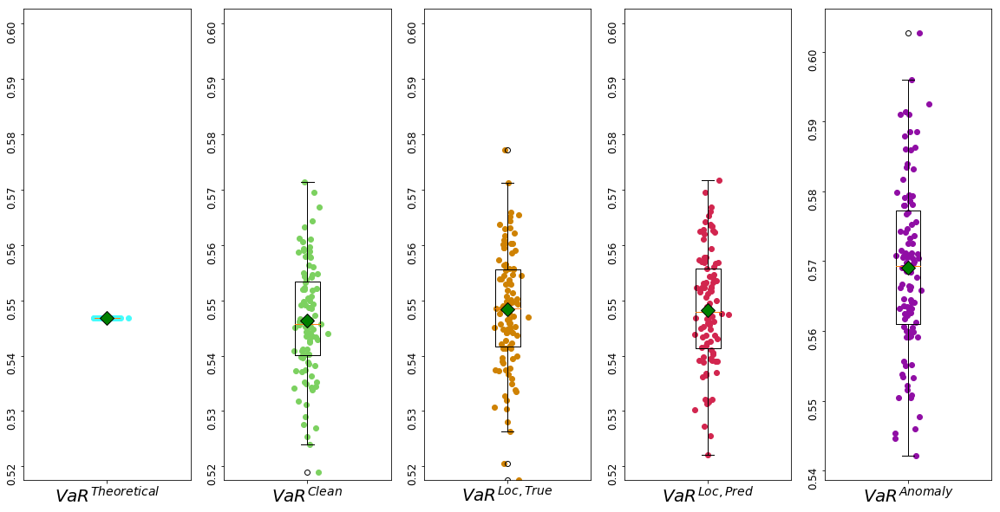

In [39]:
clevels= np.linspace(0.,1.,5)
x = np.random.normal(1,0.04,VaREstimation.shape[0])
plt.figure(figsize=(20,10))
meanlineprops = dict(linestyle='-.', linewidth=3, color='purple')
meanpointprops = dict(marker='D', markersize=12,markeredgecolor='black',
                      markerfacecolor='green')


plt.subplot(1,5,1)
y = VaREstimation.Theo.values.reshape(-1,1)
plt.boxplot(y,showmeans=True,meanprops=meanpointprops)
plt.scatter(x,y,c=cmap(clevels[-1]))
plt.ylim((minBoxy,maxBoxy))
plt.tick_params(axis='y', labelrotation=90,labelsize=12)
plt.tick_params(axis='y', labelrotation=90,labelsize=12)
plt.xticks([1],['$VaR^{Theoretical}$'],fontsize=20)


plt.subplot(1,5,2)
y = VaREstimation.Clean.values.reshape(-1,1)
plt.boxplot(y,showmeans=True,meanprops=meanpointprops)
plt.scatter(x,y,c=cmap(clevels[-2]))
plt.ylim((minBoxy,maxBoxy))
plt.tick_params(axis='y', labelrotation=90,labelsize=12)
plt.xticks([1],['$VaR^{Clean}$'],fontsize=20)

plt.subplot(1,5,3)
y = VaREstimation.BFTrue.values.reshape(-1,1)
plt.boxplot(y,showmeans=True,meanprops=meanpointprops)
plt.scatter(x,y,c=cmap(clevels[-3]))
plt.ylim((minBoxy,maxBoxy))
plt.tick_params(axis='y', labelrotation=90,labelsize=12)
plt.xticks([1],['$VaR^{Loc,True}$'],fontsize=20)


plt.subplot(1,5,4)
y = VaREstimation.BFPred.values.reshape(-1,1)
plt.boxplot(y,showmeans=True,meanprops=meanpointprops)
plt.scatter(x,y,c=cmap(clevels[-4]))
plt.ylim((minBoxy,maxBoxy))
plt.tick_params(axis='y', labelrotation=90,labelsize=12)
plt.xticks([1],['$VaR^{Loc,Pred}$'],fontsize=20)

plt.subplot(1,5,5)
y = VaREstimation.Ano.values.reshape(-1,1)

plt.boxplot(y,showmeans=True,meanprops=meanpointprops)
plt.scatter(x,y,c=cmap(clevels[0]))
#plt.ylim((minBoxy,maxBoxy))
plt.tick_params(axis='y', labelrotation=90,labelsize=12)

plt.xticks([1],['$VaR^{Anomaly}$'],fontsize=20)


plt.savefig(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\Boxplots\boxVaRPortfolio99.png')
plt.show()

In [20]:
ErrorVaRcsv = pd.DataFrame(columns = ['Clean','Ano','BF. True Loc.', 'BF. Pred Loc.'],index=['Absolute Error','Relative Error'])
for i,meth in enumerate(ErrorVaRcsv.columns):
    for j in range(2):
        if j == 0:
            ErrorVaRcsv.iloc[j,i] = np.mean(abs(VaREstimation.iloc[:,i+1] - VaREstimation.iloc[:,0]) )
        elif j == 1:
            ErrorVaRcsv.iloc[j,i] = np.mean(abs(VaREstimation.iloc[:,i+1] - VaREstimation.iloc[:,0])/ VaREstimation.iloc[:,0] )
ErrorVaRcsv

,Clean,Ano,BF. True Loc.,BF. Pred Loc.
Absolute Error,0.007995,0.02235,0.008596,0.008622
Relative Error,0.01462,0.04087,0.01572,0.015767


In [21]:
VaRsummarize = pd.DataFrame(columns = ['Theo','Clean','Ano','BF. True Loc.', 'BF. Pred Loc.'],index=['Mean','Standard Deviation'])
for i,meth in enumerate(VaRsummarize.columns):
        VaRsummarize.iloc[0,i] = np.mean(VaREstimation.iloc[:,i])
        VaRsummarize.iloc[1,i] = np.std(VaREstimation.iloc[:,i])

In [22]:
VaRsummarize

,Theo,Clean,Ano,BF. True Loc.,BF. Pred Loc.
Mean,0.546851,0.5463,0.569015,0.548392,0.54827
Standard Deviation,0.0,0.010105,0.012268,0.010739,0.010832


## Error VaR wrt contamination rate

In [23]:
ContamRate = [5,15,76,153,307]
nContam = len(ContamRate)
nbsim = 50
ErrorsOnCovAbs = pd.DataFrame(columns=['Theo','Clean','Ano','BFTrue','BFPred','AnoNumber'],index=np.arange(nbsim*nContam))
ErrorsOnCovRel = pd.DataFrame(columns=['Theo','Clean','Ano','BFTrue','BFPred','AnoNumber'],index=np.arange(nbsim*nContam))
VaREstimation = pd.DataFrame(columns=['Theo','Clean','Ano','BFTrue','BFPred','AnoNumber'],index=np.arange(nbsim*nContam))


alpha

0.99

In [43]:
for cRidx,AnoNumber in enumerate(ContamRate):
    print('-------------------------------------------------------------------------------\n')
    print(f'-----------------------------AnoNumber = {AnoNumber}-------------------------\n')
    print('-------------------------------------------------------------------------------\n')
    F1Locdf = pd.DataFrame(columns=[str(i) for i in range(nStocks)],index=[ i for i in range(nbsim)])

    for isimul in range(nbsim):
        print(f'--------------------isimul{isimul}--------------------')

        # Path Simulation 
        stocks,time = GBMsimulator(isimul,S0,mu,sigma,Cov,T,N)
        dt = time

        StocksDFTrain = pd.DataFrame(stocks[:,:])
        n,d = StocksDFTrain.shape
        dfTSwAnomalyTrain,dfTSLabelTrain = AnomalyGeneratorDF(StocksDFTrain,AnoNumber,windowSize,alpha,upBound)
        dfTSLabelidx = getIdxAnomdf(n,d)
        BFPredTs = np.zeros((n,d))
        BFTrueTs = np.zeros((n,d))
        for I in range(nStocks):

            # Anomaly Location 

            s  = StocksDFTrain.iloc[I,:]
            sAno = dfTSwAnomalyTrain.iloc[I,:].values
            y = dfTSLabelTrain.iloc[I,:].values
            yidx = dfTSLabelidx.iloc[I,:].values
            # slicing the TS to fit the format of ts handled by the model
            nsize = d//206 + 1
            dfSliced = pd.DataFrame(columns = np.concatenate([np.arange(206),['TrackID']]),index=np.arange(nsize),dtype=float)
            dfySliced = pd.DataFrame(columns=np.concatenate([np.arange(206),['TrackID']]),index=np.arange(nsize),dtype=float)
            dfyidxSliced =  pd.DataFrame(columns=np.concatenate([np.arange(206),['TrackID']]),index=np.arange(nsize),dtype=float)
            dfSliced['TrackID'] = np.arange(nsize)
            dfySliced['TrackID'] = np.arange(nsize)
            dfyidxSliced['TrackID'] = np.arange(nsize)
            dfySliced['NbAno'] = np.zeros(nsize)

            for i in range(nsize-1):
                dfSliced.iloc[i,:-1] = sAno[i*206:(i+1)*206]
                dfySliced.iloc[i,:-2] = y[i*206:(i+1)*206]
                dfyidxSliced.iloc[i,:-1] = yidx[i*206:(i+1)*206]

            dfSliced.iloc[nsize-1,:-1] = sAno[-206:]
            dfySliced.iloc[nsize-1,:-2] = y[-206:]
            dfyidxSliced.iloc[nsize-1,:-1] =  yidx[-206:]
            dfySliced['NbAno'] = dfySliced.iloc[:,:-2].sum(axis=1)
            #########################################################################################################


            dfySlicedAno = dfySliced[dfySliced.NbAno!=0] # Keep only ts with anomalies 
            dfyidxSlicedAno = dfyidxSliced[dfyidxSliced.TrackID.isin(dfySlicedAno.TrackID)]
            dfSlicedAno = dfSliced[dfSliced.TrackID.isin(dfySlicedAno.TrackID)] # Keep only ts with anomalies 
            yslicedloc = np.array([list(dfySlicedAno.iloc[i,:-2]).index(1.) for i in range(dfySlicedAno.shape[0]) ]) # ano location
            yslicedidxloc = dfyidxSlicedAno.values
            norms_train, norms_test =  modelPCALocation(Xtrain,dfSlicedAno.iloc[:,:-1].values,k) # features engineering

            pred_loc_test = dummyprediction(norms_test)
            ScoresTestPCA = EvaluationPred(yPred = pred_loc_test,yTrue=yslicedloc)
            F1Locdf.iloc[isimul,I] = f1_score(yslicedloc,pred_loc_test,average='weighted')

            print(f'True Ano Location :{yslicedloc} ')
            print(f'Pred Ano Location :{pred_loc_test} ')
            printRes(ScoresTestPCA,'Test')






            idxTrue2impute = idxfromSliceToOriginal(yslicedloc,yslicedidxloc)
            idxPred2impute = idxfromSliceToOriginal(pred_loc_test,yslicedidxloc)

            TRUELOC = returnLOC(dfTSLabelTrain.iloc[I,:].values)
            print('AnoLoc in TS Original')
            print(TRUELOC)
            print(idxTrue2impute)
            print(idxPred2impute)
            print('\n')
            if len(idxPred2impute)==len(TRUELOC):
                XBF_predLoc,_ = ImputeAfterAnoLocation(sAno,idxPred2impute)
                XBF_TrueLoc,_ = ImputeAfterAnoLocation(sAno,idxTrue2impute)
                muHatBFPred,sigmaHatBFPred = ParamsEstimation(XBF_predLoc)
                muHatBFTrue,sigmaHatBFTrue = ParamsEstimation(XBF_TrueLoc)

            else :
                idxImputTrue = idxAnonotInTest(TRUELOC,yslicedloc)
                sAnoCorrect = deepcopy(sAno)
                for i in idxImputTrue:
                    sAnoCorrect[i] = s[i]

                XBF_predLoc,_ = ImputeAfterAnoLocation(sAnoCorrect,idxPred2impute)
                XBF_TrueLoc,_ = ImputeAfterAnoLocation(sAnoCorrect,idxTrue2impute)

                muHatBFPred,sigmaHatBFPred = ParamsEstimation(XBF_predLoc)
                muHatBFTrue,sigmaHatBFTrue = ParamsEstimation(XBF_TrueLoc)
            BFPredTs[I,:] = XBF_predLoc
            BFTrueTs[I,:] = XBF_TrueLoc

            BFtrueLocParams['Muhat'].iloc[isimul,I] = muHatBFTrue
            BFtrueLocParams['Sigmahat'].iloc[isimul,I] = sigmaHatBFTrue

            BFpredLocParams['Muhat'].iloc[isimul,I] = muHatBFPred
            BFpredLocParams['Sigmahat'].iloc[isimul,I] = sigmaHatBFPred

            muHatClean,sigmaHatClean = ParamsEstimation(s)
            CleanParams['Muhat'].iloc[isimul,I] = muHatClean
            CleanParams['Sigmahat'].iloc[isimul,I] = sigmaHatClean

            muHatAno,sigmaHatAno = ParamsEstimation(sAno)
            AnoParams['Muhat'].iloc[isimul,I] = muHatAno
            AnoParams['Sigmahat'].iloc[isimul,I] = sigmaHatAno

            muTheo,sigmaTheo = (mu[I]-sigma[I]**2/2)*dt,np.sqrt(sigma[I]**2*dt)
            TheoParams['Muhat'].iloc[isimul,I] =muTheo
            TheoParams['Sigmahat'].iloc[isimul,I] = sigmaTheo
            print('\n')

        CovClean = computeCov(StocksDFTrain.values,sigma)
        CovAno = computeCov(dfTSwAnomalyTrain.values,sigma)
        CovBFTrue = computeCov(BFTrueTs,sigma)
        CovBFPred = computeCov(BFPredTs,sigma)

        VaRTheo = VaRonReturns(TheoParams['Muhat'].iloc[isimul,:].values,Cov,alpha)
        VaRClean = VaRonReturns(CleanParams['Muhat'].iloc[isimul,:].values,CovClean,alpha)
        VaRAno = VaRonReturns(AnoParams['Muhat'].iloc[isimul,:].values,CovAno,alpha)
        VaRTrueBF = VaRonReturns(BFtrueLocParams['Muhat'].iloc[isimul,:].values,CovBFTrue,alpha)
        VaRPredBF = VaRonReturns(BFpredLocParams['Muhat'].iloc[isimul,:].values,CovBFPred,alpha)

        VaREstimation.iloc[isimul+cRidx*nbsim,:] = np.array([VaRTheo,VaRClean,VaRAno,VaRTrueBF,VaRPredBF,AnoNumber] )


        ErrorsOnCovAbs.iloc[isimul+cRidx*nbsim,:] = [npl.norm(Cov-Cov),
                                   npl.norm(CovClean-Cov),
                                   npl.norm(CovAno-Cov),
                                   npl.norm(CovBFTrue-Cov),
                                        npl.norm(CovBFPred-Cov),AnoNumber]
        ErrorsOnCovRel.iloc[isimul+cRidx*nbsim,:] = [npl.norm(Cov-Cov)/npl.norm(Cov),
                                   npl.norm(CovClean-Cov)/npl.norm(Cov),
                                   npl.norm(CovAno-Cov)/npl.norm(Cov),
                                   npl.norm(CovBFTrue-Cov)/npl.norm(Cov),
                                        npl.norm(CovBFPred-Cov)/npl.norm(Cov),AnoNumber]








-------------------------------------------------------------------------------

-----------------------------AnoNumber = 5-------------------------

-------------------------------------------------------------------------------

--------------------isimul0--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[90  0 63 84] 
Pred Ano Location :[ 90 122  76  84] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[296, 412, 681, 908, 941]
[296 412 681 908]
[296 534 694 908]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3264.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 115  92 149] 
Pred Ano Location :[144 115  92 149] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[128, 527, 710, 728, 1479]
[ 128  527  710 1479]
[ 144  527  710 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]


True Ano Location :[ 98  38   1 191 123] 
Pred Ano Location :[ 98  38   1 191 123] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[510, 656, 825, 1221, 1453]
[ 510  656  825 1221 1453]
[ 510  656  825 1221 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4026.21it/s]


True Ano Location :[179  19 148  82] 
Pred Ano Location :[179  19 148  82] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[179, 431, 517, 766, 906]
[179 431 766 906]
[179 431 766 906]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[110   1  59 125   3] 
Pred Ano Location :[110   1  59 125   3] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[110, 207, 471, 1155, 1239]
[ 110  207  471 1155 1239]
[ 110  207  471 1155 1239]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3493.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23 199  41 196] 
Pred Ano Location :[ 23 199  81 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[229, 234, 1023, 1071, 1526]
[ 229 1023 1071 1526]
[ 229 1023 1111 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103 115 201 150] 
Pred Ano Location :[186 115 201 150] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[309, 392, 733, 1025, 1180]
[ 309  733 1025 1180]
[ 392  733 1025 1180]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6953.42it/s]


True Ano Location :[ 86 123 168 151  57] 
Pred Ano Location :[ 86 123 168 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[86, 329, 1198, 1387, 1453]
[  86  329 1198 1387 1387]
[  86  329 1198 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5019.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198   0  84 154 163] 
Pred Ano Location :[198   0  84 154  52] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[198, 206, 496, 1184, 1493]
[ 198  206  496 1184 1493]
[ 198  206  496 1184 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  59  86 121  27] 
Pred Ano Location :[ 71  93  86 121  27] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[277, 471, 505, 910, 1357]
[ 277  471  910 1357 1357]
[ 277  505  910 1357 1357]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[132  23  85] 
Pred Ano Location :[132  23 161] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[544, 847, 1115, 1176, 1191]
[ 544  847 1115]
[ 544  847 1191]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 55 103  49  18] 
Pred Ano Location :[ 55 103  49  18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 515, 667, 1048, 1053]
[  55  515  667 1048]
[  55  515  667 1048]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 30 118   7  53 176  82] 
Pred Ano Location :[ 30 118   7   7 176  82] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.75
F1-score: 0.7777777777777777

AnoLoc in TS Original
[236, 530, 625, 1083, 1412]
[ 236  530  625 1083 1412 1412]
[ 236  530  625 1037 1412 1412]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  11  89 130] 
Pred Ano Location :[169  11  89 130] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[47, 169, 217, 501, 1160]
[  47  217  501 1160]
[ 169  217  501 1160]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  4  90 116 188] 
Pred Ano Location :[  4  90 116 188] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[4, 502, 520, 734, 1012]
[   4  502  734 1012]
[   4  502  734 1012]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77 166 185] 
Pred Ano Location :[ 77 166 193] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[283, 294, 578, 1515, 1523]
[ 283  578 1515]
[ 283  578 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 65 119   5  38 142] 
Pred Ano Location :[ 65 119   5  38 142] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[65, 325, 417, 862, 1172]
[  65  325  417  862 1172]
[  65  325  417  862 1172]






100%|██████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 1940.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 16] 
Pred Ano Location :[34 16] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[18, 34, 135, 840, 971]
[ 18 840]
[ 34 840]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2901.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5   0 158] 
Pred Ano Location :[ 11 118 158] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[5, 206, 324, 398, 570]
[  5 206 570]
[ 11 324 570]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[  2  64 126 155  61] 
Pred Ano Location :[  2  64 126 155  61] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[208, 476, 561, 1156, 1391]
[ 208  476 1156 1391 1391]
[ 208  476 1156 1391 1391]




0.055516589342753574
0.0012826069159039433
0.0570018033478052
0.0011972704379495005
0.05989256693066075
0.0011972704379495005
0.05763434657664533
0.0011972704379495005
0.05856466926579207
0.0011972704379495005
--------------------isimul1--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  35  90 192  98] 
Pred Ano Location :[168  35 128 192  98] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[168, 447, 708, 746, 1428]
[ 168  447  708 1428 1428]
[ 168  447  746 1428 1428]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 92 131 134 189] 
Pred Ano Location :[ 92 131 134 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[504, 749, 812, 1164, 1519]
[ 504  749 1164 1519]
[ 504  749 1164 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5013.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[132   7   9 128  34] 
Pred Ano Location :[132   7  18 128  34] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[132, 625, 833, 842, 1364]
[ 132  625  833 1364 1364]
[ 132  625  842 1364 1364]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  82 158] 
Pred Ano Location :[114  82 158] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[443, 526, 700, 1488, 1504]
[ 443  700 1488]
[ 526  700 1488]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175 198  16  81 152] 
Pred Ano Location :[175  16  16  81 101] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.5
F1-score: 0.5333333333333333

AnoLoc in TS Original
[175, 610, 634, 905, 1482]
[ 175  610  634  905 1482]
[ 175  428  634  905 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9316.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[197  80  14 171  77] 
Pred Ano Location :[197  80 118 171  77] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[197, 698, 1044, 1148, 1407]
[ 197  698 1044 1407 1407]
[ 197  698 1148 1407 1407]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  30 159 160] 
Pred Ano Location :[135  30 159 161] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 236, 983, 1190, 1191]
[ 135  236  983 1190]
[ 135  236  983 1191]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 129 178  86] 
Pred Ano Location :[135 129 178  93] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 541, 796, 1322, 1329]
[ 135  541  796 1322]
[ 135  541  796 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5011.12it/s]


True Ano Location :[ 18  64 104 109  53] 
Pred Ano Location :[ 18  64 104 109  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[430, 682, 928, 1139, 1289]
[ 430  682  928 1139 1289]
[ 430  682  928 1139 1289]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5113.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  25 113 203  11] 
Pred Ano Location :[ 73  23 113 203  11] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[166, 231, 937, 1233, 1247]
[ 166  231  937 1233 1247]
[  73  229  937 1233 1247]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6633.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[57 93  8] 
Pred Ano Location :[95 93  8] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[263, 301, 505, 536, 1244]
[ 263  505 1244]
[ 301  505 1244]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[141 194  31  21 168] 
Pred Ano Location :[141 194  31  21 168] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 606, 855, 1257, 1498]
[ 141  606  855 1257 1498]
[ 141  606  855 1257 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4533.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120  36  44   5  34] 
Pred Ano Location :[120 127  44 205  34] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[120, 242, 662, 829, 1064]
[ 120  242  662  829 1064]
[ 120  333  662 1029 1064]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[172  73   3 152] 
Pred Ano Location :[205  73   3 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[172, 205, 279, 415, 1482]
[ 172  279  415 1482]
[ 205  279  415 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105  48 147 169] 
Pred Ano Location :[105  90 147 169] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[311, 666, 708, 971, 1199]
[ 311  666  971 1199]
[ 311  708  971 1199]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5252.07it/s]


True Ano Location :[ 88  34  70 175  81] 
Pred Ano Location :[ 88  34  70 175  81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[88, 446, 1100, 1411, 1422]
[  88  446 1100 1411 1411]
[  88  446 1100 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4010.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[136 183 132 144] 
Pred Ano Location :[136 183 150 144] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[136, 801, 956, 974, 1474]
[ 136  801  956 1474]
[ 136  801  974 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7962.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41 82 59 18] 
Pred Ano Location :[43 82 59 18] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[659, 661, 906, 1089, 1254]
[ 659  906 1089 1254]
[ 661  906 1089 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  63  57 185] 
Pred Ano Location :[205 124  57 185] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[47, 269, 1293, 1317, 1515]
[  47  269 1293 1515]
[ 205  330 1293 1515]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 15  37  38 193] 
Pred Ano Location :[ 15  37  38 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[15, 243, 404, 1274, 1523]
[  15  243 1274 1523]
[  15  243 1274 1523]




0.055516589342753574
0.0012826069159039433
0.05546058035117044
0.0013743626706936103
0.05936191754136636
0.0013743626706936103
0.05672010054053928
0.0013743626706936103
0.05693781629311823
0.0013743626706936103
--------------------isimul2--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  9 87] 
Pred Ano Location :[ 12   9 102] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[12, 175, 421, 1117, 1132]
[  12  421 1117]
[  12  421 1132]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  23 112] 
Pred Ano Location :[ 30  25 112] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[442, 641, 643, 712, 1442]
[ 442  641 1442]
[ 442  643 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5917.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  15 105  74 113  19] 
Pred Ano Location :[ 29  15 105  74 138  44] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[29, 221, 517, 692, 1349]
[  29  221  517  692 1349 1349]
[  29  221  517  692 1374 1374]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  72  99  78 198] 
Pred Ano Location :[ 53  72  99 102 198] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[671, 896, 1129, 1314, 1528]
[ 671  896 1129 1314 1528]
[ 671  896 1129 1338 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5983.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  53 164] 
Pred Ano Location :[ 35 173 205] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[241, 465, 585, 988, 1029]
[241 465 988]
[ 241  585 1029]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[167 121 186  54 201] 
Pred Ano Location :[167 121 186  54 201] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[167, 533, 804, 1290, 1531]
[ 167  533  804 1290 1531]
[ 167  533  804 1290 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9986.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126 114  78  84 136] 
Pred Ano Location :[126  58  78 157 136] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[538, 732, 902, 1320, 1466]
[ 538  732  902 1320 1466]
[ 538  676  902 1393 1466]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5223.29it/s]


True Ano Location :[157 202 126 115  45] 
Pred Ano Location :[157 202 126 115  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[157, 408, 538, 939, 1075]
[ 157  408  538  939 1075]
[ 157  408  538  939 1075]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148 134 120 167] 
Pred Ano Location :[123 134 183 167] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[148, 752, 944, 1007, 1497]
[ 148  752  944 1497]
[ 123  752 1007 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]


True Ano Location :[ 28 169 187  28] 
Pred Ano Location :[ 28 169 187  28] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 375, 1011, 1264, 1276]
[  28  375 1011 1264]
[  28  375 1011 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  18 152   2] 
Pred Ano Location :[135 138 152   2] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[135, 224, 344, 770, 826]
[135 224 770 826]
[135 344 770 826]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  41 194 118] 
Pred Ano Location :[  1  53  90 118] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[1, 659, 671, 1224, 1448]
[   1  659 1224 1448]
[   1  671 1120 1448]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[137 150   0  59] 
Pred Ano Location :[137 150   0  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[137, 562, 618, 1089, 1116]
[ 137  562  618 1089]
[ 137  562  618 1089]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62  40  15   9 103] 
Pred Ano Location :[ 62  40  15 197 103] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[268, 658, 839, 1245, 1433]
[ 268  658  839 1245 1433]
[ 268  658  839 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4964.85it/s]


True Ano Location :[196 164  53 147  53] 
Pred Ano Location :[196 164  53 147  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 370, 671, 1383, 1484]
[ 196  370  671 1383 1383]
[ 196  370  671 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5539.47it/s]


True Ano Location :[150 191 127  60 161  67] 
Pred Ano Location :[150 191 127  60 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[150, 603, 951, 1090, 1397]
[ 150  603  951 1090 1397 1397]
[ 150  603  951 1090 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4987.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 80 84 40 11] 
Pred Ano Location :[ 38 162  84 105  32] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[450, 904, 1114, 1276, 1341]
[ 450  904 1114 1276 1341]
[ 450  986 1114 1341 1362]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 26 33] 
Pred Ano Location :[76 26 33] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[240, 282, 348, 644, 1063]
[ 240  644 1063]
[ 282  644 1063]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[ 66  72  81 164] 
Pred Ano Location :[ 66  72  81 164] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[684, 728, 1102, 1317, 1494]
[ 684 1102 1317 1494]
[ 684 1102 1317 1494]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[183  38  23 190] 
Pred Ano Location :[183  38  23 190] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[183, 244, 292, 1053, 1520]
[ 183  244 1053 1520]
[ 183  244 1053 1520]




0.055516589342753574
0.0012826069159039433
0.05304663540038104
0.0012973622771791605
0.05412202609418556
0.0012973622771791605
0.05310006755579752
0.0012973622771791605
0.05396722503435768
0.0012973622771791605
--------------------isimul3--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[  1 184 115  76  59] 
Pred Ano Location :[  1 184 115  76  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[1, 390, 527, 694, 883]
[  1 390 527 694 883]
[  1 390 527 694 883]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4674.88it/s]


True Ano Location :[  3   4  94 171  77] 
Pred Ano Location :[  3   4  94 171  77] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 828, 1124, 1407, 1519]
[   3  828 1124 1407 1407]
[   3  828 1124 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 112 137 168] 
Pred Ano Location :[ 48 112 184 168] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[48, 524, 755, 802, 1498]
[  48  524  755 1498]
[  48  524  802 1498]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 55  33 200   9] 
Pred Ano Location :[ 55  33 200   9] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 651, 754, 1230, 1245]
[  55  651 1230 1245]
[  55  651 1230 1245]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[100 122  23 162 184] 
Pred Ano Location :[100 122  23 162 184] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[100, 328, 641, 1192, 1514]
[ 100  328  641 1192 1514]
[ 100  328  641 1192 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3523.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133  47 195 101] 
Pred Ano Location :[133  47 195 145] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[133, 871, 909, 1431, 1475]
[ 133  871 1431 1431]
[ 133  871 1431 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4980.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195  15  68 137 137] 
Pred Ano Location :[149  15  68 137 137] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[195, 633, 892, 1167, 1467]
[ 195  633  892 1167 1467]
[ 149  633  892 1167 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4318.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  28 100   4] 
Pred Ano Location :[148   0 100   4] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[115, 148, 646, 924, 1240]
[ 115  646  924 1240]
[ 148  618  924 1240]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4111.06it/s]


True Ano Location :[ 37  76 158  64] 
Pred Ano Location :[ 37  76 158  64] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[243, 387, 694, 1394, 1401]
[ 243  694 1394 1394]
[ 243  694 1394 1394]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 73 151 150 153 116  22] 
Pred Ano Location :[ 73 151 150 153 116  22] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[73, 357, 562, 771, 1352]
[  73  357  562  771 1352 1352]
[  73  357  562  771 1352 1352]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178 102  61  88] 
Pred Ano Location :[178 102 171  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[178, 308, 885, 995, 1324]
[ 178  308  885 1324]
[ 178  308  995 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4803.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181  47  64 119  29] 
Pred Ano Location :[181  47  64 114  29] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[387, 459, 682, 943, 1265]
[ 387  459  682  943 1265]
[ 387  459  682  938 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]


True Ano Location :[119 114 109 111  17] 
Pred Ano Location :[119 114 109 111  17] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 526, 1139, 1161, 1347]
[ 119  526 1139 1347 1347]
[ 119  526 1139 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4015.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 128  82 131] 
Pred Ano Location :[ 66 128 175 131] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[66, 746, 1112, 1205, 1461]
[  66  746 1112 1461]
[  66  746 1205 1461]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 62  80  96 159] 
Pred Ano Location :[ 62  80  96 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[62, 286, 300, 714, 1489]
[  62  286  714 1489]
[  62  286  714 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 24  13 202 180  86] 
Pred Ano Location :[ 24  24 202 180  86] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.7
F1-score: 0.7333333333333333

AnoLoc in TS Original
[24, 219, 230, 614, 1416]
[  24  219  614 1416 1416]
[  24  230  614 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4832.15it/s]


True Ano Location :[ 58  65 131  45 205] 
Pred Ano Location :[ 58  65 131  45 205] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[676, 889, 1161, 1281, 1535]
[ 676  889 1161 1281 1535]
[ 676  889 1161 1281 1535]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37 121  23 198] 
Pred Ano Location :[ 37 163  23 198] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[449, 739, 781, 1053, 1528]
[ 449  739 1053 1528]
[ 449  781 1053 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4093.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101 150 194 184] 
Pred Ano Location :[168 150 194 184] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[307, 374, 768, 1224, 1514]
[ 307  768 1224 1514]
[ 374  768 1224 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[165  16  65  55] 
Pred Ano Location :[165  16  65  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[165, 222, 477, 1085, 1161]
[ 165  222  477 1085]
[ 165  222  477 1085]




0.055516589342753574
0.0012826069159039433
0.05413566045379116
0.0009601146663325215
0.058295623193592466
0.000953433682924616
0.05481705714671303
0.000953433682924616
0.05477082565233361
0.000953433682924616
--------------------isimul4--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 94 133 116 144  50] 
Pred Ano Location :[ 94 133 116 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[300, 751, 940, 978, 1380]
[ 300  751  940 1380 1380]
[ 300  751  940 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4790.21it/s]


True Ano Location :[ 88  71 121 193 171] 
Pred Ano Location :[ 88  71 121 193 171] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[88, 277, 739, 1223, 1501]
[  88  277  739 1223 1501]
[  88  277  739 1223 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3324.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37  45  77 137] 
Pred Ano Location :[ 37  45 205 137] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[37, 251, 901, 1029, 1467]
[  37  251  901 1467]
[  37  251 1029 1467]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[128 129 137 204 157  63] 
Pred Ano Location :[128 129 137 204 157  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[128, 335, 549, 1028, 1393]
[ 128  335  549 1028 1393 1393]
[ 128  335  549 1028 1393 1393]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[136  69 129  35] 
Pred Ano Location :[195  69 129  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[548, 607, 1099, 1104, 1365]
[ 548 1099 1365 1365]
[ 607 1099 1365 1365]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144 168  14 176 161  67] 
Pred Ano Location :[144 168  14  54 161  67] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[350, 786, 838, 1206, 1397]
[ 350  786  838 1206 1397 1397]
[ 350  786  838 1084 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5970.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93  88 197 144 198 104] 
Pred Ano Location :[ 93  88  76 144 198 104] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[93, 294, 1021, 1174, 1434]
[  93  294 1021 1174 1434 1434]
[  93  294  900 1174 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3989.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46 151   4 114] 
Pred Ano Location :[ 46 202   4 114] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[46, 357, 408, 828, 1144]
[  46  357  828 1144]
[  46  408  828 1144]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4027.18it/s]


True Ano Location :[ 32 121 120  93] 
Pred Ano Location :[ 32 121 120  93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[238, 317, 533, 738, 1329]
[ 238  533  738 1329]
[ 238  533  738 1329]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169 167  23  36] 
Pred Ano Location :[175 167  23  36] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[169, 175, 579, 641, 860]
[169 579 641 860]
[175 579 641 860]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 122  45  92] 
Pred Ano Location :[  2 200  45  92] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[2, 534, 612, 1075, 1328]
[   2  534 1075 1328]
[   2  612 1075 1328]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170 118  49  88] 
Pred Ano Location :[170 204  49  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[376, 736, 822, 1079, 1324]
[ 376  736 1079 1324]
[ 376  822 1079 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5983.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154  94 166 158 193  99] 
Pred Ano Location :[154  94 166 158  93 115] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[154, 300, 578, 1188, 1429]
[ 154  300  578 1188 1429 1429]
[ 154  300  578 1188 1329 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3961.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  54 104 159] 
Pred Ano Location :[115  54 169 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[321, 466, 722, 787, 1489]
[ 321  466  722 1489]
[ 321  466  787 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5011.12it/s]


True Ano Location :[ 45 192 182 127  33] 
Pred Ano Location :[ 45 192 182 127  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[251, 604, 800, 1363, 1378]
[ 251  604  800 1363 1363]
[ 251  604  800 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3708.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[39 93 90 49] 
Pred Ano Location :[39 93 90 66] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[39, 299, 502, 873, 890]
[ 39 299 502 873]
[ 39 299 502 890]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2957.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[184  39 158] 
Pred Ano Location :[184 180 158] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[802, 863, 1004, 1028, 1488]
[ 802  863 1488]
[ 802 1004 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144 185   1 166] 
Pred Ano Location :[144 185 199 166] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[144, 391, 1031, 1229, 1496]
[ 144  391 1031 1496]
[ 144  391 1229 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3993.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  73  55 157] 
Pred Ano Location :[162 163  55 157] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[162, 485, 575, 879, 1187]
[ 162  485  879 1187]
[ 162  575  879 1187]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  47 126] 
Pred Ano Location :[161 132 142] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[161, 871, 956, 1456, 1472]
[ 161  871 1456]
[ 161  956 1472]




0.055516589342753574
0.0012826069159039433
0.056121792848506526
0.001145010390828672
0.0598315571783904
0.001145010390828672
0.053851668100463594
0.001145010390828672
0.053933253434293935
0.001145010390828672
--------------------isimul5--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  84 101 190] 
Pred Ano Location :[189  84 180 190] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[189, 290, 513, 592, 1014]
[ 189  290  513 1014]
[ 189  290  592 1014]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3353.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 150  21  42] 
Pred Ano Location :[166 150  21  47] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 768, 845, 1072, 1077]
[ 166  768  845 1072]
[ 166  768  845 1077]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72 148  16  52] 
Pred Ano Location :[ 72 148  16 161] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[278, 560, 634, 1082, 1191]
[ 278  560  634 1082]
[ 278  560  634 1191]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5532.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33 137  38  56  99   5] 
Pred Ano Location :[ 33 137 200  47  99   5] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[33, 343, 450, 880, 1335]
[  33  343  450  880 1335 1335]
[  33  343  612  871 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6962.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188 114  17  78  81] 
Pred Ano Location :[188 114  17  78  66] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[188, 320, 635, 1108, 1317]
[ 188  320  635 1108 1317]
[ 188  320  635 1108 1302]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138 102  45  72] 
Pred Ano Location :[151 102  45  72] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[550, 563, 926, 1075, 1308]
[ 550  926 1075 1308]
[ 563  926 1075 1308]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64 162  23] 
Pred Ano Location :[ 80 162  23] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[64, 80, 368, 1053, 1108]
[  64  368 1053]
[  80  368 1053]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5069.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[61 45 51 46 36] 
Pred Ano Location :[61 45 82 46 72] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[267, 869, 1081, 1282, 1366]
[ 267  869 1081 1282 1366]
[ 267  869 1112 1282 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5950.77it/s]


True Ano Location :[143   1 193 182 189  95] 
Pred Ano Location :[143   1 193 182 189  95] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[349, 413, 811, 1212, 1425]
[ 349  413  811 1212 1425 1425]
[ 349  413  811 1212 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]


True Ano Location :[197  95 110 167] 
Pred Ano Location :[197  95 110 167] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[403, 713, 934, 960, 1197]
[ 403  713  934 1197]
[ 403  713  934 1197]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 76 195 143 194 150] 
Pred Ano Location :[ 76 195 143 194 150] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 607, 967, 1224, 1480]
[ 282  607  967 1224 1480]
[ 282  607  967 1224 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5025.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23 132  37 198  62] 
Pred Ano Location :[ 61 132  37 135  62] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[229, 544, 861, 1228, 1298]
[ 229  544  861 1228 1298]
[ 267  544  861 1165 1298]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2998.79it/s]


True Ano Location :[118 144  30] 
Pred Ano Location :[118 144  30] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 184, 762, 1266, 1297]
[ 118  762 1266]
[ 118  762 1266]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3939.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  99  20 121] 
Pred Ano Location :[ 40 191  20 121] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[40, 305, 397, 432, 739]
[ 40 305 432 739]
[ 40 397 432 739]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.93it/s]


True Ano Location :[ 8 88 45] 
Pred Ano Location :[ 8 88 45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[214, 385, 706, 710, 1281]
[ 214  706 1281]
[ 214  706 1281]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4976.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  17  22 105  11] 
Pred Ano Location :[  9  17  64 105  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[421, 841, 1052, 1094, 1341]
[ 421  841 1052 1341 1341]
[ 421  841 1094 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5014.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123 117  11   2  64] 
Pred Ano Location :[123 117  21 158  64] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[123, 529, 629, 1238, 1394]
[ 123  529  629 1238 1394]
[ 123  529  639 1394 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97 197 117 204] 
Pred Ano Location :[ 97 126 117 204] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[97, 126, 609, 735, 1234]
[  97  609  735 1234]
[  97  538  735 1234]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  47 100  83] 
Pred Ano Location :[ 17 123 100  83] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[17, 253, 329, 924, 1319]
[  17  253  924 1319]
[  17  329  924 1319]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5338.98it/s]


True Ano Location :[173  71  36 193 141] 
Pred Ano Location :[173  71  36 193 141] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[173, 483, 860, 1223, 1471]
[ 173  483  860 1223 1471]
[ 173  483  860 1223 1471]




0.055516589342753574
0.0012826069159039433
0.05709633714388837
0.0012828021056746105
0.05984879560844924
0.0012828021056746105
0.05732576546333097
0.0012828021056746105
0.05706703517266248
0.0012828021056746105
--------------------isimul6--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6003.30it/s]


True Ano Location :[201  70 107 150 122  28] 
Pred Ano Location :[201  70 107 150 122  28] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[407, 482, 725, 974, 1358]
[ 407  482  725  974 1358 1358]
[ 407  482  725  974 1358 1358]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 15 104  61  17 189] 
Pred Ano Location :[ 15 104  61  17 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[15, 310, 679, 1253, 1519]
[  15  310  679 1253 1519]
[  15  310  679 1253 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68   1 157  88] 
Pred Ano Location :[147   1  34  88] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[68, 147, 207, 569, 1118]
[  68  207  569 1118]
[ 147  207  446 1118]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[174 189  91   9 179] 
Pred Ano Location :[174 189  91   9 179] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[174, 807, 915, 1039, 1509]
[ 174  807  915 1039 1509]
[ 174  807  915 1039 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5729.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105 177 178 112] 
Pred Ano Location :[153 177 178 134] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[105, 153, 589, 796, 1442]
[ 105  589  796 1442]
[ 153  589  796 1464]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[79 70 97] 
Pred Ano Location :[79 98 97] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[79, 482, 510, 1127, 1157]
[  79  482 1127]
[  79  510 1127]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[ 28  57 195] 
Pred Ano Location :[ 28  57 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 55, 469, 477, 1525]
[  28  469 1525]
[  28  469 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3563.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61 177 200   8] 
Pred Ano Location :[133  16 200   8] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[61, 133, 383, 1230, 1244]
[  61  383 1230 1244]
[ 133  222 1230 1244]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[191  58  25   7 144] 
Pred Ano Location :[191  58  25   7 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[191, 264, 643, 1243, 1474]
[ 191  264  643 1243 1474]
[ 191  264  643 1243 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9995.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77   7 112 189  84] 
Pred Ano Location :[ 94   7  24 189  84] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[77, 625, 936, 1219, 1320]
[  77  625  936 1219 1320]
[  94  625  848 1219 1320]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 11405.31it/s]


True Ano Location :[120 136  40 155] 
Pred Ano Location :[120 136  40 155] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[120, 162, 548, 658, 979]
[120 548 658 979]
[120 548 658 979]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4818.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  79 144 164 127] 
Pred Ano Location :[ 33  79 144 131 127] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[12, 491, 762, 988, 1157]
[  12  491  762  988 1157]
[  33  491  762  955 1157]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4011.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  32  46  59] 
Pred Ano Location :[114  32  46 175] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[114, 650, 870, 1089, 1205]
[ 114  650  870 1089]
[ 114  650  870 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]


True Ano Location :[ 76  71 107  36] 
Pred Ano Location :[ 76  71 107  36] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 689, 931, 948, 1272]
[ 282  689  931 1272]
[ 282  689  931 1272]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  22 107  67 105] 
Pred Ano Location :[ 30  22 107 199 105] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[30, 434, 931, 1303, 1435]
[  30  434  931 1303 1435]
[  30  434  931 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2885.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  60 202] 
Pred Ano Location :[ 25 153  28] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[118, 192, 884, 977, 1232]
[ 118  884 1232]
[  25  977 1058]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]


True Ano Location :[155  59  23 164] 
Pred Ano Location :[155  59  23 164] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[155, 265, 641, 650, 1194]
[ 155  265  641 1194]
[ 155  265  641 1194]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 164 123  29] 
Pred Ano Location :[144 164 123  29] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[4, 144, 576, 607, 1359]
[   4  576 1359 1359]
[ 144  576 1359 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 184  95 127] 
Pred Ano Location :[ 14 184  97 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[220, 596, 919, 921, 1157]
[ 220  596  919 1157]
[ 220  596  921 1157]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4981.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  13  53 108  14] 
Pred Ano Location :[ 10 158  53 108  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[422, 631, 776, 877, 1344]
[ 422  631  877 1344 1344]
[ 422  776  877 1344 1344]




0.055516589342753574
0.0012826069159039433
0.05513909274292022
0.0012868016307642932
0.059803613070426545
0.0012868016307642932
0.05544696291779652
0.0012868016307642932
0.056164050691871824
0.0012868016307642932
--------------------isimul7--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81  99  34 146] 
Pred Ano Location :[150  99  34 163] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[81, 150, 305, 652, 1476]
[  81  305  652 1476]
[ 150  305  652 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3990.77it/s]


True Ano Location :[183  53 169  48] 
Pred Ano Location :[183  53 169  48] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[389, 465, 481, 993, 1078]
[ 389  465  993 1078]
[ 389  465  993 1078]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 69 116 123  88  85] 
Pred Ano Location :[ 69 116 123  88  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[69, 322, 535, 912, 1115]
[  69  322  535  912 1115]
[  69  322  535  912 1115]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3276.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  74 149 126] 
Pred Ano Location :[ 68 169 149 126] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[68, 280, 375, 973, 1156]
[  68  280  973 1156]
[  68  375  973 1156]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4984.91it/s]


True Ano Location :[ 15 108  39 137 143] 
Pred Ano Location :[ 15 108  39 137 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[15, 520, 657, 1167, 1473]
[  15  520  657 1167 1473]
[  15  520  657 1167 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117 161  28  99   5] 
Pred Ano Location :[117 161  28 149  55] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[117, 367, 1058, 1335, 1385]
[ 117  367 1058 1335 1335]
[ 117  367 1058 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 188   5 165] 
Pred Ano Location :[ 31 188   5 165] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[429, 443, 1218, 1241, 1495]
[ 429 1218 1241 1495]
[ 443 1218 1241 1495]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[202 148  47 121 138] 
Pred Ano Location :[202 148  47 121 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[202, 354, 871, 1151, 1468]
[ 202  354  871 1151 1468]
[ 202  354  871 1151 1468]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34 139  75 131] 
Pred Ano Location :[ 34 139  75  80] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[34, 345, 384, 899, 1461]
[  34  345  899 1461]
[  34  345  899 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4861.55it/s]


True Ano Location :[178 126  18  40] 
Pred Ano Location :[178 126  18  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 538, 636, 864, 974]
[178 538 636 864]
[178 538 636 864]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  50   8 155  61] 
Pred Ano Location :[ 26  50   8 155  61] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[213, 232, 462, 1038, 1391]
[ 213  462 1038 1391 1391]
[ 232  462 1038 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2194.44it/s]


True Ano Location :[  1 146 154] 
Pred Ano Location :[  1 146 154] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[207, 265, 348, 764, 1484]
[ 207  764 1484]
[ 207  764 1484]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 70  53 198 184] 
Pred Ano Location :[ 70  53 198 184] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[276, 386, 465, 816, 1514]
[ 276  465  816 1514]
[ 276  465  816 1514]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[127 113 121  93] 
Pred Ano Location :[127 113 121  93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[333, 525, 593, 945, 1329]
[ 333  525  945 1329]
[ 333  525  945 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5015.91it/s]


True Ano Location :[203 162  14  18 192] 
Pred Ano Location :[203 162  14  18 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[203, 780, 838, 1048, 1522]
[ 203  780  838 1048 1522]
[ 203  780  838 1048 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145  63  76 185] 
Pred Ano Location :[ 70  63  76 185] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[351, 681, 900, 1215, 1224]
[ 351  681  900 1215]
[ 276  681  900 1215]






100%|█████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 10196.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  26 172] 
Pred Ano Location :[116  29 172] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[116, 232, 235, 790, 802]
[116 232 790]
[116 235 790]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5052.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 114  79 135  41] 
Pred Ano Location :[ 30 114  79 135 182] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[30, 320, 697, 1371, 1512]
[  30  320  697 1371 1371]
[  30  320  697 1371 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4633.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  37  52 115  21] 
Pred Ano Location :[161 126  52 115  21] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[161, 449, 1082, 1351, 1477]
[ 161  449 1082 1351 1351]
[ 161  538 1082 1351 1351]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  69  46 201] 
Pred Ano Location :[ 20  69  96 201] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[226, 687, 870, 920, 1531]
[ 226  687  870 1531]
[ 226  687  920 1531]




0.055516589342753574
0.0012826069159039433
0.05688905603794083
0.001123180168520429
0.06273991935707489
0.001123180168520429
0.056790798562639154
0.001123180168520429
0.057009860586238005
0.001123180168520429
--------------------isimul8--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 51  58  71  35 138] 
Pred Ano Location :[ 51  58  71  35 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[463, 676, 895, 1271, 1468]
[ 463  676  895 1271 1468]
[ 463  676  895 1271 1468]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163 111 122] 
Pred Ano Location :[163 150 122] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[163, 196, 729, 768, 1152]
[ 163  729 1152]
[ 163  768 1152]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3677.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157  34  38  14] 
Pred Ano Location :[157  12  38  61] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[363, 652, 1068, 1250, 1297]
[ 363  652 1068 1250]
[ 363  630 1068 1297]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205  63  66 199  35] 
Pred Ano Location :[205 151  66 199  95] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[205, 269, 478, 817, 859]
[205 269 478 817 859]
[205 357 478 817 919]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174  28 168   5] 
Pred Ano Location :[174  28 168 102] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[174, 440, 786, 1035, 1132]
[ 174  440  786 1035]
[ 174  440  786 1132]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164 141 155 193  99] 
Pred Ano Location :[164 182 198 193  99] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[370, 553, 594, 1185, 1429]
[ 370  553 1185 1429 1429]
[ 370  594 1228 1429 1429]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  15] 
Pred Ano Location :[158  56] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[570, 573, 839, 880, 918]
[570 839]
[570 880]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 199  65] 
Pred Ano Location :[119 199 145] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[259, 325, 331, 611, 889]
[259 611 889]
[325 611 969]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4891.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163  49  89 138  44] 
Pred Ano Location :[163  49 133 138  44] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[369, 667, 913, 957, 1374]
[ 369  667  913 1374 1374]
[ 369  667  957 1374 1374]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[119 161  47 173] 
Pred Ano Location :[119 161  47 173] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 367, 871, 970, 1503]
[ 119  367  871 1503]
[ 119  367  871 1503]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[112 160  69  44  62] 
Pred Ano Location :[112 160  69  44  62] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[112, 984, 1099, 1280, 1392]
[ 112  984 1099 1280 1392]
[ 112  984 1099 1280 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4049.53it/s]


True Ano Location :[149 144  94 190] 
Pred Ano Location :[149 144  94 190] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[149, 165, 556, 918, 1220]
[ 149  556  918 1220]
[ 149  556  918 1220]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3886.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 150 150 142] 
Pred Ano Location :[ 13 150 150 151] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[13, 356, 1180, 1472, 1481]
[  13  356 1180 1472]
[  13  356 1180 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4015.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12 186 165  71] 
Pred Ano Location :[ 64 198 165  71] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[424, 476, 804, 816, 1401]
[ 424  804 1401 1401]
[ 476  816 1401 1401]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108 193 127  28] 
Pred Ano Location :[115 180 127  28] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[108, 115, 605, 745, 1264]
[ 108  605  745 1264]
[ 115  592  745 1264]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  27 175 194 100] 
Pred Ano Location :[158  27 189 194 100] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[158, 645, 698, 999, 1430]
[ 158  645  999 1430 1430]
[ 158  645 1013 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4017.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 89 128  16  70] 
Pred Ano Location :[112 128  16  70] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[501, 524, 952, 1046, 1306]
[ 501  952 1046 1306]
[ 524  952 1046 1306]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 10 161  97  94 204] 
Pred Ano Location :[ 10 161  97  94 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[10, 573, 921, 1124, 1534]
[  10  573  921 1124 1534]
[  10  573  921 1124 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4773.49it/s]


True Ano Location :[120 117 161 100 184  90] 
Pred Ano Location :[120 117 161 100 184  90] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[326, 735, 985, 1130, 1420]
[ 326  735  985 1130 1420 1420]
[ 326  735  985 1130 1420 1420]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 55  87 120 161] 
Pred Ano Location :[ 55  87 120 161] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 293, 532, 546, 779]
[ 55 293 532 779]
[ 55 293 532 779]




0.055516589342753574
0.0012826069159039433
0.0559713133751552
0.001273509859797605
0.061008070511350015
0.001273509859797605
0.056968911671825134
0.001273509859797605
0.056501133152458125
0.001273509859797605
--------------------isimul9--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4971.91it/s]


True Ano Location :[ 96 109  66 196  56] 
Pred Ano Location :[ 96 109  66 196  56] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[96, 315, 684, 1020, 1292]
[  96  315  684 1020 1292]
[  96  315  684 1020 1292]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3003.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[64 74 41] 
Pred Ano Location :[64 94 41] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[64, 84, 280, 300, 1277]
[  64  280 1277]
[  64  300 1277]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3983.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192  63  53 159] 
Pred Ano Location :[192 162  53 158] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[192, 681, 780, 1289, 1489]
[ 192  681 1289 1489]
[ 192  780 1289 1488]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[137  36  21  57] 
Pred Ano Location :[137  36  21  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[137, 162, 654, 1051, 1293]
[ 137  654 1051 1293]
[ 137  654 1051 1293]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6000.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 104  54 111 145  51] 
Pred Ano Location :[ 92 104 105 111 145  51] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[298, 516, 672, 1141, 1381]
[ 298  516  672 1141 1381 1381]
[ 298  516  723 1141 1381 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4986.10it/s]


True Ano Location :[150 174  16  46 165] 
Pred Ano Location :[150 174  16  46 165] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[150, 586, 840, 1076, 1495]
[ 150  586  840 1076 1495]
[ 150  586  840 1076 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3903.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  81 142 152] 
Pred Ano Location :[ 63  81 145 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[63, 287, 760, 763, 1482]
[  63  287  760 1482]
[  63  287  763 1482]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[102 141 167 172  78] 
Pred Ano Location :[102 141 167 172  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[102, 129, 347, 1197, 1408]
[ 102  347 1197 1408 1408]
[ 102  347 1197 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5008.72it/s]


True Ano Location :[  5  27 173 169  75] 
Pred Ano Location :[  5  27 173 169  75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[211, 439, 569, 997, 1405]
[ 211  439  997 1405 1405]
[ 211  439  997 1405 1405]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[191  15  47  45 159] 
Pred Ano Location :[191  15  47  45 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[397, 427, 665, 1281, 1489]
[ 397  427  665 1281 1489]
[ 397  427  665 1281 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3985.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163 186  76 155] 
Pred Ano Location :[163 190  76 155] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[369, 804, 808, 1106, 1485]
[ 369  804 1106 1485]
[ 369  808 1106 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5070.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56 136   1  69  46] 
Pred Ano Location :[ 56 136   1  69  68] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[56, 342, 619, 1305, 1376]
[  56  342  619 1305 1376]
[  56  342  619 1305 1398]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 45] 
Pred Ano Location :[163  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[835, 987, 1281, 1289, 1306]
[ 835 1281]
[ 987 1306]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155 155  84] 
Pred Ano Location :[155 182 195] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.6666666666666666
F1-score: 0.4444444444444444

AnoLoc in TS Original
[155, 773, 800, 1114, 1225]
[ 155  773 1114]
[ 155  800 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5466.08it/s]


True Ano Location :[ 34 133 150  81 174  80] 
Pred Ano Location :[ 34 133 150  81 174  80] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[240, 545, 768, 1111, 1410]
[ 240  545  768 1111 1410 1410]
[ 240  545  768 1111 1410 1410]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21   0 134 144  50] 
Pred Ano Location :[122  70 134 144  50] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[227, 328, 618, 958, 1380]
[ 227  618  958 1380 1380]
[ 328  688  958 1380 1380]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33  46 140 127] 
Pred Ano Location :[ 40  46 195 127] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[239, 246, 664, 1170, 1457]
[ 239  664 1170 1457]
[ 246  664 1225 1457]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[58 50 41] 
Pred Ano Location :[58 50 41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[58, 462, 475, 1071, 1111]
[  58  462 1071]
[  58  462 1071]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[67 94 57] 
Pred Ano Location :[67 94 57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[479, 549, 918, 1087, 1105]
[ 479  918 1087]
[ 479  918 1087]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2899.82it/s]


True Ano Location :[121 113   1  20 176] 
Pred Ano Location :[121 113   1  20 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[121, 731, 825, 1050, 1506]
[ 121  731  825 1050 1506]
[ 121  731  825 1050 1506]




0.055516589342753574
0.0012826069159039433
0.0579792005243514
0.0012436405519434509
0.06138008575252625
0.0012436405519434509
0.05934703904837976
0.0012436405519434509
0.059203291993611296
0.0012436405519434509
--------------------isimul10--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47 108 189 185 131] 
Pred Ano Location :[ 47 108 189 185 115] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[47, 520, 807, 1009, 1461]
[  47  520  807 1009 1461]
[  47  520  807 1009 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4213.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 19 59 95] 
Pred Ano Location :[ 18 104  59  95] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[18, 431, 516, 883, 1125]
[  18  431  883 1125]
[  18  516  883 1125]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 30660.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 99 201  33 145  51] 
Pred Ano Location :[138 201  33 145  51] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[99, 138, 407, 651, 1381]
[  99  407  651 1381 1381]
[ 138  407  651 1381 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5189.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[191  84  87  54  14] 
Pred Ano Location :[191  84  87  11  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[191, 290, 499, 1084, 1250]
[ 191  290  499 1084 1250]
[ 191  290  499 1041 1250]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  60 188] 
Pred Ano Location :[ 58 184 188] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[470, 551, 678, 802, 1218]
[ 470  678 1218]
[ 470  802 1218]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[ 47  22 186 189  95] 
Pred Ano Location :[ 47  22 186 189  95] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[253, 640, 648, 1216, 1425]
[ 253  640 1216 1425 1425]
[ 253  640 1216 1425 1425]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 98  46 105  79 177] 
Pred Ano Location :[ 98  46 105  79 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[98, 664, 929, 1109, 1507]
[  98  664  929 1109 1507]
[  98  664  929 1109 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5828.12it/s]


True Ano Location :[184 111 172  25 125  31] 
Pred Ano Location :[184 111 172  25 125  31] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[184, 523, 790, 849, 1361]
[ 184  523  790  849 1361 1361]
[ 184  523  790  849 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4010.81it/s]


True Ano Location :[17 72 10 70] 
Pred Ano Location :[17 72 10 70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[223, 484, 628, 660, 894]
[223 484 628 894]
[223 484 628 894]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[110  29 156 195 142] 
Pred Ano Location :[110  29 156 195 142] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[110, 441, 774, 1019, 1472]
[ 110  441  774 1019 1472]
[ 110  441  774 1019 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 33 122  13 177] 
Pred Ano Location :[ 33 122  13 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[445, 946, 1249, 1507, 1514]
[ 445  946 1249 1507]
[ 445  946 1249 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5101.32it/s]


True Ano Location :[128  73 149 103   9] 
Pred Ano Location :[128  73 149 103   9] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[540, 608, 691, 973, 1339]
[ 540  691  973 1339 1339]
[ 540  691  973 1339 1339]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  54 162 111] 
Pred Ano Location :[ 23  54 162 111] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[9, 23, 260, 574, 1141]
[   9  260  574 1141]
[  23  260  574 1141]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3387.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124 133 153] 
Pred Ano Location :[124 133 178] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[330, 351, 545, 771, 796]
[330 545 771]
[330 545 796]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 150   7 127] 
Pred Ano Location :[ 68 150 103 137] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[68, 768, 831, 927, 1457]
[  68  768  831 1457]
[  68  768  927 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2998.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 28 59] 
Pred Ano Location :[182  99  59] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[213, 388, 852, 1000, 1295]
[ 213  852 1295]
[ 388  923 1295]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[133 172  56 118 146] 
Pred Ano Location :[133 172  56 118 146] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[339, 790, 880, 1148, 1476]
[ 339  790  880 1148 1476]
[ 339  790  880 1148 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[ 36 181  61  63 113] 
Pred Ano Location :[ 36 181  61  63 113] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[242, 799, 885, 1093, 1443]
[ 242  799  885 1093 1443]
[ 242  799  885 1093 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2998.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82   7 147] 
Pred Ano Location :[ 82  70 147] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[288, 625, 688, 1477, 1504]
[ 288  625 1477]
[ 288  688 1477]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 29  5 20 62] 
Pred Ano Location :[ 54  29   5 156  62] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[54, 853, 1035, 1256, 1392]
[  54  853 1035 1256 1392]
[  54  853 1035 1392 1392]




0.055516589342753574
0.0012826069159039433
0.05379205788386448
0.0010719267697815453
0.056536906305280986
0.0010719267697815453
0.05509666869127483
0.0010719267697815453
0.055289741390930666
0.0010719267697815453
--------------------isimul11--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 77 150 139  91] 
Pred Ano Location :[ 77 150 139  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 128, 356, 551, 709]
[ 77 356 551 709]
[ 77 356 551 709]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[113 186 196  25] 
Pred Ano Location :[113 201 196  25] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[319, 804, 819, 1020, 1261]
[ 319  804 1020 1261]
[ 319  819 1020 1261]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  85 130] 
Pred Ano Location :[180  85 130] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[739, 798, 819, 909, 1460]
[ 739  909 1460]
[ 798  909 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56   3 106  38 172] 
Pred Ano Location :[ 56   3  45  38 172] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[56, 209, 518, 862, 1202]
[  56  209  518  862 1202]
[  56  209  457  862 1202]






100%|████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 106184.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  25  91  31] 
Pred Ano Location :[166  25  91 138] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 231, 503, 855, 962]
[166 231 503 855]
[166 231 503 962]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3003.08it/s]


True Ano Location :[ 60  39 122] 
Pred Ano Location :[ 60  39 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[60, 81, 863, 897, 1452]
[  60  863 1452]
[  60  863 1452]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 150 129 161] 
Pred Ano Location :[ 71 150 196 161] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[71, 562, 614, 953, 1491]
[  71  562  953 1491]
[  71  562 1020 1491]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4940.29it/s]


True Ano Location :[ 49  22 119  65  94] 
Pred Ano Location :[ 49  22 119  65  94] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[461, 846, 1149, 1301, 1424]
[ 461  846 1149 1301 1424]
[ 461  846 1149 1301 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]


True Ano Location :[125  69  68 147] 
Pred Ano Location :[125  69  68 147] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[125, 893, 927, 1098, 1477]
[ 125  893 1098 1477]
[ 125  893 1098 1477]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179 114  76 129 202] 
Pred Ano Location :[179 103  76 129 202] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[179, 320, 900, 1159, 1532]
[ 179  320  900 1159 1532]
[ 179  309  900 1159 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[ 91  91 155  93 150] 
Pred Ano Location :[ 91  91 155  93 150] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[91, 297, 567, 917, 1480]
[  91  297  567  917 1480]
[  91  297  567  917 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2996.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  3 12] 
Pred Ano Location :[ 29   3 124] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[647, 808, 1239, 1303, 1342]
[ 647 1239 1342]
[ 647 1239 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3375.02it/s]


True Ano Location :[ 89  63 118  38] 
Pred Ano Location :[ 89  63 118  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[295, 681, 809, 1148, 1274]
[ 295  681 1148 1274]
[ 295  681 1148 1274]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97  93 101  23  19] 
Pred Ano Location :[ 97  93 101 113  19] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[97, 505, 925, 1259, 1349]
[  97  505  925 1259 1349]
[  97  505  925 1349 1349]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  18 144 155  61] 
Pred Ano Location :[  5  18  63 155  61] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[5, 183, 224, 762, 1391]
[   5  224  762 1391 1391]
[   5  224  681 1391 1391]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84   0 102 176] 
Pred Ano Location :[ 84   0 128 176] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[84, 206, 1132, 1158, 1506]
[  84  206 1132 1506]
[  84  206 1158 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4017.53it/s]


True Ano Location :[164 171  28  87] 
Pred Ano Location :[164 171  28  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[370, 789, 852, 1117, 1187]
[ 370  789  852 1117]
[ 370  789  852 1117]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4942.62it/s]


True Ano Location :[201  24 113 135 189] 
Pred Ano Location :[201  24 113 135 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[201, 642, 937, 1165, 1519]
[ 201  642  937 1165 1519]
[ 201  642  937 1165 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  71  26 108] 
Pred Ano Location :[205  71 202 108] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[415, 617, 1101, 1262, 1438]
[ 415 1101 1262 1438]
[ 617 1101 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3842.70it/s]


True Ano Location :[134 187 191  20] 
Pred Ano Location :[134 187 191  20] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[134, 195, 393, 603, 1050]
[ 134  393  603 1050]
[ 134  393  603 1050]




0.055516589342753574
0.0012826069159039433
0.05717785557030669
0.0015377562697837853
0.060978444257505655
0.0015377562697837853
0.05606962000682906
0.0015377562697837853
0.05722461707998832
0.0015377562697837853
--------------------isimul12--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 23 35 40] 
Pred Ano Location :[ 4 23 35 60] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[210, 847, 1065, 1276, 1296]
[ 210  847 1065 1276]
[ 210  847 1065 1296]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4638.69it/s]


True Ano Location :[190 110 150  84 198] 
Pred Ano Location :[190 110 150  84 198] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[396, 522, 768, 1320, 1528]
[ 396  522  768 1320 1528]
[ 396  522  768 1320 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5429.52it/s]


True Ano Location :[ 20 139 202 180 134  40] 
Pred Ano Location :[ 20 139 202 180 134  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[20, 551, 820, 1004, 1370]
[  20  551  820 1004 1370 1370]
[  20  551  820 1004 1370 1370]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154  26  73  52  37] 
Pred Ano Location :[154 171  73  52  37] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[154, 232, 485, 876, 1273]
[ 154  232  485  876 1273]
[ 154  377  485  876 1273]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 10944.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148  16 104 170] 
Pred Ano Location :[148  16 112 195] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[354, 428, 928, 1200, 1225]
[ 354  428  928 1200]
[ 354  428  936 1225]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[187  47 105 150] 
Pred Ano Location :[187  47 136 103] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[393, 665, 764, 1135, 1480]
[ 393  665 1135 1480]
[ 393  665 1166 1433]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155 154 150  27  37] 
Pred Ano Location :[155 154 171  27  37] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[155, 566, 768, 1057, 1273]
[ 155  566  768 1057 1273]
[ 155  566  789 1057 1273]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110   2   3  42] 
Pred Ano Location :[110   2 169  42] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[316, 620, 827, 993, 1072]
[ 316  620  827 1072]
[ 316  620  993 1072]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154  78 109 132] 
Pred Ano Location :[154  78 109 116] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[566, 696, 933, 937, 1162]
[ 566  696  933 1162]
[ 566  696  933 1146]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12006.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  68   0 141 192  98] 
Pred Ano Location :[108  17 133 141 192  98] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[108, 480, 618, 1171, 1428]
[ 108  480  618 1171 1428 1428]
[ 108  429  751 1171 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 114  58  33] 
Pred Ano Location :[ 81 114 127  33] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[81, 320, 383, 1294, 1363]
[  81  320 1294 1363]
[  81  320 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2711.25it/s]


True Ano Location :[ 29 145 140  55] 
Pred Ano Location :[ 29 145 140  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[29, 30, 351, 552, 879]
[ 29 351 552 879]
[ 29 351 552 879]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3960.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  52   1  63] 
Pred Ano Location :[ 90  75   1 151] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[410, 464, 619, 887, 975]
[410 464 619 887]
[296 487 619 975]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  22  15 107  13] 
Pred Ano Location :[ 96  22  15 192  98] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[96, 434, 839, 1343, 1428]
[  96  434  839 1343 1343]
[  96  434  839 1428 1428]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[121  85  33 131] 
Pred Ano Location :[121  85  33 131] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[121, 291, 857, 972, 1461]
[ 121  291  857 1461]
[ 121  291  857 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5068.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[46 90 21 95  1] 
Pred Ano Location :[ 46  90  21 194 153] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[46, 136, 296, 639, 1331]
[  46  296  639 1331 1331]
[  46  296  639 1430 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9957.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72   9 158 111  76] 
Pred Ano Location :[149  96 158 111  76] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[278, 627, 982, 1141, 1312]
[ 278  627  982 1141 1312]
[ 355  714  982 1141 1312]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5021.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 99 108 108 198 104] 
Pred Ano Location :[ 99 108 144 198 104] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 1.0
F1-score: 0.8666666666666666

AnoLoc in TS Original
[305, 932, 1138, 1174, 1434]
[ 305  932 1138 1434 1434]
[ 305  932 1174 1434 1434]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[203  71 100 126  32] 
Pred Ano Location :[203  71 100 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[409, 689, 924, 1362, 1384]
[ 409  689  924 1362 1362]
[ 409  689  924 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3983.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195  99 176  35] 
Pred Ano Location :[195 105 176  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[195, 511, 517, 794, 859]
[195 511 794 859]
[195 517 794 859]




0.055516589342753574
0.0012826069159039433
0.05293529673426416
0.0011220013325955712
0.05443009461070548
0.0011220013325955712
0.05216679419305546
0.0011220013325955712
0.05233364837965166
0.0011220013325955712
--------------------isimul13--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 28  87  31  27 155  61] 
Pred Ano Location :[ 28  27  31  27 155  61] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.75
F1-score: 0.7777777777777777

AnoLoc in TS Original
[28, 293, 855, 1057, 1391]
[  28  293  855 1057 1391 1391]
[  28  233  855 1057 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3440.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73  52  28 186] 
Pred Ano Location :[ 73  52  93 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[73, 258, 1058, 1123, 1516]
[  73  258 1058 1516]
[  73  258 1123 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6020.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[149 138 172] 
Pred Ano Location :[149 172 172] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.5
F1-score: 0.5555555555555555

AnoLoc in TS Original
[149, 170, 756, 790, 1502]
[ 149  756 1502]
[ 149  790 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4888.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 155 190  20  65] 
Pred Ano Location :[ 39 145 190  20  65] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[39, 361, 602, 638, 1301]
[  39  361  602  638 1301]
[  39  351  602  638 1301]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5908.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78 184 116 167 100   6] 
Pred Ano Location :[ 78 184  33 167 100   6] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[78, 596, 940, 1197, 1336]
[  78  596  940 1197 1336 1336]
[  78  596  857 1197 1336 1336]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 161  62  52] 
Pred Ano Location :[142   0  62  52] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[142, 168, 367, 886, 1082]
[ 142  367  886 1082]
[ 142  206  886 1082]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3399.64it/s]


True Ano Location :[ 45 132  94 111] 
Pred Ano Location :[ 45 132  94 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[45, 203, 338, 506, 1141]
[  45  338  506 1141]
[  45  338  506 1141]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5994.72it/s]


True Ano Location :[100 153 177 177  97   3] 
Pred Ano Location :[100 153 177 177  97   3] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[100, 565, 795, 1001, 1333]
[ 100  565  795 1001 1333 1333]
[ 100  565  795 1001 1333 1333]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120 171 172  49 124] 
Pred Ano Location :[137 171  46  49 124] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[532, 789, 996, 1079, 1454]
[ 532  789  996 1079 1454]
[ 549  789  870 1079 1454]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42  16 109  62] 
Pred Ano Location :[ 42  89 109  62] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[248, 634, 707, 933, 1298]
[ 248  634  933 1298]
[ 248  707  933 1298]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4589.96it/s]


True Ano Location :[180 110 171 127 128] 
Pred Ano Location :[180 110 171 127 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[180, 316, 583, 1157, 1458]
[ 180  316  583 1157 1458]
[ 180  316  583 1157 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4217.08it/s]


True Ano Location :[135 190  84  21  45] 
Pred Ano Location :[135 190  84  21  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 396, 496, 639, 869]
[135 396 496 639 869]
[135 396 496 639 869]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128  49 201 107] 
Pred Ano Location :[128 197 201 166] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[540, 667, 815, 1437, 1496]
[ 540  667 1437 1437]
[ 540  815 1437 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[146 204 159  27] 
Pred Ano Location :[146 204 159  27] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 148, 410, 571, 1263]
[ 146  410  571 1263]
[ 146  410  571 1263]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[150  31  20 179] 
Pred Ano Location :[150  31  20 179] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[356, 443, 638, 1209, 1227]
[ 356  443  638 1209]
[ 356  443  638 1209]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  74 164  69] 
Pred Ano Location :[ 11  74 161  69] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[11, 172, 898, 1194, 1305]
[  11  898 1194 1305]
[  11  898 1191 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[ 10 183 186 133] 
Pred Ano Location :[ 10 183 186 133] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[422, 1007, 1216, 1232, 1463]
[ 422 1007 1216 1463]
[ 422 1007 1216 1463]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104  52  94   0] 
Pred Ano Location :[196  52  94  66] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[104, 196, 464, 1330, 1396]
[ 104  464 1330 1330]
[ 196  464 1330 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4822.15it/s]


True Ano Location :[156  53 151 115  22] 
Pred Ano Location :[156  53 151 115  22] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[362, 465, 769, 939, 1258]
[ 362  465  769  939 1258]
[ 362  465  769  939 1258]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[115 128 171 152] 
Pred Ano Location :[115 152 171 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.625
F1-score: 0.6666666666666666

AnoLoc in TS Original
[527, 746, 770, 995, 1482]
[ 527  746  995 1482]
[ 527  770  995 1482]




0.055516589342753574
0.0012826069159039433
0.052418121241524646
0.0013983710625527636
0.06092722715517919
0.0013983710625527636
0.05256658863305717
0.0013983710625527636
0.05254189009603591
0.0013983710625527636
--------------------isimul14--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[167 113 108 183  89] 
Pred Ano Location :[167 113 140 183  89] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[373, 525, 726, 758, 1419]
[ 373  525  726 1419 1419]
[ 373  525  758 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4166.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204 176  17 139] 
Pred Ano Location :[204 176  84 139] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[204, 794, 1047, 1114, 1469]
[ 204  794 1047 1469]
[ 204  794 1114 1469]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 76 195  38  97] 
Pred Ano Location :[ 76 195  38  97] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[76, 607, 656, 691, 1127]
[  76  607  656 1127]
[  76  607  656 1127]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4935.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[203  39  56 120  16] 
Pred Ano Location :[203  39  56 140  16] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[409, 451, 880, 1150, 1252]
[ 409  451  880 1150 1252]
[ 409  451  880 1170 1252]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4011.77it/s]


True Ano Location :[141 122  35 122] 
Pred Ano Location :[141 122  35 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[347, 534, 1065, 1223, 1452]
[ 347  534 1065 1452]
[ 347  534 1065 1452]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3990.77it/s]


True Ano Location :[20  2 88 78] 
Pred Ano Location :[20  2 88 78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[20, 157, 826, 1118, 1314]
[  20  826 1118 1314]
[  20  826 1118 1314]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]


True Ano Location :[ 75 122   7 117  23] 
Pred Ano Location :[ 75 122   7 117  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[75, 328, 831, 1025, 1353]
[  75  328  831 1353 1353]
[  75  328  831 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200   2   4 175] 
Pred Ano Location :[200   2   4 195] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[1024, 1032, 1240, 1505, 1525]
[1024 1032 1240 1505]
[1024 1032 1240 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3963.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[191 187 107   8] 
Pred Ano Location :[191 187 107  32] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[191, 805, 1137, 1244, 1268]
[ 191  805 1137 1244]
[ 191  805 1137 1268]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192  31 108  14  10] 
Pred Ano Location :[192  31 187  14  10] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[192, 443, 726, 1250, 1340]
[ 192  443  726 1250 1340]
[ 192  443  805 1250 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5071.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142   6  80 134  40] 
Pred Ano Location :[142  23  80 134  40] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[554, 830, 847, 1110, 1370]
[ 554  830 1110 1370 1370]
[ 554  847 1110 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]


True Ano Location :[140 192  27 195] 
Pred Ano Location :[140 192  27 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[140, 398, 439, 609, 1225]
[ 140  398  439 1225]
[ 140  398  439 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 49 137 141 137  43] 
Pred Ano Location :[ 49 162 141 137  43] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 1.0
F1-score: 0.8666666666666666

AnoLoc in TS Original
[49, 343, 368, 553, 1373]
[  49  343  553 1373 1373]
[  49  368  553 1373 1373]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[199 193 136  21  38] 
Pred Ano Location :[199 193 136  21  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[611, 811, 1166, 1257, 1368]
[ 611  811 1166 1257 1368]
[ 611  811 1166 1257 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2290.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 75 75 71] 
Pred Ano Location :[ 24  95 165  71] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[24, 281, 301, 1311, 1401]
[  24  281 1311 1401]
[  24  301 1401 1401]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 132  32  59 164] 
Pred Ano Location :[112 132  32  59 177] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[524, 750, 856, 1295, 1494]
[ 524  750  856 1295 1494]
[ 524  750  856 1295 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2408.03it/s]


True Ano Location :[ 92  44  92 109  74] 
Pred Ano Location :[ 92  44  92 109  74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[92, 662, 916, 1139, 1310]
[  92  662  916 1139 1310]
[  92  662  916 1139 1310]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  26  73  58 164] 
Pred Ano Location :[ 14 177  56  58 164] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[14, 232, 485, 676, 1494]
[  14  232  485  676 1494]
[  14  383  468  676 1494]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[115  80  75 134] 
Pred Ano Location :[115  80  75 134] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[115, 286, 899, 1164, 1214]
[ 115  286  899 1164]
[ 115  286  899 1164]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 184 146  11  60] 
Pred Ano Location :[ 24 184 146 154  60] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[230, 596, 970, 1247, 1390]
[ 230  596  970 1247 1390]
[ 230  596  970 1390 1390]




0.055516589342753574
0.0012826069159039433
0.059657031926177426
0.001362158960211573
0.06695206378016812
0.001362158960211573
0.06039902487775161
0.001362158960211573
0.05951330781431947
0.001362158960211573
--------------------isimul15--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4730.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 173  20  55  35] 
Pred Ano Location :[ 59 173  20 196  35] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[59, 379, 432, 673, 1065]
[  59  379  432  673 1065]
[  59  379  432  814 1065]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[190 188  82  51 154] 
Pred Ano Location :[190 188  82  51 106] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[190, 394, 494, 1081, 1484]
[ 190  394  494 1081 1484]
[ 190  394  494 1081 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6984.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179 114 106  12] 
Pred Ano Location :[179 114 133  39] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[591, 938, 1018, 1342, 1369]
[ 591  938 1342 1342]
[ 591  938 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2997.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  28  44] 
Pred Ano Location :[164  28  61] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[164, 646, 868, 885, 955]
[164 646 868]
[164 646 885]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181  40  82  14] 
Pred Ano Location :[181  87  82 196] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[181, 658, 705, 906, 1250]
[ 181  658  906 1250]
[ 181  705  906 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126  45 188 101] 
Pred Ano Location :[126 199 188 101] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[126, 251, 405, 600, 719]
[126 251 600 719]
[126 405 600 719]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[178  20 173   9   6] 
Pred Ano Location :[178  20 173   9   6] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 226, 791, 1245, 1336]
[ 178  226  791 1245 1336]
[ 178  226  791 1245 1336]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  62 116 132] 
Pred Ano Location :[172 126 116 198] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[231, 474, 538, 940, 1162]
[ 231  474  940 1162]
[ 378  538  940 1228]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91 113 162] 
Pred Ano Location :[ 91 205 162] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[91, 170, 731, 823, 1492]
[  91  731 1492]
[  91  823 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  10  51  39  76] 
Pred Ano Location :[115  10  51  39  70] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[115, 422, 669, 863, 1312]
[ 115  422  669  863 1312]
[ 115  422  669  863 1306]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]


True Ano Location :[86 81] 
Pred Ano Location :[86 81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[86, 138, 493, 549, 572]
[ 86 493]
[ 86 493]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4637.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  37  32 138  44] 
Pred Ano Location :[  5  37  32 160  66] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[417, 861, 1062, 1374, 1396]
[ 417  861 1062 1374 1374]
[ 417  861 1062 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3909.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[183 124  62  81] 
Pred Ano Location :[183 124 205  81] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[389, 536, 886, 1029, 1317]
[ 389  536  886 1317]
[ 389  536 1029 1317]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 109  82 149] 
Pred Ano Location :[142 109 115 149] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[142, 315, 700, 733, 1179]
[ 142  315  700 1179]
[ 142  315  733 1179]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  93  18  84] 
Pred Ano Location :[113  93  18  84] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[318, 319, 711, 842, 1320]
[ 318  711  842 1320]
[ 319  711  842 1320]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7447.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 129 166 154  60] 
Pred Ano Location :[ 95 129 166 194 100] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[279, 301, 541, 1196, 1390]
[ 279  541 1196 1390 1390]
[ 301  541 1196 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3943.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 183  77 131] 
Pred Ano Location :[152 183  77 131] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[14, 152, 595, 901, 1161]
[  14  595  901 1161]
[ 152  595  901 1161]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44 82 56] 
Pred Ano Location :[ 44  82 101] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[44, 80, 288, 1086, 1131]
[  44  288 1086]
[  44  288 1131]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 20945.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  87 152  53] 
Pred Ano Location :[183  87 152  22] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 183, 705, 976, 1289]
[   7  705  976 1289]
[ 183  705  976 1258]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[102  44 201  28 128] 
Pred Ano Location :[102  44 201  28 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[102, 456, 819, 852, 1458]
[ 102  456  819  852 1458]
[ 102  456  819  852 1458]




0.055516589342753574
0.0012826069159039433
0.05101853962699501
0.0014591093278712712
0.05569453546030722
0.0014591093278712712
0.05062341521095145
0.0014591093278712712
0.051411214154900166
0.0014591093278712712
--------------------isimul16--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156  90  91 192  19] 
Pred Ano Location :[178  90  91 192  71] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[362, 708, 915, 1222, 1255]
[ 362  708  915 1222 1255]
[ 384  708  915 1222 1307]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[ 59 142 178 173  79] 
Pred Ano Location :[ 59 142 178 173  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[59, 62, 348, 1002, 1409]
[  59  348 1002 1409 1409]
[  59  348 1002 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  14 122] 
Pred Ano Location :[204  14 145] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[96, 204, 838, 1452, 1475]
[  96  838 1452]
[ 204  838 1475]






100%|████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 487709.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160  38 155 171  77] 
Pred Ano Location :[160  38 162 171  77] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[160, 244, 773, 780, 1407]
[ 160  244  773 1407 1407]
[ 160  244  780 1407 1407]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 126 137 160  66] 
Pred Ano Location :[ 30 190 137 160  66] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[30, 538, 602, 961, 1396]
[  30  538  961 1396 1396]
[  30  602  961 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4758.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  85   6 109  11] 
Pred Ano Location :[ 18  85  93 109  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[18, 291, 624, 1139, 1247]
[  18  291  624 1139 1247]
[  18  291  711 1139 1247]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4962.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95 144  16 182  88] 
Pred Ano Location :[191 144  16 182  88] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[95, 191, 556, 634, 1418]
[  95  556  634 1418 1418]
[ 191  556  634 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4984.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  65   6 146  52] 
Pred Ano Location :[113  65   6 146  52] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[39, 271, 830, 1382, 1460]
[  39  271  830 1382 1382]
[ 113  271  830 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6169.61it/s]


True Ano Location :[  7  56  42  81 192  98] 
Pred Ano Location :[  7  56  42  81 192  98] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[7, 262, 454, 905, 1428]
[   7  262  454  905 1428 1428]
[   7  262  454  905 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4949.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62  65  58 103   9] 
Pred Ano Location :[187  65  58 103   9] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[62, 187, 477, 676, 1339]
[  62  477  676 1339 1339]
[ 187  477  676 1339 1339]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  12 126] 
Pred Ano Location :[162  12 164] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[162, 201, 1042, 1456, 1494]
[ 162 1042 1456]
[ 162 1042 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6395.71it/s]


True Ano Location :[189 113  35 151  57] 
Pred Ano Location :[189 113  35 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[189, 319, 859, 1387, 1439]
[ 189  319  859 1387 1387]
[ 189  319  859 1387 1387]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  89  29 159] 
Pred Ano Location :[167  89  29 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[414, 579, 913, 1265, 1489]
[ 414  913 1265 1489]
[ 579  913 1265 1489]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86 189  40 192] 
Pred Ano Location :[ 86 189 135 192] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[292, 601, 658, 753, 1016]
[ 292  601  658 1016]
[ 292  601  753 1016]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 17  37 134 111] 
Pred Ano Location :[ 17  37 134 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[223, 449, 482, 752, 1141]
[ 223  449  752 1141]
[ 223  449  752 1141]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.22it/s]


True Ano Location :[132  47 117] 
Pred Ano Location :[132  47 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[544, 570, 871, 1147, 1188]
[ 544  871 1147]
[ 544  871 1147]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5921.37it/s]


True Ano Location :[ 50 102   1  51 194 100] 
Pred Ano Location :[ 50 102   1  51 194 100] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[50, 514, 619, 875, 1430]
[  50  514  619  875 1430 1430]
[  50  514  619  875 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3000.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82  20 204] 
Pred Ano Location :[ 82 191 204] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[700, 714, 1050, 1221, 1534]
[ 700 1050 1534]
[ 700 1221 1534]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[91 77 15] 
Pred Ano Location :[ 91 109  15] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[709, 736, 1313, 1345, 1469]
[ 709 1313 1345]
[ 709 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97  84 142  48] 
Pred Ano Location :[ 97 129 142 169] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[509, 702, 747, 1378, 1499]
[ 509  702 1378 1378]
[ 509  747 1378 1499]




0.055516589342753574
0.0012826069159039433
0.055869513324659115
0.0013375532812656722
0.060789052869782305
0.0013375532812656722
0.055950145339820935
0.0013375532812656722
0.05487471482627294
0.0013375532812656722
--------------------isimul17--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  19 158 178  84] 
Pred Ano Location :[161 173 158 178  84] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[367, 431, 585, 982, 1414]
[ 367  431  982 1414 1414]
[ 367  585  982 1414 1414]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 186  68 166  72] 
Pred Ano Location :[ 87 186  68 166 178] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[293, 320, 804, 892, 1402]
[ 293  804  892 1402 1402]
[ 293  804  892 1402 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]


True Ano Location :[189 201 204  71 174  80] 
Pred Ano Location :[189 201 204  71 174  80] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[189, 407, 616, 895, 1410]
[ 189  407  616  895 1410 1410]
[ 189  407  616  895 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  56 107 141] 
Pred Ano Location :[  7  59 107 154] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 468, 725, 1171, 1184]
[   7  468  725 1171]
[   7  471  725 1184]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]


True Ano Location :[134  48 108  14] 
Pred Ano Location :[134  48 108  14] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[340, 666, 932, 993, 1250]
[ 340  666  932 1250]
[ 340  666  932 1250]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58 168 141 188 134] 
Pred Ano Location :[ 58  35 141 188 134] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[58, 580, 965, 1218, 1464]
[  58  580  965 1218 1464]
[  58  447  965 1218 1464]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 10 174 154  74] 
Pred Ano Location :[ 10 174 154  74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[10, 56, 586, 1184, 1310]
[  10  586 1184 1310]
[  10  586 1184 1310]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77 157  87] 
Pred Ano Location :[ 77 157 194] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[77, 149, 569, 1117, 1224]
[  77  569 1117]
[  77  569 1224]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[ 82 177 106 128 175] 
Pred Ano Location :[ 82 177 106 128 175] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[82, 589, 724, 952, 1205]
[  82  589  724  952 1205]
[  82  589  724  952 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]


True Ano Location :[151  95  41   2   8] 
Pred Ano Location :[151  95  41   2   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[151, 301, 659, 826, 1244]
[ 151  301  659  826 1244]
[ 151  301  659  826 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118 201  23 141  47] 
Pred Ano Location :[118 201 174 141  47] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[118, 613, 847, 998, 1377]
[ 118  613  847 1377 1377]
[ 118  613  998 1377 1377]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 191   7  65  12] 
Pred Ano Location :[ 88 191   7 106  12] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[88, 1015, 1037, 1301, 1342]
[  88 1015 1037 1301 1342]
[  88 1015 1037 1342 1342]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  43 151 116] 
Pred Ano Location :[  7 124 151  15] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[213, 867, 948, 1181, 1446]
[ 213  867 1181 1446]
[ 213  948 1181 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]


True Ano Location :[160  57  14 110  49] 
Pred Ano Location :[160  57  14 110  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[160, 263, 426, 728, 1285]
[ 160  263  426  728 1285]
[ 160  263  426  728 1285]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6003.30it/s]


True Ano Location :[ 67 111 196] 
Pred Ano Location :[ 67 111 196] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[479, 729, 752, 778, 1020]
[ 479  729 1020]
[ 479  729 1020]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7111.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 187  46 103   9] 
Pred Ano Location :[ 10 171  46 103 166] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[10, 599, 870, 1339, 1496]
[  10  599  870 1339 1339]
[  10  583  870 1339 1496]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 86  58  40 162  68] 
Pred Ano Location :[ 86  58  40 162  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[86, 470, 1070, 1398, 1503]
[  86  470 1070 1398 1398]
[  86  470 1070 1398 1398]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[198 182 148 175] 
Pred Ano Location :[198 182 148 175] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[198, 388, 972, 980, 1505]
[ 198  388  972 1505]
[ 198  388  972 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]


True Ano Location :[131 145  68 179  29] 
Pred Ano Location :[131 145  68 179  29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[337, 557, 686, 1003, 1265]
[ 337  557  686 1003 1265]
[ 337  557  686 1003 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 3457.79it/s]


True Ano Location :[ 72  83  13  19 177  83] 
Pred Ano Location :[ 72  83  13  19 177  83] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[72, 495, 631, 843, 1413]
[  72  495  631  843 1413 1413]
[  72  495  631  843 1413 1413]




0.055516589342753574
0.0012826069159039433
0.054751118469638864
0.0010175051473675437
0.05948515098653439
0.0010175051473675437
0.05600896297178558
0.0010175051473675437
0.05579365803661395
0.0010175051473675437
--------------------isimul18--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  89  75 104] 
Pred Ano Location :[ 53  89 198 104] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[53, 92, 1119, 1311, 1434]
[  53 1119 1311 1434]
[  53 1119 1434 1434]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[141 129 184 134 113  19] 
Pred Ano Location :[141 129 184 134 113  19] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 335, 596, 958, 1349]
[ 141  335  596  958 1349 1349]
[ 141  335  596  958 1349 1349]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103 162  14  69 189  95] 
Pred Ano Location :[103 162  14  69 149   0] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[103, 368, 838, 1099, 1425]
[ 103  368  838 1099 1425 1425]
[ 103  368  838 1099 1385 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6754.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193  48  87 115 135] 
Pred Ano Location :[193  48  87 115   0] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[193, 460, 705, 939, 1465]
[ 193  460  705  939 1465]
[ 193  460  705  939 1330]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170  50 186  43 127] 
Pred Ano Location :[170  50 186  43 111] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[376, 668, 1010, 1279, 1457]
[ 376  668 1010 1279 1457]
[ 376  668 1010 1279 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3936.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47 11 96 92] 
Pred Ano Location :[ 47  11 168  92] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[253, 629, 705, 1126, 1328]
[ 253  629 1126 1328]
[ 253  629 1198 1328]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3986.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 129 185  91] 
Pred Ano Location :[181 183 185  91] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[207, 387, 1159, 1213, 1421]
[ 207 1159 1421 1421]
[ 387 1213 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3079.52it/s]


True Ano Location :[122 154  56] 
Pred Ano Location :[122 154  56] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[534, 772, 776, 1086, 1194]
[ 534  772 1086]
[ 534  772 1086]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[130  52  31 115  21] 
Pred Ano Location :[130  52  31 115  21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[336, 464, 1061, 1351, 1383]
[ 336  464 1061 1351 1351]
[ 336  464 1061 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3880.02it/s]


True Ano Location :[ 25 136  77 159] 
Pred Ano Location :[ 25 136  77 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[231, 378, 548, 901, 1489]
[ 231  548  901 1489]
[ 231  548  901 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5011.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 97 142  49  91  99] 
Pred Ano Location :[ 97 142  49 193  99] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[303, 966, 1079, 1327, 1429]
[ 303  966 1079 1327 1429]
[ 303  966 1079 1429 1429]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45 106 165  68 102] 
Pred Ano Location :[ 15 106 165  68 102] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[45, 312, 577, 892, 1132]
[  45  312  577  892 1132]
[  15  312  577  892 1132]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4259.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141  75  96  81] 
Pred Ano Location :[141 133  96  81] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[347, 487, 545, 1126, 1317]
[ 347  487 1126 1317]
[ 347  545 1126 1317]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7197.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  16 107 117] 
Pred Ano Location :[200 186 107 117] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[200, 222, 392, 725, 1447]
[ 200  222  725 1447]
[ 200  392  725 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6011.90it/s]


True Ano Location :[ 27 190  30 161 194 100] 
Pred Ano Location :[ 27 190  30 161 194 100] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[27, 396, 648, 1191, 1430]
[  27  396  648 1191 1430 1430]
[  27  396  648 1191 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3592.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 183 170 195 101] 
Pred Ano Location :[ 50 183 170 195 101] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[421, 462, 801, 1200, 1431]
[ 421  801 1200 1431 1431]
[ 462  801 1200 1431 1431]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95 197  41  62] 
Pred Ano Location :[ 95 197  41 138] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[301, 815, 1071, 1209, 1298]
[ 301  815 1071 1298]
[ 301  815 1071 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4043.68it/s]


True Ano Location :[ 17  55 177 141] 
Pred Ano Location :[ 17  55 177 141] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[17, 261, 271, 589, 965]
[ 17 261 589 965]
[ 17 261 589 965]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[ 40  89 100 163 174] 
Pred Ano Location :[ 40  89 100 163 174] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[246, 501, 718, 987, 1504]
[ 246  501  718  987 1504]
[ 246  501  718  987 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4358.85it/s]


True Ano Location :[152  90 199  45] 
Pred Ano Location :[152  90 199  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[152, 502, 817, 869, 918]
[152 502 817 869]
[152 502 817 869]




0.055516589342753574
0.0012826069159039433
0.058446030993199095
0.0013143929141650294
0.06202499659394533
0.0013143929141650294
0.05859363908287553
0.0013143929141650294
0.05869036112366147
0.0013143929141650294
--------------------isimul19--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 28 159 104 131 178  84] 
Pred Ano Location :[ 28 159 104 131 178  84] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 777, 928, 1161, 1414]
[  28  777  928 1161 1414 1414]
[  28  777  928 1161 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4986.10it/s]


True Ano Location :[173 105 124  16 138] 
Pred Ano Location :[173 105 124  16 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[379, 723, 948, 1252, 1468]
[ 379  723  948 1252 1468]
[ 379  723  948 1252 1468]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[158  54 121 125  31] 
Pred Ano Location :[158  54 121 125  31] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[158, 260, 1151, 1158, 1361]
[ 158  260 1151 1361 1361]
[ 158  260 1151 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9238.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41 109 101 159  16] 
Pred Ano Location :[ 41 199 151 177  16] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[41, 315, 719, 1189, 1252]
[  41  315  719 1189 1252]
[  41  405  769 1207 1252]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 13315.25it/s]


True Ano Location :[128 170 150  88] 
Pred Ano Location :[128 170 150  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[128, 582, 974, 1014, 1324]
[ 128  582  974 1324]
[ 128  582  974 1324]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]


True Ano Location :[110 200  37  78] 
Pred Ano Location :[110 200  37  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[316, 336, 612, 1067, 1314]
[ 316  612 1067 1314]
[ 316  612 1067 1314]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3984.14it/s]


True Ano Location :[103 160  20 183] 
Pred Ano Location :[103 160  20 183] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[515, 778, 1050, 1067, 1513]
[ 515  778 1050 1513]
[ 515  778 1050 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45  12 111  17] 
Pred Ano Location :[175  12 111  17] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[45, 175, 424, 497, 1347]
[  45  424 1347 1347]
[ 175  424 1347 1347]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[128  51  21 164] 
Pred Ano Location :[128  51  21 164] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[540, 591, 875, 1051, 1494]
[ 540  875 1051 1494]
[ 540  875 1051 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 36 140  50 163] 
Pred Ano Location :[ 36 140  50 163] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[242, 552, 582, 874, 1493]
[ 242  552  874 1493]
[ 242  552  874 1493]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  46 111  17] 
Pred Ano Location :[115  46 111  17] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[508, 527, 531, 870, 1347]
[ 508  870 1347 1347]
[ 527  870 1347 1347]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43  74 193  24 115] 
Pred Ano Location :[ 43  74 116  24 115] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[43, 280, 605, 642, 1145]
[  43  280  605  642 1145]
[  43  280  528  642 1145]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4740.40it/s]


True Ano Location :[ 54 161  64 176  63] 
Pred Ano Location :[ 54 161  64 176  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[54, 367, 476, 1000, 1299]
[  54  367  476 1000 1299]
[  54  367  476 1000 1299]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  24  54  74] 
Pred Ano Location :[115  24  54  74] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[204, 642, 878, 1104, 1117]
[ 204  642  878 1104]
[ 115  642  878 1104]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[171 195 152   9  67] 
Pred Ano Location :[171 195 152   9  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[171, 401, 564, 833, 1303]
[ 171  401  564  833 1303]
[ 171  401  564  833 1303]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3712.59it/s]


True Ano Location :[143 135 136 177] 
Pred Ano Location :[143 135 136 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[349, 547, 960, 1028, 1507]
[ 349  547  960 1507]
[ 349  547  960 1507]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58 116 173  75] 
Pred Ano Location :[ 58 116 173  77] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[264, 528, 791, 1311, 1313]
[ 264  528  791 1311]
[ 264  528  791 1313]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5549.24it/s]


True Ano Location :[ 20  48  96 127 151  57] 
Pred Ano Location :[ 20  48  96 127 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[20, 254, 714, 1157, 1387]
[  20  254  714 1157 1387 1387]
[  20  254  714 1157 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5063.14it/s]


True Ano Location :[176 121  42  57  13] 
Pred Ano Location :[176 121  42  57  13] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[176, 327, 660, 881, 1043]
[ 176  327  660  881 1043]
[ 176  327  660  881 1043]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  72 108 149  55] 
Pred Ano Location :[115 120 108 149  55] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[115, 278, 326, 1138, 1385]
[ 115  278 1138 1385 1385]
[ 115  326 1138 1385 1385]




0.055516589342753574
0.0012826069159039433
0.05586927390360658
0.0011004554074534783
0.06068937705974692
0.0011004554074534783
0.05578276487840424
0.0011004554074534783
0.056551075919494924
0.0011004554074534783
--------------------isimul20--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4011.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188  89  57 173] 
Pred Ano Location :[188 107  57  82] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[188, 295, 469, 573, 1203]
[ 188  295  469 1203]
[ 188  313  469 1112]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[132  44 104  57] 
Pred Ano Location :[132  44 104  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[132, 164, 868, 1134, 1293]
[ 132  868 1134 1293]
[ 132  868 1134 1293]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[  1   9 105 169  75] 
Pred Ano Location :[  1   9 105 169  75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[1, 215, 1135, 1405, 1529]
[   1  215 1135 1405 1405]
[   1  215 1135 1405 1405]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[201 108   4 200 192  98] 
Pred Ano Location :[201 108   4 106 192  98] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[201, 520, 622, 1024, 1428]
[ 201  520  622 1024 1428 1428]
[ 201  520  622  930 1428 1428]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 87 141  95  87] 
Pred Ano Location :[ 87 141  95  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[87, 197, 553, 919, 1323]
[  87  553  919 1323]
[  87  553  919 1323]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  80 131 164  70] 
Pred Ano Location :[114  80 131 181  87] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[320, 698, 955, 1400, 1417]
[ 320  698  955 1400 1400]
[ 320  698  955 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4984.91it/s]


True Ano Location :[ 92  44  19 141  47] 
Pred Ano Location :[ 92  44  19 141  47] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[504, 868, 953, 1049, 1377]
[ 504  868 1049 1377 1377]
[ 504  868 1049 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]


True Ano Location :[ 94  59 184 138] 
Pred Ano Location :[ 94  59 184 138] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[506, 677, 679, 1008, 1168]
[ 506  677 1008 1168]
[ 506  677 1008 1168]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157 114 121 123 155] 
Pred Ano Location :[157 114 121 123   1] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[157, 320, 739, 947, 1485]
[ 157  320  739  947 1485]
[ 157  320  739  947 1331]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5773.30it/s]


True Ano Location :[146 108  61  47 131  37] 
Pred Ano Location :[146 108  61  47 131  37] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 314, 679, 1077, 1367]
[ 146  314  679 1077 1367 1367]
[ 146  314  679 1077 1367 1367]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43 122  39 139  45] 
Pred Ano Location :[ 43 122  39 139 159] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[43, 328, 863, 1375, 1489]
[  43  328  863 1375 1375]
[  43  328  863 1375 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5015.91it/s]


True Ano Location :[159  16 136 158  64] 
Pred Ano Location :[159  16 136 158  64] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[365, 634, 1166, 1204, 1394]
[ 365  634 1166 1394 1394]
[ 365  634 1166 1394 1394]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  17 156  85] 
Pred Ano Location :[  8  17 156  91] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[207, 214, 429, 980, 1115]
[ 207  429  980 1115]
[ 214  429  980 1121]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5002.75it/s]


True Ano Location :[ 67 124   0  37  33] 
Pred Ano Location :[ 67 124   0  37  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[479, 742, 1030, 1273, 1363]
[ 479  742 1030 1273 1363]
[ 479  742 1030 1273 1363]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[66 66 20 44] 
Pred Ano Location :[152  66  20  44] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[66, 152, 478, 1050, 1280]
[  66  478 1050 1280]
[ 152  478 1050 1280]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6004.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  48  69 203 134  40] 
Pred Ano Location :[168  48  45 203 134  40] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[168, 254, 687, 1233, 1370]
[ 168  254  687 1233 1370 1370]
[ 168  254  663 1233 1370 1370]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[143 154 125   2 116] 
Pred Ano Location :[143 154 125   2 116] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[143, 772, 949, 1032, 1446]
[ 143  772  949 1032 1446]
[ 143  772  949 1032 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 108 117 190  33] 
Pred Ano Location :[ 87 108 117 190  31] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[293, 726, 941, 1220, 1269]
[ 293  726  941 1220 1269]
[ 293  726  941 1220 1267]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[72 89 26 30] 
Pred Ano Location :[ 72  89 198  30] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[72, 501, 506, 1056, 1266]
[  72  501 1056 1266]
[  72  501 1228 1266]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]


True Ano Location :[21 54 12 79  4] 
Pred Ano Location :[21 54 12 79  4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[21, 260, 630, 1109, 1240]
[  21  260  630 1109 1240]
[  21  260  630 1109 1240]




0.055516589342753574
0.0012826069159039433
0.0541773817621121
0.0012482471645995457
0.05856854262458816
0.0012482471645995457
0.05508423635064963
0.0012482471645995457
0.05485370608721523
0.0012482471645995457
--------------------isimul21--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  53 151 112 136] 
Pred Ano Location :[109  53 159 112 136] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[109, 259, 563, 936, 1166]
[ 109  259  563  936 1166]
[ 109  259  571  936 1166]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[86  5 32 16] 
Pred Ano Location :[86 71 32 16] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[86, 1035, 1101, 1268, 1346]
[  86 1035 1268 1346]
[  86 1101 1268 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4984.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22 201 159  13   8] 
Pred Ano Location :[ 22 201 159 184   8] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[228, 613, 983, 1043, 1244]
[ 228  613  983 1043 1244]
[ 228  613  983 1214 1244]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4718.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192 127 194 126  32] 
Pred Ano Location :[192  42 194 126  32] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[398, 539, 1018, 1362, 1491]
[ 398  539 1018 1362 1362]
[ 398  454 1018 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4834.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[150  45 113   4  91] 
Pred Ano Location :[150  45 113   4 161] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[150, 251, 525, 622, 915]
[150 251 525 622 915]
[150 251 525 622 985]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3394.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 124 120  26] 
Pred Ano Location :[ 66 197 133  39] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[66, 330, 403, 1356, 1369]
[  66  330 1356 1356]
[  66  403 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3931.85it/s]


True Ano Location :[ 24  16 135  41] 
Pred Ano Location :[ 24  16 135  41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[230, 236, 840, 858, 1371]
[ 230  840 1371 1371]
[ 230  840 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5559.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100 184 136  26  91] 
Pred Ano Location :[100 184 136 185  91] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[306, 802, 1166, 1262, 1421]
[ 306  802 1166 1262 1421]
[ 306  802 1166 1421 1421]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[  3 157 111 185 129] 
Pred Ano Location :[  3 157 111 185 129] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 363, 729, 1009, 1459]
[   3  363  729 1009 1459]
[   3  363  729 1009 1459]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 85  85 136 197] 
Pred Ano Location :[ 85 153 136 197] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[85, 291, 359, 960, 1227]
[  85  291  960 1227]
[  85  359  960 1227]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7932.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[85  2 74 28] 
Pred Ano Location :[ 85   2 188  28] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[85, 94, 826, 1104, 1264]
[  85  826 1104 1264]
[  85  826 1218 1264]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80   3  13   7 163] 
Pred Ano Location :[ 80   3  13  93 163] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[80, 209, 425, 625, 1193]
[  80  209  425  625 1193]
[  80  209  425  711 1193]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 45  30 130  80 185] 
Pred Ano Location :[ 45  30 130  80 185] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[45, 236, 954, 1316, 1515]
[  45  236  954 1316 1515]
[  45  236  954 1316 1515]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[  6 112 126  43  94   0] 
Pred Ano Location :[  6 112 126  43  94   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[6, 524, 744, 1073, 1330]
[   6  524  744 1073 1330 1330]
[   6  524  744 1073 1330 1330]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  60 152] 
Pred Ano Location :[129  80 152] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[116, 129, 678, 698, 1482]
[ 116  678 1482]
[ 129  698 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3990.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  71 205 111] 
Pred Ano Location :[ 41  71 205 111] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[452, 453, 1101, 1441, 1474]
[ 452 1101 1441 1441]
[ 453 1101 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5011.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  32  11 164  41] 
Pred Ano Location :[122  32  11 164   0] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[328, 444, 835, 1194, 1277]
[ 328  444  835 1194 1277]
[ 328  444  835 1194 1236]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]


True Ano Location :[ 78 199 157  78] 
Pred Ano Location :[ 78 199 157  78] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[78, 186, 817, 981, 1314]
[  78  817  981 1314]
[  78  817  981 1314]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 56  98 100 195  68] 
Pred Ano Location :[ 56  98 100 195  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[56, 510, 718, 1225, 1304]
[  56  510  718 1225 1304]
[  56  510  718 1225 1304]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93  61  17 174  80] 
Pred Ano Location :[ 93  61 130 174  80] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[93, 267, 310, 635, 1410]
[  93  267  635 1410 1410]
[  93  267  748 1410 1410]




0.055516589342753574
0.0012826069159039433
0.0547099862408596
0.0012796184186752426
0.061824896900722896
0.0012796184186752426
0.054912667410773004
0.0012796184186752426
0.054888217112012416
0.0012796184186752426
--------------------isimul22--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26 134 175  16] 
Pred Ano Location :[ 26 134 200  16] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[232, 546, 793, 840, 1017]
[232 546 793 840]
[232 546 818 840]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 2501.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61 205 122 193  99] 
Pred Ano Location :[ 61  81 122 193  99] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[267, 382, 617, 1152, 1429]
[ 267  617 1152 1429 1429]
[ 267  493 1152 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198 153  33  78  65] 
Pred Ano Location :[198 200  62  78  65] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[198, 771, 857, 1314, 1395]
[ 198  771  857 1314 1395]
[ 198  818  886 1314 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2653.36it/s]


True Ano Location :[146  24  98  38] 
Pred Ano Location :[146  24  98  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[352, 377, 642, 922, 1068]
[ 352  642  922 1068]
[ 352  642  922 1068]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 19645.45it/s]


True Ano Location :[113  87 198  76] 
Pred Ano Location :[113  87 198  76] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 705, 777, 1022, 1106]
[ 113  705 1022 1106]
[ 113  705 1022 1106]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 137  52 193] 
Pred Ano Location :[112  70  52 193] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[112, 343, 408, 670, 1017]
[ 112  343  670 1017]
[ 112  276  670 1017]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7958.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[125 123  92  94] 
Pred Ano Location :[125 123 129  94] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[537, 741, 916, 953, 1124]
[ 537  741  916 1124]
[ 537  741  953 1124]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[44 46 84 18 95  1] 
Pred Ano Location :[44 46 84 18 95  1] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[44, 252, 702, 842, 1331]
[  44  252  702  842 1331 1331]
[  44  252  702  842 1331 1331]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]


True Ano Location :[144 120 154  88 177] 
Pred Ano Location :[144 120 154  88 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[144, 738, 978, 1118, 1507]
[ 144  738  978 1118 1507]
[ 144  738  978 1118 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5023.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  86 132  97   3] 
Pred Ano Location :[ 25  86 132  97 158] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[116, 498, 750, 1333, 1488]
[ 116  498  750 1333 1333]
[  25  498  750 1333 1488]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[71 11 65] 
Pred Ano Location :[93 11 86] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[71, 123, 629, 1095, 1116]
[  71  629 1095]
[  93  629 1116]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5741.69it/s]


True Ano Location :[129 161 116 100 132  38] 
Pred Ano Location :[129 161 116 100 132  38] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[129, 367, 528, 718, 1368]
[ 129  367  528  718 1368 1368]
[ 129  367  528  718 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6021.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 107 137  57 181  87] 
Pred Ano Location :[ 48 107 137  63 181  87] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[48, 313, 549, 675, 1417]
[  48  313  549  675 1417 1417]
[  48  313  549  681 1417 1417]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 179  54] 
Pred Ano Location :[ 14 191  72] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[632, 1003, 1015, 1290, 1308]
[ 632 1003 1290]
[ 632 1015 1308]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90 127   0 144] 
Pred Ano Location :[ 90 127   0  27] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[90, 333, 618, 712, 1474]
[  90  333  618 1474]
[  90  333  618 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5018.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 132  98 192  98] 
Pred Ano Location :[120 132  98 192  98] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[318, 326, 956, 1128, 1428]
[ 318  956 1128 1428 1428]
[ 326  956 1128 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2898.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 87 33] 
Pred Ano Location :[15 87 73] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[427, 481, 705, 1269, 1309]
[ 427  705 1269]
[ 427  705 1309]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7989.15it/s]


True Ano Location :[107  28  10  21] 
Pred Ano Location :[107  28  10  21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[313, 646, 1040, 1125, 1257]
[ 313  646 1040 1257]
[ 313  646 1040 1257]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 49 198  80 202] 
Pred Ano Location :[ 49 198  80 202] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[255, 344, 610, 698, 1532]
[ 255  610  698 1532]
[ 255  610  698 1532]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  7 163 135  51] 
Pred Ano Location :[  7 163 135  51] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[7, 369, 547, 1287, 1288]
[   7  369  547 1287]
[   7  369  547 1287]




0.055516589342753574
0.0012826069159039433
0.059105467872103225
0.0012874383313294642
0.06043635116360839
0.0012874383313294642
0.06060840716397061
0.0012874383313294642
0.05875992762805874
0.0012874383313294642
--------------------isimul23--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4956.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157 169  12 141  47] 
Pred Ano Location :[157 171  12 141 130] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[157, 787, 836, 1377, 1460]
[ 157  787  836 1377 1377]
[ 157  789  836 1377 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  59  37  81] 
Pred Ano Location :[123  59  37 139] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[123, 265, 655, 905, 963]
[123 265 655 905]
[123 265 655 963]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28   7 139 127] 
Pred Ano Location :[ 28   7 148 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[28, 213, 551, 560, 951]
[ 28 213 551 951]
[ 28 213 560 951]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 148  45 159] 
Pred Ano Location :[166 148 136 159] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 560, 663, 754, 1489]
[ 166  560  663 1489]
[ 166  560  754 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7436.71it/s]


True Ano Location :[ 76 179  99 129 122] 
Pred Ano Location :[ 76 179  99 129 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[76, 385, 511, 747, 946]
[ 76 385 511 747 946]
[ 76 385 511 747 946]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[159 141 135 137] 
Pred Ano Location :[159 144 135 137] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[365, 553, 959, 973, 1467]
[ 365  553  959 1467]
[ 365  556  959 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3392.35it/s]


True Ano Location :[ 85  19 101 203  68] 
Pred Ano Location :[ 85  19 101 203  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[291, 431, 925, 1233, 1304]
[ 291  431  925 1233 1304]
[ 291  431  925 1233 1304]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3963.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[201  26  11 143] 
Pred Ano Location :[201  26  94 143] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[407, 438, 629, 712, 1173]
[ 407  438  629 1173]
[ 407  438  712 1173]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6003.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  28 139  28 185  91] 
Pred Ano Location :[153  28 139  28 185  91] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[71, 234, 551, 1058, 1421]
[  71  234  551 1058 1421 1421]
[ 153  234  551 1058 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]


True Ano Location :[175  39 110  65] 
Pred Ano Location :[175  39 110  65] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[381, 657, 800, 1140, 1301]
[ 381  657 1140 1301]
[ 381  657 1140 1301]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 74  96 158  95] 
Pred Ano Location :[ 74  96 158  95] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[74, 302, 570, 713, 744]
[ 74 302 570 713]
[ 74 302 570 713]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5507.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80 120  44 155  61] 
Pred Ano Location :[ 80 120  72 155  61] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[286, 738, 868, 896, 1391]
[ 286  738  868 1391 1391]
[ 286  738  896 1391 1391]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 135 151 126] 
Pred Ano Location :[111 135 151 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[317, 547, 975, 1456, 1516]
[ 317  547  975 1456]
[ 317  547  975 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3487.12it/s]


True Ano Location :[ 60  22 120  32 194] 
Pred Ano Location :[ 60  22 120  32 194] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[266, 640, 944, 1062, 1524]
[ 266  640  944 1062 1524]
[ 266  640  944 1062 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3847.10it/s]


True Ano Location :[171 172   5  53] 
Pred Ano Location :[171 172   5  53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[171, 378, 1241, 1329, 1383]
[ 171  378 1241 1383]
[ 171  378 1241 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90 127   3   9 170] 
Pred Ano Location :[ 90 198  24   9 170] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[90, 333, 621, 1039, 1500]
[  90  333  621 1039 1500]
[  90  404  642 1039 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[98 15 63 54] 
Pred Ano Location :[98 15 63 81] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[98, 427, 681, 1290, 1317]
[  98  427  681 1290]
[  98  427  681 1317]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 169  31 205   2] 
Pred Ano Location :[119 169  31 121   2] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[119, 375, 443, 1235, 1238]
[ 119  375  443 1235 1238]
[ 119  375  443 1151 1238]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127 137 101 170] 
Pred Ano Location :[127 166 101 170] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[333, 549, 578, 1131, 1500]
[ 333  549 1131 1500]
[ 333  578 1131 1500]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160  28  47  43] 
Pred Ano Location :[160  28  89  43] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[160, 646, 871, 913, 1279]
[ 160  646  871 1279]
[ 160  646  913 1279]




0.055516589342753574
0.0012826069159039433
0.05652525006148279
0.0011082346462500362
0.06527439570667645
0.0011082346462500362
0.05734418424647038
0.0011082346462500362
0.057185932544646434
0.0011082346462500362
--------------------isimul24--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[98 83 77 60 86] 
Pred Ano Location :[ 38 162  77  60  86] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[510, 701, 901, 1090, 1322]
[ 510  701  901 1090 1322]
[ 450  780  901 1090 1322]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[146  63  78  23] 
Pred Ano Location :[146  63  78  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 202, 475, 696, 1053]
[ 146  475  696 1053]
[ 146  475  696 1053]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5991.86it/s]


True Ano Location :[ 46 150 193  86 129  35] 
Pred Ano Location :[ 46 150 193  86 129  35] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[46, 356, 605, 1116, 1365]
[  46  356  605 1116 1365 1365]
[  46  356  605 1116 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5015.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  31 114  16 172] 
Pred Ano Location :[ 27  82  73  16 172] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[27, 237, 526, 1252, 1502]
[  27  237  526 1252 1502]
[  27  288  485 1252 1502]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  78 164  37] 
Pred Ano Location :[189  78 164  51] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[395, 490, 782, 1273, 1287]
[ 395  490  782 1273]
[ 395  490  782 1287]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 31 30 15] 
Pred Ano Location :[ 6 31 38 35] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[6, 443, 1060, 1251, 1271]
[   6  443 1060 1251]
[   6  443 1068 1271]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8295.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120 166  28 113  19] 
Pred Ano Location :[120 166  48 128   7] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[120, 372, 1058, 1078, 1349]
[ 120  372 1058 1349 1349]
[ 120  372 1078 1364 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2995.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 38 26] 
Pred Ano Location :[54 75 29] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[260, 450, 487, 850, 853]
[260 450 850]
[260 487 853]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5983.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  48 175 187 159  65] 
Pred Ano Location :[200 107 175 187 159  65] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[200, 254, 587, 1011, 1395]
[ 200  254  587 1011 1395 1395]
[ 200  313  587 1011 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4026.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  38  70 121] 
Pred Ano Location :[173  38  70 121] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[317, 379, 862, 1100, 1451]
[ 317  862 1100 1451]
[ 379  862 1100 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4980.18it/s]


True Ano Location :[ 75  86  85 204 176] 
Pred Ano Location :[ 75  86  85 204 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[281, 498, 703, 1028, 1506]
[ 281  498  703 1028 1506]
[ 281  498  703 1028 1506]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[139  79 119 185  92] 
Pred Ano Location :[139  79 119 185 170] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[139, 285, 531, 1215, 1328]
[ 139  285  531 1215 1328]
[ 139  285  531 1215 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6007.60it/s]


True Ano Location :[135  41  44 145 134  40] 
Pred Ano Location :[135  41  44 145 134  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[135, 247, 456, 763, 1370]
[ 135  247  456  763 1370 1370]
[ 135  247  456  763 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]


True Ano Location :[146  75 137 182] 
Pred Ano Location :[146  75 137 182] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 487, 589, 961, 1212]
[ 146  487  961 1212]
[ 146  487  961 1212]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[98 92 80 71] 
Pred Ano Location :[98 92 80 71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[98, 298, 385, 904, 1101]
[  98  298  904 1101]
[  98  298  904 1101]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74  50  18 134] 
Pred Ano Location :[106  50  18 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[486, 518, 1080, 1254, 1464]
[ 486 1080 1254 1464]
[ 518 1080 1254 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4423.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 100  59 176] 
Pred Ano Location :[ 89 100  59 131] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[81, 89, 306, 883, 1206]
[  81  306  883 1206]
[  89  306  883 1161]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[180  46  24  30] 
Pred Ano Location :[180  46  24  30] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[592, 664, 1260, 1264, 1360]
[ 592  664 1260 1360]
[ 592  664 1260 1360]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5011.12it/s]


True Ano Location :[ 80 113 188  46 171] 
Pred Ano Location :[ 80 113 188  46 171] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[80, 525, 1012, 1282, 1501]
[  80  525 1012 1282 1501]
[  80  525 1012 1282 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3017.48it/s]


True Ano Location :[101  68  75] 
Pred Ano Location :[101  68  75] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[307, 480, 576, 1105, 1190]
[ 307  480 1105]
[ 307  480 1105]




0.055516589342753574
0.0012826069159039433
0.05411499512074344
0.0011661539684047321
0.058622513813571295
0.0011661539684047321
0.053841544526682196
0.0011661539684047321
0.05388013679815863
0.0011661539684047321
--------------------isimul25--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169 108  87  90] 
Pred Ano Location :[169 132 184 205] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[375, 932, 956, 1323, 1420]
[ 375  932 1323 1420]
[ 375  956 1420 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7710.12it/s]


True Ano Location :[160 152 145 161  67] 
Pred Ano Location :[160 152 145 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[366, 564, 586, 969, 1397]
[ 366  564  969 1397 1397]
[ 366  564  969 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  43  30 134] 
Pred Ano Location :[ 49  43 168 152] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[221, 867, 1266, 1464, 1482]
[ 221  867 1266 1464]
[ 255  867 1404 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  82 147  79  80] 
Pred Ano Location :[178   0 147  79  80] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[410, 494, 765, 903, 1316]
[ 410  494  765  903 1316]
[ 384  412  765  903 1316]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3990.77it/s]


True Ano Location :[153  48  92  30] 
Pred Ano Location :[153  48  92  30] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[153, 254, 402, 710, 1060]
[ 153  254  710 1060]
[ 153  254  710 1060]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133   7  38  54 171] 
Pred Ano Location :[133   7  70  54 171] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[339, 419, 862, 1084, 1501]
[ 339  419  862 1084 1501]
[ 339  419  894 1084 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3689.73it/s]


True Ano Location :[ 36 131 130   8] 
Pred Ano Location :[ 36 131 130   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[242, 257, 543, 748, 832]
[242 543 748 832]
[242 543 748 832]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169  34 173 165  14] 
Pred Ano Location :[169  34 173 175  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[169, 240, 585, 783, 1250]
[ 169  240  585  783 1250]
[ 169  240  585  793 1250]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  55 139 190] 
Pred Ano Location :[ 32 101 139 190] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[444, 673, 719, 963, 1220]
[ 444  673  963 1220]
[ 444  719  963 1220]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]


True Ano Location :[ 91 189 119 105 182] 
Pred Ano Location :[ 91 189 119 105 182] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[91, 395, 531, 929, 1512]
[  91  395  531  929 1512]
[  91  395  531  929 1512]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 184  59 188  17] 
Pred Ano Location :[ 48 184  59 188  14] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[48, 596, 677, 1218, 1253]
[  48  596  677 1218 1253]
[  48  596  677 1218 1250]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[147  57  91] 
Pred Ano Location :[147  64  91] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[353, 675, 682, 915, 971]
[353 675 915]
[353 682 915]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3943.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29 192 168  43] 
Pred Ano Location :[101 192 135  83] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[235, 604, 786, 1279, 1319]
[ 235  604  786 1279]
[ 307  604  753 1319]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[146  65  17 170] 
Pred Ano Location :[146  66  17 106] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[764, 889, 890, 1253, 1500]
[ 764  889 1253 1500]
[ 764  890 1253 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3010.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 149  69] 
Pred Ano Location :[ 14 149  97] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[220, 230, 767, 1099, 1127]
[ 220  767 1099]
[ 220  767 1127]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4044.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56   0 172  92] 
Pred Ano Location :[133   0 172  92] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[56, 412, 790, 1122, 1203]
[  56  412  790 1122]
[ 133  412  790 1122]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3032.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134  94  40] 
Pred Ano Location :[134  94 175] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[340, 712, 726, 1070, 1205]
[ 340  712 1070]
[ 340  712 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4024.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 99 60 47] 
Pred Ano Location :[106  99  60  47] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[7, 106, 511, 884, 1283]
[   7  511  884 1283]
[ 106  511  884 1283]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  98 126  32] 
Pred Ano Location :[ 27  98 159  65] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[233, 289, 922, 1362, 1395]
[ 233  922 1362 1362]
[ 233  922 1395 1395]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148  23 119] 
Pred Ano Location :[148  23 132] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[148, 847, 1007, 1449, 1462]
[ 148  847 1449]
[ 148  847 1462]




0.055516589342753574
0.0012826069159039433
0.05538612321497979
0.0011563929150927924
0.05740541769785903
0.0011563929150927924
0.055814325343587344
0.0011563929150927924
0.05513334326585755
0.0011563929150927924
--------------------isimul26--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48  13 101] 
Pred Ano Location :[ 54 193 101] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[48, 54, 425, 605, 1131]
[  48  425 1131]
[  54  605 1131]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[205 100 181   1] 
Pred Ano Location :[205 100 181   1] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[411, 718, 1005, 1031, 1114]
[ 411  718 1005 1031]
[ 411  718 1005 1031]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4960.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193   0  78  29  49] 
Pred Ano Location :[193 125  78  29  49] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[193, 206, 490, 647, 1079]
[ 193  206  490  647 1079]
[ 193  331  490  647 1079]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 183 137  43] 
Pred Ano Location :[162  56 137  43] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[684, 725, 780, 1213, 1373]
[ 684 1213 1373 1373]
[ 780 1086 1373 1373]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  60 102  48] 
Pred Ano Location :[55 60 67 48] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[261, 312, 472, 720, 1078]
[ 261  472  720 1078]
[ 261  472  685 1078]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6024.14it/s]


True Ano Location :[ 15   3 175   4] 
Pred Ano Location :[ 15   3 175   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[221, 621, 999, 1240, 1242]
[ 221  621  999 1240]
[ 221  621  999 1240]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[155   6   7 192] 
Pred Ano Location :[155   6   7 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[155, 418, 831, 996, 1522]
[ 155  418  831 1522]
[ 155  418  831 1522]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[95  7 95 68] 
Pred Ano Location :[174   7  77  68] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[95, 419, 465, 919, 1098]
[  95  419  919 1098]
[ 174  419  901 1098]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5805.27it/s]


True Ano Location :[ 55  84 125 176 135  41] 
Pred Ano Location :[ 55  84 125 176 135  41] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[55, 702, 949, 1206, 1371]
[  55  702  949 1206 1371 1371]
[  55  702  949 1206 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5014.71it/s]


True Ano Location :[ 96 132  80  22 128] 
Pred Ano Location :[ 96 132  80  22 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[302, 544, 904, 1258, 1458]
[ 302  544  904 1258 1458]
[ 302  544  904 1258 1458]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[185   8 131 122] 
Pred Ano Location :[185   8 131 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[185, 214, 242, 543, 1152]
[ 185  214  543 1152]
[ 185  214  543 1152]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  3 108 170  76] 
Pred Ano Location :[  3 108 170  76] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[415, 450, 1138, 1406, 1450]
[ 415 1138 1406 1406]
[ 415 1138 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  36  61 147  85] 
Pred Ano Location :[ 57 180  61 147  85] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[57, 448, 679, 1177, 1321]
[  57  448  679 1177 1321]
[  57  592  679 1177 1321]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4995.60it/s]


True Ano Location :[ 75 141  66  84  45] 
Pred Ano Location :[ 75 141  66  84  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[75, 347, 684, 908, 1075]
[  75  347  684  908 1075]
[  75  347  684  908 1075]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  18 147  53] 
Pred Ano Location :[168 203 147  53] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[168, 636, 729, 821, 1383]
[ 168  636 1383 1383]
[ 168  821 1383 1383]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 101 123] 
Pred Ano Location :[148 101 123] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[92, 148, 307, 334, 1153]
[  92  307 1153]
[ 148  307 1153]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45 132 165] 
Pred Ano Location :[ 59 132 181] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[663, 677, 956, 1195, 1211]
[ 663  956 1195]
[ 677  956 1211]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 89  37  98  56 110] 
Pred Ano Location :[ 89  37  98  56 110] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[295, 449, 716, 880, 1140]
[ 295  449  716  880 1140]
[ 295  449  716  880 1140]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77   7  25 165  71] 
Pred Ano Location :[ 77 106  25 165  71] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[283, 625, 1055, 1072, 1401]
[ 283  625 1055 1401 1401]
[ 283  724 1055 1401 1401]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[  3  22  54 177 156] 
Pred Ano Location :[  3  22  54 177 156] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 640, 878, 1207, 1486]
[   3  640  878 1207 1486]
[   3  640  878 1207 1486]




0.055516589342753574
0.0012826069159039433
0.056318048566841285
0.0013010753411020794
0.0591384271459639
0.0013010753411020794
0.05587139467374142
0.0013010753411020794
0.056003689799595656
0.0013010753411020794
--------------------isimul27--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[179  16 202 204 165] 
Pred Ano Location :[179  16 202 204 165] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[179, 222, 614, 822, 1495]
[ 179  222  614  822 1495]
[ 179  222  614  822 1495]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 13  26 107 140  70] 
Pred Ano Location :[ 13  26 107 140  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[13, 232, 519, 758, 1306]
[  13  232  519  758 1306]
[  13  232  519  758 1306]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188 183 182 187 193] 
Pred Ano Location :[188 146 182 187 193] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[394, 801, 1006, 1217, 1523]
[ 394  801 1006 1217 1523]
[ 394  764 1006 1217 1523]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126  23  37   7] 
Pred Ano Location :[126 162  37   7] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[126, 229, 368, 655, 1243]
[ 126  229  655 1243]
[ 126  368  655 1243]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4779.29it/s]


True Ano Location :[125 147 195 101  87] 
Pred Ano Location :[125 147 195 101  87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[331, 765, 1019, 1131, 1323]
[ 331  765 1019 1131 1323]
[ 331  765 1019 1131 1323]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[181  33  67] 
Pred Ano Location :[181  33  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[181, 239, 1097, 1119, 1208]
[ 181  239 1097]
[ 181  239 1097]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2495.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  31 204 124] 
Pred Ano Location :[ 10 137 204 124] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[10, 443, 549, 1234, 1454]
[  10  443 1234 1454]
[  10  549 1234 1454]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[162 182  96  26 129] 
Pred Ano Location :[162 182  96  26 129] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[162, 388, 508, 644, 1159]
[ 162  388  508  644 1159]
[ 162  388  508  644 1159]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[16 30 52 81] 
Pred Ano Location :[16 30 52 81] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[16, 442, 876, 995, 1111]
[  16  442  876 1111]
[  16  442  876 1111]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]


True Ano Location :[192  27 117 179 162] 
Pred Ano Location :[192  27 117 179 162] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[192, 233, 735, 1003, 1492]
[ 192  233  735 1003 1492]
[ 192  233  735 1003 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2223.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 56 82] 
Pred Ano Location :[167 140  82] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[226, 373, 1086, 1170, 1318]
[ 226 1086 1318]
[ 373 1170 1318]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 11379.01it/s]


True Ano Location :[100 124 133 195  63] 
Pred Ano Location :[100 124 133 195  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[100, 330, 751, 1225, 1299]
[ 100  330  751 1225 1299]
[ 100  330  751 1225 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]


True Ano Location :[ 87 181  42 177] 
Pred Ano Location :[ 87 181  42 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[293, 593, 866, 908, 1207]
[ 293  593  866 1207]
[ 293  593  866 1207]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 29  47  60 172] 
Pred Ano Location :[ 29  47  60 172] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[441, 871, 1090, 1196, 1502]
[ 441  871 1090 1502]
[ 441  871 1090 1502]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 88 192 144   7  94] 
Pred Ano Location :[ 88 192 144   7  94] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[88, 398, 762, 831, 1124]
[  88  398  762  831 1124]
[  88  398  762  831 1124]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  76  99  26] 
Pred Ano Location :[150  76  99  26] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[328, 488, 552, 717, 850]
[328 488 717 850]
[356 488 717 850]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4964.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  18  48 107  13] 
Pred Ano Location :[ 13  42  48 107  13] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[425, 842, 866, 1078, 1343]
[ 425  842 1078 1343 1343]
[ 425  866 1078 1343 1343]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 12 114 125 192] 
Pred Ano Location :[ 12 114 125 192] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[218, 938, 1155, 1233, 1522]
[ 218  938 1155 1522]
[ 218  938 1155 1522]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 162 123  28] 
Pred Ano Location :[ 96 162 123  28] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[10, 96, 368, 535, 1058]
[  10  368  535 1058]
[  96  368  535 1058]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3876.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 112   1 161] 
Pred Ano Location :[153 112   1 161] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[15, 153, 318, 413, 779]
[ 15 318 413 779]
[153 318 413 779]




0.055516589342753574
0.0012826069159039433
0.05681725957883554
0.001303648781584801
0.056595661300954024
0.001303648781584801
0.056844501090420975
0.001303648781584801
0.05616567719223555
0.001303648781584801
--------------------isimul28--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 42908.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3 150  10  40] 
Pred Ano Location :[  3 127  10  40] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[209, 562, 628, 864, 915]
[209 562 628 864]
[209 539 628 864]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10015.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[60 20 24 75 82] 
Pred Ano Location :[ 60  20 186  75  82] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[266, 432, 848, 1105, 1318]
[ 266  432  848 1105 1318]
[ 266  432 1010 1105 1318]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2499.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149 192 190  51] 
Pred Ano Location :[149 205 190  51] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[149, 398, 808, 1081, 1213]
[ 149  398  808 1081]
[ 149  411  808 1081]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[49 55 33] 
Pred Ano Location :[49 55 33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[667, 823, 879, 1063, 1152]
[ 667  879 1063]
[ 667  879 1063]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5008.72it/s]


True Ano Location :[104  95  59  11 196] 
Pred Ano Location :[104  95  59  11 196] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[104, 507, 677, 1247, 1526]
[ 104  507  677 1247 1526]
[ 104  507  677 1247 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]


True Ano Location :[177 103 141  67 159] 
Pred Ano Location :[177 103 141  67 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[177, 927, 1171, 1303, 1489]
[ 177  927 1171 1303 1489]
[ 177  927 1171 1303 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4008.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[79 23 86  5] 
Pred Ano Location :[ 79  23  99 185] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[79, 641, 1322, 1335, 1515]
[  79  641 1322 1335]
[  79  641 1335 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4994.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  51 116 181  87] 
Pred Ano Location :[107  51 116 181  87] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[480, 519, 875, 1146, 1417]
[ 480  875 1146 1417 1417]
[ 519  875 1146 1417 1417]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[50 33 17] 
Pred Ano Location :[50 33 17] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[50, 239, 310, 392, 1253]
[  50  239 1253]
[  50  239 1253]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]


True Ano Location :[ 94 102 158  45 193] 
Pred Ano Location :[ 94 102 158  45 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 308, 570, 869, 1523]
[  94  308  570  869 1523]
[  94  308  570  869 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[45 49  0  3] 
Pred Ano Location :[ 45  49  17 146] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[457, 873, 930, 1236, 1333]
[ 457  873 1236 1333]
[ 457  873 1253 1476]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 108   5 162] 
Pred Ano Location :[ 38 108   5 162] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[6, 520, 1241, 1492, 1509]
[   6  520 1241 1492]
[  38  520 1241 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3597.17it/s]


True Ano Location :[ 47  16  59  64 168] 
Pred Ano Location :[ 47  16  59  64 168] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[253, 428, 677, 888, 1198]
[ 253  428  677  888 1198]
[ 253  428  677  888 1198]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]


True Ano Location :[163  36  23 166  72] 
Pred Ano Location :[163  36  23 166  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[369, 654, 1053, 1196, 1402]
[ 369  654 1053 1402 1402]
[ 369  654 1053 1402 1402]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10005.50it/s]


True Ano Location :[139 111  44 194 176] 
Pred Ano Location :[139 111  44 194 176] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[139, 523, 662, 1018, 1206]
[ 139  523  662 1018 1206]
[ 139  523  662 1018 1206]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 94  44 193] 
Pred Ano Location :[152 106 193] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[94, 152, 456, 518, 811]
[ 94 456 811]
[152 518 811]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 29 107   8  49 107] 
Pred Ano Location :[ 29 107   8  49 181] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 1.0
F1-score: 0.8666666666666666

AnoLoc in TS Original
[29, 313, 626, 873, 1137]
[  29  313  626  873 1137]
[  29  313  626  873 1211]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[186 201  34 172 177] 
Pred Ano Location :[186 201  34 173 177] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[186, 613, 858, 1202, 1507]
[ 186  613  858 1202 1507]
[ 186  613  858 1203 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  72  94  18] 
Pred Ano Location :[107  72  58  18] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[519, 690, 696, 1124, 1254]
[ 519  690 1124 1254]
[ 519  690 1088 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5593.90it/s]


True Ano Location :[144  85  48 103  46] 
Pred Ano Location :[144  85  48 103  46] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[144, 497, 872, 1133, 1282]
[ 144  497  872 1133 1282]
[ 144  497  872 1133 1282]




0.055516589342753574
0.0012826069159039433
0.05558919045089709
0.0011869777285941849
0.062074207502573274
0.0011869777285941849
0.05800043138697118
0.0011869777285941849
0.05736591297223752
0.0011869777285941849
--------------------isimul29--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4879.37it/s]


True Ano Location :[136  67 125  42 102] 
Pred Ano Location :[136  67 125  42 102] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[136, 479, 743, 1278, 1432]
[ 136  479  743 1278 1432]
[ 136  479  743 1278 1432]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[122 156  39  54 189] 
Pred Ano Location :[122 156  39  54 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[122, 362, 657, 878, 1219]
[ 122  362  657  878 1219]
[ 122  362  657  878 1219]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3121.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[172 188  22] 
Pred Ano Location :[172 199  33] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[172, 600, 846, 857, 863]
[172 600 846]
[172 611 857]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127  22 194  31] 
Pred Ano Location :[127 186 194  31] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[539, 640, 1018, 1022, 1267]
[ 539  640 1018 1267]
[ 539  804 1018 1267]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 152 126 122  28] 
Pred Ano Location :[170 152 143 122  28] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[166, 564, 1156, 1173, 1358]
[ 166  564 1156 1358 1358]
[ 170  564 1173 1358 1358]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  6  40  65 116] 
Pred Ano Location :[  6  40  65 116] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[418, 864, 1027, 1095, 1446]
[ 418  864 1095 1446]
[ 418  864 1095 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5523.67it/s]


True Ano Location :[169   6  27 122 156  62] 
Pred Ano Location :[169   6  27 122 156  62] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[169, 212, 439, 740, 1392]
[ 169  212  439  740 1392 1392]
[ 169  212  439  740 1392 1392]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  96 168  27] 
Pred Ano Location :[123 125 168  27] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[123, 302, 331, 786, 1057]
[ 123  302  786 1057]
[ 123  331  786 1057]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5977.63it/s]


True Ano Location :[ 98 162  66 121 165  71] 
Pred Ano Location :[ 98 162  66 121 165  71] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[98, 368, 478, 739, 1401]
[  98  368  478  739 1401 1401]
[  98  368  478  739 1401 1401]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 149 188  48] 
Pred Ano Location :[ 35 136 188  48] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[35, 355, 806, 1078, 1156]
[  35  355  806 1078]
[  35  342  806 1078]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 16 149  82 175  12] 
Pred Ano Location :[ 16 149  82 175  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[428, 767, 906, 1205, 1248]
[ 428  767  906 1205 1248]
[ 428  767  906 1205 1248]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[173  86 129  35] 
Pred Ano Location :[177  86 129  35] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[173, 177, 498, 1365, 1381]
[ 173  498 1365 1365]
[ 177  498 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4145.59it/s]


True Ano Location :[131  28  70 130] 
Pred Ano Location :[131  28  70 130] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[131, 234, 482, 617, 954]
[131 234 482 954]
[131 234 482 954]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6000.43it/s]


True Ano Location :[205  71  48  42 195 101] 
Pred Ano Location :[205  71  48  42 195 101] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[205, 277, 666, 866, 1431]
[ 205  277  666  866 1431 1431]
[ 205  277  666  866 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4033.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 121  72 134] 
Pred Ano Location :[142 170  72 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[348, 533, 582, 896, 1464]
[ 348  533  896 1464]
[ 348  582  896 1464]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  94 104 141] 
Pred Ano Location :[180  94  12 141] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[628, 798, 918, 1134, 1471]
[ 628  918 1134 1471]
[ 798  918 1042 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5955.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12 19] 
Pred Ano Location :[ 0 95 67] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[0, 836, 975, 1049, 1097]
[   0  836 1049]
[   0  919 1097]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130 141 185  91] 
Pred Ano Location :[130 184 185  91] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[954, 1171, 1211, 1214, 1421]
[ 954 1171 1421 1421]
[ 954 1214 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  30 120 153] 
Pred Ano Location :[177  29 180 153] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[383, 648, 944, 1004, 1483]
[ 383  648  944 1483]
[ 383  647 1004 1483]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33 127  55 196] 
Pred Ano Location :[ 33 159  55 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[33, 333, 365, 467, 814]
[ 33 333 467 814]
[ 33 365 467 814]




0.055516589342753574
0.0012826069159039433
0.05521659759737111
0.0015887206206114805
0.060501178813740716
0.0016085328374695765
0.05369467477223726
0.0015889481424051146
0.05522845193128243
0.0015889481424051146
--------------------isimul30--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 31 108  68  28] 
Pred Ano Location :[ 31 108  68  28] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[237, 520, 545, 686, 1264]
[ 237  520  686 1264]
[ 237  520  686 1264]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5013.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198  52  73 157  63] 
Pred Ano Location :[198  56  73 157  63] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[610, 876, 880, 1103, 1393]
[ 610  876 1103 1393 1393]
[ 610  880 1103 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]


True Ano Location :[ 15  88 202 144] 
Pred Ano Location :[ 15  88 202 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[221, 279, 706, 1232, 1474]
[ 221  706 1232 1474]
[ 221  706 1232 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4132.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123 200  78 123] 
Pred Ano Location :[123 200 190 123] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[329, 818, 1108, 1220, 1453]
[ 329  818 1108 1453]
[ 329  818 1220 1453]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[184 184 122 118] 
Pred Ano Location :[184 184 179 118] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[184, 390, 740, 797, 1148]
[ 184  390  740 1148]
[ 184  390  797 1148]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133 128   8 136  42] 
Pred Ano Location :[179 128   8 136 160] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[133, 334, 626, 1372, 1490]
[ 133  334  626 1372 1372]
[ 179  334  626 1372 1490]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[130  85 189 110  16] 
Pred Ano Location :[130  85 189 110  16] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[130, 497, 551, 1013, 1346]
[ 130  497 1013 1346 1346]
[ 130  497 1013 1346 1346]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  82 169  13] 
Pred Ano Location :[ 40 198 169  13] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[40, 494, 610, 787, 1249]
[  40  494  787 1249]
[  40  610  787 1249]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 27 40] 
Pred Ano Location :[201  27 205] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[867, 1025, 1263, 1370, 1535]
[ 867 1263 1370]
[1025 1263 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5001.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[140 116 170 169  75] 
Pred Ano Location :[140 116  19 169 151] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[346, 528, 788, 1405, 1481]
[ 346  528  788 1405 1405]
[ 346  528  637 1405 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5593.90it/s]


True Ano Location :[ 34  14 169  24 159] 
Pred Ano Location :[ 34  14 169  24 159] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[240, 632, 993, 1260, 1489]
[ 240  632  993 1260 1489]
[ 240  632  993 1260 1489]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 21 16] 
Pred Ano Location :[113 130  16] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[27, 113, 639, 748, 1046]
[  27  639 1046]
[ 113  748 1046]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[156  27 155  24] 
Pred Ano Location :[156  27 155  24] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[568, 851, 933, 1185, 1260]
[ 568  851 1185 1260]
[ 568  851 1185 1260]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4993.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205  25 135 170  76] 
Pred Ano Location :[205  25 135 170 112] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[205, 849, 1165, 1406, 1442]
[ 205  849 1165 1406 1406]
[ 205  849 1165 1406 1442]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[ 53  53 202  47] 
Pred Ano Location :[ 53 105 202  47] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[259, 465, 517, 820, 1283]
[ 259  465  820 1283]
[ 259  517  820 1283]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4116.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12 174  53 184  17] 
Pred Ano Location :[ 12 174  53 177  17] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[218, 586, 671, 1214, 1253]
[ 218  586  671 1214 1253]
[ 218  586  671 1207 1253]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10000.72it/s]


True Ano Location :[ 34 140  33 190  68] 
Pred Ano Location :[ 34 140  33 190  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[34, 346, 857, 1220, 1304]
[  34  346  857 1220 1304]
[  34  346  857 1220 1304]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[131 141  76 204] 
Pred Ano Location :[131 141  76 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[337, 361, 759, 900, 1534]
[ 337  759  900 1534]
[ 337  759  900 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5041.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  50 107 200 106] 
Pred Ano Location :[ 32  50  31 200 193] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[238, 318, 462, 931, 1436]
[ 238  462  931 1436 1436]
[ 238  462  855 1436 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 165 119  25] 
Pred Ano Location :[ 83 165 119  25] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[274, 289, 291, 989, 1355]
[ 274  989 1355 1355]
[ 289  989 1355 1355]




0.055516589342753574
0.0012826069159039433
0.05546414583521163
0.0014204087521418579
0.05867970006134724
0.0014306637270516344
0.057980475827479686
0.0014204087521418579
0.055494640341646036
0.0014204087521418579
--------------------isimul31--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175  69  29 178] 
Pred Ano Location :[175  95  29 178] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[587, 687, 713, 1265, 1508]
[ 587  687 1265 1508]
[ 587  713 1265 1508]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 21034.62it/s]


True Ano Location :[ 16  37 118  29  18] 
Pred Ano Location :[ 16  37 118  29  18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[16, 449, 942, 1059, 1254]
[  16  449  942 1059 1254]
[  16  449  942 1059 1254]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[194  87  81 173] 
Pred Ano Location :[194  87 205 123] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[400, 499, 905, 1029, 1203]
[ 400  499  905 1203]
[ 400  499 1029 1153]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]


True Ano Location :[ 79 115  83 145] 
Pred Ano Location :[ 79 115  83 145] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[79, 321, 339, 495, 1475]
[  79  321  495 1475]
[  79  321  495 1475]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 91 199 185  11 149  55] 
Pred Ano Location :[ 91 199 185  11 149  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[91, 405, 597, 835, 1385]
[  91  405  597  835 1385 1385]
[  91  405  597  835 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178  47  95 134  40] 
Pred Ano Location :[ 96  47 107 134  40] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[384, 459, 713, 725, 1370]
[ 384  459  713 1370 1370]
[ 302  459  725 1370 1370]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 20440.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 122  63 173  79] 
Pred Ano Location :[ 21 122  63 173 142] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[227, 534, 558, 887, 1409]
[ 227  534  887 1409 1409]
[ 227  534  887 1409 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5023.12it/s]


True Ano Location :[ 63 200 174 100 109] 
Pred Ano Location :[ 63 200 174 100 109] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[63, 406, 586, 924, 1139]
[  63  406  586  924 1139]
[  63  406  586  924 1139]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109 195  82 197 103] 
Pred Ano Location :[140 195  82 197 103] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[109, 607, 700, 819, 1433]
[ 109  607  700 1433 1433]
[ 140  607  700 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5993.29it/s]


True Ano Location :[ 81 145 167 198 196 102] 
Pred Ano Location :[ 81 145 167 198 196 102] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[81, 351, 785, 1022, 1432]
[  81  351  785 1022 1432 1432]
[  81  351  785 1022 1432 1432]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 153  98  87] 
Pred Ano Location :[194 153  98  87] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[21, 194, 565, 1128, 1323]
[  21  565 1128 1323]
[ 194  565 1128 1323]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 164  80  63  10] 
Pred Ano Location :[ 78 164  80  63  10] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[24, 370, 492, 681, 1246]
[  24  370  492  681 1246]
[  78  370  492  681 1246]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4795.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185 101 130 187  93] 
Pred Ano Location :[185 189 130 187  93] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[391, 513, 601, 954, 1423]
[ 391  513  954 1423 1423]
[ 391  601  954 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174 122 115 195] 
Pred Ano Location :[174 122 182 195] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[586, 740, 939, 1006, 1225]
[ 586  740  939 1225]
[ 586  740 1006 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2895.29it/s]


True Ano Location :[156 146   9] 
Pred Ano Location :[156 146   9] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[156, 764, 1039, 1099, 1177]
[ 156  764 1039]
[ 156  764 1039]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4321.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59  66  28 136] 
Pred Ano Location :[ 59  66 115  47] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[265, 478, 852, 914, 1166]
[ 265  478  852 1166]
[ 265  478  939 1077]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[157  19   9 125] 
Pred Ano Location :[157  19   9 125] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[363, 843, 1039, 1135, 1455]
[ 363  843 1039 1455]
[ 363  843 1039 1455]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37 74  6] 
Pred Ano Location :[ 37  74 168] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[37, 486, 624, 786, 821]
[ 37 486 624]
[ 37 486 786]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68  42  43 150  56] 
Pred Ano Location :[ 98 200 161 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[480, 660, 818, 1073, 1386]
[ 480  660 1073 1386 1386]
[ 510  818 1191 1389 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2900.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193 172 137  65] 
Pred Ano Location :[194 172 137  65] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[193, 194, 790, 1167, 1301]
[ 193  790 1167 1301]
[ 194  790 1167 1301]




0.055516589342753574
0.0012826069159039433
0.05671014620530266
0.0016245206208789266
0.059699329334216504
0.0016245206208789266
0.0575132406181261
0.0016245206208789266
0.05666134463912156
0.0016245206208789266
--------------------isimul32--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 136  71 189 116] 
Pred Ano Location :[ 92  60  71 189  15] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[92, 548, 895, 1219, 1446]
[  92  548  895 1219 1446]
[  92  472  895 1219 1345]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[  3  34 200  99 161  67] 
Pred Ano Location :[  3  34 200  99 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[3, 240, 818, 923, 1397]
[   3  240  818  923 1397 1397]
[   3  240  818  923 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 7639.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81   4 163   3  16] 
Pred Ano Location :[ 81  85 163   3  16] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[81, 622, 987, 1239, 1346]
[  81  622  987 1239 1346]
[  81  703  987 1239 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 122  78 149  55] 
Pred Ano Location :[ 13  67 137  50  57] 
------------Scores on Test-------------
Accuracy: 0.2
Recall: 0.2
Precision: 0.2
F1-score: 0.2

AnoLoc in TS Original
[219, 534, 902, 961, 1385]
[ 219  534  902 1385 1385]
[ 219  479  961 1286 1387]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3 201 177  52] 
Pred Ano Location :[ 90 201 177  55] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[3, 90, 613, 795, 876]
[  3 613 795 876]
[ 90 613 795 879]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 203  92  30  30] 
Pred Ano Location :[ 96 203  17  30  30] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[302, 615, 710, 1266, 1360]
[ 302  615  710 1266 1360]
[ 302  615  635 1266 1360]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25 136 128  75] 
Pred Ano Location :[ 25 136  85  75] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[25, 342, 540, 899, 946]
[ 25 342 540 899]
[ 25 342 497 899]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 64 121 200  79] 
Pred Ano Location :[ 64 121 200  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[476, 563, 945, 1230, 1315]
[ 476  945 1230 1315]
[ 476  945 1230 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]


True Ano Location :[ 77 123 146 197  69] 
Pred Ano Location :[ 77 123 146 197  69] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 329, 558, 815, 1305]
[  77  329  558  815 1305]
[  77  329  558  815 1305]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3975.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  98  35 131] 
Pred Ano Location :[122  98  35 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[328, 510, 653, 1161, 1164]
[ 328  510  653 1161]
[ 328  510  653 1164]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4678.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[196 144  70 202 184] 
Pred Ano Location :[196 157  70 202 184] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[608, 762, 894, 1232, 1514]
[ 608  762  894 1232 1514]
[ 608  775  894 1232 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2700.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 108 132] 
Pred Ano Location :[ 66 108 133] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[418, 478, 726, 812, 1162]
[ 418  726 1162]
[ 478  726 1163]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5026.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  40 136  92  77] 
Pred Ano Location :[82 40  0 92 77] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[114, 452, 754, 1122, 1313]
[ 114  452  754 1122 1313]
[  82  452  618 1122 1313]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5018.31it/s]


True Ano Location :[  8  95 166  23  42] 
Pred Ano Location :[  8  95 166  23  42] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[8, 301, 784, 1053, 1278]
[   8  301  784 1053 1278]
[   8  301  784 1053 1278]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4020.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127  20 120 171] 
Pred Ano Location :[127  86 120 171] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[539, 638, 782, 944, 1201]
[ 539  638  944 1201]
[ 539  704  944 1201]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 157 128 201 107] 
Pred Ano Location :[111 171 128 201 107] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[111, 775, 789, 1158, 1437]
[ 111  775 1158 1437 1437]
[ 111  789 1158 1437 1437]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  31 181 196] 
Pred Ano Location :[122  36 181 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[122, 443, 448, 1005, 1226]
[ 122  443 1005 1226]
[ 122  448 1005 1226]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[59 88 95 87] 
Pred Ano Location :[59 88 95 87] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[59, 99, 912, 1125, 1323]
[  59  912 1125 1323]
[  59  912 1125 1323]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4508.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38 137 113] 
Pred Ano Location :[118 141 113] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[244, 324, 549, 1443, 1484]
[ 244  549 1443]
[ 324  553 1443]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 41  69  46 178] 
Pred Ano Location :[ 41  69  46 178] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[41, 687, 870, 957, 1208]
[  41  687  870 1208]
[  41  687  870 1208]




0.055516589342753574
0.0012826069159039433
0.05472751007416082
0.001450872435037877
0.06067725668350235
0.001450872435037877
0.05487900663287996
0.001450872435037877
0.054313053865763176
0.001450872435037877
--------------------isimul33--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 24  88 105  90 204] 
Pred Ano Location :[ 24  88 105  90 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[24, 500, 723, 914, 1534]
[  24  500  723  914 1534]
[  24  500  723  914 1534]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40 109 167   6  54] 
Pred Ano Location :[ 40 109 167 148  54] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[40, 315, 579, 1242, 1384]
[  40  315  579 1242 1384]
[  40  315  579 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  96  19  24] 
Pred Ano Location :[122 174  19  68] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[328, 714, 1049, 1260, 1304]
[ 328  714 1049 1260]
[ 328  792 1049 1304]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[196  31  55 133  70] 
Pred Ano Location :[196  31  55 133  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 237, 467, 751, 1306]
[ 196  237  467  751 1306]
[ 196  237  467  751 1306]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98  30  84 113] 
Pred Ano Location :[ 98  30 171 113] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[98, 236, 702, 789, 1143]
[  98  236  702 1143]
[  98  236  789 1143]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 154 108  14] 
Pred Ano Location :[ 87 192 108  14] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[210, 293, 566, 1344, 1443]
[ 210  566 1344 1344]
[ 293  604 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5991.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 113  98  30 152  58] 
Pred Ano Location :[188 113  98  30 152  58] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[76, 525, 716, 1060, 1388]
[  76  525  716 1060 1388 1388]
[ 188  525  716 1060 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4478.70it/s]


True Ano Location :[149  31  25  25 130  36] 
Pred Ano Location :[149  31  25  25 130  36] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[149, 649, 849, 1055, 1366]
[ 149  649  849 1055 1366 1366]
[ 149  649  849 1055 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4987.28it/s]


True Ano Location :[ 21  71 142  96   2] 
Pred Ano Location :[ 21  71 142  96   2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[21, 277, 760, 1332, 1375]
[  21  277  760 1332 1332]
[  21  277  760 1332 1332]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[173  98  19  94 180] 
Pred Ano Location :[173  98  19  94 180] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[585, 716, 843, 1124, 1510]
[ 585  716  843 1124 1510]
[ 585  716  843 1124 1510]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[172 115 145 159 163] 
Pred Ano Location :[172 115 145 159 163] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[172, 321, 557, 983, 1193]
[ 172  321  557  983 1193]
[ 172  321  557  983 1193]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 42   6  40 126 160  66] 
Pred Ano Location :[ 42   6  40 126 160  66] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[42, 418, 658, 1156, 1396]
[  42  418  658 1156 1396 1396]
[  42  418  658 1156 1396 1396]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 202 181 185] 
Pred Ano Location :[179 202 181 185] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[88, 179, 820, 1005, 1515]
[  88  820 1005 1515]
[ 179  820 1005 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4673.32it/s]


True Ano Location :[ 64  48 188 128 186  92] 
Pred Ano Location :[ 64  48 188 128 186  92] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[476, 666, 1012, 1158, 1422]
[ 476  666 1012 1158 1422 1422]
[ 476  666 1012 1158 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5999.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127 201 163  33 184  90] 
Pred Ano Location :[127 159 163  33 184  90] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[333, 613, 781, 857, 1420]
[ 333  613  781  857 1420 1420]
[ 333  571  781  857 1420 1420]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12069.94it/s]


True Ano Location :[118   4 148 202  94   0] 
Pred Ano Location :[118   4 148 202  94   0] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 210, 560, 1026, 1330]
[ 118  210  560 1026 1330 1330]
[ 118  210  560 1026 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]


True Ano Location :[ 27   4  37 145 144] 
Pred Ano Location :[ 27   4  37 145 144] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[27, 416, 655, 969, 1474]
[  27  416  655  969 1474]
[  27  416  655  969 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]


True Ano Location :[ 25  64 165  63] 
Pred Ano Location :[ 25  64 165  63] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[25, 44, 476, 783, 1299]
[  25  476  783 1299]
[  25  476  783 1299]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3450.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47 111 100 114  79] 
Pred Ano Location :[186 111 100 114  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[253, 523, 718, 938, 1109]
[ 253  523  718  938 1109]
[ 392  523  718  938 1109]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4781.47it/s]


True Ano Location :[129  25  48  18  22] 
Pred Ano Location :[129  25  48  18  22] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[335, 643, 872, 1048, 1258]
[ 335  643  872 1048 1258]
[ 335  643  872 1048 1258]




0.055516589342753574
0.0012826069159039433
0.05795492541844921
0.0013971573317872244
0.060920786927691296
0.0013971573317872244
0.057210138781039026
0.0013971573317872244
0.05708593975121662
0.0013971573317872244
--------------------isimul34--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5669.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 159 162  64] 
Pred Ano Location :[110 159 162  64] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[59, 144, 777, 986, 1094]
[  59  777  986 1094]
[ 110  777  986 1094]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3668.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162 168 142 129] 
Pred Ano Location :[162 168 142 197] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[162, 374, 760, 1459, 1527]
[ 162  374  760 1459]
[ 162  374  760 1527]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[62 40 72] 
Pred Ano Location :[169  40 157] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[474, 581, 864, 1102, 1187]
[ 474  864 1102]
[ 581  864 1187]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  59 111 143] 
Pred Ano Location :[ 50  59 111  19] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[50, 138, 471, 935, 1473]
[  50  471  935 1473]
[  50  471  935 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[150  14  54  56 189] 
Pred Ano Location :[150  14  54  56 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[150, 426, 878, 1292, 1519]
[ 150  426  878 1292 1519]
[ 150  426  878 1292 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[125  87  22 131  37] 
Pred Ano Location :[125  87  22 131  37] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[125, 705, 846, 956, 1367]
[ 125  705  846 1367 1367]
[ 125  705  846 1367 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43 136 168 201 166] 
Pred Ano Location :[ 43  82 168 201 166] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[43, 342, 580, 819, 1196]
[  43  342  580  819 1196]
[  43  288  580  819 1196]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 9034.58it/s]


True Ano Location :[ 27   0   4 167] 
Pred Ano Location :[ 27   0   4 167] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[439, 824, 971, 1240, 1497]
[ 439  824 1240 1497]
[ 439  824 1240 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4922.89it/s]


True Ano Location :[141 143 147 197  29] 
Pred Ano Location :[141 143 147 197  29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[141, 349, 765, 1021, 1265]
[ 141  349  765 1021 1265]
[ 141  349  765 1021 1265]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  85  13 197] 
Pred Ano Location :[109  85 202 197] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[109, 497, 631, 820, 1227]
[ 109  497  631 1227]
[ 109  497  820 1227]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  15  37 136  42] 
Pred Ano Location :[191  27  37 136  42] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[177, 191, 221, 449, 1372]
[ 177  221  449 1372 1372]
[ 191  233  449 1372 1372]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 13168.93it/s]


True Ano Location :[ 12 141 193  94 105  11] 
Pred Ano Location :[ 12 141 193  94 105  11] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[12, 347, 605, 1124, 1341]
[  12  347  605 1124 1341 1341]
[  12  347  605 1124 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]


True Ano Location :[94 70 74 93] 
Pred Ano Location :[94 70 74 93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[94, 482, 692, 1123]
[  94  482  692 1123]
[  94  482  692 1123]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 77  89  29 204] 
Pred Ano Location :[ 77  89  29 204] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[77, 501, 1059, 1138, 1534]
[  77  501 1059 1534]
[  77  501 1059 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3644.05it/s]


True Ano Location :[ 66   7 117 199] 
Pred Ano Location :[ 66   7 117 199] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[684, 831, 1147, 1227, 1529]
[ 684  831 1147 1529]
[ 684  831 1147 1529]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  34  87 189  95] 
Pred Ano Location :[ 13  34 160 189  95] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[219, 446, 1117, 1190, 1425]
[ 219  446 1117 1425 1425]
[ 219  446 1190 1425 1425]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106 204 100  21 118] 
Pred Ano Location :[ 22 204 100  21 118] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[312, 616, 718, 845, 1148]
[ 312  616  718  845 1148]
[ 228  616  718  845 1148]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5012.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117 171 205   0  22] 
Pred Ano Location :[117 171 205 116  22] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[117, 377, 1029, 1236, 1352]
[ 117  377 1029 1236 1352]
[ 117  377 1029 1352 1352]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[151 199  22  81] 
Pred Ano Location :[151 199  22 105] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[151, 611, 640, 905, 929]
[151 611 640 905]
[151 611 640 929]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 35  69  29 199] 
Pred Ano Location :[ 35  69  29 199] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[35, 275, 396, 647, 1229]
[  35  275  647 1229]
[  35  275  647 1229]




0.055516589342753574
0.0012826069159039433
0.055856538852499873
0.0011865488398189517
0.06316548821295684
0.0011865488398189517
0.05632943477566726
0.0011865488398189517
0.05607582157184849
0.0011865488398189517
--------------------isimul35--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[126  23  52 189] 
Pred Ano Location :[126  23  52 189] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[538, 847, 1082, 1144, 1519]
[ 538  847 1082 1519]
[ 538  847 1082 1519]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23  74 116  13] 
Pred Ano Location :[ 89  74 116  13] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[23, 89, 898, 1146, 1249]
[  23  898 1146 1249]
[  89  898 1146 1249]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4993.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134 160  15  93  20] 
Pred Ano Location :[134 160  15 129  20] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[340, 572, 633, 917, 1050]
[ 340  572  633  917 1050]
[ 340  572  633  953 1050]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[  6 188 181] 
Pred Ano Location :[  6 188 181] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[418, 474, 1218, 1228, 1511]
[ 418 1218 1511]
[ 418 1218 1511]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3992.67it/s]


True Ano Location :[119  65  21 193] 
Pred Ano Location :[119  65  21 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[325, 477, 586, 1257, 1523]
[ 325  477 1257 1523]
[ 325  477 1257 1523]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[180  99  54] 
Pred Ano Location :[180 198 143] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[592, 717, 798, 1084, 1173]
[ 592  717 1084]
[ 592  816 1173]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 72  42  23 140] 
Pred Ano Location :[ 72  42  23 140] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[278, 866, 1259, 1322, 1470]
[ 278  866 1259 1470]
[ 278  866 1259 1470]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134 120  25  38 183] 
Pred Ano Location :[134 120  69  38 183] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[134, 532, 1055, 1274, 1513]
[ 134  532 1055 1274 1513]
[ 134  532 1099 1274 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[192 161  76] 
Pred Ano Location :[192 188  76] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[398, 779, 787, 806, 1106]
[ 398  779 1106]
[ 398  806 1106]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161   6 111 199 105] 
Pred Ano Location :[161  73 111 199 105] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[161, 418, 485, 729, 1435]
[ 161  418  729 1435 1435]
[ 161  485  729 1435 1435]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119  69 119] 
Pred Ano Location :[119 181 119] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[119, 481, 593, 737, 818]
[119 481 737]
[119 593 737]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4855.64it/s]


True Ano Location :[ 76 198  12 164  70] 
Pred Ano Location :[ 76 198  12 164  70] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 816, 836, 886, 1400]
[ 282  816  836 1400 1400]
[ 282  816  836 1400 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]


True Ano Location :[140 193  26 153] 
Pred Ano Location :[140 193  26 153] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[140, 605, 1056, 1180, 1483]
[ 140  605 1056 1483]
[ 140  605 1056 1483]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158 145  96  37 205] 
Pred Ano Location :[158 145  96  88 205] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[776, 969, 1126, 1273, 1535]
[ 776  969 1126 1273 1535]
[ 776  969 1126 1324 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3704.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45 137 197  94] 
Pred Ano Location :[ 45 134 197  94] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[45, 343, 609, 918, 980]
[ 45 343 609 918]
[ 45 340 609 918]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 155  15  34] 
Pred Ano Location :[ 32 155  15 102] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[444, 613, 773, 1251, 1364]
[ 444  773 1251 1364]
[ 444  773 1251 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 24 18 73] 
Pred Ano Location :[200  24  18  39] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[222, 642, 750, 842, 1103]
[ 222  642  842 1103]
[ 406  642  842 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2901.29it/s]


True Ano Location :[ 14  33 183] 
Pred Ano Location :[ 14  33 183] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[14, 54, 651, 1513, 1515]
[  14  651 1513]
[  14  651 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 37  60 105 103 167] 
Pred Ano Location :[ 37  60 105 103 167] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[37, 266, 517, 721, 991]
[ 37 266 517 721 991]
[ 37 266 517 721 991]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4964.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114 140 106 105  11] 
Pred Ano Location :[114 172 106 105  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[114, 552, 584, 1136, 1341]
[ 114  552 1136 1341 1341]
[ 114  584 1136 1341 1341]




0.055516589342753574
0.0012826069159039433
0.05608575876083548
0.0012075964499330364
0.05965746293165714
0.0011862508210548825
0.05705372477104467
0.0011862508210548825
0.05567379860721858
0.0011862508210548825
--------------------isimul36--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  75 205 112] 
Pred Ano Location :[  9  97 205 112] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[9, 899, 921, 1235, 1442]
[   9  899 1235 1442]
[   9  921 1235 1442]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[131 203  81 200 149] 
Pred Ano Location :[131 203  81 200 149] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[337, 615, 905, 1230, 1479]
[ 337  615  905 1230 1479]
[ 337  615  905 1230 1479]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50 190 199 161] 
Pred Ano Location :[ 50 190 199 167] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[668, 1014, 1229, 1491, 1497]
[ 668 1014 1229 1491]
[ 668 1014 1229 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9981.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85 150  37 107  16] 
Pred Ano Location :[ 85 153  44  13  16] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[85, 356, 655, 931, 1046]
[  85  356  655  931 1046]
[  85  359  662  837 1046]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5557.82it/s]


True Ano Location :[143 186  88 161 102   8] 
Pred Ano Location :[143 186  88 161 102   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[143, 392, 706, 985, 1338]
[ 143  392  706  985 1338 1338]
[ 143  392  706  985 1338 1338]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 174 127  33] 
Pred Ano Location :[145 174 202 108] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[21, 145, 586, 1363, 1438]
[  21  586 1363 1363]
[ 145  586 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2767.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165 188  65 119 187  93] 
Pred Ano Location :[165 188  65 119 187  40] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[165, 600, 889, 1149, 1423]
[ 165  600  889 1149 1423 1423]
[ 165  600  889 1149 1423 1370]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  42 119  29] 
Pred Ano Location :[  4  42 119 175] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[4, 454, 943, 1059, 1205]
[   4  454  943 1059]
[   4  454  943 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]


True Ano Location :[138  66  29 147] 
Pred Ano Location :[138  66  29 147] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[756, 1096, 1103, 1265, 1477]
[ 756 1096 1265 1477]
[ 756 1096 1265 1477]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 52   9 202  15] 
Pred Ano Location :[ 52   9 202 177] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[52, 421, 820, 1045, 1073]
[  52  421  820 1045]
[  52  421  820 1207]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 142  55] 
Pred Ano Location :[111 204  55] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[111, 155, 348, 410, 1085]
[ 111  348 1085]
[ 111  410 1085]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9882.90it/s]


True Ano Location :[166  86 179 201 107] 
Pred Ano Location :[166  86 179 201 107] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[578, 601, 910, 1209, 1437]
[ 578  910 1209 1437 1437]
[ 578  910 1209 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  98 104 177 176] 
Pred Ano Location :[164  22 104 177 176] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[164, 304, 516, 795, 1000]
[ 164  304  516  795 1000]
[ 164  228  516  795 1000]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4966.02it/s]


True Ano Location :[101 188  23 119  68] 
Pred Ano Location :[101 188  23 119  68] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[101, 394, 435, 1149, 1304]
[ 101  394  435 1149 1304]
[ 101  394  435 1149 1304]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90  76 197 205] 
Pred Ano Location :[202  76 197 205] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[90, 202, 488, 1021, 1535]
[  90  488 1021 1535]
[ 202  488 1021 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31   2 182  43  38] 
Pred Ano Location :[ 31   2 182 132  38] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[237, 620, 1212, 1279, 1368]
[ 237  620 1212 1279 1368]
[ 237  620 1212 1368 1368]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25   0 151 200] 
Pred Ano Location :[ 82  34 151 200] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[25, 124, 618, 975, 1230]
[  25  618  975 1230]
[  82  652  975 1230]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3819.95it/s]


True Ano Location :[ 70 136  96 140 122] 
Pred Ano Location :[ 70 136  96 140 122] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[70, 342, 508, 1170, 1452]
[  70  342  508 1170 1452]
[  70  342  508 1170 1452]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]


True Ano Location :[ 18  83 103 201] 
Pred Ano Location :[ 18  83 103 201] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[224, 495, 599, 721, 1531]
[ 224  495  721 1531]
[ 224  495  721 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7191.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  73 140  46] 
Pred Ano Location :[ 19  73 155  61] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[225, 897, 916, 1376, 1391]
[ 225  897 1376 1376]
[ 225  897 1391 1391]




0.055516589342753574
0.0012826069159039433
0.05510598660240479
0.001253222164677005
0.05919978278238113
0.001255300693452643
0.055415020716876665
0.001253222164677005
0.055214012253213
0.001253222164677005
--------------------isimul37--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 164 156  14] 
Pred Ano Location :[ 19 164 156   0] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[225, 247, 576, 1186, 1250]
[ 225  576 1186 1250]
[ 225  576 1186 1236]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]


True Ano Location :[195 199   8   8 185] 
Pred Ano Location :[195 199   8   8 185] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[401, 611, 626, 1038, 1515]
[ 401  611  626 1038 1515]
[ 401  611  626 1038 1515]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42  56 168 197] 
Pred Ano Location :[ 67 104 168 197] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[42, 262, 310, 580, 815]
[ 42 262 580 815]
[ 67 310 580 815]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  13  47  67] 
Pred Ano Location :[108  82  47  67] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[726, 781, 837, 1283, 1397]
[ 726  837 1283 1397]
[ 726  906 1283 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5007.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 120  98 131  37] 
Pred Ano Location :[ 57 157  98 131  37] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[15, 57, 738, 1128, 1367]
[  15  738 1128 1367 1367]
[  57  775 1128 1367 1367]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124 196   0  82] 
Pred Ano Location :[154 196   0  82] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[124, 154, 814, 1030, 1318]
[ 124  814 1030 1318]
[ 154  814 1030 1318]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3713.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  58 157 142] 
Pred Ano Location :[200 202  14 142] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[200, 470, 614, 981, 1172]
[ 200  470  981 1172]
[ 200  614  838 1172]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3002.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  1 45] 
Pred Ano Location :[107   1  21] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[11, 107, 413, 433, 663]
[ 11 413 663]
[107 413 639]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3856.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[136 109  23 166] 
Pred Ano Location :[136  82  23 166] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[136, 165, 1139, 1259, 1496]
[ 136 1139 1259 1496]
[ 136 1112 1259 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4014.65it/s]


True Ano Location :[ 32 145  35 197] 
Pred Ano Location :[ 32 145  35 197] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[238, 286, 557, 1065, 1527]
[ 238  557 1065 1527]
[ 238  557 1065 1527]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[172 145 173  99 199] 
Pred Ano Location :[172 145 173  99 199] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[172, 557, 791, 923, 1529]
[ 172  557  791  923 1529]
[ 172  557  791  923 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5003.94it/s]


True Ano Location :[186 129   0  44 124] 
Pred Ano Location :[186 129   0  44 124] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[186, 541, 824, 1074, 1454]
[ 186  541  824 1074 1454]
[ 186  541  824 1074 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2993.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  38 197] 
Pred Ano Location :[ 93  87 197] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[111, 862, 864, 911, 1527]
[ 111  862 1527]
[  93  911 1527]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 130   2] 
Pred Ano Location :[100  85   2] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[17, 100, 336, 826, 925]
[ 17 336 826]
[100 291 826]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5   9 174  54] 
Pred Ano Location :[176   9 174  54] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[5, 176, 627, 998, 1084]
[   5  627  998 1084]
[ 176  627  998 1084]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4618.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  90 101  44  74] 
Pred Ano Location :[195  90 101  44  74] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[225, 502, 719, 1074, 1310]
[ 225  502  719 1074 1310]
[ 401  502  719 1074 1310]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]


True Ano Location :[105  73 182  41 195] 
Pred Ano Location :[105  73 182  41 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[105, 485, 1006, 1277, 1525]
[ 105  485 1006 1277 1525]
[ 105  485 1006 1277 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 9272.60it/s]


True Ano Location :[ 29   7  91   7 144  50] 
Pred Ano Location :[ 29   7  91   7 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[29, 213, 503, 1037, 1380]
[  29  213  503 1037 1380 1380]
[  29  213  503 1037 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5950.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82 203  43 146 175  81] 
Pred Ano Location :[  0 203  43 146 175  81] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[82, 615, 867, 1176, 1411]
[  82  615  867 1176 1411 1411]
[   0  615  867 1176 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4185.10it/s]


True Ano Location :[205 200  61 126  32] 
Pred Ano Location :[205 200  61 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[205, 406, 1091, 1362, 1402]
[ 205  406 1091 1362 1362]
[ 205  406 1091 1362 1362]




0.055516589342753574
0.0012826069159039433
0.05545592708307684
0.0013093559796085689
0.06471751204316108
0.0013093559796085689
0.05460991830073654
0.0013093559796085689
0.05774928049331189
0.0013076506577257292
--------------------isimul38--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3874.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 195  19 174] 
Pred Ano Location :[119 128 205 188] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[325, 813, 1049, 1504, 1518]
[ 325  813 1049 1504]
[ 325  746 1235 1518]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 154 184 142] 
Pred Ano Location :[128 178 184 142] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[128, 772, 796, 1008, 1172]
[ 128  772 1008 1172]
[ 128  796 1008 1172]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[104  38  32] 
Pred Ano Location :[104  38  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[104, 244, 307, 650, 734]
[104 244 650]
[104 244 650]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 81 13] 
Pred Ano Location :[  6 141  13] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[212, 699, 1043, 1106, 1139]
[ 212  699 1043]
[ 212  759 1043]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[133  78 118 139 120] 
Pred Ano Location :[133  78 118 139 120] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[133, 284, 736, 1169, 1450]
[ 133  284  736 1169 1450]
[ 133  284  736 1169 1450]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 120 178   6] 
Pred Ano Location :[ 27 120 178   6] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[59, 532, 1002, 1242, 1325]
[  59  532 1002 1242]
[  27  532 1002 1242]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[118  74  19 104] 
Pred Ano Location :[118  74  19 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 692, 814, 1255, 1434]
[ 118  692 1255 1434]
[ 118  692 1255 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4936.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 188   7 113  19] 
Pred Ano Location :[103 188   7 113  19] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[279, 309, 1012, 1037, 1349]
[ 279 1012 1037 1349 1349]
[ 309 1012 1037 1349 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[113 177 177 144  50] 
Pred Ano Location :[113 177 177 144  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 383, 589, 1380, 1418]
[ 113  383  589 1380 1380]
[ 113  383  589 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9058.97it/s]


True Ano Location :[ 36  87 148  64 143] 
Pred Ano Location :[ 36  87 148  64 143] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[36, 293, 560, 1094, 1473]
[  36  293  560 1094 1473]
[  36  293  560 1094 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3918.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  58  96 123] 
Pred Ano Location :[ 16 186  96 123] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[16, 264, 392, 508, 1453]
[  16  264  508 1453]
[  16  392  508 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  70  83 189] 
Pred Ano Location :[ 63 186  83 188] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[63, 276, 392, 701, 1219]
[  63  276  701 1219]
[  63  392  701 1218]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  45  75 109] 
Pred Ano Location :[ 38  45  75 205] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[38, 97, 663, 899, 1139]
[  38  663  899 1139]
[  38  663  899 1235]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5011.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  72  93  38 137] 
Pred Ano Location :[ 31   0  93  38 137] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[237, 484, 917, 1068, 1467]
[ 237  484  917 1068 1467]
[ 237  412  917 1068 1467]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[182 111   1  38  98   4] 
Pred Ano Location :[182 111   1  38  98   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[182, 523, 825, 1068, 1334]
[ 182  523  825 1068 1334 1334]
[ 182  523  825 1068 1334 1334]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185 202 169 118] 
Pred Ano Location :[185 202  18 118] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[185, 408, 787, 1448, 1485]
[ 185  408  787 1448]
[ 185  408  636 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5055.81it/s]


True Ano Location :[ 38 153 122  40 151] 
Pred Ano Location :[ 38 153 122  40 151] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[38, 565, 740, 1070, 1481]
[  38  565  740 1070 1481]
[  38  565  740 1070 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2881.69it/s]


True Ano Location :[165 170 176 162 128  34] 
Pred Ano Location :[165 170 176 162 128  34] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[165, 376, 794, 986, 1364]
[ 165  376  794  986 1364 1364]
[ 165  376  794  986 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5991.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 135 196 181  97   3] 
Pred Ano Location :[ 23 115 196 181  97   3] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[19, 341, 608, 799, 1333]
[  19  341  608  799 1333 1333]
[  23  321  608  799 1333 1333]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[120 115  42 153  59] 
Pred Ano Location :[120 115  42 153  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[326, 527, 1072, 1169, 1389]
[ 326  527 1072 1389 1389]
[ 326  527 1072 1389 1389]




0.055516589342753574
0.0012826069159039433
0.05409021572983964
0.0014014749473957372
0.057115717695130463
0.0014014749473957372
0.05532652892314691
0.0014014749473957372
0.05424400136487283
0.0014014749473957372
--------------------isimul39--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[186 185 199 140] 
Pred Ano Location :[186 185 199 140] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[186, 391, 817, 964, 979]
[186 391 817 964]
[186 391 817 964]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[135  89 110  79] 
Pred Ano Location :[135  89 110  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[341, 501, 558, 728, 1315]
[ 341  501  728 1315]
[ 341  501  728 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174  43 162  68] 
Pred Ano Location :[183  43 162  68] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[380, 389, 867, 1398, 1451]
[ 380  867 1398 1398]
[ 389  867 1398 1398]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  18 178  84] 
Pred Ano Location :[133  54 178  84] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[463, 545, 842, 878, 1414]
[ 463  842 1414 1414]
[ 545  878 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4895.31it/s]


True Ano Location :[ 62 136 100 194  79] 
Pred Ano Location :[ 62 136 100 194  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[474, 754, 924, 1224, 1315]
[ 474  754  924 1224 1315]
[ 474  754  924 1224 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 1698.10it/s]


True Ano Location :[29 21] 
Pred Ano Location :[29 21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[853, 981, 1014, 1257, 1323]
[ 853 1257]
[ 853 1257]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4760.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[190 116 200  96   2] 
Pred Ano Location :[190 132 200  96   2] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[190, 528, 544, 1024, 1332]
[ 190  528 1024 1332 1332]
[ 190  544 1024 1332 1332]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  15 145  54  76] 
Pred Ano Location :[177  15 145  54 196] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[383, 427, 763, 1084, 1312]
[ 383  427  763 1084 1312]
[ 383  427  763 1084 1432]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166 144  37  77] 
Pred Ano Location :[169 144 171  77] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[166, 169, 556, 1273, 1407]
[ 166  556 1273 1407]
[ 169  556 1407 1407]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[150 111 151  57] 
Pred Ano Location :[150 111 151  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[356, 357, 729, 756, 1387]
[ 356  729 1387 1387]
[ 356  729 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5989.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 150 195] 
Pred Ano Location :[100 174 195] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[443, 512, 974, 998, 1225]
[ 443  974 1225]
[ 512  998 1225]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9953.26it/s]


True Ano Location :[ 95 141 198 102   8] 
Pred Ano Location :[ 95 141 198 102   8] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[507, 567, 759, 1022, 1338]
[ 507  759 1022 1338 1338]
[ 507  759 1022 1338 1338]






100%|█████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 41665.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 174  23] 
Pred Ano Location :[ 36 174  23] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[444, 448, 541, 1204, 1259]
[ 444 1204 1259]
[ 448 1204 1259]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4956.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[136  41   9 127  33] 
Pred Ano Location :[136  41  21 127  33] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[548, 659, 1039, 1051, 1363]
[ 548  659 1039 1363 1363]
[ 548  659 1051 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2717.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61   5 147] 
Pred Ano Location :[ 61   5 174] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[473, 1035, 1095, 1477, 1504]
[ 473 1035 1477]
[ 473 1035 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6003.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101  32  52  90 174  80] 
Pred Ano Location :[101 112  67  90 174  80] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[101, 238, 670, 914, 1410]
[ 101  238  670  914 1410 1410]
[ 101  318  685  914 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4823.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105  18 205  45 171] 
Pred Ano Location :[191  18 205  44 171] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[105, 224, 617, 663, 1201]
[ 105  224  617  663 1201]
[ 191  224  617  662 1201]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  76  29 173  79] 
Pred Ano Location :[  7  76  29 173 203] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[7, 488, 1059, 1409, 1533]
[   7  488 1059 1409 1409]
[   7  488 1059 1409 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6087.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7   4 196  72 205 111] 
Pred Ano Location :[  7   4 196  72  70 105] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[7, 416, 814, 896, 1441]
[   7  416  814  896 1441 1441]
[   7  416  814  896 1306 1435]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[114  24  96] 
Pred Ano Location :[114  24  96] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[114, 230, 383, 408, 714]
[114 230 714]
[114 230 714]




0.055516589342753574
0.0012826069159039433
0.05300571380488048
0.0013432511272770602
0.06194069039279286
0.0013432511272770602
0.052444613230246226
0.0013432511272770602
0.0541853735774878
0.0013432511272770602
--------------------isimul40--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2999.14it/s]


True Ano Location :[ 96 197   7  36] 
Pred Ano Location :[ 96 197   7  36] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[96, 403, 831, 834, 1066]
[  96  403  831 1066]
[  96  403  831 1066]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3393.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165  86  26   7] 
Pred Ano Location :[165  86 169 177] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[371, 704, 850, 993, 1243]
[ 371  704  850 1243]
[ 371  704  993 1413]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3989.83it/s]


True Ano Location :[152  31  10 104] 
Pred Ano Location :[152  31  10 104] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[152, 443, 834, 1018, 1134]
[ 152  443  834 1134]
[ 152  443  834 1134]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4997.98it/s]


True Ano Location :[ 20 108  69 182  88] 
Pred Ano Location :[ 20 108  69 182  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[226, 726, 893, 944, 1418]
[ 226  726  893 1418 1418]
[ 226  726  893 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4570.95it/s]


True Ano Location :[ 43 131 188 151 175] 
Pred Ano Location :[ 43 131 188 151 175] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[455, 749, 1012, 1181, 1505]
[ 455  749 1012 1181 1505]
[ 455  749 1012 1181 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  99 123  42] 
Pred Ano Location :[112  99 146  42] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[112, 511, 947, 970, 1278]
[ 112  511  947 1278]
[ 112  511  970 1278]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4976.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 182 188  16  39] 
Pred Ano Location :[ 18 182 188  16 143] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[18, 800, 1012, 1252, 1369]
[  18  800 1012 1252 1369]
[  18  800 1012 1252 1473]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 176 117  95 113] 
Pred Ano Location :[ 66  94 117  95 113] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[66, 382, 529, 713, 1143]
[  66  382  529  713 1143]
[  66  300  529  713 1143]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 24188.60it/s]


True Ano Location :[97 26  0 48 26] 
Pred Ano Location :[97 26  0 48 26] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[509, 644, 824, 1078, 1262]
[ 509  644  824 1078 1262]
[ 509  644  824 1078 1262]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2993.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105  45 115] 
Pred Ano Location :[105 132 115] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[105, 457, 544, 733, 819]
[105 457 733]
[105 544 733]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3979.42it/s]


True Ano Location :[46 71 86 86] 
Pred Ano Location :[46 71 86 86] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[252, 689, 764, 1116, 1322]
[ 252  689 1116 1322]
[ 252  689 1116 1322]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 197 183  98] 
Pred Ano Location :[142 197 183 116] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[142, 609, 1007, 1128, 1146]
[ 142  609 1007 1128]
[ 142  609 1007 1146]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3863.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57 113 108 117] 
Pred Ano Location :[ 57 148 108 117] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[57, 319, 354, 1138, 1447]
[  57  319 1138 1447]
[  57  354 1138 1447]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 74 191 115 159 160] 
Pred Ano Location :[ 74 191 115 159 160] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[280, 809, 939, 1189, 1490]
[ 280  809  939 1189 1490]
[ 280  809  939 1189 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8035.07it/s]


True Ano Location :[93 85 97 11] 
Pred Ano Location :[93 85 97 11] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[299, 497, 511, 921, 1247]
[ 299  497  921 1247]
[ 299  497  921 1247]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 13164.80it/s]


True Ano Location :[ 43 184  14 185  91] 
Pred Ano Location :[ 43 184  14 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[43, 390, 632, 758, 1421]
[  43  390  632 1421 1421]
[  43  390  632 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3984.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 171  34 186] 
Pred Ano Location :[ 83 171  59 186] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[111, 995, 1001, 1064, 1516]
[ 111  995 1064 1516]
[  83  995 1089 1516]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[138  95  80 117  23] 
Pred Ano Location :[138  95  80 117  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[138, 713, 1110, 1353, 1373]
[ 138  713 1110 1353 1353]
[ 138  713 1110 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4011.77it/s]


True Ano Location :[169  60  31 119] 
Pred Ano Location :[169  60  31 119] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[169, 472, 649, 726, 1449]
[ 169  472  649 1449]
[ 169  472  649 1449]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[127 141  86] 
Pred Ano Location :[127 171  86] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[333, 379, 759, 789, 1116]
[ 333  759 1116]
[ 333  789 1116]




0.055516589342753574
0.0012826069159039433
0.05745684314262032
0.0012749120044078422
0.05639581555256053
0.0012749120044078422
0.0567993114544284
0.0012749120044078422
0.05686344534010691
0.0012749120044078422
--------------------isimul41--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]


True Ano Location :[  9 146 200  72 195] 
Pred Ano Location :[  9 146 200  72 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[421, 764, 1024, 1308, 1525]
[ 421  764 1024 1308 1525]
[ 421  764 1024 1308 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4823.26it/s]


True Ano Location :[178 199 103 194  85] 
Pred Ano Location :[178 199 103 194  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 611, 927, 1224, 1321]
[ 178  611  927 1224 1321]
[ 178  611  927 1224 1321]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170   1  47   9 179  85] 
Pred Ano Location :[ 18   1  47   9 179  85] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[170, 207, 665, 1039, 1415]
[ 170  207  665 1039 1415 1415]
[  18  207  665 1039 1415 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 2891.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108  98 170 183] 
Pred Ano Location :[  0 204 170 139] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[108, 304, 410, 788, 1513]
[ 108  304  788 1513]
[   0  410  788 1469]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 188 150 175  81] 
Pred Ano Location :[ 71 199 150  24 197] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[277, 600, 611, 1180, 1411]
[ 277  600 1180 1411 1411]
[ 277  611 1180 1260 1527]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193  77  46 111  17] 
Pred Ano Location :[193  77  36 111  17] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[193, 695, 772, 1076, 1347]
[ 193  695 1076 1347 1347]
[ 193  695 1066 1347 1347]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 140   3] 
Pred Ano Location :[132 140 194] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[302, 338, 758, 1033, 1224]
[ 302  758 1033]
[ 338  758 1224]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3598.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  53 192   2] 
Pred Ano Location :[136 145 192   2] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[321, 671, 763, 1016, 1032]
[ 321  671 1016 1032]
[ 342  763 1016 1032]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4990.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157   2  23 166  72] 
Pred Ano Location :[157  11  23 166  72] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[157, 208, 1053, 1066, 1402]
[ 157  208 1053 1402 1402]
[ 157  217 1053 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4379.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0   2 148 200 106] 
Pred Ano Location :[  0  47 148 200 106] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[0, 414, 459, 972, 1436]
[   0  414  972 1436 1436]
[   0  459  972 1436 1436]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[192  23 146  29] 
Pred Ano Location :[192  23 146  29] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[398, 435, 764, 853, 977]
[398 435 764 853]
[398 435 764 853]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5017.11it/s]


True Ano Location :[ 86 196 131 161  67] 
Pred Ano Location :[ 86 196 131 161  67] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[292, 358, 608, 1161, 1397]
[ 292  608 1161 1397 1397]
[ 292  608 1161 1397 1397]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56  12  70 104 177  83] 
Pred Ano Location :[181  12  70 104 177  83] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[56, 218, 482, 928, 1413]
[  56  218  482  928 1413 1413]
[ 181  218  482  928 1413 1413]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4954.29it/s]


True Ano Location :[ 52 143  48 143  49] 
Pred Ano Location :[ 52 143  48 143  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[52, 75, 555, 872, 1379]
[  52  555  872 1379 1379]
[  52  555  872 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6670.86it/s]


True Ano Location :[ 57  48   9 117] 
Pred Ano Location :[ 57  48   9 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[263, 271, 666, 1039, 1447]
[ 263  666 1039 1447]
[ 263  666 1039 1447]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[164 114  91   3  23] 
Pred Ano Location :[164 114  91   3  23] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[164, 320, 915, 1033, 1259]
[ 164  320  915 1033 1259]
[ 164  320  915 1033 1259]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4006.02it/s]


True Ano Location :[119  18 153  39] 
Pred Ano Location :[119  18 153  39] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[325, 636, 977, 1069, 1233]
[ 325  636  977 1069]
[ 325  636  977 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5963.47it/s]


True Ano Location :[169 137  60 117  96   2] 
Pred Ano Location :[169 137  60 117  96   2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[169, 343, 472, 1147, 1332]
[ 169  343  472 1147 1332 1332]
[ 169  343  472 1147 1332 1332]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[102 181 204  48  55] 
Pred Ano Location :[102 181 204  48  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[308, 593, 822, 872, 1291]
[ 308  593  822  872 1291]
[ 308  593  822  872 1291]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46  62  36 138] 
Pred Ano Location :[200  62  36 138] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[252, 406, 680, 1066, 1468]
[ 252  680 1066 1468]
[ 406  680 1066 1468]




0.055516589342753574
0.0012826069159039433
0.054861428271369514
0.0012226885547434209
0.05788669537441056
0.001233193374852894
0.05678000028113089
0.0012233235813300719
0.05699774985850546
0.001224798017401608
--------------------isimul42--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[74 67 29 50] 
Pred Ano Location :[ 74  67 144  50] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[280, 685, 1265, 1380, 1439]
[ 280  685 1265 1380]
[ 280  685 1380 1380]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  51  43 110] 
Pred Ano Location :[ 50  51 112 147] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[50, 463, 661, 934, 971]
[ 50 463 661 934]
[ 50 463 730 971]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85 202  63  66 149  55] 
Pred Ano Location :[ 85 136  63  66 194 100] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[85, 408, 681, 890, 1385]
[  85  408  681  890 1385 1385]
[  85  342  681  890 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4050.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  44 139  45] 
Pred Ano Location :[156  44 139  45] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[439, 549, 568, 868, 1375]
[ 439  868 1375 1375]
[ 568  868 1375 1375]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134 157  11 202] 
Pred Ano Location :[134 157  33 202] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[340, 569, 1247, 1269, 1532]
[ 340  569 1247 1532]
[ 340  569 1269 1532]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149 120 166 126 195 101] 
Pred Ano Location :[149 120 104  61 195 101] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[355, 532, 784, 1156, 1431]
[ 355  532  784 1156 1431 1431]
[ 355  532  722 1091 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4440.30it/s]


True Ano Location :[150  23  45 166  72] 
Pred Ano Location :[150  23  45 166  72] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[356, 435, 1075, 1130, 1402]
[ 356  435 1075 1402 1402]
[ 356  435 1075 1402 1402]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 36157.79it/s]


True Ano Location :[ 14  87 167  12] 
Pred Ano Location :[ 14  87 167  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[14, 293, 579, 1042, 1201]
[  14  293  579 1042]
[  14  293  579 1042]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 5968.42it/s]


True Ano Location :[146  41 187 173] 
Pred Ano Location :[146  41 187 173] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[146, 865, 899, 1217, 1503]
[ 146  865 1217 1503]
[ 146  865 1217 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3538.75it/s]


True Ano Location :[117 150 136 132] 
Pred Ano Location :[117 150 136 132] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[117, 131, 562, 960, 1162]
[ 117  562  960 1162]
[ 117  562  960 1162]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[113  49  99  57  57] 
Pred Ano Location :[113  49  99  57  57] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 461, 717, 881, 1087]
[ 113  461  717  881 1087]
[ 113  461  717  881 1087]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4921.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[140 139  58  64  47] 
Pred Ano Location :[140 137  58  64  47] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[140, 345, 676, 1094, 1283]
[ 140  345  676 1094 1283]
[ 140  343  676 1094 1283]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4274.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  50   2 129  35] 
Pred Ano Location :[177  50   2 129 116] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[177, 256, 620, 1365, 1446]
[ 177  256  620 1365 1365]
[ 177  256  620 1365 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4136.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138 197   0 186] 
Pred Ano Location :[176 197   0 186] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[138, 176, 403, 412, 1216]
[ 138  403  412 1216]
[ 176  403  412 1216]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  24 160 136] 
Pred Ano Location :[ 55 138  45 136] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[55, 642, 756, 984, 1166]
[  55  642  984 1166]
[  55  756  869 1166]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9925.00it/s]


True Ano Location :[ 20  58  44 153  59] 
Pred Ano Location :[ 20  58  44 153  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[20, 264, 868, 975, 1389]
[  20  264  868 1389 1389]
[  20  264  868 1389 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4276.41it/s]


True Ano Location :[ 46 126 173  15 153] 
Pred Ano Location :[ 46 126 173  15 153] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[46, 538, 997, 1045, 1483]
[  46  538  997 1045 1483]
[  46  538  997 1045 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3458.51it/s]


True Ano Location :[176  25  85 160] 
Pred Ano Location :[176  25  85 160] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[176, 231, 497, 984, 1019]
[176 231 497 984]
[176 231 497 984]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[113 106  20 138] 
Pred Ano Location :[113 106  20  54] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[113, 930, 1256, 1317, 1468]
[ 113  930 1256 1468]
[ 113  930 1256 1384]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[152  19   4] 
Pred Ano Location :[152  19   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[152, 637, 809, 1034, 1152]
[ 152  637 1034]
[ 152  637 1034]




0.055516589342753574
0.0012826069159039433
0.05294394296166614
0.001411795112063182
0.060997841098394776
0.001411795112063182
0.0550666093542943
0.001411795112063182
0.05335805368503132
0.001411795112063182
--------------------isimul43--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4093.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 123   9 102 182  88] 
Pred Ano Location :[  7 123 156 102 182  88] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[7, 535, 627, 1132, 1418]
[   7  535  627 1132 1418 1418]
[   7  535  774 1132 1418 1418]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[  1  26  98  75 185  91] 
Pred Ano Location :[  1  26  98  75 185  91] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[207, 644, 922, 1105, 1421]
[ 207  644  922 1105 1421 1421]
[ 207  644  922 1105 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5006.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 156 113 105  11] 
Pred Ano Location :[ 53  30 113 105  11] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[245, 311, 568, 731, 1341]
[ 245  568  731 1341 1341]
[ 259  442  731 1341 1341]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  31 140 180  86] 
Pred Ano Location :[ 25 111 135 180  86] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[25, 237, 317, 758, 1416]
[  25  237  758 1416 1416]
[  25  317  753 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5457.07it/s]


True Ano Location :[ 13 176  63 106  12] 
Pred Ano Location :[ 13 176  63 106  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[219, 384, 1000, 1093, 1342]
[ 219 1000 1093 1342 1342]
[ 219 1000 1093 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4016.57it/s]


True Ano Location :[ 78 120 143  49] 
Pred Ano Location :[ 78 120 143  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[78, 738, 775, 1379, 1491]
[  78  738 1379 1379]
[  78  738 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2545.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[50 26 10] 
Pred Ano Location :[ 50 113  95] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[462, 644, 731, 1040, 1125]
[ 462  644 1040]
[ 462  731 1125]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 18283.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98  80 124 105  11] 
Pred Ano Location :[ 98  80 124 142  48] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[304, 492, 742, 1341, 1378]
[ 304  492  742 1341 1341]
[ 304  492  742 1378 1378]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2920.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 146 147] 
Pred Ano Location :[135 194 147] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[5, 135, 558, 606, 765]
[  5 558 765]
[135 606 765]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3939.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 112 132  38] 
Pred Ano Location :[203 199 132  38] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[241, 409, 936, 1023, 1368]
[ 241  936 1368 1368]
[ 409 1023 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 9906.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  95 139  77 196] 
Pred Ano Location :[ 34  95 139  56 196] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[34, 713, 963, 1107, 1526]
[  34  713  963 1107 1526]
[  34  713  963 1086 1526]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 16817.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114 172  56 175  81] 
Pred Ano Location :[114 172  56 168 151] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[320, 325, 584, 674, 1411]
[ 320  584  674 1411 1411]
[ 320  584  674 1404 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3906.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 160  63  32] 
Pred Ano Location :[102 160  63  32] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[39, 102, 366, 475, 856]
[ 39 366 475 856]
[102 366 475 856]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  35  47 109  15] 
Pred Ano Location :[ 11 180  47 109  15] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[11, 447, 592, 871, 1345]
[  11  447  871 1345 1345]
[  11  592  871 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5983.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64   4 190] 
Pred Ano Location :[104   4 143] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[64, 104, 199, 416, 808]
[ 64 416 808]
[104 416 761]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4304.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 171  43 173] 
Pred Ano Location :[151 171  43 173] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[348, 357, 1201, 1279, 1503]
[ 348 1201 1279 1503]
[ 357 1201 1279 1503]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  43 104 175] 
Pred Ano Location :[ 31 177 104 175] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[31, 661, 795, 928, 1205]
[  31  661  928 1205]
[  31  795  928 1205]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4751.14it/s]


True Ano Location :[ 85 178  34  46  40] 
Pred Ano Location :[ 85 178  34  46  40] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[85, 384, 446, 664, 1276]
[  85  384  446  664 1276]
[  85  384  446  664 1276]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195 177 179   8  79] 
Pred Ano Location :[195 177 179 173  79] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[195, 589, 797, 1244, 1409]
[ 195  589  797 1244 1409]
[ 195  589  797 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5969.69it/s]


True Ano Location :[ 99 170 145 159 149] 
Pred Ano Location :[ 99 170 145 159 149] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[99, 582, 763, 983, 1179]
[  99  582  763  983 1179]
[  99  582  763  983 1179]




0.055516589342753574
0.0012826069159039433
0.05196976275663414
0.0013002484435996984
0.05666386038931936
0.0013002484435996984
0.05500353818130949
0.0013002484435996984
0.05245398507922503
0.0013002484435996984
--------------------isimul44--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16059.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[176  47 198 186 186  92] 
Pred Ano Location :[176  40 198 186 186  92] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[176, 253, 610, 804, 1422]
[ 176  253  610  804 1422 1422]
[ 176  246  610  804 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3536.51it/s]


True Ano Location :[137 192 174 183 177] 
Pred Ano Location :[137 192 174 183 177] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[137, 398, 586, 801, 1507]
[ 137  398  586  801 1507]
[ 137  398  586  801 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 6037.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 160  94  62] 
Pred Ano Location :[ 63 160  94  62] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[18, 63, 572, 712, 1092]
[  18  572  712 1092]
[  63  572  712 1092]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6423.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37 133  59  35 168] 
Pred Ano Location :[ 73 133  59  35 168] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[243, 545, 883, 1271, 1498]
[ 243  545  883 1271 1498]
[ 279  545  883 1271 1498]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[193 143  45   2] 
Pred Ano Location :[193 143  45   2] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[193, 349, 869, 905, 1238]
[ 193  349  869 1238]
[ 193  349  869 1238]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3971.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145   4 113  19] 
Pred Ano Location :[145 118 144 145] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.125
F1-score: 0.16666666666666666

AnoLoc in TS Original
[763, 828, 865, 942, 1349]
[ 763  828 1349 1349]
[ 763  942 1380 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2986.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177 133  59  70 183  89] 
Pred Ano Location :[177 141  59  70 183  89] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[177, 339, 677, 1100, 1419]
[ 177  339  677 1100 1419 1419]
[ 177  347  677 1100 1419 1419]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[174   7  44   1  19] 
Pred Ano Location :[174   7  44   1  19] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[174, 213, 456, 1237, 1349]
[ 174  213  456 1237 1349]
[ 174  213  456 1237 1349]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 16 193 121 157] 
Pred Ano Location :[ 16 193 121 157] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[428, 485, 811, 1151, 1487]
[ 428  811 1151 1487]
[ 428  811 1151 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3990.77it/s]


True Ano Location :[170 131  25  31] 
Pred Ano Location :[170 131  25  31] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[170, 337, 437, 1061, 1155]
[ 170  337  437 1061]
[ 170  337  437 1061]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3010.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 158  56] 
Pred Ano Location :[112 158  56] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[217, 223, 318, 982, 1086]
[ 217  982 1086]
[ 318  982 1086]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4467.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 183 202  98  39] 
Pred Ano Location :[ 17 183  64  98  39] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[17, 389, 614, 716, 1069]
[  17  389  614  716 1069]
[  17  389  476  716 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4145.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54 104 104 134] 
Pred Ano Location :[ 54 150 104  53] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.75
F1-score: 0.5833333333333333

AnoLoc in TS Original
[260, 516, 562, 928, 1164]
[ 260  516  928 1164]
[ 260  562  928 1083]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[170 198  64  79 155  61] 
Pred Ano Location :[170 198  64  79 155  61] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[170, 610, 888, 1109, 1391]
[ 170  610  888 1109 1391 1391]
[ 170  610  888 1109 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2124.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16   8 141] 
Pred Ano Location :[ 95   8 141] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[222, 301, 832, 1471, 1511]
[ 222  832 1471]
[ 301  832 1471]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[154  71  33  49 194] 
Pred Ano Location :[154  71  33  49 194] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[360, 689, 1063, 1285, 1524]
[ 360  689 1063 1285 1524]
[ 360  689 1063 1285 1524]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49 142 142 126] 
Pred Ano Location :[191 142 142 126] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[461, 603, 760, 1172, 1456]
[ 461  760 1172 1456]
[ 603  760 1172 1456]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 114  52] 
Pred Ano Location :[ 72 114  52] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[59, 72, 526, 597, 876]
[ 59 526 876]
[ 72 526 876]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3041.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0 122 116 129] 
Pred Ano Location :[  0 185 116 129] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[0, 740, 803, 940, 1159]
[   0  740  940 1159]
[   0  803  940 1159]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2835.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[87  3 16] 
Pred Ano Location :[172   3  36] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[705, 790, 1033, 1252, 1272]
[ 705 1033 1252]
[ 790 1033 1272]




0.055516589342753574
0.0012826069159039433
0.05621096720202353
0.0011735098406611675
0.05667751583286231
0.0011823096934600662
0.05650780502992165
0.0011731669819472043
0.05617084945448629
0.0011731669819472043
--------------------isimul45--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  27 133 183] 
Pred Ano Location :[  2  27 133 103] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[208, 439, 1163, 1195, 1513]
[ 208  439 1163 1513]
[ 208  439 1163 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6003.30it/s]


True Ano Location :[ 96  66 155 203 205 111] 
Pred Ano Location :[ 96  66 155 203 205 111] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[302, 478, 773, 1027, 1441]
[ 302  478  773 1027 1441 1441]
[ 302  478  773 1027 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56  87 205  76] 
Pred Ano Location :[ 56 188 205 111] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[468, 705, 806, 1235, 1312]
[ 468  705 1235 1312]
[ 468  806 1235 1347]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


True Ano Location :[ 44  90  54 173 173  79] 
Pred Ano Location :[ 44  90  54 173 173  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[250, 708, 878, 1203, 1409]
[ 250  708  878 1203 1409 1409]
[ 250  708  878 1203 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4564.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  99 110 166  72] 
Pred Ano Location :[ 20  99 110 205 111] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[20, 305, 1140, 1402, 1441]
[  20  305 1140 1402 1402]
[  20  305 1140 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  90 137 198 138] 
Pred Ano Location :[116 138 163 198 138] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.5
F1-score: 0.5333333333333333

AnoLoc in TS Original
[116, 708, 961, 1228, 1468]
[ 116  708  961 1228 1468]
[ 116  756  987 1228 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4942.62it/s]


True Ano Location :[196  26  34  86 145] 
Pred Ano Location :[196  26  34  86 145] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[196, 232, 446, 704, 1475]
[ 196  232  446  704 1475]
[ 196  232  446  704 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4999.17it/s]


True Ano Location :[163  87 120 179  85] 
Pred Ano Location :[163  87 120 179  85] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[575, 705, 1150, 1217, 1415]
[ 575  705 1150 1415 1415]
[ 575  705 1150 1415 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3001.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[62 73 41] 
Pred Ano Location :[ 62 107  75] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[62, 279, 313, 1277, 1311]
[  62  279 1277]
[  62  313 1311]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[156  60 152 128] 
Pred Ano Location :[156  60 152 128] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[156, 472, 1182, 1232, 1458]
[ 156  472 1182 1458]
[ 156  472 1182 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]


True Ano Location :[44  4 47 95 74] 
Pred Ano Location :[44  4 47 95 74] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[250, 416, 665, 919, 1104]
[ 250  416  665  919 1104]
[ 250  416  665  919 1104]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6000.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  99 150 175 147  53] 
Pred Ano Location :[ 61  99 150 154 147  53] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[61, 717, 974, 1205, 1383]
[  61  717  974 1205 1383 1383]
[  61  717  974 1184 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4986.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 100 130 148  54] 
Pred Ano Location :[ 16 100 130 148  54] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[1, 16, 512, 748, 1384]
[   1  512  748 1384 1384]
[  16  512  748 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4875.96it/s]


True Ano Location :[119 185  30   7 117] 
Pred Ano Location :[119 185  30   7 117] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[119, 391, 442, 625, 941]
[119 391 442 625 941]
[119 391 442 625 941]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 172  81 138] 
Pred Ano Location :[150 172  81 138] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[119, 150, 378, 699, 1168]
[ 119  378  699 1168]
[ 150  378  699 1168]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4977.81it/s]


True Ano Location :[114 192 172 106  12] 
Pred Ano Location :[114 192 172 106  12] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[526, 1016, 1202, 1342, 1509]
[ 526 1016 1202 1342 1342]
[ 526 1016 1202 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4989.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120 149  70 105  11] 
Pred Ano Location :[120 149 106 105  11] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[532, 767, 1100, 1136, 1341]
[ 532  767 1100 1341 1341]
[ 532  767 1136 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5555.37it/s]


True Ano Location :[153  99 150  73 115] 
Pred Ano Location :[153  99 150  73 115] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[359, 511, 768, 1103, 1445]
[ 359  511  768 1103 1445]
[ 359  511  768 1103 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5543.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181 108 163  69 137  43] 
Pred Ano Location :[181 108 163  69  25  43] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[181, 314, 781, 1099, 1373]
[ 181  314  781 1099 1373 1373]
[ 181  314  781 1099 1261 1373]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170  16  93 175  81] 
Pred Ano Location :[170  40  93 175  81] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[582, 634, 658, 917, 1411]
[ 582  634  917 1411 1411]
[ 582  658  917 1411 1411]




0.055516589342753574
0.0012826069159039433
0.05524731916324082
0.0012326331065814964
0.05886535083495314
0.0012326331065814964
0.05612429671275671
0.0012326331065814964
0.05714343954045182
0.0012326331065814964
--------------------isimul46--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[ 64 153  59] 
Pred Ano Location :[ 64 153  59] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[64, 137, 565, 677, 703]
[ 64 565 677]
[ 64 565 677]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 45 138  43 158] 
Pred Ano Location :[ 45 138  43 158] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[251, 276, 756, 867, 1188]
[ 251  756  867 1188]
[ 251  756  867 1188]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130 132  20  42  55] 
Pred Ano Location :[130 132  20 149  55] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[336, 544, 1050, 1278, 1385]
[ 336  544 1050 1278 1385]
[ 336  544 1050 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]


True Ano Location :[118 109  30 173  79] 
Pred Ano Location :[118 109  30 173  79] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[118, 315, 854, 1409, 1424]
[ 118  315  854 1409 1409]
[ 118  315  854 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3734.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 179  71  39] 
Pred Ano Location :[205 179  71  39] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[9, 205, 797, 895, 1069]
[   9  797  895 1069]
[ 205  797  895 1069]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  59   3 154  72] 
Pred Ano Location :[205  59   3 154  72] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[161, 471, 621, 978, 1308]
[ 161  471  621  978 1308]
[ 205  471  621  978 1308]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3965.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 130  17 140] 
Pred Ano Location :[ 71 143 136 140] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[71, 748, 761, 841, 1470]
[  71  748  841 1470]
[  71  761  960 1470]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  45 112 200 106] 
Pred Ano Location :[ 25  45 112 200 106] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[220, 231, 663, 1142, 1436]
[ 220  663 1142 1436 1436]
[ 231  663 1142 1436 1436]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  27 183  72] 
Pred Ano Location :[ 58  27 163  72] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[58, 64, 645, 1007, 1308]
[  58  645 1007 1308]
[  58  645  987 1308]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3983.19it/s]


True Ano Location :[ 28 194 112  34] 
Pred Ano Location :[ 28 194 112  34] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[28, 400, 730, 745, 1270]
[  28  400  730 1270]
[  28  400  730 1270]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200  98  36 127] 
Pred Ano Location :[ 83  98  36 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[406, 922, 935, 1066, 1457]
[ 406  922 1066 1457]
[ 289  922 1066 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4939.12it/s]


True Ano Location :[169  77 152  22 158] 
Pred Ano Location :[169  77 152  22 158] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[375, 695, 976, 1258, 1488]
[ 375  695  976 1258 1488]
[ 375  695  976 1258 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]


True Ano Location :[ 52  17 128 139  45] 
Pred Ano Location :[ 52  17 128 139  45] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[52, 70, 635, 1158, 1375]
[  52  635 1158 1375 1375]
[  52  635 1158 1375 1375]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  19 140 141] 
Pred Ano Location :[158 170 140 141] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[570, 637, 788, 964, 1471]
[ 570  637  964 1471]
[ 570  788  964 1471]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[178 179 150 127] 
Pred Ano Location :[178 179 150 127] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[178, 200, 797, 1180, 1457]
[ 178  797 1180 1457]
[ 178  797 1180 1457]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[113 130 126  32] 
Pred Ano Location :[113 130 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[113, 179, 542, 584, 1362]
[ 113  542 1362 1362]
[ 113  542 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4013.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 194   4 130] 
Pred Ano Location :[184  16   4 199] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[112, 606, 608, 1240, 1460]
[ 112  606 1240 1460]
[ 184  428 1240 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3930.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34 175 100  22] 
Pred Ano Location :[ 34 175 202  22] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[34, 381, 718, 820, 846]
[ 34 381 718 846]
[ 34 381 820 846]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4978.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137  35  62  35  39] 
Pred Ano Location :[137  35 155  35  39] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[137, 653, 886, 1271, 1369]
[ 137  653  886 1271 1369]
[ 137  653  979 1271 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 6084.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[97 45 50] 
Pred Ano Location :[97 45 70] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[303, 306, 1075, 1286, 1306]
[ 303 1075 1286]
[ 303 1075 1306]




0.055516589342753574
0.0012826069159039433
0.05601194499315204
0.0012466932037288306
0.05826799929623391
0.0012466932037288306
0.05767800784347333
0.0012466932037288306
0.057610052370175524
0.0012466932037288306
--------------------isimul47--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[  5  15  15 108] 
Pred Ano Location :[  5 181  15 108] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 1.0
F1-score: 0.8333333333333333

AnoLoc in TS Original
[5, 427, 633, 696, 1138]
[   5  427  633 1138]
[   5  593  633 1138]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3701.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[86 86 54 99] 
Pred Ano Location :[ 86  86  54 203] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[86, 292, 672, 1129, 1233]
[  86  292  672 1129]
[  86  292  672 1233]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 7703.04it/s]


True Ano Location :[106 197 177  45  98   4] 
Pred Ano Location :[106 197 177  45  98   4] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[106, 403, 795, 869, 1334]
[ 106  403  795  869 1334 1334]
[ 106  403  795  869 1334 1334]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 92 174  19 150] 
Pred Ano Location :[ 92 174  19 150] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[92, 130, 380, 1049, 1480]
[  92  380 1049 1480]
[  92  380 1049 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44 205 138  67] 
Pred Ano Location :[ 44 205 174  67] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[44, 617, 962, 998, 1303]
[  44  617  962 1303]
[  44  617  998 1303]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  80 117  23] 
Pred Ano Location :[ 92  80 117  23] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[673, 710, 904, 1353, 1422]
[ 673  904 1353 1353]
[ 710  904 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5009.92it/s]


True Ano Location :[ 35 108 201  92  50] 
Pred Ano Location :[ 35 108 201  92  50] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[241, 520, 819, 1122, 1286]
[ 241  520  819 1122 1286]
[ 241  520  819 1122 1286]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3805.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145 188 201  58 132] 
Pred Ano Location :[145  36 201  58 132] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[145, 394, 613, 882, 1462]
[ 145  394  613  882 1462]
[ 145  242  613  882 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2508.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[195  69  23] 
Pred Ano Location :[195  69  27] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[401, 687, 712, 1259, 1263]
[ 401  687 1259]
[ 401  687 1263]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4930.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  68 108 185  91] 
Pred Ano Location :[  5  68 158 185  91] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[417, 686, 1138, 1188, 1421]
[ 417  686 1138 1421 1421]
[ 417  686 1188 1421 1421]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105   0 177 191 100   6] 
Pred Ano Location :[105   0 158 191 100   6] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[105, 618, 1001, 1221, 1336]
[ 105  618 1001 1221 1336 1336]
[ 105  618  982 1221 1336 1336]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  46  35 135  41] 
Pred Ano Location :[ 85  46  48 135 165] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[206, 291, 664, 859, 1371]
[ 206  664  859 1371 1371]
[ 291  664  872 1371 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[167  13  68  11] 
Pred Ano Location :[167  13 132  11] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[167, 631, 892, 956, 1247]
[ 167  631  892 1247]
[ 167  631  956 1247]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 7219.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[173 193   1 179] 
Pred Ano Location :[173 193 130 179] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[379, 811, 1031, 1160, 1509]
[ 379  811 1031 1509]
[ 379  811 1160 1509]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 10 108 137 118] 
Pred Ano Location :[ 10 108 137 118] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[628, 757, 932, 1167, 1448]
[ 628  932 1167 1448]
[ 628  932 1167 1448]






100%|█████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 12913.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 114   5 104  10] 
Pred Ano Location :[  6  68 143 104  10] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[212, 732, 829, 967, 1340]
[ 212  732  829 1340 1340]
[ 212  686  967 1340 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3928.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82 191 125 146] 
Pred Ano Location :[195 191 125 146] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[82, 89, 809, 1155, 1476]
[  82  809 1155 1476]
[ 195  809 1155 1476]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42 115 103   3] 
Pred Ano Location :[ 42 115 113   3] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[42, 321, 515, 525, 827]
[ 42 321 515 827]
[ 42 321 525 827]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5277.18it/s]


True Ano Location :[173   2  28 105  11] 
Pred Ano Location :[173   2  28 105  11] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[173, 414, 646, 808, 1341]
[ 173  414  646 1341 1341]
[ 173  414  646 1341 1341]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157  53  61] 
Pred Ano Location :[157 185 185] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[157, 259, 391, 1091, 1215]
[ 157  259 1091]
[ 157  391 1215]




0.055516589342753574
0.0012826069159039433
0.05719623473091711
0.0014543420857160087
0.05955336179991868
0.0014543420857160087
0.0569465924243479
0.0014543420857160087
0.056998172223811816
0.0014543420857160087
--------------------isimul48--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  20 173 163] 
Pred Ano Location :[ 82  20 173 163] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[116, 432, 604, 997, 1193]
[ 116  432  997 1193]
[  82  432  997 1193]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3317.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130  60   7  36] 
Pred Ano Location :[130  60 172  36] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[130, 266, 831, 996, 1272]
[ 130  266  831 1272]
[ 130  266  996 1272]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[152  14  66 195] 
Pred Ano Location :[152  14  66 195] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[358, 426, 684, 693, 1525]
[ 358  426  684 1525]
[ 358  426  684 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3155.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  79 106  71 174] 
Pred Ano Location :[118  79 136  71 174] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[118, 491, 930, 1307, 1504]
[ 118  491  930 1307 1504]
[ 118  491  960 1307 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5974.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 171  19] 
Pred Ano Location :[154 171  19] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[13, 377, 397, 637, 817]
[ 13 377 637]
[154 377 637]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[93 78 15 11 82] 
Pred Ano Location :[104  78  15  11  58] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[505, 696, 1045, 1247, 1412]
[ 505  696 1045 1247 1412]
[ 516  696 1045 1247 1388]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 170 182 201] 
Pred Ano Location :[ 63 170 182 201] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[443, 475, 788, 1212, 1531]
[ 443  788 1212 1531]
[ 475  788 1212 1531]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 97  31 165 188  33] 
Pred Ano Location :[ 97  31 165 188  33] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[97, 237, 783, 1012, 1063]
[  97  237  783 1012 1063]
[  97  237  783 1012 1063]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4818.82it/s]


True Ano Location :[ 87 203 126 110  16] 
Pred Ano Location :[ 87 203 126 110  16] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[293, 390, 615, 950, 1346]
[ 293  615  950 1346 1346]
[ 293  615  950 1346 1346]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[  1   3  40 201] 
Pred Ano Location :[  1   3  40 201] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[619, 827, 1070, 1216, 1531]
[ 619  827 1070 1531]
[ 619  827 1070 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 7714.84it/s]


True Ano Location :[  7  70  19  63 126  32] 
Pred Ano Location :[  7  70  19  63 126  32] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[7, 276, 637, 1093, 1362]
[   7  276  637 1093 1362 1362]
[   7  276  637 1093 1362 1362]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135 186  30 164] 
Pred Ano Location :[135 186  43 164] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[547, 1216, 1266, 1279, 1494]
[ 547 1216 1266 1494]
[ 547 1216 1279 1494]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 19691.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  84 125  26] 
Pred Ano Location :[ 41 140 125  26] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[41, 290, 346, 537, 1262]
[  41  290  537 1262]
[  41  346  537 1262]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[ 60 137 112 139] 
Pred Ano Location :[ 60 137 112 139] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[60, 343, 404, 524, 1469]
[  60  343  524 1469]
[  60  343  524 1469]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133  20   5 106] 
Pred Ano Location :[133 119   5 106] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[133, 432, 531, 829, 1136]
[ 133  432  829 1136]
[ 133  531  829 1136]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5205.14it/s]


True Ano Location :[189  86 151 183  93] 
Pred Ano Location :[189  86 151 183  93] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[189, 498, 975, 1213, 1329]
[ 189  498  975 1213 1329]
[ 189  498  975 1213 1329]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6484.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 73 98  7 48] 
Pred Ano Location :[106  73 161   7  48] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[13, 279, 510, 831, 1078]
[  13  279  510  831 1078]
[ 106  279  573  831 1078]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<?, ?it/s]


True Ano Location :[201  59  60  55] 
Pred Ano Location :[201  59  60  55] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[407, 677, 884, 1085, 1117]
[ 407  677  884 1085]
[ 407  677  884 1085]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  70 152 195  62] 
Pred Ano Location :[ 61 133 152 195  63] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[61, 276, 564, 813, 1092]
[  61  276  564  813 1092]
[  61  339  564  813 1093]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2226.67it/s]


True Ano Location :[ 40  26 166] 
Pred Ano Location :[ 40  26 166] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[452, 850, 957, 1196, 1228]
[ 452  850 1196]
[ 452  850 1196]




0.055516589342753574
0.0012826069159039433
0.054817823099271544
0.0011337267840087764
0.05688318900027958
0.0011337267840087764
0.05503645743705316
0.0011337267840087764
0.0551104268908386
0.0011337267840087764
--------------------isimul49--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 102  55 189  36] 
Pred Ano Location :[128 102  55  40  36] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[128, 308, 467, 1219, 1272]
[ 128  308  467 1219 1272]
[ 128  308  467 1070 1272]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3838.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 79  92 133 188] 
Pred Ano Location :[100  92 133 188] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[491, 512, 710, 957, 1218]
[ 491  710  957 1218]
[ 512  710  957 1218]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3831.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  19 203 194] 
Pred Ano Location :[ 61 135 203 194] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[267, 431, 547, 821, 1524]
[ 267  431  821 1524]
[ 267  547  821 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[ 51  30 148  18] 
Pred Ano Location :[ 51  30 148  18] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[257, 854, 886, 1178, 1254]
[ 257  854 1178 1254]
[ 257  854 1178 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4975.45it/s]


True Ano Location :[ 73 103  60 192  98] 
Pred Ano Location :[ 73 103  60 192  98] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[73, 309, 678, 1428, 1460]
[  73  309  678 1428 1428]
[  73  309  678 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4988.47it/s]


True Ano Location :[203 127 102 113 136] 
Pred Ano Location :[203 127 102 113 136] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[203, 333, 514, 1143, 1466]
[ 203  333  514 1143 1466]
[ 203  333  514 1143 1466]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163 105 135 101 159] 
Pred Ano Location :[163   6 135 101 159] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[163, 311, 547, 719, 1189]
[ 163  311  547  719 1189]
[ 163  212  547  719 1189]






100%|█████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 43240.25it/s]


True Ano Location :[ 92 108 111  17] 
Pred Ano Location :[ 92 108 111  17] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[298, 932, 991, 1016, 1347]
[ 298  932 1347 1347]
[ 298  932 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  62  45 136 136] 
Pred Ano Location :[ 61  62  45 136 136] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[231, 474, 663, 1166, 1466]
[ 231  474  663 1166 1466]
[ 267  474  663 1166 1466]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]


True Ano Location :[ 74 192 183  22 164] 
Pred Ano Location :[ 74 192 183  22 164] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[280, 604, 801, 1052, 1494]
[ 280  604  801 1052 1494]
[ 280  604  801 1052 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5005.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  78 130 169  75] 
Pred Ano Location :[ 64  78 130  71 148] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[533, 696, 954, 1405, 1478]
[ 533  696  954 1405 1405]
[ 476  696  954 1307 1478]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4016.57it/s]


True Ano Location :[149 191   3 200] 
Pred Ano Location :[149 191   3 200] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[355, 809, 1239, 1295, 1530]
[ 355  809 1239 1530]
[ 355  809 1239 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6091.94it/s]


True Ano Location :[127 105   0 197 182  88] 
Pred Ano Location :[127 105   0 197 182  88] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[127, 311, 412, 1227, 1418]
[ 127  311  412 1227 1418 1418]
[ 127  311  412 1227 1418 1418]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


True Ano Location :[147 175 193] 
Pred Ano Location :[147 175 193] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[353, 361, 406, 793, 1523]
[ 353  793 1523]
[ 353  793 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4785.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 155   4  81 165] 
Pred Ano Location :[ 39 181   4  81 165] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[39, 361, 622, 905, 1195]
[  39  361  622  905 1195]
[  39  387  622  905 1195]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4650.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152 140  49  95  11] 
Pred Ano Location :[197 124  49  95  78] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[152, 346, 667, 919, 1041]
[ 152  346  667  919 1041]
[ 197  330  667  919 1108]






100%|██████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 3071.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108 128 160] 
Pred Ano Location :[121  83 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[314, 327, 746, 1490, 1514]
[ 314  746 1490]
[ 327  701 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3999.34it/s]


True Ano Location :[69  7 27 53] 
Pred Ano Location :[69  7 27 53] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[69, 625, 1057, 1149, 1289]
[  69  625 1057 1289]
[  69  625 1057 1289]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6014.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  72 190 186 177  83] 
Pred Ano Location :[ 65  72 190 186  71 122] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[65, 278, 602, 1010, 1413]
[  65  278  602 1010 1413 1413]
[  65  278  602 1010 1307 1452]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4002.20it/s]


True Ano Location :[ 76  21 172  21] 
Pred Ano Location :[ 76  21 172  21] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[282, 433, 996, 1257, 1275]
[ 282  433  996 1257]
[ 282  433  996 1257]




0.055516589342753574
0.0012826069159039433
0.0554289490615938
0.00109348790815974
0.059732500976141946
0.00109348790815974
0.05525729911223791
0.00109348790815974
0.0551398679895683
0.00109348790815974
-------------------------------------------------------------------------------

-----------------------------AnoNumber = 15-------------------------

-------------------------------------------------------------------------------

--------------------isimul0--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5973.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128  11   0   8  50 167] 
Pred Ano Location :[128  90 115  40 117 167] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[128, 217, 296, 324, 396, 412, 527, 533, 626, 658, 681, 874, 908, 941, 1197]
[ 128  217  412  626  874 1197]
[ 128  296  527  658  941 1197]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7715.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78   1  19  24  66  67 199 105] 
Pred Ano Location :[ 78 139 105 148 109 125 199 105] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.3125
F1-score: 0.3333333333333333

AnoLoc in TS Original
[78, 110, 207, 345, 356, 431, 517, 591, 642, 766, 890, 933, 1097, 1155, 1435]
[  78  207  431  642  890 1097 1435 1435]
[  78  345  517  766  933 1155 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4918.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75 111 117  21 166  70  84] 
Pred Ano Location :[ 89 111 167 186 201  70  84] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[75, 86, 89, 317, 321, 329, 529, 579, 639, 721, 804, 990, 1025, 1100, 1320]
[  75  317  529  639  990 1100 1320]
[  89  317  579  804 1025 1100 1320]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6481.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  59 164  23 109 121  27] 
Pred Ano Location :[ 21 132 179  93 161 121  27] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[227, 277, 288, 471, 544, 782, 797, 847, 910, 917, 1139, 1176, 1191, 1357, 1527]
[ 227  471  782  847 1139 1357 1357]
[ 227  544  797  917 1191 1357 1357]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  11 118   7 171  53  92  19] 
Pred Ano Location :[ 35  30 118  74 171 146 113 162] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[35, 169, 217, 236, 530, 625, 692, 995, 1083, 1160, 1176, 1328, 1349, 1412, 1492]
[  35  217  530  625  995 1083 1328 1349]
[  35  236  530  692  995 1176 1349 1492]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  68 102  15  38 195 101] 
Pred Ano Location :[ 65  88 166  35 100 195 101] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[65, 274, 283, 294, 325, 514, 578, 633, 653, 862, 924, 945, 1431, 1515, 1523]
[  65  274  514  633  862 1431 1431]
[  65  294  578  653  924 1431 1431]






100%|████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 135300.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5   0  26 109  68  22  48] 
Pred Ano Location :[  5 118  64 109  68 142  48] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[5, 60, 119, 157, 206, 324, 398, 438, 476, 563, 933, 1098, 1258, 1378, 1521]
[   5  206  438  933 1098 1258 1378]
[   5  324  476  933 1098 1378 1378]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 83   6 176   0 131 201 116  22] 
Pred Ano Location :[ 83  63 176   0 133 201 116  22] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[83, 212, 267, 269, 315, 350, 588, 604, 618, 800, 955, 957, 1231, 1352, 1353]
[  83  212  588  618  955 1231 1352 1352]
[  83  269  588  618  957 1231 1352 1352]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8751.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  41 111 197  59  26  18 110] 
Pred Ano Location :[196  41 129 197 105  26 204 110] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[29, 163, 196, 247, 268, 523, 541, 566, 815, 883, 929, 1056, 1209, 1254, 1440]
[  29  247  523  815  883 1056 1254 1440]
[ 196  247  541  815  929 1056 1440 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152  59  26 123  27  79 180  86] 
Pred Ano Location :[152 195 112 123  27 121 180  86] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[152, 201, 265, 370, 401, 438, 502, 524, 542, 741, 769, 851, 1109, 1151, 1416]
[ 152  265  438  741  851 1109 1416 1416]
[ 152  401  524  741  851 1151 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  12  55  63  30  37 142] 
Pred Ano Location :[ 96  54  55  63  30  37 170] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[6, 96, 218, 245, 260, 467, 506, 536, 681, 854, 966, 1273, 1472, 1500, 1526]
[   6  218  467  681  854 1273 1472]
[  96  260  467  681  854 1273 1500]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  56  52  90 167  37  10] 
Pred Ano Location :[121  56 152  99 167  59  10] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[47, 57, 121, 468, 545, 670, 770, 914, 923, 1029, 1197, 1273, 1295, 1340, 1491]
[  47  468  670  914 1197 1273 1340]
[ 121  468  770  923 1197 1295 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3504.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64   2  83  47  22 134  40] 
Pred Ano Location :[ 64  78  83  47 190 134 114] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[64, 106, 208, 284, 304, 396, 701, 736, 871, 1017, 1052, 1103, 1220, 1370, 1444]
[  64  208  701  871 1052 1370 1370]
[  64  284  701  871 1220 1370 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4151.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55   6  61  52 115 111  33  38] 
Pred Ano Location :[ 55   6  61 162 140 111  33  71] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[55, 212, 360, 473, 489, 670, 780, 939, 964, 986, 1141, 1269, 1368, 1401, 1465]
[  55  212  473  670  939 1141 1269 1368]
[  55  212  473  780  964 1141 1269 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7738.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22 175 131 131  98   4  65   4] 
Pred Ano Location :[157 180 131 131  98   4  98   4] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.5625
F1-score: 0.5833333333333333

AnoLoc in TS Original
[22, 157, 381, 383, 386, 543, 562, 571, 749, 922, 953, 1034, 1301, 1334, 1393]
[  22  381  543  749  922 1034 1301 1334]
[ 157  386  543  749  922 1034 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6900.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90  77  57  18  92 125 132] 
Pred Ano Location :[180  77  57 180  92 125 132] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[90, 146, 155, 180, 283, 469, 531, 636, 798, 916, 946, 975, 982, 1155, 1462]
[  90  283  469  636  916 1155 1462]
[ 180  283  469  798  916 1155 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  77 166  90 114 173  79] 
Pred Ano Location :[ 51 144 166 184 159 173  79] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[257, 280, 318, 489, 556, 568, 784, 800, 914, 938, 979, 1008, 1144, 1189, 1409]
[ 257  489  784  914 1144 1409 1409]
[ 257  556  784 1008 1189 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3437.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 141  13 149  13  41 173] 
Pred Ano Location :[128 192  13 149 180  41 173] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.8571428571428571
F1-score: 0.7619047619047619

AnoLoc in TS Original
[128, 347, 398, 425, 459, 767, 782, 808, 812, 837, 1004, 1071, 1141, 1503, 1524]
[ 128  347  425  767  837 1071 1503]
[ 128  398  425  767 1004 1071 1503]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91 202 138  61 197 103  29   1] 
Pred Ano Location :[ 91 202 138 180 197 103  29 150] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[91, 408, 550, 596, 679, 712, 798, 1021, 1133, 1265, 1273, 1331, 1381, 1480, 1521]
[  91  408  550  679 1021 1133 1265 1331]
[  91  408  550  798 1021 1133 1265 1480]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12638.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 182 109  61 145  35 120  26] 
Pred Ano Location :[ 73 182 109  61 145 196 120  26] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[53, 73, 388, 521, 679, 761, 765, 969, 1065, 1079, 1161, 1226, 1356, 1378, 1426]
[  53  388  521  679  969 1065 1356 1356]
[  73  388  521  679  969 1226 1356 1356]




0.055516589342753574
0.0012826069159039433
0.0570018033478052
0.0011972704379495005
0.0628337446282251
0.0011972704379495005
0.05688422250389235
0.0011972704379495005
0.05846969022016049
0.0011972704379495005
--------------------isimul1--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  35  60 157 134 108  14] 
Pred Ano Location :[168  92  60  39 134 108  14] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[168, 172, 447, 504, 678, 708, 746, 749, 812, 981, 1164, 1344, 1428, 1512, 1519]
[ 168  447  678  981 1164 1344 1344]
[ 168  504  678  863 1164 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4502.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  31  16  27  92 152] 
Pred Ano Location :[ 14 198  16  81 101 174] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[14, 43, 175, 443, 526, 610, 634, 851, 852, 905, 1122, 1131, 1482, 1488, 1504]
[  14  443  634  851 1122 1482]
[  14  610  634  905 1131 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  30 129 124  54  93  99] 
Pred Ano Location :[167  28 129 202 160 193  99] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[135, 167, 236, 541, 742, 796, 820, 1084, 1190, 1191, 1329, 1429, 1522, 1523]
[ 135  236  541  742 1084 1329 1429]
[ 167  234  541  820 1190 1429 1429]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  25  93 168 113 169   8] 
Pred Ano Location :[166  25  93 168 113 203   8] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[166, 199, 231, 263, 274, 301, 505, 536, 786, 937, 1004, 1199, 1233, 1244, 1247]
[ 166  231  505  786  937 1199 1244]
[ 166  231  505  786  937 1233 1244]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120  36   3  44   5  34  20 152] 
Pred Ano Location :[172  36   3  54 191  34  20 152] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[120, 172, 187, 205, 242, 314, 415, 560, 662, 672, 829, 1015, 1064, 1256, 1482]
[ 120  242  415  662  829 1064 1256 1482]
[ 172  242  415  672 1015 1064 1256 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8369.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 83 164  34  76  77  32 150  56] 
Pred Ano Location :[136 164  34  76  77  32 175  81] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[83, 88, 136, 370, 446, 694, 801, 901, 1016, 1062, 1100, 1386, 1397, 1411, 1422]
[  83  370  446  694  901 1062 1386 1386]
[ 136  370  446  694  901 1062 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5941.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  63  51  37  16  62  38 185] 
Pred Ano Location :[ 47 111  97  37  16  62  57 185] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[15, 47, 160, 183, 269, 317, 463, 509, 655, 769, 840, 1092, 1274, 1293, 1515]
[  15  269  463  655  840 1092 1274 1515]
[  47  317  509  655  840 1092 1293 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5895.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  98   6  28   5  16] 
Pred Ano Location :[181 169  76 106  85 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[107, 181, 304, 375, 624, 694, 728, 852, 930, 1015, 1241, 1267, 1321, 1346, 1507]
[ 107  304  624  852 1241 1346]
[ 181  375  694  930 1321 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7007.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  10   8  39 165   4  73] 
Pred Ano Location :[140  10  97 112 165   4  73] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[109, 140, 422, 524, 626, 655, 675, 715, 863, 936, 1195, 1240, 1403, 1439, 1511]
[ 109  422  626  863 1195 1240 1403]
[ 140  422  715  936 1195 1240 1403]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  47  65   3 107 199 105] 
Pred Ano Location :[  8  47  65  62 107 199 143] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[8, 158, 459, 683, 754, 770, 827, 845, 886, 904, 1137, 1223, 1435, 1462, 1473]
[   8  459  683  827 1137 1435 1435]
[   8  459  683  886 1137 1435 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6114.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  37   4 172 102   2 114  20] 
Pred Ano Location :[194  37  14 172 102   2 135  41] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[114, 194, 243, 294, 416, 426, 566, 790, 926, 1032, 1107, 1154, 1350, 1371, 1404]
[ 114  243  416  790  926 1032 1350 1350]
[ 194  243  426  790  926 1032 1371 1371]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78  23   9  24 173  83   5] 
Pred Ano Location :[184  23  60  67 173  99   5] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[78, 184, 229, 232, 421, 472, 642, 645, 685, 720, 795, 817, 1203, 1319, 1335]
[  78  229  421  642 1203 1319 1335]
[ 184  229  472  685 1203 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6997.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 153  38  32  90 100   6] 
Pred Ano Location :[ 90 153  38  48  90 100   6] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.6428571428571429
F1-score: 0.6666666666666666

AnoLoc in TS Original
[35, 90, 100, 142, 359, 450, 486, 615, 650, 660, 666, 781, 1120, 1176, 1336]
[  35  359  450  650 1120 1336 1336]
[  90  359  450  666 1120 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5999.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  74   6  19 200 106] 
Pred Ano Location :[111  74 122  96 200 134] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[111, 202, 204, 280, 306, 418, 430, 534, 550, 843, 920, 987, 1436, 1464, 1518]
[ 111  280  418  843 1436 1436]
[ 111  280  534  920 1436 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7646.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156  17 108  75  74   5  39 114] 
Pred Ano Location :[156  17 201  75  78   5  39 114] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[156, 223, 520, 613, 693, 695, 735, 898, 902, 961, 1019, 1035, 1275, 1444, 1489]
[ 156  223  520  693  898 1035 1275 1444]
[ 156  223  613  693  902 1035 1275 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24   4  66  48  12 186  92] 
Pred Ano Location :[ 24   9  66  48  12 186  92] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[24, 210, 215, 268, 344, 478, 502, 583, 872, 1042, 1055, 1100, 1118, 1153, 1422]
[  24  210  478  872 1042 1422 1422]
[  24  215  478  872 1042 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5301.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92  57  16 154  12 127] 
Pred Ano Location :[115 163  16 154 192 127] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[92, 115, 263, 301, 369, 428, 558, 772, 807, 1042, 1116, 1155, 1182, 1222, 1457]
[  92  263  428  772 1042 1457]
[ 115  369  428  772 1222 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7029.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  65  38  94   1  52 167] 
Pred Ano Location :[ 81  65  38 189   1  52 167] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[35, 81, 182, 271, 450, 712, 757, 807, 1031, 1173, 1187, 1213, 1288, 1291, 1497]
[  35  271  450  712 1031 1288 1497]
[  81  271  450  807 1031 1288 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6998.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65   0 120  65  56  43   7] 
Pred Ano Location :[ 65   0 152 120  56  70   7] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.7142857142857143
F1-score: 0.619047619047619

AnoLoc in TS Original
[65, 412, 492, 524, 738, 770, 889, 898, 944, 1086, 1279, 1288, 1306, 1337, 1448]
[  65  412  738  889 1086 1279 1337]
[  65  412  770  944 1086 1306 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  20  47  23 177  33  89] 
Pred Ano Location :[113 130  47 176 177 183  89] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[16, 35, 113, 116, 171, 226, 336, 459, 641, 680, 794, 1207, 1269, 1419, 1452]
[  16  226  459  641 1207 1269 1419]
[ 113  336  459  794 1207 1419 1419]




0.055516589342753574
0.0012826069159039433
0.05546058035117044
0.0013743626706936103
0.0633067798033873
0.0013743626706936103
0.056022578487402074
0.0013743626706936103
0.056086899347893016
0.0013743626706936103
--------------------isimul2--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7494.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12 197   9  23  30  22 176  82] 
Pred Ano Location :[175 205   9  25  30 102 176  82] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[12, 52, 134, 175, 403, 421, 478, 641, 643, 854, 1052, 1117, 1132, 1412, 1453]
[  12  403  421  641  854 1052 1412 1412]
[ 175  411  421  643  854 1132 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  53  53 205  31  78  38] 
Pred Ano Location :[ 35  53  80 205  86 132  38] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.5714285714285714
F1-score: 0.47619047619047616

AnoLoc in TS Original
[207, 241, 261, 465, 520, 585, 671, 698, 1029, 1061, 1116, 1314, 1368, 1400, 1460]
[ 207  465  671 1029 1061 1314 1368]
[ 241  465  698 1029 1116 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3193.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 189  58  84 122  23 157] 
Pred Ano Location :[157 189  58  84 122  51 157] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.6428571428571429
F1-score: 0.6666666666666666

AnoLoc in TS Original
[14, 24, 157, 395, 408, 470, 538, 610, 908, 936, 939, 1152, 1259, 1287, 1487]
[  14  395  470  908 1152 1259 1487]
[ 157  395  470  908 1152 1287 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7754.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  18  36   2   2  12  40  14] 
Pred Ano Location :[188  18  36  82 187 173  40  14] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[135, 188, 201, 224, 344, 448, 620, 770, 826, 1011, 1042, 1186, 1276, 1344, 1518]
[ 135  224  448  620  826 1042 1276 1344]
[ 188  224  448  700 1011 1203 1276 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  46  50  40  15 131   9  54] 
Pred Ano Location :[123  62 176  40  15 131 148  54] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[8, 123, 137, 252, 268, 462, 588, 658, 839, 872, 1161, 1194, 1245, 1384, 1433]
[   8  252  462  658  839 1161 1245 1384]
[ 123  268  588  658  839 1161 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29   3  38  79 138 109  40  11] 
Pred Ano Location :[ 94 122  38  84 138 139 105  11] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[29, 94, 209, 450, 513, 612, 697, 702, 962, 1139, 1169, 1276, 1341, 1354, 1426]
[  29  209  450  697  962 1139 1276 1341]
[  94  328  450  702  962 1169 1341 1341]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[72 38 77 50 74 12 97  3] 
Pred Ano Location :[183  38  77 139  74  23  97   3] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[72, 183, 244, 489, 668, 704, 757, 898, 1042, 1053, 1056, 1160, 1333, 1467, 1531]
[  72  244  489  668  898 1042 1333 1333]
[ 183  244  489  757  898 1053 1333 1333]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7831.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33   0  69  54  53 169 117] 
Pred Ano Location :[ 33   0  69 142  53 169 171] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[33, 93, 146, 206, 333, 481, 672, 760, 877, 948, 1017, 1199, 1447, 1501, 1534]
[  33  206  481  672  877 1199 1447]
[  33  206  481  760  877 1199 1501]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155  13  46  11  88 146] 
Pred Ano Location :[155  13 186  54  88 146] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[155, 425, 435, 538, 664, 726, 804, 808, 835, 878, 975, 982, 1118, 1140, 1476]
[ 155  425  664  835 1118 1476]
[ 155  425  804  878 1118 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175  86 181  91  13  86   9  32] 
Pred Ano Location :[175 197 150  91  84 194 126  32] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[175, 292, 391, 403, 593, 709, 837, 908, 984, 1116, 1145, 1224, 1245, 1362, 1518]
[ 175  292  593  709  837 1116 1245 1362]
[ 175  403  562  709  908 1224 1362 1362]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[55 37 28 20 17 32 32] 
Pred Ano Location :[134 117 161  20  17  32  32] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[55, 134, 243, 323, 361, 440, 459, 573, 638, 699, 703, 841, 947, 1062, 1268]
[  55  243  440  638  841 1062 1268]
[ 134  323  573  638  841 1062 1268]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  57 102  63  68 123 187  93] 
Pred Ano Location :[ 87  57  58  83 108 123 187  93] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[22, 87, 115, 263, 343, 408, 514, 681, 701, 892, 932, 1007, 1153, 1184, 1423]
[  22  263  514  681  892 1153 1423 1423]
[  87  263  470  701  932 1153 1423 1423]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115 166  15  21  89   7  48] 
Pred Ano Location :[141 166  15  21  89  73 126] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[115, 141, 148, 372, 427, 639, 705, 792, 1119, 1243, 1309, 1378, 1400, 1456]
[ 115  372  427  639 1119 1243 1378]
[ 141  372  427  639 1119 1309 1456]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13927.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106 153  44  50 153   4   5] 
Pred Ano Location :[106 153  46  50 153  37   5] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[106, 359, 662, 664, 689, 774, 818, 874, 924, 1183, 1240, 1267, 1273, 1314, 1335]
[ 106  359  662  874 1183 1240 1335]
[ 106  359  664  874 1183 1273 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[125  91 144  46 138  11  73 169] 
Pred Ano Location :[193  91 144 182 158  11  73 169] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[125, 155, 193, 297, 556, 664, 731, 800, 962, 982, 1041, 1227, 1309, 1499, 1527]
[ 125  297  556  664  962 1041 1309 1499]
[ 193  297  556  800  982 1041 1309 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3482.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 52   1  17 140  35  13 188] 
Pred Ano Location :[ 52   1  17 140 113  13 188] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[52, 207, 405, 635, 688, 691, 713, 761, 822, 964, 1026, 1065, 1143, 1249, 1518]
[  52  207  635  964 1065 1249 1518]
[  52  207  635  964 1143 1249 1518]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  68  12  91 158 159 125  31] 
Pred Ano Location :[ 63 148 133 110 158 159 125 191] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[63, 274, 354, 424, 519, 545, 602, 709, 728, 778, 982, 1006, 1189, 1361, 1521]
[  63  274  424  709  982 1189 1361 1361]
[  63  354  545  728  982 1189 1361 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5246.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163  43  12  74  34 200  87  96] 
Pred Ano Location :[163  43  12 124 179 200  87  10] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[163, 249, 349, 384, 424, 609, 692, 742, 796, 858, 949, 1003, 1230, 1323, 1426]
[ 163  249  424  692  858 1230 1323 1426]
[ 163  249  424  742 1003 1230 1323 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 8843.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  16  63   9   6  49  26] 
Pred Ano Location :[118  71  50   9  18 120  26] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[324, 428, 483, 495, 681, 833, 842, 1036, 1048, 1159, 1165, 1285, 1356, 1367, 1504]
[ 324  428  681  833 1036 1285 1356]
[ 324  483  668  833 1048 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7363.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84  86  75 196  34  22  58] 
Pred Ano Location :[ 17  86  95 196  34  22 161] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[84, 292, 400, 693, 713, 745, 750, 1020, 1064, 1110, 1152, 1211, 1258, 1388, 1491]
[  84  292  693 1020 1064 1258 1388]
[  17  292  713 1020 1064 1258 1491]




0.055516589342753574
0.0012826069159039433
0.05304663540038104
0.0012973622771791605
0.06438357315565273
0.0012973622771791605
0.05423458449717672
0.0012973622771791605
0.05329428114843462
0.0012973622771791605
--------------------isimul3--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6937.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 145  17  76  45   4 189] 
Pred Ano Location :[  2 145 115 121  59   4 189] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[1, 2, 3, 351, 389, 390, 429, 527, 694, 869, 883, 1240, 1243, 1519, 1526]
[   1  351  429  694  869 1240 1519]
[   2  351  527  739  883 1240 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  11  76  23 199  99   9  55] 
Pred Ano Location :[ 55  11  76  51 199 200   9 184] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[55, 217, 328, 488, 551, 641, 651, 669, 754, 1023, 1129, 1230, 1245, 1385, 1514]
[  55  217  488  641 1023 1129 1245 1385]
[  55  217  488  669 1023 1230 1245 1514]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 14315.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115  49  88  68  11   4 137] 
Pred Ano Location :[203  84 185  68 137   4 175] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[115, 195, 202, 203, 255, 290, 706, 766, 803, 892, 1041, 1167, 1240, 1467, 1505]
[ 115  255  706  892 1041 1240 1467]
[ 203  290  803  892 1167 1240 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 151  20 153  61  14  22] 
Pred Ano Location :[178 151 189 153  61 155  61] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.35714285714285715
F1-score: 0.38095238095238093

AnoLoc in TS Original
[73, 131, 178, 357, 432, 506, 562, 601, 771, 885, 1250, 1296, 1352, 1391, 1445]
[  73  357  432  771  885 1250 1352]
[ 178  357  601  771  885 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6520.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66  42 128 121  82 132  38] 
Pred Ano Location :[ 66  42 161 100 109 132 151] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[66, 92, 119, 454, 746, 779, 945, 1112, 1139, 1161, 1205, 1368, 1481, 1522, 1530]
[  66  454  746  945 1112 1368 1368]
[  66  454  779  924 1139 1368 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6343.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24  24  58 131  27 101] 
Pred Ano Location :[ 24  24 191 131 195 193] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[230, 436, 507, 533, 676, 796, 804, 809, 1161, 1263, 1301, 1431, 1523, 1535]
[ 230  436  676 1161 1263 1431]
[ 230  436  809 1161 1431 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165  16  65  90  78  14 100   6] 
Pred Ano Location :[149  16  65 194  78  14 100 198] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[165, 222, 333, 356, 477, 550, 708, 749, 771, 812, 902, 909, 1044, 1116, 1336]
[ 165  222  477  708  902 1044 1336 1336]
[ 149  222  477  812  902 1044 1336 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 9591.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  20   9 132 103  60   1] 
Pred Ano Location :[117  20 140 146 103 185  91] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[18, 73, 117, 177, 226, 421, 552, 956, 970, 990, 1133, 1296, 1331, 1421, 1453]
[  18  226  421  956 1133 1296 1331]
[ 117  226  552  970 1133 1421 1421]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  13 144  62  15  41  24] 
Pred Ano Location :[ 94  21 198 141 175 128  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 425, 433, 762, 816, 886, 965, 1045, 1083, 1136, 1205, 1277, 1307, 1354, 1364]
[  14  425  762  886 1045 1277 1354]
[  94  433  816  965 1205 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84 123 111  31 138  78  38  69] 
Pred Ano Location :[ 84 123 158 154 138  78  38 140] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[84, 329, 377, 523, 556, 570, 649, 732, 772, 812, 962, 1108, 1274, 1399, 1470]
[  84  329  523  649  962 1108 1274 1399]
[  84  329  570  772  962 1108 1274 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8036.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160   0  20  75  57 182 117  23] 
Pred Ano Location :[160   0 188  75  66 182 117 139] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[160, 206, 264, 432, 515, 579, 600, 693, 881, 890, 1017, 1212, 1353, 1380, 1469]
[ 160  206  432  693  881 1212 1353 1353]
[ 160  206  600  693  890 1212 1353 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6009.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44 10 78  3 51 71] 
Pred Ano Location :[60 15 78  3 60 71] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[44, 60, 216, 221, 490, 542, 621, 648, 1081, 1083, 1090, 1105, 1223, 1307]
[  44  216  490  621 1081 1307]
[  60  221  490  621 1090 1307]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4616.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30 12 33 95 52  6] 
Pred Ano Location :[ 30  12  33  95 118  24] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[30, 50, 66, 424, 469, 474, 490, 544, 857, 1125, 1148, 1288, 1336, 1354, 1367]
[  30  424  857 1125 1288 1336]
[  30  424  857 1125 1354 1354]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7032.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  12  44  65 202  28 143] 
Pred Ano Location :[129  33 168  65 202  28 143] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[263, 335, 371, 424, 445, 487, 602, 662, 702, 786, 889, 1232, 1234, 1264, 1473]
[ 263  424  662  889 1232 1264 1473]
[ 335  445  786  889 1232 1264 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 110  10  94  82 136] 
Pred Ano Location :[ 74 110  86  94 140 157] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[39, 69, 74, 182, 522, 628, 704, 743, 918, 1112, 1170, 1233, 1466, 1487, 1520]
[  39  522  628  918 1112 1466]
[  74  522  704  918 1170 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149  75  32  19 171   9  43] 
Pred Ano Location :[170 186 114 183 171 201 107] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[149, 170, 281, 392, 444, 526, 605, 843, 852, 971, 1007, 1201, 1245, 1373, 1437]
[ 149  281  444  843 1201 1245 1373]
[ 170  392  526 1007 1201 1437 1437]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  26 205  30 143   2  47 203] 
Pred Ano Location :[ 61  95 205  73 149  19  47 203] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[61, 232, 301, 362, 617, 648, 691, 967, 973, 1032, 1049, 1062, 1147, 1283, 1533]
[  61  232  617  648  967 1032 1283 1533]
[  61  301  617  691  973 1049 1283 1533]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27 178  62 125 116 160 121  27] 
Pred Ano Location :[ 90 178 122 125 116 160 149 175] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[27, 52, 90, 120, 384, 474, 507, 534, 743, 940, 1190, 1357, 1385, 1423, 1505]
[  27  384  474  743  940 1190 1357 1357]
[  90  384  534  743  940 1190 1385 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59  11  72 115  68  18  67 113] 
Pred Ano Location :[ 59  11 144 115 150 180  67 163] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[59, 65, 166, 217, 242, 325, 484, 733, 892, 1048, 1074, 1210, 1303, 1443, 1493]
[  59  217  484  733  892 1048 1303 1443]
[  59  217  556  733  974 1210 1303 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5910.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 67  71  88 117   1 115] 
Pred Ano Location :[189  71  88 117   1 115] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[67, 68, 77, 189, 277, 500, 941, 1031, 1034, 1089, 1171, 1445, 1449, 1460, 1505]
[  67  277  500  941 1031 1445]
[ 189  277  500  941 1031 1445]




0.055516589342753574
0.0012826069159039433
0.05413566045379116
0.0009601146663325215
0.06370483351707153
0.0009622990447325354
0.05415083741866282
0.0009601146663325215
0.05280001769863998
0.0009601146663325215
--------------------isimul4--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4004.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77  94 124   9 116 182 144  50] 
Pred Ano Location :[ 77 165 148 133 198 182 144  50] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[77, 300, 371, 536, 560, 627, 751, 802, 940, 978, 991, 1022, 1212, 1380]
[  77  300  536  627  940 1212 1380 1380]
[  77  371  560  751 1022 1212 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6007.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128  63 136 150   2   3] 
Pred Ano Location :[ 54 199 137 195 157  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[128, 269, 335, 382, 405, 548, 549, 974, 1019, 1238, 1333, 1385, 1393, 1511, 1516]
[ 128  269  548  974 1238 1333]
[  54  405  549 1019 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4142.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46 151  22  57 137  13   4] 
Pred Ano Location :[ 93 151  66  57 137  13   9] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[46, 49, 93, 357, 378, 408, 434, 478, 675, 700, 961, 1043, 1174, 1240, 1245]
[  46  357  434  675  961 1043 1240]
[  93  357  478  675  961 1043 1245]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7027.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 200  19 122  45  92 156] 
Pred Ano Location :[  2 200 118 122  96  92  71] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[2, 70, 147, 612, 637, 711, 736, 946, 953, 1075, 1079, 1126, 1165, 1328, 1486]
[   2  612  637  946 1075 1328 1486]
[   2  612  736  946 1126 1328 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  45  54 104  91 149 127  33] 
Pred Ano Location :[116  45  54 169  91 149 127  33] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[35, 88, 116, 251, 466, 516, 562, 722, 787, 915, 1016, 1179, 1235, 1363, 1489]
[  35  251  466  722  915 1179 1363 1363]
[ 116  251  466  787  915 1179 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6970.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 185  58 128 199  39  86] 
Pred Ano Location :[144 185 184  47 199 180 113] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[24, 144, 391, 676, 690, 754, 802, 952, 1028, 1229, 1275, 1282, 1416, 1443, 1496]
[  24  391  676  952 1229 1275 1416]
[ 144  391  802  871 1229 1416 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6090.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 124  33 161  49  26   9] 
Pred Ano Location :[ 58 124  33 192 132  47 101] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[87, 161, 330, 344, 445, 481, 779, 810, 873, 956, 1262, 1283, 1339, 1431, 1517]
[  87  330  445  779  873 1262 1339]
[  58  330  445  810  956 1283 1431]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 17665.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48  80 139  22  85  30  37] 
Pred Ano Location :[173  80 145  22  85  30 192] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[48, 163, 173, 286, 317, 348, 757, 763, 846, 997, 1115, 1266, 1367, 1460, 1522]
[  48  286  757  846 1115 1266 1367]
[ 173  286  763  846 1115 1266 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  90  67   5 139  10 144  50] 
Pred Ano Location :[117  90  67  45 139  10 156  62] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[12, 117, 296, 479, 623, 663, 684, 963, 1040, 1070, 1077, 1203, 1380, 1392, 1444]
[  12  296  479  623  963 1040 1380 1380]
[ 117  296  479  663  963 1040 1392 1392]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[199 195 114  61  22  70   8  53] 
Pred Ano Location :[199 195 114  61  80 144 147  53] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[199, 401, 526, 679, 846, 864, 898, 904, 1100, 1113, 1174, 1244, 1313, 1383, 1472]
[ 199  401  526  679  846 1100 1244 1383]
[ 199  401  526  679  904 1174 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8058.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138  49 123 189  78  33 100   6] 
Pred Ano Location :[181  49 123 189  78 126 100   6] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[138, 181, 255, 326, 394, 535, 807, 902, 990, 1063, 1156, 1336, 1353, 1514, 1533]
[ 138  255  535  807  902 1063 1336 1336]
[ 181  255  535  807  902 1156 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5623.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 199 153  34 131  69  16  66] 
Pred Ano Location :[202 201  31 157 131  69  16  66] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[4, 202, 405, 407, 565, 652, 683, 775, 955, 1099, 1216, 1252, 1396, 1468, 1505]
[   4  405  565  652  955 1099 1252 1396]
[ 202  407  443  775  955 1099 1252 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4992.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  63   5 109  52] 
Pred Ano Location :[109  63  13 109  52] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.5
F1-score: 0.5333333333333333

AnoLoc in TS Original
[222, 315, 321, 325, 380, 475, 623, 631, 788, 933, 1082, 1123, 1161, 1214]
[ 222  475  623  933 1082]
[ 315  475  631  933 1082]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[153  40  63  28  91 142  57  71] 
Pred Ano Location :[166 162 205  28  91 142  83 168] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[153, 166, 246, 368, 374, 475, 617, 646, 915, 1172, 1293, 1319, 1401, 1431, 1498]
[ 153  246  475  646  915 1172 1293 1401]
[ 166  368  617  646  915 1172 1319 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3830.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0 103  90   6  88  24  49  34] 
Pred Ano Location :[152 103  90   6 119  24 128  34] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[0, 309, 502, 568, 608, 624, 667, 912, 943, 1054, 1168, 1216, 1285, 1364, 1396]
[   0  309  502  624  912 1054 1285 1364]
[ 152  309  502  624  943 1054 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6985.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42 175 117  21   8  23  22] 
Pred Ano Location :[178 205 117  21   8 116  22] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[248, 276, 295, 384, 587, 617, 735, 845, 931, 989, 1038, 1259, 1291, 1352, 1485]
[ 248  587  735  845 1038 1259 1352]
[ 384  617  735  845 1038 1352 1352]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61 201  18   7 183 181 203 109] 
Pred Ano Location :[ 86  84 172 158 183 181 203 142] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[61, 86, 142, 194, 407, 430, 584, 625, 705, 776, 1007, 1211, 1439, 1472, 1490]
[  61  407  430  625 1007 1211 1439 1439]
[  86  290  584  776 1007 1211 1439 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 8707.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[153   1  51 102 169 107  13] 
Pred Ano Location :[184  78  51 102 193 107  13] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[153, 184, 207, 284, 338, 669, 926, 970, 977, 1029, 1199, 1204, 1223, 1343, 1394]
[ 153  207  669  926 1199 1343 1343]
[ 184  284  669  926 1223 1343 1343]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  73 118  15  33 154] 
Pred Ano Location :[203  73 178 203  67 154] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[264, 278, 409, 485, 493, 736, 772, 796, 839, 1027, 1063, 1097, 1102, 1211, 1484]
[ 264  485  736  839 1063 1484]
[ 409  485  796 1027 1097 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6990.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  54 160 100  96 155  78] 
Pred Ano Location :[ 89  54 160 100 154 155  68] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[22, 89, 185, 260, 380, 572, 581, 591, 718, 920, 978, 1185, 1218, 1314]
[  22  260  572  718  920 1185 1314]
[  89  260  572  718  978 1185 1304]




0.055516589342753574
0.0012826069159039433
0.056121792848506526
0.001145010390828672
0.06625114929381208
0.0011458690908408868
0.05629901481775731
0.001145543633225739
0.05846834879395053
0.0011458690908408868
--------------------isimul5--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6982.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56  84 101 150  21  47 154] 
Pred Ano Location :[104  84 192 150 190  47 154] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[56, 104, 166, 189, 290, 394, 513, 592, 604, 768, 845, 959, 1014, 1077, 1484]
[  56  290  513  768  845 1077 1484]
[ 104  290  604  768 1014 1077 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33 114  38  17  56  46  99   5] 
Pred Ano Location :[114 114  38  17  56  78 169  75] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.4375
F1-score: 0.4583333333333333

AnoLoc in TS Original
[33, 114, 188, 320, 343, 450, 635, 880, 905, 1076, 1108, 1213, 1335, 1405, 1420]
[  33  320  450  635  880 1076 1335 1335]
[ 114  320  450  635  880 1108 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7759.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[42 61  1 51  6 14 36] 
Pred Ano Location :[183 146   1  89   6  82  36] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[42, 82, 183, 267, 268, 352, 413, 669, 670, 707, 830, 1250, 1281, 1318, 1366]
[  42  267  413  669  830 1250 1366]
[ 183  352  413  707  830 1318 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126  76 195  55 110  48 150] 
Pred Ano Location :[126 190 195  95 110  85 150] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[126, 282, 396, 403, 607, 673, 713, 934, 940, 967, 1078, 1115, 1197, 1224, 1480]
[ 126  282  607  673  934 1078 1480]
[ 126  396  607  713  934 1115 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6949.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  99  20 116   6  20 172  78] 
Pred Ano Location :[ 40  99  19 187 116  87 172 152] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[40, 305, 327, 397, 432, 734, 762, 805, 830, 852, 940, 1028, 1050, 1408, 1482]
[  40  305  432  734  830 1050 1408 1408]
[  40  305  431  805  940 1117 1408 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6998.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  78 117  11  24 158  64] 
Pred Ano Location :[123 198 174 150 146 158 123] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[20, 63, 123, 284, 404, 529, 629, 768, 1054, 1124, 1127, 1176, 1394, 1453, 1507]
[  20  284  529  629 1054 1394 1394]
[ 123  404  586  768 1176 1394 1453]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  66  49  36 122 169  75] 
Pred Ano Location :[111  66 152  71 193 169  75] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[111, 173, 478, 512, 667, 694, 741, 770, 860, 895, 1015, 1152, 1223, 1405, 1471]
[ 111  478  667  860 1152 1405 1405]
[ 111  478  770  895 1223 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 106  63  51 171 140  46] 
Pred Ano Location :[ 66 124  63 101 195 163  69] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[13, 66, 82, 312, 330, 475, 669, 683, 719, 1201, 1225, 1376, 1387, 1399, 1442]
[  13  312  475  669 1201 1376 1376]
[  66  330  475  719 1225 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6721.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28  77 133  61  40  93  27] 
Pred Ano Location :[ 28  77 152  61 110 121  27] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[234, 335, 407, 489, 500, 591, 751, 770, 885, 945, 1070, 1095, 1140, 1329, 1357]
[ 234  489  751  885 1070 1329 1357]
[ 234  489  770  885 1140 1357 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6985.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 120   5   6  89   5  59] 
Pred Ano Location :[ 39 120  21 163  89 175  81] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[39, 138, 326, 623, 639, 830, 918, 941, 987, 994, 1016, 1119, 1241, 1389, 1411]
[  39  326  623  830 1119 1241 1389]
[  39  326  639  987 1119 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6992.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 94  51  17  91  14   1 156] 
Pred Ano Location :[ 94  93  17 176  14   1 156] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[94, 257, 299, 351, 429, 466, 573, 588, 709, 794, 838, 855, 889, 1237, 1486]
[  94  257  429  709  838 1237 1486]
[  94  299  429  794  838 1237 1486]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34 112  53 160 195 101] 
Pred Ano Location :[172 112 116 160 195 146] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[34, 72, 139, 172, 524, 877, 923, 940, 946, 994, 1190, 1431, 1476, 1478, 1506]
[  34  524  877 1190 1431 1431]
[ 172  524  940 1190 1431 1476]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28  85  66  18  16 121] 
Pred Ano Location :[ 28 114  66  39 165   7] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[234, 349, 497, 498, 526, 573, 684, 713, 842, 863, 1046, 1165, 1177, 1195, 1451]
[ 234  497  684  842 1046 1451]
[ 234  526  684  863 1195 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 102  44  78  58  90 155  61] 
Pred Ano Location :[ 31 102 135  78  58 164 155  61] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[31, 94, 308, 456, 509, 547, 696, 882, 887, 917, 1120, 1194, 1220, 1391, 1521]
[  31  308  456  696  882 1120 1391 1391]
[  31  308  547  696  882 1194 1391 1391]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  37 115   2  31 123  29] 
Pred Ano Location :[177 130 115 123  31 123  29] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5
F1-score: 0.5238095238095238

AnoLoc in TS Original
[212, 294, 383, 449, 464, 542, 571, 733, 758, 826, 947, 1061, 1137, 1359, 1510]
[ 212  449  733  826 1061 1359 1359]
[ 383  542  733  947 1061 1359 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5984.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[102  88  22  32 135  17  23] 
Pred Ano Location :[137  88  22  66 148  65 134] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[102, 137, 198, 294, 434, 544, 650, 684, 959, 972, 1253, 1266, 1301, 1353, 1464]
[ 102  294  434  650  959 1253 1353]
[ 137  294  434  684  972 1301 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 143  70 165 171  92 162  68] 
Pred Ano Location :[ 11 143 164 167 171  92 162 144] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[11, 137, 349, 482, 576, 783, 785, 995, 1018, 1122, 1223, 1398, 1471, 1474, 1502]
[  11  349  482  783  995 1122 1398 1398]
[  11  349  576  785  995 1122 1398 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6988.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  60  37  45 139 136  42] 
Pred Ano Location :[ 12 178  37  65 139 136  42] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[12, 83, 266, 303, 330, 384, 655, 820, 869, 889, 998, 1169, 1372, 1414, 1495]
[  12  266  655  869 1169 1372 1372]
[  12  384  655  889 1169 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  99 199 184   0  95  15  38] 
Pred Ano Location :[ 17 125 199 139  45  95  28 110] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[17, 305, 331, 611, 802, 824, 869, 944, 1125, 1173, 1251, 1264, 1368, 1440, 1471]
[  17  305  611  802  824 1125 1251 1368]
[  17  331  611  757  869 1125 1264 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7776.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  73 110 140  99 151 110  16] 
Pred Ano Location :[ 93 118 110 168  99 151 110  16] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[0, 93, 182, 279, 324, 522, 564, 606, 758, 786, 801, 923, 974, 1181, 1346]
[   0  279  522  758  923 1181 1346 1346]
[  93  324  522  786  923 1181 1346 1346]




0.055516589342753574
0.0012826069159039433
0.05709633714388837
0.0012828021056746105
0.06375667167564984
0.0012790469587433087
0.05650871853191739
0.0012828793671701537
0.057770246047518396
0.0012790469587433087
--------------------isimul6--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7400.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  20   4 102 150 188  27  28] 
Pred Ano Location :[121 136   4 167 150 188  27 102] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[121, 226, 342, 407, 416, 482, 530, 720, 725, 785, 786, 974, 1218, 1263, 1358]
[ 121  226  416  720  974 1218 1263 1358]
[ 121  342  416  785  974 1218 1263 1432]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105 199  51 178  83  67 112] 
Pred Ano Location :[153 199 118 189 181  67 185] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[105, 153, 405, 463, 530, 589, 796, 807, 907, 1005, 1011, 1097, 1442, 1452, 1515]
[ 105  405  463  796  907 1097 1442]
[ 153  405  530  807 1005 1097 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7052.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28 177  65  17 151   8  26] 
Pred Ano Location :[ 42 177  65  17 151 120  26] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[28, 42, 55, 61, 383, 477, 495, 524, 635, 975, 1244, 1246, 1356, 1395, 1525]
[  28  383  477  635  975 1244 1356]
[  42  383  477  635  975 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7010.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49 136   7  71 161  56  74] 
Pred Ano Location :[ 77 136   7 162 161  74  74] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5
F1-score: 0.5238095238095238

AnoLoc in TS Original
[49, 77, 548, 625, 745, 807, 895, 986, 1191, 1292, 1310, 1404, 1413, 1447]
[  49  548  625  895 1191 1292 1404]
[  77  548  625  986 1191 1310 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3931.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 60  76 130  32  69  85  46  97] 
Pred Ano Location :[ 60 115 130  32 135  85  50 112] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[60, 114, 282, 321, 542, 650, 677, 683, 893, 898, 938, 959, 1115, 1282, 1427]
[  60  282  542  650  893 1115 1282 1427]
[  60  321  542  650  959 1115 1286 1442]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  59  31  23  60 100   5] 
Pred Ano Location :[192  59  31  23 153 164  30] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[118, 155, 192, 265, 443, 641, 650, 664, 884, 977, 1130, 1148, 1194, 1232, 1241]
[ 118  265  443  641  884 1130 1241]
[ 192  265  443  641  977 1194 1266]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3895.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14   4  13  53 127  25  70] 
Pred Ano Location :[ 14   4 144  53 158  25  70] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[220, 416, 422, 596, 631, 762, 877, 915, 921, 1157, 1188, 1194, 1261, 1400, 1511]
[ 220  416  631  877 1157 1261 1400]
[ 220  416  762  877 1188 1261 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  50  73   1 141  83   1] 
Pred Ano Location :[121  50  73  52 141  95   1] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.8571428571428571
F1-score: 0.7619047619047619

AnoLoc in TS Original
[121, 256, 258, 341, 485, 619, 670, 679, 785, 821, 1171, 1230, 1319, 1331, 1531]
[ 121  256  485  619 1171 1319 1331]
[ 121  256  485  670 1171 1331 1331]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88  17  30  60 127 134  40] 
Pred Ano Location :[194 198 119  60 127 185  91] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[88, 194, 429, 548, 586, 610, 648, 737, 766, 884, 1157, 1370, 1421, 1431, 1519]
[  88  429  648  884 1157 1370 1370]
[ 194  610  737  884 1157 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9341.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88  34  57   7  37  54 106  12] 
Pred Ano Location :[118  34  57  63  37 143 106  12] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[88, 118, 173, 175, 240, 469, 573, 593, 625, 681, 861, 1084, 1094, 1173, 1342]
[  88  240  469  625  861 1084 1342 1342]
[ 118  240  469  681  861 1173 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[59  5 30  7 27 90 12 84] 
Pred Ano Location :[109 199 149   7 145  90  12  84] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[59, 72, 109, 211, 405, 442, 561, 625, 851, 916, 969, 1120, 1126, 1248, 1414]
[  59  211  442  625  851 1120 1248 1414]
[ 109  405  561  625  969 1120 1248 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7079.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 89 25 24 19 76 56] 
Pred Ano Location :[132 133 134 193  19  76  56] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[2, 22, 132, 173, 295, 339, 643, 752, 848, 900, 1017, 1049, 1312, 1386, 1406]
[   2  295  643  848 1049 1312 1386]
[ 132  339  752 1017 1049 1312 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7904.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 152  16  68  65 178 107  13] 
Pred Ano Location :[205 152  16  68 108 178 141  47] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[6, 77, 205, 358, 428, 686, 728, 889, 932, 954, 1208, 1343, 1352, 1377, 1451]
[   6  358  428  686  889 1208 1343 1343]
[ 205  358  428  686  932 1208 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4620.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93   4  96  64 111  35 173] 
Pred Ano Location :[ 93  62  96  71 203  35 173] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[93, 210, 268, 355, 398, 508, 563, 682, 689, 697, 773, 1141, 1271, 1503, 1525]
[  93  210  508  682 1141 1271 1503]
[  93  268  508  689 1233 1271 1503]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44   8 123  35  12  10  38] 
Pred Ano Location :[ 44   8 129 182  12  10  38] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[44, 92, 148, 214, 535, 541, 653, 692, 740, 800, 836, 883, 1246, 1368, 1386]
[  44  214  535  653  836 1246 1368]
[  44  214  541  800  836 1246 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91  69 125 119  22  13 168  74] 
Pred Ano Location :[ 91 182 196 119  22 115 168 170] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[91, 107, 176, 275, 328, 388, 537, 608, 737, 846, 1043, 1080, 1145, 1404, 1500]
[  91  275  537  737  846 1043 1404 1404]
[  91  388  608  737  846 1145 1404 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7010.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80 166 171  24 159  67   3] 
Pred Ano Location :[187 166 171  48 159  67   3] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[80, 127, 187, 372, 583, 596, 642, 666, 983, 1009, 1097, 1115, 1239, 1244, 1265]
[  80  372  583  642  983 1097 1239]
[ 187  372  583  666  983 1097 1239]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3993.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75 123 125  81 196  13  94   0] 
Pred Ano Location :[131 123 125 173 197  22 191  97] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[75, 131, 329, 537, 542, 699, 751, 791, 1020, 1021, 1043, 1052, 1330, 1427, 1471]
[  75  329  537  699 1020 1043 1330 1330]
[ 131  329  537  791 1021 1052 1427 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 123  71 104  34   0  97   3] 
Pred Ano Location :[ 34 123 198 104 140   0 183  89] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[30, 34, 329, 483, 610, 722, 813, 858, 874, 964, 1030, 1333, 1351, 1410, 1419]
[  30  329  483  722  858 1030 1333 1333]
[  34  329  610  722  964 1030 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  31  53  20  13 145] 
Pred Ano Location :[ 14 177  78  20  13 180] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[14, 76, 148, 237, 369, 383, 877, 902, 919, 1050, 1099, 1249, 1475, 1501, 1510]
[  14  237  877 1050 1249 1475]
[  14  383  902 1050 1249 1510]




0.055516589342753574
0.0012826069159039433
0.05513909274292022
0.0012868016307642932
0.060719208764692514
0.0012868016307642932
0.05538220195868246
0.0012868016307642932
0.05523666510589969
0.0012868016307642932
--------------------isimul7--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81  99  53  25 169  48  98   4] 
Pred Ano Location :[150  99  69  25 191  48 164  70] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[81, 132, 150, 305, 389, 465, 481, 643, 652, 993, 1015, 1078, 1334, 1400, 1476]
[  81  305  465  643  993 1078 1334 1334]
[ 150  305  481  643 1015 1078 1400 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3263.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41 117 175 149  44  21 158  64] 
Pred Ano Location :[101 197 175 149  44  21 157 167] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[41, 101, 323, 403, 587, 767, 868, 896, 939, 1051, 1063, 1222, 1394, 1489, 1497]
[  41  323  587  767  868 1051 1394 1394]
[ 101  403  587  767  868 1051 1393 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148  17 121   5  14 184  90] 
Pred Ano Location :[148  17 136 120  53 184  90] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[354, 429, 443, 449, 466, 739, 829, 871, 944, 969, 1044, 1083, 1099, 1177, 1420]
[ 354  429  739  829 1044 1420 1420]
[ 354  429  754  944 1083 1420 1420]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178 111 126  18  40   8 139  45] 
Pred Ano Location :[ 82 111 126  18 179   8 163  69] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[178, 317, 344, 368, 538, 636, 644, 864, 974, 996, 1003, 1038, 1375, 1391]
[ 178  317  538  636  864 1038 1375 1375]
[  82  317  538  636 1003 1038 1399 1399]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 70  53 191  53  18 184] 
Pred Ano Location :[180  53 191 181  93 184] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.6666666666666666
F1-score: 0.5555555555555555

AnoLoc in TS Original
[276, 333, 337, 371, 386, 465, 533, 809, 816, 877, 937, 1005, 1254, 1329, 1514]
[ 276  465  809  877 1254 1514]
[ 386  465  809 1005 1329 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7189.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  26 192   4 101 143  76 132] 
Pred Ano Location :[117 115 192 184 101 143  76 193] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[116, 232, 235, 321, 604, 622, 790, 802, 803, 812, 925, 1173, 1312, 1462, 1523]
[ 116  232  604  622  925 1173 1312 1462]
[ 117  321  604  802  925 1173 1312 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8238.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  20 113  69  46  76  96   2] 
Pred Ano Location :[ 65  20 113  69  46  76 111 201] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[41, 65, 71, 226, 384, 525, 687, 777, 870, 939, 1106, 1332, 1347, 1375, 1531]
[  41  226  525  687  870 1106 1332 1332]
[  65  226  525  687  870 1106 1347 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185 181  68 152 115  11 151  57] 
Pred Ano Location :[185 181 165 152 183  25 151  57] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[185, 387, 480, 577, 770, 939, 976, 1007, 1041, 1055, 1068, 1102, 1151, 1387, 1469]
[ 185  387  480  770  939 1041 1387 1387]
[ 185  387  577  770 1007 1055 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5886.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  51  19   3 120 192] 
Pred Ano Location :[ 20 125  19  61 120 192] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[20, 66, 70, 104, 257, 329, 331, 637, 827, 860, 885, 1001, 1150, 1202, 1522]
[  20  257  637  827 1150 1522]
[  20  331  637  885 1150 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7273.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[  2  18  26  38 103  26  84 157] 
Pred Ano Location :[  2  18  36  38 103  26  84 157] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 1.0
F1-score: 0.9166666666666666

AnoLoc in TS Original
[2, 224, 235, 352, 382, 438, 448, 545, 601, 656, 927, 1056, 1099, 1320, 1487]
[   2  224  438  656  927 1056 1320 1487]
[   2  224  448  656  927 1056 1320 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7012.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 94 192   9 172  61   3  85] 
Pred Ano Location :[205 192 149 172 156 179 155] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[94, 205, 398, 627, 767, 816, 996, 1091, 1120, 1163, 1186, 1239, 1415, 1485, 1498]
[  94  398  627  996 1091 1239 1415]
[ 205  398  767  996 1186 1415 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7758.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31   5 143   5 103  80  25 178] 
Pred Ano Location :[ 31 197 165  78 103  80  82 178] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[31, 98, 211, 403, 555, 577, 623, 656, 696, 728, 927, 1110, 1261, 1508, 1526]
[  31  211  555  623  927 1110 1261 1508]
[  31  403  577  696  927 1110 1318 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  10 134  11  33  69  62  47] 
Pred Ano Location :[ 21  10 134 193  33 162 141 188] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[21, 216, 308, 546, 629, 776, 811, 857, 1099, 1120, 1192, 1210, 1298, 1377, 1518]
[  21  216  546  629  857 1099 1298 1377]
[  21  216  546  811  857 1192 1377 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7955.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  46  53  27  56  45 106  12] 
Pred Ano Location :[162  46  53  27 187 166 106 170] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[162, 252, 259, 465, 484, 645, 700, 880, 1011, 1075, 1196, 1342, 1358, 1416, 1500]
[ 162  252  465  645  880 1075 1342 1342]
[ 162  252  465  645 1011 1196 1342 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24  32 144  28   6  58   5] 
Pred Ano Location :[ 24  50 165  28  79  58 100] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[230, 232, 312, 357, 444, 462, 581, 762, 783, 852, 1036, 1109, 1294, 1335, 1430]
[ 230  444  762  852 1036 1294 1335]
[ 230  462  783  852 1109 1294 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  15 118  65  63 159  45  75] 
Pred Ano Location :[138  70 118 169  63 159 169 193] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[3, 72, 138, 221, 309, 530, 683, 787, 887, 978, 1028, 1189, 1281, 1405, 1523]
[   3  221  530  683  887 1189 1281 1405]
[ 138  276  530  787  887 1189 1405 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4640.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  36   5  36  13 118] 
Pred Ano Location :[ 14  36  36 138  13 118] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[14, 242, 310, 362, 376, 417, 448, 561, 588, 654, 756, 1249, 1299, 1305, 1448]
[  14  242  417  654 1249 1448]
[  14  242  448  756 1249 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117 182  19  11  86   2 100   6] 
Pred Ano Location :[117 182  36  11  86 168 100   6] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[117, 144, 151, 388, 431, 448, 629, 910, 1032, 1043, 1198, 1204, 1336, 1391, 1446]
[ 117  388  431  629  910 1032 1336 1336]
[ 117  388  448  629  910 1198 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7423.55it/s]


True Ano Location :[ 42 135  77  47 129  98  20  49] 
Pred Ano Location :[ 42 135  77  47 129  98  20  49] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[42, 161, 341, 342, 376, 489, 665, 737, 764, 953, 972, 1128, 1256, 1379, 1407]
[  42  341  489  665  953 1128 1256 1379]
[  42  341  489  665  953 1128 1256 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 8128.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[123  65   3  30  43] 
Pred Ano Location :[123  90   3  30  43] 
------------Scores on Test-------------
Accuracy: 0.8
Recall: 0.8
Precision: 0.8
F1-score: 0.8

AnoLoc in TS Original
[123, 127, 271, 296, 307, 621, 650, 673, 733, 797, 823, 854, 1073, 1147, 1202]
[ 123  271  621  854 1073]
[ 123  296  621  854 1073]




0.055516589342753574
0.0012826069159039433
0.05688905603794083
0.001123180168520429
0.0649942037690194
0.001123180168520429
0.05716607940677077
0.001123180168520429
0.055682974531114156
0.001123180168520429
--------------------isimul8--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6390.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 53 114  51  58  71 165  35 138] 
Pred Ano Location :[ 53 114  51 138  71 165  35 138] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.8125
F1-score: 0.8333333333333333

AnoLoc in TS Original
[53, 78, 320, 327, 463, 479, 497, 575, 608, 676, 756, 895, 1195, 1271, 1468]
[  53  320  463  676  895 1195 1271 1468]
[  53  320  463  756  895 1195 1271 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4667.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[174 199  28  44 116   5 128] 
Pred Ano Location :[174 199 205  69 143 142 128] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[174, 405, 440, 617, 662, 687, 727, 786, 940, 967, 1035, 1065, 1132, 1172, 1458]
[ 174  405  440  662  940 1035 1458]
[ 174  405  617  687  967 1172 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7008.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65 154 158  86  15 113  41] 
Pred Ano Location :[ 65 154 158  86  94 182  82] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[65, 199, 360, 570, 573, 602, 704, 730, 744, 839, 918, 1143, 1212, 1277, 1318]
[  65  360  570  704  839 1143 1277]
[  65  360  570  704  918 1212 1318]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13981.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  31  54 146 169  15 173] 
Pred Ano Location :[161 161 201 146 169  47 173] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[112, 119, 161, 237, 367, 393, 672, 819, 970, 984, 1199, 1251, 1283, 1503, 1511]
[ 112  237  672  970 1199 1251 1503]
[ 161  367  819  970 1199 1283 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8038.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 150  15  30 194  23   2 142] 
Pred Ano Location :[ 13 150  61  35 194  23  20 142] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[13, 43, 356, 427, 648, 653, 673, 721, 725, 1018, 1053, 1180, 1238, 1472, 1481]
[  13  356  427  648 1018 1053 1238 1472]
[  13  356  473  653 1018 1053 1256 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7008.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100  35  16  43 107  70 100] 
Pred Ano Location :[100  35  80 112 107 194 100] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[100, 158, 160, 241, 634, 645, 698, 777, 867, 936, 999, 1137, 1306, 1430, 1441]
[ 100  241  634  867 1137 1306 1430]
[ 100  241  698  936 1137 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7012.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119   3  17 184  61 161  67] 
Pred Ano Location :[120 134 161 184  61 200 138] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[325, 326, 415, 532, 546, 635, 735, 779, 1008, 1091, 1097, 1105, 1130, 1397, 1468]
[ 325  415  635 1008 1091 1397 1397]
[ 326  546  779 1008 1091 1436 1468]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17032.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152  19  41 104  45  36  31 130] 
Pred Ano Location :[155  19 153 104  45  36  31 130] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[152, 155, 225, 384, 453, 565, 722, 869, 894, 980, 1007, 1066, 1267, 1271, 1460]
[ 152  225  453  722  869 1066 1267 1460]
[ 155  225  565  722  869 1066 1267 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7900.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73  21  73 129 192 130  13   5] 
Pred Ano Location :[100  21  83 143 192 147  99   5] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[73, 100, 151, 160, 227, 485, 495, 514, 747, 761, 1016, 1160, 1177, 1249, 1335]
[  73  227  485  747 1016 1160 1249 1335]
[ 100  227  495  761 1016 1177 1335 1335]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  60   7  13  46 108  14] 
Pred Ano Location :[ 58 170   7  92 205 178  84] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[58, 156, 266, 350, 376, 419, 472, 494, 837, 916, 1076, 1145, 1235, 1344, 1414]
[  58  266  419  837 1076 1344 1344]
[  58  376  419  916 1235 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6939.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170  22  65  24  40 131  25 140] 
Pred Ano Location :[203  22 172 182  40 131  25 140] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[170, 203, 228, 477, 584, 642, 748, 800, 864, 889, 1018, 1161, 1261, 1470, 1475]
[ 170  228  477  642  864 1161 1261 1470]
[ 203  228  584  800  864 1161 1261 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6896.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 78 56 11 82 28 65] 
Pred Ano Location :[ 53  78  56 162  82 159  65] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[25, 40, 53, 74, 166, 490, 565, 674, 712, 835, 926, 986, 1112, 1264, 1395]
[  25  490  674  835 1112 1264 1395]
[  53  490  674  986 1112 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[131  19   9  25  89  20  53   4] 
Pred Ano Location :[131  19 126  78 138  20 115  21] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[131, 225, 421, 447, 475, 538, 643, 667, 696, 913, 1050, 1191, 1289, 1334, 1351]
[ 131  225  421  643  913 1050 1289 1334]
[ 131  225  538  696  962 1050 1351 1351]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  41  88   2  19 145 200 106] 
Pred Ano Location :[118  41 188 113  19 146 200 106] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[118, 161, 247, 350, 500, 600, 620, 731, 843, 895, 1175, 1176, 1188, 1436, 1535]
[ 118  247  500  620  843 1175 1436 1436]
[ 118  247  600  731  843 1176 1436 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 69  58   4 196  20  55  15] 
Pred Ano Location :[167 151 156 196  20 143  49] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[69, 167, 470, 563, 594, 622, 748, 774, 1020, 1050, 1162, 1291, 1345, 1379, 1529]
[  69  470  622 1020 1050 1291 1345]
[ 167  563  774 1020 1050 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6142.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  45   2 114 125  18 185] 
Pred Ano Location :[183 204  22 114 131  18 185] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[11, 21, 73, 183, 251, 620, 640, 689, 770, 938, 1155, 1161, 1208, 1254, 1515]
[  11  251  620  938 1155 1254 1515]
[ 183  410  640  938 1161 1254 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4744.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  91 157   5 165 168] 
Pred Ano Location :[111  91 201 189 165 168] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[111, 297, 315, 337, 569, 574, 613, 829, 835, 900, 1013, 1195, 1221, 1498, 1519]
[ 111  297  569  829 1195 1498]
[ 111  297  613 1013 1195 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7792.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78  44  21   1   1 178 146  52] 
Pred Ano Location :[ 78 166 140   1   1 178 146 125] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[78, 250, 327, 372, 433, 546, 552, 619, 819, 825, 977, 982, 1208, 1382, 1455]
[  78  250  433  619  825 1208 1382 1382]
[  78  372  552  619  825 1208 1382 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6990.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  13  78  29  12  33  28] 
Pred Ano Location :[177 116 109  87 103 122  28] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[177, 425, 528, 540, 696, 727, 853, 911, 1018, 1042, 1133, 1269, 1358, 1438, 1522]
[ 177  425  696  853 1042 1269 1358]
[ 177  528  727  911 1133 1358 1358]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7303.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86  54  82  36 129 116 101   7] 
Pred Ano Location :[148 142 163  36 185 116 101   7] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[86, 148, 260, 289, 348, 377, 494, 575, 654, 953, 980, 981, 1009, 1146, 1337]
[  86  260  494  654  953 1146 1337 1337]
[ 148  348  575  654 1009 1146 1337 1337]




0.055516589342753574
0.0012826069159039433
0.0559713133751552
0.001273509859797605
0.0598352110818936
0.0012977089324593086
0.05624824652739809
0.001273509859797605
0.05674337396731827
0.001273509859797605
--------------------isimul9--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3817.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[64 74 66 70 22] 
Pred Ano Location :[ 84 109  66 196  22] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[64, 84, 96, 146, 280, 300, 315, 684, 894, 913, 1020, 1258, 1277, 1292, 1297]
[  64  280  684  894 1258]
[  84  315  684 1020 1258]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7934.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  92 104  54 160  21 145  51] 
Pred Ano Location :[202  92 104  67 185  21 194  86] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[107, 137, 162, 202, 298, 516, 672, 685, 984, 1009, 1051, 1138, 1141, 1381]
[ 107  298  516  672  984 1051 1381 1381]
[ 202  298  516  685 1009 1051 1430 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3941.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63 141 101  72  40  12  78] 
Pred Ano Location :[129 141 124 145  40 172  78] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[63, 102, 129, 193, 347, 513, 690, 760, 763, 1070, 1197, 1248, 1408, 1445, 1457]
[  63  347  513  690 1070 1248 1408]
[ 129  347  536  763 1070 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6638.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163  15  22 103 143  45 159] 
Pred Ano Location :[191 153 186 136 190 195 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[369, 397, 427, 565, 640, 732, 804, 927, 960, 1173, 1220, 1281, 1489, 1518, 1526]
[ 369  427  640  927 1173 1281 1489]
[ 397  565  804  960 1220 1431 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5192.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  44  66 163  84  45  36] 
Pred Ano Location :[ 20  82 182 163  84 130 108] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[20, 155, 456, 494, 684, 773, 800, 810, 987, 996, 1114, 1225, 1281, 1366, 1438]
[  20  456  684  987 1114 1281 1366]
[  20  494  800  987 1114 1366 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  21  69 103  75  11 112  18] 
Pred Ano Location :[ 21  33  69 103  75  46 185  91] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[21, 227, 239, 245, 246, 481, 490, 721, 899, 958, 1041, 1076, 1348, 1421]
[  21  227  481  721  899 1041 1348 1348]
[  21  239  481  721  899 1076 1421 1421]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16039.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121 141  54  57  94  20   1 106] 
Pred Ano Location :[121 141  54 113 158  18  49 176] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[121, 347, 466, 549, 557, 675, 731, 918, 982, 1050, 1237, 1273, 1285, 1436, 1506]
[ 121  347  466  675  918 1050 1237 1436]
[ 121  347  466  731  982 1048 1285 1506]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[153   8 100 127   0 101   7] 
Pred Ano Location :[153  54 100 143   0 195 101] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[153, 194, 214, 260, 402, 512, 745, 761, 824, 977, 990, 1002, 1337, 1426, 1431]
[ 153  214  512  745  824 1337 1337]
[ 153  260  512  761  824 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100   9  71  51  60   0 172  78] 
Pred Ano Location :[100   9  71  86 144  79 172 112] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[100, 120, 215, 483, 669, 704, 719, 884, 955, 968, 1030, 1109, 1198, 1408, 1442]
[ 100  215  483  669  884 1030 1408 1408]
[ 100  215  483  704  968 1109 1408 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6016.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 122  30  17  22 135] 
Pred Ano Location :[137 122  30  17  22 135] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[425, 447, 456, 505, 549, 578, 740, 854, 904, 938, 1047, 1129, 1140, 1258, 1465]
[ 425  740  854 1047 1258 1465]
[ 549  740  854 1047 1258 1465]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3882.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 126   3 197 107 157   5  15] 
Pred Ano Location :[  7 126   8 197 134 157   5  72] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[7, 332, 415, 420, 464, 504, 519, 530, 815, 931, 958, 1187, 1241, 1345, 1402]
[   7  332  415  815  931 1187 1241 1345]
[   7  332  420  815  958 1187 1241 1402]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24  22  55 157  38  59 115  21] 
Pred Ano Location :[109  22 159 157  38  59 170  76] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[24, 109, 228, 236, 321, 467, 562, 571, 775, 862, 933, 1089, 1157, 1351, 1406]
[  24  228  467  775  862 1089 1351 1351]
[ 109  228  571  775  862 1089 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6957.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104 195  15  22   5 134  40] 
Pred Ano Location :[104 195  15  22 130 134  40] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[104, 165, 401, 427, 640, 664, 801, 1035, 1047, 1118, 1160, 1167, 1370, 1445, 1507]
[ 104  401  427  640 1035 1370 1370]
[ 104  401  427  640 1160 1370 1370]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 23221.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44  54  16  63   5   7  36 120] 
Pred Ano Location :[204  54  19  63   5   7  36 120] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[44, 135, 161, 204, 260, 428, 431, 572, 681, 698, 829, 963, 1037, 1272, 1450]
[  44  260  428  681  829 1037 1272 1450]
[ 204  260  431  681  829 1037 1272 1450]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 14007.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 162  56  63  32 170  76] 
Pred Ano Location :[200 178  56  63 116 170 128] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[81, 200, 368, 384, 405, 468, 495, 681, 1062, 1111, 1146, 1173, 1182, 1406, 1458]
[  81  368  468  681 1062 1406 1406]
[ 200  384  468  681 1146 1406 1458]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  38  30 182  24 181  87] 
Pred Ano Location :[ 96  38 173 182  47 152 120] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[40, 68, 96, 244, 273, 385, 442, 585, 800, 1054, 1077, 1221, 1417, 1446, 1518]
[  40  244  442  800 1054 1417 1417]
[  96  244  585  800 1077 1388 1450]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15978.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  39 164  16 133  51 183  89] 
Pred Ano Location :[ 89  50 184   5 133  51 183  89] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.4375
F1-score: 0.4583333333333333

AnoLoc in TS Original
[25, 84, 89, 245, 256, 368, 576, 596, 634, 747, 957, 1081, 1149, 1208, 1419]
[  25  245  576  634  957 1081 1419 1419]
[  89  256  596  623  957 1081 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164 100 109   5  11 186 140  46] 
Pred Ano Location :[190 100 109   5  11 186 147 204] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[164, 190, 306, 521, 545, 576, 623, 778, 822, 835, 982, 1216, 1376, 1383, 1534]
[ 164  306  521  623  835 1216 1376 1376]
[ 190  306  521  623  835 1216 1383 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5270.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108 105  46  71   4  64 146  52] 
Pred Ano Location :[167 105  46  71   4  64 172 193] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[108, 128, 167, 311, 458, 617, 689, 828, 843, 907, 1094, 1382, 1408, 1468, 1523]
[ 108  311  458  689  828 1094 1382 1382]
[ 167  311  458  689  828 1094 1408 1523]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30 139  72  50  43   3] 
Pred Ano Location :[ 30 139 197 155  83   3] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[30, 345, 356, 690, 705, 730, 815, 1080, 1101, 1185, 1279, 1319, 1329, 1333, 1396]
[  30  345  690 1080 1279 1333]
[  30  345  815 1185 1319 1333]




0.055516589342753574
0.0012826069159039433
0.0579792005243514
0.0012436405519434509
0.06027395357245667
0.0012436405519434509
0.057672698751496845
0.0012436405519434509
0.054121182478847944
0.0012436405519434509
--------------------isimul10--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3744.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  66  40 138  21  71  59 111] 
Pred Ano Location :[114  66 165 138  21  71  59 115] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[47, 114, 272, 321, 452, 520, 577, 756, 807, 845, 1009, 1101, 1295, 1441, 1461]
[  47  272  452  756  845 1101 1295 1441]
[ 114  272  577  756  845 1101 1295 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7308.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[191  84  58 184  54  10  31] 
Pred Ano Location :[191  84 144 184  71  14  31] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[191, 290, 470, 499, 551, 556, 802, 803, 1084, 1101, 1218, 1246, 1250, 1272, 1361]
[ 191  290  470  802 1084 1246 1361]
[ 191  290  556  802 1101 1250 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5976.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[98 46 32 79 35 31] 
Pred Ano Location :[113  46  32 124  35 177] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[98, 113, 200, 664, 766, 856, 929, 979, 1109, 1154, 1271, 1361, 1455, 1507]
[  98  664  856 1109 1271 1361]
[ 113  664  856 1154 1271 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7412.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110 159  18   0  93  30 120  26] 
Pred Ano Location :[156 159  65 156  93  30 120  26] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[110, 365, 430, 441, 477, 522, 618, 774, 777, 917, 1019, 1060, 1124, 1356, 1367]
[ 110  365  430  618  917 1060 1356 1356]
[ 156  365  477  774  917 1060 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7093.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  54 125  70 136 111 104  10] 
Pred Ano Location :[ 63  54 125 202 136 152 104  10] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[9, 23, 49, 63, 260, 537, 549, 574, 688, 820, 960, 1006, 1141, 1182, 1340]
[   9  260  537  688  960 1141 1340 1340]
[  63  260  537  820  960 1182 1340 1340]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  17  56  28  41 103   9] 
Pred Ano Location :[182 102  56  28  85 176  82] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[213, 388, 429, 674, 735, 780, 852, 873, 1071, 1115, 1185, 1339, 1412, 1493, 1531]
[ 213  429  674  852 1071 1339 1339]
[ 388  514  674  852 1115 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36 171   7 146   1 131  37] 
Pred Ano Location :[ 36 171  82 146   1 113 174] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[242, 299, 366, 367, 583, 625, 688, 700, 970, 1018, 1031, 1367, 1447, 1477, 1504]
[ 242  583  625  970 1031 1367 1367]
[ 242  583  700  970 1031 1349 1504]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 119   6  18  38  56  18] 
Pred Ano Location :[ 21 119   6  35  62  56 111] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[21, 71, 115, 146, 325, 418, 548, 842, 859, 1068, 1092, 1292, 1314, 1348, 1441]
[  21  325  418  842 1068 1292 1348]
[  21  325  418  859 1092 1292 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108   8  30  92 177 111  55  80] 
Pred Ano Location :[108  18  80  92 140 153 174  80] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.3125
F1-score: 0.3333333333333333

AnoLoc in TS Original
[108, 214, 224, 233, 313, 442, 449, 492, 563, 710, 1001, 1141, 1183, 1291, 1410]
[ 108  214  442  710 1001 1141 1291 1410]
[ 108  224  492  710  964 1183 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4562.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 142  29  85  81] 
Pred Ano Location :[ 53 142 144 123  81] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[53, 348, 373, 441, 451, 556, 562, 602, 909, 947, 948, 1111, 1153, 1169]
[  53  348  441  909 1111]
[  53  348  556  947 1111]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7007.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  28 130 132 142 182  88] 
Pred Ano Location :[101  28 159 188 180 182  88] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[55, 101, 234, 365, 385, 542, 571, 956, 1012, 1172, 1176, 1210, 1418, 1419]
[  55  234  542  956 1172 1418 1418]
[ 101  234  571 1012 1210 1418 1418]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50 159  99 126 173  79] 
Pred Ano Location :[ 50 198 176 126 175  34] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[50, 57, 365, 384, 404, 923, 964, 966, 1000, 1156, 1172, 1211, 1224, 1229, 1409]
[  50  365  923 1156 1409 1409]
[  50  404 1000 1156 1411 1364]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11989.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[197  39 124  87  61 132] 
Pred Ano Location :[197  84 124  90  61 144] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[197, 451, 462, 463, 496, 537, 550, 742, 911, 914, 1091, 1144, 1207, 1462, 1474]
[ 197  451  742  911 1091 1462]
[ 197  496  742  914 1091 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6973.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 118  66  79  57   0 197] 
Pred Ano Location :[ 81 118 122  79  61  61 199] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[81, 324, 355, 391, 478, 534, 697, 881, 885, 1030, 1088, 1091, 1202, 1527, 1529]
[  81  324  478  697  881 1030 1527]
[  81  324  534  697  885 1091 1529]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  77  51 102  14  20   8] 
Pred Ano Location :[ 83 103  51 102  14 156  62] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[58, 83, 166, 283, 309, 463, 514, 529, 720, 838, 864, 1256, 1338, 1392, 1468]
[  58  283  463  720  838 1256 1338]
[  83  309  463  720  838 1392 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8577.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  15  17  74  53  41 130  36] 
Pred Ano Location :[  7  15  96  74  53  41 130  36] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[7, 98, 221, 429, 508, 692, 770, 877, 1016, 1071, 1080, 1163, 1366, 1447, 1513]
[   7  221  429  692  877 1071 1366 1366]
[   7  221  508  692  877 1071 1366 1366]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112   5  74  33 133  42  50] 
Pred Ano Location :[112   5  74 169 133  42 186] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[112, 195, 211, 305, 365, 486, 857, 993, 1018, 1163, 1278, 1286, 1380, 1471, 1516]
[ 112  211  486  857 1163 1278 1380]
[ 112  211  486  993 1163 1278 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7013.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[57 72 13 51 50 55 92] 
Pred Ano Location :[ 57  72 187 125  50  55  92] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[57, 162, 278, 425, 442, 575, 599, 875, 949, 988, 1080, 1143, 1291, 1422, 1499]
[  57  278  425  875 1080 1291 1422]
[  57  278  599  949 1080 1291 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6777.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103  58  45 103  54   7  13] 
Pred Ano Location :[103  93 146 103  54 156 152] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[103, 264, 299, 403, 663, 753, 755, 764, 927, 1084, 1144, 1243, 1343, 1392, 1482]
[ 103  264  663  927 1084 1243 1343]
[ 103  299  764  927 1084 1392 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5384.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  31 150  39 104  10] 
Pred Ano Location :[165  31 150 189 104  10] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[2, 24, 165, 182, 237, 768, 801, 863, 934, 952, 1013, 1340, 1341, 1425, 1449]
[   2  237  768  863 1340 1340]
[ 165  237  768 1013 1340 1340]




0.055516589342753574
0.0012826069159039433
0.05379205788386448
0.0010719267697815453
0.06074324721017812
0.0010719267697815453
0.053890306068169185
0.0010719267697815453
0.05391518057475367
0.0010719267697815453
--------------------isimul11--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4011.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 77  59 139  91 196 102  25  12] 
Pred Ano Location :[128  59 139 186 146 102  25  63] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[77, 95, 128, 265, 319, 356, 551, 709, 804, 819, 1020, 1132, 1261, 1342, 1393]
[  77  265  551  709 1020 1132 1261 1342]
[ 128  265  551  804  970 1132 1261 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8373.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44   3  91  16  48 172  31 131] 
Pred Ano Location :[ 56  25 122 137 138 172  67 131] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[44, 56, 166, 209, 231, 503, 534, 634, 755, 872, 962, 1202, 1267, 1303, 1461]
[  44  209  503  634  872 1202 1267 1461]
[  56  231  534  755  962 1202 1303 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7012.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  49  15  22 119  12  73] 
Pred Ano Location :[ 19  49  15  95 184 167  73] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[19, 461, 580, 614, 633, 846, 887, 919, 953, 1149, 1202, 1214, 1248, 1403, 1424]
[  19  461  633  846 1149 1248 1403]
[  19  461  633  919 1214 1403 1403]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6985.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91  91 119  74  68  93 150] 
Pred Ano Location :[ 91  91 120 167 190  93 150] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[91, 154, 297, 363, 531, 532, 567, 588, 898, 925, 1098, 1191, 1220, 1329, 1480]
[  91  297  531  898 1098 1329 1480]
[  91  297  532  991 1220 1329 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8363.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  18 161 144  93  66  23  19] 
Pred Ano Location :[ 97 120 161 144  93  66  23  19] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[5, 97, 183, 224, 258, 326, 573, 762, 917, 925, 1096, 1259, 1349, 1391, 1460]
[   5  224  573  762  917 1096 1259 1349]
[  97  326  573  762  917 1096 1259 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5979.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  12 113  24 194 100] 
Pred Ano Location :[201 194 202 101 194 100] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.25
F1-score: 0.27777777777777773

AnoLoc in TS Original
[35, 201, 218, 311, 400, 937, 1026, 1054, 1061, 1126, 1131, 1165, 1430, 1513, 1519]
[  35  218  937 1054 1430 1430]
[ 201  400 1026 1131 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5855.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  15  11  75 121  27] 
Pred Ano Location :[112  75 128 179 121  27] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[112, 221, 281, 343, 423, 535, 540, 554, 588, 899, 1003, 1357, 1477, 1483, 1528]
[ 112  221  423  899 1357 1357]
[ 112  281  540 1003 1357 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3400.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  24  31   7   6  83 142] 
Pred Ano Location :[127  35 153   7 100  83 201] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[313, 333, 436, 447, 479, 649, 771, 831, 1036, 1083, 1130, 1183, 1319, 1472, 1531]
[ 313  436  649  831 1036 1319 1472]
[ 333  447  771  831 1130 1319 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5466.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  17  27 106  84   1] 
Pred Ano Location :[ 17  83  27 106 105  11] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.6666666666666666
F1-score: 0.5555555555555555

AnoLoc in TS Original
[223, 429, 491, 495, 496, 645, 731, 803, 930, 933, 1320, 1331, 1341, 1439, 1526]
[ 223  429  645  930 1320 1331]
[ 223  495  645  930 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3253.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54  46 130  71 120 134  40] 
Pred Ano Location :[ 54  91 130  71 120 165  71] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5
F1-score: 0.5238095238095238

AnoLoc in TS Original
[54, 252, 297, 331, 382, 748, 809, 895, 901, 940, 1150, 1370, 1382, 1401, 1469]
[  54  252  748  895 1150 1370 1370]
[  54  297  748  895 1150 1401 1401]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91  83  17 139   5 163  69] 
Pred Ano Location :[110  83  80 139   5 163 183] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[91, 95, 110, 289, 635, 675, 698, 963, 1035, 1120, 1163, 1399, 1441, 1503, 1513]
[  91  289  635  963 1035 1399 1399]
[ 110  289  698  963 1035 1399 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6932.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 172 148  85  29  69  84] 
Pred Ano Location :[132 172 199  85  29 178 173] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[18, 132, 378, 400, 560, 611, 909, 910, 1059, 1086, 1189, 1305, 1325, 1414, 1503]
[  18  378  560  909 1059 1305 1414]
[ 132  378  611  909 1059 1414 1503]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10180.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  16 163  34  48 131 199 105] 
Pred Ano Location :[124 188 163 188  99 196 199 105] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[30, 124, 222, 394, 575, 652, 806, 872, 914, 923, 1161, 1177, 1206, 1226, 1435]
[  30  222  575  652  872 1161 1435 1435]
[ 124  394  575  806  923 1226 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  22  35  15  39  29 168  74] 
Pred Ano Location :[126  89  60 152  39  29 168  74] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[15, 79, 126, 228, 295, 447, 472, 633, 681, 764, 770, 863, 1059, 1076, 1404]
[  15  228  447  633  863 1059 1404 1404]
[ 126  295  472  770  863 1059 1404 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6997.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100  64 105 153  50 202 108] 
Pred Ano Location :[180  64 106 153 188 202 152] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[100, 167, 180, 270, 328, 391, 723, 724, 737, 977, 1080, 1218, 1438, 1482, 1504]
[ 100  270  723  977 1080 1438 1438]
[ 180  270  724  977 1218 1438 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7852.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28  24  34 109  89 101 138  44] 
Pred Ano Location :[ 54  24  34 175 152 101 138  44] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[28, 54, 230, 446, 469, 546, 550, 727, 793, 913, 976, 1131, 1160, 1374, 1399]
[  28  230  446  727  913 1131 1374 1374]
[  54  230  446  793  976 1131 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[135  47 112 112  21  45  42] 
Pred Ano Location :[ 17 154 112 114  21 174  42] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.5714285714285714
F1-score: 0.47619047619047616

AnoLoc in TS Original
[135, 253, 360, 524, 730, 732, 845, 942, 1075, 1140, 1142, 1171, 1204, 1278, 1328]
[ 135  253  524  730  845 1075 1278]
[  17  360  524  732  845 1204 1278]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 158 168 174  36  70  30  95] 
Pred Ano Location :[ 60 168 168 174  36  70  64  95] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.5625
F1-score: 0.5833333333333333

AnoLoc in TS Original
[53, 60, 364, 374, 580, 792, 860, 941, 1100, 1210, 1266, 1300, 1425, 1508]
[  53  364  580  792  860 1100 1266 1425]
[  60  374  580  792  860 1100 1300 1425]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 12092.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 161  74  15  15 101   7] 
Pred Ano Location :[205 161  74  15  65 101 182] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.7142857142857143
F1-score: 0.619047619047619

AnoLoc in TS Original
[21, 68, 205, 367, 371, 381, 486, 591, 839, 1045, 1081, 1095, 1196, 1337, 1512]
[  21  367  486  839 1045 1337 1337]
[ 205  367  486  839 1095 1337 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 8357.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  88 154  16 144 148 139] 
Pred Ano Location :[130 105 154  21 147 148 139] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[39, 109, 130, 294, 311, 566, 634, 639, 678, 688, 968, 971, 1178, 1469, 1530]
[  39  294  566  634  968 1178 1469]
[ 130  311  566  639  971 1178 1469]




0.055516589342753574
0.0012826069159039433
0.05717785557030669
0.0015377562697837853
0.06372004295794054
0.0015377562697837853
0.05748317761008526
0.0015377562697837853
0.054674881488744394
0.0015377562697837853
--------------------isimul12--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 110 148  23  35   4 191] 
Pred Ano Location :[190 110 148  47 150   4 191] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.7142857142857143
F1-score: 0.619047619047619

AnoLoc in TS Original
[210, 267, 396, 522, 766, 768, 847, 1065, 1180, 1240, 1276, 1296, 1320, 1521, 1528]
[ 210  522  766  847 1065 1240 1521]
[ 396  522  766  871 1180 1240 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5987.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73  67  21 117  16  61] 
Pred Ano Location :[ 80 148  21 117  16 118] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[73, 80, 273, 353, 354, 395, 433, 735, 840, 928, 929, 1091, 1148, 1225]
[  73  273  433  735  840 1091]
[  80  354  433  735  840 1148]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85 110   3 150  36  27  37  70] 
Pred Ano Location :[155 144   3 150  36  27 164 163] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[85, 155, 201, 316, 350, 415, 566, 768, 819, 860, 1057, 1069, 1273, 1400, 1493]
[  85  316  415  768  860 1057 1273 1400]
[ 155  350  415  768  860 1057 1400 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5989.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 115  22   5 114  33] 
Pred Ano Location :[ 81 129  22   5 114  33] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.8333333333333334
F1-score: 0.7222222222222222

AnoLoc in TS Original
[5, 55, 81, 96, 108, 321, 335, 362, 434, 480, 595, 829, 1144, 1269, 1294]
[   5  321  434  829 1144 1269]
[  81  335  434  829 1144 1269]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96 202  22   1  15 131  37] 
Pred Ano Location :[ 96 202  22   1  38 151  57] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[96, 139, 408, 410, 434, 464, 475, 563, 619, 816, 839, 862, 1016, 1367, 1387]
[  96  408  434  619  839 1367 1367]
[  96  408  434  619  862 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4806.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46  50 114  21 116   9 205 111] 
Pred Ano Location :[ 46  72 171  50 158   9 205 111] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[46, 256, 278, 296, 403, 526, 583, 639, 668, 940, 982, 1039, 1148, 1231, 1441]
[  46  256  526  639  940 1039 1441 1441]
[  46  278  583  668  982 1039 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7020.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  35  51 176  27 126  32] 
Pred Ano Location :[ 18  35  51 171 100 148  54] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[18, 195, 241, 409, 463, 511, 517, 794, 851, 859, 924, 1362, 1384, 1436, 1518]
[  18  241  463  794  851 1362 1362]
[  18  241  463  789  924 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6041.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42  74   5  82   1 103  28  30] 
Pred Ano Location :[ 42 140 105  82   8 103  28  30] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[42, 280, 346, 348, 417, 517, 700, 825, 832, 996, 1133, 1224, 1264, 1360, 1417]
[  42  280  417  700  825 1133 1264 1360]
[  42  346  517  700  832 1133 1264 1360]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  25   9  11  48 203 109] 
Pred Ano Location :[107  25  68 141 168 203 170] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[107, 165, 231, 411, 421, 480, 538, 606, 629, 759, 1078, 1170, 1198, 1439, 1500]
[ 107  231  421  629 1078 1439 1439]
[ 107  231  480  759 1198 1439 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75  99 118  45  26  75 116  22] 
Pred Ano Location :[121  20 118  45  26  75 116 146] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[75, 121, 305, 530, 557, 663, 813, 850, 991, 1024, 1105, 1122, 1352, 1360, 1476]
[  75  305  530  663  850 1105 1352 1352]
[ 121  226  530  663  850 1105 1352 1476]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15553.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 111 131 166  33   4] 
Pred Ano Location :[ 88 111 131 166  33  85] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[88, 143, 317, 319, 374, 411, 543, 552, 598, 610, 784, 857, 1240, 1299, 1321]
[  88  317  543  784  857 1240]
[  88  317  543  784  857 1321]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[121  15  29 197 141  34 184  90] 
Pred Ano Location :[137  15  29 197 141 204 205 139] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[121, 137, 175, 221, 259, 395, 441, 615, 815, 965, 1064, 1205, 1234, 1420, 1469]
[ 121  221  441  815  965 1064 1420 1420]
[ 137  221  441  815  965 1234 1441 1469]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  60  92   6 140 129] 
Pred Ano Location :[ 61 152 141   6 192 129] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[35, 61, 266, 358, 369, 397, 504, 514, 553, 556, 624, 743, 964, 1016, 1159]
[  35  266  504  624  964 1159]
[  61  358  553  624 1016 1159]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6973.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23   1   2  27  23  35 123] 
Pred Ano Location :[ 23   1  80  27  23  35 151] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[23, 99, 207, 414, 492, 645, 690, 747, 847, 921, 963, 1271, 1453, 1481, 1532]
[  23  207  414  645  847 1271 1453]
[  23  207  492  645  847 1271 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6972.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155  90  32  99 177  54  65] 
Pred Ano Location :[155  90  32  99 177 159  65] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[361, 502, 509, 565, 607, 650, 801, 923, 930, 981, 987, 1207, 1290, 1395, 1524]
[ 361  502  650  923 1207 1290 1395]
[ 361  502  650  923 1207 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36  67 173   7  42  83 100   6] 
Pred Ano Location :[ 36  67 173   7  42 119 180  86] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[36, 52, 143, 273, 278, 333, 374, 585, 625, 866, 1113, 1149, 1336, 1359, 1416]
[  36  273  585  625  866 1113 1336 1336]
[  36  273  585  625  866 1149 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4892.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177 110  37  53  26  24 130  36] 
Pred Ano Location :[181 110 140  53  26  24 184  90] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[177, 181, 316, 449, 543, 552, 671, 764, 850, 1008, 1026, 1054, 1147, 1366, 1420]
[ 177  316  449  671  850 1054 1366 1366]
[ 181  316  552  671  850 1054 1420 1420]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[146   4 110 100   6] 
Pred Ano Location :[193   4 110 161 127] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[146, 193, 203, 416, 482, 553, 574, 593, 934, 1336, 1353, 1379, 1397, 1457, 1507]
[ 146  416  934 1336 1336]
[ 193  416  934 1397 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  70   5  50 197  63  11] 
Pred Ano Location :[148  70   5  50 197 196 102] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[51, 138, 148, 276, 288, 374, 623, 631, 787, 874, 1227, 1299, 1341, 1356, 1432]
[  51  276  623  874 1227 1299 1341]
[ 148  276  623  874 1227 1432 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7783.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[102  42  17  19  80 112  28 104] 
Pred Ano Location :[102  42  17  19 102 112 202 108] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.5625
F1-score: 0.5833333333333333

AnoLoc in TS Original
[102, 142, 248, 429, 469, 637, 904, 926, 956, 1142, 1264, 1434, 1438, 1506, 1511]
[ 102  248  429  637  904 1142 1264 1434]
[ 102  248  429  637  926 1142 1438 1438]




0.055516589342753574
0.0012826069159039433
0.05293529673426416
0.0011220013325955712
0.06123286583147351
0.0011220013325955712
0.053147461639353036
0.0011220013325955712
0.05128274611156408
0.0011220013325955712
--------------------isimul13--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28  52 135  86  31  27  20  61] 
Pred Ano Location :[ 28 121 191  86  31  27  20 134] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[28, 48, 258, 293, 327, 547, 603, 704, 855, 1057, 1058, 1256, 1391, 1464, 1516]
[  28  258  547  704  855 1057 1256 1391]
[  28  327  603  704  855 1057 1256 1464]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  16 184 102  25 167 100   6] 
Pred Ano Location :[ 78 169 184 102  25 167 100   6] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[17, 78, 222, 319, 375, 596, 720, 792, 849, 940, 975, 1020, 1197, 1336, 1484]
[  17  222  596  720  849 1197 1336 1336]
[  78  375  596  720  849 1197 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7930.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62 162  77  16  18  56 114  20] 
Pred Ano Location :[ 62 194  86  16  18  56 114 169] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[62, 368, 489, 498, 565, 589, 634, 818, 842, 921, 987, 1086, 1180, 1350, 1499]
[  62  368  489  634  842 1086 1350 1350]
[  62  400  498  634  842 1086 1350 1499]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  16 180  89 109  10 119] 
Pred Ano Location :[ 83  16 180  89 109  29 169] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[18, 83, 197, 222, 298, 361, 592, 707, 933, 1246, 1265, 1298, 1449, 1499, 1535]
[  18  222  592  707  933 1246 1449]
[  83  222  592  707  933 1265 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 66 55 49 43 27 80] 
Pred Ano Location :[146  66  55  49 105 201 107] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[34, 146, 272, 410, 467, 540, 667, 683, 815, 867, 929, 1263, 1410, 1437, 1496]
[  34  272  467  667  867 1263 1410]
[ 146  272  467  667  929 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7008.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 148  10  32  21  69  89] 
Pred Ano Location :[172 148  35 117 186 183  89] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[11, 63, 172, 194, 354, 422, 447, 856, 941, 971, 1051, 1216, 1305, 1310, 1419]
[  11  354  422  856 1051 1305 1419]
[ 172  354  447  941 1216 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64 156  53 151  71  39  22 152] 
Pred Ano Location :[183 156  53 151  71  39  51 152] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[64, 183, 185, 362, 465, 527, 769, 770, 895, 995, 1069, 1137, 1258, 1287, 1482]
[  64  362  465  769  895 1069 1258 1482]
[ 183  362  465  769  895 1069 1287 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122   4  66  59  31  63  66 105] 
Pred Ano Location :[122 189  66  59 181  63 199 105] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[122, 210, 262, 395, 478, 494, 677, 753, 855, 973, 1005, 1093, 1146, 1302, 1435]
[ 122  210  478  677  855 1093 1302 1435]
[ 122  395  478  677 1005 1093 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5621.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29   3  39  39 153  49   0 107] 
Pred Ano Location :[111 122 189  39 153  86 201 107] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[29, 88, 111, 209, 328, 451, 601, 657, 776, 977, 1079, 1116, 1236, 1437, 1456]
[  29  209  451  657  977 1079 1236 1437]
[ 111  328  601  657  977 1116 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7029.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111   5  29 138  72   0  10] 
Pred Ano Location :[111   5  29 166 184  27 140] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[111, 211, 244, 276, 441, 540, 571, 756, 784, 896, 1008, 1236, 1263, 1340, 1470]
[ 111  211  441  756  896 1236 1340]
[ 111  211  441  784 1008 1263 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7007.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  49 153  56 102 126  32] 
Pred Ano Location :[153  72 153  56 195 126 199] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.35714285714285715
F1-score: 0.38095238095238093

AnoLoc in TS Original
[15, 103, 153, 461, 484, 564, 771, 815, 880, 927, 1132, 1170, 1225, 1362, 1529]
[  15  461  771  880 1132 1362 1362]
[ 153  484  771  880 1225 1362 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53   9 146 175  20  32  31 141] 
Pred Ano Location :[ 53 130 178 175 150  32  31 141] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[53, 215, 336, 558, 583, 590, 594, 793, 844, 873, 974, 1062, 1267, 1471, 1528]
[  53  215  558  793  844 1062 1267 1471]
[  53  336  590  793  974 1062 1267 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6988.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86 151  91 173   9  99   5] 
Pred Ano Location :[ 92 169 196 173 197  99   5] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[86, 92, 563, 573, 581, 709, 795, 814, 997, 1039, 1214, 1227, 1335, 1471, 1483]
[  86  563  709  997 1039 1335 1335]
[  92  581  814  997 1227 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  53  30 164  17  57   9  72] 
Pred Ano Location :[ 35  53  30 164 132  57  43  72] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[35, 259, 275, 317, 442, 515, 782, 841, 956, 961, 1087, 1245, 1278, 1279, 1402]
[  35  259  442  782  841 1087 1245 1402]
[  35  259  442  782  956 1087 1279 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7904.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54   4 180  23   6 104  44  63] 
Pred Ano Location :[ 54   4 186 132 134 104  44 136] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[54, 158, 210, 255, 592, 598, 641, 830, 958, 1134, 1183, 1280, 1393, 1466, 1484]
[  54  210  592  641  830 1134 1280 1393]
[  54  210  598  750  958 1134 1280 1466]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  92   0  98 110  28   9] 
Pred Ano Location :[ 21  92 186  98 110 103   9] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[21, 134, 149, 298, 618, 673, 721, 922, 930, 1140, 1181, 1264, 1339, 1450, 1467]
[  21  298  618  922 1140 1264 1339]
[  21  298  804  922 1140 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6997.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47 124  82   8   1  16  26] 
Pred Ano Location :[134 130  28 105 183  16  26] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[47, 134, 175, 330, 336, 494, 626, 723, 825, 853, 967, 1007, 1252, 1356, 1430]
[  47  330  494  626  825 1252 1356]
[ 134  336  440  723 1007 1252 1356]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  37 134  53  33 115  21] 
Pred Ano Location :[184 167 134  53  74 115  21] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[3, 184, 449, 486, 567, 573, 579, 752, 877, 1063, 1104, 1147, 1188, 1351, 1392]
[   3  449  752  877 1063 1351 1351]
[ 184  579  752  877 1104 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3878.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  60  16   9  54  44 195 101] 
Pred Ano Location :[ 18 174 192   9 145  44 195 138] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[18, 23, 266, 380, 428, 507, 604, 627, 878, 964, 969, 1074, 1149, 1431, 1468]
[  18  266  428  627  878 1074 1431 1431]
[  18  380  604  627  969 1074 1431 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7310.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  10  31  13  40 180  86] 
Pred Ano Location :[  6  10  31  13 132 180  86] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[212, 229, 303, 322, 422, 649, 758, 766, 811, 837, 856, 1070, 1162, 1416, 1506]
[ 212  422  649  837 1070 1416 1416]
[ 212  422  649  837 1162 1416 1416]




0.055516589342753574
0.0012826069159039433
0.052418121241524646
0.0013983710625527636
0.06349084025091611
0.0013850000386428764
0.0528877294941432
0.0013983710625527636
0.052779522608862525
0.0013983710625527636
--------------------isimul14--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6994.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204 167 113  46   4  17 183  89] 
Pred Ano Location :[204 167 113  46  34  17 183  89] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[204, 373, 525, 543, 664, 726, 756, 758, 794, 828, 858, 1047, 1191, 1419, 1467]
[ 204  373  525  664  828 1047 1419 1419]
[ 204  373  525  664  858 1047 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6987.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  35  39  21 120  16 122] 
Pred Ano Location :[ 11 141 122  87 193  16 128] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[11, 241, 347, 384, 409, 451, 534, 845, 880, 911, 1150, 1223, 1252, 1452, 1458]
[  11  241  451  845 1150 1252 1452]
[  11  347  534  911 1223 1252 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5986.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  35 117   2  47  47] 
Pred Ano Location :[ 75  71 117   2  47 195] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.6666666666666666
F1-score: 0.5555555555555555

AnoLoc in TS Original
[63, 75, 653, 668, 689, 941, 984, 1032, 1087, 1143, 1283, 1377, 1437, 1505, 1525]
[  63  653  941 1032 1283 1377]
[  75  689  941 1032 1283 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7032.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  31 108   6  80 104  10] 
Pred Ano Location :[192  31 108  70  91 104  10] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[16, 168, 192, 443, 476, 554, 726, 830, 847, 893, 894, 1110, 1121, 1340, 1370]
[  16  443  726  830 1110 1340 1340]
[ 192  443  726  894 1121 1340 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7928.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24  75 199 136  94  85  75   1] 
Pred Ano Location :[194  75 199 136  94  85  95   1] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.875
F1-score: 0.7916666666666666

AnoLoc in TS Original
[24, 281, 301, 324, 611, 754, 803, 811, 918, 956, 973, 991, 1115, 1311, 1331]
[  24  281  611  754  918 1115 1311 1331]
[ 194  281  611  754  918 1115 1331 1331]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  26  34  58  74 204 164] 
Pred Ano Location :[ 76 104  34  76  74 204 164] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[14, 76, 86, 232, 310, 446, 485, 676, 694, 707, 898, 982, 1025, 1234, 1494]
[  14  232  446  676  898 1234 1494]
[  76  310  446  694  898 1234 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7810.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  36  37 141  60  26  29  55] 
Pred Ano Location :[115  36  37 205  60 113 149  55] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[8, 242, 327, 449, 559, 616, 759, 823, 884, 967, 1056, 1143, 1265, 1302, 1385]
[   8  242  449  759  884 1056 1265 1385]
[ 115  242  449  823  884 1143 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80  65 139 185 116  44  50 110] 
Pred Ano Location :[ 86  65 139 185 137  44  50 110] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[80, 86, 189, 271, 301, 551, 803, 940, 961, 1074, 1173, 1196, 1286, 1440, 1450]
[  80  271  551  803  940 1074 1286 1440]
[  86  271  551  803  961 1074 1286 1440]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28  98  96  52 110  73 143] 
Pred Ano Location :[182  98 147  52 199  73 143] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[28, 125, 182, 510, 714, 765, 876, 966, 1028, 1140, 1229, 1309, 1473, 1508]
[  28  510  714  876 1140 1309 1473]
[ 182  510  765  876 1229 1309 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5990.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72  46 161 123   4  38] 
Pred Ano Location :[134 100 161 134   4  66] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[72, 134, 147, 664, 718, 755, 985, 989, 1025, 1153, 1154, 1164, 1240, 1368, 1396]
[  72  664  985 1153 1240 1368]
[ 134  718  985 1164 1240 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8839.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179  42   9 123  13 106 164  70] 
Pred Ano Location :[179  45   9 123  13 106 164 205] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[179, 248, 251, 304, 421, 518, 581, 741, 806, 819, 837, 955, 1136, 1400, 1535]
[ 179  248  421  741  837 1136 1400 1400]
[ 179  251  421  741  837 1136 1400 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6832.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[182   5 164  48  23  36 139] 
Pred Ano Location :[182   5 164  76  23  36 196] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[182, 211, 266, 272, 576, 872, 900, 1053, 1054, 1088, 1224, 1272, 1469, 1526, 1531]
[ 182  211  576  872 1053 1272 1469]
[ 182  211  576  900 1053 1272 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8075.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  55 111  17 173  44 178  84] 
Pred Ano Location :[158 190 155 115 173  44 178 181] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[6, 158, 261, 396, 523, 567, 586, 635, 733, 792, 997, 1074, 1414, 1498, 1511]
[   6  261  523  635  997 1074 1414 1414]
[ 158  396  567  733  997 1074 1414 1511]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 165   5 104  51  97  39 135] 
Pred Ano Location :[135 165  98 147  51 194  39 144] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[53, 135, 141, 371, 417, 510, 722, 765, 875, 930, 1127, 1224, 1275, 1465, 1474]
[  53  371  417  722  875 1127 1275 1465]
[ 135  371  510  765  875 1224 1275 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  58  34  16 123] 
Pred Ano Location :[ 39  58 120 193 123] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[39, 74, 111, 193, 264, 281, 446, 532, 548, 549, 614, 1046, 1094, 1223, 1453]
[  39  264  446 1046 1453]
[  39  264  532 1223 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  18  79   4  21  87 188  94] 
Pred Ano Location :[ 67 124  79   4  28 156  49  94] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[3, 6, 67, 224, 257, 330, 491, 622, 715, 845, 852, 884, 1117, 1186, 1424]
[   3  224  491  622  845 1117 1424 1424]
[  67  330  491  622  852 1186 1285 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88  70 151  44 102  70  96] 
Pred Ano Location :[ 88  70 151 171 118  70  67] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[88, 151, 276, 563, 601, 662, 789, 926, 942, 955, 1001, 1306, 1426, 1433, 1449]
[  88  276  563  662  926 1306 1426]
[  88  276  563  789  942 1306 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66  88  24 152 101  51  67] 
Pred Ano Location :[ 66  88  78 152 200 161  67] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[66, 294, 311, 436, 460, 490, 593, 770, 775, 812, 925, 983, 1024, 1287, 1397]
[  66  294  436  770  925 1287 1397]
[  66  294  490  770 1024 1397 1397]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47   1   1  40  30 180  13 156] 
Pred Ano Location :[134   1   1  40  30 193  13 187] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[47, 129, 134, 207, 310, 413, 489, 658, 854, 1210, 1223, 1249, 1274, 1486, 1517]
[  47  207  413  658  854 1210 1249 1486]
[ 134  207  413  658  854 1223 1249 1517]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3993.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141 115  46 141 140 106 145  51] 
Pred Ano Location :[141 115  46 141 140 106 187  93] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[141, 164, 321, 366, 458, 539, 566, 759, 964, 1014, 1136, 1167, 1381, 1423, 1479]
[ 141  321  458  759  964 1136 1381 1381]
[ 141  321  458  759  964 1136 1423 1423]




0.055516589342753574
0.0012826069159039433
0.059657031926177426
0.001362158960211573
0.06302169238459751
0.0013411495106198774
0.06048686677881243
0.001362158960211573
0.06202627251636119
0.001362158960211573
--------------------isimul15--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14525.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 146  20  55  57  35  65 148] 
Pred Ano Location :[ 59 146  51  55  57  51  65 154] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[59, 352, 379, 432, 463, 494, 673, 762, 806, 881, 1065, 1081, 1301, 1478, 1484]
[  59  352  432  673  881 1065 1301 1478]
[  59  352  463  673  881 1081 1301 1484]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12018.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  49  28  44  83 138] 
Pred Ano Location :[164  49  28  61 102 138] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[12, 164, 181, 255, 646, 658, 705, 814, 868, 885, 906, 955, 1113, 1132, 1468]
[  12  255  646  868 1113 1468]
[ 164  255  646  885 1132 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178  20  68 173   8 115   9   6] 
Pred Ano Location :[178  20  68 173   8 115  42   6] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[178, 226, 231, 259, 480, 514, 528, 791, 832, 886, 950, 1145, 1245, 1278, 1336]
[ 178  226  480  791  832 1145 1245 1336]
[ 178  226  480  791  832 1145 1278 1336]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 10 11 82 43] 
Pred Ano Location :[190 165  51 137  43] 
------------Scores on Test-------------
Accuracy: 0.2
Recall: 0.2
Precision: 0.2
F1-score: 0.2

AnoLoc in TS Original
[22, 51, 86, 138, 190, 422, 493, 549, 572, 577, 629, 669, 1318, 1373, 1524]
[  22  422  629 1318 1373]
[ 190  577  669 1373 1373]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142   7 124 109  62 149  81  38] 
Pred Ano Location :[ 88 183 124 109 205 149 132  38] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[142, 213, 290, 381, 389, 536, 727, 733, 767, 886, 1026, 1029, 1179, 1317, 1368]
[ 142  213  536  727  886 1179 1317 1368]
[  88  389  536  727 1029 1179 1368 1368]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  73 129 173  77 131  33 197] 
Pred Ano Location :[ 67 138 183 173  77  93  33 197] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[14, 67, 152, 279, 322, 344, 541, 595, 791, 901, 997, 1161, 1181, 1269, 1527]
[  14  279  541  791  901 1161 1269 1527]
[  67  344  595  791  901 1123 1269 1527]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13954.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  19  13  48  28  53 128] 
Pred Ano Location :[  7 108  44 201  28  53 128] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[7, 102, 183, 225, 314, 406, 425, 456, 666, 819, 852, 1022, 1289, 1458, 1504]
[   7  225  425  666  852 1289 1458]
[   7  314  456  819  852 1289 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59   6 195   1 157 108 198 104] 
Pred Ano Location :[163   6 195 167 157 108 198 104] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[59, 100, 163, 212, 309, 330, 607, 619, 664, 785, 804, 981, 1009, 1138, 1434]
[  59  212  607  619  981 1138 1434 1434]
[ 163  212  607  785  981 1138 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5811.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84 118  68  49  10 181 112  18] 
Pred Ano Location :[ 84 118  68 121  10 181 150  56] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[84, 184, 324, 378, 480, 667, 678, 739, 834, 949, 1211, 1348, 1386, 1446, 1497]
[  84  324  480  667  834 1211 1348 1348]
[  84  324  480  739  834 1211 1386 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[183  91  12  33  38  90  95   1] 
Pred Ano Location :[183  91 122  67 191  90 113  19] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[183, 297, 330, 398, 424, 534, 651, 685, 862, 900, 1015, 1120, 1201, 1331, 1349]
[ 183  297  424  651  862 1120 1331 1331]
[ 183  297  534  685 1015 1120 1349 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6998.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117  21  14  61 109  33  15] 
Pred Ano Location :[117 146  14  61 109  33 149] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[117, 126, 227, 249, 352, 390, 426, 679, 791, 933, 1269, 1345, 1425, 1479, 1482]
[ 117  227  426  679  933 1269 1345]
[ 117  352  426  679  933 1269 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5583.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185  85  52  36  24 139] 
Pred Ano Location :[ 21  85  52  62  77 141] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[185, 291, 464, 474, 490, 578, 860, 877, 886, 1054, 1107, 1207, 1215, 1469, 1471]
[ 185  291  464  860 1054 1469]
[  21  291  464  886 1107 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6215.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 86 30 63 32 76] 
Pred Ano Location :[167  86  93  63 176  76] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[20, 24, 48, 75, 167, 168, 292, 407, 442, 505, 681, 856, 906, 1000, 1312]
[  20  292  442  681  856 1312]
[ 167  292  505  681 1000 1312]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1   5   6  27 182 170 180  86] 
Pred Ano Location :[  1   5 199  27 182 170 180 134] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[1, 99, 211, 322, 418, 511, 573, 611, 645, 726, 1006, 1200, 1416, 1464, 1533]
[   1  211  418  645 1006 1200 1416 1416]
[   1  211  611  645 1006 1200 1416 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8319.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  29 144 161 139 148  73 105] 
Pred Ano Location :[ 20  60 203 161 139 193 199 105] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[20, 54, 235, 248, 266, 273, 556, 615, 779, 963, 1178, 1222, 1223, 1309, 1435]
[  20  235  556  779  963 1178 1309 1435]
[  20  266  615  779  963 1223 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 75 54 46 87  9 11] 
Pred Ano Location :[194  75   0 142 144   9  51] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[15, 194, 281, 466, 664, 698, 760, 911, 968, 1245, 1272, 1325, 1341, 1381, 1509]
[  15  281  466  664  911 1245 1341]
[ 194  281  412  760  968 1245 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7161.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 28 27 35 76 30 64] 
Pred Ano Location :[166  28  27 123 205  30  64] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[242, 357, 372, 440, 586, 645, 777, 859, 947, 949, 1106, 1235, 1266, 1288, 1394]
[ 242  440  645  859 1106 1266 1394]
[ 372  440  645  947 1235 1266 1394]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  32 174 153  69  72  45  26] 
Pred Ano Location :[ 29  98 174 153  69  72  45  26] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[29, 238, 299, 304, 319, 390, 586, 771, 810, 893, 964, 1102, 1281, 1283, 1356]
[  29  238  586  771  893 1102 1281 1356]
[  29  304  586  771  893 1102 1281 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7005.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 89  14  32  12   6  35 156] 
Pred Ano Location :[185  14  32  50   6 151 156] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[89, 185, 220, 444, 479, 485, 630, 830, 855, 943, 1065, 1097, 1181, 1486, 1532]
[  89  220  444  630  830 1065 1486]
[ 185  220  444  668  830 1181 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56 188 112  20  11 126 166  72] 
Pred Ano Location :[ 56 188 112  20  11 137 203 109] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[56, 394, 396, 524, 638, 650, 835, 856, 942, 1156, 1158, 1167, 1402, 1439, 1461]
[  56  394  524  638  835 1156 1402 1402]
[  56  394  524  638  835 1167 1439 1439]




0.055516589342753574
0.0012826069159039433
0.05101853962699501
0.0014591093278712712
0.06377667539059073
0.0014591093278712712
0.050724326370114425
0.0014591093278712712
0.051290672564673206
0.0014591093278712712
--------------------isimul16--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[59 34 24 90 91 29 19 79] 
Pred Ano Location :[141 156  24  90 178 192  19 101] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[59, 62, 141, 240, 362, 436, 708, 760, 915, 1002, 1029, 1059, 1222, 1255, 1409]
[  59  240  436  708  915 1059 1255 1409]
[ 141  362  436  708 1002 1222 1255 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  38  20 189  43  19 171  77] 
Pred Ano Location :[ 30  38 189 197 126 148 171  77] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[30, 244, 407, 432, 511, 549, 601, 602, 807, 815, 867, 950, 1049, 1178, 1407]
[  30  244  432  807  867 1049 1407 1407]
[  30  244  601  815  950 1178 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7473.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  38 102  16  62 160 182  88] 
Pred Ano Location :[171  38 102  16  91  17 182  88] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[39, 95, 171, 191, 244, 347, 401, 514, 556, 634, 717, 886, 1190, 1418, 1517]
[  39  244  514  634  886 1190 1418 1418]
[ 171  244  514  634  915 1047 1418 1418]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 10955.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  65  58 143 146 103   9] 
Pred Ano Location :[187 145 134 171 146 103   9] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[25, 62, 125, 187, 477, 557, 676, 752, 787, 967, 995, 1176, 1339, 1368, 1484]
[  25  477  676  967 1176 1339 1339]
[ 187  557  752  995 1176 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6492.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92  16  89 191  13  61  25] 
Pred Ano Location :[ 93 146  89 191  13  61 159] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[92, 93, 189, 222, 501, 539, 589, 809, 837, 878, 975, 1297, 1355, 1489]
[  92  222  501  809  837 1297 1355]
[  93  352  501  809  837 1297 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6498.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98  17  37 134  10 111 199] 
Pred Ano Location :[107  17  66 134  10 111 199] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[98, 107, 223, 225, 449, 451, 478, 482, 610, 752, 834, 944, 956, 1141, 1529]
[  98  223  449  752  834 1141 1529]
[ 107  223  478  752  834 1141 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7710.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 177  59  24 126   1  34  15] 
Pred Ano Location :[168 177  59  82 107  80 151  57] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[14, 82, 168, 383, 471, 642, 700, 950, 1031, 1110, 1126, 1270, 1345, 1384, 1387]
[  14  383  471  642  950 1031 1270 1345]
[ 168  383  471  700  931 1110 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4819.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100  21 114  74  26  60  86] 
Pred Ano Location :[100  47 139 112 110 180  86] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[100, 194, 227, 245, 253, 347, 732, 757, 898, 936, 1056, 1136, 1140, 1296, 1416]
[ 100  227  732  898 1056 1296 1416]
[ 100  253  757  936 1140 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[68 44 80 12 18  7 91] 
Pred Ano Location :[ 68  44  80  12  93 185  91] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[68, 250, 372, 373, 492, 836, 939, 1028, 1048, 1110, 1122, 1123, 1127, 1243, 1421]
[  68  250  492  836 1048 1243 1421]
[  68  250  492  836 1123 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6370.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95  78  12  64 156  94  18  71] 
Pred Ano Location :[199  78  12  64 156 185  18 182] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[95, 199, 284, 327, 424, 493, 600, 682, 980, 1124, 1215, 1254, 1401, 1444, 1512]
[  95  284  424  682  980 1124 1254 1401]
[ 199  284  424  682  980 1215 1254 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4761.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100  61 145  22  71   1 197] 
Pred Ano Location :[100  61 145  94 103  52 197] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[100, 473, 479, 489, 599, 763, 811, 846, 918, 1101, 1133, 1184, 1237, 1288, 1527]
[ 100  473  763  846 1101 1237 1527]
[ 100  473  763  918 1133 1288 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26 107  38 141 112  23  39   9] 
Pred Ano Location :[193 107 138 141 112 151  48   9] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[26, 153, 193, 313, 450, 550, 567, 759, 936, 1053, 1181, 1187, 1275, 1284, 1339]
[  26  313  450  759  936 1053 1275 1339]
[ 193  313  550  759  936 1181 1284 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31   5  88   6  11 128] 
Pred Ano Location :[ 31 187  88   6 132 128] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[31, 38, 211, 320, 393, 500, 616, 624, 667, 806, 835, 924, 956, 1158]
[  31  211  500  624  835 1158]
[  31  393  500  624  956 1158]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7010.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  61 120  66  73  12  67] 
Pred Ano Location :[ 71 144 120  71  73 161  67] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[21, 71, 201, 473, 518, 556, 577, 738, 890, 895, 1103, 1160, 1248, 1294, 1397]
[  21  473  738  890 1103 1248 1397]
[  71  556  738  895 1103 1397 1397]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  54  86  12   3 150] 
Pred Ano Location :[168  54  86  76 104 150] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[374, 466, 704, 836, 847, 900, 954, 1018, 1023, 1033, 1107, 1134, 1173, 1214, 1480]
[ 374  466  704  836 1033 1480]
[ 374  466  704  900 1134 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53   9  24  41 186  95 160  66] 
Pred Ano Location :[ 53   9  24 149 204 156 160 127] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[53, 137, 215, 391, 411, 436, 527, 659, 693, 767, 1010, 1125, 1186, 1396, 1457]
[  53  215  436  659 1010 1125 1396 1396]
[  53  215  436  767 1028 1186 1396 1457]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118  40  89  40 146  25  42] 
Pred Ano Location :[118 112 163  59  50  25  82] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[118, 201, 452, 524, 551, 707, 781, 864, 883, 1176, 1261, 1372, 1388, 1412, 1449]
[ 118  452  707  864 1176 1261 1372]
[ 118  524  781  883 1080 1261 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5991.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  50 101   8   9  26] 
Pred Ano Location :[ 13 123 161   8 120  26] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[219, 315, 320, 668, 703, 741, 752, 925, 985, 1038, 1039, 1063, 1245, 1356, 1444]
[ 219  668  925 1038 1245 1356]
[ 219  741  985 1038 1356 1356]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  41 183 195   5 164] 
Pred Ano Location :[ 16 200 183 195  74 164] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[16, 453, 504, 543, 612, 801, 1019, 1029, 1035, 1055, 1104, 1126, 1142, 1229, 1494]
[  16  453  801 1019 1035 1494]
[  16  612  801 1019 1104 1494]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  63  73  14  79   9 121] 
Pred Ano Location :[ 65  63  73  38 125  71 121] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[65, 269, 315, 485, 557, 562, 632, 656, 786, 903, 949, 1039, 1101, 1226, 1451]
[  65  269  485  632  903 1039 1451]
[  65  269  485  656  949 1101 1451]




0.055516589342753574
0.0012826069159039433
0.055869513324659115
0.0013375532812656722
0.06339744540306544
0.0013375532812656722
0.055677612558608376
0.0013375532812656722
0.05716392030789256
0.0013375532812656722
--------------------isimul17--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6918.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  87  19 113  27 152 174  80] 
Pred Ano Location :[  7  87 173 114  32 152 174  80] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[7, 293, 367, 431, 461, 585, 731, 732, 851, 856, 982, 1182, 1410, 1414, 1471]
[   7  293  431  731  851 1182 1410 1410]
[   7  293  585  732  856 1182 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8283.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  49  12  48  14 154 108  14] 
Pred Ano Location :[ 16  49  12  48  59 154 112  18] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[16, 201, 255, 340, 424, 588, 666, 725, 838, 883, 1184, 1344, 1348, 1363, 1405]
[  16  255  424  666  838 1184 1344 1344]
[  16  255  424  666  883 1184 1348 1348]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8087.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  21 157  19  25  87 170  76] 
Pred Ano Location :[ 77 130 157  66  25  87 170  76] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[1, 56, 77, 149, 227, 569, 637, 651, 849, 974, 979, 1117, 1224, 1406, 1476]
[   1  227  569  637  849 1117 1406 1406]
[  77  336  569  684  849 1117 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6727.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118   2  23  32 174 141  47] 
Pred Ano Location :[118  95  59  41 174 183 111] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[118, 151, 208, 233, 301, 435, 519, 650, 659, 782, 785, 998, 1010, 1025, 1377]
[ 118  208  435  650  998 1377 1377]
[ 118  301  471  659  998 1419 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7823.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[125  27  14 110   4  41  49  81] 
Pred Ano Location :[160  57  14 110   4  41  49  81] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[125, 160, 167, 233, 263, 426, 553, 728, 828, 1071, 1121, 1202, 1223, 1285, 1411]
[ 125  233  426  728  828 1071 1285 1411]
[ 160  263  426  728  828 1071 1285 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5871.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86  58  46  40 162  68] 
Pred Ano Location :[ 86  58  57 127 162 173] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[86, 144, 151, 470, 870, 881, 922, 956, 1070, 1081, 1157, 1213, 1398, 1449, 1503]
[  86  470  870 1070 1398 1398]
[  86  470  881 1157 1398 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6998.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 80 23 13  0  1 10] 
Pred Ano Location :[ 12 104  23  13 179   1  10] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[12, 72, 286, 310, 435, 495, 557, 631, 824, 843, 1003, 1028, 1031, 1246]
[  12  286  435  631  824 1031 1246]
[  12  310  435  631 1003 1031 1246]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54  11  79  89 202 110 109  15] 
Pred Ano Location :[ 54 117  79  89 202 110 109 194] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[54, 139, 143, 217, 323, 383, 491, 609, 707, 1026, 1140, 1154, 1345, 1511, 1524]
[  54  217  491  707 1026 1140 1345 1345]
[  54  323  491  707 1026 1140 1345 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7713.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  71 127  23 104 160  48 119] 
Pred Ano Location :[101  71 127 157 104 160  48 119] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[2, 101, 277, 361, 539, 590, 641, 775, 928, 960, 1009, 1190, 1284, 1291, 1449]
[   2  277  539  641  928 1190 1284 1449]
[ 101  277  539  775  928 1190 1284 1449]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 18304.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 70 135 107  40  59  77   1] 
Pred Ano Location :[ 70 135 145  40 201  77 167] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[276, 292, 547, 555, 605, 725, 763, 864, 913, 955, 1089, 1098, 1231, 1313, 1331]
[ 276  547  725  864 1089 1313 1331]
[ 276  547  763  864 1231 1313 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8928.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  75  63   6  29   1 109  15] 
Pred Ano Location :[ 16 157  63  52  29   1 195 101] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[16, 106, 181, 281, 363, 475, 624, 654, 670, 793, 853, 1031, 1345, 1431, 1531]
[  16  281  475  624  853 1031 1345 1345]
[  16  363  475  670  853 1031 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  85  32  16 123  83 166] 
Pred Ano Location :[ 90  94  32 127 123  83 166] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[40, 84, 90, 291, 300, 324, 650, 715, 723, 818, 840, 951, 1153, 1319, 1496]
[  40  291  650  840 1153 1319 1496]
[  90  300  650  951 1153 1319 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3974.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11   9  85  85  75  37  21 105] 
Pred Ano Location :[ 11   9 118  85  75  37  29 105] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.875
F1-score: 0.7916666666666666

AnoLoc in TS Original
[11, 215, 289, 497, 530, 703, 899, 1067, 1070, 1257, 1265, 1277, 1312, 1435, 1469]
[  11  215  497  703  899 1067 1257 1435]
[  11  215  530  703  899 1067 1265 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7027.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[110  20 168   7  34   4 148] 
Pred Ano Location :[110 166 168 178  34  82 148] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[110, 226, 342, 354, 372, 405, 580, 625, 796, 1064, 1102, 1240, 1283, 1318, 1478]
[ 110  226  580  625 1064 1240 1478]
[ 110  372  580  796 1064 1318 1478]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  57  84  51   8  25  61 157] 
Pred Ano Location :[169 153  84  51 120 117  61 157] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[96, 169, 263, 359, 496, 669, 735, 832, 883, 944, 1055, 1147, 1223, 1297, 1487]
[  96  263  496  669  832 1055 1297 1487]
[ 169  359  496  669  944 1147 1297 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3646.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27 122 172  97  25 140  46] 
Pred Ano Location :[ 38 122 172  97  25 166  72] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[27, 58, 177, 328, 584, 614, 715, 774, 1055, 1146, 1148, 1376, 1402, 1415, 1501]
[  27  328  584  715 1055 1376 1376]
[  38  328  584  715 1055 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6990.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64 129 193  13 147   1  95] 
Pred Ano Location :[ 89 129 177  81 147 189  95] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[270, 295, 541, 811, 837, 905, 943, 1007, 1177, 1237, 1252, 1269, 1425, 1478, 1526]
[ 270  541  811  837 1177 1237 1425]
[ 295  541  795  905 1177 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6987.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[117  17  53  16  74 172  78] 
Pred Ano Location :[150  17  56 185 130 175  81] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[117, 150, 429, 437, 442, 671, 674, 751, 840, 1007, 1009, 1104, 1160, 1408, 1411]
[ 117  429  671  840 1104 1408 1408]
[ 150  429  674 1009 1160 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6661.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[203  12  66 167  31  18  50 136] 
Pred Ano Location :[135 110 142 167  34  59  50 152] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[203, 218, 307, 316, 478, 785, 855, 858, 1048, 1089, 1233, 1286, 1466, 1469, 1482]
[ 203  218  478  785  855 1048 1286 1466]
[ 135  316  554  785  858 1089 1286 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  37  74 163  83  10  21   9] 
Pred Ano Location :[ 47  37  74 163  83  10  79 199] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[19, 47, 243, 486, 781, 820, 907, 1040, 1092, 1144, 1192, 1257, 1315, 1339, 1529]
[  19  243  486  781  907 1040 1257 1339]
[  47  243  486  781  907 1040 1315 1529]




0.055516589342753574
0.0012826069159039433
0.054751118469638864
0.0010175051473675437
0.06308879942989269
0.0010175051473675437
0.05487571288716425
0.0010175051473675437
0.0556517980040742
0.0010175051473675437
--------------------isimul18--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15940.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 129  82 136 134  59  75  19] 
Pred Ano Location :[141 129  82 136 134  89 198 104] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[53, 92, 141, 335, 494, 595, 754, 958, 1008, 1089, 1119, 1311, 1349, 1383, 1434]
[  53  335  494  754  958 1089 1311 1349]
[ 141  335  494  754  958 1119 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86 170  43 183  48  50  43 127] 
Pred Ano Location :[ 86 170 140 183 115  50  43 127] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.875
F1-score: 0.7916666666666666

AnoLoc in TS Original
[86, 193, 376, 455, 460, 552, 801, 872, 911, 939, 1010, 1080, 1279, 1457, 1465]
[  86  376  455  801  872 1080 1279 1457]
[  86  376  552  801  939 1080 1279 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8570.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124 130  17  65 202  10 144  50] 
Pred Ano Location :[124 130  62 154 202  56 144 130] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.4375
F1-score: 0.4583333333333333

AnoLoc in TS Original
[124, 160, 336, 429, 474, 534, 683, 772, 776, 1026, 1040, 1086, 1121, 1380, 1460]
[ 124  336  429  683 1026 1040 1380 1380]
[ 124  336  474  772 1026 1086 1380 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6987.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[68 56 80 42 49 91 99] 
Pred Ano Location :[ 96 151  97  42  71 193  99] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[68, 96, 468, 503, 563, 698, 715, 866, 906, 966, 1079, 1101, 1206, 1327, 1429]
[  68  468  698  866 1079 1327 1429]
[  96  563  715  866 1101 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7638.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  16 101 107  11  94  89  50] 
Pred Ano Location :[200 158 101 186  11 111  89  50] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[8, 48, 200, 222, 288, 364, 513, 725, 804, 835, 1124, 1141, 1325, 1380]
[   8  222  513  725  835 1124 1325 1380]
[ 200  364  513  804  835 1141 1325 1380]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65 177 110  41  56  47] 
Pred Ano Location :[ 95 177 197 179  56  47] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[271, 293, 301, 351, 389, 399, 589, 728, 815, 1071, 1209, 1292, 1298, 1301, 1377]
[ 271  589  728 1071 1292 1377]
[ 301  589  815 1209 1292 1377]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  74  75   0  43  47 186] 
Pred Ano Location :[ 71  74  90 199  43  47 186] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[4, 71, 152, 280, 338, 487, 502, 618, 817, 867, 869, 890, 918, 1077, 1516]
[   4  280  487  618  867 1077 1516]
[  71  280  502  817  867 1077 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6945.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53 148  44  49  85  77 118  24] 
Pred Ano Location :[ 87 148 145  54 170  77 169  75] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[53, 87, 170, 354, 399, 456, 557, 667, 672, 909, 994, 1107, 1117, 1354, 1405]
[  53  354  456  667  909 1107 1354 1354]
[  87  354  557  672  994 1107 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188 145 109  36 180  20  75  23] 
Pred Ano Location :[188 145 109  56  73  85 117  23] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[188, 351, 361, 521, 654, 674, 730, 1004, 1050, 1073, 1115, 1311, 1353, 1363, 1365]
[ 188  351  521  654 1004 1050 1311 1353]
[ 188  351  521  674  897 1115 1353 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[82 65 45  5 50 24] 
Pred Ano Location :[ 82  65  45 202  70 152] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[82, 136, 175, 477, 478, 663, 775, 792, 829, 1026, 1286, 1306, 1354, 1482]
[  82  477  663  829 1286 1354]
[  82  477  663 1026 1306 1482]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]


True Ano Location :[ 51   5   7  18  93  41 197 103] 
Pred Ano Location :[ 51   5   7  18  93  41 197 103] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[51, 211, 260, 355, 378, 419, 636, 674, 697, 917, 955, 1071, 1101, 1229, 1433]
[  51  211  419  636  917 1071 1433 1433]
[  51  211  419  636  917 1071 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36 105 164   2  41  28  91] 
Pred Ano Location :[137 185 164   2 120  28 188] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[36, 137, 141, 152, 311, 391, 576, 582, 826, 1071, 1150, 1226, 1264, 1421, 1518]
[  36  311  576  826 1071 1264 1421]
[ 137  391  576  826 1150 1264 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 2408.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111  83 146  30 115  87 171] 
Pred Ano Location :[111  83 146 166 115  87 171] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[111, 289, 304, 305, 346, 558, 648, 676, 784, 939, 950, 1117, 1220, 1232, 1501]
[ 111  289  558  648  939 1117 1501]
[ 111  289  558  784  939 1117 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  27 190   2 106  63  37] 
Pred Ano Location :[ 51 196 190 153 146 118  37] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[51, 233, 253, 285, 397, 402, 602, 620, 771, 930, 970, 1004, 1093, 1148, 1273]
[  51  233  602  620  930 1093 1273]
[  51  402  602  771  970 1148 1273]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]


True Ano Location :[ 11 187 107 155  18   5 185] 
Pred Ano Location :[ 11 187 107 155  18   5 185] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[11, 100, 393, 399, 406, 519, 576, 773, 1048, 1139, 1212, 1241, 1282, 1515]
[  11  393  519  773 1048 1241 1515]
[  11  393  519  773 1048 1241 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4270.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  51   5 176  30  36  33  71] 
Pred Ano Location :[109  51   5 176  30  42  33  73] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[109, 128, 257, 321, 397, 417, 794, 797, 854, 1066, 1072, 1166, 1269, 1401, 1403]
[ 109  257  417  794  854 1066 1269 1401]
[ 109  257  417  794  854 1072 1269 1403]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]


True Ano Location :[148  81  20 152   5  20  88  21] 
Pred Ano Location :[148  81 148 152   5  20  88  21] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.9375
F1-score: 0.875

AnoLoc in TS Original
[148, 287, 304, 306, 405, 432, 540, 560, 770, 829, 1012, 1050, 1324, 1351, 1423]
[ 148  287  432  770  829 1050 1324 1351]
[ 148  287  560  770  829 1050 1324 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141  26 113  64   3  58  19 203] 
Pred Ano Location :[141 102 162  64  12  58  19 203] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[141, 232, 308, 369, 525, 574, 682, 827, 836, 933, 962, 967, 1088, 1255, 1533]
[ 141  232  525  682  827 1088 1255 1533]
[ 141  308  574  682  836 1088 1255 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[148 176 121 132 116  43  11  29] 
Pred Ano Location :[148 176 121 151  73 175  11 152] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[148, 195, 382, 533, 750, 769, 820, 940, 1073, 1205, 1247, 1359, 1416, 1482, 1526]
[ 148  382  533  750  940 1073 1247 1359]
[ 148  382  533  769  897 1205 1247 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7007.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152  87 151  59  35  24   6] 
Pred Ano Location :[152 161 151 188  75 167   6] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[152, 293, 332, 367, 563, 677, 806, 859, 894, 899, 1054, 1158, 1197, 1242, 1280]
[ 152  293  563  677  859 1054 1242]
[ 152  367  563  806  899 1197 1242]




0.055516589342753574
0.0012826069159039433
0.058446030993199095
0.0013143929141650294
0.06161905558491967
0.0013143929141650294
0.05871636960164469
0.0013143929141650294
0.05956804090256733
0.0013143929141650294
--------------------isimul19--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4629.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28  98   6 105 104  20  16  49] 
Pred Ano Location :[ 63  98   6 173 104  20 143 138] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[28, 63, 304, 418, 723, 777, 791, 928, 1050, 1137, 1161, 1252, 1379, 1414, 1468]
[  28  304  418  723  928 1050 1252 1379]
[  63  304  418  791  928 1050 1379 1468]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37 109 170 101 126 159  88  74] 
Pred Ano Location :[128 162 170 101 150 159  88  74] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[37, 41, 128, 315, 366, 368, 582, 719, 950, 967, 974, 1189, 1324, 1404, 1489]
[  37  315  582  719  950 1189 1324 1404]
[ 128  368  582  719  974 1189 1324 1404]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13961.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[173 152  37  73  91  20 137] 
Pred Ano Location :[198 205  74  73  91  20 183] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[173, 198, 358, 449, 486, 515, 691, 778, 915, 1050, 1185, 1206, 1467, 1479, 1513]
[ 173  358  449  691  915 1050 1467]
[ 198  411  486  691  915 1050 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7012.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49  36 131 145  48  95 183] 
Pred Ano Location :[ 98 117 140 145  50  95 183] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[49, 242, 323, 543, 552, 559, 572, 582, 763, 782, 786, 872, 874, 1125, 1513]
[  49  242  543  763  872 1125 1513]
[  98  323  552  763  874 1125 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  11  64  24  23  46 170] 
Pred Ano Location :[  0  11 105 148 176  46 201] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[0, 54, 217, 367, 476, 642, 656, 766, 847, 1000, 1282, 1299, 1500, 1516, 1531]
[   0  217  476  642  847 1282 1500]
[   0  217  517  766 1000 1282 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  58  92 135 205  77  42] 
Pred Ano Location :[144 143 151 176 205  77  42] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[34, 108, 144, 264, 349, 710, 768, 769, 791, 959, 1000, 1028, 1235, 1313, 1372]
[  34  264  710  959 1235 1313 1372]
[ 144  349  769 1000 1235 1313 1372]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115   1  28  57  13 149  55] 
Pred Ano Location :[176 121  28 174  13 149 140] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[115, 176, 207, 278, 326, 327, 646, 660, 881, 924, 998, 1018, 1043, 1385, 1470]
[ 115  207  646  881 1043 1385 1385]
[ 176  327  646  998 1043 1385 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 182  18 143  53  70 131] 
Pred Ano Location :[100 182  43 143  92  70 131] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[32, 100, 126, 186, 388, 430, 439, 455, 967, 1083, 1122, 1202, 1306, 1461, 1511]
[  32  388  430  967 1083 1306 1461]
[ 100  388  455  967 1122 1306 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6972.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124  44  31 120  16  58  57] 
Pred Ano Location :[124  44  76 187 155 193 194] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[124, 250, 443, 488, 583, 944, 1011, 1046, 1185, 1212, 1294, 1387, 1423, 1429, 1524]
[ 124  250  443  944 1046 1294 1387]
[ 124  250  488 1011 1185 1429 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7398.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205 121   5 170  65  33  84  41] 
Pred Ano Location :[205 193   5 170  65  60 135 129] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[205, 327, 390, 394, 399, 417, 788, 889, 1063, 1090, 1114, 1207, 1320, 1371, 1459]
[ 205  327  417  788  889 1063 1320 1371]
[ 205  399  417  788  889 1090 1371 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[177  22 196  23  96  32  90  55] 
Pred Ano Location :[177  22 196 135 111 148 149  55] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[177, 228, 608, 641, 673, 689, 734, 753, 920, 935, 1062, 1071, 1178, 1326, 1385]
[ 177  228  608  641  920 1062 1326 1385]
[ 177  228  608  753  935 1178 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91  45  23   7 119  72 147  53] 
Pred Ano Location :[ 91  95 145  75 119  72 147  53] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[91, 251, 301, 435, 557, 625, 676, 693, 943, 1102, 1139, 1211, 1383, 1420, 1504]
[  91  251  435  625  943 1102 1383 1383]
[  91  301  557  693  943 1102 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23 165 146  44 178  83  20  19] 
Pred Ano Location :[ 23 165 146  63 178  83  56 138] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[23, 33, 371, 558, 662, 681, 792, 823, 1002, 1113, 1121, 1256, 1292, 1349, 1468]
[  23  371  558  662 1002 1113 1256 1349]
[  23  371  558  681 1002 1113 1292 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6783.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 99  91  13  59 174 192 125] 
Pred Ano Location :[134  91  53 202 188 201 125] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[99, 134, 297, 425, 465, 572, 594, 677, 700, 820, 998, 1012, 1222, 1231, 1455]
[  99  297  425  677  998 1222 1455]
[ 134  297  465  820 1012 1231 1455]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[204  20  52  88  69 105 127] 
Pred Ano Location :[204  20  52  88 168 105 127] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[204, 226, 228, 369, 464, 583, 706, 777, 893, 902, 951, 992, 1135, 1207, 1457]
[ 204  226  464  706  893 1135 1457]
[ 204  226  464  706  992 1135 1457]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129   6 182  77  84  79 135  41] 
Pred Ano Location :[129   6 182  77 181 140 135  41] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[129, 212, 214, 297, 349, 594, 695, 908, 922, 1005, 1022, 1109, 1170, 1371, 1437]
[ 129  212  594  695  908 1109 1371 1371]
[ 129  212  594  695 1005 1170 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3995.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115 118  49  43  39 142 189  95] 
Pred Ano Location :[115  41 156  43  39 163 189 144] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[115, 168, 324, 345, 461, 568, 661, 863, 899, 1172, 1193, 1228, 1229, 1425, 1474]
[ 115  324  461  661  863 1172 1425 1425]
[ 115  247  568  661  863 1193 1425 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[194 191  23  69  50 126  85  54] 
Pred Ano Location :[194 191 171 161  50 193  85  69] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[194, 397, 435, 583, 687, 779, 806, 874, 952, 1156, 1223, 1321, 1384, 1399, 1507]
[ 194  397  435  687  874 1156 1321 1384]
[ 194  397  583  779  874 1223 1321 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93  57  82 141 111  10  30] 
Pred Ano Location :[155  92  82 188 111  10  53] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[93, 155, 187, 263, 298, 494, 499, 965, 1012, 1015, 1141, 1246, 1304, 1360, 1383]
[  93  263  494  965 1141 1246 1360]
[ 155  298  494 1012 1141 1246 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7636.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73  26 121 186  27 162  87   1] 
Pred Ano Location :[162 156 184 186  60 162  87  29] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.3125
F1-score: 0.3333333333333333

AnoLoc in TS Original
[73, 162, 232, 362, 533, 596, 804, 819, 851, 884, 923, 1192, 1323, 1331, 1359]
[  73  232  533  804  851 1192 1323 1331]
[ 162  362  596  804  884 1192 1323 1359]




0.055516589342753574
0.0012826069159039433
0.05586927390360658
0.0011004554074534783
0.05956738086718515
0.001125528789521569
0.05539808469037495
0.0011008139024847223
0.05694209289226611
0.0011008139024847223
--------------------isimul20--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6921.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  89  57  44 173  57  91] 
Pred Ano Location :[ 16  89 161  44 173 185 152] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[16, 73, 99, 132, 188, 295, 469, 573, 868, 940, 1203, 1293, 1299, 1421, 1482]
[  16  295  469  868 1203 1293 1421]
[  16  295  573  868 1203 1421 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28   5 108  91 205  42  87   1] 
Pred Ano Location :[ 87   9 141  91 205  42  95 192] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[28, 87, 139, 201, 211, 215, 520, 553, 602, 709, 1029, 1072, 1323, 1331, 1522]
[  28  211  520  709 1029 1072 1323 1331]
[  87  215  553  709 1029 1072 1331 1522]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92  42  44  19 141  47] 
Pred Ano Location :[203  59  44  19 141  47] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[504, 506, 596, 615, 660, 677, 679, 756, 792, 868, 919, 953, 1049, 1377]
[ 504  660  868 1049 1377 1377]
[ 615  677  868 1049 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4541.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  61  69 179  80  39  37] 
Pred Ano Location :[164  61 148 106 100  39  57] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[18, 146, 164, 267, 328, 687, 731, 766, 1003, 1110, 1130, 1275, 1367, 1387, 1446]
[  18  267  687 1003 1110 1275 1367]
[ 164  267  766  930 1130 1275 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  17 166 156  85 132  38] 
Pred Ano Location :[  8  79 166 180 167  37 116] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[207, 214, 220, 429, 491, 544, 585, 617, 784, 801, 980, 1004, 1115, 1368]
[ 207  429  784  980 1115 1368 1368]
[ 214  491  784 1004 1197 1273 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[168  48 131  69 199  60   2   9] 
Pred Ano Location :[117 174 131  69 199  60 134 167] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[168, 254, 256, 380, 543, 608, 687, 1023, 1090, 1203, 1233, 1238, 1339, 1370, 1497]
[ 168  254  543  687 1023 1090 1238 1339]
[ 117  380  543  687 1023 1090 1370 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5994.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66  58  89   0  26 118] 
Pred Ano Location :[108  58  94  41  26 187] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[66, 72, 108, 264, 501, 506, 824, 865, 1056, 1085, 1183, 1235, 1448, 1517, 1521]
[  66  264  501  824 1056 1448]
[ 108  264  506  865 1056 1517]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4102.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26  11  13 145   5 118  24] 
Pred Ano Location :[ 51  13  45 154   5 118  24] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[232, 257, 423, 425, 515, 523, 631, 663, 969, 978, 981, 999, 1035, 1354, 1413]
[ 232  423  631  969 1035 1354 1354]
[ 257  425  663  978 1035 1354 1354]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6987.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103  41  27 156  41 190 130] 
Pred Ano Location :[116  41  95 156 162 190 130] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.7142857142857143
F1-score: 0.619047619047619

AnoLoc in TS Original
[103, 116, 247, 293, 308, 439, 507, 602, 774, 818, 865, 985, 986, 1220, 1460]
[ 103  247  439  774  865 1220 1460]
[ 116  247  507  774  986 1220 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  59 198   1 146  95  92 114] 
Pred Ano Location :[ 12 120 198 104 146 106  92 147] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[12, 265, 318, 326, 610, 619, 722, 767, 970, 1125, 1136, 1217, 1328, 1444, 1477]
[  12  265  610  619  970 1125 1328 1444]
[  12  326  610  722  970 1136 1328 1477]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 13 98 73 21 29 39] 
Pred Ano Location :[ 68 160 101  38 195  29  39] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[54, 68, 98, 180, 425, 566, 572, 716, 719, 897, 1051, 1091, 1225, 1265, 1369]
[  54  425  716  897 1051 1265 1369]
[  68  572  719  862 1225 1265 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45  20  52 139   1  59 172  78] 
Pred Ano Location :[130  20  52 139  43 186 189  95] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[45, 130, 169, 226, 464, 545, 757, 825, 857, 867, 1021, 1089, 1216, 1408, 1425]
[  45  226  464  757  825 1089 1408 1408]
[ 130  226  464  757  867 1216 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8338.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 109   1 142  47  12 160  66] 
Pred Ano Location :[ 32 109   1 142  47  77 160  66] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[10, 32, 94, 188, 315, 413, 760, 871, 946, 1042, 1079, 1107, 1168, 1396, 1500]
[  10  315  413  760  871 1042 1396 1396]
[  32  315  413  760  871 1107 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[196  98  17  63 104 174   4  20] 
Pred Ano Location :[196  98  17 160 175 174 152  58] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[196, 304, 429, 436, 573, 681, 729, 778, 928, 999, 1204, 1240, 1350, 1388, 1416]
[ 196  304  429  681  928 1204 1240 1350]
[ 196  304  429  778  999 1204 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7895.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90   3 124  24 123  25 100   6] 
Pred Ano Location :[ 90   3 179  24 123  25 189 123] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.5625
F1-score: 0.5833333333333333

AnoLoc in TS Original
[90, 209, 277, 536, 591, 642, 808, 947, 1055, 1066, 1203, 1205, 1336, 1425, 1453]
[  90  209  536  642  947 1055 1336 1336]
[  90  209  591  642  947 1055 1425 1453]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  38 189 121  58   0  17] 
Pred Ano Location :[ 63 162 189 176  91   0  17] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[63, 244, 274, 279, 346, 368, 601, 945, 1088, 1108, 1121, 1236, 1260, 1347, 1527]
[  63  244  601  945 1088 1236 1347]
[  63  368  601 1000 1121 1236 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7913.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  53  67 135  51  99 100   6] 
Pred Ano Location :[ 25 190  67 192  51 125 145 145] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[25, 95, 259, 324, 396, 479, 753, 810, 875, 918, 975, 1129, 1155, 1336]
[  25  259  479  753  875 1129 1336 1336]
[  25  396  479  810  875 1155 1381 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95  45  35  86 104  84  98   4] 
Pred Ano Location :[104  45 126 117 181 115 147  53] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[95, 104, 251, 447, 538, 704, 735, 790, 928, 1005, 1114, 1145, 1189, 1334, 1383]
[  95  251  447  704  928 1114 1334 1334]
[ 104  251  538  735 1005 1145 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5042.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  15  94  59 128] 
Pred Ano Location :[172  15  94 169 179] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[11, 83, 172, 427, 428, 589, 590, 593, 712, 883, 993, 996, 1458, 1476, 1509]
[  11  427  712  883 1458]
[ 172  427  712  993 1509]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 119  15  48  49  31  33] 
Pred Ano Location :[153 164  15 147  49 127  33] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[17, 31, 110, 153, 325, 345, 370, 408, 427, 666, 765, 788, 1079, 1267, 1363]
[  17  325  427  666 1079 1267 1363]
[ 153  370  427  765 1079 1363 1363]




0.055516589342753574
0.0012826069159039433
0.0541773817621121
0.0012482471645995457
0.06570417627831865
0.0012482471645995457
0.053849933694325204
0.0012482471645995457
0.05457098083108069
0.0012482471645995457
--------------------isimul21--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86  53  24 125 112  71 152  58] 
Pred Ano Location :[109 133 151   7 112  71 157  63] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[86, 109, 163, 185, 259, 436, 563, 743, 936, 1101, 1166, 1175, 1201, 1388, 1393]
[  86  259  436  743  936 1101 1388 1388]
[ 109  339  563  625  936 1101 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7902.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[150  45 113   4  91  49  30   8] 
Pred Ano Location :[150 192 113  83 147 138 102   8] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[150, 251, 296, 398, 525, 622, 701, 915, 971, 1079, 1168, 1266, 1338, 1362, 1364]
[ 150  251  525  622  915 1079 1266 1338]
[ 150  398  525  701  971 1168 1338 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9703.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160 127  43  80  57  97  26  91] 
Pred Ano Location :[160 192  43  80  66 111  26  91] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[160, 333, 398, 455, 698, 718, 802, 881, 890, 1127, 1141, 1163, 1166, 1262, 1421]
[ 160  333  455  698  881 1127 1262 1421]
[ 160  398  455  698  890 1141 1262 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8079.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80 179  19   7   1  62   3 154] 
Pred Ano Location :[ 85 179 106  52   2  62  19 196] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[80, 85, 385, 431, 518, 625, 670, 825, 826, 1092, 1104, 1239, 1255, 1484, 1526]
[  80  385  431  625  825 1092 1239 1484]
[  85  385  518  670  826 1092 1255 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4476.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6 112  60 179  43  94   0] 
Pred Ano Location :[116 182  80 179  43 174  80] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[6, 116, 129, 196, 524, 594, 678, 698, 744, 1003, 1073, 1330, 1410, 1482, 1523]
[   6  524  678 1003 1073 1330 1330]
[ 116  594  698 1003 1073 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7872.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[186   3 204 130  11  89  41 127] 
Pred Ano Location :[186  15 204 130  32 115  41 127] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[186, 209, 212, 221, 328, 616, 748, 835, 856, 981, 1119, 1145, 1194, 1277, 1457]
[ 186  209  616  748  835 1119 1277 1457]
[ 186  221  616  748  856 1145 1277 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5926.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93 104  87  17  96  46] 
Pred Ano Location :[ 93 104  87  61  96 161] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[93, 310, 349, 499, 502, 635, 679, 756, 796, 920, 955, 1026, 1076, 1124, 1191]
[  93  310  499  635  920 1076]
[  93  310  499  679  920 1191]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6023.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114   2  16  89  88 112] 
Pred Ano Location :[114   2 114 107 128 112] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.4166666666666667
F1-score: 0.4444444444444444

AnoLoc in TS Original
[114, 208, 226, 378, 634, 706, 732, 913, 931, 1001, 1118, 1155, 1158, 1442, 1455]
[ 114  208  634  913 1118 1442]
[ 114  208  732  931 1158 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6987.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[130  27  54 133  38  58  82] 
Pred Ano Location :[130  27 110 158 122 184 167] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[130, 233, 672, 693, 709, 728, 779, 957, 982, 1068, 1152, 1294, 1412, 1420, 1497]
[ 130  233  672  957 1068 1294 1412]
[ 130  233  728  982 1152 1420 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6491.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45  69  40  43  79  32 152] 
Pred Ano Location :[ 45  69  40 124 174  32 152] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[251, 276, 336, 481, 520, 658, 735, 867, 948, 1000, 1109, 1204, 1208, 1268, 1482]
[ 251  481  658  867 1109 1268 1482]
[ 251  481  658  948 1204 1268 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198  48  47  63  98  40  11 191] 
Pred Ano Location :[198 106  47  63 150 136  11 191] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[198, 254, 312, 331, 343, 403, 459, 681, 922, 974, 1070, 1103, 1166, 1247, 1521]
[ 198  254  459  681  922 1070 1247 1521]
[ 198  312  459  681  974 1166 1247 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6017.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137   8  56  79  22   0] 
Pred Ano Location :[152   8 116 133  22 162] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[343, 358, 420, 575, 674, 687, 725, 734, 903, 981, 1258, 1273, 1330, 1492]
[ 343  420  674  903 1258 1330]
[ 358  420  734  957 1258 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5562.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  80 101   3  47  70  91] 
Pred Ano Location :[119 163 101   3  90 185  91] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[225, 325, 492, 575, 719, 735, 827, 1077, 1120, 1225, 1306, 1421, 1440, 1462, 1471]
[ 225  492  719  827 1077 1306 1421]
[ 325  575  719  827 1120 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 163  81 196 156  21  23  80] 
Pred Ano Location :[119 163  81 196 156  35 174  80] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[119, 187, 369, 409, 493, 597, 814, 980, 995, 1051, 1065, 1154, 1259, 1410, 1479]
[ 119  369  493  814  980 1051 1259 1410]
[ 119  369  493  814  980 1065 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7015.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 203  10  70 185  16  15] 
Pred Ano Location :[139 203 110  70 185 109  15] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[119, 139, 182, 409, 422, 522, 613, 894, 932, 996, 1215, 1252, 1292, 1345, 1362]
[ 119  409  422  894 1215 1252 1345]
[ 139  409  522  894 1215 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5999.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 18 49 48  6 92] 
Pred Ano Location :[102  18 198  48   6 167] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[36, 68, 90, 102, 224, 667, 682, 790, 816, 1078, 1138, 1202, 1242, 1422, 1497]
[  36  224  667 1078 1242 1422]
[ 102  224  816 1078 1242 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3448.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  12  16  61 125  12 130] 
Pred Ano Location :[195  12  16  67 125  12 130] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[41, 195, 218, 339, 428, 459, 530, 602, 885, 891, 932, 1155, 1248, 1300, 1460]
[  41  218  428  885 1155 1248 1460]
[ 195  218  428  891 1155 1248 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7664.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54 154  91 128  47  98  21 127] 
Pred Ano Location :[111 154 109 197  47  98  21 127] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[54, 111, 153, 173, 360, 503, 521, 746, 815, 871, 909, 1128, 1257, 1457, 1511]
[  54  360  503  746  871 1128 1257 1457]
[ 111  360  521  815  871 1128 1257 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158 182 136  17  90  18 107  13] 
Pred Ano Location :[176 182 174 102 148 172 107  19] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[158, 388, 548, 586, 589, 635, 777, 914, 1048, 1176, 1202, 1343, 1345, 1349, 1420]
[ 158  388  548  635  914 1048 1343 1343]
[ 176  388  586  720  972 1202 1343 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[103   8   5 145 176 125  53 107] 
Pred Ano Location :[103  26   5 145 176 125  53 135] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[103, 214, 232, 417, 614, 763, 1000, 1016, 1155, 1173, 1289, 1437, 1448, 1465, 1509]
[ 103  214  417  763 1000 1155 1289 1437]
[ 103  232  417  763 1000 1155 1289 1465]




0.055516589342753574
0.0012826069159039433
0.0547099862408596
0.0012796184186752426
0.062376525206664875
0.0012796184186752426
0.05487891757861145
0.0012796184186752426
0.05258580945218819
0.0012796184186752426
--------------------isimul22--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62  26  58  61  16 122  13  99] 
Pred Ano Location :[ 62  26  58  61  16 122 193 188] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[62, 201, 232, 470, 546, 617, 679, 793, 840, 1017, 1152, 1249, 1429, 1452, 1518]
[  62  232  470  679  840 1152 1249 1429]
[  62  232  470  679  840 1152 1429 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6072.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51 118  37  24  52  76] 
Pred Ano Location :[ 51 171 144  24 136 131] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[51, 113, 324, 377, 449, 556, 642, 656, 705, 777, 876, 960, 1022, 1106, 1161]
[  51  324  449  642  876 1106]
[  51  377  556  642  960 1161]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7915.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  46  20  84  66 185  18   0] 
Pred Ano Location :[ 40  46  89  94  95 185  94   0] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[40, 44, 84, 252, 432, 501, 702, 712, 890, 919, 1215, 1254, 1328, 1330, 1533]
[  40  252  432  702  890 1215 1254 1330]
[  40  252  501  712  919 1215 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  16  71  11 140  65  49  11] 
Pred Ano Location :[123  16  71  11 187  65  49  50] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.875
F1-score: 0.7083333333333333

AnoLoc in TS Original
[71, 123, 222, 483, 498, 629, 658, 742, 964, 1095, 1285, 1341, 1373, 1380, 1528]
[  71  222  483  629  964 1095 1285 1341]
[ 123  222  483  629 1011 1095 1285 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6985.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48  20 137  14  72 135  41] 
Pred Ano Location :[ 86 107 137  57 172 181  87] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[48, 86, 226, 313, 366, 549, 632, 675, 725, 896, 996, 1015, 1371, 1415, 1417]
[  48  226  549  632  896 1371 1371]
[  86  313  549  675  996 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6757.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40 112  15  32   3 142  48] 
Pred Ano Location :[ 40 112  15  87 188 142 201] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[40, 318, 326, 427, 524, 650, 705, 716, 827, 872, 897, 1012, 1016, 1378, 1531]
[  40  318  427  650  827 1378 1378]
[  40  318  427  705 1012 1378 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3579.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  49 135  48  57  59   7 202] 
Pred Ano Location :[  7  49 170  80  18  74   7 202] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 255, 344, 398, 547, 582, 610, 666, 698, 778, 881, 1089, 1104, 1243, 1532]
[   7  255  547  666  881 1089 1243 1532]
[   7  255  582  698  842 1104 1243 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6046.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26 195 103  18 167  16 179  85] 
Pred Ano Location :[ 32 195 103  18 167  16 203 109] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[26, 32, 401, 515, 601, 613, 636, 799, 991, 1046, 1125, 1180, 1415, 1439, 1495]
[  26  401  515  636  991 1046 1415 1415]
[  32  401  515  636  991 1046 1439 1439]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15887.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 140  17  12  52 117   3 107] 
Pred Ano Location :[  2 140 164  12  52 117  20 144] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[2, 127, 346, 375, 429, 630, 714, 876, 909, 1147, 1239, 1256, 1437, 1474, 1531]
[   2  346  429  630  876 1147 1239 1437]
[   2  346  576  630  876 1147 1256 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3178.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27 120  48 127  72  90  97   3] 
Pred Ano Location :[ 27 120  48 127 101 158 185  91] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[27, 44, 101, 326, 408, 460, 497, 745, 896, 925, 967, 1120, 1333, 1376, 1421]
[  27  326  460  745  896 1120 1333 1333]
[  27  326  460  745  925 1188 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7694.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72  14  30  22 134 164   6 114] 
Pred Ano Location :[ 72  14 172  22 159 164   6 155] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[72, 102, 152, 220, 288, 299, 442, 640, 958, 983, 1194, 1242, 1444, 1485, 1524]
[  72  220  442  640  958 1194 1242 1444]
[  72  220  584  640  983 1194 1242 1485]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  73  31  33  44  55 170] 
Pred Ano Location :[ 65  73  31 162 141 154 170] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[65, 98, 200, 279, 443, 651, 654, 780, 868, 965, 1085, 1184, 1194, 1231, 1500]
[  65  279  443  651  868 1085 1500]
[  65  279  443  780  965 1184 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  88 201 106  68  70  97   3] 
Pred Ano Location :[ 95  88 201 142 118 129 109  15] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[47, 79, 88, 95, 294, 328, 613, 724, 760, 892, 942, 1100, 1159, 1333, 1345]
[  47  294  613  724  892 1100 1333 1333]
[  95  294  613  760  942 1159 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6867.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  67  59  80  99  36 125] 
Pred Ano Location :[199 187  72 127  99  36 125] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[107, 175, 199, 273, 288, 393, 471, 484, 583, 698, 745, 923, 1066, 1455, 1523]
[ 107  273  471  698  923 1066 1455]
[ 199  393  484  745  923 1066 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  52 158   5 111 174  22  25] 
Pred Ano Location :[ 72  52 158 170 111  60  22  25] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[35, 72, 80, 92, 258, 570, 623, 701, 788, 810, 935, 944, 1204, 1258, 1355]
[  35  258  570  623  935 1204 1258 1355]
[  72  258  570  788  935 1090 1258 1355]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  39   0   8   2  22  90 125] 
Pred Ano Location :[ 65 109 158  68   2 175  90 125] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[65, 245, 315, 412, 570, 626, 686, 692, 826, 1052, 1147, 1205, 1215, 1326, 1455]
[  65  245  412  626  826 1052 1326 1455]
[  65  315  570  686  826 1205 1326 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50 119  97 123  24  34  35 132] 
Pred Ano Location :[ 50 119  97  93 128  97 205 132] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.4375
F1-score: 0.4583333333333333

AnoLoc in TS Original
[50, 59, 66, 132, 325, 334, 509, 615, 741, 848, 952, 1064, 1127, 1271, 1462]
[  50  325  509  741  848 1064 1271 1462]
[  50  325  509  711  952 1127 1441 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23 147   4 196 163  12  18 135] 
Pred Ano Location :[194 147  64 196 163  12  18 135] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[23, 68, 104, 194, 353, 416, 433, 476, 496, 814, 987, 1042, 1074, 1254, 1465]
[  23  353  416  814  987 1042 1254 1465]
[ 194  353  476  814  987 1042 1254 1465]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 108  95  17 119  55  48] 
Pred Ano Location :[ 41 174 133  17 119  55  53] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[4, 41, 82, 184, 314, 380, 507, 545, 547, 841, 878, 1149, 1291, 1378]
[   4  314  507  841 1149 1291 1378]
[  41  380  545  841 1149 1291 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46  46  32 133   3  11  75 108] 
Pred Ano Location :[ 46  46  32 133   3 107 202 108] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[46, 183, 252, 444, 486, 548, 751, 827, 1004, 1041, 1042, 1137, 1180, 1311, 1438]
[  46  252  444  751  827 1041 1311 1438]
[  46  252  444  751  827 1137 1438 1438]




0.055516589342753574
0.0012826069159039433
0.059105467872103225
0.0012874383313294642
0.0634728548068111
0.0012874383313294642
0.05826242659441041
0.0012874383313294642
0.05841700467777813
0.0012874383313294642
--------------------isimul23--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[157 194  92  28  12   6 141  47] 
Pred Ano Location :[175 164  92  28  12   6 141 130] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[157, 175, 400, 504, 646, 695, 787, 836, 874, 1015, 1022, 1036, 1079, 1377, 1460]
[ 157  400  504  646  836 1036 1377 1377]
[ 175  370  504  646  836 1036 1377 1460]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76  85 122  10  99  10  54] 
Pred Ano Location :[ 76  85 122  40  99 107  54] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[76, 188, 291, 293, 335, 406, 534, 628, 658, 794, 797, 923, 1040, 1137, 1290]
[  76  291  534  628  923 1040 1290]
[  76  291  534  658  923 1137 1290]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 3623.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  19  11 201 107] 
Pred Ano Location :[177 163  11 201 107] 
------------Scores on Test-------------
Accuracy: 0.6
Recall: 0.6
Precision: 0.6
F1-score: 0.6

AnoLoc in TS Original
[219, 383, 407, 431, 438, 513, 575, 629, 653, 712, 723, 735, 761, 785, 1437]
[ 219  431  629 1437 1437]
[ 383  575  629 1437 1437]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74  96 158  95  45 144  50] 
Pred Ano Location :[192 175 158 182  45  76 161] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[74, 139, 192, 302, 307, 312, 381, 570, 713, 724, 800, 1075, 1140, 1156, 1380]
[  74  302  570  713 1075 1380 1380]
[ 192  381  570  800 1075 1312 1491]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6763.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 152  15  78  31 120  26] 
Pred Ano Location :[ 60 179  22  78  31 163  69] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[225, 266, 300, 308, 332, 564, 591, 633, 640, 902, 1061, 1356, 1399, 1472, 1474]
[ 225  564  633  902 1061 1356 1356]
[ 266  591  640  902 1061 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7874.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 21 15  3 57 58 54 46] 
Pred Ano Location :[ 90  21  71   3  57  58 140  46] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[34, 90, 98, 227, 427, 474, 483, 621, 681, 735, 881, 1088, 1290, 1317, 1376]
[  34  227  427  621  881 1088 1290 1376]
[  90  227  483  621  881 1088 1376 1376]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160   7 137  28  47  86  43  99] 
Pred Ano Location :[160   7 166  28  89 101 152 148] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[160, 213, 288, 333, 398, 549, 578, 646, 871, 913, 1116, 1131, 1279, 1429, 1500]
[ 160  213  549  646  871 1116 1279 1429]
[ 160  213  578  646  913 1131 1388 1478]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6004.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4   1 103   8  84  19] 
Pred Ano Location :[117 102 103   8 185  19] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[4, 100, 117, 207, 251, 308, 402, 515, 585, 626, 689, 908, 1009, 1255, 1284]
[   4  207  515  626  908 1255]
[ 117  308  515  626 1009 1255]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[154  19  31 143  85  25 144  50] 
Pred Ano Location :[154  19  31 191 110  25 144 126] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[154, 225, 443, 596, 761, 797, 808, 809, 909, 934, 941, 1055, 1059, 1380, 1456]
[ 154  225  443  761  909 1055 1380 1380]
[ 154  225  443  809  934 1055 1380 1456]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91 130   1  90  58  50  84  11] 
Pred Ano Location :[ 91 130   1  97 163  93 105  11] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[91, 336, 413, 708, 715, 727, 882, 987, 1080, 1123, 1216, 1320, 1326, 1341, 1348]
[  91  336  413  708  882 1080 1320 1341]
[  91  336  413  715  987 1123 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5775.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  36  40  75 167  73] 
Pred Ano Location :[148 177  40  75 167 125] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[34, 36, 148, 166, 242, 383, 658, 674, 744, 777, 808, 899, 1403, 1435, 1455]
[  34  242  658  899 1403 1403]
[ 148  383  658  899 1403 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7047.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  62 163   4   6  56  15] 
Pred Ano Location :[ 10 103  80  38   6 109 142] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[10, 268, 309, 365, 575, 587, 828, 862, 893, 1036, 1112, 1161, 1292, 1345, 1472]
[  10  268  575  828 1036 1292 1345]
[  10  309  492  862 1036 1345 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6017.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  12  25  72 143  49] 
Pred Ano Location :[141  56  25  72 168  74] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[241, 255, 347, 630, 640, 674, 710, 849, 959, 1102, 1133, 1179, 1379, 1385, 1404]
[ 241  630  849 1102 1379 1379]
[ 347  674  849 1102 1404 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95  60 166  21  34  61 133  39] 
Pred Ano Location :[ 95 113 166  21  89  61 133 157] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[95, 266, 316, 319, 578, 597, 639, 717, 858, 913, 981, 1091, 1369, 1433, 1487]
[  95  266  578  639  858 1091 1369 1369]
[  95  319  578  639  913 1091 1369 1487]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]


True Ano Location :[ 19  81 184 115   4 148  54] 
Pred Ano Location :[ 19  81 184 115   4 148  54] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[19, 85, 287, 294, 298, 380, 596, 733, 828, 891, 1384, 1421, 1433, 1441, 1530]
[  19  287  596  733  828 1384 1384]
[  19  287  596  733  828 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6706.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[150  82 185  23   1  39 167] 
Pred Ano Location :[150  83 185 165  76  40 167] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[356, 400, 494, 495, 563, 803, 847, 989, 999, 1031, 1106, 1168, 1275, 1276, 1497]
[ 356  494  803  847 1031 1275 1497]
[ 356  495  803  989 1106 1276 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5654.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21 171  71  10   7  42  20  41] 
Pred Ano Location :[ 21 171  84  40 104  42 135 111] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[21, 34, 98, 377, 483, 496, 628, 658, 831, 928, 1072, 1256, 1371, 1441]
[  21  377  483  628  831 1072 1256 1371]
[  21  377  496  658  928 1072 1371 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7897.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[167  68 140 130   9 168   2  58] 
Pred Ano Location :[167  68 191 146   9 168 152  58] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[167, 274, 552, 603, 748, 764, 779, 816, 833, 1198, 1238, 1297, 1388, 1469]
[ 167  274  552  748  833 1198 1238 1388]
[ 167  274  603  764  833 1198 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3499.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  24   7 154  14  24 112] 
Pred Ano Location :[100  26 125 154  14  24 116] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.5714285714285714
F1-score: 0.47619047619047616

AnoLoc in TS Original
[41, 100, 230, 231, 232, 419, 537, 978, 1007, 1044, 1195, 1260, 1442, 1446, 1506]
[  41  230  419  978 1044 1260 1442]
[ 100  232  537  978 1044 1260 1446]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 89   5  20  72  31 178  84] 
Pred Ano Location :[ 89 205 178 148 106 178  84] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.35714285714285715
F1-score: 0.38095238095238093

AnoLoc in TS Original
[89, 211, 411, 432, 514, 551, 590, 896, 943, 972, 992, 1061, 1108, 1136, 1414]
[  89  211  432  896 1061 1414 1414]
[  89  411  590  972 1136 1414 1414]




0.055516589342753574
0.0012826069159039433
0.05652525006148279
0.0011082346462500362
0.06005312413345034
0.0011082346462500362
0.057050351875905514
0.0011082346462500362
0.056764058814711325
0.0011082346462500362
--------------------isimul24--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7889.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 204  63  45  77  60  86   3] 
Pred Ano Location :[ 58 204  63  95 175  83  86   7] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[14, 58, 410, 475, 510, 663, 701, 713, 901, 999, 1090, 1113, 1322, 1333, 1445]
[  14  410  475  663  901 1090 1322 1333]
[  58  410  475  713  999 1113 1322 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5871.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105  31  78  23 114  93  16 205] 
Pred Ano Location :[150  31  78  23 114  93  51 205] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[105, 150, 237, 256, 383, 395, 490, 501, 641, 782, 938, 1123, 1252, 1287, 1535]
[ 105  237  490  641  938 1123 1252 1535]
[ 150  237  490  641  938 1123 1287 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3517.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[151  26  54  38   9   5 140] 
Pred Ano Location :[151  29  54  38  87   5 161] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[357, 366, 372, 438, 441, 672, 862, 899, 937, 1039, 1117, 1241, 1470, 1491, 1517]
[ 357  438  672  862 1039 1241 1470]
[ 357  441  672  862 1117 1241 1491]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 9241.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[75 81 40 86 11 47 84] 
Pred Ano Location :[ 75  81  85  86  11  47 101] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[281, 296, 361, 388, 493, 658, 703, 723, 910, 1041, 1283, 1294, 1414, 1431, 1440]
[ 281  493  658  910 1041 1283 1414]
[ 281  493  703  910 1041 1283 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[146  65  53 109 119  35 116] 
Pred Ano Location :[181  75  53 167 119  35 116] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[146, 181, 477, 487, 574, 589, 671, 933, 961, 980, 991, 1149, 1212, 1271, 1446]
[ 146  477  671  933 1149 1271 1446]
[ 181  487  671  991 1149 1271 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8186.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81 100  48  50  59  51 130  36] 
Pred Ano Location :[153 170 106  50 118  51 130  36] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[81, 84, 306, 376, 387, 460, 518, 668, 699, 883, 942, 984, 1081, 1366, 1405]
[  81  306  460  668  883 1081 1366 1366]
[ 153  376  518  668  942 1081 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6973.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  57  68  90  70 160  35  94] 
Pred Ano Location :[ 30 101  68  90  70 160 188   7] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[30, 148, 263, 307, 333, 384, 480, 576, 708, 894, 933, 996, 1190, 1271, 1424]
[  30  263  480  708  894 1190 1271 1424]
[  30  307  480  708  894 1190 1424 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7065.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 107 181  75  48  14   6 169] 
Pred Ano Location :[ 68 107 181  75  59  14  51 169] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[17, 49, 68, 79, 313, 593, 693, 872, 883, 1044, 1242, 1247, 1287, 1499, 1504]
[  17  313  593  693  872 1044 1242 1499]
[  68  313  593  693  883 1044 1287 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6531.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  99   0  68 162  87   6] 
Pred Ano Location :[ 60  99   0  68 162 100   6] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[31, 60, 111, 305, 346, 412, 574, 575, 610, 686, 812, 986, 993, 1323, 1336]
[  31  305  412  686  986 1323 1336]
[  60  305  412  686  986 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5973.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59  28 138  58 149  10] 
Pred Ano Location :[184 106 138   0 157 100] 
------------Scores on Test-------------
Accuracy: 0.16666666666666666
Recall: 0.16666666666666666
Precision: 0.16666666666666666
F1-score: 0.16666666666666666

AnoLoc in TS Original
[59, 94, 124, 184, 440, 510, 518, 559, 756, 760, 882, 969, 1179, 1187, 1246]
[  59  440  756  882 1179 1246]
[ 184  518  756  824 1187 1336]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 11949.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51 184  45  42  18 144  50] 
Pred Ano Location :[168 184 175  42  18 144 176] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[51, 95, 142, 168, 191, 390, 457, 587, 607, 866, 907, 1048, 1178, 1380, 1506]
[  51  390  457  866 1048 1380 1380]
[ 168  390  587  866 1048 1380 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55 154  38  61  53  34  25] 
Pred Ano Location :[ 57 154  38  61 173  34 198] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[55, 57, 65, 123, 360, 450, 537, 679, 1083, 1203, 1219, 1270, 1355, 1405, 1528]
[  55  360  450  679 1083 1270 1355]
[  57  360  450  679 1203 1270 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7421.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 42 100  40   2  22  87 153  59] 
Pred Ano Location :[ 42 142  40 199  22 108 153  59] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[42, 182, 306, 348, 452, 620, 655, 681, 817, 846, 1024, 1117, 1138, 1389, 1491]
[  42  306  452  620  846 1117 1389 1389]
[  42  348  452  817  846 1138 1389 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7464.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  63  14  53   7  15 134  40] 
Pred Ano Location :[ 59 171  32  64  47  15 143  49] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[21, 59, 269, 286, 377, 426, 444, 671, 682, 831, 871, 982, 1045, 1370, 1379]
[  21  269  426  671  831 1045 1370 1370]
[  59  377  444  682  871 1045 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4845.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[139 120  32  61  35  44  26] 
Pred Ano Location :[192 120 148 113  35 185  91] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[139, 192, 201, 532, 650, 677, 766, 885, 937, 1023, 1065, 1280, 1286, 1356, 1421]
[ 139  532  650  885 1065 1280 1356]
[ 192  532  766  937 1065 1421 1421]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  21   1  41 153  29  38] 
Pred Ano Location :[112 189   1  41 177 132  38] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[0, 94, 112, 227, 395, 619, 865, 917, 1183, 1207, 1265, 1268, 1368, 1501, 1527]
[   0  227  619  865 1183 1265 1368]
[ 112  395  619  865 1207 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5749.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 113 122 157   3  20   2 109] 
Pred Ano Location :[ 44 113 137 157  52 121   2 132] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[32, 44, 114, 319, 534, 549, 775, 827, 876, 1050, 1151, 1235, 1238, 1439, 1462]
[  32  319  534  775  827 1050 1238 1439]
[  44  319  549  775  876 1151 1238 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5980.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78 149  70  16  10  19] 
Pred Ano Location :[204 149  70  16  44 147] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[78, 172, 204, 355, 373, 482, 513, 529, 840, 882, 1246, 1271, 1280, 1349, 1477]
[  78  355  482  840 1246 1349]
[ 204  355  482  840 1280 1477]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61   6  47 106 185 101   4 134] 
Pred Ano Location :[188 182  47 106 186 101   4 134] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[61, 188, 212, 388, 402, 459, 546, 724, 1009, 1010, 1131, 1240, 1270, 1464, 1526]
[  61  212  459  724 1009 1131 1240 1464]
[ 188  388  459  724 1010 1131 1240 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7012.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 78 51 84 88 41 82] 
Pred Ano Location :[ 14  92 138  84  88 163  82] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[14, 284, 298, 356, 398, 463, 550, 702, 912, 966, 987, 1071, 1160, 1193, 1318]
[  14  284  463  702  912 1071 1318]
[  14  298  550  702  912 1193 1318]




0.055516589342753574
0.0012826069159039433
0.05411499512074344
0.0011661539684047321
0.06351163633234247
0.0011606870955031992
0.05453797813621015
0.0011667941263158565
0.05516323652008969
0.0011701639367250826
--------------------isimul25--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7893.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 160  89 136 108 136  10  51] 
Pred Ano Location :[  7 160  89 136 132 136  10  90] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[7, 18, 366, 375, 501, 586, 754, 932, 956, 976, 1166, 1246, 1323, 1381, 1420]
[   7  366  501  754  932 1166 1246 1381]
[   7  366  501  754  956 1166 1246 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 48 82 92 80  9 55] 
Pred Ano Location :[ 67  48  82  92  80 151  92] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5
F1-score: 0.5238095238095238

AnoLoc in TS Original
[15, 20, 67, 153, 254, 402, 494, 710, 904, 1039, 1060, 1181, 1291, 1315, 1328]
[  15  254  494  710  904 1039 1291]
[  67  254  494  710  904 1181 1328]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7005.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[88 34 73 36 27 14 90] 
Pred Ano Location :[ 88  34 173  87 197 184  90] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[88, 169, 240, 318, 336, 485, 495, 585, 654, 705, 783, 1057, 1250, 1420, 1462]
[  88  240  485  654 1057 1250 1420]
[  88  240  585  705 1227 1420 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5399.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64  50  24  14 169  17  46] 
Pred Ano Location :[182  50 119  14  67  17 177] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[64, 182, 256, 395, 436, 531, 596, 632, 1199, 1253, 1290, 1376, 1507, 1512, 1529]
[  64  256  436  632 1199 1253 1376]
[ 182  256  531  632 1097 1253 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 9365.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  41 168  43  19  55] 
Pred Ano Location :[161  41 190  43  19  83] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[235, 367, 385, 453, 597, 786, 808, 867, 889, 1049, 1100, 1110, 1291, 1302, 1319]
[ 235  453  786  867 1049 1291]
[ 367  453  808  867 1049 1319]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 12147.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56  28  87 148  54   5 181] 
Pred Ano Location :[ 56  28 104 148 144   5 184] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[56, 87, 440, 705, 722, 772, 790, 972, 1084, 1174, 1212, 1241, 1281, 1511, 1514]
[  56  440  705  972 1084 1241 1511]
[  56  440  722  972 1174 1241 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7431.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  27 175  37  26   9  47   4] 
Pred Ano Location :[  7  27  79  37  26  97 126  32] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 9, 65, 199, 233, 587, 655, 770, 850, 877, 1039, 1127, 1283, 1334, 1362]
[   7  233  587  655  850 1039 1283 1334]
[   7  233  491  655  850 1127 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5793.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[51 39 57 46 54 95] 
Pred Ano Location :[ 51 194 157  46 189  95] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[51, 125, 140, 657, 751, 812, 881, 954, 981, 1008, 1076, 1290, 1425, 1499, 1506]
[  51  657  881 1076 1290 1425]
[  51  812  981 1076 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7461.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44  78  38  89  14 144  77 116] 
Pred Ano Location :[ 44  78  63  89  14 190  77 116] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[44, 140, 192, 284, 450, 475, 707, 775, 838, 916, 1174, 1220, 1313, 1446, 1515]
[  44  284  450  707  838 1174 1313 1446]
[  44  284  475  707  838 1220 1313 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7259.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[133   7 201   0  31  89  79 133] 
Pred Ano Location :[205 117 201 115  31  89  79 133] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[133, 213, 250, 323, 613, 618, 708, 712, 733, 855, 1119, 1155, 1315, 1463, 1503]
[ 133  213  613  618  855 1119 1315 1463]
[ 205  323  613  733  855 1119 1315 1463]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[196  55 113 133   2   8  45  77] 
Pred Ano Location :[196 200  57 133   2  43 171  77] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[196, 261, 406, 525, 751, 771, 826, 863, 1019, 1038, 1041, 1073, 1281, 1407, 1422]
[ 196  261  525  751  826 1038 1281 1407]
[ 196  406  469  751  826 1073 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6476.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23  24 157   3  97 117  23] 
Pred Ano Location :[ 80  24 157  69 168 168  74] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[23, 64, 80, 436, 775, 827, 862, 878, 893, 948, 1127, 1198, 1231, 1353, 1404]
[  23  436  775  827 1127 1353 1353]
[  80  436  775  893 1198 1404 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6901.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20   6  61   6 147 167  73] 
Pred Ano Location :[ 20 116 146   6 147 167  73] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.8571428571428571
F1-score: 0.7619047619047619

AnoLoc in TS Original
[226, 264, 317, 418, 519, 528, 679, 764, 783, 807, 823, 830, 971, 1177, 1403]
[ 226  418  679  830 1177 1403 1403]
[ 226  528  764  830 1177 1403 1403]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14970.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  57  10  18 196 102] 
Pred Ano Location :[152 191  10  19 196 149] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[50, 152, 263, 298, 397, 399, 628, 816, 1048, 1049, 1175, 1432, 1468, 1479, 1482]
[  50  263  628 1048 1432 1432]
[ 152  397  628 1049 1432 1479]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[82 33 22 26 74 33 56] 
Pred Ano Location :[ 99  90 142  51  74  33 172] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.42857142857142855
F1-score: 0.3333333333333333

AnoLoc in TS Original
[288, 305, 404, 445, 464, 502, 640, 760, 850, 875, 1015, 1104, 1269, 1386, 1502]
[ 288  445  640  850 1104 1269 1386]
[ 305  502  760  875 1104 1269 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6004.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  32  63 117  21  75] 
Pred Ano Location :[149  32  85 117  73  75] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[18, 149, 238, 312, 323, 475, 497, 522, 598, 735, 1051, 1098, 1103, 1173, 1311]
[  18  238  475  735 1051 1311]
[ 149  238  497  735 1103 1311]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6316.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 94  16  78 141  55 152  75  91] 
Pred Ano Location :[ 94  16 137 141  55 170  75 119] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[94, 162, 222, 490, 517, 549, 759, 810, 879, 946, 1182, 1200, 1311, 1421, 1449]
[  94  222  490  759  879 1182 1311 1421]
[  94  222  549  759  879 1200 1311 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6840.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  19  13  18  82  14 142] 
Pred Ano Location :[123  98  13  18  82  43 142] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[212, 329, 431, 510, 631, 658, 682, 842, 966, 1112, 1250, 1279, 1323, 1326, 1472]
[ 212  431  631  842 1112 1250 1472]
[ 329  510  631  842 1112 1279 1472]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[191  23  38   6  23 204 110] 
Pred Ano Location :[197  23 160  85  23 204 110] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[191, 435, 539, 656, 672, 683, 707, 778, 830, 909, 943, 1053, 1091, 1176, 1440]
[ 191  435  656  830 1053 1440 1440]
[ 197  435  778  909 1053 1440 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5506.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128  33   5  13  42   7  66  37] 
Pred Ano Location :[128  33   8  13  42 134 131  37] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[128, 239, 417, 420, 422, 535, 561, 631, 866, 1037, 1040, 1164, 1229, 1302, 1367]
[ 128  239  417  631  866 1037 1302 1367]
[ 128  239  420  631  866 1164 1367 1367]




0.055516589342753574
0.0012826069159039433
0.05538612321497979
0.0011563929150927924
0.06281679000767362
0.0011563929150927924
0.055626434274708404
0.0011563929150927924
0.05469292868749467
0.0011563929150927924
--------------------isimul26--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6998.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 205  13 100  43   1 116] 
Pred Ano Location :[ 48  16  13 100 181  84 131] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[48, 54, 411, 425, 570, 605, 608, 718, 867, 1005, 1031, 1114, 1131, 1446, 1461]
[  48  411  425  718  867 1031 1446]
[  48  222  425  718 1005 1114 1461]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  55  60 102  70  48  48  97] 
Pred Ano Location :[182 129 130 102  70  48  48  97] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[122, 182, 261, 312, 335, 472, 542, 720, 725, 780, 894, 1078, 1213, 1284, 1427]
[ 122  261  472  720  894 1078 1284 1427]
[ 182  335  542  720  894 1078 1284 1427]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 91 140   6   7  41 198 104] 
Pred Ano Location :[155 140   7 172  41 198 104] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[91, 95, 155, 346, 418, 419, 465, 498, 831, 967, 996, 1071, 1098, 1434, 1522]
[  91  346  418  831 1071 1434 1434]
[ 155  346  419  996 1071 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138   8 131  80 122  22  84] 
Pred Ano Location :[185  73 174  80 122 178  84] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[138, 185, 214, 279, 302, 337, 543, 544, 586, 904, 1152, 1258, 1414, 1425, 1458]
[ 138  214  543  904 1152 1258 1414]
[ 185  279  586  904 1152 1414 1414]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15985.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 141  36  65  55  28  50  19] 
Pred Ano Location :[ 57 141  36  65  84  45  50  19] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[1, 57, 75, 347, 448, 593, 683, 684, 879, 908, 1058, 1075, 1286, 1329, 1349]
[   1  347  448  683  879 1058 1286 1349]
[  57  347  448  683  908 1075 1286 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6656.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30   0  37  45 132 165  48 171] 
Pred Ano Location :[ 30  95  37  52 132 165  48 171] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[30, 93, 206, 301, 449, 663, 670, 686, 694, 956, 976, 1195, 1211, 1284, 1501]
[  30  206  449  663  956 1195 1284 1501]
[  30  301  449  670  956 1195 1284 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7848.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  26  22  54  17  80 156] 
Pred Ano Location :[  4 203 177  54 177  80 156] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[3, 4, 50, 232, 409, 640, 795, 878, 883, 1047, 1053, 1207, 1316, 1319, 1486]
[   3  232  640  878 1047 1316 1486]
[   4  409  795  878 1207 1316 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6121.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106 190  12  49 146 192  61] 
Pred Ano Location :[142 190  12  49 160 192  79] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[106, 142, 164, 396, 424, 560, 667, 715, 737, 970, 981, 984, 1222, 1297, 1315]
[ 106  396  424  667  970 1222 1297]
[ 142  396  424  667  984 1222 1315]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6223.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  68  11 108  37  12   1  10] 
Pred Ano Location :[109  68 124 108  37  12 173  79] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[57, 109, 274, 332, 423, 536, 726, 861, 1042, 1148, 1237, 1340, 1409, 1449]
[  57  274  423  726  861 1042 1237 1340]
[ 109  274  536  726  861 1042 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3884.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112 107  35 155  18 125 113  19] 
Pred Ano Location :[189 107  35 145  18 125 113  19] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[112, 138, 189, 313, 366, 447, 524, 773, 842, 857, 892, 961, 1155, 1349]
[ 112  313  447  773  842 1155 1349 1349]
[ 189  313  447  763  842 1155 1349 1349]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[151 135 120  85 136  86  69] 
Pred Ano Location :[151 135 148  85 155 163  69] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[151, 186, 341, 738, 766, 771, 909, 1017, 1166, 1169, 1185, 1322, 1399, 1403, 1478]
[ 151  341  738  909 1166 1322 1399]
[ 151  341  766  909 1185 1399 1399]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138  70  35 126   1 203  12   4] 
Pred Ano Location :[138  70  35 126 171 203  12 112] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[138, 276, 320, 350, 447, 744, 782, 825, 830, 831, 995, 1233, 1248, 1334, 1442]
[ 138  276  447  744  825 1233 1248 1334]
[ 138  276  447  744  995 1233 1248 1442]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 56 175 156 112 107  90 133  39] 
Pred Ano Location :[ 56 175 156 189 107  90 192  98] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[56, 381, 568, 730, 807, 812, 931, 955, 1013, 1120, 1169, 1181, 1369, 1415, 1428]
[  56  381  568  730  931 1120 1369 1369]
[  56  381  568  807  931 1120 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  98  26 107  35 124  63 196] 
Pred Ano Location :[149  98 116 107  35 124  63 196] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[34, 35, 149, 304, 387, 438, 461, 528, 578, 725, 859, 1003, 1154, 1299, 1526]
[  34  304  438  725  859 1154 1299 1526]
[ 149  304  528  725  859 1154 1299 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  10  30 100  99  24  98   4] 
Pred Ano Location :[ 21  10  30 100  99 189  98   4] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[21, 35, 148, 216, 442, 451, 573, 718, 923, 925, 933, 1019, 1054, 1219, 1334]
[  21  216  442  718  923 1054 1334 1334]
[  21  216  442  718  923 1219 1334 1334]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  23  43 111   8  78] 
Pred Ano Location :[ 30  92  43  24 145 188] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[30, 100, 106, 229, 298, 455, 474, 601, 729, 832, 894, 907, 969, 1108, 1218]
[  30  229  455  729  832 1108]
[  30  298  455  642  969 1218]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49  0 37 55  1  2 93] 
Pred Ano Location :[177 189  37  55   1  51  93] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[49, 177, 412, 427, 456, 601, 655, 879, 953, 1031, 1042, 1238, 1287, 1423, 1434]
[  49  412  655  879 1031 1238 1423]
[ 177  601  655  879 1031 1287 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7943.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[42 57 43 18 24  1 53 43] 
Pred Ano Location :[130  57  43  18  24 178 137  43] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[42, 62, 130, 181, 263, 341, 455, 636, 691, 848, 1031, 1088, 1208, 1289, 1373]
[  42  263  455  636  848 1031 1289 1373]
[ 130  263  455  636  848 1208 1373 1373]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101  57   7  70 116 116 188  94] 
Pred Ano Location :[174  57   7 129 116 116 188  94] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[101, 135, 174, 192, 263, 419, 688, 704, 747, 792, 940, 963, 1002, 1146, 1424]
[ 101  263  419  688  940 1146 1424 1424]
[ 174  263  419  747  940 1146 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 140  64 106  26  23  50  71] 
Pred Ano Location :[ 17 140  64 106 142  23  82  71] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[17, 39, 81, 346, 476, 724, 850, 966, 1006, 1028, 1053, 1138, 1286, 1318, 1401]
[  17  346  476  724  850 1053 1286 1401]
[  17  346  476  724  966 1053 1318 1401]




0.055516589342753574
0.0012826069159039433
0.056318048566841285
0.0013010753411020794
0.06439808294594404
0.0013010753411020794
0.056702602877825296
0.0013010753411020794
0.056806564850331975
0.0013010753411020794
--------------------isimul27--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[179  16  78  53  80  43 165] 
Pred Ano Location :[179 192 168  53  80  43 165] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[179, 222, 398, 490, 580, 614, 671, 722, 731, 738, 822, 904, 1279, 1495]
[ 179  222  490  671  904 1279 1495]
[ 179  398  580  671  904 1279 1495]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126 125  54 101   7 197  97   3] 
Pred Ano Location :[126 127  54 147 167  42 135  41] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[126, 169, 331, 333, 368, 466, 502, 719, 765, 831, 991, 1019, 1227, 1333, 1371]
[ 126  331  466  719  831 1227 1333 1333]
[ 126  333  466  765  991 1072 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6665.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  10  31  26 121 101 133] 
Pred Ano Location :[162  10 186 129 121 144 155] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[162, 168, 216, 388, 443, 508, 518, 598, 644, 747, 945, 1131, 1174, 1463, 1485]
[ 162  216  443  644  945 1131 1463]
[ 162  216  598  747  945 1174 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74  20  23   1  61 110 135  41] 
Pred Ano Location :[ 74 167  23   1  82 142 135  41] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[74, 192, 226, 373, 435, 619, 885, 906, 1015, 1140, 1170, 1172, 1371, 1420, 1498]
[  74  226  435  619  885 1140 1371 1371]
[  74  373  435  619  906 1172 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6430.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88  38  29  47  60  40 159] 
Pred Ano Location :[ 88  38  29  49  60  40 159] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[88, 244, 441, 454, 488, 497, 499, 871, 873, 948, 1090, 1196, 1276, 1489]
[  88  244  441  871 1090 1276 1489]
[  88  244  441  873 1090 1276 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7115.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 99  13  16  18  99 150  56] 
Pred Ano Location :[ 99  42  48 102  99 150  56] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[305, 392, 425, 454, 488, 634, 666, 808, 842, 852, 926, 931, 1129, 1173, 1386]
[ 305  425  634  842 1129 1386 1386]
[ 305  454  666  926 1129 1386 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6004.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15 102 143  41   1  91] 
Pred Ano Location :[153 102 143 161 153  35] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[15, 71, 96, 153, 308, 309, 318, 555, 659, 674, 738, 779, 825, 1121]
[  15  308  555  659  825 1121]
[ 153  308  555  779  977 1065]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[193  13  69 164  84 122  98   4] 
Pred Ano Location :[193  13  69 164  84 122 159  65] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[193, 219, 302, 481, 552, 557, 782, 908, 927, 1152, 1334, 1395, 1456, 1462, 1490]
[ 193  219  481  782  908 1152 1334 1334]
[ 193  219  481  782  908 1152 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161  27  27  32  58  26  16] 
Pred Ano Location :[161  27  27  32 138 110  16] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[161, 181, 233, 234, 236, 645, 733, 743, 856, 1088, 1168, 1262, 1281, 1346, 1453]
[ 161  233  645  856 1088 1262 1346]
[ 161  233  645  856 1168 1346 1346]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13974.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  20   6  21   8 198 104] 
Pred Ano Location :[109  88   6  21 130 198 189] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[58, 109, 226, 258, 294, 397, 624, 760, 845, 980, 1038, 1105, 1160, 1434, 1519]
[  58  226  624  845 1038 1434 1434]
[ 109  294  624  845 1160 1434 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3446.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  83  49  57 111  42  23] 
Pred Ano Location :[ 32  83  96 106 111 169  75] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[32, 46, 289, 461, 508, 608, 675, 724, 935, 947, 1278, 1353, 1401, 1405, 1535]
[  32  289  461  675  935 1278 1353]
[  32  289  508  724  935 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7020.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128 155  18 136  56  20 186] 
Pred Ano Location :[128 155 141 136  59  20  71] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[128, 184, 361, 430, 553, 572, 605, 754, 880, 883, 1050, 1117, 1207, 1221, 1516]
[ 128  361  430  754  880 1050 1516]
[ 128  361  553  754  883 1050 1401]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 48700.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  54  15  97 117 105  49  97] 
Pred Ano Location :[119  54  15  97 161 105  49  97] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[63, 119, 260, 427, 451, 481, 508, 549, 715, 941, 985, 1135, 1285, 1298, 1427]
[  63  260  427  715  941 1135 1285 1427]
[ 119  260  427  715  985 1135 1285 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6856.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37  2  0 44 49 96  2] 
Pred Ano Location :[ 37  40  45 136  49 174 189] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[37, 88, 208, 246, 343, 618, 663, 868, 960, 1079, 1129, 1332, 1410, 1501, 1519]
[  37  208  618  868 1079 1332 1332]
[  37  246  663  960 1079 1410 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4996.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40 201  36 104 124] 
Pred Ano Location :[112 204 163 104 124] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[40, 112, 134, 143, 407, 410, 654, 719, 770, 780, 781, 808, 1134, 1156, 1454]
[  40  407  654 1134 1454]
[ 112  410  781 1134 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8038.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  39  34  67  35 146 174  80] 
Pred Ano Location :[ 12 193  34  67 102  21 174 203] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[12, 107, 141, 245, 399, 446, 463, 685, 859, 926, 942, 1176, 1410, 1498, 1533]
[  12  245  446  685  859 1176 1410 1410]
[  12  399  446  685  926 1051 1410 1533]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 14027.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  13   1 136  29  21  54] 
Pred Ano Location :[ 81  91   1 136 166 148 133] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[61, 81, 425, 463, 503, 619, 688, 698, 960, 1059, 1122, 1196, 1257, 1384, 1463]
[  61  425  619  960 1059 1257 1384]
[  81  503  619  960 1196 1384 1463]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  59  97 111 170  92  77] 
Pred Ano Location :[  4  59  97 204 170 127  37] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[4, 28, 98, 181, 265, 332, 509, 729, 765, 773, 822, 994, 1122, 1157, 1313]
[   4  265  509  729  994 1122 1313]
[   4  265  509  822  994 1157 1273]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7362.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 29 80 95 98 24 74] 
Pred Ano Location :[192  29 120  95 130  24  74] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[2, 192, 196, 235, 492, 532, 556, 713, 1128, 1160, 1169, 1212, 1260, 1404, 1532]
[   2  235  492  713 1128 1260 1404]
[ 192  235  532  713 1160 1260 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7910.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 88 153 149  73  10  48   7 103] 
Pred Ano Location :[ 88 194 149  73  10  94   7  56] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[88, 95, 191, 359, 400, 561, 691, 834, 870, 1078, 1124, 1133, 1134, 1243, 1433]
[  88  359  561  691  834 1078 1243 1433]
[  88  400  561  691  834 1124 1243 1386]




0.055516589342753574
0.0012826069159039433
0.05681725957883554
0.001303648781584801
0.06942220477542368
0.0013290035258807448
0.05731510920926018
0.001303648781584801
0.056661621841368234
0.001303648781584801
--------------------isimul28--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3992.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41  3 20 10 24 75 39 83] 
Pred Ano Location :[ 41   3 202  60  40  75  40  83] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[41, 209, 373, 432, 562, 614, 628, 678, 848, 864, 915, 1105, 1275, 1276, 1413]
[  41  209  432  628  848 1105 1275 1413]
[  41  209  614  678  864 1105 1276 1413]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104 137  29  51  38  33 125  31] 
Pred Ano Location :[197 137  29  59  38 175 187  93] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[104, 197, 343, 441, 520, 611, 669, 677, 862, 1004, 1063, 1205, 1361, 1423, 1503]
[ 104  343  441  669  862 1063 1361 1361]
[ 197  343  441  677  862 1205 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7020.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 104  68 160  43  17   5] 
Pred Ano Location :[ 42 104 130 160  43  17   5] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[18, 42, 79, 310, 480, 487, 519, 564, 984, 1073, 1253, 1287, 1335, 1418, 1437]
[  18  310  480  984 1073 1253 1335]
[  42  310  542  984 1073 1253 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7318.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 26  0 49 40  0  3] 
Pred Ano Location :[  6  26 171 129  92  97 147] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[6, 232, 308, 412, 457, 583, 873, 930, 953, 1070, 1122, 1236, 1241, 1333, 1477]
[   6  232  412  873 1070 1236 1333]
[   6  232  583  953 1122 1333 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 82 44 43  9 53 64] 
Pred Ano Location :[  0 178  44  50 176 194  64] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[0, 139, 494, 523, 590, 662, 867, 874, 932, 962, 1039, 1206, 1289, 1394, 1430]
[   0  494  662  867 1039 1289 1394]
[   0  590  662  874 1206 1430 1394]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[186  61   7  83  28  67 148  54] 
Pred Ano Location :[186  61 201 111  28 172  27 177] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[186, 267, 419, 613, 701, 729, 763, 852, 858, 996, 1097, 1202, 1384, 1418, 1507]
[ 186  267  419  701  852 1097 1384 1384]
[ 186  267  613  729  852 1202 1263 1507]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144 177 102  77  18 124 165  71] 
Pred Ano Location :[156 177 183  77 121 185 193  99] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[144, 156, 383, 514, 566, 595, 695, 842, 870, 925, 945, 1154, 1215, 1401, 1429]
[ 144  383  514  695  842 1154 1401 1401]
[ 156  383  595  695  945 1215 1429 1429]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 112  58  93  92 106  48  50] 
Pred Ano Location :[ 37 180  58  93  92 106  48  63] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[24, 37, 202, 318, 386, 470, 711, 751, 763, 916, 1136, 1284, 1380, 1393, 1440]
[  24  318  470  711  916 1136 1284 1380]
[  37  386  470  711  916 1136 1284 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4345.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  17 106 181  79  87 166] 
Pred Ano Location :[186  17 106 188  79  87 170] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[32, 186, 223, 264, 271, 724, 782, 823, 1005, 1009, 1012, 1109, 1323, 1496, 1500]
[  32  223  724 1005 1109 1323 1496]
[ 186  223  724 1012 1109 1323 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7503.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100 126 153 149  84  10 120  26] 
Pred Ano Location :[167 198 153 149  84 181 120  26] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[100, 108, 167, 204, 332, 361, 404, 565, 767, 908, 941, 1040, 1211, 1219, 1356]
[ 100  332  565  767  908 1040 1356 1356]
[ 167  404  565  767  908 1211 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 74  4 16 56 16] 
Pred Ano Location :[157  74   4  16 135  85] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.6666666666666666
F1-score: 0.5555555555555555

AnoLoc in TS Original
[54, 157, 280, 416, 421, 609, 634, 744, 880, 949, 959, 1022, 1252, 1276, 1321]
[  54  280  416  634  880 1252]
[ 157  280  416  634  959 1321]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3545.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160 122 107  11   3 163  69] 
Pred Ano Location :[160 122 193 158 115 163  69] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[160, 534, 725, 747, 811, 835, 982, 1006, 1033, 1064, 1119, 1145, 1182, 1399, 1410]
[ 160  534  725  835 1033 1399 1399]
[ 160  534  811  982 1145 1399 1399]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 22830.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[151  21  11 117  32 120  26] 
Pred Ano Location :[ 12  34  48 140  32 141  47] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[151, 227, 240, 263, 423, 436, 460, 578, 735, 758, 781, 1062, 1166, 1356, 1377]
[ 151  227  423  735 1062 1356 1356]
[  12  240  460  758 1062 1377 1377]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 83  57  68  30  29 104  45  72] 
Pred Ano Location :[197  65  68  30  29 104  45  72] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[83, 197, 263, 271, 480, 648, 686, 718, 853, 1134, 1156, 1281, 1315, 1402, 1532]
[  83  263  480  648  853 1134 1281 1402]
[ 197  271  480  648  853 1134 1281 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122  55  43  41  44  48 148  54] 
Pred Ano Location :[122  55 175 166  22 159 148  54] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[122, 127, 261, 455, 573, 587, 659, 784, 791, 803, 868, 1078, 1189, 1384, 1458]
[ 122  261  455  659  868 1078 1384 1384]
[ 122  261  587  784  846 1189 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 9231.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0 113   4  99  55  75] 
Pred Ano Location :[ 91 113   4 182 169 156] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[206, 234, 297, 382, 525, 828, 943, 1129, 1163, 1212, 1291, 1405, 1427, 1486]
[ 206  525  828 1129 1291 1405]
[ 297  525  828 1212 1405 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6988.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[163 165  23 180  36   5  99] 
Pred Ano Location :[163 165  23 180 198   5 106] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[163, 170, 371, 381, 641, 818, 1004, 1013, 1066, 1086, 1216, 1228, 1241, 1429, 1436]
[ 163  371  641 1004 1066 1241 1429]
[ 163  371  641 1004 1228 1241 1436]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  71  75  32  90 105  11] 
Pred Ano Location :[ 65  71 204 143 179 105 195] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[65, 102, 181, 277, 487, 532, 616, 650, 761, 793, 1120, 1209, 1341, 1354, 1525]
[  65  277  487  650 1120 1341 1341]
[  65  277  616  761 1209 1341 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7763.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142 101  47  65   7 151 101   7] 
Pred Ano Location :[142 101 131  92  27 151 202 108] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[142, 307, 323, 459, 543, 574, 683, 710, 831, 851, 1181, 1337, 1438, 1524]
[ 142  307  459  683  831 1181 1337 1337]
[ 142  307  543  710  851 1181 1438 1438]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 10886.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17  61 137 117  99   5  28] 
Pred Ano Location :[159  85 137 117 146 122 189] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[17, 77, 99, 159, 267, 291, 329, 549, 941, 1129, 1176, 1241, 1358, 1445, 1519]
[  17  267  549  941 1129 1241 1358]
[ 159  291  549  941 1176 1358 1519]




0.055516589342753574
0.0012826069159039433
0.05558919045089709
0.0011869777285941849
0.06296787109479883
0.0011720093994358617
0.055472108810862425
0.0011868456747148226
0.05678311365612023
0.0011868456747148226
--------------------isimul29--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122 156  67  39  54  37  14 102] 
Pred Ano Location :[136  51  67 125  54  37  90 102] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[122, 136, 362, 479, 551, 657, 743, 878, 1067, 1219, 1250, 1278, 1326, 1432, 1472]
[ 122  362  479  657  878 1067 1250 1432]
[ 136  257  479  743  878 1067 1326 1432]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12372.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87 140 152  22  31 166 122  28] 
Pred Ano Location :[ 87 140 166  42  31 168 188  94] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[87, 346, 358, 564, 578, 640, 660, 709, 855, 1018, 1196, 1198, 1358, 1424, 1476]
[  87  346  564  640  855 1196 1358 1358]
[  87  346  578  660  855 1198 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 17 125 152  13 174  27 132  38] 
Pred Ano Location :[ 17 168 152 151 174  27 132  38] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[17, 123, 331, 354, 374, 564, 631, 662, 719, 769, 822, 998, 1057, 1368]
[  17  331  564  631  998 1057 1368 1368]
[  17  374  564  769  998 1057 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5277.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 65  34  16  38  12   3 130  36] 
Pred Ano Location :[ 65  50  16  58 135   3 130  36] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[65, 240, 256, 381, 428, 582, 656, 676, 836, 906, 959, 1033, 1179, 1366, 1412]
[  65  240  428  656  836 1033 1366 1366]
[  65  256  428  676  959 1033 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7781.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 53  28  86  48  42  65 195 101] 
Pred Ano Location :[205  28  86  81  69  65 195 138] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[53, 145, 205, 234, 498, 536, 617, 666, 699, 866, 893, 952, 1095, 1431, 1468]
[  53  234  498  666  866 1095 1431 1431]
[ 205  234  498  699  893 1095 1431 1468]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 36 10 12 19 94  0] 
Pred Ano Location :[  0  36 157  12 180 151  57] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.5714285714285714
F1-score: 0.47619047619047616

AnoLoc in TS Original
[0, 448, 578, 628, 739, 836, 1049, 1055, 1097, 1158, 1210, 1330, 1331, 1387, 1534]
[   0  448  628  836 1049 1330 1330]
[   0  448  775  836 1210 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5265.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33   5  55 196  17  41 160  66] 
Pred Ano Location :[ 33 198 118 196  17  41 194 100] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[33, 41, 103, 211, 365, 404, 467, 530, 580, 814, 841, 1071, 1205, 1396, 1481]
[  33  211  467  814  841 1071 1396 1396]
[  33  404  530  814  841 1071 1430 1430]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  98  37  50  49 185  22] 
Pred Ano Location :[181  98  37  50  49 185  22] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[96, 181, 304, 314, 449, 533, 668, 764, 873, 881, 968, 1018, 1215, 1258]
[  96  304  449  668  873 1215 1258]
[ 181  304  449  668  873 1215 1258]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  89 125  25  66  47 109  15] 
Pred Ano Location :[  0  98 125  25  66 128 109 168] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[0, 137, 295, 304, 321, 342, 537, 643, 890, 1077, 1087, 1158, 1215, 1345, 1498]
[   0  295  537  643  890 1077 1345 1345]
[   0  304  537  643  890 1158 1345 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5165.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


True Ano Location :[ 20  33 132  22  43 189] 
Pred Ano Location :[ 33  33 132  22  43 189] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.75
F1-score: 0.7777777777777777

AnoLoc in TS Original
[226, 239, 411, 445, 567, 617, 750, 846, 990, 1003, 1073, 1098, 1122, 1188, 1519]
[ 226  445  750  846 1073 1519]
[ 239  445  750  846 1073 1519]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[152   9  48  96   7 127   1 149] 
Pred Ano Location :[152  12  48  96 118 127  17 149] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[152, 215, 218, 460, 714, 787, 810, 831, 942, 1157, 1203, 1237, 1253, 1479, 1528]
[ 152  215  460  714  831 1157 1237 1479]
[ 152  218  460  714  942 1157 1253 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7469.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10  78 147  39  27  16 135  41] 
Pred Ano Location :[ 10  78 125  39 109  86 182  88] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[10, 119, 284, 559, 657, 692, 755, 851, 902, 933, 1046, 1116, 1132, 1371, 1418]
[  10  284  559  657  851 1046 1371 1371]
[  10  284  537  657  933 1116 1418 1418]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16116.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  27  50  16 170 106 161  67] 
Pred Ano Location :[112 130  50  92 170 136 161  67] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[112, 164, 192, 233, 336, 462, 634, 994, 1136, 1166, 1202, 1230, 1397, 1514, 1533]
[ 112  233  462  634  994 1136 1397 1397]
[ 112  336  462  710  994 1166 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5531.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63 165 159  39 145 138 127] 
Pred Ano Location :[ 63 165 172  39 163 138 127] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[63, 196, 371, 571, 584, 617, 657, 704, 718, 969, 970, 987, 1168, 1182, 1457]
[  63  371  571  657  969 1168 1457]
[  63  371  584  657  987 1168 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6866.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  23  62 159 160  26  16] 
Pred Ano Location :[136 172  62 159 160  58 182] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[116, 136, 435, 556, 584, 680, 760, 983, 1007, 1190, 1262, 1294, 1346, 1505, 1512]
[ 116  435  680  983 1190 1262 1346]
[ 136  584  680  983 1190 1294 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7690.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2  77 168   0 130   7  86  23] 
Pred Ano Location :[  2  77 168   0 130 101 117  23] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[2, 283, 373, 580, 600, 618, 719, 954, 979, 1013, 1037, 1131, 1322, 1353, 1469]
[   2  283  580  618  954 1037 1322 1353]
[   2  283  580  618  954 1131 1353 1353]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 14047.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137  54   4 185  86 122  28] 
Pred Ano Location :[154  54   4 185  86 122 154] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[137, 154, 193, 260, 377, 622, 771, 790, 814, 1009, 1116, 1183, 1217, 1358, 1484]
[ 137  260  622 1009 1116 1358 1358]
[ 154  260  622 1009 1116 1358 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6990.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  67  14  81  73 134  40] 
Pred Ano Location :[  6  72 177 187  73 134  40] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[212, 225, 373, 479, 484, 520, 632, 640, 723, 776, 795, 905, 1011, 1103, 1370]
[ 212  479  632  905 1103 1370 1370]
[ 212  484  795 1011 1103 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7403.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  29  15  22  44  53 107  13] 
Pred Ano Location :[ 38 175 164  22  94  53 153  59] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[38, 235, 322, 381, 427, 437, 576, 606, 640, 868, 918, 992, 1083, 1343, 1389]
[  38  235  427  640  868 1083 1343 1343]
[  38  381  576  640  918 1083 1389 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 9486.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38 156  71  37  44   8  62] 
Pred Ano Location :[ 38 188  71  56  44   8  62] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[38, 122, 568, 600, 689, 709, 861, 880, 1001, 1074, 1110, 1115, 1168, 1244, 1392]
[  38  568  689  861 1074 1244 1392]
[  38  600  689  880 1074 1244 1392]




0.055516589342753574
0.0012826069159039433
0.05521659759737111
0.0015887206206114805
0.06680872858836587
0.0016051361613116223
0.05551618657111398
0.001587934798028689
0.055617392400091566
0.001587934798028689
--------------------isimul30--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7783.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  31  31  68  38 202  28  63] 
Pred Ano Location :[150  31 108  68  38 202  28  63] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.875
F1-score: 0.7916666666666666

AnoLoc in TS Original
[9, 150, 237, 443, 520, 545, 610, 686, 862, 880, 1232, 1264, 1270, 1393, 1521]
[   9  237  443  686  862 1232 1264 1393]
[ 150  237  520  686  862 1232 1264 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5669.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[184 123 122  70 135  41] 
Pred Ano Location :[184 123 179 118 135  41] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[184, 329, 390, 740, 780, 797, 818, 1100, 1108, 1127, 1148, 1220, 1371, 1396, 1453]
[ 184  329  740 1100 1371 1371]
[ 184  329  797 1148 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7872.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55 162  85  29 142  20  25  16] 
Pred Ano Location :[130 162 200  33 142  88 110  16] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[55, 130, 368, 497, 551, 612, 647, 651, 787, 966, 1013, 1050, 1118, 1261, 1346]
[  55  368  497  647  966 1050 1261 1346]
[ 130  368  612  651  966 1118 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6985.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[142  56   3 169  14  24  75] 
Pred Ano Location :[ 60  95   3 169  14 169 151] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.35714285714285715
F1-score: 0.38095238095238093

AnoLoc in TS Original
[348, 468, 507, 528, 621, 758, 788, 820, 993, 1044, 1260, 1405, 1455, 1481, 1489]
[ 348  468  621  993 1044 1260 1405]
[ 266  507  621  993 1044 1405 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6947.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205  68 156  25   0 137  43] 
Pred Ano Location :[205 151 156  25 135 137  43] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[205, 274, 310, 325, 357, 568, 849, 851, 865, 1030, 1093, 1127, 1165, 1373, 1406]
[ 205  274  568  849 1030 1373 1373]
[ 205  357  568  849 1165 1373 1373]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 11 62 53 17 75] 
Pred Ano Location :[ 34  12  62  53  52 190] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[34, 113, 217, 218, 331, 360, 474, 568, 671, 758, 841, 876, 1105, 1214, 1220]
[  34  217  474  671  841 1105]
[  34  218  474  671  876 1220]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[203   5  50  32  79  57 158  64] 
Pred Ano Location :[203  85  50  32 107  57 165  71] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[203, 211, 291, 318, 352, 462, 650, 683, 903, 931, 1087, 1394, 1401, 1436, 1451]
[ 203  211  462  650  903 1087 1394 1394]
[ 203  291  462  650  931 1087 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45 141 106  15  23  57  82] 
Pred Ano Location :[124 141 106  15  23  57  82] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[45, 113, 124, 347, 408, 518, 633, 756, 847, 886, 925, 1087, 1102, 1149, 1318]
[  45  347  518  633  847 1087 1318]
[ 124  347  518  633  847 1087 1318]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 30  46  62  79 121  10 162] 
Pred Ano Location :[ 30 205  62 163 142  31 162] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[30, 252, 385, 411, 474, 697, 781, 945, 966, 1040, 1061, 1125, 1181, 1215, 1492]
[  30  252  474  697  945 1040 1492]
[  30  411  474  781  966 1061 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5489.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  32 157   7 149   5  43  86] 
Pred Ano Location :[158  78 157 165 149 136  87  86] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[158, 186, 238, 284, 569, 625, 783, 973, 1035, 1048, 1166, 1279, 1323, 1416, 1517]
[ 158  238  569  625  973 1035 1279 1416]
[ 158  284  569  783  973 1166 1323 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4934.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34 189   6  33  60  94  86  61] 
Pred Ano Location :[ 34 189   6  33  85 137  86 202] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[34, 42, 195, 395, 418, 534, 651, 884, 909, 954, 1124, 1167, 1322, 1391, 1532]
[  34  395  418  651  884 1124 1322 1391]
[  34  395  418  651  909 1167 1322 1532]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15887.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  43 150  26  72   9  47 117] 
Pred Ano Location :[107 163 160  26  72   9  47 117] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[107, 249, 252, 320, 336, 369, 562, 572, 580, 644, 811, 896, 1039, 1283, 1447]
[ 107  249  562  644  896 1039 1283 1447]
[ 107  369  572  644  896 1039 1283 1447]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106  50 108  12  21  87  38] 
Pred Ano Location :[106 122 136  48  21 132  38] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[106, 256, 317, 328, 378, 520, 548, 836, 872, 955, 1024, 1051, 1323, 1368, 1499]
[ 106  256  520  836 1051 1323 1368]
[ 106  328  548  872 1051 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6720.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 167  12  91 121  76 113] 
Pred Ano Location :[191 173  12  91 121 146 113] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[66, 86, 191, 373, 379, 401, 424, 709, 945, 963, 1106, 1176, 1204, 1208, 1443]
[  66  373  424  709  945 1106 1443]
[ 191  379  424  709  945 1176 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7418.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75  41  49 181  90  48  48  42] 
Pred Ano Location :[ 75  41 160 181  90 150  48  42] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.875
F1-score: 0.7916666666666666

AnoLoc in TS Original
[75, 247, 260, 280, 461, 477, 572, 799, 820, 914, 1078, 1180, 1284, 1295, 1372]
[  75  247  461  799  914 1078 1284 1372]
[  75  247  572  799  914 1180 1284 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5727.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 68 118  56 164   7 110] 
Pred Ano Location :[ 68 128  56 164 204 110] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[274, 357, 530, 540, 547, 880, 896, 904, 931, 949, 1194, 1212, 1243, 1325, 1440]
[ 274  530  880 1194 1243 1440]
[ 274  540  880 1194 1440 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5983.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46   4  61  41  22 203 109] 
Pred Ano Location :[ 78   4  69  41  22 203 165] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[46, 78, 130, 210, 257, 400, 473, 481, 582, 659, 700, 846, 869, 1439, 1495]
[  46  210  473  659  846 1439 1439]
[  78  210  481  659  846 1439 1495]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11949.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 155 106  26 169  75] 
Pred Ano Location :[ 33 168 130  35 169 195] 
------------Scores on Test-------------
Accuracy: 0.16666666666666666
Recall: 0.16666666666666666
Precision: 0.16666666666666666
F1-score: 0.16666666666666666

AnoLoc in TS Original
[215, 239, 567, 580, 724, 748, 850, 859, 952, 1020, 1405, 1409, 1476, 1525]
[ 215  567  724  850 1405 1405]
[ 239  580  748  859 1405 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6314.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 101  80  54  22 141  47] 
Pred Ano Location :[ 76 127  51 193  27 141 198] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[76, 114, 307, 333, 492, 878, 1017, 1052, 1057, 1096, 1377, 1409, 1412, 1478, 1528]
[  76  307  492  878 1052 1377 1377]
[  76  333  463 1017 1057 1377 1528]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  49  95   4   0 197] 
Pred Ano Location :[141  49 191  15 174 197] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[315, 347, 352, 377, 392, 461, 713, 809, 828, 839, 933, 1030, 1204, 1527]
[ 315  461  713  828 1030 1527]
[ 347  461  809  839 1204 1527]




0.055516589342753574
0.0012826069159039433
0.05546414583521163
0.0014204087521418579
0.0579031027697976
0.0014204087521418579
0.05560272458903959
0.0014204087521418579
0.05751605170298863
0.0014204087521418579
--------------------isimul31--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14122.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  70 175  29  37  79  29 178] 
Pred Ano Location :[ 16  70 175  29 118  79  29 178] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[16, 68, 127, 276, 314, 587, 647, 687, 713, 861, 942, 995, 1109, 1265, 1508]
[  16  276  587  647  861 1109 1265 1508]
[  16  276  587  647  942 1109 1265 1508]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 12809.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 90 71 11 32 26 55] 
Pred Ano Location :[ 89 199  83 134  32 149 188] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[54, 79, 89, 91, 296, 405, 483, 495, 546, 835, 958, 1062, 1262, 1385, 1518]
[  54  296  483  835 1062 1262 1385]
[  89  405  495  958 1062 1385 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8056.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  21  27 108  63 101 146  52] 
Pred Ano Location :[102  21  90  76  63 101 173  79] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[63, 86, 227, 406, 439, 502, 558, 726, 887, 924, 946, 998, 1131, 1382, 1409]
[  63  227  439  726  887 1131 1382 1382]
[ 102  227  502  694  887 1131 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  30  31  38  74 196 102] 
Pred Ano Location :[ 13 111 145  38 198 196 102] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[13, 21, 81, 236, 317, 327, 351, 443, 557, 565, 656, 785, 898, 1022, 1432]
[  13  236  443  656  898 1432 1432]
[  13  317  557  656 1022 1432 1432]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[185 101 120  64 122 115  21] 
Pred Ano Location :[185 101 195 189 122 115 140] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[391, 513, 541, 594, 617, 738, 813, 888, 1013, 1152, 1162, 1226, 1351, 1366, 1470]
[ 391  513  738  888 1152 1351 1351]
[ 391  513  813 1013 1152 1351 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7947.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 167  28  59  90 136  18 121] 
Pred Ano Location :[ 82 167  28  71 204 136  18 121] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[5, 82, 373, 440, 677, 689, 781, 914, 960, 1028, 1166, 1254, 1305, 1451]
[   5  373  440  677  914 1166 1254 1451]
[  82  373  440  689 1028 1166 1254 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3988.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61  73  68  42   2  43  26 175] 
Pred Ano Location :[ 29 169  80  42   9  72  54 142] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[61, 279, 375, 480, 660, 780, 818, 826, 1073, 1102, 1262, 1263, 1268, 1290, 1505]
[  61  279  480  660  826 1073 1262 1505]
[  29  375  492  660  833 1102 1290 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6977.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14 125  94 192  64  30 105  11] 
Pred Ano Location :[ 39 125 176 192 167 199 105 155] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[14, 39, 331, 506, 513, 588, 616, 810, 888, 991, 1060, 1229, 1341, 1411, 1485]
[  14  331  506  810  888 1060 1341 1341]
[  39  331  588  810  991 1229 1341 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6851.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98  32 175 104  52 174] 
Pred Ano Location :[115  32 175 204 140 203] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[98, 115, 444, 600, 793, 928, 935, 958, 1008, 1028, 1082, 1089, 1170, 1504, 1533]
[  98  444  793  928 1082 1504]
[ 115  444  793 1028 1170 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8058.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44  13  53 175  97  22 160  66] 
Pred Ano Location :[ 44  13  53 193  97 205 160 195] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[44, 174, 181, 219, 315, 465, 793, 811, 921, 1052, 1142, 1193, 1235, 1396, 1525]
[  44  219  465  793  921 1052 1396 1396]
[  44  219  465  811  921 1235 1396 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5083.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  62  51 144  11  26  37 194] 
Pred Ano Location :[ 11  62  65 144  11 187  81 199] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[11, 60, 268, 356, 463, 762, 835, 906, 979, 1056, 1217, 1273, 1317, 1524, 1529]
[  11  268  463  762  835 1056 1273 1524]
[  11  268  477  762  835 1217 1317 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6780.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141  10   6  89  60 118  24] 
Pred Ano Location :[141  10   6  89  60 118 167] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[141, 205, 422, 425, 467, 534, 624, 771, 913, 916, 929, 1090, 1159, 1354, 1497]
[ 141  422  624  913 1090 1354 1354]
[ 141  422  624  913 1090 1354 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[191  43  84  41 165   5 118  24] 
Pred Ano Location :[ 48  43 180  41 165 156 118  24] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[191, 249, 496, 592, 659, 773, 989, 1019, 1035, 1186, 1354, 1398, 1411, 1431, 1447]
[ 191  249  496  659  989 1035 1354 1354]
[  48  249  592  659  989 1186 1354 1354]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45   7 144 148  40  37 205 111] 
Pred Ano Location :[ 45   7 150 148  40 126 205 111] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[45, 213, 338, 556, 562, 588, 616, 766, 797, 864, 914, 1067, 1089, 1156, 1441]
[  45  213  556  766  864 1067 1441 1441]
[  45  213  562  766  864 1156 1441 1441]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84  18 139  70  27  72  22] 
Pred Ano Location :[ 84  45 143  70  27  72 195] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[84, 172, 174, 430, 457, 504, 512, 757, 761, 894, 1057, 1308, 1352, 1525, 1535]
[  84  430  757  894 1057 1308 1352]
[  84  457  761  894 1057 1308 1525]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  61  67  50  50 140  10  70] 
Pred Ano Location :[201  61 156  50  50 140 164  70] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[51, 92, 201, 267, 328, 479, 568, 578, 668, 874, 1170, 1246, 1269, 1400, 1430]
[  51  267  479  668  874 1170 1246 1400]
[ 201  267  568  668  874 1170 1400 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6905.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  21 105  89 179  25  59] 
Pred Ano Location :[ 82  34 105 138 179  25  70] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[3, 82, 164, 227, 240, 517, 707, 720, 756, 1003, 1055, 1098, 1157, 1160, 1295]
[   3  227  517  707 1003 1055 1295]
[  82  240  517  756 1003 1055 1306]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14456.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 92 96 73 54 22  2 15] 
Pred Ano Location :[  7  92 106  91  54 166   2 115] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 298, 378, 508, 691, 709, 731, 878, 975, 1052, 1196, 1238, 1329, 1345, 1445]
[   7  298  508  691  878 1052 1238 1345]
[   7  298  518  709  878 1196 1238 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 3154.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 166  81  11] 
Pred Ano Location :[  1 170  81 179] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[1, 14, 35, 96, 177, 578, 582, 905, 931, 949, 1025, 1041, 1205, 1209]
[   1  578  905 1041]
[   1  582  905 1209]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7280.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178  27   2  26  67  54 150  56] 
Pred Ano Location :[178  40   2  26 192 126 150  56] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[178, 233, 246, 400, 414, 467, 597, 644, 793, 891, 1016, 1084, 1156, 1386, 1518]
[ 178  233  414  644  891 1084 1386 1386]
[ 178  246  414  644 1016 1156 1386 1386]




0.055516589342753574
0.0012826069159039433
0.05671014620530266
0.0016245206208789266
0.0607121185712938
0.0016050268797760104
0.05716780415772106
0.0016245206208789266
0.05662311667824339
0.0016245206208789266
--------------------isimul32--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11550.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  34 136 142  71 144 145  51] 
Pred Ano Location :[ 92  34 136 142  71 200 145  51] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[3, 92, 240, 356, 548, 585, 760, 895, 922, 923, 1174, 1219, 1230, 1381, 1446]
[   3  240  548  760  895 1174 1381 1381]
[  92  240  548  760  895 1230 1381 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  13 122   8  52 177  76  43] 
Pred Ano Location :[ 51 164 122   8  78 177  76  91] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[3, 51, 90, 219, 370, 534, 542, 613, 626, 730, 876, 902, 1207, 1312, 1373]
[   3  219  534  626  876 1207 1312 1373]
[  51  370  534  626  902 1207 1312 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7037.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25 136  64  18 113  79  85] 
Pred Ano Location :[ 25 136  64  18 200 179  85] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[25, 73, 342, 476, 533, 540, 550, 842, 864, 899, 946, 1143, 1230, 1315, 1415]
[  25  342  476  842 1143 1315 1415]
[  25  342  476  842 1230 1415 1415]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  35  34  66  33 118  18] 
Pred Ano Location :[ 41  35 151  66  33 144  18] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[41, 53, 241, 446, 563, 608, 684, 857, 875, 894, 935, 1148, 1174, 1254, 1299]
[  41  241  446  684  857 1148 1254]
[  41  241  563  684  857 1174 1254]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6988.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  95 161  88  23  44  66] 
Pred Ano Location :[164  95 185 129 196 160 146] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[189, 301, 383, 403, 573, 597, 706, 747, 784, 1053, 1221, 1226, 1280, 1396, 1476]
[ 189  301  573  706 1053 1280 1396]
[ 164  301  597  747 1226 1396 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4665.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  76  31  46 171  24] 
Pred Ano Location :[ 57  76  36  46 197  24] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[57, 122, 282, 297, 443, 448, 594, 664, 757, 995, 1005, 1021, 1054, 1199, 1226]
[  57  282  443  664  995 1054]
[  57  282  448  664 1021 1054]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7965.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  38  98 108  46  69 154] 
Pred Ano Location :[ 41  38  98 108  46 131 154] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[41, 161, 244, 248, 388, 510, 545, 601, 726, 870, 1099, 1161, 1208, 1484, 1512]
[  41  244  510  726  870 1099 1484]
[  41  244  510  726  870 1161 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7326.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 143  25  55  24 147   0  96] 
Pred Ano Location :[ 19 143  25  88  24 185   0  39] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[19, 349, 360, 437, 480, 575, 576, 611, 673, 706, 848, 973, 1177, 1236, 1426]
[  19  349  437  673  848 1177 1236 1426]
[  19  349  437  706  848 1215 1236 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8046.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43 143  71  40   0  28 195 101] 
Pred Ano Location :[126 169  71  78   0 200 195 101] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[43, 126, 349, 375, 380, 384, 483, 658, 696, 824, 1019, 1058, 1230, 1431, 1518]
[  43  349  483  658  824 1058 1431 1431]
[ 126  375  483  696  824 1230 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4714.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[68 15 86 20 15  0 15] 
Pred Ano Location :[155  24  86  83  15 109  15] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.5714285714285714
F1-score: 0.48571428571428577

AnoLoc in TS Original
[274, 310, 361, 427, 436, 704, 820, 844, 907, 918, 976, 1045, 1170, 1236, 1345]
[ 274  427  704  844 1045 1236 1345]
[ 361  436  704  907 1045 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  32  74 124 124  56 186  92] 
Pred Ano Location :[  9  32  79 124 124 190 186 166] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[5, 9, 89, 238, 486, 491, 522, 527, 742, 948, 1086, 1220, 1234, 1422, 1496]
[   5  238  486  742  948 1086 1422 1422]
[   9  238  491  742  948 1220 1422 1496]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66  16 182 148  77  23  69  35] 
Pred Ano Location :[ 66  16 182 200  77 179 141  47] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[66, 203, 222, 304, 594, 766, 774, 818, 901, 1053, 1165, 1209, 1305, 1365, 1377]
[  66  222  594  766  901 1053 1305 1365]
[  66  222  594  818  901 1209 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7938.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126  99  97  29  15 126  99   5] 
Pred Ano Location :[203  99  97  62  87 126  99   5] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[126, 203, 305, 509, 596, 647, 680, 704, 839, 883, 911, 1156, 1335, 1464, 1484]
[ 126  305  509  647  839 1156 1335 1335]
[ 203  305  509  680  911 1156 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7690.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 83  1 32  0 16 34 29] 
Pred Ano Location :[ 11 111 200  32   0  16  47  29] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[11, 289, 317, 413, 612, 650, 824, 904, 931, 1046, 1052, 1166, 1270, 1283, 1359]
[  11  289  413  650  824 1046 1270 1359]
[  11  317  612  650  824 1046 1283 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6835.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  90  25 170  78 115  21] 
Pred Ano Location :[ 21  90 102 170 124 115 156] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[14, 21, 106, 296, 399, 643, 688, 720, 778, 994, 1108, 1153, 1154, 1351, 1486]
[  14  296  643  994 1108 1351 1351]
[  21  296  720  994 1154 1351 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6004.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  38  67 178  92   4] 
Pred Ano Location :[124  38  67 178  92   4] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[3, 28, 124, 140, 143, 244, 479, 509, 532, 545, 796, 1122, 1145, 1240, 1246]
[   3  244  479  796 1122 1240]
[ 124  244  479  796 1122 1240]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2   0  85  95 185  91] 
Pred Ano Location :[ 18 183  85  99 198 162] 
------------Scores on Test-------------
Accuracy: 0.16666666666666666
Recall: 0.16666666666666666
Precision: 0.16666666666666666
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 18, 51, 206, 244, 389, 703, 762, 919, 923, 957, 974, 1421, 1434, 1492]
[   2  206  703  919 1421 1421]
[  18  389  703  923 1434 1492]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  32 139 159  19   3 124] 
Pred Ano Location :[  4 169 167 185  19  46 200] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[4, 66, 238, 375, 551, 579, 777, 803, 810, 1049, 1239, 1282, 1454, 1517, 1530]
[   4  238  551  777 1049 1239 1454]
[   4  375  579  803 1049 1282 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8120.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  30  52 155  57 120  74  60] 
Pred Ano Location :[184  70  52 155  57 120 154  60] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[16, 98, 184, 236, 276, 408, 464, 773, 776, 881, 1150, 1310, 1390, 1477, 1532]
[  16  236  464  773  881 1150 1310 1390]
[ 184  276  464  773  881 1150 1390 1390]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  19  34  61 103  18 182  88] 
Pred Ano Location :[102  19  34  61 103  50 182  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[50, 102, 122, 225, 446, 457, 503, 679, 927, 1048, 1067, 1080, 1418, 1439, 1507]
[  50  225  446  679  927 1048 1418 1418]
[ 102  225  446  679  927 1080 1418 1418]




0.055516589342753574
0.0012826069159039433
0.05472751007416082
0.001450872435037877
0.06368782357008382
0.001450872435037877
0.05393461883401727
0.001450872435037877
0.05209681016120925
0.001450872435037877
--------------------isimul33--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5260.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 192  88 105  90  43   6  54] 
Pred Ano Location :[144 175 167 105 150  43 192  98] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[24, 40, 144, 398, 500, 579, 723, 914, 974, 1073, 1242, 1384, 1428, 1518, 1534]
[  24  398  500  723  914 1073 1242 1384]
[ 144  381  579  723  974 1073 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6848.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 98   6  16  20  55 158  70] 
Pred Ano Location :[196   6  36 133 138 158  70] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[98, 101, 196, 212, 237, 409, 428, 448, 638, 751, 879, 962, 1188, 1201, 1306]
[  98  212  428  638  879 1188 1306]
[ 196  212  448  751  962 1188 1306]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4203.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76   9 113  98  30 134  40] 
Pred Ano Location :[145  24 113 186 200 152 162] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[76, 104, 145, 215, 230, 525, 716, 774, 804, 1060, 1230, 1370, 1388, 1492]
[  76  215  525  716 1060 1370 1370]
[ 145  230  525  804 1230 1388 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138  47  66 115  19  98  76 112] 
Pred Ano Location :[138  55 156 180  19  98 152 157] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[138, 253, 261, 478, 568, 585, 733, 798, 843, 874, 1128, 1145, 1312, 1442, 1487]
[ 138  253  478  733  843 1128 1312 1442]
[ 138  261  568  798  843 1128 1388 1487]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  16  48 181  48   6  65] 
Pred Ano Location :[179 114  48 181 181   6  65] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.6428571428571429
F1-score: 0.5714285714285714

AnoLoc in TS Original
[20, 88, 179, 428, 442, 526, 666, 820, 1005, 1012, 1078, 1242, 1395, 1422, 1515]
[  20  428  666 1005 1078 1242 1395]
[ 179  526  666 1005 1211 1242 1395]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14272.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27   4   4  28 145 124  94   0] 
Pred Ano Location :[ 27   4 148  37 160 162  94   0] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[27, 118, 169, 210, 222, 416, 560, 646, 655, 969, 1154, 1192, 1330, 1381, 1474]
[  27  210  416  646  969 1154 1330 1330]
[  27  210  560  655  984 1192 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7027.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 90  3 48 18 22  2] 
Pred Ano Location :[ 11  90 123  97  18  22 205] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[217, 335, 502, 621, 741, 872, 921, 954, 1048, 1055, 1162, 1258, 1332, 1446, 1535]
[ 217  502  621  872 1048 1258 1332]
[ 217  502  741  921 1048 1258 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4702.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  13  39  15  51 165  29  87] 
Pred Ano Location :[ 38   8 104  15  79 167 181 164] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[38, 219, 451, 516, 532, 633, 665, 795, 875, 903, 1195, 1197, 1265, 1417, 1494]
[  38  219  451  633  875 1195 1265 1417]
[  38  214  516  633  903 1197 1417 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7335.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 70 154 153  21  59  70  21   8] 
Pred Ano Location :[ 70 185 153  21 141  70 114  20] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[70, 360, 391, 404, 565, 639, 658, 718, 883, 965, 1100, 1257, 1338, 1350, 1471]
[  70  360  565  639  883 1100 1257 1338]
[  70  391  565  639  965 1100 1350 1350]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9282.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1 183 165  26  74 130  19 115] 
Pred Ano Location :[ 79 183 165  48  74 162  19 128] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[1, 79, 181, 389, 577, 644, 666, 898, 926, 1160, 1192, 1194, 1255, 1445, 1458]
[   1  389  577  644  898 1160 1255 1445]
[  79  389  577  666  898 1192 1255 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3499.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39 101 200  46  32 147  53] 
Pred Ano Location :[138 126 200  46 139 147  53] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[39, 138, 307, 332, 357, 612, 870, 924, 1062, 1150, 1155, 1169, 1215, 1383, 1522]
[  39  307  612  870 1062 1383 1383]
[ 138  332  612  870 1169 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[205 104   3  22 139  20   3] 
Pred Ano Location :[205 104 132  22 139 165  71] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[411, 516, 517, 522, 553, 621, 846, 924, 1024, 1169, 1225, 1256, 1303, 1333, 1401]
[ 411  516  621  846 1169 1256 1333]
[ 411  516  750  846 1169 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8765.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 86  10 167 132  54 123 166  72] 
Pred Ano Location :[ 86  10 167 132 202 123 166  72] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[86, 141, 173, 184, 216, 386, 401, 579, 750, 878, 996, 1026, 1153, 1402, 1422]
[  86  216  579  750  878 1153 1402 1402]
[  86  216  579  750 1026 1153 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109  30 156  68  99  37  45] 
Pred Ano Location :[182  30 203  68  99  37 187] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[109, 146, 182, 442, 497, 774, 821, 892, 954, 1129, 1213, 1273, 1375, 1458, 1517]
[ 109  442  774  892 1129 1273 1375]
[ 182  442  821  892 1129 1273 1517]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108   7  89  52  46  58] 
Pred Ano Location :[137  60  98  67 138  58] 
------------Scores on Test-------------
Accuracy: 0.16666666666666666
Recall: 0.16666666666666666
Precision: 0.16666666666666666
F1-score: 0.16666666666666666

AnoLoc in TS Original
[108, 137, 213, 266, 334, 346, 707, 716, 876, 891, 1076, 1112, 1168, 1192, 1294]
[ 108  213  707  876 1076 1294]
[ 137  266  716  891 1168 1294]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36   5 162  48  98  91 189  95] 
Pred Ano Location :[ 36 122  96 177  98  91  94 196] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[36, 211, 328, 574, 666, 708, 795, 807, 922, 1121, 1138, 1425, 1443, 1454, 1526]
[  36  211  574  666  922 1121 1425 1425]
[  36  328  508  795  922 1121 1330 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5729.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  85  38   6   4 122] 
Pred Ano Location :[162 113  38 163   4 122] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[162, 497, 525, 611, 656, 750, 830, 920, 925, 958, 987, 1005, 1240, 1321, 1452]
[ 162  497  656  830 1240 1452]
[ 162  525  656  987 1240 1452]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7796.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36  91 109 124  91  42   0  96] 
Pred Ano Location :[ 36  91 109 124  91  42   0 181] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[36, 167, 297, 338, 521, 742, 769, 915, 1072, 1127, 1236, 1295, 1301, 1426, 1511]
[  36  297  521  742  915 1072 1236 1426]
[  36  297  521  742  915 1072 1236 1511]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1   2  96  22   9  18 160] 
Pred Ano Location :[  1 121  96  22  15  18 160] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[1, 91, 208, 327, 508, 640, 752, 1039, 1045, 1133, 1205, 1254, 1490, 1533]
[   1  208  508  640 1039 1254 1490]
[   1  327  508  640 1045 1254 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7364.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[107  35 104 115  78 125  18 135] 
Pred Ano Location :[110  54 163 115  78 125  18 167] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[107, 110, 241, 260, 516, 575, 592, 733, 776, 902, 1155, 1254, 1465, 1497, 1515]
[ 107  241  516  733  902 1155 1254 1465]
[ 110  260  575  733  902 1155 1254 1497]




0.055516589342753574
0.0012826069159039433
0.05795492541844921
0.0013971573317872244
0.06184741863360422
0.0014157193593237988
0.05764399123112424
0.0013971573317872244
0.058017017688546745
0.0013971573317872244
--------------------isimul34--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7331.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59  19  75 159 162  64  58  94] 
Pred Ano Location :[ 59  19  75 159 162 142 188 197] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[59, 79, 144, 162, 225, 374, 397, 487, 777, 986, 1094, 1172, 1294, 1424, 1527]
[  59  225  487  777  986 1094 1294 1424]
[  59  225  487  777  986 1172 1424 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3472.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  14  71  54  13 183  89] 
Pred Ano Location :[ 50 123 147 111  13 183  89] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[50, 138, 150, 426, 471, 517, 535, 689, 765, 878, 935, 1043, 1419, 1473, 1494]
[  50  426  689  878 1043 1419 1419]
[  50  535  765  935 1043 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5932.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134 125  27   6   4  15 155] 
Pred Ano Location :[134 136 191   6   4 138 193] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[134, 331, 342, 407, 439, 559, 603, 624, 649, 784, 828, 1045, 1168, 1485, 1523]
[ 134  331  439  624  828 1045 1485]
[ 134  342  603  624  828 1168 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7934.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109 123  23  13 102  97 182  88] 
Pred Ano Location :[109 131  23 105 102 197 182  88] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[109, 329, 337, 435, 492, 539, 631, 723, 812, 926, 964, 1009, 1127, 1227, 1418]
[ 109  329  435  631  926 1127 1418 1418]
[ 109  337  435  723  926 1227 1418 1418]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55 179  70  20 163  61] 
Pred Ano Location :[177 179 193 125 199  93] 
------------Scores on Test-------------
Accuracy: 0.16666666666666666
Recall: 0.16666666666666666
Precision: 0.16666666666666666
F1-score: 0.16666666666666666

AnoLoc in TS Original
[55, 94, 177, 385, 482, 533, 605, 638, 692, 743, 987, 1023, 1091, 1123, 1124]
[  55  385  482  638  987 1091]
[ 177  385  605  743 1023 1123]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  34 117  16  87 149  55] 
Pred Ano Location :[ 13  34 117 131 149 149  55] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.6428571428571429
F1-score: 0.6666666666666666

AnoLoc in TS Original
[219, 228, 322, 446, 482, 538, 735, 840, 955, 989, 1117, 1179, 1190, 1385, 1425]
[ 219  446  735  840 1117 1385 1385]
[ 219  446  735  955 1179 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6304.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  92 199  22  81  18  30] 
Pred Ano Location :[151  92 199 191 161 183  30] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[31, 131, 151, 298, 611, 640, 674, 809, 905, 985, 1048, 1213, 1233, 1266, 1271]
[  31  298  611  640  905 1048 1266]
[ 151  298  611  809  985 1213 1266]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15940.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18   8  17   5   5 137   1  80] 
Pred Ano Location :[ 18   8  17  74  26 137   1  80] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[18, 81, 214, 223, 247, 400, 429, 623, 692, 829, 850, 1024, 1167, 1237, 1410]
[  18  214  429  623  829 1167 1237 1410]
[  18  214  429  692  850 1167 1237 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 94 154  75   3  65  51   0 200] 
Pred Ano Location :[ 94 154  75   3  65 101   8 200] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[94, 164, 360, 487, 561, 621, 660, 716, 889, 961, 1081, 1131, 1236, 1244, 1530]
[  94  360  487  621  889 1081 1236 1530]
[  94  360  487  621  889 1131 1244 1530]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 86037.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200 167 153 168  27   6 105  11] 
Pred Ano Location :[200 167 153 168  27 108 105 195] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[200, 373, 402, 410, 565, 786, 851, 1036, 1109, 1115, 1138, 1341, 1353, 1375, 1525]
[ 200  373  565  786  851 1036 1341 1341]
[ 200  373  565  786  851 1138 1341 1525]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  48 185  33  23  29 103   9] 
Pred Ano Location :[189  48 199  67  60  46 103   9] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[189, 254, 597, 611, 651, 847, 869, 884, 893, 928, 1059, 1076, 1339, 1515, 1528]
[ 189  254  597  651  847 1059 1339 1339]
[ 189  254  611  685  884 1076 1339 1339]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  93  10   9  32 191  14 112] 
Pred Ano Location :[ 27  93 101   9  32 191  60 112] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[27, 197, 299, 422, 446, 513, 627, 774, 856, 1025, 1221, 1250, 1442, 1509, 1523]
[  27  299  422  627  856 1221 1250 1442]
[  27  299  513  627  856 1221 1296 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 66 162   4 146  51 131  81 204] 
Pred Ano Location :[ 82 162  86 195 181 137  81 204] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[66, 82, 195, 368, 416, 498, 764, 875, 893, 976, 1005, 1161, 1167, 1317, 1534]
[  66  368  416  764  875 1161 1317 1534]
[  82  368  498  813 1005 1167 1317 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  85  18  74  23 122  52 107] 
Pred Ano Location :[ 35  85 182 173  23 122 201 107] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[6, 35, 291, 430, 551, 594, 692, 709, 776, 791, 847, 994, 1152, 1288, 1437]
[   6  291  430  692  847 1152 1288 1437]
[  35  291  594  791  847 1152 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[95 63 78  9 61 83 12  1] 
Pred Ano Location :[ 95  63  78   9 121 126  12   1] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[95, 269, 490, 514, 627, 658, 810, 885, 941, 945, 1113, 1156, 1248, 1329, 1331]
[  95  269  490  627  885 1113 1248 1331]
[  95  269  490  627  945 1156 1248 1331]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7579.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71 130   2  99  73 199   4 142] 
Pred Ano Location :[ 71 130   2 152  73 199   4 185] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[71, 121, 181, 336, 414, 523, 717, 757, 770, 897, 1005, 1229, 1240, 1472, 1515]
[  71  336  414  717  897 1229 1240 1472]
[  71  336  414  770  897 1229 1240 1515]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 142 194   6  36 116  22] 
Pred Ano Location :[ 76  22 194 117 183 116  22] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.35714285714285715
F1-score: 0.38095238095238093

AnoLoc in TS Original
[4, 76, 148, 348, 377, 606, 624, 714, 735, 860, 1002, 1007, 1352, 1467, 1497]
[   4  348  606  624  860 1352 1352]
[  76  228  606  735 1007 1352 1352]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6006.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144  16   6  34 127  20] 
Pred Ano Location :[144 122 178  34 127  87] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[144, 222, 307, 328, 342, 356, 418, 532, 590, 858, 1157, 1256, 1316, 1321, 1323]
[ 144  222  418  858 1157 1256]
[ 144  328  590  858 1157 1323]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156  83  78  82  18 139 160  66] 
Pred Ano Location :[156 137  78  82  18 139 160  66] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[156, 289, 309, 343, 490, 538, 700, 842, 862, 932, 1014, 1169, 1396, 1402]
[ 156  289  490  700  842 1169 1396 1396]
[ 156  343  490  700  842 1169 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7464.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 76 124  52 136  70  70   3  20] 
Pred Ano Location :[156 124  52 136  70 106 114  20] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[76, 156, 330, 464, 481, 568, 754, 894, 1100, 1136, 1144, 1239, 1262, 1350, 1518]
[  76  330  464  754  894 1100 1239 1350]
[ 156  330  464  754  894 1136 1350 1350]




0.055516589342753574
0.0012826069159039433
0.055856538852499873
0.0011865488398189517
0.05836942186096587
0.0011865488398189517
0.056333007406700095
0.0011865488398189517
0.05645647204069976
0.0011865488398189517
--------------------isimul35--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46 114 126 127  23   2 162  68] 
Pred Ano Location :[ 46 114 126 127  74 114 169  75] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.4375
F1-score: 0.4583333333333333

AnoLoc in TS Original
[46, 89, 320, 538, 745, 847, 898, 1029, 1032, 1040, 1082, 1144, 1398, 1405, 1519]
[  46  320  538  745  847 1032 1398 1398]
[  46  320  538  745  898 1144 1405 1405]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13261.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32 62 61  0  5 57  4] 
Pred Ano Location :[ 32  85 119   6   5  57   4] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[238, 474, 477, 497, 679, 731, 737, 824, 830, 998, 1035, 1070, 1228, 1293, 1334]
[ 238  474  679  824 1035 1293 1334]
[ 238  497  737  830 1035 1293 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6651.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[134  22 120  45  25  38  99] 
Pred Ano Location :[165  22  39 129 157  38 183] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[134, 165, 186, 228, 532, 663, 747, 1055, 1135, 1187, 1194, 1274, 1429, 1513, 1534]
[ 134  228  532  663 1055 1274 1429]
[ 165  228  451  747 1187 1274 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 146  62 200  77 115  21] 
Pred Ano Location :[180 146  69 200  77 115  21] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[119, 180, 352, 474, 481, 504, 591, 593, 818, 1107, 1148, 1149, 1351, 1478, 1486]
[ 119  352  474  818 1107 1351 1351]
[ 180  352  481  818 1107 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6942.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35 105  92  52  48  38   0] 
Pred Ano Location :[ 35 105 130  52 183  82 174] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[35, 43, 517, 553, 710, 748, 876, 969, 1078, 1188, 1213, 1274, 1318, 1330]
[  35  517  710  876 1078 1274 1330]
[  35  517  748  876 1213 1318 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  16  73  24   5 183] 
Pred Ano Location :[ 14  88  73  44   5 183] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[14, 26, 222, 279, 294, 691, 750, 753, 1054, 1063, 1074, 1241, 1300, 1513, 1515]
[  14  222  691 1054 1241 1513]
[  14  294  691 1074 1241 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  86 172   6 106   0  11] 
Pred Ano Location :[114  93 172 140   0 105 140] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[114, 162, 292, 299, 335, 409, 584, 609, 830, 944, 964, 1136, 1236, 1341, 1470]
[ 114  292  584  830 1136 1236 1341]
[ 114  299  584  964 1030 1341 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5719.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45  13  79  13  57 101   7] 
Pred Ano Location :[ 45  49 111  13  92 101   7] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.7142857142857143
F1-score: 0.619047619047619

AnoLoc in TS Original
[45, 425, 461, 512, 697, 729, 814, 837, 879, 949, 1087, 1122, 1198, 1201, 1337]
[  45  425  697  837 1087 1337 1337]
[  45  461  729  837 1122 1337 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6990.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  15  67  61  56  42 197] 
Pred Ano Location :[173 135 185  61  56  42 197] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[15, 173, 427, 491, 547, 586, 685, 803, 819, 820, 885, 1086, 1218, 1278, 1527]
[  15  427  685  885 1086 1278 1527]
[ 173  547  803  885 1086 1278 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6866.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[124  33  82   5  34  42   6] 
Pred Ano Location :[124 150  82  87  34 187  93] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[124, 178, 445, 501, 562, 700, 821, 829, 911, 958, 1064, 1161, 1278, 1336, 1423]
[ 124  445  700  829 1064 1278 1336]
[ 124  562  700  911 1064 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6030.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27 171  67  40  28 115] 
Pred Ano Location :[197 171 128  40  28 115] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[27, 41, 141, 197, 583, 585, 614, 891, 938, 947, 952, 1070, 1171, 1264, 1445]
[  27  583  891 1070 1264 1445]
[ 197  583  952 1070 1264 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[165  15  43  13  72 203] 
Pred Ano Location :[165  15  50 153  72 203] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[371, 427, 497, 593, 661, 668, 757, 837, 957, 974, 977, 1011, 1102, 1215, 1533]
[ 371  427  661  837 1102 1533]
[ 371  427  668  977 1102 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47 136   7 180 202  36  52  34] 
Pred Ano Location :[ 47 165   7 180 202 146 134  40] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[47, 50, 342, 371, 419, 517, 798, 1026, 1066, 1073, 1176, 1288, 1364, 1370, 1420]
[  47  342  419  798 1026 1066 1288 1364]
[  47  371  419  798 1026 1176 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78  41  50  19  12  28  76 119] 
Pred Ano Location :[ 78  41  50  19  12  28  88 119] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[78, 101, 189, 247, 401, 462, 583, 595, 637, 836, 1015, 1058, 1312, 1324, 1449]
[  78  247  462  637  836 1058 1312 1449]
[  78  247  462  637  836 1058 1324 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8073.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14   2  41  54  66   5 198 104] 
Pred Ano Location :[ 14  96  41  54  66  57 198 191] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[14, 59, 208, 302, 408, 453, 598, 672, 683, 890, 1035, 1087, 1434, 1438, 1521]
[  14  208  453  672  890 1035 1434 1434]
[  14  302  453  672  890 1087 1434 1521]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21   5   9  72 172 157  63] 
Pred Ano Location :[168   5 147 132 172 157  63] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[21, 153, 168, 211, 365, 421, 559, 896, 956, 964, 1202, 1221, 1234, 1393, 1510]
[  21  211  421  896 1202 1393 1393]
[ 168  211  559  956 1202 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 49  11  12  11  25 137  95   1] 
Pred Ano Location :[111  11 109 176  51 137  95   1] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[49, 111, 217, 424, 521, 629, 742, 765, 794, 810, 849, 875, 1167, 1331, 1373]
[  49  217  424  629  849 1167 1331 1331]
[ 111  217  521  794  875 1167 1331 1331]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 11960.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118   4 117   8   2 117] 
Pred Ano Location :[171 195 117 100  87 117] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[118, 168, 171, 210, 401, 529, 832, 902, 914, 924, 1032, 1117, 1140, 1224, 1447]
[ 118  210  529  832 1032 1447]
[ 171  401  529  924 1117 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7608.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37 131 192 185   2   6   6 118] 
Pred Ano Location :[ 37 131 192 185   2 137  87 120] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[37, 162, 337, 341, 374, 604, 803, 826, 1036, 1167, 1176, 1242, 1323, 1448, 1450]
[  37  337  604  803  826 1036 1242 1448]
[  37  337  604  803  826 1167 1323 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3963.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22  42  56 128  12  25  73  77] 
Pred Ano Location :[131  42 115 128 118  25  73  93] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[22, 131, 145, 248, 468, 527, 746, 836, 853, 936, 942, 1055, 1309, 1407, 1423]
[  22  248  468  746  836 1055 1309 1407]
[ 131  248  527  746  942 1055 1309 1423]




0.055516589342753574
0.0012826069159039433
0.05608575876083548
0.0012075964499330364
0.06303050128092905
0.0012075964499330364
0.0559630863299403
0.0012075964499330364
0.05449030893503079
0.0012075964499330364
--------------------isimul36--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5121.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 131 203  79  75  38 111  17] 
Pred Ano Location :[145 131 203  79  97 200 111 149] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[9, 145, 337, 615, 697, 899, 905, 921, 941, 1068, 1230, 1235, 1347, 1442, 1479]
[   9  337  615  697  899 1068 1347 1347]
[ 145  337  615  697  921 1230 1347 1479]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36 186  84  88  59 101   7] 
Pred Ano Location :[ 36 186 174  88  59 101   7] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[36, 143, 392, 400, 409, 496, 586, 706, 883, 985, 1337, 1338, 1381, 1408, 1438]
[  36  392  496  706  883 1337 1337]
[  36  392  586  706  883 1337 1337]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 159  36 138  68  29 149  55] 
Pred Ano Location :[154 159  36 138 119 175  56 178] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[4, 154, 365, 448, 454, 756, 765, 892, 943, 1059, 1159, 1205, 1385, 1403, 1508]
[   4  365  448  756  892 1059 1385 1385]
[ 154  365  448  756  943 1205 1292 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8415.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[111 157  90 142 130  55 145  51] 
Pred Ano Location :[111 204 189 142 166 179 201 107] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[111, 155, 363, 410, 502, 601, 760, 764, 954, 990, 1085, 1185, 1209, 1381, 1437]
[ 111  363  502  760  954 1085 1381 1381]
[ 111  410  601  760  990 1209 1437 1437]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80  65  23 194 119  68  82] 
Pred Ano Location :[156 188 202 194 119  68  82] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[80, 90, 101, 156, 271, 391, 394, 435, 535, 614, 812, 1149, 1304, 1329, 1412]
[  80  271  435  812 1149 1304 1412]
[ 156  394  614  812 1149 1304 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6010.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 22 200   0  13  75 121] 
Pred Ano Location :[ 25 200 131  13 200 121] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.4166666666666667
F1-score: 0.4444444444444444

AnoLoc in TS Original
[22, 25, 124, 150, 612, 618, 749, 837, 930, 975, 1105, 1204, 1230, 1451]
[  22  612  618  837 1105 1451]
[  25  612  749  837 1230 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4245.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  19 148 175  73  58  42  46] 
Pred Ano Location :[ 29  19 148 175  92  58  42 188] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[29, 150, 225, 248, 560, 793, 799, 897, 916, 1088, 1278, 1291, 1376, 1391, 1518]
[  29  225  560  793  897 1088 1278 1376]
[  29  225  560  793  916 1088 1278 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6993.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129  58 131   7  22  21  10] 
Pred Ano Location :[185 195 131   7 184  21  60] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[129, 167, 185, 264, 376, 401, 543, 831, 1052, 1075, 1214, 1257, 1340, 1390, 1470]
[ 129  264  543  831 1052 1257 1340]
[ 185  401  543  831 1214 1257 1390]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7745.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[175  19 111  96  19  62  85  11] 
Pred Ano Location :[194  19 122  96 183  62  85 158] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[175, 194, 225, 303, 523, 714, 735, 843, 944, 1004, 1007, 1092, 1321, 1341, 1488]
[ 175  225  523  714  843 1092 1321 1341]
[ 194  225  534  714 1007 1092 1321 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7371.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119  30  11  97 148  73 116  22] 
Pred Ano Location :[119  30  98 170 148 129 116  22] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[119, 236, 423, 431, 452, 510, 557, 715, 788, 819, 972, 1103, 1159, 1352, 1490]
[ 119  236  423  715  972 1103 1352 1352]
[ 119  236  510  788  972 1159 1352 1352]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6842.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114  10  20 118  83  41 101   7] 
Pred Ano Location :[114 169 168 118  83 204 101   7] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[114, 122, 216, 338, 375, 432, 580, 736, 814, 907, 1019, 1071, 1234, 1337, 1455]
[ 114  216  432  736  907 1071 1337 1337]
[ 114  375  580  736  907 1234 1337 1337]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12 200   7  24 176 131  60  73] 
Pred Ano Location :[ 12 200 171 114 176 131  60  73] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[12, 406, 419, 583, 642, 718, 732, 746, 748, 1000, 1021, 1161, 1296, 1403, 1457]
[  12  406  419  642 1000 1161 1296 1403]
[  12  406  583  732 1000 1161 1296 1403]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[164  40  27  92 152  15  38 112] 
Pred Ano Location :[164  40  30 101 152  15  38 133] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[164, 246, 352, 439, 442, 710, 719, 748, 976, 1045, 1136, 1274, 1442, 1463, 1533]
[ 164  246  439  710  976 1045 1274 1442]
[ 164  246  442  719  976 1045 1274 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6537.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59  31  83  13 115  51 108  14] 
Pred Ano Location :[ 59  31 173  43 115  51 200 106] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[59, 132, 137, 237, 275, 495, 585, 631, 661, 939, 1081, 1123, 1167, 1344, 1436]
[  59  237  495  631  939 1081 1344 1344]
[  59  237  585  661  939 1081 1436 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  54  58   0  99 168 155  61] 
Pred Ano Location :[  8  54 153   0 132 168 155  61] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[8, 186, 260, 315, 470, 565, 618, 923, 956, 977, 1198, 1231, 1391, 1495]
[   8  260  470  618  923 1198 1391 1391]
[   8  260  565  618  956 1198 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5719.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  20 119  91   8  16] 
Pred Ano Location :[194 103 119  91   8 165] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[71, 194, 226, 309, 370, 410, 531, 542, 915, 947, 1244, 1260, 1346, 1351, 1495]
[  71  226  531  915 1244 1346]
[ 194  309  531  915 1244 1495]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155  49  21  38  53  59 125  31] 
Pred Ano Location :[155  69  21  93  53 193 125  31] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[155, 255, 275, 433, 474, 656, 711, 745, 877, 923, 1025, 1089, 1223, 1361, 1493]
[ 155  255  433  656  877 1089 1361 1361]
[ 155  275  433  711  877 1223 1361 1361]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13014.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[161 163 172  22 110  21  56] 
Pred Ano Location :[161 163 172  22 195  62 176] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[161, 166, 369, 790, 795, 846, 1140, 1194, 1225, 1257, 1298, 1327, 1328, 1386, 1506]
[ 161  369  790  846 1140 1257 1386]
[ 161  369  790  846 1225 1298 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8933.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  33  29  26  60  31 157  63] 
Pred Ano Location :[ 12  33  29 167 124  31 192  98] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[12, 95, 239, 376, 441, 644, 665, 785, 884, 948, 1000, 1061, 1143, 1393, 1428]
[  12  239  441  644  884 1061 1393 1393]
[  12  239  441  785  948 1061 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  96 100  11 131  46  26  36] 
Pred Ano Location :[ 89  96 154  11 131  46 168  74] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[0, 77, 89, 302, 512, 566, 568, 629, 955, 1076, 1262, 1269, 1299, 1366, 1404]
[   0  302  512  629  955 1076 1262 1366]
[  89  302  566  629  955 1076 1404 1404]




0.055516589342753574
0.0012826069159039433
0.05510598660240479
0.001253222164677005
0.059861723637288415
0.0012519678934224774
0.05552709031578497
0.0012529442882859795
0.055410309709868134
0.0012519678934224774
--------------------isimul37--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  19  34  41 177   2   1   0] 
Pred Ano Location :[  8 195  34  41 177 156  94 120] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[8, 225, 247, 401, 446, 576, 659, 1001, 1032, 1116, 1186, 1237, 1250, 1330, 1450]
[   8  225  446  659 1001 1032 1237 1330]
[   8  401  446  659 1001 1186 1330 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6908.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  84  98  47 184  13  37] 
Pred Ano Location :[ 57  84  98 105 184 131  37] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[57, 69, 290, 312, 716, 726, 760, 871, 929, 985, 1214, 1249, 1367, 1388, 1467]
[  57  290  716  871 1214 1249 1367]
[  57  290  716  929 1214 1367 1367]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 137   1  45 169 118  24] 
Pred Ano Location :[ 47 137 202 115 169 118  24] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[11, 47, 107, 200, 343, 413, 433, 614, 663, 688, 733, 755, 993, 1354, 1423]
[  11  343  413  663  993 1354 1354]
[  47  343  614  733  993 1354 1354]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6997.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[162  27  80 173  28  99   5] 
Pred Ano Location :[172 105 184  22  87  16 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[162, 172, 233, 238, 311, 492, 557, 596, 600, 791, 1058, 1117, 1143, 1335, 1518]
[ 162  233  492  791 1058 1335 1335]
[ 172  311  596  640 1117 1252 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7448.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5 130 182  61   2 140 140  46] 
Pred Ano Location :[ 17 155 182 105 101 140 171 129] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[5, 17, 100, 336, 359, 361, 594, 679, 723, 826, 925, 1170, 1376, 1407, 1459]
[   5  336  594  679  826 1170 1376 1376]
[  17  361  594  723  925 1170 1407 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7303.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105   7  73  91   7  41  50] 
Pred Ano Location :[105   7  73 123   7 182  88] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[105, 213, 234, 397, 411, 485, 915, 947, 984, 1037, 1113, 1277, 1380, 1395, 1418]
[ 105  213  485  915 1037 1277 1380]
[ 105  213  485  947 1037 1418 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[105 200  11  99  15  61  77  32] 
Pred Ano Location :[205  20  65  99  15 201 166  72] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[105, 205, 406, 423, 477, 717, 839, 903, 942, 1091, 1231, 1313, 1362, 1402, 1421]
[ 105  406  423  717  839 1091 1313 1362]
[ 205  226  477  717  839 1231 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2715.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 100  78 104  74  63] 
Pred Ano Location :[135 184  78 104 157  63] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[32, 81, 115, 135, 512, 579, 583, 596, 902, 946, 1018, 1134, 1310, 1393, 1465]
[  32  512  902 1134 1310 1393]
[ 135  596  902 1134 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7718.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 55  71   7  12  91  41  45 136] 
Pred Ano Location :[ 55 177   7  83  91 188  86  64] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[55, 277, 383, 419, 630, 648, 701, 915, 1071, 1128, 1159, 1218, 1281, 1322, 1466]
[  55  277  419  630  915 1071 1281 1466]
[  55  383  419  701  915 1218 1322 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16 104 125  71  82 132  38] 
Pred Ano Location :[ 16 104 199  71  82 132 117] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[16, 36, 128, 310, 537, 572, 611, 689, 694, 906, 977, 1021, 1368, 1447, 1511]
[  16  310  537  689  906 1368 1368]
[  16  310  611  689  906 1368 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[122 110  54  70 113  81  21] 
Pred Ano Location :[122 172  54 203 113  81  21] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[122, 185, 199, 316, 378, 672, 680, 697, 894, 1019, 1027, 1143, 1317, 1329, 1351]
[ 122  316  672  894 1143 1317 1351]
[ 122  378  672 1027 1143 1317 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6718.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[183  38 148  49  78 113  29] 
Pred Ano Location :[183  38 148  49 144 113  29] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[183, 244, 560, 563, 606, 667, 682, 699, 902, 968, 1015, 1019, 1143, 1163, 1265]
[ 183  244  560  667  902 1143 1265]
[ 183  244  560  667  968 1143 1265]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7008.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  11 112  49   6  66 172] 
Pred Ano Location :[ 18 106 163 101   6  66 176] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[18, 40, 217, 312, 389, 393, 730, 781, 873, 925, 1036, 1302, 1502, 1506]
[  18  217  730  873 1036 1302 1502]
[  18  312  781  925 1036 1302 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7930.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106 202  16  24  13  95   7  94] 
Pred Ano Location :[158 202  16  24  13  95   7  94] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[106, 158, 408, 428, 446, 642, 744, 837, 872, 912, 1125, 1243, 1266, 1424, 1499]
[ 106  408  428  642  837 1125 1243 1424]
[ 158  408  428  642  837 1125 1243 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  49  26  13  30 112 153  59] 
Pred Ano Location :[ 39 180  26  13 177 178 153  59] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[39, 121, 255, 338, 386, 438, 493, 572, 582, 631, 854, 1001, 1142, 1208, 1389]
[  39  255  438  631  854 1142 1389 1389]
[  39  386  438  631 1001 1208 1389 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7371.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 159   9  25  42  18 175  81] 
Pred Ano Location :[ 57 159   9  31  42 145 190 165] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[18, 57, 365, 421, 501, 643, 649, 866, 1048, 1098, 1106, 1175, 1411, 1426, 1495]
[  18  365  421  643  866 1048 1411 1411]
[  57  365  421  649  866 1175 1426 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7015.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[109 110  27  81 131  61  25] 
Pred Ano Location :[109 110 105 115 131 175  81] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[109, 316, 382, 439, 517, 699, 733, 794, 803, 1161, 1182, 1297, 1355, 1411, 1422]
[ 109  316  439  699 1161 1297 1355]
[ 109  316  517  733 1161 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6700.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36  58  56  38  72  73 143] 
Pred Ano Location :[ 36 109 108 131 152  73 143] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[36, 90, 264, 315, 468, 520, 656, 741, 749, 800, 1102, 1182, 1309, 1323, 1473]
[  36  264  468  656 1102 1309 1473]
[  36  315  520  749 1182 1309 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3455.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37  70  71   9 111  13  13] 
Pred Ano Location :[147  70  71   9 111 138  37] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[37, 147, 193, 276, 483, 580, 604, 627, 702, 935, 1043, 1249, 1253, 1273, 1294]
[  37  276  483  627  935 1043 1249]
[ 147  276  483  627  935 1168 1273]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 58 23 55 39 75 17] 
Pred Ano Location :[ 90 200  23  55 159 111  17] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[209, 258, 296, 375, 470, 612, 641, 718, 726, 879, 942, 1069, 1189, 1311, 1347]
[ 209  470  641  879 1069 1311 1347]
[ 296  612  641  879 1189 1347 1347]




0.055516589342753574
0.0012826069159039433
0.05545592708307684
0.0013093559796085689
0.06406041344423269
0.0013093559796085689
0.05507220126601759
0.0013093559796085689
0.056009880602649886
0.0013093559796085689
--------------------isimul38--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6997.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116 119  26 172  19 184  90] 
Pred Ano Location :[116 128 195 172  19 184 188] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[116, 128, 325, 334, 644, 772, 796, 813, 996, 1049, 1108, 1172, 1420, 1504, 1518]
[ 116  325  644  996 1049 1420 1420]
[ 116  334  813  996 1049 1420 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6001.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95   6 155  81  83   4] 
Pred Ano Location :[ 98   6 182  81  83  76] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[95, 98, 172, 212, 382, 567, 594, 699, 736, 907, 1034, 1043, 1106, 1118, 1139]
[  95  212  567  699  907 1034]
[  98  212  594  699  907 1106]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6459.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100  60  68   8  40  19  59] 
Pred Ano Location :[100  60 195 196  40 155  61] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[100, 118, 266, 480, 552, 607, 626, 692, 814, 864, 1012, 1255, 1389, 1391, 1434]
[ 100  266  480  626  864 1255 1389]
[ 100  266  607  814  864 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6761.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  58  92  80 113  64 143] 
Pred Ano Location :[170  87  92 112 113  64 164] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[16, 23, 36, 170, 264, 293, 401, 504, 698, 730, 789, 937, 1094, 1473, 1494]
[  16  264  504  698  937 1094 1473]
[ 170  293  504  730  937 1094 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3917.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38 154  28  31  93  38 135  41] 
Pred Ano Location :[105 203  72  31  93  38 135  41] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[38, 105, 175, 360, 409, 440, 484, 649, 661, 917, 1068, 1090, 1109, 1371, 1467]
[  38  360  440  649  917 1068 1371 1371]
[ 105  409  484  649  917 1068 1371 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  44 153 122 172  40 182  88] 
Pred Ano Location :[ 38  44 153 169 172 190 182 118] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[19, 38, 250, 565, 740, 787, 996, 1070, 1121, 1220, 1418, 1448, 1456, 1481, 1518]
[  19  250  565  740  996 1070 1418 1418]
[  38  250  565  787  996 1220 1418 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 135  88 120  97  32  42  59] 
Pred Ano Location :[ 19 135 115 181  97  32  42  59] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[19, 163, 176, 341, 500, 527, 738, 799, 921, 1062, 1072, 1169, 1278, 1389, 1453]
[  19  341  500  738  921 1062 1278 1389]
[  19  341  527  799  921 1062 1278 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 16  68 143 103  65   5 192] 
Pred Ano Location :[102  68 143 103  65 154 192] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[16, 55, 102, 274, 555, 591, 603, 721, 736, 889, 1035, 1113, 1121, 1184, 1522]
[  16  274  555  721  889 1035 1522]
[ 102  274  555  721  889 1184 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7211.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 84 101 100 103 169  43  94   0] 
Pred Ano Location :[ 84 101 143 103 186 161  94   0] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[84, 307, 367, 382, 512, 555, 565, 721, 993, 1010, 1073, 1191, 1330, 1446, 1505]
[  84  307  512  721  993 1073 1330 1330]
[  84  307  555  721 1010 1191 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6423.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  35 173  35  18 167  32] 
Pred Ano Location :[  9 162 173  35  18 167  34] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.8571428571428571
F1-score: 0.7619047619047619

AnoLoc in TS Original
[9, 30, 155, 241, 359, 368, 585, 614, 653, 842, 898, 1014, 1197, 1268, 1270]
[   9  241  585  653  842 1197 1268]
[   9  368  585  653  842 1197 1270]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 24 112   7 137 121] 
Pred Ano Location :[ 24 181   7 189 134] 
------------Scores on Test-------------
Accuracy: 0.4
Recall: 0.4
Precision: 0.4
F1-score: 0.4

AnoLoc in TS Original
[24, 44, 58, 151, 318, 387, 419, 567, 580, 755, 807, 821, 1151, 1164, 1193]
[  24  318  419  755 1151]
[  24  387  419  807 1164]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6386.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[188   1   3  80  49  85  94] 
Pred Ano Location :[188   1 181  80 147  91  94] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[188, 207, 374, 376, 391, 621, 753, 799, 904, 994, 1079, 1177, 1321, 1327, 1424]
[ 188  207  621  904 1079 1321 1424]
[ 188  207  799  904 1177 1327 1424]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[113 141  19  85  63  92 119] 
Pred Ano Location :[113 141  75  85 141  94 119] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5
F1-score: 0.5238095238095238

AnoLoc in TS Original
[113, 347, 431, 487, 578, 703, 763, 887, 965, 1122, 1124, 1220, 1235, 1449, 1512]
[ 113  347  431  703  887 1122 1449]
[ 113  347  487  703  965 1124 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  58  13  58  96 203  16  10] 
Pred Ano Location :[ 12 114 120  58 175 203  16  10] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.75
F1-score: 0.6666666666666666

AnoLoc in TS Original
[12, 264, 320, 425, 531, 532, 676, 680, 716, 920, 999, 1233, 1252, 1340, 1382]
[  12  264  425  676  920 1233 1252 1340]
[  12  320  532  676  999 1233 1252 1340]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  76  63  45  17  47 140] 
Pred Ano Location :[181  76  63 141 204  47 140] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[9, 63, 131, 181, 282, 475, 558, 663, 759, 841, 914, 1009, 1028, 1283, 1470]
[   9  282  475  663  841 1283 1470]
[ 181  282  475  759 1028 1283 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7216.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37  38  38  97 114  23 149  55] 
Pred Ano Location :[ 37 159  38 108  65  42 149  55] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[37, 110, 135, 244, 281, 365, 450, 492, 715, 726, 938, 1053, 1072, 1385, 1394]
[  37  244  450  715  938 1053 1385 1385]
[  37  365  450  726  889 1072 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7694.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  63 136  86 111   4  46  64] 
Pred Ano Location :[107  63 151  86 111  78  46  64] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[21, 107, 176, 269, 548, 563, 704, 935, 960, 968, 1034, 1055, 1108, 1282, 1394]
[  21  269  548  704  935 1034 1282 1394]
[ 107  269  563  704  935 1108 1282 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75  34  81 202  17   8  76] 
Pred Ano Location :[111  70  81 202  17   8 185] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[75, 240, 276, 699, 748, 758, 1026, 1047, 1150, 1229, 1244, 1310, 1327, 1406, 1515]
[  75  240  699 1026 1047 1244 1406]
[ 111  276  699 1026 1047 1244 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  76  53 159  47 160  10 129] 
Pred Ano Location :[ 41 198 205 159  47 197   1 129] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[41, 282, 336, 404, 465, 615, 617, 777, 788, 871, 983, 1190, 1227, 1246, 1459]
[  41  282  465  777  871 1190 1246 1459]
[  41  404  617  777  871 1227 1237 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6   2 127  48  50  58   1  58] 
Pred Ano Location :[ 39 129 127 138  50  58 152  58] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[6, 39, 208, 286, 335, 539, 666, 756, 874, 1010, 1088, 1173, 1237, 1388, 1394]
[   6  208  539  666  874 1088 1237 1388]
[  39  335  539  756  874 1088 1388 1388]




0.055516589342753574
0.0012826069159039433
0.05409021572983964
0.0014014749473957372
0.06295539257164559
0.0014014749473957372
0.052854062408223025
0.0014014749473957372
0.05515109984523052
0.0014014749473957372
--------------------isimul39--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7209.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 185 136   4 134 171  19 150] 
Pred Ano Location :[186 185 136  36 140 171  19 150] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[48, 186, 391, 548, 622, 654, 817, 958, 964, 974, 979, 1201, 1205, 1255, 1480]
[  48  391  548  622  958 1201 1255 1480]
[ 186  391  548  654  964 1201 1255 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4500.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 18 44 16 84] 
Pred Ano Location :[ 51  48 152  16 159] 
------------Scores on Test-------------
Accuracy: 0.2
Recall: 0.2
Precision: 0.2
F1-score: 0.2

AnoLoc in TS Original
[424, 463, 545, 578, 842, 872, 878, 924, 1074, 1182, 1252, 1301, 1414, 1489, 1523]
[ 424  842 1074 1252 1414]
[ 463  872 1182 1252 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[190  10  15 145 200  14  18   2] 
Pred Ano Location :[190 177 159 132 200  14  76 197] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[190, 216, 239, 383, 427, 528, 544, 763, 1024, 1044, 1254, 1312, 1332, 1496, 1527]
[ 190  216  427  763 1024 1044 1254 1332]
[ 190  383  571  750 1024 1044 1312 1527]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  81  44 103 109 153 113  19] 
Pred Ano Location :[ 17 150  84 103 151 153 113  19] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[3, 287, 317, 356, 357, 388, 456, 496, 721, 756, 933, 975, 1020, 1183, 1349]
[   3  287  456  721  933 1183 1349 1349]
[  17  356  496  721  975 1183 1349 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6992.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 144  18  41 179  21  23] 
Pred Ano Location :[ 40 144  32  41 179 192  23] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[4, 40, 350, 430, 444, 448, 541, 659, 1003, 1051, 1093, 1148, 1204, 1222, 1259]
[   4  350  430  659 1003 1051 1259]
[  40  350  444  659 1003 1222 1259]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16047.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100  32  59  45  90 106 174  80] 
Pred Ano Location :[100 134 147  45 124 106 174  80] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[100, 101, 105, 177, 238, 340, 471, 663, 670, 914, 948, 1136, 1216, 1410, 1413]
[ 100  238  471  663  914 1136 1410 1410]
[ 100  340  559  663  948 1136 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4499.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 177   4  43  19 189  50 111] 
Pred Ano Location :[158 177   4  43  72 189 205 205] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 114, 383, 408, 416, 418, 661, 814, 843, 896, 1219, 1286, 1441, 1518, 1535]
[   7  383  416  661  843 1219 1286 1441]
[ 158  383  416  661  896 1219 1441 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6009.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2   6  60  46  59 148] 
Pred Ano Location :[  2 160 201  72  59 148] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[208, 418, 446, 497, 572, 678, 738, 781, 819, 870, 896, 1089, 1128, 1234, 1478]
[ 208  418  678  870 1089 1478]
[ 208  572  819  896 1089 1478]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7770.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 62  11 109  84  20 100 199 105] 
Pred Ano Location :[ 62  11 109  84  20 178 184 141] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[62, 68, 112, 217, 366, 521, 702, 736, 765, 844, 1130, 1197, 1208, 1435, 1471]
[  62  217  521  702  844 1130 1435 1435]
[  62  217  521  702  844 1208 1420 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6970.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[98 35 14  8  4 96  2] 
Pred Ano Location :[ 98  51 122 197   4  96   2] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[98, 201, 447, 463, 548, 632, 740, 754, 766, 832, 1021, 1034, 1174, 1332, 1359]
[  98  447  632  832 1034 1332 1332]
[  98  463  740 1021 1034 1332 1332]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  66  55  31 127   0  99   5] 
Pred Ano Location :[ 96 189 150 137 127   0 185 188] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[96, 272, 395, 467, 562, 649, 755, 951, 1030, 1125, 1335, 1362, 1421, 1518, 1525]
[  96  272  467  649  951 1030 1335 1335]
[  96  395  562  755  951 1030 1421 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 87  3  1  8  5 12  0] 
Pred Ano Location :[174  87  41  79  61   5  94 131] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[17, 38, 174, 293, 415, 453, 619, 697, 745, 832, 885, 1035, 1248, 1330, 1461]
[  17  293  415  619  832 1035 1248 1330]
[ 174  293  453  697  885 1035 1330 1461]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  29  21  81   8 134] 
Pred Ano Location :[  4  35 114  81  97 134] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[4, 235, 241, 375, 639, 732, 822, 905, 1038, 1127, 1133, 1151, 1182, 1190, 1464]
[   4  235  639  905 1038 1464]
[   4  241  732  905 1127 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  65  90 117  64 154  49  28] 
Pred Ano Location :[ 48  95 152 117  64 154 122 168] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[13, 48, 271, 301, 396, 502, 564, 735, 888, 1184, 1285, 1358, 1462, 1490, 1498]
[  13  271  502  735  888 1184 1285 1358]
[  48  301  564  735  888 1184 1358 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6988.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41 58  5 63 26 82 83] 
Pred Ano Location :[114  58   5  63  28 177  83] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[41, 114, 264, 316, 346, 417, 432, 532, 681, 803, 1056, 1058, 1318, 1413, 1477]
[  41  264  417  681 1056 1318 1413]
[ 114  264  417  681 1058 1413 1413]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3439.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 93  28 196 188  26  69  65] 
Pred Ano Location :[106  96 196 187  26 159  65] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[299, 312, 399, 440, 508, 560, 566, 814, 1012, 1056, 1127, 1305, 1322, 1395, 1430]
[ 299  440  814 1012 1056 1305 1395]
[ 312  508  814 1011 1056 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7010.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  32  68 112  30 104  10] 
Pred Ano Location :[  9  69  68 190  47 175  81] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[7, 9, 238, 275, 480, 730, 808, 1060, 1077, 1163, 1340, 1370, 1411, 1419, 1423]
[   7  238  480  730 1060 1340 1340]
[   9  275  480  808 1077 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 80  14  11 131  28  98 103   9] 
Pred Ano Location :[ 80  14  11 131  28  98 119  25] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[80, 123, 220, 265, 423, 749, 852, 935, 941, 1128, 1211, 1339, 1355, 1367, 1379]
[  80  220  423  749  852 1128 1339 1339]
[  80  220  423  749  852 1128 1355 1355]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 2728.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  28 113  21  48  45   3] 
Pred Ano Location :[130  74 141 115 133  97   3] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[18, 130, 172, 234, 280, 366, 731, 753, 759, 845, 939, 1078, 1163, 1281, 1333]
[  18  234  731  845 1078 1281 1333]
[ 130  280  759  939 1163 1333 1333]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3570.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[171 117  60 139 106  80 198 104] 
Pred Ano Location :[171 117 103 157 106 202 198 136] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[171, 323, 472, 515, 534, 615, 757, 775, 930, 952, 974, 1110, 1232, 1434, 1466]
[ 171  323  472  757  930 1110 1434 1434]
[ 171  323  515  775  930 1232 1434 1466]




0.055516589342753574
0.0012826069159039433
0.05300571380488048
0.0013432511272770602
0.060229092755466486
0.0013297114711718527
0.05268098009585781
0.0013432511272770602
0.05117628965014163
0.0013432511272770602
--------------------isimul40--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6341.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32 164   0   7  36 169  75] 
Pred Ano Location :[ 32 197   0  26  36 169  75] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[32, 96, 370, 371, 403, 618, 704, 787, 831, 834, 836, 850, 1066, 1405, 1450]
[  32  370  618  831 1066 1405 1405]
[  32  403  618  850 1066 1405 1405]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[94 20 43 40 69 62 52 88] 
Pred Ano Location :[137  20  43  40 120  62  52  88] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[94, 137, 226, 455, 473, 658, 735, 768, 769, 893, 944, 1026, 1092, 1288, 1418]
[  94  226  455  658  893 1092 1288 1418]
[ 137  226  455  658  944 1092 1288 1418]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16054.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 183  90  12  91  74  82  50] 
Pred Ano Location :[ 18 183  90 182 133  74  82 167] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[18, 389, 502, 519, 525, 600, 606, 630, 800, 915, 957, 1104, 1318, 1380]
[  18  389  502  630  915 1104 1318 1380]
[  18  389  502  800  957 1104 1318 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5513.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[105   7  45  86  13   7] 
Pred Ano Location :[105  50  45  86  13   7] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 1.0
F1-score: 0.8888888888888888

AnoLoc in TS Original
[105, 175, 213, 239, 256, 457, 465, 539, 544, 704, 733, 819, 1043, 1101, 1243]
[ 105  213  457  704 1043 1243]
[ 105  256  457  704 1043 1243]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  56  82 115 108 117] 
Pred Ano Location :[173 113  82 115 117 160] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[8, 57, 173, 262, 319, 494, 499, 607, 939, 1138, 1147, 1169, 1191, 1447, 1490]
[   8  262  494  939 1138 1447]
[ 173  319  494  939 1147 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6992.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 43 124  14  77  51   8  91] 
Pred Ano Location :[ 43 184 144  77  51   8 178] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[43, 330, 360, 390, 632, 690, 758, 762, 901, 996, 1081, 1244, 1250, 1421, 1435]
[  43  330  632  901 1081 1244 1421]
[  43  390  762  901 1081 1244 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4666.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[186 127  80 111   1  35 124] 
Pred Ano Location :[  0 203  80 171   1 174 124] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[186, 333, 351, 379, 409, 492, 729, 759, 789, 825, 1065, 1116, 1204, 1454, 1514]
[ 186  333  492  729  825 1065 1454]
[   0  409  492  789  825 1204 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4795.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26  67   1  99  48 137 163  69] 
Pred Ano Location :[ 55 141  90  99 197 137 163 188] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[26, 55, 273, 298, 347, 413, 502, 517, 613, 717, 872, 1021, 1167, 1399, 1518]
[  26  273  413  717  872 1167 1399 1399]
[  55  347  502  717 1021 1167 1399 1518]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104 102  84  19  56   3 119] 
Pred Ano Location :[140 102  84  19  68   3 193] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[104, 140, 164, 308, 496, 562, 637, 640, 649, 779, 1086, 1098, 1239, 1449, 1523]
[ 104  308  496  637 1086 1239 1449]
[ 140  308  496  637 1098 1239 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6097.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4  77 106  17  41  80  67] 
Pred Ano Location :[109  77 160  17  41 161 192] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[210, 259, 315, 489, 541, 552, 724, 778, 841, 1071, 1182, 1204, 1316, 1397, 1522]
[ 210  489  724  841 1071 1316 1397]
[ 315  489  778  841 1071 1397 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4069.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126  77   9  86  18  16  93] 
Pred Ano Location :[126 148  93 133  80 187  93] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.21428571428571427
F1-score: 0.23809523809523808

AnoLoc in TS Original
[126, 283, 354, 421, 505, 704, 705, 751, 796, 1048, 1110, 1175, 1252, 1254, 1423]
[ 126  283  421  704 1048 1252 1423]
[ 126  354  505  751 1110 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4375.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36  99 113  53  83 128] 
Pred Ano Location :[ 52  99 157 103  83  41] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[36, 52, 305, 306, 319, 525, 569, 671, 721, 821, 907, 946, 951, 1029, 1158]
[  36  305  525  671  907 1158]
[  52  305  569  721  907 1071]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10106.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 60   4  35  58  29  13 151  57] 
Pred Ano Location :[183   4  81  68 186  13 151  57] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[60, 102, 105, 183, 210, 447, 493, 676, 686, 853, 1010, 1043, 1075, 1387, 1453]
[  60  210  447  676  853 1043 1387 1387]
[ 183  210  493  686 1010 1043 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7898.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 89  68  63 148 101  29  96   2] 
Pred Ano Location :[ 89  83  63 148 101  82  96   2] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[89, 127, 195, 274, 289, 475, 525, 766, 925, 1059, 1112, 1152, 1192, 1332, 1409]
[  89  274  475  766  925 1059 1332 1332]
[  89  289  475  766  925 1112 1332 1332]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4668.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  15  56  58  97  37  32 184] 
Pred Ano Location :[160  15 111  58  97 130  32 184] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[8, 160, 221, 468, 483, 508, 523, 676, 921, 954, 1067, 1118, 1160, 1268, 1514]
[   8  221  468  676  921 1067 1268 1514]
[ 160  221  523  676  921 1160 1268 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6804.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  72  47 184  17  40  66] 
Pred Ano Location :[121  53  47 111  19  40  66] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[31, 121, 155, 278, 459, 472, 529, 802, 841, 843, 996, 1021, 1070, 1302, 1318]
[  31  278  459  802  841 1070 1302]
[ 121  259  459  729  843 1070 1302]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5080.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  19  21  41 167  55 112] 
Pred Ano Location :[ 62  19  21 149 167  55 112] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[206, 268, 358, 431, 538, 639, 770, 865, 869, 973, 993, 1197, 1291, 1308, 1442]
[ 206  431  639  865 1197 1291 1442]
[ 268  431  639  973 1197 1291 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6975.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73  15  18 132  67  89 117] 
Pred Ano Location :[ 73 156  83 132  67  89 178] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[279, 427, 568, 636, 701, 745, 792, 956, 1018, 1097, 1106, 1325, 1447, 1473, 1508]
[ 279  427  636  956 1097 1325 1447]
[ 279  568  701  956 1097 1325 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  97   2 104  39   7   8] 
Pred Ano Location :[  8 147 123 175 195   7   8] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[8, 96, 149, 303, 353, 620, 741, 928, 931, 999, 1069, 1225, 1243, 1338, 1361]
[   8  303  620  928 1069 1243 1338]
[   8  353  741  999 1225 1243 1338]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  30 119 142  16  52  71] 
Pred Ano Location :[ 38  30 131 142 196 165 129] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[18, 38, 236, 302, 329, 531, 543, 966, 1046, 1203, 1226, 1288, 1401, 1423, 1459]
[  18  236  531  966 1046 1288 1401]
[  38  236  543  966 1226 1401 1459]




0.055516589342753574
0.0012826069159039433
0.05745684314262032
0.0012749120044078422
0.061704140513651806
0.0012749120044078422
0.057568305510679076
0.0012749120044078422
0.0564036289464027
0.0012726682561094863
--------------------isimul41--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5994.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 23   9 146  50  72   6] 
Pred Ano Location :[ 23 107 146 200  72   6] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[229, 242, 421, 519, 764, 874, 876, 988, 1023, 1024, 1308, 1321, 1336, 1459, 1525]
[ 229  421  764  874 1308 1336]
[ 229  519  764 1024 1308 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6895.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 96  71 108  62  56  77  81] 
Pred Ano Location :[180  71 199  62 150  77 140] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[96, 180, 277, 304, 520, 600, 611, 886, 1086, 1105, 1180, 1198, 1313, 1411, 1470]
[  96  277  520  886 1086 1313 1411]
[ 180  277  611  886 1180 1313 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6995.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48  96  78  53 192   2 172] 
Pred Ano Location :[ 18  96  78 166  74   2 172] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[48, 302, 321, 338, 490, 671, 758, 763, 784, 1016, 1032, 1033, 1133, 1224, 1502]
[  48  302  490  671 1016 1032 1502]
[  18  302  490  784  898 1032 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7733.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[106  47   8   2  23 146  53 126] 
Pred Ano Location :[106  47  68  18  23 150  53 165] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[106, 253, 420, 441, 480, 565, 620, 810, 847, 1176, 1178, 1180, 1289, 1456, 1495]
[ 106  253  420  620  847 1176 1289 1456]
[ 106  253  480  636  847 1180 1289 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7018.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[52 12 50 48 24 93 49] 
Pred Ano Location :[ 52  12 143  78  24 177  83] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[52, 56, 75, 218, 462, 516, 555, 587, 872, 1054, 1067, 1166, 1329, 1379, 1413]
[  52  218  462  872 1054 1329 1379]
[  52  218  555  902 1054 1413 1413]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 119  87  39  23  18  91  29] 
Pred Ano Location :[ 73 119  87 203  87 190  91  29] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.5625
F1-score: 0.5833333333333333

AnoLoc in TS Original
[73, 128, 164, 325, 499, 657, 821, 847, 911, 977, 1048, 1220, 1233, 1327, 1359]
[  73  325  499  657  847 1048 1327 1359]
[  73  325  499  821  911 1220 1327 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6598.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 44 62 36  3  3] 
Pred Ano Location :[ 82  44  62  36   3 168] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.8333333333333334
F1-score: 0.7222222222222222

AnoLoc in TS Original
[233, 252, 288, 456, 534, 593, 680, 818, 1066, 1239, 1267, 1333, 1468, 1498, 1505]
[ 233  456  680 1066 1239 1333]
[ 288  456  680 1066 1239 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6009.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57 116  61  83  58  98] 
Pred Ano Location :[ 61 116 130  83  73 168] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[263, 267, 316, 384, 734, 885, 901, 954, 1029, 1113, 1201, 1294, 1307, 1309, 1428]
[ 263  734  885 1113 1294 1428]
[ 267  734  954 1113 1309 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 48 122  59 200  25  73  16  47] 
Pred Ano Location :[ 48 122  59 200  65  91 141  47] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[48, 79, 328, 385, 471, 494, 569, 818, 849, 889, 1103, 1121, 1252, 1377, 1388]
[  48  328  471  818  849 1103 1252 1377]
[  48  328  471  818  889 1121 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7007.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  59  95  55  42 138  44] 
Pred Ano Location :[ 57  59 135  55 203 139  45] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[3, 57, 61, 471, 509, 713, 753, 879, 1072, 1102, 1154, 1233, 1374, 1375, 1437]
[   3  471  713  879 1072 1374 1374]
[  57  471  753  879 1233 1375 1375]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  41  20 186 176 188  23  48] 
Pred Ano Location :[ 12 127 122 186 176 188 182 194] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[12, 116, 247, 313, 333, 373, 432, 458, 804, 1000, 1218, 1259, 1378, 1483, 1524]
[  12  247  432  804 1000 1218 1259 1378]
[  12  333  534  804 1000 1218 1418 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3  11   2  36  77 140 192  98] 
Pred Ano Location :[102  11   2 130  84 157 192 148] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[3, 4, 102, 217, 414, 462, 584, 654, 748, 901, 1170, 1187, 1428, 1478, 1481]
[   3  217  414  654  901 1170 1428 1428]
[ 102  217  414  748  908 1187 1428 1478]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[51  6 15 38 29  6] 
Pred Ano Location :[159 166  54  38 112  18] 
------------Scores on Test-------------
Accuracy: 0.16666666666666666
Recall: 0.16666666666666666
Precision: 0.16666666666666666
F1-score: 0.16666666666666666

AnoLoc in TS Original
[51, 91, 159, 418, 578, 579, 633, 672, 1068, 1082, 1110, 1265, 1315, 1336, 1348]
[  51  418  633 1068 1265 1336]
[ 159  578  672 1068 1348 1348]






100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 4535.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59  66  29  52 140] 
Pred Ano Location :[169 114  73 183 140] 
------------Scores on Test-------------
Accuracy: 0.2
Recall: 0.2
Precision: 0.2
F1-score: 0.2

AnoLoc in TS Original
[59, 169, 478, 526, 647, 675, 691, 703, 775, 1082, 1135, 1185, 1210, 1213, 1470]
[  59  478  647 1082 1470]
[ 169  526  691 1213 1470]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10001.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8 174  85  70 136  32  22 140] 
Pred Ano Location :[ 95 174 187 120 136  32  76 191] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[8, 9, 95, 380, 497, 599, 688, 738, 960, 1012, 1062, 1258, 1312, 1470, 1521]
[   8  380  497  688  960 1062 1258 1470]
[  95  380  599  738  960 1062 1312 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7005.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[137  10 112  21  70  40  13] 
Pred Ano Location :[137  10 152  21  70  40 131] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[137, 171, 216, 524, 564, 845, 955, 1100, 1129, 1213, 1276, 1343, 1409, 1446, 1461]
[ 137  216  524  845 1100 1276 1343]
[ 137  216  564  845 1100 1276 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6674.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 72 149  41 114  70 143  49] 
Pred Ano Location :[ 72 155  41 114 188 143  49] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[72, 190, 561, 567, 659, 938, 956, 1100, 1152, 1177, 1193, 1196, 1218, 1379, 1430]
[  72  561  659  938 1100 1379 1379]
[  72  567  659  938 1218 1379 1379]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  85  27 127   2  10 104] 
Pred Ano Location :[ 38  85  60 141   2  25 104] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[38, 154, 497, 561, 645, 678, 753, 951, 965, 1032, 1036, 1246, 1261, 1434, 1524]
[  38  497  645  951 1032 1246 1434]
[  38  497  678  965 1032 1261 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  21  62  26  97  94 121  27] 
Pred Ano Location :[  8 137  95  26  97  94 128 160] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[8, 146, 227, 343, 474, 507, 551, 644, 745, 921, 1009, 1124, 1152, 1357, 1490]
[   8  227  474  644  921 1124 1357 1357]
[   8  343  507  644  921 1124 1364 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  79  15  58 173 181  13  24] 
Pred Ano Location :[  7  79  15  58 194 181  13  24] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[7, 285, 391, 427, 484, 676, 767, 799, 997, 1018, 1211, 1249, 1307, 1354, 1425]
[   7  285  427  676  997 1211 1249 1354]
[   7  285  427  676 1018 1211 1249 1354]




0.055516589342753574
0.0012826069159039433
0.054861428271369514
0.0012226885547434209
0.06328340406762994
0.0012226885547434209
0.05471889133241243
0.0012226885547434209
0.054196424781539625
0.0012226885547434209
--------------------isimul42--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7446.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  74  65  67 184  29  50] 
Pred Ano Location :[141  74 197 205 184  29 109] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[50, 88, 141, 280, 477, 532, 559, 609, 685, 1008, 1016, 1265, 1380, 1430, 1439]
[  50  280  477  685 1008 1265 1380]
[ 141  280  609  823 1008 1265 1439]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6998.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  22 124 131 126  44 101] 
Pred Ano Location :[ 34  22 170 157 161 195 134] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[34, 228, 340, 355, 536, 549, 568, 582, 955, 981, 1156, 1191, 1280, 1431, 1464]
[  34  228  536  955 1156 1280 1431]
[  34  228  582  981 1191 1431 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 14  87  91  41  12 146  52] 
Pred Ano Location :[ 14  87  91  75 171 146 173] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[14, 146, 157, 293, 503, 545, 579, 865, 899, 1042, 1201, 1217, 1382, 1490, 1503]
[  14  293  503  865 1042 1382 1382]
[  14  293  503  899 1201 1382 1503]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[113 167  49   6  18  97 128] 
Pred Ano Location :[113 132  49 134  18  97 128] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[113, 373, 461, 508, 624, 675, 707, 717, 752, 842, 881, 941, 1127, 1202, 1458]
[ 113  373  461  624  842 1127 1458]
[ 113  338  461  752  842 1127 1458]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7968.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[138  59   0  27 102  94 160  66] 
Pred Ano Location :[176 192 160  27 102  94 190  96] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[138, 176, 265, 300, 398, 403, 412, 572, 645, 926, 1124, 1168, 1216, 1396, 1426]
[ 138  265  412  645  926 1124 1396 1396]
[ 176  398  572  645  926 1124 1426 1426]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44  25  85  60 173  74 159  65] 
Pred Ano Location :[176  25 126  60 195  88 160  66] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[44, 46, 176, 231, 497, 524, 538, 678, 997, 1019, 1104, 1395, 1396, 1483, 1495]
[  44  231  497  678  997 1104 1395 1395]
[ 176  231  538  678 1019 1118 1396 1396]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 111 137  12  38  72 144  50] 
Pred Ano Location :[138 111 137  12  74  76 144  50] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[18, 95, 100, 138, 317, 385, 549, 630, 862, 898, 923, 1026, 1102, 1106, 1380]
[  18  317  549  630  862 1102 1380 1380]
[ 138  317  549  630  898 1106 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7007.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  40  54  32 142   6 205] 
Pred Ano Location :[ 39  40  54  94 117 148 205] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[39, 87, 88, 202, 246, 322, 466, 531, 650, 712, 966, 1036, 1071, 1178, 1535]
[  39  246  466  650  966 1036 1535]
[  39  246  466  712  941 1178 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7000.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  54 187  11  38  98   3] 
Pred Ano Location :[ 41 123  25  39  59 136   3] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[6, 41, 113, 260, 329, 342, 599, 629, 657, 683, 862, 883, 1128, 1166, 1239]
[   6  260  599  629  862 1128 1239]
[  41  329  437  657  883 1166 1239]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 25 13  0 23 24 14 71] 
Pred Ano Location :[ 12  25 131   0  23  85 165  71] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[12, 80, 231, 405, 425, 532, 543, 618, 699, 847, 1054, 1055, 1115, 1250, 1401]
[  12  231  425  618  847 1054 1250 1401]
[  12  231  543  618  847 1115 1401 1401]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9   1 111  88 193 111  17] 
Pred Ano Location :[126   1 111  88 193 111 148] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[215, 217, 332, 413, 490, 729, 734, 742, 912, 964, 1000, 1223, 1347, 1458, 1478]
[ 215  413  729  912 1223 1347 1347]
[ 332  413  729  912 1223 1347 1478]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7010.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[147 162  39  29  15  30  82] 
Pred Ano Location :[173 162 137  29 126  91 127] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[147, 173, 368, 386, 451, 476, 549, 647, 839, 950, 1266, 1327, 1412, 1457, 1500]
[ 147  368  451  647  839 1266 1412]
[ 173  368  549  647  950 1327 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5957.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 41  55  13 140  50  19] 
Pred Ano Location :[ 41 100  13 140  50 195] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[41, 261, 277, 299, 306, 425, 549, 555, 562, 758, 874, 1018, 1049, 1052, 1225]
[  41  261  425  758  874 1049]
[  41  306  425  758  874 1225]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8 129  14 164   0  81 105] 
Pred Ano Location :[  8 129  14 164 182  81 105] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[214, 260, 541, 565, 632, 645, 988, 1030, 1038, 1212, 1317, 1435, 1459]
[ 214  541  632  988 1030 1317 1435]
[ 214  541  632  988 1212 1317 1435]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 74  10  38  25  45 130] 
Pred Ano Location :[ 74 170  94  25  64 200] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[74, 216, 290, 316, 341, 376, 862, 918, 955, 1055, 1281, 1300, 1460, 1504, 1530]
[  74  216  862 1055 1281 1460]
[  74  376  918 1055 1300 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7005.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8  37  49  76 134 152  58] 
Pred Ano Location :[  8  59  49  76 154 152  58] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[8, 79, 243, 265, 461, 463, 694, 701, 741, 802, 958, 978, 1388, 1394, 1503]
[   8  243  461  694  958 1388 1388]
[   8  265  461  694  978 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7168.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 161  44  84  59  61  99] 
Pred Ano Location :[ 10 161 169  84 123 193 114] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[216, 246, 266, 286, 573, 585, 662, 787, 908, 1008, 1089, 1153, 1297, 1429, 1444]
[ 216  573  662  908 1089 1297 1429]
[ 216  573  787  908 1153 1429 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6960.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 78  37  63 106  33  87 112] 
Pred Ano Location :[115  37  64 106 144  87 198] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[78, 115, 182, 449, 591, 611, 681, 682, 930, 1063, 1174, 1323, 1442, 1528, 1532]
[  78  449  681  930 1063 1323 1442]
[ 115  449  682  930 1174 1323 1528]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 27346.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104   0   9  12  22  27   2 198] 
Pred Ano Location :[104  10   9  12  76  27   2 198] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[104, 150, 206, 216, 381, 421, 630, 774, 846, 900, 1057, 1168, 1238, 1245, 1528]
[ 104  206  421  630  846 1057 1238 1528]
[ 104  216  421  630  900 1057 1238 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7127.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 50 31 80 25 27 95] 
Pred Ano Location :[ 87 192  31 195  25 189  95] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[14, 87, 256, 333, 356, 386, 398, 649, 667, 904, 931, 1019, 1055, 1263, 1425]
[  14  256  649  904 1055 1263 1425]
[  87  398  649 1019 1055 1425 1425]




0.055516589342753574
0.0012826069159039433
0.05294394296166614
0.001411795112063182
0.06234200105045997
0.0013886810936257197
0.05379220932887631
0.001411795112063182
0.0515867873710441
0.001411795112063182
--------------------isimul43--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3727.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7   1   2   9 130  75   9   4] 
Pred Ano Location :[  7  47  72   9  69 102   9 133] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[7, 207, 253, 414, 484, 535, 627, 817, 954, 1105, 1132, 1245, 1334, 1418, 1463]
[   7  207  414  627  954 1105 1245 1334]
[   7  253  484  627  893 1132 1245 1463]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 14021.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  13 140 176  63 106  12] 
Pred Ano Location :[116 172 140 196  63 106 143] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[25, 84, 116, 219, 317, 378, 384, 758, 791, 1000, 1017, 1020, 1093, 1342, 1473]
[  25  219  758 1000 1093 1342 1342]
[ 116  378  758 1020 1093 1342 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8069.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 60  98   2  26 119  10 142  48] 
Pred Ano Location :[ 60  53   2 113 119  95 142 190] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[60, 304, 414, 462, 537, 538, 644, 731, 943, 1040, 1104, 1125, 1151, 1378, 1520]
[  60  304  414  644  943 1040 1378 1378]
[  60  259  414  731  943 1125 1378 1520]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  35  95 112 129  43  38] 
Pred Ano Location :[ 34 121  95 153 129 132  38] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[34, 241, 247, 327, 409, 713, 765, 936, 977, 1159, 1279, 1368, 1407, 1424, 1435]
[  34  241  713  936 1159 1279 1368]
[  34  327  713  977 1159 1368 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8126.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11 160  35  59  47  55 100   6] 
Pred Ano Location :[ 39 160 180  59  47 143 109  15] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[11, 39, 102, 125, 366, 390, 447, 592, 677, 735, 871, 1009, 1085, 1336, 1345]
[  11  366  447  677  871 1085 1336 1336]
[  39  366  592  677  871 1173 1345 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6013.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31 142  10  43  38 124] 
Pred Ano Location :[ 31 178  10  43  38 124] 
------------Scores on Test-------------
Accuracy: 0.8333333333333334
Recall: 0.8333333333333334
Precision: 0.8333333333333334
F1-score: 0.8333333333333334

AnoLoc in TS Original
[31, 44, 126, 348, 384, 422, 661, 694, 795, 798, 862, 928, 1019, 1454, 1455]
[  31  348  422  661  862 1454]
[  31  384  422  661  862 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5546.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  93 102 159  38 105  11] 
Pred Ano Location :[ 71  93 102 184  64 105  11] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[71, 99, 505, 578, 582, 720, 983, 1008, 1068, 1074, 1094, 1123, 1179, 1341, 1400]
[  71  505  720  983 1068 1341 1341]
[  71  505  720 1008 1094 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4711.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[104  19 103  24  23  15  87] 
Pred Ano Location :[ 64 130 103 138 149 181 182] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[104, 225, 285, 317, 336, 515, 557, 642, 756, 1053, 1115, 1179, 1251, 1417, 1512]
[ 104  225  515  642 1053 1251 1417]
[  64  336  515  756 1179 1417 1512]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12058.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40  73  89 112  46 121] 
Pred Ano Location :[139 161  89 112  46 121] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[246, 252, 301, 334, 345, 691, 692, 779, 913, 947, 1142, 1165, 1282, 1289, 1451]
[ 246  691  913 1142 1282 1451]
[ 345  779  913 1142 1282 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3390.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 92 142   9  65  21  47 133] 
Pred Ano Location :[ 92 178  68 178  21  47 158] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[92, 199, 348, 384, 627, 686, 705, 889, 1002, 1012, 1051, 1283, 1284, 1463, 1488]
[  92  348  627  889 1051 1283 1463]
[  92  384  686 1002 1051 1283 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 83  62  16  26  50  43 115  21] 
Pred Ano Location :[ 83  62 158  60  50 178 115  21] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[83, 268, 428, 530, 570, 644, 678, 874, 1073, 1082, 1088, 1208, 1351, 1391, 1524]
[  83  268  428  644  874 1073 1351 1351]
[  83  268  570  678  874 1208 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7018.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[140  18  40 131  62  62  94] 
Pred Ano Location :[140  18 151 148 181 188  94] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[140, 224, 658, 769, 812, 955, 972, 979, 995, 1092, 1133, 1211, 1217, 1298, 1424]
[ 140  224  658  955 1092 1298 1424]
[ 140  224  769  972 1211 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101  33  79 198  39  57   4  27] 
Pred Ano Location :[101 129  79 198  39  59 121  27] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[101, 239, 310, 324, 335, 491, 816, 863, 1087, 1089, 1093, 1138, 1240, 1357, 1363]
[ 101  239  491  816  863 1087 1240 1357]
[ 101  335  491  816  863 1089 1357 1357]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6872.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 40 150  42  44  32  19  59] 
Pred Ano Location :[105 150  42  47  32  66 123] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[40, 105, 138, 356, 454, 868, 871, 1062, 1104, 1255, 1301, 1302, 1389, 1453, 1498]
[  40  356  454  868 1062 1255 1389]
[ 105  356  454  871 1062 1302 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8686.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85 153  85   2   3  68 158  64] 
Pred Ano Location :[136 153  85 169  38  68 158 112] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[85, 136, 359, 497, 565, 620, 765, 785, 787, 827, 862, 948, 1098, 1394, 1442]
[  85  359  497  620  827 1098 1394 1394]
[ 136  359  497  787  862 1098 1394 1442]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[100  31  11   9 143 117  23] 
Pred Ano Location :[107  31  94   9   5 157  63] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[100, 107, 172, 203, 237, 423, 506, 526, 833, 1173, 1353, 1393, 1417, 1419, 1440]
[ 100  237  423  833 1173 1353 1353]
[ 107  237  506  833 1035 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6970.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  44  72  53  66 105 185] 
Pred Ano Location :[ 31  44  72 198  66 105 185] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[31, 84, 94, 250, 276, 484, 553, 600, 671, 795, 890, 899, 943, 1135, 1515]
[  31  250  484  671  890 1135 1515]
[  31  250  484  816  890 1135 1515]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 15041.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48 83  6 47 14 93 22] 
Pred Ano Location :[200  83 177 157  14  93  22] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[48, 82, 200, 289, 322, 418, 526, 579, 589, 665, 775, 838, 1123, 1175, 1258]
[  48  289  418  665  838 1123 1258]
[ 200  289  589  775  838 1123 1258]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33 192 152  58  65 154  52   1] 
Pred Ano Location :[205 192 152  58  65 177 158  64] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[33, 108, 172, 184, 205, 398, 564, 676, 889, 1184, 1207, 1288, 1331, 1394, 1517]
[  33  398  564  676  889 1184 1288 1331]
[ 205  398  564  676  889 1207 1394 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6016.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  8   0  91 103 200 106] 
Pred Ano Location :[ 27  76 163 179 200 106] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[214, 233, 295, 412, 488, 915, 946, 987, 1010, 1133, 1173, 1209, 1217, 1436, 1471]
[ 214  412  915 1133 1436 1436]
[ 233  488  987 1209 1436 1436]




0.055516589342753574
0.0012826069159039433
0.05196976275663414
0.0013002484435996984
0.06145480681297952
0.0013002484435996984
0.05180543705076357
0.0013002484435996984
0.05328596642159237
0.0013002484435996984
--------------------isimul44--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7002.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  47   9  22 153 186  92] 
Pred Ano Location :[ 35  47   9 186 153 186 124] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.6428571428571429
F1-score: 0.6666666666666666

AnoLoc in TS Original
[35, 176, 253, 398, 421, 481, 579, 610, 640, 673, 804, 977, 1422, 1454, 1476]
[  35  253  421  640  977 1422 1422]
[  35  253  421  804  977 1422 1454]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61   1 193  59  67  17  57] 
Pred Ano Location :[ 61  37 193  59  67  30 176] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[61, 193, 207, 243, 403, 811, 883, 957, 1097, 1253, 1266, 1271, 1387, 1498, 1506]
[  61  207  811  883 1097 1253 1387]
[  61  243  811  883 1097 1266 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 3334.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108 133  47   5  80 183  89] 
Pred Ano Location :[200 133  47   5 193 183  89] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[108, 200, 339, 459, 583, 623, 677, 746, 803, 1110, 1129, 1210, 1223, 1419, 1433]
[ 108  339  459  623 1110 1419 1419]
[ 200  339  459  623 1223 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[170  54  16 193 145  26  70 161] 
Pred Ano Location :[170 131  25 193 145 182 103   9] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[170, 260, 337, 428, 437, 522, 811, 822, 969, 1056, 1061, 1155, 1212, 1306, 1491]
[ 170  260  428  811  969 1056 1306 1491]
[ 170  337  437  811  969 1212 1339 1339]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 67  54  53  98 104 134 195 101] 
Pred Ano Location :[122 183 202  98 104 134 195 101] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[67, 122, 260, 389, 465, 493, 516, 614, 716, 928, 934, 1027, 1164, 1431, 1531]
[  67  260  465  716  928 1164 1431 1431]
[ 122  389  614  716  928 1164 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64  16 133  71   8  33  49 101] 
Pred Ano Location :[159 154 133  71   8  69  49 101] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[64, 222, 290, 321, 360, 545, 689, 832, 1063, 1099, 1130, 1285, 1431, 1471, 1524]
[  64  222  545  689  832 1063 1285 1431]
[ 159  360  545  689  832 1099 1285 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 6004.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  36 114  27  37  16] 
Pred Ano Location :[ 59  36 114 185  37  89] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[0, 59, 72, 242, 349, 526, 549, 645, 733, 803, 861, 940, 1252, 1291, 1325]
[   0  242  526  645  861 1252]
[  59  242  526  803  861 1325]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7438.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 85 198  28  26 111   9  98   4] 
Pred Ano Location :[195 198  28  30 111  97  98 175] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[85, 195, 404, 440, 644, 648, 707, 935, 949, 1011, 1039, 1127, 1334, 1364, 1505]
[  85  404  440  644  935 1039 1334 1334]
[ 195  404  440  648  935 1127 1334 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6847.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 31  72  36 139  16 166  72] 
Pred Ano Location :[ 78  87 153 139 137 200 130] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[31, 78, 278, 293, 654, 719, 771, 963, 1046, 1110, 1167, 1402, 1436, 1446, 1460]
[  31  278  654  963 1046 1402 1402]
[  78  293  771  963 1167 1436 1460]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 11641.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129  58 167 125  39  25 138] 
Pred Ano Location :[129  58 167 125  39 108 138] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[129, 135, 264, 579, 608, 743, 863, 953, 978, 1055, 1066, 1138, 1227, 1468, 1521]
[ 129  264  579  743  863 1055 1468]
[ 129  264  579  743  863 1138 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4778.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[156   6  10  56 175  18 159  65] 
Pred Ano Location :[188 105  90  56  51 137 159  65] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[156, 188, 212, 311, 390, 422, 502, 674, 782, 799, 999, 1048, 1060, 1167, 1395]
[ 156  212  422  674  999 1048 1395 1395]
[ 188  311  502  674  875 1167 1395 1395]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  27 149  11  48   9  16] 
Pred Ano Location :[ 95  30 149  11  48   9 186] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.7142857142857143
F1-score: 0.619047619047619

AnoLoc in TS Original
[9, 95, 145, 233, 236, 392, 767, 800, 835, 1078, 1245, 1278, 1346, 1433, 1516]
[   9  233  767  835 1078 1245 1346]
[  95  236  767  835 1078 1245 1516]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[120  46 187  46  12  17  88] 
Pred Ano Location :[167 166 187  46  12 182 202] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.5714285714285714
F1-score: 0.47619047619047616

AnoLoc in TS Original
[120, 167, 458, 578, 597, 805, 817, 870, 1042, 1064, 1209, 1253, 1418, 1530, 1532]
[ 120  458  805  870 1042 1253 1418]
[ 167  578  805  870 1042 1418 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6466.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[149 132  40 141  35  35   7] 
Pred Ano Location :[149 132  40 141  41  35 197] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.8571428571428571
F1-score: 0.7619047619047619

AnoLoc in TS Original
[149, 150, 166, 338, 365, 452, 536, 759, 776, 810, 1065, 1071, 1271, 1337, 1527]
[ 149  338  452  759 1065 1271 1337]
[ 149  338  452  759 1071 1271 1527]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 71  62 143  45  45  31  52 117] 
Pred Ano Location :[126  81 183 165  45  31  70 117] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[71, 126, 268, 287, 555, 595, 663, 783, 869, 1061, 1079, 1288, 1306, 1447, 1517]
[  71  268  555  663  869 1061 1288 1447]
[ 126  287  595  783  869 1061 1306 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7673.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  33 129  63  52  48  31  75] 
Pred Ano Location :[125 143 129  63 108  48  54  75] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[35, 125, 127, 239, 349, 541, 681, 764, 876, 932, 945, 1078, 1267, 1290, 1405]
[  35  239  541  681  876 1078 1267 1405]
[ 125  349  541  681  932 1078 1290 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 54  61  67 169   9 156 197 103] 
Pred Ano Location :[ 69  61 126  42 134 156 197 203] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[54, 69, 135, 267, 321, 479, 538, 787, 833, 938, 958, 1186, 1433, 1533]
[  54  267  479  787  833 1186 1433 1433]
[  69  267  538  660  958 1186 1433 1533]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 63 61 23 45  6] 
Pred Ano Location :[  3  86  61  23 168  39] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[3, 146, 269, 292, 473, 641, 780, 784, 812, 869, 912, 992, 1036, 1067, 1069]
[   3  269  473  641  869 1036]
[   3  292  473  641  992 1069]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4462.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26  34  77 115   8  25 162] 
Pred Ano Location :[ 26 185  97 115   8  25 162] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[26, 39, 86, 99, 240, 268, 391, 489, 509, 733, 800, 832, 951, 1055, 1492]
[  26  240  489  733  832 1055 1492]
[  26  391  509  733  832 1055 1492]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  58   7   0 147  53] 
Pred Ano Location :[  5  58   7   0 202 108] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[5, 107, 128, 152, 676, 831, 1018, 1030, 1154, 1383, 1397, 1407, 1432, 1438, 1522]
[   5  676  831 1030 1383 1383]
[   5  676  831 1030 1438 1438]




0.055516589342753574
0.0012826069159039433
0.05621096720202353
0.0011735098406611675
0.06373558152973212
0.0011789577712757293
0.056082105300239125
0.001171670050504033
0.055895209129897615
0.0011789577712757293
--------------------isimul45--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16139.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145   2  26 155   5  13 129  35] 
Pred Ano Location :[145   2  27  13   5 133 205 191] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[145, 208, 243, 302, 438, 439, 773, 829, 1043, 1163, 1195, 1365, 1441, 1513, 1521]
[ 145  208  438  773  829 1043 1365 1365]
[ 145  208  439  631  829 1163 1441 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20  44 192  90  54  55  14  79] 
Pred Ano Location :[ 55  44 105  90 131  55 203 109] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.3125
F1-score: 0.3333333333333333

AnoLoc in TS Original
[20, 55, 160, 250, 305, 604, 708, 878, 955, 978, 1085, 1203, 1250, 1409, 1439]
[  20  250  604  708  878 1085 1250 1409]
[  55  250  517  708  955 1085 1439 1439]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45 108  34  86 181   5  35  85] 
Pred Ano Location :[ 45 108 163  86 189 120  35  85] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[45, 46, 196, 314, 446, 575, 704, 705, 798, 1005, 1013, 1035, 1150, 1271, 1415]
[  45  314  446  704 1005 1035 1271 1415]
[  45  314  575  704 1013 1150 1271 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4060.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 61   1   4  47 150  74  95   1] 
Pred Ano Location :[ 61 182  15  99  48  74 147  53] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[61, 207, 250, 388, 416, 427, 665, 717, 802, 974, 1104, 1196, 1205, 1331, 1383]
[  61  207  416  665  974 1104 1331 1331]
[  61  388  427  717  872 1104 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4066.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119  21  30   6  88  81] 
Pred Ano Location :[150 172  30  79 114  81] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[119, 150, 227, 324, 363, 378, 409, 442, 624, 697, 912, 938, 941, 1111]
[ 119  227  442  624  912 1111]
[ 150  378  442  697  938 1111]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15872.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 108  99 150 145  73  13  43] 
Pred Ano Location :[158 153 147 150 145  73 137 115] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[10, 158, 181, 314, 359, 511, 768, 781, 969, 1103, 1180, 1249, 1315, 1373, 1445]
[  10  314  511  768  969 1103 1249 1373]
[ 158  359  559  768  969 1103 1373 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5090.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 75 102 164  96   6  54  55  18] 
Pred Ano Location :[ 75 126 164  96  16  54  55 185] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[75, 308, 332, 576, 714, 749, 830, 840, 997, 1084, 1225, 1291, 1294, 1348, 1515]
[  75  308  576  714  830 1084 1291 1348]
[  75  332  576  714  840 1084 1291 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6942.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 153  10 114 201   4  67] 
Pred Ano Location :[ 13 167 133  20 201 162  68] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[13, 87, 155, 359, 373, 628, 713, 751, 938, 1231, 1240, 1397, 1398, 1509, 1527]
[  13  359  628  938 1231 1240 1397]
[  13  373  751  844 1231 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 2550.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90 122  22  62  19 115  21] 
Pred Ano Location :[192 122 147  62 111 115 182] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[90, 114, 192, 534, 587, 640, 765, 886, 950, 1049, 1141, 1351, 1452, 1512, 1534]
[  90  534  640  886 1049 1351 1351]
[ 192  534  765  886 1141 1351 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 95  69 191 171   5  99  74  35] 
Pred Ano Location :[119 162 191 196  44 111  74  35] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[95, 119, 275, 368, 603, 789, 814, 829, 868, 872, 1129, 1141, 1310, 1365, 1425]
[  95  275  603  789  829 1129 1310 1365]
[ 119  368  603  814  868 1141 1310 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[189  88 132  64 141  61  22 118] 
Pred Ano Location :[189  88 132 152 161 173  22 118] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[189, 294, 400, 544, 603, 682, 770, 965, 985, 1091, 1142, 1203, 1258, 1448, 1533]
[ 189  294  544  682  965 1091 1258 1448]
[ 189  294  544  770  985 1203 1258 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7615.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 59 125  27  69  85 159 187  93] 
Pred Ano Location :[203 125  88 110  85 159 187  93] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[59, 61, 203, 331, 345, 439, 500, 687, 728, 909, 1189, 1220, 1423, 1449]
[  59  331  439  687  909 1189 1423 1423]
[ 203  331  500  728  909 1189 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5803.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27 109  22 139  11 103] 
Pred Ano Location :[ 27 205 158 169  11 162] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[27, 85, 176, 521, 555, 640, 776, 790, 963, 986, 993, 1247, 1269, 1433, 1492]
[  27  521  640  963 1247 1433]
[  27  617  776  993 1247 1492]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198  19   8 155  68 100 156  62] 
Pred Ano Location :[198  31   8 204  68 202 156  62] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[198, 225, 237, 276, 420, 525, 773, 822, 892, 1130, 1150, 1188, 1232, 1392, 1500]
[ 198  225  420  773  892 1130 1392 1392]
[ 198  237  420  822  892 1232 1392 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5541.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 47  15 123 111  23   1] 
Pred Ano Location :[171 147 123 119  95 174] 
------------Scores on Test-------------
Accuracy: 0.16666666666666666
Recall: 0.16666666666666666
Precision: 0.16666666666666666
F1-score: 0.16666666666666666

AnoLoc in TS Original
[47, 99, 134, 158, 171, 427, 559, 593, 741, 1141, 1149, 1259, 1314, 1331, 1504]
[  47  427  741 1141 1259 1331]
[ 171  559  741 1149 1331 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7105.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 93 20 53 17  7 68] 
Pred Ano Location :[ 84 192 138  65 187 162  68] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[19, 84, 299, 398, 432, 440, 470, 550, 877, 889, 939, 1047, 1217, 1243, 1398]
[  19  299  432  877 1047 1243 1398]
[  84  398  550  889 1217 1398 1398]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18538.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  52  54  39 115  27 176  82] 
Pred Ano Location :[ 13  96  54  40 115  27 176  82] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[166, 258, 272, 302, 466, 657, 658, 703, 939, 940, 1057, 1192, 1412, 1459, 1504]
[ 166  258  466  657  939 1057 1412 1412]
[  13  302  466  658  939 1057 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6481.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[114 110   8  96  25  48  31] 
Pred Ano Location :[114 110   8 121  41 125  31] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[114, 316, 400, 626, 629, 813, 920, 945, 1055, 1071, 1284, 1361, 1386, 1446, 1480]
[ 114  316  626  920 1055 1284 1361]
[ 114  316  626  945 1071 1361 1361]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[89 44 46 62 16 33 42 78] 
Pred Ano Location :[ 89 125 132  62  16 175  42  78] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[89, 95, 250, 278, 331, 458, 544, 564, 680, 689, 840, 1063, 1205, 1278, 1408]
[  89  250  458  680  840 1063 1278 1408]
[  89  331  544  680  840 1205 1278 1408]






100%|█████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12006.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[132  50  69  90  31  47] 
Pred Ano Location :[157  50  79  98  58  47] 
------------Scores on Test-------------
Accuracy: 0.3333333333333333
Recall: 0.3333333333333333
Precision: 0.3333333333333333
F1-score: 0.3333333333333333

AnoLoc in TS Original
[132, 147, 157, 178, 462, 604, 614, 893, 903, 1029, 1120, 1128, 1267, 1294, 1377]
[ 132  462  893 1120 1267 1377]
[ 157  462  903 1128 1294 1377]




0.055516589342753574
0.0012826069159039433
0.05524731916324082
0.0012326331065814964
0.06007852941066743
0.0012326331065814964
0.05483476325558272
0.0012326331065814964
0.05415940376542836
0.0012326331065814964
--------------------isimul46--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 51  45 153  59  43 158] 
Pred Ano Location :[137  70 153  85  43 158] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[51, 64, 137, 251, 276, 311, 383, 565, 589, 677, 703, 756, 867, 1007, 1188]
[  51  251  565  677  867 1188]
[ 137  276  565  703  867 1188]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5904.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9 109 133 179  71  39  13 201] 
Pred Ano Location :[152 176 133 179  71  39  62 201] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[9, 137, 152, 205, 315, 382, 545, 797, 895, 907, 949, 1069, 1249, 1298, 1531]
[   9  315  545  797  895 1069 1249 1531]
[ 152  382  545  797  895 1069 1298 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7251.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  14 143  27 137  74  72  89] 
Pred Ano Location :[ 98  25 135  27 137  74  72  18] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[58, 220, 231, 328, 555, 645, 663, 717, 961, 1006, 1104, 1142, 1308, 1419, 1436]
[  58  220  555  645  961 1104 1308 1419]
[  98  231  547  645  961 1104 1308 1348]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 64 129 130 158 111  36  98   4] 
Pred Ano Location :[ 64 129 199 158 111  77 189  95] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[64, 335, 375, 542, 566, 611, 776, 935, 963, 976, 1066, 1107, 1334, 1425, 1488]
[  64  335  542  776  935 1066 1334 1334]
[  64  335  611  776  935 1107 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7157.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[178  12  91  11   7  99   5] 
Pred Ano Location :[178  12 104  11  86 183  89] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[178, 200, 218, 503, 516, 629, 745, 797, 1037, 1116, 1153, 1180, 1335, 1419, 1457]
[ 178  218  503  629 1037 1335 1335]
[ 178  218  516  629 1116 1419 1419]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  73   3 172 183 138] 
Pred Ano Location :[101  73 202 172 183 182] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[34, 101, 279, 364, 408, 621, 674, 718, 746, 820, 996, 1213, 1468, 1512, 1530]
[  34  279  621  996 1213 1468]
[ 101  279  820  996 1213 1512]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 81  51 110  10  34  11 120  26] 
Pred Ano Location :[ 15 185 122 199 176 101 120  26] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[81, 257, 391, 522, 534, 628, 674, 817, 858, 940, 1000, 1041, 1131, 1132, 1356]
[  81  257  522  628  858 1041 1356 1356]
[  15  391  534  817 1000 1131 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7191.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 36  73 103  79 107 114  16 130] 
Pred Ano Location :[189  73 103 159 107 197  16 182] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[36, 137, 189, 279, 383, 515, 697, 777, 931, 1144, 1227, 1252, 1460, 1494, 1512]
[  36  279  515  697  931 1144 1252 1460]
[ 189  279  515  777  931 1227 1252 1512]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28 198 103  62  64 164  33 170] 
Pred Ano Location :[ 28 198 103  62 166 164  33 170] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[28, 161, 164, 190, 404, 409, 515, 680, 716, 804, 888, 990, 1194, 1269, 1500]
[  28  404  515  680  888 1194 1269 1500]
[  28  404  515  680  990 1194 1269 1500]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 125  23 145 109 157  63] 
Pred Ano Location :[ 79 125  23 168 109 157 136] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[7, 37, 55, 79, 104, 331, 435, 593, 969, 992, 1139, 1185, 1393, 1425, 1466]
[   7  331  435  969 1139 1393 1393]
[  79  331  435  992 1139 1393 1466]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  33  33  34 164  49   2   6] 
Pred Ano Location :[168  33  33  34 164  49 100   6] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[11, 168, 202, 239, 445, 466, 547, 652, 988, 1079, 1238, 1336, 1457, 1476, 1528]
[  11  239  445  652  988 1079 1238 1336]
[ 168  239  445  652  988 1079 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 9120.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 46  22   0 110   3 106  12] 
Pred Ano Location :[ 42  22  48 172  13 121  30] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[46, 228, 293, 388, 412, 460, 564, 575, 578, 728, 790, 823, 827, 837, 1342]
[  46  228  412  728  827 1342 1342]
[  42  228  460  790  837 1357 1360]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 50  74 161  41  53  16 133] 
Pred Ano Location :[136  74 161  41 171  92 133] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[50, 54, 136, 169, 280, 293, 294, 779, 865, 1083, 1201, 1252, 1328, 1463, 1491]
[  50  280  779  865 1083 1252 1463]
[ 136  280  779  865 1201 1328 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 183   4 196 144  35 187  93] 
Pred Ano Location :[168 183   4 196 144  41 187 137] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[7, 55, 168, 389, 416, 457, 814, 968, 1065, 1071, 1151, 1423, 1467, 1526]
[   7  389  416  814  968 1065 1423 1423]
[ 168  389  416  814  968 1071 1423 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 4912.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[169  20  71  63  86  28] 
Pred Ano Location :[169  20  78 130 122  28] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[169, 190, 432, 525, 540, 554, 895, 902, 950, 1093, 1160, 1322, 1358, 1448, 1458]
[ 169  432  895 1093 1322 1358]
[ 169  432  902 1160 1358 1358]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10972.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 109  57 141  95  76  49  39] 
Pred Ano Location :[119 109  57 141 142  76 198 162] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[119, 315, 469, 759, 919, 966, 1106, 1114, 1127, 1285, 1369, 1416, 1434, 1492, 1514]
[ 119  315  469  759  919 1106 1285 1369]
[ 119  315  469  759  966 1106 1434 1492]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12534.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 34  85  53  13   9  47 194 100] 
Pred Ano Location :[ 34 162  53  13   9  47 194 100] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[34, 291, 368, 465, 631, 654, 702, 808, 833, 1001, 1077, 1167, 1180, 1430, 1492]
[  34  291  465  631  833 1077 1430 1430]
[  34  368  465  631  833 1077 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7008.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[108 121  27  59   1 107  13] 
Pred Ano Location :[108 121 147  59 196 100 144] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[108, 170, 533, 645, 687, 717, 734, 765, 787, 795, 883, 983, 1031, 1343, 1474]
[ 108  533  645  883 1031 1343 1343]
[ 108  533  765  883 1226 1336 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 5977.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  20 162  16  25 156  62] 
Pred Ano Location :[129 161 162  16  33 190  96] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[5, 99, 129, 226, 285, 367, 574, 634, 691, 1055, 1063, 1184, 1195, 1392, 1426]
[   5  226  574  634 1055 1392 1392]
[ 129  367  574  634 1063 1426 1426]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 8806.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 89   5   0 167  65   2  21] 
Pred Ano Location :[ 89 167  51 167 149 115  21] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.35714285714285715
F1-score: 0.38095238095238093

AnoLoc in TS Original
[89, 211, 226, 373, 412, 463, 785, 889, 968, 973, 1013, 1238, 1303, 1351, 1424]
[  89  211  412  785  889 1238 1351]
[  89  373  463  785  973 1351 1351]




0.055516589342753574
0.0012826069159039433
0.05601194499315204
0.0012466932037288306
0.05975279991894468
0.0012466932037288306
0.055746648118635105
0.0012466932037288306
0.05819891362005154
0.0012466932037288306
--------------------isimul47--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6983.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  5  15  15 102  99 198 104] 
Pred Ano Location :[ 86 134  78 132  99 198 104] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[5, 86, 160, 427, 546, 633, 672, 696, 815, 926, 956, 1129, 1138, 1434, 1509]
[   5  427  633  926 1129 1434 1434]
[  86  546  696  956 1129 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 44 139 164 182  12  19  96   2] 
Pred Ano Location :[ 44 139 179 182  12  19  96 150] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[44, 92, 130, 345, 380, 576, 591, 617, 800, 836, 962, 1049, 1332, 1463, 1480]
[  44  345  576  800  836 1049 1332 1332]
[  44  345  591  800  836 1049 1332 1480]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16031.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[145  35 108 143  58 173  29 132] 
Pred Ano Location :[145  35 108 143 118 173  29 132] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[145, 241, 391, 394, 520, 613, 761, 819, 882, 890, 942, 1203, 1265, 1286, 1462]
[ 145  241  520  761  882 1203 1265 1462]
[ 145  241  520  761  942 1203 1265 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7052.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 90   5  68 143 108 100   6] 
Pred Ano Location :[191  61 178 146 117 100 131] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[90, 105, 191, 417, 473, 476, 589, 686, 796, 967, 970, 1015, 1138, 1336, 1461]
[  90  417  686  967 1138 1336 1336]
[ 191  473  796  970 1147 1336 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7029.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[198  19 171 109  27   1 179] 
Pred Ano Location :[198 173 171 130 139 192 179] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[198, 225, 230, 291, 379, 583, 727, 748, 851, 948, 963, 1031, 1222, 1223, 1509]
[ 198  225  583  727  851 1031 1509]
[ 198  379  583  748  963 1222 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7003.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 82   6 147  19 167 130  36] 
Pred Ano Location :[ 89  45 147 114 193 156  62] 
------------Scores on Test-------------
Accuracy: 0.14285714285714285
Recall: 0.14285714285714285
Precision: 0.14285714285714285
F1-score: 0.14285714285714285

AnoLoc in TS Original
[82, 89, 122, 212, 251, 344, 559, 637, 732, 743, 809, 991, 1366, 1392, 1476]
[  82  212  559  637  991 1366 1366]
[  89  251  559  732 1017 1392 1392]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 13961.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 15  14 157  52  16  28  24] 
Pred Ano Location :[125 136 157 192  61 148  24] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[15, 125, 220, 259, 342, 388, 391, 569, 670, 810, 1046, 1091, 1264, 1354, 1384]
[  15  220  569  670 1046 1264 1354]
[ 125  342  569  810 1091 1384 1354]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6890.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 35  85  94  72  78   9 200] 
Pred Ano Location :[ 35  85 180  72 107   9 200] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[35, 124, 177, 291, 506, 513, 519, 592, 690, 780, 1108, 1137, 1206, 1245, 1530]
[  35  291  506  690 1108 1245 1530]
[  35  291  592  690 1137 1245 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4956.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87  65  74  88 129  40  51] 
Pred Ano Location :[87 65 74 88 61 67 51] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[87, 102, 164, 271, 312, 323, 486, 912, 953, 961, 1159, 1276, 1303, 1309, 1381]
[  87  271  486  912 1159 1276 1381]
[  87  271  486  912 1091 1303 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6502.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[129 184 173 178   2  59 153  59] 
Pred Ano Location :[129 184 173 178 111 141 153  59] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.875
F1-score: 0.7916666666666666

AnoLoc in TS Original
[129, 141, 189, 390, 394, 585, 796, 819, 826, 933, 935, 1089, 1150, 1171, 1389]
[ 129  390  585  796  826 1089 1389 1389]
[ 129  390  585  796  935 1171 1389 1389]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 10131.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[141  48  14  46  11  41 199] 
Pred Ano Location :[141  48  90 185 139  41 199] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[141, 254, 257, 367, 426, 502, 525, 664, 687, 780, 803, 835, 963, 1071, 1529]
[ 141  254  426  664  835 1071 1529]
[ 141  254  502  803  963 1071 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6757.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 163  38 168  32  89  50] 
Pred Ano Location :[124 163  38 181  68 160 144] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[2, 369, 450, 473, 474, 786, 799, 1062, 1083, 1098, 1325, 1380, 1396, 1474, 1489]
[   2  369  450  786 1062 1325 1380]
[ 124  369  450  799 1098 1396 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7911.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2 113  69 184  24  63  90  52] 
Pred Ano Location :[ 61 151 128 184  28  63  90  88] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[2, 33, 61, 319, 357, 481, 540, 802, 848, 852, 1093, 1326, 1382, 1418, 1443]
[   2  319  481  802  848 1093 1326 1382]
[  61  357  540  802  852 1093 1326 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7871.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[166  91  90  34  66  32 103   9] 
Pred Ano Location :[201  91  90  34  66 144 103   9] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[166, 201, 297, 329, 342, 372, 502, 652, 693, 890, 972, 1007, 1062, 1339]
[ 166  297  502  652  890 1062 1339 1339]
[ 201  297  502  652  890 1174 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6978.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[181  82 120  18  65 200 106] 
Pred Ano Location :[181  82 156  18  94 200 106] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[181, 494, 574, 590, 591, 597, 608, 738, 774, 775, 842, 1022, 1095, 1124, 1436]
[ 181  494  738  842 1095 1436 1436]
[ 181  494  774  842 1124 1436 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7012.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  86  82  37 109  85  35] 
Pred Ano Location :[ 19  86  82  37 109 129  35] 
------------Scores on Test-------------
Accuracy: 0.8571428571428571
Recall: 0.8571428571428571
Precision: 0.8571428571428571
F1-score: 0.8571428571428571

AnoLoc in TS Original
[19, 147, 292, 343, 360, 494, 861, 956, 996, 1139, 1210, 1321, 1365, 1386, 1400]
[  19  292  494  861 1139 1321 1365]
[  19  292  494  861 1139 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6799.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 26  17  28  72 115  16  78] 
Pred Ano Location :[ 71  38 105  72 123 172  78] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[26, 71, 154, 223, 242, 244, 398, 440, 511, 517, 690, 1145, 1252, 1254, 1408]
[  26  223  440  690 1145 1252 1408]
[  71  244  517  690 1153 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7694.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37  16 186  44 167   7 139  45] 
Pred Ano Location :[ 41  23 186  50 167  26 139 198] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[37, 41, 222, 229, 305, 598, 662, 668, 991, 1037, 1056, 1088, 1375, 1425, 1528]
[  37  222  598  662  991 1037 1375 1375]
[  41  229  598  668  991 1056 1375 1528]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7   0 194  20  50   8 185] 
Pred Ano Location :[158 163 194  54  50  34 185] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[7, 28, 158, 206, 367, 369, 812, 844, 871, 878, 1080, 1244, 1270, 1319, 1515]
[   7  206  812  844 1080 1244 1515]
[ 158  369  812  878 1080 1270 1515]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[200 172  12  13 157  74  57  32] 
Pred Ano Location :[200 172 120  13 157  74 126  32] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[200, 378, 424, 522, 532, 631, 772, 981, 992, 1104, 1110, 1234, 1293, 1362, 1380]
[ 200  378  424  631  981 1104 1293 1362]
[ 200  378  532  631  981 1104 1362 1362]




0.055516589342753574
0.0012826069159039433
0.05719623473091711
0.0014543420857160087
0.05719589351502538
0.0014543420857160087
0.05722046312209749
0.0014543420857160087
0.059541819194359046
0.0014543420857160087
--------------------isimul48--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11554.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[116  60  20  76   7 163  15 156] 
Pred Ano Location :[116 125  20  76   7 163  15 156] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[116, 266, 331, 432, 604, 694, 831, 938, 997, 998, 1193, 1251, 1272, 1486, 1527]
[ 116  266  432  694  831 1193 1251 1486]
[ 116  331  432  694  831 1193 1251 1486]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16710.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13 171  79  19  71 174 106  12] 
Pred Ano Location :[118 171  79 199  71 174 106  12] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[13, 20, 118, 377, 397, 491, 559, 637, 648, 817, 895, 1204, 1342, 1387, 1504]
[  13  377  491  637  895 1204 1342 1342]
[ 118  377  491  817  895 1204 1342 1342]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37  31  63 109 188  33 173] 
Pred Ano Location :[ 94  31  63 109 188 146 173] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[37, 94, 97, 237, 475, 600, 727, 783, 798, 1012, 1063, 1119, 1148, 1176, 1503]
[  37  237  475  727 1012 1063 1503]
[  94  237  475  727 1012 1176 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  50 128 200 140  19 125  31] 
Pred Ano Location :[  7 195 135  50 166  63 126  32] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 256, 276, 390, 401, 540, 547, 818, 964, 990, 1049, 1093, 1361, 1362, 1367]
[   7  256  540  818  964 1049 1361 1361]
[   7  401  547  668  990 1093 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6931.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 137  20   5  83 165  71] 
Pred Ano Location :[138 137 199   5  83 165 136] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[7, 29, 133, 138, 343, 361, 432, 611, 617, 829, 943, 970, 1113, 1401, 1466]
[   7  343  432  829 1113 1401 1401]
[ 138  343  611  829 1113 1401 1466]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  33  98  59   7  22  51 139] 
Pred Ano Location :[ 13  33  98  65   7  55  51 199] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[13, 107, 239, 407, 510, 677, 683, 831, 884, 1052, 1085, 1116, 1287, 1469, 1529]
[  13  239  510  677  831 1052 1287 1469]
[  13  239  510  683  831 1085 1287 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6752.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[140 104  23 172  40 116 154] 
Pred Ano Location :[140 190  23 172  40 182 154] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[140, 310, 391, 396, 435, 450, 465, 570, 583, 602, 790, 864, 1146, 1212, 1484]
[ 140  310  435  790  864 1146 1484]
[ 140  396  435  790  864 1212 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7657.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 87  25 123 143 133  89  49  13] 
Pred Ano Location :[ 87  25 132 143 133 138 107  13] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[87, 231, 367, 535, 544, 566, 761, 957, 1119, 1168, 1201, 1285, 1343, 1350, 1443]
[  87  231  535  761  957 1119 1285 1343]
[  87  231  544  761  957 1168 1343 1343]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 5997.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48 73 70 51 68 80] 
Pred Ano Location :[ 53  73  70  51 128  80] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[48, 53, 135, 144, 190, 279, 482, 519, 545, 875, 1098, 1157, 1158, 1161, 1316]
[  48  279  482  875 1098 1316]
[  53  279  482  875 1158 1316]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7081.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0 153  59  63 107 161 172  78] 
Pred Ano Location :[184 153 127 184 107 161 172  78] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[0, 88, 184, 359, 471, 539, 611, 612, 681, 802, 931, 1191, 1408, 1422, 1448]
[   0  359  471  681  931 1191 1408 1408]
[ 184  359  539  802  931 1191 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7178.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


True Ano Location :[111 141 152   4 125   4  58  29] 
Pred Ano Location :[111 141 152 150 125   4  58  29] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 1.0
F1-score: 0.9166666666666666

AnoLoc in TS Original
[111, 347, 564, 622, 768, 949, 990, 1034, 1093, 1124, 1171, 1190, 1294, 1359, 1422]
[ 111  347  564  622  949 1034 1294 1359]
[ 111  347  564  768  949 1034 1294 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[119 110 180 154  68  10  20 125] 
Pred Ano Location :[119 110 180 154  68 187  20 125] 
------------Scores on Test-------------
Accuracy: 0.875
Recall: 0.875
Precision: 0.875
F1-score: 0.875

AnoLoc in TS Original
[119, 174, 316, 327, 343, 357, 592, 772, 892, 989, 1040, 1179, 1256, 1275, 1455]
[ 119  316  592  772  892 1040 1256 1455]
[ 119  316  592  772  892 1217 1256 1455]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13443.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18  61 174  33  98  39 108  14] 
Pred Ano Location :[ 18 169 178  33  98  39 146  52] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[18, 115, 267, 375, 586, 590, 651, 922, 1069, 1106, 1111, 1344, 1382, 1442, 1486]
[  18  267  586  651  922 1069 1344 1344]
[  18  375  590  651  922 1069 1382 1382]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[160  69  44  61  85  27  23  38] 
Pred Ano Location :[160  69  44  84 129  27 132 158] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[160, 275, 456, 541, 679, 702, 909, 934, 953, 1057, 1259, 1263, 1368, 1475, 1488]
[ 160  275  456  679  909 1057 1259 1368]
[ 160  275  456  702  953 1057 1368 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6410.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  95  25 156  83  33 101] 
Pred Ano Location :[ 21 180  25 156  83  92 125] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[21, 158, 507, 592, 643, 684, 754, 816, 980, 1113, 1269, 1328, 1431, 1455, 1516]
[  21  507  643  980 1113 1269 1431]
[  21  592  643  980 1113 1328 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[101 161  15 181  43  94  43  12] 
Pred Ano Location :[126 202  67 181 196  94  43 203] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[101, 126, 367, 408, 427, 479, 528, 799, 867, 964, 1020, 1124, 1279, 1342, 1533]
[ 101  367  427  799  867 1124 1279 1342]
[ 126  408  479  799 1020 1124 1279 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6831.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 33  58 141  12 129 146  52] 
Pred Ano Location :[ 33 117 141  12 129 146 167] 
------------Scores on Test-------------
Accuracy: 0.7142857142857143
Recall: 0.7142857142857143
Precision: 0.7142857142857143
F1-score: 0.7142857142857143

AnoLoc in TS Original
[33, 90, 108, 152, 264, 323, 342, 373, 553, 836, 930, 1010, 1159, 1382, 1497]
[  33  264  553  836 1159 1382 1382]
[  33  323  553  836 1159 1382 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4621.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 32  50  46 154 176  14  65] 
Pred Ano Location :[120  50 109 172 176  87 191] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[238, 326, 397, 399, 462, 664, 727, 797, 978, 996, 1206, 1250, 1323, 1395, 1521]
[ 238  462  664  978 1206 1250 1395]
[ 326  462  727  996 1206 1323 1521]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  37  20  23  40 198] 
Pred Ano Location :[  0 166  79  23  40 198] 
------------Scores on Test-------------
Accuracy: 0.6666666666666666
Recall: 0.6666666666666666
Precision: 0.6666666666666666
F1-score: 0.6666666666666666

AnoLoc in TS Original
[0, 111, 243, 350, 372, 638, 678, 697, 701, 752, 847, 917, 959, 1276, 1528]
[   0  243  638  847 1276 1528]
[   0  372  697  847 1276 1528]






100%|█████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 10826.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 20 124   0  99 127  79  48] 
Pred Ano Location :[ 61 124   0  99 129 142  48] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[20, 24, 41, 61, 115, 330, 349, 412, 426, 522, 717, 1157, 1159, 1315, 1378]
[  20  330  412  717 1157 1315 1378]
[  61  330  412  717 1159 1378 1378]




0.055516589342753574
0.0012826069159039433
0.054817823099271544
0.0011337267840087764
0.05789646698281252
0.0011328891335886132
0.0544892186752884
0.0011320929102966312
0.05465048204604366
0.0011070708149487996
--------------------isimul49--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6339.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[128  66  55   0 133 165  36  16] 
Pred Ano Location :[128  66  79   0 134 189  36  16] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[128, 272, 308, 467, 491, 512, 583, 618, 957, 1195, 1218, 1219, 1272, 1346, 1517]
[ 128  272  467  618  957 1195 1272 1346]
[ 128  272  491  618  958 1219 1272 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7430.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 103  42   2  30   2  18  29] 
Pred Ano Location :[ 73 103  80   2  62  60 123  29] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.625
F1-score: 0.5416666666666666

AnoLoc in TS Original
[73, 309, 380, 454, 492, 620, 669, 854, 886, 1032, 1090, 1178, 1181, 1254, 1359]
[  73  309  454  620  854 1032 1254 1359]
[  73  309  492  620  886 1090 1359 1359]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 37701.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 52 101   0  83  87  18  41  14] 
Pred Ano Location :[ 52 101 144  83  87  18  52  14] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.6875
F1-score: 0.7083333333333333

AnoLoc in TS Original
[52, 307, 412, 556, 701, 784, 911, 991, 1048, 1058, 1277, 1288, 1305, 1344, 1428]
[  52  307  412  701  911 1048 1277 1344]
[  52  307  556  701  911 1048 1288 1344]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13917.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[180  19 121   2 130  85  12  75] 
Pred Ano Location :[180 128 121   2 175  85 169  75] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[180, 225, 533, 620, 696, 741, 773, 954, 1115, 1163, 1221, 1248, 1259, 1405, 1478]
[ 180  225  533  620  954 1115 1248 1405]
[ 180  334  533  620  999 1115 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 21  60  95 102  25  22  11 183] 
Pred Ano Location :[ 21  60  95 102  25 147  23 123] 
------------Scores on Test-------------
Accuracy: 0.625
Recall: 0.625
Precision: 0.625
F1-score: 0.625

AnoLoc in TS Original
[21, 266, 332, 353, 381, 507, 588, 720, 805, 849, 1052, 1177, 1247, 1513]
[  21  266  507  720  849 1052 1247 1513]
[  21  266  507  720  849 1177 1259 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7007.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 69   2 140   7 146  53 160] 
Pred Ano Location :[ 69  39 140   7 154  53 184] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[69, 208, 245, 314, 327, 552, 572, 625, 664, 670, 746, 970, 1289, 1490, 1514]
[  69  208  552  625  970 1289 1490]
[  69  245  552  625  978 1289 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[118   6  21  40 168  37  39 111] 
Pred Ano Location :[118   6 144  87 172  37 205 111] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[118, 212, 282, 433, 556, 658, 705, 783, 992, 996, 1067, 1168, 1275, 1441, 1485]
[ 118  212  433  658  992 1067 1275 1441]
[ 118  212  556  705  996 1067 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7947.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  32  98  61  98 116  44 142] 
Pred Ano Location :[ 12 195 157 106 132 116  11 196] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[12, 200, 238, 401, 510, 569, 679, 724, 755, 922, 986, 1146, 1280, 1472, 1526]
[  12  238  510  679  922 1146 1280 1472]
[  12  401  569  724  956 1146 1247 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 4399.84it/s]


True Ano Location :[ 61  94  24   6  72 104 170] 
Pred Ano Location :[ 61  94  24   6  72 104 170] 
------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

AnoLoc in TS Original
[61, 178, 300, 334, 436, 470, 624, 704, 734, 780, 896, 1134, 1155, 1189, 1500]
[  61  300  436  624  896 1134 1500]
[  61  300  436  624  896 1134 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 2907.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 58  26 136  90  46  12] 
Pred Ano Location :[136  26 162  90  46  76] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[58, 136, 160, 438, 458, 588, 754, 780, 796, 1120, 1160, 1190, 1282, 1342, 1406]
[  58  438  754 1120 1282 1342]
[ 136  438  780 1120 1282 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 7290.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 57  61  40 135  16  19  38] 
Pred Ano Location :[ 57 138  56 135  31  19 114] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[57, 267, 344, 452, 468, 518, 753, 840, 855, 858, 964, 1027, 1255, 1368, 1444]
[  57  267  452  753  840 1255 1368]
[  57  344  468  753  855 1255 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7395.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7 119  14  11  19   9   0  93] 
Pred Ano Location :[  7 186 193  11 144   9 187  93] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[7, 102, 325, 392, 426, 629, 706, 782, 843, 928, 936, 968, 1039, 1236, 1423]
[   7  325  426  629  843 1039 1236 1423]
[   7  392  605  629  968 1039 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6297.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[144  53  19  39 120  19   7] 
Pred Ano Location :[ 10  53  19  39 120  59 175] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.7142857142857143
F1-score: 0.619047619047619

AnoLoc in TS Original
[144, 259, 395, 431, 499, 657, 661, 944, 980, 1255, 1295, 1337, 1392, 1428, 1505]
[ 144  259  431  657  944 1255 1337]
[  10  259  431  657  944 1295 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 39  64 189   7  24  38 106  12] 
Pred Ano Location :[ 66  64 189   7  67  38 165 178] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[39, 66, 84, 270, 284, 601, 625, 848, 891, 939, 1068, 1342, 1401, 1402, 1508]
[  39  270  601  625  848 1068 1342 1342]
[  66  270  601  625  891 1068 1401 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 67 110   7   4  47  50  82  57] 
Pred Ano Location :[151 156   7 124 151  50  82  71] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[67, 151, 316, 335, 362, 419, 622, 742, 801, 871, 975, 1080, 1318, 1387, 1401]
[  67  316  419  622  871 1080 1318 1387]
[ 151  362  419  742  975 1080 1318 1401]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[126 104   0  31 152 125  68  50] 
Pred Ano Location :[126 130  72  91 152 125 144 188] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[126, 310, 329, 336, 412, 484, 649, 709, 792, 976, 1155, 1172, 1304, 1380, 1518]
[ 126  310  412  649  976 1155 1304 1380]
[ 126  336  484  709  976 1155 1380 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6900.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[158  16  52  71  94 125  31] 
Pred Ano Location :[182 173  70 168 109 125  31] 
------------Scores on Test-------------
Accuracy: 0.2857142857142857
Recall: 0.2857142857142857
Precision: 0.2857142857142857
F1-score: 0.2857142857142857

AnoLoc in TS Original
[158, 182, 203, 428, 543, 585, 670, 688, 819, 895, 992, 1124, 1139, 1361, 1376]
[ 158  428  670  895 1124 1361 1361]
[ 182  585  688  992 1139 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6346.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28 195  79  32 115   7  64] 
Pred Ano Location :[ 76 195  79  32 149  54 150] 
------------Scores on Test-------------
Accuracy: 0.42857142857142855
Recall: 0.42857142857142855
Precision: 0.42857142857142855
F1-score: 0.42857142857142855

AnoLoc in TS Original
[28, 76, 401, 491, 510, 533, 650, 939, 973, 978, 1243, 1290, 1394, 1409, 1480]
[  28  401  491  650  939 1243 1394]
[  76  401  491  650  973 1290 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 6633.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  47 167 136  34  42 131] 
Pred Ano Location :[124  47 167 136  93 104 131] 
------------Scores on Test-------------
Accuracy: 0.5714285714285714
Recall: 0.5714285714285714
Precision: 0.5714285714285714
F1-score: 0.5714285714285714

AnoLoc in TS Original
[1, 124, 159, 253, 396, 579, 754, 773, 858, 912, 917, 1072, 1134, 1219, 1461]
[   1  253  579  754  858 1072 1461]
[ 124  253  579  754  917 1134 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6004.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 73 193  37  16  67  14 106  12] 
Pred Ano Location :[ 73 193 132  16  67 188 106  12] 
------------Scores on Test-------------
Accuracy: 0.75
Recall: 0.75
Precision: 0.75
F1-score: 0.75

AnoLoc in TS Original
[73, 399, 449, 544, 634, 677, 695, 708, 798, 818, 891, 1044, 1091, 1218, 1342]
[  73  399  449  634  891 1044 1342 1342]
[  73  399  544  634  891 1218 1342 1342]




0.055516589342753574
0.0012826069159039433
0.0554289490615938
0.00109348790815974
0.06142518210083613
0.00109348790815974
0.05621665775597837
0.00109348790815974
0.05681745440610846
0.00109348790815974
-------------------------------------------------------------------------------

-----------------------------AnoNumber = 76-------------------------

-------------------------------------------------------------------------------

--------------------isimul0--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3968.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47  1  0  8  1 29  3 13] 
Pred Ano Location :[ 89 122 128 164 201 191  84  13] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[47, 75, 78, 86, 89, 110, 119, 128, 207, 217, 229, 234, 296, 309, 317, 321, 324, 328, 329, 345, 356, 365, 377, 394, 396, 412, 431, 471, 510, 517, 527, 533, 540, 579, 591, 626, 639, 642, 656, 658, 661, 681, 688, 710, 721, 766, 782, 804, 825, 874, 890, 908, 929, 933, 941, 968, 990, 1025, 1059, 1071, 1097, 1155, 1184, 1197, 1221, 1239, 1318, 1320, 1343, 1362, 1435, 1453, 1475, 1526]
[  47  207  412  626  825 1059 1239 1343]
[  89  328  540  782 1025 1221 1320 1343]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13010.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  5  7  2 14 22 17] 
Pred Ano Location :[118  44  64  70 147 142  27 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 18, 34, 52, 60, 65, 118, 119, 135, 146, 148, 157, 168, 206, 208, 212, 250, 274, 283, 294, 305, 322, 324, 325, 334, 398, 417, 438, 470, 476, 514, 561, 563, 566, 578, 588, 604, 625, 653, 655, 679, 688, 794, 826, 840, 862, 895, 920, 924, 933, 944, 945, 955, 971, 973, 1005, 1044, 1045, 1072, 1098, 1139, 1172, 1185, 1188, 1258, 1263, 1347, 1378, 1391, 1414, 1431, 1466, 1515, 1521, 1523]
[   4  206  417  625  826 1044 1258 1347]
[ 118  250  476  688  971 1172 1263 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7785.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 12 25 18 30  8  4  5] 
Pred Ano Location :[ 78  54 135 100  30  97  37   5] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[6, 35, 47, 57, 68, 78, 100, 121, 123, 176, 218, 229, 234, 237, 245, 260, 285, 382, 437, 446, 454, 467, 468, 472, 506, 508, 525, 545, 547, 560, 590, 594, 636, 670, 681, 699, 718, 770, 854, 862, 869, 904, 914, 923, 924, 925, 966, 975, 986, 1024, 1029, 1038, 1108, 1127, 1240, 1250, 1252, 1266, 1270, 1273, 1295, 1315, 1335, 1340, 1383, 1405, 1472, 1474, 1481, 1491, 1494, 1497, 1500, 1526]
[   6  218  437  636  854 1038 1240 1335]
[  78  260  547  718  854 1127 1273 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 25 26  6 71  2 37 59] 
Pred Ano Location :[162  69 150 113 156 166 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 43, 46, 52, 55, 90, 146, 154, 155, 161, 162, 177, 180, 231, 257, 273, 275, 280, 283, 318, 329, 340, 377, 438, 451, 469, 489, 497, 531, 556, 562, 624, 636, 657, 658, 731, 734, 790, 795, 798, 895, 901, 905, 916, 938, 946, 975, 980, 982, 990, 1002, 1006, 1009, 1032, 1042, 1104, 1112, 1155, 1167, 1196, 1204, 1212, 1273, 1280, 1326, 1389, 1391, 1420, 1424, 1460, 1462, 1475, 1486, 1506, 1520, 1521]
[   7  231  438  624  895 1032 1273 1389]
[ 162  275  562  731  980 1196 1391 1391]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 27 13  2  7  1  7 24] 
Pred Ano Location :[ 73 201 191  62 143 125  82  48] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 53, 73, 81, 144, 172, 233, 242, 275, 295, 340, 357, 398, 407, 425, 443, 454, 462, 468, 486, 501, 502, 506, 521, 603, 620, 629, 645, 655, 680, 711, 740, 765, 774, 816, 831, 849, 864, 874, 896, 900, 967, 969, 990, 1010, 1011, 1031, 1052, 1053, 1079, 1090, 1091, 1129, 1155, 1193, 1226, 1227, 1243, 1270, 1315, 1318, 1354, 1359, 1378, 1383, 1405, 1426, 1450, 1456, 1464, 1471, 1502, 1503, 1529]
[   2  233  425  620  831 1031 1243 1354]
[  73  407  603  680  967 1155 1318 1378]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 15  3  9  5 19  0 15] 
Pred Ano Location :[ 39  53 159  21 161  42 190  96] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 39, 71, 73, 75, 132, 182, 189, 221, 227, 244, 259, 291, 325, 333, 338, 415, 436, 457, 475, 488, 506, 525, 571, 590, 627, 629, 639, 644, 649, 658, 681, 693, 721, 739, 791, 829, 853, 863, 875, 902, 908, 911, 947, 960, 962, 985, 1002, 1004, 1049, 1060, 1072, 1086, 1094, 1152, 1236, 1237, 1247, 1248, 1263, 1285, 1345, 1415, 1418, 1426, 1428, 1431, 1464, 1482, 1502, 1503, 1520, 1531]
[   4  221  415  627  829 1049 1236 1345]
[  39  259  571  639  985 1072 1426 1426]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 45 12  3 20  6  1  9] 
Pred Ano Location :[199 138  54 164  48 137 203 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[28, 66, 68, 79, 86, 90, 92, 115, 147, 163, 199, 251, 257, 275, 305, 311, 333, 344, 349, 391, 424, 458, 462, 466, 494, 595, 603, 605, 610, 621, 664, 701, 730, 733, 747, 755, 778, 782, 844, 869, 872, 877, 934, 949, 976, 986, 987, 1007, 1024, 1036, 1069, 1127, 1143, 1157, 1167, 1172, 1189, 1202, 1225, 1237, 1250, 1276, 1306, 1339, 1352, 1389, 1406, 1411, 1435, 1439, 1450, 1469, 1479]
[  28  251  424  621  844 1036 1237 1339]
[ 199  344  466  782  872 1167 1439 1479]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[57 14 21  3 19 10 28 13] 
Pred Ano Location :[113  14  98   3 110 188 166 164] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[57, 61, 65, 80, 113, 144, 145, 152, 161, 174, 197, 220, 233, 240, 245, 250, 343, 355, 371, 373, 389, 400, 433, 443, 449, 460, 510, 513, 542, 543, 557, 588, 598, 608, 621, 626, 634, 685, 730, 786, 843, 846, 849, 864, 870, 914, 934, 943, 979, 989, 1018, 1040, 1056, 1137, 1151, 1164, 1218, 1229, 1234, 1264, 1267, 1343, 1359, 1382, 1402, 1453, 1461, 1467, 1490, 1494, 1495, 1508, 1522]
[  57  220  433  621  843 1040 1264 1343]
[ 113  220  510  621  934 1218 1402 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7494.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 69 13 15 15  5  7 55] 
Pred Ano Location :[ 47 185 143  25 183 118   7 189] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 47, 61, 92, 102, 110, 120, 146, 275, 311, 350, 368, 391, 425, 428, 435, 451, 455, 465, 468, 486, 505, 533, 555, 576, 633, 643, 651, 658, 667, 674, 690, 708, 715, 768, 771, 792, 839, 841, 864, 871, 878, 905, 925, 955, 968, 974, 987, 997, 1007, 1035, 1113, 1148, 1192, 1198, 1215, 1220, 1243, 1245, 1265, 1287, 1295, 1385, 1431, 1432, 1433, 1449, 1462, 1482, 1492, 1502, 1517, 1519]
[  29  275  425  633  839 1035 1243 1385]
[  47  391  555  643 1007 1148 1243 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  0 16  3  8 48 60 59] 
Pred Ano Location :[ 97 178 150  55  15 151 153  59] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[27, 39, 92, 97, 98, 118, 141, 159, 174, 198, 206, 210, 226, 235, 267, 292, 320, 361, 384, 403, 408, 428, 487, 539, 562, 601, 603, 621, 625, 632, 648, 657, 668, 673, 690, 700, 710, 718, 744, 753, 765, 778, 832, 839, 849, 871, 910, 920, 945, 962, 1010, 1078, 1084, 1086, 1106, 1108, 1138, 1154, 1157, 1175, 1176, 1181, 1201, 1230, 1296, 1389, 1404, 1421, 1435, 1468, 1523, 1528, 1533, 1534]
[  27  206  428  621  832 1078 1296 1389]
[  97  384  562  673  839 1181 1389 1389]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 54 44 12 12 14 19 37] 
Pred Ano Location :[184 102  83 167  96  84 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 18, 22, 23, 42, 53, 54, 106, 127, 154, 184, 205, 260, 269, 303, 308, 309, 318, 340, 341, 366, 372, 456, 458, 461, 495, 500, 521, 529, 540, 583, 584, 606, 630, 685, 719, 785, 820, 836, 870, 920, 926, 935, 937, 942, 953, 958, 966, 1027, 1044, 1048, 1057, 1108, 1114, 1121, 1187, 1191, 1197, 1198, 1210, 1214, 1228, 1255, 1265, 1367, 1376, 1408, 1431, 1433, 1469, 1480, 1512, 1530, 1533]
[   0  260  456  630  836 1044 1255 1367]
[ 184  308  495  785  920 1114 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6408.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 53 31 22  9  7  2 20] 
Pred Ano Location :[ 36 134 197 199 169 152 114  20] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 36, 51, 71, 86, 113, 118, 145, 168, 193, 259, 280, 287, 302, 331, 340, 342, 358, 390, 443, 493, 505, 510, 517, 540, 578, 586, 589, 602, 609, 640, 643, 653, 657, 678, 687, 703, 706, 749, 779, 806, 808, 817, 833, 853, 886, 993, 1006, 1037, 1040, 1042, 1060, 1131, 1136, 1148, 1163, 1180, 1182, 1192, 1238, 1246, 1249, 1275, 1283, 1288, 1316, 1325, 1350, 1395, 1397, 1400, 1447, 1448, 1469, 1507]
[  16  259  443  640  833 1037 1238 1350]
[  36  340  609  817  993 1182 1350 1350]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7752.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47  3 22 14  7 17 38 19] 
Pred Ano Location :[189  45 116  70 108  95  38  58] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[47, 55, 88, 128, 133, 142, 151, 174, 181, 189, 209, 215, 229, 251, 261, 276, 287, 316, 322, 335, 377, 406, 434, 458, 484, 486, 495, 528, 547, 582, 632, 638, 679, 685, 688, 694, 742, 763, 770, 808, 831, 868, 893, 924, 929, 930, 932, 933, 968, 974, 1018, 1020, 1047, 1125, 1132, 1146, 1154, 1161, 1168, 1203, 1274, 1281, 1285, 1299, 1322, 1349, 1352, 1388, 1410, 1413, 1448, 1472, 1479, 1503, 1522]
[  47  209  434  632  831 1047 1274 1349]
[ 189  251  528  688  932 1125 1274 1388]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18968.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4 24  1  8 43  1 20] 
Pred Ano Location :[125  38 189   1 119 149  59 107] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[1, 13, 19, 43, 88, 91, 102, 106, 123, 125, 132, 135, 155, 174, 210, 236, 244, 252, 280, 378, 388, 390, 404, 410, 436, 452, 503, 515, 525, 535, 601, 611, 619, 644, 691, 701, 708, 730, 751, 780, 787, 803, 832, 865, 876, 896, 943, 1001, 1009, 1073, 1078, 1089, 1091, 1113, 1120, 1174, 1179, 1200, 1228, 1237, 1266, 1276, 1291, 1295, 1327, 1350, 1367, 1431, 1437, 1467, 1468, 1502, 1504, 1522, 1523, 1535]
[   1  210  436  619  832 1073 1237 1350]
[ 125  244  601  619  943 1179 1295 1437]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  4 18 15  0  1 36 16] 
Pred Ano Location :[185   6  81 190  55 204 110  16] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 21, 30, 43, 54, 76, 77, 88, 113, 151, 172, 185, 199, 210, 211, 212, 214, 309, 348, 362, 385, 398, 402, 430, 463, 488, 493, 505, 508, 545, 575, 599, 633, 639, 641, 691, 733, 745, 787, 794, 808, 824, 859, 869, 879, 893, 906, 961, 963, 979, 1008, 1016, 1021, 1023, 1031, 1130, 1194, 1234, 1272, 1346, 1361, 1366, 1382, 1387, 1388, 1394, 1400, 1428, 1446, 1455, 1456, 1486, 1496, 1507, 1522]
[  18  210  430  633  824 1031 1272 1346]
[ 185  212  493  808  879 1234 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8688.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  5 16  0 26 33 24] 
Pred Ano Location :[  1   3  91 193  58 127 118 110] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 53, 64, 123, 139, 171, 209, 270, 276, 278, 350, 354, 383, 397, 417, 420, 421, 429, 432, 438, 456, 459, 472, 480, 482, 503, 531, 533, 570, 634, 645, 671, 688, 689, 728, 758, 773, 811, 823, 824, 831, 838, 865, 874, 882, 900, 901, 903, 910, 916, 929, 951, 964, 990, 997, 999, 1011, 1056, 1109, 1156, 1157, 1172, 1209, 1217, 1222, 1269, 1280, 1282, 1354, 1364, 1436, 1440, 1466, 1505]
[   1  209  417  634  824 1056 1269 1354]
[   1  209  503  811  882 1157 1354 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8307.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 27 21 58 11 33  1 12] 
Pred Ano Location :[  5  79 167 160  80 147 148  54] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 52, 77, 82, 85, 101, 111, 121, 122, 129, 182, 193, 233, 247, 285, 300, 305, 315, 360, 398, 407, 433, 458, 499, 505, 533, 555, 561, 568, 579, 617, 676, 743, 747, 778, 797, 801, 804, 835, 840, 849, 885, 904, 921, 941, 976, 1011, 1022, 1027, 1063, 1079, 1087, 1102, 1131, 1137, 1144, 1147, 1149, 1161, 1169, 1171, 1177, 1205, 1230, 1237, 1252, 1258, 1265, 1288, 1299, 1342, 1379, 1384, 1440, 1450]
[   5  233  433  676  835 1063 1237 1342]
[   5  285  579  778  904 1177 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7758.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 27 59  3 49 16  1 24] 
Pred Ano Location :[ 14 182  59  21  58  37 169  52] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 14, 26, 40, 44, 55, 132, 136, 140, 159, 183, 202, 205, 233, 298, 306, 328, 366, 368, 388, 397, 471, 490, 530, 554, 591, 592, 621, 639, 643, 660, 671, 681, 683, 708, 735, 737, 740, 873, 882, 887, 890, 891, 920, 952, 953, 1001, 1046, 1049, 1067, 1068, 1073, 1125, 1138, 1141, 1164, 1181, 1198, 1205, 1229, 1237, 1259, 1274, 1275, 1354, 1358, 1382, 1393, 1397, 1405, 1413, 1447, 1470, 1481, 1506, 1509]
[   4  233  471  621  873 1046 1237 1354]
[  14  388  471  639  882 1067 1405 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7112.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[46  0 21  9  2  6 36 22] 
Pred Ano Location :[107  56  21 154   2  91  51  59] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[46, 50, 99, 106, 107, 110, 123, 147, 161, 206, 224, 238, 262, 282, 310, 315, 323, 327, 348, 353, 358, 406, 433, 443, 458, 462, 496, 501, 504, 530, 533, 535, 536, 553, 555, 556, 583, 603, 627, 682, 720, 772, 780, 826, 909, 913, 939, 945, 988, 991, 1036, 1051, 1052, 1062, 1116, 1121, 1133, 1150, 1214, 1230, 1272, 1273, 1277, 1287, 1297, 1299, 1313, 1352, 1372, 1389, 1445, 1475, 1498, 1522]
[  46  206  433  627  826 1036 1272 1352]
[ 107  262  433  772  826 1121 1287 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 28 17 11 36 42  2  3] 
Pred Ano Location :[160  56 138  31  50  69   5 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 94, 112, 160, 175, 188, 234, 240, 241, 262, 271, 275, 296, 317, 355, 369, 389, 398, 407, 429, 431, 443, 485, 548, 550, 566, 614, 629, 636, 648, 649, 667, 670, 678, 686, 690, 738, 745, 757, 773, 816, 860, 874, 911, 928, 936, 953, 994, 1008, 1029, 1072, 1074, 1099, 1117, 1161, 1163, 1206, 1211, 1238, 1241, 1283, 1290, 1333, 1348, 1363, 1370, 1373, 1388, 1434, 1464, 1479, 1489, 1492, 1501, 1519, 1528]
[   9  234  429  629  860 1072 1238 1333]
[ 160  262  550  649  874 1099 1241 1492]




0.055516589342753574
0.0012826069159039433
0.0570018033478052
0.0011972704379495005
0.06135109457695615
0.0011875720836265129
0.057876164537317
0.0011971528837431678
0.06141024751272792
0.0012100133756621782
--------------------isimul1--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 30 31  7 18 14  9 14] 
Pred Ano Location :[ 43  89 165  16  32 161  93 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 43, 132, 135, 167, 168, 172, 175, 177, 197, 236, 295, 305, 319, 409, 443, 447, 504, 526, 541, 551, 577, 610, 625, 634, 644, 678, 700, 708, 712, 742, 746, 749, 796, 812, 820, 842, 851, 852, 853, 856, 872, 905, 927, 951, 952, 981, 1044, 1078, 1084, 1122, 1125, 1131, 1151, 1164, 1190, 1191, 1227, 1245, 1322, 1329, 1344, 1395, 1428, 1429, 1452, 1480, 1482, 1488, 1504, 1507, 1512, 1519, 1522, 1523]
[  14  236  443  625  842 1044 1245 1344]
[  43  295  577  634  856 1191 1329 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6917.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  9 51  6 16 32  5 16] 
Pred Ano Location :[160 169 174   6  82 180 161 159] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 22, 47, 53, 83, 99, 107, 130, 136, 160, 162, 181, 183, 215, 258, 269, 317, 361, 370, 375, 377, 463, 495, 509, 539, 569, 586, 604, 624, 655, 659, 661, 669, 672, 694, 728, 740, 751, 769, 797, 801, 822, 840, 852, 880, 906, 930, 956, 990, 1015, 1029, 1062, 1089, 1104, 1210, 1241, 1242, 1254, 1267, 1274, 1293, 1321, 1346, 1353, 1386, 1397, 1442, 1475, 1478, 1480, 1489, 1491, 1504, 1507, 1515]
[  15  215  463  624  840 1062 1241 1346]
[ 160  375  586  624  906 1210 1397 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 23  8 12  7  9  4  5] 
Pred Ano Location :[100 174 168 159   9 146  53  15] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 20, 35, 43, 47, 51, 73, 78, 90, 100, 120, 142, 147, 151, 173, 184, 229, 232, 236, 251, 287, 300, 323, 324, 359, 380, 420, 421, 450, 472, 486, 553, 558, 580, 585, 615, 630, 642, 646, 650, 660, 663, 666, 678, 685, 720, 732, 777, 781, 795, 803, 817, 831, 833, 858, 969, 1039, 1049, 1057, 1074, 1150, 1173, 1176, 1218, 1240, 1289, 1294, 1308, 1319, 1335, 1336, 1343, 1345, 1396, 1532]
[   7  229  420  630  831 1039 1240 1335]
[ 100  380  580  777  833 1176 1289 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7837.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 37  9 12 87  0 52 34] 
Pred Ano Location :[186 199  38 136 189 157 128 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 23, 35, 80, 81, 92, 95, 115, 157, 182, 185, 186, 243, 263, 267, 271, 301, 306, 366, 369, 405, 421, 428, 450, 495, 496, 500, 541, 553, 555, 574, 606, 630, 643, 648, 687, 702, 712, 743, 754, 757, 772, 802, 807, 911, 921, 929, 970, 995, 1013, 1019, 1030, 1031, 1042, 1090, 1112, 1116, 1161, 1173, 1182, 1187, 1213, 1222, 1288, 1291, 1312, 1364, 1432, 1457, 1462, 1479, 1496, 1497, 1535]
[  13  243  421  630  911 1030 1288 1364]
[ 186  405  450  754 1013 1187 1364 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7382.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 35  9 10 18  2 42  3] 
Pred Ano Location :[ 61 161 106 193  62  18  98 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 60, 61, 109, 120, 148, 164, 167, 173, 241, 249, 345, 367, 368, 392, 421, 440, 446, 465, 473, 518, 536, 538, 552, 554, 574, 578, 628, 637, 651, 656, 691, 694, 716, 723, 750, 763, 764, 811, 842, 848, 885, 886, 910, 926, 932, 1013, 1032, 1048, 1087, 1089, 1108, 1133, 1165, 1222, 1228, 1229, 1278, 1302, 1314, 1323, 1324, 1333, 1334, 1358, 1375, 1394, 1395, 1412, 1441, 1445, 1483, 1496, 1526]
[   9  241  421  628  842 1032 1278 1333]
[  61  367  518  811  886 1048 1334 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4249.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  4 23  1  1 22 10  1] 
Pred Ano Location :[ 93   4 131   9 190  77  95 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 38, 41, 58, 93, 103, 117, 146, 148, 162, 171, 210, 304, 340, 384, 411, 435, 455, 469, 471, 501, 508, 511, 518, 543, 554, 604, 619, 622, 627, 634, 639, 646, 730, 751, 801, 825, 840, 861, 869, 886, 906, 910, 935, 964, 989, 1009, 1014, 1052, 1068, 1077, 1104, 1107, 1139, 1143, 1155, 1159, 1182, 1217, 1234, 1246, 1310, 1331, 1352, 1363, 1380, 1384, 1393, 1414, 1448, 1468, 1477, 1499, 1513, 1525, 1529]
[  34  210  435  619  825 1052 1246 1331]
[  93  210  543  627 1014 1107 1331 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7446.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  8 17  3  9 13 40 37] 
Pred Ano Location :[ 96   8  70 139 179 200  40 120] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[13, 19, 20, 25, 26, 27, 70, 96, 106, 129, 178, 180, 204, 214, 269, 304, 368, 394, 429, 441, 456, 459, 469, 482, 489, 497, 556, 560, 566, 582, 610, 621, 648, 657, 708, 725, 750, 753, 757, 764, 833, 834, 880, 902, 932, 991, 1003, 1043, 1054, 1066, 1110, 1111, 1137, 1167, 1174, 1187, 1198, 1220, 1230, 1276, 1367, 1419, 1438, 1450, 1455, 1468, 1477, 1503, 1508, 1513, 1516, 1521]
[  13  214  429  621  833 1043 1276 1367]
[  96  214  482  757 1003 1230 1276 1450]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 15 25 28 57 12 13 35] 
Pred Ano Location :[186  15  48 176 151 159 186 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 30, 34, 45, 53, 88, 113, 181, 186, 196, 221, 242, 255, 278, 342, 353, 404, 411, 437, 439, 460, 462, 479, 495, 497, 500, 520, 529, 535, 543, 575, 577, 646, 653, 658, 661, 733, 750, 792, 794, 881, 895, 896, 900, 909, 913, 929, 951, 975, 998, 1026, 1042, 1044, 1084, 1094, 1163, 1177, 1189, 1205, 1235, 1249, 1259, 1286, 1307, 1365, 1422, 1435, 1448, 1465, 1467, 1476, 1493, 1506]
[  23  221  437  646  881 1042 1249 1365]
[ 186  221  460  794  975 1189 1422 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7754.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 30 13 16  7  1 55 24] 
Pred Ano Location :[ 18 153 149 172 172  92 150  56] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 24, 60, 81, 88, 103, 139, 141, 162, 199, 236, 275, 281, 289, 293, 333, 354, 359, 396, 425, 435, 457, 471, 479, 506, 525, 536, 556, 561, 562, 634, 643, 687, 690, 700, 704, 709, 751, 762, 767, 790, 831, 843, 903, 927, 996, 1021, 1026, 1031, 1034, 1101, 1110, 1111, 1116, 1122, 1133, 1137, 1146, 1157, 1225, 1291, 1295, 1329, 1354, 1355, 1357, 1377, 1379, 1386, 1387, 1459, 1466, 1488, 1504, 1512]
[  18  236  425  634  831 1031 1291 1354]
[  18  359  561  790  996 1122 1386 1386]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25  7 26  1 12 14 14 35] 
Pred Ano Location :[ 58  80  97 133 115 101  47 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 33, 44, 47, 58, 88, 92, 157, 199, 213, 217, 225, 265, 286, 300, 323, 334, 355, 438, 443, 463, 473, 509, 535, 592, 619, 638, 648, 719, 733, 745, 748, 751, 801, 807, 811, 819, 836, 864, 871, 886, 932, 939, 1011, 1044, 1050, 1064, 1075, 1078, 1083, 1105, 1112, 1121, 1131, 1185, 1194, 1212, 1250, 1254, 1259, 1270, 1283, 1290, 1292, 1308, 1311, 1365, 1367, 1384, 1419, 1428, 1430, 1470, 1505, 1520]
[  25  213  438  619  836 1044 1250 1365]
[  58  286  509  751  939 1131 1283 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 30 15 14  1 26 27  1] 
Pred Ano Location :[ 20 185  76 126  41  51  30 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 20, 28, 76, 80, 83, 85, 127, 162, 236, 301, 312, 358, 361, 366, 386, 391, 427, 442, 484, 488, 530, 548, 565, 567, 584, 632, 650, 658, 688, 733, 744, 766, 771, 788, 801, 818, 825, 853, 860, 865, 917, 926, 952, 958, 977, 1056, 1057, 1079, 1081, 1083, 1087, 1091, 1103, 1138, 1160, 1179, 1263, 1266, 1272, 1290, 1303, 1328, 1331, 1358, 1362, 1368, 1457, 1459, 1463, 1481, 1493, 1494, 1519]
[   6  236  427  632  825 1056 1263 1331]
[  20  391  488  744  865 1081 1266 1493]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[39 16  0  2 24 22  7 11] 
Pred Ano Location :[149  80 191  80 185 123 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[39, 44, 62, 70, 73, 79, 111, 112, 149, 181, 222, 268, 279, 286, 334, 335, 397, 411, 412, 428, 446, 504, 510, 524, 603, 605, 620, 632, 647, 670, 671, 681, 697, 698, 760, 764, 792, 848, 893, 908, 949, 988, 989, 1006, 1009, 1013, 1052, 1057, 1073, 1086, 1095, 1113, 1117, 1127, 1140, 1153, 1191, 1243, 1292, 1307, 1318, 1320, 1341, 1353, 1381, 1383, 1396, 1417, 1441, 1476, 1497, 1511, 1529, 1531, 1532]
[  39  222  412  620  848 1052 1243 1341]
[ 149  286  603  698 1009 1153 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7565.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40  5  7  9  0 19 13 30] 
Pred Ano Location :[ 40  74 141 183 154 102  13  48] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[40, 48, 86, 153, 211, 246, 251, 280, 343, 356, 366, 419, 451, 493, 497, 512, 537, 549, 553, 554, 573, 598, 627, 696, 710, 739, 760, 769, 773, 776, 785, 790, 799, 801, 814, 824, 833, 863, 878, 907, 909, 945, 978, 980, 994, 1003, 1023, 1028, 1049, 1055, 1068, 1075, 1077, 1091, 1094, 1099, 1105, 1106, 1121, 1132, 1138, 1150, 1157, 1163, 1221, 1231, 1249, 1268, 1298, 1360, 1378, 1419, 1431, 1445, 1496]
[  40  211  419  627  824 1049 1249 1360]
[  40  280  553  801  978 1132 1249 1378]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8481.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[51 18  1  0  7 19 74  0] 
Pred Ano Location :[196 147   1 183 129  54 199 136] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[51, 86, 87, 89, 107, 136, 148, 150, 158, 196, 224, 238, 247, 299, 347, 353, 360, 408, 413, 454, 489, 502, 618, 621, 633, 639, 657, 660, 666, 708, 710, 714, 730, 741, 743, 770, 778, 784, 801, 831, 832, 847, 859, 872, 878, 953, 1049, 1077, 1084, 1107, 1147, 1152, 1169, 1198, 1220, 1226, 1232, 1310, 1319, 1330, 1342, 1361, 1384, 1406, 1416, 1431, 1435, 1449, 1459, 1466, 1468, 1490, 1504]
[  51  224  413  618  831 1049 1310 1330]
[ 196  353  413  801  953 1084 1435 1466]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8496.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  1 13 30 26 23  4 19] 
Pred Ano Location :[ 35 156  98  93 107 171  84  30] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 35, 65, 68, 76, 86, 110, 136, 147, 199, 207, 252, 289, 295, 310, 336, 362, 402, 425, 453, 465, 478, 487, 510, 529, 538, 551, 559, 571, 573, 604, 605, 648, 651, 686, 711, 742, 748, 763, 771, 774, 782, 850, 859, 869, 914, 931, 1016, 1053, 1086, 1119, 1139, 1156, 1167, 1181, 1191, 1201, 1219, 1224, 1240, 1280, 1320, 1349, 1360, 1403, 1424, 1453, 1461, 1474, 1483, 1497, 1514, 1516, 1529]
[  22  207  425  648  850 1053 1240 1349]
[  35  362  510  711  931 1201 1320 1360]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6043.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 45 11  0 26 12 15 18] 
Pred Ano Location :[114 112  22 130 127  71  53 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 34, 57, 94, 100, 103, 114, 149, 151, 167, 169, 251, 259, 284, 292, 314, 318, 333, 380, 391, 402, 423, 434, 446, 457, 498, 534, 560, 563, 607, 618, 738, 748, 752, 782, 819, 850, 851, 867, 904, 951, 952, 958, 959, 981, 1000, 1009, 1021, 1042, 1071, 1093, 1096, 1101, 1133, 1156, 1178, 1215, 1251, 1259, 1279, 1281, 1289, 1319, 1348, 1370, 1412, 1445, 1446, 1464, 1480, 1493, 1494, 1506, 1514]
[  10  251  423  618  850 1042 1251 1348]
[ 114  318  434  748  951 1101 1289 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4850.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5  4  6  4 21  3  7] 
Pred Ano Location :[  8   5 189 123 171 175  79 139] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 8, 10, 32, 34, 118, 155, 174, 190, 211, 238, 245, 297, 316, 351, 372, 377, 380, 398, 416, 438, 472, 475, 477, 478, 534, 550, 585, 601, 624, 647, 662, 675, 677, 724, 741, 754, 776, 786, 828, 851, 856, 888, 908, 920, 951, 959, 964, 974, 977, 980, 995, 1011, 1051, 1105, 1137, 1145, 1163, 1169, 1186, 1199, 1205, 1209, 1239, 1276, 1283, 1288, 1312, 1315, 1337, 1349, 1430, 1462, 1469, 1506]
[   5  211  416  624  828 1051 1239 1337]
[   8  211  601  741  995 1205 1315 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 38 94  6 11 20 17 12] 
Pred Ano Location :[ 53 100  99 187  65  20 106  12] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 9, 19, 20, 52, 53, 70, 87, 132, 134, 164, 244, 268, 274, 292, 306, 314, 337, 340, 344, 378, 506, 511, 567, 624, 636, 638, 663, 670, 695, 710, 712, 732, 766, 805, 835, 840, 889, 913, 930, 963, 981, 1015, 1021, 1050, 1056, 1057, 1069, 1074, 1081, 1102, 1152, 1166, 1172, 1186, 1187, 1220, 1222, 1234, 1253, 1270, 1288, 1294, 1325, 1342, 1357, 1381, 1402, 1409, 1423, 1427, 1460, 1493, 1509, 1516, 1522]
[   1  244  506  624  835 1050 1253 1342]
[  53  306  511  805  889 1050 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  0  0  6 58 17  4] 
Pred Ano Location :[197  58 189  13  80  58  56  49] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[5, 48, 60, 80, 89, 130, 156, 167, 169, 197, 198, 207, 217, 234, 239, 264, 267, 268, 295, 311, 324, 359, 376, 380, 412, 431, 450, 494, 531, 571, 601, 618, 631, 680, 694, 706, 718, 764, 767, 830, 838, 875, 880, 904, 922, 973, 1006, 1021, 1088, 1093, 1101, 1137, 1150, 1159, 1253, 1265, 1268, 1292, 1307, 1334, 1346, 1366, 1379, 1424, 1438, 1444, 1453, 1474, 1486, 1492, 1493, 1504, 1514, 1520]
[   5  207  412  618  830 1088 1253 1334]
[ 197  264  601  631  904 1088 1292 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7843.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24  2 18  2 37 17 24 32] 
Pred Ano Location :[159 167  19  23 154  39 126  32] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[24, 32, 36, 41, 152, 159, 166, 190, 200, 203, 208, 259, 273, 290, 337, 355, 370, 372, 373, 380, 395, 430, 431, 466, 469, 526, 553, 572, 592, 598, 609, 612, 620, 641, 659, 701, 720, 747, 779, 796, 861, 868, 888, 897, 899, 942, 965, 978, 980, 992, 1007, 1024, 1047, 1053, 1062, 1069, 1119, 1120, 1190, 1195, 1221, 1224, 1227, 1260, 1265, 1269, 1285, 1306, 1327, 1362, 1413, 1416, 1423, 1435, 1436]
[  24  208  430  620  861 1047 1260 1362]
[ 159  373  431  641  978 1069 1362 1362]




0.055516589342753574
0.0012826069159039433
0.05546058035117044
0.0013743626706936103
0.0644757921660654
0.0013883460700440991
0.05516345367773916
0.0013743626706936103
0.05593436767080597
0.0013743626706936103
--------------------isimul2--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7589.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  1  9 23 30 22 23 19] 
Pred Ano Location :[134  35  66  99 198 102  78  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 22, 24, 29, 52, 67, 84, 105, 134, 167, 175, 207, 221, 241, 258, 261, 337, 403, 421, 465, 478, 517, 520, 533, 538, 568, 569, 585, 610, 641, 643, 671, 692, 698, 717, 728, 768, 804, 854, 861, 902, 908, 979, 985, 991, 1020, 1022, 1025, 1029, 1052, 1061, 1106, 1117, 1132, 1259, 1275, 1280, 1290, 1299, 1308, 1314, 1320, 1349, 1368, 1378, 1400, 1406, 1412, 1423, 1453, 1460, 1466, 1528, 1531]
[  12  207  421  641  854 1052 1259 1349]
[ 134  241  478  717 1022 1132 1314 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7921.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  3 38  3 38 12 16  3] 
Pred Ano Location :[150  55  82  79  74  12 105  11] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 72, 94, 150, 183, 184, 190, 209, 240, 244, 261, 273, 282, 293, 333, 348, 450, 489, 494, 513, 517, 539, 551, 602, 612, 621, 632, 644, 656, 668, 684, 697, 702, 704, 728, 757, 764, 862, 898, 962, 984, 1017, 1042, 1053, 1056, 1063, 1082, 1102, 1125, 1135, 1139, 1151, 1160, 1169, 1187, 1252, 1276, 1288, 1317, 1333, 1341, 1348, 1354, 1397, 1403, 1426, 1442, 1467, 1469, 1479, 1494, 1509, 1518, 1531]
[  29  209  450  621  862 1042 1252 1333]
[ 150  261  494  697  898 1042 1341 1341]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  8 15 20 17 16  7 41] 
Pred Ano Location :[ 87   9 161  85  17  30   7  41] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[22, 44, 55, 67, 87, 115, 134, 148, 214, 215, 235, 243, 252, 259, 263, 276, 323, 332, 361, 367, 369, 372, 386, 408, 427, 440, 459, 504, 514, 545, 573, 585, 590, 617, 638, 639, 681, 699, 701, 703, 721, 744, 750, 755, 792, 841, 892, 913, 932, 947, 949, 994, 999, 1007, 1046, 1058, 1060, 1062, 1115, 1119, 1153, 1169, 1229, 1243, 1268, 1282, 1371, 1378, 1390, 1423, 1456]
[  22  214  427  638  841 1046 1243 1371]
[  87  215  573  703  841 1060 1243 1371]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7043.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  4  1  3 20 13  2] 
Pred Ano Location :[163  45  12 204 140  95 190 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 36, 63, 80, 132, 163, 207, 249, 251, 276, 349, 354, 384, 393, 405, 416, 418, 424, 459, 461, 468, 500, 502, 550, 554, 559, 609, 619, 642, 688, 691, 692, 742, 775, 796, 822, 827, 852, 858, 874, 879, 885, 898, 949, 964, 982, 993, 1014, 1050, 1065, 1069, 1125, 1149, 1156, 1163, 1173, 1190, 1229, 1230, 1249, 1261, 1314, 1323, 1325, 1332, 1393, 1411, 1415, 1426, 1461, 1476, 1490, 1504, 1510, 1518]
[   5  207  416  619  827 1050 1249 1332]
[ 163  251  424  822  964 1125 1426 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19  14  15  11   0 132  26  22] 
Pred Ano Location :[163 158  63  12 158 176 116 136] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 55, 69, 110, 163, 182, 220, 237, 303, 309, 310, 339, 343, 352, 356, 364, 367, 411, 427, 464, 475, 492, 497, 547, 550, 573, 610, 617, 629, 630, 646, 682, 695, 710, 720, 733, 735, 746, 791, 824, 833, 863, 866, 900, 916, 918, 919, 922, 927, 943, 969, 982, 1000, 1006, 1019, 1022, 1162, 1169, 1173, 1180, 1199, 1206, 1262, 1295, 1328, 1352, 1363, 1364, 1383, 1402, 1430, 1445, 1456, 1466]
[  19  220  427  629  824 1162 1262 1352]
[ 163  364  475  630  982 1206 1352 1466]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16016.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  7 20 22 28 26 16] 
Pred Ano Location :[  3  77   7 107 146 193 175  81] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 3, 10, 26, 32, 45, 55, 87, 144, 160, 182, 186, 211, 222, 283, 291, 299, 300, 410, 419, 458, 460, 505, 523, 524, 581, 589, 612, 638, 686, 725, 748, 764, 798, 802, 846, 853, 861, 874, 899, 928, 933, 949, 963, 965, 966, 968, 970, 981, 1002, 1013, 1058, 1085, 1108, 1119, 1137, 1157, 1168, 1193, 1209, 1217, 1223, 1262, 1263, 1286, 1289, 1311, 1346, 1367, 1373, 1395, 1411, 1495, 1496, 1497]
[   1  211  419  638  846 1058 1262 1346]
[   3  283  419  725  970 1223 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7765.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  6  5 12 10  2  2 22] 
Pred Ano Location :[203 133  50  39 158 164 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 47, 150, 187, 203, 212, 250, 271, 282, 310, 312, 324, 339, 417, 453, 462, 466, 467, 479, 480, 541, 549, 577, 579, 593, 630, 650, 657, 679, 688, 703, 715, 727, 738, 767, 785, 788, 791, 799, 834, 867, 898, 929, 932, 960, 966, 974, 982, 985, 1000, 1007, 1016, 1025, 1032, 1049, 1051, 1055, 1076, 1144, 1172, 1194, 1209, 1229, 1238, 1247, 1309, 1328, 1352, 1397, 1412, 1448, 1458, 1465, 1525]
[  12  212  417  630  834 1032 1238 1352]
[ 203  339  462  657  982 1194 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7360.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0  1  0 66  6 57 83] 
Pred Ano Location :[179 135  22  57 125  30  89 195] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 32, 55, 86, 91, 93, 104, 105, 128, 130, 143, 146, 179, 206, 225, 267, 288, 295, 300, 321, 341, 356, 360, 411, 413, 431, 434, 446, 557, 579, 597, 606, 617, 618, 646, 675, 696, 733, 743, 798, 815, 818, 890, 896, 900, 905, 908, 945, 949, 996, 1010, 1036, 1037, 1060, 1141, 1152, 1156, 1160, 1166, 1182, 1203, 1226, 1293, 1325, 1413, 1462, 1464, 1481, 1493, 1497, 1503, 1515, 1525, 1529]
[   9  206  413  618  890 1036 1293 1413]
[ 179  341  434  675  949 1060 1325 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 25 18  6  4  9 23  1] 
Pred Ano Location :[ 97 162  33  71 100  11 195 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 8, 23, 29, 47, 55, 58, 90, 91, 97, 135, 141, 165, 172, 231, 274, 368, 408, 430, 445, 451, 482, 483, 501, 514, 537, 561, 577, 599, 604, 624, 659, 689, 695, 734, 746, 776, 819, 828, 856, 878, 890, 892, 924, 966, 970, 1019, 1023, 1039, 1041, 1052, 1055, 1096, 1140, 1141, 1157, 1181, 1198, 1259, 1270, 1288, 1300, 1311, 1331, 1397, 1412, 1420, 1423, 1431, 1438, 1477, 1493, 1526]
[   6  231  430  624  828 1039 1259 1331]
[  97  368  445  689  924 1041 1431 1477]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 21988.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2 33 43  3 28 60  4] 
Pred Ano Location :[ 29  10  33  89 175 198 186  92] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 29, 34, 94, 114, 126, 137, 179, 191, 197, 201, 208, 216, 238, 289, 298, 302, 314, 358, 363, 378, 404, 445, 449, 450, 477, 505, 509, 513, 550, 558, 600, 606, 661, 662, 673, 677, 707, 723, 734, 765, 783, 792, 796, 827, 844, 879, 891, 937, 938, 939, 942, 946, 949, 959, 984, 999, 1058, 1062, 1119, 1145, 1157, 1171, 1212, 1228, 1296, 1326, 1334, 1366, 1374, 1422, 1447, 1458, 1520, 1529]
[   7  208  445  661  827 1058 1296 1334]
[  29  216  445  707  999 1228 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8974.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8  9 15 34  8 15 15] 
Pred Ano Location :[ 10 172  72  76  68  67 127  33] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 18, 58, 75, 116, 134, 148, 180, 214, 227, 238, 288, 290, 324, 335, 373, 376, 378, 383, 384, 401, 421, 484, 505, 506, 511, 517, 530, 541, 547, 560, 563, 633, 639, 647, 694, 701, 715, 721, 781, 782, 858, 871, 892, 894, 897, 899, 914, 938, 949, 960, 985, 1019, 1038, 1055, 1064, 1079, 1097, 1153, 1186, 1199, 1209, 1227, 1228, 1251, 1258, 1287, 1345, 1363, 1367, 1371, 1414, 1425, 1446, 1478, 1486]
[  10  214  421  633  858 1038 1251 1345]
[  10  378  484  694  892 1097 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5663.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 29 41 16 46  2  5 34] 
Pred Ano Location :[103  29 166 179  46  14  83 124] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[40, 68, 78, 80, 103, 109, 125, 136, 180, 198, 235, 251, 331, 334, 343, 358, 453, 481, 483, 484, 490, 500, 502, 540, 557, 569, 570, 578, 595, 634, 637, 645, 660, 724, 797, 804, 819, 870, 882, 884, 891, 901, 911, 949, 953, 968, 990, 994, 1032, 1038, 1044, 1067, 1090, 1111, 1126, 1132, 1157, 1199, 1216, 1217, 1225, 1241, 1243, 1299, 1313, 1319, 1364, 1379, 1382, 1391, 1415, 1424, 1454, 1531]
[  40  235  453  634  870 1032 1241 1364]
[ 103  235  578  797  870 1044 1319 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 22 10 29 36  6  8 14] 
Pred Ano Location :[ 67 116 125  29 115 132  22  38] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 31, 34, 67, 79, 89, 107, 110, 120, 152, 153, 173, 180, 228, 240, 289, 322, 359, 379, 422, 476, 484, 499, 507, 516, 537, 546, 605, 617, 647, 649, 694, 760, 801, 813, 814, 818, 860, 863, 869, 873, 890, 939, 1021, 1036, 1057, 1065, 1074, 1130, 1162, 1174, 1203, 1204, 1244, 1258, 1269, 1293, 1294, 1299, 1314, 1344, 1358, 1367, 1368, 1370, 1386, 1393, 1416, 1433, 1439, 1440, 1494, 1513, 1527]
[  19  228  422  647  860 1036 1244 1344]
[  67  322  537  647  939 1162 1258 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2 32 19 51 12 13  5] 
Pred Ano Location :[178 114 197  58  51 115 186  92] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 59, 62, 82, 93, 109, 115, 130, 154, 164, 165, 178, 191, 208, 250, 253, 254, 292, 311, 320, 343, 374, 383, 391, 392, 444, 480, 489, 540, 554, 584, 589, 597, 609, 611, 637, 650, 667, 676, 679, 734, 741, 763, 796, 801, 875, 879, 922, 933, 973, 984, 993, 1010, 1013, 1042, 1057, 1108, 1145, 1150, 1165, 1215, 1249, 1259, 1289, 1295, 1300, 1335, 1363, 1422, 1468, 1505, 1512, 1514, 1526, 1527]
[  12  208  444  637  875 1042 1249 1335]
[ 178  320  609  676  875 1145 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7776.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  9 34 20  6 17 10 23] 
Pred Ano Location :[157 193 128  51 150  25 167 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 25, 35, 84, 105, 120, 141, 157, 163, 178, 180, 182, 184, 189, 193, 215, 229, 262, 300, 307, 399, 446, 454, 488, 503, 511, 515, 540, 565, 588, 595, 605, 608, 616, 638, 669, 684, 712, 740, 768, 784, 797, 804, 830, 864, 866, 892, 895, 910, 956, 973, 974, 978, 1010, 1047, 1055, 1084, 1115, 1116, 1120, 1130, 1230, 1246, 1269, 1311, 1353, 1403, 1436, 1440, 1449, 1461, 1486, 1490, 1493, 1509, 1525]
[  14  215  446  638  830 1047 1246 1353]
[ 157  399  540  669  974 1055 1403 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7834.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  1 28 26 29 16  1 19] 
Pred Ano Location :[142 119 142  55 138  16 146  52] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 63, 64, 66, 77, 81, 82, 101, 102, 111, 130, 142, 158, 183, 207, 225, 284, 325, 334, 350, 361, 380, 440, 455, 464, 472, 500, 501, 510, 534, 551, 554, 644, 648, 673, 697, 717, 853, 876, 880, 884, 895, 962, 970, 976, 978, 982, 988, 1010, 1046, 1054, 1101, 1139, 1184, 1191, 1199, 1203, 1237, 1242, 1249, 1304, 1349, 1359, 1369, 1382, 1415, 1422, 1431, 1451, 1468, 1470, 1483, 1506, 1515, 1519, 1523]
[  11  207  440  644  853 1046 1237 1349]
[ 142  325  554  673  962 1046 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 25 34 10  7 12 23 19] 
Pred Ano Location :[116 199 153 146  25 127  31 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 29, 35, 38, 44, 88, 104, 116, 127, 143, 178, 231, 251, 260, 272, 301, 318, 334, 350, 370, 387, 405, 446, 474, 480, 484, 494, 498, 547, 558, 564, 565, 585, 599, 628, 632, 672, 703, 705, 737, 764, 831, 849, 866, 867, 871, 874, 878, 888, 908, 919, 936, 1026, 1042, 1082, 1090, 1111, 1131, 1152, 1157, 1163, 1217, 1259, 1262, 1267, 1308, 1324, 1349, 1352, 1360, 1396, 1430, 1433, 1434, 1455, 1480]
[  24  231  446  628  831 1042 1259 1349]
[ 116  405  565  764  849 1157 1267 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 15  6 30  0 42 44 23] 
Pred Ano Location :[ 63  36 203  94  41 126  73 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[40, 41, 63, 75, 77, 88, 90, 143, 152, 164, 192, 196, 202, 221, 235, 242, 265, 300, 333, 352, 353, 362, 376, 385, 418, 428, 441, 489, 492, 501, 503, 541, 557, 561, 575, 602, 608, 615, 648, 652, 695, 712, 719, 725, 734, 771, 800, 824, 846, 865, 897, 898, 953, 1024, 1072, 1081, 1104, 1127, 1151, 1156, 1280, 1309, 1353, 1361, 1368, 1450, 1475, 1476, 1479, 1485, 1516, 1519]
[  40  221  418  648  824 1072 1280 1353]
[  63  242  615  712  865 1156 1309 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5376.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 16  5  1  5 49  5  2] 
Pred Ano Location :[102  16 122  95 190 101   5 168] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3125

AnoLoc in TS Original
[7, 12, 17, 34, 44, 71, 81, 90, 97, 102, 103, 128, 145, 168, 181, 187, 222, 240, 246, 254, 299, 334, 339, 395, 407, 417, 437, 438, 460, 462, 486, 493, 528, 534, 613, 619, 708, 713, 719, 742, 758, 779, 780, 798, 802, 829, 845, 870, 884, 916, 956, 1010, 1014, 1079, 1090, 1117, 1131, 1133, 1158, 1180, 1215, 1241, 1257, 1288, 1332, 1352, 1389, 1393, 1430, 1454, 1493, 1496, 1498, 1506, 1507]
[   7  222  417  619  829 1079 1241 1332]
[ 102  222  534  713 1014 1131 1241 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3939.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 19  7 14 61 11 30 25] 
Pred Ano Location :[  2 186 115  36 186  68 119  25] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 5, 7, 48, 90, 93, 130, 156, 158, 225, 234, 250, 260, 268, 269, 293, 301, 309, 316, 333, 391, 392, 401, 419, 428, 488, 527, 558, 632, 654, 658, 687, 688, 694, 702, 717, 723, 746, 753, 754, 788, 885, 899, 943, 962, 963, 991, 1010, 1019, 1041, 1044, 1052, 1084, 1098, 1147, 1157, 1159, 1204, 1213, 1266, 1304, 1307, 1312, 1315, 1323, 1355, 1377, 1388, 1393, 1417, 1450, 1456, 1459, 1474, 1516]
[   2  225  419  632  885 1041 1266 1355]
[   2  392  527  654 1010 1098 1355 1355]




0.055516589342753574
0.0012826069159039433
0.05304663540038104
0.0012973622771791605
0.06095526339347164
0.0012973622771791605
0.053485097656618207
0.0012973622771791605
0.051038884010242584
0.0012973622771791605
--------------------isimul3--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4868.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  8 23  9  0  4 34] 
Pred Ano Location :[ 39 137  76  76  68 125   7 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 39, 48, 55, 100, 115, 133, 148, 159, 195, 202, 203, 211, 217, 255, 290, 328, 343, 351, 374, 382, 389, 390, 420, 429, 488, 527, 551, 584, 641, 646, 647, 669, 694, 706, 766, 802, 803, 833, 869, 871, 883, 892, 909, 916, 924, 936, 1013, 1023, 1030, 1041, 1063, 1129, 1155, 1166, 1167, 1192, 1212, 1230, 1233, 1240, 1243, 1364, 1385, 1431, 1467, 1492, 1498, 1505, 1512, 1514, 1519, 1526]
[   1  211  420  641  833 1030 1240 1364]
[  39  343  488  694  892 1155 1243 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7236.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 16  9  8 37 22 15  1] 
Pred Ano Location :[ 73 186 126  93  65  22  32 184] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 73, 107, 117, 122, 131, 165, 167, 177, 197, 222, 225, 226, 307, 333, 369, 392, 401, 421, 475, 477, 507, 538, 552, 626, 641, 676, 708, 711, 736, 745, 750, 767, 768, 787, 861, 889, 897, 902, 913, 941, 956, 962, 970, 973, 990, 1052, 1085, 1125, 1161, 1164, 1183, 1201, 1224, 1225, 1251, 1266, 1268, 1275, 1296, 1331, 1421, 1425, 1431, 1453, 1454, 1476, 1503, 1508, 1514, 1528, 1535]
[  18  222  421  626  861 1052 1251 1331]
[  73  392  538  711  889 1052 1268 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  0 12  3 33 17 45  5] 
Pred Ano Location :[ 60 166  78  61  33 118  71  23] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 30, 44, 50, 60, 66, 123, 124, 140, 206, 216, 220, 221, 243, 264, 345, 372, 424, 438, 452, 469, 474, 481, 484, 490, 501, 515, 520, 528, 542, 544, 593, 608, 621, 648, 679, 746, 756, 770, 807, 815, 857, 927, 934, 980, 1047, 1081, 1083, 1090, 1105, 1124, 1125, 1133, 1143, 1148, 1160, 1223, 1281, 1288, 1295, 1307, 1310, 1335, 1336, 1353, 1354, 1367, 1415, 1500, 1519, 1522]
[  23  206  424  621  857 1047 1281 1335]
[  60  372  490  679  857 1148 1307 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8420.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 26  7 30  4  2 16  5] 
Pred Ano Location :[125 194  62  93 194 194  88 195] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 44, 52, 61, 72, 90, 97, 120, 125, 161, 179, 184, 190, 192, 232, 281, 301, 348, 349, 362, 384, 400, 419, 459, 474, 495, 507, 534, 555, 583, 595, 617, 648, 684, 691, 711, 736, 743, 794, 828, 923, 940, 942, 961, 967, 973, 981, 994, 1018, 1032, 1049, 1062, 1190, 1193, 1200, 1224, 1252, 1264, 1283, 1286, 1301, 1324, 1335, 1357, 1358, 1361, 1385, 1423, 1433, 1450, 1504, 1505, 1525, 1533]
[  27  232  419  648  828 1032 1252 1335]
[ 125  400  474  711 1018 1224 1324 1525]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31  6 49  5  1 26 14  4] 
Pred Ano Location :[ 31 171 191  87 155  55  89 107] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[31, 40, 55, 79, 113, 141, 159, 171, 184, 189, 193, 212, 228, 241, 284, 310, 322, 333, 344, 377, 399, 400, 404, 408, 461, 519, 525, 528, 538, 547, 570, 574, 603, 623, 630, 645, 705, 714, 737, 738, 775, 788, 803, 825, 834, 863, 876, 901, 963, 977, 979, 986, 992, 1000, 1018, 1056, 1085, 1091, 1158, 1164, 1168, 1181, 1250, 1260, 1282, 1325, 1334, 1363, 1374, 1387, 1429, 1432, 1437, 1481, 1529, 1535]
[  31  212  461  623  825 1056 1250 1334]
[  31  377  603  705  979 1085 1325 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3200.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4   8  12  32 105  32  30   6] 
Pred Ano Location :[ 28  89 170 103 201  53 107  13] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 28, 37, 50, 61, 100, 105, 129, 151, 153, 178, 214, 227, 253, 274, 285, 295, 320, 336, 349, 354, 387, 396, 406, 424, 436, 468, 473, 486, 507, 510, 521, 579, 582, 593, 610, 611, 650, 673, 689, 721, 727, 730, 741, 763, 770, 810, 929, 930, 955, 975, 982, 1025, 1062, 1069, 1071, 1074, 1078, 1083, 1088, 1120, 1130, 1143, 1148, 1165, 1210, 1266, 1286, 1336, 1343, 1378, 1433, 1435, 1446, 1482, 1533]
[   4  214  424  650  929 1062 1266 1336]
[  28  295  582  721 1025 1083 1343 1343]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 39  7  4  0  0  8 10] 
Pred Ano Location :[ 93 176   7 170 195   8  83 103] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 28, 57, 61, 79, 93, 108, 110, 133, 137, 141, 146, 150, 155, 174, 199, 245, 301, 316, 372, 382, 401, 419, 457, 499, 550, 585, 604, 622, 633, 673, 692, 775, 776, 780, 788, 806, 824, 878, 891, 911, 930, 986, 1016, 1019, 1026, 1030, 1038, 1046, 1052, 1066, 1100, 1125, 1146, 1152, 1160, 1170, 1199, 1244, 1259, 1266, 1277, 1319, 1340, 1414, 1425, 1430, 1433, 1455, 1460, 1481, 1499, 1505, 1524]
[  19  245  419  622  824 1030 1244 1340]
[  93  382  419  788 1019 1038 1319 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35 39  5  3 16 42 21 23] 
Pred Ano Location :[159 142   5 135 154  87  55  97] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[35, 38, 45, 76, 85, 98, 99, 102, 134, 149, 159, 245, 254, 262, 279, 280, 345, 348, 417, 419, 481, 491, 546, 608, 621, 663, 676, 694, 706, 717, 749, 753, 813, 840, 857, 861, 888, 890, 892, 902, 915, 978, 1018, 1072, 1086, 1090, 1103, 1109, 1117, 1121, 1127, 1137, 1156, 1204, 1207, 1257, 1258, 1278, 1291, 1323, 1353, 1358, 1362, 1363, 1370, 1386, 1392, 1427, 1436, 1460, 1493, 1515, 1517, 1529]
[  35  245  417  621  840 1072 1257 1353]
[ 159  348  417  753  978 1117 1291 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7861.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  6  1  8  8 34  4  5] 
Pred Ano Location :[ 36  37   4  99  87 192  45  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 36, 52, 98, 120, 130, 148, 155, 164, 167, 212, 243, 288, 318, 333, 340, 391, 394, 413, 416, 423, 437, 455, 479, 488, 500, 547, 579, 626, 640, 686, 717, 719, 724, 753, 779, 798, 801, 810, 811, 832, 856, 875, 911, 926, 928, 930, 940, 941, 1022, 1064, 1086, 1111, 1136, 1161, 1164, 1172, 1217, 1222, 1223, 1230, 1240, 1241, 1262, 1281, 1283, 1295, 1315, 1317, 1328, 1335, 1391, 1423, 1444, 1445, 1492]
[  17  212  413  626  832 1064 1240 1335]
[  36  243  416  717  911 1222 1281 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6782.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  0 10  3 12  8  8  2] 
Pred Ano Location :[ 71   0 139 137 126 110 105  11] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 50, 51, 56, 64, 71, 80, 121, 144, 163, 198, 206, 228, 230, 238, 279, 333, 404, 422, 429, 435, 476, 489, 536, 545, 551, 593, 594, 606, 621, 627, 670, 684, 755, 771, 805, 821, 836, 837, 878, 908, 920, 925, 932, 950, 972, 983, 988, 1009, 1038, 1048, 1097, 1098, 1113, 1114, 1140, 1160, 1224, 1244, 1257, 1283, 1288, 1292, 1323, 1332, 1341, 1358, 1361, 1363, 1413, 1444, 1458, 1470, 1496, 1505, 1511]
[  34  206  422  621  836 1038 1244 1332]
[  71  206  551  755  950 1140 1341 1341]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 20  1  1 39  1  0  4] 
Pred Ano Location :[128 186  89  50  64 169 148 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 35, 59, 61, 91, 111, 128, 141, 143, 155, 177, 205, 226, 237, 256, 273, 295, 340, 348, 389, 391, 392, 404, 413, 449, 457, 462, 472, 493, 497, 501, 512, 598, 606, 619, 655, 668, 688, 703, 745, 751, 772, 786, 797, 863, 877, 888, 931, 961, 980, 985, 1031, 1044, 1077, 1086, 1093, 1114, 1140, 1199, 1202, 1236, 1250, 1251, 1334, 1345, 1383, 1384, 1386, 1388, 1407, 1441, 1446, 1481, 1519, 1521]
[  25  226  413  619  863 1031 1236 1334]
[ 128  392  501  668  888 1199 1384 1519]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14749.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  2  0 26 10 29  1 74] 
Pred Ano Location :[140 166 159 111  10  71  41 178] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[27, 36, 91, 96, 99, 108, 109, 140, 162, 208, 209, 213, 236, 243, 277, 287, 325, 335, 362, 372, 387, 412, 413, 435, 460, 478, 486, 487, 527, 571, 588, 600, 610, 644, 650, 652, 690, 729, 754, 776, 799, 818, 834, 838, 874, 880, 897, 956, 986, 1014, 1020, 1059, 1060, 1101, 1124, 1128, 1137, 1173, 1196, 1204, 1237, 1250, 1259, 1274, 1277, 1297, 1404, 1442, 1445, 1446, 1449, 1451, 1477, 1508]
[  27  208  412  644  834 1059 1237 1404]
[ 140  372  571  729  834 1101 1277 1508]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 30 42 34 37 19  7  9] 
Pred Ano Location :[ 51 201 157 151  61  37 103 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 24, 35, 39, 51, 56, 71, 79, 105, 141, 164, 189, 236, 249, 303, 308, 371, 377, 407, 410, 454, 463, 492, 499, 511, 536, 555, 561, 569, 588, 600, 652, 664, 721, 741, 769, 793, 815, 816, 861, 869, 875, 885, 893, 935, 949, 952, 959, 979, 1021, 1049, 1067, 1073, 1130, 1159, 1206, 1207, 1208, 1212, 1221, 1233, 1243, 1254, 1302, 1318, 1339, 1367, 1394, 1401, 1454, 1458, 1459, 1479, 1497]
[  10  236  454  652  861 1049 1243 1339]
[  51  407  569  769  885 1067 1339 1479]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 31  4  1  4  7  4 33] 
Pred Ano Location :[  6 101  75 102 141 149 127 142] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 6, 15, 33, 56, 113, 237, 243, 254, 289, 307, 318, 335, 398, 416, 424, 435, 456, 487, 493, 528, 533, 535, 537, 538, 583, 585, 603, 610, 619, 657, 664, 681, 702, 720, 724, 735, 774, 822, 828, 842, 890, 944, 949, 965, 978, 981, 987, 1004, 1037, 1045, 1065, 1138, 1158, 1179, 1189, 1190, 1206, 1234, 1240, 1363, 1373, 1411, 1420, 1423, 1436, 1447, 1465, 1468, 1472, 1486, 1494, 1533]
[   0  237  416  619  828 1037 1240 1363]
[   6  307  487  720  965 1179 1363 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 16 14 79 26 20 12] 
Pred Ano Location :[ 34   4 147  14 197 173 152  58] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 34, 53, 90, 178, 199, 207, 210, 250, 281, 290, 320, 344, 351, 384, 389, 394, 399, 411, 428, 442, 458, 462, 467, 471, 485, 499, 523, 537, 559, 581, 584, 595, 632, 646, 673, 681, 727, 729, 761, 903, 925, 932, 966, 973, 980, 986, 988, 1020, 1021, 1056, 1112, 1143, 1147, 1180, 1184, 1203, 1221, 1234, 1256, 1328, 1342, 1346, 1370, 1388, 1390, 1392, 1413, 1417, 1435, 1436, 1480, 1495, 1504, 1521]
[   2  207  428  632  903 1056 1256 1342]
[  34  210  559  632 1021 1203 1388 1388]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 79137.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  1 33 83 25  8  4 53] 
Pred Ano Location :[ 38  83 173  83  94 128  36 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[16, 21, 38, 52, 58, 61, 63, 72, 94, 150, 207, 215, 249, 270, 279, 289, 347, 411, 445, 468, 472, 493, 497, 507, 512, 536, 539, 540, 571, 585, 609, 610, 701, 728, 730, 743, 749, 756, 795, 801, 849, 854, 906, 918, 960, 973, 1019, 1038, 1052, 1073, 1134, 1136, 1158, 1170, 1182, 1205, 1240, 1256, 1269, 1270, 1272, 1277, 1289, 1294, 1383, 1390, 1404, 1405, 1446, 1462, 1464, 1476, 1513, 1517, 1526]
[  16  207  445  701  849 1038 1240 1383]
[  38  289  585  701  918 1158 1272 1517]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7902.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 73  6  5  9 57 49 14] 
Pred Ano Location :[ 92  73 196   5 201 106 108  14] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[43, 78, 92, 97, 128, 137, 154, 172, 173, 174, 187, 205, 279, 327, 345, 359, 385, 391, 418, 419, 453, 467, 474, 500, 502, 505, 506, 525, 531, 543, 557, 607, 608, 609, 623, 638, 654, 665, 743, 757, 788, 833, 877, 903, 907, 915, 918, 950, 956, 964, 992, 1013, 1017, 1025, 1087, 1101, 1125, 1130, 1136, 1144, 1155, 1176, 1184, 1285, 1295, 1308, 1310, 1344, 1412, 1432, 1436, 1453, 1455, 1473, 1500, 1519]
[  43  279  418  623  833 1087 1285 1344]
[  92  279  608  623 1025 1136 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7454.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  2  4 10  0 35  4 26] 
Pred Ano Location :[ 79  82   4  63  73 147 131  37] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[13, 21, 30, 79, 133, 136, 162, 188, 208, 218, 224, 238, 264, 288, 334, 345, 383, 386, 411, 416, 483, 484, 558, 572, 596, 628, 681, 702, 716, 733, 735, 752, 755, 822, 824, 828, 856, 897, 900, 906, 918, 938, 940, 947, 959, 962, 1012, 1024, 1065, 1106, 1128, 1134, 1138, 1152, 1156, 1158, 1177, 1187, 1203, 1231, 1232, 1240, 1280, 1325, 1356, 1367, 1396, 1419, 1424, 1426, 1454, 1514, 1528, 1530, 1531]
[  13  208  416  628  824 1065 1240 1356]
[  79  288  416  681  897 1177 1367 1367]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 14 21 14  3  6  4 54] 
Pred Ano Location :[146 171  21 139  14  44   4 133] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[33, 40, 44, 61, 66, 69, 146, 160, 171, 177, 220, 225, 232, 255, 273, 288, 325, 337, 377, 378, 433, 444, 492, 503, 504, 516, 531, 553, 558, 602, 632, 650, 651, 666, 672, 689, 757, 805, 806, 817, 819, 820, 827, 838, 856, 882, 887, 897, 912, 916, 927, 944, 952, 957, 986, 1036, 1069, 1074, 1081, 1150, 1163, 1240, 1245, 1260, 1270, 1282, 1321, 1384, 1390, 1452, 1463, 1466, 1511, 1516]
[  33  220  433  632  827 1036 1240 1384]
[ 146  377  433  757  838 1074 1240 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5145.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  7  6 26 33  2 48 47] 
Pred Ano Location :[ 84   7   6  95 192   5  55 114] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[6, 14, 38, 41, 44, 76, 84, 91, 96, 132, 143, 147, 148, 156, 213, 218, 236, 265, 267, 273, 303, 347, 366, 418, 423, 424, 434, 437, 519, 566, 585, 614, 644, 670, 679, 683, 695, 698, 711, 712, 713, 714, 748, 762, 804, 857, 906, 907, 943, 948, 962, 981, 1011, 1016, 1032, 1035, 1048, 1070, 1122, 1128, 1131, 1146, 1152, 1155, 1157, 1195, 1203, 1284, 1291, 1377, 1426, 1428, 1444, 1483]
[   6  213  418  644  857 1032 1284 1377]
[  84  213  418  713 1016 1035 1291 1444]




0.055516589342753574
0.0012826069159039433
0.05413566045379116
0.0009601146663325215
0.06237001591327441
0.0009525224550509905
0.05586939182598973
0.0009598620271330892
0.05736095518227032
0.000949188294764928
--------------------isimul4--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[50 35 77  9  0 12 19 42] 
Pred Ano Location :[ 67  88 161  62 198 118  19  75] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[50, 67, 77, 81, 88, 93, 128, 171, 241, 251, 284, 293, 294, 300, 335, 339, 350, 371, 381, 405, 409, 489, 502, 536, 539, 548, 549, 560, 561, 573, 603, 609, 627, 680, 716, 751, 794, 802, 822, 824, 861, 896, 940, 941, 978, 981, 991, 1001, 1022, 1029, 1042, 1043, 1059, 1104, 1111, 1148, 1174, 1184, 1209, 1211, 1212, 1213, 1255, 1258, 1307, 1372, 1380, 1405, 1433, 1434, 1480, 1495, 1508]
[  50  241  489  627  824 1042 1255 1372]
[  67  294  573  680 1022 1148 1255 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7407.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 27 33  1  6  5 11  9] 
Pred Ano Location :[162 124 128 127 195 102  11 137] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[24, 46, 87, 130, 141, 144, 156, 161, 162, 233, 252, 265, 292, 330, 344, 348, 371, 391, 404, 445, 481, 485, 503, 523, 540, 575, 585, 619, 636, 645, 675, 690, 718, 720, 745, 754, 763, 779, 802, 830, 871, 873, 879, 914, 956, 1019, 1023, 1028, 1035, 1053, 1088, 1132, 1187, 1190, 1222, 1229, 1247, 1257, 1258, 1262, 1275, 1282, 1296, 1339, 1345, 1365, 1403, 1416, 1431, 1441, 1443, 1467, 1496, 1517, 1522]
[  24  233  445  619  830 1035 1247 1339]
[ 162  330  540  745 1019 1132 1247 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1 76  2 78 12 16  6] 
Pred Ano Location :[181 188 113 189 131  92 117 160] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 23, 80, 126, 127, 130, 138, 174, 181, 202, 207, 228, 255, 306, 326, 342, 355, 394, 407, 488, 510, 520, 525, 530, 535, 549, 565, 595, 620, 652, 670, 680, 683, 684, 710, 775, 807, 817, 902, 920, 921, 955, 965, 990, 1016, 1024, 1042, 1063, 1099, 1122, 1156, 1157, 1191, 1194, 1214, 1216, 1227, 1252, 1336, 1353, 1367, 1396, 1430, 1435, 1449, 1468, 1473, 1474, 1480, 1490, 1505, 1514, 1522, 1533]
[   4  207  488  620  902 1042 1252 1336]
[ 181  394  525  807  955 1122 1353 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 15 18  7 15  2  0 16] 
Pred Ano Location :[  6 178  51 108  85 181   0 123] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[6, 61, 67, 86, 112, 141, 142, 155, 194, 221, 226, 248, 276, 295, 339, 363, 384, 391, 397, 407, 430, 438, 463, 469, 495, 565, 574, 576, 584, 587, 598, 617, 625, 651, 704, 705, 726, 735, 776, 839, 845, 909, 910, 913, 927, 931, 989, 1007, 1015, 1021, 1032, 1038, 1055, 1112, 1126, 1175, 1211, 1236, 1237, 1259, 1281, 1291, 1321, 1346, 1352, 1396, 1433, 1439, 1453, 1454, 1460, 1472, 1485, 1490]
[   6  221  430  625  839 1032 1236 1346]
[   6  384  463  726  909 1211 1236 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7758.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 25 25 61  6  0 25 45] 
Pred Ano Location :[ 92  26 194 147 116   6  42 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 20, 82, 92, 122, 156, 165, 205, 231, 232, 244, 279, 349, 362, 385, 394, 437, 441, 456, 527, 530, 565, 577, 606, 679, 694, 695, 747, 753, 765, 771, 797, 830, 831, 834, 848, 854, 882, 932, 938, 940, 943, 953, 969, 998, 1007, 1015, 1022, 1030, 1036, 1082, 1100, 1107, 1125, 1126, 1127, 1143, 1172, 1173, 1261, 1278, 1286, 1314, 1375, 1376, 1393, 1451, 1459, 1507, 1523, 1527, 1533]
[  12  231  437  679  830 1030 1261 1375]
[  92  232  606  765  940 1036 1278 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7738.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[46  1 25 22  1 11  6  6] 
Pred Ano Location :[ 58 155  83  56   4 161  32  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[46, 50, 58, 67, 116, 150, 159, 160, 207, 248, 250, 272, 278, 291, 303, 325, 344, 361, 383, 393, 437, 465, 492, 495, 520, 595, 640, 661, 674, 686, 704, 706, 736, 746, 752, 805, 825, 826, 828, 835, 846, 870, 1025, 1041, 1054, 1081, 1112, 1122, 1148, 1149, 1179, 1182, 1191, 1192, 1242, 1268, 1295, 1297, 1314, 1316, 1320, 1321, 1336, 1377, 1394, 1395, 1396, 1404, 1411, 1450, 1456, 1482, 1484, 1496]
[  46  207  437  640  825 1041 1242 1336]
[  58  361  495  674  828 1191 1268 1395]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10267.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 40 24  4 17  9 56 21] 
Pred Ano Location :[161 184  24  48  76  42 170  28] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 65, 118, 133, 136, 161, 192, 246, 291, 313, 334, 361, 367, 370, 390, 404, 411, 436, 460, 466, 487, 508, 516, 558, 568, 590, 595, 598, 606, 622, 623, 656, 666, 669, 707, 745, 764, 768, 811, 821, 841, 856, 869, 885, 895, 900, 923, 937, 943, 994, 1003, 1007, 1039, 1050, 1059, 1066, 1072, 1073, 1074, 1092, 1128, 1148, 1227, 1234, 1292, 1293, 1304, 1305, 1351, 1358, 1370, 1406, 1471, 1491, 1529]
[  14  246  436  622  841 1039 1292 1351]
[ 161  390  436  666  900 1072 1406 1358]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7736.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 17  3 16  5  5 22  5] 
Pred Ano Location :[136  25  50  39  66  44  56   5] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[27, 33, 52, 105, 121, 126, 136, 171, 183, 204, 223, 224, 231, 239, 245, 252, 255, 316, 329, 334, 346, 356, 374, 380, 415, 435, 441, 443, 451, 462, 564, 574, 577, 592, 634, 654, 657, 724, 747, 791, 795, 829, 878, 880, 886, 890, 935, 939, 951, 983, 1027, 1035, 1053, 1063, 1074, 1086, 1124, 1173, 1178, 1196, 1258, 1259, 1269, 1292, 1298, 1315, 1335, 1368, 1433, 1435, 1437, 1452, 1480, 1505, 1513]
[  27  223  415  634  829 1035 1258 1335]
[ 136  231  462  657  890 1074 1292 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7055.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  7 16  3  1 15  6  1] 
Pred Ano Location :[197  90  63 142  96 155 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 30, 54, 80, 87, 134, 156, 190, 197, 198, 213, 216, 231, 237, 275, 288, 296, 332, 364, 428, 475, 503, 611, 621, 625, 638, 647, 664, 700, 714, 760, 804, 822, 825, 840, 856, 858, 859, 920, 986, 1014, 1020, 1045, 1072, 1080, 1094, 1099, 1129, 1133, 1139, 1142, 1144, 1147, 1149, 1185, 1217, 1242, 1272, 1284, 1301, 1331, 1352, 1368, 1380, 1401, 1413, 1433, 1441, 1504, 1505, 1509, 1512, 1520]
[  17  213  428  621  825 1045 1242 1331]
[ 197  296  475  760  920 1185 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7919.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 10  5 53 18  4 25 10] 
Pred Ano Location :[ 49  41 141 123 119   8 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 49, 107, 134, 139, 150, 182, 216, 222, 230, 247, 255, 269, 285, 314, 361, 362, 364, 382, 383, 384, 417, 481, 515, 522, 542, 553, 593, 671, 672, 741, 783, 784, 785, 794, 842, 868, 876, 890, 920, 925, 933, 943, 946, 952, 977, 1003, 1006, 1011, 1021, 1029, 1034, 1038, 1056, 1057, 1077, 1079, 1146, 1151, 1198, 1220, 1261, 1272, 1312, 1314, 1340, 1373, 1390, 1408, 1436, 1438, 1461, 1524, 1525, 1528, 1533]
[  29  216  417  671  842 1034 1261 1340]
[  49  247  553  741  943 1038 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 12 27 15 31  1  1  5] 
Pred Ano Location :[163  58 108  27  31  76 191  97] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 39, 85, 135, 138, 163, 174, 179, 200, 204, 218, 227, 240, 260, 264, 294, 298, 299, 301, 303, 312, 348, 357, 439, 462, 502, 507, 508, 520, 529, 552, 571, 595, 633, 645, 656, 709, 725, 752, 803, 822, 855, 856, 877, 901, 993, 1026, 1031, 1040, 1041, 1044, 1062, 1071, 1075, 1096, 1106, 1127, 1138, 1153, 1158, 1173, 1237, 1256, 1278, 1335, 1356, 1359, 1369, 1388, 1400, 1427, 1446, 1457, 1466, 1503]
[   4  218  439  633  855 1031 1237 1335]
[ 163  264  520  645  855 1106 1427 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30  0 64 26 10 15 33 38] 
Pred Ano Location :[ 30  89 107 118 127 176 169 185] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[30, 42, 54, 112, 172, 195, 201, 206, 220, 228, 239, 259, 289, 295, 311, 345, 371, 398, 476, 489, 495, 519, 527, 528, 553, 565, 589, 644, 648, 686, 736, 758, 776, 818, 834, 878, 900, 949, 951, 958, 971, 995, 1010, 1024, 1045, 1071, 1089, 1091, 1114, 1134, 1150, 1185, 1205, 1206, 1269, 1272, 1277, 1291, 1368, 1381, 1389, 1405, 1412, 1426, 1445, 1483, 1490, 1504, 1505, 1507, 1515, 1523, 1526]
[  30  206  476  644  834 1045 1269 1368]
[  30  295  519  736  951 1206 1405 1515]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12268.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  12  22  33  11   0 147  53] 
Pred Ano Location :[105  83 160  76  61 201 180 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 27, 42, 95, 105, 114, 169, 185, 186, 218, 256, 289, 310, 434, 435, 438, 442, 454, 460, 462, 464, 475, 485, 523, 525, 551, 572, 577, 582, 615, 651, 674, 686, 694, 712, 718, 757, 759, 835, 863, 885, 972, 975, 977, 996, 1006, 1025, 1026, 1030, 1032, 1047, 1053, 1095, 1099, 1103, 1105, 1116, 1123, 1131, 1132, 1134, 1149, 1180, 1231, 1383, 1416, 1417, 1457, 1460, 1464, 1483, 1488, 1528, 1529]
[  25  218  434  651  835 1030 1383 1383]
[ 105  289  572  694  885 1231 1416 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7932.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 34  3 15 13 33 42 62] 
Pred Ano Location :[ 70  62   3 180  50 141  75  68] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 6, 27, 46, 55, 70, 76, 85, 100, 240, 248, 268, 273, 292, 296, 316, 352, 415, 417, 424, 436, 448, 486, 506, 550, 553, 587, 589, 633, 634, 652, 711, 716, 719, 720, 724, 725, 736, 753, 768, 774, 798, 837, 874, 892, 954, 986, 1019, 1063, 1068, 1092, 1100, 1104, 1123, 1139, 1153, 1167, 1171, 1185, 1212, 1220, 1278, 1283, 1311, 1328, 1329, 1392, 1398, 1406, 1475, 1494, 1501, 1523]
[   2  240  415  633  837 1063 1278 1392]
[  70  268  415  798  874 1171 1311 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 73 16 16 16  4 35 33] 
Pred Ano Location :[ 87  73  60 165 193  50  67  65] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[38, 45, 87, 88, 91, 102, 117, 120, 154, 175, 176, 184, 279, 296, 333, 348, 428, 434, 465, 472, 473, 486, 494, 510, 513, 543, 546, 634, 638, 681, 688, 731, 759, 775, 782, 783, 840, 845, 888, 908, 943, 951, 1009, 1017, 1018, 1034, 1035, 1049, 1058, 1077, 1080, 1086, 1087, 1109, 1175, 1209, 1216, 1271, 1279, 1303, 1309, 1312, 1363, 1369, 1372, 1395, 1431, 1433, 1434, 1441, 1444, 1458, 1466, 1470, 1521]
[  38  279  428  634  840 1034 1271 1363]
[  87  279  472  783 1017 1080 1303 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7553.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 28 26  5  3 28 16 51] 
Pred Ano Location :[ 30  41  51 178 141 137 186  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 30, 92, 106, 113, 114, 126, 178, 192, 205, 234, 246, 247, 263, 290, 306, 337, 354, 356, 389, 404, 438, 449, 463, 469, 489, 505, 507, 522, 538, 555, 568, 572, 623, 633, 670, 713, 734, 747, 766, 796, 801, 803, 809, 827, 899, 956, 957, 958, 965, 1058, 1071, 1084, 1158, 1160, 1167, 1173, 1179, 1185, 1188, 1218, 1233, 1252, 1282, 1293, 1323, 1381, 1397, 1422, 1438, 1448, 1458, 1495, 1521]
[  11  234  438  623  827 1058 1252 1381]
[  30  247  463  796  965 1167 1422 1422]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 15 43  5 29 23 13  5] 
Pred Ano Location :[ 38 189  97 159  41 118 201 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 33, 38, 40, 45, 54, 67, 74, 99, 115, 121, 127, 152, 173, 196, 221, 239, 252, 253, 264, 353, 368, 395, 455, 456, 479, 482, 485, 489, 507, 509, 582, 623, 637, 639, 644, 704, 708, 714, 730, 768, 777, 802, 806, 853, 865, 882, 900, 906, 974, 1020, 1053, 1074, 1101, 1102, 1118, 1125, 1148, 1149, 1249, 1263, 1293, 1335, 1342, 1371, 1407, 1437, 1448, 1452, 1460, 1464, 1492, 1502, 1504, 1532]
[   1  221  455  623  853 1053 1249 1335]
[  38  395  509  777  865 1148 1437 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7962.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 33 32 10 17 75 16 29] 
Pred Ano Location :[124 130  96  14 137 162 147  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 14, 21, 35, 40, 58, 59, 77, 124, 128, 130, 137, 138, 180, 194, 239, 300, 323, 336, 337, 345, 347, 362, 368, 371, 394, 408, 444, 491, 508, 543, 571, 586, 595, 628, 632, 651, 663, 673, 719, 749, 753, 769, 773, 782, 787, 808, 841, 883, 891, 898, 961, 970, 971, 993, 1021, 1105, 1111, 1130, 1131, 1182, 1192, 1252, 1271, 1317, 1323, 1325, 1359, 1383, 1472, 1486, 1500, 1526, 1529]
[  13  239  444  628  841 1105 1252 1359]
[ 124  336  508  632  961 1192 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7754.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 15 34 32 32  2 32 12] 
Pred Ano Location :[  9 138 143  60 154  97 111  17] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 15, 22, 43, 61, 75, 98, 122, 144, 152, 164, 168, 184, 221, 230, 241, 274, 282, 295, 307, 308, 316, 333, 344, 446, 521, 535, 542, 555, 571, 586, 603, 616, 650, 660, 673, 678, 683, 685, 687, 697, 742, 768, 809, 856, 871, 900, 908, 919, 948, 978, 999, 1012, 1032, 1035, 1075, 1087, 1094, 1124, 1127, 1129, 1174, 1193, 1216, 1268, 1276, 1278, 1293, 1297, 1302, 1342, 1347, 1373, 1375, 1437]
[   9  221  446  650  856 1032 1268 1342]
[   9  344  555  678  978 1127 1347 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7683.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 12  8  4 49  7 90 40] 
Pred Ano Location :[ 71 171  34  60  65  96 196 159] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 21, 39, 47, 71, 73, 102, 165, 168, 199, 218, 260, 286, 370, 372, 377, 382, 386, 420, 431, 446, 451, 473, 545, 561, 622, 637, 667, 670, 678, 704, 705, 738, 756, 761, 772, 801, 823, 873, 879, 889, 905, 912, 924, 929, 935, 977, 995, 1009, 1037, 1057, 1075, 1120, 1126, 1159, 1173, 1186, 1201, 1204, 1215, 1326, 1370, 1392, 1418, 1432, 1463, 1468, 1488, 1489, 1493, 1503, 1506, 1516]
[   3  218  420  622  873 1037 1326 1370]
[  71  377  446  678  889 1126 1432 1489]




0.055516589342753574
0.0012826069159039433
0.056121792848506526
0.001145010390828672
0.0638642068021129
0.001145010390828672
0.05780686985509664
0.001145010390828672
0.05976517727301262
0.001145010390828672
--------------------isimul5--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33  9  1  6 21 18 67  8] 
Pred Ano Location :[166  84 101  16  21  78 102   8] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[33, 42, 56, 64, 80, 104, 114, 166, 183, 188, 189, 215, 245, 268, 273, 275, 278, 290, 320, 343, 368, 394, 413, 497, 513, 515, 532, 550, 560, 563, 564, 592, 604, 624, 634, 635, 670, 707, 768, 783, 802, 845, 854, 862, 880, 946, 959, 1014, 1048, 1053, 1056, 1075, 1076, 1077, 1094, 1108, 1130, 1180, 1190, 1191, 1213, 1303, 1308, 1317, 1318, 1338, 1409, 1410, 1442, 1465, 1467, 1484, 1494, 1497, 1513]
[  33  215  413  624  845 1048 1303 1338]
[ 166  290  513  634  845 1108 1338 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7509.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 47 55 11  4  2 58 57] 
Pred Ano Location :[  4  47  63 198  36 195 151  57] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[4, 17, 20, 63, 66, 82, 84, 97, 110, 111, 123, 126, 173, 253, 267, 284, 329, 330, 347, 374, 404, 467, 475, 478, 529, 538, 600, 601, 609, 629, 667, 683, 694, 700, 702, 712, 735, 770, 796, 816, 828, 843, 860, 895, 924, 957, 978, 997, 1015, 1020, 1032, 1054, 1096, 1127, 1138, 1149, 1152, 1167, 1176, 1217, 1223, 1225, 1234, 1294, 1327, 1387, 1394, 1405, 1409, 1419, 1442, 1453, 1471, 1506, 1507]
[   4  253  467  629  828 1032 1294 1387]
[   4  253  475  816  860 1225 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8351.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 28 12 43 31  5  1 12] 
Pred Ano Location :[176  93  86  43  31  95 195 101] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[3, 34, 72, 94, 97, 113, 139, 159, 165, 168, 172, 176, 234, 257, 299, 334, 349, 351, 409, 424, 429, 443, 454, 466, 498, 524, 536, 558, 573, 580, 588, 613, 661, 684, 709, 750, 794, 799, 803, 855, 877, 889, 909, 923, 937, 938, 940, 946, 947, 994, 1035, 1046, 1080, 1105, 1125, 1179, 1190, 1230, 1234, 1237, 1250, 1254, 1300, 1323, 1342, 1351, 1421, 1427, 1431, 1476, 1478, 1486, 1501, 1506]
[   3  234  424  661  855 1035 1237 1342]
[ 176  299  498  661  855 1125 1431 1431]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8744.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 18  3 32 45 90  8 23] 
Pred Ano Location :[ 71 143   3 165  45 107 153 141] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[11, 12, 60, 71, 83, 102, 134, 137, 141, 165, 224, 240, 258, 266, 303, 307, 310, 330, 341, 349, 384, 388, 415, 421, 440, 482, 513, 541, 562, 650, 655, 672, 698, 706, 710, 783, 785, 820, 869, 873, 889, 910, 921, 925, 936, 972, 988, 995, 1018, 1120, 1122, 1137, 1150, 1169, 1193, 1196, 1223, 1244, 1270, 1279, 1288, 1353, 1372, 1389, 1393, 1398, 1410, 1414, 1454, 1460, 1471, 1474, 1495, 1502]
[  11  224  415  650  869 1120 1244 1353]
[  71  349  415  783  869 1137 1389 1471]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[81 34  8 21  5 23  0 42] 
Pred Ano Location :[167  72 138  96  61 166  24  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[81, 83, 98, 154, 156, 162, 164, 167, 179, 200, 240, 270, 277, 278, 288, 312, 364, 411, 420, 433, 444, 451, 497, 523, 538, 550, 611, 613, 639, 660, 689, 699, 703, 714, 732, 744, 752, 753, 756, 780, 789, 792, 829, 833, 841, 849, 871, 884, 885, 947, 992, 1053, 1093, 1110, 1121, 1156, 1181, 1185, 1196, 1203, 1236, 1260, 1267, 1308, 1309, 1318, 1372, 1374, 1413, 1415, 1436, 1463, 1487, 1511, 1524]
[  81  240  420  639  829 1053 1236 1372]
[ 167  278  550  714  885 1196 1260 1415]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15827.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 48 27  5  7 23 33 20] 
Pred Ano Location :[132 178 114 133 103 180 187  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 95, 105, 131, 132, 141, 147, 254, 285, 313, 323, 353, 354, 384, 439, 442, 463, 467, 477, 522, 525, 526, 545, 557, 566, 616, 623, 629, 638, 659, 665, 751, 752, 761, 765, 788, 794, 823, 831, 875, 890, 927, 932, 955, 970, 979, 982, 1012, 1029, 1053, 1085, 1135, 1140, 1142, 1152, 1177, 1190, 1210, 1269, 1293, 1304, 1314, 1319, 1350, 1366, 1383, 1390, 1395, 1411, 1423, 1433, 1500, 1534]
[   6  254  439  623  831 1053 1269 1350]
[ 132  384  526  751  927 1210 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 16  8  1  6  7 18  8] 
Pred Ano Location :[ 74 157  83 128 186  35 102   8] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 19, 41, 74, 222, 224, 243, 251, 285, 312, 317, 349, 351, 363, 394, 396, 420, 431, 434, 448, 489, 495, 516, 527, 543, 555, 606, 611, 619, 639, 648, 681, 689, 712, 729, 744, 746, 807, 809, 810, 830, 834, 856, 868, 880, 905, 962, 978, 996, 1010, 1037, 1065, 1101, 1107, 1140, 1149, 1165, 1166, 1225, 1231, 1234, 1254, 1268, 1315, 1338, 1353, 1358, 1359, 1361, 1412, 1440, 1470, 1485, 1502, 1508, 1534]
[   0  222  420  619  830 1037 1254 1338]
[  74  363  495  746 1010 1065 1338 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4929.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  5  3 24  3 15 45  8] 
Pred Ano Location :[ 58 185  57 143   3  21 181  87] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[3, 42, 58, 176, 185, 190, 197, 199, 211, 218, 234, 256, 257, 266, 272, 301, 389, 391, 398, 403, 415, 425, 469, 471, 472, 473, 482, 511, 524, 552, 585, 596, 613, 642, 671, 672, 715, 734, 761, 763, 784, 827, 880, 942, 949, 982, 1000, 1008, 1045, 1051, 1078, 1079, 1086, 1123, 1138, 1142, 1281, 1282, 1294, 1302, 1338, 1366, 1377, 1387, 1397, 1413, 1417, 1467, 1483, 1484, 1485, 1495, 1508, 1513, 1520]
[   3  211  415  642  827 1045 1281 1338]
[  58  391  469  761  827 1051 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7860.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 38  0  1 13 26  5 16] 
Pred Ano Location :[ 44 111 137  68 145  96 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 41, 44, 108, 176, 194, 244, 255, 288, 317, 358, 375, 390, 406, 412, 453, 467, 487, 488, 500, 509, 548, 549, 568, 601, 610, 612, 614, 619, 626, 641, 653, 686, 708, 735, 768, 778, 797, 810, 816, 837, 843, 850, 877, 924, 928, 932, 934, 969, 976, 985, 997, 1004, 1029, 1056, 1057, 1096, 1126, 1138, 1183, 1241, 1346, 1347, 1355, 1369, 1375, 1404, 1418, 1443, 1484, 1486, 1525]
[  12  244  412  619  837 1056 1241 1346]
[  44  317  549  686  969 1126 1355 1355]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3302.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 18  2  2 27 39  4 26] 
Pred Ano Location :[199  18  16   2  86  47 128  34] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[25, 40, 135, 144, 162, 170, 177, 178, 182, 192, 199, 224, 264, 278, 289, 321, 338, 356, 357, 359, 414, 425, 428, 436, 445, 457, 482, 536, 558, 571, 580, 603, 617, 620, 668, 694, 750, 779, 800, 811, 822, 851, 879, 892, 893, 910, 950, 957, 1002, 1004, 1029, 1069, 1076, 1077, 1083, 1104, 1106, 1112, 1133, 1146, 1240, 1255, 1274, 1284, 1293, 1322, 1356, 1364, 1433, 1451, 1516, 1522]
[  25  224  414  620  851 1069 1240 1356]
[ 199  224  428  620  910 1077 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  6 34 21  0  8  5 64] 
Pred Ano Location :[111 139 119  71  13  65 158  64] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[21, 37, 51, 52, 55, 63, 111, 140, 147, 185, 212, 278, 299, 304, 335, 345, 349, 354, 392, 446, 460, 475, 480, 496, 519, 531, 554, 572, 587, 594, 639, 657, 670, 689, 710, 739, 753, 768, 785, 824, 833, 837, 873, 877, 882, 927, 954, 956, 971, 973, 989, 990, 1038, 1095, 1116, 1129, 1131, 1143, 1188, 1209, 1228, 1230, 1241, 1273, 1394, 1399, 1401, 1424, 1508, 1522, 1528]
[  21  212  446  639  824 1038 1241 1394]
[ 111  345  531  689  837 1095 1394 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7758.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  3  0  3 42  2  4  9] 
Pred Ano Location :[158 145 175 162  88 168 146  52] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 16, 82, 87, 90, 117, 127, 158, 159, 194, 209, 214, 226, 284, 299, 335, 343, 348, 351, 412, 421, 436, 458, 477, 484, 495, 526, 554, 558, 570, 587, 597, 621, 663, 704, 732, 744, 770, 780, 785, 795, 805, 823, 866, 872, 912, 940, 942, 970, 993, 1032, 1063, 1093, 1154, 1191, 1198, 1201, 1208, 1240, 1258, 1269, 1280, 1301, 1328, 1339, 1357, 1382, 1391, 1438, 1443, 1462, 1476, 1513, 1519]
[   8  209  412  621  866 1032 1240 1339]
[ 158  351  587  780  912 1198 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 21 28 49  7 19 28 29] 
Pred Ano Location :[ 30  37 138 159  43  58  28 109] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[12, 13, 21, 26, 30, 34, 52, 66, 101, 197, 227, 243, 245, 253, 267, 282, 287, 324, 371, 397, 404, 440, 506, 508, 537, 550, 551, 561, 564, 586, 667, 724, 731, 743, 777, 798, 809, 811, 831, 853, 856, 867, 887, 905, 934, 951, 953, 957, 999, 1003, 1011, 1049, 1088, 1098, 1108, 1109, 1115, 1142, 1169, 1172, 1214, 1225, 1264, 1282, 1359, 1393, 1439, 1442, 1443, 1446, 1457, 1472, 1500]
[  12  227  440  667  831 1049 1264 1359]
[  30  243  550  777  867 1088 1264 1439]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  5 22  8 15  8 38  1] 
Pred Ano Location :[166  98  76 200 173  10  67 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 57, 113, 119, 165, 166, 192, 195, 211, 216, 242, 256, 283, 304, 311, 389, 434, 452, 461, 488, 501, 513, 520, 532, 545, 553, 597, 608, 626, 634, 636, 645, 656, 680, 715, 775, 778, 794, 807, 818, 839, 891, 919, 925, 926, 933, 953, 970, 973, 974, 975, 988, 997, 1028, 1038, 1040, 1063, 1083, 1136, 1178, 1199, 1274, 1283, 1300, 1303, 1324, 1331, 1397, 1400, 1416, 1449, 1513, 1530]
[  17  211  434  626  839 1038 1274 1331]
[ 166  304  488  818  997 1040 1303 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5376.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 12 45 15  0 51 62 39] 
Pred Ano Location :[131 156 158 170 155 191  62 144] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 5, 26, 34, 38, 44, 51, 82, 102, 129, 131, 153, 163, 174, 180, 198, 218, 269, 362, 368, 391, 392, 393, 398, 457, 523, 530, 535, 551, 570, 602, 633, 701, 702, 707, 735, 749, 751, 758, 781, 788, 824, 858, 915, 919, 938, 945, 968, 979, 980, 989, 991, 1003, 1081, 1112, 1114, 1131, 1170, 1179, 1199, 1220, 1221, 1230, 1298, 1313, 1369, 1389, 1436, 1441, 1474, 1493, 1495, 1531]
[   4  218  457  633  824 1081 1298 1369]
[ 131  362  570  788  979 1221 1298 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7553.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 21  9  0  5  4 16 35] 
Pred Ano Location :[ 55 149  84  12  35 174  20 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 22, 50, 55, 67, 82, 98, 127, 163, 185, 227, 246, 275, 283, 299, 350, 355, 368, 374, 386, 400, 421, 456, 496, 506, 511, 573, 618, 630, 634, 647, 693, 747, 751, 823, 829, 859, 882, 929, 945, 948, 955, 973, 989, 1015, 1034, 1042, 1094, 1096, 1098, 1104, 1122, 1132, 1140, 1148, 1156, 1161, 1190, 1194, 1197, 1204, 1212, 1252, 1256, 1264, 1266, 1275, 1301, 1365, 1398, 1444]
[  11  227  421  618  829 1034 1252 1365]
[  55  355  496  630  859 1204 1256 1444]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 19418.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 10 41  5 16  9 13 29] 
Pred Ano Location :[185 142  87 126  16   9  13  92] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[20, 40, 57, 69, 71, 81, 125, 129, 174, 180, 185, 216, 224, 230, 238, 279, 280, 298, 348, 403, 453, 464, 499, 547, 612, 623, 627, 634, 660, 674, 677, 681, 691, 698, 716, 742, 744, 747, 781, 840, 878, 929, 932, 952, 956, 957, 978, 1012, 1021, 1026, 1039, 1051, 1062, 1093, 1094, 1115, 1158, 1159, 1177, 1224, 1226, 1249, 1252, 1285, 1298, 1359, 1362, 1386, 1417, 1421, 1422, 1426, 1505, 1525]
[  20  216  453  623  840 1039 1249 1359]
[ 185  348  499  744  840 1039 1249 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 13  5 21  1 35 69  7] 
Pred Ano Location :[ 75  13 166  67  88  40  69 203] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[18, 44, 55, 57, 64, 71, 75, 77, 103, 134, 157, 177, 219, 222, 253, 259, 291, 317, 334, 342, 417, 463, 468, 469, 486, 487, 527, 534, 552, 564, 569, 578, 602, 639, 672, 678, 685, 692, 706, 825, 833, 852, 865, 876, 907, 912, 916, 917, 926, 950, 1025, 1028, 1065, 1070, 1089, 1114, 1116, 1122, 1124, 1134, 1138, 1141, 1154, 1305, 1309, 1337, 1349, 1397, 1428, 1444, 1446, 1447, 1530, 1533, 1535]
[  18  219  417  639  825 1065 1305 1337]
[  75  219  578  685  912 1070 1305 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7070.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40  4 25 41 24 47 26 41] 
Pred Ano Location :[179  75  58 130  38  47 137 166] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[40, 50, 72, 74, 84, 138, 145, 164, 179, 210, 220, 231, 233, 274, 281, 284, 328, 379, 403, 437, 451, 460, 463, 465, 470, 471, 486, 496, 520, 560, 571, 577, 659, 673, 705, 722, 745, 748, 750, 777, 782, 799, 809, 848, 862, 887, 889, 934, 944, 976, 1020, 1027, 1077, 1089, 1123, 1153, 1189, 1196, 1214, 1262, 1266, 1312, 1371, 1373, 1397, 1398, 1424, 1460, 1483, 1484, 1486, 1493, 1496, 1501]
[  40  210  437  659  848 1077 1262 1371]
[ 179  281  470  748  862 1077 1373 1496]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16912.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 28  0  4  1 62 47 23] 
Pred Ano Location :[153 126  75  27 128  91  48 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 49, 82, 116, 121, 125, 149, 153, 234, 260, 283, 296, 325, 330, 332, 379, 412, 445, 487, 514, 567, 572, 584, 615, 622, 645, 655, 663, 694, 745, 772, 789, 803, 825, 828, 834, 855, 866, 874, 886, 890, 898, 906, 914, 917, 928, 930, 952, 994, 1025, 1092, 1121, 1122, 1123, 1124, 1174, 1189, 1201, 1211, 1235, 1283, 1284, 1307, 1323, 1353, 1356, 1366, 1373, 1444, 1466, 1476, 1487, 1515, 1529]
[   0  234  412  622  825 1092 1283 1353]
[ 153  332  487  645  952 1121 1284 1487]




0.055516589342753574
0.0012826069159039433
0.05709633714388837
0.0012828021056746105
0.058361566616712025
0.0012767802234299945
0.0566024109981352
0.0012833576000300913
0.05487772935039813
0.0012677642034311847
--------------------isimul6--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4328.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[42 20  4 11  4  9 11 11] 
Pred Ano Location :[121 199  72  17 151  73 162 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[42, 55, 79, 105, 121, 153, 174, 226, 309, 313, 342, 389, 395, 405, 407, 416, 463, 474, 482, 484, 495, 510, 514, 521, 524, 528, 530, 534, 553, 557, 589, 593, 629, 631, 635, 695, 715, 720, 725, 727, 754, 785, 786, 807, 828, 907, 915, 944, 974, 975, 984, 995, 1011, 1039, 1040, 1095, 1103, 1171, 1182, 1213, 1218, 1225, 1231, 1247, 1263, 1269, 1341, 1358, 1398, 1399, 1416, 1477, 1516]
[  42  226  416  629  828 1039 1247 1341]
[ 121  405  484  635  975 1103 1398 1516]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14321.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14  1 12 53 29  5  1] 
Pred Ano Location :[144  68  28  55  97 191 162 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 64, 84, 95, 139, 144, 155, 220, 249, 256, 258, 265, 274, 278, 292, 352, 357, 387, 413, 416, 422, 440, 443, 533, 551, 556, 576, 581, 596, 607, 630, 631, 641, 650, 673, 686, 753, 755, 761, 762, 763, 793, 811, 877, 897, 915, 921, 1059, 1069, 1147, 1157, 1188, 1194, 1197, 1221, 1233, 1241, 1257, 1261, 1265, 1271, 1302, 1331, 1359, 1365, 1373, 1385, 1398, 1400, 1404, 1489, 1493, 1507, 1511]
[   4  220  413  630  877 1059 1241 1331]
[ 144  274  440  673  921 1221 1398 1511]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  7 25  8 19 12  7] 
Pred Ano Location :[ 22   6  35  79  27 149 101   7] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[2, 6, 22, 40, 59, 63, 75, 77, 88, 98, 109, 120, 132, 205, 212, 239, 295, 308, 337, 339, 381, 400, 405, 419, 428, 430, 442, 447, 545, 585, 609, 643, 656, 681, 684, 697, 728, 745, 752, 794, 832, 851, 881, 889, 900, 912, 916, 934, 990, 1009, 1017, 1049, 1126, 1179, 1209, 1211, 1213, 1220, 1248, 1312, 1323, 1337, 1344, 1352, 1366, 1386, 1406, 1418, 1420, 1444, 1485, 1506, 1515]
[   2  212  419  643  832 1049 1248 1337]
[  22  212  447  697  851 1179 1337 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48 19  1 24 59 17  3 52] 
Pred Ano Location :[187 201 195  74 198  22 178 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[48, 75, 80, 116, 127, 131, 152, 158, 160, 172, 187, 225, 240, 254, 261, 340, 372, 388, 395, 399, 407, 413, 432, 445, 479, 519, 537, 583, 596, 607, 608, 642, 651, 652, 658, 666, 672, 673, 689, 692, 731, 751, 791, 883, 908, 910, 912, 996, 1009, 1021, 1022, 1047, 1052, 1097, 1098, 1113, 1115, 1130, 1169, 1239, 1244, 1284, 1382, 1395, 1408, 1414, 1432, 1455, 1461, 1490, 1498, 1509]
[  48  225  413  642  883 1047 1239 1382]
[ 187  407  607  692 1022 1052 1414 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4631.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4   8  45  45  29  30   4 109] 
Pred Ano Location :[ 37  78 111 125 100 156  48 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 37, 50, 82, 98, 118, 167, 197, 214, 253, 284, 308, 312, 320, 354, 358, 363, 386, 410, 457, 485, 509, 523, 526, 537, 581, 663, 671, 685, 716, 723, 743, 792, 800, 806, 815, 853, 885, 895, 909, 924, 935, 955, 958, 988, 1012, 1060, 1063, 1075, 1083, 1139, 1158, 1186, 1203, 1234, 1235, 1240, 1242, 1255, 1276, 1284, 1307, 1309, 1327, 1439, 1453, 1455, 1467, 1475, 1487, 1495, 1506, 1507]
[   4  214  457  663  853 1060 1240 1439]
[  37  284  523  743  924 1186 1284 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5303.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[79  8  0  3  3 11 69 14] 
Pred Ano Location :[185 171 184  30  66  33  89  86] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[79, 96, 101, 129, 131, 185, 214, 220, 245, 270, 301, 320, 326, 363, 377, 394, 397, 401, 403, 412, 413, 433, 491, 533, 579, 591, 596, 602, 612, 621, 645, 648, 654, 656, 674, 705, 739, 808, 827, 831, 837, 847, 855, 860, 862, 890, 908, 917, 919, 983, 984, 1002, 1028, 1041, 1045, 1063, 1107, 1126, 1144, 1153, 1166, 1194, 1209, 1210, 1220, 1305, 1324, 1325, 1344, 1416, 1432, 1439, 1456, 1488, 1503]
[  79  214  412  621  827 1041 1305 1344]
[ 185  377  596  648  890 1063 1325 1416]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[69 11 31  7  0  0 24 22] 
Pred Ano Location :[ 69 179  31   7 140  28 150  56] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[69, 70, 78, 82, 86, 96, 109, 121, 140, 150, 158, 217, 313, 325, 363, 375, 384, 385, 404, 443, 454, 467, 482, 509, 523, 544, 546, 587, 592, 604, 625, 675, 687, 707, 740, 749, 752, 796, 814, 824, 851, 864, 924, 944, 949, 952, 957, 962, 964, 982, 1000, 1023, 1030, 1033, 1058, 1102, 1114, 1158, 1159, 1222, 1229, 1260, 1289, 1325, 1352, 1372, 1386, 1467, 1497, 1508, 1535]
[  69  217  443  625  824 1030 1260 1352]
[  69  385  443  625  964 1058 1386 1386]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 29356.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[63 31  8  8 35 26 13  5] 
Pred Ano Location :[ 83 150 137 177 166 157 180  86] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[63, 65, 83, 87, 113, 116, 133, 172, 178, 189, 191, 237, 266, 279, 293, 302, 303, 315, 352, 353, 356, 368, 372, 377, 393, 420, 422, 455, 487, 525, 538, 549, 594, 598, 607, 616, 626, 657, 672, 685, 737, 739, 780, 795, 805, 859, 875, 981, 985, 990, 1029, 1056, 1088, 1119, 1133, 1135, 1173, 1185, 1187, 1190, 1194, 1220, 1249, 1318, 1335, 1379, 1386, 1407, 1416, 1423, 1426, 1477, 1481, 1484, 1496]
[  63  237  420  626  859 1056 1249 1335]
[  83  356  549  795  990 1187 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7659.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28   5 115  13   8  13  21  55] 
Pred Ano Location :[175 126 195  13   8  91  72 148] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[28, 31, 36, 48, 66, 70, 88, 90, 109, 124, 160, 175, 181, 211, 229, 235, 269, 294, 313, 322, 332, 345, 346, 351, 527, 576, 580, 604, 607, 614, 631, 640, 716, 725, 729, 756, 759, 802, 803, 832, 873, 875, 926, 933, 937, 1010, 1011, 1025, 1043, 1049, 1059, 1065, 1108, 1121, 1127, 1174, 1199, 1235, 1257, 1287, 1308, 1311, 1317, 1385, 1401, 1405, 1418, 1437, 1460, 1477, 1478, 1489, 1500]
[  28  211  527  631  832 1043 1257 1385]
[ 175  332  607  631  832 1121 1308 1478]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9110.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 26 14  6 13 13  2  5] 
Pred Ano Location :[ 43 188 147  26  62  13  25 152] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[43, 46, 55, 71, 72, 74, 94, 161, 198, 232, 268, 297, 325, 352, 377, 387, 394, 402, 409, 426, 468, 475, 503, 506, 559, 570, 597, 605, 624, 644, 691, 700, 729, 753, 837, 848, 853, 886, 891, 909, 948, 950, 963, 965, 967, 971, 982, 986, 1001, 1005, 1022, 1029, 1043, 1081, 1201, 1202, 1238, 1261, 1267, 1274, 1284, 1303, 1311, 1316, 1335, 1378, 1385, 1386, 1474, 1482, 1521, 1522, 1527, 1529]
[  43  232  426  624  837 1043 1238 1335]
[  43  394  559  644  886 1043 1261 1482]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 36 48 71  3  8 35] 
Pred Ano Location :[ 38 198 162  94  83 151 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 38, 59, 73, 101, 133, 162, 167, 207, 214, 221, 222, 290, 296, 300, 312, 318, 348, 357, 404, 448, 459, 514, 547, 574, 582, 601, 666, 667, 671, 683, 712, 750, 769, 781, 797, 802, 895, 907, 928, 934, 949, 952, 970, 982, 1033, 1061, 1074, 1078, 1086, 1094, 1132, 1145, 1146, 1160, 1161, 1175, 1181, 1194, 1208, 1212, 1244, 1267, 1272, 1308, 1312, 1317, 1365, 1433, 1437, 1441, 1463, 1480, 1492, 1520]
[   3  207  448  666  895 1033 1244 1365]
[  38  404  574  712  907 1181 1433 1433]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 43 40 39  4  5  9 14] 
Pred Ano Location :[185 147 184 163  37 155  88 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 29, 30, 50, 105, 111, 185, 197, 203, 249, 264, 269, 327, 353, 367, 391, 393, 402, 452, 454, 470, 475, 479, 489, 511, 575, 588, 589, 596, 603, 657, 696, 712, 719, 781, 810, 828, 861, 870, 943, 949, 972, 973, 1018, 1022, 1027, 1035, 1061, 1068, 1100, 1145, 1149, 1161, 1185, 1191, 1195, 1219, 1245, 1248, 1287, 1301, 1323, 1324, 1344, 1386, 1405, 1412, 1427, 1461, 1463, 1465, 1466, 1468, 1506, 1519]
[   1  249  452  657  828 1035 1245 1344]
[ 185  353  596  781  861 1185 1324 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25  5 24 22 18 20  8 25] 
Pred Ano Location :[ 85  88  56 162  51 198  32 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 36, 52, 82, 85, 89, 128, 132, 134, 137, 150, 200, 211, 219, 258, 272, 288, 294, 307, 334, 362, 365, 368, 436, 468, 507, 514, 534, 539, 574, 577, 640, 647, 651, 664, 749, 768, 772, 780, 781, 817, 842, 850, 854, 856, 862, 875, 881, 897, 913, 968, 1002, 1008, 1050, 1097, 1128, 1131, 1156, 1210, 1212, 1228, 1230, 1235, 1244, 1261, 1268, 1282, 1355, 1366, 1470, 1474, 1476, 1526, 1528]
[  25  211  436  640  842 1050 1244 1355]
[  85  294  468  780  875 1228 1268 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7666.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 30 36  2 25  9  5  5] 
Pred Ano Location :[ 39 110 153  63 158  47   5  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[5, 13, 19, 25, 34, 35, 39, 42, 65, 99, 118, 127, 150, 167, 236, 254, 302, 316, 394, 448, 450, 460, 487, 511, 524, 565, 591, 594, 595, 603, 620, 668, 670, 681, 683, 703, 792, 849, 862, 893, 912, 938, 941, 956, 979, 982, 994, 1039, 1044, 1054, 1060, 1077, 1079, 1089, 1121, 1210, 1224, 1241, 1290, 1301, 1310, 1335, 1362, 1389, 1391, 1392, 1393, 1400, 1401, 1404, 1473, 1492, 1497, 1521, 1522, 1529]
[   5  236  448  620  849 1039 1241 1335]
[  39  316  565  681  982 1077 1241 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7704.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  5 53 23  6 21 62  7] 
Pred Ano Location :[ 54  72  61  97 159 197 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 54, 70, 138, 157, 158, 198, 211, 247, 278, 317, 319, 324, 351, 369, 370, 389, 403, 465, 473, 481, 503, 508, 519, 524, 560, 572, 578, 588, 592, 603, 610, 641, 649, 654, 669, 715, 717, 740, 815, 830, 851, 856, 861, 865, 873, 886, 887, 936, 943, 946, 966, 979, 983, 1051, 1106, 1123, 1138, 1176, 1181, 1187, 1196, 1220, 1227, 1298, 1303, 1310, 1337, 1341, 1395, 1430, 1437, 1497, 1519, 1525]
[  19  211  465  641  830 1051 1298 1337]
[  54  278  473  715  983 1227 1437 1437]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  5 15 19 45  7 11] 
Pred Ano Location :[182  37 103  15  69  78  57 176] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 71, 79, 120, 122, 142, 150, 182, 210, 219, 221, 243, 273, 290, 292, 296, 324, 357, 384, 417, 439, 446, 496, 502, 515, 528, 589, 591, 615, 633, 655, 681, 689, 724, 725, 738, 741, 784, 805, 843, 884, 893, 932, 957, 967, 969, 1075, 1108, 1122, 1131, 1137, 1161, 1166, 1194, 1209, 1216, 1227, 1243, 1251, 1259, 1293, 1317, 1341, 1371, 1400, 1415, 1434, 1458, 1460, 1461, 1468, 1506, 1521, 1533]
[   2  210  417  633  843 1075 1243 1341]
[ 182  243  515  633  893 1108 1293 1506]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  3  3 24  3 16 10  6] 
Pred Ano Location :[ 39  14  47 100  21 161 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 24, 25, 39, 54, 95, 111, 127, 142, 149, 178, 209, 215, 220, 258, 278, 284, 305, 401, 403, 415, 446, 455, 459, 462, 539, 540, 564, 590, 642, 648, 655, 664, 704, 718, 724, 754, 755, 767, 805, 811, 816, 827, 845, 907, 987, 1015, 1024, 1029, 1046, 1053, 1054, 1119, 1130, 1190, 1191, 1200, 1204, 1213, 1227, 1246, 1250, 1252, 1254, 1336, 1341, 1361, 1380, 1398, 1463, 1468, 1479, 1491, 1510]
[  21  209  415  642  827 1046 1246 1336]
[  39  220  459  718  845 1191 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 14  1  8 33 52  6 17] 
Pred Ano Location :[ 43  39 115  67  66  52 178  84] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 43, 88, 100, 116, 126, 134, 150, 195, 220, 222, 225, 245, 258, 272, 349, 354, 358, 364, 398, 402, 403, 413, 423, 460, 466, 467, 483, 495, 498, 499, 527, 594, 626, 685, 699, 700, 708, 741, 747, 748, 791, 798, 857, 866, 876, 888, 890, 899, 937, 951, 976, 999, 1006, 1024, 1082, 1086, 1107, 1142, 1145, 1187, 1190, 1217, 1242, 1290, 1292, 1314, 1347, 1349, 1397, 1414, 1433, 1505, 1511, 1524, 1533]
[  34  220  413  626  857 1082 1242 1347]
[  43  245  527  685  890 1082 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8475.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[74  5 18 11  1 17  0  4] 
Pred Ano Location :[125 108  92  74   1  35  19 151] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[74, 78, 79, 95, 113, 114, 125, 126, 145, 175, 211, 214, 232, 262, 314, 358, 400, 405, 408, 430, 432, 441, 452, 504, 514, 525, 548, 554, 566, 617, 629, 631, 692, 734, 752, 769, 775, 825, 832, 846, 887, 892, 899, 932, 934, 1047, 1065, 1078, 1101, 1121, 1133, 1151, 1175, 1186, 1195, 1236, 1251, 1255, 1258, 1283, 1284, 1300, 1302, 1325, 1334, 1350, 1363, 1376, 1388, 1402, 1433, 1481, 1493]
[  74  211  430  629  825 1047 1236 1334]
[ 125  314  504  692  825 1065 1255 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 28 13 24  6 30 85  6] 
Pred Ano Location :[180 130 171  46 150 131 100   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 9, 16, 28, 29, 40, 49, 113, 130, 134, 180, 234, 309, 310, 327, 329, 334, 336, 355, 358, 425, 467, 473, 493, 514, 539, 545, 551, 553, 574, 583, 603, 610, 642, 647, 649, 656, 664, 709, 714, 720, 728, 731, 748, 773, 788, 802, 808, 830, 845, 860, 874, 902, 943, 953, 974, 979, 993, 1014, 1060, 1079, 1086, 1092, 1137, 1158, 1161, 1191, 1203, 1321, 1336, 1362, 1380, 1401, 1415, 1519]
[   1  234  425  642  830 1060 1321 1336]
[ 180  336  583  664  974 1161 1336 1336]




0.055516589342753574
0.0012826069159039433
0.05513909274292022
0.0012868016307642932
0.06656436217462866
0.0012899597688767852
0.05583096389853162
0.0012868016307642932
0.05812369654784957
0.0012868016307642932
--------------------isimul7--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 39 17  2 26 33  5  4] 
Pred Ano Location :[150 183  30 148 169 188  72  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 41, 68, 69, 76, 81, 117, 132, 150, 156, 202, 245, 280, 305, 322, 361, 367, 375, 389, 429, 442, 443, 465, 466, 478, 481, 513, 535, 584, 616, 620, 643, 652, 657, 684, 766, 775, 850, 857, 860, 861, 871, 875, 882, 912, 973, 974, 993, 1015, 1063, 1068, 1078, 1099, 1151, 1156, 1167, 1218, 1241, 1245, 1263, 1308, 1324, 1334, 1356, 1381, 1385, 1387, 1400, 1434, 1456, 1470, 1473, 1476, 1495, 1514, 1527]
[  15  245  429  620  850 1063 1241 1334]
[ 150  389  442  766  993 1218 1308 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7461.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30 20 37  4 16 52 18  2] 
Pred Ano Location :[ 71  65 136  30 101 188  96  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[30, 41, 65, 71, 116, 161, 179, 185, 226, 232, 235, 271, 274, 320, 321, 322, 372, 374, 384, 387, 409, 449, 480, 525, 548, 575, 577, 598, 604, 622, 628, 648, 673, 687, 697, 698, 777, 790, 802, 840, 869, 870, 872, 911, 921, 925, 983, 1007, 1082, 1106, 1123, 1142, 1151, 1173, 1182, 1217, 1218, 1254, 1297, 1332, 1347, 1351, 1375, 1388, 1391, 1453, 1462, 1474, 1477, 1480, 1490, 1517, 1523, 1531]
[  30  226  449  622  840 1082 1254 1332]
[  71  271  548  648  925 1218 1332 1351]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15932.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  5  8  5 25 16 16  1] 
Pred Ano Location :[132  23 101  78  43 137  95 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 31, 37, 81, 98, 108, 132, 174, 211, 216, 229, 333, 398, 403, 420, 451, 464, 505, 513, 527, 555, 577, 578, 623, 629, 642, 652, 665, 672, 677, 694, 696, 728, 759, 767, 811, 849, 861, 867, 927, 958, 984, 1046, 1060, 1065, 1068, 1073, 1091, 1097, 1110, 1120, 1167, 1182, 1188, 1192, 1252, 1269, 1270, 1275, 1284, 1320, 1331, 1415, 1433, 1437, 1459, 1507, 1508, 1511, 1526, 1529]
[  21  211  420  623  849 1046 1252 1331]
[ 132  229  513  696  867 1167 1331 1507]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15910.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 36  5 11 23  2 13  6] 
Pred Ano Location :[151 182  89 122 153  17 198 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 27, 72, 78, 93, 117, 130, 144, 150, 151, 170, 203, 242, 246, 284, 300, 309, 310, 315, 316, 361, 362, 376, 388, 406, 417, 431, 448, 501, 557, 561, 582, 588, 629, 654, 681, 683, 740, 756, 787, 794, 800, 804, 847, 850, 858, 910, 923, 977, 1032, 1043, 1047, 1147, 1177, 1178, 1198, 1204, 1215, 1229, 1249, 1261, 1299, 1305, 1336, 1366, 1391, 1405, 1409, 1414, 1434, 1445, 1446, 1448, 1497, 1508, 1530]
[  14  242  417  629  847 1032 1249 1336]
[ 151  388  501  740  977 1047 1434 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 14  9  9 17  2  8 53] 
Pred Ano Location :[  7  69   9 109  65 156 203 109] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[7, 18, 23, 30, 58, 63, 122, 126, 136, 161, 196, 220, 243, 251, 252, 266, 275, 334, 388, 391, 421, 437, 481, 490, 494, 500, 547, 551, 554, 555, 597, 627, 664, 671, 699, 718, 727, 738, 781, 811, 841, 854, 873, 889, 905, 914, 922, 1014, 1032, 1033, 1068, 1112, 1155, 1186, 1210, 1212, 1215, 1244, 1252, 1273, 1321, 1383, 1393, 1420, 1425, 1439, 1460, 1466, 1499, 1509, 1512, 1530, 1534]
[   7  220  421  627  841 1032 1244 1383]
[   7  275  421  727  889 1186 1439 1439]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6  3  7  5 13  2  1] 
Pred Ano Location :[  7   6 132 166 194 180  20 186] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 7, 14, 96, 120, 121, 189, 201, 212, 258, 371, 373, 393, 415, 433, 435, 444, 489, 490, 497, 517, 528, 544, 595, 606, 625, 661, 680, 683, 749, 784, 792, 821, 823, 829, 833, 838, 856, 873, 884, 905, 911, 927, 1002, 1018, 1020, 1021, 1043, 1071, 1087, 1106, 1115, 1129, 1134, 1142, 1165, 1193, 1197, 1210, 1228, 1238, 1256, 1269, 1272, 1276, 1326, 1331, 1402, 1451, 1454, 1481, 1490, 1516, 1535]
[   1  212  415  625  829 1043 1238 1331]
[   7  212  544  784 1018 1210 1256 1516]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 19  5  6 33  1 16  7] 
Pred Ano Location :[ 91 107 146  39 198  32  89  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 21, 54, 59, 78, 83, 91, 155, 157, 166, 182, 190, 225, 278, 313, 317, 379, 390, 417, 422, 429, 464, 538, 548, 558, 559, 592, 608, 624, 657, 675, 679, 701, 721, 735, 742, 769, 857, 862, 868, 878, 889, 927, 947, 957, 973, 1018, 1022, 1031, 1040, 1062, 1069, 1081, 1097, 1122, 1128, 1160, 1233, 1252, 1255, 1294, 1313, 1314, 1325, 1337, 1346, 1348, 1358, 1372, 1388, 1399, 1445, 1471, 1475, 1484]
[   3  225  417  624  857 1031 1252 1337]
[  91  313  558  657 1022 1062 1325 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49 50 11  2 61 45 23 11] 
Pred Ano Location :[ 91 160 162  58 103 109 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[49, 70, 91, 164, 186, 194, 256, 276, 296, 298, 327, 329, 333, 364, 366, 368, 373, 423, 486, 517, 523, 537, 550, 551, 564, 574, 601, 613, 620, 628, 653, 655, 657, 676, 701, 742, 744, 755, 757, 803, 885, 886, 888, 927, 930, 937, 948, 977, 1009, 1017, 1025, 1075, 1116, 1131, 1139, 1151, 1171, 1198, 1208, 1213, 1259, 1320, 1341, 1348, 1349, 1407, 1416, 1426, 1457, 1476, 1480, 1484, 1489, 1503, 1524]
[  49  256  423  620  885 1075 1259 1341]
[  91  366  574  676  927 1139 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6509.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 15 24 21 78  4 25 25] 
Pred Ano Location :[ 32 104 113 112 154 153  88 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 29, 32, 33, 39, 58, 60, 69, 79, 83, 102, 106, 115, 120, 170, 171, 221, 230, 242, 261, 310, 436, 448, 466, 469, 481, 482, 484, 525, 543, 574, 587, 599, 600, 606, 639, 668, 690, 692, 730, 742, 748, 753, 777, 805, 902, 915, 965, 978, 1034, 1049, 1053, 1066, 1182, 1183, 1184, 1190, 1200, 1221, 1261, 1324, 1355, 1361, 1386, 1454, 1467, 1486, 1511, 1518, 1527, 1531]
[   7  221  436  639  902 1034 1261 1355]
[  32  310  525  730  978 1183 1324 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7376.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4 10  5  7  3 35 22] 
Pred Ano Location :[ 78 177 112  47 142 142 141  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 16, 30, 78, 120, 141, 157, 202, 210, 215, 231, 257, 269, 335, 383, 401, 422, 449, 488, 524, 544, 578, 586, 592, 611, 613, 623, 625, 630, 639, 665, 698, 740, 768, 808, 819, 831, 840, 915, 920, 957, 966, 977, 990, 1000, 1005, 1022, 1033, 1041, 1058, 1061, 1068, 1079, 1092, 1101, 1134, 1147, 1157, 1158, 1169, 1170, 1172, 1230, 1271, 1291, 1307, 1352, 1377, 1451, 1489, 1496, 1500, 1504, 1505]
[   6  210  422  623  831 1033 1271 1352]
[  78  383  524  665  966 1172 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7016.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  5 14 21  3 46 12 13] 
Pred Ano Location :[192  53  14 115  11 120 120  26] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 41, 60, 102, 184, 192, 211, 245, 252, 259, 269, 304, 311, 323, 350, 353, 364, 388, 393, 394, 426, 435, 458, 477, 485, 491, 527, 528, 537, 547, 571, 586, 612, 639, 650, 675, 680, 699, 729, 733, 767, 781, 797, 827, 835, 850, 860, 877, 914, 954, 968, 976, 979, 1076, 1087, 1097, 1114, 1141, 1150, 1154, 1155, 1160, 1248, 1268, 1301, 1307, 1319, 1343, 1356, 1372, 1533, 1534]
[  34  211  426  639  827 1076 1248 1343]
[ 192  259  426  733  835 1150 1356 1356]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  9 42 80 32 57 23 17] 
Pred Ano Location :[192  23 177 146  59 180  78  17] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 61, 82, 146, 162, 182, 189, 192, 215, 221, 229, 307, 345, 454, 456, 462, 517, 525, 529, 535, 537, 585, 589, 602, 614, 698, 705, 726, 738, 758, 764, 768, 786, 815, 856, 872, 883, 889, 915, 928, 980, 985, 1013, 1016, 1087, 1092, 1097, 1110, 1114, 1134, 1145, 1164, 1183, 1210, 1220, 1259, 1264, 1272, 1299, 1310, 1314, 1347, 1368, 1394, 1423, 1452, 1456, 1479, 1492, 1494, 1500, 1517, 1523]
[  13  215  454  698  856 1087 1259 1347]
[ 192  229  589  764  883 1210 1314 1347]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7347.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  5 19  8 98  2  3 50] 
Pred Ano Location :[ 92   5  19 164 145 113   5 201] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.1875
F1-score: 0.20833333333333331

AnoLoc in TS Original
[3, 37, 71, 92, 95, 203, 211, 218, 230, 261, 280, 351, 352, 353, 365, 366, 372, 375, 386, 388, 394, 402, 431, 439, 503, 523, 525, 545, 580, 585, 626, 646, 653, 660, 678, 687, 696, 714, 734, 740, 741, 761, 782, 789, 816, 922, 931, 946, 969, 972, 979, 985, 991, 1000, 1003, 1004, 1032, 1052, 1115, 1117, 1121, 1139, 1143, 1155, 1219, 1239, 1241, 1266, 1318, 1380, 1390, 1434, 1459, 1531]
[   3  211  431  626  922 1032 1239 1380]
[  92  211  431  782  969 1143 1241 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8338.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 35 36 28 17 38 25 50] 
Pred Ano Location :[130 159 177  31  67  91 162  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 53, 81, 95, 123, 130, 165, 170, 203, 241, 264, 285, 287, 298, 316, 347, 353, 365, 370, 376, 403, 410, 448, 468, 489, 491, 515, 520, 536, 566, 579, 581, 584, 587, 589, 646, 649, 676, 725, 772, 774, 788, 793, 841, 883, 891, 901, 909, 913, 931, 938, 941, 968, 1025, 1028, 1068, 1118, 1120, 1121, 1155, 1160, 1164, 1261, 1280, 1288, 1297, 1380, 1398, 1405, 1410, 1424, 1452, 1478, 1485]
[   4  241  448  646  841 1068 1261 1380]
[ 130  365  589  649  891 1121 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30 17 36 12  2  9 36 25] 
Pred Ano Location :[ 93 155 163  40 158  67  36 135] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[30, 38, 54, 61, 93, 128, 140, 161, 162, 173, 176, 202, 223, 224, 233, 234, 257, 284, 308, 310, 316, 361, 392, 448, 451, 489, 498, 514, 526, 562, 575, 580, 585, 595, 599, 605, 630, 643, 658, 674, 741, 774, 785, 809, 826, 829, 847, 891, 922, 928, 982, 992, 1039, 1079, 1097, 1113, 1119, 1125, 1162, 1165, 1174, 1186, 1191, 1196, 1218, 1272, 1275, 1308, 1355, 1385, 1391, 1444, 1459, 1465, 1489, 1502]
[  30  223  448  630  826 1039 1272 1355]
[  93  361  575  658  982 1097 1272 1465]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7074.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  9  0 28 22  8  7 14] 
Pred Ano Location :[104 114  36  73 190  28 200 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 47, 48, 62, 66, 88, 91, 104, 140, 191, 201, 203, 215, 271, 278, 305, 320, 371, 399, 400, 407, 412, 419, 421, 448, 455, 471, 490, 502, 539, 600, 604, 614, 646, 666, 691, 701, 734, 777, 782, 846, 856, 859, 863, 902, 915, 960, 975, 977, 982, 987, 1004, 1009, 1012, 1014, 1038, 1058, 1105, 1106, 1116, 1166, 1180, 1198, 1243, 1279, 1297, 1344, 1362, 1382, 1399, 1412, 1417, 1436, 1444, 1506, 1525]
[  18  215  412  646  846 1038 1243 1344]
[ 104  320  448  691 1014 1058 1436 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8248.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 36  9  2 12  1 12 23] 
Pred Ano Location :[ 26  92  59  55  26  28 201 158] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[26, 29, 48, 63, 118, 195, 242, 254, 267, 298, 328, 373, 383, 385, 391, 421, 471, 486, 493, 500, 525, 545, 548, 591, 620, 636, 639, 660, 662, 673, 677, 688, 692, 694, 696, 750, 751, 759, 768, 836, 846, 850, 870, 927, 996, 1009, 1031, 1042, 1049, 1052, 1058, 1085, 1094, 1103, 1106, 1121, 1130, 1152, 1164, 1167, 1196, 1197, 1207, 1219, 1248, 1249, 1251, 1253, 1353, 1428, 1437, 1443, 1478, 1488]
[  26  242  421  620  836 1031 1248 1353]
[  26  298  471  673  850 1058 1437 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3 38 24 26  2 21  5] 
Pred Ano Location :[104   6 130  28  26 163 176  82] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 18, 82, 83, 104, 110, 146, 162, 209, 212, 230, 268, 275, 307, 308, 322, 396, 450, 452, 491, 499, 542, 549, 560, 580, 589, 609, 642, 646, 666, 693, 700, 731, 754, 778, 788, 850, 865, 891, 898, 909, 941, 982, 1026, 1032, 1052, 1079, 1101, 1108, 1109, 1134, 1142, 1153, 1155, 1188, 1189, 1193, 1216, 1219, 1231, 1257, 1263, 1277, 1288, 1295, 1335, 1387, 1396, 1412, 1425, 1446, 1464, 1500, 1531]
[   4  209  450  642  850 1032 1257 1335]
[ 104  212  542  646  850 1193 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 19  3 13 18  4  4 79] 
Pred Ano Location :[  6  60 158 136 127 156  88 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 21, 47, 52, 62, 79, 120, 166, 186, 203, 225, 260, 266, 276, 280, 332, 350, 379, 409, 415, 443, 459, 476, 570, 613, 631, 659, 665, 670, 712, 727, 754, 759, 768, 784, 805, 811, 842, 846, 867, 937, 951, 1017, 1034, 1048, 1049, 1063, 1064, 1099, 1111, 1141, 1156, 1159, 1186, 1240, 1272, 1293, 1298, 1301, 1318, 1324, 1409, 1427, 1430, 1479, 1480, 1483, 1487, 1489, 1516, 1520, 1525]
[   6  225  415  631  842 1034 1240 1409]
[   6  266  570  754  951 1186 1324 1479]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16077.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 12  9  2 11 47  4  3] 
Pred Ano Location :[ 46 108   9  64 108  47  57 181] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[9, 15, 42, 46, 55, 84, 86, 100, 139, 149, 189, 218, 236, 258, 265, 290, 314, 421, 454, 457, 489, 510, 524, 529, 535, 544, 550, 552, 561, 591, 620, 666, 682, 705, 709, 713, 729, 800, 803, 835, 852, 863, 893, 895, 932, 938, 947, 974, 993, 1077, 1096, 1099, 1135, 1137, 1142, 1166, 1172, 1231, 1240, 1264, 1276, 1293, 1294, 1299, 1333, 1364, 1410, 1452, 1465, 1475, 1494, 1506, 1511, 1523, 1532]
[   9  218  421  620  835 1077 1240 1333]
[  46  314  421  682  932 1077 1293 1511]




0.055516589342753574
0.0012826069159039433
0.05688905603794083
0.001123180168520429
0.06345085003069453
0.0011373055068475918
0.05856844240672473
0.001123180168520429
0.05875151122558731
0.001123180168520429
--------------------isimul8--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 25 28 34 15  5 12 74] 
Pred Ano Location :[174 114 182 168 142 182  35  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 53, 78, 174, 190, 205, 231, 269, 287, 315, 320, 327, 360, 363, 370, 440, 463, 478, 479, 497, 517, 522, 553, 570, 573, 575, 594, 608, 652, 662, 676, 687, 695, 704, 727, 744, 756, 764, 768, 786, 817, 839, 842, 883, 890, 895, 918, 940, 966, 992, 1035, 1043, 1065, 1068, 1108, 1132, 1143, 1172, 1185, 1195, 1212, 1218, 1248, 1271, 1277, 1292, 1297, 1318, 1404, 1411, 1429, 1458, 1468, 1477, 1486]
[   5  231  440  652  839 1035 1248 1404]
[ 174  320  594  786  966 1212 1271 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 19  3 16 43 36 35 18] 
Pred Ano Location :[158 152  59 101  97  75 112  18] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 9, 10, 51, 55, 94, 100, 152, 155, 158, 160, 164, 188, 225, 241, 293, 325, 326, 358, 384, 415, 448, 453, 471, 472, 489, 532, 533, 546, 565, 573, 594, 634, 635, 645, 654, 719, 735, 777, 779, 811, 820, 867, 869, 894, 913, 921, 936, 952, 980, 999, 1007, 1008, 1022, 1066, 1091, 1101, 1105, 1116, 1124, 1130, 1137, 1271, 1297, 1306, 1348, 1353, 1379, 1397, 1398, 1430, 1441, 1460, 1468, 1509, 1534]
[   2  225  415  634  867 1066 1271 1348]
[ 158  358  471  719  921 1105 1348 1348]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 11  1 12 11 20 28  4] 
Pred Ano Location :[166  19   1  12 102 157  98   4] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[25, 40, 53, 74, 131, 166, 170, 182, 217, 225, 239, 277, 391, 413, 421, 432, 437, 447, 461, 475, 490, 499, 513, 565, 584, 630, 642, 643, 649, 655, 660, 666, 667, 674, 696, 712, 739, 746, 754, 835, 857, 867, 891, 910, 913, 924, 926, 950, 986, 1018, 1050, 1067, 1112, 1140, 1161, 1187, 1191, 1220, 1232, 1264, 1268, 1275, 1289, 1329, 1334, 1351, 1378, 1395, 1415, 1470, 1505, 1509, 1513, 1520]
[  25  217  413  630  835 1050 1264 1334]
[ 166  225  413  630  926 1187 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5992.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 45 21  2  1  1 18  6] 
Pred Ano Location :[ 21 166 140  71 181 165 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 21, 59, 73, 78, 106, 111, 177, 183, 251, 252, 297, 305, 315, 326, 327, 337, 352, 372, 383, 433, 518, 552, 569, 574, 582, 593, 613, 620, 640, 662, 676, 689, 731, 749, 770, 790, 823, 825, 829, 835, 889, 900, 938, 958, 1005, 1012, 1013, 1014, 1031, 1050, 1098, 1110, 1155, 1161, 1175, 1195, 1208, 1221, 1231, 1254, 1296, 1310, 1336, 1355, 1372, 1389, 1394, 1398, 1410, 1426, 1432, 1486, 1498, 1515, 1519]
[  11  251  433  620  825 1031 1254 1336]
[  21  372  552  689 1005 1195 1355 1355]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3829.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 19 20  5 22 34  2  4] 
Pred Ano Location :[ 46  66  61 125 160 148 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 16, 33, 46, 79, 104, 106, 141, 191, 200, 225, 236, 272, 288, 348, 357, 432, 434, 441, 473, 481, 490, 529, 549, 575, 623, 665, 677, 741, 743, 846, 847, 893, 894, 900, 919, 933, 941, 976, 984, 998, 1010, 1012, 1015, 1064, 1081, 1104, 1170, 1178, 1180, 1190, 1210, 1221, 1238, 1263, 1268, 1277, 1296, 1298, 1301, 1334, 1384, 1396, 1399, 1416, 1433, 1442, 1472, 1478, 1490, 1498, 1502, 1520, 1532]
[   7  225  432  623  846 1064 1238 1334]
[  46  272  473  743  984 1178 1396 1396]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 32  2  2  3  9 11 36] 
Pred Ano Location :[ 99  88  25 135  90 170 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 68, 71, 79, 99, 118, 133, 157, 177, 190, 238, 294, 307, 311, 324, 349, 408, 414, 432, 437, 438, 485, 489, 516, 521, 531, 548, 572, 620, 634, 639, 666, 695, 706, 718, 736, 749, 753, 758, 776, 779, 783, 796, 820, 827, 828, 869, 914, 945, 961, 993, 1010, 1014, 1027, 1039, 1052, 1072, 1075, 1088, 1123, 1141, 1164, 1200, 1247, 1258, 1276, 1366, 1391, 1407, 1413, 1448, 1463, 1465, 1490, 1520]
[  31  238  414  620  827 1039 1247 1366]
[  99  294  437  753  914 1200 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  0  9  2 13 19 37 22] 
Pred Ano Location :[ 17 139  11  64 104 143 153 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 17, 39, 52, 100, 106, 138, 157, 176, 187, 205, 206, 220, 233, 234, 261, 277, 334, 337, 345, 356, 368, 421, 423, 446, 495, 532, 540, 548, 562, 582, 594, 620, 659, 681, 682, 683, 694, 738, 756, 782, 803, 837, 855, 880, 886, 890, 901, 928, 932, 987, 1003, 1009, 1049, 1075, 1121, 1132, 1158, 1173, 1187, 1216, 1273, 1298, 1307, 1352, 1389, 1403, 1405, 1412, 1483, 1492, 1496, 1531, 1535]
[  12  206  421  620  837 1049 1273 1352]
[  17  345  423  682  928 1173 1389 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6666.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 16 63  4  0  7 11] 
Pred Ano Location :[123 133 191 202  80  52  30 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 34, 69, 70, 116, 123, 175, 178, 205, 206, 214, 229, 249, 260, 268, 282, 296, 302, 315, 339, 357, 394, 428, 463, 506, 557, 596, 603, 616, 681, 683, 715, 748, 809, 820, 828, 831, 869, 887, 890, 904, 919, 927, 963, 979, 989, 1010, 1026, 1030, 1073, 1082, 1086, 1087, 1116, 1179, 1199, 1243, 1265, 1266, 1276, 1280, 1308, 1341, 1346, 1362, 1366, 1387, 1398, 1418, 1431, 1484, 1495, 1515, 1523, 1535]
[   2  206  428  681  828 1030 1243 1341]
[ 123  339  603  820  904 1082 1266 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9110.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 18  8  3 20 10 21  5] 
Pred Ano Location :[170  18  27  55  40  74 154  60] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[18, 51, 75, 104, 143, 151, 155, 170, 224, 257, 258, 297, 383, 384, 408, 420, 439, 441, 458, 463, 474, 491, 510, 540, 563, 580, 590, 613, 621, 625, 637, 638, 663, 667, 673, 684, 720, 725, 787, 791, 803, 807, 844, 864, 881, 893, 900, 928, 943, 964, 993, 1002, 1040, 1056, 1066, 1104, 1125, 1130, 1205, 1222, 1224, 1257, 1260, 1295, 1319, 1335, 1390, 1424, 1436, 1441, 1447, 1467, 1498]
[  18  224  420  621  844 1040 1257 1335]
[ 170  224  439  673  864 1104 1390 1390]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5235.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37 28  4  1 59  0  6  0] 
Pred Ano Location :[144  91 119  33 195 190  94 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[37, 48, 109, 143, 144, 163, 168, 173, 194, 234, 259, 268, 269, 297, 416, 419, 430, 431, 439, 466, 485, 488, 489, 531, 550, 593, 619, 626, 651, 678, 699, 700, 707, 709, 718, 762, 773, 810, 883, 903, 928, 998, 1003, 1019, 1030, 1055, 1091, 1100, 1104, 1109, 1158, 1182, 1196, 1209, 1220, 1231, 1242, 1262, 1266, 1309, 1311, 1315, 1320, 1330, 1356, 1370, 1402, 1413, 1415, 1426, 1447, 1457, 1481, 1483]
[  37  234  416  619  883 1030 1242 1330]
[ 144  297  531  651 1019 1220 1330 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7151.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  5  6 55 17  1 26  0] 
Pred Ano Location :[ 87  52 155  94  17 107  94   0] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[20, 23, 26, 64, 87, 115, 140, 142, 150, 165, 169, 170, 173, 186, 211, 241, 244, 258, 316, 322, 345, 418, 429, 493, 508, 519, 552, 567, 592, 673, 698, 712, 736, 751, 776, 792, 841, 881, 901, 919, 934, 951, 1023, 1031, 1046, 1059, 1094, 1099, 1108, 1111, 1120, 1137, 1210, 1220, 1227, 1262, 1272, 1273, 1275, 1281, 1307, 1308, 1317, 1330, 1347, 1413, 1419, 1441, 1447, 1468, 1508, 1530]
[  20  211  418  673  841 1031 1262 1330]
[  87  258  567  712  841 1137 1330 1330]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9868.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1 13 62  9 51 55  3] 
Pred Ano Location :[ 42 142  13  62   9 169 103   9] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.3125
F1-score: 0.3333333333333333

AnoLoc in TS Original
[7, 8, 17, 42, 63, 75, 85, 125, 136, 176, 196, 207, 211, 214, 215, 251, 296, 312, 336, 348, 360, 393, 425, 444, 464, 516, 528, 533, 585, 608, 680, 732, 740, 744, 746, 760, 766, 783, 802, 833, 842, 872, 885, 903, 908, 915, 918, 946, 976, 978, 1015, 1081, 1118, 1147, 1149, 1154, 1197, 1199, 1215, 1291, 1295, 1298, 1328, 1333, 1339, 1347, 1356, 1378, 1397, 1437, 1440, 1453, 1458, 1508, 1509, 1525]
[   7  207  425  680  833 1081 1291 1333]
[  42  348  425  680  833 1199 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7872.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 59 51 10  7 14 95  1] 
Pred Ano Location :[126 127 159 176   7  33  95  86] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[15, 17, 29, 36, 39, 52, 70, 73, 126, 141, 144, 145, 160, 265, 274, 278, 281, 284, 296, 303, 333, 390, 463, 496, 497, 506, 510, 511, 533, 571, 585, 610, 628, 644, 663, 673, 688, 713, 718, 726, 745, 778, 784, 790, 794, 804, 831, 844, 863, 867, 920, 938, 992, 1006, 1010, 1044, 1062, 1063, 1065, 1091, 1109, 1121, 1135, 1136, 1137, 1331, 1341, 1364, 1401, 1408, 1416, 1483, 1492, 1518, 1525]
[  15  265  463  628  831 1044 1331 1331]
[ 126  333  571  794  831 1063 1331 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7415.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  2 38 64  7  7 17] 
Pred Ano Location :[155  78  66 163 145   7  18 124] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 7, 20, 32, 81, 113, 124, 155, 206, 270, 277, 279, 284, 292, 317, 322, 332, 356, 387, 388, 389, 398, 414, 478, 490, 522, 536, 593, 656, 702, 771, 781, 782, 815, 821, 888, 892, 936, 939, 946, 955, 963, 969, 976, 1015, 1027, 1037, 1054, 1066, 1090, 1137, 1155, 1177, 1179, 1190, 1199, 1203, 1212, 1243, 1254, 1272, 1347, 1367, 1396, 1412, 1421, 1454, 1475, 1491, 1498, 1500, 1513, 1529]
[   3  206  414  656  888 1037 1243 1347]
[ 155  284  478  781  969 1037 1254 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  3 63 32 19  9  6 13] 
Pred Ano Location :[ 63  46 172  37 169  36  35 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 18, 30, 63, 84, 98, 99, 147, 155, 179, 189, 209, 211, 224, 234, 246, 252, 255, 264, 280, 306, 331, 341, 366, 475, 476, 484, 529, 539, 563, 575, 584, 600, 614, 650, 655, 687, 701, 725, 738, 761, 792, 843, 848, 993, 998, 1008, 1028, 1039, 1051, 1066, 1137, 1155, 1176, 1195, 1213, 1229, 1242, 1271, 1281, 1289, 1343, 1360, 1365, 1383, 1412, 1414, 1444, 1477, 1481, 1504, 1509, 1533, 1535]
[   9  209  475  650  843 1039 1242 1343]
[  63  252  584  655  993 1066 1271 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 46  6  3 17  3 26 15] 
Pred Ano Location :[200 149  39  25  45  23  71  15] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 72, 103, 108, 113, 117, 135, 168, 194, 200, 252, 293, 294, 355, 418, 429, 436, 449, 451, 471, 487, 495, 496, 574, 621, 623, 643, 657, 702, 706, 723, 759, 841, 843, 849, 869, 874, 908, 912, 916, 925, 958, 981, 984, 1003, 1022, 1033, 1037, 1046, 1050, 1053, 1089, 1100, 1103, 1114, 1116, 1134, 1144, 1148, 1206, 1262, 1273, 1295, 1307, 1308, 1328, 1345, 1377, 1407, 1416, 1425, 1458, 1526]
[   5  252  418  621  841 1033 1262 1345]
[ 200  355  451  643  869 1053 1307 1345]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 37  8 13  8 22 14 53] 
Pred Ano Location :[125  69 199  24 102  85 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 31, 32, 79, 86, 105, 106, 125, 158, 161, 243, 245, 275, 308, 356, 359, 370, 398, 420, 443, 456, 460, 488, 493, 519, 538, 568, 606, 609, 611, 631, 642, 649, 660, 690, 692, 719, 728, 758, 832, 837, 849, 870, 878, 885, 925, 926, 995, 1027, 1052, 1074, 1088, 1097, 1115, 1135, 1137, 1150, 1177, 1215, 1220, 1250, 1277, 1280, 1300, 1301, 1383, 1389, 1411, 1413, 1414, 1419, 1445, 1449, 1510, 1516, 1535]
[  14  243  420  631  832 1052 1250 1383]
[ 125  275  611  642  926 1115 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5237.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 25 31 11 52 11 25  2] 
Pred Ano Location :[160 189 144  21 113 152  92  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 24, 27, 57, 78, 96, 97, 119, 133, 134, 143, 160, 174, 190, 231, 253, 275, 285, 297, 395, 403, 443, 468, 491, 499, 544, 553, 554, 556, 571, 586, 629, 639, 642, 648, 664, 671, 735, 763, 764, 798, 876, 878, 899, 900, 937, 945, 966, 977, 984, 1026, 1041, 1110, 1128, 1160, 1182, 1183, 1185, 1207, 1261, 1262, 1303, 1325, 1328, 1332, 1340, 1349, 1410, 1425, 1435, 1444, 1471, 1477]
[  10  231  443  629  876 1041 1261 1332]
[ 160  395  556  639  937 1182 1328 1425]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6 10  1  2 18  7 61] 
Pred Ano Location :[ 34   6  89  64 132  30 203 109] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 31, 34, 65, 67, 70, 98, 110, 131, 141, 153, 191, 212, 218, 230, 240, 250, 251, 270, 368, 394, 410, 422, 423, 441, 455, 472, 479, 501, 504, 565, 594, 619, 652, 673, 682, 684, 693, 703, 710, 720, 737, 746, 763, 826, 856, 890, 941, 948, 950, 956, 975, 990, 1003, 1048, 1060, 1061, 1081, 1088, 1096, 1109, 1124, 1157, 1181, 1223, 1243, 1292, 1304, 1318, 1391, 1424, 1436, 1439, 1464, 1485, 1529]
[   3  212  422  619  826 1048 1243 1391]
[  34  212  501  682  956 1060 1439 1439]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6  0 49  0 23 37 18] 
Pred Ano Location :[ 30  90 168 202 179 143  69  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 12, 17, 26, 30, 93, 126, 132, 174, 183, 212, 225, 272, 273, 294, 296, 299, 304, 305, 311, 347, 412, 433, 460, 462, 485, 489, 512, 580, 605, 608, 667, 672, 700, 717, 727, 732, 747, 760, 804, 820, 824, 830, 842, 846, 849, 919, 933, 944, 980, 1003, 1019, 1024, 1053, 1055, 1099, 1120, 1133, 1159, 1167, 1173, 1180, 1219, 1273, 1274, 1285, 1300, 1305, 1348, 1380, 1393, 1403, 1411, 1425, 1431, 1490]
[   3  212  412  667  824 1053 1273 1348]
[  30  296  580  820 1003 1173 1305 1380]




0.055516589342753574
0.0012826069159039433
0.0559713133751552
0.001273509859797605
0.0667011854576156
0.0011769808011057815
0.05530478053687456
0.001273509859797605
0.056720429741746126
0.001273509859797605
--------------------isimul9--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 24 65  0 39 21 12  5] 
Pred Ano Location :[ 84  72 104 145  39  36  16 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 63, 64, 84, 96, 107, 137, 143, 146, 150, 159, 162, 192, 194, 199, 202, 230, 278, 280, 298, 300, 315, 477, 513, 516, 586, 613, 618, 652, 672, 681, 684, 685, 723, 760, 763, 780, 784, 806, 863, 894, 913, 984, 1009, 1020, 1051, 1066, 1069, 1076, 1138, 1140, 1141, 1196, 1200, 1220, 1248, 1252, 1258, 1277, 1285, 1289, 1292, 1293, 1297, 1325, 1335, 1381, 1457, 1460, 1466, 1472, 1482, 1489, 1495, 1501]
[   6  230  477  618  863 1051 1248 1335]
[  84  278  516  763  863 1066 1252 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7823.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  8 50  0  0 11  1  7] 
Pred Ano Location :[ 21  33  63 113  75  46  49 153] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[21, 58, 67, 113, 121, 132, 153, 214, 227, 239, 244, 245, 246, 258, 260, 328, 347, 462, 466, 468, 475, 479, 481, 490, 499, 500, 549, 557, 618, 675, 694, 719, 721, 731, 795, 824, 886, 899, 918, 946, 958, 962, 968, 982, 1002, 1004, 1041, 1050, 1058, 1076, 1105, 1111, 1157, 1161, 1202, 1203, 1218, 1237, 1273, 1275, 1285, 1337, 1348, 1380, 1421, 1436, 1460, 1469, 1483, 1485, 1499, 1506, 1513]
[  21  214  462  618  824 1041 1237 1337]
[  21  239  475  731  899 1076 1285 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7   1   7 100  52   2   4  12] 
Pred Ano Location :[119 115  69 100  52  29 204 110] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[7, 24, 30, 36, 61, 76, 109, 117, 119, 195, 207, 228, 236, 269, 317, 320, 321, 350, 407, 419, 427, 430, 435, 447, 462, 464, 467, 481, 493, 527, 562, 571, 718, 735, 742, 745, 770, 775, 801, 805, 876, 916, 933, 1014, 1032, 1036, 1059, 1063, 1076, 1089, 1112, 1128, 1130, 1147, 1157, 1166, 1187, 1189, 1198, 1225, 1240, 1265, 1274, 1342, 1351, 1399, 1406, 1421, 1431, 1440, 1447, 1530, 1531]
[   7  207  419  718  876 1032 1240 1342]
[ 119  321  481  718  876 1059 1440 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 17 11  5 11 24 11 46] 
Pred Ano Location :[114 102  67   5  86  24 158  64] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[18, 25, 40, 84, 89, 114, 164, 190, 205, 223, 244, 245, 256, 273, 306, 308, 368, 385, 423, 438, 479, 521, 531, 545, 576, 585, 596, 623, 629, 634, 642, 709, 734, 747, 760, 800, 822, 835, 898, 902, 910, 920, 930, 934, 957, 971, 982, 987, 1054, 1064, 1077, 1081, 1139, 1142, 1149, 1190, 1208, 1210, 1214, 1216, 1221, 1247, 1255, 1283, 1327, 1376, 1394, 1405, 1419, 1423, 1446, 1478, 1534]
[  18  223  423  623  835 1054 1247 1376]
[ 114  308  479  623  910 1054 1394 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4192.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[97  9  1 31  9  6  5 14] 
Pred Ano Location :[151 118 172  64 177  38   5 152] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[97, 117, 151, 172, 192, 215, 220, 232, 240, 242, 247, 252, 259, 265, 267, 273, 284, 313, 324, 378, 397, 413, 466, 493, 502, 519, 537, 576, 584, 649, 676, 682, 685, 729, 730, 743, 754, 763, 808, 822, 833, 852, 966, 978, 1001, 1023, 1036, 1050, 1068, 1076, 1078, 1104, 1108, 1139, 1144, 1166, 1170, 1225, 1241, 1242, 1246, 1264, 1344, 1356, 1374, 1388, 1408, 1416, 1421, 1427, 1445, 1454, 1482, 1500]
[  97  215  413  649  833 1036 1241 1344]
[ 151  324  584  682 1001 1068 1241 1482]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4 74 47 21  5 28  4] 
Pred Ano Location :[ 28 161 191 122 187 185  30 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 28, 32, 56, 133, 149, 165, 170, 192, 193, 194, 210, 223, 254, 281, 298, 300, 326, 361, 367, 381, 408, 486, 500, 541, 554, 560, 580, 603, 610, 665, 668, 670, 740, 793, 806, 845, 876, 888, 899, 926, 944, 970, 987, 1011, 1013, 1020, 1035, 1058, 1078, 1105, 1128, 1161, 1187, 1193, 1194, 1196, 1215, 1234, 1264, 1266, 1303, 1321, 1334, 1368, 1410, 1430, 1477, 1505, 1525, 1526]
[   6  210  486  665  845 1035 1264 1334]
[  28  367  603  740 1011 1215 1266 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8376.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  6  3  4 12  3 43 45] 
Pred Ano Location :[ 46  92 146 129  60  11 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 46, 48, 78, 113, 146, 212, 237, 290, 298, 299, 333, 347, 354, 415, 420, 431, 452, 459, 475, 477, 493, 537, 549, 558, 566, 568, 572, 575, 577, 581, 583, 603, 622, 648, 656, 663, 672, 693, 694, 742, 747, 779, 783, 805, 806, 836, 884, 922, 929, 948, 984, 1033, 1035, 1040, 1041, 1065, 1069, 1126, 1144, 1173, 1191, 1192, 1208, 1279, 1284, 1307, 1309, 1375, 1384, 1417, 1434, 1485, 1513]
[  22  212  415  622  836 1033 1279 1375]
[  46  298  558  747  884 1041 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7162.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  4 60 20 78  9  8 15] 
Pred Ano Location :[111 107 169 183  78  57  22 151] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 16, 17, 83, 95, 111, 131, 174, 186, 210, 212, 220, 232, 243, 312, 313, 337, 354, 379, 388, 472, 489, 531, 533, 535, 564, 578, 579, 581, 613, 638, 663, 670, 674, 727, 736, 774, 801, 902, 910, 939, 944, 966, 979, 1012, 1039, 1057, 1063, 1072, 1087, 1123, 1148, 1174, 1178, 1180, 1244, 1257, 1258, 1283, 1299, 1314, 1323, 1345, 1396, 1397, 1434, 1445, 1453, 1462, 1481, 1509, 1534]
[   7  210  472  638  902 1039 1244 1345]
[ 111  313  581  801  902 1087 1258 1481]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14  9 11 25  3 26 40] 
Pred Ano Location :[ 10 105 164  11 112  47 185 132] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 10, 34, 39, 70, 80, 96, 106, 112, 141, 151, 203, 220, 294, 311, 317, 368, 383, 421, 451, 511, 550, 576, 594, 603, 629, 650, 660, 699, 736, 741, 774, 785, 790, 802, 849, 877, 881, 890, 891, 936, 1027, 1033, 1060, 1071, 1077, 1078, 1098, 1114, 1148, 1149, 1166, 1185, 1197, 1204, 1214, 1262, 1286, 1294, 1328, 1370, 1421, 1435, 1442, 1447, 1454, 1462, 1464, 1469, 1483, 1509, 1513, 1533]
[   1  220  421  629  849 1033 1262 1370]
[  10  311  576  629  936 1077 1421 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3995.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 22 34 23  3  7  2  6] 
Pred Ano Location :[ 57 154 114  77   6   8  47 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 29, 34, 47, 53, 57, 140, 167, 192, 228, 238, 245, 252, 254, 287, 307, 335, 360, 364, 371, 446, 452, 456, 483, 506, 517, 526, 566, 592, 609, 641, 643, 649, 661, 685, 695, 726, 728, 754, 778, 786, 810, 827, 830, 833, 864, 886, 887, 949, 977, 1001, 1013, 1018, 1037, 1038, 1099, 1104, 1165, 1205, 1232, 1238, 1283, 1291, 1336, 1363, 1369, 1374, 1377, 1387, 1404, 1414, 1446, 1450, 1470, 1488]
[  27  228  446  641  827 1037 1238 1336]
[  57  360  526  695  830 1038 1283 1470]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 20648.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 12  5 21  8 25 11 20] 
Pred Ano Location :[ 81  12 125 184 200  28 114 190] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 42, 81, 84, 86, 123, 130, 135, 163, 187, 189, 198, 218, 225, 280, 289, 305, 317, 350, 382, 387, 417, 422, 444, 446, 503, 518, 531, 537, 538, 558, 562, 572, 590, 614, 639, 649, 675, 702, 737, 742, 778, 793, 802, 821, 832, 848, 851, 882, 924, 928, 962, 1024, 1055, 1058, 1085, 1095, 1096, 1170, 1182, 1198, 1208, 1247, 1259, 1267, 1279, 1294, 1327, 1350, 1356, 1399, 1451, 1463, 1520, 1526]
[  10  218  417  639  832 1055 1247 1350]
[  81  218  537  802 1024 1058 1350 1520]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18147.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 22 51  2 16 43 11  0] 
Pred Ano Location :[  4 201  79 169 157 125  68 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 18, 74, 92, 107, 121, 128, 145, 161, 172, 228, 235, 243, 267, 273, 300, 322, 356, 358, 361, 362, 366, 369, 407, 463, 468, 486, 489, 491, 508, 535, 537, 548, 551, 572, 577, 620, 664, 716, 752, 780, 787, 840, 847, 866, 892, 897, 937, 953, 981, 983, 1005, 1073, 1079, 1085, 1155, 1191, 1197, 1217, 1233, 1247, 1288, 1304, 1323, 1330, 1346, 1355, 1369, 1412, 1418, 1467, 1493, 1497, 1525, 1534]
[   4  228  463  620  840 1073 1247 1330]
[   4  407  491  787  981 1155 1304 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7667.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  4  0 12 16 43 49] 
Pred Ano Location :[ 67  47 150  52  12  16 166  72] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 19, 67, 165, 189, 207, 222, 240, 253, 261, 287, 293, 323, 343, 353, 356, 394, 396, 416, 423, 466, 479, 498, 536, 541, 551, 554, 560, 562, 581, 592, 593, 618, 660, 662, 670, 674, 675, 678, 686, 720, 764, 777, 778, 809, 811, 821, 836, 846, 872, 949, 951, 965, 972, 1019, 1046, 1079, 1084, 1105, 1110, 1114, 1121, 1144, 1150, 1168, 1173, 1219, 1232, 1279, 1312, 1379, 1402, 1410, 1412, 1459]
[   1  207  416  618  836 1046 1279 1379]
[  67  253  562  670  836 1046 1402 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[62 12 10 24  1  9 82 53] 
Pred Ano Location :[ 62 177  96  47  30 184 147 162] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[62, 74, 81, 131, 184, 195, 218, 295, 328, 360, 374, 383, 422, 423, 427, 435, 444, 446, 447, 467, 486, 507, 508, 516, 536, 558, 603, 614, 642, 647, 662, 665, 696, 697, 718, 741, 789, 796, 797, 821, 825, 829, 852, 854, 857, 867, 900, 931, 933, 936, 954, 976, 1002, 1012, 1039, 1042, 1069, 1083, 1094, 1121, 1143, 1156, 1166, 1193, 1208, 1214, 1231, 1318, 1325, 1383, 1396, 1440, 1450, 1463, 1492, 1508]
[  62  218  422  642  825 1039 1318 1383]
[  62  383  508  665  854 1214 1383 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[62 14  5  0  6  8  9 36] 
Pred Ano Location :[141 115  88 147  47 120  17  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[62, 63, 141, 161, 163, 180, 187, 193, 220, 227, 248, 278, 285, 297, 309, 319, 321, 350, 406, 417, 436, 440, 450, 452, 469, 489, 500, 516, 520, 541, 579, 618, 637, 644, 658, 666, 678, 737, 741, 765, 830, 836, 838, 852, 871, 873, 895, 922, 934, 939, 1012, 1017, 1038, 1059, 1113, 1137, 1147, 1150, 1192, 1194, 1199, 1223, 1225, 1234, 1245, 1253, 1260, 1262, 1276, 1326, 1366, 1389, 1398, 1533]
[  62  220  417  618  830 1038 1245 1366]
[ 141  321  500  765  871 1150 1253 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4196.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47 12  7  7  5 40  0 21] 
Pred Ano Location :[ 49  96  88 144 110 132  36  60] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[47, 49, 78, 79, 99, 108, 145, 152, 203, 218, 242, 250, 261, 264, 285, 289, 290, 294, 302, 361, 369, 404, 419, 434, 460, 473, 479, 500, 501, 532, 558, 576, 582, 596, 625, 720, 736, 756, 762, 776, 829, 878, 891, 901, 911, 919, 934, 939, 948, 953, 955, 966, 983, 991, 992, 1070, 1162, 1191, 1236, 1263, 1272, 1282, 1284, 1319, 1351, 1390, 1442, 1457, 1459, 1478, 1492, 1531, 1534]
[  47  218  419  625  829 1070 1236 1351]
[  49  302  500  762  934 1162 1272 1390]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8 22 33  0 19  5 30] 
Pred Ano Location :[  5 130 199 167 187  92  46 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 32, 42, 51, 76, 102, 119, 214, 229, 252, 259, 276, 298, 317, 324, 329, 336, 354, 365, 369, 434, 469, 512, 516, 539, 549, 564, 582, 600, 611, 613, 651, 663, 669, 706, 718, 725, 762, 767, 777, 785, 824, 825, 853, 858, 861, 876, 886, 918, 924, 973, 997, 1011, 1013, 1049, 1074, 1102, 1122, 1151, 1163, 1169, 1241, 1263, 1282, 1324, 1360, 1391, 1410, 1421, 1458, 1519, 1520, 1533, 1534]
[   0  214  434  651  824 1049 1241 1360]
[   5  336  611  785 1011 1122 1282 1520]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7284.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43  1 17  2  3 26  3  7] 
Pred Ano Location :[ 59  58 129  85 177 185   9 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[43, 59, 92, 99, 122, 133, 143, 179, 201, 207, 217, 260, 264, 285, 304, 347, 357, 391, 393, 411, 429, 432, 447, 511, 541, 550, 578, 596, 620, 625, 644, 648, 651, 686, 703, 731, 764, 786, 794, 798, 814, 827, 833, 865, 879, 957, 1001, 1025, 1056, 1097, 1099, 1136, 1142, 1209, 1215, 1221, 1239, 1245, 1254, 1269, 1272, 1275, 1288, 1294, 1337, 1347, 1395, 1418, 1422, 1463, 1481, 1490, 1508, 1516, 1524, 1530]
[  43  207  429  620  827 1056 1239 1337]
[  59  264  541  703 1001 1215 1245 1516]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12201.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 26 41 36  3  2 14 24] 
Pred Ano Location :[137  95  70  73 121 166 147 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 33, 44, 64, 104, 137, 139, 147, 193, 203, 232, 241, 254, 281, 301, 313, 319, 325, 329, 330, 340, 350, 388, 453, 482, 562, 574, 601, 606, 654, 665, 691, 697, 701, 705, 747, 760, 771, 779, 793, 794, 802, 827, 916, 922, 945, 957, 970, 1016, 1032, 1045, 1078, 1140, 1141, 1142, 1147, 1159, 1168, 1178, 1179, 1196, 1226, 1250, 1291, 1354, 1368, 1383, 1404, 1444, 1470, 1487, 1488, 1504, 1505]
[  27  232  453  654  827 1032 1250 1354]
[ 137  301  482  691  945 1196 1383 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7038.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32 63  1  7 13 11 12 24] 
Pred Ano Location :[149 132 180 192 190 188  74 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[32, 93, 96, 98, 111, 117, 125, 149, 158, 269, 278, 301, 305, 329, 338, 360, 378, 389, 390, 399, 409, 413, 438, 442, 444, 456, 479, 519, 525, 530, 565, 577, 592, 625, 715, 718, 755, 766, 800, 810, 813, 820, 837, 906, 907, 982, 998, 1014, 1028, 1041, 1098, 1117, 1148, 1150, 1165, 1166, 1179, 1181, 1183, 1189, 1214, 1218, 1248, 1267, 1310, 1319, 1354, 1383, 1421, 1423, 1427, 1440, 1443, 1447, 1511]
[  32  269  413  625  837 1041 1248 1354]
[ 149  338  592  810 1014 1218 1310 1511]




0.055516589342753574
0.0012826069159039433
0.0579792005243514
0.0012436405519434509
0.06405286724522727
0.001228383077813088
0.059631366452115496
0.0012398285661103473
0.057894344379969966
0.001228383077813088
--------------------isimul10--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 16 19 21  9  6  4 11] 
Pred Ano Location :[200  66  87  21 185  79 105 147] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 36, 47, 98, 99, 113, 114, 191, 200, 222, 241, 253, 272, 290, 299, 321, 407, 431, 452, 463, 470, 486, 499, 516, 520, 523, 550, 551, 556, 577, 639, 651, 664, 678, 705, 756, 766, 802, 803, 804, 807, 833, 845, 856, 900, 979, 1009, 1036, 1052, 1060, 1084, 1094, 1101, 1109, 1125, 1146, 1149, 1154, 1218, 1240, 1246, 1250, 1271, 1295, 1320, 1341, 1361, 1425, 1441, 1449, 1455, 1461, 1477, 1507]
[  18  222  431  639  833 1036 1240 1341]
[ 200  272  499  639 1009 1109 1341 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  7 11  7  1  1 18 17] 
Pred Ano Location :[171  64 194 142 131   1  18 139] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[17, 21, 54, 94, 146, 171, 194, 213, 242, 262, 270, 288, 299, 313, 325, 339, 342, 346, 365, 366, 423, 451, 510, 548, 606, 612, 625, 633, 639, 656, 670, 681, 684, 688, 705, 744, 760, 770, 782, 788, 790, 794, 799, 825, 853, 859, 870, 880, 885, 897, 936, 955, 957, 970, 980, 1031, 1062, 1064, 1065, 1092, 1119, 1148, 1166, 1180, 1254, 1256, 1347, 1349, 1367, 1412, 1415, 1469, 1498, 1530]
[  17  213  423  625  825 1031 1254 1347]
[ 171  270  606  760  955 1031 1254 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7441.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 11 39 39  1 27 54  6] 
Pred Ano Location :[ 50 198  88 112 176 180  62 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 50, 51, 57, 140, 162, 184, 197, 217, 223, 264, 270, 287, 289, 365, 375, 384, 404, 451, 458, 463, 496, 500, 537, 550, 560, 582, 584, 591, 594, 657, 706, 715, 725, 730, 825, 863, 874, 892, 899, 916, 923, 933, 941, 944, 964, 966, 1000, 1057, 1100, 1101, 1154, 1156, 1172, 1210, 1211, 1224, 1229, 1290, 1291, 1298, 1300, 1323, 1326, 1336, 1366, 1368, 1391, 1409, 1449, 1471, 1487, 1488, 1530]
[  27  217  451  657  825 1057 1290 1336]
[  50  404  500  730 1000 1210 1298 1487]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0 13 20 33 38 12 12] 
Pred Ano Location :[162 159 187  20 130  69  42 141] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 57, 98, 112, 126, 143, 162, 171, 195, 206, 211, 221, 267, 271, 278, 288, 301, 305, 350, 365, 399, 425, 429, 442, 455, 486, 508, 575, 582, 599, 617, 638, 659, 719, 770, 786, 857, 875, 883, 924, 949, 950, 954, 975, 988, 993, 1018, 1068, 1071, 1080, 1099, 1143, 1163, 1169, 1188, 1218, 1227, 1248, 1278, 1286, 1291, 1342, 1380, 1393, 1394, 1422, 1471, 1499, 1513, 1516, 1523, 1526, 1530]
[   7  206  425  638  857 1068 1248 1342]
[ 162  365  599  638  954 1099 1278 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[58  3  1  9  7 30 26 13] 
Pred Ano Location :[ 87 185 117   9 140 185 146  52] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[58, 87, 111, 137, 145, 201, 209, 247, 269, 271, 274, 362, 368, 391, 413, 445, 465, 481, 503, 528, 529, 536, 586, 627, 628, 643, 645, 661, 673, 684, 701, 705, 738, 751, 758, 776, 788, 831, 835, 867, 868, 947, 962, 964, 982, 1001, 1060, 1078, 1086, 1103, 1149, 1158, 1170, 1176, 1213, 1214, 1215, 1262, 1279, 1293, 1305, 1316, 1317, 1343, 1345, 1359, 1382, 1439, 1488, 1489, 1493, 1496, 1518, 1524, 1531]
[  58  209  413  627  831 1060 1262 1343]
[  87  391  529  627  964 1215 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7239.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 53  3 14  4  1 13 30] 
Pred Ano Location :[ 37 181 164 188  81 114  30 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 16, 37, 64, 70, 81, 85, 98, 102, 113, 135, 139, 173, 196, 259, 262, 267, 276, 307, 349, 363, 387, 406, 407, 415, 431, 455, 474, 480, 497, 512, 516, 575, 576, 588, 593, 594, 599, 632, 665, 690, 707, 737, 806, 809, 828, 857, 905, 913, 918, 966, 1019, 1031, 1073, 1074, 1125, 1135, 1144, 1155, 1184, 1249, 1266, 1273, 1292, 1320, 1360, 1380, 1387, 1388, 1434, 1472, 1492]
[  12  259  415  632  828 1031 1249 1360]
[  37  387  576  806  905 1144 1266 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7598.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  3 24 18 18 22  7 15] 
Pred Ano Location :[181 161 173 123 164  34 162  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 26, 34, 71, 106, 129, 175, 181, 185, 192, 209, 248, 259, 273, 283, 289, 291, 324, 367, 395, 400, 405, 436, 496, 498, 506, 542, 573, 584, 585, 636, 662, 665, 672, 730, 741, 759, 779, 784, 819, 842, 844, 856, 873, 968, 985, 988, 993, 1052, 1064, 1124, 1128, 1137, 1149, 1183, 1184, 1204, 1224, 1243, 1251, 1308, 1345, 1364, 1385, 1398, 1413, 1414, 1456, 1481, 1482, 1498, 1505, 1521]
[  20  209  436  636  842 1052 1243 1345]
[ 181  367  585  741  988 1064 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8264.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 23 19 77 32  0 12  9] 
Pred Ano Location :[ 39 186  19 202  32 126  12  60] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[9, 39, 64, 79, 94, 95, 103, 126, 155, 156, 184, 189, 192, 205, 229, 253, 259, 283, 296, 310, 313, 338, 342, 392, 394, 404, 431, 545, 570, 577, 598, 599, 695, 701, 722, 763, 797, 805, 820, 821, 856, 864, 892, 914, 919, 932, 949, 989, 994, 1030, 1043, 1050, 1052, 1062, 1078, 1117, 1132, 1140, 1144, 1156, 1182, 1193, 1248, 1268, 1291, 1305, 1339, 1361, 1381, 1390, 1395, 1403, 1438, 1439, 1522]
[   9  229  431  695  856 1030 1248 1339]
[  39  392  431  820  856 1156 1248 1390]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[52  6 36 33  4 14  0 63] 
Pred Ano Location :[114   6 162  55  86 124  55 173] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[52, 56, 83, 84, 89, 114, 122, 161, 194, 212, 270, 309, 317, 324, 341, 360, 367, 377, 400, 448, 454, 465, 481, 504, 574, 584, 588, 605, 651, 657, 673, 676, 718, 758, 765, 795, 796, 799, 810, 812, 813, 816, 828, 851, 858, 888, 905, 907, 910, 996, 1029, 1044, 1079, 1085, 1088, 1114, 1142, 1144, 1153, 1154, 1157, 1165, 1187, 1197, 1236, 1253, 1291, 1302, 1309, 1393, 1428, 1450, 1461, 1503]
[  52  212  448  651  828 1044 1236 1393]
[ 114  212  574  673  910 1154 1291 1503]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  5 22 25 70 10  5 13] 
Pred Ano Location :[ 30  78 188 182 111  28   5 110] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[23, 30, 36, 63, 68, 70, 89, 111, 141, 188, 189, 196, 203, 211, 242, 267, 284, 330, 331, 364, 434, 446, 456, 457, 487, 546, 557, 568, 593, 600, 603, 614, 643, 697, 706, 708, 760, 800, 894, 935, 1006, 1015, 1029, 1040, 1058, 1081, 1085, 1087, 1105, 1108, 1110, 1143, 1181, 1185, 1203, 1234, 1235, 1241, 1275, 1282, 1285, 1343, 1349, 1353, 1378, 1433, 1440, 1454, 1474, 1482, 1498, 1500, 1511, 1519]
[  23  211  434  643  894 1040 1241 1343]
[  30  284  600  800  935 1058 1241 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5278.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44 13 31 33  5  6 12 11] 
Pred Ano Location :[134  82  31 183  25  94  71 158] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[44, 63, 65, 134, 159, 162, 180, 198, 219, 222, 260, 288, 304, 319, 320, 322, 345, 366, 374, 392, 443, 461, 508, 512, 522, 552, 557, 559, 569, 578, 603, 605, 651, 694, 704, 707, 714, 717, 719, 746, 788, 801, 813, 829, 842, 849, 855, 872, 885, 896, 905, 969, 974, 1001, 1036, 1063, 1071, 1074, 1124, 1136, 1172, 1173, 1186, 1200, 1248, 1307, 1314, 1341, 1369, 1375, 1409, 1452, 1488, 1513, 1523]
[  44  219  443  651  829 1036 1248 1341]
[ 134  288  443  801  849 1124 1307 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3860.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 31 91 15 16 11 15  0] 
Pred Ano Location :[ 72  31 106 159  63 163  69 138] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 20, 64, 72, 102, 237, 247, 267, 285, 288, 291, 304, 307, 317, 321, 363, 384, 503, 518, 548, 560, 583, 584, 616, 633, 707, 714, 739, 777, 810, 840, 843, 849, 861, 887, 899, 928, 932, 961, 978, 979, 1041, 1046, 1051, 1073, 1079, 1096, 1124, 1148, 1176, 1177, 1193, 1213, 1222, 1251, 1257, 1281, 1294, 1305, 1323, 1330, 1357, 1360, 1379, 1424, 1428, 1451, 1455, 1465, 1468, 1503, 1521]
[   6  237  503  633  840 1041 1251 1330]
[  72  237  518  777  887 1193 1305 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 75 14 58 15 21  1 13] 
Pred Ano Location :[ 82  75  88  58  61  40   1 127] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[38, 40, 51, 64, 72, 80, 82, 97, 144, 150, 163, 166, 183, 193, 281, 310, 313, 332, 352, 369, 381, 386, 426, 427, 433, 462, 500, 534, 592, 594, 607, 676, 681, 723, 748, 793, 819, 839, 840, 848, 849, 856, 885, 927, 987, 1051, 1070, 1073, 1102, 1103, 1108, 1117, 1119, 1122, 1133, 1153, 1237, 1273, 1316, 1343, 1344, 1356, 1362, 1365, 1373, 1376, 1377, 1457, 1495, 1517, 1529]
[  38  281  426  676  839 1051 1237 1343]
[  82  281  500  676  885 1070 1237 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 19 19  4 73  9  0  2] 
Pred Ano Location :[ 45 102 197 176  82  32  45 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 35, 45, 82, 93, 100, 115, 119, 121, 138, 140, 156, 183, 185, 202, 225, 247, 258, 281, 287, 308, 375, 379, 403, 431, 436, 437, 449, 541, 542, 552, 570, 609, 622, 634, 690, 692, 715, 748, 749, 766, 773, 794, 800, 897, 906, 999, 1007, 1009, 1025, 1039, 1043, 1062, 1067, 1079, 1097, 1104, 1114, 1187, 1236, 1263, 1265, 1281, 1282, 1287, 1332, 1346, 1386, 1390, 1431, 1444, 1446, 1473, 1479, 1499, 1532]
[   3  225  431  622  897 1039 1236 1332]
[  45  308  609  794  906 1062 1281 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0 38  1 26  4 13 10] 
Pred Ano Location :[  1 161 183  28  32  53 170  76] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 81, 82, 99, 121, 145, 146, 161, 175, 184, 206, 223, 235, 255, 267, 276, 302, 306, 331, 338, 350, 365, 366, 367, 408, 450, 480, 488, 500, 523, 537, 558, 569, 595, 619, 641, 646, 647, 718, 725, 735, 757, 787, 850, 855, 856, 867, 903, 927, 961, 969, 992, 1009, 1034, 1045, 1083, 1087, 1099, 1120, 1126, 1147, 1180, 1249, 1269, 1316, 1340, 1345, 1348, 1355, 1364, 1387, 1402, 1406, 1428]
[   1  206  450  619  850 1034 1249 1340]
[   1  367  595  646  856 1083 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6491.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 39  4 24 11 27 10  0] 
Pred Ano Location :[ 60  39 199 135  53 147 170  76] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 22, 32, 60, 62, 70, 105, 114, 117, 136, 186, 197, 204, 245, 325, 356, 394, 406, 408, 416, 442, 455, 486, 489, 528, 550, 557, 558, 563, 599, 611, 614, 642, 647, 676, 693, 713, 721, 753, 773, 822, 835, 841, 877, 916, 926, 930, 936, 959, 981, 1024, 1057, 1096, 1114, 1116, 1123, 1168, 1177, 1195, 1211, 1233, 1246, 1330, 1337, 1406, 1413, 1414, 1430, 1442, 1446, 1473, 1475, 1507, 1515, 1527]
[  15  245  416  642  835 1057 1246 1330]
[  60  245  611  753  877 1177 1406 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8322.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  9 25  4  8  5  8  7] 
Pred Ano Location :[ 28 165  52 153 179 167 101   7] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 13, 21, 28, 72, 79, 81, 104, 109, 164, 190, 215, 264, 269, 332, 352, 357, 371, 388, 393, 437, 438, 464, 491, 497, 499, 503, 521, 600, 601, 622, 631, 639, 654, 667, 694, 713, 771, 776, 806, 832, 870, 891, 900, 902, 947, 948, 1003, 1035, 1047, 1055, 1071, 1082, 1115, 1117, 1122, 1159, 1177, 1182, 1196, 1197, 1221, 1244, 1248, 1313, 1318, 1337, 1344, 1370, 1445, 1478, 1512, 1518, 1529]
[   4  215  437  622  832 1035 1244 1337]
[  28  371  464  771 1003 1197 1337 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11  0 27  8 15  3 18] 
Pred Ano Location :[185  74 101  68 173 111  79 142] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 35, 52, 106, 108, 129, 130, 162, 185, 194, 202, 217, 243, 266, 280, 309, 334, 362, 399, 412, 423, 446, 464, 488, 498, 513, 645, 676, 686, 690, 724, 728, 748, 772, 776, 785, 832, 844, 888, 897, 947, 997, 1045, 1051, 1072, 1073, 1083, 1102, 1107, 1112, 1127, 1141, 1215, 1218, 1226, 1239, 1267, 1310, 1315, 1348, 1349, 1352, 1360, 1371, 1396, 1403, 1434, 1436, 1466, 1472, 1481, 1513, 1529, 1532]
[   3  217  412  645  832 1045 1239 1348]
[ 185  280  513  686  997 1141 1315 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5556.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1 22  4  8 61  1 17] 
Pred Ano Location :[ 41 167 122  24  66  61 112  18] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 8, 12, 13, 28, 41, 68, 73, 74, 131, 133, 175, 196, 201, 207, 223, 236, 291, 301, 309, 323, 331, 333, 358, 373, 379, 434, 436, 437, 471, 534, 542, 584, 622, 638, 642, 658, 662, 664, 725, 727, 755, 781, 806, 832, 840, 857, 863, 868, 875, 890, 892, 922, 930, 952, 958, 1008, 1018, 1026, 1091, 1101, 1102, 1120, 1230, 1231, 1237, 1243, 1308, 1347, 1348, 1361, 1404, 1497, 1526, 1531]
[   5  207  434  622  832 1091 1237 1347]
[  41  373  534  642  890 1091 1348 1348]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21 40  3  0 33 22 57 11] 
Pred Ano Location :[ 35 112   9  59  33 154  75  98] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[21, 35, 53, 75, 83, 96, 109, 161, 196, 246, 318, 331, 345, 352, 356, 358, 411, 415, 421, 431, 444, 452, 458, 466, 472, 499, 501, 504, 530, 582, 591, 600, 618, 637, 646, 674, 677, 685, 695, 716, 740, 741, 743, 747, 770, 783, 800, 804, 857, 867, 909, 932, 948, 1006, 1010, 1018, 1052, 1071, 1084, 1184, 1203, 1219, 1293, 1311, 1341, 1352, 1368, 1373, 1428, 1476, 1478, 1481, 1515, 1528]
[  21  246  415  618  857 1052 1293 1341]
[  35  318  421  677  857 1184 1311 1428]




0.055516589342753574
0.0012826069159039433
0.05379205788386448
0.0010719267697815453
0.0656470877434429
0.0010719267697815453
0.05436597880091066
0.0010719267697815453
0.05687038150566261
0.0010719267697815453
--------------------isimul11--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7947.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28  3 30 15 39 49 12 12] 
Pred Ano Location :[153  79 106  15  73 117 115  21] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 44, 56, 60, 71, 77, 81, 95, 128, 153, 166, 192, 209, 231, 265, 269, 285, 319, 343, 356, 442, 447, 503, 518, 534, 536, 551, 580, 583, 601, 603, 614, 633, 634, 709, 755, 804, 819, 863, 872, 887, 897, 907, 909, 930, 953, 962, 974, 1020, 1079, 1084, 1132, 1141, 1147, 1150, 1151, 1165, 1202, 1208, 1210, 1248, 1261, 1267, 1271, 1274, 1303, 1342, 1351, 1393, 1403, 1452, 1461, 1491, 1502]
[  28  209  442  633  863 1079 1248 1342]
[ 153  285  518  633  897 1147 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  0  3 23 10 20 26  7] 
Pred Ano Location :[ 35  15 166  56 113 128  30 100] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[35, 38, 40, 84, 112, 124, 134, 177, 195, 201, 206, 218, 221, 235, 281, 306, 311, 343, 370, 393, 400, 415, 423, 436, 476, 487, 494, 537, 540, 552, 559, 578, 588, 603, 617, 641, 674, 708, 789, 804, 834, 852, 935, 937, 947, 961, 966, 1003, 1026, 1050, 1054, 1061, 1117, 1126, 1132, 1153, 1158, 1165, 1166, 1262, 1266, 1313, 1337, 1357, 1362, 1430, 1461, 1477, 1483, 1506, 1513, 1519, 1521, 1528]
[  35  206  415  641  834 1050 1262 1337]
[  35  221  578  674  937 1158 1266 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7817.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 12 33 17 67  5 23 52] 
Pred Ano Location :[136  83 202  80  67 120 163  69] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 54, 91, 95, 101, 110, 132, 136, 157, 174, 195, 218, 251, 252, 255, 285, 289, 300, 384, 387, 399, 400, 445, 488, 560, 611, 614, 635, 646, 674, 675, 698, 748, 790, 802, 815, 891, 909, 910, 949, 963, 965, 986, 1006, 1010, 1035, 1059, 1069, 1086, 1089, 1108, 1120, 1150, 1163, 1179, 1189, 1225, 1259, 1272, 1285, 1300, 1305, 1382, 1399, 1401, 1413, 1414, 1441, 1465, 1495, 1499, 1503, 1513, 1515]
[  18  218  445  635  891 1035 1259 1382]
[ 136  289  614  698  891 1150 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3965.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54  6 18  8  5 37 16 44] 
Pred Ano Location :[ 91 105 109 175 172 112 163  69] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[54, 68, 70, 91, 100, 135, 145, 167, 212, 229, 230, 253, 280, 289, 302, 311, 379, 430, 446, 468, 469, 475, 521, 524, 546, 550, 559, 577, 607, 626, 645, 668, 695, 718, 723, 727, 730, 732, 744, 772, 793, 801, 829, 845, 879, 910, 913, 942, 982, 996, 1067, 1075, 1106, 1131, 1140, 1142, 1154, 1160, 1171, 1182, 1197, 1204, 1218, 1252, 1263, 1278, 1328, 1374, 1399, 1432, 1482, 1487, 1491, 1526, 1528, 1531]
[  54  212  430  626  829 1067 1252 1374]
[  91  311  521  793  996 1142 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13 21 15 52 16 18 14] 
Pred Ano Location :[179  43  32  54 144  34 108  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 9, 43, 60, 120, 130, 150, 179, 219, 248, 249, 290, 294, 330, 335, 336, 350, 353, 374, 381, 404, 433, 444, 461, 464, 472, 511, 517, 532, 533, 542, 555, 562, 571, 575, 594, 600, 611, 633, 638, 649, 672, 683, 698, 714, 723, 797, 817, 876, 877, 902, 905, 921, 954, 968, 982, 988, 998, 1046, 1064, 1069, 1099, 1154, 1254, 1266, 1312, 1321, 1344, 1364, 1383, 1409, 1423, 1454]
[   5  219  433  633  876 1046 1254 1344]
[ 179  249  444  672  968 1064 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5548.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  7 43  7  9 23 10 26] 
Pred Ano Location :[126 194 121 192  10 133  84 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 52, 114, 120, 126, 141, 213, 225, 235, 253, 256, 258, 269, 299, 360, 377, 392, 393, 400, 455, 469, 518, 519, 533, 545, 584, 612, 625, 631, 648, 650, 660, 746, 759, 763, 767, 803, 810, 817, 833, 834, 837, 858, 924, 927, 933, 965, 991, 1018, 1029, 1053, 1088, 1119, 1123, 1130, 1136, 1159, 1163, 1174, 1186, 1214, 1220, 1224, 1246, 1270, 1279, 1320, 1356, 1375, 1395, 1412, 1453, 1463, 1467, 1477]
[   7  213  455  625  833 1053 1246 1356]
[ 126  400  533  810  834 1163 1320 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 10  1 36  8  5  5 11] 
Pred Ano Location :[140 109 163 137 133 122 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 50, 80, 82, 140, 141, 147, 157, 216, 233, 251, 267, 296, 310, 315, 325, 338, 400, 413, 415, 482, 491, 526, 530, 560, 566, 575, 587, 605, 654, 692, 694, 755, 779, 832, 846, 848, 855, 860, 889, 915, 920, 921, 926, 933, 941, 947, 950, 957, 959, 1017, 1035, 1067, 1073, 1144, 1152, 1194, 1201, 1210, 1218, 1222, 1223, 1241, 1263, 1264, 1341, 1346, 1374, 1415, 1416, 1439, 1484, 1500, 1509, 1533]
[   0  216  413  654  832 1035 1241 1341]
[ 140  315  575  755  957 1152 1415 1415]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15887.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 53 25  1  2 17  1 13] 
Pred Ano Location :[ 75 152  97 125  78 161 136  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 49, 75, 103, 129, 136, 151, 154, 179, 259, 261, 296, 297, 320, 356, 358, 393, 400, 401, 437, 452, 490, 495, 498, 509, 512, 546, 592, 619, 643, 656, 659, 690, 697, 699, 703, 737, 743, 803, 822, 823, 826, 878, 887, 895, 902, 906, 915, 939, 957, 984, 1006, 1024, 1047, 1056, 1067, 1090, 1102, 1103, 1113, 1191, 1207, 1215, 1237, 1239, 1255, 1262, 1343, 1372, 1415, 1425, 1452, 1455, 1489, 1500, 1517]
[   4  259  437  619  826 1047 1237 1343]
[  75  358  509  743  902 1191 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7778.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6 65  8 15 47 45  2] 
Pred Ano Location :[ 22 188 120   8 140  47  77   2] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[3, 4, 22, 44, 51, 95, 103, 140, 147, 169, 212, 213, 218, 250, 279, 306, 310, 352, 360, 362, 367, 375, 393, 394, 399, 401, 477, 532, 547, 603, 616, 626, 632, 633, 637, 648, 709, 712, 727, 739, 757, 766, 839, 855, 876, 926, 937, 964, 984, 992, 1011, 1077, 1090, 1099, 1100, 1113, 1164, 1228, 1235, 1281, 1288, 1313, 1314, 1316, 1332, 1342, 1378, 1417, 1422, 1423, 1428, 1430, 1436, 1474, 1514, 1520]
[   3  212  477  626  839 1077 1281 1332]
[  22  394  532  626  964 1077 1313 1332]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7806.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 17 17 23  7  2  1  1] 
Pred Ano Location :[125 191 147  89   7  39 164  70] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 10, 17, 88, 125, 135, 163, 196, 223, 236, 240, 243, 277, 289, 307, 320, 358, 397, 401, 429, 436, 459, 510, 558, 559, 570, 579, 594, 601, 641, 647, 665, 706, 707, 739, 758, 759, 776, 821, 831, 871, 914, 927, 938, 972, 986, 1015, 1020, 1028, 1032, 1036, 1069, 1083, 1116, 1131, 1146, 1163, 1219, 1223, 1225, 1237, 1244, 1284, 1305, 1327, 1331, 1391, 1400, 1443, 1448, 1452, 1469, 1481, 1485, 1523, 1526]
[   3  223  429  641  831 1032 1237 1331]
[ 125  397  559  707  831 1069 1400 1400]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  0 21  8  0  0 42 41] 
Pred Ano Location :[167 109  93  92  10   7 158  64] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 48, 64, 104, 160, 167, 199, 206, 264, 276, 286, 303, 315, 318, 324, 329, 345, 359, 369, 409, 433, 445, 485, 505, 522, 539, 572, 575, 600, 603, 626, 635, 642, 655, 684, 703, 710, 741, 776, 782, 793, 822, 824, 829, 830, 834, 844, 914, 920, 950, 985, 1030, 1037, 1040, 1050, 1053, 1074, 1083, 1145, 1161, 1169, 1198, 1224, 1278, 1371, 1382, 1392, 1394, 1472, 1484, 1501, 1506, 1529]
[  11  206  433  626  824 1030 1278 1371]
[ 167  315  505  710  834 1037 1394 1394]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5893.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[59 26 81 13 27 28 18 17] 
Pred Ano Location :[150 156 117 137  99 162 155 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[59, 100, 150, 154, 170, 177, 180, 182, 187, 232, 236, 249, 251, 253, 314, 347, 362, 400, 493, 509, 518, 520, 529, 565, 568, 580, 591, 631, 635, 755, 756, 761, 771, 773, 821, 851, 871, 872, 888, 898, 923, 928, 984, 1001, 1003, 1018, 1023, 1058, 1059, 1086, 1109, 1127, 1143, 1161, 1162, 1180, 1192, 1226, 1254, 1273, 1303, 1329, 1347, 1353, 1360, 1391, 1392, 1406, 1425, 1482, 1500, 1510, 1533]
[  59  232  493  631  851 1058 1254 1347]
[ 150  362  529  755  923 1192 1391 1510]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[60 13  2 27  4  1  0 23] 
Pred Ano Location :[ 93 150  10 126   4 175 163  69] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[60, 93, 97, 98, 113, 125, 138, 154, 171, 191, 204, 219, 221, 273, 351, 356, 379, 414, 421, 422, 437, 443, 467, 498, 504, 538, 548, 592, 608, 645, 669, 673, 743, 744, 749, 756, 800, 828, 851, 858, 891, 922, 975, 998, 1014, 1031, 1059, 1149, 1155, 1158, 1205, 1208, 1236, 1258, 1262, 1269, 1283, 1288, 1311, 1323, 1353, 1389, 1399, 1411, 1412, 1426, 1427, 1442, 1452, 1478, 1497, 1506, 1535]
[  60  219  414  645  828 1031 1236 1353]
[  93  356  422  744  828 1205 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6967.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 84 11 10 29  4  8 21] 
Pred Ano Location :[134 178 165 114 186  49  37 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 18, 46, 91, 133, 134, 158, 195, 290, 291, 305, 343, 374, 384, 387, 391, 423, 496, 502, 509, 527, 544, 549, 576, 577, 593, 603, 606, 628, 649, 657, 663, 664, 707, 731, 732, 763, 770, 773, 782, 821, 853, 892, 921, 940, 964, 980, 1010, 1034, 1056, 1079, 1118, 1126, 1137, 1148, 1163, 1167, 1178, 1244, 1261, 1269, 1273, 1290, 1295, 1298, 1310, 1320, 1351, 1443, 1460, 1494, 1506, 1524, 1528, 1534]
[   9  290  423  628  853 1034 1244 1351]
[ 134  384  577  732 1010 1079 1273 1506]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15978.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[50  5  1  4 47 50  5  3] 
Pred Ano Location :[ 73  39  74 147  55  50 151  57] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[50, 73, 77, 91, 95, 113, 149, 153, 177, 185, 187, 195, 211, 239, 245, 295, 297, 306, 352, 376, 388, 391, 413, 479, 486, 489, 510, 522, 533, 534, 545, 570, 590, 614, 622, 667, 671, 677, 679, 746, 765, 787, 799, 871, 879, 896, 944, 971, 992, 1080, 1098, 1173, 1175, 1178, 1221, 1225, 1241, 1262, 1275, 1312, 1333, 1335, 1340, 1361, 1379, 1387, 1403, 1441, 1450, 1473, 1488, 1501, 1519, 1525]
[  50  211  413  622  871 1080 1241 1333]
[  73  245  486  765  879 1080 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7726.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 17 41  9  6 21  6 21] 
Pred Ano Location :[ 80 163 192 140  74  39 149 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 37, 80, 84, 93, 134, 135, 160, 185, 223, 243, 244, 280, 301, 309, 332, 338, 369, 371, 383, 392, 396, 453, 530, 536, 592, 595, 604, 612, 627, 631, 640, 665, 684, 702, 745, 758, 772, 830, 832, 842, 846, 854, 891, 898, 945, 950, 970, 992, 1017, 1022, 1051, 1058, 1066, 1069, 1134, 1211, 1229, 1242, 1266, 1267, 1313, 1320, 1351, 1385, 1390, 1407, 1437, 1451, 1479, 1499, 1509, 1510, 1515, 1519, 1529]
[   1  223  453  627  830 1051 1242 1351]
[  80  369  604  758  898 1069 1385 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8042.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 14 17  4  9 10 46 19] 
Pred Ano Location :[ 58  88 128 110  33  31  46  88] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 28, 58, 104, 138, 195, 220, 223, 233, 242, 270, 285, 294, 298, 312, 325, 347, 348, 375, 385, 396, 398, 429, 456, 467, 468, 489, 491, 518, 538, 540, 611, 622, 652, 658, 659, 680, 728, 730, 735, 743, 784, 790, 800, 833, 857, 867, 870, 944, 950, 968, 978, 1001, 1018, 1040, 1057, 1061, 1077, 1110, 1130, 1180, 1196, 1197, 1282, 1308, 1311, 1320, 1349, 1363, 1402, 1418, 1480, 1527, 1531]
[  10  220  429  622  833 1040 1282 1349]
[  58  294  540  728  857 1061 1282 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  6  6  4  7 18 24 30] 
Pred Ano Location :[133 149  65  49  37  41  30 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[35, 52, 71, 86, 106, 133, 148, 212, 235, 256, 320, 337, 350, 352, 355, 370, 398, 399, 418, 450, 466, 477, 504, 520, 547, 556, 608, 610, 622, 667, 682, 689, 716, 733, 739, 744, 755, 756, 771, 775, 785, 831, 837, 840, 844, 856, 861, 870, 873, 887, 895, 943, 947, 964, 1022, 1048, 1066, 1071, 1134, 1146, 1156, 1203, 1260, 1266, 1360, 1403, 1440, 1489, 1500, 1503, 1505, 1521]
[  35  212  418  622  831 1048 1260 1360]
[ 133  355  477  667  861 1071 1266 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2  6  0 10 47 11 28] 
Pred Ano Location :[ 43  32   6  90 117 158  37 157] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 14, 27, 43, 66, 73, 95, 102, 110, 120, 126, 189, 205, 208, 238, 275, 311, 329, 334, 360, 418, 419, 425, 436, 440, 463, 466, 516, 572, 618, 619, 623, 657, 675, 706, 708, 721, 725, 732, 733, 749, 757, 760, 834, 838, 917, 922, 941, 986, 1005, 1077, 1100, 1121, 1127, 1134, 1141, 1180, 1188, 1189, 1232, 1247, 1270, 1273, 1317, 1358, 1390, 1458, 1461, 1471, 1477, 1487, 1502, 1504, 1506, 1516]
[  11  208  418  618  834 1077 1247 1358]
[  43  238  418  708  941 1188 1273 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7938.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 22 51 20  6 11 16 11] 
Pred Ano Location :[ 82  87 171  39  54  20 167 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 24, 52, 57, 82, 93, 125, 126, 155, 164, 228, 229, 260, 261, 267, 282, 293, 356, 372, 382, 463, 529, 542, 578, 583, 638, 648, 657, 691, 752, 764, 778, 783, 789, 799, 821, 830, 834, 835, 870, 878, 897, 935, 952, 955, 991, 1009, 1041, 1050, 1069, 1076, 1082, 1105, 1123, 1145, 1169, 1187, 1219, 1230, 1252, 1260, 1272, 1276, 1290, 1298, 1305, 1341, 1364, 1376, 1403, 1451, 1464, 1477, 1500, 1517]
[   5  228  463  638  830 1041 1252 1341]
[  82  293  583  657  878 1050 1403 1517]




0.055516589342753574
0.0012826069159039433
0.05717785557030669
0.0015377562697837853
0.06032163448259297
0.0015423165761800407
0.05708008476446736
0.0015380402561691944
0.058084326482307574
0.0015638641778632876
--------------------isimul12--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  4  3  2  8 11  4 40] 
Pred Ano Location :[ 76  67 199 201  52 150 138 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 20, 45, 76, 80, 85, 154, 155, 167, 201, 210, 232, 267, 273, 316, 350, 353, 354, 393, 395, 396, 415, 468, 482, 485, 522, 551, 566, 611, 620, 665, 735, 753, 764, 766, 768, 775, 801, 819, 820, 832, 840, 847, 860, 865, 876, 886, 928, 929, 1041, 1048, 1057, 1065, 1069, 1091, 1148, 1156, 1179, 1180, 1225, 1240, 1245, 1276, 1291, 1296, 1320, 1370, 1374, 1377, 1400, 1427, 1480, 1493, 1521, 1528]
[  16  210  415  620  832 1041 1240 1370]
[  76  273  611  819  876 1180 1374 1528]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 35  5 25  1  3 11 14] 
Pred Ano Location :[166  72  99 176 181  64 149  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 18, 42, 45, 134, 166, 191, 195, 196, 241, 256, 268, 278, 280, 285, 305, 346, 348, 363, 379, 403, 409, 417, 436, 463, 511, 517, 583, 643, 668, 681, 700, 707, 740, 781, 794, 825, 832, 841, 851, 859, 905, 923, 924, 929, 940, 982, 984, 996, 1005, 1006, 1033, 1039, 1072, 1091, 1094, 1100, 1133, 1205, 1224, 1247, 1264, 1278, 1312, 1344, 1360, 1362, 1384, 1385, 1417, 1436, 1441, 1453, 1518, 1525]
[  14  241  417  643  825 1033 1247 1344]
[ 166  278  511  794 1005 1094 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7145.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  9  15  23   6  26 103   4  39] 
Pred Ano Location :[ 88  53  92   6 191 103 172  78] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[9, 35, 38, 55, 61, 81, 88, 104, 121, 139, 141, 156, 175, 185, 221, 227, 254, 259, 261, 266, 318, 358, 369, 374, 383, 389, 395, 397, 435, 441, 496, 497, 498, 504, 514, 523, 543, 549, 553, 556, 561, 615, 624, 678, 725, 729, 743, 801, 815, 822, 850, 881, 964, 965, 966, 1015, 1016, 1133, 1159, 1176, 1205, 1234, 1240, 1297, 1369, 1375, 1408, 1410, 1415, 1420, 1427, 1461, 1469, 1498, 1506]
[   9  221  435  624  850 1133 1240 1369]
[  88  259  504  624 1015 1133 1408 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6516.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30 14  4 14  6 15 15  6] 
Pred Ano Location :[ 30 113 140 138 143  65 100   6] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[30, 36, 52, 95, 146, 155, 177, 181, 220, 259, 278, 300, 312, 316, 319, 345, 402, 416, 462, 482, 488, 530, 531, 543, 552, 553, 574, 596, 632, 672, 689, 693, 756, 764, 821, 830, 832, 840, 866, 891, 892, 932, 941, 954, 959, 967, 995, 1026, 1045, 1051, 1054, 1069, 1095, 1108, 1134, 1137, 1142, 1147, 1153, 1155, 1175, 1179, 1251, 1262, 1297, 1336, 1351, 1366, 1391, 1394, 1414, 1426, 1453]
[  30  220  416  632  830 1045 1251 1336]
[  30  319  552  756  967 1095 1336 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7555.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  9 24 19 46 15 15] 
Pred Ano Location :[197  37  94  24 105 192 164  70] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 7, 67, 88, 91, 134, 159, 160, 197, 207, 214, 224, 243, 256, 266, 271, 307, 315, 349, 357, 364, 374, 383, 384, 421, 426, 461, 474, 484, 506, 642, 644, 663, 693, 712, 730, 733, 752, 783, 816, 843, 875, 912, 915, 929, 965, 971, 973, 1011, 1076, 1111, 1137, 1140, 1157, 1184, 1195, 1222, 1251, 1261, 1288, 1303, 1328, 1345, 1359, 1369, 1370, 1374, 1392, 1400, 1401, 1405, 1411, 1469, 1487, 1521]
[   1  207  421  642  843 1076 1251 1345]
[ 197  243  506  642  929 1222 1400 1400]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8110.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  3 19 11  9 31  3 10] 
Pred Ano Location :[ 24   3 108  95 115  31  14 140] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[17, 24, 30, 44, 45, 129, 165, 209, 230, 245, 273, 275, 280, 297, 303, 309, 331, 378, 390, 402, 431, 435, 453, 482, 520, 523, 554, 589, 595, 596, 629, 635, 655, 672, 682, 684, 694, 697, 703, 713, 814, 833, 857, 883, 891, 904, 907, 939, 949, 973, 994, 1001, 1061, 1073, 1111, 1125, 1179, 1188, 1214, 1229, 1239, 1246, 1250, 1254, 1257, 1289, 1309, 1327, 1340, 1354, 1418, 1454, 1470, 1503]
[  17  209  431  629  833 1061 1239 1340]
[  24  209  520  713  939 1061 1250 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7837.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 53 19  8 38  8 28 14] 
Pred Ano Location :[ 29  74 144  32  70  65  58 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 23, 29, 66, 80, 83, 86, 108, 119, 173, 259, 263, 270, 280, 286, 297, 360, 363, 380, 431, 438, 470, 536, 543, 556, 567, 597, 626, 650, 659, 675, 736, 773, 788, 795, 804, 862, 864, 894, 896, 919, 953, 974, 985, 1017, 1038, 1043, 1056, 1085, 1095, 1103, 1119, 1126, 1145, 1201, 1226, 1264, 1283, 1290, 1293, 1294, 1297, 1344, 1444, 1457, 1471, 1478, 1485, 1493, 1499, 1500, 1507]
[   1  259  431  626  862 1038 1264 1344]
[  29  280  556  650  894 1095 1294 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 14 29 71  6  1 16 45] 
Pred Ano Location :[123  73  29 157  17   1  91 113] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[54, 120, 123, 136, 146, 152, 163, 170, 185, 203, 220, 263, 279, 302, 306, 312, 327, 355, 372, 441, 464, 476, 486, 490, 505, 519, 571, 576, 580, 689, 706, 709, 710, 717, 766, 775, 792, 815, 830, 841, 848, 855, 860, 871, 886, 918, 1007, 1031, 1042, 1056, 1061, 1091, 1110, 1118, 1129, 1136, 1179, 1187, 1191, 1231, 1252, 1291, 1301, 1316, 1327, 1375, 1380, 1418, 1443, 1444, 1446, 1457, 1479, 1501, 1502, 1527]
[  54  220  441  689  830 1031 1252 1375]
[ 123  279  441  775  841 1031 1327 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 40 19 51  9 37 38  9] 
Pred Ano Location :[157 112  37 162  40  56 103   9] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 10, 17, 31, 42, 56, 57, 79, 86, 94, 99, 103, 106, 115, 118, 140, 157, 246, 272, 318, 325, 349, 387, 431, 449, 459, 466, 489, 562, 579, 585, 669, 673, 686, 691, 710, 743, 749, 756, 780, 794, 795, 813, 833, 861, 864, 873, 884, 889, 932, 955, 959, 972, 980, 999, 1067, 1086, 1100, 1105, 1152, 1193, 1196, 1209, 1230, 1274, 1312, 1319, 1327, 1339, 1353, 1354, 1387, 1435]
[   0  246  431  669  833 1067 1274 1339]
[ 157  318  449  780  864 1086 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7781.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 15 11  1 29  5  7 17] 
Pred Ano Location :[ 89  80  11  33  29  62 111 146] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[17, 19, 32, 47, 67, 89, 138, 194, 202, 221, 238, 258, 276, 286, 297, 305, 316, 342, 390, 423, 463, 525, 562, 576, 578, 595, 613, 619, 620, 651, 660, 669, 697, 731, 744, 770, 806, 853, 861, 863, 897, 906, 984, 985, 999, 1004, 1035, 1057, 1078, 1084, 1092, 1133, 1149, 1155, 1162, 1187, 1225, 1232, 1243, 1247, 1262, 1297, 1325, 1326, 1347, 1351, 1371, 1423, 1431, 1436, 1463, 1476]
[  17  221  423  619  853 1035 1243 1347]
[  89  286  423  651  853 1092 1347 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7910.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14  0 17 97 55 42 17] 
Pred Ano Location :[ 55 123 162  74 110 113 124  30] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 20, 38, 45, 52, 55, 82, 160, 220, 291, 329, 355, 378, 381, 394, 401, 412, 418, 456, 484, 513, 514, 539, 540, 574, 578, 635, 639, 647, 648, 674, 679, 692, 694, 699, 802, 821, 921, 934, 941, 964, 992, 1002, 1018, 1085, 1117, 1121, 1125, 1127, 1140, 1143, 1151, 1157, 1164, 1176, 1278, 1293, 1347, 1356, 1360, 1379, 1399, 1415, 1431, 1432, 1440, 1468, 1493, 1497, 1498, 1509, 1521, 1534]
[   0  220  412  635  921 1085 1278 1347]
[  55  329  574  692  934 1143 1360 1360]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7186.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 22 54 21  2  7  6 11] 
Pred Ano Location :[170 113 133 191   6 158  37 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 34, 42, 49, 85, 107, 113, 118, 153, 170, 194, 228, 238, 256, 269, 292, 305, 319, 369, 466, 500, 504, 509, 529, 533, 541, 545, 548, 561, 566, 616, 639, 648, 710, 718, 722, 762, 766, 770, 774, 797, 809, 826, 829, 830, 881, 896, 897, 915, 948, 962, 1037, 1041, 1056, 1088, 1120, 1125, 1131, 1133, 1137, 1188, 1195, 1242, 1273, 1281, 1314, 1341, 1385, 1394, 1418, 1423, 1458, 1466, 1483, 1505, 1534]
[   6  228  466  639  826 1037 1242 1341]
[ 170  319  545  809  830 1188 1273 1505]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 11 10 15 22 35  9  1] 
Pred Ano Location :[144  11 142 136  31 178 167 118] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[25, 33, 36, 43, 47, 63, 81, 129, 144, 164, 217, 218, 237, 240, 250, 317, 324, 361, 378, 388, 392, 422, 426, 430, 466, 472, 491, 554, 633, 659, 687, 729, 735, 745, 754, 768, 796, 846, 847, 855, 933, 935, 938, 939, 944, 979, 982, 1002, 1008, 1065, 1077, 1099, 1114, 1208, 1245, 1248, 1271, 1288, 1308, 1331, 1346, 1349, 1376, 1377, 1403, 1406, 1422, 1441, 1448, 1459, 1471, 1487, 1488]
[  25  217  422  633  846 1065 1245 1331]
[ 144  217  554  754  855 1208 1403 1448]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15993.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  0 31 49 44 51  0 30] 
Pred Ano Location :[161  56  61  49 129 101  67 154] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 22, 53, 64, 71, 98, 144, 147, 148, 161, 165, 170, 206, 241, 262, 288, 299, 315, 318, 344, 359, 365, 406, 408, 443, 452, 473, 474, 564, 571, 611, 667, 676, 695, 716, 725, 742, 743, 779, 786, 798, 803, 868, 870, 877, 941, 953, 970, 971, 980, 984, 1003, 1011, 1022, 1081, 1131, 1142, 1206, 1227, 1236, 1247, 1258, 1274, 1277, 1281, 1291, 1299, 1303, 1320, 1360, 1393, 1450, 1467, 1484, 1505]
[  15  206  443  667  868 1081 1236 1360]
[ 161  262  473  667  953 1131 1303 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7805.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4 13 10 21 96  2 41] 
Pred Ano Location :[147  50  13 109 105 157   2  65] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[5, 19, 25, 40, 91, 97, 139, 147, 151, 154, 204, 210, 239, 256, 286, 322, 333, 373, 380, 383, 392, 425, 427, 434, 447, 466, 469, 478, 526, 530, 600, 628, 629, 684, 719, 727, 728, 746, 762, 787, 806, 820, 845, 857, 878, 893, 910, 929, 962, 976, 1007, 1011, 1013, 1015, 1016, 1126, 1187, 1223, 1238, 1248, 1280, 1288, 1290, 1313, 1324, 1371, 1375, 1392, 1395, 1420, 1451, 1502, 1508]
[   5  210  425  628  845 1126 1238 1371]
[ 147  256  425  727  929 1187 1238 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[61 11 22 11 16 30 24  5] 
Pred Ano Location :[ 61 149  93  19  55  30 129 138] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[61, 63, 79, 81, 137, 155, 178, 180, 217, 219, 225, 265, 294, 298, 299, 311, 355, 401, 402, 434, 451, 479, 503, 505, 520, 540, 550, 566, 572, 596, 629, 637, 694, 704, 713, 726, 757, 766, 779, 790, 840, 845, 879, 881, 884, 895, 897, 951, 959, 982, 985, 1008, 1014, 1028, 1060, 1130, 1133, 1171, 1191, 1194, 1208, 1211, 1224, 1260, 1262, 1293, 1320, 1335, 1365, 1450, 1451, 1460, 1468, 1490, 1507]
[  61  217  434  629  840 1060 1260 1335]
[  61  355  505  637  879 1060 1365 1468]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16077.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8 25 64 53 14 23 78] 
Pred Ano Location :[199 170 172  64 175  34  77 124] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 37, 66, 129, 137, 155, 190, 199, 214, 231, 234, 269, 272, 291, 299, 309, 350, 361, 363, 376, 378, 437, 451, 509, 553, 562, 569, 584, 602, 682, 684, 711, 789, 790, 812, 877, 913, 917, 962, 964, 982, 986, 993, 999, 1000, 1014, 1044, 1055, 1064, 1075, 1080, 1093, 1112, 1126, 1188, 1200, 1230, 1259, 1288, 1295, 1310, 1312, 1313, 1408, 1454, 1458, 1476, 1477, 1479, 1487, 1495, 1509, 1523, 1533]
[  10  214  437  682  877 1044 1259 1408]
[ 199  376  584  682  999 1064 1313 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[80 28 37 47 16  2 37 17] 
Pred Ano Location :[ 80  39 131 159 129  25 147 189] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[80, 89, 120, 164, 171, 187, 234, 245, 264, 272, 293, 312, 316, 340, 377, 379, 386, 449, 496, 500, 501, 531, 540, 543, 574, 665, 686, 697, 700, 753, 777, 778, 794, 796, 812, 813, 821, 840, 884, 945, 953, 956, 976, 1007, 1032, 1043, 1055, 1076, 1092, 1124, 1132, 1166, 1195, 1221, 1227, 1234, 1273, 1275, 1291, 1302, 1317, 1347, 1364, 1366, 1383, 1434, 1441, 1444, 1469, 1475, 1490, 1519, 1534]
[  80  234  449  665  840 1032 1273 1347]
[  80  245  543  777  953 1055 1383 1519]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 89240.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0 23  5 32  7  9 16] 
Pred Ano Location :[166  46  72 182  57 166 110 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 45, 67, 120, 147, 148, 166, 182, 188, 198, 206, 215, 222, 252, 269, 283, 300, 377, 384, 435, 462, 484, 516, 540, 572, 623, 626, 629, 661, 687, 739, 779, 792, 800, 813, 821, 856, 875, 881, 882, 906, 916, 925, 933, 1014, 1037, 1069, 1076, 1083, 1112, 1155, 1162, 1191, 1196, 1216, 1228, 1234, 1245, 1249, 1283, 1286, 1328, 1346, 1371, 1373, 1394, 1405, 1415, 1433, 1493, 1513, 1517]
[   6  206  435  623  856 1037 1245 1346]
[ 166  252  484  800  881 1196 1346 1517]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8052.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 17 29 12 13 10 16 12] 
Pred Ano Location :[114  17 149  75  88 161  70 159] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 48, 57, 83, 91, 107, 114, 132, 145, 205, 223, 234, 293, 298, 309, 353, 357, 441, 471, 487, 513, 529, 532, 537, 561, 581, 630, 638, 639, 660, 668, 693, 698, 702, 764, 770, 778, 801, 804, 837, 875, 880, 901, 903, 910, 912, 958, 964, 988, 1007, 1018, 1025, 1040, 1055, 1107, 1159, 1176, 1191, 1195, 1207, 1252, 1306, 1342, 1345, 1348, 1369, 1423, 1426, 1458, 1463, 1472, 1489, 1532]
[  11  223  441  630  837 1040 1252 1342]
[ 114  223  561  693  912 1191 1306 1489]




0.055516589342753574
0.0012826069159039433
0.05293529673426416
0.0011220013325955712
0.061752778850918566
0.0011259831731409737
0.05360184055520398
0.0011227022731642767
0.050984088271344034
0.0011259831731409737
--------------------isimul13--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 16 28 20 11 24  3  6] 
Pred Ano Location :[ 48 121  99 174 151  27 183 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 28, 39, 45, 48, 58, 62, 78, 115, 142, 156, 168, 170, 203, 222, 251, 252, 258, 268, 293, 319, 327, 338, 361, 367, 375, 440, 506, 511, 517, 547, 550, 596, 602, 603, 638, 641, 704, 720, 741, 756, 778, 792, 835, 842, 849, 855, 886, 910, 940, 975, 1020, 1054, 1057, 1058, 1082, 1101, 1141, 1166, 1197, 1202, 1221, 1230, 1239, 1256, 1273, 1301, 1336, 1391, 1419, 1464, 1471, 1484, 1516, 1517, 1526]
[  17  222  440  638  835 1054 1239 1336]
[  48  327  511  792  975 1057 1419 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  4  2  6 10 21 22  0] 
Pred Ano Location :[172 189  58  29 107  21 160 152] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 63, 64, 82, 95, 104, 122, 172, 182, 183, 185, 196, 210, 235, 297, 354, 362, 372, 395, 414, 422, 447, 465, 470, 478, 494, 527, 595, 624, 640, 647, 677, 678, 735, 753, 769, 770, 834, 839, 855, 856, 876, 886, 895, 931, 933, 941, 963, 971, 973, 995, 1005, 1051, 1069, 1093, 1137, 1146, 1216, 1258, 1283, 1287, 1302, 1305, 1327, 1328, 1330, 1396, 1403, 1414, 1419, 1435, 1482, 1487]
[  11  210  414  624  834 1051 1258 1330]
[ 172  395  470  647  931 1051 1396 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8073.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  9  9 39 20  9 31  3] 
Pred Ano Location :[ 92  78 171 197 145 135  97 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 40, 53, 71, 86, 90, 92, 100, 153, 215, 219, 265, 284, 315, 316, 336, 389, 410, 421, 461, 483, 484, 542, 558, 561, 563, 564, 569, 573, 581, 583, 590, 594, 611, 657, 709, 793, 795, 814, 815, 844, 873, 880, 881, 927, 964, 969, 997, 1039, 1045, 1062, 1083, 1095, 1132, 1134, 1150, 1165, 1214, 1227, 1267, 1306, 1333, 1335, 1362, 1386, 1439, 1450, 1471, 1483, 1484, 1486, 1528, 1531]
[  15  215  421  657  844 1039 1267 1333]
[  92  284  583  815  969 1165 1333 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 64 37  0  1  9 16  9] 
Pred Ano Location :[ 14 190  37 160   8  22 120  26] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 14, 21, 34, 47, 74, 121, 132, 134, 167, 175, 183, 184, 270, 287, 308, 330, 336, 358, 362, 396, 449, 494, 506, 573, 579, 608, 618, 626, 691, 715, 721, 723, 730, 739, 778, 798, 825, 832, 853, 862, 889, 898, 899, 930, 967, 1007, 1039, 1052, 1063, 1067, 1094, 1098, 1126, 1165, 1178, 1181, 1215, 1219, 1252, 1264, 1281, 1307, 1339, 1350, 1356, 1385, 1403, 1414, 1421, 1430, 1475, 1501]
[   3  270  449  618  825 1039 1252 1339]
[  14  396  449  778  832 1052 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4 12 18 13  2 21 10] 
Pred Ano Location :[160  14 136 143  55  99  73  10] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 29, 36, 40, 91, 110, 154, 160, 210, 220, 230, 255, 268, 296, 302, 324, 370, 372, 383, 387, 410, 424, 429, 548, 559, 570, 636, 643, 675, 677, 697, 748, 752, 761, 763, 784, 796, 809, 837, 879, 904, 927, 941, 1026, 1032, 1036, 1047, 1051, 1094, 1098, 1113, 1129, 1156, 1196, 1218, 1225, 1230, 1257, 1285, 1286, 1295, 1309, 1340, 1375, 1377, 1401, 1421, 1425, 1434, 1457, 1474, 1479, 1489, 1500, 1504]
[   2  210  424  636  837 1032 1257 1340]
[ 160  220  548  761  879 1129 1309 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[80  0 35  0 25 33 29 27] 
Pred Ano Location :[169  63  51  54  68 199  36 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[80, 83, 105, 169, 172, 173, 189, 206, 224, 232, 257, 269, 280, 303, 318, 340, 342, 362, 391, 447, 463, 478, 496, 567, 580, 595, 611, 618, 634, 642, 646, 655, 672, 705, 737, 752, 770, 772, 791, 849, 856, 892, 915, 952, 960, 991, 995, 1019, 1027, 1063, 1070, 1125, 1174, 1181, 1182, 1184, 1219, 1229, 1265, 1272, 1283, 1291, 1309, 1313, 1319, 1321, 1357, 1358, 1380, 1400, 1422, 1435, 1459, 1490, 1522]
[  80  206  447  618  849 1063 1265 1357]
[ 169  269  463  672  892 1229 1272 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7861.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 16  2 11 34  6 17  6] 
Pred Ano Location :[ 66  97 116  43  36  40  58 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 21, 61, 66, 89, 122, 181, 186, 191, 222, 241, 258, 289, 303, 317, 322, 343, 405, 414, 448, 490, 515, 528, 536, 538, 562, 570, 584, 616, 629, 661, 669, 740, 760, 770, 779, 858, 860, 874, 877, 886, 900, 911, 915, 976, 978, 1009, 1018, 1036, 1041, 1070, 1080, 1123, 1149, 1170, 1180, 1182, 1183, 1229, 1253, 1261, 1290, 1294, 1296, 1322, 1326, 1336, 1345, 1357, 1487, 1497, 1501, 1511, 1530]
[   0  222  414  629  858 1036 1253 1336]
[  66  303  528  661  860 1070 1294 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  56  15  19  22   4 121  27] 
Pred Ano Location :[132 103 141 116  54  73 134 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 34, 54, 62, 108, 109, 118, 130, 131, 132, 262, 300, 309, 352, 355, 386, 387, 403, 427, 450, 478, 492, 497, 498, 524, 553, 563, 602, 617, 637, 639, 644, 734, 764, 788, 801, 814, 820, 846, 878, 885, 916, 929, 938, 949, 968, 1007, 1013, 1015, 1021, 1022, 1034, 1039, 1080, 1088, 1094, 1103, 1112, 1148, 1150, 1154, 1207, 1211, 1220, 1357, 1370, 1407, 1438, 1442, 1445, 1449, 1464, 1512, 1522, 1529]
[  29  262  427  637  846 1034 1357 1357]
[ 132  309  553  734  878 1103 1370 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7891.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 18 25 33  9 16 47  2] 
Pred Ano Location :[128  18 102 171   9 192 125  31] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[43, 46, 47, 52, 65, 68, 125, 128, 146, 159, 224, 304, 311, 328, 335, 388, 437, 442, 444, 458, 475, 480, 485, 514, 522, 523, 559, 567, 568, 590, 602, 651, 700, 789, 813, 815, 833, 840, 859, 881, 912, 920, 982, 992, 998, 1017, 1020, 1046, 1054, 1064, 1096, 1145, 1146, 1147, 1195, 1209, 1222, 1283, 1286, 1332, 1360, 1361, 1390, 1401, 1410, 1421, 1425, 1431, 1434, 1471, 1475, 1510, 1517, 1532]
[  43  224  437  651  833 1046 1283 1332]
[ 128  224  514  789  833 1222 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5566.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  7  3  0 24 83 12 19] 
Pred Ano Location :[ 48   7 173 189 111 124 180  86] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 19, 31, 48, 50, 152, 213, 238, 255, 258, 278, 284, 288, 295, 311, 317, 326, 342, 343, 415, 418, 472, 485, 489, 506, 559, 569, 573, 585, 588, 618, 652, 656, 679, 705, 715, 734, 739, 776, 777, 786, 790, 795, 807, 809, 848, 882, 929, 935, 952, 983, 994, 995, 996, 1029, 1113, 1154, 1157, 1248, 1272, 1291, 1295, 1349, 1378, 1395, 1406, 1411, 1416, 1418, 1440, 1442, 1456, 1481, 1487]
[   4  213  415  618  848 1113 1248 1349]
[  48  213  585  807  935 1154 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7281.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 13 20  2 13 38 20  0] 
Pred Ano Location :[130  40  67 112  13 134 176 151] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[4, 71, 79, 106, 110, 119, 127, 130, 185, 191, 219, 224, 232, 246, 247, 250, 317, 338, 350, 360, 366, 391, 432, 438, 443, 479, 492, 494, 508, 522, 581, 592, 620, 635, 643, 699, 730, 753, 778, 780, 783, 786, 811, 816, 837, 859, 907, 925, 980, 1001, 1007, 1021, 1068, 1095, 1140, 1150, 1164, 1175, 1200, 1202, 1230, 1256, 1257, 1330, 1338, 1355, 1389, 1402, 1412, 1437, 1443, 1481, 1490, 1502]
[   4  219  432  620  837 1068 1256 1330]
[ 130  246  479  730  837 1164 1412 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9478.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 53 14 18 23 35 22 15] 
Pred Ano Location :[182 125  59 141 179  90  86 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 26, 37, 50, 54, 55, 57, 91, 101, 182, 259, 295, 313, 331, 390, 394, 396, 426, 444, 468, 471, 488, 495, 525, 530, 560, 566, 587, 593, 594, 602, 605, 636, 723, 751, 759, 793, 847, 869, 874, 886, 945, 979, 982, 1003, 1005, 1065, 1066, 1085, 1120, 1165, 1176, 1200, 1258, 1261, 1269, 1300, 1315, 1322, 1324, 1345, 1370, 1371, 1378, 1405, 1422, 1424, 1443, 1451, 1461, 1463, 1522, 1524]
[  13  259  426  636  847 1065 1258 1345]
[ 182  331  471  759 1003 1120 1322 1524]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 48349.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[80  2  0  1  4 72 28  7] 
Pred Ano Location :[104 103  75  94  75 187 185  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[80, 85, 87, 91, 97, 101, 104, 129, 161, 187, 208, 218, 241, 265, 274, 282, 292, 309, 320, 331, 346, 361, 372, 381, 412, 420, 478, 487, 514, 545, 602, 614, 616, 619, 664, 693, 712, 714, 727, 744, 767, 828, 852, 881, 899, 914, 941, 943, 990, 1022, 1102, 1120, 1124, 1139, 1164, 1212, 1217, 1264, 1337, 1355, 1392, 1398, 1399, 1405, 1420, 1421, 1431, 1440, 1441, 1450, 1476, 1481, 1492, 1494, 1524]
[  80  208  412  619  828 1102 1264 1337]
[ 104  309  487  712  899 1217 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5179.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 40  2 30 14 22  2 17] 
Pred Ano Location :[  7 160  47 102 145  61 175 123] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 34, 56, 67, 70, 123, 124, 133, 144, 150, 155, 246, 268, 274, 279, 343, 366, 371, 393, 400, 408, 414, 459, 477, 489, 508, 527, 561, 581, 611, 648, 672, 673, 720, 734, 747, 807, 838, 855, 858, 969, 1002, 1020, 1024, 1052, 1055, 1056, 1091, 1144, 1154, 1157, 1173, 1181, 1196, 1214, 1215, 1234, 1238, 1259, 1267, 1347, 1364, 1367, 1375, 1382, 1395, 1396, 1409, 1411, 1453, 1454, 1470, 1504, 1505, 1514]
[   7  246  414  648  838 1052 1238 1347]
[   7  366  459  720  969 1091 1411 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5111.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 28 19 10 11  2  0 19] 
Pred Ano Location :[ 31  28  54 118  16  33  19 147] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[31, 38, 46, 52, 111, 132, 142, 156, 170, 172, 201, 204, 234, 306, 325, 330, 377, 389, 431, 444, 445, 459, 466, 491, 512, 526, 628, 642, 644, 653, 666, 672, 685, 691, 736, 744, 752, 756, 766, 778, 817, 835, 840, 843, 854, 939, 972, 1002, 1032, 1033, 1063, 1069, 1094, 1119, 1140, 1166, 1208, 1218, 1236, 1244, 1249, 1255, 1279, 1286, 1289, 1296, 1315, 1349, 1353, 1373, 1389, 1455, 1477, 1495, 1521]
[  31  234  431  628  835 1032 1236 1349]
[  31  234  466  736  840 1063 1255 1477]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[85  3  8 41  5 18 22 13] 
Pred Ano Location :[103 148 180 187  20  23  27  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[85, 97, 103, 121, 165, 178, 184, 209, 264, 272, 329, 341, 342, 347, 354, 355, 357, 369, 385, 410, 420, 450, 477, 499, 508, 556, 559, 587, 592, 594, 609, 613, 659, 677, 689, 703, 707, 805, 820, 823, 829, 844, 850, 852, 863, 908, 914, 919, 946, 965, 1003, 1048, 1053, 1096, 1102, 1105, 1124, 1133, 1151, 1152, 1160, 1173, 1184, 1221, 1258, 1263, 1273, 1343, 1373, 1394, 1399, 1447, 1488, 1508]
[  85  209  420  659  829 1048 1258 1343]
[ 103  354  592  805  844 1053 1263 1373]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3858.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41  0 24 14 10  7 19 21] 
Pred Ano Location :[124  96  81  75  15  12  19  58] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[41, 49, 68, 108, 124, 171, 186, 206, 261, 268, 302, 305, 397, 402, 436, 491, 493, 519, 539, 575, 599, 612, 632, 648, 651, 682, 693, 744, 747, 752, 769, 773, 774, 787, 809, 815, 819, 834, 839, 845, 898, 913, 995, 1003, 1005, 1037, 1038, 1042, 1053, 1066, 1067, 1098, 1107, 1115, 1146, 1152, 1159, 1164, 1174, 1203, 1225, 1234, 1255, 1263, 1284, 1296, 1319, 1351, 1388, 1390, 1447, 1494, 1500, 1503, 1510]
[  41  206  436  632  834 1037 1255 1351]
[ 124  302  493  693  839 1042 1255 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7244.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  6 15  7 18 10 13  4] 
Pred Ano Location :[ 20  31  15  43 156 126 179   4] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[18, 20, 43, 122, 173, 212, 235, 237, 265, 271, 288, 297, 334, 340, 355, 369, 377, 405, 427, 444, 449, 480, 539, 552, 556, 599, 603, 625, 629, 661, 685, 693, 707, 714, 731, 753, 770, 771, 800, 810, 842, 849, 885, 891, 898, 909, 917, 928, 980, 994, 1019, 1022, 1024, 1040, 1091, 1102, 1105, 1120, 1149, 1156, 1162, 1170, 1191, 1249, 1253, 1268, 1334, 1369, 1395, 1409, 1415, 1421, 1426, 1463, 1505, 1522]
[  18  212  427  625  842 1040 1249 1334]
[  20  237  427  661  980 1156 1415 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7930.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[58 10 13  5  7  8  6 15] 
Pred Ano Location :[189 169  17   5 199  62   6  15] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[58, 100, 109, 122, 125, 165, 189, 216, 262, 269, 276, 284, 293, 320, 325, 349, 369, 374, 375, 425, 429, 512, 534, 543, 570, 574, 581, 590, 602, 623, 634, 641, 652, 666, 690, 694, 698, 741, 771, 789, 795, 818, 831, 887, 890, 907, 928, 932, 935, 944, 946, 980, 986, 993, 998, 1015, 1023, 1038, 1064, 1084, 1092, 1095, 1111, 1150, 1190, 1192, 1242, 1257, 1345, 1432, 1453, 1484, 1486, 1496, 1509]
[  58  216  425  623  831 1038 1242 1345]
[ 189  375  429  623 1023 1092 1242 1345]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3754.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 12 33 23 34  5 11 46] 
Pred Ano Location :[ 52 196  80  23 112   5  26 170] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[3, 38, 52, 57, 68, 152, 154, 158, 218, 266, 307, 325, 370, 386, 389, 402, 411, 445, 464, 483, 486, 492, 522, 530, 535, 560, 570, 601, 610, 614, 641, 661, 670, 697, 698, 711, 724, 728, 735, 738, 745, 750, 757, 769, 786, 821, 858, 862, 868, 869, 901, 912, 936, 937, 979, 1007, 1010, 1017, 1035, 1057, 1071, 1163, 1184, 1247, 1252, 1262, 1266, 1376, 1389, 1447, 1466, 1500, 1510, 1524, 1529]
[   3  218  445  641  858 1035 1247 1376]
[  52  402  492  641  936 1035 1262 1500]




0.055516589342753574
0.0012826069159039433
0.052418121241524646
0.0013983710625527636
0.06251408501708673
0.0014020909762234373
0.053047840040666226
0.001397196809227846
0.052515351740362766
0.0014020909762234373
--------------------isimul14--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7943.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 35 14 35  3 10  5 21] 
Pred Ano Location :[204 141 176 113  22  16 153 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 75, 161, 204, 241, 306, 344, 347, 357, 373, 384, 426, 430, 433, 434, 443, 451, 499, 525, 534, 543, 550, 567, 588, 653, 664, 668, 692, 726, 731, 738, 756, 758, 776, 794, 827, 828, 840, 846, 853, 858, 928, 966, 970, 1010, 1023, 1025, 1040, 1042, 1046, 1047, 1058, 1077, 1082, 1087, 1093, 1105, 1114, 1165, 1191, 1214, 1223, 1235, 1241, 1247, 1287, 1326, 1351, 1372, 1389, 1419, 1467, 1524]
[  11  241  426  653  827 1040 1241 1351]
[ 204  347  588  731  846 1046 1389 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 17 34 44 21  0 11 52] 
Pred Ano Location :[115  17  73 175  21 204  66  55] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[8, 11, 14, 76, 79, 86, 115, 179, 203, 223, 230, 232, 242, 286, 310, 327, 446, 449, 485, 501, 513, 525, 536, 559, 582, 596, 616, 662, 676, 694, 707, 759, 793, 821, 823, 845, 856, 884, 897, 899, 937, 940, 948, 967, 970, 982, 1016, 1025, 1030, 1037, 1056, 1143, 1164, 1169, 1196, 1234, 1247, 1263, 1265, 1275, 1286, 1302, 1310, 1315, 1316, 1382, 1385, 1390, 1432, 1434, 1494]
[   8  223  446  662  845 1030 1247 1382]
[ 115  223  485  793  845 1234 1302 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8428.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  5  7 10 48 23 13  7] 
Pred Ano Location :[104  21  64 188  58  58  36  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 36, 37, 47, 59, 85, 104, 182, 211, 220, 227, 235, 248, 251, 252, 266, 272, 283, 288, 304, 387, 419, 476, 506, 518, 520, 551, 562, 576, 591, 628, 705, 723, 741, 767, 806, 818, 819, 872, 882, 900, 980, 993, 997, 1007, 1018, 1022, 1053, 1054, 1068, 1088, 1090, 1119, 1130, 1149, 1163, 1202, 1249, 1257, 1272, 1307, 1310, 1337, 1342, 1349, 1354, 1367, 1374, 1408, 1469, 1485, 1491, 1518, 1526, 1531]
[  27  211  419  628  872 1053 1249 1337]
[ 104  227  476  806  882 1088 1272 1349]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16008.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 18 48  4 21 31 70 10] 
Pred Ano Location :[166 194  85  13 177 156 188 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 60, 66, 67, 88, 93, 151, 166, 197, 224, 257, 276, 311, 330, 348, 367, 373, 400, 460, 491, 497, 539, 563, 566, 581, 601, 622, 631, 662, 666, 679, 693, 705, 709, 715, 731, 775, 789, 812, 845, 847, 852, 873, 884, 926, 942, 955, 965, 969, 1001, 1005, 1006, 1061, 1088, 1102, 1144, 1186, 1214, 1230, 1306, 1340, 1360, 1397, 1424, 1426, 1427, 1433, 1449, 1454, 1495, 1504, 1508, 1509, 1528, 1529]
[   3  224  460  622  845 1061 1306 1340]
[ 166  400  497  631 1001 1186 1424 1508]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16001.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 22 81 26  9 13  8 29] 
Pred Ano Location :[ 62  55  81  47 201 167 123 145] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 33, 53, 56, 62, 74, 92, 104, 112, 147, 163, 170, 190, 191, 228, 258, 261, 264, 291, 309, 330, 341, 360, 386, 493, 543, 557, 565, 579, 593, 644, 646, 649, 665, 708, 741, 780, 789, 798, 833, 860, 861, 865, 876, 878, 887, 892, 894, 964, 966, 977, 1010, 1018, 1025, 1043, 1083, 1087, 1094, 1100, 1106, 1117, 1143, 1184, 1197, 1214, 1229, 1244, 1309, 1359, 1406, 1422, 1444, 1447, 1475, 1506, 1533]
[  22  228  493  644  833 1043 1244 1359]
[  62  261  493  665 1025 1197 1359 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 14  0 36 24 19 20  1] 
Pred Ano Location :[185 203 132 143 111 146 171 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 30, 85, 88, 102, 123, 149, 176, 185, 220, 246, 283, 299, 311, 336, 356, 409, 412, 450, 485, 509, 513, 539, 544, 608, 654, 677, 686, 695, 708, 711, 722, 741, 746, 761, 848, 867, 882, 883, 887, 913, 935, 949, 962, 998, 1005, 1024, 1049, 1056, 1106, 1138, 1145, 1147, 1176, 1256, 1263, 1270, 1281, 1283, 1331, 1360, 1362, 1387, 1407, 1421, 1430, 1451, 1456, 1457, 1486, 1494, 1506]
[   7  220  412  654  848 1049 1256 1331]
[ 185  409  544  761  935 1176 1407 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[58 21 12 38 41  6  9 14] 
Pred Ano Location :[144 140 153  38 141 125 108  14] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[58, 77, 128, 134, 144, 181, 227, 252, 286, 291, 314, 331, 341, 346, 392, 397, 402, 405, 406, 424, 428, 457, 483, 512, 524, 539, 540, 565, 578, 579, 656, 678, 689, 714, 724, 738, 746, 758, 789, 790, 796, 819, 865, 899, 905, 921, 948, 964, 965, 1036, 1043, 1044, 1061, 1087, 1091, 1094, 1118, 1120, 1144, 1150, 1155, 1158, 1161, 1183, 1187, 1245, 1256, 1274, 1344, 1367, 1377, 1388, 1410, 1440]
[  58  227  424  656  865 1036 1245 1344]
[ 144  346  565  656  965 1155 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 94 50 32 61  6  6  9] 
Pred Ano Location :[ 48 163  91  32  77 200   6  58] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3125

AnoLoc in TS Original
[6, 28, 33, 44, 48, 54, 61, 74, 82, 84, 86, 88, 105, 116, 124, 300, 312, 314, 364, 369, 462, 471, 473, 503, 525, 527, 536, 573, 589, 594, 606, 650, 651, 718, 731, 781, 796, 801, 804, 823, 885, 889, 892, 901, 921, 947, 961, 974, 976, 990, 1036, 1051, 1061, 1132, 1157, 1177, 1201, 1214, 1218, 1230, 1242, 1255, 1263, 1274, 1282, 1319, 1339, 1388, 1433, 1459, 1468, 1474, 1481, 1509, 1520, 1531]
[   6  300  462  650  885 1036 1242 1339]
[  48  369  503  650  901 1230 1242 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9513.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2  0 19  4 30  4 13] 
Pred Ano Location :[ 76 144 148  93 144 138 131  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 11, 36, 45, 52, 76, 109, 144, 161, 198, 208, 210, 250, 258, 279, 306, 336, 350, 358, 412, 416, 448, 449, 463, 516, 546, 554, 560, 600, 637, 648, 653, 673, 702, 711, 714, 728, 754, 812, 828, 884, 933, 968, 994, 1015, 1060, 1068, 1077, 1099, 1105, 1108, 1122, 1127, 1160, 1168, 1171, 1174, 1228, 1240, 1270, 1288, 1294, 1307, 1343, 1367, 1373, 1375, 1410, 1452, 1453, 1457, 1483, 1493, 1504, 1531]
[   5  208  412  637  828 1060 1240 1343]
[  76  350  560  711  968 1168 1367 1367]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12  71  18  45   3  16 135  41] 
Pred Ano Location :[ 84 186  72 154  52 123 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 71, 84, 89, 175, 201, 277, 296, 298, 352, 388, 392, 402, 405, 430, 460, 463, 477, 484, 486, 492, 516, 525, 541, 567, 579, 595, 613, 663, 687, 713, 772, 787, 804, 808, 821, 822, 827, 839, 876, 882, 908, 914, 932, 954, 967, 968, 976, 984, 985, 1028, 1046, 1047, 1049, 1068, 1077, 1105, 1109, 1116, 1127, 1132, 1135, 1152, 1153, 1157, 1165, 1210, 1234, 1371, 1378, 1384, 1388, 1390, 1403, 1462]
[  12  277  430  663  827 1046 1371 1371]
[  84  392  484  772  876 1153 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6128.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 19 101  10  30   5  54  14  10] 
Pred Ano Location :[171 183  12 141  93 137 187 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 38, 47, 79, 113, 115, 149, 164, 171, 193, 307, 323, 333, 380, 382, 386, 389, 390, 398, 400, 422, 424, 433, 445, 553, 575, 586, 588, 605, 613, 648, 685, 700, 717, 731, 759, 782, 829, 888, 889, 906, 917, 920, 930, 932, 960, 984, 1003, 1004, 1019, 1084, 1088, 1091, 1092, 1097, 1158, 1167, 1188, 1196, 1211, 1250, 1260, 1263, 1270, 1302, 1340, 1363, 1423, 1436, 1463, 1467, 1483, 1498, 1522, 1525]
[  19  307  422  648  829 1084 1250 1340]
[ 171  389  424  759  917 1167 1423 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9113.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 62 38 61  6 26  7 10] 
Pred Ano Location :[147  62  76  61 111  67  14 164] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[31, 54, 89, 104, 147, 168, 179, 182, 194, 195, 268, 275, 296, 307, 312, 330, 347, 386, 450, 456, 470, 486, 488, 493, 551, 587, 608, 611, 679, 699, 722, 742, 787, 823, 830, 862, 882, 887, 934, 935, 947, 955, 963, 971, 1019, 1056, 1097, 1098, 1126, 1135, 1143, 1150, 1163, 1173, 1223, 1243, 1250, 1251, 1255, 1271, 1280, 1293, 1301, 1340, 1357, 1378, 1394, 1399, 1401, 1423, 1455, 1482, 1494, 1532]
[  31  268  450  679  830 1056 1243 1340]
[ 147  268  488  679  935 1097 1250 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8040.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 21 59  4 16 12  1  9] 
Pred Ano Location :[158 109 167   5  16 144  43 178] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 45, 47, 59, 93, 96, 98, 106, 130, 158, 171, 187, 227, 266, 315, 318, 319, 355, 372, 380, 406, 471, 474, 563, 570, 572, 579, 595, 606, 622, 623, 661, 686, 707, 742, 781, 796, 840, 861, 875, 934, 948, 950, 952, 968, 996, 1003, 1005, 1013, 1042, 1142, 1174, 1202, 1209, 1237, 1251, 1274, 1279, 1286, 1290, 1301, 1303, 1322, 1339, 1345, 1362, 1424, 1438, 1440, 1458, 1484, 1487, 1508]
[  15  227  471  622  840 1042 1237 1339]
[ 158  315  579  623  840 1174 1279 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7102.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 40 50  7 20 34  7  9] 
Pred Ano Location :[ 63  55 200   7 179  72   7 129] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[9, 35, 63, 82, 128, 130, 143, 161, 192, 246, 254, 261, 298, 299, 304, 324, 349, 462, 471, 511, 537, 543, 545, 551, 572, 587, 612, 625, 664, 668, 670, 683, 698, 743, 764, 798, 804, 844, 870, 871, 877, 903, 929, 932, 939, 946, 951, 989, 990, 1003, 1064, 1102, 1104, 1113, 1127, 1171, 1181, 1214, 1229, 1243, 1249, 1252, 1305, 1312, 1316, 1320, 1323, 1339, 1344, 1346, 1385, 1397, 1459, 1526]
[   9  246  462  625  844 1064 1243 1339]
[  63  261  612  625 1003 1102 1243 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7081.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5 19 55 53  1 12 10] 
Pred Ano Location :[137  16  19 179  55  21 190 146] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 66, 91, 125, 137, 154, 155, 185, 211, 222, 236, 239, 280, 329, 353, 354, 431, 456, 457, 460, 466, 564, 612, 616, 673, 694, 705, 728, 740, 741, 756, 784, 797, 805, 816, 817, 877, 879, 903, 926, 934, 935, 960, 972, 983, 999, 1006, 1031, 1040, 1051, 1119, 1127, 1133, 1139, 1146, 1209, 1248, 1256, 1267, 1294, 1318, 1340, 1359, 1384, 1395, 1426, 1431, 1436, 1450, 1472, 1476, 1477, 1492, 1497]
[   6  211  431  673  877 1031 1248 1340]
[ 137  222  431  797  879 1051 1426 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  5 11  2  3 14 30 26] 
Pred Ano Location :[ 44  32  63  47  95 152 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[35, 39, 44, 52, 73, 94, 122, 170, 183, 205, 211, 214, 230, 238, 264, 298, 299, 302, 316, 336, 360, 364, 381, 400, 423, 435, 475, 479, 484, 506, 534, 620, 634, 661, 665, 737, 822, 827, 844, 874, 881, 888, 894, 916, 919, 923, 964, 1005, 1021, 1027, 1044, 1047, 1103, 1111, 1145, 1163, 1182, 1201, 1221, 1235, 1266, 1278, 1297, 1314, 1326, 1356, 1359, 1366, 1397, 1409, 1434, 1478, 1535]
[  35  211  423  620  827 1044 1266 1356]
[  44  238  475  665  919 1182 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  7 54  6  2 40 16  3] 
Pred Ano Location :[ 45 172  95 181 176  89  97 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 38, 45, 75, 78, 138, 141, 155, 202, 213, 214, 228, 263, 277, 307, 335, 350, 367, 375, 378, 466, 483, 486, 494, 507, 520, 580, 586, 610, 624, 643, 661, 677, 701, 727, 739, 756, 759, 767, 799, 826, 885, 910, 933, 948, 964, 972, 991, 1000, 1005, 1070, 1090, 1097, 1099, 1108, 1119, 1129, 1148, 1165, 1179, 1224, 1252, 1303, 1317, 1328, 1333, 1368, 1409, 1413, 1436, 1447, 1471, 1501, 1530, 1534]
[  12  213  466  624  826 1070 1252 1333]
[  45  378  507  799 1000 1119 1333 1501]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7962.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11 13 68  5  6 28 68] 
Pred Ano Location :[143 148  13  69 144 196  53 176] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 44, 55, 70, 143, 153, 161, 198, 217, 218, 221, 235, 256, 287, 305, 323, 342, 354, 425, 481, 499, 508, 510, 511, 515, 542, 570, 590, 596, 599, 686, 687, 726, 733, 742, 746, 761, 766, 774, 776, 790, 829, 867, 881, 925, 943, 965, 966, 968, 1006, 1026, 1036, 1046, 1061, 1088, 1152, 1161, 1198, 1226, 1264, 1289, 1295, 1303, 1311, 1318, 1398, 1413, 1437, 1453, 1471, 1491, 1506, 1509, 1527]
[   3  217  425  686  829 1036 1264 1398]
[ 143  354  425  687  968 1226 1289 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  7 12  1  3  1  1 33] 
Pred Ano Location :[ 53 205 149  83  52 107 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 16, 53, 69, 78, 112, 119, 129, 146, 165, 180, 199, 201, 213, 216, 219, 247, 256, 279, 305, 336, 370, 398, 411, 424, 452, 476, 483, 488, 527, 561, 603, 619, 658, 676, 701, 751, 795, 822, 827, 862, 873, 876, 889, 904, 921, 959, 994, 1000, 1031, 1050, 1065, 1101, 1115, 1117, 1137, 1195, 1225, 1237, 1249, 1254, 1275, 1318, 1320, 1326, 1328, 1363, 1411, 1412, 1417, 1435, 1496, 1533]
[   2  213  424  619  827 1031 1237 1363]
[  53  411  561  701  876 1137 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3   9   7   5  26  10  38 115] 
Pred Ano Location :[ 26  37  79 162  26  70  38 118] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.1875
F1-score: 0.20833333333333331

AnoLoc in TS Original
[3, 26, 53, 56, 66, 81, 89, 120, 215, 222, 232, 243, 271, 312, 313, 345, 411, 419, 443, 444, 461, 477, 491, 505, 511, 516, 517, 524, 540, 551, 552, 566, 576, 577, 603, 623, 684, 705, 712, 728, 752, 767, 780, 781, 796, 819, 850, 865, 871, 893, 901, 940, 946, 952, 956, 968, 1018, 1020, 1040, 1048, 1076, 1096, 1100, 1140, 1144, 1193, 1202, 1210, 1223, 1225, 1274, 1313, 1320, 1445, 1448, 1511]
[   3  215  419  623  850 1040 1274 1445]
[  26  243  491  780  850 1100 1274 1448]




0.055516589342753574
0.0012826069159039433
0.059657031926177426
0.001362158960211573
0.0629678731969914
0.0013715174140440237
0.060323834830279116
0.001362158960211573
0.05971684218124399
0.001362158960211573
--------------------isimul15--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7817.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 20  3 28 44 35 42  4] 
Pred Ano Location :[164  28  87  55  57  35 106  12] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 25, 48, 49, 59, 92, 124, 126, 140, 164, 178, 181, 190, 196, 226, 234, 251, 255, 259, 352, 379, 405, 415, 432, 463, 476, 480, 494, 499, 514, 528, 600, 646, 658, 673, 695, 705, 719, 762, 770, 783, 791, 806, 808, 814, 868, 881, 885, 886, 906, 938, 950, 955, 1003, 1018, 1024, 1065, 1081, 1113, 1114, 1131, 1132, 1145, 1178, 1235, 1278, 1301, 1334, 1336, 1342, 1369, 1448, 1468, 1478, 1484, 1511]
[  12  226  415  646  868 1065 1278 1334]
[ 164  234  499  673  881 1065 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7880.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  6 13  1 12 87 12 41] 
Pred Ano Location :[183 124 195 192  28 101 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 14, 56, 59, 80, 95, 100, 102, 105, 152, 163, 178, 183, 191, 212, 225, 288, 291, 303, 309, 314, 322, 330, 347, 353, 406, 425, 428, 456, 546, 564, 585, 595, 607, 619, 654, 664, 666, 669, 685, 713, 785, 791, 804, 810, 819, 836, 852, 881, 900, 901, 932, 981, 982, 996, 1000, 1009, 1022, 1029, 1117, 1131, 1138, 1152, 1161, 1176, 1248, 1262, 1285, 1289, 1293, 1327, 1328, 1371, 1434, 1458, 1504]
[   7  212  425  619  836 1117 1248 1371]
[ 183  330  607  810  852 1131 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8258.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 21  0 26 30 13 33 15] 
Pred Ano Location :[126 184  93 154  65  40 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 20, 24, 48, 75, 111, 126, 167, 168, 187, 227, 228, 248, 249, 283, 291, 292, 300, 327, 352, 390, 407, 412, 442, 454, 464, 474, 505, 570, 594, 597, 644, 681, 701, 710, 732, 746, 772, 791, 854, 856, 860, 877, 878, 889, 902, 906, 927, 933, 939, 997, 1000, 1025, 1043, 1047, 1070, 1081, 1213, 1269, 1298, 1301, 1312, 1345, 1348, 1355, 1372, 1398, 1401, 1425, 1436, 1466, 1471, 1479, 1495, 1519]
[  15  227  412  644  854 1043 1269 1345]
[ 126  390  505  772  889 1070 1355 1355]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  5 39  0 13 45 30  9] 
Pred Ano Location :[ 29 113  39 100 145  54  45  77] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 29, 72, 111, 127, 157, 203, 211, 223, 225, 226, 238, 242, 299, 304, 319, 357, 372, 390, 451, 506, 514, 535, 586, 618, 645, 647, 660, 664, 707, 711, 718, 771, 777, 810, 837, 845, 859, 860, 867, 871, 893, 900, 947, 949, 969, 1075, 1084, 1102, 1106, 1157, 1176, 1187, 1235, 1266, 1281, 1283, 1288, 1295, 1297, 1339, 1349, 1356, 1359, 1380, 1394, 1407, 1424, 1458, 1462, 1463]
[  22  211  451  618  837 1075 1266 1339]
[  29  319  451  718  969 1084 1281 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[70 16  5 12  3  4 78  9] 
Pred Ano Location :[170  79 176 138 155  23 117 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[70, 90, 105, 113, 119, 165, 170, 191, 222, 285, 293, 302, 322, 340, 393, 417, 477, 489, 496, 503, 552, 557, 574, 575, 586, 588, 630, 654, 662, 671, 677, 690, 692, 705, 708, 717, 731, 734, 756, 774, 790, 827, 836, 844, 861, 873, 893, 914, 933, 979, 980, 981, 983, 1034, 1036, 1039, 1053, 1057, 1099, 1110, 1131, 1219, 1314, 1324, 1339, 1342, 1353, 1408, 1446, 1476, 1484, 1491, 1529]
[  70  222  417  630  827 1034 1314 1339]
[ 170  285  588  756  979 1053 1353 1529]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  1 13  9  5  8  3 10] 
Pred Ano Location :[119  86  13 110 182  91 180  86] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 17, 41, 51, 57, 66, 119, 127, 152, 157, 166, 175, 207, 222, 236, 284, 292, 293, 295, 307, 349, 364, 375, 399, 425, 459, 471, 473, 495, 503, 537, 543, 574, 581, 596, 627, 654, 678, 708, 709, 728, 759, 829, 840, 939, 1006, 1038, 1053, 1112, 1115, 1121, 1132, 1133, 1144, 1157, 1185, 1192, 1200, 1239, 1276, 1278, 1305, 1311, 1315, 1340, 1402, 1410, 1416, 1427, 1444, 1458, 1475, 1519, 1525, 1532]
[  15  207  425  627  829 1038 1239 1340]
[ 119  292  425  728 1006 1121 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 29  2  5 11 31 19 21] 
Pred Ano Location :[116 178  52 194 132 155  19 100] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 15, 73, 86, 98, 108, 116, 145, 148, 195, 235, 307, 322, 355, 369, 384, 392, 414, 418, 421, 423, 426, 456, 460, 464, 500, 530, 574, 576, 603, 611, 623, 692, 700, 730, 740, 762, 794, 798, 812, 835, 854, 864, 896, 910, 923, 951, 956, 986, 990, 1061, 1063, 1067, 1097, 1116, 1145, 1167, 1181, 1185, 1206, 1219, 1255, 1277, 1351, 1359, 1383, 1384, 1410, 1414, 1429, 1430, 1442, 1446, 1509, 1529]
[   6  235  414  623  835 1061 1255 1351]
[ 116  384  464  812  956 1185 1255 1430]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 42  0 14 12  3  2 42] 
Pred Ano Location :[ 58 148 194  91  12 129  28 142] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 43, 58, 64, 69, 72, 80, 88, 194, 203, 248, 257, 270, 272, 349, 351, 354, 361, 374, 412, 444, 461, 463, 484, 504, 544, 557, 558, 594, 597, 606, 632, 635, 642, 666, 679, 692, 709, 737, 747, 769, 772, 798, 813, 836, 869, 948, 996, 1013, 1014, 1029, 1033, 1082, 1121, 1134, 1138, 1159, 1172, 1194, 1227, 1238, 1240, 1241, 1243, 1264, 1284, 1314, 1328, 1372, 1472, 1476, 1482, 1490, 1515]
[   5  248  412  632  836 1033 1238 1372]
[  58  354  606  709  836 1159 1264 1472]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10655.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 63 51 16 28  2  3 40] 
Pred Ano Location :[ 71 136 182 164  78  81  69 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 71, 83, 122, 176, 188, 197, 198, 202, 269, 292, 314, 315, 323, 342, 348, 393, 396, 463, 491, 501, 521, 525, 588, 594, 600, 608, 634, 664, 709, 729, 740, 764, 782, 784, 790, 852, 858, 896, 902, 926, 930, 939, 960, 992, 1001, 1010, 1028, 1032, 1076, 1092, 1093, 1111, 1112, 1126, 1170, 1196, 1203, 1239, 1293, 1294, 1305, 1321, 1370, 1431, 1461, 1474, 1478, 1485, 1493, 1511, 1514, 1518, 1532]
[  19  269  463  634  852 1032 1239 1370]
[  71  342  594  782  902 1111 1305 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0 37 11 19  7 23  1] 
Pred Ano Location :[ 91 183 190 117  60 110 107  13] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 30, 33, 74, 78, 91, 128, 134, 150, 151, 164, 206, 235, 265, 291, 308, 342, 364, 373, 389, 449, 452, 504, 509, 515, 531, 554, 590, 602, 609, 629, 658, 660, 669, 735, 770, 778, 815, 843, 850, 868, 874, 884, 918, 924, 963, 1037, 1039, 1040, 1056, 1057, 1058, 1095, 1103, 1140, 1145, 1187, 1202, 1259, 1283, 1307, 1318, 1331, 1332, 1337, 1343, 1366, 1369, 1412, 1453, 1484, 1510, 1514]
[   5  206  449  629  843 1037 1259 1331]
[  91  389  602  735  884 1140 1343 1343]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 18 37  9  2  0  5  6] 
Pred Ano Location :[ 87 173 167  37 141 100 126 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 19, 44, 59, 60, 71, 87, 101, 150, 224, 243, 253, 293, 311, 314, 335, 337, 356, 374, 379, 397, 449, 501, 579, 595, 607, 627, 638, 655, 662, 670, 687, 731, 743, 815, 826, 853, 859, 869, 874, 912, 934, 937, 945, 954, 965, 968, 1030, 1062, 1073, 1098, 1116, 1130, 1131, 1136, 1191, 1241, 1265, 1315, 1336, 1341, 1352, 1362, 1373, 1391, 1430, 1446, 1473, 1475, 1482, 1486, 1489, 1508]
[  18  224  449  627  826 1030 1241 1336]
[  87  379  579  655  965 1130 1362 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6756.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 56  2 79 26 47 34 51] 
Pred Ano Location :[205 199  60 106 121 133  34 139] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 12, 22, 29, 89, 91, 143, 162, 165, 170, 172, 205, 262, 277, 291, 302, 307, 317, 338, 378, 395, 405, 414, 437, 466, 472, 513, 531, 533, 564, 576, 579, 586, 697, 716, 724, 757, 762, 780, 793, 797, 802, 850, 885, 889, 896, 901, 945, 951, 1010, 1077, 1091, 1101, 1108, 1137, 1146, 1158, 1162, 1163, 1204, 1212, 1270, 1281, 1381, 1387, 1432, 1436, 1444, 1445, 1469, 1472, 1479, 1515]
[  11  262  414  697  850 1077 1270 1381]
[ 205  405  472  724  945 1163 1270 1469]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 60025.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 11 59  9  2 16 25  0] 
Pred Ano Location :[191 158 162  52 187  16  27 117] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 35, 38, 47, 58, 119, 127, 159, 169, 187, 191, 217, 221, 238, 244, 258, 303, 304, 306, 319, 345, 357, 364, 373, 375, 396, 471, 483, 497, 505, 564, 574, 575, 582, 627, 670, 674, 687, 688, 699, 718, 742, 752, 779, 826, 850, 874, 913, 953, 957, 964, 971, 1011, 1046, 1075, 1101, 1188, 1193, 1197, 1203, 1209, 1214, 1261, 1263, 1265, 1271, 1314, 1330, 1414, 1418, 1420, 1447, 1462, 1471, 1487, 1490]
[  12  217  471  627  826 1046 1261 1330]
[ 191  364  574  670 1011 1046 1263 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 66  7 46 25 25 44  8] 
Pred Ano Location :[111 141 136  46 117 174  79  45] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 16, 23, 32, 36, 59, 63, 79, 111, 163, 165, 175, 272, 304, 308, 312, 339, 347, 377, 419, 453, 523, 548, 576, 591, 603, 664, 689, 693, 736, 738, 740, 772, 805, 817, 823, 849, 858, 881, 892, 915, 941, 962, 968, 973, 991, 1012, 1015, 1020, 1055, 1074, 1101, 1119, 1135, 1138, 1153, 1202, 1204, 1280, 1315, 1338, 1343, 1350, 1352, 1375, 1376, 1381, 1421, 1436, 1458, 1468, 1470, 1479, 1503, 1516, 1531]
[  13  272  419  664  849 1055 1280 1338]
[ 111  347  548  664  941 1204 1315 1375]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0 16 19  4  5 26 22] 
Pred Ano Location :[184  48  76 138  63   7  26  78] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 96, 112, 115, 116, 128, 153, 166, 181, 184, 206, 231, 252, 254, 282, 289, 312, 338, 373, 375, 385, 410, 428, 488, 519, 523, 557, 603, 637, 670, 673, 682, 691, 708, 755, 756, 786, 794, 813, 828, 881, 887, 943, 983, 985, 998, 1001, 1035, 1037, 1043, 1055, 1057, 1094, 1125, 1183, 1203, 1209, 1221, 1222, 1224, 1226, 1235, 1262, 1263, 1272, 1352, 1367, 1388, 1408, 1425, 1438, 1470, 1482, 1520, 1521, 1535]
[   6  206  428  637  828 1035 1262 1352]
[ 184  254  488  756  887 1037 1262 1408]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7089.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 19 29 28 19  5 11 50] 
Pred Ano Location :[140 162 192 159 103  69  11 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 23, 27, 30, 92, 105, 110, 140, 156, 163, 178, 189, 225, 253, 286, 310, 336, 341, 347, 368, 397, 411, 441, 447, 456, 483, 495, 542, 559, 560, 571, 583, 604, 646, 691, 702, 704, 724, 737, 777, 809, 843, 850, 879, 907, 927, 942, 987, 996, 1007, 1010, 1035, 1041, 1069, 1083, 1099, 1108, 1124, 1138, 1152, 1167, 1196, 1247, 1270, 1292, 1380, 1381, 1399, 1419, 1425, 1446, 1460, 1461, 1503, 1530]
[  10  225  441  646  843 1035 1247 1380]
[ 140  368  604  777  927 1099 1247 1460]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 14  7  9 33 27  8 52] 
Pred Ano Location :[187 146 113   9 136  27 146  52] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[9, 82, 92, 99, 103, 108, 113, 116, 124, 144, 151, 168, 181, 185, 187, 204, 220, 282, 291, 311, 352, 361, 367, 388, 399, 404, 419, 448, 455, 460, 481, 506, 525, 570, 577, 578, 593, 594, 610, 627, 677, 704, 743, 744, 762, 801, 808, 857, 875, 884, 909, 916, 960, 962, 973, 996, 998, 1006, 1025, 1057, 1130, 1152, 1162, 1170, 1232, 1244, 1299, 1321, 1328, 1329, 1382, 1401, 1464, 1467, 1515]
[   9  220  419  627  857 1057 1244 1382]
[ 187  352  525  627  960 1057 1382 1382]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 57  9 16 24  7 19 11] 
Pred Ano Location :[  3 120 160 185 122 141 160 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 34, 43, 50, 83, 98, 103, 108, 120, 134, 159, 200, 263, 264, 326, 331, 336, 352, 381, 392, 405, 421, 430, 457, 459, 470, 516, 518, 525, 572, 634, 647, 679, 688, 735, 803, 848, 879, 882, 909, 929, 938, 942, 946, 963, 987, 1003, 1037, 1048, 1112, 1126, 1170, 1171, 1213, 1233, 1255, 1269, 1301, 1323, 1341, 1345, 1382, 1395, 1396, 1411, 1426, 1448, 1489, 1490, 1504, 1505, 1510, 1521, 1531]
[   2  263  421  634  848 1037 1255 1341]
[   3  326  572  803  946 1171 1396 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 18  6 72 21 15  9  8] 
Pred Ano Location :[ 79 131   6 192 199 166   9 165] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[19, 21, 64, 65, 66, 67, 79, 88, 133, 170, 183, 224, 272, 273, 297, 298, 313, 320, 337, 364, 403, 418, 422, 423, 444, 485, 524, 538, 541, 543, 558, 564, 569, 606, 615, 690, 692, 705, 765, 810, 813, 845, 869, 873, 903, 942, 953, 970, 1023, 1045, 1056, 1078, 1118, 1179, 1196, 1200, 1217, 1245, 1250, 1264, 1270, 1274, 1338, 1391, 1418, 1421, 1435, 1454, 1456, 1479, 1495, 1520, 1522]
[  19  224  418  690  845 1045 1245 1338]
[  79  337  418  810 1023 1196 1245 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7334.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  7 36 35 10 11 44 60] 
Pred Ano Location :[196  28  94  35 185  14  71  91] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 31, 33, 40, 41, 45, 48, 121, 166, 196, 213, 234, 237, 251, 351, 377, 448, 484, 497, 498, 499, 506, 551, 586, 592, 597, 653, 655, 684, 692, 694, 714, 718, 742, 757, 758, 766, 776, 779, 784, 798, 823, 834, 841, 878, 883, 899, 959, 966, 1009, 1041, 1044, 1058, 1122, 1150, 1152, 1166, 1191, 1203, 1205, 1215, 1220, 1233, 1280, 1284, 1307, 1308, 1390, 1402, 1421, 1446, 1456, 1472]
[  19  213  448  653  834 1041 1280 1390]
[ 196  234  506  653 1009 1044 1307 1421]




0.055516589342753574
0.0012826069159039433
0.05101853962699501
0.0014591093278712712
0.06521550504641536
0.0014831669396773001
0.051203991423971286
0.0014591093278712712
0.05372489475899541
0.0014591093278712712
--------------------isimul16--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7949.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  6  8 16 14  9  4 66] 
Pred Ano Location :[ 75 164 144  99  43 109  66  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 18, 30, 41, 59, 62, 72, 75, 95, 96, 140, 141, 160, 171, 191, 212, 223, 240, 244, 341, 347, 362, 370, 401, 420, 432, 436, 457, 479, 482, 511, 514, 549, 556, 601, 602, 634, 656, 697, 700, 703, 708, 717, 760, 773, 798, 802, 807, 815, 838, 867, 886, 915, 950, 1002, 1009, 1029, 1039, 1049, 1059, 1139, 1178, 1190, 1192, 1222, 1230, 1240, 1255, 1283, 1302, 1396, 1407, 1409, 1418, 1477, 1517]
[   8  212  420  634  838 1039 1240 1396]
[  75  370  556  717  867 1139 1302 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 19 13 24 39  1  0 15] 
Pred Ano Location :[100  38 176  86 194   1 142 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 82, 100, 113, 145, 168, 182, 194, 225, 227, 244, 245, 250, 253, 302, 347, 369, 383, 425, 458, 463, 466, 471, 509, 530, 537, 588, 642, 700, 702, 704, 709, 724, 732, 735, 757, 776, 786, 863, 898, 914, 926, 936, 950, 956, 982, 989, 1018, 1028, 1031, 1056, 1082, 1110, 1126, 1127, 1136, 1140, 1159, 1186, 1236, 1248, 1270, 1283, 1296, 1345, 1361, 1378, 1384, 1387, 1416, 1430, 1441, 1460, 1469, 1499]
[  14  225  425  642  863 1031 1236 1345]
[ 100  244  588  704 1018 1031 1378 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5  0  6 15 23 11  9] 
Pred Ano Location :[153 114 204 188 189  39  48 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 26, 31, 38, 51, 52, 64, 104, 153, 193, 211, 250, 278, 313, 320, 324, 333, 348, 393, 412, 450, 466, 476, 481, 500, 522, 546, 550, 567, 578, 580, 616, 624, 667, 683, 697, 698, 751, 759, 792, 806, 815, 839, 889, 895, 903, 909, 911, 924, 936, 956, 1013, 1053, 1061, 1069, 1119, 1124, 1158, 1181, 1187, 1247, 1275, 1284, 1309, 1319, 1323, 1339, 1357, 1373, 1415, 1434, 1495, 1527]
[   2  211  412  624  839 1053 1247 1339]
[ 153  320  616  806 1013 1069 1284 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7133.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 13 31  9  1  2  6 23] 
Pred Ano Location :[118 110  98 123 149   8   9  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 85, 118, 151, 162, 164, 201, 219, 256, 315, 316, 320, 367, 390, 411, 443, 452, 510, 524, 525, 526, 551, 607, 627, 630, 668, 703, 707, 731, 741, 752, 781, 825, 883, 902, 920, 923, 925, 932, 973, 981, 987, 1014, 1027, 1032, 1033, 1038, 1063, 1126, 1176, 1194, 1224, 1242, 1245, 1254, 1258, 1273, 1276, 1314, 1353, 1356, 1372, 1378, 1388, 1397, 1412, 1417, 1449, 1451, 1477, 1490, 1531, 1532]
[  31  219  443  627  825 1032 1242 1353]
[ 118  316  510  741  973 1038 1245 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7372.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  0 10  3  2 42 38 10] 
Pred Ano Location :[ 14 174  39 111  48  92 146  52] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 18, 44, 83, 129, 133, 138, 139, 154, 157, 191, 192, 206, 245, 359, 380, 397, 398, 422, 443, 451, 475, 497, 508, 516, 567, 604, 621, 652, 661, 668, 671, 700, 707, 729, 770, 797, 826, 872, 877, 920, 927, 954, 992, 993, 999, 1007, 1025, 1072, 1103, 1106, 1121, 1122, 1135, 1153, 1158, 1180, 1181, 1193, 1274, 1340, 1342, 1352, 1360, 1382, 1406, 1422, 1442, 1447, 1469, 1471, 1495, 1503, 1535]
[  14  206  422  621  826 1072 1274 1340]
[  14  380  451  729  872 1122 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 22 38  7  8  9 10 36] 
Pred Ano Location :[ 75 177 106  36 180 117 130  36] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[40, 43, 50, 67, 72, 75, 86, 105, 135, 150, 167, 169, 174, 228, 253, 305, 323, 331, 335, 359, 383, 450, 456, 473, 490, 507, 518, 523, 550, 579, 597, 625, 639, 646, 649, 654, 677, 737, 767, 804, 832, 835, 848, 876, 888, 897, 914, 940, 952, 980, 982, 1004, 1015, 1039, 1058, 1147, 1161, 1210, 1223, 1227, 1246, 1265, 1308, 1313, 1366, 1370, 1423, 1438, 1466, 1479, 1511, 1519, 1535]
[  40  228  450  625  832 1039 1246 1366]
[  75  383  518  654 1004 1147 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7958.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 13 51 16 20  8 40  8] 
Pred Ano Location :[155  99 198 113 128 145 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 31, 39, 53, 56, 75, 78, 100, 111, 115, 124, 143, 144, 155, 186, 191, 219, 289, 305, 316, 327, 339, 342, 359, 463, 487, 519, 530, 567, 610, 634, 648, 664, 675, 681, 717, 731, 735, 844, 866, 939, 952, 957, 974, 984, 1024, 1038, 1101, 1105, 1175, 1176, 1178, 1193, 1194, 1205, 1276, 1305, 1313, 1322, 1326, 1338, 1359, 1363, 1364, 1394, 1412, 1430, 1435, 1459, 1460, 1461, 1484, 1494, 1498, 1535]
[  16  219  463  634  844 1038 1276 1338]
[ 155  305  610  731  952 1175 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 63  45  39   5  17   5 183  89] 
Pred Ano Location :[109 204  90  76 130 100 187 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[63, 74, 79, 104, 109, 110, 251, 257, 290, 321, 396, 400, 410, 451, 452, 462, 464, 488, 502, 512, 517, 538, 544, 556, 572, 574, 617, 623, 630, 686, 694, 699, 749, 765, 773, 805, 841, 845, 852, 879, 886, 937, 941, 954, 959, 990, 1002, 1010, 1013, 1016, 1035, 1037, 1043, 1044, 1046, 1051, 1079, 1122, 1130, 1159, 1167, 1169, 1183, 1207, 1212, 1231, 1419, 1423, 1433, 1461, 1480, 1505, 1533]
[  63  251  451  623  841 1035 1419 1419]
[ 109  410  502  694  954 1130 1423 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 17  2  2 30 19  4  8] 
Pred Ano Location :[ 73 151 150  11 193  76 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 39, 72, 73, 93, 106, 118, 155, 169, 178, 195, 223, 257, 298, 300, 343, 357, 410, 414, 416, 422, 427, 451, 479, 485, 502, 513, 519, 520, 524, 562, 568, 582, 609, 620, 629, 634, 635, 642, 648, 660, 717, 801, 803, 854, 941, 965, 966, 978, 1017, 1049, 1106, 1126, 1158, 1165, 1198, 1202, 1216, 1240, 1246, 1249, 1256, 1338, 1366, 1374, 1414, 1435, 1450, 1483, 1503, 1508, 1514, 1517, 1534]
[  15  223  414  620  854 1049 1240 1338]
[  73  357  562  629 1017 1106 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 11 10  0  9 13  2  9] 
Pred Ano Location :[ 37  53 164  97 166 155   2  41] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 37, 49, 51, 112, 117, 158, 160, 205, 217, 219, 259, 291, 375, 388, 422, 432, 442, 463, 467, 473, 492, 542, 565, 576, 603, 618, 684, 705, 715, 721, 782, 806, 816, 818, 833, 850, 874, 882, 892, 942, 955, 980, 990, 1018, 1043, 1075, 1091, 1132, 1158, 1183, 1185, 1209, 1228, 1238, 1280, 1307, 1310, 1311, 1322, 1339, 1371, 1389, 1405, 1407, 1408, 1451, 1462, 1463, 1494, 1520, 1525]
[  16  217  422  618  833 1043 1238 1339]
[  37  259  576  715  990 1185 1238 1371]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10118.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38  6  3 12 24  0 22  6] 
Pred Ano Location :[ 61 145  86  52  28  55  33   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[38, 55, 61, 113, 187, 195, 212, 215, 274, 295, 312, 326, 333, 350, 351, 369, 395, 399, 415, 440, 446, 463, 478, 488, 498, 556, 594, 630, 638, 657, 664, 670, 675, 705, 732, 779, 785, 790, 813, 821, 822, 848, 852, 876, 892, 910, 923, 928, 929, 1005, 1010, 1028, 1030, 1035, 1043, 1045, 1061, 1066, 1076, 1084, 1085, 1089, 1091, 1102, 1116, 1258, 1269, 1315, 1336, 1360, 1454, 1484, 1500, 1512, 1522]
[  38  212  415  630  848 1030 1258 1336]
[  61  351  498  670  852 1085 1269 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8853.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 59 14 40  3 23 29  5] 
Pred Ano Location :[125 183 150  87 187  34  99   5] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 24, 35, 48, 81, 97, 101, 102, 112, 120, 125, 140, 142, 163, 265, 276, 305, 330, 342, 389, 426, 432, 469, 473, 505, 515, 562, 578, 582, 658, 690, 704, 705, 775, 777, 787, 789, 823, 827, 846, 860, 876, 968, 992, 1004, 1005, 1011, 1026, 1053, 1056, 1064, 1076, 1080, 1093, 1113, 1145, 1155, 1187, 1235, 1265, 1270, 1276, 1319, 1335, 1336, 1348, 1359, 1365, 1389, 1429, 1476, 1482, 1491, 1504]
[   2  265  426  658  827 1053 1265 1335]
[ 125  389  562  705 1011 1064 1335 1335]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 23 45 20 89  2 77  7] 
Pred Ano Location :[131  90 155 171 163 191 179 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 54, 78, 89, 99, 113, 131, 137, 177, 180, 183, 195, 198, 229, 237, 241, 263, 266, 271, 296, 337, 457, 524, 567, 638, 659, 675, 679, 699, 723, 750, 770, 789, 791, 810, 913, 928, 953, 968, 972, 977, 987, 994, 997, 1006, 1009, 1032, 1043, 1044, 1130, 1141, 1143, 1176, 1180, 1221, 1313, 1315, 1319, 1328, 1337, 1353, 1363, 1376, 1404, 1415, 1424, 1447, 1455, 1467, 1476, 1503, 1506, 1508, 1519, 1525]
[  24  229  457  638  913 1032 1313 1337]
[ 131  296  567  789  987 1221 1415 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5979.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  8  3 67  6  2  4  4] 
Pred Ano Location :[122  37 174  76  14 184  37   7] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 27, 28, 47, 56, 61, 80, 110, 120, 122, 214, 228, 231, 233, 237, 243, 262, 270, 333, 396, 400, 415, 444, 492, 513, 520, 523, 584, 586, 599, 685, 690, 694, 703, 721, 731, 758, 774, 779, 830, 838, 881, 903, 914, 965, 987, 990, 1001, 1007, 1027, 1032, 1067, 1118, 1141, 1174, 1200, 1214, 1234, 1235, 1240, 1249, 1273, 1278, 1292, 1305, 1316, 1320, 1334, 1336, 1337, 1436, 1449, 1502, 1519, 1534]
[  16  214  415  685  830 1032 1240 1334]
[ 122  243  586  694  838 1214 1273 1337]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 57  3  8 30 42 35  8] 
Pred Ano Location :[112 127  88  60 120 170 161  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 73, 112, 134, 149, 172, 197, 202, 263, 288, 333, 415, 432, 436, 451, 490, 500, 527, 536, 537, 585, 590, 604, 610, 626, 633, 652, 663, 678, 698, 713, 728, 741, 749, 755, 773, 806, 854, 891, 900, 928, 933, 944, 1010, 1072, 1077, 1082, 1100, 1102, 1114, 1120, 1166, 1180, 1194, 1200, 1201, 1203, 1271, 1278, 1289, 1293, 1295, 1314, 1320, 1321, 1327, 1338, 1348, 1385, 1397, 1416, 1442, 1467, 1507]
[   1  263  415  626  854 1072 1271 1338]
[ 112  333  500  678  944 1200 1397 1397]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16416.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 33 31  1  2 26 30 59] 
Pred Ano Location :[ 55  94  31 186 142  67  41 164] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 24, 37, 49, 55, 59, 80, 138, 147, 173, 186, 189, 203, 239, 248, 255, 291, 300, 307, 328, 345, 443, 445, 466, 481, 489, 499, 517, 519, 525, 546, 582, 600, 619, 683, 692, 701, 716, 718, 723, 804, 826, 835, 862, 877, 907, 919, 934, 959, 966, 1013, 1056, 1061, 1069, 1096, 1097, 1106, 1134, 1137, 1170, 1200, 1220, 1232, 1266, 1273, 1277, 1293, 1389, 1404, 1433, 1464, 1494, 1495, 1508, 1524]
[   4  239  443  619  826 1056 1266 1389]
[  55  300  443  804  966 1097 1277 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 23  8 15  5  6 29  0] 
Pred Ano Location :[ 11  23 105  78   5  84 138  44] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[11, 19, 59, 192, 229, 259, 261, 306, 325, 342, 350, 372, 395, 410, 420, 421, 426, 431, 457, 501, 517, 541, 557, 586, 633, 634, 637, 644, 655, 662, 673, 691, 696, 753, 756, 777, 781, 792, 829, 832, 838, 889, 904, 907, 908, 981, 989, 1003, 1036, 1046, 1049, 1051, 1064, 1069, 1070, 1079, 1113, 1114, 1138, 1155, 1165, 1184, 1198, 1206, 1207, 1209, 1222, 1227, 1265, 1266, 1330, 1374, 1431, 1469, 1519]
[  11  229  420  633  829 1036 1265 1330]
[  11  229  517  696  829 1114 1374 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7806.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37 74 28  4 19  0 24 16] 
Pred Ano Location :[137  74 194   6  36  41 169  75] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[37, 73, 94, 105, 137, 175, 176, 187, 203, 280, 365, 371, 380, 396, 410, 440, 472, 483, 511, 527, 540, 541, 542, 594, 606, 622, 624, 634, 699, 729, 740, 789, 819, 843, 848, 851, 855, 860, 867, 887, 931, 982, 1021, 1030, 1045, 1052, 1056, 1071, 1078, 1131, 1144, 1172, 1260, 1269, 1271, 1289, 1300, 1346, 1368, 1376, 1398, 1405, 1422, 1428, 1444, 1447, 1449, 1457, 1460, 1470, 1508, 1532, 1533]
[  37  280  440  622  843 1030 1260 1346]
[ 137  280  606  624  860 1071 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5137.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 37 15  6 10 30 17 51] 
Pred Ano Location :[113 141 189   6  32  30  59 127] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[16, 17, 19, 65, 80, 83, 113, 125, 127, 132, 139, 146, 153, 175, 187, 198, 203, 243, 272, 298, 318, 347, 350, 354, 358, 410, 427, 440, 456, 472, 510, 522, 538, 558, 575, 601, 613, 624, 682, 691, 753, 834, 835, 844, 856, 886, 889, 915, 924, 959, 1020, 1060, 1064, 1065, 1082, 1108, 1125, 1166, 1184, 1193, 1199, 1217, 1253, 1284, 1286, 1290, 1295, 1296, 1381, 1441, 1457, 1469, 1487, 1504, 1516]
[  16  243  427  624  834 1060 1253 1381]
[ 113  347  601  624  856 1060 1295 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 40 21  7 18  7 28  3] 
Pred Ano Location :[ 48  72  21  26 115  43  48 179] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 5, 8, 12, 39, 48, 57, 91, 106, 118, 124, 246, 259, 278, 290, 295, 337, 369, 371, 374, 379, 384, 433, 448, 449, 476, 492, 523, 553, 562, 572, 595, 625, 644, 658, 731, 734, 746, 764, 777, 814, 820, 823, 842, 883, 905, 939, 988, 1016, 1025, 1037, 1055, 1073, 1075, 1097, 1154, 1161, 1178, 1190, 1228, 1264, 1284, 1315, 1322, 1333, 1376, 1408, 1444, 1446, 1478, 1484, 1490, 1509, 1527]
[   4  246  433  625  842 1037 1264 1333]
[  48  278  433  644  939 1073 1284 1509]




0.055516589342753574
0.0012826069159039433
0.055869513324659115
0.0013375532812656722
0.06293332867823542
0.0013586067052952404
0.05829016850001348
0.0013375532812656722
0.06201374914388029
0.0013375532812656722
--------------------isimul17--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 21 12 19 14 21 68 14] 
Pred Ano Location :[ 58 134  49 107  19  98 108  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 7, 10, 16, 56, 58, 67, 134, 189, 201, 227, 234, 293, 340, 367, 368, 399, 407, 424, 431, 457, 461, 468, 514, 518, 569, 580, 585, 586, 588, 616, 637, 651, 666, 691, 725, 731, 732, 741, 838, 843, 851, 856, 883, 892, 938, 965, 974, 982, 1051, 1080, 1128, 1182, 1184, 1208, 1210, 1216, 1220, 1224, 1304, 1307, 1310, 1344, 1348, 1363, 1405, 1406, 1408, 1410, 1414, 1464, 1471, 1491]
[   1  227  424  637  838 1051 1304 1344]
[  58  340  461  725  843 1128 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7900.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  9 23 13  0  1 10 15] 
Pred Ano Location :[ 86 182 197 158 204  40 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 54, 72, 86, 139, 143, 144, 151, 162, 173, 187, 198, 215, 217, 220, 265, 286, 310, 317, 337, 340, 373, 388, 435, 466, 470, 491, 495, 554, 557, 579, 609, 631, 645, 686, 707, 775, 776, 824, 843, 881, 911, 922, 956, 972, 1003, 1028, 1029, 1031, 1054, 1070, 1081, 1140, 1154, 1174, 1203, 1205, 1213, 1220, 1246, 1249, 1265, 1268, 1329, 1345, 1392, 1398, 1438, 1449, 1488, 1492, 1495, 1503, 1505, 1524]
[  12  215  435  631  824 1031 1246 1345]
[  86  388  609  776 1028 1070 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 21  5  5 16  1 21 15] 
Pred Ano Location :[ 16 157 127  60 132  35 109 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 15, 16, 22, 40, 84, 90, 106, 128, 147, 161, 181, 184, 187, 227, 242, 264, 281, 291, 300, 310, 324, 337, 363, 370, 417, 430, 472, 475, 497, 514, 539, 545, 550, 559, 623, 624, 650, 654, 670, 678, 684, 689, 708, 715, 716, 781, 793, 818, 840, 852, 853, 893, 928, 951, 956, 975, 1031, 1049, 1065, 1112, 1135, 1141, 1153, 1228, 1257, 1312, 1319, 1345, 1431, 1468, 1496, 1530, 1531]
[  11  227  417  623  840 1031 1257 1345]
[  16  363  539  678  956 1065 1345 1468]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 57 50 56 13 20  1 33] 
Pred Ano Location :[ 58  57 194 193 173 154 194 100] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 27, 58, 150, 159, 170, 194, 199, 263, 270, 283, 295, 297, 321, 328, 356, 378, 462, 484, 514, 533, 536, 541, 584, 589, 591, 599, 606, 614, 674, 703, 715, 811, 837, 843, 905, 927, 937, 943, 953, 997, 998, 1007, 1050, 1056, 1128, 1146, 1152, 1160, 1177, 1184, 1186, 1189, 1228, 1237, 1269, 1293, 1311, 1320, 1363, 1390, 1396, 1402, 1405, 1409, 1421, 1425, 1430, 1465, 1467, 1478, 1481, 1495, 1516, 1526]
[   3  263  462  674  837 1050 1237 1363]
[  58  263  606  811  997 1184 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5026.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 38 14 25  4 18  1 69] 
Pred Ano Location :[148  66  45  91  61 189 163  69] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[24, 49, 50, 58, 69, 87, 106, 131, 138, 148, 154, 189, 194, 196, 244, 272, 284, 305, 310, 341, 356, 381, 400, 426, 452, 453, 457, 504, 505, 510, 596, 608, 617, 643, 658, 659, 701, 709, 712, 718, 755, 776, 779, 785, 790, 828, 839, 849, 859, 885, 888, 931, 982, 999, 1028, 1029, 1048, 1055, 1119, 1159, 1166, 1184, 1219, 1221, 1237, 1282, 1302, 1322, 1399, 1441, 1462, 1465, 1474, 1497, 1498, 1504]
[  24  244  426  643  828 1048 1237 1399]
[ 148  272  457  709  885 1219 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7729.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  3  1 13 11 33 37  6] 
Pred Ano Location :[141 139  75  13 190 112  66  96] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 40, 128, 141, 156, 160, 167, 209, 230, 326, 338, 345, 367, 373, 397, 413, 416, 426, 434, 449, 473, 477, 487, 518, 524, 530, 557, 558, 596, 599, 631, 633, 635, 653, 678, 728, 772, 788, 804, 805, 819, 835, 879, 892, 896, 924, 928, 932, 933, 996, 1014, 1063, 1082, 1083, 1093, 1133, 1137, 1142, 1162, 1165, 1210, 1273, 1302, 1336, 1353, 1359, 1407, 1418, 1420, 1422, 1426, 1440, 1450, 1499, 1504, 1508]
[  17  209  413  631  835 1063 1273 1336]
[ 141  345  487  631 1014 1142 1302 1426]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 66 10 16  7  1 43  0] 
Pred Ano Location :[140 110  47 198 184 125 166  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 29, 57, 113, 140, 163, 191, 197, 204, 272, 273, 304, 316, 360, 363, 383, 401, 422, 440, 455, 459, 460, 461, 483, 494, 502, 516, 538, 559, 573, 591, 596, 611, 634, 678, 691, 745, 773, 783, 816, 821, 823, 831, 838, 847, 919, 944, 966, 1006, 1008, 1011, 1031, 1040, 1051, 1114, 1155, 1171, 1196, 1200, 1221, 1226, 1279, 1330, 1335, 1337, 1402, 1410, 1426, 1436, 1447, 1531]
[  25  272  422  634  831 1031 1279 1330]
[ 140  316  459  816 1008 1155 1402 1402]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14563.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 28  9  2 28 25 18 35] 
Pred Ano Location :[168  55  41 105 142  27  82  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 84, 97, 142, 168, 176, 187, 234, 261, 265, 289, 330, 344, 347, 358, 371, 408, 421, 427, 430, 453, 465, 469, 485, 504, 525, 541, 580, 589, 598, 620, 636, 704, 723, 734, 745, 750, 755, 758, 773, 774, 807, 852, 870, 875, 893, 930, 937, 966, 970, 991, 1055, 1057, 1070, 1086, 1111, 1138, 1154, 1162, 1254, 1283, 1285, 1313, 1316, 1317, 1318, 1365, 1375, 1395, 1404, 1406, 1413, 1421, 1499, 1502, 1520]
[  14  234  421  620  852 1055 1254 1365]
[ 168  261  453  723  966 1057 1318 1375]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7315.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 30 11 62 13 17  5 15] 
Pred Ano Location :[194  30 100 151  83 153  84 200] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 40, 70, 72, 99, 112, 152, 159, 173, 194, 197, 236, 274, 277, 280, 322, 341, 359, 375, 385, 402, 423, 439, 444, 512, 580, 591, 680, 706, 738, 755, 769, 771, 775, 803, 807, 817, 837, 896, 907, 920, 944, 970, 991, 1047, 1086, 1094, 1112, 1121, 1126, 1157, 1173, 1183, 1205, 1208, 1211, 1217, 1218, 1241, 1258, 1287, 1320, 1322, 1345, 1390, 1429, 1455, 1483, 1489, 1505, 1530]
[  26  236  423  680  837 1047 1241 1345]
[ 194  236  512  769  907 1183 1320 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5786.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[58  9  0 16  2  0 18 39] 
Pred Ano Location :[106 146  69  16  87  79 161 139] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[58, 99, 106, 108, 134, 178, 190, 215, 219, 225, 250, 254, 257, 271, 280, 352, 408, 412, 430, 468, 481, 491, 512, 529, 543, 568, 615, 634, 686, 712, 736, 771, 779, 791, 813, 816, 826, 831, 839, 842, 859, 880, 903, 911, 915, 919, 937, 944, 960, 1000, 1003, 1007, 1013, 1030, 1045, 1050, 1099, 1101, 1105, 1109, 1123, 1178, 1212, 1254, 1369, 1397, 1405, 1422, 1428, 1441, 1469]
[  58  215  412  634  826 1030 1254 1369]
[ 106  352  481  634  911 1109 1397 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  2  4 10 17 11  9 22] 
Pred Ano Location :[105  59  75 101  17 143  37 180] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 20, 92, 100, 105, 108, 127, 128, 138, 150, 164, 188, 208, 256, 265, 270, 281, 287, 290, 301, 302, 393, 416, 469, 470, 473, 487, 540, 577, 628, 655, 662, 718, 719, 727, 736, 760, 775, 792, 797, 798, 841, 843, 886, 900, 936, 983, 1041, 1051, 1099, 1108, 1145, 1171, 1172, 1173, 1203, 1225, 1245, 1267, 1273, 1289, 1308, 1328, 1352, 1371, 1409, 1427, 1459, 1478, 1490, 1508, 1509, 1510]
[  18  208  416  628  841 1041 1245 1352]
[ 105  265  487  719  841 1173 1273 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8  4 46  9  3 49  9] 
Pred Ano Location :[201  87 169 178 200 175 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 28, 43, 48, 58, 92, 110, 112, 118, 119, 135, 164, 201, 214, 266, 278, 283, 288, 289, 290, 293, 303, 324, 410, 416, 434, 454, 456, 458, 464, 505, 512, 529, 549, 581, 591, 616, 664, 672, 726, 796, 833, 850, 874, 912, 933, 937, 963, 979, 995, 1021, 1024, 1033, 1045, 1047, 1053, 1070, 1161, 1191, 1205, 1285, 1339, 1364, 1366, 1386, 1391, 1400, 1411, 1438, 1439, 1444, 1450, 1456, 1518, 1526]
[  10  214  416  664  833 1033 1285 1339]
[ 201  293  581  796 1024 1205 1411 1411]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24  5 38 20 14 14 60  0] 
Pred Ano Location :[116  88 101 129  14 124 106 198] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[24, 30, 45, 53, 65, 116, 139, 150, 184, 191, 200, 203, 211, 231, 248, 257, 294, 298, 299, 304, 309, 372, 402, 404, 450, 473, 493, 513, 605, 610, 615, 638, 681, 697, 714, 747, 750, 753, 772, 794, 797, 838, 840, 896, 938, 960, 966, 972, 992, 1002, 1005, 1044, 1054, 1089, 1096, 1098, 1112, 1154, 1208, 1216, 1296, 1309, 1330, 1338, 1342, 1346, 1349, 1352, 1373, 1384, 1387, 1396, 1404, 1426, 1528]
[  24  211  450  638  838 1044 1296 1330]
[ 116  294  513  747  838 1154 1342 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8648.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 32 39 11 10 33 25 20] 
Pred Ano Location :[196 182  39  75 155 103  80  90] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 81, 107, 111, 137, 165, 196, 197, 203, 238, 244, 264, 293, 294, 299, 308, 385, 388, 391, 451, 455, 492, 493, 498, 505, 516, 522, 584, 629, 642, 668, 693, 725, 761, 812, 834, 840, 848, 850, 883, 892, 911, 938, 942, 956, 967, 979, 1028, 1063, 1093, 1101, 1107, 1114, 1133, 1138, 1217, 1261, 1274, 1316, 1319, 1320, 1350, 1362, 1370, 1375, 1388, 1405, 1419, 1420, 1464, 1472, 1487, 1494]
[  18  238  451  629  834 1063 1261 1350]
[ 196  388  451  693  979 1133 1316 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3947.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37  3  7 36 21  1 29 31] 
Pred Ano Location :[127 170  92 163 145 151  42 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[37, 40, 72, 77, 95, 104, 124, 127, 175, 184, 209, 295, 376, 389, 395, 397, 407, 419, 428, 433, 462, 472, 479, 490, 504, 541, 555, 557, 654, 698, 702, 718, 729, 739, 756, 772, 781, 788, 797, 807, 811, 845, 892, 915, 917, 938, 964, 969, 1002, 1031, 1063, 1083, 1104, 1112, 1148, 1149, 1157, 1181, 1224, 1265, 1278, 1282, 1287, 1303, 1306, 1323, 1361, 1377, 1398, 1434, 1436, 1452, 1482, 1493, 1531]
[  37  209  419  654  845 1031 1265 1361]
[ 127  376  504  781  969 1181 1278 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7165.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[60  0 21  2 36 20 10  2] 
Pred Ano Location :[126 125  86  85 106  62  31 203] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[60, 63, 87, 93, 126, 142, 192, 206, 330, 331, 348, 349, 352, 359, 384, 404, 433, 452, 457, 460, 482, 484, 497, 498, 500, 538, 550, 559, 562, 569, 584, 604, 620, 625, 657, 658, 703, 722, 762, 770, 822, 860, 882, 895, 930, 945, 962, 974, 985, 1005, 1013, 1050, 1054, 1066, 1070, 1092, 1103, 1203, 1211, 1235, 1246, 1250, 1261, 1267, 1286, 1292, 1303, 1310, 1332, 1351, 1359, 1369, 1425, 1467, 1531, 1533]
[  60  206  433  620  860 1050 1246 1332]
[ 126  331  498  703  930 1092 1267 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7867.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 14  4 33 12 18  6 37] 
Pred Ano Location :[ 34 203  98  66  24 165 186 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 19, 28, 34, 49, 113, 147, 163, 165, 166, 175, 182, 189, 220, 235, 236, 249, 253, 262, 290, 319, 330, 332, 335, 365, 379, 409, 416, 449, 454, 510, 559, 564, 590, 651, 660, 684, 728, 793, 795, 801, 819, 836, 838, 848, 889, 911, 938, 950, 979, 982, 1048, 1051, 1057, 1066, 1158, 1161, 1170, 1176, 1179, 1195, 1242, 1367, 1371, 1376, 1422, 1436, 1471, 1510, 1529]
[  11  220  416  651  836 1048 1242 1367]
[  34  409  510  684  848 1195 1422 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[76  0  2 11 18  0  4 14] 
Pred Ano Location :[188  46 146  77  97 138 108  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[76, 81, 141, 166, 168, 183, 188, 206, 219, 239, 252, 275, 287, 291, 306, 314, 330, 367, 391, 414, 433, 455, 458, 491, 519, 529, 553, 558, 629, 650, 669, 673, 675, 679, 681, 695, 714, 755, 767, 822, 842, 866, 890, 902, 913, 921, 944, 962, 970, 998, 1016, 1030, 1036, 1056, 1059, 1105, 1122, 1162, 1168, 1174, 1240, 1286, 1313, 1344, 1346, 1373, 1374, 1396, 1403, 1433, 1435, 1454, 1458, 1487, 1535]
[  76  206  414  629  842 1030 1240 1344]
[ 188  252  558  695  921 1168 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7650.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 29  2  2  0  5 16 14] 
Pred Ano Location :[108 183 118  48  55 193 116 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 103, 108, 109, 113, 119, 120, 125, 129, 164, 235, 255, 263, 281, 360, 369, 387, 389, 414, 438, 448, 460, 465, 478, 489, 514, 530, 540, 620, 666, 668, 695, 708, 748, 795, 801, 808, 813, 824, 828, 829, 834, 879, 912, 945, 985, 990, 1004, 1011, 1035, 1090, 1137, 1158, 1170, 1173, 1174, 1182, 1193, 1194, 1200, 1223, 1252, 1281, 1321, 1344, 1352, 1379, 1426, 1452, 1455, 1463, 1474, 1527, 1529]
[   9  235  414  620  824 1035 1252 1344]
[ 108  389  530  666  879 1223 1352 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7364.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5 25 40 14 10  2 49] 
Pred Ano Location :[ 99  29  43 181  50  18  72 142] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 36, 54, 97, 99, 147, 150, 159, 169, 211, 235, 255, 263, 321, 341, 384, 397, 437, 455, 484, 489, 490, 499, 526, 539, 542, 562, 568, 569, 596, 604, 605, 658, 660, 668, 684, 725, 769, 785, 799, 800, 838, 872, 874, 888, 892, 921, 941, 950, 952, 1027, 1040, 1048, 1090, 1108, 1115, 1161, 1193, 1228, 1238, 1276, 1282, 1308, 1311, 1321, 1379, 1380, 1382, 1390, 1412, 1449, 1466, 1472, 1502, 1503, 1530]
[   5  211  437  658  838 1040 1238 1379]
[  99  235  455  799  874 1048 1308 1472]




0.055516589342753574
0.0012826069159039433
0.054751118469638864
0.0010175051473675437
0.0601610680976419
0.0010414442249647526
0.056440226709776005
0.0010175051473675437
0.05376360031284423
0.0010175051473675437
--------------------isimul18--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5162.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  1 37 77 13 10 43  7] 
Pred Ano Location :[103  75 108  77  13  89  75   7] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[10, 47, 53, 77, 86, 92, 103, 124, 141, 160, 187, 193, 207, 253, 281, 335, 368, 373, 376, 449, 455, 460, 470, 474, 494, 501, 520, 528, 534, 547, 552, 595, 695, 705, 754, 772, 776, 799, 801, 837, 838, 872, 911, 919, 939, 958, 961, 1008, 1010, 1016, 1040, 1041, 1047, 1074, 1080, 1086, 1089, 1099, 1119, 1121, 1126, 1163, 1279, 1302, 1311, 1328, 1337, 1349, 1380, 1383, 1394, 1425, 1434, 1457, 1465]
[  10  207  449  695  837 1040 1279 1337]
[ 103  281  520  695  837 1119 1311 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 21 75  0  1 41 12 44] 
Pred Ano Location :[ 70 183  83 150  83 197  44  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 11, 17, 45, 70, 71, 86, 87, 152, 170, 227, 238, 246, 259, 261, 271, 280, 301, 338, 351, 354, 389, 399, 411, 487, 495, 501, 502, 510, 575, 580, 589, 618, 693, 697, 718, 728, 768, 788, 797, 817, 825, 867, 880, 890, 891, 907, 918, 944, 991, 1071, 1077, 1092, 1120, 1222, 1227, 1235, 1248, 1259, 1280, 1293, 1298, 1301, 1374, 1377, 1381, 1399, 1405, 1447, 1469, 1484, 1487, 1516]
[   4  227  487  618  825 1071 1248 1374]
[  70  389  495  768  907 1227 1280 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8102.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  5  5 54  2 18 27 75] 
Pred Ano Location :[ 34  94  21  58 137 120  93  92] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 36, 51, 137, 141, 152, 202, 211, 236, 300, 304, 305, 311, 355, 356, 375, 378, 391, 393, 399, 402, 417, 433, 437, 505, 558, 560, 576, 582, 591, 601, 672, 676, 677, 682, 697, 709, 724, 732, 736, 738, 784, 826, 831, 849, 865, 939, 955, 961, 996, 1009, 1048, 1051, 1071, 1117, 1150, 1214, 1226, 1229, 1230, 1232, 1263, 1264, 1329, 1405, 1421, 1422, 1447, 1448, 1473, 1483, 1501, 1513, 1518, 1527, 1534]
[  34  211  417  672  826 1048 1263 1405]
[  34  300  433  676  961 1150 1329 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4003.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 26  0 27  3 18  5  1] 
Pred Ano Location :[141  51 162  64   3 136 109 117] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[25, 63, 100, 109, 128, 141, 148, 198, 232, 235, 239, 257, 287, 304, 306, 308, 310, 353, 369, 374, 397, 405, 412, 417, 432, 525, 529, 540, 560, 574, 582, 645, 649, 657, 682, 734, 770, 785, 794, 796, 827, 829, 836, 867, 874, 939, 962, 967, 968, 1012, 1048, 1050, 1066, 1075, 1080, 1088, 1128, 1156, 1166, 1220, 1228, 1241, 1255, 1269, 1324, 1331, 1345, 1401, 1403, 1423, 1424, 1433, 1447, 1450, 1533]
[  25  232  412  645  827 1048 1241 1331]
[ 141  257  574  682  827 1166 1345 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 38  52  20  20   3  21 106  12] 
Pred Ano Location :[175  81  58 103   3 162 110 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[38, 40, 57, 80, 83, 175, 177, 193, 258, 260, 283, 287, 299, 310, 336, 355, 382, 390, 397, 410, 432, 450, 453, 456, 470, 471, 488, 493, 496, 500, 511, 540, 549, 576, 595, 598, 616, 638, 667, 669, 688, 704, 721, 740, 767, 770, 774, 782, 809, 827, 959, 996, 1006, 1015, 1020, 1051, 1056, 1084, 1121, 1141, 1144, 1158, 1168, 1169, 1177, 1192, 1342, 1346, 1359, 1377, 1400, 1438, 1440, 1475, 1479]
[  38  258  432  638  827 1051 1342 1342]
[ 175  287  470  721  827 1192 1346 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 30  6 89 38  7 16 25] 
Pred Ano Location :[181 171   6 165  68 151 127  33] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 14, 22, 58, 62, 65, 85, 99, 115, 120, 128, 131, 138, 160, 163, 176, 181, 194, 236, 274, 283, 303, 377, 408, 418, 430, 439, 462, 519, 523, 707, 727, 739, 783, 791, 821, 862, 864, 865, 892, 896, 910, 932, 952, 957, 965, 969, 983, 1005, 1006, 1037, 1094, 1115, 1151, 1181, 1208, 1234, 1252, 1265, 1274, 1277, 1297, 1303, 1318, 1324, 1355, 1360, 1363, 1396, 1424, 1495, 1512, 1523]
[   4  236  418  707  862 1037 1252 1355]
[ 181  377  418  783  892 1181 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7685.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 21 19 19 26 25 10  1] 
Pred Ano Location :[145  92 201 126  26 148 154  60] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 21, 37, 51, 70, 74, 81, 90, 100, 145, 186, 195, 227, 243, 269, 291, 298, 339, 364, 431, 466, 492, 495, 516, 536, 556, 612, 613, 637, 642, 657, 664, 735, 744, 755, 764, 772, 787, 797, 808, 850, 852, 870, 875, 952, 970, 979, 993, 1004, 1055, 1060, 1146, 1162, 1178, 1225, 1246, 1254, 1259, 1276, 1294, 1306, 1331, 1344, 1349, 1367, 1370, 1390, 1399, 1437, 1486, 1487, 1496, 1511]
[  10  227  431  637  850 1055 1246 1331]
[ 145  298  613  744  850 1178 1390 1390]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15033.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 49  2 46  7  2  2 49] 
Pred Ano Location :[ 27  75   2 110  57  15  82 189] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3125

AnoLoc in TS Original
[27, 52, 70, 113, 118, 204, 255, 257, 271, 272, 281, 284, 349, 350, 351, 361, 363, 410, 414, 419, 440, 464, 466, 478, 483, 484, 500, 509, 525, 539, 557, 575, 577, 664, 682, 708, 728, 756, 759, 776, 783, 816, 831, 835, 862, 881, 888, 906, 970, 982, 996, 1002, 1032, 1045, 1155, 1159, 1202, 1213, 1238, 1242, 1250, 1271, 1274, 1285, 1318, 1379, 1391, 1431, 1458, 1462, 1482, 1515, 1519, 1524]
[  27  255  414  664  831 1032 1238 1379]
[  27  281  414  728  881 1045 1318 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 11  1 16 11 13 12  4] 
Pred Ano Location :[ 32 129  39 155 120 200 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 32, 131, 139, 188, 217, 222, 229, 252, 275, 335, 352, 353, 368, 385, 413, 424, 443, 451, 494, 500, 545, 559, 616, 634, 644, 663, 664, 674, 677, 678, 691, 694, 707, 714, 730, 738, 758, 773, 799, 805, 822, 835, 867, 883, 917, 932, 944, 948, 968, 974, 992, 995, 1043, 1108, 1145, 1146, 1156, 1184, 1190, 1192, 1195, 1230, 1248, 1308, 1323, 1334, 1351, 1368, 1407, 1437, 1462, 1503]
[   8  217  413  634  835 1043 1248 1334]
[  32  335  451  773  944 1230 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7267.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 75 21  9  5 55  8  2] 
Pred Ano Location :[152 146  21 130 109 162 118 175] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 17, 25, 56, 66, 76, 85, 90, 99, 110, 122, 126, 133, 152, 172, 281, 306, 307, 332, 352, 395, 433, 459, 471, 486, 502, 506, 547, 570, 586, 627, 654, 711, 727, 746, 748, 763, 829, 889, 900, 923, 933, 963, 985, 990, 1008, 1016, 1085, 1088, 1114, 1121, 1145, 1164, 1171, 1185, 1192, 1244, 1250, 1282, 1311, 1332, 1335, 1354, 1360, 1374, 1388, 1398, 1405, 1440, 1489, 1493, 1505, 1511, 1525, 1530]
[   1  281  433  627  829 1085 1244 1332]
[ 152  352  433  748  933 1192 1354 1505]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 14 19 43  8 10 12  9] 
Pred Ano Location :[  9 189 120 125  55  63  36 139] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[9, 23, 27, 30, 31, 45, 88, 97, 184, 200, 220, 261, 304, 322, 331, 340, 344, 359, 384, 395, 407, 408, 431, 457, 486, 487, 499, 529, 532, 581, 589, 661, 671, 683, 710, 732, 738, 743, 774, 781, 832, 844, 847, 876, 879, 883, 894, 902, 913, 963, 1027, 1029, 1040, 1047, 1059, 1064, 1083, 1084, 1093, 1097, 1169, 1172, 1173, 1185, 1248, 1251, 1272, 1293, 1296, 1339, 1379, 1407, 1452, 1469, 1499, 1531]
[   9  220  431  661  832 1040 1248 1339]
[   9  395  532  743  879 1093 1272 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9603.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3 20 15  8  2  6 17] 
Pred Ano Location :[196  24 162  25  64  17 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 88, 148, 196, 203, 209, 211, 230, 232, 251, 274, 315, 375, 409, 432, 454, 459, 548, 555, 574, 586, 587, 601, 604, 611, 633, 643, 734, 757, 797, 832, 840, 871, 873, 878, 888, 915, 945, 954, 966, 1032, 1035, 1047, 1070, 1076, 1079, 1089, 1091, 1128, 1173, 1242, 1257, 1276, 1305, 1314, 1321, 1322, 1347, 1384, 1385, 1388, 1393, 1398, 1399, 1407, 1409, 1451, 1465, 1467, 1469, 1479, 1489]
[   1  209  432  633  832 1032 1242 1347]
[ 196  230  574  643  888 1047 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7379.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  9 36 11 11  5 31 50] 
Pred Ano Location :[ 60  39 200 165  11  36 144 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[13, 19, 48, 60, 77, 107, 112, 165, 193, 215, 242, 245, 277, 290, 293, 308, 340, 358, 369, 372, 398, 399, 407, 448, 514, 517, 589, 591, 612, 617, 629, 641, 662, 666, 718, 753, 778, 783, 819, 835, 843, 852, 886, 935, 964, 982, 986, 1035, 1038, 1062, 1066, 1068, 1070, 1115, 1127, 1132, 1161, 1171, 1267, 1282, 1292, 1295, 1380, 1386, 1471, 1479, 1482, 1491, 1492, 1495, 1507]
[  13  215  448  629  835 1035 1267 1380]
[  60  245  612  783  835 1066 1380 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7825.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 10 11  7  3 61  1  0] 
Pred Ano Location :[113  66  11 173 154 137 118  24] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 7, 78, 81, 99, 106, 113, 126, 129, 166, 167, 173, 177, 216, 238, 272, 335, 351, 357, 380, 423, 427, 438, 458, 479, 484, 526, 563, 564, 625, 654, 684, 691, 700, 728, 757, 764, 765, 789, 791, 801, 807, 809, 811, 827, 838, 941, 947, 954, 973, 978, 1027, 1091, 1150, 1152, 1160, 1167, 1189, 1216, 1237, 1242, 1279, 1286, 1298, 1318, 1320, 1324, 1329, 1330, 1346, 1354, 1426, 1457, 1511, 1527]
[   2  216  423  625  827 1091 1237 1330]
[ 113  272  423  791  978 1167 1354 1354]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16001.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 68 28 19 31  1 12 45] 
Pred Ano Location :[ 22 195 198 167 150 151 156  62] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 71, 80, 98, 130, 137, 176, 274, 336, 357, 378, 383, 393, 401, 402, 440, 450, 457, 470, 474, 485, 497, 509, 525, 531, 537, 573, 574, 610, 637, 641, 662, 664, 700, 712, 730, 754, 764, 777, 785, 815, 855, 866, 879, 882, 892, 923, 945, 950, 974, 995, 1031, 1034, 1067, 1073, 1080, 1098, 1100, 1107, 1113, 1114, 1139, 1181, 1233, 1248, 1258, 1274, 1323, 1375, 1392, 1402, 1479, 1482, 1497, 1503]
[  22  274  440  637  855 1031 1248 1375]
[  22  401  610  785  974 1181 1392 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7331.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5  8 18  8 11 50 12] 
Pred Ano Location :[161 203 134  85   8  47 106  12] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[2, 11, 63, 80, 88, 104, 106, 107, 118, 124, 144, 160, 161, 211, 289, 316, 345, 361, 409, 420, 434, 448, 465, 467, 537, 546, 570, 608, 611, 636, 640, 672, 697, 703, 723, 739, 740, 752, 798, 832, 836, 851, 865, 934, 943, 949, 956, 1020, 1041, 1071, 1077, 1093, 1103, 1116, 1126, 1152, 1160, 1167, 1190, 1205, 1227, 1286, 1309, 1311, 1342, 1343, 1350, 1355, 1362, 1365, 1385, 1397, 1402, 1425, 1447, 1496]
[   2  211  420  636  832 1041 1286 1342]
[ 161  409  546  703  832 1077 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7033.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[79 13  3  8  8 45 22 39] 
Pred Ano Location :[180  51   6  72  89 143 167  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[79, 93, 95, 180, 219, 225, 257, 294, 335, 344, 353, 396, 410, 415, 418, 430, 435, 445, 454, 466, 468, 489, 499, 525, 539, 556, 558, 565, 613, 626, 630, 657, 676, 681, 684, 686, 690, 716, 733, 742, 766, 770, 779, 806, 814, 820, 832, 834, 851, 854, 878, 900, 913, 949, 957, 958, 962, 969, 979, 988, 1075, 1121, 1160, 1173, 1205, 1207, 1213, 1216, 1258, 1290, 1369, 1403, 1422, 1430, 1441]
[  79  219  415  626  832 1075 1258 1369]
[ 180  257  418  690  913 1173 1403 1403]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7425.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  7 90  5  4  6  4  3] 
Pred Ano Location :[ 21 178 168  75 151  93  97   3] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[21, 35, 60, 63, 95, 105, 173, 213, 234, 237, 246, 264, 267, 276, 283, 284, 296, 372, 384, 502, 518, 526, 546, 553, 567, 577, 580, 584, 597, 623, 663, 669, 693, 703, 745, 765, 768, 828, 832, 836, 872, 877, 908, 943, 957, 963, 973, 975, 979, 1026, 1036, 1047, 1064, 1071, 1101, 1121, 1123, 1158, 1167, 1193, 1240, 1251, 1307, 1323, 1325, 1333, 1352, 1356, 1377, 1378, 1380, 1429, 1439, 1483, 1495]
[  21  213  502  623  828 1036 1240 1333]
[  21  384  580  693  975 1123 1333 1333]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 18 26  3 23  4  3 99] 
Pred Ano Location :[ 99  77  43  91  92  62  61 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 16, 99, 143, 163, 167, 172, 224, 235, 283, 331, 364, 438, 455, 457, 476, 481, 485, 514, 516, 550, 580, 621, 667, 673, 674, 709, 722, 730, 741, 743, 750, 751, 765, 772, 775, 785, 796, 803, 804, 814, 847, 856, 890, 916, 920, 961, 962, 964, 968, 980, 996, 1034, 1065, 1080, 1092, 1096, 1141, 1147, 1165, 1195, 1218, 1234, 1239, 1253, 1297, 1429, 1452, 1457, 1468, 1480, 1483, 1505, 1519]
[   3  224  438  621  847 1034 1239 1429]
[  99  283  455  709  916 1092 1297 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8340.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 26  0  3 38 17 10 29] 
Pred Ano Location :[ 14  96  19  72 104  81 127  33] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 28, 45, 70, 77, 88, 116, 127, 180, 232, 248, 259, 276, 289, 302, 316, 338, 355, 412, 415, 431, 474, 481, 491, 516, 517, 559, 592, 595, 598, 603, 621, 675, 683, 690, 695, 699, 707, 760, 807, 819, 862, 871, 924, 928, 937, 942, 952, 956, 957, 961, 965, 967, 975, 1010, 1024, 1047, 1102, 1111, 1118, 1176, 1192, 1197, 1246, 1272, 1297, 1323, 1327, 1359, 1363, 1368, 1448, 1459, 1477, 1508]
[  14  232  412  621  862 1047 1246 1359]
[  14  302  431  690  928 1111 1363 1363]




0.055516589342753574
0.0012826069159039433
0.058446030993199095
0.0013143929141650294
0.06350880765172301
0.0013143929141650294
0.05856416684556408
0.0013143929141650294
0.06521521002621249
0.0013143929141650294
--------------------isimul19--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 54  6 46 91 15 14 31] 
Pred Ano Location :[ 28  54 141 101 190 121  69 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 18, 28, 37, 41, 44, 63, 67, 128, 154, 158, 175, 183, 260, 304, 310, 315, 316, 358, 366, 368, 382, 388, 418, 420, 515, 553, 582, 609, 612, 664, 691, 709, 719, 723, 777, 778, 791, 796, 797, 915, 928, 948, 950, 967, 974, 981, 1014, 1045, 1050, 1067, 1137, 1151, 1158, 1161, 1189, 1206, 1250, 1252, 1305, 1314, 1324, 1326, 1361, 1379, 1404, 1414, 1433, 1467, 1468, 1479, 1489, 1497, 1512, 1513]
[  15  260  418  664  915 1045 1250 1361]
[  28  260  553  719 1014 1151 1305 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7968.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 17 28 42 13 25  5] 
Pred Ano Location :[100 121  27 173  42 205 149  55] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 20, 32, 34, 55, 100, 115, 126, 144, 176, 190, 207, 212, 252, 254, 264, 270, 278, 326, 327, 349, 354, 376, 429, 430, 439, 455, 487, 547, 596, 605, 646, 703, 714, 757, 768, 769, 784, 791, 820, 821, 866, 881, 915, 922, 924, 925, 967, 998, 1000, 1018, 1027, 1028, 1043, 1062, 1080, 1083, 1138, 1157, 1202, 1220, 1235, 1261, 1306, 1311, 1313, 1323, 1335, 1372, 1385, 1387, 1421, 1461, 1470, 1517]
[   0  207  429  646  866 1043 1261 1335]
[ 100  327  439  791  866 1235 1385 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7717.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  7  7  5 71 26 90  6] 
Pred Ano Location :[193  95  32  23  96  41 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 33, 76, 85, 177, 193, 213, 228, 251, 292, 301, 315, 371, 381, 382, 403, 419, 435, 442, 444, 479, 481, 503, 557, 558, 590, 607, 608, 623, 641, 660, 662, 672, 673, 676, 681, 684, 690, 707, 709, 725, 734, 753, 772, 792, 799, 823, 895, 920, 935, 943, 957, 984, 1008, 1056, 1062, 1069, 1071, 1092, 1113, 1139, 1163, 1165, 1174, 1178, 1201, 1203, 1209, 1213, 1326, 1336, 1349, 1377, 1384, 1409, 1496]
[  23  213  419  623  895 1056 1326 1336]
[ 193  301  444  641  920 1071 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7779.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[115   6  40  43  39  23  44   7] 
Pred Ano Location :[152 118  49 174 128  79 189  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[115, 117, 129, 150, 152, 168, 194, 212, 214, 231, 238, 267, 297, 324, 336, 345, 349, 377, 452, 454, 461, 506, 538, 563, 568, 594, 608, 661, 676, 679, 687, 695, 708, 729, 737, 752, 753, 779, 789, 791, 792, 806, 818, 863, 877, 891, 895, 899, 909, 922, 939, 952, 972, 1003, 1017, 1053, 1082, 1087, 1106, 1109, 1156, 1167, 1170, 1172, 1193, 1228, 1229, 1280, 1337, 1338, 1343, 1379, 1399, 1425, 1437, 1451]
[ 115  212  452  661  863 1053 1280 1337]
[ 152  324  461  792  952 1109 1425 1425]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16001.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 43 11  0  3 12 26 11] 
Pred Ano Location :[  6  98  94 162 162 113 176  82] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 14, 82, 98, 145, 148, 151, 152, 249, 256, 257, 294, 304, 329, 332, 370, 379, 387, 423, 430, 455, 486, 506, 514, 524, 587, 606, 618, 645, 651, 666, 697, 725, 742, 752, 760, 763, 767, 780, 792, 816, 827, 836, 856, 884, 906, 933, 986, 1005, 1012, 1014, 1042, 1055, 1102, 1105, 1120, 1143, 1151, 1152, 1170, 1186, 1197, 1226, 1262, 1275, 1341, 1358, 1371, 1378, 1412, 1417, 1419, 1492, 1495, 1524, 1527]
[   6  249  423  618  827 1042 1262 1341]
[   6  304  506  780  986 1143 1412 1412]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 15 28  1  5 56 46 26] 
Pred Ano Location :[140 162 155   1 122  81  63  26] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[6, 15, 34, 140, 178, 202, 221, 222, 223, 224, 255, 262, 285, 299, 326, 346, 348, 368, 386, 387, 440, 450, 454, 455, 467, 477, 509, 540, 551, 553, 555, 559, 567, 571, 586, 589, 616, 619, 625, 632, 638, 649, 701, 735, 746, 758, 772, 775, 829, 853, 887, 888, 922, 930, 946, 952, 964, 978, 984, 985, 986, 1086, 1090, 1111, 1145, 1192, 1201, 1223, 1282, 1299, 1356, 1423, 1445, 1448, 1521, 1533]
[   6  221  440  619  829 1086 1282 1356]
[ 140  368  567  619  946 1111 1299 1356]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 27 38 24  8  2 17  5] 
Pred Ano Location :[202  27  93  81  15 174 161 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 30, 41, 88, 124, 145, 202, 233, 270, 284, 291, 320, 326, 403, 450, 454, 471, 505, 508, 524, 531, 600, 605, 642, 656, 678, 699, 702, 708, 714, 734, 748, 757, 760, 777, 807, 819, 832, 839, 874, 881, 895, 983, 989, 994, 998, 1028, 1032, 1074, 1075, 1085, 1112, 1127, 1167, 1182, 1184, 1204, 1253, 1265, 1268, 1274, 1319, 1335, 1397, 1401, 1425, 1431, 1434, 1485, 1492, 1493, 1503, 1515, 1520, 1532]
[   0  233  450  642  832 1032 1253 1335]
[ 202  233  505  699  839 1204 1397 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7441.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  1 12 61  5 13 41 91] 
Pred Ano Location :[ 22 108  49 145  86  69  74 162] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 33, 84, 96, 143, 199, 207, 224, 232, 234, 255, 273, 283, 314, 321, 340, 348, 349, 364, 366, 424, 456, 458, 461, 491, 499, 520, 545, 557, 568, 579, 679, 711, 740, 757, 763, 774, 793, 813, 829, 834, 854, 857, 875, 884, 896, 904, 910, 924, 949, 955, 998, 1043, 1064, 1099, 1160, 1198, 1202, 1210, 1213, 1215, 1277, 1278, 1284, 1302, 1310, 1324, 1421, 1459, 1465, 1492, 1497, 1507, 1516, 1518]
[  22  207  424  679  829 1043 1277 1421]
[  22  314  461  763  910 1099 1310 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7760.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8  5 16  0 36 13  4] 
Pred Ano Location :[ 67 104 145 142  37  36  68   9] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 13, 23, 56, 64, 67, 74, 76, 85, 97, 98, 111, 130, 133, 134, 174, 193, 214, 250, 274, 296, 310, 357, 359, 369, 417, 418, 424, 457, 467, 557, 560, 579, 617, 634, 654, 655, 692, 727, 735, 754, 760, 773, 824, 842, 844, 853, 861, 959, 976, 984, 1019, 1028, 1066, 1071, 1112, 1126, 1133, 1152, 1159, 1180, 1201, 1249, 1304, 1314, 1334, 1339, 1376, 1390, 1393, 1404, 1408, 1418, 1534]
[   3  214  417  634  824 1066 1249 1334]
[  67  310  557  760  861 1066 1304 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2588.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44  8 46  4  4 48  3 40] 
Pred Ano Location :[115  36 151  17   4  89  31  96] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[44, 79, 105, 114, 115, 159, 165, 179, 200, 202, 214, 242, 274, 289, 306, 320, 339, 362, 377, 390, 409, 458, 477, 491, 514, 533, 563, 572, 592, 599, 622, 635, 638, 678, 772, 790, 828, 855, 873, 888, 897, 906, 913, 956, 981, 1011, 1078, 1098, 1119, 1120, 1122, 1123, 1153, 1239, 1241, 1256, 1262, 1267, 1311, 1328, 1370, 1374, 1410, 1413, 1426, 1428, 1437, 1471, 1473, 1478, 1490, 1495, 1518]
[  44  214  458  622  828 1078 1239 1370]
[ 115  242  563  635  828 1119 1267 1426]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8542.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21 77  4 17 11  4 39 14] 
Pred Ano Location :[ 52 120  94 139 166 176 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 33, 50, 52, 75, 81, 99, 115, 138, 166, 195, 283, 287, 326, 336, 396, 407, 408, 416, 487, 506, 541, 547, 554, 600, 635, 689, 700, 718, 745, 749, 757, 764, 775, 795, 835, 838, 876, 907, 908, 909, 911, 959, 965, 990, 1016, 1019, 1024, 1034, 1048, 1126, 1145, 1159, 1170, 1184, 1186, 1202, 1206, 1275, 1277, 1314, 1344, 1354, 1404, 1424, 1429, 1437, 1465, 1480, 1488, 1493, 1498, 1508, 1525, 1526]
[  21  283  416  635  835 1034 1275 1344]
[  52  326  506  757  990 1206 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3845.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 16 70  5  3 11  0 52] 
Pred Ano Location :[190 124 116 143 115  84  73  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 28, 64, 80, 103, 113, 144, 148, 161, 188, 190, 222, 238, 241, 283, 293, 314, 318, 330, 389, 401, 482, 491, 528, 541, 542, 592, 595, 597, 617, 623, 634, 649, 653, 659, 685, 704, 717, 720, 726, 761, 766, 772, 803, 827, 896, 939, 943, 984, 1041, 1066, 1099, 1108, 1114, 1142, 1156, 1208, 1217, 1228, 1233, 1236, 1237, 1267, 1309, 1313, 1316, 1323, 1382, 1394, 1412, 1421, 1423, 1458]
[  15  222  482  623  827 1041 1236 1382]
[ 190  330  528  761  939 1114 1309 1412]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32  8  5  7  5  7 36  9] 
Pred Ano Location :[196  47 144  72 199 165  36 114] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[32, 41, 42, 90, 123, 145, 163, 164, 168, 171, 196, 214, 253, 280, 347, 351, 387, 406, 417, 451, 461, 468, 477, 525, 526, 528, 540, 541, 556, 569, 593, 615, 625, 653, 661, 690, 708, 712, 733, 738, 765, 783, 790, 803, 829, 847, 887, 903, 926, 1023, 1037, 1064, 1092, 1122, 1126, 1136, 1137, 1195, 1201, 1230, 1272, 1294, 1299, 1339, 1370, 1402, 1433, 1437, 1444, 1461, 1487, 1506, 1508, 1514, 1519, 1531]
[  32  214  417  625  829 1037 1272 1339]
[ 196  253  556  690 1023 1195 1272 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7938.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 67  4 69 15 26  2  1] 
Pred Ano Location :[187 121   4  72  17 172  68 133] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 9, 16, 66, 100, 115, 169, 187, 273, 284, 286, 291, 327, 344, 353, 356, 365, 375, 400, 416, 446, 474, 478, 480, 483, 522, 568, 606, 617, 687, 690, 692, 700, 703, 717, 748, 810, 817, 839, 841, 842, 869, 895, 922, 927, 969, 970, 992, 1056, 1062, 1090, 1092, 1126, 1130, 1180, 1202, 1206, 1238, 1250, 1267, 1294, 1304, 1319, 1331, 1342, 1357, 1389, 1401, 1414, 1419, 1424, 1458, 1463, 1533]
[   7  273  416  687  839 1056 1238 1331]
[ 187  327  416  690  841 1202 1304 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7520.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 12   7  21  14  37   3 105  11] 
Pred Ano Location :[ 97  94 148  98 197 104 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 44, 52, 97, 127, 187, 213, 222, 258, 288, 294, 300, 331, 336, 348, 349, 377, 379, 387, 433, 467, 483, 496, 504, 517, 526, 527, 531, 552, 560, 572, 577, 595, 608, 632, 637, 644, 678, 685, 692, 693, 716, 738, 782, 796, 797, 814, 861, 869, 877, 878, 910, 923, 937, 975, 995, 1021, 1033, 1034, 1039, 1049, 1077, 1086, 1095, 1119, 1134, 1183, 1229, 1341, 1355, 1362, 1405, 1430, 1492, 1502]
[  12  213  433  632  861 1033 1341 1341]
[  97  300  560  716 1021 1134 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 49 25  1  1 31  1 83] 
Pred Ano Location :[112 188 114 106 172  62 183  89] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 28, 64, 112, 121, 122, 123, 127, 158, 161, 175, 177, 195, 255, 260, 272, 290, 292, 302, 345, 394, 409, 437, 444, 462, 526, 587, 611, 619, 620, 643, 651, 656, 718, 724, 730, 736, 792, 799, 804, 819, 825, 836, 859, 866, 877, 890, 909, 964, 993, 996, 1061, 1070, 1077, 1081, 1092, 1100, 1106, 1133, 1148, 1171, 1178, 1196, 1230, 1237, 1278, 1315, 1413, 1419, 1423, 1424, 1439, 1479, 1503, 1505, 1533]
[  25  255  437  619  825 1061 1237 1413]
[ 112  394  526  724  996 1092 1419 1419]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32  9  7  6 24  6 76 13] 
Pred Ano Location :[153  28 166   6 170  44 107 180] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[32, 39, 105, 110, 118, 153, 170, 174, 215, 221, 232, 234, 237, 278, 286, 319, 325, 331, 338, 350, 371, 377, 409, 419, 421, 431, 449, 471, 485, 528, 530, 578, 583, 602, 606, 624, 645, 659, 692, 751, 776, 801, 848, 865, 897, 938, 942, 944, 945, 972, 978, 980, 987, 994, 1019, 1036, 1047, 1068, 1074, 1087, 1119, 1154, 1182, 1192, 1199, 1200, 1227, 1233, 1312, 1325, 1343, 1356, 1410, 1504, 1510]
[  32  215  419  624  848 1036 1312 1343]
[ 153  234  578  624  994 1074 1343 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3954.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 28  2  0 35  6 49  6] 
Pred Ano Location :[188  68  70 185 151 180  90  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 39, 61, 96, 98, 184, 188, 194, 234, 274, 292, 305, 336, 337, 341, 352, 414, 482, 510, 549, 557, 570, 578, 592, 618, 629, 643, 696, 701, 709, 725, 747, 767, 791, 803, 812, 859, 907, 952, 966, 975, 977, 992, 1009, 1036, 1064, 1065, 1067, 1076, 1079, 1092, 1109, 1137, 1148, 1191, 1192, 1197, 1198, 1204, 1210, 1285, 1295, 1297, 1322, 1326, 1336, 1354, 1396, 1418, 1426, 1429, 1451, 1465, 1502]
[   0  234  414  618  859 1036 1285 1336]
[ 188  274  482  803  975 1210 1326 1354]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6973.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 14  8 13  5 51  1 11] 
Pred Ano Location :[198 127 142  22   5  67 180  86] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 7, 10, 33, 58, 77, 110, 136, 181, 195, 198, 220, 227, 248, 333, 359, 374, 407, 408, 420, 479, 495, 507, 554, 566, 574, 579, 581, 609, 631, 640, 643, 650, 672, 677, 681, 687, 743, 748, 758, 761, 766, 821, 829, 852, 876, 882, 941, 954, 960, 1081, 1086, 1091, 1097, 1098, 1104, 1108, 1127, 1136, 1158, 1237, 1269, 1329, 1341, 1371, 1383, 1394, 1416, 1428, 1433, 1434, 1451, 1517, 1526]
[   6  220  420  631  829 1081 1237 1341]
[ 198  333  554  640  829 1097 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9681.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  4  2  8  8  3  6  1] 
Pred Ano Location :[140  98  89  80 143 178  50 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 16, 22, 28, 140, 141, 145, 153, 158, 167, 210, 217, 304, 340, 343, 355, 391, 414, 449, 485, 490, 501, 505, 527, 531, 550, 602, 612, 626, 635, 640, 648, 650, 681, 698, 747, 748, 759, 832, 861, 870, 891, 938, 961, 967, 986, 1013, 1026, 1033, 1035, 1040, 1067, 1069, 1081, 1090, 1121, 1135, 1151, 1163, 1208, 1242, 1245, 1284, 1286, 1298, 1301, 1331, 1343, 1346, 1357, 1414, 1431, 1477, 1488, 1501]
[  12  210  414  626  832 1033 1242 1331]
[ 140  304  501  698  967 1208 1286 1488]




0.055516589342753574
0.0012826069159039433
0.05586927390360658
0.0011004554074534783
0.06353521070682921
0.0011163844984665178
0.05602286448495911
0.0010996892816424672
0.0534855370916897
0.0011163844984665178
--------------------isimul20--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9 57 42 12 42 30  1] 
Pred Ano Location :[ 16  89 161  91  44 174 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 16, 28, 46, 53, 73, 87, 99, 113, 132, 139, 146, 164, 188, 190, 197, 198, 215, 267, 295, 320, 469, 504, 505, 506, 527, 534, 553, 573, 597, 615, 660, 677, 679, 698, 709, 718, 735, 795, 836, 866, 868, 912, 916, 940, 955, 1008, 1010, 1029, 1072, 1080, 1134, 1135, 1168, 1203, 1204, 1266, 1293, 1299, 1323, 1331, 1365, 1385, 1400, 1405, 1417, 1421, 1461, 1482, 1522, 1529]
[   1  215  469  660  836 1072 1266 1331]
[  16  295  573  709  868 1204 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  9 11 12  0  2  2  9] 
Pred Ano Location :[ 21  51  41  28 154 153  37  50] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[21, 30, 66, 72, 108, 138, 143, 215, 232, 256, 257, 260, 264, 293, 303, 349, 423, 425, 453, 501, 506, 515, 523, 538, 543, 616, 617, 630, 631, 646, 663, 726, 749, 772, 775, 824, 844, 863, 865, 888, 941, 949, 961, 969, 977, 978, 981, 998, 999, 1023, 1032, 1035, 1056, 1077, 1085, 1157, 1183, 1187, 1220, 1235, 1238, 1240, 1273, 1295, 1339, 1354, 1380, 1406, 1413, 1446, 1448, 1517, 1521]
[  21  215  423  630  824 1032 1238 1339]
[  21  257  453  646  978 1183 1273 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  9  1  6  0 12 13 15] 
Pred Ano Location :[117  30  52  98   3  54 189  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 32, 45, 54, 94, 95, 98, 117, 121, 138, 169, 215, 226, 236, 279, 298, 315, 330, 365, 397, 413, 424, 439, 452, 462, 464, 474, 483, 542, 545, 566, 594, 624, 668, 711, 716, 719, 760, 824, 825, 827, 833, 854, 857, 867, 871, 946, 959, 1017, 1021, 1042, 1072, 1079, 1084, 1089, 1091, 1097, 1168, 1193, 1213, 1225, 1229, 1249, 1292, 1313, 1345, 1383, 1396, 1405, 1408, 1425, 1426, 1433, 1477, 1500, 1523]
[  10  215  413  624  824 1042 1249 1345]
[ 117  236  464  716  827 1084 1425 1425]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  0  4  4 31 64 37  4] 
Pred Ano Location :[104 201 102   4 144  84 165 162] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[15, 25, 51, 63, 88, 95, 98, 104, 153, 155, 158, 206, 251, 259, 324, 346, 358, 368, 396, 401, 407, 416, 447, 479, 514, 538, 549, 587, 595, 601, 622, 656, 658, 704, 720, 728, 735, 753, 790, 798, 810, 816, 855, 875, 918, 945, 968, 975, 1003, 1005, 1094, 1113, 1114, 1129, 1145, 1155, 1162, 1165, 1189, 1232, 1273, 1334, 1336, 1348, 1379, 1383, 1401, 1444, 1492, 1510, 1520]
[  15  206  416  622  855 1094 1273 1334]
[ 104  407  514  622  968 1114 1401 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7436.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49  4 32 41 50  7  8 18] 
Pred Ano Location :[173 119  98  41  50 160  55 205] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[49, 54, 58, 71, 88, 98, 105, 108, 112, 173, 199, 203, 210, 219, 265, 284, 315, 325, 336, 351, 376, 444, 445, 462, 510, 511, 520, 541, 575, 588, 589, 594, 596, 599, 659, 731, 738, 802, 823, 874, 912, 923, 926, 955, 998, 1020, 1037, 1040, 1054, 1068, 1075, 1078, 1096, 1098, 1131, 1170, 1190, 1206, 1244, 1267, 1291, 1298, 1306, 1309, 1312, 1348, 1350, 1368, 1413, 1460, 1466, 1475, 1485, 1492, 1535]
[  49  210  444  659  874 1037 1244 1348]
[ 173  325  510  659  874 1190 1291 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4004.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  7 29 22  4 25 42 15] 
Pred Ano Location :[113  46 169 139 143 189  80  56] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 52, 96, 98, 113, 129, 136, 137, 142, 157, 180, 197, 213, 219, 252, 272, 277, 329, 341, 357, 390, 392, 441, 453, 456, 506, 509, 513, 544, 548, 571, 580, 581, 605, 611, 640, 660, 665, 684, 725, 742, 751, 757, 795, 828, 863, 868, 890, 902, 949, 952, 962, 967, 995, 1022, 1055, 1083, 1142, 1171, 1209, 1219, 1278, 1316, 1329, 1345, 1348, 1356, 1370, 1385, 1386, 1411, 1431, 1439, 1463, 1482]
[  12  213  441  640  828 1055 1278 1345]
[ 113  252  581  757  967 1219 1316 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9597.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 63  0  8 28 13 25 38] 
Pred Ano Location :[  7 187 100 168 150 159 191  97] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 52, 121, 159, 202, 269, 277, 286, 294, 341, 350, 372, 376, 393, 412, 420, 441, 442, 455, 464, 489, 495, 503, 512, 558, 561, 578, 617, 626, 630, 643, 653, 659, 728, 736, 762, 786, 790, 852, 867, 882, 885, 906, 920, 950, 956, 957, 974, 981, 1001, 1002, 1007, 1008, 1014, 1017, 1043, 1053, 1060, 1070, 1089, 1115, 1139, 1154, 1168, 1189, 1194, 1261, 1268, 1274, 1368, 1413, 1427, 1443, 1474, 1525]
[   7  269  412  626  852 1043 1261 1368]
[   7  393  512  786  974 1189 1427 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6452.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[60 12 12 20 32  3 50 44] 
Pred Ano Location :[ 91 119 189  35  32 139 151  57] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[60, 71, 75, 88, 91, 98, 205, 218, 227, 229, 250, 253, 278, 299, 305, 319, 325, 326, 424, 431, 470, 472, 477, 494, 526, 553, 563, 600, 601, 638, 639, 653, 656, 687, 718, 740, 741, 764, 811, 814, 820, 856, 887, 911, 913, 977, 995, 997, 1004, 1033, 1037, 1038, 1049, 1082, 1088, 1114, 1119, 1150, 1169, 1198, 1286, 1323, 1374, 1379, 1387, 1417, 1420, 1442, 1453, 1454, 1491, 1502, 1504, 1514, 1515]
[  60  218  424  638  856 1033 1286 1374]
[  91  325  601  653  856 1169 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5892.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 39  5 36 11 53  6 15] 
Pred Ano Location :[150 199  13 175 121 183 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 24, 68, 85, 95, 122, 144, 148, 150, 151, 167, 191, 197, 245, 268, 294, 314, 324, 387, 405, 417, 425, 463, 464, 477, 493, 549, 559, 574, 594, 616, 654, 668, 683, 685, 717, 721, 732, 736, 779, 793, 835, 876, 894, 895, 905, 934, 941, 945, 961, 984, 995, 1014, 1083, 1124, 1135, 1143, 1175, 1183, 1195, 1200, 1206, 1213, 1242, 1243, 1265, 1345, 1355, 1360, 1429, 1435, 1445, 1495, 1515]
[  11  245  417  654  835 1083 1242 1345]
[ 150  405  425  793  945 1213 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7785.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  3 33  0 25  9 39  8] 
Pred Ano Location :[140 147  81 104 147  25 185  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 31, 33, 34, 36, 66, 92, 123, 125, 140, 142, 168, 209, 267, 334, 353, 359, 385, 392, 405, 445, 489, 493, 522, 566, 608, 618, 673, 688, 716, 722, 738, 739, 740, 742, 770, 812, 823, 849, 891, 899, 912, 953, 955, 959, 971, 977, 996, 999, 1039, 1040, 1041, 1055, 1069, 1078, 1187, 1193, 1196, 1222, 1275, 1312, 1329, 1338, 1346, 1353, 1390, 1409, 1416, 1421, 1432, 1443, 1485, 1492, 1519, 1531]
[   6  209  445  618  849 1039 1275 1338]
[ 140  353  493  722  971 1055 1421 1421]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 33 41  1 14  4  6  0] 
Pred Ano Location :[ 74 153 158  31 143 164 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 74, 125, 133, 144, 204, 239, 240, 255, 265, 266, 274, 287, 315, 337, 359, 370, 378, 453, 491, 507, 521, 523, 525, 557, 570, 577, 579, 591, 597, 605, 612, 619, 637, 649, 674, 727, 728, 729, 764, 774, 838, 874, 883, 964, 966, 967, 1012, 1024, 1034, 1038, 1047, 1049, 1050, 1075, 1103, 1139, 1150, 1160, 1163, 1194, 1200, 1203, 1242, 1262, 1284, 1311, 1323, 1330, 1331, 1341, 1388, 1411, 1417, 1502]
[   4  239  453  619  838 1034 1242 1330]
[  74  359  570  649  967 1194 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28  2  1 25  8 62 48 27] 
Pred Ano Location :[ 83 161 122 148  17 188  72  27] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 83, 107, 134, 138, 144, 195, 208, 242, 272, 278, 284, 291, 305, 367, 394, 413, 438, 457, 472, 474, 481, 512, 522, 534, 556, 558, 559, 576, 643, 657, 661, 694, 698, 766, 769, 808, 820, 832, 841, 858, 859, 860, 862, 883, 887, 897, 913, 938, 946, 958, 977, 1001, 1092, 1100, 1122, 1142, 1152, 1170, 1206, 1207, 1218, 1224, 1284, 1308, 1357, 1393, 1395, 1424, 1435, 1442, 1445, 1518, 1525]
[  28  208  413  643  832 1092 1284 1357]
[  83  367  534  766  841 1218 1308 1357]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10427.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  4 38 22 92  5 10 11] 
Pred Ano Location :[ 91 199 197  56 156   5 184 205] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 41, 43, 59, 79, 91, 99, 108, 153, 168, 173, 204, 210, 253, 263, 278, 294, 395, 405, 407, 411, 450, 451, 490, 503, 531, 578, 592, 609, 640, 643, 648, 650, 665, 674, 675, 676, 745, 759, 791, 816, 916, 939, 953, 973, 980, 982, 991, 1005, 1027, 1035, 1047, 1057, 1101, 1130, 1154, 1208, 1210, 1246, 1262, 1274, 1292, 1319, 1325, 1329, 1341, 1381, 1399, 1415, 1420, 1472, 1485, 1493, 1535]
[   8  210  450  640  916 1035 1246 1341]
[  91  405  609  674  980 1035 1420 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7828.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[52  9 47 29 11 11 14  5] 
Pred Ano Location :[109 106  47  67 171 165  14  94] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[52, 64, 70, 72, 76, 98, 109, 125, 134, 147, 155, 215, 226, 229, 269, 300, 312, 339, 399, 403, 459, 484, 519, 529, 544, 567, 614, 647, 660, 672, 673, 685, 689, 691, 696, 713, 722, 731, 835, 839, 852, 878, 898, 943, 952, 962, 983, 995, 1017, 1019, 1041, 1044, 1118, 1172, 1184, 1193, 1195, 1224, 1250, 1255, 1268, 1269, 1281, 1283, 1335, 1421, 1424, 1425, 1427, 1444, 1478, 1487, 1498, 1513, 1514]
[  52  215  459  647  835 1041 1250 1335]
[ 109  312  459  685  995 1195 1250 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7690.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[59  0 26  7 15 39 24  3] 
Pred Ano Location :[ 68 175 122  91 128  71 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[59, 63, 68, 82, 97, 122, 126, 194, 206, 293, 295, 317, 322, 351, 367, 371, 375, 381, 394, 409, 438, 442, 453, 473, 492, 514, 534, 593, 600, 625, 652, 660, 679, 685, 697, 703, 705, 709, 742, 745, 777, 823, 839, 878, 936, 940, 947, 948, 952, 959, 963, 989, 1012, 1069, 1101, 1128, 1216, 1260, 1276, 1277, 1285, 1307, 1314, 1333, 1338, 1389, 1408, 1419, 1431, 1458, 1478, 1486, 1509, 1534]
[  59  206  438  625  839 1069 1260 1333]
[  68  381  534  709  952 1101 1389 1389]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16008.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 17 25  2  0 24  5  5] 
Pred Ano Location :[164  17 152  30 177 105 133  39] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[38, 67, 87, 100, 143, 152, 164, 193, 200, 223, 255, 316, 322, 378, 437, 450, 452, 467, 488, 533, 564, 568, 571, 594, 616, 620, 622, 642, 644, 648, 649, 659, 718, 732, 740, 763, 784, 800, 824, 826, 846, 870, 891, 932, 937, 949, 957, 971, 996, 1001, 1024, 1054, 1060, 1079, 1083, 1101, 1111, 1121, 1135, 1183, 1241, 1247, 1261, 1272, 1283, 1335, 1353, 1354, 1369, 1374, 1428, 1463, 1519]
[  38  223  437  620  824 1054 1241 1335]
[ 164  223  564  648 1001 1135 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5631.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 10  2 20  4  1 23 43] 
Pred Ano Location :[  2  10 126 110  86 148  23 123] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[2, 156, 163, 216, 219, 240, 255, 259, 274, 280, 287, 290, 345, 414, 427, 501, 523, 538, 543, 582, 583, 595, 606, 613, 638, 703, 724, 728, 734, 750, 781, 812, 828, 837, 871, 895, 910, 935, 943, 956, 960, 964, 968, 1031, 1037, 1071, 1101, 1108, 1129, 1154, 1177, 1178, 1197, 1213, 1259, 1262, 1279, 1284, 1292, 1311, 1373, 1378, 1409, 1411, 1420, 1437, 1453, 1462, 1471, 1483, 1517, 1519]
[   2  216  414  638  828 1031 1259 1373]
[   2  216  538  728  910 1178 1259 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7867.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48 34 24 37  3  9 44  2] 
Pred Ano Location :[131 200  45 198 167 199 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[48, 53, 64, 77, 83, 116, 126, 131, 142, 164, 173, 175, 195, 240, 244, 268, 310, 324, 378, 406, 410, 436, 457, 481, 487, 512, 565, 571, 598, 606, 610, 655, 678, 688, 719, 813, 816, 827, 841, 887, 903, 939, 943, 959, 967, 991, 1000, 1014, 1015, 1025, 1039, 1073, 1088, 1155, 1163, 1171, 1203, 1211, 1229, 1280, 1292, 1324, 1332, 1349, 1351, 1391, 1398, 1413, 1426, 1430, 1434, 1459, 1475]
[  48  240  436  655  827 1039 1280 1332]
[ 131  406  457  816  991 1229 1351 1351]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[69 10 11 18 24 50 95  1] 
Pred Ano Location :[176  10 177 139  44 177  98 139] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[69, 74, 95, 124, 176, 216, 223, 276, 285, 308, 317, 331, 390, 423, 434, 438, 486, 504, 514, 516, 532, 540, 572, 582, 589, 599, 601, 609, 636, 648, 651, 668, 671, 689, 728, 735, 750, 753, 754, 757, 767, 770, 788, 821, 822, 848, 868, 872, 885, 894, 904, 916, 922, 972, 982, 1006, 1014, 1016, 1080, 1106, 1138, 1163, 1191, 1207, 1209, 1213, 1331, 1334, 1383, 1422, 1461, 1469, 1502]
[  69  216  423  636  848 1080 1331 1331]
[ 176  216  589  757  868 1207 1334 1469]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9 49 81 13  4  1  6] 
Pred Ano Location :[  0 109  49  91  28 145  45  70] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[0, 13, 20, 28, 46, 55, 64, 78, 97, 116, 141, 156, 161, 215, 275, 315, 321, 406, 461, 498, 514, 519, 542, 586, 589, 607, 699, 709, 720, 724, 733, 735, 748, 767, 773, 774, 816, 819, 837, 846, 852, 856, 867, 875, 901, 925, 970, 1017, 1034, 1064, 1173, 1175, 1178, 1181, 1191, 1201, 1237, 1281, 1286, 1289, 1293, 1295, 1312, 1326, 1336, 1353, 1354, 1399, 1400, 1451, 1461, 1510, 1522]
[   0  215  461  699  837 1034 1237 1336]
[   0  315  461  709  852 1175 1281 1400]




0.055516589342753574
0.0012826069159039433
0.0541773817621121
0.0012482471645995457
0.06170156863816633
0.0012005768637395034
0.05367246212799276
0.0012482435183567395
0.05469245490927532
0.0012482435183567395
--------------------isimul21--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17521.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35 22 24  4 23 13 16  8] 
Pred Ano Location :[163 124  86  21  23  97 128  34] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[35, 66, 86, 93, 109, 118, 130, 150, 163, 185, 228, 230, 251, 259, 286, 296, 330, 333, 381, 398, 400, 402, 436, 476, 498, 525, 539, 543, 560, 563, 571, 622, 639, 648, 701, 715, 718, 743, 787, 847, 858, 867, 883, 914, 915, 936, 971, 1021, 1025, 1043, 1101, 1127, 1143, 1166, 1168, 1175, 1201, 1215, 1252, 1262, 1266, 1287, 1290, 1338, 1362, 1364, 1388, 1393, 1415, 1430, 1475, 1487, 1491, 1503, 1509]
[  35  228  436  622  847 1043 1252 1338]
[ 163  330  498  639  847 1127 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7841.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3 23 16 11 33 12  9] 
Pred Ano Location :[78 90 29 17 69 46 68 44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 56, 72, 78, 93, 114, 186, 209, 212, 221, 226, 296, 310, 328, 349, 380, 402, 435, 441, 452, 499, 502, 510, 537, 565, 589, 616, 634, 635, 679, 683, 701, 718, 748, 756, 789, 796, 817, 821, 835, 856, 859, 893, 920, 927, 941, 955, 964, 981, 1025, 1063, 1076, 1093, 1119, 1123, 1124, 1143, 1145, 1178, 1191, 1193, 1194, 1225, 1248, 1277, 1282, 1304, 1339, 1343, 1349, 1374, 1407, 1438, 1453, 1457, 1482]
[   2  209  435  634  835 1063 1248 1339]
[  78  296  441  635  893 1076 1304 1374]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[69 19  8  1 64 14 11  0] 
Pred Ano Location :[185 152  16  71 150  73 204 110] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[69, 155, 160, 185, 198, 225, 254, 312, 325, 331, 343, 358, 403, 420, 428, 443, 451, 459, 475, 492, 548, 568, 575, 599, 605, 613, 619, 655, 674, 681, 687, 689, 705, 719, 725, 734, 735, 888, 903, 910, 922, 974, 981, 984, 1044, 1070, 1077, 1094, 1103, 1112, 1120, 1166, 1202, 1247, 1258, 1273, 1275, 1290, 1306, 1330, 1407, 1413, 1427, 1428, 1440, 1462, 1492, 1500, 1515, 1521]
[  69  225  420  619  888 1044 1247 1330]
[ 185  358  428  689  974 1103 1440 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5431.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 12 13  9 24 98  3 11] 
Pred Ano Location :[ 68  37  47 197 166 125   6  11] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 41, 54, 68, 71, 72, 78, 111, 139, 153, 154, 173, 195, 218, 224, 232, 243, 254, 339, 360, 377, 425, 428, 445, 459, 460, 503, 507, 513, 521, 530, 548, 555, 573, 600, 602, 627, 644, 668, 682, 739, 746, 793, 815, 816, 848, 863, 871, 873, 885, 891, 909, 932, 947, 983, 990, 1007, 1128, 1155, 1189, 1221, 1239, 1242, 1248, 1250, 1257, 1300, 1308, 1341, 1376, 1421, 1457, 1460, 1511, 1529]
[  29  218  425  627  848 1128 1239 1341]
[  68  243  459  815  990 1155 1242 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 14 36  2 16  0 59] 
Pred Ano Location :[  1  70  41 194   2 102 186  92] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[1, 23, 40, 42, 139, 175, 181, 187, 208, 224, 243, 247, 248, 261, 266, 271, 276, 309, 310, 313, 316, 355, 382, 385, 405, 426, 453, 480, 482, 498, 543, 591, 597, 654, 658, 695, 698, 737, 740, 748, 749, 775, 812, 826, 828, 868, 873, 900, 901, 970, 987, 999, 1046, 1065, 1098, 1126, 1131, 1132, 1139, 1160, 1193, 1220, 1223, 1228, 1233, 1236, 1246, 1247, 1327, 1389, 1402, 1419, 1422, 1465]
[   1  208  426  654  826 1046 1236 1389]
[   1  276  453  812  826 1132 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5009.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37 18 25 10  7  2 12  7] 
Pred Ano Location :[ 37  84  68 166 133 116 101 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[37, 39, 90, 100, 135, 145, 191, 224, 259, 290, 302, 323, 330, 334, 351, 437, 452, 464, 480, 483, 490, 505, 523, 534, 546, 550, 586, 628, 634, 635, 659, 667, 674, 691, 693, 763, 784, 807, 822, 831, 844, 864, 897, 901, 906, 937, 957, 1023, 1032, 1047, 1050, 1055, 1056, 1072, 1086, 1087, 1095, 1096, 1097, 1112, 1118, 1136, 1146, 1164, 1212, 1248, 1301, 1337, 1352, 1374, 1391, 1426, 1497, 1518]
[  37  224  437  628  831 1032 1248 1337]
[  37  290  480  784  957 1146 1337 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4975.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 10 11  8 14 45 43] 
Pred Ano Location :[119 133  45  11   8 164 137  43] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[2, 45, 119, 140, 206, 213, 221, 235, 239, 254, 267, 286, 296, 310, 326, 339, 341, 364, 392, 422, 452, 454, 457, 458, 477, 487, 488, 506, 507, 597, 606, 608, 616, 629, 647, 673, 688, 702, 706, 729, 751, 755, 771, 775, 791, 803, 810, 832, 837, 855, 870, 884, 897, 944, 952, 961, 987, 1016, 1021, 1044, 1055, 1057, 1072, 1081, 1117, 1134, 1165, 1194, 1201, 1226, 1281, 1373, 1431, 1487, 1528]
[   2  206  422  629  832 1044 1281 1373]
[ 119  339  457  629  832 1194 1373 1373]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13267.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 41 18  0  2 20 12 12] 
Pred Ano Location :[168  41 107  30  56  62 163  69] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 34, 37, 38, 54, 82, 127, 132, 137, 144, 165, 168, 189, 247, 251, 252, 255, 319, 343, 362, 383, 430, 433, 455, 477, 484, 485, 494, 507, 511, 518, 519, 544, 547, 558, 574, 580, 615, 618, 619, 646, 648, 660, 700, 705, 712, 761, 826, 861, 862, 874, 880, 887, 893, 1050, 1057, 1078, 1092, 1098, 1108, 1154, 1248, 1254, 1256, 1324, 1342, 1372, 1399, 1413, 1430, 1503, 1513, 1523, 1524]
[  28  247  430  618  826 1050 1248 1342]
[ 168  247  519  648  880 1092 1399 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[89 26  9  9  2 12 12 20] 
Pred Ano Location :[ 89  57  98  25 133 164  12  62] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[89, 116, 137, 160, 162, 205, 232, 263, 265, 295, 315, 383, 409, 421, 436, 489, 510, 520, 549, 571, 589, 592, 597, 608, 627, 638, 643, 657, 665, 695, 702, 704, 716, 721, 730, 732, 750, 763, 766, 771, 777, 812, 813, 814, 826, 848, 852, 869, 882, 889, 917, 928, 957, 971, 1012, 1042, 1073, 1114, 1138, 1145, 1147, 1164, 1182, 1190, 1193, 1194, 1248, 1256, 1350, 1362, 1375, 1392, 1491, 1496, 1528]
[  89  232  421  627  826 1042 1248 1350]
[  89  263  510  643  957 1194 1248 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 27 12 17 32  1 55 11] 
Pred Ano Location :[ 80  29 173 179 136  70 187 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 74, 80, 88, 120, 167, 233, 235, 249, 290, 293, 306, 323, 345, 381, 424, 437, 495, 506, 507, 521, 532, 585, 588, 595, 635, 702, 734, 749, 754, 763, 788, 797, 807, 819, 856, 857, 858, 873, 877, 910, 911, 926, 934, 960, 996, 998, 1031, 1032, 1066, 1096, 1100, 1103, 1104, 1176, 1291, 1311, 1316, 1341, 1342, 1343, 1364, 1370, 1423, 1426, 1429, 1447, 1453, 1454, 1463, 1497, 1510, 1514]
[  12  233  424  635  856 1031 1291 1341]
[  80  235  585  797  960 1100 1423 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6351.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 27  0 14 13 43 29 34] 
Pred Ano Location :[187  76  27  80 119  59  29 120] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 23, 24, 28, 37, 52, 81, 139, 150, 181, 187, 203, 233, 237, 282, 326, 346, 396, 412, 433, 439, 469, 508, 523, 556, 561, 575, 583, 632, 655, 667, 676, 695, 698, 756, 783, 787, 819, 837, 839, 844, 854, 900, 943, 944, 961, 964, 974, 1017, 1073, 1089, 1106, 1116, 1121, 1130, 1131, 1186, 1189, 1204, 1231, 1265, 1293, 1296, 1298, 1302, 1364, 1407, 1414, 1431, 1441, 1442, 1450, 1475, 1486, 1518]
[  18  233  412  632  837 1073 1265 1364]
[ 187  282  439  698  943 1089 1265 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 35 50 67  9  5 16 15] 
Pred Ano Location :[178 195  72 200 163  64 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 20, 25, 43, 93, 113, 134, 164, 175, 178, 194, 241, 278, 324, 346, 359, 384, 396, 401, 462, 476, 484, 497, 543, 565, 570, 609, 616, 685, 704, 747, 791, 797, 803, 816, 818, 833, 836, 838, 846, 848, 865, 874, 912, 915, 925, 950, 987, 990, 1035, 1071, 1077, 1094, 1101, 1121, 1134, 1150, 1162, 1185, 1206, 1252, 1260, 1272, 1307, 1316, 1324, 1345, 1363, 1412, 1455, 1475, 1498, 1516, 1519]
[   2  241  462  685  833 1035 1252 1345]
[ 178  401  484  818  987 1094 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7749.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 11 11 10 12 23 34 29] 
Pred Ano Location :[127  27  89  51  22 155  34 124] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 10, 17, 26, 59, 70, 71, 112, 117, 119, 127, 142, 168, 217, 233, 254, 260, 263, 265, 283, 302, 341, 401, 423, 424, 448, 473, 483, 489, 492, 501, 510, 543, 628, 632, 637, 669, 698, 704, 729, 749, 761, 792, 800, 836, 846, 860, 882, 897, 904, 913, 921, 998, 999, 1053, 1064, 1072, 1086, 1098, 1108, 1143, 1162, 1185, 1186, 1197, 1270, 1273, 1284, 1308, 1309, 1359, 1378, 1454, 1509, 1515, 1527]
[   2  217  423  628  836 1053 1270 1359]
[ 127  233  501  669  846 1185 1270 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7758.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 20  2  2  3 13 71 40] 
Pred Ano Location :[136 165  26  44  71 166 134 145] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 12, 20, 69, 78, 122, 136, 140, 204, 226, 239, 318, 354, 366, 371, 377, 395, 414, 431, 438, 596, 597, 603, 620, 662, 670, 684, 709, 718, 725, 730, 735, 744, 748, 781, 785, 789, 804, 819, 827, 833, 835, 852, 871, 895, 910, 931, 933, 942, 956, 1001, 1009, 1014, 1019, 1043, 1068, 1078, 1106, 1135, 1169, 1177, 1196, 1223, 1307, 1370, 1405, 1415, 1422, 1442, 1472, 1475, 1480, 1502, 1520]
[   0  226  414  620  827 1043 1307 1370]
[ 136  371  438  662  895 1196 1370 1475]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 14  4  3 12 44 17  8] 
Pred Ano Location :[ 63  65 131  11 185 116  56 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 31, 34, 58, 60, 63, 135, 153, 159, 205, 220, 259, 264, 266, 271, 280, 285, 289, 334, 338, 347, 371, 409, 416, 422, 448, 450, 453, 479, 527, 543, 571, 612, 621, 629, 695, 720, 731, 732, 778, 815, 836, 851, 852, 905, 906, 911, 933, 954, 967, 968, 996, 1009, 1020, 1074, 1082, 1111, 1122, 1146, 1199, 1207, 1253, 1273, 1277, 1292, 1295, 1326, 1338, 1346, 1358, 1382, 1409, 1502, 1513, 1535]
[   5  220  416  621  836 1074 1253 1338]
[  63  271  543  629 1009 1146 1292 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7915.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[65  8 18 12 11 23 22  9] 
Pred Ano Location :[ 98 146  36  12  22  64  81  31] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[65, 76, 98, 127, 158, 177, 183, 214, 234, 270, 271, 292, 294, 352, 375, 390, 403, 406, 411, 430, 448, 486, 506, 512, 545, 574, 583, 607, 616, 630, 664, 672, 713, 756, 757, 779, 798, 805, 835, 838, 846, 878, 921, 936, 955, 965, 972, 1004, 1021, 1025, 1053, 1056, 1061, 1071, 1077, 1088, 1093, 1094, 1204, 1226, 1258, 1313, 1317, 1321, 1339, 1361, 1399, 1408, 1435, 1440, 1465, 1490]
[  65  214  430  630  835 1053 1258 1339]
[  98  352  448  630  846 1094 1317 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7518.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 43 16 11  4  0  1 38] 
Pred Ano Location :[ 45  45 149  11 200 103  70 125] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 34, 45, 96, 133, 148, 155, 194, 199, 249, 251, 253, 260, 268, 288, 333, 337, 363, 382, 428, 438, 499, 524, 533, 561, 576, 594, 596, 629, 646, 651, 663, 689, 717, 722, 770, 786, 828, 847, 869, 882, 915, 979, 987, 990, 998, 1002, 1012, 1014, 1018, 1024, 1030, 1080, 1098, 1106, 1133, 1138, 1160, 1186, 1237, 1249, 1250, 1269, 1272, 1287, 1294, 1295, 1306, 1368, 1390, 1442, 1455, 1488, 1498, 1500]
[  28  249  428  629  828 1030 1237 1368]
[  45  251  561  629 1024 1133 1306 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  0 47 15 13 20 19 26] 
Pred Ano Location :[ 99  69 127 120  60 115 120 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 20, 32, 53, 81, 99, 119, 122, 179, 195, 203, 206, 208, 212, 238, 265, 275, 308, 312, 347, 403, 411, 459, 509, 526, 535, 536, 539, 614, 633, 638, 649, 654, 666, 667, 738, 748, 817, 822, 837, 873, 874, 884, 902, 919, 950, 988, 1050, 1064, 1092, 1099, 1100, 1115, 1144, 1145, 1152, 1153, 1210, 1255, 1273, 1326, 1356, 1366, 1370, 1415, 1437, 1444, 1446, 1457, 1458, 1520, 1522]
[  14  206  459  633  837 1050 1255 1356]
[  99  275  539  738  884 1145 1356 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0 44 37  4  2  5  7] 
Pred Ano Location :[109 123 187 136  45 112 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 31, 34, 55, 74, 100, 109, 121, 163, 170, 173, 206, 222, 232, 259, 272, 282, 317, 319, 329, 342, 365, 456, 471, 480, 490, 503, 529, 568, 599, 616, 655, 723, 726, 754, 787, 790, 794, 814, 821, 828, 851, 869, 891, 899, 900, 906, 974, 979, 1017, 1021, 1032, 1041, 1043, 1069, 1077, 1100, 1141, 1142, 1147, 1149, 1151, 1188, 1231, 1241, 1245, 1248, 1307, 1317, 1337, 1410, 1426, 1451, 1483, 1509, 1531]
[   7  206  456  655  828 1032 1241 1337]
[ 109  329  599  754  869 1142 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 22 25 30 80  7  5  3] 
Pred Ano Location :[165 164  77 192 158  73   5 126] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 38, 43, 111, 117, 132, 152, 165, 176, 196, 228, 241, 243, 355, 370, 386, 397, 437, 446, 456, 462, 477, 489, 603, 616, 648, 685, 692, 699, 708, 723, 732, 738, 739, 753, 779, 790, 806, 810, 817, 904, 920, 925, 948, 971, 980, 982, 988, 1014, 1037, 1050, 1051, 1054, 1072, 1077, 1103, 1138, 1165, 1173, 1201, 1241, 1267, 1278, 1296, 1314, 1325, 1333, 1365, 1409, 1456, 1480, 1504, 1529, 1535]
[  34  228  437  648  904 1037 1241 1333]
[ 165  370  489  810  982 1103 1241 1456]




0.055516589342753574
0.0012826069159039433
0.0547099862408596
0.0012796184186752426
0.05887024047769291
0.001283513771755333
0.05532399348629519
0.00127979312886233
0.05808636700681191
0.001260127520078866
--------------------isimul22--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 26 32 24  8 38 13  0] 
Pred Ano Location :[ 84 171 134  61 136 185  94 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[40, 44, 51, 62, 84, 112, 113, 118, 137, 198, 201, 232, 247, 258, 269, 279, 324, 343, 352, 377, 382, 392, 444, 449, 470, 501, 541, 546, 556, 617, 642, 679, 702, 705, 712, 771, 775, 777, 793, 808, 813, 820, 832, 840, 844, 857, 876, 919, 922, 949, 960, 978, 1017, 1022, 1068, 1106, 1108, 1152, 1153, 1161, 1169, 1215, 1220, 1249, 1254, 1266, 1314, 1328, 1330, 1395, 1429, 1446, 1452, 1518]
[  40  232  444  642  832 1068 1249 1330]
[  84  377  546  679  960 1215 1330 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8334.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0  1 18  3 10 21  5] 
Pred Ano Location :[ 26 192  69  18   3  10  21 161] 
------------Scores on Test-------------
Accuracy: 0.5
Recall: 0.5
Precision: 0.5
F1-score: 0.5

AnoLoc in TS Original
[5, 7, 26, 32, 39, 40, 41, 50, 206, 210, 255, 265, 318, 367, 369, 398, 401, 413, 427, 481, 515, 522, 524, 532, 547, 555, 613, 636, 646, 650, 725, 755, 756, 768, 778, 799, 812, 822, 827, 837, 872, 881, 928, 970, 985, 991, 996, 1015, 1022, 1040, 1046, 1059, 1070, 1078, 1110, 1117, 1125, 1128, 1144, 1149, 1257, 1287, 1288, 1309, 1335, 1355, 1378, 1415, 1424, 1491, 1494, 1495, 1516, 1525]
[   5  206  413  636  827 1040 1257 1335]
[  26  398  481  636  827 1040 1257 1491]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 22  0 36 16 17  6  3] 
Pred Ano Location :[ 72  93  66 156  68  17  32 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[54, 65, 72, 79, 88, 90, 95, 98, 102, 140, 159, 185, 191, 200, 228, 260, 279, 288, 294, 299, 328, 341, 388, 411, 412, 445, 456, 473, 478, 526, 654, 674, 716, 724, 760, 769, 772, 774, 780, 840, 855, 859, 892, 913, 915, 942, 958, 965, 983, 1047, 1058, 1059, 1063, 1085, 1100, 1102, 1139, 1159, 1184, 1194, 1210, 1231, 1242, 1268, 1304, 1333, 1345, 1428, 1444, 1485, 1491, 1500, 1518, 1524]
[  54  228  412  654  840 1047 1242 1333]
[  72  299  478  774  892 1047 1268 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 39  2  4  4 12 35 27] 
Pred Ano Location :[104 128 158 196  24  34 168 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 37, 50, 59, 66, 68, 69, 76, 79, 95, 104, 132, 134, 148, 171, 194, 245, 268, 325, 334, 353, 396, 398, 414, 433, 476, 484, 496, 503, 506, 509, 563, 570, 577, 615, 622, 666, 692, 714, 721, 738, 741, 814, 828, 848, 908, 939, 951, 987, 992, 1042, 1057, 1064, 1074, 1077, 1099, 1108, 1127, 1163, 1164, 1169, 1199, 1205, 1215, 1271, 1326, 1357, 1364, 1367, 1390, 1404, 1446, 1462, 1465, 1520]
[  23  245  414  622  828 1042 1271 1357]
[ 104  334  570  814  848 1064 1404 1520]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7466.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 18  4  6  0  1 25  5] 
Pred Ano Location :[149  39 151 178 123 150  99   5] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 54, 83, 97, 112, 149, 162, 188, 224, 244, 245, 329, 337, 361, 363, 364, 376, 402, 416, 465, 468, 484, 491, 507, 533, 562, 563, 589, 624, 628, 633, 653, 672, 687, 701, 713, 732, 762, 786, 788, 796, 824, 830, 858, 860, 882, 901, 921, 926, 947, 979, 1005, 1031, 1065, 1075, 1101, 1138, 1151, 1175, 1180, 1182, 1206, 1216, 1261, 1264, 1272, 1304, 1335, 1371, 1389, 1425, 1444, 1473, 1513, 1516]
[  10  224  416  624  824 1031 1261 1335]
[ 149  245  563  796  947 1180 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8301.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  71  12   1   6  61 100   6] 
Pred Ano Location :[140 129 197 156   9 103 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 23, 46, 55, 62, 67, 74, 133, 140, 147, 149, 157, 166, 189, 277, 278, 282, 287, 291, 296, 301, 302, 312, 332, 335, 424, 429, 437, 539, 549, 551, 563, 592, 605, 609, 619, 643, 650, 702, 752, 766, 774, 784, 813, 822, 830, 833, 841, 866, 894, 914, 939, 940, 946, 979, 1005, 1009, 1028, 1091, 1133, 1156, 1207, 1225, 1336, 1349, 1366, 1373, 1374, 1399, 1417, 1441, 1456, 1458, 1469, 1483]
[   1  277  424  619  830 1091 1336 1336]
[ 140  335  609  774  833 1133 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8184.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 15 17 27  1  1  8 63] 
Pred Ano Location :[198  78  42  92   1  29  25 119] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[36, 76, 95, 115, 139, 171, 198, 221, 227, 241, 244, 251, 256, 274, 276, 284, 287, 292, 305, 327, 356, 390, 392, 429, 440, 454, 457, 507, 511, 579, 645, 696, 701, 710, 729, 735, 789, 825, 830, 842, 843, 844, 853, 872, 878, 897, 915, 933, 934, 949, 982, 983, 988, 1031, 1059, 1109, 1112, 1122, 1124, 1182, 1192, 1244, 1261, 1293, 1301, 1324, 1393, 1429, 1448, 1449, 1458, 1504, 1507, 1521, 1530]
[  36  221  429  645  825 1031 1244 1393]
[ 198  284  454  710  825 1059 1261 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 65 35 26 59  4  0 24] 
Pred Ano Location :[ 46  69  59 117 180 182  69  24] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 45, 46, 65, 77, 80, 124, 151, 156, 157, 194, 271, 275, 296, 298, 373, 447, 471, 504, 550, 588, 611, 617, 644, 666, 675, 676, 685, 691, 692, 704, 711, 721, 735, 790, 804, 810, 883, 903, 905, 921, 928, 938, 954, 959, 996, 1004, 1010, 1011, 1034, 1040, 1053, 1103, 1140, 1145, 1153, 1204, 1212, 1217, 1236, 1237, 1274, 1275, 1289, 1305, 1321, 1354, 1374, 1463, 1472, 1482, 1501]
[   2  271  447  644  883 1034 1236 1354]
[  46  275  471  735 1004 1212 1305 1354]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7848.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 16  3  2 38  2 18  7] 
Pred Ano Location :[ 72  54 169   2  81 121  38 121] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[33, 65, 66, 72, 73, 82, 121, 126, 183, 187, 188, 197, 222, 260, 262, 269, 311, 317, 340, 345, 363, 376, 396, 415, 438, 453, 508, 509, 519, 558, 581, 582, 591, 620, 623, 625, 641, 733, 743, 794, 862, 904, 905, 944, 950, 969, 974, 976, 1010, 1028, 1032, 1052, 1059, 1084, 1088, 1104, 1110, 1151, 1154, 1200, 1221, 1254, 1274, 1276, 1287, 1306, 1337, 1339, 1344, 1386, 1451, 1479, 1503, 1528]
[  33  222  415  620  862 1032 1254 1337]
[  72  260  581  620  905 1151 1274 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3996.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3  2 15 21  6 24 13] 
Pred Ano Location :[ 53  47 116  20 128 180  24 193] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 31, 48, 53, 71, 131, 163, 173, 203, 204, 209, 228, 253, 285, 351, 357, 399, 402, 414, 457, 470, 482, 494, 498, 512, 528, 596, 600, 603, 633, 638, 669, 671, 690, 699, 732, 738, 764, 771, 773, 777, 782, 791, 808, 845, 864, 884, 952, 985, 994, 1003, 1036, 1039, 1041, 1053, 1058, 1111, 1121, 1162, 1167, 1193, 1210, 1260, 1273, 1304, 1343, 1354, 1363, 1393, 1424, 1452, 1460, 1496, 1523]
[   5  209  414  633  845 1036 1260 1343]
[  53  253  528  638  952 1210 1260 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 18  1  2  3  1 28  0] 
Pred Ano Location :[ 39 164  57  19 169  64  28 115] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 6, 10, 34, 39, 77, 102, 104, 138, 153, 154, 172, 201, 224, 236, 284, 297, 317, 361, 370, 372, 393, 413, 424, 447, 450, 469, 479, 485, 521, 529, 593, 598, 620, 637, 672, 688, 716, 738, 776, 787, 789, 827, 832, 867, 878, 968, 993, 1026, 1031, 1069, 1094, 1156, 1160, 1195, 1234, 1264, 1271, 1277, 1281, 1330, 1345, 1346, 1356, 1365, 1376, 1401, 1412, 1415, 1421, 1436, 1445, 1457, 1474, 1475, 1528]
[   4  224  413  620  827 1031 1264 1330]
[  39  370  469  637  993 1094 1264 1445]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7960.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 28  1  2  2  0  1  9] 
Pred Ano Location :[188 182  48 158 180  22 103   9] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 53, 72, 94, 96, 112, 159, 163, 176, 179, 188, 198, 234, 254, 307, 340, 345, 378, 388, 392, 399, 413, 417, 430, 448, 449, 460, 480, 490, 492, 522, 604, 620, 630, 631, 645, 691, 720, 743, 745, 762, 776, 799, 821, 826, 856, 866, 882, 939, 963, 989, 1003, 1004, 1030, 1048, 1052, 1054, 1058, 1065, 1093, 1154, 1185, 1219, 1237, 1263, 1268, 1328, 1339, 1402, 1416, 1424, 1433, 1442, 1452, 1527]
[   3  234  413  620  826 1030 1237 1339]
[ 188  388  460  776 1004 1052 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7742.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 35  1  4 10 38  5 22] 
Pred Ano Location :[184 162  15 166 132  61 174 153] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 80, 107, 113, 124, 137, 149, 152, 169, 184, 241, 312, 359, 368, 408, 413, 427, 433, 480, 485, 499, 508, 543, 547, 549, 550, 558, 567, 594, 614, 622, 627, 675, 681, 705, 775, 784, 814, 834, 871, 880, 896, 917, 922, 930, 955, 956, 970, 1015, 1068, 1084, 1086, 1090, 1091, 1096, 1110, 1111, 1149, 1162, 1200, 1218, 1226, 1241, 1269, 1326, 1352, 1375, 1397, 1410, 1440, 1453, 1478, 1483, 1516, 1522]
[  10  241  413  622  834 1068 1241 1352]
[ 184  368  427  784  956 1091 1410 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 45 19 14  7  2 22 50] 
Pred Ano Location :[ 58 178  85  60  69  65  60 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 19, 43, 44, 58, 66, 86, 89, 108, 154, 170, 251, 255, 258, 269, 301, 366, 384, 409, 410, 431, 459, 471, 491, 496, 497, 499, 516, 546, 614, 632, 675, 677, 678, 690, 714, 729, 732, 815, 818, 831, 845, 882, 893, 934, 965, 1002, 1015, 1032, 1076, 1095, 1130, 1135, 1161, 1165, 1170, 1185, 1197, 1208, 1258, 1260, 1280, 1282, 1296, 1306, 1312, 1328, 1380, 1399, 1470, 1479, 1482, 1487, 1493, 1513, 1516]
[   5  251  431  632  831 1032 1258 1380]
[  58  384  497  678  893 1095 1296 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3886.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 17  6 34 18 22  5  3] 
Pred Ano Location :[12 17 40 69 87 22 65 69] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[12, 135, 166, 190, 223, 239, 242, 243, 260, 302, 345, 369, 381, 402, 405, 406, 418, 427, 446, 449, 452, 459, 461, 488, 528, 546, 553, 577, 583, 652, 666, 668, 687, 689, 693, 704, 730, 749, 765, 769, 771, 776, 779, 816, 817, 842, 868, 882, 906, 911, 917, 927, 928, 979, 995, 1009, 1052, 1053, 1117, 1175, 1180, 1188, 1194, 1204, 1223, 1230, 1241, 1243, 1287, 1301, 1328, 1333, 1399, 1409, 1447]
[  12  223  418  652  842 1052 1241 1333]
[  12  223  452  687  911 1052 1301 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 16  4  3 14 11  1 18] 
Pred Ano Location :[153  16 162 125  67  55 155 156] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 11, 41, 56, 72, 110, 125, 153, 161, 165, 175, 178, 190, 222, 223, 261, 279, 291, 300, 329, 416, 444, 477, 479, 511, 520, 545, 574, 589, 616, 621, 625, 636, 668, 712, 730, 743, 746, 787, 806, 838, 873, 891, 906, 913, 943, 944, 962, 979, 1041, 1064, 1076, 1085, 1128, 1134, 1148, 1152, 1165, 1212, 1213, 1237, 1265, 1267, 1280, 1348, 1363, 1380, 1391, 1413, 1486, 1526]
[   2  222  416  621  838 1041 1237 1348]
[ 153  222  574  743  891 1085 1391 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  3  1 14 13 14 22 13] 
Pred Ano Location :[ 10 188  11  60 105  70 157 117] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 13, 31, 62, 90, 101, 149, 165, 172, 186, 209, 210, 225, 230, 368, 381, 394, 400, 413, 423, 450, 486, 575, 590, 596, 601, 632, 633, 653, 667, 678, 690, 698, 748, 751, 801, 807, 818, 837, 862, 865, 882, 886, 898, 929, 934, 958, 969, 971, 1006, 1008, 1044, 1081, 1100, 1164, 1179, 1192, 1223, 1234, 1258, 1278, 1288, 1301, 1303, 1308, 1328, 1343, 1388, 1393, 1428, 1444, 1447, 1448, 1450, 1491]
[  10  209  413  632  837 1044 1258 1343]
[  10  394  423  678  929 1100 1393 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  7 11  5  0  8 15 35] 
Pred Ano Location :[123 196 126 154  51  64 197 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 29, 32, 45, 94, 106, 123, 128, 139, 159, 176, 213, 245, 246, 262, 264, 288, 298, 309, 310, 325, 338, 350, 402, 423, 473, 507, 534, 538, 623, 636, 719, 752, 770, 772, 780, 793, 798, 803, 804, 807, 824, 848, 867, 875, 927, 967, 1020, 1022, 1038, 1042, 1059, 1094, 1111, 1112, 1113, 1144, 1166, 1183, 1195, 1207, 1226, 1251, 1267, 1283, 1297, 1301, 1365, 1433, 1483, 1486, 1496, 1505, 1507, 1508]
[  27  213  423  623  824 1038 1251 1365]
[ 123  402  538  772  875 1094 1433 1486]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10561.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 12 30  8 14 22 11 35] 
Pred Ano Location :[ 84 180 198   8  65 130  39  36] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 19, 55, 61, 84, 114, 149, 175, 205, 218, 222, 280, 291, 293, 309, 320, 335, 337, 353, 359, 386, 402, 403, 442, 467, 470, 531, 540, 546, 583, 591, 610, 626, 665, 669, 762, 764, 795, 838, 851, 877, 884, 886, 889, 901, 927, 949, 959, 976, 985, 1052, 1081, 1102, 1110, 1113, 1136, 1160, 1161, 1227, 1247, 1262, 1275, 1284, 1316, 1321, 1365, 1366, 1373, 1409, 1416, 1461, 1484, 1501, 1520]
[   5  218  442  626  838 1052 1247 1365]
[  84  386  610  626  889 1160 1275 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6945.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 40  4 15 22  9 16 14] 
Pred Ano Location :[  1  40  65 118 159  83 108 164] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 24, 67, 246, 247, 253, 306, 318, 320, 338, 355, 400, 401, 407, 411, 416, 437, 447, 477, 488, 496, 500, 504, 535, 552, 633, 634, 638, 646, 667, 676, 683, 727, 736, 755, 772, 778, 779, 794, 846, 848, 867, 877, 880, 908, 942, 983, 1000, 1039, 1060, 1070, 1071, 1081, 1113, 1121, 1155, 1159, 1181, 1187, 1194, 1204, 1214, 1227, 1229, 1234, 1252, 1275, 1283, 1286, 1287, 1344, 1494, 1505, 1529]
[   1  246  416  633  846 1039 1252 1344]
[   1  246  477  736  983 1113 1344 1494]




0.055516589342753574
0.0012826069159039433
0.059105467872103225
0.0012874383313294642
0.06371070946023265
0.0012874383313294642
0.05904937972769587
0.0012874383313294642
0.05883447897867277
0.0012874383313294642
--------------------isimul23--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5681.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[83 13 19 11 12  2 23 10] 
Pred Ano Location :[175 186 157  35  50  68 104  10] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[83, 157, 175, 219, 222, 291, 303, 365, 366, 381, 383, 387, 392, 400, 407, 409, 431, 438, 457, 504, 513, 529, 547, 553, 561, 569, 575, 594, 607, 617, 629, 641, 646, 653, 672, 695, 712, 716, 723, 735, 761, 763, 766, 785, 787, 836, 869, 874, 876, 892, 915, 920, 932, 934, 1009, 1015, 1022, 1032, 1036, 1039, 1055, 1079, 1098, 1124, 1155, 1157, 1259, 1284, 1302, 1340, 1377, 1460]
[  83  219  431  629  836 1032 1259 1340]
[ 175  392  569  653  874 1098 1340 1340]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1 15  8 37 86  2 46] 
Pred Ano Location :[160   7 107  28 185 205  48  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 15, 95, 98, 100, 106, 117, 119, 151, 157, 160, 207, 213, 227, 251, 277, 288, 308, 333, 374, 375, 398, 402, 407, 427, 443, 474, 515, 519, 529, 544, 549, 575, 578, 585, 626, 643, 646, 681, 690, 695, 746, 861, 871, 908, 913, 916, 931, 945, 968, 1005, 1009, 1013, 1116, 1131, 1217, 1235, 1238, 1255, 1259, 1279, 1284, 1290, 1317, 1376, 1393, 1399, 1418, 1429, 1440, 1453, 1500, 1523, 1531]
[   4  207  427  626  861 1116 1238 1376]
[ 160  213  519  646 1009 1235 1284 1418]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  3  6 12  4  6  6 20] 
Pred Ano Location :[ 10  35  33 118 135 149 194  74] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 36, 66, 143, 162, 166, 209, 241, 255, 268, 301, 308, 309, 347, 365, 418, 439, 440, 445, 456, 575, 587, 600, 630, 639, 640, 648, 651, 673, 674, 676, 710, 725, 736, 741, 770, 817, 828, 849, 862, 880, 893, 899, 931, 933, 959, 979, 985, 1012, 1036, 1102, 1112, 1133, 1137, 1161, 1178, 1179, 1182, 1242, 1254, 1292, 1350, 1365, 1376, 1379, 1385, 1404, 1407, 1430, 1448, 1472, 1518, 1528]
[  10  209  418  630  828 1036 1242 1350]
[  10  241  445  736  959 1179 1430 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  9 28 10  7 33  1  6] 
Pred Ano Location :[ 98  24  84 143 125 147 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 34, 47, 87, 88, 97, 98, 105, 167, 201, 215, 230, 274, 303, 356, 375, 377, 404, 406, 407, 440, 446, 473, 483, 496, 519, 552, 590, 628, 654, 658, 680, 688, 706, 738, 761, 816, 831, 833, 840, 845, 855, 928, 949, 978, 1016, 1063, 1069, 1072, 1154, 1167, 1168, 1175, 1176, 1177, 1192, 1237, 1249, 1252, 1256, 1277, 1279, 1336, 1337, 1355, 1360, 1364, 1371, 1385, 1426, 1427, 1441, 1475, 1512]
[  21  215  440  628  831 1063 1237 1336]
[  98  230  496  761  949 1177 1441 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8038.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2  8 13  2  9 36 45] 
Pred Ano Location :[136   2 134 113  58  20 191 160] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[10, 71, 72, 82, 105, 112, 129, 133, 136, 141, 158, 163, 189, 193, 208, 221, 275, 276, 381, 388, 420, 453, 459, 460, 471, 483, 515, 518, 546, 565, 584, 631, 641, 663, 666, 668, 715, 731, 750, 756, 762, 782, 826, 882, 894, 900, 913, 935, 939, 942, 961, 988, 996, 1039, 1050, 1063, 1066, 1105, 1122, 1127, 1128, 1133, 1134, 1165, 1174, 1272, 1375, 1385, 1413, 1427, 1441, 1479, 1490, 1533]
[  10  208  420  631  826 1039 1272 1375]
[ 136  208  546  731  882 1050 1427 1490]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7697.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  3  1 12 27 26  7  3] 
Pred Ano Location :[ 30  42  57 197 187  63  90 155] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 24, 29, 30, 37, 96, 105, 113, 129, 134, 151, 152, 157, 160, 203, 209, 248, 253, 301, 324, 388, 413, 424, 460, 462, 464, 469, 479, 481, 484, 498, 507, 542, 600, 630, 635, 651, 741, 803, 815, 851, 871, 894, 897, 908, 910, 940, 978, 982, 987, 988, 1010, 1011, 1056, 1093, 1140, 1165, 1221, 1243, 1249, 1260, 1306, 1313, 1326, 1333, 1344, 1352, 1398, 1426, 1449, 1457, 1480, 1485, 1535]
[   3  209  413  630  851 1056 1243 1333]
[  30  248  469  815 1011 1093 1326 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7887.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41  4 14 71 15  3 21 12] 
Pred Ano Location :[ 41  64 173 134 194  50 188  94] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[41, 51, 75, 77, 84, 117, 124, 153, 154, 210, 233, 270, 276, 285, 306, 315, 325, 332, 349, 351, 380, 381, 385, 405, 426, 477, 491, 585, 593, 598, 614, 689, 712, 714, 730, 752, 758, 787, 795, 812, 839, 875, 911, 952, 1007, 1011, 1018, 1033, 1054, 1080, 1129, 1139, 1141, 1159, 1192, 1224, 1230, 1257, 1258, 1279, 1285, 1288, 1326, 1342, 1355, 1391, 1399, 1424, 1470, 1474, 1481, 1501, 1515, 1523, 1525]
[  41  210  426  689  839 1033 1257 1342]
[  41  270  585  752 1018 1080 1424 1424]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5 32  3 13  5 23  4] 
Pred Ano Location :[171  86  58 129  88 185  43 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 28, 29, 49, 81, 90, 152, 171, 211, 226, 255, 292, 301, 307, 372, 374, 390, 392, 444, 448, 465, 470, 514, 515, 517, 527, 536, 569, 602, 621, 622, 627, 683, 732, 747, 748, 772, 775, 837, 841, 885, 888, 912, 960, 962, 964, 1027, 1035, 1050, 1057, 1097, 1129, 1145, 1151, 1215, 1232, 1259, 1279, 1287, 1304, 1310, 1320, 1322, 1334, 1405, 1407, 1468, 1482, 1490, 1516, 1521, 1527, 1529, 1530]
[   0  211  444  621  837 1035 1259 1334]
[ 171  292  470  747  912 1215 1279 1482]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7619.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 39  4  0 43  0  3 10] 
Pred Ano Location :[187  94 204   0  63  80  39 185] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 6, 14, 17, 39, 45, 67, 121, 165, 180, 187, 245, 246, 264, 271, 278, 282, 300, 302, 306, 416, 472, 485, 541, 550, 563, 610, 616, 618, 625, 628, 690, 697, 751, 752, 798, 814, 823, 867, 887, 910, 920, 975, 977, 978, 1009, 1010, 1030, 1062, 1076, 1110, 1125, 1193, 1211, 1239, 1256, 1263, 1265, 1275, 1300, 1319, 1340, 1374, 1375, 1377, 1388, 1403, 1432, 1454, 1475, 1484, 1487, 1515, 1518]
[   2  245  416  618  867 1030 1239 1340]
[ 187  300  616  618  887 1110 1275 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  7  7  3  5  9  0 19] 
Pred Ano Location :[111 165  74 135 158 190 113  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 19, 89, 93, 100, 111, 127, 131, 136, 147, 169, 182, 192, 193, 195, 213, 235, 325, 340, 371, 388, 393, 419, 422, 437, 448, 449, 458, 486, 492, 509, 519, 527, 599, 607, 621, 650, 712, 751, 753, 829, 834, 862, 866, 871, 874, 946, 982, 990, 1007, 1039, 1043, 1080, 1111, 1146, 1149, 1162, 1165, 1177, 1180, 1220, 1236, 1259, 1288, 1349, 1378, 1380, 1382, 1411, 1422, 1450, 1482, 1507, 1519, 1528]
[  18  213  419  621  829 1039 1236 1349]
[ 111  371  486  753  982 1220 1349 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  1 16 50 13 39 12 17] 
Pred Ano Location :[115 108  60 190 146 109 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 22, 59, 74, 85, 115, 118, 126, 150, 160, 192, 207, 232, 234, 246, 265, 288, 311, 314, 396, 408, 428, 467, 472, 489, 506, 547, 548, 558, 573, 580, 593, 606, 668, 717, 746, 756, 800, 808, 821, 837, 845, 848, 850, 866, 893, 904, 915, 937, 956, 970, 976, 1069, 1087, 1137, 1139, 1169, 1201, 1248, 1279, 1291, 1319, 1347, 1357, 1375, 1382, 1389, 1413, 1414, 1415, 1432, 1442, 1470]
[  14  207  428  668  837 1069 1248 1347]
[ 115  314  472  808  970 1139 1415 1415]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7856.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  3 10  9 17 32  1 24] 
Pred Ano Location :[153 178 131 186 117 185  55 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 18, 20, 22, 44, 58, 69, 71, 81, 125, 130, 146, 153, 160, 209, 227, 293, 296, 313, 326, 345, 380, 384, 397, 422, 430, 443, 460, 483, 543, 552, 570, 574, 627, 724, 753, 804, 841, 865, 912, 916, 922, 941, 961, 964, 972, 976, 979, 1011, 1062, 1092, 1121, 1132, 1138, 1167, 1184, 1203, 1206, 1215, 1235, 1237, 1291, 1292, 1295, 1320, 1354, 1371, 1386, 1393, 1441, 1454, 1459, 1483, 1529]
[   6  209  422  627  841 1062 1237 1354]
[ 153  384  543  804  941 1215 1291 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 14 24 21 18  8  2  4] 
Pred Ano Location :[ 71 195 114  26  86 190  22 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 37, 39, 71, 75, 102, 108, 143, 148, 178, 220, 226, 236, 249, 254, 294, 302, 334, 348, 366, 380, 401, 408, 436, 440, 467, 485, 498, 500, 505, 526, 538, 582, 592, 639, 644, 741, 744, 762, 765, 842, 875, 876, 877, 886, 910, 954, 958, 973, 1007, 1017, 1038, 1047, 1097, 1123, 1126, 1133, 1153, 1175, 1188, 1189, 1213, 1220, 1232, 1238, 1244, 1258, 1288, 1329, 1334, 1391, 1392, 1471, 1477, 1489, 1529]
[  22  220  436  639  842 1038 1238 1334]
[  71  401  526  644  910 1220 1258 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7932.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 18 39  7 28 11  1  9] 
Pred Ano Location :[187 153  39  34 183 118  27 129] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 46, 52, 63, 77, 80, 125, 187, 190, 193, 224, 270, 282, 323, 338, 341, 343, 359, 365, 390, 451, 483, 545, 547, 584, 599, 601, 625, 628, 631, 650, 652, 661, 691, 697, 728, 729, 773, 788, 852, 863, 869, 916, 943, 955, 985, 1007, 1023, 1041, 1046, 1076, 1095, 1148, 1166, 1218, 1232, 1237, 1258, 1260, 1263, 1316, 1324, 1339, 1353, 1372, 1390, 1406, 1434, 1459, 1522, 1524, 1528, 1533]
[  34  224  451  625  852 1041 1237 1339]
[ 187  359  451  652 1007 1148 1263 1459]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38  7  7 26  0 59  5  1] 
Pred Ano Location :[ 64  56 112 172  53 145 140  46] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[38, 61, 64, 74, 94, 109, 130, 144, 155, 199, 205, 213, 247, 249, 255, 262, 303, 309, 310, 312, 313, 344, 352, 400, 419, 502, 509, 519, 524, 570, 580, 583, 610, 617, 644, 661, 673, 759, 790, 812, 824, 840, 858, 871, 877, 889, 900, 918, 927, 949, 965, 998, 1089, 1095, 1152, 1175, 1180, 1185, 1224, 1225, 1228, 1241, 1249, 1260, 1300, 1331, 1376, 1401, 1444, 1470, 1492, 1496, 1503, 1530, 1534]
[  38  213  419  644  824 1089 1241 1331]
[  64  262  524  790  877 1175 1376 1376]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15978.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  22  27   8 150  57  25  32] 
Pred Ano Location :[ 40 146  27 185 187  57  35 169] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[0, 7, 12, 33, 40, 57, 61, 106, 123, 136, 155, 162, 167, 192, 228, 260, 290, 295, 309, 321, 352, 363, 387, 439, 467, 472, 502, 531, 533, 541, 626, 656, 662, 696, 715, 729, 732, 737, 740, 742, 755, 758, 780, 796, 803, 974, 978, 993, 1011, 1087, 1138, 1139, 1154, 1177, 1183, 1196, 1261, 1267, 1271, 1282, 1284, 1289, 1320, 1324, 1362, 1388, 1406, 1411, 1430, 1433, 1499, 1504, 1511, 1523]
[   0  228  439  626  974 1087 1261 1362]
[  40  352  439  803 1011 1087 1271 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7878.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 39  4 24  3  6 37  2] 
Pred Ano Location :[152  40 146 138  23 131  79 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 18, 20, 63, 67, 81, 90, 136, 152, 154, 168, 176, 200, 245, 246, 266, 271, 279, 288, 304, 354, 416, 478, 487, 507, 514, 558, 566, 572, 591, 642, 653, 662, 684, 707, 756, 760, 787, 795, 827, 847, 863, 870, 912, 919, 946, 1026, 1036, 1043, 1085, 1090, 1097, 1101, 1117, 1123, 1129, 1161, 1166, 1178, 1209, 1228, 1273, 1299, 1315, 1332, 1338, 1407, 1436, 1461, 1523, 1528]
[  10  245  416  642  827 1036 1273 1332]
[ 152  246  558  756  847 1161 1315 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7410.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 28   4  21  32  11  16   2 121] 
Pred Ano Location :[141 115 186 199 190  16   5 169] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 49, 82, 107, 135, 141, 144, 172, 191, 203, 204, 210, 217, 265, 275, 278, 299, 321, 330, 336, 353, 359, 396, 408, 433, 434, 487, 523, 562, 566, 598, 614, 650, 657, 660, 741, 772, 781, 794, 813, 817, 835, 856, 866, 876, 881, 903, 934, 1014, 1046, 1091, 1093, 1130, 1137, 1159, 1173, 1183, 1201, 1238, 1241, 1274, 1275, 1278, 1284, 1285, 1296, 1309, 1451, 1459, 1462, 1466, 1476, 1490, 1496, 1499, 1519]
[  28  210  433  650  835 1046 1238 1451]
[ 141  321  598  817 1014 1046 1241 1499]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16008.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 20  2 41 12 17 14 18] 
Pred Ano Location :[170 110 162  57 143 134  82 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 28, 64, 84, 88, 94, 119, 147, 170, 226, 236, 253, 277, 287, 289, 316, 317, 341, 345, 414, 482, 525, 528, 536, 565, 574, 601, 659, 674, 675, 703, 704, 710, 774, 803, 820, 836, 847, 874, 878, 933, 955, 967, 976, 977, 981, 1009, 1028, 1047, 1069, 1095, 1110, 1113, 1146, 1164, 1170, 1171, 1190, 1214, 1250, 1265, 1283, 1293, 1297, 1307, 1318, 1321, 1348, 1398, 1402, 1453, 1456, 1465, 1485, 1527]
[  13  226  414  659  836 1047 1250 1348]
[ 170  316  574  675  967 1164 1318 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6042.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  0  6 27  9  1  7] 
Pred Ano Location :[ 57  92 162 118 153 149 121  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 57, 70, 92, 100, 114, 204, 206, 231, 246, 262, 293, 298, 316, 334, 336, 370, 373, 375, 412, 432, 439, 466, 495, 510, 536, 563, 574, 597, 624, 635, 648, 673, 702, 736, 750, 768, 782, 851, 861, 871, 873, 881, 890, 918, 927, 977, 986, 991, 996, 1009, 1015, 1039, 1056, 1114, 1122, 1129, 1142, 1178, 1179, 1202, 1222, 1237, 1258, 1302, 1337, 1357, 1372, 1374, 1375, 1403, 1405, 1429, 1462, 1467]
[   1  206  412  624  851 1039 1237 1337]
[  57  298  574  736  977 1179 1357 1357]




0.055516589342753574
0.0012826069159039433
0.05652525006148279
0.0011082346462500362
0.06604594463494239
0.0010706727697094949
0.05642052279766511
0.0011094844845476969
0.058120544114710376
0.0010770635902290372
--------------------isimul24--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 31 26 23 22  9  5  3] 
Pred Ano Location :[ 58 166 193  83  29  83  16 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 46, 58, 105, 120, 134, 136, 150, 202, 237, 256, 270, 309, 356, 366, 372, 383, 395, 410, 438, 441, 443, 475, 490, 501, 510, 569, 583, 605, 641, 642, 663, 672, 696, 701, 713, 719, 728, 782, 817, 846, 853, 860, 899, 901, 938, 987, 999, 1039, 1058, 1060, 1078, 1090, 1113, 1123, 1149, 1197, 1210, 1241, 1252, 1271, 1286, 1287, 1318, 1322, 1333, 1349, 1365, 1445, 1457, 1460, 1517, 1528, 1535]
[   6  237  438  641  846 1039 1241 1333]
[  58  372  605  701  853 1113 1252 1528]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 25 27 46  7 14  6  0] 
Pred Ano Location :[ 68  25 180  90  26 128 124  30] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 25, 30, 49, 68, 69, 79, 80, 81, 84, 89, 148, 153, 231, 263, 306, 307, 313, 333, 342, 384, 387, 409, 439, 464, 480, 508, 525, 550, 576, 592, 593, 604, 664, 693, 708, 790, 795, 831, 832, 850, 864, 872, 883, 894, 933, 984, 1012, 1044, 1048, 1054, 1105, 1158, 1190, 1204, 1206, 1242, 1256, 1260, 1282, 1287, 1288, 1329, 1330, 1353, 1354, 1360, 1479, 1495, 1499, 1501, 1504, 1527]
[  17  231  439  664  831 1044 1242 1330]
[  68  231  592  708  850 1158 1360 1360]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 28 35  2 21  7 34  7] 
Pred Ano Location :[ 65 201  35   2 200  53 144  50] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[8, 42, 43, 55, 57, 65, 74, 119, 123, 155, 168, 182, 204, 234, 238, 306, 348, 360, 407, 409, 447, 452, 457, 537, 607, 620, 637, 646, 655, 656, 679, 681, 727, 817, 845, 846, 862, 885, 895, 901, 907, 950, 953, 957, 968, 976, 1024, 1037, 1076, 1083, 1107, 1122, 1125, 1138, 1155, 1203, 1219, 1226, 1270, 1316, 1337, 1355, 1361, 1380, 1389, 1405, 1412, 1418, 1440, 1460, 1491, 1494, 1527, 1528, 1529]
[   8  234  447  620  845 1037 1270 1337]
[  65  407  447  620 1024 1083 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3563.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 10 104  12  68   3  20   2  19] 
Pred Ano Location :[204 182  12  68  59  68 143  49] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.1875
F1-score: 0.20833333333333331

AnoLoc in TS Original
[10, 32, 36, 44, 47, 55, 78, 92, 114, 125, 133, 172, 204, 310, 319, 327, 355, 364, 373, 388, 401, 424, 430, 456, 461, 466, 482, 513, 529, 534, 549, 563, 575, 609, 611, 686, 707, 721, 775, 801, 808, 827, 831, 840, 876, 882, 883, 924, 962, 972, 1010, 1019, 1050, 1094, 1098, 1126, 1151, 1185, 1199, 1235, 1238, 1246, 1271, 1280, 1349, 1364, 1369, 1379, 1437, 1439, 1462, 1477, 1482]
[  10  310  424  686  827 1050 1238 1349]
[ 204  388  424  686  883 1098 1379 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5999.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0 10  6 30  6 56  8] 
Pred Ano Location :[131  70 190   8 140  19  56 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 25, 66, 68, 95, 118, 131, 163, 173, 194, 204, 206, 211, 235, 276, 291, 297, 332, 385, 396, 407, 422, 423, 431, 444, 536, 565, 568, 580, 599, 602, 614, 616, 624, 626, 633, 638, 639, 669, 702, 763, 811, 854, 858, 875, 900, 919, 963, 964, 981, 1003, 1036, 1037, 1041, 1049, 1066, 1091, 1102, 1118, 1126, 1150, 1156, 1235, 1292, 1310, 1338, 1359, 1372, 1386, 1405, 1407, 1479, 1493]
[   4  206  422  624  854 1036 1292 1338]
[ 131  276  602  626  964 1049 1292 1493]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2 18  3 19 23  0 20] 
Pred Ano Location :[165 147  78 201 141 173 168 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 37, 42, 48, 63, 76, 100, 127, 133, 140, 144, 165, 171, 178, 188, 189, 208, 213, 218, 249, 254, 337, 353, 365, 373, 379, 410, 430, 438, 467, 490, 494, 524, 525, 532, 554, 621, 656, 661, 695, 699, 786, 788, 819, 843, 878, 881, 922, 946, 965, 979, 1010, 1053, 1091, 1106, 1121, 1137, 1197, 1203, 1206, 1236, 1255, 1261, 1306, 1350, 1404, 1428, 1439, 1448, 1485, 1497, 1508, 1514]
[  10  208  430  621  843 1053 1236 1350]
[ 165  353  490  819  965 1203 1404 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  7 33 10  6  6  2 41] 
Pred Ano Location :[ 12  20 180  84  43  17  53 186] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 61, 87, 118, 135, 158, 161, 213, 226, 230, 246, 278, 301, 315, 324, 341, 384, 445, 457, 527, 533, 573, 577, 590, 592, 594, 628, 642, 659, 678, 702, 787, 797, 807, 819, 823, 830, 846, 864, 867, 876, 877, 888, 901, 910, 915, 981, 988, 989, 1036, 1045, 1047, 1060, 1075, 1090, 1103, 1152, 1173, 1175, 1215, 1220, 1228, 1238, 1284, 1289, 1321, 1324, 1371, 1423, 1437, 1488, 1506, 1516, 1527, 1533]
[  12  213  445  628  830 1036 1238 1371]
[  12  226  592  702  867 1047 1289 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6899.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 19  2 10 52 10 13  9] 
Pred Ano Location :[151  26 174 139 177  10  69 159] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 11, 13, 33, 45, 89, 118, 131, 151, 158, 225, 232, 283, 291, 297, 316, 367, 400, 406, 414, 442, 501, 524, 545, 555, 579, 586, 600, 607, 628, 642, 674, 704, 729, 743, 757, 796, 798, 803, 876, 942, 945, 956, 973, 1001, 1017, 1029, 1040, 1056, 1108, 1122, 1147, 1195, 1214, 1228, 1232, 1249, 1266, 1274, 1275, 1284, 1291, 1294, 1305, 1339, 1426, 1435, 1439, 1461, 1467, 1489, 1518, 1530]
[   5  225  414  628  876 1040 1249 1339]
[ 151  232  586  757 1001 1040 1305 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7736.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  1  3  7 21  5  9 16] 
Pred Ano Location :[ 99 189 147  44 191  92 134  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 31, 49, 99, 112, 136, 146, 162, 196, 204, 207, 240, 254, 267, 270, 273, 279, 352, 384, 395, 403, 407, 415, 446, 477, 493, 501, 546, 559, 596, 625, 640, 649, 662, 672, 687, 726, 732, 741, 756, 811, 845, 849, 858, 877, 914, 924, 969, 1002, 1011, 1015, 1021, 1035, 1050, 1058, 1060, 1075, 1122, 1139, 1147, 1148, 1180, 1195, 1230, 1245, 1324, 1329, 1346, 1359, 1370, 1371, 1440, 1499, 1507]
[  23  207  415  625  845 1035 1245 1346]
[  99  395  559  662 1015 1122 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4727.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 40 16  4  6  5 26  8] 
Pred Ano Location :[ 95 131  87 140   6 108 157  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[27, 40, 56, 57, 60, 72, 95, 96, 112, 118, 119, 123, 129, 135, 179, 246, 259, 274, 287, 312, 326, 327, 337, 338, 350, 428, 467, 499, 507, 526, 578, 582, 622, 675, 706, 755, 758, 793, 823, 830, 833, 844, 849, 877, 937, 995, 1026, 1035, 1039, 1063, 1066, 1138, 1140, 1173, 1195, 1215, 1235, 1262, 1264, 1277, 1292, 1298, 1309, 1338, 1339, 1374, 1393, 1394, 1416, 1432, 1474, 1502, 1521, 1522]
[  27  246  428  622  830 1035 1262 1338]
[  95  337  499  758  830 1138 1393 1393]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11074.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[83  7  4 24  1 13 13 12] 
Pred Ano Location :[148 124 122  85 116 138  13 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[83, 94, 106, 108, 115, 134, 136, 140, 145, 148, 162, 187, 193, 213, 238, 292, 305, 330, 372, 385, 392, 416, 423, 431, 433, 439, 488, 509, 534, 549, 562, 582, 642, 652, 665, 700, 703, 754, 778, 803, 816, 825, 836, 838, 937, 940, 964, 975, 981, 1006, 1043, 1047, 1103, 1104, 1144, 1168, 1171, 1187, 1230, 1249, 1294, 1342, 1366, 1370, 1380, 1394, 1398, 1417, 1420, 1437, 1449, 1514, 1518, 1520, 1525]
[  83  213  416  642  825 1043 1249 1342]
[ 148  330  534  703  940 1168 1249 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8044.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 10 22  7 55  4  3 59] 
Pred Ano Location :[ 61  24  72 178 107 151  37 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 21, 29, 32, 58, 61, 67, 140, 152, 216, 225, 230, 257, 261, 300, 313, 408, 411, 434, 445, 484, 550, 560, 568, 585, 593, 625, 652, 664, 701, 730, 755, 793, 796, 803, 879, 917, 925, 931, 937, 948, 961, 1019, 1021, 1034, 1063, 1082, 1113, 1136, 1153, 1181, 1182, 1184, 1195, 1200, 1213, 1239, 1242, 1246, 1252, 1268, 1273, 1285, 1389, 1397, 1415, 1423, 1488, 1495, 1497, 1501]
[   5  216  434  625  879 1034 1239 1389]
[  61  230  484  796  931 1181 1273 1495]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 34 97  6 46  5 32 11] 
Pred Ano Location :[ 57  60 182 116  46  33  32 152] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[9, 13, 18, 35, 57, 65, 66, 113, 173, 184, 187, 200, 240, 257, 266, 278, 289, 299, 301, 306, 336, 341, 354, 369, 387, 406, 509, 514, 563, 592, 594, 595, 624, 641, 647, 673, 710, 732, 734, 741, 747, 748, 785, 798, 870, 882, 964, 981, 988, 1008, 1024, 1035, 1063, 1078, 1090, 1111, 1129, 1142, 1147, 1188, 1268, 1274, 1311, 1317, 1341, 1375, 1386, 1411, 1424, 1442, 1464, 1482, 1521, 1531]
[   9  240  509  624  870 1035 1268 1341]
[  57  266  594  734  870 1063 1268 1482]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 32 21 25  9 26 13  0] 
Pred Ano Location :[144  41 173  50  65 116  92 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 40, 41, 44, 61, 75, 96, 113, 124, 132, 144, 204, 238, 247, 251, 314, 352, 359, 372, 381, 404, 433, 434, 472, 517, 519, 531, 543, 555, 585, 599, 643, 645, 652, 668, 672, 687, 693, 740, 766, 833, 889, 909, 919, 924, 953, 959, 970, 979, 1029, 1056, 1076, 1139, 1140, 1146, 1157, 1184, 1187, 1197, 1249, 1271, 1328, 1330, 1361, 1366, 1403, 1426, 1428, 1452, 1466, 1469, 1471, 1475, 1487, 1511]
[   5  238  433  643  833 1056 1249 1330]
[ 144  247  585  668  889 1146 1328 1487]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 19  3 52  3 12 24 25] 
Pred Ano Location :[ 69  73  32  93 175  12  39  25] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[10, 69, 70, 72, 125, 138, 153, 199, 225, 265, 273, 279, 296, 302, 357, 411, 415, 434, 444, 463, 483, 492, 512, 525, 534, 549, 553, 567, 670, 684, 689, 711, 743, 794, 797, 803, 804, 827, 861, 873, 891, 939, 941, 944, 989, 999, 1018, 1042, 1060, 1062, 1106, 1110, 1118, 1120, 1131, 1138, 1151, 1152, 1182, 1260, 1275, 1281, 1355, 1358, 1381, 1445, 1450, 1463, 1467, 1491, 1494, 1502, 1511, 1526]
[  10  225  415  670  827 1042 1260 1355]
[  69  279  444  711  999 1042 1275 1355]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6190.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  8 15 45  8 34 24] 
Pred Ano Location :[128  66 181 168 135 116  93 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 5, 6, 45, 75, 116, 128, 207, 272, 308, 311, 320, 325, 346, 353, 365, 420, 427, 436, 480, 483, 501, 516, 523, 593, 594, 633, 636, 640, 732, 751, 752, 786, 797, 869, 875, 933, 936, 937, 940, 945, 957, 959, 961, 966, 1038, 1068, 1074, 1113, 1141, 1146, 1186, 1190, 1191, 1192, 1209, 1219, 1220, 1230, 1270, 1288, 1300, 1329, 1354, 1379, 1414, 1441, 1464, 1497, 1513, 1528]
[   1  207  420  633  869 1038 1270 1354]
[ 128  272  593  786  959 1146 1329 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3806.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 35  6 14  3  1 25 81] 
Pred Ano Location :[ 82 142  62  38  95 193 175  81] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 10, 11, 22, 43, 44, 51, 74, 81, 82, 89, 108, 119, 161, 241, 243, 250, 252, 294, 310, 331, 345, 348, 361, 363, 372, 394, 395, 418, 465, 474, 479, 486, 545, 563, 605, 632, 656, 658, 695, 701, 716, 743, 748, 762, 787, 790, 827, 834, 845, 905, 919, 973, 1031, 1045, 1073, 1078, 1093, 1095, 1108, 1122, 1125, 1126, 1138, 1208, 1223, 1261, 1276, 1318, 1320, 1411, 1456, 1459, 1484, 1522]
[   7  241  418  632  827 1031 1261 1411]
[  82  348  474  656  919 1223 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7347.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 40 19 12 16  4 22 22] 
Pred Ano Location :[195 169  25  59  98  96 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 27, 44, 76, 135, 179, 190, 194, 195, 246, 257, 299, 302, 337, 353, 375, 380, 383, 431, 434, 437, 457, 465, 489, 516, 522, 597, 630, 647, 654, 675, 677, 697, 720, 726, 729, 748, 751, 753, 755, 783, 811, 821, 840, 890, 922, 940, 972, 986, 997, 1025, 1034, 1043, 1053, 1057, 1091, 1097, 1125, 1126, 1168, 1217, 1229, 1230, 1258, 1294, 1352, 1379, 1382, 1411, 1449, 1463, 1469, 1501, 1506, 1527]
[   6  246  431  630  840 1034 1258 1352]
[ 195  375  437  677  922 1126 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 48 17 26  6 17 24  9] 
Pred Ano Location :[ 19  86  17 183 179 181 108  14] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[19, 58, 74, 129, 134, 139, 162, 198, 254, 277, 290, 292, 300, 308, 325, 352, 392, 399, 429, 449, 502, 510, 576, 644, 672, 695, 701, 720, 796, 801, 830, 842, 843, 851, 864, 876, 885, 893, 894, 908, 934, 965, 979, 982, 988, 1003, 1047, 1070, 1072, 1096, 1101, 1114, 1126, 1179, 1195, 1211, 1229, 1232, 1260, 1264, 1292, 1302, 1328, 1339, 1344, 1349, 1388, 1397, 1429, 1438, 1450, 1498]
[  19  254  429  644  830 1047 1260 1339]
[  19  292  429  801 1003 1211 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4512.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  5 20 18  3 51  4  8] 
Pred Ano Location :[ 77 152 123 177   3 174 104 171] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 38, 61, 69, 77, 120, 178, 199, 203, 211, 222, 233, 266, 274, 281, 284, 293, 296, 348, 358, 391, 408, 432, 433, 485, 504, 515, 527, 535, 536, 538, 548, 615, 636, 651, 684, 708, 716, 733, 734, 743, 795, 797, 815, 817, 827, 831, 853, 856, 881, 916, 927, 956, 1020, 1081, 1133, 1204, 1216, 1232, 1240, 1246, 1282, 1300, 1327, 1338, 1340, 1376, 1382, 1398, 1474, 1485, 1501, 1511]
[  17  211  432  636  827 1081 1240 1338]
[  77  358  535  795  827 1204 1340 1501]




0.055516589342753574
0.0012826069159039433
0.05411499512074344
0.0011661539684047321
0.05847791351838458
0.001154063851210898
0.05349679689966089
0.0011661539684047321
0.05665665750674816
0.0011661539684047321
--------------------isimul25--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 15  7 34  8  9 10 51] 
Pred Ano Location :[ 88 169 105 133 152   9  55 134] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 7, 15, 16, 18, 20, 39, 67, 88, 153, 169, 221, 240, 241, 242, 254, 257, 366, 375, 402, 410, 419, 450, 485, 494, 495, 501, 517, 543, 583, 585, 586, 652, 705, 710, 730, 748, 751, 754, 783, 798, 832, 867, 883, 886, 903, 932, 956, 976, 1019, 1039, 1057, 1060, 1064, 1084, 1115, 1166, 1177, 1246, 1250, 1273, 1285, 1291, 1293, 1316, 1323, 1328, 1381, 1420, 1462, 1463, 1464, 1482, 1501]
[   3  221  419  652  832 1039 1246 1381]
[  88  375  517  751  976 1039 1291 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7949.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 27 26 37 14  9 21  4] 
Pred Ano Location :[192  27  50  37 130  68  28 116] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[7, 9, 44, 51, 65, 77, 78, 79, 106, 116, 125, 140, 148, 186, 192, 233, 279, 289, 340, 438, 450, 462, 475, 489, 502, 511, 547, 575, 587, 597, 655, 657, 666, 703, 751, 770, 793, 812, 838, 847, 850, 881, 884, 930, 954, 981, 982, 1008, 1039, 1064, 1070, 1076, 1098, 1124, 1127, 1138, 1154, 1174, 1217, 1257, 1264, 1283, 1290, 1291, 1313, 1334, 1362, 1395, 1425, 1439, 1446, 1449, 1495, 1499, 1506, 1509]
[   7  233  438  655  838 1039 1257 1334]
[ 192  233  462  655  954 1098 1264 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7538.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 16  1 10  3 12  6 15] 
Pred Ano Location :[ 50  92 116 157 192  18 168  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 28, 50, 64, 80, 88, 125, 128, 147, 152, 222, 235, 252, 263, 264, 298, 317, 390, 397, 399, 400, 413, 418, 466, 494, 519, 528, 628, 638, 679, 751, 759, 760, 770, 775, 807, 816, 827, 850, 854, 862, 893, 948, 964, 1016, 1042, 1048, 1049, 1071, 1084, 1121, 1127, 1175, 1176, 1195, 1198, 1235, 1242, 1262, 1275, 1345, 1353, 1375, 1383, 1387, 1396, 1404, 1432, 1468, 1479, 1482, 1508]
[  12  222  413  628  827 1042 1242 1345]
[  50  298  528  775 1016 1048 1404 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5278.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  6 19  3 18 17  6 25] 
Pred Ano Location :[ 56 156 180  13 181  61   6 142] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[35, 51, 56, 134, 191, 198, 212, 222, 261, 329, 345, 356, 362, 375, 376, 399, 431, 435, 480, 490, 510, 539, 542, 561, 592, 621, 625, 626, 631, 656, 658, 672, 682, 683, 703, 707, 750, 759, 777, 806, 810, 842, 882, 962, 966, 1001, 1005, 1014, 1047, 1091, 1097, 1112, 1190, 1191, 1196, 1224, 1242, 1250, 1274, 1279, 1285, 1321, 1323, 1326, 1355, 1367, 1415, 1439, 1465, 1472, 1497, 1507, 1510]
[  35  212  431  621  842 1047 1242 1355]
[  56  362  592  631 1005 1091 1242 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 15  0 22 17 18 37 28] 
Pred Ano Location :[ 58 152 177 168  74  18 180 165] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 8, 58, 97, 109, 136, 141, 155, 161, 166, 221, 261, 287, 329, 356, 358, 371, 379, 395, 412, 413, 427, 429, 447, 450, 493, 494, 541, 552, 569, 575, 589, 640, 651, 671, 672, 743, 745, 764, 786, 841, 846, 850, 851, 872, 873, 885, 898, 962, 989, 1048, 1064, 1073, 1090, 1106, 1118, 1145, 1171, 1173, 1225, 1234, 1273, 1284, 1311, 1358, 1383, 1385, 1392, 1416, 1446, 1464, 1495, 1504, 1511, 1529]
[   1  221  412  640  841 1048 1273 1358]
[  58  358  589  786  898 1048 1416 1495]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7605.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[56  5  0 56 59  0 34  1] 
Pred Ano Location :[114  80  45  59  59  59 125  31] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.041666666666666664
F1-score: 0.0625

AnoLoc in TS Original
[56, 90, 94, 114, 156, 211, 222, 252, 283, 286, 305, 317, 338, 351, 385, 397, 412, 415, 428, 457, 507, 510, 522, 542, 546, 568, 578, 583, 674, 677, 689, 700, 701, 703, 715, 723, 755, 756, 795, 812, 883, 915, 922, 938, 944, 953, 964, 970, 972, 1000, 1023, 1030, 1046, 1064, 1089, 1121, 1131, 1176, 1180, 1195, 1203, 1213, 1270, 1284, 1289, 1331, 1351, 1361, 1372, 1400, 1403, 1436, 1471, 1491, 1504]
[  56  211  412  674  883 1030 1270 1331]
[ 114  286  457  677  883 1089 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 28 16 72 26 32  6  7] 
Pred Ano Location :[155 131 186  78 153 164 128 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 45, 51, 75, 102, 110, 123, 155, 161, 200, 234, 238, 243, 246, 267, 269, 280, 323, 331, 336, 337, 346, 384, 409, 410, 428, 430, 450, 473, 480, 515, 560, 569, 598, 690, 696, 708, 709, 761, 803, 850, 868, 871, 902, 922, 925, 940, 944, 975, 977, 995, 1011, 1027, 1062, 1091, 1128, 1176, 1194, 1199, 1217, 1242, 1267, 1279, 1285, 1292, 1305, 1337, 1364, 1423, 1439, 1444, 1452, 1481, 1530]
[  19  234  428  690  850 1062 1242 1337]
[ 155  337  598  696  977 1194 1364 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 17  3 10  3 43 22 26] 
Pred Ano Location :[101 166  45 130  70  43  35 117] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 43, 44, 101, 144, 150, 160, 223, 233, 251, 266, 318, 332, 344, 345, 372, 391, 392, 408, 415, 448, 457, 527, 542, 605, 617, 628, 634, 669, 689, 705, 709, 748, 770, 796, 805, 820, 827, 833, 839, 861, 894, 895, 918, 924, 937, 953, 957, 967, 999, 1001, 1017, 1073, 1105, 1141, 1143, 1150, 1180, 1190, 1258, 1271, 1288, 1289, 1305, 1356, 1357, 1401, 1404, 1438, 1447, 1452, 1463, 1473, 1489]
[  14  223  415  628  827 1073 1258 1356]
[ 101  372  457  748  894 1073 1271 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8  9 27 16 21 14 14] 
Pred Ano Location :[200  33 100  60  67  65  49 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 20, 42, 56, 111, 120, 141, 188, 200, 214, 224, 239, 243, 283, 300, 315, 325, 343, 354, 368, 378, 381, 393, 421, 437, 446, 453, 461, 462, 471, 498, 512, 513, 516, 525, 531, 570, 607, 645, 657, 659, 678, 762, 797, 820, 840, 842, 891, 892, 916, 948, 950, 956, 990, 1051, 1092, 1095, 1096, 1100, 1114, 1127, 1140, 1148, 1181, 1192, 1250, 1285, 1325, 1329, 1344, 1353, 1360, 1425, 1471, 1488, 1500]
[  10  214  421  645  840 1051 1250 1344]
[ 200  239  512  678  891 1095 1285 1488]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  5  1 11 22  0 26  1] 
Pred Ano Location :[152  13  12  39  69 143 143  49] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 52, 78, 93, 102, 141, 152, 180, 200, 201, 211, 219, 252, 313, 363, 410, 411, 413, 424, 436, 437, 443, 448, 449, 462, 513, 535, 629, 643, 648, 652, 657, 693, 695, 734, 745, 781, 786, 815, 846, 882, 893, 929, 941, 943, 954, 972, 978, 984, 986, 995, 1009, 1030, 1083, 1089, 1098, 1104, 1106, 1143, 1155, 1173, 1191, 1194, 1213, 1262, 1309, 1331, 1341, 1367, 1379, 1439, 1452, 1457, 1511, 1530, 1535]
[  12  211  413  629  846 1030 1262 1331]
[ 152  219  424  657  893 1173 1379 1379]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18147.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 59  6 20  1 13 28 28] 
Pred Ano Location :[ 53 200  34  71 193 151 135 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 13, 35, 50, 53, 87, 90, 100, 107, 142, 155, 165, 176, 203, 265, 337, 400, 406, 418, 429, 446, 475, 487, 502, 520, 547, 549, 565, 569, 572, 588, 607, 638, 644, 689, 731, 733, 735, 797, 799, 815, 825, 826, 842, 845, 969, 1002, 1017, 1020, 1043, 1047, 1080, 1088, 1134, 1156, 1181, 1203, 1208, 1216, 1230, 1264, 1271, 1273, 1320, 1326, 1358, 1371, 1405, 1432, 1447, 1477, 1492, 1514, 1519]
[   3  265  418  638  825 1043 1264 1358]
[  53  406  446  689 1017 1181 1371 1492]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7865.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 10  4  4 11  0 12 50] 
Pred Ano Location :[193 135  39 126  15 169  12  93] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 40, 43, 73, 113, 119, 193, 216, 225, 256, 285, 288, 304, 317, 333, 335, 341, 353, 364, 377, 378, 387, 407, 411, 416, 428, 451, 459, 484, 522, 622, 630, 631, 678, 679, 681, 716, 722, 726, 744, 802, 807, 810, 835, 839, 841, 859, 912, 918, 936, 937, 958, 963, 981, 983, 1006, 1015, 1020, 1030, 1127, 1181, 1198, 1199, 1201, 1221, 1248, 1270, 1298, 1326, 1380, 1423, 1433, 1449, 1452, 1460, 1532]
[   8  216  416  622  835 1030 1248 1380]
[ 193  341  451  744  839 1199 1248 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7601.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 31 46  2  3  4  2 19] 
Pred Ano Location :[190  83 117 181 198 144  32 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 25, 54, 87, 121, 139, 151, 179, 183, 190, 237, 274, 289, 302, 306, 308, 311, 315, 339, 410, 458, 470, 476, 484, 505, 512, 514, 522, 529, 549, 620, 631, 641, 645, 668, 678, 777, 799, 802, 816, 827, 843, 891, 894, 918, 961, 1000, 1022, 1034, 1090, 1093, 1103, 1125, 1142, 1170, 1174, 1221, 1238, 1241, 1262, 1268, 1269, 1279, 1289, 1312, 1325, 1349, 1414, 1437, 1455, 1488, 1500, 1526, 1527]
[   9  237  458  620  827 1034 1238 1349]
[ 190  289  529  799 1022 1174 1268 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3388.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 30 11 22 31  4  6 62] 
Pred Ano Location :[ 21 175  59 156  47 113 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 8, 21, 24, 28, 34, 55, 58, 86, 101, 123, 150, 152, 188, 236, 258, 261, 266, 269, 305, 324, 331, 367, 375, 381, 423, 425, 432, 460, 469, 471, 484, 490, 546, 561, 563, 584, 593, 640, 713, 767, 774, 776, 807, 822, 855, 856, 871, 872, 878, 913, 939, 1022, 1034, 1069, 1080, 1086, 1126, 1143, 1147, 1210, 1212, 1242, 1270, 1273, 1288, 1290, 1392, 1402, 1413, 1418, 1425, 1437, 1515]
[   4  236  423  640  855 1034 1242 1392]
[  21  381  471  774  871 1143 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  5  1 15  8  4  1 13] 
Pred Ano Location :[ 18  52  42  15  90  38 107  13] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[7, 18, 30, 111, 122, 129, 136, 164, 174, 201, 211, 221, 250, 258, 294, 315, 372, 403, 413, 425, 441, 443, 444, 454, 469, 477, 480, 504, 524, 529, 540, 633, 702, 724, 753, 769, 791, 820, 832, 841, 848, 862, 879, 907, 914, 917, 935, 960, 993, 1003, 1034, 1068, 1072, 1119, 1130, 1175, 1180, 1216, 1235, 1237, 1256, 1343, 1370, 1407, 1416, 1437, 1456, 1462, 1498, 1507, 1516, 1522, 1524]
[   7  211  413  633  832 1034 1237 1343]
[  18  258  454  633  914 1068 1343 1343]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 22 25  6 48 14 47 22] 
Pred Ano Location :[ 76 193  52  53 161  27 116 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 58, 59, 75, 76, 77, 83, 91, 172, 177, 197, 201, 205, 228, 247, 253, 262, 308, 399, 437, 439, 444, 457, 464, 521, 527, 559, 573, 589, 624, 626, 668, 671, 675, 758, 766, 774, 780, 872, 873, 883, 895, 897, 931, 946, 985, 1044, 1057, 1066, 1133, 1154, 1166, 1183, 1189, 1204, 1211, 1212, 1283, 1284, 1314, 1352, 1360, 1372, 1374, 1411, 1417, 1427, 1446, 1479, 1488, 1500, 1506, 1532, 1533]
[   1  228  437  624  872 1044 1283 1352]
[  76  399  464  671  985 1057 1352 1500]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6721.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 34  5  3 13 29 13  6] 
Pred Ano Location :[147 190 204  63 200 137 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 30, 33, 40, 103, 136, 139, 147, 185, 205, 240, 262, 295, 371, 390, 396, 417, 419, 431, 432, 450, 490, 564, 592, 616, 621, 626, 629, 676, 681, 689, 698, 763, 773, 784, 837, 867, 877, 898, 909, 911, 914, 921, 959, 962, 969, 982, 988, 1017, 1024, 1059, 1076, 1098, 1120, 1144, 1167, 1223, 1226, 1232, 1249, 1252, 1298, 1299, 1310, 1336, 1352, 1387, 1410, 1420, 1427, 1481, 1498, 1524]
[  25  240  417  621  837 1059 1249 1336]
[ 147  396  616  681 1024 1167 1420 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7711.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31  7 10  1  1  6  0 83] 
Pred Ano Location :[103 137 113 158  10 112  15 122] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 32, 103, 111, 195, 200, 213, 246, 255, 258, 262, 303, 326, 343, 349, 363, 411, 422, 429, 447, 525, 537, 551, 561, 593, 616, 619, 620, 631, 636, 649, 653, 682, 702, 707, 728, 733, 772, 775, 776, 816, 825, 834, 835, 856, 863, 876, 877, 899, 952, 956, 958, 964, 973, 974, 991, 1003, 1021, 1025, 1036, 1101, 1110, 1132, 1142, 1147, 1236, 1251, 1293, 1413, 1435, 1441, 1452, 1477, 1489]
[  31  213  422  619  825 1036 1236 1413]
[ 103  343  525  776  834 1142 1251 1452]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 23125.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 37 23 10  5 19 29 26] 
Pred Ano Location :[200  77  24 113   5 200 134  40] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 11, 23, 55, 62, 78, 93, 117, 126, 139, 161, 180, 187, 192, 200, 243, 268, 283, 301, 306, 378, 401, 407, 435, 436, 441, 485, 494, 510, 527, 529, 533, 543, 577, 580, 606, 628, 676, 685, 699, 731, 791, 829, 831, 835, 836, 839, 850, 878, 910, 966, 1027, 1049, 1060, 1076, 1087, 1106, 1120, 1136, 1155, 1230, 1265, 1268, 1356, 1370, 1371, 1372, 1391, 1411, 1431, 1489, 1499, 1518]
[   8  243  435  628  829 1049 1265 1356]
[ 200  283  436  731  829 1230 1370 1370]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 41 43  6  0  0 22 93] 
Pred Ano Location :[107 119  83 101  55 101  56 160] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 35, 107, 110, 113, 130, 134, 156, 175, 190, 247, 299, 313, 325, 343, 350, 360, 380, 395, 405, 410, 455, 495, 500, 504, 519, 548, 570, 598, 611, 624, 628, 638, 641, 688, 696, 697, 719, 742, 767, 781, 802, 824, 847, 873, 879, 883, 885, 930, 942, 967, 971, 975, 1030, 1036, 1042, 1061, 1089, 1107, 1109, 1128, 1131, 1217, 1229, 1258, 1292, 1327, 1423, 1431, 1449, 1467, 1482, 1490, 1491]
[   3  247  455  624  824 1030 1258 1423]
[ 107  325  495  719  879 1131 1292 1490]




0.055516589342753574
0.0012826069159039433
0.05538612321497979
0.0011563929150927924
0.061591962273216914
0.00116641630970123
0.05878887408195886
0.0011563929150927924
0.057111860903745384
0.0011563929150927924
--------------------isimul26--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  0  6  2 43  1  1 43] 
Pred Ano Location :[193 106 158 162 172 197 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 48, 54, 90, 91, 122, 150, 155, 162, 175, 182, 193, 206, 221, 261, 312, 335, 346, 365, 366, 411, 418, 425, 456, 468, 472, 489, 490, 493, 498, 542, 570, 605, 608, 620, 621, 684, 718, 720, 725, 780, 867, 894, 910, 952, 967, 968, 996, 999, 1005, 1031, 1053, 1059, 1078, 1079, 1114, 1131, 1213, 1227, 1237, 1240, 1243, 1266, 1284, 1318, 1373, 1398, 1427, 1434, 1437, 1446, 1461, 1462, 1469, 1519, 1522]
[  14  206  418  620  867 1031 1237 1373]
[ 193  312  570  780  996 1227 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0 12  7 54 16 13 54] 
Pred Ano Location :[ 53 120  37 140 132 192 148  54] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 4, 30, 37, 50, 53, 62, 92, 93, 164, 205, 206, 232, 283, 295, 301, 307, 326, 334, 359, 396, 409, 424, 449, 473, 542, 545, 559, 625, 638, 640, 663, 670, 686, 694, 715, 716, 737, 758, 784, 878, 880, 883, 945, 956, 970, 972, 976, 989, 1046, 1047, 1050, 1053, 1140, 1195, 1207, 1211, 1222, 1230, 1249, 1260, 1284, 1297, 1316, 1319, 1384, 1395, 1467, 1484, 1486, 1501, 1518]
[   3  206  424  625  878 1046 1249 1384]
[  53  326  449  758  956 1222 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8196.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 55 35  7  1  1 12  4] 
Pred Ano Location :[138  70  61 194  47 139  15   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 31, 36, 56, 68, 106, 134, 138, 151, 163, 186, 261, 276, 279, 297, 320, 341, 350, 381, 447, 473, 513, 541, 555, 568, 625, 721, 744, 768, 771, 782, 801, 807, 812, 825, 830, 831, 871, 909, 923, 926, 955, 989, 995, 1018, 1031, 1053, 1131, 1150, 1169, 1178, 1181, 1185, 1186, 1198, 1233, 1248, 1251, 1263, 1287, 1316, 1322, 1334, 1361, 1399, 1410, 1414, 1415, 1419, 1442, 1458, 1468, 1472, 1505, 1535]
[   2  261  447  625  825 1031 1248 1334]
[ 138  276  473  812  871 1169 1251 1334]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30 23  6 37  2  1  1  5] 
Pred Ano Location :[177  92  73 124 108 115 112  18] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[30, 62, 107, 173, 177, 181, 189, 229, 263, 298, 352, 353, 362, 404, 418, 455, 456, 467, 468, 485, 495, 501, 503, 515, 541, 557, 582, 615, 655, 669, 672, 691, 712, 725, 733, 734, 742, 752, 794, 796, 805, 806, 818, 826, 832, 872, 887, 894, 914, 932, 943, 1031, 1056, 1133, 1137, 1141, 1145, 1160, 1188, 1207, 1237, 1269, 1318, 1324, 1335, 1345, 1348, 1362, 1391, 1478, 1518, 1532]
[  30  229  418  655  826 1031 1237 1335]
[ 177  298  485  742  932 1145 1348 1348]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 21  3 17 18 18 10 15] 
Pred Ano Location :[132 194  59  59 205 145 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[36, 60, 99, 114, 132, 135, 145, 150, 155, 227, 248, 266, 282, 294, 323, 324, 325, 340, 374, 391, 394, 400, 415, 429, 438, 471, 472, 567, 584, 590, 616, 635, 677, 680, 683, 702, 734, 737, 739, 750, 791, 794, 796, 816, 842, 860, 905, 912, 915, 921, 936, 948, 1018, 1023, 1029, 1048, 1059, 1085, 1090, 1115, 1175, 1180, 1183, 1190, 1246, 1289, 1316, 1345, 1366, 1367, 1376, 1377, 1399, 1444, 1445, 1476]
[  36  227  415  635  842 1048 1246 1345]
[ 132  400  471  677 1029 1175 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7275.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  5 16  2 18  7 16 13] 
Pred Ano Location :[112  60  66  78  37 138 178  84] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 24, 40, 60, 81, 107, 112, 141, 155, 167, 186, 191, 211, 224, 233, 266, 272, 275, 297, 383, 428, 431, 449, 464, 478, 494, 500, 522, 554, 585, 587, 594, 598, 620, 639, 696, 701, 732, 771, 842, 861, 904, 908, 917, 927, 941, 955, 976, 1037, 1059, 1102, 1116, 1168, 1200, 1205, 1228, 1252, 1258, 1259, 1285, 1286, 1303, 1343, 1353, 1395, 1414, 1440, 1445, 1450, 1454, 1459, 1487, 1504, 1506]
[  22  211  428  620  842 1037 1252 1343]
[ 112  266  478  696  861 1168 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7752.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 21 14  6 45 18 47 22] 
Pred Ano Location :[ 33  28  31  16 111 154  58 137] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[33, 37, 50, 86, 126, 151, 227, 234, 255, 298, 335, 342, 362, 374, 426, 438, 443, 444, 474, 496, 528, 570, 572, 602, 603, 617, 624, 634, 666, 688, 704, 721, 734, 756, 763, 769, 786, 797, 809, 819, 869, 935, 943, 945, 951, 973, 975, 1024, 1048, 1056, 1078, 1087, 1100, 1111, 1121, 1139, 1149, 1158, 1173, 1175, 1184, 1187, 1193, 1196, 1230, 1283, 1294, 1352, 1382, 1386, 1424, 1467, 1497, 1512]
[  33  227  426  624  869 1048 1283 1352]
[  33  234  443  634  935 1184 1294 1467]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 30393.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 86  2 10 18 12 59  0] 
Pred Ano Location :[ 25 183  36 185  86  36 101   7] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[25, 144, 147, 178, 182, 292, 354, 389, 414, 415, 434, 440, 444, 448, 459, 460, 479, 483, 496, 499, 502, 511, 535, 558, 573, 628, 638, 698, 700, 724, 725, 726, 737, 745, 759, 789, 803, 809, 842, 850, 851, 880, 884, 892, 910, 918, 921, 961, 974, 979, 987, 993, 1042, 1043, 1064, 1066, 1069, 1100, 1101, 1132, 1156, 1170, 1189, 1203, 1210, 1295, 1320, 1330, 1337, 1366, 1385, 1413, 1414, 1420]
[  25  292  414  628  842 1042 1295 1330]
[  25  389  448  803  910 1066 1337 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[84  0 27 41 17  5  8  1] 
Pred Ano Location :[ 97   6  38 173  94 105   8 131] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[84, 97, 114, 116, 117, 118, 162, 177, 178, 204, 206, 207, 212, 275, 289, 292, 439, 447, 450, 459, 461, 490, 503, 515, 517, 520, 544, 659, 665, 685, 726, 731, 735, 740, 782, 791, 797, 815, 841, 867, 918, 935, 936, 975, 989, 990, 1006, 1023, 1035, 1048, 1094, 1135, 1136, 1146, 1157, 1160, 1192, 1197, 1229, 1232, 1244, 1267, 1268, 1302, 1321, 1331, 1338, 1383, 1400, 1436, 1461, 1468, 1470, 1525, 1535]
[  84  206  439  659  841 1035 1244 1331]
[  97  212  450  791  918 1135 1244 1461]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16116.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 32 18 34  2  1 43 14] 
Pred Ano Location :[183 179  62 128 119  79 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 27, 32, 41, 88, 126, 132, 147, 148, 152, 169, 183, 200, 238, 274, 349, 375, 379, 381, 385, 430, 434, 459, 474, 479, 488, 503, 505, 529, 541, 584, 607, 652, 746, 759, 787, 826, 875, 878, 907, 917, 943, 954, 984, 1017, 1021, 1031, 1036, 1042, 1060, 1080, 1109, 1169, 1193, 1200, 1203, 1279, 1281, 1284, 1344, 1354, 1372, 1388, 1412, 1414, 1455, 1477, 1478, 1492, 1508, 1516, 1530]
[   4  238  430  652  826 1031 1279 1344]
[ 183  385  474  746  943 1109 1354 1354]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7968.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[61 51  2 58  2  9 12 31] 
Pred Ano Location :[ 61 197 105 103  72 146 188 178] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[61, 88, 91, 144, 165, 168, 187, 257, 306, 308, 318, 397, 402, 403, 414, 425, 465, 485, 510, 517, 537, 559, 588, 594, 599, 676, 680, 694, 697, 700, 721, 725, 738, 754, 764, 781, 817, 826, 827, 839, 861, 893, 896, 901, 902, 904, 927, 931, 967, 986, 1006, 1024, 1039, 1057, 1140, 1165, 1166, 1173, 1176, 1211, 1223, 1231, 1248, 1249, 1256, 1290, 1308, 1361, 1389, 1404, 1411, 1424, 1445, 1450, 1508]
[  61  257  414  676  826 1039 1248 1361]
[  61  403  517  721  896 1176 1424 1508]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15790.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  9 37  6 13 32 23  7] 
Pred Ano Location :[ 97  70  53   6  90 133 110  16] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 36, 53, 79, 80, 97, 107, 123, 124, 129, 130, 198, 215, 227, 235, 250, 276, 289, 293, 314, 321, 332, 342, 360, 393, 408, 449, 460, 465, 537, 612, 624, 636, 659, 660, 694, 704, 744, 837, 855, 874, 875, 882, 913, 914, 925, 930, 996, 1013, 1019, 1062, 1072, 1091, 1092, 1123, 1153, 1156, 1163, 1164, 1180, 1212, 1219, 1259, 1264, 1266, 1287, 1337, 1344, 1346, 1352, 1363, 1381, 1404, 1415, 1426, 1514]
[  22  215  449  624  837 1062 1259 1337]
[  97  276  465  624  914 1163 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7542.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 14 13 51  0 12 89 21] 
Pred Ano Location :[ 20 126 200 119  50 164 126 151] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 50, 53, 64, 66, 77, 80, 82, 122, 130, 131, 155, 220, 224, 230, 256, 279, 320, 332, 355, 398, 425, 433, 445, 463, 481, 556, 570, 576, 591, 607, 608, 612, 669, 674, 737, 739, 740, 743, 751, 781, 790, 824, 861, 874, 875, 876, 883, 936, 954, 966, 983, 990, 992, 1016, 1018, 1042, 1050, 1109, 1115, 1184, 1194, 1223, 1325, 1351, 1359, 1362, 1377, 1399, 1425, 1462, 1481, 1485, 1489, 1529]
[  20  220  425  669  824 1042 1325 1351]
[  20  332  612  737  874 1194 1362 1481]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 66 20 45  8  5  3 29] 
Pred Ano Location :[154  91 104  45 105 151  68 199] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 127, 154, 167, 272, 297, 317, 366, 370, 379, 382, 390, 391, 432, 440, 458, 459, 462, 476, 488, 489, 499, 516, 520, 532, 533, 552, 560, 583, 599, 612, 663, 694, 701, 713, 714, 738, 743, 757, 768, 771, 777, 791, 801, 832, 852, 929, 944, 961, 969, 982, 1006, 1023, 1035, 1038, 1048, 1067, 1079, 1082, 1091, 1108, 1119, 1130, 1132, 1168, 1181, 1205, 1239, 1248, 1304, 1313, 1359, 1397, 1412, 1529]
[   7  272  432  663  832 1035 1239 1359]
[ 154  297  516  663  929 1181 1304 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7369.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 30 33 22  1  3 28 29] 
Pred Ano Location :[ 68 142 168 129  77  29  72  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 35, 50, 68, 77, 83, 89, 91, 108, 125, 171, 193, 236, 255, 269, 295, 306, 343, 348, 379, 391, 394, 445, 451, 468, 485, 506, 510, 515, 561, 580, 585, 612, 640, 642, 660, 693, 747, 751, 825, 860, 885, 901, 908, 919, 922, 946, 948, 1033, 1037, 1059, 1063, 1077, 1091, 1170, 1180, 1201, 1202, 1205, 1264, 1280, 1308, 1318, 1325, 1359, 1370, 1396, 1411, 1414, 1453, 1457, 1477, 1522]
[  29  236  445  640  825 1033 1264 1359]
[  68  348  580  747  901 1059 1308 1370]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15963.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  5 28 25  4  3 13] 
Pred Ano Location :[153  46  43  90 147 143 107  13] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 14, 26, 27, 32, 36, 64, 71, 75, 99, 136, 153, 215, 216, 242, 252, 330, 336, 369, 371, 377, 388, 391, 417, 422, 452, 455, 566, 582, 598, 600, 616, 646, 682, 691, 708, 727, 772, 778, 816, 849, 900, 909, 918, 920, 921, 938, 956, 971, 1002, 1009, 1025, 1034, 1066, 1081, 1107, 1112, 1161, 1173, 1188, 1191, 1214, 1239, 1240, 1244, 1316, 1343, 1348, 1371, 1401, 1444, 1466, 1490, 1491, 1525]
[   0  215  417  646  849 1034 1239 1343]
[ 153  252  455  708  971 1173 1343 1343]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7968.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 21  4  8  5  1 31 43] 
Pred Ano Location :[ 97 192 163   8 140 156 137 135] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 7, 21, 38, 44, 61, 97, 138, 162, 227, 255, 312, 319, 329, 350, 380, 387, 398, 416, 417, 489, 526, 559, 562, 565, 569, 575, 615, 626, 635, 636, 643, 652, 657, 677, 714, 719, 735, 772, 792, 795, 821, 829, 946, 964, 965, 1025, 1031, 1099, 1134, 1183, 1185, 1186, 1198, 1216, 1218, 1223, 1267, 1297, 1298, 1299, 1311, 1313, 1314, 1373, 1406, 1409, 1432, 1454, 1465, 1483, 1496]
[   3  227  416  626  829 1031 1267 1373]
[  97  398  575  626  964 1186 1373 1465]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 12 13  0  9  9 17  5] 
Pred Ano Location :[174 125 171 135 155  90 200  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 46, 72, 92, 122, 127, 144, 167, 174, 218, 233, 237, 252, 264, 283, 295, 299, 331, 391, 425, 489, 507, 530, 552, 562, 573, 583, 618, 619, 624, 650, 719, 722, 724, 743, 753, 768, 787, 833, 855, 860, 864, 868, 901, 920, 935, 979, 1022, 1039, 1044, 1054, 1077, 1120, 1127, 1188, 1218, 1220, 1253, 1262, 1277, 1320, 1335, 1360, 1363, 1375, 1395, 1398, 1412, 1430, 1435, 1436, 1471, 1499, 1505, 1512]
[  17  218  425  618  833 1039 1253 1335]
[ 174  331  583  753  979 1120 1436 1375]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 23 63 12 50 28  8 27] 
Pred Ano Location :[ 27  71  84  56 153  28  55  69] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 17, 22, 27, 55, 59, 61, 63, 64, 68, 88, 121, 149, 150, 163, 201, 229, 277, 314, 346, 356, 370, 376, 387, 475, 485, 496, 560, 599, 604, 630, 635, 656, 674, 687, 691, 709, 710, 719, 726, 738, 768, 777, 783, 813, 874, 897, 898, 977, 980, 997, 999, 1001, 1058, 1059, 1096, 1104, 1174, 1186, 1190, 1227, 1244, 1246, 1281, 1291, 1293, 1325, 1357, 1390, 1399, 1437, 1484, 1507, 1518]
[   3  229  475  630  874 1058 1244 1357]
[  27  277  496  674  977 1058 1291 1399]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5944.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  1  4  4 11 11 29 22] 
Pred Ano Location :[ 21  59  97  36 179  34  55 100] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[21, 23, 29, 34, 71, 125, 133, 161, 198, 207, 210, 214, 219, 240, 265, 270, 297, 306, 358, 383, 416, 438, 442, 464, 509, 523, 569, 580, 612, 622, 627, 641, 647, 654, 687, 734, 737, 749, 773, 775, 787, 835, 879, 909, 1003, 1026, 1041, 1045, 1048, 1064, 1087, 1088, 1098, 1103, 1136, 1141, 1144, 1185, 1187, 1192, 1208, 1224, 1265, 1272, 1282, 1291, 1352, 1359, 1387, 1428, 1430, 1459, 1470, 1481, 1513]
[  21  207  416  622  835 1041 1265 1352]
[  21  265  509  654 1003 1064 1291 1430]




0.055516589342753574
0.0012826069159039433
0.056318048566841285
0.0013010753411020794
0.06344766942112204
0.0012948837908091386
0.05611330976033114
0.0013024414560114175
0.05593867590538971
0.0012883720889395817
--------------------isimul27--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7752.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 10 25  4 52  8 38 29] 
Pred Ano Location :[168 192 106 129  80 180 127  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 162, 168, 169, 173, 179, 181, 216, 222, 331, 380, 388, 389, 394, 398, 437, 442, 443, 464, 490, 502, 505, 508, 513, 518, 549, 553, 580, 598, 608, 614, 622, 626, 644, 671, 719, 722, 731, 738, 747, 765, 772, 784, 822, 876, 904, 945, 998, 1006, 1019, 1038, 1094, 1097, 1099, 1111, 1115, 1122, 1129, 1131, 1174, 1188, 1208, 1210, 1274, 1279, 1359, 1363, 1418, 1444, 1454, 1463, 1495, 1532]
[  10  216  437  622  876 1038 1274 1359]
[ 168  398  518  747  904 1210 1363 1363]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4006.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7 18 16  0 28  7  4] 
Pred Ano Location :[193  13 140 120  84 122  98   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 10, 15, 60, 67, 71, 96, 104, 111, 113, 153, 191, 193, 197, 213, 218, 219, 256, 262, 308, 309, 318, 319, 368, 376, 380, 407, 430, 462, 481, 535, 552, 555, 557, 634, 659, 674, 714, 738, 779, 782, 808, 821, 824, 825, 836, 851, 904, 908, 927, 931, 967, 1058, 1067, 1121, 1138, 1152, 1155, 1219, 1233, 1243, 1264, 1334, 1350, 1374, 1385, 1395, 1456, 1459, 1462, 1490, 1491, 1522]
[   3  213  430  634  824 1058 1243 1334]
[ 193  219  552  738  908 1152 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7778.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 39 15  2  5 20 32 22] 
Pred Ano Location :[119  90  69 190 118 136  62  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 27, 45, 55, 59, 63, 65, 102, 119, 128, 159, 181, 184, 245, 260, 296, 337, 357, 361, 427, 446, 451, 471, 479, 481, 504, 508, 533, 549, 553, 572, 592, 605, 608, 620, 631, 715, 754, 784, 808, 829, 842, 852, 855, 880, 911, 941, 942, 983, 985, 1002, 1018, 1025, 1050, 1117, 1135, 1166, 1198, 1207, 1215, 1221, 1268, 1281, 1285, 1286, 1298, 1318, 1352, 1427, 1510, 1512, 1516, 1523]
[  26  245  427  620  829 1050 1268 1352]
[ 119  296  481  808  942 1166 1298 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[58 59 13  4  2 19 51 50] 
Pred Ano Location :[192 147 107  59  33 182 144  50] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[58, 61, 111, 121, 143, 179, 181, 192, 265, 324, 353, 360, 377, 393, 400, 408, 425, 456, 485, 503, 519, 530, 531, 555, 556, 575, 611, 622, 647, 655, 671, 677, 681, 773, 784, 803, 826, 857, 896, 898, 905, 909, 946, 965, 972, 1005, 1015, 1023, 1049, 1059, 1071, 1078, 1083, 1109, 1111, 1112, 1115, 1118, 1132, 1140, 1146, 1149, 1186, 1212, 1287, 1318, 1380, 1389, 1398, 1424, 1434, 1449, 1452, 1525]
[  58  265  425  622  826 1049 1287 1380]
[ 192  353  519  677  857 1212 1380 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7872.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 71 26 17  2  1  8 66] 
Pred Ano Location :[130 113 180 182  82 150 181 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 46, 74, 79, 91, 130, 140, 147, 162, 170, 172, 189, 192, 277, 308, 319, 342, 360, 378, 438, 467, 488, 523, 530, 568, 592, 635, 643, 650, 669, 702, 753, 776, 782, 784, 788, 800, 813, 826, 835, 850, 880, 906, 919, 954, 956, 1005, 1006, 1023, 1029, 1031, 1079, 1083, 1086, 1108, 1128, 1150, 1180, 1244, 1245, 1260, 1297, 1396, 1406, 1417, 1431, 1452, 1483, 1508, 1510, 1521, 1529]
[   9  277  438  635  826 1031 1244 1396]
[ 130  319  592  800  906 1180 1417 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  7  4 19 13 29  4 18] 
Pred Ano Location :[ 77 115 186  95  36 123 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 35, 77, 82, 146, 165, 174, 213, 241, 258, 283, 304, 318, 321, 396, 399, 416, 432, 446, 483, 504, 523, 568, 598, 602, 611, 612, 615, 637, 661, 677, 713, 732, 736, 753, 772, 774, 802, 819, 837, 841, 854, 860, 873, 907, 978, 984, 1026, 1059, 1095, 1110, 1114, 1126, 1132, 1153, 1159, 1171, 1206, 1240, 1252, 1265, 1309, 1348, 1382, 1410, 1420, 1455, 1476, 1485, 1498, 1503, 1505, 1527]
[   1  213  416  637  837 1059 1240 1348]
[  77  321  598  713  860 1153 1420 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7299.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1  7 11  3  2 15 30] 
Pred Ano Location :[138   1 166 116 168  99 188 169] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 46, 76, 138, 142, 158, 162, 195, 207, 209, 212, 254, 276, 277, 307, 308, 323, 330, 331, 370, 387, 401, 411, 419, 428, 443, 540, 557, 578, 629, 648, 667, 692, 734, 747, 750, 767, 779, 780, 809, 827, 837, 888, 905, 932, 936, 974, 992, 1032, 1060, 1066, 1068, 1122, 1123, 1129, 1188, 1194, 1251, 1260, 1267, 1286, 1328, 1360, 1371, 1382, 1396, 1415, 1422, 1424, 1439, 1452, 1460, 1478, 1480, 1499, 1509]
[   4  207  419  629  827 1032 1251 1360]
[ 138  207  578  734  992 1129 1424 1499]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37 46 56  0 11 18 13 23] 
Pred Ano Location :[120  64  56 167 134 147 117  23] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[37, 42, 120, 139, 158, 169, 187, 252, 254, 258, 260, 270, 276, 300, 335, 373, 396, 468, 500, 502, 519, 557, 571, 618, 625, 640, 658, 668, 672, 677, 689, 715, 716, 724, 736, 752, 763, 764, 773, 785, 788, 835, 846, 906, 958, 975, 997, 999, 1004, 1005, 1048, 1054, 1058, 1062, 1064, 1092, 1102, 1137, 1157, 1165, 1172, 1177, 1229, 1249, 1250, 1301, 1303, 1353, 1374, 1399, 1417, 1464, 1478, 1503]
[  37  252  468  618  835 1048 1249 1353]
[ 120  270  468  785  958 1177 1353 1353]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16077.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 21  0 32  8  0 38  9] 
Pred Ano Location :[148 137 111 139 191  42 179 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 39, 40, 54, 116, 136, 148, 172, 188, 205, 227, 253, 268, 270, 300, 343, 396, 410, 411, 412, 414, 425, 440, 492, 496, 523, 547, 550, 566, 610, 650, 682, 724, 757, 795, 811, 832, 856, 957, 978, 980, 981, 987, 988, 1015, 1030, 1072, 1073, 1081, 1108, 1141, 1156, 1174, 1183, 1231, 1235, 1274, 1281, 1294, 1318, 1339, 1401, 1415, 1420, 1478, 1479, 1494, 1499, 1511, 1515, 1518, 1531, 1535]
[   2  227  412  650  832 1030 1274 1339]
[ 148  343  523  757 1015 1072 1415 1499]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7280.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 21 20  4 39  7  6  5] 
Pred Ano Location :[ 85 142  57 187  39 196 151 134] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 7, 34, 35, 81, 85, 89, 109, 139, 157, 159, 166, 227, 234, 237, 256, 271, 274, 289, 304, 321, 334, 343, 348, 375, 432, 469, 479, 491, 496, 500, 533, 541, 600, 622, 642, 745, 759, 777, 799, 800, 805, 811, 863, 877, 891, 983, 993, 1021, 1037, 1103, 1129, 1143, 1152, 1158, 1187, 1192, 1201, 1226, 1229, 1242, 1251, 1255, 1281, 1327, 1335, 1358, 1361, 1387, 1418, 1441, 1458, 1464, 1487, 1514]
[   3  227  432  622  863 1037 1242 1335]
[  85  348  469  805  863 1226 1387 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6048.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 61 18  0 18 56 11  5] 
Pred Ano Location :[144 139 109  58  81  56  48 120] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 19, 20, 37, 48, 74, 79, 133, 144, 152, 189, 197, 205, 267, 292, 315, 328, 345, 365, 366, 380, 381, 430, 445, 467, 492, 493, 509, 521, 529, 545, 614, 618, 633, 643, 676, 716, 727, 755, 785, 794, 842, 857, 888, 905, 927, 929, 930, 944, 952, 977, 1004, 1016, 1086, 1130, 1157, 1178, 1204, 1247, 1262, 1266, 1284, 1294, 1322, 1335, 1341, 1348, 1384, 1393, 1413, 1450, 1508, 1514]
[   8  267  430  618  842 1086 1247 1335]
[ 144  345  521  676  905 1086 1284 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5398.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14 37 11 12  3 66  6] 
Pred Ano Location :[ 92 114 112 124 187  40 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 13, 15, 32, 34, 92, 100, 139, 153, 191, 220, 241, 259, 287, 305, 307, 320, 350, 361, 404, 449, 477, 483, 507, 520, 524, 526, 553, 569, 588, 589, 598, 605, 629, 687, 707, 741, 742, 744, 758, 777, 816, 819, 836, 865, 930, 948, 967, 969, 972, 985, 1002, 1011, 1033, 1040, 1070, 1093, 1106, 1137, 1140, 1183, 1194, 1224, 1225, 1226, 1302, 1328, 1336, 1376, 1386, 1389, 1429, 1436, 1445, 1452]
[   4  220  449  629  836 1033 1302 1336]
[  92  320  524  742 1011 1070 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  1 35  6 11 49 32 28] 
Pred Ano Location :[ 25   7 131   6 195 158  38 136] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 25, 85, 95, 100, 103, 173, 178, 195, 197, 198, 207, 213, 223, 232, 261, 307, 324, 329, 352, 371, 378, 380, 447, 455, 457, 460, 491, 521, 543, 557, 578, 593, 615, 624, 677, 702, 738, 764, 793, 798, 835, 851, 855, 885, 924, 926, 949, 988, 997, 1019, 1079, 1084, 1096, 1107, 1128, 1135, 1137, 1174, 1180, 1188, 1268, 1274, 1286, 1293, 1358, 1417, 1432, 1464, 1466, 1486, 1493, 1499, 1518, 1531]
[  13  207  447  624  835 1079 1268 1358]
[  25  213  543  624 1019 1188 1274 1466]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 50917.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  6  4  1 15 98 26  3] 
Pred Ano Location :[104 152 148   3  83 180 196 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 26, 36, 58, 91, 104, 141, 183, 194, 212, 222, 247, 278, 290, 344, 353, 358, 416, 486, 503, 507, 527, 531, 560, 567, 597, 617, 619, 621, 628, 630, 646, 658, 704, 742, 760, 764, 779, 781, 795, 796, 806, 839, 873, 907, 908, 934, 971, 1006, 1017, 1128, 1139, 1200, 1206, 1210, 1262, 1269, 1275, 1307, 1316, 1322, 1326, 1333, 1346, 1349, 1415, 1416, 1422, 1432, 1468, 1503, 1504, 1505, 1509]
[  13  212  416  619  839 1128 1262 1333]
[ 104  358  560  621  907 1210 1432 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 12  6 36  6 33 17 36] 
Pred Ano Location :[ 16 144 107 102  40 169  66 193] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 17, 34, 93, 100, 101, 102, 121, 132, 136, 149, 163, 188, 218, 233, 249, 282, 350, 353, 359, 399, 409, 410, 418, 454, 458, 464, 477, 497, 519, 560, 585, 588, 607, 654, 656, 659, 672, 681, 692, 720, 781, 803, 808, 830, 864, 883, 913, 918, 919, 920, 966, 1011, 1063, 1074, 1076, 1129, 1171, 1186, 1199, 1233, 1253, 1266, 1284, 1289, 1298, 1302, 1307, 1366, 1385, 1387, 1444, 1484, 1493, 1513, 1523]
[  16  218  418  654  830 1063 1253 1366]
[  16  350  519  720  864 1199 1302 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9253.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 53 39 21  0 12  6  2] 
Pred Ano Location :[172  55 167 121  72  55 110  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[33, 93, 105, 108, 113, 147, 172, 174, 205, 259, 261, 268, 308, 336, 357, 359, 394, 410, 451, 480, 490, 493, 500, 526, 557, 564, 566, 572, 579, 585, 596, 600, 639, 651, 668, 684, 705, 722, 739, 767, 787, 809, 824, 826, 859, 890, 896, 919, 940, 956, 1002, 1042, 1070, 1081, 1085, 1090, 1101, 1102, 1150, 1164, 1203, 1242, 1258, 1279, 1332, 1344, 1346, 1358, 1359, 1371, 1376, 1416, 1493, 1523]
[  33  259  451  639  824 1042 1242 1332]
[ 172  261  579  739  896 1085 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 19  7  3 24 86 19 11] 
Pred Ano Location :[ 61 166 188 134 167 170 105  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[43, 56, 61, 72, 90, 92, 144, 148, 153, 160, 196, 225, 229, 269, 272, 293, 355, 372, 419, 436, 491, 539, 569, 579, 585, 588, 600, 612, 621, 625, 640, 645, 662, 671, 690, 742, 750, 752, 781, 799, 848, 867, 871, 883, 892, 912, 916, 941, 980, 991, 995, 998, 1006, 1025, 1116, 1146, 1161, 1197, 1200, 1255, 1297, 1341, 1342, 1347, 1373, 1382, 1383, 1391, 1432, 1455, 1476, 1490, 1534]
[  43  225  419  621  848 1116 1255 1341]
[  61  372  600  752  991 1200 1341 1373]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 36 26 26  6 14 38  5] 
Pred Ano Location :[138  50  63 158  19 147  55  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 21, 22, 33, 58, 60, 70, 73, 90, 109, 130, 138, 172, 175, 179, 181, 242, 256, 296, 304, 353, 365, 370, 408, 438, 475, 478, 482, 509, 523, 540, 568, 644, 671, 716, 759, 776, 801, 812, 830, 843, 854, 963, 974, 977, 994, 1044, 1051, 1064, 1076, 1082, 1088, 1090, 1091, 1105, 1177, 1185, 1190, 1274, 1291, 1292, 1297, 1302, 1303, 1328, 1335, 1374, 1412, 1424, 1460, 1466, 1490, 1500, 1503, 1521, 1532]
[  20  242  438  644  830 1044 1274 1335]
[ 138  256  475  776  843 1177 1291 1412]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 24 21 23 11  8 74  3] 
Pred Ano Location :[176 183  21 160  38 144 108  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 80, 151, 176, 188, 195, 198, 201, 230, 264, 305, 331, 332, 370, 376, 389, 409, 433, 474, 504, 505, 518, 524, 571, 573, 581, 613, 616, 617, 641, 709, 725, 738, 744, 753, 778, 797, 814, 835, 842, 860, 862, 863, 864, 876, 894, 910, 914, 926, 986, 995, 998, 1038, 1041, 1086, 1095, 1159, 1166, 1171, 1174, 1196, 1198, 1310, 1333, 1344, 1395, 1416, 1420, 1426, 1428, 1439, 1473, 1482, 1485, 1526]
[  18  230  433  641  835 1038 1310 1333]
[ 176  389  433  778  862 1174 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7377.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[66  1  9 39 29 31  6 20] 
Pred Ano Location :[ 93  79  11 190  41 204 143  49] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[66, 74, 75, 84, 93, 136, 170, 207, 226, 251, 254, 268, 271, 281, 285, 394, 397, 404, 406, 421, 423, 457, 462, 472, 494, 506, 524, 531, 562, 602, 657, 665, 707, 734, 769, 776, 802, 805, 808, 822, 853, 865, 868, 883, 887, 962, 976, 983, 984, 986, 1001, 1005, 1011, 1019, 1024, 1061, 1095, 1142, 1154, 1161, 1230, 1234, 1242, 1247, 1266, 1274, 1279, 1299, 1303, 1350, 1358, 1379, 1422, 1427, 1526, 1527]
[  66  207  421  657  853 1061 1242 1350]
[  93  285  423  808  865 1234 1379 1379]




0.055516589342753574
0.0012826069159039433
0.05681725957883554
0.001303648781584801
0.06339139013767219
0.0013203800401293724
0.05550842241871012
0.001303648781584801
0.056849526646730056
0.001303648781584801
--------------------isimul28--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6829.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41  3 20  3 20 23 39  4] 
Pred Ano Location :[ 41  76 175  99  24  43 103   9] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[41, 43, 79, 104, 177, 197, 209, 279, 282, 310, 343, 373, 432, 441, 477, 480, 520, 528, 561, 562, 564, 587, 594, 611, 614, 621, 628, 667, 669, 677, 678, 717, 755, 769, 823, 844, 848, 857, 862, 864, 879, 890, 915, 918, 1004, 1053, 1063, 1069, 1073, 1089, 1105, 1124, 1152, 1171, 1205, 1220, 1275, 1276, 1287, 1295, 1334, 1335, 1339, 1352, 1361, 1385, 1413, 1423, 1489, 1503, 1515]
[  41  209  432  621  844 1053 1275 1334]
[  41  282  587  717  848 1073 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7817.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 15  7 10  2 67 18 50] 
Pred Ano Location :[ 78 155 168 195  28 124  18  50] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[24, 33, 51, 77, 78, 111, 120, 129, 144, 156, 164, 186, 197, 221, 245, 267, 318, 345, 361, 362, 386, 402, 419, 461, 497, 515, 519, 575, 580, 602, 613, 628, 696, 701, 711, 720, 729, 748, 751, 763, 786, 811, 813, 826, 834, 841, 852, 858, 870, 872, 904, 941, 996, 1016, 1097, 1124, 1137, 1140, 1154, 1202, 1215, 1218, 1254, 1282, 1289, 1380, 1384, 1393, 1407, 1418, 1440, 1449, 1450, 1507]
[  24  221  419  628  826 1097 1254 1380]
[  78  361  580  813  852 1154 1254 1380]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8297.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 21  4 16 11  3 16 26] 
Pred Ano Location :[162 133  29 204 143 144  85 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[54, 91, 104, 151, 157, 160, 162, 187, 227, 240, 263, 280, 286, 296, 313, 318, 339, 376, 385, 416, 421, 423, 436, 441, 460, 523, 534, 555, 574, 578, 609, 634, 680, 725, 735, 744, 758, 781, 786, 803, 811, 822, 835, 848, 875, 880, 949, 959, 960, 965, 967, 983, 1033, 1062, 1064, 1159, 1166, 1174, 1179, 1252, 1264, 1276, 1277, 1321, 1325, 1356, 1377, 1394, 1418, 1434, 1448, 1456, 1465, 1504, 1508, 1531]
[  54  227  416  634  835 1033 1252 1356]
[ 162  339  441  822  967 1174 1321 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7464.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 28 68 23 62 32  5  4] 
Pred Ano Location :[139 176 102 183  94 175  56  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 44, 56, 65, 116, 132, 136, 139, 163, 170, 177, 181, 234, 252, 277, 296, 297, 347, 360, 371, 381, 382, 480, 487, 491, 495, 502, 514, 528, 546, 616, 641, 656, 677, 714, 740, 761, 801, 815, 818, 886, 918, 943, 944, 952, 958, 967, 1003, 1004, 1013, 1062, 1066, 1074, 1086, 1120, 1126, 1129, 1205, 1212, 1228, 1234, 1241, 1257, 1292, 1304, 1334, 1336, 1356, 1388, 1405, 1427, 1429, 1436, 1487]
[  31  234  480  641  886 1062 1241 1334]
[ 139  382  514  801  918 1205 1292 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6609.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 20 18  1 22 45 53 22] 
Pred Ano Location :[192  39 135  13 130  50 160 153] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 40, 48, 75, 77, 87, 88, 109, 133, 148, 169, 171, 180, 192, 197, 226, 231, 245, 254, 262, 269, 280, 319, 374, 390, 403, 405, 430, 444, 494, 504, 537, 539, 544, 547, 575, 608, 619, 631, 642, 654, 655, 668, 694, 711, 713, 766, 782, 795, 846, 847, 886, 901, 929, 954, 971, 1000, 1075, 1080, 1105, 1108, 1142, 1200, 1209, 1218, 1223, 1233, 1289, 1352, 1357, 1396, 1401, 1483, 1491, 1510]
[   6  226  430  619  846 1075 1289 1352]
[ 192  245  547  631  954 1080 1396 1483]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8790.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 27 23 17 13 85 15 53] 
Pred Ano Location :[ 27 176  90 130  22 133  76 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 22, 27, 28, 69, 111, 117, 173, 176, 233, 246, 248, 313, 318, 340, 341, 382, 383, 404, 435, 441, 445, 475, 480, 482, 491, 496, 502, 506, 507, 508, 517, 574, 585, 598, 606, 635, 677, 716, 748, 750, 755, 789, 795, 837, 846, 849, 861, 895, 902, 967, 1115, 1118, 1141, 1163, 1176, 1186, 1210, 1214, 1251, 1312, 1383, 1384, 1399, 1400, 1406, 1430, 1443, 1452, 1453, 1455, 1459, 1467, 1499]
[   2  233  435  635  837 1115 1251 1383]
[  27  382  502  748  846 1163 1312 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8140.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0 20  7  0  9 18 15] 
Pred Ano Location :[ 88   0  57 144  23 121 119 196] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[13, 68, 70, 78, 88, 90, 169, 174, 177, 190, 203, 206, 227, 338, 339, 378, 383, 409, 432, 434, 441, 454, 469, 494, 543, 544, 611, 625, 646, 663, 716, 720, 740, 744, 755, 762, 824, 845, 847, 860, 882, 926, 933, 956, 959, 963, 964, 979, 986, 988, 993, 997, 1022, 1039, 1060, 1116, 1139, 1151, 1254, 1258, 1294, 1316, 1327, 1345, 1351, 1355, 1371, 1397, 1420, 1451, 1453, 1473, 1475, 1526, 1535]
[  13  206  432  625  824 1039 1254 1345]
[  88  206  469  762  847 1151 1355 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9592.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47 33 29 11  2 16 12  3] 
Pred Ano Location :[168  99  35  11  54 200  97   3] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[47, 54, 101, 113, 157, 158, 168, 239, 245, 305, 328, 359, 381, 384, 441, 442, 447, 450, 470, 511, 521, 564, 571, 584, 596, 600, 608, 629, 643, 644, 712, 744, 755, 801, 826, 872, 878, 886, 908, 910, 916, 931, 936, 942, 957, 977, 1015, 1046, 1056, 1059, 1067, 1068, 1069, 1073, 1102, 1113, 1125, 1145, 1157, 1216, 1230, 1248, 1251, 1263, 1267, 1333, 1410, 1447, 1448, 1457, 1467, 1503, 1510, 1527]
[  47  239  441  629  826 1046 1248 1333]
[ 168  305  447  629  878 1230 1333 1333]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16016.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  4 15 47  2  0 34 45] 
Pred Ano Location :[ 82 125 162  47 165 148  34  80] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[17, 63, 74, 82, 127, 210, 228, 328, 331, 334, 338, 360, 361, 367, 387, 427, 435, 441, 442, 446, 448, 451, 455, 461, 476, 488, 512, 521, 533, 539, 557, 574, 581, 602, 614, 665, 672, 689, 711, 716, 722, 729, 750, 778, 791, 823, 826, 870, 929, 934, 956, 989, 996, 1013, 1030, 1038, 1084, 1091, 1098, 1106, 1156, 1178, 1200, 1201, 1270, 1312, 1375, 1393, 1402, 1410, 1441, 1518]
[  17  210  427  665  826 1030 1270 1375]
[  82  331  574  665  989 1178 1270 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 49 53 41  1  4 11] 
Pred Ano Location :[118  60 127 176  41  93 112  18] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 9, 50, 118, 203, 207, 251, 257, 266, 283, 296, 302, 306, 315, 347, 356, 369, 372, 461, 472, 488, 512, 539, 565, 569, 603, 604, 671, 677, 679, 703, 713, 718, 723, 748, 778, 782, 794, 811, 812, 865, 955, 961, 981, 1031, 1071, 1094, 1098, 1108, 1121, 1123, 1132, 1156, 1162, 1167, 1196, 1234, 1240, 1266, 1318, 1341, 1346, 1348, 1366, 1384, 1402, 1422, 1442, 1450, 1465, 1498, 1508, 1526]
[   2  207  461  671  865 1031 1240 1341]
[ 118  266  539  794  865 1123 1348 1348]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13746.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 15 14 20 51 51 16 56] 
Pred Ano Location :[ 25  50  51  20 168  64 150  56] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[4, 12, 19, 25, 69, 107, 115, 121, 183, 187, 221, 253, 256, 296, 305, 312, 363, 426, 443, 445, 455, 463, 480, 485, 508, 549, 558, 638, 645, 652, 684, 738, 748, 755, 802, 823, 875, 885, 893, 912, 913, 957, 966, 968, 977, 978, 992, 1007, 1081, 1087, 1094, 1102, 1169, 1190, 1228, 1252, 1263, 1287, 1309, 1310, 1316, 1323, 1324, 1386, 1391, 1420, 1445, 1450, 1456, 1460, 1495, 1500, 1501, 1504, 1523]
[   4  221  426  638  875 1081 1252 1386]
[  25  256  463  638  992 1094 1386 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8033.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 41 13  1  4  4 27 15] 
Pred Ano Location :[ 54 165  13 149  29 184  27 171] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[13, 49, 54, 93, 112, 139, 200, 247, 268, 271, 289, 326, 351, 356, 371, 382, 403, 409, 425, 428, 430, 433, 434, 472, 474, 494, 554, 583, 605, 619, 660, 672, 717, 767, 790, 796, 799, 828, 843, 851, 853, 875, 889, 898, 935, 947, 954, 958, 1001, 1021, 1034, 1061, 1063, 1135, 1152, 1212, 1214, 1263, 1294, 1304, 1317, 1324, 1345, 1369, 1383, 1386, 1388, 1399, 1418, 1472, 1484, 1501, 1523, 1528]
[  13  247  425  619  828 1034 1263 1345]
[  54  371  425  767  853 1214 1263 1501]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 52  6  0 11 19 11 22] 
Pred Ano Location :[135 147   6  50 109  48 116 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 22, 27, 29, 66, 113, 126, 135, 172, 192, 258, 271, 276, 298, 308, 346, 353, 380, 386, 418, 437, 445, 471, 475, 487, 501, 509, 531, 543, 551, 560, 611, 618, 627, 631, 668, 720, 785, 807, 835, 860, 865, 878, 879, 880, 882, 930, 933, 937, 948, 987, 1049, 1053, 1063, 1078, 1121, 1134, 1145, 1149, 1158, 1185, 1200, 1223, 1247, 1352, 1387, 1403, 1424, 1425, 1486, 1490, 1501, 1518]
[   2  258  418  618  835 1049 1247 1352]
[ 135  353  418  668  933 1078 1352 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4981.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 13 27 11 19 21  0  3] 
Pred Ano Location :[187  59 151 134  66 138 120  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 14, 32, 36, 110, 187, 205, 219, 229, 238, 261, 265, 279, 286, 340, 349, 353, 357, 411, 439, 451, 466, 474, 477, 480, 481, 499, 540, 563, 629, 692, 713, 752, 772, 775, 799, 822, 843, 860, 862, 879, 889, 890, 901, 905, 971, 982, 1004, 1051, 1107, 1138, 1147, 1168, 1169, 1183, 1236, 1271, 1333, 1344, 1356, 1359, 1383, 1408, 1449, 1465, 1466, 1470, 1472, 1516, 1522, 1532, 1533]
[   6  219  439  629  843 1051 1236 1333]
[ 187  265  563  752  890 1168 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3973.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  0  0 16 21  1 74] 
Pred Ano Location :[ 92 179 181   3 126 125   8 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 38, 48, 92, 105, 135, 158, 180, 196, 201, 207, 225, 226, 229, 242, 246, 264, 271, 272, 324, 348, 349, 385, 412, 417, 466, 480, 494, 526, 579, 593, 609, 610, 618, 621, 656, 699, 710, 775, 777, 840, 849, 860, 877, 892, 926, 943, 950, 982, 984, 1005, 1008, 1051, 1072, 1082, 1141, 1155, 1164, 1197, 1237, 1244, 1250, 1254, 1290, 1296, 1313, 1324, 1404, 1432, 1433, 1454, 1467, 1476, 1489, 1509, 1525]
[   1  207  412  618  840 1051 1237 1404]
[  92  385  593  621  950 1155 1244 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7166.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  7 12  7 20 19  9 36] 
Pred Ano Location :[  4 114 185  82  38  88  48 194] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 9, 46, 73, 102, 177, 213, 217, 220, 246, 250, 272, 320, 323, 337, 355, 379, 387, 394, 404, 424, 477, 482, 533, 570, 597, 625, 632, 635, 638, 656, 692, 700, 712, 715, 717, 737, 757, 763, 803, 844, 862, 885, 896, 926, 930, 936, 950, 957, 967, 1016, 1049, 1118, 1131, 1135, 1138, 1139, 1188, 1222, 1245, 1265, 1284, 1291, 1302, 1366, 1368, 1414, 1420, 1423, 1452, 1492, 1495, 1496, 1511, 1524]
[   4  213  424  625  844 1049 1245 1366]
[   4  320  597  700  862 1118 1284 1524]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3744.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40  8 14 13 26 14 14  5] 
Pred Ano Location :[137 133 181 204  26  14  44 188] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3125

AnoLoc in TS Original
[40, 79, 84, 129, 137, 141, 149, 152, 160, 171, 179, 185, 214, 229, 235, 261, 285, 291, 328, 339, 368, 426, 452, 454, 478, 492, 499, 518, 529, 538, 546, 593, 595, 631, 632, 672, 750, 751, 762, 780, 792, 822, 850, 885, 915, 946, 972, 1044, 1049, 1089, 1132, 1136, 1137, 1140, 1176, 1207, 1250, 1253, 1258, 1267, 1279, 1280, 1320, 1328, 1335, 1342, 1385, 1402, 1446, 1453, 1466, 1488, 1500, 1518]
[  40  214  426  631  850 1044 1250 1335]
[ 137  339  593  822  850 1044 1280 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7280.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 22 31 34 45  1 14  9] 
Pred Ano Location :[184 181  31 135 173 140 162  68] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 12, 13, 30, 94, 142, 147, 154, 177, 184, 187, 190, 203, 228, 236, 244, 254, 357, 370, 387, 394, 443, 460, 467, 500, 516, 522, 525, 529, 573, 608, 652, 679, 682, 683, 723, 741, 753, 778, 787, 788, 791, 810, 869, 929, 944, 984, 997, 1001, 1031, 1039, 1046, 1049, 1089, 1141, 1162, 1170, 1175, 1250, 1272, 1277, 1308, 1339, 1351, 1377, 1382, 1398, 1413, 1426, 1428, 1431, 1435, 1441, 1490, 1504, 1519]
[   3  228  443  652  869 1031 1250 1339]
[ 184  387  443  753  997 1170 1398 1398]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 14  9  9  1 22 37 24] 
Pred Ano Location :[ 70 135  79  50  73  22 191  97] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 31, 47, 58, 70, 76, 79, 81, 101, 125, 133, 176, 220, 239, 272, 299, 300, 330, 341, 367, 392, 399, 421, 486, 491, 513, 524, 547, 571, 617, 627, 630, 640, 668, 685, 700, 729, 766, 791, 797, 825, 832, 842, 888, 895, 897, 913, 934, 948, 956, 998, 1026, 1052, 1056, 1094, 1180, 1188, 1201, 1214, 1273, 1297, 1299, 1301, 1318, 1354, 1369, 1373, 1387, 1427, 1479, 1482, 1525, 1529, 1530, 1531]
[  12  220  421  627  825 1052 1273 1354]
[  70  341  491  668  897 1052 1427 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2981.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 19 10 14 21 19 18 27] 
Pred Ano Location :[ 45  81 152  42  61 187 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 45, 46, 54, 75, 78, 82, 142, 225, 234, 239, 265, 269, 277, 287, 291, 293, 335, 362, 373, 382, 422, 424, 444, 454, 457, 485, 517, 534, 564, 585, 595, 632, 641, 660, 736, 746, 775, 782, 796, 823, 845, 854, 874, 883, 885, 927, 932, 989, 997, 1049, 1064, 1070, 1101, 1107, 1130, 1170, 1183, 1192, 1217, 1224, 1254, 1274, 1276, 1357, 1368, 1375, 1414, 1424, 1461, 1466, 1478, 1529, 1533]
[   6  225  422  632  845 1049 1254 1357]
[  45  287  564  660  885 1217 1424 1424]




0.055516589342753574
0.0012826069159039433
0.05558919045089709
0.0011869777285941849
0.06423185382806522
0.0011911880257376795
0.0558687050212165
0.0011869777285941849
0.059663351027480056
0.0011869777285941849
--------------------isimul29--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7525.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[87  6  0 20 22 37 14 13] 
Pred Ano Location :[172 167  67 122  54 168 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[87, 107, 122, 123, 136, 152, 169, 172, 202, 212, 252, 296, 332, 346, 357, 358, 362, 373, 395, 412, 418, 439, 479, 539, 551, 564, 578, 600, 638, 639, 640, 654, 657, 660, 666, 709, 740, 743, 769, 809, 846, 863, 864, 878, 922, 949, 1018, 1027, 1067, 1074, 1095, 1166, 1176, 1196, 1198, 1215, 1219, 1250, 1267, 1278, 1299, 1325, 1326, 1329, 1343, 1358, 1368, 1392, 1420, 1424, 1432, 1434, 1446, 1472, 1476, 1516]
[  87  212  412  638  846 1067 1250 1343]
[ 172  373  479  740  878 1198 1434 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8844.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 18 10 12  0 48  0] 
Pred Ano Location :[103 191  36  50  57 180 176  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 19, 32, 33, 41, 46, 96, 103, 141, 181, 182, 207, 211, 292, 314, 365, 383, 397, 404, 410, 430, 448, 449, 467, 530, 533, 568, 573, 578, 580, 628, 644, 648, 668, 679, 739, 764, 799, 814, 816, 836, 841, 881, 903, 944, 968, 1004, 1009, 1029, 1030, 1049, 1055, 1097, 1109, 1118, 1158, 1163, 1205, 1210, 1227, 1284, 1330, 1331, 1349, 1366, 1377, 1387, 1396, 1412, 1423, 1454, 1481, 1483, 1534]
[   0  207  430  628  836 1030 1284 1330]
[ 103  397  448  668  881 1210 1412 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  9 33 16  5  0  1 17] 
Pred Ano Location :[ 39 130  73 169 109  88  17  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 39, 82, 112, 119, 152, 164, 192, 215, 218, 284, 336, 337, 365, 445, 456, 460, 462, 485, 512, 516, 528, 559, 586, 612, 634, 640, 657, 692, 714, 750, 755, 771, 782, 787, 801, 810, 819, 829, 831, 851, 902, 922, 933, 942, 982, 994, 1030, 1036, 1046, 1072, 1075, 1108, 1116, 1118, 1125, 1132, 1139, 1157, 1178, 1203, 1230, 1237, 1253, 1347, 1366, 1371, 1386, 1389, 1418, 1433, 1434, 1479, 1510, 1528, 1533]
[  10  215  445  634  829 1030 1237 1347]
[  39  336  485  787  933 1118 1253 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2987.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6 66  1 19 14  5 28] 
Pred Ano Location :[165 161  66   4 102 153   5 198] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 50, 76, 120, 137, 139, 154, 165, 193, 212, 225, 252, 260, 283, 330, 367, 372, 373, 377, 407, 410, 478, 484, 486, 511, 569, 619, 622, 631, 640, 646, 657, 665, 675, 723, 771, 776, 799, 804, 810, 814, 843, 876, 885, 891, 925, 926, 932, 954, 1009, 1044, 1076, 1116, 1128, 1133, 1138, 1183, 1199, 1202, 1207, 1217, 1241, 1287, 1317, 1322, 1358, 1370, 1423, 1425, 1439, 1484, 1502, 1515, 1516, 1528]
[   2  212  478  619  843 1044 1241 1358]
[ 165  367  478  622  926 1183 1241 1528]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 19 53 25  5 46 18  9] 
Pred Ano Location :[  5 161 193  96 152  46 155  61] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[5, 21, 55, 82, 99, 102, 116, 134, 149, 187, 196, 225, 241, 251, 264, 286, 327, 338, 367, 393, 465, 495, 520, 552, 580, 588, 605, 608, 643, 646, 653, 668, 680, 714, 730, 788, 798, 801, 829, 847, 849, 851, 857, 864, 871, 878, 895, 905, 906, 912, 923, 925, 945, 947, 963, 976, 1076, 1078, 1146, 1189, 1254, 1290, 1305, 1317, 1328, 1339, 1350, 1358, 1373, 1391, 1394, 1459, 1477, 1486, 1527, 1528]
[   5  225  465  643  829 1076 1254 1339]
[   5  367  605  714  976 1076 1391 1391]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15955.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 68  8 16 30  0 12  2] 
Pred Ano Location :[  1 177   8  88  30 134 155  61] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[1, 45, 48, 107, 274, 278, 299, 311, 323, 326, 383, 420, 428, 440, 474, 477, 503, 505, 541, 559, 576, 578, 580, 593, 594, 599, 600, 607, 634, 677, 678, 706, 713, 726, 727, 730, 742, 750, 776, 810, 854, 860, 915, 921, 933, 990, 1008, 1009, 1030, 1082, 1098, 1103, 1108, 1135, 1145, 1156, 1162, 1164, 1165, 1172, 1202, 1248, 1259, 1263, 1264, 1270, 1304, 1332, 1371, 1389, 1391]
[   1  274  420  634  854 1030 1248 1332]
[   1  383  420  706  854 1164 1391 1391]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6064.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9 14  4  7 14  1  8] 
Pred Ano Location :[160 164 130 176  49 103 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 5, 9, 19, 106, 112, 122, 124, 127, 160, 166, 181, 215, 242, 274, 290, 293, 339, 361, 370, 378, 401, 405, 426, 542, 588, 594, 622, 639, 666, 684, 719, 728, 745, 753, 794, 796, 797, 816, 831, 871, 873, 902, 914, 964, 969, 976, 1044, 1127, 1133, 1206, 1208, 1220, 1237, 1238, 1255, 1274, 1277, 1288, 1289, 1305, 1306, 1325, 1338, 1376, 1405, 1413, 1418, 1432, 1467, 1470, 1502, 1514]
[   1  215  426  622  831 1044 1237 1338]
[ 160  370  542  794  873 1133 1418 1418]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 14  8  3  9 10 11 19] 
Pred Ano Location :[176  85 114  56 117 164  75 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 37, 61, 76, 124, 125, 151, 154, 159, 160, 176, 179, 188, 220, 238, 242, 267, 275, 282, 284, 291, 307, 389, 396, 409, 420, 437, 526, 531, 556, 565, 599, 604, 621, 646, 652, 666, 674, 683, 733, 833, 862, 895, 917, 937, 941, 944, 953, 981, 1029, 1040, 1045, 1077, 1079, 1104, 1117, 1120, 1122, 1150, 1172, 1194, 1218, 1230, 1247, 1290, 1311, 1314, 1349, 1393, 1427, 1440, 1446, 1463, 1469, 1525]
[  25  220  420  621  833 1040 1247 1349]
[ 176  291  526  674  941 1194 1311 1463]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 61 42 39  3 41 43 64] 
Pred Ano Location :[ 57  78 155  39  10  82  47  84] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 17, 32, 35, 37, 57, 93, 105, 121, 133, 151, 155, 162, 171, 181, 183, 188, 202, 267, 284, 305, 320, 370, 380, 386, 395, 400, 454, 456, 520, 541, 559, 567, 583, 595, 657, 660, 674, 715, 726, 733, 791, 812, 827, 834, 851, 880, 887, 891, 922, 943, 968, 982, 991, 1005, 1071, 1078, 1112, 1149, 1169, 1187, 1218, 1234, 1279, 1283, 1307, 1394, 1401, 1414, 1439, 1507, 1515, 1522, 1526]
[   4  267  454  657  827 1071 1279 1394]
[  57  284  567  657  834 1112 1283 1414]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 17 21 11 12  3  0  5] 
Pred Ano Location :[ 40 166  37 110 111  13  67  71] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[40, 44, 66, 84, 102, 105, 108, 131, 156, 168, 223, 297, 299, 347, 351, 368, 372, 382, 402, 433, 449, 467, 469, 499, 509, 535, 585, 606, 629, 644, 645, 653, 660, 683, 697, 728, 751, 764, 805, 836, 849, 867, 873, 878, 882, 906, 935, 947, 973, 1004, 1033, 1043, 1060, 1086, 1107, 1113, 1139, 1160, 1169, 1200, 1226, 1227, 1236, 1239, 1303, 1306, 1335, 1348, 1394, 1401, 1459, 1502, 1523, 1532, 1533]
[  40  223  433  629  836 1033 1236 1335]
[  40  372  449  728  935 1043 1303 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  6 45 16 23 19 12  2] 
Pred Ano Location :[ 49  52  86  28 121  50 186 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 21, 49, 58, 60, 79, 84, 182, 212, 237, 258, 263, 278, 333, 358, 392, 457, 468, 472, 480, 493, 498, 509, 510, 572, 591, 634, 644, 646, 677, 704, 712, 728, 743, 747, 771, 847, 883, 896, 897, 918, 943, 945, 954, 979, 993, 998, 1027, 1049, 1052, 1056, 1057, 1080, 1103, 1109, 1175, 1193, 1197, 1206, 1208, 1248, 1259, 1286, 1296, 1332, 1336, 1338, 1349, 1380, 1404, 1407, 1421, 1422, 1426, 1493, 1506]
[   7  212  457  634  847 1049 1248 1332]
[  49  258  498  646  945 1080 1422 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8348.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 42  3 15 11 16 17 19] 
Pred Ano Location :[ 55  97  90 114 129  77 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 25, 36, 41, 55, 67, 108, 132, 159, 191, 204, 248, 260, 273, 303, 351, 374, 394, 402, 415, 418, 436, 444, 492, 499, 502, 511, 561, 564, 584, 594, 633, 673, 693, 732, 749, 754, 784, 806, 817, 835, 873, 929, 944, 948, 953, 970, 977, 992, 1015, 1025, 1026, 1046, 1107, 1108, 1188, 1191, 1212, 1253, 1255, 1262, 1272, 1310, 1326, 1349, 1394, 1423, 1424, 1431, 1435, 1458, 1488, 1494, 1504]
[   7  248  415  633  835 1046 1253 1349]
[  55  303  502  732  953 1107 1431 1431]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 34 32  9 29 79 33 42] 
Pred Ano Location :[154 171 167 167  98 144 136  42] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 27, 33, 51, 63, 84, 89, 105, 113, 124, 129, 143, 154, 181, 191, 240, 252, 272, 341, 355, 359, 375, 377, 385, 390, 444, 556, 566, 577, 579, 608, 627, 648, 698, 738, 761, 785, 853, 870, 889, 898, 915, 916, 919, 922, 926, 934, 949, 954, 975, 980, 987, 996, 1023, 1025, 1109, 1134, 1142, 1147, 1174, 1269, 1281, 1305, 1372, 1391, 1427, 1443, 1449, 1452, 1461, 1471, 1490, 1506, 1534]
[   8  240  444  627  853 1109 1269 1372]
[ 154  377  579  785  922 1174 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3976.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 57 12 51  1  3 16  9] 
Pred Ano Location :[ 14 196 195 153 145  18 183  89] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 26, 27, 29, 39, 58, 94, 120, 138, 170, 189, 263, 300, 303, 356, 362, 375, 402, 424, 449, 469, 489, 518, 534, 551, 558, 578, 607, 669, 676, 693, 704, 710, 752, 764, 767, 771, 782, 825, 969, 977, 999, 1004, 1008, 1009, 1019, 1023, 1033, 1048, 1067, 1124, 1150, 1155, 1252, 1278, 1283, 1285, 1328, 1339, 1373, 1377, 1397, 1419, 1423, 1434, 1472, 1480, 1490, 1491, 1518]
[  14  263  424  669  825 1033 1252 1339]
[  14  402  607  771  969 1048 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7763.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 54 17 16 21  6  6  8] 
Pred Ano Location :[117 150  32 198 100  29 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 19, 67, 78, 88, 93, 117, 186, 260, 302, 309, 310, 320, 350, 356, 361, 366, 371, 382, 429, 433, 444, 450, 498, 518, 525, 535, 563, 575, 590, 634, 666, 670, 678, 684, 696, 706, 742, 743, 816, 845, 865, 883, 891, 893, 910, 924, 954, 1001, 1005, 1036, 1041, 1059, 1060, 1068, 1086, 1096, 1119, 1121, 1130, 1172, 1207, 1219, 1242, 1257, 1338, 1343, 1355, 1392, 1424, 1434, 1459, 1487]
[   7  260  429  634  845 1036 1242 1338]
[ 117  356  444  816  924 1059 1434 1434]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11614.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  9 27 20 16 19 10 20] 
Pred Ano Location :[142 120 172 123  70 137 192  98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 39, 72, 87, 93, 107, 111, 119, 142, 165, 179, 192, 215, 239, 281, 300, 301, 326, 339, 388, 409, 439, 447, 473, 493, 516, 517, 534, 542, 555, 584, 600, 638, 660, 702, 705, 710, 741, 773, 783, 840, 894, 898, 963, 983, 984, 1028, 1049, 1075, 1076, 1082, 1101, 1103, 1140, 1144, 1167, 1174, 1186, 1246, 1278, 1279, 1322, 1350, 1380, 1394, 1406, 1424, 1428, 1437, 1440, 1463, 1515]
[  18  215  439  638  840 1049 1246 1350]
[ 142  326  584  741  894 1167 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7871.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 25 13 42 55  7  7 22] 
Pred Ano Location :[110  81  15 163 119 109  31  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 47, 110, 176, 231, 287, 324, 347, 370, 411, 425, 427, 442, 464, 466, 477, 480, 482, 484, 494, 495, 505, 519, 523, 548, 558, 573, 607, 616, 660, 683, 696, 703, 740, 751, 756, 760, 762, 766, 773, 781, 879, 899, 907, 917, 943, 967, 968, 977, 985, 990, 1013, 1023, 1037, 1039, 1068, 1077, 1096, 1121, 1139, 1143, 1155, 1212, 1232, 1243, 1246, 1266, 1267, 1269, 1291, 1352, 1402, 1442, 1444, 1467]
[  11  231  425  660  879 1037 1243 1352]
[ 110  287  427  781  943 1139 1267 1402]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48  5 18 15  7  6 38  3] 
Pred Ano Location :[ 50 150 190  17  41   9  73 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[48, 50, 88, 187, 194, 211, 281, 313, 320, 329, 334, 335, 356, 384, 401, 430, 432, 452, 482, 500, 505, 507, 533, 602, 633, 635, 648, 658, 711, 728, 731, 749, 759, 768, 771, 800, 831, 863, 865, 872, 909, 936, 947, 977, 991, 997, 1036, 1039, 1063, 1087, 1088, 1095, 1100, 1115, 1153, 1155, 1224, 1274, 1279, 1304, 1309, 1333, 1353, 1372, 1399, 1400, 1458, 1468, 1484, 1487, 1503, 1508, 1511, 1526]
[  48  211  430  633  831 1036 1274 1333]
[  50  356  602  635  865 1039 1309 1511]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 29  3 19 20  8  5  2] 
Pred Ano Location :[123 144 147 100 144 127 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 26, 40, 58, 97, 123, 170, 200, 235, 240, 269, 275, 320, 349, 350, 377, 415, 462, 469, 482, 490, 541, 552, 559, 569, 585, 602, 613, 637, 667, 682, 708, 709, 718, 747, 781, 787, 797, 844, 859, 922, 931, 935, 968, 1004, 1024, 1038, 1063, 1088, 1091, 1101, 1121, 1128, 1157, 1206, 1241, 1263, 1307, 1332, 1339, 1344, 1352, 1361, 1369, 1401, 1406, 1407, 1424, 1446, 1455, 1460, 1471, 1476, 1525, 1531]
[   8  235  415  637  844 1038 1241 1332]
[ 123  350  559  718  968 1157 1339 1339]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7064.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  4 42  7 22  2 10  1] 
Pred Ano Location :[ 45  99 141 124 142 198  42 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 14, 45, 65, 105, 133, 138, 151, 159, 170, 210, 242, 269, 273, 288, 292, 305, 317, 334, 360, 389, 401, 454, 479, 480, 497, 498, 508, 553, 556, 572, 625, 675, 686, 706, 722, 742, 781, 814, 846, 866, 911, 929, 945, 953, 966, 998, 1004, 1028, 1032, 1054, 1073, 1076, 1120, 1168, 1210, 1228, 1246, 1278, 1286, 1291, 1312, 1329, 1331, 1347, 1361, 1365, 1377, 1381, 1401, 1411, 1424, 1432, 1479, 1499]
[  11  210  454  625  846 1032 1246 1331]
[  45  305  553  742  966 1228 1278 1432]




0.055516589342753574
0.0012826069159039433
0.05521659759737111
0.0015887206206114805
0.062097882929145885
0.001581590761172096
0.05581503247367069
0.0015885483959547685
0.05757553325245427
0.001581590761172096
--------------------isimul30--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4863.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 15 31  8 38 20 19 16] 
Pred Ano Location :[184  15 108 100 189 190  25  42] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 9, 40, 55, 130, 133, 150, 184, 221, 237, 279, 329, 368, 390, 402, 443, 494, 497, 499, 520, 540, 545, 551, 554, 610, 612, 626, 651, 673, 686, 706, 718, 740, 746, 780, 787, 797, 818, 862, 880, 923, 963, 968, 1013, 1050, 1059, 1100, 1103, 1108, 1118, 1127, 1148, 1159, 1162, 1220, 1232, 1255, 1261, 1264, 1270, 1295, 1346, 1371, 1372, 1393, 1396, 1409, 1427, 1432, 1453, 1474, 1490, 1521]
[   3  221  443  626  862 1050 1255 1346]
[ 184  221  520  718 1013 1220 1261 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7332.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 22 50  5 23  8 12 49] 
Pred Ano Location :[113 146 182  65  23  63 200  49] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[34, 41, 45, 103, 113, 119, 124, 171, 203, 228, 238, 265, 291, 313, 318, 337, 347, 352, 361, 387, 408, 462, 487, 518, 543, 554, 594, 606, 623, 633, 638, 655, 676, 683, 701, 751, 756, 759, 762, 774, 847, 855, 857, 886, 889, 900, 903, 925, 931, 938, 1029, 1038, 1087, 1093, 1102, 1121, 1149, 1156, 1163, 1167, 1181, 1248, 1309, 1318, 1325, 1379, 1394, 1401, 1436, 1444, 1451, 1472, 1501, 1527, 1534]
[  34  228  462  623  847 1038 1248 1379]
[ 113  352  594  683  847 1093 1436 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8099.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 33  6  5  8 50  8 79] 
Pred Ano Location :[107  50 181  26  61  94 184 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[40, 90, 107, 159, 168, 195, 239, 252, 255, 256, 287, 317, 318, 336, 352, 357, 369, 378, 403, 418, 452, 460, 484, 514, 520, 538, 539, 543, 548, 562, 572, 574, 580, 593, 623, 633, 644, 662, 666, 670, 682, 691, 698, 741, 748, 822, 832, 885, 889, 911, 918, 940, 948, 960, 984, 1003, 1080, 1087, 1124, 1125, 1184, 1198, 1244, 1256, 1257, 1270, 1302, 1409, 1420, 1421, 1464, 1468, 1483, 1505]
[  40  239  418  623  832 1080 1244 1409]
[ 107  256  593  644  885 1124 1420 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  3 41 22 93  7 46] 
Pred Ano Location :[ 32 151 106  61 160 139 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 32, 46, 78, 84, 130, 158, 166, 210, 215, 229, 239, 257, 271, 274, 328, 357, 400, 415, 418, 467, 473, 481, 506, 518, 530, 531, 546, 556, 567, 580, 582, 596, 598, 611, 659, 679, 700, 704, 712, 724, 748, 816, 846, 850, 859, 869, 875, 912, 931, 941, 952, 973, 984, 1123, 1169, 1176, 1194, 1243, 1301, 1322, 1376, 1382, 1405, 1409, 1430, 1432, 1439, 1469, 1476, 1481, 1495, 1518, 1525]
[   3  210  415  659  846 1123 1243 1376]
[  32  357  518  679  984 1169 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2160.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 15 14  1  1 22 56  0] 
Pred Ano Location :[192 153  14 112  29 163 129  35] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 36, 46, 66, 88, 115, 133, 138, 150, 173, 192, 193, 221, 264, 276, 296, 321, 324, 345, 358, 359, 426, 429, 486, 495, 510, 533, 551, 563, 568, 573, 579, 588, 619, 635, 645, 723, 730, 747, 825, 841, 853, 865, 871, 886, 952, 988, 989, 1008, 1052, 1058, 1095, 1110, 1127, 1133, 1152, 1157, 1193, 1292, 1309, 1330, 1334, 1343, 1350, 1351, 1356, 1365, 1370, 1408, 1435, 1449, 1453, 1495, 1530]
[   9  221  426  619  825 1052 1292 1330]
[ 192  359  426  730  853 1193 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7496.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 17 17 26  0 56  8  1] 
Pred Ano Location :[ 10 165  17  40  99 128  64 172] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 10, 72, 85, 103, 104, 118, 124, 140, 161, 178, 194, 223, 245, 273, 282, 342, 343, 371, 377, 402, 408, 429, 465, 498, 517, 530, 549, 559, 592, 606, 644, 658, 681, 694, 731, 748, 757, 803, 824, 828, 855, 891, 923, 930, 938, 957, 977, 981, 996, 1086, 1130, 1132, 1153, 1158, 1177, 1198, 1199, 1244, 1251, 1300, 1309, 1331, 1341, 1352, 1360, 1364, 1387, 1389, 1399, 1454, 1466, 1502, 1534]
[   1  223  429  644  824 1086 1244 1331]
[  10  371  429  658  923 1158 1300 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  3  5 20 41 16  4 77] 
Pred Ano Location :[ 60  70  68  96  53  41  91 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 49, 60, 80, 117, 121, 156, 158, 164, 176, 201, 205, 209, 225, 236, 264, 271, 273, 276, 365, 390, 396, 410, 417, 431, 480, 484, 489, 504, 506, 519, 526, 563, 574, 578, 579, 638, 647, 693, 697, 704, 714, 736, 774, 781, 785, 797, 865, 877, 948, 958, 977, 1000, 1046, 1052, 1071, 1090, 1102, 1104, 1111, 1128, 1156, 1187, 1208, 1240, 1259, 1261, 1285, 1287, 1327, 1407, 1457, 1470, 1502, 1506]
[  11  209  417  638  865 1046 1240 1407]
[  60  276  480  714  877 1071 1327 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5337.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 29  8  6 32  8  9 19] 
Pred Ano Location :[137 185 154  85  77  60 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 15, 25, 120, 123, 137, 155, 164, 235, 295, 345, 363, 381, 391, 405, 411, 420, 421, 437, 444, 455, 468, 490, 540, 554, 566, 598, 612, 624, 685, 688, 703, 762, 765, 766, 781, 802, 856, 873, 874, 875, 901, 910, 913, 942, 971, 979, 981, 1001, 1038, 1080, 1083, 1090, 1097, 1187, 1220, 1245, 1298, 1307, 1319, 1327, 1349, 1364, 1398, 1410, 1426, 1453, 1454, 1474, 1483, 1491, 1505, 1513, 1526, 1528]
[  14  235  420  624  856 1038 1245 1349]
[ 137  391  566  703  901 1090 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7454.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4 64 32 16  2 17 69] 
Pred Ano Location :[ 41 170 165 113  35  22  78 159] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 26, 41, 46, 58, 88, 89, 93, 121, 143, 146, 154, 196, 210, 226, 249, 306, 311, 316, 359, 364, 376, 400, 476, 481, 522, 527, 556, 561, 577, 580, 605, 616, 650, 659, 669, 696, 731, 749, 762, 765, 777, 793, 840, 858, 859, 913, 925, 1029, 1032, 1045, 1052, 1058, 1122, 1130, 1170, 1253, 1263, 1273, 1276, 1292, 1296, 1310, 1314, 1399, 1410, 1416, 1424, 1486, 1489, 1519, 1530]
[   3  210  476  650  840 1032 1253 1399]
[  41  376  577  731  859 1052 1314 1489]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6820.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  4  0 48  1  2  7 32] 
Pred Ano Location :[106 163 142  48  46 176  68  59] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 15, 61, 65, 68, 95, 100, 106, 107, 153, 154, 159, 210, 231, 239, 253, 302, 314, 355, 356, 369, 404, 409, 412, 423, 427, 443, 491, 519, 527, 554, 570, 578, 666, 707, 718, 730, 746, 811, 825, 840, 855, 857, 868, 870, 874, 957, 979, 1000, 1017, 1020, 1032, 1086, 1090, 1129, 1148, 1158, 1206, 1212, 1223, 1243, 1273, 1304, 1305, 1362, 1363, 1381, 1387, 1389, 1463, 1495, 1497, 1514, 1518]
[   8  210  412  666  825 1032 1243 1362]
[ 106  369  554  666  870 1206 1304 1389]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 38 11 12  6 10 31 24] 
Pred Ano Location :[136  62 168 105 123 169 137 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 19, 21, 35, 48, 58, 72, 86, 93, 122, 132, 136, 157, 177, 179, 191, 244, 268, 269, 273, 306, 344, 359, 361, 423, 427, 430, 580, 609, 630, 648, 673, 683, 710, 713, 723, 809, 830, 838, 850, 862, 865, 888, 892, 894, 906, 908, 918, 947, 982, 1002, 1024, 1040, 1056, 1095, 1102, 1199, 1214, 1267, 1274, 1284, 1298, 1301, 1313, 1354, 1364, 1373, 1393, 1399, 1401, 1417, 1420, 1478, 1480, 1485]
[  14  244  423  630  830 1040 1267 1354]
[ 136  268  580  723  947 1199 1373 1480]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 25343.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  5  8  1 31 12 20 15] 
Pred Ano Location :[116   5 174 193  32 189 139 167] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 79, 90, 100, 116, 146, 148, 168, 205, 211, 241, 276, 352, 365, 420, 433, 456, 466, 486, 492, 505, 525, 564, 586, 592, 619, 625, 628, 639, 640, 664, 679, 720, 751, 762, 798, 811, 823, 855, 856, 892, 900, 952, 958, 973, 998, 1002, 1007, 1014, 1015, 1019, 1042, 1053, 1054, 1159, 1183, 1202, 1217, 1219, 1256, 1270, 1345, 1347, 1352, 1368, 1371, 1375, 1386, 1416, 1417, 1443, 1451, 1497, 1502, 1522]
[  19  211  420  619  855 1042 1256 1345]
[ 116  211  586  811  856 1219 1375 1497]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16039.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 46 36  7  6 42  3  3] 
Pred Ano Location :[127  92 120 118  43  72  98 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 77, 79, 127, 130, 169, 171, 183, 193, 252, 264, 266, 290, 298, 300, 373, 382, 394, 409, 448, 474, 478, 479, 532, 549, 551, 568, 571, 625, 633, 677, 691, 736, 770, 785, 805, 830, 837, 861, 867, 887, 888, 931, 941, 960, 984, 1026, 1072, 1073, 1102, 1116, 1124, 1150, 1219, 1239, 1243, 1249, 1259, 1290, 1333, 1334, 1343, 1359, 1395, 1427, 1442, 1461, 1464, 1480, 1483, 1491, 1513, 1522]
[  22  252  448  625  830 1072 1239 1333]
[ 127  298  532  736  867 1102 1334 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3963.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 15 14  9  8  2  4 19] 
Pred Ano Location :[196 202 178 113 143  53 168 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 52, 55, 62, 89, 93, 94, 119, 130, 168, 174, 179, 186, 195, 196, 221, 228, 295, 300, 376, 380, 387, 400, 408, 426, 454, 472, 500, 540, 571, 578, 590, 591, 604, 605, 606, 612, 627, 630, 639, 658, 683, 722, 731, 832, 864, 883, 899, 926, 928, 945, 951, 958, 967, 978, 1032, 1083, 1099, 1124, 1152, 1189, 1240, 1284, 1296, 1322, 1325, 1349, 1374, 1387, 1404, 1439, 1461, 1513]
[  20  221  426  627  832 1032 1240 1349]
[ 196  408  590  731  967 1083 1404 1461]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3944.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[84  1 21  1 23 26  8  5] 
Pred Ano Location :[145  68  28  85 185  81 102   8] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[84, 129, 145, 157, 172, 207, 221, 223, 232, 242, 247, 274, 276, 316, 322, 323, 341, 353, 386, 433, 440, 453, 455, 476, 479, 527, 572, 606, 619, 642, 655, 672, 703, 705, 751, 754, 758, 759, 760, 766, 787, 816, 847, 866, 881, 902, 920, 964, 1009, 1016, 1026, 1056, 1070, 1089, 1095, 1102, 1105, 1108, 1111, 1128, 1169, 1190, 1244, 1266, 1279, 1335, 1338, 1357, 1399, 1416, 1442, 1463, 1470, 1520, 1523]
[  84  207  433  619  847 1056 1244 1335]
[ 145  274  440  703 1009 1111 1338 1338]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7816.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  9  3  6 29  1  2] 
Pred Ano Location :[ 90 102 162  45  82 196  29 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 37, 46, 74, 76, 90, 101, 156, 191, 195, 207, 256, 307, 308, 310, 387, 407, 421, 442, 477, 482, 490, 500, 522, 556, 574, 592, 608, 621, 663, 708, 744, 757, 772, 821, 830, 837, 852, 882, 906, 913, 944, 954, 1059, 1081, 1111, 1147, 1176, 1198, 1203, 1212, 1226, 1237, 1248, 1265, 1266, 1303, 1306, 1332, 1338, 1339, 1340, 1389, 1396, 1441, 1456, 1472, 1479, 1487, 1492, 1505, 1507, 1509, 1522]
[   6  207  421  621  830 1059 1237 1332]
[  90  308  574  663  906 1226 1265 1456]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7900.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 98 38 15  9  5 13 21] 
Pred Ano Location :[ 93 113 135 138  86   5  13 144] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 16, 20, 28, 37, 49, 50, 66, 77, 83, 86, 93, 120, 130, 139, 165, 172, 304, 319, 348, 375, 385, 395, 401, 450, 481, 497, 518, 545, 546, 547, 607, 614, 633, 643, 660, 714, 754, 756, 803, 833, 834, 845, 862, 871, 873, 910, 917, 918, 964, 968, 1013, 1035, 1084, 1087, 1125, 1134, 1158, 1178, 1202, 1217, 1230, 1249, 1280, 1281, 1351, 1399, 1407, 1418, 1439, 1463, 1474, 1483]
[   1  304  450  633  833 1035 1249 1351]
[  93  319  547  756  910 1035 1249 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2664.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[57 58  0 15 14 12  8 28] 
Pred Ano Location :[ 57 200   0 115 167  30  34  28] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[57, 67, 88, 112, 201, 205, 264, 275, 342, 362, 363, 394, 406, 409, 412, 415, 438, 452, 466, 477, 508, 509, 517, 549, 563, 568, 594, 601, 615, 633, 636, 639, 640, 643, 646, 649, 655, 660, 673, 721, 733, 838, 841, 875, 948, 962, 971, 991, 996, 998, 1042, 1047, 1050, 1052, 1060, 1106, 1108, 1111, 1135, 1138, 1157, 1193, 1201, 1209, 1231, 1244, 1270, 1274, 1299, 1306, 1358, 1380, 1458, 1493, 1513, 1532]
[  57  264  412  633  838 1042 1244 1358]
[  57  406  412  733  991 1060 1270 1358]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15910.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5 11  2  2  1  4 57] 
Pred Ano Location :[ 55  58  11 110  22   1  44 148] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[1, 34, 38, 55, 61, 134, 167, 211, 233, 236, 258, 264, 281, 331, 357, 362, 384, 387, 423, 425, 436, 445, 448, 453, 464, 490, 498, 542, 570, 620, 666, 667, 697, 703, 728, 729, 732, 743, 747, 768, 774, 826, 846, 847, 850, 908, 942, 958, 976, 993, 1026, 1031, 1046, 1065, 1074, 1077, 1085, 1154, 1173, 1212, 1240, 1256, 1270, 1280, 1283, 1287, 1296, 1387, 1413, 1431, 1453, 1467, 1478, 1506]
[   1  211  423  620  826 1031 1240 1387]
[  55  264  423  728  846 1031 1280 1478]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  12  48 112   4  15   6  58] 
Pred Ano Location :[131  30  96 190 132  35  45 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 8, 13, 32, 54, 131, 135, 138, 173, 177, 218, 232, 236, 241, 250, 258, 316, 337, 378, 401, 460, 508, 514, 523, 543, 545, 554, 586, 596, 608, 617, 730, 741, 759, 804, 808, 810, 815, 828, 838, 841, 865, 905, 956, 977, 984, 985, 991, 997, 1025, 1045, 1054, 1065, 1076, 1081, 1122, 1159, 1170, 1217, 1235, 1242, 1254, 1269, 1276, 1281, 1292, 1293, 1308, 1310, 1311, 1320, 1388, 1411, 1417, 1502]
[   1  218  460  730  828 1045 1242 1388]
[ 131  236  508  808  956 1065 1281 1502]




0.055516589342753574
0.0012826069159039433
0.05546414583521163
0.0014204087521418579
0.05908045361779023
0.0014204087521418579
0.05589364965750779
0.0014204087521418579
0.0547943919228615
0.0014204087521418579
--------------------isimul31--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15993.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 21  1 29 11 32 26 39] 
Pred Ano Location :[ 79  90  83 108 100  96  29  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 16, 25, 54, 63, 68, 79, 86, 89, 91, 127, 160, 227, 276, 296, 314, 384, 400, 405, 406, 413, 439, 448, 459, 495, 499, 502, 517, 528, 533, 546, 558, 587, 597, 615, 647, 687, 713, 725, 726, 742, 835, 846, 861, 887, 895, 900, 905, 924, 942, 946, 958, 977, 995, 998, 1029, 1062, 1109, 1123, 1126, 1131, 1262, 1265, 1302, 1369, 1370, 1382, 1385, 1409, 1484, 1486, 1507, 1508, 1518]
[   2  227  413  647  835 1062 1262 1369]
[  79  296  495  726  924 1126 1265 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 73 12 42 16  6 19 10] 
Pred Ano Location :[ 95 162 130  57  65 172 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 37, 39, 61, 95, 98, 113, 181, 193, 194, 279, 296, 331, 353, 363, 368, 371, 373, 375, 424, 435, 444, 486, 487, 489, 490, 506, 513, 542, 590, 660, 675, 677, 704, 752, 786, 789, 790, 793, 798, 818, 819, 821, 840, 870, 889, 892, 908, 945, 971, 991, 1000, 1008, 1027, 1036, 1080, 1138, 1167, 1192, 1202, 1255, 1256, 1268, 1279, 1292, 1301, 1340, 1384, 1435, 1440, 1451, 1485, 1508, 1514]
[  14  279  424  660  840 1036 1255 1340]
[  95  368  542  675  889 1202 1435 1435]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44  7 10  6 27  5  8 24] 
Pred Ano Location :[139   7  13 116  49 106  72 133] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[44, 125, 139, 141, 158, 191, 198, 205, 213, 219, 249, 253, 262, 369, 403, 406, 422, 425, 443, 467, 480, 487, 492, 496, 534, 559, 562, 592, 624, 659, 705, 734, 751, 755, 771, 773, 780, 818, 822, 851, 873, 913, 914, 916, 929, 989, 990, 1003, 1019, 1035, 1074, 1090, 1125, 1136, 1159, 1168, 1186, 1206, 1209, 1210, 1244, 1292, 1296, 1298, 1302, 1308, 1354, 1390, 1398, 1411, 1431, 1447, 1463, 1497]
[  44  213  422  624  851 1035 1244 1354]
[ 139  213  425  734  873 1136 1308 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6722.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 21 57 24 54  9  2 15] 
Pred Ano Location :[  3 172 166 113 201 166 186  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 7, 35, 39, 73, 82, 96, 152, 164, 177, 227, 240, 256, 298, 309, 369, 378, 469, 508, 517, 528, 557, 578, 582, 596, 642, 691, 707, 709, 720, 731, 740, 743, 756, 816, 817, 878, 890, 905, 931, 949, 962, 975, 1003, 1025, 1029, 1039, 1041, 1052, 1055, 1077, 1098, 1108, 1111, 1128, 1149, 1157, 1160, 1196, 1205, 1209, 1238, 1261, 1295, 1321, 1329, 1345, 1350, 1421, 1422, 1445, 1453, 1461]
[   1  227  469  642  878 1039 1238 1345]
[   3  378  578  731 1025 1196 1422 1422]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4346.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  8  2 39 11 18 14  3] 
Pred Ano Location :[ 53 157  23 108 103  94 169 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 12, 15, 36, 53, 60, 98, 100, 102, 105, 110, 117, 127, 141, 158, 160, 214, 217, 273, 283, 290, 329, 363, 373, 378, 407, 410, 414, 435, 450, 454, 470, 556, 572, 589, 657, 662, 695, 726, 794, 812, 818, 835, 865, 867, 927, 932, 975, 985, 1048, 1060, 1124, 1139, 1142, 1156, 1162, 1171, 1191, 1199, 1250, 1255, 1311, 1318, 1333, 1364, 1376, 1387, 1398, 1405, 1422, 1449, 1452, 1515, 1521]
[   5  214  414  657  835 1048 1250 1333]
[  53  363  435  726  927 1124 1405 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7858.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 66 18  0 16 16  3 12] 
Pred Ano Location :[ 60 165  80  49 183  39  85 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 60, 91, 136, 148, 272, 286, 331, 343, 370, 371, 385, 403, 430, 432, 433, 451, 469, 485, 492, 494, 516, 550, 557, 567, 579, 592, 618, 653, 665, 667, 710, 739, 766, 792, 815, 840, 842, 844, 867, 890, 892, 933, 948, 983, 1007, 1046, 1047, 1058, 1064, 1068, 1069, 1070, 1084, 1110, 1124, 1134, 1137, 1157, 1166, 1172, 1179, 1200, 1223, 1239, 1312, 1316, 1321, 1342, 1351, 1395, 1431, 1510]
[   2  272  430  618  840 1046 1239 1342]
[  60  371  492  667 1007 1069 1321 1510]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4809.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 32 10 32 28 23 54 87] 
Pred Ano Location :[ 33 124  66 142 167  87 181  87] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[17, 33, 36, 52, 54, 56, 79, 96, 114, 140, 147, 158, 162, 238, 269, 272, 320, 322, 330, 342, 351, 365, 405, 409, 411, 422, 427, 441, 471, 478, 501, 502, 507, 554, 650, 665, 688, 696, 719, 727, 760, 773, 777, 789, 790, 794, 852, 862, 917, 922, 931, 965, 991, 1000, 1008, 1053, 1065, 1104, 1117, 1119, 1139, 1154, 1163, 1226, 1290, 1311, 1315, 1316, 1417, 1420, 1433, 1488, 1506, 1508, 1513]
[  17  238  422  650  852 1053 1290 1417]
[  33  330  478  760  991 1117 1417 1417]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  2  2  1  1 11 12 16] 
Pred Ano Location :[ 23 127 150  73  56 118 156  62] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 40, 73, 105, 112, 128, 176, 208, 230, 236, 246, 333, 341, 343, 345, 389, 414, 442, 476, 520, 553, 562, 580, 590, 596, 600, 603, 619, 641, 684, 691, 726, 748, 768, 782, 825, 835, 844, 853, 867, 873, 880, 901, 933, 959, 962, 980, 1041, 1047, 1049, 1080, 1086, 1105, 1115, 1117, 1120, 1121, 1123, 1148, 1154, 1156, 1248, 1309, 1314, 1346, 1359, 1371, 1384, 1392, 1419, 1430, 1451, 1452, 1508]
[  23  208  414  619  825 1041 1248 1346]
[  23  333  562  691  880 1148 1392 1392]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2 45 55 10 27 17 10] 
Pred Ano Location :[171  39  98  74 106  63  58 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 36, 75, 79, 82, 126, 154, 168, 171, 208, 224, 225, 245, 265, 266, 297, 350, 457, 465, 485, 510, 512, 528, 544, 549, 569, 589, 607, 615, 617, 673, 691, 692, 726, 733, 834, 857, 871, 887, 897, 899, 930, 1000, 1057, 1088, 1093, 1113, 1125, 1143, 1166, 1173, 1194, 1224, 1230, 1253, 1272, 1285, 1294, 1340, 1370, 1379, 1387, 1424, 1441, 1447, 1458, 1464, 1475, 1485, 1495, 1499, 1508, 1528]
[  12  208  457  673  834 1057 1253 1340]
[ 171  245  510  692  930 1093 1294 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7536.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 28 27  3 13 12  3 32] 
Pred Ano Location :[168 142 109  14  47 115 188 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 99, 121, 140, 142, 167, 168, 234, 260, 264, 283, 334, 337, 348, 399, 410, 439, 444, 452, 479, 511, 521, 527, 532, 582, 621, 632, 649, 711, 719, 720, 751, 757, 779, 789, 837, 850, 871, 878, 921, 934, 936, 941, 957, 978, 999, 1042, 1085, 1106, 1145, 1176, 1211, 1239, 1252, 1262, 1278, 1292, 1296, 1300, 1362, 1367, 1369, 1394, 1424, 1448, 1465, 1468, 1484, 1485, 1488, 1498, 1520, 1522, 1535]
[  23  234  439  621  837 1042 1239 1362]
[ 168  348  521  632  871 1145 1424 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7884.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  7  6 56 67 22  9 29] 
Pred Ano Location :[ 41  29 106 179 102  22  77 139] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 30, 31, 39, 41, 144, 164, 185, 213, 235, 244, 253, 258, 310, 350, 351, 352, 357, 393, 394, 408, 418, 426, 490, 493, 509, 518, 539, 540, 549, 563, 579, 581, 674, 699, 715, 718, 732, 769, 797, 800, 808, 891, 893, 926, 943, 946, 961, 966, 998, 999, 1026, 1052, 1056, 1058, 1088, 1143, 1185, 1194, 1208, 1209, 1216, 1245, 1248, 1297, 1313, 1325, 1326, 1359, 1362, 1383, 1394, 1469, 1502]
[  20  213  418  674  891 1052 1245 1359]
[  41  235  518  797  926 1052 1313 1469]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[66 96 14  1 78  3 25  2] 
Pred Ano Location :[ 66 119 195  89  98  16  30  53] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[66, 76, 92, 110, 170, 178, 302, 325, 326, 334, 370, 375, 392, 395, 426, 442, 450, 464, 479, 481, 482, 524, 531, 550, 559, 564, 581, 586, 607, 619, 628, 630, 633, 635, 636, 644, 667, 670, 674, 685, 689, 707, 734, 762, 809, 902, 914, 919, 922, 944, 976, 1010, 1033, 1046, 1078, 1089, 1113, 1117, 1134, 1157, 1181, 1186, 1191, 1261, 1266, 1284, 1290, 1332, 1383, 1411, 1425, 1431, 1460]
[  66  302  426  619  902 1033 1261 1332]
[  66  325  607  707  922 1046 1266 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6490.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[42 33  1 18  6 21 53 30] 
Pred Ano Location :[ 42 199 191  77  58  72 184 140] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[42, 58, 98, 123, 184, 185, 188, 239, 271, 326, 333, 363, 385, 405, 413, 426, 438, 443, 457, 474, 476, 487, 488, 491, 497, 512, 531, 564, 566, 579, 583, 603, 604, 605, 609, 615, 616, 636, 644, 649, 684, 695, 715, 720, 734, 755, 785, 787, 788, 802, 816, 830, 837, 882, 894, 923, 973, 983, 1051, 1068, 1069, 1102, 1105, 1153, 1154, 1289, 1360, 1375, 1415, 1420, 1435, 1470, 1476, 1488]
[  42  239  413  636  830 1051 1289 1360]
[  42  405  603  695  882 1102 1420 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3883.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 29 23 22 25  5 50 52] 
Pred Ano Location :[164  82  23 103  40   5 146  52] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[0, 25, 48, 58, 76, 89, 96, 101, 112, 113, 121, 164, 165, 168, 174, 235, 247, 266, 287, 288, 304, 309, 320, 328, 338, 361, 387, 435, 438, 459, 462, 501, 550, 640, 650, 652, 658, 697, 703, 721, 747, 750, 759, 805, 808, 849, 864, 869, 943, 978, 1002, 1005, 1029, 1035, 1052, 1054, 1075, 1109, 1125, 1129, 1146, 1233, 1286, 1304, 1313, 1316, 1382, 1405, 1428, 1435, 1451, 1493, 1501, 1526, 1527]
[   0  235  435  640  849 1035 1286 1382]
[ 164  288  435  721  864 1035 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5284.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 22 40 13 22  5 12 28] 
Pred Ano Location :[  4  84  93  49  84 173 175  81] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 24, 94, 114, 131, 133, 153, 205, 228, 262, 267, 268, 282, 288, 290, 356, 364, 399, 452, 456, 469, 505, 518, 526, 571, 598, 607, 631, 632, 667, 682, 763, 777, 798, 800, 816, 846, 861, 872, 893, 908, 910, 911, 915, 920, 945, 959, 969, 980, 1020, 1035, 1066, 1077, 1106, 1143, 1203, 1204, 1211, 1248, 1268, 1286, 1290, 1292, 1305, 1311, 1358, 1361, 1385, 1391, 1411, 1427, 1434, 1465, 1489, 1512, 1534]
[   4  228  452  631  846 1035 1248 1358]
[   4  290  505  667  908 1203 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 41  1 15 19  1  2  9] 
Pred Ano Location :[ 98  79 115 151  19  80  16 154] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 56, 60, 66, 76, 88, 98, 115, 126, 179, 187, 247, 264, 285, 287, 303, 309, 316, 350, 361, 413, 416, 433, 445, 465, 527, 541, 549, 567, 577, 601, 633, 673, 713, 714, 754, 764, 769, 843, 844, 855, 871, 892, 910, 913, 944, 952, 969, 989, 1001, 1018, 1031, 1037, 1041, 1100, 1110, 1116, 1214, 1238, 1240, 1252, 1281, 1285, 1315, 1339, 1361, 1389, 1397, 1418, 1425, 1462, 1469, 1484, 1513, 1534]
[  20  247  413  633  843 1031 1238 1339]
[  98  285  527  769  843 1110 1252 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7801.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49 23 12 17  7  7 49 16] 
Pred Ano Location :[161 149 130 173   7 191  63 138] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[49, 55, 64, 99, 104, 145, 161, 194, 229, 237, 245, 246, 275, 289, 335, 355, 407, 424, 457, 484, 512, 533, 542, 635, 640, 668, 693, 788, 791, 796, 799, 804, 807, 823, 831, 835, 838, 842, 861, 872, 874, 908, 968, 983, 998, 1037, 1040, 1074, 1114, 1119, 1140, 1208, 1221, 1223, 1225, 1230, 1285, 1299, 1325, 1346, 1369, 1391, 1415, 1418, 1429, 1432, 1438, 1445, 1457, 1468, 1476, 1514, 1530]
[  49  229  424  635  831 1037 1285 1346]
[ 161  355  542  791  831 1221 1299 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5287.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 39 10 25 26  3 16 14] 
Pred Ano Location :[142  67  41 177 143  72  75 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 25, 39, 62, 63, 64, 77, 88, 132, 142, 158, 172, 245, 257, 273, 325, 334, 339, 345, 352, 363, 403, 422, 453, 461, 466, 505, 527, 538, 555, 559, 602, 606, 643, 650, 674, 741, 756, 795, 809, 819, 850, 893, 899, 922, 941, 954, 964, 967, 990, 991, 1003, 1033, 1049, 1067, 1091, 1099, 1102, 1137, 1147, 1155, 1178, 1226, 1252, 1299, 1311, 1315, 1317, 1344, 1359, 1387, 1422, 1440, 1479, 1504]
[  22  245  422  643  850 1033 1252 1344]
[ 142  273  453  795  967 1102 1311 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6569.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 51 11  3 38 38  7  5] 
Pred Ano Location :[192  97  67  94  80 177  23 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 8, 36, 38, 70, 75, 89, 109, 126, 157, 192, 257, 262, 277, 279, 282, 297, 298, 303, 320, 327, 356, 397, 423, 443, 447, 479, 513, 545, 587, 594, 621, 660, 699, 708, 712, 740, 746, 805, 862, 891, 902, 904, 921, 952, 959, 970, 1000, 1012, 1014, 1015, 1068, 1073, 1094, 1205, 1207, 1213, 1220, 1231, 1243, 1258, 1259, 1263, 1264, 1279, 1289, 1298, 1308, 1311, 1335, 1347, 1371, 1436, 1443]
[   3  257  423  621  862 1068 1243 1335]
[ 192  303  479  712  904 1207 1259 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3198.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 40 18  5  6  5 37  7] 
Pred Ano Location :[109  90  93  63  91  92 101 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 18, 49, 75, 78, 109, 110, 150, 170, 191, 246, 254, 261, 268, 281, 286, 296, 300, 303, 311, 330, 352, 401, 430, 451, 456, 469, 494, 505, 528, 580, 623, 639, 652, 663, 681, 689, 720, 754, 773, 789, 813, 830, 877, 879, 915, 958, 1035, 1053, 1065, 1073, 1076, 1088, 1099, 1105, 1118, 1122, 1149, 1191, 1219, 1227, 1273, 1295, 1308, 1337, 1372, 1398, 1414, 1447, 1490, 1507, 1510, 1511, 1529, 1530]
[   2  246  430  623  830 1035 1273 1337]
[ 109  296  505  681  915 1122 1337 1510]




0.055516589342753574
0.0012826069159039433
0.05671014620530266
0.0016245206208789266
0.06620568458420426
0.001620524632073284
0.05576274354286363
0.0016245540097852345
0.05463909877506013
0.0016398942561836208
--------------------isimul32--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3954.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  3  4 18 49  3 16] 
Pred Ano Location :[ 51 103 121 142  71 193 145  51] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 25, 51, 73, 77, 80, 81, 90, 92, 115, 202, 219, 240, 302, 309, 342, 356, 370, 415, 435, 461, 476, 525, 533, 534, 540, 542, 548, 550, 585, 593, 613, 615, 622, 626, 662, 710, 722, 730, 760, 842, 864, 876, 895, 899, 902, 922, 923, 929, 970, 987, 998, 1079, 1143, 1174, 1188, 1203, 1207, 1219, 1223, 1230, 1239, 1266, 1305, 1312, 1315, 1346, 1358, 1360, 1373, 1381, 1415, 1446]
[   3  219  415  622  842 1079 1239 1346]
[  51  309  533  760  895 1223 1381 1381]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16008.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 31 24 43 17  1  0 45] 
Pred Ano Location :[ 68 100 133 194  17 117 139  45] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[19, 41, 59, 68, 90, 156, 237, 244, 306, 318, 324, 333, 344, 349, 360, 364, 388, 398, 402, 408, 436, 437, 480, 495, 536, 545, 549, 575, 576, 611, 661, 673, 684, 687, 703, 706, 726, 757, 773, 788, 812, 841, 848, 870, 887, 911, 933, 973, 981, 997, 1031, 1043, 1051, 1060, 1061, 1065, 1072, 1100, 1125, 1147, 1161, 1177, 1186, 1236, 1239, 1265, 1271, 1290, 1375, 1422, 1446, 1469, 1485, 1512, 1534]
[  19  237  436  661  841 1031 1236 1375]
[  68  306  545  812  841 1147 1375 1375]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3858.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 12 58 11 15 15 11 38] 
Pred Ano Location :[130 148 136 133  82 126  41  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 32, 61, 90, 126, 130, 134, 154, 203, 204, 218, 222, 305, 335, 348, 354, 385, 470, 478, 494, 502, 509, 523, 548, 564, 596, 614, 629, 630, 647, 676, 680, 683, 704, 734, 745, 751, 762, 786, 788, 818, 839, 866, 869, 883, 906, 923, 937, 968, 981, 1011, 1045, 1088, 1114, 1131, 1156, 1167, 1179, 1193, 1208, 1247, 1277, 1368, 1379, 1380, 1445, 1450, 1461, 1464, 1484, 1494, 1508, 1523]
[   9  218  470  629  839 1045 1247 1368]
[ 130  354  548  751  906 1156 1277 1380]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15947.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 38  3 20 19  3 14] 
Pred Ano Location :[180 119  68 192  81 144 185 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 18, 21, 30, 41, 51, 66, 91, 180, 206, 230, 236, 238, 244, 325, 364, 375, 389, 405, 450, 458, 480, 510, 526, 551, 557, 573, 579, 595, 621, 665, 692, 703, 727, 762, 777, 779, 788, 803, 810, 844, 847, 876, 883, 905, 919, 923, 967, 974, 980, 1049, 1102, 1138, 1142, 1150, 1174, 1204, 1239, 1282, 1314, 1329, 1344, 1357, 1369, 1421, 1434, 1454, 1491, 1492, 1501, 1512, 1517, 1530]
[   2  206  450  621  844 1049 1239 1344]
[ 180  325  480  810  905 1174 1421 1517]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4846.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 11  3 30 11  5  8  3] 
Pred Ano Location :[ 16 161  87 178  12  48  13 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 16, 33, 49, 121, 126, 157, 163, 217, 219, 242, 282, 283, 284, 302, 311, 340, 360, 367, 401, 415, 419, 470, 499, 535, 597, 601, 609, 648, 658, 663, 672, 679, 688, 708, 721, 723, 796, 798, 803, 835, 836, 849, 868, 911, 917, 942, 964, 1011, 1035, 1036, 1078, 1085, 1121, 1167, 1185, 1188, 1233, 1244, 1249, 1270, 1279, 1296, 1333, 1344, 1370, 1404, 1423, 1433, 1459, 1462, 1463, 1498, 1516]
[   5  217  415  648  835 1035 1244 1333]
[  16  367  499  796  836 1078 1249 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5775.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  4 12 21 19  0  0 26] 
Pred Ano Location :[ 27 180 198 193  30  97 128  34] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[27, 54, 66, 103, 106, 108, 150, 184, 187, 210, 219, 235, 239, 244, 264, 297, 333, 364, 365, 372, 386, 389, 406, 424, 448, 491, 514, 522, 555, 565, 585, 610, 617, 639, 643, 657, 673, 723, 751, 759, 811, 843, 847, 854, 873, 877, 895, 945, 961, 963, 1025, 1030, 1055, 1067, 1122, 1125, 1127, 1162, 1184, 1210, 1236, 1238, 1262, 1293, 1307, 1309, 1356, 1364, 1399, 1421, 1433, 1490, 1514, 1518, 1521]
[  27  210  424  639  843 1030 1236 1356]
[  27  386  610  811  854 1127 1364 1364]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7843.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 27  5 20 17  5 31 12] 
Pred Ano Location :[ 34  40  89  20 193  45 106  12] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[6, 29, 34, 44, 95, 121, 164, 193, 233, 246, 327, 351, 352, 391, 408, 417, 451, 463, 477, 501, 517, 519, 528, 557, 609, 611, 638, 694, 698, 706, 715, 726, 730, 752, 792, 803, 804, 841, 860, 894, 935, 966, 971, 980, 1000, 1017, 1035, 1037, 1055, 1063, 1075, 1109, 1142, 1149, 1164, 1165, 1178, 1185, 1201, 1215, 1267, 1278, 1299, 1311, 1342, 1358, 1366, 1383, 1386, 1388, 1443, 1445, 1483, 1492, 1506, 1518]
[   6  233  417  638  841 1035 1267 1342]
[  34  246  501  638 1017 1075 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6881.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 78 70  9  6 16  9 16] 
Pred Ano Location :[ 94  78 182 103 118 149   9 125] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[26, 27, 32, 37, 76, 77, 86, 94, 108, 113, 158, 160, 284, 291, 309, 316, 332, 335, 348, 355, 359, 384, 482, 490, 548, 585, 594, 601, 627, 631, 664, 712, 721, 727, 746, 774, 780, 830, 851, 914, 916, 942, 949, 957, 966, 975, 983, 1026, 1046, 1117, 1129, 1155, 1174, 1179, 1203, 1206, 1217, 1245, 1272, 1346, 1352, 1373, 1395, 1420, 1433, 1438, 1441, 1455, 1466, 1471, 1483, 1484, 1511, 1524]
[  26  284  482  627  830 1046 1245 1346]
[  94  284  594  721  942 1179 1245 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8426.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 24 16 44 34 78 19 12] 
Pred Ano Location :[196  40  16  44  69  90 193  99] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[24, 26, 53, 62, 158, 182, 193, 194, 196, 200, 230, 240, 246, 254, 294, 428, 434, 437, 449, 453, 476, 499, 519, 525, 590, 603, 611, 615, 616, 662, 715, 742, 753, 758, 759, 781, 806, 820, 821, 858, 874, 882, 893, 917, 922, 924, 939, 980, 985, 986, 1008, 1108, 1116, 1120, 1134, 1156, 1171, 1226, 1232, 1255, 1271, 1308, 1342, 1383, 1408, 1417, 1425, 1429, 1448, 1459, 1474, 1484, 1485, 1488, 1514]
[  24  230  428  662  858 1108 1255 1342]
[ 196  246  428  662  893 1120 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5 36 13  5 17  1 55] 
Pred Ano Location :[201 158  71  57 170 144 149 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 67, 76, 80, 101, 135, 143, 149, 170, 190, 201, 202, 211, 221, 222, 234, 245, 259, 343, 357, 364, 372, 387, 399, 448, 452, 483, 498, 514, 534, 558, 589, 603, 616, 631, 632, 662, 675, 722, 731, 751, 765, 766, 803, 806, 816, 829, 841, 893, 911, 944, 978, 994, 1047, 1052, 1086, 1095, 1106, 1125, 1160, 1171, 1172, 1174, 1207, 1237, 1276, 1295, 1385, 1452, 1477, 1518, 1521]
[   6  211  448  631  829 1047 1237 1385]
[ 201  364  483  675  994 1174 1385 1477]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15985.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11 39  7 10 25 17  2] 
Pred Ano Location :[ 45  78 157 203  70 107  96  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 45, 66, 69, 86, 96, 104, 107, 143, 145, 160, 177, 217, 222, 236, 277, 284, 324, 346, 381, 408, 410, 451, 484, 502, 569, 602, 607, 625, 691, 706, 712, 720, 766, 791, 800, 812, 821, 822, 834, 853, 870, 872, 894, 897, 899, 978, 1055, 1056, 1089, 1090, 1107, 1112, 1129, 1132, 1137, 1159, 1162, 1166, 1199, 1202, 1220, 1253, 1332, 1381, 1393, 1416, 1458, 1468, 1478, 1488, 1504, 1510, 1512]
[   3  217  451  625  834 1055 1253 1332]
[  45  284  569  821  894 1137 1332 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7945.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 32  9  2  7  2  5 38] 
Pred Ano Location :[187 169 146  17 105   2 180  86] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[13, 15, 43, 44, 76, 81, 129, 144, 148, 187, 191, 193, 238, 240, 269, 291, 324, 359, 375, 383, 407, 408, 421, 432, 437, 481, 512, 547, 558, 569, 601, 620, 635, 668, 674, 680, 683, 794, 819, 831, 855, 879, 887, 896, 912, 926, 929, 948, 968, 1001, 1006, 1023, 1032, 1035, 1060, 1146, 1156, 1210, 1225, 1234, 1241, 1247, 1262, 1268, 1275, 1368, 1399, 1400, 1416, 1454, 1463, 1508, 1516, 1529, 1534]
[  13  238  421  620  831 1032 1241 1368]
[ 187  375  558  635  929 1032 1416 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6054.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  5  0 27 65  8 77 31] 
Pred Ano Location :[138 147 168  35 198 158 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 62, 71, 84, 138, 211, 271, 280, 284, 299, 306, 329, 346, 348, 353, 364, 372, 379, 397, 402, 403, 407, 412, 429, 440, 457, 464, 488, 504, 511, 516, 531, 549, 566, 580, 595, 605, 609, 645, 653, 689, 714, 735, 737, 742, 799, 889, 903, 906, 918, 975, 1016, 1022, 1038, 1043, 1082, 1086, 1111, 1131, 1136, 1178, 1188, 1201, 1226, 1230, 1234, 1313, 1361, 1409, 1454, 1500, 1510, 1527]
[   4  211  412  645  889 1038 1313 1361]
[ 138  353  580  653 1022 1188 1409 1409]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6 25  5  3 22 11  3] 
Pred Ano Location :[ 78  80  25  60  81 153  11  90] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 19, 28, 31, 47, 75, 78, 79, 82, 85, 137, 148, 183, 212, 225, 271, 286, 315, 321, 375, 389, 406, 408, 437, 454, 502, 518, 536, 551, 552, 567, 575, 594, 623, 626, 653, 678, 706, 777, 827, 843, 870, 877, 905, 933, 992, 1003, 1020, 1023, 1052, 1064, 1105, 1166, 1183, 1192, 1211, 1212, 1225, 1247, 1277, 1312, 1318, 1333, 1346, 1353, 1357, 1362, 1367, 1420, 1431, 1449, 1466, 1487, 1514]
[   1  212  437  623  827 1052 1247 1333]
[  78  286  437  678  905 1183 1247 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7394.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49  1  9 50  0 51 35  0] 
Pred Ano Location :[161  34  96 149 200  51 195 101] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[49, 57, 60, 78, 91, 94, 142, 152, 161, 186, 207, 212, 224, 240, 259, 279, 334, 340, 421, 422, 427, 432, 444, 445, 451, 464, 492, 496, 506, 508, 549, 583, 616, 668, 681, 683, 767, 791, 824, 856, 859, 898, 906, 907, 913, 914, 940, 946, 950, 1020, 1024, 1081, 1102, 1105, 1138, 1151, 1173, 1271, 1282, 1303, 1330, 1338, 1344, 1375, 1385, 1395, 1416, 1431, 1433, 1474, 1486, 1493, 1511]
[  49  207  421  668  824 1081 1271 1330]
[ 161  240  508  767 1024 1081 1431 1431]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  4 16 17 43  1  8 31] 
Pred Ano Location :[ 56  58 116  38  43 135  72 178] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 22, 24, 56, 65, 162, 166, 210, 240, 262, 264, 276, 292, 312, 348, 402, 403, 428, 490, 497, 502, 528, 581, 582, 590, 635, 639, 656, 668, 688, 706, 725, 756, 780, 793, 867, 871, 876, 893, 899, 911, 941, 952, 984, 988, 1006, 1031, 1044, 1078, 1106, 1109, 1119, 1165, 1178, 1200, 1215, 1244, 1258, 1271, 1308, 1361, 1363, 1382, 1389, 1402, 1404, 1408, 1413, 1448, 1458, 1508, 1512, 1520, 1527]
[  11  210  428  635  867 1031 1244 1361]
[  56  264  528  656  867 1165 1308 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8841.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  9 14  0  9  9  1 11] 
Pred Ano Location :[ 40 177 199 127  88  57 105  11] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 15, 40, 56, 65, 72, 86, 125, 126, 132, 162, 163, 179, 215, 229, 250, 251, 286, 297, 343, 353, 376, 383, 386, 399, 406, 426, 435, 524, 535, 564, 596, 611, 618, 727, 730, 745, 763, 783, 793, 800, 833, 840, 855, 870, 912, 927, 936, 941, 950, 953, 991, 1002, 1003, 1039, 1087, 1117, 1127, 1136, 1153, 1188, 1237, 1256, 1262, 1269, 1301, 1341, 1378, 1381, 1401, 1411, 1423, 1505]
[  12  215  426  618  833 1039 1237 1341]
[  40  383  611  745  912 1087 1341 1341]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15775.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[61 26 10 10 13 40 22  2] 
Pred Ano Location :[ 61 107 119 198 149 200 126 198] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[61, 69, 94, 114, 123, 150, 179, 232, 296, 299, 313, 340, 359, 368, 380, 383, 404, 422, 436, 452, 504, 509, 525, 529, 531, 543, 584, 628, 640, 655, 696, 704, 708, 719, 796, 801, 808, 816, 837, 861, 864, 866, 903, 949, 956, 973, 990, 1070, 1087, 1106, 1117, 1123, 1125, 1150, 1159, 1185, 1202, 1204, 1230, 1258, 1273, 1332, 1341, 1362, 1382, 1392, 1417, 1430, 1458, 1486, 1508, 1518, 1523, 1528, 1532]
[  61  232  422  628  837 1070 1258 1332]
[  61  313  531  816  973 1230 1362 1528]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 29  11   4  23  19 114   6  24] 
Pred Ano Location :[ 82 176 136  23  86 146 161  67] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 40, 41, 71, 82, 85, 102, 142, 162, 175, 185, 192, 217, 240, 243, 258, 277, 287, 295, 299, 303, 328, 357, 367, 376, 382, 416, 441, 502, 509, 535, 548, 605, 606, 614, 641, 648, 660, 666, 671, 690, 749, 755, 759, 761, 821, 843, 855, 856, 895, 904, 910, 913, 916, 976, 978, 986, 987, 1004, 1144, 1149, 1154, 1165, 1176, 1242, 1247, 1268, 1273, 1292, 1354, 1365, 1397, 1481, 1483, 1532]
[  29  217  416  641  843 1144 1242 1354]
[  82  382  548  641  910 1176 1397 1397]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 24367.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 17 31 58  3  1  5 78] 
Pred Ano Location :[178  95 167  90  47 202 172  78] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 24, 49, 76, 178, 187, 223, 229, 233, 238, 301, 313, 316, 341, 351, 361, 379, 443, 451, 460, 473, 474, 507, 517, 533, 544, 565, 579, 580, 611, 676, 700, 708, 711, 730, 732, 812, 827, 837, 839, 848, 871, 917, 921, 941, 956, 966, 968, 983, 992, 1022, 1031, 1075, 1089, 1145, 1164, 1197, 1208, 1210, 1213, 1227, 1232, 1234, 1241, 1243, 1272, 1315, 1322, 1408, 1444, 1471, 1499, 1503, 1505, 1526]
[   4  223  443  676  827 1031 1241 1408]
[ 178  301  579  708  871 1232 1408 1408]




0.055516589342753574
0.0012826069159039433
0.05472751007416082
0.001450872435037877
0.06336489135107796
0.001450872435037877
0.054551306985321346
0.001450872435037877
0.055965254692191116
0.001450872435037877
--------------------isimul33--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24  6 16 20 11 30  6 14] 
Pred Ano Location :[ 63 122  16 105  53  96 152  58] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[24, 40, 63, 76, 98, 101, 104, 144, 145, 149, 196, 201, 212, 215, 230, 236, 237, 293, 315, 322, 328, 398, 428, 448, 479, 500, 525, 566, 579, 638, 681, 691, 702, 716, 723, 735, 746, 751, 759, 770, 774, 804, 835, 848, 849, 877, 879, 892, 914, 962, 974, 1060, 1073, 1076, 1126, 1188, 1201, 1224, 1230, 1242, 1306, 1344, 1370, 1384, 1388, 1428, 1443, 1461, 1467, 1477, 1492, 1508, 1518, 1534]
[  24  212  428  638  835 1060 1242 1344]
[  63  328  428  723  877 1126 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7769.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 10  4  3 12  4 65 18] 
Pred Ano Location :[ 98 152  43  47  12 177  65 186] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[27, 38, 71, 98, 159, 216, 217, 243, 253, 258, 277, 329, 335, 358, 383, 403, 411, 416, 437, 451, 455, 460, 463, 502, 503, 523, 526, 568, 594, 609, 613, 621, 633, 643, 665, 697, 709, 718, 750, 794, 820, 836, 846, 853, 857, 875, 920, 921, 932, 954, 969, 992, 1016, 1034, 1048, 1062, 1082, 1087, 1089, 1116, 1123, 1156, 1168, 1192, 1207, 1301, 1309, 1348, 1439, 1440, 1451, 1461, 1516]
[  27  216  416  621  836 1034 1301 1348]
[  98  358  455  665  836 1207 1301 1516]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 18 161  41   3  22   9   5   3] 
Pred Ano Location :[123 193 167  25 200  55 169 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 22, 35, 49, 62, 98, 112, 123, 129, 141, 152, 173, 177, 184, 367, 372, 373, 386, 399, 401, 405, 411, 453, 470, 483, 487, 516, 517, 553, 579, 621, 643, 689, 750, 763, 815, 846, 847, 861, 878, 893, 910, 924, 985, 996, 1015, 1024, 1026, 1039, 1078, 1082, 1085, 1107, 1153, 1169, 1172, 1178, 1182, 1194, 1225, 1241, 1256, 1296, 1303, 1333, 1336, 1401, 1402, 1405, 1424, 1449, 1453, 1487, 1493, 1515]
[  18  367  453  621  846 1039 1241 1333]
[ 123  399  579  643 1024 1085 1405 1453]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36  5 31 22 50  1  0  6] 
Pred Ano Location :[167 198 107 101 178  42   0  30] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[36, 40, 93, 129, 138, 162, 167, 185, 211, 215, 243, 249, 288, 297, 320, 324, 328, 338, 345, 355, 404, 408, 443, 513, 519, 521, 525, 530, 543, 552, 557, 568, 574, 607, 640, 670, 683, 703, 719, 742, 769, 794, 795, 807, 874, 915, 922, 953, 1002, 1029, 1031, 1049, 1061, 1072, 1095, 1127, 1138, 1216, 1226, 1236, 1284, 1286, 1295, 1301, 1314, 1336, 1354, 1360, 1387, 1426, 1431, 1445, 1454, 1511, 1513]
[  36  211  443  640  874 1031 1236 1336]
[ 167  404  519  719 1002 1072 1236 1360]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10378.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[46 39  0  2  7  0 31  2] 
Pred Ano Location :[ 63  90 163  64 118  13 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[46, 61, 63, 70, 75, 82, 86, 94, 105, 106, 133, 172, 203, 245, 289, 292, 296, 360, 383, 400, 404, 406, 412, 458, 464, 483, 512, 521, 525, 537, 542, 575, 602, 620, 638, 663, 677, 682, 724, 756, 759, 769, 792, 831, 909, 934, 942, 991, 1006, 1030, 1043, 1046, 1085, 1108, 1129, 1134, 1158, 1162, 1185, 1233, 1267, 1291, 1303, 1332, 1349, 1373, 1389, 1433, 1449, 1450, 1463, 1491, 1505]
[  46  245  412  620  831 1030 1267 1332]
[  63  296  575  682  942 1043 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7610.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 10 10 34 20 36 16] 
Pred Ano Location :[123 171  74 170  34 120 148  54] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 12, 20, 74, 81, 87, 97, 123, 138, 175, 209, 219, 233, 273, 310, 317, 318, 343, 377, 422, 468, 480, 486, 507, 517, 519, 520, 550, 551, 553, 606, 628, 655, 762, 765, 788, 822, 858, 871, 884, 935, 946, 953, 957, 974, 986, 992, 1013, 1050, 1057, 1080, 1090, 1150, 1158, 1201, 1206, 1227, 1228, 1272, 1311, 1314, 1346, 1361, 1366, 1373, 1384, 1399, 1402, 1407, 1433, 1436, 1461, 1481]
[   0  209  422  628  858 1050 1272 1346]
[ 123  377  486  788  858 1150 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 13  1 60 38 27 17 18] 
Pred Ano Location :[163  18  49 103  45  63 112  18] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[33, 62, 96, 101, 125, 163, 194, 219, 224, 280, 286, 324, 341, 343, 389, 413, 416, 461, 481, 482, 485, 523, 537, 555, 562, 565, 605, 606, 678, 688, 699, 701, 703, 711, 721, 781, 792, 862, 864, 866, 869, 884, 887, 890, 908, 910, 920, 947, 981, 1057, 1088, 1090, 1093, 1113, 1121, 1142, 1154, 1159, 1184, 1192, 1235, 1253, 1281, 1300, 1303, 1310, 1328, 1348, 1375, 1390, 1419, 1437, 1453, 1456, 1527, 1529]
[  33  219  413  678  862 1057 1253 1348]
[ 163  224  461  721  869 1093 1348 1348]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 26  0  6  1 15 20 53] 
Pred Ano Location :[190 143 136 133  31  22 147  53] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 39, 78, 134, 143, 190, 232, 256, 290, 293, 322, 349, 368, 374, 400, 412, 420, 438, 441, 491, 548, 560, 564, 596, 624, 637, 638, 642, 657, 660, 670, 751, 760, 776, 784, 789, 806, 811, 825, 853, 855, 862, 878, 881, 883, 913, 946, 947, 953, 966, 983, 985, 989, 1014, 1023, 1045, 1049, 1052, 1064, 1100, 1181, 1199, 1215, 1230, 1256, 1266, 1268, 1312, 1383, 1470, 1473, 1485, 1492, 1515]
[  16  232  412  624  825 1045 1256 1383]
[ 190  349  548  751  855 1052 1383 1383]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7945.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 18 12 33  3  1  1 44] 
Pred Ano Location :[179 180 184  33  44   4  82  93] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 23, 83, 126, 127, 137, 179, 224, 257, 304, 321, 333, 343, 345, 365, 375, 376, 386, 395, 396, 402, 424, 434, 463, 485, 505, 561, 596, 609, 651, 656, 700, 721, 734, 751, 766, 780, 792, 808, 827, 839, 852, 868, 875, 918, 920, 927, 931, 939, 943, 946, 962, 1005, 1023, 1029, 1031, 1034, 1068, 1094, 1129, 1163, 1219, 1237, 1241, 1266, 1281, 1297, 1318, 1374, 1385, 1423, 1480, 1491, 1505, 1513, 1520]
[   9  224  424  651  827 1031 1237 1374]
[ 179  386  596  651  868 1034 1318 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  7  6  4  5 11  3 50] 
Pred Ano Location :[183 154 123 158 132  46  45 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 17, 170, 183, 213, 243, 252, 281, 360, 387, 392, 403, 418, 437, 464, 479, 500, 513, 522, 533, 535, 557, 564, 585, 588, 610, 616, 622, 643, 677, 681, 690, 696, 703, 706, 717, 754, 760, 776, 777, 779, 795, 799, 805, 829, 853, 856, 860, 865, 866, 875, 889, 903, 913, 915, 954, 956, 997, 1023, 1041, 1051, 1076, 1094, 1112, 1185, 1213, 1239, 1281, 1288, 1304, 1380, 1398, 1464, 1482]
[  14  213  418  622  829 1041 1239 1380]
[ 183  360  535  776  956 1076 1281 1464]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 15  6  4 28  9 42 34] 
Pred Ano Location :[ 57  46 151  81 120  27 165  71] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 22, 45, 56, 57, 84, 221, 250, 252, 254, 281, 291, 317, 319, 333, 352, 418, 435, 543, 563, 583, 584, 605, 613, 614, 622, 628, 639, 644, 699, 701, 752, 768, 790, 806, 852, 858, 911, 924, 944, 958, 962, 974, 978, 1001, 1019, 1024, 1039, 1055, 1057, 1067, 1078, 1087, 1092, 1102, 1118, 1124, 1132, 1133, 1143, 1156, 1204, 1206, 1278, 1286, 1293, 1302, 1307, 1364, 1401, 1413, 1499, 1524]
[  18  221  418  622  852 1039 1278 1364]
[  57  252  563  699  944 1057 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  4  5 16  0 18 80 24] 
Pred Ano Location :[ 37  48  15 169  19 185  92 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 37, 58, 64, 77, 138, 177, 180, 190, 210, 241, 254, 256, 279, 284, 354, 384, 401, 406, 411, 417, 427, 457, 497, 498, 504, 524, 547, 569, 585, 634, 644, 667, 703, 715, 743, 753, 787, 795, 800, 824, 831, 834, 843, 849, 894, 899, 917, 928, 940, 1017, 1023, 1028, 1048, 1065, 1082, 1089, 1096, 1128, 1143, 1168, 1209, 1215, 1234, 1316, 1328, 1354, 1384, 1425, 1438, 1439, 1448, 1515, 1527, 1530]
[  22  210  417  634  824 1048 1316 1354]
[  37  254  427  787  843 1215 1328 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7667.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 15 47 25 17  3 34 24] 
Pred Ano Location :[ 66  23  97 154 196 141 142 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 44, 58, 66, 68, 89, 113, 152, 184, 221, 229, 240, 276, 280, 295, 301, 314, 334, 395, 401, 404, 459, 461, 502, 509, 545, 564, 604, 606, 643, 645, 647, 659, 681, 750, 772, 816, 841, 945, 959, 982, 1020, 1033, 1040, 1047, 1074, 1075, 1114, 1134, 1145, 1171, 1203, 1234, 1270, 1290, 1301, 1307, 1354, 1378, 1382, 1403, 1409, 1414, 1422, 1431, 1444, 1447, 1471, 1476, 1497, 1499, 1517, 1535]
[  12  221  459  643  841 1033 1270 1354]
[  66  229  509  772 1020 1171 1378 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6919.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  5  8 12 22  8 18 44] 
Pred Ano Location :[135  31  68 197 182 194  31 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 83, 104, 135, 160, 162, 205, 211, 213, 227, 237, 310, 340, 388, 420, 432, 438, 468, 480, 503, 545, 572, 588, 611, 630, 651, 664, 692, 713, 731, 738, 763, 786, 803, 806, 812, 815, 846, 874, 896, 926, 927, 941, 998, 1006, 1009, 1038, 1043, 1053, 1057, 1077, 1091, 1094, 1099, 1138, 1151, 1206, 1224, 1230, 1254, 1262, 1267, 1305, 1374, 1378, 1413, 1431, 1461, 1465, 1469, 1482, 1504, 1517]
[   3  211  420  630  846 1038 1254 1374]
[ 135  237  480  815 1006 1224 1267 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 12  8 15 39 56 11 28] 
Pred Ano Location :[157 127  26  64 128 107  11 175] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 14, 16, 45, 62, 75, 77, 94, 132, 157, 164, 196, 218, 221, 257, 313, 316, 331, 333, 352, 362, 366, 407, 420, 438, 458, 473, 474, 483, 497, 633, 658, 682, 695, 708, 755, 774, 816, 863, 899, 911, 939, 940, 952, 957, 963, 1021, 1029, 1086, 1110, 1125, 1137, 1163, 1172, 1247, 1267, 1295, 1303, 1327, 1358, 1379, 1384, 1403, 1423, 1431, 1458, 1460, 1464, 1494, 1495, 1505, 1514, 1515, 1517, 1526]
[   3  218  420  633  863 1086 1247 1358]
[ 157  333  438  682  952 1137 1247 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7955.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  2  2 33  8 10 23] 
Pred Ano Location :[ 51 195  36 139 123  46  10 205] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 42, 51, 59, 92, 112, 130, 135, 207, 283, 293, 301, 328, 364, 392, 393, 401, 414, 425, 432, 448, 467, 482, 486, 511, 516, 520, 525, 537, 538, 620, 625, 626, 637, 670, 671, 709, 714, 743, 745, 757, 775, 857, 866, 884, 892, 913, 920, 947, 967, 990, 1025, 1038, 1040, 1068, 1076, 1083, 1090, 1093, 1126, 1130, 1161, 1172, 1192, 1203, 1246, 1317, 1353, 1403, 1405, 1432, 1458, 1492, 1499, 1530, 1535]
[   2  207  414  620  857 1038 1246 1353]
[  51  401  448  757  947 1076 1246 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 47 24 39 11 19 45 21] 
Pred Ano Location :[175 169 110 185  19  67 115  21] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 31, 77, 91, 175, 203, 253, 256, 263, 272, 276, 283, 309, 359, 362, 373, 375, 379, 386, 390, 436, 470, 522, 533, 538, 543, 558, 559, 570, 582, 586, 600, 602, 617, 657, 658, 674, 679, 697, 698, 724, 739, 761, 774, 791, 803, 813, 835, 843, 880, 898, 901, 916, 919, 928, 937, 966, 995, 1029, 1049, 1063, 1097, 1114, 1133, 1212, 1229, 1281, 1309, 1329, 1351, 1371, 1456, 1476, 1481, 1498, 1530]
[  20  253  436  657  835 1049 1281 1351]
[ 175  375  522  803  843 1097 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8120.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 25  2  7 10 44 10  2] 
Pred Ano Location :[ 93  61 101 112 167  91  50 109] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 18, 56, 93, 107, 110, 143, 160, 165, 183, 184, 231, 234, 267, 272, 306, 321, 404, 405, 408, 414, 420, 444, 460, 470, 513, 523, 525, 565, 570, 590, 605, 625, 640, 642, 660, 699, 719, 730, 739, 747, 763, 800, 834, 842, 918, 955, 966, 991, 1010, 1022, 1074, 1078, 1084, 1121, 1149, 1178, 1184, 1232, 1246, 1283, 1286, 1293, 1332, 1349, 1374, 1399, 1428, 1437, 1439, 1454, 1465, 1473, 1510, 1531]
[   2  231  414  625  834 1074 1246 1332]
[  93  267  513  730  991 1121 1286 1439]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7021.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[112  11  27  16  11  10  22  11] 
Pred Ano Location :[201 157  77  65  79  83 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[112, 150, 190, 201, 217, 282, 286, 294, 305, 319, 328, 341, 363, 439, 443, 448, 474, 489, 506, 523, 547, 549, 552, 554, 571, 578, 583, 590, 634, 657, 683, 687, 698, 757, 772, 773, 806, 835, 854, 855, 886, 887, 895, 897, 902, 903, 910, 919, 938, 955, 973, 981, 1021, 1024, 1040, 1049, 1059, 1065, 1073, 1077, 1096, 1099, 1113, 1119, 1154, 1172, 1174, 1180, 1258, 1259, 1289, 1313, 1341, 1349, 1433, 1454]
[ 112  217  439  634  835 1040 1258 1341]
[ 201  363  489  683  903 1113 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7377.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 25  5  6 15 29  1 45] 
Pred Ano Location :[154 158   5  11 102  29  78 190] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[5, 38, 76, 102, 123, 149, 154, 168, 205, 231, 253, 305, 308, 316, 331, 364, 417, 429, 448, 492, 540, 549, 565, 616, 624, 627, 629, 655, 665, 671, 696, 741, 779, 791, 801, 839, 840, 859, 873, 881, 891, 900, 903, 911, 919, 926, 935, 949, 952, 1024, 1059, 1081, 1086, 1094, 1107, 1120, 1133, 1141, 1178, 1180, 1237, 1279, 1290, 1295, 1299, 1314, 1375, 1390, 1407, 1444, 1454, 1520, 1523, 1526]
[   5  231  417  624  839 1059 1237 1375]
[ 154  364  417  629  926 1059 1314 1520]




0.055516589342753574
0.0012826069159039433
0.05795492541844921
0.0013971573317872244
0.06151074931846166
0.0014131030782957856
0.058883087778039044
0.0013961840406015833
0.06042516770279076
0.0014053139943980284
--------------------isimul34--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 19  7  6  4 64 31 37] 
Pred Ano Location :[  6 168 151 159 132  87  56 143] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[6, 34, 43, 50, 59, 79, 125, 134, 138, 144, 150, 157, 162, 189, 225, 263, 266, 309, 331, 342, 357, 361, 374, 397, 419, 426, 454, 471, 474, 487, 509, 517, 563, 580, 581, 624, 642, 699, 705, 707, 733, 744, 765, 777, 797, 819, 828, 846, 851, 864, 878, 935, 947, 956, 986, 1094, 1101, 1102, 1117, 1127, 1172, 1177, 1196, 1218, 1267, 1292, 1294, 1367, 1389, 1421, 1424, 1448, 1459, 1473, 1519, 1527]
[   6  225  419  624  828 1094 1267 1367]
[   6  374  563  777  956 1117 1292 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8858.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  8  0 22  5 20  0 22] 
Pred Ano Location :[131 129  17 171  79 138   1  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 20, 31, 35, 81, 117, 124, 131, 143, 151, 214, 219, 228, 247, 268, 275, 287, 298, 312, 335, 344, 378, 400, 412, 428, 429, 528, 538, 599, 606, 611, 616, 640, 647, 674, 692, 701, 717, 718, 789, 808, 809, 829, 845, 850, 853, 858, 901, 903, 905, 985, 1024, 1029, 1050, 1092, 1117, 1148, 1152, 1168, 1179, 1190, 1213, 1229, 1233, 1236, 1237, 1249, 1266, 1271, 1352, 1389, 1410, 1425, 1447, 1460]
[  18  214  412  640  829 1050 1236 1352]
[ 131  335  429  789  903 1168 1237 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5221.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  7  4  9  2 13 28  9] 
Pred Ano Location :[189  48  87 107 152  29  50 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 19, 21, 27, 56, 61, 96, 154, 189, 195, 213, 217, 234, 254, 280, 299, 315, 333, 384, 416, 428, 446, 453, 498, 499, 517, 518, 541, 577, 609, 611, 627, 651, 702, 713, 725, 751, 764, 783, 826, 846, 847, 854, 867, 884, 893, 905, 928, 976, 1025, 1043, 1059, 1076, 1086, 1099, 1144, 1153, 1167, 1171, 1176, 1264, 1271, 1286, 1287, 1314, 1339, 1366, 1417, 1429, 1445, 1451, 1496, 1512, 1515, 1528]
[   9  213  416  627  826 1043 1264 1339]
[ 189  254  499  725  976 1059 1286 1512]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  8  6  6  4  3 27 13] 
Pred Ano Location :[ 12 119 150  99  38  77 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 12, 20, 44, 71, 76, 81, 93, 121, 144, 148, 184, 214, 222, 254, 255, 292, 307, 325, 328, 342, 348, 356, 377, 403, 418, 429, 446, 491, 523, 532, 562, 573, 590, 601, 606, 624, 693, 714, 717, 735, 758, 765, 828, 848, 858, 860, 862, 907, 926, 953, 996, 1002, 1007, 1027, 1033, 1107, 1157, 1160, 1181, 1234, 1263, 1311, 1316, 1321, 1323, 1343, 1352, 1405, 1467, 1497, 1498, 1518]
[   4  214  418  624  828 1033 1263 1343]
[  12  325  562  717  862 1107 1405 1405]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 51 26 11  4  1 16  2] 
Pred Ano Location :[  3  51 125 133  97  22 188 144] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[3, 7, 53, 82, 110, 130, 131, 257, 335, 353, 398, 438, 448, 462, 463, 477, 498, 511, 515, 537, 560, 577, 594, 596, 629, 634, 646, 649, 681, 701, 710, 751, 762, 776, 780, 788, 804, 817, 818, 828, 876, 894, 899, 906, 921, 933, 950, 952, 968, 980, 987, 996, 1018, 1031, 1034, 1039, 1050, 1052, 1077, 1087, 1111, 1120, 1143, 1179, 1180, 1252, 1255, 1284, 1287, 1332, 1339, 1363, 1394, 1397, 1424, 1474]
[   3  257  438  629  828 1031 1252 1332]
[   3  257  537  751  921 1052 1424 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5489.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 73 29 61  0  1 11  2] 
Pred Ano Location :[156  96  36 200 165 181 141 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 51, 87, 101, 118, 123, 156, 158, 160, 171, 184, 279, 302, 318, 331, 364, 441, 445, 448, 461, 465, 467, 481, 517, 533, 585, 598, 679, 703, 706, 730, 744, 756, 792, 802, 811, 818, 824, 887, 896, 910, 988, 989, 1012, 1020, 1031, 1044, 1080, 1164, 1175, 1201, 1211, 1230, 1247, 1249, 1254, 1275, 1283, 1294, 1332, 1361, 1372, 1377, 1391, 1402, 1425, 1443, 1462, 1487, 1499, 1515, 1521, 1533]
[  18  279  441  679  824 1031 1247 1332]
[ 156  302  448  818  989 1211 1377 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3211.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 27  70  45  43   4 114  24   5] 
Pred Ano Location :[ 64 122  45 110 142 118 111 138] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[27, 31, 36, 41, 56, 60, 62, 64, 131, 140, 189, 197, 276, 295, 328, 357, 374, 378, 392, 457, 472, 485, 493, 551, 561, 570, 604, 613, 661, 662, 663, 672, 688, 710, 721, 728, 758, 779, 800, 811, 828, 859, 917, 939, 965, 966, 986, 996, 1003, 1015, 1018, 1144, 1148, 1177, 1187, 1196, 1203, 1205, 1234, 1260, 1314, 1335, 1347, 1362, 1371, 1405, 1436, 1439, 1444, 1468, 1482, 1487, 1489, 1523]
[  27  276  457  661  828 1144 1260 1335]
[  64  328  457  728  966 1148 1347 1468]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 23 10  6 53 37 17  5] 
Pred Ano Location :[ 44 149  10   6 165 136 194 150] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 31, 44, 45, 61, 74, 84, 85, 117, 165, 196, 229, 261, 292, 355, 376, 408, 422, 445, 482, 485, 491, 514, 523, 532, 551, 574, 576, 589, 624, 626, 639, 647, 711, 723, 744, 763, 782, 799, 810, 877, 879, 884, 885, 907, 944, 960, 985, 989, 1011, 1012, 1067, 1084, 1089, 1129, 1140, 1166, 1169, 1175, 1184, 1205, 1228, 1253, 1268, 1322, 1335, 1388, 1430, 1441, 1455, 1458, 1480, 1515, 1528]
[   2  229  422  624  877 1067 1253 1335]
[  44  355  422  624  989 1166 1430 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21 23 46  2 42 21 28  3] 
Pred Ano Location :[ 65  68 163  42  85  94 142  48] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 35, 59, 65, 68, 92, 103, 114, 122, 129, 172, 188, 229, 259, 269, 274, 337, 344, 347, 350, 359, 389, 458, 462, 522, 560, 575, 584, 589, 608, 615, 620, 638, 655, 660, 700, 742, 815, 817, 866, 872, 885, 896, 903, 909, 965, 970, 972, 1051, 1059, 1109, 1119, 1124, 1137, 1264, 1267, 1280, 1284, 1290, 1295, 1333, 1344, 1358, 1361, 1368, 1378, 1388, 1391, 1395, 1452, 1457, 1482, 1523]
[  21  229  458  620  866 1051 1264 1333]
[  65  274  575  660  909 1124 1378 1378]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  8  0  1  2 17 11 19] 
Pred Ano Location :[145  23 120 156 201  34  80 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 70, 75, 107, 145, 148, 181, 188, 200, 214, 229, 243, 341, 343, 345, 364, 375, 404, 412, 413, 440, 469, 480, 489, 511, 525, 532, 540, 546, 552, 565, 571, 573, 619, 624, 629, 653, 674, 722, 747, 765, 774, 787, 809, 826, 854, 855, 863, 889, 911, 925, 948, 1004, 1025, 1047, 1062, 1064, 1087, 1176, 1205, 1222, 1228, 1247, 1263, 1275, 1294, 1316, 1349, 1380, 1406, 1411, 1417, 1461, 1464, 1492]
[  27  214  412  619  826 1047 1247 1349]
[ 145  229  532  774 1025 1064 1316 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8481.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 13  5  3 22 62  5  1] 
Pred Ano Location :[ 73  59 189  12  41  73  55 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 31, 45, 58, 62, 73, 118, 147, 152, 175, 176, 180, 182, 196, 205, 219, 238, 265, 305, 325, 328, 335, 417, 424, 432, 454, 488, 496, 497, 519, 576, 601, 605, 612, 621, 630, 632, 717, 798, 846, 857, 863, 865, 895, 902, 914, 927, 953, 973, 978, 1001, 1007, 1017, 1092, 1103, 1142, 1150, 1186, 1187, 1216, 1241, 1250, 1291, 1331, 1337, 1341, 1351, 1387, 1411, 1435, 1448, 1534]
[   2  219  417  621  846 1092 1241 1331]
[  73  265  601  630  865 1103 1291 1448]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 37 26 17  6 22 10  8] 
Pred Ano Location :[183  55 196 167  34  62 162 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 32, 35, 50, 51, 59, 71, 80, 83, 183, 243, 250, 261, 274, 282, 309, 313, 343, 344, 378, 393, 402, 410, 438, 477, 484, 523, 533, 539, 564, 589, 599, 603, 608, 617, 635, 668, 686, 785, 800, 830, 846, 858, 859, 880, 888, 1052, 1056, 1084, 1092, 1132, 1136, 1189, 1246, 1248, 1259, 1296, 1338, 1349, 1351, 1365, 1372, 1391, 1392, 1398, 1457, 1466, 1479, 1483, 1515, 1518]
[  27  243  438  635  830 1052 1246 1338]
[ 183  261  608  785  858 1092 1398 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7228.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[89  6  9 33 12  0  8  2] 
Pred Ano Location :[ 92  97 190 142  32 130   8  36] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[89, 92, 136, 155, 212, 218, 296, 303, 326, 335, 368, 405, 421, 432, 434, 538, 579, 587, 596, 602, 651, 657, 658, 669, 691, 699, 712, 716, 718, 737, 738, 760, 765, 768, 783, 784, 809, 819, 821, 836, 837, 843, 849, 856, 879, 881, 910, 929, 933, 973, 979, 982, 1002, 1008, 1014, 1024, 1030, 1032, 1037, 1050, 1063, 1128, 1138, 1147, 1160, 1205, 1213, 1230, 1244, 1252, 1332, 1366, 1415, 1522, 1530]
[  89  212  421  651  836 1030 1244 1332]
[  92  303  602  760  856 1160 1244 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 12 53 98  3 33  2 13] 
Pred Ano Location :[ 96  12 157 188 135  68 155  61] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 46, 61, 63, 71, 96, 142, 218, 240, 263, 264, 278, 295, 304, 328, 348, 355, 391, 465, 526, 541, 561, 569, 570, 592, 716, 733, 764, 806, 827, 829, 850, 871, 874, 916, 918, 953, 959, 969, 997, 1017, 1025, 1063, 1064, 1097, 1098, 1205, 1206, 1228, 1238, 1266, 1267, 1283, 1316, 1325, 1343, 1352, 1368, 1372, 1377, 1383, 1391, 1421, 1435, 1458, 1462, 1501, 1502, 1508, 1527, 1532, 1535]
[  17  218  465  716  827 1063 1238 1343]
[  96  218  569  806  959 1098 1391 1391]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 26  0 11 12 47 52  5] 
Pred Ano Location :[ 76 197  30  38 162  52  99   5] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 26, 41, 76, 87, 101, 133, 186, 190, 193, 232, 263, 313, 394, 403, 404, 408, 412, 436, 437, 442, 495, 500, 504, 525, 534, 545, 560, 567, 580, 597, 601, 629, 633, 656, 680, 703, 708, 723, 738, 748, 753, 798, 836, 837, 898, 917, 955, 956, 957, 986, 990, 1013, 1018, 1077, 1082, 1092, 1099, 1101, 1121, 1140, 1172, 1179, 1288, 1305, 1335, 1361, 1383, 1421, 1455, 1457, 1462, 1477, 1487]
[  17  232  412  629  836 1077 1288 1335]
[  76  403  442  656  986 1082 1335 1335]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7 11 45  2  6  8 10] 
Pred Ano Location :[183   7 151 157 140  33 136  42] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 5, 9, 30, 33, 75, 84, 89, 101, 111, 158, 174, 183, 213, 218, 234, 238, 259, 275, 296, 348, 423, 439, 457, 462, 480, 492, 502, 554, 563, 584, 604, 605, 663, 691, 698, 711, 733, 773, 775, 791, 804, 826, 837, 884, 900, 914, 964, 966, 1014, 1027, 1028, 1036, 1063, 1165, 1209, 1244, 1284, 1292, 1296, 1340, 1358, 1364, 1372, 1398, 1423, 1427, 1428, 1429, 1441, 1454, 1502, 1517, 1533]
[   0  213  423  663  826 1036 1244 1340]
[ 183  213  563  775  964 1063 1372 1372]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6611.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14  5 16  1 36 17 38] 
Pred Ano Location :[ 86  55  97 112 147 131 166 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 17, 38, 52, 59, 67, 86, 102, 156, 163, 220, 240, 261, 285, 298, 308, 341, 380, 384, 392, 404, 417, 431, 434, 440, 448, 486, 509, 538, 565, 583, 604, 634, 647, 665, 710, 715, 730, 815, 825, 826, 834, 888, 889, 892, 921, 938, 950, 966, 971, 1066, 1069, 1091, 1161, 1179, 1183, 1186, 1200, 1211, 1253, 1297, 1302, 1368, 1385, 1388, 1395, 1402, 1441, 1448, 1451, 1463, 1473, 1497, 1508, 1525, 1530]
[   1  220  417  634  825 1066 1253 1368]
[  86  261  509  730  971 1161 1402 1448]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6177.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  2 20 53 32  0  0 14] 
Pred Ano Location :[194 161  26  53  60  95  46 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 24, 35, 49, 59, 89, 108, 113, 128, 139, 163, 166, 185, 194, 208, 211, 278, 285, 352, 367, 395, 399, 406, 432, 438, 442, 443, 448, 459, 555, 562, 570, 599, 603, 671, 705, 760, 784, 799, 802, 856, 867, 884, 889, 900, 908, 930, 940, 950, 966, 973, 1024, 1030, 1085, 1099, 1101, 1125, 1136, 1139, 1150, 1161, 1171, 1191, 1205, 1227, 1230, 1236, 1282, 1306, 1344, 1393, 1398, 1457, 1491, 1498, 1513]
[  16  208  432  671  856 1030 1236 1344]
[ 194  367  438  671  884 1125 1282 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 32  5 16 43  3  7  3] 
Pred Ano Location :[110 155  73  78  88 177 183 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 11, 48, 58, 91, 104, 110, 138, 141, 155, 179, 238, 296, 355, 361, 372, 373, 385, 411, 417, 438, 450, 454, 473, 485, 502, 508, 531, 558, 574, 634, 636, 692, 696, 697, 721, 745, 767, 789, 867, 912, 961, 966, 1033, 1039, 1045, 1058, 1077, 1078, 1081, 1082, 1085, 1167, 1200, 1201, 1207, 1243, 1261, 1266, 1269, 1333, 1334, 1373, 1403, 1419, 1448, 1453, 1466, 1469, 1474, 1506, 1512, 1535]
[   5  238  417  634  867 1033 1243 1333]
[ 110  361  485  696  912 1207 1419 1506]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8 20  1 57 28  6 35] 
Pred Ano Location :[ 78 108 145  82  57 197 146  52] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 34, 36, 44, 58, 63, 78, 79, 88, 136, 174, 187, 196, 214, 247, 261, 270, 273, 275, 303, 314, 393, 401, 432, 447, 516, 526, 531, 546, 557, 581, 585, 619, 638, 644, 658, 694, 700, 743, 800, 881, 884, 903, 917, 919, 962, 1029, 1058, 1080, 1119, 1156, 1167, 1202, 1210, 1227, 1242, 1252, 1260, 1268, 1295, 1299, 1302, 1308, 1365, 1382, 1387, 1395, 1433, 1458, 1476, 1497, 1515, 1521]
[   0  214  432  619  881 1058 1242 1365]
[  78  314  557  700  881 1227 1382 1382]




0.055516589342753574
0.0012826069159039433
0.055856538852499873
0.0011865488398189517
0.06579095482397354
0.0011772656764812506
0.05610980671472817
0.0011843670323140674
0.056030524767635995
0.0011574315478983825
--------------------isimul35--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7758.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 22  1 15  0  2 13  4] 
Pred Ano Location :[134 180   1 142 180  40  38  75] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 46, 89, 94, 134, 177, 179, 186, 194, 228, 238, 275, 278, 320, 340, 386, 413, 460, 474, 477, 497, 499, 519, 527, 532, 538, 572, 607, 633, 665, 679, 731, 737, 745, 760, 761, 824, 830, 842, 847, 866, 877, 898, 998, 1004, 1029, 1032, 1035, 1040, 1050, 1055, 1070, 1082, 1084, 1093, 1102, 1135, 1142, 1144, 1195, 1198, 1223, 1249, 1274, 1293, 1322, 1329, 1334, 1366, 1398, 1405, 1470, 1511, 1513, 1519, 1534]
[  23  228  413  633  824 1032 1249 1334]
[ 134  386  413  760 1004 1070 1274 1405]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  4 49 73  6 24  0  7] 
Pred Ano Location :[ 45  88 180 196 132 106 167  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 26, 32, 37, 43, 45, 54, 58, 114, 125, 162, 210, 222, 230, 266, 279, 292, 294, 299, 328, 335, 399, 407, 409, 461, 512, 517, 520, 535, 543, 584, 592, 609, 691, 721, 725, 729, 750, 753, 756, 783, 814, 830, 944, 947, 949, 953, 956, 964, 1009, 1014, 1054, 1063, 1074, 1087, 1098, 1122, 1136, 1163, 1177, 1223, 1236, 1241, 1249, 1294, 1300, 1337, 1341, 1342, 1403, 1433, 1442, 1470, 1513, 1515, 1532]
[  14  210  461  691  830 1054 1236 1337]
[  45  294  592  814  956 1136 1403 1403]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10128.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 11  7  5 14 36 13  3] 
Pred Ano Location :[115  70 181 198 105  36  28 199] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[27, 47, 50, 85, 115, 117, 197, 217, 246, 276, 289, 300, 310, 342, 348, 371, 383, 419, 424, 427, 470, 478, 485, 497, 505, 585, 587, 593, 614, 623, 661, 668, 716, 725, 770, 782, 816, 838, 840, 843, 891, 929, 936, 937, 938, 943, 947, 975, 977, 1066, 1069, 1070, 1102, 1154, 1169, 1184, 1210, 1228, 1249, 1264, 1288, 1325, 1333, 1369, 1386, 1423, 1429, 1445, 1455, 1480, 1481, 1485, 1520, 1529]
[  27  217  419  623  838 1066 1249 1333]
[ 115  276  593  816  929 1066 1264 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 11 12  2  4  5  4 87] 
Pred Ano Location :[171 195 199 176   4 125   4 112] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[20, 49, 57, 68, 118, 154, 171, 194, 217, 237, 278, 279, 337, 401, 424, 492, 494, 512, 516, 519, 521, 550, 572, 587, 611, 612, 620, 629, 638, 650, 705, 727, 742, 765, 794, 810, 811, 828, 832, 841, 875, 902, 941, 975, 982, 995, 1003, 1020, 1035, 1075, 1077, 1105, 1127, 1155, 1163, 1167, 1190, 1191, 1216, 1217, 1224, 1235, 1240, 1283, 1291, 1304, 1316, 1417, 1425, 1442, 1450, 1495, 1519, 1532, 1534]
[  20  217  424  620  828 1035 1240 1417]
[ 171  401  611  794  828 1155 1240 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7911.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  2 29 23 15 15 44 20] 
Pred Ano Location :[141  23 169  26 114  15 114  20] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[18, 49, 60, 81, 102, 141, 174, 184, 208, 229, 290, 303, 344, 394, 409, 441, 459, 466, 472, 477, 480, 529, 534, 540, 555, 567, 579, 581, 582, 641, 644, 680, 696, 700, 719, 765, 815, 839, 856, 875, 878, 922, 936, 938, 947, 960, 972, 985, 998, 1013, 1028, 1045, 1049, 1087, 1089, 1113, 1139, 1150, 1280, 1283, 1322, 1350, 1379, 1384, 1386, 1388, 1408, 1418, 1423, 1475, 1483]
[  18  208  441  641  839 1045 1280 1350]
[ 141  229  581  644  938 1045 1350 1350]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7923.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 11 32 30 31  2 39 34] 
Pred Ano Location :[ 59 150 175 168  82 203 128 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 55, 59, 66, 91, 116, 139, 143, 146, 163, 179, 217, 261, 284, 294, 297, 307, 318, 328, 337, 341, 349, 356, 444, 462, 523, 552, 587, 648, 649, 660, 663, 679, 719, 731, 770, 773, 786, 855, 874, 880, 884, 885, 892, 899, 906, 931, 953, 960, 1027, 1032, 1042, 1065, 1070, 1080, 1106, 1151, 1183, 1232, 1233, 1275, 1281, 1291, 1295, 1364, 1370, 1377, 1401, 1408, 1425, 1429, 1444, 1449, 1482, 1494, 1499]
[  29  217  444  648  855 1032 1275 1364]
[  59  356  587  786  906 1233 1364 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7805.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35 21 26 35 29 15  0 14] 
Pred Ano Location :[102 101 160 162 124 113 123 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[35, 38, 56, 73, 79, 83, 102, 109, 127, 150, 163, 164, 227, 258, 262, 287, 295, 302, 307, 323, 391, 438, 450, 467, 515, 521, 544, 572, 590, 591, 612, 613, 653, 668, 744, 780, 801, 822, 853, 855, 873, 945, 948, 958, 973, 975, 999, 1000, 1011, 1045, 1066, 1073, 1080, 1081, 1108, 1112, 1143, 1184, 1213, 1230, 1236, 1249, 1254, 1344, 1359, 1412, 1419, 1433, 1461, 1474, 1477, 1502, 1509, 1512, 1529, 1535]
[  35  227  438  653  853 1045 1236 1344]
[ 102  307  572  780  948 1143 1359 1529]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6060.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  8  0 23 25 13 26  6] 
Pred Ano Location :[ 52   8  37 110  68  64 187  93] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 48, 52, 61, 75, 97, 103, 130, 154, 214, 282, 295, 321, 347, 389, 410, 411, 412, 422, 441, 446, 449, 489, 495, 510, 524, 530, 641, 728, 734, 746, 748, 763, 775, 796, 849, 853, 862, 876, 892, 945, 1012, 1043, 1053, 1073, 1091, 1094, 1095, 1101, 1111, 1145, 1199, 1220, 1262, 1271, 1299, 1336, 1346, 1353, 1372, 1390, 1394, 1423, 1449, 1480, 1491, 1505, 1507, 1517, 1522]
[  34  214  412  641  849 1043 1262 1336]
[  52  214  449  728  892 1094 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7217.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48  2 16  0 18 29 34 13] 
Pred Ano Location :[ 48  40 176   6 156 200  48 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[48, 50, 59, 94, 118, 119, 208, 244, 246, 253, 279, 310, 314, 343, 372, 397, 428, 439, 463, 468, 470, 484, 515, 573, 588, 597, 598, 608, 618, 624, 676, 694, 716, 776, 783, 786, 806, 842, 890, 942, 948, 951, 980, 1059, 1067, 1068, 1070, 1096, 1137, 1138, 1178, 1186, 1199, 1216, 1230, 1270, 1275, 1277, 1284, 1300, 1343, 1368, 1400, 1406, 1417, 1420, 1425, 1434, 1442, 1460, 1475, 1507, 1513, 1518, 1531]
[  48  208  428  618  842 1059 1270 1343]
[  48  246  588  624  980 1230 1284 1507]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10091.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  5 25  6 27 47 16 17] 
Pred Ano Location :[ 10  74 159 142 157 164 197 191] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 86, 89, 108, 144, 147, 149, 152, 176, 186, 194, 197, 211, 213, 214, 280, 325, 359, 395, 401, 437, 451, 455, 466, 525, 541, 571, 588, 606, 624, 643, 657, 678, 695, 714, 716, 749, 760, 767, 788, 808, 818, 851, 902, 940, 950, 981, 984, 1000, 1012, 1021, 1077, 1082, 1113, 1152, 1194, 1212, 1220, 1252, 1262, 1279, 1327, 1329, 1347, 1368, 1383, 1406, 1408, 1433, 1437, 1442, 1473, 1474, 1510, 1521, 1533]
[  10  211  437  624  851 1077 1252 1347]
[  10  280  571  760  981 1194 1433 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9318.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  1 58  3 15  4 11  1] 
Pred Ano Location :[ 54  46 131  62 143 147  79 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 26, 30, 54, 78, 82, 108, 188, 205, 207, 211, 252, 288, 302, 304, 305, 334, 353, 366, 387, 470, 524, 543, 555, 563, 610, 621, 623, 626, 629, 658, 680, 691, 710, 716, 760, 763, 784, 839, 921, 932, 936, 958, 967, 975, 981, 986, 1012, 1034, 1042, 1049, 1077, 1128, 1177, 1186, 1188, 1197, 1200, 1208, 1226, 1233, 1247, 1279, 1283, 1315, 1331, 1333, 1446, 1449, 1457, 1458, 1468, 1486, 1518, 1534]
[  14  207  470  621  839 1034 1247 1331]
[  54  252  543  680  967 1177 1315 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 10 22 65 24 29 11  7] 
Pred Ano Location :[156 169  44 187 125  29 133  39] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 12, 13, 34, 40, 46, 58, 75, 84, 115, 156, 216, 229, 235, 332, 355, 365, 375, 382, 397, 434, 442, 456, 464, 469, 485, 555, 556, 563, 571, 585, 593, 608, 683, 700, 762, 764, 776, 805, 806, 819, 820, 848, 859, 931, 949, 992, 1008, 1059, 1082, 1133, 1140, 1164, 1204, 1228, 1247, 1250, 1260, 1265, 1285, 1337, 1345, 1367, 1369, 1373, 1375, 1378, 1403, 1434, 1493, 1494, 1497, 1509, 1510, 1525]
[   4  216  434  683  848 1059 1247 1337]
[ 156  375  456  805  949 1059 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8160.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 18 32  5 18 19 22 22] 
Pred Ano Location :[180  81  89  64 106 118  31 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 45, 51, 93, 99, 102, 107, 115, 120, 133, 180, 184, 224, 232, 240, 252, 257, 284, 287, 305, 314, 327, 333, 341, 347, 353, 444, 501, 535, 560, 561, 567, 594, 623, 682, 688, 727, 746, 818, 823, 842, 852, 862, 930, 973, 978, 1049, 1082, 1086, 1105, 1133, 1148, 1159, 1183, 1224, 1258, 1262, 1267, 1352, 1365, 1379, 1381, 1387, 1412, 1414, 1427, 1440, 1459, 1476, 1489, 1522, 1525, 1530, 1532]
[   0  224  444  623  842 1049 1258 1352]
[ 180  287  501  682  930 1148 1267 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 24  4 40 42  1 73  1] 
Pred Ano Location :[ 19 199  42 198  65 176 201 107] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 50, 64, 72, 79, 179, 204, 230, 248, 251, 283, 314, 351, 404, 405, 416, 425, 454, 504, 543, 548, 550, 578, 604, 608, 614, 658, 674, 677, 686, 704, 712, 733, 741, 766, 816, 817, 866, 889, 891, 927, 936, 970, 975, 1000, 1025, 1031, 1037, 1041, 1058, 1068, 1082, 1103, 1118, 1145, 1150, 1176, 1182, 1206, 1215, 1220, 1230, 1309, 1317, 1320, 1331, 1352, 1421, 1437, 1449, 1527, 1529]
[  19  230  416  658  866 1031 1309 1331]
[  19  405  454  816  889 1206 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5077.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5 36  3 24  2 67  2] 
Pred Ano Location :[148  17  66  63  97  77 159 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 19, 62, 70, 89, 100, 104, 139, 148, 150, 182, 211, 222, 223, 249, 267, 303, 305, 326, 373, 448, 472, 478, 516, 535, 559, 582, 607, 621, 626, 631, 647, 661, 669, 681, 721, 739, 815, 848, 896, 900, 910, 921, 959, 962, 977, 983, 989, 996, 1004, 1032, 1041, 1105, 1107, 1119, 1125, 1131, 1154, 1176, 1190, 1217, 1230, 1303, 1332, 1388, 1395, 1402, 1435, 1446, 1460, 1472, 1509, 1513, 1517, 1519]
[   1  211  448  621  848 1032 1303 1332]
[ 148  223  478  681  921 1107 1395 1519]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5231.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  1 21 21 10  5 30 23] 
Pred Ano Location :[ 27 157 120 199 194  58 164 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 13, 19, 27, 58, 73, 94, 129, 180, 193, 207, 363, 403, 407, 433, 532, 557, 589, 600, 639, 654, 655, 661, 666, 669, 681, 683, 703, 716, 733, 738, 755, 760, 766, 799, 802, 817, 819, 834, 847, 856, 860, 894, 918, 919, 940, 949, 963, 975, 994, 1018, 1022, 1035, 1059, 1088, 1118, 1171, 1182, 1201, 1224, 1266, 1271, 1272, 1283, 1288, 1329, 1353, 1356, 1359, 1377, 1400, 1405, 1417, 1436, 1523, 1525]
[  10  207  433  639  834 1035 1266 1353]
[  27  363  532  817 1018 1088 1400 1523]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 25439.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 11 50 14 27 45 27 35] 
Pred Ano Location :[174 128 127 117  97 164  33  35] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 70, 94, 133, 135, 156, 174, 189, 217, 237, 239, 245, 269, 307, 314, 334, 390, 392, 410, 462, 463, 465, 478, 482, 524, 533, 539, 553, 564, 583, 594, 632, 641, 653, 704, 707, 712, 735, 736, 773, 792, 796, 797, 851, 873, 887, 921, 923, 1009, 1075, 1092, 1116, 1128, 1153, 1162, 1184, 1187, 1194, 1205, 1206, 1263, 1269, 1278, 1294, 1306, 1365, 1378, 1388, 1413, 1435, 1442, 1484, 1494, 1497]
[  28  217  462  632  851 1075 1263 1365]
[ 174  334  539  735  921 1194 1269 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7805.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0  11   7 100  25  32   3   5] 
Pred Ano Location :[ 48 111 108 100  25 164 183  89] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[0, 37, 48, 63, 69, 103, 119, 138, 147, 152, 196, 217, 231, 236, 271, 317, 333, 365, 419, 438, 464, 469, 478, 488, 496, 520, 527, 596, 601, 718, 751, 760, 764, 770, 783, 806, 810, 849, 900, 929, 932, 972, 980, 993, 1011, 1027, 1062, 1066, 1067, 1081, 1092, 1099, 1123, 1124, 1141, 1150, 1174, 1177, 1178, 1182, 1188, 1194, 1205, 1239, 1335, 1336, 1386, 1413, 1419, 1422, 1449, 1450, 1470, 1480, 1504]
[   0  217  419  718  849 1062 1239 1335]
[  48  317  520  718  849 1194 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3926.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 14 16 21 28 18 12  5] 
Pred Ano Location :[ 49 122  80 178 190  18 198 104] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 10, 13, 39, 49, 116, 181, 194, 220, 275, 279, 328, 342, 345, 381, 392, 428, 440, 454, 471, 481, 492, 522, 530, 549, 559, 606, 639, 675, 685, 708, 730, 735, 741, 753, 760, 775, 796, 852, 872, 883, 901, 959, 971, 972, 1009, 1014, 1048, 1061, 1062, 1063, 1083, 1113, 1124, 1140, 1175, 1211, 1248, 1260, 1285, 1302, 1311, 1319, 1323, 1335, 1352, 1370, 1392, 1395, 1411, 1428, 1434, 1442]
[   9  220  428  639  852 1048 1248 1335]
[  49  328  492  796 1014 1048 1434 1434]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16124.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 26 37  4 22  9 44 32] 
Pred Ano Location :[ 92  89 178  84 175  63  90  74] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 30, 37, 53, 79, 92, 112, 119, 122, 130, 157, 201, 232, 281, 282, 295, 341, 342, 344, 366, 391, 393, 449, 512, 513, 533, 550, 589, 590, 622, 635, 656, 702, 712, 728, 760, 790, 806, 811, 821, 846, 872, 918, 973, 999, 1039, 1050, 1055, 1075, 1093, 1096, 1135, 1145, 1178, 1213, 1215, 1280, 1287, 1318, 1326, 1327, 1362, 1376, 1402, 1404, 1416, 1461, 1472, 1474, 1478, 1483, 1495, 1524, 1525, 1535]
[   7  232  449  622  846 1039 1280 1362]
[  92  295  590  702  999 1093 1326 1404]




0.055516589342753574
0.0012826069159039433
0.05608575876083548
0.0012075964499330364
0.06207356265977837
0.001221191640691865
0.05579521422465927
0.0012071401170910456
0.05786698102444725
0.0012299048559007942
--------------------isimul36--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7769.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 26 20 37  6 11 34  7] 
Pred Ano Location :[109 186  20  88 137 205 172 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 9, 21, 28, 36, 85, 96, 107, 109, 143, 145, 165, 232, 337, 356, 392, 400, 409, 432, 436, 496, 502, 532, 584, 586, 600, 602, 615, 655, 697, 706, 756, 771, 788, 830, 883, 889, 899, 905, 921, 931, 941, 943, 955, 961, 985, 1041, 1059, 1068, 1080, 1090, 1161, 1229, 1230, 1235, 1270, 1329, 1337, 1338, 1347, 1363, 1381, 1384, 1408, 1423, 1433, 1438, 1442, 1456, 1458, 1479, 1491, 1497, 1508, 1518]
[   4  232  432  655  830 1041 1270 1337]
[ 109  392  432  706  961 1235 1408 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7634.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13 69  0 13  2 42  7] 
Pred Ano Location :[ 29  92  83   0 187 200 125  31] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 22, 25, 29, 33, 70, 90, 124, 148, 150, 219, 224, 225, 237, 248, 284, 292, 298, 323, 342, 355, 374, 388, 401, 404, 481, 495, 508, 527, 560, 575, 585, 612, 618, 620, 626, 721, 749, 784, 791, 793, 799, 837, 871, 876, 897, 916, 975, 997, 1006, 1011, 1032, 1039, 1088, 1098, 1105, 1170, 1204, 1230, 1278, 1279, 1291, 1337, 1342, 1361, 1368, 1376, 1381, 1391, 1429, 1452, 1459, 1518, 1531]
[   0  219  481  618  837 1032 1278 1337]
[  29  298  495  618 1011 1230 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7503.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10  8  4 46 41 25  4] 
Pred Ano Location :[ 12  97  51 128 191 131 150  56] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 12, 59, 75, 114, 122, 181, 195, 216, 230, 242, 257, 268, 303, 318, 352, 375, 376, 394, 406, 420, 432, 439, 442, 457, 463, 493, 494, 583, 622, 628, 707, 710, 718, 732, 736, 738, 744, 746, 748, 764, 870, 907, 962, 976, 992, 1000, 1015, 1017, 1018, 1021, 1026, 1071, 1161, 1169, 1175, 1212, 1216, 1261, 1274, 1283, 1296, 1318, 1323, 1334, 1343, 1386, 1403, 1421, 1431, 1438, 1457, 1469, 1480, 1533]
[   3  216  420  622  870 1071 1261 1334]
[  12  303  463  746 1015 1161 1386 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[71 13 21 10  1 12  8 16] 
Pred Ano Location :[126  93 201  88 139  91 110  16] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[71, 84, 126, 147, 155, 178, 190, 194, 219, 226, 230, 244, 255, 264, 299, 309, 370, 410, 433, 456, 465, 468, 474, 478, 503, 531, 542, 549, 586, 613, 628, 629, 656, 677, 688, 694, 706, 708, 740, 745, 811, 825, 842, 902, 915, 923, 926, 933, 947, 963, 972, 1042, 1047, 1066, 1081, 1089, 1121, 1128, 1129, 1201, 1244, 1248, 1260, 1275, 1284, 1346, 1351, 1361, 1476, 1489, 1495, 1503, 1504, 1522]
[  71  219  433  628  825 1042 1244 1346]
[ 126  299  613  706  963 1121 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35 14 22  5  7 14  3 19] 
Pred Ano Location :[ 58  29 112   5 136  34 177 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[35, 58, 70, 114, 133, 137, 171, 200, 220, 233, 235, 239, 270, 276, 290, 310, 315, 317, 344, 377, 434, 518, 524, 529, 531, 537, 543, 560, 603, 609, 623, 649, 681, 682, 690, 697, 720, 822, 831, 834, 858, 914, 928, 930, 949, 958, 960, 968, 992, 1026, 1044, 1054, 1055, 1060, 1064, 1073, 1083, 1101, 1142, 1173, 1192, 1234, 1239, 1265, 1283, 1317, 1349, 1362, 1408, 1413, 1438, 1455, 1473, 1493, 1497]
[  35  220  434  623  831 1044 1239 1349]
[  58  235  524  623  960 1064 1413 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 32 37 23  2 28  5 19] 
Pred Ano Location :[115 152  76  57  65 100   5  36] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 33, 56, 59, 73, 115, 144, 238, 258, 285, 343, 358, 379, 387, 392, 449, 462, 469, 488, 502, 508, 520, 552, 578, 617, 641, 653, 669, 675, 705, 723, 742, 743, 751, 752, 762, 773, 826, 860, 863, 870, 874, 889, 900, 907, 922, 970, 972, 984, 1005, 1058, 1096, 1114, 1125, 1130, 1133, 1146, 1153, 1167, 1223, 1241, 1254, 1258, 1273, 1304, 1349, 1366, 1371, 1389, 1421, 1461, 1470, 1484]
[  18  238  449  641  826 1058 1241 1349]
[ 115  358  488  675  889 1130 1241 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8104.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40  9 33  7 33 20  4 35] 
Pred Ano Location :[172 159  68 140 167 178 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[40, 48, 93, 102, 172, 184, 215, 244, 255, 282, 288, 290, 340, 345, 360, 365, 366, 445, 472, 473, 480, 506, 548, 603, 625, 647, 666, 689, 692, 694, 698, 703, 704, 720, 735, 758, 772, 781, 792, 814, 857, 891, 916, 937, 972, 978, 991, 1008, 1015, 1022, 1050, 1079, 1109, 1145, 1170, 1208, 1216, 1240, 1241, 1260, 1296, 1319, 1365, 1366, 1369, 1388, 1407, 1408, 1410, 1440, 1445, 1476, 1531]
[  40  215  445  625  857 1050 1240 1365]
[ 172  365  480  758  991 1208 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0 25  8 81 21 42 23] 
Pred Ano Location :[ 64   0  59   8 161  38  47  23] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[3, 5, 26, 53, 62, 64, 71, 78, 92, 109, 132, 146, 153, 161, 178, 206, 225, 242, 273, 292, 295, 315, 320, 437, 455, 467, 468, 469, 471, 480, 514, 535, 543, 554, 579, 597, 626, 670, 700, 701, 756, 761, 780, 791, 796, 801, 803, 905, 912, 945, 951, 957, 985, 1001, 1051, 1068, 1076, 1092, 1115, 1130, 1143, 1160, 1168, 1171, 1210, 1278, 1283, 1327, 1353, 1395, 1413, 1425, 1474, 1509, 1522]
[   3  206  437  626  905 1051 1278 1353]
[  64  206  471  626  985 1068 1283 1353]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7262.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  3 53 84 23 13  0] 
Pred Ano Location :[ 34  59  47 168 201  96  13 205] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 13, 21, 34, 49, 56, 59, 108, 118, 125, 150, 184, 200, 206, 224, 231, 265, 267, 303, 309, 341, 391, 396, 403, 415, 419, 459, 462, 466, 467, 545, 560, 567, 671, 676, 757, 786, 821, 908, 939, 951, 982, 996, 997, 998, 1007, 1018, 1025, 1053, 1086, 1096, 1115, 1119, 1126, 1127, 1156, 1188, 1226, 1249, 1290, 1310, 1321, 1330, 1345, 1373, 1392, 1452, 1480, 1495, 1496, 1511, 1512, 1514, 1535]
[   2  206  415  671  908 1053 1249 1330]
[  34  265  459  786 1025 1126 1249 1535]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7398.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 31  5 24 14 41  0 18] 
Pred Ano Location :[ 50 132 203  95 162 194 147 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 50, 80, 98, 107, 134, 144, 169, 178, 237, 293, 303, 332, 334, 338, 360, 365, 385, 397, 417, 450, 458, 468, 488, 499, 578, 586, 615, 642, 688, 713, 813, 838, 860, 864, 899, 910, 911, 922, 923, 968, 976, 986, 987, 998, 1021, 1023, 1071, 1110, 1170, 1175, 1192, 1218, 1224, 1236, 1255, 1277, 1303, 1348, 1383, 1389, 1398, 1405, 1417, 1420, 1431, 1445, 1474, 1480, 1515, 1531]
[  10  237  417  642  838 1071 1236 1348]
[  50  338  615  713  986 1224 1383 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6551.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  7 32 33  0  3 64 23] 
Pred Ano Location :[  9 137 178  84  61 142 194 184] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 20, 34, 60, 101, 125, 155, 201, 213, 269, 281, 300, 312, 322, 326, 332, 343, 346, 444, 504, 507, 535, 551, 559, 567, 574, 590, 607, 651, 654, 664, 677, 689, 702, 728, 732, 763, 824, 829, 845, 854, 872, 881, 885, 911, 921, 926, 935, 948, 959, 980, 1003, 1004, 1029, 1033, 1110, 1120, 1161, 1171, 1172, 1202, 1204, 1220, 1300, 1329, 1353, 1422, 1424, 1430, 1432, 1501, 1503, 1514, 1526]
[   9  213  444  651  824 1033 1300 1353]
[   9  343  590  702  885 1172 1430 1514]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 19  7  3 92 51  7  9] 
Pred Ano Location :[ 26 183 124 130 136  68 189  95] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 54, 83, 108, 122, 159, 164, 172, 173, 177, 190, 191, 225, 245, 275, 312, 337, 356, 389, 406, 419, 477, 483, 534, 536, 557, 558, 579, 614, 621, 626, 627, 630, 646, 748, 786, 796, 821, 916, 926, 942, 960, 982, 984, 988, 1023, 1081, 1098, 1105, 1110, 1134, 1137, 1153, 1156, 1192, 1193, 1221, 1224, 1243, 1247, 1258, 1263, 1280, 1283, 1290, 1325, 1339, 1351, 1379, 1384, 1390, 1425, 1436, 1462, 1470, 1486]
[  26  225  419  621  916 1081 1243 1339]
[  26  389  536  748  960 1098 1425 1425]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15857.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4 55  8 44 57  9 13] 
Pred Ano Location :[132 138 183 144 169 158 172 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 33, 40, 49, 50, 51, 63, 85, 113, 128, 129, 132, 149, 160, 210, 211, 229, 230, 255, 279, 311, 327, 344, 359, 367, 386, 387, 467, 470, 515, 540, 542, 554, 595, 626, 637, 659, 665, 694, 762, 770, 790, 794, 868, 876, 884, 993, 994, 1026, 1087, 1104, 1116, 1141, 1153, 1162, 1188, 1195, 1199, 1216, 1245, 1247, 1295, 1343, 1364, 1375, 1408, 1442, 1446, 1471, 1485, 1487, 1519, 1531, 1534]
[   2  210  467  626  868 1087 1245 1343]
[ 132  344  595  762  993 1188 1408 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14 29  5  8  3 13 13] 
Pred Ano Location :[152  58 120 101 167  95 107  13] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 2, 27, 60, 67, 77, 80, 117, 125, 152, 158, 220, 245, 264, 320, 327, 348, 375, 441, 452, 499, 501, 532, 536, 542, 556, 574, 581, 623, 628, 716, 719, 723, 725, 752, 754, 788, 819, 832, 860, 861, 864, 866, 990, 991, 1001, 1022, 1027, 1033, 1077, 1079, 1080, 1094, 1111, 1125, 1134, 1138, 1141, 1155, 1159, 1172, 1249, 1289, 1295, 1300, 1323, 1343, 1354, 1380, 1394, 1399, 1403, 1430, 1515, 1527, 1531]
[   1  220  441  623  832 1033 1249 1343]
[ 152  264  532  719  991 1125 1343 1343]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 48 11 31 14  1  2 12] 
Pred Ano Location :[ 16 171  64 146 146 154   2  89] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[16, 34, 84, 189, 254, 259, 304, 372, 377, 378, 403, 423, 454, 463, 468, 476, 502, 506, 507, 522, 554, 592, 597, 649, 650, 652, 665, 672, 681, 712, 715, 725, 739, 764, 768, 769, 783, 786, 793, 802, 803, 838, 848, 866, 876, 900, 937, 941, 970, 999, 1008, 1019, 1031, 1084, 1105, 1126, 1134, 1156, 1160, 1167, 1177, 1179, 1184, 1190, 1201, 1205, 1238, 1271, 1294, 1315, 1342, 1419, 1509, 1535]
[  16  254  423  649  838 1031 1238 1342]
[  16  377  476  764  970 1184 1238 1419]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 51 12 20 31  2 11 10] 
Pred Ano Location :[ 10 117 117 109  95  17 175  81] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[10, 88, 116, 134, 188, 189, 257, 266, 271, 278, 281, 319, 320, 323, 347, 352, 362, 370, 404, 424, 462, 511, 517, 529, 543, 587, 604, 638, 643, 674, 686, 716, 721, 727, 736, 748, 767, 797, 855, 863, 889, 919, 937, 1011, 1032, 1047, 1073, 1121, 1128, 1164, 1167, 1168, 1169, 1171, 1175, 1195, 1232, 1247, 1258, 1262, 1265, 1276, 1296, 1313, 1340, 1362, 1398, 1411, 1452, 1472, 1493, 1506, 1517, 1522]
[  10  257  424  638  855 1032 1247 1340]
[  10  323  529  727  919 1047 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7794.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 20 14  8 58 13 19 10] 
Pred Ano Location :[ 40  20 107   8 118 137  19 121] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[3, 9, 26, 36, 40, 85, 114, 129, 138, 169, 171, 226, 347, 367, 376, 387, 404, 426, 427, 499, 505, 519, 532, 607, 626, 631, 646, 648, 651, 699, 758, 765, 769, 773, 801, 882, 885, 888, 895, 907, 928, 942, 964, 985, 995, 1009, 1011, 1043, 1044, 1076, 1087, 1099, 1128, 1134, 1151, 1155, 1167, 1186, 1255, 1263, 1272, 1316, 1319, 1340, 1409, 1429, 1437, 1441, 1451, 1484, 1497, 1523, 1526, 1527]
[   3  226  426  626  882 1043 1255 1340]
[  40  226  519  626  942 1167 1255 1451]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6067.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49 10 19  8 10  6  4 50] 
Pred Ano Location :[158  61  68 143  10 173 144 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[49, 52, 99, 158, 186, 216, 267, 353, 390, 407, 431, 437, 452, 460, 473, 480, 500, 542, 545, 558, 576, 592, 597, 602, 604, 609, 615, 626, 660, 661, 671, 673, 679, 696, 698, 735, 761, 763, 765, 776, 809, 834, 845, 867, 908, 909, 914, 928, 1024, 1036, 1056, 1061, 1120, 1136, 1152, 1156, 1166, 1167, 1202, 1203, 1204, 1209, 1240, 1242, 1253, 1260, 1312, 1380, 1410, 1460, 1486, 1489, 1512]
[  49  216  431  626  834 1036 1240 1380]
[ 158  267  480  761  834 1203 1380 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9535.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  2  3 14  3 32 15  7] 
Pred Ano Location :[ 61  41 177  14 135  32  61  21] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[26, 61, 77, 79, 92, 105, 109, 133, 164, 165, 192, 208, 228, 247, 264, 272, 274, 336, 345, 348, 357, 415, 493, 494, 517, 589, 632, 649, 667, 672, 692, 699, 700, 702, 712, 715, 736, 742, 754, 755, 801, 827, 834, 844, 865, 875, 877, 939, 944, 947, 959, 962, 964, 971, 989, 1062, 1157, 1174, 1182, 1185, 1189, 1251, 1255, 1260, 1266, 1297, 1302, 1310, 1315, 1318, 1337, 1351, 1378, 1446, 1450]
[  26  208  415  632  827 1062 1251 1337]
[  61  247  589  632  959 1062 1297 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[42  0 17  9  7 15 53  8] 
Pred Ano Location :[172  69 173 152 138 186  78  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[42, 91, 115, 117, 129, 141, 158, 172, 176, 206, 261, 275, 283, 287, 293, 300, 320, 371, 383, 429, 434, 441, 460, 472, 479, 490, 512, 515, 553, 558, 585, 604, 614, 627, 634, 719, 727, 770, 807, 831, 863, 897, 962, 967, 984, 1045, 1063, 1071, 1110, 1112, 1177, 1181, 1189, 1207, 1216, 1230, 1232, 1289, 1314, 1317, 1322, 1338, 1382, 1424, 1454, 1455, 1456, 1482, 1502, 1513, 1515, 1519, 1528, 1530]
[  42  206  429  627  831 1045 1289 1338]
[ 172  275  585  770  962 1216 1314 1424]




0.055516589342753574
0.0012826069159039433
0.05510598660240479
0.001253222164677005
0.0654683233799924
0.0012496664776096781
0.05543471255690913
0.0012528071531377493
0.059253152852689714
0.0012736993568481683
--------------------isimul37--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7949.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 19 21  0 13  0  1  0] 
Pred Ano Location :[ 77 106  78   0  13  27  14 125] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3125

AnoLoc in TS Original
[8, 42, 47, 57, 69, 77, 81, 107, 111, 124, 154, 198, 200, 225, 247, 262, 290, 310, 312, 314, 401, 433, 446, 470, 477, 490, 541, 576, 580, 611, 614, 618, 631, 659, 685, 688, 716, 726, 733, 755, 760, 781, 814, 815, 837, 902, 929, 981, 983, 993, 1001, 1030, 1032, 1038, 1057, 1086, 1095, 1116, 1186, 1214, 1237, 1250, 1283, 1318, 1330, 1367, 1388, 1397, 1415, 1450, 1451, 1455, 1467, 1482, 1486]
[   8  225  433  618  837 1030 1237 1330]
[  77  312  490  618  837 1057 1250 1455]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7581.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  7  9  7 15  1  2 12] 
Pred Ano Location :[ 29 191  87 116 123 104 125  31] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 81, 105, 122, 174, 186, 213, 225, 234, 305, 311, 322, 329, 338, 341, 347, 397, 410, 411, 421, 423, 433, 474, 477, 485, 499, 503, 517, 533, 541, 561, 572, 583, 593, 615, 625, 711, 734, 757, 811, 819, 839, 859, 878, 890, 902, 903, 926, 947, 968, 981, 983, 993, 1006, 1007, 1031, 1040, 1069, 1097, 1113, 1120, 1134, 1176, 1235, 1238, 1259, 1270, 1279, 1299, 1318, 1342, 1361, 1365, 1438, 1483, 1515]
[  29  213  421  625  839 1031 1238 1342]
[  29  397  499  734  947 1134 1361 1361]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8287.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 13 48 12 29  1 37 21] 
Pred Ano Location :[127 187 195 107 200  64 115 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 24, 36, 117, 122, 127, 183, 184, 185, 199, 219, 226, 244, 288, 293, 316, 341, 355, 361, 378, 379, 381, 393, 460, 491, 554, 560, 563, 606, 607, 630, 667, 672, 697, 708, 720, 724, 725, 751, 753, 773, 808, 853, 888, 894, 957, 968, 978, 1019, 1024, 1027, 1028, 1031, 1092, 1094, 1111, 1143, 1148, 1150, 1229, 1234, 1273, 1309, 1314, 1317, 1329, 1351, 1402, 1420, 1427, 1451, 1484]
[  18  219  460  630  853 1031 1273 1351]
[ 127  393  607  725 1024 1094 1351 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7904.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 28 27 21  2 18 24 25] 
Pred Ano Location :[150  30 105  81  72  18 191 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[18, 42, 57, 80, 109, 134, 150, 188, 202, 234, 236, 238, 287, 316, 330, 351, 365, 366, 382, 439, 440, 443, 468, 475, 517, 538, 639, 643, 649, 651, 656, 691, 699, 733, 741, 755, 774, 794, 800, 803, 826, 833, 896, 934, 956, 976, 986, 1025, 1048, 1143, 1161, 1175, 1200, 1232, 1260, 1265, 1278, 1283, 1297, 1309, 1355, 1411, 1422, 1426, 1427, 1473, 1488, 1507, 1510, 1517, 1518]
[  18  234  439  639  826 1048 1260 1355]
[ 150  236  517  699  896 1048 1427 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  0 58  2 15  0 67  1] 
Pred Ano Location :[124   8 197   2 111  48 157  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 18, 24, 25, 113, 114, 124, 153, 158, 206, 214, 220, 234, 242, 307, 334, 346, 354, 366, 411, 470, 471, 479, 502, 565, 586, 594, 609, 620, 623, 624, 638, 644, 677, 702, 722, 750, 757, 767, 772, 783, 801, 839, 849, 864, 879, 902, 935, 957, 980, 1030, 1038, 1048, 1062, 1078, 1083, 1119, 1159, 1172, 1173, 1174, 1194, 1197, 1207, 1303, 1331, 1348, 1349, 1366, 1393, 1445, 1477, 1499, 1509, 1521]
[  17  206  470  620  839 1030 1303 1331]
[ 124  214  609  620  935 1078 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[45 10 17  1  6 20 53 31] 
Pred Ano Location :[ 85  63 131  65 135 145 178  84] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[45, 49, 51, 85, 113, 124, 135, 141, 151, 159, 175, 216, 242, 261, 269, 334, 342, 380, 411, 429, 434, 478, 483, 489, 543, 559, 579, 619, 625, 643, 683, 693, 698, 703, 706, 728, 729, 750, 780, 830, 848, 859, 876, 936, 959, 963, 995, 1010, 1017, 1025, 1050, 1060, 1087, 1096, 1101, 1119, 1145, 1146, 1158, 1175, 1202, 1223, 1289, 1311, 1317, 1361, 1370, 1392, 1406, 1414, 1448, 1462, 1466, 1472, 1493]
[  45  216  429  619  830 1050 1289 1361]
[  85  269  543  683  959 1175 1414 1414]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6127.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25  21  21   3 111  35  24  23] 
Pred Ano Location :[124  21 173 193 174 168 188 181] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[25, 31, 45, 49, 51, 57, 64, 80, 107, 124, 181, 193, 227, 228, 238, 262, 291, 293, 300, 365, 399, 400, 433, 460, 472, 494, 511, 560, 585, 592, 593, 621, 639, 644, 666, 694, 713, 723, 732, 734, 788, 793, 811, 817, 935, 967, 996, 998, 1013, 1065, 1073, 1093, 1112, 1117, 1131, 1133, 1145, 1198, 1260, 1265, 1283, 1292, 1294, 1296, 1315, 1353, 1364, 1366, 1424, 1426, 1478, 1502, 1503, 1506, 1511, 1533]
[  25  227  433  621  935 1065 1260 1353]
[ 124  227  585  811  998 1198 1424 1511]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 20 14 29  5  0 18  8] 
Pred Ano Location :[ 53 151  78 163 147 144 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 53, 58, 59, 71, 82, 93, 109, 128, 134, 138, 172, 196, 226, 229, 231, 261, 271, 357, 393, 405, 426, 490, 557, 566, 571, 600, 605, 647, 691, 700, 763, 780, 781, 798, 816, 822, 829, 865, 882, 956, 971, 981, 985, 1014, 1029, 1030, 1043, 1054, 1087, 1113, 1139, 1154, 1174, 1177, 1184, 1231, 1254, 1256, 1302, 1317, 1338, 1360, 1393, 1396, 1414, 1415, 1438, 1442, 1463, 1473, 1492, 1497, 1529]
[  25  226  426  647  829 1030 1254 1338]
[  53  357  490  781  971 1174 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7171.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 92  9  3 23 16  7 48] 
Pred Ano Location :[161  92  62  23 122 116  15 114] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 22, 36, 58, 120, 161, 167, 298, 316, 328, 329, 340, 370, 376, 379, 421, 432, 438, 464, 474, 505, 541, 582, 584, 605, 621, 622, 641, 647, 648, 660, 672, 711, 712, 740, 746, 767, 789, 798, 807, 821, 847, 851, 903, 906, 913, 946, 951, 968, 975, 983, 999, 1046, 1052, 1057, 1088, 1146, 1147, 1168, 1191, 1193, 1216, 1223, 1243, 1251, 1310, 1378, 1420, 1421, 1433, 1444, 1475, 1480, 1492]
[  16  298  421  621  847 1046 1243 1378]
[ 161  298  474  641  946 1146 1251 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7361.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 20 37  1  8 30 90  1] 
Pred Ano Location :[136  67  82 152  32 148 128  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[28, 73, 122, 136, 186, 226, 247, 270, 273, 293, 305, 405, 449, 494, 500, 518, 546, 584, 614, 619, 641, 683, 697, 704, 708, 746, 770, 774, 776, 786, 795, 808, 832, 834, 849, 852, 856, 868, 948, 982, 995, 1060, 1062, 1063, 1124, 1152, 1178, 1209, 1211, 1218, 1326, 1328, 1331, 1333, 1352, 1364, 1365, 1367, 1388, 1398, 1399, 1406, 1407, 1425, 1437, 1445, 1454, 1478, 1479, 1490, 1511, 1521, 1531]
[  28  226  449  619  832 1060 1326 1331]
[ 136  273  494  770  856 1178 1364 1364]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[45 19 63 14 19 12 12 68] 
Pred Ano Location :[125  49 171 178 160 174  19 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[45, 69, 90, 95, 100, 119, 125, 126, 148, 175, 178, 205, 225, 233, 255, 260, 262, 271, 298, 330, 334, 475, 492, 494, 497, 552, 574, 583, 632, 647, 648, 655, 689, 703, 723, 743, 770, 796, 813, 820, 843, 845, 885, 906, 951, 984, 1007, 1009, 1015, 1042, 1114, 1129, 1141, 1164, 1182, 1204, 1209, 1214, 1248, 1255, 1257, 1258, 1261, 1303, 1398, 1402, 1424, 1441, 1462, 1463, 1469, 1486, 1508]
[  45  225  475  632  843 1042 1248 1398]
[ 125  255  583  796  984 1204 1255 1508]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8621.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  6 33 21  3 16 42] 
Pred Ano Location :[121 151  29 202  65  85 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 11, 18, 46, 60, 80, 101, 121, 140, 170, 175, 210, 232, 343, 357, 379, 384, 406, 418, 422, 428, 441, 446, 452, 500, 523, 533, 595, 603, 651, 671, 694, 701, 731, 791, 797, 803, 820, 822, 845, 853, 857, 889, 890, 972, 980, 1000, 1002, 1006, 1023, 1033, 1056, 1089, 1115, 1122, 1139, 1169, 1207, 1231, 1252, 1255, 1277, 1280, 1304, 1313, 1317, 1325, 1372, 1415, 1424, 1442, 1444, 1458, 1493, 1514]
[   1  210  418  651  845 1033 1252 1372]
[ 121  357  441  820  889 1115 1424 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8388.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 15 79 44 28  2  6 11] 
Pred Ano Location :[ 62  52  79 120  28  53  38 100] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[18, 20, 62, 74, 100, 107, 138, 139, 147, 152, 163, 170, 190, 200, 221, 224, 226, 229, 253, 258, 284, 321, 344, 347, 364, 382, 405, 491, 515, 520, 617, 662, 681, 699, 738, 762, 772, 823, 852, 861, 926, 942, 968, 976, 1011, 1032, 1053, 1083, 1096, 1099, 1126, 1151, 1152, 1161, 1204, 1230, 1242, 1268, 1272, 1274, 1282, 1283, 1305, 1311, 1341, 1359, 1370, 1394, 1396, 1399, 1415, 1430, 1446, 1447, 1529]
[  18  221  491  662  852 1032 1242 1341]
[  62  258  491  738  852 1083 1274 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8597.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 15 29 26  3 33 17 42] 
Pred Ano Location :[197  15  31 147 186  33 154  60] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 26, 91, 99, 101, 110, 164, 166, 176, 177, 197, 200, 202, 221, 290, 292, 296, 299, 406, 441, 443, 445, 449, 494, 517, 523, 546, 558, 586, 644, 664, 682, 698, 738, 765, 809, 817, 820, 827, 833, 849, 875, 911, 930, 954, 960, 1010, 1021, 1063, 1095, 1096, 1106, 1113, 1130, 1131, 1137, 1138, 1169, 1222, 1253, 1291, 1305, 1317, 1327, 1372, 1390, 1426, 1443, 1456, 1461, 1477, 1495, 1505]
[   1  221  441  644  827 1063 1253 1372]
[ 197  221  443  765 1010 1063 1390 1390]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28  8 17  4 47 14  7  3] 
Pred Ano Location :[118 176 144 120  48  39 161  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[28, 85, 92, 118, 121, 126, 142, 161, 183, 192, 214, 220, 262, 281, 296, 303, 339, 375, 376, 382, 390, 401, 408, 429, 447, 453, 535, 548, 556, 561, 578, 597, 608, 622, 636, 666, 677, 683, 692, 717, 738, 739, 765, 871, 872, 886, 924, 930, 945, 1000, 1044, 1069, 1094, 1095, 1205, 1206, 1228, 1243, 1261, 1267, 1272, 1282, 1286, 1325, 1333, 1338, 1351, 1366, 1371, 1388, 1397, 1448, 1471, 1489]
[  28  214  429  622  871 1044 1243 1333]
[ 118  382  556  738  872 1069 1397 1397]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 15 78  0 75  0 15 23] 
Pred Ano Location :[139 180 133  36 183  83  22 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 35, 36, 57, 89, 99, 139, 160, 169, 200, 221, 224, 232, 237, 239, 240, 253, 320, 352, 376, 378, 382, 386, 490, 502, 541, 545, 552, 613, 615, 618, 654, 668, 687, 691, 701, 704, 709, 720, 724, 729, 787, 793, 796, 813, 899, 978, 984, 1007, 1030, 1060, 1080, 1086, 1101, 1107, 1113, 1146, 1175, 1195, 1214, 1222, 1251, 1255, 1258, 1274, 1298, 1353, 1366, 1386, 1440, 1478, 1498, 1500, 1513, 1514]
[  17  221  490  618  899 1030 1251 1353]
[ 139  386  545  654 1007 1113 1258 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[59  2 24  0  4 31  2 11] 
Pred Ano Location :[ 79 179  51  55  59  69 194 195] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[59, 73, 79, 83, 105, 160, 181, 183, 197, 208, 260, 270, 316, 332, 336, 345, 385, 386, 436, 450, 462, 463, 511, 532, 533, 542, 567, 603, 618, 643, 657, 660, 673, 675, 705, 715, 726, 729, 740, 812, 817, 823, 828, 834, 869, 883, 884, 942, 948, 1061, 1066, 1096, 1099, 1104, 1138, 1176, 1181, 1183, 1215, 1218, 1225, 1238, 1282, 1294, 1322, 1341, 1346, 1374, 1382, 1394, 1430, 1434, 1470, 1525, 1533]
[  59  208  436  618  828 1061 1238 1341]
[  79  385  463  673  883 1099 1430 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2  5  7  8 45 13 39] 
Pred Ano Location :[ 69 140  51 153  14  47 133  39] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 40, 43, 62, 65, 69, 93, 97, 151, 170, 196, 197, 200, 203, 208, 219, 237, 288, 299, 322, 346, 406, 417, 440, 450, 463, 530, 584, 625, 637, 648, 674, 684, 717, 739, 760, 761, 771, 772, 832, 838, 848, 875, 882, 943, 975, 994, 1027, 1075, 1077, 1117, 1118, 1143, 1171, 1212, 1231, 1249, 1262, 1369, 1377, 1384, 1388, 1391, 1412, 1420, 1421, 1423, 1429, 1447, 1467, 1469, 1479, 1482]
[   8  208  417  625  832 1075 1249 1369]
[  69  346  463  771  838 1077 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5311.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 51  8 57  2 14  4  1] 
Pred Ano Location :[ 41  89  29  57  60 117 145  51] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[36, 41, 48, 51, 71, 82, 84, 156, 157, 161, 169, 182, 257, 295, 301, 325, 331, 358, 392, 420, 423, 441, 449, 468, 513, 523, 532, 533, 536, 543, 675, 690, 726, 760, 785, 803, 811, 816, 819, 826, 837, 846, 847, 884, 913, 915, 946, 950, 965, 1044, 1078, 1112, 1126, 1127, 1135, 1138, 1147, 1150, 1156, 1174, 1178, 1180, 1240, 1261, 1327, 1331, 1332, 1340, 1381, 1395, 1491, 1509, 1513, 1517, 1527]
[  36  257  420  675  826 1044 1240 1331]
[  41  295  441  675  884 1147 1381 1381]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7852.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  6 76 13  0  8  2 12] 
Pred Ano Location :[121 133 162  22  93  91 127 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 14, 16, 40, 47, 78, 79, 117, 121, 127, 212, 232, 247, 255, 262, 283, 314, 320, 339, 407, 488, 498, 535, 541, 542, 546, 549, 564, 574, 601, 631, 640, 648, 656, 678, 689, 759, 780, 822, 824, 831, 861, 865, 869, 896, 917, 931, 953, 1014, 1038, 1039, 1040, 1050, 1066, 1083, 1084, 1102, 1121, 1174, 1217, 1238, 1268, 1272, 1289, 1304, 1342, 1363, 1441, 1450, 1458, 1508, 1513, 1522, 1527]
[  10  212  488  631  824 1038 1238 1342]
[ 121  339  574  640  917 1121 1363 1458]




0.055516589342753574
0.0012826069159039433
0.05545592708307684
0.0013093559796085689
0.06500393574743817
0.0013093559796085689
0.056508650990404405
0.0013093559796085689
0.05702879635651041
0.0013093559796085689
--------------------isimul38--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  6 36 26 53  4  6  2] 
Pred Ano Location :[ 98   6 197 178 129 170  96   2] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[34, 59, 77, 95, 98, 100, 104, 116, 118, 128, 133, 172, 181, 212, 244, 266, 284, 286, 295, 307, 325, 334, 382, 448, 532, 552, 567, 594, 600, 607, 608, 609, 644, 650, 692, 699, 734, 736, 772, 796, 813, 814, 877, 892, 907, 933, 939, 953, 977, 996, 1002, 1034, 1038, 1043, 1049, 1103, 1106, 1108, 1118, 1134, 1153, 1169, 1172, 1200, 1242, 1255, 1325, 1332, 1389, 1391, 1420, 1434, 1450, 1504, 1518]
[  34  212  448  644  877 1034 1242 1332]
[  98  212  609  796  953 1200 1332 1332]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5732.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 44 50 77 18  1  2  3] 
Pred Ano Location :[165 150 191 181  51  86 120  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 19, 38, 55, 69, 96, 102, 163, 165, 176, 250, 274, 280, 295, 313, 341, 356, 376, 462, 471, 480, 500, 527, 528, 533, 543, 555, 565, 591, 603, 608, 695, 718, 721, 736, 738, 740, 799, 810, 815, 842, 875, 937, 952, 986, 996, 1020, 1031, 1035, 1062, 1070, 1072, 1113, 1116, 1121, 1169, 1184, 1206, 1220, 1238, 1242, 1248, 1278, 1301, 1333, 1356, 1360, 1389, 1453, 1481, 1487, 1499, 1518, 1521, 1522]
[  16  250  462  695  842 1031 1238 1333]
[ 165  356  603  799  875 1116 1356 1356]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7938.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1  5 85  9  3 64 38] 
Pred Ano Location :[ 93 183  76 181 175 178 132  38] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 48, 73, 79, 93, 113, 114, 150, 175, 188, 207, 240, 242, 255, 266, 331, 335, 347, 359, 366, 374, 376, 389, 391, 417, 431, 447, 479, 488, 578, 604, 703, 711, 720, 753, 763, 773, 799, 803, 833, 887, 899, 903, 904, 921, 965, 994, 999, 1033, 1046, 1077, 1079, 1122, 1124, 1153, 1177, 1182, 1202, 1208, 1220, 1235, 1300, 1312, 1321, 1327, 1368, 1424, 1446, 1449, 1454, 1455, 1485, 1512]
[   7  207  417  703  833 1033 1300 1368]
[  93  389  488  799  999 1208 1368 1368]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21 34 30 10 15  4 21 10] 
Pred Ano Location :[ 41 164 128  81 122  25  52 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 35, 41, 62, 75, 107, 116, 157, 176, 240, 269, 276, 336, 367, 370, 374, 382, 394, 398, 442, 528, 530, 540, 548, 563, 573, 585, 628, 699, 704, 712, 748, 758, 780, 787, 805, 839, 865, 893, 901, 935, 946, 960, 968, 983, 1002, 1016, 1026, 1034, 1041, 1044, 1047, 1051, 1055, 1108, 1128, 1150, 1200, 1229, 1257, 1282, 1283, 1288, 1310, 1327, 1340, 1343, 1355, 1372, 1394, 1406, 1421, 1451, 1515]
[  21  240  442  628  839 1034 1257 1340]
[  41  370  540  699  946 1055 1288 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7900.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 31  3 12  3 10 12 58] 
Pred Ano Location :[ 91 149   5  63 111  44 191 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 26, 39, 79, 91, 102, 104, 112, 140, 151, 237, 257, 282, 287, 355, 362, 377, 387, 415, 416, 417, 424, 425, 495, 569, 578, 584, 604, 630, 677, 681, 728, 745, 762, 777, 781, 788, 796, 827, 909, 913, 920, 935, 965, 990, 1040, 1041, 1052, 1074, 1080, 1123, 1139, 1148, 1168, 1173, 1195, 1214, 1248, 1305, 1317, 1329, 1388, 1394, 1419, 1427, 1430, 1431, 1438, 1441, 1446, 1486, 1499, 1524, 1525]
[   6  237  415  630  827 1040 1248 1388]
[  91  355  417  681  935 1074 1427 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 20 20 26 16 14  2  1] 
Pred Ano Location :[ 76  97 151  99  56  60  60 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 76, 88, 102, 109, 113, 119, 134, 162, 180, 226, 238, 246, 251, 252, 283, 303, 323, 358, 365, 396, 432, 450, 451, 501, 537, 540, 545, 549, 563, 596, 644, 654, 657, 664, 717, 747, 810, 840, 856, 878, 880, 904, 931, 946, 953, 980, 996, 1023, 1044, 1090, 1105, 1116, 1167, 1168, 1193, 1238, 1240, 1255, 1265, 1286, 1296, 1331, 1335, 1355, 1402, 1406, 1437, 1479, 1491, 1492, 1510]
[  25  226  432  644  840 1044 1238 1331]
[  76  303  563  717  880 1090 1296 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7564.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 44 30 69 10 10  2  4] 
Pred Ano Location :[133  44  30  81  69  51  77 180] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[9, 18, 19, 35, 54, 71, 85, 103, 105, 132, 133, 146, 168, 196, 205, 250, 257, 286, 305, 313, 347, 354, 358, 359, 401, 406, 442, 468, 498, 506, 512, 541, 593, 687, 699, 706, 714, 740, 785, 804, 807, 822, 834, 873, 877, 893, 898, 917, 936, 1007, 1040, 1081, 1086, 1107, 1120, 1137, 1166, 1177, 1185, 1238, 1251, 1283, 1313, 1334, 1348, 1355, 1377, 1399, 1452, 1461, 1464, 1466, 1485, 1510]
[   9  250  442  687  834 1040 1238 1334]
[ 133  250  442  699  893 1081 1313 1510]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 11 30  2 27  1 24 15] 
Pred Ano Location :[ 82  61  48  33 118 162 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 12, 68, 79, 82, 90, 97, 102, 128, 130, 135, 152, 178, 194, 217, 247, 260, 267, 292, 402, 442, 454, 456, 460, 464, 466, 496, 504, 592, 620, 651, 659, 672, 715, 738, 742, 795, 851, 853, 858, 870, 882, 902, 942, 954, 964, 980, 998, 1013, 1031, 1042, 1074, 1077, 1116, 1169, 1192, 1197, 1260, 1276, 1295, 1298, 1305, 1321, 1345, 1356, 1366, 1371, 1380, 1422, 1441, 1514, 1535]
[   9  217  442  620  851 1031 1260 1345]
[  82  267  460  651  942 1192 1366 1366]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 31  4 23 17  9 26 12] 
Pred Ano Location :[152 183 152  79 145  27 165 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 23, 55, 75, 90, 93, 117, 139, 149, 152, 180, 194, 237, 255, 277, 293, 308, 342, 353, 389, 394, 402, 416, 472, 499, 547, 555, 564, 569, 641, 648, 668, 684, 697, 701, 707, 716, 740, 783, 789, 816, 841, 870, 874, 894, 958, 969, 1015, 1017, 1019, 1039, 1052, 1057, 1072, 1083, 1087, 1110, 1142, 1167, 1207, 1213, 1262, 1283, 1342, 1345, 1400, 1401, 1437, 1453, 1455, 1504, 1513, 1519, 1530]
[  16  237  416  641  841 1039 1262 1342]
[ 152  389  564  697  969 1057 1401 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7381.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 22 11 17 40  4  9  5] 
Pred Ano Location :[ 99 114 143  59 156 181  93  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 20, 21, 48, 70, 94, 99, 100, 124, 204, 228, 260, 267, 306, 307, 319, 320, 353, 357, 423, 446, 452, 462, 474, 511, 515, 526, 530, 545, 555, 567, 635, 677, 708, 722, 726, 762, 774, 791, 793, 795, 807, 820, 864, 885, 907, 908, 911, 919, 920, 943, 980, 1001, 1034, 1046, 1111, 1115, 1121, 1128, 1158, 1179, 1183, 1211, 1227, 1245, 1310, 1327, 1329, 1335, 1343, 1366, 1413, 1427, 1448, 1474]
[  19  228  423  635  864 1034 1245 1335]
[  99  320  555  677  980 1211 1329 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 40 14 43  8 33 43 23] 
Pred Ano Location :[116  42  82  45  64 158 180 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 56, 73, 116, 119, 126, 133, 134, 147, 153, 201, 246, 248, 259, 288, 310, 332, 374, 426, 439, 481, 494, 526, 537, 545, 554, 599, 661, 662, 663, 671, 672, 691, 749, 798, 809, 815, 832, 870, 873, 880, 888, 924, 944, 974, 999, 1013, 1015, 1063, 1083, 1102, 1108, 1115, 1131, 1144, 1188, 1217, 1230, 1235, 1279, 1305, 1321, 1323, 1353, 1372, 1381, 1396, 1416, 1457, 1494, 1507, 1508, 1515]
[   1  246  426  661  832 1063 1279 1353]
[ 116  248  494  663  888 1188 1416 1457]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28  5 26  6 14  1 73 66] 
Pred Ano Location :[ 30 139 110   6  18 104 165  71] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 30, 54, 70, 74, 120, 188, 211, 216, 248, 291, 345, 401, 405, 438, 445, 448, 450, 455, 486, 503, 510, 522, 535, 556, 568, 583, 593, 617, 624, 645, 667, 676, 684, 691, 731, 738, 748, 785, 786, 799, 800, 838, 842, 845, 856, 893, 896, 989, 994, 995, 1008, 1031, 1112, 1125, 1130, 1134, 1148, 1152, 1156, 1167, 1171, 1180, 1202, 1217, 1229, 1309, 1396, 1401, 1443, 1472, 1479, 1498, 1515, 1516]
[  28  211  438  624  838 1031 1309 1396]
[  30  345  522  624  842 1134 1401 1401]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7545.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 40 18 40 24  6  9  4] 
Pred Ano Location :[ 27 136  27  79  24 103 193  99] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 27, 91, 111, 114, 123, 144, 145, 161, 180, 246, 247, 272, 273, 328, 342, 351, 430, 431, 439, 450, 489, 538, 544, 546, 579, 586, 601, 658, 675, 697, 711, 786, 802, 848, 872, 893, 911, 912, 925, 938, 942, 960, 1010, 1017, 1036, 1058, 1121, 1128, 1133, 1222, 1223, 1245, 1260, 1269, 1287, 1306, 1334, 1366, 1387, 1400, 1403, 1419, 1425, 1429, 1430, 1439, 1441, 1444, 1453, 1458, 1460, 1497, 1511, 1522]
[  13  246  430  658  848 1036 1245 1334]
[  27  342  439  697  848 1133 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7788.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38  4 25  1 23 12 11 24] 
Pred Ano Location :[201  31  78 160 128 200 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[38, 83, 91, 96, 123, 129, 154, 162, 169, 185, 201, 210, 214, 217, 237, 256, 270, 305, 353, 366, 381, 437, 452, 484, 490, 501, 520, 543, 549, 568, 600, 619, 651, 683, 739, 742, 758, 778, 780, 847, 908, 950, 952, 953, 963, 1042, 1043, 1053, 1091, 1105, 1125, 1134, 1154, 1172, 1180, 1198, 1199, 1230, 1247, 1283, 1314, 1354, 1358, 1371, 1410, 1425, 1435, 1452, 1455, 1459, 1468, 1474, 1475, 1490, 1506]
[  38  210  437  619  847 1042 1247 1354]
[ 201  237  490  778  952 1230 1410 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 19  2 30 12  7  8 31] 
Pred Ano Location :[ 23 136 107  35 141 156  86  60] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 32, 73, 81, 83, 84, 104, 111, 122, 155, 174, 180, 182, 187, 225, 226, 254, 283, 297, 331, 341, 342, 364, 414, 445, 454, 455, 519, 529, 609, 616, 648, 653, 679, 691, 720, 809, 836, 841, 845, 848, 865, 903, 931, 941, 945, 953, 965, 1020, 1023, 1028, 1037, 1088, 1096, 1099, 1137, 1167, 1174, 1186, 1209, 1244, 1270, 1281, 1307, 1319, 1320, 1322, 1324, 1327, 1361, 1390, 1419, 1432, 1528, 1533]
[  23  225  414  648  836 1037 1244 1361]
[  23  342  519  653  965 1186 1322 1390]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16870.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  3  2 57  2  2  0 23] 
Pred Ano Location :[ 17 169   2 117 141  75  10  52] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3125

AnoLoc in TS Original
[17, 66, 126, 129, 165, 209, 229, 240, 247, 251, 259, 270, 359, 367, 375, 403, 414, 420, 422, 423, 425, 427, 434, 435, 453, 468, 471, 479, 488, 499, 550, 558, 579, 599, 617, 675, 684, 692, 708, 722, 733, 735, 768, 826, 829, 909, 965, 979, 986, 988, 1002, 1022, 1032, 1105, 1132, 1173, 1190, 1200, 1204, 1236, 1240, 1243, 1246, 1248, 1286, 1291, 1320, 1353, 1368, 1381, 1382, 1494, 1503]
[  17  209  414  675  826 1032 1236 1353]
[  17  375  414  735  965 1105 1246 1382]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 19 52 17 17 19 14] 
Pred Ano Location :[ 26  36 107 101  86  37 110  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 26, 47, 64, 130, 140, 142, 159, 175, 206, 242, 265, 274, 302, 316, 348, 375, 431, 482, 507, 519, 522, 540, 559, 561, 598, 670, 700, 719, 731, 739, 742, 743, 747, 773, 774, 788, 841, 861, 877, 890, 895, 910, 1018, 1028, 1047, 1052, 1067, 1073, 1074, 1088, 1153, 1161, 1216, 1223, 1224, 1227, 1255, 1271, 1296, 1328, 1344, 1346, 1386, 1390, 1403, 1447, 1472, 1504, 1512, 1523]
[   0  206  431  670  841 1047 1255 1344]
[  26  242  519  719  910 1067 1346 1346]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45   5   4  15   0   2   9 122] 
Pred Ano Location :[ 88   5 117  30   0  54  60 145] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[45, 52, 55, 88, 95, 96, 99, 211, 223, 240, 257, 293, 298, 300, 341, 361, 395, 406, 416, 432, 483, 496, 502, 503, 529, 530, 543, 550, 561, 562, 580, 615, 633, 648, 677, 690, 717, 758, 780, 795, 824, 827, 872, 888, 920, 932, 992, 993, 1011, 1032, 1043, 1084, 1086, 1103, 1130, 1133, 1134, 1135, 1157, 1203, 1226, 1245, 1262, 1291, 1296, 1316, 1452, 1454, 1463, 1469, 1474, 1475, 1495, 1523]
[  45  211  416  633  824 1032 1245 1452]
[  88  211  529  648  824 1084 1296 1475]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  3   0  18 131   0  13   2  33] 
Pred Ano Location :[118 150  64 145   5  49  55  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 19, 36, 38, 58, 118, 119, 120, 126, 131, 139, 140, 175, 206, 214, 249, 257, 265, 326, 351, 353, 356, 357, 367, 368, 403, 408, 430, 452, 476, 526, 545, 593, 596, 749, 763, 789, 792, 810, 824, 829, 870, 879, 882, 990, 995, 997, 1018, 1043, 1079, 1103, 1131, 1151, 1170, 1182, 1229, 1238, 1250, 1258, 1276, 1280, 1282, 1291, 1298, 1363, 1372, 1379, 1406, 1442, 1448, 1460, 1473, 1511]
[   3  206  430  749  824 1043 1238 1363]
[ 118  356  476  763  829 1079 1291 1406]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8136.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 24 20  2 46 78 49 32] 
Pred Ano Location :[ 40 136 182 190 187 102 126 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 22, 23, 29, 40, 46, 49, 55, 58, 67, 68, 101, 173, 180, 230, 261, 312, 342, 362, 366, 371, 373, 379, 384, 385, 406, 432, 472, 517, 555, 580, 587, 594, 620, 624, 632, 679, 689, 695, 699, 704, 736, 769, 793, 801, 808, 817, 870, 906, 917, 939, 946, 969, 1011, 1029, 1108, 1109, 1132, 1139, 1177, 1181, 1200, 1230, 1285, 1307, 1313, 1314, 1362, 1417, 1463, 1471, 1474, 1486, 1494, 1510, 1512]
[  14  230  432  620  870 1108 1285 1362]
[  40  342  594  808 1011 1132 1362 1474]




0.055516589342753574
0.0012826069159039433
0.05409021572983964
0.0014014749473957372
0.06405684404381407
0.0013947465635044567
0.05442070739335959
0.0013979349573114955
0.05463116236448816
0.0014067485534931363
--------------------isimul39--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4933.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[48 33 12  4  6 44 16  2] 
Pred Ano Location :[186 174 166 110 188 101  79 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[48, 74, 186, 190, 239, 285, 295, 306, 341, 380, 389, 391, 424, 463, 474, 501, 528, 544, 545, 548, 558, 559, 578, 622, 654, 712, 728, 753, 754, 817, 830, 842, 845, 872, 878, 888, 911, 924, 932, 958, 964, 974, 979, 997, 1012, 1019, 1024, 1074, 1108, 1131, 1135, 1182, 1201, 1205, 1224, 1252, 1254, 1255, 1265, 1279, 1301, 1315, 1320, 1332, 1347, 1393, 1398, 1414, 1426, 1451, 1480, 1489, 1523, 1527, 1534]
[  48  239  424  622  830 1074 1252 1332]
[ 186  380  578  728 1012 1131 1315 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8770.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 10  4 43 19  5 37 42] 
Pred Ano Location :[177  29  61 142  19 171  72 174] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 7, 18, 37, 43, 100, 101, 105, 114, 125, 158, 177, 216, 224, 230, 231, 235, 238, 311, 340, 383, 408, 416, 418, 446, 461, 471, 473, 590, 593, 610, 617, 661, 663, 670, 689, 699, 714, 738, 760, 814, 843, 847, 896, 898, 900, 901, 914, 948, 1035, 1078, 1090, 1095, 1108, 1136, 1201, 1216, 1219, 1273, 1286, 1308, 1372, 1410, 1413, 1423, 1441, 1445, 1471, 1477, 1489, 1504, 1518, 1528, 1535]
[   2  216  416  661  843 1035 1273 1372]
[ 177  235  473  760  843 1201 1308 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3741.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 35  2  1  8  5 14  2] 
Pred Ano Location :[ 39 191 158  55 185   8  96 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[34, 39, 96, 155, 174, 241, 254, 255, 271, 272, 318, 322, 333, 375, 395, 397, 399, 414, 415, 465, 467, 471, 489, 490, 522, 562, 570, 619, 639, 649, 667, 673, 682, 686, 697, 727, 731, 755, 756, 832, 836, 877, 885, 905, 923, 951, 956, 1009, 1014, 1015, 1035, 1038, 1047, 1054, 1057, 1059, 1092, 1096, 1106, 1107, 1113, 1125, 1127, 1167, 1212, 1235, 1250, 1252, 1278, 1332, 1347, 1352, 1410, 1449, 1487]
[  34  241  414  619  832 1035 1250 1332]
[  39  397  570  673 1009 1038 1332 1487]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  1  32  28 112   4  26  36   9] 
Pred Ano Location :[  9 106  97 196  96 133 187  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 9, 26, 33, 155, 238, 265, 275, 281, 299, 312, 363, 384, 387, 399, 400, 409, 411, 440, 480, 509, 518, 560, 566, 576, 577, 594, 612, 730, 808, 814, 828, 852, 857, 860, 869, 890, 920, 935, 984, 1012, 1027, 1056, 1060, 1077, 1107, 1127, 1156, 1163, 1272, 1275, 1293, 1305, 1310, 1322, 1339, 1340, 1347, 1367, 1368, 1370, 1377, 1379, 1395, 1398, 1402, 1411, 1417, 1419, 1423, 1430, 1463, 1509, 1529]
[   1  238  440  730  828 1056 1272 1339]
[   9  312  509  814  920 1163 1423 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6147.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 37 42 15 38 11 10  9] 
Pred Ano Location :[ 81  70  76 135 163 127 161  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 17, 30, 33, 81, 96, 108, 154, 157, 202, 243, 245, 250, 264, 275, 276, 345, 346, 371, 454, 473, 480, 488, 510, 527, 529, 538, 570, 594, 617, 633, 653, 661, 664, 672, 716, 723, 753, 778, 802, 821, 862, 865, 961, 987, 1011, 1041, 1042, 1047, 1065, 1066, 1094, 1150, 1157, 1158, 1195, 1215, 1231, 1233, 1246, 1247, 1323, 1324, 1339, 1374, 1381, 1390, 1397, 1402, 1446, 1463, 1515, 1517]
[   6  243  454  633  862 1041 1246 1339]
[  81  276  488  753  987 1157 1397 1397]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5345.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 48 16  9  5 42  9  4] 
Pred Ano Location :[ 16 126  54 187  25  42   9 132] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.625
F1-score: 0.4583333333333333

AnoLoc in TS Original
[16, 27, 29, 90, 96, 204, 254, 258, 322, 332, 365, 369, 398, 407, 428, 435, 448, 455, 460, 466, 473, 475, 485, 488, 503, 517, 543, 559, 564, 583, 598, 601, 605, 606, 627, 636, 648, 665, 718, 722, 735, 740, 805, 820, 829, 849, 859, 887, 906, 914, 918, 923, 971, 975, 994, 1072, 1081, 1085, 1095, 1096, 1127, 1134, 1161, 1183, 1212, 1245, 1256, 1304, 1334, 1462, 1469, 1473, 1512, 1517]
[  16  254  428  627  829 1072 1245 1334]
[  16  332  466  805  849 1072 1245 1462]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7403.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0 25 62  3 13 33 32] 
Pred Ano Location :[131  45  94 199  82 192  47  32] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 13, 17, 27, 39, 49, 112, 129, 131, 148, 160, 167, 171, 174, 199, 206, 251, 318, 334, 340, 371, 375, 437, 443, 450, 456, 477, 506, 518, 524, 539, 569, 573, 591, 607, 680, 735, 739, 742, 772, 775, 783, 784, 806, 813, 817, 827, 874, 896, 906, 928, 955, 1043, 1059, 1064, 1087, 1092, 1114, 1118, 1190, 1222, 1269, 1274, 1283, 1362, 1376, 1397, 1426, 1432, 1462, 1475, 1498, 1511, 1522, 1527]
[   1  206  437  680  827 1043 1269 1362]
[ 131  251  506  817  906 1222 1283 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7533.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 27  5 14 10 56 14  7] 
Pred Ano Location :[ 86 124 170  14 159 113  29 204] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[10, 18, 41, 53, 86, 107, 114, 141, 157, 233, 255, 265, 285, 330, 340, 378, 417, 431, 436, 453, 455, 457, 488, 502, 537, 578, 582, 583, 632, 634, 644, 660, 690, 711, 727, 732, 750, 781, 786, 806, 811, 834, 879, 881, 885, 902, 956, 971, 983, 989, 1000, 1086, 1112, 1118, 1142, 1143, 1162, 1182, 1199, 1201, 1222, 1230, 1250, 1265, 1267, 1272, 1312, 1337, 1346, 1410, 1418, 1454, 1473, 1534]
[  10  233  417  632  834 1086 1250 1337]
[  86  330  582  632  983 1143 1265 1534]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10799.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0  7 22  5 15 15  3] 
Pred Ano Location :[ 96  29  18  28  82  51  37 195] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 25, 26, 35, 43, 50, 51, 90, 96, 124, 175, 196, 206, 208, 230, 235, 251, 286, 305, 321, 357, 378, 419, 430, 432, 458, 488, 493, 544, 567, 598, 602, 640, 646, 662, 710, 716, 730, 742, 754, 822, 829, 850, 872, 882, 886, 901, 906, 931, 961, 972, 1009, 1045, 1081, 1122, 1144, 1185, 1192, 1228, 1251, 1268, 1273, 1300, 1333, 1355, 1357, 1358, 1367, 1396, 1402, 1450, 1482, 1525]
[   5  206  419  640  829 1045 1251 1333]
[  96  235  430  646  906 1081 1273 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5873.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 50  1 12 23 24 33 11] 
Pred Ano Location :[110 123 171  12  45  58 124 195] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 44, 58, 110, 132, 137, 158, 189, 256, 257, 281, 285, 299, 300, 328, 329, 344, 364, 367, 368, 374, 378, 390, 407, 413, 480, 488, 499, 505, 520, 526, 583, 630, 646, 658, 715, 765, 775, 777, 779, 847, 869, 873, 896, 907, 917, 925, 936, 939, 946, 961, 1054, 1088, 1095, 1098, 1106, 1118, 1123, 1207, 1218, 1269, 1281, 1282, 1341, 1350, 1355, 1360, 1414, 1425, 1444, 1489, 1494, 1517, 1525, 1534]
[   6  256  413  630  847 1054 1269 1341]
[ 110  329  583  630  869 1088 1360 1525]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7363.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  5 46 13  0  8 12  7] 
Pred Ano Location :[105  39  93  16  57  65 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 35, 64, 72, 76, 105, 141, 211, 214, 234, 237, 242, 245, 251, 289, 319, 326, 334, 336, 347, 458, 465, 491, 500, 505, 532, 555, 565, 631, 634, 667, 669, 685, 781, 815, 824, 831, 881, 904, 905, 911, 930, 1000, 1038, 1050, 1057, 1095, 1121, 1127, 1142, 1149, 1177, 1179, 1184, 1185, 1189, 1198, 1220, 1224, 1248, 1315, 1337, 1344, 1366, 1380, 1409, 1414, 1418, 1472, 1493, 1519, 1522, 1529]
[  22  211  458  631  824 1038 1248 1337]
[ 105  245  505  634  881 1095 1344 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7895.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[62  8 54  1 17  3 21  1] 
Pred Ano Location :[131  24 108 134  17 181  89 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[62, 131, 138, 214, 216, 225, 230, 232, 238, 253, 257, 295, 296, 304, 367, 376, 380, 408, 410, 466, 467, 472, 486, 520, 546, 566, 572, 583, 586, 593, 612, 619, 737, 738, 752, 753, 760, 779, 800, 818, 820, 841, 844, 872, 884, 886, 904, 905, 949, 980, 982, 1033, 1034, 1035, 1099, 1112, 1134, 1153, 1192, 1208, 1211, 1257, 1284, 1291, 1303, 1325, 1331, 1333, 1339, 1390, 1457, 1460, 1471, 1480, 1496, 1518]
[  62  214  466  619  841 1033 1257 1331]
[ 131  230  520  752  841 1211 1325 1460]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  0   5   2   7  25 127   5  16] 
Pred Ano Location :[133  16 113  10 200 145 159  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 35, 42, 48, 92, 133, 146, 155, 180, 183, 211, 222, 245, 277, 280, 282, 299, 340, 363, 383, 414, 448, 451, 458, 521, 525, 527, 552, 563, 625, 628, 650, 667, 688, 695, 716, 721, 737, 741, 752, 766, 793, 849, 865, 882, 933, 938, 944, 974, 985, 991, 1003, 1022, 1024, 1157, 1175, 1241, 1251, 1302, 1307, 1346, 1353, 1395, 1398, 1401, 1409, 1438, 1467, 1472, 1496, 1499, 1516]
[   0  211  414  625  849 1157 1241 1346]
[ 133  222  525  628 1024 1175 1395 1395]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7 36  9 10 17  9 18] 
Pred Ano Location :[136 205 201 173  70  76 133 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 35, 56, 136, 144, 148, 150, 162, 198, 213, 214, 226, 227, 305, 325, 374, 394, 401, 411, 448, 463, 473, 496, 512, 598, 605, 611, 613, 627, 675, 685, 691, 701, 744, 748, 756, 791, 834, 862, 866, 887, 894, 899, 927, 943, 997, 1003, 1021, 1047, 1085, 1091, 1106, 1143, 1169, 1195, 1245, 1277, 1299, 1306, 1348, 1365, 1369, 1392, 1435, 1454, 1464, 1466, 1469, 1493, 1495, 1499, 1501, 1504, 1506]
[   3  213  448  627  834 1047 1245 1348]
[ 136  411  613  791  894 1106 1369 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37  3  6  7 52 18  0  1] 
Pred Ano Location :[ 44 197 106 100 187 186 141  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[37, 44, 54, 58, 74, 86, 110, 119, 160, 176, 209, 238, 251, 253, 263, 307, 314, 324, 397, 403, 409, 418, 428, 468, 518, 527, 542, 573, 575, 605, 617, 625, 632, 637, 642, 647, 649, 718, 736, 793, 801, 812, 876, 896, 904, 917, 949, 1011, 1048, 1053, 1061, 1128, 1132, 1153, 1167, 1192, 1216, 1236, 1255, 1257, 1287, 1302, 1308, 1324, 1331, 1344, 1377, 1383, 1400, 1411, 1418, 1466, 1467, 1476, 1511, 1533]
[  37  209  418  625  876 1048 1236 1331]
[  44  403  518  718 1011 1216 1377 1377]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  9  3 25  4  1 60 16] 
Pred Ano Location :[187 160 148  45 190 162 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 17, 39, 42, 46, 62, 73, 127, 137, 164, 184, 187, 203, 215, 226, 288, 290, 313, 326, 366, 376, 382, 401, 415, 462, 466, 483, 509, 538, 560, 569, 582, 598, 643, 652, 657, 663, 708, 726, 755, 762, 810, 811, 828, 865, 878, 879, 887, 944, 947, 984, 1014, 1031, 1058, 1089, 1094, 1099, 1107, 1114, 1161, 1192, 1220, 1296, 1346, 1352, 1368, 1372, 1377, 1403, 1422, 1429, 1441, 1449, 1459, 1496]
[  15  215  415  643  828 1031 1296 1346]
[ 187  366  560  663 1014 1192 1429 1429]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 12 11  0 19  2 72 14] 
Pred Ano Location :[ 37  97  11  17 184 159  84 142] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 35, 37, 38, 46, 54, 77, 101, 103, 113, 134, 151, 165, 218, 250, 303, 335, 400, 405, 423, 442, 445, 447, 453, 456, 530, 558, 612, 618, 635, 670, 690, 691, 700, 705, 775, 786, 787, 818, 843, 854, 875, 884, 885, 914, 923, 941, 946, 948, 950, 1008, 1028, 1032, 1049, 1051, 1062, 1090, 1117, 1121, 1172, 1188, 1189, 1208, 1235, 1308, 1320, 1344, 1348, 1397, 1422, 1441, 1468, 1472, 1525]
[  15  218  423  618  843 1032 1308 1344]
[  37  303  423  635 1008 1189 1320 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3904.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  5 36  7  3  0 83  4] 
Pred Ano Location :[162 148  56   7 178  33  83   6] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[10, 34, 37, 48, 79, 156, 162, 188, 211, 230, 245, 291, 317, 328, 354, 391, 448, 450, 458, 468, 530, 534, 549, 589, 615, 616, 625, 644, 652, 669, 675, 678, 682, 688, 724, 734, 742, 750, 758, 782, 818, 827, 864, 878, 914, 948, 958, 963, 992, 1000, 1002, 1009, 1026, 1030, 1035, 1037, 1063, 1072, 1086, 1106, 1110, 1129, 1172, 1319, 1334, 1335, 1336, 1348, 1368, 1408, 1413, 1436, 1449]
[  10  211  448  625  827 1030 1319 1334]
[ 162  354  468  625 1002 1063 1319 1336]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7694.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24  2 21 18  7  2 29 12] 
Pred Ano Location :[176 112  91  37  30 134  81 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 30, 39, 66, 69, 104, 120, 130, 166, 176, 208, 229, 234, 266, 279, 301, 314, 318, 321, 345, 381, 394, 433, 450, 500, 503, 596, 604, 617, 636, 655, 690, 727, 749, 779, 786, 792, 818, 831, 832, 836, 842, 845, 854, 857, 892, 921, 978, 1026, 1032, 1047, 1051, 1067, 1110, 1117, 1121, 1136, 1157, 1164, 1172, 1198, 1265, 1292, 1317, 1342, 1351, 1377, 1402, 1410, 1416, 1463, 1523, 1530, 1531]
[  24  208  433  636  831 1032 1265 1342]
[ 176  318  503  655  854 1164 1317 1523]






100%|████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 120699.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  5  9 10  9 18 30 45] 
Pred Ano Location :[193  55  82 155  27 108 162  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 10, 21, 49, 84, 91, 130, 138, 143, 145, 154, 193, 211, 246, 261, 264, 284, 300, 325, 352, 421, 432, 454, 456, 482, 494, 508, 515, 516, 522, 574, 614, 628, 635, 649, 672, 705, 707, 728, 758, 760, 773, 794, 833, 845, 851, 902, 919, 922, 942, 959, 975, 1017, 1048, 1053, 1062, 1075, 1121, 1138, 1164, 1183, 1196, 1210, 1266, 1291, 1375, 1392, 1398, 1406, 1408, 1446, 1459, 1461, 1490, 1492, 1511]
[   7  211  421  628  833 1048 1266 1375]
[ 193  261  494  773  851 1138 1398 1398]




0.055516589342753574
0.0012826069159039433
0.05300571380488048
0.0013432511272770602
0.061743796912477
0.001324614373146067
0.05192271814493494
0.001345139404282825
0.05225695149158464
0.0013252336314271184
--------------------isimul40--------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 20  5  0  0 36 15  4] 
Pred Ano Location :[ 19 200   5 169 146  36 182 175] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[18, 19, 32, 66, 94, 96, 112, 126, 137, 152, 165, 226, 233, 333, 370, 371, 382, 403, 404, 406, 417, 443, 455, 462, 473, 511, 519, 600, 618, 653, 658, 675, 690, 704, 713, 735, 768, 769, 787, 824, 831, 834, 836, 850, 873, 893, 944, 947, 970, 1001, 1012, 1026, 1066, 1085, 1092, 1103, 1134, 1212, 1251, 1278, 1288, 1292, 1334, 1369, 1393, 1405, 1418, 1430, 1450, 1464, 1474, 1505, 1506]
[  18  226  417  618  824 1066 1251 1334]
[  19  406  417  787  970 1066 1418 1505]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 67  1 31  1 34  4 23] 
Pred Ano Location :[ 97  92 201 141 197 184 156  62] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 40, 55, 73, 97, 111, 138, 169, 186, 196, 273, 298, 333, 347, 357, 372, 379, 390, 397, 409, 411, 413, 419, 473, 492, 502, 517, 530, 613, 616, 649, 654, 698, 713, 717, 729, 736, 759, 769, 789, 800, 825, 832, 865, 872, 884, 907, 974, 995, 1021, 1064, 1065, 1081, 1110, 1116, 1152, 1167, 1204, 1214, 1240, 1250, 1272, 1290, 1302, 1353, 1372, 1373, 1392, 1399, 1454, 1484, 1499, 1514, 1518]
[  26  273  413  649  825 1064 1240 1353]
[  97  298  613  759 1021 1214 1392 1392]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7418.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4 20 21 29 13  9  4] 
Pred Ano Location :[120 110  97  84 205 132 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 34, 36, 46, 52, 60, 102, 105, 120, 123, 147, 183, 210, 305, 306, 316, 319, 321, 323, 395, 403, 432, 447, 452, 493, 509, 525, 569, 639, 641, 650, 671, 676, 686, 701, 702, 721, 801, 803, 810, 821, 853, 860, 907, 919, 946, 951, 1008, 1010, 1023, 1029, 1043, 1047, 1075, 1118, 1158, 1162, 1169, 1178, 1222, 1245, 1259, 1273, 1325, 1334, 1343, 1373, 1377, 1387, 1430, 1438, 1451, 1453, 1468, 1519]
[   2  210  432  639  853 1043 1245 1334]
[ 120  316  509  702 1029 1162 1438 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0 15 18 19 27 55 16] 
Pred Ano Location :[123   0  15 169  41  39 169 173] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[6, 12, 18, 39, 53, 69, 123, 206, 268, 279, 327, 353, 358, 362, 380, 410, 427, 431, 434, 441, 446, 453, 514, 538, 548, 568, 636, 639, 669, 672, 677, 701, 744, 745, 770, 773, 787, 792, 843, 865, 869, 926, 933, 956, 973, 1018, 1057, 1069, 1097, 1106, 1117, 1128, 1138, 1153, 1176, 1196, 1197, 1217, 1291, 1308, 1325, 1346, 1361, 1384, 1400, 1402, 1405, 1442, 1447, 1473, 1486, 1503, 1508, 1515]
[   6  206  427  636  843 1057 1291 1346]
[ 123  206  427  787  865 1069 1405 1503]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2 23  8 22 12  5 69] 
Pred Ano Location :[  9 148 118  18  26 115 184 142] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 15, 37, 98, 99, 154, 175, 176, 203, 208, 219, 239, 283, 284, 286, 300, 339, 354, 373, 385, 399, 435, 530, 539, 560, 565, 567, 626, 628, 636, 644, 654, 658, 666, 694, 730, 808, 846, 850, 856, 875, 886, 891, 911, 914, 950, 1000, 1042, 1068, 1094, 1101, 1136, 1140, 1144, 1145, 1153, 1162, 1191, 1233, 1241, 1270, 1285, 1294, 1399, 1419, 1420, 1423, 1442, 1461, 1472, 1479, 1483, 1486, 1496]
[   9  208  435  626  846 1042 1241 1399]
[   9  354  530  636  850 1145 1420 1472]






100%|████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 148470.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 46 25 16 23 55  4 25] 
Pred Ano Location :[160  79  64  16  89  95  42 133] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 61, 84, 86, 91, 108, 109, 117, 123, 160, 165, 170, 172, 177, 252, 285, 288, 310, 360, 369, 384, 388, 437, 476, 520, 563, 587, 614, 634, 653, 663, 693, 698, 712, 715, 724, 751, 803, 807, 815, 847, 895, 912, 913, 919, 924, 947, 964, 965, 985, 1006, 1007, 1029, 1085, 1091, 1107, 1125, 1179, 1183, 1188, 1240, 1245, 1258, 1269, 1278, 1310, 1316, 1355, 1415, 1463, 1482, 1485, 1501, 1502, 1520]
[   1  252  437  634  847 1085 1240 1355]
[ 160  285  476  634  913 1125 1278 1463]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 19 42 11  1  7  1 35] 
Pred Ano Location :[161 179  53 107 187 103  69 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 20, 30, 41, 83, 112, 114, 149, 161, 172, 189, 225, 236, 294, 322, 385, 386, 396, 397, 454, 457, 463, 465, 489, 512, 539, 558, 566, 580, 596, 601, 616, 629, 632, 645, 650, 659, 683, 725, 730, 733, 739, 782, 799, 812, 814, 818, 825, 832, 845, 909, 917, 930, 952, 1011, 1017, 1021, 1037, 1083, 1133, 1156, 1183, 1205, 1237, 1249, 1278, 1305, 1329, 1365, 1378, 1402, 1435, 1456, 1473, 1486]
[  10  225  454  629  825 1037 1237 1365]
[ 161  385  465  725 1011 1133 1305 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8110.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[53 10 11 27 14  0 10 13] 
Pred Ano Location :[105  14  11 202  43 173 197 103] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[53, 65, 105, 120, 140, 144, 171, 190, 197, 198, 201, 216, 220, 235, 276, 308, 396, 410, 423, 484, 496, 523, 525, 591, 599, 645, 648, 670, 696, 710, 749, 776, 777, 779, 817, 820, 823, 838, 853, 867, 871, 891, 920, 930, 940, 964, 1015, 1020, 1030, 1045, 1073, 1080, 1081, 1109, 1123, 1140, 1179, 1191, 1203, 1246, 1258, 1272, 1285, 1301, 1323, 1343, 1347, 1423, 1433, 1447, 1452, 1475, 1493]
[  53  216  423  645  838 1030 1246 1343]
[ 105  220  423  820  867 1203 1433 1433]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 23  1 43  1 43  7 32] 
Pred Ano Location :[184 123  69 197  72 175 126  32] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 20, 40, 49, 58, 92, 139, 183, 184, 200, 202, 229, 238, 239, 281, 286, 306, 319, 326, 329, 354, 406, 413, 417, 454, 468, 481, 486, 565, 576, 596, 661, 700, 709, 748, 778, 797, 805, 815, 820, 825, 863, 894, 896, 920, 927, 928, 952, 972, 985, 992, 998, 1001, 1073, 1098, 1134, 1162, 1205, 1216, 1222, 1243, 1283, 1309, 1317, 1319, 1362, 1365, 1423, 1424, 1443, 1478, 1488, 1502, 1504, 1530]
[  16  229  413  661  825 1073 1243 1362]
[ 184  329  481  815  896 1205 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7638.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10 12 27  0  1 34 13] 
Pred Ano Location :[101 177 176 115 129  91  50 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 25, 58, 71, 101, 114, 149, 198, 216, 249, 252, 266, 276, 312, 319, 328, 365, 383, 424, 436, 450, 457, 489, 526, 534, 547, 573, 581, 588, 600, 603, 615, 645, 672, 711, 713, 725, 733, 798, 824, 832, 833, 851, 852, 882, 933, 953, 954, 964, 1013, 1031, 1050, 1061, 1070, 1084, 1101, 1119, 1121, 1154, 1168, 1187, 1196, 1270, 1286, 1294, 1329, 1343, 1409, 1431, 1441, 1445, 1475, 1500, 1532]
[   3  216  424  645  824 1031 1270 1343]
[ 101  383  588  733  953 1121 1286 1500]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[59  2  3 22 28  4 53  9] 
Pred Ano Location :[ 70  64 174  38 115 166 103 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[59, 70, 114, 146, 176, 186, 208, 228, 270, 296, 304, 311, 322, 332, 335, 338, 361, 385, 415, 439, 468, 476, 556, 574, 586, 590, 601, 640, 656, 657, 706, 716, 736, 762, 775, 796, 821, 852, 887, 935, 939, 941, 962, 980, 981, 991, 1022, 1034, 1045, 1057, 1068, 1085, 1091, 1118, 1119, 1123, 1125, 1137, 1148, 1151, 1152, 1196, 1197, 1289, 1301, 1307, 1339, 1379, 1390, 1431, 1446, 1471, 1530]
[  59  208  415  640  852 1034 1289 1339]
[  70  270  586  656  939 1196 1339 1471]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  9  2 13  2 33 21  0] 
Pred Ano Location :[ 96   9 122 108  89  57 179 175] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 36, 96, 100, 104, 123, 135, 149, 151, 185, 187, 190, 202, 215, 233, 242, 273, 305, 317, 397, 414, 418, 424, 451, 479, 489, 514, 534, 546, 548, 589, 595, 604, 609, 631, 637, 657, 687, 726, 808, 826, 828, 872, 881, 913, 939, 984, 988, 995, 1010, 1011, 1063, 1085, 1087, 1091, 1149, 1193, 1195, 1198, 1205, 1257, 1288, 1302, 1303, 1317, 1330, 1333, 1342, 1357, 1381, 1390, 1412, 1415, 1505, 1506]
[  29  215  414  631  826 1063 1257 1330]
[  96  215  534  726  913 1087 1415 1505]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16047.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 26 46 36 12  3 23 21] 
Pred Ano Location :[ 85 162 195  74 116 157  23 153] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 33, 75, 79, 85, 100, 135, 139, 140, 176, 232, 286, 322, 349, 353, 354, 363, 367, 368, 458, 469, 470, 473, 494, 505, 535, 555, 580, 607, 611, 654, 672, 682, 692, 739, 747, 801, 813, 836, 862, 871, 895, 900, 901, 940, 958, 972, 993, 1014, 1028, 1033, 1063, 1075, 1097, 1120, 1133, 1170, 1180, 1187, 1194, 1226, 1228, 1259, 1297, 1351, 1400, 1463, 1483, 1504, 1517, 1533, 1534]
[  13  232  458  654  836 1033 1259 1351]
[  85  368  607  692  940 1187 1259 1483]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15917.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 10 42 34  2 17 10  3] 
Pred Ano Location :[ 41  21 127 113 158 187  35 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 35, 41, 64, 67, 122, 129, 166, 188, 199, 216, 220, 227, 247, 267, 280, 281, 283, 327, 333, 339, 347, 365, 393, 454, 477, 503, 515, 539, 568, 599, 652, 716, 731, 739, 744, 767, 809, 826, 850, 855, 866, 880, 912, 952, 954, 982, 1010, 1047, 1057, 1075, 1080, 1088, 1110, 1133, 1172, 1200, 1207, 1217, 1222, 1246, 1271, 1275, 1324, 1333, 1340, 1353, 1387, 1409, 1449, 1464, 1493, 1499, 1501, 1507]
[  18  216  454  652  826 1047 1246 1333]
[  41  227  539  731  982 1217 1271 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 41  6 18  1 39  0 20] 
Pred Ano Location :[131 183   6 195  61  58 199 105] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 19, 53, 82, 131, 171, 247, 263, 282, 300, 324, 325, 327, 356, 376, 378, 389, 390, 418, 427, 443, 474, 491, 524, 544, 551, 583, 612, 636, 649, 697, 732, 733, 781, 799, 813, 825, 826, 848, 852, 868, 875, 885, 922, 929, 932, 980, 986, 1019, 1026, 1069, 1088, 1144, 1236, 1256, 1261, 1284, 1305, 1309, 1315, 1350, 1371, 1383, 1385, 1391, 1401, 1415, 1422, 1435, 1440, 1462, 1476, 1503, 1515, 1529]
[   3  247  418  636  825 1069 1236 1350]
[ 131  389  418  813  885 1088 1435 1435]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5738.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36  7  2  1 17  1  5 11] 
Pred Ano Location :[ 36  44  42 142  31 119 105  11] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[36, 61, 65, 105, 112, 141, 149, 213, 250, 270, 311, 316, 317, 319, 342, 382, 383, 394, 401, 402, 408, 414, 422, 452, 454, 570, 595, 619, 620, 641, 646, 654, 658, 673, 675, 695, 760, 779, 841, 855, 869, 946, 979, 991, 1000, 1031, 1033, 1038, 1054, 1074, 1094, 1114, 1131, 1147, 1149, 1150, 1171, 1185, 1200, 1241, 1260, 1295, 1315, 1317, 1341, 1370, 1379, 1405, 1422, 1442, 1448, 1486, 1532]
[  36  213  414  619  841 1031 1241 1341]
[  36  250  454  760  855 1149 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 14  0 26  2 27  1 28] 
Pred Ano Location :[ 82  75 188 125   2 138   7 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 82, 109, 128, 151, 161, 200, 201, 202, 220, 222, 236, 241, 268, 271, 278, 281, 323, 359, 410, 412, 450, 460, 465, 467, 470, 484, 494, 521, 525, 555, 600, 613, 644, 659, 671, 691, 717, 723, 726, 743, 770, 779, 793, 803, 826, 889, 890, 927, 928, 973, 1057, 1072, 1094, 1111, 1158, 1168, 1237, 1243, 1247, 1249, 1259, 1271, 1272, 1273, 1358, 1387, 1393, 1417, 1452, 1459, 1475, 1478, 1513, 1523]
[  28  220  412  644  826 1057 1237 1358]
[  82  281  600  743  826 1168 1243 1513]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 62 32  5 17  2  0 16] 
Pred Ano Location :[154 132 199  93 190  49  45  16] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 38, 47, 80, 121, 128, 144, 154, 200, 268, 281, 282, 302, 318, 327, 338, 366, 444, 446, 487, 495, 554, 582, 599, 609, 611, 612, 623, 669, 679, 704, 709, 711, 728, 759, 760, 783, 786, 806, 823, 841, 843, 916, 940, 950, 956, 969, 1012, 1014, 1020, 1032, 1048, 1065, 1079, 1090, 1154, 1167, 1211, 1236, 1257, 1275, 1281, 1315, 1346, 1359, 1362, 1374, 1390, 1427, 1432, 1445, 1481, 1523, 1531]
[  23  268  444  623  841 1032 1236 1346]
[ 154  338  611  711 1014 1079 1281 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[66  6 15  5  0 42  9 21] 
Pred Ano Location :[161 110  15   6  67 159  70  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[66, 78, 161, 165, 175, 187, 212, 215, 222, 236, 246, 304, 316, 350, 354, 362, 409, 427, 434, 435, 476, 523, 569, 570, 576, 623, 624, 643, 646, 658, 681, 694, 736, 760, 765, 773, 787, 788, 811, 824, 891, 906, 1014, 1022, 1026, 1072, 1082, 1135, 1146, 1155, 1163, 1185, 1189, 1207, 1213, 1223, 1245, 1280, 1306, 1319, 1351, 1373, 1384, 1393, 1413, 1416, 1418, 1424, 1425, 1432, 1471, 1479, 1499, 1511]
[  66  212  427  623  824 1072 1245 1351]
[ 161  316  427  624  891 1189 1306 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6 21  0 12 11 22  7] 
Pred Ano Location :[ 49 177  29  70  48  30  71 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 44, 49, 67, 121, 139, 151, 163, 212, 214, 238, 245, 279, 295, 301, 367, 375, 383, 388, 392, 401, 433, 441, 447, 452, 546, 618, 656, 660, 668, 677, 681, 683, 688, 701, 758, 780, 787, 836, 849, 855, 870, 872, 884, 886, 906, 1003, 1041, 1059, 1060, 1062, 1084, 1129, 1139, 1161, 1162, 1182, 1210, 1217, 1230, 1231, 1258, 1307, 1327, 1337, 1354, 1434, 1445, 1451, 1497, 1504, 1521]
[   1  212  433  618  836 1041 1258 1337]
[  49  383  441  688  872 1060 1307 1504]




0.055516589342753574
0.0012826069159039433
0.05745684314262032
0.0012749120044078422
0.06529385145419891
0.0012749120044078422
0.05736166221433085
0.0012749120044078422
0.05862972162008733
0.0012749120044078422
--------------------isimul41--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7448.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[39  1  9 17 50  3 72  6] 
Pred Ano Location :[178 132   9  98 115 194 111  17] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[39, 48, 84, 96, 108, 132, 170, 172, 178, 180, 193, 207, 229, 242, 277, 290, 302, 321, 338, 421, 471, 490, 519, 569, 600, 611, 635, 662, 665, 671, 707, 716, 750, 758, 763, 764, 772, 785, 788, 792, 874, 876, 888, 927, 939, 988, 1016, 1023, 1024, 1033, 1052, 1076, 1086, 1105, 1107, 1133, 1157, 1180, 1217, 1224, 1308, 1313, 1321, 1336, 1347, 1361, 1411, 1415, 1451, 1459, 1470, 1502, 1525, 1531]
[  39  207  421  635  874 1033 1308 1336]
[ 178  338  421  716  939 1224 1347 1347]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 20 44 39 26 18  3  2] 
Pred Ano Location :[73 27 60 62 77 69 73 98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 51, 55, 73, 128, 169, 198, 226, 233, 236, 252, 263, 267, 272, 283, 288, 308, 316, 324, 325, 343, 384, 456, 472, 499, 502, 512, 534, 557, 564, 593, 598, 657, 680, 734, 763, 818, 821, 822, 850, 853, 872, 885, 901, 954, 977, 1008, 1048, 1066, 1099, 1113, 1131, 1147, 1183, 1195, 1201, 1210, 1233, 1239, 1267, 1307, 1309, 1323, 1324, 1332, 1333, 1336, 1359, 1399, 1424, 1428, 1429, 1441, 1468, 1498, 1505]
[  22  226  456  657  850 1048 1239 1332]
[  73  233  472  680  901 1099 1309 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7968.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11  2  4 77  1 29  6] 
Pred Ano Location :[159 127  90 184  85  38 112 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 51, 83, 89, 91, 95, 98, 102, 116, 135, 159, 217, 309, 326, 333, 408, 414, 418, 448, 458, 462, 494, 502, 504, 524, 526, 547, 578, 579, 584, 622, 633, 654, 672, 745, 748, 753, 768, 802, 810, 901, 904, 909, 981, 1000, 1031, 1068, 1082, 1130, 1134, 1159, 1167, 1170, 1183, 1187, 1218, 1265, 1268, 1315, 1336, 1348, 1362, 1377, 1428, 1438, 1478, 1481, 1483, 1491, 1497, 1498, 1522]
[   3  217  414  622  901 1031 1265 1336]
[ 159  333  502  802  909 1068 1348 1522]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 10 56  2  9  4 10 26] 
Pred Ano Location :[154 162 155  27 131 147  61 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 38, 72, 122, 125, 131, 154, 216, 293, 311, 344, 363, 366, 368, 468, 484, 497, 502, 527, 553, 561, 564, 567, 577, 580, 585, 595, 620, 624, 632, 639, 645, 659, 678, 689, 692, 723, 729, 753, 757, 793, 794, 806, 818, 833, 842, 849, 879, 897, 916, 951, 954, 955, 1034, 1049, 1052, 1092, 1093, 1100, 1134, 1159, 1177, 1184, 1208, 1218, 1246, 1297, 1311, 1356, 1371, 1425, 1434, 1438, 1454, 1524]
[   7  216  468  620  833 1034 1246 1356]
[ 154  368  567  645  955 1177 1297 1454]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5085.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[55 12 15  0 19  2 40  1] 
Pred Ano Location :[ 95 155  15 182 159 177  70   1] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[55, 85, 87, 95, 99, 124, 131, 142, 151, 155, 179, 181, 185, 218, 279, 310, 313, 318, 351, 361, 427, 439, 446, 452, 464, 478, 492, 496, 543, 559, 567, 618, 625, 637, 641, 650, 658, 683, 689, 759, 781, 800, 816, 819, 821, 843, 878, 882, 897, 915, 983, 990, 993, 1032, 1058, 1061, 1070, 1105, 1132, 1140, 1148, 1149, 1183, 1207, 1276, 1283, 1285, 1300, 1306, 1317, 1331, 1339, 1354, 1366, 1375, 1499]
[  55  218  427  618  843 1032 1276 1331]
[  95  361  427  800  983 1207 1306 1331]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7880.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  6 30 34  2  2 29 14] 
Pred Ano Location :[ 68  36 181  39   2 128 155 120] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[20, 32, 68, 86, 92, 93, 106, 117, 126, 137, 189, 212, 233, 242, 244, 303, 321, 442, 444, 458, 476, 502, 593, 652, 657, 661, 673, 690, 694, 714, 728, 743, 755, 777, 781, 798, 805, 808, 826, 887, 966, 990, 996, 999, 1001, 1022, 1032, 1087, 1095, 1140, 1146, 1147, 1158, 1191, 1195, 1199, 1220, 1222, 1225, 1265, 1277, 1295, 1298, 1344, 1345, 1347, 1363, 1378, 1391, 1445, 1450, 1486, 1496, 1506, 1514]
[  20  212  442  652  826 1032 1265 1344]
[  68  242  593  657  826 1158 1391 1450]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7197.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 42 35  1 27  4  8 21] 
Pred Ano Location :[107 133  35 204 125   7 115  21] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[13, 42, 52, 69, 81, 91, 107, 108, 179, 248, 258, 295, 313, 322, 339, 346, 358, 359, 370, 398, 447, 463, 518, 582, 592, 610, 619, 632, 663, 677, 684, 692, 719, 757, 760, 769, 784, 795, 803, 822, 851, 874, 949, 959, 986, 1034, 1037, 1038, 1045, 1077, 1089, 1130, 1133, 1154, 1165, 1191, 1201, 1214, 1232, 1244, 1250, 1280, 1284, 1351, 1360, 1426, 1432, 1454, 1457, 1465, 1467, 1493, 1530]
[  13  248  447  619  851 1034 1244 1351]
[ 107  339  447  822  949 1037 1351 1351]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  7 26  9 54  0 13 26] 
Pred Ano Location :[126  74 175  80  54 143 168  74] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 33, 54, 59, 61, 84, 89, 97, 126, 177, 213, 224, 271, 272, 276, 280, 288, 296, 301, 320, 360, 364, 406, 438, 449, 510, 512, 524, 527, 540, 546, 557, 569, 587, 627, 698, 749, 756, 785, 819, 823, 878, 896, 915, 916, 958, 973, 975, 997, 1016, 1030, 1057, 1087, 1154, 1167, 1173, 1179, 1192, 1249, 1265, 1282, 1295, 1314, 1356, 1368, 1380, 1402, 1404, 1413, 1420, 1422, 1437, 1440, 1469, 1528]
[  29  213  438  627  878 1030 1249 1356]
[ 126  280  587  698  878 1173 1404 1404]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 33  2 32 26 25  3 16] 
Pred Ano Location :[ 24 120 176 129  26 134 114 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 24, 45, 99, 114, 127, 135, 136, 148, 176, 182, 239, 266, 326, 348, 357, 370, 393, 414, 470, 478, 519, 538, 551, 573, 582, 588, 598, 609, 615, 650, 701, 708, 731, 732, 747, 753, 758, 759, 775, 850, 877, 908, 969, 976, 986, 991, 1055, 1066, 1074, 1090, 1101, 1153, 1164, 1169, 1189, 1239, 1251, 1261, 1285, 1323, 1346, 1350, 1409, 1420, 1431, 1438, 1440, 1467, 1489, 1507, 1534]
[  18  239  414  650  850 1055 1239 1346]
[  24  326  588  747  850 1164 1350 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9854.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0 23 28 29  9 10 28] 
Pred Ano Location :[ 82 159 160 197 194   9  77  28] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[4, 49, 82, 96, 97, 112, 140, 147, 158, 191, 206, 209, 213, 232, 236, 264, 329, 340, 354, 365, 389, 435, 437, 454, 486, 490, 541, 572, 577, 593, 614, 646, 652, 656, 673, 720, 721, 741, 745, 760, 796, 804, 815, 853, 870, 871, 881, 943, 960, 972, 1009, 1018, 1028, 1039, 1090, 1105, 1138, 1171, 1222, 1246, 1269, 1295, 1313, 1315, 1358, 1371, 1378, 1379, 1405, 1412, 1427, 1432, 1459, 1500]
[   4  206  435  646  853 1039 1246 1358]
[  82  365  572  815 1018 1039 1313 1358]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7324.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 30 19  1  5  6  8 29] 
Pred Ano Location :[ 58  71 191  74   5  84 123  29] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[14, 16, 41, 54, 55, 58, 94, 115, 137, 192, 200, 236, 258, 277, 280, 286, 287, 332, 431, 444, 445, 446, 471, 479, 487, 561, 567, 582, 603, 610, 619, 651, 652, 667, 687, 692, 728, 768, 776, 829, 842, 846, 862, 872, 895, 920, 973, 994, 1014, 1036, 1072, 1114, 1138, 1150, 1157, 1196, 1212, 1224, 1244, 1289, 1326, 1359, 1366, 1378, 1417, 1420, 1423, 1463, 1466, 1496, 1531]
[  14  236  431  619  829 1036 1244 1359]
[  58  277  603  692  829 1114 1359 1359]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5899.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 11  9 38 10 10 19  2] 
Pred Ano Location :[ 71  49   9  68 142 122  62 193] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 29, 71, 90, 119, 123, 133, 134, 145, 149, 165, 183, 187, 198, 202, 203, 217, 251, 255, 400, 421, 447, 464, 476, 500, 564, 571, 576, 578, 582, 656, 658, 673, 686, 698, 724, 759, 774, 834, 856, 905, 924, 928, 929, 940, 955, 964, 966, 971, 976, 996, 1040, 1058, 1073, 1103, 1112, 1152, 1154, 1186, 1192, 1255, 1271, 1298, 1302, 1303, 1327, 1332, 1400, 1432, 1469, 1481, 1495, 1523]
[   1  217  421  656  834 1040 1255 1332]
[  71  255  421  686  966 1152 1298 1523]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7461.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  7 32  7 15 34  3  9] 
Pred Ano Location :[ 22 155 109  18  72 168  29 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 22, 27, 36, 39, 49, 60, 69, 85, 93, 104, 156, 169, 202, 213, 241, 252, 271, 277, 287, 310, 361, 376, 411, 444, 456, 468, 469, 509, 512, 521, 544, 596, 597, 625, 629, 636, 637, 725, 744, 746, 752, 839, 844, 852, 896, 908, 969, 992, 1064, 1078, 1116, 1157, 1160, 1188, 1192, 1198, 1218, 1220, 1225, 1239, 1251, 1265, 1321, 1339, 1391, 1398, 1456, 1457, 1466, 1472, 1473, 1495, 1509, 1530]
[   9  213  444  625  839 1064 1239 1339]
[  22  361  521  636  896 1198 1265 1509]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 16  7 41  8 33 28 25] 
Pred Ano Location :[ 19 115  54 150  74  72 129  35] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 41, 89, 119, 150, 197, 201, 222, 266, 268, 274, 321, 363, 419, 427, 457, 466, 469, 508, 522, 530, 535, 550, 562, 568, 603, 607, 615, 659, 661, 684, 730, 733, 768, 779, 790, 801, 832, 839, 852, 898, 964, 965, 975, 978, 980, 987, 988, 992, 1063, 1084, 1102, 1115, 1118, 1146, 1187, 1264, 1300, 1355, 1365, 1379, 1390, 1401, 1457, 1459, 1461, 1467, 1476, 1477, 1483, 1503, 1504, 1508]
[  19  222  419  659  832 1063 1264 1355]
[  19  321  466  768  898 1102 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8634.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  5 13  3 12 31 11 23] 
Pred Ano Location :[  9 120 129   7  87 130  18 201] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 39, 62, 88, 126, 153, 196, 211, 240, 253, 275, 277, 297, 299, 326, 331, 361, 390, 398, 425, 426, 465, 475, 477, 482, 536, 540, 541, 558, 560, 581, 594, 599, 607, 616, 621, 625, 646, 653, 699, 706, 713, 714, 750, 767, 777, 778, 803, 836, 862, 911, 928, 957, 1012, 1020, 1022, 1026, 1061, 1092, 1123, 1160, 1183, 1200, 1234, 1247, 1249, 1254, 1285, 1353, 1400, 1417, 1451, 1467, 1526, 1531]
[   9  211  425  621  836 1061 1247 1353]
[   9  326  541  625  911 1160 1254 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7588.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2 43  7 32 51 15 25] 
Pred Ano Location :[ 24 165 179 161 106  69  45  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 17, 24, 53, 73, 103, 104, 114, 148, 190, 208, 253, 309, 314, 339, 342, 371, 455, 469, 483, 486, 501, 526, 565, 591, 625, 628, 631, 636, 674, 716, 779, 806, 856, 865, 886, 889, 890, 901, 908, 917, 930, 942, 969, 996, 1009, 1081, 1099, 1100, 1138, 1143, 1165, 1192, 1218, 1228, 1233, 1251, 1266, 1281, 1355, 1359, 1362, 1370, 1387, 1413, 1426, 1439, 1484, 1505, 1515, 1517, 1519, 1527, 1535]
[  11  208  455  625  856 1081 1251 1355]
[  24  371  591  779  930 1099 1281 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  4 32  9 38  1 16 12] 
Pred Ano Location :[ 41 175  32 104 109 181 163 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 41, 72, 88, 104, 110, 112, 120, 125, 210, 215, 229, 254, 325, 338, 367, 369, 381, 399, 444, 445, 460, 465, 474, 479, 488, 493, 496, 501, 513, 542, 573, 577, 627, 631, 640, 707, 722, 791, 794, 822, 862, 922, 932, 933, 993, 1002, 1008, 1023, 1031, 1076, 1086, 1098, 1108, 1109, 1128, 1138, 1167, 1186, 1203, 1211, 1221, 1226, 1252, 1253, 1272, 1306, 1342, 1375, 1388, 1399, 1421, 1493, 1496, 1518, 1520]
[  29  210  444  627  862 1031 1252 1342]
[  41  381  444  722  933 1211 1399 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7230.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2  1  1 12  7  1  2] 
Pred Ano Location :[ 16   2  33  80 190  88  23 115] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 10, 11, 16, 208, 263, 281, 311, 322, 326, 329, 336, 383, 393, 398, 413, 443, 445, 480, 485, 501, 507, 520, 530, 532, 586, 619, 626, 635, 652, 663, 667, 679, 691, 698, 709, 722, 742, 755, 765, 768, 779, 793, 794, 804, 815, 836, 841, 843, 877, 903, 948, 953, 960, 972, 1014, 1026, 1037, 1067, 1094, 1115, 1118, 1204, 1237, 1259, 1285, 1296, 1332, 1364, 1367, 1445, 1476]
[   5  208  413  619  836 1037 1237 1332]
[  16  208  445  698 1014 1118 1259 1445]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 24 10 23  0 31 21 10] 
Pred Ano Location :[143  48  97  72   1  90  24 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 20, 22, 40, 55, 108, 114, 143, 154, 158, 170, 175, 230, 244, 254, 278, 279, 289, 299, 339, 400, 403, 422, 440, 509, 514, 521, 545, 582, 641, 668, 672, 688, 690, 708, 765, 787, 816, 823, 824, 825, 867, 921, 924, 1007, 1061, 1062, 1072, 1088, 1090, 1093, 1099, 1110, 1116, 1120, 1145, 1211, 1217, 1257, 1260, 1288, 1302, 1317, 1340, 1369, 1387, 1405, 1434, 1442, 1444, 1447, 1458, 1462, 1502, 1522, 1524]
[  12  230  422  641  824 1061 1257 1340]
[ 143  254  509  690  825 1120 1260 1434]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 36  4 46  3  5 43 36] 
Pred Ano Location :[ 12  36 116  64 121  16  92 145] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[9, 12, 18, 68, 99, 108, 131, 136, 165, 179, 242, 308, 327, 361, 416, 428, 457, 465, 502, 528, 542, 551, 565, 602, 664, 665, 674, 682, 736, 762, 764, 773, 774, 795, 827, 828, 854, 876, 896, 945, 959, 965, 981, 987, 992, 1019, 1035, 1036, 1046, 1092, 1103, 1106, 1123, 1161, 1191, 1231, 1279, 1297, 1302, 1308, 1328, 1366, 1369, 1380, 1385, 1390, 1417, 1421, 1448, 1467, 1469, 1475, 1488, 1535]
[   9  242  416  664  827 1035 1279 1366]
[  12  242  528  682  945 1046 1328 1475]




0.055516589342753574
0.0012826069159039433
0.054861428271369514
0.0012226885547434209
0.06185229874058954
0.0011991756122884762
0.0553796247162881
0.0012226885547434209
0.06202203522878395
0.0012226885547434209
--------------------isimul42--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15910.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 12 21 63 27 45 29 50] 
Pred Ano Location :[ 13 188 133  63 157 121 144  72] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[13, 14, 34, 50, 80, 85, 88, 141, 157, 218, 228, 280, 293, 325, 340, 355, 356, 394, 404, 433, 435, 460, 463, 477, 532, 536, 545, 549, 559, 568, 579, 582, 606, 609, 681, 685, 686, 694, 708, 784, 851, 871, 890, 927, 933, 934, 938, 947, 955, 981, 1008, 1016, 1075, 1130, 1151, 1156, 1189, 1191, 1201, 1219, 1265, 1280, 1380, 1382, 1385, 1402, 1427, 1430, 1431, 1439, 1454, 1455, 1464, 1490]
[  13  218  433  681  851 1075 1265 1380]
[  13  394  545  681  981 1151 1380 1402]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 25 49 12 38 66  7 16] 
Pred Ano Location :[ 19 111 199  19  38 148 110  16] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[17, 18, 19, 39, 44, 46, 71, 87, 88, 95, 100, 113, 128, 138, 150, 152, 176, 202, 231, 317, 322, 331, 352, 365, 369, 461, 466, 497, 524, 538, 549, 587, 604, 611, 630, 637, 650, 678, 743, 770, 809, 862, 873, 898, 923, 939, 983, 997, 1014, 1019, 1026, 1096, 1102, 1104, 1106, 1136, 1152, 1178, 1243, 1317, 1320, 1322, 1325, 1346, 1380, 1386, 1395, 1396, 1399, 1401, 1446, 1457, 1483, 1495]
[  17  231  461  630  862 1096 1243 1346]
[  19  317  611  637  862 1178 1346 1346]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  9  1  3  5 16 18 18] 
Pred Ano Location :[ 78 111 204 116 184 162  44  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 74, 78, 173, 189, 215, 217, 255, 284, 315, 317, 332, 348, 360, 413, 422, 427, 442, 451, 476, 485, 490, 491, 498, 500, 512, 529, 541, 552, 554, 588, 616, 621, 648, 666, 707, 734, 742, 744, 766, 796, 811, 818, 829, 849, 927, 935, 979, 1003, 1008, 1010, 1012, 1026, 1046, 1064, 1066, 1067, 1088, 1098, 1125, 1166, 1176, 1192, 1194, 1254, 1269, 1270, 1280, 1314, 1325, 1348, 1350, 1407, 1423, 1481]
[   6  215  413  621  829 1046 1254 1348]
[  78  317  616  734 1008 1192 1280 1423]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4305.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 10 41 43  2 14 61  0] 
Pred Ano Location :[148  60  41 169  64 136 158 112] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 24, 40, 79, 148, 191, 192, 216, 243, 246, 248, 265, 266, 286, 317, 325, 331, 378, 392, 453, 461, 463, 482, 531, 568, 573, 582, 585, 661, 694, 701, 724, 727, 734, 741, 787, 793, 802, 805, 826, 860, 888, 908, 911, 915, 918, 958, 967, 978, 1008, 1044, 1057, 1062, 1074, 1089, 1116, 1153, 1166, 1224, 1297, 1330, 1371, 1388, 1394, 1429, 1442, 1444, 1447, 1453, 1492, 1498, 1503, 1529]
[   8  216  453  661  826 1044 1297 1330]
[ 148  266  453  787  888 1166 1394 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7839.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 14  8 11 41  0 19 57] 
Pred Ano Location :[ 62  14  77 194  45 109 171 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[27, 34, 62, 74, 87, 99, 100, 143, 169, 194, 220, 293, 295, 297, 300, 331, 333, 360, 386, 399, 408, 420, 489, 526, 545, 553, 559, 580, 629, 634, 651, 658, 669, 728, 732, 785, 786, 791, 806, 812, 865, 869, 871, 878, 882, 889, 896, 904, 913, 929, 1004, 1025, 1030, 1054, 1092, 1099, 1130, 1139, 1171, 1233, 1235, 1255, 1256, 1272, 1387, 1389, 1399, 1407, 1424, 1428, 1459, 1492, 1502, 1513]
[  27  220  420  629  865 1030 1255 1387]
[  62  220  489  812  869 1139 1407 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7902.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37 27  5 37 15 19  0  0] 
Pred Ano Location :[ 55 151 153 105 112 102  94 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[37, 55, 93, 118, 233, 272, 276, 316, 339, 341, 347, 357, 385, 386, 417, 435, 443, 451, 464, 472, 485, 504, 524, 525, 548, 549, 560, 565, 568, 573, 607, 655, 723, 726, 740, 773, 783, 790, 812, 815, 839, 842, 859, 877, 878, 894, 907, 914, 936, 939, 955, 975, 993, 1000, 1002, 1049, 1050, 1097, 1115, 1117, 1132, 1154, 1168, 1214, 1236, 1252, 1258, 1330, 1365, 1395, 1400, 1409, 1480]
[  37  233  417  655  839 1049 1236 1330]
[  55  357  565  723  936 1132 1330 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 34 18 20 30  6  6 19] 
Pred Ano Location :[ 21  72  94  85 139 170 134  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 21, 47, 63, 121, 123, 150, 168, 169, 183, 240, 246, 269, 270, 278, 282, 291, 361, 380, 430, 444, 473, 506, 541, 551, 554, 574, 599, 600, 601, 607, 638, 659, 669, 685, 703, 721, 724, 767, 854, 913, 942, 955, 963, 968, 979, 996, 1003, 1005, 1036, 1050, 1055, 1057, 1070, 1130, 1133, 1143, 1178, 1179, 1200, 1213, 1217, 1242, 1262, 1286, 1301, 1306, 1349, 1352, 1370, 1392, 1517, 1524]
[   0  240  430  638  854 1036 1242 1349]
[  21  278  506  703  963 1200 1370 1370]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 25   4  21  39  14  21 104  10] 
Pred Ano Location :[101  66 118  46  80  64 142 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 101, 125, 132, 176, 194, 210, 213, 255, 264, 271, 272, 277, 292, 300, 301, 316, 340, 343, 369, 373, 394, 400, 402, 408, 433, 436, 459, 492, 501, 517, 530, 540, 657, 664, 693, 713, 748, 752, 776, 780, 812, 838, 846, 853, 861, 865, 873, 891, 899, 904, 909, 934, 941, 956, 982, 994, 998, 1000, 1020, 1051, 1074, 1094, 1115, 1147, 1156, 1160, 1198, 1221, 1340, 1343, 1371, 1378, 1381, 1456]
[  25  210  433  657  838 1051 1340 1340]
[ 101  272  530  664  904 1094 1378 1456]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  0 18  2 10 19 17 16] 
Pred Ano Location :[ 67 166  18  97 175  19 201 107] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[34, 40, 46, 63, 67, 70, 72, 139, 146, 150, 203, 206, 226, 266, 269, 307, 364, 372, 400, 430, 461, 512, 520, 531, 534, 547, 578, 595, 620, 669, 715, 756, 770, 777, 816, 834, 847, 853, 906, 946, 950, 973, 999, 1010, 1024, 1025, 1049, 1065, 1094, 1119, 1136, 1167, 1192, 1226, 1253, 1264, 1282, 1299, 1306, 1326, 1346, 1356, 1359, 1361, 1379, 1411, 1418, 1437, 1438, 1442, 1496, 1502, 1505, 1532]
[  34  206  430  620  834 1049 1253 1346]
[  67  372  430  715  999 1049 1437 1437]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8240.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  4  0 28  0  4 31] 
Pred Ano Location :[ 89  59 153 104 101   2  54 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 10, 18, 70, 74, 79, 89, 97, 152, 168, 181, 198, 203, 209, 257, 265, 289, 314, 338, 378, 403, 405, 416, 421, 438, 494, 513, 528, 538, 550, 555, 565, 572, 592, 594, 618, 722, 823, 852, 857, 860, 869, 886, 925, 930, 941, 951, 1027, 1030, 1032, 1051, 1054, 1069, 1095, 1123, 1142, 1160, 1164, 1196, 1228, 1240, 1258, 1273, 1275, 1290, 1300, 1361, 1403, 1408, 1452, 1458, 1476, 1491, 1512, 1518]
[   2  209  416  618  852 1030 1240 1361]
[  89  265  565  722  925 1032 1290 1518]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  5 12  9 73 11  3  9] 
Pred Ano Location :[151 190 199 157 188 178 123 135] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 27, 72, 94, 117, 151, 186, 211, 293, 342, 350, 368, 369, 396, 405, 424, 445, 457, 530, 572, 575, 600, 603, 611, 627, 641, 653, 671, 672, 690, 734, 775, 795, 817, 897, 946, 984, 1012, 1018, 1026, 1041, 1055, 1071, 1091, 1114, 1117, 1119, 1166, 1169, 1208, 1239, 1270, 1282, 1287, 1290, 1302, 1303, 1328, 1339, 1349, 1359, 1370, 1377, 1399, 1404, 1413, 1427, 1452, 1465, 1469, 1487, 1492, 1514, 1521]
[  21  211  424  627  897 1041 1239 1339]
[ 151  396  611  775 1012 1208 1359 1465]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12 24  7 29 81 39  1] 
Pred Ano Location :[  8 148  44 174  60 144 162 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 8, 21, 24, 33, 47, 49, 67, 89, 101, 110, 111, 132, 182, 189, 195, 196, 218, 270, 340, 354, 362, 368, 372, 436, 440, 456, 492, 499, 509, 522, 576, 625, 660, 662, 663, 676, 735, 743, 759, 792, 813, 823, 853, 871, 873, 884, 905, 954, 961, 986, 1001, 1111, 1115, 1174, 1197, 1275, 1297, 1310, 1331, 1350, 1380, 1396, 1398, 1421, 1430, 1448, 1461, 1483, 1504, 1506, 1534]
[   0  218  436  625  853 1111 1275 1331]
[   8  354  456  792  884 1174 1398 1504]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 34065.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  3 45 74  2 16 11  0] 
Pred Ano Location :[ 57  87 111 117 167 100 132 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 23, 40, 57, 87, 95, 209, 210, 217, 225, 228, 236, 241, 258, 292, 293, 308, 363, 380, 381, 457, 468, 488, 504, 523, 537, 555, 598, 614, 692, 735, 748, 750, 752, 761, 783, 786, 799, 808, 821, 826, 893, 937, 959, 962, 965, 977, 991, 1021, 1046, 1065, 1077, 1130, 1176, 1181, 1198, 1199, 1211, 1212, 1223, 1247, 1270, 1283, 1330, 1341, 1348, 1362, 1368, 1380, 1403, 1405, 1436, 1437, 1480, 1497, 1522]
[   3  209  457  692  826 1046 1247 1330]
[  57  293  523  735  991 1130 1368 1497]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 45   9  15  35  57 102  15   1] 
Pred Ano Location :[151 175 167 171 169 111 192  98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[45, 46, 56, 81, 125, 129, 151, 161, 165, 171, 194, 215, 255, 267, 285, 303, 347, 366, 381, 403, 406, 427, 444, 451, 494, 499, 503, 545, 560, 571, 578, 579, 617, 653, 668, 692, 695, 709, 738, 789, 805, 808, 810, 881, 908, 922, 954, 993, 998, 1132, 1138, 1141, 1183, 1189, 1205, 1251, 1256, 1264, 1280, 1326, 1331, 1356, 1371, 1413, 1423, 1428, 1457, 1460, 1476, 1489, 1494, 1513]
[  45  215  427  653  881 1132 1251 1331]
[ 151  381  579  789  993 1141 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[155  30   4   8  17  10  26  36] 
Pred Ano Location :[155 196  11 154  62 170  28  49] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[155, 174, 185, 191, 236, 373, 402, 407, 416, 423, 436, 442, 445, 453, 457, 476, 482, 490, 499, 512, 522, 529, 538, 563, 571, 606, 626, 631, 632, 634, 650, 697, 757, 772, 773, 783, 799, 803, 810, 821, 841, 845, 849, 886, 967, 986, 1000, 1009, 1019, 1040, 1041, 1061, 1063, 1064, 1070, 1089, 1110, 1129, 1146, 1164, 1171, 1173, 1195, 1200, 1212, 1224, 1262, 1264, 1277, 1327, 1366, 1379, 1425, 1510]
[ 155  236  416  626  841 1040 1262 1366]
[ 155  402  423  772  886 1200 1264 1379]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  2   2 115   3  47   2  24  15] 
Pred Ano Location :[182  27 152  22  51  68  90 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 11, 19, 52, 55, 81, 87, 139, 143, 152, 163, 182, 189, 192, 208, 210, 233, 262, 270, 290, 292, 299, 309, 316, 322, 344, 365, 527, 621, 629, 632, 640, 649, 662, 672, 695, 714, 741, 756, 775, 783, 792, 871, 875, 893, 895, 921, 944, 953, 986, 1032, 1081, 1098, 1121, 1131, 1179, 1211, 1222, 1260, 1272, 1275, 1326, 1345, 1381, 1387, 1406, 1427, 1433, 1459, 1484, 1489, 1520, 1527]
[   2  208  527  621  871 1032 1260 1345]
[ 182  233  564  640  875 1098 1326 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5250.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3 17 28  5  8  1 56] 
Pred Ano Location :[  5 131 168 177 126  50   8  56] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[5, 122, 133, 176, 209, 247, 318, 337, 338, 342, 376, 379, 429, 441, 478, 480, 504, 530, 531, 554, 562, 566, 572, 574, 577, 580, 592, 610, 646, 699, 721, 724, 745, 758, 771, 788, 795, 814, 818, 829, 871, 877, 881, 894, 913, 931, 936, 950, 958, 963, 983, 1004, 1007, 1038, 1056, 1077, 1080, 1086, 1099, 1118, 1136, 1150, 1165, 1184, 1194, 1199, 1226, 1237, 1244, 1311, 1386, 1407, 1438, 1459, 1529]
[   5  209  429  646  829 1038 1237 1386]
[   5  337  580  795  950 1080 1244 1386]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 21  9  7 23 37 37 20] 
Pred Ano Location :[ 96 117 183 137 132 196  52 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 22, 29, 48, 57, 65, 68, 96, 123, 135, 137, 198, 227, 262, 323, 326, 330, 359, 421, 432, 433, 448, 459, 466, 471, 484, 507, 553, 575, 593, 595, 607, 625, 626, 654, 662, 677, 678, 684, 755, 760, 801, 812, 847, 852, 861, 879, 917, 956, 962, 971, 1067, 1075, 1091, 1161, 1190, 1216, 1218, 1226, 1232, 1273, 1288, 1291, 1350, 1358, 1426, 1439, 1450, 1453, 1484, 1488, 1495, 1522, 1530]
[   8  227  421  625  847 1067 1273 1350]
[  96  323  595  755  956 1226 1288 1530]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7332.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 64 62  2 15  4 37  4] 
Pred Ano Location :[ 46  66 153  20 148  83  98   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[38, 43, 46, 104, 131, 150, 205, 270, 272, 317, 319, 474, 486, 487, 528, 531, 537, 556, 563, 565, 569, 587, 601, 617, 620, 622, 625, 638, 663, 668, 672, 681, 750, 779, 787, 797, 809, 816, 839, 845, 861, 876, 879, 889, 902, 942, 950, 956, 965, 972, 978, 1034, 1045, 1078, 1081, 1095, 1113, 1135, 1161, 1181, 1204, 1218, 1235, 1273, 1276, 1293, 1325, 1334, 1341, 1360, 1400, 1439, 1466, 1502, 1506]
[  38  270  474  620  839 1034 1273 1334]
[  46  272  565  638  972 1113 1334 1334]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7146.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 10 63  5 16 23  3  0] 
Pred Ano Location :[ 59  72  63  18  82 166   3 166] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[27, 37, 45, 59, 134, 142, 149, 188, 198, 216, 222, 232, 239, 244, 265, 278, 303, 308, 309, 362, 390, 401, 406, 475, 487, 569, 598, 613, 623, 636, 644, 664, 752, 761, 764, 786, 810, 840, 859, 876, 891, 897, 906, 909, 924, 927, 957, 1028, 1053, 1103, 1104, 1112, 1118, 1135, 1147, 1196, 1239, 1257, 1264, 1276, 1311, 1327, 1330, 1339, 1370, 1435, 1441, 1450, 1483, 1496, 1508, 1515, 1519]
[  27  216  475  623  840 1053 1239 1330]
[  59  278  475  636  906 1196 1239 1496]




0.055516589342753574
0.0012826069159039433
0.05294394296166614
0.001411795112063182
0.060253509334283105
0.0014067557316841354
0.05331251094677752
0.001410335464162852
0.0562032627646358
0.0014067557316841354
--------------------isimul43--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1  2  9 44 10  9  4] 
Pred Ano Location :[ 25  13 186 120 196 140   9  49] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[7, 9, 24, 25, 54, 60, 78, 84, 116, 141, 169, 192, 207, 219, 237, 245, 246, 253, 283, 301, 311, 316, 317, 378, 384, 414, 467, 474, 484, 535, 568, 598, 627, 644, 664, 731, 738, 791, 809, 817, 868, 900, 954, 964, 996, 1000, 1017, 1018, 1020, 1040, 1093, 1105, 1120, 1125, 1132, 1151, 1170, 1187, 1201, 1245, 1272, 1334, 1341, 1342, 1379, 1388, 1418, 1450, 1463, 1473, 1520]
[   7  207  414  627  868 1040 1245 1334]
[  25  219  598  738 1020 1170 1245 1379]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7531.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 24 21  3  9  5 20  0] 
Pred Ano Location :[ 44 118  93 138  56  93 164 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 44, 71, 85, 99, 104, 158, 230, 293, 324, 336, 363, 402, 433, 486, 490, 505, 557, 578, 582, 621, 642, 653, 654, 658, 661, 664, 670, 676, 681, 720, 737, 749, 753, 756, 767, 795, 833, 839, 848, 864, 880, 899, 983, 984, 1008, 1035, 1048, 1068, 1071, 1074, 1094, 1114, 1115, 1122, 1123, 1160, 1165, 1179, 1199, 1218, 1228, 1256, 1279, 1330, 1369, 1400, 1455, 1469, 1482, 1502, 1505, 1512]
[  31  230  433  621  833 1035 1256 1330]
[  44  324  505  756  880 1123 1400 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7898.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 11 16  8 11 43  4  8] 
Pred Ano Location :[153 127  16 120  17  62  70 178] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[40, 64, 77, 83, 90, 101, 110, 126, 140, 153, 156, 180, 183, 217, 224, 239, 268, 291, 314, 324, 333, 335, 369, 410, 428, 462, 493, 529, 530, 542, 570, 576, 626, 644, 658, 678, 738, 766, 802, 816, 817, 835, 841, 863, 866, 874, 891, 897, 903, 934, 979, 983, 1025, 1073, 1087, 1088, 1092, 1136, 1138, 1181, 1208, 1224, 1240, 1244, 1298, 1306, 1338, 1351, 1357, 1367, 1407, 1411, 1444, 1508, 1524]
[  40  217  428  626  835 1073 1240 1338]
[ 153  333  428  738  841 1092 1306 1508]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 31  6 10  9 16 22 23] 
Pred Ano Location :[107  83 177 157 119 143 157  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 31, 48, 82, 84, 92, 94, 100, 107, 149, 152, 158, 162, 172, 182, 200, 203, 237, 246, 250, 253, 276, 289, 322, 385, 418, 423, 425, 484, 506, 526, 553, 574, 579, 589, 628, 661, 665, 671, 674, 758, 775, 795, 833, 838, 890, 892, 899, 901, 943, 962, 998, 1012, 1046, 1070, 1097, 1123, 1135, 1169, 1173, 1175, 1258, 1353, 1383, 1393, 1406, 1417, 1419, 1440, 1450, 1456, 1464, 1479, 1493, 1515]
[   5  237  418  628  833 1046 1258 1353]
[ 107  289  589  775  943 1173 1393 1393]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 32  1  8 23  3 12 18] 
Pred Ano Location :[ 28 144   1  47  67 103 152  58] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[28, 48, 64, 108, 112, 134, 166, 187, 202, 238, 269, 337, 348, 349, 350, 351, 363, 383, 391, 392, 394, 413, 420, 436, 444, 466, 476, 486, 554, 558, 626, 637, 641, 654, 665, 683, 685, 691, 708, 785, 791, 813, 847, 891, 898, 905, 916, 920, 1000, 1006, 1020, 1033, 1086, 1104, 1133, 1148, 1181, 1219, 1233, 1248, 1257, 1348, 1350, 1375, 1388, 1389, 1395, 1452, 1459, 1514]
[  28  238  413  626  847 1033 1248 1348]
[  28  350  413  665  891 1133 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  7  15   0  27  45 105  23  19] 
Pred Ano Location :[ 51 157  13  46  54 169 119 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 34, 47, 51, 62, 100, 112, 120, 142, 152, 177, 197, 221, 258, 267, 285, 339, 363, 367, 375, 387, 412, 425, 442, 443, 528, 556, 645, 661, 664, 692, 721, 726, 732, 733, 734, 740, 755, 765, 766, 778, 794, 869, 878, 908, 909, 913, 934, 949, 958, 994, 1006, 1010, 1135, 1136, 1152, 1199, 1259, 1289, 1291, 1319, 1324, 1328, 1349, 1355, 1357, 1371, 1377, 1405, 1431, 1439, 1462, 1504, 1527]
[   7  221  412  645  869 1135 1259 1349]
[  51  363  425  664  878 1199 1355 1527]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7889.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 16 15  0 15 75 29 23] 
Pred Ano Location :[187 189 200 204  26 139 117 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 50, 57, 68, 73, 94, 98, 118, 142, 160, 173, 177, 186, 187, 188, 222, 223, 295, 306, 338, 356, 357, 373, 395, 399, 403, 406, 409, 427, 432, 478, 483, 496, 550, 551, 569, 591, 595, 612, 618, 629, 681, 716, 718, 732, 773, 796, 822, 839, 850, 888, 911, 913, 920, 976, 1027, 1105, 1113, 1117, 1118, 1124, 1136, 1138, 1162, 1169, 1224, 1265, 1353, 1375, 1389, 1412, 1461, 1462, 1502, 1515]
[  18  222  427  618  839 1105 1265 1353]
[ 187  395  612  822  850 1169 1353 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3855.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 19 11  2 10 15  6 28] 
Pred Ano Location :[154  77 111   2  30  15  10  90] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[26, 31, 48, 55, 91, 107, 131, 154, 225, 252, 263, 266, 277, 282, 283, 293, 319, 408, 410, 423, 431, 459, 487, 506, 523, 557, 591, 606, 609, 620, 647, 688, 711, 714, 749, 834, 837, 838, 854, 855, 906, 907, 929, 932, 957, 1014, 1045, 1059, 1082, 1099, 1130, 1174, 1200, 1201, 1218, 1221, 1242, 1243, 1246, 1268, 1278, 1358, 1398, 1409, 1420, 1422, 1441, 1447, 1464, 1496, 1517, 1521]
[  26  225  423  620  834 1045 1242 1358]
[ 154  283  523  620  854 1045 1246 1420]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  0 16  1 35  2 51  9] 
Pred Ano Location :[179  32 154  37  83 156 103 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 23, 47, 70, 75, 92, 96, 176, 179, 186, 206, 210, 238, 241, 249, 256, 285, 309, 329, 355, 362, 369, 404, 428, 435, 449, 489, 544, 546, 566, 610, 619, 631, 655, 657, 674, 710, 714, 719, 747, 802, 859, 860, 888, 907, 963, 974, 989, 1001, 1005, 1015, 1032, 1060, 1063, 1077, 1092, 1120, 1125, 1130, 1186, 1287, 1301, 1339, 1353, 1379, 1408, 1412, 1419, 1424, 1468, 1469, 1477]
[  17  206  428  619  859 1032 1287 1339]
[ 179  238  566  655  907 1186 1339 1477]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7715.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[39 41 12 13 12 14  3 47] 
Pred Ano Location :[133 154 179 186 129 129  27 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[39, 53, 63, 90, 133, 143, 190, 247, 251, 264, 267, 281, 285, 325, 360, 410, 424, 432, 448, 453, 460, 493, 508, 545, 580, 591, 595, 631, 642, 673, 713, 729, 759, 764, 804, 836, 846, 857, 887, 921, 940, 941, 953, 964, 990, 1012, 1044, 1069, 1083, 1106, 1127, 1131, 1150, 1159, 1216, 1239, 1251, 1263, 1311, 1318, 1377, 1416, 1422, 1442, 1450, 1454, 1473, 1487, 1491, 1505, 1509, 1524, 1532]
[  39  247  424  631  836 1044 1239 1377]
[ 133  360  591  804  953 1159 1263 1473]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[74 16  1  2  2 11  9 76] 
Pred Ano Location :[ 74 129 133 149  50 132  79 172] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[74, 93, 104, 161, 195, 222, 224, 236, 258, 264, 293, 321, 323, 333, 335, 380, 413, 426, 447, 527, 538, 541, 545, 549, 598, 620, 656, 674, 732, 737, 738, 767, 774, 780, 798, 818, 826, 862, 866, 868, 874, 881, 886, 900, 905, 915, 967, 970, 975, 988, 1025, 1041, 1052, 1073, 1078, 1149, 1162, 1172, 1183, 1188, 1189, 1190, 1209, 1233, 1245, 1265, 1310, 1315, 1406, 1425, 1426, 1502, 1508]
[  74  222  413  620  826 1041 1245 1406]
[  74  335  545  767  874 1162 1315 1502]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 23 38 22  4 30 34  0] 
Pred Ano Location :[ 52  23  99  67  89  66 192 184] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 52, 56, 66, 108, 139, 162, 197, 229, 237, 275, 290, 297, 307, 318, 329, 390, 402, 450, 458, 511, 522, 540, 544, 549, 557, 640, 681, 685, 713, 740, 757, 761, 795, 803, 828, 841, 866, 904, 909, 913, 957, 997, 1011, 1060, 1082, 1095, 1096, 1144, 1155, 1169, 1197, 1208, 1210, 1235, 1270, 1271, 1302, 1304, 1330, 1333, 1343, 1371, 1405, 1422, 1424, 1428, 1451, 1457, 1462, 1475, 1495, 1514, 1519]
[   1  229  450  640  828 1060 1270 1330]
[  52  229  511  685  913 1096 1428 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 10 25  9  7  9  7  4] 
Pred Ano Location :[ 94  33 166 197  71 136  43 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 94, 97, 101, 108, 109, 117, 196, 200, 216, 239, 263, 314, 318, 343, 388, 404, 437, 439, 445, 473, 483, 491, 495, 526, 556, 578, 589, 605, 616, 627, 634, 651, 672, 681, 684, 727, 735, 769, 800, 815, 822, 831, 855, 875, 895, 927, 943, 952, 1039, 1052, 1078, 1098, 1107, 1121, 1166, 1173, 1185, 1243, 1252, 1261, 1278, 1279, 1334, 1351, 1391, 1405, 1417, 1441, 1443, 1452, 1484, 1488, 1516, 1534]
[   9  216  437  627  831 1039 1243 1334]
[  94  239  578  815  895 1166 1279 1441]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[37  1 27  0  8  9 36 13] 
Pred Ano Location :[190 185 151   0   8 185 116  22] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[37, 75, 103, 108, 159, 160, 190, 195, 207, 209, 211, 256, 315, 333, 354, 368, 374, 391, 407, 408, 439, 461, 473, 563, 568, 595, 601, 604, 617, 618, 624, 625, 634, 650, 662, 718, 769, 777, 779, 780, 821, 823, 832, 846, 860, 863, 934, 952, 986, 1004, 1011, 1039, 1042, 1065, 1076, 1105, 1111, 1120, 1124, 1134, 1172, 1176, 1189, 1215, 1222, 1272, 1343, 1349, 1352, 1353, 1368, 1371, 1404, 1419, 1527]
[  37  207  439  618  832 1039 1272 1343]
[ 190  391  563  618  832 1215 1352 1352]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7897.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 34 30 23 35  7 28  1] 
Pred Ano Location :[ 85 175 180 180  81  78  30 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 18, 57, 67, 85, 120, 144, 146, 161, 187, 191, 240, 254, 256, 262, 265, 286, 297, 324, 334, 352, 354, 370, 381, 384, 404, 442, 453, 455, 474, 491, 533, 541, 562, 592, 641, 695, 733, 761, 798, 801, 803, 859, 905, 910, 957, 960, 1010, 1037, 1048, 1075, 1085, 1089, 1108, 1120, 1128, 1141, 1143, 1179, 1191, 1210, 1211, 1264, 1266, 1321, 1326, 1328, 1331, 1346, 1347, 1394, 1468, 1472, 1486, 1524, 1527]
[  14  240  442  641  859 1037 1264 1331]
[  85  381  592  798  905 1108 1266 1468]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7582.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 23  1 33 34 14 55 21] 
Pred Ano Location :[138  23  52 155  55  40 115 203] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 29, 78, 134, 138, 156, 229, 251, 262, 299, 330, 350, 353, 389, 413, 422, 464, 465, 537, 544, 548, 557, 562, 564, 581, 651, 679, 682, 695, 711, 724, 725, 735, 762, 773, 775, 787, 805, 858, 869, 879, 891, 902, 930, 931, 958, 970, 971, 976, 986, 994, 998, 1016, 1018, 1025, 1044, 1070, 1088, 1105, 1108, 1150, 1157, 1167, 1170, 1193, 1202, 1205, 1291, 1325, 1351, 1402, 1427, 1459, 1506, 1533]
[   1  229  413  651  858 1044 1291 1351]
[ 138  229  464  773  879 1070 1351 1533]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 18 19  4  0  5 19 10] 
Pred Ano Location :[151  69  83  84  73 165  19 150] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[14, 39, 62, 75, 86, 104, 132, 151, 173, 181, 224, 253, 273, 275, 277, 291, 337, 353, 398, 431, 435, 457, 473, 495, 498, 554, 569, 571, 575, 622, 634, 646, 681, 682, 702, 734, 736, 781, 786, 804, 824, 831, 833, 840, 873, 897, 904, 1005, 1035, 1038, 1047, 1054, 1070, 1127, 1195, 1222, 1255, 1272, 1282, 1328, 1340, 1395, 1401, 1403, 1409, 1427, 1431, 1440, 1463, 1467, 1480, 1501, 1517]
[  14  224  431  622  824 1035 1255 1340]
[ 151  275  495  702  897 1195 1255 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7819.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  8 27 26 77 43 11  7] 
Pred Ano Location :[ 85  18  32 115 109  43  61 158] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 36, 42, 71, 74, 85, 87, 144, 148, 162, 164, 214, 224, 263, 269, 282, 284, 346, 380, 383, 439, 444, 470, 476, 503, 507, 531, 536, 577, 586, 609, 644, 665, 724, 733, 744, 763, 823, 901, 926, 933, 978, 988, 989, 997, 1073, 1091, 1117, 1140, 1159, 1166, 1167, 1172, 1174, 1198, 1199, 1210, 1223, 1247, 1287, 1297, 1316, 1327, 1337, 1380, 1384, 1392, 1408, 1443, 1450, 1488, 1516]
[  17  214  439  644  901 1073 1247 1337]
[  85  224  444  733  933 1073 1297 1488]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15399.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 30 31  7 34 21 16  5] 
Pred Ano Location :[133 170  31   7  68  73 150 110] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[0, 34, 36, 62, 69, 87, 95, 133, 141, 161, 236, 259, 300, 325, 337, 341, 370, 376, 378, 379, 384, 403, 443, 445, 491, 574, 601, 605, 625, 636, 663, 667, 704, 735, 768, 784, 820, 858, 876, 892, 895, 897, 948, 988, 1024, 1051, 1068, 1103, 1141, 1167, 1212, 1214, 1218, 1221, 1227, 1252, 1262, 1276, 1281, 1295, 1298, 1335, 1352, 1380, 1386, 1409, 1440, 1460, 1465, 1476, 1483, 1519, 1525, 1530]
[   0  236  443  625  858 1051 1252 1335]
[ 133  376  443  625  892 1103 1386 1440]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5330.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3 31  5 10 14  9 70] 
Pred Ano Location :[163  11  68  65  52 171  83 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 31, 72, 79, 95, 112, 130, 140, 163, 167, 170, 179, 209, 217, 304, 309, 321, 343, 348, 363, 381, 392, 405, 443, 464, 480, 504, 514, 535, 539, 585, 607, 623, 626, 660, 668, 674, 682, 683, 770, 771, 780, 799, 834, 842, 876, 910, 922, 933, 937, 941, 958, 1044, 1055, 1067, 1079, 1131, 1138, 1162, 1164, 1173, 1201, 1245, 1249, 1251, 1260, 1266, 1311, 1316, 1319, 1320, 1400, 1406, 1434, 1437]
[   5  209  443  623  834 1044 1245 1400]
[ 163  217  480  683  876 1201 1319 1434]




0.055516589342753574
0.0012826069159039433
0.05196976275663414
0.0013002484435996984
0.0655872060932251
0.0013038002788678725
0.05297924371621209
0.001301475917384921
0.056505579003900054
0.0013038002788678725
--------------------isimul44--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  1  9  5 41 55  2 24] 
Pred Ano Location :[108  47   9 185  59  80 155  61] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 35, 61, 63, 93, 108, 137, 146, 176, 193, 200, 207, 209, 243, 251, 253, 339, 349, 398, 403, 421, 470, 481, 567, 572, 579, 583, 586, 610, 623, 640, 673, 677, 712, 746, 763, 801, 803, 804, 811, 818, 865, 869, 871, 883, 905, 957, 977, 1085, 1102, 1110, 1129, 1189, 1210, 1223, 1238, 1240, 1249, 1252, 1253, 1266, 1271, 1354, 1387, 1391, 1419, 1422, 1433, 1446, 1454, 1476, 1498, 1506, 1507, 1509]
[  18  207  421  623  865 1085 1238 1354]
[ 108  253  421  803  883 1110 1391 1391]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 36  2 26 25  4 16 31] 
Pred Ano Location :[ 85  83   9 119  52  99 154  60] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 59, 72, 85, 95, 124, 126, 166, 195, 242, 260, 289, 349, 358, 399, 404, 414, 421, 440, 461, 526, 549, 597, 603, 644, 645, 648, 685, 705, 707, 733, 737, 740, 752, 803, 849, 860, 861, 873, 876, 879, 922, 930, 935, 940, 1011, 1034, 1039, 1087, 1101, 1103, 1112, 1127, 1129, 1159, 1161, 1168, 1172, 1201, 1202, 1252, 1253, 1316, 1325, 1361, 1364, 1390, 1430, 1445, 1464, 1475, 1505, 1512, 1519, 1522]
[   0  242  414  644  849 1034 1252 1361]
[  85  289  421  737  876 1129 1390 1390]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3828.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 12 17 34 11  4  9 16] 
Pred Ano Location :[  9 130  17 199  11 179  46 124] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[9, 20, 42, 95, 120, 145, 167, 202, 218, 233, 236, 278, 290, 296, 336, 344, 345, 347, 351, 375, 392, 429, 454, 458, 525, 578, 597, 652, 674, 714, 756, 757, 767, 774, 775, 800, 805, 817, 822, 835, 837, 841, 883, 958, 983, 1027, 1034, 1064, 1075, 1078, 1111, 1123, 1133, 1155, 1190, 1209, 1245, 1282, 1312, 1346, 1381, 1387, 1414, 1417, 1418, 1433, 1434, 1454, 1460, 1498, 1507, 1512, 1516, 1530, 1532]
[   9  218  429  652  835 1034 1245 1346]
[   9  336  429  817  835 1209 1282 1454]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 48 11 23  9  6 11  2] 
Pred Ano Location :[135 184 154 162  54 120 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 42, 54, 69, 87, 102, 105, 135, 145, 146, 150, 158, 254, 267, 269, 292, 305, 315, 321, 337, 345, 390, 423, 449, 450, 473, 477, 479, 513, 519, 532, 538, 563, 566, 585, 641, 660, 780, 784, 787, 812, 815, 833, 869, 878, 912, 938, 958, 960, 972, 992, 1036, 1049, 1053, 1062, 1063, 1069, 1108, 1116, 1150, 1171, 1204, 1215, 1227, 1247, 1278, 1332, 1362, 1433, 1468, 1472, 1479, 1530, 1533, 1534]
[   3  254  423  641  833 1036 1247 1332]
[ 135  390  566  780  878 1150 1362 1362]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 37  13  13  14   6 135  34  22] 
Pred Ano Location :[113 143  13 131 194 166 116  22] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[37, 63, 69, 76, 77, 89, 113, 133, 140, 160, 205, 219, 224, 268, 283, 294, 298, 311, 321, 349, 406, 411, 425, 427, 448, 465, 508, 514, 527, 545, 589, 601, 609, 632, 645, 710, 732, 749, 756, 784, 789, 796, 815, 830, 856, 892, 911, 951, 981, 996, 1001, 1008, 1018, 1165, 1173, 1196, 1270, 1285, 1291, 1305, 1307, 1309, 1352, 1358, 1414, 1419, 1432, 1435, 1460, 1490, 1505, 1527, 1533]
[  37  219  425  632  830 1165 1270 1352]
[ 113  349  425  749 1018 1196 1352 1352]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8128.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  4 30 24  5  3  1 14] 
Pred Ano Location :[195  62 195 130 113 128  58 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 10, 42, 44, 55, 108, 110, 161, 195, 204, 210, 216, 223, 241, 247, 268, 323, 332, 442, 445, 466, 468, 470, 487, 543, 547, 548, 607, 610, 612, 642, 658, 670, 700, 707, 720, 721, 736, 742, 748, 749, 788, 816, 829, 841, 851, 876, 895, 937, 1033, 1055, 1058, 1094, 1108, 1158, 1183, 1202, 1207, 1218, 1237, 1276, 1294, 1308, 1325, 1344, 1357, 1373, 1387, 1441, 1446, 1466, 1467, 1486, 1518, 1533, 1535]
[   9  210  442  642  829 1033 1237 1344]
[ 195  268  607  748  937 1158 1294 1446]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5 29 37 71  9 14 15] 
Pred Ano Location :[ 94  14 167  60 107  54 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 19, 21, 29, 62, 71, 84, 94, 97, 104, 143, 145, 156, 171, 178, 211, 220, 223, 278, 294, 308, 332, 365, 388, 396, 441, 446, 448, 462, 478, 526, 543, 546, 579, 655, 677, 678, 698, 704, 743, 755, 766, 768, 895, 906, 916, 931, 940, 941, 964, 968, 984, 996, 1039, 1050, 1084, 1118, 1121, 1129, 1173, 1250, 1255, 1266, 1345, 1351, 1356, 1361, 1366, 1385, 1429, 1478, 1496, 1508, 1514, 1515]
[   0  211  441  655  895 1039 1250 1345]
[  94  220  579  678  931 1084 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5 37 16  8  7  5  0] 
Pred Ano Location :[ 31 160  93 123   8  75 100 158] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 18, 22, 31, 71, 78, 85, 88, 91, 116, 121, 128, 140, 143, 198, 211, 254, 348, 352, 366, 372, 400, 449, 483, 491, 505, 570, 590, 596, 605, 634, 639, 654, 661, 716, 718, 720, 741, 755, 761, 799, 821, 832, 878, 885, 887, 935, 981, 1011, 1029, 1037, 1048, 1054, 1064, 1103, 1105, 1106, 1114, 1115, 1189, 1224, 1227, 1241, 1284, 1308, 1330, 1332, 1336, 1441, 1456, 1480, 1488, 1495, 1508, 1526]
[   0  211  449  634  832 1037 1241 1330]
[  31  366  505  741  832 1105 1336 1488]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 50 39 43 22 29  0  2] 
Pred Ano Location :[ 86 136 131  47 103 191  81 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 28, 62, 63, 81, 86, 127, 131, 152, 162, 256, 258, 291, 293, 324, 330, 342, 349, 354, 356, 376, 381, 383, 451, 464, 474, 495, 520, 531, 539, 543, 597, 661, 665, 685, 689, 726, 791, 846, 858, 865, 894, 896, 909, 910, 927, 930, 1005, 1019, 1059, 1063, 1167, 1183, 1184, 1214, 1216, 1221, 1236, 1274, 1281, 1285, 1311, 1313, 1317, 1322, 1332, 1336, 1360, 1399, 1437, 1456, 1486, 1487, 1505, 1513]
[  10  256  451  661  846 1059 1236 1332]
[  86  342  543  665  927 1221 1317 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 12  0 12  1 47 13  5] 
Pred Ano Location :[ 83 167 191  45 149 173  65 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 20, 59, 60, 67, 74, 83, 103, 125, 139, 166, 172, 218, 257, 313, 351, 373, 382, 412, 428, 430, 452, 544, 563, 574, 596, 603, 630, 637, 663, 678, 681, 689, 704, 747, 787, 815, 825, 832, 851, 870, 882, 889, 902, 908, 928, 940, 965, 973, 980, 1001, 1017, 1077, 1086, 1095, 1125, 1136, 1203, 1249, 1252, 1262, 1290, 1301, 1320, 1324, 1335, 1348, 1358, 1405, 1423, 1433, 1468, 1501, 1513, 1526]
[   5  218  412  630  825 1077 1249 1335]
[  83  373  603  663  973 1203 1301 1526]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 16 21  1  1 17  0 12] 
Pred Ano Location :[159  16 119  58  94  25 195 114] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 71, 103, 138, 155, 159, 191, 222, 226, 229, 233, 249, 251, 256, 297, 318, 337, 395, 401, 407, 433, 452, 482, 531, 540, 552, 556, 561, 619, 630, 643, 648, 663, 676, 682, 699, 741, 747, 752, 789, 795, 825, 856, 888, 918, 940, 960, 962, 992, 1017, 1047, 1049, 1055, 1073, 1074, 1101, 1127, 1165, 1233, 1236, 1251, 1278, 1293, 1315, 1342, 1380, 1389, 1396, 1431, 1444, 1476, 1493, 1507, 1523, 1531]
[   4  222  433  619  825 1047 1236 1342]
[ 159  222  531  676  918 1055 1431 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[66 10 18  3 36 12  3 24] 
Pred Ano Location :[100  95 104   3 195  16 144  50] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[66, 69, 94, 100, 103, 110, 125, 135, 136, 187, 216, 248, 266, 268, 297, 301, 345, 346, 367, 368, 372, 430, 437, 448, 464, 497, 510, 516, 551, 577, 621, 643, 654, 676, 699, 718, 728, 733, 762, 785, 792, 800, 815, 860, 867, 892, 912, 922, 930, 962, 971, 1019, 1042, 1045, 1046, 1093, 1143, 1150, 1188, 1239, 1242, 1354, 1355, 1357, 1380, 1381, 1434, 1439, 1443, 1459, 1469, 1483, 1502, 1527]
[  66  216  430  621  860 1042 1239 1354]
[ 100  301  516  621 1019 1046 1380 1380]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49  7  3 31  4  4 48 30] 
Pred Ano Location :[ 62 157   4 119  75 146  48  30] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[49, 62, 76, 157, 213, 237, 257, 262, 278, 294, 330, 331, 350, 363, 369, 399, 415, 416, 422, 424, 436, 454, 473, 494, 506, 539, 543, 552, 573, 649, 673, 679, 731, 737, 739, 753, 791, 792, 794, 804, 813, 828, 835, 851, 856, 857, 858, 882, 883, 894, 899, 916, 948, 954, 975, 988, 996, 1025, 1027, 1034, 1109, 1110, 1112, 1120, 1151, 1164, 1167, 1176, 1226, 1284, 1287, 1360, 1443, 1478]
[  49  213  415  649  828 1034 1284 1360]
[  62  363  416  737  899 1176 1284 1360]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54  9 27 37 15  0 11 31] 
Pred Ano Location :[149  86  27  55 181 162  86 104] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[54, 59, 65, 68, 89, 100, 107, 109, 125, 149, 151, 169, 179, 215, 256, 265, 289, 292, 439, 518, 528, 538, 541, 551, 571, 573, 574, 580, 585, 586, 605, 655, 663, 673, 820, 839, 840, 842, 888, 897, 902, 947, 989, 1005, 1006, 1023, 1030, 1052, 1077, 1078, 1104, 1140, 1141, 1167, 1189, 1192, 1219, 1247, 1255, 1259, 1264, 1290, 1322, 1323, 1327, 1361, 1413, 1424, 1434, 1455, 1456, 1459, 1506, 1508, 1523]
[  54  215  439  655  839 1030 1247 1361]
[ 149  292  439  673 1005 1192 1322 1434]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7350.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 23 11 13 41 24 29  3] 
Pred Ano Location :[ 81 203  28 193  46 161 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 81, 83, 98, 103, 140, 151, 163, 165, 166, 171, 174, 190, 196, 199, 200, 229, 248, 254, 282, 394, 395, 406, 409, 423, 440, 442, 457, 496, 549, 568, 599, 611, 631, 636, 670, 675, 678, 701, 730, 758, 760, 781, 784, 794, 811, 865, 870, 877, 1019, 1021, 1023, 1054, 1095, 1109, 1117, 1120, 1129, 1191, 1192, 1200, 1204, 1206, 1265, 1276, 1298, 1314, 1333, 1334, 1364, 1407, 1429, 1488, 1493, 1526]
[  24  229  423  631  865 1054 1265 1333]
[  81  409  440  811  870 1191 1407 1407]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24  7  3 22 11 18  3  8] 
Pred Ano Location :[ 95  85 173  62 190 185  55 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 53, 93, 95, 110, 121, 134, 135, 213, 276, 291, 305, 316, 337, 365, 415, 459, 467, 487, 507, 585, 604, 617, 640, 666, 680, 687, 697, 714, 715, 732, 741, 768, 771, 815, 835, 880, 897, 906, 921, 924, 936, 942, 945, 953, 958, 1014, 1023, 1048, 1086, 1131, 1139, 1157, 1159, 1161, 1195, 1215, 1228, 1239, 1272, 1275, 1291, 1308, 1323, 1338, 1357, 1368, 1387, 1403, 1404, 1470, 1493, 1496, 1525]
[  24  213  415  640  835 1048 1239 1338]
[  95  291  585  680 1014 1215 1291 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7949.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 10 36 29 12  0  1 30] 
Pred Ano Location :[ 39  96 145 159  40 115  87 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 39, 50, 90, 148, 150, 180, 216, 232, 263, 290, 292, 302, 324, 359, 363, 369, 373, 377, 395, 448, 461, 470, 485, 557, 560, 564, 567, 587, 647, 677, 684, 686, 737, 771, 772, 777, 779, 787, 797, 810, 836, 856, 857, 864, 870, 912, 913, 949, 1007, 1011, 1030, 1052, 1127, 1132, 1134, 1145, 1168, 1233, 1237, 1257, 1321, 1323, 1360, 1374, 1391, 1404, 1410, 1418, 1463, 1471, 1480, 1481, 1497, 1505]
[  15  216  448  647  836 1030 1237 1360]
[  39  302  557  777  864 1145 1323 1505]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8220.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44  5  0 15 17  4  5 12] 
Pred Ano Location :[105 180 184  28 195  18 106  12] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[44, 105, 148, 211, 292, 321, 337, 346, 356, 386, 399, 412, 416, 423, 434, 482, 497, 514, 516, 529, 558, 577, 592, 595, 596, 603, 633, 646, 718, 724, 757, 763, 794, 796, 841, 852, 859, 873, 875, 901, 911, 922, 955, 976, 980, 1003, 1008, 1017, 1019, 1034, 1048, 1057, 1090, 1094, 1095, 1105, 1114, 1137, 1139, 1141, 1160, 1161, 1185, 1188, 1197, 1212, 1241, 1247, 1260, 1273, 1307, 1342, 1483, 1535]
[  44  211  412  633  841 1034 1241 1342]
[ 105  386  596  646 1019 1048 1342 1342]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 93 18 15  1  2  5 49] 
Pred Ano Location :[ 22 183  42  50  15  51 188 146] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 100, 118, 125, 146, 191, 299, 326, 366, 375, 389, 400, 408, 430, 441, 454, 465, 468, 470, 482, 522, 525, 547, 550, 596, 633, 638, 645, 659, 667, 668, 679, 718, 724, 727, 733, 735, 747, 773, 801, 803, 825, 826, 832, 839, 873, 906, 933, 946, 963, 978, 984, 1003, 1007, 1013, 1032, 1052, 1081, 1085, 1092, 1118, 1127, 1138, 1146, 1170, 1232, 1241, 1246, 1286, 1379, 1403, 1424, 1427, 1468, 1476]
[  22  299  430  633  825 1032 1241 1379]
[  22  389  454  668  839 1081 1424 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7436.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 22  7  4 13  4  9 31] 
Pred Ano Location :[ 40 185  85  35 194 178  51 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 33, 40, 51, 100, 101, 124, 128, 144, 145, 146, 183, 199, 228, 285, 287, 312, 366, 369, 387, 391, 406, 419, 445, 472, 490, 497, 622, 625, 633, 641, 653, 676, 681, 694, 715, 802, 837, 882, 903, 943, 946, 1018, 1023, 1034, 1042, 1053, 1070, 1095, 1104, 1134, 1135, 1200, 1208, 1245, 1251, 1263, 1279, 1287, 1294, 1361, 1420, 1451, 1456, 1476, 1513, 1516, 1525, 1529]
[   7  228  419  622  837 1034 1245 1361]
[  40  391  497  653 1018 1208 1287 1456]




0.055516589342753574
0.0012826069159039433
0.05621096720202353
0.0011735098406611675
0.06656766055944488
0.0011833883486672976
0.05631670831743347
0.0011715826052879088
0.057739980141587356
0.0011930703683215983
--------------------isimul45--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  2  1 55  5  5 14 35] 
Pred Ano Location :[145  37 169 155  54 125 129  35] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 45, 46, 55, 116, 145, 160, 196, 208, 232, 243, 250, 302, 305, 308, 314, 413, 431, 438, 439, 446, 466, 468, 575, 581, 596, 673, 705, 708, 773, 798, 829, 878, 931, 942, 955, 961, 975, 978, 993, 1005, 1007, 1013, 1016, 1027, 1035, 1043, 1116, 1140, 1150, 1154, 1155, 1163, 1195, 1203, 1218, 1222, 1228, 1235, 1250, 1271, 1299, 1312, 1365, 1394, 1409, 1415, 1426, 1439, 1441, 1468, 1513, 1521]
[  20  208  413  673  829 1035 1250 1365]
[ 145  243  581  773  878 1155 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7581.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 52  5 11  6 11  4 10] 
Pred Ano Location :[ 75 153 156  95  98  43 161 115] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 21, 26, 46, 75, 87, 97, 112, 150, 155, 158, 181, 258, 265, 306, 308, 314, 327, 332, 333, 359, 396, 417, 480, 481, 511, 563, 568, 576, 580, 606, 629, 658, 677, 713, 714, 720, 732, 749, 768, 781, 830, 840, 864, 922, 938, 969, 994, 997, 1041, 1046, 1073, 1084, 1103, 1140, 1163, 1180, 1225, 1240, 1249, 1291, 1294, 1303, 1315, 1329, 1340, 1348, 1373, 1377, 1397, 1445, 1452, 1465, 1515, 1534]
[  10  258  417  629  830 1041 1240 1340]
[  75  359  568  713  922 1073 1397 1445]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13695.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 69  2 22 11  6 11 21] 
Pred Ano Location :[ 59  90  27 119 195  61  22  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 27, 54, 59, 61, 85, 161, 173, 176, 189, 203, 275, 277, 294, 296, 301, 308, 331, 345, 398, 408, 414, 439, 500, 521, 528, 544, 555, 603, 610, 640, 649, 682, 687, 728, 737, 770, 776, 835, 909, 963, 964, 973, 975, 985, 986, 993, 1019, 1036, 1091, 1141, 1142, 1189, 1202, 1203, 1220, 1222, 1247, 1258, 1263, 1351, 1362, 1363, 1377, 1410, 1423, 1428, 1433, 1449, 1450, 1468, 1492, 1503, 1525, 1533]
[   1  275  414  640  835 1036 1247 1351]
[  59  296  439  737 1019 1091 1258 1410]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[58 52  3  8 34  4  7 31] 
Pred Ano Location :[ 58  59 138  51  34  39  48 174] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[58, 84, 95, 114, 123, 125, 166, 258, 265, 272, 299, 302, 315, 316, 373, 380, 398, 400, 415, 440, 450, 452, 466, 470, 532, 550, 626, 629, 630, 657, 658, 669, 703, 775, 778, 813, 818, 858, 859, 877, 889, 890, 920, 939, 940, 945, 969, 980, 1034, 1040, 1047, 1055, 1057, 1069, 1153, 1180, 1192, 1196, 1217, 1243, 1284, 1297, 1361, 1386, 1398, 1412, 1437, 1446, 1459, 1480, 1483, 1504, 1510, 1518]
[  58  258  415  626  858 1034 1243 1361]
[  58  265  550  669  858 1069 1284 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6967.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 40 17 28  7 15 13 77] 
Pred Ano Location :[ 78  52  25 143  80  51  58 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 17, 19, 54, 63, 78, 89, 96, 108, 110, 124, 153, 175, 196, 203, 204, 246, 248, 258, 288, 300, 401, 402, 429, 437, 450, 479, 499, 500, 501, 543, 606, 646, 695, 735, 743, 757, 761, 775, 784, 795, 831, 868, 886, 904, 947, 992, 1002, 1014, 1045, 1061, 1071, 1081, 1095, 1104, 1141, 1142, 1152, 1202, 1249, 1279, 1290, 1294, 1318, 1407, 1419, 1435, 1468, 1494, 1513, 1531, 1535]
[   5  246  429  646  831 1045 1249 1407]
[  78  258  437  761  904 1081 1294 1531]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 13  60  39  11 123  18   3  39] 
Pred Ano Location :[ 79  65  98  39 164  66 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 72, 74, 79, 93, 106, 110, 123, 125, 128, 194, 266, 271, 293, 295, 300, 336, 357, 377, 387, 394, 396, 451, 483, 510, 549, 579, 629, 657, 666, 667, 678, 691, 734, 740, 745, 754, 757, 773, 775, 777, 947, 962, 963, 964, 979, 988, 996, 1003, 1014, 1048, 1049, 1062, 1091, 1096, 1112, 1129, 1131, 1165, 1197, 1218, 1219, 1239, 1277, 1282, 1289, 1306, 1313, 1369, 1397, 1430, 1431, 1433, 1460, 1535]
[  13  266  451  629  947 1048 1239 1369]
[  79  271  510  657  988 1096 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  9 26 15 24 49  3 20] 
Pred Ano Location :[185  60 103  78 205 131  62  20] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 10, 51, 57, 81, 99, 152, 166, 167, 185, 200, 215, 241, 242, 266, 282, 292, 318, 368, 372, 397, 438, 452, 455, 465, 515, 534, 572, 633, 665, 672, 695, 696, 720, 725, 727, 755, 758, 807, 816, 821, 848, 858, 871, 925, 936, 937, 943, 945, 1025, 1029, 1079, 1110, 1121, 1161, 1164, 1177, 1190, 1224, 1239, 1242, 1298, 1326, 1350, 1375, 1382, 1383, 1400, 1416, 1459, 1465, 1482, 1483, 1503, 1535]
[   7  215  438  633  848 1079 1239 1350]
[ 185  266  515  696 1029 1161 1298 1350]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7530.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 19  2 21 56 18  4 17] 
Pred Ano Location :[ 11  76 133 176 159 101   6 137] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 18, 21, 36, 44, 49, 56, 149, 225, 281, 282, 315, 336, 344, 351, 363, 365, 409, 414, 424, 440, 523, 537, 545, 561, 590, 639, 663, 667, 687, 690, 695, 759, 761, 769, 794, 811, 880, 887, 902, 957, 959, 983, 989, 1000, 1020, 1028, 1048, 1051, 1083, 1088, 1126, 1131, 1155, 1179, 1203, 1240, 1242, 1255, 1279, 1298, 1347, 1355, 1368, 1394, 1398, 1427, 1437, 1447, 1467, 1488, 1514]
[  11  225  414  639  880 1048 1240 1347]
[  11  282  545  794  983 1131 1242 1467]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4006.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  3 12 30 17  9  0 30] 
Pred Ano Location :[ 34 199  12  43 103  87 140 134] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 15, 34, 41, 46, 49, 66, 96, 127, 156, 177, 199, 209, 248, 263, 271, 274, 284, 311, 336, 360, 361, 405, 424, 446, 486, 507, 546, 551, 559, 579, 601, 648, 661, 732, 755, 757, 775, 788, 803, 813, 841, 871, 927, 930, 955, 959, 967, 971, 975, 995, 1010, 1018, 1039, 1045, 1072, 1098, 1117, 1164, 1167, 1226, 1236, 1325, 1360, 1369, 1376, 1377, 1392, 1427, 1464, 1466, 1467, 1485, 1498, 1499, 1507]
[  10  209  424  648  841 1039 1236 1360]
[  34  405  424  661  927 1117 1376 1464]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10525.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[82 25  5 35  1  1  7 37] 
Pred Ano Location :[130  87 168  35 105  23  34  57] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[82, 99, 113, 121, 130, 147, 170, 231, 266, 275, 293, 297, 299, 350, 403, 417, 488, 491, 501, 504, 540, 569, 573, 578, 580, 595, 599, 606, 653, 667, 704, 715, 717, 736, 779, 789, 825, 832, 851, 884, 918, 929, 933, 970, 977, 982, 991, 1021, 1025, 1031, 1053, 1067, 1076, 1085, 1165, 1193, 1208, 1216, 1222, 1243, 1244, 1256, 1261, 1270, 1273, 1367, 1378, 1387, 1403, 1425, 1521, 1534]
[  82  231  417  653  825 1031 1243 1367]
[ 130  293  580  653  929 1053 1270 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7956.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  7 17 16  3  5  7  1] 
Pred Ano Location :[195 177 132 188  66  49 146  52] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 31, 91, 98, 112, 166, 195, 213, 215, 321, 338, 376, 381, 383, 394, 429, 440, 476, 534, 544, 559, 634, 684, 690, 704, 706, 772, 783, 806, 827, 857, 858, 866, 877, 879, 890, 894, 900, 916, 941, 1019, 1024, 1035, 1065, 1069, 1076, 1077, 1079, 1110, 1115, 1118, 1140, 1159, 1172, 1223, 1224, 1243, 1263, 1270, 1281, 1309, 1314, 1326, 1327, 1331, 1377, 1382, 1408, 1444, 1450, 1504, 1512, 1513]
[   6  213  429  634  827 1035 1243 1331]
[ 195  383  544  806  890 1079 1382 1382]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7666.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 21 14 19  1  7 11 40] 
Pred Ano Location :[  7  89  52 154 104 124  35 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 17, 52, 57, 62, 73, 97, 116, 125, 139, 185, 227, 271, 289, 295, 358, 373, 375, 398, 410, 426, 427, 464, 500, 507, 526, 532, 545, 572, 637, 643, 653, 772, 822, 825, 847, 863, 918, 920, 926, 928, 946, 956, 999, 1037, 1061, 1080, 1122, 1139, 1141, 1154, 1195, 1206, 1222, 1228, 1247, 1260, 1262, 1271, 1310, 1370, 1392, 1405, 1422, 1430, 1431, 1436, 1438, 1453, 1472, 1478, 1484, 1502, 1532]
[   5  227  426  637  825 1037 1247 1370]
[   7  295  464  772  928 1154 1271 1532]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  3 59  4 10 18 17 18] 
Pred Ano Location :[ 65 153  70   4  64  95 112 166] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 30, 49, 61, 65, 104, 125, 139, 141, 194, 209, 219, 264, 269, 329, 338, 349, 359, 394, 401, 471, 474, 482, 484, 573, 614, 622, 654, 687, 698, 710, 727, 779, 793, 802, 814, 834, 856, 873, 874, 882, 888, 913, 923, 982, 983, 997, 1048, 1076, 1078, 1125, 1129, 1154, 1198, 1207, 1211, 1253, 1259, 1283, 1296, 1310, 1348, 1375, 1378, 1402, 1408, 1418, 1434, 1442, 1458, 1466, 1483, 1488, 1496]
[  12  209  471  622  834 1048 1253 1348]
[  65  359  482  622  888 1125 1348 1496]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 55  7  1  8  5 40  7] 
Pred Ano Location :[116 173  56 116  21 177 118 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 80, 85, 94, 97, 102, 116, 124, 140, 143, 145, 153, 261, 264, 293, 300, 316, 331, 335, 343, 360, 361, 379, 389, 399, 419, 468, 526, 578, 579, 583, 588, 619, 632, 684, 703, 718, 726, 730, 734, 752, 787, 820, 832, 841, 845, 879, 948, 971, 973, 981, 989, 1035, 1068, 1069, 1088, 1106, 1122, 1125, 1130, 1146, 1205, 1207, 1227, 1276, 1294, 1337, 1354, 1378, 1390, 1464]
[   3  261  419  619  832 1035 1276 1337]
[ 116  379  468  734  845 1207 1354 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 10 21  1 74 10  6  6] 
Pred Ano Location :[115 135  51  15 139  38  14  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 37, 43, 55, 101, 102, 115, 122, 142, 204, 216, 225, 241, 312, 341, 365, 433, 454, 463, 528, 529, 532, 538, 551, 564, 612, 615, 619, 633, 644, 645, 647, 654, 718, 769, 784, 786, 791, 809, 817, 898, 924, 963, 973, 992, 1029, 1040, 1050, 1060, 1068, 1097, 1112, 1123, 1132, 1136, 1138, 1152, 1228, 1242, 1250, 1254, 1297, 1336, 1387, 1401, 1413, 1416, 1417, 1438, 1484, 1504, 1529, 1534]
[   5  216  433  619  898 1040 1242 1336]
[ 115  341  463  633  963 1068 1250 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7964.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  8 21  6 12  1  7  7] 
Pred Ano Location :[ 17  30 204  52  12 137 101   7] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[4, 6, 11, 17, 20, 82, 84, 95, 109, 137, 140, 191, 193, 200, 214, 236, 238, 241, 243, 283, 325, 350, 363, 433, 449, 481, 496, 520, 524, 525, 526, 575, 584, 586, 616, 624, 635, 670, 688, 705, 718, 741, 762, 792, 815, 836, 892, 941, 950, 954, 1010, 1031, 1035, 1047, 1059, 1062, 1066, 1073, 1090, 1094, 1159, 1167, 1234, 1243, 1250, 1264, 1303, 1305, 1337, 1424, 1504, 1507, 1514, 1521, 1531]
[   4  214  433  624  836 1031 1243 1337]
[  17  236  616  670  836 1167 1337 1337]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  5 13 57  2  7 23 27] 
Pred Ano Location :[198  19  99 196  59 166 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 61, 65, 92, 103, 134, 149, 161, 198, 203, 211, 213, 225, 250, 271, 282, 294, 304, 359, 383, 425, 436, 443, 472, 495, 505, 511, 538, 555, 564, 572, 578, 675, 706, 724, 743, 758, 811, 814, 815, 826, 827, 842, 883, 905, 908, 911, 914, 926, 932, 961, 970, 986, 1003, 1023, 1037, 1088, 1100, 1161, 1196, 1259, 1270, 1306, 1326, 1357, 1388, 1402, 1415, 1419, 1436, 1455, 1458, 1471, 1474]
[  23  211  425  675  826 1037 1259 1357]
[ 198  225  511  814  883 1196 1388 1388]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 22  3 42  6  1 14 23] 
Pred Ano Location :[136 113  67 149  80  43  26 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 28, 40, 44, 56, 81, 98, 136, 175, 178, 197, 228, 291, 313, 316, 319, 392, 415, 416, 440, 459, 462, 478, 479, 496, 527, 530, 532, 545, 587, 589, 660, 767, 771, 830, 846, 883, 893, 898, 904, 906, 916, 947, 964, 973, 992, 1031, 1033, 1061, 1073, 1088, 1121, 1132, 1134, 1206, 1209, 1211, 1223, 1250, 1262, 1271, 1281, 1291, 1300, 1353, 1364, 1406, 1413, 1431, 1462, 1506, 1509, 1512, 1517]
[   5  228  415  660  830 1031 1250 1353]
[ 136  319  479  767  904 1073 1262 1517]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  8 90  3 14 24 10] 
Pred Ano Location :[ 37 193  41 173 153 106  86 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 23, 25, 37, 64, 75, 78, 105, 146, 191, 203, 209, 216, 289, 314, 315, 331, 334, 353, 375, 399, 410, 420, 434, 453, 458, 469, 507, 513, 540, 613, 615, 708, 734, 752, 783, 791, 796, 811, 827, 874, 902, 916, 977, 989, 999, 1011, 1026, 1044, 1068, 1080, 1107, 1132, 1136, 1140, 1196, 1202, 1208, 1260, 1261, 1267, 1269, 1280, 1291, 1311, 1322, 1340, 1344, 1416, 1428, 1430, 1448, 1453, 1481, 1522, 1534]
[   1  209  420  708  827 1044 1260 1340]
[  37  399  453  791  977 1136 1322 1534]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5833.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 93  0  2 44 10 19  6] 
Pred Ano Location :[ 75  93   7  89 170  79 110  16] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 35, 39, 56, 75, 88, 90, 99, 107, 131, 133, 152, 188, 299, 318, 329, 351, 362, 394, 412, 418, 419, 536, 552, 553, 560, 576, 609, 620, 623, 632, 643, 674, 679, 681, 692, 700, 706, 707, 714, 775, 790, 868, 882, 898, 915, 959, 963, 994, 1023, 1028, 1040, 1064, 1071, 1109, 1122, 1131, 1172, 1222, 1255, 1262, 1295, 1302, 1336, 1346, 1348, 1375, 1386, 1395, 1407, 1411, 1421, 1443, 1447, 1514]
[  13  299  412  620  868 1040 1255 1336]
[  75  299  419  707  994 1109 1346 1346]




0.055516589342753574
0.0012826069159039433
0.05524731916324082
0.0012326331065814964
0.06540070714843023
0.0011787094772085249
0.05892812670283075
0.0012326331065814964
0.05204138199598331
0.0012326331065814964
--------------------isimul46--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7878.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 14 59  3 17 20 13  7] 
Pred Ano Location :[ 77  70 132 198 182 112  13 106] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 51, 64, 71, 77, 96, 118, 137, 152, 161, 205, 220, 231, 251, 276, 311, 315, 328, 336, 382, 383, 471, 544, 545, 555, 565, 589, 621, 663, 677, 703, 717, 756, 797, 816, 841, 842, 854, 867, 880, 895, 907, 949, 957, 961, 966, 973, 978, 1006, 1007, 1050, 1069, 1104, 1128, 1142, 1160, 1173, 1186, 1188, 1219, 1249, 1278, 1298, 1308, 1314, 1337, 1385, 1409, 1419, 1436, 1495, 1510, 1513, 1531]
[   9  220  471  621  841 1050 1249 1337]
[  77  276  544  816 1006 1142 1249 1436]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8170.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[81 21 22 10 16 11 20 39] 
Pred Ano Location :[137 185 110  99 170 167 133  39] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[81, 84, 92, 137, 183, 227, 257, 268, 279, 303, 306, 381, 391, 434, 437, 452, 474, 515, 519, 522, 534, 546, 553, 628, 653, 656, 663, 674, 716, 717, 725, 728, 732, 746, 811, 817, 840, 842, 858, 859, 867, 874, 880, 893, 894, 897, 915, 940, 950, 965, 975, 994, 1000, 1006, 1041, 1046, 1049, 1083, 1100, 1129, 1131, 1144, 1155, 1197, 1206, 1256, 1260, 1317, 1369, 1380, 1392, 1413, 1414, 1430]
[  81  227  434  628  840 1041 1256 1369]
[ 137  391  522  717  994 1197 1369 1369]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  8  0 57  3 16  2  6] 
Pred Ano Location :[176  22 163 161   3  53   2 146] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[11, 46, 93, 98, 131, 136, 168, 176, 180, 202, 214, 228, 239, 280, 293, 313, 340, 388, 404, 412, 426, 440, 445, 460, 466, 470, 481, 483, 526, 538, 547, 564, 575, 578, 595, 598, 613, 675, 728, 779, 790, 819, 823, 827, 933, 961, 969, 988, 993, 1046, 1064, 1079, 1083, 1106, 1111, 1141, 1142, 1238, 1301, 1310, 1328, 1336, 1342, 1363, 1367, 1457, 1463, 1467, 1476, 1528, 1532]
[  11  214  412  675  827 1046 1238 1336]
[ 176  228  575  779  827 1083 1238 1476]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 63 53 13  9  1 22 13] 
Pred Ano Location :[170 162  84 203 134 150 180  86] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 34, 47, 74, 84, 106, 108, 170, 200, 269, 288, 291, 295, 313, 368, 402, 465, 469, 486, 496, 576, 582, 589, 631, 645, 652, 654, 687, 702, 717, 734, 745, 763, 765, 773, 789, 808, 821, 833, 834, 840, 919, 945, 958, 979, 1001, 1011, 1022, 1031, 1048, 1077, 1094, 1167, 1179, 1180, 1189, 1199, 1207, 1212, 1258, 1268, 1285, 1295, 1298, 1343, 1395, 1414, 1416, 1430, 1438, 1448, 1492, 1514]
[  29  269  465  631  833 1031 1258 1343]
[ 170  368  496  821  958 1180 1416 1416]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[65 25 13 22 24  7 16 16] 
Pred Ano Location :[ 95 102 171  89  24   7 183  89] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[65, 95, 155, 161, 231, 241, 258, 285, 302, 308, 336, 352, 374, 393, 399, 425, 426, 439, 460, 500, 530, 537, 542, 543, 550, 556, 562, 565, 567, 583, 587, 601, 640, 641, 666, 667, 703, 707, 751, 757, 778, 792, 812, 848, 849, 859, 904, 905, 947, 954, 968, 974, 978, 987, 1009, 1017, 1037, 1047, 1066, 1084, 1105, 1114, 1122, 1135, 1144, 1163, 1173, 1252, 1263, 1309, 1326, 1346, 1407, 1410, 1419, 1427]
[  65  231  425  640  848 1037 1252 1346]
[  95  308  583  707  848 1037 1419 1419]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 11 10 40 13 20  2  1] 
Pred Ano Location :[164 179 111  69  98  89 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 25, 43, 115, 151, 164, 170, 190, 217, 224, 226, 232, 295, 305, 332, 349, 351, 358, 385, 399, 422, 431, 489, 504, 514, 523, 527, 563, 565, 570, 658, 667, 679, 687, 703, 707, 715, 724, 771, 774, 819, 837, 857, 859, 885, 889, 922, 976, 980, 983, 1050, 1096, 1109, 1119, 1127, 1147, 1158, 1168, 1187, 1226, 1238, 1249, 1326, 1331, 1345, 1387, 1411, 1436, 1451, 1460, 1463, 1491, 1501, 1512, 1515]
[   0  217  422  658  837 1050 1238 1331]
[ 164  385  523  687  922 1119 1411 1411]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5810.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  6  73   7  16  31 109  34   7] 
Pred Ano Location :[ 15 122 191  41 184 109 192  98] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 15, 21, 27, 35, 37, 38, 50, 68, 79, 81, 93, 179, 192, 279, 326, 328, 331, 349, 357, 358, 359, 365, 390, 419, 438, 478, 511, 551, 552, 554, 603, 614, 634, 659, 676, 678, 696, 709, 738, 760, 784, 792, 855, 871, 873, 954, 964, 968, 986, 988, 1006, 1008, 1025, 1139, 1144, 1163, 1165, 1168, 1210, 1270, 1291, 1328, 1337, 1346, 1351, 1374, 1379, 1418, 1428, 1433, 1444, 1473, 1491, 1516]
[   6  279  419  634  855 1139 1270 1337]
[  15  328  603  659 1008 1139 1428 1428]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7843.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 11 13  1  4 25  3  2] 
Pred Ano Location :[126  89  15 116 191  31 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 47, 79, 95, 109, 124, 126, 133, 160, 187, 217, 252, 266, 294, 295, 333, 394, 425, 427, 430, 444, 489, 514, 517, 554, 562, 576, 596, 609, 616, 619, 661, 664, 700, 703, 734, 736, 751, 816, 828, 832, 839, 849, 856, 868, 885, 893, 911, 927, 1015, 1016, 1055, 1058, 1061, 1084, 1120, 1138, 1189, 1239, 1241, 1256, 1298, 1307, 1314, 1329, 1332, 1335, 1384, 1387, 1397, 1415, 1418, 1457, 1526]
[  13  217  425  619  828 1055 1239 1332]
[ 126  295  427  734 1015 1061 1384 1384]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16031.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 26 35  8  5 29  0 11] 
Pred Ano Location :[ 81  28 101   8 150 174 198 104] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 13, 15, 66, 81, 94, 99, 129, 162, 232, 234, 263, 274, 281, 314, 358, 391, 447, 456, 459, 485, 499, 510, 513, 516, 578, 585, 614, 615, 626, 627, 644, 665, 690, 696, 718, 725, 829, 834, 860, 867, 870, 893, 916, 950, 955, 974, 979, 1020, 1059, 1097, 1109, 1129, 1177, 1203, 1204, 1236, 1252, 1258, 1302, 1308, 1310, 1315, 1341, 1342, 1355, 1374, 1397, 1414, 1434, 1441, 1460, 1471, 1514, 1529, 1531]
[   7  232  447  626  829 1059 1236 1341]
[  81  234  513  626  974 1204 1434 1434]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 15 20 12 23  6  3  7] 
Pred Ano Location :[168  40  72 112  60  48   3 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 18, 36, 38, 53, 80, 107, 157, 168, 173, 175, 178, 187, 221, 236, 238, 240, 244, 246, 265, 304, 324, 345, 369, 386, 407, 432, 461, 484, 535, 546, 630, 648, 677, 688, 697, 730, 806, 847, 880, 884, 962, 967, 987, 990, 1004, 1036, 1061, 1063, 1072, 1078, 1103, 1104, 1108, 1133, 1161, 1197, 1233, 1239, 1259, 1266, 1267, 1272, 1288, 1313, 1337, 1359, 1382, 1455, 1490, 1494, 1507, 1526, 1534]
[  10  221  432  630  847 1036 1239 1337]
[ 168  246  484  730  884 1078 1239 1507]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8120.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 27  5  9 16  9 45 13] 
Pred Ano Location :[157 115 170 101 107  99 189 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 50, 60, 85, 86, 117, 132, 157, 184, 188, 233, 235, 260, 269, 272, 305, 321, 325, 387, 417, 419, 431, 449, 467, 489, 500, 501, 517, 539, 582, 604, 627, 704, 719, 731, 777, 787, 796, 810, 821, 840, 852, 896, 914, 920, 931, 936, 947, 1020, 1023, 1039, 1042, 1046, 1047, 1067, 1075, 1092, 1104, 1129, 1152, 1193, 1202, 1281, 1294, 1299, 1343, 1392, 1425, 1463, 1477, 1483, 1504, 1510, 1529]
[  15  233  417  627  840 1039 1281 1343]
[ 157  321  582  719  931 1129 1425 1477]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 45 48 31  3 11 34  1] 
Pred Ano Location :[ 82 132 175  31 149 192  90 174] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 22, 31, 75, 82, 99, 100, 110, 128, 129, 136, 163, 169, 195, 251, 272, 297, 299, 304, 334, 338, 344, 367, 370, 408, 460, 487, 511, 559, 587, 649, 689, 713, 720, 721, 736, 762, 768, 783, 808, 827, 831, 832, 865, 885, 907, 911, 961, 971, 973, 980, 1012, 1026, 1041, 1050, 1065, 1122, 1125, 1149, 1190, 1198, 1222, 1270, 1276, 1326, 1331, 1335, 1358, 1368, 1377, 1387, 1479, 1504, 1522]
[  15  251  460  649  827 1041 1270 1331]
[  82  338  587  649  973 1222 1326 1504]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 11 32  7 48 23 35 19] 
Pred Ano Location :[ 29 137 150  62  86 153 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 29, 116, 150, 161, 187, 204, 205, 217, 234, 253, 269, 283, 311, 343, 345, 347, 348, 372, 444, 460, 468, 485, 557, 562, 564, 581, 625, 650, 668, 680, 701, 729, 750, 762, 763, 768, 782, 790, 812, 872, 910, 920, 933, 937, 957, 965, 982, 1053, 1093, 1112, 1128, 1131, 1166, 1167, 1183, 1209, 1220, 1226, 1271, 1293, 1302, 1316, 1349, 1355, 1358, 1396, 1445, 1455, 1485, 1508, 1516, 1529, 1532]
[  27  217  444  625  872 1053 1271 1349]
[  29  343  562  680  910 1183 1396 1396]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7340.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 23 12 42  1 18  1  0] 
Pred Ano Location :[165 114  12 160 139  18   1 164] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[0, 6, 12, 47, 68, 86, 104, 106, 128, 165, 175, 179, 229, 239, 320, 339, 341, 385, 389, 395, 404, 424, 450, 471, 497, 511, 514, 551, 557, 559, 587, 660, 733, 740, 778, 825, 834, 861, 870, 889, 897, 911, 914, 915, 930, 940, 950, 958, 963, 990, 1000, 1027, 1048, 1066, 1093, 1106, 1128, 1144, 1173, 1212, 1224, 1229, 1233, 1237, 1275, 1277, 1317, 1330, 1338, 1365, 1409, 1444, 1453, 1471, 1494, 1513]
[   0  229  424  660  825 1048 1237 1330]
[ 165  320  424  778  963 1048 1237 1494]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 12 51 45 14 14  0 24] 
Pred Ano Location :[ 68  27 184 162 167  62  46  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 38, 68, 73, 218, 219, 233, 251, 275, 278, 314, 365, 370, 384, 400, 463, 485, 557, 560, 568, 588, 593, 596, 608, 663, 664, 674, 695, 711, 727, 745, 765, 780, 783, 808, 817, 820, 838, 842, 878, 948, 957, 990, 991, 997, 1021, 1044, 1063, 1092, 1123, 1136, 1143, 1146, 1153, 1166, 1209, 1236, 1254, 1257, 1279, 1280, 1282, 1285, 1306, 1316, 1322, 1324, 1354, 1389, 1403, 1440, 1475, 1504, 1514]
[  24  218  463  663  838 1044 1236 1354]
[  68  233  596  780  991 1092 1282 1389]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 26 11 34 13  0  4 32] 
Pred Ano Location :[ 45 176  40 204  13 144  52 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 8, 45, 50, 72, 78, 232, 252, 293, 298, 306, 318, 322, 352, 355, 375, 382, 423, 447, 452, 455, 462, 469, 492, 521, 569, 573, 576, 579, 582, 589, 652, 654, 658, 663, 673, 696, 710, 718, 729, 736, 773, 822, 837, 861, 903, 908, 919, 993, 999, 1030, 1055, 1057, 1063, 1074, 1081, 1095, 1109, 1137, 1154, 1174, 1191, 1211, 1212, 1232, 1240, 1271, 1288, 1305, 1362, 1382, 1399, 1451, 1479, 1495]
[   6  232  423  652  837 1030 1240 1362]
[  45  382  452  822  837 1174 1288 1479]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 42 10  2  4 20  5 11] 
Pred Ano Location :[ 40 153  10   3 193  35 105  11] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[0, 17, 40, 41, 102, 110, 113, 121, 139, 248, 276, 327, 358, 359, 376, 386, 389, 391, 422, 427, 463, 464, 465, 486, 514, 518, 524, 528, 551, 577, 599, 611, 620, 621, 674, 712, 744, 775, 786, 818, 823, 828, 840, 842, 865, 886, 887, 906, 907, 923, 929, 935, 959, 972, 1017, 1050, 1054, 1065, 1071, 1087, 1108, 1195, 1212, 1216, 1230, 1241, 1247, 1275, 1303, 1341, 1375, 1380, 1504, 1524]
[   0  248  422  620  828 1050 1241 1341]
[  40  359  422  621 1017 1065 1341 1341]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7 45  3  4  6  8 18] 
Pred Ano Location :[ 89   9 198 134 176 192 112 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 21, 26, 28, 65, 81, 88, 89, 116, 149, 177, 213, 215, 217, 221, 236, 242, 249, 269, 279, 281, 315, 317, 352, 457, 486, 495, 512, 524, 539, 566, 589, 593, 606, 610, 621, 668, 682, 684, 685, 705, 731, 752, 759, 781, 788, 803, 828, 964, 982, 1000, 1036, 1048, 1049, 1056, 1058, 1069, 1160, 1163, 1166, 1174, 1213, 1222, 1231, 1244, 1348, 1359, 1373, 1426, 1470, 1486, 1497, 1520, 1521]
[   5  213  457  621  828 1036 1244 1348]
[  89  215  610  752 1000 1222 1348 1470]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 16  8  3 12  7 36  5] 
Pred Ano Location :[ 37  45   8  77 199 149  81 135] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 3, 12, 37, 88, 91, 100, 142, 151, 152, 159, 178, 179, 202, 222, 231, 251, 258, 279, 326, 334, 392, 395, 410, 420, 444, 484, 506, 512, 516, 545, 552, 566, 591, 612, 621, 639, 695, 732, 746, 773, 795, 836, 866, 889, 890, 902, 1023, 1037, 1075, 1084, 1099, 1117, 1119, 1130, 1146, 1175, 1179, 1225, 1272, 1277, 1280, 1317, 1335, 1340, 1352, 1356, 1409, 1416, 1462, 1464, 1465, 1473, 1502, 1508]
[   0  222  420  621  836 1037 1272 1335]
[  37  251  420  695 1023 1179 1317 1465]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[  4 105  12   0  56  36   4   3] 
Pred Ano Location :[ 85 168  23 149 115  66  58 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 18, 20, 22, 24, 25, 85, 123, 151, 199, 201, 311, 424, 432, 435, 438, 460, 469, 486, 489, 497, 499, 507, 531, 536, 549, 569, 587, 618, 642, 657, 694, 704, 741, 747, 763, 767, 793, 795, 811, 816, 880, 895, 929, 939, 945, 996, 999, 1010, 1066, 1083, 1096, 1105, 1118, 1126, 1141, 1156, 1175, 1176, 1178, 1208, 1240, 1249, 1278, 1284, 1294, 1316, 1333, 1338, 1379, 1470, 1509, 1511, 1514, 1522]
[   4  311  424  618  880 1066 1240 1333]
[  85  374  435  767  939 1096 1294 1509]




0.055516589342753574
0.0012826069159039433
0.05601194499315204
0.0012466932037288306
0.06229674498040427
0.001259752661082876
0.05896229812447369
0.0012452831118260114
0.06322925672620411
0.001259752661082876
--------------------isimul47--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5 15 15 27  8 29  2] 
Pred Ano Location :[ 92 147  57  75  58 108  50 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 44, 86, 92, 106, 130, 145, 160, 211, 241, 263, 292, 345, 353, 380, 391, 394, 403, 427, 469, 520, 538, 546, 576, 591, 613, 617, 633, 672, 673, 691, 693, 696, 761, 795, 815, 818, 819, 851, 869, 882, 890, 896, 904, 926, 942, 956, 998, 999, 1038, 1049, 1117, 1122, 1129, 1138, 1203, 1212, 1233, 1265, 1284, 1286, 1332, 1334, 1353, 1374, 1411, 1422, 1434, 1448, 1462, 1471, 1480, 1509, 1521, 1534]
[   5  211  427  633  851 1038 1265 1332]
[  92  353  469  693  882 1138 1286 1480]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5355.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 14  2 19  3 16  5  9] 
Pred Ano Location :[125 185 107 191  33 130 118 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 16, 20, 35, 42, 82, 89, 111, 122, 124, 125, 165, 173, 177, 220, 254, 259, 291, 309, 321, 342, 388, 391, 414, 506, 509, 513, 515, 519, 525, 569, 592, 637, 642, 643, 646, 667, 670, 740, 770, 780, 795, 808, 809, 810, 820, 827, 857, 1004, 1010, 1046, 1058, 1068, 1091, 1102, 1105, 1108, 1137, 1155, 1160, 1187, 1206, 1241, 1245, 1264, 1304, 1339, 1341, 1354, 1384, 1387, 1392, 1449, 1476, 1518, 1530]
[  15  220  414  637  827 1046 1241 1339]
[ 125  391  519  809  857 1160 1354 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3 24 24 13 32 70 50] 
Pred Ano Location :[ 61 163 128  59 139  63 182 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 17, 33, 61, 95, 103, 166, 200, 209, 254, 275, 357, 367, 369, 375, 392, 436, 450, 473, 474, 478, 481, 502, 517, 533, 540, 550, 552, 556, 610, 642, 664, 669, 677, 725, 740, 772, 786, 796, 799, 802, 803, 837, 852, 860, 912, 963, 966, 1062, 1071, 1082, 1083, 1093, 1098, 1115, 1143, 1214, 1215, 1306, 1315, 1325, 1326, 1380, 1382, 1396, 1418, 1443, 1470, 1474, 1484, 1489, 1529, 1534]
[   2  209  436  642  837 1062 1306 1380]
[  61  369  540  677  963 1093 1418 1474]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7711.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  7 28 37 89  1  5 11] 
Pred Ano Location :[ 37  38  82  72 132 165   8  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 26, 37, 41, 71, 85, 96, 125, 147, 154, 189, 205, 213, 222, 223, 229, 242, 244, 266, 281, 290, 305, 334, 350, 360, 398, 440, 462, 475, 494, 498, 511, 517, 572, 574, 575, 598, 655, 662, 668, 690, 691, 704, 711, 758, 795, 913, 932, 948, 956, 991, 1017, 1031, 1037, 1046, 1056, 1081, 1123, 1139, 1145, 1195, 1210, 1241, 1244, 1252, 1321, 1341, 1375, 1386, 1403, 1408, 1425, 1500, 1517, 1528]
[  19  213  440  655  913 1031 1241 1341]
[  37  244  494  690  956 1195 1244 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7258.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 17 35 28  4 15 10 36] 
Pred Ano Location :[100  17 203  28 173  15 194 100] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[23, 51, 96, 100, 120, 122, 127, 128, 132, 155, 161, 163, 177, 223, 228, 257, 268, 320, 364, 394, 447, 451, 484, 553, 576, 581, 585, 593, 595, 609, 615, 646, 653, 674, 714, 718, 761, 779, 782, 785, 828, 843, 859, 883, 964, 969, 988, 997, 1003, 1004, 1011, 1014, 1027, 1029, 1045, 1085, 1090, 1101, 1152, 1180, 1246, 1253, 1310, 1366, 1370, 1398, 1404, 1430, 1433, 1446, 1465, 1480, 1496, 1509]
[  23  223  447  646  828 1045 1246 1366]
[ 100  223  615  646  997 1045 1430 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 29 10  6 18  8  9 12] 
Pred Ano Location :[ 16 202  15   6 130 100  85 185] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[16, 17, 28, 43, 66, 105, 128, 142, 191, 198, 205, 235, 237, 349, 388, 390, 408, 422, 427, 443, 456, 506, 509, 515, 517, 613, 624, 639, 640, 681, 689, 690, 692, 713, 767, 806, 842, 852, 853, 880, 887, 902, 954, 964, 989, 1011, 1038, 1059, 1068, 1105, 1107, 1130, 1135, 1174, 1221, 1227, 1245, 1321, 1322, 1323, 1342, 1387, 1389, 1412, 1423, 1430, 1446, 1491, 1501, 1515, 1529, 1531]
[  16  235  422  624  842 1038 1245 1342]
[  16  408  427  624  954 1130 1321 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 19  4 29 10 20  8 17] 
Pred Ano Location :[168  19 200 195 159 133  30 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 17, 53, 91, 125, 128, 168, 179, 191, 205, 225, 271, 294, 299, 336, 343, 349, 353, 407, 416, 459, 543, 612, 647, 650, 701, 717, 726, 740, 744, 747, 796, 813, 823, 834, 907, 932, 957, 959, 961, 969, 976, 983, 1006, 1050, 1055, 1155, 1163, 1214, 1233, 1235, 1244, 1252, 1266, 1270, 1278, 1347, 1398, 1403, 1410, 1416, 1432, 1433, 1453, 1454, 1457, 1473, 1481, 1483, 1509, 1518, 1524]
[  13  225  416  647  834 1050 1244 1347]
[ 168  225  612  813  983 1163 1266 1518]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  1  8 10 65 62  4  6] 
Pred Ano Location :[ 83 173 179  58  79 189 151 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 15, 53, 76, 83, 86, 96, 106, 129, 135, 196, 207, 224, 231, 253, 257, 280, 288, 310, 314, 332, 351, 366, 373, 379, 420, 453, 459, 519, 526, 540, 549, 569, 581, 591, 628, 676, 688, 701, 716, 749, 754, 789, 799, 805, 889, 903, 927, 939, 949, 965, 1008, 1012, 1027, 1092, 1123, 1182, 1212, 1219, 1240, 1244, 1260, 1305, 1336, 1349, 1387, 1404, 1412, 1413, 1442, 1444, 1447, 1496, 1498, 1502, 1527]
[   9  207  420  628  889 1092 1240 1336]
[  83  379  591  676  903 1219 1387 1447]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8232.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36  6  9  0  1 30  6 14] 
Pred Ano Location :[145   6 110 125 110 135  83 112] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[36, 104, 106, 128, 131, 145, 149, 153, 155, 171, 199, 212, 258, 406, 407, 421, 423, 428, 429, 445, 477, 482, 486, 522, 534, 576, 583, 618, 631, 641, 683, 724, 736, 743, 748, 802, 825, 826, 853, 882, 885, 934, 943, 954, 959, 1011, 1060, 1067, 1074, 1082, 1134, 1165, 1173, 1180, 1183, 1207, 1230, 1242, 1254, 1304, 1319, 1344, 1349, 1392, 1397, 1413, 1429, 1430, 1442, 1460, 1492, 1495, 1528]
[  36  212  421  618  825 1060 1242 1344]
[ 145  212  522  743  934 1165 1319 1442]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7245.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 11  58   5  28  27   1   5 102] 
Pred Ano Location :[120  85 158  74  96 181  27 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 39, 85, 88, 120, 126, 192, 264, 291, 301, 304, 330, 360, 366, 417, 422, 429, 437, 455, 456, 466, 501, 538, 570, 574, 586, 597, 646, 664, 668, 692, 737, 741, 743, 749, 781, 784, 786, 807, 816, 820, 851, 878, 915, 917, 920, 931, 939, 966, 980, 1022, 1027, 1031, 1032, 1049, 1058, 1138, 1162, 1173, 1177, 1178, 1209, 1211, 1217, 1241, 1263, 1320, 1432, 1444, 1452, 1455, 1481, 1501, 1519, 1523]
[  11  264  417  646  851 1031 1241 1432]
[ 120  291  570  692  920 1211 1263 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7435.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 43  1  3 27 16  1 24] 
Pred Ano Location :[ 58 109  56 179  27 160 203 109] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 38, 40, 58, 83, 100, 132, 149, 249, 261, 284, 315, 360, 365, 383, 387, 413, 428, 433, 434, 436, 453, 456, 468, 511, 532, 538, 621, 710, 737, 762, 776, 786, 797, 811, 820, 851, 859, 883, 886, 893, 894, 945, 961, 986, 1005, 1046, 1057, 1071, 1074, 1125, 1189, 1190, 1203, 1206, 1229, 1237, 1238, 1261, 1272, 1278, 1354, 1357, 1393, 1419, 1435, 1439, 1440, 1456, 1462, 1477, 1534]
[  23  249  413  621  851 1046 1237 1354]
[  58  315  468  797  851 1190 1439 1439]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21 10 10 21  4  5 11 25] 
Pred Ano Location :[ 21 127 126 198 101  38  18 170] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[21, 83, 115, 169, 181, 184, 216, 240, 270, 285, 333, 343, 364, 365, 367, 396, 422, 431, 437, 454, 482, 514, 534, 538, 610, 639, 678, 681, 696, 712, 729, 740, 759, 760, 766, 810, 816, 828, 839, 842, 854, 857, 861, 885, 903, 915, 925, 1010, 1035, 1055, 1068, 1070, 1144, 1161, 1172, 1196, 1217, 1224, 1247, 1253, 1254, 1282, 1325, 1355, 1364, 1377, 1396, 1464, 1500, 1525]
[  21  216  422  639  828 1035 1247 1355]
[  21  333  538  816  925 1068 1254 1500]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15993.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1 44  3  3  4 22 32] 
Pred Ano Location :[103 193  44  43 170 120  27 100] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 3, 41, 99, 102, 103, 177, 179, 207, 274, 314, 335, 347, 366, 391, 399, 406, 456, 482, 488, 489, 556, 560, 583, 590, 591, 601, 621, 627, 661, 708, 714, 722, 754, 764, 791, 827, 829, 831, 868, 902, 933, 934, 959, 994, 999, 1020, 1034, 1040, 1107, 1150, 1182, 1202, 1214, 1235, 1258, 1263, 1269, 1284, 1291, 1292, 1294, 1296, 1362, 1375, 1387, 1398, 1430, 1469, 1493, 1511, 1521]
[   1  207  456  621  827 1034 1258 1362]
[ 103  399  456  661  994 1150 1263 1430]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 41 51 12  4 38 44 34] 
Pred Ano Location :[ 63  99 159  65 162 183 145 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 19, 50, 63, 65, 68, 85, 100, 106, 111, 119, 126, 165, 185, 186, 188, 189, 247, 305, 320, 338, 376, 384, 463, 475, 481, 483, 496, 561, 567, 569, 571, 630, 640, 663, 676, 683, 685, 691, 736, 828, 885, 907, 942, 946, 963, 966, 976, 982, 986, 998, 999, 1068, 1100, 1135, 1163, 1181, 1202, 1213, 1224, 1280, 1287, 1318, 1324, 1328, 1364, 1381, 1394, 1424, 1425, 1441, 1442, 1514, 1516]
[  10  247  463  630  828 1068 1280 1364]
[  63  305  571  683  986 1213 1381 1514]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5065.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 17 16 12  4 24 18 15] 
Pred Ano Location :[ 26 189  52 123 126  95 200 155] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 85, 115, 136, 153, 179, 223, 241, 245, 294, 362, 395, 428, 431, 443, 458, 464, 476, 541, 559, 590, 596, 630, 633, 647, 650, 663, 684, 685, 696, 712, 729, 735, 741, 744, 753, 754, 774, 775, 792, 797, 809, 820, 821, 828, 856, 874, 875, 879, 914, 921, 950, 952, 960, 962, 964, 972, 977, 992, 1023, 1054, 1086, 1125, 1186, 1196, 1224, 1254, 1345, 1411, 1419, 1436, 1485, 1499, 1519]
[  26  223  428  630  828 1054 1254 1345]
[  26  395  464  741  950 1125 1436 1485]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7162.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31  7 95  5  6 17  5 40] 
Pred Ano Location :[ 69  19  95 105 192  57 134  40] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[31, 48, 65, 69, 91, 104, 123, 129, 146, 150, 204, 213, 225, 247, 253, 293, 299, 300, 346, 362, 407, 411, 507, 533, 614, 623, 639, 653, 662, 668, 674, 684, 706, 716, 723, 751, 755, 797, 801, 805, 814, 830, 864, 919, 935, 936, 938, 957, 959, 965, 990, 1016, 1029, 1047, 1077, 1083, 1087, 1183, 1187, 1199, 1241, 1242, 1256, 1265, 1312, 1318, 1324, 1370, 1372, 1390, 1407, 1421, 1431, 1517, 1521]
[  31  213  507  623  830 1047 1241 1370]
[  69  225  507  723 1016 1087 1370 1370]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4006.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 26  1  7 27 29 17 57] 
Pred Ano Location :[ 86 140 153 180 104  29 151  57] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[29, 32, 44, 63, 69, 71, 86, 98, 150, 160, 232, 323, 324, 327, 334, 339, 340, 346, 372, 377, 388, 392, 413, 438, 450, 475, 511, 561, 565, 576, 578, 625, 637, 657, 666, 678, 709, 737, 746, 757, 759, 798, 802, 812, 821, 851, 860, 880, 922, 928, 947, 1059, 1080, 1087, 1150, 1154, 1162, 1180, 1198, 1204, 1253, 1300, 1315, 1387, 1391, 1424, 1427, 1434, 1445, 1450, 1454, 1455]
[  29  232  413  625  851 1059 1253 1387]
[  86  346  565  798  928 1059 1387 1387]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5753.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30 39  9 20 45  9 25 30] 
Pred Ano Location :[123  92   9 124 129  85 129  35] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[30, 108, 123, 129, 172, 191, 245, 255, 281, 282, 285, 295, 296, 297, 298, 306, 347, 351, 356, 368, 385, 421, 427, 493, 513, 520, 531, 547, 549, 569, 600, 608, 612, 638, 663, 742, 792, 793, 798, 869, 875, 880, 889, 902, 939, 953, 971, 1011, 1014, 1020, 1022, 1039, 1050, 1091, 1115, 1122, 1132, 1140, 1147, 1152, 1160, 1261, 1271, 1360, 1364, 1365, 1398, 1417, 1421, 1426, 1432, 1461, 1484, 1506, 1514, 1520]
[  30  245  421  638  869 1039 1261 1360]
[ 123  298  421  742  953 1115 1365 1365]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 16  8 53 32 11 20 56] 
Pred Ano Location :[ 82  26   8  58  39 155  78 119] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[43, 62, 67, 71, 81, 82, 98, 222, 232, 244, 293, 302, 325, 341, 364, 376, 420, 453, 471, 486, 525, 534, 545, 549, 570, 576, 581, 671, 672, 676, 692, 761, 771, 819, 856, 859, 863, 887, 924, 933, 934, 986, 990, 999, 1041, 1075, 1093, 1101, 1117, 1122, 1184, 1185, 1202, 1208, 1228, 1233, 1256, 1262, 1266, 1277, 1295, 1314, 1386, 1429, 1430, 1444, 1449, 1454, 1459, 1466, 1467, 1489, 1491, 1534]
[  43  222  420  671  856 1041 1256 1386]
[  82  232  420  676  863 1185 1314 1449]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4 21  5 46 10  2  1] 
Pred Ano Location :[ 63 142 133   5  46 181 190 145] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 15, 63, 80, 95, 96, 140, 163, 210, 268, 348, 353, 375, 410, 433, 447, 464, 466, 468, 502, 530, 545, 576, 623, 624, 630, 632, 636, 649, 661, 663, 721, 737, 738, 774, 812, 870, 873, 882, 894, 899, 1012, 1017, 1023, 1040, 1060, 1073, 1076, 1102, 1116, 1129, 1150, 1178, 1211, 1221, 1238, 1260, 1295, 1302, 1310, 1331, 1355, 1402, 1426, 1458, 1463, 1475, 1521, 1528, 1530, 1531, 1534]
[   2  210  433  623  870 1040 1238 1331]
[  63  348  545  623  870 1211 1426 1475]




0.055516589342753574
0.0012826069159039433
0.05719623473091711
0.0014543420857160087
0.060074950175898235
0.0014543420857160087
0.05712666220790242
0.0014543420857160087
0.06343467498946667
0.0014543420857160087
--------------------isimul48--------------------


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 30 14 19  7 33 11  3] 
Pred Ano Location :[116 171 173  76 174  66 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 20, 37, 83, 94, 97, 103, 116, 118, 130, 236, 237, 247, 266, 331, 358, 377, 397, 426, 432, 443, 475, 491, 505, 585, 593, 599, 600, 604, 637, 648, 652, 694, 696, 700, 704, 783, 788, 798, 817, 831, 862, 895, 938, 971, 993, 996, 997, 998, 1012, 1063, 1096, 1105, 1128, 1135, 1154, 1176, 1193, 1204, 1219, 1247, 1251, 1272, 1304, 1333, 1342, 1347, 1387, 1412, 1457, 1458, 1486, 1503, 1504, 1527, 1531]
[  13  236  426  637  831 1063 1247 1333]
[ 116  377  585  694  998 1096 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7245.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 19 23 25  7  2 40 13] 
Pred Ano Location :[201 104  38  59  28 178  49 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 45, 61, 63, 87, 107, 201, 225, 234, 239, 260, 276, 279, 310, 313, 349, 396, 407, 435, 450, 509, 510, 516, 535, 544, 552, 564, 566, 583, 587, 598, 643, 677, 683, 690, 761, 776, 831, 832, 836, 850, 852, 859, 877, 884, 911, 957, 982, 1014, 1032, 1052, 1055, 1085, 1092, 1116, 1168, 1196, 1201, 1202, 1208, 1225, 1228, 1276, 1285, 1287, 1343, 1350, 1367, 1396, 1443, 1453, 1461, 1469, 1512, 1529]
[  13  225  435  643  831 1032 1276 1343]
[ 201  310  450  677  852 1208 1285 1453]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2 13  5  2  4 20  9] 
Pred Ano Location :[ 42  48  25  89  50   4 146 156] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 18, 42, 103, 115, 119, 174, 199, 208, 219, 221, 254, 255, 267, 316, 326, 327, 343, 357, 375, 425, 437, 465, 549, 586, 590, 593, 603, 623, 662, 694, 707, 759, 768, 772, 810, 826, 840, 862, 874, 892, 922, 960, 963, 989, 1022, 1034, 1040, 1069, 1086, 1111, 1124, 1179, 1198, 1212, 1225, 1256, 1258, 1275, 1297, 1339, 1344, 1359, 1370, 1382, 1395, 1399, 1409, 1442, 1455, 1481, 1486, 1520, 1530]
[   8  208  425  623  826 1034 1256 1339]
[  42  254  437  707  874 1034 1382 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32 23  2 46  5 49 14 11] 
Pred Ano Location :[ 32 112  90  66 106  49 130  36] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[32, 33, 71, 74, 90, 108, 126, 127, 140, 152, 154, 179, 196, 229, 238, 264, 278, 318, 323, 326, 342, 367, 373, 397, 399, 408, 414, 419, 462, 469, 479, 492, 497, 502, 525, 534, 535, 553, 585, 664, 684, 727, 797, 823, 829, 836, 879, 916, 930, 940, 978, 998, 1010, 1079, 1122, 1148, 1206, 1215, 1250, 1323, 1341, 1366, 1369, 1376, 1382, 1395, 1408, 1416, 1432, 1439, 1497, 1518, 1521]
[  32  229  414  664  829 1079 1250 1341]
[  32  318  502  684  930 1079 1366 1366]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7326.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  8  8 38  0 22  2  3] 
Pred Ano Location :[ 59 185 119 187 196 121   2 114] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 29, 39, 59, 89, 125, 139, 153, 155, 161, 170, 191, 214, 223, 251, 301, 344, 391, 402, 420, 484, 501, 513, 531, 546, 557, 566, 589, 594, 597, 599, 656, 678, 691, 742, 804, 805, 824, 836, 839, 876, 955, 1009, 1020, 1052, 1078, 1086, 1123, 1143, 1147, 1151, 1155, 1170, 1179, 1227, 1235, 1238, 1249, 1265, 1284, 1315, 1322, 1325, 1333, 1367, 1368, 1374, 1425, 1444, 1447, 1459, 1511]
[  19  214  420  656  824 1052 1238 1333]
[  59  391  531  805 1020 1151 1238 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3123.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  3 33  5 68  3 44 91] 
Pred Ano Location :[ 53 148 136  14 188  92  73  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 45, 53, 72, 79, 90, 91, 121, 168, 197, 209, 238, 250, 288, 289, 295, 307, 309, 317, 354, 375, 404, 445, 534, 548, 575, 576, 601, 623, 625, 632, 644, 651, 672, 689, 709, 720, 749, 798, 803, 809, 892, 906, 908, 918, 954, 963, 1012, 1033, 1047, 1062, 1074, 1080, 1097, 1109, 1122, 1123, 1164, 1184, 1185, 1191, 1200, 1221, 1224, 1280, 1286, 1309, 1421, 1424, 1443, 1460, 1488]
[  16  209  445  623  892 1033 1280 1421]
[  53  354  548  632 1012 1122 1309 1424]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7767.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 40  3 12 24  1  0  6] 
Pred Ano Location :[191  81  77  12 170 105  31  88] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[12, 42, 62, 83, 94, 97, 140, 143, 156, 161, 191, 199, 205, 246, 247, 287, 305, 318, 343, 415, 432, 440, 457, 489, 532, 537, 573, 580, 596, 630, 645, 746, 750, 768, 781, 806, 848, 862, 873, 901, 912, 970, 985, 993, 994, 1006, 1031, 1072, 1078, 1086, 1132, 1135, 1173, 1178, 1186, 1189, 1220, 1232, 1236, 1267, 1268, 1269, 1281, 1298, 1302, 1304, 1336, 1337, 1338, 1359, 1418, 1432, 1440, 1441, 1503, 1531]
[  12  246  415  630  848 1031 1236 1336]
[ 191  287  489  630  994 1135 1267 1418]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  8  3 34 19  1 51 23] 
Pred Ano Location :[ 30 153  38  67 177 198 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 26, 30, 35, 56, 71, 104, 137, 138, 161, 162, 170, 214, 230, 240, 275, 277, 346, 359, 388, 397, 415, 430, 440, 441, 445, 450, 453, 527, 555, 589, 652, 656, 668, 685, 711, 731, 843, 879, 888, 918, 990, 1001, 1014, 1017, 1020, 1031, 1056, 1087, 1149, 1168, 1178, 1182, 1187, 1199, 1224, 1226, 1228, 1287, 1294, 1297, 1298, 1301, 1308, 1353, 1359, 1376, 1377, 1384, 1419, 1457, 1478, 1482, 1522]
[  19  214  415  652  843 1031 1287 1353]
[  30  359  450  685 1001 1228 1384 1384]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9 50 40  0  2 25 18] 
Pred Ano Location :[202 100  50 190  14 126  92 191] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 19, 24, 70, 81, 83, 93, 113, 121, 146, 157, 169, 198, 202, 215, 276, 289, 306, 310, 313, 314, 338, 399, 462, 479, 505, 516, 523, 576, 593, 658, 661, 684, 734, 737, 765, 792, 793, 808, 814, 818, 824, 838, 892, 919, 924, 933, 1016, 1024, 1032, 1035, 1062, 1096, 1122, 1127, 1139, 1156, 1182, 1201, 1217, 1261, 1311, 1315, 1328, 1348, 1351, 1366, 1367, 1373, 1390, 1418, 1472, 1497, 1499, 1521]
[   3  215  462  658  824 1032 1261 1348]
[ 202  306  462  808  838 1156 1328 1521]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8494.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  8  9  3  5 19 29  6] 
Pred Ano Location :[ 48 143  60 139  15 150  40 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 48, 65, 77, 104, 163, 170, 214, 220, 285, 323, 326, 343, 349, 373, 385, 392, 421, 425, 435, 438, 444, 453, 458, 472, 483, 490, 514, 537, 621, 641, 673, 674, 677, 693, 729, 756, 757, 760, 794, 804, 817, 823, 829, 839, 855, 869, 886, 900, 914, 917, 949, 994, 996, 1012, 1017, 1049, 1054, 1058, 1113, 1115, 1118, 1176, 1178, 1180, 1265, 1276, 1281, 1336, 1400, 1404, 1466, 1475, 1496, 1533]
[  23  214  421  621  829 1049 1265 1336]
[  48  349  472  757  839 1180 1276 1496]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 32  6 11  2 20  2 25] 
Pred Ano Location :[ 96 116  75 198 116 163 199 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 28, 68, 93, 94, 96, 111, 132, 188, 238, 250, 264, 274, 281, 306, 322, 418, 487, 509, 518, 528, 545, 565, 580, 584, 612, 613, 629, 640, 654, 670, 679, 695, 707, 709, 753, 782, 793, 802, 816, 826, 834, 931, 940, 943, 971, 983, 1014, 1050, 1095, 1106, 1122, 1165, 1179, 1193, 1204, 1233, 1238, 1240, 1273, 1288, 1293, 1299, 1355, 1372, 1377, 1432, 1435, 1443, 1456, 1473, 1485, 1534]
[  27  238  418  629  826 1050 1238 1355]
[  96  322  487  816  940 1193 1435 1432]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8036.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0 13  9  1 20 32 31] 
Pred Ano Location :[  4  23 172  49  35 119  73  86] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 5, 20, 22, 35, 133, 142, 206, 229, 250, 303, 309, 339, 350, 353, 370, 372, 391, 425, 442, 453, 470, 514, 539, 560, 568, 584, 595, 601, 602, 627, 629, 635, 644, 667, 734, 742, 755, 817, 825, 859, 889, 903, 951, 1023, 1050, 1065, 1095, 1114, 1131, 1149, 1179, 1196, 1205, 1209, 1220, 1268, 1297, 1304, 1309, 1361, 1364, 1368, 1370, 1385, 1395, 1404, 1416, 1429, 1473, 1476, 1490, 1501, 1520]
[   4  206  425  627  825 1050 1268 1361]
[   4  229  584  667  859 1149 1309 1416]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7428.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 23 45 15  1  1  7 19] 
Pred Ano Location :[ 57  85 113 125  74  57   7 145] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 35, 52, 57, 75, 105, 110, 138, 143, 165, 167, 229, 233, 291, 321, 373, 393, 457, 459, 477, 488, 493, 494, 506, 525, 537, 564, 591, 633, 636, 638, 650, 682, 733, 743, 755, 762, 764, 792, 825, 873, 898, 921, 931, 947, 973, 1003, 1031, 1043, 1045, 1046, 1084, 1087, 1112, 1170, 1214, 1218, 1229, 1243, 1249, 1274, 1277, 1282, 1320, 1349, 1395, 1399, 1400, 1422, 1427, 1442, 1469, 1475, 1479]
[   4  229  457  633  825 1031 1243 1349]
[  57  291  525  743  898 1087 1243 1475]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 30 59 10 16 17  3 11] 
Pred Ano Location :[194 202 107 137 153  37 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 12, 23, 25, 32, 38, 75, 114, 174, 194, 236, 237, 283, 284, 344, 357, 392, 395, 397, 408, 409, 471, 484, 488, 493, 519, 570, 609, 628, 662, 669, 704, 705, 716, 746, 749, 752, 753, 755, 772, 814, 816, 840, 853, 891, 892, 916, 977, 1009, 1016, 1047, 1058, 1059, 1067, 1090, 1096, 1097, 1166, 1195, 1239, 1302, 1313, 1341, 1343, 1352, 1361, 1368, 1410, 1414, 1443, 1449, 1479, 1529]
[   3  236  471  628  840 1047 1239 1341]
[ 194  408  519  755  977 1067 1410 1410]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  4  1 18 49 24  4 18] 
Pred Ano Location :[ 14   4  43  66  68 107 158  64] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[14, 35, 51, 71, 110, 115, 119, 123, 124, 143, 151, 161, 172, 176, 210, 228, 234, 314, 370, 373, 376, 413, 416, 454, 455, 477, 486, 547, 614, 636, 643, 673, 684, 688, 704, 715, 718, 748, 766, 770, 789, 873, 892, 911, 932, 966, 971, 982, 985, 997, 1054, 1056, 1077, 1091, 1095, 1129, 1137, 1141, 1178, 1181, 1208, 1240, 1264, 1279, 1289, 1348, 1366, 1380, 1394, 1443, 1477, 1497, 1520, 1526]
[  14  210  413  636  873 1054 1240 1348]
[  14  210  455  684  892 1137 1394 1394]






100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15046.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 23 48  0 41 55  0 42] 
Pred Ano Location :[ 48  52  83 185 139 205  57 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 46, 48, 109, 168, 172, 185, 229, 252, 258, 278, 349, 365, 410, 460, 466, 495, 502, 518, 528, 541, 545, 566, 591, 600, 618, 622, 625, 672, 697, 701, 726, 737, 739, 750, 782, 792, 803, 865, 892, 894, 905, 913, 929, 934, 960, 963, 993, 997, 1022, 1085, 1094, 1095, 1117, 1120, 1127, 1140, 1168, 1206, 1215, 1235, 1236, 1293, 1323, 1372, 1381, 1422, 1443, 1451, 1466, 1478, 1484, 1521]
[   8  229  460  618  865 1085 1236 1372]
[  48  258  495  803  963 1235 1293 1443]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 31 32 17 33 42  5  7] 
Pred Ano Location :[ 57 115 101 176  47 158   5 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 30, 39, 49, 55, 57, 64, 73, 188, 237, 272, 274, 321, 326, 349, 358, 373, 400, 411, 444, 452, 470, 497, 508, 510, 513, 568, 635, 679, 705, 708, 718, 730, 743, 744, 794, 820, 857, 870, 871, 941, 946, 952, 976, 983, 1008, 1013, 1014, 1072, 1083, 1092, 1114, 1118, 1121, 1122, 1141, 1170, 1188, 1222, 1225, 1241, 1242, 1271, 1310, 1321, 1337, 1363, 1389, 1441, 1483, 1493, 1498, 1509, 1514]
[  15  237  444  635  857 1072 1241 1337]
[  57  321  513  794  871 1188 1241 1493]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7560.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[59 10  2  6 23  4 12  0] 
Pred Ano Location :[165 184  24  29  90  51 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[59, 74, 77, 104, 134, 148, 164, 165, 170, 179, 216, 263, 265, 301, 308, 348, 354, 360, 370, 390, 393, 414, 429, 432, 436, 475, 524, 571, 594, 624, 635, 647, 662, 668, 690, 698, 804, 817, 847, 873, 877, 878, 914, 916, 921, 963, 972, 982, 1008, 1019, 1034, 1077, 1081, 1088, 1147, 1149, 1161, 1172, 1191, 1224, 1248, 1251, 1269, 1276, 1285, 1291, 1295, 1319, 1330, 1409, 1417, 1452, 1473, 1476, 1503, 1510]
[  59  216  414  624  847 1034 1248 1330]
[ 165  390  436  647  914 1081 1409 1409]






100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  7  1  5  5  6  2 12] 
Pred Ano Location :[ 40 191 180 142 147  22 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 39, 40, 83, 89, 104, 121, 122, 137, 184, 213, 219, 246, 253, 256, 289, 296, 299, 303, 304, 338, 397, 413, 438, 440, 444, 461, 462, 487, 592, 609, 623, 637, 655, 677, 684, 760, 765, 767, 773, 800, 802, 823, 829, 854, 866, 871, 884, 915, 930, 955, 971, 991, 993, 1036, 1052, 1087, 1112, 1125, 1188, 1206, 1210, 1238, 1240, 1304, 1311, 1342, 1352, 1358, 1400, 1412, 1457, 1502, 1505, 1514, 1527]
[   7  213  413  623  829 1036 1238 1342]
[  40  397  592  760  971 1052 1412 1412]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7231.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 39  9 11  5  7 96  2] 
Pred Ano Location :[ 26 143 151 145  28  49 131 198] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 59, 107, 125, 155, 164, 245, 250, 262, 349, 371, 392, 411, 421, 422, 434, 469, 476, 480, 482, 515, 523, 528, 534, 552, 553, 563, 601, 606, 607, 615, 629, 631, 685, 686, 694, 729, 763, 791, 797, 805, 829, 849, 852, 860, 869, 878, 902, 994, 1006, 1007, 1019, 1037, 1041, 1054, 1060, 1066, 1079, 1081, 1106, 1114, 1128, 1135, 1143, 1152, 1189, 1199, 1332, 1334, 1367, 1388, 1444, 1496, 1528]
[  26  245  421  629  829 1037 1332 1332]
[  26  349  563  763  852 1079 1367 1528]




0.055516589342753574
0.0012826069159039433
0.054817823099271544
0.0011337267840087764
0.05983989605971114
0.0011337267840087764
0.055166589962168576
0.0011337267840087764
0.05650718854210209
0.0011337267840087764
--------------------isimul49--------------------


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10873.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 61  0  0  4  2 18 14] 
Pred Ano Location :[ 73  70  42 101 133 148  41 136] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 52, 64, 73, 82, 128, 163, 203, 267, 272, 276, 308, 309, 311, 333, 380, 412, 431, 433, 454, 467, 491, 492, 512, 514, 546, 547, 556, 566, 583, 618, 620, 631, 641, 669, 701, 710, 719, 784, 821, 828, 854, 886, 887, 890, 911, 957, 959, 991, 1032, 1048, 1058, 1090, 1143, 1178, 1181, 1189, 1195, 1218, 1219, 1235, 1254, 1272, 1277, 1288, 1290, 1302, 1305, 1344, 1346, 1359, 1363, 1428, 1466, 1517, 1524]
[  19  267  412  618  828 1032 1254 1344]
[  73  276  454  719  957 1178 1277 1466]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5149.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2 98  7 21  8 39 65] 
Pred Ano Location :[ 13 115 129  87 190   8  44 142] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 13, 65, 69, 71, 92, 96, 118, 149, 182, 186, 188, 200, 208, 212, 222, 238, 245, 247, 278, 282, 321, 327, 372, 401, 510, 541, 556, 569, 572, 625, 642, 658, 664, 670, 677, 679, 705, 724, 737, 743, 746, 755, 774, 779, 783, 805, 845, 882, 922, 944, 970, 986, 992, 996, 1010, 1014, 1016, 1038, 1057, 1067, 1146, 1155, 1168, 1179, 1275, 1280, 1289, 1395, 1413, 1441, 1472, 1485, 1512, 1514, 1526]
[  12  208  510  625  845 1038 1275 1395]
[  13  321  541  705 1014 1038 1280 1472]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7453.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 49 14 11  0  9  8  7] 
Pred Ano Location :[ 90 128  19 185 125 116 168 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 90, 102, 144, 255, 258, 259, 309, 314, 325, 334, 378, 392, 395, 426, 431, 455, 499, 502, 505, 546, 547, 583, 590, 594, 629, 657, 661, 697, 701, 758, 803, 824, 831, 843, 845, 862, 921, 928, 936, 944, 949, 968, 980, 982, 992, 1039, 1042, 1061, 1065, 1096, 1111, 1118, 1146, 1194, 1229, 1231, 1244, 1255, 1258, 1273, 1295, 1337, 1392, 1400, 1404, 1423, 1427, 1428, 1442, 1481, 1505, 1515, 1517, 1518]
[   7  255  426  629  824 1039 1244 1337]
[  90  334  431  803  949 1146 1404 1515]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 26 16 32  8 35  7 31] 
Pred Ano Location :[202 114 127 148  50  35  61 156] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[28, 40, 61, 76, 121, 124, 132, 137, 158, 160, 182, 202, 203, 232, 299, 320, 396, 401, 428, 437, 440, 491, 496, 510, 533, 539, 543, 585, 650, 670, 687, 688, 722, 727, 759, 764, 766, 778, 832, 833, 874, 890, 895, 905, 939, 973, 978, 992, 1015, 1065, 1121, 1124, 1202, 1243, 1259, 1265, 1270, 1290, 1297, 1304, 1318, 1324, 1361, 1376, 1377, 1394, 1409, 1411, 1424, 1428, 1433, 1480, 1486, 1506, 1533]
[  28  232  428  650  832 1065 1243 1361]
[ 202  320  539  766  874 1065 1297 1486]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 38  5 82  7 42 11 38] 
Pred Ano Location :[ 78 179 107 191 150 148  20  38] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 15, 28, 32, 75, 78, 107, 148, 166, 244, 265, 308, 323, 340, 364, 373, 380, 385, 409, 417, 459, 468, 504, 511, 519, 527, 558, 564, 700, 710, 713, 718, 740, 746, 749, 790, 809, 811, 813, 831, 833, 834, 850, 856, 876, 895, 897, 920, 937, 971, 974, 981, 1072, 1075, 1090, 1131, 1134, 1171, 1178, 1185, 1226, 1247, 1249, 1256, 1260, 1281, 1310, 1314, 1315, 1322, 1368, 1373, 1477]
[   2  244  417  700  831 1072 1247 1368]
[  78  385  519  809  974 1178 1256 1368]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4651.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  7  7 14 50  3  6 34] 
Pred Ano Location :[ 34 202   8  14  50 154 191  97] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.5
F1-score: 0.41666666666666663

AnoLoc in TS Original
[34, 36, 55, 69, 73, 113, 116, 130, 213, 225, 243, 274, 297, 314, 340, 388, 389, 408, 410, 419, 420, 438, 506, 511, 553, 565, 575, 577, 579, 580, 605, 613, 632, 673, 684, 689, 731, 734, 754, 793, 874, 902, 941, 973, 980, 984, 992, 1033, 1037, 1063, 1064, 1066, 1101, 1110, 1127, 1128, 1135, 1136, 1145, 1154, 1165, 1166, 1184, 1209, 1234, 1242, 1245, 1280, 1364, 1402, 1427, 1448, 1462, 1496, 1500, 1535]
[  34  213  419  632  874 1033 1242 1364]
[  34  408  420  632  874 1184 1427 1427]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5274.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 10 25 27 27  0  3 17] 
Pred Ano Location :[104 111  25  43  94 142 122 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 63, 68, 69, 104, 110, 152, 169, 190, 197, 216, 240, 317, 329, 354, 384, 437, 443, 455, 466, 477, 498, 506, 554, 570, 586, 599, 606, 612, 616, 645, 661, 665, 670, 721, 732, 736, 802, 851, 875, 879, 885, 901, 909, 911, 915, 918, 919, 959, 979, 1001, 1013, 1030, 1096, 1127, 1155, 1172, 1177, 1239, 1261, 1264, 1277, 1292, 1320, 1347, 1358, 1360, 1389, 1456, 1484, 1513, 1519]
[  23  216  437  645  851 1030 1239 1347]
[ 104  317  437  661  918 1172 1358 1513]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 25 16  5 56 51  3 34] 
Pred Ano Location :[185  25  61  32  86  52 184  90] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[40, 44, 54, 72, 108, 116, 130, 144, 155, 185, 197, 204, 231, 286, 287, 295, 310, 344, 364, 370, 372, 428, 473, 474, 484, 486, 514, 522, 570, 583, 623, 650, 669, 689, 692, 720, 726, 728, 731, 740, 751, 761, 782, 788, 880, 910, 962, 975, 983, 992, 1003, 1022, 1081, 1082, 1131, 1149, 1165, 1178, 1208, 1221, 1239, 1262, 1274, 1326, 1364, 1378, 1398, 1420, 1433, 1449, 1456, 1498, 1527]
[  40  231  428  623  880 1081 1239 1364]
[ 185  231  473  650  910 1082 1420 1420]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 21 31 18 22 26 18 34] 
Pred Ano Location :[ 68 163 145  84 165  26  82  55] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 17, 33, 46, 68, 81, 84, 89, 114, 122, 175, 227, 247, 287, 289, 292, 322, 328, 357, 369, 443, 457, 522, 531, 538, 552, 557, 570, 583, 636, 666, 691, 694, 702, 710, 733, 773, 778, 779, 785, 846, 861, 895, 907, 921, 932, 946, 956, 975, 980, 989, 1001, 1004, 1056, 1081, 1127, 1138, 1188, 1201, 1222, 1254, 1299, 1306, 1318, 1364, 1385, 1393, 1404, 1424, 1430, 1475, 1489, 1515, 1528, 1531]
[   8  227  443  636  846 1056 1254 1364]
[  68  369  557  702  989 1056 1318 1385]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3969.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  6 48  0  9 26  1] 
Pred Ano Location :[ 79 178 162  53 114 175  56 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 26, 31, 69, 76, 79, 103, 116, 163, 165, 199, 210, 230, 252, 284, 291, 300, 317, 356, 384, 418, 435, 458, 536, 542, 571, 574, 575, 586, 587, 666, 667, 671, 679, 709, 724, 734, 814, 824, 832, 860, 877, 904, 919, 938, 948, 962, 974, 1021, 1039, 1100, 1102, 1107, 1133, 1136, 1143, 1205, 1262, 1266, 1283, 1292, 1314, 1331, 1348, 1386, 1400, 1439, 1440, 1444, 1507, 1510, 1517, 1520, 1532]
[   3  210  418  666  824 1039 1262 1331]
[  79  384  574  671  938 1205 1292 1444]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7843.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 19 42  0 35 10 21 13] 
Pred Ano Location :[ 39 177  66 150  35 193  87 141] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 5, 39, 91, 109, 120, 123, 141, 169, 172, 174, 225, 236, 255, 257, 263, 271, 299, 314, 338, 345, 352, 366, 383, 454, 460, 462, 478, 488, 515, 521, 579, 584, 618, 631, 634, 719, 738, 768, 780, 819, 859, 882, 894, 908, 923, 930, 958, 1003, 1020, 1022, 1024, 1027, 1040, 1111, 1168, 1223, 1228, 1230, 1257, 1272, 1288, 1295, 1310, 1323, 1327, 1343, 1388, 1392, 1407, 1465, 1466, 1471, 1511, 1524]
[   0  225  454  618  859 1040 1257 1343]
[  39  383  478  768  859 1223 1323 1471]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8116.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 38 14 47  9 12 13  9] 
Pred Ano Location :[ 58 153  14 114 140  12 171  77] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[8, 33, 58, 85, 101, 121, 157, 168, 193, 244, 259, 262, 277, 308, 318, 341, 345, 355, 359, 362, 366, 379, 387, 395, 399, 426, 466, 538, 542, 545, 554, 561, 586, 613, 665, 732, 739, 747, 802, 833, 856, 867, 876, 888, 891, 901, 927, 960, 964, 1012, 1042, 1049, 1055, 1100, 1111, 1129, 1189, 1222, 1249, 1323, 1339, 1352, 1393, 1398, 1407, 1415, 1455, 1462, 1470, 1476, 1478, 1500, 1519, 1521]
[   8  244  426  665  833 1042 1249 1339]
[  58  359  426  732  964 1042 1407 1407]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 15  2  3  2  8 31 14] 
Pred Ano Location :[ 73  64  33  65 146 147  48  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 24, 58, 73, 107, 149, 187, 188, 190, 200, 204, 221, 223, 270, 332, 337, 343, 400, 414, 445, 503, 508, 550, 560, 568, 569, 593, 607, 621, 656, 659, 683, 702, 727, 735, 780, 818, 826, 841, 845, 887, 941, 946, 962, 970, 982, 998, 1013, 1023, 1038, 1075, 1101, 1125, 1177, 1186, 1267, 1279, 1284, 1293, 1300, 1319, 1344, 1369, 1402, 1405, 1407, 1419, 1435, 1450, 1467, 1495, 1508, 1522, 1534]
[   2  221  414  621  826 1038 1267 1344]
[  73  270  445  683  970 1177 1284 1344]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 60 45  8 13 14  4  1] 
Pred Ano Location :[185 132  96 126  68 168 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 24, 31, 67, 86, 108, 109, 126, 140, 143, 185, 186, 266, 273, 282, 338, 360, 406, 457, 462, 483, 487, 495, 508, 514, 581, 601, 626, 637, 646, 712, 716, 744, 762, 772, 776, 811, 819, 822, 837, 846, 876, 892, 920, 926, 941, 959, 969, 985, 997, 1044, 1092, 1112, 1134, 1136, 1152, 1155, 1162, 1198, 1220, 1228, 1240, 1264, 1282, 1331, 1349, 1392, 1396, 1398, 1412, 1425, 1436, 1449, 1509, 1526]
[   5  266  457  626  837 1044 1240 1331]
[ 185  338  508  744  892 1198 1349 1349]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7299.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 22 21 59 15  6 25 26] 
Pred Ano Location :[  5 109  70 129 102  62 125 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 21, 23, 54, 74, 76, 89, 97, 104, 110, 113, 199, 200, 205, 228, 233, 290, 315, 370, 405, 407, 433, 475, 482, 504, 522, 610, 677, 687, 689, 699, 711, 747, 770, 819, 839, 852, 861, 864, 880, 897, 907, 921, 924, 926, 928, 932, 963, 1010, 1036, 1083, 1087, 1092, 1097, 1110, 1115, 1131, 1189, 1203, 1210, 1261, 1316, 1356, 1358, 1361, 1394, 1396, 1414, 1435, 1456, 1460, 1462, 1464, 1490, 1506]
[   2  228  433  677  839 1036 1261 1356]
[   5  315  482  747  926 1092 1361 1464]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7787.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  5 14  6  8  2 13  2] 
Pred Ano Location :[197  93  14 161  64 181 175 154] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 35, 63, 82, 143, 145, 161, 176, 178, 179, 197, 205, 211, 239, 295, 299, 354, 357, 401, 405, 426, 449, 500, 529, 608, 624, 626, 633, 641, 642, 657, 665, 669, 694, 714, 740, 759, 779, 817, 832, 847, 853, 866, 869, 879, 888, 897, 899, 925, 968, 987, 999, 1023, 1032, 1044, 1060, 1164, 1173, 1211, 1213, 1249, 1332, 1333, 1341, 1353, 1355, 1395, 1406, 1411, 1453, 1465, 1483, 1484, 1518, 1535]
[  10  211  426  624  832 1032 1249 1332]
[ 197  299  426  779  888 1211 1411 1484]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7244.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 20  0 28 14 26 20] 
Pred Ano Location :[130  47 165  15 193 176  26 108] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 6, 9, 33, 46, 71, 74, 125, 130, 207, 215, 237, 253, 262, 271, 279, 282, 305, 365, 375, 400, 401, 432, 438, 445, 488, 538, 552, 554, 577, 607, 618, 633, 637, 666, 709, 729, 783, 791, 796, 802, 852, 863, 884, 894, 902, 960, 993, 1017, 1028, 1044, 1072, 1074, 1084, 1093, 1123, 1160, 1206, 1262, 1285, 1286, 1293, 1308, 1317, 1350, 1354, 1355, 1369, 1374, 1418, 1438, 1502]
[   3  207  432  618  852 1044 1262 1350]
[ 130  253  577  633 1017 1206 1262 1438]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5429.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 16 26 22 11  4 16 14] 
Pred Ano Location :[112  16 169 114  14 102  53 168] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[19, 21, 26, 36, 73, 83, 106, 112, 222, 224, 235, 241, 269, 304, 358, 365, 407, 438, 457, 501, 515, 529, 533, 537, 558, 580, 581, 599, 640, 644, 653, 693, 700, 709, 719, 723, 732, 736, 771, 800, 835, 838, 849, 890, 967, 1028, 1034, 1049, 1065, 1072, 1074, 1115, 1118, 1132, 1182, 1252, 1275, 1277, 1280, 1283, 1287, 1289, 1318, 1344, 1379, 1394, 1411, 1454, 1476, 1498, 1504, 1511, 1518, 1530]
[  19  222  438  640  835 1034 1252 1344]
[ 112  222  581  732  838 1132 1289 1498]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 17  0  5 32 17 21  4] 
Pred Ano Location :[ 70  31 128 161 140  51 189  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 29, 33, 50, 52, 70, 89, 129, 200, 204, 223, 237, 246, 288, 371, 385, 406, 412, 445, 447, 450, 530, 540, 547, 563, 623, 641, 654, 670, 724, 730, 769, 776, 779, 813, 856, 924, 929, 956, 959, 960, 963, 964, 974, 975, 1000, 1047, 1052, 1060, 1065, 1069, 1075, 1081, 1084, 1112, 1134, 1137, 1227, 1257, 1266, 1315, 1316, 1328, 1334, 1377, 1386, 1390, 1404, 1414, 1425, 1509, 1533]
[   2  223  412  623  856 1047 1257 1334]
[  70  237  540  779  964 1081 1425 1425]






100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  1 16  7 52 29 11  7] 
Pred Ano Location :[179 103  18  19 148  98  93 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 22, 25, 54, 57, 61, 64, 81, 87, 108, 179, 207, 213, 220, 226, 261, 274, 277, 299, 309, 328, 378, 383, 406, 428, 430, 437, 507, 515, 524, 548, 562, 595, 605, 625, 637, 643, 654, 678, 679, 682, 876, 943, 944, 949, 952, 972, 999, 1059, 1079, 1087, 1090, 1095, 1115, 1127, 1128, 1130, 1156, 1160, 1170, 1183, 1206, 1247, 1276, 1293, 1329, 1337, 1344, 1348, 1376, 1438, 1443, 1489, 1506]
[  17  207  428  625  876 1059 1247 1337]
[ 179  309  430  637  972 1128 1329 1438]




0.055516589342753574
0.0012826069159039433
0.0554289490615938
0.00109348790815974
0.06738801630501356
0.0010961162964077881
0.0537098205103081
0.001093309737723055
0.057340527818914425
0.0010832845074065323
-------------------------------------------------------------------------------

------------------

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  0  6  1 15  3 13] 
Pred Ano Location :[ 45  28 166  70  50  29 199  13] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 17, 28, 35, 45, 47, 52, 55, 59, 69, 72, 75, 78, 86, 89, 92, 110, 119, 128, 140, 169, 198, 206, 207, 217, 227, 229, 234, 236, 260, 277, 283, 294, 296, 309, 317, 321, 324, 328, 329, 334, 337, 345, 356, 365, 377, 394, 396, 412, 431, 454, 470, 471, 501, 502, 510, 517, 527, 530, 531, 533, 540, 544, 556, 578, 579, 591, 624, 625, 626, 639, 641, 642, 656, 658, 661, 681, 688, 700, 710, 721, 734, 762, 766, 782, 795, 797, 804, 825, 847, 859, 874, 890, 908, 910, 917, 927, 929, 933, 941, 948, 968, 990, 995, 1012, 1013, 1025, 1045, 1048, 1059, 1071, 1076, 1083, 1097, 1104, 1139, 1155, 1160, 1176, 1184, 1190, 1191, 1197, 1221, 1239, 1310, 1315, 1318, 1320, 1328, 1343, 1349, 1357, 1362, 1412, 1414, 1435, 1453, 1466, 1475, 1492, 1515, 1526, 1527, 1533]
[   4  206  412  624  82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7040.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2 25 18  4  2  4  4] 
Pred Ano Location :[ 55  16 132 175  45  98  99   5] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 18, 22, 47, 52, 55, 57, 64, 68, 78, 90, 106, 121, 133, 145, 155, 157, 161, 180, 197, 199, 208, 212, 222, 226, 229, 231, 237, 283, 284, 291, 304, 360, 377, 382, 386, 392, 396, 437, 454, 468, 469, 473, 478, 489, 525, 531, 543, 544, 545, 547, 554, 560, 562, 586, 589, 590, 594, 636, 640, 670, 691, 699, 701, 718, 734, 736, 747, 770, 780, 790, 791, 793, 805, 828, 862, 869, 871, 901, 904, 911, 913, 914, 916, 923, 924, 953, 964, 975, 982, 983, 986, 990, 1006, 1017, 1024, 1029, 1032, 1034, 1038, 1042, 1052, 1065, 1075, 1103, 1112, 1115, 1127, 1128, 1141, 1155, 1157, 1174, 1190, 1220, 1240, 1250, 1266, 1269, 1270, 1273, 1280, 1295, 1334, 1335, 1340, 1350, 1351, 1368, 1370, 1383, 1401, 1405, 1419, 1444, 1446, 1462, 1465, 1481, 1491, 1494, 1497, 1508, 1520]
[  12  208  437  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4535.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 15  2  2  5  1  7 15] 
Pred Ano Location :[ 73  27  45  26 174  73 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 20, 39, 71, 73, 76, 81, 89, 109, 120, 132, 139, 144, 155, 168, 188, 221, 227, 229, 231, 233, 237, 240, 242, 244, 256, 259, 275, 291, 295, 338, 340, 398, 411, 414, 425, 443, 453, 456, 457, 459, 462, 468, 475, 480, 499, 501, 506, 516, 525, 528, 554, 571, 594, 603, 620, 627, 628, 629, 644, 645, 646, 649, 658, 676, 686, 693, 711, 715, 725, 728, 739, 753, 801, 803, 829, 832, 835, 853, 864, 894, 900, 908, 947, 957, 963, 972, 975, 977, 985, 998, 1001, 1004, 1010, 1031, 1049, 1051, 1054, 1058, 1060, 1061, 1064, 1072, 1079, 1086, 1091, 1103, 1107, 1108, 1127, 1133, 1147, 1158, 1186, 1193, 1216, 1223, 1234, 1243, 1254, 1263, 1294, 1315, 1323, 1345, 1354, 1359, 1383, 1408, 1420, 1428, 1436, 1450, 1455, 1456, 1464, 1469, 1489, 1495, 1498, 1502, 1520, 1531]
[   2  221  414  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7638.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54  2 21  8  8  1  1  4] 
Pred Ano Location :[ 90  26  82  70  76 199 157 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[54, 61, 79, 89, 90, 91, 92, 93, 109, 111, 113, 115, 123, 126, 131, 144, 145, 199, 201, 208, 210, 215, 221, 232, 240, 251, 258, 260, 275, 297, 305, 343, 355, 357, 366, 375, 389, 391, 433, 442, 449, 458, 462, 491, 494, 510, 522, 525, 543, 567, 570, 572, 585, 588, 595, 598, 605, 607, 610, 626, 666, 668, 688, 707, 730, 733, 744, 750, 762, 770, 782, 786, 788, 801, 809, 814, 832, 844, 864, 870, 872, 877, 890, 900, 914, 934, 936, 938, 949, 968, 988, 989, 1003, 1008, 1024, 1031, 1036, 1056, 1077, 1097, 1109, 1114, 1117, 1129, 1157, 1164, 1165, 1167, 1172, 1183, 1189, 1212, 1217, 1218, 1224, 1229, 1234, 1237, 1244, 1264, 1283, 1306, 1307, 1310, 1334, 1352, 1371, 1389, 1393, 1402, 1405, 1435, 1450, 1453, 1467, 1472, 1490, 1492, 1495, 1496, 1515, 1520, 1523, 1529]
[  54  208  433  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 20  3  2  8  5  7 15] 
Pred Ano Location :[150  29  93 149 182  48 109  15] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[15, 29, 33, 39, 45, 46, 79, 88, 97, 102, 118, 119, 141, 143, 146, 150, 161, 168, 174, 198, 226, 235, 238, 259, 267, 275, 286, 291, 292, 297, 320, 328, 332, 391, 408, 415, 425, 447, 451, 458, 460, 505, 515, 520, 533, 539, 555, 558, 562, 570, 575, 606, 616, 620, 621, 632, 633, 641, 643, 645, 668, 672, 673, 674, 690, 705, 707, 710, 718, 727, 736, 744, 753, 765, 767, 768, 777, 792, 814, 820, 832, 839, 849, 859, 878, 888, 892, 896, 901, 910, 920, 945, 962, 963, 997, 1006, 1007, 1019, 1035, 1036, 1063, 1078, 1084, 1086, 1100, 1106, 1108, 1113, 1120, 1137, 1154, 1159, 1175, 1181, 1192, 1198, 1203, 1216, 1228, 1230, 1243, 1246, 1265, 1278, 1283, 1296, 1299, 1311, 1345, 1385, 1389, 1410, 1421, 1433, 1435, 1462, 1468, 1472, 1491, 1492, 1502, 1523, 1531, 1534]


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[36 38 29  3  9  0  2 20] 
Pred Ano Location :[183 114 172 166  32 112  13 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[36, 43, 51, 54, 71, 72, 86, 92, 101, 106, 118, 121, 140, 145, 183, 193, 244, 269, 280, 282, 284, 302, 305, 308, 316, 318, 320, 325, 331, 332, 336, 342, 357, 358, 362, 366, 368, 390, 393, 441, 478, 480, 492, 493, 501, 505, 510, 511, 521, 532, 560, 584, 586, 589, 609, 621, 640, 643, 653, 657, 659, 675, 678, 685, 693, 702, 703, 719, 745, 749, 765, 779, 782, 784, 806, 813, 817, 818, 833, 853, 856, 886, 914, 928, 942, 944, 953, 986, 993, 1030, 1037, 1040, 1042, 1044, 1048, 1060, 1121, 1142, 1148, 1154, 1167, 1180, 1182, 1188, 1191, 1192, 1200, 1206, 1218, 1223, 1225, 1228, 1238, 1246, 1249, 1275, 1279, 1283, 1285, 1288, 1295, 1316, 1325, 1350, 1367, 1376, 1397, 1400, 1412, 1419, 1434, 1445, 1446, 1447, 1448, 1460, 1463, 1471, 1488, 1489, 1499, 1507, 1523, 1533, 1534]
[  36  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 25 16  1  8 28 30 15] 
Pred Ano Location :[ 42  38 130  83 152  59  84 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 19, 41, 42, 46, 50, 56, 71, 88, 91, 99, 103, 106, 121, 123, 125, 131, 133, 152, 155, 179, 189, 204, 231, 235, 236, 244, 280, 306, 313, 322, 380, 390, 395, 410, 428, 434, 436, 441, 448, 452, 458, 472, 483, 489, 491, 503, 504, 507, 515, 527, 535, 542, 545, 578, 583, 598, 619, 644, 657, 660, 679, 685, 688, 691, 701, 704, 708, 723, 724, 748, 780, 784, 792, 802, 805, 812, 818, 820, 832, 841, 847, 865, 876, 896, 910, 932, 945, 956, 958, 974, 976, 988, 989, 1001, 1009, 1020, 1058, 1077, 1078, 1083, 1088, 1089, 1101, 1113, 1118, 1120, 1126, 1132, 1133, 1157, 1162, 1164, 1179, 1183, 1191, 1195, 1200, 1215, 1221, 1228, 1266, 1270, 1276, 1285, 1320, 1327, 1329, 1345, 1352, 1364, 1367, 1395, 1396, 1408, 1410, 1431, 1456, 1468, 1472, 1501, 1502, 1504, 1506, 1527, 1533]
[   9  231 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5603.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3 14  5  1  1  0 12] 
Pred Ano Location :[ 21 111  98 169 193  73 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 21, 22, 23, 62, 64, 67, 88, 103, 113, 115, 122, 123, 133, 139, 142, 151, 153, 159, 171, 202, 209, 210, 219, 232, 248, 253, 270, 276, 278, 285, 309, 317, 350, 351, 354, 358, 362, 382, 393, 397, 426, 435, 438, 456, 462, 464, 480, 501, 503, 504, 505, 510, 533, 544, 545, 548, 549, 570, 572, 583, 595, 608, 623, 645, 651, 661, 671, 688, 691, 717, 757, 770, 776, 787, 795, 801, 825, 844, 863, 865, 868, 881, 885, 894, 903, 904, 906, 907, 910, 911, 914, 916, 922, 925, 929, 942, 943, 950, 963, 1011, 1017, 1021, 1023, 1031, 1046, 1056, 1060, 1069, 1075, 1103, 1109, 1114, 1123, 1124, 1125, 1129, 1147, 1152, 1185, 1206, 1208, 1223, 1235, 1236, 1238, 1242, 1248, 1250, 1264, 1278, 1305, 1312, 1313, 1342, 1347, 1354, 1368, 1380, 1409, 1423, 1431, 1453, 1470, 1482, 1496, 1505, 1508, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3968.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 24 34  3  7 19  1 12] 
Pred Ano Location :[  6  92 135 153   7  37 123 176] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 6, 9, 14, 35, 43, 44, 52, 55, 76, 107, 109, 116, 121, 125, 130, 132, 136, 159, 181, 183, 202, 205, 230, 233, 298, 306, 314, 316, 325, 328, 341, 368, 374, 393, 446, 459, 471, 474, 490, 494, 530, 533, 546, 547, 554, 556, 574, 576, 577, 579, 603, 605, 607, 621, 643, 671, 681, 693, 708, 711, 725, 726, 747, 771, 778, 801, 813, 831, 873, 882, 885, 887, 890, 893, 895, 903, 904, 915, 920, 952, 953, 957, 979, 1001, 1019, 1025, 1049, 1051, 1052, 1053, 1067, 1068, 1079, 1087, 1097, 1099, 1101, 1125, 1149, 1153, 1161, 1164, 1168, 1175, 1181, 1194, 1198, 1204, 1219, 1222, 1223, 1229, 1237, 1240, 1259, 1274, 1275, 1282, 1283, 1288, 1291, 1315, 1322, 1342, 1358, 1359, 1382, 1389, 1391, 1393, 1397, 1403, 1405, 1418, 1433, 1435, 1440, 1447, 1451, 1470, 1476, 1481, 1489, 150

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4399.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0 19 16 36  5  2  3] 
Pred Ano Location :[152  90  73  63 184  65 134  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 33, 46, 50, 89, 94, 106, 112, 140, 152, 160, 161, 175, 179, 188, 190, 206, 228, 234, 238, 241, 244, 255, 262, 271, 275, 296, 315, 317, 327, 331, 355, 359, 362, 369, 378, 389, 402, 407, 431, 441, 443, 445, 448, 485, 493, 515, 530, 533, 550, 566, 601, 603, 612, 614, 634, 635, 636, 649, 652, 664, 667, 670, 675, 678, 681, 686, 690, 738, 739, 741, 743, 745, 752, 760, 768, 773, 801, 816, 860, 884, 911, 925, 936, 937, 939, 953, 971, 977, 978, 988, 990, 994, 1008, 1011, 1035, 1037, 1052, 1072, 1074, 1089, 1093, 1095, 1099, 1117, 1119, 1146, 1161, 1162, 1180, 1186, 1195, 1201, 1206, 1211, 1238, 1241, 1271, 1274, 1283, 1290, 1303, 1305, 1317, 1320, 1333, 1345, 1348, 1359, 1361, 1363, 1370, 1388, 1418, 1433, 1434, 1444, 1464, 1479, 1489, 1492, 1501, 1511, 1515, 1521, 1528]
[   9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5101.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 15  3 10  5  2  3  1] 
Pred Ano Location :[ 66  88 167  66 197 132  35 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 12, 13, 17, 24, 25, 34, 36, 38, 61, 66, 70, 77, 93, 96, 110, 113, 128, 136, 142, 169, 176, 178, 191, 192, 221, 223, 233, 242, 248, 281, 294, 304, 321, 322, 339, 344, 360, 373, 374, 415, 417, 419, 427, 433, 439, 444, 472, 520, 529, 532, 551, 557, 562, 579, 590, 592, 594, 599, 608, 611, 628, 647, 661, 670, 680, 684, 711, 733, 738, 750, 782, 797, 806, 814, 822, 829, 831, 840, 847, 851, 858, 875, 880, 882, 895, 900, 915, 929, 935, 963, 970, 971, 988, 1003, 1009, 1021, 1032, 1044, 1089, 1094, 1108, 1117, 1126, 1131, 1140, 1145, 1162, 1171, 1174, 1200, 1205, 1226, 1228, 1229, 1239, 1242, 1258, 1261, 1270, 1271, 1286, 1291, 1295, 1296, 1298, 1317, 1327, 1331, 1350, 1363, 1372, 1389, 1394, 1404, 1411, 1425, 1437, 1451, 1452, 1474, 1478, 1479, 1487, 1493, 1497, 1506, 1516]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6333.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  3  9  2  0  1  0  6] 
Pred Ano Location :[ 77  58 125 114  58  13 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 42, 43, 67, 69, 74, 77, 83, 92, 98, 114, 116, 140, 146, 160, 161, 171, 173, 204, 209, 222, 223, 245, 262, 264, 266, 274, 280, 284, 285, 294, 297, 304, 318, 324, 327, 334, 340, 360, 382, 406, 421, 424, 445, 457, 459, 463, 473, 480, 487, 495, 537, 543, 586, 596, 620, 629, 635, 645, 651, 653, 661, 674, 694, 718, 720, 726, 732, 757, 758, 795, 804, 809, 810, 813, 821, 824, 830, 836, 837, 840, 856, 857, 863, 882, 891, 893, 897, 909, 917, 920, 936, 947, 959, 979, 989, 1001, 1002, 1011, 1027, 1031, 1043, 1054, 1059, 1074, 1092, 1112, 1122, 1153, 1154, 1160, 1186, 1189, 1192, 1224, 1230, 1236, 1249, 1252, 1254, 1256, 1263, 1270, 1288, 1290, 1296, 1300, 1305, 1314, 1336, 1339, 1351, 1356, 1359, 1386, 1390, 1392, 1394, 1407, 1414, 1435, 1443, 1465, 1480, 1492, 1493, 1495, 1509,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  6 51 25  3 10 10 20] 
Pred Ano Location :[ 12 172 150 187  56  60 181 203] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 11, 12, 19, 37, 38, 50, 56, 63, 70, 93, 99, 103, 104, 117, 123, 132, 139, 166, 185, 191, 192, 212, 215, 216, 220, 221, 227, 248, 251, 259, 267, 272, 280, 294, 295, 298, 339, 355, 375, 378, 410, 463, 467, 472, 475, 482, 489, 490, 491, 498, 514, 520, 525, 528, 533, 541, 543, 562, 613, 643, 647, 652, 653, 671, 676, 677, 682, 689, 699, 701, 703, 708, 722, 771, 781, 786, 805, 820, 821, 827, 841, 845, 868, 878, 880, 886, 902, 909, 937, 939, 951, 958, 960, 963, 967, 968, 972, 976, 979, 1020, 1029, 1040, 1044, 1059, 1066, 1072, 1075, 1090, 1098, 1119, 1138, 1145, 1151, 1158, 1166, 1169, 1178, 1193, 1202, 1221, 1225, 1234, 1246, 1255, 1284, 1285, 1350, 1355, 1385, 1389, 1396, 1417, 1429, 1439, 1442, 1452, 1467, 1469, 1473, 1474, 1484, 1488, 1499, 1530, 1533]
[   9  212  463  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7335.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 18 14  4 26  9  2  3] 
Pred Ano Location :[ 25  82  43   4  97 200 160 160] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 16, 25, 40, 43, 54, 55, 62, 72, 75, 77, 79, 93, 104, 123, 135, 136, 140, 148, 163, 199, 205, 224, 232, 249, 256, 264, 265, 269, 277, 288, 303, 323, 330, 346, 354, 370, 380, 394, 407, 426, 450, 455, 457, 458, 468, 472, 496, 510, 539, 541, 557, 558, 561, 565, 572, 579, 591, 602, 622, 632, 633, 644, 664, 667, 675, 678, 711, 729, 746, 783, 795, 807, 821, 822, 850, 854, 863, 867, 870, 871, 874, 888, 896, 901, 911, 921, 923, 942, 954, 972, 996, 1000, 1001, 1021, 1027, 1039, 1044, 1048, 1064, 1106, 1114, 1121, 1139, 1140, 1149, 1170, 1185, 1188, 1201, 1230, 1238, 1252, 1261, 1266, 1291, 1293, 1296, 1305, 1312, 1318, 1333, 1338, 1343, 1354, 1377, 1389, 1396, 1431, 1433, 1437, 1439, 1485, 1488, 1490, 1494, 1496, 1497, 1499, 1507, 1517, 1523, 1527]
[   8  224  426  622 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12975.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 18  1  0  5  7  4 32] 
Pred Ano Location :[198 154 199 155 117  57 140  46] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 31, 52, 61, 65, 84, 113, 118, 122, 133, 155, 158, 165, 189, 198, 224, 232, 248, 253, 280, 285, 291, 305, 322, 323, 360, 372, 376, 377, 381, 396, 398, 407, 408, 413, 420, 451, 460, 462, 463, 467, 475, 497, 502, 508, 534, 557, 587, 588, 589, 595, 597, 601, 610, 611, 613, 616, 618, 621, 626, 639, 642, 649, 660, 667, 671, 682, 704, 707, 740, 743, 745, 748, 751, 755, 759, 761, 773, 782, 789, 801, 811, 820, 821, 829, 832, 833, 836, 838, 841, 843, 845, 861, 871, 884, 899, 904, 928, 941, 942, 972, 974, 981, 992, 1005, 1016, 1022, 1027, 1037, 1072, 1073, 1074, 1087, 1088, 1090, 1099, 1101, 1148, 1153, 1160, 1174, 1181, 1188, 1211, 1240, 1254, 1262, 1270, 1276, 1286, 1295, 1362, 1366, 1367, 1376, 1383, 1406, 1415, 1437, 1466, 1487, 1494, 1498, 1513, 1525]
[  13  224  413  618 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6408.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  9 26  3  4 12  5] 
Pred Ano Location :[ 65 200   9 203 189   6 145 107] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 5, 25, 40, 56, 65, 82, 84, 89, 92, 113, 132, 139, 149, 163, 171, 176, 186, 198, 207, 219, 223, 237, 241, 242, 246, 247, 250, 258, 262, 267, 268, 330, 364, 374, 376, 381, 388, 393, 395, 406, 410, 421, 431, 458, 464, 478, 512, 521, 523, 532, 544, 552, 554, 556, 562, 566, 575, 596, 606, 609, 644, 661, 662, 689, 700, 728, 743, 746, 757, 803, 813, 815, 821, 822, 827, 830, 833, 834, 839, 854, 858, 868, 870, 881, 889, 928, 929, 942, 961, 963, 970, 978, 1000, 1013, 1018, 1028, 1034, 1036, 1045, 1055, 1058, 1067, 1080, 1083, 1087, 1102, 1104, 1107, 1145, 1160, 1187, 1228, 1230, 1248, 1260, 1261, 1267, 1277, 1279, 1294, 1295, 1306, 1307, 1335, 1337, 1362, 1372, 1381, 1393, 1416, 1420, 1436, 1437, 1444, 1446, 1457, 1462, 1493, 1496, 1499, 1532]
[   3  207  421  644  827 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 32864.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28  0  1  1 11  7  6 10] 
Pred Ano Location :[ 50  80 168 123 163 123 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[28, 30, 43, 50, 75, 86, 121, 122, 129, 142, 201, 206, 219, 232, 236, 255, 261, 277, 281, 283, 286, 289, 331, 340, 351, 364, 372, 383, 400, 413, 415, 419, 425, 426, 457, 460, 471, 491, 496, 502, 512, 540, 541, 549, 570, 579, 580, 583, 593, 597, 601, 611, 619, 640, 649, 650, 652, 668, 684, 688, 692, 697, 702, 704, 706, 713, 728, 731, 733, 739, 741, 742, 753, 757, 760, 769, 776, 784, 791, 813, 816, 823, 835, 843, 855, 856, 862, 873, 877, 878, 883, 895, 905, 907, 911, 913, 917, 919, 935, 937, 941, 947, 956, 967, 987, 990, 1004, 1007, 1023, 1024, 1037, 1048, 1055, 1063, 1064, 1068, 1080, 1089, 1091, 1099, 1135, 1149, 1153, 1178, 1191, 1198, 1213, 1219, 1242, 1245, 1265, 1305, 1340, 1350, 1353, 1386, 1408, 1410, 1414, 1415, 1443, 1503, 1520]
[  28  206  413  619  835 1037 1242

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7832.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0 12  8 23 32  3 12] 
Pred Ano Location :[ 89  72 161 164 143  75 136 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 28, 34, 38, 53, 57, 64, 68, 69, 84, 89, 101, 103, 104, 113, 117, 153, 161, 174, 175, 180, 186, 188, 191, 192, 200, 204, 206, 213, 225, 252, 266, 274, 278, 280, 288, 305, 350, 357, 369, 370, 371, 375, 400, 424, 430, 468, 476, 477, 485, 494, 498, 524, 526, 553, 573, 579, 588, 595, 599, 603, 615, 626, 635, 660, 664, 674, 675, 690, 717, 718, 723, 733, 737, 738, 752, 761, 762, 763, 775, 782, 789, 790, 801, 823, 847, 852, 863, 884, 892, 908, 915, 918, 919, 927, 948, 953, 958, 962, 967, 970, 987, 992, 995, 998, 1001, 1013, 1014, 1062, 1084, 1085, 1105, 1107, 1119, 1131, 1153, 1191, 1215, 1220, 1239, 1256, 1258, 1277, 1297, 1316, 1318, 1342, 1348, 1356, 1366, 1372, 1384, 1391, 1404, 1423, 1424, 1432, 1434, 1454, 1461, 1462, 1470, 1474, 1477, 1493, 1505, 1511, 1512, 1532, 1535

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5698.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2 37  0 22 10 22 11] 
Pred Ano Location :[ 91 158 160 113  60 112  84  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 26, 28, 32, 70, 72, 91, 102, 111, 121, 124, 159, 161, 172, 180, 201, 208, 217, 222, 226, 232, 234, 246, 264, 270, 271, 297, 303, 307, 310, 316, 317, 362, 364, 373, 389, 394, 398, 411, 449, 458, 479, 492, 501, 509, 510, 538, 541, 556, 566, 570, 572, 578, 585, 597, 612, 618, 619, 629, 632, 648, 665, 672, 676, 682, 686, 694, 703, 718, 729, 731, 734, 743, 777, 802, 809, 846, 847, 851, 858, 874, 884, 891, 894, 899, 907, 908, 919, 922, 933, 935, 939, 959, 975, 985, 1012, 1014, 1040, 1043, 1064, 1090, 1099, 1107, 1108, 1110, 1117, 1128, 1130, 1132, 1142, 1148, 1186, 1195, 1198, 1208, 1210, 1258, 1273, 1276, 1277, 1301, 1320, 1321, 1341, 1355, 1356, 1357, 1360, 1365, 1379, 1381, 1391, 1396, 1403, 1407, 1419, 1434, 1435, 1437, 1438, 1479, 1480, 1498, 1501, 1507, 1515]
[   9  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7453.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47 15  3 13  5  2  2 17] 
Pred Ano Location :[132  91 115 128   8  44  37 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[47, 81, 98, 108, 110, 111, 113, 132, 138, 139, 159, 162, 164, 191, 221, 254, 257, 270, 271, 289, 297, 301, 304, 311, 316, 338, 358, 371, 397, 403, 415, 427, 436, 443, 445, 466, 468, 487, 510, 523, 527, 530, 532, 535, 536, 537, 545, 549, 580, 603, 610, 631, 649, 652, 657, 658, 676, 687, 691, 708, 715, 720, 743, 745, 746, 750, 760, 762, 766, 768, 773, 778, 784, 788, 789, 796, 808, 810, 816, 819, 829, 832, 837, 841, 855, 869, 870, 885, 891, 919, 922, 927, 933, 937, 938, 940, 943, 953, 957, 969, 982, 1022, 1032, 1033, 1035, 1045, 1054, 1056, 1072, 1074, 1078, 1090, 1096, 1102, 1103, 1113, 1123, 1135, 1136, 1139, 1164, 1183, 1215, 1238, 1240, 1247, 1253, 1269, 1273, 1282, 1303, 1312, 1347, 1381, 1403, 1419, 1443, 1451, 1476, 1479, 1513, 1516, 1521, 1528, 1531, 1535]
[  47  22

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6611.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 25  3  7  5 14  8 14] 
Pred Ano Location :[120  36 124  90 127  48 193 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 18, 43, 78, 88, 118, 120, 131, 132, 135, 141, 166, 167, 168, 172, 175, 177, 187, 197, 199, 205, 231, 236, 242, 261, 263, 274, 295, 301, 305, 311, 314, 319, 393, 409, 411, 415, 417, 430, 443, 446, 447, 479, 504, 505, 526, 536, 541, 551, 560, 577, 606, 610, 625, 634, 644, 662, 663, 672, 678, 682, 700, 708, 712, 719, 742, 746, 749, 786, 793, 796, 812, 817, 820, 829, 840, 842, 851, 852, 853, 855, 856, 857, 872, 905, 923, 927, 928, 937, 941, 951, 952, 967, 971, 981, 1004, 1015, 1044, 1064, 1078, 1084, 1096, 1100, 1112, 1122, 1125, 1131, 1139, 1151, 1164, 1190, 1191, 1199, 1209, 1227, 1233, 1244, 1245, 1247, 1256, 1266, 1305, 1322, 1329, 1344, 1361, 1366, 1395, 1411, 1422, 1428, 1429, 1452, 1480, 1482, 1488, 1498, 1504, 1507, 1512, 1519, 1522, 1523, 1526]
[  12  231  4

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14308.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 4 6 9 7 5 4 2] 
Pred Ano Location :[ 71  62 141  67  74  17  72 159] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 20, 24, 35, 43, 47, 51, 71, 73, 78, 90, 95, 100, 111, 120, 135, 142, 156, 173, 184, 202, 204, 210, 215, 223, 229, 232, 236, 251, 268, 273, 280, 287, 292, 293, 300, 306, 323, 324, 344, 359, 380, 392, 398, 408, 418, 420, 421, 430, 443, 450, 463, 472, 476, 478, 486, 502, 520, 534, 550, 553, 558, 563, 580, 583, 585, 610, 615, 627, 641, 642, 646, 650, 660, 663, 666, 685, 695, 720, 723, 735, 781, 784, 795, 802, 803, 817, 831, 843, 858, 870, 872, 882, 898, 920, 930, 969, 977, 982, 987, 1011, 1019, 1025, 1035, 1042, 1047, 1049, 1055, 1057, 1064, 1090, 1100, 1105, 1118, 1140, 1147, 1150, 1153, 1156, 1157, 1173, 1175, 1176, 1240, 1275, 1308, 1312, 1314, 1318, 1319, 1332, 1335, 1336, 1343, 1345, 1373, 1374, 1387, 1422, 1436, 1464, 1465, 1489, 1516, 1518, 1532]
[   7  210  418  627  831 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 10  9  1 21  2  9  2] 
Pred Ano Location :[205  31  32  33 189 199 145  51] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 16, 34, 38, 53, 61, 78, 103, 112, 117, 120, 132, 148, 155, 163, 164, 173, 205, 216, 229, 237, 241, 298, 307, 312, 333, 338, 345, 355, 356, 366, 368, 387, 392, 411, 421, 423, 429, 433, 435, 444, 446, 465, 473, 487, 511, 513, 518, 524, 536, 538, 552, 563, 572, 574, 596, 619, 628, 630, 631, 637, 641, 651, 656, 681, 691, 694, 714, 716, 730, 735, 750, 764, 771, 796, 801, 811, 821, 845, 857, 886, 910, 914, 922, 926, 932, 955, 959, 978, 981, 988, 1009, 1013, 1032, 1040, 1043, 1048, 1058, 1068, 1087, 1089, 1108, 1131, 1136, 1144, 1147, 1159, 1165, 1194, 1197, 1206, 1222, 1228, 1229, 1245, 1260, 1278, 1293, 1296, 1301, 1308, 1323, 1332, 1334, 1358, 1361, 1372, 1380, 1381, 1389, 1390, 1394, 1395, 1412, 1414, 1438, 1441, 1445, 1448, 1457, 1472, 1477, 1483, 1496, 1526]
[   9  216

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  8 17  3 10 13 14 23] 
Pred Ano Location :[ 17 119  79 135 179  62  40 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 17, 24, 25, 27, 28, 29, 70, 75, 84, 96, 106, 111, 151, 168, 179, 180, 186, 196, 197, 204, 214, 228, 231, 269, 295, 298, 325, 331, 336, 364, 376, 393, 394, 397, 404, 429, 437, 439, 441, 458, 463, 464, 482, 489, 491, 497, 510, 529, 543, 556, 560, 566, 577, 582, 610, 621, 632, 645, 648, 658, 661, 671, 673, 684, 691, 698, 705, 708, 713, 725, 733, 753, 757, 762, 764, 770, 777, 834, 855, 880, 926, 929, 932, 948, 951, 970, 975, 992, 1001, 1003, 1008, 1011, 1043, 1066, 1072, 1084, 1092, 1110, 1133, 1140, 1141, 1143, 1145, 1159, 1166, 1167, 1171, 1187, 1189, 1198, 1205, 1230, 1235, 1250, 1276, 1280, 1286, 1294, 1295, 1319, 1353, 1372, 1376, 1378, 1384, 1419, 1437, 1460, 1466, 1468, 1471, 1477, 1488, 1491, 1506, 1508, 1513, 1516, 1518, 1521, 1523, 1532, 1535]
[  13  214  429  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 19 23 15  1  1 23  6] 
Pred Ano Location :[ 57 153  45 179 193 174 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 18, 19, 33, 42, 47, 54, 57, 58, 60, 74, 81, 88, 119, 122, 139, 141, 147, 151, 156, 175, 199, 225, 260, 275, 298, 323, 333, 345, 350, 351, 354, 359, 366, 368, 396, 435, 453, 454, 457, 479, 496, 498, 506, 525, 533, 539, 556, 561, 562, 567, 592, 633, 638, 685, 687, 690, 701, 704, 709, 716, 725, 742, 745, 748, 751, 756, 776, 790, 793, 797, 804, 816, 825, 831, 835, 837, 841, 849, 860, 865, 890, 896, 899, 902, 903, 927, 936, 981, 996, 1017, 1021, 1026, 1031, 1041, 1050, 1075, 1083, 1110, 1111, 1115, 1116, 1122, 1133, 1136, 1145, 1157, 1168, 1169, 1178, 1185, 1190, 1192, 1204, 1225, 1259, 1270, 1291, 1292, 1295, 1308, 1311, 1336, 1337, 1354, 1355, 1357, 1377, 1386, 1387, 1389, 1396, 1407, 1438, 1442, 1455, 1465, 1466, 1482, 1495, 1500, 1504, 1512, 1520, 1528, 1535]
[   9  22

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  6 14 14 11 22 28  1] 
Pred Ano Location :[111 175  45  29  30  26  62 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 14, 20, 27, 28, 30, 35, 44, 65, 76, 83, 88, 101, 102, 111, 129, 141, 148, 161, 162, 163, 195, 212, 232, 236, 268, 284, 301, 312, 322, 358, 360, 366, 368, 371, 381, 411, 426, 427, 430, 442, 447, 457, 463, 484, 491, 498, 524, 526, 530, 531, 548, 552, 565, 567, 572, 584, 604, 632, 637, 647, 650, 656, 658, 671, 688, 692, 698, 714, 737, 744, 770, 775, 788, 798, 818, 835, 836, 854, 865, 884, 893, 895, 926, 938, 949, 952, 958, 973, 977, 978, 980, 991, 993, 1013, 1016, 1020, 1027, 1052, 1056, 1059, 1067, 1079, 1087, 1091, 1103, 1113, 1114, 1139, 1148, 1179, 1184, 1190, 1204, 1206, 1208, 1224, 1225, 1226, 1230, 1264, 1272, 1276, 1290, 1292, 1295, 1298, 1318, 1331, 1359, 1368, 1374, 1381, 1383, 1413, 1425, 1429, 1457, 1458, 1459, 1461, 1481, 1485, 1493, 1494, 1511, 1518, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31  5  1  3  0 12 12 21] 
Pred Ano Location :[173  52 153  64 129 168 200 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 32, 39, 40, 42, 48, 60, 74, 84, 89, 92, 107, 134, 138, 141, 158, 173, 211, 221, 238, 253, 258, 263, 271, 325, 343, 351, 353, 356, 401, 405, 408, 409, 413, 426, 432, 441, 454, 474, 475, 489, 493, 535, 548, 552, 553, 565, 586, 598, 612, 621, 628, 644, 647, 669, 682, 708, 710, 716, 721, 730, 734, 740, 743, 748, 770, 773, 776, 784, 801, 811, 813, 822, 824, 827, 841, 843, 848, 854, 856, 872, 878, 895, 900, 909, 915, 953, 958, 960, 995, 998, 1008, 1024, 1029, 1042, 1047, 1058, 1067, 1079, 1081, 1089, 1094, 1105, 1108, 1121, 1122, 1125, 1157, 1169, 1181, 1191, 1198, 1213, 1220, 1231, 1232, 1234, 1235, 1248, 1251, 1261, 1266, 1275, 1302, 1313, 1319, 1321, 1326, 1351, 1370, 1384, 1392, 1406, 1410, 1413, 1429, 1434, 1435, 1436, 1448, 1466, 1480, 1487, 1490, 1504, 1518, 1533]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7806.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 33 13  2 14  0  4  9] 
Pred Ano Location :[ 53 156 195  22  14 189  15 179] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 17, 22, 35, 37, 53, 68, 74, 94, 96, 110, 111, 129, 175, 187, 199, 239, 252, 284, 287, 295, 308, 310, 318, 335, 336, 362, 396, 406, 407, 425, 450, 453, 465, 469, 478, 486, 492, 510, 517, 518, 526, 527, 529, 551, 559, 560, 571, 580, 588, 598, 605, 607, 620, 637, 640, 644, 650, 651, 661, 663, 672, 711, 742, 747, 763, 770, 774, 782, 791, 798, 838, 850, 859, 869, 874, 879, 881, 887, 891, 906, 931, 943, 958, 970, 972, 980, 990, 1004, 1016, 1030, 1086, 1091, 1100, 1117, 1119, 1133, 1136, 1139, 1144, 1156, 1167, 1201, 1205, 1215, 1219, 1234, 1240, 1251, 1252, 1255, 1280, 1282, 1319, 1320, 1339, 1346, 1349, 1358, 1375, 1383, 1403, 1424, 1436, 1453, 1460, 1461, 1474, 1481, 1483, 1488, 1494, 1497, 1500, 1506, 1509, 1514, 1521, 1522, 1526, 1529, 1532]
[   7  239  425  620

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8036.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  5 26 18  4 19 17  7] 
Pred Ano Location :[  9  23  55 154 171 164 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 8, 9, 10, 20, 32, 34, 54, 64, 89, 111, 118, 134, 153, 161, 174, 184, 186, 190, 211, 228, 229, 237, 239, 284, 287, 292, 297, 302, 314, 316, 344, 351, 359, 372, 377, 380, 381, 389, 390, 398, 438, 445, 467, 471, 475, 478, 490, 499, 505, 517, 519, 534, 535, 556, 563, 565, 567, 585, 601, 636, 637, 662, 675, 677, 689, 690, 716, 724, 741, 756, 757, 762, 763, 772, 774, 776, 795, 811, 822, 823, 828, 839, 846, 856, 886, 888, 897, 920, 923, 930, 951, 964, 974, 980, 986, 988, 991, 995, 1000, 1002, 1011, 1014, 1049, 1051, 1057, 1075, 1078, 1098, 1105, 1110, 1128, 1137, 1145, 1163, 1169, 1186, 1194, 1199, 1205, 1208, 1209, 1211, 1222, 1226, 1253, 1276, 1283, 1288, 1301, 1302, 1312, 1317, 1325, 1337, 1349, 1355, 1385, 1409, 1411, 1429, 1430, 1460, 1461, 1462, 1469, 1477, 1486, 1507,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7364.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34 11  0  2  6 17  4  1] 
Pred Ano Location :[ 60  28  11  23 144  82   4 160] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 36, 41, 48, 58, 60, 64, 68, 79, 80, 89, 108, 130, 133, 147, 152, 155, 156, 157, 159, 165, 167, 169, 188, 190, 198, 217, 218, 220, 226, 229, 234, 235, 239, 285, 289, 290, 311, 322, 324, 351, 359, 370, 376, 380, 395, 404, 407, 412, 415, 422, 423, 430, 443, 450, 469, 479, 514, 531, 538, 553, 600, 601, 609, 612, 620, 631, 641, 659, 664, 667, 679, 689, 694, 701, 718, 722, 734, 763, 764, 768, 779, 807, 809, 811, 830, 838, 854, 868, 873, 888, 897, 899, 900, 901, 922, 926, 931, 947, 968, 973, 1005, 1024, 1047, 1087, 1088, 1101, 1112, 1137, 1138, 1150, 1153, 1159, 1172, 1190, 1240, 1253, 1260, 1285, 1291, 1292, 1307, 1331, 1334, 1341, 1358, 1379, 1391, 1394, 1397, 1406, 1421, 1423, 1431, 1435, 1436, 1442, 1446, 1447, 1453, 1455, 1480, 1490, 1493, 1514, 1519, 1520]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7588.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  7 28 15 10 16 13] 
Pred Ano Location :[ 88  60  59  64  85  87 137  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 18, 41, 46, 88, 124, 141, 156, 165, 178, 189, 203, 210, 212, 226, 228, 249, 255, 263, 266, 269, 284, 299, 303, 333, 358, 371, 373, 392, 401, 419, 420, 421, 427, 456, 457, 471, 476, 478, 479, 481, 490, 507, 511, 518, 526, 540, 543, 546, 550, 558, 570, 595, 597, 608, 646, 653, 669, 671, 678, 682, 704, 710, 711, 712, 716, 747, 750, 754, 756, 759, 775, 785, 800, 804, 806, 819, 820, 839, 841, 845, 852, 858, 864, 865, 877, 879, 884, 908, 909, 942, 947, 963, 972, 983, 994, 998, 1002, 1009, 1014, 1017, 1020, 1040, 1051, 1055, 1071, 1072, 1074, 1075, 1086, 1091, 1092, 1101, 1108, 1109, 1115, 1116, 1117, 1130, 1134, 1136, 1140, 1141, 1159, 1165, 1169, 1180, 1198, 1252, 1259, 1293, 1343, 1354, 1368, 1370, 1373, 1386, 1388, 1395, 1405, 1426, 1445, 1455, 1482, 1492, 1498]
[   2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  8  0  1  4  6 28 21] 
Pred Ano Location :[ 57  84 105 134 146  33 152 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 30, 32, 52, 57, 60, 66, 67, 70, 86, 126, 132, 133, 138, 148, 150, 174, 191, 192, 214, 228, 240, 254, 280, 285, 290, 310, 332, 336, 339, 343, 357, 363, 366, 368, 397, 404, 412, 419, 420, 421, 441, 456, 464, 504, 517, 518, 526, 547, 548, 549, 553, 569, 570, 573, 596, 611, 619, 637, 650, 662, 664, 684, 693, 702, 707, 711, 718, 727, 730, 736, 744, 752, 758, 764, 769, 771, 787, 807, 821, 828, 832, 850, 861, 870, 885, 945, 946, 953, 954, 957, 970, 971, 979, 988, 990, 994, 1036, 1037, 1063, 1065, 1075, 1078, 1080, 1105, 1114, 1124, 1131, 1132, 1177, 1223, 1235, 1264, 1287, 1288, 1308, 1313, 1351, 1362, 1371, 1374, 1375, 1388, 1410, 1420, 1431, 1433, 1447, 1451, 1454, 1455, 1457, 1458, 1460, 1464, 1471, 1498, 1501, 1506, 1516, 1525, 1526, 1531]
[  26  214  412  619  828 1036

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6644.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 26  9 14 10 10 15  1] 
Pred Ano Location :[ 89 195 190  86  98 142 159 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 24, 32, 39, 44, 82, 89, 96, 109, 118, 133, 143, 144, 150, 159, 166, 172, 180, 182, 190, 195, 232, 238, 263, 270, 305, 315, 321, 324, 346, 377, 382, 387, 401, 407, 410, 421, 428, 432, 450, 451, 461, 469, 519, 555, 562, 578, 581, 583, 586, 599, 602, 617, 632, 651, 661, 674, 676, 679, 686, 690, 696, 704, 709, 715, 732, 742, 744, 746, 753, 759, 778, 795, 804, 821, 834, 837, 838, 840, 841, 842, 851, 856, 877, 904, 922, 923, 929, 933, 951, 966, 995, 1005, 1017, 1021, 1023, 1029, 1040, 1057, 1065, 1077, 1086, 1095, 1098, 1100, 1103, 1107, 1172, 1197, 1205, 1213, 1215, 1216, 1218, 1219, 1223, 1231, 1232, 1251, 1257, 1266, 1267, 1268, 1279, 1301, 1305, 1323, 1331, 1333, 1344, 1353, 1361, 1373, 1395, 1402, 1406, 1424, 1451, 1457, 1461, 1481, 1496, 1498, 1499, 1519, 1523, 1529, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7398.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 0 8 2 0 5 7 0] 
Pred Ano Location :[177 201 148 162 134 153 186 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 18, 36, 37, 38, 45, 48, 58, 113, 120, 138, 156, 164, 177, 193, 197, 206, 213, 216, 233, 242, 256, 267, 272, 294, 314, 326, 335, 337, 366, 373, 385, 390, 393, 407, 420, 426, 431, 432, 439, 442, 448, 456, 468, 488, 489, 529, 560, 573, 593, 601, 603, 615, 620, 642, 644, 676, 682, 689, 691, 704, 719, 746, 748, 753, 757, 771, 780, 787, 793, 813, 824, 831, 834, 835, 838, 866, 878, 883, 906, 914, 941, 952, 958, 973, 978, 992, 999, 1007, 1026, 1035, 1051, 1052, 1071, 1074, 1081, 1087, 1107, 1109, 1114, 1115, 1116, 1123, 1141, 1143, 1158, 1163, 1165, 1168, 1183, 1190, 1198, 1200, 1201, 1243, 1256, 1257, 1259, 1261, 1277, 1302, 1330, 1348, 1351, 1361, 1375, 1383, 1385, 1396, 1402, 1405, 1406, 1422, 1429, 1446, 1447, 1451, 1462, 1463, 1491, 1508, 1519, 1531, 1532]
[   9  206  420  620  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5212.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  1  7  2  3 44  1  8] 
Pred Ano Location :[189  75  46  66  62 162 180  23] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 41, 53, 58, 62, 66, 96, 103, 105, 106, 127, 155, 182, 189, 192, 194, 195, 196, 207, 209, 220, 227, 230, 257, 270, 281, 283, 284, 310, 325, 339, 340, 341, 343, 345, 362, 375, 397, 410, 419, 454, 458, 461, 463, 464, 487, 490, 500, 508, 521, 523, 537, 552, 556, 560, 564, 580, 601, 620, 626, 639, 644, 650, 652, 671, 684, 696, 699, 725, 768, 786, 789, 791, 812, 820, 827, 844, 851, 856, 865, 886, 893, 911, 913, 915, 920, 924, 930, 940, 960, 968, 989, 994, 1017, 1023, 1074, 1078, 1081, 1082, 1118, 1128, 1163, 1164, 1187, 1192, 1197, 1199, 1205, 1222, 1233, 1237, 1239, 1247, 1249, 1251, 1254, 1255, 1262, 1268, 1270, 1280, 1289, 1294, 1300, 1308, 1338, 1353, 1384, 1395, 1396, 1406, 1414, 1416, 1417, 1425, 1426, 1447, 1449, 1453, 1462, 1464, 1475, 1478, 1504, 1511, 1517, 1524,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1  6 10  2  1 13 14] 
Pred Ano Location :[ 89 188 133 143 145  15  46 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 12, 20, 37, 54, 55, 67, 78, 89, 95, 96, 99, 104, 115, 130, 134, 159, 160, 172, 175, 176, 182, 191, 198, 205, 207, 219, 258, 265, 275, 281, 285, 291, 323, 344, 346, 353, 354, 391, 394, 411, 418, 429, 444, 457, 459, 473, 476, 483, 499, 504, 508, 512, 517, 518, 521, 545, 555, 567, 573, 575, 581, 599, 602, 617, 628, 632, 635, 637, 640, 649, 676, 687, 697, 727, 734, 747, 758, 761, 762, 784, 787, 802, 807, 809, 819, 826, 844, 846, 867, 868, 884, 904, 925, 929, 969, 994, 1031, 1034, 1045, 1052, 1055, 1059, 1061, 1072, 1080, 1086, 1112, 1139, 1154, 1187, 1213, 1231, 1249, 1282, 1289, 1297, 1303, 1308, 1321, 1323, 1344, 1349, 1350, 1352, 1363, 1367, 1368, 1385, 1387, 1401, 1410, 1416, 1423, 1431, 1432, 1446, 1454, 1459, 1463, 1478, 1479, 1486, 1498, 1500, 1509, 1512, 1513, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6128.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 12  5  4  3  3 11  6] 
Pred Ano Location :[ 51 153 145  96  92 198  80   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 28, 38, 45, 51, 54, 76, 78, 83, 105, 112, 137, 138, 147, 154, 161, 170, 185, 197, 198, 218, 236, 257, 274, 286, 291, 300, 308, 310, 315, 317, 327, 330, 331, 344, 356, 359, 401, 406, 409, 417, 426, 428, 435, 440, 446, 467, 503, 507, 520, 536, 545, 552, 553, 557, 558, 560, 570, 597, 622, 634, 639, 656, 667, 668, 669, 698, 707, 714, 716, 736, 741, 752, 756, 774, 776, 792, 796, 804, 827, 865, 874, 885, 892, 916, 918, 928, 940, 943, 945, 948, 973, 990, 1015, 1021, 1024, 1033, 1042, 1054, 1057, 1061, 1065, 1073, 1075, 1082, 1086, 1113, 1138, 1143, 1144, 1155, 1157, 1163, 1187, 1188, 1198, 1211, 1227, 1228, 1247, 1253, 1261, 1263, 1265, 1269, 1275, 1276, 1279, 1293, 1316, 1336, 1339, 1342, 1426, 1430, 1436, 1450, 1458, 1481, 1492, 1505, 1510, 1525, 1526, 1527, 1532]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3825.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 16  0 37  7  0 14  2] 
Pred Ano Location :[  7 154 173 124 136 186  39 102] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[7, 42, 43, 44, 52, 55, 57, 69, 70, 77, 98, 104, 110, 117, 124, 129, 133, 139, 149, 175, 180, 182, 192, 200, 222, 250, 296, 303, 304, 306, 309, 325, 355, 360, 375, 384, 389, 391, 395, 412, 414, 417, 432, 439, 455, 463, 469, 473, 477, 485, 511, 519, 552, 553, 555, 557, 585, 591, 599, 604, 609, 655, 659, 667, 687, 697, 706, 720, 742, 745, 750, 756, 764, 774, 781, 804, 831, 834, 840, 843, 848, 853, 854, 864, 867, 875, 879, 885, 912, 927, 938, 940, 960, 965, 976, 981, 989, 991, 996, 1000, 1030, 1033, 1047, 1055, 1066, 1070, 1088, 1094, 1107, 1120, 1140, 1154, 1184, 1185, 1196, 1202, 1204, 1209, 1212, 1214, 1216, 1229, 1250, 1251, 1257, 1258, 1275, 1289, 1328, 1332, 1334, 1339, 1343, 1379, 1391, 1408, 1410, 1432, 1438, 1442, 1443, 1444, 1448, 1503, 1509, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 14  3 17  0 23  9 40] 
Pred Ano Location :[ 31 177   5 166  43  65  68 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 31, 55, 61, 62, 71, 85, 102, 109, 115, 136, 144, 148, 150, 153, 164, 166, 168, 188, 195, 198, 205, 220, 228, 253, 296, 301, 304, 309, 337, 339, 355, 371, 379, 383, 385, 387, 388, 389, 391, 397, 415, 417, 427, 435, 441, 456, 457, 464, 481, 521, 529, 538, 542, 547, 590, 602, 604, 617, 635, 652, 711, 721, 753, 767, 768, 780, 784, 791, 796, 805, 813, 824, 838, 841, 843, 845, 847, 851, 864, 867, 875, 891, 892, 895, 904, 907, 956, 960, 965, 971, 974, 981, 985, 987, 991, 1020, 1028, 1053, 1055, 1056, 1061, 1072, 1076, 1085, 1094, 1095, 1104, 1114, 1127, 1136, 1140, 1149, 1154, 1170, 1171, 1173, 1219, 1229, 1245, 1268, 1277, 1284, 1289, 1297, 1302, 1303, 1304, 1370, 1372, 1383, 1386, 1390, 1419, 1421, 1422, 1433, 1434, 1435, 1438, 1463, 1464, 1468, 1469, 1491, 1494, 1531, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  5 22  0  9  2  8 18] 
Pred Ano Location :[199 174  27 197 195  23 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 26, 46, 61, 66, 75, 84, 85, 96, 105, 108, 113, 127, 142, 151, 154, 166, 170, 186, 197, 199, 205, 211, 224, 302, 304, 308, 313, 314, 334, 338, 380, 383, 384, 392, 401, 407, 408, 434, 438, 439, 445, 468, 481, 514, 528, 543, 556, 561, 585, 600, 617, 618, 621, 623, 643, 659, 667, 673, 681, 689, 695, 704, 730, 742, 748, 765, 766, 770, 785, 803, 804, 806, 815, 833, 835, 845, 853, 858, 862, 867, 872, 877, 883, 892, 907, 911, 925, 935, 939, 970, 987, 991, 996, 1019, 1032, 1042, 1053, 1056, 1086, 1090, 1098, 1102, 1106, 1117, 1134, 1138, 1139, 1148, 1159, 1164, 1225, 1244, 1255, 1258, 1270, 1278, 1305, 1311, 1324, 1325, 1348, 1354, 1357, 1364, 1379, 1382, 1387, 1389, 1400, 1406, 1413, 1415, 1417, 1428, 1429, 1430, 1431, 1443, 1450, 1451, 1452, 1458, 1468, 1481, 1487, 1502]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  9  0  2 12  9 14] 
Pred Ano Location :[201  52 108  53 197 122   9 201] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 8, 12, 14, 22, 24, 28, 29, 52, 67, 76, 84, 105, 123, 134, 135, 137, 148, 157, 167, 175, 188, 196, 201, 207, 221, 224, 241, 252, 258, 261, 268, 278, 337, 344, 370, 374, 375, 395, 403, 408, 421, 441, 446, 448, 462, 465, 470, 478, 513, 517, 520, 533, 538, 562, 568, 569, 585, 588, 610, 618, 620, 641, 643, 658, 659, 671, 692, 698, 717, 728, 768, 770, 789, 804, 826, 839, 854, 861, 872, 902, 908, 936, 939, 944, 964, 979, 985, 991, 1011, 1020, 1021, 1022, 1025, 1029, 1042, 1045, 1052, 1061, 1089, 1106, 1117, 1132, 1152, 1161, 1164, 1186, 1194, 1245, 1259, 1264, 1275, 1276, 1280, 1290, 1298, 1299, 1308, 1314, 1320, 1344, 1349, 1354, 1368, 1371, 1374, 1378, 1383, 1384, 1400, 1406, 1412, 1419, 1423, 1433, 1448, 1453, 1460, 1466, 1484, 1487, 1518, 1526, 1528,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  8 15 13 17 11  0  5] 
Pred Ano Location :[115 191  28  20 123  28  32  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 26, 35, 44, 48, 52, 55, 67, 87, 106, 115, 141, 148, 155, 193, 214, 215, 235, 255, 259, 263, 276, 282, 297, 304, 323, 332, 356, 359, 360, 363, 367, 369, 372, 386, 397, 408, 427, 440, 452, 459, 477, 479, 514, 525, 537, 545, 548, 556, 571, 573, 590, 603, 617, 631, 635, 638, 639, 655, 662, 664, 673, 681, 689, 692, 699, 701, 705, 720, 721, 722, 731, 744, 747, 750, 755, 757, 761, 774, 781, 792, 800, 818, 841, 859, 892, 913, 924, 932, 947, 948, 949, 962, 980, 982, 994, 999, 1007, 1026, 1041, 1046, 1049, 1058, 1060, 1062, 1070, 1119, 1143, 1153, 1154, 1169, 1172, 1183, 1227, 1229, 1236, 1240, 1243, 1259, 1267, 1268, 1273, 1282, 1286, 1309, 1314, 1324, 1335, 1339, 1366, 1371, 1374, 1378, 1390, 1400, 1423, 1449, 1456, 1484, 1499, 1524, 1527]
[  22  214  427  631  841 1041 1236

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 31 17  2  0 24  5 22] 
Pred Ano Location :[197  92 161 173  83 181   5 136] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 36, 46, 55, 69, 108, 110, 113, 122, 152, 158, 163, 197, 237, 239, 245, 257, 261, 263, 265, 295, 298, 303, 309, 310, 330, 334, 339, 343, 352, 356, 364, 367, 411, 429, 448, 452, 460, 464, 475, 478, 486, 490, 492, 496, 497, 502, 528, 539, 540, 547, 550, 558, 573, 574, 581, 583, 594, 610, 617, 620, 629, 630, 631, 640, 646, 682, 689, 693, 695, 720, 733, 735, 755, 789, 791, 814, 820, 824, 833, 839, 847, 851, 863, 866, 879, 888, 893, 900, 907, 918, 919, 922, 927, 943, 951, 961, 969, 982, 1000, 1006, 1017, 1019, 1022, 1054, 1060, 1141, 1147, 1169, 1173, 1180, 1181, 1186, 1194, 1199, 1204, 1205, 1206, 1211, 1241, 1242, 1262, 1295, 1311, 1312, 1326, 1328, 1352, 1361, 1363, 1364, 1370, 1376, 1379, 1383, 1384, 1402, 1403, 1430, 1445, 1456, 1466, 1485, 1486]
[  19  237  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5412.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  3  5 10  0  2 14 15] 
Pred Ano Location :[ 12 106  54  97 186 170  14 176] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 12, 16, 29, 44, 47, 87, 131, 132, 136, 140, 141, 156, 187, 202, 203, 205, 209, 212, 218, 221, 233, 250, 266, 271, 277, 282, 283, 294, 300, 310, 312, 321, 339, 350, 354, 361, 404, 417, 431, 441, 457, 464, 466, 480, 520, 523, 541, 546, 560, 562, 591, 592, 628, 630, 636, 641, 650, 673, 679, 688, 698, 704, 715, 721, 724, 726, 736, 738, 751, 772, 781, 788, 795, 804, 821, 824, 846, 865, 869, 879, 882, 885, 898, 901, 948, 958, 969, 971, 982, 991, 1005, 1010, 1016, 1032, 1038, 1042, 1049, 1069, 1073, 1102, 1114, 1139, 1147, 1148, 1152, 1157, 1162, 1172, 1197, 1199, 1200, 1203, 1206, 1209, 1212, 1214, 1233, 1235, 1250, 1255, 1264, 1279, 1285, 1302, 1304, 1318, 1326, 1345, 1350, 1358, 1377, 1386, 1394, 1419, 1427, 1431, 1451, 1459, 1461, 1468, 1474, 1487, 1501, 1506, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7392.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 8 6 1 4 1 5 1] 
Pred Ano Location :[135  44  89 158   8 127  34  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 8, 19, 21, 23, 29, 43, 47, 51, 55, 58, 90, 91, 97, 118, 135, 141, 165, 172, 214, 231, 246, 250, 251, 265, 274, 283, 292, 327, 328, 332, 333, 338, 347, 349, 368, 376, 404, 418, 429, 430, 445, 451, 454, 456, 464, 482, 483, 493, 501, 514, 537, 552, 561, 577, 580, 599, 604, 617, 619, 624, 659, 675, 689, 696, 700, 710, 734, 743, 746, 776, 793, 818, 819, 828, 832, 833, 856, 878, 890, 892, 897, 910, 924, 925, 926, 939, 943, 966, 970, 979, 983, 1012, 1019, 1023, 1031, 1039, 1041, 1052, 1055, 1070, 1096, 1101, 1120, 1131, 1132, 1138, 1140, 1141, 1157, 1181, 1192, 1198, 1207, 1225, 1233, 1241, 1259, 1270, 1288, 1298, 1300, 1311, 1331, 1338, 1339, 1349, 1366, 1389, 1397, 1412, 1420, 1423, 1427, 1431, 1438, 1452, 1472, 1477, 1478, 1483, 1484, 1493, 1526, 1534]
[   6  214  418  619  82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9165.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2  9  1 18  3 12 31] 
Pred Ano Location :[ 10 103 172  21 118 175 129  35] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 12, 14, 18, 33, 36, 48, 58, 68, 80, 95, 97, 100, 105, 116, 134, 145, 148, 156, 163, 168, 169, 180, 198, 208, 214, 220, 222, 227, 247, 277, 288, 289, 309, 321, 335, 351, 361, 366, 368, 372, 387, 391, 401, 410, 421, 442, 458, 500, 511, 513, 584, 597, 598, 619, 633, 639, 644, 647, 654, 655, 670, 671, 683, 687, 701, 704, 705, 715, 721, 742, 745, 795, 842, 852, 863, 879, 892, 896, 901, 911, 918, 921, 930, 934, 939, 942, 944, 949, 953, 956, 959, 960, 967, 985, 991, 1019, 1033, 1036, 1057, 1058, 1070, 1098, 1112, 1113, 1138, 1157, 1162, 1171, 1188, 1189, 1194, 1199, 1205, 1226, 1232, 1233, 1248, 1252, 1256, 1258, 1262, 1268, 1283, 1300, 1309, 1326, 1361, 1365, 1367, 1382, 1425, 1427, 1439, 1443, 1451, 1459, 1467, 1486, 1487, 1491, 1498, 1500, 1503, 1509, 1517, 1519,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7841.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2 12 29  4  6  8 14] 
Pred Ano Location :[ 79 116  28  31   4 173  60 167] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 19, 29, 31, 33, 34, 58, 67, 72, 76, 79, 89, 95, 107, 110, 120, 144, 153, 173, 180, 208, 213, 222, 228, 240, 241, 265, 289, 313, 322, 330, 359, 379, 408, 424, 426, 434, 440, 452, 476, 484, 499, 505, 507, 517, 525, 537, 546, 570, 599, 605, 616, 617, 647, 649, 657, 671, 694, 710, 714, 750, 760, 782, 801, 813, 814, 818, 823, 828, 860, 863, 869, 871, 873, 890, 939, 952, 955, 960, 961, 969, 976, 982, 998, 1009, 1011, 1017, 1021, 1036, 1053, 1055, 1057, 1065, 1074, 1110, 1117, 1121, 1122, 1130, 1158, 1162, 1166, 1174, 1203, 1204, 1208, 1211, 1226, 1234, 1244, 1258, 1263, 1265, 1269, 1288, 1293, 1296, 1299, 1314, 1344, 1358, 1367, 1368, 1370, 1388, 1393, 1408, 1409, 1415, 1416, 1425, 1433, 1439, 1440, 1464, 1472, 1487, 1494, 1497, 1509, 1513, 1524, 1527]
[   9  208  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  7 26  4  6  8 10  4] 
Pred Ano Location :[184  37  60  72 186  39 106 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 14, 25, 35, 38, 56, 65, 69, 84, 102, 105, 120, 141, 157, 161, 163, 176, 178, 180, 182, 184, 189, 193, 213, 215, 224, 229, 232, 243, 262, 300, 307, 309, 322, 326, 398, 399, 438, 446, 454, 464, 469, 472, 483, 484, 488, 503, 511, 515, 540, 549, 553, 564, 565, 577, 588, 595, 605, 608, 616, 622, 629, 635, 638, 644, 663, 669, 684, 690, 705, 712, 740, 761, 768, 776, 777, 784, 797, 804, 807, 830, 845, 854, 861, 864, 866, 892, 893, 895, 904, 910, 919, 956, 964, 973, 974, 978, 980, 1010, 1011, 1038, 1042, 1043, 1051, 1055, 1067, 1069, 1074, 1078, 1084, 1092, 1096, 1115, 1116, 1120, 1130, 1154, 1196, 1208, 1211, 1230, 1246, 1263, 1286, 1303, 1311, 1313, 1321, 1334, 1341, 1342, 1353, 1401, 1403, 1436, 1440, 1442, 1445, 1447, 1449, 1459, 1461, 1466, 1470, 1490, 1493, 1499, 1509, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7451.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 25 25 10  7  4 15 11] 
Pred Ano Location :[ 12  58  68 127  64  81 194 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 12, 14, 29, 35, 38, 44, 59, 61, 88, 94, 104, 116, 117, 127, 138, 143, 146, 153, 178, 194, 231, 239, 244, 251, 260, 264, 272, 301, 304, 318, 334, 346, 350, 355, 365, 369, 370, 372, 387, 405, 408, 437, 446, 455, 474, 480, 484, 494, 495, 498, 545, 547, 552, 555, 558, 564, 565, 573, 582, 585, 588, 599, 628, 632, 661, 667, 672, 703, 704, 705, 709, 737, 745, 764, 767, 784, 794, 796, 831, 859, 866, 867, 871, 874, 878, 888, 904, 908, 912, 919, 936, 949, 953, 956, 973, 1004, 1005, 1026, 1027, 1034, 1042, 1063, 1090, 1093, 1104, 1111, 1131, 1135, 1152, 1157, 1163, 1165, 1166, 1175, 1177, 1183, 1204, 1211, 1217, 1251, 1259, 1262, 1267, 1270, 1283, 1308, 1324, 1341, 1349, 1352, 1360, 1396, 1402, 1418, 1426, 1427, 1430, 1433, 1434, 1445, 1455, 1456, 1479, 1480, 1521]
[   5  231  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7706.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1  1  1  5 11  3  2] 
Pred Ano Location :[139  40  26 101  60 103 116  22] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 12, 17, 21, 34, 43, 44, 48, 53, 71, 78, 81, 90, 97, 102, 103, 107, 128, 139, 145, 149, 167, 168, 181, 187, 207, 212, 219, 222, 240, 246, 254, 261, 266, 299, 319, 334, 339, 359, 364, 382, 388, 395, 401, 407, 413, 417, 437, 438, 452, 456, 460, 462, 468, 471, 484, 486, 489, 493, 528, 534, 591, 609, 613, 619, 654, 671, 679, 685, 708, 713, 719, 741, 742, 744, 747, 758, 779, 780, 794, 798, 802, 805, 829, 831, 835, 837, 870, 876, 884, 910, 916, 928, 951, 956, 966, 993, 1000, 1010, 1014, 1018, 1041, 1067, 1079, 1090, 1114, 1117, 1129, 1131, 1133, 1140, 1158, 1174, 1189, 1191, 1193, 1206, 1215, 1239, 1241, 1253, 1257, 1259, 1275, 1332, 1335, 1352, 1353, 1387, 1389, 1393, 1421, 1424, 1430, 1454, 1458, 1463, 1464, 1478, 1493, 1496, 1497, 1498, 1503, 1506, 1507]
[   7  207  413  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7964.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0 27  5  3  7 22  7] 
Pred Ano Location :[124 171  27 109 184 115  42 127] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 11, 17, 40, 41, 60, 71, 85, 99, 102, 124, 135, 143, 151, 159, 168, 187, 191, 193, 201, 206, 212, 214, 255, 276, 302, 307, 315, 327, 328, 335, 339, 347, 358, 359, 377, 379, 389, 410, 439, 451, 474, 482, 485, 490, 497, 504, 521, 522, 536, 537, 546, 556, 563, 571, 576, 588, 599, 603, 606, 609, 623, 635, 649, 660, 680, 682, 692, 716, 719, 727, 731, 753, 764, 780, 786, 787, 801, 808, 827, 849, 850, 851, 855, 862, 878, 885, 899, 921, 943, 957, 973, 990, 991, 1003, 1004, 1005, 1008, 1023, 1025, 1029, 1037, 1072, 1078, 1089, 1114, 1122, 1143, 1145, 1150, 1161, 1176, 1195, 1196, 1208, 1210, 1213, 1215, 1258, 1271, 1278, 1287, 1309, 1315, 1337, 1338, 1347, 1357, 1376, 1405, 1408, 1409, 1413, 1423, 1429, 1445, 1454, 1456, 1457, 1461, 1470, 1489, 1494, 1508, 1511, 1514]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8533.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 10  8 27 11  4 16  7] 
Pred Ano Location :[ 90  34  91 149  67 103 167 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 19, 35, 49, 59, 76, 86, 90, 93, 112, 117, 143, 145, 147, 155, 156, 171, 173, 178, 203, 216, 218, 240, 242, 258, 275, 279, 315, 331, 335, 338, 368, 380, 386, 389, 420, 449, 459, 463, 472, 474, 481, 491, 496, 498, 499, 503, 506, 519, 520, 524, 545, 555, 557, 559, 561, 567, 570, 579, 584, 603, 610, 611, 616, 645, 658, 665, 690, 722, 725, 727, 736, 760, 765, 767, 794, 797, 835, 837, 859, 891, 899, 903, 904, 908, 910, 927, 929, 958, 973, 982, 985, 986, 989, 996, 1019, 1021, 1034, 1062, 1072, 1074, 1076, 1093, 1095, 1107, 1122, 1127, 1133, 1146, 1152, 1161, 1169, 1172, 1180, 1183, 1208, 1252, 1257, 1276, 1282, 1314, 1326, 1327, 1337, 1343, 1349, 1356, 1374, 1383, 1396, 1400, 1403, 1411, 1415, 1462, 1472, 1476, 1501, 1510, 1518, 1522, 1530, 1534]
[   1  216  420  645  835

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7435.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  8 14  6  4  0  2 23] 
Pred Ano Location :[116 147  14  67 168  13  42 148] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 17, 18, 24, 29, 34, 36, 43, 59, 68, 90, 93, 95, 97, 116, 143, 145, 160, 163, 167, 172, 178, 195, 214, 218, 220, 240, 248, 258, 273, 298, 317, 321, 334, 337, 353, 371, 378, 393, 426, 437, 447, 450, 452, 466, 475, 489, 502, 514, 529, 550, 554, 565, 566, 571, 578, 596, 600, 605, 608, 624, 633, 644, 683, 685, 701, 703, 708, 712, 721, 738, 747, 772, 784, 790, 799, 821, 828, 838, 846, 854, 856, 872, 881, 889, 898, 901, 905, 937, 940, 941, 962, 967, 968, 974, 984, 990, 992, 993, 1001, 1030, 1043, 1052, 1061, 1077, 1081, 1088, 1129, 1140, 1141, 1155, 1165, 1171, 1216, 1230, 1238, 1243, 1244, 1245, 1250, 1252, 1269, 1275, 1278, 1283, 1294, 1310, 1326, 1353, 1354, 1359, 1361, 1364, 1384, 1385, 1399, 1400, 1405, 1421, 1430, 1448, 1450, 1453, 1454, 1468, 1474, 1478, 1510,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 18  4 17  8  1  8  5] 
Pred Ano Location :[  9 169 108 126 189 114 191  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 10, 46, 51, 67, 75, 79, 84, 101, 106, 116, 127, 137, 149, 162, 173, 190, 199, 224, 226, 231, 253, 261, 269, 271, 279, 296, 305, 308, 338, 346, 373, 375, 397, 416, 424, 429, 439, 441, 443, 457, 463, 473, 476, 479, 509, 512, 517, 519, 520, 543, 548, 557, 558, 587, 595, 609, 635, 654, 679, 701, 709, 711, 733, 734, 739, 744, 749, 759, 779, 782, 790, 800, 818, 820, 832, 835, 872, 889, 894, 901, 913, 919, 937, 940, 973, 983, 987, 991, 1013, 1019, 1031, 1036, 1045, 1072, 1074, 1076, 1082, 1087, 1114, 1123, 1129, 1130, 1141, 1144, 1166, 1172, 1180, 1192, 1193, 1194, 1197, 1199, 1208, 1231, 1244, 1250, 1256, 1262, 1268, 1283, 1300, 1307, 1321, 1335, 1350, 1354, 1361, 1371, 1374, 1399, 1413, 1427, 1441, 1451, 1456, 1465, 1483, 1488, 1495, 1502, 1504, 1506, 1528, 1531]
[   2 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  8  7 11  2  0  8  0] 
Pred Ano Location :[ 68  27 114  58  81 143  96 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 16, 34, 58, 66, 68, 79, 88, 94, 98, 100, 108, 117, 127, 131, 140, 155, 163, 180, 181, 203, 214, 221, 233, 264, 268, 282, 283, 288, 295, 298, 308, 313, 316, 318, 324, 326, 334, 340, 353, 372, 374, 383, 391, 419, 423, 425, 426, 428, 429, 431, 453, 457, 471, 492, 495, 505, 507, 526, 550, 558, 567, 629, 660, 668, 672, 676, 701, 713, 715, 734, 749, 753, 756, 757, 766, 775, 779, 810, 813, 826, 827, 838, 843, 854, 871, 880, 903, 905, 913, 918, 953, 956, 959, 976, 1005, 1009, 1030, 1042, 1046, 1056, 1059, 1062, 1095, 1096, 1111, 1114, 1115, 1127, 1156, 1162, 1173, 1196, 1200, 1201, 1216, 1217, 1229, 1230, 1244, 1260, 1285, 1290, 1301, 1323, 1330, 1332, 1359, 1366, 1373, 1389, 1400, 1406, 1415, 1419, 1430, 1431, 1457, 1458, 1459, 1465, 1470, 1481, 1483, 1492, 1496, 1498, 1517,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 13 26  0  5  3  2  1] 
Pred Ano Location :[ 12  13 124  43 152  13 108  14] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.1875
F1-score: 0.20833333333333331

AnoLoc in TS Original
[12, 23, 24, 40, 57, 61, 86, 87, 97, 99, 101, 121, 130, 133, 139, 140, 147, 163, 181, 184, 187, 194, 204, 219, 231, 234, 236, 263, 274, 275, 287, 299, 308, 312, 329, 331, 352, 354, 366, 382, 399, 438, 450, 456, 471, 500, 507, 523, 536, 537, 571, 577, 578, 587, 605, 609, 618, 623, 637, 649, 654, 659, 661, 673, 678, 684, 690, 700, 705, 716, 721, 728, 729, 738, 791, 819, 829, 844, 845, 870, 898, 907, 909, 918, 929, 943, 976, 981, 982, 997, 998, 1001, 1010, 1014, 1021, 1025, 1027, 1033, 1034, 1036, 1043, 1073, 1075, 1077, 1080, 1087, 1109, 1125, 1145, 1160, 1164, 1169, 1182, 1183, 1184, 1189, 1202, 1212, 1221, 1238, 1256, 1257, 1267, 1278, 1290, 1295, 1331, 1338, 1339, 1344, 1351, 1356, 1364, 1370, 1381, 1386, 1394, 1395, 1408, 1421, 1423, 1427, 1444, 144

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41  5  8  7  8  0  1  2] 
Pred Ano Location :[ 77  25  45 114   8 127  55  65] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[41, 74, 77, 79, 80, 84, 90, 117, 120, 121, 129, 131, 135, 143, 144, 149, 157, 177, 183, 203, 211, 215, 217, 231, 236, 263, 265, 269, 271, 288, 312, 328, 348, 377, 378, 420, 427, 436, 438, 449, 457, 468, 494, 499, 518, 519, 525, 565, 582, 586, 599, 625, 628, 629, 631, 636, 655, 676, 681, 700, 710, 717, 719, 728, 732, 735, 756, 760, 790, 799, 803, 804, 821, 832, 847, 849, 860, 863, 879, 886, 897, 914, 925, 932, 935, 953, 958, 959, 977, 1010, 1019, 1030, 1035, 1038, 1044, 1045, 1046, 1053, 1056, 1078, 1098, 1105, 1116, 1134, 1151, 1157, 1189, 1196, 1227, 1237, 1245, 1255, 1291, 1293, 1304, 1323, 1332, 1334, 1336, 1347, 1351, 1355, 1366, 1367, 1372, 1376, 1379, 1383, 1395, 1398, 1401, 1432, 1435, 1446, 1453, 1455, 1464, 1468, 1486, 1498, 1501, 1504, 1505

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 26 16  7  4  3  5 39] 
Pred Ano Location :[  8 126 195 168  28  52  80  46] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 7, 8, 20, 22, 29, 39, 49, 62, 68, 69, 76, 83, 84, 98, 101, 108, 126, 132, 133, 151, 175, 197, 232, 239, 240, 244, 248, 256, 257, 263, 272, 286, 293, 301, 306, 317, 325, 332, 334, 343, 375, 380, 382, 396, 410, 428, 440, 448, 452, 457, 486, 513, 526, 528, 532, 534, 535, 555, 557, 562, 569, 589, 599, 607, 614, 617, 625, 636, 638, 643, 675, 714, 719, 749, 753, 768, 770, 783, 786, 788, 790, 800, 812, 828, 833, 838, 839, 852, 857, 863, 895, 916, 934, 940, 941, 955, 963, 987, 992, 1003, 1004, 1023, 1027, 1033, 1040, 1042, 1051, 1074, 1080, 1082, 1084, 1141, 1143, 1148, 1157, 1175, 1224, 1225, 1230, 1241, 1269, 1281, 1283, 1297, 1308, 1314, 1315, 1316, 1318, 1319, 1369, 1376, 1392, 1394, 1404, 1420, 1431, 1436, 1448, 1458, 1460, 1477, 1479, 1489, 1493, 1503, 1513]
[   0  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8120.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4  5  2 34 10  3  6] 
Pred Ano Location :[ 15  46  28  86 190  18  46  10] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 15, 20, 21, 48, 55, 75, 81, 87, 94, 98, 106, 117, 118, 122, 137, 163, 175, 181, 210, 243, 246, 252, 258, 269, 284, 288, 292, 316, 333, 337, 351, 373, 376, 397, 406, 417, 418, 423, 433, 438, 440, 442, 468, 472, 475, 485, 513, 515, 529, 533, 534, 553, 563, 570, 575, 585, 588, 595, 605, 610, 620, 628, 632, 641, 643, 664, 676, 681, 682, 688, 691, 704, 716, 738, 753, 795, 804, 858, 861, 875, 878, 891, 919, 920, 924, 936, 939, 950, 954, 956, 959, 966, 972, 1008, 1014, 1016, 1040, 1042, 1043, 1048, 1053, 1056, 1058, 1073, 1076, 1100, 1115, 1122, 1156, 1164, 1176, 1196, 1206, 1211, 1216, 1239, 1248, 1266, 1275, 1279, 1282, 1292, 1295, 1305, 1329, 1336, 1340, 1361, 1371, 1413, 1416, 1425, 1480, 1481, 1488, 1500, 1503, 1517, 1519, 1528]
[   6  210  417  620  858 1040 1239 1336]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  3  5  6  4  5  2  5] 
Pred Ano Location :[ 43 129 179  12 198 186   8 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 17, 30, 43, 48, 104, 108, 115, 129, 144, 159, 160, 171, 177, 202, 209, 217, 227, 230, 231, 249, 267, 272, 280, 302, 335, 337, 343, 347, 358, 366, 368, 406, 417, 418, 419, 433, 454, 480, 496, 513, 526, 536, 538, 549, 558, 566, 568, 577, 578, 591, 601, 611, 624, 625, 630, 644, 659, 671, 688, 696, 719, 725, 729, 733, 740, 746, 749, 757, 758, 763, 769, 784, 786, 792, 797, 810, 818, 823, 828, 835, 848, 884, 890, 895, 900, 925, 947, 948, 952, 958, 959, 1005, 1009, 1013, 1014, 1022, 1029, 1035, 1052, 1066, 1071, 1080, 1088, 1089, 1102, 1109, 1131, 1158, 1169, 1179, 1183, 1196, 1216, 1218, 1219, 1226, 1238, 1242, 1244, 1252, 1261, 1274, 1278, 1279, 1288, 1289, 1290, 1292, 1299, 1335, 1342, 1352, 1418, 1423, 1427, 1429, 1452, 1461, 1463, 1469, 1472, 1475, 1489, 1504, 1511, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7779.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  8 23  9  0  4 25] 
Pred Ano Location :[116 181 172  76  59  28   4  53] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 2, 3, 18, 19, 23, 39, 48, 55, 58, 62, 66, 73, 92, 100, 115, 116, 119, 125, 131, 133, 148, 159, 178, 195, 202, 203, 206, 211, 217, 227, 243, 255, 259, 286, 290, 300, 308, 328, 343, 351, 357, 374, 375, 382, 387, 389, 390, 395, 420, 429, 432, 452, 454, 459, 478, 488, 525, 526, 527, 551, 583, 584, 587, 601, 641, 646, 647, 669, 682, 688, 694, 706, 714, 766, 779, 788, 802, 803, 833, 846, 869, 871, 883, 885, 892, 909, 916, 924, 936, 945, 951, 965, 974, 985, 995, 1013, 1023, 1030, 1033, 1041, 1044, 1058, 1063, 1112, 1129, 1134, 1150, 1155, 1158, 1161, 1166, 1167, 1183, 1192, 1212, 1230, 1233, 1240, 1243, 1250, 1265, 1283, 1323, 1324, 1355, 1364, 1377, 1383, 1385, 1394, 1401, 1406, 1431, 1455, 1467, 1489, 1492, 1498, 1505, 1512, 1514, 1519, 1520, 1524, 1526, 1530]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  0  7  3 13 17 45  5] 
Pred Ano Location :[ 60  10  78  30 110 126  59 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 30, 38, 39, 44, 50, 60, 66, 69, 74, 76, 85, 123, 124, 130, 140, 173, 182, 193, 206, 213, 216, 220, 221, 243, 263, 264, 304, 310, 335, 343, 345, 351, 371, 372, 399, 419, 424, 436, 438, 445, 452, 469, 474, 481, 484, 487, 490, 501, 507, 515, 520, 522, 526, 528, 542, 544, 577, 585, 593, 602, 608, 621, 628, 648, 662, 679, 684, 704, 732, 743, 746, 756, 770, 786, 807, 815, 837, 857, 867, 881, 889, 918, 927, 934, 967, 980, 1047, 1057, 1063, 1065, 1081, 1083, 1090, 1105, 1112, 1114, 1124, 1125, 1133, 1134, 1143, 1148, 1156, 1158, 1160, 1170, 1179, 1190, 1223, 1232, 1233, 1234, 1235, 1281, 1288, 1289, 1291, 1292, 1295, 1307, 1310, 1335, 1336, 1353, 1354, 1367, 1383, 1408, 1415, 1437, 1442, 1458, 1466, 1473, 1487, 1500, 1503, 1514, 1519, 1520, 1522]
[  23  206  419  621  837 10

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  5 16 12  1  6  3 16] 
Pred Ano Location :[ 41 153 117  43 156 122 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 31, 41, 79, 83, 99, 113, 123, 141, 156, 162, 171, 184, 189, 193, 211, 212, 217, 228, 277, 293, 310, 322, 347, 359, 377, 390, 391, 392, 400, 404, 408, 428, 432, 433, 451, 461, 472, 485, 494, 506, 517, 525, 526, 529, 535, 538, 547, 562, 567, 570, 581, 630, 631, 632, 645, 661, 673, 684, 701, 704, 714, 718, 737, 738, 740, 746, 752, 760, 761, 765, 769, 776, 784, 799, 812, 816, 821, 825, 827, 859, 861, 865, 866, 879, 894, 911, 922, 931, 939, 941, 962, 963, 969, 977, 980, 986, 1000, 1012, 1016, 1018, 1025, 1028, 1036, 1056, 1063, 1069, 1080, 1091, 1099, 1101, 1107, 1111, 1145, 1149, 1150, 1152, 1159, 1164, 1171, 1202, 1212, 1227, 1234, 1239, 1241, 1248, 1260, 1284, 1295, 1306, 1310, 1311, 1312, 1346, 1354, 1373, 1378, 1391, 1411, 1439, 1446, 1482, 1500, 1505, 1534]
[  29  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 32  7  4  0  0  8  6] 
Pred Ano Location :[ 79  39 138 188  54  40 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 28, 41, 57, 60, 61, 76, 79, 92, 93, 108, 110, 127, 133, 137, 141, 146, 150, 155, 161, 167, 174, 184, 199, 238, 245, 301, 315, 316, 322, 341, 355, 369, 372, 382, 386, 392, 401, 419, 421, 427, 457, 472, 482, 499, 540, 550, 558, 571, 585, 593, 604, 622, 630, 633, 655, 673, 679, 684, 692, 714, 715, 724, 725, 770, 775, 776, 780, 788, 806, 823, 824, 867, 878, 891, 906, 911, 930, 956, 970, 974, 984, 986, 1014, 1016, 1019, 1022, 1026, 1030, 1034, 1038, 1046, 1052, 1060, 1066, 1070, 1075, 1100, 1121, 1125, 1126, 1139, 1146, 1149, 1152, 1160, 1168, 1170, 1199, 1203, 1210, 1244, 1255, 1259, 1266, 1277, 1281, 1318, 1319, 1336, 1340, 1352, 1369, 1389, 1392, 1414, 1420, 1425, 1430, 1433, 1455, 1460, 1469, 1472, 1481, 1489, 1497, 1499, 1501, 1505, 1510, 1516, 1524]
[  19  238  419 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9508.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  1  0  8 15  4  2] 
Pred Ano Location :[146 185 167 135  87 200  81 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 17, 29, 36, 52, 63, 98, 120, 124, 130, 146, 148, 155, 162, 164, 167, 172, 194, 195, 210, 212, 215, 226, 241, 243, 245, 247, 249, 252, 257, 270, 288, 297, 299, 318, 321, 333, 340, 344, 391, 394, 405, 413, 416, 419, 423, 437, 455, 479, 488, 494, 497, 500, 520, 547, 579, 595, 615, 618, 622, 626, 627, 640, 667, 679, 686, 701, 717, 719, 724, 753, 775, 777, 779, 782, 798, 801, 805, 809, 810, 811, 819, 832, 854, 856, 861, 871, 875, 911, 920, 926, 928, 930, 938, 940, 941, 967, 1006, 1022, 1045, 1064, 1086, 1111, 1112, 1123, 1136, 1161, 1164, 1172, 1192, 1197, 1216, 1217, 1222, 1223, 1230, 1240, 1241, 1256, 1258, 1262, 1281, 1283, 1286, 1295, 1303, 1315, 1317, 1328, 1332, 1335, 1361, 1386, 1391, 1401, 1423, 1428, 1433, 1444, 1445, 1488, 1492]
[   2  210  413  618  832 1045

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8656.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2  1  1 21  1  0  4] 
Pred Ano Location :[ 59 112  70 125  82  49 171 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 25, 27, 42, 51, 56, 59, 73, 76, 77, 86, 91, 110, 111, 128, 143, 153, 155, 161, 177, 187, 189, 201, 205, 208, 226, 237, 253, 256, 273, 276, 301, 318, 326, 340, 348, 358, 367, 389, 391, 402, 404, 413, 422, 445, 449, 457, 462, 472, 482, 483, 487, 497, 501, 512, 551, 558, 567, 571, 576, 598, 599, 606, 619, 647, 655, 665, 668, 688, 703, 734, 737, 743, 770, 772, 786, 797, 804, 845, 861, 863, 877, 888, 906, 908, 931, 933, 961, 962, 980, 983, 985, 993, 1021, 1031, 1044, 1053, 1077, 1079, 1086, 1093, 1104, 1106, 1112, 1114, 1120, 1140, 1173, 1188, 1199, 1202, 1236, 1250, 1251, 1296, 1312, 1334, 1345, 1346, 1353, 1360, 1364, 1372, 1383, 1384, 1386, 1388, 1407, 1421, 1441, 1442, 1446, 1448, 1451, 1457, 1467, 1471, 1481, 1487, 1502, 1512, 1521, 1525]
[  12  208  413  619  84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 16 15 14 37 37  7  9] 
Pred Ano Location :[164 201 157  34 197 173  27 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 16, 22, 24, 34, 35, 39, 54, 56, 63, 71, 79, 85, 105, 131, 141, 164, 174, 189, 222, 236, 242, 249, 279, 291, 297, 303, 308, 312, 328, 335, 340, 349, 350, 371, 377, 384, 407, 410, 427, 454, 458, 463, 470, 473, 492, 499, 504, 511, 527, 531, 536, 537, 549, 550, 555, 561, 569, 600, 616, 632, 650, 652, 664, 665, 704, 708, 709, 721, 733, 741, 769, 784, 793, 812, 814, 815, 816, 861, 872, 875, 877, 885, 888, 893, 902, 906, 924, 927, 935, 941, 952, 953, 959, 979, 980, 994, 995, 1021, 1067, 1073, 1120, 1130, 1137, 1147, 1159, 1165, 1187, 1190, 1197, 1203, 1206, 1207, 1208, 1212, 1221, 1233, 1243, 1254, 1260, 1263, 1284, 1293, 1298, 1313, 1318, 1325, 1339, 1345, 1367, 1394, 1401, 1405, 1423, 1454, 1458, 1459, 1464, 1467, 1479, 1480, 1495, 1497, 1501, 1524]
[  10  222  427  632  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7300.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 16 14  0  9  1 12] 
Pred Ano Location :[171 183 172  14 167   9  49  40] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 5, 12, 34, 53, 72, 90, 101, 166, 170, 171, 174, 178, 182, 200, 207, 210, 221, 242, 250, 256, 266, 281, 290, 302, 320, 342, 344, 345, 351, 359, 362, 375, 384, 386, 389, 393, 394, 399, 400, 411, 428, 442, 450, 458, 462, 467, 470, 471, 476, 480, 485, 510, 523, 530, 537, 544, 559, 584, 595, 596, 597, 613, 632, 646, 647, 652, 663, 673, 681, 713, 720, 723, 724, 736, 755, 761, 766, 771, 786, 808, 821, 823, 824, 833, 834, 856, 858, 872, 902, 903, 925, 966, 973, 980, 986, 988, 991, 993, 996, 997, 1020, 1021, 1022, 1039, 1056, 1111, 1112, 1117, 1134, 1136, 1147, 1153, 1178, 1180, 1184, 1186, 1203, 1219, 1221, 1234, 1237, 1247, 1256, 1282, 1285, 1308, 1318, 1328, 1342, 1346, 1348, 1352, 1370, 1385, 1388, 1390, 1392, 1404, 1407, 1413, 1417, 1436, 1453, 1456, 1468, 1480, 1495,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7520.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 10  4 20 26  1  7  1] 
Pred Ano Location :[ 43  71 113 200  94 146 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 27, 43, 49, 75, 78, 88, 90, 92, 97, 110, 125, 128, 137, 154, 172, 173, 174, 187, 216, 238, 241, 263, 264, 277, 279, 320, 327, 345, 351, 359, 379, 385, 393, 416, 418, 419, 429, 432, 453, 455, 467, 469, 474, 496, 500, 503, 505, 506, 520, 525, 529, 531, 536, 543, 557, 592, 607, 608, 609, 638, 654, 665, 687, 717, 722, 732, 736, 743, 752, 757, 759, 777, 778, 788, 794, 814, 816, 818, 850, 860, 862, 870, 874, 903, 907, 915, 918, 931, 947, 950, 952, 956, 962, 964, 977, 990, 992, 993, 1017, 1025, 1031, 1038, 1043, 1046, 1065, 1075, 1083, 1099, 1101, 1110, 1125, 1128, 1130, 1136, 1138, 1143, 1144, 1176, 1184, 1223, 1243, 1258, 1265, 1285, 1295, 1308, 1310, 1319, 1331, 1344, 1361, 1383, 1398, 1412, 1427, 1432, 1433, 1436, 1444, 1453, 1454, 1455, 1473, 1493, 1500, 1502, 1508, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8291.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  3  0  5  3  6  3 12] 
Pred Ano Location :[177  14 146 112  60   6  34 171] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 29, 33, 39, 40, 44, 55, 58, 66, 67, 69, 75, 80, 119, 139, 146, 155, 156, 160, 171, 177, 209, 220, 225, 232, 245, 248, 255, 286, 288, 325, 334, 336, 365, 375, 377, 378, 379, 385, 412, 422, 428, 433, 442, 444, 459, 475, 490, 492, 503, 504, 516, 531, 553, 558, 560, 589, 602, 610, 611, 617, 623, 632, 634, 650, 651, 657, 667, 672, 689, 698, 703, 730, 739, 774, 788, 797, 805, 806, 817, 819, 820, 822, 827, 838, 841, 882, 883, 884, 887, 897, 912, 916, 927, 944, 949, 952, 960, 966, 986, 1012, 1036, 1038, 1042, 1069, 1074, 1081, 1106, 1116, 1136, 1144, 1150, 1163, 1165, 1170, 1227, 1231, 1239, 1245, 1253, 1260, 1270, 1282, 1298, 1308, 1314, 1318, 1321, 1342, 1347, 1384, 1390, 1393, 1440, 1452, 1463, 1466, 1480, 1491, 1499, 1501, 1516]
[  14  209  412  623  827 1036 123

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  3  2  4  6  8 34  3] 
Pred Ano Location :[106 143   2  57 186 177 150 118] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 18, 31, 32, 37, 43, 64, 65, 71, 96, 98, 102, 106, 128, 155, 162, 170, 180, 181, 209, 215, 229, 236, 249, 272, 278, 279, 298, 323, 339, 349, 362, 367, 368, 379, 380, 395, 414, 434, 436, 450, 451, 461, 464, 468, 470, 480, 491, 521, 524, 526, 542, 546, 547, 550, 551, 568, 599, 602, 615, 622, 643, 644, 659, 663, 673, 675, 685, 703, 722, 740, 742, 748, 760, 772, 789, 791, 803, 823, 830, 833, 841, 844, 858, 883, 886, 896, 903, 905, 923, 931, 960, 986, 993, 1000, 1010, 1038, 1048, 1062, 1063, 1072, 1075, 1083, 1088, 1096, 1104, 1166, 1185, 1199, 1200, 1207, 1214, 1215, 1227, 1270, 1279, 1280, 1296, 1304, 1307, 1308, 1312, 1316, 1333, 1334, 1351, 1353, 1355, 1356, 1361, 1370, 1383, 1386, 1395, 1417, 1423, 1426, 1429, 1431, 1434, 1442, 1448, 1472, 1501, 1509, 1528, 153

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  1  0 14  4 10 19 17] 
Pred Ano Location :[200  40 144  14   4 189  25 175] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[27, 46, 49, 51, 59, 70, 80, 116, 119, 131, 158, 176, 188, 200, 207, 219, 224, 241, 246, 254, 270, 279, 287, 313, 327, 332, 337, 346, 347, 358, 364, 365, 371, 373, 380, 389, 408, 412, 423, 445, 464, 480, 484, 490, 530, 538, 556, 565, 569, 571, 599, 603, 632, 635, 636, 665, 667, 670, 678, 679, 681, 690, 703, 718, 727, 745, 769, 770, 778, 790, 802, 804, 805, 809, 814, 816, 820, 828, 833, 861, 874, 878, 892, 901, 914, 917, 921, 944, 948, 950, 956, 975, 998, 1010, 1040, 1048, 1050, 1052, 1060, 1077, 1081, 1082, 1084, 1089, 1091, 1119, 1122, 1135, 1146, 1158, 1219, 1225, 1255, 1261, 1264, 1266, 1269, 1280, 1283, 1298, 1305, 1306, 1319, 1347, 1348, 1349, 1358, 1361, 1363, 1382, 1403, 1404, 1416, 1434, 1437, 1438, 1440, 1455, 1465, 1468, 1478, 1484, 1486, 1492, 1501, 1505]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7964.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 45  7 19  5 20 15 10] 
Pred Ano Location :[166  58  93  50 122  97 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 24, 44, 79, 97, 100, 166, 168, 203, 251, 259, 264, 278, 296, 298, 317, 330, 336, 348, 349, 350, 352, 371, 381, 388, 389, 404, 405, 409, 419, 425, 436, 438, 441, 450, 456, 483, 493, 494, 499, 505, 513, 519, 529, 530, 532, 541, 543, 545, 553, 566, 567, 571, 586, 601, 602, 611, 612, 637, 660, 668, 677, 699, 704, 716, 736, 738, 747, 753, 768, 784, 792, 794, 797, 813, 820, 829, 830, 853, 854, 856, 860, 866, 877, 880, 883, 888, 893, 898, 901, 904, 908, 914, 918, 940, 942, 946, 949, 955, 959, 963, 965, 968, 978, 985, 994, 998, 1000, 1009, 1050, 1059, 1068, 1094, 1099, 1115, 1124, 1127, 1128, 1131, 1145, 1153, 1163, 1194, 1202, 1203, 1205, 1216, 1221, 1223, 1226, 1251, 1257, 1273, 1278, 1283, 1317, 1340, 1354, 1357, 1385, 1386, 1403, 1437, 1471, 1492]
[  23  251  419  637  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 35 15  8  4 37  1  5] 
Pred Ano Location :[139  64 114  98 138 116  60  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 13, 19, 46, 75, 87, 97, 100, 104, 105, 106, 111, 112, 113, 117, 127, 139, 151, 157, 161, 162, 165, 196, 198, 241, 246, 256, 267, 270, 283, 298, 306, 310, 334, 337, 346, 369, 372, 381, 385, 391, 392, 404, 427, 435, 450, 459, 486, 505, 518, 526, 540, 543, 546, 570, 587, 591, 592, 615, 626, 628, 632, 639, 668, 686, 692, 699, 706, 709, 710, 716, 720, 723, 739, 761, 766, 774, 785, 828, 832, 841, 861, 879, 883, 894, 900, 910, 911, 929, 962, 973, 980, 981, 986, 998, 1000, 1013, 1021, 1022, 1067, 1070, 1079, 1093, 1102, 1106, 1111, 1124, 1146, 1155, 1172, 1210, 1217, 1223, 1228, 1237, 1239, 1248, 1256, 1259, 1274, 1279, 1296, 1298, 1306, 1309, 1319, 1335, 1344, 1355, 1360, 1365, 1376, 1395, 1417, 1433, 1483, 1490, 1502, 1505]
[  12  241  427  626  828 1067 1237 1335]
[ 139  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7146.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 27  3  6  9  7 19 18] 
Pred Ano Location :[ 94 136  48   6  75 117 122  28] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 16, 19, 30, 35, 38, 41, 59, 65, 90, 94, 98, 100, 103, 109, 143, 162, 179, 185, 202, 203, 233, 234, 253, 258, 261, 267, 282, 283, 292, 294, 296, 313, 316, 318, 331, 336, 339, 342, 371, 374, 377, 391, 415, 421, 425, 429, 455, 460, 479, 489, 512, 524, 525, 541, 554, 566, 567, 570, 576, 579, 583, 589, 593, 599, 613, 614, 624, 630, 650, 655, 662, 672, 677, 692, 721, 726, 736, 783, 815, 818, 822, 833, 836, 839, 855, 862, 869, 888, 899, 909, 911, 919, 931, 941, 957, 967, 977, 985, 1005, 1016, 1037, 1067, 1073, 1080, 1106, 1128, 1129, 1139, 1147, 1150, 1157, 1158, 1168, 1179, 1183, 1199, 1219, 1220, 1235, 1255, 1260, 1295, 1348, 1358, 1359, 1377, 1382, 1398, 1400, 1403, 1428, 1454, 1464, 1467, 1473, 1475, 1500, 1503, 1519, 1521, 1524, 1529]
[  13  233  415  624  833 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7426.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 12  5 65  2  7 23 19] 
Pred Ano Location :[146  54   5  91 111  90  77 113] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 24, 28, 68, 82, 139, 146, 187, 189, 198, 218, 235, 251, 260, 291, 296, 304, 316, 324, 329, 332, 344, 364, 381, 383, 393, 401, 404, 417, 427, 428, 431, 432, 437, 449, 451, 455, 461, 469, 477, 480, 481, 486, 493, 496, 499, 501, 504, 505, 517, 518, 524, 533, 534, 535, 536, 545, 546, 547, 557, 566, 570, 572, 582, 583, 612, 613, 683, 695, 709, 717, 726, 729, 737, 739, 743, 749, 753, 766, 768, 784, 800, 813, 816, 822, 823, 826, 836, 840, 854, 869, 870, 878, 880, 885, 892, 895, 896, 900, 916, 928, 935, 947, 967, 989, 996, 997, 1003, 1009, 1037, 1049, 1054, 1080, 1083, 1086, 1120, 1153, 1165, 1166, 1170, 1179, 1182, 1183, 1207, 1208, 1219, 1226, 1259, 1260, 1292, 1303, 1312, 1313, 1349, 1385, 1425, 1428, 1432, 1443, 1462, 1513, 1518, 1519]
[   4  218  417  683  826 10

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 19  0  3  2  1  4 23] 
Pred Ano Location :[ 22  91  76 179 192  27 138 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 14, 22, 23, 53, 54, 60, 62, 68, 74, 120, 128, 135, 139, 142, 148, 154, 165, 186, 194, 196, 205, 225, 230, 233, 238, 240, 244, 248, 256, 264, 273, 276, 285, 297, 321, 337, 374, 391, 412, 413, 430, 451, 452, 467, 472, 488, 493, 498, 504, 505, 510, 518, 529, 540, 559, 564, 575, 605, 621, 624, 630, 661, 680, 689, 691, 692, 709, 713, 724, 732, 735, 736, 740, 754, 781, 786, 797, 826, 843, 859, 860, 862, 900, 901, 906, 929, 932, 941, 950, 958, 976, 981, 988, 998, 999, 1016, 1017, 1031, 1039, 1047, 1048, 1057, 1061, 1067, 1073, 1085, 1113, 1119, 1148, 1176, 1181, 1193, 1216, 1227, 1233, 1240, 1241, 1252, 1258, 1259, 1263, 1280, 1282, 1302, 1311, 1318, 1319, 1353, 1364, 1374, 1407, 1433, 1453, 1455, 1457, 1462, 1463, 1491, 1496, 1503, 1506, 1507, 1512, 1518, 1521, 1534]
[   8 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7421.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  3  2  5 11  3  4] 
Pred Ano Location :[174 184  36  91 182 111 128  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 8, 12, 13, 41, 54, 66, 75, 77, 101, 106, 122, 129, 174, 175, 188, 210, 239, 253, 273, 274, 275, 276, 282, 288, 318, 335, 351, 358, 359, 365, 376, 388, 390, 391, 400, 401, 408, 410, 415, 423, 427, 428, 443, 445, 448, 466, 468, 485, 513, 518, 534, 560, 575, 578, 579, 602, 620, 644, 649, 650, 659, 676, 679, 687, 689, 705, 709, 723, 726, 749, 752, 770, 779, 783, 792, 797, 811, 829, 850, 855, 859, 863, 947, 965, 969, 975, 977, 982, 991, 1005, 1006, 1013, 1041, 1061, 1065, 1076, 1077, 1078, 1080, 1108, 1138, 1141, 1146, 1167, 1188, 1202, 1220, 1235, 1239, 1248, 1256, 1262, 1265, 1274, 1291, 1293, 1301, 1327, 1334, 1337, 1357, 1358, 1364, 1371, 1384, 1386, 1395, 1415, 1419, 1427, 1442, 1449, 1451, 1458, 1460, 1462, 1463, 1475, 1477, 1507, 1513, 1517, 1518, 1520, 1526, 153

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 10  0  9  0 33  6  1] 
Pred Ano Location :[ 23 113 108  65   2 172   6  77] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 23, 24, 25, 34, 37, 40, 43, 45, 63, 72, 76, 85, 89, 117, 138, 158, 175, 176, 182, 189, 193, 216, 247, 261, 268, 280, 301, 319, 322, 325, 330, 335, 348, 364, 383, 384, 399, 412, 431, 433, 445, 466, 501, 508, 518, 520, 523, 525, 534, 540, 547, 548, 553, 564, 627, 629, 633, 640, 663, 664, 665, 674, 675, 676, 682, 683, 702, 709, 748, 749, 770, 824, 826, 832, 837, 845, 871, 896, 898, 906, 914, 915, 928, 949, 954, 960, 966, 967, 976, 981, 983, 1011, 1063, 1067, 1082, 1099, 1110, 1133, 1139, 1146, 1164, 1165, 1167, 1168, 1181, 1202, 1203, 1205, 1206, 1216, 1223, 1231, 1242, 1251, 1253, 1254, 1268, 1275, 1284, 1290, 1301, 1305, 1317, 1331, 1340, 1342, 1345, 1354, 1363, 1373, 1379, 1382, 1393, 1407, 1414, 1424, 1428, 1440, 1441, 1459, 1464, 1498, 1515, 1516, 1528, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7727.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  7 12  1 11  0  7] 
Pred Ano Location :[153  79 169 166 197 111 159 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 9, 50, 53, 57, 64, 66, 70, 71, 74, 86, 123, 124, 137, 138, 146, 153, 161, 170, 202, 209, 217, 244, 271, 285, 289, 301, 312, 342, 355, 365, 366, 394, 396, 410, 419, 426, 427, 430, 432, 454, 473, 480, 494, 495, 528, 557, 577, 581, 608, 613, 630, 635, 641, 648, 662, 664, 678, 686, 696, 701, 725, 730, 731, 735, 784, 785, 814, 818, 819, 825, 830, 831, 832, 850, 852, 859, 880, 902, 904, 913, 916, 939, 942, 950, 963, 977, 980, 989, 993, 1010, 1012, 1017, 1019, 1021, 1041, 1050, 1051, 1053, 1064, 1065, 1091, 1107, 1118, 1134, 1141, 1146, 1151, 1152, 1180, 1186, 1203, 1218, 1234, 1236, 1248, 1254, 1265, 1269, 1286, 1288, 1317, 1337, 1348, 1351, 1372, 1395, 1400, 1407, 1431, 1432, 1439, 1455, 1456, 1459, 1461, 1476, 1478, 1481, 1488, 1490, 1497, 1503, 1513, 1514, 1518, 1522,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 15 12  9  0  8  5 42] 
Pred Ano Location :[ 50 142 148 204 103 182 136  42] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 46, 50, 67, 77, 81, 88, 93, 121, 128, 145, 154, 169, 171, 221, 230, 238, 241, 244, 251, 259, 284, 293, 294, 300, 317, 323, 335, 339, 348, 350, 357, 371, 376, 377, 381, 405, 408, 409, 424, 445, 489, 502, 522, 530, 534, 536, 539, 545, 548, 549, 550, 560, 561, 573, 578, 579, 587, 599, 603, 604, 609, 627, 630, 637, 641, 667, 669, 680, 689, 690, 714, 716, 733, 736, 737, 738, 751, 769, 776, 779, 794, 802, 810, 822, 824, 828, 848, 854, 861, 883, 896, 909, 912, 917, 927, 939, 940, 941, 975, 978, 981, 991, 1001, 1022, 1029, 1038, 1042, 1043, 1059, 1071, 1085, 1102, 1104, 1111, 1113, 1129, 1148, 1165, 1174, 1184, 1209, 1211, 1212, 1213, 1225, 1241, 1255, 1258, 1291, 1301, 1307, 1372, 1377, 1380, 1405, 1433, 1434, 1443, 1449, 1476, 1480, 1495, 1508, 1516, 1517]
[  18  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  0  2 12 26  5  1] 
Pred Ano Location :[166  92 159  62  66  48  40 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 23, 32, 80, 98, 103, 104, 112, 126, 130, 136, 138, 166, 174, 181, 205, 206, 207, 222, 255, 258, 263, 298, 306, 315, 321, 342, 343, 355, 368, 374, 380, 388, 394, 405, 412, 413, 433, 459, 462, 488, 495, 517, 520, 521, 525, 535, 549, 554, 558, 562, 565, 571, 588, 605, 608, 614, 617, 620, 630, 670, 680, 683, 687, 704, 713, 738, 757, 764, 775, 802, 807, 815, 816, 819, 836, 839, 840, 845, 852, 860, 862, 881, 890, 902, 920, 922, 924, 940, 955, 965, 974, 978, 982, 986, 988, 997, 1004, 1014, 1016, 1018, 1019, 1023, 1024, 1056, 1063, 1068, 1078, 1090, 1100, 1102, 1110, 1113, 1115, 1118, 1121, 1148, 1149, 1162, 1163, 1172, 1179, 1191, 1194, 1241, 1264, 1276, 1279, 1303, 1316, 1331, 1339, 1353, 1354, 1355, 1363, 1367, 1370, 1402, 1418, 1441, 1449, 1473, 1493, 1497, 1527]
[   4  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7692.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 24  3 11  6  2  0 15] 
Pred Ano Location :[156 165  25 147  84  10 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 20, 30, 32, 46, 49, 50, 73, 74, 82, 92, 113, 116, 122, 131, 156, 159, 160, 165, 176, 198, 199, 202, 205, 230, 231, 232, 234, 244, 263, 267, 268, 279, 323, 340, 362, 371, 376, 381, 415, 437, 441, 449, 453, 458, 469, 499, 527, 542, 548, 561, 575, 606, 608, 629, 640, 656, 683, 691, 700, 714, 715, 720, 721, 753, 761, 765, 772, 781, 793, 806, 812, 830, 837, 842, 845, 847, 848, 908, 915, 927, 940, 969, 985, 986, 987, 989, 1018, 1021, 1028, 1032, 1036, 1040, 1042, 1064, 1072, 1082, 1099, 1104, 1107, 1124, 1131, 1137, 1152, 1178, 1191, 1199, 1201, 1213, 1221, 1224, 1236, 1243, 1271, 1277, 1286, 1307, 1311, 1313, 1317, 1319, 1325, 1327, 1345, 1355, 1357, 1362, 1365, 1395, 1397, 1401, 1429, 1434, 1449, 1453, 1457, 1466, 1469, 1479, 1488, 1490, 1519, 1523, 1534, 1535]
[  12  23

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7867.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 12  6 15  0  1  0 17] 
Pred Ano Location :[120  18 194  15 185   1 144  50] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[5, 10, 11, 14, 32, 33, 38, 54, 65, 69, 72, 90, 96, 118, 120, 132, 133, 142, 144, 148, 153, 161, 177, 192, 218, 224, 246, 259, 267, 273, 291, 313, 333, 340, 341, 342, 347, 348, 361, 364, 380, 390, 408, 418, 425, 436, 454, 460, 475, 494, 496, 501, 508, 548, 553, 555, 558, 571, 572, 589, 590, 595, 606, 633, 652, 655, 656, 661, 668, 669, 672, 692, 700, 714, 745, 751, 782, 801, 804, 823, 824, 829, 853, 878, 885, 889, 914, 923, 929, 939, 942, 952, 956, 973, 980, 992, 994, 1003, 1009, 1031, 1034, 1035, 1037, 1052, 1073, 1093, 1111, 1142, 1153, 1159, 1190, 1197, 1199, 1221, 1223, 1227, 1236, 1239, 1259, 1260, 1302, 1305, 1307, 1317, 1328, 1347, 1358, 1366, 1380, 1382, 1384, 1398, 1428, 1432, 1437, 1445, 1451, 1462, 1471, 1484, 1486, 1495, 1504, 1521, 1531]
[   5  218  418  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  6 10  7  1 15  6  1] 
Pred Ano Location :[ 17  90  32 157 157 109  65  22] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 17, 30, 44, 75, 87, 106, 127, 132, 134, 141, 151, 152, 156, 159, 170, 190, 194, 197, 198, 212, 216, 219, 231, 237, 250, 257, 263, 270, 275, 279, 288, 296, 321, 323, 332, 364, 399, 422, 428, 444, 445, 451, 475, 478, 487, 500, 503, 504, 514, 515, 516, 520, 536, 606, 608, 611, 625, 638, 647, 653, 664, 675, 692, 697, 722, 728, 742, 760, 775, 776, 786, 804, 806, 810, 822, 825, 840, 848, 856, 859, 865, 870, 894, 907, 920, 952, 963, 969, 975, 976, 981, 986, 1010, 1020, 1022, 1028, 1045, 1065, 1094, 1099, 1129, 1133, 1139, 1144, 1147, 1149, 1156, 1165, 1175, 1185, 1197, 1210, 1217, 1242, 1249, 1272, 1284, 1297, 1301, 1310, 1311, 1328, 1331, 1345, 1352, 1368, 1387, 1401, 1408, 1413, 1433, 1441, 1442, 1443, 1477, 1504, 1509, 1512, 1517, 1520, 1522, 1530]
[  14  212  422  625  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 12  6  0 31  0  0  4] 
Pred Ano Location :[ 66  97  32 172 169 108 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 39, 48, 60, 65, 66, 85, 107, 135, 138, 152, 163, 168, 174, 179, 198, 200, 218, 240, 260, 264, 267, 293, 294, 298, 299, 301, 303, 306, 311, 312, 331, 348, 357, 371, 389, 418, 427, 439, 444, 462, 470, 474, 482, 492, 501, 507, 508, 510, 511, 520, 529, 537, 552, 563, 568, 571, 572, 595, 597, 618, 633, 636, 645, 656, 674, 709, 712, 719, 725, 750, 752, 766, 785, 787, 790, 803, 813, 814, 822, 855, 856, 901, 911, 948, 986, 993, 1022, 1026, 1030, 1031, 1041, 1044, 1045, 1047, 1048, 1062, 1071, 1075, 1096, 1106, 1118, 1120, 1125, 1127, 1138, 1153, 1158, 1173, 1182, 1184, 1192, 1203, 1208, 1216, 1228, 1236, 1237, 1256, 1259, 1278, 1284, 1286, 1315, 1334, 1335, 1349, 1356, 1359, 1369, 1371, 1388, 1400, 1418, 1427, 1442, 1446, 1457, 1466, 1503]
[   4  218  418  618  855 1030 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  8 16 15  7  2  0 19] 
Pred Ano Location :[173  65  97 125 170   3 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 25, 27, 42, 63, 69, 78, 91, 95, 105, 111, 118, 133, 134, 173, 181, 185, 191, 193, 202, 214, 224, 231, 240, 248, 256, 271, 276, 283, 284, 289, 299, 310, 318, 319, 331, 337, 339, 360, 364, 376, 396, 428, 432, 435, 442, 447, 451, 454, 469, 475, 478, 509, 518, 526, 562, 567, 589, 602, 633, 641, 649, 652, 670, 681, 686, 687, 710, 711, 741, 743, 749, 756, 759, 782, 787, 791, 831, 835, 847, 854, 859, 864, 879, 884, 908, 943, 945, 960, 972, 989, 994, 1006, 1010, 1032, 1033, 1047, 1062, 1080, 1085, 1091, 1095, 1104, 1105, 1106, 1116, 1120, 1123, 1124, 1130, 1140, 1160, 1169, 1171, 1185, 1187, 1198, 1210, 1211, 1231, 1233, 1236, 1245, 1247, 1264, 1274, 1294, 1306, 1328, 1349, 1382, 1392, 1398, 1417, 1437, 1442, 1444, 1460, 1474, 1475, 1501, 1507, 1511, 1512, 1523, 1535]
[  17 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7638.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 19  5 16  2  4  1  0] 
Pred Ano Location :[116 101  16  91 104  56  94  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 20, 28, 45, 55, 59, 71, 88, 90, 91, 102, 105, 107, 116, 117, 147, 184, 190, 225, 249, 279, 287, 296, 298, 303, 307, 312, 319, 326, 330, 333, 348, 358, 360, 389, 391, 417, 428, 434, 472, 473, 478, 494, 510, 512, 513, 543, 555, 580, 584, 607, 634, 635, 638, 651, 657, 681, 688, 695, 709, 714, 716, 718, 731, 739, 740, 741, 749, 759, 782, 783, 787, 826, 838, 840, 845, 848, 876, 909, 912, 924, 928, 943, 951, 954, 966, 1002, 1009, 1018, 1034, 1035, 1049, 1058, 1064, 1065, 1077, 1080, 1085, 1086, 1087, 1098, 1109, 1135, 1192, 1193, 1209, 1212, 1214, 1216, 1237, 1267, 1271, 1272, 1274, 1279, 1282, 1284, 1292, 1296, 1303, 1304, 1308, 1309, 1312, 1330, 1362, 1363, 1369, 1379, 1383, 1396, 1411, 1413, 1429, 1431, 1433, 1434, 1441, 1442, 1458, 1466, 1470, 1473, 1485, 1529, 1534]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9020.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5 18  0  3 23  5  5] 
Pred Ano Location :[ 54 103  44  12 113  95 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 28, 31, 33, 38, 40, 45, 54, 74, 80, 84, 99, 107, 115, 121, 125, 127, 134, 144, 152, 155, 157, 173, 190, 196, 211, 221, 224, 239, 246, 251, 252, 253, 264, 273, 303, 305, 306, 309, 327, 332, 338, 353, 368, 379, 395, 430, 437, 455, 456, 479, 482, 485, 489, 507, 509, 521, 547, 551, 559, 566, 582, 618, 623, 630, 631, 634, 637, 644, 684, 694, 695, 696, 704, 708, 714, 726, 730, 736, 766, 768, 777, 802, 806, 821, 827, 838, 853, 865, 882, 900, 903, 906, 920, 937, 950, 972, 974, 1003, 1016, 1053, 1069, 1074, 1077, 1100, 1101, 1102, 1105, 1118, 1125, 1148, 1149, 1158, 1183, 1189, 1241, 1244, 1249, 1260, 1263, 1268, 1286, 1293, 1296, 1327, 1335, 1342, 1354, 1371, 1387, 1401, 1404, 1407, 1408, 1437, 1448, 1452, 1460, 1464, 1490, 1492, 1502, 1504, 1505, 1520, 1522, 1532]
[   1 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7449.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 15  5 15  8  2 28  3] 
Pred Ano Location :[184 138 109 124  63  45  28   3] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[9, 15, 21, 22, 37, 43, 61, 70, 75, 84, 94, 98, 107, 121, 122, 144, 145, 151, 152, 162, 164, 168, 170, 175, 184, 197, 221, 226, 230, 241, 242, 251, 269, 274, 280, 282, 307, 308, 316, 328, 333, 344, 400, 405, 417, 446, 458, 462, 490, 509, 515, 521, 523, 530, 535, 542, 555, 571, 582, 586, 602, 603, 611, 616, 633, 635, 637, 650, 652, 660, 669, 673, 678, 684, 685, 687, 697, 742, 768, 779, 796, 801, 809, 832, 835, 856, 870, 871, 887, 900, 902, 908, 919, 931, 939, 948, 968, 976, 978, 983, 985, 1009, 1012, 1023, 1032, 1035, 1043, 1047, 1075, 1087, 1094, 1124, 1125, 1127, 1129, 1140, 1146, 1175, 1186, 1193, 1216, 1264, 1268, 1271, 1276, 1278, 1283, 1290, 1291, 1293, 1297, 1302, 1307, 1318, 1333, 1342, 1347, 1350, 1373, 1375, 1421, 1430, 1434, 1437, 1445, 1447, 1464, 1489, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9650.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  7 30 32 26  2 42] 
Pred Ano Location :[ 97  93  45  66 177  26  90 172] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 6, 18, 29, 47, 60, 63, 64, 78, 88, 97, 103, 106, 113, 135, 142, 143, 156, 175, 191, 200, 208, 218, 221, 223, 246, 249, 260, 265, 270, 279, 299, 301, 302, 319, 340, 350, 351, 368, 378, 385, 392, 402, 419, 428, 438, 452, 453, 457, 506, 526, 528, 543, 546, 547, 578, 582, 591, 608, 613, 648, 649, 653, 668, 684, 707, 725, 741, 758, 761, 783, 784, 800, 811, 813, 817, 819, 823, 856, 862, 871, 904, 913, 916, 926, 932, 943, 953, 998, 1001, 1013, 1019, 1056, 1057, 1066, 1074, 1098, 1118, 1119, 1131, 1148, 1155, 1161, 1166, 1171, 1180, 1186, 1187, 1197, 1202, 1219, 1224, 1231, 1235, 1238, 1242, 1243, 1255, 1267, 1285, 1290, 1301, 1307, 1313, 1320, 1323, 1326, 1372, 1374, 1387, 1389, 1394, 1409, 1421, 1423, 1426, 1440, 1447, 1451, 1471, 1495, 1502, 1506, 1532]
[   0  208 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6107.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  5 33  8 12 17 22 15] 
Pred Ano Location :[ 79  87  40 116  87  44  43 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 14, 22, 52, 62, 67, 71, 74, 79, 93, 109, 119, 122, 124, 135, 139, 155, 159, 173, 202, 211, 212, 245, 256, 283, 284, 293, 304, 306, 326, 349, 370, 371, 375, 384, 388, 411, 445, 452, 459, 465, 466, 483, 488, 514, 518, 530, 531, 541, 570, 581, 589, 598, 599, 605, 626, 635, 644, 646, 648, 650, 657, 666, 675, 698, 705, 707, 710, 712, 714, 716, 734, 735, 750, 762, 787, 788, 789, 805, 808, 812, 836, 839, 865, 879, 890, 895, 909, 911, 913, 916, 928, 943, 947, 952, 957, 960, 986, 988, 989, 1005, 1024, 1047, 1053, 1062, 1067, 1069, 1074, 1078, 1104, 1111, 1125, 1126, 1131, 1137, 1165, 1174, 1207, 1212, 1234, 1258, 1279, 1280, 1281, 1283, 1309, 1321, 1326, 1345, 1347, 1353, 1355, 1366, 1373, 1389, 1396, 1397, 1404, 1426, 1462, 1467, 1481, 1493, 1494, 1497, 1501, 1504, 1514, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6  6 11  7  0 17  3] 
Pred Ano Location :[197  54  75 110 191 199  51  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 24, 28, 60, 71, 88, 89, 100, 103, 113, 114, 121, 122, 141, 153, 156, 160, 163, 168, 172, 175, 189, 196, 197, 203, 204, 212, 216, 225, 239, 260, 263, 267, 276, 286, 287, 290, 319, 332, 341, 343, 361, 364, 379, 418, 421, 446, 453, 473, 475, 487, 496, 497, 522, 536, 546, 550, 561, 581, 584, 595, 611, 629, 642, 661, 685, 699, 715, 728, 740, 743, 749, 752, 763, 772, 774, 781, 783, 799, 812, 831, 839, 842, 848, 870, 873, 876, 880, 885, 889, 924, 938, 950, 972, 1003, 1008, 1015, 1027, 1030, 1036, 1057, 1062, 1069, 1077, 1088, 1094, 1105, 1119, 1141, 1161, 1184, 1202, 1209, 1221, 1229, 1253, 1272, 1276, 1287, 1293, 1297, 1298, 1306, 1307, 1324, 1333, 1355, 1367, 1372, 1379, 1402, 1415, 1423, 1427, 1431, 1432, 1433, 1464, 1471, 1491, 1494, 1504, 1505, 1512, 1522, 1531]
[   0  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14  9  4  0 18 30  5] 
Pred Ano Location :[126 141 198 183  35  39  66 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 13, 23, 26, 28, 36, 38, 47, 53, 55, 64, 89, 96, 99, 103, 104, 107, 112, 126, 127, 149, 150, 155, 158, 170, 173, 186, 190, 198, 220, 228, 232, 238, 253, 306, 309, 325, 345, 347, 356, 359, 367, 376, 386, 409, 421, 432, 435, 436, 441, 449, 452, 471, 490, 495, 500, 501, 510, 546, 549, 553, 562, 563, 574, 583, 588, 602, 610, 622, 630, 639, 641, 672, 679, 687, 699, 704, 739, 752, 775, 787, 790, 799, 801, 802, 824, 831, 832, 848, 851, 858, 859, 878, 880, 889, 899, 916, 918, 930, 932, 933, 941, 1004, 1010, 1048, 1053, 1059, 1069, 1082, 1088, 1105, 1110, 1111, 1126, 1156, 1161, 1173, 1185, 1199, 1205, 1211, 1212, 1225, 1266, 1297, 1300, 1302, 1308, 1335, 1352, 1360, 1361, 1408, 1411, 1416, 1421, 1437, 1456, 1466, 1482, 1484, 1489, 1493, 1494, 1514, 1522]
[   1  220  421  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14  7 17  7 28  1  0] 
Pred Ano Location :[184 201 134  33   7 185 105 146] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 13, 17, 21, 39, 43, 45, 53, 72, 94, 118, 124, 140, 158, 163, 184, 194, 205, 220, 227, 241, 272, 275, 282, 283, 315, 348, 360, 370, 381, 387, 391, 403, 405, 407, 419, 422, 427, 441, 452, 458, 460, 476, 481, 486, 495, 497, 520, 521, 542, 546, 552, 567, 571, 576, 577, 586, 596, 602, 609, 616, 635, 651, 667, 676, 691, 711, 719, 723, 727, 781, 802, 806, 807, 808, 831, 839, 847, 851, 873, 877, 886, 896, 906, 908, 912, 925, 945, 955, 979, 984, 988, 993, 1002, 1012, 1022, 1029, 1058, 1059, 1061, 1084, 1092, 1131, 1159, 1176, 1184, 1191, 1205, 1215, 1216, 1232, 1237, 1239, 1240, 1265, 1266, 1269, 1284, 1307, 1313, 1319, 1326, 1330, 1333, 1341, 1342, 1368, 1376, 1383, 1391, 1397, 1405, 1407, 1429, 1432, 1436, 1438, 1442, 1448, 1476, 1480, 1487, 1517, 1525, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6085.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21 44 30  8 20  1  0  6] 
Pred Ano Location :[200  91  30 155 103  77  23 159] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[21, 34, 43, 111, 118, 123, 154, 168, 200, 203, 250, 254, 258, 283, 288, 297, 442, 447, 448, 450, 451, 453, 460, 462, 468, 469, 479, 483, 491, 514, 515, 555, 556, 564, 568, 571, 580, 626, 631, 635, 643, 646, 647, 654, 655, 662, 670, 676, 695, 705, 724, 733, 739, 743, 750, 762, 773, 779, 793, 802, 807, 819, 820, 844, 848, 857, 863, 869, 870, 871, 872, 877, 885, 892, 893, 900, 910, 915, 917, 926, 927, 931, 935, 936, 940, 943, 946, 958, 964, 973, 979, 995, 999, 1000, 1003, 1004, 1005, 1029, 1031, 1036, 1041, 1043, 1062, 1068, 1073, 1087, 1095, 1107, 1118, 1125, 1149, 1155, 1158, 1168, 1173, 1178, 1183, 1186, 1192, 1195, 1196, 1219, 1225, 1236, 1239, 1246, 1251, 1258, 1259, 1264, 1272, 1308, 1310, 1316, 1319, 1322, 1336, 1353, 1375, 1401, 1403, 1405, 1446, 1489, 1520]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7055.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 30  9 16  9  3 18] 
Pred Ano Location :[106 142 169  25 150 107  90 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 17, 27, 38, 51, 59, 67, 71, 76, 78, 86, 106, 111, 132, 133, 137, 142, 184, 193, 195, 207, 233, 235, 265, 294, 296, 299, 310, 319, 343, 348, 375, 399, 408, 442, 446, 447, 477, 481, 499, 509, 519, 520, 533, 551, 574, 581, 595, 596, 608, 612, 613, 627, 629, 631, 643, 662, 671, 689, 694, 697, 699, 700, 701, 702, 704, 718, 739, 752, 754, 758, 763, 765, 783, 795, 796, 815, 840, 855, 872, 884, 914, 917, 927, 943, 950, 955, 966, 974, 989, 991, 998, 1024, 1028, 1039, 1040, 1042, 1046, 1051, 1079, 1081, 1087, 1099, 1100, 1103, 1137, 1163, 1189, 1195, 1196, 1203, 1210, 1224, 1231, 1232, 1239, 1265, 1267, 1301, 1310, 1312, 1326, 1348, 1357, 1374, 1377, 1388, 1407, 1412, 1435, 1436, 1443, 1462, 1464, 1479, 1486, 1494, 1500, 1502, 1509, 1527, 1528, 1533, 1535]
[   3  207  442  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7523.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  6 19 16  6  4  6  2] 
Pred Ano Location :[124 174  93  39 187  92 105  11] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 28, 52, 86, 89, 95, 104, 110, 119, 122, 124, 137, 142, 143, 155, 157, 165, 172, 186, 189, 192, 195, 212, 222, 255, 260, 284, 326, 334, 356, 380, 381, 398, 431, 443, 447, 450, 468, 476, 477, 485, 491, 492, 497, 504, 505, 509, 524, 547, 557, 577, 593, 596, 597, 610, 634, 636, 645, 657, 669, 671, 683, 684, 685, 691, 698, 702, 722, 737, 753, 754, 761, 787, 803, 804, 805, 808, 815, 818, 830, 833, 834, 850, 855, 856, 857, 858, 875, 894, 910, 913, 916, 928, 933, 949, 950, 976, 988, 1000, 1002, 1006, 1011, 1014, 1017, 1023, 1034, 1089, 1099, 1106, 1107, 1119, 1122, 1124, 1134, 1135, 1138, 1145, 1148, 1156, 1165, 1178, 1202, 1228, 1242, 1247, 1260, 1265, 1279, 1286, 1290, 1302, 1306, 1312, 1324, 1332, 1341, 1345, 1356, 1366, 1369, 1372, 1387, 1417, 1430, 1441, 1453, 1479, 149

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7962.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  2  2 21 18 19  0  0] 
Pred Ano Location :[ 70 161 123  71 135  61  88 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 38, 59, 70, 93, 107, 126, 136, 138, 140, 146, 149, 172, 180, 200, 208, 229, 235, 253, 257, 265, 268, 270, 288, 292, 302, 318, 332, 338, 343, 360, 364, 366, 367, 368, 377, 386, 392, 414, 424, 428, 431, 440, 444, 473, 476, 484, 490, 510, 531, 532, 535, 545, 546, 547, 556, 560, 563, 639, 640, 646, 657, 670, 678, 685, 689, 690, 700, 701, 719, 760, 768, 770, 785, 797, 818, 842, 854, 857, 873, 884, 885, 908, 913, 945, 951, 959, 970, 980, 990, 999, 1000, 1014, 1049, 1055, 1091, 1103, 1106, 1107, 1112, 1134, 1143, 1144, 1152, 1167, 1171, 1196, 1200, 1203, 1209, 1218, 1227, 1236, 1237, 1241, 1243, 1244, 1287, 1304, 1324, 1330, 1348, 1353, 1356, 1357, 1370, 1372, 1380, 1382, 1400, 1418, 1432, 1448, 1457, 1458, 1460, 1465, 1468, 1488, 1497, 1507, 1512, 1527, 1531]
[  13  208  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 19  0 32 10  2 13 13] 
Pred Ano Location :[186 192 128 154  16  49 186  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 11, 35, 44, 56, 69, 76, 78, 84, 109, 118, 123, 151, 176, 186, 192, 201, 225, 265, 274, 283, 284, 291, 299, 304, 309, 310, 329, 332, 349, 353, 359, 371, 373, 376, 377, 398, 412, 417, 426, 447, 467, 468, 476, 478, 490, 493, 505, 520, 540, 542, 553, 561, 566, 567, 570, 592, 606, 607, 608, 650, 661, 665, 682, 684, 693, 702, 703, 711, 725, 729, 735, 748, 758, 772, 773, 774, 778, 790, 792, 805, 815, 817, 834, 840, 841, 858, 873, 882, 888, 901, 917, 921, 937, 938, 942, 956, 962, 997, 1002, 1023, 1032, 1042, 1074, 1076, 1078, 1079, 1086, 1099, 1101, 1106, 1107, 1114, 1127, 1139, 1146, 1181, 1194, 1232, 1249, 1259, 1265, 1270, 1281, 1287, 1291, 1343, 1349, 1357, 1363, 1374, 1378, 1388, 1398, 1401, 1412, 1418, 1422, 1437, 1469, 1502, 1508, 1516, 1525]
[   0  225  412  650  834 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7430.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24  8  1  6  6 18 28  8] 
Pred Ano Location :[ 33  39 120  16  38 167  72 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 25, 33, 40, 42, 50, 56, 64, 78, 80, 89, 104, 114, 118, 126, 149, 157, 166, 183, 188, 189, 199, 214, 215, 229, 245, 267, 268, 273, 275, 278, 280, 282, 290, 305, 320, 338, 343, 349, 368, 385, 392, 394, 396, 397, 403, 413, 429, 432, 497, 513, 515, 532, 539, 544, 550, 559, 560, 563, 564, 592, 604, 607, 624, 634, 635, 637, 659, 669, 670, 673, 706, 707, 710, 713, 735, 739, 743, 758, 762, 768, 783, 802, 811, 830, 833, 845, 854, 861, 862, 880, 934, 940, 946, 959, 967, 996, 1014, 1048, 1050, 1053, 1056, 1075, 1076, 1077, 1078, 1094, 1108, 1115, 1130, 1146, 1180, 1190, 1191, 1197, 1213, 1224, 1228, 1264, 1281, 1288, 1297, 1303, 1305, 1308, 1316, 1317, 1318, 1329, 1338, 1350, 1352, 1366, 1372, 1409, 1410, 1425, 1440, 1442, 1465, 1467, 1480, 1484, 1494, 1497, 1499, 1503, 1507, 1

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6 19 12 18  1 16 12] 
Pred Ano Location :[ 67 176 201 178  31  64 108 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 31, 34, 37, 67, 94, 97, 112, 113, 120, 130, 159, 172, 212, 234, 248, 257, 279, 308, 312, 334, 337, 349, 351, 369, 372, 373, 377, 379, 382, 408, 409, 431, 443, 449, 454, 459, 462, 466, 471, 484, 486, 497, 498, 509, 510, 525, 526, 571, 573, 613, 630, 661, 684, 705, 706, 713, 719, 728, 750, 757, 796, 800, 803, 807, 811, 818, 821, 842, 855, 863, 871, 882, 889, 899, 901, 911, 917, 935, 939, 940, 942, 951, 982, 985, 994, 996, 1009, 1015, 1031, 1036, 1045, 1046, 1061, 1062, 1066, 1069, 1073, 1075, 1084, 1094, 1105, 1113, 1125, 1141, 1157, 1161, 1163, 1165, 1173, 1179, 1180, 1186, 1195, 1252, 1282, 1283, 1288, 1304, 1326, 1342, 1344, 1374, 1383, 1407, 1409, 1427, 1434, 1439, 1473, 1478, 1480, 1483, 1496, 1503, 1521]
[   3  212  431  630  842 1031 1252 1342]
[  67  382  613  7

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4004.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 11  8 21  1 16  0 12] 
Pred Ano Location :[142  79 171  48  51  91 165  71] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 10, 49, 62, 63, 81, 83, 98, 99, 139, 142, 145, 148, 153, 154, 156, 160, 162, 167, 179, 199, 200, 217, 229, 240, 270, 277, 278, 285, 301, 312, 325, 349, 364, 379, 406, 420, 433, 451, 472, 482, 485, 495, 497, 516, 523, 525, 528, 529, 530, 550, 551, 554, 557, 572, 583, 600, 611, 613, 639, 666, 680, 699, 703, 714, 732, 734, 744, 749, 752, 753, 756, 777, 789, 792, 799, 814, 815, 817, 825, 829, 833, 849, 856, 871, 875, 885, 892, 894, 947, 992, 1011, 1021, 1026, 1046, 1090, 1092, 1093, 1109, 1110, 1114, 1121, 1124, 1142, 1149, 1152, 1154, 1156, 1171, 1174, 1181, 1185, 1186, 1203, 1210, 1212, 1236, 1243, 1260, 1264, 1267, 1283, 1308, 1309, 1313, 1318, 1319, 1342, 1352, 1364, 1372, 1401, 1402, 1415, 1435, 1436, 1449, 1460, 1463, 1465, 1472, 1478, 1485, 1487, 1502, 1503, 1511, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7847.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13  8  4  3  7 17  8] 
Pred Ano Location :[ 56 184  83  88 198  95 202 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 12, 19, 31, 40, 41, 56, 71, 73, 83, 85, 92, 98, 123, 133, 180, 188, 199, 219, 222, 243, 251, 272, 282, 285, 312, 317, 337, 349, 351, 358, 363, 389, 390, 396, 399, 420, 431, 434, 436, 438, 440, 448, 463, 465, 471, 482, 483, 489, 495, 503, 516, 524, 527, 546, 555, 582, 622, 628, 642, 644, 658, 680, 681, 687, 689, 695, 699, 702, 706, 712, 717, 729, 744, 746, 747, 784, 801, 807, 810, 827, 830, 834, 856, 880, 882, 887, 895, 901, 923, 958, 969, 978, 989, 1008, 1010, 1012, 1014, 1022, 1037, 1044, 1051, 1066, 1090, 1092, 1107, 1125, 1140, 1144, 1149, 1159, 1176, 1191, 1196, 1206, 1209, 1225, 1234, 1253, 1268, 1281, 1282, 1283, 1306, 1313, 1314, 1315, 1338, 1353, 1358, 1359, 1369, 1404, 1412, 1417, 1438, 1440, 1444, 1454, 1457, 1467, 1470, 1474, 1502, 1508, 1509, 1515, 1534]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7473.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  6  0  1  9  8 23 14] 
Pred Ano Location :[108  72 198 190 104 196 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 41, 51, 103, 108, 117, 142, 162, 176, 187, 202, 212, 250, 262, 265, 278, 294, 317, 328, 353, 356, 357, 358, 378, 406, 412, 438, 441, 445, 452, 453, 473, 477, 481, 498, 512, 525, 538, 541, 543, 548, 557, 564, 566, 568, 571, 573, 580, 584, 585, 590, 600, 604, 607, 610, 612, 617, 619, 626, 637, 641, 650, 653, 656, 667, 700, 723, 730, 756, 767, 768, 795, 797, 803, 808, 811, 812, 813, 822, 833, 839, 845, 848, 862, 871, 876, 877, 897, 901, 928, 931, 933, 934, 935, 943, 955, 962, 987, 992, 996, 1001, 1004, 1006, 1013, 1018, 1038, 1039, 1052, 1057, 1064, 1065, 1068, 1069, 1076, 1077, 1086, 1108, 1115, 1120, 1124, 1146, 1154, 1162, 1164, 1171, 1175, 1194, 1202, 1203, 1211, 1226, 1259, 1291, 1304, 1319, 1326, 1344, 1357, 1414, 1437, 1438, 1441, 1443, 1449, 1462, 1490, 1521, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  6  3 21  0  8  5 26] 
Pred Ano Location :[126 148  37 168 149 158 188 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 19, 20, 21, 22, 31, 37, 47, 51, 52, 55, 60, 63, 64, 72, 89, 111, 126, 140, 149, 154, 169, 175, 178, 185, 212, 213, 278, 283, 297, 299, 304, 311, 327, 335, 337, 345, 349, 354, 389, 392, 395, 402, 415, 421, 448, 449, 460, 461, 464, 475, 480, 496, 519, 531, 534, 552, 564, 571, 580, 585, 587, 594, 639, 647, 655, 657, 670, 688, 689, 690, 698, 710, 717, 726, 736, 739, 753, 768, 775, 785, 786, 792, 824, 825, 837, 840, 872, 873, 877, 883, 885, 896, 918, 927, 934, 954, 956, 966, 971, 973, 977, 987, 989, 990, 1019, 1038, 1048, 1095, 1097, 1116, 1117, 1129, 1131, 1140, 1143, 1149, 1181, 1188, 1199, 1206, 1207, 1209, 1225, 1228, 1230, 1235, 1241, 1245, 1273, 1287, 1356, 1394, 1399, 1401, 1417, 1421, 1424, 1443, 1456, 1467, 1475, 1476, 1482, 1505, 1508, 1522, 1527, 1528, 1530]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6975.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 11 15  2  7  8 17  0] 
Pred Ano Location :[ 12  37 112  12 179 195 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 12, 13, 19, 21, 23, 26, 30, 44, 49, 66, 80, 101, 112, 138, 140, 171, 197, 217, 227, 234, 243, 245, 248, 253, 255, 256, 267, 282, 287, 301, 324, 329, 340, 360, 371, 404, 406, 409, 427, 440, 506, 508, 524, 537, 538, 550, 551, 561, 564, 586, 597, 620, 624, 630, 646, 652, 656, 667, 691, 696, 722, 724, 731, 738, 743, 749, 770, 777, 798, 801, 809, 811, 814, 831, 845, 848, 853, 854, 856, 867, 884, 887, 941, 951, 953, 957, 970, 975, 997, 999, 1000, 1003, 1008, 1011, 1028, 1038, 1049, 1064, 1078, 1088, 1098, 1109, 1115, 1119, 1120, 1132, 1142, 1151, 1160, 1169, 1172, 1225, 1227, 1230, 1253, 1259, 1260, 1262, 1264, 1265, 1277, 1282, 1304, 1324, 1328, 1330, 1335, 1347, 1349, 1359, 1375, 1386, 1393, 1397, 1439, 1442, 1443, 1446, 1457, 1469, 1472, 1500, 1505, 1513, 1519]
[   4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  8 32  1  0  9  3 30] 
Pred Ano Location :[ 82 100 140 131 165  82 133 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 14, 26, 27, 38, 44, 51, 55, 73, 82, 106, 108, 114, 129, 153, 156, 163, 168, 174, 178, 198, 214, 216, 218, 227, 229, 235, 236, 247, 255, 269, 295, 306, 311, 314, 319, 331, 368, 391, 392, 393, 398, 406, 407, 444, 451, 455, 457, 460, 461, 468, 523, 530, 535, 537, 551, 552, 561, 571, 583, 602, 619, 638, 680, 699, 701, 702, 735, 749, 751, 758, 776, 781, 782, 788, 795, 821, 824, 828, 856, 859, 869, 886, 915, 919, 938, 955, 968, 972, 974, 979, 980, 989, 991, 1003, 1009, 1010, 1039, 1041, 1055, 1064, 1081, 1091, 1095, 1112, 1114, 1121, 1129, 1131, 1132, 1170, 1173, 1179, 1186, 1199, 1220, 1221, 1230, 1239, 1245, 1264, 1270, 1301, 1302, 1313, 1320, 1360, 1366, 1369, 1382, 1388, 1415, 1432, 1436, 1441, 1473, 1484, 1493, 1495, 1506, 1509, 1512, 1528, 1531]
[   4  214  444  61

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  2 18  4  1  1 21  7] 
Pred Ano Location :[ 20  24 135  44 201  21  62   7] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[20, 23, 40, 55, 56, 57, 71, 81, 89, 111, 118, 121, 127, 129, 131, 140, 174, 178, 184, 208, 211, 216, 220, 222, 228, 230, 238, 239, 253, 277, 279, 280, 298, 317, 342, 350, 376, 386, 401, 403, 430, 439, 445, 453, 461, 464, 483, 486, 487, 494, 499, 506, 507, 512, 547, 569, 578, 580, 592, 612, 622, 634, 660, 662, 672, 677, 681, 684, 685, 694, 698, 703, 716, 739, 741, 747, 749, 756, 781, 805, 820, 825, 840, 849, 878, 885, 897, 909, 912, 932, 939, 945, 950, 956, 957, 978, 988, 1012, 1025, 1031, 1039, 1051, 1053, 1057, 1062, 1065, 1088, 1090, 1093, 1094, 1128, 1158, 1159, 1180, 1220, 1226, 1257, 1261, 1266, 1269, 1292, 1298, 1303, 1305, 1308, 1337, 1350, 1353, 1356, 1362, 1372, 1386, 1388, 1413, 1415, 1421, 1422, 1426, 1428, 1463, 1473, 1496, 1501, 1514, 1525]
[  20  208  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  3  0  6  2  2  1 41] 
Pred Ano Location :[ 84  78  13 127   4  60  81 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 36, 40, 44, 50, 53, 72, 74, 75, 80, 82, 84, 113, 116, 137, 138, 149, 164, 167, 173, 179, 204, 209, 220, 230, 233, 237, 245, 252, 270, 272, 274, 281, 284, 293, 328, 333, 340, 351, 379, 385, 403, 408, 411, 412, 425, 430, 437, 445, 448, 451, 453, 465, 470, 471, 484, 494, 520, 525, 560, 561, 572, 573, 577, 579, 598, 624, 649, 659, 673, 687, 722, 724, 745, 750, 760, 777, 782, 789, 790, 799, 807, 817, 819, 826, 828, 830, 834, 838, 843, 848, 862, 872, 887, 919, 934, 944, 954, 956, 976, 991, 996, 997, 1024, 1032, 1043, 1050, 1071, 1077, 1086, 1089, 1090, 1098, 1123, 1153, 1159, 1171, 1189, 1196, 1209, 1214, 1237, 1266, 1297, 1317, 1323, 1371, 1373, 1397, 1398, 1424, 1436, 1460, 1476, 1479, 1484, 1485, 1486, 1493, 1496, 1500, 1501, 1512, 1530]
[  23  209  412  624  826 1032 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2 23  8  7 11  6  0] 
Pred Ano Location :[ 27 160 181 126  96 135 150  56] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 11, 20, 27, 33, 35, 46, 47, 51, 53, 61, 72, 79, 94, 102, 104, 105, 138, 179, 193, 195, 200, 208, 228, 230, 235, 242, 247, 261, 283, 284, 298, 312, 319, 322, 343, 350, 366, 368, 372, 373, 377, 397, 402, 409, 435, 447, 462, 472, 484, 487, 493, 509, 548, 576, 588, 593, 597, 626, 636, 671, 674, 676, 688, 692, 695, 710, 728, 739, 744, 749, 756, 800, 818, 831, 861, 876, 880, 894, 896, 911, 920, 921, 960, 969, 982, 987, 993, 1001, 1021, 1026, 1041, 1046, 1047, 1050, 1085, 1103, 1119, 1148, 1159, 1165, 1168, 1180, 1182, 1189, 1192, 1203, 1207, 1230, 1242, 1253, 1266, 1269, 1276, 1281, 1291, 1295, 1300, 1310, 1312, 1314, 1318, 1330, 1336, 1343, 1351, 1358, 1360, 1362, 1364, 1374, 1386, 1389, 1391, 1403, 1414, 1431, 1457, 1459, 1463, 1469, 1498, 1508, 1515, 1520, 1522]
[   8  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3729.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 12  3 17  7  1  9 12] 
Pred Ano Location :[155  81  38 122   9 108 150  56] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 9, 30, 40, 49, 53, 62, 65, 70, 72, 106, 155, 181, 195, 199, 200, 203, 218, 232, 238, 241, 242, 250, 253, 262, 281, 287, 292, 303, 305, 307, 327, 332, 371, 373, 381, 406, 407, 409, 410, 415, 421, 423, 435, 450, 464, 470, 474, 507, 508, 516, 527, 535, 537, 547, 560, 581, 602, 608, 635, 638, 648, 651, 657, 673, 686, 687, 690, 692, 716, 719, 740, 760, 772, 773, 779, 781, 787, 797, 804, 823, 831, 833, 866, 876, 879, 882, 922, 941, 944, 945, 960, 964, 966, 1018, 1031, 1034, 1046, 1075, 1083, 1115, 1119, 1138, 1143, 1145, 1148, 1165, 1184, 1198, 1199, 1200, 1205, 1207, 1209, 1215, 1235, 1245, 1253, 1258, 1266, 1268, 1288, 1303, 1316, 1342, 1383, 1386, 1388, 1396, 1397, 1401, 1403, 1406, 1414, 1428, 1454, 1459, 1469, 1470, 1478, 1496, 1507, 1508]
[   1  218  415  635  831 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 13  0  1  4  1  1 10] 
Pred Ano Location :[160 181 183  46  50 122 188 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 33, 35, 52, 71, 88, 89, 92, 128, 131, 159, 160, 163, 178, 181, 184, 188, 190, 198, 219, 243, 252, 261, 262, 264, 293, 318, 325, 337, 339, 372, 374, 377, 378, 387, 390, 392, 412, 447, 449, 455, 459, 462, 471, 472, 524, 525, 530, 538, 550, 554, 558, 562, 565, 567, 570, 595, 600, 619, 664, 667, 668, 674, 678, 688, 707, 714, 726, 728, 743, 761, 764, 776, 778, 794, 796, 797, 813, 815, 822, 828, 843, 852, 864, 872, 873, 874, 880, 883, 885, 886, 892, 904, 948, 972, 1013, 1016, 1031, 1042, 1044, 1053, 1065, 1067, 1088, 1109, 1113, 1144, 1152, 1153, 1172, 1173, 1180, 1181, 1201, 1218, 1232, 1237, 1260, 1263, 1274, 1278, 1280, 1284, 1290, 1297, 1306, 1308, 1314, 1320, 1321, 1340, 1353, 1360, 1370, 1383, 1397, 1400, 1424, 1434, 1484, 1494, 1500, 1503]
[   6  219  412  619  828 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  8  2 19  1  3  3 13] 
Pred Ano Location :[ 19 178   2  59  26 111  78 167] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 19, 20, 29, 38, 62, 75, 105, 110, 115, 117, 128, 129, 143, 151, 154, 155, 164, 165, 166, 181, 214, 221, 234, 236, 240, 278, 281, 283, 297, 305, 307, 312, 341, 342, 355, 359, 384, 414, 417, 418, 431, 433, 434, 437, 444, 459, 466, 468, 480, 483, 490, 493, 498, 502, 505, 522, 530, 553, 555, 558, 566, 583, 617, 637, 675, 676, 677, 680, 686, 692, 707, 715, 730, 762, 769, 773, 776, 793, 797, 799, 802, 820, 825, 827, 850, 891, 892, 899, 908, 916, 925, 926, 946, 948, 967, 976, 982, 1009, 1022, 1033, 1040, 1045, 1055, 1064, 1074, 1075, 1097, 1120, 1141, 1142, 1146, 1164, 1168, 1173, 1180, 1197, 1216, 1224, 1225, 1235, 1239, 1248, 1252, 1262, 1273, 1289, 1299, 1304, 1314, 1315, 1318, 1327, 1343, 1373, 1379, 1388, 1428, 1430, 1437, 1450, 1468, 1479, 1495, 1497, 1513, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7300.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2 15  7  2 10 23 10] 
Pred Ano Location :[191   4  39  86  14 161 110  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 23, 31, 72, 74, 89, 143, 167, 191, 202, 208, 210, 218, 230, 231, 235, 245, 246, 256, 266, 274, 286, 294, 299, 300, 332, 345, 349, 383, 393, 402, 408, 427, 439, 440, 451, 454, 458, 466, 483, 488, 489, 496, 501, 508, 517, 523, 551, 581, 595, 602, 603, 605, 613, 614, 625, 638, 656, 666, 677, 680, 687, 697, 704, 708, 709, 712, 714, 715, 718, 724, 728, 735, 764, 770, 777, 804, 816, 817, 819, 826, 838, 848, 856, 875, 877, 878, 879, 889, 895, 902, 911, 945, 958, 971, 977, 981, 985, 1010, 1012, 1024, 1026, 1029, 1040, 1042, 1045, 1052, 1065, 1071, 1072, 1082, 1083, 1087, 1091, 1108, 1117, 1118, 1130, 1134, 1140, 1149, 1150, 1155, 1156, 1174, 1182, 1185, 1188, 1191, 1219, 1226, 1231, 1235, 1259, 1276, 1340, 1346, 1358, 1366, 1374, 1411, 1427, 1436, 1455, 1458, 1463, 1510]


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  9 14  0  0 32 20  7] 
Pred Ano Location :[ 64 185  27 140   0 199 177  47] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[9, 13, 27, 33, 37, 48, 51, 59, 64, 82, 83, 96, 97, 100, 101, 123, 133, 138, 147, 153, 168, 179, 181, 193, 215, 230, 266, 282, 299, 307, 315, 322, 326, 356, 364, 367, 375, 382, 391, 398, 405, 409, 426, 427, 428, 430, 431, 439, 446, 455, 465, 474, 486, 501, 522, 528, 536, 545, 566, 574, 578, 580, 589, 598, 604, 618, 633, 640, 641, 643, 662, 663, 668, 692, 758, 771, 788, 794, 798, 805, 817, 824, 825, 841, 845, 852, 859, 868, 874, 886, 918, 935, 940, 955, 956, 969, 993, 997, 1007, 1016, 1062, 1085, 1086, 1088, 1090, 1092, 1100, 1104, 1109, 1124, 1125, 1127, 1130, 1169, 1194, 1197, 1212, 1229, 1256, 1272, 1287, 1291, 1292, 1294, 1295, 1296, 1318, 1326, 1337, 1350, 1357, 1360, 1364, 1373, 1377, 1383, 1402, 1413, 1448, 1449, 1465, 1495, 1503, 1511, 1513, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7743.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[47  6 15  6  1 13  1  4] 
Pred Ano Location :[ 47  76  26 172 170  77  46 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[47, 49, 66, 78, 79, 82, 94, 123, 125, 133, 135, 147, 169, 192, 193, 212, 226, 229, 246, 256, 260, 279, 282, 284, 301, 304, 317, 320, 327, 335, 346, 347, 387, 388, 405, 427, 428, 429, 438, 456, 460, 499, 522, 529, 534, 538, 547, 548, 549, 557, 583, 598, 624, 630, 642, 648, 657, 694, 700, 714, 732, 738, 739, 759, 761, 773, 788, 790, 795, 796, 799, 800, 805, 809, 815, 825, 828, 849, 862, 877, 888, 889, 897, 903, 913, 924, 925, 930, 941, 957, 969, 977, 979, 981, 985, 994, 997, 1001, 1014, 1016, 1021, 1023, 1027, 1043, 1071, 1073, 1077, 1107, 1110, 1127, 1143, 1158, 1184, 1190, 1197, 1205, 1225, 1233, 1237, 1270, 1276, 1278, 1281, 1282, 1307, 1313, 1322, 1334, 1346, 1367, 1380, 1387, 1416, 1419, 1427, 1444, 1450, 1456, 1464, 1472, 1480, 1497, 1504, 1512, 1517, 1532]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7313.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 10 13  7  4  1 30  5] 
Pred Ano Location :[106 198 100  57  38 114 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 17, 22, 32, 51, 55, 70, 75, 102, 103, 106, 119, 122, 126, 128, 138, 184, 189, 201, 216, 219, 222, 237, 239, 263, 294, 316, 331, 332, 344, 346, 354, 368, 387, 391, 402, 404, 411, 425, 430, 434, 454, 461, 463, 478, 481, 499, 502, 508, 511, 512, 525, 534, 535, 549, 555, 584, 593, 614, 625, 644, 646, 660, 675, 694, 701, 706, 736, 739, 753, 765, 773, 790, 791, 801, 804, 807, 821, 823, 828, 862, 889, 904, 937, 943, 944, 949, 955, 970, 985, 988, 1019, 1031, 1055, 1058, 1084, 1105, 1106, 1111, 1118, 1120, 1124, 1130, 1132, 1140, 1144, 1153, 1154, 1164, 1167, 1189, 1191, 1196, 1218, 1224, 1266, 1272, 1277, 1286, 1295, 1326, 1335, 1357, 1375, 1379, 1384, 1393, 1402, 1405, 1410, 1413, 1414, 1420, 1431, 1432, 1444, 1447, 1451, 1467, 1468, 1475, 1485, 1490, 1506, 1507, 1508, 1516

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3849.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  3 18 17  1 24  5  1] 
Pred Ano Location :[161  62  57 187  54 131 190  96] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 28, 33, 35, 40, 49, 51, 56, 62, 65, 80, 85, 93, 116, 120, 135, 138, 142, 143, 149, 158, 159, 161, 166, 168, 185, 193, 198, 209, 250, 253, 268, 273, 290, 292, 295, 298, 358, 367, 379, 384, 396, 411, 430, 434, 435, 446, 453, 469, 495, 519, 557, 560, 572, 577, 579, 584, 593, 597, 635, 637, 638, 641, 651, 652, 676, 682, 711, 726, 736, 741, 753, 759, 771, 777, 798, 805, 825, 844, 845, 849, 867, 877, 878, 892, 893, 895, 897, 901, 905, 919, 924, 927, 928, 941, 942, 970, 971, 975, 979, 989, 1006, 1012, 1013, 1054, 1063, 1094, 1096, 1102, 1112, 1119, 1128, 1134, 1158, 1161, 1173, 1205, 1224, 1229, 1233, 1241, 1244, 1247, 1265, 1281, 1283, 1300, 1303, 1331, 1332, 1336, 1351, 1372, 1385, 1387, 1388, 1391, 1397, 1422, 1426, 1432, 1434, 1443, 1501, 1508, 1525, 1527]
[   3  209 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7889.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33  2 14  7 26 25  1  0] 
Pred Ano Location :[ 52 128 199   8  37 114 187 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[33, 36, 47, 52, 61, 66, 70, 81, 89, 93, 104, 119, 125, 131, 136, 137, 141, 145, 175, 179, 194, 208, 226, 231, 237, 238, 243, 244, 260, 272, 279, 295, 334, 339, 347, 362, 370, 386, 393, 426, 437, 439, 461, 462, 471, 489, 493, 514, 518, 530, 545, 570, 576, 593, 597, 605, 608, 611, 614, 625, 626, 629, 650, 707, 717, 731, 737, 739, 746, 753, 758, 767, 768, 775, 783, 790, 823, 850, 854, 859, 861, 877, 883, 915, 917, 922, 932, 936, 943, 963, 969, 973, 977, 985, 1000, 1009, 1020, 1024, 1055, 1059, 1065, 1078, 1100, 1101, 1107, 1110, 1133, 1144, 1147, 1150, 1169, 1173, 1193, 1218, 1221, 1232, 1237, 1244, 1253, 1289, 1292, 1301, 1315, 1320, 1325, 1329, 1330, 1349, 1356, 1378, 1382, 1403, 1405, 1423, 1434, 1439, 1454, 1457, 1475, 1482, 1483, 1495, 1496, 1511, 1514, 1515, 1523]
[  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30  5  4  0  4  9 11  3] 
Pred Ano Location :[153 114  62 189  83 194  27 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[30, 42, 49, 55, 77, 79, 105, 112, 114, 120, 121, 153, 174, 211, 225, 226, 231, 242, 264, 282, 309, 313, 320, 338, 342, 348, 380, 381, 386, 389, 395, 405, 407, 416, 434, 440, 463, 474, 482, 484, 488, 495, 509, 510, 514, 519, 521, 524, 528, 530, 534, 536, 548, 553, 557, 567, 589, 593, 612, 618, 625, 629, 631, 635, 641, 650, 658, 663, 677, 689, 695, 715, 720, 725, 727, 739, 745, 754, 785, 786, 801, 807, 817, 828, 831, 846, 860, 862, 870, 885, 895, 902, 907, 914, 915, 944, 959, 974, 975, 984, 986, 995, 998, 1009, 1011, 1029, 1039, 1040, 1066, 1088, 1095, 1098, 1103, 1130, 1155, 1171, 1182, 1191, 1200, 1213, 1218, 1224, 1225, 1231, 1247, 1263, 1265, 1269, 1292, 1310, 1333, 1341, 1358, 1395, 1398, 1399, 1404, 1416, 1435, 1447, 1477, 1481, 1516, 1531]
[  30  211  416  618  828 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7538.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  7 25  3 19 10  7] 
Pred Ano Location :[ 98 175  18 127   9  90 184 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 8, 16, 20, 22, 36, 40, 44, 59, 63, 72, 75, 77, 88, 92, 93, 98, 109, 119, 120, 123, 132, 148, 160, 205, 210, 211, 212, 214, 239, 268, 278, 289, 295, 308, 336, 337, 339, 355, 381, 382, 398, 400, 401, 405, 419, 428, 430, 432, 442, 447, 464, 484, 508, 535, 541, 545, 550, 561, 563, 585, 609, 614, 643, 653, 656, 681, 682, 684, 689, 692, 697, 728, 740, 745, 751, 752, 771, 773, 776, 794, 799, 817, 827, 832, 833, 836, 851, 881, 883, 889, 900, 912, 916, 934, 956, 961, 969, 990, 1002, 1009, 1017, 1027, 1049, 1053, 1060, 1104, 1120, 1126, 1137, 1141, 1179, 1193, 1205, 1211, 1212, 1213, 1220, 1246, 1248, 1271, 1312, 1323, 1337, 1344, 1352, 1366, 1386, 1406, 1414, 1415, 1418, 1420, 1435, 1444, 1485, 1493, 1494, 1503, 1505, 1506, 1515, 1520, 1525]
[   2  210  419  643  827 1049 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3812.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1 18  1 19 30  2 26] 
Pred Ano Location :[197 164 118  53 138 156 191  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 21, 27, 37, 50, 51, 78, 81, 82, 91, 98, 118, 124, 130, 133, 134, 167, 197, 207, 214, 229, 235, 253, 257, 268, 275, 276, 280, 284, 308, 310, 312, 320, 337, 345, 354, 358, 363, 368, 370, 381, 386, 387, 389, 410, 430, 457, 466, 477, 485, 509, 510, 516, 523, 526, 530, 537, 554, 581, 587, 599, 619, 663, 671, 685, 690, 706, 708, 715, 716, 718, 723, 743, 769, 774, 792, 800, 806, 815, 843, 853, 865, 885, 895, 898, 909, 924, 935, 949, 958, 962, 972, 985, 988, 1012, 1060, 1063, 1066, 1069, 1075, 1077, 1083, 1133, 1136, 1139, 1141, 1150, 1158, 1169, 1186, 1203, 1234, 1235, 1238, 1240, 1242, 1248, 1273, 1275, 1276, 1284, 1303, 1307, 1309, 1313, 1327, 1356, 1357, 1367, 1426, 1427, 1439, 1453, 1455, 1467, 1475, 1486, 1487, 1492, 1495, 1498, 1506, 1507, 1513]
[   4  207  430  619

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7052.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  4 10  7  0  0 24 19] 
Pred Ano Location :[ 81 169  42  89 176 199  38 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 17, 42, 52, 69, 70, 78, 79, 81, 82, 86, 109, 121, 140, 146, 150, 158, 176, 190, 200, 210, 215, 217, 235, 248, 298, 313, 325, 338, 363, 375, 379, 384, 385, 404, 422, 430, 441, 443, 454, 465, 467, 482, 491, 492, 509, 520, 535, 544, 546, 550, 560, 571, 585, 587, 592, 604, 608, 625, 675, 679, 687, 700, 706, 707, 708, 719, 724, 732, 740, 749, 752, 788, 794, 796, 814, 824, 851, 860, 864, 881, 898, 915, 924, 929, 930, 934, 939, 944, 952, 957, 962, 964, 982, 1000, 1001, 1023, 1030, 1033, 1035, 1056, 1058, 1062, 1072, 1081, 1096, 1102, 1114, 1120, 1138, 1158, 1159, 1160, 1199, 1214, 1221, 1222, 1229, 1235, 1260, 1264, 1274, 1289, 1295, 1315, 1325, 1349, 1352, 1363, 1372, 1384, 1386, 1416, 1462, 1467, 1468, 1486, 1497, 1501, 1508, 1520, 1535]
[   7  210  422  625  824 1030 1260

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  5  0 13  8 13 10 27] 
Pred Ano Location :[109 140 182  81 109 112  80 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 28, 31, 36, 42, 46, 48, 56, 66, 69, 70, 76, 80, 88, 90, 93, 109, 124, 127, 140, 148, 160, 175, 181, 187, 196, 211, 229, 235, 241, 269, 274, 289, 294, 313, 322, 332, 343, 345, 346, 351, 355, 369, 371, 384, 412, 428, 467, 494, 513, 527, 576, 580, 594, 604, 607, 614, 631, 640, 699, 713, 716, 725, 729, 733, 751, 756, 758, 759, 776, 780, 802, 803, 809, 832, 844, 872, 873, 875, 926, 927, 933, 937, 980, 1010, 1011, 1025, 1043, 1049, 1059, 1065, 1069, 1072, 1077, 1083, 1084, 1095, 1097, 1108, 1121, 1124, 1127, 1142, 1155, 1174, 1186, 1187, 1199, 1206, 1235, 1246, 1257, 1282, 1287, 1302, 1308, 1311, 1316, 1317, 1357, 1366, 1369, 1380, 1383, 1385, 1401, 1405, 1418, 1428, 1432, 1437, 1441, 1446, 1460, 1477, 1478, 1489, 1500, 1512, 1527, 1529]
[  12  211  412  631  832 1043 1246

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 18  0  0  3  8 11] 
Pred Ano Location :[ 72   8  82  67 185 178 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 38, 52, 59, 66, 72, 73, 75, 93, 101, 133, 162, 167, 172, 207, 214, 221, 222, 290, 295, 296, 300, 303, 312, 318, 339, 342, 348, 357, 373, 375, 401, 404, 430, 448, 459, 494, 503, 514, 527, 530, 535, 547, 573, 574, 582, 601, 611, 618, 655, 666, 667, 671, 681, 683, 685, 696, 701, 712, 750, 762, 768, 769, 773, 781, 794, 797, 800, 802, 813, 824, 838, 874, 895, 907, 920, 928, 933, 934, 949, 952, 968, 970, 982, 994, 1009, 1029, 1033, 1040, 1043, 1044, 1052, 1061, 1070, 1074, 1078, 1085, 1086, 1090, 1094, 1101, 1132, 1133, 1145, 1146, 1155, 1160, 1161, 1169, 1175, 1181, 1194, 1196, 1203, 1204, 1208, 1212, 1221, 1244, 1248, 1264, 1267, 1272, 1284, 1308, 1309, 1312, 1317, 1341, 1349, 1351, 1358, 1361, 1363, 1365, 1370, 1411, 1412, 1433, 1437, 1441, 1456, 1463, 1480, 1491, 1492, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7021.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 13 24  2  8 12  1 53] 
Pred Ano Location :[ 52 101 141  33  46 198  19 148] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 16, 20, 31, 52, 85, 121, 132, 137, 162, 175, 200, 219, 228, 237, 258, 264, 268, 282, 288, 294, 307, 309, 332, 334, 353, 355, 356, 360, 365, 368, 393, 405, 436, 450, 452, 457, 467, 468, 469, 489, 496, 499, 502, 515, 530, 534, 539, 540, 547, 553, 556, 575, 579, 616, 620, 651, 700, 710, 711, 719, 726, 733, 744, 745, 746, 749, 754, 787, 791, 795, 832, 835, 845, 850, 854, 856, 870, 875, 876, 898, 905, 913, 918, 931, 940, 964, 970, 976, 999, 1001, 1002, 1013, 1018, 1042, 1050, 1053, 1058, 1062, 1064, 1078, 1091, 1112, 1125, 1128, 1133, 1136, 1147, 1149, 1167, 1171, 1173, 1175, 1189, 1194, 1213, 1228, 1229, 1230, 1237, 1255, 1261, 1262, 1292, 1310, 1312, 1318, 1383, 1415, 1416, 1420, 1454, 1464, 1478, 1479, 1495, 1504, 1521, 1526]
[  11  219  436  620  832 1042 1237 1383]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3968.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  5 11 15  6  8  6  7] 
Pred Ano Location :[161 145 126 197 155 112 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 54, 70, 126, 132, 137, 138, 157, 158, 161, 176, 193, 198, 211, 246, 247, 278, 309, 311, 317, 319, 324, 340, 351, 369, 370, 374, 379, 389, 394, 398, 400, 403, 423, 432, 441, 465, 473, 481, 484, 498, 503, 506, 508, 515, 519, 524, 531, 535, 538, 560, 563, 572, 578, 585, 592, 610, 633, 640, 641, 649, 652, 654, 664, 669, 680, 688, 689, 692, 695, 705, 710, 715, 717, 725, 732, 740, 776, 795, 815, 830, 851, 856, 858, 861, 865, 868, 873, 880, 884, 886, 887, 936, 943, 945, 946, 966, 977, 979, 983, 1006, 1038, 1051, 1056, 1074, 1090, 1123, 1125, 1138, 1142, 1176, 1181, 1187, 1195, 1196, 1213, 1215, 1220, 1227, 1233, 1242, 1252, 1285, 1298, 1303, 1304, 1310, 1311, 1337, 1341, 1344, 1355, 1402, 1417, 1430, 1437, 1491, 1492, 1502, 1518, 1519, 1525]
[   4  211  423  633  830 1038 12

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  3  3  3  3  8 10  4] 
Pred Ano Location :[ 54  52  47  64 163  23  18 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 24, 25, 29, 33, 39, 40, 54, 58, 65, 92, 95, 101, 111, 117, 127, 142, 149, 178, 209, 215, 220, 250, 258, 259, 278, 284, 305, 313, 345, 357, 361, 401, 403, 415, 446, 455, 459, 460, 462, 483, 484, 498, 503, 509, 523, 530, 539, 540, 546, 564, 565, 590, 611, 614, 621, 639, 641, 642, 648, 653, 655, 664, 682, 693, 702, 704, 718, 724, 729, 740, 754, 755, 767, 772, 784, 791, 805, 811, 812, 816, 827, 845, 876, 878, 891, 907, 933, 934, 987, 1015, 1024, 1027, 1029, 1038, 1046, 1051, 1053, 1054, 1119, 1121, 1122, 1130, 1178, 1181, 1190, 1191, 1198, 1200, 1204, 1213, 1227, 1246, 1248, 1250, 1251, 1252, 1254, 1258, 1260, 1263, 1274, 1317, 1334, 1336, 1338, 1341, 1361, 1370, 1380, 1398, 1423, 1463, 1468, 1479, 1482, 1491, 1492, 1509, 1510, 1512, 1517]
[  21  209  415  621  827 1038 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16047.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  5  7 11  4  6  0  4] 
Pred Ano Location :[125 202  92 159  68  91 185 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 70, 74, 78, 79, 88, 95, 107, 113, 114, 125, 126, 131, 135, 137, 138, 145, 147, 162, 175, 211, 214, 218, 224, 227, 232, 238, 251, 259, 262, 263, 265, 293, 295, 314, 358, 400, 403, 404, 405, 408, 419, 423, 430, 432, 441, 452, 504, 511, 514, 525, 532, 545, 548, 554, 555, 566, 616, 617, 629, 631, 635, 636, 691, 692, 706, 714, 734, 739, 744, 752, 769, 775, 777, 778, 795, 796, 828, 832, 842, 843, 846, 886, 887, 892, 899, 929, 932, 934, 951, 962, 1010, 1036, 1041, 1047, 1051, 1058, 1065, 1078, 1082, 1101, 1121, 1128, 1133, 1175, 1179, 1185, 1186, 1187, 1193, 1195, 1201, 1206, 1236, 1250, 1251, 1254, 1255, 1258, 1276, 1283, 1284, 1300, 1302, 1317, 1325, 1334, 1337, 1345, 1350, 1376, 1388, 1402, 1417, 1421, 1426, 1433, 1449, 1456, 1481, 1488, 1490, 1493, 1498, 1502, 1521, 1526

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32  2  0  4 33 19  2 19] 
Pred Ano Location :[ 49 136  34  77 162 124 113  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[32, 49, 51, 53, 57, 61, 73, 79, 85, 101, 106, 111, 116, 139, 150, 183, 191, 197, 208, 212, 213, 229, 230, 240, 252, 264, 289, 293, 294, 306, 332, 336, 342, 375, 377, 379, 403, 410, 412, 427, 434, 446, 452, 461, 462, 464, 468, 469, 495, 496, 501, 502, 517, 542, 548, 552, 579, 590, 603, 607, 622, 639, 640, 654, 655, 672, 695, 709, 719, 724, 730, 731, 744, 747, 759, 763, 768, 769, 773, 784, 787, 791, 804, 857, 862, 868, 884, 890, 905, 916, 944, 946, 955, 986, 1000, 1003, 1012, 1018, 1049, 1050, 1055, 1084, 1086, 1089, 1091, 1093, 1109, 1110, 1123, 1129, 1137, 1140, 1154, 1163, 1190, 1209, 1238, 1249, 1275, 1278, 1292, 1349, 1350, 1354, 1355, 1356, 1384, 1392, 1425, 1426, 1430, 1440, 1445, 1462, 1468, 1470, 1493, 1504, 1508, 1514, 1518, 1520, 1525, 1531,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24  3  0  2  8  2  1 10] 
Pred Ano Location :[141 125 125 187 205  93  88 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[24, 66, 72, 73, 74, 83, 93, 132, 139, 141, 147, 187, 191, 209, 219, 220, 223, 227, 252, 279, 281, 288, 293, 322, 331, 341, 349, 351, 357, 358, 374, 377, 389, 391, 402, 404, 405, 409, 412, 413, 414, 415, 426, 432, 473, 479, 482, 487, 499, 511, 520, 528, 536, 537, 538, 544, 547, 551, 578, 588, 589, 598, 605, 620, 636, 641, 644, 665, 682, 687, 699, 715, 719, 727, 729, 741, 748, 749, 751, 754, 756, 757, 761, 764, 768, 769, 775, 791, 797, 802, 804, 805, 832, 857, 866, 873, 904, 908, 921, 924, 932, 959, 961, 967, 969, 973, 976, 1009, 1025, 1026, 1029, 1032, 1035, 1056, 1073, 1075, 1080, 1083, 1095, 1096, 1098, 1106, 1123, 1124, 1131, 1156, 1163, 1165, 1177, 1189, 1199, 1201, 1237, 1247, 1324, 1340, 1349, 1352, 1356, 1373, 1378, 1388, 1408, 1435, 1452, 1462, 1471, 1509, 1534]
[

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14382.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 18  0  2  0 17  3] 
Pred Ano Location :[115 200 144 167 160  97 127 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 20, 34, 53, 57, 64, 69, 79, 82, 87, 98, 111, 115, 133, 139, 140, 142, 145, 157, 175, 179, 183, 184, 188, 201, 204, 209, 256, 290, 297, 318, 320, 351, 352, 358, 364, 377, 388, 396, 406, 430, 440, 488, 497, 522, 529, 533, 540, 555, 556, 574, 589, 600, 603, 618, 640, 644, 657, 665, 672, 683, 688, 695, 705, 711, 713, 741, 748, 755, 768, 785, 792, 801, 812, 821, 826, 839, 870, 881, 897, 904, 912, 916, 919, 927, 932, 936, 956, 974, 984, 989, 995, 1030, 1040, 1078, 1091, 1094, 1108, 1109, 1113, 1115, 1122, 1127, 1141, 1149, 1160, 1184, 1196, 1219, 1231, 1253, 1276, 1281, 1298, 1302, 1325, 1333, 1341, 1346, 1354, 1361, 1363, 1392, 1393, 1397, 1408, 1413, 1415, 1429, 1432, 1442, 1448, 1453, 1468, 1472, 1476, 1493, 1503, 1508, 1517, 1518, 1520, 1527]
[   0  209  430  618  826 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 17  9 11  9  7 12 12] 
Pred Ano Location :[151 132 196  93 110 155 199 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 19, 24, 28, 30, 34, 46, 58, 67, 76, 79, 86, 87, 123, 130, 151, 163, 181, 183, 186, 201, 202, 223, 235, 242, 259, 260, 269, 281, 312, 316, 318, 324, 326, 338, 352, 385, 389, 397, 421, 422, 423, 432, 459, 465, 469, 475, 496, 503, 505, 516, 521, 524, 525, 530, 537, 539, 543, 545, 552, 559, 589, 594, 607, 608, 616, 629, 651, 660, 681, 696, 711, 715, 723, 726, 728, 734, 747, 748, 765, 776, 783, 797, 810, 820, 833, 867, 871, 873, 887, 893, 898, 900, 908, 912, 934, 942, 947, 973, 979, 992, 1021, 1037, 1063, 1069, 1088, 1091, 1093, 1100, 1109, 1114, 1115, 1125, 1128, 1131, 1143, 1146, 1156, 1185, 1198, 1210, 1248, 1275, 1302, 1325, 1342, 1343, 1363, 1395, 1398, 1422, 1435, 1436, 1439, 1440, 1444, 1446, 1469, 1495, 1496, 1510, 1511, 1524, 1533]
[   1  223  421  629  833 1037 1

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  5  9  7  1  0 13] 
Pred Ano Location :[173 204 110 157 101 115 124 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 16, 46, 63, 89, 102, 115, 121, 130, 139, 157, 162, 164, 173, 193, 209, 210, 224, 256, 260, 276, 277, 289, 293, 299, 307, 308, 328, 329, 332, 336, 344, 353, 378, 379, 402, 410, 417, 420, 429, 463, 471, 475, 522, 525, 526, 529, 531, 532, 538, 547, 558, 560, 571, 575, 579, 588, 627, 641, 643, 683, 687, 689, 702, 711, 715, 736, 748, 755, 765, 766, 775, 779, 802, 805, 808, 817, 818, 831, 843, 847, 852, 853, 864, 866, 894, 911, 920, 925, 938, 945, 961, 970, 1031, 1041, 1054, 1061, 1071, 1080, 1087, 1103, 1142, 1144, 1145, 1147, 1152, 1173, 1194, 1197, 1214, 1220, 1221, 1222, 1228, 1236, 1256, 1263, 1280, 1293, 1302, 1307, 1314, 1319, 1343, 1348, 1360, 1380, 1398, 1439, 1443, 1447, 1448, 1449, 1461, 1468, 1481, 1492, 1493, 1497, 1501, 1512, 1519, 1522]
[   0  209  417  627  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2  2 43 12  0  7 17] 
Pred Ano Location :[ 42  43 123 160  33 200 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 39, 42, 44, 53, 71, 83, 92, 94, 95, 105, 106, 108, 122, 134, 175, 184, 189, 201, 208, 214, 219, 220, 247, 249, 252, 263, 270, 273, 294, 306, 334, 344, 365, 379, 382, 392, 400, 414, 424, 425, 427, 445, 458, 459, 461, 462, 463, 477, 480, 491, 492, 527, 535, 561, 578, 587, 661, 664, 685, 687, 691, 692, 704, 706, 728, 729, 746, 748, 752, 756, 758, 778, 786, 802, 816, 836, 837, 840, 857, 859, 865, 867, 908, 913, 918, 942, 950, 954, 961, 965, 969, 983, 999, 1008, 1011, 1027, 1030, 1032, 1052, 1067, 1068, 1071, 1091, 1103, 1108, 1117, 1125, 1153, 1160, 1161, 1166, 1167, 1175, 1194, 1196, 1204, 1213, 1227, 1230, 1243, 1248, 1259, 1265, 1267, 1268, 1275, 1291, 1310, 1347, 1366, 1372, 1380, 1434, 1438, 1447, 1450, 1457, 1470, 1473, 1475, 1483, 1496, 1507, 1510, 1530, 1532]
[   

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 16  2 14  5  9 18  7] 
Pred Ano Location :[119 145 114 181  95 153  36 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 11, 23, 29, 66, 80, 85, 97, 104, 109, 117, 119, 127, 147, 160, 161, 163, 170, 189, 201, 222, 230, 232, 240, 267, 286, 307, 315, 319, 327, 330, 351, 374, 379, 382, 398, 403, 406, 410, 414, 419, 433, 435, 455, 459, 474, 486, 487, 506, 511, 513, 515, 526, 535, 537, 552, 557, 571, 574, 576, 632, 635, 640, 648, 650, 685, 694, 698, 714, 730, 747, 749, 782, 783, 784, 790, 799, 811, 820, 829, 831, 832, 836, 839, 852, 863, 885, 900, 907, 910, 914, 915, 919, 924, 928, 929, 932, 976, 987, 995, 999, 1039, 1043, 1072, 1073, 1074, 1079, 1086, 1088, 1110, 1120, 1127, 1139, 1183, 1188, 1193, 1209, 1223, 1233, 1254, 1256, 1272, 1282, 1289, 1290, 1291, 1293, 1302, 1311, 1321, 1337, 1347, 1355, 1359, 1370, 1381, 1428, 1429, 1449, 1451, 1461, 1463, 1475, 1481, 1482, 1483, 1503, 1509]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7574.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0 10  8  2 16  2 17] 
Pred Ano Location :[ 42 132 103  87  57  57  44 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 12, 20, 32, 35, 42, 44, 50, 86, 90, 95, 96, 105, 139, 144, 157, 159, 181, 184, 187, 188, 195, 206, 208, 210, 213, 245, 248, 249, 265, 266, 281, 282, 312, 324, 327, 329, 338, 347, 353, 373, 377, 386, 392, 397, 399, 422, 432, 435, 440, 487, 489, 490, 497, 498, 515, 532, 539, 564, 572, 593, 595, 598, 602, 612, 626, 641, 647, 652, 662, 666, 687, 705, 759, 790, 801, 802, 815, 817, 826, 829, 850, 855, 859, 867, 874, 876, 881, 910, 912, 945, 980, 988, 994, 995, 1002, 1003, 1014, 1020, 1046, 1050, 1054, 1067, 1087, 1092, 1094, 1103, 1106, 1115, 1140, 1141, 1149, 1155, 1170, 1189, 1197, 1198, 1213, 1238, 1242, 1262, 1263, 1271, 1280, 1289, 1291, 1299, 1307, 1310, 1347, 1393, 1396, 1400, 1403, 1404, 1410, 1429, 1448, 1451, 1473, 1487, 1523]
[   1  206  422  626  826 1046 1238 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 16  3 17  5 28  9  1] 
Pred Ano Location :[ 60 160   4  59  88 109  42 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 13, 50, 54, 60, 64, 67, 75, 78, 81, 86, 94, 97, 100, 104, 113, 114, 153, 154, 158, 180, 188, 222, 225, 246, 272, 275, 280, 294, 305, 314, 322, 330, 341, 366, 383, 407, 410, 415, 416, 421, 443, 445, 450, 462, 472, 479, 507, 510, 519, 520, 522, 552, 563, 588, 608, 611, 613, 635, 654, 670, 674, 676, 677, 679, 705, 711, 715, 732, 736, 757, 766, 768, 782, 794, 796, 819, 822, 829, 838, 855, 866, 887, 912, 934, 938, 950, 953, 956, 961, 983, 990, 1004, 1006, 1058, 1077, 1084, 1123, 1125, 1139, 1142, 1156, 1157, 1198, 1221, 1235, 1245, 1250, 1251, 1258, 1261, 1278, 1290, 1292, 1294, 1296, 1317, 1327, 1331, 1335, 1345, 1358, 1375, 1380, 1389, 1391, 1393, 1396, 1401, 1405, 1416, 1420, 1433, 1442, 1444, 1448, 1475, 1478, 1493, 1496, 1512, 1514, 1515, 1527, 1531, 1533]
[   9  222 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 17  7  4  0 13 10  9] 
Pred Ano Location :[  5 117  83 103 192  69 130 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 5, 7, 14, 16, 24, 41, 63, 68, 84, 117, 150, 152, 163, 169, 170, 173, 177, 179, 198, 223, 231, 253, 270, 272, 279, 283, 288, 302, 309, 311, 321, 323, 347, 350, 360, 393, 399, 403, 419, 422, 430, 438, 469, 495, 499, 501, 505, 515, 519, 522, 538, 567, 574, 580, 581, 583, 604, 622, 633, 636, 637, 639, 640, 641, 645, 663, 687, 692, 705, 713, 717, 721, 724, 735, 748, 756, 767, 775, 783, 793, 817, 820, 824, 830, 831, 842, 850, 860, 869, 898, 954, 966, 982, 990, 1001, 1007, 1016, 1024, 1026, 1043, 1065, 1066, 1068, 1074, 1076, 1088, 1095, 1099, 1102, 1116, 1118, 1126, 1156, 1158, 1180, 1184, 1190, 1234, 1246, 1249, 1254, 1312, 1315, 1321, 1326, 1329, 1339, 1366, 1367, 1383, 1386, 1389, 1396, 1414, 1417, 1441, 1445, 1463, 1468, 1497, 1499, 1508, 1517, 1527]
[   3  223  419 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  1 17  2 14  7  5  4] 
Pred Ano Location :[117 165 121 198  53  33 187  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 22, 34, 41, 68, 69, 76, 81, 117, 131, 132, 150, 156, 178, 195, 202, 203, 207, 213, 245, 276, 280, 298, 305, 317, 322, 333, 337, 344, 345, 348, 351, 361, 367, 368, 371, 375, 384, 386, 389, 408, 429, 436, 442, 443, 462, 465, 466, 478, 481, 499, 513, 533, 535, 538, 548, 558, 584, 608, 616, 620, 636, 638, 643, 644, 652, 657, 666, 674, 677, 684, 766, 775, 797, 809, 816, 838, 850, 857, 860, 861, 871, 874, 875, 877, 882, 899, 912, 937, 939, 973, 974, 993, 996, 1003, 1005, 1015, 1037, 1038, 1048, 1057, 1063, 1068, 1078, 1093, 1099, 1142, 1151, 1156, 1157, 1167, 1176, 1181, 1192, 1200, 1218, 1241, 1245, 1254, 1263, 1276, 1308, 1324, 1329, 1334, 1356, 1375, 1381, 1385, 1387, 1391, 1393, 1400, 1423, 1431, 1434, 1456, 1461, 1468, 1470, 1473, 1476, 1477, 1495, 1514, 1527]
[  15  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  5  8  5  0  1  9 21] 
Pred Ano Location :[ 32   5  28  82  98  90 123  29] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[20, 21, 23, 32, 36, 37, 39, 108, 125, 132, 136, 162, 174, 211, 216, 229, 232, 252, 259, 266, 276, 284, 297, 308, 312, 313, 333, 343, 357, 420, 429, 440, 464, 465, 472, 484, 496, 502, 505, 513, 515, 527, 546, 554, 555, 564, 567, 570, 577, 578, 590, 592, 599, 601, 609, 623, 629, 634, 642, 645, 648, 652, 653, 665, 672, 679, 691, 694, 696, 700, 736, 759, 776, 784, 788, 811, 821, 823, 824, 840, 857, 858, 861, 862, 863, 872, 880, 901, 904, 908, 919, 922, 930, 946, 951, 976, 984, 989, 1000, 1003, 1031, 1039, 1047, 1068, 1075, 1086, 1088, 1094, 1095, 1096, 1097, 1099, 1103, 1109, 1110, 1114, 1120, 1124, 1132, 1134, 1144, 1150, 1151, 1157, 1161, 1181, 1182, 1192, 1193, 1245, 1260, 1274, 1302, 1329, 1351, 1359, 1372, 1375, 1377, 1399, 1426, 1433, 1440, 1473, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  8  9  3 17  2  5  6] 
Pred Ano Location :[ 18  46 185 137  98  57 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 18, 20, 21, 23, 30, 58, 61, 63, 64, 82, 87, 90, 95, 122, 126, 136, 161, 173, 196, 214, 220, 229, 243, 244, 251, 252, 266, 275, 280, 286, 306, 334, 346, 363, 388, 391, 395, 406, 409, 421, 422, 425, 435, 437, 456, 481, 490, 494, 500, 516, 525, 538, 547, 551, 554, 555, 567, 597, 599, 610, 612, 621, 627, 634, 659, 664, 671, 686, 699, 718, 727, 737, 740, 742, 750, 755, 765, 781, 790, 792, 806, 809, 811, 813, 841, 854, 873, 874, 889, 898, 905, 914, 917, 922, 986, 1014, 1022, 1032, 1051, 1058, 1068, 1072, 1087, 1112, 1114, 1150, 1155, 1186, 1191, 1197, 1210, 1212, 1214, 1215, 1225, 1241, 1244, 1252, 1273, 1288, 1316, 1321, 1336, 1352, 1382, 1383, 1393, 1399, 1420, 1425, 1439, 1441, 1449, 1456, 1460, 1466, 1499, 1507, 1509, 1512, 1530, 1533, 1534]
[   7  214  421  621  841 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  5  0 29  1  2  7] 
Pred Ano Location :[182 107  10  78 133 177  89 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 14, 21, 24, 34, 35, 41, 42, 54, 59, 62, 78, 83, 84, 91, 106, 113, 137, 155, 157, 166, 179, 182, 190, 193, 207, 208, 218, 219, 223, 225, 246, 276, 284, 293, 313, 317, 333, 379, 386, 417, 422, 429, 447, 464, 471, 527, 537, 538, 540, 548, 558, 578, 592, 608, 617, 618, 620, 624, 636, 653, 657, 675, 679, 680, 696, 701, 708, 721, 725, 735, 742, 751, 769, 775, 786, 796, 853, 857, 862, 868, 870, 872, 878, 888, 889, 924, 927, 930, 941, 947, 957, 973, 981, 1018, 1022, 1029, 1031, 1040, 1048, 1057, 1062, 1069, 1081, 1091, 1097, 1122, 1128, 1160, 1170, 1180, 1184, 1187, 1202, 1207, 1229, 1233, 1238, 1255, 1267, 1275, 1294, 1297, 1301, 1313, 1314, 1325, 1337, 1346, 1348, 1358, 1372, 1388, 1399, 1416, 1430, 1445, 1452, 1471, 1474, 1484, 1506, 1509, 1530]
[   3  207  417  618  853 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7356.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 14 24 21  6  2  2  7] 
Pred Ano Location :[ 58 141  74 135  53 114  88 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 15, 29, 32, 33, 39, 49, 56, 58, 60, 69, 79, 83, 91, 99, 102, 106, 115, 120, 132, 144, 151, 170, 171, 180, 188, 220, 221, 230, 242, 261, 284, 291, 308, 310, 318, 347, 403, 436, 438, 448, 466, 469, 481, 482, 484, 486, 489, 525, 527, 543, 557, 574, 585, 587, 590, 599, 600, 603, 606, 617, 639, 651, 668, 674, 690, 692, 730, 742, 744, 748, 752, 753, 777, 781, 788, 805, 806, 815, 830, 860, 877, 902, 903, 915, 919, 920, 944, 946, 965, 968, 978, 1032, 1034, 1049, 1053, 1066, 1077, 1095, 1120, 1144, 1158, 1182, 1183, 1184, 1190, 1200, 1212, 1226, 1238, 1248, 1252, 1261, 1276, 1298, 1308, 1324, 1337, 1351, 1355, 1356, 1361, 1386, 1408, 1448, 1454, 1462, 1467, 1473, 1479, 1486, 1505, 1511, 1518, 1523, 1527, 1531]
[   5  220  436  639  830 1032 1238 1337]
[  58  347  486  753  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6359.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 11 14  5 12 13  3  1] 
Pred Ano Location :[ 46 144  70  56  90 115  50 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 19, 27, 34, 46, 49, 51, 53, 58, 60, 71, 87, 102, 132, 133, 146, 150, 169, 184, 185, 198, 202, 217, 222, 227, 229, 235, 245, 258, 275, 277, 287, 292, 295, 311, 342, 350, 353, 388, 393, 394, 426, 442, 453, 454, 458, 459, 463, 482, 487, 507, 525, 527, 532, 537, 544, 576, 602, 613, 623, 634, 637, 639, 648, 650, 654, 669, 674, 680, 691, 704, 707, 716, 726, 735, 758, 804, 807, 813, 836, 840, 856, 883, 889, 897, 903, 914, 915, 931, 932, 940, 946, 962, 966, 976, 983, 998, 1018, 1022, 1043, 1048, 1072, 1097, 1124, 1144, 1145, 1159, 1166, 1183, 1193, 1200, 1204, 1210, 1220, 1239, 1267, 1281, 1286, 1295, 1306, 1322, 1325, 1327, 1331, 1332, 1351, 1366, 1368, 1387, 1424, 1428, 1440, 1473, 1477, 1479, 1484, 1492, 1502, 1505, 1508, 1517, 1523, 1531]
[   5  217  426  623  836 104

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 24  2  5  5  3  0  4] 
Pred Ano Location :[ 59  93 124 142 144 132 114  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 7, 8, 10, 16, 24, 27, 32, 37, 41, 48, 53, 55, 59, 95, 113, 140, 157, 165, 170, 194, 230, 241, 246, 298, 299, 307, 323, 325, 347, 351, 356, 366, 372, 376, 388, 394, 402, 403, 414, 426, 439, 443, 444, 455, 465, 468, 486, 489, 506, 508, 517, 523, 525, 536, 545, 572, 580, 584, 612, 623, 631, 646, 653, 656, 662, 676, 733, 738, 748, 750, 760, 761, 764, 829, 839, 841, 843, 847, 860, 872, 883, 884, 891, 892, 908, 915, 921, 931, 937, 938, 958, 968, 984, 986, 991, 997, 1003, 1023, 1028, 1033, 1050, 1068, 1075, 1082, 1108, 1109, 1120, 1121, 1146, 1153, 1155, 1160, 1162, 1190, 1232, 1236, 1240, 1261, 1269, 1298, 1309, 1317, 1334, 1337, 1340, 1341, 1343, 1350, 1353, 1368, 1380, 1384, 1394, 1405, 1410, 1438, 1443, 1444, 1464, 1466, 1485, 1486, 1488, 1489, 1523, 1524, 1533]
[   4

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 19784.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 2 4 9 2 8 2 1] 
Pred Ano Location :[ 54  83 191 133  32 170 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 25, 38, 47, 54, 61, 63, 66, 86, 88, 93, 95, 113, 135, 136, 140, 141, 156, 173, 176, 186, 191, 203, 208, 215, 223, 230, 235, 275, 278, 279, 289, 304, 308, 316, 361, 370, 384, 389, 392, 400, 416, 441, 448, 451, 453, 455, 465, 482, 489, 491, 498, 502, 526, 534, 539, 545, 551, 556, 562, 575, 585, 588, 595, 598, 603, 604, 605, 627, 629, 637, 643, 658, 674, 679, 701, 713, 751, 754, 768, 773, 774, 785, 791, 809, 826, 833, 836, 846, 856, 865, 873, 893, 922, 928, 938, 970, 975, 977, 982, 987, 1023, 1038, 1061, 1062, 1079, 1102, 1106, 1125, 1157, 1160, 1161, 1166, 1171, 1186, 1187, 1200, 1218, 1238, 1253, 1255, 1263, 1272, 1293, 1308, 1309, 1322, 1331, 1337, 1340, 1369, 1387, 1390, 1391, 1406, 1418, 1436, 1444, 1459, 1465, 1489, 1502, 1503, 1506]
[   5  208  416  627  826 1038 1238 133

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7205.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  9  1 12  1  5  6] 
Pred Ano Location :[  3  59 195 172 180 100  17 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 17, 26, 29, 82, 110, 146, 194, 206, 215, 229, 241, 242, 265, 267, 275, 281, 298, 309, 328, 350, 365, 371, 380, 382, 383, 384, 385, 391, 403, 421, 458, 461, 468, 477, 478, 486, 493, 499, 500, 519, 525, 564, 578, 583, 584, 587, 591, 593, 595, 597, 607, 615, 619, 620, 636, 642, 647, 648, 662, 667, 668, 670, 673, 677, 680, 683, 689, 692, 694, 696, 716, 718, 731, 739, 749, 756, 759, 768, 782, 790, 805, 836, 844, 845, 846, 850, 851, 852, 868, 870, 881, 888, 889, 945, 949, 963, 980, 1004, 1009, 1014, 1026, 1031, 1052, 1058, 1060, 1065, 1071, 1079, 1085, 1094, 1104, 1109, 1110, 1118, 1128, 1130, 1144, 1149, 1152, 1164, 1167, 1177, 1193, 1196, 1197, 1209, 1223, 1241, 1248, 1253, 1274, 1281, 1310, 1336, 1366, 1377, 1393, 1407, 1443, 1455, 1474, 1478, 1527, 1530]
[   0  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4681.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 12 24  3  4 18 29  0] 
Pred Ano Location :[117 188 114 123 141  69 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 11, 14, 20, 36, 47, 52, 79, 112, 117, 119, 138, 145, 147, 203, 218, 220, 235, 249, 265, 266, 267, 282, 291, 308, 309, 313, 323, 341, 372, 382, 388, 394, 398, 409, 436, 443, 447, 449, 450, 452, 459, 464, 465, 471, 475, 479, 488, 489, 491, 526, 533, 572, 578, 580, 584, 591, 593, 595, 603, 607, 610, 621, 627, 636, 654, 665, 674, 691, 695, 737, 741, 754, 772, 783, 791, 794, 798, 802, 811, 828, 832, 836, 852, 857, 864, 870, 881, 882, 891, 901, 903, 904, 905, 911, 950, 965, 971, 985, 1004, 1007, 1021, 1024, 1029, 1048, 1079, 1086, 1092, 1097, 1099, 1100, 1111, 1112, 1120, 1125, 1132, 1139, 1144, 1153, 1154, 1161, 1170, 1181, 1208, 1209, 1217, 1265, 1271, 1277, 1278, 1298, 1300, 1317, 1321, 1330, 1361, 1378, 1383, 1406, 1409, 1424, 1430, 1439, 1474, 1486, 1499, 1509, 1531]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6810.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 31 12 32  4  0  2 33] 
Pred Ano Location :[ 46  49 158 104  77 162  45 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 25, 28, 33, 35, 39, 40, 42, 46, 49, 61, 64, 73, 101, 102, 106, 109, 117, 131, 138, 140, 163, 176, 189, 194, 198, 237, 255, 273, 285, 287, 298, 320, 322, 323, 333, 344, 348, 353, 374, 385, 387, 403, 405, 424, 431, 440, 460, 464, 485, 534, 537, 564, 570, 573, 596, 599, 602, 606, 613, 616, 617, 650, 656, 657, 660, 668, 676, 695, 698, 712, 719, 722, 728, 743, 748, 773, 781, 789, 794, 822, 828, 841, 846, 867, 882, 884, 887, 893, 901, 904, 906, 914, 923, 945, 967, 968, 985, 1022, 1029, 1030, 1092, 1119, 1120, 1136, 1143, 1172, 1192, 1196, 1197, 1200, 1202, 1203, 1226, 1228, 1231, 1238, 1246, 1263, 1281, 1282, 1299, 1317, 1363, 1365, 1367, 1372, 1377, 1380, 1406, 1410, 1434, 1444, 1449, 1454, 1460, 1465, 1470, 1479, 1512, 1529, 1533, 1535]
[  10  237  424  650  828 1030

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  7  4 46  7  7  5 27] 
Pred Ano Location :[151  69 141 174 138 110 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 13, 17, 31, 34, 63, 72, 81, 93, 94, 95, 110, 136, 149, 150, 151, 178, 189, 213, 227, 241, 247, 274, 275, 276, 278, 296, 300, 308, 356, 366, 369, 371, 399, 416, 423, 428, 439, 446, 450, 462, 466, 477, 481, 500, 521, 527, 540, 545, 553, 562, 571, 576, 581, 588, 597, 604, 605, 609, 664, 677, 678, 702, 704, 718, 719, 721, 726, 743, 745, 751, 752, 756, 781, 792, 795, 808, 810, 831, 832, 855, 862, 887, 906, 909, 910, 929, 935, 942, 955, 958, 962, 971, 994, 1037, 1049, 1085, 1137, 1140, 1145, 1154, 1158, 1162, 1175, 1189, 1208, 1216, 1234, 1241, 1252, 1255, 1263, 1272, 1273, 1276, 1280, 1281, 1284, 1287, 1289, 1309, 1316, 1324, 1357, 1361, 1362, 1369, 1371, 1395, 1437, 1444, 1451, 1457, 1474, 1485, 1523, 1534]
[   9  213  416  664  831 1037 1241 1357]
[ 151  275  553  792  9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5320.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1 17 10  0 12  6  3] 
Pred Ano Location :[ 61  18 144 172 113 139 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 32, 41, 48, 53, 58, 61, 67, 89, 91, 95, 103, 117, 135, 140, 142, 190, 207, 211, 223, 224, 231, 254, 264, 269, 279, 285, 310, 327, 340, 341, 358, 378, 402, 403, 408, 411, 429, 430, 448, 454, 471, 478, 480, 481, 492, 494, 496, 508, 509, 512, 545, 549, 554, 556, 559, 567, 591, 598, 628, 635, 645, 657, 685, 696, 722, 725, 728, 732, 750, 752, 756, 773, 790, 797, 805, 813, 818, 823, 824, 834, 837, 847, 868, 872, 888, 893, 895, 900, 904, 910, 913, 922, 937, 968, 981, 984, 994, 1018, 1020, 1021, 1026, 1042, 1064, 1094, 1103, 1113, 1117, 1158, 1168, 1169, 1170, 1177, 1189, 1194, 1200, 1201, 1212, 1221, 1227, 1230, 1231, 1242, 1256, 1257, 1271, 1291, 1299, 1300, 1323, 1325, 1333, 1339, 1347, 1388, 1390, 1403, 1413, 1426, 1431, 1445, 1448, 1452, 1505, 1508, 1510, 1526, 1534]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[30 31  6 10 16  9  0 10] 
Pred Ano Location :[191 102  56 130  25 170 192 159] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[30, 32, 55, 58, 64, 67, 72, 89, 107, 111, 117, 176, 191, 237, 239, 254, 257, 265, 273, 275, 289, 308, 316, 319, 346, 366, 368, 373, 384, 408, 418, 436, 437, 454, 456, 457, 458, 464, 468, 492, 497, 500, 501, 507, 509, 514, 524, 526, 527, 535, 537, 569, 578, 583, 585, 587, 596, 597, 602, 628, 633, 641, 662, 672, 695, 713, 721, 734, 735, 743, 748, 749, 758, 759, 777, 778, 798, 801, 808, 810, 813, 814, 822, 840, 849, 851, 855, 865, 868, 874, 875, 877, 885, 886, 900, 907, 910, 927, 938, 943, 978, 984, 989, 1017, 1023, 1039, 1044, 1049, 1070, 1072, 1075, 1087, 1112, 1114, 1118, 1119, 1127, 1145, 1151, 1159, 1192, 1200, 1208, 1209, 1225, 1229, 1236, 1250, 1251, 1269, 1274, 1293, 1296, 1318, 1321, 1322, 1340, 1365, 1371, 1412, 1425, 1428, 1437, 1438, 1477, 1489, 1494, 1529]
[  3

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  4  8 53  0 10 15] 
Pred Ano Location :[194 127  40  59 169  51 202 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 40, 41, 47, 50, 61, 73, 84, 105, 116, 120, 123, 124, 132, 148, 156, 174, 194, 215, 226, 266, 283, 286, 297, 298, 305, 308, 321, 324, 333, 340, 376, 385, 389, 399, 410, 416, 418, 420, 452, 464, 471, 474, 501, 520, 524, 533, 548, 552, 560, 575, 576, 593, 610, 614, 626, 652, 654, 662, 672, 677, 690, 692, 696, 704, 706, 714, 727, 728, 729, 731, 738, 758, 767, 775, 805, 812, 819, 877, 884, 898, 916, 925, 933, 955, 960, 962, 972, 973, 986, 993, 1009, 1010, 1014, 1030, 1049, 1055, 1058, 1069, 1078, 1081, 1088, 1090, 1094, 1102, 1104, 1105, 1127, 1148, 1156, 1206, 1220, 1225, 1246, 1251, 1254, 1286, 1310, 1329, 1345, 1350, 1384, 1388, 1402, 1411, 1420, 1421, 1430, 1436, 1437, 1438, 1440, 1444, 1458, 1468, 1471, 1491, 1494, 1498, 1510, 1512, 1513, 1517, 1518, 1530]
[   1  2

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  3 13 35  9  3  4  0] 
Pred Ano Location :[113  94  22 169 124  23 106  12] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 20, 26, 40, 43, 44, 61, 63, 64, 80, 82, 87, 106, 109, 110, 113, 146, 150, 175, 178, 183, 186, 196, 209, 213, 216, 276, 280, 285, 297, 300, 301, 309, 311, 322, 346, 362, 371, 374, 400, 408, 425, 430, 434, 439, 451, 456, 498, 501, 527, 582, 585, 596, 603, 653, 679, 701, 705, 707, 713, 714, 717, 721, 724, 726, 727, 734, 741, 743, 761, 784, 787, 788, 794, 807, 809, 833, 843, 870, 912, 920, 923, 937, 943, 948, 958, 967, 973, 976, 977, 987, 1025, 1033, 1034, 1053, 1071, 1088, 1094, 1104, 1109, 1130, 1136, 1142, 1157, 1170, 1172, 1194, 1195, 1213, 1220, 1222, 1226, 1240, 1242, 1248, 1250, 1259, 1284, 1300, 1308, 1328, 1330, 1342, 1353, 1370, 1381, 1384, 1394, 1396, 1422, 1427, 1434, 1436, 1438, 1442, 1447, 1457, 1463, 1471, 1478, 1493, 1494, 1498, 1504, 1505, 1529]
[  17  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  9  6  2  0 10 10 20] 
Pred Ano Location :[ 34 191  24 134 103  85 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 27, 29, 33, 34, 56, 69, 71, 82, 94, 98, 135, 153, 194, 197, 215, 218, 256, 271, 277, 279, 282, 307, 314, 321, 344, 348, 363, 374, 375, 379, 385, 392, 395, 397, 408, 418, 426, 436, 437, 442, 485, 493, 497, 499, 527, 536, 537, 543, 551, 565, 566, 584, 596, 597, 620, 635, 644, 656, 658, 681, 694, 696, 705, 706, 708, 720, 723, 732, 733, 746, 752, 755, 761, 780, 791, 794, 804, 805, 808, 814, 819, 822, 824, 832, 836, 841, 849, 855, 873, 883, 897, 899, 910, 913, 917, 927, 929, 961, 965, 981, 988, 989, 990, 994, 1014, 1040, 1047, 1052, 1055, 1062, 1063, 1064, 1083, 1085, 1092, 1098, 1108, 1115, 1138, 1139, 1158, 1161, 1182, 1199, 1204, 1210, 1214, 1218, 1220, 1222, 1234, 1235, 1246, 1263, 1269, 1350, 1362, 1378, 1414, 1432, 1441, 1461, 1469, 1473, 1489, 1493, 1508, 1520, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6808.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 12  1  2 21 21  6 12] 
Pred Ano Location :[111 161 106   2  81 149 113  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 24, 34, 60, 62, 92, 111, 121, 126, 128, 142, 149, 150, 154, 163, 168, 172, 178, 187, 196, 203, 218, 233, 253, 264, 285, 287, 296, 312, 331, 336, 367, 368, 370, 404, 409, 413, 419, 450, 467, 468, 473, 474, 476, 498, 504, 518, 520, 524, 528, 537, 544, 580, 587, 590, 593, 598, 601, 602, 616, 620, 636, 642, 680, 683, 715, 728, 734, 743, 754, 785, 796, 797, 806, 807, 820, 845, 849, 855, 858, 864, 878, 879, 882, 890, 896, 905, 909, 923, 932, 945, 962, 972, 991, 999, 1013, 1051, 1057, 1064, 1080, 1098, 1112, 1117, 1146, 1160, 1167, 1168, 1172, 1178, 1179, 1185, 1200, 1202, 1207, 1213, 1219, 1232, 1242, 1246, 1254, 1274, 1282, 1316, 1342, 1349, 1354, 1365, 1375, 1389, 1394, 1395, 1399, 1407, 1444, 1446, 1460, 1471, 1474, 1475, 1477, 1478, 1485, 1493, 1498, 1501, 1505,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6698.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 17  1  1 13 13 44  3] 
Pred Ano Location :[ 68 163 193  96 116 109 153 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 20, 39, 44, 47, 57, 64, 68, 74, 83, 101, 114, 115, 116, 119, 125, 130, 132, 164, 179, 188, 202, 223, 241, 243, 250, 268, 279, 285, 290, 300, 306, 314, 328, 330, 336, 340, 357, 359, 369, 371, 377, 400, 404, 413, 426, 429, 434, 445, 458, 469, 478, 507, 527, 536, 604, 605, 619, 627, 637, 640, 644, 652, 690, 694, 696, 709, 711, 714, 719, 749, 756, 760, 769, 780, 794, 796, 800, 837, 843, 846, 850, 854, 868, 904, 906, 908, 927, 930, 934, 940, 945, 970, 983, 1002, 1007, 1016, 1043, 1064, 1065, 1070, 1074, 1093, 1112, 1136, 1139, 1161, 1174, 1175, 1177, 1181, 1183, 1218, 1223, 1280, 1290, 1294, 1305, 1308, 1322, 1333, 1338, 1341, 1356, 1362, 1365, 1389, 1390, 1403, 1414, 1416, 1419, 1426, 1436, 1441, 1444, 1451, 1457, 1470, 1480, 1500, 1501, 1516, 1521, 1535]
[   5  223  4

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 13  3  1  0  1  1  6] 
Pred Ano Location :[186  93  17   2 175  98 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 15, 29, 31, 36, 39, 51, 52, 63, 65, 68, 80, 91, 92, 116, 127, 132, 137, 140, 154, 167, 186, 196, 219, 223, 228, 229, 231, 234, 245, 249, 278, 290, 299, 309, 311, 317, 322, 340, 348, 359, 363, 385, 397, 402, 415, 416, 420, 425, 427, 429, 444, 448, 490, 494, 495, 504, 507, 514, 526, 551, 553, 569, 577, 581, 613, 619, 620, 646, 651, 669, 681, 691, 718, 736, 747, 762, 769, 773, 776, 798, 802, 810, 824, 842, 844, 849, 853, 881, 891, 893, 908, 910, 958, 976, 999, 1006, 1029, 1031, 1039, 1045, 1046, 1051, 1070, 1092, 1103, 1104, 1106, 1119, 1128, 1137, 1150, 1151, 1157, 1168, 1171, 1180, 1209, 1213, 1220, 1237, 1243, 1251, 1257, 1261, 1268, 1295, 1312, 1325, 1336, 1346, 1348, 1354, 1394, 1407, 1409, 1411, 1416, 1417, 1431, 1437, 1446, 1482, 1488, 1525, 1527]
[   6  219  415 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 22 12 16 15  5 12 43] 
Pred Ano Location :[119 146 105 127  15 113 173 128] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 9, 13, 43, 49, 53, 57, 65, 78, 108, 112, 115, 119, 159, 161, 165, 174, 190, 199, 205, 228, 231, 240, 259, 261, 269, 287, 315, 317, 320, 327, 352, 356, 360, 363, 367, 369, 370, 383, 393, 424, 427, 440, 463, 476, 477, 478, 479, 489, 497, 502, 517, 522, 553, 556, 559, 561, 570, 573, 575, 594, 602, 608, 634, 648, 649, 652, 662, 667, 672, 676, 687, 695, 704, 711, 727, 730, 744, 745, 756, 764, 768, 786, 816, 817, 819, 839, 842, 877, 883, 884, 890, 895, 918, 940, 944, 957, 962, 966, 967, 970, 984, 992, 1035, 1043, 1044, 1065, 1068, 1108, 1132, 1143, 1172, 1181, 1185, 1191, 1195, 1199, 1212, 1216, 1218, 1248, 1251, 1264, 1271, 1276, 1277, 1280, 1283, 1292, 1293, 1297, 1318, 1325, 1373, 1380, 1401, 1404, 1409, 1411, 1429, 1458, 1468, 1477, 1486, 1503, 1511, 1534]
[   5

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  9  1  2 11  2  7  4] 
Pred Ano Location :[183 197 200  87  54  58  28 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 20, 21, 24, 25, 40, 42, 53, 69, 73, 74, 78, 87, 115, 117, 118, 131, 161, 166, 167, 169, 182, 183, 215, 217, 225, 239, 247, 251, 277, 349, 350, 376, 382, 403, 413, 421, 437, 447, 461, 470, 475, 484, 490, 493, 498, 499, 500, 513, 521, 549, 563, 565, 594, 600, 612, 620, 622, 628, 630, 643, 649, 655, 660, 666, 667, 674, 684, 689, 696, 705, 712, 731, 739, 748, 763, 770, 774, 778, 835, 843, 857, 867, 878, 891, 895, 910, 913, 924, 926, 950, 982, 986, 1020, 1032, 1050, 1052, 1067, 1084, 1087, 1088, 1089, 1112, 1155, 1158, 1161, 1162, 1176, 1183, 1188, 1191, 1232, 1243, 1254, 1264, 1268, 1269, 1275, 1289, 1291, 1304, 1325, 1334, 1345, 1351, 1354, 1372, 1376, 1378, 1379, 1382, 1395, 1398, 1415, 1436, 1459, 1505, 1509, 1516, 1520, 1528, 1529, 1532, 1535]
[  10  215  413  620  8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 30 20  5  3 26 27  4] 
Pred Ano Location :[106  30 100  45 155  88 107 172] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 7, 16, 26, 29, 46, 65, 67, 79, 88, 89, 91, 106, 110, 119, 157, 159, 174, 176, 191, 200, 236, 238, 253, 272, 292, 294, 310, 324, 330, 333, 342, 348, 357, 384, 410, 432, 434, 441, 445, 458, 471, 473, 481, 490, 498, 508, 509, 512, 529, 573, 575, 602, 623, 628, 636, 639, 645, 660, 663, 677, 680, 697, 724, 741, 743, 749, 753, 758, 768, 776, 805, 807, 815, 820, 827, 884, 900, 902, 917, 919, 927, 933, 936, 941, 972, 979, 983, 984, 993, 1010, 1012, 1014, 1015, 1056, 1064, 1066, 1070, 1072, 1081, 1083, 1104, 1118, 1123, 1126, 1130, 1134, 1164, 1170, 1172, 1178, 1180, 1194, 1196, 1210, 1230, 1263, 1265, 1268, 1269, 1301, 1319, 1325, 1334, 1343, 1366, 1388, 1393, 1396, 1399, 1413, 1415, 1442, 1472, 1490, 1502, 1510, 1520, 1524, 1532]
[   0  236  432  623  827 1056 1263 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  0  9  2  3  0  1  7] 
Pred Ano Location :[138  23 120  23 113 120  15 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 12, 17, 52, 60, 100, 103, 106, 111, 138, 153, 157, 158, 163, 164, 176, 187, 205, 206, 213, 220, 229, 233, 247, 263, 277, 334, 345, 356, 368, 370, 374, 378, 385, 389, 400, 421, 423, 485, 490, 495, 532, 540, 548, 562, 573, 594, 595, 606, 610, 620, 621, 632, 641, 658, 659, 674, 681, 682, 683, 684, 688, 694, 710, 711, 728, 738, 746, 749, 756, 759, 773, 782, 801, 803, 809, 823, 827, 837, 845, 855, 876, 880, 886, 890, 895, 921, 928, 932, 937, 952, 961, 976, 987, 1000, 1003, 1007, 1009, 1028, 1030, 1047, 1049, 1087, 1101, 1105, 1116, 1132, 1150, 1157, 1173, 1187, 1188, 1203, 1215, 1216, 1237, 1238, 1251, 1261, 1273, 1280, 1284, 1286, 1298, 1307, 1311, 1337, 1344, 1352, 1389, 1394, 1403, 1405, 1416, 1426, 1445, 1459, 1463, 1477, 1486, 1488, 1492, 1495, 1496, 1500, 1507, 1531

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 50  4  3 18  2  6  5] 
Pred Ano Location :[ 90 185 128 107  20 100 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 18, 40, 75, 88, 90, 104, 122, 134, 135, 137, 144, 146, 150, 151, 155, 170, 171, 173, 192, 256, 257, 271, 297, 305, 307, 312, 370, 375, 383, 384, 391, 408, 416, 420, 461, 463, 474, 482, 489, 491, 508, 510, 526, 527, 540, 547, 551, 558, 590, 592, 593, 595, 611, 613, 621, 631, 637, 647, 653, 655, 658, 663, 665, 667, 673, 684, 720, 725, 734, 754, 787, 791, 794, 807, 808, 816, 842, 844, 855, 856, 864, 868, 887, 889, 893, 895, 923, 928, 943, 964, 966, 977, 985, 993, 997, 1000, 1032, 1037, 1040, 1043, 1046, 1056, 1066, 1071, 1073, 1074, 1083, 1084, 1103, 1104, 1117, 1126, 1130, 1169, 1192, 1204, 1224, 1242, 1243, 1260, 1264, 1299, 1315, 1319, 1320, 1325, 1335, 1354, 1380, 1386, 1390, 1393, 1398, 1403, 1408, 1417, 1424, 1430, 1441, 1445, 1454, 1467, 1509, 1519, 1530]
[  16  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 13  3 26 17  1 26  0] 
Pred Ano Location :[140 195  81 184 121  78  37 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 8, 18, 20, 23, 26, 64, 75, 79, 85, 105, 130, 140, 142, 149, 150, 151, 162, 165, 169, 170, 184, 201, 219, 228, 241, 244, 251, 258, 309, 311, 312, 321, 322, 331, 349, 372, 385, 390, 393, 401, 415, 418, 431, 464, 467, 473, 493, 508, 515, 516, 519, 532, 538, 552, 567, 577, 585, 604, 644, 648, 673, 674, 678, 680, 698, 708, 712, 725, 727, 728, 736, 746, 762, 769, 772, 776, 783, 792, 802, 841, 842, 870, 871, 881, 891, 919, 922, 934, 945, 951, 983, 1004, 1005, 1015, 1020, 1025, 1031, 1046, 1081, 1094, 1099, 1108, 1111, 1118, 1127, 1167, 1179, 1184, 1197, 1204, 1218, 1220, 1227, 1262, 1268, 1273, 1281, 1286, 1317, 1318, 1330, 1333, 1339, 1342, 1347, 1397, 1409, 1413, 1416, 1419, 1424, 1441, 1447, 1462, 1468, 1472, 1475, 1482, 1491, 1509, 1519, 1520, 1525, 1526, 1530]
[   7  21

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8122.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  5  8  9 17 36 31] 
Pred Ano Location :[150 166  14 195  43 117 135 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 29, 41, 85, 115, 141, 146, 150, 174, 219, 243, 250, 274, 275, 285, 296, 303, 305, 318, 319, 321, 330, 332, 333, 343, 364, 368, 369, 372, 378, 380, 389, 408, 417, 419, 425, 426, 457, 458, 459, 464, 473, 477, 479, 487, 488, 496, 511, 527, 543, 550, 560, 568, 569, 570, 571, 581, 592, 596, 603, 610, 617, 626, 628, 647, 650, 651, 652, 653, 658, 669, 672, 673, 679, 693, 709, 724, 726, 735, 749, 750, 760, 764, 765, 778, 791, 794, 812, 813, 833, 834, 840, 842, 851, 858, 867, 871, 879, 897, 898, 916, 941, 952, 955, 963, 964, 976, 979, 980, 981, 986, 1001, 1004, 1006, 1047, 1061, 1071, 1072, 1078, 1099, 1100, 1104, 1126, 1141, 1145, 1147, 1151, 1154, 1164, 1178, 1197, 1220, 1226, 1272, 1280, 1282, 1292, 1302, 1309, 1361, 1365, 1367, 1370, 1371, 1413, 1479, 1513, 1535]
[   3  21

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  4 33  3  9  6  7] 
Pred Ano Location :[ 77   5  57  83  30  21 147 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 9, 18, 21, 23, 30, 35, 59, 63, 74, 77, 85, 98, 99, 106, 116, 147, 149, 155, 164, 167, 183, 209, 210, 211, 246, 255, 264, 268, 279, 284, 287, 292, 303, 306, 309, 311, 341, 366, 376, 389, 395, 396, 405, 416, 422, 430, 436, 454, 469, 475, 476, 484, 489, 496, 523, 529, 563, 575, 584, 604, 606, 610, 611, 651, 655, 667, 677, 682, 687, 701, 738, 743, 751, 762, 766, 777, 798, 801, 815, 827, 837, 841, 843, 854, 886, 933, 938, 948, 988, 993, 1006, 1008, 1014, 1028, 1029, 1039, 1051, 1085, 1095, 1102, 1104, 1112, 1123, 1125, 1130, 1136, 1137, 1150, 1155, 1176, 1199, 1213, 1229, 1242, 1275, 1276, 1281, 1284, 1310, 1313, 1319, 1337, 1343, 1381, 1383, 1412, 1414, 1444, 1445, 1450, 1453, 1477, 1480, 1481, 1505, 1509, 1518, 1521, 1533, 1535]
[   2  209  416  651  827 1039 1242 133

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4020.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 15  8 13  8  5  0 25] 
Pred Ano Location :[115  15 153 104   8  50 147  53] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[2, 8, 14, 31, 32, 38, 50, 67, 79, 84, 97, 102, 105, 115, 118, 125, 144, 158, 161, 196, 198, 221, 222, 236, 243, 263, 275, 283, 308, 317, 326, 328, 329, 336, 356, 359, 360, 368, 370, 386, 398, 420, 429, 443, 453, 456, 460, 477, 488, 493, 512, 519, 562, 565, 568, 570, 572, 607, 609, 614, 631, 649, 660, 690, 692, 709, 719, 722, 728, 747, 759, 761, 763, 802, 812, 814, 832, 834, 835, 848, 849, 858, 862, 865, 870, 878, 885, 888, 902, 925, 926, 927, 955, 964, 973, 976, 995, 1001, 1024, 1027, 1035, 1052, 1058, 1079, 1080, 1088, 1090, 1097, 1126, 1127, 1128, 1130, 1135, 1137, 1150, 1173, 1177, 1194, 1220, 1236, 1244, 1250, 1258, 1270, 1277, 1282, 1299, 1300, 1301, 1303, 1355, 1367, 1383, 1387, 1389, 1397, 1411, 1413, 1414, 1419, 1423, 1429, 1440, 1445, 1449, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6  1  9  2  3  7 13] 
Pred Ano Location :[  3  32  37 110 124 165 151  57] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 10, 12, 21, 27, 34, 37, 41, 53, 65, 67, 70, 71, 79, 92, 98, 116, 128, 141, 151, 153, 162, 212, 218, 221, 223, 226, 230, 238, 240, 246, 250, 251, 252, 263, 265, 270, 293, 333, 364, 381, 386, 394, 396, 401, 410, 413, 423, 441, 443, 449, 472, 479, 491, 501, 504, 544, 545, 554, 565, 586, 604, 611, 627, 652, 673, 682, 684, 693, 696, 699, 703, 708, 710, 728, 745, 746, 747, 752, 760, 763, 783, 803, 826, 835, 856, 860, 885, 890, 940, 948, 950, 956, 974, 975, 982, 990, 1003, 1027, 1033, 1048, 1060, 1061, 1062, 1081, 1082, 1088, 1091, 1096, 1100, 1117, 1124, 1131, 1135, 1149, 1153, 1157, 1181, 1192, 1193, 1195, 1210, 1222, 1223, 1243, 1245, 1274, 1291, 1297, 1304, 1318, 1343, 1344, 1364, 1375, 1376, 1387, 1391, 1399, 1402, 1421, 1424, 1436, 1439, 1464, 1485

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7821.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 51  6 14  1  4  2] 
Pred Ano Location :[143 132 166  48  25 100  48 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 23, 26, 28, 33, 51, 61, 72, 78, 85, 87, 94, 98, 104, 109, 112, 118, 143, 154, 167, 169, 185, 207, 233, 249, 250, 275, 322, 338, 348, 350, 352, 354, 357, 361, 379, 385, 390, 400, 463, 493, 503, 508, 530, 534, 536, 537, 559, 568, 578, 587, 588, 590, 599, 624, 626, 630, 647, 658, 664, 666, 674, 679, 687, 695, 698, 705, 710, 728, 729, 735, 752, 757, 758, 762, 765, 768, 769, 785, 788, 798, 838, 841, 845, 849, 868, 874, 891, 895, 922, 972, 999, 1019, 1025, 1031, 1035, 1052, 1072, 1095, 1110, 1125, 1129, 1130, 1150, 1155, 1158, 1164, 1166, 1208, 1213, 1216, 1231, 1240, 1244, 1262, 1263, 1284, 1295, 1297, 1302, 1321, 1332, 1333, 1340, 1360, 1366, 1371, 1383, 1384, 1402, 1425, 1440, 1454, 1457, 1467, 1476, 1492, 1493, 1495, 1502, 1520, 1522, 1523, 1528]
[   3  207  463  624  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 29  0  6  3 11  4 10] 
Pred Ano Location :[134 116  54  74  67 200 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 18, 36, 39, 53, 77, 99, 100, 115, 128, 134, 146, 150, 235, 257, 272, 288, 293, 307, 313, 322, 333, 338, 343, 352, 360, 379, 388, 395, 404, 412, 413, 420, 464, 466, 473, 482, 496, 498, 500, 511, 516, 533, 570, 577, 590, 594, 612, 613, 624, 636, 643, 656, 661, 670, 683, 690, 691, 692, 698, 713, 718, 719, 725, 729, 732, 745, 747, 777, 789, 801, 806, 812, 821, 827, 833, 847, 862, 863, 865, 870, 878, 882, 885, 887, 891, 892, 900, 902, 913, 919, 921, 927, 943, 965, 983, 987, 991, 992, 993, 999, 1041, 1049, 1071, 1090, 1093, 1095, 1125, 1134, 1137, 1148, 1157, 1161, 1164, 1176, 1184, 1187, 1189, 1190, 1215, 1229, 1230, 1240, 1255, 1260, 1268, 1270, 1287, 1296, 1319, 1322, 1323, 1340, 1343, 1348, 1349, 1360, 1373, 1381, 1394, 1404, 1428, 1437, 1493, 1497]
[  15  235  412  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0 33  6  2  5  0 18] 
Pred Ano Location :[ 48 135 131  28 201  43  35 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 28, 35, 38, 40, 48, 58, 69, 70, 81, 87, 104, 120, 183, 191, 192, 197, 206, 215, 227, 238, 250, 265, 272, 279, 281, 298, 318, 338, 341, 355, 365, 376, 377, 445, 448, 459, 470, 497, 511, 512, 518, 520, 522, 538, 543, 549, 562, 569, 624, 628, 646, 648, 663, 684, 689, 690, 707, 717, 720, 728, 738, 739, 744, 760, 765, 768, 788, 794, 799, 806, 813, 814, 826, 840, 855, 861, 876, 878, 889, 890, 894, 908, 912, 917, 924, 925, 935, 959, 963, 976, 986, 1018, 1023, 1025, 1028, 1035, 1065, 1073, 1101, 1121, 1132, 1143, 1150, 1155, 1193, 1196, 1203, 1206, 1208, 1210, 1221, 1236, 1244, 1245, 1250, 1271, 1283, 1312, 1322, 1348, 1365, 1367, 1372, 1391, 1393, 1396, 1408, 1410, 1411, 1426, 1431, 1433, 1455, 1458, 1486, 1497, 1498, 1520, 1525, 1528, 1530, 1531]
[   6  206  445  624  82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0  1  5 27  5 10  1] 
Pred Ano Location :[ 77  78  81   5 178  62 190  15] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[7, 8, 18, 22, 28, 33, 37, 39, 46, 54, 66, 74, 77, 82, 96, 115, 121, 136, 141, 147, 158, 161, 176, 191, 196, 206, 214, 254, 264, 270, 274, 284, 295, 305, 316, 339, 366, 368, 375, 383, 390, 404, 413, 417, 425, 427, 428, 437, 454, 493, 520, 535, 559, 565, 585, 590, 592, 602, 603, 617, 623, 628, 658, 683, 701, 709, 726, 729, 732, 735, 739, 747, 758, 792, 795, 807, 814, 818, 851, 852, 876, 890, 891, 892, 906, 924, 927, 931, 964, 973, 980, 993, 1002, 1028, 1035, 1040, 1043, 1051, 1072, 1083, 1092, 1093, 1126, 1151, 1164, 1168, 1178, 1182, 1183, 1186, 1193, 1209, 1217, 1228, 1246, 1259, 1260, 1278, 1283, 1316, 1331, 1345, 1348, 1350, 1354, 1355, 1359, 1371, 1390, 1426, 1430, 1440, 1452, 1460, 1463, 1468, 1470, 1472, 1474, 1478, 1479, 1493, 1527, 1533]
[   7

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7209.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1  5  6  0 10  7 22] 
Pred Ano Location :[142 157 127 179  85 129  76 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 22, 32, 43, 46, 49, 52, 63, 75, 78, 80, 92, 117, 126, 142, 147, 161, 174, 183, 187, 207, 210, 217, 257, 259, 269, 274, 293, 298, 300, 301, 322, 351, 360, 363, 399, 400, 406, 407, 417, 418, 468, 483, 492, 516, 518, 539, 541, 553, 556, 557, 566, 572, 597, 598, 611, 624, 639, 660, 692, 703, 726, 728, 748, 754, 757, 761, 765, 793, 794, 797, 808, 811, 817, 824, 847, 854, 856, 858, 861, 893, 899, 908, 909, 939, 944, 946, 977, 982, 987, 988, 990, 1002, 1015, 1017, 1025, 1040, 1043, 1098, 1106, 1115, 1116, 1118, 1120, 1126, 1152, 1158, 1159, 1160, 1177, 1185, 1206, 1210, 1229, 1243, 1250, 1257, 1278, 1281, 1282, 1301, 1312, 1315, 1320, 1352, 1363, 1368, 1370, 1380, 1388, 1394, 1397, 1424, 1455, 1461, 1475, 1488, 1489, 1494, 1499, 1505, 1510, 1515, 1534]
[   8  207  417  624  

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15370.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  3  3  4 12 21 23  9] 
Pred Ano Location :[ 25   3 192 199  29  72  69  73] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[14, 25, 26, 28, 36, 43, 44, 54, 59, 103, 113, 114, 126, 127, 130, 140, 162, 172, 184, 209, 212, 213, 215, 217, 218, 240, 241, 248, 257, 298, 305, 312, 320, 347, 354, 374, 378, 383, 386, 390, 402, 403, 408, 415, 423, 469, 476, 513, 519, 524, 541, 543, 544, 546, 553, 562, 599, 604, 622, 629, 632, 642, 654, 669, 674, 675, 706, 707, 717, 721, 735, 738, 742, 762, 765, 782, 803, 808, 811, 812, 815, 817, 836, 853, 867, 869, 874, 887, 898, 904, 911, 923, 926, 929, 933, 944, 948, 962, 968, 969, 974, 975, 985, 997, 1025, 1051, 1071, 1082, 1085, 1089, 1102, 1105, 1110, 1112, 1117, 1152, 1203, 1206, 1210, 1216, 1218, 1259, 1268, 1276, 1278, 1297, 1305, 1317, 1339, 1342, 1383, 1403, 1413, 1418, 1437, 1450, 1472, 1482, 1484]
[  14  209  415  622  836 1051 1259 133

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  3 10  0  0  9  2  7] 
Pred Ano Location :[ 94  15 196  49  27  81  37  17] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 27, 33, 45, 53, 64, 70, 78, 87, 94, 106, 124, 133, 135, 149, 157, 166, 209, 221, 238, 260, 281, 282, 301, 323, 337, 346, 352, 356, 370, 386, 388, 389, 390, 395, 399, 402, 422, 427, 430, 480, 486, 509, 514, 525, 526, 542, 564, 580, 587, 599, 601, 602, 608, 618, 643, 655, 666, 667, 673, 675, 710, 712, 718, 722, 730, 737, 755, 775, 790, 797, 818, 824, 839, 845, 848, 849, 851, 875, 879, 882, 889, 890, 897, 918, 922, 924, 930, 940, 975, 984, 1001, 1006, 1009, 1015, 1018, 1024, 1039, 1044, 1060, 1064, 1066, 1091, 1111, 1142, 1164, 1175, 1183, 1187, 1189, 1199, 1216, 1238, 1239, 1249, 1259, 1272, 1273, 1275, 1276, 1284, 1294, 1306, 1310, 1315, 1326, 1337, 1344, 1345, 1346, 1347, 1357, 1360, 1385, 1392, 1393, 1397, 1403, 1422, 1426, 1428, 1447, 1448, 1456, 1481, 1482, 1486, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17476.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  2  9 16  2 14  5 29] 
Pred Ano Location :[ 56  70 116 167  23 109 168 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 24, 32, 37, 40, 42, 46, 56, 58, 62, 74, 76, 79, 86, 90, 110, 113, 126, 151, 157, 162, 179, 185, 197, 208, 216, 237, 247, 251, 258, 274, 276, 316, 322, 328, 333, 337, 338, 347, 357, 387, 421, 447, 480, 481, 483, 485, 494, 507, 510, 528, 531, 551, 563, 565, 582, 601, 611, 634, 654, 657, 660, 663, 665, 669, 678, 704, 712, 721, 733, 746, 779, 783, 785, 787, 796, 799, 800, 813, 819, 826, 828, 830, 834, 843, 847, 875, 887, 898, 924, 960, 973, 978, 979, 981, 986, 994, 1006, 1011, 1017, 1027, 1028, 1044, 1051, 1058, 1083, 1118, 1120, 1123, 1136, 1139, 1156, 1162, 1168, 1191, 1226, 1241, 1253, 1264, 1284, 1290, 1324, 1327, 1359, 1362, 1363, 1373, 1388, 1395, 1404, 1412, 1431, 1443, 1452, 1461, 1471, 1472, 1478, 1482, 1486, 1490, 1494, 1509, 1518, 1530]
[  20  208  421  634  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7041.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 28  0  4  7  7 20 13] 
Pred Ano Location :[ 15 112  43 162 149 142 202 108] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 16, 21, 31, 44, 50, 53, 57, 61, 65, 66, 71, 76, 102, 103, 114, 118, 128, 131, 148, 154, 163, 181, 196, 204, 234, 245, 262, 265, 301, 312, 318, 344, 346, 353, 360, 374, 384, 387, 399, 412, 428, 432, 455, 459, 474, 476, 480, 502, 504, 512, 521, 524, 537, 554, 560, 564, 567, 605, 613, 622, 644, 651, 652, 655, 697, 735, 741, 752, 756, 758, 767, 771, 774, 780, 789, 790, 792, 801, 809, 813, 817, 822, 831, 843, 865, 873, 897, 903, 911, 926, 949, 957, 973, 988, 992, 1009, 1010, 1037, 1039, 1044, 1080, 1086, 1106, 1129, 1138, 1142, 1145, 1152, 1155, 1159, 1171, 1172, 1174, 1175, 1197, 1213, 1216, 1231, 1232, 1256, 1262, 1267, 1277, 1279, 1284, 1295, 1307, 1320, 1343, 1358, 1372, 1385, 1392, 1436, 1438, 1448, 1463, 1465, 1478, 1492, 1499, 1505, 1509, 1529, 1530]
[  15 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15895.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0 19 17  1  9 15  0] 
Pred Ano Location :[ 13 180  73  17 175  82  18 199] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[13, 20, 36, 38, 40, 69, 70, 79, 98, 104, 120, 125, 134, 138, 147, 153, 164, 182, 185, 196, 199, 200, 206, 209, 219, 247, 248, 260, 267, 299, 303, 318, 322, 324, 336, 347, 353, 355, 381, 386, 389, 398, 431, 434, 439, 485, 488, 493, 495, 501, 505, 522, 533, 558, 566, 567, 571, 574, 600, 609, 635, 646, 648, 651, 673, 677, 688, 701, 704, 759, 776, 793, 800, 825, 837, 839, 851, 865, 879, 880, 895, 907, 922, 923, 926, 936, 992, 998, 999, 1017, 1018, 1023, 1039, 1051, 1066, 1076, 1094, 1097, 1100, 1105, 1109, 1112, 1126, 1127, 1136, 1143, 1153, 1169, 1184, 1194, 1196, 1204, 1207, 1235, 1251, 1254, 1258, 1261, 1306, 1317, 1326, 1330, 1337, 1340, 1365, 1373, 1384, 1399, 1407, 1413, 1415, 1420, 1431, 1443, 1452, 1458, 1462, 1471, 1483, 1499, 1503, 1509, 1522, 1529]
[  13  206 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5 15  0  4 21  4  5] 
Pred Ano Location :[199  92 201 145  70 170 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 20, 28, 56, 60, 62, 63, 64, 84, 96, 102, 107, 129, 137, 143, 146, 150, 155, 159, 162, 192, 193, 194, 199, 202, 211, 230, 278, 280, 298, 300, 315, 342, 345, 347, 369, 372, 379, 397, 406, 410, 427, 439, 456, 469, 477, 494, 513, 516, 541, 565, 569, 574, 586, 613, 618, 619, 620, 631, 640, 652, 672, 681, 684, 685, 690, 702, 723, 732, 760, 763, 773, 780, 784, 800, 804, 806, 810, 828, 835, 863, 884, 894, 910, 913, 927, 960, 984, 987, 996, 997, 1009, 1020, 1051, 1066, 1069, 1076, 1077, 1114, 1138, 1140, 1141, 1162, 1163, 1173, 1196, 1197, 1200, 1220, 1225, 1240, 1248, 1252, 1258, 1277, 1280, 1281, 1285, 1289, 1292, 1293, 1297, 1305, 1306, 1325, 1335, 1366, 1376, 1381, 1405, 1408, 1438, 1445, 1457, 1460, 1466, 1472, 1482, 1489, 1493, 1495, 1501, 1515, 1518, 1523, 1526]
[   6  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 21  3  5 29  5  5 48] 
Pred Ano Location :[ 81 179  89  89 160  17 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 24, 30, 36, 44, 56, 61, 81, 104, 120, 200, 227, 228, 236, 271, 272, 314, 332, 339, 350, 353, 358, 368, 373, 384, 385, 403, 405, 407, 411, 415, 420, 427, 430, 435, 447, 454, 462, 464, 467, 468, 474, 481, 486, 495, 500, 501, 504, 510, 511, 519, 521, 530, 533, 537, 551, 552, 562, 572, 584, 623, 624, 625, 655, 664, 677, 678, 681, 707, 716, 723, 729, 738, 742, 755, 760, 775, 801, 803, 805, 815, 853, 858, 862, 865, 869, 915, 916, 930, 931, 936, 940, 948, 958, 971, 975, 981, 983, 984, 987, 994, 996, 1009, 1014, 1019, 1035, 1037, 1038, 1041, 1043, 1047, 1059, 1062, 1063, 1106, 1109, 1110, 1111, 1118, 1119, 1134, 1146, 1153, 1154, 1155, 1160, 1166, 1169, 1173, 1182, 1187, 1241, 1261, 1290, 1378, 1387, 1393, 1401, 1402, 1406, 1441, 1445, 1462, 1533]
[   7  227  415  623  853 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7847.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  1 12  9  6  2 14] 
Pred Ano Location :[117  36  84 125 113 157 120  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 26, 61, 97, 101, 117, 122, 124, 147, 151, 154, 156, 172, 192, 197, 210, 215, 220, 232, 240, 242, 247, 252, 259, 265, 267, 273, 284, 313, 324, 348, 364, 366, 378, 397, 398, 402, 413, 414, 415, 422, 423, 428, 436, 466, 487, 493, 496, 502, 504, 519, 537, 576, 578, 584, 591, 630, 649, 671, 676, 682, 685, 695, 707, 725, 729, 730, 743, 744, 754, 755, 763, 789, 808, 822, 833, 852, 891, 915, 916, 926, 937, 940, 945, 949, 966, 978, 983, 985, 1001, 1023, 1028, 1036, 1050, 1068, 1076, 1078, 1081, 1086, 1104, 1108, 1114, 1128, 1139, 1144, 1165, 1166, 1170, 1187, 1205, 1211, 1225, 1229, 1238, 1241, 1242, 1246, 1250, 1260, 1264, 1265, 1283, 1302, 1316, 1319, 1326, 1344, 1345, 1356, 1365, 1374, 1388, 1408, 1415, 1416, 1421, 1427, 1445, 1451, 1454, 1482, 1494, 1500, 1516, 1519, 1531]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 0 3 4 1 5 2 1] 
Pred Ano Location :[196  40   3 161 154 129  48 105] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 14, 22, 30, 34, 39, 46, 47, 48, 70, 78, 90, 102, 113, 139, 141, 146, 148, 149, 192, 196, 200, 206, 212, 218, 225, 230, 239, 246, 268, 274, 290, 291, 298, 304, 348, 353, 363, 399, 401, 404, 415, 418, 432, 439, 459, 469, 485, 493, 499, 539, 549, 571, 575, 580, 588, 603, 612, 622, 634, 635, 640, 642, 649, 651, 663, 664, 669, 675, 681, 686, 694, 721, 741, 742, 747, 751, 764, 765, 779, 805, 812, 825, 830, 836, 843, 884, 895, 910, 935, 937, 945, 957, 965, 978, 984, 988, 993, 994, 1004, 1015, 1022, 1028, 1035, 1048, 1060, 1063, 1064, 1068, 1074, 1106, 1112, 1125, 1159, 1162, 1179, 1203, 1218, 1225, 1238, 1241, 1250, 1264, 1283, 1284, 1301, 1321, 1328, 1331, 1334, 1372, 1378, 1402, 1404, 1405, 1435, 1448, 1449, 1453, 1464, 1475, 1477, 1493, 1494, 1510, 1512, 1520]
[   9  206 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7516.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 44  9 11 16  3  5  1] 
Pred Ano Location :[151 200  99 184  66 180  58 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 34, 39, 42, 70, 80, 94, 96, 102, 106, 118, 141, 151, 163, 203, 250, 251, 255, 279, 281, 293, 294, 306, 311, 314, 317, 340, 360, 368, 379, 383, 403, 406, 421, 448, 451, 454, 461, 473, 511, 515, 523, 526, 529, 536, 550, 576, 594, 603, 629, 636, 648, 650, 670, 675, 699, 708, 716, 729, 733, 736, 741, 760, 770, 774, 777, 785, 790, 796, 802, 840, 847, 849, 877, 890, 891, 896, 901, 920, 956, 958, 963, 966, 967, 970, 1013, 1027, 1033, 1043, 1060, 1071, 1074, 1077, 1078, 1085, 1098, 1104, 1114, 1148, 1149, 1153, 1157, 1166, 1179, 1185, 1191, 1192, 1197, 1207, 1210, 1213, 1214, 1235, 1241, 1243, 1249, 1262, 1274, 1286, 1294, 1328, 1331, 1332, 1340, 1344, 1348, 1370, 1421, 1435, 1441, 1442, 1445, 1447, 1454, 1462, 1464, 1469, 1479, 1483, 1497, 1498, 1503, 1509, 1513, 1533]
[

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 76783.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 12  5 13  2 13  0 20] 
Pred Ano Location :[ 32 176 125 162  49 152  11 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 10, 32, 42, 43, 57, 72, 74, 78, 81, 84, 86, 90, 110, 123, 130, 135, 150, 163, 166, 182, 187, 189, 198, 218, 225, 243, 252, 255, 280, 289, 293, 299, 305, 311, 317, 350, 364, 382, 387, 417, 422, 441, 444, 446, 459, 503, 510, 518, 519, 531, 536, 537, 538, 540, 558, 562, 572, 590, 599, 607, 609, 614, 631, 639, 649, 650, 675, 702, 724, 737, 742, 778, 780, 793, 796, 802, 821, 826, 832, 848, 851, 861, 873, 882, 904, 915, 923, 924, 928, 938, 953, 962, 975, 980, 990, 1024, 1027, 1043, 1047, 1051, 1055, 1058, 1085, 1086, 1093, 1095, 1096, 1131, 1135, 1137, 1139, 1150, 1164, 1170, 1182, 1198, 1208, 1234, 1236, 1247, 1259, 1267, 1279, 1294, 1296, 1306, 1327, 1328, 1350, 1356, 1359, 1365, 1369, 1380, 1399, 1403, 1410, 1426, 1443, 1451, 1463, 1468, 1470, 1508, 1520, 1526]
[   2  21

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5044.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1 11  7  4  0 13 15] 
Pred Ano Location :[170 123 142 121 125  27  48 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 19, 25, 28, 50, 67, 68, 86, 98, 132, 143, 165, 170, 189, 207, 210, 218, 222, 240, 253, 262, 274, 287, 289, 294, 306, 329, 339, 343, 353, 356, 365, 371, 387, 389, 393, 395, 403, 423, 424, 451, 466, 479, 498, 504, 531, 554, 560, 562, 574, 581, 601, 625, 638, 649, 658, 660, 670, 671, 673, 674, 675, 681, 709, 719, 739, 745, 755, 794, 806, 808, 819, 821, 828, 836, 875, 895, 912, 917, 948, 949, 951, 953, 963, 965, 991, 1002, 1004, 1005, 1018, 1019, 1027, 1030, 1057, 1062, 1074, 1078, 1089, 1090, 1094, 1096, 1098, 1105, 1106, 1114, 1115, 1132, 1135, 1142, 1167, 1176, 1190, 1194, 1209, 1219, 1221, 1223, 1232, 1249, 1260, 1262, 1268, 1273, 1276, 1284, 1293, 1296, 1301, 1345, 1351, 1379, 1384, 1401, 1410, 1411, 1435, 1442, 1458, 1487, 1491, 1496, 1500, 1517, 1522]
[   1  207  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7021.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 14  5  0  4  8  9  2] 
Pred Ano Location :[ 76 117  47 123 115  63 184 153] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 35, 48, 51, 52, 59, 62, 63, 71, 76, 92, 111, 115, 117, 141, 157, 161, 163, 173, 175, 180, 181, 187, 193, 205, 220, 227, 248, 278, 285, 289, 297, 309, 317, 319, 321, 322, 323, 337, 350, 389, 398, 406, 417, 420, 436, 440, 442, 445, 449, 450, 452, 459, 463, 469, 489, 500, 516, 520, 524, 536, 541, 548, 566, 569, 579, 589, 592, 612, 617, 618, 637, 644, 658, 666, 678, 703, 729, 737, 741, 759, 765, 796, 828, 830, 836, 838, 852, 871, 873, 895, 900, 911, 922, 934, 939, 986, 1005, 1012, 1017, 1028, 1038, 1057, 1059, 1082, 1093, 1096, 1108, 1113, 1122, 1135, 1136, 1137, 1143, 1147, 1150, 1174, 1192, 1194, 1199, 1213, 1223, 1225, 1228, 1234, 1245, 1249, 1253, 1260, 1262, 1276, 1299, 1326, 1332, 1338, 1351, 1366, 1379, 1386, 1389, 1398, 1420, 1424, 1483, 1494, 1503, 1509, 1518, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  8 17  8  0 12  5  5] 
Pred Ano Location :[ 46  70 137 173  33 133 136 203] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 28, 32, 42, 46, 51, 55, 76, 77, 87, 92, 102, 106, 110, 119, 146, 153, 159, 176, 189, 193, 204, 214, 229, 252, 253, 259, 274, 276, 287, 298, 316, 317, 318, 329, 336, 354, 364, 365, 369, 404, 429, 434, 438, 446, 469, 481, 512, 516, 525, 528, 539, 546, 549, 564, 573, 582, 592, 600, 611, 626, 627, 651, 663, 671, 673, 674, 706, 711, 716, 718, 719, 725, 733, 762, 767, 777, 785, 791, 813, 824, 825, 853, 856, 857, 858, 861, 876, 886, 918, 920, 924, 957, 959, 997, 1011, 1013, 1019, 1025, 1042, 1049, 1066, 1074, 1108, 1117, 1119, 1122, 1127, 1151, 1163, 1169, 1171, 1173, 1213, 1215, 1241, 1263, 1282, 1288, 1305, 1317, 1318, 1324, 1335, 1359, 1360, 1372, 1391, 1403, 1408, 1409, 1410, 1421, 1437, 1458, 1462, 1466, 1480, 1485, 1493, 1519, 1520, 1526, 1533, 1534]
[   5  214  429  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7932.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 20 16  1  3  1 14  0] 
Pred Ano Location :[ 44 107  41 122  92 129 147  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 15, 33, 44, 64, 70, 79, 91, 137, 139, 152, 164, 171, 176, 179, 186, 193, 203, 226, 232, 233, 241, 252, 254, 260, 270, 279, 281, 286, 295, 301, 311, 313, 319, 320, 329, 330, 333, 340, 343, 366, 385, 428, 443, 453, 459, 482, 496, 508, 527, 551, 562, 574, 595, 601, 606, 610, 615, 619, 635, 654, 665, 686, 691, 697, 701, 714, 740, 747, 752, 760, 771, 779, 793, 794, 799, 802, 803, 816, 827, 833, 850, 862, 873, 876, 883, 898, 902, 916, 921, 922, 945, 951, 970, 987, 1012, 1016, 1023, 1031, 1032, 1034, 1045, 1073, 1078, 1093, 1097, 1106, 1122, 1136, 1140, 1141, 1142, 1147, 1159, 1165, 1174, 1178, 1179, 1226, 1250, 1257, 1277, 1292, 1312, 1324, 1329, 1330, 1336, 1360, 1368, 1370, 1383, 1385, 1387, 1404, 1435, 1444, 1456, 1457, 1470, 1487, 1498, 1505, 1509, 1526]
[  10  226  42

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0 34 10  2  3  3  3] 
Pred Ano Location :[ 14 126 121 114  47  94 176 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 14, 38, 47, 55, 67, 89, 93, 122, 126, 134, 141, 143, 149, 151, 153, 156, 162, 163, 184, 206, 209, 220, 226, 253, 266, 283, 287, 309, 326, 327, 332, 334, 352, 362, 369, 381, 385, 391, 393, 409, 411, 446, 450, 451, 471, 479, 485, 497, 498, 525, 528, 533, 554, 557, 573, 581, 600, 607, 608, 614, 615, 628, 634, 647, 674, 709, 710, 721, 732, 740, 752, 756, 768, 777, 778, 797, 811, 818, 826, 827, 861, 863, 871, 887, 890, 900, 907, 914, 916, 953, 959, 960, 983, 986, 987, 989, 1010, 1024, 1033, 1057, 1059, 1068, 1089, 1095, 1096, 1106, 1124, 1172, 1211, 1220, 1221, 1230, 1239, 1267, 1293, 1297, 1313, 1318, 1322, 1329, 1333, 1338, 1341, 1348, 1349, 1351, 1358, 1380, 1404, 1412, 1416, 1439, 1446, 1447, 1461, 1463, 1468, 1485, 1500, 1502, 1510, 1520, 1526, 1532, 1534]
[  13  206

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8087.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  4 10  0 15 45 12] 
Pred Ano Location :[191  57  93 198 147 175  52  69] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 14, 40, 48, 49, 56, 98, 118, 126, 132, 135, 137, 146, 149, 191, 215, 221, 228, 244, 263, 275, 277, 289, 294, 314, 316, 317, 323, 338, 342, 363, 364, 368, 371, 397, 402, 410, 416, 454, 464, 476, 484, 505, 510, 513, 531, 558, 601, 606, 612, 628, 630, 636, 651, 657, 669, 672, 674, 693, 698, 710, 722, 742, 754, 764, 765, 769, 776, 801, 813, 816, 824, 847, 853, 857, 881, 894, 899, 906, 907, 921, 924, 927, 955, 971, 978, 979, 994, 1010, 1045, 1046, 1056, 1058, 1062, 1065, 1066, 1081, 1097, 1116, 1117, 1124, 1135, 1136, 1147, 1149, 1160, 1170, 1196, 1198, 1205, 1217, 1224, 1228, 1231, 1234, 1281, 1284, 1288, 1290, 1310, 1316, 1342, 1346, 1358, 1360, 1364, 1379, 1381, 1397, 1399, 1404, 1416, 1423, 1425, 1457, 1459, 1465, 1470, 1487, 1489, 1496, 1499, 1519, 1521, 1524, 1533

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3 35  5  6  0  0 24] 
Pred Ano Location :[ 84  68 122 178  80 191  34  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 40, 54, 60, 63, 68, 72, 84, 97, 98, 101, 107, 119, 121, 122, 137, 138, 160, 209, 217, 222, 223, 234, 242, 245, 248, 261, 270, 272, 274, 286, 290, 293, 296, 319, 320, 343, 354, 358, 367, 399, 402, 406, 447, 462, 465, 478, 503, 519, 527, 532, 534, 546, 561, 565, 583, 586, 600, 623, 626, 630, 666, 668, 674, 677, 679, 689, 741, 746, 763, 772, 773, 785, 796, 803, 830, 846, 847, 887, 893, 904, 929, 941, 945, 964, 967, 972, 973, 984, 994, 1001, 1016, 1021, 1022, 1030, 1036, 1043, 1049, 1055, 1077, 1083, 1085, 1102, 1104, 1106, 1107, 1111, 1119, 1123, 1162, 1179, 1190, 1191, 1217, 1221, 1232, 1236, 1238, 1254, 1270, 1280, 1290, 1304, 1319, 1321, 1354, 1371, 1375, 1382, 1386, 1397, 1398, 1401, 1409, 1410, 1426, 1429, 1445, 1453, 1457, 1459, 1471, 1484, 1512, 1519, 1524]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7806.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  0 21 34 16  4  9 13] 
Pred Ano Location :[ 16 126  21  99  32 104  45  94] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[16, 21, 30, 31, 82, 84, 86, 105, 109, 117, 120, 124, 126, 131, 134, 138, 148, 157, 173, 187, 191, 193, 198, 206, 226, 244, 255, 294, 332, 336, 395, 398, 406, 433, 436, 447, 461, 476, 485, 495, 501, 502, 524, 533, 543, 544, 549, 561, 564, 576, 578, 602, 603, 607, 652, 676, 683, 684, 687, 717, 719, 726, 738, 743, 757, 758, 770, 780, 788, 793, 802, 806, 808, 810, 840, 851, 855, 856, 864, 871, 874, 883, 903, 909, 910, 916, 918, 919, 942, 964, 976, 1001, 1021, 1022, 1034, 1037, 1046, 1057, 1068, 1070, 1071, 1072, 1082, 1084, 1097, 1098, 1130, 1134, 1162, 1170, 1186, 1193, 1200, 1207, 1218, 1232, 1234, 1245, 1258, 1281, 1282, 1290, 1302, 1304, 1310, 1317, 1323, 1324, 1327, 1343, 1351, 1359, 1360, 1393, 1422, 1424, 1429, 1448, 1450, 1458, 1461, 1494, 1498, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7925.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 23 13  1 10  9  5 14] 
Pred Ano Location :[190  72  44  87 155 152 114 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 12, 13, 14, 17, 35, 49, 63, 73, 81, 85, 93, 95, 101, 122, 134, 152, 176, 190, 192, 195, 229, 232, 258, 259, 271, 278, 294, 296, 303, 305, 307, 328, 332, 346, 363, 367, 369, 375, 382, 384, 404, 405, 425, 435, 442, 456, 478, 488, 500, 524, 526, 534, 538, 551, 566, 568, 599, 619, 622, 624, 640, 654, 704, 705, 710, 732, 735, 753, 766, 768, 777, 786, 788, 796, 802, 804, 812, 834, 854, 870, 926, 935, 938, 951, 958, 979, 982, 989, 1002, 1020, 1023, 1024, 1029, 1039, 1048, 1062, 1072, 1078, 1098, 1117, 1128, 1131, 1148, 1149, 1152, 1177, 1182, 1197, 1204, 1207, 1209, 1214, 1230, 1241, 1253, 1255, 1258, 1264, 1282, 1287, 1299, 1303, 1308, 1309, 1323, 1344, 1350, 1351, 1365, 1372, 1378, 1389, 1399, 1411, 1431, 1432, 1448, 1456, 1459, 1460, 1463, 1481, 1486, 1489, 1498, 1519

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 14  1  8 29  5  4  8] 
Pred Ano Location :[125 139 200 124 132 178  23 155] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 19, 64, 75, 98, 113, 125, 155, 164, 185, 220, 249, 251, 269, 270, 273, 282, 283, 291, 294, 300, 306, 318, 320, 328, 331, 345, 352, 360, 362, 365, 377, 409, 413, 415, 417, 419, 420, 425, 429, 445, 446, 468, 471, 475, 533, 551, 566, 573, 575, 577, 582, 588, 592, 593, 603, 604, 612, 616, 617, 626, 633, 664, 665, 693, 701, 714, 716, 722, 736, 742, 747, 760, 774, 775, 776, 780, 784, 805, 853, 857, 867, 871, 885, 905, 912, 956, 966, 980, 989, 990, 995, 997, 1001, 1012, 1035, 1040, 1042, 1050, 1056, 1065, 1066, 1072, 1076, 1077, 1081, 1085, 1086, 1089, 1098, 1101, 1106, 1110, 1115, 1122, 1124, 1151, 1157, 1161, 1170, 1182, 1199, 1208, 1210, 1240, 1245, 1250, 1257, 1259, 1281, 1304, 1325, 1338, 1402, 1407, 1417, 1434, 1437, 1472, 1485, 1492, 1532, 1534]
[   9  220  413  626  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2  0  6  0  2  0 26] 
Pred Ano Location :[ 95 111  48 169  69  44  68 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 32, 33, 36, 40, 46, 67, 69, 83, 95, 107, 115, 120, 126, 132, 136, 148, 150, 155, 161, 162, 164, 168, 208, 218, 228, 243, 245, 246, 258, 263, 280, 317, 323, 349, 359, 361, 377, 400, 412, 442, 456, 459, 460, 480, 505, 507, 512, 529, 531, 538, 539, 551, 556, 558, 567, 574, 580, 591, 595, 602, 608, 612, 624, 657, 661, 670, 678, 684, 697, 700, 701, 730, 737, 785, 787, 789, 824, 825, 831, 844, 881, 882, 885, 892, 893, 923, 926, 929, 935, 939, 946, 949, 958, 986, 988, 989, 1020, 1026, 1032, 1034, 1057, 1061, 1066, 1071, 1074, 1081, 1088, 1090, 1099, 1102, 1105, 1121, 1132, 1149, 1164, 1176, 1190, 1192, 1194, 1211, 1213, 1231, 1236, 1258, 1266, 1288, 1297, 1303, 1304, 1314, 1316, 1320, 1322, 1356, 1373, 1378, 1432, 1436, 1448, 1468, 1473, 1475, 1496, 1497, 1507, 1514, 1521]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  3  9 22 18  7 12] 
Pred Ano Location :[ 48  84 135  78 109 144 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 10, 17, 28, 29, 34, 48, 74, 81, 93, 116, 124, 137, 153, 164, 190, 207, 209, 217, 218, 219, 220, 238, 257, 269, 275, 290, 305, 357, 364, 369, 380, 391, 398, 401, 404, 406, 409, 415, 417, 433, 440, 449, 466, 468, 479, 482, 497, 528, 547, 581, 582, 595, 616, 627, 639, 654, 655, 660, 674, 689, 696, 699, 708, 714, 723, 728, 740, 741, 754, 760, 776, 787, 812, 846, 851, 891, 915, 933, 957, 968, 970, 991, 997, 1002, 1003, 1011, 1016, 1019, 1027, 1048, 1052, 1091, 1117, 1119, 1138, 1144, 1159, 1165, 1170, 1174, 1186, 1188, 1189, 1197, 1198, 1216, 1217, 1222, 1226, 1229, 1234, 1243, 1245, 1265, 1280, 1291, 1295, 1301, 1324, 1342, 1352, 1357, 1358, 1366, 1375, 1389, 1415, 1419, 1420, 1427, 1439, 1447, 1448, 1455, 1458, 1468, 1473, 1474, 1493, 1496, 1499, 1503, 1519, 1526, 153

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11355.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 13 26 18 34 10  9] 
Pred Ano Location :[128  40 147  45 166 135 109 109] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 18, 23, 25, 26, 27, 37, 56, 58, 62, 102, 111, 114, 116, 128, 155, 177, 195, 205, 209, 237, 246, 270, 311, 324, 326, 337, 342, 353, 358, 371, 405, 411, 425, 441, 444, 447, 448, 455, 469, 474, 487, 533, 538, 551, 556, 559, 575, 581, 608, 615, 644, 645, 663, 673, 678, 680, 683, 688, 689, 715, 718, 725, 753, 761, 775, 786, 791, 792, 807, 809, 810, 822, 842, 876, 885, 893, 902, 910, 915, 920, 923, 927, 932, 951, 959, 965, 988, 990, 993, 997, 1008, 1010, 1064, 1068, 1088, 1105, 1114, 1119, 1131, 1132, 1165, 1168, 1186, 1193, 1215, 1227, 1246, 1248, 1253, 1258, 1263, 1277, 1284, 1288, 1293, 1314, 1316, 1339, 1342, 1345, 1347, 1368, 1384, 1385, 1389, 1399, 1418, 1429, 1437, 1439, 1440, 1445, 1450, 1464, 1469, 1488, 1490, 1493, 1496, 1507, 1512, 1519, 1529]
[   0  209  425 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  0  7 31  4  0  2] 
Pred Ano Location :[ 54 184 176 158 189 145  43  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 20, 24, 25, 33, 49, 54, 66, 67, 77, 85, 87, 91, 105, 116, 127, 129, 136, 138, 145, 150, 159, 160, 170, 173, 174, 182, 209, 246, 262, 263, 264, 289, 302, 303, 337, 343, 349, 382, 384, 390, 392, 393, 403, 412, 418, 440, 447, 459, 489, 509, 517, 518, 525, 550, 561, 588, 596, 613, 616, 617, 625, 635, 643, 648, 661, 700, 702, 730, 755, 762, 772, 776, 780, 804, 807, 810, 823, 855, 860, 888, 900, 925, 928, 929, 932, 934, 959, 966, 972, 977, 992, 995, 1004, 1013, 1021, 1034, 1053, 1062, 1063, 1071, 1086, 1097, 1098, 1117, 1156, 1160, 1161, 1165, 1166, 1173, 1175, 1184, 1189, 1205, 1227, 1236, 1241, 1244, 1247, 1256, 1262, 1272, 1279, 1332, 1344, 1373, 1392, 1398, 1406, 1416, 1421, 1422, 1433, 1445, 1467, 1469, 1475, 1478, 1492, 1500, 1508, 1514, 1517, 1521, 1528, 1534]
[   1 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6822.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0 19 10  9  6  4  9] 
Pred Ano Location :[ 49  84 138 189 143  71 125 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 18, 23, 36, 47, 49, 63, 84, 98, 99, 110, 113, 114, 133, 161, 168, 184, 191, 200, 206, 222, 223, 241, 253, 260, 272, 273, 289, 290, 299, 321, 330, 351, 407, 431, 441, 445, 452, 458, 463, 470, 481, 483, 484, 486, 499, 506, 516, 520, 523, 537, 540, 545, 549, 550, 551, 554, 556, 557, 574, 577, 601, 606, 628, 639, 651, 660, 664, 678, 688, 691, 705, 756, 766, 771, 774, 796, 802, 803, 804, 807, 820, 833, 842, 845, 847, 849, 856, 885, 894, 900, 946, 967, 973, 979, 1006, 1009, 1019, 1020, 1036, 1043, 1052, 1060, 1084, 1094, 1101, 1109, 1125, 1141, 1146, 1149, 1154, 1175, 1182, 1189, 1207, 1211, 1218, 1240, 1246, 1249, 1250, 1271, 1295, 1320, 1339, 1340, 1341, 1361, 1372, 1381, 1417, 1425, 1441, 1449, 1452, 1455, 1461, 1472, 1477, 1483, 1507, 1513, 1514, 1532]
[   9  206  431  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 11  1 10  2  0  2  0] 
Pred Ano Location :[ 57 107 123  74 102  26 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 46, 57, 58, 81, 140, 145, 157, 162, 197, 198, 217, 235, 287, 289, 313, 314, 324, 351, 355, 373, 375, 384, 391, 402, 411, 413, 430, 446, 451, 452, 462, 463, 478, 496, 504, 514, 527, 529, 530, 532, 533, 534, 535, 537, 547, 550, 569, 576, 582, 590, 591, 615, 628, 647, 672, 679, 681, 692, 697, 706, 715, 720, 721, 726, 730, 732, 734, 742, 750, 770, 784, 804, 808, 812, 821, 826, 838, 857, 863, 872, 881, 885, 897, 911, 914, 920, 926, 931, 952, 954, 956, 966, 1007, 1015, 1016, 1023, 1030, 1032, 1037, 1056, 1057, 1059, 1062, 1075, 1088, 1091, 1129, 1134, 1141, 1144, 1176, 1186, 1194, 1202, 1220, 1223, 1225, 1226, 1227, 1229, 1238, 1251, 1256, 1260, 1263, 1278, 1281, 1284, 1289, 1295, 1302, 1306, 1308, 1325, 1330, 1368, 1381, 1383, 1389, 1422, 1439, 1445, 1462, 1483, 1529, 1530

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3836.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  3  1  9  0 11  4 10] 
Pred Ano Location :[ 58   6 116  43  20  49  57  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 21, 35, 58, 76, 81, 87, 111, 137, 145, 186, 201, 209, 212, 247, 255, 257, 269, 271, 274, 276, 316, 319, 334, 362, 368, 379, 382, 388, 391, 413, 425, 427, 445, 448, 453, 465, 472, 477, 481, 503, 528, 529, 536, 543, 586, 607, 627, 628, 636, 643, 645, 661, 662, 673, 677, 684, 701, 705, 731, 738, 751, 752, 754, 758, 776, 788, 796, 806, 824, 830, 831, 840, 842, 844, 867, 868, 905, 917, 925, 945, 947, 962, 964, 977, 979, 982, 994, 999, 1001, 1041, 1052, 1060, 1064, 1078, 1079, 1086, 1089, 1103, 1108, 1111, 1122, 1149, 1158, 1170, 1176, 1192, 1213, 1214, 1215, 1220, 1240, 1254, 1262, 1279, 1288, 1291, 1293, 1301, 1305, 1309, 1316, 1340, 1343, 1345, 1348, 1359, 1362, 1373, 1382, 1408, 1439, 1462, 1481, 1488, 1489, 1493, 1496, 1506, 1508, 1512, 1518, 1524, 1526, 1531]
[  15  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5275.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  3  3 12  1  0  2 15] 
Pred Ano Location :[106  77 121  12  20  22 128  34] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 10, 20, 23, 26, 31, 34, 59, 71, 92, 106, 114, 121, 129, 165, 175, 185, 192, 194, 198, 205, 209, 248, 259, 273, 283, 285, 289, 290, 291, 319, 326, 367, 389, 390, 392, 395, 400, 404, 405, 415, 436, 437, 496, 498, 501, 502, 506, 522, 533, 542, 552, 571, 573, 610, 612, 617, 630, 636, 641, 665, 669, 672, 701, 723, 730, 745, 759, 771, 779, 784, 797, 819, 820, 825, 842, 844, 856, 870, 873, 877, 886, 892, 917, 945, 985, 988, 992, 993, 1003, 1030, 1033, 1040, 1042, 1043, 1052, 1061, 1064, 1066, 1077, 1103, 1124, 1125, 1128, 1149, 1158, 1159, 1183, 1184, 1204, 1219, 1221, 1224, 1238, 1243, 1247, 1251, 1276, 1308, 1319, 1345, 1359, 1364, 1368, 1379, 1381, 1398, 1403, 1404, 1413, 1414, 1437, 1462, 1478, 1481, 1482, 1492, 1496, 1498, 1502, 1515, 1521]
[   9  209  415  630 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  4 22  0  4  4  0 10] 
Pred Ano Location :[117 144  53  33 161 137 157  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 17, 19, 23, 30, 37, 52, 56, 72, 83, 84, 89, 90, 102, 117, 122, 127, 142, 161, 163, 183, 194, 198, 210, 212, 217, 237, 242, 245, 250, 255, 270, 309, 317, 324, 326, 330, 350, 360, 367, 377, 382, 390, 395, 400, 434, 448, 454, 456, 464, 465, 481, 491, 504, 526, 546, 552, 560, 567, 584, 588, 618, 622, 651, 657, 673, 676, 685, 687, 689, 691, 718, 743, 758, 765, 769, 795, 796, 806, 810, 812, 813, 816, 828, 841, 851, 856, 878, 882, 899, 905, 907, 910, 931, 985, 995, 996, 1018, 1029, 1034, 1042, 1054, 1085, 1088, 1098, 1114, 1117, 1142, 1144, 1153, 1157, 1163, 1165, 1167, 1173, 1184, 1197, 1216, 1236, 1264, 1275, 1276, 1291, 1299, 1309, 1311, 1320, 1325, 1328, 1340, 1349, 1351, 1353, 1375, 1377, 1393, 1421, 1423, 1438, 1440, 1450, 1503, 1512, 1524, 1525, 1534]
[  15  210  434

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8256.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44 12  8 13 30  0 21 28] 
Pred Ano Location :[103  46 159  13  41  25 154  60] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[44, 53, 63, 103, 104, 124, 134, 135, 138, 162, 163, 167, 173, 180, 182, 183, 189, 201, 205, 218, 219, 223, 237, 247, 252, 260, 288, 304, 322, 332, 335, 345, 365, 378, 394, 420, 437, 443, 455, 459, 461, 471, 477, 479, 482, 487, 490, 508, 512, 520, 526, 537, 560, 561, 570, 571, 573, 583, 606, 631, 633, 675, 680, 694, 707, 719, 749, 752, 761, 765, 777, 778, 786, 804, 808, 815, 817, 820, 854, 855, 856, 865, 869, 873, 875, 886, 899, 932, 944, 962, 964, 1030, 1036, 1049, 1051, 1055, 1057, 1085, 1093, 1099, 1106, 1116, 1133, 1148, 1171, 1189, 1193, 1212, 1214, 1217, 1218, 1225, 1257, 1258, 1261, 1279, 1280, 1286, 1292, 1315, 1316, 1323, 1358, 1362, 1379, 1387, 1390, 1407, 1411, 1413, 1420, 1422, 1432, 1448, 1449, 1455, 1482, 1493, 1496, 1503, 1509, 1512, 1513]
[  44  21

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7  6  1 15 13  1  2] 
Pred Ano Location :[ 72 197  14  43  16  74 110 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 38, 40, 41, 64, 72, 80, 82, 83, 87, 89, 97, 102, 104, 121, 124, 138, 144, 150, 163, 166, 183, 188, 205, 213, 234, 237, 247, 287, 308, 310, 332, 381, 386, 394, 403, 418, 426, 433, 436, 437, 469, 483, 487, 500, 520, 534, 541, 548, 552, 564, 569, 589, 592, 594, 607, 609, 612, 619, 623, 661, 663, 676, 678, 689, 690, 696, 715, 716, 718, 738, 749, 761, 773, 794, 797, 800, 819, 839, 840, 844, 849, 856, 858, 864, 882, 889, 897, 902, 927, 930, 970, 990, 1009, 1018, 1027, 1043, 1062, 1067, 1070, 1097, 1099, 1102, 1104, 1108, 1122, 1138, 1153, 1213, 1220, 1230, 1237, 1240, 1265, 1281, 1282, 1294, 1304, 1309, 1313, 1316, 1332, 1343, 1346, 1356, 1362, 1365, 1367, 1376, 1432, 1446, 1450, 1477, 1479, 1480, 1486, 1507, 1517, 1522, 1529, 1532]
[   3  213  418  619  839 1043 1237 1332]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0 12 12 22  8 13 10] 
Pred Ano Location :[114  17  38 148 177  40  13 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 15, 32, 62, 70, 82, 83, 99, 114, 115, 117, 145, 146, 155, 175, 206, 223, 245, 252, 267, 269, 276, 301, 306, 325, 344, 348, 350, 356, 367, 394, 395, 408, 424, 439, 448, 450, 471, 480, 486, 489, 500, 527, 537, 539, 546, 550, 554, 557, 558, 563, 575, 583, 587, 595, 599, 602, 611, 630, 641, 642, 646, 693, 696, 709, 725, 739, 748, 753, 757, 766, 769, 773, 818, 846, 850, 858, 867, 874, 888, 889, 907, 926, 927, 930, 936, 938, 945, 961, 969, 992, 1001, 1002, 1009, 1024, 1029, 1038, 1042, 1062, 1070, 1071, 1099, 1106, 1110, 1115, 1116, 1126, 1137, 1147, 1151, 1168, 1170, 1173, 1177, 1192, 1194, 1211, 1217, 1249, 1253, 1269, 1290, 1340, 1344, 1345, 1348, 1384, 1405, 1406, 1413, 1421, 1427, 1442, 1446, 1472, 1473, 1475, 1485, 1503, 1507, 1515, 1516, 1527, 1529, 1535]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8246.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9  0  1 10  5  3 11] 
Pred Ano Location :[153   9 120 167 123 188 133  67] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 7, 8, 13, 21, 28, 52, 55, 81, 96, 106, 108, 109, 115, 129, 130, 153, 163, 215, 217, 266, 269, 304, 307, 309, 312, 328, 334, 347, 352, 356, 371, 381, 399, 402, 412, 426, 437, 464, 477, 487, 488, 500, 506, 521, 532, 573, 577, 582, 584, 601, 603, 604, 619, 635, 639, 645, 654, 657, 664, 667, 686, 690, 694, 696, 702, 713, 724, 730, 732, 774, 785, 793, 794, 805, 807, 823, 834, 850, 857, 870, 876, 901, 902, 947, 948, 979, 997, 1003, 1013, 1023, 1025, 1028, 1035, 1045, 1047, 1082, 1086, 1105, 1109, 1112, 1115, 1131, 1137, 1141, 1148, 1159, 1160, 1170, 1182, 1196, 1197, 1213, 1215, 1218, 1221, 1225, 1226, 1239, 1241, 1277, 1288, 1301, 1310, 1313, 1318, 1341, 1349, 1352, 1369, 1397, 1421, 1434, 1436, 1446, 1448, 1466, 1472, 1481, 1507, 1518, 1523, 1525, 1529, 1530, 1532

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 0 9 0 3 9 0 4] 
Pred Ano Location :[170 164 142  77 182   9 105 201] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[6, 9, 20, 33, 35, 41, 53, 73, 74, 83, 93, 96, 109, 130, 140, 142, 161, 169, 170, 196, 197, 200, 201, 206, 216, 224, 226, 237, 242, 271, 297, 299, 301, 312, 315, 320, 331, 339, 349, 356, 362, 370, 379, 404, 421, 427, 436, 453, 471, 486, 494, 526, 536, 543, 549, 554, 571, 581, 582, 600, 605, 611, 618, 622, 629, 638, 640, 642, 662, 665, 685, 695, 725, 734, 755, 759, 767, 769, 781, 782, 789, 794, 800, 806, 816, 827, 834, 836, 840, 875, 883, 884, 888, 913, 922, 927, 930, 932, 946, 948, 954, 958, 959, 961, 979, 1004, 1006, 1018, 1039, 1049, 1098, 1102, 1115, 1126, 1137, 1172, 1185, 1231, 1236, 1243, 1264, 1279, 1281, 1282, 1291, 1296, 1311, 1316, 1326, 1334, 1341, 1343, 1361, 1373, 1374, 1425, 1430, 1453, 1475, 1496, 1508, 1524, 1531]
[   6  206  421  618  827 103

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7694.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 15 15  0 13 12  2  9] 
Pred Ano Location :[156  15  41  94  14  72 116  22] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[15, 36, 37, 39, 48, 60, 61, 66, 81, 88, 100, 111, 117, 141, 142, 144, 156, 170, 179, 183, 193, 221, 232, 233, 252, 253, 264, 265, 267, 272, 280, 285, 287, 320, 333, 339, 356, 358, 370, 389, 394, 395, 398, 399, 427, 429, 432, 452, 453, 469, 477, 498, 501, 510, 520, 536, 542, 544, 545, 584, 587, 589, 593, 597, 605, 618, 639, 673, 686, 712, 714, 716, 753, 756, 766, 769, 775, 776, 795, 837, 838, 851, 857, 875, 877, 889, 896, 924, 929, 931, 969, 972, 974, 975, 982, 985, 999, 1002, 1011, 1015, 1017, 1042, 1043, 1064, 1071, 1102, 1107, 1109, 1120, 1128, 1140, 1148, 1155, 1156, 1159, 1164, 1170, 1204, 1216, 1238, 1249, 1276, 1279, 1310, 1314, 1327, 1339, 1346, 1352, 1356, 1391, 1427, 1428, 1439, 1444, 1455, 1473, 1477, 1497, 1498, 1502, 1517, 1522, 1523]
[  15  221  427

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 35 19 20 32 20  1] 
Pred Ano Location :[  6  37  80  19  83  42 175  81] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 6, 21, 22, 29, 32, 44, 54, 64, 70, 85, 98, 104, 105, 116, 129, 135, 139, 164, 175, 176, 180, 181, 207, 222, 224, 227, 236, 243, 260, 289, 312, 315, 316, 322, 331, 332, 340, 373, 380, 447, 464, 467, 475, 483, 486, 492, 500, 514, 518, 522, 523, 542, 550, 564, 565, 566, 569, 573, 575, 577, 583, 587, 590, 592, 615, 637, 644, 649, 658, 693, 704, 720, 729, 761, 762, 773, 780, 786, 844, 845, 846, 854, 878, 881, 883, 902, 907, 918, 924, 936, 945, 949, 975, 990, 991, 994, 1001, 1005, 1012, 1015, 1062, 1066, 1069, 1072, 1080, 1081, 1087, 1103, 1109, 1129, 1134, 1203, 1207, 1224, 1230, 1231, 1256, 1261, 1270, 1287, 1302, 1305, 1319, 1331, 1332, 1383, 1385, 1392, 1395, 1404, 1411, 1414, 1427, 1434, 1451, 1470, 1510, 1512, 1514, 1521, 1523, 1524, 1525, 1526, 1532, 1533]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3920.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 25  0  0  6  2  4  2] 
Pred Ano Location :[104 149  11 102 139 110  48 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 22, 23, 52, 53, 75, 104, 129, 133, 139, 147, 155, 199, 205, 231, 248, 255, 263, 270, 298, 301, 323, 325, 330, 345, 350, 351, 353, 355, 373, 375, 376, 399, 412, 423, 431, 467, 469, 470, 475, 481, 490, 498, 505, 520, 525, 527, 537, 557, 566, 575, 579, 580, 601, 602, 618, 627, 635, 648, 654, 669, 673, 682, 701, 712, 720, 732, 743, 746, 747, 754, 756, 761, 770, 777, 787, 793, 801, 802, 807, 812, 817, 830, 851, 878, 880, 889, 912, 915, 922, 933, 937, 957, 958, 963, 966, 970, 981, 987, 991, 994, 1021, 1032, 1047, 1075, 1091, 1096, 1127, 1140, 1147, 1162, 1166, 1173, 1174, 1175, 1179, 1186, 1192, 1194, 1211, 1240, 1259, 1270, 1279, 1284, 1293, 1296, 1299, 1300, 1303, 1323, 1332, 1339, 1349, 1351, 1364, 1365, 1377, 1405, 1407, 1409, 1454, 1455, 1483, 1504, 1518]
[  12  231  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7382.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8  0 11  8 26 12  2] 
Pred Ano Location :[ 27 192 134 191 134 112  84 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 12, 16, 27, 29, 53, 61, 69, 75, 90, 99, 105, 124, 131, 150, 156, 158, 191, 214, 217, 219, 225, 238, 242, 246, 269, 281, 283, 285, 310, 320, 344, 349, 385, 398, 402, 405, 412, 442, 448, 458, 459, 490, 494, 506, 518, 524, 526, 538, 543, 546, 547, 549, 552, 590, 629, 632, 641, 642, 643, 644, 655, 656, 667, 679, 680, 688, 727, 733, 737, 740, 743, 768, 769, 786, 804, 809, 813, 832, 834, 837, 849, 852, 862, 873, 888, 894, 895, 920, 924, 940, 944, 946, 957, 958, 964, 966, 969, 972, 974, 1019, 1020, 1026, 1056, 1078, 1083, 1085, 1102, 1107, 1111, 1137, 1142, 1163, 1181, 1192, 1194, 1195, 1210, 1212, 1220, 1233, 1248, 1268, 1283, 1308, 1315, 1320, 1332, 1344, 1349, 1355, 1367, 1370, 1385, 1393, 1395, 1403, 1407, 1443, 1452, 1456, 1462, 1463, 1484, 1487, 1489, 1499, 1517, 1523,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[46 10 18  7  0 15  9  0] 
Pred Ano Location :[123  81 185 134  23 108 110  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[46, 65, 71, 78, 123, 130, 135, 150, 156, 180, 190, 204, 216, 222, 234, 241, 257, 259, 269, 287, 309, 313, 320, 342, 358, 359, 370, 401, 430, 440, 459, 464, 468, 470, 482, 487, 488, 498, 502, 504, 509, 516, 536, 552, 558, 570, 590, 593, 597, 601, 611, 625, 627, 630, 634, 641, 646, 647, 653, 662, 663, 697, 704, 710, 718, 747, 752, 754, 764, 765, 774, 788, 792, 802, 807, 810, 824, 830, 833, 847, 862, 871, 886, 896, 906, 925, 944, 945, 950, 982, 983, 986, 994, 997, 1000, 1007, 1009, 1012, 1013, 1017, 1045, 1053, 1061, 1063, 1069, 1077, 1094, 1099, 1100, 1104, 1112, 1114, 1119, 1126, 1128, 1138, 1167, 1171, 1186, 1187, 1216, 1221, 1232, 1245, 1250, 1260, 1262, 1264, 1266, 1273, 1280, 1304, 1330, 1334, 1335, 1346, 1367, 1397, 1398, 1409, 1411, 1434, 1493, 1502, 1514, 1527]
[  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 13  1  5 26  3  3  9] 
Pred Ano Location :[154  13  45  23 181 197 135  41] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 11, 19, 55, 74, 110, 117, 118, 124, 126, 142, 148, 153, 154, 168, 186, 191, 200, 219, 264, 266, 282, 328, 340, 347, 348, 354, 358, 361, 376, 382, 385, 403, 405, 413, 440, 443, 446, 447, 457, 462, 465, 476, 479, 483, 499, 513, 539, 548, 568, 574, 581, 584, 595, 602, 603, 623, 641, 656, 666, 668, 698, 711, 715, 718, 730, 734, 746, 769, 770, 850, 853, 855, 859, 863, 884, 891, 896, 903, 906, 907, 920, 941, 943, 954, 955, 961, 965, 972, 973, 981, 1003, 1004, 1005, 1011, 1020, 1033, 1046, 1058, 1086, 1091, 1103, 1110, 1116, 1141, 1156, 1158, 1163, 1165, 1171, 1185, 1198, 1214, 1219, 1227, 1232, 1234, 1239, 1242, 1252, 1259, 1274, 1284, 1303, 1319, 1324, 1325, 1328, 1339, 1371, 1373, 1390, 1392, 1420, 1425, 1436, 1449, 1456, 1466, 1491, 1518, 1524, 1530, 1531, 1532]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7358.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1  3  9 33 14  3  1] 
Pred Ano Location :[ 61 178  77  91  51  20 126 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 16, 21, 22, 36, 45, 55, 59, 61, 67, 70, 72, 114, 121, 130, 135, 145, 170, 207, 219, 240, 242, 247, 278, 311, 316, 331, 339, 348, 355, 363, 366, 384, 400, 411, 415, 418, 429, 435, 447, 468, 474, 486, 487, 488, 489, 501, 510, 520, 524, 545, 562, 574, 600, 627, 630, 631, 641, 674, 679, 685, 699, 701, 709, 717, 734, 735, 742, 745, 760, 778, 780, 804, 812, 813, 857, 864, 869, 873, 875, 877, 905, 907, 921, 928, 930, 937, 939, 967, 968, 988, 989, 1011, 1023, 1044, 1050, 1052, 1071, 1079, 1087, 1093, 1095, 1101, 1113, 1119, 1133, 1159, 1178, 1188, 1207, 1212, 1215, 1216, 1239, 1258, 1261, 1294, 1323, 1331, 1336, 1356, 1358, 1362, 1363, 1367, 1372, 1402, 1405, 1446, 1450, 1453, 1454, 1456, 1468, 1470, 1477, 1478, 1493, 1498, 1505, 1509, 1519, 1524, 1526, 1534]
[   4  207  415 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15963.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 16  4  0 33  1  0  5] 
Pred Ano Location :[100 158  19 185  33  56   0 167] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[7, 10, 14, 19, 40, 51, 71, 88, 100, 109, 121, 126, 127, 145, 159, 166, 187, 203, 204, 222, 268, 269, 271, 287, 289, 295, 300, 318, 333, 336, 337, 358, 364, 366, 377, 386, 392, 406, 407, 416, 431, 436, 446, 453, 459, 461, 468, 470, 471, 505, 507, 517, 524, 532, 534, 538, 545, 546, 589, 592, 606, 618, 623, 652, 653, 669, 670, 679, 718, 725, 741, 769, 775, 776, 795, 803, 813, 857, 876, 882, 888, 891, 916, 920, 923, 925, 985, 1005, 1011, 1019, 1027, 1031, 1047, 1071, 1086, 1087, 1090, 1095, 1097, 1099, 1100, 1103, 1137, 1142, 1154, 1172, 1174, 1187, 1191, 1194, 1211, 1215, 1217, 1219, 1220, 1236, 1248, 1250, 1267, 1276, 1280, 1288, 1292, 1309, 1316, 1335, 1346, 1349, 1357, 1375, 1383, 1394, 1399, 1422, 1444, 1465, 1474, 1476, 1478, 1488, 1497, 1498, 1510,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3 20  5  4  9  6  7] 
Pred Ano Location :[  6   5 171 142 109  46 137  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 13, 22, 28, 33, 61, 86, 93, 108, 121, 125, 128, 140, 151, 182, 188, 194, 196, 197, 199, 209, 211, 215, 247, 257, 265, 277, 282, 288, 320, 330, 332, 342, 349, 353, 356, 364, 369, 370, 380, 390, 391, 402, 432, 440, 449, 460, 461, 469, 475, 505, 507, 519, 524, 528, 536, 564, 566, 577, 579, 583, 585, 615, 623, 628, 629, 633, 665, 679, 683, 690, 699, 701, 708, 744, 747, 760, 764, 778, 789, 800, 811, 813, 819, 828, 843, 844, 850, 867, 871, 882, 889, 912, 914, 920, 932, 933, 934, 935, 940, 944, 970, 1007, 1018, 1039, 1076, 1087, 1124, 1130, 1136, 1141, 1146, 1157, 1162, 1197, 1202, 1225, 1242, 1248, 1250, 1258, 1284, 1297, 1309, 1311, 1318, 1337, 1351, 1359, 1373, 1393, 1394, 1404, 1409, 1466, 1472, 1474, 1485, 1486, 1492, 1493, 1500, 1501, 1505, 1512, 1531]
[   5  209  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  0  2 10  5  3  4 17] 
Pred Ano Location :[138  75  76  77  18 176   4 156] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 14, 27, 28, 44, 46, 53, 63, 77, 84, 87, 88, 91, 94, 100, 114, 116, 117, 137, 138, 155, 164, 195, 202, 204, 206, 209, 211, 242, 254, 259, 262, 281, 305, 306, 313, 321, 327, 332, 369, 382, 395, 410, 414, 415, 459, 470, 483, 488, 492, 518, 532, 533, 545, 546, 548, 554, 556, 568, 578, 580, 615, 628, 643, 668, 670, 682, 695, 698, 711, 721, 733, 735, 739, 761, 763, 782, 814, 823, 829, 836, 839, 840, 842, 844, 895, 906, 917, 919, 925, 928, 933, 984, 987, 993, 1001, 1011, 1013, 1020, 1033, 1035, 1046, 1053, 1073, 1077, 1091, 1105, 1135, 1146, 1154, 1166, 1167, 1169, 1181, 1191, 1206, 1208, 1210, 1211, 1218, 1222, 1226, 1227, 1228, 1232, 1240, 1249, 1250, 1258, 1272, 1347, 1356, 1375, 1425, 1448, 1452, 1460, 1466, 1478, 1486, 1491, 1493, 1509, 1517, 1526, 1535]
[  11 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7044.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3 30 15 22 24  3 12] 
Pred Ano Location :[ 19 114 176  91  65 119  23 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 18, 19, 28, 44, 56, 60, 71, 77, 81, 91, 95, 97, 99, 125, 126, 128, 153, 154, 166, 179, 183, 192, 209, 224, 231, 258, 265, 269, 285, 295, 297, 306, 310, 319, 320, 326, 327, 343, 356, 363, 386, 442, 447, 461, 463, 503, 518, 530, 531, 532, 534, 536, 551, 567, 573, 580, 583, 588, 601, 603, 607, 614, 633, 634, 644, 647, 656, 709, 736, 755, 762, 804, 808, 819, 846, 855, 863, 872, 887, 889, 893, 897, 898, 900, 907, 909, 917, 919, 925, 930, 953, 962, 974, 1020, 1054, 1079, 1084, 1093, 1096, 1098, 1132, 1141, 1147, 1149, 1150, 1151, 1163, 1165, 1172, 1191, 1202, 1208, 1210, 1220, 1221, 1239, 1248, 1256, 1259, 1261, 1262, 1267, 1271, 1274, 1303, 1327, 1329, 1342, 1349, 1351, 1391, 1393, 1403, 1424, 1452, 1460, 1461, 1464, 1480, 1491, 1502, 1515, 1532]
[   5  209  442  633  846 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7871.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  7 35 15  8  5  0  4] 
Pred Ano Location :[110 193 173  80  86 191  64 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 18, 30, 43, 54, 63, 67, 79, 84, 91, 95, 100, 101, 110, 124, 126, 132, 136, 167, 171, 180, 195, 213, 218, 222, 228, 251, 255, 270, 285, 289, 295, 300, 311, 328, 379, 384, 387, 389, 391, 394, 399, 400, 447, 472, 488, 522, 536, 560, 585, 600, 611, 614, 633, 635, 643, 646, 649, 652, 674, 675, 676, 681, 698, 714, 723, 724, 737, 749, 764, 767, 770, 790, 801, 806, 832, 835, 863, 872, 891, 909, 910, 918, 923, 963, 977, 984, 987, 989, 996, 1006, 1010, 1016, 1020, 1035, 1059, 1069, 1072, 1076, 1080, 1086, 1089, 1106, 1108, 1120, 1131, 1132, 1163, 1177, 1189, 1206, 1218, 1220, 1221, 1225, 1226, 1236, 1253, 1272, 1300, 1305, 1307, 1326, 1334, 1374, 1399, 1404, 1414, 1432, 1435, 1438, 1441, 1465, 1467, 1479, 1482, 1491, 1495, 1499, 1503, 1504, 1513, 1515, 1526]
[  15  213  447  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  0  2  5 10 12 66] 
Pred Ano Location :[117 198 108  86  52 138 166  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 14, 17, 19, 24, 43, 48, 60, 65, 69, 77, 87, 95, 104, 107, 117, 120, 136, 150, 156, 158, 166, 168, 219, 231, 233, 235, 248, 249, 267, 268, 275, 312, 316, 339, 350, 374, 403, 404, 412, 478, 490, 517, 520, 524, 531, 536, 538, 558, 562, 583, 597, 601, 602, 604, 605, 613, 620, 628, 633, 648, 665, 683, 704, 711, 714, 723, 752, 766, 770, 775, 778, 780, 799, 808, 822, 829, 848, 876, 882, 894, 918, 921, 928, 932, 954, 963, 974, 977, 991, 1002, 1010, 1012, 1025, 1040, 1051, 1052, 1055, 1064, 1075, 1088, 1099, 1105, 1110, 1139, 1145, 1154, 1168, 1187, 1200, 1202, 1220, 1229, 1234, 1248, 1250, 1261, 1311, 1320, 1326, 1396, 1400, 1402, 1410, 1412, 1413, 1423, 1444, 1465, 1481, 1484, 1488, 1490, 1493, 1503, 1507, 1509, 1511]
[   5  219  412  620  829 1040 1248 1396]
[ 117  404  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  1  5  5 11 27 23] 
Pred Ano Location :[ 76  73 129  75  97 152 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 10, 50, 56, 76, 80, 126, 147, 157, 211, 233, 251, 261, 279, 281, 282, 283, 296, 300, 306, 310, 311, 322, 325, 345, 353, 361, 400, 408, 410, 413, 415, 420, 434, 437, 451, 478, 491, 493, 494, 502, 517, 520, 529, 535, 541, 563, 566, 568, 580, 605, 609, 612, 623, 634, 639, 641, 643, 654, 659, 671, 672, 691, 693, 729, 733, 740, 745, 755, 786, 789, 798, 808, 810, 823, 829, 835, 846, 848, 856, 860, 861, 870, 879, 889, 908, 912, 914, 916, 920, 921, 929, 933, 934, 950, 957, 962, 972, 993, 1000, 1003, 1004, 1008, 1009, 1026, 1027, 1028, 1041, 1045, 1049, 1050, 1058, 1067, 1070, 1071, 1073, 1077, 1083, 1101, 1104, 1121, 1129, 1130, 1138, 1145, 1146, 1150, 1156, 1171, 1174, 1179, 1182, 1194, 1205, 1212, 1230, 1263, 1326, 1353, 1355, 1365, 1403, 1407, 1415, 1441, 1444, 1445, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9785.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6 21  8  4 11  8  2] 
Pred Ano Location :[158 156 120 121 168  60 200 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 9, 12, 20, 22, 44, 51, 68, 95, 96, 99, 100, 103, 119, 140, 147, 158, 169, 186, 212, 213, 218, 222, 231, 247, 250, 279, 282, 290, 306, 310, 335, 352, 358, 360, 362, 365, 367, 375, 393, 394, 396, 399, 401, 404, 408, 433, 439, 454, 477, 488, 505, 520, 527, 531, 532, 547, 549, 566, 603, 616, 626, 632, 633, 637, 638, 648, 654, 687, 709, 712, 715, 723, 727, 739, 757, 759, 766, 800, 805, 817, 828, 839, 855, 876, 881, 902, 926, 932, 937, 950, 964, 984, 992, 999, 1003, 1005, 1011, 1028, 1041, 1076, 1077, 1079, 1090, 1093, 1099, 1100, 1102, 1113, 1116, 1125, 1127, 1131, 1143, 1148, 1164, 1196, 1199, 1228, 1235, 1244, 1248, 1275, 1281, 1284, 1288, 1303, 1313, 1314, 1316, 1332, 1334, 1342, 1375, 1378, 1417, 1422, 1423, 1428, 1430, 1436, 1469, 1474, 1475, 1509, 1514, 1519, 1520

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  6  8  0  0  1 41] 
Pred Ano Location :[167  26 127 123  47  25 164 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 11, 31, 48, 64, 66, 79, 88, 104, 148, 160, 167, 173, 192, 199, 206, 230, 232, 247, 250, 254, 264, 270, 276, 282, 286, 296, 303, 315, 318, 324, 329, 345, 359, 369, 407, 409, 418, 426, 433, 445, 457, 473, 474, 485, 505, 516, 520, 522, 523, 539, 541, 554, 556, 572, 575, 600, 603, 626, 635, 642, 649, 655, 684, 691, 703, 710, 740, 741, 756, 767, 776, 782, 793, 810, 822, 824, 827, 829, 830, 834, 835, 844, 845, 871, 882, 914, 920, 934, 947, 950, 969, 972, 973, 976, 985, 1003, 1009, 1019, 1030, 1032, 1037, 1040, 1041, 1050, 1053, 1055, 1074, 1083, 1109, 1117, 1145, 1153, 1161, 1169, 1179, 1192, 1198, 1221, 1222, 1224, 1226, 1235, 1237, 1240, 1278, 1300, 1315, 1317, 1371, 1382, 1392, 1394, 1400, 1406, 1472, 1484, 1496, 1501, 1506, 1512, 1516, 1517, 1529, 1531, 1534]
[   3  206

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7324.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  2  2  2  4  1  0  1] 
Pred Ano Location :[125 150 126 176  34  39 175  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 60, 66, 67, 93, 97, 98, 102, 112, 113, 120, 125, 133, 138, 145, 153, 154, 171, 191, 208, 209, 214, 219, 221, 256, 273, 330, 339, 351, 355, 356, 366, 379, 386, 391, 393, 398, 414, 421, 422, 434, 437, 443, 451, 457, 462, 467, 477, 478, 493, 498, 504, 528, 538, 548, 565, 591, 593, 608, 620, 637, 641, 645, 651, 655, 669, 673, 718, 723, 734, 742, 743, 744, 749, 751, 756, 775, 794, 800, 828, 832, 849, 851, 858, 891, 910, 922, 952, 964, 970, 975, 998, 1014, 1027, 1031, 1048, 1052, 1055, 1059, 1069, 1076, 1098, 1110, 1155, 1158, 1176, 1184, 1186, 1199, 1205, 1208, 1233, 1236, 1239, 1262, 1269, 1283, 1288, 1294, 1295, 1299, 1300, 1305, 1311, 1317, 1323, 1331, 1353, 1362, 1389, 1399, 1411, 1412, 1424, 1426, 1427, 1435, 1441, 1442, 1452, 1472, 1478, 1480, 1490, 1491, 1497, 1501

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  5  1  4 12 10 26  3] 
Pred Ano Location :[163 174 202 199  42 200  97   3] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 11, 19, 22, 50, 53, 58, 73, 77, 91, 95, 113, 116, 127, 141, 142, 149, 153, 156, 163, 177, 185, 189, 190, 193, 195, 200, 211, 239, 272, 281, 295, 297, 303, 306, 314, 322, 327, 334, 358, 369, 370, 371, 376, 378, 380, 388, 413, 424, 430, 445, 453, 479, 484, 486, 493, 498, 510, 520, 522, 533, 534, 545, 547, 548, 570, 590, 614, 622, 636, 647, 657, 658, 671, 686, 716, 746, 759, 765, 774, 793, 798, 799, 817, 836, 857, 866, 871, 879, 929, 935, 944, 966, 967, 971, 979, 992, 1009, 1040, 1041, 1043, 1046, 1080, 1090, 1098, 1104, 1106, 1118, 1136, 1149, 1191, 1202, 1221, 1225, 1230, 1262, 1271, 1275, 1281, 1312, 1315, 1333, 1340, 1341, 1345, 1351, 1362, 1376, 1379, 1387, 1403, 1441, 1442, 1450, 1461, 1470, 1473, 1488, 1491, 1515, 1519, 1525, 1533]
[  10  211  413  622  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7560.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2 20  4 24 10  3 16] 
Pred Ano Location :[181  42  71   4 178 198  63 148] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 17, 19, 28, 34, 36, 58, 78, 94, 96, 117, 126, 129, 138, 148, 155, 162, 181, 195, 202, 208, 213, 223, 226, 229, 242, 248, 251, 272, 296, 314, 325, 329, 330, 347, 356, 366, 385, 403, 404, 406, 432, 446, 449, 452, 456, 462, 464, 466, 468, 469, 483, 489, 512, 516, 532, 538, 555, 569, 581, 617, 622, 624, 632, 633, 639, 669, 689, 697, 715, 728, 784, 787, 793, 800, 805, 809, 810, 811, 821, 823, 848, 855, 889, 891, 893, 903, 919, 926, 951, 965, 968, 976, 978, 1002, 1010, 1017, 1018, 1023, 1029, 1040, 1064, 1069, 1071, 1083, 1093, 1108, 1140, 1146, 1220, 1224, 1228, 1239, 1253, 1263, 1269, 1276, 1282, 1295, 1296, 1299, 1301, 1306, 1326, 1346, 1355, 1361, 1363, 1374, 1376, 1381, 1392, 1395, 1397, 1413, 1459, 1465, 1472, 1478, 1481, 1482, 1489, 1491, 1516, 1527]
[  10  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0  6  0 10 11 13  5] 
Pred Ano Location :[ 14 104 130 160 128 139  39 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 14, 24, 27, 41, 43, 66, 68, 73, 82, 91, 95, 109, 120, 125, 126, 133, 143, 157, 164, 189, 206, 208, 214, 223, 229, 254, 260, 275, 282, 293, 310, 329, 333, 334, 360, 361, 364, 373, 382, 405, 418, 419, 425, 436, 440, 446, 453, 455, 456, 459, 463, 466, 483, 502, 516, 529, 542, 556, 578, 583, 617, 618, 619, 638, 639, 706, 708, 721, 723, 725, 726, 732, 755, 757, 760, 774, 778, 794, 799, 815, 821, 822, 834, 835, 854, 867, 870, 878, 897, 902, 922, 952, 986, 996, 1005, 1009, 1011, 1017, 1018, 1041, 1060, 1073, 1074, 1077, 1081, 1082, 1094, 1100, 1105, 1123, 1127, 1133, 1134, 1160, 1169, 1188, 1189, 1193, 1195, 1200, 1201, 1204, 1223, 1232, 1249, 1252, 1260, 1273, 1275, 1278, 1279, 1284, 1290, 1292, 1298, 1335, 1339, 1341, 1358, 1402, 1403, 1451, 1452, 1458, 1464, 1471, 1487, 1

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 3 6 2 9 0 2 4] 
Pred Ano Location :[  8  41 180  20 135 178  10 155] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 14, 24, 40, 41, 57, 68, 75, 79, 84, 100, 115, 119, 132, 148, 154, 187, 189, 209, 216, 220, 226, 232, 237, 247, 273, 278, 284, 290, 298, 337, 360, 371, 375, 409, 418, 428, 443, 448, 457, 465, 472, 474, 494, 507, 523, 526, 532, 537, 544, 546, 563, 580, 587, 592, 594, 595, 602, 606, 620, 623, 628, 638, 672, 680, 714, 744, 746, 755, 764, 799, 819, 833, 837, 856, 873, 877, 892, 946, 953, 959, 970, 971, 972, 975, 988, 990, 995, 1008, 1013, 1030, 1036, 1039, 1047, 1071, 1073, 1082, 1088, 1099, 1102, 1105, 1113, 1114, 1116, 1144, 1161, 1176, 1180, 1184, 1193, 1201, 1208, 1224, 1228, 1238, 1246, 1249, 1251, 1260, 1284, 1301, 1303, 1315, 1334, 1351, 1352, 1368, 1380, 1390, 1401, 1408, 1429, 1430, 1431, 1434, 1449, 1458, 1459, 1471, 1476, 1485, 1522, 1528, 1529, 1531]
[   8  209

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2 17 14  2 17 20  6] 
Pred Ano Location :[145  34  70 202  50  17  78  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 10, 22, 30, 47, 59, 63, 83, 85, 89, 92, 111, 145, 155, 160, 187, 208, 234, 240, 243, 246, 258, 263, 265, 281, 300, 304, 308, 310, 315, 316, 317, 320, 322, 338, 363, 374, 376, 377, 404, 429, 441, 451, 466, 467, 476, 482, 498, 528, 541, 549, 561, 566, 567, 579, 583, 615, 632, 640, 683, 693, 695, 727, 735, 742, 774, 793, 801, 815, 820, 826, 830, 834, 855, 860, 874, 888, 892, 894, 898, 904, 914, 921, 944, 946, 950, 958, 962, 968, 970, 1006, 1008, 1017, 1047, 1054, 1055, 1078, 1081, 1087, 1092, 1107, 1109, 1114, 1125, 1126, 1156, 1162, 1164, 1189, 1256, 1267, 1270, 1290, 1292, 1296, 1314, 1317, 1336, 1342, 1355, 1356, 1363, 1374, 1376, 1387, 1393, 1423, 1425, 1437, 1456, 1463, 1468, 1481, 1485, 1491, 1503, 1526, 1530, 1532, 1533]
[   0  208  429  632  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7421.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  8 29 10  0  4 17] 
Pred Ano Location :[136  66  47 197 166  13  61  52] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 18, 21, 26, 29, 40, 64, 65, 96, 119, 122, 123, 124, 130, 136, 144, 146, 148, 149, 163, 173, 191, 192, 200, 201, 212, 214, 226, 232, 247, 249, 250, 272, 298, 313, 324, 336, 374, 390, 420, 449, 451, 459, 468, 481, 489, 491, 492, 510, 513, 517, 539, 540, 541, 550, 559, 595, 601, 602, 617, 647, 668, 677, 685, 688, 690, 699, 700, 701, 711, 712, 738, 739, 740, 742, 745, 749, 812, 813, 815, 834, 838, 846, 874, 880, 921, 927, 930, 942, 959, 965, 975, 985, 990, 993, 996, 1019, 1028, 1030, 1032, 1043, 1053, 1059, 1083, 1088, 1100, 1106, 1108, 1145, 1165, 1176, 1184, 1185, 1202, 1210, 1213, 1221, 1222, 1240, 1244, 1256, 1260, 1266, 1274, 1283, 1288, 1297, 1347, 1349, 1358, 1363, 1372, 1374, 1382, 1399, 1400, 1401, 1422, 1426, 1448, 1452, 1454, 1466, 1471, 1473, 1478, 1487, 1492,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3698.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2  5 11  4 10 35  1] 
Pred Ano Location :[ 81  15 182  78  52  63 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 31, 33, 43, 44, 51, 57, 81, 90, 94, 102, 103, 115, 119, 144, 168, 185, 188, 192, 194, 197, 208, 220, 221, 226, 235, 259, 285, 295, 296, 306, 318, 327, 343, 361, 365, 380, 388, 407, 417, 426, 435, 442, 448, 450, 459, 465, 467, 470, 474, 503, 526, 540, 594, 605, 629, 632, 681, 691, 694, 696, 697, 709, 736, 737, 754, 760, 768, 769, 774, 781, 807, 815, 828, 830, 851, 859, 875, 876, 892, 905, 907, 939, 946, 950, 954, 971, 975, 980, 993, 996, 999, 1008, 1014, 1040, 1057, 1060, 1066, 1067, 1072, 1075, 1093, 1103, 1107, 1126, 1137, 1142, 1165, 1166, 1168, 1169, 1179, 1186, 1209, 1216, 1220, 1232, 1271, 1274, 1294, 1309, 1331, 1337, 1339, 1345, 1349, 1352, 1357, 1358, 1374, 1384, 1395, 1409, 1414, 1421, 1432, 1443, 1449, 1453, 1493, 1511, 1512, 1525, 1526, 1527, 1534]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 11  1  9  2 38 11] 
Pred Ano Location :[ 40  71 181  55  38 177 114  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 21, 28, 35, 40, 45, 56, 92, 93, 95, 110, 133, 134, 145, 146, 160, 174, 175, 180, 183, 194, 205, 207, 211, 212, 213, 230, 231, 233, 237, 251, 269, 275, 277, 291, 303, 305, 321, 327, 328, 345, 346, 357, 364, 399, 401, 410, 423, 426, 451, 458, 475, 480, 491, 499, 534, 549, 554, 559, 564, 582, 584, 590, 593, 595, 600, 606, 607, 619, 625, 639, 642, 650, 657, 662, 667, 673, 700, 709, 722, 723, 725, 733, 734, 760, 784, 817, 833, 850, 858, 862, 876, 912, 935, 953, 981, 987, 995, 999, 1008, 1018, 1032, 1047, 1052, 1054, 1061, 1062, 1076, 1081, 1104, 1105, 1107, 1108, 1129, 1187, 1204, 1207, 1222, 1226, 1232, 1274, 1297, 1299, 1322, 1341, 1350, 1389, 1400, 1409, 1414, 1421, 1422, 1430, 1432, 1441, 1448, 1449, 1465, 1471, 1472, 1481, 1485, 1498, 1506, 1510, 1514, 1523, 1533]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 13  2  1  1  0 24  8] 
Pred Ano Location :[125  23   5 170  15  62 119 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 32, 43, 49, 65, 67, 69, 88, 92, 96, 110, 115, 125, 136, 158, 166, 169, 192, 194, 203, 219, 225, 229, 234, 255, 267, 272, 274, 275, 281, 288, 293, 307, 316, 336, 359, 369, 384, 414, 415, 417, 420, 431, 445, 470, 477, 483, 499, 513, 528, 531, 541, 547, 555, 573, 575, 577, 580, 592, 595, 619, 623, 638, 647, 666, 692, 699, 706, 732, 748, 756, 762, 778, 784, 788, 796, 810, 825, 826, 831, 839, 851, 852, 864, 869, 874, 881, 882, 921, 947, 949, 954, 960, 986, 990, 991, 1006, 1008, 1012, 1018, 1030, 1060, 1069, 1080, 1092, 1116, 1117, 1126, 1163, 1169, 1175, 1190, 1192, 1195, 1210, 1212, 1215, 1228, 1260, 1271, 1275, 1277, 1278, 1280, 1287, 1289, 1305, 1306, 1311, 1338, 1355, 1363, 1365, 1369, 1392, 1414, 1422, 1426, 1432, 1455, 1457, 1468, 1471, 1505, 1513]
[  12  219  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29 11 29  2  7  0  3  1] 
Pred Ano Location :[ 85  11 167  79 142 117 187 170] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[29, 38, 46, 58, 67, 69, 85, 86, 91, 103, 110, 111, 130, 132, 134, 176, 185, 200, 217, 218, 220, 225, 237, 258, 281, 286, 301, 302, 305, 317, 327, 345, 354, 357, 371, 393, 404, 441, 473, 478, 488, 498, 502, 514, 515, 525, 529, 544, 565, 569, 579, 587, 609, 616, 620, 636, 644, 651, 653, 664, 669, 673, 697, 703, 704, 728, 731, 754, 755, 771, 788, 792, 797, 798, 813, 814, 820, 831, 833, 838, 845, 854, 870, 889, 891, 905, 919, 966, 970, 978, 984, 1010, 1021, 1030, 1039, 1047, 1049, 1052, 1057, 1070, 1076, 1087, 1093, 1102, 1105, 1115, 1118, 1123, 1136, 1147, 1149, 1163, 1179, 1182, 1188, 1190, 1232, 1239, 1252, 1264, 1276, 1285, 1291, 1292, 1296, 1331, 1336, 1338, 1341, 1369, 1379, 1388, 1392, 1399, 1421, 1423, 1439, 1446, 1482, 1499, 1500, 1519, 1520, 1534]
[  29  21

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  7  2  3  6  4 27] 
Pred Ano Location :[ 88   8 130 109  60  62  26 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 11, 18, 25, 34, 42, 55, 60, 66, 68, 84, 88, 95, 96, 99, 105, 109, 119, 124, 156, 172, 173, 189, 208, 214, 223, 252, 278, 280, 281, 284, 285, 306, 315, 320, 322, 333, 334, 341, 345, 376, 377, 398, 410, 419, 421, 423, 432, 439, 453, 488, 496, 501, 505, 535, 537, 542, 545, 548, 550, 561, 570, 576, 583, 590, 593, 607, 620, 660, 695, 703, 708, 715, 726, 727, 752, 770, 788, 802, 819, 827, 828, 848, 855, 884, 891, 929, 943, 952, 1011, 1016, 1021, 1036, 1054, 1068, 1079, 1092, 1093, 1099, 1112, 1115, 1124, 1132, 1141, 1150, 1168, 1182, 1196, 1199, 1201, 1210, 1212, 1214, 1221, 1240, 1251, 1253, 1262, 1263, 1276, 1278, 1282, 1287, 1289, 1301, 1315, 1326, 1328, 1357, 1369, 1389, 1391, 1404, 1416, 1420, 1422, 1451, 1457, 1458, 1469, 1470, 1481, 1483, 1488, 1491, 1498, 1506, 1514

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  6 26 21  0  5 33  6] 
Pred Ano Location :[122 204  44  67 106  96 110  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 30, 52, 54, 65, 69, 88, 98, 105, 119, 122, 127, 136, 150, 156, 167, 181, 183, 212, 219, 229, 271, 296, 311, 326, 327, 349, 359, 378, 385, 388, 402, 410, 411, 438, 441, 444, 456, 458, 463, 467, 484, 489, 533, 548, 552, 563, 569, 574, 600, 603, 610, 612, 617, 639, 648, 659, 663, 665, 667, 678, 684, 685, 692, 697, 702, 722, 743, 747, 749, 767, 768, 787, 800, 808, 815, 816, 824, 850, 852, 868, 869, 900, 907, 918, 919, 929, 930, 935, 940, 957, 966, 983, 1000, 1006, 1010, 1012, 1019, 1026, 1035, 1048, 1056, 1060, 1096, 1105, 1110, 1122, 1126, 1133, 1147, 1149, 1184, 1191, 1193, 1199, 1209, 1214, 1232, 1269, 1290, 1293, 1304, 1307, 1324, 1325, 1336, 1346, 1360, 1363, 1365, 1376, 1379, 1381, 1414, 1437, 1439, 1440, 1448, 1468, 1490, 1491, 1502, 1519, 1528, 1532]
[  19  212  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7934.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13  0 24  1  0  0 20] 
Pred Ano Location :[ 22  53 177  35 168  17   3  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 5, 20, 22, 30, 42, 78, 82, 83, 84, 85, 98, 107, 113, 124, 158, 163, 176, 183, 199, 219, 246, 259, 260, 268, 270, 290, 294, 297, 312, 322, 332, 340, 361, 364, 381, 384, 398, 401, 405, 412, 424, 451, 461, 469, 474, 486, 500, 504, 505, 511, 524, 546, 547, 550, 570, 589, 592, 598, 599, 616, 642, 643, 645, 653, 664, 669, 702, 705, 716, 719, 735, 740, 775, 783, 791, 803, 807, 813, 816, 825, 841, 867, 877, 880, 884, 918, 919, 952, 960, 961, 975, 992, 993, 998, 1006, 1018, 1021, 1025, 1030, 1043, 1047, 1049, 1070, 1071, 1077, 1087, 1132, 1135, 1137, 1140, 1161, 1166, 1169, 1182, 1188, 1203, 1207, 1223, 1229, 1236, 1239, 1304, 1306, 1310, 1313, 1328, 1350, 1355, 1361, 1362, 1397, 1405, 1420, 1421, 1422, 1451, 1452, 1453, 1460, 1464, 1469, 1476, 1500, 1507, 1513, 1535]
[   0

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 4 3 2 3 1 4 1] 
Pred Ano Location :[ 55  26  22 198  52 114  15 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 16, 20, 29, 30, 45, 55, 69, 76, 80, 81, 85, 96, 108, 121, 136, 139, 154, 155, 167, 201, 210, 232, 267, 273, 291, 314, 316, 321, 330, 335, 347, 350, 351, 353, 354, 362, 393, 395, 396, 408, 415, 425, 434, 468, 475, 480, 482, 485, 491, 522, 538, 551, 552, 559, 563, 566, 569, 595, 611, 620, 639, 665, 696, 735, 753, 764, 766, 768, 775, 791, 801, 816, 819, 820, 822, 827, 829, 832, 839, 840, 847, 857, 860, 865, 876, 879, 886, 906, 907, 928, 929, 933, 1031, 1041, 1048, 1052, 1057, 1065, 1069, 1072, 1091, 1144, 1148, 1156, 1162, 1179, 1180, 1225, 1240, 1245, 1251, 1269, 1274, 1276, 1285, 1291, 1294, 1296, 1320, 1331, 1336, 1343, 1349, 1367, 1370, 1374, 1377, 1384, 1400, 1427, 1428, 1434, 1437, 1461, 1474, 1480, 1493, 1521, 1528, 1530]
[   5  210  415  620  827 1031 1240 1331]
[  55  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  1  2  6  6  9 17 18] 
Pred Ano Location :[104 198  23   6 163  84 184  90] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[9, 23, 35, 38, 55, 57, 61, 75, 81, 89, 99, 104, 121, 125, 139, 140, 141, 152, 156, 175, 185, 187, 205, 207, 219, 221, 225, 227, 254, 259, 261, 266, 277, 284, 291, 318, 358, 361, 369, 371, 383, 389, 395, 397, 404, 414, 435, 441, 461, 470, 492, 496, 497, 498, 502, 503, 504, 509, 514, 523, 534, 543, 549, 553, 556, 561, 565, 572, 582, 607, 615, 624, 631, 645, 649, 650, 661, 678, 690, 725, 729, 743, 747, 768, 798, 801, 815, 822, 830, 841, 847, 850, 881, 885, 921, 923, 930, 939, 963, 964, 965, 966, 970, 981, 987, 1015, 1016, 1039, 1049, 1114, 1123, 1133, 1153, 1154, 1159, 1185, 1205, 1207, 1234, 1253, 1271, 1290, 1297, 1314, 1324, 1348, 1369, 1375, 1395, 1408, 1410, 1415, 1420, 1421, 1425, 1427, 1453, 1461, 1469, 1481, 1496, 1506, 1524, 1532]
[   9  207  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  8  9  3  9 43 10 15] 
Pred Ano Location :[181 172  47 173 143 192 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 17, 64, 67, 77, 84, 88, 91, 94, 125, 129, 134, 149, 156, 160, 166, 180, 181, 197, 198, 214, 243, 256, 265, 266, 271, 279, 285, 291, 307, 313, 315, 331, 335, 342, 349, 357, 364, 367, 369, 374, 375, 378, 379, 383, 389, 390, 393, 400, 421, 426, 431, 439, 459, 461, 474, 479, 484, 485, 489, 506, 542, 578, 583, 616, 621, 631, 641, 644, 661, 663, 671, 693, 712, 727, 730, 733, 746, 752, 755, 758, 762, 783, 791, 795, 816, 833, 843, 882, 890, 912, 923, 929, 948, 955, 965, 967, 971, 975, 1011, 1026, 1073, 1076, 1096, 1111, 1121, 1125, 1137, 1140, 1145, 1146, 1151, 1157, 1181, 1184, 1221, 1222, 1227, 1246, 1251, 1255, 1261, 1288, 1289, 1303, 1306, 1311, 1326, 1328, 1345, 1348, 1359, 1369, 1370, 1374, 1384, 1392, 1401, 1405, 1411, 1453, 1454, 1487, 1521, 1534]
[   1  214  421  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7394.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 2 2 9 1 1 6] 
Pred Ano Location :[ 59 197  46 186 128 171  58 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 22, 23, 28, 29, 54, 59, 80, 82, 83, 86, 109, 120, 143, 193, 204, 206, 259, 263, 269, 272, 280, 286, 313, 329, 342, 360, 363, 369, 372, 380, 402, 403, 409, 414, 431, 438, 447, 458, 460, 464, 470, 479, 481, 501, 521, 543, 567, 575, 597, 602, 613, 614, 620, 626, 627, 632, 633, 635, 650, 675, 698, 708, 739, 743, 758, 773, 774, 795, 804, 814, 823, 833, 859, 862, 864, 894, 896, 917, 919, 920, 928, 951, 952, 974, 985, 1008, 1015, 1017, 1022, 1031, 1038, 1056, 1081, 1087, 1091, 1095, 1103, 1119, 1123, 1126, 1138, 1145, 1191, 1198, 1201, 1212, 1219, 1226, 1232, 1234, 1237, 1245, 1264, 1267, 1268, 1270, 1283, 1286, 1290, 1293, 1294, 1297, 1312, 1336, 1344, 1356, 1367, 1405, 1406, 1428, 1444, 1457, 1468, 1471, 1478, 1484, 1485, 1493, 1499, 1500, 1505, 1507, 1532]
[   1  206  414  620

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4 19  6 37 22  0  6] 
Pred Ano Location :[ 79  40  37 131  71 175  91  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 30, 31, 33, 42, 56, 57, 67, 79, 80, 83, 86, 91, 92, 99, 103, 106, 115, 118, 133, 140, 157, 210, 212, 244, 245, 246, 252, 255, 263, 308, 310, 313, 318, 325, 339, 347, 379, 387, 396, 401, 431, 449, 459, 466, 469, 483, 489, 494, 535, 579, 624, 644, 658, 663, 669, 673, 686, 691, 697, 699, 701, 705, 707, 710, 726, 735, 747, 749, 754, 761, 762, 776, 780, 786, 794, 795, 796, 811, 813, 861, 864, 866, 867, 868, 873, 875, 884, 895, 906, 908, 928, 932, 955, 959, 991, 999, 1000, 1018, 1052, 1058, 1067, 1073, 1076, 1086, 1104, 1105, 1126, 1143, 1147, 1149, 1152, 1161, 1173, 1176, 1193, 1196, 1205, 1209, 1230, 1236, 1244, 1274, 1276, 1278, 1287, 1303, 1312, 1313, 1319, 1327, 1336, 1339, 1353, 1354, 1387, 1424, 1435, 1462, 1465, 1470, 1506, 1520]
[   1  210  431  624  861 1052 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7731.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7  0  3  9 42  4 17] 
Pred Ano Location :[160  78  64  30 194 122 154  60] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 20, 34, 38, 43, 55, 64, 71, 75, 82, 99, 114, 117, 160, 172, 180, 189, 198, 213, 220, 227, 284, 305, 329, 355, 361, 381, 394, 401, 408, 412, 418, 456, 476, 481, 484, 488, 490, 503, 515, 535, 539, 540, 543, 561, 574, 578, 596, 602, 614, 621, 624, 635, 639, 647, 648, 651, 663, 673, 674, 679, 685, 692, 694, 697, 699, 701, 707, 717, 725, 731, 735, 780, 802, 804, 813, 821, 833, 856, 894, 896, 919, 921, 934, 943, 964, 972, 974, 992, 1002, 1015, 1018, 1072, 1078, 1083, 1085, 1094, 1096, 1114, 1117, 1121, 1125, 1127, 1140, 1151, 1152, 1157, 1164, 1176, 1190, 1199, 1206, 1210, 1220, 1240, 1261, 1293, 1295, 1309, 1325, 1347, 1356, 1360, 1379, 1382, 1383, 1390, 1414, 1415, 1432, 1440, 1446, 1468, 1470, 1475, 1490, 1497, 1503, 1506, 1509, 1518, 1521, 1531, 1534]
[   0  213  412

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6297.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 12 10  5  8 14  4  1] 
Pred Ano Location :[ 63 111  19 150  63 141  86  69] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 32, 33, 34, 36, 53, 63, 66, 81, 105, 107, 129, 139, 144, 162, 164, 165, 172, 197, 218, 237, 240, 245, 250, 257, 259, 268, 270, 288, 317, 322, 324, 342, 343, 356, 366, 378, 388, 402, 405, 422, 426, 430, 431, 440, 466, 472, 473, 491, 495, 508, 514, 518, 527, 534, 537, 554, 564, 615, 623, 633, 642, 654, 659, 687, 716, 722, 724, 735, 743, 745, 754, 767, 768, 770, 772, 796, 817, 832, 846, 847, 855, 862, 874, 887, 889, 917, 933, 939, 944, 957, 959, 965, 966, 979, 982, 983, 998, 1002, 1006, 1021, 1044, 1051, 1065, 1077, 1083, 1099, 1105, 1114, 1123, 1151, 1171, 1203, 1207, 1208, 1218, 1230, 1235, 1240, 1248, 1308, 1310, 1321, 1322, 1323, 1329, 1331, 1346, 1349, 1354, 1365, 1376, 1377, 1387, 1399, 1403, 1406, 1413, 1441, 1448, 1459, 1471, 1487, 1488, 1498, 1518]
[  25  218  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7219.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  2  2  6 17  3 23] 
Pred Ano Location :[ 13 195  15 144  67 196  80 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 19, 40, 49, 57, 67, 69, 75, 91, 96, 113, 124, 139, 147, 169, 185, 219, 222, 239, 241, 250, 252, 256, 278, 308, 312, 314, 321, 325, 329, 330, 350, 356, 372, 380, 388, 401, 414, 426, 427, 434, 440, 444, 447, 473, 478, 495, 500, 526, 530, 532, 543, 550, 595, 596, 599, 620, 633, 638, 640, 646, 650, 664, 668, 684, 697, 720, 722, 723, 727, 742, 747, 752, 757, 762, 765, 780, 786, 806, 821, 830, 832, 836, 868, 875, 878, 891, 897, 904, 914, 919, 924, 933, 950, 963, 971, 983, 999, 1013, 1014, 1016, 1022, 1047, 1059, 1068, 1072, 1089, 1091, 1118, 1122, 1127, 1134, 1136, 1148, 1169, 1205, 1213, 1226, 1231, 1239, 1261, 1275, 1297, 1316, 1325, 1353, 1378, 1380, 1399, 1418, 1419, 1429, 1431, 1451, 1454, 1456, 1481, 1493, 1498, 1502, 1520, 1531]
[   5  219  414  620  830 1047 123

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  8 11 28 24  4 23 35] 
Pred Ano Location :[129 170 204 171 129  96  45 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 9, 10, 27, 37, 66, 70, 72, 80, 87, 95, 100, 129, 136, 137, 155, 187, 190, 192, 199, 214, 217, 231, 234, 269, 272, 291, 299, 309, 313, 315, 350, 361, 363, 376, 378, 396, 423, 432, 437, 440, 451, 458, 478, 491, 500, 509, 513, 522, 531, 535, 551, 553, 562, 569, 584, 602, 603, 609, 616, 646, 667, 682, 684, 696, 711, 726, 747, 756, 776, 789, 790, 812, 848, 849, 877, 891, 898, 905, 907, 913, 917, 924, 946, 953, 962, 964, 982, 983, 984, 986, 993, 999, 1000, 1008, 1014, 1021, 1034, 1044, 1055, 1064, 1075, 1080, 1084, 1093, 1112, 1126, 1128, 1131, 1138, 1141, 1184, 1188, 1200, 1217, 1224, 1230, 1259, 1281, 1288, 1289, 1295, 1310, 1312, 1313, 1365, 1366, 1375, 1395, 1408, 1417, 1428, 1454, 1458, 1460, 1470, 1476, 1477, 1479, 1487, 1495, 1509, 1523, 1533]
[   1  214  423  646  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0 34  4  3  7  9 16] 
Pred Ano Location :[166  77  75 174 190 198  14 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 16, 25, 45, 46, 63, 67, 106, 113, 120, 128, 129, 134, 142, 147, 148, 149, 166, 168, 188, 198, 206, 213, 215, 222, 236, 252, 269, 276, 279, 283, 300, 303, 307, 310, 343, 344, 384, 391, 410, 446, 462, 479, 484, 487, 496, 513, 526, 540, 565, 572, 622, 623, 626, 629, 641, 646, 651, 661, 665, 675, 677, 687, 695, 698, 730, 739, 740, 769, 779, 784, 792, 798, 800, 803, 813, 821, 827, 846, 870, 875, 877, 882, 906, 916, 925, 933, 947, 975, 991, 993, 1004, 1014, 1037, 1043, 1045, 1069, 1076, 1077, 1083, 1086, 1090, 1094, 1103, 1107, 1112, 1119, 1128, 1155, 1162, 1163, 1165, 1176, 1177, 1191, 1195, 1197, 1216, 1228, 1229, 1231, 1234, 1245, 1249, 1250, 1261, 1269, 1286, 1294, 1306, 1328, 1346, 1371, 1374, 1394, 1405, 1415, 1433, 1435, 1456, 1470, 1484, 1488, 1489, 1493, 1517]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  1 12  8  1  4 22  6] 
Pred Ano Location :[181  13 189  47 154 115 104  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 32, 35, 38, 50, 53, 63, 65, 81, 84, 102, 111, 113, 119, 121, 127, 139, 145, 150, 177, 179, 181, 185, 194, 207, 208, 219, 233, 235, 239, 249, 265, 283, 291, 319, 335, 357, 398, 401, 424, 435, 442, 446, 448, 465, 468, 473, 477, 507, 511, 521, 535, 554, 557, 585, 590, 594, 599, 600, 601, 607, 626, 637, 638, 655, 665, 678, 690, 706, 740, 743, 744, 749, 752, 770, 807, 810, 825, 853, 855, 874, 886, 909, 915, 919, 924, 927, 945, 948, 951, 973, 978, 986, 993, 1018, 1034, 1044, 1046, 1051, 1058, 1086, 1095, 1098, 1112, 1116, 1118, 1141, 1145, 1152, 1161, 1163, 1173, 1178, 1189, 1190, 1194, 1202, 1212, 1230, 1234, 1258, 1269, 1280, 1322, 1329, 1336, 1338, 1340, 1357, 1363, 1372, 1382, 1383, 1393, 1399, 1403, 1419, 1426, 1429, 1432, 1436, 1458, 1465, 1479, 1483, 1497, 1517, 152

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  9  1 28  0  0  0  6] 
Pred Ano Location :[ 55  97 110 178 139 202  38  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 16, 45, 55, 58, 64, 73, 79, 92, 93, 108, 113, 114, 121, 126, 135, 136, 146, 158, 163, 179, 190, 215, 221, 243, 252, 262, 268, 282, 303, 318, 327, 343, 345, 362, 365, 376, 400, 413, 414, 433, 440, 450, 454, 461, 465, 491, 506, 507, 515, 522, 531, 534, 551, 563, 567, 568, 586, 602, 615, 646, 653, 660, 661, 674, 676, 677, 703, 707, 719, 728, 750, 757, 759, 761, 774, 786, 790, 796, 810, 811, 824, 831, 846, 850, 856, 871, 872, 887, 891, 906, 908, 933, 943, 963, 965, 984, 986, 996, 1008, 1011, 1030, 1040, 1053, 1087, 1089, 1092, 1105, 1118, 1144, 1146, 1147, 1154, 1163, 1178, 1187, 1202, 1221, 1232, 1233, 1234, 1236, 1245, 1247, 1263, 1274, 1285, 1287, 1290, 1310, 1315, 1323, 1325, 1336, 1360, 1365, 1366, 1378, 1394, 1400, 1404, 1423, 1425, 1448, 1472, 1474, 1480, 1522, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7708.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  6  4  8  3  7 10  5] 
Pred Ano Location :[147  58  71  11 149  68 159  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 13, 16, 20, 21, 38, 41, 44, 61, 87, 94, 97, 103, 133, 142, 147, 165, 170, 187, 189, 191, 201, 212, 234, 242, 264, 298, 306, 317, 318, 319, 322, 328, 333, 359, 361, 373, 378, 391, 401, 416, 418, 428, 442, 453, 468, 471, 476, 479, 481, 482, 483, 501, 510, 530, 531, 536, 539, 584, 614, 626, 629, 641, 643, 650, 654, 659, 691, 720, 722, 735, 741, 743, 745, 752, 764, 767, 783, 784, 790, 796, 809, 823, 827, 837, 861, 863, 868, 871, 891, 896, 914, 942, 944, 965, 973, 989, 990, 991, 1003, 1009, 1015, 1037, 1048, 1088, 1092, 1098, 1103, 1116, 1127, 1135, 1138, 1140, 1146, 1154, 1163, 1176, 1199, 1213, 1221, 1246, 1255, 1264, 1266, 1290, 1314, 1329, 1335, 1347, 1365, 1382, 1383, 1387, 1395, 1396, 1408, 1419, 1428, 1431, 1433, 1444, 1447, 1464, 1477, 1485, 1498]
[  11  212  416 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2  2  3  0  2 10  0] 
Pred Ano Location :[ 92 187  80 198 199 179 177 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 18, 45, 53, 67, 92, 93, 106, 121, 122, 125, 131, 133, 134, 145, 153, 181, 194, 198, 199, 203, 208, 213, 214, 219, 221, 231, 234, 245, 269, 292, 306, 309, 322, 345, 346, 353, 362, 363, 393, 399, 407, 409, 414, 415, 419, 422, 438, 445, 449, 450, 463, 484, 492, 497, 532, 549, 554, 557, 572, 597, 600, 605, 607, 621, 626, 628, 632, 682, 714, 726, 732, 739, 768, 798, 801, 812, 816, 824, 844, 859, 861, 887, 910, 915, 933, 935, 947, 962, 975, 976, 1000, 1015, 1023, 1032, 1035, 1051, 1066, 1071, 1073, 1076, 1092, 1097, 1098, 1108, 1113, 1118, 1143, 1149, 1151, 1159, 1168, 1169, 1178, 1182, 1189, 1209, 1225, 1233, 1246, 1271, 1280, 1285, 1288, 1322, 1330, 1335, 1363, 1372, 1403, 1405, 1407, 1408, 1413, 1415, 1418, 1439, 1443, 1444, 1452, 1465, 1480, 1487, 1527]
[   6  208  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  8 16  9 25 17 13] 
Pred Ano Location :[  1   3  10 124 202 183  17 188] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 3, 6, 12, 13, 32, 35, 43, 46, 54, 68, 70, 76, 87, 90, 109, 123, 134, 146, 153, 201, 206, 209, 221, 225, 238, 240, 259, 287, 288, 294, 316, 321, 336, 340, 364, 370, 372, 380, 420, 422, 426, 444, 469, 472, 480, 487, 502, 513, 527, 528, 534, 540, 557, 561, 580, 595, 634, 659, 666, 670, 686, 688, 714, 716, 718, 729, 742, 743, 744, 762, 763, 771, 790, 792, 795, 803, 833, 838, 853, 903, 913, 930, 953, 955, 968, 976, 979, 983, 985, 989, 992, 999, 1015, 1017, 1026, 1055, 1069, 1071, 1077, 1087, 1100, 1114, 1116, 1134, 1148, 1168, 1176, 1183, 1203, 1209, 1211, 1213, 1217, 1220, 1233, 1253, 1254, 1268, 1280, 1283, 1303, 1310, 1323, 1326, 1343, 1369, 1370, 1395, 1436, 1445, 1453, 1460, 1461, 1471, 1478, 1490, 1494, 1510, 1516, 1518, 1521, 1522]
[   1  206  420  634  833 1055

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14  4 14 18  3 12  7] 
Pred Ano Location :[151 116  66  72  49  17 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 9, 21, 40, 50, 54, 62, 63, 74, 87, 90, 126, 127, 130, 132, 135, 139, 151, 152, 155, 156, 186, 195, 205, 220, 229, 233, 249, 278, 280, 281, 289, 290, 291, 322, 354, 356, 363, 369, 379, 384, 391, 397, 416, 425, 427, 432, 456, 458, 478, 495, 506, 511, 529, 546, 551, 560, 569, 579, 594, 632, 637, 642, 647, 662, 665, 673, 680, 682, 690, 692, 703, 718, 772, 777, 796, 802, 813, 815, 842, 873, 875, 878, 901, 904, 908, 911, 916, 924, 941, 955, 958, 959, 970, 971, 973, 975, 982, 983, 985, 989, 993, 1000, 1025, 1033, 1035, 1047, 1074, 1082, 1104, 1106, 1110, 1113, 1117, 1123, 1125, 1138, 1153, 1182, 1196, 1212, 1213, 1248, 1251, 1261, 1270, 1312, 1319, 1326, 1337, 1340, 1366, 1369, 1371, 1375, 1389, 1401, 1406, 1428, 1429, 1449, 1453, 1458, 1476, 1511, 1513, 1530]
[   0  220 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 98689.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 13  3 15  2  0  4 20] 
Pred Ano Location :[ 74  96 126  57  94 154  79 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 6, 12, 34, 38, 53, 74, 75, 79, 113, 122, 125, 145, 162, 163, 166, 178, 183, 185, 201, 219, 224, 232, 234, 243, 250, 270, 291, 302, 319, 324, 335, 337, 344, 345, 361, 370, 373, 384, 415, 457, 474, 479, 480, 499, 501, 513, 514, 516, 519, 529, 530, 533, 538, 542, 543, 544, 564, 595, 599, 615, 616, 633, 643, 664, 675, 699, 712, 726, 740, 762, 767, 787, 788, 793, 800, 805, 812, 822, 826, 861, 867, 875, 879, 883, 886, 890, 891, 893, 914, 918, 923, 950, 968, 969, 970, 973, 986, 1006, 1030, 1033, 1043, 1049, 1051, 1081, 1085, 1113, 1148, 1160, 1169, 1170, 1184, 1190, 1207, 1240, 1254, 1259, 1268, 1276, 1277, 1280, 1287, 1299, 1315, 1320, 1324, 1350, 1354, 1357, 1363, 1387, 1392, 1398, 1417, 1461, 1469, 1477, 1481, 1484, 1488, 1492, 1509, 1515, 1525]
[   1  219  415  633  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3996.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1 13  2 11  3 23 16] 
Pred Ano Location :[119 139 193 163  37   9 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 13, 14, 45, 47, 48, 52, 64, 66, 108, 116, 119, 125, 133, 138, 158, 162, 193, 198, 207, 208, 226, 240, 244, 247, 250, 257, 277, 281, 283, 284, 287, 290, 307, 333, 344, 345, 346, 369, 402, 405, 425, 438, 442, 469, 475, 480, 486, 499, 501, 519, 538, 542, 574, 581, 593, 604, 605, 612, 613, 616, 620, 624, 626, 635, 639, 660, 661, 689, 691, 697, 739, 757, 760, 765, 768, 773, 781, 795, 799, 818, 835, 838, 840, 851, 856, 857, 860, 861, 862, 863, 868, 873, 876, 892, 903, 910, 949, 950, 972, 1000, 1006, 1008, 1013, 1026, 1028, 1033, 1039, 1053, 1072, 1088, 1125, 1144, 1149, 1184, 1193, 1196, 1219, 1221, 1223, 1227, 1232, 1259, 1274, 1278, 1293, 1312, 1321, 1346, 1347, 1350, 1351, 1354, 1357, 1400, 1407, 1436, 1444, 1445, 1456, 1459, 1474, 1475, 1484, 1492, 1494, 1502, 1526]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7718.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1  5  9  4 34  2  4] 
Pred Ano Location :[ 37  89  65  75 115 155  98   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[4, 5, 9, 13, 26, 37, 51, 65, 74, 90, 119, 120, 121, 124, 128, 130, 143, 145, 151, 154, 158, 207, 211, 213, 224, 226, 232, 256, 264, 265, 270, 271, 290, 291, 295, 296, 303, 307, 327, 329, 334, 350, 361, 362, 406, 417, 438, 446, 464, 477, 478, 484, 526, 550, 561, 577, 582, 583, 627, 634, 646, 651, 675, 678, 693, 694, 751, 761, 777, 786, 788, 801, 811, 813, 817, 818, 828, 833, 848, 862, 876, 880, 889, 901, 902, 910, 918, 922, 939, 941, 945, 963, 967, 991, 1018, 1064, 1067, 1068, 1080, 1082, 1095, 1099, 1125, 1142, 1156, 1185, 1200, 1209, 1211, 1212, 1219, 1238, 1244, 1252, 1272, 1280, 1287, 1293, 1304, 1317, 1320, 1324, 1334, 1342, 1344, 1356, 1373, 1374, 1396, 1416, 1424, 1442, 1445, 1447, 1450, 1456, 1458, 1466, 1480, 1488, 1492, 1503, 1519, 1521, 1534]
[   4  20

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 10 11  7  6  6  3 15] 
Pred Ano Location :[169  99  31 130  69   6 173  79] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 8, 35, 43, 46, 53, 59, 78, 85, 86, 87, 95, 101, 105, 107, 113, 135, 140, 159, 163, 164, 167, 169, 171, 172, 202, 203, 216, 233, 235, 238, 240, 251, 271, 295, 303, 305, 306, 307, 308, 324, 333, 336, 340, 360, 383, 392, 393, 398, 410, 423, 428, 442, 443, 444, 475, 492, 500, 502, 509, 514, 516, 524, 542, 545, 557, 558, 569, 588, 596, 625, 650, 657, 665, 698, 702, 705, 712, 716, 730, 732, 748, 770, 774, 804, 830, 850, 855, 860, 871, 874, 884, 885, 893, 897, 903, 908, 932, 939, 941, 957, 979, 985, 992, 1002, 1005, 1021, 1026, 1029, 1036, 1095, 1122, 1126, 1138, 1157, 1182, 1202, 1204, 1222, 1227, 1239, 1243, 1259, 1265, 1276, 1277, 1287, 1291, 1292, 1298, 1312, 1315, 1345, 1352, 1392, 1409, 1425, 1433, 1436, 1438, 1455, 1457, 1462, 1480, 1497, 1499, 15

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 16 28 20 11 12  3  3] 
Pred Ano Location :[ 18 204 184  21  13 132  37 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 17, 18, 28, 34, 39, 45, 48, 58, 62, 76, 78, 83, 87, 100, 104, 115, 135, 142, 146, 148, 156, 168, 170, 197, 203, 222, 251, 252, 258, 268, 272, 293, 298, 316, 319, 327, 338, 352, 361, 367, 375, 396, 410, 440, 467, 475, 496, 506, 511, 517, 532, 540, 547, 550, 560, 565, 571, 592, 596, 602, 603, 638, 639, 641, 658, 660, 667, 683, 704, 707, 720, 741, 756, 778, 789, 792, 795, 802, 815, 835, 837, 842, 849, 855, 867, 886, 910, 929, 933, 940, 975, 987, 1001, 1018, 1020, 1042, 1053, 1054, 1057, 1058, 1063, 1082, 1101, 1102, 1129, 1131, 1141, 1162, 1166, 1197, 1202, 1221, 1230, 1239, 1246, 1256, 1263, 1265, 1273, 1298, 1300, 1301, 1324, 1333, 1336, 1374, 1381, 1391, 1408, 1410, 1419, 1437, 1449, 1464, 1471, 1484, 1491, 1496, 1499, 1516, 1517, 1526, 1531, 1535]
[   6  222  440

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6539.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  4  9  3  1  9  9  1] 
Pred Ano Location :[ 92  69 180 196  22 107 166 136] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 29, 35, 40, 53, 54, 71, 84, 86, 90, 92, 100, 103, 117, 153, 191, 205, 210, 215, 219, 255, 259, 265, 275, 284, 314, 315, 316, 317, 336, 343, 344, 346, 376, 389, 410, 421, 442, 461, 465, 483, 484, 496, 507, 515, 536, 542, 558, 561, 563, 564, 569, 573, 577, 581, 583, 590, 592, 594, 598, 611, 614, 621, 632, 657, 664, 709, 720, 771, 782, 793, 795, 808, 814, 815, 825, 830, 835, 839, 841, 844, 846, 852, 873, 880, 881, 927, 956, 958, 961, 963, 964, 969, 991, 997, 1039, 1042, 1045, 1053, 1062, 1083, 1087, 1095, 1098, 1117, 1132, 1134, 1137, 1150, 1157, 1165, 1183, 1214, 1225, 1227, 1245, 1264, 1267, 1278, 1279, 1306, 1323, 1331, 1333, 1335, 1362, 1386, 1393, 1394, 1396, 1402, 1405, 1407, 1439, 1450, 1461, 1466, 1471, 1483, 1484, 1486, 1491, 1510, 1528, 1531, 1532]
[  15  210 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7479.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  4  4 10  2  3 10] 
Pred Ano Location :[110  62 136  25  13  17  45 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 22, 29, 36, 39, 40, 52, 73, 88, 91, 110, 116, 154, 160, 199, 210, 218, 220, 230, 245, 247, 249, 255, 268, 293, 296, 302, 305, 324, 331, 337, 366, 370, 372, 383, 387, 393, 405, 410, 416, 424, 429, 434, 443, 463, 470, 471, 504, 526, 527, 548, 556, 559, 566, 570, 606, 622, 635, 636, 643, 665, 675, 677, 692, 697, 713, 735, 748, 752, 761, 763, 774, 784, 788, 796, 804, 809, 819, 834, 837, 864, 879, 884, 897, 904, 906, 927, 941, 948, 953, 956, 965, 973, 981, 1026, 1032, 1036, 1047, 1049, 1051, 1084, 1098, 1100, 1103, 1113, 1129, 1138, 1154, 1156, 1180, 1196, 1215, 1216, 1218, 1225, 1230, 1239, 1257, 1281, 1285, 1286, 1295, 1301, 1309, 1318, 1320, 1340, 1347, 1359, 1375, 1377, 1395, 1401, 1414, 1421, 1425, 1434, 1436, 1457, 1461, 1474, 1476, 1479, 1489, 1493, 1499, 1500, 1504

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 16  2  0 11  6  1  6] 
Pred Ano Location :[200 116 116 142  59 119  60 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 21, 28, 34, 61, 63, 66, 87, 88, 89, 122, 126, 139, 148, 174, 177, 186, 191, 200, 222, 241, 256, 258, 289, 294, 303, 316, 317, 322, 343, 345, 359, 362, 386, 405, 407, 414, 416, 428, 448, 485, 490, 515, 528, 536, 538, 542, 543, 562, 567, 570, 577, 584, 591, 593, 616, 618, 629, 651, 661, 669, 679, 681, 702, 721, 740, 752, 753, 760, 770, 779, 805, 814, 822, 835, 858, 860, 874, 877, 880, 883, 886, 900, 911, 915, 976, 978, 1002, 1009, 1018, 1036, 1040, 1046, 1051, 1066, 1069, 1070, 1080, 1090, 1116, 1123, 1133, 1147, 1149, 1162, 1165, 1170, 1180, 1182, 1183, 1199, 1222, 1228, 1229, 1232, 1237, 1253, 1259, 1261, 1265, 1290, 1294, 1296, 1298, 1299, 1322, 1326, 1336, 1345, 1357, 1359, 1378, 1430, 1437, 1475, 1487, 1497, 1501, 1511, 1530]
[   0  222  414  618  835 1036 1237 133

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 18 25 24  9 13  8  2] 
Pred Ano Location :[146 182  32 195 110 192 174 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 43, 46, 47, 52, 60, 64, 65, 68, 118, 125, 128, 130, 138, 146, 159, 201, 224, 235, 241, 245, 303, 304, 311, 323, 328, 335, 375, 388, 392, 437, 441, 442, 444, 458, 468, 475, 480, 485, 510, 514, 522, 523, 548, 555, 559, 566, 567, 568, 570, 577, 584, 590, 602, 603, 642, 651, 652, 674, 700, 708, 729, 732, 758, 773, 778, 789, 791, 813, 815, 823, 833, 840, 859, 868, 881, 912, 920, 926, 934, 958, 974, 975, 982, 992, 1008, 1009, 1017, 1020, 1043, 1046, 1049, 1054, 1061, 1064, 1076, 1082, 1096, 1111, 1131, 1145, 1146, 1147, 1150, 1151, 1160, 1163, 1195, 1196, 1209, 1222, 1230, 1231, 1244, 1250, 1274, 1277, 1279, 1283, 1286, 1332, 1345, 1360, 1361, 1390, 1401, 1406, 1410, 1421, 1425, 1426, 1431, 1434, 1470, 1471, 1475, 1492, 1506, 1508, 1510, 1516, 1517, 1532, 1534]
[   7  224  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1  0  2 12  1  1  0] 
Pred Ano Location :[  9 117  58 165  12 122 129   8] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 7, 9, 15, 71, 79, 88, 106, 107, 110, 113, 119, 126, 127, 130, 142, 163, 164, 170, 172, 185, 191, 199, 207, 219, 224, 232, 246, 247, 250, 298, 317, 322, 323, 338, 350, 360, 362, 366, 367, 382, 391, 402, 412, 432, 438, 443, 444, 470, 477, 479, 492, 494, 508, 522, 541, 542, 556, 574, 581, 592, 593, 620, 621, 635, 643, 678, 684, 699, 701, 730, 753, 767, 768, 774, 778, 780, 783, 786, 806, 811, 813, 816, 836, 837, 859, 866, 886, 903, 907, 925, 951, 986, 1000, 1001, 1007, 1014, 1021, 1031, 1049, 1061, 1068, 1085, 1088, 1090, 1095, 1133, 1140, 1150, 1152, 1164, 1175, 1195, 1200, 1202, 1220, 1230, 1237, 1256, 1257, 1275, 1300, 1305, 1308, 1317, 1330, 1338, 1355, 1365, 1389, 1392, 1402, 1412, 1413, 1437, 1441, 1443, 1456, 1465, 1481, 1490, 1522, 1531]
[   4  207  412  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 0 0 4 4 0 6] 
Pred Ano Location :[101 166 101  94  44  78 194 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 48, 65, 66, 80, 84, 85, 87, 88, 91, 97, 101, 104, 129, 159, 161, 187, 208, 218, 230, 238, 241, 246, 257, 265, 274, 279, 282, 283, 292, 309, 320, 331, 346, 355, 361, 363, 372, 381, 407, 412, 413, 420, 478, 482, 486, 487, 502, 513, 514, 545, 565, 592, 602, 614, 616, 617, 618, 619, 629, 647, 664, 683, 693, 712, 714, 721, 727, 744, 759, 767, 787, 797, 806, 828, 852, 857, 867, 868, 881, 899, 914, 920, 941, 943, 957, 967, 989, 990, 1002, 1022, 1027, 1034, 1065, 1074, 1075, 1102, 1106, 1108, 1120, 1124, 1136, 1139, 1149, 1164, 1168, 1185, 1212, 1217, 1236, 1256, 1264, 1274, 1278, 1299, 1303, 1309, 1336, 1337, 1355, 1391, 1392, 1398, 1399, 1405, 1420, 1421, 1430, 1431, 1432, 1440, 1441, 1450, 1452, 1471, 1476, 1481, 1482, 1485, 1487, 1492, 1494, 1496, 1524, 1528, 1533]
[   2  208  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7379.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  9 23 14 28  2  3 40] 
Pred Ano Location :[ 58 181 112 168  98 155  64 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 25, 31, 46, 49, 58, 103, 122, 132, 142, 193, 201, 215, 259, 262, 267, 269, 278, 303, 304, 325, 339, 352, 363, 365, 370, 381, 387, 389, 401, 406, 435, 444, 445, 459, 465, 475, 495, 505, 510, 520, 524, 538, 553, 554, 558, 560, 561, 593, 597, 608, 632, 644, 662, 672, 690, 697, 710, 725, 733, 736, 744, 757, 758, 772, 777, 784, 786, 787, 809, 817, 852, 854, 860, 871, 873, 880, 886, 895, 897, 898, 905, 922, 923, 927, 936, 938, 959, 972, 973, 975, 977, 997, 1001, 1006, 1027, 1032, 1035, 1037, 1048, 1057, 1062, 1063, 1066, 1074, 1083, 1084, 1089, 1090, 1092, 1100, 1105, 1107, 1108, 1109, 1115, 1120, 1134, 1142, 1143, 1152, 1153, 1166, 1167, 1185, 1192, 1199, 1205, 1222, 1239, 1242, 1250, 1273, 1285, 1300, 1305, 1315, 1325, 1370, 1381, 1401, 1416, 1443, 1449, 1452, 1455, 1461

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  0 17  9  6  3  2  2] 
Pred Ano Location :[179  96  92 191 171 107  11   2] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[17, 24, 25, 41, 43, 44, 49, 68, 79, 83, 92, 94, 108, 124, 132, 171, 177, 179, 180, 186, 202, 206, 220, 268, 302, 305, 316, 324, 334, 360, 383, 406, 429, 432, 433, 440, 461, 466, 484, 487, 490, 498, 499, 504, 505, 519, 536, 564, 568, 573, 575, 582, 599, 601, 612, 627, 632, 659, 661, 673, 680, 687, 713, 728, 744, 746, 749, 752, 753, 769, 780, 787, 793, 801, 809, 830, 848, 867, 871, 880, 881, 898, 900, 924, 951, 972, 981, 995, 998, 1005, 1012, 1024, 1025, 1028, 1033, 1040, 1052, 1054, 1067, 1084, 1094, 1098, 1101, 1106, 1116, 1137, 1149, 1152, 1153, 1166, 1184, 1186, 1199, 1206, 1227, 1229, 1238, 1241, 1244, 1247, 1251, 1255, 1257, 1259, 1297, 1305, 1314, 1319, 1332, 1347, 1366, 1367, 1375, 1382, 1385, 1386, 1390, 1394, 1421, 1424, 1443, 1449, 1454, 145

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5328.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  9 13  2  7  8  2  5] 
Pred Ano Location :[ 15  87 162  34  63  65 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 15, 22, 26, 39, 56, 58, 100, 109, 113, 122, 125, 165, 189, 215, 216, 231, 232, 242, 262, 269, 273, 276, 284, 293, 297, 320, 325, 330, 334, 349, 364, 365, 369, 374, 375, 376, 395, 405, 425, 429, 436, 437, 484, 490, 512, 518, 534, 543, 562, 570, 574, 581, 590, 598, 602, 605, 620, 623, 634, 641, 652, 656, 666, 671, 690, 694, 696, 698, 741, 752, 754, 768, 771, 789, 795, 801, 818, 831, 846, 852, 865, 875, 881, 887, 890, 898, 899, 901, 907, 923, 928, 932, 935, 944, 946, 947, 953, 955, 980, 986, 993, 998, 1015, 1019, 1023, 1038, 1064, 1066, 1084, 1092, 1095, 1109, 1111, 1113, 1115, 1119, 1150, 1164, 1169, 1190, 1192, 1202, 1233, 1238, 1242, 1248, 1257, 1264, 1306, 1326, 1335, 1345, 1375, 1419, 1420, 1432, 1446, 1453, 1459, 1477, 1484, 1486, 1496, 1509]
[   4  215  425  620  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 3 8 6 3 4 4 3] 
Pred Ano Location :[ 18 151  94   6  17   4   4 153] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[7, 18, 39, 52, 64, 80, 87, 116, 117, 136, 141, 143, 160, 187, 194, 202, 209, 216, 220, 231, 233, 240, 262, 275, 289, 292, 309, 311, 313, 340, 344, 348, 357, 395, 396, 409, 420, 441, 444, 463, 468, 472, 483, 490, 491, 493, 506, 570, 571, 576, 604, 617, 624, 630, 633, 635, 639, 640, 644, 650, 660, 671, 687, 690, 726, 745, 753, 761, 780, 788, 793, 827, 841, 856, 861, 863, 865, 895, 909, 911, 921, 923, 943, 960, 972, 994, 997, 1016, 1019, 1034, 1039, 1043, 1051, 1052, 1067, 1075, 1107, 1125, 1145, 1156, 1160, 1174, 1176, 1193, 1195, 1226, 1234, 1235, 1240, 1246, 1258, 1264, 1266, 1270, 1285, 1289, 1292, 1300, 1333, 1334, 1374, 1375, 1389, 1391, 1392, 1395, 1417, 1419, 1425, 1430, 1443, 1448, 1450, 1460, 1474, 1478, 1481, 1483, 1491, 1497, 1510, 1515, 1519, 1529, 1532]
[   7 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  4  0 13 46  2  6  5] 
Pred Ano Location :[166 114  13  62 171  93 129 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 11, 18, 22, 35, 44, 46, 61, 102, 117, 123, 125, 126, 166, 171, 176, 201, 210, 216, 225, 228, 231, 240, 254, 272, 287, 289, 299, 303, 305, 307, 320, 349, 365, 379, 382, 385, 396, 412, 414, 425, 426, 427, 441, 451, 472, 484, 486, 497, 500, 511, 515, 518, 521, 522, 562, 571, 574, 593, 631, 645, 650, 658, 659, 667, 669, 677, 680, 684, 688, 702, 716, 724, 743, 745, 756, 762, 772, 786, 790, 791, 812, 819, 821, 870, 878, 880, 905, 920, 925, 954, 965, 972, 975, 977, 995, 1003, 1007, 1010, 1032, 1034, 1039, 1041, 1086, 1098, 1099, 1100, 1118, 1122, 1123, 1131, 1138, 1165, 1166, 1175, 1186, 1208, 1214, 1215, 1234, 1242, 1257, 1284, 1285, 1295, 1299, 1313, 1326, 1329, 1335, 1343, 1345, 1347, 1348, 1356, 1357, 1358, 1365, 1371, 1386, 1418, 1419, 1435, 1458, 1473, 1515, 1520, 1526

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7124.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 23  9  2  6  4  1  1] 
Pred Ano Location :[148 201 157 139  93  46  70 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 13, 14, 24, 41, 61, 64, 98, 139, 148, 192, 198, 204, 229, 231, 241, 243, 246, 257, 278, 283, 308, 310, 314, 322, 324, 353, 358, 375, 376, 378, 385, 405, 407, 421, 434, 435, 438, 441, 442, 444, 445, 448, 455, 459, 474, 478, 484, 485, 496, 503, 520, 523, 525, 527, 533, 558, 569, 573, 576, 581, 594, 609, 611, 615, 617, 620, 634, 641, 652, 665, 671, 677, 697, 706, 710, 715, 740, 751, 754, 757, 769, 771, 780, 781, 802, 805, 830, 860, 862, 868, 877, 879, 891, 902, 904, 908, 913, 914, 915, 916, 917, 929, 934, 944, 959, 963, 966, 986, 998, 1004, 1008, 1019, 1025, 1034, 1072, 1076, 1086, 1094, 1120, 1125, 1129, 1144, 1159, 1161, 1166, 1223, 1226, 1237, 1240, 1250, 1288, 1299, 1305, 1306, 1331, 1346, 1350, 1389, 1406, 1407, 1445, 1454, 1486, 1488, 1514, 1517, 1524]
[   0  229  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  0  9  9  1  5 12 48] 
Pred Ano Location :[105 115  13 129  49 152 173 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 30, 43, 44, 53, 59, 105, 112, 126, 131, 151, 179, 197, 203, 206, 225, 248, 252, 257, 267, 268, 272, 279, 280, 289, 294, 307, 310, 321, 323, 340, 350, 353, 367, 372, 374, 381, 387, 389, 396, 421, 422, 425, 428, 434, 446, 448, 462, 463, 469, 475, 479, 480, 494, 525, 530, 535, 550, 571, 573, 616, 627, 630, 636, 648, 657, 667, 668, 673, 676, 686, 688, 693, 708, 711, 724, 747, 761, 767, 781, 818, 821, 825, 838, 843, 859, 869, 873, 878, 882, 885, 887, 888, 898, 900, 916, 917, 928, 945, 954, 957, 959, 966, 975, 982, 1009, 1021, 1022, 1035, 1049, 1054, 1057, 1067, 1074, 1076, 1092, 1095, 1099, 1107, 1118, 1119, 1122, 1123, 1130, 1133, 1139, 1145, 1167, 1182, 1198, 1248, 1258, 1261, 1294, 1378, 1381, 1384, 1386, 1398, 1409, 1411, 1412, 1442, 1465, 1510, 1517, 1522, 1525]
[  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 17 19 18  2  8 23  6] 
Pred Ano Location :[190 185  59 115  37 155  58 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 22, 24, 45, 50, 54, 68, 69, 72, 77, 84, 104, 105, 109, 113, 134, 136, 139, 150, 167, 182, 185, 190, 223, 225, 237, 242, 277, 279, 299, 300, 302, 307, 311, 313, 324, 325, 378, 391, 395, 397, 431, 459, 466, 468, 469, 471, 472, 476, 481, 485, 488, 511, 526, 530, 559, 563, 564, 568, 598, 601, 606, 636, 652, 664, 673, 680, 685, 687, 690, 698, 720, 732, 733, 746, 762, 763, 775, 778, 779, 804, 812, 826, 832, 834, 838, 846, 852, 861, 871, 882, 900, 933, 956, 972, 974, 991, 995, 1009, 1038, 1044, 1050, 1052, 1055, 1061, 1076, 1088, 1104, 1106, 1113, 1127, 1128, 1135, 1138, 1141, 1151, 1153, 1173, 1185, 1200, 1217, 1230, 1234, 1259, 1265, 1277, 1294, 1297, 1302, 1308, 1309, 1325, 1336, 1365, 1385, 1391, 1405, 1418, 1426, 1442, 1453, 1476, 1486, 1489, 1513, 1526, 1528]
[   8  22

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  0 11  2  0  0 13  2] 
Pred Ano Location :[131 186 110  33 131  38 106 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 21, 25, 30, 42, 51, 56, 58, 62, 99, 100, 119, 124, 131, 146, 171, 182, 206, 220, 230, 234, 245, 251, 264, 285, 294, 305, 311, 322, 336, 372, 373, 377, 384, 392, 405, 409, 423, 431, 437, 463, 479, 501, 515, 516, 522, 547, 558, 578, 580, 582, 591, 604, 620, 641, 643, 651, 661, 665, 667, 690, 693, 700, 707, 713, 718, 724, 742, 786, 794, 801, 815, 824, 836, 867, 873, 882, 888, 902, 911, 913, 950, 951, 955, 961, 964, 978, 980, 1008, 1010, 1019, 1029, 1030, 1038, 1045, 1053, 1064, 1068, 1074, 1077, 1078, 1085, 1093, 1094, 1103, 1109, 1110, 1117, 1118, 1135, 1140, 1159, 1164, 1189, 1196, 1221, 1229, 1235, 1249, 1270, 1276, 1279, 1288, 1292, 1300, 1306, 1307, 1327, 1332, 1342, 1344, 1347, 1348, 1376, 1384, 1405, 1434, 1438, 1441, 1446, 1450, 1474, 1482, 1497, 1498, 1528, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4 34  2 10  3  0 12] 
Pred Ano Location :[112  95  41 160 134  18   0 190] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 3, 8, 74, 83, 104, 112, 153, 164, 204, 210, 234, 244, 252, 265, 292, 301, 304, 310, 327, 328, 355, 361, 363, 390, 397, 399, 446, 451, 453, 469, 470, 471, 472, 480, 508, 510, 521, 527, 529, 544, 557, 560, 568, 613, 620, 633, 634, 635, 641, 642, 644, 679, 695, 703, 713, 722, 723, 727, 744, 759, 764, 778, 798, 821, 834, 844, 866, 876, 881, 894, 895, 911, 915, 917, 937, 942, 950, 951, 958, 962, 971, 975, 976, 979, 983, 991, 999, 1011, 1029, 1033, 1046, 1048, 1052, 1053, 1067, 1069, 1074, 1080, 1084, 1095, 1100, 1108, 1110, 1115, 1118, 1119, 1120, 1125, 1127, 1128, 1133, 1134, 1139, 1141, 1179, 1180, 1181, 1185, 1194, 1232, 1236, 1238, 1242, 1266, 1269, 1270, 1272, 1275, 1289, 1292, 1300, 1342, 1351, 1396, 1421, 1422, 1445, 1461, 1464, 1494, 1520, 1524]
[   1  210 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  0  1  3 24  7  0] 
Pred Ano Location :[176   2 104  94 155 113  43 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 52, 54, 82, 85, 98, 99, 104, 128, 131, 150, 164, 173, 176, 188, 199, 207, 208, 213, 222, 228, 314, 320, 355, 361, 372, 376, 386, 412, 422, 432, 450, 458, 462, 466, 481, 485, 488, 505, 506, 509, 516, 528, 532, 538, 581, 600, 604, 615, 619, 683, 693, 712, 716, 718, 720, 728, 749, 751, 760, 761, 762, 766, 767, 790, 801, 827, 833, 848, 871, 873, 876, 887, 895, 901, 916, 924, 926, 931, 938, 960, 975, 979, 981, 985, 992, 997, 1054, 1067, 1073, 1085, 1088, 1091, 1095, 1106, 1111, 1118, 1135, 1139, 1143, 1156, 1170, 1180, 1190, 1192, 1207, 1214, 1216, 1217, 1221, 1227, 1231, 1243, 1250, 1253, 1254, 1279, 1322, 1326, 1327, 1330, 1385, 1397, 1405, 1411, 1424, 1442, 1456, 1464, 1466, 1468, 1470, 1476, 1497, 1499, 1500, 1502, 1515, 1525, 1526, 1527, 1532, 1535]
[   3  207  412  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  2 13 21 12  6  1  0] 
Pred Ano Location :[101 114 145 173  12  66  84 190] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 46, 49, 67, 80, 82, 83, 101, 104, 126, 135, 151, 155, 156, 167, 204, 208, 217, 238, 243, 251, 253, 263, 278, 279, 300, 305, 317, 320, 334, 340, 368, 370, 373, 375, 378, 381, 388, 393, 395, 401, 425, 431, 459, 466, 472, 484, 496, 515, 520, 524, 526, 546, 557, 571, 577, 578, 590, 596, 639, 643, 651, 652, 669, 677, 686, 698, 707, 742, 750, 776, 780, 791, 809, 817, 836, 838, 840, 850, 861, 865, 885, 906, 916, 924, 925, 933, 945, 972, 976, 997, 998, 999, 1012, 1025, 1036, 1048, 1052, 1065, 1075, 1090, 1096, 1103, 1106, 1120, 1133, 1136, 1143, 1145, 1154, 1156, 1180, 1198, 1221, 1225, 1232, 1237, 1251, 1285, 1291, 1299, 1304, 1312, 1315, 1320, 1328, 1330, 1331, 1333, 1341, 1349, 1354, 1357, 1371, 1378, 1381, 1413, 1418, 1430, 1460, 1471, 1504, 1520, 1530, 1533]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8340.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 15  3  7  8 13 18 27] 
Pred Ano Location :[ 61  15 114  45  31  51  88  40] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 15, 18, 30, 49, 61, 62, 65, 67, 70, 77, 106, 110, 123, 126, 138, 151, 155, 167, 187, 198, 201, 221, 236, 260, 271, 279, 282, 293, 299, 307, 312, 325, 327, 361, 381, 385, 391, 415, 423, 434, 450, 456, 467, 472, 482, 496, 514, 526, 529, 532, 550, 555, 561, 572, 574, 579, 580, 614, 625, 637, 642, 658, 663, 677, 694, 735, 743, 756, 775, 780, 784, 793, 801, 812, 816, 817, 822, 832, 834, 836, 839, 841, 855, 856, 863, 866, 867, 891, 913, 929, 958, 959, 970, 985, 997, 1006, 1016, 1043, 1081, 1087, 1105, 1106, 1122, 1134, 1138, 1141, 1142, 1180, 1184, 1185, 1188, 1190, 1199, 1200, 1207, 1211, 1220, 1223, 1229, 1230, 1254, 1257, 1269, 1272, 1286, 1292, 1296, 1305, 1308, 1310, 1324, 1325, 1357, 1366, 1370, 1389, 1391, 1394, 1396, 1408, 1409, 1427, 1429, 1477, 1521, 1522,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 35 14 35  3  2  5  2] 
Pred Ano Location :[ 75 199  24  93 104  67 136  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 16, 24, 49, 75, 161, 168, 191, 197, 204, 241, 246, 281, 301, 306, 324, 344, 347, 357, 368, 373, 384, 398, 405, 409, 426, 430, 433, 434, 436, 437, 443, 451, 453, 476, 499, 525, 528, 534, 540, 543, 550, 553, 567, 588, 589, 598, 611, 653, 655, 661, 664, 668, 692, 698, 709, 711, 715, 726, 731, 738, 754, 756, 758, 776, 794, 803, 805, 809, 811, 813, 827, 828, 830, 832, 840, 846, 847, 853, 858, 893, 894, 918, 928, 933, 956, 961, 966, 970, 972, 973, 978, 980, 991, 1010, 1023, 1024, 1025, 1032, 1040, 1042, 1046, 1047, 1058, 1077, 1082, 1086, 1087, 1093, 1097, 1105, 1108, 1113, 1114, 1115, 1137, 1165, 1174, 1185, 1191, 1197, 1214, 1223, 1235, 1241, 1247, 1287, 1289, 1292, 1311, 1312, 1326, 1332, 1339, 1351, 1356, 1358, 1372, 1389, 1419, 1467, 1512, 1524]
[  11  241  426  653  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7428.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5  5  1 12  0 13  7] 
Pred Ano Location :[193  77  92   1  51  40 131 161] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 13, 36, 37, 39, 45, 47, 53, 59, 69, 71, 74, 85, 104, 111, 135, 141, 158, 182, 193, 211, 222, 227, 248, 251, 252, 261, 264, 266, 272, 281, 283, 302, 304, 340, 346, 371, 379, 417, 445, 446, 487, 504, 506, 510, 518, 520, 523, 525, 532, 539, 548, 549, 551, 552, 562, 571, 576, 591, 614, 615, 619, 628, 635, 687, 719, 722, 723, 726, 741, 757, 758, 767, 781, 792, 806, 808, 811, 819, 836, 852, 872, 875, 882, 894, 900, 908, 925, 930, 941, 979, 980, 993, 997, 1030, 1046, 1053, 1054, 1059, 1068, 1070, 1074, 1088, 1090, 1092, 1094, 1119, 1126, 1127, 1138, 1149, 1159, 1163, 1177, 1202, 1204, 1212, 1223, 1224, 1249, 1257, 1272, 1275, 1307, 1310, 1324, 1337, 1342, 1354, 1367, 1374, 1391, 1408, 1409, 1412, 1414, 1439, 1453, 1465, 1469, 1474, 1475, 1485, 1491, 1518, 1526, 1531]

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  0 19  9 13  8  0] 
Pred Ano Location :[ 74  68 201 163   9  13 103   9] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.1875
F1-score: 0.20833333333333331

AnoLoc in TS Original
[0, 8, 11, 22, 33, 53, 56, 61, 74, 95, 98, 104, 112, 147, 154, 163, 170, 190, 191, 208, 228, 230, 250, 258, 261, 264, 274, 283, 309, 311, 330, 333, 341, 361, 373, 375, 386, 412, 420, 452, 453, 463, 485, 493, 498, 506, 543, 551, 557, 565, 579, 593, 594, 599, 603, 605, 613, 616, 637, 644, 646, 648, 649, 659, 672, 685, 708, 761, 780, 781, 782, 789, 798, 804, 806, 833, 845, 856, 859, 860, 861, 865, 876, 878, 887, 892, 894, 895, 901, 906, 912, 922, 964, 966, 977, 995, 1007, 1010, 1018, 1024, 1043, 1081, 1083, 1087, 1089, 1094, 1097, 1100, 1106, 1143, 1147, 1184, 1188, 1190, 1197, 1208, 1212, 1214, 1223, 1229, 1234, 1235, 1244, 1251, 1274, 1311, 1330, 1339, 1359, 1360, 1377, 1406, 1421, 1422, 1444, 1447, 1450, 1451, 1465, 1468, 1473, 1475, 1490, 1506]
[   0

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 19  6  9 10  6  8  3] 
Pred Ano Location :[ 12  19 112  32  51 146  27   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 5, 6, 11, 12, 17, 35, 61, 74, 77, 81, 82, 84, 122, 124, 128, 134, 145, 153, 162, 181, 192, 198, 225, 228, 255, 261, 279, 286, 291, 300, 306, 313, 314, 376, 388, 392, 400, 406, 418, 419, 424, 439, 445, 462, 473, 477, 483, 487, 495, 524, 543, 544, 548, 573, 594, 604, 627, 650, 659, 664, 665, 676, 684, 721, 735, 738, 765, 768, 785, 796, 803, 809, 819, 820, 834, 851, 862, 869, 875, 885, 887, 903, 906, 931, 945, 957, 961, 972, 985, 992, 1001, 1005, 1019, 1025, 1036, 1072, 1076, 1091, 1118, 1120, 1138, 1144, 1155, 1175, 1176, 1187, 1198, 1208, 1216, 1221, 1222, 1223, 1244, 1250, 1263, 1265, 1277, 1290, 1299, 1307, 1323, 1333, 1336, 1339, 1344, 1346, 1372, 1377, 1421, 1425, 1429, 1432, 1433, 1436, 1443, 1453, 1456, 1459, 1465, 1471, 1506, 1509, 1512, 1527, 1532]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2  4  6  3 30 22  7] 
Pred Ano Location :[ 36  46  23  96  48 189 121  22] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 11, 12, 36, 40, 41, 45, 47, 52, 56, 71, 76, 89, 113, 116, 122, 126, 139, 145, 159, 161, 197, 198, 208, 221, 234, 252, 254, 255, 258, 305, 306, 332, 336, 350, 388, 390, 392, 403, 408, 416, 430, 435, 438, 448, 449, 460, 463, 506, 525, 546, 548, 554, 566, 569, 576, 577, 600, 608, 624, 648, 653, 691, 702, 713, 714, 720, 737, 754, 772, 779, 795, 796, 816, 827, 828, 841, 858, 866, 871, 872, 876, 882, 884, 908, 912, 933, 938, 951, 989, 1007, 1015, 1060, 1068, 1077, 1087, 1097, 1105, 1108, 1160, 1163, 1165, 1168, 1171, 1174, 1199, 1219, 1220, 1228, 1231, 1234, 1258, 1268, 1278, 1279, 1294, 1300, 1307, 1312, 1316, 1337, 1343, 1344, 1352, 1357, 1364, 1367, 1375, 1410, 1412, 1432, 1435, 1437, 1446, 1457, 1458, 1460, 1469, 1476, 1482, 1493, 1495, 1497, 1500, 1504, 1507, 1513, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7688.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 32 12 21 15 24 14 10] 
Pred Ano Location :[ 73 124 193  21 136 102 157  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 19, 31, 51, 54, 56, 73, 77, 79, 82, 89, 104, 139, 153, 161, 169, 172, 173, 182, 186, 198, 238, 264, 287, 312, 316, 323, 330, 333, 336, 347, 357, 363, 366, 378, 380, 382, 385, 398, 424, 427, 433, 445, 451, 463, 470, 473, 486, 493, 504, 515, 532, 542, 553, 566, 575, 588, 605, 613, 639, 648, 652, 685, 700, 722, 731, 742, 763, 771, 779, 787, 793, 798, 815, 839, 840, 863, 872, 878, 885, 888, 917, 921, 928, 930, 932, 947, 949, 955, 960, 984, 1009, 1019, 1023, 1024, 1054, 1056, 1088, 1097, 1098, 1111, 1132, 1143, 1158, 1167, 1181, 1195, 1196, 1202, 1211, 1223, 1250, 1253, 1263, 1270, 1271, 1276, 1293, 1300, 1301, 1313, 1316, 1340, 1346, 1355, 1363, 1378, 1393, 1394, 1398, 1399, 1408, 1423, 1435, 1436, 1450, 1455, 1463, 1467, 1471, 1474, 1479, 1482, 1499, 1509, 1510, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  3 29  7  6 16  1  9] 
Pred Ano Location :[ 11 194 158  88  12  16 103   9] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[11, 13, 24, 47, 63, 82, 130, 143, 149, 150, 159, 161, 162, 171, 187, 192, 199, 209, 217, 218, 220, 231, 246, 254, 257, 260, 261, 283, 299, 349, 355, 372, 380, 388, 400, 441, 454, 455, 462, 468, 471, 475, 486, 495, 535, 537, 545, 562, 568, 570, 578, 587, 606, 608, 625, 649, 664, 668, 683, 686, 706, 707, 713, 743, 764, 781, 788, 798, 804, 806, 830, 836, 838, 840, 859, 861, 870, 871, 874, 877, 889, 903, 929, 934, 944, 946, 948, 950, 952, 961, 968, 989, 996, 999, 1005, 1013, 1016, 1046, 1059, 1064, 1068, 1077, 1094, 1102, 1104, 1113, 1142, 1171, 1181, 1209, 1214, 1224, 1229, 1235, 1237, 1245, 1252, 1258, 1266, 1274, 1276, 1279, 1305, 1312, 1316, 1320, 1322, 1323, 1339, 1344, 1346, 1355, 1383, 1385, 1438, 1448, 1458, 1466, 1505, 1519, 1526]
[  11  209  441  625  830 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5  5 43  3 14 10  4] 
Pred Ano Location :[183   8  63 122 102  70 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 21, 36, 44, 67, 73, 91, 125, 137, 163, 174, 183, 205, 211, 214, 216, 222, 236, 264, 275, 279, 281, 283, 292, 295, 302, 316, 334, 336, 343, 364, 381, 400, 417, 423, 427, 431, 455, 456, 458, 466, 468, 475, 479, 505, 506, 518, 526, 527, 534, 537, 539, 551, 562, 612, 661, 662, 665, 673, 682, 694, 710, 729, 730, 733, 740, 741, 753, 756, 758, 809, 811, 821, 822, 827, 829, 844, 881, 883, 888, 895, 898, 910, 919, 923, 926, 930, 947, 960, 967, 983, 1000, 1005, 1011, 1021, 1027, 1044, 1047, 1049, 1067, 1071, 1084, 1089, 1100, 1111, 1119, 1127, 1136, 1145, 1147, 1148, 1157, 1161, 1165, 1182, 1201, 1221, 1235, 1246, 1253, 1256, 1266, 1271, 1274, 1278, 1297, 1329, 1334, 1344, 1356, 1359, 1365, 1380, 1387, 1395, 1406, 1409, 1413, 1431, 1434, 1436, 1450, 1471, 1478, 1487, 1489, 1535

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2786.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 29 13 10  2  0 14  2] 
Pred Ano Location :[155  57 168 156 182  58  96 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 44, 49, 66, 68, 70, 120, 123, 136, 138, 143, 148, 153, 155, 161, 189, 200, 235, 256, 263, 270, 275, 278, 285, 287, 293, 305, 321, 323, 329, 335, 342, 350, 354, 375, 399, 425, 434, 439, 445, 454, 455, 466, 470, 473, 483, 499, 501, 508, 510, 511, 515, 521, 551, 560, 570, 580, 586, 596, 628, 629, 643, 661, 670, 713, 722, 739, 742, 758, 761, 766, 774, 776, 780, 783, 790, 799, 826, 836, 844, 876, 884, 891, 900, 901, 910, 914, 925, 934, 943, 948, 950, 953, 965, 978, 986, 987, 993, 995, 1005, 1006, 1014, 1025, 1026, 1030, 1036, 1046, 1061, 1088, 1090, 1092, 1097, 1119, 1135, 1154, 1156, 1190, 1198, 1226, 1228, 1250, 1289, 1294, 1301, 1311, 1317, 1320, 1325, 1327, 1332, 1338, 1357, 1371, 1372, 1398, 1407, 1413, 1430, 1436, 1437, 1447, 1465, 1490, 1491, 1509, 1527, 1530]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5651.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 13  3 47 18  6 24] 
Pred Ano Location :[113   9  13  94 184 165  92 181] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 26, 53, 66, 68, 76, 79, 81, 89, 113, 120, 143, 159, 168, 174, 176, 180, 199, 207, 215, 222, 226, 231, 232, 242, 243, 263, 264, 293, 313, 345, 370, 399, 425, 436, 443, 461, 469, 472, 476, 477, 478, 481, 491, 505, 514, 517, 528, 540, 543, 549, 552, 555, 566, 576, 577, 583, 603, 613, 621, 623, 634, 644, 650, 678, 684, 690, 703, 705, 712, 724, 725, 728, 741, 752, 767, 780, 784, 786, 788, 790, 795, 796, 871, 872, 901, 914, 915, 921, 939, 940, 946, 952, 956, 957, 965, 998, 1008, 1015, 1018, 1020, 1048, 1049, 1056, 1076, 1100, 1102, 1128, 1149, 1156, 1181, 1186, 1195, 1202, 1210, 1215, 1216, 1218, 1225, 1229, 1242, 1258, 1269, 1274, 1279, 1309, 1313, 1316, 1318, 1322, 1328, 1354, 1392, 1412, 1417, 1427, 1431, 1445, 1458, 1476, 1500, 1511, 1522, 1533]
[   3  207  425 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8415.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 16  1  5  0 15  5  5] 
Pred Ano Location :[ 28 155 121  53 123 198 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 13, 28, 31, 52, 66, 75, 78, 86, 88, 92, 94, 145, 167, 174, 178, 183, 193, 196, 222, 229, 234, 243, 257, 259, 262, 264, 280, 290, 294, 299, 306, 320, 329, 336, 358, 361, 371, 378, 379, 384, 387, 406, 413, 419, 424, 431, 440, 450, 464, 470, 471, 500, 517, 523, 526, 528, 533, 557, 568, 577, 607, 623, 633, 643, 645, 650, 657, 671, 712, 736, 752, 758, 770, 771, 775, 782, 797, 820, 824, 825, 843, 863, 873, 874, 882, 886, 892, 894, 915, 929, 942, 947, 961, 981, 992, 993, 996, 1000, 1003, 1019, 1020, 1027, 1045, 1058, 1093, 1108, 1136, 1143, 1148, 1181, 1188, 1214, 1220, 1221, 1222, 1228, 1235, 1241, 1247, 1258, 1261, 1272, 1278, 1290, 1298, 1300, 1313, 1335, 1367, 1379, 1388, 1389, 1392, 1441, 1448, 1485, 1491, 1498, 1499, 1507, 1515, 1518, 1529]
[   9  222  413  623  824 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  2  3  5 13 61  9  4] 
Pred Ano Location :[ 28  81  66  91 162 163 173 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 22, 28, 46, 65, 84, 88, 106, 130, 138, 145, 159, 171, 178, 208, 217, 219, 221, 230, 232, 244, 245, 264, 269, 287, 316, 321, 322, 330, 350, 362, 374, 386, 400, 415, 448, 451, 461, 478, 484, 492, 501, 504, 514, 521, 529, 539, 556, 557, 577, 579, 580, 608, 623, 624, 662, 670, 671, 680, 686, 690, 694, 703, 709, 729, 733, 770, 771, 777, 779, 789, 793, 794, 799, 811, 821, 837, 845, 863, 870, 871, 873, 877, 887, 893, 895, 917, 932, 933, 949, 953, 959, 976, 986, 991, 998, 1006, 1026, 1028, 1091, 1098, 1102, 1107, 1123, 1149, 1177, 1180, 1181, 1193, 1199, 1209, 1245, 1255, 1256, 1273, 1274, 1290, 1294, 1299, 1301, 1303, 1312, 1318, 1321, 1334, 1335, 1362, 1364, 1384, 1409, 1424, 1432, 1451, 1467, 1470, 1475, 1489, 1496, 1498, 1505, 1508, 1511, 1518, 1520, 1527]
[  20  208  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7525.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[91 50 24 20  7 16  4  4] 
Pred Ano Location :[ 99 133  24  99 199  73 155  61] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[91, 99, 120, 127, 130, 136, 146, 151, 157, 162, 180, 184, 187, 204, 256, 304, 333, 339, 377, 378, 387, 388, 389, 403, 436, 442, 447, 452, 455, 471, 483, 492, 510, 524, 530, 546, 548, 565, 566, 569, 572, 576, 578, 590, 591, 592, 594, 596, 614, 638, 640, 641, 649, 654, 658, 670, 671, 676, 717, 720, 722, 725, 726, 733, 738, 743, 744, 759, 772, 779, 783, 784, 785, 793, 796, 804, 831, 836, 846, 849, 850, 866, 880, 883, 894, 906, 919, 924, 939, 948, 949, 952, 956, 958, 959, 960, 963, 967, 970, 973, 983, 988, 991, 1002, 1004, 1023, 1026, 1029, 1046, 1050, 1052, 1054, 1055, 1058, 1061, 1064, 1080, 1085, 1103, 1121, 1132, 1148, 1196, 1201, 1204, 1212, 1225, 1227, 1231, 1233, 1240, 1242, 1334, 1342, 1349, 1391, 1408, 1415, 1419, 1444, 1458, 1474, 1481, 1483, 1494, 1508, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8278.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  8 19  8  6  7  2] 
Pred Ano Location :[150  53 159 184  46  19  52 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 8, 19, 21, 36, 40, 54, 60, 79, 95, 106, 115, 138, 150, 156, 172, 174, 179, 201, 204, 207, 208, 217, 225, 232, 234, 239, 259, 262, 286, 289, 311, 316, 319, 326, 338, 358, 370, 371, 400, 420, 432, 443, 445, 455, 458, 467, 483, 484, 486, 492, 506, 507, 570, 571, 573, 590, 596, 603, 608, 615, 637, 660, 664, 666, 680, 694, 701, 703, 718, 728, 733, 752, 754, 755, 773, 782, 792, 796, 797, 802, 809, 812, 832, 836, 837, 852, 869, 870, 899, 921, 935, 964, 967, 978, 980, 989, 999, 1005, 1023, 1036, 1049, 1053, 1055, 1068, 1070, 1086, 1089, 1105, 1127, 1153, 1155, 1183, 1206, 1209, 1221, 1243, 1244, 1254, 1258, 1265, 1281, 1288, 1292, 1300, 1306, 1307, 1321, 1323, 1324, 1326, 1329, 1332, 1347, 1372, 1394, 1395, 1415, 1462, 1466, 1467, 1474, 1477, 1478, 1486, 1488, 1510, 1514, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7733.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  9  5  5  8 10  0] 
Pred Ano Location :[161  46  99  16  88 100 167 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 25, 27, 30, 31, 48, 75, 107, 110, 145, 161, 182, 203, 215, 217, 220, 234, 252, 260, 272, 273, 281, 284, 307, 309, 310, 336, 338, 353, 367, 421, 424, 427, 445, 448, 449, 497, 504, 511, 545, 552, 556, 562, 576, 577, 582, 583, 584, 592, 609, 613, 615, 623, 634, 640, 642, 652, 653, 656, 658, 697, 727, 730, 751, 760, 772, 787, 819, 829, 836, 845, 851, 852, 862, 874, 886, 889, 896, 898, 904, 912, 920, 932, 944, 958, 966, 975, 990, 1008, 1014, 1015, 1027, 1028, 1038, 1054, 1055, 1056, 1078, 1083, 1104, 1108, 1110, 1113, 1128, 1130, 1146, 1147, 1148, 1173, 1181, 1182, 1183, 1184, 1186, 1207, 1230, 1246, 1276, 1278, 1284, 1296, 1302, 1316, 1321, 1322, 1330, 1342, 1347, 1361, 1366, 1374, 1387, 1398, 1399, 1403, 1404, 1413, 1418, 1428, 1430, 1439, 1493, 1495, 1497, 1502, 1506, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  7  4  9  0 11 16 37] 
Pred Ano Location :[124 159 110 176   5  58  52  37] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 25, 26, 32, 38, 40, 43, 50, 52, 63, 69, 71, 101, 102, 109, 114, 120, 124, 130, 136, 141, 167, 170, 185, 191, 213, 214, 229, 262, 265, 267, 277, 297, 303, 306, 308, 325, 326, 332, 365, 403, 416, 435, 438, 459, 477, 499, 502, 510, 512, 522, 529, 537, 557, 564, 569, 571, 577, 580, 585, 586, 591, 600, 614, 627, 647, 697, 699, 708, 711, 718, 737, 739, 771, 788, 794, 801, 824, 829, 830, 833, 882, 893, 926, 929, 944, 946, 948, 955, 968, 993, 995, 1012, 1016, 1041, 1042, 1058, 1068, 1073, 1087, 1088, 1089, 1090, 1093, 1099, 1110, 1118, 1123, 1131, 1152, 1156, 1158, 1178, 1181, 1190, 1213, 1252, 1268, 1276, 1286, 1288, 1300, 1301, 1308, 1319, 1320, 1325, 1367, 1385, 1387, 1419, 1421, 1433, 1443, 1449, 1452, 1454, 1460, 1461, 1463, 1472, 1475, 1481, 1494, 1500, 1505, 1

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 8 3 1 4 4 5] 
Pred Ano Location :[ 80 126  24  76   1 190   4 111] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[2, 10, 17, 37, 39, 44, 55, 79, 80, 89, 91, 96, 105, 114, 116, 121, 129, 134, 139, 152, 153, 154, 160, 163, 175, 202, 208, 218, 237, 245, 285, 289, 309, 317, 327, 332, 335, 349, 367, 375, 377, 393, 420, 425, 433, 436, 437, 451, 462, 477, 478, 484, 488, 507, 518, 520, 536, 539, 564, 565, 573, 575, 587, 604, 607, 621, 622, 656, 660, 661, 668, 694, 699, 706, 731, 761, 767, 772, 781, 783, 789, 796, 821, 825, 830, 843, 847, 875, 876, 919, 927, 933, 938, 951, 953, 980, 989, 1006, 1010, 1016, 1034, 1037, 1047, 1050, 1058, 1070, 1079, 1081, 1087, 1093, 1116, 1119, 1145, 1155, 1164, 1171, 1184, 1191, 1200, 1220, 1233, 1240, 1245, 1265, 1277, 1281, 1285, 1315, 1321, 1326, 1335, 1337, 1359, 1379, 1387, 1397, 1432, 1441, 1492, 1495, 1501, 1503, 1504, 1516, 1528]
[   2  20

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15910.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  4  8  5 17  0  5  1] 
Pred Ano Location :[ 26 168  98  90 126 173 120  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 15, 26, 48, 49, 63, 93, 112, 129, 134, 141, 147, 161, 180, 195, 197, 199, 210, 222, 231, 242, 255, 259, 262, 266, 269, 307, 322, 337, 340, 345, 369, 372, 374, 377, 388, 406, 420, 421, 422, 424, 428, 431, 444, 450, 456, 462, 477, 503, 510, 513, 516, 530, 533, 542, 552, 558, 560, 568, 586, 592, 593, 602, 623, 624, 664, 681, 702, 708, 731, 734, 738, 775, 780, 782, 792, 794, 801, 812, 841, 842, 844, 867, 884, 901, 906, 908, 915, 922, 931, 940, 945, 950, 990, 997, 1002, 1004, 1006, 1011, 1023, 1029, 1030, 1039, 1042, 1047, 1072, 1082, 1084, 1085, 1094, 1124, 1126, 1147, 1158, 1159, 1172, 1178, 1203, 1215, 1219, 1241, 1260, 1268, 1273, 1290, 1300, 1329, 1331, 1336, 1352, 1356, 1358, 1371, 1373, 1375, 1376, 1390, 1392, 1395, 1405, 1408, 1412, 1437, 1448, 1456, 1476, 1481, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7923.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 16  0 21 13  3 10  0] 
Pred Ano Location :[ 97 180  52  61 191 152 129 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[28, 33, 42, 63, 78, 88, 93, 97, 98, 118, 120, 161, 170, 172, 174, 188, 191, 195, 222, 223, 232, 235, 249, 254, 255, 264, 291, 324, 340, 375, 386, 387, 396, 404, 412, 413, 417, 434, 443, 451, 464, 477, 491, 492, 543, 550, 568, 573, 582, 587, 596, 604, 639, 647, 648, 655, 657, 662, 663, 668, 677, 679, 697, 698, 716, 735, 737, 746, 763, 778, 780, 781, 790, 820, 837, 839, 843, 850, 885, 900, 910, 920, 934, 948, 980, 983, 988, 997, 1008, 1011, 1015, 1016, 1018, 1020, 1033, 1034, 1055, 1058, 1065, 1089, 1102, 1132, 1140, 1141, 1146, 1148, 1182, 1186, 1188, 1189, 1214, 1218, 1246, 1252, 1265, 1272, 1276, 1301, 1313, 1315, 1330, 1340, 1343, 1346, 1350, 1362, 1365, 1369, 1395, 1398, 1417, 1436, 1449, 1462, 1473, 1481, 1497, 1516, 1533, 1534]
[  28  222  412  639  837 1033 1246 13

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  1 19  3 21  5 42  3] 
Pred Ano Location :[180 129  21 138 173 116  48  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 18, 54, 59, 88, 89, 118, 119, 128, 151, 162, 169, 180, 189, 190, 192, 198, 207, 209, 229, 250, 255, 256, 269, 274, 283, 295, 310, 311, 319, 335, 340, 343, 357, 361, 375, 410, 431, 432, 433, 434, 452, 483, 492, 518, 555, 572, 575, 589, 595, 607, 621, 654, 657, 671, 675, 682, 693, 696, 704, 711, 724, 731, 756, 759, 763, 764, 774, 776, 781, 799, 821, 822, 845, 870, 873, 877, 889, 904, 906, 908, 913, 915, 931, 940, 945, 946, 956, 958, 961, 978, 981, 983, 991, 997, 998, 1017, 1025, 1035, 1040, 1044, 1063, 1074, 1091, 1094, 1109, 1125, 1146, 1151, 1153, 1170, 1176, 1179, 1206, 1209, 1210, 1211, 1214, 1218, 1220, 1278, 1284, 1286, 1288, 1308, 1328, 1333, 1340, 1353, 1354, 1363, 1364, 1369, 1375, 1377, 1386, 1389, 1396, 1405, 1408, 1447, 1465, 1472, 1512, 1519, 1526]
[  15  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3241.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  7  3  7  5 35 37  4] 
Pred Ano Location :[ 51  45  10  55 200 149 133 148] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 15, 22, 25, 48, 49, 51, 59, 86, 91, 92, 115, 118, 124, 126, 138, 140, 142, 150, 164, 170, 178, 181, 190, 192, 196, 213, 226, 231, 234, 251, 255, 259, 290, 306, 352, 368, 379, 381, 389, 397, 399, 405, 415, 417, 422, 432, 451, 463, 465, 469, 476, 480, 484, 493, 494, 499, 506, 514, 528, 536, 549, 572, 577, 600, 612, 625, 629, 646, 658, 669, 673, 695, 700, 705, 719, 727, 731, 733, 762, 767, 770, 783, 791, 806, 808, 814, 823, 829, 832, 868, 881, 885, 886, 906, 938, 949, 950, 955, 962, 979, 1003, 1015, 1018, 1024, 1026, 1029, 1065, 1081, 1113, 1114, 1131, 1132, 1145, 1178, 1179, 1191, 1210, 1212, 1219, 1232, 1235, 1273, 1275, 1278, 1287, 1301, 1312, 1317, 1318, 1334, 1336, 1342, 1359, 1368, 1369, 1373, 1374, 1389, 1394, 1396, 1447, 1448, 1468, 1474, 1478, 1484, 1492, 1511,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  0  4 30 13  7 15] 
Pred Ano Location :[111  94  62  92  32 132 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 20, 24, 28, 48, 54, 75, 99, 111, 117, 126, 150, 157, 167, 168, 187, 211, 227, 228, 235, 248, 249, 266, 273, 283, 291, 292, 300, 311, 322, 327, 335, 352, 366, 367, 386, 390, 407, 412, 418, 424, 426, 438, 442, 449, 454, 464, 474, 505, 511, 521, 556, 563, 570, 573, 594, 597, 611, 615, 622, 634, 644, 645, 679, 681, 701, 710, 726, 732, 744, 746, 772, 779, 791, 803, 810, 854, 856, 860, 877, 878, 889, 902, 906, 915, 927, 933, 939, 978, 997, 1000, 1006, 1023, 1025, 1027, 1043, 1047, 1056, 1070, 1078, 1081, 1097, 1108, 1162, 1167, 1170, 1178, 1200, 1213, 1223, 1229, 1243, 1262, 1264, 1269, 1298, 1301, 1309, 1312, 1313, 1328, 1345, 1348, 1355, 1363, 1372, 1375, 1398, 1401, 1403, 1416, 1425, 1433, 1435, 1436, 1464, 1466, 1471, 1479, 1482, 1495, 1519, 1533]
[   1  211  412  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 16  4 12  4  4  3  3] 
Pred Ano Location :[ 64 197 124 156 186  25 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 45, 64, 68, 70, 75, 85, 90, 97, 105, 113, 119, 127, 165, 170, 172, 174, 176, 191, 203, 222, 233, 253, 269, 274, 278, 282, 285, 293, 302, 322, 325, 340, 351, 361, 376, 377, 403, 416, 417, 418, 443, 444, 457, 477, 496, 500, 504, 519, 520, 534, 536, 552, 557, 574, 575, 586, 588, 597, 600, 630, 642, 654, 662, 665, 677, 680, 690, 705, 707, 708, 716, 742, 774, 776, 790, 806, 821, 828, 836, 848, 852, 873, 884, 891, 893, 901, 908, 915, 916, 928, 946, 967, 980, 1009, 1010, 1034, 1055, 1070, 1074, 1080, 1083, 1099, 1107, 1110, 1129, 1140, 1143, 1155, 1168, 1174, 1198, 1199, 1210, 1239, 1243, 1255, 1258, 1263, 1278, 1288, 1307, 1323, 1333, 1339, 1345, 1350, 1365, 1383, 1391, 1393, 1395, 1401, 1403, 1425, 1432, 1440, 1446, 1448, 1469, 1470, 1472, 1476, 1519, 1527]
[  23  222  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3955.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5  7  5 19  0  4 19] 
Pred Ano Location :[148 194  88  21  51 104 113  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[6, 15, 30, 58, 73, 79, 145, 148, 151, 194, 195, 211, 216, 235, 262, 298, 307, 329, 337, 355, 376, 386, 392, 400, 404, 411, 419, 437, 439, 447, 456, 460, 464, 480, 488, 499, 500, 505, 509, 511, 519, 520, 539, 558, 570, 574, 589, 599, 623, 625, 635, 639, 641, 644, 647, 672, 700, 701, 703, 707, 708, 719, 720, 729, 733, 736, 738, 740, 751, 757, 762, 765, 771, 772, 794, 799, 807, 843, 853, 863, 864, 869, 870, 875, 877, 881, 884, 885, 896, 904, 907, 913, 925, 928, 945, 951, 962, 964, 971, 982, 986, 990, 1018, 1030, 1049, 1053, 1063, 1078, 1084, 1094, 1097, 1106, 1111, 1119, 1125, 1126, 1134, 1139, 1145, 1156, 1160, 1166, 1176, 1181, 1184, 1203, 1206, 1216, 1240, 1243, 1275, 1292, 1301, 1349, 1373, 1376, 1391, 1415, 1430, 1446, 1501, 1520, 1529, 1531, 1534]

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10696.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 37  5  6  9  2 13 18] 
Pred Ano Location :[197  70 128  74   9  76 112  18] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[5, 19, 64, 81, 142, 149, 195, 197, 198, 202, 243, 257, 269, 276, 301, 307, 314, 348, 384, 389, 393, 417, 429, 440, 444, 459, 472, 474, 486, 501, 502, 504, 505, 510, 525, 540, 548, 549, 580, 588, 589, 591, 600, 601, 611, 624, 634, 653, 674, 675, 680, 681, 692, 695, 697, 714, 715, 718, 721, 722, 725, 728, 732, 741, 743, 753, 758, 764, 782, 785, 787, 789, 833, 839, 842, 849, 858, 889, 895, 896, 902, 905, 906, 921, 922, 924, 925, 926, 936, 939, 952, 954, 958, 968, 970, 979, 983, 992, 1001, 1004, 1019, 1026, 1028, 1032, 1034, 1058, 1060, 1063, 1066, 1067, 1074, 1084, 1089, 1094, 1102, 1104, 1106, 1120, 1133, 1134, 1180, 1187, 1188, 1197, 1203, 1219, 1231, 1235, 1249, 1255, 1264, 1286, 1287, 1296, 1312, 1319, 1348, 1374, 1420, 1430, 1442, 1476, 1483, 1484, 1507, 1520, 1527

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  0 72  9  2  0  4  6] 
Pred Ano Location :[160  19 160  14 110  66 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 18, 19, 44, 59, 60, 71, 74, 87, 100, 101, 106, 108, 117, 150, 159, 160, 174, 182, 185, 191, 192, 193, 199, 206, 215, 224, 225, 243, 253, 257, 286, 290, 293, 295, 311, 314, 332, 335, 337, 356, 359, 360, 374, 379, 397, 484, 496, 501, 506, 537, 546, 562, 572, 579, 595, 607, 627, 632, 638, 639, 655, 662, 670, 673, 687, 731, 740, 743, 794, 797, 804, 815, 826, 853, 859, 861, 867, 869, 874, 876, 912, 918, 934, 937, 945, 954, 961, 965, 968, 997, 1012, 1030, 1045, 1061, 1062, 1064, 1073, 1096, 1098, 1104, 1116, 1130, 1131, 1136, 1143, 1146, 1160, 1176, 1178, 1191, 1201, 1221, 1226, 1240, 1241, 1245, 1265, 1275, 1285, 1315, 1336, 1341, 1352, 1362, 1373, 1377, 1385, 1391, 1394, 1419, 1424, 1427, 1430, 1446, 1464, 1467, 1473, 1475, 1482, 1484, 1486, 1489, 1508, 1520, 1529, 1530]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7068.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2  3  0  2 12  3  0] 
Pred Ano Location :[191 151  71  52 115  16 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 35, 38, 47, 58, 63, 82, 94, 102, 119, 121, 127, 159, 162, 169, 181, 187, 191, 208, 217, 221, 238, 244, 258, 275, 292, 303, 304, 306, 318, 319, 320, 326, 329, 341, 345, 357, 359, 364, 373, 375, 396, 405, 415, 419, 420, 428, 437, 470, 471, 483, 497, 505, 532, 564, 574, 575, 582, 594, 618, 619, 623, 624, 625, 627, 628, 648, 653, 670, 674, 685, 687, 688, 699, 714, 718, 719, 727, 739, 743, 752, 779, 788, 808, 826, 848, 850, 874, 913, 933, 939, 953, 957, 964, 971, 975, 997, 998, 1011, 1042, 1043, 1046, 1057, 1071, 1072, 1075, 1077, 1101, 1102, 1129, 1154, 1161, 1178, 1188, 1193, 1197, 1203, 1209, 1214, 1216, 1239, 1261, 1263, 1265, 1271, 1277, 1314, 1330, 1349, 1367, 1374, 1406, 1409, 1414, 1418, 1420, 1447, 1458, 1462, 1463, 1471, 1480, 1487, 1490, 1504, 1512, 1522, 1531]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6325.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  0  0  0 26  2  6 56] 
Pred Ano Location :[ 96 167 116  54  86   5  73 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 28, 96, 116, 124, 142, 166, 184, 206, 217, 231, 246, 252, 254, 256, 270, 271, 278, 333, 335, 338, 364, 367, 373, 377, 396, 399, 412, 414, 428, 431, 437, 473, 505, 508, 509, 515, 519, 523, 528, 530, 538, 549, 557, 563, 584, 586, 603, 610, 618, 630, 643, 663, 668, 671, 672, 679, 682, 685, 691, 702, 708, 729, 732, 736, 751, 755, 772, 776, 786, 791, 805, 809, 813, 814, 850, 859, 865, 878, 883, 887, 889, 891, 892, 895, 910, 930, 940, 955, 959, 976, 983, 992, 995, 996, 999, 1001, 1013, 1024, 1026, 1032, 1035, 1037, 1054, 1070, 1073, 1095, 1096, 1108, 1109, 1116, 1117, 1121, 1122, 1123, 1125, 1146, 1148, 1156, 1158, 1161, 1170, 1172, 1173, 1182, 1187, 1188, 1189, 1196, 1199, 1201, 1218, 1224, 1235, 1242, 1270, 1288, 1309, 1328, 1386, 1406, 1430, 1435, 1495, 1514, 1519, 1534

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3859.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 14  7  6 27  0  8 21] 
Pred Ano Location :[ 49 146  94  59 172 122 192 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 27, 49, 72, 82, 92, 99, 103, 108, 113, 116, 118, 124, 131, 144, 145, 151, 168, 181, 184, 185, 199, 204, 220, 248, 251, 254, 282, 291, 292, 352, 361, 367, 388, 399, 404, 408, 419, 429, 444, 448, 455, 460, 481, 482, 495, 506, 518, 525, 535, 554, 569, 570, 576, 577, 578, 587, 593, 594, 609, 610, 615, 624, 627, 634, 635, 636, 645, 656, 663, 677, 697, 704, 718, 727, 743, 744, 762, 785, 801, 802, 808, 820, 851, 853, 857, 875, 883, 884, 897, 909, 916, 928, 949, 960, 962, 967, 973, 979, 996, 998, 1006, 1011, 1025, 1026, 1030, 1034, 1072, 1111, 1114, 1115, 1119, 1130, 1152, 1153, 1161, 1162, 1167, 1170, 1197, 1208, 1226, 1232, 1244, 1250, 1252, 1277, 1321, 1328, 1329, 1351, 1380, 1382, 1401, 1428, 1439, 1447, 1451, 1463, 1464, 1467, 1470, 1493, 1504, 1516, 1521]
[   7  220 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5238.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 18  6 32 10 15  9  8] 
Pred Ano Location :[ 24  91 157 105 192  48 102 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 19, 21, 24, 26, 64, 65, 66, 67, 79, 86, 88, 99, 104, 133, 148, 170, 179, 183, 190, 192, 197, 199, 224, 244, 272, 273, 292, 297, 298, 313, 320, 331, 335, 337, 364, 375, 401, 403, 410, 418, 422, 423, 431, 444, 450, 454, 467, 472, 485, 510, 519, 524, 538, 541, 543, 558, 564, 569, 585, 595, 599, 605, 606, 615, 650, 678, 690, 692, 705, 723, 733, 742, 752, 765, 810, 813, 834, 836, 839, 845, 862, 869, 873, 879, 889, 891, 903, 907, 915, 942, 953, 970, 979, 1000, 1016, 1020, 1023, 1045, 1056, 1063, 1078, 1082, 1095, 1118, 1119, 1146, 1179, 1183, 1191, 1193, 1196, 1200, 1217, 1235, 1245, 1250, 1264, 1270, 1274, 1297, 1303, 1338, 1368, 1371, 1391, 1418, 1421, 1435, 1454, 1456, 1479, 1495, 1498, 1501, 1502, 1506, 1510, 1520, 1522, 1530]
[   5  224  418  650  834 1045 1245 1338

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7928.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  5  0 10  2  1 26  2] 
Pred Ano Location :[168 154 102 181  94 173 139 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 14, 79, 113, 120, 144, 165, 168, 204, 211, 226, 252, 270, 271, 286, 293, 301, 307, 321, 333, 340, 341, 347, 348, 360, 371, 388, 406, 408, 412, 421, 434, 439, 449, 451, 465, 471, 473, 477, 498, 514, 517, 526, 527, 546, 552, 598, 617, 628, 632, 635, 642, 651, 654, 667, 674, 677, 705, 716, 718, 722, 728, 733, 734, 747, 757, 760, 765, 768, 775, 778, 787, 799, 802, 809, 819, 826, 837, 842, 849, 857, 858, 883, 889, 898, 911, 918, 928, 934, 938, 958, 961, 981, 982, 989, 995, 997, 1015, 1026, 1031, 1035, 1041, 1043, 1045, 1053, 1062, 1063, 1068, 1070, 1082, 1092, 1100, 1102, 1108, 1112, 1120, 1124, 1133, 1140, 1146, 1147, 1167, 1203, 1205, 1215, 1217, 1262, 1267, 1272, 1290, 1292, 1309, 1321, 1332, 1341, 1370, 1371, 1375, 1411, 1446, 1469, 1482, 1490, 1516]
[  10  211  412  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2 12  6  6 14  4  0] 
Pred Ano Location :[165  27  39 108  15 163  94  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 16, 17, 20, 21, 26, 28, 50, 95, 107, 126, 151, 157, 165, 166, 175, 184, 192, 193, 202, 208, 233, 257, 265, 283, 287, 296, 310, 320, 338, 356, 369, 372, 378, 384, 392, 393, 395, 401, 403, 407, 424, 428, 444, 445, 451, 453, 481, 484, 520, 524, 537, 549, 553, 578, 610, 624, 625, 646, 649, 664, 686, 688, 694, 695, 708, 716, 718, 723, 725, 726, 738, 761, 769, 782, 786, 791, 815, 819, 821, 830, 835, 839, 868, 872, 875, 880, 890, 901, 902, 921, 926, 927, 936, 941, 954, 1012, 1016, 1044, 1053, 1055, 1057, 1060, 1067, 1072, 1080, 1086, 1098, 1113, 1160, 1167, 1177, 1180, 1193, 1194, 1195, 1199, 1200, 1210, 1224, 1233, 1240, 1241, 1259, 1276, 1279, 1285, 1286, 1287, 1330, 1346, 1351, 1364, 1377, 1403, 1408, 1415, 1419, 1433, 1445, 1495, 1496, 1518, 1519, 1522, 1526]
[   8  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  6 14  2  3  6  8] 
Pred Ano Location :[ 95   7 189 165 119 136 177  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 14, 27, 30, 35, 59, 75, 85, 95, 99, 108, 122, 135, 137, 140, 157, 158, 159, 185, 187, 206, 207, 213, 219, 220, 230, 232, 237, 247, 249, 255, 257, 260, 275, 290, 294, 310, 313, 319, 328, 331, 338, 376, 379, 385, 399, 418, 420, 431, 455, 476, 478, 479, 490, 493, 513, 515, 519, 541, 545, 556, 557, 559, 563, 578, 593, 601, 611, 632, 633, 637, 651, 656, 660, 670, 686, 725, 774, 783, 803, 806, 807, 818, 826, 840, 841, 842, 853, 858, 862, 867, 873, 917, 923, 941, 943, 962, 980, 985, 1033, 1039, 1042, 1060, 1078, 1099, 1114, 1127, 1163, 1166, 1173, 1177, 1179, 1193, 1204, 1221, 1222, 1242, 1245, 1258, 1263, 1268, 1291, 1296, 1303, 1306, 1321, 1338, 1342, 1368, 1371, 1376, 1377, 1389, 1397, 1409, 1413, 1416, 1432, 1439, 1456, 1469, 1472, 1477, 1516, 1527, 1530]
[   4  206  418

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8036.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 11 13  8  5  1  0 36] 
Pred Ano Location :[102  57  40 194  96  42 183  89] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 16, 27, 44, 63, 80, 91, 102, 104, 106, 128, 151, 179, 180, 189, 192, 217, 231, 237, 263, 269, 302, 330, 331, 334, 344, 354, 356, 386, 408, 409, 425, 431, 446, 449, 452, 458, 463, 465, 491, 495, 510, 514, 516, 525, 536, 540, 556, 559, 560, 563, 569, 579, 580, 584, 598, 611, 615, 626, 678, 686, 688, 690, 734, 739, 752, 779, 782, 790, 812, 816, 817, 818, 820, 829, 867, 869, 872, 887, 914, 916, 920, 947, 955, 960, 970, 978, 982, 989, 997, 1002, 1012, 1020, 1031, 1035, 1036, 1040, 1042, 1062, 1063, 1066, 1067, 1072, 1106, 1107, 1111, 1113, 1137, 1179, 1183, 1194, 1209, 1223, 1224, 1234, 1236, 1241, 1242, 1244, 1285, 1286, 1298, 1310, 1312, 1313, 1324, 1325, 1366, 1383, 1385, 1401, 1405, 1412, 1414, 1419, 1429, 1452, 1473, 1500, 1509, 1510, 1525]
[  13  217  425  626  829 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5226.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0  3 17 10  9  7  4] 
Pred Ano Location :[ 23 109  86  86 101  59  93 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 23, 25, 36, 40, 46, 59, 60, 87, 96, 109, 113, 123, 150, 206, 210, 233, 241, 246, 250, 263, 300, 305, 308, 313, 315, 321, 337, 348, 354, 360, 369, 378, 403, 415, 430, 439, 448, 459, 465, 491, 493, 498, 511, 525, 535, 546, 548, 554, 576, 577, 604, 611, 614, 635, 644, 651, 653, 670, 676, 698, 701, 702, 704, 708, 717, 722, 738, 744, 751, 752, 754, 763, 786, 789, 801, 806, 819, 834, 853, 874, 875, 877, 886, 899, 908, 920, 922, 925, 939, 958, 964, 969, 979, 981, 986, 989, 991, 1003, 1009, 1039, 1059, 1068, 1070, 1077, 1089, 1094, 1100, 1101, 1134, 1136, 1155, 1169, 1180, 1210, 1213, 1218, 1227, 1243, 1250, 1255, 1262, 1277, 1329, 1334, 1352, 1355, 1377, 1379, 1382, 1384, 1392, 1393, 1400, 1425, 1430, 1441, 1448, 1458, 1462, 1465, 1478, 1490, 1491, 1534]
[  13  206  415  63

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18 19  0  1 18 17  4  9] 
Pred Ano Location :[145  96 172 132  76  56  25  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 23, 26, 28, 54, 76, 120, 125, 130, 145, 153, 161, 166, 188, 191, 196, 225, 236, 259, 261, 263, 264, 267, 289, 291, 302, 305, 311, 320, 333, 336, 344, 359, 360, 375, 378, 379, 381, 387, 412, 414, 417, 449, 456, 468, 505, 509, 524, 525, 544, 564, 569, 570, 584, 592, 597, 619, 620, 641, 652, 655, 668, 680, 691, 706, 709, 723, 730, 750, 762, 766, 770, 773, 778, 795, 811, 821, 842, 846, 852, 863, 872, 873, 875, 876, 883, 891, 893, 894, 900, 912, 919, 947, 957, 969, 970, 978, 980, 1002, 1014, 1023, 1047, 1054, 1066, 1079, 1085, 1086, 1092, 1094, 1117, 1120, 1123, 1127, 1131, 1145, 1169, 1172, 1181, 1185, 1195, 1211, 1218, 1240, 1243, 1249, 1261, 1281, 1306, 1309, 1311, 1318, 1339, 1340, 1347, 1372, 1380, 1384, 1393, 1397, 1423, 1430, 1433, 1442, 1457, 1460, 1491, 1510, 151

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  5 28 14  6 27  0  3] 
Pred Ano Location :[ 57 116 107 135 193  85  22 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 25, 26, 27, 36, 37, 46, 51, 57, 67, 70, 92, 102, 147, 165, 189, 192, 211, 219, 233, 235, 241, 264, 276, 279, 281, 294, 310, 314, 321, 322, 330, 362, 374, 394, 399, 440, 442, 447, 462, 465, 472, 476, 480, 497, 499, 514, 518, 519, 522, 525, 558, 595, 613, 632, 636, 642, 647, 659, 666, 677, 691, 694, 696, 697, 703, 712, 718, 724, 731, 738, 742, 746, 753, 756, 762, 766, 791, 805, 813, 830, 838, 850, 875, 904, 926, 938, 955, 957, 964, 970, 989, 992, 993, 1000, 1006, 1017, 1024, 1057, 1068, 1076, 1084, 1085, 1094, 1097, 1098, 1115, 1136, 1145, 1164, 1172, 1177, 1184, 1198, 1207, 1228, 1233, 1234, 1236, 1238, 1242, 1249, 1252, 1253, 1254, 1258, 1333, 1338, 1383, 1390, 1400, 1415, 1445, 1461, 1466, 1473, 1478, 1493, 1495, 1501, 1503, 1510, 1529, 1530, 1535]
[   3  211  440  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6  3 20  0  5  1  3] 
Pred Ano Location :[168 131  31  90 127  55 187 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 6, 11, 62, 65, 66, 86, 104, 125, 168, 169, 189, 194, 212, 218, 232, 259, 268, 273, 284, 289, 308, 313, 319, 328, 329, 337, 340, 378, 379, 401, 409, 415, 418, 421, 429, 437, 439, 443, 464, 468, 481, 487, 492, 517, 523, 532, 533, 537, 551, 564, 567, 575, 593, 598, 603, 615, 617, 638, 640, 650, 654, 663, 666, 676, 684, 685, 707, 708, 730, 739, 740, 746, 748, 764, 777, 780, 785, 791, 796, 824, 843, 851, 863, 879, 885, 889, 904, 922, 926, 928, 935, 937, 946, 951, 963, 967, 979, 993, 997, 999, 1000, 1020, 1022, 1024, 1029, 1035, 1059, 1063, 1085, 1100, 1106, 1107, 1108, 1110, 1113, 1116, 1128, 1147, 1160, 1174, 1183, 1196, 1210, 1211, 1214, 1237, 1253, 1274, 1294, 1320, 1321, 1329, 1333, 1338, 1349, 1356, 1367, 1411, 1419, 1423, 1434, 1446, 1467, 1493, 1498, 1514]
[   0 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7446.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  0  6  2  5  3  6 19] 
Pred Ano Location :[145 119  42  83  12  54 113  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 35, 54, 69, 90, 123, 133, 145, 175, 198, 206, 219, 241, 245, 253, 255, 279, 284, 307, 313, 325, 327, 329, 330, 332, 334, 351, 358, 365, 373, 385, 396, 399, 400, 418, 427, 429, 454, 461, 464, 475, 487, 488, 515, 516, 523, 527, 545, 551, 591, 594, 598, 608, 610, 613, 620, 624, 634, 640, 646, 651, 655, 676, 687, 701, 706, 709, 714, 715, 723, 725, 746, 758, 769, 770, 786, 793, 795, 800, 801, 821, 829, 836, 838, 848, 859, 871, 892, 897, 907, 911, 922, 937, 951, 954, 955, 966, 972, 980, 981, 1002, 1006, 1011, 1016, 1026, 1033, 1042, 1050, 1078, 1081, 1084, 1086, 1101, 1112, 1120, 1129, 1133, 1137, 1141, 1143, 1146, 1157, 1169, 1173, 1179, 1184, 1219, 1225, 1242, 1270, 1279, 1284, 1292, 1301, 1329, 1349, 1357, 1358, 1372, 1388, 1395, 1400, 1440, 1464, 1535]
[  22  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  5 15 18  3 17  4] 
Pred Ano Location :[ 62 128 104 187  18 165  45 144] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 13, 15, 22, 25, 48, 49, 55, 62, 72, 74, 90, 96, 112, 148, 176, 179, 185, 189, 202, 209, 233, 241, 242, 250, 255, 262, 273, 281, 287, 313, 334, 340, 341, 350, 372, 377, 392, 410, 411, 417, 419, 454, 487, 492, 498, 505, 512, 516, 518, 534, 550, 572, 578, 599, 607, 609, 611, 633, 637, 645, 648, 662, 671, 684, 688, 698, 725, 731, 736, 766, 771, 773, 780, 781, 783, 798, 799, 805, 819, 842, 845, 847, 884, 895, 901, 917, 919, 969, 977, 980, 995, 998, 1001, 1008, 1016, 1022, 1024, 1033, 1040, 1047, 1050, 1053, 1054, 1058, 1071, 1076, 1084, 1095, 1101, 1113, 1120, 1128, 1132, 1164, 1168, 1188, 1189, 1195, 1230, 1253, 1257, 1265, 1269, 1276, 1281, 1284, 1285, 1295, 1304, 1307, 1311, 1334, 1357, 1381, 1412, 1414, 1416, 1423, 1455, 1458, 1474, 1476, 1486, 1502, 1503]
[   

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 96144.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 6 2 4 6 9 4 9] 
Pred Ano Location :[ 62 135  84 189  43 200 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 18, 25, 30, 39, 41, 49, 59, 62, 72, 75, 92, 93, 95, 96, 125, 135, 140, 141, 143, 160, 162, 171, 187, 189, 191, 201, 212, 214, 222, 223, 240, 244, 252, 271, 292, 319, 321, 341, 347, 356, 362, 370, 401, 414, 420, 432, 436, 457, 477, 479, 482, 496, 501, 511, 514, 539, 549, 550, 556, 557, 589, 601, 602, 622, 634, 656, 658, 676, 697, 700, 703, 708, 717, 752, 753, 760, 773, 787, 794, 798, 802, 807, 809, 815, 830, 837, 838, 859, 866, 867, 878, 886, 915, 923, 950, 967, 972, 995, 1002, 1009, 1016, 1029, 1039, 1042, 1049, 1059, 1104, 1139, 1143, 1176, 1178, 1190, 1192, 1205, 1222, 1230, 1240, 1255, 1265, 1283, 1297, 1302, 1319, 1339, 1349, 1355, 1368, 1382, 1387, 1396, 1407, 1409, 1417, 1418, 1439, 1447, 1456, 1460, 1477, 1484, 1489, 1494, 1517, 1531]
[   8  212  414  622  830 1039 124

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18030.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5  0  6 10  7  1  9] 
Pred Ano Location :[153 122 144 145 199  89  92  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 9, 21, 26, 31, 38, 51, 52, 64, 71, 104, 141, 153, 168, 193, 199, 201, 211, 250, 278, 313, 320, 324, 328, 333, 339, 347, 372, 374, 377, 393, 412, 422, 450, 461, 466, 473, 475, 476, 481, 500, 518, 522, 530, 546, 550, 555, 556, 557, 558, 567, 577, 578, 592, 609, 616, 624, 638, 667, 683, 697, 698, 738, 751, 759, 763, 765, 774, 792, 796, 806, 815, 834, 836, 839, 846, 847, 850, 889, 895, 898, 903, 909, 911, 924, 936, 939, 940, 956, 959, 1013, 1018, 1023, 1037, 1053, 1061, 1067, 1069, 1103, 1115, 1116, 1119, 1124, 1133, 1158, 1179, 1181, 1185, 1187, 1215, 1237, 1247, 1248, 1261, 1264, 1269, 1271, 1275, 1276, 1277, 1279, 1284, 1294, 1295, 1298, 1302, 1309, 1312, 1319, 1323, 1328, 1339, 1357, 1366, 1373, 1397, 1415, 1422, 1434, 1445, 1457, 1519, 1527]
[   2  211  412  624  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  0 10  0  2 13 10  5] 
Pred Ano Location :[  8 174 106 157 201 151  53 103] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 14, 18, 27, 34, 43, 44, 60, 83, 121, 129, 133, 138, 139, 143, 149, 154, 157, 182, 191, 192, 195, 206, 207, 220, 238, 245, 294, 299, 342, 346, 359, 370, 371, 380, 397, 398, 422, 425, 430, 443, 451, 475, 482, 497, 506, 508, 516, 518, 526, 533, 553, 564, 567, 570, 576, 601, 604, 608, 618, 621, 628, 637, 652, 661, 666, 668, 671, 672, 682, 692, 700, 707, 717, 729, 732, 770, 775, 786, 797, 826, 849, 851, 872, 877, 920, 923, 927, 940, 942, 954, 965, 970, 992, 993, 999, 1007, 1025, 1027, 1043, 1072, 1093, 1103, 1106, 1121, 1122, 1135, 1136, 1137, 1153, 1158, 1166, 1173, 1180, 1181, 1187, 1190, 1193, 1210, 1215, 1246, 1274, 1279, 1289, 1335, 1339, 1340, 1342, 1352, 1360, 1382, 1398, 1406, 1422, 1433, 1442, 1447, 1460, 1466, 1469, 1471, 1475, 1495, 1503, 1529, 1535]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8287.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 11 49  6  8  8  0  8] 
Pred Ano Location :[ 75  13 198 183 200  22 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 31, 39, 46, 47, 51, 53, 56, 75, 78, 91, 100, 111, 115, 124, 143, 144, 155, 159, 186, 191, 217, 219, 233, 264, 271, 283, 289, 305, 316, 327, 334, 339, 342, 359, 360, 378, 395, 410, 461, 463, 474, 480, 487, 490, 519, 530, 567, 568, 610, 624, 634, 648, 664, 675, 681, 682, 697, 701, 702, 717, 731, 735, 740, 752, 756, 801, 813, 818, 832, 833, 844, 847, 858, 866, 870, 871, 930, 952, 957, 974, 979, 980, 984, 998, 1003, 1019, 1024, 1038, 1049, 1052, 1079, 1087, 1101, 1105, 1138, 1139, 1144, 1175, 1176, 1178, 1183, 1189, 1193, 1194, 1201, 1205, 1206, 1223, 1229, 1236, 1276, 1285, 1305, 1313, 1317, 1322, 1326, 1338, 1343, 1348, 1351, 1359, 1363, 1364, 1378, 1387, 1394, 1412, 1430, 1432, 1435, 1438, 1459, 1460, 1461, 1466, 1480, 1484, 1494, 1498, 1505, 1507, 1517, 1519, 1530, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 17  2  2 14 15  4  7] 
Pred Ano Location :[178  17 108 185 198 200 199 105] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 15, 39, 72, 73, 81, 93, 106, 107, 111, 112, 116, 118, 123, 151, 155, 169, 178, 189, 195, 223, 231, 257, 284, 298, 300, 304, 343, 345, 357, 385, 391, 410, 414, 416, 422, 424, 426, 427, 451, 467, 479, 485, 490, 492, 502, 513, 519, 520, 524, 562, 568, 569, 582, 583, 603, 609, 611, 614, 620, 629, 634, 635, 642, 648, 660, 670, 685, 704, 712, 717, 721, 726, 777, 795, 801, 803, 838, 846, 854, 922, 927, 928, 937, 939, 941, 954, 963, 965, 966, 978, 981, 990, 1007, 1017, 1022, 1045, 1049, 1062, 1075, 1106, 1126, 1133, 1136, 1158, 1165, 1193, 1198, 1202, 1211, 1216, 1230, 1240, 1246, 1249, 1256, 1337, 1338, 1342, 1348, 1350, 1354, 1366, 1374, 1378, 1396, 1414, 1435, 1449, 1450, 1468, 1475, 1483, 1487, 1489, 1494, 1500, 1503, 1508, 1513, 1514, 1517, 1525, 1534]
[  12  22

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2  3  3  3  0 13  2] 
Pred Ano Location :[ 38 173 150  58 144  20 112 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 14, 24, 27, 35, 38, 49, 77, 81, 92, 108, 112, 120, 161, 163, 184, 187, 191, 199, 208, 212, 215, 237, 256, 265, 270, 274, 278, 279, 285, 287, 309, 312, 326, 333, 336, 349, 351, 369, 379, 381, 399, 403, 409, 415, 426, 469, 473, 478, 498, 505, 529, 533, 554, 556, 562, 563, 578, 581, 593, 598, 607, 621, 634, 651, 670, 675, 676, 690, 693, 699, 701, 707, 719, 771, 775, 779, 785, 786, 792, 821, 827, 846, 858, 892, 900, 906, 913, 929, 961, 968, 971, 975, 989, 992, 1005, 1013, 1028, 1030, 1047, 1050, 1053, 1056, 1070, 1085, 1099, 1108, 1117, 1155, 1187, 1202, 1225, 1233, 1249, 1262, 1264, 1267, 1276, 1307, 1310, 1313, 1317, 1322, 1332, 1338, 1340, 1348, 1360, 1365, 1422, 1429, 1443, 1447, 1454, 1455, 1465, 1482, 1496, 1497, 1501, 1503, 1511, 1526, 1533, 1534]
[   2  208  415  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7891.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8  3  1 25  2  4  7] 
Pred Ano Location :[137 147 121 113 163 128  26 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 16, 17, 20, 24, 27, 47, 56, 59, 61, 78, 110, 113, 114, 122, 127, 131, 137, 182, 198, 214, 215, 228, 231, 233, 237, 241, 243, 262, 277, 292, 294, 296, 314, 316, 319, 320, 353, 374, 395, 402, 415, 422, 491, 492, 513, 520, 533, 540, 549, 551, 582, 585, 597, 619, 624, 633, 638, 657, 659, 679, 684, 685, 688, 699, 703, 721, 722, 731, 758, 774, 779, 789, 791, 800, 849, 858, 878, 881, 896, 942, 965, 972, 977, 987, 990, 1000, 1007, 1009, 1011, 1025, 1027, 1032, 1070, 1088, 1094, 1108, 1110, 1118, 1141, 1158, 1173, 1174, 1175, 1176, 1193, 1196, 1200, 1203, 1214, 1221, 1232, 1235, 1240, 1251, 1262, 1273, 1278, 1292, 1295, 1303, 1308, 1313, 1328, 1337, 1348, 1363, 1375, 1388, 1393, 1401, 1404, 1413, 1428, 1436, 1447, 1449, 1453, 1462, 1464, 1476, 1486, 1492, 1517, 1522, 1525, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  3  1  2  1 14  9] 
Pred Ano Location :[ 80 101 105 122 179  53  71  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 24, 37, 38, 49, 55, 59, 80, 83, 86, 87, 94, 97, 109, 147, 173, 189, 202, 203, 215, 229, 248, 251, 260, 266, 292, 300, 307, 328, 334, 343, 345, 395, 415, 416, 425, 432, 436, 443, 445, 458, 466, 481, 499, 517, 524, 532, 534, 537, 539, 545, 546, 548, 551, 558, 576, 585, 600, 603, 604, 619, 641, 644, 660, 667, 691, 692, 701, 713, 716, 718, 723, 740, 749, 766, 773, 826, 835, 854, 857, 867, 870, 874, 875, 886, 891, 900, 907, 917, 918, 919, 932, 933, 934, 948, 949, 962, 966, 994, 1003, 1010, 1013, 1020, 1031, 1039, 1056, 1057, 1061, 1069, 1082, 1083, 1097, 1100, 1107, 1114, 1142, 1153, 1154, 1170, 1191, 1194, 1201, 1203, 1216, 1232, 1250, 1266, 1277, 1289, 1291, 1293, 1307, 1314, 1327, 1339, 1384, 1389, 1399, 1404, 1416, 1417, 1464, 1467, 1494, 1500, 1508, 1515]
[   1  21

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  7  1  0 28  3  1  0] 
Pred Ano Location :[175  74   1 111 128  41   1 178] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.30000000000000004

AnoLoc in TS Original
[1, 11, 15, 25, 59, 73, 84, 89, 94, 105, 106, 115, 137, 139, 147, 157, 175, 176, 185, 187, 193, 213, 218, 220, 261, 280, 301, 324, 325, 326, 344, 351, 365, 370, 372, 380, 388, 395, 398, 410, 411, 413, 451, 454, 455, 471, 472, 501, 504, 507, 519, 541, 542, 550, 594, 606, 618, 622, 634, 637, 652, 662, 667, 679, 684, 690, 723, 729, 740, 747, 750, 759, 769, 789, 791, 794, 819, 852, 855, 864, 876, 887, 891, 923, 939, 952, 972, 974, 977, 1010, 1017, 1021, 1022, 1033, 1045, 1056, 1066, 1071, 1100, 1102, 1131, 1138, 1144, 1155, 1169, 1172, 1177, 1198, 1230, 1237, 1247, 1255, 1257, 1260, 1269, 1271, 1286, 1289, 1300, 1324, 1330, 1358, 1368, 1370, 1374, 1376, 1388, 1393, 1398, 1436, 1440, 1444, 1448, 1449, 1452, 1457, 1488, 1508, 1525, 1532, 1533]
[   1  213  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3426.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  6 21  6 18  1  3  3] 
Pred Ano Location :[ 50  84 189 108 180   7  48  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 9, 12, 24, 37, 39, 41, 48, 50, 57, 91, 118, 124, 128, 130, 131, 137, 143, 151, 161, 172, 177, 198, 212, 246, 256, 278, 279, 290, 330, 337, 355, 360, 369, 374, 379, 384, 387, 407, 433, 447, 448, 449, 457, 461, 476, 505, 511, 512, 521, 538, 547, 562, 565, 572, 584, 593, 595, 600, 601, 624, 630, 633, 644, 652, 658, 685, 688, 694, 726, 731, 732, 746, 758, 764, 783, 813, 814, 820, 823, 842, 856, 883, 885, 904, 905, 912, 935, 937, 939, 956, 987, 988, 995, 1000, 1004, 1025, 1031, 1037, 1055, 1056, 1064, 1075, 1076, 1091, 1093, 1094, 1106, 1122, 1138, 1142, 1161, 1166, 1220, 1228, 1230, 1239, 1264, 1284, 1311, 1315, 1320, 1322, 1333, 1376, 1394, 1405, 1408, 1422, 1436, 1452, 1468, 1477, 1479, 1480, 1484, 1490, 1492, 1494, 1503, 1509, 1516, 1517, 1527]
[   4  212  433  624 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  0  1  1 15 23 35] 
Pred Ano Location :[ 39 139  43 170 178 202 204 110] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 20, 36, 37, 39, 49, 59, 60, 62, 72, 75, 83, 88, 95, 103, 106, 116, 121, 143, 170, 195, 210, 219, 259, 281, 314, 315, 330, 331, 340, 345, 350, 357, 367, 376, 412, 426, 438, 455, 479, 487, 495, 506, 536, 538, 544, 556, 563, 568, 573, 585, 591, 594, 597, 599, 607, 619, 634, 641, 644, 658, 667, 681, 700, 708, 713, 717, 722, 753, 760, 762, 770, 788, 794, 799, 800, 825, 839, 859, 861, 866, 884, 886, 899, 903, 912, 925, 940, 962, 964, 966, 1002, 1018, 1045, 1053, 1058, 1069, 1072, 1081, 1085, 1094, 1125, 1131, 1139, 1174, 1192, 1195, 1207, 1209, 1213, 1228, 1231, 1232, 1234, 1259, 1261, 1267, 1268, 1269, 1313, 1315, 1323, 1365, 1371, 1377, 1384, 1385, 1409, 1426, 1440, 1451, 1453, 1467, 1477, 1480, 1491, 1493, 1500, 1502, 1507, 1509, 1521, 1532]
[   1  210  412  619  825 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4885.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 35  1  5  3 16  6 23] 
Pred Ano Location :[163 195  76 150 156 168   6 133] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 4, 23, 31, 55, 72, 73, 88, 105, 112, 119, 124, 129, 139, 140, 142, 163, 164, 170, 184, 241, 247, 250, 252, 267, 273, 279, 307, 310, 311, 313, 320, 322, 353, 376, 381, 382, 388, 389, 393, 394, 395, 401, 413, 430, 472, 481, 488, 491, 505, 551, 559, 568, 574, 584, 602, 603, 604, 607, 611, 614, 623, 631, 643, 666, 688, 693, 714, 724, 740, 744, 747, 758, 767, 768, 779, 783, 790, 800, 819, 827, 829, 830, 833, 861, 867, 878, 884, 885, 888, 892, 913, 921, 954, 958, 969, 980, 986, 1008, 1046, 1058, 1063, 1067, 1092, 1104, 1111, 1112, 1143, 1154, 1188, 1198, 1199, 1200, 1204, 1206, 1207, 1216, 1221, 1226, 1233, 1242, 1244, 1252, 1253, 1258, 1263, 1290, 1297, 1301, 1314, 1353, 1364, 1365, 1372, 1378, 1390, 1400, 1412, 1427, 1463, 1468, 1473, 1480, 1505, 1518, 1520]
[   1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3833.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 16  8  5  0  0  1  4] 
Pred Ano Location :[136 189  33  42  82 144  44 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 29, 42, 49, 54, 59, 70, 73, 85, 93, 96, 125, 130, 136, 159, 222, 238, 246, 264, 269, 283, 290, 299, 313, 319, 333, 350, 365, 376, 384, 392, 395, 401, 420, 425, 445, 452, 454, 458, 470, 475, 494, 501, 508, 514, 516, 519, 527, 533, 549, 554, 560, 571, 616, 623, 627, 653, 654, 660, 680, 681, 693, 694, 714, 718, 721, 724, 727, 742, 766, 769, 775, 777, 780, 815, 818, 820, 824, 844, 863, 872, 886, 888, 906, 913, 922, 929, 937, 956, 970, 989, 990, 996, 1001, 1010, 1016, 1019, 1021, 1030, 1034, 1039, 1054, 1058, 1065, 1093, 1107, 1119, 1124, 1126, 1129, 1132, 1146, 1174, 1179, 1185, 1186, 1190, 1202, 1228, 1230, 1237, 1240, 1280, 1292, 1295, 1300, 1334, 1340, 1383, 1387, 1391, 1399, 1424, 1451, 1462, 1474, 1478, 1482, 1499, 1507, 1516]
[  12  222  420  623  824 1030 1237 133

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41  7 18 17 14  7  3  9] 
Pred Ano Location :[132  77  48  83 142  54 171 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[41, 65, 111, 132, 140, 153, 158, 164, 184, 202, 204, 213, 231, 263, 270, 283, 367, 373, 376, 377, 394, 399, 430, 449, 460, 467, 481, 483, 484, 489, 523, 524, 532, 534, 539, 547, 550, 557, 568, 572, 575, 578, 594, 600, 607, 614, 616, 635, 644, 649, 652, 653, 667, 688, 696, 697, 701, 706, 714, 731, 746, 755, 763, 766, 789, 791, 803, 806, 838, 843, 854, 863, 897, 917, 918, 927, 946, 947, 962, 966, 968, 972, 974, 982, 991, 1002, 1004, 1013, 1017, 1019, 1020, 1037, 1044, 1046, 1051, 1052, 1071, 1076, 1080, 1081, 1084, 1092, 1097, 1101, 1103, 1108, 1114, 1117, 1122, 1141, 1162, 1164, 1165, 1168, 1178, 1183, 1203, 1205, 1207, 1209, 1211, 1213, 1220, 1228, 1232, 1239, 1242, 1246, 1255, 1315, 1339, 1384, 1407, 1408, 1417, 1425, 1447, 1449, 1461, 1469, 1503, 1526, 1533]
[  41  213

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  6  3  0  0  6 24] 
Pred Ano Location :[  5  23  67 150  55   6   6 201] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[5, 9, 15, 19, 26, 32, 42, 50, 81, 90, 92, 103, 104, 110, 130, 142, 156, 158, 161, 173, 175, 186, 203, 207, 223, 229, 231, 233, 236, 238, 265, 296, 314, 342, 357, 389, 396, 399, 418, 429, 441, 450, 452, 457, 465, 475, 478, 479, 483, 501, 512, 519, 530, 536, 538, 541, 543, 547, 589, 596, 602, 604, 608, 621, 629, 657, 667, 671, 721, 727, 738, 744, 754, 768, 769, 771, 794, 797, 805, 813, 824, 825, 842, 867, 879, 895, 896, 905, 922, 936, 947, 955, 958, 960, 975, 976, 981, 985, 989, 990, 992, 1006, 1030, 1035, 1036, 1040, 1084, 1085, 1093, 1101, 1139, 1141, 1149, 1158, 1169, 1181, 1184, 1188, 1193, 1202, 1228, 1242, 1258, 1277, 1282, 1303, 1314, 1315, 1354, 1359, 1363, 1387, 1395, 1397, 1407, 1432, 1434, 1437, 1438, 1444, 1464, 1501, 1508, 1511, 1531]
[   5  207  418  621 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7236.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 11  6 16  6  1  4] 
Pred Ano Location :[123 105  28 177 112 155 192  98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 9, 21, 33, 45, 67, 89, 96, 123, 127, 134, 139, 178, 189, 198, 199, 208, 217, 239, 243, 251, 255, 259, 262, 282, 311, 313, 343, 378, 423, 424, 438, 440, 445, 453, 459, 467, 471, 482, 517, 557, 561, 562, 581, 586, 598, 600, 608, 624, 628, 634, 635, 654, 673, 676, 693, 699, 701, 743, 746, 776, 779, 784, 794, 795, 797, 816, 817, 823, 840, 842, 845, 846, 847, 848, 857, 869, 872, 876, 883, 889, 907, 926, 934, 936, 941, 943, 946, 952, 955, 957, 958, 963, 986, 993, 1036, 1074, 1097, 1107, 1108, 1112, 1130, 1145, 1153, 1156, 1170, 1179, 1180, 1182, 1185, 1197, 1203, 1206, 1210, 1214, 1216, 1225, 1237, 1241, 1250, 1252, 1281, 1296, 1303, 1319, 1323, 1334, 1346, 1355, 1364, 1378, 1396, 1411, 1412, 1416, 1428, 1443, 1454, 1470, 1472, 1485, 1494, 1508, 1517, 1530, 1533]
[   1  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3684.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 33  6  3 27  4 13  8] 
Pred Ano Location :[193 193 169 149  95  76  13 172] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[25, 47, 85, 87, 96, 110, 120, 138, 147, 174, 193, 195, 239, 241, 242, 244, 246, 252, 275, 277, 287, 292, 293, 296, 303, 305, 315, 316, 331, 339, 346, 352, 356, 388, 399, 406, 418, 421, 425, 443, 474, 483, 497, 520, 523, 532, 536, 542, 547, 557, 560, 565, 578, 581, 593, 600, 614, 621, 622, 626, 631, 633, 637, 652, 653, 675, 678, 682, 689, 696, 709, 723, 727, 741, 764, 767, 778, 787, 790, 803, 811, 812, 851, 867, 868, 870, 878, 881, 882, 891, 919, 939, 941, 945, 949, 952, 959, 960, 997, 1005, 1028, 1034, 1040, 1048, 1059, 1060, 1066, 1073, 1075, 1084, 1086, 1087, 1089, 1106, 1110, 1111, 1126, 1129, 1133, 1139, 1150, 1151, 1161, 1172, 1185, 1198, 1202, 1205, 1222, 1231, 1249, 1287, 1292, 1302, 1338, 1339, 1341, 1349, 1376, 1384, 1435, 1439, 1487, 1502, 1519, 1524]
[

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[24 28 15  4 21  3  2 30] 
Pred Ano Location :[ 44 117  15  60  64  94 168 164] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[24, 25, 34, 44, 50, 61, 65, 76, 77, 86, 87, 95, 123, 126, 146, 173, 186, 194, 197, 234, 240, 246, 263, 280, 289, 290, 317, 322, 323, 326, 330, 357, 366, 369, 373, 381, 427, 460, 485, 487, 501, 504, 512, 517, 521, 540, 560, 589, 610, 614, 622, 624, 625, 635, 640, 654, 656, 663, 664, 671, 672, 678, 688, 700, 722, 739, 759, 768, 779, 780, 782, 783, 786, 800, 814, 820, 845, 859, 881, 888, 898, 902, 907, 913, 920, 925, 927, 933, 942, 944, 977, 1010, 1014, 1020, 1033, 1035, 1037, 1046, 1047, 1051, 1060, 1061, 1067, 1082, 1093, 1097, 1104, 1114, 1115, 1124, 1127, 1142, 1158, 1167, 1170, 1172, 1179, 1209, 1215, 1238, 1243, 1244, 1272, 1286, 1300, 1319, 1328, 1360, 1366, 1369, 1371, 1385, 1386, 1396, 1404, 1417, 1424, 1426, 1437, 1445, 1451, 1455, 1493, 1494, 1517]
[  24 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 26  5 11  0  9 10  2] 
Pred Ano Location :[ 18  52   5  37   0  19  33 178] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[5, 14, 18, 24, 26, 36, 50, 69, 103, 107, 127, 129, 140, 148, 184, 201, 203, 204, 232, 249, 253, 254, 257, 258, 259, 287, 289, 296, 303, 310, 314, 321, 330, 341, 355, 357, 376, 377, 392, 393, 417, 454, 459, 465, 474, 511, 521, 547, 548, 573, 575, 577, 598, 604, 612, 616, 629, 635, 636, 638, 644, 650, 655, 657, 660, 674, 679, 694, 713, 730, 731, 741, 747, 766, 773, 775, 812, 813, 824, 825, 827, 833, 835, 851, 859, 860, 863, 867, 878, 933, 939, 940, 945, 959, 967, 970, 974, 976, 980, 990, 1012, 1024, 1039, 1048, 1049, 1052, 1057, 1065, 1104, 1105, 1109, 1126, 1164, 1176, 1194, 1215, 1225, 1246, 1248, 1263, 1269, 1295, 1300, 1315, 1325, 1332, 1335, 1339, 1351, 1366, 1371, 1373, 1385, 1394, 1395, 1398, 1407, 1420, 1427, 1431, 1440, 1449, 1472, 1477, 1491, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6507.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 1 5 2 2 4 1] 
Pred Ano Location :[177 179 167  71  98  60  33 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 30, 44, 48, 61, 81, 86, 107, 126, 131, 152, 174, 177, 191, 198, 200, 204, 207, 214, 218, 220, 227, 233, 261, 262, 267, 270, 300, 301, 315, 320, 321, 334, 350, 360, 383, 385, 390, 413, 450, 453, 471, 477, 479, 481, 487, 507, 508, 510, 517, 523, 539, 543, 546, 547, 549, 550, 567, 579, 606, 608, 615, 623, 652, 653, 664, 672, 682, 683, 689, 715, 720, 728, 742, 746, 756, 769, 784, 811, 816, 821, 826, 831, 837, 897, 901, 905, 907, 910, 913, 922, 931, 964, 971, 980, 995, 1001, 1021, 1024, 1032, 1041, 1042, 1044, 1063, 1065, 1068, 1076, 1077, 1090, 1092, 1104, 1117, 1124, 1137, 1138, 1150, 1155, 1164, 1171, 1184, 1230, 1240, 1248, 1266, 1269, 1275, 1285, 1293, 1305, 1306, 1310, 1322, 1327, 1331, 1335, 1339, 1378, 1379, 1389, 1399, 1400, 1424, 1429, 1453, 1470, 1480, 1512, 1513, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7584.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 12 19  2  4  4 12] 
Pred Ano Location :[201  93  53  48  59  21 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 7, 10, 12, 16, 56, 58, 67, 77, 82, 88, 118, 125, 134, 141, 149, 151, 154, 160, 167, 189, 196, 201, 208, 213, 227, 233, 234, 263, 293, 299, 301, 340, 367, 368, 399, 407, 424, 426, 431, 435, 443, 457, 461, 465, 468, 479, 497, 514, 518, 519, 526, 553, 569, 580, 585, 586, 588, 589, 616, 637, 650, 651, 659, 666, 688, 691, 718, 725, 728, 731, 732, 741, 752, 755, 761, 769, 782, 785, 793, 818, 826, 838, 843, 849, 851, 856, 869, 883, 892, 902, 938, 965, 974, 979, 982, 996, 998, 999, 1010, 1015, 1025, 1034, 1037, 1051, 1071, 1080, 1117, 1121, 1128, 1130, 1136, 1182, 1184, 1202, 1208, 1210, 1216, 1220, 1224, 1228, 1240, 1244, 1279, 1285, 1301, 1304, 1307, 1310, 1342, 1344, 1348, 1360, 1363, 1364, 1377, 1405, 1406, 1408, 1410, 1414, 1464, 1471, 1476, 1491, 1516]
[   1  208  42

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  9  5  5  8  1  4 15] 
Pred Ano Location :[187  58  85  60 120 123 121  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 15, 16, 22, 40, 46, 84, 90, 96, 106, 108, 110, 119, 122, 128, 139, 147, 161, 169, 181, 184, 187, 215, 226, 227, 229, 242, 263, 264, 266, 281, 289, 291, 300, 302, 310, 324, 337, 342, 354, 359, 363, 370, 372, 405, 417, 420, 430, 472, 475, 497, 502, 514, 523, 530, 539, 545, 550, 556, 559, 580, 616, 623, 624, 625, 650, 654, 669, 670, 674, 678, 684, 689, 703, 708, 715, 716, 735, 745, 781, 793, 796, 818, 832, 840, 852, 853, 864, 865, 876, 893, 899, 928, 944, 951, 956, 959, 1006, 1031, 1049, 1052, 1055, 1057, 1064, 1065, 1067, 1070, 1102, 1112, 1135, 1141, 1147, 1149, 1153, 1162, 1177, 1219, 1227, 1228, 1240, 1247, 1254, 1255, 1257, 1259, 1265, 1284, 1297, 1305, 1312, 1318, 1319, 1321, 1345, 1354, 1357, 1431, 1434, 1435, 1468, 1469, 1478, 1487, 1496, 1507, 1530, 1531]
[  11

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44 40  3 23  1  1  3 11] 
Pred Ano Location :[157  60  23 189 174  56 198  71] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[44, 49, 50, 58, 102, 131, 137, 138, 148, 150, 157, 196, 246, 257, 265, 266, 284, 288, 307, 310, 312, 333, 343, 351, 356, 360, 373, 376, 378, 400, 415, 418, 426, 435, 444, 453, 457, 460, 466, 471, 476, 485, 494, 504, 505, 508, 510, 519, 536, 538, 547, 549, 587, 594, 596, 598, 617, 641, 643, 647, 648, 657, 658, 662, 671, 680, 685, 692, 698, 701, 702, 707, 708, 709, 711, 718, 729, 740, 755, 765, 768, 770, 783, 794, 807, 825, 838, 858, 863, 910, 915, 931, 939, 946, 968, 971, 982, 987, 998, 999, 1003, 1025, 1028, 1029, 1031, 1035, 1044, 1048, 1053, 1061, 1062, 1073, 1086, 1098, 1123, 1130, 1141, 1163, 1184, 1187, 1196, 1201, 1213, 1214, 1217, 1234, 1239, 1253, 1256, 1264, 1273, 1283, 1297, 1307, 1341, 1372, 1373, 1385, 1401, 1404, 1434, 1462, 1470, 1494, 1502, 1505, 1506]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7893.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  4  9 16  7  1 18  0] 
Pred Ano Location :[114 157  33 203 120  84 101   7] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 22, 25, 29, 30, 32, 33, 57, 75, 113, 114, 124, 126, 140, 163, 191, 197, 204, 210, 269, 272, 273, 294, 304, 308, 316, 324, 334, 342, 350, 363, 383, 389, 401, 421, 422, 440, 445, 454, 455, 459, 460, 461, 483, 490, 492, 494, 502, 516, 529, 532, 538, 559, 573, 575, 579, 591, 596, 603, 611, 634, 639, 678, 679, 691, 700, 702, 707, 745, 773, 776, 783, 814, 816, 821, 823, 831, 838, 847, 851, 868, 872, 919, 922, 944, 965, 966, 968, 973, 974, 998, 1006, 1007, 1008, 1010, 1011, 1027, 1031, 1040, 1051, 1099, 1112, 1114, 1116, 1155, 1171, 1188, 1196, 1199, 1200, 1210, 1219, 1221, 1226, 1254, 1257, 1279, 1317, 1322, 1330, 1335, 1337, 1346, 1402, 1410, 1425, 1426, 1435, 1436, 1440, 1447, 1448, 1466, 1467, 1471, 1500, 1531, 1533]
[   9  210  421  634  831 1031 1254 1330]
[ 114  363  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 13 11  7  5 13  3 15] 
Pred Ano Location :[112 135 105 120 146  43 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 26, 40, 43, 54, 70, 72, 75, 99, 112, 117, 152, 159, 166, 173, 179, 194, 196, 197, 219, 236, 268, 271, 274, 277, 280, 295, 302, 304, 322, 341, 351, 359, 375, 381, 383, 385, 399, 402, 405, 410, 423, 429, 438, 439, 444, 464, 475, 507, 512, 517, 532, 540, 555, 559, 563, 580, 591, 613, 625, 655, 665, 680, 693, 706, 738, 754, 755, 764, 769, 775, 803, 807, 817, 829, 837, 848, 877, 882, 884, 888, 896, 907, 920, 921, 922, 944, 950, 969, 970, 991, 1027, 1043, 1047, 1073, 1085, 1086, 1089, 1094, 1100, 1109, 1112, 1120, 1121, 1126, 1127, 1157, 1162, 1167, 1173, 1183, 1205, 1211, 1217, 1218, 1239, 1258, 1278, 1287, 1289, 1291, 1320, 1322, 1345, 1362, 1372, 1376, 1381, 1390, 1402, 1408, 1409, 1417, 1429, 1437, 1455, 1468, 1483, 1489, 1502, 1505, 1530]
[   4  219  423  625  829 1043

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2  4 10  7 11  4  6] 
Pred Ano Location :[127  83  58 179  88 195  29 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 18, 20, 22, 37, 38, 54, 58, 65, 92, 100, 103, 105, 108, 127, 128, 138, 141, 144, 150, 162, 164, 188, 208, 253, 256, 265, 270, 272, 281, 287, 289, 290, 294, 301, 302, 303, 322, 341, 362, 366, 367, 368, 378, 388, 393, 406, 416, 428, 469, 470, 473, 487, 527, 537, 538, 540, 552, 577, 603, 606, 610, 628, 629, 632, 655, 662, 679, 718, 719, 727, 735, 736, 760, 767, 775, 792, 797, 798, 804, 808, 831, 834, 841, 843, 886, 900, 912, 915, 930, 936, 960, 983, 990, 1003, 1004, 1005, 1015, 1041, 1051, 1053, 1062, 1066, 1099, 1108, 1112, 1140, 1145, 1171, 1172, 1173, 1203, 1225, 1240, 1245, 1248, 1265, 1267, 1273, 1289, 1304, 1308, 1321, 1323, 1324, 1328, 1336, 1350, 1352, 1371, 1384, 1386, 1409, 1427, 1440, 1444, 1459, 1478, 1490, 1508, 1509, 1510, 1517, 1518]
[   2  208  416  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9425.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0  2  9  6 10  7  0] 
Pred Ano Location :[158  42  81 135 142  93  22  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 24, 30, 32, 45, 47, 53, 65, 107, 116, 125, 139, 150, 158, 161, 175, 184, 191, 200, 203, 206, 207, 211, 228, 231, 232, 248, 256, 257, 262, 278, 295, 298, 299, 304, 309, 329, 346, 372, 379, 402, 403, 404, 414, 435, 450, 458, 473, 483, 493, 503, 505, 513, 562, 580, 605, 610, 615, 627, 630, 634, 638, 681, 697, 706, 714, 726, 740, 747, 750, 751, 753, 772, 794, 797, 802, 804, 810, 830, 838, 840, 859, 877, 893, 896, 897, 902, 918, 926, 928, 930, 938, 960, 966, 972, 992, 1002, 1005, 1040, 1041, 1044, 1050, 1052, 1054, 1057, 1073, 1089, 1096, 1097, 1098, 1112, 1115, 1116, 1123, 1154, 1160, 1200, 1208, 1212, 1216, 1243, 1244, 1258, 1261, 1270, 1296, 1309, 1326, 1330, 1334, 1338, 1342, 1346, 1349, 1352, 1364, 1373, 1384, 1387, 1396, 1404, 1426, 1467, 1490, 1501, 1518, 1523, 1528

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  6 10  2  1  8  1] 
Pred Ano Location :[124 187 178 189 139  11   8 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 3, 10, 17, 18, 20, 37, 40, 53, 63, 72, 77, 88, 95, 104, 116, 124, 127, 143, 175, 184, 190, 209, 254, 261, 265, 295, 312, 332, 337, 356, 366, 376, 378, 389, 393, 395, 397, 398, 407, 418, 419, 428, 433, 434, 439, 462, 468, 472, 479, 488, 490, 504, 533, 541, 555, 557, 590, 628, 637, 646, 654, 692, 698, 702, 709, 718, 729, 731, 739, 756, 761, 764, 772, 786, 788, 797, 807, 811, 815, 821, 826, 843, 845, 848, 865, 878, 892, 915, 917, 936, 937, 938, 947, 963, 964, 969, 973, 994, 1002, 1006, 1031, 1041, 1050, 1061, 1063, 1083, 1093, 1096, 1098, 1104, 1112, 1130, 1148, 1149, 1157, 1166, 1181, 1204, 1213, 1224, 1244, 1262, 1265, 1278, 1282, 1287, 1298, 1303, 1306, 1322, 1323, 1331, 1353, 1361, 1377, 1398, 1399, 1409, 1424, 1434, 1436, 1437, 1443, 1452, 1482, 1491, 1493, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3405.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 12  3 21  8 15  6 37] 
Pred Ano Location :[ 79  12 147  60  24 182 135 199] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 19, 28, 29, 34, 49, 79, 113, 147, 150, 152, 163, 165, 166, 175, 182, 188, 189, 200, 204, 218, 220, 235, 236, 240, 249, 250, 253, 262, 290, 293, 294, 319, 330, 332, 333, 335, 348, 365, 379, 400, 409, 415, 416, 449, 454, 462, 473, 479, 480, 496, 510, 512, 518, 521, 559, 564, 574, 590, 594, 595, 639, 651, 660, 678, 684, 711, 728, 759, 777, 793, 795, 798, 801, 819, 832, 836, 838, 848, 888, 889, 911, 914, 915, 922, 935, 938, 946, 950, 956, 967, 971, 974, 977, 979, 982, 984, 1045, 1048, 1051, 1057, 1066, 1074, 1097, 1154, 1158, 1159, 1161, 1170, 1176, 1179, 1182, 1195, 1196, 1201, 1212, 1221, 1224, 1242, 1251, 1262, 1268, 1271, 1275, 1327, 1367, 1371, 1376, 1377, 1422, 1433, 1436, 1440, 1441, 1445, 1464, 1465, 1471, 1510, 1515, 1529]
[  11  218  415  639  832 1045 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8674.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  2  2  0  5 16 14] 
Pred Ano Location :[150 150 107   3 187  34  71 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 9, 42, 57, 96, 103, 108, 109, 113, 119, 120, 125, 129, 146, 148, 150, 155, 164, 166, 201, 219, 220, 235, 248, 255, 263, 270, 281, 338, 356, 359, 360, 369, 384, 387, 388, 389, 414, 438, 448, 454, 460, 465, 478, 489, 492, 502, 514, 519, 527, 530, 540, 563, 603, 620, 621, 622, 636, 642, 666, 668, 695, 708, 727, 746, 749, 750, 795, 801, 803, 808, 813, 815, 819, 822, 824, 828, 829, 831, 834, 879, 904, 912, 939, 945, 984, 985, 990, 998, 1004, 1011, 1022, 1035, 1037, 1060, 1064, 1071, 1073, 1074, 1077, 1090, 1115, 1137, 1140, 1150, 1155, 1160, 1170, 1173, 1174, 1182, 1193, 1194, 1200, 1223, 1231, 1252, 1257, 1271, 1281, 1300, 1307, 1321, 1344, 1352, 1357, 1368, 1369, 1373, 1378, 1379, 1426, 1452, 1453, 1455, 1458, 1463, 1474, 1482, 1488, 1490, 1510, 1527, 1529, 1530]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  8 16  9 17  4  6  7] 
Pred Ano Location :[ 13  31 142 179  37  61  87 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 18, 28, 29, 51, 52, 71, 100, 106, 120, 126, 137, 151, 152, 158, 163, 169, 179, 201, 214, 237, 242, 249, 251, 258, 262, 273, 280, 283, 293, 297, 320, 321, 332, 343, 371, 379, 394, 399, 428, 460, 464, 467, 468, 489, 495, 503, 507, 516, 521, 524, 535, 543, 546, 553, 554, 560, 569, 577, 580, 584, 608, 615, 627, 652, 656, 680, 691, 702, 711, 721, 722, 735, 764, 765, 771, 773, 797, 804, 819, 841, 847, 861, 868, 869, 888, 922, 927, 931, 940, 944, 965, 974, 975, 983, 1004, 1010, 1023, 1024, 1034, 1050, 1057, 1058, 1074, 1091, 1100, 1107, 1113, 1117, 1122, 1162, 1167, 1197, 1206, 1212, 1217, 1218, 1221, 1223, 1227, 1230, 1232, 1242, 1250, 1255, 1259, 1286, 1290, 1301, 1323, 1337, 1352, 1363, 1381, 1401, 1405, 1413, 1430, 1433, 1439, 1445, 1446, 1470, 1472, 1473, 1507,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 23  0  2  0  4  2 13] 
Pred Ano Location :[ 15  23 101  90 133 107 107  13] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[9, 15, 16, 18, 19, 28, 33, 39, 41, 72, 81, 87, 90, 97, 127, 128, 129, 130, 149, 150, 152, 169, 229, 242, 273, 292, 296, 305, 309, 327, 357, 367, 369, 379, 380, 381, 382, 384, 389, 396, 400, 408, 412, 419, 450, 462, 472, 492, 502, 504, 513, 532, 533, 540, 550, 573, 596, 599, 605, 607, 613, 620, 633, 647, 662, 684, 702, 704, 708, 712, 727, 736, 745, 762, 786, 801, 824, 843, 845, 856, 862, 883, 889, 897, 905, 909, 910, 927, 951, 957, 959, 976, 983, 1005, 1008, 1010, 1011, 1017, 1021, 1034, 1039, 1044, 1075, 1093, 1106, 1114, 1119, 1122, 1137, 1142, 1144, 1149, 1166, 1182, 1194, 1199, 1217, 1218, 1238, 1296, 1309, 1319, 1322, 1343, 1346, 1350, 1375, 1384, 1385, 1386, 1399, 1409, 1423, 1430, 1432, 1448, 1459, 1466, 1471, 1492, 1507, 1527]
[   9  229  412  620  824 1034 12

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 30202.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  6  0  4 10 14  6  5] 
Pred Ano Location :[127  27   9 109  73 113 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 24, 43, 44, 51, 74, 89, 90, 113, 127, 138, 143, 151, 163, 196, 201, 212, 214, 224, 233, 238, 249, 254, 255, 275, 276, 282, 291, 295, 339, 364, 373, 382, 387, 390, 397, 412, 414, 421, 426, 443, 457, 488, 490, 525, 545, 551, 554, 558, 564, 582, 588, 622, 655, 660, 672, 682, 701, 712, 716, 717, 725, 727, 729, 730, 747, 773, 785, 787, 806, 810, 834, 868, 869, 872, 875, 884, 886, 894, 897, 906, 910, 938, 942, 944, 951, 959, 964, 978, 986, 989, 993, 1003, 1004, 1019, 1023, 1044, 1046, 1057, 1058, 1059, 1070, 1084, 1086, 1100, 1105, 1108, 1109, 1121, 1129, 1135, 1143, 1146, 1153, 1158, 1160, 1161, 1192, 1194, 1232, 1242, 1247, 1265, 1312, 1321, 1335, 1381, 1399, 1401, 1417, 1424, 1429, 1430, 1456, 1465, 1470, 1484, 1485, 1490, 1497, 1513, 1515, 1518, 1524, 1528, 1531, 1532]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8430.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 32  0 54  2  1  9  5] 
Pred Ano Location :[  0 121 191 161 160 157 116  22] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 14, 20, 25, 26, 55, 76, 91, 99, 103, 104, 110, 117, 123, 137, 146, 162, 176, 192, 197, 204, 238, 277, 284, 306, 327, 332, 337, 368, 389, 393, 412, 419, 433, 440, 441, 443, 450, 453, 487, 494, 498, 505, 521, 527, 538, 539, 543, 551, 560, 580, 593, 597, 603, 613, 672, 678, 687, 688, 703, 708, 719, 722, 726, 732, 742, 754, 762, 763, 768, 779, 786, 812, 826, 839, 871, 876, 877, 903, 927, 928, 936, 938, 953, 958, 962, 964, 984, 988, 992, 1005, 1015, 1019, 1031, 1036, 1042, 1057, 1079, 1084, 1088, 1097, 1111, 1116, 1148, 1155, 1156, 1187, 1194, 1195, 1202, 1207, 1213, 1221, 1245, 1256, 1286, 1313, 1326, 1335, 1346, 1352, 1355, 1367, 1370, 1388, 1390, 1398, 1404, 1432, 1451, 1455, 1456, 1461, 1466, 1472, 1483, 1489, 1499, 1509, 1511, 1523, 1524, 1526, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  5 12  3  4  3  3  3] 
Pred Ano Location :[ 35 176 113 174 156 154 177  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 21, 34, 35, 51, 66, 73, 75, 80, 102, 103, 105, 115, 116, 121, 156, 181, 188, 203, 211, 215, 220, 224, 228, 231, 244, 262, 281, 282, 335, 341, 342, 353, 368, 376, 382, 424, 437, 455, 459, 467, 468, 513, 515, 516, 523, 525, 555, 585, 589, 603, 604, 615, 621, 633, 638, 652, 658, 679, 682, 691, 693, 696, 710, 717, 718, 724, 726, 730, 740, 761, 776, 780, 783, 787, 792, 794, 795, 797, 799, 809, 816, 828, 837, 845, 911, 922, 925, 927, 937, 949, 951, 969, 980, 987, 990, 993, 1010, 1014, 1033, 1038, 1047, 1062, 1065, 1085, 1088, 1103, 1110, 1115, 1140, 1143, 1172, 1178, 1184, 1196, 1224, 1232, 1234, 1239, 1247, 1276, 1282, 1322, 1327, 1328, 1333, 1337, 1338, 1344, 1362, 1368, 1382, 1387, 1392, 1412, 1413, 1439, 1448, 1453, 1457, 1469, 1470, 1485, 1491, 1499, 1504, 1507, 1520, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2777.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 19  4 20  4  5 10  0] 
Pred Ano Location :[ 41  75 162 117 143  92 161  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 10, 18, 27, 32, 41, 47, 54, 72, 75, 76, 79, 125, 129, 136, 142, 157, 159, 163, 180, 225, 237, 239, 245, 248, 264, 277, 281, 283, 334, 338, 348, 390, 407, 416, 424, 426, 434, 442, 453, 460, 485, 496, 506, 550, 552, 566, 572, 574, 583, 591, 593, 607, 638, 662, 663, 671, 679, 682, 708, 715, 724, 729, 735, 738, 740, 748, 754, 758, 783, 802, 816, 828, 829, 831, 833, 840, 847, 848, 881, 892, 897, 911, 916, 928, 937, 938, 967, 976, 995, 1010, 1035, 1039, 1041, 1057, 1062, 1083, 1091, 1094, 1107, 1122, 1123, 1136, 1137, 1185, 1186, 1192, 1215, 1222, 1232, 1246, 1263, 1271, 1276, 1293, 1295, 1302, 1304, 1325, 1328, 1330, 1331, 1337, 1344, 1350, 1351, 1358, 1362, 1368, 1369, 1378, 1387, 1397, 1421, 1428, 1429, 1443, 1457, 1464, 1470, 1472, 1481, 1489, 1496, 1501, 1511, 1531]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  0 21 15  9 10  3 21] 
Pred Ano Location :[ 11  44  78 102  98  17 184  34] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 12, 31, 34, 43, 58, 60, 66, 69, 75, 76, 78, 96, 103, 106, 107, 124, 125, 127, 134, 137, 178, 197, 205, 206, 220, 250, 254, 267, 270, 285, 286, 289, 296, 306, 317, 326, 349, 350, 372, 384, 389, 395, 411, 433, 448, 454, 459, 460, 480, 490, 494, 495, 497, 506, 507, 511, 530, 534, 541, 543, 555, 582, 588, 592, 597, 600, 604, 605, 633, 637, 639, 653, 692, 716, 720, 736, 760, 780, 786, 791, 792, 803, 806, 812, 814, 833, 844, 847, 854, 882, 907, 918, 922, 925, 935, 944, 950, 966, 1007, 1024, 1040, 1046, 1047, 1049, 1055, 1071, 1104, 1125, 1133, 1138, 1144, 1164, 1166, 1168, 1196, 1221, 1239, 1253, 1254, 1258, 1262, 1281, 1291, 1296, 1313, 1327, 1351, 1358, 1360, 1364, 1369, 1381, 1400, 1402, 1406, 1409, 1420, 1422, 1423, 1428, 1444, 1449, 1460, 1464, 1465, 1500, 151

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 11 16  1  6  7  0  6] 
Pred Ano Location :[ 32  11 190  89 147 128  50 170] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 14, 16, 31, 32, 45, 51, 55, 58, 73, 80, 95, 106, 108, 132, 146, 151, 153, 158, 163, 167, 169, 174, 217, 219, 220, 236, 250, 251, 254, 272, 274, 286, 301, 306, 325, 327, 333, 347, 353, 366, 372, 388, 396, 428, 441, 475, 479, 481, 486, 490, 513, 518, 521, 523, 538, 551, 557, 602, 607, 615, 619, 621, 633, 647, 650, 671, 682, 707, 711, 712, 722, 737, 745, 767, 772, 781, 787, 805, 809, 812, 813, 815, 819, 830, 882, 886, 887, 900, 909, 925, 932, 938, 948, 953, 971, 1005, 1014, 1028, 1037, 1065, 1068, 1071, 1072, 1084, 1092, 1107, 1126, 1128, 1133, 1145, 1150, 1156, 1158, 1180, 1182, 1188, 1206, 1207, 1212, 1234, 1236, 1249, 1286, 1289, 1291, 1308, 1336, 1362, 1363, 1375, 1394, 1406, 1426, 1440, 1448, 1449, 1450, 1459, 1463, 1480, 1500, 1532]
[   1  217  428  619  83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  3  4 14  4  7  0 14] 
Pred Ano Location :[ 34 169 193  63 200 170 139 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 17, 22, 33, 34, 40, 55, 60, 69, 80, 89, 99, 119, 139, 149, 155, 156, 169, 174, 178, 182, 189, 194, 209, 213, 250, 257, 261, 269, 276, 297, 301, 307, 342, 360, 369, 375, 379, 395, 409, 416, 423, 425, 456, 460, 486, 501, 505, 520, 563, 572, 597, 603, 605, 606, 611, 613, 632, 643, 647, 652, 664, 676, 681, 686, 692, 693, 695, 701, 703, 709, 717, 721, 723, 724, 731, 741, 745, 748, 777, 781, 802, 828, 913, 922, 940, 953, 958, 970, 983, 986, 1002, 1010, 1015, 1024, 1028, 1037, 1043, 1058, 1059, 1061, 1068, 1073, 1075, 1097, 1116, 1136, 1144, 1148, 1194, 1198, 1200, 1216, 1223, 1235, 1236, 1246, 1262, 1278, 1283, 1286, 1292, 1306, 1310, 1319, 1323, 1344, 1365, 1375, 1377, 1407, 1418, 1430, 1434, 1453, 1455, 1461, 1491, 1493, 1499, 1507, 1523, 1529]
[  14  209  416  632  828 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7808.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  1  3  1 18  1 16  6] 
Pred Ano Location :[ 90  28  34  23  68  41 199 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 17, 37, 39, 49, 54, 60, 75, 83, 90, 100, 102, 108, 137, 138, 141, 159, 166, 173, 177, 183, 192, 207, 230, 231, 234, 242, 336, 341, 342, 363, 366, 391, 415, 419, 437, 442, 446, 447, 452, 454, 473, 487, 511, 534, 540, 554, 555, 560, 577, 593, 599, 602, 617, 619, 623, 628, 631, 632, 638, 641, 644, 655, 685, 690, 698, 705, 719, 725, 746, 751, 753, 755, 761, 795, 799, 811, 820, 842, 843, 888, 892, 903, 910, 924, 925, 937, 944, 954, 969, 980, 982, 994, 1013, 1014, 1023, 1028, 1031, 1034, 1037, 1043, 1044, 1056, 1067, 1071, 1087, 1092, 1095, 1105, 1112, 1125, 1127, 1139, 1154, 1165, 1183, 1214, 1215, 1252, 1253, 1255, 1257, 1266, 1267, 1286, 1306, 1317, 1323, 1336, 1340, 1357, 1371, 1372, 1403, 1404, 1406, 1411, 1421, 1422, 1435, 1494, 1502, 1511, 1527, 1528, 1531]
[  16  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7327.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1 17 40 11  7 43  7] 
Pred Ano Location :[ 61  25  62 186  11  44 147  53] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 10, 27, 45, 47, 48, 53, 61, 68, 77, 86, 92, 96, 103, 124, 129, 141, 160, 187, 193, 200, 207, 222, 231, 235, 249, 253, 275, 281, 288, 312, 313, 335, 336, 347, 364, 368, 373, 376, 378, 396, 429, 431, 449, 455, 460, 464, 468, 470, 474, 480, 487, 489, 494, 501, 503, 513, 520, 528, 534, 545, 547, 552, 563, 595, 658, 670, 683, 695, 698, 705, 709, 715, 725, 749, 754, 772, 776, 799, 801, 804, 807, 835, 837, 838, 866, 872, 906, 908, 911, 919, 939, 958, 960, 961, 966, 989, 992, 1007, 1008, 1010, 1016, 1026, 1037, 1040, 1041, 1047, 1060, 1061, 1074, 1079, 1080, 1086, 1089, 1099, 1101, 1119, 1121, 1124, 1126, 1141, 1163, 1279, 1302, 1311, 1317, 1325, 1327, 1328, 1337, 1349, 1351, 1353, 1368, 1380, 1383, 1394, 1425, 1429, 1434, 1457, 1460, 1465, 1489]
[   8  207  429  658 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7197.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 27  5  2  2 18  5  4] 
Pred Ano Location :[  0  51  25 114  25 191 141 205] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 11, 34, 36, 42, 51, 60, 78, 98, 100, 111, 131, 136, 137, 141, 152, 185, 202, 233, 236, 253, 257, 270, 285, 289, 302, 304, 305, 311, 321, 329, 346, 356, 375, 388, 391, 393, 397, 399, 402, 406, 417, 431, 433, 437, 486, 505, 519, 538, 558, 560, 568, 576, 582, 591, 601, 602, 620, 648, 672, 676, 677, 682, 709, 727, 728, 732, 736, 738, 757, 771, 773, 783, 784, 794, 795, 805, 812, 822, 826, 847, 849, 854, 907, 930, 939, 950, 961, 970, 996, 1004, 1009, 1048, 1051, 1062, 1065, 1066, 1071, 1072, 1086, 1093, 1117, 1139, 1148, 1150, 1155, 1169, 1209, 1212, 1220, 1221, 1222, 1226, 1230, 1232, 1241, 1264, 1273, 1276, 1277, 1282, 1309, 1320, 1322, 1334, 1347, 1365, 1376, 1377, 1391, 1401, 1403, 1405, 1421, 1422, 1447, 1448, 1460, 1473, 1485, 1501, 1515, 1518, 1527, 1529, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6236.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  4 19  1  3 13  3  5] 
Pred Ano Location :[175 154  68 175 106 141  99   5] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 8, 24, 35, 38, 40, 49, 73, 80, 83, 101, 106, 111, 115, 132, 134, 139, 144, 148, 160, 161, 175, 177, 185, 210, 229, 258, 266, 274, 305, 309, 329, 345, 350, 355, 360, 365, 366, 372, 373, 387, 393, 394, 403, 410, 411, 431, 450, 453, 480, 492, 510, 515, 519, 527, 540, 549, 576, 586, 598, 601, 616, 619, 629, 638, 641, 653, 673, 690, 704, 711, 714, 733, 739, 759, 762, 767, 780, 788, 793, 794, 796, 806, 820, 827, 845, 849, 865, 878, 901, 923, 930, 935, 948, 983, 1002, 1006, 1015, 1020, 1043, 1056, 1080, 1082, 1083, 1088, 1090, 1097, 1100, 1113, 1121, 1144, 1152, 1170, 1171, 1190, 1194, 1217, 1221, 1226, 1231, 1235, 1239, 1241, 1243, 1296, 1335, 1359, 1364, 1376, 1408, 1425, 1443, 1451, 1469, 1475, 1480, 1490, 1492, 1500, 1502, 1506, 1513, 1516, 1529, 1533]
[   7  210

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7581.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21 21  2  4 28 46 10  1] 
Pred Ano Location :[179  92  56 154  46  61 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 23, 27, 29, 39, 51, 70, 75, 79, 81, 83, 90, 113, 145, 153, 158, 179, 184, 186, 191, 195, 198, 204, 227, 241, 243, 257, 269, 276, 282, 291, 298, 300, 339, 354, 358, 364, 390, 393, 396, 397, 414, 431, 447, 464, 466, 468, 478, 492, 495, 498, 499, 536, 549, 550, 556, 567, 583, 593, 613, 622, 631, 637, 641, 642, 657, 664, 666, 683, 687, 694, 695, 723, 734, 735, 738, 744, 752, 755, 764, 772, 776, 787, 797, 808, 852, 862, 867, 869, 870, 875, 877, 906, 926, 971, 974, 979, 1001, 1004, 1012, 1018, 1076, 1083, 1084, 1091, 1095, 1110, 1128, 1134, 1142, 1143, 1146, 1162, 1178, 1208, 1217, 1246, 1254, 1259, 1261, 1276, 1293, 1294, 1321, 1331, 1339, 1344, 1349, 1354, 1364, 1367, 1374, 1383, 1390, 1394, 1395, 1399, 1431, 1453, 1474, 1480, 1487, 1494, 1496, 1500, 1511, 1514]
[  21  2

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 11  3 16  5 11  2  2] 
Pred Ano Location :[133 126  31  55  99  58  96   2] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[8, 16, 32, 40, 48, 58, 76, 106, 107, 109, 110, 126, 131, 133, 136, 139, 154, 175, 202, 217, 226, 228, 237, 252, 253, 264, 267, 268, 275, 278, 279, 303, 307, 332, 352, 370, 380, 385, 415, 424, 428, 433, 443, 462, 483, 494, 498, 502, 504, 527, 535, 545, 547, 569, 579, 594, 602, 613, 634, 648, 656, 664, 670, 673, 679, 715, 717, 737, 746, 763, 764, 786, 805, 809, 813, 820, 829, 860, 861, 862, 869, 881, 923, 925, 954, 984, 985, 990, 992, 1023, 1041, 1072, 1075, 1088, 1102, 1103, 1114, 1122, 1125, 1145, 1148, 1158, 1159, 1171, 1178, 1189, 1192, 1205, 1213, 1230, 1238, 1240, 1244, 1248, 1273, 1276, 1282, 1283, 1295, 1308, 1311, 1332, 1342, 1360, 1407, 1418, 1424, 1440, 1447, 1455, 1460, 1465, 1475, 1485, 1489, 1495, 1512, 1516, 1520, 1526, 1531]
[   8  217 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7788.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  5 12  5  8  2 13 13] 
Pred Ano Location :[ 88  80  19 177 205  59  21 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 17, 23, 30, 40, 80, 82, 85, 88, 93, 119, 121, 133, 150, 154, 166, 175, 184, 192, 196, 203, 211, 218, 220, 228, 251, 261, 286, 299, 314, 340, 342, 344, 375, 381, 395, 403, 407, 408, 424, 431, 432, 435, 442, 447, 452, 457, 459, 492, 515, 520, 529, 532, 533, 544, 555, 561, 581, 582, 584, 586, 587, 589, 594, 604, 623, 637, 664, 676, 683, 690, 716, 722, 725, 757, 758, 795, 797, 832, 840, 866, 876, 878, 879, 880, 881, 883, 897, 902, 903, 913, 923, 945, 946, 963, 969, 974, 1013, 1015, 1024, 1029, 1032, 1040, 1047, 1049, 1058, 1059, 1065, 1071, 1076, 1084, 1089, 1093, 1116, 1119, 1123, 1128, 1141, 1162, 1173, 1185, 1188, 1197, 1201, 1225, 1234, 1249, 1257, 1258, 1262, 1276, 1300, 1314, 1321, 1322, 1343, 1374, 1384, 1388, 1401, 1409, 1452, 1469, 1479, 1487, 1489, 1506, 1534]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4 11  3  7 16  1 16] 
Pred Ano Location :[129   9 147 110   7 122  59 152] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 11, 23, 81, 94, 95, 99, 107, 113, 129, 134, 144, 155, 165, 166, 173, 175, 210, 215, 216, 233, 238, 242, 260, 262, 266, 272, 277, 290, 320, 329, 335, 339, 357, 369, 371, 380, 399, 407, 423, 424, 427, 428, 431, 436, 438, 448, 458, 463, 493, 506, 517, 526, 552, 559, 610, 617, 621, 625, 629, 631, 654, 679, 680, 684, 700, 718, 726, 728, 753, 764, 765, 783, 789, 791, 801, 807, 809, 811, 819, 831, 836, 838, 852, 886, 898, 928, 940, 941, 954, 962, 970, 973, 974, 979, 1017, 1029, 1046, 1062, 1066, 1103, 1115, 1128, 1129, 1132, 1137, 1139, 1150, 1152, 1160, 1167, 1171, 1180, 1186, 1189, 1207, 1216, 1237, 1242, 1267, 1268, 1282, 1289, 1292, 1295, 1298, 1304, 1320, 1329, 1346, 1354, 1372, 1398, 1424, 1426, 1434, 1452, 1457, 1466, 1482, 1491, 1492, 1495, 1497, 1508, 1511, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  8 20  8  3 39 13] 
Pred Ano Location :[  2 139  95 190 125 175  74  13] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 11, 30, 59, 63, 65, 80, 100, 106, 107, 114, 118, 124, 128, 135, 139, 144, 160, 161, 170, 201, 206, 211, 212, 229, 255, 262, 274, 283, 289, 316, 325, 334, 345, 361, 379, 394, 395, 397, 409, 420, 431, 434, 448, 455, 460, 465, 467, 507, 537, 543, 546, 552, 570, 573, 595, 601, 603, 608, 638, 640, 647, 652, 683, 697, 703, 704, 723, 724, 739, 740, 752, 769, 792, 808, 832, 836, 845, 851, 865, 869, 873, 877, 891, 893, 926, 928, 934, 943, 949, 957, 967, 996, 1020, 1033, 1041, 1043, 1062, 1071, 1077, 1089, 1093, 1103, 1104, 1116, 1119, 1126, 1133, 1143, 1152, 1155, 1157, 1160, 1162, 1166, 1181, 1190, 1205, 1209, 1211, 1227, 1228, 1230, 1275, 1283, 1286, 1301, 1309, 1310, 1343, 1350, 1355, 1359, 1362, 1364, 1365, 1371, 1395, 1397, 1402, 1425, 1447, 1459, 1472, 1478, 1495, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7133.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  0 11  3  4  6  4  3] 
Pred Ano Location :[105  27 184   3  76 128  32 107] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[21, 24, 35, 60, 69, 76, 95, 105, 118, 162, 173, 206, 210, 225, 232, 233, 234, 237, 246, 264, 266, 267, 276, 283, 284, 287, 296, 298, 322, 349, 358, 370, 372, 378, 384, 387, 409, 423, 446, 448, 461, 462, 463, 483, 486, 502, 518, 528, 539, 546, 553, 564, 567, 577, 580, 587, 596, 597, 598, 621, 623, 663, 669, 673, 693, 703, 711, 729, 735, 745, 765, 768, 800, 822, 828, 836, 838, 848, 871, 872, 877, 894, 900, 906, 908, 923, 930, 934, 937, 943, 944, 947, 957, 960, 961, 963, 973, 979, 1024, 1026, 1036, 1047, 1050, 1064, 1085, 1101, 1116, 1121, 1123, 1130, 1154, 1158, 1167, 1177, 1178, 1190, 1193, 1217, 1240, 1251, 1254, 1268, 1285, 1307, 1310, 1325, 1333, 1338, 1343, 1352, 1356, 1357, 1377, 1378, 1380, 1381, 1396, 1400, 1429, 1437, 1439, 1449, 1451, 1470, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3862.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 18  0  3  8 17  6 29] 
Pred Ano Location :[ 60  80  13  89  81  81  53 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 14, 28, 34, 45, 46, 59, 60, 70, 73, 77, 88, 116, 127, 137, 180, 224, 228, 232, 248, 259, 263, 272, 275, 276, 286, 289, 302, 316, 318, 332, 335, 338, 352, 355, 412, 415, 425, 431, 467, 474, 481, 491, 514, 516, 517, 538, 539, 540, 554, 556, 558, 559, 575, 592, 595, 598, 599, 603, 621, 675, 683, 684, 690, 692, 695, 699, 707, 712, 745, 760, 807, 809, 819, 832, 842, 851, 862, 871, 887, 904, 905, 914, 920, 923, 924, 928, 929, 934, 937, 942, 952, 956, 957, 961, 965, 967, 975, 1010, 1012, 1024, 1029, 1047, 1065, 1088, 1102, 1111, 1118, 1125, 1161, 1174, 1176, 1192, 1196, 1197, 1204, 1206, 1209, 1213, 1221, 1242, 1246, 1253, 1272, 1289, 1297, 1317, 1323, 1327, 1359, 1363, 1368, 1372, 1388, 1429, 1448, 1459, 1469, 1477, 1483, 1497, 1508, 1511, 1524]
[  10  224  412  621  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6701.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5 31 55  3  9 24 40] 
Pred Ano Location :[  7  90 178  57   8  41  49  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 7, 11, 12, 23, 40, 43, 47, 52, 58, 61, 68, 73, 78, 84, 88, 151, 153, 163, 172, 179, 196, 211, 221, 226, 229, 268, 271, 278, 282, 288, 296, 308, 316, 320, 327, 335, 339, 346, 353, 379, 383, 388, 398, 399, 400, 403, 443, 469, 476, 508, 524, 542, 549, 555, 576, 577, 584, 586, 590, 593, 615, 673, 675, 688, 691, 695, 710, 717, 718, 719, 725, 736, 767, 771, 787, 827, 829, 832, 840, 845, 847, 862, 876, 883, 898, 900, 909, 919, 928, 944, 954, 974, 977, 1007, 1014, 1019, 1021, 1027, 1028, 1039, 1046, 1051, 1071, 1075, 1085, 1087, 1095, 1096, 1101, 1128, 1129, 1148, 1151, 1153, 1178, 1187, 1202, 1209, 1231, 1260, 1269, 1272, 1285, 1288, 1306, 1315, 1318, 1322, 1370, 1373, 1377, 1395, 1398, 1408, 1411, 1418, 1422, 1428, 1436, 1485, 1489, 1497, 1527, 1529]
[   0  211  443  673

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 15  6  1  0  0  7  4] 
Pred Ano Location :[115 120  26  38 127 169 194  18] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 30, 73, 75, 83, 96, 100, 115, 116, 134, 148, 156, 157, 163, 172, 196, 203, 205, 221, 222, 246, 269, 315, 326, 340, 344, 346, 349, 366, 370, 377, 382, 388, 396, 410, 418, 428, 436, 438, 443, 446, 472, 477, 480, 496, 498, 518, 553, 562, 563, 572, 599, 603, 607, 619, 645, 647, 656, 664, 665, 671, 685, 695, 707, 711, 713, 719, 731, 739, 741, 748, 750, 753, 763, 775, 782, 799, 801, 824, 826, 832, 836, 837, 839, 864, 868, 878, 886, 906, 912, 914, 922, 924, 931, 944, 951, 956, 960, 971, 983, 986, 1006, 1017, 1029, 1030, 1036, 1038, 1045, 1055, 1061, 1081, 1082, 1084, 1094, 1133, 1135, 1150, 1163, 1164, 1166, 1181, 1185, 1188, 1198, 1199, 1243, 1246, 1316, 1317, 1322, 1334, 1348, 1354, 1355, 1363, 1385, 1413, 1415, 1421, 1425, 1428, 1430, 1468, 1482, 1492, 1498, 1525]
[   6  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  3  6  4  0 18 10 12] 
Pred Ano Location :[ 93 160  15   4  49 191  10 170] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[7, 11, 14, 16, 79, 93, 94, 105, 108, 116, 133, 167, 174, 184, 209, 219, 245, 248, 250, 263, 268, 281, 285, 293, 298, 312, 318, 324, 342, 353, 366, 377, 401, 406, 418, 421, 427, 433, 437, 439, 443, 445, 457, 460, 466, 483, 485, 490, 506, 508, 528, 543, 547, 581, 598, 612, 622, 630, 631, 638, 645, 663, 665, 667, 683, 702, 721, 723, 759, 766, 785, 801, 824, 830, 831, 849, 862, 870, 873, 881, 905, 917, 923, 944, 952, 960, 967, 972, 979, 986, 990, 992, 1003, 1008, 1015, 1018, 1023, 1048, 1056, 1073, 1078, 1082, 1085, 1089, 1097, 1098, 1118, 1135, 1149, 1165, 1186, 1191, 1192, 1194, 1197, 1210, 1221, 1222, 1246, 1263, 1272, 1282, 1283, 1289, 1290, 1296, 1306, 1321, 1342, 1356, 1360, 1366, 1400, 1403, 1423, 1429, 1451, 1456, 1467, 1500, 1506, 1510, 1528]
[   7  209  418  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6751.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  4 21  9  8  2 68 15] 
Pred Ano Location :[176 167 164 119 105 110 139  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 14, 46, 55, 67, 70, 74, 80, 82, 95, 144, 146, 158, 160, 165, 169, 176, 197, 201, 203, 210, 216, 219, 221, 226, 227, 231, 272, 285, 288, 295, 303, 304, 315, 323, 329, 346, 355, 367, 368, 373, 389, 407, 433, 440, 457, 461, 478, 493, 521, 537, 538, 539, 540, 545, 555, 560, 576, 580, 585, 612, 627, 663, 685, 699, 701, 709, 735, 737, 747, 748, 750, 778, 802, 804, 832, 837, 848, 849, 854, 862, 881, 902, 909, 919, 929, 931, 933, 934, 958, 975, 996, 998, 1032, 1033, 1037, 1048, 1058, 1062, 1068, 1081, 1092, 1102, 1111, 1113, 1118, 1132, 1135, 1136, 1140, 1153, 1155, 1176, 1182, 1204, 1211, 1215, 1228, 1230, 1232, 1304, 1315, 1345, 1351, 1374, 1375, 1379, 1388, 1402, 1407, 1417, 1423, 1438, 1447, 1450, 1451, 1477, 1481, 1483, 1500, 1503, 1508, 1509, 1510, 1520, 1526]
[   8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 14 10  3  1  4  1  8] 
Pred Ano Location :[134  59  43 181 135  48 178  84] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 46, 51, 53, 63, 76, 77, 126, 132, 134, 136, 146, 152, 180, 193, 195, 197, 220, 227, 239, 245, 260, 263, 265, 310, 337, 344, 349, 364, 370, 375, 386, 405, 422, 427, 440, 455, 456, 458, 476, 488, 496, 505, 509, 530, 540, 544, 554, 561, 562, 569, 574, 586, 605, 608, 611, 613, 621, 629, 635, 641, 655, 693, 697, 706, 710, 716, 754, 762, 769, 775, 799, 825, 832, 839, 844, 854, 855, 859, 860, 862, 869, 871, 904, 917, 924, 930, 934, 945, 955, 959, 963, 993, 1018, 1025, 1029, 1034, 1035, 1078, 1086, 1111, 1114, 1128, 1137, 1141, 1175, 1179, 1196, 1205, 1227, 1237, 1252, 1280, 1290, 1293, 1297, 1308, 1322, 1327, 1338, 1353, 1359, 1362, 1365, 1366, 1373, 1392, 1399, 1412, 1414, 1420, 1432, 1435, 1438, 1445, 1457, 1499, 1501, 1503, 1514, 1520, 1525]
[  23  220  422  621  825 103

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7652.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  1 33  9  1  2 21] 
Pred Ano Location :[201 105  44 178 111 106  91 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 49, 66, 101, 134, 141, 178, 180, 193, 199, 201, 206, 282, 290, 297, 300, 305, 311, 324, 337, 342, 365, 372, 407, 413, 419, 424, 429, 432, 436, 448, 455, 456, 459, 468, 473, 474, 480, 488, 491, 499, 517, 538, 539, 540, 562, 570, 577, 593, 594, 609, 616, 651, 660, 668, 670, 689, 690, 701, 705, 708, 719, 720, 736, 766, 773, 782, 794, 796, 802, 808, 819, 820, 833, 846, 851, 874, 877, 886, 906, 919, 920, 927, 935, 937, 942, 947, 958, 960, 961, 967, 970, 971, 981, 986, 987, 1005, 1018, 1023, 1031, 1032, 1038, 1044, 1045, 1076, 1077, 1085, 1087, 1103, 1110, 1116, 1121, 1129, 1131, 1135, 1136, 1147, 1165, 1166, 1168, 1170, 1174, 1187, 1192, 1219, 1220, 1231, 1238, 1260, 1310, 1314, 1327, 1351, 1362, 1398, 1401, 1406, 1420, 1428, 1441, 1454, 1460, 1467, 1480]
[   2  206  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7880.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  4  2  2 10  9  5 16] 
Pred Ano Location :[ 92   4  44 100  16  65   9 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 9, 20, 50, 57, 64, 71, 79, 81, 82, 89, 92, 99, 105, 108, 120, 124, 125, 134, 135, 141, 142, 144, 148, 155, 160, 171, 194, 204, 210, 221, 237, 244, 269, 282, 283, 288, 312, 320, 334, 359, 362, 378, 385, 391, 394, 403, 414, 417, 428, 429, 443, 449, 453, 456, 490, 503, 517, 536, 541, 555, 585, 586, 588, 602, 605, 606, 614, 620, 624, 635, 666, 672, 687, 707, 708, 711, 718, 724, 727, 731, 754, 765, 773, 779, 797, 820, 834, 840, 882, 886, 939, 980, 985, 988, 999, 1010, 1013, 1025, 1039, 1041, 1045, 1061, 1065, 1066, 1080, 1088, 1095, 1096, 1100, 1126, 1149, 1155, 1161, 1181, 1194, 1206, 1214, 1241, 1243, 1245, 1250, 1260, 1282, 1298, 1315, 1317, 1321, 1322, 1346, 1352, 1354, 1366, 1379, 1382, 1386, 1411, 1457, 1472, 1473, 1496, 1500, 1501, 1506, 1513, 1523]
[   7  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 15 20  4 35 31 22 16] 
Pred Ano Location :[199 193 126  22  69 190  62  48] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 11, 23, 24, 35, 51, 67, 73, 78, 79, 80, 95, 100, 117, 146, 174, 176, 178, 180, 181, 184, 187, 199, 221, 250, 251, 262, 264, 270, 279, 296, 298, 304, 311, 329, 354, 373, 383, 397, 398, 399, 409, 432, 446, 452, 493, 503, 520, 538, 544, 564, 575, 585, 602, 604, 612, 616, 622, 625, 640, 648, 666, 679, 682, 687, 692, 695, 703, 718, 728, 738, 746, 754, 755, 757, 770, 773, 789, 794, 810, 812, 816, 859, 860, 878, 893, 923, 948, 955, 956, 959, 973, 1010, 1011, 1014, 1017, 1021, 1026, 1028, 1061, 1108, 1122, 1131, 1142, 1145, 1158, 1160, 1162, 1164, 1196, 1220, 1221, 1228, 1233, 1258, 1267, 1280, 1287, 1297, 1298, 1315, 1321, 1322, 1324, 1346, 1358, 1359, 1360, 1378, 1381, 1419, 1423, 1434, 1465, 1473, 1480, 1484, 1486, 1487, 1501, 1518, 1526, 1527]
[   5  221  432  622  859 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7311.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 11  0  2  6  5 16  4] 
Pred Ano Location :[ 22  51 149  37 117 135  53 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 11, 19, 22, 30, 77, 82, 97, 118, 126, 149, 164, 167, 173, 185, 187, 197, 217, 219, 226, 227, 228, 229, 247, 257, 268, 280, 291, 313, 324, 329, 335, 339, 354, 386, 387, 389, 394, 402, 410, 412, 429, 440, 451, 453, 458, 481, 498, 502, 503, 510, 540, 546, 549, 552, 553, 561, 570, 572, 593, 596, 606, 614, 616, 620, 626, 655, 660, 667, 668, 693, 695, 719, 726, 730, 735, 741, 754, 762, 766, 768, 779, 783, 784, 795, 796, 808, 830, 841, 860, 861, 863, 864, 867, 868, 874, 888, 894, 906, 916, 922, 924, 931, 941, 985, 993, 1015, 1029, 1035, 1038, 1059, 1068, 1082, 1111, 1117, 1118, 1128, 1131, 1136, 1142, 1156, 1165, 1166, 1170, 1188, 1193, 1196, 1209, 1218, 1221, 1252, 1289, 1295, 1302, 1306, 1307, 1312, 1320, 1321, 1334, 1348, 1372, 1398, 1442, 1457, 1466, 1477, 1497, 1510, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6856.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 17 13  9  5 11  1] 
Pred Ano Location :[116  32 186 165 159 192 115 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 14, 18, 41, 52, 62, 80, 87, 94, 111, 113, 116, 123, 125, 128, 132, 191, 200, 206, 209, 217, 219, 227, 228, 231, 232, 238, 245, 256, 263, 285, 297, 299, 312, 342, 343, 349, 354, 355, 356, 358, 373, 381, 386, 389, 403, 408, 409, 429, 459, 462, 465, 484, 497, 503, 505, 507, 512, 526, 531, 546, 547, 557, 577, 580, 597, 598, 600, 631, 646, 653, 667, 677, 681, 689, 707, 715, 719, 729, 742, 749, 754, 767, 768, 774, 783, 784, 795, 797, 798, 809, 811, 812, 818, 821, 833, 839, 856, 895, 900, 905, 932, 938, 947, 969, 972, 983, 992, 1009, 1035, 1041, 1060, 1062, 1099, 1137, 1151, 1152, 1156, 1176, 1197, 1216, 1222, 1228, 1247, 1248, 1251, 1271, 1285, 1297, 1319, 1321, 1323, 1331, 1351, 1359, 1376, 1389, 1400, 1422, 1423, 1426, 1427, 1439, 1440, 1444, 1447, 1504, 1507, 1523]
[   0

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2545.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 11  6 24  9 15 14 28] 
Pred Ano Location :[ 67  98 152  46 136  20  16 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 15, 18, 28, 37, 41, 43, 44, 49, 54, 63, 67, 75, 115, 128, 154, 158, 161, 171, 173, 175, 183, 198, 204, 217, 223, 242, 260, 280, 304, 310, 315, 316, 323, 358, 366, 367, 368, 382, 388, 401, 418, 420, 449, 476, 486, 497, 506, 515, 527, 529, 531, 537, 543, 553, 554, 564, 572, 582, 591, 605, 609, 610, 612, 642, 656, 664, 688, 691, 709, 719, 723, 766, 777, 778, 780, 791, 796, 797, 800, 833, 839, 847, 859, 878, 915, 920, 928, 948, 949, 950, 952, 960, 964, 967, 971, 974, 981, 994, 1000, 1014, 1017, 1029, 1045, 1050, 1067, 1117, 1137, 1145, 1151, 1158, 1161, 1176, 1185, 1189, 1196, 1206, 1250, 1252, 1282, 1286, 1293, 1299, 1303, 1305, 1314, 1324, 1326, 1329, 1358, 1361, 1378, 1379, 1404, 1414, 1425, 1433, 1463, 1467, 1468, 1479, 1489, 1497, 1500, 1512, 1513, 1516, 1531]
[   0 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8036.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 20  6  2  1 44  7 19] 
Pred Ano Location :[ 23  95 104  25 119  49 135  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 18, 23, 33, 52, 59, 76, 82, 85, 91, 93, 99, 104, 128, 134, 136, 159, 169, 193, 204, 226, 228, 251, 285, 292, 297, 301, 308, 309, 315, 355, 368, 369, 371, 379, 381, 389, 418, 419, 425, 435, 447, 454, 465, 471, 477, 512, 516, 517, 539, 557, 558, 572, 590, 592, 594, 620, 623, 625, 643, 648, 660, 676, 677, 681, 684, 693, 700, 701, 704, 706, 709, 717, 720, 738, 766, 777, 792, 814, 820, 823, 825, 840, 862, 876, 893, 895, 902, 924, 929, 937, 943, 957, 992, 995, 998, 1002, 1006, 1008, 1012, 1074, 1079, 1082, 1094, 1102, 1113, 1116, 1121, 1133, 1135, 1139, 1172, 1176, 1207, 1211, 1212, 1222, 1231, 1232, 1235, 1243, 1256, 1261, 1310, 1322, 1349, 1365, 1371, 1378, 1383, 1392, 1393, 1397, 1409, 1420, 1447, 1455, 1457, 1464, 1468, 1492, 1497, 1504]
[   5  226  418  620  825 1074 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7557.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 10 12  0  3 10 24  3] 
Pred Ano Location :[138 126 112  81  82 121  55 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 14, 26, 59, 72, 78, 91, 98, 110, 128, 134, 138, 145, 148, 151, 152, 216, 226, 228, 247, 249, 256, 294, 313, 314, 324, 329, 332, 333, 339, 368, 370, 377, 379, 387, 424, 430, 455, 458, 486, 506, 514, 524, 546, 550, 578, 587, 592, 596, 605, 606, 610, 618, 637, 645, 648, 655, 658, 677, 696, 697, 699, 738, 742, 751, 752, 760, 766, 767, 776, 780, 790, 792, 798, 807, 810, 816, 827, 835, 836, 856, 884, 906, 931, 933, 1012, 1014, 1020, 1027, 1040, 1042, 1055, 1070, 1090, 1098, 1102, 1105, 1108, 1120, 1125, 1143, 1151, 1163, 1170, 1179, 1186, 1198, 1214, 1223, 1226, 1260, 1262, 1265, 1267, 1275, 1278, 1291, 1311, 1313, 1333, 1336, 1341, 1354, 1358, 1361, 1371, 1409, 1412, 1417, 1419, 1427, 1462, 1473, 1475, 1492, 1495, 1499, 1519, 1523, 1524, 1526, 1527]
[   4  216  424  618

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12 11  1  6 14  0 14] 
Pred Ano Location :[  0 100  27 103 186  15  28  14] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3333333333333333

AnoLoc in TS Original
[0, 30, 35, 54, 88, 119, 145, 150, 153, 202, 218, 234, 260, 266, 270, 284, 291, 298, 302, 303, 306, 319, 355, 368, 386, 400, 403, 409, 411, 423, 424, 427, 439, 450, 454, 483, 505, 511, 516, 532, 533, 563, 581, 586, 588, 596, 605, 606, 614, 619, 641, 642, 659, 662, 663, 672, 678, 692, 697, 714, 721, 723, 730, 734, 748, 749, 760, 763, 770, 772, 776, 777, 807, 823, 830, 832, 839, 862, 863, 874, 876, 879, 892, 894, 907, 914, 918, 936, 940, 953, 973, 983, 985, 989, 1002, 1010, 1013, 1019, 1022, 1027, 1028, 1044, 1045, 1047, 1059, 1068, 1075, 1082, 1086, 1091, 1093, 1096, 1103, 1105, 1112, 1123, 1141, 1168, 1171, 1173, 1194, 1197, 1198, 1199, 1202, 1215, 1227, 1230, 1236, 1245, 1253, 1264, 1278, 1279, 1291, 1316, 1344, 1383, 1384, 1406, 1421, 1467, 1488, 1505, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  3  5 11  0 10  1  0] 
Pred Ano Location :[ 85 124 148 120 179  98 121 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 13, 20, 23, 54, 56, 64, 67, 73, 74, 76, 85, 97, 98, 115, 130, 131, 133, 134, 136, 138, 145, 153, 174, 178, 180, 193, 209, 214, 221, 223, 241, 250, 255, 264, 274, 296, 302, 330, 357, 359, 361, 364, 366, 369, 373, 392, 397, 399, 417, 418, 424, 446, 457, 477, 533, 547, 551, 557, 560, 617, 629, 630, 634, 645, 653, 654, 655, 681, 692, 694, 701, 711, 725, 727, 733, 735, 738, 741, 747, 754, 760, 784, 798, 817, 824, 832, 842, 844, 853, 876, 888, 894, 905, 944, 949, 959, 984, 1003, 1019, 1028, 1029, 1040, 1044, 1066, 1068, 1071, 1109, 1112, 1126, 1128, 1133, 1152, 1159, 1171, 1178, 1180, 1201, 1219, 1222, 1237, 1249, 1295, 1301, 1304, 1311, 1314, 1318, 1324, 1330, 1339, 1344, 1357, 1362, 1376, 1384, 1388, 1390, 1393, 1400, 1404, 1408, 1418, 1444, 1456, 1460, 1476, 1495, 1521, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7496.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  3  4  3 14  4 12 24] 
Pred Ano Location :[137  71  75  35 192 143 118  24] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 21, 22, 24, 28, 50, 52, 71, 80, 85, 99, 107, 109, 113, 115, 137, 138, 149, 195, 209, 231, 277, 283, 314, 326, 328, 330, 336, 339, 342, 347, 365, 366, 379, 395, 396, 407, 409, 416, 438, 443, 453, 471, 476, 487, 497, 504, 506, 519, 522, 524, 547, 574, 595, 597, 600, 617, 621, 623, 626, 632, 635, 653, 659, 669, 671, 683, 689, 694, 700, 706, 708, 745, 749, 757, 775, 779, 784, 817, 838, 852, 861, 864, 876, 885, 898, 907, 909, 939, 959, 962, 1000, 1016, 1028, 1034, 1050, 1058, 1059, 1060, 1074, 1085, 1099, 1126, 1145, 1146, 1162, 1173, 1186, 1202, 1206, 1208, 1219, 1227, 1232, 1248, 1257, 1269, 1275, 1277, 1290, 1293, 1294, 1304, 1313, 1321, 1354, 1359, 1377, 1404, 1412, 1413, 1421, 1424, 1429, 1437, 1450, 1453, 1458, 1465, 1468, 1480, 1481, 1488, 1508, 1514, 1522,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3799.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 27  4  6  5  7  3 12] 
Pred Ano Location :[128 155 116 199 164  92  23 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 11, 32, 42, 52, 66, 85, 109, 123, 128, 163, 168, 171, 179, 182, 187, 190, 196, 233, 253, 274, 275, 285, 294, 303, 320, 343, 347, 353, 356, 361, 363, 386, 416, 417, 418, 432, 446, 451, 461, 468, 508, 512, 522, 525, 528, 539, 540, 541, 556, 568, 592, 593, 594, 615, 624, 641, 642, 643, 646, 647, 652, 681, 687, 692, 697, 707, 712, 731, 735, 744, 750, 765, 773, 774, 792, 802, 803, 817, 829, 830, 841, 842, 851, 860, 870, 899, 916, 920, 927, 966, 969, 977, 988, 992, 1014, 1037, 1074, 1083, 1084, 1090, 1093, 1095, 1122, 1130, 1136, 1173, 1180, 1202, 1206, 1210, 1212, 1215, 1216, 1221, 1223, 1239, 1252, 1259, 1294, 1319, 1323, 1342, 1357, 1370, 1374, 1404, 1408, 1414, 1417, 1419, 1423, 1424, 1433, 1437, 1444, 1454, 1459, 1478, 1487, 1506, 1508, 1519, 1522, 1526, 1530, 1533]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5890.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 45  7  1  1  9  1 11] 
Pred Ano Location :[ 12  49 114 181 187 142  23  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 44, 65, 70, 90, 93, 97, 115, 122, 123, 127, 158, 161, 175, 180, 251, 255, 258, 260, 272, 284, 288, 292, 294, 300, 305, 315, 336, 345, 349, 377, 378, 379, 410, 419, 420, 432, 436, 441, 462, 471, 483, 504, 522, 526, 527, 533, 557, 564, 587, 589, 595, 602, 614, 619, 632, 643, 651, 654, 662, 664, 666, 669, 678, 684, 687, 690, 691, 694, 712, 716, 736, 743, 744, 746, 750, 760, 766, 797, 799, 803, 817, 819, 825, 837, 844, 875, 888, 894, 909, 951, 966, 974, 981, 993, 1011, 1024, 1039, 1044, 1047, 1048, 1049, 1054, 1061, 1071, 1081, 1092, 1100, 1105, 1135, 1149, 1171, 1172, 1177, 1181, 1192, 1194, 1196, 1216, 1226, 1231, 1237, 1255, 1259, 1273, 1281, 1298, 1315, 1325, 1341, 1347, 1348, 1349, 1357, 1382, 1385, 1387, 1395, 1413, 1419, 1420, 1439, 1464, 1467, 1490, 1491,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  9  0 24  1 31 13] 
Pred Ano Location :[175  69 194 161 147 135 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 16, 32, 39, 47, 49, 144, 145, 146, 149, 161, 174, 175, 176, 184, 192, 193, 215, 234, 256, 261, 275, 278, 282, 286, 320, 324, 336, 345, 350, 363, 366, 368, 371, 394, 401, 409, 421, 423, 438, 456, 464, 469, 479, 482, 489, 505, 510, 528, 557, 563, 570, 573, 578, 583, 584, 585, 590, 602, 604, 606, 611, 613, 618, 645, 659, 672, 710, 712, 739, 748, 757, 758, 761, 762, 765, 771, 778, 779, 810, 848, 865, 868, 871, 897, 898, 928, 930, 934, 942, 945, 966, 971, 973, 979, 981, 987, 992, 1010, 1031, 1036, 1057, 1066, 1074, 1092, 1144, 1151, 1163, 1165, 1172, 1189, 1199, 1204, 1210, 1215, 1225, 1228, 1230, 1267, 1290, 1314, 1315, 1327, 1328, 1343, 1351, 1355, 1356, 1372, 1376, 1383, 1396, 1399, 1404, 1407, 1410, 1416, 1434, 1452, 1476, 1479, 1503, 1513, 1528, 1532, 1534]
[   0  215

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7747.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 0 2 8 8 1 6 1] 
Pred Ano Location :[ 18 189 138 153 124  65   9 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 18, 22, 28, 30, 33, 44, 54, 104, 110, 125, 134, 139, 141, 158, 170, 181, 187, 195, 206, 208, 225, 227, 269, 273, 277, 304, 312, 314, 315, 320, 345, 355, 359, 370, 374, 377, 395, 405, 408, 414, 429, 449, 468, 512, 531, 550, 554, 566, 572, 579, 602, 611, 612, 614, 626, 627, 629, 631, 635, 643, 650, 659, 687, 695, 698, 716, 720, 730, 743, 747, 748, 765, 771, 796, 807, 816, 821, 832, 861, 876, 885, 891, 898, 939, 946, 948, 952, 961, 967, 981, 997, 1009, 1010, 1013, 1020, 1023, 1031, 1033, 1035, 1037, 1067, 1085, 1095, 1098, 1104, 1127, 1136, 1151, 1163, 1180, 1181, 1186, 1204, 1208, 1220, 1226, 1242, 1244, 1245, 1284, 1286, 1298, 1324, 1331, 1334, 1341, 1342, 1343, 1369, 1383, 1394, 1410, 1413, 1427, 1428, 1450, 1451, 1452, 1455, 1462, 1471, 1492, 1496, 1501, 1511, 1513]
[   7  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  1  7  1  7  1 10  6] 
Pred Ano Location :[111  69  23 158 192  76  63  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 23, 24, 56, 62, 66, 90, 96, 106, 111, 117, 127, 132, 156, 181, 186, 191, 207, 213, 219, 237, 239, 255, 266, 267, 272, 273, 275, 277, 317, 324, 353, 377, 379, 380, 393, 419, 435, 455, 458, 461, 466, 493, 515, 531, 534, 554, 562, 568, 570, 573, 593, 595, 602, 619, 624, 634, 662, 664, 665, 687, 712, 713, 746, 765, 776, 778, 783, 790, 799, 809, 810, 811, 815, 831, 833, 836, 843, 847, 848, 876, 896, 900, 952, 955, 958, 960, 1004, 1016, 1021, 1028, 1031, 1039, 1040, 1047, 1050, 1052, 1074, 1081, 1090, 1106, 1108, 1115, 1117, 1151, 1162, 1167, 1168, 1224, 1246, 1253, 1263, 1266, 1276, 1280, 1281, 1288, 1289, 1290, 1299, 1300, 1302, 1308, 1311, 1336, 1344, 1347, 1349, 1356, 1357, 1358, 1366, 1370, 1384, 1398, 1399, 1408, 1420, 1425, 1434, 1447, 1452, 1464, 1482, 1484, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7893.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 24  3 30 12  7  7 32] 
Pred Ano Location :[ 31  24 162 132 196 189 153  59] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 18, 21, 31, 52, 63, 95, 102, 108, 113, 120, 123, 140, 153, 160, 186, 190, 199, 230, 250, 256, 271, 288, 296, 305, 312, 322, 327, 330, 334, 354, 362, 376, 377, 402, 404, 405, 411, 415, 428, 440, 442, 448, 460, 467, 469, 500, 522, 530, 532, 557, 558, 561, 574, 579, 581, 594, 602, 605, 617, 648, 651, 675, 677, 705, 714, 730, 741, 750, 760, 764, 766, 778, 817, 823, 836, 839, 857, 907, 909, 916, 919, 921, 922, 970, 974, 979, 985, 987, 988, 996, 1004, 1008, 1011, 1020, 1024, 1037, 1054, 1067, 1069, 1079, 1092, 1110, 1114, 1121, 1124, 1132, 1145, 1146, 1149, 1151, 1152, 1164, 1190, 1192, 1198, 1218, 1219, 1222, 1227, 1243, 1249, 1264, 1285, 1311, 1313, 1316, 1362, 1366, 1368, 1373, 1374, 1380, 1389, 1408, 1422, 1423, 1426, 1428, 1454, 1458, 1464, 1467, 1489, 1496, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4400.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4 10  0  3 16  5  0] 
Pred Ano Location :[171 124  42 160 200  21  16 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 10, 12, 51, 54, 66, 74, 77, 78, 90, 92, 96, 126, 133, 138, 153, 161, 171, 174, 176, 185, 190, 200, 210, 226, 246, 251, 262, 271, 274, 283, 291, 295, 306, 330, 349, 350, 354, 386, 389, 391, 399, 410, 411, 422, 424, 425, 436, 454, 472, 485, 544, 548, 554, 555, 559, 561, 567, 572, 587, 588, 597, 606, 618, 625, 634, 655, 665, 688, 692, 696, 705, 726, 754, 764, 768, 776, 778, 781, 798, 810, 812, 815, 827, 842, 854, 872, 879, 884, 900, 903, 904, 908, 933, 949, 970, 972, 1009, 1016, 1024, 1025, 1046, 1048, 1051, 1058, 1110, 1114, 1117, 1134, 1135, 1138, 1147, 1231, 1241, 1242, 1252, 1277, 1278, 1284, 1297, 1303, 1310, 1312, 1320, 1330, 1335, 1346, 1358, 1360, 1381, 1391, 1395, 1425, 1440, 1441, 1446, 1464, 1468, 1469, 1470, 1492, 1515, 1516, 1525, 1528, 1530]
[   2  210  422

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4  2 44  4  9 15  0] 
Pred Ano Location :[111  44 149 135  57  72  15 144] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 14, 18, 19, 29, 31, 40, 43, 56, 58, 63, 70, 76, 85, 111, 113, 124, 128, 146, 153, 170, 176, 179, 210, 224, 229, 244, 245, 250, 256, 317, 332, 357, 382, 405, 409, 414, 423, 427, 432, 452, 473, 475, 493, 501, 505, 507, 509, 512, 520, 529, 534, 535, 538, 544, 561, 563, 568, 571, 573, 586, 589, 601, 606, 662, 670, 683, 707, 724, 726, 728, 729, 742, 747, 753, 754, 761, 828, 844, 857, 861, 881, 888, 892, 896, 897, 937, 941, 978, 989, 995, 1006, 1016, 1021, 1039, 1041, 1047, 1060, 1065, 1070, 1074, 1081, 1083, 1084, 1089, 1093, 1102, 1109, 1121, 1137, 1143, 1146, 1147, 1171, 1179, 1193, 1200, 1205, 1226, 1229, 1235, 1251, 1256, 1269, 1299, 1300, 1310, 1330, 1353, 1357, 1359, 1378, 1429, 1442, 1446, 1474, 1478, 1484, 1487, 1488, 1492, 1495, 1515, 1516, 1517, 1524, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 24  3 29 22  6 21] 
Pred Ano Location :[  7   4 109 113 115  65 149 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 7, 22, 29, 53, 64, 69, 79, 89, 90, 91, 92, 94, 99, 101, 103, 110, 111, 172, 173, 184, 204, 206, 210, 256, 259, 289, 291, 296, 299, 317, 322, 329, 334, 342, 343, 346, 352, 355, 368, 400, 406, 436, 448, 469, 470, 476, 477, 488, 499, 508, 521, 527, 536, 537, 538, 560, 573, 584, 589, 602, 607, 612, 621, 631, 636, 652, 655, 656, 709, 729, 731, 742, 763, 771, 779, 786, 791, 801, 802, 813, 815, 853, 888, 889, 898, 901, 915, 929, 933, 939, 944, 946, 969, 977, 978, 1012, 1020, 1052, 1060, 1094, 1095, 1096, 1108, 1145, 1162, 1166, 1178, 1186, 1189, 1195, 1207, 1208, 1217, 1218, 1224, 1228, 1242, 1256, 1257, 1272, 1279, 1282, 1288, 1300, 1302, 1303, 1325, 1351, 1356, 1368, 1384, 1385, 1404, 1408, 1415, 1421, 1424, 1432, 1442, 1446, 1487, 1489, 1490, 1499, 1518]
[   2  206  43

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  2 18  1  4  1  6] 
Pred Ano Location :[ 50   8   2 138 116 115  29 155] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 10, 23, 50, 78, 81, 85, 97, 121, 146, 151, 152, 161, 164, 180, 190, 207, 208, 214, 217, 226, 238, 242, 251, 271, 284, 289, 294, 299, 300, 302, 308, 315, 317, 318, 335, 360, 366, 369, 382, 392, 414, 427, 431, 438, 446, 458, 475, 498, 517, 520, 534, 545, 572, 590, 606, 612, 636, 645, 646, 650, 655, 674, 677, 679, 682, 688, 690, 700, 704, 705, 710, 718, 735, 742, 756, 761, 765, 795, 825, 837, 861, 869, 879, 927, 938, 940, 949, 951, 961, 994, 1003, 1014, 1034, 1040, 1049, 1085, 1091, 1105, 1110, 1129, 1133, 1135, 1142, 1145, 1147, 1180, 1181, 1186, 1199, 1204, 1217, 1218, 1222, 1224, 1237, 1239, 1258, 1260, 1265, 1297, 1299, 1304, 1319, 1336, 1355, 1361, 1368, 1389, 1397, 1399, 1408, 1421, 1423, 1424, 1433, 1455, 1462, 1465, 1467, 1477, 1485, 1493, 1498, 1531]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7752.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 1 1 8 0 8 3] 
Pred Ano Location :[159  95  77   7 124 202  82 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 20, 22, 43, 46, 59, 60, 63, 79, 80, 99, 121, 129, 135, 159, 182, 187, 190, 196, 198, 204, 205, 207, 221, 240, 273, 275, 281, 290, 301, 308, 319, 360, 383, 397, 402, 413, 425, 431, 436, 451, 458, 465, 480, 489, 502, 521, 529, 530, 594, 595, 600, 619, 623, 625, 631, 644, 645, 650, 659, 660, 673, 682, 700, 715, 734, 739, 744, 750, 761, 763, 788, 796, 798, 802, 817, 832, 834, 850, 859, 862, 875, 889, 890, 898, 904, 916, 920, 929, 930, 948, 961, 990, 991, 1002, 1009, 1012, 1016, 1017, 1030, 1050, 1087, 1101, 1109, 1130, 1133, 1134, 1138, 1142, 1163, 1191, 1194, 1196, 1201, 1203, 1212, 1219, 1232, 1244, 1249, 1270, 1292, 1294, 1297, 1318, 1333, 1342, 1364, 1376, 1386, 1389, 1392, 1403, 1408, 1409, 1432, 1441, 1452, 1459, 1490, 1496, 1503, 1505, 1510, 1518, 1520, 1531]
[   1  207  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7817.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  0  1  0 18  5  2  4] 
Pred Ano Location :[ 63 195  15  88 111  67 198 155] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 23, 63, 65, 86, 87, 96, 106, 111, 140, 168, 180, 192, 206, 207, 218, 233, 247, 327, 328, 347, 351, 352, 369, 372, 381, 391, 400, 401, 408, 413, 414, 427, 442, 445, 449, 474, 481, 489, 494, 495, 499, 520, 525, 534, 544, 549, 558, 568, 569, 575, 586, 588, 598, 618, 627, 637, 641, 647, 654, 668, 690, 691, 698, 701, 706, 708, 716, 721, 742, 765, 767, 777, 793, 794, 796, 798, 801, 804, 807, 842, 864, 867, 875, 880, 894, 904, 919, 928, 935, 939, 948, 950, 951, 959, 970, 979, 988, 989, 990, 994, 995, 1012, 1022, 1024, 1035, 1036, 1041, 1083, 1086, 1092, 1097, 1101, 1103, 1114, 1117, 1123, 1134, 1150, 1158, 1169, 1170, 1188, 1194, 1206, 1214, 1228, 1238, 1241, 1243, 1269, 1278, 1282, 1301, 1320, 1334, 1335, 1399, 1429, 1434, 1445, 1452, 1456, 1483, 1485, 1508, 1515, 1524, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4899.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 11 25  5  0  0 22 11] 
Pred Ano Location :[ 13  42  78  81  91  80 195 154] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 25, 30, 34, 54, 57, 58, 60, 63, 72, 93, 114, 130, 131, 132, 139, 153, 162, 163, 173, 178, 198, 217, 220, 240, 243, 248, 252, 302, 306, 347, 356, 367, 380, 395, 397, 408, 437, 440, 441, 446, 455, 490, 497, 499, 514, 517, 531, 541, 572, 582, 600, 604, 615, 617, 623, 634, 635, 638, 659, 673, 674, 682, 699, 702, 703, 717, 728, 730, 732, 733, 753, 756, 761, 770, 772, 776, 784, 786, 789, 817, 823, 824, 837, 839, 848, 856, 863, 867, 875, 915, 918, 924, 941, 967, 972, 1024, 1026, 1030, 1052, 1053, 1054, 1058, 1059, 1062, 1069, 1073, 1081, 1088, 1099, 1102, 1109, 1110, 1157, 1167, 1207, 1213, 1216, 1258, 1261, 1263, 1290, 1293, 1306, 1308, 1341, 1343, 1350, 1353, 1356, 1360, 1364, 1365, 1385, 1387, 1431, 1435, 1437, 1448, 1456, 1461, 1465, 1475, 1480, 1484, 1519, 1521

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  6  9  9 19 11  7] 
Pred Ano Location :[124 166 196 113 128 104 124 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 17, 27, 50, 56, 57, 61, 71, 77, 81, 100, 117, 124, 138, 141, 153, 162, 167, 171, 182, 185, 193, 204, 208, 224, 236, 253, 257, 265, 289, 294, 307, 310, 316, 324, 337, 341, 356, 362, 365, 372, 380, 383, 391, 396, 399, 418, 419, 434, 438, 440, 450, 451, 465, 481, 499, 522, 523, 525, 563, 608, 610, 627, 634, 648, 652, 659, 669, 673, 675, 677, 706, 722, 728, 731, 752, 781, 783, 791, 793, 794, 797, 798, 812, 833, 844, 849, 857, 873, 877, 921, 922, 932, 952, 964, 970, 987, 992, 1017, 1020, 1049, 1076, 1081, 1091, 1093, 1097, 1100, 1101, 1128, 1134, 1137, 1139, 1151, 1174, 1184, 1207, 1233, 1247, 1252, 1261, 1270, 1273, 1275, 1294, 1301, 1314, 1328, 1337, 1342, 1360, 1369, 1374, 1380, 1390, 1403, 1432, 1433, 1450, 1453, 1454, 1472, 1479, 1481, 1495]
[   0  208  418  627  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7863.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1 17 16 12 20 30  1] 
Pred Ano Location :[146 114 161 148 131 174  87  64] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 16, 18, 28, 39, 46, 53, 66, 69, 70, 72, 73, 87, 99, 113, 132, 139, 146, 164, 168, 186, 188, 190, 197, 198, 207, 214, 215, 220, 267, 268, 289, 295, 314, 320, 328, 342, 365, 429, 461, 469, 478, 479, 491, 504, 505, 506, 526, 527, 532, 534, 544, 553, 569, 573, 585, 597, 615, 634, 638, 660, 671, 677, 679, 687, 688, 698, 709, 718, 731, 735, 739, 742, 766, 767, 784, 795, 801, 836, 866, 868, 872, 912, 916, 940, 941, 953, 955, 980, 1003, 1004, 1008, 1009, 1010, 1029, 1050, 1072, 1080, 1110, 1115, 1134, 1135, 1166, 1168, 1203, 1204, 1266, 1275, 1284, 1293, 1299, 1306, 1322, 1323, 1331, 1334, 1343, 1359, 1363, 1365, 1367, 1368, 1375, 1385, 1387, 1394, 1400, 1405, 1417, 1421, 1446, 1461, 1464, 1476, 1479, 1482, 1511, 1522, 1529, 1530]
[   1  207  429  634  836 1050 1266 1331]
[ 1

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16047.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 3 1 6 0 2 4 6] 
Pred Ano Location :[188 191  71 111 189 166 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 32, 45, 61, 90, 94, 95, 98, 117, 121, 138, 154, 162, 169, 188, 196, 209, 210, 215, 226, 236, 239, 277, 279, 293, 294, 297, 304, 315, 330, 365, 366, 393, 397, 413, 416, 424, 429, 436, 439, 442, 452, 459, 462, 464, 474, 483, 507, 536, 542, 545, 550, 566, 573, 578, 591, 594, 615, 624, 638, 642, 643, 667, 668, 681, 693, 703, 711, 716, 718, 729, 760, 764, 778, 795, 824, 825, 827, 833, 854, 857, 867, 871, 874, 875, 905, 928, 946, 949, 959, 999, 1013, 1017, 1021, 1032, 1042, 1055, 1066, 1072, 1079, 1084, 1089, 1091, 1097, 1104, 1107, 1120, 1137, 1159, 1168, 1182, 1193, 1196, 1204, 1205, 1213, 1215, 1220, 1225, 1229, 1240, 1249, 1271, 1292, 1306, 1313, 1336, 1345, 1350, 1359, 1369, 1374, 1383, 1388, 1396, 1397, 1405, 1408, 1416, 1425, 1426, 1433, 1453, 1471, 1477, 1478, 1500, 150

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  4 32  3 23  7  8 18] 
Pred Ano Location :[139 145 187 120 102  27   8 205] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 34, 49, 54, 58, 71, 88, 90, 98, 105, 108, 112, 139, 152, 158, 173, 185, 189, 199, 203, 210, 219, 235, 241, 258, 265, 275, 284, 287, 296, 315, 325, 327, 336, 342, 348, 351, 355, 376, 389, 404, 444, 445, 455, 462, 486, 504, 510, 511, 520, 534, 541, 557, 575, 588, 589, 594, 596, 599, 606, 621, 642, 659, 676, 677, 687, 704, 727, 730, 731, 738, 749, 778, 802, 806, 823, 847, 863, 874, 895, 912, 923, 926, 941, 955, 966, 989, 998, 1016, 1020, 1037, 1040, 1054, 1057, 1068, 1075, 1078, 1082, 1087, 1089, 1096, 1098, 1118, 1127, 1131, 1146, 1150, 1153, 1155, 1170, 1181, 1190, 1206, 1228, 1244, 1252, 1266, 1267, 1291, 1298, 1305, 1306, 1309, 1312, 1327, 1348, 1350, 1354, 1362, 1368, 1372, 1373, 1377, 1413, 1420, 1437, 1460, 1466, 1472, 1475, 1485, 1487, 1489, 1492, 1502, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  8  1  3 19  1  2] 
Pred Ano Location :[ 32 150 144 113 152 183 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 7, 10, 19, 31, 32, 52, 56, 73, 76, 94, 107, 121, 143, 144, 158, 159, 184, 186, 197, 201, 207, 218, 234, 238, 243, 245, 248, 294, 297, 303, 324, 341, 350, 356, 358, 365, 367, 372, 376, 382, 387, 408, 420, 431, 464, 466, 468, 471, 487, 495, 538, 556, 558, 573, 583, 591, 592, 599, 610, 617, 619, 621, 630, 643, 652, 653, 656, 659, 685, 689, 692, 693, 710, 711, 718, 723, 731, 743, 744, 755, 759, 772, 785, 794, 813, 827, 853, 867, 912, 916, 932, 936, 974, 976, 985, 1015, 1049, 1053, 1055, 1062, 1088, 1098, 1105, 1108, 1111, 1114, 1122, 1129, 1140, 1143, 1155, 1168, 1200, 1201, 1213, 1214, 1222, 1228, 1237, 1239, 1246, 1294, 1297, 1304, 1332, 1336, 1362, 1366, 1368, 1372, 1375, 1406, 1413, 1426, 1437, 1442, 1456, 1460, 1463, 1465, 1473, 1476, 1477, 1489, 1506, 1513, 1515]

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 22265.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  3  2 36  5  9  1 15] 
Pred Ano Location :[122  75 182  36  67 153  29  15] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[11, 18, 24, 25, 31, 34, 36, 52, 95, 103, 105, 122, 124, 125, 131, 140, 142, 144, 150, 151, 157, 162, 174, 187, 203, 205, 209, 267, 271, 281, 287, 294, 300, 304, 314, 324, 359, 369, 405, 414, 445, 463, 464, 473, 474, 477, 482, 489, 493, 538, 545, 557, 559, 568, 574, 582, 584, 594, 604, 609, 616, 654, 670, 673, 685, 688, 721, 732, 734, 736, 737, 738, 739, 742, 745, 792, 810, 829, 835, 837, 849, 850, 856, 860, 891, 894, 895, 899, 905, 907, 914, 920, 945, 953, 961, 971, 984, 989, 995, 996, 999, 1000, 1014, 1039, 1040, 1052, 1055, 1069, 1072, 1078, 1082, 1116, 1124, 1143, 1155, 1175, 1183, 1187, 1195, 1200, 1213, 1237, 1243, 1260, 1265, 1285, 1299, 1312, 1316, 1317, 1345, 1346, 1354, 1355, 1360, 1367, 1390, 1429, 1432, 1438, 1453, 1456, 1468, 1495, 1513, 1515, 1531]
[  11

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 36 26  1  3  4  6  0] 
Pred Ano Location :[ 23 140  79 174  53 190  17  39] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 15, 21, 23, 41, 49, 66, 83, 100, 107, 127, 133, 134, 144, 152, 163, 168, 176, 205, 242, 255, 265, 267, 269, 272, 274, 298, 315, 330, 343, 346, 347, 352, 359, 370, 381, 394, 438, 449, 453, 456, 472, 476, 478, 480, 481, 486, 491, 507, 512, 518, 522, 525, 556, 557, 563, 568, 576, 591, 596, 597, 605, 606, 619, 636, 637, 694, 699, 701, 727, 728, 759, 764, 766, 774, 779, 784, 792, 795, 806, 820, 827, 830, 841, 846, 859, 874, 877, 883, 887, 897, 906, 926, 938, 946, 947, 958, 967, 977, 986, 1001, 1034, 1044, 1047, 1050, 1092, 1139, 1141, 1142, 1160, 1162, 1170, 1183, 1193, 1200, 1203, 1206, 1212, 1213, 1218, 1220, 1224, 1231, 1242, 1253, 1277, 1284, 1301, 1322, 1323, 1330, 1369, 1371, 1395, 1398, 1416, 1417, 1442, 1445, 1448, 1460, 1490, 1491, 1502, 1509, 1515, 1518, 1525,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4263.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  4 18  3  0 11 10  1] 
Pred Ano Location :[ 14  25 101  54  92  14  45 162] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[14, 20, 41, 43, 52, 64, 76, 79, 84, 91, 98, 112, 125, 136, 141, 143, 147, 152, 153, 210, 215, 216, 226, 229, 231, 256, 272, 281, 288, 294, 300, 302, 311, 348, 388, 395, 401, 409, 430, 446, 451, 459, 487, 502, 503, 513, 517, 519, 529, 531, 544, 546, 552, 567, 579, 621, 630, 640, 651, 665, 672, 679, 685, 696, 702, 719, 722, 726, 745, 759, 784, 791, 803, 815, 816, 824, 834, 835, 839, 875, 885, 891, 896, 898, 913, 916, 917, 943, 947, 962, 969, 982, 990, 991, 994, 1005, 1017, 1019, 1027, 1041, 1044, 1079, 1086, 1099, 1107, 1126, 1127, 1131, 1139, 1152, 1154, 1193, 1204, 1207, 1208, 1246, 1249, 1250, 1251, 1255, 1281, 1283, 1292, 1308, 1309, 1329, 1331, 1344, 1367, 1376, 1398, 1415, 1420, 1423, 1424, 1427, 1430, 1476, 1477, 1478, 1484, 1485, 1487, 1492, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38 17 15  2  0 26  5 23] 
Pred Ano Location :[91 89 31 83 63 53 84 24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[38, 68, 81, 82, 91, 96, 123, 126, 132, 143, 193, 200, 223, 255, 271, 293, 295, 316, 337, 338, 347, 354, 361, 365, 381, 391, 395, 404, 410, 427, 431, 437, 443, 450, 452, 467, 473, 477, 478, 482, 488, 491, 505, 520, 522, 533, 539, 547, 551, 553, 558, 560, 564, 569, 578, 594, 596, 600, 620, 622, 630, 641, 645, 648, 659, 662, 672, 683, 699, 701, 703, 718, 731, 739, 740, 742, 745, 750, 758, 772, 788, 795, 800, 805, 808, 809, 821, 824, 826, 846, 848, 856, 858, 869, 877, 887, 889, 891, 905, 932, 937, 941, 942, 949, 957, 963, 989, 990, 1001, 1009, 1056, 1060, 1074, 1079, 1081, 1083, 1098, 1101, 1103, 1111, 1127, 1128, 1139, 1141, 1147, 1148, 1164, 1174, 1212, 1223, 1241, 1270, 1273, 1281, 1283, 1285, 1297, 1320, 1353, 1354, 1369, 1391, 1402, 1405, 1446, 1487, 1491, 1510, 1519, 1523, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3994.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 18  2  9 13  1 23 18] 
Pred Ano Location :[ 47  75 160  85 199  41 162  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 10, 35, 47, 48, 51, 53, 55, 64, 69, 77, 83, 92, 111, 112, 116, 126, 131, 135, 173, 174, 190, 195, 224, 233, 240, 263, 267, 281, 285, 310, 324, 346, 374, 378, 382, 405, 406, 414, 417, 419, 438, 443, 457, 462, 472, 479, 481, 487, 496, 502, 511, 515, 543, 563, 565, 569, 572, 581, 606, 610, 627, 655, 679, 683, 688, 696, 703, 708, 709, 719, 721, 726, 728, 745, 758, 759, 776, 781, 796, 813, 837, 841, 850, 852, 854, 868, 870, 887, 933, 943, 956, 959, 967, 973, 974, 985, 986, 989, 1014, 1015, 1023, 1025, 1027, 1031, 1039, 1052, 1071, 1092, 1101, 1103, 1127, 1154, 1163, 1171, 1178, 1194, 1203, 1208, 1211, 1220, 1225, 1231, 1259, 1262, 1268, 1289, 1291, 1292, 1297, 1306, 1348, 1389, 1398, 1421, 1426, 1430, 1433, 1434, 1453, 1483, 1507, 1517, 1524, 1528]
[   2  224  414  627 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5 36  0 13  3 14  6] 
Pred Ano Location :[ 45   5  86 136  70  14 110  16] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 6, 7, 13, 20, 33, 45, 46, 55, 56, 64, 69, 78, 80, 97, 104, 109, 141, 156, 159, 161, 171, 177, 205, 211, 215, 228, 235, 242, 260, 287, 307, 309, 315, 321, 326, 331, 340, 368, 406, 448, 458, 461, 498, 504, 514, 540, 542, 586, 589, 594, 596, 597, 607, 618, 622, 638, 640, 656, 668, 671, 699, 709, 720, 721, 727, 731, 732, 735, 749, 752, 754, 767, 773, 774, 779, 816, 819, 837, 844, 846, 852, 872, 875, 878, 885, 889, 894, 899, 901, 917, 921, 925, 934, 953, 962, 964, 970, 985, 1014, 1033, 1034, 1044, 1052, 1064, 1106, 1119, 1120, 1134, 1173, 1174, 1175, 1178, 1191, 1201, 1250, 1256, 1275, 1286, 1289, 1293, 1295, 1321, 1326, 1336, 1344, 1346, 1347, 1353, 1354, 1382, 1400, 1404, 1414, 1450, 1451, 1461, 1464, 1470, 1494, 1510]
[   0  211  448  618  837 1033 1250 1336]
[ 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  3  7  0  5 23  7  3] 
Pred Ano Location :[151  15 121 182  67  33 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 20, 38, 40, 51, 55, 56, 65, 74, 76, 85, 89, 94, 97, 106, 109, 124, 145, 148, 151, 193, 209, 221, 251, 277, 281, 321, 348, 349, 350, 357, 367, 372, 401, 419, 423, 448, 460, 461, 479, 493, 505, 533, 537, 570, 573, 576, 600, 605, 612, 618, 633, 639, 640, 655, 691, 712, 722, 723, 742, 751, 779, 800, 808, 818, 829, 834, 839, 841, 842, 843, 845, 848, 850, 869, 886, 891, 895, 898, 904, 935, 947, 985, 994, 1023, 1053, 1056, 1059, 1062, 1063, 1105, 1120, 1124, 1138, 1143, 1150, 1162, 1163, 1168, 1188, 1198, 1201, 1204, 1218, 1220, 1222, 1226, 1243, 1253, 1254, 1266, 1270, 1289, 1290, 1297, 1315, 1321, 1326, 1333, 1334, 1335, 1339, 1341, 1348, 1358, 1402, 1408, 1412, 1416, 1419, 1422, 1426, 1429, 1430, 1434, 1468, 1469, 1474, 1510, 1513, 1514, 1520, 1527]
[  17  209  419  618 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 12 25 12  4 15  2] 
Pred Ano Location :[ 14  54 152 151 119 132 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 14, 17, 61, 67, 69, 79, 83, 159, 163, 178, 191, 195, 196, 202, 208, 213, 214, 230, 233, 241, 258, 260, 283, 286, 291, 292, 297, 301, 306, 310, 332, 358, 360, 371, 377, 378, 391, 393, 408, 410, 424, 427, 436, 445, 467, 494, 502, 504, 527, 564, 570, 578, 605, 608, 616, 643, 648, 659, 701, 702, 717, 750, 764, 769, 776, 809, 810, 815, 836, 839, 848, 867, 873, 874, 903, 904, 931, 935, 939, 943, 953, 956, 962, 970, 992, 996, 1000, 1001, 1025, 1034, 1052, 1063, 1067, 1070, 1082, 1089, 1096, 1117, 1123, 1130, 1135, 1140, 1151, 1161, 1162, 1179, 1191, 1200, 1202, 1204, 1218, 1219, 1232, 1251, 1258, 1267, 1271, 1272, 1276, 1283, 1294, 1309, 1323, 1327, 1332, 1343, 1346, 1356, 1358, 1361, 1372, 1383, 1391, 1409, 1410, 1412, 1420, 1438, 1442, 1445, 1465, 1487, 1497, 1518, 1530, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 1 5 1 5 1 1] 
Pred Ano Location :[170  82  71 115 129 123  89  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 13, 16, 57, 61, 87, 109, 117, 118, 122, 144, 170, 174, 179, 185, 187, 189, 190, 198, 211, 216, 227, 235, 238, 252, 259, 267, 288, 297, 302, 310, 313, 315, 319, 339, 349, 393, 407, 410, 413, 418, 423, 460, 468, 474, 476, 483, 487, 499, 500, 509, 521, 533, 558, 561, 566, 571, 575, 583, 596, 602, 623, 624, 631, 635, 664, 666, 686, 693, 710, 714, 731, 733, 736, 748, 778, 798, 803, 825, 830, 831, 846, 853, 854, 859, 866, 867, 874, 896, 897, 901, 921, 944, 953, 954, 964, 978, 984, 990, 997, 999, 1003, 1006, 1021, 1035, 1036, 1055, 1065, 1066, 1079, 1082, 1084, 1112, 1114, 1137, 1153, 1156, 1162, 1186, 1187, 1202, 1225, 1237, 1245, 1255, 1269, 1291, 1302, 1307, 1317, 1323, 1325, 1331, 1405, 1418, 1430, 1431, 1437, 1442, 1443, 1450, 1451, 1457, 1458, 1478, 1507, 1511, 1520]
[   0 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  3  1 11  3 15 25 15] 
Pred Ano Location :[ 84  15  71 146 111 137 137  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 22, 32, 38, 39, 45, 60, 66, 77, 79, 84, 92, 108, 116, 121, 136, 141, 153, 166, 168, 173, 182, 194, 202, 209, 221, 227, 248, 251, 253, 294, 296, 302, 306, 309, 321, 326, 334, 337, 339, 345, 346, 358, 359, 399, 413, 414, 424, 427, 428, 430, 434, 436, 437, 448, 476, 477, 483, 504, 509, 513, 531, 536, 610, 629, 642, 665, 668, 684, 704, 706, 727, 732, 734, 749, 753, 763, 764, 765, 773, 775, 800, 807, 814, 827, 828, 836, 853, 860, 862, 904, 914, 922, 925, 927, 929, 934, 935, 958, 987, 993, 1010, 1016, 1024, 1029, 1045, 1054, 1083, 1123, 1140, 1154, 1166, 1167, 1176, 1201, 1218, 1261, 1266, 1283, 1287, 1299, 1301, 1312, 1345, 1353, 1367, 1370, 1373, 1377, 1378, 1384, 1396, 1398, 1418, 1419, 1466, 1481, 1483, 1484, 1488, 1490, 1511, 1519, 1521, 1530, 1534]
[  16  209  413  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8140.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  3 19  4 24  3  1] 
Pred Ano Location :[ 87 159 108  83 133 135 126 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 17, 25, 77, 78, 87, 134, 154, 165, 167, 183, 188, 189, 197, 206, 208, 220, 243, 292, 307, 319, 329, 349, 353, 358, 365, 368, 370, 375, 386, 404, 405, 415, 418, 422, 437, 453, 469, 473, 476, 493, 495, 496, 520, 528, 532, 546, 549, 563, 571, 596, 603, 637, 646, 663, 691, 697, 701, 707, 724, 750, 758, 764, 782, 791, 828, 841, 845, 851, 867, 874, 907, 910, 914, 921, 934, 941, 951, 957, 959, 966, 992, 1006, 1009, 1010, 1012, 1023, 1028, 1054, 1055, 1069, 1080, 1095, 1125, 1134, 1142, 1148, 1154, 1162, 1164, 1165, 1169, 1177, 1190, 1193, 1198, 1208, 1226, 1229, 1239, 1247, 1259, 1266, 1272, 1276, 1288, 1292, 1305, 1311, 1328, 1331, 1344, 1351, 1362, 1383, 1384, 1416, 1420, 1422, 1430, 1453, 1454, 1471, 1491, 1502, 1510, 1518, 1521, 1528]
[   3  206  415  637  828 1054 1239 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  4 10  2 17 33  0 10] 
Pred Ano Location :[138  53 150 129  33 129   0 158] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[35, 36, 50, 57, 58, 72, 92, 98, 100, 103, 109, 121, 138, 170, 185, 188, 210, 213, 218, 222, 252, 254, 258, 259, 279, 289, 305, 306, 314, 336, 341, 343, 346, 352, 353, 358, 379, 389, 390, 394, 406, 422, 436, 450, 455, 483, 513, 516, 521, 535, 558, 561, 562, 568, 582, 601, 609, 620, 623, 632, 649, 652, 667, 690, 707, 747, 748, 756, 758, 765, 770, 781, 785, 797, 807, 813, 819, 841, 843, 851, 857, 858, 872, 889, 903, 912, 914, 917, 924, 955, 979, 981, 982, 990, 995, 1000, 1011, 1063, 1074, 1092, 1096, 1114, 1122, 1124, 1126, 1128, 1134, 1140, 1145, 1148, 1154, 1159, 1175, 1177, 1198, 1213, 1215, 1216, 1222, 1236, 1237, 1240, 1253, 1261, 1269, 1279, 1284, 1287, 1340, 1385, 1392, 1415, 1432, 1433, 1461, 1463, 1471, 1481, 1483, 1486, 1488, 1496, 1504, 1507, 1531, 1533]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7738.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  3  1 20  6  0 15 34] 
Pred Ano Location :[ 66   3  83  45  20 174 130  36] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 21, 28, 42, 48, 49, 50, 55, 58, 60, 66, 72, 87, 102, 103, 110, 112, 117, 139, 142, 145, 151, 152, 154, 159, 190, 193, 209, 226, 239, 247, 259, 262, 266, 285, 294, 314, 338, 341, 347, 349, 364, 369, 374, 375, 387, 413, 417, 419, 424, 443, 444, 452, 459, 470, 481, 495, 507, 508, 513, 523, 531, 547, 553, 556, 565, 584, 601, 638, 647, 648, 661, 663, 685, 686, 693, 720, 728, 755, 760, 774, 778, 781, 783, 789, 795, 811, 813, 830, 835, 844, 845, 849, 857, 869, 884, 885, 894, 900, 927, 929, 930, 947, 954, 981, 991, 1007, 1028, 1030, 1044, 1053, 1058, 1080, 1086, 1123, 1125, 1126, 1131, 1141, 1155, 1161, 1175, 1186, 1188, 1201, 1204, 1207, 1211, 1230, 1251, 1290, 1293, 1322, 1329, 1364, 1366, 1378, 1393, 1404, 1421, 1427, 1461, 1465, 1480, 1481, 1485, 1493, 1496, 1515]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  5  6  6 18  9  5  2] 
Pred Ano Location :[ 81 160 178 157 133  70  14 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 21, 27, 32, 38, 47, 65, 70, 75, 81, 87, 95, 103, 105, 109, 118, 131, 132, 165, 172, 177, 196, 203, 211, 215, 226, 242, 292, 293, 295, 314, 320, 338, 342, 343, 349, 354, 366, 374, 388, 395, 407, 411, 418, 436, 477, 492, 501, 507, 522, 533, 543, 557, 572, 589, 590, 605, 614, 624, 636, 646, 651, 654, 674, 682, 687, 694, 699, 719, 743, 749, 758, 775, 779, 780, 804, 820, 842, 843, 846, 849, 879, 883, 890, 894, 926, 933, 955, 957, 958, 1001, 1009, 1011, 1018, 1020, 1028, 1039, 1044, 1052, 1056, 1069, 1072, 1073, 1075, 1079, 1100, 1101, 1105, 1107, 1128, 1161, 1169, 1170, 1176, 1182, 1183, 1202, 1213, 1223, 1232, 1241, 1243, 1250, 1272, 1273, 1285, 1296, 1321, 1332, 1352, 1361, 1371, 1387, 1416, 1418, 1427, 1430, 1446, 1449, 1454, 1460, 1481, 1487, 1491, 1525, 1526]
[   8  2

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 4 8 4 7 0 4 1] 
Pred Ano Location :[153  10  66 175  23 114 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 14, 16, 18, 28, 33, 35, 42, 49, 54, 60, 63, 76, 83, 88, 90, 110, 115, 118, 126, 131, 149, 152, 153, 157, 161, 167, 179, 200, 202, 210, 216, 222, 227, 228, 262, 263, 279, 290, 297, 305, 334, 347, 366, 369, 370, 381, 383, 402, 420, 423, 443, 461, 470, 473, 478, 484, 513, 528, 530, 550, 556, 571, 608, 613, 622, 644, 647, 676, 692, 695, 705, 717, 721, 726, 739, 754, 761, 762, 770, 775, 777, 784, 793, 794, 831, 847, 865, 880, 893, 896, 914, 920, 921, 930, 934, 937, 938, 943, 986, 1024, 1028, 1030, 1035, 1042, 1048, 1057, 1077, 1079, 1096, 1110, 1119, 1127, 1135, 1144, 1199, 1218, 1221, 1229, 1231, 1240, 1241, 1246, 1261, 1289, 1305, 1321, 1331, 1333, 1334, 1336, 1357, 1362, 1365, 1392, 1398, 1400, 1407, 1411, 1413, 1464, 1494, 1496, 1522, 1530, 1535]
[   6  210  420  622  831 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 25 36  3 22  2  1  2] 
Pred Ano Location :[ 57 112  51  37 116  42  33 142] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 23, 28, 56, 57, 59, 62, 72, 77, 79, 86, 115, 117, 139, 146, 153, 160, 168, 184, 188, 192, 197, 201, 231, 233, 264, 266, 318, 320, 334, 347, 348, 356, 363, 367, 386, 448, 450, 451, 463, 474, 482, 493, 498, 500, 537, 544, 574, 581, 621, 625, 638, 640, 645, 652, 655, 661, 673, 677, 680, 684, 712, 713, 726, 736, 769, 774, 776, 779, 782, 795, 798, 812, 815, 819, 846, 851, 877, 880, 896, 902, 919, 920, 922, 923, 940, 944, 946, 972, 980, 983, 1010, 1022, 1024, 1032, 1036, 1060, 1063, 1072, 1078, 1084, 1092, 1103, 1112, 1116, 1125, 1150, 1165, 1179, 1218, 1229, 1237, 1252, 1260, 1267, 1269, 1272, 1289, 1294, 1309, 1314, 1324, 1332, 1337, 1346, 1350, 1355, 1359, 1381, 1424, 1425, 1429, 1432, 1451, 1461, 1472, 1475, 1479, 1487, 1495, 1499, 1501, 1529, 1531, 1535]
[   1  231 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7681.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  3 13  4  2 13  1  0] 
Pred Ano Location :[ 85 192 113  30  34  43 177  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 18, 35, 45, 66, 80, 85, 86, 91, 93, 94, 109, 116, 118, 129, 130, 150, 157, 160, 163, 173, 183, 185, 196, 198, 209, 227, 228, 230, 236, 251, 259, 286, 291, 296, 330, 333, 359, 363, 378, 379, 381, 398, 399, 400, 402, 425, 436, 476, 498, 524, 525, 539, 543, 552, 560, 563, 571, 594, 622, 625, 639, 648, 663, 678, 698, 701, 711, 715, 718, 736, 743, 744, 787, 802, 826, 847, 858, 866, 867, 881, 883, 890, 905, 914, 915, 916, 936, 948, 954, 960, 971, 999, 1003, 1009, 1021, 1025, 1043, 1073, 1076, 1096, 1101, 1104, 1127, 1141, 1143, 1163, 1166, 1168, 1175, 1201, 1213, 1215, 1228, 1237, 1252, 1262, 1264, 1266, 1287, 1290, 1316, 1330, 1338, 1348, 1354, 1362, 1364, 1388, 1393, 1410, 1413, 1415, 1421, 1430, 1459, 1475, 1482, 1487, 1491, 1503, 1509, 1515, 1523, 1524, 1531, 1533]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[68 19  8  1  3 14  6  0] 
Pred Ano Location :[119  19 185 117  98  35  54 162] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[68, 69, 90, 102, 119, 139, 145, 155, 160, 182, 183, 185, 187, 198, 225, 233, 254, 269, 325, 331, 343, 358, 369, 403, 409, 420, 422, 428, 442, 443, 451, 475, 476, 478, 492, 493, 519, 522, 548, 568, 575, 597, 599, 605, 612, 613, 619, 647, 655, 668, 674, 687, 689, 700, 719, 725, 726, 731, 734, 735, 760, 790, 794, 807, 809, 814, 827, 865, 871, 877, 888, 890, 894, 903, 910, 922, 925, 932, 974, 980, 981, 995, 996, 1003, 1044, 1051, 1065, 1077, 1078, 1079, 1090, 1092, 1094, 1112, 1120, 1138, 1154, 1161, 1166, 1202, 1215, 1225, 1242, 1247, 1252, 1258, 1259, 1273, 1275, 1290, 1292, 1306, 1310, 1311, 1329, 1330, 1345, 1362, 1403, 1407, 1410, 1413, 1421, 1422, 1425, 1427, 1428, 1440, 1449, 1460, 1462, 1471, 1479, 1492, 1497, 1500, 1508, 1515]
[  68  225  420  619  827 1044 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5598.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 13  4  2 16  0  6] 
Pred Ano Location :[175 102  57  80   2 174 153  59] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 3, 9, 19, 22, 23, 40, 42, 59, 90, 100, 139, 140, 145, 151, 175, 177, 181, 187, 190, 208, 219, 223, 224, 225, 234, 241, 243, 247, 248, 261, 266, 271, 276, 294, 308, 309, 310, 313, 316, 334, 341, 353, 355, 357, 382, 383, 385, 398, 405, 425, 426, 444, 453, 468, 469, 480, 482, 496, 498, 543, 546, 566, 588, 591, 592, 597, 606, 622, 628, 635, 654, 658, 667, 672, 678, 690, 695, 698, 729, 737, 740, 748, 749, 767, 775, 812, 826, 828, 831, 868, 873, 876, 900, 901, 908, 918, 935, 970, 986, 987, 989, 996, 999, 1046, 1065, 1071, 1086, 1098, 1108, 1126, 1131, 1132, 1139, 1160, 1178, 1193, 1204, 1220, 1223, 1228, 1231, 1233, 1236, 1238, 1245, 1246, 1247, 1300, 1308, 1309, 1327, 1336, 1377, 1389, 1390, 1402, 1407, 1419, 1420, 1422, 1425, 1430, 1456, 1465, 1497, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 10  2  2  8 39 11] 
Pred Ano Location :[119 186  94 204   8 135  39  33] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 8, 45, 96, 98, 109, 119, 140, 141, 184, 206, 213, 221, 235, 239, 254, 267, 278, 286, 296, 310, 322, 326, 337, 339, 341, 364, 392, 394, 402, 404, 422, 442, 445, 452, 454, 457, 458, 459, 477, 482, 487, 488, 489, 506, 507, 522, 523, 531, 545, 553, 585, 587, 597, 602, 606, 608, 616, 620, 629, 647, 673, 677, 685, 688, 702, 706, 709, 715, 721, 729, 731, 751, 755, 771, 775, 785, 790, 791, 803, 804, 805, 810, 814, 822, 826, 832, 837, 842, 855, 861, 870, 874, 884, 897, 910, 912, 916, 929, 944, 952, 961, 964, 987, 1001, 1013, 1016, 1021, 1038, 1044, 1055, 1057, 1058, 1059, 1072, 1075, 1081, 1101, 1104, 1106, 1117, 1126, 1128, 1129, 1134, 1161, 1165, 1168, 1193, 1194, 1201, 1226, 1275, 1281, 1325, 1341, 1342, 1357, 1360, 1363, 1373, 1381, 1397, 1487, 1521, 1528]
[   2  2

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31  7  5  6 14 21 28  8] 
Pred Ano Location :[163 191  87  88 165 104  28  41] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[31, 40, 43, 52, 89, 98, 114, 116, 127, 137, 146, 160, 163, 185, 187, 200, 205, 213, 217, 227, 240, 242, 249, 260, 265, 268, 283, 288, 295, 305, 315, 343, 387, 388, 395, 397, 399, 417, 422, 424, 433, 469, 486, 489, 499, 504, 505, 508, 511, 520, 538, 574, 588, 589, 592, 597, 624, 625, 635, 655, 657, 664, 683, 693, 697, 702, 705, 706, 707, 716, 719, 726, 732, 748, 765, 766, 777, 788, 821, 838, 840, 848, 860, 875, 881, 933, 937, 944, 951, 959, 961, 971, 972, 979, 981, 989, 1020, 1051, 1055, 1056, 1086, 1087, 1096, 1107, 1110, 1114, 1116, 1122, 1133, 1134, 1142, 1164, 1175, 1176, 1183, 1190, 1197, 1203, 1225, 1264, 1285, 1315, 1329, 1338, 1343, 1346, 1347, 1351, 1369, 1371, 1375, 1387, 1398, 1424, 1454, 1457, 1459, 1461, 1468, 1497, 1498, 1502, 1514, 1515, 1517, 1526]

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15985.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 27  0 37  9 43 15  3] 
Pred Ano Location :[ 51  77 171 138 146  85  29   3] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 17, 18, 19, 23, 24, 28, 36, 37, 51, 79, 81, 91, 93, 97, 106, 113, 127, 150, 164, 179, 181, 187, 190, 203, 233, 237, 241, 262, 264, 282, 283, 339, 346, 348, 371, 388, 393, 396, 412, 414, 417, 433, 439, 454, 462, 464, 469, 484, 497, 508, 523, 556, 560, 561, 568, 570, 581, 583, 596, 655, 667, 675, 683, 685, 698, 703, 718, 745, 747, 748, 756, 787, 796, 816, 819, 833, 836, 837, 839, 844, 854, 865, 870, 873, 887, 900, 906, 912, 915, 925, 961, 964, 970, 974, 990, 994, 1002, 1015, 1017, 1073, 1089, 1101, 1103, 1106, 1115, 1130, 1131, 1134, 1145, 1161, 1186, 1188, 1204, 1210, 1231, 1251, 1265, 1272, 1293, 1296, 1297, 1298, 1302, 1307, 1310, 1325, 1333, 1338, 1362, 1363, 1364, 1384, 1407, 1409, 1412, 1414, 1423, 1431, 1441, 1442, 1450, 1460, 1468, 1486, 1503, 1518, 1519

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7368.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1 15 10  3  2  3 10] 
Pred Ano Location :[140 177  77  51 157 186  81 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 10, 20, 26, 36, 53, 71, 102, 109, 110, 112, 139, 140, 145, 152, 188, 207, 215, 217, 226, 229, 239, 241, 251, 260, 265, 291, 292, 295, 302, 313, 322, 325, 338, 342, 344, 376, 377, 383, 395, 401, 427, 431, 448, 452, 455, 463, 473, 475, 483, 489, 511, 566, 568, 575, 590, 615, 628, 632, 669, 698, 706, 717, 718, 730, 770, 774, 778, 799, 800, 804, 810, 827, 836, 837, 839, 846, 858, 863, 871, 874, 882, 889, 895, 897, 904, 907, 933, 943, 946, 956, 959, 966, 981, 998, 999, 1005, 1011, 1019, 1032, 1054, 1090, 1095, 1108, 1114, 1121, 1147, 1160, 1162, 1178, 1187, 1200, 1201, 1216, 1231, 1234, 1239, 1243, 1255, 1262, 1266, 1279, 1283, 1284, 1308, 1309, 1317, 1340, 1352, 1371, 1378, 1409, 1421, 1422, 1429, 1444, 1454, 1481, 1488, 1490, 1506, 1507, 1509, 1518]
[   5  207  427  628 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8  7 11 31  1 15 42] 
Pred Ano Location :[  5   8   7 161  38 196 145 201] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[3, 4, 5, 13, 24, 26, 27, 33, 59, 60, 63, 64, 65, 71, 76, 98, 100, 113, 126, 133, 146, 152, 153, 177, 183, 195, 205, 214, 217, 220, 231, 237, 248, 264, 266, 271, 280, 289, 290, 317, 325, 333, 338, 345, 352, 389, 406, 411, 419, 422, 427, 432, 448, 453, 478, 484, 486, 500, 527, 532, 571, 615, 629, 630, 631, 660, 664, 674, 684, 685, 713, 731, 735, 757, 765, 779, 791, 797, 798, 805, 814, 815, 855, 861, 862, 878, 886, 901, 905, 906, 914, 915, 922, 933, 936, 954, 965, 968, 979, 988, 993, 996, 1003, 1021, 1025, 1031, 1053, 1072, 1074, 1077, 1092, 1095, 1104, 1110, 1117, 1136, 1137, 1146, 1153, 1177, 1204, 1215, 1226, 1251, 1292, 1295, 1326, 1372, 1381, 1382, 1399, 1408, 1409, 1418, 1432, 1435, 1440, 1446, 1450, 1454, 1456, 1462, 1490, 1502, 1504, 1507, 1526, 1531, 1533, 1535

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7729.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28 24 28 12  1  9  7 33] 
Pred Ano Location :[ 28 193 185 128 146  15  46 181] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[28, 73, 109, 122, 133, 136, 149, 179, 195, 230, 242, 249, 288, 327, 335, 338, 339, 347, 357, 377, 382, 399, 404, 440, 449, 455, 466, 468, 472, 474, 489, 494, 495, 499, 500, 532, 546, 558, 564, 571, 580, 586, 592, 597, 599, 610, 612, 630, 634, 638, 640, 672, 676, 696, 706, 712, 717, 726, 741, 746, 761, 767, 769, 770, 782, 783, 820, 825, 829, 830, 837, 838, 850, 860, 869, 873, 879, 884, 888, 902, 908, 915, 923, 925, 928, 929, 947, 948, 951, 956, 957, 969, 970, 996, 1026, 1039, 1045, 1047, 1051, 1060, 1066, 1084, 1088, 1105, 1109, 1116, 1119, 1120, 1128, 1131, 1132, 1143, 1188, 1192, 1201, 1212, 1214, 1219, 1224, 1225, 1243, 1256, 1264, 1275, 1277, 1278, 1282, 1286, 1294, 1295, 1300, 1301, 1306, 1310, 1321, 1322, 1363, 1436, 1457, 1477, 1501, 1507, 1511

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 15 10  2  4 11  5  7] 
Pred Ano Location :[  7  76  76 160  27 201   5 121] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[7, 15, 30, 34, 38, 41, 43, 46, 52, 66, 74, 100, 109, 121, 127, 134, 137, 148, 153, 163, 170, 173, 196, 221, 222, 250, 253, 259, 268, 282, 288, 314, 317, 319, 329, 339, 342, 346, 349, 350, 365, 397, 422, 431, 435, 438, 442, 446, 456, 480, 488, 490, 503, 520, 526, 529, 557, 596, 599, 613, 620, 655, 683, 704, 705, 723, 726, 733, 740, 745, 750, 753, 774, 778, 779, 783, 785, 787, 790, 794, 814, 817, 821, 828, 846, 851, 869, 882, 883, 891, 906, 908, 950, 959, 980, 982, 1017, 1021, 1028, 1041, 1051, 1069, 1077, 1100, 1110, 1115, 1128, 1132, 1134, 1136, 1141, 1142, 1147, 1149, 1151, 1153, 1156, 1166, 1201, 1209, 1217, 1231, 1241, 1245, 1247, 1279, 1293, 1302, 1337, 1405, 1410, 1426, 1431, 1433, 1435, 1451, 1476, 1480, 1484, 1499, 1500, 1508, 1516, 1517, 1521,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4457.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14  1  1  4 24  7  5] 
Pred Ano Location :[ 50 170 117  65  36 119   7  24] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 18, 31, 50, 62, 67, 70, 72, 82, 86, 93, 108, 110, 112, 132, 142, 151, 164, 178, 199, 205, 220, 245, 272, 276, 277, 280, 284, 310, 314, 320, 331, 342, 353, 360, 363, 369, 374, 376, 400, 403, 410, 413, 434, 454, 458, 468, 479, 486, 504, 526, 529, 544, 575, 608, 619, 621, 625, 629, 661, 669, 672, 674, 682, 683, 703, 706, 735, 738, 739, 743, 746, 747, 753, 783, 793, 797, 800, 815, 818, 828, 847, 854, 855, 860, 869, 925, 927, 944, 982, 996, 998, 1000, 1005, 1054, 1059, 1060, 1061, 1065, 1079, 1085, 1086, 1123, 1125, 1130, 1131, 1149, 1160, 1174, 1185, 1189, 1190, 1213, 1225, 1232, 1233, 1243, 1260, 1266, 1268, 1270, 1280, 1283, 1285, 1335, 1336, 1344, 1354, 1355, 1363, 1373, 1378, 1392, 1401, 1410, 1418, 1425, 1427, 1439, 1447, 1459, 1463, 1476, 1508, 1516, 1528, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7908.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2  4 23  0  2 27 14] 
Pred Ano Location :[127 127  56 153  90 101 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 38, 55, 58, 76, 83, 90, 93, 106, 108, 127, 144, 149, 162, 165, 174, 193, 208, 220, 236, 238, 242, 245, 255, 260, 262, 279, 292, 296, 298, 332, 333, 345, 347, 349, 354, 357, 368, 380, 387, 409, 416, 428, 438, 450, 458, 467, 468, 488, 526, 534, 543, 567, 576, 577, 610, 641, 674, 680, 699, 705, 712, 713, 715, 737, 742, 754, 762, 771, 781, 788, 795, 816, 818, 819, 824, 832, 839, 870, 878, 898, 905, 914, 919, 937, 945, 953, 955, 958, 961, 963, 968, 980, 983, 996, 1005, 1011, 1020, 1025, 1032, 1067, 1073, 1082, 1094, 1107, 1122, 1131, 1132, 1136, 1161, 1166, 1173, 1186, 1193, 1208, 1209, 1218, 1222, 1226, 1263, 1266, 1269, 1278, 1280, 1284, 1344, 1347, 1348, 1354, 1362, 1376, 1382, 1388, 1399, 1408, 1419, 1434, 1442, 1449, 1474, 1479, 1500, 1503, 1510, 1513, 1529]
[   7  20

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1 13 16  8  8  6  8] 
Pred Ano Location :[ 89 128 127 117  39  66  50   8] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.5
F1-score: 0.2

AnoLoc in TS Original
[8, 13, 14, 32, 84, 89, 95, 103, 121, 135, 141, 156, 165, 178, 187, 194, 207, 213, 235, 241, 247, 270, 271, 274, 276, 285, 292, 295, 303, 334, 341, 348, 355, 369, 395, 425, 445, 449, 453, 472, 477, 478, 480, 482, 494, 502, 515, 518, 519, 522, 531, 539, 558, 563, 565, 574, 582, 602, 615, 634, 665, 691, 702, 705, 711, 735, 756, 762, 780, 791, 794, 810, 811, 814, 820, 832, 833, 841, 850, 853, 856, 863, 867, 880, 885, 895, 937, 940, 947, 958, 965, 973, 992, 1011, 1038, 1040, 1075, 1087, 1090, 1093, 1096, 1104, 1113, 1117, 1128, 1162, 1163, 1164, 1183, 1184, 1208, 1209, 1225, 1228, 1242, 1256, 1261, 1265, 1284, 1286, 1300, 1304, 1326, 1338, 1349, 1363, 1369, 1382, 1383, 1384, 1399, 1409, 1411, 1422, 1440, 1444, 1465, 1473, 1474, 1494, 1497, 1513, 1522, 1524, 1531]
[   8  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  2  4 24  2  1 15  0] 
Pred Ano Location :[ 84 202 177 175 194 120  94 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 24, 29, 41, 50, 70, 84, 86, 116, 125, 139, 145, 152, 163, 168, 172, 186, 193, 202, 208, 220, 225, 232, 239, 248, 249, 251, 259, 261, 263, 266, 274, 275, 302, 305, 340, 344, 351, 352, 371, 383, 404, 408, 416, 460, 473, 486, 487, 519, 522, 525, 529, 557, 572, 580, 585, 589, 594, 599, 601, 607, 609, 642, 648, 664, 675, 693, 707, 737, 739, 740, 751, 756, 769, 777, 785, 793, 809, 822, 826, 850, 862, 864, 873, 882, 885, 898, 915, 918, 925, 935, 939, 947, 961, 965, 980, 982, 1014, 1018, 1020, 1029, 1031, 1047, 1058, 1067, 1068, 1076, 1090, 1122, 1134, 1146, 1150, 1177, 1207, 1213, 1235, 1251, 1254, 1262, 1273, 1278, 1279, 1288, 1296, 1330, 1331, 1353, 1358, 1360, 1375, 1384, 1387, 1406, 1424, 1438, 1441, 1454, 1470, 1484, 1487, 1514, 1517, 1521, 1526, 1535]
[  21  208  416 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2 25 17  2 18  0  0] 
Pred Ano Location :[138 181  36  17 154  28 140 180] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 7, 12, 18, 21, 37, 42, 52, 65, 68, 76, 88, 96, 98, 101, 110, 116, 122, 125, 138, 152, 153, 167, 197, 200, 204, 208, 221, 231, 233, 244, 245, 246, 247, 261, 262, 270, 281, 291, 292, 294, 303, 313, 329, 353, 358, 361, 387, 394, 397, 408, 409, 411, 437, 447, 448, 463, 464, 467, 472, 481, 484, 493, 509, 517, 518, 533, 536, 538, 550, 599, 635, 637, 645, 647, 658, 674, 685, 697, 746, 765, 774, 776, 777, 778, 790, 815, 826, 847, 848, 850, 851, 854, 859, 866, 867, 873, 890, 909, 913, 940, 978, 984, 985, 992, 1013, 1026, 1048, 1057, 1058, 1075, 1078, 1087, 1116, 1120, 1122, 1127, 1128, 1135, 1137, 1143, 1146, 1174, 1195, 1236, 1253, 1279, 1280, 1283, 1289, 1311, 1330, 1338, 1350, 1351, 1376, 1396, 1413, 1420, 1427, 1444, 1460, 1495, 1503, 1510, 1521, 1530, 1532]
[   3 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6846.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 36  4  1  1  2  5  1] 
Pred Ano Location :[ 45  54  99 146 199 147 129  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 13, 16, 23, 38, 45, 80, 82, 93, 114, 117, 122, 124, 128, 132, 135, 151, 185, 186, 242, 243, 249, 260, 267, 270, 280, 285, 292, 303, 307, 314, 315, 338, 348, 350, 356, 373, 376, 379, 381, 394, 402, 416, 439, 447, 451, 458, 465, 467, 476, 477, 485, 487, 488, 493, 511, 519, 551, 557, 565, 608, 611, 614, 619, 627, 634, 643, 665, 669, 682, 689, 690, 711, 723, 728, 738, 753, 764, 784, 791, 823, 825, 851, 870, 876, 878, 903, 906, 917, 936, 938, 947, 951, 958, 968, 989, 990, 1006, 1009, 1023, 1029, 1032, 1033, 1038, 1052, 1088, 1092, 1093, 1100, 1130, 1151, 1157, 1177, 1179, 1185, 1189, 1211, 1215, 1225, 1226, 1241, 1247, 1250, 1266, 1276, 1291, 1299, 1306, 1312, 1323, 1331, 1335, 1339, 1352, 1363, 1365, 1374, 1384, 1398, 1404, 1410, 1465, 1475, 1488, 1502, 1523, 1525, 1527]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0  2 15  8 13  9 14] 
Pred Ano Location :[163   1 132 179 195 108  79  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 11, 23, 35, 38, 43, 44, 45, 49, 63, 101, 121, 126, 148, 163, 167, 187, 191, 197, 206, 207, 214, 227, 234, 235, 242, 253, 262, 267, 279, 289, 295, 300, 321, 326, 330, 349, 356, 375, 406, 409, 414, 443, 448, 486, 487, 491, 495, 516, 533, 535, 537, 544, 548, 588, 608, 633, 644, 666, 692, 697, 700, 703, 712, 719, 720, 726, 733, 751, 754, 772, 773, 782, 797, 815, 832, 836, 852, 881, 882, 887, 890, 893, 899, 924, 925, 928, 931, 947, 950, 956, 962, 970, 974, 995, 999, 1008, 1014, 1019, 1043, 1084, 1089, 1102, 1108, 1111, 1125, 1135, 1138, 1139, 1156, 1160, 1180, 1182, 1206, 1210, 1223, 1232, 1245, 1246, 1247, 1260, 1285, 1287, 1297, 1315, 1317, 1322, 1344, 1371, 1387, 1390, 1392, 1396, 1405, 1413, 1430, 1444, 1447, 1449, 1451, 1456, 1493, 1500, 1521, 1532, 1535]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 2 2 7 8 9 6 7] 
Pred Ano Location :[ 94  26   2  20 121  98 160  66] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[7, 10, 15, 20, 21, 38, 54, 76, 77, 90, 94, 105, 117, 120, 127, 139, 148, 191, 199, 203, 208, 222, 224, 225, 232, 234, 257, 263, 300, 303, 313, 319, 331, 335, 353, 368, 370, 372, 377, 378, 392, 411, 414, 436, 440, 444, 447, 452, 456, 468, 478, 493, 499, 514, 517, 519, 549, 614, 625, 630, 638, 674, 697, 713, 730, 733, 734, 736, 742, 748, 753, 755, 759, 772, 779, 789, 807, 823, 832, 836, 840, 841, 854, 865, 869, 871, 884, 890, 911, 914, 936, 937, 942, 945, 955, 971, 975, 976, 985, 1026, 1039, 1071, 1089, 1128, 1129, 1130, 1136, 1139, 1145, 1157, 1158, 1175, 1210, 1214, 1242, 1247, 1251, 1252, 1256, 1257, 1276, 1296, 1298, 1311, 1319, 1325, 1337, 1352, 1365, 1396, 1400, 1405, 1406, 1407, 1410, 1415, 1417, 1436, 1451, 1459, 1469, 1479, 1481, 1497, 1522, 1524]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4 11  5  5  4 13 12] 
Pred Ano Location :[ 59 176 190 177  29  63 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 11, 22, 23, 30, 34, 36, 39, 42, 44, 48, 52, 59, 78, 82, 83, 99, 117, 130, 134, 159, 174, 188, 197, 210, 211, 214, 245, 285, 306, 313, 333, 337, 340, 353, 363, 373, 382, 383, 402, 423, 459, 478, 484, 494, 499, 508, 513, 528, 530, 534, 540, 552, 559, 588, 600, 602, 607, 609, 616, 623, 644, 652, 679, 682, 688, 689, 699, 706, 723, 730, 734, 738, 739, 740, 744, 758, 760, 776, 779, 795, 829, 853, 866, 872, 874, 908, 947, 962, 990, 1005, 1018, 1024, 1025, 1034, 1038, 1051, 1059, 1087, 1093, 1095, 1109, 1123, 1127, 1141, 1149, 1150, 1178, 1192, 1218, 1226, 1233, 1249, 1256, 1267, 1279, 1283, 1297, 1303, 1304, 1312, 1342, 1359, 1363, 1368, 1383, 1390, 1391, 1404, 1406, 1422, 1427, 1432, 1439, 1453, 1472, 1485, 1519, 1527, 1533]
[   6  210  423  623  829 1034 1249 1342]
[  59  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 24  3  8  6  3 10  3] 
Pred Ano Location :[104 168  88  27  41  99  73 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 71, 77, 78, 91, 95, 104, 131, 147, 173, 230, 248, 259, 261, 262, 296, 297, 326, 327, 328, 331, 340, 364, 365, 372, 374, 378, 415, 426, 455, 471, 479, 489, 499, 500, 502, 503, 504, 513, 529, 535, 538, 543, 547, 557, 589, 591, 601, 602, 607, 617, 626, 645, 647, 648, 661, 664, 666, 670, 675, 682, 687, 692, 708, 713, 717, 720, 727, 744, 746, 759, 763, 772, 773, 785, 791, 797, 799, 811, 830, 840, 843, 844, 845, 865, 870, 871, 872, 873, 878, 881, 887, 892, 894, 904, 916, 918, 925, 926, 936, 943, 964, 982, 996, 1005, 1006, 1010, 1011, 1014, 1033, 1066, 1070, 1072, 1077, 1078, 1094, 1095, 1107, 1118, 1129, 1140, 1146, 1149, 1160, 1161, 1169, 1187, 1210, 1213, 1246, 1257, 1260, 1275, 1281, 1284, 1296, 1307, 1309, 1317, 1333, 1368, 1373, 1388, 1397, 1401, 1425, 1492, 1496, 1526

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40  7 20  0  8 23 10  0] 
Pred Ano Location :[198  52 120 157  16 185 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[40, 44, 48, 51, 57, 59, 62, 71, 84, 86, 90, 112, 113, 116, 118, 123, 129, 137, 144, 198, 201, 204, 213, 222, 226, 232, 247, 252, 258, 269, 279, 291, 301, 313, 319, 324, 333, 343, 352, 366, 377, 382, 392, 432, 443, 444, 449, 470, 483, 498, 499, 501, 528, 532, 541, 546, 549, 556, 577, 617, 618, 629, 632, 642, 658, 675, 679, 702, 705, 712, 725, 738, 742, 750, 771, 775, 777, 779, 793, 808, 813, 820, 832, 840, 844, 857, 876, 890, 896, 919, 922, 926, 938, 949, 960, 964, 968, 978, 996, 999, 1014, 1015, 1017, 1022, 1027, 1053, 1068, 1095, 1106, 1108, 1118, 1130, 1152, 1153, 1161, 1169, 1182, 1187, 1215, 1220, 1246, 1249, 1254, 1266, 1285, 1290, 1314, 1328, 1330, 1333, 1341, 1353, 1371, 1373, 1380, 1395, 1415, 1417, 1429, 1446, 1452, 1464, 1467, 1474, 1501, 1507, 1518, 1528, 1533

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7827.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  3  0  5  2 17  3  3] 
Pred Ano Location :[185  82  48  98  89  36  32 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[35, 54, 65, 67, 72, 79, 80, 88, 90, 92, 95, 98, 104, 140, 159, 175, 179, 185, 191, 199, 200, 202, 205, 209, 223, 245, 258, 260, 262, 273, 279, 288, 294, 299, 315, 328, 338, 340, 341, 367, 388, 393, 400, 411, 412, 416, 441, 445, 450, 456, 460, 463, 471, 473, 478, 484, 506, 519, 522, 526, 559, 570, 576, 582, 583, 623, 626, 640, 654, 674, 686, 692, 698, 701, 716, 724, 741, 742, 745, 760, 769, 772, 774, 780, 788, 810, 826, 840, 855, 856, 859, 863, 892, 913, 915, 924, 935, 942, 944, 963, 964, 965, 996, 1022, 1047, 1058, 1059, 1063, 1066, 1085, 1100, 1102, 1147, 1159, 1184, 1194, 1205, 1210, 1215, 1222, 1231, 1235, 1239, 1244, 1249, 1258, 1268, 1277, 1304, 1326, 1333, 1345, 1355, 1404, 1428, 1450, 1455, 1464, 1470, 1486, 1491, 1500, 1505, 1518, 1523, 1526]
[  35  209  412  623

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 18  4 10  7  5 21 31] 
Pred Ano Location :[186  39 113  15  17  57 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 28, 48, 67, 74, 83, 97, 135, 140, 147, 149, 155, 161, 162, 166, 186, 189, 192, 224, 225, 245, 250, 251, 252, 262, 278, 287, 291, 304, 332, 341, 348, 349, 360, 361, 363, 376, 386, 389, 404, 416, 424, 429, 455, 475, 480, 483, 491, 495, 507, 524, 525, 551, 569, 572, 579, 590, 605, 609, 628, 633, 648, 653, 671, 687, 741, 749, 755, 766, 770, 773, 776, 788, 818, 821, 831, 839, 841, 847, 858, 862, 866, 875, 880, 881, 891, 894, 896, 905, 914, 940, 946, 947, 973, 976, 979, 1035, 1065, 1075, 1081, 1087, 1089, 1091, 1097, 1104, 1113, 1117, 1125, 1136, 1145, 1156, 1174, 1183, 1197, 1207, 1216, 1225, 1257, 1272, 1329, 1361, 1373, 1374, 1382, 1383, 1387, 1391, 1397, 1417, 1418, 1440, 1443, 1445, 1446, 1456, 1476, 1511, 1513, 1519, 1530]
[   5  224  416  628  831 1035 1257 1361]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 12  3  7 18  4  0 15] 
Pred Ano Location :[ 46  41 176  57  81  99   1  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 13, 23, 45, 46, 74, 76, 77, 80, 83, 95, 101, 108, 115, 124, 127, 156, 157, 170, 171, 183, 195, 198, 218, 221, 247, 251, 263, 275, 286, 292, 308, 317, 327, 333, 347, 373, 390, 415, 429, 431, 457, 467, 471, 504, 550, 554, 578, 587, 588, 590, 617, 625, 644, 653, 661, 675, 685, 692, 699, 704, 710, 711, 713, 731, 732, 735, 745, 788, 792, 795, 803, 804, 810, 813, 842, 877, 905, 919, 921, 928, 938, 944, 954, 959, 983, 1004, 1007, 1034, 1037, 1040, 1045, 1051, 1053, 1059, 1091, 1092, 1093, 1103, 1104, 1112, 1113, 1122, 1126, 1129, 1145, 1176, 1192, 1202, 1204, 1210, 1217, 1225, 1236, 1237, 1242, 1259, 1274, 1284, 1289, 1305, 1321, 1324, 1345, 1354, 1364, 1369, 1374, 1401, 1418, 1441, 1457, 1458, 1463, 1467, 1468, 1472, 1495, 1504, 1510, 1530]
[   1  218  415  625  842 1034

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4751.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  2 15  6  2  6  9] 
Pred Ano Location :[197  47  19 120  81 191 110 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 31, 48, 57, 60, 69, 71, 94, 115, 126, 130, 131, 163, 165, 171, 173, 184, 187, 188, 197, 203, 207, 210, 229, 232, 253, 263, 285, 309, 313, 357, 360, 368, 399, 402, 414, 431, 438, 453, 465, 470, 472, 478, 482, 487, 494, 498, 504, 508, 512, 522, 528, 531, 534, 543, 546, 567, 576, 578, 592, 596, 600, 603, 633, 638, 658, 669, 690, 696, 699, 702, 732, 733, 738, 741, 773, 777, 782, 784, 790, 791, 803, 815, 830, 845, 864, 874, 884, 905, 929, 930, 938, 952, 969, 989, 991, 992, 994, 1003, 1017, 1028, 1032, 1041, 1050, 1051, 1053, 1058, 1074, 1077, 1087, 1105, 1121, 1159, 1162, 1167, 1202, 1205, 1206, 1210, 1220, 1221, 1231, 1242, 1256, 1260, 1273, 1287, 1339, 1343, 1346, 1363, 1367, 1379, 1393, 1418, 1421, 1424, 1431, 1434, 1452, 1460, 1471, 1495, 1514, 1523, 1527]
[   5  207  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3735.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  6  5  2  3  0 21  9] 
Pred Ano Location :[ 32  85 171 144 195 190 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 32, 46, 71, 72, 77, 96, 102, 112, 128, 148, 159, 163, 171, 176, 179, 188, 196, 198, 212, 231, 250, 254, 262, 264, 291, 294, 296, 297, 302, 307, 317, 328, 334, 361, 370, 376, 378, 388, 392, 393, 399, 411, 417, 419, 430, 448, 449, 457, 480, 490, 500, 506, 563, 568, 576, 582, 583, 587, 589, 598, 604, 620, 631, 633, 637, 645, 647, 672, 691, 716, 720, 743, 747, 762, 766, 776, 779, 788, 799, 807, 808, 822, 827, 839, 840, 856, 866, 888, 892, 920, 947, 948, 958, 963, 986, 989, 998, 1003, 1019, 1030, 1048, 1054, 1061, 1064, 1093, 1104, 1116, 1150, 1154, 1156, 1165, 1181, 1220, 1257, 1263, 1268, 1277, 1285, 1316, 1328, 1339, 1365, 1373, 1380, 1390, 1397, 1415, 1416, 1424, 1433, 1434, 1436, 1437, 1442, 1452, 1458, 1475, 1478, 1482, 1485, 1486, 1507, 1523, 1527, 1528, 1533]
[  1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7476.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4  1  4 39  2  2 39] 
Pred Ano Location :[ 53 134 148 167  69 145 167 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 9, 10, 33, 43, 44, 53, 58, 66, 70, 80, 86, 89, 99, 118, 125, 144, 147, 178, 184, 199, 210, 225, 248, 251, 255, 258, 265, 269, 272, 301, 338, 340, 341, 351, 354, 357, 368, 394, 403, 404, 413, 427, 431, 471, 476, 478, 482, 491, 492, 507, 531, 537, 547, 550, 560, 583, 591, 600, 614, 622, 624, 642, 675, 677, 690, 704, 705, 714, 729, 755, 757, 771, 785, 788, 863, 868, 882, 893, 902, 907, 908, 917, 924, 934, 952, 955, 968, 971, 973, 989, 1002, 1032, 1069, 1096, 1101, 1111, 1115, 1125, 1129, 1130, 1135, 1142, 1147, 1160, 1161, 1162, 1170, 1175, 1180, 1183, 1185, 1191, 1196, 1200, 1221, 1238, 1258, 1260, 1272, 1276, 1296, 1312, 1317, 1321, 1328, 1369, 1380, 1386, 1387, 1399, 1403, 1437, 1449, 1468, 1470, 1479, 1486, 1487, 1501, 1509, 1513, 1516]
[   5  210  413  622  863 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 16 15  7 13  2  1  9] 
Pred Ano Location :[154 123  22  56 120  92 127  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 40, 41, 44, 67, 72, 80, 97, 103, 117, 125, 135, 147, 153, 154, 158, 165, 175, 178, 190, 198, 202, 222, 225, 238, 242, 255, 260, 261, 279, 280, 291, 296, 300, 329, 331, 339, 345, 377, 383, 397, 411, 427, 434, 439, 445, 451, 459, 477, 479, 480, 501, 506, 507, 511, 520, 524, 531, 545, 574, 589, 610, 625, 635, 636, 650, 655, 668, 674, 681, 682, 687, 701, 713, 722, 735, 737, 740, 746, 754, 778, 787, 793, 801, 806, 837, 839, 858, 873, 888, 891, 898, 906, 909, 913, 940, 943, 944, 1032, 1041, 1046, 1066, 1068, 1080, 1085, 1088, 1109, 1122, 1128, 1130, 1134, 1139, 1155, 1159, 1162, 1165, 1177, 1212, 1216, 1226, 1230, 1237, 1240, 1267, 1274, 1279, 1280, 1283, 1312, 1328, 1339, 1347, 1363, 1373, 1374, 1375, 1380, 1385, 1390, 1406, 1413, 1419, 1452, 1478, 1486, 1492, 1526, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5080.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 11  5  0  8 15  2] 
Pred Ano Location :[123  56  95 152 155 165  31 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 27, 32, 45, 46, 50, 58, 73, 90, 94, 101, 106, 120, 123, 159, 162, 180, 194, 195, 199, 209, 213, 245, 246, 262, 264, 278, 286, 295, 298, 300, 309, 325, 338, 350, 361, 366, 381, 423, 448, 465, 473, 478, 507, 510, 534, 550, 590, 596, 607, 623, 636, 641, 657, 681, 690, 698, 707, 709, 711, 717, 719, 723, 735, 741, 768, 770, 772, 780, 789, 793, 798, 803, 804, 807, 824, 837, 867, 901, 913, 927, 948, 950, 953, 969, 979, 990, 992, 994, 997, 1002, 1012, 1022, 1038, 1040, 1042, 1059, 1065, 1070, 1081, 1083, 1087, 1094, 1105, 1107, 1111, 1112, 1114, 1121, 1130, 1145, 1164, 1179, 1183, 1192, 1195, 1202, 1207, 1217, 1226, 1230, 1251, 1256, 1267, 1285, 1297, 1306, 1308, 1332, 1333, 1342, 1359, 1373, 1433, 1448, 1462, 1467, 1483, 1486, 1490, 1503, 1504, 1505, 1507, 1508, 1523]
[   0 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 10  4  0  1 15  6  1] 
Pred Ano Location :[193 201  65 186  56 118   6  40] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 23, 24, 25, 39, 40, 43, 67, 96, 99, 113, 114, 130, 148, 159, 172, 173, 188, 193, 204, 216, 218, 224, 231, 236, 251, 289, 301, 318, 320, 322, 328, 338, 342, 347, 358, 365, 374, 386, 399, 401, 407, 416, 437, 445, 462, 476, 477, 479, 488, 537, 543, 548, 552, 560, 563, 565, 572, 618, 627, 628, 638, 639, 645, 667, 669, 672, 676, 686, 700, 730, 778, 779, 780, 787, 794, 801, 804, 806, 821, 825, 842, 851, 859, 879, 880, 887, 891, 908, 909, 912, 930, 941, 942, 967, 974, 976, 983, 995, 1000, 1007, 1045, 1051, 1058, 1059, 1074, 1100, 1113, 1139, 1148, 1167, 1179, 1187, 1200, 1230, 1242, 1257, 1262, 1275, 1276, 1279, 1287, 1289, 1298, 1320, 1328, 1331, 1337, 1359, 1361, 1370, 1404, 1415, 1421, 1451, 1457, 1483, 1488, 1491, 1493, 1494, 1495, 1501, 1505, 1510]
[   1  216  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3223.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  3  8  4  7  4 33] 
Pred Ano Location :[143 122  66 146 183  20 157  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 5, 12, 18, 19, 35, 40, 60, 66, 71, 78, 90, 116, 117, 119, 121, 127, 140, 143, 165, 166, 178, 179, 189, 205, 206, 247, 267, 270, 271, 280, 289, 304, 318, 320, 328, 335, 363, 380, 396, 415, 437, 439, 444, 455, 458, 462, 478, 496, 510, 536, 545, 574, 603, 604, 605, 612, 626, 629, 630, 639, 663, 677, 681, 707, 708, 715, 724, 733, 734, 738, 762, 764, 776, 785, 808, 816, 817, 819, 828, 846, 857, 877, 882, 886, 905, 907, 949, 951, 962, 972, 999, 1001, 1006, 1007, 1009, 1021, 1024, 1037, 1040, 1050, 1056, 1068, 1070, 1073, 1085, 1131, 1144, 1156, 1189, 1190, 1224, 1240, 1254, 1262, 1269, 1279, 1280, 1299, 1328, 1363, 1380, 1381, 1389, 1393, 1394, 1417, 1428, 1444, 1458, 1466, 1473, 1475, 1478, 1499, 1502, 1504, 1511, 1521, 1523, 1527, 1528]
[   1  206  415  626  828 1037 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3214.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13 16  1  5  3 13 22] 
Pred Ano Location :[ 70 124 197  57  44  26 122 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 9, 25, 30, 49, 59, 64, 70, 94, 98, 120, 126, 135, 144, 152, 168, 170, 173, 176, 185, 188, 219, 234, 244, 246, 252, 256, 270, 280, 303, 319, 325, 327, 330, 369, 386, 428, 436, 440, 442, 462, 465, 467, 498, 501, 532, 538, 543, 552, 556, 562, 569, 586, 605, 609, 616, 619, 653, 672, 675, 685, 688, 696, 751, 770, 771, 774, 784, 790, 801, 816, 829, 832, 837, 847, 855, 859, 868, 874, 919, 921, 928, 938, 969, 996, 999, 1017, 1029, 1033, 1038, 1050, 1056, 1061, 1070, 1079, 1087, 1090, 1108, 1132, 1137, 1164, 1165, 1167, 1196, 1204, 1220, 1221, 1226, 1231, 1249, 1254, 1255, 1260, 1264, 1276, 1293, 1315, 1320, 1322, 1323, 1325, 1352, 1354, 1358, 1361, 1362, 1366, 1373, 1384, 1402, 1409, 1428, 1433, 1440, 1442, 1446, 1451, 1480, 1484, 1490, 1507, 1516, 1527, 1528, 1533]
[   0  21

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 16  7 23  7  8  2  4] 
Pred Ano Location :[105  16  86  32  59  21  64  32] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 13, 17, 26, 29, 52, 53, 68, 83, 98, 100, 105, 111, 113, 123, 135, 157, 174, 222, 226, 244, 250, 256, 259, 265, 268, 286, 298, 306, 307, 317, 341, 346, 347, 350, 375, 376, 388, 393, 396, 397, 405, 419, 443, 450, 474, 484, 488, 491, 498, 505, 512, 513, 516, 523, 530, 531, 536, 540, 546, 556, 581, 595, 641, 643, 646, 650, 673, 683, 684, 685, 693, 700, 705, 727, 737, 752, 762, 764, 767, 771, 779, 786, 791, 831, 838, 842, 859, 870, 883, 894, 904, 910, 913, 927, 935, 958, 960, 961, 972, 979, 981, 995, 1003, 1026, 1038, 1051, 1078, 1086, 1091, 1100, 1108, 1111, 1114, 1140, 1154, 1168, 1180, 1198, 1205, 1219, 1231, 1238, 1277, 1300, 1325, 1334, 1338, 1362, 1369, 1389, 1392, 1395, 1412, 1417, 1422, 1447, 1452, 1455, 1456, 1457, 1461, 1465, 1480, 1489, 1490, 1505, 1513,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7676.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 20  0 15  9  6  5 20] 
Pred Ano Location :[173  81  45 103 171 125 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 18, 22, 33, 36, 44, 53, 56, 65, 70, 72, 108, 111, 127, 128, 151, 160, 173, 175, 180, 204, 226, 227, 230, 242, 248, 273, 276, 287, 307, 316, 317, 333, 338, 377, 392, 412, 414, 435, 457, 472, 497, 501, 504, 505, 509, 514, 527, 532, 535, 547, 550, 554, 567, 596, 598, 599, 600, 606, 612, 633, 669, 670, 692, 711, 721, 735, 757, 765, 779, 786, 794, 797, 815, 818, 833, 837, 843, 867, 874, 888, 889, 894, 900, 907, 926, 929, 937, 963, 964, 976, 985, 989, 995, 1020, 1036, 1044, 1052, 1059, 1072, 1077, 1093, 1099, 1110, 1112, 1118, 1127, 1130, 1137, 1155, 1169, 1172, 1175, 1176, 1185, 1201, 1223, 1229, 1234, 1241, 1300, 1307, 1350, 1351, 1369, 1389, 1405, 1412, 1416, 1429, 1434, 1439, 1440, 1454, 1459, 1473, 1489, 1491, 1494, 1513, 1522, 1525, 1535]
[  17  226  412  633  833 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7726.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38  2  4  0  0 10  0 29] 
Pred Ano Location :[ 52  54  47 120 137 163  43  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[38, 52, 75, 79, 150, 153, 166, 184, 189, 208, 260, 264, 314, 315, 324, 338, 340, 349, 362, 375, 394, 395, 401, 403, 404, 406, 409, 411, 416, 423, 443, 459, 466, 473, 474, 501, 518, 520, 521, 533, 534, 539, 541, 546, 548, 549, 551, 553, 569, 574, 585, 602, 618, 626, 627, 629, 633, 670, 673, 674, 675, 680, 705, 707, 708, 711, 727, 731, 732, 738, 742, 751, 769, 772, 806, 807, 824, 829, 833, 841, 855, 878, 898, 903, 911, 921, 925, 935, 939, 940, 941, 953, 961, 963, 972, 975, 976, 978, 992, 1008, 1010, 1011, 1019, 1025, 1028, 1029, 1040, 1045, 1049, 1056, 1066, 1067, 1073, 1090, 1094, 1123, 1124, 1129, 1130, 1137, 1140, 1149, 1151, 1157, 1170, 1175, 1177, 1181, 1189, 1193, 1204, 1209, 1216, 1222, 1226, 1230, 1236, 1279, 1294, 1299, 1322, 1359, 1362, 1376, 1426, 1428, 1437, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 18  1 14 38  1  2  1] 
Pred Ano Location :[115  18 150 181 131 103 163 175] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 49, 53, 56, 89, 103, 108, 114, 115, 122, 125, 127, 129, 148, 151, 188, 191, 201, 224, 244, 246, 247, 249, 251, 253, 257, 270, 280, 285, 298, 305, 310, 321, 331, 349, 351, 396, 409, 413, 419, 423, 434, 442, 448, 465, 478, 484, 497, 505, 508, 522, 524, 560, 562, 566, 569, 603, 605, 607, 611, 632, 647, 653, 657, 665, 668, 671, 687, 695, 702, 708, 716, 730, 739, 743, 760, 792, 799, 813, 819, 862, 863, 880, 889, 890, 898, 905, 928, 945, 955, 958, 979, 984, 985, 987, 990, 1009, 1026, 1031, 1045, 1048, 1060, 1105, 1122, 1131, 1133, 1146, 1155, 1156, 1167, 1172, 1194, 1209, 1223, 1225, 1226, 1228, 1238, 1279, 1290, 1295, 1297, 1303, 1307, 1316, 1331, 1343, 1357, 1366, 1373, 1377, 1394, 1399, 1404, 1437, 1443, 1456, 1464, 1469, 1472, 1479, 1483, 1484, 1505, 1522]
[  1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 25  6  3  7 18  6  8] 
Pred Ano Location :[ 93 202  10 190 120  20 126 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 26, 29, 44, 48, 53, 63, 90, 92, 93, 98, 104, 105, 110, 126, 130, 134, 139, 144, 152, 159, 164, 173, 200, 231, 235, 247, 255, 259, 299, 305, 320, 336, 343, 352, 362, 399, 408, 418, 422, 450, 456, 479, 484, 487, 490, 503, 508, 518, 530, 533, 542, 547, 554, 571, 580, 589, 601, 621, 637, 642, 643, 656, 671, 679, 680, 688, 692, 696, 700, 720, 737, 746, 749, 774, 808, 818, 831, 840, 863, 865, 880, 892, 894, 895, 915, 944, 946, 947, 959, 962, 967, 969, 983, 990, 999, 1014, 1022, 1048, 1050, 1054, 1056, 1061, 1075, 1076, 1098, 1101, 1114, 1154, 1162, 1164, 1165, 1168, 1173, 1190, 1195, 1196, 1228, 1242, 1262, 1276, 1287, 1338, 1339, 1362, 1383, 1400, 1405, 1407, 1408, 1416, 1421, 1422, 1441, 1448, 1458, 1464, 1468, 1471, 1478, 1480, 1486, 1501, 1507, 1520, 1521, 1535]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6728.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4  0  0  6  0 19  3] 
Pred Ano Location :[170 102  59  59 101 195 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 27, 30, 35, 50, 57, 71, 77, 81, 87, 89, 94, 101, 115, 122, 126, 148, 170, 172, 175, 186, 203, 210, 233, 244, 262, 272, 276, 278, 308, 356, 362, 369, 393, 396, 407, 412, 414, 426, 433, 471, 476, 481, 492, 511, 523, 525, 548, 566, 571, 574, 605, 611, 617, 618, 623, 635, 654, 677, 680, 688, 694, 699, 705, 707, 737, 744, 751, 756, 764, 771, 772, 777, 778, 800, 801, 830, 838, 842, 851, 858, 860, 896, 910, 913, 914, 920, 925, 932, 943, 950, 952, 954, 994, 1020, 1022, 1030, 1047, 1050, 1056, 1072, 1082, 1083, 1112, 1128, 1172, 1175, 1177, 1180, 1205, 1225, 1229, 1255, 1259, 1265, 1269, 1274, 1281, 1283, 1290, 1291, 1320, 1333, 1334, 1349, 1355, 1357, 1368, 1377, 1391, 1417, 1429, 1432, 1434, 1438, 1446, 1464, 1472, 1485, 1502, 1509, 1518, 1522]
[   0  210  412  618  830 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5559.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14 25  4 15 10 12  1] 
Pred Ano Location :[123  14  90 121 177  44 200 106] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 7, 9, 16, 30, 37, 44, 45, 47, 72, 83, 87, 106, 109, 119, 123, 129, 140, 151, 152, 171, 173, 179, 187, 199, 220, 238, 244, 258, 265, 281, 282, 297, 303, 306, 316, 319, 330, 364, 368, 377, 403, 407, 410, 437, 439, 450, 451, 452, 457, 458, 466, 471, 484, 488, 502, 513, 515, 516, 525, 530, 536, 542, 560, 569, 585, 586, 604, 622, 626, 656, 661, 702, 706, 718, 720, 735, 739, 743, 754, 769, 777, 798, 799, 806, 810, 811, 839, 843, 855, 876, 881, 887, 902, 941, 948, 957, 959, 984, 994, 1001, 1007, 1011, 1013, 1040, 1044, 1047, 1048, 1072, 1074, 1083, 1093, 1104, 1118, 1132, 1133, 1145, 1161, 1176, 1182, 1184, 1190, 1202, 1248, 1264, 1273, 1279, 1293, 1314, 1320, 1325, 1326, 1331, 1335, 1346, 1363, 1365, 1369, 1385, 1391, 1419, 1421, 1428, 1433, 1436, 1488, 1494, 1507, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7526.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 16  1 14  1 14  9  9] 
Pred Ano Location :[ 47  39  24 192 151 164  34 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 12, 18, 21, 23, 30, 36, 38, 43, 47, 76, 78, 82, 100, 122, 124, 126, 145, 151, 156, 163, 222, 224, 231, 245, 253, 267, 272, 275, 293, 316, 318, 320, 336, 344, 348, 357, 358, 370, 377, 388, 400, 410, 413, 419, 424, 431, 434, 436, 454, 459, 485, 514, 520, 537, 569, 571, 591, 596, 632, 639, 648, 694, 700, 724, 726, 762, 777, 783, 784, 792, 794, 799, 805, 810, 825, 842, 845, 863, 866, 869, 876, 882, 889, 894, 896, 935, 969, 975, 982, 996, 999, 1003, 1005, 1009, 1044, 1067, 1076, 1081, 1129, 1152, 1153, 1178, 1183, 1194, 1207, 1213, 1218, 1222, 1245, 1263, 1269, 1270, 1278, 1309, 1318, 1339, 1342, 1344, 1376, 1386, 1418, 1428, 1432, 1445, 1451, 1453, 1455, 1456, 1457, 1458, 1463, 1474, 1481, 1495, 1502, 1504, 1516, 1519, 1530]
[   0  222  413  632  825 1044 1245 1339]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9842.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[74 13 10 11 12  2  5 10] 
Pred Ano Location :[ 81  13 182 169 191  25  66 117] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[74, 81, 83, 139, 152, 157, 158, 171, 175, 179, 219, 222, 242, 266, 291, 297, 300, 302, 303, 312, 317, 332, 352, 360, 365, 366, 378, 381, 383, 387, 388, 392, 400, 407, 409, 422, 431, 438, 457, 472, 483, 489, 490, 500, 504, 513, 523, 529, 547, 553, 561, 563, 566, 569, 575, 587, 593, 594, 606, 607, 610, 617, 629, 631, 641, 646, 653, 657, 666, 672, 695, 712, 713, 716, 723, 728, 735, 744, 761, 763, 766, 785, 787, 836, 840, 869, 874, 876, 892, 915, 920, 932, 934, 935, 943, 963, 970, 987, 1009, 1015, 1018, 1022, 1025, 1029, 1032, 1034, 1036, 1039, 1040, 1044, 1055, 1079, 1098, 1104, 1112, 1124, 1136, 1148, 1152, 1155, 1157, 1161, 1170, 1176, 1180, 1187, 1214, 1241, 1259, 1284, 1302, 1329, 1340, 1343, 1377, 1380, 1418, 1425, 1433, 1447, 1460, 1490, 1502]
[  74  219  422 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5263.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  3  6 12  4  6  6  6] 
Pred Ano Location :[ 66  30 166  56   4 131 133 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 10, 19, 29, 36, 39, 53, 66, 85, 95, 143, 162, 166, 209, 236, 237, 241, 255, 257, 264, 268, 283, 287, 294, 296, 298, 301, 305, 308, 309, 316, 319, 347, 365, 378, 395, 418, 432, 436, 439, 440, 445, 450, 452, 456, 478, 481, 507, 540, 555, 575, 578, 587, 596, 597, 600, 630, 639, 640, 648, 651, 673, 674, 676, 678, 710, 719, 725, 733, 736, 738, 739, 741, 756, 770, 792, 817, 828, 849, 858, 862, 873, 878, 880, 891, 893, 899, 913, 928, 931, 933, 959, 979, 981, 985, 999, 1012, 1036, 1038, 1088, 1091, 1097, 1102, 1112, 1119, 1120, 1133, 1137, 1138, 1161, 1178, 1179, 1182, 1210, 1242, 1254, 1292, 1336, 1338, 1342, 1350, 1351, 1365, 1369, 1376, 1379, 1384, 1385, 1404, 1407, 1410, 1413, 1421, 1430, 1433, 1441, 1448, 1449, 1460, 1471, 1472, 1487, 1518, 1528, 1530]
[   6  209

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2 13  1  2  2 34  8] 
Pred Ano Location :[159   2  41  70 118 146 143 202] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[7, 10, 71, 72, 74, 82, 96, 105, 110, 126, 127, 129, 133, 136, 141, 158, 159, 163, 164, 175, 189, 193, 208, 212, 221, 224, 235, 245, 250, 256, 258, 275, 276, 348, 353, 371, 381, 403, 425, 434, 442, 453, 458, 459, 460, 462, 471, 483, 505, 511, 515, 518, 525, 546, 562, 584, 587, 608, 619, 625, 631, 641, 642, 658, 663, 666, 668, 672, 688, 691, 712, 715, 731, 732, 756, 758, 762, 777, 782, 802, 804, 826, 882, 888, 894, 900, 913, 921, 935, 939, 940, 942, 953, 957, 961, 964, 988, 994, 996, 1001, 1032, 1034, 1039, 1050, 1066, 1074, 1084, 1086, 1105, 1122, 1128, 1133, 1134, 1165, 1174, 1176, 1179, 1181, 1183, 1199, 1218, 1270, 1272, 1276, 1285, 1298, 1329, 1338, 1351, 1352, 1364, 1375, 1379, 1385, 1413, 1422, 1427, 1430, 1441, 1463, 1465, 1479, 1490, 1494, 1519, 1522, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8473.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  2 10  4 25  3  7 10] 
Pred Ano Location :[ 41  79 186  94  93 138 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 41, 75, 77, 79, 84, 101, 106, 117, 122, 143, 145, 153, 154, 155, 160, 167, 188, 196, 208, 210, 233, 242, 250, 270, 275, 276, 285, 304, 306, 314, 315, 325, 332, 345, 346, 349, 351, 359, 365, 380, 381, 405, 422, 426, 464, 477, 491, 498, 526, 536, 583, 585, 589, 591, 593, 598, 606, 614, 622, 641, 643, 669, 687, 689, 712, 713, 714, 730, 748, 752, 758, 766, 779, 787, 793, 795, 798, 808, 812, 813, 849, 875, 885, 891, 895, 906, 907, 911, 912, 917, 939, 970, 1007, 1010, 1018, 1033, 1054, 1063, 1068, 1080, 1129, 1139, 1141, 1159, 1168, 1172, 1176, 1192, 1212, 1224, 1230, 1243, 1250, 1257, 1279, 1285, 1288, 1314, 1326, 1340, 1342, 1355, 1388, 1390, 1391, 1399, 1417, 1424, 1425, 1429, 1444, 1466, 1468, 1470, 1472, 1476, 1481, 1483, 1489, 1501, 1505, 1515, 1523, 1524, 1525]
[  1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6303.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 27  3  7  7 23  3  0] 
Pred Ano Location :[ 64  27  80 189  34 163 138  44] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 6, 17, 19, 26, 39, 45, 64, 65, 67, 89, 109, 115, 121, 158, 164, 165, 180, 182, 196, 204, 205, 233, 245, 246, 264, 278, 282, 286, 300, 302, 304, 340, 365, 368, 370, 377, 378, 382, 410, 411, 415, 416, 419, 437, 448, 468, 472, 485, 488, 491, 492, 493, 513, 519, 524, 541, 563, 567, 580, 583, 591, 610, 616, 625, 627, 628, 631, 650, 657, 662, 666, 667, 703, 725, 751, 778, 781, 798, 807, 823, 831, 837, 858, 867, 875, 887, 889, 890, 896, 899, 900, 903, 910, 916, 920, 938, 941, 963, 977, 978, 1003, 1029, 1053, 1064, 1076, 1079, 1080, 1083, 1091, 1095, 1141, 1154, 1177, 1193, 1201, 1211, 1239, 1250, 1260, 1263, 1265, 1275, 1278, 1300, 1319, 1330, 1340, 1349, 1367, 1374, 1375, 1403, 1417, 1422, 1423, 1432, 1435, 1436, 1450, 1475, 1476, 1479, 1484, 1487, 1515, 1518, 1521]

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 20 22 18  3  0  7  4] 
Pred Ano Location :[192  82 175  91 154   1 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 14, 17, 22, 25, 74, 107, 118, 124, 126, 169, 192, 226, 246, 256, 264, 265, 277, 283, 285, 288, 299, 365, 396, 405, 408, 434, 439, 440, 448, 457, 460, 462, 489, 494, 506, 544, 548, 551, 558, 564, 565, 567, 570, 572, 573, 574, 580, 587, 593, 606, 636, 656, 657, 675, 676, 695, 700, 709, 712, 728, 729, 735, 740, 746, 757, 767, 772, 780, 789, 796, 799, 800, 801, 803, 808, 810, 827, 837, 838, 850, 869, 882, 904, 910, 915, 935, 937, 939, 978, 1003, 1006, 1017, 1020, 1030, 1031, 1032, 1070, 1073, 1095, 1101, 1115, 1117, 1129, 1134, 1139, 1141, 1146, 1150, 1152, 1175, 1176, 1186, 1187, 1189, 1191, 1195, 1204, 1215, 1233, 1234, 1243, 1255, 1277, 1289, 1291, 1294, 1297, 1301, 1308, 1319, 1334, 1360, 1374, 1399, 1419, 1456, 1469, 1478, 1484, 1491, 1494, 1517, 1535]
[  10  226  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8373.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14 24  2  0  8  2  4] 
Pred Ano Location :[ 71  14 133  46 149  17  39  95] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 22, 24, 37, 39, 60, 71, 75, 93, 102, 104, 107, 108, 114, 136, 143, 148, 151, 158, 165, 174, 178, 196, 220, 226, 227, 236, 249, 252, 254, 268, 279, 294, 302, 303, 334, 336, 348, 358, 366, 367, 380, 401, 408, 436, 440, 467, 469, 471, 479, 485, 498, 500, 501, 505, 507, 514, 526, 538, 545, 578, 582, 592, 605, 606, 620, 639, 644, 651, 664, 665, 674, 722, 739, 740, 741, 744, 745, 762, 765, 774, 778, 812, 824, 837, 842, 873, 875, 876, 877, 883, 886, 890, 897, 902, 909, 910, 931, 954, 958, 973, 986, 1007, 1015, 1017, 1018, 1038, 1047, 1050, 1051, 1061, 1097, 1123, 1126, 1133, 1138, 1153, 1155, 1175, 1188, 1189, 1213, 1220, 1232, 1238, 1244, 1258, 1275, 1287, 1288, 1310, 1312, 1316, 1329, 1334, 1338, 1345, 1348, 1391, 1392, 1425, 1435, 1471, 1477, 1482, 1489, 1492, 149

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  3 14  0  2 23 13  2] 
Pred Ano Location :[132 123 149  79 127 178 167  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 38, 54, 64, 74, 80, 90, 94, 95, 102, 109, 119, 132, 144, 155, 204, 205, 209, 247, 262, 291, 296, 310, 312, 313, 318, 328, 329, 344, 352, 383, 400, 411, 426, 427, 429, 453, 454, 456, 459, 473, 477, 480, 513, 514, 515, 540, 547, 549, 552, 557, 561, 563, 570, 577, 583, 605, 609, 614, 617, 618, 661, 666, 697, 722, 729, 734, 744, 750, 754, 759, 762, 763, 764, 784, 789, 792, 796, 805, 821, 826, 829, 840, 849, 850, 864, 869, 891, 895, 897, 900, 903, 923, 939, 942, 943, 949, 951, 972, 974, 977, 989, 998, 1009, 1012, 1053, 1055, 1058, 1089, 1091, 1100, 1105, 1115, 1123, 1127, 1152, 1162, 1201, 1203, 1204, 1205, 1208, 1225, 1227, 1228, 1234, 1249, 1260, 1297, 1300, 1328, 1332, 1338, 1366, 1376, 1384, 1388, 1392, 1400, 1403, 1406, 1414, 1432, 1433, 1444, 1451, 1492, 1513]
[  14

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 23  0 24  3  6 17  2] 
Pred Ano Location :[176  65 160 138  39 148  17  56] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 10, 18, 20, 42, 61, 63, 67, 70, 76, 81, 90, 104, 136, 152, 154, 166, 168, 174, 176, 185, 186, 200, 229, 244, 245, 246, 255, 266, 271, 275, 277, 279, 288, 296, 304, 309, 328, 354, 402, 412, 416, 421, 463, 468, 470, 473, 478, 487, 500, 507, 514, 533, 538, 558, 566, 572, 577, 591, 603, 614, 642, 653, 662, 672, 684, 707, 727, 747, 756, 760, 762, 784, 785, 787, 792, 795, 812, 827, 834, 839, 847, 863, 870, 886, 912, 919, 946, 949, 971, 973, 980, 981, 991, 1001, 1026, 1036, 1043, 1085, 1086, 1090, 1094, 1097, 1101, 1117, 1123, 1129, 1143, 1149, 1161, 1166, 1169, 1178, 1193, 1209, 1210, 1214, 1228, 1253, 1273, 1278, 1299, 1315, 1316, 1332, 1338, 1342, 1366, 1383, 1386, 1407, 1413, 1431, 1436, 1448, 1449, 1461, 1475, 1485, 1508, 1523, 1526, 1528]
[   8  229  412  642  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 20  2  2 12 17 14 18] 
Pred Ano Location :[170  36 102 201 112  50  29 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 13, 28, 34, 46, 52, 64, 84, 86, 88, 94, 100, 119, 142, 147, 148, 170, 175, 197, 202, 226, 233, 236, 242, 253, 258, 265, 277, 287, 289, 306, 311, 316, 317, 339, 341, 345, 394, 397, 399, 414, 427, 434, 479, 482, 493, 502, 514, 525, 528, 536, 538, 565, 574, 587, 601, 608, 620, 627, 636, 659, 674, 675, 689, 692, 703, 704, 710, 732, 765, 774, 782, 798, 803, 819, 820, 836, 847, 859, 863, 874, 878, 913, 933, 936, 952, 955, 976, 977, 981, 1006, 1008, 1009, 1012, 1014, 1028, 1047, 1069, 1080, 1095, 1100, 1110, 1112, 1113, 1130, 1133, 1139, 1144, 1146, 1164, 1170, 1171, 1184, 1190, 1214, 1226, 1250, 1256, 1265, 1270, 1273, 1283, 1293, 1297, 1305, 1307, 1318, 1321, 1348, 1398, 1402, 1444, 1453, 1456, 1457, 1465, 1472, 1473, 1481, 1485, 1491, 1515, 1516, 1520, 1524, 1527]
[   1  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7286.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  9 21 20  0  3  1 10] 
Pred Ano Location :[ 82  96 164  33 114  11 114  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 7, 9, 15, 21, 33, 35, 54, 56, 73, 82, 86, 91, 112, 116, 129, 137, 163, 192, 197, 215, 223, 233, 236, 246, 256, 265, 269, 278, 279, 286, 287, 302, 329, 331, 370, 380, 383, 399, 408, 433, 445, 455, 467, 468, 484, 489, 496, 518, 530, 546, 557, 566, 569, 576, 606, 607, 610, 611, 638, 649, 651, 653, 666, 674, 678, 706, 714, 720, 738, 741, 749, 750, 778, 794, 798, 807, 810, 824, 838, 843, 859, 863, 874, 880, 886, 901, 908, 919, 932, 938, 957, 975, 984, 990, 1013, 1029, 1033, 1041, 1086, 1088, 1094, 1100, 1171, 1189, 1196, 1221, 1222, 1224, 1227, 1228, 1237, 1245, 1252, 1256, 1283, 1284, 1293, 1302, 1305, 1315, 1319, 1340, 1348, 1350, 1354, 1369, 1377, 1391, 1411, 1415, 1428, 1436, 1450, 1452, 1464, 1478, 1488, 1507, 1512, 1519, 1528, 1535]
[   2  215  433  638  824 1033 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  2  6 12  8  8 10 10] 
Pred Ano Location :[ 72   2  20  65 122 191  62 160] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 26, 27, 35, 56, 61, 72, 87, 95, 112, 114, 118, 154, 160, 163, 174, 190, 208, 209, 212, 219, 223, 234, 255, 257, 263, 272, 291, 292, 301, 322, 341, 363, 375, 376, 399, 402, 418, 421, 429, 432, 436, 438, 439, 459, 474, 478, 482, 520, 552, 553, 556, 574, 583, 588, 611, 630, 631, 645, 656, 680, 683, 688, 706, 707, 710, 712, 720, 730, 732, 749, 751, 766, 775, 794, 801, 809, 813, 832, 840, 848, 853, 856, 874, 881, 895, 900, 907, 917, 946, 948, 960, 971, 980, 991, 996, 1002, 1014, 1038, 1056, 1081, 1082, 1108, 1118, 1150, 1160, 1170, 1171, 1197, 1202, 1219, 1221, 1223, 1229, 1233, 1246, 1257, 1260, 1273, 1283, 1286, 1292, 1298, 1318, 1327, 1340, 1370, 1379, 1381, 1397, 1426, 1432, 1442, 1450, 1451, 1456, 1461, 1476, 1482, 1483, 1490, 1491, 1503, 1518, 1519, 1521, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2  3  8  2  4 13 11] 
Pred Ano Location :[177  84  42   8  76 114 161  67] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 16, 21, 26, 44, 45, 54, 61, 63, 66, 76, 96, 112, 128, 133, 152, 161, 175, 177, 188, 202, 208, 212, 213, 217, 239, 247, 257, 258, 260, 290, 297, 313, 314, 320, 329, 341, 348, 357, 358, 372, 386, 415, 421, 428, 439, 454, 466, 494, 513, 530, 547, 549, 570, 575, 613, 614, 626, 635, 639, 650, 652, 657, 672, 697, 702, 744, 766, 772, 774, 783, 786, 791, 805, 808, 826, 835, 854, 859, 869, 873, 888, 900, 905, 915, 916, 925, 928, 954, 965, 985, 987, 989, 992, 997, 1002, 1018, 1034, 1040, 1045, 1054, 1068, 1071, 1075, 1078, 1090, 1106, 1128, 1129, 1144, 1148, 1175, 1182, 1194, 1249, 1256, 1271, 1274, 1275, 1301, 1318, 1341, 1358, 1360, 1365, 1369, 1374, 1388, 1392, 1396, 1397, 1406, 1416, 1419, 1426, 1438, 1446, 1450, 1452, 1460, 1464, 1477, 1486, 1490, 1496, 1524, 1526]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 10  2  3 18  6  0  9] 
Pred Ano Location :[ 29 115   3  21  68 173  31 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 19, 26, 28, 29, 43, 53, 55, 129, 139, 150, 160, 180, 216, 224, 252, 267, 274, 284, 299, 316, 317, 318, 321, 322, 352, 381, 387, 388, 399, 400, 414, 415, 426, 429, 443, 449, 459, 474, 486, 487, 490, 491, 495, 521, 522, 528, 529, 531, 532, 537, 544, 553, 594, 606, 621, 639, 642, 643, 645, 649, 652, 656, 682, 696, 714, 720, 721, 725, 728, 729, 750, 759, 760, 766, 770, 776, 778, 790, 803, 808, 814, 842, 843, 844, 848, 858, 867, 870, 887, 892, 913, 937, 939, 951, 957, 960, 961, 965, 973, 975, 998, 1018, 1027, 1036, 1038, 1055, 1060, 1082, 1083, 1088, 1106, 1107, 1119, 1126, 1150, 1153, 1168, 1170, 1172, 1180, 1187, 1195, 1203, 1229, 1236, 1237, 1261, 1267, 1275, 1293, 1297, 1339, 1341, 1371, 1384, 1422, 1444, 1453, 1469, 1473, 1478, 1485, 1501, 1512, 1518]
[   8  216  414 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18989.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 12  7  1  3  0  3  0] 
Pred Ano Location :[114 116 199  36 116  97  18 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 9, 47, 48, 71, 72, 74, 87, 94, 97, 103, 105, 114, 116, 120, 125, 131, 142, 152, 156, 169, 177, 185, 218, 220, 237, 239, 251, 273, 282, 292, 307, 322, 333, 334, 346, 377, 398, 401, 419, 426, 443, 454, 458, 465, 468, 491, 500, 509, 524, 531, 534, 538, 545, 547, 550, 553, 561, 562, 563, 567, 568, 595, 602, 603, 611, 616, 617, 619, 627, 640, 641, 654, 656, 668, 675, 678, 709, 715, 730, 734, 735, 740, 751, 773, 775, 777, 778, 779, 788, 794, 803, 808, 815, 827, 857, 863, 883, 884, 894, 940, 948, 967, 976, 984, 989, 990, 1028, 1030, 1044, 1078, 1081, 1097, 1118, 1124, 1127, 1134, 1147, 1175, 1176, 1203, 1204, 1210, 1239, 1254, 1265, 1273, 1293, 1322, 1324, 1329, 1330, 1348, 1351, 1366, 1375, 1384, 1409, 1441, 1449, 1475, 1488, 1499, 1512]
[   1  218  419  619  827 1030 12

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7553.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  1 22  3  3 12  9  5] 
Pred Ano Location :[106 166  93 156 115  34  85 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 18, 33, 38, 39, 59, 93, 94, 106, 110, 114, 123, 142, 146, 151, 158, 190, 193, 207, 214, 225, 228, 236, 243, 246, 250, 252, 274, 276, 296, 316, 325, 332, 340, 354, 369, 372, 434, 438, 450, 456, 478, 490, 505, 517, 521, 525, 536, 546, 577, 578, 583, 596, 600, 603, 621, 625, 628, 636, 638, 643, 661, 666, 682, 685, 702, 711, 712, 715, 753, 759, 769, 774, 795, 808, 822, 827, 844, 848, 859, 861, 913, 939, 942, 944, 946, 958, 962, 975, 986, 995, 997, 1013, 1020, 1042, 1046, 1049, 1059, 1064, 1065, 1075, 1080, 1090, 1092, 1098, 1099, 1118, 1122, 1136, 1140, 1172, 1184, 1198, 1202, 1213, 1222, 1245, 1256, 1274, 1278, 1280, 1288, 1295, 1314, 1317, 1320, 1321, 1322, 1323, 1335, 1341, 1350, 1392, 1399, 1416, 1425, 1432, 1451, 1458, 1462, 1482, 1490, 1496, 1534]
[  17  207  434  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 19  8 28  8 19 13] 
Pred Ano Location :[ 23 174 120 141 110 192 134  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 12, 16, 17, 19, 20, 23, 27, 28, 34, 40, 46, 69, 70, 121, 124, 130, 135, 137, 142, 182, 197, 207, 211, 212, 245, 256, 259, 262, 263, 274, 279, 292, 305, 319, 323, 324, 325, 336, 341, 349, 355, 363, 380, 385, 386, 398, 431, 435, 444, 463, 507, 522, 527, 532, 539, 547, 591, 594, 602, 607, 608, 626, 640, 642, 665, 666, 670, 674, 678, 694, 722, 727, 746, 758, 759, 761, 768, 784, 796, 809, 822, 823, 852, 873, 892, 902, 915, 931, 934, 941, 952, 970, 974, 1000, 1024, 1028, 1038, 1039, 1041, 1082, 1084, 1088, 1090, 1094, 1102, 1114, 1117, 1121, 1125, 1131, 1154, 1168, 1169, 1172, 1173, 1182, 1198, 1205, 1207, 1215, 1222, 1225, 1255, 1272, 1287, 1320, 1343, 1344, 1359, 1370, 1374, 1391, 1402, 1403, 1415, 1433, 1437, 1459, 1469, 1495, 1499, 1502, 1528]
[   2  207  431  626  852 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  8  3 18  3 31  5  5] 
Pred Ano Location :[ 11  28   6 137 127 117  84 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 12, 24, 29, 55, 89, 104, 131, 133, 134, 155, 161, 165, 174, 180, 183, 187, 195, 202, 203, 214, 228, 234, 241, 245, 248, 258, 272, 282, 298, 308, 311, 358, 360, 375, 376, 401, 406, 415, 418, 441, 445, 464, 470, 489, 490, 497, 501, 537, 577, 579, 636, 639, 649, 657, 675, 685, 696, 708, 736, 739, 742, 750, 755, 759, 767, 772, 773, 777, 789, 811, 827, 841, 844, 858, 861, 868, 873, 892, 928, 946, 950, 951, 964, 969, 986, 995, 1002, 1015, 1061, 1069, 1084, 1087, 1088, 1090, 1093, 1108, 1110, 1121, 1130, 1135, 1147, 1151, 1166, 1187, 1191, 1195, 1197, 1202, 1213, 1233, 1241, 1245, 1248, 1252, 1254, 1282, 1298, 1300, 1307, 1320, 1335, 1362, 1378, 1379, 1395, 1400, 1405, 1420, 1422, 1439, 1452, 1465, 1468, 1476, 1490, 1496, 1514, 1519, 1526, 1528, 1533]
[   2  214  415  63

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5  4  7 14 14 18 11] 
Pred Ano Location :[ 64 132 131 201  19  16 200 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 19, 33, 34, 64, 66, 84, 98, 104, 109, 124, 139, 142, 194, 205, 211, 218, 222, 227, 229, 234, 238, 241, 259, 273, 315, 338, 352, 353, 360, 363, 371, 408, 411, 416, 421, 425, 429, 438, 466, 492, 510, 523, 525, 528, 537, 538, 540, 541, 542, 543, 544, 551, 559, 560, 566, 572, 578, 605, 609, 614, 625, 634, 642, 646, 649, 661, 670, 681, 682, 685, 687, 694, 695, 699, 711, 721, 725, 734, 747, 750, 787, 806, 819, 820, 838, 839, 843, 857, 864, 879, 890, 912, 920, 923, 931, 943, 953, 959, 962, 964, 973, 989, 1013, 1044, 1046, 1048, 1053, 1058, 1059, 1061, 1068, 1077, 1081, 1113, 1124, 1131, 1151, 1156, 1171, 1173, 1178, 1203, 1211, 1213, 1219, 1229, 1254, 1256, 1290, 1292, 1300, 1303, 1321, 1341, 1357, 1370, 1400, 1403, 1430, 1436, 1445, 1466, 1476, 1486, 1512, 1533, 1535]
[   6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7958.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 16 13  8  1  5  0 27] 
Pred Ano Location :[ 68 132 153  75   4  21  90  51] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 20, 24, 25, 29, 30, 38, 53, 58, 68, 77, 100, 108, 123, 142, 148, 165, 169, 171, 199, 222, 228, 249, 254, 255, 269, 271, 302, 305, 308, 338, 364, 366, 374, 384, 398, 411, 425, 427, 438, 454, 478, 479, 481, 488, 492, 515, 518, 536, 540, 549, 556, 565, 569, 581, 587, 588, 596, 600, 615, 626, 637, 644, 660, 683, 693, 699, 709, 731, 741, 746, 750, 756, 771, 777, 784, 791, 793, 799, 800, 818, 819, 825, 828, 833, 866, 887, 889, 904, 911, 913, 914, 932, 936, 938, 955, 956, 963, 971, 982, 1006, 1035, 1040, 1049, 1051, 1083, 1090, 1104, 1106, 1121, 1131, 1145, 1148, 1160, 1167, 1178, 1198, 1202, 1220, 1227, 1236, 1244, 1249, 1275, 1289, 1292, 1313, 1321, 1326, 1357, 1374, 1381, 1382, 1396, 1407, 1420, 1422, 1438, 1442, 1448, 1471, 1473, 1490, 1495, 1522, 1530]
[  19  222  425 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 31 20 18 22  9  5  3] 
Pred Ano Location :[ 98 189  75  83 137 148  35 115] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 37, 46, 58, 76, 84, 87, 98, 105, 120, 126, 134, 135, 136, 146, 150, 181, 200, 202, 237, 247, 254, 256, 270, 281, 285, 296, 298, 309, 317, 356, 357, 361, 366, 372, 376, 383, 388, 395, 410, 432, 438, 441, 443, 456, 475, 476, 477, 484, 487, 490, 493, 501, 510, 531, 555, 569, 583, 587, 589, 605, 636, 641, 642, 658, 663, 671, 672, 696, 698, 701, 703, 713, 719, 723, 727, 728, 747, 763, 782, 791, 797, 817, 846, 853, 860, 862, 899, 901, 904, 910, 933, 938, 961, 980, 986, 987, 991, 999, 1011, 1039, 1041, 1058, 1060, 1078, 1090, 1101, 1113, 1117, 1123, 1149, 1164, 1178, 1197, 1210, 1212, 1241, 1252, 1271, 1274, 1282, 1283, 1286, 1287, 1318, 1322, 1328, 1333, 1349, 1365, 1370, 1375, 1395, 1414, 1431, 1440, 1445, 1446, 1457, 1460, 1491, 1512, 1517, 1528, 1535]
[   6  237  432

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 21  0  1  7  7 29  7] 
Pred Ano Location :[ 21  21  47  19  61 136  34  91] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[0, 8, 10, 17, 21, 42, 43, 55, 57, 59, 65, 74, 94, 100, 112, 119, 123, 128, 139, 155, 168, 182, 192, 195, 201, 204, 227, 234, 238, 286, 306, 348, 360, 361, 368, 371, 377, 387, 395, 402, 407, 409, 412, 426, 435, 436, 444, 447, 452, 459, 495, 496, 532, 537, 619, 620, 637, 646, 650, 655, 656, 659, 671, 677, 679, 681, 682, 727, 735, 746, 758, 766, 799, 805, 808, 815, 817, 831, 843, 845, 846, 856, 862, 865, 871, 885, 895, 901, 917, 950, 953, 957, 972, 976, 982, 1013, 1019, 1023, 1024, 1037, 1045, 1065, 1076, 1083, 1094, 1107, 1122, 1125, 1138, 1155, 1166, 1183, 1203, 1207, 1209, 1211, 1219, 1226, 1265, 1268, 1270, 1280, 1286, 1316, 1328, 1337, 1349, 1355, 1356, 1361, 1368, 1370, 1379, 1380, 1389, 1405, 1412, 1418, 1421, 1440, 1457, 1464, 1491, 1494, 1501

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  8  4 30  6 23 29] 
Pred Ano Location :[ 95 201  90  60 158  19  74  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 25, 30, 39, 60, 66, 68, 83, 91, 95, 100, 102, 114, 118, 131, 155, 163, 171, 194, 206, 211, 218, 226, 229, 235, 239, 264, 276, 277, 291, 297, 303, 318, 322, 332, 337, 365, 370, 377, 385, 389, 396, 407, 420, 423, 431, 444, 450, 460, 495, 496, 502, 526, 530, 536, 542, 568, 569, 580, 599, 602, 614, 616, 622, 624, 638, 639, 668, 669, 674, 678, 696, 699, 702, 743, 745, 747, 763, 800, 811, 854, 858, 871, 874, 875, 888, 905, 919, 963, 964, 981, 982, 1003, 1005, 1018, 1029, 1036, 1037, 1041, 1049, 1075, 1083, 1091, 1102, 1108, 1115, 1118, 1122, 1126, 1137, 1143, 1150, 1156, 1158, 1160, 1225, 1227, 1232, 1259, 1261, 1310, 1315, 1359, 1372, 1375, 1386, 1389, 1405, 1407, 1412, 1413, 1422, 1443, 1445, 1454, 1479, 1481, 1489, 1498, 1499, 1505, 1525, 1529]
[   4  206  420  622  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 13 33 10  6  6  2 11] 
Pred Ano Location :[ 10  95  60  41 149 158  53  38] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[10, 11, 12, 34, 38, 57, 61, 74, 87, 99, 118, 128, 129, 135, 151, 188, 196, 200, 219, 225, 226, 230, 232, 233, 237, 255, 263, 278, 283, 296, 301, 307, 315, 316, 320, 324, 328, 330, 341, 362, 445, 457, 472, 482, 489, 533, 545, 555, 561, 565, 571, 576, 582, 587, 590, 592, 593, 594, 628, 636, 659, 664, 678, 702, 708, 747, 757, 787, 797, 803, 807, 810, 814, 819, 823, 830, 832, 834, 839, 846, 864, 866, 867, 876, 877, 888, 910, 912, 917, 927, 948, 973, 976, 978, 981, 989, 1004, 1015, 1020, 1036, 1044, 1047, 1060, 1062, 1072, 1075, 1086, 1090, 1093, 1103, 1118, 1152, 1170, 1175, 1188, 1215, 1220, 1228, 1232, 1238, 1246, 1249, 1281, 1282, 1284, 1289, 1321, 1341, 1347, 1356, 1366, 1368, 1371, 1374, 1394, 1426, 1428, 1437, 1438, 1468, 1488, 1498, 1516, 1518, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3120.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  1  3  7  5 20  9  7] 
Pred Ano Location :[ 16 197 184  35  34 152  41 127] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 23, 27, 34, 44, 49, 57, 64, 95, 99, 112, 119, 134, 135, 136, 143, 146, 162, 167, 170, 180, 207, 208, 233, 240, 246, 249, 254, 259, 270, 274, 279, 280, 283, 284, 287, 310, 312, 327, 333, 349, 352, 375, 381, 395, 403, 407, 415, 419, 421, 427, 446, 458, 472, 477, 501, 504, 506, 526, 546, 547, 559, 578, 588, 596, 605, 625, 631, 640, 649, 653, 663, 675, 683, 687, 706, 715, 719, 720, 726, 741, 755, 756, 829, 830, 832, 833, 839, 844, 849, 858, 864, 872, 877, 880, 922, 924, 937, 955, 1000, 1002, 1015, 1017, 1021, 1029, 1050, 1058, 1060, 1063, 1075, 1077, 1105, 1122, 1126, 1134, 1142, 1148, 1180, 1182, 1195, 1207, 1208, 1226, 1233, 1245, 1273, 1277, 1292, 1309, 1324, 1326, 1329, 1337, 1339, 1355, 1359, 1370, 1371, 1374, 1381, 1391, 1447, 1457, 1466, 1467, 1474, 1499, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  0  3  1  3  3 12] 
Pred Ano Location :[178  56  71 199  47   4 114  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 15, 21, 53, 61, 67, 68, 82, 91, 94, 106, 108, 113, 115, 134, 136, 140, 145, 146, 147, 148, 152, 162, 166, 178, 193, 219, 225, 238, 242, 255, 262, 267, 275, 291, 292, 296, 307, 363, 370, 372, 392, 408, 412, 416, 431, 433, 439, 483, 485, 492, 510, 534, 549, 560, 561, 562, 573, 582, 597, 613, 621, 622, 632, 635, 642, 652, 664, 665, 700, 703, 718, 730, 737, 778, 785, 789, 795, 807, 816, 817, 818, 820, 825, 838, 840, 843, 871, 883, 885, 912, 918, 937, 940, 948, 954, 964, 975, 999, 1006, 1014, 1019, 1033, 1034, 1036, 1043, 1047, 1065, 1068, 1101, 1103, 1104, 1113, 1128, 1130, 1135, 1136, 1144, 1171, 1178, 1187, 1213, 1239, 1249, 1252, 1268, 1287, 1294, 1342, 1350, 1366, 1370, 1380, 1398, 1408, 1413, 1420, 1423, 1427, 1437, 1464, 1481, 1488, 1501, 1514, 1520, 1525]
[   5  21

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2 21  6  5 25  4  0] 
Pred Ano Location :[  9  20  34 169  29 158 173  79] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 10, 18, 35, 57, 92, 113, 115, 124, 131, 147, 173, 180, 181, 184, 187, 208, 225, 226, 230, 234, 257, 261, 270, 271, 273, 284, 289, 299, 306, 311, 314, 315, 336, 341, 354, 365, 381, 384, 387, 406, 433, 445, 446, 470, 484, 486, 493, 509, 514, 551, 555, 557, 563, 595, 612, 624, 639, 641, 644, 647, 652, 657, 660, 663, 675, 704, 710, 732, 734, 736, 740, 744, 747, 748, 765, 787, 801, 829, 835, 844, 849, 852, 853, 867, 870, 876, 886, 906, 907, 916, 923, 929, 959, 964, 968, 981, 986, 988, 994, 1008, 1024, 1027, 1055, 1090, 1107, 1111, 1114, 1127, 1129, 1142, 1143, 1153, 1157, 1188, 1222, 1240, 1244, 1268, 1274, 1312, 1330, 1344, 1379, 1381, 1386, 1393, 1403, 1406, 1409, 1415, 1427, 1439, 1449, 1457, 1463, 1464, 1469, 1471, 1475, 1487, 1499, 1511, 1515, 1521, 1529, 1531

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3851.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  3 13  1  6 21  5] 
Pred Ano Location :[ 70 151 133  83  70 101 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 33, 39, 56, 60, 69, 70, 72, 75, 80, 113, 114, 116, 138, 152, 155, 198, 208, 213, 225, 252, 265, 273, 279, 288, 302, 308, 311, 317, 331, 332, 347, 357, 378, 382, 398, 403, 415, 435, 439, 445, 461, 463, 479, 483, 492, 496, 501, 503, 512, 516, 522, 527, 541, 545, 546, 577, 587, 589, 591, 598, 600, 631, 646, 657, 661, 664, 670, 674, 681, 689, 698, 701, 706, 708, 730, 740, 753, 758, 767, 770, 778, 788, 803, 804, 809, 813, 825, 833, 839, 852, 861, 863, 869, 894, 905, 941, 942, 943, 946, 950, 953, 958, 969, 987, 1000, 1003, 1005, 1018, 1022, 1036, 1038, 1042, 1067, 1077, 1082, 1090, 1099, 1106, 1124, 1131, 1132, 1146, 1178, 1203, 1210, 1221, 1257, 1293, 1326, 1335, 1346, 1355, 1360, 1384, 1402, 1419, 1423, 1427, 1434, 1436, 1458, 1462, 1473, 1475, 1503, 1504, 1529]
[   1

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6  6 14  3  1 15 81] 
Pred Ano Location :[ 81  74  60  38 179 199 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 11, 13, 22, 43, 44, 45, 51, 52, 65, 69, 75, 79, 81, 82, 89, 93, 108, 119, 141, 161, 204, 212, 249, 252, 259, 280, 294, 299, 300, 311, 328, 331, 341, 344, 345, 348, 383, 389, 394, 405, 418, 429, 460, 461, 465, 472, 474, 475, 476, 489, 491, 518, 521, 522, 545, 566, 569, 581, 589, 605, 632, 637, 647, 656, 682, 701, 716, 720, 733, 748, 756, 762, 764, 773, 779, 787, 790, 803, 818, 827, 837, 845, 856, 873, 904, 905, 915, 919, 959, 964, 965, 966, 978, 1003, 1004, 1031, 1035, 1043, 1061, 1062, 1073, 1078, 1092, 1095, 1105, 1108, 1109, 1125, 1130, 1138, 1170, 1173, 1178, 1179, 1191, 1194, 1197, 1229, 1231, 1251, 1261, 1276, 1318, 1325, 1328, 1411, 1412, 1419, 1421, 1454, 1456, 1459, 1468, 1469, 1497, 1507, 1508, 1510, 1522]
[   3  212  418  632  827 1031 1251 1411]
[  81  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7582.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  3 15  6 17 10 10] 
Pred Ano Location :[162 203 124  45  80 138 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 19, 20, 30, 38, 70, 74, 85, 120, 122, 134, 148, 162, 179, 180, 198, 209, 211, 216, 226, 247, 254, 266, 267, 272, 274, 283, 290, 292, 301, 308, 311, 315, 321, 325, 345, 352, 354, 380, 391, 399, 409, 415, 421, 429, 437, 449, 454, 457, 510, 519, 526, 529, 536, 541, 611, 614, 615, 633, 638, 651, 657, 663, 672, 676, 696, 701, 716, 720, 732, 734, 739, 756, 762, 773, 774, 783, 795, 796, 801, 817, 830, 859, 864, 874, 879, 885, 892, 903, 904, 905, 934, 939, 953, 966, 979, 982, 988, 1024, 1047, 1055, 1096, 1101, 1128, 1129, 1151, 1166, 1168, 1195, 1211, 1246, 1251, 1260, 1264, 1291, 1292, 1294, 1302, 1303, 1306, 1327, 1328, 1340, 1344, 1349, 1355, 1385, 1388, 1394, 1397, 1400, 1423, 1429, 1433, 1438, 1453, 1463, 1472, 1485, 1487, 1494, 1498, 1511, 1512, 1517]
[   1  209  415

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5972.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 10  0 13  2  6  3  3] 
Pred Ano Location :[ 81  10 127 147  57 164   3 201] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[7, 10, 35, 49, 50, 69, 80, 81, 99, 106, 149, 154, 158, 168, 180, 195, 203, 216, 217, 239, 243, 247, 275, 287, 294, 295, 300, 305, 306, 308, 319, 360, 368, 375, 388, 398, 412, 415, 418, 426, 427, 443, 454, 456, 458, 466, 483, 509, 514, 539, 540, 543, 573, 575, 578, 609, 631, 632, 634, 637, 645, 647, 651, 668, 679, 706, 707, 708, 714, 738, 751, 765, 767, 768, 770, 784, 797, 799, 826, 838, 845, 855, 881, 907, 913, 931, 963, 971, 977, 983, 1002, 1036, 1040, 1069, 1080, 1082, 1083, 1085, 1087, 1098, 1126, 1141, 1142, 1147, 1151, 1161, 1185, 1190, 1194, 1195, 1211, 1216, 1219, 1224, 1226, 1229, 1239, 1240, 1252, 1264, 1265, 1303, 1306, 1333, 1338, 1361, 1367, 1369, 1375, 1379, 1381, 1397, 1402, 1405, 1417, 1426, 1430, 1433, 1445, 1456, 1483, 1485, 1506, 151

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3957.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  5 20  3 24  5 16 33] 
Pred Ano Location :[ 89  94 166 125 145 165 200 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 14, 17, 20, 26, 44, 48, 50, 55, 67, 89, 115, 124, 140, 147, 157, 171, 174, 176, 184, 187, 188, 211, 219, 237, 241, 243, 244, 262, 264, 282, 285, 295, 300, 312, 321, 341, 346, 350, 364, 373, 378, 386, 392, 406, 407, 411, 432, 438, 453, 471, 477, 484, 488, 507, 512, 557, 563, 576, 578, 583, 589, 601, 605, 621, 652, 654, 657, 684, 692, 707, 710, 735, 743, 752, 761, 766, 796, 848, 850, 858, 862, 874, 879, 890, 917, 918, 926, 929, 931, 962, 969, 974, 985, 1001, 1008, 1009, 1020, 1035, 1042, 1057, 1062, 1070, 1076, 1078, 1082, 1107, 1118, 1133, 1139, 1151, 1163, 1182, 1186, 1195, 1212, 1213, 1222, 1227, 1230, 1252, 1256, 1284, 1308, 1312, 1313, 1318, 1363, 1397, 1399, 1411, 1433, 1436, 1457, 1468, 1474, 1480, 1486, 1494, 1499, 1509, 1512, 1514, 1525, 1527]
[  13  211  432 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 16  8  1 19  7  8 19] 
Pred Ano Location :[132  28 130  90 138 170  44  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 8, 13, 20, 26, 27, 29, 43, 47, 51, 53, 55, 64, 68, 71, 116, 126, 132, 134, 143, 166, 183, 192, 222, 234, 237, 240, 303, 304, 305, 313, 321, 324, 382, 420, 424, 434, 436, 437, 441, 442, 444, 447, 451, 454, 459, 470, 472, 492, 498, 512, 514, 529, 533, 542, 554, 579, 588, 590, 597, 599, 609, 615, 619, 644, 664, 681, 692, 704, 708, 717, 731, 734, 738, 753, 754, 763, 800, 806, 814, 843, 848, 849, 852, 857, 858, 875, 912, 930, 942, 962, 978, 982, 988, 1007, 1026, 1029, 1037, 1048, 1050, 1059, 1069, 1070, 1076, 1078, 1083, 1084, 1090, 1096, 1101, 1143, 1145, 1150, 1158, 1159, 1162, 1172, 1183, 1191, 1193, 1195, 1200, 1221, 1227, 1244, 1252, 1272, 1280, 1289, 1301, 1349, 1361, 1365, 1366, 1368, 1369, 1384, 1395, 1403, 1429, 1440, 1442, 1459, 1472, 1473, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4 20 11 20  2  8 13] 
Pred Ano Location :[  5  84 101  36 126  13  42 115] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 11, 23, 26, 29, 33, 45, 47, 57, 62, 73, 79, 91, 101, 116, 120, 150, 172, 183, 189, 190, 210, 222, 240, 270, 282, 285, 290, 292, 293, 297, 311, 321, 338, 363, 393, 396, 432, 437, 469, 472, 475, 478, 493, 502, 513, 520, 521, 544, 574, 613, 629, 630, 642, 645, 653, 654, 661, 669, 671, 689, 695, 702, 712, 726, 753, 756, 783, 790, 796, 807, 817, 821, 844, 858, 874, 879, 886, 901, 904, 937, 939, 947, 950, 952, 954, 966, 983, 989, 991, 1013, 1020, 1025, 1032, 1043, 1051, 1058, 1063, 1066, 1105, 1117, 1125, 1135, 1143, 1153, 1170, 1217, 1223, 1234, 1244, 1257, 1270, 1278, 1284, 1285, 1300, 1303, 1312, 1324, 1326, 1343, 1344, 1359, 1370, 1382, 1385, 1398, 1404, 1424, 1435, 1445, 1446, 1456, 1463, 1487, 1489, 1490, 1492, 1493, 1494, 1521, 1526, 1527]
[   0  210  432  629  84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7428.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 14 13  6 14 17 15 27] 
Pred Ano Location :[192 150 132  31 144 142 204 110] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 35, 39, 58, 61, 65, 74, 82, 92, 95, 118, 120, 121, 134, 147, 192, 196, 220, 230, 239, 246, 249, 253, 263, 266, 287, 293, 304, 322, 323, 325, 329, 356, 389, 391, 425, 428, 429, 432, 436, 442, 461, 477, 479, 485, 513, 519, 544, 567, 577, 593, 602, 604, 606, 610, 624, 627, 635, 649, 658, 669, 670, 676, 678, 680, 712, 728, 755, 757, 778, 790, 816, 820, 838, 842, 850, 873, 882, 886, 898, 907, 923, 928, 946, 967, 968, 970, 973, 1011, 1014, 1021, 1029, 1047, 1048, 1050, 1052, 1056, 1080, 1097, 1099, 1121, 1131, 1154, 1167, 1172, 1178, 1197, 1204, 1205, 1206, 1209, 1212, 1215, 1222, 1235, 1251, 1255, 1269, 1275, 1283, 1290, 1318, 1325, 1357, 1370, 1391, 1408, 1409, 1414, 1420, 1425, 1431, 1440, 1451, 1456, 1471, 1476, 1484, 1486, 1502, 1505, 1513, 1514, 1524]
[  20  220  425

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2 45  5  9  1 25 10] 
Pred Ano Location :[ 62  86 144 156 110  12 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 11, 29, 43, 52, 58, 62, 84, 108, 110, 113, 120, 134, 137, 141, 147, 170, 176, 185, 196, 200, 201, 208, 212, 215, 224, 240, 253, 254, 255, 262, 263, 288, 292, 293, 301, 347, 354, 358, 381, 387, 389, 392, 398, 403, 457, 463, 492, 512, 514, 534, 556, 563, 576, 587, 598, 599, 605, 612, 613, 623, 625, 644, 685, 686, 696, 715, 718, 734, 756, 761, 762, 772, 774, 777, 793, 807, 810, 833, 844, 849, 859, 921, 923, 932, 934, 940, 954, 957, 974, 975, 985, 1007, 1015, 1022, 1031, 1042, 1045, 1054, 1055, 1057, 1063, 1068, 1076, 1092, 1116, 1119, 1131, 1145, 1150, 1166, 1188, 1191, 1197, 1212, 1224, 1225, 1231, 1235, 1261, 1287, 1307, 1314, 1321, 1340, 1356, 1393, 1399, 1400, 1401, 1405, 1406, 1420, 1424, 1427, 1428, 1436, 1439, 1444, 1452, 1458, 1463, 1469, 1471, 1477, 1493, 1507]


100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 6 6 0 1 2 2] 
Pred Ano Location :[115  25  65  51 139  27  48 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 15, 24, 35, 49, 57, 69, 79, 84, 89, 97, 105, 115, 122, 127, 128, 132, 183, 200, 202, 211, 229, 231, 233, 239, 285, 288, 291, 328, 330, 342, 344, 348, 359, 372, 388, 418, 422, 427, 432, 433, 459, 472, 473, 474, 477, 485, 501, 504, 519, 527, 532, 557, 566, 568, 570, 588, 597, 598, 606, 607, 624, 653, 669, 677, 686, 730, 735, 740, 751, 760, 767, 769, 786, 802, 804, 807, 808, 820, 822, 824, 833, 840, 848, 855, 880, 886, 895, 914, 919, 922, 933, 944, 950, 953, 963, 971, 989, 990, 996, 1008, 1026, 1031, 1057, 1082, 1100, 1104, 1110, 1147, 1154, 1158, 1182, 1183, 1185, 1207, 1222, 1235, 1238, 1251, 1264, 1284, 1285, 1290, 1316, 1332, 1339, 1357, 1361, 1380, 1387, 1396, 1398, 1402, 1404, 1457, 1458, 1476, 1479, 1481, 1487, 1497, 1520, 1534]
[   1  211  418  624  824 1031 1238 1332

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8527.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4 17  5  6  0 37 17] 
Pred Ano Location :[ 61  64  28  17 150 115 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 42, 61, 67, 100, 123, 153, 157, 166, 170, 194, 203, 210, 215, 239, 240, 254, 270, 355, 381, 388, 404, 408, 411, 429, 437, 440, 445, 446, 454, 459, 469, 500, 504, 506, 514, 515, 527, 539, 548, 552, 558, 565, 566, 567, 600, 606, 623, 625, 627, 628, 635, 637, 641, 644, 646, 649, 670, 689, 703, 708, 716, 717, 729, 753, 754, 766, 775, 789, 792, 795, 799, 804, 807, 815, 830, 844, 846, 850, 866, 873, 874, 876, 883, 888, 891, 893, 902, 908, 920, 928, 938, 939, 944, 947, 954, 974, 975, 986, 990, 998, 1014, 1015, 1030, 1048, 1097, 1108, 1117, 1130, 1139, 1145, 1146, 1150, 1153, 1166, 1169, 1187, 1191, 1210, 1223, 1273, 1278, 1280, 1282, 1292, 1307, 1311, 1320, 1347, 1366, 1371, 1389, 1399, 1403, 1418, 1420, 1430, 1444, 1455, 1460, 1482, 1486, 1501]
[   0  210  429  623  830 103

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4013.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9 24  9 16  2  8 13] 
Pred Ano Location :[152 109  75  42 161   2  30 196] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 11, 19, 31, 38, 62, 92, 98, 107, 117, 122, 150, 152, 157, 164, 169, 180, 190, 215, 217, 237, 247, 259, 280, 291, 304, 310, 314, 315, 322, 324, 336, 341, 353, 374, 380, 394, 396, 436, 437, 447, 449, 471, 482, 487, 498, 506, 513, 515, 516, 554, 561, 565, 576, 601, 607, 611, 613, 627, 636, 637, 660, 674, 680, 701, 713, 714, 726, 729, 735, 741, 747, 764, 773, 776, 777, 790, 802, 821, 840, 843, 862, 865, 877, 893, 897, 907, 911, 913, 920, 947, 950, 985, 991, 1002, 1012, 1023, 1027, 1028, 1032, 1046, 1053, 1077, 1078, 1098, 1132, 1135, 1157, 1162, 1204, 1210, 1235, 1244, 1246, 1266, 1267, 1273, 1290, 1315, 1318, 1343, 1345, 1347, 1361, 1367, 1369, 1373, 1384, 1397, 1421, 1425, 1426, 1427, 1455, 1458, 1469, 1478, 1503, 1523, 1526, 1529, 1531]
[   0  215  436  627  84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 18  5  0  1  0 29] 
Pred Ano Location :[ 24  54 116  70  36  40 183  89] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 9, 24, 43, 50, 55, 62, 70, 103, 110, 119, 129, 140, 146, 151, 173, 174, 206, 210, 211, 232, 238, 252, 255, 256, 260, 280, 298, 305, 308, 320, 324, 365, 372, 374, 402, 430, 455, 460, 476, 478, 479, 490, 499, 502, 507, 514, 515, 528, 530, 533, 545, 546, 554, 573, 584, 606, 623, 632, 640, 665, 677, 682, 688, 689, 729, 742, 770, 774, 788, 794, 797, 800, 803, 810, 816, 824, 830, 832, 839, 860, 864, 869, 872, 879, 892, 900, 911, 922, 923, 924, 957, 975, 978, 984, 987, 988, 1031, 1063, 1070, 1076, 1079, 1083, 1099, 1117, 1130, 1138, 1165, 1168, 1170, 1187, 1191, 1193, 1198, 1205, 1218, 1226, 1236, 1238, 1244, 1260, 1281, 1283, 1299, 1309, 1311, 1322, 1359, 1364, 1380, 1407, 1416, 1418, 1419, 1420, 1431, 1451, 1469, 1477, 1479, 1486, 1504, 1518, 1533]
[   0  206  430  623 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10944.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  7 34  8  9 10 45] 
Pred Ano Location :[169 156 119  59  43  27  55 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 15, 16, 18, 20, 39, 64, 67, 74, 88, 91, 153, 156, 169, 174, 182, 207, 220, 221, 230, 235, 240, 241, 242, 254, 256, 257, 308, 346, 350, 353, 362, 366, 367, 375, 385, 387, 389, 395, 402, 410, 419, 430, 436, 444, 450, 453, 485, 494, 495, 501, 517, 531, 543, 551, 564, 583, 585, 586, 596, 597, 652, 661, 673, 675, 677, 682, 705, 710, 719, 727, 730, 748, 751, 754, 767, 783, 786, 790, 798, 808, 832, 864, 867, 868, 883, 886, 889, 903, 915, 929, 932, 956, 967, 971, 976, 1013, 1016, 1019, 1039, 1049, 1050, 1057, 1060, 1064, 1084, 1089, 1099, 1100, 1110, 1115, 1160, 1166, 1176, 1177, 1199, 1220, 1246, 1250, 1253, 1260, 1272, 1273, 1279, 1285, 1290, 1291, 1293, 1302, 1316, 1319, 1323, 1328, 1375, 1376, 1381, 1382, 1420, 1446, 1462, 1463, 1464, 1482, 1501, 1507, 1512, 1529]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7503.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 16  1 10  3 12  6  1] 
Pred Ano Location :[ 18 195 186 153  38 143  39 145] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 15, 18, 23, 28, 50, 64, 80, 87, 88, 125, 128, 130, 147, 149, 152, 190, 191, 222, 228, 232, 235, 238, 252, 263, 264, 288, 298, 312, 317, 323, 330, 347, 353, 357, 368, 377, 390, 397, 399, 400, 401, 413, 418, 436, 438, 445, 464, 475, 478, 494, 497, 519, 522, 528, 536, 590, 598, 628, 638, 653, 656, 679, 682, 717, 727, 735, 751, 756, 759, 760, 770, 771, 775, 795, 807, 811, 816, 827, 850, 854, 862, 875, 878, 893, 899, 948, 951, 964, 1015, 1016, 1042, 1047, 1048, 1049, 1051, 1065, 1071, 1084, 1098, 1104, 1117, 1121, 1127, 1142, 1173, 1175, 1176, 1180, 1195, 1198, 1202, 1231, 1235, 1242, 1250, 1262, 1267, 1269, 1275, 1294, 1311, 1312, 1331, 1332, 1345, 1353, 1356, 1375, 1383, 1386, 1387, 1396, 1402, 1404, 1408, 1432, 1468, 1475, 1479, 1482, 1502, 1508, 1511, 1515, 1517]
[  1

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 15  0 22  0 18 22  4] 
Pred Ano Location :[ 65 173  38  53  26  34  73 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 19, 23, 58, 65, 82, 93, 97, 100, 109, 130, 135, 136, 141, 142, 148, 155, 161, 166, 188, 221, 261, 271, 276, 284, 287, 294, 308, 321, 329, 356, 358, 360, 371, 379, 395, 402, 412, 413, 414, 427, 429, 447, 450, 477, 493, 494, 496, 512, 516, 535, 540, 541, 552, 558, 569, 570, 575, 589, 599, 604, 607, 613, 640, 651, 652, 668, 671, 672, 680, 736, 739, 743, 745, 764, 785, 786, 807, 813, 824, 835, 838, 841, 845, 850, 851, 855, 862, 872, 873, 885, 893, 898, 958, 962, 989, 996, 1001, 1004, 1048, 1064, 1073, 1080, 1090, 1106, 1108, 1118, 1128, 1140, 1145, 1171, 1173, 1187, 1208, 1217, 1220, 1225, 1230, 1233, 1258, 1261, 1273, 1284, 1289, 1290, 1299, 1309, 1311, 1334, 1346, 1358, 1383, 1385, 1392, 1394, 1408, 1416, 1430, 1446, 1460, 1464, 1495, 1502, 1504, 1511, 1529]
[   1  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 28  7 14  1  1  6  4] 
Pred Ano Location :[ 81  40   7 116 138  77  43  27] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 33, 45, 51, 55, 75, 78, 81, 90, 94, 100, 102, 110, 123, 132, 155, 161, 190, 200, 234, 238, 243, 246, 267, 269, 280, 285, 304, 313, 321, 323, 331, 336, 337, 346, 384, 390, 409, 410, 419, 428, 430, 444, 447, 450, 473, 480, 490, 499, 514, 515, 560, 569, 578, 598, 600, 632, 690, 696, 708, 709, 710, 734, 736, 761, 781, 786, 803, 822, 825, 831, 850, 853, 860, 868, 871, 902, 909, 917, 922, 925, 940, 944, 950, 962, 969, 975, 977, 995, 1011, 1027, 1028, 1031, 1035, 1043, 1062, 1091, 1107, 1128, 1138, 1176, 1194, 1199, 1217, 1232, 1234, 1242, 1249, 1263, 1266, 1267, 1276, 1279, 1285, 1292, 1305, 1309, 1329, 1334, 1335, 1337, 1357, 1359, 1364, 1423, 1434, 1439, 1442, 1444, 1448, 1452, 1459, 1479, 1480, 1481, 1482, 1490, 1494, 1495, 1497, 1505, 1511, 1530, 1533]
[  19  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7095.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  8  9 16  5 21  3 14] 
Pred Ano Location :[ 66  11  49 135  92 151  75  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 16, 20, 42, 56, 57, 58, 66, 111, 114, 120, 134, 141, 179, 188, 199, 200, 214, 217, 219, 224, 239, 243, 249, 253, 265, 283, 293, 300, 301, 308, 314, 315, 325, 327, 335, 343, 359, 361, 364, 367, 368, 378, 381, 393, 421, 437, 446, 449, 453, 461, 462, 470, 471, 487, 492, 498, 509, 512, 513, 516, 525, 526, 531, 532, 546, 562, 570, 599, 607, 634, 645, 657, 659, 678, 684, 694, 703, 715, 753, 759, 762, 776, 797, 814, 817, 820, 829, 840, 842, 847, 856, 891, 892, 893, 916, 930, 948, 950, 951, 956, 990, 1051, 1069, 1091, 1092, 1095, 1096, 1097, 1100, 1114, 1127, 1130, 1140, 1148, 1162, 1181, 1192, 1200, 1202, 1210, 1218, 1239, 1250, 1278, 1285, 1299, 1311, 1314, 1325, 1328, 1329, 1344, 1353, 1360, 1384, 1395, 1417, 1425, 1426, 1448, 1454, 1460, 1471, 1481, 1488, 1498, 1500, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4234.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6  6  0  2 13 28 15] 
Pred Ano Location :[203  14  17  12 192  50  89 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 13, 27, 35, 50, 53, 65, 70, 75, 87, 90, 100, 107, 113, 142, 155, 176, 203, 212, 220, 249, 256, 265, 285, 288, 328, 337, 348, 371, 378, 381, 387, 393, 400, 402, 406, 418, 423, 426, 429, 430, 446, 448, 475, 480, 487, 489, 502, 520, 529, 533, 547, 549, 559, 565, 566, 569, 572, 588, 607, 618, 630, 636, 637, 638, 644, 689, 692, 706, 731, 733, 735, 737, 741, 778, 789, 797, 799, 802, 813, 815, 826, 839, 842, 845, 861, 899, 905, 934, 935, 969, 978, 1002, 1016, 1017, 1020, 1043, 1047, 1056, 1062, 1068, 1080, 1086, 1088, 1091, 1131, 1147, 1152, 1156, 1181, 1203, 1207, 1208, 1212, 1216, 1230, 1264, 1268, 1271, 1273, 1316, 1325, 1326, 1345, 1352, 1357, 1358, 1371, 1375, 1398, 1403, 1405, 1431, 1432, 1447, 1477, 1490, 1492, 1502, 1514, 1519, 1533, 1535]
[   3  212  418  618  82

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 10 10  2  3  4  0 45] 
Pred Ano Location :[146  82  61  32  12 132  26 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 14, 25, 33, 42, 44, 54, 68, 83, 93, 99, 121, 136, 139, 146, 150, 151, 183, 185, 190, 195, 216, 230, 237, 247, 251, 258, 261, 272, 274, 283, 288, 299, 306, 311, 315, 327, 339, 346, 397, 410, 422, 432, 437, 438, 459, 466, 470, 471, 473, 484, 485, 502, 505, 508, 512, 529, 539, 542, 549, 551, 609, 620, 631, 641, 645, 650, 654, 668, 678, 682, 703, 743, 753, 773, 774, 777, 786, 802, 814, 816, 827, 836, 843, 844, 851, 855, 856, 871, 894, 899, 926, 941, 942, 958, 1010, 1034, 1039, 1054, 1087, 1090, 1091, 1093, 1097, 1125, 1144, 1154, 1162, 1174, 1188, 1198, 1205, 1212, 1216, 1217, 1228, 1236, 1241, 1257, 1262, 1266, 1269, 1273, 1279, 1283, 1287, 1289, 1312, 1323, 1375, 1392, 1406, 1413, 1437, 1452, 1455, 1457, 1476, 1488, 1518, 1526, 1527, 1531]
[   0  216  422  620  827 1034

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 15  1  8  3  1  0 13] 
Pred Ano Location :[201 191  78  84 169   8 107  13] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 14, 17, 35, 47, 67, 74, 82, 122, 129, 136, 137, 148, 164, 170, 174, 182, 195, 201, 221, 231, 245, 250, 253, 258, 263, 315, 317, 323, 351, 369, 372, 391, 397, 403, 413, 425, 441, 443, 444, 454, 469, 480, 490, 517, 524, 529, 540, 557, 559, 573, 598, 607, 609, 610, 626, 627, 680, 702, 753, 757, 769, 780, 789, 791, 811, 820, 821, 827, 832, 840, 841, 854, 862, 865, 872, 902, 907, 911, 917, 935, 939, 956, 960, 982, 993, 1001, 1003, 1004, 1031, 1034, 1038, 1063, 1068, 1072, 1086, 1105, 1113, 1128, 1146, 1147, 1162, 1167, 1169, 1175, 1180, 1204, 1216, 1235, 1236, 1237, 1256, 1262, 1273, 1280, 1284, 1301, 1322, 1324, 1343, 1345, 1352, 1366, 1367, 1370, 1376, 1407, 1416, 1427, 1428, 1434, 1437, 1462, 1470, 1479, 1488, 1498, 1507, 1511, 1522, 1524, 1525, 1532]
[   7  221

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 2 3 2 2 1 4] 
Pred Ano Location :[ 89 152  54 143  74 160 100   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 10, 25, 30, 31, 35, 36, 40, 43, 44, 57, 87, 89, 103, 119, 139, 147, 152, 175, 184, 189, 195, 205, 206, 211, 230, 234, 255, 262, 286, 313, 317, 319, 358, 371, 390, 396, 398, 414, 422, 431, 432, 450, 454, 466, 490, 540, 549, 584, 616, 621, 625, 626, 631, 653, 655, 676, 681, 683, 689, 716, 722, 728, 733, 741, 761, 773, 784, 816, 826, 828, 834, 837, 854, 861, 867, 870, 877, 898, 911, 914, 918, 925, 953, 959, 962, 963, 969, 982, 1013, 1024, 1028, 1032, 1059, 1069, 1076, 1098, 1106, 1109, 1129, 1132, 1141, 1144, 1167, 1171, 1182, 1187, 1190, 1203, 1222, 1232, 1237, 1246, 1247, 1249, 1255, 1286, 1298, 1301, 1310, 1315, 1334, 1336, 1352, 1366, 1368, 1370, 1372, 1376, 1387, 1397, 1410, 1423, 1427, 1436, 1457, 1463, 1471, 1475, 1481, 1498, 1511, 1515, 1518, 1524, 1532]
[   1  206  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7 24 10  5  2 32 17] 
Pred Ano Location :[ 93 147 168  70 201  77 135 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 8, 11, 26, 30, 53, 68, 78, 93, 94, 108, 112, 117, 126, 138, 139, 161, 175, 185, 191, 192, 200, 213, 243, 261, 268, 269, 283, 297, 299, 301, 350, 353, 358, 376, 378, 392, 394, 407, 436, 441, 457, 458, 485, 494, 510, 511, 527, 529, 533, 543, 561, 565, 572, 577, 580, 605, 606, 608, 628, 652, 668, 674, 676, 677, 685, 688, 691, 699, 728, 748, 754, 755, 774, 791, 811, 829, 831, 835, 844, 850, 892, 910, 914, 930, 941, 947, 948, 967, 969, 993, 1000, 1017, 1025, 1026, 1027, 1032, 1042, 1046, 1049, 1060, 1076, 1084, 1085, 1087, 1094, 1106, 1107, 1114, 1120, 1129, 1136, 1144, 1155, 1176, 1180, 1181, 1208, 1221, 1230, 1231, 1268, 1270, 1310, 1327, 1347, 1356, 1365, 1370, 1371, 1372, 1373, 1409, 1411, 1431, 1433, 1440, 1447, 1478, 1489, 1493, 1499, 1518, 1534]
[   0  213  436  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 41  0 25  0  5  4  3] 
Pred Ano Location :[169 205 150 176 133  44 183 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 17, 22, 42, 59, 62, 67, 69, 83, 99, 100, 141, 160, 166, 169, 193, 199, 200, 247, 257, 261, 271, 273, 281, 285, 289, 304, 312, 323, 325, 329, 356, 359, 361, 373, 387, 395, 400, 407, 411, 412, 450, 453, 456, 458, 459, 471, 493, 495, 528, 530, 537, 562, 579, 580, 601, 643, 644, 649, 654, 667, 669, 670, 678, 700, 702, 705, 717, 726, 755, 763, 787, 790, 794, 815, 820, 824, 854, 860, 870, 877, 886, 891, 924, 925, 957, 964, 975, 980, 987, 1001, 1035, 1038, 1041, 1053, 1061, 1074, 1075, 1076, 1078, 1079, 1128, 1138, 1139, 1141, 1142, 1163, 1167, 1171, 1179, 1187, 1196, 1211, 1229, 1231, 1240, 1275, 1325, 1333, 1346, 1367, 1368, 1374, 1387, 1398, 1419, 1438, 1447, 1456, 1457, 1458, 1468, 1475, 1477, 1483, 1489, 1496, 1500, 1505, 1508, 1517, 1523, 1525, 1527]
[   3  247  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5267.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14 17 27  2 22  4  0] 
Pred Ano Location :[ 26  14  90 172  64 134  48 143] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 5, 19, 23, 26, 44, 69, 79, 129, 145, 154, 155, 156, 167, 183, 220, 224, 246, 250, 290, 295, 314, 317, 318, 331, 341, 352, 361, 383, 391, 392, 394, 411, 429, 437, 439, 460, 464, 472, 484, 485, 499, 502, 503, 533, 540, 544, 554, 563, 594, 603, 645, 654, 658, 660, 678, 679, 681, 690, 698, 699, 701, 705, 719, 737, 758, 763, 770, 784, 788, 790, 791, 814, 823, 826, 830, 838, 857, 865, 869, 871, 879, 885, 888, 902, 903, 943, 949, 955, 965, 968, 986, 995, 1002, 1011, 1019, 1021, 1027, 1052, 1053, 1054, 1060, 1073, 1075, 1084, 1118, 1125, 1134, 1152, 1154, 1164, 1193, 1197, 1220, 1222, 1228, 1240, 1250, 1253, 1261, 1264, 1267, 1270, 1283, 1284, 1289, 1303, 1330, 1352, 1360, 1363, 1375, 1384, 1394, 1402, 1419, 1424, 1432, 1434, 1436, 1447, 1448, 1463, 1473, 1484, 1512, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 19 10  0 22  6  3  1] 
Pred Ano Location :[ 90  19  13 166  22 177  88 115] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[0, 27, 59, 63, 66, 69, 80, 83, 90, 94, 102, 105, 117, 118, 131, 136, 152, 160, 174, 186, 189, 225, 234, 240, 257, 260, 270, 290, 294, 302, 311, 312, 316, 322, 344, 347, 349, 369, 370, 378, 396, 408, 422, 425, 426, 427, 438, 451, 476, 504, 505, 512, 515, 526, 534, 601, 604, 609, 611, 617, 618, 640, 642, 669, 672, 695, 698, 703, 715, 733, 750, 768, 775, 780, 783, 784, 786, 807, 819, 820, 846, 851, 855, 866, 883, 918, 940, 959, 963, 978, 993, 1003, 1005, 1014, 1015, 1017, 1022, 1036, 1037, 1040, 1041, 1053, 1058, 1068, 1086, 1114, 1119, 1120, 1134, 1174, 1175, 1197, 1199, 1203, 1207, 1217, 1222, 1224, 1226, 1232, 1239, 1267, 1289, 1310, 1319, 1324, 1331, 1341, 1348, 1385, 1416, 1426, 1445, 1449, 1450, 1451, 1453, 1464, 1469, 1471, 1473, 1480, 1493, 1494, 1505]
[   0  22

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6534.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  3 34  9  5  8  3  3] 
Pred Ano Location :[182 123 153  84  50 106  38 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 64, 69, 79, 81, 82, 111, 123, 125, 128, 129, 158, 178, 182, 191, 203, 204, 205, 209, 216, 217, 224, 225, 230, 251, 255, 257, 268, 271, 298, 307, 310, 329, 333, 343, 357, 372, 374, 378, 446, 454, 464, 469, 483, 514, 525, 526, 527, 529, 538, 544, 545, 551, 552, 565, 568, 569, 603, 604, 617, 627, 661, 677, 702, 705, 716, 761, 762, 794, 796, 799, 802, 803, 811, 812, 829, 857, 859, 861, 869, 874, 881, 884, 931, 933, 941, 942, 943, 947, 948, 968, 975, 981, 982, 1002, 1009, 1012, 1015, 1038, 1051, 1073, 1076, 1084, 1097, 1098, 1108, 1120, 1136, 1145, 1154, 1159, 1182, 1222, 1231, 1239, 1247, 1259, 1261, 1268, 1269, 1274, 1279, 1284, 1313, 1315, 1327, 1333, 1338, 1343, 1348, 1359, 1363, 1412, 1436, 1445, 1453, 1461, 1477, 1522, 1529, 1533]
[  29  209  446  627  829 1038 1239

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7749.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  9 11  4  1  8 11 28] 
Pred Ano Location :[183 133  81 163 128  33  91 122] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 21, 29, 31, 33, 37, 38, 42, 48, 54, 55, 73, 78, 90, 91, 107, 132, 143, 153, 155, 166, 171, 183, 184, 198, 215, 236, 249, 251, 254, 261, 280, 282, 290, 291, 302, 303, 305, 314, 335, 339, 342, 356, 402, 423, 427, 438, 455, 469, 478, 493, 506, 518, 527, 542, 560, 575, 587, 596, 601, 622, 629, 647, 678, 687, 691, 699, 746, 749, 755, 756, 762, 766, 772, 773, 781, 795, 804, 814, 821, 825, 840, 851, 869, 872, 904, 917, 926, 928, 938, 944, 952, 954, 957, 962, 963, 977, 982, 994, 1010, 1014, 1038, 1046, 1047, 1052, 1063, 1071, 1078, 1087, 1108, 1122, 1129, 1152, 1165, 1199, 1210, 1212, 1216, 1219, 1228, 1232, 1233, 1247, 1269, 1292, 1301, 1304, 1327, 1358, 1368, 1384, 1391, 1396, 1411, 1415, 1435, 1436, 1446, 1449, 1452, 1461, 1472, 1484, 1500, 1503, 1524]
[  17  215  423  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8242.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  9  5  5  1 12 18  3] 
Pred Ano Location :[ 13 174 204  69  12  32 196 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 16, 41, 47, 53, 57, 66, 67, 71, 74, 76, 78, 92, 103, 104, 105, 118, 122, 132, 157, 162, 192, 196, 215, 224, 227, 236, 241, 273, 282, 285, 297, 304, 322, 326, 334, 340, 379, 380, 388, 391, 417, 430, 434, 440, 442, 454, 462, 465, 466, 467, 471, 484, 489, 515, 520, 530, 531, 565, 581, 585, 614, 616, 623, 634, 687, 689, 691, 709, 714, 729, 754, 765, 766, 787, 806, 813, 820, 825, 836, 847, 850, 851, 856, 857, 873, 896, 900, 910, 918, 932, 936, 955, 963, 981, 1019, 1028, 1042, 1043, 1062, 1066, 1094, 1110, 1115, 1133, 1135, 1139, 1142, 1144, 1149, 1196, 1202, 1209, 1213, 1214, 1220, 1254, 1257, 1260, 1277, 1278, 1290, 1318, 1333, 1343, 1345, 1348, 1362, 1387, 1403, 1423, 1428, 1432, 1433, 1435, 1453, 1459, 1478, 1485, 1487, 1493, 1494, 1501, 1506, 1514, 1518, 1523, 1524

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7379.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10 13  0  2  7 10 20] 
Pred Ano Location :[178  23  47 165 140  69 137 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 19, 32, 38, 55, 66, 71, 99, 109, 130, 131, 140, 156, 162, 178, 186, 194, 197, 204, 216, 217, 224, 227, 229, 231, 247, 251, 275, 281, 285, 296, 310, 338, 346, 352, 359, 361, 378, 402, 407, 425, 435, 455, 459, 488, 500, 531, 538, 544, 548, 553, 562, 571, 574, 589, 595, 604, 610, 613, 618, 619, 624, 648, 652, 667, 670, 672, 699, 710, 713, 769, 770, 783, 797, 801, 808, 826, 838, 851, 857, 868, 874, 887, 896, 904, 906, 914, 923, 927, 941, 946, 960, 964, 971, 973, 1002, 1010, 1020, 1037, 1058, 1071, 1099, 1109, 1112, 1131, 1152, 1160, 1162, 1172, 1192, 1199, 1246, 1248, 1267, 1277, 1280, 1283, 1288, 1296, 1301, 1314, 1322, 1323, 1326, 1350, 1357, 1366, 1369, 1373, 1382, 1391, 1404, 1405, 1416, 1420, 1447, 1449, 1469, 1485, 1490, 1492, 1506, 1517, 1522, 1526, 1527, 1530, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  2 18 15  7  8  2  7] 
Pred Ano Location :[ 24  34 102 154 184  96 142 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 22, 24, 26, 32, 44, 55, 62, 71, 79, 82, 88, 91, 107, 116, 121, 126, 138, 141, 160, 165, 177, 180, 204, 208, 219, 233, 237, 240, 300, 301, 308, 313, 315, 316, 326, 346, 352, 370, 378, 384, 395, 407, 430, 433, 436, 443, 500, 505, 514, 536, 544, 550, 553, 558, 572, 574, 575, 584, 599, 633, 644, 663, 673, 682, 711, 723, 725, 729, 753, 772, 775, 783, 802, 813, 831, 834, 841, 862, 864, 874, 875, 878, 882, 892, 893, 903, 913, 914, 946, 952, 977, 1008, 1010, 1028, 1038, 1046, 1067, 1079, 1081, 1085, 1093, 1094, 1106, 1116, 1126, 1129, 1130, 1140, 1155, 1161, 1164, 1172, 1180, 1186, 1209, 1238, 1247, 1255, 1257, 1264, 1292, 1314, 1315, 1337, 1364, 1378, 1386, 1398, 1413, 1425, 1431, 1447, 1450, 1456, 1459, 1460, 1472, 1478, 1494, 1505, 1508, 1514, 1521, 1524]
[  17  208  430 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 30 13  3  1  5 19 20] 
Pred Ano Location :[179  82  75 108 155  65  42 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 31, 33, 51, 52, 57, 58, 83, 84, 99, 104, 106, 116, 117, 130, 131, 135, 151, 153, 167, 178, 179, 236, 242, 254, 258, 264, 272, 282, 287, 288, 291, 313, 334, 351, 366, 371, 386, 425, 446, 447, 464, 476, 477, 478, 487, 489, 510, 520, 522, 527, 529, 559, 591, 592, 593, 599, 621, 623, 642, 643, 661, 693, 695, 702, 703, 715, 726, 739, 749, 759, 772, 774, 779, 798, 801, 805, 806, 825, 830, 844, 856, 857, 866, 902, 910, 926, 927, 934, 941, 946, 956, 962, 979, 992, 1001, 1018, 1035, 1061, 1064, 1071, 1077, 1091, 1093, 1095, 1117, 1118, 1139, 1151, 1154, 1158, 1168, 1174, 1208, 1209, 1223, 1227, 1232, 1255, 1257, 1259, 1265, 1271, 1276, 1278, 1295, 1311, 1318, 1319, 1350, 1352, 1353, 1359, 1378, 1381, 1382, 1397, 1417, 1444, 1446, 1448, 1449, 1474, 1481, 1534]
[   0  236  42

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  8 13 15 13 11  2  1] 
Pred Ano Location :[193 167 123  79 181  77  40  22] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 16, 17, 19, 21, 25, 27, 30, 31, 57, 61, 66, 104, 108, 111, 150, 157, 160, 178, 184, 193, 194, 214, 215, 229, 253, 254, 283, 288, 291, 293, 295, 306, 308, 325, 328, 373, 396, 402, 425, 447, 479, 483, 492, 504, 513, 533, 535, 539, 561, 563, 578, 591, 594, 595, 597, 600, 603, 633, 634, 641, 648, 658, 660, 692, 697, 698, 717, 731, 737, 758, 764, 772, 773, 781, 786, 806, 821, 837, 851, 852, 861, 868, 876, 895, 899, 905, 941, 962, 966, 967, 968, 985, 990, 999, 1000, 1005, 1018, 1020, 1041, 1045, 1067, 1090, 1091, 1105, 1107, 1114, 1124, 1148, 1151, 1168, 1197, 1198, 1207, 1209, 1218, 1238, 1261, 1276, 1281, 1288, 1292, 1303, 1304, 1321, 1323, 1324, 1325, 1329, 1331, 1334, 1342, 1350, 1352, 1363, 1410, 1413, 1449, 1472, 1478, 1489, 1518, 1524, 1528, 1532]
[   2  214  425 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  6  2  3  1  1 19] 
Pred Ano Location :[ 57  73  56 102  43 197 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 14, 48, 50, 54, 55, 57, 75, 90, 91, 95, 122, 130, 138, 150, 155, 157, 162, 168, 175, 182, 185, 193, 205, 206, 214, 221, 257, 261, 279, 302, 312, 320, 335, 337, 346, 347, 362, 365, 366, 411, 418, 419, 425, 438, 448, 450, 456, 465, 468, 470, 472, 489, 490, 493, 498, 542, 543, 544, 570, 581, 586, 593, 605, 608, 620, 621, 674, 683, 684, 702, 718, 720, 725, 729, 731, 780, 820, 821, 827, 867, 879, 894, 896, 904, 908, 910, 919, 945, 952, 959, 967, 968, 996, 999, 1005, 1015, 1031, 1048, 1053, 1059, 1071, 1075, 1078, 1079, 1091, 1098, 1114, 1115, 1123, 1131, 1138, 1152, 1206, 1213, 1227, 1237, 1240, 1243, 1258, 1266, 1273, 1284, 1286, 1313, 1318, 1321, 1329, 1349, 1361, 1364, 1373, 1391, 1398, 1406, 1414, 1425, 1426, 1427, 1434, 1437, 1446, 1450, 1458, 1461, 1462, 1469, 1517, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 11 25  7  1  1 12  4] 
Pred Ano Location :[ 35  98 186 125  99 101 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 15, 21, 31, 34, 35, 36, 52, 56, 68, 71, 106, 134, 138, 148, 149, 186, 201, 205, 217, 219, 239, 253, 259, 261, 264, 272, 276, 279, 297, 301, 304, 313, 320, 341, 346, 350, 352, 381, 387, 437, 438, 440, 442, 447, 451, 461, 473, 513, 521, 528, 541, 555, 568, 573, 578, 589, 598, 625, 710, 718, 721, 725, 730, 743, 744, 747, 768, 782, 801, 802, 807, 812, 825, 830, 831, 854, 859, 864, 871, 907, 909, 911, 923, 925, 926, 931, 933, 935, 955, 963, 989, 993, 995, 1003, 1012, 1013, 1018, 1019, 1031, 1053, 1054, 1120, 1131, 1169, 1178, 1181, 1184, 1185, 1186, 1198, 1216, 1219, 1221, 1223, 1233, 1235, 1248, 1251, 1263, 1281, 1287, 1299, 1300, 1316, 1334, 1345, 1353, 1361, 1369, 1372, 1399, 1401, 1410, 1414, 1415, 1419, 1428, 1442, 1460, 1468, 1472, 1485, 1486, 1505, 1508, 1526]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 21  7 28  3 18 21 15] 
Pred Ano Location :[132 123 172 105  36 146  53  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 13, 22, 36, 45, 57, 59, 60, 69, 91, 94, 114, 115, 132, 135, 136, 140, 141, 145, 150, 155, 227, 229, 242, 248, 250, 267, 277, 294, 318, 323, 324, 325, 329, 338, 340, 357, 368, 374, 391, 394, 400, 406, 409, 419, 424, 458, 471, 472, 480, 490, 551, 560, 561, 567, 569, 584, 590, 592, 616, 646, 677, 680, 683, 702, 704, 705, 717, 720, 723, 732, 733, 734, 737, 745, 781, 791, 794, 796, 816, 827, 832, 838, 842, 855, 860, 881, 901, 905, 908, 912, 915, 921, 935, 936, 942, 952, 974, 1008, 1018, 1023, 1029, 1048, 1059, 1067, 1070, 1075, 1081, 1085, 1093, 1102, 1115, 1121, 1129, 1161, 1171, 1176, 1180, 1183, 1190, 1201, 1232, 1257, 1267, 1271, 1276, 1289, 1291, 1316, 1345, 1367, 1376, 1377, 1381, 1390, 1397, 1399, 1419, 1424, 1426, 1444, 1445, 1457, 1474, 1476, 1478, 1483, 1491, 149

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 15  2  1 24  8  2 16] 
Pred Ano Location :[ 69  28  40   1  43  27  68 137] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 23, 25, 30, 37, 69, 72, 80, 90, 92, 104, 107, 118, 124, 126, 127, 131, 132, 134, 147, 152, 196, 221, 227, 234, 237, 243, 255, 298, 303, 330, 340, 347, 353, 372, 373, 378, 389, 406, 414, 423, 443, 445, 451, 452, 489, 495, 497, 498, 513, 528, 557, 570, 575, 587, 602, 603, 604, 619, 632, 633, 634, 636, 646, 648, 651, 675, 687, 710, 726, 728, 756, 762, 786, 800, 809, 810, 817, 848, 851, 856, 866, 867, 869, 894, 900, 905, 908, 910, 922, 928, 940, 943, 958, 972, 987, 1000, 1007, 1016, 1024, 1038, 1046, 1057, 1078, 1099, 1100, 1108, 1124, 1126, 1138, 1149, 1172, 1181, 1196, 1220, 1223, 1231, 1238, 1248, 1254, 1259, 1262, 1267, 1273, 1282, 1284, 1290, 1304, 1346, 1367, 1403, 1432, 1437, 1460, 1466, 1467, 1468, 1473, 1477, 1490, 1522, 1525]
[  10  221  414  619  848 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7823.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  4  8  5  7  7 17  3] 
Pred Ano Location :[ 13 117 135 103  67 194 125 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 13, 30, 61, 102, 118, 122, 162, 170, 177, 178, 210, 226, 272, 289, 295, 309, 323, 324, 339, 349, 365, 387, 391, 398, 408, 420, 421, 422, 432, 433, 447, 454, 459, 460, 465, 476, 480, 486, 494, 497, 502, 511, 515, 544, 547, 566, 583, 584, 590, 592, 623, 626, 631, 636, 638, 647, 654, 658, 671, 679, 682, 707, 710, 717, 718, 721, 731, 734, 741, 784, 791, 792, 795, 797, 802, 817, 820, 831, 839, 849, 851, 854, 864, 871, 885, 890, 891, 918, 919, 932, 948, 954, 956, 962, 992, 1007, 1019, 1037, 1039, 1042, 1086, 1087, 1094, 1107, 1113, 1125, 1128, 1139, 1144, 1150, 1151, 1154, 1174, 1181, 1192, 1193, 1196, 1213, 1221, 1223, 1224, 1253, 1264, 1271, 1294, 1295, 1302, 1303, 1311, 1312, 1327, 1333, 1356, 1361, 1374, 1441, 1456, 1481, 1487, 1504, 1505, 1508, 1523]
[   4  210  420  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 17 53  6  2 13  2  7] 
Pred Ano Location :[ 53  51 133  38 182 138 168  74] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 51, 53, 56, 64, 70, 86, 88, 91, 95, 97, 111, 112, 137, 144, 165, 173, 187, 198, 223, 227, 238, 257, 262, 284, 289, 292, 294, 302, 305, 308, 318, 326, 342, 347, 351, 356, 360, 363, 366, 377, 399, 401, 406, 408, 465, 467, 517, 545, 546, 553, 558, 563, 596, 608, 612, 615, 624, 636, 653, 654, 656, 664, 700, 715, 730, 738, 745, 779, 796, 820, 826, 833, 843, 855, 861, 862, 866, 889, 894, 897, 902, 906, 913, 934, 966, 984, 995, 1006, 1013, 1016, 1019, 1043, 1063, 1067, 1091, 1092, 1101, 1115, 1123, 1128, 1137, 1138, 1152, 1156, 1158, 1160, 1168, 1173, 1182, 1186, 1194, 1227, 1238, 1239, 1240, 1259, 1264, 1273, 1284, 1287, 1294, 1298, 1301, 1308, 1309, 1310, 1316, 1337, 1338, 1352, 1355, 1363, 1378, 1381, 1404, 1409, 1411, 1430, 1450, 1451, 1470, 1471]
[   1  223  465  624

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 14 13  0  0 12 10  7] 
Pred Ano Location :[ 53  14  93 198 159  82 181  87] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 17, 49, 51, 53, 67, 77, 80, 86, 98, 103, 122, 125, 126, 130, 131, 142, 147, 160, 167, 220, 224, 230, 243, 262, 297, 320, 332, 343, 356, 362, 370, 376, 398, 403, 408, 425, 433, 457, 458, 465, 491, 505, 509, 555, 556, 564, 570, 575, 583, 588, 591, 592, 597, 598, 607, 608, 614, 618, 632, 644, 655, 665, 690, 694, 697, 701, 713, 727, 728, 735, 739, 740, 751, 754, 790, 791, 799, 816, 820, 824, 847, 874, 875, 878, 879, 893, 899, 908, 931, 936, 952, 953, 973, 981, 982, 983, 990, 996, 1018, 1025, 1042, 1053, 1067, 1069, 1072, 1075, 1085, 1096, 1109, 1112, 1165, 1169, 1173, 1190, 1201, 1216, 1223, 1228, 1232, 1246, 1264, 1276, 1286, 1310, 1318, 1337, 1355, 1359, 1385, 1395, 1412, 1416, 1417, 1418, 1420, 1451, 1465, 1468, 1481, 1483, 1489, 1492, 1494, 1515, 1516, 1517, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 21  1  2  4 10  0  5] 
Pred Ano Location :[171  64  99 199  80 143 146  52] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 27, 33, 50, 58, 65, 124, 125, 171, 172, 174, 175, 227, 231, 245, 252, 256, 270, 274, 285, 287, 289, 290, 296, 300, 308, 318, 335, 337, 345, 346, 347, 360, 365, 369, 386, 388, 394, 408, 413, 418, 421, 422, 424, 454, 463, 481, 489, 490, 501, 504, 506, 511, 512, 515, 534, 537, 553, 556, 567, 579, 599, 600, 616, 620, 622, 629, 638, 642, 647, 673, 675, 678, 755, 756, 758, 763, 781, 795, 799, 802, 808, 816, 817, 828, 904, 916, 922, 931, 952, 971, 994, 1002, 1014, 1020, 1040, 1080, 1082, 1084, 1086, 1088, 1099, 1112, 1127, 1130, 1144, 1151, 1162, 1167, 1170, 1173, 1174, 1189, 1194, 1198, 1199, 1202, 1203, 1218, 1225, 1235, 1236, 1241, 1250, 1255, 1258, 1261, 1292, 1319, 1325, 1335, 1358, 1359, 1379, 1382, 1393, 1479, 1480, 1485, 1487, 1491, 1535]
[  20  227  413  620  828 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  5  0 40  1  0  5] 
Pred Ano Location :[  8  10  22  53 201 188  77 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 8, 12, 19, 33, 40, 44, 46, 72, 92, 97, 127, 129, 130, 132, 144, 162, 169, 198, 208, 211, 216, 227, 251, 264, 287, 312, 317, 326, 329, 331, 353, 364, 368, 370, 375, 388, 398, 417, 418, 422, 434, 450, 484, 485, 489, 513, 526, 535, 551, 565, 566, 575, 581, 615, 618, 624, 626, 631, 635, 639, 650, 652, 671, 672, 674, 685, 702, 709, 719, 743, 761, 766, 768, 769, 773, 774, 795, 821, 864, 890, 912, 920, 946, 955, 965, 983, 985, 1000, 1003, 1016, 1022, 1024, 1025, 1031, 1033, 1039, 1043, 1074, 1082, 1099, 1120, 1126, 1127, 1169, 1181, 1183, 1187, 1198, 1203, 1207, 1216, 1218, 1223, 1236, 1251, 1253, 1267, 1276, 1283, 1290, 1299, 1311, 1313, 1320, 1335, 1348, 1356, 1357, 1360, 1373, 1395, 1420, 1434, 1460, 1461, 1462, 1465, 1469, 1478, 1483, 1484, 1494, 1500, 1523, 1529]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8324.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 21  4  4 11  2  6 17] 
Pred Ano Location :[167  21  32  98  89  74 116  22] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 27, 32, 34, 42, 44, 52, 59, 61, 63, 68, 71, 80, 83, 86, 88, 111, 121, 133, 135, 140, 161, 163, 167, 197, 199, 201, 227, 238, 259, 277, 286, 293, 296, 301, 308, 324, 344, 346, 356, 358, 370, 384, 385, 387, 416, 438, 442, 444, 451, 454, 475, 485, 509, 520, 523, 530, 560, 569, 595, 622, 630, 637, 651, 679, 681, 687, 689, 708, 710, 716, 717, 719, 734, 737, 738, 749, 768, 779, 781, 783, 787, 819, 835, 869, 874, 893, 897, 913, 920, 932, 945, 952, 982, 993, 997, 1001, 1003, 1028, 1032, 1041, 1048, 1058, 1064, 1088, 1096, 1098, 1104, 1106, 1107, 1129, 1134, 1174, 1179, 1180, 1185, 1186, 1190, 1206, 1208, 1215, 1224, 1242, 1244, 1265, 1270, 1272, 1281, 1291, 1296, 1303, 1322, 1347, 1352, 1380, 1382, 1396, 1399, 1415, 1436, 1437, 1448, 1481, 1484, 1502, 1513, 1518, 1523

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3919.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  5  6  5 29  4  0 15] 
Pred Ano Location :[113 141  51 170 195  91 162 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 19, 30, 33, 50, 54, 57, 90, 104, 113, 129, 140, 156, 176, 211, 213, 215, 242, 258, 274, 275, 286, 299, 302, 304, 308, 310, 316, 318, 321, 326, 330, 336, 347, 349, 368, 376, 378, 393, 396, 418, 436, 439, 460, 463, 488, 514, 515, 527, 556, 560, 561, 568, 572, 574, 580, 586, 623, 637, 660, 668, 677, 683, 686, 696, 715, 717, 735, 750, 764, 770, 772, 779, 788, 796, 814, 815, 821, 853, 855, 858, 863, 867, 870, 871, 902, 909, 920, 927, 934, 1011, 1012, 1019, 1026, 1034, 1046, 1052, 1079, 1113, 1120, 1121, 1123, 1127, 1133, 1134, 1137, 1153, 1171, 1172, 1173, 1176, 1178, 1183, 1186, 1197, 1214, 1228, 1231, 1236, 1245, 1260, 1270, 1277, 1305, 1345, 1356, 1376, 1378, 1382, 1384, 1393, 1398, 1403, 1417, 1428, 1430, 1439, 1447, 1450, 1485, 1490, 1502, 1506, 1507, 1519, 1520, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 29  5 21 16  6 19  4] 
Pred Ano Location :[ 81 159 196  45  16 123  31 117] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 8, 21, 27, 30, 36, 40, 55, 58, 68, 72, 76, 77, 79, 81, 89, 106, 123, 132, 147, 163, 186, 189, 191, 203, 205, 235, 262, 292, 316, 325, 328, 331, 354, 361, 365, 377, 392, 395, 407, 417, 441, 448, 461, 467, 489, 494, 496, 502, 504, 535, 538, 543, 555, 561, 596, 601, 608, 609, 611, 639, 654, 663, 669, 685, 709, 713, 718, 730, 743, 745, 769, 786, 792, 793, 814, 840, 842, 852, 864, 893, 896, 904, 906, 909, 941, 942, 943, 953, 961, 968, 983, 989, 994, 996, 1036, 1058, 1065, 1075, 1081, 1096, 1104, 1127, 1153, 1161, 1171, 1180, 1199, 1208, 1212, 1255, 1257, 1261, 1267, 1273, 1290, 1299, 1312, 1314, 1318, 1334, 1356, 1363, 1366, 1374, 1389, 1409, 1418, 1426, 1429, 1447, 1449, 1452, 1474, 1486, 1493, 1497, 1507, 1512, 1530, 1533]
[   2  235  417  639  840 1036 1255 1334

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3836.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 4 9 4 3 6 0 4] 
Pred Ano Location :[155   4 115  49  78  18 159  65] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[3, 13, 18, 35, 43, 46, 47, 48, 51, 57, 66, 81, 95, 97, 102, 107, 155, 158, 185, 205, 210, 216, 236, 251, 253, 256, 260, 284, 306, 316, 325, 329, 347, 358, 373, 382, 386, 399, 403, 421, 430, 441, 443, 460, 472, 473, 510, 518, 522, 526, 527, 569, 577, 597, 604, 608, 622, 643, 649, 667, 678, 689, 692, 703, 720, 747, 772, 792, 811, 813, 827, 839, 841, 855, 856, 868, 897, 898, 899, 902, 932, 944, 950, 976, 981, 982, 985, 987, 996, 1005, 1009, 1012, 1024, 1027, 1036, 1037, 1043, 1048, 1055, 1070, 1072, 1073, 1094, 1099, 1115, 1119, 1130, 1131, 1145, 1165, 1169, 1171, 1193, 1197, 1206, 1224, 1225, 1226, 1236, 1241, 1253, 1263, 1278, 1291, 1305, 1317, 1327, 1328, 1334, 1343, 1344, 1362, 1368, 1372, 1382, 1385, 1395, 1401, 1407, 1412, 1413, 1416, 1435, 1461, 1465, 1467, 1475, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7887.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  3  9  8  6 47  8] 
Pred Ano Location :[ 97   3 100 184 172  66 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 15, 24, 25, 34, 35, 37, 53, 58, 68, 72, 81, 94, 97, 106, 113, 152, 154, 157, 174, 180, 185, 188, 202, 203, 207, 209, 218, 221, 225, 229, 236, 265, 319, 329, 335, 353, 369, 375, 394, 397, 415, 423, 429, 432, 490, 495, 503, 505, 512, 521, 535, 544, 545, 570, 590, 597, 605, 627, 639, 661, 662, 672, 677, 684, 696, 730, 753, 763, 765, 767, 774, 780, 781, 785, 802, 818, 832, 855, 856, 869, 878, 897, 902, 911, 917, 921, 938, 954, 958, 971, 978, 996, 1002, 1011, 1036, 1037, 1038, 1043, 1047, 1050, 1053, 1072, 1087, 1096, 1097, 1102, 1103, 1105, 1107, 1115, 1116, 1130, 1134, 1157, 1181, 1204, 1205, 1283, 1295, 1296, 1311, 1322, 1338, 1349, 1359, 1365, 1368, 1371, 1373, 1377, 1381, 1396, 1403, 1406, 1414, 1417, 1431, 1438, 1448, 1451, 1459, 1476, 1477, 1498, 1499, 1505, 1519, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3590.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  1 17  4  0  9  3  7] 
Pred Ano Location :[ 90  97  70  84  60  25 101   7] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[16, 25, 34, 36, 49, 62, 90, 96, 101, 108, 114, 115, 134, 144, 163, 170, 183, 184, 203, 207, 235, 239, 244, 250, 261, 270, 273, 278, 297, 303, 317, 322, 332, 334, 346, 378, 403, 411, 429, 454, 469, 477, 478, 482, 490, 542, 571, 578, 610, 612, 614, 622, 637, 660, 666, 702, 703, 717, 730, 731, 740, 745, 759, 782, 788, 798, 811, 824, 853, 861, 866, 868, 874, 881, 884, 896, 904, 919, 937, 945, 946, 952, 956, 959, 967, 978, 980, 997, 1007, 1009, 1012, 1021, 1025, 1039, 1041, 1043, 1055, 1061, 1079, 1089, 1098, 1107, 1112, 1141, 1143, 1166, 1172, 1179, 1196, 1207, 1239, 1244, 1260, 1281, 1285, 1292, 1318, 1320, 1321, 1322, 1337, 1341, 1352, 1365, 1385, 1387, 1389, 1399, 1403, 1406, 1426, 1427, 1444, 1448, 1467, 1483, 1487, 1490, 1501, 1505, 1509, 1521, 1523, 1528, 1529]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 43  7  6  0  3  5 24] 
Pred Ano Location :[ 20  62  78  91  43  22  36 197] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 29, 40, 52, 56, 79, 93, 111, 116, 142, 161, 188, 203, 249, 268, 272, 285, 301, 334, 339, 355, 356, 367, 378, 379, 401, 411, 419, 445, 458, 471, 481, 490, 495, 502, 506, 507, 511, 514, 530, 542, 545, 561, 564, 594, 613, 616, 624, 633, 655, 659, 664, 669, 673, 676, 678, 699, 702, 704, 706, 709, 718, 722, 734, 744, 751, 753, 755, 760, 767, 771, 776, 780, 807, 823, 824, 826, 833, 834, 848, 849, 858, 860, 867, 874, 884, 891, 894, 919, 935, 941, 951, 956, 971, 972, 1007, 1033, 1034, 1040, 1041, 1044, 1047, 1052, 1066, 1067, 1070, 1083, 1095, 1100, 1101, 1112, 1123, 1126, 1149, 1153, 1156, 1157, 1174, 1227, 1229, 1231, 1233, 1241, 1242, 1258, 1266, 1272, 1278, 1279, 1298, 1300, 1309, 1315, 1320, 1354, 1361, 1363, 1372, 1413, 1432, 1445, 1452, 1456, 1465, 1484, 1512,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17503.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 16  0  0  0  4  8 44] 
Pred Ano Location :[160 203  22 101 155  14  67 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 19, 20, 25, 30, 71, 86, 94, 98, 101, 105, 117, 120, 139, 150, 155, 160, 166, 167, 171, 192, 193, 197, 222, 234, 265, 280, 328, 329, 367, 371, 387, 389, 397, 409, 412, 418, 420, 429, 434, 448, 466, 472, 473, 482, 492, 509, 515, 535, 542, 560, 575, 579, 597, 607, 609, 618, 635, 667, 668, 674, 697, 700, 709, 714, 719, 727, 741, 755, 766, 790, 791, 798, 812, 814, 816, 824, 825, 832, 833, 837, 845, 858, 876, 887, 890, 905, 915, 920, 921, 922, 924, 934, 948, 977, 979, 988, 993, 1013, 1014, 1034, 1036, 1038, 1044, 1071, 1086, 1110, 1147, 1161, 1168, 1181, 1193, 1197, 1207, 1208, 1211, 1222, 1244, 1263, 1265, 1270, 1278, 1280, 1286, 1292, 1294, 1299, 1303, 1305, 1306, 1307, 1308, 1309, 1317, 1324, 1374, 1380, 1400, 1416, 1424, 1432, 1496, 1501, 1504, 1513, 1530, 1532]
[  11 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 43  6  6  3  0  1  9] 
Pred Ano Location :[201 163  29  37 163  70   2 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 29, 41, 78, 114, 131, 133, 145, 171, 177, 182, 201, 249, 259, 284, 287, 289, 304, 316, 323, 340, 360, 362, 369, 371, 372, 374, 418, 421, 440, 441, 462, 466, 468, 477, 478, 480, 489, 501, 509, 517, 531, 533, 538, 548, 570, 579, 581, 597, 605, 609, 611, 612, 615, 624, 645, 655, 658, 667, 698, 740, 747, 762, 770, 772, 792, 801, 809, 811, 816, 819, 827, 828, 829, 842, 845, 851, 874, 893, 908, 918, 923, 946, 949, 955, 956, 958, 959, 964, 965, 971, 987, 993, 995, 996, 1001, 1015, 1021, 1029, 1030, 1040, 1050, 1056, 1081, 1100, 1102, 1103, 1116, 1119, 1127, 1138, 1146, 1151, 1152, 1166, 1173, 1181, 1182, 1192, 1207, 1210, 1223, 1237, 1238, 1239, 1250, 1252, 1270, 1292, 1316, 1319, 1339, 1343, 1358, 1372, 1397, 1415, 1431, 1456, 1475, 1479, 1521, 1534]
[   7  249  418  624  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7557.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[44  3 17  5  0  8  5  0] 
Pred Ano Location :[148  49 178  12 170 167 186 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[44, 64, 65, 68, 70, 76, 96, 104, 106, 115, 118, 136, 145, 146, 148, 149, 156, 160, 167, 180, 188, 189, 195, 209, 223, 228, 229, 232, 235, 237, 245, 251, 255, 257, 258, 317, 320, 322, 379, 388, 400, 410, 429, 433, 441, 454, 465, 477, 479, 494, 506, 510, 516, 521, 522, 529, 531, 552, 569, 576, 586, 590, 598, 606, 608, 611, 623, 624, 626, 627, 630, 694, 695, 697, 708, 719, 720, 726, 777, 780, 785, 814, 824, 835, 840, 874, 878, 885, 916, 927, 936, 952, 972, 975, 976, 985, 988, 991, 994, 997, 998, 999, 1008, 1021, 1038, 1039, 1044, 1064, 1083, 1084, 1085, 1116, 1118, 1128, 1145, 1146, 1149, 1157, 1177, 1197, 1199, 1202, 1203, 1217, 1225, 1231, 1241, 1252, 1260, 1262, 1263, 1330, 1341, 1378, 1386, 1387, 1388, 1393, 1400, 1402, 1418, 1422, 1426, 1438, 1444, 1465, 1496, 1503, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 12  7 34 23  8  8  4] 
Pred Ano Location :[163  22  97  34 107 177 139  45] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 7, 36, 38, 44, 59, 78, 79, 98, 115, 130, 137, 163, 167, 218, 219, 220, 223, 225, 226, 228, 230, 235, 244, 245, 251, 254, 259, 275, 283, 290, 294, 296, 332, 371, 390, 402, 419, 422, 446, 449, 459, 464, 488, 491, 501, 509, 534, 540, 548, 561, 575, 580, 581, 652, 658, 664, 668, 671, 673, 689, 693, 698, 702, 704, 711, 718, 757, 763, 765, 777, 780, 798, 809, 820, 847, 863, 865, 883, 907, 909, 915, 918, 925, 931, 937, 939, 951, 971, 975, 978, 1014, 1022, 1025, 1027, 1038, 1040, 1048, 1056, 1062, 1064, 1077, 1083, 1100, 1103, 1114, 1120, 1130, 1137, 1145, 1152, 1159, 1169, 1179, 1186, 1206, 1207, 1215, 1244, 1247, 1272, 1288, 1310, 1328, 1334, 1345, 1365, 1371, 1375, 1379, 1398, 1399, 1401, 1406, 1420, 1426, 1468, 1470, 1480, 1483, 1490, 1515, 1519, 1520, 1525, 1534]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  1  4  4  4  3 27 28] 
Pred Ano Location :[169 182 148 129 174 141 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 16, 57, 88, 110, 113, 126, 162, 168, 169, 173, 179, 181, 207, 214, 216, 222, 226, 263, 331, 349, 351, 373, 380, 388, 389, 393, 394, 398, 416, 419, 437, 441, 442, 443, 464, 490, 502, 505, 508, 511, 513, 518, 523, 549, 552, 553, 557, 560, 576, 580, 598, 608, 614, 622, 625, 626, 644, 646, 649, 661, 671, 719, 722, 728, 731, 738, 747, 751, 754, 758, 765, 772, 784, 786, 800, 813, 820, 822, 828, 829, 831, 858, 871, 876, 904, 906, 915, 925, 945, 959, 975, 998, 1006, 1007, 1008, 1011, 1015, 1019, 1023, 1025, 1033, 1038, 1051, 1054, 1061, 1067, 1090, 1093, 1094, 1097, 1099, 1111, 1115, 1122, 1129, 1131, 1154, 1171, 1173, 1174, 1188, 1196, 1204, 1205, 1208, 1210, 1211, 1219, 1233, 1263, 1274, 1279, 1280, 1309, 1322, 1358, 1359, 1363, 1405, 1418, 1422, 1444, 1454, 1463, 1481, 14

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 25811.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2 15  0  5 20 19  2] 
Pred Ano Location :[181  40  88   2 161 104  96   2] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 12, 26, 27, 37, 40, 44, 45, 55, 59, 63, 65, 88, 96, 102, 112, 119, 128, 134, 141, 143, 159, 169, 181, 184, 208, 245, 246, 260, 292, 296, 300, 311, 314, 337, 343, 345, 356, 357, 361, 396, 398, 410, 427, 446, 451, 471, 479, 481, 482, 487, 497, 498, 500, 504, 507, 508, 533, 549, 553, 572, 587, 592, 602, 605, 608, 618, 619, 620, 631, 654, 663, 685, 715, 719, 737, 738, 745, 754, 770, 780, 781, 784, 800, 808, 818, 819, 829, 842, 852, 855, 868, 880, 899, 904, 906, 911, 926, 939, 941, 942, 960, 983, 985, 1002, 1018, 1025, 1050, 1079, 1083, 1117, 1118, 1129, 1134, 1135, 1156, 1166, 1185, 1198, 1207, 1214, 1215, 1221, 1225, 1255, 1268, 1281, 1285, 1286, 1298, 1318, 1332, 1350, 1352, 1404, 1410, 1423, 1427, 1454, 1501, 1502, 1509, 1510, 1512, 1516, 1519, 1523]
[   9  208

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 20 12 17  1  1  8  2] 
Pred Ano Location :[188 136  55 202   1  53 162  68] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[9, 13, 18, 33, 46, 74, 79, 87, 91, 93, 112, 121, 130, 140, 147, 151, 162, 164, 170, 172, 188, 189, 192, 226, 229, 240, 249, 261, 277, 308, 342, 353, 360, 361, 370, 378, 424, 435, 438, 446, 458, 467, 488, 489, 506, 514, 523, 530, 560, 568, 589, 592, 614, 635, 643, 650, 669, 702, 724, 731, 753, 775, 776, 782, 784, 788, 792, 796, 800, 805, 808, 813, 820, 825, 826, 835, 850, 874, 878, 880, 893, 898, 904, 906, 919, 932, 943, 954, 956, 990, 996, 1005, 1006, 1023, 1029, 1031, 1057, 1064, 1070, 1079, 1082, 1083, 1086, 1108, 1128, 1129, 1146, 1150, 1170, 1180, 1191, 1211, 1215, 1244, 1245, 1249, 1260, 1269, 1276, 1297, 1332, 1337, 1341, 1349, 1356, 1362, 1372, 1374, 1395, 1396, 1398, 1406, 1417, 1431, 1452, 1483, 1508, 1510, 1521, 1524, 1529, 1535]
[   9  226

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3695.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  7  0  3  2 15 30] 
Pred Ano Location :[162 195   7 143  14 150  46  72] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 6, 13, 19, 32, 33, 46, 54, 69, 76, 142, 149, 158, 162, 175, 184, 195, 207, 209, 212, 221, 228, 249, 254, 272, 276, 277, 278, 307, 308, 322, 323, 330, 331, 345, 369, 370, 387, 401, 411, 419, 428, 429, 443, 484, 511, 522, 540, 545, 548, 550, 557, 558, 560, 561, 568, 578, 595, 598, 603, 617, 618, 629, 647, 648, 664, 667, 692, 706, 710, 712, 734, 743, 747, 750, 761, 767, 779, 780, 784, 791, 809, 812, 827, 837, 838, 850, 888, 905, 910, 932, 936, 939, 943, 949, 954, 974, 978, 982, 992, 1011, 1032, 1060, 1066, 1068, 1081, 1102, 1123, 1129, 1142, 1147, 1157, 1159, 1180, 1184, 1188, 1190, 1194, 1251, 1260, 1267, 1274, 1282, 1286, 1328, 1360, 1365, 1371, 1374, 1378, 1381, 1382, 1396, 1402, 1415, 1422, 1424, 1439, 1452, 1460, 1467, 1478, 1480, 1497, 1499, 1504, 1509, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 21  0  7  5  0  0  9] 
Pred Ano Location :[163 128  28 119 164 111 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 10, 16, 23, 39, 40, 49, 54, 90, 91, 116, 136, 148, 155, 163, 169, 172, 188, 193, 205, 227, 246, 253, 256, 268, 270, 272, 283, 300, 326, 334, 343, 351, 365, 396, 410, 411, 412, 414, 425, 428, 440, 446, 454, 477, 482, 489, 492, 496, 503, 523, 540, 547, 548, 550, 565, 566, 610, 625, 650, 658, 664, 682, 690, 693, 701, 709, 724, 737, 750, 757, 779, 780, 795, 811, 822, 829, 832, 850, 856, 864, 876, 880, 906, 957, 970, 978, 980, 981, 987, 988, 1015, 1030, 1072, 1073, 1081, 1127, 1141, 1156, 1174, 1179, 1183, 1206, 1219, 1231, 1235, 1236, 1248, 1260, 1273, 1274, 1280, 1281, 1291, 1294, 1318, 1339, 1394, 1401, 1404, 1415, 1420, 1440, 1441, 1445, 1467, 1473, 1478, 1479, 1482, 1487, 1494, 1499, 1509, 1510, 1511, 1515, 1518, 1531, 1532, 1534, 1535]
[   2  227  412  625  829 1030 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7913.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 22 12  0 18 20  5  2] 
Pred Ano Location :[181 144  81  21 192  21  26 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 17, 19, 20, 37, 38, 42, 46, 48, 63, 74, 79, 86, 133, 144, 167, 181, 184, 189, 197, 205, 228, 267, 292, 315, 318, 324, 328, 345, 350, 352, 356, 365, 366, 371, 380, 381, 384, 405, 424, 430, 445, 448, 469, 485, 492, 493, 507, 521, 529, 545, 579, 614, 616, 618, 631, 633, 639, 641, 643, 676, 680, 692, 716, 723, 727, 728, 749, 755, 785, 794, 795, 796, 804, 842, 857, 873, 880, 888, 890, 896, 900, 905, 924, 927, 929, 930, 932, 941, 944, 950, 952, 961, 967, 977, 993, 1004, 1009, 1012, 1016, 1025, 1050, 1051, 1086, 1123, 1130, 1133, 1157, 1178, 1180, 1185, 1190, 1195, 1202, 1220, 1223, 1232, 1241, 1247, 1262, 1274, 1284, 1294, 1297, 1322, 1332, 1335, 1341, 1346, 1348, 1351, 1384, 1387, 1393, 1399, 1413, 1426, 1450, 1453, 1466, 1467, 1480, 1486, 1488, 1508, 1512, 1514, 1529]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 16  1  8  6  4  4] 
Pred Ano Location :[201  55  94  12  39 158  50 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 13, 14, 20, 25, 36, 63, 85, 95, 100, 104, 164, 173, 174, 178, 195, 197, 198, 201, 204, 207, 213, 215, 223, 227, 232, 261, 263, 267, 307, 324, 329, 337, 352, 371, 379, 380, 428, 430, 446, 447, 455, 457, 460, 476, 491, 506, 513, 521, 557, 559, 574, 578, 585, 589, 590, 591, 593, 619, 625, 630, 635, 646, 663, 664, 667, 671, 677, 702, 703, 723, 738, 764, 766, 775, 777, 782, 785, 793, 798, 806, 808, 832, 835, 855, 863, 885, 903, 908, 924, 926, 935, 940, 946, 949, 988, 1000, 1019, 1021, 1036, 1060, 1069, 1075, 1096, 1106, 1107, 1128, 1135, 1137, 1145, 1154, 1155, 1174, 1180, 1188, 1216, 1235, 1240, 1268, 1274, 1286, 1303, 1305, 1307, 1329, 1334, 1358, 1391, 1401, 1416, 1423, 1432, 1435, 1436, 1446, 1451, 1460, 1464, 1466, 1468, 1480, 1486, 1493, 1499, 1510, 1518, 1531]
[   0

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  1  1  1 10 12 22] 
Pred Ano Location :[ 16  35 108  88  33  63 151 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 16, 31, 35, 38, 93, 97, 100, 101, 102, 113, 128, 132, 135, 141, 147, 163, 166, 170, 172, 175, 178, 188, 198, 201, 208, 218, 226, 233, 238, 241, 249, 261, 282, 298, 345, 350, 353, 355, 359, 375, 409, 410, 411, 413, 418, 429, 448, 453, 454, 458, 473, 493, 497, 500, 508, 512, 519, 520, 540, 560, 573, 585, 588, 600, 607, 619, 623, 656, 667, 672, 674, 681, 692, 705, 706, 756, 767, 769, 790, 803, 804, 808, 809, 825, 830, 839, 857, 868, 877, 883, 913, 918, 919, 920, 955, 956, 966, 978, 984, 1008, 1011, 1040, 1063, 1070, 1074, 1076, 1079, 1093, 1100, 1129, 1144, 1149, 1161, 1171, 1199, 1214, 1233, 1248, 1266, 1273, 1284, 1298, 1302, 1307, 1312, 1314, 1320, 1321, 1327, 1352, 1366, 1367, 1387, 1393, 1426, 1433, 1444, 1462, 1476, 1482, 1484, 1488, 1493, 1509, 1513, 1523]
[   3  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7358.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 17  7  2 19  5 49  5] 
Pred Ano Location :[181  19 163 200  30 171  99   5] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[4, 22, 26, 33, 36, 70, 72, 85, 130, 138, 144, 150, 160, 166, 176, 179, 181, 201, 203, 223, 225, 227, 233, 241, 244, 262, 272, 291, 293, 296, 308, 311, 332, 355, 365, 372, 376, 380, 408, 419, 426, 466, 478, 480, 491, 498, 523, 539, 562, 568, 575, 577, 579, 585, 587, 588, 595, 620, 621, 640, 674, 675, 690, 696, 700, 709, 735, 749, 750, 752, 781, 797, 799, 812, 818, 819, 843, 848, 854, 883, 912, 914, 916, 938, 963, 974, 980, 991, 994, 995, 1002, 1006, 1027, 1035, 1060, 1070, 1082, 1088, 1090, 1107, 1126, 1130, 1135, 1143, 1145, 1146, 1161, 1172, 1185, 1194, 1195, 1197, 1199, 1200, 1201, 1221, 1232, 1285, 1291, 1295, 1302, 1303, 1328, 1335, 1341, 1342, 1382, 1383, 1393, 1412, 1415, 1424, 1432, 1436, 1437, 1460, 1476, 1482, 1490, 1497, 1502, 1520, 1522, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7843.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  1  4 13  5  5 11  3] 
Pred Ano Location :[139  35 133 169  59  65  72 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 32, 73, 74, 101, 106, 116, 119, 125, 129, 137, 139, 144, 151, 168, 180, 188, 195, 204, 207, 226, 230, 241, 251, 252, 253, 254, 271, 281, 284, 285, 331, 352, 355, 358, 376, 389, 394, 409, 416, 421, 428, 452, 457, 461, 471, 472, 475, 504, 505, 524, 531, 532, 545, 562, 569, 574, 602, 631, 632, 660, 677, 689, 725, 734, 739, 753, 769, 776, 787, 790, 802, 805, 808, 814, 822, 829, 830, 862, 863, 868, 880, 883, 890, 910, 912, 914, 963, 983, 986, 993, 995, 998, 1005, 1008, 1012, 1019, 1035, 1048, 1057, 1075, 1076, 1077, 1086, 1095, 1144, 1154, 1158, 1161, 1174, 1188, 1210, 1213, 1230, 1234, 1247, 1262, 1266, 1274, 1279, 1308, 1333, 1344, 1350, 1379, 1422, 1426, 1432, 1436, 1441, 1463, 1466, 1468, 1472, 1481, 1492, 1496, 1497, 1498, 1524, 1527]
[  18  207  416  631  829 1035 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 13 16  5  2  0 25  5] 
Pred Ano Location :[ 69  66 193 166 182 110  27  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 21, 33, 37, 52, 53, 66, 69, 74, 78, 79, 80, 83, 92, 97, 98, 116, 119, 137, 144, 146, 151, 154, 159, 205, 219, 229, 230, 269, 272, 274, 284, 286, 290, 294, 300, 301, 302, 305, 308, 344, 345, 350, 355, 361, 369, 370, 378, 397, 428, 432, 435, 438, 442, 444, 468, 493, 499, 532, 567, 572, 588, 596, 605, 623, 627, 644, 649, 657, 669, 675, 689, 693, 704, 729, 741, 744, 758, 770, 774, 776, 784, 786, 794, 796, 803, 818, 826, 877, 884, 887, 894, 900, 916, 923, 925, 939, 959, 966, 973, 977, 1001, 1004, 1006, 1013, 1021, 1025, 1027, 1030, 1032, 1044, 1047, 1068, 1084, 1092, 1098, 1106, 1116, 1126, 1133, 1140, 1162, 1174, 1179, 1203, 1261, 1263, 1265, 1273, 1276, 1287, 1312, 1315, 1318, 1335, 1371, 1385, 1405, 1411, 1412, 1413, 1444, 1458, 1464, 1483, 1487, 1496, 1524, 1532]
[   6

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3 14  2  4  1  2 10] 
Pred Ano Location :[162  49 160  28  31 146 191  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 12, 18, 35, 37, 44, 65, 71, 72, 81, 101, 102, 134, 156, 162, 209, 255, 258, 259, 261, 268, 270, 282, 293, 296, 302, 308, 324, 352, 370, 382, 385, 389, 393, 398, 411, 426, 436, 437, 467, 479, 482, 485, 528, 541, 551, 553, 557, 569, 572, 574, 575, 576, 580, 614, 620, 621, 638, 646, 655, 660, 693, 705, 732, 742, 768, 779, 782, 828, 829, 834, 835, 843, 851, 855, 873, 888, 891, 892, 923, 935, 936, 954, 965, 966, 979, 981, 985, 988, 1000, 1019, 1020, 1028, 1031, 1032, 1036, 1050, 1074, 1076, 1098, 1100, 1138, 1145, 1159, 1176, 1216, 1229, 1232, 1238, 1241, 1244, 1246, 1254, 1256, 1270, 1289, 1299, 1312, 1329, 1340, 1347, 1351, 1371, 1383, 1385, 1394, 1403, 1407, 1414, 1425, 1427, 1441, 1442, 1451, 1454, 1465, 1480, 1507, 1521, 1529, 1530]
[   4  209  426  620  828 1031 1238

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3765.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  8  1 17 31  3 13 25] 
Pred Ano Location :[191  60  58 156 174 179 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 28, 36, 39, 59, 61, 66, 81, 97, 99, 103, 110, 118, 122, 146, 154, 162, 165, 166, 167, 191, 196, 214, 240, 256, 264, 266, 274, 277, 283, 284, 326, 334, 349, 355, 356, 359, 360, 380, 383, 391, 394, 402, 409, 413, 432, 436, 437, 447, 467, 470, 487, 503, 505, 514, 515, 583, 598, 601, 635, 641, 656, 674, 682, 683, 688, 697, 728, 742, 745, 752, 753, 754, 761, 772, 774, 782, 788, 855, 863, 872, 881, 883, 887, 899, 901, 902, 904, 905, 910, 924, 949, 958, 973, 983, 987, 995, 998, 1003, 1004, 1013, 1033, 1038, 1043, 1044, 1046, 1047, 1099, 1105, 1117, 1120, 1135, 1137, 1149, 1180, 1181, 1202, 1205, 1209, 1218, 1221, 1249, 1254, 1263, 1268, 1274, 1291, 1308, 1309, 1355, 1359, 1361, 1369, 1395, 1400, 1423, 1428, 1435, 1439, 1454, 1458, 1463, 1486, 1496, 1497]
[   6  214  413  635

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3793.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4  2 12 16 16  4  0] 
Pred Ano Location :[ 34  98 173 100  87 204 147 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 16, 34, 40, 45, 48, 76, 78, 86, 96, 106, 115, 127, 132, 172, 176, 180, 192, 200, 201, 205, 210, 212, 222, 223, 231, 236, 244, 263, 287, 304, 310, 311, 312, 367, 381, 386, 404, 414, 437, 445, 454, 457, 460, 468, 472, 505, 531, 536, 537, 538, 542, 557, 559, 578, 585, 594, 603, 609, 616, 630, 636, 707, 718, 726, 733, 750, 769, 777, 798, 813, 818, 820, 840, 843, 874, 876, 886, 900, 907, 911, 913, 920, 921, 922, 929, 978, 1008, 1014, 1023, 1025, 1046, 1057, 1063, 1067, 1076, 1078, 1088, 1125, 1152, 1162, 1165, 1168, 1169, 1177, 1178, 1196, 1207, 1234, 1235, 1240, 1254, 1261, 1265, 1274, 1277, 1287, 1302, 1319, 1322, 1330, 1336, 1338, 1350, 1363, 1375, 1383, 1384, 1393, 1394, 1398, 1438, 1451, 1459, 1477, 1479, 1498, 1502, 1511, 1512, 1516, 1521, 1523, 1531]
[   6  210  414

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0 22 25  9  9 21  0] 
Pred Ano Location :[177 164  37 158 122 131 118 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 43, 45, 50, 62, 76, 109, 117, 120, 124, 139, 149, 169, 177, 184, 199, 200, 206, 213, 222, 231, 238, 259, 260, 271, 297, 305, 325, 327, 332, 350, 357, 370, 373, 389, 397, 411, 434, 443, 449, 459, 465, 507, 530, 533, 538, 550, 556, 562, 569, 572, 575, 577, 580, 591, 602, 608, 614, 617, 643, 670, 682, 714, 719, 738, 741, 749, 775, 776, 788, 792, 823, 833, 835, 852, 860, 864, 866, 868, 888, 910, 915, 919, 934, 938, 946, 951, 961, 973, 975, 996, 1002, 1013, 1039, 1096, 1109, 1127, 1135, 1136, 1147, 1159, 1160, 1161, 1168, 1174, 1175, 1180, 1186, 1194, 1205, 1212, 1235, 1257, 1264, 1311, 1313, 1329, 1330, 1336, 1354, 1355, 1362, 1366, 1374, 1382, 1385, 1389, 1396, 1401, 1410, 1417, 1418, 1429, 1437, 1438, 1442, 1447, 1463, 1476, 1499, 1522, 1523]
[   5  206  434  643  833 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2 33 14  4  0 15  8] 
Pred Ano Location :[ 81 117 179 115  16  22 147  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 11, 20, 25, 30, 33, 42, 45, 53, 61, 68, 71, 81, 83, 91, 96, 107, 121, 126, 127, 131, 191, 192, 202, 208, 211, 241, 243, 255, 260, 266, 268, 270, 276, 282, 300, 302, 305, 321, 323, 328, 332, 350, 387, 397, 408, 445, 450, 452, 453, 474, 484, 503, 507, 516, 530, 534, 536, 539, 542, 568, 572, 574, 586, 589, 591, 632, 635, 656, 660, 662, 688, 719, 733, 734, 774, 781, 785, 786, 798, 828, 832, 840, 844, 902, 911, 917, 921, 954, 958, 960, 966, 975, 976, 981, 988, 994, 995, 998, 1017, 1021, 1030, 1036, 1051, 1052, 1070, 1078, 1079, 1110, 1117, 1119, 1121, 1127, 1128, 1150, 1165, 1175, 1181, 1187, 1208, 1221, 1251, 1260, 1265, 1288, 1295, 1310, 1322, 1338, 1378, 1383, 1386, 1402, 1429, 1431, 1435, 1441, 1464, 1465, 1469, 1473, 1474, 1475, 1480, 1505, 1506, 1518, 1523, 1525]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3726.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1 11  0 15  2 22 20] 
Pred Ano Location :[ 36 131 121  37  74 153 205 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 22, 24, 33, 36, 50, 58, 71, 94, 112, 113, 114, 123, 131, 151, 157, 162, 164, 180, 182, 186, 188, 191, 194, 207, 215, 216, 235, 253, 254, 261, 284, 285, 297, 301, 304, 324, 328, 337, 371, 381, 400, 407, 409, 423, 433, 436, 440, 492, 495, 502, 514, 521, 532, 533, 534, 535, 557, 582, 591, 593, 607, 608, 618, 645, 655, 660, 677, 678, 688, 693, 694, 702, 728, 752, 762, 768, 788, 822, 839, 860, 862, 866, 872, 879, 885, 892, 895, 896, 898, 899, 914, 916, 947, 970, 988, 990, 998, 1019, 1026, 1032, 1040, 1057, 1065, 1086, 1094, 1109, 1110, 1120, 1122, 1130, 1141, 1144, 1146, 1158, 1162, 1163, 1182, 1183, 1193, 1202, 1232, 1233, 1258, 1269, 1282, 1299, 1317, 1320, 1350, 1362, 1379, 1380, 1382, 1385, 1393, 1396, 1441, 1447, 1456, 1465, 1467, 1477, 1480, 1505, 1532, 1534]
[   5  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7284.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6  9 23  4 12  8 11] 
Pred Ano Location :[ 77  34   9  98  33 154  75 126] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 16, 32, 38, 47, 57, 65, 77, 79, 85, 88, 101, 126, 140, 142, 148, 152, 154, 188, 191, 193, 212, 221, 223, 240, 248, 258, 263, 271, 288, 304, 307, 308, 311, 319, 329, 338, 342, 377, 389, 395, 404, 408, 421, 430, 431, 447, 461, 463, 474, 487, 498, 530, 541, 551, 554, 561, 566, 594, 595, 641, 658, 669, 691, 705, 713, 716, 740, 746, 747, 769, 772, 773, 781, 784, 800, 811, 821, 828, 832, 845, 857, 884, 891, 912, 924, 934, 975, 980, 981, 983, 999, 1001, 1011, 1024, 1042, 1051, 1093, 1114, 1138, 1165, 1172, 1173, 1180, 1184, 1194, 1200, 1202, 1221, 1244, 1254, 1256, 1269, 1275, 1277, 1285, 1286, 1301, 1311, 1314, 1316, 1341, 1349, 1359, 1362, 1381, 1393, 1394, 1398, 1404, 1409, 1418, 1421, 1422, 1440, 1451, 1456, 1460, 1470, 1478, 1496, 1505, 1518, 1529, 1532]
[   1  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 30  1 29  0  6 20  8] 
Pred Ano Location :[  1  59 150  83  38 129 102   8] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[1, 20, 32, 35, 41, 49, 69, 74, 75, 97, 101, 119, 120, 139, 151, 157, 164, 197, 205, 236, 258, 261, 265, 266, 270, 279, 287, 298, 302, 303, 304, 305, 307, 312, 327, 360, 377, 385, 386, 389, 390, 402, 409, 410, 411, 413, 433, 440, 454, 460, 467, 484, 508, 514, 525, 527, 533, 544, 562, 563, 581, 588, 604, 605, 615, 647, 651, 653, 662, 666, 683, 688, 696, 698, 701, 734, 743, 767, 776, 793, 794, 820, 824, 838, 840, 841, 852, 861, 862, 870, 880, 906, 909, 921, 928, 932, 967, 974, 983, 990, 999, 1001, 1026, 1036, 1040, 1045, 1048, 1062, 1065, 1098, 1159, 1162, 1174, 1181, 1203, 1220, 1221, 1222, 1256, 1268, 1272, 1275, 1276, 1285, 1292, 1296, 1299, 1309, 1318, 1326, 1338, 1342, 1356, 1369, 1383, 1436, 1438, 1470, 1489, 1490, 1494, 1497, 1509, 1511, 1517]
[  

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10202.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 16 11 31 34 24  0 25] 
Pred Ano Location :[171  61 197 138 151 166 184 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 26, 29, 32, 38, 56, 61, 62, 72, 77, 83, 99, 152, 157, 169, 171, 198, 202, 222, 231, 236, 262, 267, 284, 292, 318, 322, 339, 355, 362, 369, 372, 396, 423, 441, 444, 469, 502, 509, 518, 537, 542, 548, 556, 558, 569, 572, 575, 595, 609, 612, 649, 654, 688, 691, 702, 706, 718, 724, 728, 747, 748, 753, 754, 755, 756, 762, 771, 776, 784, 799, 801, 806, 808, 816, 858, 873, 880, 894, 896, 920, 932, 935, 954, 975, 978, 987, 990, 1012, 1016, 1022, 1027, 1029, 1054, 1070, 1075, 1079, 1099, 1106, 1115, 1121, 1138, 1165, 1173, 1190, 1194, 1196, 1206, 1217, 1219, 1220, 1222, 1236, 1251, 1269, 1273, 1284, 1314, 1355, 1369, 1377, 1394, 1395, 1399, 1419, 1420, 1439, 1446, 1448, 1456, 1461, 1465, 1470, 1474, 1485, 1487, 1491, 1497, 1498, 1512, 1517, 1520, 1524, 1529, 1532, 1533]
[  11

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4426.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  0  3 16  9  5  3] 
Pred Ano Location :[ 82 104 108   3 106 168  53 173] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[0, 6, 18, 41, 42, 43, 50, 79, 82, 94, 104, 139, 177, 197, 209, 232, 253, 256, 265, 279, 282, 297, 308, 310, 343, 369, 373, 392, 412, 432, 441, 457, 477, 480, 487, 494, 518, 519, 520, 523, 528, 561, 562, 564, 570, 583, 587, 590, 594, 611, 614, 621, 628, 638, 641, 649, 662, 667, 669, 677, 678, 717, 728, 755, 768, 769, 811, 823, 840, 844, 848, 857, 862, 864, 867, 869, 873, 874, 876, 879, 888, 890, 915, 918, 930, 953, 962, 984, 1004, 1039, 1053, 1056, 1063, 1066, 1069, 1070, 1073, 1089, 1103, 1104, 1105, 1117, 1122, 1124, 1152, 1171, 1196, 1198, 1205, 1206, 1220, 1241, 1253, 1275, 1276, 1287, 1289, 1291, 1295, 1311, 1333, 1334, 1335, 1339, 1344, 1352, 1361, 1376, 1385, 1394, 1402, 1413, 1418, 1423, 1430, 1437, 1441, 1477, 1489, 1503, 1504, 1515, 1523]
[   0  209  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[54 21  4 16  5  0 16 26] 
Pred Ano Location :[151  55 118 125  11 159  41 135] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[54, 65, 83, 88, 91, 94, 104, 122, 127, 151, 153, 157, 159, 160, 162, 172, 180, 182, 184, 185, 187, 197, 227, 240, 261, 263, 271, 280, 286, 296, 313, 318, 339, 347, 376, 378, 385, 416, 421, 423, 425, 436, 441, 448, 455, 460, 480, 523, 530, 534, 540, 555, 565, 573, 574, 578, 587, 596, 609, 634, 659, 680, 688, 718, 722, 725, 731, 735, 738, 743, 744, 758, 781, 784, 791, 803, 811, 822, 829, 835, 848, 853, 854, 868, 875, 880, 949, 959, 960, 963, 965, 967, 982, 983, 985, 995, 1030, 1033, 1059, 1060, 1062, 1064, 1076, 1078, 1098, 1112, 1120, 1156, 1159, 1161, 1166, 1174, 1179, 1189, 1198, 1200, 1252, 1264, 1276, 1277, 1281, 1295, 1315, 1321, 1325, 1356, 1367, 1377, 1384, 1390, 1394, 1402, 1417, 1418, 1434, 1448, 1456, 1458, 1465, 1504, 1508, 1514, 1531, 1532]
[  54  227  416  63

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4056.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4  1  1 11 39 19  8] 
Pred Ano Location :[197 199 135 177 176 179 147 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 24, 40, 48, 65, 75, 77, 85, 87, 88, 108, 109, 122, 133, 148, 154, 157, 169, 171, 177, 180, 192, 193, 197, 204, 210, 213, 223, 226, 231, 239, 245, 254, 260, 262, 268, 269, 270, 280, 319, 374, 390, 396, 401, 403, 405, 408, 413, 430, 435, 439, 443, 444, 473, 494, 501, 504, 516, 537, 539, 544, 547, 575, 587, 602, 605, 608, 610, 611, 619, 631, 642, 644, 645, 651, 654, 655, 659, 668, 680, 692, 694, 711, 713, 749, 751, 766, 771, 782, 795, 808, 835, 846, 847, 874, 886, 901, 913, 929, 935, 954, 965, 971, 1000, 1026, 1069, 1075, 1078, 1080, 1086, 1105, 1108, 1124, 1142, 1150, 1152, 1176, 1200, 1209, 1218, 1223, 1226, 1228, 1233, 1255, 1267, 1289, 1292, 1295, 1296, 1314, 1318, 1323, 1338, 1342, 1352, 1357, 1361, 1376, 1383, 1396, 1401, 1413, 1415, 1483, 1491, 1505, 1510, 1522

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4441.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0  0  7  0  9 18  3] 
Pred Ano Location :[172 133  82 144  21 194  83 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 16, 23, 60, 62, 64, 68, 70, 78, 88, 90, 92, 140, 160, 169, 172, 174, 177, 190, 201, 203, 206, 227, 249, 263, 280, 290, 312, 338, 339, 352, 353, 378, 383, 409, 410, 411, 412, 413, 432, 434, 435, 441, 454, 484, 494, 522, 529, 543, 544, 545, 547, 574, 579, 611, 625, 641, 646, 663, 679, 716, 720, 732, 740, 744, 755, 762, 767, 771, 773, 788, 793, 794, 819, 824, 826, 838, 845, 847, 860, 873, 878, 881, 882, 892, 893, 926, 933, 954, 956, 963, 964, 979, 986, 988, 993, 997, 998, 1014, 1022, 1039, 1060, 1114, 1115, 1116, 1120, 1139, 1151, 1155, 1160, 1184, 1206, 1224, 1233, 1254, 1258, 1271, 1294, 1304, 1316, 1319, 1327, 1333, 1335, 1345, 1351, 1355, 1371, 1378, 1386, 1397, 1420, 1426, 1430, 1451, 1453, 1454, 1460, 1473, 1475, 1486, 1493, 1508, 1522, 1526, 1535]
[  13  206  412

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6935.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  4  4  0  8 32  1 37] 
Pred Ano Location :[199 125 119  38  75  87 153 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 25, 35, 47, 51, 52, 54, 56, 62, 63, 67, 72, 74, 75, 82, 104, 115, 123, 127, 154, 155, 173, 179, 199, 204, 210, 223, 224, 225, 228, 250, 253, 260, 286, 317, 331, 340, 347, 360, 384, 387, 400, 404, 416, 423, 441, 446, 451, 458, 476, 493, 507, 521, 526, 529, 531, 539, 557, 602, 605, 614, 616, 617, 618, 624, 631, 643, 656, 667, 677, 718, 729, 730, 744, 750, 773, 776, 779, 799, 822, 823, 832, 846, 855, 869, 887, 899, 913, 929, 933, 934, 956, 972, 973, 976, 993, 1007, 1062, 1066, 1084, 1098, 1101, 1106, 1117, 1120, 1121, 1128, 1132, 1134, 1135, 1168, 1170, 1187, 1188, 1190, 1191, 1198, 1202, 1203, 1223, 1233, 1237, 1245, 1282, 1289, 1305, 1309, 1310, 1317, 1320, 1321, 1367, 1389, 1394, 1401, 1411, 1436, 1441, 1470, 1478, 1499, 1503, 1512, 1517, 1518, 1527]
[  17  210  416 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6385.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  8  0 20 12  3 16 26] 
Pred Ano Location :[107  24 171  20  12 160  74  90] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[4, 7, 12, 19, 21, 24, 25, 59, 69, 81, 89, 95, 103, 105, 107, 115, 118, 121, 125, 156, 182, 183, 187, 205, 214, 221, 230, 253, 256, 273, 282, 296, 305, 312, 319, 328, 363, 375, 390, 412, 426, 443, 445, 451, 455, 463, 480, 485, 494, 506, 508, 512, 520, 522, 534, 540, 549, 558, 567, 583, 638, 645, 652, 673, 684, 691, 696, 711, 737, 738, 741, 748, 755, 775, 782, 802, 808, 823, 836, 837, 844, 845, 875, 885, 893, 901, 912, 913, 921, 922, 930, 934, 940, 943, 957, 966, 968, 977, 978, 980, 992, 1024, 1033, 1049, 1056, 1076, 1081, 1087, 1094, 1098, 1102, 1123, 1169, 1190, 1228, 1252, 1259, 1263, 1268, 1270, 1287, 1288, 1309, 1310, 1313, 1316, 1323, 1324, 1328, 1356, 1368, 1386, 1391, 1418, 1419, 1420, 1445, 1450, 1456, 1460, 1462, 1479, 1495, 1500, 1501, 1504, 1523]
[   4  214

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  4 13  6  3  4 20] 
Pred Ano Location :[ 28 180  63  88  11  20 189 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 22, 27, 28, 29, 55, 59, 66, 99, 105, 118, 121, 126, 132, 135, 162, 172, 190, 192, 207, 212, 227, 258, 259, 271, 276, 278, 298, 315, 329, 345, 346, 347, 353, 357, 380, 383, 386, 400, 416, 418, 422, 433, 437, 445, 467, 468, 471, 475, 481, 487, 501, 509, 526, 543, 551, 557, 560, 605, 611, 631, 640, 641, 656, 668, 693, 696, 706, 720, 753, 778, 783, 785, 813, 817, 830, 835, 846, 860, 865, 880, 882, 930, 933, 937, 942, 943, 948, 960, 987, 988, 992, 1011, 1013, 1033, 1039, 1047, 1049, 1050, 1053, 1063, 1068, 1078, 1113, 1118, 1121, 1134, 1145, 1149, 1151, 1158, 1188, 1200, 1204, 1223, 1240, 1243, 1247, 1254, 1262, 1264, 1292, 1309, 1350, 1352, 1361, 1367, 1379, 1382, 1387, 1396, 1424, 1425, 1464, 1475, 1477, 1486, 1490, 1496, 1500, 1501, 1518]
[   2  207  416  631  830 1033 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4218.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 17  0  3 25 11  0  3] 
Pred Ano Location :[108  44 167 166  30 160  80 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 27, 30, 34, 38, 46, 48, 51, 55, 68, 81, 85, 92, 105, 108, 135, 158, 180, 196, 201, 223, 225, 226, 229, 242, 244, 246, 250, 264, 267, 271, 272, 280, 287, 317, 324, 348, 349, 385, 387, 393, 404, 411, 412, 417, 466, 480, 491, 494, 501, 526, 549, 553, 579, 593, 609, 610, 621, 642, 647, 651, 656, 659, 663, 665, 667, 698, 699, 710, 743, 745, 751, 764, 775, 777, 784, 820, 849, 854, 877, 885, 892, 913, 914, 921, 926, 936, 942, 943, 950, 958, 963, 982, 984, 1005, 1008, 1029, 1041, 1043, 1072, 1082, 1085, 1128, 1140, 1155, 1156, 1164, 1190, 1197, 1236, 1237, 1244, 1250, 1254, 1265, 1266, 1273, 1296, 1308, 1313, 1316, 1324, 1325, 1333, 1340, 1353, 1380, 1394, 1404, 1413, 1414, 1415, 1432, 1433, 1437, 1451, 1454, 1464, 1467, 1476, 1481, 1489, 1501, 1525, 1526, 1531]
[   1  223  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  8  1  7 26 13  0  5] 
Pred Ano Location :[160 171 104  13 148  14 149  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 38, 40, 49, 56, 59, 60, 79, 81, 84, 134, 137, 141, 146, 149, 152, 154, 160, 161, 166, 167, 171, 179, 184, 185, 196, 214, 229, 232, 244, 248, 250, 261, 268, 285, 288, 291, 296, 311, 328, 338, 339, 370, 374, 377, 393, 402, 413, 426, 454, 459, 466, 478, 495, 499, 500, 509, 516, 518, 529, 538, 546, 556, 576, 593, 595, 607, 625, 631, 632, 672, 683, 685, 704, 750, 751, 754, 762, 775, 780, 788, 822, 850, 866, 882, 915, 919, 920, 946, 968, 972, 974, 984, 1004, 1006, 1007, 1019, 1043, 1044, 1048, 1049, 1092, 1115, 1132, 1136, 1137, 1140, 1141, 1170, 1176, 1182, 1200, 1229, 1236, 1250, 1253, 1256, 1258, 1263, 1267, 1280, 1320, 1328, 1335, 1342, 1351, 1370, 1382, 1385, 1389, 1402, 1413, 1414, 1428, 1443, 1445, 1446, 1453, 1461, 1466, 1482, 1488, 1500, 1518]
[  13  214  413  625

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2 21  1  1 32 22 24] 
Pred Ano Location :[ 49  93 159  42   7  32 203 109] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 14, 17, 33, 35, 43, 49, 54, 58, 70, 74, 79, 81, 83, 122, 125, 133, 144, 170, 172, 176, 178, 185, 208, 216, 220, 230, 239, 240, 244, 272, 285, 299, 300, 303, 305, 322, 328, 330, 341, 354, 355, 359, 365, 367, 375, 392, 399, 433, 466, 486, 491, 504, 513, 523, 524, 527, 547, 571, 597, 615, 617, 619, 630, 632, 640, 646, 658, 660, 668, 672, 685, 693, 695, 700, 707, 713, 714, 729, 744, 766, 797, 803, 806, 810, 813, 825, 831, 832, 840, 842, 843, 882, 897, 901, 903, 909, 913, 934, 947, 948, 956, 998, 1005, 1062, 1066, 1071, 1094, 1099, 1104, 1136, 1143, 1150, 1151, 1164, 1180, 1188, 1194, 1203, 1214, 1216, 1225, 1230, 1234, 1258, 1273, 1288, 1297, 1301, 1316, 1318, 1354, 1369, 1377, 1387, 1400, 1404, 1427, 1439, 1445, 1466, 1479, 1495, 1497, 1525, 1529, 1530, 1531]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5286.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2  2  4  0  1 21  4] 
Pred Ano Location :[110 164 205 116 154  31  30 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 10, 18, 20, 23, 45, 48, 71, 72, 84, 110, 111, 121, 131, 139, 141, 147, 148, 189, 196, 208, 212, 221, 225, 226, 275, 277, 284, 287, 291, 295, 307, 325, 339, 344, 370, 378, 385, 398, 414, 417, 419, 421, 442, 448, 449, 482, 507, 517, 520, 537, 546, 552, 557, 584, 599, 617, 622, 636, 645, 676, 677, 689, 709, 720, 722, 727, 728, 730, 734, 740, 760, 770, 771, 799, 803, 804, 813, 824, 833, 871, 898, 905, 906, 908, 912, 927, 928, 936, 943, 945, 961, 978, 984, 997, 1024, 1027, 1031, 1054, 1061, 1066, 1071, 1075, 1096, 1124, 1125, 1160, 1163, 1183, 1190, 1198, 1201, 1202, 1210, 1211, 1214, 1218, 1223, 1233, 1257, 1262, 1266, 1270, 1278, 1280, 1334, 1344, 1355, 1366, 1376, 1380, 1382, 1390, 1403, 1410, 1412, 1421, 1448, 1451, 1454, 1458, 1459, 1466, 1490, 1494, 1523, 1530]
[   7

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11 17  9 18  1 11 13] 
Pred Ano Location :[178  64 128  19  60  96 135 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 14, 34, 37, 57, 61, 62, 69, 74, 100, 106, 120, 129, 133, 139, 146, 160, 166, 172, 176, 178, 186, 198, 217, 243, 256, 270, 276, 281, 294, 301, 313, 315, 320, 347, 351, 354, 366, 378, 402, 404, 406, 407, 409, 429, 433, 447, 463, 468, 488, 538, 540, 568, 572, 576, 587, 591, 597, 627, 637, 638, 639, 640, 649, 650, 668, 677, 678, 693, 724, 736, 755, 758, 760, 769, 771, 779, 786, 795, 802, 810, 842, 843, 846, 852, 858, 884, 887, 901, 915, 922, 933, 944, 965, 983, 1015, 1031, 1032, 1057, 1078, 1086, 1089, 1095, 1106, 1118, 1126, 1130, 1142, 1144, 1155, 1168, 1179, 1190, 1194, 1212, 1218, 1230, 1235, 1247, 1251, 1264, 1302, 1309, 1329, 1343, 1345, 1350, 1359, 1371, 1386, 1396, 1412, 1424, 1430, 1433, 1439, 1443, 1447, 1468, 1483, 1492, 1501, 1507, 1514, 1517, 1527]
[   3  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7953.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8 10 12  2  5  0  4] 
Pred Ano Location :[  6  29  90  12   7  64 201 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 6, 11, 13, 16, 24, 29, 37, 40, 45, 51, 71, 76, 82, 109, 120, 139, 162, 170, 195, 196, 204, 214, 230, 235, 236, 241, 285, 306, 309, 315, 316, 322, 329, 337, 341, 350, 364, 367, 370, 392, 400, 402, 404, 405, 422, 443, 456, 458, 460, 465, 475, 491, 502, 509, 520, 553, 562, 576, 588, 589, 595, 603, 617, 630, 646, 662, 675, 683, 687, 700, 735, 744, 747, 751, 776, 790, 809, 811, 814, 826, 828, 831, 834, 835, 843, 847, 854, 858, 879, 895, 898, 905, 909, 921, 938, 962, 973, 987, 992, 1002, 1014, 1035, 1052, 1063, 1079, 1084, 1094, 1104, 1105, 1114, 1140, 1141, 1167, 1173, 1178, 1179, 1185, 1188, 1189, 1226, 1236, 1241, 1246, 1258, 1262, 1298, 1323, 1334, 1336, 1380, 1383, 1401, 1432, 1437, 1439, 1443, 1446, 1447, 1452, 1477, 1496, 1498, 1510, 1517, 1523, 1531]
[   3  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  2  0  6 18 24  7  4] 
Pred Ano Location :[117  72 127 155  71  43  23 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 15, 23, 24, 41, 52, 58, 71, 84, 85, 89, 97, 108, 111, 117, 118, 146, 153, 163, 167, 192, 194, 208, 212, 219, 278, 281, 329, 341, 348, 366, 373, 391, 396, 400, 403, 407, 410, 412, 433, 435, 441, 447, 461, 473, 499, 501, 523, 535, 539, 540, 549, 559, 577, 583, 590, 607, 609, 624, 629, 630, 647, 651, 655, 656, 661, 663, 681, 688, 706, 712, 716, 731, 733, 737, 758, 771, 773, 774, 781, 799, 803, 808, 842, 894, 895, 902, 918, 932, 950, 972, 973, 983, 989, 999, 1009, 1054, 1061, 1067, 1068, 1073, 1081, 1088, 1092, 1115, 1122, 1124, 1147, 1159, 1166, 1177, 1181, 1216, 1227, 1243, 1244, 1259, 1267, 1269, 1278, 1301, 1303, 1318, 1324, 1334, 1341, 1376, 1381, 1391, 1416, 1430, 1433, 1442, 1466, 1467, 1468, 1473, 1477, 1497, 1500, 1505, 1508, 1520, 1521]
[  13  208  412  624  84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7564.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  2  6  0  0 11  6] 
Pred Ano Location :[ 55 169 168  72  49 101 159  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 15, 19, 23, 34, 45, 55, 69, 70, 76, 78, 80, 121, 140, 141, 152, 157, 159, 160, 187, 201, 208, 214, 227, 237, 272, 273, 280, 292, 297, 309, 324, 335, 351, 375, 382, 403, 414, 428, 430, 443, 446, 449, 454, 466, 489, 496, 504, 510, 514, 564, 568, 570, 580, 592, 594, 614, 624, 630, 644, 645, 656, 674, 690, 698, 701, 727, 751, 760, 797, 801, 824, 842, 847, 859, 869, 871, 873, 875, 883, 890, 891, 897, 914, 920, 922, 932, 935, 942, 959, 961, 987, 996, 1004, 1010, 1030, 1036, 1046, 1051, 1054, 1063, 1107, 1108, 1109, 1112, 1131, 1134, 1147, 1159, 1161, 1162, 1169, 1174, 1175, 1177, 1183, 1216, 1219, 1231, 1232, 1247, 1270, 1300, 1312, 1324, 1336, 1371, 1385, 1393, 1395, 1397, 1406, 1412, 1415, 1420, 1424, 1435, 1441, 1444, 1446, 1458, 1462, 1488, 1511, 1513, 1516, 1528]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3955.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 20  1  6 16 23 10  0] 
Pred Ano Location :[201 168 183 107  59  81  19  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 41, 46, 50, 62, 73, 78, 81, 87, 93, 109, 118, 136, 144, 162, 165, 166, 169, 173, 176, 181, 201, 204, 226, 229, 235, 244, 279, 298, 317, 328, 334, 343, 344, 357, 374, 393, 396, 400, 403, 413, 421, 434, 454, 462, 475, 493, 514, 517, 537, 539, 542, 546, 573, 595, 615, 624, 625, 627, 636, 656, 675, 688, 689, 690, 691, 701, 709, 717, 725, 728, 737, 744, 749, 754, 766, 779, 791, 811, 840, 843, 845, 855, 882, 883, 884, 889, 896, 897, 902, 926, 932, 945, 947, 957, 968, 972, 998, 999, 1020, 1053, 1111, 1117, 1121, 1133, 1139, 1142, 1165, 1173, 1192, 1219, 1225, 1246, 1251, 1255, 1256, 1285, 1286, 1303, 1317, 1322, 1330, 1331, 1333, 1349, 1378, 1384, 1395, 1402, 1418, 1423, 1427, 1432, 1446, 1450, 1457, 1464, 1471, 1475, 1480, 1485, 1501, 1502, 1520]
[  15  226  413  624  840 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7758.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  4  3  8  8  0  8 15] 
Pred Ano Location :[123 176 180 183 110 161  71 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 23, 60, 69, 70, 78, 79, 84, 90, 91, 92, 95, 112, 120, 123, 145, 146, 147, 153, 167, 176, 184, 185, 191, 198, 203, 210, 240, 243, 285, 294, 305, 317, 321, 331, 343, 357, 367, 371, 373, 381, 382, 396, 397, 400, 415, 422, 425, 437, 444, 454, 458, 466, 475, 483, 503, 544, 560, 567, 579, 587, 592, 596, 609, 617, 626, 629, 666, 682, 688, 695, 701, 712, 714, 715, 717, 724, 741, 745, 748, 752, 779, 781, 798, 801, 802, 817, 832, 856, 865, 879, 880, 886, 897, 909, 923, 934, 937, 938, 961, 978, 1001, 1030, 1042, 1056, 1071, 1093, 1118, 1124, 1125, 1130, 1155, 1170, 1171, 1173, 1186, 1191, 1193, 1200, 1208, 1219, 1221, 1223, 1244, 1254, 1307, 1308, 1313, 1326, 1345, 1403, 1416, 1422, 1424, 1431, 1438, 1476, 1488, 1490, 1502, 1505, 1519, 1533]
[  21  210  415  626  832 1030 1244 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4004.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 36 13 27 23  2 10 13] 
Pred Ano Location :[123  37  21 145 167  79  69  13] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[14, 27, 37, 49, 55, 57, 65, 76, 84, 87, 91, 95, 102, 120, 123, 126, 129, 135, 143, 145, 160, 168, 194, 203, 242, 243, 249, 250, 254, 284, 290, 292, 314, 318, 326, 329, 352, 356, 358, 361, 402, 403, 425, 429, 430, 433, 447, 451, 461, 464, 465, 480, 487, 522, 524, 530, 532, 534, 558, 589, 601, 613, 617, 645, 654, 657, 670, 671, 682, 691, 710, 724, 726, 727, 733, 741, 759, 763, 767, 770, 807, 822, 847, 858, 862, 897, 902, 907, 910, 924, 933, 940, 945, 958, 960, 965, 974, 977, 991, 995, 997, 1004, 1013, 1019, 1027, 1032, 1052, 1057, 1072, 1098, 1109, 1117, 1131, 1147, 1148, 1158, 1161, 1164, 1182, 1189, 1246, 1271, 1272, 1281, 1282, 1286, 1291, 1300, 1302, 1305, 1312, 1316, 1320, 1343, 1358, 1397, 1404, 1440, 1446, 1451, 1452, 1467, 1473, 1507, 1524]
[  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 10  2  0  4  0 14 46] 
Pred Ano Location :[ 19 150   6 147  64 157  50  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 18, 19, 22, 23, 45, 96, 106, 117, 138, 149, 161, 165, 170, 171, 174, 184, 194, 205, 216, 226, 231, 242, 251, 263, 274, 283, 298, 326, 338, 339, 340, 341, 356, 375, 386, 394, 414, 418, 419, 420, 430, 442, 451, 464, 472, 476, 481, 495, 516, 551, 575, 576, 579, 585, 618, 625, 630, 635, 639, 642, 652, 656, 659, 684, 691, 713, 717, 755, 758, 765, 771, 780, 790, 793, 795, 806, 812, 828, 853, 859, 876, 887, 888, 940, 944, 945, 957, 962, 982, 985, 998, 1022, 1023, 1027, 1030, 1050, 1057, 1059, 1065, 1076, 1093, 1101, 1104, 1106, 1120, 1135, 1137, 1140, 1143, 1161, 1178, 1187, 1192, 1207, 1212, 1217, 1220, 1235, 1250, 1265, 1275, 1286, 1287, 1376, 1384, 1385, 1389, 1392, 1393, 1403, 1406, 1408, 1415, 1424, 1431, 1435, 1448, 1450, 1454, 1455, 1464, 1468, 1510, 1526, 1534]
[  1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8 28 26 21 13  3  1] 
Pred Ano Location :[163 114 155  43 109  48 198 145] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 20, 23, 25, 33, 35, 36, 38, 49, 73, 77, 85, 87, 109, 126, 163, 188, 196, 204, 214, 219, 221, 230, 248, 264, 270, 272, 273, 281, 299, 305, 312, 316, 320, 334, 344, 348, 349, 350, 353, 354, 374, 376, 411, 440, 442, 450, 453, 461, 463, 536, 542, 552, 561, 567, 570, 578, 582, 584, 587, 596, 597, 603, 644, 661, 679, 688, 690, 691, 694, 698, 716, 725, 745, 773, 789, 798, 800, 845, 877, 890, 891, 894, 903, 907, 908, 911, 914, 916, 933, 944, 958, 965, 975, 990, 1001, 1043, 1044, 1051, 1068, 1078, 1082, 1084, 1089, 1151, 1177, 1186, 1188, 1196, 1214, 1216, 1220, 1229, 1239, 1269, 1271, 1291, 1293, 1295, 1307, 1321, 1331, 1332, 1333, 1335, 1344, 1370, 1379, 1388, 1393, 1400, 1408, 1434, 1448, 1458, 1466, 1475, 1492, 1499, 1506, 1511, 1526, 1530]
[   3  214  440  644  845 1043 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3973.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  6  0 13 12  3 14 13] 
Pred Ano Location :[136 189 170  58 135 185  89 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 35, 53, 65, 87, 98, 107, 122, 123, 131, 136, 149, 152, 169, 172, 173, 177, 202, 205, 212, 234, 235, 240, 252, 256, 278, 296, 331, 332, 346, 354, 355, 357, 358, 362, 368, 373, 374, 381, 395, 412, 418, 428, 439, 475, 478, 479, 482, 498, 536, 539, 551, 564, 578, 580, 582, 600, 617, 631, 638, 639, 640, 654, 656, 657, 660, 666, 669, 676, 699, 709, 719, 734, 739, 740, 743, 769, 775, 784, 806, 809, 822, 836, 846, 849, 863, 864, 866, 878, 906, 922, 949, 952, 954, 957, 959, 998, 1018, 1027, 1033, 1057, 1067, 1074, 1078, 1091, 1095, 1129, 1156, 1166, 1176, 1179, 1188, 1192, 1196, 1198, 1208, 1215, 1219, 1250, 1267, 1276, 1278, 1296, 1299, 1325, 1326, 1329, 1343, 1358, 1366, 1368, 1381, 1392, 1401, 1412, 1420, 1424, 1431, 1432, 1434, 1446, 1464, 1468, 1472, 1476, 1516]
[  17  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8075.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  9  7 10  3  0  1 13] 
Pred Ano Location :[ 82 165 163  39  66 102 167 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 10, 24, 39, 63, 65, 82, 101, 109, 112, 116, 119, 136, 142, 152, 155, 164, 165, 192, 196, 215, 218, 233, 244, 284, 308, 336, 337, 365, 371, 382, 419, 435, 445, 456, 460, 462, 479, 485, 500, 512, 516, 528, 556, 559, 569, 571, 575, 584, 586, 612, 617, 628, 634, 640, 657, 676, 680, 692, 704, 705, 714, 718, 745, 750, 755, 757, 760, 761, 771, 782, 787, 796, 801, 810, 819, 827, 829, 848, 851, 866, 890, 902, 919, 922, 933, 942, 969, 970, 982, 983, 987, 994, 1007, 1016, 1030, 1036, 1046, 1069, 1072, 1075, 1102, 1108, 1116, 1118, 1125, 1132, 1136, 1139, 1145, 1168, 1178, 1182, 1190, 1192, 1202, 1203, 1221, 1230, 1237, 1253, 1294, 1301, 1343, 1346, 1347, 1366, 1371, 1372, 1386, 1389, 1397, 1403, 1408, 1418, 1433, 1434, 1450, 1457, 1460, 1479, 1505, 1510, 1512, 1514, 1528, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7821.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  2 25  0  7 18  9] 
Pred Ano Location :[  5 121 140 183  99  10 114 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 13, 21, 41, 51, 55, 82, 90, 94, 99, 102, 115, 116, 134, 147, 149, 170, 187, 190, 192, 196, 200, 202, 207, 241, 251, 257, 260, 264, 269, 286, 296, 304, 305, 324, 327, 338, 355, 367, 393, 414, 435, 437, 452, 453, 465, 495, 504, 513, 520, 548, 552, 580, 588, 605, 607, 608, 643, 646, 653, 664, 666, 668, 680, 687, 689, 709, 714, 730, 788, 798, 801, 824, 834, 849, 851, 852, 857, 864, 871, 878, 895, 897, 905, 906, 907, 912, 923, 925, 929, 936, 945, 946, 947, 956, 963, 976, 977, 978, 1022, 1037, 1040, 1076, 1078, 1122, 1133, 1146, 1152, 1153, 1156, 1168, 1172, 1223, 1254, 1256, 1260, 1281, 1288, 1290, 1305, 1317, 1328, 1339, 1350, 1352, 1358, 1365, 1373, 1391, 1393, 1394, 1395, 1405, 1414, 1419, 1426, 1445, 1459, 1472, 1477, 1478, 1486, 1505, 1527, 1528, 1529, 1530]
[   2 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7817.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9  6  4  7  1  1 22] 
Pred Ano Location :[111 199   6   4 140 133 195 101] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[3, 5, 9, 50, 77, 106, 111, 112, 122, 127, 166, 200, 215, 227, 242, 254, 274, 288, 290, 291, 293, 320, 329, 333, 339, 343, 350, 357, 364, 373, 375, 378, 382, 384, 391, 401, 405, 407, 418, 473, 496, 499, 502, 503, 517, 541, 542, 545, 547, 557, 573, 576, 580, 588, 598, 607, 608, 622, 625, 626, 627, 643, 648, 663, 679, 686, 721, 728, 737, 738, 741, 742, 751, 753, 758, 781, 782, 794, 796, 797, 810, 811, 816, 831, 833, 836, 855, 861, 866, 871, 876, 890, 893, 894, 899, 902, 921, 957, 964, 983, 996, 999, 1001, 1004, 1006, 1023, 1031, 1033, 1037, 1044, 1055, 1067, 1090, 1103, 1119, 1121, 1134, 1137, 1142, 1155, 1163, 1174, 1191, 1201, 1210, 1212, 1216, 1237, 1238, 1252, 1264, 1274, 1278, 1289, 1294, 1298, 1305, 1311, 1352, 1383, 1407, 1411, 1431, 1432, 1433, 1442, 1469, 1470,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  7 39  0  9  1  6] 
Pred Ano Location :[162 137 155 141  98  84 100   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 17, 32, 35, 37, 54, 57, 62, 63, 93, 102, 105, 121, 133, 139, 151, 155, 162, 171, 181, 183, 188, 190, 202, 206, 240, 242, 244, 267, 272, 284, 296, 305, 320, 334, 343, 370, 380, 386, 395, 396, 400, 419, 437, 438, 454, 456, 468, 520, 522, 536, 541, 559, 563, 567, 583, 585, 594, 595, 605, 615, 616, 657, 660, 674, 698, 715, 722, 723, 726, 728, 733, 745, 748, 759, 791, 812, 824, 827, 834, 836, 843, 851, 880, 887, 891, 894, 921, 922, 929, 943, 955, 968, 982, 991, 1005, 1022, 1026, 1039, 1060, 1071, 1078, 1112, 1114, 1123, 1135, 1138, 1144, 1149, 1156, 1161, 1169, 1187, 1198, 1199, 1208, 1215, 1218, 1220, 1234, 1237, 1276, 1279, 1283, 1307, 1336, 1347, 1353, 1389, 1394, 1401, 1414, 1435, 1438, 1439, 1441, 1462, 1499, 1507, 1515, 1522, 1526, 1527, 1528, 1534]
[   4  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  6 15  1  2 19 12  2] 
Pred Ano Location :[ 84  72  95  14  73  79  60 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 15, 55, 58, 60, 67, 76, 79, 84, 90, 126, 136, 143, 175, 176, 182, 191, 194, 212, 214, 237, 258, 278, 300, 318, 322, 333, 334, 349, 383, 392, 427, 430, 457, 468, 472, 480, 484, 493, 498, 507, 509, 510, 525, 555, 557, 572, 592, 596, 603, 619, 632, 634, 644, 646, 663, 668, 690, 704, 712, 714, 715, 728, 732, 743, 745, 747, 750, 771, 778, 789, 812, 820, 826, 847, 867, 881, 883, 896, 897, 904, 943, 945, 949, 954, 966, 979, 987, 989, 992, 993, 1012, 1027, 1049, 1052, 1055, 1056, 1057, 1080, 1103, 1109, 1114, 1118, 1138, 1175, 1182, 1193, 1197, 1206, 1207, 1208, 1211, 1223, 1248, 1257, 1259, 1274, 1276, 1278, 1286, 1292, 1296, 1332, 1336, 1338, 1356, 1371, 1380, 1387, 1404, 1407, 1421, 1422, 1426, 1437, 1455, 1471, 1483, 1493, 1504, 1506, 1522, 1532, 1534]
[   7  212  427 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 9 3 9 4 5 0 9] 
Pred Ano Location :[139 195 167  32 110   7  21 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 19, 26, 27, 45, 51, 63, 84, 91, 101, 105, 124, 129, 138, 139, 143, 151, 181, 191, 197, 215, 240, 252, 253, 257, 272, 283, 306, 328, 338, 341, 355, 359, 374, 375, 385, 390, 401, 410, 415, 428, 444, 459, 497, 525, 530, 536, 537, 543, 547, 551, 556, 558, 559, 563, 566, 577, 579, 581, 608, 627, 648, 650, 666, 688, 696, 713, 726, 732, 761, 772, 774, 778, 785, 796, 808, 817, 828, 853, 856, 867, 870, 874, 877, 884, 889, 893, 898, 902, 905, 909, 915, 916, 922, 934, 939, 949, 954, 980, 1023, 1025, 1035, 1036, 1037, 1058, 1062, 1068, 1086, 1109, 1134, 1142, 1145, 1171, 1179, 1182, 1183, 1184, 1207, 1214, 1236, 1249, 1257, 1268, 1269, 1272, 1305, 1339, 1341, 1371, 1372, 1377, 1381, 1386, 1391, 1423, 1427, 1449, 1452, 1461, 1464, 1470, 1472, 1480, 1500, 1506, 1534]
[   5  215  415  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7292.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2  6  7 21 29  1  6] 
Pred Ano Location :[ 33  19  81  78  22  56 198 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 19, 29, 33, 38, 55, 87, 88, 93, 110, 112, 117, 121, 146, 151, 165, 169, 172, 174, 186, 192, 208, 225, 239, 240, 300, 309, 320, 341, 350, 351, 362, 371, 382, 388, 400, 418, 430, 439, 440, 450, 458, 469, 473, 482, 493, 498, 516, 535, 542, 548, 555, 565, 575, 590, 600, 604, 606, 607, 625, 667, 668, 670, 678, 684, 696, 714, 721, 722, 742, 743, 765, 775, 784, 790, 804, 806, 845, 846, 859, 885, 909, 910, 911, 919, 930, 937, 945, 963, 975, 984, 994, 1004, 1025, 1028, 1059, 1068, 1075, 1076, 1078, 1082, 1086, 1103, 1108, 1119, 1120, 1130, 1146, 1164, 1173, 1182, 1207, 1215, 1226, 1237, 1242, 1263, 1266, 1268, 1274, 1279, 1327, 1336, 1343, 1346, 1365, 1380, 1394, 1414, 1418, 1421, 1424, 1428, 1434, 1437, 1438, 1453, 1467, 1472, 1476, 1480, 1486, 1487, 1515]
[   8  208  418  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3380.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  1  5  6 21 10  0] 
Pred Ano Location :[ 87  17 177 100  46 133  94   0] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 10, 16, 48, 50, 51, 87, 89, 110, 121, 130, 151, 169, 171, 179, 195, 200, 208, 210, 211, 216, 222, 223, 278, 302, 341, 347, 356, 362, 378, 384, 403, 408, 413, 424, 430, 432, 447, 471, 474, 480, 482, 483, 484, 489, 497, 520, 523, 534, 546, 549, 574, 579, 582, 589, 598, 603, 606, 623, 633, 642, 659, 677, 700, 707, 711, 718, 731, 743, 749, 759, 768, 788, 791, 793, 802, 810, 822, 830, 831, 844, 863, 870, 872, 878, 879, 891, 900, 903, 916, 931, 933, 938, 947, 957, 997, 1051, 1052, 1063, 1074, 1082, 1087, 1089, 1091, 1095, 1133, 1152, 1155, 1162, 1163, 1166, 1168, 1175, 1179, 1185, 1192, 1246, 1251, 1266, 1272, 1274, 1291, 1300, 1309, 1314, 1330, 1338, 1363, 1383, 1385, 1389, 1392, 1400, 1407, 1411, 1435, 1449, 1458, 1461, 1468, 1476, 1487, 1489, 1492, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4085.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  3  3  0 20  8  5  1] 
Pred Ano Location :[ 58 143 190  19 139 172  10  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 11, 32, 45, 49, 58, 103, 105, 118, 123, 151, 168, 170, 171, 176, 204, 209, 211, 227, 242, 269, 273, 292, 296, 299, 305, 317, 328, 335, 349, 360, 386, 404, 415, 416, 418, 425, 427, 428, 442, 455, 462, 467, 475, 477, 482, 497, 511, 559, 579, 585, 602, 613, 618, 625, 637, 642, 649, 660, 701, 708, 709, 712, 718, 720, 729, 736, 742, 747, 781, 784, 790, 810, 844, 846, 848, 855, 859, 866, 867, 882, 899, 911, 931, 935, 940, 945, 953, 963, 968, 981, 998, 1024, 1038, 1046, 1049, 1060, 1063, 1070, 1073, 1088, 1091, 1101, 1128, 1139, 1157, 1167, 1168, 1202, 1210, 1241, 1246, 1258, 1291, 1292, 1306, 1318, 1331, 1332, 1339, 1344, 1354, 1364, 1365, 1369, 1375, 1377, 1392, 1393, 1401, 1403, 1406, 1407, 1429, 1446, 1453, 1455, 1461, 1475, 1476, 1489, 1494, 1512, 1531]
[   8  209  415 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 15  2  8  0  1  1  0] 
Pred Ano Location :[ 10 186  38  26 159 106 180 189] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 38, 43, 49, 52, 54, 59, 66, 73, 86, 89, 93, 103, 107, 140, 154, 156, 165, 169, 175, 180, 181, 188, 191, 221, 230, 246, 252, 254, 273, 282, 288, 291, 301, 303, 307, 310, 350, 361, 363, 366, 374, 392, 406, 414, 428, 436, 442, 447, 450, 459, 489, 502, 510, 514, 520, 525, 529, 539, 565, 592, 612, 626, 631, 644, 654, 671, 700, 704, 706, 720, 723, 748, 766, 768, 776, 777, 790, 806, 814, 822, 823, 824, 827, 835, 838, 852, 858, 867, 871, 886, 901, 909, 939, 944, 964, 970, 976, 983, 990, 993, 1001, 1031, 1032, 1045, 1050, 1052, 1056, 1074, 1079, 1091, 1092, 1096, 1124, 1136, 1147, 1153, 1176, 1191, 1208, 1211, 1221, 1237, 1259, 1271, 1282, 1289, 1315, 1330, 1365, 1366, 1373, 1376, 1387, 1398, 1408, 1416, 1429, 1435, 1453, 1460, 1466, 1473, 1482, 1486, 1487, 1502, 1508

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 13  4  9  1  4  4 23] 
Pred Ano Location :[149 162 170 135  30 160 168  74] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 37, 46, 47, 49, 57, 58, 72, 78, 80, 90, 124, 125, 135, 142, 149, 151, 161, 188, 201, 205, 219, 229, 236, 237, 265, 267, 273, 276, 310, 326, 327, 339, 350, 366, 368, 383, 385, 387, 388, 394, 403, 416, 431, 447, 468, 473, 502, 518, 521, 522, 530, 532, 544, 551, 575, 581, 582, 592, 610, 627, 647, 651, 652, 660, 669, 691, 707, 727, 746, 753, 774, 782, 787, 791, 802, 811, 825, 839, 844, 854, 857, 858, 882, 884, 885, 907, 917, 946, 965, 971, 987, 991, 1003, 1005, 1020, 1023, 1034, 1035, 1038, 1069, 1073, 1079, 1082, 1088, 1109, 1118, 1120, 1152, 1161, 1164, 1175, 1179, 1190, 1203, 1204, 1218, 1240, 1255, 1265, 1281, 1289, 1301, 1313, 1315, 1318, 1323, 1353, 1357, 1368, 1381, 1390, 1394, 1397, 1404, 1424, 1430, 1443, 1474, 1479, 1484, 1505, 1515, 1516, 1517]
[  15  219  416

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9 39  5  0  6 40 21] 
Pred Ano Location :[158  20  47  14 185 131  84  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 10, 40, 48, 64, 69, 73, 94, 107, 121, 130, 134, 142, 148, 154, 158, 176, 204, 215, 222, 223, 225, 226, 231, 237, 247, 251, 261, 263, 280, 336, 342, 352, 361, 367, 372, 384, 391, 451, 459, 462, 497, 505, 511, 527, 533, 535, 539, 541, 543, 544, 551, 554, 567, 580, 597, 602, 603, 606, 616, 623, 632, 639, 641, 643, 644, 648, 651, 672, 675, 680, 752, 753, 796, 807, 819, 824, 826, 828, 835, 845, 870, 877, 888, 893, 904, 915, 917, 918, 923, 924, 965, 987, 1007, 1009, 1023, 1036, 1040, 1058, 1068, 1070, 1083, 1091, 1115, 1117, 1132, 1141, 1143, 1153, 1161, 1212, 1213, 1226, 1276, 1287, 1296, 1320, 1324, 1326, 1327, 1328, 1351, 1366, 1368, 1373, 1376, 1383, 1401, 1406, 1409, 1420, 1421, 1443, 1451, 1460, 1462, 1498, 1502, 1503, 1509, 1526, 1529]
[   0  215  451  623  824 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5401.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  1  1  8 22  0 28 39] 
Pred Ano Location :[ 36  98  83  93  38 139  84 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 23, 35, 36, 56, 65, 80, 89, 109, 119, 139, 166, 170, 177, 207, 214, 227, 234, 240, 269, 275, 304, 306, 308, 311, 312, 366, 387, 390, 401, 413, 424, 430, 431, 433, 434, 435, 441, 447, 448, 451, 469, 479, 483, 489, 495, 499, 505, 512, 523, 531, 555, 559, 561, 567, 572, 590, 600, 609, 626, 627, 653, 679, 698, 703, 704, 707, 711, 720, 727, 737, 753, 776, 791, 812, 814, 817, 823, 846, 862, 865, 870, 875, 883, 895, 902, 905, 910, 918, 922, 924, 928, 933, 963, 965, 1001, 1015, 1019, 1030, 1032, 1042, 1051, 1053, 1062, 1070, 1082, 1084, 1086, 1103, 1107, 1112, 1114, 1132, 1142, 1145, 1163, 1169, 1176, 1189, 1194, 1197, 1219, 1221, 1264, 1266, 1281, 1289, 1295, 1304, 1320, 1369, 1372, 1373, 1393, 1403, 1433, 1435, 1451, 1462, 1476, 1483, 1492, 1513, 1520, 1528]
[  13  207  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 19 11  9 10  2  7 14] 
Pred Ano Location :[ 37 111 154  80 119  47 167 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 17, 22, 35, 37, 39, 57, 105, 116, 132, 139, 141, 159, 161, 163, 184, 198, 225, 230, 233, 249, 253, 261, 285, 303, 308, 317, 330, 331, 338, 341, 345, 351, 386, 401, 402, 423, 426, 433, 435, 457, 462, 469, 479, 483, 492, 497, 519, 520, 528, 541, 551, 566, 570, 583, 610, 627, 631, 647, 651, 668, 684, 691, 693, 697, 698, 701, 712, 716, 742, 765, 784, 795, 800, 834, 841, 849, 857, 859, 863, 864, 869, 875, 883, 885, 892, 895, 943, 956, 971, 977, 978, 983, 999, 1000, 1001, 1026, 1029, 1032, 1037, 1052, 1067, 1073, 1077, 1094, 1098, 1099, 1148, 1158, 1166, 1169, 1175, 1205, 1221, 1243, 1260, 1268, 1281, 1291, 1297, 1300, 1305, 1310, 1317, 1322, 1326, 1344, 1380, 1403, 1409, 1416, 1418, 1426, 1446, 1453, 1486, 1492, 1517]
[  14  225  423  627  834 1032 1243 1344]
[  37  317  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7413.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  8 16  5 19  3 44] 
Pred Ano Location :[131 136 177 105  22 153 177  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 13, 27, 36, 52, 57, 66, 68, 81, 85, 93, 97, 116, 122, 131, 139, 150, 177, 192, 206, 235, 237, 254, 267, 270, 294, 298, 302, 308, 325, 340, 342, 348, 351, 355, 363, 373, 393, 420, 434, 435, 463, 473, 484, 511, 530, 532, 544, 545, 546, 571, 573, 577, 589, 595, 600, 602, 634, 635, 639, 646, 647, 693, 694, 699, 702, 710, 723, 737, 738, 767, 777, 782, 796, 812, 820, 829, 831, 834, 840, 846, 847, 850, 878, 879, 890, 929, 934, 935, 941, 957, 973, 989, 998, 1001, 1008, 1024, 1026, 1028, 1049, 1068, 1078, 1084, 1086, 1101, 1122, 1129, 1130, 1138, 1146, 1152, 1166, 1171, 1183, 1184, 1196, 1202, 1212, 1216, 1228, 1239, 1243, 1259, 1265, 1273, 1317, 1320, 1325, 1374, 1375, 1386, 1387, 1404, 1413, 1416, 1439, 1451, 1461, 1464, 1467, 1481, 1482, 1489, 1491, 1501, 1506, 1523]
[   2 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 32  1  4 21 11 23 10] 
Pred Ano Location :[ 13 162  56  60 179  39 126 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 37, 45, 57, 66, 67, 86, 97, 102, 104, 123, 131, 148, 182, 183, 190, 195, 238, 244, 251, 253, 261, 262, 274, 279, 285, 302, 310, 327, 343, 355, 357, 368, 370, 371, 375, 384, 393, 407, 413, 427, 451, 467, 468, 472, 489, 495, 523, 539, 544, 554, 584, 593, 605, 622, 629, 647, 656, 663, 667, 670, 674, 678, 683, 690, 693, 711, 715, 717, 725, 760, 777, 783, 791, 845, 848, 852, 917, 927, 932, 940, 944, 953, 977, 984, 985, 994, 995, 1003, 1016, 1019, 1027, 1041, 1069, 1071, 1076, 1081, 1093, 1109, 1113, 1137, 1141, 1146, 1160, 1168, 1175, 1176, 1181, 1192, 1194, 1207, 1214, 1259, 1262, 1269, 1277, 1282, 1283, 1292, 1294, 1320, 1340, 1357, 1358, 1362, 1365, 1366, 1370, 1383, 1387, 1389, 1445, 1449, 1452, 1454, 1458, 1463, 1469, 1471, 1474, 1495, 1499, 1514, 1528]
[   6  238

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4007.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 16 22  6  7 15  9  4] 
Pred Ano Location :[ 26 193 174 178 192  60 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 23, 26, 37, 41, 52, 66, 70, 77, 95, 97, 106, 124, 141, 144, 157, 163, 164, 170, 187, 188, 222, 223, 230, 284, 287, 293, 302, 314, 319, 334, 335, 342, 347, 348, 361, 377, 383, 399, 401, 404, 407, 434, 436, 439, 448, 476, 477, 485, 488, 522, 526, 537, 544, 562, 568, 579, 586, 602, 624, 625, 629, 632, 640, 644, 647, 648, 657, 665, 675, 681, 710, 755, 760, 770, 773, 781, 796, 798, 811, 831, 868, 880, 881, 898, 903, 920, 944, 945, 955, 956, 958, 959, 962, 963, 975, 992, 1003, 1006, 1011, 1016, 1022, 1045, 1048, 1054, 1058, 1061, 1090, 1103, 1105, 1107, 1110, 1113, 1151, 1168, 1179, 1185, 1205, 1228, 1230, 1245, 1248, 1251, 1288, 1306, 1309, 1320, 1324, 1334, 1353, 1354, 1355, 1359, 1361, 1377, 1380, 1412, 1414, 1415, 1426, 1429, 1438, 1440, 1444, 1461, 1490, 1506, 1524, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7638.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 17 10 11  1 13  1  4] 
Pred Ano Location :[107 150  55 190 147 199 140  46] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 12, 19, 88, 96, 106, 107, 126, 131, 142, 146, 155, 161, 166, 175, 177, 183, 223, 235, 237, 242, 262, 265, 267, 308, 309, 312, 316, 344, 347, 356, 358, 371, 400, 411, 422, 423, 467, 472, 496, 501, 506, 507, 515, 528, 539, 542, 546, 549, 550, 552, 555, 567, 571, 572, 574, 595, 612, 629, 658, 664, 665, 677, 688, 711, 713, 714, 729, 747, 757, 764, 791, 792, 797, 808, 816, 818, 820, 821, 823, 825, 832, 834, 863, 867, 877, 902, 903, 908, 911, 915, 943, 945, 964, 971, 976, 981, 1007, 1011, 1014, 1021, 1024, 1043, 1047, 1053, 1060, 1068, 1075, 1086, 1099, 1125, 1126, 1128, 1141, 1148, 1162, 1183, 1192, 1208, 1215, 1229, 1235, 1237, 1247, 1258, 1281, 1285, 1313, 1334, 1336, 1353, 1365, 1375, 1376, 1401, 1405, 1406, 1438, 1447, 1456, 1469, 1470, 1487, 1509, 1522]
[   0  223  42

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  1 25  8 19 20 24 13] 
Pred Ano Location :[ 82  37 119  69  76 174 151 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 33, 46, 52, 75, 76, 77, 82, 90, 97, 98, 107, 135, 137, 138, 147, 154, 173, 187, 204, 205, 207, 222, 225, 227, 236, 243, 245, 248, 268, 286, 298, 304, 310, 319, 343, 351, 365, 374, 375, 379, 384, 437, 473, 488, 490, 505, 510, 525, 531, 533, 555, 562, 574, 580, 585, 586, 603, 617, 626, 640, 641, 646, 652, 653, 672, 682, 687, 714, 732, 742, 753, 761, 795, 803, 822, 823, 843, 862, 867, 877, 878, 880, 889, 891, 893, 897, 900, 904, 911, 924, 930, 941, 942, 958, 974, 1000, 1005, 1013, 1020, 1022, 1028, 1050, 1064, 1082, 1089, 1121, 1149, 1157, 1178, 1184, 1189, 1193, 1197, 1199, 1204, 1208, 1209, 1260, 1264, 1281, 1290, 1292, 1316, 1329, 1343, 1345, 1353, 1355, 1377, 1383, 1387, 1405, 1418, 1452, 1475, 1480, 1482, 1486, 1494, 1498, 1499, 1509, 1521, 1526, 1534]
[   9  207  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 15 31  3 24  0 17 15] 
Pred Ano Location :[130 123 198 130 169 190 173 135] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 27, 40, 55, 60, 64, 77, 113, 130, 133, 150, 166, 184, 199, 205, 221, 229, 237, 240, 259, 269, 274, 279, 308, 310, 329, 334, 348, 357, 368, 390, 399, 402, 443, 465, 468, 494, 497, 499, 507, 517, 520, 528, 540, 545, 551, 554, 568, 610, 612, 621, 626, 639, 643, 651, 666, 673, 686, 706, 718, 737, 740, 746, 748, 758, 780, 784, 787, 788, 797, 809, 818, 820, 848, 851, 862, 865, 867, 880, 885, 923, 943, 963, 968, 993, 998, 1006, 1013, 1014, 1022, 1030, 1044, 1046, 1050, 1059, 1062, 1100, 1103, 1108, 1118, 1127, 1148, 1155, 1159, 1162, 1173, 1220, 1232, 1234, 1253, 1255, 1260, 1261, 1263, 1264, 1270, 1283, 1295, 1312, 1345, 1346, 1370, 1371, 1372, 1393, 1396, 1405, 1406, 1409, 1427, 1432, 1437, 1453, 1455, 1465, 1474, 1481, 1489, 1490, 1498, 1505, 1521, 1535]
[   3  221  44

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  6 12 26  8  9  3 38] 
Pred Ano Location :[ 79  50  82 193  72 174  19 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 11, 22, 25, 40, 52, 66, 75, 79, 86, 90, 106, 107, 159, 191, 195, 212, 238, 242, 245, 247, 249, 252, 255, 256, 260, 276, 280, 287, 289, 317, 320, 328, 336, 339, 347, 357, 361, 369, 373, 378, 379, 401, 403, 424, 437, 461, 468, 470, 477, 494, 514, 520, 533, 543, 548, 562, 572, 580, 583, 644, 647, 666, 691, 698, 709, 746, 748, 754, 755, 770, 799, 806, 811, 815, 820, 832, 836, 864, 871, 872, 876, 896, 904, 914, 918, 919, 934, 945, 949, 951, 952, 955, 959, 960, 963, 1020, 1022, 1039, 1043, 1044, 1051, 1071, 1074, 1078, 1094, 1106, 1151, 1153, 1176, 1180, 1192, 1194, 1204, 1208, 1212, 1234, 1239, 1246, 1255, 1283, 1284, 1295, 1301, 1323, 1325, 1368, 1372, 1383, 1389, 1396, 1415, 1424, 1425, 1436, 1440, 1442, 1443, 1447, 1460, 1499, 1511, 1533]
[   8  212  424  644  832 1039 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4010.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1 14  1  1  4 16  0] 
Pred Ano Location :[119  92  17   3  47   4  82 105] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 9, 17, 36, 46, 47, 66, 69, 88, 100, 104, 114, 115, 119, 123, 133, 138, 141, 150, 173, 179, 192, 193, 207, 209, 223, 264, 296, 298, 311, 318, 321, 324, 325, 345, 350, 358, 359, 363, 426, 429, 444, 450, 457, 490, 495, 510, 533, 551, 563, 568, 573, 579, 588, 605, 619, 621, 635, 645, 647, 669, 681, 709, 723, 730, 747, 767, 768, 781, 825, 826, 830, 833, 841, 846, 852, 857, 865, 866, 871, 886, 910, 952, 975, 976, 988, 989, 1005, 1008, 1013, 1025, 1034, 1052, 1056, 1058, 1078, 1095, 1110, 1121, 1127, 1133, 1138, 1152, 1157, 1161, 1174, 1207, 1230, 1252, 1254, 1276, 1277, 1280, 1281, 1292, 1294, 1305, 1309, 1318, 1330, 1334, 1342, 1343, 1346, 1350, 1351, 1356, 1370, 1373, 1377, 1378, 1408, 1409, 1419, 1423, 1434, 1435, 1449, 1450, 1485, 1491, 1495, 1504, 1530]
[   8  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7244.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0  5  2  0 16  4  4] 
Pred Ano Location :[ 98 187 114   2  49  74  51 140] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 17, 46, 49, 60, 66, 69, 73, 80, 98, 115, 127, 143, 156, 158, 164, 176, 194, 205, 206, 209, 212, 225, 229, 236, 257, 264, 267, 271, 273, 276, 295, 304, 333, 363, 375, 386, 390, 393, 396, 405, 417, 431, 443, 445, 467, 480, 484, 489, 506, 519, 526, 547, 551, 557, 563, 574, 575, 578, 579, 610, 620, 638, 647, 656, 680, 685, 686, 692, 693, 697, 704, 714, 718, 736, 744, 756, 761, 774, 781, 785, 797, 808, 824, 832, 844, 865, 873, 877, 885, 902, 918, 919, 948, 958, 982, 1003, 1007, 1017, 1046, 1052, 1068, 1071, 1084, 1090, 1098, 1102, 1104, 1123, 1128, 1135, 1156, 1187, 1193, 1195, 1220, 1231, 1240, 1259, 1261, 1285, 1287, 1312, 1324, 1327, 1334, 1336, 1354, 1357, 1362, 1369, 1378, 1382, 1394, 1396, 1402, 1407, 1434, 1445, 1448, 1457, 1470, 1481, 1485, 1491, 1498, 1502

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4 11 17  1  2  5  3] 
Pred Ano Location :[ 88 153 157  89 145  99 180 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 8, 11, 12, 16, 26, 37, 41, 43, 46, 55, 58, 83, 85, 88, 89, 92, 93, 94, 130, 143, 146, 154, 159, 196, 210, 222, 226, 231, 249, 265, 282, 306, 307, 311, 316, 321, 359, 364, 374, 376, 423, 465, 481, 488, 527, 538, 542, 561, 569, 577, 578, 580, 605, 616, 635, 650, 657, 659, 669, 679, 703, 705, 707, 717, 730, 731, 737, 749, 759, 762, 765, 769, 770, 777, 784, 793, 825, 840, 845, 850, 854, 858, 859, 864, 913, 916, 922, 943, 969, 985, 1026, 1032, 1045, 1052, 1058, 1066, 1089, 1112, 1125, 1129, 1130, 1170, 1241, 1253, 1263, 1273, 1292, 1296, 1304, 1310, 1314, 1327, 1333, 1351, 1353, 1369, 1377, 1381, 1387, 1394, 1404, 1410, 1416, 1420, 1422, 1424, 1428, 1445, 1456, 1476, 1486, 1489, 1490, 1497, 1502, 1514, 1519, 1523, 1530, 1533]
[   3  210  423  635  825 1032 1241 1333]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8182.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  8  2  4  1 10 20 17] 
Pred Ano Location :[ 19 104 168  18 198 154  31  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 19, 21, 25, 30, 35, 39, 48, 52, 67, 72, 77, 86, 93, 113, 115, 121, 122, 136, 140, 146, 153, 155, 157, 179, 201, 205, 214, 227, 236, 244, 265, 268, 269, 276, 287, 292, 310, 312, 317, 342, 343, 359, 361, 402, 414, 427, 439, 471, 475, 479, 481, 518, 540, 546, 547, 560, 580, 609, 622, 625, 630, 636, 639, 659, 673, 683, 688, 694, 710, 723, 726, 734, 738, 744, 748, 757, 762, 792, 796, 805, 819, 825, 838, 850, 851, 862, 865, 878, 888, 892, 894, 918, 922, 924, 939, 955, 958, 971, 982, 1002, 1022, 1024, 1040, 1070, 1091, 1095, 1102, 1108, 1124, 1129, 1134, 1163, 1175, 1184, 1199, 1202, 1209, 1256, 1267, 1278, 1281, 1284, 1301, 1306, 1313, 1315, 1347, 1351, 1354, 1361, 1364, 1368, 1375, 1380, 1390, 1399, 1400, 1401, 1442, 1447, 1466, 1478, 1485]
[  14  214  414  622  825 1040 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  3 14  4  4 19  2  8] 
Pred Ano Location :[119 175 156  59  63 136   7  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 22, 37, 39, 40, 52, 60, 76, 77, 80, 89, 94, 117, 119, 120, 130, 145, 169, 171, 174, 179, 183, 193, 196, 205, 209, 219, 225, 252, 264, 290, 294, 300, 315, 340, 341, 343, 365, 373, 376, 381, 394, 400, 409, 426, 435, 448, 450, 474, 479, 505, 509, 532, 534, 546, 549, 563, 568, 578, 590, 614, 616, 622, 625, 627, 632, 633, 667, 677, 684, 686, 691, 731, 733, 736, 739, 743, 770, 785, 795, 809, 816, 828, 830, 837, 855, 861, 864, 887, 888, 894, 898, 904, 926, 931, 932, 941, 965, 972, 978, 984, 988, 1001, 1020, 1023, 1026, 1049, 1070, 1072, 1087, 1097, 1102, 1132, 1150, 1161, 1166, 1187, 1219, 1225, 1226, 1238, 1239, 1243, 1246, 1249, 1259, 1273, 1290, 1296, 1297, 1325, 1338, 1359, 1387, 1395, 1427, 1438, 1439, 1442, 1444, 1461, 1474, 1480, 1483, 1491, 1522]
[  12  209  426  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7678.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 17  9  1  9  4  8  5] 
Pred Ano Location :[ 99  62  65  37  28  73  92 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 23, 24, 50, 55, 61, 74, 99, 101, 133, 145, 153, 155, 191, 193, 195, 201, 223, 232, 242, 245, 247, 253, 256, 268, 274, 298, 307, 308, 316, 319, 323, 327, 341, 375, 381, 387, 393, 421, 433, 453, 466, 476, 477, 479, 490, 500, 522, 556, 561, 569, 570, 572, 588, 608, 619, 624, 629, 642, 643, 646, 655, 714, 722, 751, 754, 756, 759, 772, 787, 816, 819, 821, 833, 834, 847, 852, 859, 863, 881, 902, 904, 906, 926, 934, 944, 945, 950, 964, 968, 988, 996, 1004, 1016, 1024, 1034, 1056, 1059, 1070, 1081, 1089, 1095, 1101, 1102, 1103, 1105, 1111, 1113, 1125, 1169, 1170, 1193, 1194, 1198, 1212, 1244, 1254, 1257, 1283, 1306, 1314, 1328, 1335, 1338, 1339, 1341, 1357, 1365, 1415, 1420, 1425, 1428, 1464, 1468, 1470, 1472, 1492, 1494, 1506, 1514, 1520, 1522]
[   6  223  421  619  833 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7416.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 4 0 7 9 5 7 6] 
Pred Ano Location :[105  23  46  15  55 172  47 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 9, 11, 13, 16, 37, 45, 49, 66, 71, 78, 81, 83, 85, 86, 93, 105, 106, 120, 142, 184, 196, 201, 210, 224, 228, 229, 232, 241, 251, 264, 266, 275, 288, 295, 304, 319, 328, 337, 348, 357, 375, 379, 392, 395, 401, 412, 424, 437, 442, 448, 458, 467, 487, 497, 500, 522, 546, 547, 565, 591, 594, 614, 615, 625, 632, 633, 637, 639, 646, 667, 679, 685, 706, 707, 714, 740, 782, 788, 789, 833, 834, 837, 845, 853, 871, 873, 879, 896, 899, 901, 910, 917, 918, 931, 935, 959, 964, 967, 968, 981, 1018, 1019, 1035, 1052, 1063, 1065, 1084, 1087, 1102, 1106, 1111, 1114, 1125, 1132, 1151, 1153, 1158, 1178, 1202, 1214, 1217, 1221, 1229, 1230, 1243, 1249, 1255, 1279, 1280, 1281, 1283, 1336, 1377, 1391, 1399, 1407, 1409, 1418, 1451, 1458, 1463, 1474, 1483, 1520, 1535]
[   4  210  412  625  833 103

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  4  5  1  4 17  1] 
Pred Ano Location :[158 173   7  66  79 193 177 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 12, 40, 54, 61, 66, 82, 122, 158, 167, 170, 174, 181, 190, 193, 208, 211, 232, 233, 236, 239, 241, 255, 258, 261, 265, 316, 318, 323, 367, 379, 384, 390, 403, 416, 419, 435, 453, 471, 478, 482, 490, 494, 498, 504, 507, 518, 524, 526, 542, 544, 548, 596, 608, 617, 623, 628, 657, 661, 663, 673, 684, 707, 729, 735, 761, 767, 774, 793, 795, 800, 807, 825, 828, 837, 838, 843, 867, 868, 875, 880, 884, 902, 903, 906, 918, 923, 941, 958, 968, 970, 977, 978, 985, 995, 1001, 1010, 1024, 1034, 1045, 1048, 1049, 1050, 1068, 1071, 1072, 1077, 1081, 1106, 1128, 1134, 1139, 1143, 1144, 1146, 1158, 1168, 1181, 1201, 1202, 1205, 1217, 1221, 1223, 1232, 1234, 1235, 1253, 1265, 1287, 1327, 1331, 1338, 1345, 1394, 1399, 1413, 1417, 1450, 1452, 1474, 1498, 1500, 1506, 1508, 1533]
[   0

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  4  4  4  5 18 22  7] 
Pred Ano Location :[203 108 189  89  60 197  23  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 16, 30, 34, 39, 43, 44, 46, 50, 51, 55, 60, 78, 105, 115, 119, 121, 141, 142, 156, 173, 188, 192, 193, 203, 204, 210, 216, 217, 240, 264, 273, 288, 307, 314, 323, 335, 359, 387, 388, 400, 416, 432, 433, 434, 449, 455, 462, 465, 469, 490, 506, 512, 513, 524, 531, 545, 594, 601, 603, 622, 626, 654, 658, 668, 671, 683, 685, 692, 707, 708, 711, 746, 751, 754, 772, 774, 788, 796, 811, 814, 829, 843, 856, 858, 864, 884, 886, 914, 928, 934, 935, 977, 1002, 1022, 1048, 1050, 1052, 1062, 1063, 1069, 1089, 1101, 1108, 1119, 1166, 1167, 1175, 1194, 1197, 1227, 1229, 1230, 1258, 1259, 1271, 1286, 1292, 1337, 1339, 1352, 1357, 1361, 1369, 1375, 1378, 1397, 1403, 1420, 1428, 1429, 1459, 1466, 1481, 1483, 1488, 1500, 1503, 1506, 1507, 1512, 1520, 1526]
[  15  210  416  622  829 104

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  7 22  3  4  6 13] 
Pred Ano Location :[ 83 130  17 142  80 145  64 120] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 20, 23, 25, 29, 34, 51, 57, 62, 79, 83, 90, 95, 96, 99, 104, 110, 114, 129, 130, 131, 144, 187, 191, 207, 209, 211, 231, 264, 295, 330, 336, 368, 369, 376, 410, 419, 423, 429, 448, 456, 476, 497, 500, 519, 521, 526, 533, 537, 541, 546, 562, 572, 573, 586, 593, 597, 598, 602, 640, 663, 666, 670, 683, 690, 706, 716, 729, 747, 754, 760, 769, 777, 782, 785, 787, 803, 814, 827, 835, 843, 860, 870, 886, 904, 908, 910, 919, 957, 958, 976, 995, 1020, 1034, 1041, 1046, 1053, 1059, 1074, 1075, 1087, 1088, 1096, 1099, 1105, 1122, 1140, 1142, 1144, 1146, 1175, 1179, 1188, 1203, 1219, 1227, 1242, 1246, 1282, 1296, 1300, 1307, 1320, 1328, 1343, 1350, 1367, 1382, 1390, 1395, 1400, 1401, 1414, 1429, 1443, 1444, 1450, 1451, 1465, 1515, 1518, 1522, 1526, 1535]
[   2  207  419  640  827

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8 18 16  3  0 29  6] 
Pred Ano Location :[ 78  18 134  71 109 133  61   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 16, 28, 29, 43, 73, 74, 78, 80, 92, 94, 105, 127, 137, 146, 148, 151, 154, 157, 177, 189, 197, 202, 214, 221, 224, 227, 239, 264, 282, 283, 285, 291, 332, 362, 365, 366, 370, 376, 390, 408, 411, 430, 433, 451, 461, 477, 493, 503, 507, 519, 526, 528, 546, 547, 566, 587, 589, 634, 637, 640, 644, 655, 677, 689, 693, 708, 711, 714, 720, 733, 737, 741, 747, 780, 803, 805, 808, 822, 827, 831, 845, 851, 868, 871, 875, 877, 914, 933, 955, 960, 967, 982, 986, 997, 999, 1014, 1019, 1021, 1023, 1028, 1030, 1040, 1052, 1053, 1054, 1065, 1069, 1082, 1083, 1089, 1100, 1102, 1107, 1110, 1125, 1136, 1158, 1163, 1224, 1265, 1273, 1282, 1297, 1300, 1309, 1317, 1328, 1336, 1351, 1354, 1389, 1402, 1429, 1447, 1462, 1468, 1469, 1480, 1484, 1489, 1496, 1516, 1523, 1531]
[   3  214 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7  8  2 18  5  1  0] 
Pred Ano Location :[171  38  30 177 178  69 115 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 10, 11, 36, 38, 48, 60, 65, 68, 78, 85, 91, 121, 123, 124, 138, 163, 164, 166, 171, 189, 213, 217, 227, 234, 244, 263, 265, 271, 284, 288, 303, 316, 324, 328, 350, 368, 373, 390, 420, 441, 442, 445, 453, 455, 456, 458, 464, 481, 483, 497, 501, 520, 529, 535, 555, 560, 588, 610, 620, 622, 657, 670, 701, 710, 712, 713, 716, 717, 725, 733, 735, 740, 747, 777, 791, 795, 817, 818, 823, 842, 844, 853, 854, 858, 862, 866, 879, 891, 915, 916, 924, 932, 954, 957, 966, 973, 983, 996, 1000, 1002, 1012, 1014, 1017, 1025, 1035, 1043, 1045, 1083, 1087, 1099, 1110, 1115, 1123, 1131, 1151, 1187, 1234, 1237, 1241, 1244, 1247, 1255, 1262, 1274, 1316, 1322, 1329, 1330, 1338, 1351, 1393, 1398, 1413, 1415, 1451, 1454, 1466, 1469, 1470, 1472, 1483, 1497, 1503, 1523]
[   0  213  420  620  8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  9  1 19  5 23  8 24] 
Pred Ano Location :[ 44 198 142 163 147  30 166  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 19, 35, 41, 44, 50, 53, 60, 63, 89, 98, 112, 113, 122, 127, 133, 142, 155, 175, 182, 198, 205, 215, 218, 227, 250, 284, 285, 291, 309, 330, 331, 339, 351, 357, 361, 366, 368, 373, 388, 396, 397, 404, 413, 422, 427, 492, 494, 510, 517, 531, 532, 554, 563, 584, 586, 605, 610, 611, 616, 637, 644, 661, 663, 669, 675, 694, 699, 705, 710, 717, 722, 723, 726, 749, 757, 775, 781, 784, 804, 807, 823, 829, 830, 840, 863, 875, 878, 904, 919, 928, 938, 961, 965, 971, 972, 981, 984, 994, 998, 1028, 1053, 1058, 1060, 1070, 1077, 1083, 1105, 1127, 1130, 1154, 1165, 1168, 1175, 1194, 1202, 1220, 1226, 1232, 1244, 1261, 1262, 1277, 1283, 1287, 1288, 1314, 1318, 1319, 1321, 1354, 1364, 1374, 1375, 1402, 1411, 1417, 1419, 1442, 1444, 1469, 1473, 1504, 1514, 1516, 1518]
[  16  215  413 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7962.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  0 36 13 10 22 12] 
Pred Ano Location :[ 19 135 164  76  13 177 178  84] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 5, 9, 19, 20, 35, 56, 65, 80, 88, 110, 127, 128, 129, 130, 152, 154, 168, 172, 178, 186, 191, 203, 212, 216, 222, 226, 227, 255, 263, 272, 315, 319, 322, 340, 341, 342, 345, 349, 359, 370, 376, 381, 384, 410, 412, 436, 460, 481, 482, 486, 496, 501, 513, 539, 550, 554, 559, 574, 576, 578, 605, 654, 659, 660, 663, 677, 693, 694, 702, 704, 708, 726, 734, 747, 748, 750, 785, 786, 823, 837, 841, 847, 850, 879, 897, 923, 932, 938, 944, 963, 965, 1002, 1015, 1026, 1040, 1042, 1049, 1050, 1060, 1097, 1104, 1106, 1108, 1112, 1113, 1119, 1150, 1151, 1152, 1170, 1181, 1182, 1189, 1191, 1196, 1200, 1207, 1209, 1226, 1230, 1258, 1260, 1265, 1270, 1282, 1292, 1309, 1310, 1312, 1319, 1327, 1342, 1363, 1366, 1387, 1391, 1409, 1413, 1414, 1486, 1489, 1495, 1496, 1497, 1509, 15

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14  3 10 24  5  2 31] 
Pred Ano Location :[194  14  38  28 116  86 126  32] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 30, 34, 108, 126, 132, 141, 162, 181, 188, 194, 196, 220, 246, 307, 332, 335, 352, 353, 354, 359, 360, 386, 393, 394, 405, 406, 415, 416, 423, 425, 450, 456, 473, 481, 484, 487, 488, 501, 506, 511, 517, 528, 548, 550, 554, 570, 575, 594, 597, 601, 603, 604, 608, 614, 615, 628, 644, 646, 656, 660, 685, 695, 702, 705, 710, 719, 723, 731, 732, 758, 765, 768, 769, 770, 780, 783, 785, 795, 810, 848, 856, 870, 873, 884, 891, 897, 901, 902, 931, 940, 956, 967, 979, 983, 986, 990, 991, 1001, 1003, 1007, 1011, 1025, 1029, 1035, 1051, 1057, 1073, 1113, 1116, 1117, 1118, 1125, 1130, 1133, 1137, 1138, 1148, 1168, 1175, 1186, 1194, 1198, 1209, 1218, 1230, 1238, 1240, 1251, 1255, 1290, 1300, 1318, 1361, 1362, 1368, 1386, 1387, 1396, 1425, 1449, 1465, 1487, 1514, 1519]
[   4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[45  4  6  3  6  4 18 19] 
Pred Ano Location :[171  47   6  16  48 130 113  19] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[45, 53, 61, 77, 78, 105, 108, 136, 140, 152, 171, 174, 187, 210, 232, 253, 255, 265, 266, 268, 277, 327, 328, 330, 331, 334, 357, 367, 369, 383, 389, 390, 401, 418, 425, 435, 436, 457, 462, 473, 484, 493, 512, 520, 524, 534, 540, 543, 548, 558, 570, 598, 612, 621, 622, 633, 634, 657, 669, 678, 679, 699, 704, 706, 717, 728, 741, 748, 758, 766, 775, 795, 798, 813, 830, 832, 833, 843, 848, 860, 872, 879, 882, 893, 912, 917, 920, 940, 944, 957, 963, 968, 983, 995, 999, 1000, 1002, 1016, 1034, 1048, 1064, 1077, 1083, 1085, 1104, 1108, 1111, 1113, 1114, 1116, 1118, 1127, 1128, 1134, 1137, 1143, 1144, 1149, 1155, 1160, 1163, 1165, 1175, 1185, 1186, 1194, 1200, 1211, 1218, 1232, 1254, 1256, 1265, 1270, 1299, 1317, 1349, 1374, 1398, 1403, 1412, 1445, 1450, 145

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6799.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0 16 25 16 13 14  1] 
Pred Ano Location :[  9  71 197  98  62 167 120  26] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 47, 50, 61, 69, 70, 72, 81, 82, 86, 107, 109, 138, 141, 157, 165, 172, 175, 198, 202, 206, 230, 238, 240, 250, 262, 265, 270, 276, 277, 278, 302, 306, 330, 357, 358, 376, 382, 390, 392, 405, 428, 435, 444, 462, 469, 477, 486, 503, 512, 517, 541, 559, 562, 607, 609, 643, 646, 661, 663, 668, 675, 683, 691, 693, 703, 705, 714, 716, 731, 736, 744, 750, 766, 768, 793, 802, 840, 841, 852, 857, 870, 881, 883, 886, 891, 897, 907, 916, 926, 932, 948, 964, 968, 978, 990, 994, 998, 999, 1018, 1026, 1043, 1064, 1068, 1081, 1125, 1145, 1146, 1152, 1153, 1161, 1176, 1180, 1187, 1194, 1197, 1201, 1218, 1223, 1227, 1228, 1250, 1262, 1263, 1286, 1327, 1331, 1356, 1361, 1367, 1372, 1385, 1393, 1397, 1410, 1414, 1428, 1430, 1439, 1445, 1462, 1463, 1466, 1467, 1505, 1509, 1532]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  1 23  3 23  0  8 19] 
Pred Ano Location :[ 51  97 193  47 140  57 144 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[34, 38, 51, 62, 74, 84, 87, 94, 104, 105, 108, 113, 122, 138, 145, 161, 163, 172, 178, 186, 207, 223, 224, 246, 262, 294, 301, 302, 303, 312, 331, 332, 341, 346, 355, 366, 368, 369, 374, 378, 392, 435, 442, 450, 452, 454, 463, 465, 469, 488, 495, 498, 519, 531, 567, 579, 590, 599, 602, 605, 608, 621, 626, 643, 652, 657, 665, 679, 685, 721, 722, 744, 758, 769, 771, 777, 819, 823, 847, 856, 887, 901, 924, 955, 958, 964, 969, 975, 1011, 1016, 1030, 1040, 1041, 1045, 1059, 1071, 1087, 1092, 1134, 1145, 1147, 1148, 1164, 1167, 1180, 1182, 1183, 1184, 1196, 1199, 1204, 1221, 1228, 1229, 1231, 1244, 1259, 1260, 1272, 1296, 1299, 1310, 1329, 1349, 1354, 1373, 1380, 1389, 1399, 1403, 1404, 1418, 1441, 1454, 1470, 1477, 1481, 1499, 1508, 1523]
[  34  207  435  621  847 1030 1244 1

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 13  1 29 11 32 10 21] 
Pred Ano Location :[109 200 182  95 118  32 115  21] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 5, 13, 16, 21, 24, 25, 54, 63, 68, 74, 79, 81, 86, 89, 91, 109, 127, 156, 160, 164, 194, 219, 227, 236, 263, 264, 268, 276, 277, 290, 296, 314, 317, 327, 344, 364, 370, 384, 391, 400, 405, 406, 413, 439, 443, 448, 459, 492, 495, 499, 502, 513, 517, 528, 533, 541, 546, 557, 558, 565, 576, 587, 594, 597, 606, 607, 615, 617, 647, 648, 656, 681, 687, 713, 725, 726, 738, 742, 744, 763, 764, 785, 813, 819, 835, 840, 846, 861, 874, 887, 888, 895, 898, 900, 904, 905, 924, 942, 946, 952, 958, 966, 977, 995, 998, 1013, 1022, 1029, 1062, 1092, 1099, 1109, 1112, 1123, 1126, 1128, 1131, 1152, 1153, 1162, 1177, 1225, 1226, 1246, 1262, 1265, 1269, 1293, 1302, 1319, 1320, 1326, 1351, 1366, 1369, 1370, 1382, 1385, 1409, 1432, 1433, 1441, 1455, 1470, 1484, 1486, 1507, 1508, 1518]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40  0 10  6 12  5  5 11] 
Pred Ano Location :[139  13  18 200 176   5 116  22] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[40, 44, 45, 51, 84, 87, 107, 125, 139, 141, 158, 162, 172, 174, 191, 198, 205, 206, 213, 219, 242, 249, 253, 262, 297, 300, 331, 337, 356, 369, 387, 403, 406, 422, 425, 430, 443, 457, 465, 467, 479, 480, 487, 492, 496, 504, 505, 512, 518, 534, 556, 559, 562, 592, 601, 608, 624, 635, 659, 705, 734, 745, 751, 755, 757, 761, 766, 771, 773, 780, 793, 800, 814, 818, 822, 836, 851, 856, 873, 894, 906, 913, 914, 916, 929, 968, 973, 989, 990, 1000, 1003, 1019, 1020, 1028, 1035, 1046, 1051, 1055, 1057, 1074, 1089, 1090, 1136, 1146, 1150, 1159, 1168, 1186, 1206, 1209, 1210, 1235, 1241, 1244, 1250, 1257, 1269, 1288, 1292, 1296, 1298, 1302, 1308, 1317, 1341, 1343, 1346, 1352, 1354, 1390, 1398, 1411, 1413, 1428, 1431, 1447, 1449, 1451, 1463, 1479, 1497, 1500, 152

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10362.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  8  2 39 11 18 14  2] 
Pred Ano Location :[ 15 159  42  77  43  37 147  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 12, 15, 16, 31, 36, 44, 53, 60, 74, 97, 98, 100, 102, 105, 106, 110, 117, 127, 133, 141, 158, 160, 167, 201, 214, 217, 220, 230, 273, 281, 283, 290, 303, 317, 321, 329, 335, 363, 365, 373, 378, 407, 410, 414, 435, 450, 454, 470, 480, 512, 513, 522, 523, 531, 556, 572, 575, 589, 611, 657, 662, 695, 723, 726, 732, 771, 772, 794, 796, 801, 812, 815, 818, 835, 863, 865, 867, 899, 906, 907, 911, 927, 932, 934, 967, 975, 985, 1048, 1060, 1067, 1086, 1104, 1108, 1110, 1123, 1124, 1126, 1129, 1137, 1139, 1142, 1156, 1162, 1170, 1171, 1191, 1199, 1202, 1220, 1232, 1235, 1250, 1255, 1265, 1277, 1294, 1311, 1318, 1320, 1332, 1333, 1349, 1363, 1364, 1376, 1381, 1383, 1384, 1387, 1397, 1398, 1405, 1422, 1431, 1449, 1452, 1465, 1485, 1498, 1515, 1521, 1532]
[   5  214  414  657  83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  9  3 19 28 20 10  4] 
Pred Ano Location :[ 79 199  10 188 167 138 164  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 25, 27, 33, 36, 41, 52, 54, 56, 79, 86, 96, 113, 114, 117, 118, 122, 140, 147, 158, 162, 196, 215, 238, 250, 261, 262, 269, 272, 286, 301, 304, 319, 320, 322, 329, 330, 342, 351, 365, 390, 404, 405, 409, 411, 415, 422, 427, 434, 441, 444, 471, 475, 478, 501, 502, 507, 532, 554, 573, 590, 595, 599, 637, 640, 645, 650, 665, 674, 688, 696, 699, 711, 719, 727, 735, 760, 761, 773, 774, 777, 789, 790, 794, 806, 817, 818, 852, 862, 917, 925, 931, 937, 939, 954, 956, 965, 991, 1000, 1008, 1011, 1050, 1053, 1065, 1086, 1100, 1101, 1104, 1106, 1117, 1119, 1120, 1139, 1154, 1155, 1163, 1168, 1193, 1225, 1226, 1246, 1273, 1290, 1310, 1311, 1313, 1315, 1316, 1334, 1338, 1400, 1408, 1417, 1420, 1425, 1427, 1433, 1437, 1442, 1487, 1488, 1506, 1508, 1509, 1513]
[  17  215  415  637 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2 40  3  2 27 17 10] 
Pred Ano Location :[ 75   2  73 108 106  95  27 134] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[12, 15, 18, 36, 47, 56, 69, 75, 79, 82, 89, 106, 113, 122, 126, 140, 154, 159, 168, 171, 204, 208, 214, 224, 225, 245, 264, 265, 266, 289, 290, 291, 297, 299, 331, 350, 351, 369, 393, 402, 452, 457, 465, 485, 510, 511, 512, 528, 544, 549, 554, 569, 571, 589, 607, 615, 617, 621, 622, 632, 635, 673, 676, 678, 691, 692, 701, 711, 715, 716, 717, 726, 728, 733, 798, 800, 826, 834, 845, 857, 859, 871, 887, 897, 899, 914, 916, 930, 958, 970, 973, 1000, 1012, 1024, 1057, 1083, 1088, 1093, 1108, 1113, 1125, 1129, 1143, 1166, 1173, 1184, 1194, 1223, 1224, 1230, 1231, 1253, 1260, 1263, 1272, 1285, 1294, 1298, 1308, 1320, 1329, 1340, 1347, 1360, 1370, 1379, 1387, 1424, 1427, 1441, 1447, 1451, 1458, 1464, 1468, 1475, 1478, 1485, 1495, 1499, 1508, 1528, 1531, 1535

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7433.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  7  5 16 40 22  9 15] 
Pred Ano Location :[185 144 151 151 137 164  61  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 18, 20, 30, 31, 39, 41, 43, 46, 54, 58, 81, 92, 100, 102, 104, 122, 127, 140, 144, 164, 170, 182, 185, 213, 231, 235, 241, 244, 253, 258, 264, 269, 310, 317, 336, 338, 350, 351, 352, 357, 393, 394, 408, 417, 418, 426, 452, 473, 490, 492, 493, 509, 518, 537, 539, 540, 549, 563, 579, 580, 581, 589, 634, 674, 685, 699, 715, 718, 727, 732, 764, 769, 772, 791, 797, 800, 808, 864, 865, 891, 893, 905, 926, 943, 946, 952, 961, 966, 987, 989, 998, 999, 1026, 1052, 1056, 1058, 1074, 1088, 1095, 1099, 1102, 1103, 1110, 1115, 1143, 1153, 1185, 1186, 1194, 1204, 1208, 1209, 1216, 1245, 1248, 1252, 1266, 1275, 1287, 1295, 1297, 1304, 1313, 1325, 1326, 1345, 1359, 1362, 1382, 1383, 1386, 1394, 1416, 1445, 1469, 1475, 1482, 1485, 1502, 1517, 1535]
[   4  213  417  634  864 1052 1245 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  3 11 16  1 17  1  1] 
Pred Ano Location :[ 91  63  22  77   6 132 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 29, 32, 33, 34, 37, 39, 42, 67, 74, 86, 91, 98, 101, 107, 114, 123, 151, 165, 172, 184, 185, 188, 209, 216, 224, 237, 239, 264, 269, 271, 275, 296, 318, 354, 382, 383, 399, 401, 423, 427, 431, 434, 457, 470, 474, 491, 497, 500, 502, 512, 517, 522, 533, 567, 570, 580, 583, 585, 603, 604, 605, 609, 615, 634, 639, 644, 649, 695, 698, 734, 738, 755, 776, 800, 803, 813, 823, 825, 828, 830, 832, 834, 850, 859, 885, 887, 894, 896, 898, 921, 941, 942, 943, 952, 973, 991, 1013, 1028, 1047, 1052, 1069, 1073, 1099, 1102, 1127, 1128, 1142, 1143, 1147, 1159, 1162, 1176, 1188, 1199, 1200, 1221, 1237, 1267, 1269, 1310, 1317, 1318, 1331, 1335, 1352, 1373, 1387, 1396, 1397, 1414, 1417, 1419, 1432, 1443, 1451, 1476, 1482, 1492, 1496, 1502, 1503, 1508, 1516, 1517, 1520, 1523]
[  15  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 13 19  0  5 22 23 17] 
Pred Ano Location :[153 118  37 186 190  47  70  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 49, 54, 55, 94, 106, 114, 133, 145, 153, 187, 219, 220, 228, 262, 267, 268, 276, 280, 282, 288, 300, 313, 324, 353, 356, 364, 378, 385, 388, 397, 399, 404, 431, 434, 445, 449, 452, 456, 469, 480, 481, 517, 526, 536, 537, 543, 562, 564, 565, 571, 573, 576, 597, 598, 602, 607, 618, 651, 654, 661, 667, 682, 684, 731, 738, 746, 760, 765, 777, 779, 781, 785, 788, 791, 794, 798, 804, 816, 823, 829, 836, 856, 864, 872, 874, 880, 885, 891, 893, 899, 900, 903, 908, 910, 911, 915, 920, 922, 945, 946, 964, 969, 997, 999, 1014, 1015, 1016, 1029, 1052, 1053, 1055, 1077, 1081, 1098, 1116, 1121, 1122, 1140, 1144, 1151, 1152, 1159, 1165, 1185, 1187, 1190, 1203, 1221, 1259, 1261, 1306, 1312, 1328, 1347, 1354, 1359, 1373, 1375, 1377, 1381, 1391, 1420, 1437]
[   4  219  431  618  829 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6581.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49 12 12  4  7  3  7 16] 
Pred Ano Location :[158  77  51 170  20 156  89  39] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[49, 50, 55, 64, 99, 104, 133, 145, 158, 161, 174, 187, 194, 218, 221, 224, 229, 237, 245, 246, 259, 275, 279, 283, 284, 286, 289, 298, 300, 305, 308, 335, 339, 343, 355, 356, 389, 407, 408, 424, 438, 457, 463, 484, 494, 512, 533, 542, 543, 575, 612, 622, 626, 635, 640, 646, 654, 667, 668, 693, 788, 791, 796, 799, 804, 807, 823, 831, 837, 838, 842, 844, 849, 853, 855, 861, 872, 874, 881, 887, 898, 899, 908, 909, 913, 924, 933, 934, 968, 998, 1017, 1033, 1037, 1040, 1042, 1074, 1076, 1088, 1098, 1104, 1114, 1119, 1140, 1160, 1175, 1177, 1186, 1195, 1208, 1221, 1223, 1227, 1228, 1230, 1231, 1243, 1247, 1272, 1276, 1285, 1299, 1318, 1325, 1346, 1369, 1372, 1377, 1388, 1391, 1393, 1395, 1415, 1418, 1432, 1438, 1445, 1457, 1465, 1468, 1476, 1481, 1491, 1514, 1523, 1530]
[  49 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10 11  3  2  8  7  5] 
Pred Ano Location :[192 114 175 122 128 105 135  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 7, 8, 18, 33, 36, 38, 45, 70, 75, 85, 89, 109, 117, 126, 157, 190, 191, 192, 216, 223, 240, 257, 262, 263, 277, 279, 282, 287, 297, 298, 303, 313, 320, 327, 332, 337, 351, 356, 377, 397, 423, 434, 443, 447, 479, 509, 513, 531, 533, 545, 553, 562, 587, 594, 597, 605, 611, 621, 624, 632, 634, 641, 646, 660, 699, 708, 712, 740, 746, 803, 805, 808, 826, 834, 846, 855, 862, 866, 870, 876, 887, 891, 902, 904, 921, 924, 928, 952, 959, 970, 992, 994, 1000, 1012, 1014, 1038, 1060, 1068, 1073, 1094, 1135, 1148, 1170, 1178, 1190, 1202, 1205, 1207, 1213, 1227, 1231, 1243, 1244, 1249, 1259, 1262, 1263, 1264, 1279, 1283, 1289, 1294, 1295, 1298, 1299, 1308, 1316, 1335, 1341, 1347, 1371, 1408, 1410, 1420, 1427, 1431, 1436, 1443, 1446, 1468, 1484, 1507, 1524, 1530, 1534]
[   3  216

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 21  6  4  0  9 20  9] 
Pred Ano Location :[198 166 199 142  80 196  32  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 20, 26, 29, 42, 52, 53, 65, 81, 83, 94, 107, 123, 162, 165, 166, 175, 183, 198, 200, 203, 227, 228, 231, 246, 268, 294, 308, 312, 313, 316, 326, 335, 340, 341, 351, 353, 359, 360, 362, 367, 371, 372, 377, 386, 387, 401, 403, 408, 418, 420, 421, 426, 458, 483, 500, 502, 521, 547, 555, 572, 579, 580, 593, 599, 611, 613, 622, 636, 638, 639, 640, 655, 662, 674, 687, 688, 701, 747, 753, 758, 760, 771, 810, 811, 824, 826, 835, 842, 850, 857, 871, 878, 895, 900, 904, 917, 948, 963, 974, 999, 1001, 1017, 1018, 1020, 1026, 1039, 1058, 1074, 1102, 1111, 1114, 1118, 1131, 1134, 1140, 1142, 1157, 1179, 1195, 1203, 1226, 1233, 1256, 1258, 1263, 1264, 1268, 1270, 1282, 1284, 1287, 1305, 1339, 1359, 1379, 1388, 1396, 1403, 1410, 1428, 1433, 1448, 1449, 1452, 1484, 1523, 1528]
[   4 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  6  0  2  3  4 11] 
Pred Ano Location :[ 13  24  97  14 106  21 159 195] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 7, 13, 22, 39, 41, 68, 78, 80, 89, 116, 133, 195, 203, 211, 230, 249, 277, 280, 283, 301, 302, 324, 330, 333, 403, 418, 456, 457, 469, 481, 486, 490, 500, 509, 513, 527, 535, 541, 598, 618, 632, 652, 659, 666, 667, 668, 670, 673, 675, 686, 692, 699, 703, 715, 724, 729, 749, 754, 761, 769, 772, 775, 782, 786, 801, 812, 814, 817, 826, 830, 832, 846, 873, 874, 881, 883, 888, 899, 901, 902, 904, 915, 930, 933, 935, 936, 938, 944, 956, 969, 973, 974, 978, 982, 983, 985, 1009, 1016, 1017, 1018, 1020, 1033, 1051, 1069, 1070, 1077, 1083, 1085, 1087, 1100, 1116, 1120, 1149, 1183, 1190, 1219, 1229, 1240, 1241, 1244, 1255, 1274, 1293, 1341, 1358, 1373, 1386, 1388, 1395, 1411, 1425, 1430, 1447, 1450, 1464, 1471, 1523, 1525, 1527]
[   1  211  418  618  826 1033 1240 1341]
[  13

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13432.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  4  1  0 27 18 27 14] 
Pred Ano Location :[115 166 168 201 144 164 114  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 14, 52, 59, 67, 80, 89, 94, 95, 106, 109, 115, 133, 140, 145, 161, 172, 173, 175, 179, 197, 210, 259, 269, 274, 286, 289, 292, 338, 362, 372, 392, 393, 413, 448, 452, 455, 456, 474, 515, 524, 546, 580, 596, 612, 618, 625, 628, 636, 658, 683, 687, 690, 702, 711, 714, 716, 718, 737, 745, 748, 755, 770, 791, 802, 807, 814, 819, 851, 857, 890, 909, 920, 931, 938, 951, 961, 962, 963, 968, 979, 985, 986, 989, 991, 993, 1009, 1048, 1056, 1065, 1066, 1073, 1075, 1078, 1086, 1091, 1093, 1112, 1119, 1131, 1135, 1137, 1153, 1161, 1185, 1193, 1194, 1198, 1204, 1221, 1225, 1235, 1263, 1279, 1286, 1287, 1290, 1308, 1315, 1325, 1327, 1344, 1350, 1364, 1374, 1375, 1380, 1397, 1402, 1410, 1422, 1423, 1433, 1448, 1461, 1483, 1484, 1491, 1502, 1504, 1507, 1512, 1514, 1521, 1531, 1533

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 11 29  2 10  3  1] 
Pred Ano Location :[  3  59 150  32 195 155  95   1] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 3, 23, 26, 27, 28, 36, 45, 54, 74, 77, 83, 88, 91, 99, 103, 122, 130, 166, 169, 170, 196, 209, 233, 235, 236, 239, 249, 250, 262, 265, 268, 284, 298, 310, 319, 325, 326, 327, 331, 333, 341, 344, 372, 373, 411, 423, 442, 447, 488, 496, 519, 524, 544, 551, 560, 562, 563, 571, 577, 583, 591, 593, 596, 609, 647, 650, 659, 680, 696, 703, 705, 720, 756, 761, 768, 803, 812, 826, 829, 833, 842, 849, 859, 896, 898, 903, 906, 917, 919, 936, 958, 968, 972, 973, 992, 1006, 1018, 1019, 1040, 1057, 1100, 1102, 1104, 1108, 1123, 1139, 1140, 1174, 1177, 1185, 1232, 1239, 1261, 1270, 1294, 1323, 1327, 1329, 1331, 1337, 1348, 1357, 1361, 1372, 1377, 1390, 1419, 1436, 1444, 1445, 1466, 1467, 1478, 1481, 1488, 1496, 1497, 1499, 1503, 1515, 1525]
[   0  209  423  647  826 1040 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7436.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  2  1  4  5 25 38  2] 
Pred Ano Location :[174  70 159 178  26  86 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 27, 29, 36, 39, 52, 53, 62, 75, 98, 102, 107, 108, 129, 168, 171, 174, 186, 208, 215, 233, 239, 245, 263, 274, 276, 282, 293, 302, 306, 308, 319, 336, 350, 358, 362, 392, 401, 403, 413, 420, 425, 442, 470, 498, 507, 523, 535, 541, 544, 554, 556, 571, 587, 588, 613, 622, 626, 634, 658, 661, 666, 673, 674, 680, 684, 693, 717, 739, 743, 787, 792, 796, 798, 804, 812, 829, 830, 850, 873, 889, 892, 894, 903, 905, 907, 921, 924, 941, 945, 955, 958, 966, 977, 986, 991, 993, 994, 1008, 1011, 1055, 1074, 1088, 1098, 1107, 1116, 1119, 1137, 1143, 1153, 1162, 1164, 1168, 1192, 1211, 1219, 1234, 1274, 1299, 1300, 1321, 1332, 1345, 1357, 1382, 1391, 1404, 1411, 1417, 1423, 1426, 1428, 1431, 1437, 1456, 1462, 1464, 1468, 1492, 1503, 1516, 1518, 1520, 1526, 1529]
[  18  208  413  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  9  7 30  7  0  0 13] 
Pred Ano Location :[ 18  59 124  90 118 144  67 136] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[18, 22, 23, 34, 44, 65, 68, 85, 110, 112, 133, 145, 152, 168, 179, 189, 205, 215, 222, 230, 241, 242, 246, 259, 265, 281, 282, 319, 340, 353, 356, 360, 379, 394, 399, 411, 419, 420, 422, 434, 435, 437, 442, 452, 454, 456, 477, 478, 494, 505, 514, 523, 524, 536, 554, 561, 575, 591, 609, 615, 648, 657, 658, 666, 690, 694, 705, 708, 748, 772, 776, 793, 816, 821, 831, 838, 840, 868, 870, 874, 881, 906, 911, 927, 942, 946, 957, 959, 960, 962, 968, 974, 987, 1000, 1015, 1025, 1030, 1034, 1049, 1066, 1072, 1118, 1138, 1145, 1147, 1170, 1174, 1179, 1183, 1186, 1189, 1219, 1224, 1236, 1238, 1241, 1256, 1257, 1273, 1282, 1283, 1301, 1303, 1324, 1325, 1343, 1348, 1355, 1370, 1380, 1399, 1409, 1429, 1446, 1449, 1462, 1466, 1468, 1482, 1491, 1494, 1499, 1509, 1512]
[  18  215

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  9 17  0  4  0 22  1] 
Pred Ano Location :[157 150 133 145  13  34  98 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 42, 46, 49, 54, 60, 66, 97, 103, 104, 109, 123, 126, 136, 145, 157, 163, 181, 186, 195, 196, 215, 226, 252, 254, 255, 275, 281, 310, 311, 312, 341, 356, 365, 373, 380, 402, 429, 444, 451, 457, 464, 471, 472, 481, 501, 512, 519, 520, 524, 525, 536, 542, 545, 548, 549, 582, 593, 599, 618, 626, 638, 648, 673, 683, 684, 691, 698, 701, 705, 717, 719, 722, 746, 754, 758, 763, 767, 812, 828, 831, 837, 852, 880, 895, 897, 898, 903, 911, 913, 917, 947, 975, 987, 995, 1002, 1030, 1037, 1050, 1064, 1081, 1091, 1106, 1109, 1124, 1128, 1142, 1146, 1153, 1160, 1162, 1166, 1179, 1197, 1212, 1218, 1223, 1258, 1271, 1281, 1287, 1299, 1304, 1321, 1331, 1332, 1334, 1353, 1382, 1393, 1401, 1419, 1420, 1431, 1451, 1457, 1495, 1503, 1510, 1519, 1525, 1532]
[  27  215  429  618  828 1030 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7887.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 74  8 50  1 23 10  3] 
Pred Ano Location :[127 190  19 103 167 189  10 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 23, 28, 69, 74, 92, 111, 112, 118, 120, 127, 136, 150, 153, 156, 189, 192, 280, 289, 290, 297, 304, 312, 319, 329, 336, 355, 357, 375, 388, 396, 406, 410, 420, 423, 426, 431, 434, 438, 441, 442, 451, 454, 472, 474, 478, 481, 488, 491, 507, 517, 525, 527, 528, 533, 534, 544, 552, 558, 566, 568, 583, 593, 596, 611, 668, 684, 697, 698, 706, 718, 721, 754, 777, 780, 792, 811, 812, 815, 825, 844, 847, 869, 872, 884, 888, 893, 898, 909, 913, 914, 922, 923, 925, 944, 946, 948, 949, 969, 989, 991, 992, 995, 996, 1000, 1001, 1002, 1009, 1015, 1021, 1053, 1080, 1084, 1094, 1097, 1113, 1114, 1127, 1138, 1161, 1169, 1205, 1219, 1221, 1222, 1233, 1246, 1253, 1261, 1279, 1287, 1320, 1333, 1334, 1355, 1356, 1403, 1408, 1417, 1423, 1425, 1435, 1440, 1451, 1470, 1479, 1480, 14

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15932.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  5 15 26  0  8  7] 
Pred Ano Location :[168  16 126 124  81  80  63  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 17, 39, 98, 152, 168, 186, 193, 208, 215, 222, 229, 243, 247, 251, 254, 297, 298, 311, 313, 328, 333, 339, 340, 356, 359, 371, 381, 400, 417, 419, 425, 437, 467, 476, 479, 488, 494, 503, 535, 538, 542, 547, 550, 560, 567, 569, 573, 574, 576, 582, 584, 590, 596, 601, 633, 643, 651, 660, 665, 683, 685, 697, 702, 725, 732, 736, 737, 740, 742, 745, 761, 775, 805, 807, 816, 820, 850, 861, 868, 876, 881, 891, 896, 905, 918, 930, 933, 935, 938, 946, 977, 1007, 1026, 1029, 1030, 1040, 1053, 1056, 1066, 1071, 1082, 1087, 1096, 1097, 1110, 1114, 1143, 1158, 1161, 1162, 1169, 1170, 1193, 1216, 1233, 1244, 1252, 1259, 1262, 1273, 1289, 1299, 1316, 1324, 1328, 1337, 1358, 1370, 1378, 1387, 1393, 1398, 1399, 1408, 1409, 1410, 1421, 1476, 1483, 1492, 1496, 1519, 1523, 1535]
[   0  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  9  6  1  6 19  3  5] 
Pred Ano Location :[161 163  56 183   6  42 101 161] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[15, 19, 25, 47, 53, 66, 70, 71, 75, 80, 99, 100, 132, 147, 161, 195, 196, 215, 220, 224, 245, 252, 254, 266, 290, 357, 369, 374, 406, 418, 422, 448, 455, 458, 460, 461, 468, 496, 501, 502, 513, 525, 528, 550, 562, 563, 570, 591, 592, 619, 621, 629, 631, 639, 698, 706, 710, 726, 734, 740, 780, 781, 784, 801, 809, 818, 830, 834, 838, 841, 849, 850, 853, 860, 873, 885, 916, 920, 927, 932, 933, 938, 939, 942, 946, 969, 973, 977, 998, 1049, 1051, 1059, 1060, 1061, 1072, 1102, 1114, 1121, 1126, 1136, 1152, 1157, 1159, 1164, 1202, 1209, 1212, 1239, 1250, 1257, 1264, 1271, 1276, 1277, 1279, 1290, 1304, 1306, 1323, 1325, 1328, 1329, 1335, 1337, 1362, 1363, 1364, 1366, 1371, 1377, 1385, 1391, 1399, 1415, 1417, 1432, 1440, 1470, 1472, 1477, 1483, 1491, 1513, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7715.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 13  3  4 18 23  3 16] 
Pred Ano Location :[ 90 164  60   8  51 134  63 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 25, 41, 51, 53, 70, 73, 77, 80, 81, 90, 92, 111, 114, 115, 116, 132, 189, 195, 202, 219, 227, 236, 240, 286, 301, 302, 309, 328, 329, 342, 356, 370, 383, 403, 415, 418, 435, 446, 461, 463, 472, 476, 478, 510, 525, 527, 533, 534, 540, 542, 548, 550, 557, 558, 563, 573, 585, 589, 593, 597, 608, 613, 615, 622, 626, 638, 653, 662, 684, 706, 710, 722, 726, 730, 747, 754, 760, 784, 790, 815, 842, 857, 864, 875, 876, 894, 895, 899, 902, 922, 923, 929, 935, 944, 951, 970, 976, 987, 998, 1053, 1079, 1122, 1143, 1148, 1158, 1162, 1164, 1174, 1188, 1201, 1203, 1207, 1219, 1221, 1223, 1224, 1226, 1230, 1239, 1254, 1266, 1269, 1280, 1299, 1305, 1312, 1313, 1315, 1346, 1356, 1358, 1360, 1373, 1381, 1396, 1415, 1441, 1446, 1476, 1505]
[   1  219  415  622  842 1053 1239 1346]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 12  1  0  0 15  4 10] 
Pred Ano Location :[106 148 136  58  59 178  11  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 11, 14, 21, 28, 31, 32, 61, 90, 106, 107, 124, 126, 130, 131, 134, 138, 143, 154, 203, 204, 218, 222, 230, 244, 248, 261, 263, 281, 289, 296, 299, 305, 317, 335, 348, 354, 385, 399, 413, 470, 478, 479, 494, 502, 509, 523, 538, 545, 548, 562, 564, 596, 612, 614, 618, 628, 629, 630, 643, 647, 650, 676, 680, 683, 688, 693, 694, 699, 704, 721, 734, 745, 751, 762, 778, 786, 788, 818, 822, 824, 827, 839, 858, 866, 869, 883, 904, 906, 923, 931, 937, 944, 968, 981, 994, 1011, 1045, 1052, 1088, 1108, 1114, 1117, 1131, 1132, 1141, 1145, 1153, 1154, 1156, 1166, 1167, 1179, 1190, 1193, 1208, 1240, 1247, 1266, 1270, 1277, 1283, 1300, 1302, 1323, 1340, 1351, 1359, 1368, 1379, 1380, 1445, 1450, 1452, 1458, 1461, 1464, 1484, 1486, 1494, 1506, 1507, 1508, 1520, 1523]
[   3  218  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6788.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 11  3 30 11  5  8  3] 
Pred Ano Location :[ 20 146  58  90  93 102 197 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 16, 20, 22, 25, 33, 49, 55, 73, 76, 109, 115, 121, 126, 157, 163, 167, 195, 217, 219, 242, 245, 250, 282, 283, 284, 290, 302, 309, 311, 315, 316, 340, 352, 358, 360, 367, 388, 391, 401, 405, 415, 419, 423, 444, 463, 470, 479, 499, 516, 535, 590, 597, 601, 609, 615, 616, 648, 658, 663, 672, 679, 688, 689, 690, 705, 708, 721, 723, 736, 742, 744, 758, 779, 782, 791, 796, 798, 803, 805, 835, 836, 849, 858, 868, 911, 915, 917, 926, 942, 964, 980, 997, 1008, 1011, 1024, 1035, 1036, 1037, 1057, 1061, 1072, 1085, 1090, 1112, 1121, 1130, 1132, 1134, 1146, 1156, 1167, 1183, 1185, 1188, 1214, 1233, 1244, 1249, 1267, 1268, 1270, 1279, 1292, 1296, 1305, 1328, 1333, 1334, 1344, 1364, 1370, 1403, 1404, 1419, 1423, 1433, 1459, 1462, 1463, 1472, 1480, 1490, 1498, 1516, 1520]
[   5 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 27  5  7  5  5  1  9] 
Pred Ano Location :[121  66  29 186 132 134 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 29, 34, 44, 51, 52, 67, 74, 95, 121, 138, 164, 168, 193, 233, 246, 272, 285, 289, 292, 293, 311, 324, 326, 327, 340, 347, 351, 352, 391, 408, 417, 420, 434, 441, 449, 451, 458, 463, 477, 495, 501, 517, 519, 528, 537, 557, 569, 573, 585, 590, 605, 609, 611, 613, 615, 625, 638, 646, 648, 694, 698, 706, 715, 730, 752, 765, 769, 791, 792, 803, 804, 829, 835, 841, 860, 867, 893, 894, 925, 935, 955, 956, 966, 971, 975, 980, 1000, 1017, 1018, 1022, 1035, 1050, 1055, 1063, 1075, 1077, 1082, 1091, 1100, 1104, 1109, 1112, 1117, 1119, 1128, 1138, 1142, 1149, 1164, 1165, 1172, 1178, 1185, 1194, 1201, 1202, 1215, 1237, 1260, 1267, 1278, 1299, 1311, 1339, 1342, 1358, 1366, 1383, 1386, 1388, 1391, 1408, 1437, 1443, 1445, 1447, 1465, 1483, 1486, 1492, 1506, 1515, 1518, 1519]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 10  0  9 32  9 19 12] 
Pred Ano Location :[ 10 123 204 135 123 104 147  53] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[10, 11, 24, 26, 28, 36, 44, 53, 59, 62, 66, 79, 101, 129, 143, 158, 182, 189, 193, 194, 196, 200, 216, 230, 240, 243, 246, 254, 294, 329, 332, 343, 345, 360, 388, 403, 412, 424, 428, 434, 437, 449, 453, 464, 476, 487, 497, 499, 507, 519, 525, 585, 590, 603, 611, 615, 616, 627, 662, 665, 678, 715, 735, 742, 747, 749, 753, 758, 759, 761, 781, 782, 795, 806, 809, 820, 821, 856, 858, 874, 876, 882, 893, 897, 917, 918, 922, 923, 924, 939, 947, 980, 985, 986, 1007, 1008, 1017, 1018, 1021, 1023, 1039, 1061, 1067, 1106, 1108, 1109, 1116, 1120, 1134, 1156, 1171, 1219, 1226, 1230, 1232, 1255, 1271, 1276, 1279, 1284, 1296, 1308, 1310, 1312, 1316, 1317, 1342, 1383, 1408, 1415, 1417, 1418, 1425, 1429, 1448, 1459, 1474, 1477, 1484, 1485, 1488, 1493, 1496, 1509, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11 12  3 10 25 17  2] 
Pred Ano Location :[159 118  76 201 149  25 125  31] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 11, 14, 42, 45, 55, 66, 78, 86, 96, 99, 104, 107, 108, 112, 115, 130, 143, 145, 147, 159, 160, 176, 187, 217, 222, 233, 236, 263, 277, 279, 284, 291, 315, 324, 328, 333, 346, 349, 358, 381, 397, 408, 410, 424, 437, 439, 446, 465, 484, 485, 488, 492, 497, 502, 505, 538, 540, 561, 571, 576, 581, 607, 614, 621, 625, 643, 659, 675, 680, 691, 706, 709, 716, 720, 729, 750, 766, 776, 785, 791, 800, 801, 804, 812, 819, 821, 822, 834, 841, 853, 870, 887, 894, 899, 901, 948, 973, 978, 1006, 1055, 1056, 1063, 1065, 1069, 1072, 1073, 1074, 1089, 1090, 1107, 1112, 1129, 1132, 1137, 1166, 1176, 1192, 1199, 1202, 1231, 1253, 1262, 1282, 1289, 1332, 1338, 1356, 1361, 1375, 1399, 1406, 1416, 1421, 1423, 1430, 1431, 1447, 1458, 1462, 1468, 1474, 1478, 1488, 1501, 1502, 1510, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7121.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 65  4 16 43  6 11 19] 
Pred Ano Location :[ 92  77 163  27 146 158  74 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 46, 62, 71, 84, 92, 100, 101, 138, 163, 175, 188, 201, 271, 280, 283, 284, 294, 299, 306, 309, 329, 346, 348, 364, 368, 372, 379, 397, 402, 403, 407, 409, 416, 429, 457, 463, 464, 476, 488, 491, 495, 497, 504, 511, 516, 531, 548, 549, 566, 575, 577, 578, 580, 595, 605, 608, 609, 616, 634, 639, 645, 651, 653, 654, 655, 689, 713, 714, 717, 719, 735, 742, 749, 799, 810, 821, 867, 869, 881, 886, 903, 905, 906, 907, 918, 948, 953, 959, 970, 975, 976, 977, 996, 1007, 1016, 1017, 1022, 1036, 1038, 1043, 1053, 1056, 1065, 1066, 1082, 1086, 1102, 1106, 1111, 1120, 1131, 1132, 1136, 1143, 1172, 1175, 1178, 1180, 1188, 1201, 1203, 1226, 1230, 1231, 1234, 1247, 1248, 1276, 1278, 1280, 1303, 1310, 1313, 1349, 1360, 1368, 1409, 1426, 1454, 1491, 1497, 1500, 1507, 1510, 1524, 1527, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[49  1  4 14  0  3 18  0] 
Pred Ano Location :[ 79 128  20 173 190 189 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[49, 50, 57, 60, 78, 79, 91, 94, 112, 142, 152, 161, 176, 182, 186, 188, 207, 212, 224, 240, 259, 277, 279, 294, 296, 305, 309, 314, 322, 323, 334, 336, 340, 350, 380, 387, 397, 416, 421, 422, 427, 432, 437, 444, 445, 451, 464, 485, 492, 496, 506, 508, 529, 549, 558, 581, 583, 614, 615, 616, 632, 662, 668, 674, 681, 683, 723, 756, 767, 774, 782, 791, 817, 823, 824, 859, 867, 887, 898, 906, 907, 913, 914, 935, 940, 946, 950, 996, 1006, 1011, 1014, 1018, 1020, 1024, 1028, 1033, 1063, 1077, 1081, 1102, 1105, 1130, 1138, 1151, 1155, 1156, 1173, 1191, 1193, 1199, 1219, 1229, 1254, 1268, 1271, 1282, 1299, 1303, 1330, 1338, 1344, 1356, 1375, 1381, 1385, 1386, 1393, 1395, 1416, 1425, 1427, 1431, 1433, 1437, 1450, 1452, 1473, 1474, 1478, 1482, 1486, 1493, 1507, 1511, 1512]
[  49  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7441.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  9 11 28  9  1  1  2] 
Pred Ano Location :[ 29  91 184 121 129 106 162  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 12, 15, 29, 30, 35, 37, 40, 56, 65, 72, 77, 86, 92, 97, 125, 126, 132, 150, 162, 163, 164, 179, 188, 196, 215, 229, 230, 241, 250, 251, 286, 292, 297, 299, 325, 343, 353, 358, 359, 366, 376, 378, 383, 386, 399, 402, 406, 423, 426, 435, 440, 484, 500, 506, 535, 559, 564, 596, 597, 602, 611, 646, 649, 673, 676, 686, 689, 693, 700, 703, 727, 730, 737, 739, 745, 747, 763, 783, 793, 800, 808, 833, 840, 855, 860, 870, 880, 912, 914, 915, 916, 927, 929, 936, 944, 946, 950, 953, 988, 989, 991, 995, 1002, 1003, 1018, 1031, 1035, 1039, 1074, 1087, 1117, 1127, 1136, 1153, 1176, 1188, 1192, 1202, 1205, 1237, 1256, 1262, 1269, 1279, 1301, 1307, 1332, 1334, 1341, 1363, 1373, 1378, 1381, 1398, 1401, 1411, 1421, 1423, 1428, 1432, 1503, 1505, 1530, 1532]
[  11  215  423  646  833 103

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5562.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  4  7 13  8  6 24] 
Pred Ano Location :[  4 170 202 143 104 114  34 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[4, 29, 40, 41, 65, 67, 71, 82, 85, 96, 102, 106, 110, 133, 140, 141, 142, 146, 158, 162, 175, 185, 192, 208, 212, 217, 240, 243, 258, 277, 287, 295, 299, 303, 304, 318, 328, 357, 360, 367, 376, 382, 387, 396, 416, 441, 502, 508, 509, 535, 542, 548, 569, 571, 597, 600, 603, 606, 614, 625, 629, 641, 648, 660, 666, 671, 690, 692, 702, 731, 744, 749, 755, 759, 761, 766, 803, 804, 820, 821, 837, 843, 845, 852, 855, 856, 870, 895, 904, 910, 913, 916, 928, 943, 976, 978, 986, 987, 1002, 1003, 1004, 1017, 1038, 1045, 1055, 1071, 1074, 1123, 1140, 1144, 1149, 1154, 1156, 1165, 1166, 1176, 1181, 1242, 1247, 1254, 1268, 1270, 1273, 1274, 1292, 1354, 1355, 1365, 1372, 1387, 1390, 1397, 1402, 1407, 1426, 1437, 1446, 1481, 1483, 1487, 1491, 1513, 1517, 1528, 1530,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0  6 29  6 39  9 18] 
Pred Ano Location :[194  99  43 147 151  74 168 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 40, 41, 45, 56, 58, 62, 71, 91, 92, 103, 114, 119, 121, 127, 133, 135, 138, 146, 178, 188, 194, 200, 206, 215, 226, 242, 253, 258, 259, 287, 292, 305, 389, 394, 403, 418, 430, 434, 445, 450, 454, 455, 483, 489, 503, 515, 526, 548, 560, 577, 595, 647, 654, 662, 670, 683, 691, 696, 704, 705, 723, 724, 738, 744, 753, 763, 765, 767, 772, 802, 804, 809, 810, 830, 837, 846, 862, 869, 873, 875, 912, 913, 919, 922, 929, 937, 948, 949, 975, 994, 997, 999, 1025, 1026, 1069, 1071, 1084, 1095, 1096, 1099, 1104, 1112, 1116, 1124, 1140, 1142, 1149, 1166, 1168, 1192, 1197, 1206, 1210, 1215, 1245, 1261, 1269, 1279, 1281, 1291, 1302, 1316, 1322, 1348, 1349, 1360, 1372, 1399, 1404, 1407, 1420, 1426, 1428, 1430, 1440, 1483, 1488, 1495, 1501, 1508, 1511, 1514, 1535]
[   6  206  418  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7355.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 24  4 27  2 19  2 30] 
Pred Ano Location :[ 62 124 141 120 182 194 124 110] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 20, 33, 49, 62, 64, 68, 84, 90, 93, 97, 100, 102, 110, 120, 127, 130, 146, 147, 165, 179, 203, 230, 233, 253, 275, 287, 294, 314, 329, 330, 333, 350, 359, 364, 372, 378, 379, 387, 395, 403, 416, 418, 424, 434, 439, 452, 456, 473, 486, 487, 495, 498, 536, 540, 543, 553, 555, 558, 589, 599, 614, 645, 647, 651, 690, 703, 717, 721, 724, 726, 738, 740, 743, 757, 794, 795, 798, 802, 811, 817, 818, 826, 827, 832, 834, 835, 844, 845, 851, 854, 855, 867, 881, 884, 898, 949, 954, 963, 972, 978, 992, 995, 1006, 1007, 1025, 1028, 1049, 1054, 1055, 1108, 1120, 1130, 1133, 1142, 1147, 1168, 1181, 1223, 1224, 1235, 1238, 1239, 1250, 1255, 1265, 1266, 1316, 1322, 1360, 1376, 1378, 1382, 1402, 1412, 1433, 1434, 1435, 1440, 1448, 1455, 1461, 1483, 1485, 1489, 1493, 1514, 1528, 1529, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  2 10 45 27  6  8] 
Pred Ano Location :[203 103 162  95 145 156 164  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 11, 24, 25, 27, 29, 31, 32, 36, 47, 58, 60, 64, 70, 82, 110, 119, 126, 138, 187, 203, 204, 211, 245, 256, 259, 275, 283, 287, 299, 302, 309, 327, 335, 342, 344, 354, 360, 370, 375, 380, 385, 387, 411, 414, 474, 478, 484, 490, 496, 501, 545, 549, 574, 581, 589, 597, 608, 628, 634, 637, 645, 670, 673, 702, 703, 711, 713, 714, 715, 748, 750, 755, 756, 760, 762, 763, 772, 796, 811, 819, 820, 869, 879, 903, 921, 930, 967, 969, 977, 1002, 1013, 1026, 1028, 1057, 1059, 1060, 1062, 1063, 1064, 1086, 1088, 1105, 1113, 1114, 1118, 1122, 1132, 1144, 1153, 1185, 1186, 1216, 1242, 1268, 1269, 1281, 1293, 1320, 1328, 1338, 1340, 1359, 1365, 1382, 1387, 1391, 1400, 1408, 1413, 1416, 1419, 1422, 1441, 1442, 1453, 1466, 1470, 1485, 1497, 1503, 1526]
[   0  211  414  628  869 1057 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4  6  1 17  2  1  0] 
Pred Ano Location :[ 78  40  75 139 156  35 151  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 30, 31, 35, 44, 45, 46, 77, 78, 81, 87, 94, 108, 145, 155, 168, 181, 182, 210, 214, 246, 263, 289, 299, 303, 309, 338, 356, 365, 366, 382, 385, 386, 395, 407, 418, 424, 428, 433, 443, 460, 462, 479, 481, 487, 489, 497, 498, 505, 508, 511, 526, 543, 547, 585, 586, 606, 619, 621, 653, 655, 689, 693, 698, 701, 730, 739, 750, 754, 757, 761, 771, 788, 792, 810, 841, 851, 853, 856, 857, 860, 865, 866, 879, 888, 900, 907, 911, 921, 936, 973, 980, 982, 985, 1004, 1005, 1026, 1032, 1064, 1065, 1107, 1125, 1132, 1144, 1159, 1165, 1179, 1184, 1185, 1203, 1214, 1217, 1221, 1227, 1237, 1270, 1285, 1293, 1304, 1311, 1318, 1319, 1330, 1333, 1347, 1351, 1371, 1379, 1387, 1389, 1409, 1415, 1416, 1426, 1432, 1452, 1453, 1459, 1464, 1465, 1467, 1479, 1484, 1493, 1506, 1525, 1526]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  5 30 21  7  0  0 26] 
Pred Ano Location :[ 35 147  41 100  51 196  21 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 35, 42, 44, 84, 93, 129, 138, 148, 192, 203, 211, 220, 243, 244, 248, 255, 261, 262, 303, 309, 318, 323, 335, 336, 344, 350, 353, 355, 379, 396, 409, 411, 442, 445, 451, 453, 454, 458, 461, 465, 482, 484, 488, 493, 504, 526, 542, 549, 555, 556, 559, 564, 575, 579, 582, 589, 596, 602, 639, 643, 646, 647, 662, 668, 669, 704, 706, 718, 726, 727, 731, 741, 750, 754, 757, 766, 773, 775, 784, 792, 800, 801, 831, 836, 846, 849, 858, 859, 869, 872, 875, 883, 912, 917, 938, 956, 958, 966, 970, 975, 981, 994, 1011, 1015, 1022, 1024, 1030, 1034, 1049, 1052, 1072, 1076, 1078, 1086, 1090, 1098, 1136, 1139, 1141, 1144, 1176, 1180, 1189, 1202, 1214, 1225, 1226, 1236, 1257, 1264, 1271, 1281, 1294, 1303, 1305, 1327, 1328, 1356, 1414, 1415, 1420, 1432, 1465, 1468, 1502, 1515, 1526, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 6 1 7 1 4 9 2] 
Pred Ano Location :[  7 195 118 197  37  17 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 12, 22, 24, 35, 41, 42, 49, 55, 80, 83, 90, 104, 122, 133, 134, 158, 185, 187, 200, 212, 221, 228, 254, 258, 274, 309, 313, 316, 331, 364, 366, 369, 371, 389, 401, 403, 408, 413, 418, 425, 440, 455, 460, 490, 496, 499, 506, 512, 518, 527, 530, 541, 575, 592, 600, 601, 625, 631, 641, 645, 653, 670, 683, 699, 701, 704, 730, 731, 738, 749, 753, 757, 767, 782, 802, 805, 808, 813, 815, 822, 825, 826, 828, 853, 861, 873, 910, 921, 943, 997, 1005, 1012, 1034, 1035, 1038, 1047, 1053, 1054, 1070, 1074, 1081, 1098, 1108, 1109, 1128, 1131, 1146, 1158, 1164, 1168, 1169, 1202, 1220, 1233, 1245, 1254, 1255, 1274, 1279, 1291, 1322, 1332, 1339, 1352, 1361, 1372, 1381, 1384, 1390, 1392, 1403, 1409, 1431, 1438, 1467, 1470, 1476, 1483, 1489, 1490, 1491, 1497, 1512, 1514, 1517, 1527]
[   4  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 15  7  1 10  0 30  4] 
Pred Ano Location :[139  71 121  29 118 145  93 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 45, 59, 65, 88, 128, 135, 139, 150, 154, 158, 159, 163, 184, 202, 221, 223, 225, 228, 277, 309, 310, 311, 315, 321, 350, 370, 371, 383, 388, 394, 400, 403, 419, 432, 449, 450, 454, 472, 473, 481, 493, 494, 503, 505, 515, 524, 527, 533, 549, 556, 565, 570, 576, 590, 596, 603, 608, 619, 638, 639, 642, 644, 647, 650, 660, 669, 703, 705, 716, 724, 725, 726, 737, 760, 772, 784, 786, 814, 834, 846, 852, 865, 885, 900, 908, 939, 942, 973, 989, 992, 1015, 1018, 1019, 1022, 1027, 1030, 1039, 1043, 1053, 1059, 1062, 1067, 1077, 1087, 1090, 1097, 1111, 1115, 1116, 1123, 1127, 1136, 1139, 1152, 1155, 1172, 1175, 1189, 1194, 1224, 1225, 1233, 1266, 1276, 1292, 1313, 1318, 1329, 1334, 1336, 1359, 1376, 1395, 1404, 1420, 1431, 1436, 1443, 1447, 1465, 1501, 1525, 1533, 1534]
[  17  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 11  4 19  3  1 17  0] 
Pred Ano Location :[ 45 183  42 200  42 182  17  83] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 23, 28, 45, 54, 59, 66, 90, 108, 110, 132, 145, 146, 149, 175, 188, 189, 196, 202, 217, 218, 219, 239, 252, 255, 256, 273, 289, 298, 305, 308, 315, 323, 324, 336, 340, 341, 343, 345, 355, 367, 377, 389, 390, 404, 409, 416, 421, 422, 426, 454, 459, 474, 483, 527, 556, 561, 562, 570, 573, 580, 587, 637, 648, 654, 657, 665, 667, 672, 675, 678, 684, 690, 731, 737, 740, 753, 767, 797, 801, 818, 827, 837, 848, 852, 860, 866, 894, 923, 928, 944, 947, 968, 992, 1008, 1014, 1031, 1034, 1036, 1040, 1059, 1122, 1131, 1135, 1146, 1149, 1152, 1161, 1164, 1176, 1201, 1206, 1212, 1213, 1219, 1220, 1253, 1254, 1257, 1268, 1275, 1284, 1327, 1329, 1330, 1341, 1345, 1346, 1349, 1356, 1362, 1372, 1381, 1389, 1391, 1395, 1408, 1413, 1419, 1458, 1465, 1475, 1487, 1510, 1531]
[  14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3821.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  9  9 17  4  5 13 15] 
Pred Ano Location :[ 13 164  65 166 194 184 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 13, 15, 24, 45, 59, 60, 65, 80, 91, 105, 110, 117, 127, 136, 140, 146, 154, 157, 172, 183, 185, 192, 201, 204, 215, 235, 255, 258, 266, 271, 278, 286, 338, 343, 363, 370, 380, 402, 421, 438, 443, 463, 464, 466, 477, 479, 511, 515, 516, 524, 525, 528, 529, 537, 551, 552, 556, 563, 568, 570, 584, 585, 602, 603, 617, 635, 636, 664, 669, 681, 691, 723, 764, 772, 774, 781, 784, 799, 804, 811, 828, 837, 844, 853, 887, 893, 903, 916, 938, 943, 945, 946, 947, 953, 962, 969, 978, 991, 993, 994, 1018, 1021, 1025, 1029, 1035, 1045, 1057, 1067, 1069, 1076, 1080, 1088, 1117, 1122, 1134, 1157, 1160, 1170, 1177, 1187, 1190, 1203, 1212, 1214, 1249, 1283, 1316, 1319, 1345, 1380, 1383, 1391, 1407, 1408, 1417, 1452, 1454, 1471, 1478, 1490, 1492, 1494, 1496, 1528]
[   4  215  421  635  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3839.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 22  8  7 11  4  4 10] 
Pred Ano Location :[  4  50  84 166  97   4  31 172] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.30000000000000004

AnoLoc in TS Original
[4, 22, 23, 35, 38, 53, 92, 93, 172, 177, 180, 186, 198, 228, 235, 239, 251, 256, 258, 266, 287, 338, 341, 344, 357, 373, 378, 379, 387, 399, 420, 441, 449, 452, 462, 466, 468, 479, 482, 496, 501, 502, 509, 511, 514, 516, 541, 542, 562, 564, 570, 589, 601, 608, 614, 615, 617, 625, 638, 641, 654, 677, 684, 699, 700, 712, 716, 727, 730, 752, 767, 783, 784, 785, 795, 812, 823, 835, 838, 852, 858, 860, 863, 866, 874, 883, 886, 890, 900, 915, 921, 923, 927, 934, 944, 965, 981, 1008, 1012, 1015, 1018, 1025, 1027, 1028, 1034, 1040, 1041, 1046, 1057, 1061, 1067, 1076, 1083, 1085, 1092, 1093, 1102, 1103, 1117, 1120, 1131, 1132, 1173, 1185, 1188, 1213, 1240, 1249, 1261, 1265, 1267, 1268, 1269, 1340, 1355, 1366, 1374, 1383, 1394, 1404, 1486, 1499, 1502, 1506, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  6  6 20 11 30  6  2] 
Pred Ano Location :[ 21 122  59 117 138 194 160 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 21, 24, 40, 42, 50, 63, 76, 88, 98, 101, 104, 138, 144, 145, 149, 172, 179, 196, 201, 212, 215, 226, 230, 236, 237, 253, 261, 277, 280, 293, 315, 322, 328, 333, 388, 398, 418, 428, 442, 445, 448, 471, 476, 479, 480, 500, 525, 526, 557, 566, 568, 579, 585, 605, 610, 638, 649, 658, 666, 681, 691, 701, 702, 705, 716, 723, 733, 735, 746, 751, 759, 770, 771, 774, 779, 781, 798, 804, 820, 835, 843, 848, 849, 874, 877, 879, 890, 892, 914, 925, 951, 962, 963, 974, 983, 1005, 1012, 1025, 1060, 1073, 1076, 1078, 1106, 1116, 1117, 1126, 1128, 1145, 1156, 1167, 1172, 1188, 1193, 1201, 1224, 1227, 1230, 1242, 1267, 1306, 1307, 1312, 1314, 1332, 1344, 1370, 1384, 1388, 1395, 1396, 1420, 1422, 1428, 1442, 1443, 1444, 1449, 1461, 1467, 1477, 1487, 1492, 1508, 1515, 1518, 1534]
[  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  7 30  3 22  4  5  3] 
Pred Ano Location :[152 140  62 157  37 138 165  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 22, 35, 49, 86, 98, 108, 109, 114, 123, 129, 137, 141, 142, 146, 152, 162, 173, 177, 182, 184, 213, 216, 245, 251, 266, 287, 291, 293, 334, 346, 372, 373, 386, 399, 401, 411, 442, 453, 458, 468, 470, 474, 483, 487, 497, 500, 516, 517, 548, 551, 552, 553, 579, 585, 621, 638, 643, 668, 675, 689, 696, 707, 716, 734, 750, 763, 774, 775, 777, 796, 815, 846, 847, 861, 876, 878, 891, 892, 894, 905, 910, 924, 954, 959, 985, 989, 996, 1015, 1016, 1024, 1026, 1034, 1036, 1039, 1048, 1058, 1064, 1076, 1078, 1082, 1085, 1107, 1112, 1128, 1129, 1144, 1145, 1150, 1153, 1168, 1169, 1172, 1173, 1178, 1182, 1192, 1194, 1213, 1225, 1233, 1241, 1256, 1273, 1294, 1296, 1303, 1316, 1333, 1336, 1354, 1375, 1383, 1401, 1402, 1404, 1405, 1422, 1424, 1449, 1458, 1462, 1476, 1477, 1487, 1493,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 28  0  2  7  0 21  2] 
Pred Ano Location :[133 200 141  45 142  16  80 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 16, 46, 61, 63, 70, 72, 75, 82, 86, 94, 105, 106, 118, 133, 146, 172, 203, 234, 238, 245, 259, 271, 274, 289, 292, 296, 321, 322, 347, 360, 404, 406, 412, 415, 418, 431, 458, 463, 464, 466, 483, 489, 497, 511, 512, 521, 525, 537, 540, 542, 553, 575, 589, 602, 610, 620, 638, 651, 656, 663, 666, 677, 682, 724, 731, 751, 756, 769, 792, 812, 831, 837, 845, 867, 878, 884, 909, 919, 925, 928, 932, 934, 942, 963, 966, 973, 974, 991, 994, 996, 1006, 1030, 1043, 1046, 1054, 1085, 1087, 1096, 1108, 1122, 1128, 1129, 1134, 1158, 1162, 1165, 1172, 1185, 1188, 1201, 1207, 1210, 1233, 1235, 1257, 1267, 1279, 1291, 1292, 1303, 1316, 1332, 1336, 1346, 1349, 1373, 1389, 1403, 1409, 1411, 1413, 1419, 1427, 1433, 1449, 1450, 1463, 1470, 1491, 1505, 1519, 1534]
[   5  234  412  620  831 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7178.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 13  1  2  8 11 16  8] 
Pred Ano Location :[197 156 150  95  67 130 102   8] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 10, 21, 49, 62, 70, 96, 101, 107, 123, 125, 153, 197, 219, 224, 255, 266, 284, 286, 291, 298, 301, 312, 324, 331, 362, 370, 375, 389, 413, 417, 427, 431, 450, 457, 460, 461, 469, 479, 482, 507, 515, 535, 554, 555, 561, 562, 569, 571, 582, 598, 606, 620, 640, 650, 680, 683, 694, 699, 701, 710, 713, 718, 730, 742, 748, 749, 753, 754, 762, 772, 779, 792, 793, 803, 811, 817, 818, 823, 832, 833, 834, 845, 847, 866, 869, 873, 888, 890, 891, 910, 913, 920, 921, 936, 946, 954, 965, 972, 978, 981, 983, 987, 995, 1003, 1007, 1016, 1018, 1025, 1041, 1060, 1065, 1088, 1104, 1111, 1116, 1125, 1128, 1132, 1160, 1171, 1186, 1189, 1191, 1192, 1201, 1252, 1278, 1311, 1312, 1314, 1328, 1338, 1365, 1378, 1381, 1404, 1415, 1422, 1425, 1433, 1472, 1506, 1527, 1528]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8407.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  3 15 22 71  8  5] 
Pred Ano Location :[  7  85  73  28  68  73 119 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 5, 7, 9, 11, 12, 13, 23, 26, 28, 69, 70, 80, 83, 84, 126, 127, 179, 196, 209, 211, 213, 243, 291, 296, 304, 315, 317, 321, 332, 337, 338, 344, 355, 365, 373, 376, 384, 386, 407, 415, 436, 442, 447, 450, 463, 485, 505, 529, 533, 568, 586, 589, 590, 596, 598, 609, 633, 646, 648, 653, 660, 661, 664, 667, 702, 713, 717, 739, 751, 755, 763, 769, 772, 792, 808, 813, 814, 846, 850, 852, 855, 876, 884, 889, 892, 907, 929, 936, 939, 943, 954, 958, 963, 969, 998, 1001, 1003, 1008, 1101, 1103, 1112, 1131, 1142, 1143, 1146, 1156, 1163, 1165, 1170, 1178, 1192, 1209, 1214, 1217, 1219, 1223, 1229, 1244, 1264, 1277, 1290, 1314, 1335, 1339, 1355, 1367, 1380, 1404, 1417, 1433, 1434, 1438, 1439, 1441, 1443, 1449, 1480, 1497, 1499, 1501, 1504]
[   2  209  415  633  846 1101 1244 1335]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 15  6  4  1  9  4 27] 
Pred Ano Location :[ 82 113 151  60  13  32  71 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 18, 22, 30, 55, 57, 82, 84, 140, 156, 164, 221, 227, 241, 244, 250, 252, 254, 291, 296, 317, 319, 325, 333, 340, 341, 352, 354, 372, 381, 418, 435, 439, 459, 476, 490, 493, 494, 496, 501, 539, 540, 543, 550, 553, 563, 571, 572, 574, 578, 584, 587, 596, 613, 614, 622, 624, 628, 637, 639, 644, 677, 678, 683, 699, 701, 712, 714, 715, 722, 731, 749, 760, 790, 796, 806, 809, 825, 833, 834, 837, 852, 858, 868, 890, 897, 898, 902, 911, 938, 944, 956, 958, 960, 962, 977, 1019, 1024, 1039, 1047, 1053, 1055, 1057, 1062, 1067, 1070, 1074, 1078, 1092, 1096, 1102, 1106, 1111, 1118, 1123, 1124, 1132, 1133, 1143, 1156, 1171, 1188, 1200, 1206, 1213, 1215, 1219, 1240, 1249, 1266, 1286, 1293, 1307, 1326, 1357, 1401, 1406, 1439, 1445, 1450, 1489, 1495, 1499]
[   2  221  418  622  825 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  1 32 22 15 17  2  0] 
Pred Ano Location :[137  74  88 172  22  45  71  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 26, 40, 42, 62, 68, 89, 113, 137, 144, 152, 184, 188, 207, 213, 214, 220, 221, 227, 229, 240, 256, 266, 276, 280, 283, 286, 301, 314, 326, 334, 341, 387, 388, 401, 404, 444, 455, 459, 461, 468, 480, 500, 502, 509, 523, 533, 543, 544, 545, 557, 568, 576, 583, 593, 604, 606, 607, 640, 645, 647, 652, 659, 664, 681, 728, 760, 770, 772, 775, 790, 800, 812, 815, 839, 841, 846, 884, 887, 888, 891, 909, 913, 926, 937, 941, 945, 946, 959, 971, 982, 1020, 1029, 1047, 1050, 1060, 1074, 1075, 1114, 1117, 1143, 1145, 1151, 1171, 1179, 1186, 1224, 1234, 1238, 1267, 1270, 1301, 1305, 1307, 1323, 1330, 1344, 1354, 1370, 1372, 1378, 1382, 1398, 1403, 1409, 1411, 1414, 1422, 1428, 1444, 1447, 1454, 1455, 1457, 1461, 1465, 1469, 1471, 1486, 1487, 1497, 1499, 1504, 1517, 1535]
[  12  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7715.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7 13 15 17 13 31 14] 
Pred Ano Location :[196 156 139 137 116 113  71 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 51, 58, 59, 62, 67, 75, 77, 92, 107, 112, 124, 129, 133, 135, 139, 157, 164, 165, 170, 196, 205, 213, 216, 218, 257, 264, 267, 290, 293, 296, 316, 317, 328, 344, 351, 362, 366, 401, 407, 425, 436, 438, 465, 467, 472, 473, 474, 478, 483, 497, 532, 534, 537, 551, 582, 606, 633, 682, 690, 695, 717, 725, 734, 745, 748, 755, 761, 772, 774, 778, 780, 785, 789, 792, 801, 803, 807, 813, 841, 844, 856, 893, 923, 926, 937, 939, 940, 950, 952, 963, 967, 991, 1006, 1019, 1021, 1026, 1043, 1083, 1099, 1110, 1125, 1143, 1149, 1163, 1168, 1169, 1179, 1195, 1201, 1267, 1283, 1294, 1295, 1296, 1303, 1305, 1307, 1320, 1325, 1344, 1358, 1384, 1386, 1396, 1403, 1423, 1426, 1437, 1445, 1458, 1460, 1471, 1492, 1494, 1502, 1505, 1508, 1510, 1514, 1515, 1517, 1526, 1534]
[   3  213  425  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  2  7 18 33 36  2] 
Pred Ano Location :[ 94  66  79 153 131  38  50  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 15, 20, 31, 56, 58, 73, 91, 93, 94, 105, 137, 143, 144, 146, 160, 183, 197, 207, 227, 234, 253, 256, 267, 269, 272, 300, 311, 344, 347, 350, 359, 366, 379, 390, 394, 401, 404, 405, 408, 414, 424, 436, 481, 491, 514, 522, 523, 525, 531, 542, 553, 565, 570, 600, 602, 605, 613, 625, 629, 640, 642, 664, 674, 686, 697, 699, 706, 708, 719, 721, 729, 730, 732, 736, 739, 742, 763, 771, 780, 786, 789, 791, 800, 842, 843, 848, 877, 878, 879, 897, 899, 907, 910, 922, 924, 955, 963, 970, 971, 979, 988, 1016, 1022, 1029, 1063, 1068, 1074, 1078, 1091, 1106, 1110, 1134, 1135, 1146, 1149, 1151, 1157, 1173, 1184, 1189, 1216, 1219, 1232, 1272, 1286, 1310, 1313, 1319, 1328, 1332, 1340, 1349, 1358, 1374, 1382, 1384, 1399, 1412, 1425, 1437, 1439, 1454, 1456, 1475, 1497, 1509, 1527]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8044.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5  3  6  0 11  6 34] 
Pred Ano Location :[  5 102  42  88  79 150  79 193] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 48, 49, 61, 73, 76, 77, 87, 95, 102, 123, 133, 145, 183, 201, 211, 221, 231, 253, 276, 305, 308, 316, 317, 322, 331, 341, 345, 364, 383, 402, 406, 415, 417, 429, 447, 448, 450, 454, 460, 473, 486, 492, 522, 524, 535, 540, 548, 549, 556, 563, 565, 579, 605, 616, 624, 629, 642, 665, 671, 696, 698, 706, 741, 779, 781, 787, 791, 799, 801, 803, 811, 821, 824, 826, 840, 859, 873, 881, 882, 890, 891, 899, 900, 903, 911, 915, 919, 926, 935, 937, 943, 949, 955, 967, 977, 983, 1003, 1014, 1015, 1024, 1028, 1041, 1059, 1070, 1086, 1091, 1094, 1106, 1112, 1141, 1158, 1179, 1180, 1181, 1185, 1193, 1194, 1242, 1258, 1260, 1279, 1290, 1295, 1298, 1299, 1314, 1315, 1323, 1324, 1364, 1375, 1396, 1407, 1412, 1444, 1454, 1473, 1474, 1476, 1479, 1516, 1520, 1523, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10  0  3  4 22 13  8] 
Pred Ano Location :[ 10  15  36 176 155 188 151 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 11, 17, 28, 49, 55, 58, 81, 84, 104, 112, 131, 143, 158, 163, 188, 216, 221, 233, 249, 270, 287, 294, 300, 304, 309, 328, 331, 332, 334, 335, 353, 357, 362, 372, 396, 412, 448, 472, 483, 495, 501, 510, 513, 515, 529, 532, 538, 540, 545, 550, 555, 558, 561, 568, 606, 615, 621, 622, 623, 624, 628, 636, 640, 667, 673, 677, 686, 707, 723, 729, 741, 780, 794, 796, 808, 814, 817, 828, 831, 832, 852, 860, 888, 901, 903, 909, 924, 930, 935, 947, 960, 978, 979, 1022, 1025, 1052, 1054, 1077, 1078, 1103, 1119, 1121, 1132, 1175, 1188, 1191, 1193, 1198, 1200, 1210, 1218, 1219, 1230, 1233, 1249, 1324, 1338, 1342, 1357, 1360, 1367, 1382, 1387, 1395, 1405, 1410, 1427, 1451, 1460, 1477, 1478, 1480, 1487, 1499, 1517, 1525, 1533, 1534]
[   3  216  412  621  828 1052 1249 1338]
[  10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0 15 11 20 16  9  8] 
Pred Ano Location :[132   4 185 109  83 174 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 17, 33, 36, 59, 73, 76, 91, 101, 103, 108, 110, 128, 131, 132, 140, 150, 165, 172, 178, 184, 194, 198, 203, 206, 210, 211, 221, 230, 238, 255, 271, 293, 296, 313, 316, 325, 334, 335, 338, 364, 366, 371, 387, 391, 400, 409, 427, 431, 432, 442, 443, 461, 463, 466, 474, 509, 515, 526, 529, 549, 585, 590, 593, 597, 598, 605, 608, 629, 637, 641, 644, 647, 654, 662, 699, 701, 713, 720, 727, 728, 731, 741, 748, 780, 816, 819, 844, 871, 881, 889, 903, 905, 907, 915, 918, 921, 936, 938, 968, 992, 1017, 1046, 1048, 1054, 1073, 1114, 1123, 1134, 1149, 1153, 1174, 1179, 1199, 1204, 1206, 1217, 1224, 1245, 1262, 1269, 1278, 1295, 1301, 1315, 1318, 1320, 1338, 1346, 1358, 1359, 1396, 1408, 1410, 1412, 1427, 1436, 1439, 1440, 1446, 1451, 1455, 1459, 1464, 1474, 1484, 1489, 1522, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3325.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  6  7  0 32  9  0  2] 
Pred Ano Location :[108   6  91   2  32 163  15 164] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[10, 14, 40, 43, 50, 53, 60, 64, 65, 74, 79, 89, 105, 108, 119, 143, 144, 149, 171, 172, 179, 181, 187, 212, 256, 265, 273, 279, 295, 317, 327, 330, 350, 361, 375, 419, 423, 430, 455, 460, 465, 469, 475, 495, 503, 505, 507, 509, 527, 530, 533, 557, 598, 607, 618, 620, 657, 669, 673, 675, 710, 723, 725, 732, 740, 745, 747, 749, 754, 764, 771, 773, 776, 778, 781, 782, 785, 786, 792, 795, 811, 823, 856, 871, 883, 885, 901, 915, 924, 927, 945, 974, 975, 997, 1021, 1039, 1049, 1052, 1053, 1069, 1079, 1094, 1099, 1100, 1107, 1113, 1134, 1141, 1146, 1157, 1163, 1166, 1179, 1180, 1184, 1193, 1228, 1232, 1236, 1251, 1254, 1267, 1269, 1291, 1298, 1305, 1308, 1327, 1332, 1336, 1344, 1353, 1370, 1373, 1388, 1392, 1413, 1424, 1473, 1474, 1477, 1494, 1501, 1504, 1508, 1515, 1527]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7745.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 34  0  6  4  3  6  4] 
Pred Ano Location :[199  56 103   6 185  95  26 151] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 2, 17, 37, 40, 43, 88, 89, 97, 99, 102, 135, 145, 159, 160, 173, 199, 205, 240, 246, 253, 259, 262, 270, 277, 283, 287, 288, 297, 298, 304, 312, 315, 321, 361, 363, 366, 378, 386, 391, 395, 411, 412, 431, 432, 436, 446, 455, 492, 506, 515, 555, 558, 559, 575, 593, 612, 624, 645, 657, 658, 672, 725, 743, 748, 756, 757, 769, 779, 781, 787, 788, 806, 809, 816, 828, 833, 836, 855, 874, 893, 898, 901, 903, 912, 924, 928, 933, 945, 957, 967, 970, 993, 997, 998, 1009, 1010, 1012, 1033, 1052, 1085, 1111, 1113, 1116, 1125, 1140, 1159, 1160, 1167, 1178, 1181, 1189, 1211, 1221, 1234, 1242, 1252, 1253, 1257, 1262, 1267, 1275, 1283, 1295, 1309, 1319, 1322, 1328, 1334, 1353, 1368, 1369, 1384, 1385, 1394, 1405, 1423, 1452, 1478, 1481, 1493, 1498, 1507, 1510, 151

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5507.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  4 13 13  3  8 12  0] 
Pred Ano Location :[138 203 190 171  87  21  46 160] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 50, 56, 78, 81, 105, 138, 153, 187, 200, 210, 216, 234, 263, 270, 297, 310, 318, 331, 334, 335, 340, 352, 358, 362, 373, 389, 397, 402, 404, 408, 409, 411, 425, 437, 438, 441, 446, 448, 455, 469, 473, 492, 493, 495, 514, 550, 551, 553, 557, 558, 559, 561, 602, 613, 631, 667, 692, 719, 735, 748, 760, 770, 774, 776, 785, 789, 798, 811, 812, 827, 835, 847, 851, 861, 895, 899, 903, 911, 918, 925, 927, 933, 956, 969, 976, 982, 993, 999, 1005, 1017, 1018, 1020, 1038, 1044, 1050, 1051, 1052, 1055, 1058, 1064, 1065, 1069, 1082, 1085, 1095, 1105, 1107, 1116, 1118, 1120, 1121, 1123, 1127, 1128, 1135, 1145, 1167, 1179, 1181, 1182, 1201, 1224, 1227, 1228, 1231, 1248, 1263, 1278, 1282, 1284, 1291, 1297, 1316, 1330, 1352, 1370, 1383, 1394, 1396, 1409, 1426, 1439, 1490, 1510, 1529]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7262.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 19  0  0  4  1  1  1] 
Pred Ano Location :[116  85  57 197 154  48  71 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 6, 17, 26, 30, 35, 39, 42, 43, 46, 69, 74, 87, 99, 114, 116, 120, 123, 124, 126, 143, 145, 151, 161, 179, 186, 225, 227, 241, 247, 262, 284, 290, 291, 293, 302, 303, 319, 326, 339, 364, 375, 399, 412, 437, 459, 469, 483, 496, 506, 508, 521, 524, 525, 527, 556, 595, 600, 606, 610, 618, 625, 630, 674, 675, 690, 693, 697, 721, 726, 749, 760, 773, 792, 802, 804, 810, 815, 828, 857, 858, 901, 906, 913, 919, 920, 933, 936, 941, 951, 964, 966, 967, 969, 978, 993, 1031, 1032, 1033, 1034, 1039, 1061, 1073, 1078, 1097, 1112, 1120, 1121, 1122, 1145, 1152, 1153, 1166, 1173, 1177, 1183, 1193, 1220, 1237, 1238, 1250, 1251, 1257, 1278, 1284, 1285, 1286, 1307, 1310, 1323, 1331, 1349, 1368, 1378, 1380, 1392, 1398, 1414, 1432, 1449, 1461, 1471, 1477, 1485, 1486, 1491, 1506, 1523]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7526.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10  6 23  4 20  8  8] 
Pred Ano Location :[ 27 130 165 141   9 201 137  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 27, 29, 32, 43, 56, 64, 71, 79, 91, 93, 96, 122, 135, 140, 150, 151, 164, 182, 188, 216, 218, 243, 273, 278, 281, 290, 312, 336, 346, 349, 357, 362, 374, 382, 383, 388, 390, 410, 418, 421, 422, 425, 452, 469, 472, 474, 495, 501, 512, 516, 538, 544, 550, 554, 557, 563, 577, 578, 582, 598, 609, 641, 663, 665, 666, 709, 729, 739, 740, 742, 751, 752, 759, 766, 776, 808, 812, 828, 833, 835, 838, 839, 840, 844, 904, 907, 923, 930, 940, 946, 947, 950, 954, 970, 972, 974, 975, 987, 1006, 1012, 1017, 1050, 1058, 1080, 1086, 1104, 1110, 1111, 1124, 1132, 1142, 1183, 1196, 1226, 1231, 1244, 1247, 1265, 1268, 1272, 1284, 1299, 1323, 1338, 1348, 1370, 1373, 1375, 1388, 1389, 1390, 1434, 1439, 1443, 1451, 1458, 1466, 1470, 1472, 1476, 1478, 1479, 1500, 1529]
[   3  216  418  641  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7440.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 11  1  9 16  8 13  0] 
Pred Ano Location :[ 20 101 168 156 116  94 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 12, 14, 20, 24, 40, 55, 57, 60, 94, 101, 122, 132, 140, 155, 156, 188, 189, 198, 202, 217, 223, 236, 239, 244, 247, 255, 276, 288, 307, 319, 320, 323, 327, 330, 353, 378, 406, 413, 453, 470, 471, 484, 509, 511, 515, 560, 573, 576, 580, 596, 598, 604, 615, 627, 632, 645, 648, 656, 701, 716, 723, 729, 748, 754, 760, 765, 767, 774, 790, 798, 806, 810, 819, 840, 851, 875, 879, 926, 930, 933, 936, 940, 952, 957, 989, 1005, 1014, 1018, 1021, 1026, 1038, 1045, 1046, 1048, 1058, 1064, 1088, 1090, 1095, 1107, 1115, 1124, 1145, 1146, 1151, 1162, 1171, 1174, 1181, 1188, 1199, 1209, 1220, 1249, 1256, 1257, 1258, 1274, 1280, 1283, 1293, 1295, 1325, 1330, 1333, 1346, 1351, 1354, 1396, 1409, 1432, 1433, 1439, 1443, 1448, 1449, 1450, 1477, 1488, 1499, 1510, 1534, 1535]
[   8  217 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  2 32  6  0 21  2] 
Pred Ano Location :[164 186  51  55   6 124 163  69] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 9, 12, 17, 34, 35, 36, 44, 53, 70, 74, 75, 78, 82, 84, 107, 113, 164, 174, 190, 195, 208, 215, 218, 242, 248, 249, 251, 252, 261, 280, 300, 317, 324, 329, 331, 333, 338, 345, 369, 374, 382, 392, 402, 414, 432, 441, 452, 463, 475, 479, 484, 496, 504, 507, 516, 520, 522, 531, 532, 534, 540, 550, 558, 580, 581, 585, 587, 593, 597, 650, 655, 657, 661, 664, 673, 679, 681, 719, 734, 743, 767, 772, 785, 794, 799, 811, 819, 830, 838, 868, 881, 882, 892, 907, 920, 949, 977, 994, 998, 1005, 1007, 1013, 1026, 1030, 1033, 1068, 1070, 1094, 1103, 1127, 1154, 1155, 1156, 1180, 1187, 1188, 1196, 1202, 1215, 1257, 1263, 1273, 1307, 1317, 1332, 1345, 1385, 1389, 1399, 1403, 1418, 1427, 1446, 1455, 1467, 1470, 1473, 1477, 1481, 1497, 1500, 1501, 1511, 1526, 1531, 1535]
[   3  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5058.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3 17 13 16  6  2  6] 
Pred Ano Location :[178  66 116 170 168  87   2 157] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 24, 29, 43, 47, 48, 60, 68, 69, 73, 94, 97, 100, 101, 111, 127, 141, 152, 153, 159, 160, 170, 178, 187, 198, 209, 213, 214, 227, 228, 238, 258, 269, 272, 284, 287, 298, 314, 317, 332, 370, 382, 409, 429, 431, 433, 441, 450, 460, 484, 495, 496, 502, 528, 560, 565, 567, 576, 580, 596, 631, 643, 653, 660, 665, 708, 709, 714, 719, 735, 748, 759, 771, 786, 788, 822, 823, 840, 850, 863, 869, 875, 891, 913, 914, 926, 928, 937, 939, 945, 950, 952, 955, 970, 975, 976, 984, 992, 1022, 1027, 1036, 1044, 1055, 1095, 1117, 1118, 1121, 1169, 1188, 1191, 1203, 1210, 1217, 1222, 1224, 1234, 1238, 1243, 1260, 1262, 1263, 1294, 1316, 1336, 1340, 1345, 1372, 1381, 1383, 1417, 1421, 1430, 1439, 1446, 1459, 1464, 1467, 1487, 1503, 1512, 1515, 1527]
[   1  209  429  631  840 1036 1

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15978.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 12  7  6  0 15  4  8] 
Pred Ano Location :[150 127  14  87  54  93 185  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 34, 43, 50, 55, 59, 66, 79, 94, 109, 111, 125, 129, 134, 138, 141, 144, 150, 155, 157, 162, 170, 177, 188, 189, 191, 205, 218, 221, 225, 263, 266, 281, 309, 331, 333, 340, 342, 349, 357, 361, 368, 374, 385, 388, 397, 419, 426, 454, 457, 471, 474, 482, 487, 489, 497, 509, 517, 525, 533, 539, 559, 560, 563, 580, 581, 589, 605, 624, 631, 638, 642, 692, 699, 705, 707, 733, 743, 744, 749, 765, 770, 776, 777, 797, 812, 819, 820, 824, 828, 831, 846, 851, 864, 867, 878, 902, 935, 947, 956, 986, 987, 1004, 1021, 1023, 1045, 1061, 1067, 1091, 1094, 1101, 1102, 1106, 1117, 1123, 1124, 1127, 1139, 1147, 1172, 1177, 1196, 1218, 1227, 1240, 1264, 1267, 1279, 1289, 1292, 1294, 1338, 1367, 1372, 1389, 1409, 1421, 1423, 1424, 1448, 1459, 1465, 1473, 1497, 1519, 1525, 1527, 1529]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7740.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  7  2  9  2 13 12  1] 
Pred Ano Location :[154 199  16   9 156 102  35 182] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 9, 19, 21, 27, 31, 35, 38, 41, 52, 56, 61, 63, 84, 95, 96, 98, 153, 154, 181, 195, 200, 213, 217, 234, 269, 280, 291, 299, 315, 333, 336, 347, 369, 379, 384, 405, 414, 416, 419, 428, 430, 446, 453, 462, 490, 498, 499, 509, 514, 517, 518, 530, 541, 551, 577, 581, 594, 609, 627, 634, 650, 651, 658, 671, 693, 702, 703, 709, 713, 725, 751, 757, 764, 770, 776, 783, 791, 810, 826, 837, 846, 847, 848, 854, 867, 882, 885, 893, 905, 911, 941, 945, 976, 980, 983, 994, 1016, 1025, 1043, 1059, 1086, 1099, 1102, 1103, 1104, 1113, 1123, 1132, 1144, 1148, 1152, 1153, 1156, 1167, 1171, 1172, 1176, 1206, 1229, 1248, 1264, 1271, 1286, 1287, 1288, 1314, 1317, 1329, 1331, 1349, 1363, 1366, 1373, 1389, 1403, 1417, 1429, 1437, 1444, 1445, 1451, 1463, 1472, 1482, 1496, 1506, 1512, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5695.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 21 10  7 11 11 19  2] 
Pred Ano Location :[  3 102  10  46 148 131 156 134] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 3, 6, 7, 19, 22, 43, 46, 53, 57, 60, 77, 78, 82, 89, 110, 126, 127, 130, 131, 155, 189, 205, 227, 229, 257, 259, 291, 304, 308, 310, 318, 331, 353, 357, 364, 375, 378, 397, 398, 422, 428, 430, 438, 448, 452, 462, 469, 475, 498, 511, 549, 554, 571, 581, 582, 591, 594, 596, 625, 629, 634, 642, 649, 664, 671, 678, 682, 691, 708, 710, 714, 737, 751, 758, 761, 763, 764, 773, 780, 835, 844, 876, 884, 899, 923, 938, 939, 949, 958, 970, 972, 982, 993, 1009, 1018, 1020, 1023, 1026, 1041, 1056, 1061, 1074, 1093, 1096, 1107, 1111, 1112, 1114, 1126, 1134, 1155, 1161, 1163, 1219, 1230, 1255, 1257, 1276, 1324, 1332, 1344, 1359, 1360, 1363, 1365, 1380, 1392, 1394, 1399, 1401, 1402, 1408, 1415, 1419, 1428, 1451, 1456, 1464, 1474, 1490, 1494, 1499, 1521]
[   1  227  422  625  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 45 43  2  4 34  5] 
Pred Ano Location :[ 62 157 201  43  35   4 138 122] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[2, 18, 25, 26, 27, 31, 36, 40, 41, 56, 62, 86, 89, 106, 128, 131, 140, 144, 168, 174, 186, 189, 197, 200, 206, 224, 229, 261, 266, 295, 308, 328, 357, 363, 374, 378, 392, 393, 394, 457, 471, 472, 485, 493, 516, 521, 532, 538, 543, 545, 561, 568, 576, 577, 585, 604, 607, 613, 661, 662, 663, 672, 695, 701, 711, 713, 725, 728, 740, 758, 776, 779, 800, 811, 819, 820, 826, 828, 843, 844, 859, 880, 886, 907, 910, 930, 956, 976, 977, 979, 986, 996, 1003, 1015, 1018, 1034, 1073, 1116, 1144, 1148, 1152, 1168, 1174, 1177, 1187, 1188, 1189, 1197, 1203, 1206, 1215, 1234, 1270, 1309, 1314, 1322, 1335, 1347, 1359, 1362, 1371, 1374, 1405, 1408, 1409, 1423, 1436, 1444, 1451, 1452, 1454, 1465, 1467, 1468, 1474, 1479, 1485, 1487, 1489, 1495, 1515, 1518, 1523, 1535]
[   2  206  457  66

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  1  1  6  2  4 11  3] 
Pred Ano Location :[ 90 183  72 124  54 136 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 32, 35, 68, 90, 92, 98, 103, 116, 122, 129, 181, 188, 196, 200, 203, 207, 220, 224, 228, 229, 244, 254, 255, 259, 269, 292, 306, 341, 344, 347, 350, 359, 371, 374, 379, 389, 398, 413, 440, 448, 453, 480, 484, 522, 524, 525, 529, 532, 536, 540, 546, 552, 553, 560, 573, 575, 589, 590, 608, 615, 624, 638, 650, 655, 678, 707, 726, 742, 747, 753, 763, 765, 774, 779, 799, 809, 811, 815, 817, 826, 831, 855, 859, 863, 864, 878, 885, 896, 903, 909, 918, 952, 961, 978, 983, 986, 1004, 1006, 1034, 1045, 1051, 1059, 1068, 1074, 1109, 1116, 1119, 1148, 1152, 1161, 1166, 1176, 1219, 1222, 1247, 1260, 1264, 1279, 1280, 1294, 1299, 1302, 1307, 1308, 1316, 1333, 1337, 1344, 1358, 1361, 1368, 1371, 1375, 1378, 1391, 1395, 1453, 1457, 1461, 1469, 1482, 1492, 1523]
[  21  207  413  624 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 13 12  0  2 22  0  1] 
Pred Ano Location :[ 71 172 132 164  56  62  15  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 27, 31, 32, 56, 58, 59, 60, 62, 71, 73, 80, 89, 97, 104, 123, 145, 147, 149, 152, 157, 175, 176, 180, 182, 184, 192, 205, 219, 261, 273, 282, 284, 287, 313, 324, 328, 335, 336, 342, 344, 378, 392, 402, 424, 464, 471, 496, 503, 512, 519, 544, 557, 564, 571, 576, 585, 601, 612, 618, 621, 630, 632, 641, 650, 670, 696, 738, 766, 782, 785, 798, 807, 823, 826, 830, 832, 846, 858, 862, 863, 865, 869, 870, 877, 880, 886, 895, 907, 914, 919, 926, 945, 953, 967, 978, 980, 1001, 1017, 1024, 1052, 1063, 1090, 1092, 1100, 1103, 1106, 1124, 1160, 1178, 1186, 1187, 1201, 1207, 1216, 1219, 1222, 1236, 1237, 1248, 1250, 1251, 1257, 1261, 1291, 1295, 1328, 1331, 1341, 1349, 1360, 1365, 1387, 1393, 1406, 1411, 1425, 1427, 1430, 1435, 1451, 1470, 1478, 1509, 1516, 1518, 1527, 1534]
[   2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4015.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 5 2 8 3 0 2 3] 
Pred Ano Location :[ 27  72  15  98   6  33 107  13] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 17, 27, 28, 33, 36, 46, 50, 63, 67, 74, 105, 142, 146, 155, 177, 196, 211, 212, 218, 226, 239, 240, 246, 249, 260, 261, 264, 278, 304, 305, 311, 326, 328, 335, 347, 355, 368, 375, 388, 391, 414, 415, 427, 443, 461, 465, 468, 472, 502, 517, 548, 569, 573, 602, 626, 630, 650, 658, 712, 714, 716, 741, 752, 762, 763, 764, 767, 768, 780, 783, 784, 798, 806, 827, 829, 830, 835, 837, 841, 849, 852, 871, 874, 878, 879, 918, 937, 941, 959, 969, 973, 978, 991, 994, 1004, 1018, 1030, 1063, 1064, 1068, 1087, 1094, 1098, 1107, 1122, 1138, 1149, 1182, 1194, 1198, 1201, 1204, 1205, 1218, 1228, 1238, 1260, 1261, 1266, 1267, 1287, 1290, 1295, 1306, 1307, 1310, 1315, 1316, 1325, 1333, 1343, 1345, 1347, 1372, 1373, 1377, 1391, 1394, 1402, 1411, 1427, 1433, 1435, 1444, 1458, 1460, 1462, 1518, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5684.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7 11  8  2  6 16  9] 
Pred Ano Location :[174  53  68 157  59 120 189  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 13, 16, 20, 30, 37, 45, 54, 75, 87, 89, 96, 101, 111, 120, 136, 144, 158, 161, 174, 181, 183, 193, 205, 213, 216, 218, 220, 232, 238, 259, 275, 288, 296, 305, 306, 311, 315, 348, 356, 366, 379, 394, 399, 423, 442, 446, 457, 462, 480, 492, 495, 546, 563, 567, 604, 605, 626, 628, 630, 640, 663, 680, 691, 692, 697, 699, 733, 737, 746, 773, 775, 779, 791, 798, 810, 822, 826, 837, 844, 883, 884, 900, 914, 921, 922, 932, 937, 962, 966, 981, 994, 995, 998, 1028, 1036, 1042, 1059, 1084, 1092, 1112, 1113, 1119, 1140, 1142, 1150, 1165, 1185, 1209, 1228, 1252, 1255, 1265, 1267, 1278, 1284, 1317, 1339, 1340, 1351, 1358, 1359, 1372, 1381, 1398, 1402, 1410, 1422, 1423, 1424, 1425, 1427, 1428, 1429, 1430, 1441, 1442, 1448, 1454, 1459, 1502, 1509, 1529, 1533, 1534, 1535]
[   5  21

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6817.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2  4 10 22  0  0 14] 
Pred Ano Location :[ 49 189  31 112  48  60   6 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 14, 16, 17, 24, 35, 38, 49, 59, 65, 66, 75, 80, 88, 101, 106, 113, 128, 130, 139, 140, 163, 165, 166, 185, 190, 194, 208, 211, 250, 255, 278, 285, 288, 317, 329, 342, 352, 364, 370, 377, 389, 395, 399, 406, 407, 416, 417, 427, 442, 443, 448, 457, 459, 498, 503, 522, 530, 555, 565, 570, 598, 599, 600, 603, 628, 671, 705, 715, 719, 726, 730, 750, 760, 774, 777, 780, 784, 799, 802, 820, 846, 855, 856, 867, 868, 872, 874, 880, 884, 885, 889, 908, 912, 930, 938, 940, 950, 966, 967, 985, 996, 1008, 1024, 1030, 1032, 1034, 1036, 1071, 1085, 1090, 1098, 1099, 1103, 1119, 1125, 1139, 1150, 1161, 1171, 1176, 1178, 1180, 1191, 1205, 1227, 1230, 1236, 1242, 1258, 1259, 1306, 1344, 1393, 1398, 1404, 1409, 1429, 1430, 1457, 1477, 1488, 1490, 1494, 1498, 1504, 1513, 1514, 1525]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7928.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  8  1 20 28  6 20] 
Pred Ano Location :[ 36  75   8  40 150 182  24 133] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 7, 8, 28, 34, 36, 42, 44, 58, 63, 66, 78, 79, 88, 132, 134, 136, 156, 170, 174, 185, 187, 196, 207, 214, 247, 261, 270, 275, 280, 281, 300, 302, 303, 314, 324, 367, 389, 391, 393, 401, 420, 424, 432, 438, 447, 451, 491, 506, 516, 522, 523, 526, 531, 557, 581, 585, 611, 619, 633, 638, 644, 658, 666, 683, 694, 700, 702, 718, 731, 743, 769, 789, 800, 801, 844, 881, 884, 889, 902, 903, 917, 919, 962, 964, 969, 974, 1006, 1012, 1029, 1058, 1068, 1080, 1092, 1099, 1119, 1138, 1139, 1144, 1146, 1156, 1167, 1202, 1212, 1223, 1227, 1231, 1234, 1242, 1252, 1260, 1266, 1295, 1299, 1302, 1308, 1321, 1350, 1361, 1365, 1382, 1387, 1390, 1395, 1399, 1403, 1432, 1433, 1442, 1448, 1455, 1456, 1458, 1463, 1476, 1483, 1492, 1497, 1508, 1515, 1521, 1534]
[   0  207  420  619  844

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15335.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  1  7  3  4  0  7  8] 
Pred Ano Location :[163 153 186  26  34  96  20  28] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 18, 49, 60, 82, 84, 91, 92, 94, 105, 112, 117, 124, 142, 144, 155, 161, 163, 183, 189, 194, 196, 200, 207, 228, 229, 250, 259, 262, 272, 279, 303, 311, 323, 324, 332, 345, 359, 360, 394, 396, 401, 402, 409, 419, 428, 443, 450, 451, 453, 456, 474, 523, 538, 550, 553, 564, 571, 579, 580, 584, 588, 593, 598, 601, 621, 638, 644, 652, 678, 688, 694, 696, 705, 723, 726, 729, 734, 745, 751, 765, 768, 774, 817, 828, 844, 858, 866, 914, 932, 959, 970, 980, 981, 982, 994, 995, 996, 1001, 1016, 1030, 1049, 1081, 1082, 1087, 1097, 1106, 1108, 1126, 1128, 1138, 1187, 1190, 1192, 1233, 1243, 1256, 1261, 1282, 1288, 1299, 1312, 1325, 1338, 1340, 1348, 1358, 1376, 1377, 1383, 1398, 1400, 1402, 1407, 1410, 1415, 1424, 1433, 1460, 1463, 1471, 1484, 1485, 1496, 1497, 1498, 1507, 1529]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  4  0  3 13 10  6] 
Pred Ano Location :[ 54   5  33 111  85  13 194 100] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[1, 7, 10, 24, 25, 26, 42, 54, 62, 73, 97, 117, 165, 177, 184, 190, 195, 211, 218, 232, 235, 242, 264, 273, 280, 289, 290, 293, 300, 302, 309, 311, 322, 324, 326, 328, 333, 352, 360, 361, 372, 375, 377, 381, 409, 411, 416, 419, 441, 445, 485, 487, 496, 502, 522, 523, 565, 574, 576, 589, 594, 600, 614, 615, 618, 642, 646, 649, 699, 700, 714, 724, 729, 734, 738, 743, 756, 773, 791, 794, 807, 814, 827, 832, 833, 836, 854, 861, 870, 874, 876, 878, 883, 894, 900, 906, 909, 921, 922, 961, 983, 995, 999, 1002, 1004, 1043, 1048, 1051, 1097, 1102, 1123, 1140, 1167, 1182, 1195, 1220, 1246, 1255, 1288, 1305, 1327, 1336, 1341, 1344, 1345, 1348, 1354, 1369, 1379, 1387, 1388, 1393, 1414, 1415, 1417, 1430, 1448, 1457, 1462, 1466, 1482, 1494, 1498, 1504, 1529]
[   1  211  416  618  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2  0 42 12  7  3  3] 
Pred Ano Location :[203 135  21 142  19 178  62  17] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 23, 31, 32, 33, 34, 40, 58, 71, 81, 107, 108, 125, 143, 153, 176, 186, 188, 195, 203, 208, 213, 224, 255, 262, 274, 291, 298, 321, 322, 323, 326, 341, 346, 351, 355, 370, 371, 372, 388, 395, 412, 420, 425, 427, 429, 433, 437, 455, 475, 488, 498, 500, 507, 514, 516, 534, 546, 550, 564, 567, 605, 610, 660, 674, 678, 716, 722, 726, 728, 735, 760, 771, 772, 791, 836, 843, 872, 878, 881, 902, 911, 913, 927, 945, 971, 972, 980, 983, 996, 1037, 1046, 1049, 1066, 1082, 1084, 1094, 1111, 1116, 1119, 1141, 1155, 1166, 1172, 1178, 1201, 1208, 1227, 1228, 1235, 1239, 1241, 1245, 1284, 1298, 1313, 1320, 1322, 1324, 1329, 1333, 1342, 1347, 1369, 1379, 1381, 1384, 1399, 1404, 1405, 1420, 1435, 1444, 1454, 1460, 1464, 1472, 1483, 1485, 1491, 1535]
[   6  208  412  660  836 1037 1239 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5057.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7 34  5  2  0  1 12] 
Pred Ano Location :[ 34 128 105 129 156 120  51  12] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 9, 18, 21, 30, 34, 71, 98, 99, 103, 105, 127, 128, 140, 146, 164, 176, 179, 192, 213, 220, 223, 236, 237, 253, 254, 263, 281, 285, 318, 328, 334, 337, 348, 358, 364, 382, 446, 448, 494, 495, 502, 505, 507, 513, 517, 521, 536, 538, 542, 548, 550, 560, 570, 577, 589, 605, 616, 623, 629, 633, 666, 667, 668, 686, 714, 747, 758, 760, 799, 810, 811, 813, 818, 826, 839, 840, 853, 855, 857, 867, 879, 889, 916, 920, 950, 974, 980, 994, 1001, 1020, 1030, 1045, 1063, 1077, 1095, 1096, 1097, 1098, 1110, 1140, 1146, 1150, 1155, 1159, 1162, 1164, 1176, 1196, 1207, 1237, 1249, 1253, 1256, 1259, 1272, 1284, 1287, 1306, 1321, 1342, 1358, 1366, 1370, 1384, 1386, 1395, 1402, 1407, 1417, 1426, 1445, 1450, 1456, 1464, 1488, 1501, 1504, 1507, 1529, 1530]
[   5  213  446  623  826 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  9  3 10 10  1  1  6] 
Pred Ano Location :[104 161 194 121  33 172 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 9, 17, 21, 35, 44, 51, 63, 75, 79, 82, 93, 104, 130, 138, 153, 190, 194, 195, 215, 229, 243, 256, 267, 270, 282, 289, 293, 296, 303, 312, 322, 328, 367, 382, 393, 394, 397, 415, 422, 433, 445, 457, 487, 489, 497, 517, 524, 527, 528, 544, 555, 559, 562, 566, 574, 576, 577, 606, 628, 629, 633, 647, 649, 694, 711, 722, 739, 744, 750, 766, 772, 776, 779, 787, 793, 796, 834, 845, 853, 857, 864, 867, 877, 894, 911, 949, 952, 958, 972, 975, 982, 988, 1015, 1020, 1025, 1031, 1051, 1061, 1063, 1073, 1075, 1083, 1105, 1115, 1118, 1133, 1143, 1155, 1160, 1163, 1174, 1182, 1186, 1202, 1205, 1208, 1209, 1213, 1216, 1221, 1222, 1225, 1233, 1235, 1237, 1255, 1301, 1304, 1324, 1336, 1374, 1412, 1420, 1424, 1437, 1454, 1513, 1517, 1518, 1532, 1533, 1534]
[   6  215  415  628  834 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 1333.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  7 16  1  6 21  0] 
Pred Ano Location :[ 82 133  48  83  72  53 151  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 14, 48, 52, 60, 61, 62, 65, 75, 82, 86, 88, 101, 104, 105, 109, 118, 142, 145, 156, 157, 161, 177, 187, 191, 195, 207, 236, 238, 257, 309, 329, 339, 346, 350, 374, 377, 378, 399, 409, 410, 419, 460, 481, 484, 494, 503, 508, 509, 535, 553, 563, 576, 587, 588, 589, 592, 596, 600, 634, 652, 653, 682, 688, 691, 699, 701, 703, 726, 730, 733, 735, 751, 755, 760, 769, 784, 787, 809, 825, 834, 841, 855, 863, 879, 883, 896, 900, 927, 931, 942, 965, 989, 1003, 1011, 1036, 1054, 1059, 1061, 1064, 1069, 1070, 1079, 1081, 1083, 1096, 1113, 1126, 1150, 1167, 1169, 1176, 1178, 1180, 1194, 1224, 1257, 1271, 1307, 1309, 1314, 1316, 1321, 1330, 1335, 1354, 1366, 1387, 1390, 1394, 1396, 1397, 1407, 1432, 1448, 1461, 1469, 1482, 1488, 1525, 1535]
[   0  207  419  634  825 1036 1257 13

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 17  0 44  5 25  4  7] 
Pred Ano Location :[ 21  52  17 127  19  96  71 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 9, 21, 32, 35, 56, 68, 70, 83, 88, 101, 120, 133, 137, 139, 141, 158, 165, 177, 181, 203, 223, 229, 232, 238, 258, 307, 313, 324, 342, 344, 349, 352, 359, 367, 381, 393, 412, 419, 429, 431, 434, 444, 457, 461, 469, 477, 494, 517, 523, 526, 529, 538, 564, 574, 575, 584, 593, 600, 605, 662, 674, 677, 678, 680, 693, 704, 745, 746, 752, 761, 762, 766, 782, 801, 822, 823, 829, 838, 842, 843, 867, 873, 874, 888, 905, 910, 913, 919, 941, 944, 945, 963, 964, 969, 976, 980, 987, 995, 1021, 1055, 1095, 1097, 1104, 1118, 1126, 1127, 1173, 1176, 1182, 1188, 1190, 1210, 1223, 1240, 1272, 1275, 1281, 1293, 1297, 1301, 1307, 1312, 1317, 1319, 1329, 1337, 1357, 1382, 1388, 1396, 1428, 1431, 1437, 1440, 1442, 1446, 1458, 1477, 1482, 1487, 1493, 1507, 1535]
[   0  223  412  662  829

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5358.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 20  8 27  1  6 19 62] 
Pred Ano Location :[169 121 184  67   2  25  26 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 17, 50, 84, 96, 136, 157, 169, 226, 227, 247, 249, 279, 297, 301, 327, 339, 347, 350, 355, 363, 384, 386, 391, 400, 405, 420, 431, 455, 456, 461, 475, 481, 500, 510, 522, 526, 548, 551, 560, 575, 587, 595, 596, 598, 600, 603, 605, 645, 647, 657, 664, 681, 685, 686, 687, 689, 690, 697, 698, 726, 734, 742, 758, 764, 769, 773, 774, 777, 778, 790, 794, 818, 825, 826, 834, 858, 866, 870, 881, 886, 888, 889, 895, 896, 900, 901, 904, 905, 910, 914, 920, 938, 963, 970, 992, 1018, 1024, 1036, 1042, 1050, 1055, 1065, 1078, 1080, 1084, 1087, 1089, 1097, 1111, 1115, 1129, 1138, 1140, 1167, 1168, 1173, 1175, 1185, 1186, 1191, 1203, 1211, 1216, 1221, 1255, 1262, 1271, 1273, 1278, 1280, 1292, 1302, 1329, 1392, 1394, 1412, 1431, 1434, 1456, 1490, 1513, 1535]
[  10  226  420  645  82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  8  5 16  3 11  7 11] 
Pred Ano Location :[ 35 151 164  16  59  11 131  37] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[2, 9, 11, 27, 35, 39, 43, 79, 94, 102, 117, 122, 143, 144, 160, 170, 176, 205, 214, 216, 234, 238, 249, 271, 282, 285, 290, 302, 307, 308, 325, 327, 340, 352, 357, 361, 364, 417, 425, 449, 451, 454, 480, 503, 537, 540, 544, 576, 586, 590, 600, 634, 667, 669, 673, 680, 681, 682, 683, 685, 689, 705, 715, 722, 725, 732, 747, 753, 767, 769, 779, 791, 807, 821, 827, 832, 847, 874, 883, 887, 899, 911, 915, 918, 922, 929, 948, 977, 1001, 1011, 1014, 1029, 1041, 1046, 1051, 1056, 1074, 1080, 1082, 1105, 1112, 1117, 1118, 1125, 1132, 1141, 1150, 1172, 1173, 1184, 1190, 1201, 1209, 1214, 1218, 1243, 1246, 1262, 1265, 1278, 1298, 1303, 1314, 1316, 1320, 1341, 1364, 1367, 1374, 1375, 1381, 1382, 1405, 1418, 1420, 1422, 1434, 1435, 1450, 1463, 1468, 1473, 1493, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  7 30 12  3  0 89] 
Pred Ano Location :[ 27 163 150  68 183  66 200 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 18, 25, 27, 36, 56, 59, 69, 93, 105, 127, 134, 138, 144, 157, 168, 198, 207, 216, 228, 233, 248, 256, 267, 271, 281, 285, 289, 305, 318, 323, 333, 358, 369, 387, 391, 392, 410, 411, 419, 420, 431, 457, 466, 470, 483, 490, 501, 514, 523, 524, 532, 536, 544, 556, 562, 574, 576, 586, 590, 613, 648, 655, 656, 665, 669, 673, 683, 686, 694, 751, 765, 772, 792, 802, 805, 817, 836, 863, 889, 895, 925, 926, 930, 931, 933, 939, 943, 976, 979, 981, 991, 1006, 1007, 1012, 1033, 1036, 1064, 1088, 1096, 1097, 1114, 1121, 1136, 1150, 1163, 1194, 1202, 1208, 1210, 1221, 1226, 1231, 1236, 1237, 1245, 1259, 1264, 1266, 1268, 1275, 1282, 1300, 1301, 1304, 1308, 1310, 1319, 1419, 1434, 1436, 1450, 1464, 1466, 1470, 1473, 1476, 1489, 1490, 1491, 1493, 1501, 1513, 1522, 1528, 1532]
[   6  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7577.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 10  1 15  0  2 12  0] 
Pred Ano Location :[186 114  87 130   0  52  38  75] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[23, 35, 43, 45, 46, 86, 89, 94, 102, 119, 134, 140, 161, 165, 177, 179, 180, 186, 194, 216, 228, 238, 275, 278, 282, 320, 340, 343, 352, 386, 398, 403, 413, 418, 419, 460, 465, 474, 477, 481, 485, 497, 499, 517, 519, 527, 532, 538, 553, 572, 591, 593, 603, 607, 609, 633, 663, 665, 679, 694, 717, 729, 731, 737, 743, 745, 747, 748, 760, 761, 787, 816, 818, 824, 830, 842, 847, 865, 866, 876, 877, 886, 898, 916, 957, 969, 980, 998, 1004, 1005, 1017, 1029, 1032, 1035, 1040, 1050, 1055, 1056, 1070, 1078, 1082, 1084, 1093, 1100, 1102, 1107, 1132, 1135, 1142, 1144, 1148, 1149, 1187, 1188, 1191, 1195, 1196, 1198, 1213, 1218, 1223, 1248, 1249, 1274, 1277, 1293, 1318, 1322, 1329, 1330, 1334, 1349, 1351, 1366, 1398, 1400, 1405, 1429, 1435, 1449, 1454, 1470, 1478

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7384.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2  4  4  9  9  0  8] 
Pred Ano Location :[ 50 184  66  48 112  56 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 27, 47, 50, 57, 59, 101, 115, 117, 142, 189, 198, 208, 217, 246, 247, 256, 302, 303, 310, 315, 334, 342, 349, 357, 371, 389, 390, 393, 400, 401, 416, 419, 424, 427, 428, 431, 453, 470, 473, 478, 485, 494, 517, 522, 531, 566, 576, 583, 587, 595, 598, 599, 606, 622, 623, 637, 661, 666, 669, 672, 683, 691, 706, 715, 724, 738, 739, 742, 747, 756, 765, 773, 788, 798, 810, 811, 818, 822, 833, 858, 886, 893, 901, 907, 921, 936, 937, 939, 946, 949, 957, 970, 974, 975, 977, 980, 1005, 1015, 1017, 1026, 1039, 1043, 1055, 1062, 1066, 1068, 1073, 1086, 1087, 1102, 1132, 1139, 1163, 1166, 1177, 1192, 1207, 1209, 1229, 1236, 1266, 1282, 1287, 1288, 1296, 1314, 1338, 1364, 1370, 1418, 1423, 1430, 1433, 1434, 1435, 1449, 1457, 1482, 1501, 1507]
[  12  208  416  622  833 1039 123

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2  2 14  2 15 39 20] 
Pred Ano Location :[141 130  38 101 142  57 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 17, 18, 49, 60, 66, 81, 102, 126, 138, 141, 147, 169, 174, 184, 187, 201, 208, 210, 215, 229, 262, 290, 303, 312, 318, 336, 344, 347, 355, 363, 371, 375, 388, 394, 402, 409, 410, 414, 439, 441, 450, 453, 459, 466, 476, 477, 480, 506, 507, 529, 532, 534, 540, 555, 559, 567, 571, 579, 581, 582, 583, 615, 632, 636, 644, 658, 674, 680, 684, 687, 696, 700, 704, 707, 711, 717, 719, 720, 765, 777, 779, 826, 839, 856, 870, 875, 878, 892, 920, 922, 936, 938, 947, 950, 966, 971, 972, 985, 992, 994, 995, 998, 1008, 1013, 1028, 1045, 1046, 1067, 1087, 1088, 1089, 1116, 1139, 1150, 1154, 1164, 1173, 1197, 1234, 1275, 1280, 1283, 1322, 1350, 1351, 1361, 1377, 1379, 1384, 1386, 1388, 1395, 1408, 1417, 1423, 1456, 1469, 1475, 1480, 1483, 1496, 1515]
[  10  208  414  632  826 104

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7431.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0  4 13 26 11  0  7] 
Pred Ano Location :[ 81  98  66 183 134 200 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 26, 30, 38, 54, 56, 61, 77, 79, 81, 83, 102, 106, 109, 119, 127, 128, 137, 150, 163, 164, 168, 196, 206, 209, 210, 216, 227, 258, 262, 283, 287, 291, 293, 304, 307, 323, 336, 350, 371, 388, 391, 397, 399, 416, 433, 438, 450, 472, 478, 484, 496, 514, 515, 521, 523, 524, 544, 572, 590, 591, 609, 612, 613, 631, 653, 663, 667, 668, 672, 687, 690, 709, 744, 769, 780, 788, 801, 813, 816, 822, 850, 853, 873, 879, 894, 920, 948, 958, 971, 973, 975, 987, 993, 998, 999, 1001, 1009, 1011, 1027, 1041, 1044, 1045, 1066, 1073, 1080, 1081, 1107, 1108, 1112, 1130, 1143, 1184, 1211, 1213, 1227, 1230, 1236, 1242, 1249, 1250, 1296, 1298, 1306, 1337, 1338, 1344, 1354, 1359, 1363, 1368, 1378, 1398, 1403, 1412, 1419, 1433, 1443, 1446, 1461, 1469, 1474, 1502, 1512, 1529, 1535]
[   7  206  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  1  5  0 18 29 21  4] 
Pred Ano Location :[ 10 104  19 167 132  38 150 183] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 36, 44, 48, 50, 59, 91, 94, 96, 97, 110, 118, 132, 136, 153, 196, 207, 214, 229, 244, 246, 253, 263, 264, 277, 279, 282, 294, 296, 310, 312, 314, 315, 343, 355, 363, 397, 417, 428, 431, 433, 436, 439, 463, 468, 470, 487, 505, 515, 524, 549, 563, 573, 579, 588, 597, 598, 602, 606, 608, 609, 618, 624, 633, 656, 657, 663, 693, 699, 708, 716, 753, 761, 770, 785, 786, 791, 794, 806, 807, 842, 853, 863, 872, 890, 922, 936, 942, 948, 951, 956, 980, 982, 1028, 1059, 1067, 1068, 1070, 1076, 1096, 1134, 1137, 1138, 1139, 1150, 1164, 1178, 1186, 1199, 1205, 1206, 1216, 1219, 1227, 1230, 1257, 1270, 1272, 1276, 1277, 1284, 1295, 1309, 1321, 1334, 1343, 1368, 1386, 1400, 1406, 1413, 1417, 1420, 1425, 1434, 1442, 1460, 1466, 1475, 1480, 1488, 1507, 1513, 1518, 1526, 1527, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  5  5 12  2  4  2 51] 
Pred Ano Location :[  9  96 190 121  79   5 170  76] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 30, 82, 99, 108, 143, 156, 168, 181, 211, 235, 236, 248, 289, 290, 302, 305, 334, 368, 380, 384, 387, 398, 417, 430, 443, 447, 476, 488, 492, 506, 510, 514, 524, 538, 542, 550, 555, 563, 582, 586, 589, 592, 598, 602, 606, 630, 658, 662, 665, 667, 677, 706, 710, 716, 739, 746, 756, 765, 774, 786, 788, 791, 795, 800, 805, 814, 818, 822, 826, 830, 833, 839, 845, 850, 857, 862, 865, 867, 871, 892, 901, 903, 905, 908, 918, 919, 921, 927, 929, 930, 934, 936, 940, 951, 952, 965, 967, 977, 979, 1007, 1013, 1020, 1024, 1034, 1035, 1046, 1055, 1059, 1068, 1071, 1085, 1097, 1104, 1106, 1110, 1132, 1142, 1150, 1177, 1180, 1188, 1197, 1238, 1242, 1253, 1273, 1274, 1278, 1289, 1310, 1322, 1381, 1403, 1404, 1406, 1414, 1416, 1461, 1490, 1496, 1523, 1532, 1535]
[   9  211  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7385.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  9  2 18 11 22  4] 
Pred Ano Location :[102  18 155 124 176 129 116 159] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 9, 23, 31, 34, 45, 51, 83, 92, 93, 99, 102, 104, 107, 115, 120, 133, 136, 172, 179, 180, 184, 190, 192, 206, 224, 232, 240, 249, 252, 257, 269, 284, 287, 304, 327, 329, 333, 341, 347, 352, 353, 421, 443, 444, 446, 449, 455, 465, 474, 482, 501, 514, 535, 556, 567, 581, 594, 600, 620, 623, 645, 664, 669, 677, 679, 682, 688, 698, 710, 727, 742, 746, 776, 806, 818, 823, 842, 852, 855, 862, 882, 900, 930, 936, 967, 968, 973, 978, 991, 1000, 1003, 1041, 1047, 1049, 1062, 1082, 1089, 1124, 1130, 1132, 1133, 1143, 1148, 1159, 1170, 1183, 1195, 1216, 1224, 1233, 1234, 1258, 1262, 1266, 1267, 1280, 1302, 1325, 1334, 1348, 1352, 1365, 1379, 1381, 1387, 1397, 1411, 1412, 1414, 1427, 1448, 1476, 1480, 1483, 1489, 1491, 1512, 1515, 1522, 1525, 1528, 1530, 1532]
[   0  206  421  620

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 17 25  3 10 11 11 23] 
Pred Ano Location :[  5  97  66  43 175 149  11 189] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 5, 13, 19, 61, 62, 88, 89, 100, 105, 135, 139, 148, 150, 160, 177, 182, 190, 195, 223, 236, 267, 280, 287, 290, 303, 305, 316, 321, 326, 327, 342, 351, 373, 380, 386, 403, 437, 439, 448, 462, 475, 478, 528, 535, 558, 560, 562, 582, 596, 607, 614, 616, 621, 626, 628, 631, 634, 647, 661, 666, 669, 670, 681, 721, 723, 727, 738, 739, 744, 765, 815, 834, 864, 867, 883, 885, 896, 899, 904, 908, 910, 911, 920, 940, 949, 952, 962, 977, 983, 989, 996, 999, 1004, 1010, 1015, 1027, 1041, 1049, 1105, 1117, 1119, 1125, 1131, 1134, 1163, 1165, 1176, 1179, 1204, 1207, 1217, 1226, 1247, 1252, 1263, 1279, 1286, 1292, 1303, 1313, 1317, 1353, 1388, 1391, 1393, 1406, 1413, 1435, 1446, 1448, 1456, 1458, 1459, 1460, 1472, 1479, 1499, 1509, 1513, 1517, 1519, 1530]
[   1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3996.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 11 10  6  3 32 25  2] 
Pred Ano Location :[ 97 122 155  86 199 111 197 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 15, 39, 47, 55, 56, 69, 71, 79, 97, 108, 130, 133, 135, 151, 164, 174, 189, 217, 237, 245, 251, 269, 278, 282, 307, 314, 328, 333, 334, 365, 375, 381, 391, 392, 410, 422, 462, 463, 473, 478, 496, 514, 524, 530, 533, 539, 543, 559, 564, 567, 580, 588, 594, 601, 624, 631, 632, 634, 641, 645, 650, 678, 680, 683, 704, 707, 712, 721, 735, 736, 760, 782, 792, 796, 797, 806, 810, 827, 845, 850, 851, 887, 892, 921, 923, 932, 966, 989, 1005, 1009, 1023, 1062, 1067, 1075, 1092, 1100, 1116, 1124, 1141, 1150, 1162, 1173, 1176, 1182, 1184, 1188, 1194, 1203, 1205, 1230, 1261, 1265, 1277, 1278, 1284, 1294, 1297, 1306, 1316, 1332, 1335, 1341, 1365, 1388, 1413, 1416, 1422, 1433, 1435, 1438, 1442, 1449, 1450, 1462, 1475, 1487, 1488, 1494, 1497, 1506, 1509, 1521, 1522]
[   4  217  42

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 26 16 17  4  0  1  6] 
Pred Ano Location :[ 49 159  69  18  32 153 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 10, 12, 24, 30, 39, 40, 42, 49, 55, 91, 92, 107, 115, 138, 151, 162, 173, 181, 194, 201, 232, 236, 240, 267, 275, 303, 309, 310, 319, 332, 345, 365, 389, 392, 393, 398, 402, 409, 428, 453, 454, 481, 522, 530, 532, 535, 559, 570, 606, 607, 612, 635, 636, 656, 663, 675, 681, 685, 705, 711, 730, 735, 741, 744, 753, 756, 760, 775, 796, 807, 817, 828, 835, 852, 856, 872, 883, 916, 941, 952, 959, 970, 971, 973, 974, 998, 999, 1000, 1001, 1002, 1009, 1024, 1030, 1037, 1061, 1062, 1063, 1066, 1079, 1081, 1096, 1103, 1113, 1124, 1138, 1140, 1155, 1162, 1166, 1172, 1175, 1183, 1211, 1217, 1234, 1237, 1238, 1248, 1260, 1272, 1280, 1281, 1287, 1302, 1336, 1370, 1376, 1381, 1392, 1395, 1402, 1411, 1416, 1417, 1434, 1442, 1445, 1449, 1462, 1472, 1511, 1525, 1527]
[   9  232  428  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2  3 11 12  7  2  4] 
Pred Ano Location :[ 96  16 160  50 186  10  27 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 13, 24, 26, 34, 49, 50, 51, 62, 64, 68, 79, 84, 94, 96, 113, 136, 146, 147, 155, 175, 180, 183, 208, 222, 262, 267, 268, 285, 298, 302, 307, 320, 326, 340, 347, 372, 378, 384, 415, 417, 418, 428, 449, 454, 456, 479, 480, 511, 516, 518, 530, 534, 543, 552, 555, 557, 572, 577, 586, 599, 604, 629, 634, 645, 668, 669, 681, 723, 738, 752, 755, 756, 793, 836, 840, 851, 870, 899, 919, 941, 951, 957, 960, 962, 967, 991, 992, 993, 1004, 1006, 1009, 1010, 1037, 1040, 1046, 1047, 1049, 1063, 1076, 1083, 1090, 1099, 1106, 1118, 1119, 1122, 1142, 1145, 1155, 1175, 1193, 1218, 1230, 1238, 1246, 1252, 1263, 1266, 1284, 1288, 1299, 1312, 1323, 1334, 1335, 1383, 1388, 1414, 1417, 1423, 1434, 1438, 1457, 1462, 1463, 1497, 1504, 1509, 1513, 1529, 1533, 1535]
[  11  208  415  629  836 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7423.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  1  3  3  0  2  2 16] 
Pred Ano Location :[120 199 147  50  89 156  69  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 33, 55, 66, 72, 75, 82, 85, 91, 98, 113, 118, 120, 122, 157, 191, 197, 207, 215, 238, 239, 250, 251, 253, 270, 304, 320, 343, 354, 365, 385, 396, 405, 410, 411, 415, 426, 430, 438, 465, 467, 491, 545, 559, 562, 563, 568, 569, 604, 610, 615, 621, 634, 637, 659, 662, 667, 668, 674, 676, 697, 710, 742, 753, 762, 764, 766, 791, 793, 794, 804, 817, 824, 830, 843, 844, 850, 853, 880, 903, 904, 913, 920, 931, 968, 971, 977, 981, 987, 994, 1014, 1022, 1028, 1032, 1043, 1045, 1049, 1081, 1090, 1118, 1135, 1144, 1154, 1162, 1165, 1169, 1184, 1186, 1187, 1189, 1204, 1238, 1264, 1286, 1292, 1299, 1300, 1302, 1305, 1310, 1322, 1325, 1327, 1346, 1358, 1360, 1384, 1397, 1399, 1402, 1411, 1413, 1415, 1417, 1418, 1436, 1440, 1442, 1448, 1461, 1469, 1476, 1498, 1520, 1531]
[  20  207 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 12 15 16  4  2  6  0] 
Pred Ano Location :[184  33 169 124 182  96 101 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 12, 15, 25, 40, 63, 67, 76, 77, 81, 90, 100, 127, 129, 132, 150, 171, 176, 181, 184, 187, 218, 223, 228, 239, 246, 249, 269, 274, 277, 291, 298, 304, 316, 318, 323, 333, 349, 358, 366, 369, 373, 381, 400, 427, 430, 445, 453, 488, 500, 532, 551, 553, 565, 581, 591, 608, 611, 634, 641, 671, 684, 686, 687, 709, 727, 742, 755, 794, 817, 818, 828, 838, 850, 854, 866, 877, 884, 885, 892, 902, 905, 930, 931, 939, 940, 947, 959, 973, 994, 996, 999, 1006, 1016, 1032, 1039, 1041, 1048, 1049, 1052, 1099, 1120, 1123, 1126, 1127, 1136, 1149, 1167, 1170, 1191, 1200, 1206, 1211, 1212, 1216, 1235, 1242, 1251, 1261, 1295, 1299, 1304, 1318, 1320, 1329, 1330, 1331, 1337, 1339, 1362, 1366, 1382, 1420, 1432, 1453, 1457, 1462, 1463, 1464, 1478, 1491, 1494, 1503, 1508, 1511, 1522]
[   5  21

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 27730.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 10  2  7  7  9 15 37] 
Pred Ano Location :[165 166   2  36 118  26  15 128] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[11, 38, 45, 48, 52, 71, 85, 95, 165, 167, 193, 199, 216, 231, 247, 260, 277, 298, 306, 313, 316, 324, 329, 339, 367, 370, 372, 374, 378, 399, 406, 409, 414, 416, 418, 419, 431, 444, 448, 465, 477, 482, 490, 498, 500, 504, 506, 511, 512, 517, 522, 535, 549, 557, 579, 580, 585, 586, 592, 594, 599, 612, 625, 629, 647, 654, 666, 667, 674, 682, 694, 695, 730, 739, 747, 749, 750, 773, 799, 805, 810, 815, 819, 823, 831, 841, 842, 847, 854, 875, 879, 901, 909, 915, 925, 935, 937, 942, 946, 952, 956, 970, 1016, 1039, 1043, 1046, 1048, 1053, 1056, 1067, 1080, 1081, 1091, 1096, 1106, 1116, 1119, 1136, 1144, 1146, 1157, 1167, 1182, 1185, 1197, 1201, 1203, 1213, 1222, 1228, 1229, 1235, 1251, 1267, 1269, 1299, 1324, 1329, 1367, 1396, 1400, 1416, 1446, 1449, 1451, 1458, 1502, 1512,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  0  5  6  1  5  0  4] 
Pred Ano Location :[ 68 164  55 152  20 115  98   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 13, 18, 21, 31, 43, 61, 68, 88, 97, 104, 126, 127, 128, 130, 140, 141, 181, 195, 206, 215, 218, 234, 241, 242, 245, 257, 297, 300, 342, 365, 370, 375, 384, 389, 390, 404, 408, 417, 422, 431, 437, 441, 467, 476, 487, 496, 501, 537, 538, 540, 554, 557, 576, 592, 624, 655, 659, 674, 714, 725, 732, 734, 737, 747, 751, 770, 774, 786, 790, 813, 825, 833, 844, 863, 871, 889, 895, 902, 921, 922, 928, 931, 956, 962, 968, 1021, 1023, 1025, 1035, 1040, 1048, 1058, 1062, 1064, 1066, 1068, 1076, 1083, 1098, 1101, 1112, 1113, 1123, 1124, 1132, 1143, 1145, 1149, 1160, 1171, 1183, 1232, 1235, 1236, 1246, 1303, 1318, 1325, 1326, 1334, 1340, 1341, 1342, 1347, 1349, 1360, 1362, 1366, 1370, 1372, 1381, 1383, 1394, 1398, 1401, 1407, 1408, 1413, 1426, 1441, 1446, 1453, 1465, 1472,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 15 22  5  7  8  9  6] 
Pred Ano Location :[190 198  24  63 175  60  26 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 56, 64, 77, 78, 101, 105, 113, 150, 164, 177, 179, 190, 221, 233, 260, 271, 274, 276, 285, 295, 306, 327, 341, 342, 345, 365, 369, 374, 375, 377, 392, 400, 404, 410, 434, 436, 441, 447, 454, 460, 474, 483, 485, 486, 494, 495, 497, 510, 512, 535, 557, 562, 574, 597, 599, 602, 623, 648, 649, 650, 656, 661, 679, 681, 701, 705, 725, 731, 741, 743, 759, 764, 768, 779, 790, 805, 812, 831, 834, 846, 854, 858, 862, 880, 885, 888, 910, 911, 916, 924, 932, 933, 946, 961, 963, 972, 984, 985, 988, 991, 992, 999, 1016, 1038, 1050, 1056, 1072, 1076, 1082, 1090, 1116, 1122, 1131, 1146, 1147, 1151, 1153, 1161, 1164, 1165, 1175, 1179, 1205, 1216, 1222, 1226, 1233, 1245, 1262, 1266, 1285, 1336, 1381, 1398, 1408, 1437, 1462, 1469, 1471, 1473, 1477, 1487, 1503, 1514, 1528, 1531]
[  31  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 10 18  2  0 11  9  2] 
Pred Ano Location :[107  95 111 120 179 133  73 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 5, 16, 20, 40, 45, 49, 51, 52, 60, 73, 83, 86, 94, 107, 116, 125, 127, 147, 150, 200, 216, 225, 240, 247, 248, 250, 269, 276, 277, 283, 301, 312, 323, 331, 342, 367, 380, 387, 397, 406, 430, 432, 439, 455, 457, 465, 490, 502, 514, 518, 523, 525, 531, 536, 570, 620, 622, 645, 651, 652, 663, 668, 669, 679, 700, 716, 738, 748, 770, 772, 801, 803, 824, 825, 827, 831, 879, 888, 890, 896, 904, 912, 921, 959, 960, 970, 991, 992, 997, 1003, 1015, 1041, 1043, 1045, 1060, 1072, 1106, 1113, 1114, 1115, 1122, 1129, 1163, 1171, 1185, 1190, 1195, 1205, 1207, 1223, 1245, 1252, 1277, 1282, 1305, 1309, 1323, 1332, 1338, 1341, 1358, 1361, 1365, 1369, 1372, 1403, 1406, 1415, 1423, 1427, 1433, 1459, 1475, 1482, 1484, 1485, 1490, 1494, 1496, 1504, 1506, 1531]
[   0  216  430  620  824 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  6  3 12 10  5  9  0] 
Pred Ano Location :[ 93  24 145  80 133  97 114 120] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 12, 17, 18, 20, 29, 42, 43, 45, 47, 70, 74, 93, 110, 122, 136, 150, 155, 161, 164, 178, 184, 212, 223, 230, 233, 234, 269, 280, 296, 305, 309, 323, 329, 356, 362, 370, 397, 410, 415, 428, 433, 444, 484, 485, 502, 517, 518, 526, 534, 553, 557, 575, 613, 630, 643, 646, 651, 653, 663, 664, 675, 676, 681, 690, 693, 698, 724, 732, 736, 762, 776, 790, 794, 811, 815, 834, 839, 853, 876, 880, 888, 906, 911, 928, 930, 954, 956, 957, 959, 964, 981, 997, 1035, 1051, 1057, 1058, 1073, 1080, 1127, 1133, 1146, 1151, 1167, 1175, 1186, 1188, 1195, 1203, 1233, 1245, 1258, 1260, 1263, 1267, 1273, 1276, 1282, 1286, 1298, 1299, 1304, 1327, 1330, 1341, 1344, 1350, 1366, 1370, 1417, 1445, 1450, 1477, 1480, 1488, 1503, 1518, 1524, 1529]
[   7  212  415  630  834 1035 1245 1330]
[  93  23

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  2  3  7  2 18  2] 
Pred Ano Location :[159 131  66 148  40  27 139  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 12, 18, 64, 92, 103, 123, 159, 194, 206, 236, 238, 240, 243, 263, 307, 309, 319, 320, 327, 328, 332, 337, 351, 354, 356, 372, 374, 376, 381, 385, 386, 394, 398, 409, 410, 411, 414, 421, 423, 425, 432, 443, 446, 449, 473, 478, 485, 512, 519, 533, 541, 557, 558, 564, 596, 600, 603, 606, 610, 621, 632, 635, 636, 638, 639, 658, 659, 661, 662, 665, 672, 675, 676, 680, 685, 720, 730, 740, 744, 745, 752, 758, 766, 779, 788, 793, 799, 811, 815, 831, 851, 864, 866, 873, 880, 904, 922, 931, 941, 952, 956, 957, 977, 989, 998, 1007, 1017, 1020, 1025, 1032, 1038, 1057, 1058, 1060, 1062, 1067, 1074, 1081, 1091, 1109, 1113, 1120, 1125, 1155, 1166, 1185, 1187, 1222, 1254, 1293, 1304, 1305, 1316, 1322, 1332, 1348, 1375, 1405, 1454, 1471, 1481, 1508, 1509]
[   0  206  414  621  831 103

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 38 16  2  8 13  1  8] 
Pred Ano Location :[ 82 146 131 166 191 133 102   8] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 4, 8, 28, 38, 47, 82, 86, 101, 124, 125, 135, 141, 153, 168, 172, 197, 199, 203, 244, 250, 256, 284, 285, 306, 311, 317, 325, 328, 346, 352, 356, 360, 369, 395, 408, 428, 437, 438, 440, 441, 447, 452, 453, 455, 463, 471, 473, 477, 479, 485, 499, 535, 543, 557, 578, 582, 585, 587, 607, 610, 612, 613, 620, 622, 637, 640, 643, 654, 655, 674, 676, 689, 692, 709, 712, 742, 744, 761, 781, 784, 801, 813, 823, 832, 867, 870, 872, 907, 945, 947, 949, 951, 955, 968, 977, 1013, 1015, 1043, 1055, 1072, 1073, 1077, 1107, 1116, 1129, 1139, 1143, 1158, 1163, 1179, 1195, 1216, 1220, 1227, 1231, 1232, 1237, 1238, 1239, 1245, 1265, 1277, 1279, 1281, 1305, 1314, 1329, 1338, 1341, 1362, 1369, 1385, 1401, 1402, 1449, 1451, 1469, 1472, 1475, 1478, 1483, 1493, 1494, 149

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  4  9 37  6 11  5  7] 
Pred Ano Location :[165 194  67 142 131 175   9 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 21, 28, 36, 52, 62, 80, 85, 90, 96, 101, 107, 109, 111, 143, 145, 154, 155, 156, 164, 165, 210, 215, 232, 271, 304, 314, 337, 356, 363, 365, 391, 392, 400, 409, 410, 411, 421, 432, 435, 436, 448, 454, 477, 479, 496, 502, 516, 528, 532, 535, 546, 584, 586, 600, 601, 602, 603, 614, 615, 655, 697, 706, 732, 756, 760, 764, 765, 771, 788, 806, 812, 817, 820, 830, 832, 883, 889, 892, 899, 902, 905, 910, 921, 931, 941, 943, 955, 961, 985, 990, 1000, 1021, 1041, 1045, 1059, 1068, 1073, 1080, 1085, 1090, 1103, 1149, 1159, 1161, 1205, 1207, 1209, 1229, 1230, 1235, 1241, 1245, 1270, 1329, 1337, 1338, 1347, 1363, 1366, 1381, 1384, 1385, 1398, 1403, 1408, 1412, 1423, 1433, 1437, 1438, 1442, 1456, 1458, 1478, 1479, 1491, 1497, 1508, 1518, 1535]
[   4  210  421  655  830 1041 124

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3893.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  8  0 17 15 15 13] 
Pred Ano Location :[122 145  58 130  17  37 167  73] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 8, 10, 12, 59, 65, 75, 94, 98, 102, 107, 114, 122, 132, 137, 164, 170, 172, 181, 186, 219, 221, 230, 234, 237, 242, 246, 257, 260, 263, 268, 275, 286, 298, 303, 315, 318, 351, 352, 356, 376, 394, 406, 420, 439, 442, 449, 457, 463, 470, 493, 494, 495, 539, 565, 577, 580, 582, 583, 585, 618, 628, 631, 661, 662, 707, 709, 710, 712, 718, 719, 732, 738, 744, 746, 748, 750, 764, 790, 792, 841, 849, 861, 907, 922, 923, 939, 956, 957, 959, 962, 976, 977, 990, 1000, 1015, 1017, 1018, 1021, 1023, 1026, 1045, 1056, 1067, 1071, 1081, 1092, 1123, 1136, 1161, 1167, 1169, 1175, 1198, 1212, 1231, 1251, 1274, 1283, 1289, 1290, 1296, 1307, 1318, 1323, 1343, 1344, 1347, 1355, 1379, 1386, 1391, 1403, 1421, 1436, 1438, 1441, 1442, 1457, 1463, 1469, 1480, 1495, 1533]
[   3  219  42

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[34  5 10 14  4  1  7 50] 
Pred Ano Location :[162  27 102 102 126  55 144  50] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[34, 54, 70, 151, 157, 158, 162, 171, 211, 215, 233, 235, 239, 246, 258, 269, 276, 287, 290, 308, 314, 315, 320, 325, 344, 349, 368, 371, 377, 397, 422, 434, 436, 460, 475, 479, 492, 505, 514, 516, 517, 518, 529, 531, 535, 548, 551, 556, 558, 577, 597, 601, 603, 608, 632, 643, 647, 652, 659, 679, 680, 682, 687, 701, 704, 706, 709, 712, 720, 730, 734, 742, 778, 780, 787, 792, 805, 810, 811, 822, 828, 838, 839, 870, 871, 873, 881, 895, 900, 901, 905, 907, 914, 920, 923, 944, 950, 957, 958, 979, 982, 983, 985, 987, 988, 996, 1001, 1019, 1020, 1031, 1036, 1043, 1047, 1050, 1061, 1067, 1073, 1074, 1081, 1083, 1085, 1095, 1101, 1107, 1116, 1139, 1153, 1157, 1188, 1192, 1200, 1224, 1243, 1270, 1287, 1299, 1302, 1322, 1380, 1393, 1403, 1406, 1408, 1411, 1436, 1455, 1489]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7722.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  9 19  1  0  2  2  6] 
Pred Ano Location :[ 82  73  19 153  93 140 100 159] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 40, 48, 52, 57, 72, 82, 90, 93, 102, 140, 149, 150, 152, 172, 184, 215, 232, 244, 250, 251, 255, 260, 277, 279, 282, 288, 290, 340, 345, 359, 360, 365, 366, 370, 378, 398, 404, 431, 432, 445, 452, 462, 468, 472, 473, 481, 497, 506, 533, 544, 548, 603, 611, 619, 625, 636, 647, 663, 666, 677, 689, 692, 694, 698, 703, 704, 720, 735, 751, 771, 772, 781, 792, 801, 814, 824, 833, 837, 855, 857, 861, 868, 884, 891, 892, 902, 907, 917, 921, 923, 926, 945, 951, 957, 961, 972, 979, 981, 991, 996, 1001, 1015, 1022, 1032, 1050, 1064, 1079, 1081, 1095, 1109, 1125, 1140, 1145, 1169, 1170, 1199, 1208, 1216, 1225, 1238, 1240, 1241, 1243, 1260, 1323, 1336, 1351, 1360, 1363, 1365, 1366, 1388, 1390, 1394, 1407, 1408, 1428, 1440, 1445, 1461, 1462, 1468, 1476, 1489, 1531, 1533]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7854.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  3 22 22 12  4  0] 
Pred Ano Location :[ 13  61  56  22 134  66 124 120] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 4, 13, 18, 19, 21, 32, 34, 49, 56, 59, 71, 75, 105, 108, 118, 125, 147, 150, 151, 153, 177, 184, 189, 194, 199, 200, 206, 213, 224, 227, 231, 246, 265, 267, 270, 271, 303, 341, 346, 385, 389, 391, 395, 396, 403, 415, 446, 459, 462, 467, 468, 497, 512, 522, 523, 533, 543, 545, 549, 560, 567, 588, 591, 610, 640, 641, 671, 676, 679, 733, 766, 776, 821, 846, 848, 854, 898, 908, 927, 939, 951, 953, 958, 982, 984, 990, 997, 998, 999, 1002, 1004, 1007, 1018, 1025, 1042, 1044, 1048, 1053, 1065, 1067, 1096, 1112, 1115, 1126, 1127, 1129, 1130, 1156, 1185, 1188, 1196, 1226, 1240, 1260, 1271, 1282, 1286, 1290, 1310, 1330, 1335, 1351, 1360, 1373, 1375, 1381, 1392, 1397, 1421, 1450, 1452, 1477, 1480, 1484, 1495, 1496, 1498, 1511, 1512, 1514, 1515, 1518, 1525, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7 12 13  0 13 24 23] 
Pred Ano Location :[146 120  12 167  61 141 168 184] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 9, 26, 32, 34, 40, 53, 60, 66, 71, 99, 101, 104, 119, 123, 125, 146, 155, 168, 201, 213, 216, 246, 251, 269, 273, 281, 287, 295, 300, 312, 326, 332, 343, 346, 350, 379, 384, 424, 444, 445, 455, 463, 499, 500, 504, 507, 535, 536, 537, 551, 560, 567, 568, 574, 575, 585, 587, 590, 595, 607, 631, 651, 664, 674, 677, 678, 679, 689, 694, 700, 702, 703, 725, 732, 755, 775, 785, 789, 824, 828, 829, 833, 845, 848, 853, 854, 865, 872, 881, 885, 905, 911, 917, 921, 922, 926, 935, 948, 953, 959, 981, 1003, 1005, 1029, 1043, 1093, 1099, 1110, 1120, 1124, 1138, 1154, 1155, 1171, 1172, 1177, 1200, 1202, 1204, 1220, 1260, 1261, 1263, 1296, 1300, 1317, 1324, 1328, 1329, 1353, 1390, 1404, 1422, 1424, 1425, 1432, 1433, 1460, 1470, 1501, 1503, 1514, 1526, 1528]
[   0  213  424  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7420.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 2 5 3 3 2 9 4] 
Pred Ano Location :[ 85   4 175  16 135 132 172 135] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 4, 27, 30, 33, 40, 49, 50, 51, 56, 68, 72, 85, 93, 104, 113, 128, 129, 132, 149, 156, 160, 167, 181, 187, 190, 208, 210, 211, 229, 230, 249, 264, 279, 289, 311, 327, 344, 354, 359, 367, 377, 386, 387, 410, 417, 431, 448, 467, 470, 476, 499, 514, 515, 535, 540, 542, 554, 587, 595, 598, 603, 621, 626, 634, 637, 640, 642, 644, 659, 665, 680, 694, 698, 729, 734, 762, 770, 794, 816, 827, 843, 856, 868, 876, 878, 884, 947, 952, 954, 959, 960, 988, 993, 994, 1026, 1032, 1035, 1087, 1104, 1107, 1116, 1141, 1153, 1159, 1162, 1188, 1199, 1216, 1227, 1245, 1256, 1279, 1295, 1311, 1334, 1343, 1344, 1353, 1359, 1364, 1373, 1375, 1392, 1408, 1409, 1413, 1427, 1435, 1442, 1446, 1459, 1465, 1473, 1485, 1487, 1490, 1506, 1508, 1519, 1523, 1531]
[   1  208  417  621  827 1032 1245 1334]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7410.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 19 11  1  7 12  7 11] 
Pred Ano Location :[107  19 192 103 185 185  26 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 10, 12, 16, 25, 45, 72, 101, 107, 111, 118, 136, 140, 165, 172, 182, 189, 201, 225, 254, 256, 257, 265, 271, 273, 278, 281, 316, 320, 323, 338, 369, 378, 391, 403, 407, 423, 429, 430, 442, 443, 444, 453, 468, 476, 490, 505, 507, 517, 522, 570, 604, 608, 611, 613, 619, 642, 649, 650, 652, 665, 666, 706, 712, 716, 721, 767, 769, 782, 786, 793, 802, 831, 833, 848, 875, 876, 879, 882, 889, 901, 938, 944, 951, 958, 966, 1009, 1012, 1042, 1047, 1048, 1059, 1073, 1077, 1084, 1089, 1093, 1115, 1117, 1131, 1133, 1139, 1144, 1151, 1171, 1179, 1195, 1215, 1226, 1232, 1243, 1260, 1262, 1278, 1283, 1296, 1311, 1312, 1314, 1325, 1326, 1341, 1342, 1349, 1359, 1387, 1390, 1392, 1394, 1411, 1431, 1452, 1472, 1479, 1487, 1493, 1495, 1505, 1513, 1514, 1518, 1520, 1522]
[   3  22

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10  0  8 40 14 10 10] 
Pred Ano Location :[ 68  67  89  82 195  26  83 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 24, 26, 30, 37, 40, 49, 67, 68, 73, 79, 85, 113, 114, 138, 149, 152, 161, 171, 188, 216, 218, 239, 254, 256, 258, 263, 273, 316, 354, 358, 367, 375, 379, 390, 404, 412, 431, 439, 445, 475, 490, 491, 501, 502, 503, 505, 519, 530, 533, 535, 576, 598, 600, 604, 607, 611, 626, 630, 631, 646, 647, 649, 661, 691, 700, 741, 758, 765, 773, 781, 796, 800, 805, 817, 822, 864, 885, 893, 895, 897, 918, 927, 935, 945, 964, 979, 985, 995, 1009, 1010, 1019, 1044, 1051, 1056, 1065, 1076, 1081, 1083, 1099, 1151, 1167, 1171, 1173, 1179, 1186, 1192, 1194, 1202, 1208, 1225, 1230, 1246, 1247, 1255, 1262, 1263, 1272, 1293, 1294, 1298, 1302, 1311, 1318, 1319, 1340, 1344, 1361, 1381, 1390, 1409, 1424, 1429, 1437, 1452, 1458, 1465, 1468, 1469, 1484, 1488, 1499, 1526, 1527, 1528]
[   3  216

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 14  3  3  4 15  2 14] 
Pred Ano Location :[ 26 182 105  97  39  83 137  43] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 23, 26, 30, 47, 71, 77, 91, 92, 102, 105, 115, 117, 129, 133, 155, 158, 164, 165, 176, 192, 193, 220, 228, 253, 261, 263, 264, 268, 269, 293, 300, 320, 345, 350, 357, 372, 375, 383, 384, 388, 389, 404, 415, 419, 429, 440, 442, 443, 460, 479, 493, 517, 529, 532, 553, 587, 621, 624, 628, 634, 639, 663, 667, 700, 702, 712, 715, 720, 754, 755, 770, 795, 797, 804, 813, 828, 834, 844, 863, 864, 865, 869, 875, 877, 887, 916, 935, 940, 947, 951, 955, 962, 974, 984, 998, 1012, 1020, 1027, 1045, 1053, 1063, 1071, 1106, 1109, 1113, 1137, 1157, 1181, 1185, 1189, 1201, 1207, 1232, 1238, 1244, 1248, 1251, 1255, 1256, 1289, 1297, 1302, 1314, 1322, 1344, 1351, 1371, 1373, 1376, 1378, 1382, 1424, 1441, 1446, 1454, 1455, 1468, 1470, 1477, 1494, 1503, 1505, 1506, 1522, 1530]
[  14  220

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4005.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  5  1  1  5  5 10 18] 
Pred Ano Location :[184 158  50 195   5 181  89  75] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[35, 37, 48, 51, 56, 63, 66, 80, 109, 115, 118, 123, 126, 140, 141, 143, 149, 153, 169, 173, 184, 195, 203, 205, 211, 229, 237, 238, 244, 266, 267, 283, 297, 342, 345, 350, 356, 360, 364, 368, 373, 392, 397, 398, 413, 417, 445, 448, 458, 462, 470, 472, 492, 519, 537, 557, 560, 565, 577, 583, 614, 619, 630, 638, 654, 655, 664, 681, 693, 711, 728, 729, 731, 736, 787, 799, 813, 823, 829, 849, 860, 863, 867, 890, 893, 915, 920, 925, 947, 951, 952, 957, 958, 980, 989, 993, 996, 999, 1001, 1014, 1022, 1027, 1035, 1040, 1043, 1053, 1054, 1056, 1085, 1107, 1115, 1118, 1121, 1142, 1187, 1207, 1211, 1231, 1246, 1262, 1265, 1266, 1268, 1271, 1275, 1278, 1280, 1301, 1321, 1325, 1348, 1349, 1352, 1354, 1372, 1386, 1391, 1405, 1414, 1425, 1445, 1481, 1488, 1491, 1501, 1509, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 16  5  3  3  1  2  3] 
Pred Ano Location :[ 92 124  51 131 100  72 158 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 36, 51, 53, 62, 69, 71, 80, 82, 88, 92, 93, 99, 113, 114, 119, 128, 136, 137, 143, 151, 195, 222, 240, 250, 251, 254, 264, 274, 313, 314, 330, 334, 336, 359, 363, 366, 374, 383, 390, 417, 442, 456, 463, 476, 488, 492, 514, 518, 521, 540, 552, 554, 563, 564, 580, 582, 598, 611, 621, 650, 652, 656, 665, 740, 742, 743, 744, 749, 755, 769, 783, 801, 802, 806, 816, 827, 829, 834, 840, 842, 856, 857, 871, 886, 889, 890, 924, 936, 942, 953, 962, 971, 973, 976, 1007, 1031, 1037, 1046, 1056, 1059, 1071, 1074, 1088, 1092, 1100, 1102, 1121, 1150, 1177, 1222, 1238, 1248, 1258, 1262, 1264, 1267, 1274, 1283, 1309, 1311, 1324, 1333, 1342, 1351, 1356, 1394, 1397, 1399, 1400, 1401, 1409, 1430, 1433, 1437, 1448, 1467, 1498, 1502, 1506, 1514, 1516, 1523, 1530]
[   0  222  417  621  827 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8386.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  8 18  8 21  2 22] 
Pred Ano Location :[ 76  43   8  26 163 137  11 173] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 17, 20, 27, 41, 56, 59, 71, 76, 93, 123, 145, 153, 160, 162, 165, 167, 192, 194, 209, 218, 220, 235, 237, 249, 254, 283, 289, 291, 302, 314, 317, 323, 345, 348, 384, 391, 401, 409, 411, 420, 426, 428, 448, 450, 462, 484, 499, 500, 506, 510, 548, 549, 573, 576, 595, 608, 612, 615, 636, 637, 640, 644, 646, 656, 659, 661, 677, 681, 685, 706, 731, 747, 750, 755, 788, 793, 799, 802, 832, 856, 860, 864, 869, 872, 875, 887, 895, 896, 899, 924, 939, 950, 951, 966, 968, 971, 972, 981, 983, 987, 1000, 1006, 1021, 1051, 1055, 1056, 1057, 1084, 1100, 1104, 1109, 1118, 1133, 1155, 1156, 1157, 1167, 1174, 1194, 1199, 1238, 1247, 1256, 1278, 1300, 1310, 1321, 1322, 1326, 1327, 1329, 1352, 1354, 1359, 1389, 1393, 1402, 1426, 1464, 1465, 1468, 1477, 1495, 1503, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3797.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 17 23 35  7  6 27  7] 
Pred Ano Location :[140  47  74 139   7  95  64  18] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 9, 42, 43, 59, 66, 87, 91, 100, 111, 112, 122, 140, 145, 148, 160, 181, 185, 194, 195, 196, 223, 232, 250, 253, 262, 268, 277, 282, 304, 305, 314, 316, 337, 347, 370, 377, 384, 393, 411, 435, 451, 459, 461, 474, 486, 487, 491, 497, 542, 545, 553, 569, 571, 574, 577, 586, 588, 592, 604, 606, 607, 608, 653, 656, 658, 664, 683, 691, 701, 722, 724, 743, 757, 761, 778, 786, 795, 831, 853, 858, 861, 863, 867, 874, 875, 891, 900, 914, 936, 943, 952, 962, 976, 996, 997, 999, 1000, 1008, 1012, 1036, 1058, 1071, 1075, 1085, 1103, 1109, 1125, 1126, 1129, 1131, 1148, 1153, 1158, 1167, 1168, 1187, 1195, 1208, 1217, 1234, 1263, 1268, 1293, 1300, 1314, 1325, 1337, 1348, 1356, 1358, 1362, 1364, 1367, 1370, 1410, 1411, 1421, 1427, 1433, 1447, 1470, 1489, 1491, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  4 25 19  2  1  1] 
Pred Ano Location :[ 37 192 139  31  36  98 171 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 22, 27, 33, 37, 39, 49, 81, 97, 100, 111, 123, 159, 170, 189, 192, 196, 205, 215, 220, 229, 233, 262, 278, 293, 301, 303, 310, 350, 351, 362, 364, 369, 371, 386, 393, 398, 416, 421, 444, 450, 458, 464, 470, 472, 474, 486, 488, 511, 543, 545, 551, 557, 559, 570, 576, 604, 643, 649, 658, 671, 711, 714, 734, 754, 756, 759, 762, 780, 797, 801, 811, 843, 856, 860, 862, 872, 889, 904, 907, 908, 913, 927, 976, 978, 984, 997, 1014, 1016, 1023, 1032, 1035, 1050, 1052, 1055, 1075, 1111, 1114, 1116, 1125, 1128, 1132, 1138, 1150, 1151, 1159, 1161, 1171, 1173, 1180, 1188, 1193, 1204, 1209, 1227, 1229, 1231, 1237, 1286, 1293, 1320, 1331, 1345, 1357, 1375, 1383, 1384, 1386, 1390, 1407, 1411, 1436, 1447, 1448, 1457, 1466, 1475, 1492, 1493, 1504, 1511, 1512, 1515, 1518, 1521, 1534]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1 40  7 18  8  9 14] 
Pred Ano Location :[ 18 124 195 178 157  83 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 12, 18, 52, 74, 80, 83, 85, 86, 87, 88, 107, 116, 119, 125, 129, 132, 146, 149, 150, 170, 172, 178, 185, 190, 195, 207, 209, 212, 215, 227, 231, 233, 234, 249, 269, 275, 282, 284, 291, 292, 294, 306, 313, 315, 330, 333, 344, 357, 373, 405, 452, 467, 484, 507, 515, 518, 523, 527, 532, 536, 568, 583, 585, 607, 625, 631, 661, 665, 671, 675, 714, 735, 752, 761, 775, 786, 788, 795, 796, 801, 820, 842, 860, 887, 892, 901, 903, 924, 930, 931, 955, 964, 968, 981, 983, 991, 995, 1001, 1013, 1038, 1041, 1049, 1068, 1078, 1100, 1107, 1113, 1156, 1165, 1168, 1176, 1190, 1196, 1203, 1224, 1229, 1230, 1234, 1245, 1270, 1273, 1277, 1286, 1287, 1301, 1302, 1314, 1323, 1326, 1344, 1369, 1377, 1393, 1399, 1418, 1439, 1450, 1456, 1459, 1464, 1468, 1478, 1485, 1488, 1494, 1495]
[   6  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8116.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2 25  5 37 15 15  1] 
Pred Ano Location :[ 83  16  46 142  37 107 155  61] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 18, 35, 43, 47, 76, 82, 83, 84, 86, 110, 121, 123, 131, 147, 168, 169, 208, 216, 217, 218, 219, 222, 223, 231, 232, 244, 249, 276, 283, 302, 305, 324, 360, 371, 375, 379, 391, 395, 437, 454, 458, 462, 467, 482, 488, 495, 499, 504, 505, 518, 544, 546, 554, 559, 561, 567, 573, 578, 583, 588, 623, 624, 656, 669, 694, 705, 707, 738, 744, 749, 754, 756, 757, 760, 773, 775, 818, 861, 864, 868, 881, 887, 902, 911, 940, 946, 955, 971, 975, 981, 990, 991, 1022, 1045, 1056, 1090, 1110, 1111, 1112, 1114, 1123, 1125, 1134, 1137, 1146, 1170, 1171, 1191, 1223, 1251, 1254, 1260, 1271, 1282, 1285, 1289, 1311, 1312, 1317, 1322, 1331, 1338, 1342, 1363, 1369, 1370, 1377, 1386, 1390, 1391, 1393, 1401, 1443, 1457, 1480, 1482, 1488, 1491, 1493, 1497, 1509, 1521, 1523, 1524, 1533]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5 13 12  8  4  1  1] 
Pred Ano Location :[175  47 178 163 158  48  11 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 15, 47, 50, 56, 58, 61, 70, 80, 93, 106, 108, 144, 145, 164, 167, 170, 175, 184, 192, 211, 219, 224, 235, 241, 246, 253, 264, 281, 286, 291, 314, 319, 320, 332, 358, 367, 382, 389, 397, 425, 442, 493, 497, 503, 535, 537, 540, 541, 544, 549, 554, 563, 567, 570, 575, 578, 579, 590, 630, 646, 657, 664, 675, 689, 690, 705, 710, 720, 752, 767, 781, 793, 832, 840, 853, 861, 866, 886, 888, 889, 908, 930, 931, 935, 956, 958, 982, 992, 998, 1006, 1013, 1025, 1034, 1039, 1060, 1067, 1068, 1078, 1082, 1083, 1091, 1108, 1115, 1120, 1127, 1141, 1143, 1181, 1206, 1208, 1225, 1237, 1240, 1245, 1247, 1251, 1299, 1307, 1322, 1331, 1334, 1337, 1351, 1356, 1360, 1362, 1365, 1366, 1371, 1374, 1385, 1392, 1403, 1416, 1424, 1446, 1455, 1461, 1485, 1521, 1522, 1529]
[   6  211  425  630

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7446.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4  6 13  4 12  5 10] 
Pred Ano Location :[189  18 161 195 171 193 203 109] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 12, 16, 29, 82, 88, 91, 100, 102, 135, 163, 167, 179, 187, 189, 210, 215, 217, 224, 225, 226, 237, 238, 240, 248, 254, 260, 264, 276, 281, 295, 303, 311, 326, 349, 364, 377, 390, 398, 418, 422, 424, 443, 446, 463, 474, 481, 510, 539, 547, 551, 554, 573, 574, 604, 615, 631, 636, 640, 659, 663, 665, 673, 685, 732, 758, 773, 782, 786, 791, 798, 799, 801, 805, 806, 813, 828, 830, 844, 859, 884, 893, 908, 910, 930, 977, 979, 980, 989, 992, 995, 1006, 1021, 1029, 1042, 1051, 1053, 1056, 1062, 1079, 1090, 1094, 1105, 1119, 1128, 1141, 1150, 1166, 1174, 1190, 1195, 1210, 1223, 1226, 1233, 1234, 1241, 1245, 1276, 1284, 1301, 1323, 1340, 1351, 1355, 1382, 1389, 1394, 1411, 1426, 1439, 1454, 1464, 1468, 1475, 1481, 1482, 1485, 1497, 1508, 1517, 1534]
[   6  210  418  631  828 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 16 27 10  4 26 13 10] 
Pred Ano Location :[114  93 199 125  71 195 104  10] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 24, 33, 35, 39, 48, 64, 65, 91, 98, 99, 105, 106, 107, 110, 111, 114, 130, 134, 146, 163, 166, 180, 196, 202, 205, 222, 225, 230, 246, 249, 279, 299, 314, 346, 348, 349, 358, 359, 372, 387, 408, 439, 504, 515, 539, 544, 545, 564, 570, 571, 573, 574, 575, 576, 583, 587, 601, 606, 611, 613, 628, 629, 631, 642, 646, 648, 665, 668, 669, 689, 693, 705, 717, 731, 740, 743, 755, 765, 772, 821, 828, 834, 844, 853, 854, 865, 871, 880, 895, 896, 917, 941, 942, 964, 968, 992, 996, 998, 1004, 1021, 1027, 1056, 1066, 1070, 1082, 1096, 1103, 1108, 1129, 1130, 1155, 1160, 1166, 1204, 1211, 1222, 1224, 1225, 1229, 1249, 1265, 1269, 1282, 1287, 1305, 1315, 1319, 1323, 1340, 1362, 1363, 1365, 1373, 1380, 1390, 1395, 1417, 1432, 1441, 1462, 1466, 1478, 1492, 1494, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 19  1  0  2  0  0  0] 
Pred Ano Location :[100  19  65   9  34  27 187  93] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 8, 11, 17, 42, 47, 57, 69, 77, 81, 84, 96, 100, 107, 111, 124, 136, 153, 154, 162, 165, 172, 176, 186, 195, 198, 200, 225, 233, 238, 247, 262, 263, 286, 290, 310, 311, 312, 314, 336, 343, 359, 361, 387, 401, 413, 433, 446, 470, 477, 490, 492, 502, 510, 541, 557, 576, 580, 596, 600, 611, 614, 618, 627, 631, 659, 662, 663, 679, 685, 686, 688, 716, 719, 723, 725, 726, 733, 755, 760, 775, 778, 781, 791, 802, 814, 815, 826, 837, 858, 862, 902, 911, 925, 929, 952, 981, 983, 993, 998, 1001, 1015, 1030, 1032, 1038, 1057, 1058, 1084, 1086, 1095, 1115, 1116, 1117, 1139, 1143, 1170, 1186, 1214, 1236, 1237, 1250, 1276, 1283, 1318, 1330, 1335, 1354, 1367, 1372, 1376, 1388, 1397, 1407, 1415, 1423, 1450, 1451, 1454, 1455, 1459, 1466, 1467, 1482, 1486, 1494, 1496, 1518]
[   5

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 11 14  4 13  0  7 39] 
Pred Ano Location :[117 135  79 163  29 178  30  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 12, 18, 24, 36, 39, 40, 57, 106, 117, 121, 127, 158, 176, 183, 188, 196, 199, 202, 217, 219, 234, 244, 255, 268, 288, 307, 312, 314, 338, 341, 352, 354, 355, 361, 379, 381, 385, 386, 389, 393, 408, 426, 428, 438, 446, 460, 476, 487, 491, 493, 521, 525, 527, 548, 554, 560, 563, 572, 582, 591, 606, 607, 622, 630, 631, 642, 667, 720, 724, 730, 732, 744, 751, 753, 766, 773, 781, 805, 808, 837, 849, 853, 854, 872, 873, 888, 912, 925, 933, 957, 963, 968, 978, 1000, 1001, 1006, 1024, 1028, 1030, 1031, 1036, 1039, 1059, 1065, 1094, 1111, 1125, 1142, 1143, 1148, 1150, 1175, 1190, 1208, 1209, 1214, 1229, 1234, 1243, 1263, 1266, 1273, 1283, 1302, 1309, 1314, 1324, 1369, 1389, 1390, 1391, 1420, 1424, 1427, 1441, 1445, 1451, 1457, 1484, 1499, 1502, 1506, 1524]
[   8  217  426  622

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  4  2 15  6  0 11] 
Pred Ano Location :[124  14 153  60  88  80  89 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 15, 17, 24, 33, 34, 42, 49, 65, 84, 87, 90, 92, 95, 96, 104, 107, 114, 124, 135, 141, 151, 152, 153, 175, 179, 206, 220, 223, 242, 247, 261, 264, 279, 286, 290, 302, 308, 334, 346, 347, 356, 373, 398, 407, 416, 421, 433, 438, 450, 451, 534, 549, 565, 579, 597, 606, 608, 620, 644, 653, 661, 675, 678, 680, 684, 710, 712, 737, 746, 750, 755, 772, 804, 809, 817, 818, 839, 840, 845, 855, 865, 870, 883, 896, 902, 909, 912, 932, 935, 944, 946, 964, 998, 1017, 1036, 1050, 1055, 1062, 1067, 1071, 1089, 1110, 1119, 1123, 1134, 1135, 1169, 1172, 1174, 1197, 1203, 1207, 1210, 1211, 1213, 1218, 1236, 1261, 1276, 1277, 1294, 1303, 1325, 1341, 1348, 1378, 1431, 1449, 1459, 1460, 1462, 1470, 1474, 1478, 1490, 1493, 1494, 1495, 1501, 1513, 1518, 1530, 1531]
[   4  206  416  620  839 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27 17 18  3  0  4 20  4] 
Pred Ano Location :[193  85 150  26 199 153 102   8] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 31, 51, 61, 81, 101, 124, 134, 180, 181, 193, 200, 223, 224, 227, 240, 262, 269, 291, 293, 294, 300, 311, 331, 333, 343, 349, 362, 365, 393, 394, 395, 400, 401, 405, 430, 431, 433, 436, 437, 471, 474, 476, 478, 504, 511, 527, 539, 543, 555, 561, 562, 585, 588, 601, 616, 621, 624, 626, 639, 642, 644, 661, 663, 666, 671, 676, 681, 686, 688, 691, 719, 729, 731, 732, 734, 739, 740, 742, 747, 755, 759, 762, 763, 774, 779, 824, 828, 831, 845, 853, 867, 875, 882, 898, 903, 910, 916, 941, 945, 946, 947, 954, 989, 991, 1001, 1017, 1018, 1023, 1029, 1034, 1058, 1077, 1081, 1087, 1102, 1107, 1110, 1112, 1118, 1133, 1162, 1182, 1183, 1185, 1189, 1192, 1201, 1220, 1256, 1266, 1271, 1334, 1338, 1341, 1347, 1372, 1392, 1424, 1459, 1465, 1466, 1477, 1492, 1502, 1508]
[  27  223  430

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8  8  3  0 15  2  3] 
Pred Ano Location :[121 112 175  74  70  42 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 9, 16, 22, 28, 32, 36, 41, 58, 71, 76, 89, 105, 121, 138, 142, 160, 161, 167, 174, 182, 184, 200, 214, 226, 242, 246, 259, 264, 271, 291, 293, 305, 310, 318, 328, 329, 354, 376, 379, 405, 420, 438, 451, 453, 461, 467, 480, 493, 506, 512, 541, 543, 581, 584, 587, 595, 604, 614, 621, 622, 624, 643, 648, 656, 671, 687, 690, 692, 702, 708, 712, 715, 746, 749, 755, 763, 768, 772, 782, 798, 807, 824, 856, 876, 894, 900, 906, 919, 931, 965, 991, 999, 1045, 1053, 1059, 1066, 1072, 1076, 1091, 1097, 1102, 1116, 1143, 1158, 1160, 1182, 1184, 1190, 1193, 1200, 1201, 1223, 1234, 1238, 1251, 1263, 1310, 1333, 1355, 1361, 1363, 1364, 1365, 1387, 1388, 1400, 1409, 1420, 1435, 1458, 1480, 1487, 1489, 1490, 1493, 1496, 1500, 1504, 1508, 1509, 1520]
[   0  214  420  621  824 1045 12

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  0 14 11 12  5 56] 
Pred Ano Location :[119 194 162  75  55 139  43 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 32, 45, 52, 54, 69, 78, 87, 90, 95, 100, 109, 119, 123, 125, 126, 170, 173, 175, 185, 205, 208, 213, 215, 225, 241, 246, 248, 255, 257, 262, 271, 282, 287, 298, 309, 320, 330, 357, 384, 387, 400, 412, 423, 436, 441, 456, 465, 475, 492, 494, 496, 497, 500, 526, 531, 552, 574, 575, 583, 597, 600, 603, 604, 610, 632, 636, 647, 648, 651, 655, 671, 689, 692, 693, 718, 723, 743, 750, 770, 785, 786, 791, 794, 797, 803, 813, 816, 823, 835, 841, 843, 845, 857, 879, 884, 889, 890, 965, 1009, 1015, 1019, 1042, 1069, 1077, 1089, 1093, 1106, 1109, 1114, 1139, 1164, 1166, 1167, 1169, 1180, 1188, 1190, 1199, 1209, 1231, 1241, 1244, 1248, 1255, 1257, 1279, 1292, 1302, 1303, 1304, 1307, 1386, 1398, 1402, 1444, 1458, 1469, 1471, 1473, 1486, 1508, 1514, 1532]
[   1  208  412  632  8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 15  1 19  2 23  6  2] 
Pred Ano Location :[200 102 177 120 187 175 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 18, 37, 74, 77, 93, 100, 138, 139, 140, 145, 147, 152, 163, 173, 176, 200, 204, 221, 224, 226, 228, 229, 231, 253, 257, 258, 282, 298, 308, 321, 344, 347, 372, 382, 389, 405, 413, 441, 443, 445, 453, 457, 466, 473, 491, 515, 546, 559, 568, 581, 589, 597, 637, 662, 677, 681, 698, 699, 710, 726, 738, 755, 762, 765, 772, 785, 792, 823, 826, 833, 834, 852, 853, 860, 904, 911, 915, 926, 936, 960, 972, 976, 977, 1004, 1011, 1012, 1016, 1053, 1065, 1071, 1083, 1095, 1096, 1110, 1137, 1147, 1152, 1161, 1166, 1168, 1177, 1189, 1200, 1204, 1205, 1242, 1246, 1268, 1271, 1272, 1274, 1276, 1282, 1283, 1291, 1305, 1311, 1327, 1332, 1341, 1360, 1372, 1376, 1394, 1395, 1396, 1403, 1415, 1421, 1442, 1446, 1456, 1461, 1474, 1495, 1498, 1505, 1517, 1522, 1529, 1531, 1533]
[   0  221  41

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7410.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  8  2  0 24  5  7  9] 
Pred Ano Location :[ 58 133 123 143 191  99 152 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 56, 57, 58, 63, 71, 72, 74, 76, 85, 89, 92, 93, 106, 119, 121, 126, 130, 142, 161, 183, 190, 214, 221, 240, 256, 281, 285, 289, 296, 314, 332, 338, 339, 350, 376, 382, 384, 386, 393, 397, 408, 414, 425, 429, 433, 447, 453, 457, 477, 492, 497, 508, 515, 535, 537, 540, 541, 548, 550, 561, 578, 618, 623, 636, 665, 677, 683, 692, 698, 704, 712, 717, 720, 739, 745, 749, 761, 765, 773, 787, 793, 796, 848, 863, 872, 885, 906, 911, 922, 924, 929, 930, 932, 945, 962, 968, 994, 1000, 1001, 1015, 1035, 1039, 1041, 1044, 1069, 1094, 1095, 1099, 1101, 1107, 1113, 1115, 1129, 1142, 1145, 1161, 1170, 1175, 1190, 1194, 1195, 1196, 1210, 1228, 1243, 1267, 1270, 1274, 1282, 1294, 1309, 1325, 1339, 1354, 1372, 1386, 1388, 1391, 1397, 1414, 1433, 1487, 1489, 1514, 1519]
[  16  214  414 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6064.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2  2  0  4  1 45  6] 
Pred Ano Location :[ 59 157 130  47 118 151 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 23, 41, 43, 59, 69, 74, 79, 83, 97, 105, 119, 151, 162, 170, 181, 196, 197, 203, 208, 224, 237, 247, 296, 309, 312, 315, 332, 345, 346, 363, 374, 385, 386, 409, 414, 422, 436, 450, 462, 463, 494, 502, 507, 511, 514, 530, 533, 542, 563, 579, 584, 618, 620, 625, 626, 628, 637, 644, 645, 648, 657, 665, 673, 681, 683, 684, 685, 698, 705, 715, 717, 726, 729, 732, 737, 754, 771, 812, 823, 828, 832, 845, 869, 882, 883, 884, 888, 902, 916, 928, 929, 942, 943, 967, 972, 1027, 1031, 1036, 1040, 1052, 1054, 1058, 1066, 1079, 1085, 1096, 1099, 1118, 1143, 1144, 1158, 1163, 1166, 1171, 1176, 1181, 1218, 1225, 1234, 1281, 1298, 1302, 1315, 1336, 1366, 1369, 1374, 1377, 1384, 1386, 1388, 1391, 1420, 1421, 1434, 1438, 1447, 1470, 1471, 1479, 1525, 1527, 1531, 1533]
[   5  208  414

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  5 37 13 13 52  2  2] 
Pred Ano Location :[ 39  56 163  30  93  55 127  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 14, 16, 18, 28, 39, 48, 51, 71, 78, 79, 80, 84, 104, 127, 156, 161, 166, 181, 182, 191, 194, 211, 212, 229, 232, 239, 252, 255, 257, 262, 295, 301, 330, 331, 339, 351, 358, 362, 403, 405, 407, 408, 449, 454, 478, 488, 523, 531, 533, 536, 542, 549, 550, 575, 587, 611, 631, 648, 652, 656, 658, 667, 675, 685, 689, 690, 699, 711, 747, 759, 760, 770, 803, 811, 822, 837, 846, 867, 870, 873, 876, 896, 903, 913, 917, 931, 935, 938, 965, 969, 970, 1014, 1023, 1027, 1082, 1085, 1093, 1094, 1111, 1121, 1127, 1135, 1138, 1154, 1156, 1157, 1164, 1167, 1174, 1178, 1180, 1188, 1203, 1211, 1212, 1217, 1238, 1251, 1260, 1268, 1289, 1296, 1301, 1327, 1332, 1337, 1342, 1362, 1363, 1377, 1381, 1394, 1395, 1406, 1441, 1450, 1458, 1462, 1474, 1475, 1491, 1507, 1517, 1522, 1527, 1530]
[ 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 30  6  1  1  3  3  3] 
Pred Ano Location :[100  32 192 199  94  31  67 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 11, 21, 29, 30, 31, 45, 66, 86, 89, 96, 100, 102, 106, 107, 120, 144, 148, 151, 171, 198, 236, 237, 238, 245, 251, 252, 258, 260, 280, 290, 295, 298, 301, 305, 313, 317, 320, 328, 370, 371, 377, 380, 381, 397, 399, 411, 418, 426, 440, 442, 452, 479, 498, 520, 549, 553, 558, 602, 604, 619, 636, 637, 677, 679, 682, 715, 728, 734, 740, 751, 788, 799, 803, 805, 806, 807, 808, 817, 819, 825, 856, 869, 881, 894, 908, 918, 930, 961, 970, 973, 982, 988, 992, 998, 1001, 1018, 1019, 1033, 1061, 1063, 1077, 1082, 1092, 1103, 1148, 1156, 1158, 1167, 1170, 1171, 1177, 1218, 1220, 1227, 1229, 1239, 1241, 1244, 1249, 1256, 1262, 1268, 1275, 1282, 1288, 1295, 1297, 1298, 1300, 1303, 1333, 1342, 1371, 1385, 1391, 1405, 1414, 1417, 1447, 1460, 1477, 1488, 1493, 1503, 1514, 1515]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8033.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  6 10  2  2 22 28 13] 
Pred Ano Location :[ 15 205  58 105  39  22 107 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 15, 18, 30, 40, 43, 64, 66, 95, 96, 111, 118, 122, 132, 161, 171, 176, 182, 183, 196, 202, 212, 223, 245, 294, 296, 303, 312, 338, 342, 350, 365, 387, 391, 408, 410, 411, 422, 423, 436, 441, 461, 468, 470, 472, 488, 489, 490, 518, 519, 536, 543, 556, 560, 569, 579, 581, 620, 626, 633, 641, 645, 655, 656, 659, 668, 700, 715, 723, 726, 756, 762, 764, 771, 790, 793, 794, 803, 807, 812, 826, 834, 841, 845, 856, 863, 864, 868, 869, 878, 881, 916, 944, 952, 955, 956, 974, 978, 997, 1000, 1018, 1052, 1054, 1055, 1062, 1066, 1088, 1103, 1104, 1110, 1140, 1151, 1168, 1176, 1193, 1206, 1221, 1234, 1264, 1267, 1275, 1276, 1279, 1281, 1303, 1313, 1321, 1343, 1356, 1360, 1368, 1376, 1417, 1427, 1429, 1430, 1436, 1449, 1457, 1460, 1479, 1480, 1485, 1486, 1495, 1507, 1513, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2 19  1 17  8  0  2] 
Pred Ano Location :[ 63  48  54 190  38  53  96   4] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 14, 37, 55, 62, 63, 89, 102, 118, 119, 126, 132, 133, 145, 150, 164, 166, 167, 188, 208, 222, 231, 238, 241, 244, 253, 254, 257, 266, 276, 286, 288, 290, 301, 314, 317, 325, 339, 348, 349, 366, 431, 440, 444, 451, 461, 466, 468, 513, 524, 547, 549, 551, 556, 560, 587, 590, 601, 606, 619, 623, 628, 638, 649, 674, 692, 704, 716, 733, 741, 752, 767, 768, 771, 798, 803, 808, 810, 841, 851, 862, 869, 872, 895, 910, 933, 937, 957, 984, 987, 992, 994, 1001, 1015, 1021, 1025, 1038, 1052, 1053, 1056, 1059, 1062, 1069, 1083, 1088, 1101, 1129, 1132, 1152, 1157, 1160, 1164, 1179, 1180, 1212, 1219, 1231, 1236, 1242, 1249, 1256, 1283, 1293, 1304, 1305, 1310, 1321, 1332, 1334, 1352, 1353, 1361, 1366, 1388, 1394, 1397, 1422, 1423, 1440, 1442, 1445, 1450, 1458, 1473, 1488, 1492, 1513,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28  1  4  6 45  7  3  2] 
Pred Ano Location :[ 99 160  83  72 114 188 136  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[28, 31, 33, 39, 46, 55, 72, 77, 86, 89, 99, 101, 106, 108, 112, 117, 128, 133, 143, 144, 158, 162, 164, 178, 207, 212, 224, 249, 319, 334, 347, 348, 366, 392, 397, 398, 404, 407, 411, 416, 420, 422, 425, 433, 437, 460, 467, 470, 473, 491, 493, 495, 525, 535, 538, 561, 578, 579, 581, 582, 589, 592, 611, 624, 627, 640, 680, 690, 702, 704, 717, 719, 734, 742, 753, 761, 775, 782, 783, 792, 795, 802, 803, 808, 809, 869, 897, 900, 911, 919, 938, 952, 962, 966, 967, 997, 998, 1006, 1008, 1037, 1052, 1054, 1088, 1111, 1115, 1122, 1129, 1130, 1148, 1170, 1171, 1184, 1188, 1194, 1197, 1202, 1211, 1218, 1235, 1239, 1255, 1260, 1268, 1275, 1322, 1329, 1332, 1348, 1359, 1362, 1365, 1369, 1372, 1379, 1382, 1410, 1417, 1425, 1427, 1433, 1463, 1479, 1482, 1486, 1503, 1510, 1513, 1528, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  3  2  2  1  5  7 17] 
Pred Ano Location :[ 70  83 103   9  82   5 111 157] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 33, 42, 48, 53, 57, 64, 70, 100, 104, 115, 116, 139, 145, 149, 157, 172, 209, 227, 232, 235, 250, 255, 256, 262, 266, 274, 281, 289, 314, 322, 324, 332, 338, 344, 368, 403, 414, 431, 432, 455, 479, 490, 515, 522, 528, 546, 547, 552, 583, 616, 620, 624, 627, 635, 637, 653, 672, 690, 693, 719, 733, 735, 736, 738, 751, 758, 770, 774, 778, 802, 822, 825, 838, 865, 874, 875, 880, 887, 906, 908, 915, 921, 924, 931, 969, 971, 977, 978, 996, 997, 1020, 1025, 1027, 1035, 1043, 1062, 1069, 1072, 1073, 1084, 1088, 1092, 1095, 1103, 1114, 1132, 1138, 1173, 1174, 1176, 1193, 1194, 1206, 1214, 1215, 1243, 1250, 1253, 1263, 1274, 1280, 1305, 1307, 1309, 1320, 1323, 1347, 1386, 1391, 1392, 1395, 1396, 1401, 1409, 1428, 1444, 1454, 1466, 1473, 1479, 1487, 1490, 1515, 1518, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7641.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 48 11  4  0  3  2  4] 
Pred Ano Location :[ 92 142 126 183 195  49 179  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 17, 22, 26, 27, 29, 33, 34, 43, 63, 74, 92, 150, 154, 163, 166, 185, 187, 199, 200, 254, 257, 258, 260, 261, 268, 271, 301, 304, 313, 318, 320, 345, 348, 354, 356, 363, 372, 395, 399, 423, 425, 433, 435, 444, 450, 494, 507, 515, 534, 538, 545, 550, 561, 568, 609, 610, 622, 624, 629, 650, 664, 665, 694, 697, 739, 746, 748, 756, 766, 799, 801, 819, 824, 836, 856, 857, 865, 866, 878, 883, 887, 899, 907, 912, 965, 989, 992, 1019, 1033, 1039, 1040, 1051, 1058, 1064, 1079, 1103, 1113, 1126, 1139, 1150, 1169, 1170, 1175, 1179, 1199, 1216, 1224, 1228, 1238, 1239, 1247, 1261, 1264, 1271, 1274, 1286, 1298, 1301, 1303, 1310, 1321, 1324, 1326, 1328, 1334, 1342, 1348, 1362, 1369, 1373, 1391, 1401, 1402, 1403, 1415, 1416, 1417, 1424, 1447, 1452, 1454, 1458, 1484, 1512, 1513, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4077.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 21 17  4  0  2  7  9] 
Pred Ano Location :[138 199 108 124 162 107 131  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 19, 32, 37, 40, 47, 48, 68, 101, 111, 118, 123, 129, 135, 138, 177, 227, 228, 233, 234, 243, 252, 268, 270, 294, 320, 329, 346, 353, 360, 362, 374, 384, 397, 403, 405, 429, 433, 436, 453, 455, 468, 481, 485, 489, 497, 502, 503, 506, 520, 559, 560, 563, 574, 586, 587, 593, 598, 604, 605, 616, 617, 622, 628, 629, 633, 636, 657, 664, 667, 669, 676, 725, 734, 742, 743, 761, 771, 797, 822, 824, 826, 831, 840, 841, 851, 859, 860, 903, 914, 915, 942, 959, 965, 970, 972, 986, 994, 997, 1005, 1011, 1016, 1020, 1032, 1039, 1048, 1069, 1075, 1083, 1086, 1111, 1115, 1137, 1146, 1152, 1153, 1156, 1194, 1223, 1227, 1228, 1230, 1243, 1250, 1274, 1277, 1281, 1293, 1303, 1306, 1329, 1339, 1349, 1352, 1367, 1370, 1392, 1394, 1404, 1407, 1416, 1418, 1423, 1484, 1496, 1513, 1532]
[   2  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 19  7 15 10  9 18 55] 
Pred Ano Location :[108 137 205 164  26  98  56 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[43, 45, 46, 52, 67, 69, 86, 93, 94, 95, 101, 107, 108, 112, 126, 128, 130, 146, 149, 154, 160, 195, 202, 205, 225, 226, 238, 248, 250, 270, 274, 276, 281, 288, 302, 308, 317, 319, 343, 356, 369, 375, 385, 387, 411, 419, 436, 461, 472, 484, 506, 523, 530, 553, 556, 583, 594, 614, 617, 633, 640, 671, 680, 683, 684, 688, 703, 708, 709, 716, 725, 728, 733, 735, 748, 769, 782, 809, 815, 834, 839, 844, 849, 850, 862, 873, 885, 898, 903, 906, 909, 912, 928, 953, 954, 958, 988, 1012, 1039, 1056, 1080, 1094, 1095, 1097, 1104, 1128, 1139, 1141, 1158, 1175, 1180, 1184, 1189, 1199, 1201, 1203, 1213, 1221, 1230, 1233, 1234, 1254, 1282, 1290, 1292, 1307, 1323, 1329, 1385, 1389, 1404, 1442, 1448, 1456, 1459, 1464, 1470, 1474, 1488, 1490, 1496, 1500, 1532, 1535]
[  43  225  419  633  83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8095.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35 19  5 27  8 31  4  0] 
Pred Ano Location :[106 204  73 169 188 192 200 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[35, 37, 40, 61, 62, 68, 73, 74, 80, 82, 86, 102, 104, 106, 112, 120, 121, 124, 149, 156, 179, 184, 195, 225, 241, 252, 256, 258, 279, 289, 318, 341, 350, 355, 362, 372, 392, 398, 401, 402, 410, 417, 420, 438, 460, 463, 469, 473, 485, 503, 514, 520, 544, 561, 573, 580, 591, 604, 608, 645, 649, 651, 652, 664, 672, 676, 686, 721, 735, 740, 757, 759, 787, 795, 805, 806, 808, 832, 839, 852, 860, 869, 882, 888, 891, 902, 921, 929, 932, 948, 949, 950, 953, 958, 963, 989, 991, 999, 1005, 1012, 1015, 1026, 1061, 1065, 1068, 1085, 1091, 1101, 1111, 1160, 1173, 1174, 1182, 1183, 1198, 1220, 1222, 1240, 1244, 1262, 1276, 1280, 1292, 1293, 1316, 1323, 1329, 1330, 1348, 1363, 1389, 1396, 1407, 1428, 1436, 1442, 1448, 1451, 1475, 1485, 1486, 1489, 1494, 1496, 1499, 1516, 1528, 1534, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5002.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  3  5 11 15  4  3 14] 
Pred Ano Location :[194 136 195  39  75  75 199 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 21, 25, 36, 39, 40, 44, 50, 56, 63, 72, 76, 78, 90, 95, 108, 109, 129, 146, 158, 176, 194, 209, 213, 224, 230, 236, 250, 251, 256, 258, 261, 272, 277, 280, 284, 302, 308, 311, 312, 315, 325, 334, 342, 346, 354, 367, 402, 417, 426, 445, 446, 448, 460, 461, 481, 489, 500, 512, 524, 542, 552, 559, 574, 607, 615, 629, 655, 657, 678, 695, 697, 698, 717, 730, 736, 778, 793, 805, 814, 823, 839, 857, 864, 878, 890, 893, 897, 898, 899, 904, 918, 919, 921, 944, 949, 961, 965, 970, 975, 979, 1010, 1034, 1035, 1038, 1042, 1065, 1066, 1088, 1105, 1108, 1124, 1133, 1138, 1164, 1177, 1178, 1183, 1188, 1194, 1223, 1225, 1226, 1229, 1235, 1239, 1240, 1267, 1293, 1305, 1310, 1344, 1347, 1352, 1357, 1390, 1413, 1415, 1428, 1435, 1445, 1458, 1467, 1470, 1486, 1487, 1491]
[  10  209  417

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  6 28 17  5  4  6  2] 
Pred Ano Location :[181  72 155 112  68  19 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 23, 33, 34, 36, 38, 59, 63, 77, 95, 97, 98, 100, 104, 105, 113, 116, 118, 126, 128, 133, 170, 172, 175, 181, 182, 212, 243, 244, 264, 266, 276, 278, 279, 284, 286, 293, 295, 307, 309, 320, 325, 334, 382, 383, 385, 392, 401, 409, 440, 448, 475, 484, 504, 532, 552, 567, 573, 589, 594, 600, 607, 608, 609, 635, 644, 649, 650, 651, 661, 663, 692, 698, 699, 701, 727, 730, 734, 736, 743, 772, 789, 795, 796, 813, 814, 822, 829, 864, 877, 892, 907, 917, 933, 935, 937, 939, 948, 953, 977, 996, 1002, 1012, 1034, 1037, 1038, 1043, 1049, 1056, 1068, 1090, 1094, 1096, 1103, 1106, 1108, 1109, 1118, 1134, 1153, 1169, 1171, 1172, 1200, 1219, 1242, 1255, 1311, 1324, 1325, 1332, 1349, 1371, 1380, 1389, 1391, 1411, 1418, 1420, 1434, 1439, 1450, 1467, 1473, 1494, 1504, 1510, 1518]
[  16 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1  5 21  9  3 16 38] 
Pred Ano Location :[134  58  19  93 170 134 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 12, 15, 44, 48, 58, 63, 73, 79, 84, 88, 93, 102, 113, 114, 131, 134, 137, 150, 151, 175, 181, 188, 207, 222, 240, 242, 255, 264, 266, 282, 318, 323, 331, 335, 347, 359, 366, 372, 374, 376, 377, 387, 389, 391, 417, 419, 430, 431, 447, 458, 460, 475, 479, 488, 558, 567, 578, 580, 604, 639, 647, 658, 663, 680, 687, 703, 707, 711, 720, 723, 725, 753, 755, 759, 763, 773, 799, 803, 806, 807, 817, 821, 833, 841, 887, 899, 903, 904, 914, 921, 922, 944, 963, 965, 994, 1009, 1028, 1029, 1033, 1046, 1062, 1077, 1079, 1096, 1117, 1122, 1124, 1151, 1153, 1164, 1177, 1182, 1196, 1202, 1208, 1214, 1220, 1235, 1252, 1283, 1300, 1312, 1321, 1327, 1368, 1381, 1410, 1411, 1422, 1424, 1427, 1432, 1446, 1449, 1454, 1455, 1470, 1485, 1512, 1514, 1528]
[   7  207  417  639  833 1033 1252

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5455.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 31  3  6  3 10 12 17] 
Pred Ano Location :[ 71 169 109  88 107 118 111 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 14, 16, 26, 39, 44, 54, 71, 79, 91, 102, 104, 109, 112, 123, 126, 132, 137, 140, 143, 151, 175, 190, 237, 257, 269, 282, 287, 300, 322, 340, 355, 362, 375, 377, 387, 415, 416, 417, 424, 425, 459, 460, 468, 484, 495, 498, 510, 519, 521, 543, 569, 570, 572, 578, 582, 584, 615, 616, 624, 629, 630, 633, 677, 681, 706, 708, 721, 728, 744, 745, 751, 754, 762, 771, 777, 781, 788, 796, 808, 827, 849, 876, 909, 913, 920, 921, 931, 932, 935, 965, 978, 990, 995, 998, 1016, 1026, 1040, 1041, 1049, 1052, 1062, 1074, 1080, 1084, 1106, 1122, 1123, 1136, 1139, 1148, 1160, 1168, 1173, 1174, 1195, 1203, 1204, 1207, 1214, 1235, 1248, 1269, 1293, 1305, 1317, 1318, 1329, 1347, 1379, 1388, 1394, 1406, 1414, 1416, 1419, 1427, 1430, 1431, 1438, 1441, 1443, 1446, 1486, 1499, 1524, 1525]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2 11  6 10  4  2  4] 
Pred Ano Location :[  9 152  94  69 119 147 176  82] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 18, 19, 28, 35, 54, 70, 71, 85, 87, 97, 103, 105, 106, 127, 132, 133, 146, 168, 169, 171, 196, 202, 205, 208, 221, 234, 250, 257, 261, 286, 287, 305, 313, 324, 347, 354, 357, 358, 359, 364, 368, 401, 406, 408, 423, 442, 456, 466, 468, 498, 501, 506, 512, 541, 581, 593, 624, 649, 650, 655, 661, 687, 689, 699, 702, 705, 706, 714, 717, 720, 728, 740, 744, 785, 803, 804, 807, 811, 822, 834, 853, 867, 873, 877, 893, 898, 917, 930, 935, 936, 943, 952, 966, 995, 1007, 1022, 1034, 1040, 1066, 1074, 1080, 1081, 1086, 1107, 1120, 1121, 1137, 1166, 1174, 1177, 1185, 1213, 1238, 1248, 1251, 1254, 1283, 1284, 1302, 1311, 1313, 1315, 1325, 1334, 1336, 1348, 1350, 1355, 1363, 1364, 1371, 1377, 1389, 1399, 1412, 1428, 1452, 1461, 1464, 1465, 1466, 1485, 1501, 1502, 1510, 1525

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2657.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3  3 23  6  9  2  7] 
Pred Ano Location :[ 52 118  85  83 134  22 106 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 15, 16, 21, 23, 24, 52, 55, 75, 90, 93, 106, 117, 125, 131, 139, 144, 149, 152, 180, 194, 209, 237, 255, 260, 262, 264, 277, 293, 308, 310, 324, 342, 343, 353, 389, 394, 402, 415, 416, 436, 438, 463, 472, 497, 499, 527, 540, 555, 564, 569, 579, 597, 617, 641, 647, 648, 663, 668, 684, 686, 697, 700, 701, 707, 716, 718, 719, 740, 742, 768, 783, 789, 794, 816, 830, 841, 856, 870, 874, 894, 898, 916, 958, 960, 969, 973, 976, 1009, 1015, 1017, 1019, 1021, 1022, 1027, 1039, 1052, 1057, 1061, 1072, 1083, 1087, 1110, 1114, 1123, 1135, 1142, 1167, 1172, 1184, 1198, 1207, 1208, 1213, 1226, 1233, 1238, 1243, 1246, 1262, 1283, 1285, 1311, 1337, 1338, 1342, 1345, 1361, 1398, 1400, 1401, 1424, 1427, 1437, 1453, 1455, 1504, 1513, 1519, 1520, 1529, 1530]
[   5  209  415  641  830 103

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5652.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  0  3  1 17 43 14] 
Pred Ano Location :[148   9 114  45 175  32  69  18] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 15, 20, 27, 37, 45, 52, 56, 73, 74, 75, 80, 88, 116, 119, 121, 126, 133, 134, 147, 148, 153, 172, 201, 215, 241, 246, 248, 251, 259, 280, 288, 310, 325, 343, 350, 374, 375, 412, 426, 428, 438, 439, 445, 452, 481, 485, 486, 494, 512, 514, 526, 531, 537, 545, 554, 578, 582, 599, 601, 611, 621, 661, 662, 663, 671, 672, 676, 684, 687, 691, 711, 724, 749, 751, 767, 773, 779, 798, 809, 815, 825, 832, 842, 846, 860, 870, 872, 873, 880, 888, 898, 944, 974, 976, 986, 990, 999, 1003, 1009, 1013, 1015, 1047, 1062, 1063, 1083, 1102, 1108, 1115, 1131, 1139, 1144, 1147, 1168, 1182, 1188, 1190, 1217, 1230, 1235, 1279, 1283, 1286, 1303, 1305, 1307, 1313, 1321, 1323, 1324, 1327, 1344, 1348, 1353, 1372, 1381, 1382, 1396, 1416, 1427, 1442, 1448, 1457, 1494, 1507, 1508, 1515, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  8 19  7  4  5  9  4] 
Pred Ano Location :[180  66 174 168 156   6 164  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 13, 27, 30, 40, 43, 76, 91, 96, 110, 111, 114, 122, 123, 127, 144, 161, 177, 180, 189, 195, 214, 233, 246, 272, 273, 288, 297, 306, 320, 333, 337, 342, 351, 353, 431, 439, 448, 450, 453, 458, 484, 513, 520, 538, 544, 546, 549, 561, 577, 579, 582, 586, 591, 596, 625, 626, 675, 684, 687, 697, 711, 726, 744, 750, 786, 802, 828, 835, 840, 844, 848, 852, 872, 891, 893, 911, 912, 925, 929, 938, 942, 980, 984, 1000, 1010, 1025, 1027, 1035, 1036, 1058, 1069, 1089, 1091, 1099, 1113, 1133, 1149, 1158, 1182, 1194, 1198, 1222, 1223, 1245, 1257, 1260, 1269, 1278, 1287, 1305, 1306, 1310, 1314, 1318, 1322, 1334, 1359, 1366, 1375, 1376, 1387, 1400, 1403, 1414, 1416, 1425, 1426, 1429, 1430, 1437, 1441, 1444, 1453, 1460, 1463, 1464, 1466, 1474, 1482, 1483, 1493, 1497, 1511, 1522]
[  1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6737.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  6  2 13 12  7  2  2] 
Pred Ano Location :[ 53 189 114 117 150 137  83  89] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 23, 32, 49, 53, 73, 81, 84, 104, 118, 122, 124, 128, 129, 131, 155, 165, 177, 180, 182, 190, 202, 212, 215, 225, 226, 229, 239, 246, 247, 251, 254, 264, 276, 283, 297, 304, 307, 340, 342, 359, 364, 395, 397, 414, 427, 435, 444, 445, 446, 454, 455, 461, 463, 526, 529, 537, 580, 588, 595, 605, 607, 616, 631, 647, 648, 652, 653, 659, 668, 676, 679, 691, 712, 734, 735, 770, 792, 807, 808, 809, 836, 845, 865, 866, 899, 903, 912, 924, 931, 936, 941, 945, 953, 955, 965, 970, 974, 983, 995, 1011, 1020, 1021, 1028, 1037, 1041, 1050, 1055, 1088, 1099, 1132, 1147, 1165, 1167, 1174, 1176, 1186, 1190, 1209, 1238, 1244, 1270, 1272, 1281, 1286, 1294, 1306, 1310, 1319, 1320, 1322, 1332, 1361, 1375, 1384, 1390, 1399, 1400, 1415, 1419, 1431, 1436, 1439, 1453, 1459, 1496, 1523, 1528, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 53  4  3  2 11  4] 
Pred Ano Location :[ 96 142 147  85 169 160  53  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 60, 72, 88, 94, 96, 115, 130, 140, 150, 171, 179, 194, 206, 242, 249, 269, 274, 299, 302, 312, 313, 316, 340, 344, 348, 362, 369, 375, 384, 395, 409, 465, 471, 473, 480, 484, 494, 496, 503, 514, 522, 525, 533, 540, 544, 559, 561, 564, 574, 593, 598, 599, 616, 622, 635, 661, 662, 685, 700, 703, 714, 729, 731, 743, 745, 746, 747, 748, 767, 774, 777, 795, 797, 803, 812, 820, 822, 823, 827, 832, 843, 849, 859, 861, 872, 875, 884, 886, 898, 899, 906, 918, 920, 932, 939, 948, 953, 967, 978, 991, 993, 994, 1003, 1029, 1032, 1034, 1058, 1077, 1088, 1126, 1133, 1147, 1148, 1151, 1153, 1163, 1170, 1190, 1191, 1197, 1202, 1247, 1259, 1262, 1289, 1295, 1298, 1305, 1328, 1334, 1346, 1351, 1390, 1396, 1410, 1425, 1447, 1460, 1481, 1485, 1508, 1514, 1517, 1528]
[   0  206  465  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7  8 12  0  3  0 49] 
Pred Ano Location :[ 58 161 182  13   0 101   2 178] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 5, 7, 19, 23, 29, 36, 38, 44, 55, 58, 64, 118, 119, 120, 139, 140, 151, 162, 184, 202, 213, 214, 249, 257, 261, 264, 265, 288, 312, 322, 326, 338, 342, 347, 353, 356, 357, 358, 362, 367, 368, 375, 420, 421, 430, 451, 452, 474, 476, 526, 536, 549, 575, 587, 593, 594, 598, 614, 630, 631, 663, 698, 715, 737, 749, 750, 789, 792, 800, 810, 812, 814, 824, 829, 830, 851, 870, 873, 879, 882, 894, 899, 902, 917, 920, 931, 949, 954, 957, 978, 990, 1003, 1018, 1019, 1022, 1033, 1036, 1037, 1045, 1075, 1079, 1081, 1084, 1087, 1090, 1103, 1122, 1131, 1151, 1170, 1171, 1177, 1182, 1210, 1229, 1230, 1236, 1238, 1243, 1250, 1270, 1271, 1272, 1276, 1280, 1282, 1293, 1295, 1298, 1379, 1399, 1406, 1421, 1440, 1460, 1486, 1502, 1504, 1508, 1511, 1515, 1520, 1522, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5017.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[38  1 11  0  3  3  7  4] 
Pred Ano Location :[124   6 125 193 171   6  63   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[38, 62, 103, 104, 122, 124, 175, 180, 200, 207, 212, 245, 263, 272, 275, 301, 303, 306, 315, 318, 342, 349, 359, 360, 365, 374, 384, 402, 405, 423, 424, 426, 430, 434, 442, 460, 464, 466, 467, 472, 479, 496, 498, 504, 514, 528, 531, 535, 537, 550, 584, 585, 607, 610, 614, 618, 648, 650, 651, 659, 665, 666, 680, 691, 695, 697, 720, 724, 747, 761, 762, 773, 781, 794, 797, 800, 802, 811, 814, 815, 820, 823, 827, 828, 848, 858, 867, 871, 879, 880, 893, 920, 934, 940, 950, 959, 979, 990, 993, 994, 995, 1001, 1014, 1026, 1033, 1036, 1091, 1094, 1102, 1114, 1130, 1134, 1137, 1148, 1150, 1153, 1168, 1169, 1170, 1181, 1206, 1243, 1256, 1262, 1276, 1282, 1294, 1299, 1315, 1334, 1366, 1384, 1388, 1409, 1461, 1465, 1466, 1502, 1507]
[  38  207  423  618  827 1033 1243 1334]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7893.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 24 11  8 15  2  8 12] 
Pred Ano Location :[163 187 131  49  15 172 121  27] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 11, 23, 24, 32, 34, 36, 42, 58, 60, 63, 70, 73, 80, 87, 91, 117, 125, 129, 136, 157, 163, 173, 174, 176, 191, 198, 230, 236, 248, 264, 280, 288, 315, 333, 334, 335, 341, 351, 381, 388, 393, 395, 396, 423, 433, 434, 436, 449, 468, 483, 490, 506, 543, 561, 565, 601, 608, 626, 637, 663, 667, 669, 700, 722, 725, 740, 741, 788, 792, 839, 843, 854, 856, 862, 863, 866, 867, 886, 891, 892, 899, 900, 937, 947, 949, 956, 964, 975, 978, 981, 985, 1021, 1032, 1062, 1073, 1077, 1085, 1087, 1100, 1117, 1119, 1124, 1144, 1169, 1175, 1189, 1193, 1201, 1202, 1208, 1213, 1218, 1225, 1234, 1244, 1262, 1276, 1283, 1294, 1319, 1322, 1342, 1346, 1349, 1357, 1359, 1374, 1376, 1378, 1400, 1401, 1423, 1426, 1430, 1446, 1450, 1452, 1469, 1481, 1482, 1490, 1493, 1504, 1508, 1532]
[   0 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  7 23 11  2  0  6  0] 
Pred Ano Location :[ 39  18  99  36  93 195  94   4] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 24, 30, 39, 42, 43, 58, 67, 84, 89, 94, 99, 105, 109, 110, 124, 138, 153, 167, 179, 213, 221, 224, 230, 232, 240, 292, 310, 318, 319, 339, 349, 352, 355, 361, 379, 385, 435, 438, 448, 450, 456, 461, 492, 506, 511, 512, 522, 523, 536, 549, 550, 587, 589, 596, 605, 611, 629, 634, 639, 644, 654, 658, 660, 690, 693, 712, 721, 745, 751, 774, 777, 781, 802, 826, 840, 841, 846, 858, 868, 869, 879, 892, 894, 911, 917, 943, 958, 999, 1008, 1014, 1030, 1037, 1043, 1058, 1076, 1081, 1098, 1111, 1116, 1157, 1159, 1165, 1186, 1199, 1205, 1213, 1215, 1225, 1242, 1261, 1263, 1267, 1270, 1292, 1309, 1327, 1330, 1334, 1338, 1343, 1357, 1367, 1370, 1375, 1401, 1430, 1435, 1441, 1450, 1455, 1456, 1457, 1459, 1463, 1464, 1479, 1490, 1501, 1502, 1506, 1513, 1514, 1532]
[   2  213  435 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 48 27  6  6 17 14 46] 
Pred Ano Location :[154 205 104 199 200 116 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 22, 28, 40, 103, 121, 136, 144, 154, 188, 199, 202, 254, 263, 275, 322, 332, 349, 358, 365, 386, 404, 411, 439, 440, 442, 443, 457, 459, 461, 470, 472, 480, 511, 512, 516, 519, 520, 535, 550, 555, 561, 567, 573, 577, 595, 611, 614, 624, 640, 643, 656, 659, 664, 681, 683, 687, 689, 699, 705, 707, 708, 718, 722, 726, 731, 733, 736, 740, 743, 748, 768, 772, 776, 777, 780, 787, 793, 812, 817, 819, 820, 822, 823, 830, 831, 844, 847, 850, 881, 886, 894, 898, 929, 972, 973, 976, 979, 998, 1024, 1047, 1048, 1057, 1058, 1080, 1098, 1106, 1118, 1128, 1134, 1141, 1146, 1158, 1162, 1172, 1205, 1210, 1215, 1224, 1225, 1250, 1259, 1266, 1282, 1286, 1289, 1309, 1317, 1376, 1381, 1382, 1384, 1410, 1417, 1429, 1431, 1452, 1476, 1495, 1496, 1520]
[  14  254  439  624  830 1047 1250 13

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2 14  2 16  0 11  1] 
Pred Ano Location :[ 66   3  30 156 193 129  95  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 13, 18, 36, 41, 46, 54, 57, 58, 62, 66, 94, 96, 97, 106, 111, 130, 131, 137, 143, 167, 183, 208, 209, 219, 243, 248, 252, 261, 273, 304, 315, 337, 345, 349, 374, 379, 390, 398, 409, 426, 434, 440, 442, 455, 463, 474, 477, 504, 519, 527, 540, 549, 554, 555, 560, 564, 580, 582, 595, 620, 636, 637, 648, 649, 672, 674, 675, 683, 692, 711, 712, 720, 765, 774, 801, 808, 811, 816, 818, 840, 842, 851, 865, 866, 870, 879, 885, 907, 927, 955, 964, 971, 976, 981, 982, 992, 995, 1008, 1013, 1017, 1021, 1023, 1026, 1029, 1030, 1055, 1064, 1095, 1108, 1116, 1119, 1146, 1159, 1169, 1196, 1214, 1229, 1247, 1262, 1280, 1284, 1298, 1309, 1313, 1318, 1321, 1331, 1337, 1340, 1346, 1359, 1371, 1378, 1397, 1399, 1411, 1422, 1436, 1449, 1474, 1490, 1492, 1511, 1512, 1527]
[   4  208  426  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3 36  6  1 22  4  6] 
Pred Ano Location :[106 115 118 188  91 153 158  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 7, 11, 27, 30, 36, 50, 66, 67, 79, 84, 96, 106, 110, 123, 137, 143, 144, 152, 160, 164, 170, 175, 181, 193, 209, 216, 226, 277, 279, 284, 289, 301, 303, 321, 323, 341, 346, 373, 383, 387, 390, 448, 453, 455, 458, 462, 501, 502, 525, 530, 541, 542, 583, 584, 592, 601, 602, 613, 624, 628, 629, 638, 647, 676, 687, 692, 693, 705, 707, 708, 718, 729, 731, 755, 764, 777, 787, 806, 816, 817, 825, 837, 846, 850, 853, 869, 872, 884, 901, 915, 918, 936, 983, 984, 986, 1005, 1007, 1014, 1026, 1052, 1055, 1065, 1070, 1075, 1076, 1082, 1087, 1094, 1095, 1098, 1100, 1108, 1130, 1146, 1151, 1160, 1169, 1183, 1207, 1218, 1225, 1240, 1257, 1263, 1270, 1294, 1314, 1336, 1354, 1359, 1364, 1366, 1380, 1381, 1382, 1388, 1394, 1402, 1428, 1462, 1477, 1485, 1506, 1508, 1512, 1523, 1530]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7550.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  3 37  2  2  1  7  1] 
Pred Ano Location :[189 189 115  80 167  17  35 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 28, 61, 81, 82, 89, 93, 97, 104, 152, 159, 167, 174, 189, 193, 198, 209, 212, 213, 227, 228, 246, 276, 287, 296, 301, 318, 334, 365, 395, 398, 449, 453, 454, 457, 458, 471, 482, 484, 492, 501, 512, 515, 520, 524, 525, 527, 552, 564, 567, 588, 589, 610, 613, 620, 634, 644, 663, 665, 698, 701, 705, 709, 711, 720, 739, 755, 761, 775, 802, 826, 831, 836, 845, 855, 857, 858, 865, 892, 914, 931, 933, 935, 948, 960, 967, 983, 987, 991, 1015, 1031, 1042, 1046, 1047, 1067, 1071, 1073, 1075, 1085, 1102, 1103, 1112, 1120, 1158, 1159, 1160, 1187, 1189, 1201, 1206, 1212, 1220, 1225, 1243, 1244, 1259, 1265, 1268, 1271, 1273, 1283, 1287, 1306, 1331, 1336, 1344, 1347, 1356, 1366, 1374, 1385, 1393, 1394, 1398, 1400, 1422, 1458, 1461, 1467, 1471, 1486, 1526, 1535]
[  22  209  449  620

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  4 10 12 34 24  1  8] 
Pred Ano Location :[184  54  77  18  34  58  14 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 12, 28, 37, 42, 44, 58, 62, 63, 67, 70, 74, 77, 81, 98, 124, 137, 139, 151, 153, 156, 167, 184, 210, 219, 246, 255, 260, 265, 300, 303, 306, 340, 349, 364, 365, 388, 422, 431, 438, 441, 449, 451, 457, 483, 489, 490, 497, 501, 503, 507, 514, 518, 524, 532, 557, 576, 581, 592, 607, 630, 631, 636, 654, 662, 710, 711, 716, 720, 732, 743, 766, 771, 775, 790, 800, 810, 812, 822, 858, 866, 871, 875, 878, 880, 903, 913, 920, 923, 925, 940, 942, 972, 975, 976, 979, 1007, 1013, 1054, 1074, 1088, 1090, 1096, 1099, 1124, 1131, 1140, 1154, 1181, 1183, 1199, 1206, 1207, 1214, 1220, 1235, 1237, 1250, 1252, 1255, 1261, 1297, 1329, 1338, 1350, 1355, 1366, 1377, 1408, 1414, 1415, 1429, 1449, 1477, 1479, 1484, 1485, 1491, 1497, 1507, 1512, 1517, 1519, 1529]
[   7  210  422  630 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 16  5 12 13  0 26  3] 
Pred Ano Location :[118 120  16  80 123  56  97 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 67, 76, 77, 79, 81, 94, 100, 118, 129, 135, 150, 171, 172, 176, 185, 198, 200, 222, 243, 253, 255, 291, 296, 314, 320, 326, 337, 339, 353, 355, 356, 368, 370, 378, 404, 408, 417, 428, 438, 448, 460, 472, 476, 489, 510, 516, 520, 523, 524, 558, 580, 602, 630, 633, 636, 662, 672, 673, 685, 690, 692, 698, 707, 712, 714, 729, 734, 747, 753, 766, 769, 780, 792, 805, 812, 837, 840, 861, 866, 867, 881, 891, 895, 910, 919, 925, 936, 938, 946, 947, 960, 975, 986, 994, 1006, 1011, 1023, 1030, 1045, 1066, 1074, 1076, 1086, 1095, 1107, 1117, 1119, 1124, 1125, 1127, 1132, 1142, 1147, 1162, 1209, 1214, 1227, 1231, 1262, 1289, 1305, 1326, 1327, 1333, 1340, 1372, 1380, 1382, 1392, 1398, 1403, 1427, 1449, 1462, 1463, 1470, 1471, 1474, 1486, 1491, 1509, 1513, 1530, 1531, 1534, 1535]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7074.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32 70 13 20  3  0  6  0] 
Pred Ano Location :[ 77 178 167  34  23 197  74 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[32, 34, 37, 45, 56, 58, 68, 77, 80, 94, 102, 109, 113, 115, 117, 118, 132, 143, 146, 153, 175, 177, 276, 328, 332, 334, 335, 339, 345, 356, 362, 366, 376, 382, 384, 397, 407, 425, 426, 436, 439, 451, 457, 496, 509, 512, 526, 542, 546, 563, 574, 579, 600, 638, 640, 643, 647, 652, 658, 659, 661, 671, 676, 683, 689, 703, 723, 724, 731, 736, 742, 750, 752, 787, 790, 793, 827, 846, 847, 875, 884, 894, 900, 903, 912, 942, 955, 961, 969, 986, 997, 1018, 1030, 1036, 1063, 1073, 1075, 1080, 1106, 1120, 1129, 1141, 1157, 1158, 1159, 1163, 1188, 1200, 1203, 1214, 1216, 1218, 1227, 1228, 1242, 1253, 1278, 1286, 1310, 1316, 1326, 1328, 1330, 1332, 1348, 1350, 1360, 1361, 1364, 1370, 1377, 1392, 1399, 1425, 1432, 1448, 1449, 1454, 1460, 1468, 1472, 1474, 1489, 1498, 1502, 1524, 1527]


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16062.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10 12  4  6  0  6  2] 
Pred Ano Location :[ 48 100 116 199  76  44  79  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 22, 40, 48, 60, 64, 74, 78, 101, 116, 152, 153, 166, 169, 186, 190, 216, 239, 285, 287, 295, 306, 341, 350, 356, 357, 380, 383, 388, 389, 391, 424, 427, 443, 444, 448, 456, 463, 474, 501, 507, 512, 528, 541, 544, 545, 548, 556, 558, 559, 567, 578, 622, 643, 651, 654, 659, 669, 689, 700, 712, 728, 729, 753, 754, 756, 759, 763, 801, 817, 830, 842, 845, 872, 878, 888, 900, 911, 924, 932, 958, 964, 974, 979, 997, 998, 1003, 1012, 1019, 1024, 1030, 1039, 1044, 1051, 1058, 1074, 1093, 1108, 1112, 1131, 1135, 1136, 1148, 1164, 1182, 1185, 1201, 1204, 1205, 1222, 1224, 1225, 1242, 1252, 1254, 1255, 1258, 1259, 1265, 1279, 1301, 1312, 1315, 1320, 1332, 1338, 1347, 1355, 1363, 1380, 1387, 1393, 1398, 1405, 1407, 1412, 1414, 1426, 1432, 1451, 1463, 1480, 1489, 1496, 1523, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7947.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 16  2  1  8  5 12  0] 
Pred Ano Location :[ 48 180 164   1 127   5  49 178] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[4, 13, 17, 26, 34, 38, 39, 41, 48, 59, 75, 114, 135, 152, 155, 174, 222, 233, 235, 241, 254, 255, 264, 271, 272, 278, 293, 301, 316, 318, 333, 346, 356, 386, 396, 408, 414, 415, 417, 418, 432, 440, 453, 457, 465, 467, 471, 489, 502, 524, 560, 562, 564, 569, 576, 619, 623, 639, 649, 652, 661, 672, 681, 686, 697, 704, 706, 709, 727, 732, 734, 745, 755, 756, 787, 803, 806, 807, 814, 832, 859, 885, 888, 905, 920, 934, 944, 951, 956, 957, 988, 993, 1006, 1012, 1014, 1024, 1035, 1056, 1058, 1059, 1079, 1092, 1094, 1107, 1127, 1129, 1143, 1147, 1181, 1184, 1195, 1206, 1248, 1251, 1258, 1285, 1289, 1318, 1320, 1322, 1330, 1335, 1339, 1352, 1358, 1376, 1384, 1395, 1396, 1413, 1415, 1421, 1450, 1461, 1462, 1466, 1469, 1477, 1490, 1498, 1508, 1509, 1511, 1518, 1525]
[   4  222 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15887.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  8  7  9 15  2 10  9] 
Pred Ano Location :[154  13 185 132  81 187  67 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 16, 17, 32, 35, 36, 50, 84, 94, 96, 100, 124, 154, 157, 158, 160, 189, 195, 198, 202, 204, 214, 219, 238, 243, 245, 248, 250, 258, 264, 276, 288, 295, 313, 345, 346, 369, 371, 382, 419, 441, 480, 503, 506, 510, 526, 527, 551, 565, 570, 573, 581, 597, 598, 606, 617, 627, 633, 653, 661, 671, 716, 718, 735, 743, 747, 750, 751, 753, 763, 766, 778, 802, 818, 839, 841, 843, 849, 858, 862, 865, 878, 887, 905, 908, 932, 951, 955, 961, 966, 970, 971, 975, 1010, 1011, 1013, 1017, 1026, 1029, 1032, 1042, 1047, 1065, 1066, 1069, 1074, 1098, 1106, 1134, 1135, 1146, 1159, 1178, 1179, 1182, 1187, 1195, 1212, 1215, 1217, 1232, 1246, 1265, 1303, 1306, 1318, 1324, 1339, 1348, 1373, 1390, 1402, 1418, 1452, 1463, 1479, 1482, 1483, 1490, 1512, 1514, 1515, 1526]
[   6  214  419  627  839 1

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15963.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  0  3 14 10  1  9  3] 
Pred Ano Location :[ 31 144 179  77  21  13 112 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 13, 18, 27, 31, 41, 44, 45, 48, 51, 53, 66, 72, 73, 114, 118, 130, 131, 141, 153, 167, 174, 199, 206, 207, 209, 222, 241, 244, 248, 251, 265, 276, 280, 318, 330, 334, 350, 360, 366, 375, 378, 389, 415, 420, 422, 437, 447, 456, 475, 478, 480, 502, 512, 514, 529, 539, 578, 591, 601, 607, 632, 644, 645, 667, 679, 690, 695, 732, 733, 772, 775, 781, 783, 784, 789, 806, 808, 817, 818, 834, 845, 861, 862, 885, 899, 917, 922, 928, 949, 951, 956, 968, 974, 983, 984, 988, 989, 1018, 1028, 1031, 1043, 1052, 1059, 1064, 1066, 1078, 1086, 1092, 1097, 1112, 1135, 1138, 1141, 1142, 1143, 1149, 1182, 1199, 1230, 1245, 1254, 1272, 1274, 1312, 1333, 1337, 1341, 1347, 1348, 1362, 1364, 1388, 1397, 1418, 1426, 1434, 1442, 1454, 1462, 1470, 1473, 1475, 1479, 1511, 1519, 1527]
[  10  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4949.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 20  7 12 19  5  3 11] 
Pred Ano Location :[ 93 114 139 135  83 198  58 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 25, 39, 42, 44, 51, 93, 94, 96, 110, 124, 127, 137, 141, 145, 158, 159, 186, 189, 194, 196, 226, 228, 230, 235, 256, 257, 260, 266, 281, 285, 286, 299, 320, 321, 328, 344, 349, 351, 357, 367, 369, 390, 404, 419, 429, 468, 469, 480, 488, 496, 505, 520, 544, 551, 565, 583, 597, 602, 630, 640, 644, 646, 658, 670, 706, 715, 716, 730, 742, 752, 753, 754, 762, 768, 775, 782, 818, 843, 850, 872, 873, 882, 894, 896, 907, 909, 916, 917, 925, 936, 938, 944, 946, 953, 961, 967, 969, 987, 996, 1035, 1044, 1045, 1046, 1054, 1064, 1095, 1106, 1177, 1185, 1192, 1207, 1218, 1228, 1239, 1246, 1247, 1260, 1281, 1282, 1294, 1300, 1302, 1320, 1321, 1341, 1350, 1353, 1363, 1367, 1401, 1402, 1407, 1422, 1425, 1450, 1461, 1462, 1475, 1476, 1486, 1489, 1498, 1499, 1514, 1525]
[   6  226  419

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  8  8  0  2  4  7  1] 
Pred Ano Location :[ 58 149 167  26  67   4 187  93] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 45, 46, 58, 87, 138, 141, 158, 171, 174, 214, 218, 234, 240, 251, 252, 260, 264, 273, 280, 295, 296, 300, 312, 319, 321, 324, 341, 345, 355, 357, 367, 380, 389, 406, 420, 421, 424, 429, 431, 452, 467, 468, 477, 484, 491, 492, 502, 524, 532, 538, 555, 565, 566, 571, 578, 579, 583, 584, 605, 608, 618, 622, 644, 645, 669, 670, 675, 677, 683, 685, 701, 715, 720, 727, 741, 754, 757, 767, 778, 779, 791, 793, 798, 799, 800, 806, 810, 812, 826, 832, 852, 854, 873, 891, 916, 925, 946, 965, 982, 990, 993, 997, 1016, 1018, 1034, 1035, 1056, 1060, 1070, 1076, 1081, 1082, 1088, 1099, 1108, 1141, 1157, 1160, 1165, 1168, 1171, 1177, 1179, 1194, 1200, 1201, 1209, 1228, 1232, 1243, 1258, 1271, 1279, 1291, 1313, 1331, 1341, 1389, 1410, 1420, 1423, 1448, 1482, 1491, 1496, 1504]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35  5  6  9  4  3  9 32] 
Pred Ano Location :[134 195 114 129  41 139 159  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[35, 43, 48, 56, 133, 134, 136, 142, 146, 148, 150, 153, 179, 180, 183, 185, 192, 211, 213, 214, 223, 233, 256, 269, 270, 277, 307, 315, 325, 340, 346, 347, 363, 374, 379, 401, 402, 404, 408, 411, 418, 425, 426, 448, 449, 451, 452, 461, 473, 496, 525, 526, 541, 552, 563, 571, 573, 574, 591, 605, 613, 627, 636, 673, 684, 688, 689, 691, 695, 701, 713, 716, 722, 737, 741, 744, 747, 752, 756, 771, 777, 786, 792, 828, 834, 839, 862, 865, 866, 894, 899, 911, 920, 927, 938, 974, 997, 1003, 1014, 1021, 1022, 1028, 1033, 1047, 1062, 1069, 1090, 1106, 1119, 1139, 1143, 1155, 1157, 1168, 1169, 1175, 1176, 1181, 1195, 1245, 1251, 1274, 1286, 1299, 1300, 1362, 1365, 1369, 1392, 1394, 1395, 1409, 1411, 1435, 1438, 1441, 1454, 1463, 1464, 1469, 1493, 1495, 1496, 1499, 1504, 1506, 1527]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4009.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  9  0 14  4  1 12 16] 
Pred Ano Location :[164 120 152 185  55  77  12 123] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 17, 31, 39, 42, 46, 54, 58, 73, 106, 117, 127, 128, 141, 150, 160, 164, 182, 184, 187, 197, 203, 215, 219, 229, 243, 251, 288, 290, 326, 327, 332, 355, 363, 366, 369, 373, 376, 382, 385, 394, 401, 403, 410, 412, 415, 418, 462, 466, 473, 477, 509, 538, 549, 560, 564, 567, 569, 575, 582, 598, 607, 610, 612, 632, 634, 637, 643, 651, 652, 657, 663, 670, 708, 726, 733, 739, 755, 761, 762, 770, 803, 806, 810, 815, 828, 846, 878, 879, 881, 895, 896, 907, 936, 944, 950, 969, 984, 985, 1002, 1003, 1014, 1031, 1039, 1041, 1044, 1053, 1058, 1089, 1093, 1094, 1099, 1104, 1107, 1114, 1124, 1132, 1161, 1192, 1197, 1198, 1216, 1220, 1248, 1287, 1296, 1302, 1317, 1323, 1346, 1352, 1368, 1372, 1377, 1382, 1403, 1422, 1429, 1434, 1441, 1449, 1453, 1463, 1487, 1488, 1489, 1496]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3219.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  0  0  0  3  5 12  5] 
Pred Ano Location :[ 18  71  92 113  89 189  12 112] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 14, 18, 23, 29, 34, 37, 48, 55, 61, 70, 71, 77, 79, 84, 94, 151, 156, 162, 165, 170, 188, 202, 205, 206, 211, 231, 242, 250, 258, 277, 295, 330, 331, 333, 353, 354, 363, 370, 412, 423, 425, 428, 448, 449, 458, 466, 491, 496, 504, 510, 530, 551, 577, 589, 618, 625, 627, 628, 644, 645, 654, 657, 669, 675, 682, 688, 694, 703, 707, 729, 731, 734, 739, 742, 758, 779, 786, 827, 846, 853, 856, 857, 864, 873, 880, 891, 895, 913, 914, 926, 953, 970, 976, 991, 992, 1002, 1016, 1026, 1035, 1041, 1072, 1080, 1111, 1112, 1116, 1158, 1164, 1166, 1188, 1189, 1194, 1199, 1215, 1219, 1235, 1248, 1268, 1273, 1281, 1290, 1296, 1308, 1325, 1335, 1350, 1354, 1358, 1411, 1421, 1442, 1446, 1449, 1468, 1475, 1493, 1498, 1505, 1509, 1511, 1515, 1522, 1524, 1529, 1533]
[  10  206  412

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  0  1  6  8  1 22  4] 
Pred Ano Location :[136  57 156  75   8 180 113  19] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 21, 26, 38, 69, 86, 91, 130, 136, 138, 143, 145, 149, 151, 166, 176, 193, 206, 211, 229, 231, 246, 248, 257, 263, 265, 279, 289, 300, 307, 314, 321, 325, 345, 347, 352, 362, 373, 375, 376, 380, 383, 388, 413, 421, 431, 442, 445, 453, 454, 494, 508, 516, 522, 526, 544, 568, 574, 580, 585, 613, 614, 616, 624, 636, 640, 649, 655, 660, 677, 693, 707, 711, 727, 728, 741, 749, 758, 760, 773, 783, 794, 818, 832, 833, 836, 842, 845, 866, 873, 881, 892, 904, 911, 913, 919, 942, 952, 959, 980, 1012, 1015, 1017, 1021, 1026, 1031, 1032, 1047, 1048, 1051, 1075, 1110, 1121, 1144, 1155, 1163, 1166, 1194, 1210, 1258, 1268, 1282, 1288, 1289, 1292, 1334, 1349, 1366, 1373, 1375, 1377, 1392, 1398, 1413, 1416, 1428, 1442, 1446, 1457, 1461, 1472, 1485, 1490, 1506, 1523, 1527]
[  1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7567.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 11 10  6  6 23 20  6] 
Pred Ano Location :[202 116 102  44  63  28 200 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 14, 18, 20, 36, 40, 49, 71, 75, 83, 88, 90, 106, 112, 144, 151, 154, 158, 162, 166, 180, 181, 198, 202, 217, 222, 232, 234, 235, 241, 254, 263, 274, 292, 302, 306, 310, 322, 337, 351, 364, 377, 406, 407, 422, 435, 441, 448, 475, 477, 482, 483, 490, 492, 502, 509, 510, 514, 527, 528, 544, 545, 566, 569, 579, 590, 608, 615, 624, 628, 630, 634, 639, 643, 651, 662, 666, 668, 690, 710, 754, 762, 788, 798, 813, 830, 840, 841, 846, 887, 905, 909, 924, 927, 969, 973, 976, 988, 989, 992, 993, 1012, 1013, 1016, 1053, 1058, 1123, 1127, 1129, 1132, 1134, 1143, 1145, 1147, 1150, 1152, 1156, 1157, 1167, 1194, 1197, 1200, 1205, 1207, 1224, 1225, 1234, 1256, 1280, 1303, 1315, 1336, 1356, 1362, 1367, 1384, 1399, 1403, 1431, 1436, 1438, 1440, 1455, 1463, 1480, 1482, 1495, 1511, 1513, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3998.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6  3  4  0 12  4  3] 
Pred Ano Location :[ 35 149 111 162 191 164 115 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 3, 22, 25, 33, 35, 45, 75, 79, 93, 95, 104, 114, 120, 134, 135, 167, 179, 180, 181, 182, 212, 213, 219, 227, 228, 234, 236, 238, 246, 248, 256, 303, 308, 318, 319, 320, 340, 349, 355, 403, 415, 422, 426, 428, 429, 432, 435, 438, 442, 452, 454, 455, 458, 485, 504, 515, 519, 523, 527, 528, 538, 543, 551, 567, 588, 593, 606, 616, 622, 624, 634, 642, 643, 658, 679, 681, 698, 702, 703, 748, 752, 755, 760, 771, 773, 780, 782, 788, 790, 795, 821, 824, 826, 827, 850, 899, 902, 929, 956, 973, 979, 1006, 1008, 1014, 1015, 1016, 1042, 1051, 1059, 1068, 1074, 1093, 1129, 1132, 1134, 1136, 1163, 1194, 1215, 1217, 1225, 1228, 1240, 1243, 1267, 1273, 1291, 1296, 1301, 1328, 1333, 1344, 1351, 1380, 1381, 1439, 1441, 1451, 1457, 1485, 1486, 1492, 1511, 1515]
[   0  212  415  622  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7884.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 13 10  1 10 15 15  2] 
Pred Ano Location :[141  13  96  77 128  68 123  29] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 4, 6, 9, 15, 29, 70, 72, 74, 81, 136, 137, 141, 149, 170, 198, 219, 220, 227, 235, 238, 240, 254, 258, 281, 282, 297, 328, 359, 364, 366, 371, 377, 381, 392, 399, 422, 433, 434, 449, 459, 474, 498, 508, 521, 522, 526, 546, 556, 564, 567, 576, 581, 596, 602, 607, 619, 636, 659, 672, 673, 694, 695, 705, 712, 721, 726, 754, 767, 769, 776, 788, 790, 796, 804, 809, 821, 823, 834, 839, 846, 885, 886, 903, 906, 913, 915, 926, 937, 940, 952, 960, 984, 990, 994, 1029, 1045, 1047, 1061, 1064, 1071, 1073, 1098, 1106, 1109, 1111, 1114, 1121, 1166, 1169, 1175, 1193, 1197, 1201, 1203, 1205, 1226, 1231, 1251, 1270, 1288, 1299, 1318, 1324, 1328, 1332, 1346, 1359, 1360, 1361, 1369, 1376, 1403, 1408, 1419, 1428, 1444, 1448, 1450, 1451, 1461, 1473, 1479, 1490, 1510, 1515, 1532]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 25 10  0 15  4 14  3] 
Pred Ano Location :[142 148  13  23  54 120 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 37, 78, 100, 123, 139, 142, 163, 178, 179, 182, 190, 231, 244, 268, 277, 282, 284, 302, 314, 319, 332, 351, 353, 354, 364, 372, 375, 385, 389, 402, 422, 424, 425, 428, 438, 441, 445, 451, 458, 464, 467, 478, 484, 499, 501, 519, 538, 555, 556, 563, 564, 570, 572, 581, 582, 597, 616, 617, 618, 620, 622, 628, 636, 641, 650, 659, 662, 666, 687, 689, 699, 710, 712, 726, 738, 744, 752, 753, 771, 781, 783, 805, 811, 839, 843, 853, 865, 868, 878, 886, 895, 904, 924, 931, 938, 946, 951, 955, 969, 975, 979, 990, 1008, 1009, 1011, 1020, 1034, 1039, 1042, 1093, 1104, 1110, 1111, 1116, 1119, 1120, 1136, 1143, 1146, 1150, 1154, 1175, 1186, 1193, 1196, 1213, 1215, 1250, 1252, 1268, 1312, 1323, 1333, 1337, 1380, 1388, 1414, 1415, 1423, 1439, 1517, 1525, 1528, 1529]
[  14  231  422  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  6  3  5 24  8  3] 
Pred Ano Location :[ 60 132  47 122  25 129 174 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 14, 22, 24, 26, 34, 36, 57, 60, 64, 65, 72, 103, 109, 115, 116, 128, 136, 149, 161, 187, 188, 193, 199, 206, 210, 223, 227, 233, 238, 239, 241, 250, 266, 291, 302, 303, 312, 338, 341, 349, 376, 418, 419, 441, 443, 459, 470, 481, 485, 487, 504, 505, 512, 531, 551, 554, 621, 624, 632, 640, 642, 644, 658, 668, 675, 680, 704, 705, 707, 715, 722, 730, 740, 757, 760, 762, 765, 768, 775, 782, 786, 795, 803, 811, 829, 849, 873, 874, 877, 893, 896, 913, 934, 940, 949, 950, 962, 969, 971, 997, 1001, 1028, 1054, 1066, 1084, 1126, 1128, 1136, 1144, 1148, 1159, 1163, 1171, 1186, 1192, 1198, 1244, 1257, 1269, 1275, 1299, 1305, 1309, 1318, 1322, 1329, 1333, 1341, 1342, 1348, 1356, 1381, 1390, 1400, 1410, 1414, 1440, 1447, 1453, 1455, 1456, 1460, 1462, 1472, 1495, 1503, 1510]
[   3  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7884.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  6  1  1 12 18  9  5] 
Pred Ano Location :[ 34 136   3  73  75  56 146  52] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 19, 34, 35, 42, 47, 53, 61, 68, 69, 88, 106, 123, 130, 131, 132, 139, 140, 151, 156, 173, 175, 181, 202, 212, 227, 242, 261, 278, 284, 286, 288, 316, 333, 342, 351, 353, 368, 381, 397, 400, 404, 409, 413, 415, 421, 422, 427, 432, 439, 454, 485, 514, 540, 543, 571, 582, 596, 598, 600, 607, 615, 616, 617, 619, 631, 646, 649, 650, 681, 683, 691, 694, 695, 709, 717, 727, 753, 771, 772, 782, 784, 789, 800, 806, 814, 817, 836, 861, 865, 874, 875, 879, 886, 893, 895, 899, 908, 910, 922, 926, 944, 981, 988, 1020, 1048, 1060, 1064, 1086, 1089, 1091, 1111, 1126, 1138, 1146, 1155, 1180, 1188, 1194, 1198, 1224, 1245, 1254, 1256, 1257, 1268, 1287, 1289, 1297, 1303, 1304, 1335, 1362, 1374, 1382, 1397, 1401, 1423, 1425, 1436, 1443, 1479, 1507, 1510, 1513, 1524]
[  16  212  413  619

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 29 10  5  2 21  3  9] 
Pred Ano Location :[ 16 178  41  27 198  50  23 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 16, 21, 26, 32, 43, 45, 46, 49, 74, 75, 77, 83, 102, 108, 134, 157, 164, 166, 184, 191, 197, 235, 244, 246, 248, 270, 299, 300, 304, 317, 320, 321, 328, 330, 352, 372, 375, 384, 397, 399, 422, 426, 448, 450, 453, 458, 488, 506, 542, 547, 553, 567, 568, 569, 570, 576, 597, 605, 608, 609, 623, 626, 640, 643, 645, 671, 682, 683, 685, 700, 716, 722, 733, 744, 754, 756, 758, 797, 801, 823, 826, 833, 842, 844, 859, 899, 901, 924, 925, 936, 942, 952, 965, 1022, 1051, 1057, 1058, 1068, 1079, 1080, 1081, 1093, 1118, 1120, 1121, 1146, 1168, 1171, 1177, 1193, 1197, 1204, 1206, 1210, 1225, 1239, 1249, 1259, 1319, 1323, 1328, 1339, 1341, 1344, 1347, 1359, 1398, 1401, 1416, 1433, 1441, 1442, 1443, 1452, 1456, 1459, 1475, 1486, 1487, 1488, 1491, 1494, 1497, 1504, 1507, 1519, 1525, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  9  9  0  1  0 15  0] 
Pred Ano Location :[110 123   9 125  59  33 158  64] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[14, 38, 51, 62, 65, 69, 73, 74, 75, 76, 80, 83, 110, 111, 116, 119, 132, 134, 140, 143, 148, 160, 173, 215, 225, 265, 272, 277, 279, 292, 294, 306, 323, 329, 342, 345, 350, 365, 373, 383, 421, 426, 430, 438, 455, 467, 469, 491, 504, 507, 530, 564, 576, 604, 605, 607, 608, 618, 621, 624, 642, 670, 671, 677, 680, 685, 693, 699, 703, 718, 731, 743, 750, 760, 807, 815, 819, 825, 837, 838, 854, 870, 873, 878, 883, 921, 924, 933, 947, 953, 954, 955, 958, 965, 987, 994, 1002, 1013, 1014, 1018, 1028, 1030, 1063, 1099, 1100, 1138, 1150, 1164, 1165, 1172, 1199, 1202, 1218, 1226, 1251, 1262, 1263, 1277, 1285, 1302, 1310, 1315, 1328, 1329, 1330, 1336, 1351, 1371, 1372, 1373, 1394, 1396, 1397, 1401, 1411, 1418, 1438, 1446, 1448, 1478, 1493, 1504, 1507, 1520, 1535

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3 34 15  5  1  1 15] 
Pred Ano Location :[104 101  34  56 198  52 147 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 18, 34, 35, 61, 89, 100, 104, 105, 111, 121, 126, 135, 138, 141, 147, 150, 156, 165, 170, 176, 203, 209, 220, 231, 240, 242, 243, 251, 252, 262, 279, 301, 303, 307, 322, 325, 334, 348, 364, 365, 386, 408, 411, 446, 447, 470, 478, 483, 486, 490, 493, 497, 508, 534, 550, 558, 564, 567, 580, 584, 604, 613, 633, 648, 656, 657, 671, 674, 681, 700, 707, 717, 719, 720, 736, 808, 809, 817, 829, 849, 855, 876, 877, 880, 884, 892, 893, 900, 901, 910, 917, 961, 970, 996, 1008, 1022, 1031, 1036, 1044, 1053, 1066, 1074, 1075, 1076, 1082, 1087, 1099, 1100, 1125, 1129, 1160, 1170, 1179, 1194, 1196, 1213, 1220, 1237, 1239, 1244, 1249, 1255, 1270, 1274, 1275, 1285, 1312, 1325, 1327, 1345, 1371, 1383, 1418, 1449, 1452, 1467, 1475, 1478, 1487, 1503, 1507, 1509, 1521]
[   4  209 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5036.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4 30  1  4  9  2  5] 
Pred Ano Location :[111 135 195   6 198 125   4 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 34, 35, 54, 60, 74, 82, 89, 96, 100, 108, 110, 111, 119, 125, 131, 140, 165, 171, 173, 181, 210, 212, 222, 234, 242, 256, 260, 267, 284, 285, 291, 311, 341, 363, 374, 376, 378, 382, 395, 408, 442, 445, 455, 461, 494, 505, 521, 526, 531, 554, 556, 563, 574, 581, 587, 590, 607, 619, 622, 624, 626, 653, 655, 664, 665, 670, 671, 689, 695, 715, 762, 766, 772, 775, 809, 812, 816, 828, 834, 863, 868, 870, 884, 890, 897, 923, 926, 935, 964, 967, 971, 972, 982, 992, 1013, 1018, 1022, 1039, 1040, 1042, 1054, 1055, 1088, 1109, 1124, 1127, 1149, 1155, 1170, 1171, 1174, 1178, 1181, 1185, 1197, 1198, 1203, 1220, 1234, 1238, 1240, 1251, 1257, 1259, 1268, 1269, 1279, 1297, 1308, 1309, 1335, 1347, 1374, 1395, 1400, 1425, 1444, 1454, 1477, 1485, 1489, 1513, 1517, 1522, 1526, 1528]


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17641.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  7  5  0  0 13  0  4] 
Pred Ano Location :[107 200  99  40  38  38  98 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 14, 18, 19, 32, 57, 66, 94, 96, 105, 107, 112, 124, 126, 132, 137, 142, 152, 165, 173, 175, 213, 226, 233, 236, 239, 252, 256, 262, 271, 282, 299, 319, 333, 354, 370, 371, 382, 402, 403, 404, 406, 411, 417, 443, 455, 457, 462, 465, 473, 480, 494, 499, 509, 511, 519, 529, 539, 544, 552, 600, 602, 607, 609, 618, 644, 653, 658, 675, 690, 704, 713, 733, 735, 764, 768, 769, 770, 787, 809, 819, 824, 831, 834, 836, 845, 850, 862, 873, 893, 909, 913, 937, 939, 944, 947, 970, 1001, 1006, 1007, 1012, 1026, 1043, 1045, 1066, 1068, 1078, 1085, 1092, 1101, 1103, 1128, 1134, 1138, 1143, 1147, 1169, 1189, 1199, 1201, 1212, 1236, 1243, 1247, 1251, 1262, 1278, 1288, 1292, 1334, 1366, 1369, 1383, 1393, 1405, 1410, 1418, 1430, 1447, 1450, 1464, 1471, 1474, 1490, 1505, 1506, 1529]
[   8 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  9 21 11 13  9  2] 
Pred Ano Location :[ 52  12  93  83  97 192  89  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 23, 31, 34, 36, 46, 52, 58, 60, 89, 100, 102, 105, 120, 123, 126, 127, 147, 152, 160, 183, 194, 195, 210, 218, 221, 274, 278, 283, 305, 306, 316, 319, 321, 323, 336, 354, 395, 403, 421, 432, 447, 452, 468, 475, 476, 483, 493, 505, 508, 509, 523, 525, 569, 602, 611, 639, 641, 650, 671, 676, 686, 693, 701, 702, 704, 721, 739, 751, 764, 765, 766, 796, 801, 803, 821, 835, 841, 853, 855, 860, 907, 919, 921, 925, 926, 946, 951, 954, 1000, 1008, 1010, 1023, 1027, 1029, 1043, 1047, 1048, 1055, 1059, 1067, 1074, 1075, 1105, 1110, 1112, 1118, 1133, 1152, 1156, 1158, 1160, 1162, 1169, 1175, 1176, 1178, 1222, 1245, 1250, 1252, 1259, 1268, 1270, 1273, 1288, 1303, 1318, 1325, 1332, 1334, 1343, 1373, 1377, 1387, 1409, 1423, 1430, 1438, 1451, 1453, 1468, 1489, 1491, 1510, 1514, 15

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16008.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2 23  8 22 12  5 52] 
Pred Ano Location :[ 21 129 148  36 125 123  46  69] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 15, 21, 22, 23, 37, 82, 98, 99, 102, 111, 123, 154, 175, 176, 191, 203, 208, 215, 219, 229, 232, 238, 239, 246, 252, 267, 283, 284, 286, 300, 335, 339, 345, 347, 354, 357, 373, 385, 393, 399, 405, 435, 468, 476, 495, 498, 508, 512, 530, 539, 550, 558, 559, 560, 565, 567, 570, 576, 595, 626, 628, 632, 636, 644, 654, 656, 658, 660, 666, 694, 714, 726, 730, 741, 745, 748, 764, 808, 846, 850, 856, 874, 875, 886, 891, 911, 914, 923, 949, 950, 975, 977, 994, 1000, 1028, 1042, 1052, 1066, 1068, 1084, 1094, 1101, 1103, 1105, 1107, 1126, 1136, 1144, 1145, 1153, 1162, 1164, 1184, 1191, 1205, 1212, 1233, 1241, 1259, 1270, 1282, 1285, 1292, 1294, 1316, 1321, 1324, 1382, 1399, 1419, 1420, 1423, 1427, 1441, 1442, 1446, 1453, 1461, 1472, 1479, 1483, 1486, 1496, 1528]
[   3  208  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7397.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 16  8  7  1  4  1  1] 
Pred Ano Location :[ 55 153 167 155 171  74 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 32, 34, 41, 55, 76, 83, 85, 114, 158, 161, 172, 222, 238, 267, 277, 286, 289, 290, 319, 322, 323, 327, 344, 359, 385, 386, 387, 396, 397, 420, 423, 429, 432, 438, 445, 453, 455, 457, 481, 490, 511, 512, 521, 523, 545, 578, 579, 583, 601, 605, 611, 616, 625, 629, 645, 646, 659, 668, 681, 683, 684, 717, 721, 726, 730, 733, 757, 762, 764, 771, 773, 774, 778, 783, 793, 812, 818, 825, 841, 842, 855, 859, 863, 888, 898, 917, 921, 930, 932, 945, 953, 962, 968, 990, 991, 992, 995, 997, 1004, 1007, 1008, 1012, 1034, 1042, 1044, 1053, 1060, 1061, 1071, 1072, 1082, 1083, 1090, 1091, 1101, 1104, 1108, 1115, 1132, 1172, 1183, 1193, 1205, 1206, 1219, 1224, 1237, 1252, 1257, 1263, 1279, 1281, 1331, 1344, 1364, 1406, 1410, 1445, 1456, 1460, 1472, 1480, 1507, 1519]
[  10  222  420  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 23  5 43  1  0  3 13] 
Pred Ano Location :[ 92 129  42  68 126 178 108 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 31, 40, 49, 58, 63, 92, 109, 128, 135, 139, 164, 175, 183, 184, 202, 229, 238, 239, 243, 281, 286, 292, 303, 306, 314, 319, 326, 329, 335, 336, 337, 385, 393, 406, 408, 417, 422, 432, 439, 449, 454, 462, 468, 476, 481, 482, 484, 486, 499, 501, 504, 518, 537, 548, 549, 562, 565, 568, 615, 661, 686, 687, 700, 711, 714, 722, 744, 748, 771, 778, 800, 802, 804, 805, 810, 825, 831, 858, 863, 869, 884, 890, 891, 896, 897, 907, 910, 920, 927, 934, 941, 950, 952, 959, 966, 967, 998, 1001, 1030, 1031, 1033, 1038, 1040, 1057, 1058, 1073, 1090, 1092, 1096, 1112, 1135, 1139, 1142, 1150, 1162, 1163, 1195, 1201, 1207, 1208, 1219, 1223, 1239, 1253, 1257, 1268, 1280, 1283, 1287, 1322, 1343, 1344, 1368, 1401, 1423, 1428, 1442, 1446, 1452, 1456, 1478, 1485, 1501, 1509, 1511, 1513, 1530

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5749.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 12 12  2  3  3  8  7] 
Pred Ano Location :[ 68  64 175 151 189 203 203 109] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 15, 30, 31, 33, 57, 59, 65, 68, 70, 82, 126, 131, 134, 146, 157, 167, 176, 197, 218, 220, 228, 256, 270, 274, 275, 288, 293, 296, 297, 304, 311, 354, 361, 369, 391, 393, 407, 424, 431, 447, 457, 461, 468, 471, 476, 502, 504, 509, 511, 522, 526, 556, 563, 574, 586, 587, 590, 598, 613, 620, 633, 690, 696, 700, 706, 708, 716, 736, 750, 762, 767, 768, 769, 773, 791, 795, 805, 827, 842, 843, 859, 863, 864, 870, 880, 889, 919, 933, 935, 941, 991, 1002, 1013, 1017, 1022, 1033, 1034, 1043, 1049, 1057, 1065, 1091, 1119, 1132, 1138, 1152, 1163, 1164, 1176, 1177, 1208, 1215, 1219, 1225, 1226, 1231, 1233, 1244, 1248, 1264, 1270, 1313, 1321, 1337, 1359, 1374, 1392, 1393, 1394, 1397, 1407, 1422, 1431, 1439, 1457, 1466, 1479, 1480, 1482, 1490, 1501, 1504, 1530]
[   2  218  424  620 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8614.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 22  3  3  0  0 23 22] 
Pred Ano Location :[ 79 144 182 203 187 157  23  50] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 28, 33, 71, 75, 79, 85, 87, 130, 140, 176, 179, 199, 228, 232, 286, 294, 322, 336, 350, 363, 366, 368, 381, 406, 415, 420, 458, 462, 475, 488, 502, 514, 517, 528, 535, 538, 553, 555, 560, 569, 570, 580, 581, 587, 592, 594, 597, 602, 609, 616, 621, 630, 647, 655, 663, 666, 669, 672, 682, 685, 694, 706, 708, 709, 716, 725, 726, 739, 756, 765, 768, 786, 790, 793, 798, 801, 803, 808, 816, 821, 824, 827, 832, 836, 844, 851, 860, 876, 885, 893, 895, 899, 900, 922, 927, 932, 944, 953, 956, 962, 977, 986, 987, 988, 990, 1000, 1002, 1006, 1011, 1030, 1038, 1043, 1063, 1079, 1092, 1093, 1105, 1108, 1135, 1149, 1155, 1161, 1164, 1170, 1175, 1177, 1184, 1187, 1226, 1259, 1270, 1282, 1352, 1380, 1453, 1456, 1467, 1481, 1483, 1497, 1518, 1519, 1527, 1530, 1534]
[  26  228 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41 23  2  6 13  3 23  6] 
Pred Ano Location :[ 82  76 132 114 152  78  62 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[41, 58, 64, 82, 124, 131, 147, 153, 171, 186, 187, 229, 277, 282, 288, 289, 291, 321, 346, 352, 372, 374, 376, 389, 390, 406, 414, 418, 427, 431, 433, 443, 456, 458, 463, 469, 474, 482, 489, 491, 511, 513, 516, 517, 524, 528, 530, 544, 550, 551, 556, 558, 564, 568, 579, 583, 588, 599, 600, 612, 613, 616, 624, 633, 636, 649, 664, 680, 687, 709, 714, 729, 732, 742, 750, 755, 761, 774, 781, 820, 837, 844, 848, 852, 854, 872, 873, 893, 897, 903, 929, 936, 948, 953, 960, 971, 973, 976, 979, 981, 986, 989, 991, 999, 1003, 1006, 1017, 1023, 1028, 1029, 1033, 1034, 1050, 1064, 1088, 1091, 1103, 1108, 1111, 1117, 1121, 1131, 1134, 1148, 1150, 1193, 1204, 1226, 1259, 1263, 1267, 1286, 1291, 1298, 1305, 1326, 1336, 1338, 1362, 1365, 1402, 1404, 1417, 1429, 1446, 1451, 1480, 1513]
[

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  0  8  2 24  1 10] 
Pred Ano Location :[202  30 201 134   2 145  34 122] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 7, 28, 36, 71, 82, 90, 109, 114, 128, 143, 151, 161, 180, 192, 195, 200, 201, 202, 209, 220, 222, 232, 236, 241, 268, 271, 278, 281, 294, 303, 323, 359, 362, 365, 396, 410, 412, 415, 450, 460, 461, 465, 467, 470, 484, 494, 496, 513, 514, 521, 525, 526, 528, 555, 568, 580, 581, 600, 601, 612, 613, 626, 644, 645, 659, 671, 673, 691, 717, 718, 723, 726, 738, 743, 752, 770, 779, 793, 803, 818, 820, 826, 852, 861, 867, 875, 880, 882, 889, 890, 899, 911, 927, 928, 930, 973, 1008, 1054, 1057, 1072, 1079, 1094, 1111, 1124, 1127, 1140, 1143, 1158, 1168, 1175, 1231, 1237, 1240, 1243, 1247, 1249, 1254, 1259, 1270, 1271, 1272, 1273, 1289, 1322, 1340, 1356, 1358, 1366, 1367, 1387, 1393, 1397, 1403, 1417, 1420, 1435, 1444, 1452, 1453, 1459, 1466, 1475, 1478, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  6 15  5  0  3  9  4] 
Pred Ano Location :[ 14   9 164 118 190 137 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 14, 29, 33, 54, 57, 66, 78, 93, 94, 97, 142, 161, 162, 165, 175, 186, 187, 205, 212, 215, 222, 236, 246, 247, 271, 304, 316, 319, 335, 342, 349, 350, 354, 362, 375, 399, 403, 407, 409, 427, 434, 435, 454, 476, 485, 489, 519, 522, 523, 569, 570, 576, 591, 623, 624, 637, 643, 646, 658, 681, 684, 690, 694, 712, 714, 722, 736, 755, 760, 765, 773, 787, 788, 804, 811, 824, 833, 886, 891, 901, 906, 942, 967, 977, 1011, 1014, 1022, 1026, 1033, 1038, 1046, 1064, 1072, 1082, 1119, 1121, 1135, 1146, 1148, 1155, 1163, 1164, 1167, 1177, 1185, 1189, 1201, 1204, 1207, 1208, 1213, 1245, 1262, 1273, 1280, 1306, 1319, 1322, 1334, 1351, 1358, 1373, 1384, 1393, 1405, 1413, 1414, 1416, 1418, 1420, 1424, 1425, 1432, 1459, 1471, 1477, 1479, 1484, 1490, 1499, 1509, 1511, 1512, 1529]
[   7  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8293.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 21 11  6  0  1  5 15] 
Pred Ano Location :[138 162 170  20  11 172 113 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 14, 15, 20, 32, 33, 46, 48, 50, 53, 63, 78, 88, 96, 101, 104, 110, 116, 123, 128, 138, 146, 156, 160, 172, 178, 188, 193, 201, 227, 236, 246, 248, 259, 267, 286, 293, 301, 323, 356, 368, 375, 382, 383, 384, 395, 403, 405, 423, 441, 446, 447, 466, 470, 478, 481, 493, 507, 508, 509, 529, 540, 541, 550, 555, 565, 582, 601, 606, 613, 615, 624, 636, 638, 694, 703, 708, 764, 765, 768, 777, 790, 798, 807, 817, 824, 829, 835, 840, 849, 863, 903, 915, 916, 923, 926, 933, 938, 969, 997, 1004, 1022, 1031, 1038, 1065, 1070, 1071, 1072, 1110, 1116, 1123, 1126, 1149, 1164, 1167, 1190, 1192, 1202, 1210, 1221, 1235, 1241, 1254, 1280, 1295, 1324, 1326, 1345, 1349, 1355, 1377, 1388, 1391, 1408, 1428, 1436, 1444, 1446, 1456, 1481, 1482, 1490, 1496, 1507, 1512]
[   9  227  423  624  824 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 47 22 10  5  9  6] 
Pred Ano Location :[ 86 156  54 120  36 129   9  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 3, 7, 9, 20, 29, 39, 44, 49, 66, 74, 86, 88, 106, 129, 154, 155, 166, 178, 182, 207, 215, 225, 245, 249, 256, 268, 275, 294, 296, 299, 301, 320, 343, 354, 362, 382, 406, 459, 466, 475, 478, 480, 485, 503, 508, 515, 535, 539, 543, 549, 561, 565, 573, 579, 583, 589, 597, 617, 640, 641, 643, 645, 646, 649, 653, 687, 710, 712, 733, 738, 750, 767, 770, 771, 772, 774, 790, 792, 808, 812, 818, 834, 838, 859, 860, 867, 877, 882, 898, 901, 952, 953, 960, 977, 987, 995, 1011, 1015, 1023, 1025, 1035, 1040, 1052, 1081, 1097, 1109, 1132, 1146, 1147, 1159, 1162, 1170, 1189, 1227, 1245, 1247, 1254, 1261, 1265, 1274, 1278, 1296, 1329, 1336, 1352, 1356, 1364, 1376, 1378, 1380, 1383, 1385, 1389, 1390, 1393, 1396, 1400, 1403, 1407, 1409, 1463, 1481, 1502, 1510, 1520, 1526, 1530]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7449.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  0  3  7 37 17  8] 
Pred Ano Location :[161   9  21  90 169  37  77  55] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 5, 16, 37, 38, 50, 64, 66, 68, 74, 97, 107, 113, 116, 118, 124, 127, 128, 136, 144, 157, 161, 170, 180, 184, 205, 207, 215, 219, 231, 271, 274, 299, 305, 329, 363, 369, 381, 382, 385, 412, 424, 433, 444, 450, 462, 470, 479, 493, 498, 504, 511, 527, 530, 547, 553, 568, 590, 591, 600, 605, 611, 621, 628, 634, 639, 666, 667, 684, 705, 706, 708, 722, 742, 746, 762, 768, 774, 782, 801, 814, 820, 831, 840, 841, 845, 862, 863, 865, 881, 895, 905, 918, 947, 950, 955, 962, 976, 980, 993, 997, 1024, 1067, 1091, 1101, 1136, 1170, 1176, 1193, 1206, 1207, 1208, 1232, 1253, 1255, 1276, 1287, 1293, 1295, 1296, 1313, 1317, 1319, 1328, 1338, 1351, 1359, 1370, 1378, 1385, 1388, 1430, 1441, 1443, 1468, 1475, 1487, 1498, 1503, 1506, 1508, 1524, 1528]
[   3  207  412  621  831 106

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 5 0 0 6 7 4] 
Pred Ano Location :[ 52  73 182 104   7 177  19  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 27, 50, 52, 77, 98, 104, 106, 109, 117, 124, 129, 141, 146, 148, 151, 154, 157, 160, 165, 168, 188, 201, 207, 210, 224, 242, 243, 266, 267, 268, 269, 274, 279, 287, 312, 328, 347, 352, 356, 389, 396, 417, 440, 449, 450, 451, 459, 471, 479, 496, 507, 514, 537, 541, 549, 554, 558, 561, 570, 573, 587, 588, 590, 594, 597, 616, 618, 643, 669, 678, 697, 706, 722, 735, 740, 770, 773, 803, 804, 809, 819, 824, 831, 834, 835, 846, 868, 889, 898, 899, 908, 938, 948, 991, 1008, 1016, 1022, 1036, 1037, 1041, 1044, 1051, 1067, 1073, 1074, 1075, 1076, 1086, 1097, 1098, 1115, 1144, 1160, 1166, 1169, 1172, 1186, 1194, 1201, 1203, 1207, 1231, 1234, 1243, 1255, 1257, 1260, 1280, 1289, 1334, 1344, 1349, 1365, 1385, 1392, 1394, 1413, 1436, 1453, 1459, 1470, 1479, 1498, 1501, 1503, 1531]
[   3  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  2  5 10  2  3  1 18] 
Pred Ano Location :[ 28 192 132 157  48 106 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 20, 28, 31, 68, 77, 84, 90, 111, 135, 137, 141, 150, 157, 160, 170, 180, 187, 198, 199, 208, 222, 234, 254, 276, 278, 280, 286, 304, 310, 322, 335, 343, 344, 347, 359, 360, 371, 383, 387, 388, 398, 399, 417, 428, 439, 445, 502, 514, 518, 525, 533, 544, 546, 562, 575, 577, 582, 588, 593, 615, 628, 657, 669, 672, 673, 680, 696, 722, 725, 753, 756, 758, 759, 761, 775, 782, 787, 788, 811, 812, 814, 826, 831, 834, 838, 840, 851, 872, 878, 898, 912, 913, 929, 945, 957, 963, 965, 971, 992, 999, 1006, 1033, 1048, 1050, 1063, 1101, 1125, 1136, 1164, 1185, 1197, 1203, 1205, 1207, 1210, 1211, 1218, 1224, 1229, 1237, 1249, 1259, 1260, 1269, 1292, 1294, 1298, 1308, 1324, 1329, 1348, 1357, 1362, 1393, 1416, 1450, 1462, 1478, 1509, 1516, 1519, 1526, 1527]
[  15  208  417  628  826 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7742.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  0  1  7 25  6  8 24] 
Pred Ano Location :[121 159   9 127  76 169 183  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 24, 49, 54, 86, 119, 121, 143, 169, 184, 191, 205, 206, 227, 257, 273, 310, 317, 320, 344, 351, 360, 363, 364, 365, 368, 382, 386, 392, 395, 397, 402, 407, 413, 414, 421, 425, 427, 432, 434, 444, 449, 450, 457, 467, 471, 476, 489, 511, 519, 522, 531, 534, 543, 547, 550, 575, 579, 586, 588, 590, 594, 604, 610, 611, 625, 627, 639, 646, 673, 685, 719, 723, 730, 734, 736, 745, 754, 762, 767, 771, 787, 792, 819, 823, 849, 865, 877, 898, 900, 911, 912, 915, 946, 953, 969, 972, 975, 978, 990, 991, 1003, 1005, 1008, 1015, 1020, 1022, 1026, 1027, 1036, 1037, 1066, 1074, 1087, 1096, 1097, 1130, 1135, 1140, 1153, 1178, 1187, 1196, 1199, 1203, 1205, 1221, 1223, 1228, 1235, 1244, 1248, 1287, 1324, 1354, 1355, 1365, 1371, 1372, 1394, 1419, 1470, 1476, 1495, 1507, 1525, 1533]
[  15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 25  3 26 21  4  2] 
Pred Ano Location :[187  57 191  22  47 177 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 12, 23, 24, 25, 26, 27, 30, 33, 40, 44, 50, 60, 69, 82, 91, 110, 113, 131, 137, 165, 170, 183, 187, 196, 200, 207, 208, 213, 216, 240, 246, 249, 263, 271, 277, 285, 330, 353, 386, 389, 395, 400, 437, 438, 458, 459, 467, 476, 507, 513, 524, 531, 541, 600, 602, 603, 609, 621, 635, 640, 648, 651, 672, 676, 690, 701, 706, 726, 727, 740, 768, 771, 783, 800, 813, 817, 850, 855, 860, 869, 871, 874, 875, 878, 891, 898, 904, 906, 911, 912, 918, 951, 991, 1001, 1005, 1006, 1007, 1015, 1051, 1053, 1069, 1072, 1079, 1087, 1094, 1128, 1137, 1147, 1202, 1207, 1209, 1216, 1221, 1232, 1240, 1245, 1246, 1249, 1257, 1267, 1284, 1285, 1300, 1310, 1332, 1336, 1348, 1357, 1363, 1372, 1374, 1384, 1393, 1420, 1423, 1430, 1434, 1438, 1448, 1475, 1476, 1486, 1505, 1507, 1508, 1512, 1527]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 15  0  1 16  7 13  0] 
Pred Ano Location :[136 111 185  47 136  69  28 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 13, 18, 24, 32, 39, 65, 82, 86, 90, 107, 116, 120, 121, 122, 136, 155, 170, 186, 187, 191, 197, 198, 221, 238, 245, 254, 258, 268, 274, 304, 305, 316, 317, 320, 339, 365, 372, 379, 412, 417, 425, 428, 432, 433, 448, 466, 467, 482, 491, 493, 494, 503, 510, 514, 518, 539, 551, 561, 587, 597, 605, 615, 619, 620, 624, 653, 659, 660, 665, 674, 688, 695, 702, 726, 738, 750, 765, 772, 773, 789, 800, 840, 843, 845, 850, 888, 890, 897, 960, 962, 977, 978, 979, 991, 996, 1007, 1009, 1013, 1014, 1037, 1053, 1085, 1098, 1099, 1108, 1118, 1124, 1148, 1153, 1162, 1183, 1184, 1191, 1225, 1228, 1249, 1260, 1264, 1330, 1332, 1343, 1344, 1354, 1357, 1362, 1368, 1371, 1372, 1404, 1405, 1410, 1418, 1420, 1425, 1426, 1439, 1441, 1460, 1470, 1471, 1478, 1481, 1491, 1516]
[  10  221  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7880.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3 38 12  1  0  8 10] 
Pred Ano Location :[139  79 193  77  68  88  51 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 23, 27, 42, 43, 51, 92, 104, 107, 116, 121, 127, 139, 159, 161, 170, 180, 202, 209, 224, 229, 233, 237, 243, 271, 274, 278, 285, 307, 313, 314, 320, 354, 379, 392, 393, 394, 401, 450, 452, 458, 474, 480, 490, 547, 561, 594, 595, 604, 605, 608, 612, 630, 634, 677, 678, 681, 687, 695, 723, 726, 732, 771, 778, 786, 788, 801, 808, 825, 849, 854, 864, 873, 874, 880, 892, 901, 902, 908, 963, 976, 989, 991, 993, 996, 1030, 1043, 1050, 1094, 1096, 1105, 1114, 1118, 1133, 1137, 1148, 1159, 1171, 1172, 1177, 1179, 1185, 1194, 1205, 1214, 1217, 1218, 1244, 1249, 1256, 1258, 1269, 1273, 1279, 1287, 1295, 1300, 1340, 1347, 1364, 1376, 1378, 1381, 1385, 1404, 1407, 1408, 1413, 1427, 1431, 1440, 1444, 1455, 1460, 1473, 1478, 1485, 1490, 1496, 1498, 1502, 1503, 1510, 1525, 1530, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9054.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  6 22 11 10  4  7  7] 
Pred Ano Location :[ 37  32  76  46  70  15  52 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 12, 18, 19, 22, 24, 37, 46, 63, 75, 97, 110, 122, 127, 136, 142, 161, 163, 169, 184, 212, 225, 238, 255, 271, 272, 289, 297, 301, 309, 310, 315, 320, 323, 338, 340, 357, 383, 434, 447, 464, 470, 472, 475, 478, 488, 492, 506, 519, 538, 559, 578, 579, 596, 597, 600, 612, 615, 629, 643, 664, 667, 679, 691, 694, 704, 737, 758, 759, 764, 775, 793, 799, 820, 834, 857, 881, 890, 894, 899, 906, 916, 930, 942, 954, 958, 965, 971, 994, 1003, 1015, 1034, 1038, 1039, 1043, 1045, 1055, 1057, 1062, 1085, 1105, 1106, 1116, 1132, 1134, 1142, 1159, 1161, 1172, 1176, 1178, 1186, 1191, 1204, 1222, 1231, 1243, 1247, 1259, 1268, 1279, 1281, 1287, 1288, 1326, 1337, 1341, 1354, 1355, 1371, 1377, 1407, 1410, 1426, 1427, 1447, 1451, 1458, 1470, 1474, 1509, 1524, 1526, 1527, 1528, 1534]
[   6 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  8 17 23  2  0  6] 
Pred Ano Location :[ 56   2  70 191  50 127  85 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 39, 48, 52, 56, 75, 84, 96, 106, 108, 132, 136, 149, 157, 170, 172, 178, 180, 181, 193, 207, 208, 218, 229, 242, 263, 271, 277, 290, 292, 302, 321, 338, 358, 420, 421, 441, 459, 462, 471, 480, 482, 490, 491, 519, 555, 565, 569, 583, 587, 600, 602, 608, 611, 635, 662, 665, 666, 671, 691, 702, 707, 716, 718, 750, 758, 763, 764, 772, 784, 785, 788, 792, 809, 810, 847, 867, 872, 874, 876, 888, 921, 927, 928, 939, 988, 998, 1000, 1016, 1023, 1024, 1032, 1033, 1039, 1052, 1053, 1054, 1067, 1074, 1076, 1086, 1105, 1107, 1133, 1149, 1157, 1164, 1165, 1176, 1178, 1180, 1205, 1217, 1224, 1236, 1250, 1254, 1289, 1293, 1308, 1313, 1321, 1329, 1336, 1347, 1361, 1371, 1379, 1397, 1406, 1411, 1413, 1415, 1434, 1447, 1451, 1456, 1459, 1465, 1470, 1478, 1495, 1502, 1503, 1525, 1528, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11  2  4 23  1 10  6] 
Pred Ano Location :[166 193  82  74  80  38 141  48] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 9, 29, 51, 59, 83, 89, 91, 95, 97, 98, 102, 108, 116, 135, 142, 150, 151, 159, 166, 169, 183, 185, 194, 217, 225, 309, 326, 333, 361, 365, 369, 380, 399, 408, 414, 418, 422, 432, 448, 449, 458, 462, 463, 478, 494, 497, 502, 504, 510, 524, 526, 547, 550, 551, 559, 578, 579, 584, 622, 633, 634, 647, 654, 672, 675, 688, 692, 697, 703, 705, 728, 738, 745, 748, 753, 768, 773, 802, 810, 847, 854, 869, 881, 890, 901, 904, 909, 960, 981, 995, 1000, 1009, 1011, 1012, 1029, 1031, 1062, 1068, 1082, 1103, 1130, 1134, 1135, 1146, 1159, 1167, 1170, 1183, 1184, 1185, 1187, 1199, 1210, 1213, 1218, 1246, 1258, 1265, 1268, 1296, 1312, 1315, 1336, 1348, 1362, 1363, 1377, 1378, 1390, 1426, 1428, 1438, 1470, 1478, 1481, 1483, 1491, 1497, 1498, 1521, 1522]
[   3  217  414  622  847 1031

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31 12 12  0 19  2  1  1] 
Pred Ano Location :[ 85 136  27  67 148  75 204 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 33, 55, 75, 85, 87, 89, 95, 99, 106, 107, 124, 131, 142, 149, 151, 155, 179, 181, 185, 196, 197, 218, 238, 247, 258, 274, 279, 285, 289, 292, 304, 310, 313, 318, 341, 342, 351, 361, 391, 424, 427, 439, 446, 452, 464, 478, 479, 492, 493, 495, 496, 502, 507, 510, 514, 543, 550, 553, 559, 567, 600, 618, 625, 633, 637, 641, 650, 655, 658, 675, 683, 685, 689, 758, 759, 781, 796, 800, 807, 816, 819, 821, 843, 860, 878, 882, 895, 897, 915, 972, 983, 986, 988, 990, 993, 1007, 1032, 1048, 1058, 1060, 1061, 1063, 1065, 1070, 1103, 1105, 1129, 1132, 1136, 1140, 1148, 1149, 1183, 1192, 1203, 1207, 1237, 1272, 1274, 1276, 1283, 1285, 1293, 1299, 1300, 1306, 1317, 1319, 1331, 1339, 1354, 1366, 1371, 1375, 1383, 1389, 1400, 1404, 1440, 1448, 1457, 1499, 1515, 1530]
[  31  218  424 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3615.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4  7  1 27  4  8  0] 
Pred Ano Location :[176  42 165 185  50  71 124 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 21, 42, 52, 69, 75, 81, 91, 107, 108, 118, 144, 146, 153, 157, 170, 176, 179, 190, 200, 210, 227, 248, 255, 258, 291, 295, 313, 322, 339, 346, 358, 359, 370, 398, 400, 405, 419, 423, 447, 463, 504, 518, 522, 525, 529, 567, 577, 582, 592, 610, 613, 619, 629, 630, 631, 632, 635, 640, 658, 663, 666, 677, 681, 684, 692, 719, 757, 760, 769, 770, 784, 792, 795, 803, 810, 822, 851, 861, 866, 874, 889, 936, 946, 949, 959, 966, 973, 978, 986, 1005, 1010, 1034, 1037, 1045, 1077, 1089, 1093, 1101, 1104, 1120, 1130, 1133, 1144, 1154, 1163, 1165, 1191, 1201, 1203, 1207, 1211, 1214, 1232, 1244, 1250, 1259, 1267, 1280, 1284, 1300, 1315, 1330, 1349, 1351, 1355, 1360, 1378, 1379, 1398, 1417, 1426, 1432, 1439, 1450, 1454, 1457, 1465, 1467, 1478, 1487, 1493, 1499, 1530]
[   5  210  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7443.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 33  2 12 26 25  2 10] 
Pred Ano Location :[126 120  80 164 167 123  15 115] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 18, 24, 31, 32, 36, 45, 52, 78, 99, 105, 114, 125, 126, 127, 129, 135, 136, 141, 148, 156, 176, 182, 204, 239, 258, 266, 284, 285, 326, 348, 357, 370, 377, 391, 393, 414, 416, 432, 465, 472, 478, 492, 493, 519, 538, 550, 551, 573, 582, 584, 588, 598, 600, 609, 615, 630, 650, 671, 695, 701, 708, 713, 719, 731, 732, 740, 742, 747, 752, 753, 758, 759, 775, 779, 780, 782, 804, 818, 850, 877, 884, 908, 922, 939, 941, 969, 976, 983, 986, 991, 994, 1013, 1019, 1026, 1055, 1057, 1066, 1074, 1090, 1097, 1101, 1106, 1109, 1119, 1143, 1153, 1155, 1163, 1164, 1165, 1169, 1187, 1189, 1221, 1234, 1238, 1239, 1243, 1245, 1251, 1259, 1261, 1272, 1285, 1290, 1323, 1328, 1340, 1346, 1350, 1409, 1420, 1431, 1432, 1438, 1439, 1440, 1445, 1454, 1467, 1470, 1471, 1489, 1507, 1524, 1534]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8 19  1  5  6  7  9] 
Pred Ano Location :[137 199 192   1 141 142   7 102] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[0, 14, 16, 24, 32, 41, 54, 55, 58, 65, 72, 91, 94, 107, 115, 137, 186, 192, 200, 214, 227, 229, 231, 236, 257, 258, 277, 280, 286, 287, 293, 300, 311, 322, 332, 338, 372, 389, 405, 431, 444, 445, 446, 463, 469, 471, 479, 487, 488, 490, 524, 533, 561, 567, 582, 603, 604, 608, 610, 617, 619, 622, 651, 652, 659, 661, 663, 667, 687, 692, 697, 728, 739, 757, 768, 776, 788, 823, 829, 833, 842, 846, 862, 872, 879, 895, 916, 920, 927, 965, 973, 994, 999, 1014, 1015, 1036, 1046, 1053, 1063, 1072, 1114, 1132, 1138, 1140, 1150, 1157, 1160, 1172, 1181, 1196, 1212, 1215, 1224, 1231, 1243, 1244, 1259, 1274, 1289, 1322, 1326, 1339, 1344, 1359, 1366, 1377, 1378, 1390, 1417, 1420, 1423, 1432, 1458, 1463, 1466, 1490, 1496, 1502, 1508, 1511, 1512, 1531]
[   0  214  431  619  829 1036 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7738.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3 11  7 15 21  2  9] 
Pred Ano Location :[ 49  35  50 134 160 202 162 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 9, 22, 27, 34, 36, 39, 49, 60, 69, 85, 93, 104, 129, 135, 156, 167, 169, 181, 182, 185, 202, 209, 213, 215, 229, 238, 241, 252, 271, 277, 287, 297, 298, 310, 320, 344, 361, 368, 375, 376, 392, 411, 423, 434, 444, 456, 462, 468, 469, 509, 512, 521, 553, 556, 562, 563, 569, 575, 594, 596, 597, 603, 606, 625, 629, 636, 637, 679, 714, 716, 725, 744, 746, 752, 789, 802, 815, 839, 844, 852, 863, 886, 896, 908, 923, 950, 956, 969, 976, 984, 992, 1004, 1015, 1021, 1051, 1052, 1058, 1059, 1064, 1078, 1116, 1157, 1160, 1184, 1188, 1192, 1194, 1198, 1209, 1218, 1220, 1225, 1232, 1238, 1239, 1242, 1251, 1265, 1283, 1291, 1321, 1323, 1339, 1341, 1356, 1368, 1370, 1391, 1398, 1410, 1421, 1454, 1456, 1457, 1466, 1472, 1473, 1488, 1495, 1501, 1509, 1530, 1535]
[   1  209  423  625

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7667.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 14  2  3  0  7  7  2] 
Pred Ano Location :[117  78   2 184  38   7  29  73] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3333333333333333

AnoLoc in TS Original
[9, 10, 20, 27, 33, 39, 49, 52, 56, 58, 62, 67, 82, 88, 117, 126, 133, 139, 153, 172, 181, 186, 204, 220, 240, 244, 253, 267, 275, 284, 297, 299, 321, 331, 349, 353, 354, 361, 365, 395, 398, 402, 414, 416, 426, 434, 435, 443, 452, 469, 477, 479, 482, 509, 512, 537, 540, 541, 552, 556, 558, 559, 563, 581, 593, 605, 608, 616, 621, 623, 680, 689, 690, 713, 716, 758, 760, 763, 774, 782, 787, 802, 820, 821, 824, 837, 859, 862, 868, 877, 878, 880, 887, 928, 941, 942, 944, 948, 964, 972, 994, 1011, 1020, 1022, 1037, 1039, 1047, 1064, 1084, 1101, 1103, 1111, 1124, 1152, 1157, 1165, 1190, 1196, 1215, 1243, 1244, 1259, 1265, 1267, 1280, 1285, 1290, 1295, 1299, 1300, 1305, 1315, 1319, 1326, 1327, 1332, 1346, 1347, 1350, 1357, 1370, 1403, 1421, 1446, 1470, 1473, 1486

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[29  4 14  9  8  1  1 12] 
Pred Ano Location :[181  61 161  18 184  79  70  69] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[29, 41, 53, 72, 73, 88, 91, 104, 107, 110, 112, 120, 125, 129, 158, 164, 176, 181, 197, 199, 210, 215, 229, 241, 254, 267, 299, 300, 325, 338, 346, 365, 367, 369, 372, 381, 392, 399, 426, 439, 444, 445, 451, 460, 465, 468, 474, 479, 488, 493, 496, 501, 506, 513, 532, 542, 553, 555, 573, 577, 627, 631, 636, 640, 647, 649, 653, 689, 695, 707, 709, 714, 726, 727, 764, 791, 794, 799, 804, 832, 853, 858, 862, 869, 870, 884, 922, 932, 933, 944, 984, 993, 1002, 1007, 1008, 1016, 1023, 1031, 1048, 1067, 1074, 1076, 1086, 1092, 1098, 1103, 1107, 1108, 1109, 1111, 1116, 1128, 1138, 1139, 1160, 1167, 1186, 1201, 1203, 1221, 1226, 1234, 1237, 1252, 1253, 1272, 1299, 1306, 1342, 1343, 1364, 1375, 1380, 1388, 1399, 1406, 1411, 1421, 1426, 1433, 1493, 1496, 1497, 1510, 1518, 1520, 1524

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7331.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9  9  3  0 11 21  0] 
Pred Ano Location :[ 12  24 133  90 201  32  21 128] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 12, 20, 22, 40, 51, 55, 59, 61, 67, 68, 108, 113, 114, 124, 126, 143, 154, 158, 169, 170, 175, 178, 215, 230, 244, 254, 278, 279, 289, 291, 299, 302, 333, 339, 340, 341, 358, 375, 378, 400, 403, 411, 421, 422, 440, 449, 453, 465, 488, 509, 514, 533, 545, 551, 561, 579, 582, 592, 621, 641, 668, 671, 672, 683, 688, 690, 708, 712, 713, 716, 719, 722, 734, 736, 743, 744, 765, 786, 805, 816, 817, 823, 824, 825, 828, 857, 867, 915, 921, 924, 931, 933, 940, 986, 998, 1007, 1025, 1027, 1041, 1054, 1061, 1062, 1072, 1084, 1088, 1090, 1093, 1099, 1110, 1116, 1120, 1138, 1140, 1145, 1183, 1197, 1202, 1206, 1211, 1212, 1217, 1233, 1257, 1260, 1266, 1288, 1298, 1302, 1316, 1317, 1330, 1340, 1369, 1376, 1378, 1379, 1387, 1405, 1411, 1434, 1442, 1444, 1447, 1458, 1462, 1472,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3269.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 21  6  1 38 23  7  3] 
Pred Ano Location :[192  35  56 186 104  24 183 145] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 7, 8, 24, 40, 45, 48, 63, 65, 73, 84, 91, 97, 112, 116, 149, 165, 167, 187, 190, 192, 194, 199, 200, 227, 232, 233, 241, 256, 267, 287, 310, 320, 327, 328, 336, 355, 364, 379, 403, 418, 421, 429, 447, 448, 452, 460, 468, 483, 495, 498, 518, 534, 548, 558, 573, 579, 589, 602, 604, 614, 619, 621, 627, 629, 632, 652, 668, 687, 707, 709, 730, 744, 746, 752, 765, 769, 779, 798, 802, 804, 862, 864, 871, 902, 913, 920, 928, 932, 944, 965, 970, 974, 998, 1001, 1017, 1018, 1053, 1054, 1058, 1067, 1069, 1100, 1102, 1108, 1114, 1118, 1136, 1148, 1153, 1175, 1182, 1191, 1195, 1198, 1217, 1220, 1233, 1243, 1244, 1258, 1265, 1277, 1282, 1328, 1333, 1338, 1359, 1364, 1366, 1370, 1391, 1402, 1410, 1411, 1419, 1441, 1463, 1468, 1473, 1474, 1475, 1495, 1508, 1517]
[   2  227  418  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0  7  3  0  4  7 14] 
Pred Ano Location :[181 144 164 123 124   4 184  90] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 9, 18, 19, 22, 24, 33, 39, 43, 63, 71, 81, 95, 105, 110, 130, 135, 145, 161, 169, 181, 196, 201, 206, 209, 211, 214, 220, 234, 236, 239, 253, 260, 287, 299, 328, 339, 350, 353, 357, 367, 378, 385, 399, 419, 427, 428, 435, 445, 468, 509, 511, 523, 537, 543, 558, 569, 572, 576, 578, 590, 621, 644, 647, 679, 709, 713, 726, 729, 733, 738, 741, 751, 758, 770, 773, 779, 786, 821, 823, 824, 827, 840, 850, 853, 902, 911, 917, 927, 936, 937, 948, 969, 982, 985, 996, 1034, 1043, 1051, 1059, 1064, 1080, 1090, 1096, 1108, 1115, 1120, 1140, 1163, 1164, 1169, 1170, 1180, 1184, 1199, 1204, 1210, 1234, 1243, 1273, 1274, 1284, 1291, 1298, 1302, 1316, 1344, 1364, 1386, 1389, 1398, 1400, 1412, 1417, 1418, 1420, 1431, 1437, 1454, 1475, 1484, 1497, 1502, 1503, 1510, 1529]
[   6  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  0  6 10  2  7  0  6] 
Pred Ano Location :[153 150  11  98  49  30  32   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[18, 22, 35, 37, 44, 46, 52, 55, 58, 68, 72, 73, 80, 86, 90, 107, 118, 121, 124, 150, 152, 153, 162, 183, 185, 198, 206, 210, 216, 219, 271, 290, 304, 306, 316, 322, 348, 354, 356, 357, 399, 400, 403, 418, 419, 421, 423, 438, 445, 448, 469, 476, 478, 480, 482, 494, 510, 520, 521, 529, 534, 544, 548, 562, 570, 585, 597, 628, 640, 645, 651, 654, 655, 658, 671, 678, 681, 698, 699, 716, 729, 759, 760, 799, 814, 826, 832, 842, 857, 873, 880, 881, 883, 890, 908, 911, 913, 915, 952, 977, 989, 994, 1008, 1010, 1016, 1037, 1038, 1045, 1046, 1060, 1064, 1069, 1089, 1098, 1119, 1132, 1134, 1137, 1139, 1159, 1174, 1184, 1207, 1236, 1249, 1260, 1268, 1269, 1291, 1293, 1298, 1310, 1322, 1336, 1337, 1364, 1367, 1371, 1377, 1383, 1442, 1449, 1461, 1472, 1494, 1502, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7489.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[35 12  3  2  8  1  1  1] 
Pred Ano Location :[ 97 141  67  66  82 115  26 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[35, 53, 55, 72, 78, 79, 84, 97, 103, 109, 116, 127, 131, 137, 140, 142, 156, 167, 187, 188, 218, 227, 274, 280, 283, 295, 302, 304, 308, 311, 317, 322, 325, 327, 334, 335, 340, 341, 344, 347, 361, 383, 415, 435, 456, 467, 479, 508, 510, 514, 518, 533, 549, 553, 563, 572, 613, 620, 629, 638, 653, 665, 675, 684, 693, 696, 728, 748, 756, 757, 782, 792, 793, 799, 814, 821, 822, 823, 832, 834, 849, 859, 860, 884, 890, 894, 902, 906, 910, 916, 917, 932, 959, 980, 983, 988, 994, 1031, 1036, 1038, 1062, 1063, 1071, 1115, 1145, 1160, 1161, 1162, 1187, 1189, 1196, 1237, 1246, 1262, 1272, 1274, 1294, 1331, 1364, 1395, 1422, 1427, 1432, 1434, 1439, 1445, 1447, 1448, 1453, 1458, 1467, 1473, 1475, 1484, 1492, 1498, 1506, 1507, 1509, 1516, 1519, 1520, 1527, 1532]
[  35  218  415  620  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  8  6  9 17  9  1  2] 
Pred Ano Location :[ 74  58  64  44  21 102 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 41, 74, 83, 90, 102, 109, 118, 184, 197, 214, 216, 229, 231, 236, 244, 245, 251, 254, 264, 265, 275, 279, 282, 289, 294, 298, 340, 349, 359, 369, 370, 372, 391, 418, 434, 459, 466, 467, 476, 477, 504, 515, 517, 523, 532, 539, 548, 562, 568, 572, 588, 616, 627, 634, 655, 662, 665, 680, 683, 687, 688, 706, 714, 715, 716, 718, 733, 773, 774, 786, 791, 793, 801, 822, 841, 845, 897, 916, 918, 921, 931, 957, 968, 969, 978, 979, 980, 985, 987, 988, 989, 993, 994, 997, 1008, 1017, 1020, 1039, 1054, 1059, 1065, 1080, 1092, 1114, 1117, 1125, 1130, 1132, 1160, 1165, 1176, 1183, 1192, 1197, 1220, 1225, 1237, 1274, 1302, 1307, 1312, 1319, 1329, 1332, 1337, 1370, 1372, 1387, 1393, 1400, 1401, 1407, 1409, 1410, 1420, 1462, 1472, 1473, 1486, 1500, 1504]
[   1  214  418  627  841 1039

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7523.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 11  7  4  3  1 22 16] 
Pred Ano Location :[ 97  11  83  28  96  32 200 106] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[15, 19, 23, 24, 41, 67, 72, 93, 96, 97, 124, 125, 135, 143, 157, 164, 166, 169, 172, 186, 205, 217, 229, 241, 249, 263, 287, 290, 295, 306, 322, 337, 348, 365, 367, 370, 375, 381, 419, 441, 450, 453, 455, 462, 487, 495, 497, 507, 524, 525, 540, 557, 573, 591, 599, 607, 608, 614, 622, 632, 634, 639, 646, 659, 660, 678, 679, 699, 719, 731, 763, 767, 771, 774, 784, 804, 817, 820, 827, 830, 835, 853, 864, 883, 887, 901, 902, 920, 933, 939, 971, 997, 1012, 1025, 1031, 1036, 1047, 1059, 1062, 1064, 1077, 1093, 1100, 1104, 1111, 1126, 1137, 1158, 1175, 1182, 1209, 1258, 1262, 1268, 1278, 1289, 1293, 1295, 1313, 1323, 1346, 1358, 1380, 1398, 1399, 1402, 1408, 1412, 1422, 1426, 1428, 1429, 1436, 1465, 1469, 1472, 1494, 1510, 1512, 1518, 1522, 1527, 1533]
[  15  217  419  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7915.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0  2 10  6  8 22  3] 
Pred Ano Location :[157  88  99 143 129 169  76 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 21, 24, 33, 39, 43, 51, 52, 57, 88, 96, 102, 155, 157, 170, 171, 173, 174, 176, 178, 206, 214, 222, 224, 227, 240, 245, 258, 260, 274, 288, 294, 322, 326, 357, 373, 387, 408, 414, 415, 416, 421, 427, 442, 443, 467, 474, 476, 503, 511, 526, 530, 531, 558, 569, 576, 595, 597, 602, 607, 610, 617, 628, 651, 657, 667, 674, 681, 689, 705, 713, 717, 726, 739, 755, 760, 761, 767, 792, 815, 816, 822, 830, 833, 841, 847, 867, 868, 875, 882, 902, 909, 946, 953, 998, 999, 1000, 1004, 1010, 1013, 1038, 1047, 1057, 1063, 1075, 1090, 1092, 1094, 1109, 1116, 1126, 1135, 1138, 1141, 1158, 1182, 1199, 1206, 1215, 1258, 1259, 1277, 1290, 1291, 1296, 1304, 1311, 1312, 1333, 1341, 1346, 1350, 1374, 1386, 1395, 1399, 1404, 1435, 1438, 1440, 1472, 1486, 1493, 1499, 1509, 1512, 1513, 1515, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5881.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  2  4 13  4 45 30  0] 
Pred Ano Location :[169  98 143 123 158 155  97 142] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 15, 39, 40, 60, 62, 72, 76, 81, 89, 107, 112, 117, 153, 155, 168, 169, 172, 184, 188, 193, 196, 208, 213, 218, 220, 224, 234, 236, 253, 254, 274, 300, 304, 340, 345, 364, 396, 397, 416, 436, 445, 467, 473, 482, 485, 487, 494, 504, 510, 522, 524, 548, 555, 556, 569, 595, 597, 598, 600, 614, 631, 699, 730, 734, 741, 747, 773, 776, 782, 784, 786, 814, 817, 828, 833, 835, 837, 838, 845, 859, 863, 865, 886, 889, 893, 906, 936, 958, 959, 982, 987, 1009, 1019, 1020, 1022, 1023, 1075, 1087, 1100, 1106, 1116, 1122, 1134, 1143, 1160, 1161, 1168, 1183, 1184, 1185, 1200, 1202, 1213, 1226, 1234, 1266, 1272, 1322, 1328, 1330, 1333, 1334, 1342, 1349, 1357, 1365, 1371, 1387, 1389, 1390, 1424, 1435, 1445, 1453, 1458, 1472, 1478, 1483, 1491, 1503, 1505, 1535]
[  14  208  416  631  828

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10710.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 31 22  6 10  3 28  1] 
Pred Ano Location :[ 72 170  55 168  75  40  28 138] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 10, 11, 25, 33, 52, 55, 59, 63, 65, 71, 72, 79, 87, 118, 124, 129, 130, 138, 162, 163, 185, 193, 197, 237, 240, 241, 249, 263, 267, 280, 295, 311, 319, 327, 345, 357, 376, 383, 388, 400, 411, 434, 448, 451, 460, 467, 495, 497, 503, 507, 509, 510, 517, 529, 547, 548, 551, 552, 578, 591, 592, 593, 601, 610, 624, 655, 711, 719, 732, 760, 766, 786, 790, 814, 818, 834, 837, 838, 844, 853, 856, 860, 865, 870, 875, 883, 894, 899, 913, 917, 927, 928, 933, 935, 947, 953, 969, 1002, 1022, 1028, 1033, 1037, 1057, 1062, 1070, 1078, 1086, 1094, 1096, 1107, 1123, 1130, 1145, 1157, 1184, 1188, 1194, 1234, 1235, 1264, 1288, 1291, 1306, 1307, 1311, 1312, 1319, 1320, 1331, 1346, 1351, 1355, 1368, 1389, 1400, 1411, 1435, 1455, 1468, 1487, 1494, 1519, 1526, 1528]
[   3  237  434 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6922.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  3  6 10  9  0  9  3] 
Pred Ano Location :[101  87  41 205 176 106  62 122] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 20, 63, 67, 70, 79, 100, 101, 120, 131, 132, 181, 186, 209, 212, 218, 220, 221, 238, 239, 280, 293, 298, 309, 329, 338, 344, 354, 365, 384, 386, 393, 403, 404, 410, 418, 421, 428, 438, 439, 453, 456, 471, 474, 499, 506, 517, 526, 527, 542, 549, 558, 570, 573, 579, 607, 612, 628, 645, 646, 648, 663, 666, 676, 677, 678, 683, 685, 697, 703, 705, 719, 739, 758, 763, 768, 772, 782, 790, 814, 817, 820, 821, 822, 823, 833, 836, 839, 842, 889, 903, 911, 917, 918, 931, 946, 955, 959, 966, 967, 972, 983, 1000, 1003, 1011, 1013, 1025, 1030, 1042, 1105, 1112, 1114, 1115, 1117, 1119, 1121, 1136, 1159, 1173, 1175, 1176, 1178, 1191, 1205, 1231, 1233, 1245, 1294, 1295, 1298, 1308, 1327, 1333, 1336, 1354, 1367, 1381, 1403, 1405, 1406, 1443, 1445, 1452, 1464, 1465, 1494, 1523]
[   8  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 12  0 16  6  2 29 35] 
Pred Ano Location :[ 34 198  21 189  11 187  44 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 14, 20, 34, 50, 54, 55, 80, 85, 88, 113, 117, 131, 138, 140, 141, 146, 157, 176, 177, 189, 218, 228, 236, 238, 256, 264, 265, 280, 293, 300, 305, 325, 338, 340, 345, 355, 356, 394, 396, 398, 403, 404, 412, 433, 435, 460, 461, 463, 477, 503, 532, 536, 545, 549, 555, 559, 562, 564, 568, 572, 579, 582, 591, 606, 609, 634, 637, 642, 645, 676, 681, 685, 686, 694, 708, 717, 783, 784, 807, 830, 835, 851, 865, 871, 881, 882, 890, 899, 926, 927, 933, 934, 938, 947, 948, 955, 960, 975, 981, 1008, 1016, 1032, 1034, 1075, 1078, 1087, 1094, 1124, 1130, 1151, 1154, 1156, 1168, 1177, 1189, 1191, 1201, 1216, 1217, 1219, 1265, 1280, 1283, 1365, 1380, 1381, 1382, 1385, 1389, 1396, 1402, 1426, 1427, 1430, 1431, 1439, 1446, 1454, 1455, 1464, 1490, 1499, 1503, 1504, 1529, 1533]
[  13  21

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  5  1 10 15  3  6 15] 
Pred Ano Location :[ 74  10 117 166 140 143 183  89] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 28, 37, 41, 74, 76, 78, 91, 99, 147, 173, 189, 204, 205, 211, 214, 215, 216, 217, 260, 261, 277, 284, 290, 294, 299, 306, 314, 315, 316, 332, 341, 368, 373, 376, 377, 381, 386, 392, 413, 415, 422, 425, 442, 451, 453, 476, 490, 498, 504, 512, 518, 529, 531, 541, 549, 555, 562, 565, 602, 616, 628, 632, 641, 645, 647, 654, 673, 723, 726, 727, 729, 736, 742, 744, 758, 760, 784, 799, 839, 860, 862, 882, 883, 888, 889, 912, 918, 923, 950, 955, 964, 981, 988, 1018, 1033, 1038, 1044, 1049, 1052, 1055, 1067, 1107, 1136, 1155, 1161, 1173, 1178, 1181, 1212, 1224, 1225, 1226, 1230, 1242, 1264, 1269, 1281, 1319, 1324, 1327, 1345, 1347, 1348, 1402, 1403, 1412, 1419, 1424, 1435, 1438, 1442, 1451, 1457, 1458, 1459, 1460, 1478, 1500, 1504, 1514, 1516, 1524, 1530]
[  22  211  413  628

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 30  6 16  9  0  2 21] 
Pred Ano Location :[166  92 179 151 163 100 151 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 21, 28, 34, 37, 44, 62, 99, 114, 118, 121, 126, 143, 166, 174, 194, 200, 201, 236, 242, 260, 261, 263, 264, 291, 293, 295, 296, 297, 298, 316, 321, 335, 360, 369, 399, 401, 407, 408, 418, 420, 438, 464, 489, 506, 526, 530, 545, 574, 588, 591, 596, 634, 641, 651, 655, 658, 661, 669, 688, 693, 696, 712, 769, 774, 785, 786, 791, 793, 806, 812, 819, 833, 854, 865, 869, 871, 878, 893, 896, 904, 913, 945, 959, 964, 975, 987, 988, 989, 1004, 1015, 1025, 1027, 1030, 1037, 1054, 1069, 1072, 1083, 1092, 1099, 1117, 1130, 1139, 1149, 1152, 1154, 1176, 1185, 1200, 1207, 1222, 1227, 1230, 1233, 1235, 1238, 1249, 1255, 1269, 1289, 1303, 1315, 1318, 1351, 1357, 1366, 1373, 1374, 1387, 1389, 1404, 1405, 1407, 1474, 1483, 1489, 1492, 1493, 1499, 1502, 1503, 1504, 1513, 1526, 1527, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6949.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7 24 19  7 11  8  3] 
Pred Ano Location :[101  40  94 137  65 130 121  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 22, 25, 28, 63, 65, 101, 110, 112, 118, 123, 125, 135, 150, 174, 176, 213, 217, 246, 253, 255, 259, 264, 277, 291, 292, 293, 300, 301, 316, 323, 328, 360, 369, 373, 402, 408, 436, 459, 472, 474, 478, 487, 506, 507, 521, 530, 554, 555, 563, 574, 599, 600, 607, 610, 637, 638, 659, 664, 693, 710, 723, 724, 727, 751, 755, 766, 776, 781, 786, 801, 802, 812, 816, 817, 823, 831, 838, 858, 864, 885, 889, 893, 899, 903, 904, 942, 961, 968, 999, 1001, 1041, 1057, 1070, 1098, 1101, 1110, 1115, 1122, 1143, 1160, 1170, 1174, 1178, 1188, 1214, 1244, 1251, 1253, 1258, 1273, 1280, 1285, 1301, 1306, 1311, 1316, 1325, 1333, 1340, 1349, 1352, 1357, 1360, 1369, 1370, 1373, 1387, 1392, 1406, 1410, 1411, 1422, 1432, 1454, 1463, 1476, 1483, 1506, 1519, 1524]
[   5  213  436  637  831 1041 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  0  0 12  2  4 26] 
Pred Ano Location :[ 79  59  71  63  28 147  64 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 18, 24, 35, 40, 50, 67, 70, 74, 79, 89, 94, 97, 110, 111, 152, 181, 185, 192, 196, 198, 203, 210, 214, 220, 232, 257, 265, 281, 289, 300, 338, 354, 378, 403, 405, 412, 416, 418, 421, 432, 438, 454, 461, 483, 494, 513, 517, 519, 524, 535, 547, 550, 555, 565, 572, 592, 594, 618, 634, 648, 663, 676, 681, 737, 745, 756, 768, 774, 779, 823, 836, 852, 853, 857, 860, 869, 886, 906, 925, 930, 946, 951, 952, 971, 973, 999, 1010, 1015, 1025, 1032, 1041, 1047, 1051, 1054, 1069, 1071, 1089, 1094, 1095, 1110, 1142, 1160, 1164, 1167, 1169, 1174, 1177, 1182, 1207, 1228, 1240, 1247, 1264, 1273, 1275, 1300, 1317, 1321, 1326, 1356, 1361, 1371, 1390, 1403, 1405, 1408, 1418, 1420, 1421, 1430, 1443, 1451, 1452, 1458, 1474, 1476, 1491, 1493, 1501, 1502, 1505, 1518, 1533]
[   2  210  412  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 10  3  7 29  9 39  1] 
Pred Ano Location :[ 45 133 131 153  62  81 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 8, 21, 22, 24, 33, 45, 47, 67, 89, 101, 104, 106, 110, 111, 116, 132, 143, 147, 163, 182, 189, 195, 196, 200, 201, 216, 218, 231, 270, 274, 314, 336, 339, 340, 350, 354, 360, 362, 368, 372, 400, 407, 415, 422, 436, 440, 456, 458, 469, 473, 492, 499, 502, 509, 522, 530, 543, 566, 576, 605, 613, 625, 658, 660, 662, 663, 665, 675, 676, 698, 706, 728, 735, 743, 758, 771, 790, 792, 809, 813, 817, 818, 823, 853, 854, 873, 884, 886, 905, 909, 910, 954, 961, 986, 1001, 1029, 1039, 1042, 1050, 1051, 1096, 1110, 1111, 1115, 1121, 1152, 1163, 1174, 1188, 1195, 1197, 1275, 1286, 1297, 1309, 1310, 1313, 1331, 1334, 1348, 1350, 1380, 1396, 1398, 1401, 1406, 1415, 1421, 1423, 1430, 1448, 1462, 1466, 1483, 1504, 1506, 1509, 1534]
[   0  216  415  625  853 1039 1275 1331]
[  45  33

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2  0  0  7 34  7  1] 
Pred Ano Location :[165 162  15 190  73  87  15 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 35, 45, 46, 56, 66, 81, 85, 101, 102, 123, 129, 151, 155, 161, 165, 171, 194, 205, 208, 215, 231, 234, 243, 255, 265, 267, 274, 302, 303, 347, 366, 368, 375, 376, 403, 406, 412, 425, 427, 444, 451, 481, 487, 490, 494, 499, 503, 525, 531, 545, 560, 571, 578, 579, 617, 618, 642, 643, 652, 653, 668, 674, 692, 695, 696, 718, 724, 738, 751, 777, 781, 789, 805, 808, 810, 823, 831, 844, 846, 874, 881, 891, 897, 908, 922, 928, 938, 954, 959, 975, 993, 998, 1064, 1087, 1090, 1093, 1117, 1132, 1138, 1141, 1145, 1167, 1175, 1178, 1183, 1189, 1190, 1204, 1205, 1219, 1243, 1251, 1252, 1256, 1262, 1264, 1280, 1326, 1331, 1334, 1344, 1356, 1367, 1371, 1393, 1405, 1413, 1428, 1443, 1457, 1460, 1472, 1474, 1475, 1476, 1487, 1489, 1494, 1508, 1513]
[   2  208  412  618  831 1064 1243 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3912.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2 36  2 10  2  8 20] 
Pred Ano Location :[ 87 103 130 157 162  58  24  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 9, 11, 16, 19, 41, 46, 52, 53, 59, 64, 68, 81, 87, 101, 125, 136, 139, 141, 150, 156, 163, 182, 185, 189, 192, 202, 205, 208, 210, 216, 261, 262, 270, 283, 290, 292, 306, 309, 316, 322, 329, 344, 365, 369, 401, 402, 448, 471, 498, 518, 542, 545, 546, 570, 581, 587, 611, 620, 621, 632, 640, 649, 654, 672, 683, 695, 714, 741, 752, 756, 760, 775, 783, 792, 802, 810, 816, 820, 834, 851, 870, 875, 889, 893, 895, 909, 921, 923, 944, 953, 976, 986, 1021, 1032, 1039, 1070, 1081, 1088, 1098, 1110, 1121, 1131, 1134, 1157, 1163, 1179, 1182, 1192, 1211, 1222, 1234, 1244, 1249, 1260, 1262, 1264, 1272, 1275, 1290, 1326, 1328, 1350, 1356, 1381, 1402, 1405, 1406, 1416, 1427, 1433, 1440, 1442, 1447, 1459, 1463, 1468, 1470, 1476, 1480, 1484, 1520]
[   2  208  448  620  834 1032 1244

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 16  9  7 28  8  1 12] 
Pred Ano Location :[163 190  48 142 189  68 190 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 22, 29, 48, 60, 65, 66, 68, 73, 87, 96, 121, 123, 128, 135, 137, 154, 163, 165, 170, 175, 198, 222, 227, 262, 267, 271, 313, 321, 323, 330, 359, 385, 396, 421, 432, 433, 448, 456, 459, 460, 466, 471, 472, 487, 505, 507, 524, 550, 553, 560, 574, 580, 587, 593, 595, 607, 625, 648, 651, 654, 655, 662, 677, 678, 679, 684, 702, 747, 755, 759, 760, 768, 776, 788, 801, 812, 821, 822, 852, 861, 879, 896, 897, 909, 910, 917, 956, 962, 971, 997, 1006, 1010, 1013, 1038, 1059, 1075, 1084, 1098, 1132, 1149, 1161, 1165, 1183, 1190, 1192, 1215, 1216, 1218, 1226, 1232, 1237, 1256, 1273, 1288, 1291, 1299, 1308, 1342, 1346, 1350, 1358, 1386, 1401, 1405, 1406, 1426, 1435, 1439, 1443, 1450, 1451, 1453, 1457, 1484, 1488, 1494, 1495, 1504, 1521, 1522, 1530]
[   8  222  421  625  852 1038 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7209.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  2 11  3  8  1 31] 
Pred Ano Location :[ 29 110 100  11 103  97   4 184] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 3, 14, 29, 37, 47, 56, 59, 70, 116, 142, 149, 188, 198, 211, 216, 222, 229, 232, 239, 240, 244, 252, 264, 265, 300, 307, 309, 316, 318, 333, 360, 362, 390, 400, 406, 409, 410, 414, 421, 436, 437, 454, 462, 475, 485, 487, 512, 528, 529, 544, 554, 556, 569, 573, 578, 594, 598, 605, 613, 616, 629, 633, 691, 698, 700, 726, 733, 752, 753, 761, 778, 786, 794, 798, 799, 806, 827, 832, 852, 859, 864, 876, 880, 888, 891, 915, 918, 921, 927, 933, 957, 958, 960, 961, 967, 970, 1004, 1011, 1028, 1038, 1046, 1050, 1053, 1070, 1096, 1097, 1104, 1117, 1127, 1129, 1147, 1155, 1164, 1181, 1182, 1184, 1205, 1210, 1227, 1237, 1240, 1255, 1275, 1298, 1327, 1361, 1372, 1384, 1387, 1438, 1441, 1458, 1477, 1483, 1488, 1493, 1497, 1513, 1514, 1522]
[   1  211  414  629  827 1038 1237

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4590.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19 11  4  1 27  2 12 17] 
Pred Ano Location :[156 169 173 148  60   2 195 101] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[19, 26, 35, 45, 46, 58, 65, 111, 112, 117, 121, 130, 137, 149, 153, 156, 158, 161, 170, 187, 191, 217, 221, 229, 232, 237, 238, 263, 266, 268, 275, 284, 286, 290, 299, 303, 309, 316, 329, 343, 359, 361, 375, 377, 378, 386, 397, 401, 404, 416, 420, 428, 455, 461, 482, 503, 515, 530, 567, 571, 574, 585, 595, 596, 600, 612, 619, 623, 638, 648, 671, 692, 704, 723, 733, 741, 753, 766, 773, 776, 780, 781, 808, 817, 851, 859, 864, 868, 880, 884, 889, 891, 892, 893, 934, 935, 937, 953, 954, 955, 968, 974, 975, 985, 1004, 1017, 1022, 1023, 1029, 1032, 1033, 1055, 1056, 1066, 1067, 1072, 1096, 1104, 1114, 1116, 1148, 1153, 1168, 1170, 1183, 1208, 1213, 1217, 1219, 1233, 1248, 1256, 1290, 1328, 1347, 1351, 1359, 1389, 1393, 1431, 1450, 1458, 1471, 1479, 1503, 1505, 1508, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5556.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  1 17 28 21 12  3  3] 
Pred Ano Location :[133  63 172 198 107 138  66 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 27, 37, 44, 51, 58, 59, 66, 71, 79, 94, 101, 109, 121, 130, 133, 138, 146, 153, 162, 166, 174, 185, 203, 207, 259, 263, 269, 276, 281, 288, 323, 333, 340, 341, 352, 357, 362, 364, 365, 367, 368, 395, 405, 429, 435, 447, 451, 494, 514, 545, 546, 548, 550, 554, 562, 569, 584, 588, 596, 605, 646, 652, 657, 671, 678, 679, 702, 707, 709, 732, 759, 769, 775, 786, 787, 791, 794, 799, 811, 812, 816, 845, 890, 904, 906, 911, 925, 931, 934, 945, 952, 965, 972, 987, 1020, 1022, 1024, 1027, 1042, 1043, 1062, 1083, 1084, 1091, 1101, 1109, 1125, 1131, 1166, 1168, 1171, 1182, 1208, 1209, 1218, 1220, 1233, 1239, 1242, 1258, 1263, 1302, 1313, 1315, 1316, 1333, 1338, 1356, 1370, 1382, 1386, 1391, 1398, 1402, 1419, 1455, 1460, 1464, 1468, 1473, 1487, 1496, 1497]
[  11  207  429  646  8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 18  3 14  5 14  3  3] 
Pred Ano Location :[ 44 184  57  59 191  66 153 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 20, 44, 48, 53, 54, 65, 68, 80, 88, 89, 91, 98, 146, 202, 224, 236, 241, 247, 255, 269, 282, 294, 308, 312, 315, 323, 348, 366, 373, 381, 384, 390, 397, 398, 401, 404, 415, 418, 427, 431, 444, 449, 451, 469, 481, 499, 501, 505, 530, 535, 543, 567, 570, 581, 590, 600, 610, 615, 632, 641, 655, 659, 670, 677, 678, 691, 709, 728, 729, 730, 731, 735, 736, 738, 756, 766, 776, 785, 789, 806, 811, 829, 853, 878, 900, 916, 937, 1001, 1003, 1006, 1010, 1015, 1020, 1024, 1025, 1044, 1064, 1087, 1093, 1096, 1106, 1164, 1165, 1168, 1172, 1182, 1190, 1191, 1206, 1215, 1239, 1241, 1294, 1299, 1312, 1320, 1328, 1333, 1342, 1350, 1370, 1385, 1389, 1391, 1397, 1408, 1409, 1421, 1424, 1452, 1456, 1483, 1493, 1497, 1505, 1506, 1511, 1512, 1520, 1521, 1526, 1530, 1531]
[   5  224  415 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  6 11  2  1  2 12  2] 
Pred Ano Location :[182  75 163 177  84   2  34  46] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[17, 21, 31, 35, 40, 41, 42, 43, 44, 68, 137, 159, 160, 162, 170, 182, 184, 212, 218, 238, 241, 263, 281, 290, 338, 349, 398, 399, 408, 411, 423, 434, 436, 441, 469, 476, 480, 481, 504, 505, 506, 509, 521, 537, 558, 567, 575, 577, 590, 597, 602, 620, 629, 634, 644, 667, 677, 693, 706, 711, 720, 731, 742, 750, 779, 788, 795, 798, 802, 806, 816, 825, 830, 841, 843, 861, 864, 868, 878, 908, 909, 924, 925, 939, 941, 953, 958, 967, 970, 995, 996, 1003, 1013, 1029, 1032, 1033, 1040, 1054, 1057, 1067, 1084, 1087, 1102, 1112, 1115, 1125, 1127, 1134, 1151, 1161, 1170, 1210, 1234, 1248, 1253, 1254, 1257, 1262, 1263, 1270, 1283, 1295, 1297, 1309, 1318, 1319, 1321, 1322, 1332, 1376, 1395, 1404, 1417, 1475, 1476, 1480, 1505, 1516, 1520, 1524, 1532]
[  17  212  423  620  825 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  1  6  3  0 10  1  0] 
Pred Ano Location :[ 20 193  63  55 165  76   3  46] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 25, 57, 67, 73, 78, 79, 111, 120, 129, 134, 141, 152, 153, 191, 200, 207, 224, 239, 246, 287, 291, 302, 305, 360, 368, 387, 399, 404, 418, 436, 437, 447, 462, 468, 469, 473, 475, 479, 488, 497, 509, 530, 557, 566, 573, 581, 592, 604, 621, 623, 624, 625, 626, 657, 666, 673, 678, 699, 716, 720, 729, 745, 753, 765, 775, 794, 797, 803, 804, 824, 830, 853, 870, 885, 886, 889, 897, 950, 967, 971, 976, 987, 988, 989, 1010, 1019, 1024, 1040, 1075, 1091, 1105, 1106, 1108, 1122, 1124, 1138, 1146, 1151, 1179, 1185, 1188, 1201, 1227, 1231, 1237, 1238, 1239, 1258, 1287, 1294, 1304, 1315, 1316, 1318, 1320, 1326, 1327, 1330, 1349, 1361, 1362, 1376, 1378, 1382, 1384, 1401, 1408, 1431, 1432, 1436, 1449, 1465, 1467, 1468, 1472, 1479, 1487, 1498, 1501, 1502, 1504, 1509, 1511, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  6 16  1  1  2 41  1] 
Pred Ano Location :[137  83  76  42  94 100 100 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 15, 20, 45, 46, 64, 68, 90, 92, 97, 111, 116, 118, 131, 134, 137, 145, 149, 157, 158, 167, 171, 190, 194, 203, 212, 224, 234, 244, 251, 258, 272, 281, 289, 318, 329, 339, 359, 367, 389, 397, 428, 437, 450, 452, 465, 471, 478, 484, 488, 492, 532, 535, 538, 559, 566, 578, 582, 587, 590, 611, 619, 623, 629, 636, 654, 660, 678, 687, 702, 734, 741, 744, 752, 767, 783, 791, 812, 825, 833, 854, 876, 878, 897, 899, 908, 915, 918, 929, 933, 935, 936, 947, 954, 977, 978, 982, 983, 1032, 1043, 1054, 1056, 1058, 1059, 1072, 1081, 1084, 1098, 1130, 1131, 1168, 1169, 1178, 1181, 1199, 1202, 1213, 1217, 1228, 1277, 1292, 1299, 1305, 1317, 1324, 1331, 1334, 1336, 1347, 1354, 1357, 1361, 1372, 1381, 1423, 1434, 1456, 1461, 1462, 1484, 1489, 1491, 1510, 1533]
[   6  212  428  619  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3938.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 38 23  3  5  1 19 15] 
Pred Ano Location :[102  75 156 140 114 141 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 12, 21, 39, 44, 52, 87, 89, 90, 93, 101, 102, 108, 111, 112, 121, 125, 147, 184, 189, 193, 196, 244, 245, 257, 259, 281, 285, 290, 293, 303, 307, 311, 324, 340, 343, 344, 350, 356, 384, 435, 452, 458, 509, 514, 522, 530, 538, 539, 551, 568, 572, 590, 601, 611, 621, 630, 637, 641, 654, 655, 670, 679, 681, 687, 689, 706, 711, 726, 735, 750, 758, 798, 802, 829, 872, 882, 900, 938, 957, 972, 975, 979, 993, 994, 1016, 1017, 1031, 1035, 1053, 1077, 1079, 1081, 1096, 1107, 1129, 1141, 1149, 1159, 1160, 1171, 1172, 1186, 1195, 1197, 1213, 1223, 1228, 1255, 1266, 1267, 1276, 1278, 1284, 1303, 1307, 1325, 1345, 1356, 1365, 1371, 1381, 1388, 1400, 1433, 1436, 1437, 1438, 1440, 1442, 1450, 1465, 1469, 1476, 1480, 1493, 1501, 1502, 1503, 1515, 1530]
[   4  244  435  621  829 1031 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 10  4  7 40 14 10  4] 
Pred Ano Location :[ 16 159  51  32 139  64  87 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 16, 26, 37, 40, 60, 68, 83, 89, 94, 105, 112, 148, 152, 162, 168, 179, 181, 190, 200, 216, 241, 263, 268, 275, 282, 286, 293, 300, 301, 316, 324, 326, 340, 352, 356, 358, 365, 378, 385, 386, 394, 416, 430, 447, 452, 459, 463, 486, 494, 495, 502, 507, 512, 561, 568, 578, 580, 616, 625, 640, 645, 650, 653, 654, 656, 725, 729, 734, 740, 750, 758, 764, 779, 791, 792, 795, 799, 801, 803, 804, 806, 809, 816, 864, 867, 882, 884, 889, 905, 917, 936, 941, 943, 963, 981, 993, 1006, 1044, 1048, 1062, 1078, 1082, 1084, 1087, 1088, 1094, 1099, 1132, 1138, 1155, 1159, 1167, 1198, 1199, 1216, 1246, 1252, 1266, 1296, 1299, 1307, 1309, 1310, 1319, 1323, 1334, 1342, 1347, 1352, 1359, 1409, 1419, 1421, 1425, 1431, 1433, 1437, 1440, 1463, 1467, 1474, 1500, 1504, 1510, 1514, 1519, 1521]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5285.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14  6 25  7 13  3  6] 
Pred Ano Location :[187 153  19  98 101  53  14   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 24, 38, 47, 51, 54, 62, 67, 73, 91, 96, 111, 115, 119, 120, 133, 135, 151, 153, 161, 163, 187, 189, 193, 202, 220, 223, 225, 235, 242, 244, 261, 265, 297, 300, 323, 324, 327, 332, 333, 334, 336, 354, 355, 359, 371, 373, 378, 383, 407, 418, 431, 442, 453, 475, 480, 496, 502, 509, 529, 560, 564, 574, 593, 610, 643, 661, 670, 672, 680, 684, 691, 692, 716, 728, 737, 746, 766, 771, 799, 816, 831, 853, 856, 865, 868, 880, 891, 908, 925, 926, 928, 929, 931, 932, 937, 964, 1013, 1043, 1050, 1053, 1077, 1080, 1083, 1086, 1088, 1097, 1136, 1149, 1159, 1168, 1172, 1173, 1178, 1187, 1193, 1204, 1207, 1215, 1216, 1222, 1225, 1239, 1250, 1285, 1291, 1294, 1302, 1312, 1317, 1336, 1337, 1343, 1400, 1411, 1418, 1420, 1426, 1429, 1432, 1435, 1437, 1446, 1454, 1477,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 15 23 34  8  4  2  5] 
Pred Ano Location :[ 76 164 143  34  48  68 169 154] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 4, 8, 12, 28, 55, 64, 76, 87, 90, 108, 129, 131, 148, 154, 157, 162, 172, 193, 221, 223, 229, 240, 250, 265, 281, 289, 304, 319, 325, 330, 333, 370, 375, 382, 386, 393, 397, 401, 435, 439, 444, 450, 472, 484, 486, 535, 545, 555, 570, 593, 599, 603, 604, 611, 652, 658, 664, 672, 681, 703, 708, 724, 727, 746, 757, 759, 765, 768, 771, 772, 780, 784, 804, 832, 835, 868, 872, 873, 879, 887, 896, 899, 900, 923, 926, 945, 946, 953, 968, 969, 976, 988, 990, 1020, 1034, 1061, 1068, 1086, 1098, 1126, 1180, 1181, 1190, 1195, 1199, 1205, 1206, 1211, 1212, 1229, 1235, 1238, 1239, 1244, 1251, 1254, 1271, 1282, 1335, 1343, 1349, 1351, 1357, 1361, 1374, 1389, 1395, 1405, 1406, 1429, 1432, 1437, 1448, 1455, 1464, 1475, 1484, 1493, 1499, 1506, 1510, 1511, 1531]
[   0  221  435 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  2  9 40 10  9  4] 
Pred Ano Location :[166 203   2 147 194 171 188  94] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 7, 9, 11, 24, 25, 34, 39, 54, 60, 78, 84, 102, 116, 125, 132, 135, 141, 166, 169, 192, 202, 207, 219, 237, 241, 245, 246, 247, 253, 283, 301, 304, 311, 316, 317, 320, 325, 327, 366, 378, 384, 389, 390, 402, 409, 414, 447, 467, 474, 475, 484, 492, 498, 535, 537, 538, 555, 558, 568, 592, 596, 598, 627, 630, 644, 664, 674, 677, 707, 713, 723, 724, 731, 735, 738, 742, 765, 791, 809, 817, 864, 868, 871, 900, 936, 943, 945, 954, 964, 977, 992, 996, 999, 1000, 1009, 1017, 1018, 1020, 1029, 1040, 1085, 1093, 1098, 1104, 1105, 1120, 1125, 1132, 1151, 1159, 1162, 1170, 1187, 1190, 1201, 1245, 1268, 1272, 1279, 1334, 1336, 1341, 1342, 1345, 1351, 1360, 1368, 1378, 1379, 1388, 1407, 1411, 1418, 1424, 1429, 1435, 1450, 1463, 1473, 1474, 1476, 1486, 1520]
[   5  207  414  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 11 10  2  3 27  4  8] 
Pred Ano Location :[ 40 104 164  70 155  68 171 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 11, 40, 64, 77, 83, 85, 101, 104, 105, 108, 110, 111, 114, 126, 136, 138, 140, 153, 156, 180, 183, 186, 217, 224, 236, 239, 265, 268, 291, 304, 310, 314, 324, 333, 335, 356, 359, 369, 396, 400, 410, 422, 428, 454, 455, 462, 493, 497, 499, 529, 530, 542, 565, 570, 576, 620, 621, 626, 644, 658, 678, 688, 703, 730, 732, 733, 747, 765, 766, 785, 787, 802, 804, 810, 816, 817, 827, 835, 841, 856, 863, 866, 868, 871, 874, 886, 891, 897, 903, 933, 934, 948, 979, 983, 1057, 1068, 1073, 1084, 1087, 1088, 1089, 1092, 1093, 1098, 1104, 1109, 1113, 1136, 1138, 1150, 1181, 1208, 1224, 1240, 1244, 1252, 1255, 1274, 1298, 1301, 1302, 1306, 1318, 1329, 1338, 1341, 1346, 1348, 1351, 1357, 1363, 1367, 1380, 1389, 1391, 1394, 1407, 1411, 1442, 1444, 1453, 1474, 1498, 1508, 1524]
[   0

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[28  1  1  8  3  3  3  7] 
Pred Ano Location :[108  86  67  19  67 151  68 122] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[28, 30, 50, 64, 74, 78, 94, 108, 109, 112, 129, 134, 163, 173, 177, 187, 202, 207, 213, 221, 222, 230, 232, 238, 255, 280, 283, 289, 292, 334, 337, 348, 349, 350, 351, 363, 383, 392, 393, 394, 413, 420, 436, 444, 456, 459, 466, 471, 476, 479, 486, 507, 516, 523, 530, 544, 554, 558, 582, 602, 626, 634, 637, 641, 654, 657, 665, 683, 685, 691, 693, 708, 712, 765, 791, 809, 813, 819, 827, 838, 844, 847, 858, 866, 870, 878, 891, 892, 898, 899, 905, 911, 916, 920, 927, 931, 939, 942, 952, 964, 1000, 1006, 1010, 1033, 1086, 1098, 1104, 1108, 1133, 1136, 1145, 1148, 1181, 1199, 1219, 1233, 1239, 1245, 1247, 1248, 1257, 1300, 1304, 1316, 1337, 1342, 1344, 1345, 1348, 1350, 1363, 1372, 1388, 1389, 1395, 1399, 1452, 1459, 1463, 1475, 1476, 1514]
[  28  207  413  626  827 1033 1239 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7837.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 16 10  0 15  7 29  2] 
Pred Ano Location :[ 57 138 139 177 152  88 117 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 18, 19, 26, 30, 50, 57, 68, 73, 98, 116, 118, 142, 154, 160, 170, 173, 174, 177, 186, 187, 188, 222, 223, 231, 238, 268, 273, 289, 295, 306, 307, 331, 338, 341, 344, 351, 355, 356, 357, 362, 387, 395, 399, 403, 406, 409, 422, 427, 432, 456, 459, 478, 483, 534, 551, 569, 595, 606, 612, 618, 624, 629, 639, 640, 641, 648, 656, 675, 681, 704, 716, 718, 720, 730, 732, 750, 773, 793, 795, 796, 814, 821, 822, 839, 850, 854, 855, 864, 873, 876, 888, 895, 904, 911, 913, 920, 929, 932, 933, 951, 954, 969, 976, 985, 992, 1003, 1027, 1037, 1053, 1060, 1094, 1105, 1110, 1113, 1117, 1118, 1124, 1136, 1138, 1139, 1148, 1162, 1169, 1175, 1208, 1224, 1230, 1265, 1275, 1332, 1353, 1366, 1375, 1403, 1412, 1433, 1435, 1436, 1437, 1448, 1456, 1461, 1462, 1463, 1502, 1509, 1510, 1515]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7747.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  0  2  0  7  2  0  1] 
Pred Ano Location :[ 34 103 120  42  20  30  39  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 17, 23, 27, 33, 34, 47, 51, 52, 54, 70, 74, 92, 96, 109, 124, 136, 151, 176, 186, 188, 200, 206, 210, 216, 238, 241, 251, 256, 285, 309, 314, 329, 352, 362, 369, 370, 404, 414, 421, 428, 435, 440, 448, 449, 451, 475, 476, 479, 489, 506, 514, 532, 535, 538, 539, 543, 546, 566, 571, 608, 618, 619, 631, 635, 655, 657, 660, 665, 674, 681, 691, 710, 711, 714, 726, 747, 762, 768, 802, 823, 831, 844, 858, 860, 893, 907, 960, 963, 965, 974, 989, 1001, 1003, 1005, 1015, 1022, 1028, 1032, 1038, 1052, 1060, 1066, 1077, 1092, 1110, 1120, 1125, 1155, 1158, 1181, 1186, 1190, 1211, 1236, 1258, 1261, 1267, 1270, 1275, 1287, 1301, 1303, 1320, 1331, 1339, 1353, 1360, 1364, 1379, 1408, 1412, 1413, 1419, 1423, 1431, 1452, 1468, 1469, 1478, 1525, 1529]
[  11  206  414  618  831 1032 1236

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  1 18  3 17  2  1] 
Pred Ano Location :[168 127 115 132  11  95 189  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 46, 48, 55, 74, 93, 101, 108, 113, 128, 140, 160, 161, 168, 170, 172, 185, 195, 197, 219, 222, 224, 236, 242, 258, 275, 307, 321, 323, 333, 336, 346, 347, 367, 380, 413, 426, 444, 493, 497, 499, 500, 508, 518, 521, 527, 538, 539, 543, 545, 571, 576, 583, 587, 636, 656, 674, 676, 703, 705, 726, 747, 749, 750, 774, 780, 798, 801, 806, 807, 818, 827, 835, 846, 852, 864, 868, 881, 905, 906, 919, 943, 961, 967, 972, 975, 1005, 1020, 1025, 1028, 1047, 1053, 1054, 1084, 1089, 1090, 1092, 1100, 1101, 1125, 1144, 1146, 1149, 1160, 1162, 1183, 1194, 1197, 1199, 1211, 1238, 1278, 1286, 1296, 1298, 1300, 1301, 1313, 1317, 1321, 1323, 1327, 1331, 1335, 1349, 1377, 1382, 1389, 1391, 1410, 1425, 1435, 1437, 1450, 1464, 1482, 1483, 1498, 1505, 1507, 1508, 1509, 1513, 1516, 1535]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0  2 15  7  9  7  3] 
Pred Ano Location :[109  81  27 182 110  68  98   4] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 11, 12, 25, 49, 52, 55, 56, 58, 79, 97, 99, 101, 108, 109, 112, 117, 142, 196, 200, 201, 206, 217, 219, 239, 244, 250, 263, 269, 272, 287, 304, 314, 323, 338, 343, 388, 404, 414, 437, 439, 443, 445, 464, 470, 473, 483, 491, 492, 495, 502, 508, 519, 526, 533, 535, 538, 556, 567, 578, 589, 605, 616, 633, 634, 643, 651, 668, 672, 680, 681, 684, 719, 721, 722, 727, 735, 753, 765, 769, 800, 804, 815, 822, 831, 836, 845, 849, 855, 856, 864, 875, 911, 912, 927, 929, 930, 931, 934, 943, 952, 975, 988, 989, 1039, 1052, 1057, 1058, 1078, 1093, 1098, 1105, 1113, 1121, 1136, 1137, 1150, 1166, 1173, 1177, 1183, 1203, 1243, 1252, 1261, 1270, 1278, 1305, 1318, 1321, 1324, 1328, 1333, 1334, 1368, 1373, 1389, 1399, 1405, 1412, 1417, 1441, 1443, 1452, 1470, 1484, 1488, 1516]
[   9  206

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  0  7 25  7 28  1] 
Pred Ano Location :[ 43  71  44  81 201 149 107 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 16, 21, 43, 67, 85, 115, 120, 144, 146, 160, 161, 187, 191, 200, 207, 229, 232, 256, 257, 261, 262, 265, 268, 277, 286, 297, 317, 324, 330, 331, 334, 339, 345, 350, 352, 354, 370, 384, 404, 412, 436, 442, 449, 453, 455, 456, 465, 466, 472, 481, 491, 507, 512, 533, 541, 545, 562, 571, 587, 613, 615, 625, 641, 652, 684, 695, 697, 699, 701, 725, 733, 735, 759, 761, 766, 798, 801, 803, 849, 858, 859, 863, 880, 887, 905, 909, 923, 949, 951, 957, 960, 1024, 1025, 1037, 1048, 1075, 1085, 1088, 1089, 1103, 1108, 1128, 1139, 1143, 1157, 1169, 1179, 1189, 1191, 1192, 1195, 1199, 1207, 1210, 1211, 1231, 1264, 1266, 1270, 1302, 1313, 1321, 1326, 1328, 1331, 1336, 1343, 1346, 1347, 1350, 1356, 1373, 1392, 1394, 1398, 1406, 1408, 1419, 1437, 1456, 1468, 1472, 1482, 1486, 1508, 1524

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 13  6 28  7  8  8 44] 
Pred Ano Location :[151  67  18  68  74  43 167  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 14, 17, 37, 39, 71, 72, 75, 87, 104, 109, 134, 148, 151, 153, 162, 165, 173, 175, 181, 183, 199, 219, 249, 253, 262, 273, 275, 277, 282, 292, 324, 339, 346, 353, 357, 378, 383, 398, 418, 430, 457, 470, 471, 473, 476, 480, 490, 495, 498, 501, 507, 519, 522, 524, 554, 575, 577, 579, 584, 585, 593, 603, 646, 650, 658, 664, 681, 682, 686, 700, 702, 712, 713, 739, 751, 763, 776, 804, 813, 831, 833, 840, 843, 854, 859, 867, 869, 870, 879, 897, 898, 899, 900, 909, 913, 932, 967, 980, 1005, 1038, 1070, 1073, 1093, 1100, 1127, 1132, 1140, 1190, 1195, 1201, 1207, 1222, 1229, 1244, 1250, 1270, 1282, 1285, 1311, 1327, 1374, 1375, 1383, 1401, 1403, 1409, 1418, 1422, 1427, 1443, 1453, 1460, 1463, 1480, 1490, 1494, 1501, 1502, 1503, 1506, 1517, 1521]
[   8  219  418  646  831 1038 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7398.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  8  2  2 11 24  2] 
Pred Ano Location :[ 95  30 127  54 117 111  47 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 16, 24, 31, 50, 61, 62, 70, 75, 87, 90, 91, 95, 96, 106, 130, 133, 134, 141, 161, 162, 170, 181, 193, 209, 235, 236, 253, 258, 259, 294, 300, 311, 332, 341, 347, 350, 352, 376, 378, 379, 381, 384, 389, 399, 405, 420, 426, 441, 443, 453, 491, 504, 539, 567, 608, 620, 625, 663, 667, 672, 674, 679, 680, 703, 704, 710, 735, 758, 760, 780, 784, 820, 826, 836, 848, 851, 888, 892, 895, 897, 898, 938, 941, 955, 958, 964, 966, 982, 987, 988, 1024, 1041, 1044, 1051, 1052, 1068, 1087, 1103, 1141, 1162, 1191, 1201, 1202, 1203, 1212, 1221, 1224, 1226, 1227, 1260, 1262, 1276, 1283, 1295, 1298, 1310, 1320, 1332, 1335, 1336, 1345, 1346, 1352, 1380, 1386, 1399, 1427, 1432, 1434, 1437, 1460, 1477, 1483, 1484, 1485, 1504, 1511, 1516, 1529, 1530]
[   0  209  420  620  826 1041 1260 13

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  0  6 11  1 10 35  3] 
Pred Ano Location :[ 23 194  51  83  13 182  78 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 23, 50, 62, 64, 81, 91, 95, 99, 108, 123, 141, 158, 161, 163, 168, 175, 179, 187, 206, 215, 230, 241, 254, 255, 258, 278, 284, 289, 302, 304, 306, 317, 322, 333, 348, 363, 364, 369, 376, 379, 382, 384, 391, 400, 418, 449, 456, 463, 487, 520, 526, 535, 547, 567, 571, 575, 578, 629, 630, 631, 633, 651, 656, 669, 677, 680, 701, 707, 739, 743, 751, 761, 771, 772, 786, 793, 799, 800, 815, 825, 828, 835, 837, 863, 906, 912, 923, 925, 942, 963, 977, 981, 991, 992, 1000, 1016, 1023, 1040, 1062, 1064, 1065, 1068, 1082, 1090, 1156, 1169, 1187, 1192, 1212, 1230, 1271, 1274, 1275, 1277, 1290, 1292, 1295, 1305, 1308, 1314, 1327, 1333, 1343, 1365, 1369, 1376, 1380, 1383, 1386, 1394, 1401, 1409, 1410, 1416, 1424, 1436, 1437, 1438, 1459, 1463, 1466, 1476, 1493, 1496, 1515, 1516, 153

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7581.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  9  0  4 34  8 16] 
Pred Ano Location :[187  40 190 159 144 177 180  86] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 9, 24, 25, 29, 30, 38, 61, 66, 70, 78, 88, 95, 99, 101, 104, 111, 146, 148, 159, 163, 187, 189, 192, 206, 236, 246, 247, 250, 289, 293, 303, 345, 352, 353, 360, 367, 368, 381, 384, 388, 394, 421, 424, 429, 445, 447, 466, 518, 523, 535, 563, 564, 573, 577, 582, 594, 602, 603, 618, 621, 642, 673, 674, 676, 684, 704, 749, 762, 763, 773, 777, 787, 791, 818, 819, 828, 846, 862, 867, 881, 889, 893, 901, 907, 913, 920, 923, 928, 930, 932, 946, 950, 968, 969, 982, 984, 985, 991, 1010, 1015, 1064, 1080, 1088, 1102, 1113, 1120, 1137, 1141, 1150, 1176, 1204, 1207, 1211, 1212, 1244, 1261, 1276, 1291, 1301, 1305, 1326, 1346, 1347, 1350, 1361, 1362, 1367, 1382, 1384, 1394, 1395, 1414, 1416, 1428, 1441, 1445, 1463, 1482, 1487, 1491, 1492, 1498, 1501, 1508, 1518, 1521, 1528, 1534]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5258.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  3  3  3 18  0  0] 
Pred Ano Location :[ 87   0 169 162 137 125  94  76] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[1, 5, 6, 16, 19, 26, 56, 66, 67, 68, 70, 80, 81, 87, 98, 125, 163, 186, 189, 190, 197, 206, 217, 221, 229, 249, 269, 299, 302, 333, 334, 350, 351, 358, 363, 366, 370, 377, 381, 391, 405, 407, 415, 522, 524, 581, 582, 585, 615, 621, 626, 628, 636, 642, 654, 655, 663, 672, 689, 690, 691, 707, 719, 729, 734, 737, 744, 780, 782, 788, 827, 841, 847, 851, 853, 856, 863, 865, 871, 877, 905, 908, 919, 927, 934, 950, 956, 960, 961, 968, 979, 987, 988, 1001, 1019, 1021, 1048, 1052, 1059, 1065, 1066, 1069, 1086, 1095, 1102, 1115, 1120, 1144, 1154, 1155, 1177, 1188, 1209, 1216, 1233, 1236, 1260, 1270, 1281, 1282, 1284, 1288, 1291, 1315, 1317, 1322, 1330, 1333, 1341, 1363, 1364, 1365, 1370, 1392, 1396, 1406, 1409, 1420, 1444, 1446, 1462, 1463, 1468, 1474, 1481, 1497, 1524, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  7  8  4  7  0 10 20] 
Pred Ano Location :[ 26   8 143 194  99 165 163 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 15, 20, 26, 76, 129, 146, 150, 163, 170, 193, 194, 197, 213, 214, 245, 258, 303, 313, 338, 351, 362, 381, 383, 393, 420, 429, 453, 455, 458, 459, 467, 468, 469, 474, 476, 481, 488, 493, 495, 497, 516, 517, 518, 519, 526, 541, 547, 551, 554, 555, 559, 562, 566, 573, 578, 582, 593, 599, 603, 605, 609, 612, 622, 643, 657, 660, 688, 705, 739, 741, 762, 775, 780, 784, 809, 811, 812, 823, 831, 834, 837, 852, 861, 867, 870, 872, 884, 906, 912, 923, 927, 931, 942, 945, 950, 958, 959, 966, 967, 979, 985, 993, 995, 1015, 1025, 1030, 1039, 1054, 1058, 1098, 1103, 1108, 1144, 1148, 1154, 1155, 1158, 1165, 1170, 1192, 1195, 1197, 1208, 1214, 1229, 1246, 1262, 1268, 1271, 1286, 1314, 1317, 1350, 1357, 1399, 1419, 1440, 1451, 1452, 1456, 1462, 1496, 1512, 1516, 1527]
[  12  213  42

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 12  8 27  5  0  4  1] 
Pred Ano Location :[192  34 170  66 138  90  61 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 21, 41, 44, 50, 84, 88, 90, 95, 121, 135, 137, 139, 142, 160, 161, 167, 169, 184, 189, 192, 198, 218, 219, 230, 233, 236, 238, 240, 263, 268, 287, 312, 316, 329, 372, 390, 408, 411, 420, 429, 432, 483, 487, 493, 517, 522, 534, 567, 578, 581, 582, 588, 602, 613, 645, 655, 660, 675, 679, 683, 684, 685, 694, 704, 715, 718, 753, 765, 769, 782, 811, 817, 829, 842, 853, 855, 864, 867, 927, 935, 940, 947, 962, 975, 1030, 1035, 1037, 1052, 1067, 1073, 1074, 1085, 1088, 1096, 1097, 1101, 1110, 1119, 1120, 1122, 1136, 1144, 1147, 1151, 1152, 1160, 1169, 1173, 1177, 1183, 1192, 1199, 1206, 1207, 1216, 1235, 1240, 1262, 1289, 1293, 1297, 1301, 1305, 1331, 1348, 1358, 1360, 1384, 1390, 1402, 1416, 1423, 1430, 1441, 1442, 1451, 1465, 1466, 1471, 1475, 1495, 1509, 1514, 1515]
[  

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10372.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  7  5  3 21 10  3  7] 
Pred Ano Location :[ 29  12 107 178 105  25 134 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 14, 21, 29, 35, 36, 40, 46, 56, 60, 62, 81, 90, 91, 97, 104, 110, 112, 122, 131, 132, 170, 171, 188, 203, 213, 218, 230, 240, 256, 264, 269, 296, 302, 310, 329, 330, 331, 334, 338, 341, 403, 408, 417, 422, 472, 477, 502, 511, 515, 519, 544, 551, 552, 574, 621, 624, 627, 647, 648, 655, 661, 662, 686, 689, 701, 705, 721, 724, 734, 745, 747, 752, 762, 780, 782, 783, 796, 799, 845, 856, 866, 898, 922, 929, 933, 934, 942, 943, 946, 960, 970, 981, 987, 1020, 1040, 1055, 1077, 1080, 1097, 1122, 1162, 1174, 1181, 1184, 1186, 1196, 1206, 1209, 1219, 1225, 1239, 1240, 1242, 1251, 1256, 1284, 1287, 1288, 1296, 1307, 1324, 1337, 1353, 1370, 1377, 1392, 1408, 1417, 1427, 1432, 1433, 1434, 1439, 1444, 1451, 1454, 1457, 1461, 1470, 1486, 1491, 1492, 1498, 1511, 1516, 1524, 1527, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 10 22  1  8  7  0  3] 
Pred Ano Location :[157  66  90  46 152 128   0  15] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 7, 12, 28, 59, 65, 72, 107, 127, 157, 165, 199, 216, 237, 261, 270, 272, 279, 284, 301, 303, 305, 316, 319, 324, 334, 344, 351, 354, 366, 379, 388, 393, 405, 434, 456, 465, 468, 469, 470, 476, 481, 502, 506, 507, 512, 513, 517, 522, 537, 540, 547, 574, 589, 594, 600, 603, 614, 619, 624, 636, 637, 642, 655, 661, 664, 666, 680, 682, 689, 706, 712, 733, 741, 763, 770, 778, 794, 816, 832, 836, 849, 853, 855, 894, 903, 915, 921, 928, 936, 942, 947, 962, 969, 970, 976, 1016, 1019, 1021, 1037, 1039, 1040, 1041, 1042, 1052, 1077, 1081, 1087, 1099, 1100, 1105, 1116, 1124, 1148, 1155, 1158, 1159, 1181, 1203, 1208, 1217, 1224, 1230, 1236, 1244, 1259, 1265, 1293, 1307, 1309, 1327, 1333, 1345, 1352, 1404, 1432, 1434, 1442, 1464, 1478, 1487, 1506, 1526]
[   5  216  434  619

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7486.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 11  9 14  9  2  7 19] 
Pred Ano Location :[ 75  57 146 186 150 191  28 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 44, 50, 75, 92, 93, 100, 106, 121, 124, 128, 157, 164, 189, 190, 191, 196, 200, 217, 222, 224, 229, 255, 263, 265, 267, 284, 299, 308, 309, 316, 324, 325, 326, 331, 334, 338, 345, 390, 399, 407, 421, 429, 455, 469, 503, 546, 551, 556, 558, 562, 563, 570, 583, 596, 599, 617, 632, 635, 646, 665, 672, 673, 677, 678, 703, 706, 719, 724, 751, 804, 806, 809, 818, 823, 833, 834, 838, 843, 845, 847, 856, 863, 879, 889, 900, 908, 920, 931, 939, 948, 957, 970, 972, 974, 1004, 1032, 1035, 1069, 1072, 1117, 1118, 1121, 1124, 1135, 1136, 1139, 1142, 1157, 1177, 1185, 1192, 1198, 1208, 1221, 1243, 1262, 1264, 1289, 1298, 1304, 1321, 1349, 1382, 1408, 1421, 1423, 1427, 1448, 1451, 1454, 1455, 1468, 1469, 1476, 1489, 1497, 1516, 1518, 1521, 1535]
[   7  217  421  632  833 1032 124

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 10  1  7 12  8 13 14] 
Pred Ano Location :[117  87  35  90  74 140 164 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 11, 19, 23, 30, 41, 43, 54, 61, 79, 84, 88, 102, 103, 117, 118, 123, 129, 131, 135, 147, 153, 172, 180, 181, 205, 216, 222, 248, 275, 277, 292, 293, 303, 308, 318, 328, 333, 363, 384, 388, 393, 397, 399, 406, 411, 413, 420, 423, 439, 440, 441, 447, 496, 511, 514, 516, 524, 552, 554, 565, 567, 579, 594, 625, 642, 644, 646, 651, 657, 667, 704, 708, 711, 724, 731, 734, 740, 750, 755, 756, 778, 786, 788, 790, 792, 805, 810, 836, 869, 873, 898, 900, 907, 909, 918, 940, 961, 1003, 1025, 1038, 1043, 1046, 1060, 1079, 1084, 1086, 1093, 1096, 1117, 1125, 1133, 1149, 1150, 1164, 1167, 1170, 1175, 1200, 1206, 1227, 1234, 1249, 1252, 1307, 1308, 1310, 1319, 1344, 1352, 1383, 1397, 1399, 1400, 1408, 1414, 1422, 1432, 1436, 1475, 1493, 1513, 1518, 1522]
[   4  216  413  625  836

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 24  3  0 22  6 13  1] 
Pred Ano Location :[188  89 204  48 146  43 135  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 27, 28, 32, 35, 56, 65, 66, 106, 109, 127, 130, 135, 144, 155, 173, 183, 188, 197, 230, 232, 251, 258, 263, 277, 293, 295, 305, 317, 326, 331, 334, 351, 366, 370, 387, 399, 404, 405, 415, 426, 446, 451, 453, 458, 462, 470, 477, 485, 515, 528, 541, 547, 555, 570, 584, 614, 616, 617, 618, 624, 632, 642, 666, 667, 675, 701, 728, 732, 744, 748, 762, 766, 772, 780, 805, 846, 848, 853, 881, 909, 922, 932, 933, 946, 947, 952, 962, 969, 970, 975, 977, 982, 985, 990, 1008, 1017, 1036, 1050, 1072, 1073, 1076, 1082, 1087, 1088, 1113, 1128, 1129, 1131, 1134, 1158, 1165, 1169, 1170, 1184, 1223, 1235, 1249, 1318, 1323, 1324, 1326, 1331, 1361, 1367, 1370, 1371, 1375, 1378, 1381, 1385, 1393, 1396, 1430, 1441, 1462, 1463, 1473, 1474, 1479, 1488, 1509, 1518, 1529]
[   4  230  415  618 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  1  9  5 28 26  1 17] 
Pred Ano Location :[ 17  86 198  98 158 193 195 101] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[17, 18, 35, 44, 61, 63, 67, 90, 93, 108, 122, 137, 146, 156, 170, 174, 176, 193, 200, 207, 209, 213, 217, 223, 243, 251, 253, 260, 292, 318, 337, 339, 349, 369, 375, 389, 398, 403, 421, 424, 428, 437, 456, 465, 470, 481, 485, 493, 516, 519, 522, 540, 562, 567, 572, 579, 582, 583, 586, 610, 614, 623, 640, 641, 673, 677, 701, 706, 710, 712, 716, 735, 746, 763, 768, 801, 803, 804, 811, 818, 822, 852, 865, 869, 871, 883, 888, 905, 928, 934, 941, 957, 969, 977, 982, 1027, 1056, 1061, 1069, 1085, 1086, 1102, 1110, 1129, 1144, 1155, 1164, 1189, 1210, 1212, 1223, 1237, 1238, 1240, 1249, 1251, 1252, 1253, 1266, 1271, 1292, 1306, 1347, 1349, 1354, 1387, 1390, 1391, 1398, 1406, 1419, 1422, 1431, 1433, 1446, 1454, 1476, 1491, 1492, 1498, 1506, 1507, 1509, 1521, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 12  3  1 11  1  0 37] 
Pred Ano Location :[ 96 162 143  49 181  18  72 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 20, 41, 71, 77, 96, 120, 126, 166, 167, 218, 233, 268, 277, 287, 290, 296, 310, 311, 324, 336, 344, 345, 351, 360, 368, 371, 375, 391, 415, 429, 436, 451, 452, 454, 458, 469, 475, 493, 522, 525, 530, 536, 545, 555, 570, 575, 578, 596, 597, 607, 615, 619, 622, 625, 638, 652, 663, 667, 674, 691, 699, 701, 704, 710, 711, 714, 720, 721, 724, 736, 739, 755, 756, 759, 760, 767, 775, 778, 805, 817, 835, 841, 855, 859, 867, 869, 870, 881, 883, 900, 904, 927, 958, 969, 981, 983, 984, 1005, 1006, 1021, 1031, 1042, 1048, 1054, 1075, 1081, 1086, 1095, 1100, 1102, 1104, 1109, 1116, 1118, 1135, 1149, 1153, 1171, 1199, 1200, 1206, 1208, 1209, 1210, 1217, 1236, 1243, 1252, 1259, 1265, 1305, 1308, 1367, 1382, 1434, 1446, 1466, 1480, 1486, 1487, 1508, 1512, 1535]
[   9  218  415  619  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7904.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[33 13  0 14  6 41 24 22] 
Pred Ano Location :[ 89 171  36 166 181  41  73  84] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[33, 37, 63, 67, 69, 76, 77, 79, 87, 89, 99, 113, 133, 140, 154, 160, 167, 205, 219, 224, 243, 245, 250, 268, 273, 276, 283, 290, 294, 298, 311, 321, 349, 377, 406, 411, 412, 424, 425, 427, 430, 433, 448, 465, 508, 514, 527, 537, 545, 575, 579, 580, 586, 589, 601, 602, 609, 611, 632, 645, 685, 688, 690, 710, 717, 732, 734, 747, 749, 750, 756, 774, 784, 789, 796, 808, 809, 815, 817, 830, 856, 892, 897, 911, 914, 951, 981, 996, 1001, 1003, 1005, 1008, 1018, 1020, 1071, 1073, 1100, 1120, 1123, 1147, 1165, 1173, 1196, 1199, 1204, 1210, 1223, 1232, 1235, 1260, 1270, 1285, 1287, 1291, 1294, 1305, 1307, 1309, 1315, 1322, 1352, 1358, 1373, 1413, 1414, 1418, 1419, 1424, 1432, 1433, 1435, 1443, 1458, 1460, 1490, 1505, 1516, 1524, 1527, 1531, 1533]
[  33  219  412  632  830 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  6  9 27  9  5 15] 
Pred Ano Location :[21  5 34 59 27 39 23 55] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 19, 21, 29, 39, 62, 71, 72, 77, 84, 86, 94, 97, 99, 104, 108, 134, 143, 145, 156, 171, 178, 187, 206, 211, 216, 223, 244, 261, 278, 279, 282, 285, 286, 294, 308, 332, 341, 342, 344, 354, 365, 375, 388, 400, 406, 418, 441, 446, 448, 450, 462, 478, 484, 501, 526, 531, 538, 539, 543, 546, 548, 571, 575, 579, 627, 632, 647, 655, 664, 673, 674, 677, 678, 704, 743, 755, 759, 766, 768, 785, 808, 851, 852, 862, 867, 883, 893, 895, 906, 916, 931, 940, 941, 964, 968, 984, 996, 998, 1002, 1039, 1050, 1069, 1073, 1084, 1086, 1102, 1108, 1118, 1121, 1129, 1131, 1159, 1173, 1179, 1187, 1205, 1211, 1241, 1249, 1250, 1255, 1259, 1266, 1295, 1345, 1351, 1356, 1361, 1364, 1366, 1385, 1395, 1421, 1429, 1434, 1453, 1459, 1478, 1486, 1496, 1507, 1508, 1514, 1515]
[   0  206  418  627  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 23 17 32 22 29  0  1] 
Pred Ano Location :[ 35 114 148  71  86 112  45 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 23, 28, 35, 51, 62, 63, 81, 86, 127, 129, 131, 134, 145, 152, 158, 162, 168, 195, 229, 238, 243, 256, 258, 263, 281, 285, 291, 293, 311, 320, 323, 324, 330, 332, 342, 349, 354, 356, 376, 381, 383, 429, 442, 451, 464, 466, 474, 483, 495, 520, 531, 539, 543, 547, 553, 560, 597, 600, 601, 650, 658, 661, 665, 668, 670, 685, 689, 694, 726, 728, 749, 776, 779, 785, 791, 802, 805, 846, 850, 858, 865, 894, 896, 905, 907, 909, 910, 922, 927, 930, 938, 945, 986, 1001, 1005, 1019, 1059, 1063, 1086, 1117, 1118, 1142, 1167, 1183, 1184, 1188, 1199, 1214, 1216, 1221, 1236, 1238, 1247, 1258, 1270, 1274, 1281, 1285, 1311, 1312, 1313, 1317, 1321, 1322, 1331, 1332, 1336, 1358, 1360, 1369, 1386, 1399, 1437, 1439, 1442, 1454, 1455, 1456, 1462, 1481, 1486, 1487, 1491, 1500, 1505, 1513, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 16 21  1  1 17  0 12] 
Pred Ano Location :[ 24  50 171  25 103 112 144  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 18, 24, 37, 59, 67, 71, 78, 101, 103, 138, 144, 155, 159, 188, 190, 191, 200, 222, 226, 229, 233, 249, 251, 253, 256, 266, 282, 295, 297, 315, 318, 337, 354, 361, 372, 395, 401, 433, 443, 452, 460, 482, 488, 492, 513, 531, 536, 538, 540, 551, 552, 556, 559, 561, 571, 580, 583, 589, 619, 630, 642, 643, 648, 652, 663, 676, 682, 699, 741, 745, 747, 752, 772, 784, 789, 795, 796, 798, 804, 811, 819, 825, 856, 865, 866, 881, 887, 888, 911, 918, 920, 927, 940, 951, 959, 960, 962, 964, 1000, 1017, 1018, 1047, 1049, 1050, 1055, 1073, 1074, 1101, 1115, 1120, 1127, 1142, 1165, 1169, 1213, 1233, 1236, 1251, 1278, 1293, 1303, 1315, 1323, 1329, 1342, 1356, 1359, 1363, 1380, 1389, 1396, 1417, 1431, 1438, 1442, 1443, 1444, 1457, 1461, 1472, 1476, 1484, 1493, 1507, 1523, 1531]
[   4  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7708.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 16  0  1 11  6  3 30] 
Pred Ano Location :[144  43  72  48  45  81  48 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 12, 14, 16, 49, 62, 76, 87, 95, 97, 108, 120, 142, 144, 157, 167, 172, 176, 189, 192, 222, 226, 236, 237, 239, 248, 249, 257, 262, 268, 278, 294, 318, 331, 333, 346, 350, 363, 391, 392, 397, 412, 415, 416, 422, 436, 449, 469, 484, 487, 492, 495, 511, 512, 530, 531, 536, 550, 552, 574, 575, 606, 617, 619, 625, 647, 663, 666, 674, 714, 717, 728, 742, 746, 778, 802, 835, 858, 866, 869, 878, 881, 893, 916, 921, 922, 924, 932, 948, 951, 952, 955, 962, 963, 988, 1006, 1020, 1024, 1036, 1039, 1043, 1061, 1078, 1085, 1100, 1105, 1111, 1114, 1155, 1165, 1169, 1176, 1177, 1192, 1194, 1197, 1198, 1239, 1240, 1241, 1250, 1263, 1268, 1281, 1284, 1287, 1294, 1295, 1297, 1309, 1321, 1325, 1360, 1368, 1377, 1413, 1415, 1423, 1439, 1443, 1446, 1448, 1466, 1474, 1475, 1518, 1521, 1522,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 52  5 13  6  3  1  9] 
Pred Ano Location :[103  98  52 111 176   3  90 193] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 10, 23, 24, 55, 81, 103, 119, 147, 165, 171, 174, 190, 199, 200, 258, 282, 298, 304, 305, 307, 328, 332, 341, 369, 370, 386, 393, 395, 406, 408, 409, 417, 423, 440, 444, 464, 468, 478, 488, 500, 506, 525, 536, 537, 543, 545, 547, 554, 560, 566, 571, 573, 576, 578, 599, 614, 616, 631, 633, 636, 647, 656, 659, 662, 670, 671, 672, 678, 689, 697, 707, 709, 717, 719, 729, 730, 734, 752, 769, 779, 780, 781, 784, 788, 811, 815, 830, 835, 837, 853, 855, 861, 863, 865, 875, 877, 909, 922, 934, 937, 964, 971, 1000, 1001, 1017, 1019, 1033, 1049, 1051, 1054, 1078, 1081, 1089, 1095, 1096, 1101, 1105, 1114, 1117, 1157, 1172, 1182, 1187, 1206, 1211, 1237, 1241, 1254, 1259, 1314, 1326, 1339, 1357, 1385, 1391, 1396, 1406, 1427, 1448, 1449, 1450, 1484, 1492, 1497, 1522, 1523]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3563.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 10 21  8 12  0  1 30] 
Pred Ano Location :[164 171 182 154  32 178 124  30] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 15, 16, 39, 45, 50, 52, 59, 90, 117, 129, 130, 148, 150, 164, 165, 180, 202, 216, 232, 260, 263, 290, 292, 299, 302, 324, 326, 346, 353, 359, 363, 369, 373, 377, 395, 401, 402, 433, 439, 446, 448, 450, 461, 470, 485, 496, 511, 533, 554, 557, 560, 564, 567, 576, 587, 594, 595, 626, 647, 648, 657, 677, 684, 686, 688, 726, 737, 762, 771, 772, 777, 778, 779, 784, 787, 797, 808, 810, 823, 836, 856, 857, 864, 870, 896, 907, 912, 913, 914, 949, 999, 1007, 1011, 1030, 1052, 1091, 1092, 1105, 1127, 1132, 1134, 1145, 1160, 1168, 1174, 1189, 1192, 1193, 1208, 1226, 1231, 1233, 1237, 1242, 1250, 1255, 1257, 1288, 1293, 1321, 1323, 1360, 1374, 1375, 1391, 1404, 1410, 1415, 1418, 1422, 1429, 1434, 1443, 1463, 1471, 1472, 1480, 1481, 1497, 1505, 1509, 1510, 1516, 1521]
[   1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22 15 29 20  1  0  2  8] 
Pred Ano Location :[118 167  29  37 189  94  87 200] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[22, 34, 48, 76, 84, 92, 100, 113, 118, 125, 129, 133, 144, 145, 146, 159, 162, 167, 191, 202, 221, 244, 260, 281, 293, 299, 306, 307, 331, 352, 354, 371, 373, 375, 389, 390, 392, 394, 396, 400, 408, 441, 452, 454, 467, 470, 480, 488, 490, 499, 501, 507, 522, 550, 557, 572, 580, 588, 638, 644, 655, 666, 668, 687, 693, 724, 732, 747, 754, 756, 778, 779, 795, 797, 825, 839, 857, 861, 863, 868, 882, 894, 895, 900, 933, 937, 959, 976, 978, 980, 984, 1003, 1007, 1013, 1030, 1034, 1041, 1048, 1059, 1079, 1081, 1092, 1103, 1124, 1130, 1139, 1143, 1145, 1159, 1161, 1171, 1198, 1209, 1215, 1224, 1230, 1234, 1238, 1240, 1241, 1244, 1269, 1270, 1281, 1293, 1305, 1318, 1323, 1338, 1346, 1358, 1364, 1374, 1375, 1379, 1408, 1424, 1425, 1437, 1440, 1458, 1463, 1464, 1506, 1509, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7703.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2  3  1  7  0  1 17] 
Pred Ano Location :[ 26 113  51  34 166  39 190 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 26, 35, 49, 50, 56, 62, 92, 94, 104, 110, 118, 123, 134, 150, 157, 164, 184, 203, 208, 216, 224, 230, 247, 259, 272, 285, 301, 310, 319, 331, 332, 337, 354, 356, 360, 363, 375, 381, 386, 394, 415, 420, 433, 436, 441, 463, 467, 479, 494, 500, 516, 525, 539, 555, 570, 571, 580, 586, 597, 619, 627, 632, 639, 652, 666, 683, 703, 714, 718, 738, 763, 764, 768, 770, 780, 783, 796, 831, 832, 854, 855, 857, 858, 877, 894, 910, 913, 933, 947, 956, 973, 983, 984, 990, 1013, 1028, 1030, 1031, 1035, 1039, 1064, 1066, 1069, 1103, 1140, 1157, 1184, 1189, 1190, 1195, 1218, 1219, 1230, 1237, 1241, 1245, 1246, 1253, 1260, 1261, 1288, 1290, 1296, 1311, 1313, 1347, 1357, 1364, 1369, 1385, 1424, 1426, 1431, 1440, 1453, 1457, 1467, 1478, 1486, 1488, 1502, 1508, 1520]
[   5  208  415  619  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  5  8  6 14  7  5  1] 
Pred Ano Location :[121 151 112  11  64 191 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 16, 20, 78, 80, 82, 84, 92, 121, 124, 140, 151, 152, 162, 171, 176, 179, 200, 201, 204, 211, 213, 237, 246, 250, 258, 270, 273, 274, 297, 310, 319, 332, 339, 348, 357, 371, 402, 420, 430, 448, 449, 458, 463, 467, 495, 505, 516, 524, 531, 539, 557, 572, 578, 580, 586, 587, 624, 626, 629, 631, 643, 648, 670, 691, 699, 702, 716, 734, 736, 759, 765, 772, 774, 775, 784, 798, 802, 807, 817, 821, 838, 846, 864, 870, 885, 887, 888, 913, 946, 968, 1000, 1015, 1020, 1026, 1037, 1057, 1070, 1072, 1076, 1079, 1083, 1087, 1091, 1097, 1113, 1126, 1127, 1129, 1152, 1163, 1174, 1218, 1221, 1241, 1245, 1258, 1287, 1292, 1295, 1314, 1325, 1331, 1332, 1337, 1343, 1345, 1356, 1361, 1390, 1391, 1397, 1402, 1404, 1406, 1407, 1411, 1413, 1422, 1423, 1434, 1447, 1455, 1462, 1485, 1493, 1500

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  1  3  8  3 11  2 11] 
Pred Ano Location :[176 173 125 170 115  39  22 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 51, 65, 69, 71, 75, 81, 92, 97, 111, 114, 115, 126, 130, 131, 140, 145, 155, 171, 176, 187, 197, 204, 207, 219, 223, 234, 249, 265, 275, 293, 304, 307, 312, 317, 348, 379, 381, 387, 392, 399, 405, 415, 416, 417, 421, 437, 443, 446, 461, 469, 472, 482, 493, 525, 527, 528, 533, 537, 540, 552, 554, 573, 576, 583, 606, 626, 638, 644, 658, 660, 682, 687, 693, 699, 707, 718, 723, 736, 765, 774, 782, 787, 788, 813, 827, 843, 849, 855, 863, 878, 889, 905, 924, 939, 944, 949, 957, 963, 1016, 1041, 1062, 1068, 1069, 1096, 1113, 1114, 1116, 1123, 1165, 1174, 1183, 1185, 1205, 1210, 1217, 1220, 1230, 1238, 1248, 1258, 1277, 1283, 1306, 1318, 1319, 1320, 1321, 1341, 1349, 1350, 1357, 1363, 1376, 1384, 1390, 1391, 1404, 1416, 1429, 1433, 1448, 1451, 1458, 1460, 1496, 1497]
[  19  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  1  1  4 25  3  2 12] 
Pred Ano Location :[168  23 201  54 178 116  70  12] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 36, 39, 56, 78, 97, 101, 108, 118, 119, 128, 129, 136, 151, 163, 168, 175, 195, 204, 207, 213, 224, 228, 229, 250, 262, 263, 276, 283, 289, 290, 291, 301, 305, 321, 347, 348, 354, 361, 362, 363, 372, 375, 388, 408, 413, 414, 450, 485, 497, 516, 549, 562, 583, 592, 608, 613, 622, 634, 636, 637, 647, 649, 655, 657, 672, 673, 675, 690, 701, 703, 724, 727, 746, 750, 756, 760, 765, 771, 814, 822, 849, 856, 879, 899, 902, 906, 922, 990, 993, 994, 995, 1002, 1012, 1021, 1033, 1039, 1048, 1062, 1080, 1091, 1095, 1114, 1124, 1130, 1133, 1139, 1141, 1144, 1146, 1152, 1153, 1171, 1172, 1180, 1197, 1207, 1208, 1215, 1222, 1228, 1238, 1274, 1288, 1296, 1304, 1306, 1320, 1342, 1358, 1359, 1361, 1367, 1378, 1390, 1392, 1404, 1425, 1432, 1447, 1448, 1452, 1485, 1486, 1507, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43 28  9  6  1  1  5  6] 
Pred Ano Location :[180  53 122 187  27  29  23 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[43, 53, 61, 80, 88, 103, 113, 119, 120, 128, 155, 167, 169, 175, 180, 182, 189, 192, 193, 234, 245, 254, 259, 274, 275, 286, 292, 315, 320, 326, 344, 350, 356, 374, 377, 378, 380, 394, 405, 407, 421, 426, 432, 436, 470, 474, 506, 525, 527, 531, 534, 544, 549, 561, 583, 624, 625, 634, 635, 644, 649, 661, 663, 669, 674, 682, 702, 712, 728, 745, 751, 761, 781, 785, 805, 816, 825, 838, 846, 851, 855, 887, 895, 897, 913, 932, 947, 973, 975, 1000, 1004, 1005, 1031, 1032, 1041, 1044, 1048, 1057, 1059, 1074, 1104, 1114, 1129, 1138, 1162, 1185, 1186, 1203, 1204, 1219, 1220, 1222, 1230, 1231, 1241, 1249, 1259, 1261, 1266, 1279, 1282, 1283, 1303, 1322, 1336, 1365, 1367, 1369, 1375, 1410, 1432, 1442, 1445, 1458, 1459, 1461, 1463, 1465, 1476, 1487, 1494, 1496, 1510, 1515, 1527]
[  43

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8751.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  6  0  8  5  1  8 26] 
Pred Ano Location :[ 54 151  58  15 185 182 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 28, 41, 54, 74, 75, 88, 89, 97, 98, 118, 119, 129, 132, 133, 137, 141, 149, 155, 167, 172, 177, 180, 182, 188, 196, 212, 224, 229, 234, 244, 277, 287, 301, 311, 332, 343, 357, 374, 383, 400, 412, 424, 434, 441, 465, 467, 470, 478, 499, 505, 507, 512, 529, 533, 578, 586, 588, 603, 612, 616, 626, 628, 633, 638, 648, 651, 653, 665, 679, 705, 716, 717, 728, 729, 741, 750, 756, 782, 787, 815, 821, 823, 829, 835, 858, 877, 883, 897, 900, 902, 909, 932, 938, 940, 942, 949, 991, 992, 1009, 1010, 1013, 1031, 1037, 1041, 1057, 1066, 1082, 1093, 1100, 1101, 1102, 1116, 1136, 1142, 1154, 1174, 1192, 1208, 1212, 1217, 1218, 1244, 1259, 1267, 1281, 1305, 1356, 1376, 1379, 1398, 1414, 1420, 1423, 1437, 1440, 1456, 1460, 1472, 1478, 1480, 1487, 1498, 1505, 1513, 1519, 1524]
[  18  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7339.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  0 10  5  9  5 34 20] 
Pred Ano Location :[156 156  37 163  27  80 114  20] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 22, 35, 38, 39, 55, 56, 60, 64, 72, 91, 95, 97, 99, 106, 112, 120, 136, 146, 156, 175, 187, 206, 207, 224, 231, 234, 252, 255, 265, 269, 273, 283, 303, 324, 328, 332, 336, 345, 362, 368, 371, 379, 404, 422, 426, 436, 449, 451, 468, 474, 479, 486, 500, 502, 510, 515, 520, 526, 536, 558, 584, 598, 623, 629, 651, 653, 671, 679, 694, 696, 708, 709, 713, 719, 723, 730, 754, 761, 771, 781, 792, 796, 801, 833, 839, 851, 907, 928, 933, 938, 948, 970, 979, 1004, 1010, 1017, 1021, 1035, 1038, 1057, 1062, 1065, 1075, 1083, 1110, 1122, 1124, 1143, 1148, 1154, 1156, 1164, 1167, 1172, 1184, 1191, 1193, 1204, 1217, 1220, 1224, 1228, 1270, 1282, 1289, 1294, 1305, 1350, 1361, 1376, 1379, 1387, 1407, 1429, 1435, 1437, 1443, 1460, 1465, 1482, 1490, 1516, 1518, 1519, 1531]
[  10

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 24 10  9  4  0  6] 
Pred Ano Location :[ 26 200 196  54  95  68 129 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 4, 15, 17, 18, 26, 52, 53, 61, 71, 80, 81, 90, 110, 129, 134, 147, 148, 155, 156, 209, 221, 231, 245, 251, 257, 275, 331, 341, 351, 356, 361, 369, 390, 406, 407, 436, 453, 454, 462, 477, 493, 495, 502, 537, 543, 545, 571, 573, 583, 608, 610, 628, 645, 651, 653, 654, 655, 672, 673, 675, 689, 699, 703, 714, 725, 731, 736, 738, 756, 763, 767, 784, 787, 798, 811, 833, 851, 854, 857, 879, 886, 890, 919, 921, 937, 950, 959, 963, 976, 1003, 1004, 1018, 1027, 1034, 1038, 1046, 1062, 1064, 1087, 1094, 1098, 1099, 1101, 1140, 1154, 1159, 1173, 1179, 1183, 1207, 1213, 1219, 1236, 1244, 1245, 1248, 1249, 1251, 1253, 1257, 1258, 1271, 1297, 1301, 1336, 1344, 1365, 1366, 1367, 1376, 1423, 1434, 1437, 1442, 1459, 1462, 1465, 1495, 1496, 1504, 1507, 1516, 1520, 1535]
[   0  209  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 17  1  8  4  2  3  0] 
Pred Ano Location :[153 175 187 166 113 104  28 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 31, 32, 50, 58, 76, 106, 119, 125, 129, 147, 153, 155, 168, 174, 185, 223, 229, 231, 242, 246, 248, 267, 271, 272, 277, 284, 310, 357, 369, 381, 382, 385, 391, 401, 413, 418, 419, 421, 440, 443, 464, 470, 474, 489, 490, 496, 513, 533, 550, 578, 599, 607, 626, 631, 641, 644, 645, 652, 658, 682, 694, 700, 723, 728, 736, 744, 774, 784, 786, 794, 800, 828, 836, 840, 843, 847, 848, 850, 865, 880, 886, 919, 932, 935, 937, 947, 949, 957, 989, 993, 996, 1002, 1012, 1015, 1016, 1029, 1032, 1034, 1037, 1049, 1055, 1056, 1074, 1088, 1134, 1137, 1149, 1153, 1168, 1170, 1177, 1182, 1196, 1201, 1214, 1231, 1234, 1239, 1243, 1244, 1252, 1264, 1269, 1287, 1290, 1302, 1304, 1305, 1307, 1308, 1315, 1330, 1343, 1380, 1381, 1393, 1405, 1421, 1427, 1459, 1460, 1469, 1471, 1481, 1486, 149

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6567.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 18 15 41 11 44  3  9] 
Pred Ano Location :[  4 138 146  82 104  72 177  83] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 5, 6, 13, 18, 31, 34, 45, 54, 55, 57, 71, 82, 85, 87, 95, 99, 103, 104, 111, 118, 169, 174, 224, 230, 237, 242, 243, 296, 297, 300, 302, 307, 316, 344, 346, 347, 360, 378, 394, 427, 482, 483, 492, 523, 558, 601, 610, 659, 660, 681, 685, 696, 700, 703, 705, 711, 720, 742, 758, 764, 788, 800, 835, 841, 850, 853, 855, 856, 872, 887, 888, 898, 912, 921, 928, 929, 935, 946, 947, 953, 973, 976, 977, 985, 1000, 1014, 1074, 1080, 1081, 1094, 1097, 1099, 1102, 1106, 1113, 1129, 1132, 1155, 1162, 1179, 1182, 1194, 1209, 1211, 1218, 1234, 1239, 1246, 1252, 1267, 1279, 1289, 1291, 1298, 1315, 1317, 1318, 1322, 1339, 1356, 1360, 1362, 1364, 1378, 1401, 1413, 1415, 1420, 1444, 1453, 1456, 1464, 1491, 1495, 1500, 1507, 1516, 1517, 1522, 1523, 1525, 1527, 1534]
[   4  224  42

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  1  6  5  3 14  1] 
Pred Ano Location :[160  21 119 180 172  86 129 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 16, 17, 20, 27, 45, 46, 55, 61, 116, 119, 145, 150, 156, 160, 169, 177, 183, 196, 207, 208, 222, 227, 232, 243, 250, 279, 302, 305, 308, 314, 324, 344, 363, 378, 388, 391, 409, 413, 416, 425, 427, 431, 438, 439, 440, 442, 446, 466, 468, 472, 512, 531, 532, 575, 581, 596, 608, 624, 625, 665, 673, 697, 705, 708, 717, 745, 748, 767, 773, 798, 802, 829, 866, 870, 878, 912, 931, 938, 941, 942, 955, 961, 974, 975, 978, 993, 996, 1005, 1007, 1013, 1016, 1027, 1033, 1035, 1043, 1052, 1078, 1104, 1111, 1116, 1136, 1140, 1150, 1154, 1155, 1163, 1184, 1195, 1196, 1203, 1205, 1217, 1218, 1222, 1228, 1232, 1235, 1250, 1271, 1275, 1278, 1299, 1312, 1331, 1341, 1342, 1363, 1365, 1383, 1384, 1394, 1409, 1415, 1426, 1439, 1441, 1444, 1458, 1468, 1476, 1483, 1509, 1513, 1521]
[   1  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 19  2  1  8 15  7  1] 
Pred Ano Location :[ 54 192  58  69  79 190  11 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 27, 47, 54, 59, 61, 66, 77, 84, 85, 99, 134, 149, 158, 161, 171, 172, 173, 176, 198, 203, 225, 237, 248, 249, 255, 275, 276, 277, 288, 291, 296, 299, 301, 308, 331, 333, 338, 345, 374, 398, 408, 414, 427, 439, 445, 470, 500, 515, 521, 525, 528, 541, 550, 555, 558, 559, 576, 591, 593, 610, 619, 640, 644, 649, 658, 673, 687, 688, 728, 737, 741, 773, 776, 808, 812, 822, 832, 835, 849, 877, 892, 903, 909, 932, 939, 963, 964, 973, 975, 986, 993, 1019, 1045, 1047, 1051, 1093, 1094, 1104, 1120, 1130, 1139, 1141, 1149, 1150, 1156, 1167, 1188, 1189, 1202, 1217, 1220, 1222, 1232, 1243, 1247, 1259, 1263, 1298, 1313, 1314, 1331, 1341, 1351, 1362, 1363, 1392, 1395, 1398, 1410, 1423, 1427, 1428, 1433, 1448, 1449, 1450, 1465, 1468, 1469, 1489, 1492, 1500, 1503, 1504, 1525]
[   1  22

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4003.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  1 20 27  3 14  1] 
Pred Ano Location :[172 132  87  96 178 122 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 17, 19, 36, 41, 54, 55, 63, 68, 80, 89, 93, 96, 108, 110, 117, 124, 125, 144, 152, 153, 172, 177, 196, 203, 204, 208, 231, 240, 247, 248, 258, 266, 271, 288, 292, 309, 310, 338, 359, 396, 401, 402, 413, 421, 429, 433, 437, 450, 466, 473, 474, 479, 483, 486, 490, 498, 499, 500, 501, 506, 507, 532, 543, 566, 596, 604, 606, 638, 644, 663, 680, 695, 703, 714, 715, 735, 740, 743, 746, 747, 757, 760, 775, 777, 784, 795, 801, 851, 868, 875, 886, 890, 905, 914, 915, 927, 932, 935, 941, 948, 987, 1002, 1011, 1014, 1022, 1028, 1033, 1034, 1045, 1049, 1058, 1061, 1062, 1068, 1081, 1099, 1104, 1106, 1140, 1141, 1142, 1152, 1158, 1165, 1174, 1199, 1202, 1250, 1252, 1268, 1277, 1282, 1288, 1306, 1314, 1331, 1368, 1372, 1405, 1407, 1419, 1435, 1468, 1494, 1513]
[   1  208  413  6

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8283.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  2 12 33 21  2  3] 
Pred Ano Location :[  1 166  47  63 161  23 162  68] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 7, 11, 15, 44, 49, 57, 71, 81, 99, 123, 129, 133, 140, 149, 152, 166, 185, 211, 242, 253, 266, 275, 281, 282, 283, 318, 336, 351, 363, 368, 372, 378, 390, 405, 414, 436, 450, 459, 461, 465, 466, 472, 506, 515, 534, 537, 544, 561, 572, 590, 605, 630, 633, 665, 667, 671, 672, 673, 681, 684, 686, 690, 695, 715, 725, 731, 746, 755, 758, 769, 794, 802, 803, 815, 816, 820, 821, 857, 880, 891, 894, 921, 925, 935, 936, 937, 943, 945, 957, 959, 971, 983, 985, 1015, 1020, 1025, 1029, 1051, 1053, 1065, 1069, 1096, 1099, 1110, 1121, 1126, 1146, 1161, 1164, 1177, 1190, 1224, 1226, 1231, 1238, 1242, 1255, 1276, 1279, 1296, 1298, 1313, 1323, 1326, 1333, 1339, 1347, 1382, 1394, 1398, 1400, 1416, 1441, 1455, 1459, 1460, 1465, 1471, 1482, 1483, 1491, 1516, 1517, 1523, 1535]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 38  4 15  1 11  0 18] 
Pred Ano Location :[ 76 204 153 185 108 161 112  18] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 10, 15, 41, 42, 46, 60, 69, 76, 99, 101, 113, 130, 139, 156, 158, 170, 171, 177, 183, 199, 205, 244, 248, 255, 272, 278, 284, 324, 338, 366, 400, 405, 410, 416, 419, 424, 432, 446, 468, 481, 493, 507, 510, 521, 540, 559, 565, 577, 579, 580, 613, 633, 667, 679, 693, 704, 725, 755, 757, 761, 775, 783, 789, 790, 803, 813, 822, 825, 834, 841, 857, 861, 872, 881, 889, 903, 911, 927, 929, 932, 933, 937, 942, 943, 959, 967, 970, 974, 995, 999, 1010, 1018, 1041, 1045, 1047, 1053, 1055, 1063, 1076, 1079, 1098, 1106, 1111, 1117, 1129, 1134, 1143, 1164, 1167, 1173, 1179, 1191, 1210, 1218, 1226, 1236, 1244, 1245, 1276, 1284, 1289, 1291, 1292, 1296, 1348, 1357, 1360, 1372, 1377, 1378, 1388, 1403, 1409, 1427, 1443, 1453, 1464, 1466, 1485, 1493, 1498, 1507, 1512, 1528, 1532]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  9  8  9  3  5  0 41] 
Pred Ano Location :[ 91  40 199  66  39   7  34 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 7, 17, 31, 44, 57, 58, 70, 73, 91, 116, 125, 150, 154, 157, 167, 182, 185, 195, 215, 223, 229, 246, 265, 267, 274, 295, 317, 321, 359, 376, 383, 394, 398, 410, 420, 427, 429, 444, 449, 464, 468, 476, 498, 507, 526, 532, 534, 539, 544, 545, 551, 565, 572, 592, 605, 611, 627, 628, 631, 634, 637, 645, 656, 684, 690, 693, 726, 727, 731, 733, 739, 772, 783, 801, 806, 813, 818, 827, 841, 847, 863, 877, 908, 918, 920, 926, 928, 931, 934, 941, 946, 952, 1010, 1035, 1037, 1043, 1057, 1069, 1079, 1080, 1103, 1115, 1118, 1122, 1127, 1140, 1159, 1163, 1167, 1169, 1170, 1172, 1186, 1206, 1222, 1224, 1228, 1236, 1260, 1262, 1266, 1270, 1271, 1307, 1310, 1314, 1326, 1371, 1408, 1423, 1431, 1436, 1438, 1443, 1444, 1450, 1451, 1472, 1478, 1484, 1502, 1520, 1531, 1532]
[   5  215  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 7 8 7 5 2 6] 
Pred Ano Location :[ 85 201 188 172  96  38  17  60] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 13, 30, 49, 65, 81, 82, 85, 94, 97, 102, 134, 140, 143, 145, 151, 153, 154, 174, 177, 180, 207, 209, 219, 234, 235, 264, 276, 277, 291, 293, 316, 335, 343, 360, 361, 379, 403, 407, 408, 419, 425, 446, 447, 453, 459, 468, 484, 513, 520, 526, 578, 579, 583, 588, 600, 609, 614, 626, 631, 632, 663, 676, 677, 683, 684, 701, 703, 726, 727, 730, 734, 752, 768, 784, 790, 802, 814, 820, 831, 841, 845, 874, 888, 894, 898, 915, 916, 920, 944, 948, 971, 973, 981, 1002, 1006, 1035, 1048, 1062, 1063, 1068, 1069, 1084, 1088, 1106, 1111, 1122, 1125, 1135, 1144, 1146, 1154, 1156, 1198, 1203, 1211, 1227, 1238, 1242, 1245, 1252, 1253, 1261, 1270, 1276, 1291, 1294, 1300, 1308, 1336, 1351, 1367, 1378, 1390, 1394, 1417, 1425, 1458, 1464, 1474, 1475, 1481, 1496, 1535]
[   3  207  419  626  831 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7895.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  4  1 12  1  6  6] 
Pred Ano Location :[ 71 117 120 199  12   5 100 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 11, 26, 58, 71, 73, 76, 88, 91, 95, 96, 99, 115, 122, 137, 140, 142, 153, 182, 194, 199, 206, 214, 216, 230, 238, 241, 243, 268, 295, 311, 314, 323, 325, 330, 352, 354, 363, 409, 416, 433, 449, 453, 455, 473, 481, 496, 514, 517, 519, 520, 532, 551, 564, 584, 586, 587, 604, 610, 619, 623, 644, 650, 670, 678, 681, 688, 700, 705, 707, 710, 718, 741, 760, 771, 784, 786, 790, 791, 817, 836, 847, 875, 888, 892, 900, 913, 924, 936, 941, 954, 956, 963, 964, 974, 975, 992, 994, 1024, 1031, 1035, 1040, 1050, 1055, 1058, 1066, 1068, 1090, 1136, 1152, 1157, 1159, 1162, 1167, 1202, 1220, 1234, 1242, 1250, 1255, 1274, 1277, 1287, 1301, 1305, 1314, 1324, 1336, 1339, 1345, 1360, 1383, 1391, 1401, 1416, 1417, 1429, 1455, 1471, 1479, 1494, 1504, 1507, 1521, 1527, 1531]
[   2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8  4 14  6  1 35  5] 
Pred Ano Location :[ 74 177  31 149  81 196 170 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 22, 25, 40, 42, 53, 54, 61, 65, 74, 87, 92, 119, 141, 161, 169, 175, 178, 193, 197, 203, 214, 228, 240, 271, 277, 282, 291, 297, 304, 313, 316, 319, 325, 329, 330, 347, 365, 383, 396, 416, 425, 430, 443, 444, 456, 470, 472, 478, 480, 495, 496, 501, 508, 510, 511, 519, 532, 534, 544, 555, 558, 587, 596, 613, 632, 657, 660, 683, 694, 699, 704, 706, 721, 724, 728, 739, 762, 763, 767, 768, 778, 781, 791, 830, 846, 852, 868, 883, 895, 904, 905, 906, 908, 909, 911, 914, 930, 932, 948, 961, 965, 977, 986, 997, 1000, 1003, 1031, 1046, 1087, 1102, 1121, 1124, 1132, 1134, 1146, 1175, 1206, 1226, 1229, 1271, 1272, 1307, 1324, 1326, 1335, 1355, 1356, 1364, 1376, 1380, 1383, 1393, 1398, 1400, 1406, 1413, 1419, 1425, 1431, 1436, 1441, 1474, 1476, 1488, 1492, 1506, 1509, 1512]
[ 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11865.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  6 14  3 10 17 10] 
Pred Ano Location :[ 21 125 169  25 175  92  28  10] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 4, 13, 20, 21, 25, 34, 35, 36, 37, 39, 47, 56, 65, 70, 72, 75, 88, 89, 90, 96, 98, 104, 105, 107, 118, 130, 133, 139, 152, 180, 182, 188, 191, 209, 210, 230, 258, 287, 289, 296, 314, 317, 318, 321, 324, 331, 339, 340, 342, 353, 368, 371, 418, 419, 420, 421, 434, 458, 471, 482, 507, 526, 553, 568, 581, 615, 632, 643, 655, 672, 673, 679, 692, 699, 707, 708, 711, 713, 734, 752, 791, 796, 827, 858, 874, 909, 913, 923, 938, 963, 973, 977, 987, 989, 994, 999, 1000, 1023, 1040, 1044, 1055, 1068, 1080, 1082, 1083, 1085, 1102, 1104, 1122, 1128, 1132, 1140, 1141, 1159, 1213, 1219, 1223, 1253, 1262, 1264, 1267, 1274, 1281, 1291, 1295, 1323, 1340, 1345, 1346, 1358, 1361, 1383, 1416, 1420, 1426, 1427, 1448, 1478, 1481, 1490, 1492, 1508, 1514, 1522, 1530]
[   1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7513.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 22  3  6  5  4 14 12] 
Pred Ano Location :[188 112  25  59  86 183 115 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 22, 32, 34, 48, 64, 65, 68, 70, 101, 103, 144, 165, 170, 178, 188, 228, 235, 245, 246, 247, 256, 274, 286, 298, 301, 302, 313, 318, 322, 327, 348, 362, 366, 398, 405, 411, 415, 437, 439, 450, 451, 468, 472, 476, 484, 494, 499, 511, 524, 563, 566, 590, 596, 598, 611, 624, 627, 644, 650, 664, 677, 685, 691, 692, 706, 744, 747, 776, 777, 791, 793, 802, 813, 829, 830, 831, 844, 846, 851, 866, 868, 878, 889, 893, 910, 914, 916, 922, 934, 941, 948, 949, 956, 964, 996, 1010, 1016, 1019, 1034, 1035, 1043, 1097, 1102, 1106, 1154, 1159, 1164, 1165, 1166, 1191, 1212, 1213, 1224, 1250, 1256, 1257, 1259, 1300, 1307, 1312, 1327, 1329, 1342, 1351, 1352, 1375, 1382, 1384, 1402, 1406, 1408, 1410, 1424, 1433, 1440, 1449, 1497, 1499, 1504, 1521, 1532]
[  20  228  415  624  829 1034 125

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  4  4 17  9  0 14] 
Pred Ano Location :[ 35 177 182 162 187  85  27  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 11, 16, 32, 35, 36, 40, 55, 63, 67, 81, 89, 106, 111, 126, 130, 131, 145, 159, 160, 178, 199, 207, 218, 233, 238, 242, 259, 270, 290, 328, 332, 339, 367, 382, 383, 388, 392, 393, 416, 417, 436, 446, 452, 467, 470, 474, 497, 510, 513, 519, 520, 521, 525, 553, 560, 581, 594, 622, 630, 637, 693, 707, 712, 716, 733, 741, 761, 780, 781, 789, 796, 801, 809, 841, 844, 846, 852, 867, 869, 873, 874, 887, 912, 943, 954, 966, 968, 972, 981, 986, 1003, 1006, 1011, 1013, 1016, 1022, 1039, 1065, 1079, 1102, 1115, 1118, 1151, 1168, 1172, 1173, 1186, 1188, 1214, 1222, 1224, 1235, 1236, 1248, 1261, 1263, 1269, 1292, 1319, 1320, 1329, 1344, 1347, 1361, 1369, 1389, 1390, 1402, 1414, 1420, 1426, 1434, 1437, 1446, 1457, 1466, 1467, 1470, 1487, 1488, 1501, 1506]
[   5  207  416  622  84

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 11  7 11  7 10  0 44] 
Pred Ano Location :[174  11   7 152 119 185 151  57] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3333333333333333

AnoLoc in TS Original
[15, 16, 53, 57, 81, 127, 135, 140, 174, 198, 199, 201, 217, 240, 244, 259, 270, 280, 331, 339, 353, 357, 363, 369, 383, 396, 397, 403, 419, 424, 428, 431, 438, 439, 449, 452, 457, 472, 488, 498, 511, 523, 535, 540, 551, 557, 565, 567, 591, 592, 596, 600, 607, 629, 630, 636, 639, 645, 646, 652, 670, 681, 692, 693, 707, 709, 719, 727, 729, 750, 757, 770, 779, 804, 812, 818, 819, 821, 831, 839, 843, 851, 852, 853, 863, 864, 880, 882, 892, 903, 916, 918, 932, 943, 945, 949, 954, 990, 991, 1003, 1019, 1020, 1040, 1054, 1063, 1073, 1079, 1081, 1088, 1095, 1096, 1108, 1132, 1138, 1141, 1144, 1150, 1154, 1159, 1163, 1169, 1213, 1215, 1221, 1236, 1238, 1239, 1254, 1266, 1279, 1281, 1315, 1317, 1374, 1387, 1393, 1461, 1466, 1498, 1503, 1517, 1522, 1524, 1527, 1528

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7796.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  4  0  0  0  3 17] 
Pred Ano Location :[ 68 134  79  39  53  44  80 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 9, 10, 26, 44, 53, 61, 68, 70, 71, 82, 84, 100, 101, 122, 138, 163, 172, 178, 192, 201, 211, 221, 226, 244, 250, 260, 265, 271, 276, 292, 298, 310, 314, 315, 316, 325, 340, 350, 361, 416, 421, 425, 429, 442, 452, 453, 455, 458, 474, 482, 491, 493, 506, 513, 521, 539, 542, 546, 548, 554, 560, 563, 578, 618, 631, 635, 651, 657, 667, 669, 678, 679, 696, 705, 735, 742, 775, 791, 793, 820, 824, 851, 852, 853, 867, 868, 872, 877, 911, 930, 951, 992, 995, 1004, 1019, 1030, 1046, 1048, 1049, 1052, 1053, 1057, 1059, 1061, 1068, 1072, 1074, 1089, 1105, 1109, 1134, 1144, 1146, 1148, 1149, 1169, 1172, 1192, 1195, 1207, 1217, 1239, 1248, 1279, 1306, 1316, 1320, 1324, 1347, 1379, 1393, 1408, 1415, 1431, 1433, 1442, 1458, 1460, 1474, 1478, 1483, 1487, 1488, 1515, 1524, 1533]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7509.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2 11  7  5  3 12  0] 
Pred Ano Location :[  0 198  11  13  75 125 117 187] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[0, 2, 18, 35, 44, 45, 57, 63, 67, 76, 80, 89, 90, 111, 137, 153, 161, 187, 195, 199, 208, 213, 223, 239, 278, 289, 292, 294, 295, 311, 327, 329, 344, 349, 351, 356, 362, 379, 381, 389, 391, 397, 400, 404, 410, 411, 423, 428, 433, 448, 449, 453, 462, 475, 477, 535, 538, 545, 580, 592, 610, 625, 631, 644, 646, 648, 650, 668, 670, 672, 675, 681, 694, 702, 703, 737, 779, 783, 787, 790, 798, 810, 813, 829, 835, 870, 877, 885, 890, 897, 898, 899, 901, 904, 905, 913, 937, 938, 948, 957, 995, 1008, 1025, 1033, 1036, 1062, 1065, 1077, 1111, 1113, 1118, 1120, 1127, 1141, 1155, 1168, 1204, 1212, 1218, 1223, 1248, 1283, 1293, 1298, 1308, 1330, 1353, 1361, 1400, 1418, 1439, 1440, 1442, 1443, 1451, 1460, 1483, 1489, 1498, 1502, 1511, 1517, 1519]
[   0  208  423  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  5  1  4  2  0 18 48] 
Pred Ano Location :[ 80 202  32  57 117 202  51  48] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 80, 89, 100, 104, 112, 119, 149, 198, 203, 211, 246, 293, 315, 317, 329, 334, 378, 386, 391, 403, 408, 411, 413, 418, 431, 444, 453, 458, 471, 479, 480, 488, 507, 520, 524, 526, 533, 536, 555, 573, 590, 591, 597, 598, 599, 600, 601, 622, 625, 655, 663, 675, 680, 695, 698, 702, 704, 707, 714, 716, 728, 732, 739, 751, 762, 764, 766, 768, 771, 772, 797, 809, 818, 826, 828, 848, 855, 869, 875, 900, 937, 940, 941, 958, 966, 982, 985, 987, 989, 994, 996, 997, 1005, 1007, 1014, 1019, 1020, 1021, 1029, 1030, 1037, 1058, 1080, 1082, 1086, 1087, 1088, 1101, 1108, 1121, 1127, 1128, 1137, 1146, 1148, 1149, 1153, 1158, 1161, 1162, 1164, 1173, 1181, 1211, 1228, 1232, 1254, 1255, 1269, 1271, 1276, 1287, 1314, 1319, 1378, 1406, 1424, 1431, 1442, 1445, 1489, 1514, 1530]
[   7 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 64  4  4  6 49  5  8] 
Pred Ano Location :[114 102  22  17  48 146  60 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 43, 101, 109, 110, 114, 138, 152, 156, 159, 162, 163, 270, 294, 308, 312, 316, 349, 363, 371, 378, 380, 381, 400, 416, 434, 442, 451, 454, 455, 472, 482, 505, 517, 533, 544, 548, 556, 558, 574, 577, 584, 588, 622, 627, 635, 641, 646, 671, 672, 680, 684, 685, 687, 698, 699, 737, 745, 747, 756, 777, 779, 785, 794, 796, 805, 816, 830, 833, 840, 841, 842, 847, 872, 874, 879, 895, 906, 907, 912, 914, 916, 921, 922, 923, 927, 929, 933, 934, 945, 949, 957, 961, 973, 978, 992, 999, 1005, 1011, 1015, 1018, 1023, 1079, 1083, 1087, 1090, 1099, 1111, 1125, 1136, 1142, 1157, 1162, 1164, 1166, 1176, 1186, 1195, 1198, 1199, 1202, 1213, 1230, 1241, 1244, 1252, 1257, 1268, 1278, 1287, 1296, 1300, 1307, 1310, 1318, 1338, 1393, 1420, 1452, 1467, 1480, 1494, 1495, 1504, 1506, 1512, 1523

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3041.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  6  0 24  1  6 18] 
Pred Ano Location :[ 66 185 121  45  71  58  76 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 10, 13, 16, 23, 29, 47, 63, 66, 86, 128, 141, 201, 208, 216, 217, 229, 232, 235, 256, 260, 276, 282, 289, 301, 312, 316, 317, 321, 351, 386, 391, 392, 409, 418, 429, 438, 445, 450, 460, 473, 491, 515, 516, 520, 524, 533, 549, 552, 568, 571, 598, 602, 604, 618, 629, 630, 644, 660, 661, 663, 671, 674, 699, 705, 728, 734, 759, 760, 764, 778, 779, 782, 783, 791, 805, 848, 851, 853, 876, 878, 890, 895, 901, 910, 913, 924, 931, 948, 954, 955, 957, 959, 970, 974, 992, 1009, 1011, 1024, 1031, 1035, 1041, 1054, 1060, 1064, 1069, 1074, 1077, 1080, 1088, 1089, 1100, 1127, 1136, 1148, 1160, 1161, 1164, 1172, 1181, 1191, 1197, 1205, 1206, 1211, 1215, 1232, 1242, 1254, 1266, 1268, 1287, 1312, 1348, 1357, 1361, 1367, 1397, 1440, 1445, 1454, 1457, 1482, 1503, 1514, 1521, 1533]
[   0 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  1  3  4  4 23 14 17] 
Pred Ano Location :[ 38  89 150 111   4 108 157  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[15, 35, 38, 48, 49, 69, 82, 101, 113, 129, 132, 137, 153, 164, 170, 179, 182, 184, 200, 207, 209, 243, 247, 267, 282, 283, 285, 286, 295, 341, 347, 389, 398, 405, 409, 410, 411, 415, 418, 442, 456, 459, 461, 465, 472, 481, 482, 486, 507, 508, 512, 534, 537, 560, 562, 568, 607, 622, 626, 630, 637, 654, 661, 673, 675, 690, 695, 704, 717, 725, 729, 749, 754, 761, 764, 797, 812, 816, 820, 828, 847, 854, 860, 871, 877, 881, 900, 925, 930, 938, 966, 969, 982, 986, 994, 1008, 1015, 1021, 1053, 1056, 1067, 1073, 1089, 1090, 1107, 1114, 1123, 1133, 1138, 1153, 1163, 1175, 1182, 1208, 1211, 1214, 1223, 1233, 1250, 1282, 1287, 1288, 1313, 1347, 1357, 1358, 1363, 1367, 1393, 1398, 1401, 1406, 1429, 1438, 1440, 1451, 1452, 1455, 1460, 1496, 1498, 1502, 1515, 1528

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  6  1 27 10 15  2  5] 
Pred Ano Location :[120  11 141  87 106  85 136  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 12, 16, 29, 55, 62, 83, 110, 117, 120, 127, 163, 172, 177, 180, 181, 212, 213, 217, 222, 241, 242, 247, 260, 265, 273, 286, 295, 296, 311, 321, 330, 334, 343, 351, 382, 393, 405, 406, 409, 413, 420, 421, 448, 460, 469, 478, 503, 524, 531, 536, 540, 546, 553, 555, 565, 601, 602, 612, 645, 669, 678, 681, 698, 700, 705, 707, 723, 726, 732, 742, 780, 806, 823, 834, 854, 858, 859, 876, 891, 915, 916, 924, 930, 954, 966, 976, 986, 987, 996, 999, 1012, 1016, 1021, 1023, 1029, 1045, 1059, 1075, 1081, 1096, 1111, 1115, 1122, 1136, 1138, 1154, 1158, 1160, 1164, 1165, 1187, 1220, 1227, 1238, 1272, 1280, 1290, 1298, 1306, 1309, 1313, 1335, 1372, 1379, 1382, 1390, 1394, 1396, 1417, 1431, 1437, 1446, 1449, 1450, 1451, 1482, 1496, 1503, 1512, 1516, 1518, 1519]
[   5  212  413  64

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 12 20  3 17 10 13  7] 
Pred Ano Location :[137 169 132  19 139 189 183  89] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 28, 51, 52, 58, 64, 70, 71, 77, 91, 96, 113, 118, 137, 152, 161, 166, 178, 179, 200, 205, 218, 220, 228, 231, 251, 276, 291, 311, 315, 321, 328, 331, 335, 336, 375, 382, 383, 400, 406, 432, 471, 503, 516, 542, 544, 545, 555, 565, 566, 570, 579, 589, 611, 621, 629, 635, 637, 645, 663, 677, 703, 717, 730, 745, 756, 776, 797, 816, 841, 842, 849, 854, 867, 880, 895, 899, 907, 922, 923, 934, 949, 957, 961, 963, 964, 966, 973, 976, 978, 996, 1006, 1007, 1021, 1040, 1050, 1069, 1094, 1104, 1107, 1128, 1142, 1153, 1160, 1170, 1173, 1178, 1180, 1186, 1187, 1188, 1200, 1219, 1231, 1249, 1270, 1278, 1298, 1308, 1314, 1337, 1341, 1347, 1362, 1375, 1382, 1385, 1409, 1419, 1425, 1436, 1449, 1457, 1471, 1478, 1488, 1495, 1510, 1513, 1528, 1531]
[   8  218  432  621  841 1040 1249

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25  8  0  2 28  0  2 34] 
Pred Ano Location :[183  80 154 104  65  21 185 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 46, 98, 119, 136, 168, 169, 183, 191, 201, 202, 214, 264, 279, 286, 293, 297, 306, 336, 345, 358, 378, 380, 381, 383, 384, 391, 396, 404, 408, 411, 412, 416, 419, 425, 426, 430, 432, 440, 456, 457, 460, 508, 509, 522, 526, 532, 540, 549, 554, 565, 566, 572, 575, 581, 583, 587, 591, 604, 620, 622, 634, 644, 653, 657, 659, 669, 673, 675, 688, 692, 716, 719, 721, 722, 730, 748, 759, 763, 764, 779, 784, 790, 798, 814, 852, 858, 868, 882, 884, 889, 895, 900, 921, 929, 946, 947, 953, 1011, 1018, 1030, 1038, 1046, 1051, 1054, 1064, 1078, 1083, 1093, 1107, 1113, 1120, 1129, 1131, 1132, 1141, 1156, 1177, 1185, 1202, 1203, 1207, 1234, 1238, 1248, 1252, 1277, 1285, 1306, 1328, 1364, 1411, 1421, 1422, 1429, 1434, 1446, 1462, 1467, 1477, 1496, 1514]
[  25  214  412  620  852 1030

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6393.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 13 14 14 13  2  5  1] 
Pred Ano Location :[178 130 177 171 172 102  81  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 12, 38, 41, 51, 67, 86, 95, 113, 115, 122, 126, 133, 155, 161, 178, 195, 219, 231, 241, 243, 246, 255, 258, 271, 285, 302, 304, 308, 320, 336, 372, 376, 389, 399, 426, 439, 446, 457, 459, 460, 473, 477, 481, 500, 508, 521, 530, 537, 547, 550, 557, 567, 568, 570, 578, 587, 589, 605, 612, 632, 640, 643, 656, 670, 675, 697, 717, 757, 778, 789, 794, 796, 837, 842, 854, 900, 904, 926, 942, 968, 973, 974, 977, 978, 994, 995, 996, 1000, 1027, 1032, 1062, 1064, 1069, 1077, 1078, 1079, 1088, 1105, 1119, 1122, 1132, 1135, 1163, 1188, 1189, 1219, 1220, 1224, 1226, 1241, 1245, 1270, 1289, 1296, 1297, 1298, 1308, 1317, 1319, 1323, 1331, 1345, 1351, 1371, 1380, 1395, 1399, 1421, 1443, 1461, 1464, 1476, 1478, 1488, 1509, 1517, 1526]
[   1  219  426  632  837 1032 1241 1331]
[ 178

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7576.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  9  7  1 11 31 29  7] 
Pred Ano Location :[197 116  53 159  71 135 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 11, 15, 21, 27, 35, 37, 38, 50, 57, 75, 78, 79, 81, 90, 93, 97, 115, 117, 136, 172, 179, 181, 192, 197, 215, 253, 261, 279, 322, 326, 328, 331, 344, 349, 355, 357, 358, 359, 384, 390, 391, 419, 438, 445, 458, 465, 474, 511, 544, 551, 552, 554, 586, 595, 603, 614, 619, 634, 638, 651, 657, 659, 676, 678, 684, 686, 695, 696, 701, 709, 738, 751, 754, 760, 777, 792, 796, 835, 853, 855, 871, 873, 884, 895, 899, 907, 954, 964, 968, 986, 988, 1003, 1006, 1008, 1013, 1025, 1061, 1066, 1078, 1082, 1092, 1093, 1139, 1144, 1149, 1160, 1165, 1168, 1210, 1211, 1215, 1228, 1265, 1268, 1270, 1291, 1298, 1302, 1325, 1328, 1337, 1338, 1339, 1341, 1343, 1346, 1351, 1366, 1370, 1374, 1379, 1387, 1401, 1418, 1428, 1433, 1444, 1467, 1473, 1491, 1513, 1534, 1535]
[   5  215  419  619  83

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 34952.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13  5  8  5  1  7 11] 
Pred Ano Location :[165  79 104   8 126 173 132  38] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 4, 7, 10, 13, 15, 27, 44, 75, 80, 81, 129, 146, 165, 180, 219, 226, 228, 232, 234, 236, 247, 263, 281, 284, 285, 296, 314, 323, 325, 358, 370, 391, 417, 451, 454, 459, 466, 473, 475, 490, 499, 503, 510, 513, 516, 525, 556, 578, 580, 589, 592, 608, 613, 614, 615, 617, 626, 627, 636, 644, 690, 693, 718, 725, 759, 766, 769, 777, 829, 834, 854, 860, 867, 868, 870, 882, 884, 900, 905, 916, 928, 935, 950, 955, 974, 979, 1006, 1010, 1014, 1020, 1026, 1031, 1036, 1041, 1059, 1097, 1098, 1107, 1109, 1127, 1129, 1134, 1135, 1150, 1154, 1177, 1181, 1203, 1204, 1206, 1219, 1243, 1246, 1252, 1258, 1261, 1289, 1297, 1303, 1308, 1310, 1315, 1326, 1329, 1341, 1342, 1353, 1365, 1368, 1372, 1374, 1386, 1388, 1397, 1414, 1417, 1434, 1439, 1456, 1460, 1471, 1492, 1497, 1509, 1514

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 12  5  9  2  9  1  4] 
Pred Ano Location :[ 59  27  77 149  96 172  74 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 16, 22, 44, 49, 59, 60, 77, 85, 86, 111, 117, 120, 124, 157, 159, 181, 184, 188, 190, 218, 229, 233, 234, 235, 240, 242, 253, 256, 260, 269, 272, 274, 309, 316, 325, 338, 341, 365, 367, 387, 402, 403, 417, 419, 422, 431, 449, 467, 482, 483, 487, 489, 501, 517, 533, 539, 546, 559, 582, 593, 594, 604, 612, 627, 649, 654, 663, 666, 673, 681, 682, 704, 731, 767, 772, 777, 787, 796, 801, 810, 814, 819, 821, 826, 852, 873, 896, 908, 914, 917, 920, 927, 931, 936, 945, 947, 950, 1013, 1014, 1023, 1025, 1039, 1042, 1046, 1047, 1067, 1072, 1075, 1086, 1104, 1105, 1121, 1129, 1152, 1173, 1193, 1202, 1213, 1218, 1237, 1264, 1270, 1281, 1293, 1294, 1297, 1299, 1310, 1312, 1334, 1345, 1360, 1425, 1463, 1471, 1474, 1477, 1483, 1495, 1504, 1507, 1510, 1511, 1529]
[  15  218  417  62

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  9 23 18 28 18 37 12] 
Pred Ano Location :[ 62  77  56 106  57  85 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 29, 62, 86, 89, 93, 116, 125, 131, 143, 160, 161, 204, 205, 215, 217, 234, 253, 269, 273, 279, 283, 286, 311, 315, 332, 339, 343, 347, 348, 352, 364, 402, 404, 435, 444, 461, 468, 469, 485, 487, 509, 511, 513, 539, 550, 557, 560, 562, 581, 582, 587, 603, 636, 643, 650, 655, 661, 668, 680, 685, 701, 703, 724, 725, 729, 740, 744, 761, 762, 763, 768, 782, 790, 803, 805, 809, 812, 814, 852, 872, 881, 883, 891, 905, 909, 910, 920, 925, 933, 944, 947, 953, 965, 990, 1007, 1014, 1027, 1048, 1053, 1083, 1095, 1112, 1115, 1128, 1131, 1132, 1162, 1166, 1167, 1183, 1202, 1209, 1214, 1220, 1226, 1229, 1273, 1281, 1283, 1316, 1326, 1342, 1346, 1349, 1355, 1357, 1358, 1388, 1396, 1397, 1405, 1423, 1445, 1455, 1462, 1471, 1485, 1502, 1506, 1508, 1513, 1516, 1530, 1532]
[  27  215  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8069.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 12  7 25  9  6  0 19] 
Pred Ano Location :[ 80  36 181 182 201 166 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 23, 33, 38, 48, 59, 73, 74, 80, 81, 83, 88, 96, 132, 146, 154, 167, 180, 183, 204, 218, 233, 242, 251, 270, 275, 278, 306, 309, 341, 345, 350, 361, 370, 379, 395, 397, 400, 402, 419, 444, 463, 465, 467, 471, 485, 511, 520, 522, 546, 557, 560, 584, 586, 588, 591, 593, 596, 608, 611, 643, 651, 664, 674, 695, 710, 711, 727, 745, 767, 795, 800, 801, 805, 808, 812, 820, 833, 837, 838, 842, 878, 904, 910, 919, 929, 948, 957, 971, 983, 990, 991, 1002, 1021, 1023, 1025, 1036, 1042, 1044, 1052, 1054, 1063, 1064, 1092, 1123, 1130, 1143, 1146, 1153, 1156, 1163, 1188, 1196, 1204, 1209, 1236, 1254, 1272, 1280, 1282, 1285, 1306, 1314, 1324, 1349, 1350, 1354, 1384, 1385, 1391, 1403, 1409, 1423, 1437, 1440, 1442, 1444, 1458, 1475, 1489, 1499, 1507, 1514, 1523, 1530]
[   6  218  419  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17 15  7  0  4 18 11  4] 
Pred Ano Location :[ 69 191  39  96  83  91  11 185] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[17, 28, 40, 41, 49, 69, 102, 109, 110, 113, 121, 126, 127, 143, 164, 166, 183, 202, 221, 235, 248, 276, 279, 285, 327, 359, 363, 376, 386, 389, 391, 397, 403, 419, 430, 451, 457, 463, 464, 465, 476, 479, 486, 500, 501, 518, 524, 526, 528, 530, 533, 539, 551, 576, 577, 585, 589, 591, 594, 599, 606, 611, 618, 620, 621, 623, 624, 638, 683, 702, 714, 726, 734, 744, 745, 757, 770, 775, 786, 805, 806, 811, 818, 823, 828, 840, 864, 865, 886, 896, 906, 907, 913, 929, 935, 936, 946, 965, 1008, 1017, 1048, 1049, 1050, 1054, 1055, 1066, 1078, 1084, 1087, 1108, 1115, 1121, 1124, 1126, 1230, 1247, 1272, 1275, 1279, 1286, 1296, 1309, 1334, 1342, 1348, 1368, 1375, 1380, 1387, 1388, 1450, 1459, 1470, 1474, 1480, 1482, 1504, 1515, 1524, 1528]
[  17  221  419  618  828 1048 1247 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  6  3  9  4 19  2] 
Pred Ano Location :[190  73 124  91  27 149  48   3] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 10, 12, 18, 37, 49, 63, 88, 91, 100, 111, 123, 133, 135, 142, 151, 152, 166, 172, 186, 190, 199, 201, 202, 215, 222, 231, 251, 279, 283, 286, 307, 319, 325, 327, 334, 349, 384, 392, 397, 401, 407, 418, 444, 445, 468, 484, 506, 510, 512, 536, 545, 549, 552, 560, 566, 568, 591, 612, 621, 633, 638, 639, 642, 648, 669, 675, 695, 704, 705, 709, 719, 732, 752, 764, 773, 783, 805, 807, 810, 833, 836, 851, 866, 869, 873, 882, 889, 890, 910, 929, 934, 937, 951, 954, 956, 968, 977, 1011, 1023, 1034, 1037, 1057, 1075, 1115, 1117, 1130, 1139, 1141, 1146, 1156, 1173, 1175, 1179, 1215, 1217, 1225, 1226, 1255, 1273, 1277, 1282, 1284, 1317, 1332, 1333, 1335, 1340, 1348, 1352, 1380, 1397, 1409, 1416, 1462, 1464, 1465, 1473, 1478, 1502, 1511, 1523]
[   0  215  418  621  833 1034 125

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  7 12  3  4  0  4  6] 
Pred Ano Location :[200  65  25 196  81  54  13  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 23, 27, 30, 37, 47, 58, 61, 72, 101, 106, 111, 114, 131, 133, 139, 143, 144, 147, 162, 167, 178, 179, 181, 200, 213, 234, 239, 252, 271, 283, 305, 310, 311, 313, 349, 357, 365, 370, 382, 383, 424, 425, 434, 437, 450, 451, 479, 486, 509, 521, 532, 537, 554, 557, 561, 579, 585, 609, 616, 621, 625, 626, 641, 643, 659, 673, 687, 708, 718, 725, 730, 745, 766, 778, 788, 809, 814, 828, 845, 856, 859, 877, 879, 890, 893, 901, 903, 905, 918, 924, 926, 936, 940, 956, 960, 975, 1005, 1021, 1027, 1030, 1044, 1083, 1084, 1094, 1115, 1118, 1145, 1155, 1178, 1191, 1206, 1220, 1226, 1240, 1249, 1250, 1251, 1260, 1264, 1284, 1297, 1304, 1329, 1336, 1340, 1344, 1345, 1353, 1356, 1364, 1371, 1382, 1386, 1393, 1421, 1458, 1467, 1468, 1487, 1497, 1512, 1519, 1523]
[   4  213  424  621  82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 20  0 15  1  2  1  5] 
Pred Ano Location :[ 58  77 161 199  24 144 182 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 25, 35, 40, 41, 53, 58, 70, 79, 95, 106, 108, 115, 118, 122, 131, 134, 135, 141, 145, 165, 175, 179, 181, 226, 234, 236, 249, 273, 283, 289, 301, 313, 319, 331, 332, 346, 348, 362, 365, 386, 388, 391, 411, 412, 421, 424, 451, 455, 465, 484, 490, 500, 505, 515, 530, 543, 552, 556, 562, 563, 569, 573, 576, 583, 594, 596, 603, 633, 649, 658, 666, 686, 723, 727, 738, 740, 751, 769, 783, 785, 786, 804, 812, 817, 825, 848, 874, 876, 883, 894, 899, 904, 918, 927, 928, 932, 961, 966, 970, 1003, 1008, 1027, 1032, 1036, 1052, 1072, 1083, 1090, 1092, 1103, 1119, 1144, 1166, 1174, 1217, 1229, 1237, 1242, 1264, 1271, 1285, 1335, 1345, 1381, 1391, 1399, 1406, 1408, 1417, 1418, 1422, 1434, 1439, 1450, 1453, 1461, 1480, 1509, 1519, 1521, 1525, 1527, 1532, 1534]
[  12  226  412  633 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7  7 20  7  6 16  6] 
Pred Ano Location :[125  45  35 123 201  21  16 127] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 11, 31, 35, 45, 49, 52, 55, 75, 85, 105, 115, 124, 125, 132, 133, 139, 165, 169, 170, 195, 213, 221, 224, 251, 256, 259, 260, 268, 271, 284, 299, 300, 335, 349, 350, 358, 359, 377, 383, 391, 396, 419, 423, 437, 445, 447, 456, 487, 496, 541, 544, 553, 561, 584, 600, 606, 609, 615, 638, 642, 662, 663, 665, 687, 696, 702, 704, 713, 719, 721, 731, 741, 752, 757, 790, 794, 795, 796, 798, 817, 831, 839, 863, 874, 884, 886, 901, 913, 930, 934, 951, 954, 960, 969, 994, 996, 1005, 1025, 1028, 1036, 1038, 1051, 1059, 1069, 1073, 1089, 1115, 1116, 1118, 1144, 1161, 1167, 1180, 1187, 1201, 1202, 1209, 1215, 1229, 1234, 1252, 1259, 1269, 1276, 1308, 1315, 1336, 1338, 1345, 1348, 1351, 1377, 1404, 1405, 1416, 1421, 1422, 1432, 1457, 1458, 1464, 1481, 1511, 1527, 1535]
[   3

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10 12 15  0 10 28  5] 
Pred Ano Location :[ 91 153  16  74  24 182 107  13] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 19, 21, 35, 46, 50, 52, 60, 67, 68, 89, 91, 104, 106, 110, 113, 116, 121, 132, 133, 163, 172, 185, 204, 216, 218, 225, 237, 258, 263, 286, 301, 304, 310, 316, 321, 325, 332, 357, 359, 361, 362, 385, 389, 393, 424, 428, 456, 457, 460, 487, 499, 501, 505, 523, 542, 554, 569, 579, 594, 597, 633, 651, 673, 674, 692, 696, 697, 698, 718, 793, 797, 810, 814, 824, 848, 850, 856, 858, 889, 903, 908, 912, 927, 932, 942, 953, 956, 957, 974, 998, 1007, 1011, 1015, 1019, 1040, 1044, 1060, 1074, 1105, 1109, 1114, 1131, 1134, 1179, 1183, 1186, 1194, 1211, 1212, 1228, 1264, 1273, 1274, 1277, 1289, 1304, 1305, 1335, 1339, 1341, 1343, 1350, 1351, 1357, 1362, 1382, 1389, 1409, 1420, 1425, 1463, 1465, 1475, 1477, 1479, 1509, 1520, 1526, 1528, 1530, 1532]
[   3  216  424  633  824 1040

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  9 21  0 23 10  2  0] 
Pred Ano Location :[112   9 164  81  42  15  32 146] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 9, 13, 19, 23, 37, 42, 45, 47, 76, 96, 112, 117, 137, 147, 164, 169, 173, 215, 234, 251, 253, 291, 308, 310, 322, 327, 342, 345, 351, 358, 362, 364, 373, 396, 433, 437, 447, 453, 462, 465, 472, 482, 487, 497, 508, 537, 538, 548, 564, 566, 570, 576, 583, 598, 603, 611, 618, 625, 631, 635, 679, 695, 698, 699, 700, 715, 725, 727, 728, 781, 783, 801, 805, 807, 817, 847, 862, 865, 866, 880, 882, 884, 888, 895, 897, 907, 918, 922, 927, 931, 937, 948, 976, 977, 990, 991, 997, 1001, 1006, 1011, 1012, 1018, 1040, 1045, 1065, 1081, 1098, 1122, 1162, 1163, 1172, 1190, 1215, 1229, 1232, 1238, 1253, 1258, 1268, 1278, 1286, 1297, 1324, 1330, 1344, 1345, 1352, 1359, 1376, 1396, 1404, 1421, 1424, 1447, 1448, 1451, 1476, 1483, 1501, 1505, 1511, 1513, 1532]
[   6  215  433  618

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 10  1  2 19  7  3] 
Pred Ano Location :[193 141  68  10  53 116  97 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 9, 16, 19, 20, 22, 34, 58, 86, 91, 96, 102, 103, 108, 127, 149, 160, 172, 178, 179, 193, 207, 230, 234, 236, 239, 259, 271, 275, 277, 278, 298, 308, 318, 319, 321, 323, 324, 325, 337, 342, 347, 357, 391, 407, 410, 422, 429, 458, 473, 480, 495, 523, 526, 529, 533, 540, 543, 548, 556, 573, 575, 580, 592, 599, 601, 619, 626, 628, 685, 730, 740, 741, 795, 796, 802, 803, 813, 817, 826, 830, 833, 841, 867, 869, 874, 877, 886, 891, 893, 904, 923, 931, 932, 956, 968, 986, 1010, 1023, 1049, 1071, 1079, 1120, 1123, 1127, 1132, 1133, 1146, 1149, 1151, 1152, 1159, 1189, 1194, 1200, 1203, 1205, 1219, 1223, 1234, 1243, 1257, 1262, 1284, 1303, 1304, 1310, 1333, 1349, 1363, 1373, 1386, 1387, 1400, 1403, 1426, 1432, 1434, 1441, 1444, 1458, 1483, 1500, 1501, 1506, 1507, 1523, 1532, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  2  1  4 18  4  1 25] 
Pred Ano Location :[155   4 107  85 103 135  23 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 24, 30, 34, 35, 45, 47, 54, 55, 63, 64, 69, 94, 100, 103, 110, 119, 125, 126, 133, 136, 146, 147, 153, 155, 160, 161, 188, 208, 210, 216, 223, 237, 249, 255, 260, 267, 296, 298, 303, 308, 344, 348, 364, 367, 370, 395, 396, 403, 413, 438, 485, 495, 507, 508, 512, 516, 519, 521, 522, 528, 549, 555, 559, 564, 566, 589, 598, 599, 602, 606, 612, 622, 630, 647, 656, 658, 693, 703, 733, 753, 787, 788, 817, 818, 842, 843, 854, 860, 863, 891, 892, 905, 923, 927, 930, 943, 958, 976, 984, 994, 1015, 1034, 1040, 1071, 1088, 1107, 1125, 1129, 1133, 1136, 1137, 1155, 1165, 1178, 1186, 1187, 1188, 1227, 1237, 1244, 1252, 1259, 1265, 1267, 1287, 1292, 1301, 1304, 1311, 1355, 1363, 1380, 1398, 1400, 1417, 1420, 1434, 1448, 1453, 1455, 1469, 1472, 1482, 1486, 1491, 1507, 1511, 1516]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7951.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3  9  2  0 14 10  2] 
Pred Ano Location :[ 25  74 175  36  73 191  96   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 25, 31, 36, 41, 49, 62, 81, 97, 103, 116, 124, 125, 134, 141, 143, 156, 168, 179, 191, 201, 204, 209, 234, 254, 263, 266, 280, 294, 296, 312, 319, 331, 358, 360, 390, 397, 406, 421, 435, 442, 449, 470, 479, 501, 503, 512, 517, 527, 536, 542, 547, 576, 587, 591, 608, 609, 613, 616, 620, 625, 629, 645, 654, 659, 660, 672, 687, 701, 703, 737, 742, 754, 756, 776, 792, 794, 799, 804, 824, 850, 859, 865, 867, 885, 890, 894, 897, 901, 915, 918, 934, 942, 945, 961, 974, 979, 981, 985, 1008, 1012, 1014, 1044, 1052, 1060, 1084, 1137, 1169, 1172, 1178, 1183, 1217, 1219, 1220, 1221, 1225, 1227, 1246, 1253, 1265, 1269, 1287, 1290, 1293, 1300, 1309, 1311, 1332, 1336, 1357, 1361, 1375, 1379, 1393, 1406, 1426, 1428, 1439, 1488, 1513, 1514, 1516, 1517, 1529]
[   4  209  421  620  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 20  6 10  4  3  5  0] 
Pred Ano Location :[193 119  19  38 106 182  34  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 16, 29, 31, 49, 52, 56, 66, 74, 76, 87, 91, 109, 118, 121, 140, 149, 182, 183, 187, 191, 193, 226, 237, 244, 246, 248, 287, 292, 300, 309, 313, 318, 319, 325, 338, 346, 372, 409, 418, 422, 427, 428, 429, 431, 435, 453, 456, 481, 496, 508, 520, 531, 537, 552, 555, 585, 589, 596, 603, 616, 628, 632, 645, 649, 656, 660, 671, 683, 703, 706, 707, 712, 736, 744, 757, 762, 769, 778, 783, 789, 794, 814, 828, 833, 836, 841, 845, 863, 878, 883, 890, 891, 894, 897, 912, 922, 924, 930, 937, 962, 996, 1013, 1020, 1025, 1026, 1033, 1038, 1066, 1100, 1107, 1112, 1142, 1148, 1149, 1160, 1212, 1217, 1232, 1241, 1270, 1271, 1276, 1277, 1284, 1289, 1290, 1300, 1330, 1332, 1338, 1345, 1357, 1382, 1390, 1420, 1432, 1446, 1475, 1517, 1520, 1524, 1525, 1528]
[   6  226  418  628  828 10

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7  4  8  3  4 15  2] 
Pred Ano Location :[159  83  23 196 112 176  52 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 26, 27, 41, 49, 64, 72, 78, 95, 104, 111, 116, 120, 122, 129, 132, 134, 153, 159, 161, 168, 169, 172, 173, 185, 186, 192, 195, 196, 213, 226, 229, 235, 282, 287, 289, 291, 294, 308, 316, 325, 338, 364, 367, 369, 382, 397, 410, 416, 418, 426, 435, 473, 499, 527, 529, 531, 549, 588, 590, 591, 592, 626, 631, 635, 649, 653, 665, 669, 673, 678, 716, 725, 734, 736, 745, 756, 778, 798, 814, 821, 823, 827, 829, 854, 859, 862, 896, 936, 947, 950, 966, 982, 992, 1016, 1025, 1034, 1042, 1059, 1069, 1088, 1105, 1123, 1133, 1134, 1169, 1170, 1172, 1180, 1187, 1195, 1199, 1206, 1233, 1251, 1256, 1261, 1288, 1302, 1307, 1332, 1334, 1352, 1356, 1369, 1382, 1399, 1407, 1411, 1413, 1430, 1436, 1442, 1447, 1448, 1453, 1461, 1464, 1475, 1476, 1477, 1479, 1480, 1487, 1490, 1492, 1505]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  5 10 11  1 23  2] 
Pred Ano Location :[ 86 186  15  73 132  62 198 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 44, 72, 86, 90, 92, 96, 105, 106, 130, 145, 160, 167, 168, 191, 198, 206, 211, 225, 230, 241, 263, 291, 292, 300, 345, 353, 379, 380, 391, 392, 394, 400, 401, 403, 417, 427, 469, 473, 476, 496, 520, 538, 546, 551, 576, 589, 591, 613, 617, 628, 633, 647, 664, 672, 673, 680, 686, 687, 691, 693, 696, 706, 712, 727, 730, 748, 761, 795, 796, 815, 818, 819, 835, 851, 869, 882, 890, 893, 896, 904, 926, 932, 942, 948, 956, 962, 967, 970, 998, 999, 1010, 1015, 1031, 1038, 1043, 1049, 1059, 1060, 1080, 1092, 1117, 1122, 1129, 1138, 1167, 1170, 1185, 1203, 1204, 1212, 1222, 1223, 1233, 1259, 1263, 1265, 1271, 1284, 1286, 1287, 1304, 1332, 1334, 1336, 1353, 1371, 1374, 1398, 1411, 1421, 1422, 1434, 1448, 1461, 1462, 1469, 1471, 1480, 1483, 1509, 1521, 1534]
[   1  206  417  62

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 31565.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3 14 18 13 32 11  9] 
Pred Ano Location :[  2  48  90  18 179 120 103   9] 
------------Scores on Test-------------
Accuracy: 0.375
Recall: 0.375
Precision: 0.375
F1-score: 0.375

AnoLoc in TS Original
[2, 17, 27, 33, 61, 83, 95, 96, 103, 123, 129, 141, 144, 166, 181, 200, 201, 209, 219, 241, 254, 257, 282, 297, 329, 342, 357, 365, 367, 369, 371, 372, 375, 392, 426, 436, 450, 473, 474, 478, 481, 494, 502, 517, 525, 533, 540, 550, 552, 556, 559, 574, 580, 590, 608, 610, 636, 642, 652, 660, 664, 669, 677, 686, 687, 691, 693, 725, 740, 748, 772, 775, 780, 786, 796, 799, 802, 803, 837, 852, 859, 860, 879, 890, 895, 896, 912, 914, 949, 963, 966, 972, 1003, 1007, 1009, 1022, 1024, 1062, 1067, 1071, 1082, 1083, 1092, 1093, 1098, 1108, 1111, 1115, 1143, 1150, 1157, 1166, 1167, 1186, 1194, 1214, 1215, 1247, 1254, 1261, 1268, 1306, 1311, 1315, 1325, 1326, 1339, 1340, 1380, 1382, 1396, 1404, 1418, 1429, 1443, 1470, 1474, 1484, 1485, 1489, 1507, 1513, 1516, 1529, 1534]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7921.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 17  4  6 10 42 12 16] 
Pred Ano Location :[132  97 197 163 193 132  20 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 76, 87, 96, 100, 116, 120, 122, 127, 128, 132, 155, 161, 163, 167, 168, 197, 223, 268, 303, 336, 353, 383, 394, 395, 409, 416, 447, 451, 456, 476, 484, 486, 488, 505, 508, 523, 533, 534, 553, 562, 566, 576, 581, 582, 585, 590, 592, 601, 607, 609, 610, 615, 624, 653, 673, 678, 685, 706, 710, 714, 718, 726, 730, 742, 761, 765, 767, 779, 781, 782, 810, 834, 843, 859, 861, 883, 887, 901, 907, 910, 913, 926, 932, 935, 944, 957, 964, 968, 969, 980, 986, 987, 992, 994, 997, 1003, 1007, 1017, 1021, 1022, 1029, 1072, 1074, 1098, 1101, 1121, 1136, 1138, 1148, 1162, 1167, 1196, 1210, 1213, 1222, 1231, 1248, 1256, 1271, 1272, 1274, 1289, 1292, 1307, 1310, 1313, 1346, 1357, 1360, 1364, 1370, 1386, 1387, 1406, 1409, 1425, 1426, 1430, 1440, 1473, 1474, 1480, 1483, 1530]
[  23  223 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 11  4 29  3 20  8 17] 
Pred Ano Location :[ 91  91  47 126 114 112 122 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 13, 17, 53, 62, 69, 91, 125, 128, 168, 174, 179, 191, 201, 205, 217, 225, 234, 248, 259, 261, 271, 284, 286, 294, 297, 299, 310, 326, 336, 343, 344, 349, 353, 363, 367, 377, 390, 396, 402, 407, 409, 416, 459, 482, 504, 518, 543, 584, 597, 610, 612, 647, 650, 653, 676, 692, 701, 704, 709, 717, 726, 727, 740, 744, 747, 755, 774, 785, 796, 797, 823, 827, 829, 834, 853, 854, 863, 907, 932, 938, 957, 959, 961, 965, 969, 976, 983, 1005, 1006, 1008, 1029, 1050, 1055, 1067, 1079, 1085, 1095, 1103, 1114, 1123, 1133, 1142, 1143, 1145, 1155, 1163, 1199, 1214, 1221, 1225, 1233, 1235, 1244, 1252, 1270, 1278, 1312, 1347, 1358, 1374, 1398, 1403, 1410, 1411, 1416, 1424, 1432, 1433, 1440, 1442, 1445, 1450, 1453, 1454, 1457, 1473, 1481, 1483, 1509, 1511, 1518, 1524, 1530, 1533]
[   1  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6227.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  6  9  0  0  4  6 11] 
Pred Ano Location :[106 148  80 184   0 177 177  83] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[18, 22, 36, 79, 87, 104, 106, 119, 124, 128, 131, 145, 149, 153, 155, 171, 193, 199, 212, 225, 232, 235, 246, 258, 267, 289, 346, 351, 354, 366, 400, 406, 407, 421, 423, 428, 429, 445, 470, 477, 482, 485, 486, 492, 522, 534, 546, 547, 558, 574, 576, 583, 618, 631, 641, 675, 683, 685, 691, 712, 713, 715, 724, 730, 736, 743, 748, 773, 787, 802, 824, 825, 826, 845, 853, 863, 870, 872, 882, 885, 894, 934, 943, 954, 959, 974, 985, 988, 1011, 1034, 1054, 1060, 1067, 1069, 1071, 1074, 1099, 1100, 1129, 1134, 1147, 1157, 1165, 1173, 1180, 1183, 1202, 1207, 1226, 1230, 1242, 1248, 1254, 1259, 1299, 1304, 1306, 1319, 1327, 1341, 1344, 1349, 1359, 1369, 1374, 1392, 1397, 1409, 1413, 1425, 1429, 1430, 1442, 1460, 1464, 1486, 1492, 1494, 1495, 1503, 1505, 1518, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3  1  3  2 16  1  0] 
Pred Ano Location :[ 38  78  70  92  27 170 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 23, 27, 37, 38, 40, 58, 83, 84, 100, 121, 123, 130, 132, 149, 158, 192, 209, 211, 221, 223, 249, 261, 263, 276, 284, 303, 315, 324, 339, 350, 360, 365, 369, 383, 387, 413, 428, 433, 434, 436, 442, 443, 453, 456, 468, 471, 482, 489, 511, 532, 534, 538, 573, 621, 635, 639, 708, 710, 714, 737, 741, 762, 766, 769, 776, 786, 797, 802, 811, 820, 826, 830, 834, 851, 855, 859, 860, 886, 893, 894, 945, 961, 963, 970, 979, 980, 986, 1004, 1005, 1008, 1024, 1046, 1057, 1071, 1074, 1097, 1108, 1125, 1152, 1161, 1188, 1189, 1190, 1200, 1203, 1206, 1229, 1237, 1238, 1261, 1266, 1271, 1278, 1280, 1291, 1295, 1297, 1330, 1352, 1353, 1354, 1357, 1389, 1393, 1399, 1404, 1419, 1431, 1435, 1437, 1439, 1440, 1441, 1456, 1462, 1468, 1473, 1477, 1478, 1492, 1494, 1534]
[   5  209  413  621 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  1  3  3  4 14  2] 
Pred Ano Location :[ 67 144 178 202   7  19  14 198] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 3, 19, 41, 64, 67, 88, 90, 99, 102, 103, 132, 155, 159, 177, 179, 181, 207, 234, 236, 239, 274, 279, 286, 301, 308, 314, 335, 342, 347, 348, 350, 366, 379, 391, 399, 406, 413, 436, 445, 456, 482, 488, 489, 500, 505, 531, 533, 556, 560, 571, 576, 583, 587, 590, 591, 594, 601, 614, 621, 622, 624, 627, 633, 638, 661, 666, 708, 714, 722, 754, 764, 791, 802, 819, 820, 827, 829, 831, 832, 838, 859, 862, 868, 902, 909, 917, 924, 933, 934, 959, 992, 994, 997, 999, 1020, 1034, 1040, 1049, 1087, 1088, 1092, 1096, 1098, 1107, 1136, 1137, 1150, 1151, 1173, 1182, 1186, 1194, 1202, 1221, 1235, 1250, 1258, 1263, 1269, 1284, 1290, 1291, 1292, 1294, 1296, 1332, 1337, 1359, 1362, 1370, 1375, 1387, 1398, 1410, 1411, 1430, 1436, 1439, 1441, 1469, 1493, 1511, 1520, 1521, 1528]
[  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26 17  0 12  4 10 18  2] 
Pred Ano Location :[117 135 132 135  97  10  81  72] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 43, 55, 57, 59, 85, 106, 115, 117, 135, 136, 153, 175, 179, 182, 223, 241, 242, 245, 294, 314, 315, 341, 356, 359, 362, 368, 395, 411, 412, 428, 431, 443, 450, 458, 463, 464, 476, 483, 517, 541, 544, 559, 570, 573, 577, 590, 596, 603, 606, 630, 633, 647, 650, 660, 663, 664, 684, 685, 694, 696, 712, 729, 735, 736, 741, 744, 745, 747, 751, 753, 754, 763, 774, 775, 792, 797, 809, 820, 821, 828, 850, 856, 867, 874, 875, 879, 901, 904, 907, 914, 921, 937, 940, 948, 950, 952, 954, 960, 962, 964, 966, 969, 972, 977, 983, 992, 1006, 1007, 1023, 1027, 1040, 1042, 1051, 1054, 1086, 1095, 1115, 1120, 1125, 1132, 1186, 1196, 1208, 1212, 1224, 1254, 1255, 1260, 1281, 1317, 1332, 1338, 1342, 1345, 1354, 1402, 1411, 1419, 1436, 1437, 1447, 1461, 1485, 1499, 1519]
[  26  223

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5441.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14  1 11 27  2  0 27] 
Pred Ano Location :[ 98 135 166 184 115  57  52 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 29, 32, 34, 44, 45, 69, 86, 98, 103, 122, 150, 153, 160, 172, 220, 232, 291, 294, 303, 308, 323, 324, 327, 339, 341, 346, 351, 372, 385, 388, 399, 400, 404, 411, 413, 438, 450, 475, 504, 511, 516, 519, 535, 540, 549, 561, 565, 578, 587, 616, 629, 637, 657, 660, 666, 670, 678, 680, 692, 699, 709, 720, 732, 737, 746, 757, 759, 768, 793, 802, 809, 811, 821, 851, 856, 857, 860, 865, 880, 895, 899, 907, 922, 935, 939, 947, 948, 985, 1014, 1021, 1022, 1032, 1059, 1062, 1074, 1080, 1087, 1094, 1150, 1154, 1162, 1180, 1198, 1204, 1224, 1228, 1236, 1271, 1274, 1282, 1288, 1291, 1300, 1304, 1307, 1308, 1315, 1321, 1357, 1360, 1361, 1371, 1385, 1387, 1391, 1416, 1424, 1427, 1445, 1450, 1454, 1455, 1484, 1493, 1503, 1510, 1535]
[   0  220  413  629  851 1032 1236 1357]
[  98  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[25 13  8 19  4  9  3 41] 
Pred Ano Location :[ 30 113  21 113 155  92 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[25, 28, 29, 30, 43, 57, 62, 67, 69, 71, 80, 81, 82, 118, 119, 126, 141, 160, 171, 188, 219, 232, 244, 293, 301, 302, 304, 319, 339, 341, 368, 376, 389, 410, 420, 428, 433, 439, 453, 464, 468, 471, 480, 486, 490, 500, 520, 525, 531, 534, 545, 549, 554, 556, 575, 576, 581, 637, 671, 672, 676, 691, 692, 693, 709, 714, 722, 731, 761, 770, 771, 772, 773, 828, 835, 844, 856, 859, 863, 874, 887, 901, 924, 927, 933, 947, 951, 964, 979, 990, 995, 999, 1020, 1039, 1041, 1058, 1059, 1080, 1093, 1101, 1102, 1109, 1117, 1122, 1127, 1134, 1156, 1172, 1184, 1185, 1202, 1208, 1228, 1233, 1239, 1245, 1252, 1262, 1266, 1277, 1287, 1291, 1295, 1302, 1371, 1392, 1402, 1416, 1422, 1429, 1430, 1440, 1444, 1449, 1450, 1454, 1466, 1467, 1472, 1489, 1491, 1497, 1499, 1504, 1520, 1534]
[  25  219

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  6  3  0 12  0 10  6] 
Pred Ano Location :[ 77 128 171  26  39  61 139  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 32, 60, 72, 77, 81, 102, 129, 140, 151, 212, 246, 281, 290, 331, 334, 336, 342, 345, 349, 353, 374, 377, 381, 393, 394, 401, 409, 410, 415, 419, 420, 425, 429, 433, 441, 452, 458, 477, 490, 501, 502, 516, 526, 531, 534, 545, 554, 556, 569, 580, 583, 584, 585, 588, 600, 601, 618, 640, 642, 643, 644, 658, 673, 676, 699, 714, 723, 734, 736, 750, 754, 755, 756, 764, 767, 780, 786, 794, 804, 836, 849, 858, 861, 863, 871, 877, 884, 890, 900, 907, 925, 943, 947, 948, 969, 973, 1009, 1018, 1026, 1028, 1030, 1032, 1034, 1055, 1066, 1067, 1078, 1091, 1096, 1100, 1103, 1112, 1117, 1122, 1126, 1133, 1134, 1140, 1144, 1162, 1164, 1182, 1194, 1196, 1211, 1222, 1246, 1249, 1264, 1267, 1302, 1312, 1319, 1324, 1325, 1336, 1343, 1355, 1375, 1404, 1406, 1451, 1471, 1495, 1506, 1516]
[ 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 11 21 12  5  4  3  5] 
Pred Ano Location :[ 11 120  78  93 102  46 194 100] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[11, 12, 36, 39, 61, 67, 77, 90, 91, 98, 118, 168, 177, 198, 200, 203, 217, 226, 228, 241, 253, 284, 298, 306, 317, 326, 329, 336, 354, 370, 377, 379, 399, 433, 456, 459, 490, 501, 503, 507, 510, 537, 544, 545, 556, 566, 572, 575, 595, 630, 632, 633, 637, 638, 639, 642, 654, 657, 660, 670, 672, 676, 702, 707, 708, 711, 729, 739, 750, 752, 760, 761, 765, 769, 779, 781, 786, 792, 813, 829, 846, 853, 857, 864, 868, 870, 885, 895, 896, 916, 922, 926, 927, 935, 939, 941, 947, 968, 976, 992, 995, 996, 1001, 1018, 1019, 1034, 1035, 1052, 1067, 1076, 1089, 1110, 1134, 1137, 1139, 1174, 1180, 1183, 1198, 1202, 1218, 1225, 1239, 1241, 1243, 1271, 1301, 1309, 1329, 1335, 1353, 1366, 1373, 1389, 1412, 1413, 1430, 1435, 1450, 1465, 1475, 1490, 1509, 1511, 1520]
[ 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2 20 26  7  1  5 10] 
Pred Ano Location :[177 159  72  77 130 146 120  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 13, 16, 30, 39, 50, 52, 53, 78, 85, 94, 95, 102, 110, 111, 114, 122, 125, 128, 131, 135, 140, 141, 147, 164, 177, 186, 201, 208, 226, 227, 243, 298, 319, 343, 346, 360, 361, 365, 386, 404, 410, 432, 468, 480, 484, 513, 524, 535, 541, 546, 563, 568, 573, 581, 588, 591, 599, 608, 610, 617, 644, 651, 695, 715, 719, 722, 724, 732, 733, 736, 764, 766, 779, 817, 831, 832, 838, 839, 850, 862, 873, 902, 905, 910, 912, 917, 930, 936, 940, 948, 954, 962, 967, 988, 1002, 1031, 1038, 1046, 1047, 1054, 1058, 1061, 1098, 1123, 1143, 1147, 1148, 1161, 1176, 1177, 1186, 1203, 1207, 1215, 1235, 1241, 1259, 1262, 1275, 1281, 1302, 1312, 1317, 1340, 1356, 1361, 1371, 1400, 1410, 1413, 1438, 1444, 1474, 1495, 1500, 1507, 1510, 1513, 1514, 1521, 1524, 1531, 1534]
[   8  208  432  644  831

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[43  4  4 17  8  0 24  8] 
Pred Ano Location :[ 66 151  61  58 165   0 140 135] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[43, 45, 55, 66, 68, 85, 88, 90, 91, 108, 110, 111, 123, 127, 131, 133, 152, 175, 193, 200, 210, 220, 223, 239, 249, 251, 257, 271, 286, 315, 319, 332, 339, 340, 354, 357, 374, 378, 384, 416, 423, 424, 429, 432, 437, 442, 455, 467, 473, 502, 508, 541, 565, 568, 590, 601, 613, 617, 635, 647, 649, 650, 651, 653, 662, 676, 679, 690, 691, 700, 715, 738, 756, 765, 781, 783, 797, 807, 808, 832, 846, 849, 853, 875, 896, 916, 925, 927, 930, 934, 962, 968, 989, 993, 1001, 1008, 1012, 1027, 1030, 1053, 1089, 1100, 1123, 1125, 1131, 1144, 1156, 1162, 1163, 1167, 1169, 1171, 1178, 1180, 1186, 1220, 1260, 1288, 1301, 1309, 1315, 1325, 1338, 1346, 1348, 1357, 1359, 1376, 1385, 1389, 1390, 1398, 1408, 1421, 1457, 1465, 1467, 1470, 1491, 1502, 1515, 1522, 1527, 1528, 1530, 1535]


100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4  5  0 37 11  2  2] 
Pred Ano Location :[ 28   4  17 158 125 122  96  55] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 9, 28, 36, 52, 82, 94, 130, 145, 147, 152, 155, 182, 183, 191, 205, 210, 216, 218, 225, 241, 246, 259, 290, 306, 342, 346, 348, 351, 381, 382, 383, 387, 390, 392, 393, 398, 417, 422, 424, 426, 429, 430, 439, 442, 444, 446, 479, 480, 481, 511, 515, 518, 522, 527, 530, 537, 551, 564, 569, 581, 592, 597, 605, 610, 618, 625, 626, 653, 660, 667, 677, 698, 701, 705, 712, 725, 730, 737, 744, 758, 768, 776, 790, 799, 861, 863, 876, 878, 884, 885, 918, 936, 939, 949, 952, 962, 974, 993, 1008, 1017, 1019, 1020, 1041, 1055, 1057, 1118, 1138, 1146, 1148, 1152, 1156, 1165, 1173, 1176, 1197, 1200, 1206, 1213, 1230, 1238, 1250, 1261, 1263, 1268, 1299, 1311, 1329, 1332, 1340, 1342, 1360, 1380, 1385, 1395, 1443, 1476, 1480, 1488, 1491, 1493, 1502, 1509, 1514, 1532]
[   0  210 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3629.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31  7 12 32  0  0  1 34] 
Pred Ano Location :[152 145  12 160 195  50  11  88] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[31, 49, 64, 76, 78, 80, 85, 101, 130, 152, 156, 157, 166, 181, 184, 193, 194, 200, 213, 215, 221, 260, 268, 278, 306, 319, 328, 351, 353, 360, 374, 376, 382, 384, 390, 395, 397, 403, 424, 431, 439, 457, 472, 477, 494, 504, 510, 532, 556, 567, 582, 591, 593, 596, 603, 606, 615, 650, 656, 675, 678, 695, 703, 723, 724, 735, 740, 749, 778, 782, 795, 799, 802, 813, 816, 819, 822, 824, 833, 837, 853, 855, 860, 877, 894, 898, 900, 917, 951, 959, 961, 1012, 1019, 1030, 1035, 1051, 1057, 1062, 1065, 1080, 1084, 1098, 1101, 1132, 1156, 1163, 1165, 1174, 1183, 1198, 1202, 1237, 1244, 1247, 1248, 1251, 1257, 1261, 1265, 1269, 1275, 1282, 1289, 1304, 1309, 1312, 1313, 1320, 1322, 1364, 1395, 1404, 1405, 1418, 1422, 1425, 1454, 1470, 1476, 1479, 1482, 1488, 1503, 1519, 1524]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  5 12 19  3  9  1] 
Pred Ano Location :[ 29 166   5  62  83 197  20  83] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 5, 14, 17, 18, 29, 48, 58, 66, 74, 78, 98, 100, 123, 124, 165, 195, 208, 211, 216, 218, 225, 228, 234, 244, 274, 283, 284, 287, 292, 297, 303, 316, 334, 338, 362, 367, 372, 373, 375, 400, 408, 411, 417, 419, 438, 439, 445, 481, 487, 510, 522, 536, 539, 558, 578, 581, 588, 595, 600, 617, 630, 639, 649, 652, 661, 677, 680, 712, 723, 763, 768, 780, 815, 822, 843, 870, 879, 881, 887, 889, 902, 907, 908, 917, 928, 934, 943, 944, 947, 956, 983, 993, 1010, 1033, 1035, 1038, 1042, 1048, 1057, 1060, 1064, 1071, 1082, 1088, 1094, 1104, 1111, 1124, 1139, 1154, 1162, 1186, 1227, 1233, 1245, 1250, 1256, 1258, 1263, 1281, 1289, 1292, 1318, 1320, 1322, 1329, 1331, 1335, 1371, 1380, 1400, 1413, 1424, 1435, 1441, 1457, 1484, 1493, 1497, 1500, 1515, 1519, 1521, 1534]
[   3  208

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  9  5  9  5  4  6 12] 
Pred Ano Location :[ 48  61   6 146  40  91  44 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 27, 29, 31, 32, 42, 48, 49, 54, 58, 60, 63, 88, 90, 92, 95, 116, 127, 128, 130, 147, 154, 168, 173, 190, 199, 215, 226, 236, 263, 267, 277, 284, 292, 308, 309, 329, 346, 360, 361, 362, 363, 369, 371, 381, 388, 398, 417, 418, 436, 443, 452, 456, 462, 464, 465, 474, 478, 504, 515, 555, 568, 578, 588, 590, 606, 616, 627, 658, 691, 697, 712, 740, 742, 748, 756, 757, 759, 764, 784, 806, 811, 821, 829, 844, 850, 864, 868, 885, 903, 904, 931, 940, 944, 971, 972, 975, 977, 980, 989, 1028, 1029, 1034, 1036, 1040, 1063, 1067, 1068, 1091, 1093, 1098, 1121, 1123, 1127, 1139, 1144, 1147, 1149, 1161, 1186, 1194, 1201, 1208, 1214, 1222, 1242, 1247, 1250, 1253, 1259, 1280, 1290, 1291, 1304, 1310, 1313, 1342, 1361, 1394, 1401, 1414, 1418, 1455, 1463, 1475, 1477, 1479, 1511, 1515, 152

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7681.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  0  3  0 17 22 25 27] 
Pred Ano Location :[ 54   2 167 160 198  26 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 21, 31, 34, 40, 54, 60, 69, 78, 134, 167, 193, 202, 206, 208, 215, 237, 238, 240, 242, 260, 285, 326, 335, 339, 341, 387, 388, 409, 415, 416, 418, 424, 427, 433, 437, 443, 447, 461, 464, 477, 478, 479, 487, 491, 496, 498, 502, 508, 536, 537, 542, 567, 577, 579, 582, 589, 591, 606, 617, 618, 619, 625, 633, 638, 651, 667, 687, 693, 698, 706, 713, 714, 718, 719, 729, 746, 757, 760, 763, 778, 782, 785, 790, 801, 805, 808, 811, 819, 821, 841, 853, 863, 865, 878, 885, 911, 926, 928, 942, 955, 968, 980, 996, 999, 1009, 1022, 1027, 1029, 1052, 1056, 1057, 1062, 1063, 1086, 1103, 1104, 1118, 1125, 1142, 1164, 1191, 1205, 1210, 1211, 1212, 1261, 1279, 1284, 1327, 1329, 1357, 1358, 1372, 1388, 1393, 1400, 1409, 1412, 1413, 1431, 1467, 1476, 1498, 1518]
[   8  206  415  618  841 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  0  7 24 10 12  4  0] 
Pred Ano Location :[ 22  17 165 187  28  75 187  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 22, 24, 25, 51, 68, 71, 78, 85, 87, 107, 126, 133, 139, 140, 155, 170, 204, 206, 223, 249, 271, 283, 284, 305, 320, 327, 336, 337, 340, 341, 343, 349, 360, 367, 368, 396, 400, 411, 419, 424, 427, 428, 430, 432, 450, 458, 468, 485, 497, 501, 525, 528, 530, 531, 544, 548, 549, 550, 577, 583, 594, 597, 603, 642, 648, 654, 664, 670, 679, 708, 737, 775, 786, 787, 805, 806, 834, 836, 843, 844, 845, 846, 852, 863, 870, 886, 887, 889, 893, 904, 912, 925, 958, 963, 969, 970, 981, 983, 991, 1042, 1052, 1070, 1086, 1088, 1101, 1105, 1108, 1128, 1132, 1136, 1144, 1145, 1154, 1157, 1166, 1175, 1176, 1177, 1201, 1203, 1205, 1223, 1240, 1285, 1316, 1330, 1343, 1351, 1353, 1357, 1366, 1374, 1379, 1415, 1423, 1425, 1426, 1430, 1439, 1448, 1451, 1463, 1468, 1497, 1509, 1519]
[  18  20

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 14 14  1  3 19  9  3] 
Pred Ano Location :[  7 118  40 199 146  63 135  41] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 13, 20, 24, 29, 37, 41, 60, 79, 83, 94, 97, 103, 113, 116, 118, 130, 133, 203, 220, 236, 237, 247, 256, 266, 276, 280, 290, 294, 310, 315, 316, 324, 331, 343, 358, 361, 377, 390, 397, 401, 404, 426, 432, 443, 452, 475, 491, 505, 523, 537, 540, 547, 554, 585, 593, 599, 600, 601, 604, 611, 617, 619, 637, 648, 650, 652, 694, 696, 700, 702, 704, 727, 758, 783, 788, 796, 798, 802, 817, 827, 829, 831, 843, 862, 884, 895, 917, 938, 943, 950, 964, 970, 971, 982, 990, 993, 996, 997, 998, 1012, 1049, 1063, 1070, 1093, 1096, 1098, 1105, 1110, 1113, 1128, 1129, 1135, 1148, 1154, 1176, 1193, 1204, 1216, 1219, 1230, 1245, 1247, 1251, 1262, 1272, 1304, 1321, 1333, 1342, 1346, 1347, 1361, 1362, 1367, 1371, 1376, 1387, 1412, 1457, 1458, 1466, 1469, 1486, 1503, 1504, 1527, 1531

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 13  5  2  4 20  5] 
Pred Ano Location :[115  69  15  76 105 179 140 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 18, 21, 42, 84, 86, 87, 101, 103, 115, 119, 126, 158, 160, 166, 174, 195, 199, 208, 219, 250, 253, 254, 255, 264, 267, 275, 279, 316, 326, 327, 343, 346, 353, 357, 367, 375, 425, 427, 432, 433, 456, 464, 479, 507, 541, 549, 586, 590, 592, 593, 603, 623, 626, 643, 662, 663, 664, 671, 679, 684, 694, 698, 702, 707, 708, 754, 772, 800, 810, 816, 817, 826, 831, 840, 857, 862, 867, 874, 879, 892, 909, 921, 922, 924, 929, 934, 940, 953, 960, 963, 973, 980, 989, 1020, 1034, 1040, 1069, 1086, 1100, 1101, 1111, 1113, 1164, 1179, 1198, 1209, 1225, 1235, 1256, 1258, 1259, 1263, 1269, 1275, 1280, 1297, 1301, 1328, 1335, 1339, 1342, 1344, 1354, 1368, 1376, 1382, 1391, 1395, 1399, 1401, 1407, 1409, 1431, 1438, 1442, 1455, 1460, 1469, 1475, 1481, 1486, 1488, 1516, 1520, 1530]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6100.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 9 8 2 0 2 2 2] 
Pred Ano Location :[ 38  34  75 123  48  93  48 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 15, 19, 30, 34, 38, 39, 49, 59, 92, 125, 139, 142, 150, 153, 155, 161, 170, 191, 215, 223, 240, 275, 285, 299, 301, 302, 306, 344, 351, 389, 391, 400, 402, 420, 438, 445, 453, 469, 481, 484, 487, 501, 513, 520, 522, 531, 546, 557, 565, 568, 589, 597, 599, 620, 623, 625, 656, 678, 691, 692, 693, 728, 729, 741, 742, 753, 754, 763, 787, 794, 797, 802, 804, 820, 823, 824, 825, 839, 846, 872, 876, 879, 891, 906, 958, 959, 962, 975, 983, 1001, 1023, 1032, 1046, 1052, 1078, 1079, 1086, 1101, 1109, 1110, 1123, 1138, 1143, 1147, 1151, 1170, 1179, 1183, 1204, 1218, 1227, 1235, 1238, 1241, 1265, 1272, 1280, 1282, 1284, 1287, 1294, 1307, 1310, 1315, 1332, 1333, 1367, 1368, 1374, 1401, 1415, 1430, 1442, 1447, 1459, 1473, 1498, 1507, 1508, 1511, 1521, 1529, 1531]
[   1  215  420  620  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7486.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  3  3 10  1  1  0  6] 
Pred Ano Location :[147  45  77  67 203  46 100   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 14, 15, 22, 42, 62, 80, 94, 97, 98, 111, 116, 140, 143, 147, 156, 160, 161, 191, 199, 201, 205, 209, 243, 246, 247, 250, 251, 287, 305, 314, 318, 325, 331, 334, 335, 343, 381, 399, 411, 415, 425, 432, 436, 440, 457, 489, 518, 532, 537, 563, 573, 580, 596, 599, 628, 630, 645, 673, 685, 694, 696, 703, 717, 719, 721, 750, 752, 763, 764, 768, 776, 781, 789, 797, 806, 825, 831, 847, 848, 859, 862, 873, 878, 887, 901, 912, 925, 929, 963, 970, 973, 987, 993, 994, 1006, 1024, 1027, 1031, 1054, 1065, 1066, 1072, 1073, 1076, 1078, 1086, 1112, 1132, 1135, 1146, 1173, 1178, 1186, 1189, 1193, 1220, 1230, 1232, 1233, 1236, 1242, 1253, 1267, 1268, 1269, 1270, 1281, 1282, 1287, 1298, 1302, 1304, 1310, 1327, 1336, 1337, 1338, 1355, 1359, 1418, 1439, 1440, 1441, 1477, 1491, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9  0  9  0  0 25 18] 
Pred Ano Location :[ 70  23  50 150 107   9  67  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 15, 19, 24, 33, 41, 45, 49, 58, 61, 70, 72, 81, 83, 93, 105, 113, 119, 123, 124, 131, 146, 157, 169, 180, 188, 192, 198, 202, 215, 229, 242, 276, 288, 306, 310, 313, 314, 335, 338, 404, 408, 412, 415, 424, 432, 439, 451, 462, 463, 479, 482, 505, 516, 523, 529, 545, 553, 576, 582, 589, 593, 627, 635, 658, 661, 666, 684, 689, 709, 713, 714, 723, 734, 737, 738, 740, 765, 768, 769, 785, 792, 793, 808, 810, 814, 818, 824, 838, 852, 878, 892, 902, 909, 913, 915, 919, 924, 931, 933, 937, 989, 1016, 1024, 1030, 1032, 1035, 1039, 1062, 1077, 1112, 1122, 1127, 1135, 1139, 1152, 1154, 1182, 1201, 1214, 1217, 1223, 1261, 1286, 1299, 1303, 1311, 1315, 1321, 1328, 1348, 1351, 1366, 1367, 1373, 1390, 1396, 1412, 1418, 1419, 1436, 1461, 1472, 1497, 1499]
[   3  215  412  627  824 103

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 14  6  9  2  5  4  6] 
Pred Ano Location :[ 28 116   6  11 107 135  30 113] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 24, 28, 45, 68, 74, 93, 94, 97, 111, 125, 133, 139, 148, 163, 167, 170, 175, 188, 204, 220, 229, 238, 242, 250, 260, 264, 274, 281, 292, 304, 310, 322, 353, 391, 410, 418, 425, 435, 438, 453, 463, 479, 487, 496, 509, 518, 528, 545, 565, 568, 578, 580, 584, 587, 601, 612, 627, 629, 640, 654, 679, 707, 709, 715, 734, 742, 753, 755, 769, 782, 787, 793, 802, 812, 816, 826, 834, 896, 905, 931, 943, 974, 983, 994, 1028, 1035, 1036, 1063, 1065, 1071, 1073, 1084, 1095, 1122, 1132, 1149, 1159, 1165, 1169, 1173, 1174, 1184, 1193, 1196, 1203, 1204, 1220, 1233, 1240, 1243, 1246, 1264, 1266, 1288, 1293, 1297, 1299, 1319, 1328, 1336, 1339, 1353, 1355, 1370, 1372, 1377, 1386, 1389, 1407, 1409, 1436, 1443, 1445, 1456, 1462, 1473, 1476, 1477, 1485, 1495, 1504, 150

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7891.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 17  0  4  3  0  8 13] 
Pred Ano Location :[102 167 194  98 192 122  56 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 23, 35, 38, 53, 57, 75, 89, 102, 105, 110, 132, 143, 165, 173, 176, 193, 194, 201, 223, 233, 245, 251, 283, 294, 307, 325, 336, 368, 373, 382, 393, 397, 409, 412, 441, 451, 457, 459, 477, 480, 493, 494, 507, 516, 537, 550, 559, 580, 583, 591, 598, 606, 622, 628, 632, 636, 641, 650, 660, 667, 669, 673, 682, 691, 695, 716, 726, 733, 736, 746, 752, 755, 762, 764, 789, 792, 819, 827, 834, 871, 893, 895, 921, 924, 925, 931, 945, 983, 993, 1003, 1015, 1016, 1017, 1028, 1030, 1043, 1045, 1046, 1067, 1068, 1074, 1087, 1089, 1093, 1098, 1112, 1121, 1132, 1152, 1160, 1195, 1201, 1207, 1214, 1221, 1222, 1244, 1247, 1269, 1274, 1277, 1282, 1292, 1303, 1320, 1325, 1343, 1351, 1361, 1395, 1396, 1400, 1410, 1422, 1447, 1469, 1475, 1479, 1490, 1499, 1515, 1516]
[   3  223  412  62

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4  1  0 49  1  5 18] 
Pred Ano Location :[101  29  24 156  96   7   5 190] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 24, 41, 47, 49, 51, 71, 82, 83, 89, 101, 106, 115, 119, 123, 143, 151, 156, 161, 172, 176, 190, 197, 210, 211, 221, 234, 235, 248, 268, 296, 303, 349, 361, 362, 370, 373, 376, 379, 385, 391, 413, 422, 435, 436, 455, 473, 477, 486, 547, 561, 575, 593, 599, 607, 611, 614, 618, 630, 636, 642, 643, 673, 681, 684, 699, 703, 704, 715, 718, 726, 730, 739, 750, 759, 764, 774, 783, 785, 787, 789, 792, 873, 881, 892, 894, 911, 915, 920, 936, 965, 966, 971, 985, 989, 997, 1003, 1005, 1022, 1024, 1029, 1031, 1037, 1062, 1067, 1075, 1077, 1091, 1095, 1103, 1107, 1115, 1117, 1131, 1137, 1140, 1154, 1159, 1164, 1168, 1178, 1181, 1208, 1241, 1264, 1270, 1279, 1289, 1295, 1319, 1348, 1351, 1352, 1358, 1366, 1408, 1443, 1448, 1450, 1469, 1471, 1476, 1477, 1509, 1520, 1526, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6677.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 28 14 10 33  4  5  7] 
Pred Ano Location :[ 64  68  83 125  91   4 111  17] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 15, 27, 39, 48, 49, 55, 64, 77, 97, 116, 119, 139, 140, 165, 179, 186, 188, 234, 257, 274, 299, 300, 306, 320, 321, 326, 345, 358, 374, 389, 398, 400, 411, 426, 429, 444, 452, 462, 467, 470, 475, 478, 491, 495, 497, 504, 508, 513, 549, 557, 564, 568, 571, 591, 628, 635, 679, 702, 705, 708, 718, 728, 743, 746, 756, 757, 759, 763, 774, 784, 785, 790, 794, 802, 820, 823, 857, 870, 871, 881, 885, 915, 928, 941, 946, 952, 963, 993, 994, 999, 1008, 1013, 1014, 1015, 1024, 1034, 1039, 1070, 1072, 1073, 1079, 1083, 1092, 1114, 1122, 1123, 1146, 1167, 1170, 1172, 1188, 1211, 1214, 1222, 1225, 1233, 1241, 1242, 1247, 1260, 1271, 1291, 1299, 1300, 1307, 1310, 1321, 1337, 1347, 1360, 1389, 1421, 1461, 1468, 1483, 1498, 1509, 1517]
[   5  234  426  628  857 1034 1241 1337]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8280.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[39  5  9  5  7  6  4 18] 
Pred Ano Location :[ 89 182 177 138 122 188 150 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[39, 40, 89, 105, 119, 121, 122, 130, 137, 175, 197, 203, 211, 213, 219, 256, 260, 263, 289, 296, 299, 303, 328, 338, 339, 349, 353, 355, 363, 383, 384, 388, 409, 411, 421, 422, 435, 437, 440, 442, 466, 470, 487, 507, 516, 518, 520, 545, 551, 566, 571, 580, 588, 589, 590, 603, 608, 614, 623, 636, 643, 655, 672, 674, 678, 680, 683, 694, 695, 706, 719, 749, 756, 773, 774, 776, 789, 804, 807, 814, 817, 831, 853, 861, 871, 877, 879, 888, 891, 899, 900, 919, 924, 929, 936, 945, 946, 971, 988, 989, 991, 993, 995, 1013, 1018, 1036, 1037, 1045, 1047, 1051, 1054, 1072, 1075, 1087, 1090, 1113, 1115, 1121, 1137, 1139, 1151, 1155, 1173, 1189, 1191, 1200, 1203, 1210, 1216, 1218, 1220, 1240, 1257, 1258, 1299, 1328, 1348, 1349, 1352, 1362, 1367, 1380, 1386, 1428, 1460, 1465, 1491, 1499,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7394.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  2  8 33  5  3  8 15] 
Pred Ano Location :[102  86  91 113  79  35 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 28, 29, 38, 39, 42, 50, 76, 79, 100, 102, 110, 117, 118, 134, 137, 187, 201, 208, 209, 221, 236, 237, 239, 240, 249, 260, 278, 287, 292, 297, 314, 333, 334, 335, 337, 341, 349, 361, 375, 405, 410, 420, 426, 476, 497, 503, 504, 513, 514, 526, 546, 560, 563, 586, 602, 604, 651, 665, 681, 685, 690, 729, 730, 731, 736, 777, 780, 787, 788, 801, 809, 813, 816, 818, 829, 833, 844, 865, 875, 880, 884, 891, 903, 932, 935, 958, 977, 997, 1023, 1024, 1026, 1028, 1029, 1033, 1065, 1069, 1070, 1073, 1119, 1125, 1138, 1146, 1152, 1170, 1186, 1189, 1193, 1204, 1223, 1244, 1246, 1248, 1251, 1263, 1275, 1296, 1301, 1309, 1315, 1345, 1349, 1352, 1355, 1375, 1389, 1398, 1402, 1403, 1406, 1415, 1430, 1447, 1483, 1496, 1497, 1504, 1507, 1517, 1520, 1526]
[  23  208  420  651  829 1033 12

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  1 12 14 30  2 20 14] 
Pred Ano Location :[171  35  28 201  37  37 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 15, 17, 26, 30, 31, 34, 39, 52, 61, 68, 91, 93, 97, 106, 119, 123, 143, 168, 171, 174, 190, 191, 207, 210, 220, 235, 241, 244, 267, 276, 282, 287, 301, 315, 332, 352, 364, 380, 381, 382, 385, 399, 424, 440, 453, 465, 473, 518, 522, 525, 527, 534, 565, 576, 584, 595, 598, 632, 650, 671, 712, 723, 733, 737, 742, 747, 754, 756, 763, 776, 784, 796, 797, 800, 819, 854, 861, 870, 877, 879, 880, 903, 951, 955, 968, 974, 987, 1032, 1059, 1067, 1070, 1092, 1101, 1103, 1107, 1129, 1141, 1146, 1154, 1158, 1163, 1164, 1168, 1202, 1211, 1231, 1256, 1262, 1278, 1279, 1291, 1301, 1304, 1307, 1308, 1314, 1327, 1344, 1347, 1359, 1367, 1370, 1373, 1383, 1388, 1405, 1410, 1415, 1424, 1430, 1436, 1440, 1454, 1463, 1472, 1503, 1506, 1510, 1513, 1531]
[  10  207  424  632  854 1032 1256 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7292.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 18  7 37  2 13  5  8] 
Pred Ano Location :[ 70  65  50 126  34 109  20 122] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 19, 36, 50, 54, 56, 70, 77, 86, 91, 108, 114, 131, 147, 152, 155, 162, 166, 172, 181, 185, 195, 197, 224, 228, 237, 255, 263, 264, 271, 276, 290, 314, 335, 360, 364, 380, 385, 398, 402, 419, 420, 424, 447, 457, 462, 475, 483, 544, 550, 560, 570, 577, 578, 581, 590, 592, 597, 607, 613, 615, 655, 675, 688, 710, 720, 744, 754, 760, 774, 784, 792, 807, 818, 826, 828, 836, 858, 863, 868, 875, 882, 888, 920, 929, 936, 955, 978, 979, 991, 1014, 1018, 1024, 1043, 1051, 1059, 1066, 1071, 1091, 1112, 1115, 1133, 1139, 1146, 1149, 1158, 1160, 1173, 1174, 1202, 1204, 1218, 1224, 1234, 1241, 1254, 1256, 1266, 1275, 1278, 1291, 1314, 1324, 1327, 1338, 1342, 1349, 1355, 1360, 1365, 1369, 1378, 1386, 1394, 1436, 1441, 1445, 1452, 1468, 1470, 1494, 1495, 1502, 1503, 1504, 1513]
[  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 15 25 12  3  0  2  3] 
Pred Ano Location :[109 103 126  40 136  57 167  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 26, 56, 70, 75, 80, 84, 100, 102, 108, 109, 111, 118, 120, 123, 139, 151, 153, 165, 174, 177, 221, 227, 264, 277, 292, 298, 302, 305, 309, 310, 325, 330, 348, 358, 361, 385, 386, 390, 437, 457, 460, 496, 497, 500, 517, 536, 538, 542, 558, 588, 594, 599, 602, 608, 630, 654, 656, 658, 660, 670, 691, 698, 703, 730, 736, 759, 784, 795, 801, 805, 806, 809, 816, 820, 827, 855, 863, 865, 886, 908, 938, 956, 960, 969, 970, 976, 990, 1023, 1030, 1035, 1039, 1043, 1054, 1071, 1082, 1087, 1095, 1118, 1124, 1131, 1133, 1135, 1149, 1156, 1169, 1172, 1173, 1176, 1180, 1197, 1199, 1203, 1211, 1214, 1222, 1231, 1238, 1241, 1250, 1255, 1266, 1280, 1283, 1291, 1303, 1307, 1311, 1333, 1340, 1344, 1346, 1357, 1378, 1382, 1385, 1386, 1395, 1403, 1406, 1407, 1433, 1451, 1452, 1466, 148

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 23  0  3  5  9  5  0] 
Pred Ano Location :[147  62   2  78  20  78   5 156] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 5, 29, 35, 47, 78, 103, 112, 115, 117, 123, 128, 134, 147, 165, 167, 173, 180, 198, 201, 229, 230, 233, 241, 268, 286, 321, 337, 351, 388, 391, 404, 412, 414, 427, 430, 431, 434, 452, 455, 490, 493, 520, 530, 535, 541, 577, 580, 584, 592, 595, 606, 616, 621, 630, 637, 650, 657, 663, 673, 682, 685, 696, 700, 719, 740, 751, 760, 762, 775, 785, 788, 797, 800, 816, 829, 839, 844, 879, 902, 921, 924, 933, 971, 987, 995, 1005, 1011, 1020, 1023, 1039, 1048, 1059, 1063, 1072, 1086, 1091, 1094, 1104, 1106, 1108, 1112, 1116, 1123, 1146, 1157, 1175, 1176, 1190, 1197, 1199, 1210, 1226, 1235, 1241, 1255, 1273, 1296, 1297, 1314, 1316, 1317, 1322, 1328, 1329, 1330, 1338, 1354, 1356, 1360, 1390, 1400, 1403, 1405, 1407, 1416, 1427, 1430, 1461, 1486, 1515]
[   0  2

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 21 14  5  7 33 10 14] 
Pred Ano Location :[142 167 192 198   9  63  12 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 39, 46, 79, 104, 130, 132, 142, 156, 158, 160, 163, 227, 252, 262, 266, 275, 293, 305, 306, 308, 320, 327, 364, 372, 373, 378, 385, 389, 397, 403, 426, 428, 432, 438, 447, 454, 456, 459, 463, 482, 483, 491, 499, 510, 512, 526, 541, 545, 559, 599, 604, 607, 616, 623, 631, 632, 657, 664, 685, 690, 691, 698, 703, 704, 768, 775, 793, 813, 815, 816, 820, 831, 832, 833, 842, 844, 851, 862, 864, 870, 871, 874, 879, 881, 891, 898, 900, 901, 903, 906, 924, 941, 942, 948, 978, 985, 1005, 1010, 1018, 1020, 1025, 1063, 1069, 1074, 1086, 1093, 1113, 1119, 1139, 1163, 1168, 1172, 1174, 1177, 1193, 1207, 1224, 1229, 1246, 1248, 1249, 1288, 1295, 1300, 1306, 1327, 1344, 1346, 1367, 1369, 1391, 1399, 1411, 1431, 1439, 1473, 1517, 1520, 1534]
[   0  227  426  623  831 1063 1246 1344]
[

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5827.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 10 27  1  2  2  9 14] 
Pred Ano Location :[ 96 181 114 196 198 101 108  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 25, 44, 46, 68, 83, 86, 96, 100, 126, 134, 140, 146, 148, 154, 156, 169, 172, 198, 216, 222, 224, 235, 244, 285, 296, 308, 312, 339, 342, 357, 367, 369, 372, 383, 387, 389, 399, 404, 407, 410, 439, 444, 445, 449, 465, 470, 475, 478, 485, 514, 515, 526, 533, 555, 578, 579, 598, 615, 617, 619, 622, 627, 645, 651, 652, 660, 670, 675, 695, 742, 750, 760, 786, 814, 821, 826, 837, 844, 853, 863, 884, 886, 929, 933, 938, 939, 960, 982, 985, 997, 999, 1001, 1006, 1022, 1032, 1040, 1042, 1050, 1052, 1053, 1060, 1072, 1084, 1085, 1094, 1114, 1116, 1131, 1137, 1140, 1159, 1164, 1172, 1176, 1181, 1183, 1209, 1211, 1222, 1245, 1248, 1251, 1258, 1268, 1281, 1291, 1294, 1307, 1323, 1344, 1365, 1366, 1409, 1421, 1425, 1429, 1462, 1469, 1486, 1517, 1519, 1520, 1525, 1527]
[   

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  1 16  1  3  3  6] 
Pred Ano Location :[ 26 150  52  16 133 143 149  55] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 10, 11, 23, 26, 29, 40, 44, 59, 73, 87, 91, 99, 117, 150, 152, 153, 170, 180, 182, 185, 188, 207, 209, 211, 212, 215, 216, 227, 229, 263, 266, 326, 330, 356, 377, 402, 413, 423, 435, 440, 452, 454, 456, 460, 464, 493, 498, 504, 513, 517, 519, 536, 539, 545, 587, 588, 598, 612, 634, 640, 641, 647, 671, 673, 676, 684, 689, 693, 717, 719, 727, 728, 734, 736, 747, 753, 754, 784, 785, 788, 794, 820, 825, 839, 846, 848, 852, 861, 873, 875, 879, 889, 912, 917, 935, 937, 940, 947, 957, 960, 1012, 1013, 1014, 1026, 1033, 1036, 1089, 1097, 1100, 1102, 1104, 1143, 1147, 1173, 1190, 1192, 1218, 1239, 1244, 1258, 1300, 1309, 1336, 1338, 1362, 1363, 1373, 1374, 1379, 1381, 1384, 1385, 1395, 1409, 1410, 1428, 1436, 1442, 1443, 1463, 1479, 1484, 1492, 1521]
[   6  207  413  6

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  5 10  1  8  1  2  6] 
Pred Ano Location :[ 96 156  46  55  12  38 127 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 14, 15, 16, 19, 22, 27, 44, 47, 56, 96, 116, 119, 122, 146, 147, 211, 212, 237, 251, 265, 273, 277, 290, 293, 296, 297, 361, 362, 374, 379, 387, 398, 422, 429, 434, 439, 443, 457, 458, 464, 475, 480, 484, 486, 497, 511, 513, 520, 523, 531, 542, 571, 581, 582, 585, 588, 615, 619, 621, 628, 644, 665, 672, 673, 683, 723, 747, 753, 771, 775, 777, 790, 802, 807, 822, 832, 834, 836, 863, 868, 898, 900, 913, 915, 927, 948, 960, 981, 987, 1003, 1016, 1020, 1031, 1034, 1043, 1045, 1056, 1063, 1068, 1087, 1115, 1130, 1141, 1160, 1180, 1184, 1206, 1224, 1225, 1232, 1238, 1248, 1258, 1261, 1267, 1270, 1281, 1282, 1304, 1311, 1316, 1317, 1321, 1322, 1329, 1336, 1348, 1363, 1371, 1386, 1397, 1415, 1426, 1435, 1437, 1441, 1453, 1454, 1458, 1467, 1489, 1494, 1510, 1534]
[   9  211  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7738.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3  1  0  2  5 36  2] 
Pred Ano Location :[ 91  57 195  24   2 155  36  95] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[5, 12, 19, 23, 25, 26, 28, 48, 58, 60, 69, 76, 79, 83, 86, 91, 93, 95, 97, 149, 153, 171, 178, 188, 205, 209, 214, 229, 239, 253, 263, 271, 275, 282, 294, 299, 321, 334, 337, 355, 375, 377, 382, 394, 396, 413, 419, 428, 444, 461, 486, 490, 494, 530, 537, 549, 552, 567, 576, 591, 598, 600, 607, 616, 618, 628, 642, 646, 659, 667, 691, 695, 735, 737, 748, 750, 769, 786, 791, 795, 805, 813, 826, 827, 875, 882, 883, 935, 942, 944, 952, 977, 988, 989, 998, 1004, 1013, 1035, 1041, 1060, 1061, 1070, 1092, 1107, 1112, 1117, 1123, 1126, 1131, 1138, 1173, 1180, 1183, 1185, 1272, 1278, 1283, 1294, 1311, 1332, 1333, 1336, 1363, 1375, 1381, 1388, 1401, 1409, 1419, 1425, 1430, 1433, 1440, 1444, 1446, 1451, 1462, 1463, 1464, 1482, 1485, 1492, 1495, 1517, 1526, 1527]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 19  0  0  4  2 13 10] 
Pred Ano Location :[180  66 171 101  66  85  36 148] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 19, 21, 52, 64, 73, 82, 127, 128, 145, 163, 180, 203, 225, 231, 266, 267, 272, 276, 280, 308, 309, 311, 319, 333, 346, 352, 353, 361, 380, 406, 412, 431, 433, 436, 437, 454, 467, 474, 491, 492, 506, 507, 512, 514, 521, 533, 546, 547, 556, 566, 583, 598, 604, 618, 620, 622, 631, 641, 645, 663, 667, 669, 688, 694, 696, 701, 710, 719, 723, 741, 744, 747, 773, 784, 793, 801, 805, 821, 828, 854, 886, 887, 890, 905, 911, 919, 954, 957, 959, 991, 1032, 1033, 1041, 1048, 1052, 1058, 1090, 1104, 1107, 1115, 1130, 1143, 1163, 1166, 1167, 1178, 1181, 1189, 1195, 1217, 1218, 1219, 1221, 1227, 1233, 1235, 1249, 1254, 1259, 1266, 1272, 1277, 1288, 1290, 1302, 1305, 1340, 1344, 1346, 1356, 1359, 1362, 1363, 1405, 1418, 1428, 1464, 1466, 1475, 1476, 1478, 1494, 1517, 1519, 1523, 1

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8044.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 13  0  4  0  9  4  7] 
Pred Ano Location :[ 39 128  43  79  24 164 165  71] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 10, 22, 39, 66, 67, 76, 84, 90, 102, 112, 114, 144, 151, 219, 236, 258, 259, 270, 273, 284, 309, 314, 316, 325, 334, 335, 336, 341, 354, 362, 363, 378, 382, 392, 394, 395, 409, 412, 419, 426, 431, 455, 492, 499, 502, 504, 505, 546, 547, 583, 590, 594, 595, 601, 622, 625, 629, 657, 661, 664, 697, 705, 709, 742, 754, 755, 758, 770, 801, 803, 824, 831, 843, 845, 846, 848, 862, 871, 891, 892, 903, 921, 928, 936, 939, 944, 946, 949, 952, 968, 976, 980, 982, 991, 992, 1003, 1039, 1042, 1048, 1061, 1065, 1068, 1080, 1082, 1096, 1105, 1111, 1118, 1142, 1146, 1160, 1194, 1204, 1228, 1231, 1240, 1244, 1255, 1258, 1273, 1280, 1295, 1309, 1318, 1337, 1339, 1342, 1360, 1387, 1392, 1400, 1401, 1402, 1423, 1427, 1428, 1442, 1475, 1477, 1481, 1495, 1505, 1508, 1513, 1515, 1518]
[ 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16108.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20 11  5  3 10  5 15 16] 
Pred Ano Location :[ 28 151   5 191 189 175  40 118] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[20, 28, 30, 48, 56, 75, 78, 93, 107, 126, 217, 220, 235, 244, 265, 269, 298, 307, 309, 315, 323, 337, 340, 345, 357, 363, 364, 373, 380, 392, 400, 402, 409, 417, 419, 422, 444, 464, 468, 476, 479, 503, 504, 505, 508, 511, 525, 527, 549, 557, 562, 564, 599, 606, 607, 621, 639, 653, 655, 663, 703, 713, 718, 722, 726, 743, 766, 773, 789, 794, 796, 803, 809, 819, 834, 837, 840, 844, 846, 850, 854, 869, 871, 876, 903, 910, 912, 932, 956, 961, 969, 981, 988, 990, 994, 1013, 1035, 1048, 1057, 1059, 1061, 1065, 1090, 1093, 1101, 1102, 1103, 1127, 1131, 1146, 1147, 1148, 1150, 1151, 1178, 1201, 1203, 1204, 1205, 1208, 1210, 1212, 1213, 1215, 1225, 1251, 1255, 1261, 1267, 1276, 1283, 1284, 1285, 1291, 1346, 1390, 1422, 1427, 1432, 1447, 1448, 1494, 1501, 1513]

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 10  6 27  0  0  3  5] 
Pred Ano Location :[ 86 111  94  78  85 140  41 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 12, 18, 23, 30, 50, 63, 65, 68, 69, 86, 92, 104, 109, 110, 120, 141, 152, 169, 190, 197, 203, 216, 239, 240, 245, 249, 289, 306, 317, 323, 329, 354, 384, 392, 418, 419, 421, 437, 440, 443, 455, 458, 466, 477, 486, 498, 506, 532, 554, 569, 570, 578, 586, 599, 606, 612, 616, 645, 661, 665, 678, 683, 694, 696, 721, 731, 732, 736, 741, 775, 802, 824, 842, 851, 866, 875, 879, 885, 893, 901, 909, 911, 915, 918, 919, 920, 937, 957, 959, 961, 979, 1001, 1005, 1013, 1030, 1031, 1046, 1082, 1096, 1105, 1120, 1127, 1155, 1159, 1170, 1172, 1174, 1177, 1185, 1199, 1239, 1261, 1264, 1273, 1276, 1277, 1292, 1308, 1310, 1320, 1322, 1325, 1335, 1347, 1358, 1360, 1372, 1382, 1389, 1400, 1406, 1409, 1428, 1456, 1462, 1471, 1481, 1482, 1484, 1513, 1519, 1523]
[   4  216  418  645  82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 21 12 18 22  5 18  9] 
Pred Ano Location :[114 128 140 143 122  21  91 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 8, 17, 24, 28, 33, 46, 68, 81, 84, 89, 114, 122, 146, 164, 175, 184, 200, 203, 227, 244, 247, 248, 262, 287, 289, 292, 303, 304, 322, 328, 334, 357, 362, 369, 380, 392, 405, 424, 439, 443, 457, 497, 498, 522, 525, 526, 531, 538, 552, 557, 570, 583, 600, 636, 658, 666, 675, 691, 694, 702, 703, 710, 724, 733, 761, 766, 773, 774, 778, 779, 785, 804, 846, 861, 870, 893, 895, 897, 899, 905, 907, 921, 924, 932, 943, 945, 946, 954, 955, 956, 972, 975, 980, 989, 1000, 1001, 1004, 1007, 1035, 1051, 1056, 1059, 1081, 1090, 1096, 1104, 1127, 1138, 1183, 1188, 1201, 1222, 1254, 1255, 1264, 1266, 1283, 1299, 1306, 1311, 1318, 1327, 1339, 1359, 1364, 1365, 1373, 1376, 1385, 1391, 1393, 1404, 1408, 1420, 1424, 1426, 1430, 1466, 1475, 1489, 1512, 1515, 1516, 1528, 1531]
[   3  227  4

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8319.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6 13  0 28 10  4  5] 
Pred Ano Location :[169 146 195  58 177  41  52  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 19, 35, 39, 43, 66, 80, 83, 91, 104, 109, 120, 121, 123, 135, 141, 169, 172, 174, 212, 225, 236, 238, 255, 257, 263, 268, 271, 272, 285, 289, 299, 303, 314, 327, 338, 340, 344, 345, 349, 352, 355, 366, 383, 386, 395, 401, 402, 406, 425, 426, 454, 460, 462, 478, 488, 492, 515, 521, 530, 579, 584, 591, 607, 618, 628, 631, 632, 634, 655, 676, 712, 719, 729, 733, 738, 759, 768, 778, 780, 781, 790, 815, 819, 852, 859, 876, 878, 882, 894, 907, 908, 915, 923, 930, 950, 958, 959, 1001, 1003, 1013, 1020, 1024, 1027, 1040, 1049, 1057, 1071, 1092, 1111, 1156, 1160, 1168, 1185, 1197, 1223, 1228, 1230, 1240, 1257, 1268, 1272, 1288, 1310, 1315, 1323, 1327, 1335, 1343, 1367, 1388, 1392, 1393, 1407, 1408, 1429, 1434, 1464, 1465, 1466, 1471, 1480, 1491, 1511, 1524]
[   0  212  425 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 2 3 2 8 7 0] 
Pred Ano Location :[200  86  54   3 101 147 133  39] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 24, 26, 36, 58, 73, 107, 110, 129, 130, 133, 139, 149, 154, 187, 188, 190, 200, 204, 209, 216, 221, 223, 270, 283, 287, 292, 299, 304, 332, 337, 343, 350, 399, 400, 414, 427, 435, 445, 448, 454, 456, 466, 485, 497, 498, 503, 508, 524, 525, 539, 550, 560, 568, 569, 574, 593, 607, 621, 625, 656, 657, 659, 676, 683, 702, 727, 735, 749, 763, 765, 780, 802, 818, 826, 841, 845, 864, 887, 907, 920, 925, 926, 929, 935, 943, 946, 955, 962, 970, 982, 992, 998, 1006, 1013, 1023, 1038, 1048, 1091, 1099, 1101, 1103, 1107, 1125, 1175, 1177, 1186, 1204, 1227, 1243, 1244, 1251, 1265, 1266, 1267, 1279, 1284, 1287, 1293, 1300, 1314, 1320, 1321, 1325, 1330, 1336, 1344, 1351, 1353, 1369, 1379, 1402, 1405, 1407, 1419, 1423, 1430, 1435, 1450, 1458, 1467, 1487, 1495, 1508, 1522

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 12 21 32 13  6 25 20] 
Pred Ano Location :[ 23 124  92  70 100 180 122 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 14, 21, 23, 33, 54, 74, 76, 89, 93, 97, 104, 110, 113, 134, 138, 141, 161, 199, 200, 205, 218, 219, 228, 233, 268, 284, 290, 315, 325, 330, 334, 349, 370, 384, 393, 402, 405, 407, 433, 437, 463, 464, 473, 475, 477, 482, 483, 488, 504, 513, 522, 526, 556, 568, 589, 592, 609, 610, 650, 676, 677, 687, 688, 689, 692, 699, 711, 736, 747, 756, 770, 794, 797, 819, 837, 839, 841, 852, 861, 864, 865, 880, 887, 897, 907, 921, 924, 926, 928, 932, 946, 954, 963, 965, 969, 973, 979, 1010, 1025, 1036, 1055, 1070, 1083, 1087, 1088, 1092, 1097, 1110, 1112, 1115, 1131, 1142, 1148, 1150, 1165, 1167, 1189, 1191, 1203, 1210, 1261, 1272, 1280, 1316, 1350, 1356, 1358, 1361, 1365, 1392, 1394, 1396, 1414, 1424, 1435, 1451, 1456, 1460, 1461, 1462, 1464, 1470, 1482, 1483, 1490, 1506, 1525, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 20  0  2 14 26  7] 
Pred Ano Location :[111 179 126 173   2  93 114  20] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 6, 9, 33, 39, 46, 57, 71, 74, 84, 92, 104, 105, 111, 117, 120, 125, 130, 137, 167, 179, 180, 187, 191, 201, 204, 207, 215, 221, 237, 253, 262, 271, 273, 279, 282, 300, 305, 365, 375, 385, 393, 396, 400, 401, 432, 434, 438, 445, 488, 492, 520, 536, 538, 549, 552, 554, 570, 572, 577, 607, 610, 618, 627, 633, 637, 652, 666, 709, 729, 752, 775, 783, 791, 796, 802, 812, 826, 839, 852, 863, 871, 884, 887, 894, 902, 921, 924, 926, 940, 956, 960, 980, 986, 989, 993, 1013, 1017, 1028, 1044, 1056, 1058, 1072, 1074, 1082, 1084, 1088, 1093, 1112, 1123, 1126, 1139, 1156, 1160, 1179, 1188, 1195, 1206, 1233, 1262, 1285, 1286, 1291, 1293, 1308, 1317, 1325, 1337, 1350, 1354, 1355, 1358, 1369, 1374, 1395, 1398, 1418, 1438, 1460, 1462, 1474, 1479, 1496, 1501, 1502, 1526]
[   3  

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4733.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 12  0  5 21  1 21  4] 
Pred Ano Location :[  2 136 128 161  21 104 116  22] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[2, 3, 12, 24, 29, 33, 36, 50, 52, 70, 89, 116, 129, 130, 135, 144, 200, 204, 218, 223, 237, 246, 256, 288, 290, 297, 315, 325, 331, 342, 350, 371, 385, 406, 412, 445, 447, 450, 458, 461, 466, 495, 514, 530, 540, 547, 563, 578, 595, 623, 634, 639, 641, 654, 670, 681, 694, 721, 724, 730, 769, 776, 779, 793, 801, 802, 813, 823, 845, 856, 858, 874, 883, 884, 904, 905, 909, 911, 924, 929, 945, 956, 959, 960, 963, 964, 974, 975, 985, 1000, 1020, 1031, 1047, 1052, 1060, 1065, 1069, 1075, 1081, 1083, 1084, 1102, 1108, 1112, 1113, 1116, 1128, 1134, 1135, 1137, 1141, 1161, 1187, 1194, 1211, 1227, 1230, 1257, 1266, 1275, 1314, 1315, 1316, 1328, 1334, 1342, 1352, 1371, 1377, 1386, 1390, 1404, 1414, 1425, 1428, 1457, 1484, 1500, 1502, 1509, 1520, 1533]
[   2  218 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3998.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 13  1  2  8  1 13  6] 
Pred Ano Location :[194  99 186 109  19  79 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 20, 37, 38, 42, 70, 79, 108, 109, 117, 125, 130, 142, 149, 151, 172, 189, 194, 196, 219, 222, 225, 231, 275, 286, 299, 305, 307, 315, 327, 331, 363, 368, 369, 372, 388, 389, 413, 417, 428, 450, 487, 488, 499, 503, 517, 528, 529, 535, 545, 546, 565, 573, 597, 598, 599, 611, 620, 635, 636, 649, 659, 690, 691, 727, 730, 774, 781, 788, 817, 832, 838, 843, 849, 850, 851, 854, 868, 883, 884, 886, 893, 895, 905, 927, 939, 971, 996, 1004, 1016, 1018, 1031, 1039, 1043, 1048, 1050, 1053, 1080, 1095, 1106, 1108, 1109, 1111, 1129, 1130, 1136, 1141, 1156, 1159, 1163, 1205, 1215, 1249, 1252, 1259, 1272, 1285, 1286, 1289, 1292, 1302, 1322, 1329, 1336, 1344, 1357, 1365, 1380, 1399, 1404, 1414, 1426, 1440, 1441, 1456, 1468, 1469, 1483, 1485, 1495, 1497, 1520]
[   4  219  413  620  

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0 12  4  9  0 26 13] 
Pred Ano Location :[174 191  67  45  11 122  62 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 13, 19, 30, 32, 43, 44, 46, 50, 55, 65, 72, 73, 78, 116, 131, 132, 140, 148, 154, 166, 174, 176, 188, 201, 206, 218, 230, 238, 270, 273, 277, 283, 294, 298, 307, 313, 339, 368, 383, 394, 397, 400, 407, 424, 430, 432, 434, 441, 442, 460, 462, 479, 485, 489, 499, 514, 515, 543, 547, 579, 616, 622, 634, 639, 658, 663, 686, 696, 707, 711, 712, 737, 764, 781, 790, 796, 833, 835, 843, 848, 875, 888, 899, 905, 927, 933, 937, 938, 943, 987, 991, 1007, 1018, 1021, 1024, 1030, 1035, 1052, 1053, 1065, 1075, 1076, 1079, 1103, 1114, 1135, 1152, 1165, 1174, 1198, 1209, 1214, 1227, 1262, 1264, 1266, 1269, 1273, 1286, 1289, 1298, 1310, 1321, 1326, 1343, 1345, 1385, 1386, 1398, 1410, 1413, 1415, 1421, 1448, 1451, 1456, 1469, 1480, 1489, 1490, 1494, 1495, 1505, 1509, 1526, 1530]
[   9 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  3 11  0 20 32 35] 
Pred Ano Location :[ 20 134  72  36 161 143 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 19, 20, 22, 27, 28, 33, 42, 43, 47, 61, 68, 89, 103, 108, 110, 122, 125, 134, 166, 169, 170, 172, 176, 177, 180, 206, 215, 237, 242, 254, 256, 257, 274, 276, 293, 304, 308, 310, 312, 316, 340, 381, 387, 407, 415, 450, 456, 483, 484, 490, 498, 499, 500, 506, 511, 517, 544, 555, 560, 562, 596, 604, 605, 629, 654, 675, 688, 694, 697, 698, 701, 712, 715, 718, 720, 724, 726, 748, 773, 791, 797, 810, 817, 819, 824, 832, 838, 842, 858, 864, 886, 892, 904, 905, 916, 918, 945, 965, 975, 985, 1006, 1015, 1018, 1050, 1063, 1091, 1095, 1097, 1101, 1111, 1141, 1154, 1169, 1173, 1174, 1208, 1215, 1220, 1224, 1228, 1234, 1268, 1269, 1285, 1300, 1306, 1311, 1314, 1318, 1329, 1365, 1394, 1430, 1431, 1435, 1445, 1458, 1462, 1476, 1480, 1498, 1532, 1533]
[   0  206  415  629  824 105

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  3 17  5 20  0  8 15] 
Pred Ano Location :[ 80 173  81  95  46  79   8 143] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[8, 23, 31, 32, 34, 70, 72, 76, 80, 112, 115, 116, 125, 139, 141, 156, 170, 190, 194, 201, 202, 209, 220, 232, 249, 263, 265, 273, 281, 288, 325, 336, 349, 356, 376, 379, 380, 396, 405, 429, 458, 465, 469, 492, 493, 498, 520, 535, 543, 544, 549, 550, 560, 563, 580, 591, 594, 598, 604, 605, 614, 623, 634, 641, 673, 676, 699, 700, 702, 713, 715, 727, 736, 739, 752, 766, 774, 807, 818, 844, 857, 861, 870, 875, 878, 880, 884, 905, 924, 927, 929, 931, 940, 952, 984, 990, 1002, 1003, 1020, 1022, 1030, 1047, 1050, 1058, 1061, 1067, 1085, 1088, 1107, 1109, 1127, 1138, 1151, 1162, 1168, 1173, 1192, 1194, 1210, 1230, 1234, 1244, 1248, 1269, 1273, 1274, 1277, 1297, 1304, 1311, 1345, 1364, 1367, 1386, 1409, 1410, 1414, 1424, 1449, 1455, 1459, 1460, 1463, 1473, 14

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4773.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  6  1  9 30  3  4 13] 
Pred Ano Location :[ 79   6  43  67  70  29  45 185] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 29, 31, 40, 41, 45, 58, 77, 79, 120, 136, 153, 163, 181, 182, 187, 212, 229, 258, 259, 271, 273, 283, 284, 291, 304, 318, 319, 327, 336, 340, 348, 358, 361, 363, 364, 371, 393, 401, 409, 413, 425, 432, 443, 450, 455, 457, 493, 503, 512, 545, 546, 552, 554, 557, 560, 565, 579, 591, 627, 636, 646, 650, 654, 678, 685, 706, 709, 710, 715, 720, 730, 731, 765, 768, 770, 818, 822, 823, 854, 874, 894, 908, 910, 916, 918, 933, 966, 968, 998, 1006, 1007, 1010, 1024, 1025, 1033, 1040, 1042, 1050, 1054, 1057, 1059, 1085, 1088, 1101, 1105, 1137, 1138, 1140, 1161, 1231, 1232, 1240, 1257, 1263, 1275, 1276, 1281, 1292, 1309, 1310, 1316, 1321, 1323, 1343, 1380, 1387, 1388, 1392, 1411, 1415, 1416, 1419, 1427, 1437, 1444, 1449, 1471, 1476, 1487, 1500, 1513, 1514, 1515, 1517, 15

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 27  7  9  6  2  4 31] 
Pred Ano Location :[ 26  28 128 121  12  50  35 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 26, 43, 59, 60, 69, 87, 148, 158, 175, 179, 233, 234, 277, 289, 290, 296, 301, 317, 328, 331, 336, 347, 349, 352, 359, 360, 367, 368, 377, 380, 397, 405, 409, 419, 431, 456, 460, 462, 464, 466, 471, 476, 493, 495, 498, 511, 525, 527, 539, 540, 557, 559, 560, 573, 581, 583, 595, 596, 601, 612, 627, 632, 634, 656, 660, 666, 676, 679, 681, 693, 707, 711, 715, 719, 734, 736, 739, 748, 758, 768, 771, 789, 807, 830, 836, 877, 883, 892, 905, 907, 910, 917, 920, 922, 945, 946, 948, 950, 975, 990, 992, 1019, 1025, 1027, 1029, 1032, 1035, 1077, 1080, 1093, 1100, 1101, 1119, 1153, 1157, 1170, 1185, 1186, 1192, 1207, 1230, 1240, 1247, 1254, 1256, 1265, 1271, 1286, 1301, 1312, 1319, 1322, 1325, 1361, 1371, 1451, 1474, 1475, 1483, 1486, 1487, 1521, 1523, 1529]
[   1  233  419  627 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7021.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  0 10  3  0  2 15  2] 
Pred Ano Location :[ 93 134  61 175  19 106 104  10] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 19, 23, 24, 28, 48, 59, 64, 68, 70, 93, 108, 122, 126, 141, 144, 184, 200, 206, 208, 215, 229, 249, 269, 273, 279, 283, 290, 305, 313, 340, 346, 354, 380, 389, 401, 422, 447, 449, 457, 458, 473, 482, 515, 516, 517, 521, 546, 549, 570, 573, 590, 603, 607, 617, 621, 623, 639, 644, 646, 652, 669, 679, 688, 693, 695, 699, 724, 730, 736, 742, 760, 765, 773, 793, 798, 807, 809, 814, 819, 822, 824, 827, 843, 854, 867, 883, 903, 904, 917, 930, 932, 946, 962, 976, 984, 990, 1006, 1017, 1025, 1032, 1034, 1068, 1073, 1075, 1106, 1109, 1122, 1135, 1136, 1180, 1191, 1215, 1219, 1232, 1251, 1255, 1256, 1267, 1268, 1280, 1289, 1298, 1317, 1318, 1322, 1323, 1332, 1340, 1352, 1369, 1383, 1388, 1393, 1417, 1421, 1422, 1424, 1435, 1458, 1481, 1491, 1516, 1526]
[  18  206  422  621  824

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 10 14 17  8  6 23  0] 
Pred Ano Location :[ 82  66 118  24  56 104  39  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 7, 12, 14, 20, 56, 72, 82, 94, 99, 133, 135, 145, 156, 157, 186, 198, 216, 247, 268, 270, 272, 318, 325, 341, 344, 348, 351, 358, 364, 371, 395, 400, 426, 442, 457, 479, 480, 490, 496, 508, 519, 525, 530, 540, 552, 564, 574, 578, 586, 595, 635, 642, 644, 646, 647, 660, 664, 669, 680, 682, 684, 687, 694, 697, 724, 728, 767, 772, 776, 823, 832, 866, 870, 880, 893, 910, 915, 922, 938, 949, 957, 965, 989, 994, 1001, 1006, 1021, 1026, 1036, 1051, 1055, 1067, 1100, 1114, 1116, 1128, 1134, 1146, 1154, 1156, 1181, 1184, 1186, 1190, 1208, 1217, 1227, 1228, 1259, 1266, 1269, 1275, 1284, 1286, 1300, 1309, 1320, 1330, 1336, 1338, 1344, 1374, 1381, 1382, 1385, 1387, 1396, 1399, 1411, 1427, 1437, 1439, 1455, 1467, 1471, 1476, 1487, 1489, 1515, 1517, 1528]
[   0  216  426  635  8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[41  2  5  6  2  5 18 11] 
Pred Ano Location :[118  19  83 184 176 112 199 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[41, 51, 60, 75, 84, 85, 89, 105, 107, 118, 121, 152, 159, 208, 209, 212, 225, 232, 248, 260, 281, 290, 296, 333, 335, 355, 373, 379, 381, 386, 391, 393, 400, 405, 417, 437, 453, 489, 495, 504, 505, 509, 512, 527, 528, 531, 557, 560, 570, 590, 601, 612, 624, 651, 656, 667, 673, 685, 694, 716, 718, 731, 733, 734, 742, 744, 748, 752, 756, 781, 785, 800, 802, 809, 820, 826, 864, 869, 876, 891, 903, 914, 917, 937, 950, 966, 980, 997, 1000, 1014, 1017, 1028, 1029, 1035, 1041, 1043, 1061, 1070, 1078, 1091, 1092, 1103, 1140, 1141, 1142, 1143, 1156, 1158, 1166, 1175, 1187, 1191, 1194, 1199, 1212, 1233, 1254, 1274, 1289, 1291, 1300, 1321, 1341, 1343, 1347, 1357, 1380, 1384, 1386, 1394, 1435, 1440, 1446, 1451, 1454, 1460, 1468, 1479, 1482, 1483, 1489, 1493, 1494, 1501, 1509, 1522]


100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8439.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  0 42 12  6 25 11] 
Pred Ano Location :[156 199 115 172 199  47 142 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 27, 37, 50, 76, 77, 81, 98, 113, 146, 150, 151, 156, 173, 178, 186, 189, 201, 206, 210, 213, 233, 241, 242, 246, 251, 279, 280, 289, 302, 317, 327, 328, 344, 345, 356, 388, 405, 412, 425, 432, 461, 491, 495, 517, 525, 527, 542, 555, 576, 579, 580, 583, 587, 592, 617, 660, 664, 679, 705, 733, 736, 737, 738, 750, 751, 765, 771, 773, 784, 790, 791, 819, 822, 836, 838, 840, 850, 853, 860, 863, 876, 888, 912, 927, 932, 949, 967, 975, 981, 1007, 1023, 1036, 1038, 1039, 1050, 1052, 1057, 1060, 1070, 1076, 1077, 1084, 1090, 1091, 1124, 1131, 1143, 1152, 1162, 1183, 1210, 1223, 1261, 1281, 1284, 1285, 1287, 1296, 1304, 1305, 1307, 1328, 1329, 1341, 1344, 1348, 1378, 1403, 1419, 1423, 1444, 1452, 1454, 1460, 1477, 1482, 1484, 1486, 1489, 1490, 1491, 1496, 1507, 1509, 1534]
[   

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  0  0  1 14  3 13] 
Pred Ano Location :[ 59 128  26 179  23  46  84 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 14, 17, 18, 27, 28, 34, 35, 36, 37, 45, 47, 52, 55, 59, 60, 65, 69, 72, 75, 78, 83, 86, 89, 92, 100, 110, 118, 119, 121, 123, 128, 135, 140, 146, 147, 148, 152, 157, 163, 168, 169, 176, 196, 198, 200, 201, 206, 207, 208, 212, 217, 227, 229, 234, 236, 247, 249, 250, 260, 265, 268, 269, 270, 274, 277, 283, 285, 294, 296, 305, 309, 315, 317, 318, 321, 322, 324, 325, 328, 329, 334, 337, 345, 350, 356, 365, 366, 370, 377, 394, 396, 398, 401, 412, 415, 417, 431, 438, 446, 454, 470, 471, 472, 476, 481, 501, 502, 510, 514, 517, 523, 524, 527, 530, 531, 533, 540, 541, 542, 544, 556, 561, 563, 566, 578, 579, 585, 588, 591, 604, 618, 624, 625, 626, 639, 641, 642, 649, 653, 655, 656, 658, 661, 679, 681, 688, 700, 710, 712, 721, 734, 741, 762, 766, 769, 771, 782, 794, 795, 797,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 9 3 1 0 8 0 0] 
Pred Ano Location :[  2 150  47  61 195  60  89 163] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 9, 11, 38, 39, 45, 50, 63, 73, 81, 89, 109, 132, 139, 159, 182, 188, 189, 215, 221, 222, 227, 229, 233, 237, 240, 242, 244, 251, 255, 259, 262, 268, 275, 279, 285, 286, 291, 295, 303, 311, 313, 314, 316, 321, 323, 325, 333, 338, 340, 351, 356, 372, 382, 385, 398, 404, 411, 415, 425, 436, 442, 452, 453, 455, 456, 459, 460, 462, 463, 465, 470, 473, 475, 478, 480, 488, 496, 499, 501, 506, 511, 514, 522, 525, 526, 528, 535, 546, 548, 549, 554, 560, 562, 567, 579, 580, 581, 582, 586, 592, 595, 598, 603, 612, 619, 620, 623, 629, 636, 639, 642, 648, 649, 651, 652, 655, 656, 658, 660, 667, 677, 679, 681, 682, 686, 696, 697, 705, 711, 721, 735, 739, 740, 747, 753, 760, 768, 771, 772, 778, 781, 791, 801, 803, 804, 807, 815, 819, 820, 824, 825, 828, 829, 832, 835, 836, 842, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  0  3  2  4  5  7 15] 
Pred Ano Location :[ 33 114 108 126  15 200  47 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 27, 29, 33, 39, 45, 46, 47, 48, 55, 61, 71, 79, 87, 88, 92, 97, 98, 99, 102, 117, 118, 119, 128, 137, 141, 143, 146, 150, 159, 161, 168, 172, 174, 186, 198, 202, 206, 210, 214, 221, 226, 234, 235, 238, 249, 256, 259, 267, 269, 275, 286, 291, 292, 295, 297, 300, 309, 311, 313, 318, 320, 325, 328, 332, 357, 360, 361, 372, 384, 391, 400, 403, 408, 415, 425, 428, 433, 435, 445, 447, 451, 455, 458, 460, 462, 465, 486, 487, 505, 508, 515, 518, 520, 533, 539, 555, 558, 562, 570, 576, 599, 601, 603, 606, 615, 616, 620, 621, 625, 626, 632, 633, 641, 643, 645, 648, 657, 658, 668, 672, 673, 674, 690, 700, 705, 707, 710, 715, 718, 724, 727, 730, 736, 742, 744, 753, 765, 767, 768, 771, 777, 778, 792, 795, 814, 820, 828, 831, 832, 837, 839, 841, 842, 843, 849, 859, 864, 867, 868, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7461.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4 16  1  0 27  1 12] 
Pred Ano Location :[167  38 152 108 177  48 114  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 9, 13, 19, 21, 24, 25, 34, 41, 42, 43, 46, 50, 52, 56, 71, 77, 88, 91, 94, 99, 102, 103, 106, 107, 121, 123, 125, 128, 131, 132, 133, 135, 142, 152, 155, 166, 167, 172, 174, 179, 185, 189, 199, 204, 210, 214, 229, 231, 235, 236, 244, 251, 252, 260, 266, 280, 306, 313, 316, 322, 335, 353, 359, 378, 380, 385, 388, 389, 390, 395, 398, 404, 410, 411, 428, 434, 436, 441, 448, 452, 458, 472, 477, 483, 489, 491, 493, 495, 500, 503, 504, 507, 508, 515, 519, 525, 527, 528, 535, 542, 545, 555, 560, 564, 565, 578, 580, 582, 583, 598, 601, 611, 619, 623, 638, 639, 644, 657, 660, 667, 679, 685, 688, 691, 696, 701, 704, 708, 710, 723, 724, 726, 730, 733, 738, 742, 745, 748, 751, 769, 770, 771, 780, 784, 787, 792, 794, 799, 802, 803, 805, 812, 818, 820, 824, 832, 840, 841, 847, 859,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7949.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  9 19  3  2  6  0 11] 
Pred Ano Location :[  6  27 191  63  96  22  52  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 6, 8, 9, 14, 26, 31, 35, 40, 43, 44, 46, 52, 55, 57, 76, 87, 93, 107, 109, 110, 116, 121, 123, 125, 130, 132, 136, 140, 147, 152, 159, 161, 181, 183, 188, 199, 202, 205, 215, 224, 225, 230, 233, 235, 238, 242, 262, 298, 306, 310, 314, 316, 323, 324, 325, 328, 341, 348, 352, 353, 355, 366, 368, 372, 374, 387, 388, 393, 397, 431, 433, 440, 443, 446, 453, 458, 459, 462, 465, 471, 474, 490, 494, 496, 504, 519, 530, 533, 536, 546, 547, 553, 554, 555, 556, 574, 576, 577, 579, 583, 589, 591, 592, 599, 603, 605, 607, 609, 621, 627, 639, 640, 642, 643, 660, 671, 681, 683, 693, 708, 711, 720, 726, 733, 735, 737, 740, 747, 766, 771, 778, 780, 794, 801, 813, 826, 831, 837, 847, 856, 864, 873, 882, 885, 887, 890, 891, 893, 895, 900, 903, 904, 909, 913, 915, 920, 939, 945, 952, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8380.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 1 0 4 2 3 1] 
Pred Ano Location :[128 127 194 116 197  37   6  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 6, 12, 13, 16, 17, 24, 25, 34, 35, 36, 38, 48, 51, 55, 61, 63, 64, 65, 66, 70, 77, 78, 91, 93, 96, 110, 113, 114, 119, 128, 136, 142, 147, 149, 151, 159, 163, 169, 176, 178, 184, 191, 192, 203, 210, 211, 221, 223, 228, 233, 237, 242, 248, 254, 257, 280, 281, 294, 304, 314, 321, 322, 332, 333, 334, 337, 339, 344, 360, 361, 368, 373, 374, 386, 400, 401, 402, 403, 413, 415, 416, 417, 419, 427, 429, 433, 440, 444, 449, 457, 460, 465, 472, 477, 484, 520, 523, 524, 526, 529, 532, 538, 545, 551, 552, 557, 562, 563, 568, 576, 577, 579, 586, 587, 590, 592, 593, 594, 598, 599, 603, 606, 608, 611, 618, 623, 628, 638, 647, 649, 661, 670, 678, 680, 684, 708, 711, 723, 730, 733, 734, 738, 740, 750, 753, 759, 781, 782, 785, 797, 803, 806, 811, 814, 828, 829, 831, 840, 847, 851, 854, 875,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5038.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  3  9  6  2 10  0  6] 
Pred Ano Location :[191  74 150  25 160  40   5  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 10, 11, 12, 16, 21, 37, 38, 46, 47, 56, 61, 63, 70, 87, 93, 95, 99, 103, 104, 117, 123, 127, 131, 132, 139, 143, 149, 160, 163, 166, 172, 175, 178, 181, 191, 192, 193, 209, 210, 212, 215, 216, 220, 221, 227, 242, 248, 251, 258, 267, 270, 272, 280, 293, 294, 295, 297, 298, 308, 323, 330, 339, 355, 358, 359, 361, 369, 375, 378, 394, 399, 410, 411, 421, 422, 429, 435, 440, 443, 455, 465, 466, 467, 472, 475, 482, 485, 487, 489, 490, 491, 495, 498, 514, 520, 521, 523, 525, 528, 533, 535, 539, 541, 543, 553, 554, 555, 556, 562, 577, 582, 584, 585, 587, 599, 613, 624, 639, 643, 647, 651, 652, 653, 656, 663, 676, 677, 681, 682, 686, 698, 699, 701, 703, 722, 742, 766, 771, 773, 774, 776, 781, 786, 787, 796, 798, 802, 805, 808, 820, 821, 826, 827, 841, 845, 868, 875, 878, 885, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5184.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 14  1  0  0  2  4 32] 
Pred Ano Location :[ 84 192 168 155  44 134  35  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 31, 37, 52, 61, 84, 106, 113, 118, 122, 123, 133, 140, 151, 155, 158, 162, 164, 165, 189, 191, 198, 220, 224, 232, 248, 253, 277, 280, 285, 291, 299, 305, 309, 320, 322, 323, 324, 329, 343, 346, 354, 358, 360, 372, 376, 377, 379, 381, 390, 394, 396, 398, 407, 408, 413, 420, 435, 442, 447, 448, 451, 453, 460, 462, 463, 466, 467, 469, 474, 475, 476, 477, 481, 490, 497, 501, 502, 508, 524, 531, 534, 537, 541, 557, 562, 565, 575, 576, 580, 582, 587, 588, 589, 595, 597, 601, 602, 604, 605, 610, 611, 613, 616, 618, 621, 625, 626, 639, 642, 647, 649, 660, 666, 667, 671, 672, 682, 686, 690, 697, 699, 704, 707, 708, 733, 734, 740, 743, 745, 749, 751, 755, 759, 761, 764, 773, 782, 788, 789, 795, 801, 811, 820, 821, 824, 825, 826, 829, 832, 833, 834, 836, 838, 841, 843, 844, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  1  1  1 18  6  1] 
Pred Ano Location :[ 28 116  95  71  13  74  22 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 16, 17, 18, 25, 28, 29, 30, 43, 50, 55, 58, 64, 75, 76, 81, 86, 87, 95, 102, 111, 121, 122, 126, 130, 133, 142, 144, 146, 154, 163, 168, 174, 181, 201, 212, 226, 229, 232, 234, 235, 236, 237, 242, 255, 261, 263, 281, 283, 286, 290, 295, 296, 300, 302, 305, 307, 313, 322, 326, 350, 351, 363, 370, 383, 400, 406, 413, 415, 419, 421, 425, 426, 435, 452, 457, 461, 467, 471, 477, 482, 485, 495, 496, 498, 501, 507, 510, 511, 513, 524, 545, 547, 567, 584, 587, 601, 610, 614, 615, 619, 620, 631, 634, 636, 640, 642, 649, 652, 665, 668, 675, 676, 677, 684, 686, 688, 689, 698, 704, 706, 707, 713, 714, 720, 721, 724, 731, 732, 733, 736, 739, 752, 756, 757, 761, 773, 776, 778, 784, 794, 812, 818, 820, 825, 828, 832, 833, 837, 843, 846, 848, 849, 852, 871, 872, 877, 878, 883, 886

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3987.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2 28  0 18 10 13  2] 
Pred Ano Location :[201  40 158 156  98 145 121  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 9, 11, 16, 18, 19, 21, 26, 28, 32, 37, 44, 70, 72, 78, 91, 92, 95, 98, 102, 109, 110, 111, 112, 113, 116, 117, 120, 121, 124, 148, 150, 156, 159, 161, 170, 172, 180, 182, 187, 190, 199, 201, 202, 208, 210, 217, 222, 225, 226, 234, 243, 246, 250, 264, 270, 274, 280, 291, 297, 303, 307, 310, 316, 317, 325, 331, 333, 360, 362, 364, 370, 373, 384, 389, 390, 398, 411, 440, 447, 449, 458, 460, 469, 473, 479, 483, 492, 496, 507, 509, 530, 532, 538, 542, 544, 551, 556, 566, 570, 578, 585, 597, 599, 600, 609, 612, 617, 618, 619, 629, 632, 648, 652, 665, 672, 676, 679, 682, 686, 694, 696, 698, 703, 707, 718, 729, 731, 734, 740, 743, 755, 758, 766, 771, 772, 774, 800, 802, 805, 808, 810, 812, 813, 816, 842, 843, 846, 848, 851, 854, 858, 866, 869, 872, 875, 880, 884, 891, 893,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 11  0  0  0  8  3  6] 
Pred Ano Location :[ 59 110 155  35  76  22 101 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 22, 26, 35, 36, 39, 41, 52, 59, 60, 64, 67, 76, 83, 91, 93, 99, 100, 102, 104, 111, 117, 125, 131, 140, 141, 145, 148, 149, 154, 161, 162, 168, 170, 171, 173, 175, 180, 185, 188, 189, 205, 217, 218, 227, 231, 234, 235, 245, 256, 262, 267, 268, 276, 280, 281, 283, 289, 295, 304, 314, 316, 318, 319, 320, 324, 328, 329, 333, 344, 346, 361, 366, 370, 384, 394, 402, 412, 419, 422, 427, 428, 431, 435, 445, 446, 447, 456, 482, 485, 486, 502, 510, 515, 519, 525, 530, 536, 546, 558, 565, 566, 567, 568, 577, 593, 602, 609, 610, 612, 616, 618, 621, 627, 631, 636, 642, 652, 653, 666, 669, 672, 681, 685, 687, 693, 694, 701, 711, 712, 713, 719, 727, 733, 746, 748, 756, 760, 765, 770, 774, 778, 779, 781, 787, 788, 799, 807, 808, 812, 815, 816, 818, 824, 825, 828, 829, 839, 841, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  4  4  2 22  4  9  7] 
Pred Ano Location :[ 12 182 105  87 181  82  85 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 12, 16, 24, 25, 26, 36, 37, 38, 39, 40, 47, 54, 58, 63, 73, 74, 76, 80, 82, 83, 86, 94, 99, 100, 102, 103, 108, 109, 111, 124, 126, 134, 138, 142, 145, 149, 156, 159, 160, 167, 171, 174, 175, 184, 188, 194, 200, 204, 210, 211, 223, 228, 231, 233, 240, 242, 244, 248, 251, 264, 273, 275, 289, 305, 308, 310, 321, 328, 329, 340, 351, 361, 364, 365, 366, 376, 385, 388, 390, 395, 399, 410, 416, 433, 440, 442, 443, 448, 450, 462, 466, 471, 472, 474, 483, 485, 489, 490, 491, 494, 503, 514, 515, 517, 523, 525, 540, 553, 556, 558, 559, 560, 569, 584, 585, 598, 604, 606, 614, 617, 620, 627, 642, 643, 645, 647, 649, 667, 678, 681, 684, 696, 703, 705, 709, 733, 734, 749, 757, 766, 775, 777, 785, 786, 790, 799, 802, 806, 808, 846, 863, 868, 870, 872, 878, 885, 889, 897, 911, 914, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  0  6 15  9  5  0] 
Pred Ano Location :[175 163  98 178 179  93  75 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 5, 20, 24, 26, 27, 36, 40, 44, 48, 49, 50, 55, 69, 70, 72, 77, 81, 84, 95, 101, 102, 105, 107, 125, 129, 130, 135, 137, 139, 149, 155, 156, 159, 161, 175, 177, 178, 186, 193, 194, 206, 207, 210, 211, 214, 222, 231, 234, 235, 236, 259, 262, 263, 267, 268, 270, 273, 279, 296, 306, 310, 312, 319, 329, 336, 346, 348, 351, 362, 364, 366, 369, 373, 375, 377, 379, 387, 394, 402, 404, 411, 412, 416, 420, 429, 433, 436, 439, 458, 478, 479, 489, 502, 504, 510, 512, 520, 526, 531, 532, 534, 537, 539, 544, 549, 550, 551, 555, 558, 579, 580, 595, 597, 601, 603, 608, 612, 615, 624, 626, 629, 645, 648, 650, 653, 676, 681, 682, 683, 693, 696, 702, 716, 719, 726, 737, 745, 755, 756, 762, 765, 770, 776, 781, 788, 796, 799, 812, 819, 823, 839, 847, 863, 868, 871, 872, 873, 880, 881, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8983.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 18  2  9  2  0  3] 
Pred Ano Location :[183 159  93   2 200 175 152  58] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 2, 11, 16, 18, 19, 20, 27, 29, 41, 42, 43, 44, 46, 52, 71, 74, 75, 76, 80, 82, 83, 91, 103, 105, 113, 116, 129, 141, 145, 147, 149, 153, 158, 166, 167, 179, 182, 183, 189, 200, 201, 202, 206, 209, 211, 213, 217, 231, 234, 241, 243, 244, 248, 250, 257, 262, 272, 284, 321, 328, 335, 338, 348, 352, 355, 356, 360, 365, 370, 384, 390, 402, 404, 405, 409, 430, 435, 436, 447, 467, 468, 472, 477, 478, 479, 481, 483, 486, 493, 495, 498, 503, 505, 508, 516, 518, 532, 539, 543, 545, 547, 552, 553, 557, 560, 564, 571, 579, 581, 587, 589, 592, 601, 606, 612, 617, 620, 656, 658, 659, 667, 669, 682, 692, 693, 700, 707, 714, 715, 717, 728, 746, 747, 749, 751, 755, 760, 773, 780, 782, 785, 788, 797, 808, 809, 833, 835, 841, 854, 862, 863, 868, 872, 879, 898, 905, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4922.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 11  6  9  3  1 19  7] 
Pred Ano Location :[ 62  17  74  76 135 102 152 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 12, 16, 25, 31, 33, 34, 43, 50, 54, 58, 60, 62, 74, 80, 81, 89, 90, 92, 94, 95, 102, 110, 116, 122, 128, 149, 161, 168, 170, 175, 178, 182, 183, 186, 189, 191, 193, 199, 200, 217, 223, 227, 228, 231, 234, 238, 248, 253, 263, 299, 302, 303, 304, 305, 310, 319, 328, 335, 341, 345, 352, 354, 357, 364, 372, 374, 397, 401, 403, 409, 410, 411, 418, 424, 430, 441, 444, 451, 455, 457, 469, 471, 474, 475, 477, 479, 482, 486, 488, 491, 497, 499, 505, 513, 518, 523, 535, 557, 561, 563, 566, 569, 570, 577, 581, 609, 610, 614, 627, 636, 638, 640, 646, 655, 662, 663, 667, 673, 679, 684, 685, 686, 694, 700, 708, 713, 720, 725, 726, 732, 736, 738, 743, 745, 755, 766, 770, 775, 778, 790, 791, 794, 798, 821, 822, 827, 832, 834, 837, 838, 844, 849, 851, 852, 856, 857, 861, 862, 864, 878

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5781.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 2 0 0 1 3 4] 
Pred Ano Location :[145  82 159  21  86 198 124  30] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 7, 9, 13, 14, 15, 19, 20, 26, 28, 32, 37, 40, 51, 52, 54, 55, 59, 63, 64, 70, 71, 73, 76, 80, 84, 90, 106, 107, 109, 110, 111, 115, 121, 129, 130, 137, 140, 143, 145, 147, 150, 153, 156, 159, 160, 161, 170, 172, 175, 178, 180, 181, 208, 212, 215, 237, 240, 254, 255, 262, 264, 267, 268, 281, 288, 289, 290, 297, 306, 318, 327, 329, 334, 338, 352, 356, 371, 378, 387, 389, 391, 392, 400, 403, 409, 414, 415, 416, 418, 422, 427, 437, 439, 445, 453, 465, 497, 498, 500, 501, 502, 510, 539, 548, 553, 560, 565, 566, 567, 568, 571, 572, 581, 593, 608, 615, 618, 622, 628, 629, 630, 631, 634, 637, 639, 646, 650, 652, 656, 659, 677, 682, 686, 708, 709, 734, 739, 761, 763, 771, 776, 780, 796, 800, 809, 816, 824, 843, 846, 848, 852, 865, 868, 870, 881, 900, 910, 915, 919, 923, 926, 928, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 0 1 0 0 2 0] 
Pred Ano Location :[173  41 162  36 183 181  43 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 11, 13, 16, 22, 23, 24, 26, 29, 37, 43, 44, 49, 66, 73, 75, 77, 97, 121, 130, 134, 140, 142, 149, 154, 164, 171, 173, 177, 179, 182, 187, 203, 210, 212, 226, 237, 239, 247, 255, 261, 270, 276, 289, 292, 296, 297, 307, 310, 314, 318, 321, 330, 343, 351, 354, 357, 360, 366, 367, 368, 380, 381, 382, 385, 389, 392, 398, 400, 412, 418, 420, 421, 426, 436, 440, 448, 453, 462, 470, 477, 485, 487, 492, 503, 505, 513, 514, 516, 523, 524, 527, 528, 533, 540, 545, 555, 558, 573, 574, 579, 591, 594, 600, 601, 609, 613, 619, 622, 625, 636, 640, 641, 647, 649, 651, 654, 668, 676, 680, 698, 712, 715, 716, 718, 728, 731, 732, 742, 757, 764, 771, 780, 798, 803, 808, 809, 812, 814, 820, 824, 829, 835, 844, 845, 850, 864, 871, 873, 885, 888, 889, 890, 892, 897, 899, 906, 908, 912, 919, 926, 928

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4454.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 18 10  1  4  2 16] 
Pred Ano Location :[ 61  88 113 130  71 127  46 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 8, 9, 11, 12, 16, 21, 24, 26, 27, 28, 32, 36, 38, 50, 60, 61, 62, 63, 68, 69, 73, 75, 83, 84, 88, 95, 99, 105, 114, 119, 122, 135, 141, 143, 147, 158, 159, 162, 163, 169, 178, 179, 181, 192, 193, 201, 209, 211, 237, 245, 247, 248, 250, 264, 265, 266, 270, 273, 274, 275, 280, 282, 291, 294, 298, 304, 306, 309, 311, 313, 318, 325, 326, 331, 338, 352, 360, 365, 371, 382, 397, 401, 430, 443, 452, 454, 456, 461, 476, 486, 487, 491, 494, 496, 499, 509, 515, 516, 521, 522, 523, 525, 527, 530, 533, 536, 546, 551, 554, 556, 557, 564, 580, 582, 588, 595, 598, 604, 611, 614, 615, 617, 628, 643, 653, 664, 672, 674, 682, 688, 699, 703, 704, 707, 708, 712, 715, 722, 733, 743, 748, 751, 752, 753, 754, 762, 764, 765, 768, 769, 776, 784, 787, 801, 813, 818, 821, 822, 823, 825, 830,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  2  9  0  3  0  3  6] 
Pred Ano Location :[105  66  54 160  80  57 100   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[14, 22, 30, 33, 40, 61, 65, 68, 69, 70, 102, 105, 108, 114, 115, 120, 130, 136, 156, 167, 168, 170, 173, 186, 187, 204, 208, 226, 230, 233, 246, 256, 266, 271, 272, 273, 277, 280, 282, 291, 297, 306, 309, 317, 321, 326, 338, 339, 352, 358, 359, 362, 363, 365, 368, 371, 375, 385, 392, 393, 396, 405, 406, 407, 408, 410, 421, 435, 448, 457, 462, 464, 466, 471, 480, 481, 486, 487, 490, 493, 494, 498, 503, 505, 526, 529, 532, 534, 546, 547, 548, 561, 566, 568, 571, 576, 580, 581, 583, 589, 592, 595, 600, 605, 609, 612, 615, 616, 618, 620, 622, 628, 630, 631, 632, 645, 651, 664, 682, 691, 702, 715, 717, 720, 727, 747, 750, 751, 752, 754, 767, 768, 771, 775, 776, 778, 783, 786, 794, 797, 801, 804, 807, 809, 816, 817, 827, 837, 841, 844, 847, 850, 852, 861, 864, 869, 876

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  6  0  0 20 12  2  8] 
Pred Ano Location :[ 22  21 110  47 152  20   2  91] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 11, 14, 16, 21, 22, 29, 44, 47, 49, 54, 58, 83, 91, 95, 98, 99, 105, 108, 123, 126, 127, 128, 144, 155, 158, 166, 171, 173, 175, 189, 193, 195, 203, 212, 214, 220, 227, 228, 231, 244, 246, 251, 262, 265, 271, 277, 281, 289, 297, 298, 299, 301, 303, 310, 313, 320, 323, 331, 338, 340, 349, 352, 357, 368, 383, 384, 403, 412, 417, 422, 431, 433, 438, 444, 446, 447, 448, 449, 458, 460, 465, 478, 484, 502, 503, 522, 523, 529, 531, 533, 541, 559, 562, 564, 568, 575, 576, 577, 589, 594, 595, 596, 599, 616, 618, 622, 624, 625, 637, 648, 649, 654, 656, 658, 659, 660, 665, 671, 673, 678, 687, 690, 692, 697, 702, 715, 718, 727, 729, 738, 739, 747, 750, 772, 774, 776, 777, 784, 788, 789, 790, 796, 801, 806, 808, 810, 814, 844, 847, 848, 849, 850, 856, 865, 868, 881, 883, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7416.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  3  6  3 14  4  0] 
Pred Ano Location :[172  55  33  51 143 160 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 12, 14, 15, 18, 22, 43, 47, 53, 78, 83, 88, 99, 107, 109, 118, 120, 130, 131, 132, 135, 136, 140, 141, 158, 160, 162, 166, 167, 168, 172, 175, 177, 181, 183, 187, 194, 197, 199, 205, 215, 231, 233, 236, 242, 258, 261, 263, 269, 274, 295, 301, 305, 307, 311, 314, 317, 318, 319, 360, 361, 370, 372, 375, 377, 393, 409, 411, 415, 416, 417, 422, 430, 443, 445, 446, 447, 458, 459, 463, 477, 479, 495, 504, 505, 506, 509, 524, 526, 536, 537, 539, 541, 551, 557, 560, 569, 577, 583, 586, 605, 606, 610, 616, 624, 625, 626, 634, 644, 652, 655, 657, 659, 661, 662, 663, 669, 672, 675, 678, 682, 683, 694, 700, 708, 712, 715, 719, 728, 740, 742, 746, 749, 751, 754, 769, 770, 782, 786, 793, 796, 797, 801, 812, 817, 820, 822, 827, 829, 840, 842, 845, 851, 852, 853, 855, 856, 857, 86

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 4 9 1 1 2 9 1] 
Pred Ano Location :[117 189 106  76  62  22 178 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 16, 26, 34, 38, 39, 41, 50, 53, 58, 59, 61, 62, 78, 93, 98, 103, 112, 117, 119, 120, 127, 129, 132, 137, 146, 148, 155, 162, 163, 164, 169, 171, 173, 185, 205, 210, 211, 216, 219, 229, 233, 237, 241, 295, 298, 304, 307, 312, 324, 325, 327, 333, 338, 339, 340, 345, 355, 356, 366, 368, 384, 387, 392, 395, 409, 411, 421, 423, 429, 433, 435, 444, 446, 455, 459, 465, 469, 471, 473, 487, 490, 501, 508, 511, 513, 518, 522, 524, 536, 538, 543, 552, 554, 563, 572, 574, 576, 596, 599, 604, 619, 622, 624, 627, 628, 630, 631, 633, 634, 636, 637, 639, 641, 656, 659, 669, 674, 681, 691, 694, 700, 714, 716, 721, 730, 735, 750, 751, 764, 769, 771, 783, 796, 800, 801, 811, 816, 821, 825, 831, 833, 840, 845, 857, 861, 869, 879, 886, 902, 906, 910, 914, 922, 926, 932, 935, 939, 950, 955, 959

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  7  3  1  1  1 11  6] 
Pred Ano Location :[ 44  66 127 115  63  86  17  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 18, 19, 21, 25, 30, 33, 42, 44, 47, 54, 57, 58, 60, 74, 81, 88, 92, 99, 113, 119, 122, 135, 139, 141, 147, 150, 151, 156, 157, 168, 175, 183, 199, 213, 217, 225, 229, 260, 265, 272, 275, 279, 286, 289, 294, 298, 300, 323, 333, 334, 341, 345, 351, 354, 355, 359, 361, 366, 368, 376, 383, 392, 396, 397, 409, 415, 435, 438, 439, 443, 449, 453, 454, 457, 463, 473, 479, 488, 494, 496, 497, 498, 506, 509, 525, 531, 533, 535, 539, 545, 561, 567, 574, 587, 592, 594, 619, 633, 638, 642, 644, 648, 676, 685, 687, 690, 701, 704, 709, 716, 719, 725, 727, 728, 733, 742, 745, 748, 749, 750, 751, 756, 760, 765, 766, 776, 779, 790, 793, 797, 801, 804, 807, 811, 816, 818, 819, 825, 835, 836, 837, 841, 849, 860, 864, 865, 871, 886, 887, 890, 895, 896, 899, 902, 903, 917, 927, 932, 936, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[31  1  1  0  0 12 12  0] 
Pred Ano Location :[ 40 142 141  15 152  64 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[31, 32, 39, 40, 42, 48, 51, 56, 65, 66, 72, 74, 76, 84, 86, 87, 88, 89, 107, 125, 128, 136, 138, 141, 148, 150, 158, 159, 162, 170, 173, 183, 190, 191, 196, 205, 207, 211, 220, 221, 224, 231, 234, 238, 239, 243, 247, 253, 258, 260, 263, 271, 281, 289, 290, 299, 325, 343, 347, 348, 351, 352, 353, 356, 358, 360, 368, 380, 401, 402, 405, 408, 409, 413, 426, 430, 432, 439, 441, 442, 451, 454, 465, 473, 475, 487, 489, 493, 502, 513, 518, 519, 528, 542, 548, 552, 553, 562, 565, 573, 583, 598, 604, 607, 609, 612, 618, 621, 628, 631, 633, 639, 647, 657, 660, 666, 669, 675, 682, 686, 688, 708, 709, 710, 714, 716, 721, 730, 734, 740, 741, 743, 747, 748, 770, 773, 776, 778, 781, 784, 788, 789, 791, 797, 801, 811, 822, 824, 827, 831, 832, 841, 843, 847, 848, 854, 856, 859, 867, 872,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  5  0  4  3 17  7] 
Pred Ano Location :[  9 153   7  71 187 169  17 149] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 2, 3, 5, 9, 10, 19, 20, 32, 34, 48, 53, 54, 64, 70, 75, 80, 84, 87, 89, 100, 107, 111, 113, 118, 119, 120, 129, 132, 134, 145, 147, 153, 156, 161, 164, 169, 174, 182, 184, 186, 190, 197, 207, 228, 229, 232, 237, 239, 244, 264, 267, 268, 274, 284, 287, 292, 295, 297, 302, 306, 311, 312, 314, 316, 325, 327, 337, 342, 343, 344, 351, 357, 359, 360, 362, 371, 372, 377, 380, 381, 389, 390, 398, 402, 417, 419, 431, 435, 438, 443, 445, 462, 464, 467, 471, 475, 478, 479, 482, 490, 494, 499, 504, 505, 506, 517, 519, 535, 543, 556, 563, 565, 567, 571, 574, 585, 601, 618, 636, 637, 638, 662, 670, 675, 677, 680, 689, 690, 698, 706, 712, 716, 717, 721, 741, 752, 755, 756, 757, 762, 763, 767, 772, 774, 776, 789, 795, 805, 811, 812, 822, 823, 828, 835, 838, 839, 840, 842, 846

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  7  6 16  1  6 12] 
Pred Ano Location :[141 196 179  41  26 201  77 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 5, 10, 15, 18, 21, 26, 41, 43, 46, 47, 57, 63, 66, 67, 72, 73, 78, 81, 88, 100, 124, 127, 133, 139, 141, 142, 146, 156, 159, 165, 170, 178, 183, 187, 188, 189, 190, 196, 197, 207, 210, 212, 213, 217, 223, 226, 228, 229, 236, 238, 241, 245, 253, 255, 262, 263, 266, 269, 274, 282, 299, 301, 303, 316, 330, 333, 354, 358, 368, 371, 373, 379, 392, 402, 405, 407, 419, 420, 422, 427, 429, 439, 448, 456, 461, 463, 468, 479, 482, 490, 492, 493, 494, 507, 516, 519, 522, 526, 529, 540, 544, 552, 554, 556, 558, 559, 579, 591, 592, 608, 624, 634, 635, 653, 655, 657, 659, 661, 670, 671, 681, 684, 687, 701, 707, 708, 709, 710, 711, 712, 713, 736, 747, 750, 754, 757, 771, 777, 806, 807, 821, 840, 850, 861, 863, 864, 884, 890, 891, 893, 895, 907, 908, 912, 913, 916, 917, 927, 931, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  9  2  0 27 21  1] 
Pred Ano Location :[189 192  20  97  10  77  65 148] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 8, 9, 22, 24, 36, 37, 39, 41, 44, 70, 71, 83, 89, 93, 96, 103, 109, 110, 115, 129, 133, 135, 142, 143, 144, 147, 150, 153, 159, 172, 174, 180, 182, 189, 190, 195, 197, 204, 206, 216, 221, 258, 263, 269, 281, 294, 296, 302, 305, 315, 320, 321, 324, 332, 335, 337, 341, 346, 348, 358, 377, 382, 387, 398, 401, 403, 407, 410, 421, 423, 425, 427, 432, 437, 446, 450, 451, 459, 461, 469, 481, 489, 492, 499, 501, 512, 517, 519, 520, 524, 545, 555, 563, 578, 581, 583, 586, 599, 601, 602, 603, 614, 617, 620, 624, 632, 660, 670, 671, 674, 675, 676, 679, 681, 686, 689, 696, 703, 709, 715, 718, 732, 742, 746, 752, 753, 756, 757, 759, 763, 772, 778, 780, 787, 788, 793, 795, 797, 802, 804, 808, 821, 824, 829, 834, 837, 838, 840, 842, 850, 851, 856, 859, 862, 866, 877, 886, 894, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  6  1  3 17  1  8] 
Pred Ano Location :[ 23 176 152   1 106  33  42 174] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[3, 12, 20, 23, 26, 27, 35, 40, 42, 49, 53, 55, 56, 62, 66, 69, 76, 78, 84, 96, 99, 101, 103, 106, 107, 118, 128, 134, 138, 149, 160, 163, 176, 189, 192, 195, 196, 197, 198, 205, 207, 209, 212, 219, 220, 227, 230, 236, 249, 257, 258, 265, 283, 285, 289, 290, 310, 323, 325, 332, 336, 339, 341, 345, 362, 375, 377, 378, 380, 382, 388, 392, 394, 397, 407, 408, 410, 418, 430, 442, 444, 446, 458, 460, 461, 463, 468, 476, 478, 479, 483, 486, 498, 506, 508, 512, 521, 523, 524, 530, 545, 552, 555, 556, 560, 564, 569, 580, 590, 601, 614, 619, 620, 626, 629, 632, 637, 639, 640, 643, 652, 660, 666, 667, 669, 676, 681, 684, 687, 691, 696, 698, 709, 718, 721, 725, 727, 747, 758, 761, 762, 768, 772, 774, 784, 786, 789, 791, 798, 804, 807, 809, 819, 820, 823, 827, 835, 844, 855,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6198.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 4 2 7 3 3 1 2] 
Pred Ano Location :[154 102 197 195  72  64 109  15] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 7, 11, 18, 22, 38, 41, 51, 76, 77, 78, 83, 85, 91, 93, 105, 124, 125, 132, 133, 136, 137, 138, 145, 147, 148, 150, 153, 154, 157, 166, 170, 182, 185, 197, 198, 199, 204, 210, 213, 216, 253, 262, 265, 273, 291, 294, 303, 308, 315, 317, 322, 335, 344, 351, 356, 358, 359, 360, 364, 384, 398, 399, 401, 406, 409, 414, 417, 420, 426, 428, 429, 434, 439, 448, 467, 468, 473, 483, 487, 495, 502, 504, 507, 511, 514, 520, 544, 545, 549, 553, 558, 560, 561, 562, 566, 569, 570, 578, 585, 591, 597, 606, 609, 625, 634, 639, 656, 659, 672, 677, 678, 680, 684, 687, 694, 704, 707, 716, 719, 722, 726, 729, 736, 741, 742, 756, 758, 759, 774, 776, 781, 783, 788, 796, 797, 798, 813, 823, 827, 833, 842, 843, 849, 863, 865, 868, 884, 885, 894, 896, 898, 914, 916, 918, 919, 922, 923, 943, 948, 950

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7418.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 11  3  3  0  9  4  1] 
Pred Ano Location :[151 165 164 124   9 110 185 160] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 15, 22, 23, 26, 31, 34, 39, 42, 44, 46, 52, 54, 55, 67, 69, 71, 77, 80, 83, 85, 86, 87, 88, 89, 95, 96, 102, 105, 109, 115, 123, 124, 136, 142, 144, 148, 150, 151, 153, 159, 166, 168, 170, 174, 186, 189, 195, 204, 205, 217, 220, 227, 228, 236, 252, 264, 281, 296, 299, 304, 309, 313, 315, 325, 333, 334, 338, 351, 355, 359, 368, 369, 371, 379, 384, 385, 387, 388, 389, 392, 397, 407, 415, 416, 417, 427, 434, 435, 441, 449, 452, 467, 481, 488, 496, 521, 529, 535, 536, 542, 572, 573, 576, 586, 590, 602, 603, 617, 621, 633, 634, 643, 652, 689, 695, 699, 702, 708, 711, 713, 717, 723, 724, 730, 742, 753, 763, 767, 768, 777, 779, 781, 783, 784, 789, 791, 796, 799, 803, 805, 813, 815, 821, 824, 826, 833, 834, 837, 841, 845, 847, 851, 858, 864, 872, 875, 883, 897, 899, 904, 907,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3984.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 7 0 4 7 2 0 7] 
Pred Ano Location :[ 72  83 125   8 118 107 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 20, 27, 36, 52, 53, 56, 59, 63, 67, 72, 82, 84, 85, 86, 94, 97, 101, 102, 106, 110, 113, 114, 121, 125, 128, 150, 158, 162, 168, 171, 172, 182, 183, 191, 195, 196, 199, 200, 213, 241, 251, 287, 289, 291, 293, 308, 311, 312, 313, 315, 318, 322, 324, 336, 342, 344, 346, 354, 357, 366, 368, 371, 374, 382, 385, 392, 395, 397, 399, 400, 404, 407, 412, 417, 418, 420, 421, 436, 438, 445, 465, 468, 476, 487, 491, 499, 504, 508, 511, 513, 521, 529, 534, 537, 538, 540, 547, 549, 551, 555, 557, 564, 565, 567, 569, 572, 584, 585, 587, 592, 593, 594, 598, 601, 617, 622, 623, 626, 628, 629, 630, 632, 640, 642, 646, 650, 652, 657, 660, 664, 679, 682, 683, 687, 697, 713, 719, 723, 729, 730, 739, 743, 753, 765, 773, 775, 786, 796, 805, 806, 814, 821, 831, 833, 836, 837, 841, 842, 847, 848,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7956.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  4  5  2 14  0  3] 
Pred Ano Location :[187 109   9  32 173  26  49  74] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 4, 12, 14, 18, 19, 21, 27, 40, 41, 42, 45, 47, 62, 66, 67, 70, 75, 78, 80, 82, 92, 99, 101, 105, 115, 127, 132, 142, 144, 147, 148, 156, 164, 168, 187, 192, 193, 208, 210, 218, 220, 230, 238, 240, 241, 244, 249, 263, 266, 269, 270, 273, 277, 279, 284, 288, 290, 302, 308, 310, 315, 328, 334, 337, 339, 346, 347, 349, 353, 357, 365, 368, 370, 372, 381, 384, 394, 396, 404, 416, 419, 420, 421, 422, 430, 446, 450, 451, 452, 454, 460, 471, 475, 483, 486, 491, 499, 503, 504, 511, 520, 529, 536, 550, 554, 560, 563, 580, 581, 585, 591, 599, 602, 613, 614, 623, 629, 631, 640, 650, 653, 656, 663, 665, 666, 675, 694, 698, 701, 703, 706, 713, 714, 715, 716, 730, 732, 736, 753, 765, 795, 800, 809, 810, 811, 819, 826, 838, 848, 851, 858, 860, 880, 887, 890, 891, 893, 898, 908, 910

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6  3 16 10  3 11  0] 
Pred Ano Location :[117  89  97  74  96 107 150 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 6, 8, 9, 20, 22, 23, 29, 31, 32, 37, 38, 44, 49, 58, 63, 66, 68, 74, 77, 80, 89, 98, 105, 110, 112, 117, 119, 120, 138, 145, 147, 150, 161, 166, 180, 187, 188, 201, 212, 213, 216, 223, 233, 236, 239, 251, 252, 256, 276, 277, 283, 284, 294, 295, 315, 329, 330, 338, 346, 358, 365, 375, 378, 381, 386, 389, 393, 402, 415, 420, 421, 425, 431, 438, 462, 464, 466, 468, 472, 479, 486, 493, 494, 498, 509, 512, 515, 516, 523, 543, 553, 554, 556, 565, 567, 573, 576, 580, 588, 594, 605, 612, 614, 617, 634, 635, 638, 639, 642, 644, 653, 660, 670, 676, 678, 680, 686, 690, 691, 692, 693, 694, 703, 711, 717, 720, 723, 726, 746, 749, 750, 756, 762, 769, 776, 780, 787, 791, 797, 799, 807, 810, 815, 834, 856, 858, 859, 861, 867, 871, 878, 879, 902, 908, 909, 911, 916, 918, 919, 920, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7747.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 1 0 6 7 5 5 0] 
Pred Ano Location :[192  32 130  59 140 159 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 11, 18, 22, 29, 34, 41, 45, 54, 55, 61, 62, 69, 73, 91, 94, 104, 112, 115, 126, 132, 135, 164, 192, 198, 202, 205, 207, 216, 217, 218, 221, 223, 230, 233, 236, 238, 243, 245, 268, 270, 277, 282, 286, 287, 289, 296, 297, 298, 300, 304, 306, 315, 324, 327, 333, 340, 342, 347, 349, 354, 355, 357, 360, 364, 377, 386, 389, 406, 409, 412, 414, 422, 428, 431, 432, 436, 464, 468, 488, 502, 505, 507, 511, 512, 513, 520, 523, 524, 531, 542, 543, 550, 564, 568, 571, 575, 590, 594, 604, 616, 624, 640, 647, 648, 649, 650, 656, 659, 662, 663, 669, 676, 677, 681, 690, 691, 699, 705, 706, 715, 719, 720, 739, 741, 743, 747, 751, 752, 756, 760, 761, 774, 777, 786, 787, 792, 801, 807, 808, 809, 812, 831, 845, 848, 852, 857, 860, 875, 880, 882, 883, 891, 906, 910, 921, 922, 937, 950, 954, 955

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8036.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 10  9  5  2  0  2] 
Pred Ano Location :[196 154  90  61 131  93 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 2, 5, 12, 13, 15, 23, 24, 33, 35, 40, 41, 64, 67, 75, 77, 78, 80, 90, 92, 98, 105, 117, 122, 124, 133, 140, 141, 147, 149, 150, 154, 155, 166, 170, 173, 175, 193, 196, 197, 206, 209, 210, 215, 216, 241, 257, 273, 276, 277, 287, 290, 300, 304, 306, 308, 311, 317, 325, 332, 339, 345, 346, 359, 360, 362, 364, 365, 384, 390, 400, 405, 409, 410, 422, 431, 433, 436, 444, 455, 464, 482, 488, 489, 495, 496, 499, 500, 502, 505, 512, 513, 514, 518, 521, 523, 525, 527, 539, 546, 552, 558, 562, 569, 571, 579, 586, 599, 601, 604, 613, 627, 632, 638, 639, 660, 662, 665, 667, 671, 679, 683, 700, 703, 706, 728, 734, 738, 747, 758, 760, 766, 769, 783, 785, 787, 789, 793, 794, 796, 800, 804, 819, 820, 823, 829, 831, 834, 845, 853, 861, 863, 865, 866, 870, 882, 890, 896, 900, 910, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 12  3  3  0  0  0  1] 
Pred Ano Location :[187  72 123 160  97  70  44 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 16, 18, 22, 28, 46, 47, 50, 53, 56, 57, 62, 64, 67, 68, 75, 90, 92, 101, 118, 126, 130, 136, 138, 144, 146, 149, 150, 157, 158, 160, 162, 164, 170, 174, 177, 182, 184, 187, 203, 205, 218, 226, 235, 237, 238, 241, 243, 247, 252, 255, 257, 264, 271, 277, 278, 299, 304, 305, 331, 332, 334, 336, 337, 341, 347, 348, 352, 374, 379, 381, 385, 390, 391, 395, 397, 411, 415, 419, 439, 441, 442, 453, 472, 474, 482, 484, 486, 490, 498, 508, 516, 523, 531, 533, 535, 539, 544, 555, 557, 558, 562, 563, 568, 572, 578, 580, 582, 585, 589, 592, 598, 602, 605, 608, 611, 613, 614, 621, 624, 628, 639, 642, 649, 656, 657, 674, 676, 684, 689, 693, 694, 695, 709, 713, 716, 721, 726, 732, 735, 740, 742, 760, 777, 778, 801, 803, 807, 809, 813, 817, 819, 820, 824, 829, 838, 840, 849, 853, 860,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7659.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13  5  5  8  6  1 26] 
Pred Ano Location :[ 37 146 128 178  27  27 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 9, 10, 16, 20, 23, 24, 27, 28, 32, 33, 36, 37, 39, 41, 45, 47, 54, 56, 60, 68, 70, 81, 84, 99, 101, 114, 116, 118, 122, 126, 129, 131, 134, 138, 144, 152, 164, 170, 172, 176, 185, 188, 192, 219, 224, 239, 240, 249, 250, 255, 274, 289, 295, 304, 306, 316, 321, 331, 333, 334, 337, 347, 350, 352, 363, 365, 371, 373, 375, 381, 388, 407, 417, 421, 427, 430, 437, 446, 447, 478, 480, 490, 506, 507, 511, 513, 521, 524, 532, 537, 540, 542, 553, 561, 570, 574, 579, 580, 582, 584, 589, 590, 609, 623, 626, 631, 632, 633, 635, 638, 639, 642, 644, 645, 646, 649, 652, 659, 660, 673, 691, 693, 701, 710, 718, 723, 726, 729, 734, 751, 754, 760, 784, 790, 796, 799, 801, 808, 813, 817, 832, 833, 838, 841, 849, 851, 853, 858, 861, 863, 866, 872, 874, 878, 879, 885, 895, 899, 905, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5229.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  3  0  2 17  2  3  5] 
Pred Ano Location :[ 86 202   1  78 203 113 134  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 23, 35, 40, 42, 49, 54, 55, 62, 68, 76, 86, 94, 111, 114, 120, 133, 134, 135, 145, 150, 158, 162, 201, 203, 205, 209, 236, 251, 260, 266, 276, 281, 282, 292, 304, 317, 322, 331, 335, 346, 353, 354, 357, 360, 364, 368, 371, 375, 379, 383, 385, 397, 401, 408, 412, 413, 416, 421, 424, 426, 430, 435, 441, 444, 450, 451, 459, 467, 473, 476, 477, 479, 482, 488, 489, 491, 494, 496, 501, 507, 516, 521, 523, 538, 539, 542, 545, 549, 553, 554, 560, 561, 562, 563, 572, 574, 582, 586, 591, 592, 593, 601, 605, 611, 614, 617, 620, 625, 628, 631, 639, 646, 651, 653, 655, 656, 657, 669, 670, 673, 676, 679, 680, 684, 685, 687, 689, 696, 709, 716, 718, 720, 728, 731, 735, 740, 744, 750, 759, 768, 771, 774, 775, 776, 778, 780, 788, 790, 795, 812, 814, 817, 823, 841, 842, 843, 851, 861,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  0  3  3 16  3  3] 
Pred Ano Location :[ 28  71 198 188  76 162  69 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 17, 28, 29, 34, 44, 49, 51, 59, 63, 64, 65, 67, 72, 85, 90, 103, 106, 112, 116, 125, 126, 130, 143, 146, 150, 153, 154, 158, 159, 161, 164, 165, 169, 173, 174, 175, 191, 192, 194, 195, 208, 212, 225, 227, 229, 240, 241, 242, 246, 267, 268, 273, 277, 284, 287, 293, 300, 301, 312, 315, 323, 326, 330, 331, 341, 350, 351, 359, 364, 369, 372, 373, 378, 379, 385, 390, 394, 395, 401, 411, 412, 415, 428, 430, 432, 436, 439, 440, 444, 446, 453, 456, 463, 480, 494, 501, 523, 530, 544, 546, 549, 553, 556, 560, 574, 575, 583, 585, 598, 610, 611, 621, 631, 632, 638, 642, 643, 648, 650, 659, 661, 662, 686, 693, 698, 709, 710, 712, 714, 715, 721, 725, 734, 739, 747, 750, 751, 755, 760, 770, 777, 783, 786, 790, 793, 802, 806, 812, 823, 827, 842, 843, 848, 853, 861, 865, 871, 879,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6  1 20  1  6  0  0] 
Pred Ano Location :[152 193  58 193 190  46 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 14, 16, 17, 20, 24, 28, 29, 33, 40, 49, 50, 60, 63, 71, 76, 84, 86, 92, 100, 104, 109, 110, 111, 112, 115, 117, 119, 126, 130, 132, 135, 151, 152, 165, 166, 167, 171, 179, 189, 198, 203, 212, 223, 224, 234, 236, 238, 241, 242, 265, 266, 270, 274, 275, 278, 289, 291, 302, 306, 311, 330, 338, 342, 343, 346, 348, 356, 369, 370, 373, 374, 376, 387, 392, 394, 397, 399, 404, 413, 417, 424, 427, 437, 442, 448, 458, 464, 467, 470, 476, 478, 487, 494, 498, 499, 501, 507, 508, 510, 527, 529, 530, 532, 533, 536, 539, 547, 549, 551, 557, 564, 570, 575, 590, 594, 600, 602, 612, 638, 648, 656, 660, 666, 669, 684, 686, 688, 695, 698, 704, 710, 711, 721, 723, 727, 742, 743, 745, 746, 747, 753, 775, 776, 779, 780, 787, 789, 790, 800, 804, 811, 819, 820, 825, 827, 830, 843, 848, 852, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8046.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  3  0  2 12  2  3] 
Pred Ano Location :[175 127  53  53 196  12 112 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 8, 12, 13, 14, 22, 24, 28, 29, 33, 52, 58, 61, 64, 67, 72, 74, 76, 84, 93, 94, 105, 123, 134, 135, 137, 139, 146, 148, 150, 155, 157, 167, 175, 177, 183, 184, 188, 190, 196, 201, 206, 207, 209, 221, 223, 224, 240, 241, 244, 252, 258, 261, 268, 273, 278, 282, 293, 307, 333, 337, 344, 348, 355, 365, 370, 372, 374, 375, 376, 391, 395, 403, 408, 411, 415, 421, 441, 446, 448, 450, 462, 465, 470, 478, 481, 489, 491, 494, 513, 517, 519, 520, 522, 533, 538, 551, 562, 568, 569, 583, 585, 588, 596, 602, 603, 606, 610, 612, 614, 618, 620, 621, 632, 641, 643, 644, 656, 658, 659, 668, 671, 672, 675, 684, 692, 697, 698, 702, 704, 717, 722, 723, 727, 728, 738, 757, 760, 764, 768, 770, 789, 790, 804, 826, 830, 832, 839, 854, 861, 862, 870, 872, 877, 886, 898, 900, 902, 908, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 5 2 0 2 5 0] 
Pred Ano Location :[ 32 158  48  22 145  89  26  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 10, 11, 19, 23, 26, 27, 32, 33, 36, 45, 46, 55, 69, 74, 77, 87, 108, 110, 113, 115, 122, 135, 136, 144, 152, 153, 158, 160, 163, 182, 186, 197, 211, 220, 221, 222, 234, 237, 239, 245, 257, 261, 263, 265, 283, 289, 291, 295, 299, 300, 303, 305, 309, 310, 316, 330, 339, 343, 352, 356, 357, 364, 367, 368, 387, 397, 410, 411, 417, 419, 425, 427, 429, 438, 441, 448, 452, 453, 455, 458, 460, 464, 475, 478, 486, 490, 492, 496, 497, 502, 505, 508, 512, 523, 524, 528, 539, 540, 547, 550, 558, 566, 573, 574, 577, 581, 583, 589, 602, 610, 612, 617, 620, 622, 624, 629, 630, 631, 638, 640, 646, 657, 682, 686, 689, 693, 695, 700, 710, 718, 719, 720, 725, 731, 733, 735, 746, 748, 755, 764, 774, 788, 789, 791, 798, 802, 810, 814, 820, 824, 833, 836, 846, 847, 851, 853, 861, 863, 866, 874,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 2 6 1 3 1 5 1] 
Pred Ano Location :[201  40 187  77 115  71  91 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 8, 19, 21, 23, 29, 34, 38, 43, 47, 51, 55, 58, 90, 91, 92, 94, 97, 106, 114, 118, 126, 135, 137, 140, 141, 145, 165, 166, 170, 172, 179, 186, 191, 197, 201, 208, 214, 216, 231, 238, 240, 246, 250, 251, 258, 265, 272, 274, 289, 292, 297, 298, 299, 302, 314, 318, 326, 327, 328, 332, 333, 338, 347, 349, 350, 358, 362, 363, 366, 368, 376, 378, 389, 391, 404, 408, 418, 419, 428, 429, 430, 445, 449, 450, 451, 454, 456, 464, 477, 478, 482, 483, 493, 501, 505, 509, 513, 514, 526, 533, 537, 550, 552, 555, 558, 561, 575, 577, 580, 593, 599, 600, 604, 606, 617, 619, 624, 640, 659, 661, 662, 669, 673, 675, 677, 689, 695, 696, 700, 707, 708, 710, 723, 731, 734, 736, 743, 746, 759, 760, 765, 776, 783, 792, 793, 796, 818, 819, 823, 827, 828, 832, 833, 835, 844, 849, 856, 870, 878, 879, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 12 19  4  6 13  5] 
Pred Ano Location :[137 103  79 115 137 143 131   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 9, 12, 29, 31, 33, 34, 47, 58, 59, 62, 67, 72, 76, 82, 84, 93, 95, 109, 115, 118, 120, 121, 130, 137, 144, 153, 154, 164, 165, 173, 178, 180, 191, 203, 208, 213, 214, 217, 222, 228, 229, 241, 250, 253, 254, 265, 289, 292, 300, 309, 310, 311, 312, 313, 315, 320, 324, 330, 338, 343, 359, 374, 378, 379, 383, 388, 391, 392, 408, 424, 426, 430, 434, 440, 444, 449, 452, 466, 476, 480, 483, 484, 489, 491, 494, 496, 497, 499, 505, 507, 517, 525, 540, 553, 554, 556, 570, 572, 584, 585, 589, 591, 597, 599, 605, 609, 611, 616, 617, 637, 647, 649, 650, 655, 657, 664, 667, 669, 671, 676, 679, 701, 703, 710, 714, 715, 717, 727, 728, 730, 733, 734, 741, 750, 754, 760, 763, 772, 782, 784, 794, 796, 801, 813, 814, 815, 818, 823, 828, 860, 863, 869, 871, 875, 879, 881, 890, 897, 901, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 15  1 10  0  4 15 11] 
Pred Ano Location :[ 88 179  80  55 129  74 182 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 10, 12, 14, 19, 29, 35, 38, 40, 41, 42, 44, 46, 48, 53, 59, 60, 61, 63, 64, 70, 75, 77, 88, 90, 94, 117, 118, 120, 126, 127, 132, 138, 143, 146, 152, 153, 161, 164, 186, 187, 191, 192, 194, 196, 202, 221, 227, 235, 239, 240, 242, 244, 259, 264, 265, 272, 289, 299, 300, 301, 304, 309, 318, 320, 325, 327, 333, 334, 339, 346, 350, 352, 353, 355, 362, 365, 369, 370, 372, 376, 379, 385, 387, 405, 408, 413, 418, 428, 437, 441, 444, 455, 474, 488, 489, 492, 494, 495, 501, 503, 513, 538, 541, 545, 546, 547, 552, 555, 557, 558, 561, 565, 573, 575, 576, 582, 585, 588, 595, 602, 608, 615, 628, 630, 648, 652, 655, 661, 667, 672, 673, 695, 698, 704, 706, 709, 712, 719, 721, 725, 734, 745, 756, 767, 771, 784, 793, 794, 796, 800, 820, 824, 828, 829, 831, 846, 857, 859, 864, 865, 871

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  8  5  3  7 22  1] 
Pred Ano Location :[ 59 132 109 146  52  34  22  93] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 4, 9, 11, 16, 35, 40, 41, 50, 52, 59, 60, 65, 71, 75, 92, 97, 99, 102, 104, 112, 120, 124, 129, 135, 143, 146, 150, 151, 157, 159, 166, 168, 177, 182, 184, 187, 189, 191, 193, 197, 201, 205, 206, 212, 214, 220, 224, 229, 234, 235, 255, 258, 265, 267, 271, 276, 278, 288, 302, 307, 320, 325, 328, 331, 335, 338, 339, 347, 352, 359, 361, 368, 372, 377, 384, 389, 390, 395, 404, 410, 420, 423, 439, 451, 456, 466, 472, 474, 480, 482, 484, 485, 486, 490, 497, 503, 504, 510, 521, 522, 527, 536, 537, 541, 546, 556, 558, 559, 563, 571, 576, 584, 588, 598, 599, 606, 612, 623, 626, 634, 635, 639, 644, 649, 655, 657, 660, 680, 682, 689, 690, 692, 694, 705, 716, 719, 724, 727, 731, 736, 743, 753, 764, 780, 785, 786, 787, 794, 798, 800, 801, 806, 811, 816, 827, 834, 849, 850,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7825.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 3 5 6 1 0 2 0] 
Pred Ano Location :[190  11 197  67   4 182  71 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 17, 18, 22, 24, 29, 33, 36, 39, 43, 47, 51, 72, 88, 90, 95, 100, 101, 109, 111, 116, 135, 143, 145, 152, 153, 160, 161, 162, 163, 169, 172, 174, 178, 181, 190, 195, 203, 209, 214, 217, 218, 220, 237, 240, 248, 253, 255, 258, 261, 262, 267, 269, 277, 279, 293, 298, 300, 307, 312, 317, 325, 332, 334, 337, 338, 343, 346, 353, 354, 364, 371, 374, 378, 382, 385, 393, 394, 401, 417, 437, 445, 450, 452, 453, 456, 457, 458, 459, 461, 463, 466, 484, 489, 499, 501, 502, 514, 522, 526, 529, 534, 543, 548, 550, 551, 554, 558, 562, 563, 565, 566, 567, 571, 572, 578, 586, 594, 595, 600, 601, 605, 608, 609, 624, 633, 651, 656, 663, 670, 672, 683, 685, 687, 690, 696, 701, 708, 712, 717, 718, 719, 721, 724, 735, 738, 743, 747, 761, 763, 772, 784, 790, 794, 801, 802, 813, 818, 825, 828, 838, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 7 3 2 0 2 0] 
Pred Ano Location :[155  76  38 150 166  26 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 8, 16, 27, 34, 37, 41, 53, 55, 58, 68, 79, 86, 88, 95, 98, 100, 106, 108, 111, 112, 117, 122, 127, 131, 140, 146, 151, 152, 155, 163, 164, 179, 180, 181, 203, 204, 207, 208, 211, 214, 221, 225, 233, 246, 248, 259, 264, 268, 272, 282, 291, 293, 295, 298, 306, 308, 313, 316, 317, 318, 322, 324, 326, 340, 356, 358, 361, 363, 366, 372, 374, 382, 397, 399, 400, 408, 410, 419, 422, 423, 425, 426, 428, 429, 431, 450, 452, 453, 457, 471, 482, 486, 489, 492, 495, 500, 503, 505, 506, 507, 513, 518, 526, 533, 548, 549, 550, 558, 562, 567, 572, 575, 593, 602, 609, 612, 613, 621, 629, 638, 640, 651, 668, 672, 676, 695, 699, 701, 713, 715, 730, 734, 743, 749, 753, 756, 757, 765, 766, 768, 775, 779, 784, 788, 809, 810, 813, 819, 826, 827, 831, 838, 841, 843, 845, 853, 854, 858, 860, 866,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 5 5 7 4 0 1 6] 
Pred Ano Location :[ 93 171 174  67   8 127 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 25, 43, 47, 48, 51, 53, 70, 72, 74, 77, 79, 84, 90, 93, 95, 97, 107, 110, 114, 117, 120, 121, 123, 124, 128, 129, 131, 132, 135, 141, 143, 144, 146, 149, 157, 158, 166, 177, 183, 184, 189, 195, 198, 203, 211, 214, 215, 217, 227, 231, 236, 240, 241, 247, 263, 265, 269, 272, 276, 286, 288, 302, 304, 312, 328, 331, 348, 349, 360, 361, 368, 377, 378, 379, 417, 420, 427, 428, 431, 436, 438, 457, 464, 466, 468, 478, 480, 484, 487, 494, 499, 518, 519, 521, 525, 526, 528, 560, 563, 565, 573, 582, 586, 599, 601, 602, 610, 616, 625, 629, 631, 636, 655, 676, 678, 681, 685, 697, 699, 700, 701, 717, 719, 720, 728, 732, 735, 739, 740, 743, 756, 760, 773, 784, 790, 799, 800, 803, 821, 828, 832, 843, 847, 849, 863, 865, 870, 875, 886, 889, 895, 897, 902, 914, 916, 921, 925, 932, 935, 948, 94

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7068.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 4 5 2 7 0 0 3] 
Pred Ano Location :[181 170 117  60  42 131   3 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 7, 15, 20, 21, 32, 36, 40, 48, 49, 55, 60, 75, 78, 79, 81, 90, 91, 94, 98, 100, 105, 106, 114, 117, 118, 122, 129, 137, 147, 148, 159, 163, 175, 181, 199, 210, 216, 225, 243, 246, 249, 252, 258, 269, 284, 285, 288, 292, 299, 315, 316, 320, 322, 333, 337, 340, 344, 345, 356, 373, 376, 388, 397, 399, 406, 417, 421, 422, 423, 424, 433, 438, 440, 442, 465, 467, 468, 469, 472, 475, 485, 488, 513, 515, 516, 517, 518, 519, 529, 533, 534, 535, 540, 544, 547, 552, 563, 570, 571, 575, 581, 583, 585, 588, 592, 595, 605, 610, 620, 628, 631, 632, 635, 641, 643, 651, 654, 656, 660, 663, 664, 667, 672, 676, 678, 681, 682, 688, 691, 694, 697, 698, 704, 706, 716, 720, 726, 738, 745, 750, 753, 755, 756, 767, 780, 795, 803, 804, 814, 815, 819, 831, 858, 866, 875, 878, 887, 891, 895, 905, 911

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 27  7  3  1  4  2  2] 
Pred Ano Location :[ 69 153 103  54 101 138  75  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 9, 10, 11, 29, 34, 36, 39, 48, 49, 50, 51, 55, 57, 60, 66, 67, 68, 69, 79, 83, 84, 88, 90, 98, 99, 102, 108, 110, 111, 112, 117, 128, 136, 138, 141, 142, 161, 163, 181, 182, 186, 191, 233, 234, 242, 246, 250, 263, 266, 275, 286, 293, 294, 308, 310, 313, 315, 341, 343, 345, 355, 357, 358, 359, 366, 369, 371, 375, 386, 388, 393, 397, 399, 403, 419, 421, 424, 425, 436, 437, 440, 443, 451, 453, 454, 464, 473, 479, 481, 485, 500, 503, 505, 509, 510, 515, 518, 523, 525, 526, 535, 540, 541, 545, 551, 554, 573, 580, 611, 615, 621, 626, 642, 643, 647, 659, 665, 672, 673, 676, 677, 686, 697, 724, 726, 733, 735, 736, 746, 754, 756, 762, 765, 768, 769, 777, 779, 781, 782, 783, 785, 788, 789, 793, 798, 801, 803, 813, 818, 825, 829, 832, 834, 836, 864, 868, 872, 873, 874, 880, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2 17  3  2 18  8  0] 
Pred Ano Location :[153 114  99  62  40 102 196 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 18, 20, 27, 34, 37, 52, 60, 67, 71, 76, 88, 90, 96, 104, 107, 110, 111, 121, 124, 128, 136, 149, 150, 151, 153, 156, 158, 161, 165, 170, 172, 173, 176, 177, 179, 186, 191, 204, 208, 209, 210, 219, 227, 232, 237, 245, 247, 263, 273, 279, 285, 292, 293, 307, 308, 313, 318, 320, 321, 322, 336, 341, 348, 350, 355, 364, 367, 370, 371, 389, 390, 396, 401, 402, 406, 411, 429, 432, 439, 457, 464, 466, 469, 472, 474, 475, 482, 484, 487, 489, 490, 494, 495, 508, 511, 514, 515, 518, 519, 521, 529, 534, 537, 541, 557, 564, 569, 570, 572, 579, 583, 584, 585, 594, 595, 596, 600, 605, 609, 611, 615, 621, 625, 628, 631, 634, 637, 638, 660, 661, 670, 679, 680, 681, 687, 698, 701, 712, 716, 717, 719, 720, 722, 728, 730, 736, 739, 744, 753, 755, 762, 770, 788, 792, 793, 795, 800, 817, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  0  0 10  4  9 14] 
Pred Ano Location :[  3 128 195 192 164  72  35 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 18, 22, 32, 33, 40, 42, 43, 44, 45, 51, 59, 73, 74, 75, 86, 94, 100, 112, 121, 125, 126, 130, 133, 136, 139, 140, 142, 147, 160, 172, 175, 194, 208, 210, 214, 217, 220, 227, 229, 236, 237, 243, 244, 249, 254, 257, 260, 276, 279, 287, 303, 306, 309, 312, 324, 333, 334, 337, 347, 348, 363, 367, 369, 378, 380, 383, 384, 389, 401, 402, 403, 408, 412, 420, 429, 431, 434, 436, 437, 442, 449, 456, 458, 469, 471, 476, 477, 481, 485, 486, 487, 494, 496, 503, 505, 510, 516, 519, 533, 540, 542, 544, 551, 562, 569, 570, 578, 591, 595, 596, 602, 607, 614, 618, 620, 622, 625, 640, 646, 648, 657, 661, 668, 670, 674, 675, 681, 686, 688, 690, 691, 696, 702, 704, 717, 729, 735, 737, 741, 747, 752, 754, 768, 778, 783, 785, 790, 808, 810, 811, 818, 834, 836, 837, 843, 845, 853, 859, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  0  6  6  1  0 11] 
Pred Ano Location :[178 205 180 138 159  69 139  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 16, 17, 21, 33, 34, 37, 45, 46, 52, 56, 57, 58, 61, 63, 66, 73, 76, 85, 86, 88, 93, 96, 99, 102, 110, 113, 117, 129, 131, 134, 145, 157, 158, 169, 176, 178, 189, 193, 197, 215, 223, 225, 226, 227, 233, 234, 262, 268, 269, 271, 274, 281, 284, 288, 301, 303, 307, 313, 329, 333, 351, 395, 396, 403, 404, 407, 409, 411, 412, 414, 421, 424, 427, 429, 430, 433, 435, 440, 442, 446, 447, 461, 464, 468, 478, 480, 488, 489, 495, 498, 499, 502, 508, 516, 517, 527, 528, 546, 547, 563, 570, 572, 582, 588, 589, 592, 593, 597, 602, 609, 612, 613, 617, 624, 630, 638, 642, 645, 652, 656, 661, 663, 665, 666, 668, 684, 685, 699, 705, 709, 712, 713, 714, 724, 727, 729, 736, 747, 748, 753, 756, 760, 761, 762, 764, 768, 773, 774, 783, 793, 796, 802, 803, 830, 832, 836, 838, 849, 852, 856

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7416.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 7 4 6 0 4 8 1] 
Pred Ano Location :[ 22 135 148  54 198  61 178  84] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 22, 23, 24, 36, 38, 49, 59, 64, 70, 73, 78, 79, 82, 85, 88, 95, 104, 113, 115, 118, 122, 129, 130, 132, 134, 142, 144, 145, 165, 174, 179, 184, 186, 189, 190, 199, 213, 220, 226, 234, 235, 238, 248, 250, 251, 261, 265, 268, 288, 289, 291, 296, 308, 322, 333, 341, 342, 344, 346, 347, 348, 355, 362, 366, 368, 370, 374, 386, 394, 395, 404, 407, 416, 420, 426, 428, 434, 445, 452, 461, 464, 469, 472, 490, 496, 497, 503, 505, 522, 529, 530, 531, 537, 538, 540, 543, 560, 564, 567, 568, 569, 577, 578, 592, 596, 599, 601, 611, 612, 615, 616, 624, 643, 649, 667, 670, 672, 673, 685, 693, 694, 698, 702, 723, 724, 732, 733, 739, 743, 748, 759, 770, 779, 780, 782, 788, 798, 806, 817, 818, 824, 825, 834, 838, 841, 844, 845, 877, 881, 883, 888, 890, 897, 898, 903, 910, 912, 916, 919, 935,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7722.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 7 4 2 5 2 3 0] 
Pred Ano Location :[188   7   9  19  61 163 161 181] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 2, 4, 5, 6, 7, 9, 16, 19, 21, 25, 30, 34, 35, 38, 45, 47, 49, 52, 54, 61, 63, 66, 70, 72, 73, 76, 77, 79, 84, 90, 97, 99, 110, 116, 121, 123, 133, 138, 148, 154, 162, 164, 170, 173, 174, 181, 182, 188, 189, 194, 195, 197, 200, 213, 221, 228, 235, 247, 251, 256, 257, 259, 264, 278, 288, 306, 310, 322, 325, 332, 336, 348, 356, 357, 364, 367, 383, 397, 399, 402, 403, 404, 409, 416, 421, 424, 426, 428, 441, 442, 448, 456, 458, 469, 471, 486, 495, 496, 499, 511, 518, 525, 531, 533, 534, 551, 569, 570, 574, 580, 590, 593, 595, 603, 608, 620, 625, 629, 632, 633, 637, 645, 648, 652, 659, 660, 666, 671, 672, 677, 679, 683, 688, 689, 690, 698, 705, 709, 719, 724, 725, 726, 729, 739, 744, 745, 746, 751, 757, 766, 775, 784, 787, 788, 791, 796, 803, 804, 810, 821, 829, 835, 837, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 7 0 0 7 0 4 6] 
Pred Ano Location :[179 178 130   4  60   9 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 13, 16, 17, 18, 21, 27, 32, 34, 35, 48, 49, 52, 68, 75, 78, 82, 92, 93, 96, 97, 103, 109, 111, 112, 133, 136, 139, 146, 148, 150, 157, 175, 179, 184, 198, 213, 220, 222, 237, 240, 250, 255, 267, 286, 302, 306, 308, 310, 311, 325, 331, 335, 348, 378, 382, 384, 396, 400, 408, 412, 430, 431, 432, 436, 444, 446, 458, 462, 465, 466, 469, 474, 482, 483, 485, 489, 493, 495, 500, 503, 511, 512, 513, 519, 526, 528, 536, 538, 542, 555, 560, 568, 569, 571, 572, 573, 575, 577, 590, 591, 604, 605, 608, 617, 618, 622, 626, 638, 647, 650, 655, 656, 657, 659, 669, 670, 671, 678, 679, 687, 692, 708, 709, 710, 713, 716, 718, 721, 722, 724, 728, 729, 736, 740, 745, 751, 752, 753, 754, 758, 771, 772, 773, 774, 797, 804, 811, 818, 831, 836, 840, 841, 850, 854, 857, 862, 866, 881, 884, 888, 890, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3724.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2  1  0  2 14  7  0] 
Pred Ano Location :[133  20  38 114   2 161   7 134] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[5, 8, 10, 14, 16, 20, 21, 22, 27, 43, 47, 62, 66, 78, 79, 98, 99, 101, 107, 109, 110, 113, 124, 128, 133, 134, 135, 137, 141, 148, 149, 155, 158, 165, 172, 175, 186, 187, 201, 202, 204, 208, 220, 221, 226, 252, 253, 258, 262, 266, 271, 272, 283, 288, 289, 292, 296, 297, 305, 307, 316, 318, 323, 327, 336, 341, 342, 344, 382, 385, 388, 389, 393, 400, 402, 404, 405, 407, 413, 414, 430, 431, 432, 433, 435, 436, 450, 454, 465, 469, 470, 471, 476, 481, 483, 485, 486, 498, 515, 519, 520, 522, 531, 533, 535, 536, 540, 548, 553, 555, 561, 566, 569, 577, 589, 590, 595, 598, 599, 601, 613, 618, 619, 630, 631, 643, 659, 661, 670, 672, 675, 677, 681, 683, 689, 697, 700, 703, 706, 713, 715, 722, 724, 732, 733, 736, 745, 752, 754, 756, 762, 776, 778, 780, 790, 793, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5 12  5  2  1 25  5] 
Pred Ano Location :[183 191 164 182 125 161 162  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 6, 7, 11, 21, 24, 31, 32, 36, 39, 42, 48, 53, 61, 62, 63, 64, 67, 71, 83, 87, 88, 91, 98, 100, 105, 108, 126, 127, 137, 159, 173, 174, 183, 187, 188, 198, 202, 211, 214, 222, 225, 229, 233, 235, 238, 239, 243, 251, 257, 264, 268, 271, 272, 274, 275, 288, 299, 306, 307, 313, 315, 318, 332, 342, 344, 345, 348, 355, 365, 372, 377, 384, 387, 390, 395, 397, 399, 424, 433, 442, 443, 455, 456, 469, 475, 491, 496, 507, 511, 524, 529, 532, 536, 537, 538, 556, 560, 566, 576, 583, 592, 597, 604, 616, 623, 624, 625, 632, 638, 639, 643, 645, 655, 659, 669, 674, 677, 680, 682, 684, 695, 697, 699, 704, 707, 712, 715, 717, 719, 722, 728, 735, 737, 743, 755, 756, 763, 764, 775, 781, 782, 795, 800, 805, 806, 818, 822, 826, 830, 831, 839, 841, 845, 849, 857, 869, 873, 901, 905, 913, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7441.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 1 4 5 0 0 0] 
Pred Ano Location :[184 174  33  70   6   7 165  71] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 6, 7, 12, 21, 23, 32, 44, 47, 48, 50, 51, 52, 66, 69, 71, 75, 80, 81, 87, 90, 92, 98, 99, 101, 106, 122, 124, 126, 130, 133, 135, 140, 141, 144, 156, 157, 165, 176, 184, 188, 196, 197, 201, 202, 207, 213, 216, 221, 229, 231, 232, 240, 244, 246, 248, 250, 254, 259, 269, 271, 276, 280, 283, 288, 298, 299, 314, 319, 325, 332, 340, 351, 358, 365, 369, 371, 372, 377, 380, 391, 394, 396, 399, 413, 437, 441, 445, 457, 467, 474, 490, 493, 494, 496, 502, 503, 510, 512, 516, 517, 520, 524, 539, 546, 552, 562, 566, 587, 600, 604, 605, 615, 622, 628, 630, 632, 639, 640, 648, 657, 674, 681, 688, 706, 707, 713, 715, 719, 726, 747, 749, 752, 756, 762, 765, 766, 772, 774, 782, 783, 785, 787, 799, 809, 814, 816, 818, 819, 820, 829, 830, 835, 839, 843, 851, 853, 856, 860, 861, 867, 870, 871

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 8 8 1 0 4 1] 
Pred Ano Location :[131  20  20 161  61  82 106 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 14, 18, 19, 23, 39, 44, 45, 48, 54, 55, 58, 62, 66, 73, 84, 87, 92, 100, 104, 107, 115, 116, 117, 119, 122, 125, 131, 133, 148, 159, 160, 165, 167, 177, 178, 195, 197, 202, 203, 206, 207, 209, 211, 214, 217, 222, 225, 226, 227, 230, 243, 255, 259, 273, 281, 286, 290, 298, 300, 307, 308, 312, 328, 329, 333, 343, 351, 357, 359, 369, 374, 375, 382, 387, 388, 389, 390, 392, 395, 401, 420, 421, 425, 429, 432, 436, 444, 452, 454, 459, 475, 477, 478, 486, 488, 498, 507, 510, 523, 525, 526, 527, 533, 538, 542, 551, 552, 555, 570, 572, 583, 584, 587, 596, 601, 626, 641, 645, 646, 647, 659, 669, 676, 682, 688, 693, 694, 699, 706, 708, 711, 714, 732, 736, 745, 750, 764, 766, 767, 768, 775, 779, 787, 788, 796, 802, 803, 804, 809, 818, 825, 833, 841, 845, 846, 861, 869, 871, 883, 88

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  4  3  5 10  0 11  2] 
Pred Ano Location :[129   6 158 141 105 118  73 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 27, 28, 29, 30, 37, 41, 50, 54, 55, 56, 61, 63, 65, 79, 83, 87, 96, 99, 100, 101, 103, 105, 110, 113, 119, 123, 129, 130, 141, 151, 153, 155, 156, 159, 162, 165, 167, 171, 173, 178, 179, 184, 189, 193, 201, 210, 212, 214, 217, 218, 219, 220, 225, 227, 228, 241, 253, 273, 274, 284, 285, 295, 297, 303, 310, 320, 322, 336, 339, 347, 349, 354, 368, 374, 377, 386, 387, 396, 399, 404, 406, 408, 415, 419, 424, 428, 433, 436, 437, 458, 461, 462, 465, 468, 473, 485, 486, 489, 492, 496, 498, 507, 509, 510, 518, 521, 525, 529, 538, 542, 547, 550, 562, 570, 574, 579, 593, 601, 603, 610, 611, 617, 623, 630, 631, 635, 644, 645, 650, 669, 673, 684, 692, 694, 714, 718, 720, 721, 727, 728, 737, 738, 741, 759, 763, 770, 771, 777, 779, 784, 787, 788, 802, 803, 804, 808, 810, 812, 816, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6441.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 0 0 8 0 4 2] 
Pred Ano Location :[ 52 127 108   9 198  93 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 15, 17, 29, 34, 35, 36, 38, 50, 51, 52, 56, 63, 64, 71, 75, 80, 81, 87, 88, 98, 120, 121, 124, 141, 144, 146, 148, 155, 158, 162, 163, 164, 172, 194, 195, 198, 206, 210, 215, 226, 228, 230, 238, 241, 243, 245, 247, 249, 252, 257, 270, 279, 288, 297, 299, 315, 316, 321, 333, 340, 342, 344, 351, 354, 381, 388, 391, 394, 396, 404, 405, 411, 412, 413, 419, 422, 423, 429, 435, 437, 449, 455, 457, 458, 470, 476, 479, 486, 488, 489, 494, 497, 498, 500, 508, 515, 520, 536, 539, 542, 543, 545, 546, 547, 551, 552, 576, 593, 594, 595, 606, 610, 618, 621, 622, 626, 627, 640, 667, 670, 675, 677, 679, 684, 686, 695, 696, 700, 717, 753, 755, 771, 774, 775, 777, 781, 782, 788, 798, 801, 805, 809, 811, 819, 821, 832, 833, 836, 837, 850, 854, 856, 860, 861, 867, 871, 875, 878, 881, 899, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3994.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  4  1  4  7  4 14] 
Pred Ano Location :[115 134  80  46  69 203  24 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 6, 9, 10, 14, 15, 16, 19, 22, 24, 28, 33, 34, 35, 39, 54, 56, 63, 79, 85, 98, 105, 113, 115, 116, 122, 131, 141, 161, 164, 174, 175, 177, 189, 199, 208, 222, 226, 237, 242, 243, 250, 254, 257, 270, 279, 288, 289, 291, 295, 297, 307, 308, 312, 318, 320, 328, 335, 340, 349, 350, 362, 371, 377, 382, 384, 393, 398, 401, 407, 410, 411, 416, 424, 427, 428, 435, 447, 454, 456, 458, 462, 463, 464, 470, 473, 474, 475, 483, 487, 492, 493, 496, 499, 504, 527, 528, 531, 533, 535, 536, 537, 538, 549, 550, 555, 561, 569, 570, 581, 583, 585, 600, 603, 609, 610, 614, 616, 619, 623, 632, 637, 648, 650, 657, 658, 661, 664, 665, 672, 675, 681, 684, 702, 704, 708, 709, 713, 716, 720, 721, 724, 727, 729, 733, 735, 741, 761, 769, 774, 784, 801, 812, 814, 815, 816, 819, 822, 828, 840, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4003.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  4 10  0  1  4  1] 
Pred Ano Location :[ 61  18  55 159 200  35   8 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 11, 13, 21, 23, 24, 27, 30, 43, 46, 49, 61, 66, 75, 77, 79, 88, 90, 92, 97, 98, 105, 110, 117, 125, 133, 136, 138, 139, 144, 154, 162, 173, 174, 187, 188, 198, 208, 209, 216, 218, 220, 224, 238, 241, 250, 261, 263, 264, 273, 277, 288, 319, 320, 330, 332, 334, 337, 345, 351, 352, 359, 379, 381, 383, 385, 386, 391, 393, 411, 416, 418, 419, 429, 432, 447, 451, 453, 455, 467, 469, 474, 476, 483, 484, 496, 500, 503, 505, 506, 515, 520, 523, 525, 529, 531, 536, 539, 544, 557, 558, 572, 573, 592, 596, 606, 607, 628, 638, 640, 643, 654, 665, 666, 681, 687, 691, 702, 716, 717, 722, 726, 732, 733, 734, 735, 736, 743, 746, 752, 755, 757, 759, 777, 778, 788, 794, 802, 814, 816, 818, 822, 824, 828, 850, 856, 860, 862, 867, 870, 874, 897, 900, 903, 906, 907, 913, 915, 918, 931, 938

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5107.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  3  2  0  6  2 34  3] 
Pred Ano Location :[164 166 143 185 138 169  97   3] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[18, 31, 37, 43, 50, 64, 65, 67, 71, 81, 88, 95, 96, 98, 101, 106, 110, 111, 114, 124, 131, 138, 141, 150, 155, 162, 164, 170, 172, 180, 188, 209, 213, 215, 229, 235, 236, 245, 249, 251, 260, 265, 267, 272, 273, 275, 278, 279, 281, 283, 288, 289, 298, 304, 305, 310, 316, 323, 333, 339, 343, 349, 350, 362, 367, 368, 372, 375, 379, 380, 388, 395, 407, 411, 414, 418, 434, 435, 436, 440, 449, 460, 461, 464, 468, 470, 475, 480, 484, 491, 494, 502, 507, 509, 517, 518, 521, 524, 542, 543, 547, 550, 551, 555, 559, 564, 566, 568, 572, 591, 599, 605, 613, 618, 622, 639, 641, 643, 644, 659, 660, 663, 668, 669, 673, 675, 679, 685, 686, 692, 702, 706, 710, 712, 719, 722, 731, 740, 742, 748, 753, 757, 760, 772, 777, 782, 791, 792, 795, 803, 813, 820, 823, 830, 833,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15917.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 21  1  5  8  1  5] 
Pred Ano Location :[198  21 196  50 116 175 133  39] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 12, 13, 14, 23, 24, 28, 44, 46, 54, 56, 58, 62, 66, 79, 97, 100, 101, 109, 111, 113, 115, 119, 121, 123, 143, 153, 154, 158, 159, 162, 168, 175, 186, 187, 195, 196, 198, 202, 203, 208, 212, 215, 227, 247, 250, 262, 263, 264, 273, 275, 278, 287, 293, 298, 300, 303, 308, 313, 314, 326, 337, 350, 352, 362, 364, 381, 400, 410, 433, 438, 441, 447, 450, 468, 471, 477, 488, 494, 497, 500, 504, 506, 518, 519, 535, 543, 545, 556, 557, 558, 562, 566, 576, 578, 583, 593, 608, 611, 616, 619, 623, 626, 628, 633, 636, 637, 641, 656, 657, 667, 668, 671, 687, 690, 691, 695, 698, 700, 702, 704, 716, 718, 720, 723, 735, 738, 746, 748, 755, 756, 765, 766, 773, 777, 798, 799, 801, 814, 819, 829, 832, 851, 852, 869, 875, 877, 888, 889, 898, 901, 911, 912, 914, 921, 925, 929, 940, 946, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5020.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 3 0 2 7 4 0] 
Pred Ano Location :[143  81 155  44  20  72 122  28] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 13, 16, 19, 28, 30, 35, 38, 40, 41, 54, 59, 60, 65, 76, 85, 90, 94, 100, 103, 109, 130, 134, 143, 148, 155, 158, 162, 163, 165, 175, 189, 197, 202, 211, 222, 224, 232, 234, 239, 241, 251, 252, 253, 254, 258, 262, 265, 270, 279, 282, 287, 292, 294, 296, 298, 307, 313, 316, 318, 320, 322, 331, 336, 337, 339, 342, 371, 374, 377, 383, 391, 392, 393, 401, 403, 407, 411, 415, 418, 421, 425, 429, 457, 458, 460, 469, 472, 473, 489, 490, 508, 512, 515, 519, 524, 536, 540, 547, 554, 557, 566, 567, 576, 577, 579, 582, 583, 589, 600, 613, 614, 618, 623, 624, 630, 633, 640, 641, 642, 645, 647, 650, 654, 655, 657, 662, 663, 670, 672, 677, 681, 697, 700, 714, 717, 721, 726, 748, 759, 768, 770, 783, 802, 818, 826, 833, 836, 842, 844, 855, 859, 862, 869, 871, 888, 891, 892, 893, 899, 900, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3460.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 4 0 2 1 1 0 7] 
Pred Ano Location :[129  91  55  93 164  46   4  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 12, 34, 41, 46, 50, 53, 57, 60, 61, 62, 68, 77, 84, 85, 99, 101, 123, 125, 129, 135, 140, 144, 145, 147, 148, 154, 165, 167, 174, 185, 186, 190, 194, 196, 199, 210, 215, 216, 224, 225, 231, 233, 238, 240, 244, 246, 250, 256, 257, 264, 273, 275, 276, 288, 295, 297, 314, 318, 328, 329, 335, 337, 341, 356, 363, 367, 371, 388, 391, 396, 399, 401, 404, 412, 413, 427, 428, 430, 437, 441, 443, 449, 452, 463, 466, 467, 468, 488, 493, 498, 504, 505, 506, 508, 510, 513, 519, 529, 539, 540, 548, 560, 563, 564, 565, 572, 575, 578, 583, 595, 596, 601, 602, 616, 620, 624, 627, 635, 652, 658, 661, 674, 687, 688, 691, 692, 698, 705, 707, 709, 711, 723, 730, 735, 741, 751, 754, 758, 770, 781, 783, 797, 809, 822, 823, 825, 826, 828, 829, 837, 838, 840, 852, 859, 860, 862, 865, 872, 881, 883

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  7  0  9  0  9  0 10] 
Pred Ano Location :[124 103   6 201  13   9 156 146] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[7, 9, 12, 14, 16, 23, 24, 34, 35, 37, 38, 40, 43, 45, 57, 64, 71, 72, 76, 77, 85, 86, 89, 98, 104, 108, 114, 117, 124, 125, 128, 129, 134, 138, 146, 147, 148, 153, 169, 170, 175, 176, 181, 193, 200, 213, 218, 229, 231, 241, 244, 247, 254, 260, 261, 280, 290, 299, 301, 309, 319, 322, 325, 330, 335, 341, 345, 348, 353, 361, 364, 365, 369, 383, 396, 399, 412, 415, 416, 418, 422, 430, 431, 433, 434, 437, 445, 454, 459, 465, 475, 488, 495, 499, 501, 506, 509, 520, 523, 525, 527, 534, 537, 539, 540, 541, 543, 547, 548, 557, 564, 568, 577, 579, 581, 591, 598, 605, 627, 630, 640, 641, 655, 663, 664, 665, 674, 676, 684, 699, 709, 729, 735, 739, 747, 749, 752, 754, 755, 765, 770, 779, 785, 787, 791, 802, 814, 819, 824, 826, 828, 832, 837, 839, 845, 877, 880, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5  0  0 11  1  0  4] 
Pred Ano Location :[ 86 111  49 152 198  68 156  62] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 18, 22, 39, 41, 46, 47, 55, 57, 61, 62, 69, 70, 78, 82, 83, 86, 91, 95, 106, 109, 114, 118, 121, 128, 131, 138, 146, 148, 149, 161, 162, 173, 177, 180, 181, 182, 184, 187, 189, 194, 201, 211, 214, 221, 240, 249, 260, 262, 265, 268, 270, 279, 286, 293, 303, 306, 307, 309, 311, 312, 315, 317, 319, 322, 323, 337, 352, 359, 382, 385, 387, 396, 397, 398, 401, 402, 412, 417, 426, 430, 439, 440, 448, 456, 458, 459, 461, 478, 483, 487, 490, 497, 512, 524, 535, 540, 541, 542, 545, 548, 549, 561, 562, 573, 575, 586, 588, 600, 601, 603, 607, 609, 616, 618, 624, 626, 627, 629, 634, 637, 645, 649, 653, 654, 655, 664, 665, 693, 701, 718, 722, 727, 734, 736, 738, 743, 745, 747, 752, 753, 763, 765, 767, 770, 780, 796, 797, 799, 801, 804, 812, 816, 820, 835, 837, 840, 846, 847, 848

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3970.94it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  0  1  0  3  0  0  2] 
Pred Ano Location :[ 21  20 192 193  46 155 128  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 20, 21, 24, 60, 73, 80, 82, 86, 90, 94, 101, 108, 110, 111, 112, 117, 120, 140, 141, 155, 161, 168, 180, 184, 202, 206, 213, 217, 224, 225, 226, 229, 233, 240, 259, 261, 263, 267, 290, 304, 319, 323, 332, 336, 337, 341, 343, 344, 357, 361, 362, 365, 378, 381, 382, 387, 392, 393, 394, 407, 413, 416, 429, 433, 441, 454, 459, 460, 470, 484, 487, 488, 490, 498, 499, 514, 519, 521, 533, 534, 549, 551, 552, 556, 559, 560, 563, 564, 565, 568, 582, 583, 591, 592, 599, 600, 601, 604, 611, 614, 618, 619, 620, 623, 628, 631, 638, 647, 649, 650, 652, 657, 668, 671, 672, 677, 680, 681, 683, 686, 691, 697, 703, 704, 705, 709, 715, 723, 727, 735, 747, 755, 756, 758, 759, 762, 764, 768, 769, 777, 780, 783, 786, 790, 799, 800, 804, 805, 807, 808, 811, 820, 822, 827, 844, 846, 856, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 6 4 4 6 7 7 0] 
Pred Ano Location :[ 46 161 157 158 177  56 117  23] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 15, 20, 26, 33, 39, 45, 46, 49, 58, 59, 63, 73, 77, 78, 83, 85, 86, 92, 95, 97, 99, 100, 107, 115, 118, 124, 126, 131, 134, 155, 156, 164, 165, 167, 168, 174, 177, 178, 180, 186, 195, 202, 204, 212, 220, 221, 223, 227, 231, 236, 242, 243, 247, 248, 253, 256, 277, 280, 281, 283, 294, 314, 315, 317, 320, 328, 332, 356, 359, 362, 363, 367, 382, 388, 389, 395, 404, 416, 431, 433, 447, 453, 459, 463, 464, 466, 467, 469, 473, 474, 475, 486, 501, 527, 529, 533, 536, 538, 550, 564, 567, 569, 570, 572, 583, 589, 594, 596, 597, 599, 601, 606, 610, 615, 617, 622, 625, 626, 629, 630, 632, 640, 645, 647, 648, 651, 658, 662, 672, 677, 683, 685, 689, 706, 709, 715, 718, 720, 721, 728, 738, 740, 749, 752, 754, 761, 763, 768, 776, 780, 790, 792, 793, 795, 804, 809, 813, 830, 836, 846, 856, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 10  2  1  5  6  6  5] 
Pred Ano Location :[100  53 100  69  50 156  27  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 16, 19, 21, 27, 28, 36, 43, 48, 72, 74, 82, 92, 95, 100, 102, 112, 113, 118, 126, 127, 129, 130, 138, 140, 145, 147, 150, 153, 156, 162, 169, 174, 187, 193, 196, 202, 216, 220, 221, 226, 247, 252, 257, 259, 261, 262, 266, 273, 281, 293, 294, 298, 299, 300, 306, 308, 310, 312, 322, 324, 328, 333, 339, 351, 352, 354, 358, 372, 373, 375, 379, 383, 391, 409, 414, 431, 437, 445, 447, 456, 461, 466, 472, 474, 475, 480, 494, 495, 503, 507, 511, 512, 516, 519, 525, 536, 539, 543, 545, 550, 556, 557, 562, 579, 594, 596, 598, 599, 602, 605, 619, 624, 625, 631, 635, 641, 643, 646, 650, 655, 658, 659, 669, 674, 675, 687, 704, 705, 708, 721, 724, 744, 745, 749, 751, 753, 757, 763, 766, 770, 799, 806, 810, 811, 829, 832, 841, 844, 851, 863, 868, 869, 873, 874, 877, 881, 891, 897, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7584.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  4 13  4  7  3  1  4] 
Pred Ano Location :[ 28 201  14  87  80 165 169 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 13, 28, 59, 64, 66, 68, 83, 88, 110, 111, 113, 116, 130, 142, 146, 147, 165, 167, 171, 172, 174, 175, 179, 181, 191, 201, 210, 214, 225, 254, 271, 297, 302, 307, 313, 314, 321, 328, 342, 343, 353, 354, 356, 369, 380, 397, 398, 404, 407, 425, 426, 429, 430, 431, 434, 435, 443, 449, 456, 458, 460, 462, 463, 466, 469, 475, 476, 477, 483, 499, 505, 506, 517, 518, 519, 521, 526, 537, 543, 544, 546, 550, 579, 598, 600, 603, 606, 607, 608, 617, 622, 627, 632, 633, 634, 637, 640, 641, 646, 654, 663, 665, 671, 672, 674, 675, 677, 680, 683, 692, 694, 705, 709, 713, 717, 721, 724, 728, 730, 734, 738, 745, 747, 748, 754, 756, 758, 760, 762, 770, 771, 772, 776, 777, 781, 782, 791, 796, 801, 804, 805, 807, 809, 817, 819, 823, 831, 835, 837, 839, 842, 845, 853, 856, 857, 858, 861

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  8  5  3  4  4 11] 
Pred Ano Location :[135 123  11 188 100 160  25 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 15, 16, 21, 39, 41, 48, 52, 56, 60, 61, 62, 75, 81, 88, 91, 97, 99, 100, 101, 120, 124, 135, 136, 138, 149, 168, 172, 182, 184, 188, 192, 193, 197, 206, 207, 212, 213, 214, 229, 232, 237, 256, 260, 261, 265, 267, 268, 275, 277, 278, 279, 295, 305, 310, 313, 315, 317, 322, 324, 327, 328, 329, 333, 338, 344, 354, 357, 363, 364, 371, 378, 396, 400, 401, 420, 423, 429, 430, 432, 443, 445, 463, 469, 472, 475, 484, 485, 490, 497, 502, 504, 512, 514, 518, 524, 529, 535, 541, 555, 556, 579, 582, 587, 588, 589, 590, 591, 594, 601, 612, 623, 642, 646, 649, 654, 661, 665, 669, 673, 678, 679, 680, 686, 689, 695, 700, 703, 724, 725, 730, 735, 740, 742, 758, 760, 763, 765, 771, 776, 777, 780, 781, 790, 792, 804, 805, 806, 820, 827, 831, 834, 842, 850, 856, 857, 862, 866, 878, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4535.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 24  0  4  1  3  0  9] 
Pred Ano Location :[202 204  55   4   1 117  20  69] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.25
F1-score: 0.25

AnoLoc in TS Original
[6, 7, 14, 23, 30, 45, 47, 53, 56, 58, 76, 82, 93, 95, 102, 104, 110, 116, 118, 119, 124, 125, 134, 149, 152, 156, 159, 165, 189, 190, 191, 195, 197, 198, 202, 203, 230, 241, 242, 251, 254, 256, 257, 263, 266, 267, 273, 278, 288, 290, 294, 298, 301, 305, 308, 311, 315, 324, 325, 329, 339, 359, 360, 366, 367, 368, 376, 380, 387, 388, 392, 393, 395, 396, 403, 410, 412, 417, 423, 437, 438, 439, 440, 455, 458, 464, 466, 467, 471, 486, 488, 496, 497, 499, 503, 517, 523, 535, 538, 539, 540, 542, 562, 566, 579, 587, 591, 596, 598, 602, 603, 605, 609, 610, 616, 622, 629, 637, 638, 653, 658, 659, 673, 688, 690, 691, 697, 709, 710, 751, 754, 756, 759, 777, 788, 798, 801, 803, 805, 809, 822, 825, 828, 829, 831, 834, 837, 874, 881, 883, 884, 896, 899, 908, 918, 923, 924, 929, 932

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 6 0 0 1 3 7 0] 
Pred Ano Location :[ 50 119 169  99 139  21  77 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 5, 9, 10, 18, 21, 22, 26, 35, 42, 43, 47, 49, 50, 51, 54, 57, 59, 60, 61, 66, 74, 84, 85, 86, 89, 99, 100, 102, 103, 106, 112, 115, 140, 141, 144, 146, 152, 156, 160, 165, 166, 172, 182, 189, 192, 198, 201, 212, 229, 235, 240, 243, 253, 258, 268, 279, 286, 288, 293, 296, 297, 298, 301, 305, 322, 324, 325, 332, 335, 336, 340, 346, 349, 358, 367, 370, 381, 397, 412, 421, 443, 451, 453, 458, 463, 466, 469, 474, 477, 478, 481, 489, 498, 513, 521, 535, 540, 542, 543, 544, 545, 550, 551, 552, 556, 563, 567, 571, 572, 574, 578, 581, 583, 584, 593, 595, 602, 603, 613, 615, 616, 618, 621, 625, 631, 632, 643, 666, 670, 686, 701, 708, 712, 717, 718, 720, 728, 735, 740, 742, 743, 758, 760, 800, 806, 812, 813, 820, 822, 825, 833, 840, 844, 848, 862, 863, 872, 876, 893, 905, 913, 917, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3938.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 1 1 2 2 2 0 0] 
Pred Ano Location :[111  27 199 102   5 106 182  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 11, 13, 19, 28, 34, 44, 53, 54, 63, 66, 70, 73, 75, 87, 94, 95, 97, 98, 100, 111, 112, 115, 117, 128, 140, 141, 151, 161, 162, 170, 172, 173, 176, 177, 194, 205, 207, 209, 211, 220, 222, 223, 233, 234, 241, 248, 268, 271, 273, 274, 289, 294, 298, 301, 304, 306, 308, 309, 313, 317, 320, 328, 341, 353, 366, 372, 377, 380, 384, 390, 397, 400, 411, 413, 414, 417, 419, 435, 439, 446, 448, 456, 465, 468, 469, 513, 518, 520, 527, 530, 531, 534, 544, 545, 556, 566, 574, 583, 588, 589, 590, 591, 592, 593, 595, 598, 611, 612, 614, 620, 621, 625, 626, 628, 630, 631, 644, 645, 648, 652, 659, 662, 674, 675, 694, 707, 711, 713, 716, 717, 719, 720, 722, 737, 740, 742, 749, 752, 759, 780, 791, 792, 798, 806, 807, 826, 828, 829, 830, 831, 835, 837, 842, 852, 857, 859, 870, 872, 889, 895, 901,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13 11 12  5  2  0  1] 
Pred Ano Location :[ 75  89  54 187 190 108 165 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 7, 9, 27, 28, 29, 32, 33, 38, 47, 48, 51, 52, 65, 67, 75, 84, 89, 109, 118, 120, 124, 126, 128, 133, 143, 155, 160, 165, 188, 194, 196, 201, 205, 219, 223, 225, 233, 235, 237, 246, 247, 248, 250, 260, 263, 277, 278, 279, 287, 289, 290, 291, 295, 302, 306, 308, 309, 317, 327, 333, 346, 347, 360, 362, 377, 379, 381, 382, 384, 405, 423, 426, 431, 441, 443, 450, 457, 464, 466, 470, 474, 479, 480, 486, 487, 494, 497, 505, 507, 508, 516, 522, 531, 532, 537, 542, 551, 554, 571, 574, 575, 578, 585, 586, 594, 599, 600, 614, 630, 636, 649, 651, 655, 660, 663, 664, 667, 669, 683, 688, 700, 705, 730, 731, 732, 740, 754, 757, 759, 764, 768, 778, 783, 799, 800, 804, 805, 810, 814, 823, 829, 831, 835, 839, 843, 846, 848, 850, 864, 869, 872, 873, 877, 878, 892, 905, 906, 908, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4239.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 15  2  3  0  8  3 23] 
Pred Ano Location :[ 46 144 110 119 167 183 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 18, 24, 39, 46, 50, 57, 67, 77, 81, 87, 88, 93, 116, 117, 121, 128, 130, 144, 145, 154, 162, 163, 169, 171, 173, 190, 221, 229, 230, 238, 241, 244, 251, 259, 264, 284, 293, 294, 296, 299, 300, 308, 313, 317, 323, 330, 335, 339, 344, 345, 348, 350, 357, 371, 376, 377, 381, 404, 405, 408, 409, 410, 414, 424, 426, 427, 445, 449, 455, 479, 481, 489, 491, 496, 497, 502, 503, 522, 523, 529, 530, 534, 536, 539, 540, 541, 545, 548, 549, 550, 553, 560, 561, 569, 573, 578, 579, 585, 587, 599, 603, 604, 609, 616, 621, 623, 627, 630, 633, 637, 641, 660, 661, 663, 665, 667, 669, 680, 684, 689, 690, 697, 703, 710, 714, 716, 721, 730, 733, 736, 737, 738, 745, 747, 751, 754, 763, 769, 776, 779, 789, 794, 802, 810, 811, 822, 824, 828, 830, 835, 838, 846, 848, 850, 853, 854, 861, 863,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3310.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 2 3 1 2 0 6] 
Pred Ano Location :[159 156  41  96 145 161  59 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 12, 20, 26, 29, 30, 32, 46, 48, 49, 50, 58, 67, 73, 74, 82, 92, 106, 113, 116, 122, 123, 131, 150, 154, 156, 159, 160, 165, 176, 198, 199, 202, 205, 207, 219, 230, 231, 232, 234, 244, 248, 250, 263, 267, 268, 271, 272, 277, 278, 279, 290, 291, 293, 303, 306, 323, 325, 340, 344, 351, 361, 362, 371, 376, 381, 383, 393, 404, 414, 415, 429, 437, 441, 447, 449, 453, 458, 465, 469, 492, 495, 499, 505, 520, 525, 527, 528, 529, 531, 542, 548, 561, 563, 570, 575, 595, 606, 608, 621, 629, 640, 656, 659, 661, 674, 681, 683, 686, 691, 700, 704, 706, 707, 714, 715, 720, 721, 724, 726, 728, 735, 736, 746, 752, 753, 761, 763, 765, 772, 781, 793, 798, 801, 805, 810, 812, 825, 826, 828, 830, 833, 835, 837, 842, 845, 846, 847, 848, 870, 879, 882, 908, 915, 916, 927, 940, 943, 962, 969, 970, 97

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 6 3 7 1 4 6 1] 
Pred Ano Location :[106  10 143  20  96 121 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 14, 17, 28, 29, 30, 44, 48, 49, 54, 75, 80, 87, 106, 107, 127, 132, 134, 139, 141, 147, 150, 151, 152, 156, 159, 170, 181, 182, 190, 194, 197, 198, 212, 214, 215, 216, 219, 222, 230, 231, 237, 247, 250, 255, 257, 263, 269, 270, 275, 279, 285, 288, 296, 298, 305, 308, 314, 321, 322, 323, 332, 344, 361, 362, 364, 382, 383, 384, 399, 415, 417, 420, 422, 428, 444, 445, 451, 455, 459, 465, 475, 478, 481, 487, 500, 503, 504, 514, 515, 516, 520, 522, 530, 535, 536, 542, 549, 553, 555, 593, 595, 597, 606, 608, 611, 625, 638, 643, 647, 648, 653, 655, 658, 664, 671, 672, 675, 692, 697, 700, 714, 717, 722, 727, 728, 741, 742, 760, 775, 776, 783, 784, 794, 804, 806, 810, 822, 825, 826, 830, 832, 840, 842, 843, 848, 852, 856, 859, 860, 865, 868, 870, 876, 890, 894, 907, 920, 923, 925, 933

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 3 0 7 2 0 5] 
Pred Ano Location :[ 27 190  74  93  84  93 156 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 15, 16, 17, 22, 25, 27, 42, 46, 55, 69, 70, 76, 78, 85, 86, 87, 91, 95, 100, 105, 110, 111, 118, 120, 128, 133, 134, 141, 145, 161, 170, 172, 173, 175, 176, 181, 185, 190, 191, 193, 201, 203, 208, 214, 224, 231, 234, 240, 248, 256, 258, 268, 271, 273, 283, 284, 289, 292, 296, 299, 310, 316, 318, 327, 331, 334, 339, 352, 360, 364, 370, 376, 396, 398, 415, 417, 424, 428, 432, 435, 436, 442, 447, 448, 451, 452, 454, 465, 469, 475, 478, 486, 503, 506, 509, 522, 526, 550, 553, 567, 585, 587, 589, 603, 611, 613, 618, 627, 633, 634, 637, 641, 649, 652, 665, 670, 681, 686, 687, 691, 697, 710, 711, 716, 719, 720, 724, 725, 736, 737, 741, 743, 749, 753, 756, 758, 759, 768, 774, 778, 782, 787, 791, 821, 831, 835, 836, 837, 839, 844, 847, 854, 857, 859, 864, 874, 879, 881, 884, 892, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7841.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  5 18  0  3 15  5  5] 
Pred Ano Location :[ 13  33  79  45  21  75 111 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 13, 14, 15, 21, 28, 30, 31, 33, 35, 36, 38, 40, 45, 58, 59, 63, 66, 74, 77, 80, 83, 84, 99, 103, 104, 107, 115, 118, 121, 124, 125, 127, 128, 130, 134, 137, 138, 139, 144, 152, 155, 157, 158, 165, 170, 173, 180, 190, 194, 196, 203, 211, 221, 224, 239, 246, 251, 252, 253, 259, 264, 273, 287, 288, 295, 300, 303, 305, 306, 309, 323, 327, 329, 332, 333, 336, 337, 338, 345, 347, 353, 361, 362, 368, 371, 379, 394, 395, 408, 430, 435, 437, 444, 456, 478, 479, 482, 484, 489, 491, 499, 508, 509, 512, 521, 528, 543, 547, 551, 559, 566, 571, 582, 586, 589, 595, 606, 618, 628, 630, 631, 632, 634, 635, 637, 651, 663, 673, 684, 694, 695, 696, 704, 708, 713, 714, 719, 722, 724, 726, 734, 736, 741, 749, 753, 762, 766, 768, 769, 773, 777, 782, 787, 802, 808, 820, 821, 827, 832, 838, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  7 28  6  1  0 10] 
Pred Ano Location :[167  54  76 164 177 195  19 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 18, 19, 21, 23, 29, 35, 37, 43, 45, 47, 60, 63, 64, 67, 79, 81, 82, 89, 97, 103, 106, 113, 131, 132, 134, 135, 141, 142, 143, 144, 155, 156, 161, 162, 167, 175, 188, 191, 196, 197, 200, 203, 208, 210, 218, 220, 221, 223, 227, 249, 256, 260, 269, 279, 296, 299, 300, 301, 302, 319, 320, 340, 345, 348, 350, 351, 365, 368, 385, 391, 392, 398, 401, 402, 407, 408, 411, 419, 423, 428, 431, 437, 438, 439, 441, 450, 452, 453, 457, 467, 474, 476, 483, 484, 488, 490, 495, 505, 507, 518, 526, 528, 531, 543, 544, 546, 547, 552, 553, 555, 562, 565, 578, 579, 580, 582, 591, 608, 613, 616, 646, 648, 649, 653, 665, 666, 684, 707, 724, 725, 734, 748, 758, 760, 761, 765, 769, 781, 782, 783, 784, 798, 800, 803, 806, 811, 813, 817, 819, 823, 830, 833, 845, 856, 862, 876, 899, 904, 905,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  6  2  2  1 12  3] 
Pred Ano Location :[122 151 151 145  24 111 166  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 8, 15, 16, 20, 24, 28, 30, 34, 35, 38, 44, 52, 57, 58, 64, 66, 67, 71, 88, 93, 100, 103, 110, 113, 114, 121, 122, 133, 156, 157, 160, 165, 167, 168, 171, 172, 175, 189, 196, 197, 206, 212, 216, 218, 222, 223, 225, 226, 232, 233, 234, 239, 243, 248, 249, 256, 260, 263, 267, 276, 286, 287, 290, 299, 319, 326, 327, 332, 343, 346, 354, 357, 361, 362, 366, 375, 379, 381, 384, 388, 411, 418, 421, 425, 432, 446, 450, 453, 455, 470, 472, 473, 475, 479, 487, 492, 496, 497, 511, 516, 522, 532, 536, 538, 546, 550, 552, 561, 563, 564, 581, 590, 594, 595, 604, 606, 611, 620, 629, 635, 636, 637, 642, 646, 648, 661, 679, 685, 691, 699, 715, 727, 728, 730, 731, 740, 743, 747, 763, 774, 781, 783, 787, 788, 823, 826, 831, 839, 840, 842, 848, 864, 866, 870, 873, 880, 885, 889, 897, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5350.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 11  7  3  7  1  3  0] 
Pred Ano Location :[ 13  21 190 164  24 186 128 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 4, 8, 9, 11, 12, 13, 35, 43, 45, 53, 58, 65, 71, 72, 92, 94, 96, 105, 117, 118, 124, 125, 127, 140, 158, 163, 180, 194, 195, 205, 217, 220, 226, 227, 241, 242, 251, 253, 260, 261, 263, 264, 275, 278, 282, 289, 294, 315, 317, 329, 344, 348, 350, 352, 360, 370, 372, 382, 387, 391, 403, 405, 407, 419, 420, 422, 427, 440, 441, 448, 453, 458, 460, 461, 464, 467, 476, 481, 485, 486, 491, 495, 497, 513, 520, 523, 539, 546, 567, 569, 571, 572, 573, 576, 577, 584, 590, 591, 596, 602, 607, 612, 616, 617, 621, 630, 635, 641, 645, 651, 653, 657, 667, 674, 676, 679, 682, 684, 691, 700, 711, 713, 714, 718, 719, 723, 724, 744, 746, 748, 749, 763, 765, 772, 781, 782, 783, 789, 793, 795, 797, 802, 806, 807, 808, 811, 831, 839, 847, 848, 862, 873, 875, 876, 877, 886, 887, 896, 900, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7 19  5  6  8  3 10] 
Pred Ano Location :[137 197 162  86  13  10 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 27, 37, 38, 51, 57, 59, 67, 71, 74, 76, 86, 92, 93, 106, 111, 132, 133, 137, 142, 161, 166, 172, 184, 193, 213, 217, 225, 233, 235, 239, 241, 252, 261, 265, 274, 292, 294, 296, 299, 301, 305, 310, 319, 323, 329, 340, 343, 346, 348, 352, 372, 375, 395, 398, 399, 403, 407, 408, 431, 442, 445, 446, 447, 450, 460, 474, 477, 481, 488, 499, 507, 509, 520, 533, 550, 551, 563, 574, 575, 585, 595, 596, 602, 608, 612, 613, 615, 617, 623, 627, 629, 634, 639, 643, 657, 662, 673, 677, 682, 689, 690, 694, 695, 699, 700, 701, 702, 704, 718, 737, 739, 750, 751, 752, 753, 754, 756, 758, 763, 765, 766, 772, 783, 785, 787, 791, 795, 796, 803, 805, 815, 821, 822, 830, 837, 840, 851, 855, 860, 863, 868, 872, 884, 889, 914, 917, 925, 927, 928, 933, 934, 943, 945, 946, 955, 966, 972, 974

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 2 0 1 2 0 0] 
Pred Ano Location :[ 59  26 123  28 146  92  51 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 10, 13, 19, 27, 29, 30, 34, 36, 38, 50, 59, 61, 62, 70, 82, 91, 93, 99, 101, 107, 111, 114, 126, 129, 136, 138, 140, 142, 146, 149, 172, 178, 180, 184, 199, 203, 205, 206, 227, 229, 232, 235, 250, 253, 257, 258, 265, 268, 271, 272, 282, 287, 288, 292, 296, 302, 318, 320, 324, 332, 334, 337, 338, 343, 352, 353, 360, 364, 366, 367, 368, 386, 388, 392, 414, 424, 428, 431, 440, 460, 473, 476, 483, 484, 489, 490, 491, 510, 524, 531, 532, 535, 537, 545, 546, 547, 549, 556, 560, 563, 568, 570, 595, 617, 618, 619, 620, 626, 639, 640, 642, 646, 653, 657, 667, 670, 675, 680, 685, 687, 689, 690, 692, 693, 700, 701, 708, 728, 730, 753, 760, 762, 768, 770, 785, 786, 794, 795, 797, 800, 809, 816, 817, 818, 825, 837, 842, 854, 857, 861, 870, 873, 884, 885, 892, 893, 898, 901, 903, 908, 912,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4227.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 3 1 4 4 0 0 0] 
Pred Ano Location :[151 186  63 158 168  43 111 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 9, 17, 19, 22, 25, 28, 32, 34, 40, 42, 43, 46, 47, 55, 65, 66, 67, 68, 69, 84, 86, 87, 88, 97, 101, 108, 109, 112, 115, 116, 124, 126, 130, 131, 139, 140, 142, 148, 151, 163, 165, 170, 175, 193, 199, 209, 219, 222, 224, 228, 230, 237, 240, 244, 246, 253, 262, 263, 268, 269, 276, 279, 286, 290, 296, 298, 305, 310, 315, 316, 323, 327, 328, 331, 332, 336, 342, 349, 352, 369, 380, 384, 387, 391, 392, 396, 407, 413, 425, 437, 442, 455, 475, 479, 480, 485, 490, 494, 498, 501, 502, 512, 516, 519, 540, 549, 556, 559, 563, 564, 577, 578, 579, 586, 597, 601, 607, 611, 616, 622, 624, 634, 650, 651, 662, 663, 669, 672, 680, 694, 697, 699, 704, 728, 733, 743, 745, 753, 755, 756, 776, 778, 781, 784, 789, 796, 802, 807, 808, 810, 828, 830, 839, 840, 853, 857, 877, 879, 887, 888, 891, 893

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 43690.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  1  8 10  2  0 11] 
Pred Ano Location :[ 62  58 107  37  81  78  20 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 12, 23, 24, 28, 35, 38, 60, 62, 64, 67, 68, 72, 77, 80, 81, 85, 88, 89, 110, 112, 117, 124, 125, 126, 130, 141, 145, 147, 157, 163, 171, 175, 191, 192, 195, 197, 209, 214, 227, 230, 238, 245, 251, 254, 255, 257, 258, 263, 264, 270, 274, 288, 292, 293, 325, 333, 335, 337, 354, 358, 361, 364, 365, 366, 372, 377, 378, 381, 391, 398, 409, 410, 413, 429, 437, 444, 445, 461, 469, 481, 487, 489, 492, 505, 507, 511, 517, 519, 525, 529, 531, 533, 535, 539, 540, 541, 543, 544, 545, 564, 565, 567, 569, 571, 576, 583, 607, 608, 614, 626, 633, 644, 645, 654, 655, 671, 680, 684, 687, 690, 693, 694, 705, 708, 720, 731, 733, 735, 740, 741, 761, 777, 791, 811, 813, 814, 820, 822, 834, 837, 840, 846, 848, 849, 851, 860, 870, 875, 879, 886, 896, 903, 905, 907, 925, 927, 928, 930, 937, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7837.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 5 9 2 0 0 0 5] 
Pred Ano Location :[ 35 122  90 120  50 169 123 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 7, 9, 11, 21, 26, 27, 30, 31, 32, 34, 35, 37, 40, 42, 54, 58, 64, 65, 69, 71, 87, 90, 117, 125, 127, 129, 133, 140, 146, 151, 157, 160, 187, 202, 203, 211, 217, 221, 231, 237, 240, 243, 250, 256, 257, 263, 273, 282, 286, 293, 295, 312, 320, 321, 327, 328, 332, 337, 340, 348, 349, 350, 351, 364, 365, 370, 375, 378, 381, 392, 393, 395, 402, 404, 410, 421, 423, 441, 443, 444, 446, 448, 449, 452, 455, 459, 460, 468, 473, 475, 479, 485, 487, 502, 504, 506, 513, 533, 536, 551, 559, 560, 567, 579, 584, 601, 610, 611, 620, 624, 631, 633, 635, 637, 639, 643, 651, 654, 655, 659, 661, 662, 665, 667, 669, 672, 676, 687, 692, 700, 705, 709, 710, 712, 717, 723, 726, 731, 737, 738, 740, 741, 747, 754, 763, 764, 771, 772, 781, 788, 798, 800, 812, 822, 824, 827, 830, 833, 837, 841, 851, 85

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15940.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 8 1 6 9 5 2 6] 
Pred Ano Location :[ 29  69  14  33 135 187  25 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 20, 26, 29, 30, 31, 34, 59, 72, 75, 79, 80, 90, 106, 107, 125, 127, 128, 170, 176, 178, 183, 184, 187, 197, 214, 215, 220, 223, 225, 233, 236, 242, 246, 247, 255, 261, 269, 270, 274, 275, 280, 299, 305, 310, 317, 318, 320, 324, 325, 329, 331, 332, 333, 338, 342, 354, 358, 369, 370, 375, 378, 400, 404, 405, 413, 424, 426, 431, 432, 435, 437, 442, 444, 447, 448, 450, 458, 460, 469, 480, 481, 487, 488, 492, 494, 495, 498, 503, 511, 520, 522, 525, 526, 533, 543, 551, 553, 570, 571, 575, 576, 581, 586, 592, 594, 595, 596, 597, 601, 602, 611, 617, 624, 641, 646, 651, 652, 653, 655, 659, 663, 671, 673, 680, 682, 686, 689, 691, 696, 697, 699, 703, 704, 708, 711, 714, 719, 726, 731, 734, 742, 745, 748, 753, 761, 767, 768, 769, 771, 782, 788, 797, 806, 810, 817, 833, 835, 841, 843, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  9  4  6  1  2  4  4] 
Pred Ano Location :[123 190 198 191  41 126 151  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 21, 25, 45, 52, 59, 63, 66, 73, 84, 94, 97, 107, 120, 123, 127, 131, 144, 156, 168, 177, 179, 184, 188, 192, 215, 218, 224, 227, 238, 249, 250, 255, 260, 263, 266, 267, 272, 274, 287, 288, 301, 304, 305, 316, 319, 325, 330, 335, 344, 345, 352, 356, 358, 361, 364, 367, 369, 384, 386, 396, 399, 411, 416, 418, 422, 427, 428, 430, 431, 434, 441, 443, 444, 447, 449, 456, 463, 467, 469, 470, 494, 498, 500, 514, 516, 520, 523, 528, 531, 533, 536, 546, 548, 555, 568, 571, 576, 587, 594, 600, 605, 610, 611, 613, 614, 617, 624, 625, 637, 649, 651, 653, 654, 666, 667, 668, 671, 674, 677, 678, 686, 688, 689, 693, 697, 699, 705, 706, 707, 708, 712, 713, 715, 716, 721, 727, 728, 736, 741, 746, 754, 760, 762, 772, 778, 800, 808, 809, 811, 815, 823, 825, 835, 845, 850, 853, 855, 856

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7436.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4  1  0 14  2  5  3] 
Pred Ano Location :[ 38 183  61 180 173   2  75 161] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 7, 8, 13, 15, 20, 23, 37, 38, 46, 52, 67, 69, 73, 76, 80, 86, 88, 91, 93, 96, 97, 106, 107, 115, 118, 127, 141, 148, 155, 180, 193, 194, 196, 205, 210, 211, 213, 214, 215, 216, 220, 231, 237, 246, 249, 252, 259, 273, 293, 300, 304, 307, 315, 320, 339, 342, 347, 357, 367, 368, 375, 376, 379, 385, 389, 394, 406, 413, 428, 432, 433, 449, 456, 469, 471, 473, 474, 475, 487, 495, 498, 503, 505, 509, 526, 534, 535, 539, 543, 551, 554, 558, 559, 562, 573, 577, 587, 592, 596, 602, 604, 607, 610, 618, 632, 634, 635, 639, 642, 651, 668, 674, 675, 679, 694, 713, 715, 723, 724, 725, 730, 736, 739, 745, 750, 752, 754, 762, 766, 769, 773, 778, 788, 790, 794, 795, 798, 799, 803, 804, 807, 808, 811, 812, 814, 816, 822, 838, 842, 882, 902, 910, 913, 914, 917, 920, 925, 929, 938

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5215.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  2  8 14  2  6  9] 
Pred Ano Location :[ 38 108 185  40  94 152 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 10, 13, 18, 23, 33, 36, 38, 45, 52, 55, 56, 59, 60, 63, 72, 73, 74, 79, 86, 87, 96, 104, 110, 126, 129, 131, 134, 141, 145, 154, 162, 166, 174, 175, 183, 187, 193, 202, 203, 208, 216, 217, 223, 225, 241, 244, 250, 253, 255, 257, 260, 263, 268, 271, 277, 278, 279, 287, 294, 305, 306, 310, 314, 315, 318, 329, 331, 332, 339, 340, 347, 354, 362, 365, 368, 372, 378, 381, 391, 396, 399, 405, 408, 414, 419, 433, 442, 450, 451, 452, 457, 459, 465, 470, 481, 482, 487, 489, 512, 513, 524, 526, 532, 535, 539, 547, 548, 556, 557, 563, 569, 571, 578, 579, 585, 597, 598, 605, 612, 615, 617, 626, 633, 641, 650, 658, 663, 672, 683, 697, 700, 703, 710, 716, 722, 725, 739, 742, 758, 760, 766, 776, 781, 790, 794, 795, 800, 801, 802, 807, 808, 812, 814, 838, 841, 846, 850, 864, 869, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 7 4 3 3 1 9 2] 
Pred Ano Location :[ 18 191  13  81  73 132 101   7] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 9, 10, 13, 14, 16, 18, 20, 38, 43, 49, 50, 56, 63, 79, 81, 86, 94, 95, 112, 114, 115, 118, 122, 134, 137, 138, 142, 144, 147, 150, 153, 156, 161, 173, 187, 188, 189, 190, 192, 198, 200, 213, 218, 225, 226, 229, 231, 235, 239, 256, 262, 263, 274, 275, 281, 287, 290, 299, 301, 313, 318, 320, 330, 337, 342, 353, 355, 359, 361, 390, 392, 397, 402, 407, 416, 418, 425, 442, 443, 451, 457, 458, 459, 483, 495, 513, 537, 539, 541, 542, 545, 546, 548, 552, 559, 560, 563, 570, 585, 591, 602, 603, 604, 610, 621, 624, 628, 644, 646, 654, 658, 662, 663, 666, 668, 682, 688, 690, 698, 699, 710, 712, 714, 715, 717, 718, 721, 724, 727, 729, 741, 751, 752, 757, 758, 762, 777, 781, 785, 799, 808, 819, 827, 838, 847, 849, 855, 858, 861, 862, 863, 866, 870, 871, 876, 879, 884, 897, 899, 902, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8394.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 1 4 0 4 4 0 5] 
Pred Ano Location :[190 144 168 177 188 142  45 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 8, 11, 16, 29, 33, 38, 40, 44, 46, 54, 58, 61, 75, 77, 78, 79, 81, 82, 85, 95, 114, 121, 125, 126, 149, 153, 160, 162, 166, 168, 171, 181, 190, 192, 201, 207, 210, 216, 218, 225, 232, 233, 234, 235, 238, 240, 249, 252, 254, 263, 266, 268, 270, 275, 277, 285, 289, 299, 300, 303, 317, 324, 325, 326, 332, 333, 336, 340, 350, 351, 360, 363, 368, 372, 377, 386, 388, 390, 403, 405, 416, 423, 453, 459, 464, 468, 470, 476, 490, 505, 508, 517, 531, 532, 552, 557, 562, 566, 571, 573, 580, 584, 589, 591, 597, 598, 600, 601, 604, 610, 614, 618, 624, 625, 636, 637, 644, 645, 663, 674, 678, 679, 685, 688, 703, 709, 713, 716, 734, 735, 746, 764, 767, 770, 773, 776, 778, 779, 781, 786, 792, 794, 795, 809, 811, 816, 819, 823, 828, 839, 848, 851, 854, 856, 867, 869, 871, 890, 892, 896, 897,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5571.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  5  5  3 13  6  0] 
Pred Ano Location :[ 26 170   5 186 179 133 205 153] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[4, 11, 13, 22, 26, 35, 40, 42, 45, 50, 56, 61, 70, 71, 73, 77, 78, 79, 89, 115, 122, 129, 134, 139, 146, 155, 159, 162, 164, 166, 167, 168, 170, 175, 181, 183, 187, 190, 204, 206, 214, 220, 229, 232, 234, 244, 250, 253, 254, 259, 263, 273, 283, 295, 296, 304, 305, 311, 316, 326, 330, 333, 338, 341, 344, 348, 349, 353, 354, 364, 373, 376, 381, 387, 396, 397, 406, 411, 417, 428, 438, 439, 448, 456, 466, 471, 474, 477, 478, 482, 483, 485, 496, 497, 498, 499, 508, 520, 527, 530, 535, 540, 542, 544, 550, 569, 570, 579, 582, 583, 595, 600, 623, 625, 628, 631, 644, 646, 657, 658, 659, 670, 673, 675, 682, 688, 690, 696, 701, 706, 709, 714, 717, 720, 725, 758, 775, 776, 779, 800, 804, 805, 812, 814, 816, 827, 829, 834, 866, 869, 872, 875, 886, 897, 898, 902, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7548.80it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  8  1  5  4  2 28  8] 
Pred Ano Location :[126  61   1 133   6  97  45  75] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 5, 13, 17, 20, 24, 25, 33, 36, 39, 40, 42, 50, 56, 63, 64, 66, 78, 80, 81, 82, 84, 89, 97, 104, 110, 111, 114, 118, 123, 126, 138, 149, 157, 166, 173, 183, 188, 189, 191, 199, 214, 215, 228, 229, 234, 243, 245, 253, 267, 268, 273, 275, 278, 280, 282, 284, 290, 301, 305, 306, 312, 320, 323, 326, 329, 330, 335, 338, 343, 347, 349, 368, 374, 385, 392, 394, 396, 397, 403, 404, 407, 413, 419, 429, 432, 436, 467, 475, 478, 489, 497, 500, 509, 513, 515, 527, 529, 532, 538, 539, 544, 550, 559, 560, 563, 564, 591, 592, 600, 601, 604, 607, 609, 623, 624, 629, 634, 635, 637, 639, 653, 659, 667, 669, 670, 673, 683, 692, 694, 700, 702, 706, 707, 710, 712, 713, 719, 735, 739, 743, 751, 758, 762, 764, 766, 768, 770, 783, 790, 796, 802, 811, 814, 816, 828, 830, 833, 843, 845,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  8  1  5  1 12  0  9] 
Pred Ano Location :[139  34 116  48 158 124   7 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 8, 10, 14, 20, 29, 32, 49, 62, 63, 73, 74, 76, 78, 81, 83, 95, 98, 99, 105, 128, 131, 132, 136, 139, 142, 145, 146, 147, 148, 153, 154, 156, 160, 162, 167, 179, 185, 199, 200, 214, 217, 221, 224, 229, 230, 236, 238, 240, 248, 254, 270, 277, 278, 281, 285, 290, 301, 312, 323, 325, 339, 345, 349, 354, 364, 374, 379, 394, 406, 413, 420, 433, 448, 451, 463, 467, 472, 477, 482, 485, 487, 495, 497, 513, 516, 523, 525, 526, 528, 529, 530, 539, 543, 550, 551, 552, 553, 554, 557, 560, 572, 583, 595, 600, 606, 611, 613, 614, 616, 623, 627, 629, 639, 642, 659, 663, 665, 666, 674, 680, 692, 699, 703, 714, 721, 732, 734, 744, 747, 749, 751, 752, 753, 756, 761, 764, 765, 766, 771, 775, 777, 789, 792, 799, 814, 815, 817, 825, 826, 829, 833, 849, 851, 856, 866, 868, 870, 871, 875,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  0  0  2  0  5  4  8] 
Pred Ano Location :[162 153 142 122  68  53 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 21, 25, 28, 37, 39, 40, 44, 51, 63, 65, 88, 91, 102, 103, 108, 111, 115, 117, 128, 133, 135, 142, 144, 147, 150, 162, 170, 177, 178, 182, 187, 189, 192, 194, 199, 202, 206, 207, 212, 214, 223, 224, 231, 250, 255, 261, 263, 264, 265, 269, 273, 278, 289, 299, 302, 304, 307, 308, 311, 317, 321, 328, 335, 338, 352, 353, 356, 357, 359, 390, 406, 412, 414, 425, 428, 432, 436, 445, 446, 452, 457, 460, 475, 477, 482, 488, 491, 495, 496, 507, 509, 518, 525, 531, 535, 536, 548, 549, 554, 557, 558, 562, 563, 568, 571, 572, 580, 600, 601, 603, 604, 610, 612, 617, 620, 645, 647, 653, 656, 657, 662, 665, 667, 668, 670, 675, 686, 694, 708, 717, 723, 731, 735, 740, 747, 750, 753, 758, 771, 778, 779, 786, 790, 792, 797, 800, 808, 809, 811, 812, 814, 815, 822, 824, 833, 837, 845, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 5 1 1 0 8 5 0] 
Pred Ano Location :[ 17  11  49  89  21 131  68 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 12, 17, 19, 23, 31, 34, 38, 41, 43, 44, 49, 51, 57, 66, 80, 82, 91, 100, 101, 102, 112, 113, 114, 117, 119, 131, 138, 140, 165, 166, 171, 174, 180, 187, 192, 193, 195, 211, 216, 217, 234, 242, 244, 248, 252, 255, 256, 269, 283, 286, 287, 297, 301, 302, 304, 311, 312, 324, 329, 337, 338, 340, 360, 361, 362, 368, 371, 389, 393, 398, 404, 406, 409, 413, 418, 427, 432, 434, 452, 461, 478, 485, 488, 500, 501, 513, 518, 520, 523, 524, 530, 532, 533, 535, 537, 538, 545, 550, 553, 561, 565, 570, 574, 575, 579, 594, 597, 602, 608, 613, 619, 620, 624, 626, 630, 633, 634, 636, 645, 646, 647, 652, 656, 657, 680, 682, 687, 691, 701, 707, 715, 721, 722, 731, 738, 749, 751, 758, 770, 775, 778, 788, 794, 798, 801, 807, 812, 814, 818, 822, 824, 830, 839, 845, 848, 854, 858, 869, 884, 891,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3830.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5  5  8  1  4 11 19] 
Pred Ano Location :[ 57  73  91 151  33  40  71 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 18, 23, 28, 54, 55, 56, 57, 68, 71, 75, 76, 82, 84, 87, 100, 103, 127, 134, 139, 140, 146, 157, 164, 211, 220, 222, 228, 233, 239, 248, 268, 279, 281, 291, 293, 297, 313, 315, 317, 318, 325, 329, 332, 338, 342, 360, 365, 366, 369, 376, 391, 395, 397, 399, 401, 403, 404, 406, 408, 417, 427, 428, 430, 435, 437, 439, 455, 461, 463, 464, 466, 469, 472, 473, 474, 475, 476, 485, 487, 497, 500, 502, 503, 504, 505, 506, 508, 511, 514, 517, 520, 521, 527, 530, 531, 540, 552, 558, 560, 564, 565, 570, 571, 572, 576, 578, 580, 582, 592, 602, 605, 626, 627, 629, 638, 650, 654, 667, 668, 672, 674, 678, 679, 682, 684, 685, 687, 690, 692, 694, 696, 701, 704, 710, 712, 716, 722, 723, 729, 734, 738, 739, 741, 744, 747, 749, 764, 767, 769, 773, 776, 780, 783, 785, 794, 795, 800, 808, 81

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4914.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 1 8 2 6 5 6] 
Pred Ano Location :[ 20  77  69  58  37 135  30  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 8, 11, 20, 27, 29, 33, 35, 46, 49, 51, 53, 56, 61, 63, 66, 70, 71, 72, 75, 79, 83, 87, 94, 104, 105, 106, 110, 117, 122, 138, 146, 148, 167, 169, 174, 179, 185, 189, 193, 195, 200, 208, 224, 228, 229, 230, 235, 240, 242, 247, 261, 267, 279, 283, 284, 291, 298, 304, 312, 319, 322, 336, 340, 343, 356, 366, 368, 370, 372, 373, 377, 379, 382, 384, 385, 397, 401, 408, 409, 410, 413, 414, 433, 435, 445, 446, 447, 455, 460, 462, 468, 481, 484, 493, 494, 497, 507, 509, 520, 522, 535, 536, 548, 571, 572, 576, 583, 588, 593, 597, 609, 611, 626, 644, 652, 661, 671, 674, 676, 688, 692, 695, 708, 710, 712, 728, 731, 739, 744, 749, 756, 772, 776, 783, 798, 800, 801, 810, 811, 812, 818, 823, 826, 831, 849, 859, 861, 864, 869, 876, 883, 885, 887, 894, 896, 898, 907, 911, 918, 920, 921, 93

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 2 6 1 0 1 1 2] 
Pred Ano Location :[  6  49 184 178 164 150  83 170] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[6, 9, 10, 14, 15, 21, 33, 35, 52, 58, 71, 88, 89, 92, 109, 115, 122, 125, 128, 129, 131, 149, 158, 159, 160, 163, 166, 168, 173, 178, 181, 184, 187, 188, 190, 198, 204, 208, 219, 220, 222, 228, 231, 240, 243, 252, 255, 261, 262, 264, 270, 272, 276, 277, 288, 293, 298, 302, 306, 310, 318, 322, 325, 337, 339, 341, 342, 350, 363, 372, 378, 384, 385, 387, 390, 399, 418, 431, 447, 449, 455, 459, 471, 472, 474, 478, 480, 483, 523, 530, 531, 536, 538, 547, 550, 551, 554, 557, 562, 565, 567, 568, 578, 586, 593, 595, 596, 600, 611, 614, 619, 623, 658, 663, 664, 667, 668, 674, 678, 680, 682, 692, 697, 703, 707, 711, 713, 714, 717, 723, 728, 731, 736, 737, 742, 743, 760, 761, 764, 767, 776, 778, 794, 796, 797, 813, 815, 817, 818, 822, 824, 828, 833, 840, 841, 843, 852,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3227.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 8 2 1 1 6 4] 
Pred Ano Location :[199  76 164  50 118 150 138 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 23, 27, 31, 33, 35, 37, 39, 40, 48, 56, 65, 70, 72, 76, 85, 89, 92, 94, 107, 117, 121, 123, 135, 137, 143, 145, 167, 172, 174, 188, 191, 194, 197, 199, 202, 208, 216, 228, 230, 231, 235, 238, 239, 240, 246, 256, 264, 266, 267, 276, 280, 282, 296, 299, 302, 309, 315, 320, 322, 333, 341, 344, 345, 355, 368, 372, 373, 381, 386, 387, 391, 393, 402, 420, 424, 427, 432, 433, 439, 446, 451, 455, 462, 468, 470, 477, 498, 509, 516, 523, 524, 536, 541, 545, 551, 552, 554, 559, 570, 571, 573, 576, 581, 583, 589, 591, 592, 595, 602, 603, 605, 606, 616, 620, 621, 631, 636, 638, 656, 668, 676, 677, 692, 698, 699, 704, 705, 709, 718, 729, 731, 732, 750, 751, 767, 771, 777, 781, 785, 787, 792, 794, 798, 805, 810, 820, 825, 836, 838, 845, 865, 866, 868, 870, 874, 875, 878, 893, 895, 900, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5775.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  4 10 11  1  3 12  2] 
Pred Ano Location :[ 92 141  39 191 190  41  98 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 33, 47, 49, 50, 62, 66, 78, 83, 89, 92, 93, 95, 97, 113, 119, 128, 133, 135, 136, 160, 166, 168, 169, 178, 182, 184, 189, 191, 192, 201, 210, 212, 216, 220, 225, 226, 232, 237, 242, 245, 253, 260, 279, 282, 284, 301, 310, 333, 335, 341, 345, 346, 347, 364, 366, 368, 379, 387, 388, 391, 392, 399, 401, 402, 405, 407, 422, 427, 429, 430, 438, 451, 454, 456, 463, 475, 478, 481, 489, 496, 499, 502, 508, 511, 512, 514, 522, 530, 534, 538, 547, 549, 552, 558, 567, 582, 583, 593, 598, 606, 614, 629, 630, 631, 636, 638, 648, 657, 668, 678, 680, 692, 698, 700, 705, 715, 732, 738, 739, 753, 754, 755, 759, 761, 765, 769, 773, 781, 788, 795, 798, 800, 801, 804, 805, 809, 815, 819, 823, 825, 828, 839, 849, 862, 863, 870, 874, 877, 878, 889, 893, 897, 902, 903, 904, 909, 910, 915, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7834.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2  4  3  1 10  0  1] 
Pred Ano Location :[ 51 190  55  20 118  24  81 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 16, 27, 31, 32, 33, 35, 40, 47, 51, 52, 55, 56, 65, 80, 99, 100, 104, 106, 107, 116, 120, 123, 124, 129, 135, 136, 137, 138, 142, 143, 159, 161, 162, 166, 168, 183, 185, 196, 208, 209, 222, 224, 226, 227, 237, 243, 244, 248, 253, 258, 263, 268, 270, 273, 277, 281, 287, 290, 292, 298, 316, 317, 334, 344, 362, 366, 367, 370, 373, 379, 384, 390, 396, 411, 416, 419, 421, 428, 434, 435, 439, 446, 451, 452, 456, 457, 461, 463, 465, 467, 469, 470, 471, 474, 482, 485, 495, 500, 503, 506, 511, 514, 527, 528, 538, 539, 545, 556, 557, 559, 564, 566, 572, 576, 577, 579, 584, 593, 603, 605, 607, 608, 611, 614, 621, 622, 628, 630, 637, 638, 639, 641, 645, 651, 653, 676, 680, 682, 707, 708, 710, 711, 715, 717, 732, 735, 736, 741, 753, 763, 767, 771, 777, 798, 805, 808, 814, 825, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11055.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 28  0  3  4  7  1  0] 
Pred Ano Location :[ 69 106  21 152 162 153 180  86] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 7, 9, 15, 24, 30, 31, 36, 46, 57, 68, 69, 79, 81, 94, 99, 104, 105, 106, 112, 114, 129, 140, 142, 152, 156, 170, 188, 189, 198, 204, 234, 243, 246, 259, 269, 287, 305, 312, 317, 320, 324, 327, 333, 335, 337, 340, 341, 349, 360, 361, 363, 370, 381, 385, 391, 399, 407, 408, 412, 415, 417, 418, 420, 423, 425, 433, 439, 440, 441, 443, 444, 447, 457, 460, 461, 472, 476, 477, 486, 487, 494, 495, 500, 509, 513, 519, 531, 532, 537, 543, 545, 546, 559, 561, 565, 573, 574, 578, 584, 592, 605, 615, 621, 625, 628, 642, 643, 657, 660, 663, 669, 672, 674, 678, 683, 695, 700, 710, 713, 719, 722, 733, 734, 738, 739, 740, 742, 743, 750, 761, 767, 770, 782, 783, 790, 795, 801, 803, 815, 816, 820, 821, 828, 835, 841, 856, 857, 865, 877, 881, 883, 890, 900, 902, 910, 929, 938, 940, 94

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4646.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 1 1 4 1 0 0] 
Pred Ano Location :[115  97 171 165  37  95 184  10] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 7, 10, 13, 16, 17, 34, 39, 40, 46, 51, 53, 61, 64, 69, 74, 78, 79, 88, 96, 105, 107, 115, 122, 130, 134, 139, 140, 141, 143, 147, 150, 169, 170, 186, 191, 193, 198, 199, 211, 229, 232, 248, 260, 266, 272, 282, 286, 290, 296, 301, 302, 303, 304, 316, 321, 324, 330, 331, 332, 351, 359, 368, 370, 373, 376, 388, 389, 397, 413, 420, 421, 422, 442, 448, 449, 450, 455, 459, 460, 468, 485, 488, 496, 497, 501, 524, 532, 536, 546, 548, 552, 555, 556, 558, 559, 562, 563, 567, 583, 584, 590, 597, 607, 609, 619, 624, 630, 638, 649, 652, 654, 655, 660, 665, 667, 689, 695, 713, 715, 717, 720, 725, 726, 737, 743, 755, 756, 758, 761, 769, 779, 780, 783, 785, 788, 790, 797, 801, 802, 806, 809, 812, 815, 828, 833, 837, 840, 848, 855, 856, 861, 863, 873, 875, 876, 884, 888, 894, 904, 906, 907

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9167.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 2 1 9 1 8 5 0] 
Pred Ano Location :[177 136  83  98 106  60 109  15] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 12, 20, 22, 28, 32, 37, 43, 45, 51, 53, 73, 74, 81, 84, 96, 98, 109, 116, 129, 140, 147, 164, 168, 173, 177, 178, 179, 183, 186, 187, 189, 197, 202, 205, 208, 210, 212, 214, 227, 231, 233, 239, 241, 247, 251, 253, 256, 262, 265, 271, 274, 278, 281, 289, 290, 296, 297, 301, 303, 307, 308, 315, 322, 334, 340, 342, 344, 347, 354, 376, 391, 396, 406, 409, 413, 416, 417, 423, 425, 431, 432, 434, 440, 442, 445, 447, 448, 455, 473, 475, 488, 495, 497, 500, 512, 515, 521, 529, 530, 532, 535, 540, 559, 565, 572, 573, 576, 589, 598, 601, 602, 607, 610, 617, 627, 632, 633, 640, 644, 646, 652, 653, 656, 662, 671, 674, 676, 683, 690, 697, 705, 709, 710, 711, 713, 716, 721, 734, 738, 742, 750, 754, 767, 771, 782, 786, 787, 812, 813, 814, 819, 825, 828, 829, 839, 840, 848, 850, 852, 853,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5163.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  8  3  3  4 10 11] 
Pred Ano Location :[ 72 180  25  38  35  70 105 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 13, 20, 21, 28, 34, 41, 42, 63, 67, 72, 75, 79, 82, 98, 106, 118, 120, 122, 123, 126, 129, 130, 131, 156, 161, 166, 171, 178, 179, 189, 196, 197, 206, 207, 232, 237, 238, 257, 264, 265, 278, 281, 289, 292, 299, 324, 327, 328, 333, 335, 347, 351, 352, 357, 361, 375, 376, 386, 391, 393, 396, 397, 410, 420, 434, 436, 437, 445, 453, 466, 467, 469, 471, 475, 479, 486, 494, 498, 506, 528, 530, 531, 533, 535, 544, 547, 552, 556, 560, 564, 565, 573, 581, 592, 595, 596, 609, 613, 614, 621, 622, 636, 644, 645, 647, 649, 651, 656, 658, 659, 663, 669, 670, 681, 683, 684, 686, 688, 693, 696, 710, 713, 716, 718, 725, 733, 737, 740, 748, 751, 754, 757, 768, 770, 775, 781, 782, 784, 797, 798, 810, 827, 831, 841, 843, 851, 859, 864, 868, 878, 882, 889, 893, 895, 902, 912, 914, 918,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5250.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2 12 10  2  5  2  1] 
Pred Ano Location :[147 136 149 147 104 117 147 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 16, 18, 23, 25, 30, 32, 45, 54, 61, 72, 78, 88, 90, 102, 107, 111, 128, 137, 140, 147, 154, 157, 160, 162, 166, 169, 171, 175, 179, 180, 181, 188, 192, 193, 199, 200, 201, 208, 210, 217, 219, 220, 225, 226, 241, 247, 265, 273, 274, 299, 305, 314, 324, 325, 328, 335, 337, 342, 346, 350, 352, 366, 375, 376, 381, 387, 388, 390, 392, 399, 407, 408, 410, 424, 445, 449, 456, 463, 466, 469, 478, 486, 496, 498, 510, 514, 528, 529, 538, 556, 560, 561, 572, 573, 582, 584, 596, 597, 598, 599, 600, 603, 605, 606, 615, 628, 634, 641, 649, 655, 660, 662, 667, 671, 679, 681, 684, 685, 687, 693, 696, 698, 701, 702, 721, 722, 731, 741, 743, 745, 746, 749, 755, 758, 765, 768, 769, 774, 775, 779, 782, 795, 797, 807, 810, 823, 826, 840, 846, 847, 853, 856, 857, 865, 875, 879, 900, 911, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7722.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  5 12 10  1  7  3  2] 
Pred Ano Location :[105   5  43 172  48 105 120 156] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 9, 23, 35, 38, 44, 45, 50, 57, 63, 64, 76, 77, 81, 83, 84, 89, 92, 102, 104, 105, 109, 113, 121, 122, 145, 150, 157, 160, 161, 166, 173, 178, 179, 182, 188, 198, 203, 211, 216, 218, 227, 229, 231, 235, 241, 252, 263, 264, 265, 267, 270, 273, 277, 280, 293, 299, 301, 306, 308, 311, 316, 323, 332, 341, 343, 347, 348, 353, 360, 363, 365, 368, 375, 376, 380, 385, 401, 402, 403, 404, 406, 411, 424, 426, 429, 455, 482, 483, 487, 490, 492, 497, 508, 523, 528, 536, 541, 553, 556, 561, 587, 589, 600, 614, 616, 628, 645, 648, 651, 658, 663, 683, 684, 687, 697, 698, 699, 711, 721, 722, 728, 729, 731, 745, 746, 760, 772, 778, 786, 790, 791, 813, 814, 819, 825, 826, 838, 839, 847, 849, 853, 854, 855, 857, 859, 865, 872, 876, 878, 883, 885, 888, 890, 901, 907, 908, 912, 922

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11259.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14  6 12 19  0  3  0] 
Pred Ano Location :[147 161  93  69 191 194  77 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 5, 13, 17, 20, 22, 24, 25, 30, 36, 40, 47, 48, 50, 51, 55, 59, 60, 68, 73, 79, 86, 91, 99, 102, 104, 105, 106, 107, 114, 121, 127, 130, 138, 143, 147, 149, 151, 161, 162, 177, 183, 190, 193, 220, 225, 243, 249, 252, 253, 255, 257, 258, 259, 267, 275, 277, 283, 308, 314, 318, 323, 328, 334, 337, 342, 346, 347, 359, 361, 365, 366, 367, 368, 372, 373, 377, 388, 389, 395, 418, 421, 430, 433, 434, 435, 445, 448, 451, 458, 463, 465, 468, 470, 474, 475, 489, 505, 526, 531, 544, 549, 565, 575, 591, 609, 614, 630, 645, 649, 653, 676, 684, 685, 687, 693, 694, 698, 699, 700, 707, 709, 713, 716, 731, 741, 753, 754, 763, 764, 773, 774, 781, 782, 783, 786, 794, 799, 802, 805, 817, 843, 844, 846, 851, 855, 859, 861, 863, 865, 875, 878, 888, 894, 910, 911, 916, 921, 931, 937, 938,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  8  3 14  0  2 11] 
Pred Ano Location :[ 41 163 175  37 165  93 187  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 17, 22, 29, 37, 41, 46, 48, 49, 54, 60, 70, 74, 78, 86, 93, 100, 113, 119, 125, 129, 136, 147, 149, 155, 160, 164, 171, 173, 198, 199, 201, 203, 205, 207, 210, 211, 215, 228, 233, 234, 240, 243, 257, 260, 262, 263, 280, 282, 283, 288, 289, 294, 296, 302, 311, 327, 340, 341, 344, 349, 353, 354, 358, 366, 369, 372, 375, 376, 378, 382, 384, 390, 392, 393, 400, 405, 406, 407, 420, 421, 423, 425, 426, 434, 436, 437, 455, 463, 464, 486, 496, 506, 509, 510, 512, 516, 541, 551, 553, 555, 559, 566, 568, 570, 581, 582, 587, 596, 598, 605, 621, 627, 629, 631, 635, 638, 640, 644, 647, 648, 655, 657, 662, 664, 679, 680, 682, 687, 692, 696, 700, 705, 706, 720, 724, 729, 731, 738, 739, 740, 744, 763, 764, 787, 791, 796, 798, 799, 800, 805, 838, 840, 844, 850, 857, 863, 866, 867, 873

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4643.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0  4 10  5  7  9  2] 
Pred Ano Location :[ 92  68 118  77  43 198 106 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 28, 38, 39, 62, 71, 73, 76, 81, 92, 93, 101, 105, 108, 109, 110, 111, 115, 116, 122, 125, 129, 133, 137, 145, 147, 149, 154, 162, 168, 175, 178, 187, 188, 195, 202, 206, 208, 212, 216, 223, 228, 231, 232, 238, 247, 254, 263, 267, 271, 274, 275, 281, 282, 290, 293, 296, 299, 312, 315, 321, 323, 325, 327, 347, 350, 351, 360, 367, 369, 374, 389, 399, 406, 409, 416, 439, 442, 456, 458, 462, 467, 474, 479, 483, 485, 489, 511, 521, 529, 530, 531, 542, 543, 548, 549, 556, 558, 563, 566, 571, 577, 588, 590, 591, 612, 615, 616, 628, 631, 635, 638, 642, 645, 646, 652, 661, 665, 673, 676, 678, 683, 684, 695, 710, 719, 739, 743, 746, 752, 756, 759, 767, 772, 780, 785, 793, 804, 807, 809, 811, 817, 829, 831, 832, 837, 838, 851, 861, 866, 867, 868, 873, 875, 881, 895, 900, 903, 911

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5387.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 6 0 3 0 7 5 2] 
Pred Ano Location :[203 141 146 195 179 138 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 21, 22, 24, 29, 48, 50, 51, 55, 67, 73, 80, 86, 89, 92, 96, 111, 115, 118, 130, 132, 134, 148, 154, 170, 172, 175, 182, 189, 197, 203, 212, 217, 218, 220, 227, 228, 231, 232, 238, 242, 245, 250, 254, 258, 274, 289, 294, 299, 300, 303, 307, 309, 310, 313, 330, 332, 335, 337, 340, 344, 345, 347, 348, 352, 354, 356, 357, 361, 376, 382, 387, 389, 390, 396, 412, 420, 428, 433, 435, 444, 447, 449, 452, 468, 471, 473, 475, 487, 492, 506, 509, 513, 514, 515, 518, 522, 528, 534, 535, 540, 545, 549, 550, 554, 558, 559, 570, 598, 600, 602, 621, 622, 638, 647, 653, 654, 662, 676, 679, 685, 688, 690, 694, 700, 712, 724, 732, 733, 735, 736, 740, 747, 756, 761, 771, 778, 781, 784, 785, 789, 790, 808, 809, 812, 813, 819, 824, 828, 834, 835, 846, 854, 856, 862, 865, 867, 868, 870, 871, 872

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7674.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 5 0 0 4 9 6 3] 
Pred Ano Location :[ 95   8   1  45 164   9  83 201] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 30, 42, 49, 55, 77, 79, 88, 95, 105, 112, 113, 114, 120, 121, 139, 153, 174, 192, 194, 211, 214, 218, 225, 226, 231, 242, 245, 256, 258, 264, 274, 278, 282, 309, 313, 320, 325, 337, 338, 341, 342, 348, 351, 352, 354, 357, 364, 380, 381, 385, 386, 387, 389, 395, 405, 407, 412, 413, 416, 422, 430, 434, 436, 440, 459, 460, 463, 467, 472, 474, 482, 484, 485, 488, 495, 498, 508, 509, 510, 514, 516, 519, 521, 524, 528, 530, 534, 536, 548, 551, 553, 556, 557, 566, 567, 573, 574, 581, 586, 589, 593, 603, 607, 608, 609, 610, 611, 612, 618, 619, 625, 629, 631, 635, 641, 650, 658, 663, 670, 673, 677, 679, 682, 686, 689, 695, 697, 715, 720, 723, 725, 727, 732, 735, 739, 741, 745, 754, 761, 762, 766, 776, 782, 785, 786, 793, 801, 806, 807, 817, 821, 822, 828, 831, 841, 842, 845, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13241.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1  0  1 13  3  2  0] 
Pred Ano Location :[197 130 175 197 111 114  36 120] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 11, 16, 17, 21, 23, 27, 37, 50, 51, 74, 78, 79, 81, 82, 83, 88, 91, 96, 98, 101, 109, 112, 116, 118, 124, 129, 130, 131, 133, 134, 148, 167, 185, 187, 197, 199, 200, 207, 214, 221, 229, 235, 253, 257, 268, 270, 272, 275, 276, 280, 281, 284, 300, 308, 310, 312, 314, 320, 326, 336, 337, 338, 340, 345, 354, 358, 362, 363, 368, 370, 371, 372, 377, 381, 386, 389, 394, 402, 410, 412, 413, 424, 430, 442, 448, 454, 456, 457, 466, 485, 509, 510, 516, 523, 524, 526, 530, 533, 537, 540, 553, 554, 558, 562, 567, 581, 587, 588, 600, 602, 612, 619, 632, 648, 654, 657, 663, 668, 671, 678, 682, 683, 685, 690, 692, 699, 705, 706, 708, 711, 715, 716, 718, 723, 743, 752, 760, 761, 769, 772, 774, 777, 790, 792, 800, 806, 808, 815, 837, 843, 846, 849, 853, 855, 865, 877, 880, 885, 895,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7140.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  5  0  6  0  3  2  5] 
Pred Ano Location :[ 46  35  19 135 198 172  72 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 28, 33, 36, 39, 42, 43, 46, 48, 52, 55, 56, 66, 69, 70, 71, 72, 74, 76, 80, 88, 90, 91, 93, 94, 109, 124, 127, 128, 140, 148, 160, 161, 168, 175, 187, 188, 195, 196, 198, 211, 229, 232, 235, 241, 253, 254, 268, 269, 274, 286, 289, 294, 297, 302, 313, 322, 325, 332, 340, 343, 346, 351, 352, 355, 357, 359, 368, 369, 371, 373, 377, 387, 394, 402, 409, 412, 422, 426, 428, 431, 432, 433, 434, 444, 454, 467, 468, 475, 494, 500, 503, 506, 509, 511, 513, 527, 534, 539, 559, 570, 576, 580, 594, 597, 601, 604, 605, 607, 612, 614, 624, 631, 640, 642, 643, 644, 669, 675, 676, 691, 699, 700, 710, 712, 713, 716, 725, 727, 729, 733, 742, 747, 751, 753, 756, 758, 759, 773, 776, 780, 802, 803, 807, 809, 824, 832, 837, 845, 848, 855, 871, 872, 873, 875, 886, 891, 909, 910, 926, 927, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7814.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4  9  1  8 12  0  1] 
Pred Ano Location :[137  65 122 127  89  79  95  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 11, 13, 16, 19, 20, 25, 31, 34, 39, 42, 46, 47, 52, 65, 85, 95, 114, 121, 122, 127, 132, 137, 145, 150, 151, 152, 156, 167, 168, 175, 200, 210, 228, 236, 237, 246, 264, 268, 271, 282, 286, 288, 294, 302, 307, 309, 332, 334, 353, 355, 356, 360, 363, 364, 365, 366, 381, 386, 400, 403, 421, 432, 435, 437, 448, 450, 452, 455, 460, 465, 467, 468, 469, 485, 487, 489, 500, 511, 515, 530, 534, 539, 540, 547, 552, 553, 555, 556, 565, 575, 579, 603, 613, 616, 619, 620, 626, 648, 649, 651, 658, 676, 687, 695, 698, 700, 703, 706, 710, 711, 719, 726, 733, 735, 745, 746, 747, 749, 750, 752, 754, 755, 756, 766, 775, 784, 787, 791, 792, 795, 797, 802, 806, 812, 832, 835, 837, 838, 839, 843, 845, 850, 854, 856, 862, 867, 879, 880, 889, 893, 895, 896, 898, 905, 909, 912, 913, 916, 918,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7863.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  3  1  8  3 14  6  1] 
Pred Ano Location :[ 25  14 178 136  52 160  18  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 24, 25, 29, 32, 33, 34, 39, 43, 54, 57, 58, 63, 65, 88, 89, 92, 95, 96, 100, 111, 116, 117, 126, 127, 134, 142, 143, 150, 158, 162, 171, 172, 178, 179, 195, 199, 209, 215, 220, 222, 223, 225, 245, 250, 258, 259, 263, 272, 276, 278, 284, 294, 305, 325, 345, 349, 354, 357, 358, 361, 364, 397, 398, 401, 402, 403, 406, 413, 415, 416, 419, 421, 423, 443, 446, 455, 460, 462, 466, 467, 471, 479, 483, 484, 487, 489, 495, 498, 499, 502, 503, 507, 509, 523, 525, 527, 533, 539, 540, 547, 565, 573, 590, 594, 611, 614, 626, 641, 648, 653, 655, 664, 682, 685, 693, 694, 699, 700, 702, 704, 707, 708, 714, 718, 724, 725, 729, 739, 740, 741, 745, 746, 747, 748, 749, 754, 755, 767, 772, 773, 784, 791, 792, 798, 805, 809, 811, 812, 816, 827, 838, 845, 852, 857, 861, 866, 874, 876, 878, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5798.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  0  0  8 19  1  0] 
Pred Ano Location :[ 74   6  18  77 176 124  94 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 10, 23, 24, 34, 35, 38, 40, 49, 51, 57, 61, 73, 74, 76, 79, 82, 85, 97, 98, 99, 101, 106, 115, 121, 136, 150, 158, 162, 166, 183, 191, 194, 199, 205, 208, 209, 212, 213, 230, 240, 244, 252, 254, 260, 264, 270, 271, 278, 279, 284, 288, 289, 293, 294, 300, 305, 306, 331, 332, 341, 344, 350, 351, 363, 374, 375, 377, 379, 380, 389, 400, 403, 404, 406, 410, 412, 413, 424, 427, 430, 434, 439, 447, 452, 454, 458, 461, 462, 463, 464, 468, 469, 473, 482, 484, 495, 496, 501, 507, 517, 533, 541, 546, 548, 551, 553, 554, 564, 567, 579, 581, 588, 603, 607, 613, 618, 622, 633, 639, 641, 643, 654, 665, 673, 685, 690, 691, 693, 695, 697, 707, 709, 713, 719, 724, 730, 731, 740, 759, 763, 768, 769, 773, 778, 786, 787, 792, 798, 801, 808, 818, 832, 834, 838, 845, 855, 859, 862, 868, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7681.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 17  2  0  3  0  2  3] 
Pred Ano Location :[ 81 112 128 130 171 107 177  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 2, 7, 13, 16, 19, 20, 29, 38, 43, 44, 46, 53, 63, 64, 69, 76, 79, 81, 87, 106, 111, 115, 117, 119, 120, 123, 126, 130, 133, 142, 145, 157, 168, 175, 179, 201, 223, 245, 256, 262, 275, 292, 297, 304, 308, 312, 318, 319, 320, 324, 343, 344, 345, 351, 352, 364, 377, 388, 389, 396, 397, 414, 417, 418, 422, 435, 438, 440, 442, 444, 456, 475, 489, 490, 491, 496, 497, 504, 505, 512, 516, 527, 537, 540, 550, 555, 560, 565, 568, 579, 585, 586, 589, 591, 594, 600, 602, 603, 614, 618, 624, 637, 639, 640, 657, 660, 661, 665, 671, 672, 681, 683, 684, 688, 705, 706, 709, 711, 723, 726, 728, 735, 741, 742, 746, 747, 748, 753, 762, 763, 768, 775, 785, 792, 797, 810, 812, 813, 819, 820, 827, 842, 854, 869, 870, 871, 875, 881, 897, 912, 916, 918, 925, 927, 929, 931, 932, 934, 942, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5286.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  2  8  2  0  1  1  2] 
Pred Ano Location :[ 76 180 146 130  13 193 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 27, 33, 39, 40, 53, 63, 76, 89, 99, 106, 108, 136, 142, 157, 162, 171, 173, 189, 193, 208, 210, 246, 256, 260, 262, 270, 294, 308, 313, 315, 316, 321, 329, 334, 343, 344, 348, 354, 366, 372, 374, 379, 383, 385, 386, 390, 397, 400, 406, 409, 420, 424, 425, 427, 429, 432, 435, 439, 455, 457, 458, 464, 465, 469, 471, 473, 478, 481, 497, 519, 522, 525, 529, 531, 532, 533, 536, 538, 540, 542, 547, 553, 558, 560, 561, 567, 568, 575, 580, 586, 588, 589, 592, 596, 605, 608, 611, 620, 622, 625, 640, 649, 652, 656, 659, 668, 673, 686, 689, 691, 692, 693, 694, 695, 696, 697, 700, 702, 705, 715, 722, 724, 725, 733, 735, 736, 740, 742, 743, 744, 746, 748, 750, 754, 755, 760, 768, 775, 780, 781, 782, 785, 792, 803, 805, 808, 816, 817, 818, 824, 826, 828, 829, 831, 833, 836, 837, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6  2 12  1  7  2 66] 
Pred Ano Location :[119 197  75 166 182  15  37 135] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 10, 11, 12, 25, 59, 80, 87, 104, 115, 119, 147, 160, 163, 171, 188, 190, 193, 212, 222, 223, 236, 249, 263, 270, 278, 286, 297, 306, 307, 309, 310, 312, 315, 317, 319, 324, 326, 327, 329, 341, 351, 352, 364, 372, 379, 386, 387, 391, 401, 403, 405, 406, 409, 414, 415, 416, 417, 424, 432, 433, 441, 442, 453, 463, 473, 474, 475, 478, 483, 486, 487, 495, 497, 498, 499, 505, 506, 508, 511, 515, 520, 535, 537, 539, 543, 552, 557, 572, 574, 576, 578, 580, 583, 587, 589, 590, 593, 594, 604, 609, 615, 630, 632, 633, 635, 645, 647, 650, 656, 660, 661, 681, 684, 688, 693, 694, 702, 706, 711, 714, 715, 717, 723, 726, 734, 743, 747, 751, 761, 771, 773, 781, 782, 783, 784, 785, 787, 794, 798, 800, 804, 808, 811, 820, 825, 832, 839, 842, 846, 847, 851, 857, 863, 868, 872, 873,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 16  0 17  0  1  4  1] 
Pred Ano Location :[ 78 160 151  56  30 126  91 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 9, 10, 12, 14, 15, 42, 50, 56, 60, 64, 67, 74, 75, 78, 81, 86, 90, 92, 94, 95, 96, 97, 100, 104, 105, 113, 114, 119, 131, 135, 136, 142, 153, 154, 158, 160, 173, 176, 180, 186, 188, 190, 191, 192, 194, 222, 223, 224, 225, 233, 240, 241, 246, 272, 275, 277, 280, 294, 305, 309, 313, 314, 330, 333, 338, 341, 357, 360, 366, 371, 381, 383, 385, 391, 402, 403, 407, 412, 414, 415, 416, 421, 422, 434, 443, 445, 450, 455, 457, 458, 460, 462, 474, 481, 491, 492, 503, 507, 508, 515, 520, 522, 535, 539, 542, 543, 552, 563, 567, 571, 578, 585, 588, 589, 602, 611, 612, 613, 635, 636, 641, 648, 670, 674, 676, 677, 679, 686, 692, 701, 704, 705, 711, 714, 724, 729, 732, 733, 735, 736, 747, 754, 755, 757, 762, 766, 770, 782, 787, 793, 794, 796, 819, 821, 822, 823, 824, 829, 838, 839

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8351.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2  0  0  3  5  2 14] 
Pred Ano Location :[ 12 176  61 116  74 203  28  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 12, 25, 40, 49, 50, 51, 54, 64, 65, 68, 75, 77, 78, 79, 85, 90, 93, 105, 109, 110, 114, 122, 124, 141, 144, 146, 151, 154, 157, 158, 162, 166, 167, 179, 183, 186, 188, 189, 202, 203, 208, 210, 212, 214, 227, 243, 255, 260, 271, 274, 275, 277, 280, 285, 287, 290, 301, 307, 313, 322, 333, 337, 350, 353, 354, 357, 358, 359, 363, 369, 378, 382, 387, 392, 393, 395, 400, 406, 411, 412, 418, 444, 452, 457, 463, 465, 470, 473, 474, 476, 480, 483, 486, 487, 498, 505, 511, 522, 528, 529, 534, 536, 544, 550, 557, 560, 571, 573, 575, 587, 590, 593, 594, 595, 600, 602, 605, 611, 618, 619, 623, 632, 636, 662, 664, 666, 670, 674, 688, 698, 701, 704, 711, 716, 717, 720, 724, 727, 732, 734, 737, 740, 747, 750, 758, 761, 764, 771, 773, 782, 794, 795, 797, 807, 809, 810, 818, 819, 827,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6 11  0  6 17  9  0] 
Pred Ano Location :[ 60  33 121 189  13  81 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 10, 14, 17, 24, 25, 30, 39, 44, 46, 48, 53, 54, 59, 60, 62, 65, 68, 72, 76, 93, 100, 125, 131, 132, 139, 140, 148, 163, 167, 170, 172, 179, 186, 192, 200, 202, 212, 223, 224, 228, 233, 238, 239, 240, 244, 252, 271, 276, 280, 282, 291, 297, 298, 306, 311, 317, 324, 331, 332, 341, 350, 353, 354, 358, 359, 368, 375, 392, 393, 395, 406, 408, 423, 431, 434, 439, 447, 469, 474, 478, 482, 488, 489, 497, 508, 510, 511, 527, 530, 533, 535, 540, 542, 552, 575, 576, 580, 587, 590, 599, 601, 611, 613, 618, 620, 621, 626, 628, 630, 633, 634, 644, 649, 663, 664, 671, 673, 679, 692, 694, 696, 699, 701, 711, 715, 716, 718, 721, 742, 744, 746, 753, 757, 758, 759, 762, 766, 769, 773, 775, 780, 783, 786, 792, 797, 799, 800, 802, 807, 817, 830, 834, 837, 838, 839, 843, 846, 847, 870, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5 15  2  2  4  0  2] 
Pred Ano Location :[ 29  49  80 143 188 155  28 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 13, 24, 29, 56, 59, 70, 73, 83, 86, 88, 89, 107, 112, 123, 126, 129, 130, 148, 152, 153, 155, 159, 161, 175, 179, 181, 184, 191, 194, 197, 211, 212, 214, 219, 220, 227, 231, 239, 240, 255, 256, 259, 264, 266, 274, 280, 283, 285, 286, 303, 307, 316, 326, 329, 331, 332, 346, 350, 359, 370, 375, 377, 380, 388, 391, 404, 410, 427, 436, 444, 448, 449, 457, 458, 464, 470, 476, 492, 497, 501, 506, 513, 515, 519, 523, 525, 526, 534, 540, 541, 552, 558, 576, 585, 588, 591, 592, 596, 598, 599, 603, 613, 614, 620, 624, 639, 643, 648, 649, 659, 662, 668, 669, 672, 674, 679, 681, 682, 702, 704, 707, 709, 713, 716, 725, 732, 736, 747, 754, 759, 761, 778, 780, 791, 793, 796, 806, 812, 826, 828, 830, 835, 836, 837, 839, 845, 854, 862, 865, 875, 883, 888, 907, 908, 917, 920, 928, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8418.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[19  2  6  0  7  0  1  8] 
Pred Ano Location :[ 77 146 158  51  64  99  24 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[19, 21, 25, 28, 29, 44, 51, 57, 63, 65, 66, 73, 77, 79, 82, 86, 87, 88, 89, 90, 92, 98, 99, 102, 103, 104, 107, 121, 133, 140, 147, 148, 156, 163, 167, 171, 174, 175, 182, 183, 187, 190, 192, 194, 205, 208, 210, 219, 221, 238, 240, 248, 250, 258, 260, 261, 269, 270, 271, 272, 276, 289, 291, 293, 305, 316, 320, 324, 337, 340, 344, 345, 352, 354, 360, 367, 369, 372, 390, 406, 418, 448, 455, 457, 465, 475, 486, 490, 494, 508, 510, 513, 520, 522, 523, 533, 534, 540, 541, 544, 545, 551, 565, 566, 567, 568, 570, 571, 572, 574, 588, 595, 597, 600, 602, 608, 615, 618, 631, 636, 638, 640, 642, 647, 649, 652, 655, 659, 664, 669, 670, 676, 677, 684, 687, 692, 698, 719, 727, 730, 733, 740, 743, 745, 753, 770, 774, 781, 783, 789, 790, 796, 809, 815, 817, 822, 823, 831, 837, 847, 848,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7900.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 0 3 0 4 1 4] 
Pred Ano Location :[ 39 155 144 107 175 102 109  15] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 10, 16, 19, 39, 42, 52, 53, 54, 67, 68, 69, 71, 74, 78, 79, 85, 94, 97, 101, 105, 110, 114, 121, 123, 127, 131, 135, 136, 139, 142, 144, 148, 154, 160, 163, 176, 182, 183, 190, 198, 206, 208, 211, 214, 216, 231, 234, 235, 242, 250, 266, 268, 272, 273, 274, 291, 312, 335, 337, 340, 348, 350, 361, 362, 365, 369, 371, 375, 376, 388, 392, 395, 399, 402, 412, 420, 429, 435, 437, 443, 447, 449, 452, 454, 471, 481, 483, 486, 488, 490, 492, 507, 509, 513, 516, 527, 528, 531, 542, 552, 556, 558, 562, 563, 564, 567, 580, 581, 588, 589, 600, 607, 621, 627, 631, 634, 635, 637, 650, 654, 658, 664, 671, 673, 677, 679, 685, 686, 695, 698, 700, 715, 722, 725, 729, 731, 733, 738, 745, 748, 755, 756, 767, 790, 800, 806, 824, 826, 837, 838, 863, 864, 866, 878, 879, 885, 887, 890, 891, 892, 911,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16016.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  4 12  2  2  0  3] 
Pred Ano Location :[ 20 121 189  46 141  37 196 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 2, 3, 17, 20, 23, 24, 26, 30, 37, 44, 51, 53, 65, 78, 88, 92, 95, 104, 105, 113, 117, 118, 123, 130, 134, 139, 145, 146, 147, 153, 154, 173, 178, 179, 187, 189, 202, 209, 220, 230, 233, 251, 255, 268, 270, 274, 298, 300, 305, 307, 312, 317, 320, 327, 329, 348, 354, 360, 363, 375, 387, 399, 400, 401, 403, 408, 416, 421, 437, 446, 452, 454, 455, 457, 462, 463, 471, 481, 490, 498, 502, 503, 507, 508, 510, 516, 518, 522, 550, 553, 557, 578, 582, 585, 591, 593, 601, 602, 610, 615, 616, 630, 634, 649, 655, 659, 664, 667, 669, 670, 674, 676, 682, 686, 687, 690, 698, 702, 711, 722, 724, 729, 735, 737, 744, 750, 751, 764, 766, 769, 772, 777, 778, 785, 786, 790, 793, 797, 801, 805, 815, 826, 831, 837, 839, 870, 877, 883, 890, 895, 902, 904, 907, 915, 928, 937, 944, 945, 946,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15985.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 0 2 2 1 8 0 2] 
Pred Ano Location :[ 88 105  82  18   3 159 152 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 14, 22, 25, 28, 39, 40, 54, 62, 63, 64, 80, 82, 86, 88, 89, 92, 101, 106, 110, 122, 126, 140, 147, 151, 152, 162, 165, 171, 172, 178, 191, 206, 209, 217, 224, 225, 226, 230, 248, 252, 254, 265, 276, 280, 285, 301, 311, 315, 325, 326, 327, 331, 333, 338, 346, 355, 358, 360, 368, 372, 378, 383, 385, 389, 404, 407, 408, 410, 414, 420, 421, 423, 442, 463, 464, 481, 492, 494, 510, 512, 529, 530, 531, 536, 543, 544, 551, 554, 556, 557, 559, 561, 563, 569, 576, 580, 583, 592, 604, 614, 616, 620, 621, 623, 627, 629, 636, 653, 664, 669, 675, 680, 683, 685, 686, 691, 695, 698, 702, 703, 706, 718, 722, 732, 733, 742, 764, 766, 786, 788, 790, 792, 793, 799, 806, 807, 810, 818, 819, 825, 827, 829, 837, 840, 841, 847, 849, 853, 857, 866, 888, 889, 898, 904, 908, 911, 916, 919, 920, 922,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6089.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  3 15  0  9 12  4 19] 
Pred Ano Location :[156  29 107 141 152  59 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 15, 24, 25, 32, 34, 36, 53, 55, 58, 63, 64, 82, 83, 88, 94, 98, 111, 112, 114, 116, 120, 121, 126, 138, 141, 146, 147, 154, 156, 169, 180, 190, 197, 198, 200, 203, 209, 215, 225, 228, 231, 235, 240, 242, 253, 256, 260, 261, 266, 270, 279, 287, 293, 296, 307, 308, 310, 316, 323, 326, 354, 355, 357, 369, 373, 378, 389, 409, 410, 427, 440, 443, 446, 449, 451, 459, 461, 463, 471, 477, 481, 482, 486, 491, 498, 501, 503, 512, 519, 521, 522, 531, 538, 546, 547, 552, 553, 554, 560, 565, 574, 575, 581, 607, 613, 618, 625, 626, 633, 638, 653, 657, 658, 665, 669, 670, 678, 686, 693, 700, 703, 704, 707, 708, 716, 726, 729, 732, 735, 744, 746, 759, 769, 771, 777, 785, 793, 801, 809, 810, 813, 817, 820, 821, 833, 836, 849, 858, 863, 870, 876, 880, 881, 884, 887, 893, 901, 909,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8027.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 4 0 0 2 6 0] 
Pred Ano Location :[136  77 145 104 107 143  84 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 14, 29, 32, 52, 58, 65, 70, 73, 80, 88, 91, 95, 97, 99, 101, 102, 103, 107, 113, 116, 117, 121, 130, 136, 137, 138, 139, 141, 145, 149, 152, 160, 161, 170, 173, 179, 180, 184, 186, 187, 191, 195, 205, 206, 211, 224, 242, 246, 250, 257, 259, 261, 264, 265, 266, 274, 283, 285, 308, 312, 316, 318, 321, 329, 339, 340, 356, 357, 360, 367, 374, 382, 384, 387, 407, 416, 422, 423, 425, 430, 437, 449, 463, 472, 473, 475, 483, 499, 507, 513, 515, 520, 522, 525, 529, 530, 533, 556, 557, 559, 568, 569, 570, 573, 580, 582, 585, 589, 590, 603, 611, 613, 616, 618, 619, 623, 629, 630, 632, 645, 649, 650, 663, 665, 666, 681, 684, 707, 709, 712, 722, 723, 725, 728, 731, 735, 738, 740, 742, 748, 752, 765, 777, 779, 781, 784, 790, 794, 798, 801, 806, 818, 824, 831, 838, 840, 842, 846, 851, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7765.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 22  1  1  3  3  3  0] 
Pred Ano Location :[ 44 141 205  29 199  73  84  51] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 24, 28, 31, 35, 36, 41, 43, 44, 46, 48, 50, 52, 54, 58, 62, 73, 74, 81, 90, 91, 92, 93, 95, 96, 99, 103, 109, 114, 117, 125, 132, 137, 148, 149, 150, 157, 163, 174, 187, 200, 228, 237, 240, 247, 268, 269, 271, 274, 275, 283, 284, 289, 291, 301, 302, 305, 311, 318, 322, 334, 337, 339, 346, 347, 349, 356, 364, 368, 372, 373, 374, 381, 383, 384, 385, 394, 395, 405, 413, 430, 442, 443, 448, 465, 486, 487, 491, 493, 511, 512, 513, 517, 522, 526, 530, 531, 541, 543, 550, 563, 565, 568, 569, 571, 576, 578, 591, 595, 596, 597, 599, 607, 617, 619, 622, 625, 627, 647, 655, 661, 667, 669, 672, 678, 681, 685, 687, 693, 702, 703, 718, 736, 744, 751, 752, 762, 763, 777, 780, 783, 785, 786, 797, 802, 803, 814, 815, 819, 822, 827, 842, 848, 853, 856, 858, 872, 877, 887, 888, 889, 898

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4568.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 17  2  2  7  5  0] 
Pred Ano Location :[ 71  29 136  25 113 146  18 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 15, 20, 22, 30, 34, 41, 65, 66, 68, 69, 70, 71, 76, 81, 86, 88, 104, 116, 117, 131, 132, 150, 156, 161, 178, 179, 185, 190, 195, 198, 200, 202, 203, 207, 213, 219, 224, 226, 232, 235, 245, 257, 271, 274, 276, 280, 298, 305, 317, 320, 321, 322, 329, 331, 333, 337, 344, 345, 348, 351, 352, 361, 365, 367, 368, 371, 372, 374, 375, 382, 384, 386, 387, 389, 408, 409, 410, 429, 436, 438, 442, 443, 446, 448, 449, 455, 462, 465, 466, 478, 480, 481, 494, 499, 513, 525, 532, 533, 535, 538, 545, 548, 558, 575, 577, 584, 589, 598, 601, 604, 608, 616, 620, 622, 628, 636, 637, 638, 643, 644, 648, 652, 657, 666, 673, 674, 677, 684, 687, 697, 698, 741, 766, 775, 777, 782, 787, 790, 794, 797, 802, 809, 816, 826, 827, 835, 838, 840, 850, 857, 860, 861, 869, 870, 871, 872, 874, 875, 877,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 6 3 0 2 2 2 1] 
Pred Ano Location :[  7 163  72   6  74 113  90 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 14, 18, 20, 21, 23, 58, 62, 63, 64, 65, 82, 87, 95, 96, 112, 120, 121, 122, 126, 135, 136, 161, 173, 182, 189, 201, 212, 215, 222, 229, 237, 243, 244, 251, 258, 259, 274, 278, 287, 298, 306, 313, 325, 330, 332, 334, 341, 343, 346, 353, 355, 360, 362, 365, 369, 371, 373, 375, 378, 379, 388, 391, 393, 395, 406, 409, 415, 421, 422, 425, 433, 435, 436, 437, 439, 444, 445, 446, 456, 477, 481, 484, 489, 490, 493, 494, 495, 496, 497, 500, 516, 517, 525, 528, 538, 543, 544, 550, 551, 553, 554, 565, 567, 570, 574, 583, 587, 595, 597, 605, 606, 607, 609, 610, 616, 618, 622, 624, 625, 628, 633, 637, 638, 645, 646, 655, 658, 659, 660, 661, 663, 664, 678, 680, 683, 702, 729, 741, 749, 750, 755, 756, 774, 784, 790, 792, 796, 798, 800, 803, 806, 813, 818, 821, 823, 826, 829, 832, 833, 83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7951.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 10  5  1  2  2  2] 
Pred Ano Location :[204 157  57  21 141  74  25  56] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 5, 6, 7, 15, 16, 29, 30, 32, 33, 39, 49, 56, 58, 60, 69, 73, 78, 79, 81, 83, 85, 91, 99, 100, 102, 106, 115, 117, 120, 132, 141, 144, 148, 149, 151, 157, 162, 170, 171, 180, 181, 188, 190, 202, 203, 204, 207, 210, 220, 221, 225, 230, 231, 242, 252, 257, 261, 269, 284, 291, 308, 310, 314, 318, 327, 347, 350, 363, 369, 391, 396, 401, 403, 422, 436, 438, 446, 448, 449, 451, 464, 466, 469, 471, 481, 482, 484, 486, 489, 495, 509, 524, 525, 527, 530, 532, 535, 543, 550, 557, 574, 578, 585, 586, 587, 590, 599, 600, 603, 606, 611, 617, 623, 625, 627, 635, 639, 644, 649, 651, 663, 665, 668, 669, 674, 686, 687, 690, 692, 719, 723, 730, 740, 742, 744, 746, 747, 748, 752, 753, 768, 777, 781, 788, 795, 805, 806, 815, 825, 827, 830, 840, 860, 871, 872, 877, 879, 888, 889, 902, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4398.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 2 4 2 3 0 2] 
Pred Ano Location :[ 53 104 129   4 201 129  25 114] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 6, 7, 8, 10, 16, 24, 27, 32, 37, 41, 48, 53, 55, 59, 81, 83, 95, 100, 108, 109, 113, 123, 130, 140, 142, 149, 157, 161, 162, 163, 165, 170, 185, 193, 194, 203, 209, 216, 230, 237, 241, 246, 253, 264, 266, 268, 284, 285, 287, 298, 299, 304, 307, 310, 316, 323, 325, 336, 347, 351, 353, 356, 360, 365, 366, 370, 372, 376, 387, 388, 394, 402, 403, 407, 410, 414, 426, 439, 443, 444, 448, 449, 455, 462, 465, 468, 469, 486, 489, 491, 506, 508, 514, 515, 517, 520, 523, 525, 536, 541, 545, 566, 572, 580, 581, 584, 587, 589, 598, 599, 602, 612, 622, 623, 627, 630, 631, 637, 646, 649, 653, 656, 662, 668, 676, 682, 687, 694, 697, 702, 705, 709, 725, 729, 732, 733, 738, 748, 750, 760, 761, 764, 772, 774, 775, 788, 793, 819, 826, 829, 834, 839, 841, 843, 847, 860, 866, 869, 872, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7369.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 12  2  4  2  2  5] 
Pred Ano Location :[110  97 197 150  64 113 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 4, 5, 7, 12, 17, 18, 26, 29, 32, 33, 34, 35, 48, 53, 55, 66, 68, 70, 82, 83, 99, 104, 110, 114, 124, 130, 133, 146, 162, 177, 181, 195, 206, 209, 212, 215, 222, 225, 229, 230, 231, 246, 254, 260, 261, 266, 268, 275, 276, 277, 280, 298, 303, 307, 308, 309, 312, 322, 343, 346, 349, 350, 371, 380, 383, 385, 390, 391, 396, 405, 406, 410, 424, 429, 449, 450, 451, 452, 461, 470, 473, 476, 477, 482, 491, 492, 493, 496, 499, 507, 524, 525, 537, 542, 544, 549, 559, 560, 566, 570, 580, 581, 587, 589, 591, 606, 607, 609, 620, 626, 629, 631, 636, 646, 654, 662, 666, 667, 673, 677, 680, 693, 694, 700, 702, 712, 716, 718, 727, 731, 748, 752, 754, 763, 767, 768, 778, 788, 789, 793, 807, 815, 828, 833, 836, 846, 850, 851, 865, 870, 888, 891, 893, 898, 909, 912, 941, 951, 952, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  6 12  8  0 10  7] 
Pred Ano Location :[138 181 190 110 105 166 144 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 10, 11, 18, 21, 23, 25, 28, 35, 39, 40, 42, 46, 48, 49, 53, 58, 61, 63, 64, 67, 73, 88, 92, 97, 101, 102, 106, 109, 110, 117, 126, 130, 131, 138, 140, 149, 152, 155, 157, 163, 172, 176, 182, 189, 194, 197, 198, 201, 207, 209, 217, 227, 233, 237, 255, 263, 273, 277, 284, 285, 287, 293, 295, 296, 298, 308, 309, 320, 322, 323, 333, 340, 349, 350, 356, 363, 377, 385, 387, 405, 418, 420, 421, 424, 428, 431, 440, 455, 460, 464, 468, 479, 480, 484, 485, 503, 513, 516, 519, 523, 534, 537, 548, 563, 564, 570, 571, 573, 577, 578, 584, 592, 596, 599, 600, 602, 606, 613, 615, 616, 617, 630, 650, 656, 657, 660, 661, 668, 676, 686, 693, 695, 698, 699, 701, 703, 712, 718, 719, 722, 726, 728, 743, 748, 755, 758, 760, 765, 771, 773, 781, 789, 792, 794, 801, 814, 815, 817, 832, 846, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1  0 10  0 12  2  9] 
Pred Ano Location :[163  48  82 182 194 200  53  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 11, 15, 22, 32, 40, 41, 43, 48, 53, 55, 58, 61, 64, 67, 73, 81, 83, 86, 87, 89, 91, 95, 99, 103, 108, 127, 135, 136, 140, 142, 144, 163, 164, 177, 184, 190, 194, 195, 207, 208, 211, 223, 224, 225, 229, 231, 244, 254, 255, 264, 269, 279, 282, 285, 292, 299, 304, 310, 311, 317, 319, 323, 327, 340, 341, 343, 346, 348, 357, 358, 361, 365, 368, 378, 393, 402, 403, 407, 410, 411, 412, 415, 430, 448, 470, 471, 478, 480, 488, 492, 494, 496, 500, 502, 503, 508, 511, 512, 514, 522, 523, 530, 543, 545, 547, 549, 554, 567, 572, 591, 596, 598, 603, 628, 635, 637, 645, 660, 664, 665, 696, 707, 715, 720, 721, 722, 724, 728, 732, 738, 750, 752, 756, 760, 764, 768, 773, 776, 790, 792, 794, 797, 800, 801, 805, 813, 818, 823, 824, 834, 836, 837, 841, 844, 845, 847, 852, 854, 868, 872, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6  3  3  4  0 10  8] 
Pred Ano Location :[156 102 148   8  53 127  25 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 11, 17, 20, 26, 40, 41, 50, 51, 53, 55, 61, 81, 83, 84, 87, 88, 90, 100, 103, 105, 123, 131, 146, 148, 156, 172, 174, 175, 176, 178, 179, 186, 194, 196, 212, 215, 220, 221, 266, 268, 270, 283, 286, 297, 298, 304, 305, 308, 309, 321, 324, 328, 333, 342, 360, 362, 374, 376, 384, 385, 389, 397, 399, 400, 401, 410, 415, 416, 418, 420, 422, 438, 444, 455, 456, 461, 464, 469, 471, 473, 474, 482, 494, 499, 501, 514, 520, 524, 535, 543, 545, 548, 552, 560, 574, 576, 583, 603, 607, 608, 610, 614, 621, 624, 626, 628, 634, 638, 652, 653, 654, 662, 672, 677, 683, 689, 690, 692, 696, 700, 704, 705, 707, 717, 718, 728, 729, 731, 738, 739, 741, 743, 750, 758, 766, 767, 775, 777, 784, 785, 794, 805, 809, 812, 819, 828, 837, 851, 864, 870, 872, 877, 879, 884, 900, 909, 913, 916, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  1  6  1 14  6  0] 
Pred Ano Location :[197  96  96  55 103 155  10 155] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 16, 31, 33, 34, 40, 44, 49, 55, 56, 59, 71, 75, 90, 92, 94, 97, 98, 108, 111, 114, 135, 138, 142, 148, 149, 150, 153, 154, 163, 169, 172, 178, 182, 183, 196, 197, 205, 207, 215, 216, 220, 221, 233, 238, 243, 246, 253, 267, 277, 279, 282, 285, 302, 303, 304, 305, 307, 312, 314, 320, 321, 326, 328, 330, 336, 344, 347, 368, 370, 374, 379, 385, 389, 392, 395, 400, 406, 409, 413, 419, 423, 432, 437, 439, 441, 450, 458, 473, 474, 485, 495, 498, 499, 502, 506, 508, 515, 517, 518, 531, 556, 565, 567, 573, 578, 587, 590, 592, 598, 602, 624, 632, 636, 642, 653, 658, 661, 669, 673, 677, 680, 681, 684, 689, 706, 722, 728, 729, 733, 734, 740, 755, 757, 760, 764, 778, 779, 781, 785, 788, 789, 792, 794, 802, 804, 809, 820, 822, 825, 830, 838, 842, 849, 852, 855, 858, 864, 890, 89

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 4 1 1 0 1 2 6] 
Pred Ano Location :[ 65 105  22  91  10  29 129  35] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 8, 15, 18, 20, 25, 29, 32, 39, 42, 52, 55, 64, 65, 68, 69, 74, 80, 82, 91, 109, 115, 116, 122, 125, 127, 131, 132, 134, 137, 140, 146, 154, 158, 166, 168, 174, 180, 187, 188, 196, 202, 210, 219, 223, 229, 230, 231, 238, 243, 245, 249, 250, 253, 264, 270, 274, 278, 279, 290, 299, 309, 310, 311, 316, 322, 334, 336, 339, 355, 357, 363, 366, 369, 371, 376, 381, 385, 391, 400, 402, 404, 413, 415, 420, 425, 434, 441, 444, 445, 448, 458, 469, 477, 479, 494, 502, 504, 508, 513, 514, 521, 526, 527, 536, 551, 552, 568, 569, 574, 578, 579, 604, 605, 610, 612, 613, 619, 620, 627, 638, 641, 645, 651, 652, 657, 658, 664, 669, 680, 690, 694, 695, 696, 698, 702, 709, 711, 714, 733, 734, 746, 748, 751, 759, 760, 761, 766, 769, 776, 778, 780, 786, 787, 796, 798, 806, 810, 824, 831, 834, 836

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 2 3 2 3 1 4] 
Pred Ano Location :[100 200 103 108 139 117 119 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 13, 17, 19, 20, 22, 24, 25, 30, 33, 34, 45, 47, 49, 56, 58, 67, 70, 80, 87, 88, 95, 97, 100, 101, 103, 104, 107, 113, 123, 124, 126, 128, 146, 160, 162, 165, 170, 194, 201, 205, 210, 218, 234, 241, 242, 247, 251, 252, 253, 270, 281, 283, 288, 289, 294, 300, 301, 302, 305, 311, 314, 315, 323, 324, 330, 338, 339, 340, 342, 349, 352, 372, 375, 376, 389, 396, 399, 401, 403, 404, 406, 407, 409, 414, 415, 417, 443, 447, 455, 459, 460, 461, 479, 492, 494, 502, 515, 519, 524, 536, 538, 564, 565, 567, 570, 572, 578, 580, 585, 594, 604, 614, 621, 625, 626, 632, 649, 662, 670, 677, 682, 691, 707, 709, 710, 712, 726, 730, 734, 737, 741, 743, 753, 755, 759, 764, 772, 773, 782, 809, 815, 822, 823, 826, 829, 833, 840, 864, 867, 869, 873, 880, 884, 885, 886, 888, 919, 926, 929, 932, 946, 950

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7812.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 1 1 1 1 0 8 1] 
Pred Ano Location :[ 51 124  13  37  71 195 146  52] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 18, 20, 29, 31, 35, 42, 44, 46, 49, 51, 60, 65, 68, 71, 73, 79, 81, 83, 87, 88, 92, 93, 96, 98, 99, 110, 112, 116, 118, 121, 140, 143, 151, 158, 163, 172, 173, 203, 207, 217, 219, 223, 230, 232, 233, 247, 252, 253, 258, 268, 274, 277, 280, 281, 299, 304, 306, 314, 316, 318, 322, 329, 330, 332, 338, 341, 345, 346, 347, 351, 359, 363, 374, 375, 377, 380, 384, 386, 397, 399, 407, 413, 425, 431, 432, 440, 441, 443, 445, 449, 450, 461, 468, 470, 477, 486, 498, 503, 507, 509, 513, 520, 526, 538, 551, 554, 558, 561, 573, 576, 585, 587, 588, 592, 596, 603, 610, 612, 615, 616, 619, 628, 632, 638, 647, 655, 656, 665, 670, 676, 679, 682, 703, 714, 716, 726, 729, 736, 759, 764, 769, 773, 775, 781, 783, 788, 791, 792, 794, 800, 811, 813, 815, 823, 825, 836, 843, 849, 853, 857, 864, 868, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7560.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 7 2 3 3 1 4 4] 
Pred Ano Location :[175  47  51 148   3 158   5 158] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[8, 13, 23, 29, 32, 64, 66, 72, 79, 99, 111, 118, 125, 133, 136, 148, 150, 151, 161, 164, 166, 175, 184, 185, 193, 194, 213, 221, 238, 239, 241, 242, 251, 253, 256, 262, 264, 265, 268, 283, 284, 289, 297, 303, 310, 323, 328, 334, 339, 340, 343, 348, 352, 358, 363, 369, 372, 376, 382, 389, 393, 395, 397, 401, 414, 428, 440, 445, 446, 449, 450, 455, 458, 461, 462, 463, 473, 475, 478, 487, 490, 497, 505, 510, 514, 518, 524, 525, 526, 534, 535, 537, 539, 542, 545, 557, 560, 567, 578, 583, 588, 589, 592, 593, 605, 606, 609, 610, 616, 621, 622, 623, 632, 642, 643, 646, 647, 649, 653, 657, 658, 665, 670, 672, 688, 690, 691, 702, 705, 710, 712, 729, 730, 732, 735, 747, 751, 756, 766, 767, 768, 782, 783, 785, 791, 797, 798, 799, 807, 809, 819, 820, 827, 830, 832, 837,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7699.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 13  3  0  3  0  5  9] 
Pred Ano Location :[ 36 180 190 188 104  14  46  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 30, 36, 37, 46, 57, 75, 88, 89, 97, 107, 117, 122, 129, 131, 136, 137, 143, 149, 151, 169, 174, 176, 186, 190, 219, 244, 255, 256, 263, 267, 275, 278, 279, 281, 285, 289, 293, 300, 301, 303, 307, 313, 329, 344, 349, 353, 366, 368, 379, 383, 386, 397, 399, 400, 403, 404, 406, 415, 416, 423, 427, 431, 435, 443, 444, 449, 451, 456, 459, 461, 463, 468, 479, 484, 485, 488, 493, 499, 501, 506, 509, 510, 511, 512, 513, 526, 532, 533, 534, 536, 538, 540, 544, 547, 559, 560, 565, 568, 570, 574, 575, 589, 590, 597, 599, 602, 604, 605, 608, 611, 618, 619, 628, 636, 640, 641, 642, 644, 650, 653, 664, 666, 667, 677, 679, 683, 684, 692, 695, 697, 700, 709, 712, 713, 719, 724, 727, 741, 745, 754, 755, 757, 758, 763, 764, 770, 775, 776, 777, 778, 779, 784, 787, 788, 797, 799, 802, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16039.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 0 2 1 0 2 1 6] 
Pred Ano Location :[135  43  69  27 171  96 145 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 17, 23, 41, 50, 52, 58, 66, 67, 70, 73, 74, 80, 91, 102, 127, 135, 140, 144, 149, 151, 154, 160, 168, 170, 179, 184, 192, 199, 206, 214, 217, 220, 228, 229, 237, 240, 249, 250, 251, 256, 257, 263, 265, 269, 284, 287, 297, 299, 307, 310, 317, 318, 321, 324, 328, 334, 335, 336, 361, 363, 371, 372, 380, 381, 391, 403, 405, 408, 414, 425, 430, 435, 436, 438, 441, 447, 453, 455, 459, 467, 476, 477, 479, 480, 481, 486, 487, 494, 495, 500, 509, 510, 512, 516, 522, 525, 528, 532, 537, 548, 553, 561, 566, 569, 585, 588, 589, 600, 601, 611, 617, 619, 626, 643, 645, 658, 666, 670, 678, 680, 681, 690, 694, 702, 710, 714, 727, 730, 739, 753, 759, 767, 781, 790, 805, 814, 821, 824, 829, 837, 844, 846, 847, 853, 854, 855, 858, 862, 871, 877, 882, 885, 890, 891, 903, 911, 912, 913, 917, 919,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13651.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  0  2  4  1  6  3  1] 
Pred Ano Location :[ 19 128  93   5 143  17 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 19, 23, 28, 44, 46, 55, 60, 67, 74, 78, 81, 83, 86, 87, 96, 106, 113, 114, 120, 121, 128, 134, 142, 145, 159, 176, 177, 180, 185, 192, 206, 210, 218, 220, 226, 230, 232, 235, 241, 242, 258, 259, 264, 267, 274, 280, 282, 291, 298, 308, 318, 322, 326, 334, 335, 340, 345, 347, 359, 365, 377, 383, 393, 397, 398, 400, 402, 410, 414, 416, 422, 428, 430, 431, 437, 445, 448, 451, 453, 469, 475, 477, 480, 481, 483, 485, 488, 492, 500, 505, 512, 518, 527, 529, 531, 539, 545, 551, 570, 571, 583, 598, 602, 617, 622, 623, 632, 649, 663, 667, 668, 681, 694, 711, 714, 715, 718, 720, 725, 726, 727, 738, 742, 748, 761, 766, 770, 771, 784, 786, 792, 799, 802, 808, 814, 821, 823, 825, 826, 836, 841, 845, 849, 850, 851, 853, 855, 857, 859, 867, 905, 912, 913, 935, 940, 947, 948, 949, 95

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7398.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 4 2 7 0 1 1 1] 
Pred Ano Location :[ 23 176  63  28 138 174  95   1] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.5
F1-score: 0.2

AnoLoc in TS Original
[1, 3, 23, 24, 38, 50, 58, 70, 82, 92, 119, 144, 147, 161, 163, 167, 169, 175, 176, 190, 205, 210, 211, 212, 214, 221, 225, 241, 248, 249, 257, 268, 275, 281, 283, 289, 298, 300, 306, 315, 328, 332, 339, 343, 348, 358, 366, 368, 374, 375, 376, 377, 379, 380, 382, 383, 386, 387, 393, 399, 409, 414, 418, 423, 438, 440, 446, 449, 452, 463, 466, 468, 473, 475, 477, 480, 482, 487, 491, 496, 497, 500, 501, 503, 505, 510, 512, 527, 530, 542, 549, 551, 554, 557, 559, 565, 567, 575, 581, 593, 594, 595, 597, 602, 608, 609, 625, 630, 645, 646, 653, 659, 668, 672, 673, 679, 680, 681, 682, 686, 687, 711, 713, 714, 726, 728, 729, 733, 734, 742, 749, 750, 760, 765, 766, 768, 769, 774, 777, 783, 786, 792, 793, 794, 801, 807, 811, 822, 824, 827, 829, 830, 834, 838, 839, 840, 846, 847, 855, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3930.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  6  9  9 14  0 12] 
Pred Ano Location :[127 163 108  13  99 101 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 9, 15, 17, 19, 20, 34, 39, 41, 45, 47, 56, 66, 67, 68, 69, 84, 88, 100, 104, 112, 115, 116, 120, 123, 124, 127, 132, 136, 139, 142, 147, 159, 160, 161, 167, 170, 171, 172, 173, 175, 176, 181, 184, 186, 190, 203, 211, 213, 228, 236, 237, 246, 254, 255, 256, 261, 262, 267, 271, 276, 282, 283, 293, 295, 314, 323, 325, 328, 331, 345, 346, 352, 364, 369, 370, 372, 382, 383, 384, 385, 400, 404, 406, 407, 418, 424, 426, 430, 440, 446, 453, 454, 456, 461, 464, 465, 477, 480, 485, 487, 491, 503, 508, 512, 518, 520, 521, 524, 529, 530, 533, 534, 537, 548, 560, 565, 569, 587, 592, 594, 599, 604, 627, 629, 631, 636, 641, 642, 653, 659, 667, 676, 693, 695, 710, 713, 717, 718, 725, 730, 737, 743, 750, 751, 756, 764, 769, 779, 783, 785, 791, 796, 799, 802, 803, 805, 808, 810, 833

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8514.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2  4  3  4  1  0  1] 
Pred Ano Location :[ 61 161  34  90  38 204  81 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 38, 44, 50, 52, 54, 56, 57, 60, 61, 67, 69, 71, 81, 83, 84, 85, 89, 90, 92, 93, 94, 97, 118, 124, 128, 131, 132, 136, 138, 140, 156, 158, 162, 164, 167, 186, 187, 195, 198, 208, 211, 212, 223, 226, 236, 240, 248, 252, 255, 268, 271, 283, 285, 286, 290, 292, 303, 311, 317, 330, 333, 343, 346, 358, 362, 364, 367, 371, 374, 380, 381, 387, 391, 393, 395, 398, 408, 416, 422, 423, 427, 430, 432, 442, 443, 446, 452, 453, 459, 460, 461, 463, 473, 478, 495, 500, 505, 520, 526, 527, 536, 538, 541, 557, 558, 563, 568, 572, 575, 578, 588, 589, 591, 592, 593, 594, 597, 601, 602, 608, 614, 615, 621, 632, 656, 657, 659, 680, 688, 690, 691, 708, 710, 718, 727, 736, 738, 747, 750, 757, 759, 762, 763, 773, 791, 796, 797, 798, 799, 812, 813, 814, 816, 828, 831, 838, 840, 847, 849, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 6 1 4 0 0 0 0] 
Pred Ano Location :[ 13  72 188 196  47  41  30  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 12, 13, 19, 35, 36, 45, 51, 53, 70, 71, 78, 84, 90, 93, 106, 126, 127, 143, 147, 152, 173, 176, 190, 193, 196, 198, 202, 212, 219, 220, 222, 230, 235, 249, 254, 259, 266, 271, 274, 275, 277, 278, 279, 292, 299, 305, 306, 309, 321, 326, 340, 351, 353, 357, 361, 362, 367, 368, 370, 375, 377, 378, 380, 393, 404, 405, 413, 434, 449, 458, 459, 465, 478, 482, 485, 495, 503, 511, 519, 526, 527, 528, 531, 557, 559, 561, 563, 568, 574, 577, 578, 589, 590, 592, 597, 600, 604, 607, 608, 610, 611, 614, 622, 631, 635, 647, 656, 657, 661, 662, 666, 667, 678, 686, 693, 694, 700, 702, 713, 717, 721, 724, 726, 730, 733, 744, 750, 751, 752, 755, 758, 762, 763, 766, 772, 773, 783, 785, 790, 791, 796, 805, 810, 814, 819, 824, 828, 832, 836, 850, 854, 871, 879, 887, 890, 892, 897, 902, 903, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7695.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  3  0 13  5 12  5] 
Pred Ano Location :[161 152 110  69  70  66  41  71] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 8, 9, 10, 13, 17, 43, 49, 51, 53, 55, 57, 58, 65, 73, 78, 86, 94, 100, 104, 108, 112, 115, 119, 149, 151, 152, 155, 156, 158, 159, 160, 161, 164, 165, 174, 188, 190, 199, 204, 205, 209, 225, 227, 228, 231, 240, 241, 259, 261, 266, 269, 282, 287, 293, 315, 317, 320, 325, 326, 327, 352, 356, 358, 360, 363, 364, 367, 369, 370, 376, 379, 383, 384, 389, 393, 415, 419, 424, 427, 429, 440, 448, 449, 453, 463, 471, 472, 476, 477, 478, 479, 485, 489, 495, 497, 502, 514, 517, 522, 532, 533, 542, 546, 553, 556, 559, 561, 565, 570, 573, 575, 584, 593, 594, 602, 608, 618, 620, 634, 635, 645, 648, 649, 652, 654, 662, 667, 672, 676, 687, 695, 704, 711, 719, 726, 727, 730, 735, 744, 745, 747, 756, 761, 764, 768, 777, 779, 786, 811, 812, 816, 817, 819, 820, 837, 839, 842, 843, 850,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3669.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2  1  2  1 10 11  3] 
Pred Ano Location :[  7 140 192  42 123 126  23 156] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[7, 16, 24, 29, 67, 68, 71, 79, 88, 89, 90, 99, 106, 109, 119, 157, 159, 170, 174, 177, 190, 191, 195, 200, 208, 211, 219, 231, 233, 235, 236, 259, 261, 266, 272, 283, 294, 298, 304, 310, 311, 312, 329, 330, 333, 346, 351, 357, 365, 378, 383, 384, 390, 408, 413, 414, 416, 430, 432, 434, 441, 449, 451, 456, 462, 463, 468, 473, 481, 485, 489, 490, 498, 501, 505, 515, 516, 524, 529, 541, 550, 567, 572, 573, 581, 591, 592, 602, 603, 604, 605, 615, 620, 627, 628, 630, 633, 634, 636, 639, 640, 645, 649, 652, 660, 666, 669, 672, 677, 680, 683, 685, 692, 697, 699, 706, 707, 711, 714, 719, 720, 721, 722, 725, 731, 732, 734, 743, 752, 753, 754, 757, 758, 760, 762, 765, 768, 776, 781, 782, 783, 784, 785, 788, 790, 805, 815, 820, 825, 827, 830, 838, 840, 847, 851, 852, 854, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0  4  1 20  0  6  0] 
Pred Ano Location :[143  91  20  91  79 102 190  96] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 13, 16, 18, 31, 32, 34, 37, 40, 48, 51, 62, 63, 75, 88, 90, 92, 101, 104, 109, 115, 122, 125, 134, 135, 137, 143, 144, 150, 151, 155, 163, 168, 170, 171, 173, 192, 194, 206, 214, 229, 231, 234, 243, 250, 256, 257, 258, 259, 267, 268, 269, 276, 280, 297, 298, 303, 307, 312, 320, 322, 333, 348, 377, 383, 384, 391, 400, 406, 408, 416, 419, 420, 430, 431, 432, 439, 442, 447, 458, 461, 462, 466, 474, 475, 481, 482, 485, 488, 489, 491, 504, 508, 515, 516, 518, 531, 533, 540, 546, 547, 550, 558, 568, 582, 584, 593, 594, 602, 611, 619, 621, 626, 631, 637, 651, 653, 655, 658, 661, 663, 667, 669, 672, 678, 683, 684, 692, 699, 700, 701, 702, 703, 705, 706, 707, 709, 717, 718, 721, 725, 745, 762, 773, 782, 784, 791, 806, 807, 810, 813, 844, 851, 872, 873, 875, 878, 881, 883, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  1  7  1 17  4  2] 
Pred Ano Location :[  3 113 198 132  29 114 114  20] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 4, 7, 29, 32, 41, 73, 85, 89, 115, 124, 141, 144, 146, 150, 171, 174, 192, 206, 219, 243, 250, 258, 274, 275, 277, 281, 284, 285, 290, 291, 294, 296, 303, 305, 318, 319, 321, 322, 330, 332, 333, 343, 351, 356, 364, 368, 369, 372, 378, 380, 389, 403, 407, 408, 410, 413, 414, 417, 419, 422, 425, 426, 427, 435, 444, 457, 458, 459, 464, 473, 477, 479, 487, 488, 490, 492, 493, 496, 509, 511, 527, 530, 534, 536, 543, 550, 555, 560, 564, 568, 569, 570, 571, 581, 592, 593, 596, 602, 603, 607, 608, 610, 617, 625, 626, 627, 628, 631, 632, 647, 650, 651, 652, 653, 656, 658, 661, 669, 672, 673, 693, 702, 709, 716, 724, 726, 728, 734, 735, 743, 744, 748, 749, 750, 760, 764, 765, 771, 776, 777, 778, 791, 794, 811, 812, 813, 815, 825, 831, 833, 834, 840, 841, 842, 851, 853, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 11  0 11  8  2  0  2] 
Pred Ano Location :[ 97 153 142  53  52  98  65 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 10, 14, 24, 27, 28, 31, 32, 33, 37, 38, 50, 57, 67, 78, 79, 84, 96, 97, 101, 102, 103, 104, 105, 115, 118, 119, 122, 123, 125, 133, 134, 135, 137, 140, 143, 144, 150, 158, 160, 161, 174, 190, 196, 198, 217, 221, 222, 231, 236, 243, 249, 253, 263, 264, 275, 282, 283, 285, 291, 295, 297, 298, 308, 317, 326, 328, 329, 336, 340, 356, 359, 360, 368, 370, 376, 386, 391, 395, 398, 403, 409, 412, 420, 429, 438, 443, 453, 456, 460, 468, 472, 477, 491, 492, 499, 512, 519, 540, 544, 553, 554, 556, 562, 565, 568, 570, 571, 572, 585, 586, 605, 607, 611, 612, 614, 629, 631, 639, 642, 648, 655, 660, 662, 664, 671, 692, 697, 709, 722, 728, 735, 738, 747, 759, 761, 763, 764, 772, 776, 778, 781, 792, 795, 798, 802, 812, 814, 818, 832, 834, 835, 848, 849, 853, 858, 862, 865, 870, 872

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 12  7  5 14  4  4  7] 
Pred Ano Location :[185 194  15 189  97 123 167  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 33, 34, 51, 54, 55, 61, 62, 66, 85, 94, 103, 114, 143, 147, 169, 175, 178, 179, 181, 185, 199, 218, 228, 236, 237, 249, 260, 268, 291, 293, 296, 304, 307, 311, 313, 316, 318, 326, 333, 341, 344, 350, 352, 354, 357, 360, 362, 379, 395, 396, 399, 400, 411, 419, 426, 427, 430, 431, 433, 436, 437, 441, 452, 458, 459, 461, 463, 467, 471, 473, 479, 481, 483, 484, 486, 489, 491, 494, 503, 509, 514, 516, 518, 523, 524, 527, 547, 549, 552, 559, 560, 562, 567, 568, 579, 585, 587, 588, 591, 595, 598, 599, 613, 623, 625, 629, 631, 632, 633, 640, 645, 647, 650, 652, 658, 666, 672, 673, 674, 675, 679, 681, 683, 684, 686, 687, 688, 691, 694, 698, 702, 704, 706, 708, 718, 726, 728, 729, 737, 741, 742, 743, 744, 745, 752, 754, 755, 757, 765, 769, 771, 774, 775, 785, 786, 790, 792, 79

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 0 1 0 0 6 2 9] 
Pred Ano Location :[157  92  54  52 101  86 116  22] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 18, 26, 34, 38, 40, 48, 58, 69, 71, 73, 81, 103, 104, 106, 131, 133, 153, 157, 180, 191, 192, 197, 206, 215, 219, 227, 229, 238, 271, 272, 277, 278, 284, 291, 298, 309, 312, 316, 327, 331, 341, 343, 347, 349, 355, 356, 365, 367, 376, 377, 379, 386, 394, 398, 404, 406, 407, 413, 419, 426, 428, 430, 435, 436, 442, 445, 448, 466, 470, 475, 479, 482, 495, 498, 500, 504, 508, 510, 511, 512, 518, 520, 522, 523, 525, 532, 538, 545, 547, 550, 558, 559, 560, 567, 574, 595, 602, 604, 606, 610, 611, 615, 616, 618, 623, 624, 628, 634, 635, 641, 643, 646, 652, 655, 662, 663, 666, 670, 671, 682, 684, 685, 689, 693, 694, 696, 707, 708, 711, 719, 720, 722, 728, 731, 736, 738, 739, 744, 764, 765, 779, 783, 784, 788, 793, 794, 796, 799, 807, 810, 813, 814, 815, 818, 819, 822, 824, 832, 837, 83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3099.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 5 6 0 4 7 2] 
Pred Ano Location :[ 61  60 129  42 191 122 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 8, 10, 22, 28, 32, 43, 46, 49, 52, 55, 61, 63, 75, 78, 80, 92, 94, 105, 117, 122, 126, 135, 141, 142, 147, 153, 161, 166, 167, 174, 183, 185, 186, 187, 189, 200, 207, 210, 217, 222, 245, 246, 254, 257, 258, 259, 265, 266, 269, 274, 279, 293, 294, 298, 300, 301, 314, 322, 326, 334, 349, 351, 360, 363, 371, 384, 391, 392, 399, 400, 401, 406, 407, 417, 418, 422, 437, 441, 443, 446, 450, 454, 462, 467, 468, 469, 470, 483, 489, 492, 506, 516, 518, 532, 536, 539, 541, 553, 556, 557, 566, 570, 572, 586, 590, 597, 598, 608, 611, 624, 636, 639, 649, 659, 660, 663, 677, 679, 686, 692, 701, 703, 726, 728, 740, 748, 754, 757, 761, 762, 765, 778, 793, 794, 797, 808, 810, 811, 817, 819, 820, 824, 826, 847, 854, 856, 858, 861, 878, 891, 893, 899, 900, 903, 908, 909, 915, 918, 924, 927, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5027.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3 10  0  0  9  2  7] 
Pred Ano Location :[ 33  92 175  37  58 132 157 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 15, 16, 17, 20, 24, 25, 27, 31, 33, 45, 53, 64, 70, 76, 78, 80, 87, 93, 94, 95, 97, 103, 106, 111, 114, 115, 124, 133, 135, 137, 143, 149, 152, 153, 154, 156, 157, 161, 166, 169, 189, 209, 221, 229, 238, 245, 253, 260, 267, 273, 281, 282, 285, 290, 298, 301, 309, 316, 323, 337, 346, 349, 352, 356, 370, 386, 388, 389, 390, 393, 395, 397, 399, 402, 407, 409, 422, 427, 430, 439, 448, 451, 459, 479, 480, 486, 509, 514, 525, 526, 542, 546, 551, 554, 564, 580, 587, 599, 601, 602, 608, 615, 618, 621, 625, 629, 632, 636, 640, 643, 655, 656, 665, 666, 667, 673, 675, 678, 680, 692, 694, 697, 710, 712, 718, 722, 723, 728, 730, 737, 741, 755, 768, 770, 775, 789, 790, 797, 799, 802, 818, 824, 829, 832, 836, 837, 839, 840, 845, 848, 849, 851, 875, 878, 879, 880, 882, 889, 890, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6576.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 8 0 4 3 9 9 0] 
Pred Ano Location :[ 66 193 148 191 149 118  20 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 11, 15, 16, 21, 26, 31, 44, 50, 53, 57, 60, 61, 65, 66, 71, 76, 86, 88, 90, 98, 102, 103, 110, 114, 115, 118, 122, 126, 128, 130, 131, 146, 148, 154, 163, 165, 175, 181, 196, 197, 204, 214, 222, 234, 245, 250, 253, 262, 265, 291, 292, 301, 307, 312, 318, 326, 344, 346, 353, 354, 360, 361, 362, 367, 371, 374, 376, 384, 387, 389, 399, 403, 404, 408, 409, 412, 420, 422, 428, 432, 439, 442, 452, 455, 459, 462, 474, 476, 480, 486, 492, 502, 504, 512, 513, 517, 521, 524, 537, 539, 541, 554, 560, 564, 600, 605, 606, 613, 617, 622, 627, 644, 646, 651, 652, 653, 655, 660, 674, 678, 697, 708, 710, 735, 739, 740, 741, 752, 756, 757, 758, 767, 771, 774, 775, 780, 781, 782, 789, 790, 792, 801, 809, 813, 819, 821, 822, 827, 831, 838, 843, 844, 852, 865, 867, 868, 872, 873, 881, 889, 896, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2 15  5  0  4  5  0] 
Pred Ano Location :[100 199 116 152 113  13 156   7] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 13, 18, 20, 26, 40, 42, 43, 50, 56, 80, 100, 110, 116, 126, 139, 159, 160, 165, 201, 202, 208, 212, 217, 218, 219, 221, 225, 226, 239, 241, 261, 271, 276, 278, 279, 281, 287, 293, 309, 330, 332, 337, 341, 353, 356, 358, 365, 380, 382, 384, 388, 393, 395, 396, 405, 427, 435, 440, 442, 445, 447, 449, 455, 461, 463, 464, 465, 466, 472, 474, 477, 486, 488, 491, 493, 499, 506, 512, 521, 522, 525, 527, 528, 533, 541, 543, 544, 560, 569, 570, 571, 573, 578, 579, 583, 591, 597, 610, 614, 615, 616, 623, 627, 632, 633, 650, 652, 654, 657, 659, 661, 662, 673, 678, 681, 683, 692, 695, 699, 700, 704, 709, 717, 719, 724, 725, 736, 743, 745, 748, 755, 760, 762, 766, 767, 770, 771, 774, 775, 776, 779, 786, 787, 792, 793, 800, 808, 813, 816, 822, 824, 832, 833, 835, 836, 843, 848, 851

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4006.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7  6 17  8  8  3  8] 
Pred Ano Location :[203 172 190 172  47 122 114 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 11, 16, 26, 30, 41, 44, 50, 56, 73, 81, 87, 93, 94, 103, 105, 106, 117, 118, 126, 127, 128, 129, 144, 148, 150, 151, 154, 157, 163, 166, 167, 170, 177, 183, 184, 185, 195, 200, 203, 213, 215, 227, 232, 235, 249, 251, 266, 267, 268, 272, 296, 298, 310, 326, 329, 330, 335, 342, 346, 351, 353, 354, 356, 360, 362, 364, 369, 372, 373, 376, 378, 384, 385, 387, 392, 405, 409, 411, 418, 431, 433, 444, 448, 460, 464, 466, 476, 478, 484, 494, 495, 503, 524, 538, 544, 548, 550, 557, 570, 591, 596, 598, 602, 608, 613, 615, 635, 639, 646, 647, 650, 652, 659, 673, 677, 680, 689, 692, 704, 715, 723, 726, 729, 730, 739, 742, 747, 757, 761, 765, 771, 774, 775, 778, 782, 785, 790, 799, 802, 809, 810, 832, 840, 850, 854, 858, 864, 865, 871, 873, 878, 890, 891, 892, 893, 895, 898, 899

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7817.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9 17  1  1 24  0  6] 
Pred Ano Location :[177  97  17 162   1 156  21  23] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[3, 4, 11, 15, 17, 26, 42, 51, 61, 68, 88, 90, 92, 93, 96, 98, 100, 107, 112, 113, 115, 117, 124, 135, 136, 138, 145, 147, 157, 158, 161, 166, 177, 189, 196, 198, 201, 215, 217, 222, 225, 226, 228, 232, 233, 244, 248, 261, 262, 263, 277, 278, 280, 295, 301, 303, 304, 307, 309, 311, 315, 324, 330, 334, 335, 338, 339, 352, 353, 358, 363, 371, 373, 381, 386, 394, 400, 403, 406, 408, 409, 411, 429, 432, 434, 437, 443, 449, 461, 473, 474, 481, 482, 485, 486, 495, 497, 500, 504, 506, 517, 518, 521, 522, 524, 528, 533, 548, 560, 561, 562, 574, 585, 588, 595, 596, 597, 598, 619, 620, 628, 629, 630, 646, 661, 680, 682, 687, 690, 692, 697, 699, 705, 706, 710, 712, 720, 730, 732, 739, 741, 743, 745, 752, 756, 763, 770, 780, 781, 793, 795, 796, 797, 801, 809, 817,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 4 6 3 5 1 1 2] 
Pred Ano Location :[ 43  65  17 178 125 148  10  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 19, 26, 29, 35, 36, 40, 43, 50, 58, 61, 68, 69, 74, 98, 99, 100, 103, 107, 117, 120, 122, 126, 131, 141, 147, 148, 149, 150, 155, 162, 164, 181, 182, 183, 187, 195, 200, 201, 210, 217, 220, 223, 224, 233, 234, 241, 254, 255, 256, 263, 269, 271, 277, 291, 295, 299, 302, 303, 305, 307, 318, 325, 340, 346, 348, 354, 362, 373, 385, 389, 396, 404, 408, 411, 418, 421, 425, 429, 443, 471, 473, 474, 484, 495, 498, 501, 509, 517, 524, 529, 536, 539, 562, 567, 568, 569, 573, 574, 576, 587, 590, 592, 593, 602, 608, 609, 621, 626, 635, 641, 655, 661, 662, 665, 668, 677, 679, 683, 692, 710, 714, 719, 728, 734, 735, 737, 740, 743, 749, 764, 768, 771, 773, 774, 780, 784, 792, 795, 796, 802, 812, 813, 820, 821, 822, 829, 838, 847, 855, 860, 862, 867, 888, 891, 894, 898, 903, 904, 921, 923, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5933.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 1 0 3 8 2 4] 
Pred Ano Location :[ 52   5 167 109  69  11 166  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 7, 10, 16, 18, 25, 29, 36, 40, 50, 52, 64, 71, 73, 81, 90, 99, 100, 102, 105, 129, 131, 132, 137, 145, 147, 149, 152, 153, 162, 163, 167, 169, 185, 187, 188, 200, 203, 208, 211, 215, 217, 220, 224, 226, 234, 235, 256, 262, 265, 266, 279, 283, 285, 287, 292, 298, 304, 307, 309, 334, 347, 348, 353, 363, 370, 373, 376, 380, 398, 401, 413, 426, 428, 429, 434, 436, 442, 443, 444, 445, 447, 450, 452, 456, 459, 460, 467, 470, 480, 482, 489, 490, 493, 497, 507, 509, 511, 523, 534, 536, 565, 567, 569, 579, 591, 594, 598, 616, 617, 618, 623, 626, 628, 634, 644, 662, 663, 665, 668, 679, 686, 687, 696, 703, 707, 713, 715, 716, 718, 722, 727, 732, 735, 739, 741, 747, 751, 759, 767, 772, 778, 780, 785, 789, 793, 797, 827, 837, 838, 845, 854, 855, 862, 882, 886, 889, 892, 893, 902, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 19  0 13  1  0  7 19] 
Pred Ano Location :[ 47 181 100  51 178  91  65 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 25, 34, 40, 47, 60, 82, 95, 103, 106, 109, 121, 139, 169, 170, 175, 186, 188, 194, 225, 230, 233, 234, 241, 247, 258, 264, 269, 270, 272, 274, 295, 297, 299, 303, 305, 313, 314, 315, 325, 345, 347, 356, 360, 362, 363, 367, 370, 378, 382, 387, 391, 393, 396, 403, 408, 412, 415, 417, 420, 421, 422, 427, 430, 435, 444, 460, 461, 462, 471, 472, 479, 484, 491, 493, 496, 507, 510, 512, 515, 525, 529, 530, 533, 543, 553, 556, 557, 564, 574, 577, 579, 583, 587, 588, 589, 611, 617, 631, 637, 638, 646, 649, 652, 658, 659, 661, 664, 665, 669, 675, 676, 678, 684, 688, 690, 694, 696, 698, 700, 708, 710, 721, 731, 732, 733, 736, 739, 747, 750, 756, 765, 768, 787, 796, 799, 806, 808, 809, 817, 818, 820, 825, 828, 833, 834, 835, 843, 844, 851, 852, 855, 856, 857, 863, 864, 874, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5275.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 0 5 5 0 3 1] 
Pred Ano Location :[116  36  96 124   5 152  84 157] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 1, 6, 9, 10, 29, 46, 54, 66, 67, 75, 81, 86, 109, 115, 116, 119, 126, 134, 139, 152, 158, 170, 186, 202, 208, 220, 242, 274, 290, 298, 300, 304, 308, 312, 321, 323, 325, 333, 335, 348, 351, 353, 355, 365, 388, 389, 392, 395, 406, 412, 416, 418, 422, 429, 430, 446, 449, 450, 458, 464, 466, 470, 471, 475, 476, 480, 481, 484, 489, 493, 498, 508, 521, 529, 535, 536, 537, 542, 549, 552, 557, 558, 559, 566, 575, 580, 584, 587, 590, 591, 592, 596, 602, 604, 623, 636, 640, 645, 648, 649, 658, 659, 662, 671, 676, 677, 678, 679, 682, 685, 686, 691, 700, 703, 707, 708, 737, 738, 742, 746, 748, 751, 754, 757, 760, 761, 771, 776, 778, 782, 783, 787, 791, 793, 796, 807, 815, 819, 829, 836, 838, 842, 847, 850, 856, 860, 864, 867, 868, 875, 877, 892, 893, 898, 899, 904, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7586.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 13  0  5  2  1  3 23] 
Pred Ano Location :[169 122  10 175  98 196 181 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 9, 19, 24, 27, 43, 47, 58, 63, 72, 91, 99, 106, 113, 127, 145, 148, 169, 172, 199, 202, 205, 219, 231, 249, 265, 268, 281, 282, 306, 307, 316, 318, 325, 328, 334, 339, 340, 341, 344, 350, 354, 357, 360, 367, 378, 383, 388, 389, 391, 400, 409, 412, 414, 417, 419, 421, 422, 427, 431, 433, 436, 440, 458, 461, 462, 469, 470, 475, 478, 484, 486, 500, 502, 504, 507, 510, 511, 512, 518, 521, 522, 528, 534, 548, 551, 554, 560, 564, 580, 583, 585, 589, 593, 595, 597, 598, 612, 615, 617, 623, 624, 626, 627, 629, 631, 632, 640, 654, 657, 662, 674, 677, 694, 696, 699, 707, 709, 712, 719, 725, 726, 734, 748, 749, 755, 757, 761, 766, 775, 787, 788, 792, 793, 795, 804, 806, 810, 815, 817, 819, 821, 826, 827, 835, 842, 844, 852, 855, 862, 863, 870, 871, 872, 877, 878, 880, 884, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 16  5 14 23  1 12  2] 
Pred Ano Location :[ 90 177  53  43  75   5  30  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 12, 21, 32, 33, 34, 38, 41, 42, 48, 54, 55, 58, 66, 68, 70, 77, 81, 82, 83, 84, 87, 90, 100, 109, 122, 127, 136, 137, 138, 146, 160, 167, 170, 172, 173, 183, 187, 189, 222, 224, 227, 242, 251, 254, 261, 263, 272, 280, 281, 283, 284, 285, 287, 289, 295, 297, 312, 314, 332, 333, 335, 339, 355, 358, 361, 362, 369, 376, 381, 383, 386, 390, 397, 399, 400, 403, 406, 417, 440, 442, 452, 454, 465, 467, 468, 478, 492, 493, 503, 510, 511, 517, 520, 536, 543, 551, 554, 555, 556, 557, 559, 571, 572, 576, 580, 589, 593, 594, 602, 603, 614, 616, 632, 638, 639, 641, 642, 644, 661, 666, 668, 677, 686, 688, 689, 695, 700, 701, 706, 709, 716, 718, 719, 722, 723, 726, 730, 733, 741, 748, 749, 753, 759, 762, 765, 769, 775, 780, 783, 786, 804, 810, 811, 822, 847, 848, 850, 851, 853, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8118.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 5 3 0 0 2 2] 
Pred Ano Location :[127 175  67  35 195 157 150 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 13, 16, 23, 35, 40, 41, 53, 55, 78, 83, 88, 94, 96, 106, 111, 112, 113, 123, 126, 127, 130, 145, 153, 157, 161, 163, 164, 167, 171, 181, 188, 191, 202, 207, 232, 233, 235, 236, 248, 249, 250, 260, 263, 277, 286, 290, 291, 292, 297, 302, 314, 316, 318, 320, 321, 336, 342, 344, 348, 354, 357, 358, 359, 367, 381, 383, 386, 387, 396, 402, 406, 407, 417, 428, 432, 436, 440, 444, 451, 458, 470, 479, 480, 502, 504, 510, 512, 528, 541, 551, 553, 559, 563, 564, 572, 581, 583, 601, 606, 612, 621, 626, 630, 647, 653, 657, 659, 661, 662, 674, 677, 679, 682, 685, 688, 696, 697, 702, 725, 731, 736, 749, 751, 755, 756, 758, 761, 762, 771, 774, 778, 779, 780, 786, 788, 789, 791, 792, 795, 800, 810, 814, 824, 835, 840, 843, 848, 850, 858, 881, 886, 888, 890, 891, 894, 897, 900, 903, 904, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7334.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5 15  0  0  4  1  5] 
Pred Ano Location :[162 141 133  54  70 110 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 20, 21, 28, 29, 56, 58, 59, 60, 62, 63, 64, 67, 77, 84, 96, 102, 107, 113, 120, 121, 129, 132, 134, 137, 143, 146, 150, 153, 155, 159, 162, 192, 193, 194, 199, 202, 211, 214, 215, 227, 230, 239, 240, 241, 244, 245, 246, 258, 260, 268, 278, 280, 298, 300, 315, 342, 345, 347, 359, 369, 372, 379, 393, 397, 401, 402, 406, 410, 427, 439, 447, 456, 458, 462, 466, 468, 469, 475, 477, 479, 481, 483, 490, 494, 499, 500, 505, 512, 513, 516, 527, 541, 545, 549, 556, 557, 558, 565, 567, 569, 574, 578, 586, 613, 618, 619, 620, 631, 640, 652, 668, 669, 672, 674, 675, 681, 684, 685, 690, 694, 702, 704, 719, 721, 723, 731, 732, 740, 760, 761, 763, 768, 773, 780, 784, 795, 800, 804, 806, 810, 824, 828, 835, 837, 841, 850, 857, 863, 868, 884, 886, 887, 894, 899, 910, 913, 918, 927, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6089.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 4 2 7 4 5 2 4] 
Pred Ano Location :[ 61 191   2 107 121  98  87 146] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 6, 7, 28, 32, 41, 47, 49, 56, 61, 68, 80, 85, 93, 97, 101, 122, 124, 128, 133, 135, 147, 149, 151, 154, 156, 165, 170, 172, 192, 193, 194, 197, 210, 212, 215, 216, 220, 223, 232, 242, 247, 252, 254, 259, 265, 269, 273, 281, 284, 294, 298, 300, 305, 312, 313, 318, 324, 326, 333, 346, 348, 352, 355, 361, 364, 366, 367, 378, 381, 383, 397, 398, 402, 404, 408, 409, 414, 415, 422, 423, 428, 436, 460, 486, 487, 496, 500, 502, 504, 506, 511, 514, 519, 535, 537, 541, 543, 546, 554, 557, 560, 576, 578, 580, 584, 591, 599, 603, 605, 610, 616, 625, 630, 635, 636, 642, 649, 665, 668, 669, 670, 671, 676, 682, 695, 707, 717, 723, 725, 726, 729, 740, 743, 744, 754, 755, 763, 770, 787, 789, 793, 796, 806, 808, 828, 843, 845, 852, 860, 865, 876, 877, 888, 891, 899, 915, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5236.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14  9  0  1  3  2  1] 
Pred Ano Location :[195  44 141  43  66   8 138 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 27, 29, 34, 39, 42, 47, 53, 57, 59, 61, 70, 80, 85, 94, 96, 102, 106, 118, 123, 128, 130, 140, 141, 163, 167, 192, 195, 203, 220, 228, 238, 241, 245, 247, 250, 251, 252, 254, 255, 269, 275, 278, 279, 281, 287, 293, 294, 305, 306, 307, 311, 314, 320, 335, 340, 356, 360, 364, 371, 379, 382, 383, 388, 403, 405, 406, 421, 422, 444, 446, 448, 451, 452, 454, 456, 461, 463, 465, 473, 474, 483, 495, 506, 511, 515, 517, 518, 523, 526, 528, 529, 536, 537, 550, 553, 566, 574, 576, 592, 594, 603, 609, 618, 621, 624, 625, 636, 639, 641, 643, 648, 649, 650, 658, 661, 670, 675, 685, 695, 699, 708, 716, 726, 727, 728, 729, 733, 736, 737, 754, 755, 760, 770, 774, 777, 778, 785, 786, 788, 790, 796, 802, 810, 820, 825, 826, 827, 830, 833, 840, 847, 848, 849, 864, 867, 874, 877, 886,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8708.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1  5  7 12  0  1  3] 
Pred Ano Location :[170 137  54 101  71  79 109 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 19, 25, 27, 28, 41, 50, 55, 62, 67, 68, 73, 74, 81, 98, 111, 116, 131, 132, 137, 143, 145, 160, 165, 170, 172, 184, 189, 195, 199, 207, 210, 218, 219, 222, 224, 227, 245, 250, 253, 262, 267, 274, 287, 289, 293, 294, 295, 306, 316, 321, 329, 339, 343, 356, 365, 371, 374, 378, 387, 389, 392, 393, 394, 395, 406, 417, 419, 422, 423, 424, 435, 444, 446, 450, 451, 457, 463, 466, 467, 468, 475, 479, 498, 499, 504, 515, 516, 522, 531, 558, 560, 562, 569, 574, 581, 592, 601, 614, 625, 637, 638, 644, 649, 660, 670, 671, 673, 675, 681, 694, 696, 705, 707, 718, 719, 721, 724, 739, 741, 755, 772, 775, 778, 789, 794, 795, 797, 808, 811, 819, 821, 836, 837, 839, 845, 853, 856, 859, 867, 875, 885, 895, 897, 900, 903, 904, 912, 917, 920, 933, 939, 948, 949, 953, 957, 963, 965, 968, 97

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12264.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1 17  2  0 12  3  5] 
Pred Ano Location :[ 92  54 161  70  52 188 101   7] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 16, 23, 27, 28, 32, 42, 43, 46, 51, 55, 56, 59, 76, 77, 87, 92, 94, 99, 102, 104, 106, 110, 111, 114, 119, 122, 132, 133, 143, 146, 147, 152, 153, 159, 176, 179, 189, 193, 201, 204, 207, 208, 210, 214, 217, 220, 221, 229, 252, 253, 259, 260, 264, 270, 274, 276, 285, 287, 298, 304, 308, 316, 317, 318, 323, 325, 329, 333, 336, 347, 350, 354, 357, 359, 364, 365, 369, 388, 391, 393, 404, 411, 429, 432, 438, 439, 441, 446, 447, 466, 470, 481, 511, 512, 514, 516, 525, 528, 541, 546, 549, 550, 564, 566, 573, 578, 582, 588, 592, 596, 600, 611, 620, 625, 626, 627, 644, 648, 651, 663, 671, 673, 674, 686, 688, 689, 691, 698, 703, 705, 706, 711, 716, 718, 719, 720, 725, 731, 733, 764, 777, 785, 786, 791, 794, 798, 801, 813, 814, 824, 825, 827, 831, 833, 834, 844, 846, 853, 856, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16039.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  3 10  2  0  3  1] 
Pred Ano Location :[143  20  85  75 135 184 144  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 13, 14, 18, 32, 38, 47, 48, 49, 55, 65, 71, 75, 77, 84, 89, 93, 101, 103, 114, 117, 122, 126, 127, 132, 134, 142, 143, 149, 161, 162, 163, 164, 172, 176, 180, 181, 182, 184, 188, 206, 209, 220, 226, 232, 249, 253, 264, 266, 272, 278, 283, 287, 290, 302, 314, 327, 332, 334, 347, 352, 354, 361, 362, 364, 369, 370, 376, 381, 391, 392, 393, 397, 405, 409, 410, 411, 415, 421, 435, 442, 446, 447, 450, 451, 454, 461, 471, 484, 485, 497, 498, 504, 506, 511, 515, 528, 532, 534, 539, 552, 554, 561, 573, 581, 590, 591, 594, 607, 608, 609, 610, 614, 617, 628, 634, 647, 657, 669, 672, 674, 684, 685, 693, 695, 707, 710, 732, 734, 740, 742, 748, 752, 754, 756, 759, 761, 768, 777, 778, 787, 797, 806, 811, 812, 814, 818, 826, 842, 861, 863, 867, 871, 873, 874, 887, 890, 894, 899, 900,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 6 7 0 3 0 0] 
Pred Ano Location :[200 114 115 105  23 116  11 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 32, 44, 54, 60, 67, 68, 72, 87, 98, 107, 114, 119, 122, 126, 135, 138, 140, 153, 165, 172, 183, 184, 186, 200, 204, 209, 212, 217, 222, 226, 242, 245, 255, 272, 274, 279, 290, 293, 295, 297, 310, 320, 341, 343, 344, 348, 349, 354, 356, 361, 367, 379, 387, 388, 397, 399, 402, 406, 409, 418, 422, 425, 427, 429, 434, 441, 446, 447, 448, 449, 451, 453, 458, 463, 465, 467, 471, 472, 475, 478, 481, 483, 487, 488, 491, 492, 497, 500, 511, 518, 519, 522, 527, 535, 556, 557, 558, 560, 561, 568, 572, 579, 584, 585, 586, 588, 593, 600, 603, 610, 617, 625, 630, 647, 656, 657, 660, 671, 673, 677, 679, 690, 692, 699, 700, 711, 713, 715, 721, 723, 727, 732, 737, 738, 743, 745, 767, 772, 779, 788, 793, 794, 796, 803, 807, 809, 811, 824, 826, 828, 847, 858, 861, 863, 867, 868, 878, 882, 883, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5372.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  9  1 10  2  5 14] 
Pred Ano Location :[ 17 194  88  86 178 174  83 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 10, 12, 13, 14, 17, 29, 35, 47, 49, 61, 63, 67, 73, 74, 81, 84, 85, 89, 90, 93, 95, 100, 101, 122, 126, 128, 131, 149, 152, 156, 158, 165, 169, 170, 176, 177, 187, 190, 195, 198, 211, 217, 224, 229, 230, 232, 236, 238, 245, 259, 264, 271, 274, 277, 278, 294, 296, 303, 305, 307, 315, 328, 332, 335, 337, 340, 346, 352, 363, 367, 369, 375, 382, 384, 389, 393, 400, 401, 404, 405, 421, 425, 426, 428, 429, 435, 436, 439, 442, 448, 451, 456, 463, 478, 483, 487, 488, 500, 515, 518, 520, 524, 526, 532, 537, 538, 544, 545, 551, 563, 566, 568, 574, 579, 588, 599, 610, 619, 620, 622, 624, 625, 640, 650, 654, 655, 656, 660, 666, 672, 674, 683, 704, 705, 714, 732, 735, 739, 748, 749, 752, 753, 754, 759, 766, 768, 777, 780, 786, 788, 802, 804, 806, 813, 821, 834, 854, 862, 868, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  1  0  0  1  0 15] 
Pred Ano Location :[164  57  78 141 102 176  43 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 23, 33, 40, 66, 67, 83, 95, 100, 106, 115, 132, 144, 148, 159, 161, 162, 164, 181, 188, 207, 211, 218, 231, 232, 243, 246, 257, 263, 268, 278, 280, 281, 290, 301, 303, 309, 313, 322, 323, 325, 331, 333, 338, 342, 343, 349, 354, 357, 361, 365, 371, 375, 381, 384, 386, 402, 407, 413, 415, 418, 423, 437, 438, 442, 447, 449, 450, 454, 455, 459, 464, 465, 468, 479, 480, 482, 490, 493, 505, 507, 509, 510, 517, 526, 528, 529, 534, 538, 539, 548, 550, 554, 555, 556, 557, 558, 574, 580, 593, 595, 618, 622, 625, 626, 629, 632, 636, 638, 639, 645, 653, 654, 655, 656, 657, 663, 666, 669, 670, 676, 678, 692, 697, 700, 701, 703, 710, 715, 719, 739, 740, 745, 748, 752, 759, 763, 770, 771, 782, 785, 805, 806, 811, 812, 813, 819, 824, 833, 835, 836, 843, 844, 845, 849, 852, 858, 86

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  5  4 18  0  2  1] 
Pred Ano Location :[ 26  64   5 162  78 135  78  69] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 3, 8, 11, 13, 18, 23, 25, 26, 27, 29, 37, 55, 56, 58, 62, 81, 89, 92, 94, 96, 102, 105, 111, 114, 116, 128, 136, 143, 146, 154, 155, 157, 165, 177, 179, 195, 205, 209, 211, 215, 233, 237, 246, 250, 262, 270, 287, 297, 311, 317, 321, 324, 326, 337, 342, 346, 349, 353, 358, 363, 371, 373, 386, 390, 398, 405, 411, 417, 418, 420, 425, 441, 444, 447, 448, 455, 469, 474, 483, 487, 494, 505, 512, 516, 530, 533, 535, 538, 545, 551, 552, 556, 559, 569, 574, 575, 578, 581, 602, 606, 608, 611, 615, 616, 622, 636, 641, 644, 645, 646, 657, 660, 662, 663, 673, 677, 678, 680, 682, 683, 688, 689, 696, 711, 715, 717, 718, 725, 728, 731, 747, 753, 761, 773, 775, 780, 786, 788, 791, 792, 807, 809, 810, 822, 842, 854, 866, 876, 885, 893, 900, 902, 903, 905, 907, 910, 915, 917, 92

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 26275.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6 13  0  0  0  0  3] 
Pred Ano Location :[176 168 168 172  51 118 133  39] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 6, 14, 15, 16, 24, 25, 28, 32, 33, 39, 42, 55, 58, 62, 68, 70, 74, 77, 78, 100, 107, 114, 128, 132, 134, 139, 141, 150, 163, 172, 173, 176, 182, 186, 193, 195, 197, 198, 199, 202, 212, 235, 236, 238, 250, 252, 258, 265, 267, 271, 274, 280, 282, 284, 285, 289, 294, 295, 298, 309, 320, 324, 334, 345, 355, 357, 358, 367, 371, 373, 374, 425, 432, 448, 459, 461, 468, 474, 477, 486, 487, 508, 514, 518, 526, 527, 529, 533, 540, 541, 543, 549, 555, 559, 563, 575, 578, 579, 580, 586, 587, 591, 597, 609, 618, 620, 631, 634, 636, 641, 650, 667, 668, 680, 681, 682, 687, 700, 703, 707, 711, 726, 731, 737, 740, 743, 747, 753, 754, 755, 756, 758, 765, 775, 779, 781, 784, 785, 790, 792, 799, 801, 814, 822, 824, 827, 834, 855, 860, 862, 873, 875, 877, 878, 879, 890, 897, 899, 903, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 3 1 0 3 0 8] 
Pred Ano Location :[162  52 104 132   6  26  52 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 7, 15, 16, 18, 21, 23, 24, 29, 34, 36, 43, 49, 62, 70, 79, 81, 84, 85, 93, 95, 97, 99, 108, 111, 112, 114, 126, 127, 131, 139, 140, 141, 152, 153, 162, 165, 172, 179, 183, 195, 204, 205, 206, 211, 215, 237, 243, 245, 250, 258, 259, 263, 274, 295, 298, 299, 310, 312, 319, 320, 324, 334, 335, 340, 344, 347, 352, 354, 362, 367, 381, 385, 387, 391, 398, 401, 415, 441, 445, 448, 453, 455, 458, 480, 482, 488, 506, 516, 521, 522, 525, 527, 528, 529, 533, 534, 535, 536, 549, 552, 555, 557, 558, 560, 562, 569, 577, 589, 593, 605, 607, 612, 619, 664, 665, 667, 670, 675, 677, 678, 680, 681, 683, 685, 700, 717, 718, 721, 727, 728, 729, 735, 738, 740, 748, 750, 752, 754, 762, 772, 773, 785, 790, 805, 809, 812, 814, 817, 821, 822, 824, 825, 829, 830, 840, 852, 855, 857, 860, 862, 863, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1  1  0 16  0 14 10] 
Pred Ano Location :[159 104  58 175  37  69  60  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 19, 28, 41, 47, 53, 54, 55, 71, 87, 89, 90, 91, 93, 96, 100, 103, 107, 113, 116, 117, 119, 139, 155, 159, 172, 173, 180, 181, 191, 192, 204, 207, 213, 218, 232, 233, 240, 242, 250, 256, 265, 266, 277, 282, 295, 296, 310, 321, 327, 329, 331, 336, 338, 350, 355, 360, 370, 375, 386, 392, 394, 395, 397, 400, 404, 413, 419, 430, 443, 448, 451, 452, 454, 468, 470, 471, 477, 481, 490, 497, 498, 500, 511, 514, 519, 533, 543, 561, 563, 574, 575, 585, 597, 598, 600, 601, 602, 605, 610, 614, 618, 619, 627, 634, 636, 637, 638, 639, 643, 655, 659, 668, 670, 674, 675, 687, 688, 691, 694, 695, 696, 700, 702, 704, 705, 706, 710, 714, 722, 723, 742, 748, 750, 758, 759, 762, 764, 765, 767, 768, 774, 784, 793, 797, 801, 803, 808, 812, 818, 840, 847, 848, 854, 858, 861, 869, 879, 882, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 3 0 1 3 1 0 1] 
Pred Ano Location :[148 139 164  43 165 120  67  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 10, 16, 18, 24, 25, 36, 37, 44, 46, 57, 62, 66, 73, 75, 84, 86, 91, 92, 93, 96, 99, 101, 115, 120, 121, 134, 140, 143, 144, 148, 153, 162, 179, 185, 186, 189, 193, 201, 202, 205, 209, 216, 218, 228, 234, 235, 243, 249, 255, 270, 272, 279, 280, 284, 290, 295, 300, 302, 307, 313, 316, 320, 335, 342, 343, 345, 348, 350, 355, 356, 357, 359, 363, 387, 395, 412, 414, 435, 459, 463, 468, 472, 481, 488, 495, 496, 498, 501, 504, 505, 512, 519, 528, 537, 540, 541, 571, 572, 576, 582, 585, 586, 587, 596, 604, 619, 620, 633, 635, 636, 643, 658, 660, 661, 667, 669, 672, 674, 675, 679, 685, 687, 688, 696, 700, 703, 709, 712, 714, 740, 745, 747, 752, 753, 755, 763, 778, 780, 786, 803, 808, 811, 814, 816, 827, 829, 830, 834, 845, 855, 858, 860, 861, 867, 872, 874, 884, 892, 899, 902, 905,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  8  0 23  0  7  7] 
Pred Ano Location :[113 118  65 146  56  96 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 10, 11, 14, 26, 29, 31, 33, 35, 43, 46, 49, 53, 59, 71, 75, 77, 80, 86, 87, 90, 97, 106, 113, 118, 123, 127, 134, 141, 149, 152, 154, 158, 161, 162, 175, 193, 198, 199, 201, 202, 204, 207, 208, 212, 214, 217, 224, 230, 234, 242, 247, 265, 282, 296, 309, 311, 319, 321, 324, 327, 328, 329, 332, 337, 345, 350, 352, 355, 359, 371, 378, 382, 385, 388, 393, 394, 395, 403, 410, 420, 437, 449, 450, 455, 466, 467, 469, 473, 477, 480, 484, 485, 494, 501, 515, 517, 523, 525, 531, 538, 554, 565, 566, 591, 595, 609, 610, 611, 617, 618, 626, 637, 639, 640, 646, 653, 658, 664, 667, 668, 669, 672, 673, 684, 688, 689, 695, 699, 725, 728, 730, 733, 735, 739, 744, 745, 764, 769, 780, 781, 783, 791, 796, 798, 820, 847, 850, 854, 855, 863, 872, 876, 880, 889, 893, 903, 905, 910, 922, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0 10 15  3  8  2  4] 
Pred Ano Location :[135 163  33  21  40 165  89 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 12, 21, 24, 26, 34, 49, 54, 55, 56, 70, 73, 75, 84, 87, 101, 125, 127, 130, 131, 135, 143, 145, 148, 169, 173, 188, 201, 206, 210, 214, 215, 229, 243, 263, 269, 270, 275, 277, 280, 281, 282, 284, 294, 295, 302, 304, 311, 314, 327, 328, 342, 347, 348, 352, 358, 359, 360, 361, 367, 368, 369, 371, 376, 377, 383, 385, 391, 406, 410, 422, 424, 428, 431, 440, 441, 445, 451, 452, 460, 472, 475, 481, 482, 487, 489, 491, 499, 509, 519, 533, 540, 554, 556, 564, 568, 572, 573, 574, 577, 588, 593, 596, 602, 604, 606, 613, 614, 615, 633, 634, 639, 642, 645, 650, 655, 657, 670, 676, 681, 682, 683, 691, 694, 708, 713, 714, 722, 725, 734, 736, 740, 749, 756, 775, 776, 782, 797, 802, 805, 807, 808, 809, 818, 821, 827, 830, 843, 846, 848, 854, 857, 864, 866, 867, 875, 886, 904, 906,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 7 1 2 1 0 5 3] 
Pred Ano Location :[163 120 198 145 152 190  93 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 7, 31, 33, 35, 45, 51, 57, 82, 84, 112, 132, 158, 160, 163, 166, 171, 175, 176, 177, 184, 213, 217, 220, 226, 262, 269, 275, 276, 279, 288, 290, 291, 295, 296, 297, 312, 313, 316, 320, 323, 325, 326, 331, 338, 339, 343, 349, 352, 353, 354, 357, 360, 361, 363, 368, 371, 387, 396, 405, 408, 410, 413, 414, 420, 421, 426, 429, 433, 440, 443, 446, 448, 452, 461, 463, 465, 471, 472, 481, 490, 491, 501, 502, 507, 514, 519, 522, 524, 527, 535, 540, 544, 546, 553, 556, 562, 563, 567, 572, 580, 582, 586, 595, 596, 604, 610, 611, 620, 623, 625, 632, 648, 650, 656, 658, 660, 661, 665, 670, 671, 676, 680, 683, 693, 713, 721, 728, 740, 741, 742, 748, 751, 754, 757, 760, 761, 763, 768, 773, 776, 778, 779, 788, 795, 802, 804, 806, 811, 815, 817, 821, 822, 825, 830, 834, 842, 844, 847, 853

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  2  1  5 10  4  7] 
Pred Ano Location :[ 40  49  40 165  85 108 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 5, 6, 14, 18, 22, 24, 25, 27, 29, 40, 41, 43, 45, 48, 62, 70, 72, 98, 99, 107, 110, 111, 126, 128, 131, 139, 144, 149, 164, 167, 184, 190, 201, 209, 214, 215, 219, 230, 245, 250, 251, 255, 257, 261, 274, 282, 297, 301, 302, 307, 327, 339, 340, 347, 352, 357, 358, 359, 360, 362, 364, 365, 371, 372, 388, 400, 414, 422, 426, 428, 439, 446, 448, 452, 456, 457, 458, 459, 472, 473, 481, 482, 488, 492, 494, 506, 513, 514, 523, 533, 547, 550, 554, 556, 559, 560, 563, 574, 576, 587, 591, 597, 606, 615, 616, 619, 627, 629, 632, 641, 647, 655, 665, 676, 679, 697, 701, 702, 711, 712, 715, 717, 729, 731, 735, 738, 740, 745, 756, 758, 760, 765, 780, 783, 797, 815, 816, 817, 818, 822, 829, 832, 853, 855, 857, 863, 865, 872, 880, 881, 883, 892, 896, 902, 904, 909, 910, 911, 913, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  8  8  5  3  1 12  6] 
Pred Ano Location :[  5  36  37 147  81 132  67 104] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 17, 24, 26, 34, 45, 50, 53, 58, 66, 70, 84, 96, 97, 106, 118, 124, 126, 127, 131, 133, 154, 163, 170, 193, 194, 214, 228, 229, 237, 238, 242, 249, 260, 262, 267, 272, 275, 282, 284, 296, 301, 308, 315, 319, 320, 322, 323, 327, 333, 343, 345, 348, 353, 357, 358, 364, 367, 369, 375, 394, 402, 404, 406, 420, 421, 424, 427, 435, 439, 441, 446, 449, 455, 459, 461, 466, 470, 476, 478, 498, 505, 517, 523, 527, 538, 556, 566, 574, 575, 582, 583, 584, 592, 603, 611, 612, 623, 628, 630, 634, 641, 647, 653, 656, 657, 663, 664, 665, 669, 670, 676, 680, 699, 700, 701, 702, 703, 706, 707, 710, 711, 712, 715, 716, 722, 723, 728, 738, 739, 740, 741, 750, 751, 753, 755, 761, 765, 766, 778, 784, 790, 791, 801, 815, 818, 819, 822, 827, 832, 833, 834, 837, 840, 848, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  1  2 10  7  2  1  9] 
Pred Ano Location :[ 15 199  67 190 172  72  41 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 12, 15, 18, 36, 43, 48, 51, 56, 59, 60, 64, 68, 85, 86, 93, 95, 96, 100, 101, 104, 105, 114, 121, 133, 143, 155, 156, 161, 165, 172, 175, 180, 182, 189, 191, 192, 194, 201, 204, 207, 221, 226, 229, 234, 239, 248, 261, 265, 273, 280, 282, 312, 313, 317, 319, 323, 324, 327, 336, 339, 341, 342, 343, 344, 345, 350, 355, 357, 359, 362, 367, 373, 376, 380, 381, 384, 385, 389, 393, 395, 397, 399, 405, 406, 414, 418, 426, 430, 438, 439, 444, 446, 473, 477, 479, 480, 481, 482, 488, 491, 500, 503, 504, 516, 524, 525, 541, 543, 545, 549, 552, 562, 565, 567, 568, 571, 577, 583, 589, 592, 602, 607, 612, 614, 628, 636, 654, 687, 693, 694, 695, 701, 702, 711, 715, 717, 734, 737, 745, 749, 751, 759, 808, 809, 813, 819, 823, 831, 846, 848, 857, 859, 866, 867, 870, 877, 884, 885, 911,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3937.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 0 6 7 1 1 4 9] 
Pred Ano Location :[191  89 108 178  28  71 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 17, 18, 21, 23, 36, 44, 47, 49, 53, 54, 63, 68, 71, 84, 94, 98, 99, 108, 109, 110, 113, 114, 115, 133, 146, 161, 162, 168, 171, 184, 191, 194, 200, 206, 211, 213, 214, 222, 223, 224, 233, 241, 242, 244, 253, 254, 260, 270, 272, 273, 289, 290, 295, 299, 313, 321, 325, 330, 339, 346, 348, 351, 365, 366, 367, 373, 377, 388, 407, 418, 421, 429, 431, 441, 442, 445, 449, 451, 452, 458, 463, 469, 470, 480, 481, 483, 484, 486, 492, 494, 497, 499, 505, 506, 510, 516, 520, 523, 533, 537, 540, 543, 545, 548, 549, 550, 551, 554, 556, 557, 562, 563, 574, 577, 583, 601, 602, 606, 625, 628, 633, 639, 651, 660, 664, 674, 678, 681, 688, 691, 700, 705, 710, 717, 735, 756, 760, 766, 771, 773, 774, 780, 790, 794, 796, 802, 803, 804, 807, 820, 825, 831, 833, 842, 845, 847, 849, 852, 853, 856, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  3  1  3  0  1  4 10] 
Pred Ano Location :[ 85  65  53 178  81  95  57 159] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 15, 16, 20, 21, 32, 35, 37, 51, 58, 64, 70, 76, 80, 81, 82, 85, 87, 90, 98, 102, 111, 113, 114, 135, 137, 139, 145, 146, 160, 166, 173, 186, 196, 201, 204, 209, 212, 213, 247, 255, 257, 259, 262, 267, 269, 270, 271, 274, 276, 295, 307, 313, 316, 319, 331, 334, 338, 349, 362, 363, 368, 372, 379, 382, 385, 387, 388, 391, 393, 401, 406, 407, 413, 415, 425, 427, 431, 435, 445, 446, 448, 453, 455, 465, 472, 474, 477, 480, 481, 487, 490, 497, 503, 512, 516, 527, 528, 529, 536, 543, 575, 576, 586, 588, 593, 594, 604, 607, 621, 627, 628, 632, 634, 636, 643, 645, 652, 661, 662, 665, 673, 677, 684, 690, 701, 705, 707, 722, 726, 731, 737, 738, 751, 752, 754, 758, 764, 773, 776, 788, 796, 805, 806, 807, 809, 824, 828, 830, 831, 832, 840, 842, 844, 852, 857, 867, 868, 869, 905, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  4 22  0  4  3  0 10] 
Pred Ano Location :[ 19 111 176 192  81  55 157  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 17, 19, 23, 30, 34, 36, 37, 40, 42, 52, 56, 63, 68, 70, 72, 79, 83, 84, 89, 90, 102, 111, 114, 115, 117, 122, 127, 141, 142, 147, 148, 161, 163, 183, 188, 189, 194, 196, 198, 203, 210, 211, 212, 215, 217, 231, 237, 242, 245, 250, 255, 267, 270, 283, 284, 304, 309, 317, 324, 326, 330, 331, 337, 341, 350, 360, 364, 367, 377, 382, 383, 390, 395, 396, 400, 404, 434, 436, 446, 448, 454, 456, 457, 464, 465, 469, 481, 487, 491, 503, 504, 520, 521, 522, 526, 542, 546, 552, 557, 560, 567, 568, 572, 574, 584, 588, 593, 599, 600, 603, 605, 614, 618, 622, 626, 643, 651, 657, 659, 666, 668, 673, 675, 676, 683, 685, 687, 689, 691, 697, 706, 708, 718, 743, 745, 756, 758, 760, 765, 769, 792, 795, 796, 799, 800, 806, 810, 812, 813, 816, 828, 841, 851, 856, 858, 866, 868, 878, 882, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  6  1 15  2  0  0] 
Pred Ano Location :[ 71  75  14 131 175  49 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 7, 9, 11, 22, 35, 38, 40, 41, 45, 51, 56, 60, 64, 65, 71, 72, 80, 82, 83, 87, 89, 93, 97, 100, 102, 104, 113, 115, 119, 121, 124, 136, 138, 140, 144, 150, 156, 163, 165, 166, 183, 185, 188, 193, 202, 205, 210, 213, 223, 225, 234, 237, 239, 247, 258, 267, 281, 282, 287, 308, 310, 313, 314, 316, 332, 339, 344, 352, 369, 375, 379, 381, 386, 394, 403, 410, 418, 426, 429, 431, 433, 436, 437, 442, 449, 462, 469, 471, 483, 487, 497, 500, 520, 534, 540, 541, 542, 548, 552, 556, 561, 564, 569, 570, 572, 584, 589, 592, 594, 599, 607, 609, 612, 619, 622, 623, 633, 634, 639, 649, 663, 674, 676, 678, 681, 689, 690, 692, 695, 696, 708, 715, 716, 718, 723, 730, 738, 748, 749, 757, 761, 766, 773, 793, 794, 797, 800, 819, 820, 839, 840, 844, 848, 849, 856, 858, 864, 870, 882, 885, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3995.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  0  1  8  5  3 11] 
Pred Ano Location :[151  80  52 158 124  53 167 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 7, 8, 12, 13, 21, 28, 35, 37, 52, 55, 69, 78, 81, 96, 104, 106, 108, 109, 115, 129, 130, 133, 137, 142, 145, 148, 151, 153, 160, 162, 163, 164, 177, 182, 185, 194, 202, 215, 217, 221, 223, 226, 236, 239, 243, 244, 264, 266, 269, 276, 280, 286, 299, 304, 305, 307, 309, 312, 318, 328, 334, 347, 352, 356, 362, 371, 373, 381, 389, 399, 402, 412, 423, 426, 437, 438, 446, 464, 477, 487, 488, 491, 497, 498, 500, 506, 508, 513, 521, 522, 525, 529, 532, 542, 573, 576, 577, 582, 584, 594, 600, 601, 603, 604, 619, 622, 624, 629, 635, 639, 645, 648, 654, 657, 658, 660, 664, 667, 676, 686, 690, 694, 696, 698, 702, 710, 713, 724, 728, 730, 732, 733, 748, 772, 774, 776, 785, 793, 794, 797, 801, 805, 807, 823, 832, 834, 844, 850, 857, 863, 869, 870, 873, 876, 879, 888, 890, 897

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  1  4  0  7 12  2  0] 
Pred Ano Location :[111  47  15  96 151  99 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 12, 15, 23, 26, 28, 36, 37, 39, 48, 55, 60, 61, 66, 71, 81, 82, 88, 100, 102, 105, 107, 111, 117, 120, 123, 134, 135, 141, 142, 143, 144, 145, 156, 170, 179, 182, 183, 191, 193, 207, 221, 223, 227, 232, 233, 240, 251, 252, 253, 254, 257, 264, 265, 267, 272, 280, 285, 287, 294, 307, 320, 323, 333, 339, 348, 349, 350, 352, 355, 356, 358, 360, 370, 371, 372, 389, 392, 394, 395, 398, 399, 411, 416, 426, 427, 429, 432, 444, 447, 452, 453, 466, 469, 477, 478, 481, 488, 498, 501, 502, 505, 511, 520, 534, 536, 542, 544, 545, 547, 550, 561, 568, 584, 587, 589, 593, 597, 605, 618, 621, 625, 639, 647, 653, 673, 683, 686, 693, 697, 712, 714, 716, 744, 753, 756, 761, 766, 767, 769, 772, 775, 776, 784, 785, 795, 807, 812, 822, 831, 837, 838, 847, 851, 857, 859, 861, 875, 877, 880, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7343.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 24  0  0  6  1  4  2] 
Pred Ano Location :[137 169  78  94 105 169 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 22, 23, 33, 36, 52, 53, 55, 75, 104, 115, 118, 129, 132, 133, 137, 139, 147, 153, 155, 165, 199, 205, 230, 231, 233, 248, 254, 255, 263, 269, 270, 273, 284, 290, 298, 301, 314, 322, 323, 325, 330, 345, 350, 351, 353, 355, 373, 375, 376, 377, 383, 386, 388, 389, 390, 392, 398, 399, 400, 403, 404, 411, 412, 413, 422, 423, 431, 432, 438, 461, 462, 467, 468, 469, 470, 471, 475, 479, 481, 487, 490, 495, 498, 501, 504, 505, 510, 512, 518, 520, 522, 523, 525, 527, 531, 537, 549, 555, 557, 558, 565, 566, 570, 575, 578, 579, 580, 595, 596, 599, 601, 602, 618, 620, 624, 627, 635, 637, 643, 648, 652, 653, 654, 657, 668, 669, 673, 675, 680, 682, 684, 689, 701, 703, 709, 712, 715, 720, 731, 732, 735, 743, 746, 747, 748, 749, 751, 754, 756, 761, 765, 766, 768, 770, 777, 781, 783, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6628.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 1 3 6 5 0 0] 
Pred Ano Location :[123  68  76 128  88  33 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 6, 17, 45, 46, 50, 51, 65, 67, 71, 74, 78, 79, 92, 112, 113, 120, 123, 130, 138, 143, 146, 148, 150, 156, 173, 180, 188, 190, 204, 211, 216, 218, 220, 222, 234, 235, 241, 249, 255, 257, 259, 260, 261, 269, 274, 278, 287, 301, 310, 314, 319, 320, 324, 330, 356, 357, 370, 387, 393, 394, 395, 401, 411, 413, 421, 427, 432, 435, 437, 440, 443, 445, 452, 456, 459, 468, 470, 474, 486, 487, 488, 490, 491, 501, 504, 509, 514, 516, 547, 552, 553, 555, 558, 565, 570, 572, 583, 592, 594, 601, 602, 611, 613, 616, 621, 623, 627, 636, 647, 651, 653, 662, 663, 675, 679, 681, 682, 687, 695, 697, 701, 703, 705, 711, 713, 716, 721, 722, 725, 726, 737, 738, 744, 746, 747, 752, 761, 770, 771, 775, 778, 782, 785, 789, 795, 802, 815, 830, 833, 842, 862, 863, 865, 870, 876, 880, 881, 882, 883, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 7 3 1 2 3 2 1] 
Pred Ano Location :[ 90  36 174  91 144  22  67 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 12, 13, 16, 21, 22, 28, 30, 36, 40, 43, 45, 48, 55, 59, 61, 62, 67, 69, 70, 72, 74, 90, 104, 111, 114, 121, 126, 130, 135, 145, 150, 155, 163, 170, 181, 200, 201, 213, 216, 219, 240, 242, 247, 252, 256, 258, 259, 264, 275, 278, 280, 281, 283, 285, 287, 295, 311, 315, 316, 319, 322, 331, 339, 348, 355, 363, 366, 382, 384, 386, 400, 405, 411, 415, 418, 429, 435, 436, 447, 450, 462, 468, 471, 474, 486, 487, 488, 489, 501, 507, 510, 520, 524, 526, 531, 532, 545, 549, 556, 562, 568, 574, 577, 585, 586, 587, 589, 600, 611, 619, 620, 627, 629, 630, 631, 636, 641, 667, 669, 674, 679, 682, 684, 685, 699, 701, 709, 717, 733, 734, 735, 742, 745, 760, 763, 767, 778, 780, 790, 794, 801, 804, 812, 813, 818, 823, 826, 857, 859, 864, 865, 867, 869, 873, 875, 877, 880, 894, 905, 907, 919, 920

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7676.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 3 5 4 9 2 7] 
Pred Ano Location :[124 150 173 138 120  90 166  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 6, 13, 21, 22, 28, 33, 37, 45, 50, 54, 61, 64, 65, 68, 72, 82, 85, 86, 93, 94, 108, 112, 120, 121, 124, 125, 128, 132, 140, 151, 165, 170, 182, 188, 192, 194, 196, 197, 199, 209, 211, 215, 239, 247, 253, 255, 257, 263, 265, 269, 271, 277, 282, 284, 288, 308, 317, 320, 323, 325, 330, 332, 339, 342, 349, 350, 353, 354, 356, 361, 362, 364, 368, 369, 370, 380, 390, 391, 393, 397, 400, 402, 415, 432, 440, 449, 460, 461, 469, 471, 475, 498, 505, 507, 510, 512, 519, 524, 527, 528, 531, 536, 543, 564, 566, 572, 577, 579, 583, 585, 593, 596, 610, 615, 623, 628, 629, 631, 633, 634, 647, 665, 670, 678, 679, 683, 685, 690, 698, 699, 701, 704, 708, 709, 730, 744, 747, 755, 756, 760, 764, 778, 780, 789, 794, 795, 800, 811, 819, 828, 834, 836, 837, 843, 844, 850, 853, 867, 871, 882, 889,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 3 7 1 4 1 3] 
Pred Ano Location :[162  16 115  35 158 120 174 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 10, 13, 15, 18, 23, 30, 32, 34, 35, 40, 42, 52, 54, 59, 64, 65, 74, 94, 99, 101, 109, 118, 124, 126, 128, 133, 141, 142, 148, 149, 162, 164, 171, 180, 182, 183, 198, 199, 201, 204, 205, 207, 208, 209, 222, 235, 237, 251, 274, 278, 279, 283, 298, 301, 302, 305, 317, 320, 323, 327, 339, 345, 346, 347, 360, 365, 371, 381, 392, 393, 396, 404, 409, 410, 415, 417, 426, 427, 428, 432, 435, 449, 456, 462, 466, 467, 468, 476, 479, 487, 488, 492, 496, 499, 501, 509, 512, 515, 524, 526, 527, 535, 536, 546, 555, 568, 575, 576, 582, 586, 590, 597, 613, 625, 637, 638, 639, 653, 659, 662, 669, 670, 672, 676, 684, 685, 689, 691, 698, 707, 711, 713, 718, 719, 722, 727, 728, 732, 739, 744, 746, 747, 755, 758, 759, 771, 772, 776, 777, 781, 786, 789, 798, 799, 825, 828, 840, 843, 846, 849, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8 10  2  3  5  3  0] 
Pred Ano Location :[180  73  10 163  40 144 102 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 6, 9, 11, 12, 17, 19, 26, 29, 38, 51, 52, 58, 60, 64, 67, 69, 71, 77, 82, 89, 92, 97, 103, 104, 130, 131, 137, 147, 148, 156, 168, 178, 179, 180, 190, 193, 195, 196, 214, 218, 224, 229, 232, 233, 236, 237, 251, 254, 255, 258, 273, 279, 294, 298, 305, 306, 315, 326, 333, 335, 338, 340, 356, 361, 364, 365, 393, 395, 406, 422, 437, 438, 444, 448, 451, 453, 457, 458, 470, 475, 478, 479, 484, 488, 494, 495, 496, 510, 518, 521, 536, 545, 547, 550, 552, 560, 563, 568, 572, 575, 583, 588, 597, 603, 606, 615, 617, 620, 621, 637, 640, 645, 647, 658, 660, 661, 671, 674, 699, 703, 708, 711, 715, 725, 732, 734, 738, 741, 743, 745, 764, 767, 770, 771, 773, 781, 783, 790, 792, 797, 807, 816, 827, 835, 839, 841, 856, 857, 858, 864, 868, 875, 876, 897, 904, 910, 920, 924, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 9 1 4 1 0 3 0] 
Pred Ano Location :[ 80 145 205 177   4  46  40  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 7, 10, 31, 32, 43, 70, 71, 80, 82, 90, 104, 107, 128, 131, 140, 142, 159, 164, 192, 195, 215, 216, 218, 223, 229, 233, 238, 245, 249, 250, 252, 257, 265, 287, 288, 289, 293, 304, 307, 316, 327, 328, 330, 331, 332, 345, 351, 353, 370, 371, 373, 374, 375, 380, 388, 413, 414, 419, 421, 424, 427, 430, 431, 441, 442, 443, 446, 451, 455, 459, 462, 468, 477, 481, 482, 488, 491, 494, 495, 496, 499, 506, 514, 532, 535, 542, 547, 548, 549, 552, 555, 557, 558, 560, 563, 565, 569, 574, 576, 581, 582, 592, 593, 594, 599, 601, 604, 613, 617, 622, 631, 634, 642, 644, 645, 647, 654, 659, 661, 670, 679, 682, 683, 684, 687, 688, 692, 699, 709, 718, 719, 720, 722, 724, 734, 735, 745, 747, 748, 758, 762, 764, 766, 773, 781, 782, 795, 812, 825, 828, 836, 841, 842, 843, 845, 848, 850, 862, 864,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 0 6 1 8 2 1 1] 
Pred Ano Location :[ 83  59 101  55  67  29 136  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 16, 21, 27, 30, 31, 40, 46, 51, 52, 54, 62, 63, 69, 83, 90, 118, 119, 120, 121, 132, 133, 139, 143, 144, 153, 157, 166, 172, 177, 179, 181, 183, 184, 187, 192, 205, 206, 212, 218, 230, 236, 237, 238, 239, 240, 245, 254, 261, 265, 280, 289, 290, 291, 307, 316, 320, 326, 330, 346, 348, 352, 354, 355, 358, 363, 369, 376, 386, 388, 391, 411, 418, 424, 427, 428, 449, 456, 459, 463, 473, 474, 478, 480, 486, 492, 497, 508, 513, 514, 523, 539, 546, 553, 555, 570, 596, 607, 609, 611, 619, 624, 636, 639, 640, 645, 655, 658, 662, 671, 673, 681, 682, 697, 705, 711, 714, 719, 723, 730, 731, 736, 743, 744, 745, 757, 764, 769, 772, 776, 778, 779, 794, 796, 798, 799, 803, 804, 822, 832, 833, 835, 842, 843, 846, 859, 867, 880, 885, 886, 891, 893, 905, 906, 907, 908, 909, 911, 919, 922, 925, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4187.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  0 10  0  4 12  7] 
Pred Ano Location :[ 87 126 100 165  84 177 139  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 14, 18, 20, 24, 32, 38, 39, 43, 44, 47, 51, 58, 62, 65, 70, 71, 74, 80, 87, 91, 113, 119, 128, 139, 147, 189, 194, 196, 201, 209, 211, 213, 215, 218, 224, 227, 233, 235, 242, 257, 260, 268, 278, 280, 283, 287, 289, 291, 297, 298, 303, 316, 321, 326, 332, 334, 336, 338, 343, 352, 353, 359, 362, 363, 375, 394, 412, 415, 419, 420, 430, 443, 449, 457, 458, 461, 469, 470, 479, 480, 482, 486, 487, 496, 512, 516, 517, 518, 525, 526, 527, 538, 546, 553, 575, 577, 582, 594, 597, 598, 599, 602, 605, 628, 629, 631, 643, 648, 649, 658, 659, 667, 668, 671, 674, 679, 691, 701, 706, 731, 733, 737, 743, 744, 747, 752, 753, 760, 762, 767, 768, 770, 783, 785, 794, 795, 796, 803, 816, 819, 820, 824, 848, 849, 859, 868, 875, 876, 877, 879, 883, 892, 897, 898, 899, 902, 904, 906, 908, 913

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 7 0 4 2 4 1] 
Pred Ano Location :[112   5  36 185 139  43  85 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 23, 29, 47, 52, 55, 70, 73, 82, 90, 91, 95, 97, 101, 104, 108, 109, 111, 112, 113, 114, 123, 125, 127, 132, 133, 134, 141, 149, 152, 157, 158, 160, 170, 184, 199, 204, 206, 207, 208, 210, 211, 212, 217, 222, 230, 232, 233, 235, 239, 242, 260, 263, 264, 265, 269, 287, 297, 302, 303, 304, 305, 322, 355, 359, 365, 367, 372, 382, 383, 387, 393, 398, 402, 405, 419, 428, 429, 431, 432, 435, 436, 448, 450, 451, 452, 453, 455, 480, 484, 491, 492, 494, 500, 501, 505, 509, 521, 526, 531, 533, 540, 543, 544, 545, 556, 566, 569, 573, 575, 580, 583, 597, 600, 601, 603, 606, 618, 628, 630, 636, 639, 661, 666, 670, 680, 686, 687, 688, 689, 692, 706, 709, 713, 726, 730, 733, 736, 742, 746, 749, 751, 755, 756, 771, 789, 797, 803, 806, 812, 813, 828, 831, 836, 845, 848, 858, 864, 870, 879, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 22  3  0  0  3 12  4] 
Pred Ano Location :[170 168 164  25 180 105 185  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 10, 16, 23, 44, 51, 87, 90, 94, 100, 106, 167, 168, 170, 179, 181, 228, 234, 236, 263, 265, 268, 278, 282, 286, 295, 302, 317, 318, 319, 325, 327, 328, 333, 336, 338, 340, 342, 343, 346, 347, 349, 350, 356, 358, 372, 374, 375, 377, 379, 386, 394, 398, 405, 406, 409, 410, 415, 417, 419, 428, 432, 435, 438, 441, 444, 448, 450, 455, 460, 464, 466, 474, 476, 478, 479, 480, 483, 492, 496, 508, 509, 512, 521, 524, 541, 548, 551, 554, 555, 557, 563, 572, 573, 576, 579, 586, 589, 596, 599, 600, 601, 606, 609, 612, 614, 616, 618, 621, 626, 627, 632, 634, 639, 640, 643, 661, 663, 665, 670, 680, 685, 702, 708, 711, 714, 736, 741, 742, 744, 764, 775, 782, 788, 789, 791, 794, 797, 799, 800, 803, 810, 811, 817, 823, 824, 826, 827, 828, 830, 833, 836, 837, 838, 842, 844, 854, 856, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8254.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4  0  4  2  2  3 15] 
Pred Ano Location :[ 51  12 157 194 176 173 119 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 21, 23, 25, 38, 48, 49, 51, 57, 62, 63, 64, 65, 68, 72, 75, 77, 79, 80, 86, 88, 91, 95, 103, 104, 114, 116, 129, 138, 146, 151, 155, 164, 172, 181, 185, 186, 187, 194, 195, 203, 204, 210, 212, 213, 216, 218, 227, 233, 242, 246, 250, 257, 260, 262, 269, 282, 294, 299, 313, 319, 324, 325, 333, 335, 336, 346, 358, 375, 394, 397, 399, 412, 414, 424, 425, 435, 440, 448, 450, 453, 456, 461, 467, 472, 478, 480, 481, 490, 502, 505, 509, 513, 514, 520, 526, 529, 537, 540, 543, 550, 551, 557, 569, 572, 574, 575, 576, 578, 579, 588, 598, 607, 613, 622, 624, 625, 629, 632, 647, 661, 668, 675, 679, 684, 688, 700, 702, 710, 717, 718, 719, 720, 735, 746, 752, 768, 769, 804, 808, 812, 813, 814, 815, 821, 826, 828, 830, 835, 837, 840, 845, 846, 849, 863, 878, 883, 895, 903, 914, 917, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 7 4 1 6 1 0] 
Pred Ano Location :[ 27 175  74 128  15 125 190  96] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 10, 14, 22, 23, 26, 27, 36, 37, 45, 51, 74, 76, 77, 79, 104, 105, 107, 108, 114, 125, 144, 147, 157, 169, 170, 185, 206, 214, 215, 223, 227, 228, 230, 231, 233, 235, 239, 246, 247, 255, 258, 261, 267, 268, 274, 275, 304, 310, 311, 314, 317, 318, 327, 337, 349, 356, 357, 361, 362, 363, 373, 378, 381, 411, 419, 432, 434, 437, 438, 442, 444, 459, 461, 465, 472, 475, 486, 490, 493, 504, 505, 513, 517, 521, 522, 525, 533, 534, 544, 548, 556, 561, 563, 569, 580, 588, 589, 622, 628, 637, 641, 643, 654, 656, 658, 664, 670, 675, 676, 680, 681, 690, 700, 706, 713, 734, 735, 736, 746, 755, 757, 760, 765, 766, 768, 772, 782, 784, 795, 807, 814, 815, 825, 828, 830, 834, 837, 839, 847, 848, 851, 856, 878, 883, 886, 887, 894, 895, 923, 927, 931, 934, 938, 944, 951, 952, 953, 959, 966, 96

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 12  3  3  0  2  2  0] 
Pred Ano Location :[ 84 175  53   7  17  88  17 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 6, 13, 17, 18, 19, 61, 69, 72, 74, 75, 77, 78, 80, 82, 83, 84, 85, 87, 94, 95, 98, 107, 108, 113, 119, 141, 143, 153, 166, 167, 172, 174, 178, 182, 192, 194, 198, 218, 219, 232, 237, 249, 255, 262, 286, 300, 301, 307, 313, 314, 319, 330, 331, 332, 336, 339, 340, 350, 352, 358, 360, 364, 378, 381, 382, 396, 400, 401, 403, 407, 409, 415, 418, 422, 434, 438, 439, 442, 451, 455, 456, 458, 462, 463, 464, 465, 467, 471, 479, 498, 504, 509, 511, 516, 529, 530, 540, 545, 552, 553, 558, 583, 586, 587, 591, 592, 604, 610, 611, 621, 625, 628, 636, 641, 643, 649, 657, 658, 666, 670, 671, 680, 690, 702, 703, 708, 710, 720, 724, 732, 739, 745, 746, 755, 757, 766, 771, 776, 778, 786, 790, 791, 792, 794, 795, 816, 824, 832, 841, 842, 856, 857, 860, 863, 875, 880, 888, 897, 899, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4893.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0  3 15  7  6  3  1] 
Pred Ano Location :[177 137 128 177  39  87  35 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 18, 19, 28, 35, 38, 40, 44, 56, 60, 69, 71, 77, 81, 84, 91, 95, 97, 99, 112, 124, 125, 126, 128, 134, 145, 153, 154, 166, 169, 177, 179, 183, 192, 195, 201, 206, 209, 218, 221, 223, 224, 229, 231, 235, 238, 248, 258, 265, 269, 281, 285, 295, 297, 306, 310, 311, 313, 319, 320, 326, 327, 329, 333, 343, 356, 363, 368, 370, 376, 386, 393, 400, 415, 423, 429, 436, 442, 447, 461, 462, 463, 469, 476, 479, 487, 491, 494, 496, 503, 516, 518, 530, 531, 532, 533, 534, 536, 537, 540, 547, 551, 552, 559, 567, 573, 574, 578, 580, 583, 588, 601, 603, 607, 614, 617, 633, 634, 641, 644, 645, 647, 649, 656, 668, 674, 680, 706, 708, 709, 731, 736, 755, 762, 763, 779, 789, 795, 803, 804, 805, 808, 819, 823, 831, 834, 846, 852, 855, 863, 872, 887, 889, 893, 897, 898, 900, 907, 909, 917, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7234.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7  0  2  4 10 10  5] 
Pred Ano Location :[  7  43 121 157 167  48 120 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 9, 14, 17, 19, 22, 24, 26, 43, 47, 48, 52, 60, 61, 65, 69, 77, 87, 93, 95, 104, 107, 114, 117, 120, 126, 136, 141, 144, 150, 156, 158, 160, 166, 168, 183, 190, 197, 213, 219, 225, 231, 233, 235, 248, 249, 251, 253, 256, 258, 267, 268, 269, 275, 287, 288, 297, 309, 312, 316, 328, 330, 339, 350, 360, 361, 373, 374, 377, 378, 379, 380, 389, 391, 392, 393, 400, 403, 404, 412, 455, 462, 469, 478, 487, 490, 494, 501, 517, 518, 519, 520, 524, 531, 533, 536, 538, 545, 558, 562, 564, 574, 575, 583, 584, 590, 597, 598, 601, 602, 604, 605, 612, 613, 616, 620, 625, 627, 628, 631, 633, 648, 650, 660, 665, 670, 672, 675, 683, 684, 704, 711, 714, 721, 723, 742, 746, 748, 752, 759, 763, 766, 767, 770, 775, 778, 780, 799, 803, 808, 810, 817, 822, 823, 828, 829, 833, 834, 837, 848, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7955.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 4 3 4 4 2 1 1] 
Pred Ano Location :[125 195  98  96 126  86 186  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 7, 9, 10, 12, 17, 20, 22, 51, 55, 64, 68, 72, 88, 90, 95, 96, 99, 100, 117, 119, 125, 135, 140, 158, 163, 167, 169, 186, 188, 196, 204, 210, 212, 213, 215, 222, 223, 231, 234, 236, 238, 240, 241, 243, 247, 248, 250, 251, 269, 277, 279, 282, 289, 290, 291, 297, 306, 307, 310, 320, 325, 335, 343, 358, 360, 362, 365, 367, 393, 396, 397, 399, 401, 402, 404, 408, 415, 429, 433, 436, 439, 454, 459, 481, 488, 490, 493, 497, 501, 505, 510, 512, 515, 520, 527, 531, 532, 534, 549, 552, 558, 559, 566, 570, 579, 584, 594, 601, 604, 622, 633, 638, 640, 641, 647, 648, 653, 654, 655, 665, 666, 667, 670, 679, 687, 696, 706, 707, 709, 713, 714, 715, 723, 727, 738, 739, 755, 757, 758, 759, 766, 773, 776, 800, 804, 805, 816, 817, 821, 828, 831, 839, 849, 855, 864, 871, 872, 876, 881, 885, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 2 2 2 8 1 0 1] 
Pred Ano Location :[145 124 181 124 128  68  33 160] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 18, 20, 23, 37, 46, 58, 60, 66, 67, 71, 76, 91, 93, 97, 98, 102, 112, 113, 119, 120, 125, 133, 134, 145, 148, 153, 154, 158, 171, 187, 191, 195, 198, 208, 209, 214, 219, 256, 273, 285, 287, 290, 291, 293, 305, 309, 311, 318, 329, 330, 339, 343, 351, 354, 355, 356, 359, 361, 363, 366, 374, 379, 381, 384, 386, 387, 391, 393, 398, 403, 414, 421, 422, 423, 433, 434, 437, 443, 451, 457, 462, 467, 477, 478, 489, 493, 494, 496, 498, 500, 502, 509, 519, 527, 528, 538, 541, 544, 549, 564, 572, 576, 577, 591, 593, 603, 606, 608, 620, 624, 626, 628, 637, 639, 641, 645, 649, 651, 654, 655, 657, 663, 664, 669, 673, 700, 707, 718, 721, 723, 730, 731, 732, 733, 734, 736, 742, 743, 744, 745, 749, 751, 756, 763, 770, 773, 774, 775, 779, 782, 787, 794, 800, 807, 815, 821, 832, 849, 853, 858, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2 20  4  0 18  3  3] 
Pred Ano Location :[105  50  40 203  65  18   7  25] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 10, 11, 17, 19, 28, 34, 35, 36, 38, 41, 42, 52, 55, 58, 61, 78, 86, 94, 96, 103, 105, 106, 119, 126, 129, 133, 138, 142, 148, 153, 155, 162, 165, 181, 199, 202, 204, 208, 212, 213, 223, 226, 229, 232, 233, 235, 238, 242, 244, 248, 251, 254, 256, 272, 289, 294, 296, 297, 311, 313, 314, 320, 325, 329, 330, 337, 341, 347, 352, 355, 356, 365, 366, 370, 385, 398, 399, 403, 404, 406, 409, 432, 434, 439, 446, 449, 450, 452, 456, 464, 466, 468, 469, 482, 483, 499, 504, 512, 516, 528, 532, 547, 555, 556, 566, 569, 572, 581, 593, 608, 617, 622, 624, 632, 633, 639, 656, 669, 670, 675, 678, 689, 690, 695, 701, 713, 715, 733, 734, 755, 762, 766, 769, 770, 771, 775, 785, 793, 801, 805, 809, 810, 811, 816, 821, 823, 824, 830, 834, 843, 848, 855, 858, 861, 870, 873, 889, 891,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7865.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 5 2 3 0 2 3] 
Pred Ano Location :[111  14 125 146   9 171 197 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 14, 15, 16, 24, 31, 32, 35, 40, 41, 44, 57, 68, 75, 76, 78, 79, 84, 85, 92, 98, 100, 105, 106, 108, 111, 115, 119, 120, 132, 148, 150, 153, 154, 162, 171, 183, 187, 189, 193, 199, 209, 216, 220, 221, 223, 226, 232, 237, 247, 249, 271, 273, 278, 279, 284, 287, 290, 298, 304, 312, 316, 320, 330, 337, 338, 341, 360, 370, 371, 375, 391, 394, 400, 409, 417, 418, 428, 436, 443, 448, 452, 455, 457, 465, 470, 471, 472, 474, 476, 494, 507, 511, 517, 522, 523, 526, 532, 534, 536, 537, 544, 546, 549, 559, 562, 563, 567, 580, 581, 584, 585, 587, 591, 592, 594, 595, 602, 606, 616, 620, 623, 628, 634, 638, 673, 680, 690, 708, 714, 742, 744, 746, 755, 758, 762, 764, 799, 811, 819, 827, 833, 837, 846, 856, 857, 860, 873, 877, 878, 879, 892, 901, 905, 918, 920, 922, 946, 947, 953, 955, 959

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6264.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 6 1 5 2 0 4 0] 
Pred Ano Location :[146   6  56  29  97  13  61 162] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 4, 10, 14, 16, 18, 21, 22, 26, 29, 40, 53, 59, 64, 65, 86, 96, 106, 107, 108, 116, 119, 122, 123, 124, 125, 130, 136, 144, 146, 148, 149, 163, 167, 173, 191, 192, 196, 200, 201, 212, 214, 217, 220, 226, 232, 247, 249, 250, 251, 254, 264, 270, 272, 282, 295, 298, 309, 310, 313, 323, 324, 328, 336, 348, 351, 352, 368, 374, 384, 390, 413, 415, 417, 420, 432, 446, 449, 451, 455, 459, 468, 470, 472, 474, 479, 481, 489, 491, 492, 494, 495, 498, 509, 510, 513, 517, 527, 539, 540, 541, 543, 550, 554, 559, 562, 566, 571, 595, 601, 602, 611, 615, 617, 623, 644, 646, 647, 650, 654, 659, 668, 670, 677, 679, 686, 688, 690, 693, 699, 700, 701, 705, 711, 712, 714, 736, 738, 739, 740, 742, 743, 745, 749, 762, 767, 771, 780, 812, 813, 815, 817, 822, 826, 827, 834, 835, 837, 838, 839, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 11  1  9  2 22 11] 
Pred Ano Location :[  3 198 172 193 136  92 153  59] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 4, 12, 17, 21, 22, 23, 27, 28, 35, 40, 45, 56, 59, 64, 67, 68, 92, 93, 95, 99, 110, 133, 134, 136, 137, 138, 141, 142, 145, 146, 150, 153, 160, 168, 172, 174, 175, 179, 180, 182, 183, 186, 194, 197, 204, 205, 207, 211, 212, 213, 222, 229, 230, 231, 233, 237, 251, 264, 267, 269, 275, 276, 277, 278, 290, 291, 303, 305, 310, 320, 321, 327, 328, 330, 345, 346, 354, 355, 357, 364, 385, 399, 401, 404, 410, 423, 426, 428, 429, 433, 435, 440, 451, 454, 455, 458, 460, 475, 480, 491, 499, 500, 518, 521, 534, 546, 554, 559, 561, 562, 564, 566, 567, 568, 582, 584, 587, 590, 593, 595, 600, 601, 606, 607, 616, 617, 619, 625, 638, 639, 642, 650, 653, 657, 662, 667, 673, 696, 697, 698, 700, 702, 709, 722, 723, 725, 733, 734, 742, 752, 754, 758, 760, 777, 784, 787, 789, 805, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 7 1 4 0 2 1] 
Pred Ano Location :[ 58  19 191 173   7 177 163  69] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 12, 13, 22, 29, 34, 38, 46, 58, 67, 68, 69, 82, 85, 86, 91, 103, 110, 111, 114, 115, 121, 130, 131, 132, 134, 143, 150, 154, 175, 176, 185, 200, 206, 217, 218, 220, 225, 237, 244, 258, 259, 266, 277, 278, 281, 286, 301, 302, 305, 309, 315, 317, 320, 326, 327, 332, 333, 343, 345, 346, 349, 352, 354, 357, 371, 372, 373, 383, 393, 398, 404, 409, 419, 421, 441, 444, 446, 473, 478, 483, 487, 491, 493, 498, 502, 508, 510, 514, 515, 516, 525, 529, 544, 564, 565, 569, 572, 579, 581, 587, 588, 603, 609, 616, 619, 620, 636, 641, 644, 649, 651, 653, 664, 669, 673, 679, 697, 703, 704, 705, 713, 716, 717, 719, 728, 731, 737, 754, 755, 756, 771, 776, 784, 788, 791, 792, 797, 798, 806, 813, 814, 820, 828, 831, 833, 838, 841, 845, 853, 854, 858, 864, 870, 889, 891, 894, 904, 905, 907, 919, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 6 1 2 0 2 9 6] 
Pred Ano Location :[ 52  23 205 197  73 158 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 8, 19, 24, 30, 40, 43, 52, 54, 65, 69, 88, 98, 105, 116, 119, 122, 127, 136, 137, 146, 150, 156, 157, 158, 167, 169, 170, 181, 183, 194, 196, 212, 219, 226, 229, 232, 251, 252, 255, 271, 278, 282, 284, 287, 296, 309, 311, 318, 325, 326, 327, 341, 349, 353, 359, 362, 366, 378, 384, 385, 388, 402, 407, 410, 411, 413, 416, 418, 431, 438, 441, 444, 452, 453, 456, 458, 463, 467, 478, 484, 489, 496, 508, 517, 524, 529, 533, 546, 548, 552, 563, 569, 574, 579, 581, 584, 586, 600, 603, 610, 612, 614, 617, 620, 639, 641, 643, 647, 648, 650, 657, 658, 659, 660, 663, 665, 667, 668, 675, 678, 682, 684, 685, 692, 695, 697, 701, 702, 708, 710, 722, 728, 732, 743, 747, 749, 761, 766, 767, 768, 786, 787, 800, 808, 815, 816, 824, 850, 851, 852, 858, 859, 865, 868, 869, 893, 897, 898, 900, 902,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7659.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 2 1 5 5 4 1 1] 
Pred Ano Location :[ 66 146  25 155 152  87  95   1] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[9, 15, 29, 33, 42, 43, 47, 49, 63, 64, 66, 67, 74, 82, 89, 96, 97, 105, 108, 110, 111, 117, 127, 140, 143, 144, 147, 151, 156, 168, 174, 176, 198, 199, 200, 201, 208, 209, 211, 215, 229, 233, 245, 247, 250, 252, 253, 257, 263, 265, 269, 270, 272, 281, 283, 303, 304, 307, 319, 323, 328, 342, 343, 344, 352, 358, 365, 366, 367, 370, 376, 379, 386, 396, 413, 432, 437, 438, 445, 446, 452, 457, 459, 462, 466, 472, 479, 481, 484, 500, 502, 506, 510, 519, 520, 523, 526, 528, 531, 536, 548, 550, 555, 556, 557, 558, 562, 573, 586, 605, 615, 616, 623, 632, 633, 636, 644, 653, 669, 671, 672, 674, 686, 697, 698, 699, 700, 709, 718, 727, 730, 746, 754, 760, 762, 764, 767, 769, 770, 771, 773, 775, 780, 781, 783, 786, 787, 788, 809, 814, 817, 818, 821, 829, 837, 839, 840, 850, 853, 862

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9717.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  1  3  0  2  1  5] 
Pred Ano Location :[147  25 132 144 165  47 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 12, 19, 28, 31, 33, 45, 77, 80, 88, 91, 92, 93, 96, 97, 102, 105, 107, 109, 118, 121, 131, 132, 137, 139, 143, 147, 180, 182, 183, 189, 193, 196, 197, 204, 219, 222, 226, 231, 234, 237, 241, 253, 256, 258, 262, 264, 271, 273, 287, 288, 290, 291, 310, 311, 344, 346, 349, 358, 361, 370, 378, 379, 384, 394, 396, 403, 409, 410, 413, 416, 418, 422, 423, 424, 426, 427, 436, 452, 464, 469, 471, 478, 479, 481, 485, 496, 502, 508, 514, 520, 528, 529, 530, 531, 535, 541, 542, 544, 557, 558, 561, 563, 564, 571, 573, 592, 616, 621, 628, 636, 640, 652, 653, 655, 665, 666, 668, 672, 674, 699, 700, 710, 726, 727, 729, 738, 748, 753, 762, 764, 771, 773, 775, 782, 791, 792, 796, 802, 804, 809, 812, 813, 824, 827, 829, 851, 854, 860, 864, 872, 877, 880, 881, 888, 889, 896, 898, 902,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  6  1  3  4 11  1] 
Pred Ano Location :[ 57 123  36  21 104   4 146  57] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 5, 12, 14, 16, 20, 24, 31, 32, 36, 41, 44, 49, 57, 63, 65, 67, 86, 87, 93, 95, 104, 106, 109, 110, 119, 131, 133, 134, 135, 136, 142, 147, 149, 155, 165, 172, 178, 184, 185, 187, 188, 194, 201, 203, 207, 214, 225, 241, 245, 250, 256, 260, 267, 271, 283, 286, 292, 299, 314, 320, 321, 325, 329, 356, 363, 370, 373, 376, 384, 385, 392, 395, 398, 402, 406, 408, 418, 442, 443, 446, 448, 456, 459, 466, 481, 497, 500, 504, 505, 507, 509, 517, 530, 531, 534, 538, 549, 553, 562, 564, 565, 571, 573, 574, 585, 589, 590, 591, 597, 602, 610, 615, 617, 619, 628, 630, 635, 639, 645, 652, 655, 657, 660, 665, 666, 668, 688, 691, 693, 694, 698, 709, 710, 720, 739, 742, 745, 747, 752, 771, 777, 779, 782, 783, 789, 790, 801, 815, 818, 819, 827, 831, 836, 841, 843, 848, 852, 853, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2  0  0  1 12  4  3] 
Pred Ano Location :[196 200  20  17 135  68 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 19, 21, 23, 28, 30, 33, 45, 47, 52, 54, 65, 82, 85, 86, 111, 112, 119, 123, 125, 126, 131, 142, 144, 148, 152, 157, 164, 166, 167, 182, 194, 196, 198, 200, 201, 204, 208, 225, 230, 233, 239, 262, 276, 278, 279, 283, 295, 297, 298, 308, 314, 327, 335, 347, 352, 353, 364, 365, 367, 370, 373, 379, 383, 388, 393, 398, 406, 412, 419, 432, 443, 448, 452, 455, 458, 468, 470, 474, 478, 479, 487, 494, 498, 501, 504, 515, 516, 537, 543, 554, 555, 581, 582, 587, 611, 616, 618, 619, 620, 623, 633, 635, 636, 637, 639, 640, 643, 644, 653, 658, 662, 666, 668, 672, 673, 686, 691, 695, 698, 712, 713, 717, 722, 723, 733, 753, 763, 766, 771, 777, 778, 779, 781, 787, 789, 794, 796, 810, 811, 813, 820, 823, 825, 827, 834, 843, 847, 849, 857, 863, 869, 871, 880, 881, 887, 895, 896, 906, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3905.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 3 1 1 8 0 0 0] 
Pred Ano Location :[121  63  78  97   8 106 112 197] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 20, 22, 24, 27, 28, 39, 44, 52, 53, 62, 63, 64, 65, 68, 75, 79, 84, 91, 96, 108, 109, 121, 128, 135, 142, 151, 155, 157, 165, 170, 190, 200, 209, 211, 213, 225, 226, 231, 233, 247, 251, 253, 255, 259, 262, 265, 267, 268, 269, 275, 279, 280, 293, 300, 303, 304, 305, 310, 311, 312, 318, 320, 325, 326, 333, 335, 337, 339, 347, 351, 367, 368, 371, 376, 379, 386, 389, 400, 402, 406, 411, 413, 418, 425, 428, 431, 436, 440, 461, 471, 475, 476, 484, 486, 490, 498, 508, 509, 510, 520, 521, 522, 525, 526, 527, 533, 537, 538, 558, 577, 587, 590, 619, 625, 626, 627, 628, 632, 638, 646, 652, 653, 658, 662, 668, 671, 672, 675, 687, 692, 696, 707, 708, 709, 715, 718, 727, 730, 742, 751, 760, 761, 764, 770, 772, 780, 784, 785, 790, 793, 800, 802, 808, 812, 813, 816, 819, 832, 838, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  2  1  4  3  0 14] 
Pred Ano Location :[ 98 182 134 198 194  93 127  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 19, 25, 35, 37, 38, 52, 53, 55, 63, 64, 67, 90, 98, 112, 116, 122, 123, 131, 137, 141, 153, 160, 166, 171, 180, 195, 199, 202, 208, 211, 213, 218, 226, 229, 230, 232, 235, 238, 241, 242, 248, 257, 267, 274, 284, 312, 314, 321, 323, 333, 336, 342, 350, 353, 360, 369, 371, 383, 385, 388, 393, 396, 400, 405, 406, 408, 410, 411, 414, 416, 422, 427, 431, 432, 433, 449, 451, 461, 463, 464, 485, 486, 494, 499, 502, 505, 514, 520, 523, 532, 540, 545, 546, 557, 561, 562, 565, 572, 587, 593, 594, 598, 601, 602, 606, 609, 613, 619, 624, 625, 629, 637, 643, 649, 650, 674, 677, 678, 680, 682, 685, 725, 727, 729, 735, 752, 755, 761, 766, 772, 788, 789, 794, 796, 802, 804, 816, 821, 823, 828, 829, 834, 843, 847, 854, 856, 860, 862, 880, 882, 885, 886, 891, 893, 896, 897, 898, 906

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2  6 15 13  3  1  0] 
Pred Ano Location :[ 96  60  92  71  18 151 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 13, 25, 32, 35, 40, 45, 60, 62, 69, 73, 81, 84, 87, 90, 91, 96, 97, 98, 116, 122, 125, 142, 150, 151, 153, 155, 163, 164, 166, 173, 174, 177, 180, 185, 187, 188, 190, 204, 208, 211, 215, 257, 259, 264, 266, 272, 276, 277, 282, 283, 284, 292, 294, 296, 299, 302, 311, 314, 317, 323, 332, 334, 336, 349, 352, 365, 366, 368, 373, 375, 377, 378, 383, 384, 387, 393, 397, 398, 399, 404, 409, 418, 424, 428, 429, 435, 440, 444, 453, 460, 462, 464, 465, 472, 477, 487, 490, 491, 504, 513, 514, 518, 520, 525, 544, 549, 554, 579, 592, 593, 597, 599, 607, 633, 635, 659, 660, 675, 685, 689, 691, 698, 700, 702, 704, 714, 728, 734, 739, 741, 742, 749, 762, 776, 781, 784, 789, 794, 797, 799, 801, 837, 840, 841, 842, 852, 860, 863, 866, 873, 879, 887, 889, 893, 896, 905, 906, 907, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6054.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 2 0 6 1 5 1] 
Pred Ano Location :[198 108 102 184  95  99 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 6, 8, 12, 19, 24, 30, 32, 39, 43, 46, 50, 59, 66, 69, 70, 71, 86, 90, 92, 93, 94, 100, 107, 111, 113, 119, 120, 121, 123, 127, 132, 146, 147, 149, 152, 159, 161, 163, 168, 175, 187, 188, 193, 198, 201, 206, 212, 247, 256, 259, 260, 275, 293, 294, 302, 309, 311, 314, 317, 321, 324, 326, 334, 363, 364, 368, 372, 377, 398, 409, 411, 414, 419, 423, 424, 426, 428, 431, 436, 454, 455, 460, 470, 472, 473, 483, 484, 487, 488, 489, 490, 499, 502, 505, 506, 514, 517, 520, 526, 540, 541, 543, 559, 585, 587, 588, 597, 601, 607, 615, 617, 618, 620, 629, 644, 646, 659, 665, 673, 676, 679, 690, 696, 703, 712, 715, 723, 726, 728, 734, 742, 755, 761, 778, 779, 780, 793, 798, 802, 817, 830, 838, 848, 861, 864, 872, 876, 878, 886, 892, 898, 900, 903, 910, 912, 916, 918, 919, 933, 936, 955, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  6 22  0  3 18  0  8] 
Pred Ano Location :[ 68 166 158   4 129 103  71  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 20, 26, 29, 37, 39, 45, 52, 59, 64, 68, 69, 73, 77, 84, 104, 105, 113, 119, 121, 123, 128, 131, 132, 134, 138, 144, 145, 153, 155, 159, 162, 164, 174, 177, 178, 184, 190, 199, 204, 205, 212, 213, 225, 226, 229, 232, 241, 242, 246, 247, 250, 251, 257, 260, 277, 280, 284, 291, 293, 311, 318, 320, 323, 329, 331, 362, 363, 372, 378, 383, 384, 402, 403, 407, 408, 410, 434, 439, 448, 451, 473, 486, 488, 490, 497, 515, 519, 528, 530, 531, 532, 533, 539, 550, 553, 556, 559, 564, 570, 578, 582, 588, 596, 598, 608, 618, 619, 622, 623, 634, 636, 638, 640, 646, 654, 655, 662, 664, 670, 676, 677, 682, 691, 710, 713, 715, 724, 739, 750, 752, 757, 759, 766, 775, 777, 778, 782, 790, 794, 799, 811, 815, 818, 821, 827, 839, 846, 854, 864, 867, 871, 872, 874, 879, 886, 890, 892, 895, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7444.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  1  2 15  3 12 22] 
Pred Ano Location :[142 150 109 198 204  94 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 8, 12, 18, 28, 31, 32, 34, 46, 49, 53, 63, 71, 73, 75, 81, 90, 92, 93, 95, 96, 114, 117, 127, 131, 134, 142, 143, 145, 157, 164, 174, 179, 189, 190, 194, 195, 205, 206, 229, 230, 240, 243, 252, 264, 266, 274, 278, 298, 305, 307, 309, 315, 316, 325, 338, 344, 345, 347, 352, 354, 355, 356, 357, 360, 365, 378, 380, 398, 404, 407, 409, 413, 418, 425, 426, 428, 431, 436, 451, 461, 469, 501, 509, 512, 514, 519, 521, 529, 537, 540, 547, 548, 554, 560, 562, 564, 566, 567, 569, 571, 585, 599, 605, 620, 621, 625, 627, 634, 645, 652, 657, 661, 676, 682, 686, 696, 700, 702, 704, 707, 709, 720, 727, 730, 738, 739, 746, 749, 755, 756, 762, 771, 772, 775, 777, 794, 803, 805, 807, 811, 816, 820, 839, 850, 862, 863, 869, 870, 893, 901, 906, 910, 912, 914, 921, 922, 925, 932, 957, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8040.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 4 3 2 1 1 1 1] 
Pred Ano Location :[ 45 144  26 176  99  42 149 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 14, 16, 18, 20, 29, 30, 40, 42, 45, 46, 55, 59, 62, 69, 75, 76, 77, 80, 81, 85, 96, 107, 108, 121, 134, 136, 139, 142, 143, 154, 155, 165, 166, 167, 179, 181, 191, 195, 196, 201, 210, 231, 232, 241, 244, 252, 256, 267, 268, 273, 278, 280, 282, 285, 291, 296, 305, 314, 316, 317, 319, 321, 330, 335, 346, 347, 348, 350, 351, 353, 354, 362, 363, 379, 393, 395, 396, 403, 404, 408, 409, 415, 417, 425, 434, 436, 438, 440, 463, 468, 475, 480, 482, 485, 491, 510, 511, 517, 522, 526, 530, 538, 551, 552, 557, 559, 563, 566, 569, 583, 595, 598, 606, 611, 620, 629, 639, 643, 653, 660, 663, 665, 668, 681, 696, 700, 707, 730, 735, 740, 753, 759, 764, 766, 768, 775, 781, 791, 794, 801, 805, 810, 813, 816, 819, 820, 821, 822, 825, 827, 829, 832, 833, 835, 839, 840, 841, 847, 850, 851, 857,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7421.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  3  5  3  3 13  2 18] 
Pred Ano Location :[113 143  41  97  69 169 191 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 10, 30, 45, 67, 77, 88, 94, 113, 124, 125, 130, 149, 158, 160, 165, 166, 168, 173, 177, 180, 192, 197, 198, 209, 212, 217, 223, 228, 229, 243, 245, 265, 270, 271, 273, 275, 285, 295, 297, 309, 313, 331, 335, 341, 342, 347, 349, 350, 357, 367, 374, 375, 379, 383, 389, 395, 400, 401, 402, 407, 417, 421, 426, 427, 431, 433, 447, 452, 453, 457, 470, 471, 477, 482, 484, 485, 487, 488, 497, 499, 501, 511, 512, 520, 527, 537, 542, 544, 550, 553, 554, 555, 559, 560, 566, 575, 576, 581, 585, 588, 589, 595, 600, 604, 613, 616, 621, 627, 632, 647, 653, 654, 671, 672, 675, 683, 692, 699, 703, 707, 712, 713, 715, 721, 724, 730, 733, 734, 735, 739, 743, 744, 745, 748, 750, 752, 755, 757, 762, 767, 769, 775, 776, 780, 781, 783, 793, 795, 797, 800, 803, 809, 810, 813, 814, 817, 818, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4 11  1  9  1  0  6] 
Pred Ano Location :[ 19   6 113 111  49  22  83  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 2, 10, 17, 19, 25, 30, 31, 32, 33, 42, 47, 56, 57, 67, 79, 80, 83, 86, 89, 91, 92, 94, 99, 103, 106, 109, 115, 117, 118, 127, 132, 133, 138, 140, 148, 157, 165, 168, 191, 194, 202, 210, 212, 216, 221, 231, 238, 244, 245, 246, 252, 255, 258, 263, 276, 286, 296, 297, 305, 308, 310, 313, 316, 318, 325, 328, 332, 339, 342, 344, 347, 349, 352, 371, 379, 387, 390, 394, 396, 401, 423, 431, 449, 459, 460, 463, 466, 469, 476, 483, 487, 489, 494, 496, 510, 518, 525, 535, 562, 576, 578, 579, 581, 585, 595, 613, 619, 620, 624, 641, 644, 646, 651, 658, 660, 663, 669, 673, 686, 691, 697, 699, 701, 705, 707, 710, 712, 726, 729, 730, 731, 735, 743, 744, 747, 749, 754, 757, 760, 761, 762, 770, 776, 780, 786, 793, 794, 795, 796, 806, 811, 813, 819, 833, 853, 861, 863, 864, 866, 867,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 12  4  6  8  3  2  1] 
Pred Ano Location :[ 14 137 114  93 124  42  29 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 14, 15, 17, 22, 25, 32, 33, 36, 43, 53, 63, 66, 81, 98, 99, 121, 129, 139, 144, 161, 162, 165, 170, 172, 218, 250, 275, 288, 299, 304, 308, 312, 313, 315, 319, 324, 342, 343, 359, 361, 366, 370, 379, 382, 384, 388, 389, 391, 395, 402, 406, 408, 416, 422, 426, 427, 430, 431, 434, 435, 440, 443, 447, 452, 458, 460, 465, 466, 472, 473, 488, 491, 495, 497, 506, 509, 514, 515, 518, 519, 521, 526, 529, 532, 537, 548, 554, 559, 564, 565, 570, 571, 577, 586, 587, 590, 598, 604, 608, 609, 610, 615, 624, 625, 631, 633, 635, 642, 659, 665, 667, 685, 687, 688, 689, 690, 693, 702, 709, 711, 713, 722, 729, 731, 732, 735, 756, 757, 759, 767, 768, 773, 776, 777, 779, 783, 786, 787, 793, 794, 795, 796, 803, 814, 815, 817, 818, 822, 832, 835, 836, 843, 846, 863, 868, 873, 879, 887, 889

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5  1 12  3  2  1 11] 
Pred Ano Location :[187  66  84  82 129  13 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 9, 10, 17, 27, 29, 37, 53, 62, 66, 70, 72, 80, 87, 89, 91, 92, 95, 97, 98, 100, 113, 120, 129, 136, 137, 152, 155, 164, 167, 171, 176, 186, 187, 190, 192, 199, 211, 214, 215, 217, 231, 234, 245, 254, 258, 263, 264, 269, 272, 291, 293, 299, 307, 309, 312, 313, 315, 316, 334, 340, 350, 352, 361, 363, 376, 377, 378, 379, 386, 393, 396, 413, 423, 432, 437, 440, 449, 451, 455, 458, 460, 473, 478, 491, 496, 500, 501, 509, 510, 513, 516, 522, 531, 533, 535, 540, 543, 551, 553, 562, 569, 574, 582, 584, 595, 601, 602, 603, 609, 614, 616, 630, 631, 646, 665, 667, 682, 684, 686, 696, 697, 700, 711, 726, 735, 741, 747, 753, 756, 758, 765, 776, 777, 778, 789, 790, 794, 796, 812, 813, 821, 827, 828, 840, 848, 849, 853, 877, 884, 891, 898, 905, 907, 913, 914, 917, 924, 930, 932, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  1 10  8  1  4 14  6] 
Pred Ano Location :[145 201  85 147 124 115  76 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 29, 32, 35, 38, 39, 50, 53, 63, 65, 67, 69, 75, 77, 81, 83, 84, 90, 100, 102, 111, 112, 113, 119, 121, 127, 139, 144, 145, 150, 153, 167, 169, 177, 179, 181, 185, 191, 194, 196, 199, 207, 208, 209, 219, 233, 235, 237, 239, 247, 249, 265, 267, 277, 280, 283, 285, 291, 309, 319, 323, 334, 335, 340, 353, 357, 373, 393, 396, 398, 399, 401, 407, 422, 424, 435, 442, 448, 451, 455, 465, 467, 468, 473, 477, 479, 487, 497, 507, 511, 521, 525, 531, 535, 538, 541, 554, 557, 564, 566, 578, 579, 584, 585, 590, 594, 599, 600, 601, 602, 607, 609, 626, 637, 638, 645, 652, 655, 665, 678, 680, 690, 694, 703, 706, 719, 739, 740, 743, 744, 749, 751, 761, 765, 770, 777, 784, 785, 807, 810, 817, 825, 843, 844, 845, 853, 855, 859, 867, 874, 877, 883, 886, 909, 915, 918, 919, 924, 927, 943,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 6 2 8 3 0 7 5] 
Pred Ano Location :[ 29   6  91  11  90  18 157 114] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 8, 11, 13, 16, 20, 21, 23, 25, 29, 36, 38, 41, 43, 44, 50, 61, 63, 72, 87, 94, 97, 98, 99, 103, 117, 122, 131, 133, 142, 144, 147, 153, 165, 170, 178, 179, 187, 189, 191, 194, 201, 203, 212, 229, 233, 234, 242, 247, 262, 263, 264, 268, 271, 293, 298, 305, 306, 314, 317, 318, 319, 320, 322, 328, 330, 333, 340, 359, 361, 362, 373, 378, 384, 391, 392, 397, 399, 401, 414, 416, 418, 428, 438, 442, 453, 468, 470, 471, 476, 479, 481, 482, 483, 494, 501, 503, 508, 510, 523, 524, 530, 531, 536, 539, 562, 584, 588, 590, 595, 599, 614, 626, 629, 631, 635, 641, 643, 644, 650, 654, 659, 667, 673, 687, 691, 705, 709, 720, 722, 732, 735, 739, 741, 743, 745, 752, 757, 764, 767, 770, 771, 774, 783, 784, 790, 796, 797, 809, 810, 823, 827, 832, 835, 837, 847, 848, 861, 863, 868, 871, 87

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  2  5  8 16 14  3] 
Pred Ano Location :[120  81  44 101 131 118 112  18] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 6, 8, 12, 13, 18, 32, 35, 41, 43, 46, 54, 56, 58, 66, 68, 70, 75, 76, 77, 78, 82, 87, 88, 90, 95, 98, 109, 111, 117, 120, 123, 134, 142, 144, 146, 153, 160, 185, 201, 206, 209, 221, 225, 238, 240, 242, 253, 259, 287, 288, 294, 295, 314, 316, 321, 325, 336, 340, 344, 361, 362, 364, 370, 372, 380, 397, 405, 414, 420, 422, 425, 426, 438, 444, 456, 463, 469, 471, 472, 473, 480, 485, 487, 490, 499, 502, 510, 513, 527, 528, 534, 540, 546, 557, 559, 561, 573, 576, 580, 591, 593, 595, 623, 634, 659, 666, 670, 671, 675, 677, 680, 682, 686, 688, 705, 714, 716, 717, 718, 719, 720, 722, 729, 731, 740, 742, 743, 744, 748, 754, 762, 763, 771, 773, 777, 779, 790, 791, 792, 795, 803, 814, 815, 816, 823, 832, 833, 838, 843, 845, 850, 853, 855, 903, 913, 930, 939, 949, 953, 955, 968

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7444.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 13  3 10  1  0  4  4] 
Pred Ano Location :[107  96 130 181  63 130  88 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 5, 6, 7, 10, 12, 30, 34, 38, 39, 43, 44, 53, 73, 74, 75, 79, 86, 91, 96, 101, 107, 113, 114, 115, 122, 125, 129, 131, 140, 145, 151, 162, 163, 166, 178, 179, 183, 185, 186, 193, 201, 219, 224, 231, 232, 234, 237, 240, 243, 249, 250, 258, 270, 284, 291, 302, 303, 309, 313, 319, 323, 324, 329, 335, 337, 340, 344, 345, 351, 352, 358, 361, 365, 370, 373, 377, 384, 401, 415, 421, 438, 451, 452, 454, 462, 466, 472, 474, 479, 480, 498, 499, 501, 513, 514, 516, 519, 529, 530, 533, 538, 542, 543, 544, 551, 564, 578, 588, 589, 595, 596, 599, 601, 605, 610, 612, 615, 616, 628, 630, 633, 643, 646, 651, 664, 675, 689, 699, 700, 704, 712, 715, 726, 729, 732, 734, 740, 750, 754, 762, 767, 769, 787, 788, 793, 796, 797, 799, 800, 805, 812, 822, 825, 826, 833, 835, 856, 861, 867, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7451.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 1 2 9 0 5 2 0] 
Pred Ano Location :[141 155 138 130 115 179 108 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 9, 10, 13, 18, 24, 26, 37, 51, 53, 65, 72, 74, 75, 80, 85, 90, 91, 98, 103, 104, 112, 115, 119, 120, 121, 124, 125, 128, 130, 134, 141, 143, 145, 150, 151, 154, 158, 187, 191, 192, 193, 204, 207, 208, 211, 213, 224, 226, 232, 233, 256, 259, 264, 265, 268, 270, 271, 280, 286, 290, 291, 292, 295, 296, 297, 303, 307, 317, 327, 329, 334, 337, 342, 350, 356, 357, 361, 367, 380, 385, 400, 406, 409, 414, 417, 418, 424, 433, 438, 446, 450, 460, 464, 477, 478, 484, 488, 517, 523, 525, 526, 527, 533, 537, 541, 543, 550, 553, 561, 577, 582, 583, 591, 594, 627, 634, 646, 648, 651, 654, 673, 675, 678, 687, 693, 694, 709, 716, 734, 744, 748, 751, 754, 758, 759, 761, 764, 771, 777, 786, 788, 791, 801, 809, 811, 813, 815, 817, 818, 824, 827, 828, 833, 835, 839, 842, 845, 846, 848, 862, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  4  5  3  0  3  0  9] 
Pred Ano Location :[116  62  57 196  26  75 137 160] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 35, 36, 41, 45, 53, 60, 64, 69, 74, 93, 95, 105, 107, 113, 116, 120, 122, 124, 125, 126, 138, 144, 151, 159, 163, 174, 197, 210, 212, 216, 218, 225, 228, 232, 236, 239, 244, 246, 247, 251, 258, 263, 267, 268, 269, 276, 277, 281, 295, 298, 303, 304, 306, 310, 314, 323, 326, 342, 344, 345, 346, 352, 357, 361, 362, 378, 389, 394, 405, 406, 411, 417, 419, 422, 425, 430, 436, 443, 446, 447, 450, 451, 465, 467, 469, 470, 471, 482, 492, 496, 497, 520, 526, 529, 537, 547, 556, 557, 561, 590, 601, 603, 606, 621, 622, 630, 639, 642, 647, 649, 663, 665, 667, 668, 677, 679, 684, 688, 691, 693, 694, 700, 702, 704, 706, 709, 711, 712, 726, 728, 737, 739, 740, 743, 745, 754, 757, 758, 776, 783, 786, 790, 791, 792, 802, 809, 814, 821, 824, 825, 827, 828, 838, 846, 850, 851, 877, 879

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  6  2 31  9  2  4] 
Pred Ano Location :[171   1 202 167 143  86 102 132] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 10, 11, 16, 20, 23, 24, 29, 34, 35, 48, 68, 89, 91, 96, 107, 115, 118, 119, 120, 127, 131, 132, 133, 136, 140, 147, 153, 165, 171, 178, 182, 189, 194, 200, 201, 207, 209, 210, 211, 218, 221, 229, 237, 257, 263, 266, 268, 269, 281, 286, 288, 315, 322, 323, 331, 334, 343, 345, 347, 351, 354, 355, 356, 357, 365, 373, 374, 376, 387, 388, 394, 402, 418, 420, 430, 441, 449, 460, 461, 465, 477, 485, 504, 515, 522, 525, 542, 543, 544, 546, 549, 557, 562, 563, 566, 572, 576, 585, 589, 596, 597, 599, 605, 614, 616, 620, 625, 627, 630, 645, 647, 648, 672, 674, 675, 693, 698, 703, 715, 721, 727, 729, 743, 746, 755, 761, 767, 770, 772, 776, 779, 785, 790, 792, 804, 805, 806, 820, 821, 823, 855, 864, 867, 869, 882, 884, 889, 897, 900, 902, 903, 905, 909, 919, 921, 922, 923,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  9  2  2  0  9 17] 
Pred Ano Location :[100 184 186 126 133 146 156  62] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 13, 14, 24, 28, 34, 37, 38, 46, 56, 57, 63, 65, 68, 100, 103, 107, 111, 113, 116, 118, 121, 128, 139, 147, 159, 164, 167, 179, 200, 212, 215, 218, 225, 229, 231, 232, 243, 244, 251, 253, 280, 288, 289, 290, 292, 293, 295, 306, 324, 328, 333, 338, 344, 345, 349, 355, 356, 365, 368, 373, 374, 377, 380, 381, 385, 389, 390, 392, 421, 425, 426, 430, 432, 445, 454, 458, 460, 468, 482, 483, 485, 491, 492, 497, 507, 513, 516, 521, 524, 526, 530, 532, 534, 542, 546, 562, 566, 572, 576, 577, 588, 592, 597, 598, 599, 600, 604, 620, 626, 634, 637, 643, 645, 650, 654, 657, 661, 679, 682, 687, 695, 699, 702, 703, 705, 710, 717, 731, 732, 733, 737, 739, 740, 741, 744, 754, 762, 765, 770, 776, 789, 790, 791, 800, 804, 813, 818, 822, 826, 838, 843, 849, 865, 870, 881, 894, 898, 909

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7810.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 6 0 3 7 0 8 5] 
Pred Ano Location :[ 41 200 190 182 169  56  76 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 12, 17, 24, 38, 39, 41, 43, 46, 48, 52, 55, 58, 64, 72, 75, 76, 82, 84, 87, 110, 112, 115, 116, 117, 120, 134, 135, 136, 141, 142, 148, 160, 163, 172, 173, 179, 183, 187, 191, 197, 200, 212, 213, 217, 218, 222, 225, 233, 239, 246, 248, 252, 268, 270, 271, 279, 286, 293, 297, 298, 300, 306, 311, 323, 324, 325, 328, 332, 336, 353, 357, 375, 386, 396, 405, 406, 409, 410, 412, 425, 427, 437, 440, 450, 451, 460, 461, 464, 465, 466, 469, 470, 473, 482, 496, 501, 511, 514, 516, 517, 522, 534, 541, 547, 548, 558, 559, 564, 566, 568, 570, 575, 589, 593, 595, 596, 597, 602, 607, 609, 613, 621, 622, 625, 636, 653, 657, 660, 662, 670, 677, 684, 696, 697, 700, 701, 703, 716, 725, 728, 745, 754, 756, 764, 766, 771, 772, 780, 798, 800, 809, 818, 820, 823, 831, 834, 842, 860, 863, 878, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 20 10  4  2  4  1 12] 
Pred Ano Location :[ 59 175 102  11 150 117 136 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 13, 17, 20, 38, 46, 50, 52, 59, 69, 79, 82, 111, 119, 133, 136, 154, 161, 162, 170, 193, 199, 200, 226, 231, 232, 235, 237, 246, 263, 265, 266, 273, 275, 279, 285, 299, 304, 306, 312, 314, 321, 323, 347, 348, 358, 363, 367, 376, 381, 385, 387, 388, 390, 395, 399, 405, 409, 422, 424, 433, 436, 437, 442, 451, 454, 458, 461, 466, 467, 475, 480, 485, 487, 502, 503, 508, 514, 529, 530, 533, 542, 550, 552, 556, 559, 569, 574, 586, 602, 603, 606, 613, 622, 623, 627, 629, 632, 641, 644, 648, 649, 651, 652, 656, 659, 660, 662, 665, 668, 670, 678, 679, 699, 703, 705, 712, 717, 723, 726, 730, 737, 741, 745, 753, 754, 766, 771, 776, 782, 785, 786, 793, 795, 797, 798, 799, 804, 805, 810, 814, 816, 817, 818, 819, 826, 831, 835, 838, 839, 843, 845, 846, 852, 854, 855, 856, 873, 878,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 20  2  0  2  2  1  1] 
Pred Ano Location :[168  65  62 150   2 182  42  74] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[4, 5, 16, 19, 25, 30, 44, 45, 49, 60, 62, 63, 75, 92, 103, 112, 118, 120, 123, 129, 133, 135, 142, 146, 147, 150, 155, 163, 166, 168, 184, 189, 195, 197, 201, 226, 229, 233, 236, 242, 249, 251, 254, 260, 267, 269, 270, 271, 282, 283, 299, 300, 301, 302, 313, 315, 325, 328, 330, 333, 334, 335, 352, 361, 381, 383, 393, 395, 398, 407, 414, 422, 423, 429, 442, 443, 446, 449, 460, 464, 468, 469, 470, 471, 474, 476, 477, 480, 485, 486, 493, 498, 500, 501, 504, 512, 524, 527, 538, 570, 582, 587, 589, 595, 603, 609, 618, 619, 626, 628, 635, 644, 656, 659, 678, 682, 686, 687, 697, 706, 718, 722, 727, 731, 734, 735, 740, 745, 746, 751, 755, 764, 768, 783, 794, 797, 809, 818, 819, 823, 826, 832, 841, 850, 864, 871, 873, 876, 880, 882, 890, 899, 903, 905, 907, 909, 925, 927

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0  2  0  6 22  2  0] 
Pred Ano Location :[ 30 182 170 198  49 172  32  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 15, 25, 28, 29, 30, 32, 34, 40, 49, 50, 55, 58, 69, 70, 80, 95, 111, 120, 125, 127, 128, 129, 132, 137, 139, 142, 144, 146, 149, 155, 159, 163, 164, 165, 170, 174, 196, 206, 207, 215, 222, 228, 230, 231, 242, 252, 253, 255, 257, 280, 282, 287, 289, 291, 293, 302, 305, 316, 317, 320, 322, 331, 332, 339, 341, 342, 346, 367, 369, 375, 376, 388, 395, 398, 399, 401, 410, 414, 416, 429, 432, 436, 437, 439, 454, 463, 471, 479, 490, 494, 495, 505, 507, 509, 518, 519, 529, 533, 534, 535, 536, 538, 540, 542, 545, 551, 558, 582, 586, 590, 592, 618, 620, 621, 625, 627, 631, 637, 646, 666, 668, 670, 676, 677, 680, 681, 683, 690, 694, 700, 704, 709, 718, 720, 725, 729, 731, 745, 752, 753, 757, 759, 760, 768, 773, 787, 791, 796, 814, 816, 823, 830, 843, 847, 858, 860, 864, 873, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7975.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 7 4 2 1 3 4] 
Pred Ano Location :[ 33 156  91  62 200  46  47 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 12, 22, 27, 32, 33, 44, 50, 56, 68, 73, 74, 77, 80, 85, 86, 87, 89, 90, 92, 116, 117, 123, 124, 125, 132, 133, 134, 135, 141, 142, 145, 153, 154, 159, 163, 169, 181, 191, 196, 199, 202, 207, 215, 231, 237, 240, 250, 252, 261, 266, 275, 282, 285, 288, 291, 298, 310, 315, 325, 331, 335, 337, 340, 345, 355, 356, 358, 362, 367, 373, 386, 387, 392, 393, 395, 397, 399, 400, 402, 410, 419, 422, 426, 428, 435, 436, 454, 455, 470, 475, 487, 488, 491, 493, 496, 497, 503, 512, 523, 527, 529, 546, 553, 561, 565, 566, 574, 575, 589, 591, 594, 595, 598, 604, 606, 607, 613, 622, 640, 651, 655, 670, 671, 672, 674, 680, 706, 707, 708, 722, 723, 734, 738, 740, 746, 749, 755, 758, 759, 766, 770, 782, 783, 791, 792, 802, 811, 814, 816, 826, 837, 839, 841, 845, 850, 864, 877, 878, 881, 884, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  7  8 24  1  0  6  1] 
Pred Ano Location :[ 88 125 191  40 135  62 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 8, 9, 28, 32, 34, 36, 39, 41, 54, 55, 58, 60, 65, 69, 79, 80, 82, 85, 88, 89, 90, 102, 109, 111, 118, 136, 141, 147, 150, 151, 153, 164, 166, 169, 179, 193, 194, 213, 214, 223, 226, 241, 245, 258, 263, 268, 269, 272, 275, 290, 291, 301, 303, 311, 315, 319, 320, 321, 324, 328, 331, 332, 333, 342, 352, 353, 356, 366, 371, 373, 375, 383, 391, 395, 403, 406, 407, 409, 420, 429, 436, 442, 458, 459, 462, 472, 474, 479, 493, 495, 506, 508, 513, 522, 528, 532, 533, 534, 559, 561, 562, 564, 577, 597, 599, 603, 609, 611, 617, 642, 646, 647, 648, 658, 665, 669, 677, 678, 697, 699, 700, 703, 706, 716, 729, 742, 748, 765, 767, 772, 784, 787, 790, 804, 806, 808, 825, 828, 830, 837, 848, 853, 859, 860, 866, 867, 879, 880, 885, 892, 902, 903, 906, 908, 917, 922, 928, 935, 940, 941, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 4 0 1 4 1 4] 
Pred Ano Location :[ 64  23  48 187  59 177  74 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 13, 24, 25, 30, 34, 36, 41, 47, 48, 52, 55, 59, 60, 63, 64, 67, 68, 69, 70, 73, 77, 79, 83, 86, 92, 96, 102, 105, 112, 113, 124, 127, 141, 156, 164, 166, 167, 168, 173, 178, 179, 182, 185, 203, 205, 207, 209, 224, 227, 229, 232, 236, 238, 254, 256, 260, 278, 279, 291, 306, 307, 308, 318, 325, 333, 335, 347, 352, 355, 362, 365, 369, 373, 378, 383, 386, 397, 402, 403, 407, 416, 418, 427, 429, 434, 442, 451, 453, 457, 458, 459, 460, 462, 477, 482, 488, 494, 497, 500, 507, 513, 514, 517, 525, 531, 537, 545, 555, 556, 561, 562, 567, 569, 573, 587, 595, 597, 610, 613, 615, 618, 619, 621, 624, 626, 630, 638, 640, 662, 670, 674, 679, 683, 689, 691, 694, 695, 700, 703, 704, 735, 740, 753, 772, 785, 787, 794, 796, 802, 803, 805, 807, 811, 814, 818, 825, 828, 829, 837, 855, 857, 874, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  2  6 10  5  0  0] 
Pred Ano Location :[111 113 159  23 139 172  27  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 11, 13, 17, 18, 28, 29, 34, 39, 45, 48, 58, 62, 63, 64, 76, 77, 78, 82, 83, 87, 88, 95, 100, 104, 111, 115, 122, 135, 142, 146, 148, 156, 160, 168, 170, 172, 180, 182, 183, 185, 194, 196, 197, 203, 209, 210, 211, 218, 219, 222, 227, 235, 238, 244, 251, 252, 256, 258, 268, 270, 272, 276, 293, 297, 298, 316, 319, 327, 328, 338, 352, 354, 356, 361, 362, 367, 372, 375, 377, 384, 395, 396, 410, 414, 422, 429, 440, 441, 447, 451, 460, 465, 467, 470, 475, 478, 494, 496, 506, 511, 516, 517, 527, 532, 540, 547, 550, 559, 560, 565, 571, 592, 595, 596, 601, 602, 603, 604, 607, 624, 638, 639, 640, 641, 647, 657, 658, 660, 667, 677, 678, 683, 704, 707, 720, 735, 741, 753, 756, 762, 769, 770, 776, 778, 789, 792, 795, 802, 815, 834, 835, 837, 839, 842, 844, 849, 855, 856, 867, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  4  0 10  2  3 10] 
Pred Ano Location :[119 185 158  37 160  17  73  10] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 2, 9, 29, 36, 39, 40, 47, 52, 61, 73, 78, 80, 83, 88, 91, 95, 105, 110, 119, 133, 135, 154, 155, 160, 169, 172, 173, 187, 189, 197, 199, 206, 210, 214, 218, 220, 224, 230, 232, 245, 249, 250, 252, 255, 257, 266, 268, 269, 280, 281, 290, 293, 296, 302, 303, 305, 311, 318, 324, 327, 331, 337, 340, 341, 342, 350, 362, 366, 370, 372, 383, 385, 387, 391, 405, 408, 410, 416, 424, 429, 443, 447, 463, 464, 470, 471, 474, 478, 492, 496, 502, 516, 520, 526, 527, 537, 548, 556, 563, 566, 567, 570, 580, 583, 586, 588, 595, 604, 612, 618, 622, 634, 636, 642, 646, 655, 665, 669, 672, 675, 677, 686, 692, 693, 697, 705, 713, 735, 737, 742, 748, 752, 755, 761, 763, 770, 772, 784, 788, 789, 791, 792, 795, 796, 803, 809, 810, 811, 812, 819, 834, 837, 840, 849, 850, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7934.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  3  0  0 12  8  2] 
Pred Ano Location :[ 50 186 102  26 151  24 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 10, 12, 19, 31, 36, 43, 46, 47, 48, 50, 52, 57, 60, 64, 65, 68, 77, 78, 88, 93, 118, 125, 128, 138, 146, 152, 159, 174, 179, 180, 201, 206, 207, 213, 217, 221, 224, 235, 238, 245, 248, 249, 255, 258, 268, 278, 284, 288, 295, 303, 304, 311, 313, 317, 323, 325, 326, 328, 333, 335, 342, 343, 375, 382, 388, 392, 394, 402, 415, 418, 420, 429, 437, 441, 442, 444, 447, 455, 458, 469, 472, 475, 480, 485, 489, 493, 506, 510, 512, 514, 522, 523, 541, 548, 555, 559, 566, 567, 568, 569, 570, 573, 577, 585, 588, 590, 594, 602, 608, 618, 642, 644, 651, 652, 653, 672, 679, 700, 705, 706, 708, 715, 724, 729, 732, 734, 735, 739, 757, 758, 760, 776, 777, 778, 786, 789, 790, 791, 795, 800, 804, 807, 809, 813, 815, 823, 824, 833, 840, 848, 853, 859, 865, 868, 874, 881, 882, 912, 920, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 0 0 4 0 0 2] 
Pred Ano Location :[155  35 180  54  90 106 146 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 23, 34, 38, 48, 56, 60, 65, 67, 68, 70, 80, 84, 85, 87, 91, 97, 101, 104, 106, 123, 124, 129, 133, 134, 144, 150, 155, 159, 161, 162, 187, 201, 206, 208, 218, 222, 230, 238, 241, 244, 246, 257, 259, 265, 268, 274, 279, 282, 283, 292, 305, 309, 317, 320, 331, 338, 343, 346, 355, 361, 362, 366, 371, 372, 378, 381, 391, 393, 400, 401, 407, 408, 412, 413, 414, 420, 423, 446, 454, 459, 477, 478, 482, 486, 487, 489, 497, 502, 508, 513, 514, 527, 545, 561, 565, 581, 592, 593, 595, 602, 611, 614, 616, 617, 618, 619, 621, 629, 645, 647, 648, 664, 672, 673, 683, 684, 693, 702, 704, 712, 714, 715, 720, 721, 727, 734, 739, 744, 747, 759, 767, 787, 797, 806, 807, 817, 828, 831, 838, 839, 852, 855, 858, 859, 867, 868, 873, 875, 881, 891, 899, 903, 911, 914, 918, 920, 932, 941, 943, 957,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5983.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 0 4 7 6 3 0 2] 
Pred Ano Location :[ 43 200  93 135  74 126  87  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 17, 18, 20, 24, 25, 26, 41, 43, 44, 48, 49, 53, 61, 68, 79, 83, 92, 94, 108, 113, 119, 122, 124, 132, 135, 145, 150, 157, 171, 173, 177, 179, 180, 186, 187, 195, 202, 206, 212, 214, 217, 220, 235, 237, 263, 265, 268, 271, 288, 297, 302, 305, 311, 316, 324, 331, 334, 340, 351, 355, 360, 369, 377, 383, 389, 394, 405, 406, 410, 416, 427, 429, 432, 433, 440, 444, 449, 451, 452, 461, 466, 480, 483, 484, 487, 490, 498, 499, 504, 505, 516, 519, 536, 539, 541, 552, 556, 560, 564, 568, 573, 575, 582, 592, 596, 599, 601, 603, 612, 625, 627, 629, 632, 648, 659, 661, 673, 680, 685, 687, 696, 707, 713, 714, 728, 731, 744, 746, 747, 749, 750, 752, 753, 755, 765, 769, 770, 771, 780, 787, 793, 800, 801, 809, 810, 813, 816, 830, 837, 842, 843, 848, 849, 861, 867, 871, 879, 880, 881, 885, 891,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 0 0 5 3 4 4 3] 
Pred Ano Location :[ 81 103  51  94  62 105 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 18, 24, 27, 37, 39, 40, 44, 45, 47, 49, 52, 70, 73, 74, 80, 81, 87, 96, 116, 117, 120, 136, 141, 143, 160, 163, 166, 173, 177, 187, 194, 202, 206, 209, 216, 227, 231, 233, 238, 240, 247, 249, 257, 258, 262, 268, 274, 275, 280, 289, 292, 305, 309, 311, 313, 337, 339, 344, 345, 348, 357, 364, 372, 375, 381, 387, 390, 395, 396, 403, 404, 405, 409, 412, 420, 422, 430, 441, 444, 454, 461, 463, 465, 470, 472, 483, 488, 490, 491, 492, 493, 504, 506, 532, 535, 545, 552, 554, 570, 571, 573, 576, 588, 604, 616, 617, 623, 624, 630, 631, 633, 635, 638, 639, 640, 644, 645, 650, 660, 667, 670, 671, 687, 689, 690, 694, 712, 726, 730, 735, 737, 745, 753, 754, 761, 780, 783, 788, 790, 791, 793, 800, 803, 812, 816, 827, 829, 838, 841, 844, 853, 856, 860, 861, 863, 865, 878, 879, 882, 884, 885,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 2 8 4 2 4 1] 
Pred Ano Location :[ 93  25  33 111  31  79  59 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 9, 13, 14, 16, 21, 24, 25, 28, 31, 40, 41, 43, 47, 57, 61, 64, 65, 66, 70, 76, 77, 80, 86, 89, 93, 94, 98, 115, 130, 131, 139, 144, 145, 148, 166, 171, 185, 191, 192, 196, 204, 210, 211, 221, 224, 226, 227, 228, 229, 231, 236, 243, 244, 257, 276, 278, 283, 289, 290, 293, 300, 306, 308, 310, 315, 316, 330, 333, 336, 339, 342, 352, 353, 355, 375, 376, 378, 383, 399, 405, 407, 411, 414, 419, 435, 437, 438, 442, 445, 449, 451, 455, 459, 476, 477, 480, 487, 488, 496, 504, 515, 519, 527, 536, 545, 558, 561, 567, 579, 581, 590, 593, 598, 599, 600, 610, 611, 617, 626, 634, 636, 640, 649, 650, 651, 655, 658, 661, 672, 681, 688, 690, 694, 697, 703, 704, 705, 706, 719, 723, 725, 727, 729, 734, 751, 765, 770, 776, 781, 783, 805, 808, 814, 820, 821, 828, 830, 837, 841, 850, 855, 857, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 17  1  8  1  4  2 25] 
Pred Ano Location :[ 69  17  76  14 114  46  60  68] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 12, 24, 45, 50, 54, 62, 68, 69, 72, 73, 77, 85, 101, 109, 124, 133, 138, 147, 164, 182, 185, 189, 196, 205, 223, 225, 229, 240, 273, 279, 299, 300, 302, 304, 307, 311, 320, 325, 328, 332, 346, 351, 354, 367, 370, 372, 373, 374, 375, 378, 384, 391, 395, 396, 397, 413, 415, 417, 425, 426, 427, 431, 432, 442, 445, 446, 449, 451, 459, 464, 465, 466, 469, 470, 471, 472, 475, 476, 481, 488, 495, 515, 517, 520, 521, 526, 528, 529, 533, 544, 545, 546, 548, 550, 560, 563, 568, 569, 580, 590, 593, 602, 603, 626, 629, 630, 632, 636, 637, 640, 652, 668, 671, 673, 685, 690, 698, 701, 714, 715, 728, 729, 733, 741, 742, 746, 747, 749, 772, 773, 774, 775, 779, 780, 782, 783, 788, 804, 809, 812, 816, 818, 819, 822, 825, 826, 832, 836, 846, 847, 858, 861, 865, 871, 873, 880, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  0 15  1  1 18  6] 
Pred Ano Location :[  3 162  90  27  47 176  58 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 8, 17, 37, 38, 42, 48, 51, 55, 57, 64, 68, 71, 74, 83, 89, 104, 110, 111, 112, 122, 131, 153, 157, 162, 163, 164, 170, 176, 181, 183, 185, 189, 193, 204, 210, 218, 219, 220, 232, 236, 237, 239, 244, 245, 246, 252, 261, 265, 280, 293, 301, 304, 305, 307, 310, 329, 332, 337, 339, 343, 348, 355, 359, 360, 361, 363, 368, 371, 378, 384, 385, 389, 390, 396, 409, 411, 412, 415, 421, 428, 431, 434, 436, 446, 447, 449, 453, 456, 469, 487, 493, 496, 497, 498, 502, 506, 509, 511, 521, 526, 527, 545, 550, 556, 560, 568, 586, 590, 593, 594, 602, 613, 633, 642, 643, 644, 645, 646, 650, 656, 657, 664, 668, 673, 678, 691, 693, 694, 695, 703, 708, 715, 722, 726, 746, 750, 759, 763, 773, 780, 782, 822, 825, 832, 834, 837, 840, 848, 849, 859, 861, 869, 871, 874, 881, 884, 894, 898, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7860.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2 11  0  3  2  1  0] 
Pred Ano Location :[ 82  72  29 131 201  35 135  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 17, 28, 46, 49, 59, 67, 80, 82, 83, 84, 101, 104, 126, 129, 135, 136, 137, 151, 155, 156, 160, 164, 167, 176, 178, 198, 203, 204, 205, 208, 212, 217, 230, 235, 238, 243, 249, 251, 253, 257, 258, 262, 263, 278, 279, 280, 288, 295, 300, 302, 305, 317, 320, 324, 327, 334, 339, 340, 350, 354, 360, 368, 370, 371, 373, 375, 378, 381, 388, 393, 395, 401, 403, 423, 425, 430, 431, 441, 459, 460, 462, 463, 466, 472, 483, 484, 486, 488, 496, 498, 501, 513, 515, 516, 520, 524, 526, 528, 544, 546, 547, 557, 569, 571, 577, 578, 588, 590, 595, 596, 605, 618, 633, 634, 639, 643, 644, 651, 652, 669, 670, 677, 686, 689, 694, 698, 707, 722, 727, 739, 742, 744, 749, 750, 772, 776, 777, 780, 791, 792, 807, 809, 817, 823, 827, 828, 831, 836, 838, 840, 842, 850, 851, 858, 861, 865, 876, 885

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  4  1  0  6 10  2] 
Pred Ano Location :[ 71  79  63 190  59  95 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 7, 11, 14, 15, 16, 24, 32, 36, 40, 41, 44, 51, 58, 64, 71, 87, 88, 91, 105, 110, 113, 118, 130, 131, 138, 140, 141, 149, 152, 161, 163, 178, 188, 191, 198, 199, 203, 209, 212, 213, 216, 219, 221, 227, 228, 229, 233, 243, 248, 257, 263, 265, 268, 270, 285, 289, 296, 305, 309, 310, 311, 326, 328, 329, 332, 337, 352, 356, 359, 367, 378, 379, 389, 406, 407, 416, 418, 428, 430, 436, 464, 466, 475, 481, 486, 492, 501, 502, 506, 507, 511, 513, 517, 524, 530, 534, 555, 557, 578, 580, 585, 587, 597, 603, 604, 613, 617, 619, 620, 647, 657, 663, 664, 668, 670, 671, 673, 681, 687, 696, 698, 699, 702, 709, 711, 718, 730, 738, 744, 747, 760, 763, 766, 774, 779, 781, 789, 794, 795, 796, 797, 801, 808, 812, 814, 816, 824, 826, 840, 844, 852, 862, 876, 880, 883, 885, 886, 889, 890,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 26  3 20  3  8  1  1] 
Pred Ano Location :[ 42  49 151  71  73 114 128  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 9, 10, 15, 19, 23, 24, 25, 32, 34, 35, 38, 42, 52, 53, 56, 61, 67, 70, 73, 87, 90, 96, 98, 102, 104, 106, 107, 108, 122, 126, 127, 137, 143, 150, 153, 167, 168, 171, 174, 175, 177, 184, 185, 191, 232, 239, 240, 242, 246, 248, 254, 255, 263, 279, 282, 286, 289, 300, 301, 303, 308, 311, 314, 317, 318, 326, 330, 349, 358, 368, 372, 382, 394, 404, 408, 415, 424, 426, 433, 436, 439, 441, 442, 446, 454, 462, 465, 467, 469, 472, 477, 481, 482, 498, 503, 504, 505, 512, 515, 518, 520, 522, 526, 532, 543, 544, 556, 560, 563, 578, 584, 587, 591, 594, 595, 598, 604, 610, 611, 614, 616, 638, 652, 653, 656, 663, 666, 671, 672, 680, 682, 683, 689, 691, 700, 712, 714, 725, 739, 741, 748, 757, 758, 762, 764, 776, 789, 801, 806, 810, 812, 813, 817, 823, 827, 832, 834, 835, 841, 851, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1 11  8  0 20  2  8] 
Pred Ano Location :[ 28 194 101  17  66 109 191  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 22, 28, 31, 36, 37, 40, 41, 51, 55, 56, 67, 69, 70, 88, 101, 119, 122, 137, 139, 148, 152, 154, 162, 165, 172, 174, 176, 178, 183, 190, 194, 199, 203, 205, 207, 221, 225, 228, 236, 246, 248, 255, 260, 263, 265, 268, 269, 276, 294, 300, 302, 305, 309, 321, 323, 330, 332, 336, 350, 357, 363, 381, 388, 391, 393, 399, 400, 406, 408, 411, 423, 426, 429, 433, 446, 450, 452, 479, 490, 494, 495, 497, 508, 509, 513, 522, 523, 525, 526, 537, 541, 544, 545, 555, 560, 565, 584, 591, 599, 603, 607, 608, 610, 611, 616, 626, 631, 633, 635, 640, 655, 661, 674, 679, 680, 687, 698, 699, 700, 708, 715, 727, 730, 731, 732, 735, 740, 745, 748, 751, 754, 756, 759, 760, 761, 764, 771, 774, 777, 798, 802, 806, 813, 824, 829, 835, 842, 843, 868, 874, 876, 879, 888, 890, 892, 895, 897, 903,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  2  2  2 11  2  0  4] 
Pred Ano Location :[146 120  63 174 125 174  98   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 22, 23, 26, 36, 47, 64, 67, 80, 81, 83, 84, 85, 87, 91, 92, 94, 99, 107, 108, 122, 127, 129, 131, 133, 144, 146, 154, 162, 163, 165, 167, 168, 169, 175, 197, 201, 208, 210, 216, 218, 223, 246, 247, 250, 266, 267, 274, 288, 290, 293, 295, 296, 299, 310, 313, 316, 326, 329, 331, 339, 341, 345, 357, 362, 377, 383, 390, 391, 392, 393, 395, 406, 409, 414, 416, 417, 420, 424, 425, 438, 443, 444, 451, 454, 461, 465, 475, 485, 489, 492, 504, 507, 508, 512, 513, 521, 522, 524, 529, 531, 533, 534, 537, 551, 558, 559, 574, 582, 590, 610, 620, 633, 652, 672, 684, 687, 688, 689, 698, 699, 709, 711, 712, 722, 746, 750, 760, 766, 767, 768, 769, 771, 776, 778, 785, 789, 792, 798, 806, 808, 817, 835, 847, 848, 860, 864, 875, 878, 885, 889, 890, 905, 909, 911, 923, 924, 929, 93

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7667.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 15 15 10  6  8  0 15] 
Pred Ano Location :[ 37 113  74 187 181 118  60 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 9, 11, 12, 15, 16, 28, 30, 31, 32, 34, 37, 40, 41, 43, 44, 58, 59, 67, 68, 74, 86, 89, 96, 102, 104, 113, 118, 123, 127, 138, 140, 146, 151, 153, 154, 163, 167, 178, 180, 184, 185, 193, 221, 226, 233, 236, 237, 239, 244, 246, 250, 260, 264, 267, 270, 276, 278, 287, 293, 301, 309, 310, 312, 314, 319, 332, 334, 336, 350, 359, 360, 364, 366, 368, 370, 378, 386, 393, 410, 427, 439, 446, 450, 457, 469, 471, 475, 476, 479, 480, 482, 483, 486, 491, 495, 506, 526, 527, 528, 534, 539, 553, 558, 559, 560, 574, 576, 579, 582, 591, 592, 595, 601, 606, 607, 614, 628, 631, 640, 644, 656, 660, 670, 671, 682, 692, 706, 710, 725, 729, 731, 736, 755, 769, 772, 778, 780, 787, 800, 802, 805, 808, 809, 812, 814, 819, 822, 830, 839, 845, 863, 869, 879, 885, 886, 889, 899, 900, 902, 917,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7724.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  0 10  0  0  4  5] 
Pred Ano Location :[ 39 158  23  79  28 200 187 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 9, 16, 22, 31, 33, 36, 39, 54, 57, 61, 64, 66, 67, 68, 76, 81, 84, 94, 98, 102, 105, 125, 126, 127, 131, 132, 138, 143, 145, 163, 169, 176, 177, 187, 188, 194, 198, 206, 216, 224, 228, 234, 245, 248, 250, 259, 265, 287, 290, 291, 292, 298, 302, 309, 315, 319, 320, 326, 328, 334, 339, 342, 343, 347, 352, 353, 364, 379, 380, 381, 383, 388, 391, 393, 396, 403, 405, 410, 412, 419, 424, 425, 426, 432, 435, 446, 463, 467, 471, 476, 477, 488, 489, 496, 500, 504, 508, 510, 534, 541, 542, 544, 545, 547, 555, 559, 560, 564, 576, 577, 580, 589, 590, 595, 598, 603, 612, 614, 615, 616, 628, 629, 633, 636, 646, 658, 668, 683, 686, 693, 695, 697, 707, 714, 721, 726, 728, 732, 739, 752, 760, 770, 775, 782, 783, 789, 791, 796, 801, 810, 814, 818, 824, 831, 842, 845, 846, 852, 853, 856

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  3  6 13  1  6  2  7] 
Pred Ano Location :[181  93 113 163 120  29  53 153] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 8, 10, 13, 15, 20, 24, 29, 33, 35, 36, 47, 61, 73, 75, 81, 85, 87, 88, 97, 102, 113, 125, 127, 128, 131, 136, 144, 159, 161, 163, 164, 179, 181, 188, 189, 201, 202, 203, 209, 210, 214, 215, 220, 221, 225, 240, 246, 258, 271, 283, 288, 298, 299, 301, 318, 320, 323, 327, 334, 342, 355, 356, 363, 364, 367, 374, 380, 385, 389, 392, 394, 395, 396, 397, 403, 418, 420, 423, 431, 437, 442, 454, 457, 458, 469, 473, 476, 481, 483, 499, 513, 514, 524, 525, 533, 539, 542, 548, 553, 564, 568, 570, 571, 582, 584, 592, 594, 597, 603, 604, 615, 631, 632, 635, 637, 640, 653, 654, 660, 662, 691, 695, 698, 707, 709, 710, 714, 718, 726, 735, 736, 747, 751, 752, 766, 769, 773, 778, 780, 781, 790, 800, 801, 803, 805, 816, 823, 825, 834, 837, 842, 843, 848, 849, 853, 855, 860, 862, 873, 878

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  6  0  3  6  1 11  0] 
Pred Ano Location :[ 88  91  15  78  13  30 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 10, 11, 24, 25, 26, 28, 41, 44, 48, 52, 56, 57, 59, 60, 62, 68, 73, 77, 87, 88, 95, 96, 99, 110, 113, 116, 126, 131, 143, 145, 159, 167, 169, 171, 178, 179, 180, 183, 186, 198, 212, 215, 219, 225, 228, 250, 256, 258, 275, 277, 280, 287, 288, 292, 296, 297, 298, 300, 303, 317, 324, 326, 327, 329, 330, 334, 347, 353, 359, 376, 397, 411, 412, 416, 418, 427, 433, 434, 448, 461, 463, 471, 476, 488, 493, 498, 508, 526, 530, 532, 537, 538, 539, 548, 549, 550, 564, 565, 566, 567, 569, 574, 582, 593, 600, 611, 612, 621, 622, 629, 637, 640, 643, 644, 648, 651, 653, 657, 660, 665, 666, 686, 696, 707, 724, 738, 740, 741, 744, 754, 763, 768, 782, 788, 802, 812, 814, 820, 830, 832, 835, 837, 844, 855, 859, 861, 873, 878, 883, 884, 896, 899, 900, 908, 910, 915, 931, 932, 939, 947

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 2 0 1 4 3 6 1] 
Pred Ano Location :[ 87  65 166  47 113 151 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 5, 8, 9, 10, 24, 32, 37, 42, 51, 58, 64, 65, 71, 74, 77, 87, 92, 110, 117, 131, 138, 139, 141, 142, 143, 146, 161, 176, 180, 186, 191, 192, 195, 208, 212, 214, 216, 218, 220, 224, 227, 229, 230, 232, 239, 242, 243, 246, 248, 249, 271, 282, 287, 289, 291, 295, 305, 308, 313, 323, 328, 332, 335, 344, 346, 347, 348, 350, 351, 356, 360, 374, 375, 377, 381, 389, 399, 404, 412, 422, 423, 426, 429, 434, 442, 453, 479, 485, 507, 513, 515, 522, 524, 525, 528, 532, 538, 540, 545, 553, 555, 557, 560, 563, 565, 571, 574, 575, 578, 579, 580, 583, 588, 611, 619, 622, 624, 626, 640, 651, 655, 661, 665, 667, 669, 671, 678, 682, 683, 684, 695, 696, 704, 712, 720, 724, 728, 732, 736, 748, 755, 757, 762, 765, 769, 777, 793, 798, 820, 828, 848, 850, 852, 867, 869, 872, 880, 883, 886, 894, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4  7 19  7  1  5 10] 
Pred Ano Location :[ 26 166 135 189 138 116 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 10, 14, 16, 26, 30, 36, 38, 40, 45, 46, 49, 58, 59, 64, 72, 75, 83, 85, 88, 90, 98, 101, 104, 108, 110, 119, 125, 126, 130, 131, 142, 145, 146, 155, 158, 161, 164, 165, 177, 186, 191, 193, 200, 210, 218, 227, 233, 243, 255, 258, 260, 263, 269, 275, 286, 288, 290, 294, 320, 321, 322, 337, 347, 351, 357, 364, 365, 367, 372, 376, 378, 381, 382, 386, 389, 394, 397, 399, 406, 407, 419, 420, 426, 440, 444, 445, 446, 453, 454, 472, 474, 481, 487, 488, 494, 500, 501, 505, 523, 533, 534, 539, 547, 555, 559, 563, 564, 569, 570, 573, 585, 586, 587, 598, 599, 603, 609, 611, 616, 637, 640, 646, 649, 655, 657, 662, 665, 666, 669, 678, 686, 690, 696, 698, 700, 702, 714, 717, 730, 749, 752, 754, 781, 798, 804, 807, 822, 823, 831, 845, 846, 848, 851, 853, 858, 860, 874, 882, 887, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3938.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 19 14 10  3  2  1  2] 
Pred Ano Location :[ 11  40  21  37 200 135  76 182] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 16, 24, 28, 49, 70, 75, 86, 92, 115, 125, 156, 161, 168, 182, 189, 191, 197, 204, 225, 241, 246, 252, 264, 271, 275, 281, 286, 296, 301, 305, 306, 310, 312, 324, 325, 332, 341, 344, 347, 357, 368, 372, 373, 374, 384, 396, 398, 405, 409, 426, 430, 433, 434, 436, 437, 443, 446, 447, 451, 453, 459, 476, 498, 499, 511, 525, 528, 534, 536, 540, 543, 544, 546, 550, 551, 553, 561, 564, 567, 585, 588, 589, 597, 598, 606, 611, 613, 628, 653, 655, 661, 664, 666, 668, 680, 689, 692, 694, 696, 698, 702, 709, 711, 715, 726, 731, 734, 738, 742, 743, 752, 753, 754, 756, 758, 765, 776, 783, 784, 794, 795, 799, 803, 805, 809, 811, 813, 819, 827, 828, 830, 832, 833, 834, 840, 846, 847, 853, 858, 861, 879, 893, 894, 898, 899, 904, 908, 916, 918, 919, 928, 933, 937, 940, 944, 94

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  0  8  3 13  8  0] 
Pred Ano Location :[ 95  40 151  77  63  13 151 117] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 6, 7, 8, 11, 22, 28, 30, 33, 53, 56, 59, 61, 74, 85, 88, 92, 95, 97, 98, 102, 104, 112, 113, 123, 127, 134, 146, 147, 149, 154, 162, 163, 170, 176, 185, 190, 191, 208, 220, 223, 228, 230, 246, 250, 258, 261, 264, 274, 277, 283, 288, 299, 309, 311, 321, 330, 333, 336, 341, 350, 356, 361, 373, 375, 386, 387, 394, 402, 409, 412, 420, 438, 444, 450, 452, 453, 463, 470, 479, 485, 488, 490, 493, 498, 506, 508, 509, 513, 539, 543, 544, 551, 557, 562, 563, 565, 579, 593, 594, 599, 603, 605, 608, 616, 626, 627, 634, 637, 644, 646, 648, 649, 654, 659, 672, 677, 684, 685, 686, 687, 695, 708, 711, 715, 722, 741, 746, 761, 780, 781, 782, 789, 797, 798, 801, 804, 806, 827, 829, 833, 839, 845, 848, 856, 859, 860, 861, 865, 867, 876, 878, 882, 883, 887, 892, 894, 895, 896, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5445.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  3  6  3  6 22  5] 
Pred Ano Location :[113 146  37 143  20 135 128 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 9, 11, 12, 13, 28, 36, 38, 39, 40, 41, 42, 45, 47, 52, 56, 61, 70, 71, 76, 77, 84, 89, 113, 115, 116, 122, 126, 139, 143, 145, 149, 159, 161, 164, 171, 175, 188, 193, 197, 198, 206, 208, 217, 221, 234, 251, 252, 253, 254, 255, 258, 277, 289, 296, 298, 305, 306, 323, 332, 336, 350, 352, 368, 377, 381, 386, 388, 389, 390, 392, 397, 400, 403, 405, 408, 411, 415, 416, 421, 424, 429, 430, 435, 438, 445, 448, 449, 460, 463, 506, 517, 525, 536, 546, 547, 548, 553, 554, 566, 569, 575, 576, 577, 583, 586, 592, 600, 602, 604, 608, 613, 624, 637, 648, 653, 661, 663, 664, 687, 690, 691, 702, 713, 714, 717, 720, 737, 754, 761, 763, 767, 772, 779, 782, 787, 795, 796, 802, 814, 816, 827, 828, 831, 832, 836, 841, 844, 850, 852, 858, 866, 871, 872, 875, 876, 882, 884, 885, 901, 906

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  6  0  7  1  1 13  0] 
Pred Ano Location :[143  84 180 174   6 151  70  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 11, 14, 18, 23, 24, 35, 47, 76, 82, 126, 143, 149, 150, 161, 162, 181, 192, 205, 212, 217, 218, 231, 237, 240, 246, 251, 254, 257, 260, 270, 290, 294, 295, 298, 299, 303, 324, 330, 341, 364, 372, 380, 386, 388, 389, 394, 400, 403, 404, 407, 411, 412, 416, 426, 428, 433, 440, 446, 447, 454, 455, 457, 459, 460, 465, 471, 479, 500, 501, 502, 503, 513, 517, 519, 520, 522, 529, 535, 537, 539, 540, 543, 546, 549, 553, 554, 560, 564, 568, 572, 578, 585, 587, 588, 592, 596, 608, 612, 616, 617, 625, 638, 653, 663, 664, 668, 669, 673, 686, 692, 694, 696, 698, 700, 701, 707, 712, 725, 730, 743, 759, 764, 768, 775, 784, 788, 792, 797, 802, 803, 805, 817, 818, 821, 823, 825, 830, 831, 835, 836, 837, 839, 840, 850, 854, 855, 860, 862, 867, 868, 869, 870, 874, 880, 882, 884, 886, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  7 13 10  2  0  1  2] 
Pred Ano Location :[138 129  43  43 202 142  92 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 14, 34, 44, 49, 53, 55, 64, 66, 68, 69, 70, 75, 111, 112, 120, 123, 126, 129, 136, 138, 143, 146, 148, 149, 153, 155, 160, 161, 187, 189, 198, 200, 213, 217, 218, 219, 221, 235, 247, 256, 261, 263, 270, 274, 275, 277, 278, 279, 285, 287, 293, 294, 305, 307, 312, 316, 321, 323, 329, 335, 340, 342, 348, 350, 354, 375, 398, 399, 411, 425, 427, 434, 439, 445, 452, 454, 455, 461, 466, 470, 473, 479, 481, 483, 486, 488, 489, 498, 499, 501, 508, 510, 511, 515, 517, 521, 531, 535, 542, 551, 560, 561, 570, 580, 586, 590, 596, 599, 603, 628, 629, 633, 643, 651, 658, 660, 661, 663, 670, 676, 682, 684, 686, 687, 699, 700, 701, 706, 713, 717, 721, 722, 726, 733, 739, 742, 746, 758, 759, 761, 766, 767, 774, 776, 780, 783, 790, 799, 826, 827, 829, 831, 836, 844, 846, 857, 862,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 14  1  4  0  5  5  5] 
Pred Ano Location :[  9 173  59  92 195 205  87  40] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 13, 18, 21, 23, 28, 30, 31, 52, 66, 73, 75, 77, 78, 86, 87, 88, 92, 94, 110, 111, 112, 124, 143, 145, 148, 160, 167, 168, 174, 177, 178, 183, 187, 193, 196, 204, 220, 222, 223, 229, 231, 234, 243, 257, 258, 259, 262, 264, 276, 280, 290, 294, 297, 298, 299, 300, 306, 320, 326, 329, 333, 336, 353, 357, 358, 361, 371, 378, 379, 384, 386, 387, 406, 407, 408, 413, 419, 424, 431, 436, 440, 450, 462, 464, 468, 469, 470, 471, 473, 477, 486, 491, 492, 500, 504, 507, 515, 517, 523, 526, 528, 533, 540, 550, 557, 567, 568, 574, 577, 607, 622, 623, 631, 633, 640, 643, 645, 650, 657, 671, 677, 694, 699, 700, 709, 710, 712, 720, 725, 736, 737, 740, 741, 742, 752, 758, 761, 762, 764, 765, 770, 771, 772, 774, 775, 782, 797, 798, 800, 805, 820, 824, 825, 830, 841, 843, 845, 847

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5804.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9 12  2 20  5  2  2] 
Pred Ano Location :[184  68  53 107 137 181  98 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 6, 19, 20, 21, 25, 36, 43, 54, 58, 60, 64, 88, 91, 97, 113, 114, 115, 117, 119, 120, 126, 127, 129, 130, 131, 135, 136, 142, 146, 151, 157, 160, 162, 165, 167, 172, 174, 175, 180, 184, 186, 187, 194, 197, 201, 204, 215, 223, 247, 256, 258, 271, 272, 274, 277, 278, 280, 286, 290, 295, 304, 310, 326, 335, 336, 344, 361, 365, 374, 386, 389, 393, 397, 398, 400, 403, 405, 410, 424, 427, 435, 436, 440, 442, 445, 452, 455, 465, 471, 484, 492, 497, 498, 511, 513, 514, 525, 526, 531, 539, 549, 554, 557, 561, 562, 563, 576, 578, 579, 580, 581, 585, 588, 590, 592, 594, 610, 613, 614, 615, 620, 627, 630, 637, 638, 640, 644, 654, 655, 679, 683, 686, 692, 706, 717, 720, 721, 722, 724, 725, 733, 738, 743, 746, 755, 759, 772, 779, 780, 784, 788, 792, 795, 796, 821, 844, 848, 859, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  1  5  5 24  4  0] 
Pred Ano Location :[182 101 171 109  96 153 193  12] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 10, 25, 27, 30, 31, 36, 48, 51, 52, 63, 75, 79, 107, 110, 132, 145, 149, 156, 161, 182, 191, 199, 203, 207, 215, 217, 220, 226, 234, 248, 252, 259, 260, 265, 272, 273, 278, 280, 281, 284, 287, 294, 296, 303, 307, 309, 312, 317, 320, 336, 338, 341, 350, 351, 353, 356, 367, 376, 378, 379, 390, 397, 401, 408, 413, 416, 421, 422, 423, 424, 427, 439, 445, 448, 449, 452, 453, 455, 474, 497, 504, 506, 509, 511, 534, 545, 552, 556, 560, 562, 575, 576, 581, 582, 583, 584, 591, 592, 609, 613, 614, 615, 623, 626, 629, 634, 638, 639, 642, 650, 652, 656, 658, 674, 681, 689, 697, 698, 725, 727, 730, 742, 747, 751, 760, 763, 766, 772, 785, 787, 789, 795, 798, 800, 802, 819, 829, 836, 845, 851, 852, 862, 869, 874, 885, 889, 896, 898, 910, 912, 913, 916, 920, 926, 932, 944, 946, 94

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  2  3 13  4  0  5] 
Pred Ano Location :[  2  89  23 113 109 170  25 173] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 4, 10, 17, 25, 34, 37, 39, 49, 54, 55, 80, 84, 89, 91, 96, 103, 104, 105, 108, 114, 116, 121, 129, 134, 139, 144, 152, 154, 160, 161, 162, 163, 165, 171, 175, 181, 189, 202, 206, 208, 236, 237, 245, 251, 259, 273, 275, 279, 285, 287, 289, 295, 307, 309, 317, 327, 332, 335, 340, 345, 349, 353, 375, 377, 378, 386, 387, 393, 406, 414, 418, 420, 422, 425, 433, 435, 436, 439, 442, 449, 451, 462, 467, 469, 477, 478, 484, 488, 507, 510, 518, 520, 525, 536, 539, 544, 564, 568, 573, 575, 585, 587, 599, 600, 607, 610, 621, 622, 638, 639, 649, 652, 658, 660, 661, 664, 668, 679, 686, 692, 694, 699, 706, 730, 731, 736, 743, 760, 761, 772, 778, 781, 782, 783, 789, 794, 796, 798, 821, 837, 840, 843, 847, 863, 870, 875, 876, 881, 894, 901, 903, 919, 927, 933, 938

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 11  0  1 13  3 10  1] 
Pred Ano Location :[  6  49 192  80 171 118  29  31] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 18, 24, 28, 29, 33, 42, 45, 51, 63, 66, 74, 76, 78, 86, 88, 89, 92, 97, 109, 110, 113, 119, 126, 127, 129, 135, 136, 138, 139, 152, 155, 161, 170, 171, 172, 174, 188, 191, 205, 217, 218, 222, 223, 232, 235, 255, 264, 272, 282, 289, 291, 292, 302, 322, 324, 339, 340, 343, 375, 376, 387, 392, 396, 404, 410, 412, 413, 417, 430, 432, 433, 434, 441, 443, 456, 459, 460, 464, 470, 476, 477, 479, 482, 491, 492, 497, 504, 515, 531, 543, 544, 550, 582, 587, 588, 590, 596, 597, 604, 617, 619, 627, 639, 647, 648, 651, 655, 656, 657, 662, 663, 668, 675, 679, 697, 698, 700, 704, 705, 712, 723, 733, 734, 735, 737, 739, 745, 746, 749, 761, 769, 774, 776, 778, 780, 790, 805, 810, 814, 818, 820, 821, 822, 837, 838, 839, 850, 870, 872, 885, 894, 900, 908, 910, 913, 920, 930, 934

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  9  5  0  2  0 24  0] 
Pred Ano Location :[152 125  94 199  82   8 180 142] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 21, 22, 30, 31, 34, 37, 38, 41, 42, 43, 44, 54, 57, 60, 62, 64, 67, 100, 102, 112, 113, 124, 131, 136, 143, 144, 146, 152, 162, 174, 192, 194, 197, 215, 216, 219, 220, 236, 252, 258, 275, 284, 293, 294, 301, 311, 317, 331, 335, 337, 341, 345, 360, 361, 368, 370, 373, 377, 381, 385, 394, 395, 410, 411, 417, 418, 420, 427, 432, 437, 439, 441, 442, 444, 448, 452, 465, 472, 488, 490, 496, 497, 504, 506, 507, 508, 514, 524, 525, 534, 537, 538, 549, 550, 551, 553, 561, 563, 585, 590, 605, 606, 608, 618, 625, 645, 649, 650, 659, 663, 667, 671, 674, 676, 678, 682, 686, 692, 708, 710, 711, 725, 732, 733, 734, 742, 754, 758, 769, 772, 773, 776, 777, 793, 796, 809, 811, 813, 814, 817, 826, 833, 841, 843, 844, 847, 853, 860, 866, 871, 879, 882, 883, 890, 897, 898, 902, 903, 905,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7501.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 4 3 4 6 2 1 0] 
Pred Ano Location :[ 69 115 133  44 183 148 107 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 13, 19, 28, 30, 33, 44, 49, 50, 51, 53, 61, 63, 64, 66, 68, 69, 74, 80, 82, 84, 85, 91, 94, 100, 103, 108, 112, 122, 127, 131, 138, 141, 154, 155, 158, 164, 169, 172, 173, 178, 182, 183, 186, 190, 191, 193, 195, 210, 221, 226, 245, 246, 248, 254, 255, 260, 279, 289, 295, 297, 312, 313, 315, 316, 317, 321, 323, 330, 333, 336, 340, 357, 362, 365, 370, 393, 396, 398, 406, 410, 415, 417, 437, 438, 440, 441, 445, 455, 457, 466, 471, 474, 476, 486, 488, 490, 494, 495, 499, 500, 502, 521, 522, 524, 545, 561, 564, 570, 572, 585, 595, 598, 603, 605, 611, 622, 626, 629, 630, 638, 646, 651, 658, 662, 667, 668, 670, 677, 702, 721, 722, 723, 725, 736, 741, 746, 747, 748, 750, 753, 761, 766, 771, 772, 775, 785, 791, 793, 808, 812, 830, 835, 837, 839, 844, 854, 856, 861, 862, 869, 883, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 23 12  2  1  1  9  2] 
Pred Ano Location :[103 171 184  55 147 194  83  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 12, 15, 32, 33, 34, 35, 38, 47, 48, 50, 53, 56, 57, 63, 65, 66, 68, 72, 79, 84, 86, 92, 93, 99, 103, 115, 119, 128, 132, 146, 149, 154, 159, 160, 161, 167, 168, 170, 171, 176, 179, 185, 190, 192, 194, 197, 205, 229, 242, 255, 256, 272, 275, 276, 279, 290, 297, 298, 305, 307, 315, 319, 320, 325, 339, 350, 353, 356, 367, 369, 374, 377, 385, 388, 391, 404, 407, 410, 424, 432, 433, 434, 435, 436, 438, 443, 449, 452, 453, 455, 462, 465, 468, 478, 480, 485, 492, 494, 496, 519, 521, 524, 528, 551, 555, 558, 565, 571, 596, 599, 604, 615, 617, 620, 621, 639, 640, 647, 649, 659, 672, 673, 677, 678, 688, 690, 700, 707, 720, 725, 731, 732, 738, 741, 746, 756, 761, 765, 766, 773, 779, 787, 791, 793, 794, 795, 800, 802, 823, 825, 831, 832, 838, 846, 847, 848, 850, 856, 868, 870,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  3  3  1  5  1 23  1] 
Pred Ano Location :[ 36  16  77  17 100 167  95  96] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 25, 36, 37, 40, 41, 42, 43, 49, 57, 60, 64, 66, 67, 70, 75, 77, 79, 83, 84, 85, 86, 105, 109, 112, 121, 124, 131, 135, 137, 142, 148, 149, 154, 160, 174, 180, 196, 203, 209, 213, 214, 222, 223, 226, 242, 248, 255, 257, 262, 263, 278, 280, 281, 297, 315, 316, 319, 324, 333, 334, 335, 341, 349, 357, 360, 363, 376, 378, 379, 393, 396, 400, 401, 411, 415, 416, 421, 426, 428, 443, 450, 453, 461, 462, 464, 467, 471, 472, 475, 476, 477, 489, 500, 504, 511, 524, 527, 533, 537, 541, 542, 548, 554, 557, 564, 568, 587, 594, 597, 603, 608, 619, 620, 629, 630, 635, 643, 652, 655, 657, 658, 661, 665, 683, 685, 686, 692, 699, 704, 707, 712, 715, 724, 737, 742, 753, 764, 772, 773, 782, 793, 797, 802, 804, 810, 814, 818, 829, 834, 843, 846, 850, 852, 864, 865, 868, 875, 880, 888, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7745.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 7 4 2 3 0 1 6] 
Pred Ano Location :[153  57 198  62 103 195 186 145] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 10, 18, 23, 25, 29, 31, 33, 37, 38, 41, 60, 61, 65, 73, 75, 84, 98, 107, 109, 114, 119, 121, 124, 126, 130, 132, 133, 139, 140, 144, 146, 147, 151, 152, 153, 159, 160, 163, 164, 183, 191, 193, 205, 213, 215, 223, 229, 230, 231, 237, 243, 255, 256, 260, 263, 269, 279, 285, 288, 291, 292, 298, 299, 301, 305, 313, 319, 327, 354, 356, 357, 375, 377, 385, 389, 392, 402, 403, 406, 407, 416, 420, 440, 454, 469, 471, 482, 490, 511, 512, 525, 527, 529, 530, 537, 542, 544, 545, 550, 564, 577, 579, 584, 589, 590, 592, 593, 596, 597, 605, 607, 610, 611, 616, 620, 626, 634, 638, 656, 660, 665, 667, 673, 680, 682, 683, 693, 699, 701, 702, 704, 709, 713, 718, 723, 724, 727, 741, 743, 744, 746, 748, 752, 762, 765, 771, 777, 788, 790, 792, 797, 801, 803, 812, 816, 822, 827, 831, 842, 848, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  0  0 20  7  4  6] 
Pred Ano Location :[165 142 142 124  77 160 185 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 10, 17, 19, 25, 27, 32, 39, 41, 46, 48, 53, 54, 59, 65, 67, 72, 76, 79, 88, 93, 94, 102, 114, 117, 119, 129, 131, 137, 138, 145, 152, 155, 162, 165, 166, 168, 169, 170, 177, 183, 184, 195, 206, 212, 217, 218, 221, 224, 226, 228, 232, 235, 238, 248, 251, 266, 277, 279, 290, 300, 318, 322, 325, 329, 335, 339, 340, 347, 348, 350, 351, 354, 364, 377, 379, 380, 382, 410, 412, 414, 415, 416, 421, 428, 430, 431, 438, 441, 449, 450, 460, 463, 469, 471, 472, 473, 485, 488, 494, 502, 508, 509, 510, 522, 534, 535, 541, 542, 548, 554, 559, 564, 574, 582, 612, 613, 618, 625, 632, 646, 651, 655, 657, 679, 681, 684, 703, 705, 707, 716, 718, 720, 725, 729, 740, 741, 742, 751, 757, 759, 768, 771, 773, 774, 779, 792, 794, 797, 802, 809, 813, 820, 844, 848, 852, 857, 858, 860, 861, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 16  3  3  1  0  1 11] 
Pred Ano Location :[ 96 186  82  66  39 141  49 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 16, 18, 39, 44, 45, 49, 57, 62, 69, 77, 81, 84, 91, 93, 95, 96, 100, 110, 112, 117, 123, 139, 150, 154, 178, 183, 186, 197, 204, 222, 234, 241, 242, 252, 271, 277, 278, 287, 293, 298, 310, 317, 322, 325, 330, 332, 333, 338, 340, 341, 343, 355, 356, 357, 363, 371, 379, 389, 392, 407, 410, 415, 419, 422, 428, 437, 443, 446, 449, 450, 464, 465, 469, 474, 479, 483, 485, 488, 493, 494, 500, 518, 519, 520, 524, 530, 537, 538, 539, 556, 558, 567, 568, 570, 571, 572, 574, 576, 579, 594, 598, 599, 604, 605, 609, 610, 611, 613, 617, 621, 624, 625, 626, 630, 631, 633, 647, 649, 656, 657, 658, 660, 663, 664, 670, 676, 684, 687, 694, 697, 698, 700, 707, 716, 718, 724, 729, 731, 734, 744, 747, 754, 755, 758, 770, 778, 779, 780, 785, 787, 793, 806, 812, 816, 818, 825, 827, 829, 832

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9441.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1  9  0  2 13  3  8] 
Pred Ano Location :[201 116  40 119 179  40  18 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 14, 16, 19, 37, 48, 51, 69, 75, 78, 86, 102, 108, 112, 113, 124, 127, 128, 131, 132, 133, 137, 139, 152, 154, 155, 159, 162, 191, 196, 201, 202, 203, 207, 208, 219, 221, 226, 237, 240, 242, 246, 259, 266, 268, 271, 276, 281, 284, 285, 292, 296, 304, 322, 325, 329, 330, 334, 355, 367, 371, 377, 389, 390, 401, 403, 404, 405, 408, 409, 421, 422, 427, 439, 443, 447, 452, 453, 455, 456, 457, 458, 459, 463, 468, 471, 474, 476, 487, 488, 489, 490, 495, 498, 516, 518, 520, 528, 529, 531, 555, 560, 561, 573, 574, 577, 597, 603, 605, 617, 618, 623, 624, 627, 631, 636, 648, 650, 652, 654, 674, 678, 682, 683, 685, 701, 721, 722, 725, 730, 737, 741, 747, 759, 766, 786, 790, 792, 793, 797, 803, 810, 816, 818, 819, 821, 826, 827, 831, 833, 838, 855, 877, 882, 896, 899, 907, 912,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 10  2  0  5  6  5  3] 
Pred Ano Location :[ 29 127 146  31 137  45 136  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 8, 11, 21, 23, 25, 27, 29, 30, 36, 40, 50, 51, 53, 56, 65, 72, 77, 82, 84, 89, 90, 98, 114, 127, 131, 148, 158, 167, 173, 175, 178, 201, 203, 216, 221, 223, 226, 232, 245, 250, 251, 257, 260, 261, 273, 293, 303, 308, 310, 321, 322, 325, 329, 332, 333, 336, 338, 339, 341, 342, 344, 345, 346, 350, 353, 376, 384, 400, 403, 408, 411, 414, 427, 438, 439, 447, 450, 455, 459, 461, 462, 463, 474, 476, 482, 483, 488, 499, 500, 506, 511, 518, 519, 532, 534, 543, 556, 558, 574, 581, 601, 611, 614, 618, 624, 642, 645, 646, 648, 649, 654, 657, 663, 669, 673, 674, 677, 678, 682, 694, 697, 701, 713, 715, 720, 728, 735, 740, 743, 747, 750, 753, 757, 758, 759, 760, 770, 773, 778, 780, 781, 784, 786, 789, 804, 812, 829, 830, 836, 846, 852, 855, 862, 869, 889, 893, 904, 906, 911, 913, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  1  3  1  6  7 18] 
Pred Ano Location :[ 35  63  42 130 180  12 149  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 35, 36, 37, 43, 61, 62, 67, 137, 153, 169, 170, 174, 179, 184, 186, 193, 209, 210, 212, 226, 234, 235, 236, 252, 255, 261, 266, 269, 283, 293, 298, 310, 322, 323, 340, 345, 346, 363, 364, 367, 368, 375, 376, 384, 387, 389, 394, 395, 400, 402, 403, 405, 411, 413, 432, 434, 436, 437, 442, 443, 449, 450, 451, 452, 454, 458, 459, 469, 471, 480, 482, 485, 489, 499, 501, 504, 505, 506, 507, 508, 509, 516, 522, 527, 536, 544, 547, 552, 554, 564, 566, 571, 573, 574, 582, 583, 584, 592, 599, 601, 605, 608, 611, 615, 621, 623, 625, 627, 630, 633, 637, 642, 648, 659, 667, 672, 674, 676, 686, 696, 697, 701, 703, 705, 708, 711, 713, 716, 720, 723, 725, 734, 735, 740, 744, 747, 748, 750, 751, 752, 753, 767, 779, 783, 797, 804, 808, 811, 812, 821, 823, 825, 826, 827, 834, 838, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  6  3  1  5  5 12  1] 
Pred Ano Location :[138 124  57  55 205 102 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 11, 12, 14, 15, 22, 25, 48, 49, 51, 56, 59, 61, 64, 67, 80, 82, 84, 86, 91, 92, 95, 100, 102, 105, 115, 118, 121, 124, 126, 138, 140, 142, 150, 152, 163, 164, 170, 178, 181, 183, 184, 190, 191, 192, 196, 212, 213, 225, 226, 231, 234, 251, 255, 259, 279, 281, 288, 290, 291, 297, 301, 303, 306, 309, 314, 318, 319, 322, 324, 330, 344, 347, 352, 353, 356, 366, 368, 378, 379, 381, 388, 389, 397, 398, 399, 405, 406, 415, 417, 422, 424, 425, 428, 432, 451, 456, 463, 465, 469, 476, 480, 484, 493, 494, 499, 506, 514, 528, 534, 536, 541, 546, 549, 561, 564, 572, 577, 585, 595, 600, 607, 612, 619, 625, 629, 646, 651, 654, 658, 659, 664, 666, 667, 669, 673, 678, 685, 695, 700, 705, 713, 719, 721, 727, 731, 733, 739, 741, 744, 762, 767, 770, 780, 783, 785, 791, 804, 806, 808, 810,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8031.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 1 4 9 4 4 3 3] 
Pred Ano Location :[127 171  46  90  28  79 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 15, 17, 23, 25, 28, 41, 45, 51, 57, 64, 66, 68, 70, 73, 75, 85, 90, 97, 105, 113, 119, 121, 127, 134, 142, 149, 152, 157, 165, 166, 170, 172, 174, 175, 176, 179, 191, 203, 207, 218, 222, 227, 233, 236, 249, 253, 269, 272, 278, 282, 284, 285, 292, 293, 295, 302, 307, 322, 325, 331, 333, 340, 349, 351, 360, 361, 364, 368, 369, 375, 376, 377, 379, 399, 403, 416, 417, 418, 425, 434, 443, 444, 449, 457, 458, 459, 471, 473, 482, 495, 496, 503, 504, 506, 507, 519, 520, 533, 534, 536, 537, 543, 552, 554, 557, 571, 574, 575, 581, 586, 588, 591, 596, 597, 600, 614, 627, 630, 631, 642, 647, 654, 662, 665, 676, 677, 678, 680, 690, 705, 707, 708, 709, 716, 728, 731, 742, 759, 774, 776, 780, 788, 790, 806, 807, 821, 828, 829, 832, 836, 840, 848, 852, 884, 891, 893, 901, 908, 912, 915, 916,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 0 6 6 9 1 3 1] 
Pred Ano Location :[126 136  92 164  26 115  69 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 19, 23, 30, 33, 37, 38, 50, 53, 57, 64, 65, 69, 71, 72, 74, 78, 81, 83, 91, 105, 116, 118, 120, 122, 126, 128, 132, 134, 142, 149, 150, 151, 153, 164, 176, 188, 195, 197, 198, 202, 206, 217, 222, 223, 235, 237, 243, 257, 258, 265, 269, 273, 276, 278, 291, 292, 301, 308, 309, 312, 314, 315, 323, 331, 342, 348, 356, 364, 373, 384, 389, 393, 396, 418, 429, 430, 434, 444, 448, 449, 452, 463, 472, 473, 487, 491, 501, 504, 509, 515, 518, 521, 531, 536, 549, 554, 557, 572, 585, 588, 590, 600, 602, 608, 609, 624, 629, 634, 641, 647, 648, 654, 658, 660, 664, 669, 681, 700, 709, 722, 726, 728, 729, 735, 740, 741, 743, 749, 753, 761, 764, 770, 778, 782, 783, 784, 787, 794, 796, 815, 819, 833, 839, 843, 850, 852, 858, 868, 871, 874, 884, 889, 896, 901, 902, 911, 914, 918, 924, 926, 930, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  2  3  0  2  3  3  0] 
Pred Ano Location :[119 151  41  30 129  71 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 13, 16, 23, 25, 28, 32, 35, 36, 38, 47, 51, 54, 58, 59, 63, 77, 79, 82, 94, 102, 111, 117, 119, 121, 127, 154, 159, 161, 162, 163, 165, 169, 172, 175, 177, 180, 181, 187, 191, 201, 208, 211, 213, 217, 221, 238, 244, 258, 270, 272, 275, 284, 292, 303, 304, 306, 308, 312, 318, 319, 320, 321, 326, 329, 339, 340, 341, 345, 347, 357, 359, 364, 373, 375, 377, 392, 396, 397, 415, 419, 420, 425, 428, 437, 439, 453, 470, 471, 483, 488, 497, 505, 523, 532, 548, 561, 564, 570, 574, 575, 576, 582, 591, 594, 603, 615, 618, 619, 623, 624, 625, 627, 628, 631, 648, 653, 664, 667, 670, 674, 685, 687, 688, 689, 693, 699, 703, 714, 718, 719, 727, 736, 738, 739, 740, 743, 748, 752, 760, 772, 773, 779, 782, 805, 808, 815, 817, 823, 826, 827, 848, 849, 850, 856, 858, 871, 874, 881, 892, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5095.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 14  0  4  8  0 11  2] 
Pred Ano Location :[103  67 166   6  23  21 131 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 7, 14, 25, 27, 34, 36, 43, 50, 72, 83, 92, 98, 103, 108, 113, 118, 120, 124, 131, 134, 151, 168, 169, 181, 184, 185, 197, 200, 220, 224, 248, 251, 254, 263, 272, 273, 282, 291, 292, 323, 325, 326, 331, 332, 335, 336, 341, 350, 352, 361, 367, 392, 396, 400, 405, 408, 412, 421, 434, 436, 438, 439, 442, 443, 444, 445, 453, 455, 457, 459, 460, 470, 472, 482, 485, 495, 496, 503, 504, 509, 516, 518, 525, 530, 534, 535, 536, 537, 540, 547, 551, 554, 555, 561, 567, 569, 572, 578, 584, 586, 594, 595, 599, 610, 611, 622, 624, 625, 627, 630, 634, 635, 647, 651, 656, 663, 677, 679, 690, 696, 697, 700, 704, 706, 714, 718, 723, 727, 740, 744, 749, 750, 756, 759, 772, 776, 783, 785, 786, 787, 789, 790, 796, 801, 802, 808, 816, 817, 819, 820, 823, 832, 836, 838, 843, 847, 848, 849

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7511.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 5 0 1 2 1 7 1] 
Pred Ano Location :[ 37  22 114 127  59  33  47 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 14, 19, 33, 37, 77, 79, 113, 120, 134, 144, 145, 148, 160, 165, 166, 168, 172, 177, 204, 205, 211, 225, 226, 228, 252, 270, 271, 286, 293, 299, 301, 303, 306, 307, 321, 333, 340, 341, 345, 347, 348, 350, 360, 371, 386, 387, 388, 398, 406, 408, 410, 412, 419, 421, 423, 432, 434, 439, 442, 446, 449, 451, 465, 471, 473, 477, 485, 492, 498, 508, 510, 514, 517, 524, 525, 526, 527, 531, 539, 542, 544, 546, 552, 557, 572, 581, 595, 596, 598, 601, 605, 608, 617, 619, 627, 628, 629, 632, 635, 642, 651, 654, 658, 667, 674, 677, 679, 705, 706, 708, 716, 718, 722, 728, 733, 734, 745, 747, 749, 757, 760, 765, 768, 774, 775, 776, 778, 781, 786, 787, 789, 797, 799, 802, 804, 806, 807, 808, 809, 811, 813, 814, 819, 820, 823, 826, 827, 828, 837, 842, 843, 846, 847, 849, 856, 857, 858, 859

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4006.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 0 6 7 2 2 3 4] 
Pred Ano Location :[158 107 151 156  29 163 140 142] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 14, 27, 30, 35, 46, 59, 62, 75, 80, 85, 92, 95, 99, 108, 116, 122, 134, 135, 137, 140, 144, 152, 157, 158, 159, 173, 175, 185, 187, 192, 202, 206, 207, 213, 219, 220, 230, 232, 234, 237, 247, 249, 255, 257, 260, 261, 269, 270, 275, 276, 281, 285, 288, 290, 292, 294, 306, 310, 313, 317, 319, 328, 331, 334, 338, 350, 352, 356, 361, 376, 379, 385, 390, 399, 418, 420, 430, 431, 436, 438, 445, 452, 455, 470, 476, 478, 479, 481, 489, 490, 493, 506, 507, 513, 515, 519, 521, 533, 541, 545, 552, 555, 556, 557, 558, 559, 563, 578, 582, 593, 595, 598, 601, 605, 611, 616, 625, 632, 633, 637, 639, 640, 644, 650, 651, 660, 661, 670, 674, 686, 698, 718, 719, 725, 731, 735, 752, 765, 774, 780, 783, 787, 803, 806, 807, 818, 826, 840, 841, 842, 848, 851, 853, 858, 862, 867, 870, 873, 899, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8038.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0  1  0  4  0  7  4] 
Pred Ano Location :[ 57 158 198 153  50  40   7 135] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[13, 23, 25, 27, 30, 35, 36, 40, 46, 48, 57, 59, 60, 72, 76, 87, 96, 105, 109, 110, 113, 119, 122, 123, 126, 149, 150, 169, 170, 177, 180, 182, 198, 204, 206, 210, 215, 216, 233, 235, 241, 246, 249, 250, 263, 271, 274, 292, 299, 300, 302, 305, 308, 313, 315, 321, 324, 331, 336, 337, 348, 354, 358, 360, 364, 368, 378, 387, 389, 397, 398, 403, 408, 413, 415, 420, 430, 439, 448, 455, 459, 465, 484, 491, 493, 497, 498, 500, 503, 511, 516, 525, 528, 535, 541, 542, 546, 548, 554, 567, 573, 576, 577, 586, 603, 604, 610, 611, 614, 615, 618, 619, 627, 629, 635, 640, 644, 651, 653, 662, 665, 670, 676, 695, 698, 701, 702, 704, 707, 708, 709, 717, 722, 738, 744, 750, 751, 752, 754, 763, 771, 786, 788, 789, 800, 801, 806, 816, 817, 819, 821, 828, 829, 834, 841, 853, 857, 858, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  1 11  6 15  0  3] 
Pred Ano Location :[147 193 146 128 143 115 147 165] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 15, 25, 26, 27, 31, 36, 37, 38, 46, 51, 57, 60, 67, 70, 92, 100, 102, 111, 112, 120, 127, 129, 132, 138, 147, 148, 149, 155, 159, 165, 189, 192, 193, 208, 211, 217, 219, 228, 233, 235, 240, 241, 242, 249, 253, 264, 269, 276, 278, 279, 281, 293, 294, 299, 310, 311, 321, 322, 330, 334, 343, 362, 367, 374, 377, 383, 385, 394, 399, 413, 415, 417, 429, 436, 437, 438, 440, 442, 447, 455, 457, 459, 462, 465, 469, 472, 476, 479, 480, 483, 497, 499, 502, 506, 514, 518, 519, 522, 524, 525, 542, 558, 559, 581, 582, 583, 585, 595, 596, 602, 613, 629, 632, 636, 642, 647, 651, 659, 662, 666, 677, 682, 691, 694, 696, 697, 703, 711, 712, 718, 720, 724, 726, 731, 738, 740, 742, 746, 747, 753, 756, 762, 763, 765, 766, 767, 770, 791, 794, 795, 805, 813, 830, 838, 850, 852, 875, 877, 879

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3989.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 7 6 3 3 0 1] 
Pred Ano Location :[147  35  71 181 130 135 149  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 10, 20, 22, 23, 25, 32, 35, 46, 54, 67, 69, 72, 73, 84, 89, 90, 91, 100, 112, 113, 114, 133, 145, 147, 156, 175, 187, 198, 199, 200, 202, 203, 206, 208, 209, 215, 223, 227, 241, 242, 243, 244, 247, 250, 251, 255, 267, 274, 275, 279, 281, 283, 292, 299, 307, 313, 315, 316, 323, 325, 327, 330, 331, 332, 334, 340, 349, 358, 365, 371, 373, 385, 392, 397, 400, 404, 406, 410, 419, 426, 427, 430, 436, 438, 450, 454, 461, 462, 469, 472, 473, 483, 502, 505, 509, 515, 516, 518, 521, 542, 569, 588, 591, 607, 613, 616, 624, 625, 629, 631, 638, 640, 641, 651, 657, 665, 671, 676, 677, 678, 691, 695, 696, 697, 699, 706, 707, 709, 714, 725, 730, 731, 756, 762, 763, 764, 769, 770, 775, 776, 780, 781, 798, 799, 801, 808, 809, 811, 827, 828, 830, 840, 867, 872, 887, 888, 898, 907, 922, 932, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7605.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 2 2 2 2 0 2 1] 
Pred Ano Location :[ 88 115 107 188  39 117  41  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 7, 14, 22, 23, 29, 30, 33, 35, 37, 38, 48, 71, 72, 78, 81, 86, 88, 91, 93, 95, 99, 109, 110, 111, 113, 116, 119, 149, 152, 154, 155, 165, 173, 178, 181, 188, 190, 191, 192, 195, 200, 201, 202, 208, 223, 232, 233, 253, 255, 265, 272, 276, 279, 283, 285, 299, 300, 301, 302, 318, 321, 322, 327, 332, 335, 337, 339, 343, 358, 370, 379, 392, 401, 404, 407, 408, 414, 417, 418, 421, 434, 443, 458, 459, 487, 498, 499, 506, 509, 510, 517, 519, 522, 531, 534, 536, 541, 547, 549, 550, 554, 555, 557, 572, 573, 580, 586, 609, 613, 620, 623, 624, 638, 643, 645, 650, 665, 675, 677, 678, 679, 680, 682, 685, 702, 708, 712, 715, 716, 719, 740, 749, 752, 757, 758, 760, 784, 787, 794, 802, 806, 807, 809, 811, 813, 826, 835, 837, 856, 857, 863, 864, 869, 871, 882, 883, 891, 893, 894, 895, 900, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  2  7  4 10  1  2] 
Pred Ano Location :[183  63 167 144  47  31 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 11, 13, 16, 22, 24, 26, 43, 49, 62, 63, 68, 88, 96, 108, 109, 113, 115, 118, 122, 125, 138, 149, 154, 156, 161, 162, 167, 168, 178, 180, 183, 184, 185, 186, 190, 198, 207, 212, 216, 228, 229, 235, 236, 244, 249, 250, 252, 253, 256, 257, 265, 267, 268, 269, 271, 275, 279, 285, 287, 291, 304, 307, 314, 315, 316, 322, 324, 328, 339, 340, 350, 363, 366, 370, 375, 379, 381, 386, 387, 403, 409, 414, 415, 416, 421, 423, 429, 434, 440, 445, 460, 462, 466, 469, 475, 483, 486, 494, 497, 498, 499, 509, 515, 522, 530, 531, 537, 545, 550, 557, 561, 577, 579, 591, 592, 603, 611, 617, 625, 627, 629, 630, 631, 633, 637, 643, 647, 660, 661, 667, 669, 674, 679, 680, 694, 697, 707, 719, 721, 731, 733, 739, 758, 760, 761, 762, 767, 775, 778, 779, 780, 787, 790, 793, 798, 802, 812, 813, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0  2  0  1  0 22  4] 
Pred Ano Location :[ 32 137  40  74  33 135  65 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 21, 32, 40, 41, 44, 49, 50, 54, 56, 63, 68, 73, 85, 87, 91, 96, 106, 108, 114, 134, 142, 152, 165, 166, 168, 169, 170, 186, 193, 194, 196, 198, 200, 206, 213, 222, 227, 229, 231, 240, 245, 248, 256, 257, 263, 269, 275, 280, 284, 285, 293, 294, 301, 302, 304, 307, 315, 317, 342, 343, 354, 360, 362, 378, 379, 380, 395, 401, 403, 405, 414, 417, 419, 420, 423, 425, 441, 452, 454, 455, 459, 466, 475, 477, 480, 492, 493, 498, 499, 501, 502, 505, 508, 510, 522, 525, 532, 538, 543, 546, 548, 559, 575, 586, 591, 595, 600, 606, 614, 618, 622, 632, 643, 646, 647, 656, 670, 673, 676, 677, 683, 685, 686, 692, 700, 705, 710, 715, 727, 731, 735, 737, 743, 744, 745, 749, 754, 763, 770, 773, 774, 789, 791, 798, 800, 803, 819, 820, 821, 823, 825, 834, 836, 842, 851, 856, 857, 858, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 18  0  9  9  3  7  2] 
Pred Ano Location :[ 23 107 203  29  86  62 144  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 8, 13, 17, 21, 22, 23, 33, 38, 39, 40, 43, 58, 62, 65, 68, 76, 84, 98, 100, 103, 108, 119, 121, 123, 137, 141, 142, 143, 144, 145, 148, 149, 150, 151, 153, 161, 170, 178, 186, 188, 204, 224, 226, 244, 249, 262, 265, 267, 275, 283, 285, 297, 301, 302, 303, 304, 310, 313, 314, 326, 332, 333, 335, 337, 347, 351, 362, 363, 364, 368, 371, 373, 379, 380, 382, 383, 386, 387, 397, 399, 404, 405, 409, 412, 419, 426, 433, 439, 461, 466, 468, 490, 496, 522, 524, 532, 533, 538, 555, 557, 563, 574, 577, 607, 608, 615, 627, 628, 636, 639, 647, 648, 650, 651, 653, 658, 663, 665, 668, 678, 683, 686, 688, 696, 697, 699, 702, 709, 711, 715, 729, 739, 750, 753, 754, 775, 776, 777, 788, 802, 803, 812, 818, 833, 837, 840, 843, 845, 846, 848, 851, 852, 864, 875, 884, 905, 910, 911, 913,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  0  4  3 13  0  0] 
Pred Ano Location :[ 82   7  98 176 157  13 111  17] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 13, 17, 23, 30, 36, 40, 41, 54, 78, 82, 90, 92, 106, 109, 110, 113, 115, 119, 130, 134, 136, 139, 149, 163, 164, 170, 173, 175, 191, 193, 195, 199, 209, 213, 217, 220, 227, 230, 241, 242, 246, 257, 260, 266, 269, 272, 277, 281, 284, 291, 295, 298, 299, 301, 304, 305, 306, 309, 312, 316, 321, 335, 336, 339, 347, 355, 357, 358, 360, 361, 373, 385, 390, 392, 399, 400, 404, 405, 410, 412, 421, 433, 436, 443, 456, 458, 462, 468, 475, 478, 492, 503, 507, 508, 510, 514, 517, 521, 525, 536, 537, 546, 576, 577, 580, 583, 594, 596, 606, 611, 615, 622, 630, 651, 655, 656, 661, 664, 667, 670, 673, 674, 676, 679, 685, 686, 699, 723, 726, 732, 733, 737, 744, 745, 758, 762, 763, 778, 785, 791, 794, 798, 807, 815, 817, 827, 834, 837, 843, 851, 854, 858, 865, 867, 869, 876,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13470.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  1  7  3  5  0 32  0] 
Pred Ano Location :[ 61 203 166  19  78  79 146  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 10, 11, 14, 15, 21, 26, 40, 52, 61, 62, 67, 71, 75, 77, 78, 82, 86, 91, 98, 99, 101, 102, 114, 132, 137, 138, 141, 142, 147, 153, 157, 164, 178, 181, 183, 184, 187, 188, 201, 207, 209, 225, 228, 243, 259, 263, 270, 275, 279, 285, 293, 294, 299, 301, 306, 308, 309, 311, 317, 319, 324, 325, 336, 341, 363, 364, 367, 373, 376, 378, 389, 394, 398, 409, 410, 419, 420, 425, 426, 436, 440, 441, 455, 457, 471, 474, 478, 481, 486, 487, 492, 496, 498, 505, 506, 514, 525, 535, 537, 543, 548, 553, 556, 559, 561, 563, 578, 585, 586, 588, 592, 594, 597, 604, 607, 612, 621, 627, 629, 635, 637, 646, 650, 651, 655, 658, 659, 660, 670, 676, 677, 678, 691, 710, 720, 722, 723, 724, 732, 733, 734, 743, 745, 752, 754, 764, 765, 767, 777, 780, 783, 803, 809, 814, 815, 829, 833, 834, 835, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6184.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 1 1 9 0 3 5] 
Pred Ano Location :[135  75 146 147  49  42 107  13] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 7, 14, 20, 22, 24, 30, 35, 38, 47, 54, 58, 61, 71, 74, 75, 89, 90, 93, 102, 106, 107, 108, 113, 121, 122, 132, 135, 140, 147, 150, 152, 175, 179, 186, 206, 207, 216, 227, 228, 229, 230, 240, 245, 248, 269, 273, 278, 281, 284, 293, 295, 297, 300, 304, 306, 327, 331, 332, 341, 354, 362, 368, 375, 394, 408, 413, 415, 416, 417, 430, 431, 435, 442, 443, 450, 452, 468, 478, 481, 485, 507, 515, 525, 527, 530, 533, 558, 574, 581, 582, 584, 585, 588, 590, 593, 597, 604, 605, 617, 619, 622, 627, 633, 634, 640, 654, 660, 663, 668, 669, 673, 679, 687, 695, 701, 706, 708, 715, 718, 722, 729, 755, 765, 777, 780, 788, 791, 797, 809, 814, 815, 816, 833, 836, 839, 844, 847, 848, 858, 859, 867, 873, 876, 880, 891, 892, 893, 904, 909, 912, 914, 927, 930, 935, 952, 956, 958, 962, 965, 966, 96

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7183.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8  2  2 14  5 23  6] 
Pred Ano Location :[193 176 160  93 100 148  23   8] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 16, 24, 28, 31, 34, 37, 44, 45, 47, 48, 51, 53, 63, 66, 67, 70, 91, 94, 99, 101, 104, 110, 117, 124, 125, 130, 135, 145, 157, 158, 174, 182, 187, 188, 193, 195, 199, 214, 220, 224, 227, 241, 246, 249, 250, 256, 263, 273, 279, 284, 291, 292, 294, 300, 301, 303, 305, 313, 317, 341, 343, 344, 345, 348, 358, 359, 360, 370, 373, 374, 382, 388, 393, 414, 417, 423, 442, 443, 451, 465, 473, 479, 480, 482, 487, 489, 501, 523, 525, 536, 539, 546, 547, 549, 556, 562, 565, 567, 572, 573, 575, 576, 587, 593, 594, 598, 601, 603, 611, 614, 615, 620, 630, 631, 632, 634, 645, 649, 653, 654, 655, 657, 659, 662, 666, 671, 672, 677, 680, 682, 701, 705, 707, 709, 710, 711, 715, 722, 723, 730, 731, 753, 759, 769, 773, 793, 796, 801, 802, 806, 807, 838, 844, 855, 861, 868, 877, 885

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 5 1 2 0 2 0] 
Pred Ano Location :[ 46 108  31  37  31  11 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 4, 12, 15, 19, 27, 30, 42, 46, 56, 58, 70, 92, 94, 100, 102, 104, 107, 125, 127, 129, 130, 138, 146, 147, 148, 151, 155, 165, 175, 179, 189, 197, 208, 218, 231, 236, 241, 242, 259, 260, 271, 274, 278, 294, 306, 314, 315, 322, 335, 338, 341, 343, 345, 348, 349, 354, 359, 360, 366, 369, 373, 377, 380, 381, 387, 397, 407, 417, 418, 422, 437, 443, 446, 453, 464, 468, 470, 480, 484, 495, 500, 502, 504, 507, 511, 529, 530, 533, 537, 539, 545, 554, 557, 560, 562, 575, 584, 589, 592, 596, 607, 610, 619, 620, 621, 623, 644, 651, 655, 678, 682, 689, 693, 698, 699, 713, 716, 722, 728, 730, 735, 737, 744, 750, 757, 758, 760, 762, 765, 766, 771, 788, 796, 797, 800, 806, 817, 820, 826, 838, 847, 852, 854, 855, 870, 876, 881, 882, 884, 886, 888, 898, 904, 906, 909, 912, 913, 914, 919, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  5 12  2  6 12 20 11] 
Pred Ano Location :[166 162 144 154 164 128  32  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 24, 29, 31, 57, 69, 79, 89, 101, 104, 110, 126, 127, 129, 132, 134, 135, 136, 137, 166, 177, 188, 203, 211, 221, 239, 246, 263, 264, 268, 280, 281, 284, 285, 291, 294, 304, 309, 313, 314, 318, 326, 329, 340, 362, 368, 370, 371, 372, 374, 376, 383, 391, 404, 406, 424, 425, 430, 434, 436, 443, 445, 448, 462, 466, 471, 472, 473, 493, 497, 500, 501, 507, 520, 521, 524, 530, 532, 533, 542, 543, 549, 550, 556, 560, 565, 567, 569, 574, 575, 582, 586, 588, 593, 603, 605, 613, 614, 615, 617, 620, 624, 628, 629, 630, 632, 641, 645, 647, 648, 652, 654, 655, 656, 659, 667, 677, 684, 688, 689, 690, 692, 694, 700, 705, 707, 712, 715, 717, 720, 722, 724, 726, 730, 732, 738, 741, 743, 745, 746, 755, 757, 759, 762, 769, 772, 774, 777, 782, 792, 797, 800, 806, 814, 818, 819, 830, 845,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5843.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 3 2 4 6 1 0 9] 
Pred Ano Location :[143  17  67  58  42   1 148 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[8, 14, 18, 25, 30, 39, 41, 49, 54, 59, 62, 68, 72, 75, 82, 92, 93, 95, 96, 98, 100, 107, 113, 125, 131, 135, 140, 141, 143, 145, 155, 157, 160, 162, 168, 171, 182, 187, 188, 189, 191, 194, 199, 201, 209, 212, 214, 218, 222, 223, 225, 227, 240, 244, 245, 250, 252, 253, 271, 292, 302, 303, 319, 321, 327, 329, 341, 347, 356, 362, 369, 370, 373, 381, 383, 401, 414, 420, 424, 425, 432, 436, 449, 451, 457, 458, 463, 466, 471, 477, 478, 479, 482, 489, 493, 496, 501, 509, 511, 514, 530, 537, 539, 547, 548, 549, 550, 556, 557, 588, 589, 601, 602, 604, 610, 622, 634, 639, 642, 649, 656, 658, 665, 675, 676, 682, 696, 697, 700, 702, 703, 704, 708, 709, 717, 724, 732, 735, 752, 753, 757, 758, 760, 763, 773, 776, 786, 787, 794, 798, 802, 807, 809, 811, 815, 830, 834, 836, 837, 838, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  0 10  0  2  4  3  5] 
Pred Ano Location :[ 67 174 167 145 158 180  10 136] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 17, 18, 34, 40, 43, 50, 60, 67, 70, 72, 75, 78, 83, 86, 105, 121, 129, 130, 133, 135, 138, 139, 143, 149, 150, 151, 153, 154, 155, 157, 160, 167, 169, 174, 182, 191, 192, 195, 206, 207, 212, 217, 218, 220, 228, 238, 245, 247, 253, 262, 299, 305, 323, 331, 335, 342, 346, 359, 360, 370, 371, 380, 383, 397, 398, 407, 409, 410, 422, 425, 430, 441, 443, 450, 451, 456, 473, 475, 479, 482, 483, 490, 506, 507, 508, 510, 518, 523, 526, 529, 532, 533, 550, 553, 576, 578, 579, 592, 597, 601, 604, 608, 618, 621, 625, 628, 637, 639, 646, 647, 649, 652, 654, 656, 661, 666, 668, 671, 672, 677, 682, 692, 698, 700, 702, 704, 707, 717, 729, 732, 737, 738, 763, 765, 767, 770, 775, 786, 791, 792, 797, 799, 802, 804, 818, 820, 826, 832, 835, 848, 849, 851, 856, 863, 864, 872, 876, 885

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12 11  3  0  2  1  4  5] 
Pred Ano Location :[ 55  85  14 181  30 113  70 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 15, 16, 37, 39, 40, 55, 61, 79, 81, 93, 106, 107, 112, 113, 116, 118, 123, 151, 155, 158, 160, 165, 169, 178, 189, 193, 202, 217, 219, 231, 291, 292, 300, 329, 330, 333, 334, 343, 357, 365, 370, 371, 388, 390, 391, 404, 415, 422, 424, 426, 432, 442, 449, 454, 457, 463, 467, 480, 481, 487, 490, 493, 500, 502, 513, 515, 520, 522, 534, 535, 543, 548, 550, 556, 562, 563, 565, 568, 569, 571, 575, 578, 581, 583, 590, 595, 597, 598, 603, 608, 610, 611, 613, 618, 623, 630, 635, 648, 652, 660, 664, 667, 668, 670, 679, 682, 684, 687, 704, 705, 714, 715, 717, 721, 722, 726, 732, 734, 739, 741, 746, 750, 753, 757, 760, 764, 767, 773, 795, 799, 801, 803, 804, 806, 807, 815, 816, 817, 820, 822, 826, 827, 829, 834, 835, 837, 838, 839, 846, 848, 850, 854, 855, 856, 864, 875, 882, 88

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15970.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 3 1 4 2 4 1] 
Pred Ano Location :[ 59  31 111  81 166 111 112  18] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 10, 15, 16, 17, 20, 24, 27, 28, 41, 47, 51, 56, 59, 61, 78, 80, 85, 110, 113, 114, 120, 122, 127, 131, 137, 141, 142, 149, 156, 182, 197, 198, 208, 212, 214, 215, 218, 228, 231, 233, 236, 237, 241, 243, 259, 262, 263, 268, 270, 277, 288, 292, 294, 296, 299, 314, 315, 316, 319, 320, 330, 333, 353, 354, 358, 374, 386, 395, 396, 400, 402, 415, 422, 430, 444, 451, 454, 490, 491, 492, 500, 501, 513, 520, 523, 527, 533, 540, 544, 549, 551, 553, 570, 582, 584, 585, 586, 590, 597, 599, 619, 624, 633, 638, 657, 659, 661, 663, 667, 678, 679, 684, 685, 686, 688, 690, 694, 698, 699, 703, 721, 722, 728, 731, 741, 745, 750, 755, 758, 768, 769, 774, 779, 789, 791, 800, 806, 821, 828, 830, 834, 838, 842, 845, 849, 858, 868, 878, 881, 887, 889, 896, 900, 903, 914, 923, 931, 942, 944, 965, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5555.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  7  1  0 10  3  1  0] 
Pred Ano Location :[187  74  60   6 198 101  73 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 11, 15, 17, 25, 32, 37, 59, 65, 73, 80, 83, 84, 89, 94, 105, 106, 115, 125, 127, 133, 137, 139, 147, 151, 153, 157, 158, 162, 166, 175, 176, 185, 187, 193, 203, 213, 217, 218, 220, 221, 240, 243, 257, 263, 272, 280, 301, 312, 313, 314, 317, 318, 324, 326, 337, 344, 345, 351, 354, 358, 364, 365, 370, 371, 372, 380, 388, 391, 395, 396, 398, 410, 411, 413, 423, 427, 437, 446, 451, 454, 455, 456, 469, 472, 475, 483, 493, 501, 504, 507, 510, 511, 517, 519, 522, 538, 540, 541, 542, 550, 561, 575, 578, 594, 606, 613, 618, 622, 624, 630, 634, 637, 652, 656, 662, 667, 674, 679, 682, 684, 688, 690, 698, 699, 723, 726, 729, 740, 747, 750, 753, 754, 759, 769, 772, 780, 789, 791, 794, 819, 834, 835, 843, 848, 851, 852, 855, 858, 860, 864, 876, 886, 887, 891, 912, 915, 923, 924, 93

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8729.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  0  1  1 15  3  6] 
Pred Ano Location :[106 197 156 182 178 132 100   6] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 2, 3, 20, 31, 34, 36, 37, 39, 43, 49, 52, 59, 60, 62, 72, 75, 76, 83, 88, 95, 103, 106, 110, 116, 121, 140, 142, 143, 160, 167, 169, 170, 178, 188, 189, 195, 199, 202, 203, 204, 207, 210, 217, 219, 236, 250, 259, 262, 269, 281, 297, 313, 314, 315, 324, 330, 331, 338, 340, 345, 347, 350, 357, 367, 368, 376, 378, 382, 403, 410, 411, 412, 415, 420, 426, 435, 438, 454, 455, 458, 468, 470, 472, 479, 481, 485, 487, 489, 491, 495, 506, 519, 527, 536, 538, 544, 548, 553, 554, 556, 557, 563, 568, 573, 579, 584, 585, 591, 594, 597, 599, 607, 619, 634, 635, 640, 641, 644, 647, 651, 653, 658, 667, 669, 674, 681, 685, 698, 700, 705, 708, 713, 717, 722, 731, 734, 749, 760, 762, 770, 783, 788, 794, 798, 799, 800, 812, 816, 825, 828, 830, 839, 854, 858, 859, 860, 861, 866,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3996.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8  5  0  3  5 18 19] 
Pred Ano Location :[136 114  28  81 166  68 131 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 11, 12, 19, 25, 29, 41, 42, 44, 49, 50, 54, 57, 59, 61, 66, 70, 73, 85, 89, 94, 96, 125, 130, 134, 136, 139, 146, 152, 159, 173, 175, 199, 214, 225, 226, 230, 238, 246, 258, 262, 264, 269, 272, 283, 288, 297, 298, 308, 313, 319, 320, 321, 322, 324, 326, 329, 335, 337, 338, 339, 350, 352, 360, 362, 364, 369, 376, 384, 395, 400, 417, 420, 421, 425, 440, 442, 445, 446, 452, 458, 459, 465, 470, 472, 475, 489, 492, 494, 497, 505, 514, 516, 533, 540, 546, 548, 549, 554, 555, 564, 567, 569, 571, 589, 613, 616, 618, 623, 634, 647, 649, 651, 653, 655, 673, 676, 679, 681, 682, 689, 699, 704, 707, 714, 717, 723, 733, 736, 737, 740, 745, 753, 758, 759, 761, 765, 769, 777, 780, 782, 788, 798, 802, 804, 814, 817, 820, 827, 828, 853, 856, 861, 863, 882, 888, 897, 902, 905, 906, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 3 1 0 0 0 3 2] 
Pred Ano Location :[ 92  45 100 153 134 198 151 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 15, 19, 26, 36, 50, 53, 57, 59, 68, 77, 81, 82, 84, 89, 90, 92, 93, 103, 104, 109, 110, 115, 123, 130, 132, 134, 138, 142, 143, 145, 152, 156, 158, 161, 164, 167, 169, 173, 175, 177, 179, 186, 203, 209, 210, 229, 230, 231, 233, 236, 247, 251, 257, 265, 271, 276, 279, 282, 290, 291, 296, 314, 328, 336, 342, 353, 364, 370, 389, 396, 399, 413, 418, 428, 429, 434, 437, 438, 441, 450, 455, 457, 465, 470, 475, 478, 479, 482, 488, 492, 501, 511, 512, 513, 519, 520, 530, 534, 536, 541, 543, 547, 553, 572, 577, 578, 589, 594, 596, 600, 602, 604, 607, 608, 610, 618, 621, 622, 629, 630, 644, 657, 671, 674, 675, 686, 688, 692, 711, 721, 727, 731, 738, 739, 744, 748, 750, 753, 754, 765, 767, 768, 769, 771, 783, 789, 794, 797, 805, 813, 816, 823, 824, 825, 831, 841, 842, 846, 855, 867, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7856.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 4 4 3 2 4 5 1] 
Pred Ano Location :[124 195  57  55 148  56  76   3] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 12, 25, 29, 44, 47, 63, 85, 87, 96, 99, 102, 108, 110, 115, 116, 120, 121, 124, 128, 130, 138, 143, 147, 149, 153, 156, 174, 179, 181, 182, 191, 192, 193, 195, 210, 212, 223, 237, 239, 244, 246, 249, 250, 252, 257, 260, 269, 275, 277, 285, 287, 292, 295, 296, 300, 305, 308, 325, 339, 340, 352, 358, 360, 373, 383, 388, 389, 391, 393, 399, 400, 401, 406, 408, 416, 421, 423, 435, 443, 451, 466, 469, 479, 481, 483, 523, 535, 547, 549, 550, 556, 557, 564, 567, 581, 589, 596, 600, 605, 612, 614, 621, 631, 633, 638, 642, 645, 647, 649, 654, 655, 662, 669, 673, 674, 684, 685, 688, 689, 696, 705, 712, 713, 723, 727, 728, 729, 734, 735, 745, 746, 749, 764, 766, 769, 783, 787, 790, 794, 805, 811, 826, 827, 829, 830, 833, 837, 839, 842, 843, 851, 854, 855, 857, 867, 872, 879, 882, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 0 0 0 0 6 8 0] 
Pred Ano Location :[ 18 174 163  61  18 153   8  63] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 5, 11, 14, 18, 24, 26, 30, 36, 50, 59, 69, 81, 103, 104, 106, 107, 114, 121, 127, 129, 134, 139, 140, 148, 149, 152, 160, 164, 170, 175, 177, 184, 187, 201, 206, 219, 232, 238, 249, 254, 257, 258, 259, 270, 281, 282, 287, 289, 291, 296, 300, 303, 310, 314, 317, 320, 321, 330, 335, 336, 340, 341, 346, 352, 355, 357, 360, 363, 376, 377, 380, 389, 390, 393, 396, 412, 413, 417, 427, 439, 446, 447, 450, 453, 454, 459, 462, 465, 466, 474, 480, 487, 499, 508, 511, 516, 521, 543, 546, 547, 548, 554, 558, 568, 570, 573, 575, 577, 596, 598, 604, 611, 616, 618, 621, 629, 635, 636, 637, 638, 644, 655, 657, 664, 674, 679, 694, 700, 704, 706, 713, 717, 725, 728, 730, 731, 741, 747, 766, 768, 770, 773, 775, 780, 792, 801, 803, 809, 812, 813, 824, 827, 833, 835, 840, 842, 846, 847, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  3  0  1  1 19 11] 
Pred Ano Location :[ 15 134  92  62 129  88  74 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 17, 18, 19, 23, 28, 33, 34, 39, 49, 52, 59, 60, 62, 69, 71, 76, 85, 88, 90, 92, 94, 95, 99, 109, 111, 114, 118, 127, 137, 138, 143, 151, 153, 155, 171, 174, 189, 190, 196, 208, 210, 212, 216, 228, 241, 246, 250, 254, 255, 256, 258, 269, 271, 275, 278, 288, 298, 299, 304, 306, 318, 325, 340, 354, 356, 360, 366, 376, 385, 388, 392, 402, 405, 411, 415, 423, 427, 432, 436, 441, 449, 463, 471, 472, 477, 478, 483, 499, 504, 505, 512, 520, 527, 532, 533, 534, 557, 558, 561, 573, 575, 577, 585, 587, 588, 594, 602, 610, 618, 626, 640, 648, 650, 654, 655, 663, 664, 669, 672, 680, 681, 684, 687, 693, 697, 702, 715, 722, 728, 731, 735, 740, 745, 750, 751, 755, 756, 759, 776, 804, 805, 811, 812, 817, 822, 825, 829, 834, 838, 843, 850, 851, 852, 860, 864, 865, 876, 894, 897, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7639.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 4 0 0 3 4 7 0] 
Pred Ano Location :[ 64  24 196 134 185 107 153 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 16, 24, 29, 38, 47, 58, 60, 62, 64, 70, 71, 74, 75, 80, 85, 86, 92, 98, 103, 132, 133, 134, 174, 177, 178, 179, 184, 187, 192, 193, 195, 202, 210, 212, 213, 217, 221, 222, 223, 225, 228, 230, 241, 247, 260, 263, 266, 268, 269, 271, 275, 279, 281, 282, 295, 302, 312, 325, 326, 337, 347, 357, 367, 368, 378, 380, 384, 387, 389, 390, 404, 412, 418, 423, 433, 434, 436, 444, 445, 461, 469, 473, 490, 493, 499, 502, 508, 521, 533, 538, 539, 540, 543, 552, 553, 556, 563, 568, 573, 580, 583, 585, 595, 598, 607, 608, 612, 618, 620, 625, 626, 630, 637, 644, 651, 652, 655, 656, 660, 662, 689, 701, 702, 708, 709, 718, 722, 723, 729, 730, 740, 744, 750, 752, 761, 768, 773, 779, 783, 787, 791, 800, 801, 810, 811, 827, 837, 840, 845, 847, 848, 852, 858, 860, 864, 872, 878, 885, 890, 891, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5427.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 2 0 0 6 7 3] 
Pred Ano Location :[ 29  15  45  76 185  48  29   7] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 13, 22, 23, 29, 37, 44, 51, 60, 64, 67, 80, 81, 84, 85, 95, 96, 98, 101, 107, 115, 134, 135, 137, 141, 142, 146, 147, 148, 150, 159, 173, 180, 193, 197, 209, 218, 221, 224, 227, 231, 233, 239, 240, 242, 253, 255, 256, 257, 260, 264, 301, 312, 314, 315, 318, 321, 322, 323, 326, 329, 342, 354, 359, 365, 369, 371, 384, 390, 414, 421, 423, 424, 437, 444, 448, 449, 457, 459, 469, 472, 475, 477, 487, 489, 496, 499, 513, 516, 517, 520, 521, 523, 527, 532, 535, 538, 553, 556, 561, 564, 565, 566, 567, 574, 575, 584, 588, 597, 604, 612, 615, 618, 622, 630, 640, 643, 645, 649, 651, 661, 662, 674, 678, 679, 684, 686, 691, 694, 706, 725, 729, 739, 740, 741, 758, 762, 763, 785, 788, 795, 806, 809, 812, 814, 824, 829, 832, 835, 839, 840, 842, 845, 850, 856, 859, 861, 870, 874, 906, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 6 4 4 4 9 0 6] 
Pred Ano Location :[ 75 135 177  19  83  29 155 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 10, 17, 27, 30, 35, 36, 39, 56, 67, 75, 93, 94, 96, 100, 106, 111, 113, 119, 126, 129, 130, 131, 133, 138, 144, 148, 149, 152, 162, 165, 167, 168, 172, 184, 187, 188, 191, 193, 197, 200, 201, 212, 213, 217, 218, 225, 226, 231, 232, 237, 243, 244, 253, 254, 259, 261, 265, 268, 270, 280, 286, 296, 297, 299, 303, 304, 306, 308, 313, 323, 324, 326, 341, 350, 358, 366, 377, 384, 389, 401, 409, 416, 419, 427, 444, 448, 451, 452, 457, 458, 461, 487, 489, 496, 509, 520, 536, 539, 545, 556, 559, 565, 579, 583, 585, 586, 589, 596, 599, 604, 607, 613, 614, 615, 622, 633, 637, 641, 644, 645, 646, 652, 655, 658, 675, 680, 682, 684, 708, 710, 712, 713, 720, 722, 728, 738, 744, 746, 748, 754, 760, 765, 772, 778, 780, 781, 784, 817, 828, 832, 841, 849, 852, 858, 866, 871, 877, 884, 889, 892,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 0 4 5 0 8 3] 
Pred Ano Location :[197 155  43 138  58  97  24 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 11, 22, 23, 28, 37, 64, 67, 70, 77, 82, 86, 90, 97, 98, 100, 101, 110, 114, 117, 120, 133, 149, 159, 160, 162, 164, 184, 187, 189, 197, 199, 209, 212, 216, 219, 222, 231, 234, 240, 243, 248, 253, 258, 261, 264, 265, 266, 274, 280, 290, 291, 296, 297, 309, 316, 317, 319, 322, 323, 324, 331, 334, 345, 356, 361, 362, 364, 367, 372, 374, 375, 381, 382, 386, 391, 393, 395, 400, 412, 418, 419, 427, 428, 437, 438, 455, 458, 476, 484, 490, 496, 497, 506, 509, 530, 536, 540, 546, 549, 555, 568, 572, 577, 578, 579, 584, 595, 597, 603, 604, 606, 615, 622, 630, 631, 632, 633, 636, 638, 652, 654, 658, 661, 675, 680, 682, 687, 697, 700, 703, 733, 748, 751, 756, 763, 765, 769, 774, 776, 779, 786, 793, 801, 809, 810, 822, 829, 845, 852, 855, 880, 882, 898, 912, 918, 923, 930, 932, 938, 94

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  1  1  0  5  0  2  4] 
Pred Ano Location :[180  40 149  16 190 135  65  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 16, 17, 23, 35, 37, 38, 54, 63, 72, 74, 80, 82, 87, 91, 105, 106, 108, 109, 115, 130, 131, 139, 140, 152, 153, 161, 180, 184, 185, 191, 204, 205, 207, 213, 217, 219, 235, 243, 246, 249, 266, 268, 273, 283, 284, 285, 286, 292, 293, 295, 303, 324, 334, 336, 338, 344, 345, 347, 351, 352, 353, 364, 372, 385, 387, 388, 389, 403, 408, 410, 413, 415, 417, 419, 425, 440, 445, 453, 457, 472, 473, 478, 497, 498, 502, 503, 505, 519, 525, 531, 537, 546, 548, 551, 553, 554, 557, 561, 564, 570, 578, 579, 587, 595, 611, 613, 618, 619, 621, 623, 624, 629, 634, 637, 638, 639, 642, 644, 648, 653, 657, 658, 666, 667, 682, 683, 688, 693, 703, 706, 711, 720, 727, 742, 743, 753, 756, 761, 764, 765, 768, 769, 770, 775, 778, 783, 785, 786, 791, 820, 822, 829, 831, 837, 850, 855, 857, 858, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  2 12  3  2  0 11 23] 
Pred Ano Location :[ 63   2 138 115 134 174 192 167] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 10, 11, 18, 19, 20, 21, 26, 27, 30, 34, 35, 36, 38, 48, 63, 67, 72, 73, 77, 78, 85, 94, 98, 100, 101, 104, 105, 106, 110, 116, 121, 128, 130, 147, 149, 158, 164, 169, 200, 204, 208, 212, 216, 217, 236, 244, 250, 255, 256, 260, 265, 266, 273, 274, 276, 278, 280, 281, 292, 294, 298, 311, 319, 320, 325, 330, 339, 358, 364, 365, 377, 378, 387, 388, 389, 392, 399, 402, 403, 407, 408, 409, 410, 424, 426, 427, 432, 438, 443, 452, 455, 462, 465, 473, 480, 481, 490, 493, 494, 502, 503, 508, 519, 521, 528, 534, 536, 547, 550, 551, 563, 574, 576, 591, 592, 596, 603, 608, 614, 621, 639, 642, 643, 644, 660, 668, 671, 675, 685, 711, 714, 718, 720, 724, 725, 727, 732, 733, 737, 753, 764, 775, 778, 780, 782, 783, 800, 802, 804, 805, 810, 815, 819, 826, 829, 834, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5 15  9  0  2  5  7] 
Pred Ano Location :[ 10 184  75  41 180 172 145  51] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 8, 10, 11, 23, 26, 28, 34, 36, 38, 46, 47, 58, 59, 61, 68, 71, 72, 81, 82, 83, 94, 107, 115, 116, 120, 121, 124, 127, 144, 160, 161, 170, 172, 174, 178, 180, 186, 187, 191, 195, 202, 203, 211, 213, 216, 223, 225, 232, 242, 247, 280, 284, 290, 291, 325, 326, 335, 340, 342, 346, 358, 365, 366, 367, 390, 393, 394, 395, 397, 399, 404, 411, 427, 428, 454, 463, 466, 471, 474, 484, 487, 488, 491, 492, 506, 509, 517, 521, 527, 541, 545, 546, 550, 558, 563, 567, 571, 572, 576, 579, 581, 589, 595, 597, 601, 610, 627, 631, 632, 641, 646, 649, 659, 662, 664, 666, 675, 680, 682, 686, 688, 699, 704, 706, 712, 718, 719, 729, 736, 737, 739, 742, 743, 746, 747, 756, 764, 768, 775, 783, 795, 804, 820, 823, 824, 829, 844, 847, 849, 855, 864, 876, 890, 891, 893, 904, 907, 909, 915, 92

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 4 6 4 5 2 3 2] 
Pred Ano Location :[113 151  74 153 106 202 100   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 24, 38, 47, 50, 51, 52, 58, 62, 71, 73, 76, 81, 82, 83, 85, 93, 101, 103, 104, 108, 113, 116, 117, 123, 124, 128, 139, 146, 151, 159, 160, 171, 172, 179, 196, 197, 199, 201, 210, 211, 218, 231, 234, 240, 244, 255, 260, 262, 263, 267, 271, 272, 283, 285, 290, 294, 302, 311, 324, 328, 334, 339, 340, 341, 344, 347, 353, 357, 366, 369, 372, 385, 386, 393, 394, 397, 405, 418, 423, 424, 427, 429, 433, 437, 440, 460, 462, 470, 482, 485, 486, 490, 495, 506, 508, 511, 523, 524, 530, 533, 547, 551, 552, 560, 561, 565, 571, 574, 576, 589, 600, 611, 614, 622, 629, 632, 633, 634, 643, 645, 655, 658, 660, 665, 668, 672, 676, 695, 710, 716, 724, 727, 730, 733, 748, 751, 753, 754, 758, 761, 769, 770, 771, 787, 793, 794, 796, 802, 803, 820, 829, 830, 839, 844, 858, 862, 871, 872, 885, 899,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5571.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  1  9 12 19  3  0] 
Pred Ano Location :[ 98 201 191  30 183  55 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 15, 22, 24, 31, 32, 34, 37, 55, 58, 66, 75, 78, 79, 80, 82, 93, 98, 101, 103, 107, 109, 120, 130, 135, 139, 148, 149, 153, 180, 189, 191, 199, 200, 212, 217, 220, 226, 235, 236, 240, 241, 254, 261, 263, 272, 275, 277, 279, 281, 287, 292, 293, 296, 301, 302, 309, 314, 319, 325, 327, 332, 336, 337, 350, 360, 379, 382, 387, 398, 405, 407, 409, 413, 421, 433, 457, 472, 481, 485, 486, 489, 494, 497, 515, 518, 524, 537, 540, 553, 561, 564, 569, 577, 584, 595, 596, 603, 611, 612, 614, 627, 629, 631, 632, 638, 640, 647, 648, 651, 653, 664, 667, 679, 680, 683, 689, 697, 702, 711, 715, 718, 729, 733, 765, 766, 768, 781, 782, 786, 789, 793, 798, 801, 804, 811, 812, 815, 820, 836, 838, 841, 844, 848, 851, 853, 857, 859, 866, 871, 873, 880, 882, 888, 891, 893, 895, 903, 907, 914, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2 12 13  0  1  4  1] 
Pred Ano Location :[  7  27  83 157 132 110 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 4, 7, 10, 12, 16, 54, 56, 58, 67, 72, 77, 82, 83, 86, 88, 89, 101, 118, 125, 134, 139, 141, 143, 144, 149, 151, 154, 160, 162, 167, 173, 187, 189, 196, 198, 201, 208, 211, 213, 215, 217, 220, 227, 232, 233, 234, 263, 265, 276, 277, 280, 283, 286, 292, 293, 299, 301, 310, 317, 323, 324, 337, 340, 361, 367, 368, 373, 383, 388, 399, 407, 409, 424, 426, 430, 431, 435, 443, 457, 461, 465, 466, 468, 470, 479, 491, 495, 497, 503, 514, 518, 519, 526, 539, 547, 549, 553, 554, 555, 557, 569, 579, 580, 585, 586, 588, 589, 590, 591, 599, 605, 609, 616, 631, 637, 641, 645, 648, 650, 651, 659, 666, 671, 686, 688, 691, 707, 718, 725, 728, 729, 731, 732, 741, 752, 755, 761, 763, 769, 775, 776, 782, 785, 793, 809, 818, 824, 826, 838, 843, 849, 851, 856, 864, 869, 870, 880, 881, 883

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 1 0 4 0 1 0] 
Pred Ano Location :[157 120 184 167 190  38 190 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 17, 24, 33, 38, 40, 44, 49, 50, 58, 69, 71, 87, 100, 102, 106, 112, 122, 124, 128, 131, 132, 134, 137, 141, 148, 149, 150, 154, 156, 157, 160, 167, 169, 181, 185, 189, 193, 196, 209, 210, 216, 222, 228, 230, 244, 254, 257, 265, 266, 269, 272, 276, 284, 292, 305, 308, 310, 319, 323, 326, 331, 338, 341, 345, 356, 360, 365, 367, 373, 381, 382, 391, 397, 400, 407, 408, 413, 416, 426, 433, 434, 436, 449, 452, 453, 457, 461, 469, 471, 473, 476, 477, 485, 486, 487, 490, 501, 504, 505, 510, 512, 518, 524, 530, 532, 544, 549, 557, 558, 583, 588, 596, 599, 603, 608, 617, 618, 631, 633, 635, 640, 643, 653, 658, 674, 678, 680, 682, 687, 712, 718, 724, 728, 730, 735, 747, 755, 772, 776, 779, 785, 788, 790, 792, 797, 803, 804, 805, 806, 819, 828, 831, 835, 845, 847, 849, 854, 859, 871, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  3 11  1  5  5  3 15] 
Pred Ano Location :[106 116 120  21 148  43   8  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 21, 26, 32, 40, 43, 46, 54, 56, 58, 67, 70, 72, 75, 79, 84, 88, 98, 99, 100, 101, 106, 107, 108, 109, 112, 118, 120, 132, 134, 145, 152, 159, 166, 171, 173, 178, 179, 190, 194, 196, 197, 198, 209, 215, 217, 219, 225, 236, 250, 254, 257, 258, 268, 269, 271, 274, 277, 280, 304, 307, 313, 320, 322, 334, 341, 345, 347, 349, 351, 352, 353, 359, 370, 375, 381, 383, 385, 401, 402, 405, 408, 410, 423, 429, 438, 439, 444, 448, 462, 464, 470, 475, 483, 491, 496, 507, 512, 517, 521, 529, 532, 540, 543, 555, 559, 562, 575, 580, 591, 613, 619, 626, 634, 637, 639, 655, 665, 673, 677, 680, 683, 690, 693, 706, 716, 728, 735, 736, 738, 754, 755, 764, 765, 769, 772, 773, 775, 780, 791, 803, 806, 807, 816, 817, 829, 831, 834, 837, 842, 845, 854, 857, 865, 877, 882, 884, 888, 893, 896, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  0  2  2  1  2 11  8] 
Pred Ano Location :[110 130  38 192  53  80 151 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 24, 25, 32, 35, 43, 47, 53, 65, 81, 104, 107, 110, 111, 116, 137, 150, 165, 175, 189, 193, 195, 200, 203, 206, 218, 232, 235, 238, 244, 248, 257, 278, 293, 294, 295, 298, 299, 308, 322, 324, 329, 331, 336, 338, 339, 345, 346, 348, 350, 352, 354, 360, 361, 379, 385, 388, 396, 397, 398, 400, 403, 404, 414, 416, 417, 419, 422, 436, 443, 445, 450, 451, 457, 458, 469, 471, 473, 477, 479, 483, 484, 488, 490, 492, 493, 495, 498, 503, 504, 505, 513, 514, 516, 540, 544, 548, 558, 560, 567, 568, 583, 584, 590, 602, 605, 607, 609, 613, 614, 615, 620, 626, 631, 638, 642, 645, 659, 661, 668, 685, 688, 689, 691, 692, 699, 700, 702, 711, 714, 725, 726, 734, 740, 742, 748, 761, 771, 775, 778, 784, 788, 790, 794, 796, 799, 800, 803, 804, 805, 810, 811, 813, 825, 830, 831, 832, 836, 83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  0  2 11  3  0  4 14] 
Pred Ano Location :[151  88  98  11 152 146  50 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[11, 19, 28, 29, 34, 49, 76, 79, 81, 113, 114, 118, 129, 130, 136, 141, 144, 147, 150, 151, 152, 157, 163, 165, 166, 168, 174, 175, 182, 183, 188, 189, 198, 200, 204, 206, 218, 219, 220, 235, 236, 239, 240, 249, 250, 252, 253, 262, 271, 275, 287, 290, 291, 293, 294, 306, 314, 319, 330, 332, 333, 335, 336, 348, 349, 352, 365, 367, 379, 388, 391, 400, 409, 414, 415, 416, 433, 434, 436, 449, 454, 455, 458, 462, 473, 479, 480, 482, 491, 496, 501, 503, 507, 510, 512, 518, 519, 521, 524, 529, 537, 553, 558, 559, 561, 564, 574, 577, 590, 592, 594, 595, 597, 629, 639, 646, 650, 651, 660, 669, 672, 673, 675, 677, 678, 679, 681, 683, 684, 695, 696, 711, 714, 728, 739, 746, 755, 759, 767, 777, 792, 793, 795, 798, 799, 801, 803, 816, 819, 822, 827, 832, 836, 838,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7577.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  9  2  3  1 10  7] 
Pred Ano Location :[ 71  80 148 113   6 202  19  60] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 13, 18, 28, 44, 52, 71, 74, 92, 93, 95, 104, 105, 126, 131, 137, 145, 151, 152, 153, 158, 163, 192, 202, 210, 212, 214, 228, 237, 242, 249, 254, 258, 259, 262, 273, 280, 283, 286, 301, 309, 320, 321, 323, 328, 332, 333, 338, 344, 352, 353, 367, 369, 377, 379, 381, 385, 393, 394, 405, 421, 428, 430, 435, 436, 437, 438, 442, 449, 476, 483, 485, 486, 492, 495, 496, 503, 504, 510, 516, 517, 521, 524, 526, 534, 538, 545, 554, 556, 557, 558, 560, 561, 563, 567, 569, 571, 574, 576, 577, 584, 585, 592, 593, 594, 595, 596, 606, 611, 612, 615, 620, 622, 624, 628, 631, 638, 646, 649, 650, 656, 663, 680, 691, 693, 695, 699, 701, 702, 704, 710, 711, 715, 720, 722, 723, 725, 731, 737, 740, 741, 742, 743, 745, 752, 756, 761, 767, 770, 779, 781, 784, 785, 787, 792, 806, 811, 812, 813

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3402.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  5  0  4 10 11  6  5] 
Pred Ano Location :[127 181 184 167  60 105 186 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 18, 24, 36, 37, 42, 43, 44, 51, 65, 66, 74, 89, 90, 98, 101, 104, 106, 113, 117, 123, 127, 128, 130, 138, 143, 144, 151, 154, 159, 163, 164, 176, 196, 201, 211, 212, 214, 217, 224, 227, 233, 238, 245, 249, 254, 255, 256, 275, 276, 280, 282, 291, 295, 307, 339, 341, 364, 372, 373, 382, 387, 390, 395, 397, 410, 412, 414, 421, 426, 429, 431, 436, 439, 443, 455, 457, 466, 467, 485, 488, 492, 497, 503, 511, 513, 523, 525, 532, 534, 541, 545, 551, 554, 558, 562, 564, 582, 588, 591, 596, 600, 601, 606, 614, 622, 628, 633, 634, 640, 648, 655, 660, 672, 682, 687, 701, 705, 712, 716, 717, 725, 727, 729, 730, 734, 747, 755, 773, 785, 787, 806, 810, 812, 834, 835, 846, 847, 849, 850, 854, 857, 860, 868, 869, 872, 875, 878, 884, 886, 894, 897, 900, 902, 906, 910, 911, 916, 938, 94

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 4 3 0 3 3 3] 
Pred Ano Location :[ 35 170 151 122  13 127 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 4, 6, 8, 21, 24, 25, 27, 28, 32, 34, 35, 44, 51, 54, 61, 65, 66, 73, 75, 80, 102, 103, 105, 112, 115, 116, 121, 130, 138, 139, 150, 152, 156, 165, 181, 188, 197, 203, 211, 215, 220, 224, 227, 228, 231, 237, 244, 262, 276, 281, 282, 284, 291, 293, 313, 317, 322, 328, 335, 341, 342, 353, 356, 361, 368, 372, 376, 379, 382, 390, 401, 405, 409, 416, 424, 428, 437, 445, 450, 455, 456, 459, 467, 468, 482, 491, 497, 498, 509, 513, 515, 516, 523, 525, 543, 554, 555, 563, 566, 570, 585, 589, 591, 594, 599, 603, 604, 606, 615, 621, 633, 638, 642, 646, 647, 652, 654, 657, 658, 660, 679, 682, 685, 691, 693, 696, 702, 710, 715, 717, 718, 719, 722, 724, 726, 730, 733, 738, 740, 741, 761, 776, 780, 783, 785, 787, 792, 794, 795, 797, 799, 801, 809, 816, 824, 828, 834, 837, 840, 845, 850, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7376.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  2 15  4 10  3  4] 
Pred Ano Location :[ 68  90 139 188 126  10  23 134] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 11, 12, 30, 31, 34, 43, 58, 60, 66, 68, 69, 75, 76, 78, 86, 96, 102, 103, 106, 107, 124, 125, 127, 131, 134, 137, 149, 151, 164, 167, 178, 183, 184, 186, 194, 197, 205, 206, 209, 219, 220, 222, 232, 233, 247, 250, 251, 254, 264, 267, 270, 285, 286, 289, 296, 305, 306, 308, 317, 326, 332, 343, 346, 349, 350, 372, 376, 384, 389, 394, 395, 397, 403, 411, 414, 433, 448, 454, 456, 459, 460, 480, 490, 494, 495, 496, 497, 506, 507, 511, 516, 517, 530, 534, 541, 543, 547, 551, 555, 571, 582, 584, 588, 592, 594, 597, 600, 603, 604, 605, 609, 633, 637, 639, 643, 653, 655, 672, 678, 679, 683, 687, 692, 695, 700, 710, 716, 720, 724, 727, 736, 742, 748, 750, 757, 758, 760, 780, 786, 791, 792, 799, 804, 806, 812, 814, 828, 833, 844, 847, 854, 856, 857, 858, 861, 871, 882

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 3 4 9 4 1 0 3] 
Pred Ano Location :[ 89   7 176 103  58  38 129  35] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 12, 14, 17, 22, 26, 33, 34, 40, 43, 51, 54, 55, 56, 60, 69, 70, 73, 76, 77, 80, 83, 84, 89, 90, 97, 99, 101, 105, 119, 120, 122, 123, 125, 139, 149, 155, 156, 169, 174, 178, 182, 189, 194, 198, 201, 209, 210, 213, 234, 250, 255, 257, 261, 269, 272, 276, 285, 297, 301, 306, 307, 312, 342, 347, 356, 359, 360, 363, 369, 375, 377, 379, 381, 395, 397, 407, 409, 416, 423, 425, 437, 456, 460, 464, 474, 476, 478, 486, 487, 489, 491, 493, 497, 501, 505, 508, 511, 514, 520, 547, 556, 563, 565, 566, 572, 573, 583, 588, 591, 597, 600, 603, 605, 606, 611, 613, 627, 631, 632, 642, 643, 647, 651, 652, 664, 676, 681, 683, 686, 692, 693, 694, 695, 701, 703, 709, 717, 721, 723, 724, 727, 731, 732, 736, 741, 745, 746, 748, 760, 761, 762, 777, 781, 798, 802, 821, 828, 830, 835, 846, 858, 859, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7339.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 15  4  7  3  8  2 20] 
Pred Ano Location :[160 132 200   9 126  38  79 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 10, 12, 16, 37, 38, 43, 45, 48, 60, 62, 80, 84, 88, 94, 101, 111, 113, 115, 116, 123, 128, 145, 154, 160, 161, 163, 171, 177, 179, 183, 185, 189, 221, 225, 228, 232, 233, 236, 244, 250, 251, 258, 264, 266, 270, 273, 275, 279, 283, 287, 295, 301, 306, 307, 308, 312, 334, 338, 346, 353, 357, 369, 370, 372, 373, 376, 381, 391, 400, 406, 408, 411, 416, 429, 444, 448, 454, 456, 457, 458, 459, 461, 465, 470, 475, 477, 482, 491, 492, 494, 496, 509, 517, 518, 519, 521, 522, 526, 536, 550, 556, 570, 572, 574, 575, 580, 586, 587, 590, 591, 599, 600, 612, 614, 615, 625, 627, 632, 646, 648, 655, 666, 691, 697, 709, 724, 727, 734, 736, 754, 761, 764, 788, 796, 805, 807, 809, 810, 816, 818, 827, 833, 840, 843, 862, 863, 865, 866, 867, 868, 875, 876, 888, 892, 893, 905, 914, 915, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3956.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1 13  0  5  4  6  3] 
Pred Ano Location :[107  27 126 145  95 121 121 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 19, 20, 25, 29, 38, 40, 45, 51, 57, 64, 67, 71, 72, 75, 87, 93, 98, 101, 106, 107, 108, 117, 128, 134, 135, 136, 139, 149, 151, 154, 160, 176, 178, 180, 182, 183, 194, 207, 214, 217, 219, 228, 233, 235, 238, 239, 243, 258, 263, 284, 285, 287, 297, 301, 307, 312, 315, 338, 339, 347, 353, 355, 357, 358, 359, 363, 365, 369, 375, 381, 388, 396, 398, 399, 402, 406, 408, 425, 431, 438, 454, 455, 466, 468, 476, 478, 479, 488, 495, 499, 503, 506, 509, 515, 517, 522, 524, 538, 545, 560, 566, 567, 581, 585, 586, 596, 600, 602, 604, 608, 613, 618, 621, 622, 623, 627, 635, 636, 637, 642, 647, 650, 655, 660, 661, 665, 679, 687, 691, 695, 703, 707, 708, 713, 721, 730, 739, 741, 745, 746, 749, 753, 763, 768, 770, 775, 784, 799, 805, 818, 821, 829, 840, 844, 850, 851, 854, 855, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 16  1 11  2  0  4  3] 
Pred Ano Location :[ 13  16 197 102 157  90 104 197] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 13, 15, 19, 20, 21, 32, 38, 42, 49, 51, 55, 58, 60, 62, 72, 74, 85, 86, 92, 99, 101, 118, 132, 136, 137, 139, 144, 149, 158, 163, 168, 171, 178, 191, 192, 196, 198, 199, 203, 204, 222, 224, 225, 233, 234, 275, 286, 293, 294, 297, 298, 299, 300, 304, 306, 307, 309, 314, 321, 323, 326, 337, 338, 341, 342, 344, 345, 348, 359, 362, 368, 371, 372, 387, 403, 406, 407, 409, 413, 429, 436, 445, 446, 447, 460, 461, 474, 477, 500, 506, 512, 517, 521, 526, 529, 544, 552, 564, 569, 577, 578, 581, 585, 589, 592, 603, 609, 612, 615, 617, 629, 632, 636, 648, 649, 654, 655, 662, 670, 684, 696, 703, 704, 708, 720, 748, 752, 759, 760, 761, 767, 768, 773, 775, 777, 780, 781, 790, 791, 800, 807, 818, 822, 826, 827, 839, 840, 858, 864, 866, 876, 879, 881, 890, 891, 899, 902, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7361.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  0 11  1  2 11 10  2] 
Pred Ano Location :[134  86 142 180 132 150 145 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 28, 40, 43, 48, 51, 53, 63, 65, 67, 79, 87, 91, 92, 93, 95, 104, 108, 121, 128, 134, 173, 174, 193, 204, 206, 208, 232, 234, 247, 248, 253, 258, 274, 279, 280, 288, 291, 292, 294, 295, 314, 320, 322, 323, 326, 327, 328, 332, 334, 335, 338, 341, 343, 347, 351, 353, 354, 355, 356, 359, 370, 372, 373, 374, 377, 381, 387, 395, 396, 398, 402, 405, 423, 426, 431, 438, 444, 459, 473, 475, 476, 478, 485, 491, 498, 499, 503, 509, 513, 531, 542, 543, 552, 553, 554, 555, 560, 565, 568, 576, 579, 597, 599, 600, 616, 619, 621, 624, 625, 627, 630, 637, 646, 653, 657, 667, 677, 680, 686, 693, 696, 699, 707, 710, 711, 713, 721, 723, 725, 726, 728, 729, 734, 735, 736, 740, 741, 746, 751, 753, 755, 757, 770, 772, 777, 781, 782, 783, 786, 787, 789, 794, 797, 798, 799, 812, 816, 826, 82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  2  6  7  6  1 12] 
Pred Ano Location :[130 111 149 116   7 194 117  23] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 5, 10, 39, 45, 46, 54, 65, 72, 83, 84, 88, 95, 97, 118, 119, 122, 123, 124, 125, 127, 128, 130, 132, 143, 145, 154, 159, 164, 167, 169, 173, 176, 177, 178, 179, 189, 193, 195, 197, 204, 206, 215, 219, 221, 224, 233, 240, 246, 267, 269, 270, 288, 289, 297, 300, 303, 309, 313, 314, 315, 317, 320, 324, 326, 329, 336, 337, 340, 342, 352, 357, 365, 366, 371, 381, 391, 401, 414, 418, 430, 434, 441, 442, 444, 454, 458, 462, 470, 471, 489, 495, 496, 498, 501, 504, 506, 509, 510, 511, 512, 517, 520, 524, 529, 535, 536, 542, 558, 560, 561, 564, 566, 569, 573, 589, 592, 596, 606, 610, 624, 625, 631, 646, 656, 657, 661, 665, 681, 691, 693, 700, 703, 705, 706, 708, 713, 714, 716, 721, 726, 734, 741, 748, 751, 760, 762, 763, 765, 772, 774, 776, 779, 789, 795, 797, 802, 814,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6051.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 7 2 5 1 4 2 5] 
Pred Ano Location :[ 63 147  81  76  72 139 164 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 12, 17, 27, 29, 31, 35, 36, 46, 53, 60, 63, 71, 75, 76, 79, 85, 88, 93, 106, 107, 108, 112, 118, 123, 124, 131, 140, 141, 147, 152, 154, 167, 171, 172, 173, 178, 182, 192, 202, 213, 215, 225, 226, 227, 231, 234, 241, 245, 248, 255, 264, 268, 270, 271, 276, 283, 287, 289, 291, 294, 299, 302, 313, 319, 334, 353, 354, 356, 373, 383, 402, 410, 414, 416, 435, 438, 439, 444, 455, 464, 467, 472, 476, 478, 479, 480, 482, 484, 490, 492, 493, 496, 499, 504, 513, 525, 535, 537, 538, 542, 543, 548, 555, 556, 559, 568, 571, 573, 574, 578, 582, 583, 588, 593, 608, 610, 614, 623, 642, 644, 652, 661, 667, 672, 680, 693, 694, 698, 706, 712, 719, 724, 729, 742, 753, 754, 756, 757, 774, 779, 783, 787, 793, 795, 796, 800, 805, 811, 825, 831, 834, 835, 837, 842, 847, 850, 854, 858, 867, 868, 871,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 12  2  0  1  0  7 19] 
Pred Ano Location :[ 33  83 194 185 144  54 151  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 8, 11, 14, 15, 28, 33, 35, 43, 52, 58, 62, 67, 68, 69, 76, 77, 99, 100, 101, 104, 109, 111, 120, 125, 126, 127, 154, 160, 162, 165, 172, 184, 188, 196, 197, 218, 220, 232, 241, 243, 244, 248, 251, 261, 263, 265, 266, 268, 269, 283, 289, 291, 309, 312, 318, 321, 327, 341, 342, 350, 353, 360, 365, 370, 390, 394, 396, 410, 414, 415, 418, 428, 432, 439, 441, 458, 464, 470, 475, 481, 483, 490, 491, 492, 493, 495, 502, 504, 517, 525, 527, 529, 530, 533, 539, 543, 544, 555, 561, 577, 581, 582, 594, 601, 606, 608, 611, 618, 626, 632, 644, 679, 680, 692, 693, 710, 732, 739, 744, 748, 766, 772, 774, 785, 790, 791, 794, 796, 797, 803, 813, 820, 825, 828, 833, 836, 841, 843, 856, 857, 876, 877, 882, 884, 898, 899, 907, 911, 920, 923, 941, 946, 957, 960, 963, 968, 974, 982, 985

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  4  7  5  1  8 10  5] 
Pred Ano Location :[ 53  62 179  36  48 158 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 18, 20, 21, 41, 52, 53, 54, 55, 73, 82, 85, 92, 93, 99, 102, 103, 109, 110, 111, 128, 130, 131, 133, 134, 140, 141, 143, 145, 161, 162, 165, 166, 169, 173, 182, 196, 202, 204, 205, 210, 222, 227, 263, 264, 265, 268, 275, 281, 282, 305, 306, 308, 311, 313, 315, 337, 338, 347, 352, 361, 364, 374, 385, 388, 401, 404, 408, 419, 423, 426, 440, 446, 453, 454, 463, 473, 474, 477, 490, 491, 494, 497, 498, 500, 513, 516, 524, 533, 536, 538, 540, 542, 543, 548, 550, 553, 557, 564, 565, 566, 571, 576, 577, 591, 592, 599, 601, 602, 611, 623, 624, 638, 639, 641, 654, 659, 662, 663, 667, 675, 680, 686, 695, 698, 699, 700, 703, 707, 713, 717, 718, 725, 726, 732, 750, 758, 766, 778, 786, 787, 791, 800, 811, 814, 818, 819, 820, 825, 830, 841, 855, 860, 863, 864, 872, 874, 885, 893, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  8  0  3  1 13  1 10] 
Pred Ano Location :[145  19  73  78  86 114 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 12, 13, 22, 28, 36, 37, 38, 41, 45, 63, 65, 66, 69, 70, 74, 75, 83, 91, 94, 105, 113, 119, 122, 129, 136, 138, 140, 141, 144, 145, 149, 157, 161, 165, 168, 179, 180, 181, 187, 189, 195, 196, 214, 217, 220, 222, 225, 232, 235, 236, 252, 261, 267, 276, 280, 282, 283, 286, 290, 291, 298, 306, 313, 341, 348, 349, 350, 361, 363, 380, 387, 391, 396, 404, 410, 412, 417, 442, 445, 446, 449, 450, 454, 458, 461, 466, 467, 480, 481, 485, 488, 492, 500, 505, 506, 509, 512, 517, 521, 526, 527, 529, 540, 549, 552, 576, 580, 584, 587, 594, 602, 604, 608, 621, 625, 633, 641, 648, 652, 658, 661, 678, 679, 684, 685, 694, 696, 698, 703, 725, 732, 738, 740, 748, 751, 766, 770, 773, 775, 782, 783, 790, 792, 795, 797, 808, 811, 816, 825, 829, 830, 832, 847, 848, 858, 865, 875, 877, 893,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3904.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 9 0 2 4 0 0] 
Pred Ano Location :[164  96 175   0 124  68  62 199] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.5
F1-score: 0.2

AnoLoc in TS Original
[0, 8, 14, 15, 18, 25, 31, 35, 41, 48, 56, 72, 76, 79, 90, 97, 99, 103, 110, 117, 118, 128, 132, 133, 135, 139, 146, 147, 148, 150, 152, 156, 159, 163, 164, 184, 186, 189, 198, 207, 210, 221, 222, 234, 235, 238, 240, 255, 267, 271, 272, 283, 284, 292, 300, 302, 314, 316, 318, 322, 364, 371, 381, 384, 394, 405, 421, 431, 436, 437, 444, 449, 451, 482, 488, 492, 494, 500, 501, 502, 519, 526, 533, 535, 542, 543, 548, 560, 568, 576, 580, 587, 609, 610, 615, 618, 620, 624, 632, 633, 634, 636, 637, 645, 646, 654, 663, 668, 669, 674, 675, 682, 683, 686, 691, 694, 700, 704, 708, 712, 717, 721, 727, 734, 745, 747, 749, 764, 765, 767, 769, 775, 788, 794, 798, 801, 826, 840, 844, 848, 849, 856, 874, 895, 905, 906, 910, 913, 915, 916, 922, 929, 934, 935, 948, 950, 952, 956, 963, 968, 970,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  1  1  0  1  7 12  3] 
Pred Ano Location :[ 77  25  75 112  87  96 147  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 10, 11, 17, 22, 27, 45, 47, 48, 53, 60, 61, 68, 70, 71, 77, 79, 82, 86, 87, 92, 96, 103, 113, 124, 129, 132, 141, 152, 160, 170, 175, 187, 188, 193, 200, 207, 222, 227, 231, 233, 235, 238, 246, 249, 253, 259, 261, 267, 271, 275, 280, 281, 288, 293, 301, 312, 313, 335, 336, 338, 347, 351, 354, 361, 364, 368, 372, 373, 376, 378, 389, 396, 399, 407, 411, 413, 421, 429, 431, 449, 455, 456, 460, 462, 464, 468, 470, 474, 477, 478, 479, 480, 487, 489, 494, 495, 501, 502, 503, 510, 513, 520, 521, 528, 532, 534, 545, 547, 552, 557, 563, 575, 580, 585, 589, 595, 618, 631, 641, 654, 658, 663, 667, 669, 670, 672, 674, 683, 693, 695, 697, 698, 705, 709, 710, 715, 718, 725, 728, 730, 749, 754, 768, 772, 775, 776, 788, 799, 801, 804, 807, 815, 817, 825, 829, 835, 837, 838, 852, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7787.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  4  6  1  0  1  7 11] 
Pred Ano Location :[175 176 108 149 196  60  12 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 22, 35, 38, 40, 57, 58, 62, 80, 83, 89, 99, 101, 107, 120, 128, 131, 132, 134, 136, 139, 144, 163, 174, 175, 177, 193, 210, 221, 225, 240, 241, 242, 243, 258, 260, 266, 274, 278, 287, 299, 310, 320, 324, 329, 333, 345, 350, 355, 358, 371, 372, 377, 380, 381, 382, 390, 391, 393, 394, 397, 401, 404, 408, 410, 411, 418, 428, 432, 434, 437, 439, 440, 445, 446, 450, 453, 456, 462, 464, 466, 470, 471, 473, 475, 477, 484, 488, 492, 494, 496, 500, 506, 510, 511, 518, 520, 523, 540, 549, 560, 565, 576, 579, 587, 588, 590, 593, 595, 598, 601, 614, 616, 617, 619, 625, 627, 629, 631, 633, 638, 641, 644, 667, 672, 676, 688, 690, 704, 709, 714, 718, 731, 733, 739, 740, 745, 759, 767, 770, 774, 776, 780, 782, 783, 785, 788, 791, 792, 806, 809, 815, 819, 821, 824, 825, 827, 845, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  3  3  5 11  2  2] 
Pred Ano Location :[106 101 159  86 101  86 124 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 9, 15, 16, 17, 25, 32, 34, 40, 48, 56, 58, 62, 66, 76, 85, 87, 90, 97, 99, 106, 107, 109, 110, 122, 126, 127, 131, 133, 136, 139, 141, 142, 152, 154, 168, 172, 175, 182, 187, 188, 202, 207, 217, 226, 228, 229, 233, 237, 252, 253, 264, 267, 268, 270, 275, 278, 279, 281, 285, 290, 292, 302, 303, 306, 307, 317, 331, 332, 350, 352, 368, 370, 380, 385, 389, 395, 415, 424, 428, 433, 443, 459, 462, 471, 483, 486, 494, 498, 500, 502, 504, 506, 527, 535, 545, 547, 550, 552, 563, 569, 570, 571, 579, 581, 583, 585, 586, 594, 602, 613, 621, 627, 634, 635, 638, 648, 654, 656, 657, 664, 670, 673, 674, 678, 679, 685, 699, 704, 707, 711, 714, 715, 717, 727, 730, 737, 746, 747, 748, 749, 763, 764, 786, 809, 813, 820, 829, 858, 860, 861, 862, 869, 874, 881, 889, 891, 897, 900, 901, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 4 6 3 3 5 1 0] 
Pred Ano Location :[201  32  19 168 116  84 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 11, 13, 19, 21, 23, 43, 50, 71, 77, 78, 80, 81, 91, 94, 95, 99, 101, 106, 107, 110, 113, 116, 126, 129, 134, 144, 155, 165, 166, 167, 170, 173, 175, 176, 177, 192, 201, 210, 215, 216, 221, 233, 238, 242, 245, 254, 260, 262, 265, 266, 272, 277, 290, 307, 308, 312, 320, 321, 329, 335, 339, 351, 352, 357, 365, 369, 371, 378, 380, 388, 398, 399, 404, 407, 418, 423, 424, 427, 428, 431, 436, 438, 448, 458, 463, 479, 484, 491, 493, 501, 506, 512, 517, 526, 547, 558, 559, 563, 564, 573, 605, 610, 617, 621, 625, 626, 627, 629, 631, 633, 635, 637, 641, 654, 662, 664, 666, 679, 680, 684, 691, 700, 718, 726, 728, 749, 753, 757, 764, 765, 777, 778, 783, 786, 789, 791, 801, 807, 809, 811, 819, 827, 831, 836, 838, 842, 843, 852, 854, 864, 886, 898, 920, 921, 928, 930, 940, 941, 945, 947,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  0  3  3  4  6  4  3] 
Pred Ano Location :[ 60 152 141  31  33 148 102   8] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 24, 30, 35, 57, 60, 63, 69, 76, 95, 103, 105, 107, 118, 119, 124, 139, 162, 163, 167, 172, 173, 180, 182, 206, 210, 213, 215, 219, 224, 225, 232, 233, 234, 236, 237, 246, 248, 255, 258, 264, 266, 267, 268, 270, 276, 283, 284, 287, 294, 296, 298, 302, 305, 310, 315, 322, 324, 331, 344, 349, 351, 353, 358, 362, 370, 372, 378, 384, 387, 394, 396, 409, 415, 418, 420, 423, 446, 448, 454, 455, 461, 462, 463, 483, 484, 486, 499, 502, 504, 516, 518, 526, 528, 539, 546, 553, 561, 564, 567, 568, 577, 580, 584, 587, 596, 597, 598, 599, 611, 621, 623, 642, 649, 663, 669, 673, 682, 686, 688, 690, 693, 696, 702, 703, 709, 711, 717, 719, 729, 735, 742, 745, 746, 765, 768, 770, 776, 786, 800, 822, 828, 832, 836, 838, 847, 848, 850, 857, 871, 872, 877, 880, 883, 890, 894, 900, 906, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 0 4 0 9 3 4] 
Pred Ano Location :[  7  73  34  73 190 136  33 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 2, 7, 11, 12, 16, 21, 23, 27, 39, 40, 41, 42, 43, 47, 52, 55, 58, 59, 61, 65, 68, 70, 72, 73, 74, 76, 77, 78, 84, 88, 96, 101, 108, 112, 114, 115, 146, 150, 151, 152, 153, 156, 163, 172, 178, 179, 187, 196, 204, 211, 218, 221, 226, 229, 241, 268, 269, 271, 272, 278, 279, 282, 288, 292, 294, 296, 308, 314, 316, 317, 320, 327, 328, 335, 338, 339, 346, 352, 353, 369, 373, 379, 383, 388, 398, 399, 400, 403, 412, 425, 443, 446, 469, 476, 489, 491, 507, 508, 524, 533, 537, 538, 542, 549, 550, 555, 562, 565, 576, 577, 584, 586, 590, 591, 593, 596, 597, 606, 611, 614, 615, 617, 622, 631, 634, 635, 670, 673, 675, 680, 684, 687, 688, 691, 695, 698, 699, 710, 717, 718, 719, 725, 736, 762, 763, 766, 767, 768, 771, 784, 785, 787, 789, 790, 801, 815, 824, 827, 829, 832, 840, 845, 847, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 1 9 0 0 0 7 1] 
Pred Ano Location :[188 143 200  13 124 180 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 8, 11, 13, 14, 28, 33, 36, 39, 40, 55, 62, 66, 68, 74, 79, 82, 94, 104, 105, 108, 112, 116, 119, 130, 133, 138, 141, 154, 165, 167, 169, 170, 174, 184, 187, 188, 207, 209, 214, 219, 224, 232, 244, 245, 247, 248, 250, 263, 268, 274, 292, 293, 298, 302, 312, 313, 314, 318, 324, 335, 339, 341, 348, 349, 353, 354, 366, 367, 368, 370, 373, 382, 390, 405, 409, 421, 427, 430, 437, 439, 443, 445, 457, 460, 469, 470, 478, 482, 483, 484, 487, 489, 490, 491, 505, 508, 533, 540, 547, 549, 551, 553, 555, 559, 566, 573, 580, 590, 592, 598, 612, 617, 618, 619, 630, 631, 638, 639, 656, 659, 665, 668, 689, 697, 702, 716, 721, 723, 725, 727, 729, 733, 734, 737, 748, 754, 766, 770, 771, 779, 789, 791, 792, 795, 800, 802, 806, 813, 818, 824, 845, 854, 857, 860, 861, 872, 875, 878, 889, 896, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5025.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23  3  1  3  0  4  1  0] 
Pred Ano Location :[180 199  76  75 201  84 196 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[23, 25, 36, 44, 46, 51, 53, 63, 70, 76, 77, 81, 90, 126, 132, 134, 136, 142, 146, 152, 168, 175, 177, 180, 184, 193, 195, 197, 204, 209, 214, 220, 227, 228, 239, 240, 243, 245, 260, 263, 265, 284, 288, 310, 315, 317, 337, 342, 344, 347, 348, 349, 350, 359, 364, 370, 375, 384, 386, 405, 413, 416, 422, 427, 440, 455, 456, 458, 459, 464, 466, 476, 488, 495, 496, 497, 505, 509, 515, 517, 519, 530, 534, 540, 543, 544, 554, 561, 562, 569, 574, 581, 586, 590, 605, 607, 608, 609, 611, 613, 615, 621, 624, 629, 635, 641, 642, 652, 655, 668, 670, 684, 693, 697, 706, 709, 710, 713, 716, 720, 732, 734, 754, 757, 758, 761, 762, 769, 775, 776, 779, 792, 799, 802, 824, 825, 828, 832, 839, 840, 842, 844, 845, 852, 854, 855, 859, 860, 862, 864, 866, 869, 871, 904, 906, 914, 917, 920, 924,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2  2  1  0  1  7 10] 
Pred Ano Location :[ 59 121  81 152 202 100 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 30, 59, 64, 78, 79, 81, 82, 92, 105, 108, 113, 123, 124, 135, 138, 141, 142, 148, 151, 165, 171, 173, 208, 213, 244, 267, 269, 276, 279, 282, 288, 291, 293, 304, 308, 318, 320, 324, 327, 333, 334, 353, 355, 356, 359, 361, 362, 382, 387, 391, 394, 400, 404, 410, 414, 417, 420, 422, 428, 429, 430, 437, 445, 447, 449, 452, 453, 456, 459, 462, 463, 470, 480, 484, 489, 493, 496, 498, 502, 517, 518, 535, 538, 540, 541, 544, 546, 548, 558, 560, 561, 568, 569, 573, 576, 578, 581, 585, 586, 588, 595, 599, 601, 604, 610, 613, 617, 619, 625, 629, 631, 635, 638, 639, 640, 641, 644, 662, 667, 671, 673, 675, 683, 684, 688, 689, 698, 703, 712, 714, 722, 724, 727, 730, 734, 738, 748, 754, 759, 762, 763, 770, 772, 783, 786, 797, 813, 824, 825, 838, 840, 841, 845, 858, 860, 864, 867

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7261.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  7  0  2  6  5 10  4] 
Pred Ano Location :[ 11  23 149  77 117  57  84 136] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 11, 19, 22, 23, 30, 33, 34, 36, 38, 50, 77, 82, 90, 97, 98, 106, 107, 115, 117, 118, 123, 126, 129, 132, 135, 149, 150, 155, 164, 167, 168, 173, 174, 175, 177, 182, 185, 187, 197, 200, 213, 214, 217, 219, 226, 227, 228, 229, 247, 249, 257, 262, 268, 280, 281, 291, 313, 315, 319, 324, 329, 335, 336, 338, 339, 345, 348, 353, 354, 355, 358, 363, 371, 385, 386, 387, 389, 394, 395, 402, 406, 410, 411, 412, 420, 425, 429, 440, 443, 449, 451, 453, 458, 473, 479, 480, 481, 491, 497, 498, 502, 503, 510, 523, 531, 540, 546, 549, 552, 553, 561, 563, 570, 572, 577, 588, 593, 596, 597, 606, 612, 614, 616, 620, 626, 628, 640, 647, 655, 660, 663, 667, 668, 670, 682, 687, 688, 693, 695, 696, 701, 711, 719, 726, 730, 735, 741, 747, 754, 762, 766, 768, 769, 779, 781, 783, 784, 787, 788

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8040.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 7 2 5 3 0 3 7] 
Pred Ano Location :[ 63 187  16 156 180 169 107  13] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 6, 8, 10, 18, 29, 45, 49, 53, 54, 56, 59, 63, 65, 69, 70, 71, 86, 89, 96, 101, 104, 117, 121, 130, 131, 137, 144, 147, 148, 166, 169, 174, 175, 179, 180, 182, 184, 195, 200, 204, 213, 222, 229, 241, 245, 249, 251, 254, 276, 279, 282, 283, 287, 290, 292, 315, 318, 320, 327, 328, 353, 356, 358, 360, 361, 365, 367, 373, 374, 385, 391, 393, 410, 414, 422, 426, 428, 431, 437, 442, 444, 445, 449, 453, 459, 463, 467, 473, 479, 483, 487, 490, 493, 496, 504, 508, 510, 523, 525, 531, 548, 549, 552, 570, 575, 576, 578, 586, 591, 600, 602, 604, 623, 631, 634, 648, 649, 653, 683, 689, 692, 694, 699, 700, 721, 722, 723, 724, 728, 729, 734, 741, 761, 769, 770, 774, 775, 776, 778, 781, 797, 800, 806, 808, 810, 817, 819, 820, 821, 827, 831, 833, 844, 851, 854, 855, 856, 869, 872, 876, 882,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5254.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  0 15  0  0  8  4] 
Pred Ano Location :[ 16  95 119 121 113 190 125  31] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 8, 11, 16, 20, 22, 24, 25, 28, 39, 43, 45, 50, 54, 60, 61, 67, 70, 71, 72, 77, 92, 101, 119, 123, 126, 151, 153, 165, 171, 172, 173, 181, 184, 186, 189, 196, 203, 207, 217, 225, 233, 236, 241, 243, 250, 262, 265, 272, 276, 290, 291, 293, 296, 300, 301, 306, 307, 315, 317, 322, 326, 327, 332, 345, 351, 356, 362, 365, 369, 375, 382, 385, 387, 388, 389, 391, 394, 408, 412, 429, 432, 434, 438, 445, 448, 454, 471, 472, 474, 481, 484, 486, 491, 492, 494, 500, 504, 507, 509, 517, 520, 527, 531, 533, 537, 540, 556, 558, 560, 562, 563, 575, 576, 577, 579, 585, 586, 588, 593, 606, 607, 609, 633, 634, 640, 642, 655, 668, 676, 678, 679, 680, 687, 689, 695, 700, 704, 706, 707, 724, 732, 737, 739, 752, 768, 782, 785, 804, 805, 807, 808, 810, 824, 825, 830, 838, 843, 847, 856, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4215.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12  1  1  1  5 12  7] 
Pred Ano Location :[ 74 130 148 202 181 110  93 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 13, 17, 22, 28, 31, 57, 60, 66, 74, 85, 91, 105, 117, 127, 129, 136, 155, 164, 179, 181, 186, 194, 195, 218, 222, 232, 243, 259, 269, 271, 278, 281, 282, 297, 304, 323, 327, 329, 334, 336, 359, 361, 366, 368, 370, 375, 384, 386, 388, 390, 391, 399, 403, 407, 413, 415, 418, 421, 427, 430, 433, 435, 440, 447, 448, 458, 459, 464, 473, 478, 483, 486, 488, 493, 500, 513, 515, 518, 528, 533, 541, 545, 556, 560, 564, 565, 566, 569, 570, 573, 582, 585, 593, 594, 596, 597, 609, 615, 617, 619, 621, 622, 628, 635, 642, 648, 652, 654, 655, 660, 661, 662, 664, 669, 674, 681, 688, 691, 699, 700, 701, 703, 706, 707, 710, 715, 719, 721, 725, 735, 745, 750, 756, 757, 761, 764, 765, 767, 769, 773, 776, 782, 791, 806, 807, 808, 809, 811, 820, 822, 825, 851, 853, 855, 856, 859, 862, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  8 13  1  0 12  2 10] 
Pred Ano Location :[126  98 134  85 134  81   5  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 9, 15, 25, 28, 36, 37, 41, 55, 58, 78, 86, 95, 108, 111, 126, 158, 164, 165, 179, 188, 193, 195, 214, 237, 240, 252, 256, 258, 283, 287, 291, 299, 304, 312, 316, 323, 324, 350, 351, 366, 367, 369, 372, 373, 376, 377, 392, 396, 401, 406, 411, 425, 435, 438, 442, 443, 447, 449, 458, 467, 469, 476, 481, 484, 510, 511, 521, 530, 532, 540, 546, 547, 548, 549, 550, 554, 556, 564, 567, 573, 587, 590, 592, 597, 609, 610, 617, 619, 621, 624, 634, 642, 645, 652, 653, 654, 659, 662, 664, 667, 674, 678, 679, 680, 683, 688, 699, 701, 703, 710, 714, 720, 721, 724, 731, 732, 733, 736, 739, 740, 742, 748, 751, 754, 759, 763, 768, 772, 776, 780, 781, 782, 787, 794, 799, 811, 816, 818, 821, 824, 829, 843, 851, 853, 859, 864, 866, 867, 869, 873, 877, 880, 881, 884, 886, 888, 892, 894

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5 10  1  5  0 14  0] 
Pred Ano Location :[187  52  40 152  13 144 116  22] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 4, 15, 19, 23, 26, 30, 37, 40, 41, 42, 49, 65, 66, 70, 74, 78, 79, 84, 89, 94, 104, 112, 116, 124, 125, 126, 129, 133, 145, 161, 169, 171, 176, 179, 184, 185, 187, 189, 202, 204, 205, 211, 213, 214, 227, 229, 235, 247, 250, 258, 261, 264, 278, 279, 283, 299, 304, 314, 315, 321, 328, 334, 335, 342, 351, 355, 371, 383, 386, 397, 422, 424, 425, 432, 440, 442, 443, 444, 445, 449, 452, 453, 454, 457, 461, 496, 498, 506, 512, 516, 540, 544, 545, 552, 555, 562, 565, 567, 570, 580, 587, 602, 611, 619, 624, 627, 628, 632, 637, 638, 639, 643, 647, 650, 657, 663, 672, 687, 700, 718, 723, 724, 734, 735, 747, 749, 750, 751, 757, 765, 770, 773, 774, 804, 807, 813, 821, 823, 829, 834, 837, 839, 846, 847, 850, 854, 884, 885, 886, 894, 899, 901, 903, 906, 911, 917, 924, 926, 929, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  3  1  6  2  2  3  0] 
Pred Ano Location :[112  90 201   9   5  49  78 195] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 18, 21, 22, 26, 27, 30, 37, 39, 46, 61, 76, 89, 90, 92, 94, 96, 98, 99, 103, 105, 106, 108, 112, 119, 121, 129, 133, 135, 138, 141, 150, 151, 153, 158, 162, 163, 168, 177, 194, 198, 202, 209, 214, 216, 223, 234, 240, 245, 252, 258, 259, 260, 268, 275, 276, 280, 282, 283, 296, 297, 298, 302, 304, 313, 317, 318, 322, 331, 340, 341, 343, 345, 347, 350, 351, 358, 368, 369, 372, 374, 375, 394, 400, 403, 405, 413, 414, 419, 425, 432, 433, 438, 468, 486, 488, 491, 492, 502, 504, 507, 522, 528, 535, 546, 551, 552, 554, 571, 577, 580, 584, 605, 613, 615, 624, 627, 632, 633, 635, 638, 639, 646, 653, 667, 671, 675, 678, 686, 691, 692, 695, 707, 710, 717, 725, 732, 734, 740, 741, 746, 748, 753, 760, 761, 765, 770, 772, 774, 775, 780, 781, 783, 788, 793, 802, 807, 820, 826, 829, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10208.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 5 8 4 1 3 5] 
Pred Ano Location :[138  39 158  93 150 203  59 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 6, 16, 20, 22, 23, 27, 34, 39, 47, 51, 57, 61, 63, 68, 69, 76, 78, 89, 90, 91, 93, 98, 102, 103, 107, 112, 114, 118, 123, 127, 129, 135, 138, 140, 141, 145, 150, 166, 175, 180, 197, 199, 200, 206, 214, 219, 226, 227, 231, 239, 240, 243, 244, 245, 251, 252, 256, 259, 267, 269, 270, 273, 280, 285, 300, 305, 316, 318, 330, 331, 333, 334, 341, 346, 352, 358, 365, 366, 368, 370, 372, 382, 387, 392, 398, 403, 417, 419, 420, 423, 425, 427, 430, 433, 438, 441, 444, 461, 462, 465, 467, 469, 482, 483, 485, 488, 489, 492, 493, 506, 511, 519, 522, 528, 532, 535, 536, 540, 544, 547, 555, 562, 570, 580, 584, 587, 589, 597, 607, 610, 615, 617, 626, 627, 629, 644, 647, 666, 676, 682, 693, 708, 709, 711, 715, 721, 728, 741, 745, 754, 761, 764, 769, 775, 777, 786, 795, 817, 828, 831, 835, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7803.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 6 1 2 1 1 2 7] 
Pred Ano Location :[ 93 203  73 137   4 102  14 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 14, 29, 30, 32, 41, 42, 55, 61, 65, 67, 82, 93, 96, 107, 109, 119, 124, 138, 140, 174, 175, 186, 190, 195, 212, 215, 217, 235, 236, 250, 267, 284, 287, 297, 308, 310, 312, 314, 315, 317, 318, 321, 322, 330, 331, 332, 337, 349, 352, 356, 360, 382, 384, 385, 388, 394, 395, 396, 398, 401, 404, 405, 409, 413, 419, 420, 432, 439, 451, 455, 467, 469, 472, 475, 478, 479, 481, 484, 485, 488, 491, 498, 504, 514, 515, 521, 522, 525, 531, 534, 543, 545, 552, 554, 557, 559, 563, 566, 577, 579, 582, 585, 586, 588, 589, 607, 609, 617, 620, 636, 637, 641, 642, 646, 648, 653, 657, 664, 673, 674, 685, 691, 693, 694, 697, 712, 716, 720, 721, 722, 728, 730, 732, 735, 738, 747, 748, 750, 751, 755, 756, 757, 758, 764, 770, 775, 780, 783, 784, 795, 797, 807, 808, 814, 818, 822, 825, 827, 828, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3666.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1  0 10  2  9  8  3] 
Pred Ano Location :[ 36 142  56  58 133  83 189  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 13, 15, 16, 22, 25, 28, 31, 33, 36, 44, 45, 52, 53, 56, 62, 64, 67, 70, 74, 80, 84, 97, 100, 101, 113, 124, 131, 145, 147, 149, 150, 154, 157, 161, 163, 169, 176, 181, 190, 192, 198, 199, 207, 214, 243, 244, 250, 254, 260, 262, 265, 282, 286, 287, 288, 291, 297, 317, 320, 329, 338, 345, 348, 354, 360, 361, 365, 371, 373, 381, 409, 412, 414, 419, 421, 425, 428, 430, 440, 441, 444, 445, 446, 456, 466, 468, 479, 480, 481, 482, 488, 493, 494, 495, 496, 500, 502, 507, 508, 510, 512, 519, 521, 522, 524, 527, 533, 536, 544, 553, 559, 564, 579, 602, 603, 608, 612, 628, 629, 643, 654, 655, 656, 657, 668, 673, 676, 679, 683, 688, 691, 697, 701, 705, 712, 718, 725, 732, 737, 746, 748, 752, 762, 779, 783, 796, 797, 804, 815, 816, 826, 829, 836, 837, 838, 850, 852, 853, 860, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  7  2  3  2  0  0 13] 
Pred Ano Location :[166 102  17  20   2 118 148  54] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 3, 4, 11, 19, 29, 32, 36, 37, 41, 47, 48, 50, 54, 59, 65, 79, 106, 110, 112, 114, 117, 129, 137, 146, 148, 152, 156, 158, 160, 161, 162, 166, 169, 171, 175, 178, 191, 202, 213, 214, 223, 225, 226, 230, 232, 234, 236, 242, 243, 246, 248, 256, 263, 268, 292, 296, 298, 303, 305, 308, 318, 324, 331, 336, 348, 350, 353, 358, 365, 369, 378, 384, 386, 393, 396, 397, 402, 404, 409, 410, 414, 424, 428, 429, 434, 441, 443, 450, 466, 467, 470, 471, 482, 487, 490, 493, 496, 509, 511, 513, 523, 524, 528, 548, 556, 561, 565, 568, 572, 575, 577, 596, 602, 608, 612, 614, 621, 627, 636, 638, 644, 645, 651, 654, 659, 662, 679, 680, 685, 687, 689, 697, 718, 720, 730, 733, 738, 749, 752, 768, 773, 776, 781, 783, 809, 815, 816, 817, 826, 831, 841, 844, 846, 847, 855, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  5 24  9 13  1  5] 
Pred Ano Location :[ 43 188 141 101 204 107  78 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 15, 18, 19, 20, 28, 32, 33, 34, 37, 41, 43, 44, 49, 54, 55, 61, 63, 67, 75, 100, 108, 115, 124, 126, 128, 144, 154, 158, 161, 166, 171, 173, 175, 176, 183, 186, 190, 193, 198, 204, 205, 207, 210, 212, 217, 223, 242, 250, 251, 252, 254, 260, 264, 266, 270, 278, 280, 304, 310, 315, 316, 323, 326, 327, 349, 354, 358, 366, 367, 368, 376, 382, 388, 390, 394, 399, 401, 402, 411, 417, 418, 420, 429, 430, 439, 443, 449, 455, 476, 486, 487, 488, 497, 506, 515, 516, 527, 529, 531, 537, 538, 543, 553, 554, 564, 572, 582, 583, 591, 596, 605, 609, 610, 612, 642, 644, 646, 656, 664, 667, 688, 690, 691, 695, 703, 709, 710, 714, 719, 723, 755, 757, 766, 768, 769, 777, 778, 780, 784, 788, 791, 796, 797, 800, 816, 820, 821, 833, 839, 847, 853, 855, 859, 866, 878, 881, 889, 905, 915, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7779.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 4 4 0 3 1 5 1] 
Pred Ano Location :[175  37  38  82  14  25 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 11, 14, 15, 22, 26, 34, 41, 52, 58, 59, 72, 78, 87, 91, 98, 107, 109, 110, 114, 124, 125, 128, 134, 136, 138, 140, 144, 148, 151, 152, 167, 175, 178, 202, 210, 211, 216, 218, 220, 222, 224, 226, 228, 231, 232, 240, 243, 247, 249, 254, 255, 256, 262, 265, 274, 294, 311, 313, 314, 320, 324, 332, 333, 339, 343, 348, 361, 368, 370, 377, 379, 386, 400, 416, 424, 428, 430, 440, 441, 447, 450, 453, 455, 458, 492, 506, 509, 514, 524, 535, 546, 550, 551, 553, 559, 564, 567, 568, 569, 578, 587, 592, 596, 605, 606, 610, 611, 618, 625, 632, 633, 636, 637, 645, 648, 651, 655, 656, 658, 662, 663, 677, 683, 696, 697, 698, 699, 700, 702, 709, 711, 714, 718, 726, 731, 738, 739, 742, 751, 752, 760, 763, 766, 767, 772, 775, 776, 783, 790, 798, 803, 807, 809, 810, 816, 827, 835, 836, 838, 856

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  3  5  4  0 10  1  0] 
Pred Ano Location :[ 79  36 151 154 187 129  13 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 13, 17, 19, 20, 33, 36, 44, 54, 56, 67, 73, 74, 76, 79, 81, 85, 97, 98, 105, 111, 114, 115, 116, 118, 130, 131, 133, 136, 138, 145, 147, 153, 159, 165, 166, 168, 174, 178, 179, 180, 181, 184, 185, 190, 200, 202, 205, 209, 211, 214, 221, 223, 227, 238, 241, 242, 250, 255, 260, 264, 272, 274, 287, 292, 302, 306, 314, 320, 327, 330, 339, 357, 360, 362, 364, 366, 369, 373, 377, 388, 390, 392, 397, 399, 403, 409, 417, 418, 427, 439, 446, 457, 458, 477, 491, 504, 514, 522, 527, 528, 533, 547, 551, 554, 557, 559, 560, 563, 572, 592, 599, 608, 617, 622, 629, 630, 634, 638, 645, 653, 655, 674, 678, 681, 694, 701, 705, 711, 713, 717, 718, 725, 727, 732, 733, 738, 741, 747, 760, 769, 770, 772, 776, 784, 790, 795, 798, 817, 824, 828, 832, 835, 844, 845, 853, 855, 873, 876, 886, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8407.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 1 4 6 3 7 2 1] 
Pred Ano Location :[ 52  78 180  85  15 100 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 9, 11, 12, 16, 22, 32, 34, 35, 37, 42, 52, 66, 74, 85, 96, 97, 100, 109, 114, 115, 123, 128, 162, 168, 169, 171, 179, 182, 187, 190, 196, 207, 210, 213, 215, 233, 253, 261, 273, 274, 275, 278, 284, 285, 286, 291, 294, 299, 303, 312, 320, 327, 343, 344, 345, 348, 349, 353, 356, 357, 359, 361, 363, 365, 366, 375, 386, 400, 409, 416, 418, 432, 446, 451, 461, 467, 468, 474, 478, 480, 483, 492, 495, 508, 512, 522, 526, 528, 533, 534, 538, 539, 540, 552, 556, 560, 568, 572, 577, 586, 592, 593, 594, 604, 606, 608, 611, 612, 615, 617, 624, 641, 642, 643, 644, 646, 647, 672, 681, 687, 690, 692, 697, 700, 703, 707, 710, 711, 713, 717, 725, 731, 734, 735, 744, 748, 749, 750, 770, 773, 774, 792, 793, 796, 799, 802, 804, 810, 813, 817, 827, 830, 837, 839, 841, 842, 850, 851, 854, 860, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7  2  0  5  1  1 21] 
Pred Ano Location :[175  56 194  27  81 180 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 10, 16, 20, 29, 33, 37, 38, 39, 47, 49, 55, 57, 58, 60, 61, 77, 87, 96, 98, 103, 110, 116, 136, 142, 144, 145, 146, 149, 154, 161, 175, 176, 181, 184, 192, 193, 197, 198, 213, 220, 233, 234, 246, 248, 251, 256, 261, 262, 275, 282, 283, 307, 320, 324, 331, 333, 336, 337, 345, 350, 352, 357, 359, 363, 364, 366, 368, 371, 374, 394, 401, 407, 408, 410, 414, 419, 420, 421, 423, 438, 456, 464, 469, 479, 482, 489, 495, 505, 507, 510, 513, 523, 547, 554, 557, 563, 570, 573, 574, 578, 579, 581, 584, 585, 590, 600, 602, 606, 609, 611, 613, 618, 620, 622, 630, 631, 640, 643, 645, 646, 672, 677, 681, 683, 685, 687, 694, 698, 710, 712, 714, 731, 733, 739, 743, 747, 748, 757, 758, 761, 762, 763, 765, 766, 771, 778, 779, 810, 821, 829, 848, 852, 864, 865, 868, 871, 877, 882, 897,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4000.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  7  1  6  1 10  0] 
Pred Ano Location :[164  90  97  69 102 115  94   0] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 10, 12, 23, 24, 32, 39, 42, 48, 56, 62, 79, 82, 84, 89, 90, 96, 106, 111, 117, 120, 127, 132, 139, 156, 160, 161, 164, 172, 174, 181, 186, 191, 194, 199, 201, 204, 207, 213, 219, 224, 229, 230, 239, 250, 255, 261, 266, 267, 268, 272, 273, 275, 278, 296, 302, 318, 324, 330, 335, 339, 345, 350, 353, 354, 362, 368, 377, 379, 380, 384, 393, 411, 419, 421, 425, 440, 441, 445, 448, 449, 458, 461, 466, 490, 492, 493, 509, 515, 517, 519, 531, 532, 537, 546, 554, 568, 573, 581, 590, 593, 595, 600, 613, 614, 619, 624, 627, 634, 636, 639, 647, 653, 656, 662, 664, 665, 682, 683, 687, 705, 712, 713, 719, 727, 735, 746, 753, 759, 760, 761, 766, 767, 776, 778, 783, 790, 799, 810, 815, 820, 830, 834, 836, 847, 848, 856, 869, 876, 890, 892, 895, 900, 903, 907, 918, 919, 922, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 10  0  3  2  2  0] 
Pred Ano Location :[  7 172  42 176 201  53 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 7, 10, 12, 14, 15, 16, 22, 29, 45, 49, 54, 57, 58, 66, 77, 81, 90, 111, 113, 114, 117, 124, 126, 128, 138, 139, 140, 141, 142, 161, 165, 170, 171, 174, 176, 185, 187, 190, 197, 198, 200, 204, 206, 207, 210, 214, 219, 221, 225, 226, 229, 235, 237, 242, 246, 247, 251, 262, 264, 271, 274, 288, 291, 306, 332, 345, 349, 350, 354, 376, 378, 380, 382, 386, 391, 394, 396, 399, 403, 410, 411, 422, 425, 427, 432, 436, 445, 446, 451, 452, 453, 454, 459, 477, 485, 490, 492, 505, 510, 530, 533, 539, 544, 548, 559, 561, 566, 568, 572, 582, 586, 588, 589, 597, 601, 618, 620, 624, 625, 634, 637, 638, 639, 655, 656, 663, 681, 688, 692, 693, 705, 724, 726, 729, 740, 743, 746, 754, 759, 764, 768, 770, 771, 774, 781, 786, 787, 790, 794, 798, 812, 815, 816, 827, 828, 842, 851, 854, 855

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 5 9 3 1 5 6 7] 
Pred Ano Location :[135 170 176  81   9 132 149 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 5, 15, 16, 22, 30, 39, 48, 51, 53, 64, 68, 78, 79, 85, 89, 91, 92, 94, 99, 101, 102, 104, 105, 107, 111, 116, 125, 127, 135, 155, 156, 161, 164, 166, 171, 172, 173, 181, 184, 204, 211, 232, 236, 238, 255, 256, 259, 276, 282, 289, 291, 299, 310, 316, 317, 322, 329, 333, 334, 340, 342, 343, 346, 355, 359, 360, 369, 376, 392, 400, 421, 427, 436, 452, 453, 458, 459, 467, 470, 471, 472, 477, 481, 487, 488, 490, 494, 496, 506, 508, 511, 512, 516, 517, 521, 526, 527, 528, 531, 537, 550, 560, 580, 584, 586, 588, 589, 597, 607, 611, 612, 621, 622, 631, 635, 636, 638, 648, 658, 662, 667, 677, 679, 688, 699, 705, 709, 710, 718, 720, 729, 731, 737, 740, 742, 743, 748, 755, 758, 760, 763, 771, 775, 779, 786, 791, 792, 798, 801, 802, 808, 813, 815, 819, 823, 825, 833, 843, 853, 888, 890

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4830.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 1 5 8 0 8 2] 
Pred Ano Location :[ 59  69  49  48 101 147  56 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 5, 10, 14, 22, 28, 30, 43, 46, 49, 56, 59, 60, 65, 76, 77, 84, 85, 87, 88, 91, 93, 99, 101, 106, 110, 112, 114, 121, 124, 146, 153, 165, 166, 180, 183, 190, 196, 198, 204, 205, 207, 210, 214, 218, 220, 237, 239, 252, 259, 260, 273, 275, 277, 281, 290, 301, 302, 304, 308, 314, 315, 319, 322, 325, 327, 329, 356, 358, 360, 368, 369, 372, 383, 401, 402, 413, 414, 415, 417, 423, 425, 427, 431, 436, 440, 441, 443, 451, 453, 458, 461, 464, 467, 469, 474, 488, 498, 499, 500, 517, 521, 523, 528, 529, 530, 546, 552, 562, 569, 570, 579, 581, 583, 584, 595, 600, 601, 608, 623, 631, 633, 637, 644, 645, 647, 650, 657, 659, 660, 666, 667, 668, 669, 673, 682, 698, 700, 715, 734, 741, 745, 750, 763, 765, 767, 774, 781, 784, 785, 788, 792, 796, 797, 798, 802, 817, 832, 834, 842, 850, 855, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7850.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 12  5  5  6  9  2 13] 
Pred Ano Location :[ 25 106 205  39  18  57   2  57] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 13, 17, 25, 27, 28, 30, 45, 54, 58, 60, 106, 110, 124, 129, 132, 153, 164, 173, 177, 188, 193, 218, 229, 237, 242, 245, 246, 281, 289, 294, 302, 306, 307, 308, 309, 312, 324, 330, 363, 364, 367, 390, 397, 404, 408, 409, 417, 427, 430, 431, 432, 433, 434, 435, 436, 438, 440, 443, 446, 451, 453, 455, 456, 459, 474, 478, 480, 483, 485, 490, 496, 497, 498, 499, 506, 509, 514, 517, 529, 531, 532, 541, 542, 551, 559, 565, 572, 577, 578, 581, 583, 590, 593, 595, 601, 604, 610, 612, 614, 615, 617, 623, 629, 646, 654, 657, 658, 661, 668, 669, 674, 676, 678, 688, 693, 695, 699, 701, 703, 704, 706, 714, 716, 718, 719, 728, 733, 737, 743, 744, 745, 746, 753, 756, 757, 763, 770, 776, 779, 786, 789, 795, 803, 808, 814, 817, 822, 830, 839, 842, 848, 849, 850, 852, 853, 855,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7733.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 9 6 7 0 3 1 0] 
Pred Ano Location :[129 199 115  61 140  80  76 120] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 10, 15, 16, 27, 29, 30, 39, 44, 45, 53, 55, 60, 72, 74, 79, 85, 91, 96, 103, 109, 110, 114, 118, 121, 129, 140, 143, 148, 156, 161, 164, 171, 173, 175, 179, 182, 199, 215, 218, 222, 224, 225, 229, 230, 231, 233, 240, 244, 254, 257, 259, 265, 283, 298, 302, 309, 319, 323, 324, 328, 330, 333, 334, 338, 339, 345, 349, 351, 353, 358, 369, 375, 381, 382, 388, 402, 405, 406, 411, 418, 421, 422, 445, 446, 454, 456, 459, 465, 466, 492, 500, 503, 505, 509, 514, 519, 527, 529, 534, 537, 547, 551, 559, 568, 570, 586, 598, 601, 605, 607, 625, 629, 630, 633, 636, 638, 642, 647, 651, 661, 665, 666, 667, 679, 682, 688, 694, 696, 701, 708, 709, 714, 728, 740, 745, 758, 765, 775, 782, 790, 793, 798, 808, 822, 824, 826, 831, 833, 834, 849, 860, 872, 880, 883, 895, 898, 900, 901, 902, 905, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7843.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  7 10  5  3  4  2] 
Pred Ano Location :[126 173 167  10 183 156 178  84] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 8, 11, 12, 16, 24, 27, 28, 30, 45, 52, 53, 55, 61, 65, 74, 82, 84, 91, 92, 95, 100, 105, 108, 111, 123, 126, 129, 131, 136, 137, 146, 154, 157, 166, 167, 179, 184, 192, 207, 211, 219, 233, 239, 245, 249, 254, 255, 258, 260, 261, 262, 267, 291, 293, 302, 306, 311, 313, 317, 327, 331, 334, 336, 341, 347, 348, 354, 359, 364, 369, 371, 378, 379, 386, 388, 389, 409, 419, 422, 427, 431, 437, 440, 464, 469, 484, 503, 518, 525, 528, 533, 534, 553, 555, 557, 566, 568, 570, 571, 572, 575, 579, 586, 593, 597, 598, 599, 601, 602, 604, 612, 616, 628, 636, 643, 648, 653, 657, 658, 659, 667, 668, 675, 677, 685, 686, 689, 690, 697, 701, 704, 707, 708, 711, 716, 717, 723, 725, 727, 730, 734, 738, 741, 747, 748, 752, 764, 766, 772, 781, 784, 792, 806, 811, 817, 820, 829, 835, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 24818.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 12  5  1 11  9  2  9] 
Pred Ano Location :[170  68 174  72  22 194 157 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 6, 13, 19, 25, 26, 27, 28, 38, 46, 52, 56, 64, 67, 70, 82, 92, 108, 115, 124, 145, 158, 160, 163, 170, 172, 173, 177, 189, 197, 218, 223, 229, 231, 234, 236, 238, 240, 246, 251, 252, 255, 267, 274, 276, 278, 289, 291, 298, 303, 304, 307, 309, 313, 315, 323, 330, 343, 346, 356, 362, 367, 369, 376, 377, 381, 382, 385, 389, 392, 397, 404, 417, 418, 420, 421, 424, 427, 432, 433, 443, 446, 455, 457, 468, 474, 477, 478, 481, 488, 503, 507, 513, 530, 537, 539, 543, 544, 558, 559, 569, 574, 580, 582, 583, 586, 592, 597, 598, 602, 607, 619, 621, 628, 642, 644, 650, 659, 671, 675, 678, 684, 690, 691, 692, 693, 694, 696, 701, 704, 706, 707, 708, 723, 739, 741, 750, 752, 755, 760, 767, 769, 770, 777, 780, 792, 796, 797, 805, 818, 819, 822, 835, 837, 846, 850, 856, 859, 865, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3976.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 1 3 1 2 4 2] 
Pred Ano Location :[177 111  68 129  64 191 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 6, 10, 11, 12, 14, 16, 25, 27, 28, 31, 37, 50, 54, 56, 58, 60, 73, 74, 78, 84, 93, 97, 99, 102, 105, 107, 115, 118, 124, 134, 138, 140, 165, 173, 176, 177, 179, 180, 184, 189, 195, 199, 207, 215, 216, 217, 220, 222, 232, 236, 241, 247, 248, 259, 263, 265, 271, 273, 280, 288, 302, 303, 305, 317, 325, 326, 327, 335, 338, 340, 350, 377, 392, 395, 402, 413, 417, 432, 435, 437, 448, 449, 450, 457, 460, 479, 480, 487, 503, 504, 509, 510, 518, 525, 533, 536, 541, 543, 544, 547, 549, 550, 557, 564, 565, 580, 582, 591, 592, 597, 598, 608, 611, 613, 615, 616, 621, 622, 629, 638, 642, 645, 673, 680, 708, 711, 730, 731, 738, 747, 751, 752, 759, 763, 768, 785, 786, 792, 799, 822, 825, 827, 841, 843, 845, 846, 847, 851, 860, 861, 870, 888, 893, 894, 895, 897, 911, 918, 919, 921, 940, 94

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  0  0 10  5  0  8  8] 
Pred Ano Location :[168 134 103  81 195 143 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 30, 54, 56, 74, 124, 125, 129, 142, 154, 163, 166, 167, 168, 170, 174, 188, 190, 200, 204, 205, 206, 208, 210, 217, 226, 227, 238, 240, 244, 245, 246, 250, 251, 253, 261, 269, 275, 280, 283, 285, 286, 290, 305, 322, 329, 331, 338, 340, 341, 345, 346, 357, 360, 361, 364, 367, 374, 379, 381, 383, 384, 391, 401, 404, 407, 412, 415, 417, 418, 420, 421, 426, 433, 440, 452, 453, 455, 464, 465, 467, 468, 470, 485, 493, 513, 515, 518, 522, 534, 536, 539, 546, 548, 549, 558, 565, 570, 578, 581, 588, 593, 594, 596, 597, 601, 602, 609, 612, 617, 628, 631, 638, 639, 642, 644, 664, 668, 674, 678, 679, 680, 695, 697, 698, 699, 705, 709, 710, 711, 723, 726, 731, 743, 754, 758, 768, 769, 775, 779, 782, 792, 797, 798, 806, 813, 814, 819, 829, 837, 839, 844, 845, 847, 851, 853, 856, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 4 9 4 9 6 0 3] 
Pred Ano Location :[203 183 139  23  87  45  13 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 15, 17, 20, 21, 25, 26, 31, 33, 36, 40, 42, 44, 60, 67, 68, 78, 97, 102, 103, 106, 107, 113, 119, 121, 124, 128, 129, 133, 141, 151, 152, 155, 156, 158, 159, 160, 168, 170, 172, 182, 183, 184, 189, 200, 203, 210, 214, 215, 220, 222, 223, 225, 228, 231, 237, 250, 254, 271, 275, 279, 283, 286, 288, 304, 306, 308, 311, 323, 325, 329, 332, 333, 341, 342, 353, 354, 360, 372, 379, 385, 389, 421, 423, 424, 427, 432, 433, 440, 455, 457, 458, 473, 480, 496, 499, 511, 512, 516, 517, 518, 522, 531, 541, 542, 543, 551, 553, 556, 559, 568, 576, 582, 583, 586, 593, 601, 611, 617, 622, 627, 641, 648, 649, 655, 656, 663, 666, 692, 700, 706, 723, 726, 732, 748, 750, 758, 765, 767, 775, 780, 784, 795, 798, 802, 808, 816, 817, 833, 836, 844, 849, 855, 859, 864, 873, 874, 875, 881, 890, 897, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3996.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  3  3 10  0  2  4] 
Pred Ano Location :[  5   6  57 171  40 158  11 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 5, 16, 19, 20, 22, 24, 27, 35, 38, 41, 46, 49, 57, 62, 66, 78, 80, 83, 93, 97, 100, 101, 102, 105, 111, 115, 117, 119, 121, 124, 127, 137, 143, 148, 150, 165, 169, 171, 176, 178, 182, 183, 184, 190, 193, 197, 201, 211, 212, 214, 215, 217, 236, 244, 251, 256, 257, 263, 269, 276, 285, 289, 291, 292, 299, 317, 320, 347, 352, 353, 354, 358, 362, 363, 371, 378, 383, 388, 401, 403, 415, 424, 430, 435, 439, 440, 441, 443, 452, 455, 469, 472, 475, 476, 489, 491, 500, 512, 513, 524, 528, 530, 537, 538, 561, 563, 564, 565, 574, 578, 595, 600, 602, 604, 621, 623, 627, 629, 630, 632, 636, 649, 659, 663, 665, 679, 685, 692, 696, 701, 705, 707, 712, 716, 717, 723, 727, 735, 737, 755, 758, 765, 775, 780, 786, 789, 794, 801, 805, 808, 811, 834, 838, 842, 843, 847, 856, 863, 864, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  0  0  3  2 10  6] 
Pred Ano Location :[ 19  84  94  43 112 191 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 11, 15, 17, 19, 20, 21, 30, 33, 45, 51, 53, 64, 70, 72, 75, 80, 81, 86, 89, 110, 113, 119, 123, 139, 145, 158, 160, 161, 162, 167, 171, 172, 179, 181, 183, 198, 199, 207, 212, 214, 224, 226, 228, 229, 230, 241, 246, 249, 250, 251, 254, 259, 261, 266, 271, 280, 281, 282, 283, 288, 289, 290, 295, 297, 299, 310, 313, 319, 325, 327, 331, 346, 350, 352, 363, 380, 389, 390, 403, 405, 407, 409, 412, 426, 436, 437, 443, 461, 484, 496, 498, 500, 501, 503, 504, 506, 509, 515, 522, 527, 542, 545, 547, 551, 553, 557, 560, 562, 573, 587, 588, 597, 604, 609, 614, 618, 623, 626, 630, 633, 637, 658, 661, 669, 679, 682, 687, 688, 689, 697, 714, 716, 718, 721, 738, 741, 745, 752, 757, 770, 774, 777, 792, 809, 821, 827, 829, 831, 832, 834, 837, 841, 850, 853, 857, 866, 879, 881, 887, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7767.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 2 4 1 5 2 3] 
Pred Ano Location :[ 32 142   4 196  32 181  54 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 16, 18, 24, 32, 36, 43, 45, 55, 58, 65, 69, 70, 82, 101, 104, 107, 118, 119, 122, 124, 137, 141, 142, 144, 145, 148, 149, 150, 153, 164, 181, 188, 208, 209, 214, 227, 228, 235, 236, 239, 251, 258, 264, 267, 270, 273, 274, 276, 287, 294, 314, 315, 318, 323, 325, 329, 331, 333, 339, 344, 348, 351, 358, 365, 379, 383, 387, 395, 402, 405, 411, 414, 416, 422, 424, 438, 440, 459, 472, 494, 502, 504, 517, 521, 522, 526, 538, 543, 544, 547, 549, 557, 564, 570, 576, 580, 603, 605, 614, 622, 624, 627, 629, 633, 634, 637, 648, 661, 667, 673, 681, 686, 694, 701, 702, 711, 713, 715, 720, 726, 728, 730, 733, 744, 751, 753, 757, 766, 768, 780, 786, 788, 799, 809, 812, 814, 815, 816, 822, 823, 825, 840, 844, 845, 851, 856, 863, 864, 867, 879, 887, 897, 903, 904, 908, 909, 917, 920, 926, 935,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5120.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  3  5  6  0  0  1  4] 
Pred Ano Location :[ 52 140  74   9  70   9  19 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 13, 15, 28, 31, 40, 41, 45, 50, 52, 54, 55, 59, 62, 67, 73, 75, 76, 78, 79, 80, 82, 87, 92, 93, 97, 100, 102, 105, 106, 109, 111, 113, 121, 130, 137, 142, 144, 150, 172, 174, 175, 178, 209, 212, 213, 215, 219, 231, 242, 244, 254, 258, 276, 281, 285, 286, 291, 294, 297, 299, 304, 308, 329, 334, 335, 338, 346, 347, 352, 354, 357, 359, 360, 363, 364, 365, 370, 371, 376, 396, 398, 407, 409, 411, 417, 418, 419, 423, 432, 444, 455, 456, 461, 466, 484, 486, 491, 494, 502, 503, 523, 527, 532, 534, 544, 554, 566, 568, 579, 589, 600, 611, 624, 627, 645, 651, 658, 666, 669, 674, 675, 676, 680, 683, 684, 688, 689, 717, 719, 723, 725, 728, 746, 750, 759, 760, 765, 766, 770, 780, 784, 785, 793, 794, 801, 823, 824, 834, 835, 840, 842, 848, 850, 853, 854, 861, 868, 869, 873, 880, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1 11  1  0  2  2  1] 
Pred Ano Location :[164  87  94 149 131 153 181 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 12, 16, 18, 21, 28, 30, 39, 46, 47, 53, 66, 69, 70, 72, 73, 83, 87, 99, 103, 108, 113, 116, 132, 138, 139, 143, 146, 164, 168, 186, 188, 190, 194, 197, 198, 207, 214, 215, 220, 232, 247, 250, 254, 256, 257, 260, 264, 265, 267, 268, 277, 289, 293, 295, 301, 303, 308, 314, 318, 320, 326, 328, 331, 342, 349, 355, 365, 380, 394, 423, 425, 428, 429, 439, 453, 461, 469, 478, 479, 491, 501, 504, 505, 506, 507, 515, 523, 526, 527, 532, 534, 538, 543, 544, 553, 565, 566, 569, 573, 585, 590, 597, 602, 610, 611, 615, 616, 617, 619, 628, 630, 631, 634, 638, 646, 660, 663, 671, 677, 678, 679, 687, 688, 690, 698, 709, 718, 722, 726, 731, 735, 739, 742, 749, 766, 767, 772, 774, 775, 784, 795, 801, 817, 818, 824, 833, 836, 844, 863, 865, 866, 868, 872, 888, 901, 912, 916, 940, 941, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  4 29  3  1  7  8 15] 
Pred Ano Location :[ 28 149 102  42 198  52  19 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 22, 26, 28, 34, 49, 52, 54, 58, 71, 88, 90, 92, 96, 98, 105, 108, 112, 113, 129, 136, 137, 139, 142, 146, 150, 152, 153, 156, 157, 158, 176, 180, 185, 197, 199, 203, 210, 213, 217, 219, 227, 235, 241, 252, 257, 258, 265, 272, 275, 277, 280, 283, 287, 296, 311, 314, 315, 325, 327, 329, 336, 341, 342, 348, 355, 357, 363, 368, 376, 382, 389, 390, 392, 393, 403, 404, 441, 444, 445, 450, 453, 455, 456, 462, 486, 491, 500, 504, 506, 509, 511, 513, 514, 522, 534, 535, 541, 544, 546, 548, 557, 571, 575, 580, 581, 588, 589, 594, 595, 605, 606, 611, 621, 626, 631, 640, 642, 659, 660, 665, 676, 677, 679, 682, 684, 687, 704, 709, 725, 727, 730, 731, 738, 741, 742, 749, 751, 755, 756, 757, 760, 766, 778, 787, 795, 802, 823, 825, 828, 837, 840, 843, 847, 863, 868, 874, 884, 887, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4652.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 1 2 0 5 8 1 1] 
Pred Ano Location :[124 199 158  70  83  25 105  11] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 11, 18, 25, 31, 33, 34, 36, 52, 57, 66, 67, 74, 92, 95, 97, 98, 103, 105, 118, 121, 123, 124, 125, 126, 131, 133, 140, 142, 144, 157, 162, 167, 168, 174, 182, 187, 203, 204, 205, 207, 209, 214, 223, 226, 234, 239, 240, 242, 248, 266, 267, 271, 281, 287, 292, 294, 295, 298, 299, 300, 304, 334, 337, 341, 345, 353, 355, 359, 369, 378, 385, 386, 392, 395, 398, 405, 414, 415, 430, 440, 445, 464, 473, 474, 477, 481, 482, 489, 493, 505, 507, 521, 522, 523, 532, 538, 545, 557, 559, 560, 566, 568, 570, 573, 577, 579, 582, 584, 593, 594, 595, 597, 604, 608, 609, 612, 618, 649, 652, 654, 658, 670, 673, 674, 685, 688, 716, 722, 729, 732, 734, 737, 738, 739, 740, 741, 742, 745, 752, 757, 759, 761, 770, 792, 795, 810, 811, 812, 814, 823, 829, 832, 836, 837, 838, 848, 849, 850, 856, 859,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8015.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0 11  3  0 11 12  1] 
Pred Ano Location :[ 76 106  54  34  54 108 162  68] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 14, 20, 41, 46, 52, 59, 60, 63, 64, 68, 70, 72, 73, 76, 82, 84, 97, 98, 106, 109, 112, 122, 125, 130, 134, 136, 141, 143, 147, 148, 152, 155, 183, 194, 200, 206, 215, 216, 225, 226, 229, 231, 251, 256, 269, 272, 280, 281, 288, 293, 300, 302, 311, 312, 314, 317, 322, 339, 340, 348, 351, 352, 367, 371, 375, 382, 388, 390, 392, 394, 395, 399, 401, 403, 408, 409, 423, 430, 433, 438, 442, 444, 446, 453, 459, 460, 466, 478, 479, 487, 492, 502, 513, 514, 517, 519, 529, 530, 534, 544, 546, 549, 552, 562, 566, 567, 568, 579, 593, 596, 606, 614, 621, 625, 630, 633, 647, 648, 651, 652, 660, 665, 672, 673, 679, 685, 689, 691, 693, 696, 697, 702, 709, 713, 719, 722, 726, 731, 742, 756, 777, 780, 784, 803, 804, 815, 823, 824, 834, 835, 836, 839, 842, 850, 852, 853, 856, 864, 875, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  5  2  3  0 12  2] 
Pred Ano Location :[ 92 204 159 198  51 170 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 19, 23, 25, 33, 35, 43, 47, 48, 49, 51, 53, 55, 56, 64, 69, 74, 77, 81, 83, 85, 92, 95, 104, 110, 112, 116, 124, 126, 131, 135, 142, 154, 159, 164, 173, 174, 175, 176, 190, 192, 195, 202, 207, 210, 211, 216, 220, 224, 233, 234, 240, 244, 263, 268, 276, 281, 285, 297, 300, 307, 310, 317, 319, 324, 326, 331, 335, 368, 374, 378, 382, 406, 410, 417, 419, 423, 431, 436, 438, 449, 457, 462, 469, 479, 481, 487, 493, 496, 502, 504, 505, 508, 511, 512, 515, 516, 521, 522, 532, 533, 534, 540, 548, 557, 563, 565, 567, 569, 571, 572, 573, 581, 598, 606, 610, 612, 615, 620, 625, 635, 638, 651, 652, 655, 668, 676, 678, 679, 688, 703, 705, 708, 709, 719, 726, 731, 745, 753, 754, 758, 760, 765, 767, 776, 796, 813, 816, 821, 822, 823, 827, 831, 841, 850, 852, 854, 868, 870, 872, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 8 7 0 2 8 7 0] 
Pred Ano Location :[129 195  12 125 205 108  36 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 6, 7, 13, 17, 20, 21, 22, 31, 38, 40, 43, 51, 55, 56, 61, 65, 74, 76, 85, 89, 94, 97, 99, 109, 126, 129, 134, 145, 146, 148, 151, 153, 162, 174, 183, 193, 195, 203, 214, 223, 226, 232, 251, 256, 260, 264, 277, 281, 283, 291, 293, 294, 304, 307, 321, 324, 328, 348, 349, 350, 351, 357, 362, 367, 372, 381, 382, 396, 401, 407, 408, 419, 424, 430, 434, 460, 461, 462, 477, 479, 481, 484, 486, 493, 505, 516, 533, 537, 542, 549, 559, 569, 570, 573, 576, 579, 582, 590, 599, 602, 610, 612, 616, 617, 618, 623, 633, 652, 655, 657, 664, 674, 680, 691, 693, 712, 719, 722, 723, 742, 743, 746, 751, 754, 756, 794, 800, 803, 805, 808, 811, 818, 821, 826, 829, 839, 841, 842, 843, 845, 846, 848, 850, 856, 860, 869, 871, 886, 891, 898, 904, 911, 913, 922, 931, 939, 947, 966, 970, 971, 981, 986

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 1 5 0 3 1 1] 
Pred Ano Location :[ 54 107 128 115  12 176 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 9, 13, 15, 16, 20, 27, 31, 40, 42, 45, 46, 50, 52, 54, 56, 57, 61, 81, 87, 90, 93, 108, 109, 110, 117, 122, 124, 134, 135, 137, 144, 167, 170, 171, 172, 174, 180, 185, 187, 189, 190, 193, 198, 211, 212, 216, 221, 222, 227, 232, 235, 238, 252, 259, 266, 267, 270, 277, 286, 288, 297, 302, 309, 313, 315, 319, 323, 327, 339, 341, 349, 350, 363, 368, 371, 389, 407, 410, 413, 416, 423, 437, 444, 446, 453, 460, 463, 468, 470, 474, 476, 478, 483, 484, 487, 498, 499, 500, 509, 513, 521, 522, 523, 524, 527, 533, 540, 556, 557, 558, 560, 561, 566, 571, 577, 583, 587, 596, 599, 602, 623, 624, 631, 635, 641, 643, 646, 654, 664, 666, 673, 682, 686, 693, 710, 731, 733, 736, 742, 752, 754, 756, 757, 773, 778, 780, 781, 783, 791, 798, 801, 803, 822, 824, 825, 827, 828, 830, 831, 834, 836, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 3 2 0 7 1 1] 
Pred Ano Location :[ 67  21 131  28  86 203   3   1] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 17, 25, 42, 45, 47, 57, 67, 69, 80, 85, 87, 92, 134, 140, 144, 154, 165, 167, 168, 183, 188, 189, 196, 197, 206, 208, 220, 227, 245, 258, 274, 276, 282, 286, 288, 292, 295, 300, 307, 311, 318, 319, 320, 321, 323, 326, 338, 339, 341, 346, 349, 353, 355, 371, 375, 379, 386, 389, 394, 397, 404, 405, 406, 410, 415, 418, 428, 433, 437, 439, 454, 468, 469, 471, 473, 476, 479, 481, 486, 493, 495, 496, 512, 520, 522, 527, 528, 532, 533, 534, 538, 543, 546, 549, 550, 551, 553, 560, 571, 575, 581, 585, 594, 597, 600, 602, 616, 620, 628, 636, 637, 639, 642, 646, 654, 655, 670, 683, 691, 694, 701, 702, 713, 722, 724, 729, 734, 738, 741, 742, 747, 750, 752, 753, 764, 765, 770, 773, 776, 778, 781, 782, 784, 793, 800, 801, 805, 806, 808, 814, 815, 817, 822, 823, 824, 82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6701.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 0 1 0 6 0 8 5] 
Pred Ano Location :[134  20 143  90 157 105 128 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 21, 28, 37, 43, 48, 49, 50, 51, 55, 58, 60, 66, 67, 72, 75, 83, 87, 89, 91, 93, 98, 102, 103, 108, 110, 112, 116, 117, 121, 134, 139, 142, 145, 151, 152, 154, 157, 162, 166, 177, 181, 190, 191, 193, 197, 198, 206, 209, 226, 239, 243, 245, 247, 252, 259, 262, 263, 266, 285, 294, 297, 304, 314, 338, 341, 349, 355, 359, 364, 374, 375, 376, 387, 388, 393, 395, 398, 413, 415, 417, 419, 441, 443, 444, 452, 457, 459, 470, 475, 481, 486, 489, 495, 504, 507, 508, 511, 513, 515, 529, 530, 531, 539, 540, 545, 547, 553, 555, 556, 558, 560, 565, 567, 572, 584, 587, 588, 590, 598, 614, 618, 629, 638, 647, 648, 653, 659, 661, 663, 678, 685, 686, 691, 692, 693, 700, 708, 714, 716, 719, 720, 728, 736, 746, 755, 758, 760, 774, 778, 783, 789, 792, 795, 811, 813, 814, 830, 844, 845, 846, 847,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 7 8 0 0 0 3 9] 
Pred Ano Location :[110  19  72  49 107 145 155 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 27, 28, 33, 45, 49, 50, 54, 59, 60, 63, 71, 73, 90, 110, 126, 136, 149, 161, 167, 172, 173, 187, 188, 213, 216, 222, 225, 229, 262, 283, 286, 290, 299, 304, 311, 317, 337, 340, 342, 348, 350, 357, 358, 369, 373, 374, 381, 397, 398, 401, 404, 409, 420, 422, 423, 425, 429, 434, 440, 448, 453, 455, 456, 461, 468, 473, 479, 484, 488, 496, 507, 514, 525, 526, 528, 530, 541, 548, 550, 555, 556, 557, 563, 564, 565, 568, 574, 575, 577, 579, 591, 599, 605, 610, 613, 618, 620, 622, 630, 636, 638, 639, 647, 658, 665, 667, 669, 671, 672, 679, 689, 692, 700, 705, 708, 713, 725, 727, 730, 734, 739, 740, 742, 745, 747, 752, 756, 762, 764, 765, 766, 771, 773, 775, 784, 787, 794, 797, 800, 802, 805, 810, 815, 818, 823, 824, 826, 829, 832, 834, 837, 840, 842, 847, 853, 869, 873, 876, 880, 883,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  8  3  0  0  3 12  5] 
Pred Ano Location :[153 124 142  94 155  11 196 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 12, 20, 25, 34, 37, 38, 39, 43, 44, 60, 61, 70, 78, 82, 83, 85, 102, 107, 120, 121, 127, 130, 142, 149, 150, 153, 158, 160, 163, 172, 176, 179, 194, 214, 221, 227, 234, 246, 248, 249, 250, 252, 253, 254, 257, 264, 265, 274, 288, 291, 294, 311, 319, 320, 325, 328, 330, 332, 336, 337, 338, 343, 359, 362, 369, 377, 380, 387, 388, 391, 394, 399, 415, 422, 432, 434, 443, 453, 467, 472, 478, 485, 490, 495, 503, 508, 520, 524, 536, 542, 545, 546, 554, 555, 557, 566, 577, 581, 596, 597, 602, 607, 613, 615, 618, 624, 626, 631, 633, 634, 641, 650, 651, 655, 658, 666, 676, 679, 681, 693, 701, 702, 704, 712, 728, 730, 733, 735, 748, 752, 764, 766, 767, 777, 779, 792, 800, 816, 822, 824, 832, 841, 844, 849, 853, 857, 863, 871, 879, 885, 892, 907, 909, 910, 914, 915, 917, 925, 928,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8353.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 6 0 7 3 1 2] 
Pred Ano Location :[ 53  41  20 160 186   9 191 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 6, 16, 20, 37, 40, 43, 53, 59, 63, 65, 68, 87, 89, 94, 101, 104, 111, 114, 118, 120, 125, 130, 136, 138, 141, 146, 150, 154, 157, 160, 162, 174, 178, 180, 181, 188, 189, 198, 209, 212, 215, 217, 218, 229, 236, 247, 253, 254, 255, 259, 268, 272, 276, 289, 292, 293, 305, 307, 310, 323, 327, 337, 341, 343, 344, 356, 376, 378, 399, 402, 410, 418, 421, 426, 432, 433, 440, 445, 446, 458, 466, 467, 469, 471, 484, 487, 505, 508, 509, 518, 536, 545, 549, 553, 563, 567, 570, 574, 575, 580, 589, 593, 594, 597, 598, 600, 601, 602, 611, 615, 618, 621, 626, 627, 631, 645, 651, 653, 657, 658, 660, 661, 670, 673, 678, 684, 691, 700, 718, 719, 725, 726, 733, 740, 742, 746, 747, 749, 754, 756, 759, 764, 765, 767, 776, 778, 785, 796, 806, 808, 810, 820, 821, 831, 833, 834, 840, 847, 855, 856

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8441.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 5 0 4 6 2 0 2] 
Pred Ano Location :[ 27   5 193  10  13  11 205 111] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 9, 27, 35, 43, 47, 52, 60, 62, 67, 68, 74, 80, 85, 87, 104, 108, 118, 161, 164, 172, 178, 181, 199, 201, 203, 204, 211, 215, 224, 232, 234, 236, 237, 244, 248, 252, 257, 264, 266, 269, 275, 276, 282, 285, 287, 290, 292, 306, 307, 308, 309, 316, 317, 319, 326, 334, 344, 352, 353, 377, 386, 387, 390, 392, 395, 398, 401, 412, 416, 420, 421, 424, 431, 432, 434, 435, 438, 440, 448, 465, 470, 479, 482, 489, 495, 504, 507, 508, 520, 526, 528, 534, 538, 540, 542, 543, 561, 573, 575, 576, 579, 582, 591, 592, 593, 597, 602, 604, 605, 617, 622, 623, 624, 628, 638, 644, 648, 649, 665, 667, 668, 669, 670, 675, 676, 688, 692, 703, 708, 715, 718, 720, 722, 731, 737, 756, 759, 760, 769, 772, 774, 776, 778, 785, 790, 791, 799, 802, 809, 812, 816, 818, 819, 823, 830, 837, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6  1  7  1 24  1  6] 
Pred Ano Location :[170 176  63 175 148  65  11 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 19, 23, 24, 26, 27, 28, 30, 34, 38, 43, 45, 47, 63, 66, 76, 77, 79, 87, 102, 106, 108, 111, 114, 128, 136, 140, 141, 145, 147, 148, 150, 160, 163, 170, 174, 180, 191, 193, 201, 202, 212, 215, 216, 225, 226, 232, 248, 252, 254, 258, 268, 269, 274, 277, 279, 285, 286, 288, 291, 292, 296, 300, 303, 321, 324, 325, 335, 337, 342, 356, 362, 363, 369, 377, 379, 382, 388, 392, 393, 396, 399, 405, 410, 413, 420, 421, 423, 429, 431, 432, 435, 447, 448, 463, 464, 465, 469, 475, 479, 492, 495, 507, 512, 515, 516, 519, 527, 531, 535, 537, 548, 561, 572, 573, 574, 584, 602, 606, 617, 625, 626, 632, 634, 635, 636, 640, 644, 647, 648, 654, 658, 666, 670, 672, 674, 679, 687, 699, 713, 724, 733, 742, 743, 748, 756, 760, 764, 769, 770, 772, 778, 792, 793, 794, 796, 807, 818, 820, 825, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 8 0 0 5 0 1 8] 
Pred Ano Location :[205 102  36 112 156  85  77 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 15, 16, 27, 28, 39, 40, 41, 45, 48, 49, 67, 70, 77, 87, 88, 91, 101, 107, 111, 112, 113, 122, 124, 141, 152, 163, 165, 166, 168, 184, 188, 190, 194, 205, 214, 215, 227, 234, 246, 250, 263, 264, 269, 273, 275, 276, 283, 287, 291, 302, 305, 307, 308, 312, 317, 325, 338, 343, 366, 369, 370, 373, 384, 388, 397, 401, 405, 412, 419, 420, 421, 445, 448, 451, 456, 458, 461, 466, 482, 484, 485, 491, 496, 503, 514, 518, 530, 534, 535, 554, 557, 560, 561, 566, 571, 574, 580, 584, 592, 593, 606, 614, 618, 620, 625, 626, 628, 637, 639, 642, 643, 652, 657, 661, 662, 666, 671, 672, 681, 685, 694, 695, 703, 707, 710, 711, 713, 716, 726, 730, 731, 732, 750, 758, 765, 770, 771, 790, 795, 797, 799, 800, 803, 807, 815, 821, 822, 829, 830, 845, 854, 855, 859, 861, 862, 871, 875, 876, 879, 888,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 6 3 8 1 2 3 2] 
Pred Ano Location :[ 59 151 200  48 167 188  96 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 18, 20, 49, 50, 59, 60, 63, 69, 78, 88, 92, 94, 96, 97, 108, 115, 117, 119, 120, 121, 123, 126, 127, 130, 132, 133, 137, 139, 142, 143, 156, 158, 169, 176, 178, 179, 181, 185, 188, 193, 194, 212, 213, 216, 219, 222, 224, 228, 236, 242, 257, 262, 271, 288, 292, 293, 303, 308, 315, 317, 318, 321, 327, 333, 338, 340, 346, 357, 367, 370, 371, 374, 401, 405, 406, 415, 419, 430, 440, 448, 453, 454, 464, 468, 479, 490, 501, 517, 521, 527, 530, 536, 542, 545, 547, 550, 557, 559, 562, 567, 568, 570, 577, 582, 583, 584, 588, 589, 594, 597, 601, 610, 612, 614, 617, 626, 627, 629, 633, 634, 635, 655, 657, 658, 663, 666, 676, 680, 688, 704, 706, 717, 721, 729, 741, 744, 745, 746, 748, 751, 759, 767, 783, 785, 787, 788, 789, 791, 795, 800, 803, 812, 823, 825, 826, 827, 829, 834, 856, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  1  5  5  0  1 11] 
Pred Ano Location :[119 163 163  69   5 143  73  42] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 2, 4, 8, 10, 14, 16, 27, 31, 36, 41, 59, 71, 81, 82, 89, 93, 97, 100, 102, 107, 109, 116, 119, 121, 125, 126, 128, 135, 136, 140, 147, 150, 153, 154, 162, 163, 169, 177, 179, 188, 206, 216, 221, 222, 227, 232, 233, 240, 243, 254, 276, 277, 280, 293, 295, 297, 300, 314, 318, 321, 322, 342, 349, 350, 354, 355, 369, 374, 376, 380, 399, 401, 402, 413, 416, 421, 425, 432, 434, 438, 458, 468, 471, 474, 483, 486, 495, 500, 502, 505, 515, 524, 525, 530, 535, 541, 544, 547, 554, 560, 569, 575, 580, 595, 598, 605, 608, 611, 623, 636, 640, 644, 646, 651, 656, 663, 675, 676, 680, 687, 695, 696, 697, 700, 707, 709, 713, 716, 717, 719, 720, 724, 725, 737, 745, 757, 758, 761, 767, 771, 775, 779, 783, 796, 810, 812, 814, 819, 829, 830, 834, 836, 855, 857, 869, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  6  2  1  3 18  4  5] 
Pred Ano Location :[195 114  68  75 185  36  72  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 23, 27, 31, 41, 49, 53, 54, 57, 58, 71, 72, 77, 89, 107, 109, 126, 133, 137, 139, 143, 155, 160, 163, 166, 174, 180, 184, 187, 195, 196, 197, 202, 204, 212, 216, 217, 221, 222, 226, 231, 235, 239, 242, 250, 264, 265, 267, 270, 277, 278, 309, 311, 317, 320, 325, 327, 336, 341, 343, 352, 354, 360, 363, 369, 376, 380, 384, 393, 395, 414, 415, 427, 434, 447, 462, 464, 472, 480, 483, 485, 489, 490, 492, 494, 495, 496, 499, 508, 514, 516, 518, 520, 533, 542, 546, 551, 562, 568, 570, 574, 575, 577, 578, 581, 584, 591, 595, 596, 597, 601, 605, 616, 619, 621, 629, 632, 633, 658, 663, 670, 677, 688, 693, 694, 696, 706, 709, 715, 720, 725, 729, 732, 733, 739, 751, 752, 754, 756, 765, 773, 774, 775, 778, 780, 782, 783, 787, 789, 794, 800, 804, 805, 807, 818, 827, 835, 845, 846, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0  4  5 13  6  3  6] 
Pred Ano Location :[ 13  17  15 102 156 110 198 165] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[13, 19, 21, 25, 26, 27, 29, 32, 39, 57, 60, 62, 68, 69, 70, 76, 79, 94, 95, 97, 98, 104, 110, 112, 119, 122, 126, 129, 132, 150, 151, 152, 155, 164, 172, 174, 177, 178, 183, 193, 195, 206, 217, 222, 223, 228, 229, 233, 252, 266, 275, 277, 286, 287, 300, 315, 326, 329, 336, 338, 349, 352, 354, 358, 362, 364, 365, 378, 385, 388, 392, 393, 401, 416, 417, 422, 427, 430, 440, 446, 452, 459, 461, 471, 480, 484, 487, 488, 489, 495, 496, 501, 506, 507, 510, 511, 535, 537, 548, 550, 556, 559, 562, 569, 572, 578, 579, 580, 598, 600, 601, 608, 614, 616, 623, 628, 637, 638, 645, 648, 657, 661, 664, 665, 668, 669, 672, 674, 676, 682, 687, 705, 709, 713, 714, 717, 720, 734, 736, 753, 754, 757, 760, 767, 769, 770, 779, 785, 791, 804, 808, 819, 820, 837, 845, 847, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4007.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  0  0  2 11 10  0] 
Pred Ano Location :[ 27 194  72  93  23  65 191 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 6, 8, 16, 22, 24, 26, 27, 28, 35, 42, 44, 46, 50, 53, 54, 56, 57, 75, 88, 94, 98, 105, 107, 113, 118, 120, 125, 127, 133, 135, 140, 143, 144, 157, 169, 170, 171, 172, 198, 208, 222, 232, 235, 241, 250, 251, 252, 255, 257, 269, 273, 274, 277, 295, 303, 307, 309, 314, 319, 321, 324, 333, 339, 342, 344, 353, 358, 359, 361, 362, 364, 368, 370, 377, 384, 390, 395, 400, 406, 409, 412, 422, 428, 442, 443, 444, 453, 456, 467, 471, 476, 484, 485, 488, 489, 492, 499, 506, 510, 513, 519, 520, 521, 528, 546, 554, 565, 577, 578, 579, 606, 609, 611, 615, 618, 619, 626, 637, 641, 660, 661, 672, 673, 692, 698, 699, 701, 708, 711, 718, 721, 723, 725, 727, 729, 738, 745, 755, 758, 768, 781, 785, 798, 802, 803, 809, 822, 826, 828, 832, 833, 837, 838, 847, 849, 851, 860, 864, 866, 869

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2  1  4  2 13  1  0] 
Pred Ano Location :[116 192  67 117 124  46 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 6, 18, 32, 35, 45, 56, 66, 72, 78, 79, 80, 85, 86, 91, 93, 94, 109, 114, 116, 118, 129, 130, 147, 150, 151, 157, 160, 163, 173, 183, 185, 186, 196, 198, 208, 209, 212, 221, 226, 227, 228, 230, 233, 236, 247, 251, 259, 264, 276, 286, 291, 296, 310, 328, 330, 333, 336, 349, 358, 359, 363, 378, 379, 380, 381, 398, 399, 400, 402, 413, 419, 425, 428, 435, 436, 441, 447, 452, 453, 459, 476, 479, 481, 489, 498, 499, 502, 510, 520, 524, 525, 537, 539, 543, 552, 558, 560, 563, 571, 589, 594, 616, 622, 625, 634, 635, 639, 648, 658, 663, 678, 679, 683, 693, 698, 701, 708, 709, 711, 715, 718, 728, 731, 732, 735, 736, 740, 743, 744, 747, 748, 756, 762, 779, 785, 787, 789, 796, 802, 816, 817, 821, 826, 835, 847, 856, 858, 866, 867, 881, 883, 890, 893, 905, 914, 915, 916, 920, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5273.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 3 4 1 2 0 6] 
Pred Ano Location :[ 90  60  80 152 175 177 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 7, 9, 19, 20, 22, 23, 37, 39, 40, 41, 42, 50, 57, 59, 65, 90, 100, 103, 106, 130, 135, 139, 140, 145, 151, 175, 177, 181, 187, 190, 191, 192, 198, 207, 208, 217, 219, 223, 224, 225, 234, 235, 240, 241, 243, 247, 248, 256, 259, 261, 266, 271, 276, 290, 294, 295, 297, 302, 303, 308, 309, 310, 313, 316, 323, 330, 334, 336, 341, 349, 353, 355, 357, 364, 372, 373, 377, 382, 383, 385, 398, 405, 408, 415, 424, 425, 444, 450, 453, 468, 469, 480, 482, 487, 490, 491, 492, 493, 496, 498, 505, 506, 507, 508, 534, 543, 546, 550, 566, 586, 588, 591, 592, 606, 622, 625, 628, 633, 635, 641, 654, 658, 667, 672, 674, 678, 690, 691, 695, 698, 701, 728, 729, 732, 737, 740, 744, 746, 748, 749, 767, 770, 775, 792, 807, 812, 821, 822, 825, 826, 828, 831, 832, 837, 840, 854, 857, 863, 864, 868, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4730.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7  0  6 14  0 37  8] 
Pred Ano Location :[205  36 196 170  36  92 102 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 12, 13, 31, 40, 42, 43, 52, 67, 70, 74, 79, 80, 88, 89, 94, 98, 114, 116, 120, 121, 127, 137, 143, 146, 147, 150, 154, 163, 165, 167, 185, 187, 200, 205, 213, 217, 227, 233, 235, 240, 241, 242, 249, 250, 260, 268, 283, 288, 290, 293, 301, 305, 306, 312, 316, 318, 323, 326, 343, 345, 380, 381, 387, 388, 395, 399, 403, 412, 417, 422, 424, 426, 430, 433, 437, 440, 446, 454, 458, 466, 469, 486, 489, 494, 495, 496, 497, 498, 499, 504, 505, 506, 507, 508, 511, 520, 521, 532, 538, 549, 563, 573, 585, 588, 589, 595, 600, 608, 615, 617, 624, 625, 632, 635, 647, 655, 657, 664, 676, 683, 684, 693, 695, 697, 702, 706, 707, 709, 716, 719, 726, 734, 737, 748, 749, 754, 756, 763, 765, 777, 779, 780, 781, 787, 788, 796, 797, 807, 819, 838, 840, 848, 856, 857, 858, 860, 873, 875, 877,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 2 3 3 2 3 5] 
Pred Ano Location :[ 92 112  43 139 184  52  43  10] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 10, 12, 20, 26, 29, 34, 35, 36, 37, 53, 71, 77, 78, 90, 92, 98, 102, 109, 110, 112, 114, 122, 136, 139, 140, 142, 145, 147, 152, 159, 180, 188, 191, 204, 207, 215, 217, 220, 226, 229, 232, 233, 239, 241, 242, 244, 251, 260, 265, 270, 271, 285, 286, 291, 292, 295, 302, 313, 318, 322, 325, 338, 342, 344, 346, 351, 359, 370, 371, 373, 376, 377, 383, 386, 395, 401, 408, 409, 410, 414, 418, 427, 428, 431, 448, 450, 452, 453, 455, 457, 463, 473, 475, 483, 489, 499, 503, 511, 515, 518, 529, 543, 548, 566, 568, 575, 579, 581, 590, 600, 603, 607, 615, 621, 628, 630, 632, 655, 662, 669, 681, 684, 695, 698, 699, 706, 712, 717, 718, 730, 732, 738, 744, 748, 757, 761, 762, 766, 770, 774, 776, 778, 799, 800, 801, 804, 809, 810, 827, 836, 837, 839, 846, 851, 852, 858, 863, 871, 874, 882,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7727.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0  2 10  7  2  1  3] 
Pred Ano Location :[122 197  59 158  28  85  53  35] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 14, 18, 20, 22, 23, 28, 31, 32, 35, 38, 42, 53, 55, 59, 62, 66, 68, 73, 81, 99, 101, 109, 111, 113, 119, 122, 125, 133, 135, 136, 149, 159, 173, 179, 195, 203, 204, 206, 208, 212, 215, 230, 232, 238, 249, 253, 257, 260, 265, 268, 272, 275, 288, 292, 303, 308, 309, 312, 327, 329, 333, 337, 347, 348, 350, 356, 363, 382, 385, 391, 401, 403, 404, 411, 414, 418, 428, 431, 432, 433, 440, 459, 460, 468, 471, 487, 489, 490, 495, 499, 503, 505, 508, 509, 521, 526, 535, 536, 539, 549, 552, 554, 558, 566, 568, 570, 586, 589, 592, 596, 599, 601, 608, 614, 616, 628, 630, 633, 638, 646, 649, 654, 656, 665, 666, 667, 668, 673, 689, 696, 717, 727, 737, 738, 741, 748, 751, 754, 761, 766, 770, 776, 780, 783, 795, 797, 814, 817, 822, 831, 832, 837, 843, 849, 852, 869, 873, 874, 882, 883

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  1  1  3 11  7  5] 
Pred Ano Location :[ 67  54  50  65  23 203 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 11, 15, 16, 18, 21, 31, 35, 45, 50, 55, 61, 67, 70, 72, 76, 77, 78, 79, 82, 86, 104, 105, 108, 112, 121, 126, 131, 132, 142, 143, 147, 164, 165, 191, 197, 199, 202, 205, 207, 211, 212, 215, 222, 235, 239, 240, 245, 248, 256, 259, 260, 272, 276, 277, 280, 284, 289, 293, 310, 314, 320, 324, 325, 342, 349, 353, 356, 359, 360, 361, 363, 369, 374, 376, 377, 382, 384, 400, 403, 410, 413, 420, 423, 426, 429, 434, 438, 442, 454, 458, 462, 468, 474, 479, 483, 486, 493, 494, 505, 510, 513, 514, 516, 518, 526, 529, 541, 542, 544, 557, 577, 579, 580, 581, 589, 607, 612, 614, 619, 625, 629, 645, 659, 662, 674, 677, 679, 682, 683, 689, 703, 704, 706, 732, 738, 739, 743, 746, 747, 749, 752, 762, 765, 774, 783, 793, 794, 797, 800, 809, 822, 827, 828, 833, 844, 847, 854, 855, 856, 869

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3960.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  8 16  4  6  6  4] 
Pred Ano Location :[186  74 197 176 105  45  29 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 13, 14, 26, 32, 37, 40, 44, 46, 50, 53, 71, 80, 84, 89, 95, 103, 117, 127, 135, 137, 140, 141, 145, 156, 165, 168, 170, 175, 178, 180, 186, 187, 190, 202, 207, 213, 215, 216, 229, 241, 242, 247, 260, 261, 269, 270, 271, 274, 276, 280, 282, 285, 291, 292, 295, 303, 307, 309, 314, 327, 334, 336, 341, 348, 349, 351, 355, 369, 376, 384, 393, 395, 397, 404, 420, 422, 425, 427, 428, 430, 433, 440, 449, 453, 454, 463, 471, 472, 480, 482, 494, 495, 499, 502, 504, 509, 512, 513, 515, 518, 522, 523, 531, 539, 544, 546, 552, 553, 554, 558, 565, 566, 575, 582, 587, 592, 599, 600, 602, 608, 609, 615, 634, 645, 657, 665, 691, 695, 702, 704, 705, 707, 708, 711, 719, 731, 735, 738, 748, 756, 757, 762, 765, 769, 780, 782, 791, 793, 794, 803, 808, 810, 811, 820, 822, 823, 828, 832, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 9 2 1 3 2 3 6] 
Pred Ano Location :[150 188  97 128 162  81   8 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 7, 12, 18, 25, 37, 42, 52, 59, 76, 88, 89, 96, 97, 99, 100, 101, 104, 124, 125, 130, 138, 150, 160, 163, 170, 193, 195, 197, 200, 215, 220, 222, 229, 231, 233, 244, 245, 246, 261, 262, 270, 273, 281, 283, 291, 292, 294, 298, 313, 325, 326, 328, 329, 332, 333, 357, 359, 361, 362, 364, 379, 389, 391, 393, 394, 396, 399, 407, 414, 419, 421, 428, 434, 435, 436, 437, 439, 440, 442, 444, 448, 452, 454, 456, 463, 466, 467, 469, 471, 473, 474, 476, 479, 481, 483, 486, 501, 502, 509, 518, 523, 524, 525, 529, 532, 536, 538, 550, 560, 563, 569, 570, 571, 577, 578, 580, 585, 595, 600, 608, 619, 621, 626, 627, 635, 636, 638, 646, 647, 650, 652, 658, 663, 673, 675, 677, 683, 684, 697, 698, 703, 706, 715, 725, 728, 730, 731, 742, 746, 757, 759, 762, 764, 765, 768, 774, 776, 783, 784, 785

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  2  3  8  4  8 14] 
Pred Ano Location :[ 63   8  11 201  66 197  75  62] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 9, 11, 18, 23, 32, 35, 38, 43, 44, 45, 49, 63, 95, 101, 108, 113, 121, 123, 126, 129, 137, 138, 146, 148, 163, 167, 170, 180, 183, 186, 187, 191, 197, 199, 205, 206, 207, 213, 214, 216, 218, 220, 223, 227, 234, 235, 242, 249, 253, 258, 262, 267, 279, 281, 289, 295, 296, 300, 304, 315, 321, 326, 329, 330, 331, 333, 345, 349, 351, 356, 366, 375, 376, 390, 406, 409, 414, 423, 426, 443, 448, 457, 459, 474, 481, 486, 487, 488, 491, 495, 510, 516, 517, 519, 521, 523, 524, 530, 533, 535, 537, 544, 548, 553, 557, 567, 582, 586, 588, 608, 616, 621, 633, 644, 666, 672, 689, 692, 697, 700, 703, 712, 714, 718, 720, 726, 729, 733, 738, 741, 742, 745, 747, 751, 754, 768, 769, 772, 773, 777, 782, 784, 790, 797, 815, 817, 819, 823, 832, 836, 847, 849, 850, 852, 856, 881, 882, 887,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 4 3 5 4 8 3 3] 
Pred Ano Location :[ 48 177  66  64 138  50  61 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 11, 21, 22, 23, 25, 30, 32, 34, 36, 39, 42, 43, 44, 48, 52, 59, 61, 65, 73, 78, 80, 82, 83, 84, 94, 99, 113, 115, 117, 127, 130, 134, 152, 154, 159, 169, 173, 174, 191, 197, 210, 211, 212, 214, 218, 220, 234, 245, 257, 285, 306, 311, 313, 315, 333, 337, 340, 343, 353, 356, 363, 364, 368, 373, 382, 383, 392, 397, 402, 415, 423, 431, 447, 449, 456, 459, 461, 464, 478, 479, 484, 490, 494, 499, 501, 505, 508, 513, 519, 528, 529, 530, 534, 537, 540, 544, 549, 552, 554, 559, 587, 588, 600, 602, 607, 609, 614, 616, 623, 624, 630, 633, 641, 644, 646, 649, 652, 673, 675, 679, 682, 688, 689, 692, 699, 700, 706, 710, 723, 726, 728, 730, 734, 737, 738, 739, 740, 743, 744, 748, 758, 760, 776, 779, 781, 792, 795, 796, 797, 800, 814, 822, 823, 828, 829, 831, 832, 842, 851, 853, 866, 872,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5133.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 17  1  0  9  0  0  0] 
Pred Ano Location :[186 118   5 173  54  29 112 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 14, 17, 22, 23, 25, 27, 33, 39, 41, 51, 61, 64, 82, 99, 101, 107, 109, 115, 124, 162, 166, 175, 176, 178, 180, 183, 186, 205, 223, 228, 237, 243, 251, 255, 263, 274, 280, 286, 294, 295, 305, 309, 316, 319, 320, 324, 331, 333, 339, 341, 350, 355, 356, 360, 365, 369, 380, 390, 400, 407, 409, 410, 413, 415, 417, 422, 426, 431, 432, 456, 459, 460, 475, 493, 497, 510, 520, 521, 524, 525, 528, 529, 535, 542, 549, 577, 579, 580, 587, 592, 595, 599, 604, 605, 613, 616, 618, 620, 628, 633, 635, 637, 642, 644, 647, 649, 652, 656, 657, 662, 671, 675, 677, 679, 681, 685, 691, 693, 698, 700, 704, 710, 714, 719, 720, 723, 725, 727, 733, 739, 741, 743, 747, 752, 755, 756, 758, 759, 764, 766, 768, 771, 778, 784, 785, 786, 791, 792, 795, 796, 807, 809, 810, 812, 816, 819, 820, 833, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4998.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  0  2  6  1  0 17] 
Pred Ano Location :[160  20  54  61 110  12  36 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 8, 11, 12, 31, 32, 33, 34, 40, 42, 43, 50, 55, 58, 59, 77, 81, 86, 87, 99, 107, 112, 115, 118, 121, 123, 133, 137, 151, 153, 154, 157, 160, 161, 168, 172, 185, 188, 189, 191, 194, 219, 222, 225, 226, 227, 248, 265, 266, 276, 277, 285, 287, 293, 294, 296, 297, 300, 303, 304, 305, 307, 310, 316, 318, 320, 329, 330, 333, 336, 344, 357, 359, 412, 419, 424, 426, 451, 461, 465, 466, 473, 479, 480, 490, 491, 499, 503, 506, 507, 515, 516, 518, 519, 529, 538, 541, 545, 547, 549, 553, 556, 558, 561, 562, 567, 569, 572, 573, 576, 583, 594, 595, 601, 606, 609, 616, 617, 620, 621, 623, 629, 645, 646, 647, 648, 649, 657, 659, 679, 681, 690, 696, 699, 704, 712, 715, 720, 721, 727, 734, 738, 743, 755, 764, 770, 783, 784, 785, 786, 792, 798, 800, 809, 815, 816, 819, 830, 863, 865, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7342.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 14  1  2  0  2  1  5] 
Pred Ano Location :[ 16  84 187  44 147 112 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 8, 16, 19, 35, 36, 41, 43, 52, 57, 59, 61, 67, 81, 82, 83, 84, 98, 99, 100, 104, 107, 113, 115, 120, 122, 129, 131, 132, 135, 140, 141, 143, 150, 162, 165, 175, 181, 183, 184, 185, 189, 190, 199, 203, 220, 228, 237, 241, 256, 264, 272, 273, 285, 290, 306, 313, 316, 317, 319, 324, 327, 343, 356, 360, 362, 368, 374, 376, 383, 386, 389, 410, 411, 413, 416, 429, 431, 433, 439, 443, 450, 452, 459, 460, 461, 465, 469, 471, 473, 476, 480, 503, 510, 523, 525, 527, 536, 550, 562, 563, 573, 574, 576, 591, 592, 594, 597, 599, 605, 611, 614, 616, 620, 621, 635, 650, 657, 662, 663, 664, 685, 689, 692, 708, 724, 730, 747, 748, 757, 758, 762, 773, 778, 791, 793, 796, 805, 815, 817, 818, 819, 824, 827, 832, 834, 848, 858, 867, 870, 872, 883, 885, 899, 902, 903, 915, 920, 947, 958,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 15 11  3  3 10  4] 
Pred Ano Location :[ 85  92  42  55  99  85 180  86] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 12, 15, 18, 19, 30, 41, 43, 44, 45, 51, 60, 63, 69, 74, 85, 88, 91, 96, 98, 101, 111, 114, 117, 119, 122, 127, 135, 140, 144, 159, 163, 164, 165, 166, 175, 179, 184, 187, 199, 202, 206, 208, 210, 215, 217, 230, 232, 233, 240, 242, 244, 257, 260, 261, 275, 290, 298, 305, 311, 312, 315, 318, 322, 325, 339, 346, 349, 353, 363, 365, 379, 381, 394, 410, 427, 433, 449, 452, 454, 461, 463, 468, 470, 480, 482, 486, 491, 493, 509, 512, 516, 517, 524, 528, 535, 555, 566, 575, 577, 585, 587, 589, 593, 597, 602, 616, 629, 634, 647, 648, 653, 671, 672, 673, 682, 700, 703, 706, 708, 712, 733, 743, 744, 746, 753, 766, 773, 787, 788, 794, 796, 805, 807, 809, 813, 815, 816, 827, 828, 829, 840, 843, 845, 849, 862, 872, 884, 886, 888, 891, 893, 894, 895, 897, 917, 920, 921, 923, 926,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11  0  0  7  6  3  2] 
Pred Ano Location :[176 141 199   2 200 141 130 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 6, 12, 16, 37, 38, 41, 48, 50, 52, 54, 56, 60, 66, 77, 79, 81, 84, 87, 89, 90, 95, 96, 101, 102, 112, 113, 131, 141, 153, 161, 162, 163, 164, 167, 176, 186, 189, 193, 196, 217, 223, 226, 232, 234, 242, 244, 245, 263, 266, 268, 276, 291, 295, 296, 309, 315, 316, 318, 319, 330, 339, 347, 361, 364, 365, 369, 372, 374, 379, 393, 396, 398, 404, 406, 410, 412, 417, 420, 421, 424, 427, 429, 431, 433, 437, 440, 461, 462, 479, 490, 493, 498, 503, 513, 519, 535, 541, 556, 559, 569, 572, 573, 577, 582, 587, 594, 607, 608, 611, 616, 618, 620, 621, 627, 630, 637, 650, 651, 652, 653, 667, 676, 686, 687, 715, 721, 722, 727, 730, 746, 750, 752, 755, 757, 763, 778, 787, 790, 799, 800, 808, 814, 831, 834, 838, 839, 842, 857, 859, 868, 872, 888, 891, 893, 896, 900, 910, 919, 920, 923

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  5  6 13  1  5  9 14] 
Pred Ano Location :[198 162 152  19  64  88 164  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 30, 53, 60, 63, 83, 89, 97, 114, 122, 134, 139, 140, 146, 157, 165, 184, 193, 197, 198, 202, 211, 214, 227, 230, 231, 240, 244, 249, 251, 268, 269, 270, 271, 285, 287, 288, 294, 296, 305, 317, 318, 322, 324, 327, 332, 333, 335, 337, 360, 362, 366, 368, 369, 372, 378, 383, 395, 418, 426, 429, 432, 436, 438, 444, 456, 477, 478, 482, 494, 508, 510, 518, 519, 525, 541, 542, 543, 544, 546, 552, 553, 554, 558, 564, 568, 572, 578, 582, 584, 585, 590, 592, 593, 602, 608, 612, 613, 616, 631, 634, 637, 638, 639, 643, 650, 653, 654, 657, 660, 663, 666, 669, 670, 675, 682, 683, 684, 686, 691, 699, 701, 711, 713, 714, 715, 716, 718, 721, 725, 727, 731, 739, 743, 744, 745, 748, 749, 753, 764, 765, 766, 773, 777, 785, 791, 792, 802, 806, 817, 818, 823, 825, 836, 844, 853, 856, 864,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[32  0  5  1  8  8  0  0] 
Pred Ano Location :[192 124 126 126 168  64 181  87] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[32, 46, 56, 70, 73, 81, 89, 95, 109, 114, 119, 129, 142, 149, 152, 160, 175, 192, 200, 204, 206, 221, 222, 240, 255, 256, 278, 286, 290, 291, 294, 296, 307, 319, 321, 327, 329, 330, 331, 332, 335, 336, 339, 341, 342, 347, 348, 354, 355, 357, 358, 366, 373, 384, 385, 398, 400, 401, 403, 417, 422, 425, 427, 432, 433, 436, 437, 439, 443, 447, 451, 456, 458, 459, 461, 467, 469, 476, 479, 486, 491, 492, 495, 496, 497, 505, 507, 512, 520, 526, 527, 530, 538, 541, 552, 553, 557, 562, 566, 570, 576, 582, 584, 585, 589, 592, 598, 605, 608, 612, 614, 617, 619, 621, 623, 628, 629, 637, 661, 663, 667, 668, 669, 673, 675, 688, 695, 699, 700, 706, 711, 737, 739, 741, 742, 744, 768, 769, 773, 774, 776, 777, 790, 794, 798, 801, 818, 832, 838, 841, 842, 845, 852, 854, 856, 862, 864, 866,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3422.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  3  0  1  8  2  3] 
Pred Ano Location :[140 203  78  94 146  55 104 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 11, 13, 20, 29, 40, 41, 43, 47, 56, 57, 65, 80, 81, 83, 85, 87, 104, 111, 117, 126, 129, 134, 136, 140, 147, 155, 156, 166, 168, 170, 173, 178, 191, 193, 197, 219, 230, 231, 233, 237, 238, 251, 253, 256, 259, 260, 265, 268, 273, 274, 277, 288, 291, 303, 304, 311, 313, 321, 337, 344, 348, 351, 357, 358, 365, 373, 378, 380, 382, 384, 385, 392, 397, 408, 409, 415, 422, 427, 437, 440, 444, 452, 457, 459, 460, 463, 465, 467, 472, 473, 478, 490, 491, 492, 497, 506, 516, 517, 522, 531, 532, 535, 545, 547, 548, 549, 552, 553, 565, 573, 574, 575, 577, 591, 598, 605, 607, 611, 618, 619, 621, 627, 634, 638, 640, 641, 646, 663, 665, 682, 688, 699, 700, 703, 706, 711, 712, 713, 716, 720, 739, 750, 755, 762, 764, 765, 774, 777, 783, 785, 789, 791, 792, 793, 796, 798, 802, 803, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5325.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3 12 33  3  3  1  2] 
Pred Ano Location :[ 76 183 187 105  94  58  61 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 11, 14, 17, 20, 24, 26, 28, 29, 30, 32, 34, 35, 36, 37, 47, 58, 65, 66, 67, 70, 71, 73, 76, 82, 88, 94, 101, 103, 104, 124, 141, 143, 152, 158, 165, 166, 169, 170, 178, 180, 182, 185, 187, 189, 190, 209, 213, 214, 218, 224, 226, 237, 243, 246, 247, 252, 253, 264, 274, 275, 280, 284, 292, 295, 299, 300, 308, 312, 316, 336, 339, 342, 348, 350, 354, 365, 378, 379, 381, 386, 389, 391, 393, 399, 407, 411, 424, 442, 447, 452, 455, 470, 472, 474, 491, 492, 515, 520, 522, 551, 554, 557, 560, 565, 567, 568, 571, 577, 589, 593, 597, 599, 606, 607, 609, 651, 662, 663, 666, 667, 668, 679, 686, 687, 698, 701, 706, 723, 732, 745, 749, 750, 755, 762, 767, 769, 772, 775, 776, 784, 792, 795, 799, 800, 802, 811, 816, 817, 827, 830, 847, 849, 856, 858, 869, 873, 887, 888, 903, 911, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8287.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 1 0 0 2 8 4] 
Pred Ano Location :[138  70 156  15  80  80  17 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 7, 8, 12, 16, 34, 35, 39, 43, 45, 54, 64, 66, 72, 77, 83, 94, 104, 113, 120, 126, 127, 131, 138, 141, 150, 159, 161, 164, 167, 168, 169, 171, 175, 178, 186, 209, 213, 218, 227, 228, 229, 234, 250, 254, 256, 264, 266, 276, 285, 287, 288, 289, 291, 298, 306, 321, 323, 324, 329, 337, 348, 349, 352, 355, 356, 365, 380, 392, 393, 398, 403, 408, 413, 414, 415, 420, 423, 433, 435, 436, 439, 443, 456, 457, 458, 460, 467, 472, 478, 481, 490, 494, 497, 508, 511, 513, 517, 525, 528, 529, 537, 542, 547, 551, 555, 558, 559, 564, 565, 568, 569, 577, 582, 584, 585, 588, 590, 597, 600, 607, 618, 633, 635, 636, 643, 653, 660, 661, 662, 666, 669, 682, 686, 696, 702, 707, 715, 721, 730, 732, 736, 749, 770, 773, 776, 780, 782, 790, 800, 808, 809, 814, 823, 824, 827, 833, 841, 848, 849, 851, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6420.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  1  0  3 10 10  0] 
Pred Ano Location :[137  46  71  94 172 119  97   3] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 7, 26, 27, 32, 39, 40, 41, 44, 48, 50, 51, 57, 59, 62, 71, 74, 79, 84, 86, 90, 101, 103, 112, 113, 116, 118, 123, 127, 129, 137, 144, 198, 201, 204, 206, 210, 213, 214, 222, 226, 230, 232, 244, 247, 252, 255, 258, 265, 269, 279, 283, 291, 301, 313, 318, 319, 324, 326, 327, 333, 343, 346, 352, 359, 366, 367, 369, 375, 377, 382, 392, 398, 401, 408, 413, 427, 429, 432, 443, 444, 449, 460, 470, 481, 483, 487, 497, 498, 499, 501, 515, 522, 524, 525, 528, 532, 541, 546, 547, 549, 554, 555, 556, 577, 601, 612, 613, 617, 618, 629, 630, 631, 632, 636, 642, 646, 650, 658, 675, 679, 702, 705, 707, 712, 725, 738, 739, 742, 745, 750, 755, 756, 768, 771, 775, 776, 777, 778, 779, 780, 793, 799, 808, 812, 813, 820, 822, 827, 832, 837, 840, 844, 857, 872, 876, 881, 890, 896, 909, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  4  1  6  3 29  6] 
Pred Ano Location :[  5  98  12  38 116 144 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 9, 10, 13, 23, 28, 36, 37, 46, 48, 54, 55, 62, 67, 74, 79, 83, 97, 109, 133, 134, 135, 140, 147, 149, 155, 157, 161, 162, 166, 181, 186, 189, 192, 198, 204, 215, 224, 225, 227, 240, 245, 250, 251, 252, 256, 262, 268, 269, 274, 277, 278, 282, 287, 291, 296, 301, 302, 304, 307, 312, 332, 335, 341, 348, 349, 351, 355, 360, 361, 363, 373, 374, 376, 386, 389, 404, 416, 424, 429, 430, 437, 440, 454, 455, 457, 473, 475, 480, 483, 485, 491, 495, 507, 524, 525, 530, 539, 542, 549, 551, 562, 563, 567, 569, 572, 577, 579, 585, 590, 592, 605, 609, 617, 619, 620, 627, 628, 633, 637, 643, 648, 650, 653, 656, 661, 671, 673, 686, 687, 688, 696, 702, 704, 740, 741, 749, 752, 755, 766, 770, 773, 774, 776, 783, 784, 788, 789, 799, 813, 818, 821, 822, 830, 831, 833, 839, 841, 847, 858

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 1 2 2 6 1 3 0] 
Pred Ano Location :[130 181  60  40 106 191 185  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 31, 34, 39, 48, 53, 57, 60, 61, 68, 69, 70, 71, 73, 77, 82, 94, 104, 109, 115, 125, 126, 130, 131, 153, 154, 163, 165, 171, 173, 183, 184, 187, 188, 197, 201, 203, 204, 207, 209, 210, 211, 212, 221, 224, 228, 229, 232, 236, 247, 253, 263, 268, 269, 281, 284, 285, 307, 308, 309, 310, 311, 313, 320, 325, 351, 357, 360, 368, 372, 382, 387, 399, 402, 414, 415, 421, 424, 425, 431, 436, 438, 450, 453, 457, 465, 469, 470, 472, 478, 479, 482, 487, 494, 498, 504, 508, 512, 521, 522, 528, 529, 530, 531, 534, 543, 546, 556, 558, 560, 567, 568, 574, 576, 578, 591, 592, 596, 600, 603, 620, 625, 633, 638, 641, 658, 669, 671, 676, 677, 683, 688, 690, 696, 699, 702, 732, 733, 737, 738, 741, 743, 754, 758, 764, 771, 773, 774, 776, 777, 782, 784, 787, 789, 790, 791, 803, 815, 830, 833, 845,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10515.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0 10  4  6  2  2  1] 
Pred Ano Location :[ 80  95 171 138  58 105  22 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 9, 10, 12, 19, 21, 33, 37, 42, 43, 44, 53, 58, 66, 68, 70, 80, 86, 87, 89, 96, 99, 108, 116, 118, 125, 144, 147, 148, 154, 157, 162, 170, 178, 184, 190, 198, 199, 201, 206, 208, 225, 231, 238, 242, 243, 248, 251, 255, 258, 265, 269, 272, 283, 297, 301, 302, 304, 305, 313, 320, 338, 340, 341, 351, 354, 357, 360, 366, 368, 384, 394, 403, 404, 405, 409, 410, 422, 427, 431, 434, 446, 449, 459, 471, 476, 478, 482, 491, 492, 497, 499, 507, 518, 521, 528, 531, 532, 537, 546, 547, 550, 553, 560, 583, 586, 591, 598, 600, 607, 614, 622, 624, 632, 642, 645, 663, 664, 675, 677, 678, 690, 704, 705, 714, 719, 729, 732, 734, 738, 739, 749, 755, 756, 757, 759, 771, 777, 780, 781, 785, 788, 790, 798, 818, 830, 831, 845, 855, 858, 863, 868, 879, 882, 893, 902, 907, 908, 924, 934, 94

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 3 5 0 7 0 2] 
Pred Ano Location :[ 92 196 202  54  14  83  27 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 18, 19, 27, 29, 32, 45, 46, 50, 55, 58, 61, 73, 77, 90, 92, 94, 100, 101, 103, 104, 106, 120, 123, 128, 134, 139, 149, 159, 162, 167, 169, 176, 178, 180, 183, 194, 195, 199, 205, 209, 213, 222, 238, 245, 246, 262, 264, 278, 279, 280, 286, 288, 291, 293, 295, 298, 300, 302, 309, 310, 312, 320, 325, 335, 338, 350, 361, 366, 381, 382, 391, 402, 408, 415, 417, 423, 443, 448, 451, 465, 470, 473, 478, 507, 510, 527, 534, 538, 540, 541, 546, 550, 554, 576, 582, 583, 596, 605, 606, 607, 614, 615, 623, 626, 636, 641, 657, 658, 661, 665, 667, 672, 681, 690, 698, 707, 709, 711, 717, 719, 723, 735, 741, 752, 762, 764, 768, 770, 772, 780, 789, 793, 795, 798, 803, 804, 807, 821, 822, 824, 834, 837, 838, 843, 848, 851, 865, 867, 872, 874, 875, 877, 880, 886, 889, 894, 901, 902, 906, 912,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7743.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  3  5  4  2  0 17] 
Pred Ano Location :[179 174   3 144  53 145  18  87] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 4, 5, 7, 11, 12, 18, 19, 35, 40, 41, 53, 60, 62, 66, 71, 72, 73, 78, 90, 92, 94, 115, 116, 117, 119, 121, 127, 130, 140, 143, 148, 161, 165, 166, 178, 179, 189, 198, 202, 205, 206, 214, 237, 242, 247, 254, 262, 267, 268, 269, 270, 271, 278, 280, 281, 289, 303, 304, 306, 307, 318, 320, 321, 328, 331, 334, 335, 344, 348, 349, 363, 380, 396, 399, 401, 415, 437, 439, 444, 450, 455, 458, 462, 469, 478, 484, 491, 495, 496, 504, 505, 510, 511, 524, 534, 535, 536, 545, 558, 565, 567, 572, 574, 577, 579, 585, 603, 604, 605, 612, 623, 626, 628, 629, 630, 635, 639, 641, 654, 663, 665, 677, 681, 704, 707, 708, 715, 723, 724, 726, 734, 738, 753, 762, 764, 776, 784, 785, 791, 792, 802, 806, 808, 816, 817, 819, 828, 846, 847, 848, 851, 855, 857, 877, 880, 882, 886, 894, 905,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 4 7 5 2 8 2 2] 
Pred Ano Location :[ 82 141 128 149  85 189 151  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 13, 15, 16, 17, 25, 26, 27, 29, 35, 42, 51, 52, 53, 61, 63, 64, 66, 68, 73, 77, 82, 83, 98, 100, 103, 105, 111, 113, 123, 126, 133, 135, 150, 152, 155, 156, 157, 167, 168, 174, 190, 204, 210, 220, 222, 226, 228, 241, 242, 244, 250, 253, 256, 259, 264, 265, 268, 279, 286, 295, 298, 304, 306, 307, 314, 317, 331, 333, 341, 346, 347, 348, 350, 351, 363, 375, 376, 378, 388, 393, 396, 397, 399, 400, 404, 405, 419, 428, 437, 443, 450, 467, 474, 476, 484, 488, 489, 491, 495, 498, 505, 508, 512, 513, 516, 521, 523, 530, 531, 536, 538, 540, 545, 546, 547, 553, 556, 564, 578, 579, 581, 595, 597, 606, 623, 637, 641, 643, 646, 648, 656, 657, 673, 683, 684, 685, 693, 697, 698, 700, 705, 727, 737, 747, 750, 752, 760, 761, 762, 764, 767, 771, 775, 779, 786, 791, 794, 808, 811, 817, 826, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 0 6 6 1 5 0 1] 
Pred Ano Location :[ 69  54 108  93  69  90  95 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 8, 10, 18, 25, 29, 32, 38, 43, 48, 52, 57, 65, 66, 69, 72, 75, 79, 100, 107, 125, 126, 128, 130, 131, 138, 142, 150, 152, 153, 155, 157, 166, 171, 174, 175, 180, 184, 188, 189, 190, 193, 205, 206, 208, 210, 226, 230, 232, 238, 240, 245, 247, 248, 260, 262, 264, 269, 295, 297, 303, 326, 334, 338, 340, 347, 349, 350, 353, 359, 372, 379, 386, 389, 392, 393, 394, 395, 400, 403, 418, 421, 424, 425, 429, 443, 448, 451, 459, 460, 464, 471, 494, 495, 498, 511, 518, 520, 528, 532, 546, 550, 552, 553, 572, 574, 582, 594, 606, 614, 617, 624, 626, 629, 630, 645, 654, 655, 669, 670, 672, 674, 675, 676, 700, 703, 705, 708, 711, 722, 727, 729, 733, 738, 749, 753, 755, 759, 760, 768, 772, 773, 783, 785, 791, 799, 800, 811, 812, 825, 829, 835, 842, 846, 850, 855, 857, 862, 876, 884, 885, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7891.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  0  3  7 18  4  5] 
Pred Ano Location :[173 128 171 119  92 107 102  35] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 10, 26, 29, 33, 44, 47, 48, 53, 63, 86, 90, 92, 93, 98, 101, 104, 105, 107, 110, 117, 122, 126, 130, 131, 134, 139, 144, 152, 155, 159, 164, 167, 173, 195, 200, 206, 216, 217, 231, 235, 241, 247, 249, 255, 259, 271, 286, 293, 296, 297, 299, 305, 309, 320, 326, 334, 336, 343, 349, 352, 357, 362, 378, 379, 397, 399, 408, 412, 413, 418, 422, 432, 444, 450, 456, 458, 464, 473, 478, 479, 484, 487, 490, 495, 503, 508, 518, 522, 526, 530, 532, 533, 542, 547, 554, 564, 569, 571, 580, 583, 589, 595, 601, 605, 611, 621, 622, 624, 637, 642, 643, 656, 664, 666, 671, 675, 679, 680, 688, 690, 692, 696, 699, 700, 701, 707, 720, 727, 728, 737, 746, 749, 753, 761, 764, 776, 788, 802, 808, 818, 831, 839, 840, 848, 852, 853, 863, 864, 865, 876, 878, 880, 892, 894, 895, 900, 909, 915,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  6 19  4 15  6 12  1] 
Pred Ano Location :[192  44  19   5 119 173  27 177] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 7, 9, 15, 16, 30, 32, 36, 37, 39, 44, 45, 47, 50, 51, 57, 58, 72, 80, 82, 83, 87, 95, 109, 118, 119, 123, 126, 129, 140, 151, 152, 168, 170, 171, 172, 173, 179, 186, 187, 192, 199, 212, 214, 220, 225, 238, 244, 245, 250, 258, 265, 272, 281, 282, 290, 297, 303, 305, 306, 316, 319, 321, 327, 330, 335, 344, 345, 364, 368, 372, 376, 377, 379, 389, 399, 403, 407, 410, 431, 433, 437, 439, 440, 442, 445, 450, 451, 452, 457, 458, 462, 466, 471, 473, 476, 484, 488, 495, 502, 506, 513, 515, 516, 518, 525, 530, 536, 542, 552, 558, 560, 561, 569, 573, 585, 586, 602, 604, 617, 622, 623, 626, 654, 656, 661, 676, 702, 706, 712, 718, 720, 732, 733, 735, 738, 739, 743, 746, 753, 754, 758, 763, 765, 769, 777, 787, 792, 798, 799, 801, 806, 810, 811, 839, 842, 845, 848, 855, 857,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 5 2 5 2 1 1 7] 
Pred Ano Location :[136  18 170 112  66 127 184 190] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 12, 15, 23, 27, 33, 34, 38, 55, 60, 63, 66, 75, 76, 77, 80, 81, 102, 108, 123, 129, 130, 134, 136, 138, 143, 146, 147, 152, 162, 167, 168, 180, 185, 188, 193, 196, 197, 200, 211, 214, 215, 219, 224, 241, 256, 267, 274, 278, 284, 289, 291, 296, 302, 303, 307, 309, 314, 315, 319, 322, 324, 328, 331, 335, 343, 350, 355, 364, 366, 372, 380, 414, 428, 430, 437, 439, 441, 446, 457, 461, 463, 466, 475, 480, 484, 492, 493, 518, 522, 524, 527, 530, 536, 541, 544, 549, 552, 558, 559, 560, 564, 569, 575, 576, 581, 582, 590, 593, 597, 605, 615, 623, 628, 632, 644, 645, 656, 667, 670, 674, 677, 691, 703, 708, 727, 730, 733, 746, 762, 764, 765, 766, 784, 790, 797, 798, 805, 806, 810, 812, 818, 826, 834, 836, 838, 855, 859, 861, 867, 872, 877, 881, 886, 890, 892, 900, 916, 924, 929, 933, 93

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2  0  0  7 22  3  1] 
Pred Ano Location :[ 32  57   7 132  42  81 196 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 12, 25, 28, 32, 38, 40, 41, 44, 48, 50, 51, 52, 53, 57, 66, 69, 73, 81, 83, 84, 93, 97, 100, 106, 113, 119, 122, 128, 129, 133, 143, 177, 187, 208, 209, 210, 216, 219, 225, 230, 232, 236, 237, 245, 255, 259, 263, 266, 273, 279, 283, 290, 291, 293, 296, 299, 303, 316, 331, 337, 338, 349, 357, 364, 365, 366, 389, 395, 397, 400, 401, 403, 406, 408, 412, 419, 420, 422, 433, 442, 443, 450, 451, 457, 461, 466, 470, 477, 485, 498, 500, 507, 508, 510, 513, 527, 534, 543, 548, 557, 558, 568, 581, 584, 585, 602, 618, 633, 636, 638, 640, 644, 649, 656, 657, 670, 675, 682, 686, 694, 699, 705, 708, 709, 711, 718, 719, 725, 731, 736, 740, 750, 751, 760, 762, 767, 768, 773, 774, 790, 796, 805, 808, 810, 813, 818, 820, 831, 841, 845, 848, 854, 861, 864, 866, 869, 872, 873, 889, 896, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 3 7 2 0 0 0] 
Pred Ano Location :[ 47 187 142  31 106  23  94 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 14, 22, 24, 28, 31, 44, 47, 49, 54, 56, 57, 59, 68, 71, 72, 76, 92, 94, 98, 99, 115, 117, 125, 129, 138, 143, 144, 149, 150, 161, 166, 175, 178, 181, 182, 191, 192, 195, 211, 214, 215, 233, 236, 237, 243, 253, 259, 261, 268, 271, 272, 280, 288, 307, 312, 316, 321, 326, 328, 343, 344, 346, 352, 362, 365, 366, 375, 377, 393, 394, 398, 405, 406, 407, 415, 420, 423, 425, 435, 437, 438, 442, 445, 447, 450, 452, 453, 458, 470, 471, 476, 488, 497, 499, 510, 512, 519, 521, 522, 524, 528, 543, 544, 551, 554, 565, 580, 582, 589, 592, 598, 599, 603, 605, 625, 626, 636, 638, 641, 646, 648, 649, 655, 659, 661, 665, 680, 681, 682, 686, 691, 692, 700, 706, 713, 738, 740, 752, 759, 765, 784, 786, 791, 804, 813, 816, 820, 823, 826, 832, 838, 840, 844, 848, 849, 851, 859, 865, 870, 872, 873

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 16  1  5  8  0  1 17] 
Pred Ano Location :[136 103 138  65  24 155 139  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 13, 17, 25, 29, 40, 43, 48, 68, 80, 87, 91, 94, 104, 108, 120, 131, 136, 138, 146, 160, 165, 184, 196, 222, 232, 238, 239, 247, 254, 263, 273, 275, 276, 280, 290, 291, 295, 302, 305, 307, 308, 309, 324, 326, 331, 349, 364, 377, 378, 379, 382, 384, 390, 391, 398, 404, 410, 413, 431, 436, 437, 438, 440, 442, 445, 454, 455, 464, 466, 473, 474, 475, 486, 487, 488, 493, 496, 499, 502, 503, 511, 512, 517, 519, 521, 522, 528, 538, 543, 548, 550, 560, 568, 571, 576, 584, 585, 586, 587, 590, 591, 592, 593, 598, 601, 608, 610, 617, 623, 634, 635, 637, 640, 643, 644, 650, 652, 656, 657, 660, 668, 670, 676, 678, 683, 686, 687, 690, 693, 701, 702, 703, 711, 718, 729, 733, 737, 748, 750, 757, 767, 769, 787, 788, 790, 799, 800, 806, 808, 809, 822, 823, 832, 845, 848, 849, 852, 861,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 5 1 2 0 7 2 7] 
Pred Ano Location :[  5 201 122 124  25 148  78 136] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 17, 22, 31, 32, 36, 39, 40, 53, 55, 62, 65, 66, 74, 83, 88, 98, 99, 103, 104, 108, 112, 126, 132, 133, 140, 141, 142, 144, 151, 152, 157, 158, 159, 165, 171, 172, 174, 178, 179, 192, 195, 201, 211, 218, 248, 249, 263, 268, 275, 282, 297, 301, 304, 305, 306, 314, 318, 321, 337, 341, 345, 346, 347, 356, 358, 362, 372, 373, 381, 383, 386, 396, 402, 403, 404, 407, 408, 409, 410, 413, 414, 418, 419, 423, 436, 444, 464, 470, 474, 481, 485, 487, 494, 498, 506, 507, 534, 539, 546, 549, 551, 556, 558, 559, 561, 562, 570, 572, 578, 588, 590, 592, 593, 600, 601, 613, 620, 621, 625, 636, 644, 650, 653, 672, 677, 680, 692, 693, 694, 695, 702, 704, 705, 708, 710, 712, 713, 718, 721, 740, 742, 744, 754, 765, 767, 768, 776, 795, 799, 803, 805, 806, 808, 815, 822, 824, 82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 6 1 6 2 0 2 0] 
Pred Ano Location :[174  89 193  91 196 191 165  71] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 13, 21, 30, 31, 33, 37, 38, 40, 41, 43, 45, 47, 49, 52, 54, 73, 75, 79, 82, 83, 84, 110, 119, 133, 153, 165, 168, 174, 186, 195, 201, 212, 215, 226, 227, 228, 243, 255, 262, 264, 266, 268, 269, 272, 275, 277, 280, 295, 306, 307, 309, 316, 320, 325, 336, 341, 342, 351, 355, 358, 361, 364, 371, 372, 384, 386, 391, 397, 400, 401, 402, 413, 419, 429, 430, 432, 454, 457, 459, 481, 486, 489, 499, 506, 515, 519, 524, 526, 536, 538, 544, 545, 548, 552, 558, 564, 567, 568, 573, 578, 605, 607, 608, 609, 613, 615, 616, 624, 627, 629, 633, 650, 652, 654, 660, 669, 670, 672, 674, 678, 679, 683, 686, 687, 709, 715, 717, 718, 725, 729, 732, 736, 739, 744, 747, 749, 753, 755, 764, 775, 779, 782, 794, 796, 806, 810, 823, 826, 832, 835, 841, 842, 860, 869, 870, 881, 885, 888, 893, 895, 904

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  5  2  5  2  9  1  8] 
Pred Ano Location :[ 72 163 173  17  39  59 148 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 25, 35, 49, 55, 72, 73, 81, 86, 87, 95, 102, 118, 120, 124, 125, 127, 129, 132, 160, 174, 175, 179, 185, 205, 211, 217, 231, 233, 236, 239, 241, 245, 250, 269, 270, 279, 286, 288, 290, 300, 315, 316, 317, 319, 326, 330, 335, 340, 346, 352, 354, 360, 364, 365, 369, 376, 381, 383, 389, 394, 396, 399, 400, 407, 408, 414, 415, 419, 424, 431, 439, 443, 448, 457, 468, 469, 473, 475, 480, 490, 492, 493, 498, 502, 509, 510, 512, 514, 518, 519, 526, 528, 529, 534, 535, 543, 550, 551, 553, 554, 562, 566, 573, 576, 580, 585, 587, 593, 603, 605, 607, 615, 623, 627, 630, 635, 636, 639, 648, 650, 652, 654, 658, 662, 663, 680, 682, 690, 691, 698, 704, 707, 718, 720, 721, 722, 727, 732, 749, 751, 753, 757, 759, 760, 775, 789, 790, 792, 800, 815, 816, 817, 819, 822, 826, 831, 832, 83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  5  4  9  4  2 10] 
Pred Ano Location :[ 99 186  51   4 175  16  50 192] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[4, 13, 25, 36, 41, 47, 48, 51, 54, 59, 66, 67, 68, 70, 73, 75, 77, 83, 84, 89, 97, 99, 100, 109, 112, 118, 119, 123, 124, 141, 145, 146, 147, 154, 158, 160, 163, 165, 170, 177, 187, 199, 208, 218, 223, 235, 238, 241, 246, 253, 255, 258, 261, 263, 264, 273, 279, 292, 305, 306, 310, 315, 318, 328, 333, 351, 354, 358, 362, 372, 377, 380, 381, 383, 386, 392, 394, 396, 417, 423, 425, 427, 435, 438, 448, 449, 455, 460, 461, 463, 466, 479, 483, 485, 503, 506, 508, 514, 517, 519, 521, 522, 524, 525, 530, 536, 538, 547, 562, 570, 575, 578, 584, 608, 611, 612, 616, 622, 631, 633, 647, 658, 660, 677, 678, 680, 686, 695, 701, 712, 715, 716, 720, 729, 730, 735, 739, 744, 747, 754, 757, 760, 761, 766, 767, 777, 780, 781, 797, 798, 808, 818, 833, 843, 844, 851, 853, 865, 870, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5466.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 5 5 0 1 1 5] 
Pred Ano Location :[ 74 138  56 135  92  18 123 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 16, 20, 25, 31, 32, 49, 54, 59, 63, 64, 74, 75, 80, 81, 82, 86, 103, 105, 111, 116, 121, 122, 127, 141, 142, 148, 153, 156, 162, 163, 165, 176, 178, 180, 184, 191, 211, 213, 216, 219, 230, 233, 240, 250, 252, 253, 254, 257, 271, 288, 294, 295, 296, 308, 313, 328, 330, 333, 339, 341, 342, 344, 345, 353, 360, 368, 369, 374, 383, 389, 394, 397, 400, 404, 406, 417, 423, 432, 433, 439, 440, 445, 465, 468, 471, 472, 505, 512, 527, 530, 539, 543, 552, 556, 557, 558, 561, 565, 567, 575, 577, 578, 596, 602, 615, 623, 642, 643, 644, 647, 653, 656, 668, 672, 686, 689, 691, 699, 704, 707, 708, 713, 715, 724, 740, 743, 745, 753, 756, 759, 760, 780, 782, 788, 794, 799, 807, 808, 809, 823, 824, 825, 846, 847, 858, 868, 873, 888, 896, 906, 908, 909, 912, 914, 916, 935, 936, 937, 939, 949,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 2 1 4 0 4 2] 
Pred Ano Location :[126  55  64 189  16 134 149 143] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 4, 10, 13, 21, 29, 30, 34, 35, 37, 39, 40, 41, 49, 52, 56, 59, 73, 78, 80, 82, 88, 92, 98, 106, 108, 110, 115, 126, 127, 136, 139, 155, 157, 168, 180, 182, 199, 201, 209, 210, 221, 229, 252, 253, 261, 262, 265, 275, 280, 281, 282, 303, 311, 313, 320, 321, 323, 338, 346, 347, 348, 353, 356, 385, 390, 393, 394, 397, 398, 406, 411, 414, 415, 417, 420, 422, 424, 427, 435, 457, 465, 466, 467, 470, 476, 482, 484, 487, 503, 504, 509, 512, 527, 534, 537, 538, 541, 542, 546, 551, 556, 559, 571, 576, 587, 597, 607, 608, 619, 623, 627, 633, 635, 641, 642, 651, 655, 660, 669, 684, 686, 693, 708, 709, 713, 717, 721, 724, 731, 735, 750, 751, 756, 760, 769, 771, 778, 779, 783, 785, 789, 791, 794, 795, 802, 807, 816, 818, 819, 828, 834, 836, 840, 843, 845, 858, 864, 885, 887, 891, 899, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 13  1  1  3  2  5 10] 
Pred Ano Location :[119 127  60  77  50   9 141 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 74, 81, 83, 90, 91, 119, 125, 139, 151, 152, 154, 157, 158, 160, 166, 171, 175, 179, 202, 205, 219, 222, 225, 240, 242, 266, 277, 291, 294, 297, 300, 302, 303, 308, 312, 317, 321, 324, 330, 332, 333, 334, 338, 340, 343, 348, 352, 358, 360, 365, 366, 374, 375, 378, 381, 383, 387, 388, 392, 394, 400, 407, 409, 413, 422, 428, 431, 438, 443, 457, 461, 470, 472, 474, 483, 489, 490, 498, 500, 501, 504, 513, 518, 519, 523, 529, 533, 544, 547, 553, 561, 563, 566, 569, 570, 575, 578, 585, 587, 593, 594, 596, 606, 607, 610, 617, 619, 621, 623, 625, 628, 629, 631, 632, 633, 637, 638, 641, 643, 646, 651, 653, 657, 660, 666, 670, 672, 690, 695, 712, 713, 715, 716, 717, 723, 728, 735, 744, 761, 763, 764, 766, 768, 779, 785, 787, 797, 806, 808, 809, 818, 827, 829, 836, 840, 843, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 1 1 2 2 7 3] 
Pred Ano Location :[133 167  50 140 111 103 116  22] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 8, 10, 14, 17, 24, 29, 30, 37, 52, 63, 72, 74, 76, 78, 82, 96, 105, 110, 113, 126, 127, 129, 133, 134, 136, 141, 143, 151, 152, 157, 158, 159, 160, 163, 164, 174, 175, 183, 189, 193, 203, 208, 209, 212, 218, 221, 223, 224, 228, 235, 245, 248, 250, 253, 256, 258, 260, 275, 276, 291, 301, 308, 310, 324, 348, 353, 357, 371, 373, 380, 381, 388, 391, 403, 413, 424, 425, 434, 442, 453, 458, 459, 460, 462, 464, 469, 470, 471, 472, 479, 481, 484, 493, 498, 499, 505, 507, 511, 515, 523, 525, 542, 546, 562, 563, 584, 587, 598, 600, 608, 615, 619, 623, 625, 630, 631, 635, 638, 640, 641, 642, 651, 658, 663, 666, 668, 672, 675, 688, 691, 695, 704, 707, 712, 715, 731, 732, 741, 747, 756, 757, 758, 764, 777, 782, 797, 802, 803, 804, 815, 826, 849, 851, 854, 861, 871, 882, 888, 893, 894, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7588.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 3 3 5 4 0 0] 
Pred Ano Location :[123 134   7 129 179 135 131  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 17, 18, 19, 26, 28, 39, 45, 64, 65, 67, 76, 80, 85, 89, 93, 100, 109, 111, 115, 121, 123, 127, 131, 136, 146, 147, 150, 152, 158, 160, 164, 165, 169, 173, 180, 181, 182, 183, 192, 193, 195, 196, 200, 204, 205, 207, 209, 213, 230, 233, 235, 245, 246, 264, 268, 278, 282, 286, 287, 302, 304, 305, 308, 309, 325, 340, 365, 368, 370, 371, 377, 378, 382, 388, 393, 397, 410, 411, 415, 416, 419, 421, 422, 425, 429, 437, 447, 448, 449, 458, 468, 472, 475, 485, 486, 488, 491, 492, 493, 499, 500, 509, 513, 515, 519, 524, 532, 541, 543, 563, 566, 567, 580, 583, 591, 592, 599, 607, 610, 616, 621, 625, 626, 627, 628, 631, 650, 657, 662, 666, 667, 672, 681, 682, 703, 705, 712, 725, 747, 751, 753, 774, 778, 781, 798, 804, 807, 811, 829, 831, 834, 837, 840, 855, 856, 858, 860, 862, 866, 867

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7385.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  4 24  2  0  7  1  3] 
Pred Ano Location :[ 34 137 190  43   8  16  80 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 22, 24, 34, 37, 39, 46, 52, 60, 63, 66, 67, 74, 75, 77, 80, 81, 93, 94, 102, 104, 107, 108, 114, 123, 125, 133, 135, 136, 137, 138, 143, 148, 154, 156, 158, 160, 174, 178, 187, 188, 190, 193, 210, 211, 217, 220, 224, 227, 231, 236, 247, 249, 254, 261, 268, 269, 270, 279, 280, 282, 285, 286, 302, 303, 304, 306, 309, 310, 313, 317, 323, 329, 336, 338, 341, 342, 343, 358, 359, 365, 366, 367, 380, 390, 408, 436, 440, 451, 457, 469, 471, 479, 483, 494, 495, 498, 501, 505, 509, 514, 523, 526, 538, 541, 545, 547, 552, 554, 557, 578, 582, 584, 592, 599, 601, 602, 605, 620, 625, 631, 644, 650, 651, 652, 661, 664, 673, 674, 691, 697, 706, 717, 722, 728, 729, 731, 739, 740, 741, 744, 745, 749, 752, 762, 773, 774, 777, 788, 789, 797, 807, 824, 825, 832, 837, 851, 852, 859, 863

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3672.37it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 3 0 9 1 6 2 1] 
Pred Ano Location :[147  90 202  42  50 103 106 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 18, 28, 42, 46, 49, 53, 63, 64, 66, 70, 76, 80, 81, 82, 94, 100, 104, 107, 121, 126, 134, 135, 141, 142, 144, 147, 152, 154, 155, 166, 172, 174, 176, 185, 186, 191, 202, 203, 204, 205, 209, 210, 211, 213, 217, 233, 244, 245, 246, 253, 255, 265, 271, 275, 277, 278, 279, 296, 299, 321, 328, 330, 336, 343, 352, 353, 354, 357, 359, 394, 396, 402, 408, 412, 416, 418, 422, 425, 427, 433, 434, 442, 460, 461, 470, 473, 478, 482, 487, 508, 514, 519, 523, 524, 528, 533, 534, 535, 536, 538, 562, 564, 565, 566, 572, 582, 587, 591, 598, 603, 610, 614, 627, 642, 643, 649, 650, 653, 657, 660, 665, 667, 672, 691, 693, 704, 707, 724, 727, 741, 747, 756, 762, 763, 767, 772, 781, 782, 784, 785, 787, 789, 794, 795, 798, 803, 805, 813, 817, 825, 826, 827, 835, 839, 856, 859, 863, 868, 870, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4447.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 6 1 1 0 3 1 4] 
Pred Ano Location :[196 114 168  33  59  39 194 120] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 7, 9, 15, 21, 29, 35, 48, 49, 50, 54, 58, 73, 76, 82, 94, 95, 97, 99, 102, 104, 107, 116, 124, 126, 129, 137, 146, 150, 158, 163, 182, 195, 196, 197, 212, 215, 223, 227, 228, 233, 236, 250, 259, 272, 278, 285, 286, 287, 292, 302, 320, 332, 335, 348, 358, 369, 370, 380, 383, 392, 394, 396, 399, 402, 408, 413, 414, 417, 431, 433, 435, 436, 438, 445, 455, 457, 467, 468, 474, 486, 489, 511, 512, 518, 524, 527, 530, 546, 549, 551, 556, 557, 565, 569, 576, 578, 579, 580, 587, 606, 610, 619, 630, 638, 645, 649, 651, 652, 653, 663, 664, 666, 672, 674, 678, 682, 688, 689, 690, 696, 700, 706, 707, 714, 720, 721, 732, 741, 746, 750, 752, 770, 776, 798, 802, 804, 805, 807, 809, 818, 824, 832, 841, 853, 860, 863, 874, 883, 893, 895, 900, 901, 907, 908, 917, 930, 932, 938, 946, 949, 953

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2  3  8  3  3 13 11] 
Pred Ano Location :[ 83  50 163 116 161 152 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 16, 21, 22, 26, 30, 31, 34, 45, 49, 58, 60, 63, 66, 67, 80, 82, 83, 96, 100, 102, 110, 112, 119, 120, 123, 132, 135, 143, 152, 161, 173, 174, 175, 177, 208, 211, 212, 213, 216, 217, 222, 224, 239, 242, 244, 247, 249, 250, 256, 257, 258, 260, 262, 287, 288, 290, 293, 297, 310, 313, 314, 320, 322, 326, 329, 334, 336, 341, 358, 360, 362, 370, 372, 374, 378, 386, 415, 421, 435, 437, 442, 445, 455, 456, 463, 466, 469, 471, 479, 484, 487, 489, 493, 494, 513, 515, 521, 538, 544, 549, 558, 575, 593, 599, 607, 613, 626, 629, 632, 637, 639, 647, 654, 657, 672, 696, 697, 702, 704, 709, 711, 712, 716, 724, 725, 734, 738, 739, 743, 744, 748, 750, 758, 762, 766, 772, 773, 774, 783, 786, 791, 800, 804, 805, 815, 819, 827, 835, 841, 854, 866, 873, 874, 888, 894, 900, 905, 908, 909

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 8 3 1 3 6 5 2] 
Pred Ano Location :[203  26 133  38 137  97  69 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 5, 7, 8, 9, 10, 18, 19, 40, 46, 48, 59, 72, 74, 83, 86, 94, 97, 105, 109, 114, 116, 120, 125, 126, 131, 133, 134, 142, 149, 150, 155, 156, 159, 162, 168, 171, 174, 177, 180, 203, 205, 214, 226, 227, 232, 237, 239, 246, 251, 262, 279, 282, 292, 293, 301, 306, 307, 309, 318, 322, 326, 327, 333, 334, 335, 336, 346, 355, 377, 381, 408, 415, 419, 426, 428, 438, 443, 453, 457, 458, 460, 461, 468, 470, 474, 487, 490, 496, 500, 501, 509, 521, 524, 531, 533, 534, 542, 544, 545, 547, 550, 553, 561, 562, 567, 572, 574, 583, 588, 593, 602, 603, 605, 611, 616, 619, 621, 625, 635, 640, 641, 649, 654, 656, 657, 661, 668, 670, 675, 678, 695, 709, 715, 734, 735, 740, 745, 750, 751, 760, 763, 768, 770, 778, 779, 785, 788, 791, 794, 798, 799, 803, 813, 815, 818, 827, 835, 836, 842, 856, 863,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  1  0  8  1  9  8  1] 
Pred Ano Location :[138  25 151 166 186  60 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 14, 16, 17, 18, 19, 28, 34, 46, 53, 84, 91, 103, 109, 112, 121, 131, 135, 138, 139, 155, 166, 170, 182, 190, 192, 197, 207, 211, 212, 225, 231, 232, 234, 235, 242, 245, 248, 259, 274, 279, 283, 297, 303, 310, 321, 324, 325, 334, 335, 345, 346, 355, 357, 361, 363, 367, 373, 385, 391, 399, 401, 412, 413, 418, 421, 435, 436, 438, 442, 443, 467, 471, 473, 479, 490, 492, 496, 500, 505, 507, 519, 521, 522, 532, 539, 540, 545, 547, 550, 554, 559, 563, 572, 580, 582, 583, 590, 599, 600, 602, 613, 617, 626, 627, 635, 638, 640, 642, 644, 647, 649, 658, 662, 663, 670, 671, 677, 678, 682, 683, 685, 690, 693, 694, 695, 697, 705, 707, 709, 710, 713, 717, 722, 724, 727, 733, 736, 739, 747, 751, 756, 758, 762, 784, 785, 786, 790, 793, 795, 796, 803, 806, 807, 809, 814, 815, 816, 818

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13519.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5  8  2  2  0 10  2] 
Pred Ano Location :[ 25  35 141  62  15 138  75  12] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 10, 11, 17, 19, 25, 30, 34, 38, 43, 45, 49, 52, 55, 60, 64, 66, 68, 81, 84, 86, 91, 98, 108, 111, 112, 116, 124, 138, 139, 146, 147, 153, 161, 165, 168, 194, 196, 197, 211, 213, 221, 222, 226, 227, 234, 238, 241, 244, 246, 250, 253, 254, 258, 262, 270, 271, 280, 283, 298, 301, 304, 306, 307, 315, 317, 319, 324, 338, 341, 342, 344, 353, 354, 355, 359, 360, 363, 366, 371, 372, 378, 384, 394, 407, 409, 411, 420, 425, 426, 427, 449, 451, 453, 488, 498, 516, 518, 538, 548, 550, 553, 557, 565, 577, 583, 588, 607, 614, 620, 629, 633, 639, 641, 653, 659, 661, 665, 680, 682, 684, 689, 694, 695, 701, 702, 703, 705, 710, 715, 719, 721, 723, 725, 734, 747, 752, 756, 758, 766, 779, 780, 793, 794, 795, 801, 802, 806, 819, 826, 828, 829, 836, 838, 839, 841, 842, 843, 847, 874, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8023.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  3  0  1  2  0 13  1] 
Pred Ano Location :[ 15   3  17  73 125  97 104 173] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[9, 12, 15, 21, 26, 30, 31, 50, 52, 57, 58, 63, 64, 66, 70, 75, 79, 85, 88, 92, 97, 100, 106, 112, 120, 121, 123, 126, 130, 133, 135, 137, 138, 139, 143, 148, 153, 157, 165, 168, 170, 179, 186, 190, 197, 209, 215, 234, 236, 242, 244, 245, 269, 284, 313, 327, 337, 338, 342, 349, 354, 357, 364, 367, 372, 377, 389, 392, 397, 398, 401, 402, 410, 412, 415, 416, 419, 425, 429, 430, 431, 433, 440, 442, 447, 452, 467, 478, 479, 480, 484, 488, 495, 499, 510, 514, 515, 521, 523, 527, 530, 531, 533, 537, 553, 558, 561, 578, 581, 587, 591, 603, 609, 611, 613, 619, 630, 635, 638, 652, 653, 658, 663, 669, 670, 671, 675, 683, 691, 694, 697, 701, 714, 724, 732, 743, 747, 748, 751, 752, 753, 764, 766, 770, 780, 786, 789, 792, 795, 811, 814, 819, 826, 832, 835, 843, 846, 848, 854, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5280.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 0 0 3 0 5 7 5] 
Pred Ano Location :[189  43 205 157 193  80  21 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 18, 24, 49, 53, 59, 78, 81, 86, 92, 94, 102, 107, 110, 114, 116, 122, 125, 130, 132, 145, 148, 154, 162, 167, 168, 170, 178, 189, 191, 199, 200, 201, 204, 206, 207, 208, 209, 215, 221, 225, 231, 239, 245, 248, 249, 250, 262, 267, 268, 278, 289, 293, 296, 309, 316, 321, 325, 329, 334, 338, 345, 351, 361, 371, 380, 399, 404, 408, 411, 412, 414, 418, 419, 421, 424, 435, 440, 450, 457, 461, 464, 466, 473, 474, 484, 487, 493, 504, 516, 521, 524, 526, 534, 541, 547, 553, 558, 564, 566, 567, 571, 574, 585, 586, 588, 590, 591, 596, 598, 600, 615, 616, 617, 621, 633, 636, 641, 645, 651, 660, 678, 686, 690, 699, 715, 716, 736, 745, 748, 756, 759, 760, 761, 764, 769, 775, 777, 799, 800, 806, 812, 814, 816, 821, 822, 824, 825, 827, 831, 832, 848, 850, 853, 857, 871, 874, 878, 893, 905

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  6  2  1 11  0  3] 
Pred Ano Location :[144 107   6 109 166  42  48   3] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[2, 4, 7, 10, 18, 31, 33, 35, 39, 42, 45, 60, 62, 64, 81, 88, 90, 98, 99, 105, 106, 109, 112, 117, 119, 122, 124, 125, 141, 144, 152, 160, 161, 173, 185, 191, 195, 196, 201, 209, 210, 212, 215, 219, 224, 231, 233, 234, 250, 254, 255, 257, 272, 273, 274, 279, 287, 313, 321, 324, 334, 335, 338, 342, 347, 354, 357, 358, 360, 362, 363, 368, 378, 379, 382, 384, 391, 405, 418, 420, 443, 453, 459, 464, 469, 477, 487, 502, 503, 518, 520, 522, 542, 544, 548, 554, 556, 557, 558, 560, 564, 569, 571, 573, 574, 582, 586, 590, 593, 597, 600, 613, 617, 620, 632, 636, 649, 654, 659, 661, 669, 677, 681, 687, 703, 704, 709, 711, 715, 720, 722, 726, 727, 738, 743, 748, 756, 765, 776, 779, 785, 793, 796, 800, 805, 817, 820, 825, 827, 829, 833, 844, 851, 858, 867, 871, 873

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7733.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  5  2 11  8  2  9  1] 
Pred Ano Location :[158 165  70 113 171 129 144  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 15, 20, 21, 24, 29, 40, 48, 49, 53, 54, 56, 58, 62, 71, 72, 74, 76, 85, 88, 92, 93, 100, 101, 102, 108, 120, 124, 129, 131, 141, 143, 146, 148, 153, 158, 161, 162, 177, 185, 194, 203, 211, 215, 220, 222, 226, 239, 240, 263, 265, 277, 284, 285, 287, 291, 295, 298, 303, 304, 316, 318, 326, 337, 345, 357, 368, 371, 386, 389, 390, 392, 396, 410, 414, 437, 442, 444, 449, 450, 453, 456, 457, 461, 463, 467, 468, 481, 482, 488, 494, 496, 503, 507, 514, 515, 518, 525, 531, 535, 536, 540, 558, 573, 579, 581, 597, 598, 610, 617, 629, 631, 653, 655, 657, 670, 674, 680, 681, 688, 697, 699, 702, 707, 727, 729, 731, 737, 746, 747, 755, 762, 782, 785, 790, 794, 800, 801, 804, 806, 812, 819, 832, 834, 836, 842, 843, 844, 849, 860, 863, 867, 869, 875, 887, 891, 894, 911, 917, 919,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7722.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 8 8 1 0 1 2 3] 
Pred Ano Location :[ 53  72  18 114  44  56 146 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 14, 15, 16, 29, 37, 39, 42, 53, 54, 57, 66, 67, 68, 69, 71, 82, 84, 85, 90, 94, 109, 114, 132, 142, 143, 152, 153, 164, 165, 166, 170, 186, 191, 193, 194, 196, 197, 203, 214, 220, 221, 222, 223, 224, 227, 233, 240, 251, 254, 260, 261, 263, 264, 265, 276, 278, 279, 286, 291, 294, 320, 324, 333, 340, 342, 346, 362, 364, 368, 378, 384, 389, 390, 398, 402, 403, 406, 409, 420, 430, 433, 436, 439, 442, 448, 463, 466, 470, 476, 477, 488, 498, 504, 509, 511, 521, 528, 532, 534, 540, 545, 546, 550, 554, 555, 557, 559, 561, 562, 597, 605, 607, 609, 617, 619, 621, 629, 633, 637, 641, 642, 672, 674, 688, 695, 704, 706, 710, 712, 723, 725, 727, 728, 732, 736, 739, 744, 755, 759, 764, 765, 767, 779, 784, 787, 788, 799, 808, 809, 811, 816, 817, 824, 833, 834, 843, 848, 852, 855, 859, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  7  1  5  6  3 19  6] 
Pred Ano Location :[129 191 178 122  28 184 192  98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 13, 14, 15, 18, 32, 40, 41, 47, 51, 55, 57, 62, 63, 66, 78, 80, 82, 84, 86, 94, 97, 105, 115, 120, 125, 129, 130, 135, 144, 146, 148, 162, 168, 170, 173, 176, 180, 186, 188, 192, 199, 205, 213, 215, 221, 223, 226, 232, 236, 238, 245, 248, 249, 252, 253, 255, 260, 264, 272, 285, 293, 300, 302, 308, 309, 315, 324, 329, 332, 344, 358, 364, 365, 374, 382, 385, 390, 397, 398, 403, 404, 413, 415, 422, 428, 451, 457, 459, 461, 467, 468, 470, 474, 492, 493, 495, 496, 506, 511, 517, 518, 520, 521, 525, 533, 536, 538, 543, 544, 548, 554, 559, 563, 571, 590, 597, 606, 607, 617, 623, 648, 653, 654, 655, 659, 666, 671, 673, 675, 687, 693, 695, 696, 701, 703, 704, 705, 709, 711, 714, 720, 740, 741, 750, 756, 760, 767, 774, 779, 780, 782, 796, 801, 804, 805, 810, 816, 830, 832, 842

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7438.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4 21  1  2  1  0  0] 
Pred Ano Location :[ 70 152 133  60 173  97 155  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 6, 10, 21, 23, 24, 31, 38, 42, 48, 61, 62, 63, 66, 70, 78, 85, 90, 94, 100, 121, 125, 130, 135, 144, 146, 162, 163, 173, 174, 175, 177, 178, 182, 195, 197, 203, 210, 213, 214, 217, 219, 224, 226, 229, 236, 250, 256, 259, 266, 270, 271, 275, 278, 282, 284, 286, 293, 294, 296, 305, 306, 321, 322, 323, 324, 335, 340, 350, 351, 358, 361, 372, 373, 380, 386, 388, 390, 395, 400, 433, 437, 449, 451, 455, 461, 469, 471, 475, 479, 486, 495, 496, 501, 514, 516, 525, 526, 536, 537, 538, 545, 546, 549, 550, 551, 555, 565, 571, 574, 584, 587, 595, 597, 607, 608, 613, 619, 622, 625, 626, 631, 632, 641, 648, 650, 654, 661, 666, 672, 678, 682, 684, 688, 712, 722, 725, 751, 758, 763, 770, 772, 783, 784, 788, 789, 792, 794, 796, 806, 810, 823, 826, 841, 849, 850, 862, 887, 914, 915,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 0 0 2 7 0 5] 
Pred Ano Location :[ 30  97 178  33  15 202 104  10] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 19, 23, 30, 50, 58, 74, 88, 105, 106, 115, 126, 128, 131, 151, 176, 179, 194, 196, 201, 204, 206, 214, 229, 232, 249, 261, 262, 266, 269, 284, 290, 291, 294, 298, 303, 306, 307, 310, 312, 316, 321, 323, 324, 328, 331, 333, 341, 342, 343, 350, 355, 359, 364, 366, 369, 371, 378, 383, 384, 388, 389, 392, 394, 397, 398, 412, 415, 418, 426, 438, 443, 444, 450, 453, 454, 458, 464, 467, 468, 471, 473, 481, 492, 494, 497, 499, 500, 501, 503, 507, 520, 522, 525, 526, 527, 528, 529, 535, 537, 540, 542, 545, 554, 555, 556, 564, 566, 568, 575, 579, 584, 588, 589, 590, 601, 602, 605, 607, 608, 609, 616, 617, 618, 619, 621, 629, 639, 646, 648, 651, 655, 663, 669, 676, 680, 681, 691, 705, 707, 713, 718, 730, 734, 741, 757, 758, 759, 761, 763, 766, 768, 769, 770, 773, 776, 779, 781, 791, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9274.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 5 7 0 4 2 3] 
Pred Ano Location :[153 150   5 117  43 125 149 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 7, 9, 10, 15, 16, 17, 28, 31, 42, 50, 64, 66, 69, 80, 84, 97, 119, 125, 128, 133, 135, 138, 142, 150, 153, 154, 159, 160, 168, 176, 188, 193, 198, 204, 207, 209, 214, 215, 219, 231, 232, 240, 241, 242, 246, 264, 265, 276, 279, 284, 285, 287, 292, 298, 306, 308, 323, 328, 345, 354, 356, 360, 374, 384, 387, 398, 400, 409, 411, 417, 429, 430, 434, 436, 439, 441, 444, 451, 458, 471, 472, 479, 489, 492, 495, 501, 506, 528, 553, 556, 558, 561, 563, 571, 579, 584, 590, 598, 601, 604, 608, 614, 615, 625, 628, 633, 647, 671, 674, 680, 684, 685, 686, 687, 689, 690, 691, 709, 712, 721, 722, 728, 731, 733, 735, 740, 741, 742, 746, 749, 752, 754, 758, 761, 768, 774, 776, 779, 780, 786, 788, 803, 808, 809, 813, 819, 822, 824, 825, 829, 837, 838, 840, 848, 849, 850, 867, 876, 880, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8160.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 8 0 0 1 8 2 2] 
Pred Ano Location :[ 72 196   7 200  51 199 112 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 11, 16, 23, 24, 29, 32, 36, 42, 45, 47, 48, 49, 51, 55, 60, 63, 64, 67, 70, 72, 90, 91, 94, 96, 104, 108, 117, 118, 125, 127, 128, 137, 139, 149, 151, 161, 178, 182, 188, 193, 194, 199, 214, 229, 232, 255, 260, 262, 269, 272, 283, 288, 292, 293, 295, 307, 314, 319, 324, 326, 327, 328, 336, 343, 348, 353, 357, 360, 361, 363, 367, 375, 377, 384, 396, 400, 402, 412, 419, 423, 427, 429, 430, 434, 439, 449, 455, 473, 475, 481, 502, 510, 515, 521, 524, 525, 529, 536, 556, 567, 568, 570, 583, 587, 600, 601, 604, 605, 613, 614, 617, 618, 627, 633, 634, 635, 636, 642, 656, 659, 666, 684, 704, 714, 716, 720, 729, 730, 739, 745, 755, 756, 774, 775, 778, 779, 787, 793, 794, 798, 799, 818, 823, 825, 837, 848, 858, 859, 868, 870, 871, 873, 875, 880, 884, 895, 901, 904, 909, 911, 921, 924, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7311.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 9 0 3 7 9 5 0] 
Pred Ano Location :[ 84 170  98 173  70 128  46 115] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 17, 25, 30, 31, 37, 40, 46, 49, 54, 58, 60, 68, 69, 76, 79, 80, 81, 84, 87, 89, 90, 94, 98, 100, 104, 105, 111, 120, 124, 126, 134, 135, 136, 144, 146, 148, 150, 153, 181, 184, 200, 202, 215, 231, 237, 243, 246, 247, 254, 256, 263, 270, 281, 285, 296, 298, 300, 305, 306, 307, 308, 309, 313, 317, 320, 333, 342, 346, 356, 357, 360, 361, 366, 372, 373, 376, 383, 384, 387, 388, 395, 410, 412, 415, 432, 438, 439, 440, 441, 443, 452, 456, 464, 470, 472, 475, 476, 477, 480, 484, 487, 490, 493, 501, 508, 510, 518, 525, 531, 550, 555, 567, 569, 574, 575, 576, 577, 583, 587, 589, 592, 593, 597, 601, 604, 605, 610, 621, 636, 641, 642, 658, 663, 664, 671, 672, 677, 686, 693, 696, 698, 699, 701, 703, 708, 713, 719, 723, 727, 728, 747, 760, 763, 773, 782, 790, 791, 795, 797, 812, 817, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6739.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 0 8 3 6 6 0 8] 
Pred Ano Location :[ 66 159 142  81  54  61 192  98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 10, 25, 30, 37, 39, 42, 48, 60, 63, 66, 68, 72, 76, 83, 89, 91, 95, 100, 102, 114, 118, 120, 127, 131, 133, 140, 144, 147, 155, 163, 165, 171, 173, 178, 182, 188, 189, 191, 194, 204, 206, 208, 211, 213, 218, 226, 229, 235, 239, 244, 249, 254, 264, 276, 277, 291, 297, 303, 318, 322, 329, 332, 337, 340, 353, 363, 365, 370, 373, 377, 379, 385, 389, 396, 407, 408, 410, 420, 422, 423, 430, 431, 438, 440, 444, 450, 460, 467, 485, 490, 494, 495, 496, 502, 505, 513, 519, 524, 525, 526, 530, 532, 536, 542, 554, 558, 565, 568, 569, 575, 576, 580, 599, 602, 614, 616, 621, 622, 624, 626, 638, 639, 648, 652, 656, 661, 668, 669, 674, 678, 690, 695, 696, 699, 702, 725, 742, 743, 745, 746, 747, 763, 766, 786, 788, 793, 800, 803, 807, 811, 819, 830, 839, 843, 852, 854, 858, 871, 874, 875, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7796.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  1  1  1  1  2  8 12] 
Pred Ano Location :[ 27 149 176  44 154  97  63 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 23, 27, 40, 44, 49, 57, 60, 74, 76, 92, 96, 112, 119, 123, 134, 136, 143, 146, 147, 166, 179, 180, 193, 196, 204, 207, 208, 212, 228, 249, 254, 259, 261, 267, 270, 273, 280, 284, 302, 308, 310, 326, 328, 334, 352, 355, 356, 377, 381, 383, 385, 390, 391, 395, 403, 413, 415, 418, 420, 421, 427, 428, 433, 436, 443, 446, 460, 461, 463, 465, 489, 490, 493, 495, 499, 503, 512, 514, 516, 519, 530, 532, 533, 534, 544, 546, 547, 550, 558, 573, 579, 582, 588, 590, 595, 596, 599, 605, 612, 619, 620, 621, 623, 625, 629, 631, 632, 637, 638, 648, 649, 654, 662, 663, 665, 666, 667, 668, 674, 679, 682, 687, 699, 700, 706, 710, 715, 720, 726, 730, 735, 738, 753, 756, 758, 761, 766, 767, 768, 769, 776, 786, 793, 794, 795, 799, 803, 811, 813, 817, 821, 823, 825, 832, 833, 839, 844, 849

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7836.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0 16  6  5  0  4  0] 
Pred Ano Location :[180  65 102  45  83 109  19 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 10, 13, 18, 23, 27, 31, 35, 40, 41, 43, 44, 57, 60, 61, 65, 66, 75, 92, 96, 99, 113, 115, 124, 131, 132, 139, 144, 147, 157, 173, 180, 181, 184, 187, 200, 204, 206, 208, 225, 226, 230, 234, 238, 240, 247, 251, 257, 258, 261, 266, 270, 271, 273, 277, 278, 284, 289, 299, 301, 302, 306, 311, 314, 315, 318, 321, 336, 340, 341, 352, 354, 359, 365, 369, 372, 375, 381, 384, 387, 404, 406, 409, 428, 429, 432, 433, 434, 440, 445, 446, 470, 472, 484, 486, 493, 509, 514, 517, 519, 531, 543, 544, 551, 554, 555, 557, 563, 573, 585, 592, 594, 595, 599, 612, 624, 639, 641, 643, 644, 645, 647, 652, 657, 660, 663, 668, 671, 672, 673, 675, 687, 693, 704, 710, 712, 732, 734, 736, 740, 741, 744, 747, 748, 764, 765, 766, 785, 787, 795, 798, 800, 801, 807, 829, 833, 835, 844, 849, 852, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8025.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6  6  4  1  1  9 22] 
Pred Ano Location :[  5  37 185  36  98  95  82 139] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 6, 7, 10, 11, 13, 22, 27, 43, 44, 45, 51, 52, 60, 65, 69, 74, 75, 76, 79, 81, 82, 86, 89, 93, 98, 100, 107, 108, 119, 131, 133, 135, 141, 161, 179, 190, 194, 195, 204, 212, 232, 240, 241, 243, 246, 249, 250, 252, 254, 257, 259, 280, 284, 294, 299, 300, 302, 304, 310, 311, 322, 328, 331, 337, 341, 344, 345, 348, 353, 357, 361, 363, 372, 375, 380, 383, 389, 394, 395, 405, 418, 429, 431, 434, 437, 457, 460, 461, 465, 472, 474, 475, 476, 478, 479, 486, 489, 491, 516, 518, 521, 522, 528, 539, 545, 563, 566, 567, 569, 571, 581, 583, 589, 597, 605, 622, 630, 632, 637, 647, 654, 656, 658, 675, 677, 682, 695, 697, 701, 716, 720, 726, 729, 733, 743, 744, 748, 749, 751, 753, 755, 756, 762, 764, 773, 779, 783, 787, 790, 798, 803, 807, 811, 818, 821, 825, 827, 834, 837, 840, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 10  0 13  2  6  3  3] 
Pred Ano Location :[158 169   3  29  24 186  28 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 10, 20, 21, 24, 35, 38, 49, 50, 64, 67, 69, 70, 77, 80, 81, 85, 86, 99, 106, 111, 125, 127, 149, 154, 158, 161, 166, 167, 168, 169, 180, 183, 195, 203, 216, 217, 230, 233, 239, 243, 244, 247, 255, 258, 259, 260, 269, 275, 287, 289, 294, 295, 300, 305, 306, 308, 319, 330, 339, 351, 353, 360, 368, 375, 383, 388, 398, 399, 412, 415, 416, 418, 423, 424, 426, 427, 430, 435, 440, 443, 447, 454, 456, 458, 466, 483, 485, 503, 509, 510, 513, 514, 523, 539, 540, 543, 556, 563, 565, 568, 573, 575, 578, 586, 591, 593, 600, 604, 609, 615, 631, 632, 634, 635, 637, 638, 645, 647, 650, 651, 652, 660, 665, 668, 679, 691, 706, 707, 708, 714, 720, 738, 751, 761, 765, 767, 768, 770, 777, 780, 784, 791, 797, 799, 808, 817, 818, 826, 838, 843, 845, 848, 854, 855, 858, 862, 866, 870, 876

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6592.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 2 1 7 4 8 5] 
Pred Ano Location :[158 118 167 135 130 170  16 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 8, 13, 15, 20, 26, 27, 29, 41, 43, 44, 47, 51, 53, 55, 64, 68, 71, 78, 106, 116, 117, 126, 131, 132, 134, 136, 143, 158, 166, 170, 171, 183, 192, 205, 208, 222, 234, 237, 240, 254, 256, 260, 263, 264, 280, 281, 303, 304, 305, 312, 313, 321, 324, 330, 345, 351, 354, 364, 381, 382, 383, 389, 393, 404, 414, 420, 424, 427, 428, 434, 435, 436, 437, 441, 442, 444, 447, 451, 454, 459, 470, 472, 492, 496, 498, 503, 512, 514, 515, 529, 533, 542, 545, 552, 554, 579, 583, 584, 588, 590, 594, 597, 599, 600, 602, 604, 609, 611, 615, 619, 624, 626, 635, 644, 645, 664, 666, 670, 672, 681, 687, 692, 699, 704, 708, 712, 716, 717, 731, 734, 735, 738, 753, 754, 763, 769, 770, 776, 781, 786, 790, 795, 800, 806, 808, 814, 821, 831, 840, 843, 848, 849, 852, 854, 857, 858, 882, 886, 892, 893, 91

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15917.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 14  4  6  7 17  1  9] 
Pred Ano Location :[ 39 150 157 137  62 174 172 110] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 10, 17, 20, 28, 35, 39, 43, 48, 54, 58, 61, 65, 74, 82, 92, 94, 95, 99, 100, 112, 118, 119, 120, 121, 123, 134, 135, 139, 142, 146, 147, 160, 172, 182, 192, 193, 196, 200, 205, 220, 228, 230, 233, 238, 239, 246, 249, 253, 254, 260, 263, 266, 278, 283, 287, 293, 298, 304, 308, 317, 322, 323, 325, 329, 356, 370, 377, 384, 389, 391, 416, 425, 428, 429, 430, 432, 436, 442, 461, 466, 468, 476, 477, 479, 485, 486, 492, 493, 500, 503, 513, 519, 539, 544, 567, 569, 577, 591, 593, 600, 602, 604, 606, 610, 624, 626, 627, 635, 639, 649, 658, 663, 669, 670, 676, 678, 680, 686, 700, 705, 711, 712, 718, 726, 728, 731, 734, 744, 754, 755, 757, 758, 762, 771, 778, 788, 790, 811, 816, 820, 831, 838, 842, 846, 850, 857, 873, 879, 882, 884, 886, 889, 898, 907, 922, 923, 925, 928, 932

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 6 6 0 1 2 2] 
Pred Ano Location :[146 124 154 133  18  54  48 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 5, 15, 18, 20, 21, 24, 29, 35, 49, 52, 57, 69, 79, 80, 84, 85, 89, 97, 104, 105, 115, 122, 127, 128, 132, 146, 148, 175, 180, 181, 183, 200, 202, 203, 204, 211, 218, 229, 231, 233, 239, 264, 265, 285, 288, 291, 319, 324, 325, 328, 330, 331, 340, 342, 344, 348, 359, 372, 382, 388, 409, 418, 422, 424, 427, 432, 433, 446, 447, 454, 459, 464, 472, 473, 474, 475, 476, 477, 485, 499, 501, 504, 506, 519, 520, 527, 529, 532, 541, 557, 564, 566, 568, 570, 577, 578, 586, 588, 597, 598, 604, 606, 607, 612, 624, 626, 640, 653, 658, 669, 671, 677, 686, 692, 698, 702, 707, 712, 714, 717, 730, 735, 740, 744, 749, 751, 753, 760, 761, 767, 769, 774, 779, 786, 787, 790, 802, 804, 807, 808, 815, 820, 822, 824, 829, 833, 840, 842, 848, 852, 855, 858, 880, 881, 883, 885, 886, 893, 895, 914, 91

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15902.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 7 9 5 2 8 8] 
Pred Ano Location :[152 135  75 120 167 127 108 148] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 11, 19, 25, 31, 32, 38, 40, 50, 51, 61, 62, 67, 83, 84, 92, 94, 98, 102, 107, 109, 114, 117, 121, 122, 129, 148, 150, 152, 156, 157, 160, 164, 167, 169, 180, 182, 186, 190, 211, 213, 215, 217, 222, 232, 237, 247, 249, 259, 263, 269, 271, 280, 291, 293, 298, 303, 304, 308, 310, 314, 315, 321, 322, 323, 324, 327, 336, 341, 353, 356, 362, 373, 374, 380, 383, 394, 396, 408, 419, 432, 434, 436, 437, 443, 447, 449, 464, 471, 482, 487, 498, 506, 507, 511, 513, 515, 516, 519, 520, 529, 544, 551, 554, 557, 561, 565, 570, 574, 576, 601, 607, 610, 611, 613, 627, 630, 636, 637, 660, 666, 674, 679, 680, 701, 713, 714, 726, 729, 735, 738, 741, 747, 749, 763, 764, 771, 773, 776, 777, 790, 791, 794, 796, 799, 801, 802, 808, 816, 817, 821, 829, 840, 842, 843, 847, 850, 862, 865, 872, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7710.12it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 1 0 9 0 2 1 3] 
Pred Ano Location :[  6  38  66  79  22  51 115  22] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 23, 31, 37, 39, 41, 42, 43, 51, 53, 54, 55, 58, 76, 80, 93, 99, 104, 108, 117, 123, 126, 133, 134, 141, 144, 149, 152, 153, 161, 163, 164, 174, 179, 181, 190, 192, 194, 200, 201, 207, 208, 210, 215, 228, 236, 242, 244, 252, 256, 266, 272, 277, 279, 286, 292, 299, 316, 319, 321, 326, 329, 331, 332, 334, 340, 341, 345, 353, 356, 362, 364, 370, 378, 381, 388, 392, 393, 401, 403, 412, 420, 452, 454, 455, 464, 471, 473, 474, 478, 485, 492, 503, 504, 505, 506, 515, 517, 522, 523, 536, 539, 544, 547, 549, 550, 559, 575, 582, 589, 595, 602, 612, 613, 614, 627, 628, 635, 638, 654, 659, 665, 666, 668, 675, 682, 686, 687, 695, 696, 697, 702, 704, 717, 720, 727, 735, 744, 745, 748, 757, 764, 772, 786, 798, 806, 824, 836, 840, 846, 858, 867, 870, 874, 877, 881, 887, 892, 896, 897,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7891.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  0  3  3  7  0  6  3] 
Pred Ano Location :[ 11   5 120  50  63  55 205 111] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[11, 19, 20, 22, 25, 27, 31, 43, 64, 65, 69, 73, 78, 82, 84, 87, 92, 93, 102, 108, 114, 116, 117, 122, 123, 132, 137, 145, 149, 158, 159, 169, 173, 180, 194, 198, 200, 202, 205, 206, 211, 222, 223, 224, 225, 229, 237, 247, 249, 251, 252, 258, 262, 265, 269, 270, 271, 282, 284, 286, 287, 288, 307, 328, 331, 337, 341, 343, 345, 377, 378, 380, 382, 386, 390, 405, 415, 426, 435, 437, 448, 455, 459, 463, 469, 476, 477, 479, 495, 497, 499, 502, 506, 513, 516, 525, 528, 530, 532, 534, 543, 551, 554, 555, 557, 560, 564, 567, 568, 571, 581, 584, 587, 595, 601, 608, 610, 613, 621, 625, 626, 628, 632, 633, 637, 645, 657, 665, 668, 676, 680, 681, 693, 699, 706, 710, 717, 718, 719, 727, 731, 738, 753, 754, 756, 766, 767, 780, 786, 788, 789, 793, 800, 801, 803, 805, 822, 831, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7887.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  6  8 12  0 11  1] 
Pred Ano Location :[ 16 189 159 151 113   8  21 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 16, 17, 18, 20, 24, 31, 33, 41, 43, 48, 55, 56, 59, 61, 68, 72, 79, 104, 109, 122, 123, 126, 139, 146, 152, 154, 162, 165, 170, 172, 185, 191, 192, 194, 195, 199, 206, 211, 215, 232, 234, 236, 238, 246, 248, 256, 267, 268, 276, 279, 284, 287, 289, 301, 303, 305, 320, 323, 328, 329, 342, 344, 349, 352, 355, 365, 368, 373, 374, 378, 380, 395, 418, 420, 434, 436, 437, 439, 441, 450, 463, 468, 470, 472, 485, 490, 493, 499, 502, 507, 519, 532, 536, 541, 549, 561, 566, 570, 571, 573, 580, 581, 590, 600, 603, 609, 616, 626, 654, 655, 657, 672, 676, 679, 682, 694, 698, 700, 705, 714, 720, 728, 742, 744, 745, 750, 752, 753, 764, 766, 769, 774, 775, 777, 778, 784, 788, 801, 802, 805, 812, 817, 836, 845, 886, 892, 903, 904, 908, 911, 919, 922, 924, 927, 932, 937, 940, 942, 96

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 8 0 4 3 3 0 2] 
Pred Ano Location :[ 25  49  23 133 190  50 175  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 13, 14, 24, 25, 27, 36, 38, 45, 58, 59, 61, 64, 69, 72, 73, 88, 89, 107, 108, 112, 119, 121, 129, 135, 139, 140, 141, 142, 149, 162, 167, 169, 172, 193, 197, 203, 214, 222, 223, 226, 228, 233, 237, 239, 241, 249, 255, 259, 260, 261, 270, 282, 291, 292, 293, 307, 308, 317, 319, 320, 325, 329, 334, 341, 345, 346, 353, 359, 369, 373, 377, 381, 383, 393, 411, 412, 416, 417, 423, 426, 431, 432, 435, 442, 449, 453, 458, 469, 476, 477, 483, 485, 488, 491, 498, 503, 504, 514, 515, 522, 529, 530, 540, 547, 555, 560, 562, 563, 573, 578, 579, 583, 586, 587, 589, 590, 616, 622, 624, 625, 641, 643, 655, 677, 678, 681, 683, 685, 686, 687, 703, 712, 717, 725, 726, 740, 743, 749, 750, 751, 752, 757, 787, 789, 793, 798, 802, 814, 827, 828, 833, 835, 837, 839, 841, 846, 865, 881, 883, 899, 921

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7770.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 14 10  1  1  2  3 20] 
Pred Ano Location :[147  26 194 170  94   9  10 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 18, 33, 39, 44, 45, 48, 52, 54, 58, 64, 67, 68, 71, 86, 87, 89, 91, 101, 102, 108, 112, 120, 147, 149, 150, 153, 173, 175, 181, 192, 199, 220, 223, 227, 232, 236, 240, 242, 244, 246, 249, 258, 265, 271, 277, 280, 294, 295, 301, 304, 307, 311, 314, 315, 317, 322, 324, 334, 337, 339, 346, 351, 353, 367, 376, 378, 381, 390, 394, 403, 407, 422, 428, 434, 435, 441, 463, 485, 501, 506, 507, 509, 519, 521, 522, 532, 534, 536, 555, 557, 558, 566, 567, 570, 571, 575, 578, 591, 594, 606, 612, 613, 619, 626, 632, 634, 642, 644, 649, 656, 660, 665, 670, 671, 681, 685, 687, 688, 707, 708, 714, 716, 718, 719, 723, 724, 726, 730, 740, 743, 746, 748, 776, 779, 785, 788, 795, 796, 809, 817, 820, 822, 825, 833, 834, 847, 848, 854, 858, 860, 869, 873, 875, 876, 877, 878, 886, 887, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7038.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6  0 16  2 10  2  0] 
Pred Ano Location :[ 16  43 152  80 162  20 117  23] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 8, 16, 18, 19, 29, 37, 39, 40, 50, 65, 67, 84, 85, 86, 87, 89, 91, 98, 108, 110, 112, 115, 126, 131, 141, 143, 144, 145, 147, 149, 166, 171, 180, 189, 199, 200, 202, 212, 215, 224, 229, 233, 235, 240, 249, 262, 274, 275, 279, 283, 284, 300, 301, 308, 312, 315, 328, 334, 335, 336, 344, 345, 350, 352, 353, 354, 355, 375, 378, 379, 387, 395, 396, 410, 412, 420, 422, 428, 432, 436, 447, 449, 451, 455, 460, 463, 480, 482, 486, 487, 488, 491, 506, 514, 516, 520, 524, 526, 540, 543, 557, 560, 562, 564, 566, 571, 572, 583, 587, 599, 603, 634, 638, 644, 663, 673, 679, 680, 681, 683, 688, 692, 693, 698, 722, 726, 739, 740, 742, 745, 753, 754, 758, 762, 764, 767, 769, 770, 771, 782, 784, 786, 790, 796, 802, 803, 805, 821, 826, 829, 830, 838, 839, 844, 853, 871, 874, 875, 876,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6654.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 3 0 3 2 3 8 2] 
Pred Ano Location :[121  49  11   6 130  11 185 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 14, 17, 20, 25, 36, 37, 40, 58, 60, 62, 77, 78, 101, 107, 108, 116, 117, 121, 143, 149, 150, 163, 171, 172, 178, 187, 189, 209, 218, 219, 221, 230, 236, 253, 255, 257, 264, 269, 272, 273, 278, 280, 294, 297, 307, 311, 324, 330, 332, 334, 342, 347, 348, 352, 353, 370, 374, 377, 378, 386, 389, 395, 398, 399, 410, 411, 412, 414, 419, 423, 425, 434, 435, 439, 445, 453, 458, 461, 462, 465, 468, 473, 498, 504, 507, 508, 515, 516, 517, 518, 519, 528, 531, 539, 542, 543, 553, 554, 556, 557, 563, 570, 572, 573, 577, 579, 584, 587, 591, 594, 595, 606, 608, 611, 613, 617, 621, 624, 641, 642, 647, 648, 656, 657, 662, 674, 677, 689, 693, 696, 697, 700, 702, 704, 705, 713, 717, 722, 724, 729, 734, 736, 737, 742, 744, 745, 755, 764, 771, 778, 784, 788, 789, 790, 791, 796, 806, 814, 815, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9294.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 4 3 7 2 6 1] 
Pred Ano Location :[ 50  43  89   6  98 171 111  17] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 9, 14, 24, 25, 32, 44, 48, 50, 59, 61, 63, 71, 73, 75, 76, 84, 85, 91, 93, 94, 98, 102, 105, 106, 108, 110, 117, 123, 127, 137, 139, 142, 144, 146, 155, 161, 178, 188, 194, 205, 206, 208, 212, 214, 217, 220, 225, 231, 233, 235, 238, 243, 245, 249, 251, 264, 265, 266, 285, 289, 291, 292, 298, 307, 312, 323, 333, 338, 340, 358, 359, 360, 368, 378, 379, 382, 383, 393, 398, 400, 402, 406, 416, 431, 438, 448, 455, 457, 462, 467, 470, 483, 498, 501, 509, 512, 518, 520, 527, 534, 536, 537, 539, 546, 547, 548, 549, 552, 569, 572, 583, 587, 595, 596, 600, 603, 605, 621, 624, 626, 635, 638, 644, 662, 665, 667, 697, 704, 708, 718, 719, 721, 726, 728, 731, 735, 743, 748, 749, 756, 758, 765, 768, 772, 776, 786, 802, 804, 805, 809, 812, 813, 816, 819, 831, 835, 838, 840, 844, 852, 865, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10085.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 0 4 5 1 4 4 4] 
Pred Ano Location :[ 54 172 110  15 174  23 187  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 7, 8, 10, 11, 17, 18, 21, 23, 31, 33, 39, 50, 51, 54, 60, 61, 65, 75, 80, 83, 89, 90, 92, 95, 101, 102, 119, 121, 122, 128, 135, 136, 143, 147, 148, 149, 155, 167, 173, 174, 187, 195, 196, 203, 206, 221, 241, 247, 249, 253, 257, 260, 269, 271, 273, 275, 280, 286, 289, 302, 307, 310, 312, 313, 318, 320, 324, 338, 353, 359, 368, 369, 372, 375, 378, 386, 389, 410, 411, 416, 417, 419, 426, 430, 431, 432, 433, 442, 453, 454, 455, 462, 472, 489, 494, 496, 498, 506, 508, 522, 524, 528, 531, 539, 546, 550, 554, 556, 558, 564, 565, 582, 584, 596, 598, 600, 603, 606, 615, 623, 633, 634, 636, 646, 654, 668, 670, 674, 685, 686, 688, 695, 696, 711, 714, 715, 719, 721, 724, 730, 732, 734, 746, 759, 762, 777, 794, 798, 799, 807, 808, 812, 822, 825, 826, 834, 851, 855, 857, 862, 863, 864,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 4 4 4 5 1 8 0] 
Pred Ano Location :[  9  34   7 203 175 118 183 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 9, 20, 21, 24, 28, 34, 42, 47, 52, 57, 69, 70, 72, 76, 77, 80, 81, 82, 85, 86, 94, 103, 107, 117, 127, 133, 137, 146, 148, 152, 159, 163, 182, 184, 187, 198, 200, 205, 210, 214, 221, 232, 234, 235, 240, 242, 249, 251, 257, 259, 262, 267, 279, 291, 295, 297, 298, 299, 302, 303, 306, 311, 313, 322, 324, 335, 336, 337, 351, 362, 365, 390, 400, 403, 406, 407, 410, 416, 418, 419, 430, 436, 450, 453, 457, 461, 471, 478, 479, 482, 486, 490, 492, 494, 504, 509, 513, 529, 536, 542, 545, 547, 551, 555, 558, 568, 572, 574, 575, 579, 587, 592, 594, 601, 606, 612, 622, 624, 634, 642, 644, 665, 667, 671, 673, 680, 699, 701, 706, 708, 709, 711, 713, 722, 723, 727, 733, 735, 739, 745, 749, 753, 756, 775, 795, 796, 804, 819, 821, 822, 829, 831, 837, 845, 846, 855, 864, 874, 877, 878, 883, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3995.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  7  0  2  8 10  4] 
Pred Ano Location :[ 56 196  41 157 195 173  37 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 9, 15, 16, 18, 20, 39, 44, 51, 56, 64, 65, 67, 68, 74, 77, 78, 79, 88, 91, 106, 116, 125, 140, 147, 148, 153, 156, 169, 174, 175, 182, 186, 188, 192, 196, 203, 207, 213, 220, 221, 230, 233, 235, 240, 241, 242, 247, 250, 254, 256, 257, 261, 274, 279, 284, 289, 308, 323, 340, 346, 350, 353, 362, 366, 367, 375, 385, 387, 389, 395, 402, 403, 406, 409, 410, 419, 430, 436, 438, 444, 450, 453, 462, 468, 471, 475, 485, 489, 494, 495, 500, 501, 502, 510, 511, 517, 525, 531, 542, 543, 547, 551, 554, 563, 564, 575, 583, 585, 586, 587, 596, 597, 618, 645, 652, 655, 657, 661, 666, 673, 675, 677, 682, 700, 703, 705, 707, 708, 710, 712, 719, 727, 729, 730, 733, 748, 751, 754, 760, 765, 767, 770, 771, 775, 783, 786, 790, 793, 798, 808, 812, 826, 832, 838, 847, 850, 855, 863, 864, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7861.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  0  2  0  0 25  1] 
Pred Ano Location :[ 93  88 130  83  74   0 200 153] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[1, 8, 19, 23, 52, 56, 58, 65, 74, 82, 83, 90, 93, 94, 97, 100, 109, 114, 121, 130, 135, 136, 140, 141, 142, 148, 155, 156, 161, 168, 171, 178, 188, 194, 196, 210, 211, 221, 222, 234, 241, 252, 261, 266, 267, 271, 276, 277, 283, 284, 286, 294, 305, 308, 317, 321, 329, 338, 351, 356, 360, 371, 373, 379, 384, 385, 395, 396, 397, 402, 409, 412, 413, 414, 415, 427, 428, 429, 435, 446, 447, 450, 457, 462, 475, 477, 481, 493, 494, 496, 507, 510, 512, 516, 522, 535, 541, 542, 546, 552, 555, 556, 558, 568, 569, 570, 573, 578, 583, 585, 589, 595, 599, 604, 607, 609, 613, 616, 620, 640, 645, 651, 652, 668, 671, 672, 674, 677, 680, 689, 690, 700, 701, 703, 715, 720, 723, 730, 736, 739, 741, 743, 745, 755, 756, 764, 770, 776, 785, 786, 793, 795, 807, 812, 813, 824, 835, 836,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7845.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 1 9 2 0 0 1] 
Pred Ano Location :[111 121  82  67  69 164 117 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 12, 16, 20, 21, 46, 52, 56, 57, 66, 69, 73, 78, 80, 84, 86, 87, 93, 102, 111, 134, 152, 170, 172, 180, 188, 200, 201, 211, 212, 214, 219, 224, 233, 239, 243, 249, 252, 253, 265, 270, 288, 293, 313, 315, 327, 330, 335, 346, 348, 359, 361, 363, 368, 378, 381, 390, 397, 400, 402, 404, 410, 411, 413, 424, 426, 430, 437, 443, 446, 449, 451, 462, 465, 468, 471, 477, 480, 487, 489, 491, 493, 494, 498, 503, 509, 513, 516, 517, 523, 531, 532, 535, 536, 546, 554, 562, 577, 578, 581, 583, 586, 589, 599, 607, 611, 627, 629, 630, 636, 638, 639, 643, 647, 648, 650, 652, 653, 656, 657, 660, 663, 668, 672, 680, 685, 688, 690, 692, 693, 695, 705, 707, 711, 713, 715, 716, 718, 730, 734, 735, 736, 745, 753, 756, 769, 770, 775, 781, 783, 786, 787, 790, 797, 798, 815, 817, 820, 826, 827, 830, 836

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 10 10  2  3  1  0 22] 
Pred Ano Location :[ 34  55 190  23 198 114 201 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 4, 6, 8, 9, 14, 16, 21, 24, 25, 28, 33, 34, 42, 44, 54, 55, 58, 68, 83, 86, 92, 93, 99, 101, 113, 121, 123, 136, 139, 146, 150, 151, 152, 171, 182, 183, 185, 188, 190, 195, 216, 220, 230, 236, 237, 247, 251, 254, 258, 261, 266, 269, 272, 274, 283, 288, 291, 294, 299, 305, 306, 308, 311, 315, 320, 322, 324, 327, 329, 331, 339, 346, 367, 372, 375, 381, 395, 397, 398, 410, 422, 423, 425, 427, 432, 435, 437, 438, 458, 459, 460, 466, 469, 470, 471, 473, 477, 484, 485, 490, 502, 505, 508, 512, 529, 539, 542, 546, 549, 551, 558, 561, 563, 584, 593, 602, 609, 620, 625, 628, 631, 640, 641, 645, 646, 650, 654, 668, 671, 678, 681, 682, 686, 696, 703, 713, 720, 743, 753, 767, 773, 774, 777, 778, 784, 786, 802, 807, 808, 814, 816, 822, 827, 836, 839, 843, 844, 848, 851, 852, 85

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 2 3 0 2 1 4] 
Pred Ano Location :[ 31  52  19  64 204   2 136  42] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[1, 5, 10, 23, 25, 27, 30, 31, 32, 35, 36, 40, 43, 44, 55, 57, 62, 65, 76, 87, 88, 89, 97, 103, 111, 112, 116, 119, 129, 139, 147, 149, 152, 170, 175, 180, 184, 187, 189, 192, 195, 200, 205, 206, 211, 230, 233, 234, 240, 246, 253, 255, 258, 262, 279, 303, 306, 313, 317, 319, 331, 334, 337, 343, 358, 363, 364, 371, 379, 382, 385, 390, 396, 398, 400, 401, 407, 414, 422, 431, 432, 435, 437, 440, 448, 450, 454, 466, 486, 490, 525, 533, 537, 540, 546, 549, 551, 554, 561, 568, 572, 575, 576, 584, 593, 608, 614, 616, 621, 625, 626, 631, 636, 637, 653, 655, 676, 681, 682, 683, 688, 689, 698, 702, 703, 707, 710, 716, 722, 728, 731, 733, 741, 761, 773, 784, 788, 792, 796, 809, 816, 823, 824, 826, 828, 834, 836, 837, 838, 839, 851, 854, 856, 859, 861, 867, 870, 877, 878

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 32109.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  0 23  0  5  4  3] 
Pred Ano Location :[102  17 145 180  88  48  11 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 5, 8, 17, 20, 21, 22, 42, 47, 51, 59, 61, 62, 63, 67, 69, 77, 83, 86, 96, 99, 100, 101, 102, 105, 107, 117, 132, 137, 141, 144, 151, 153, 160, 161, 169, 182, 193, 196, 199, 200, 205, 208, 209, 223, 227, 228, 244, 251, 257, 261, 266, 268, 271, 273, 281, 284, 285, 297, 304, 312, 323, 325, 329, 334, 344, 359, 361, 370, 373, 378, 390, 395, 400, 407, 411, 412, 428, 448, 450, 451, 453, 458, 459, 465, 466, 471, 486, 488, 493, 495, 503, 509, 523, 528, 529, 530, 537, 538, 545, 557, 569, 571, 577, 579, 580, 581, 586, 601, 641, 643, 644, 649, 654, 661, 667, 669, 670, 678, 691, 692, 694, 700, 702, 705, 709, 710, 718, 726, 741, 742, 749, 752, 755, 756, 763, 773, 783, 787, 790, 794, 798, 799, 805, 815, 820, 824, 825, 846, 851, 854, 856, 860, 865, 870, 873, 876, 877, 886, 891, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4494.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8 10  0  4  6  3  1] 
Pred Ano Location :[ 44  19 189 150 181 102  53 115] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 13, 24, 27, 33, 37, 44, 48, 59, 63, 66, 68, 69, 75, 80, 83, 90, 93, 94, 95, 96, 102, 105, 107, 108, 116, 117, 118, 122, 131, 136, 149, 152, 155, 160, 174, 180, 186, 189, 190, 194, 196, 198, 214, 218, 224, 225, 234, 238, 240, 256, 257, 260, 262, 270, 290, 294, 302, 311, 312, 316, 322, 329, 344, 347, 349, 359, 369, 370, 372, 378, 396, 407, 408, 409, 422, 425, 426, 427, 431, 434, 438, 439, 446, 451, 452, 455, 476, 478, 502, 503, 504, 505, 512, 515, 526, 534, 541, 568, 570, 578, 587, 600, 601, 604, 605, 609, 611, 617, 618, 620, 640, 642, 669, 672, 678, 684, 695, 698, 703, 715, 725, 729, 733, 739, 750, 752, 757, 768, 770, 775, 780, 783, 784, 786, 798, 807, 810, 813, 819, 820, 828, 846, 851, 855, 863, 866, 875, 879, 883, 895, 898, 907, 918, 921, 923, 940, 943, 951, 953, 955

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  0  1  4  0  5 11  0] 
Pred Ano Location :[ 37  99  94 154  27  85  65 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 17, 21, 28, 29, 31, 32, 33, 37, 38, 42, 48, 52, 53, 54, 55, 73, 78, 79, 86, 90, 91, 98, 107, 109, 126, 131, 132, 143, 155, 156, 158, 166, 171, 178, 183, 184, 190, 198, 206, 211, 215, 221, 233, 234, 236, 237, 249, 251, 254, 259, 261, 262, 265, 266, 280, 282, 290, 291, 293, 296, 302, 303, 305, 314, 322, 334, 335, 339, 342, 356, 369, 370, 396, 402, 404, 407, 411, 413, 415, 423, 427, 438, 451, 455, 469, 471, 476, 478, 480, 486, 492, 493, 498, 501, 506, 510, 511, 515, 516, 518, 527, 530, 541, 542, 560, 563, 567, 571, 575, 580, 587, 596, 601, 606, 607, 622, 629, 632, 635, 643, 647, 648, 662, 663, 668, 678, 687, 691, 694, 699, 700, 716, 734, 746, 749, 753, 755, 756, 757, 762, 763, 766, 772, 773, 774, 775, 781, 794, 795, 804, 805, 814, 821, 824, 825, 834, 836, 840, 844, 851, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7756.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  9  0  2  2 10 13] 
Pred Ano Location :[ 99 155 162 152 141 125 121  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 14, 19, 23, 32, 33, 36, 38, 44, 52, 54, 55, 64, 66, 71, 72, 75, 76, 82, 85, 99, 107, 109, 120, 130, 131, 132, 140, 142, 148, 154, 156, 162, 174, 178, 186, 194, 197, 204, 210, 212, 216, 217, 218, 224, 227, 229, 231, 239, 246, 247, 251, 253, 265, 269, 273, 275, 279, 281, 283, 285, 288, 290, 296, 310, 312, 320, 324, 325, 332, 335, 338, 346, 352, 357, 358, 359, 361, 378, 381, 384, 388, 402, 407, 421, 425, 433, 435, 455, 459, 466, 467, 474, 488, 500, 511, 518, 519, 531, 538, 542, 544, 548, 553, 562, 571, 574, 579, 589, 594, 595, 604, 607, 610, 613, 617, 618, 619, 624, 630, 636, 637, 638, 648, 649, 652, 660, 667, 668, 670, 672, 687, 699, 702, 710, 713, 717, 718, 721, 740, 741, 744, 755, 761, 765, 766, 769, 770, 772, 776, 783, 797, 801, 808, 809, 817, 820, 826, 836, 838, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7294.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12 13  3  1  5 15 14] 
Pred Ano Location :[120 132  35 108  95  58 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 19, 31, 33, 49, 51, 52, 57, 58, 65, 73, 83, 84, 93, 96, 97, 104, 106, 116, 117, 120, 124, 128, 130, 131, 135, 151, 153, 161, 163, 167, 178, 179, 203, 218, 227, 228, 231, 232, 236, 242, 248, 254, 258, 260, 264, 272, 282, 287, 288, 291, 296, 305, 313, 318, 333, 334, 338, 345, 348, 351, 354, 366, 368, 371, 377, 381, 385, 386, 395, 425, 438, 439, 442, 446, 447, 464, 476, 477, 478, 479, 482, 487, 489, 510, 511, 520, 521, 522, 526, 527, 529, 535, 559, 586, 589, 591, 592, 593, 599, 600, 601, 603, 614, 621, 623, 640, 641, 642, 643, 655, 661, 686, 689, 693, 695, 702, 703, 707, 710, 715, 716, 726, 738, 739, 745, 749, 759, 772, 774, 778, 779, 782, 789, 796, 798, 801, 805, 806, 810, 815, 817, 825, 830, 833, 844, 846, 856, 857, 865, 866, 883, 902, 909, 910, 919, 926, 927, 934, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  8  4  1  0 16  1  7] 
Pred Ano Location :[ 99  97   4  15 176 162  57 115] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 9, 14, 25, 26, 31, 33, 34, 38, 42, 45, 51, 52, 53, 56, 67, 71, 83, 85, 94, 95, 99, 101, 103, 107, 111, 114, 118, 125, 126, 129, 130, 131, 137, 142, 145, 146, 147, 158, 161, 171, 179, 185, 193, 194, 198, 199, 214, 221, 228, 230, 234, 241, 246, 251, 268, 274, 283, 288, 292, 295, 301, 303, 304, 305, 307, 316, 320, 334, 339, 342, 366, 369, 379, 394, 396, 400, 416, 424, 425, 427, 441, 449, 451, 460, 464, 466, 467, 469, 479, 483, 485, 492, 496, 505, 515, 526, 532, 534, 535, 536, 540, 542, 554, 559, 561, 572, 577, 580, 587, 589, 591, 603, 605, 607, 613, 615, 619, 628, 629, 631, 633, 637, 638, 640, 647, 654, 666, 669, 671, 678, 698, 708, 715, 716, 733, 740, 758, 759, 770, 773, 788, 793, 814, 824, 864, 871, 873, 874, 878, 881, 886, 887, 892, 895, 896, 903, 904, 909, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  6  1 15  3  1  2  6] 
Pred Ano Location :[ 59 168 153 132 178  64  13 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 16, 20, 23, 24, 40, 43, 45, 56, 59, 62, 83, 86, 90, 97, 99, 102, 115, 119, 120, 127, 130, 131, 132, 134, 135, 137, 138, 139, 141, 154, 157, 161, 170, 172, 178, 186, 190, 191, 192, 194, 197, 199, 200, 212, 213, 216, 217, 218, 228, 239, 241, 242, 253, 265, 266, 271, 281, 296, 304, 308, 314, 317, 324, 331, 332, 334, 335, 337, 339, 340, 341, 350, 360, 361, 368, 369, 373, 374, 380, 391, 393, 401, 411, 413, 423, 425, 440, 449, 451, 460, 461, 463, 465, 471, 472, 474, 485, 491, 493, 503, 509, 516, 518, 523, 529, 547, 563, 565, 568, 570, 571, 581, 603, 617, 633, 638, 645, 647, 653, 659, 660, 675, 693, 694, 699, 706, 709, 711, 716, 726, 728, 747, 750, 757, 762, 763, 769, 771, 773, 775, 776, 779, 805, 807, 822, 827, 829, 830, 832, 833, 844, 862, 868, 870, 871, 872, 874, 879

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  2  3 12  6 11  7] 
Pred Ano Location :[  1  69 104  33 201  60  11  31] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 1, 3, 9, 10, 11, 13, 16, 18, 31, 41, 52, 56, 57, 65, 73, 80, 81, 87, 88, 95, 98, 102, 108, 110, 121, 123, 138, 145, 157, 166, 174, 176, 183, 188, 189, 196, 197, 201, 215, 220, 222, 223, 226, 229, 231, 232, 239, 241, 245, 248, 250, 259, 272, 274, 275, 293, 296, 303, 306, 309, 312, 318, 321, 322, 324, 331, 336, 350, 352, 363, 369, 373, 375, 376, 383, 385, 388, 397, 401, 402, 414, 421, 423, 426, 427, 434, 441, 447, 453, 454, 460, 468, 481, 483, 487, 488, 491, 495, 503, 514, 516, 518, 519, 520, 525, 527, 530, 532, 539, 543, 545, 560, 566, 567, 568, 571, 578, 589, 591, 592, 621, 622, 627, 633, 634, 636, 651, 660, 665, 666, 667, 668, 677, 681, 687, 692, 695, 696, 703, 704, 709, 740, 743, 744, 764, 770, 779, 780, 781, 785, 801, 804, 805, 811, 813, 818, 836, 838, 844,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3884.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  5 16  7  1 12  3  0] 
Pred Ano Location :[188 160  79 120 155 197 181 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 8, 15, 17, 18, 37, 38, 43, 50, 51, 57, 65, 66, 68, 72, 74, 79, 82, 90, 103, 111, 113, 115, 124, 136, 143, 149, 151, 152, 153, 154, 161, 165, 166, 169, 185, 188, 189, 192, 195, 197, 198, 211, 212, 224, 229, 230, 231, 233, 237, 247, 248, 250, 254, 261, 269, 273, 282, 290, 293, 303, 304, 306, 308, 309, 310, 311, 313, 328, 333, 336, 356, 366, 367, 370, 373, 378, 379, 384, 390, 396, 404, 405, 406, 428, 429, 433, 436, 440, 452, 457, 463, 468, 477, 487, 491, 492, 495, 506, 509, 512, 526, 528, 532, 539, 541, 542, 547, 553, 556, 561, 563, 575, 580, 582, 587, 590, 606, 625, 635, 637, 647, 655, 663, 672, 686, 689, 691, 692, 695, 701, 713, 736, 738, 740, 742, 744, 750, 755, 759, 767, 772, 773, 777, 784, 789, 795, 797, 800, 806, 813, 817, 825, 833, 837, 842, 853, 855, 858, 880,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  1  0  2  0  2  0  2] 
Pred Ano Location :[ 33 165 132 147 106  99   9 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 32, 33, 45, 46, 49, 50, 51, 58, 59, 64, 65, 70, 73, 110, 121, 134, 145, 146, 166, 171, 173, 175, 177, 196, 200, 203, 205, 207, 227, 246, 264, 266, 275, 280, 285, 288, 292, 296, 298, 307, 317, 318, 322, 325, 346, 351, 352, 355, 356, 358, 363, 368, 371, 372, 373, 381, 385, 393, 397, 409, 411, 412, 415, 424, 425, 435, 441, 446, 452, 454, 457, 460, 467, 469, 474, 479, 491, 492, 493, 500, 503, 504, 507, 517, 521, 525, 533, 534, 544, 552, 560, 562, 563, 566, 568, 573, 575, 583, 586, 593, 602, 603, 608, 614, 620, 629, 631, 635, 636, 649, 652, 657, 661, 664, 665, 666, 668, 670, 677, 679, 683, 684, 686, 689, 691, 698, 699, 701, 705, 709, 715, 718, 721, 726, 728, 733, 734, 751, 754, 756, 757, 760, 765, 767, 777, 781, 782, 787, 791, 794, 796, 798, 800, 802, 806, 811, 812, 824, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5271.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 12  1 18  5  2 17  1] 
Pred Ano Location :[ 41 202  71 129 187  42 190 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 12, 25, 32, 33, 41, 43, 44, 48, 61, 67, 74, 75, 83, 89, 94, 99, 101, 103, 108, 109, 117, 123, 130, 132, 149, 151, 152, 162, 175, 176, 177, 178, 183, 190, 196, 198, 199, 203, 218, 237, 248, 252, 257, 264, 265, 273, 274, 279, 285, 292, 293, 300, 309, 312, 313, 316, 319, 321, 322, 333, 334, 335, 345, 368, 369, 371, 375, 377, 380, 384, 406, 408, 411, 413, 414, 436, 440, 447, 451, 452, 454, 458, 464, 465, 471, 479, 483, 486, 493, 494, 505, 507, 508, 515, 530, 537, 539, 542, 544, 548, 550, 552, 555, 556, 583, 587, 589, 599, 600, 601, 606, 611, 612, 617, 636, 637, 638, 644, 649, 654, 655, 658, 684, 685, 690, 693, 699, 700, 707, 713, 715, 719, 739, 742, 747, 748, 750, 754, 755, 757, 758, 759, 764, 788, 794, 796, 800, 813, 815, 819, 822, 829, 842, 849, 850, 865, 877, 880, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4001.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 8 7 8 4 2 0 8] 
Pred Ano Location :[176  70  42 178 183  28  74 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 11, 20, 24, 31, 41, 46, 48, 49, 58, 69, 70, 73, 74, 78, 83, 84, 94, 95, 105, 113, 118, 119, 120, 124, 127, 130, 136, 145, 156, 176, 178, 180, 181, 186, 195, 196, 205, 214, 216, 217, 226, 228, 230, 231, 232, 237, 246, 256, 257, 267, 268, 275, 276, 295, 298, 299, 303, 317, 320, 332, 339, 348, 353, 354, 356, 363, 365, 372, 373, 375, 381, 382, 385, 386, 389, 396, 397, 398, 406, 410, 419, 421, 424, 442, 444, 453, 454, 459, 483, 488, 491, 504, 528, 529, 536, 545, 551, 552, 558, 561, 569, 587, 589, 593, 597, 598, 601, 603, 606, 611, 615, 626, 638, 640, 642, 644, 650, 656, 660, 665, 667, 677, 679, 681, 694, 697, 703, 704, 712, 715, 718, 719, 728, 729, 731, 733, 734, 736, 738, 742, 753, 760, 763, 767, 782, 783, 785, 786, 787, 789, 796, 798, 800, 815, 821, 828, 832, 834, 836, 852, 853,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7921.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  0  6  9 11  5  1] 
Pred Ano Location :[119 181 191 123 162  71   5 148] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 18, 23, 26, 27, 32, 33, 39, 51, 58, 60, 68, 71, 72, 73, 77, 85, 91, 113, 114, 119, 120, 127, 131, 162, 164, 180, 196, 198, 203, 204, 206, 208, 213, 220, 224, 225, 226, 233, 235, 239, 242, 251, 255, 256, 257, 258, 259, 264, 273, 276, 282, 290, 294, 299, 309, 310, 315, 319, 320, 324, 327, 338, 347, 354, 361, 374, 375, 377, 380, 387, 394, 396, 397, 398, 408, 412, 414, 429, 435, 436, 439, 442, 446, 448, 455, 458, 459, 462, 475, 485, 498, 507, 510, 512, 531, 535, 544, 546, 547, 553, 556, 557, 562, 566, 568, 580, 584, 586, 590, 603, 606, 624, 627, 632, 633, 634, 639, 646, 650, 664, 669, 686, 687, 689, 691, 707, 711, 715, 716, 719, 731, 738, 740, 741, 751, 757, 768, 769, 775, 787, 789, 796, 800, 812, 815, 819, 833, 836, 840, 843, 849, 850, 858, 862, 875, 886, 888, 88

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 45528.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  4  3  1  1  3  7  1] 
Pred Ano Location :[ 68  89   9  50   8  62 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 21, 25, 27, 28, 34, 40, 41, 42, 43, 45, 49, 52, 56, 57, 61, 64, 67, 68, 74, 85, 91, 93, 118, 126, 130, 133, 138, 150, 157, 167, 170, 188, 189, 202, 210, 212, 213, 216, 224, 226, 229, 231, 246, 253, 257, 263, 265, 269, 277, 278, 280, 282, 283, 284, 285, 293, 295, 297, 317, 318, 320, 327, 328, 332, 341, 351, 366, 369, 371, 386, 390, 402, 410, 411, 415, 420, 421, 425, 430, 432, 434, 436, 439, 443, 447, 449, 454, 455, 456, 465, 476, 481, 484, 489, 498, 501, 504, 508, 512, 513, 520, 523, 535, 537, 538, 540, 545, 553, 557, 559, 566, 570, 577, 580, 583, 595, 603, 611, 619, 622, 632, 636, 639, 643, 644, 651, 666, 668, 670, 675, 683, 686, 712, 713, 734, 735, 738, 742, 751, 754, 760, 761, 762, 771, 774, 775, 776, 785, 794, 795, 796, 801, 806, 808, 813, 815, 816, 825, 830, 832,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6121.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  4 11  0  0  5  7] 
Pred Ano Location :[ 66 180  47 163  96 159 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 12, 20, 29, 30, 36, 44, 51, 65, 66, 67, 77, 83, 94, 118, 121, 122, 126, 127, 128, 132, 139, 143, 144, 151, 153, 171, 179, 180, 181, 182, 183, 188, 201, 207, 215, 222, 227, 230, 233, 235, 253, 255, 279, 287, 292, 297, 299, 302, 318, 326, 327, 328, 332, 333, 334, 338, 345, 359, 363, 365, 386, 387, 389, 390, 395, 399, 404, 407, 416, 417, 418, 421, 422, 423, 431, 433, 436, 442, 447, 448, 454, 455, 459, 471, 472, 473, 474, 481, 482, 488, 492, 493, 506, 515, 519, 523, 527, 551, 568, 570, 578, 580, 584, 586, 588, 599, 602, 629, 633, 646, 664, 665, 668, 671, 676, 683, 686, 696, 701, 721, 737, 738, 744, 749, 759, 768, 780, 781, 782, 788, 792, 793, 806, 808, 812, 817, 824, 825, 830, 850, 851, 855, 859, 861, 865, 869, 871, 877, 881, 884, 888, 889, 896, 897, 901, 907, 913, 918

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 3 2 3 1 1 0] 
Pred Ano Location :[ 57 160  37   3 148  48 191  10] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 4, 5, 14, 30, 37, 48, 50, 53, 54, 55, 57, 62, 75, 78, 90, 91, 92, 93, 95, 106, 112, 122, 126, 130, 138, 142, 143, 150, 155, 157, 160, 162, 164, 168, 175, 182, 185, 189, 193, 202, 205, 206, 214, 221, 232, 238, 257, 261, 265, 266, 274, 279, 283, 295, 301, 302, 307, 312, 313, 320, 326, 332, 334, 335, 337, 346, 347, 353, 359, 362, 365, 366, 396, 404, 409, 411, 415, 418, 419, 424, 425, 438, 447, 448, 449, 450, 456, 465, 468, 470, 472, 473, 489, 490, 493, 498, 517, 524, 536, 542, 543, 544, 545, 556, 559, 560, 561, 570, 579, 581, 586, 592, 593, 605, 608, 613, 620, 621, 625, 638, 640, 663, 667, 670, 674, 683, 684, 686, 694, 702, 715, 716, 718, 720, 725, 726, 729, 731, 737, 758, 771, 773, 780, 784, 808, 820, 821, 827, 835, 842, 843, 857, 861, 867, 875, 878, 879, 880, 883, 892, 894,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7255.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  7  2  3  2  1 13] 
Pred Ano Location :[ 22 162 176 198 128  29   9 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 10, 11, 13, 22, 24, 27, 36, 37, 40, 45, 50, 53, 57, 59, 60, 69, 71, 81, 91, 94, 107, 112, 115, 132, 135, 136, 140, 141, 145, 150, 151, 152, 155, 167, 173, 186, 191, 205, 211, 224, 225, 229, 233, 242, 250, 266, 267, 272, 275, 277, 290, 294, 296, 297, 318, 320, 323, 324, 329, 336, 338, 340, 346, 357, 358, 368, 370, 374, 377, 383, 389, 391, 394, 400, 405, 406, 409, 419, 424, 425, 428, 431, 435, 444, 446, 449, 458, 464, 470, 474, 475, 478, 480, 490, 491, 494, 500, 522, 525, 526, 551, 553, 554, 560, 561, 567, 569, 578, 584, 585, 587, 588, 590, 592, 593, 594, 598, 615, 620, 634, 639, 646, 654, 662, 696, 701, 704, 705, 715, 717, 720, 723, 732, 733, 736, 737, 745, 768, 770, 771, 781, 786, 791, 794, 803, 816, 827, 832, 838, 839, 842, 843, 855, 861, 881, 891, 901, 904, 905, 908

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6601.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 32  8  8 14  0  2  1] 
Pred Ano Location :[ 13 133  76   8  14  93  95 147] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[0, 4, 6, 13, 16, 27, 29, 30, 31, 32, 35, 41, 54, 57, 61, 88, 97, 102, 105, 113, 118, 119, 122, 124, 126, 127, 132, 136, 147, 148, 152, 162, 163, 168, 169, 170, 178, 182, 183, 186, 194, 198, 200, 204, 238, 246, 258, 263, 272, 274, 278, 289, 295, 306, 309, 336, 339, 349, 353, 365, 375, 379, 381, 382, 383, 385, 387, 390, 391, 392, 397, 401, 407, 420, 421, 423, 425, 430, 432, 434, 439, 447, 459, 474, 479, 480, 488, 494, 496, 500, 503, 505, 507, 511, 515, 523, 529, 541, 544, 547, 553, 566, 567, 577, 584, 598, 599, 607, 609, 612, 613, 626, 627, 630, 638, 640, 650, 652, 654, 661, 679, 694, 697, 698, 710, 731, 735, 738, 740, 746, 754, 759, 761, 773, 781, 782, 787, 791, 797, 804, 838, 847, 851, 853, 873, 875, 876, 877, 878, 884, 889, 895, 897, 907, 913, 916, 9

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 14 20  0  0  2  8  7] 
Pred Ano Location :[178  91  98 176 201   7 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 17, 18, 35, 49, 51, 53, 67, 68, 78, 80, 83, 86, 98, 103, 106, 108, 109, 122, 125, 126, 127, 129, 130, 135, 142, 147, 154, 160, 167, 174, 178, 191, 193, 194, 196, 220, 224, 243, 255, 262, 268, 269, 272, 278, 295, 297, 303, 306, 309, 317, 320, 332, 339, 343, 345, 348, 353, 356, 359, 362, 366, 370, 372, 376, 391, 398, 403, 407, 408, 432, 433, 441, 444, 445, 451, 457, 458, 465, 468, 483, 485, 486, 489, 491, 505, 506, 509, 510, 520, 532, 539, 542, 544, 549, 554, 555, 556, 558, 560, 563, 564, 570, 575, 583, 585, 588, 591, 592, 597, 598, 607, 608, 612, 614, 618, 628, 632, 644, 650, 660, 665, 667, 690, 693, 694, 697, 701, 713, 727, 728, 735, 739, 740, 743, 748, 751, 754, 757, 791, 794, 799, 803, 816, 820, 824, 825, 847, 854, 860, 867, 875, 878, 879, 885, 890, 893, 895, 899

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6690.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 4 0 4 3 0 4] 
Pred Ano Location :[ 46  58  95 106  66  24  25 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 8, 12, 13, 14, 17, 19, 22, 33, 40, 44, 46, 55, 63, 64, 72, 79, 92, 120, 121, 122, 127, 129, 130, 132, 144, 149, 150, 162, 163, 167, 169, 174, 179, 182, 198, 201, 208, 211, 216, 218, 226, 229, 233, 237, 249, 251, 252, 254, 256, 264, 283, 287, 291, 293, 295, 299, 303, 312, 314, 317, 326, 331, 353, 364, 368, 370, 374, 375, 376, 384, 386, 388, 391, 409, 416, 418, 422, 425, 434, 444, 450, 474, 483, 484, 485, 489, 496, 499, 501, 507, 513, 528, 530, 535, 551, 552, 562, 566, 573, 575, 581, 583, 599, 604, 605, 610, 617, 618, 619, 620, 624, 631, 635, 639, 650, 652, 656, 671, 672, 674, 685, 691, 700, 702, 709, 710, 719, 722, 724, 726, 730, 743, 753, 758, 760, 761, 766, 768, 769, 773, 774, 777, 783, 785, 787, 813, 828, 833, 847, 851, 855, 859, 860, 864, 868, 890, 897, 898, 912, 920, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[7 5 6 5 8 3 0 3] 
Pred Ano Location :[113  54 103 154  78 177 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 18, 19, 21, 25, 28, 30, 32, 48, 50, 54, 55, 57, 67, 72, 79, 81, 83, 90, 104, 113, 120, 129, 136, 139, 140, 144, 149, 150, 151, 153, 155, 156, 176, 192, 203, 211, 213, 214, 215, 222, 240, 242, 249, 253, 258, 260, 263, 274, 275, 278, 284, 286, 294, 299, 302, 304, 310, 311, 316, 318, 320, 323, 326, 335, 338, 347, 358, 362, 372, 377, 378, 387, 393, 396, 418, 437, 446, 460, 463, 472, 479, 488, 491, 493, 509, 511, 515, 517, 527, 528, 531, 560, 561, 568, 569, 571, 572, 574, 581, 586, 587, 597, 599, 609, 623, 624, 637, 642, 647, 649, 650, 655, 658, 660, 662, 668, 677, 680, 683, 686, 688, 692, 693, 696, 702, 717, 727, 729, 735, 736, 744, 748, 755, 757, 764, 765, 770, 772, 779, 785, 788, 796, 798, 814, 815, 820, 821, 832, 835, 843, 853, 854, 855, 857, 858, 861, 863, 870, 872, 883, 896,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3714.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 9 4 3 6 0 4] 
Pred Ano Location :[205  14  18 176 158  99   0  52] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 13, 18, 25, 34, 35, 43, 46, 47, 51, 57, 66, 70, 73, 81, 95, 97, 98, 102, 106, 107, 110, 113, 120, 137, 150, 158, 160, 161, 180, 183, 185, 205, 207, 210, 216, 220, 222, 236, 250, 251, 253, 255, 256, 259, 260, 263, 273, 275, 282, 284, 299, 316, 323, 324, 325, 329, 335, 347, 353, 358, 368, 370, 373, 381, 382, 386, 388, 395, 399, 403, 408, 410, 421, 430, 434, 436, 441, 443, 447, 460, 463, 472, 473, 474, 487, 496, 498, 501, 502, 503, 517, 518, 522, 526, 527, 544, 559, 567, 569, 577, 592, 602, 604, 608, 622, 626, 643, 649, 663, 664, 667, 669, 673, 675, 678, 689, 692, 703, 712, 713, 719, 720, 731, 747, 753, 760, 772, 792, 794, 811, 813, 814, 827, 839, 841, 855, 856, 868, 870, 877, 880, 895, 897, 898, 899, 902, 911, 919, 928, 932, 944, 953, 957, 976, 978, 979, 981, 982, 985, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 6 4 0 9 3 1] 
Pred Ano Location :[114 195   7 166 128  81  82 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 16, 22, 25, 28, 34, 36, 49, 51, 62, 66, 69, 75, 79, 88, 90, 92, 95, 101, 108, 114, 115, 125, 131, 134, 138, 144, 148, 162, 163, 170, 181, 182, 183, 184, 190, 203, 207, 210, 211, 225, 235, 239, 241, 244, 246, 250, 252, 261, 270, 273, 275, 276, 277, 278, 288, 292, 297, 303, 304, 307, 308, 317, 318, 332, 339, 346, 352, 361, 377, 378, 383, 387, 401, 402, 403, 404, 407, 409, 411, 418, 419, 424, 429, 431, 449, 450, 454, 455, 467, 469, 477, 478, 482, 490, 500, 510, 520, 525, 538, 541, 542, 564, 569, 571, 573, 578, 581, 588, 600, 601, 610, 612, 614, 615, 622, 623, 630, 641, 648, 655, 657, 658, 660, 666, 670, 692, 701, 702, 703, 717, 724, 730, 734, 740, 745, 759, 775, 782, 784, 785, 788, 798, 811, 821, 822, 824, 836, 838, 839, 843, 847, 853, 861, 866, 868, 874, 881, 884, 890, 891, 892

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 0 0 0 5 4 8 4] 
Pred Ano Location :[ 98 141 103 101  29  41 103 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 11, 19, 20, 25, 28, 29, 30, 42, 48, 85, 86, 94, 98, 101, 107, 111, 116, 117, 120, 121, 129, 137, 139, 145, 150, 155, 160, 166, 167, 175, 176, 184, 193, 195, 197, 198, 201, 206, 230, 233, 234, 237, 241, 249, 253, 264, 265, 280, 284, 294, 304, 308, 320, 328, 329, 342, 347, 358, 359, 360, 367, 371, 389, 397, 401, 403, 409, 412, 417, 418, 420, 434, 436, 448, 451, 462, 470, 472, 473, 477, 478, 482, 483, 489, 491, 492, 496, 506, 509, 515, 531, 534, 535, 537, 540, 542, 548, 553, 559, 560, 571, 572, 573, 575, 581, 588, 597, 608, 615, 618, 624, 635, 645, 648, 664, 666, 667, 668, 689, 690, 696, 697, 698, 700, 709, 710, 714, 719, 739, 741, 745, 747, 751, 752, 755, 758, 766, 772, 774, 781, 790, 791, 795, 798, 802, 812, 814, 816, 818, 829, 830, 833, 837, 845, 853, 858, 867, 869, 874, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  0  5  0  8 15  0] 
Pred Ano Location :[ 78  75 140 145 188 176  26  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 4, 12, 14, 27, 36, 43, 44, 53, 65, 68, 74, 78, 79, 85, 98, 106, 110, 115, 130, 131, 137, 141, 144, 145, 146, 148, 149, 164, 167, 170, 171, 187, 188, 189, 196, 204, 209, 212, 219, 223, 228, 229, 230, 231, 235, 237, 244, 245, 254, 258, 270, 279, 281, 284, 293, 296, 300, 318, 322, 324, 339, 343, 348, 351, 357, 362, 365, 371, 400, 402, 412, 419, 421, 427, 433, 435, 437, 442, 446, 452, 453, 454, 465, 467, 470, 471, 477, 480, 486, 494, 503, 506, 510, 516, 521, 522, 524, 525, 529, 531, 533, 534, 537, 539, 540, 545, 552, 561, 566, 569, 572, 576, 578, 580, 591, 596, 598, 606, 623, 626, 631, 633, 636, 637, 639, 647, 652, 664, 671, 673, 680, 691, 693, 694, 695, 701, 702, 704, 708, 711, 714, 726, 733, 747, 748, 763, 765, 777, 785, 790, 793, 798, 814, 816, 824, 840, 858, 874, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5013.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0  1  1  2  7  4 12] 
Pred Ano Location :[  9  55  84 106  75  48   7 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 10, 14, 20, 23, 27, 38, 39, 43, 44, 47, 56, 61, 69, 72, 76, 83, 88, 89, 92, 94, 114, 124, 136, 138, 143, 148, 152, 154, 157, 160, 165, 175, 177, 180, 190, 206, 220, 222, 229, 230, 231, 239, 240, 246, 248, 258, 261, 262, 266, 275, 279, 281, 284, 293, 295, 309, 317, 326, 331, 337, 343, 356, 357, 368, 372, 376, 379, 383, 389, 394, 395, 396, 410, 413, 427, 437, 449, 450, 459, 471, 474, 493, 496, 497, 499, 501, 505, 510, 517, 525, 532, 540, 542, 547, 553, 554, 565, 568, 571, 580, 582, 586, 588, 590, 592, 608, 616, 619, 633, 642, 647, 650, 662, 666, 671, 672, 678, 689, 695, 698, 708, 709, 712, 717, 722, 724, 725, 726, 731, 736, 739, 740, 745, 765, 772, 777, 789, 795, 800, 809, 810, 816, 826, 833, 834, 839, 840, 841, 844, 846, 853, 855, 856, 857, 892, 899, 900, 905, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 8 1 2 1 5 1 6] 
Pred Ano Location :[ 52  96  36 144 139  43 113 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 7, 9, 16, 19, 21, 25, 29, 34, 41, 44, 52, 62, 66, 72, 73, 80, 83, 84, 85, 88, 89, 93, 98, 101, 105, 108, 116, 130, 137, 139, 141, 146, 147, 152, 154, 157, 158, 160, 162, 166, 173, 177, 185, 196, 197, 203, 205, 214, 218, 219, 224, 225, 232, 233, 239, 240, 249, 264, 267, 286, 288, 300, 301, 302, 305, 312, 313, 320, 323, 324, 326, 352, 358, 366, 392, 395, 400, 409, 411, 413, 419, 424, 426, 427, 428, 436, 437, 443, 448, 454, 455, 458, 459, 465, 466, 467, 468, 484, 495, 500, 508, 516, 517, 523, 528, 530, 532, 542, 543, 545, 547, 556, 568, 575, 578, 584, 586, 604, 606, 607, 608, 615, 620, 621, 635, 649, 650, 657, 662, 663, 667, 669, 675, 679, 681, 686, 692, 693, 699, 707, 737, 745, 746, 747, 749, 755, 756, 762, 765, 771, 772, 773, 778, 792, 796, 799, 805, 809, 811, 813, 818, 825

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0  2  0 10  2  0 24] 
Pred Ano Location :[179  80  17 168  53 154 186  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 10, 20, 21, 22, 24, 29, 33, 36, 38, 39, 41, 53, 54, 55, 69, 74, 76, 83, 90, 92, 97, 123, 124, 129, 134, 143, 151, 157, 166, 167, 172, 175, 179, 180, 192, 194, 199, 206, 208, 209, 214, 220, 221, 244, 251, 254, 261, 264, 266, 267, 284, 285, 286, 289, 295, 303, 314, 322, 328, 329, 330, 334, 337, 338, 340, 341, 343, 353, 367, 368, 370, 374, 375, 378, 379, 384, 385, 403, 414, 422, 425, 429, 431, 432, 443, 446, 449, 456, 461, 462, 463, 466, 467, 483, 485, 496, 501, 518, 519, 529, 534, 541, 554, 569, 575, 578, 584, 585, 588, 589, 590, 591, 600, 603, 612, 618, 629, 631, 649, 658, 661, 662, 666, 669, 671, 677, 678, 683, 686, 696, 712, 714, 716, 719, 725, 729, 732, 736, 739, 740, 752, 758, 763, 784, 786, 788, 791, 792, 795, 798, 800, 808, 834, 847, 860, 870, 872, 877, 882, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7876.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  2 20  0  5  0  0] 
Pred Ano Location :[138 189 141 173  51 113   5 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 42, 47, 48, 68, 75, 76, 77, 80, 87, 94, 108, 114, 120, 130, 137, 138, 154, 173, 192, 200, 208, 225, 232, 233, 238, 247, 250, 251, 266, 283, 286, 287, 291, 302, 303, 305, 307, 313, 314, 326, 328, 331, 338, 339, 340, 341, 345, 359, 360, 364, 366, 382, 390, 393, 394, 395, 398, 399, 403, 408, 414, 421, 422, 426, 427, 452, 453, 455, 458, 488, 489, 491, 497, 499, 500, 503, 514, 516, 519, 525, 526, 527, 530, 531, 537, 540, 549, 553, 554, 556, 559, 565, 567, 581, 584, 585, 599, 601, 607, 608, 612, 638, 640, 651, 653, 658, 661, 666, 667, 669, 670, 675, 680, 684, 689, 695, 703, 709, 710, 711, 713, 714, 715, 726, 733, 734, 735, 739, 740, 743, 752, 753, 757, 758, 766, 770, 772, 774, 778, 779, 782, 785, 791, 806, 810, 816, 820, 824, 825, 827, 834, 852, 862, 864, 866, 873, 874, 875

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  3  5  4  2  0  3] 
Pred Ano Location :[ 75 179  53  33 130 204 190 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 13, 16, 19, 36, 39, 44, 53, 61, 70, 71, 75, 81, 84, 87, 89, 91, 98, 103, 105, 109, 110, 113, 116, 122, 131, 134, 137, 144, 145, 158, 161, 167, 181, 184, 185, 196, 200, 201, 219, 220, 230, 237, 240, 243, 247, 249, 254, 285, 292, 295, 297, 299, 305, 307, 313, 315, 321, 330, 335, 336, 338, 340, 345, 348, 359, 360, 362, 365, 370, 373, 374, 375, 383, 384, 385, 388, 393, 398, 415, 418, 421, 456, 458, 462, 463, 465, 467, 472, 478, 483, 491, 496, 501, 504, 510, 513, 526, 528, 530, 538, 539, 540, 544, 547, 558, 559, 560, 571, 577, 586, 591, 592, 594, 604, 609, 623, 628, 642, 644, 647, 649, 651, 654, 658, 663, 669, 678, 690, 692, 700, 708, 716, 721, 722, 729, 730, 736, 738, 740, 742, 744, 751, 765, 769, 770, 772, 775, 780, 785, 789, 795, 807, 812, 819, 828, 834, 838, 845, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3909.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 6 1 5 9 3 4 0] 
Pred Ano Location :[ 69 193 106  52  17  45 124 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 6, 8, 11, 15, 17, 22, 25, 31, 34, 48, 51, 52, 61, 62, 69, 74, 75, 81, 85, 88, 90, 97, 101, 105, 114, 115, 117, 121, 128, 151, 158, 164, 165, 170, 177, 181, 184, 192, 201, 212, 214, 224, 225, 229, 231, 238, 250, 251, 254, 256, 274, 276, 282, 286, 287, 289, 290, 291, 293, 296, 298, 306, 318, 325, 331, 333, 334, 335, 342, 347, 365, 383, 393, 394, 397, 399, 400, 401, 406, 411, 413, 416, 417, 428, 435, 436, 439, 442, 447, 451, 469, 470, 491, 494, 497, 508, 518, 522, 532, 542, 543, 547, 548, 550, 574, 578, 585, 586, 593, 595, 599, 609, 610, 623, 624, 634, 637, 646, 648, 666, 670, 677, 687, 693, 696, 702, 708, 712, 716, 726, 733, 736, 740, 748, 749, 750, 756, 767, 781, 791, 805, 807, 808, 809, 816, 823, 833, 839, 841, 842, 850, 865, 870, 871, 873, 877, 887, 899, 908, 909, 912, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9236.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  0  0  1  1 12  1] 
Pred Ano Location :[ 58   5  86  72 174  25  63 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 7, 11, 32, 45, 58, 63, 65, 68, 74, 76, 78, 79, 94, 97, 99, 110, 111, 114, 117, 120, 121, 122, 130, 134, 139, 143, 144, 149, 156, 161, 162, 167, 169, 174, 177, 178, 188, 192, 195, 198, 207, 208, 211, 212, 222, 223, 224, 232, 241, 253, 259, 263, 269, 272, 282, 291, 300, 306, 308, 324, 337, 340, 354, 356, 357, 363, 368, 369, 374, 386, 388, 393, 404, 406, 412, 415, 417, 419, 424, 425, 440, 447, 450, 462, 465, 477, 480, 485, 498, 502, 509, 511, 512, 523, 526, 527, 537, 543, 546, 547, 554, 555, 561, 565, 571, 575, 591, 598, 607, 615, 618, 621, 626, 629, 660, 661, 665, 666, 679, 683, 686, 687, 689, 690, 693, 699, 702, 711, 724, 738, 743, 744, 749, 751, 753, 758, 771, 774, 777, 788, 791, 799, 825, 831, 837, 843, 845, 847, 859, 865, 867, 872, 873, 876, 878, 879, 886, 891, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  8  5  0 17  4  7  6] 
Pred Ano Location :[179  30  75   0  23 110  17  66] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 11, 22, 23, 25, 32, 39, 44, 54, 61, 64, 67, 71, 73, 74, 75, 77, 79, 88, 93, 96, 97, 98, 100, 102, 104, 107, 117, 121, 125, 127, 129, 133, 137, 142, 145, 149, 151, 154, 156, 175, 176, 178, 179, 181, 183, 184, 185, 190, 194, 199, 201, 214, 226, 236, 250, 251, 254, 255, 259, 268, 270, 281, 283, 286, 291, 292, 297, 307, 322, 323, 331, 332, 333, 340, 345, 346, 349, 350, 354, 357, 367, 368, 370, 391, 393, 400, 411, 417, 424, 434, 442, 443, 450, 454, 464, 468, 469, 472, 473, 480, 487, 489, 491, 494, 497, 499, 506, 507, 511, 516, 523, 534, 538, 569, 571, 579, 582, 587, 590, 597, 599, 607, 613, 614, 618, 621, 637, 639, 658, 661, 664, 669, 676, 679, 686, 687, 703, 704, 705, 723, 725, 726, 729, 731, 732, 735, 746, 747, 758, 760, 772, 773, 777, 779, 780, 799, 812, 817, 82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  0  0  0  0  1  0  8] 
Pred Ano Location :[ 46 185  42 139 186 192 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 17, 22, 23, 31, 36, 39, 46, 49, 52, 57, 66, 67, 68, 70, 71, 81, 82, 85, 88, 95, 100, 103, 104, 105, 111, 116, 122, 126, 143, 146, 150, 154, 157, 163, 165, 174, 177, 186, 188, 190, 198, 206, 216, 222, 228, 236, 245, 248, 260, 269, 276, 277, 286, 289, 307, 312, 314, 316, 318, 320, 324, 326, 327, 332, 334, 338, 345, 346, 358, 363, 364, 365, 366, 375, 376, 378, 380, 390, 391, 412, 418, 419, 422, 427, 428, 432, 437, 451, 453, 454, 457, 458, 462, 463, 467, 469, 474, 482, 504, 511, 512, 519, 538, 539, 548, 556, 568, 574, 594, 595, 596, 598, 611, 612, 618, 628, 638, 644, 654, 656, 668, 671, 675, 689, 700, 710, 711, 714, 716, 726, 735, 744, 749, 750, 757, 758, 760, 761, 775, 778, 779, 786, 789, 791, 798, 799, 808, 809, 815, 824, 829, 845, 846, 848, 860, 865, 870, 878, 879, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7671.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  4  0  3 17  1  2  4] 
Pred Ano Location :[ 60  23   1 144 204  63 117  23] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 11, 13, 33, 34, 44, 46, 47, 52, 59, 60, 66, 70, 73, 76, 77, 94, 96, 98, 101, 110, 114, 116, 126, 131, 134, 143, 145, 155, 169, 179, 180, 184, 197, 202, 203, 204, 210, 218, 219, 223, 226, 229, 238, 267, 274, 295, 301, 308, 311, 319, 322, 325, 329, 332, 333, 346, 356, 357, 363, 370, 371, 374, 377, 384, 399, 401, 406, 407, 412, 413, 415, 419, 434, 446, 467, 468, 500, 508, 509, 510, 511, 517, 524, 537, 540, 543, 554, 557, 561, 567, 572, 575, 576, 583, 587, 588, 590, 592, 597, 605, 621, 643, 644, 645, 660, 662, 674, 681, 682, 684, 694, 698, 701, 703, 704, 709, 717, 718, 719, 728, 731, 734, 736, 741, 742, 748, 756, 758, 762, 769, 772, 785, 787, 816, 818, 823, 841, 846, 852, 864, 873, 877, 889, 890, 893, 899, 900, 902, 905, 910, 911, 917, 921, 924, 932, 940, 942, 944, 95

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7648.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  1  4  3  0  3  1 23] 
Pred Ano Location :[192 188   6  27 135  99 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 15, 16, 29, 57, 58, 60, 69, 88, 109, 110, 111, 113, 126, 162, 168, 169, 173, 179, 181, 191, 192, 193, 207, 213, 214, 216, 218, 219, 222, 224, 226, 230, 233, 243, 258, 263, 268, 276, 288, 294, 302, 325, 331, 334, 337, 349, 351, 362, 373, 376, 380, 388, 389, 392, 393, 394, 396, 397, 398, 407, 411, 416, 418, 419, 425, 437, 441, 442, 443, 454, 462, 464, 483, 490, 502, 505, 508, 511, 513, 515, 518, 523, 529, 530, 542, 547, 548, 549, 550, 552, 553, 555, 557, 560, 568, 574, 576, 580, 584, 591, 598, 608, 614, 621, 622, 623, 624, 625, 626, 634, 638, 644, 645, 646, 648, 649, 651, 661, 666, 671, 675, 679, 686, 718, 719, 722, 728, 731, 738, 740, 743, 747, 751, 754, 756, 758, 760, 765, 772, 776, 784, 786, 800, 801, 808, 813, 815, 818, 820, 821, 822, 824, 828, 829, 831, 842, 845, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7392.47it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 7 4 2 1 1 4 7] 
Pred Ano Location :[ 93 102 102  82   2 129 160 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 4, 9, 13, 18, 33, 35, 36, 46, 54, 74, 77, 79, 82, 87, 91, 93, 102, 112, 121, 129, 130, 140, 146, 147, 151, 162, 164, 165, 170, 172, 174, 182, 188, 189, 192, 213, 219, 224, 226, 229, 240, 241, 249, 257, 258, 261, 277, 283, 304, 308, 318, 321, 322, 333, 342, 353, 359, 360, 361, 365, 370, 378, 393, 396, 399, 400, 408, 416, 424, 428, 429, 432, 435, 438, 439, 446, 458, 467, 477, 483, 485, 488, 489, 499, 504, 506, 514, 523, 530, 532, 560, 562, 568, 577, 578, 579, 589, 592, 598, 602, 611, 612, 614, 615, 620, 627, 635, 637, 643, 650, 661, 669, 674, 677, 700, 702, 709, 713, 719, 724, 731, 732, 736, 738, 740, 743, 745, 753, 772, 774, 775, 776, 778, 782, 784, 788, 792, 796, 800, 805, 813, 819, 820, 825, 826, 835, 837, 841, 850, 854, 860, 869, 873, 874, 875, 878, 880, 893, 898, 904, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7979.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 11  0  4  5  0  0  1] 
Pred Ano Location :[ 68  21  84 161 157 154  45 115] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 7, 9, 10, 16, 23, 26, 34, 35, 37, 39, 40, 49, 54, 57, 68, 74, 81, 85, 89, 90, 91, 93, 108, 109, 116, 136, 139, 148, 155, 157, 159, 163, 166, 168, 169, 172, 188, 193, 195, 205, 217, 227, 234, 237, 246, 253, 256, 268, 270, 271, 272, 274, 278, 283, 289, 300, 304, 311, 318, 321, 326, 334, 343, 348, 351, 365, 368, 375, 378, 396, 410, 411, 412, 414, 425, 428, 432, 440, 446, 454, 456, 465, 469, 477, 479, 480, 482, 489, 491, 492, 496, 499, 500, 503, 509, 523, 530, 532, 533, 540, 541, 547, 548, 550, 552, 564, 565, 566, 573, 600, 610, 622, 625, 641, 642, 645, 650, 655, 658, 664, 682, 688, 690, 693, 701, 709, 710, 724, 737, 745, 750, 753, 757, 759, 763, 777, 779, 780, 788, 795, 799, 800, 805, 811, 822, 829, 832, 850, 854, 856, 863, 864, 870, 872, 876, 877, 880, 891, 904, 906,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6973.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 4 1 1 4 4 3] 
Pred Ano Location :[164  72 145  17 111 158 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 13, 14, 20, 25, 26, 35, 36, 41, 42, 58, 63, 71, 81, 82, 85, 91, 95, 97, 100, 103, 104, 141, 145, 149, 164, 167, 173, 174, 178, 183, 184, 194, 195, 197, 198, 201, 204, 207, 212, 213, 215, 222, 223, 227, 232, 247, 261, 263, 267, 278, 290, 307, 324, 329, 337, 344, 352, 353, 358, 371, 373, 378, 379, 380, 382, 386, 410, 416, 428, 430, 446, 447, 455, 456, 457, 460, 476, 486, 487, 489, 491, 503, 506, 507, 513, 519, 521, 527, 531, 537, 543, 557, 559, 560, 561, 567, 574, 578, 589, 590, 591, 593, 597, 613, 617, 619, 621, 625, 628, 630, 635, 646, 658, 663, 664, 671, 672, 676, 677, 697, 702, 703, 704, 723, 738, 745, 753, 760, 764, 766, 775, 777, 779, 781, 782, 784, 785, 793, 795, 796, 797, 798, 806, 808, 809, 825, 832, 835, 839, 851, 855, 863, 868, 873, 885, 901, 907, 908, 924, 925, 926,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 11  7  2  6  5 38  5] 
Pred Ano Location :[ 94 166  91 117  68 167  49 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 12, 18, 20, 21, 22, 26, 33, 34, 36, 43, 55, 56, 58, 60, 64, 67, 70, 72, 73, 80, 85, 90, 92, 94, 109, 110, 130, 138, 141, 144, 150, 153, 160, 166, 172, 176, 179, 181, 186, 198, 201, 203, 217, 223, 225, 227, 233, 237, 241, 242, 244, 255, 256, 258, 262, 269, 272, 289, 291, 293, 296, 304, 308, 311, 313, 332, 336, 353, 355, 356, 365, 370, 372, 376, 380, 387, 391, 397, 398, 408, 411, 419, 426, 436, 438, 439, 466, 474, 475, 478, 482, 489, 491, 498, 503, 507, 509, 523, 524, 539, 540, 562, 568, 569, 573, 575, 577, 579, 585, 587, 588, 595, 600, 612, 620, 621, 623, 625, 640, 641, 644, 662, 664, 671, 674, 675, 676, 688, 690, 693, 696, 700, 708, 709, 716, 735, 736, 742, 745, 749, 750, 752, 759, 774, 776, 781, 797, 799, 801, 803, 812, 815, 818, 819, 822, 830, 843, 848, 854, 855,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5315.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13  0  4  2  0 15  5] 
Pred Ano Location :[ 26  55 193 104 189 110 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 15, 21, 26, 28, 33, 37, 50, 52, 53, 54, 66, 67, 69, 74, 78, 79, 80, 83, 92, 97, 98, 106, 111, 116, 119, 122, 137, 144, 146, 147, 151, 152, 154, 158, 159, 166, 171, 172, 179, 192, 193, 205, 219, 229, 230, 232, 241, 251, 258, 261, 263, 264, 269, 272, 274, 276, 284, 286, 290, 294, 295, 299, 300, 301, 302, 305, 308, 344, 345, 350, 355, 358, 361, 362, 366, 369, 370, 378, 397, 399, 409, 412, 425, 428, 432, 433, 435, 438, 442, 444, 456, 466, 468, 493, 499, 507, 520, 522, 532, 535, 541, 547, 555, 556, 563, 565, 567, 569, 572, 573, 576, 578, 588, 596, 598, 605, 622, 623, 627, 630, 641, 644, 649, 657, 669, 672, 675, 680, 686, 689, 693, 694, 704, 722, 729, 736, 741, 744, 752, 758, 770, 773, 774, 776, 784, 786, 789, 791, 794, 796, 803, 806, 810, 818, 826, 829, 839, 842, 844, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2935.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  8  0  1  4  3  5 10] 
Pred Ano Location :[ 59 147 134  23  86  19  27 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 26, 28, 36, 39, 45, 58, 59, 61, 66, 67, 73, 81, 84, 97, 98, 99, 103, 110, 115, 118, 120, 122, 126, 129, 142, 146, 153, 154, 155, 158, 162, 165, 166, 167, 175, 176, 178, 184, 191, 196, 214, 215, 216, 218, 224, 228, 240, 241, 256, 264, 266, 274, 277, 283, 284, 290, 303, 326, 334, 349, 350, 353, 355, 356, 359, 360, 361, 374, 380, 383, 391, 394, 402, 403, 409, 410, 412, 413, 427, 431, 432, 435, 436, 437, 445, 447, 454, 458, 467, 470, 476, 481, 487, 503, 504, 505, 507, 514, 515, 544, 546, 563, 565, 572, 583, 591, 598, 599, 601, 619, 623, 626, 630, 635, 641, 656, 664, 667, 673, 674, 677, 682, 683, 688, 697, 708, 717, 722, 725, 728, 729, 742, 745, 750, 751, 752, 753, 754, 761, 770, 772, 774, 782, 785, 788, 803, 813, 823, 828, 851, 855, 856, 863, 872, 881, 883, 887, 889, 891,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7589.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4 22  0  9  9 12  0] 
Pred Ano Location :[ 90 164 197  64 149 106 141  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 25, 32, 43, 45, 47, 50, 62, 66, 67, 72, 75, 76, 83, 90, 108, 109, 116, 117, 120, 124, 135, 138, 139, 141, 146, 149, 150, 167, 169, 173, 177, 184, 185, 189, 199, 200, 210, 213, 222, 228, 231, 238, 248, 259, 260, 271, 276, 282, 287, 294, 297, 305, 308, 325, 327, 332, 350, 354, 357, 358, 359, 361, 370, 372, 373, 389, 390, 397, 399, 405, 407, 408, 411, 434, 441, 443, 444, 449, 452, 457, 459, 465, 472, 486, 488, 506, 507, 509, 516, 520, 530, 533, 538, 541, 550, 556, 562, 569, 571, 572, 575, 577, 580, 591, 602, 608, 609, 614, 617, 618, 640, 643, 644, 655, 676, 677, 682, 714, 715, 719, 738, 741, 745, 746, 748, 749, 750, 756, 758, 761, 763, 775, 776, 779, 788, 799, 818, 823, 833, 835, 852, 860, 864, 866, 868, 879, 884, 888, 891, 898, 899, 904, 909, 910, 913, 915, 919, 923,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7788.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 1 7 0 2 2 4 1] 
Pred Ano Location :[194 165   9 134  15 153  63 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 10, 13, 22, 24, 25, 30, 33, 36, 50, 55, 58, 61, 71, 84, 94, 108, 110, 112, 113, 114, 118, 120, 123, 131, 151, 157, 159, 160, 162, 164, 166, 167, 179, 180, 182, 186, 188, 191, 194, 202, 207, 209, 210, 215, 216, 225, 231, 235, 253, 254, 256, 258, 261, 272, 276, 284, 285, 293, 297, 300, 301, 304, 309, 324, 328, 337, 342, 371, 381, 393, 395, 399, 400, 405, 407, 409, 419, 421, 423, 424, 425, 430, 432, 433, 435, 436, 440, 459, 480, 483, 492, 495, 499, 502, 511, 514, 521, 533, 534, 535, 551, 575, 582, 583, 584, 591, 593, 607, 608, 612, 615, 618, 627, 635, 636, 643, 645, 653, 655, 660, 663, 670, 677, 678, 680, 688, 693, 694, 702, 704, 707, 728, 732, 737, 740, 742, 746, 752, 762, 768, 776, 779, 780, 788, 791, 800, 818, 821, 822, 826, 836, 839, 843, 860, 862, 872, 874, 879, 883, 892, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  1 13  0  6  0  8] 
Pred Ano Location :[142 101 105 202  20 129  72  11] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 20, 24, 32, 35, 40, 41, 49, 53, 56, 59, 64, 69, 74, 75, 82, 94, 97, 101, 103, 119, 120, 130, 131, 139, 142, 150, 151, 157, 159, 160, 164, 177, 186, 187, 197, 198, 205, 210, 222, 225, 236, 250, 251, 253, 258, 261, 265, 266, 267, 270, 279, 287, 290, 298, 301, 302, 303, 304, 307, 312, 327, 360, 368, 373, 377, 385, 386, 389, 390, 394, 402, 409, 410, 411, 413, 432, 433, 440, 447, 454, 460, 462, 467, 475, 484, 508, 512, 513, 514, 517, 525, 527, 528, 531, 533, 538, 539, 541, 544, 552, 562, 563, 565, 575, 581, 585, 588, 595, 601, 604, 605, 615, 631, 646, 647, 651, 653, 655, 658, 662, 666, 669, 679, 683, 688, 696, 698, 701, 709, 711, 734, 737, 743, 744, 754, 763, 765, 767, 772, 775, 776, 793, 794, 814, 815, 819, 820, 824, 828, 840, 841, 844, 852, 860, 861, 862, 868, 869, 870, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8786.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  7  1  0 12  0  2  6] 
Pred Ano Location :[137  36 200 146 144  80 197 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 7, 12, 21, 25, 28, 32, 40, 48, 51, 52, 53, 60, 66, 70, 76, 77, 88, 89, 91, 94, 97, 103, 112, 114, 115, 117, 120, 123, 124, 125, 137, 139, 149, 156, 163, 172, 174, 186, 187, 193, 213, 214, 223, 228, 237, 242, 245, 248, 253, 264, 270, 276, 278, 279, 281, 288, 297, 299, 300, 319, 322, 330, 332, 333, 335, 339, 343, 344, 346, 347, 349, 350, 357, 367, 373, 383, 391, 398, 400, 405, 408, 409, 410, 413, 414, 424, 425, 429, 433, 439, 447, 461, 464, 475, 485, 493, 504, 513, 530, 533, 542, 557, 559, 562, 563, 568, 591, 598, 600, 605, 607, 612, 616, 618, 619, 626, 630, 652, 653, 654, 656, 658, 660, 664, 666, 681, 705, 707, 714, 717, 726, 734, 737, 740, 742, 754, 760, 764, 777, 782, 783, 789, 799, 805, 808, 809, 810, 836, 842, 857, 859, 865, 870, 872, 874, 879, 880, 886, 899, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6833.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  1  6  0  0  0  0  2] 
Pred Ano Location :[125 172 172  58   0  10  72  23] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.5
F1-score: 0.2

AnoLoc in TS Original
[15, 26, 34, 36, 42, 43, 45, 47, 49, 50, 51, 55, 66, 72, 79, 95, 105, 114, 117, 123, 124, 125, 128, 132, 139, 143, 144, 153, 156, 157, 158, 162, 165, 166, 172, 183, 187, 190, 200, 207, 208, 219, 234, 238, 243, 252, 254, 260, 266, 271, 274, 282, 284, 296, 301, 302, 311, 326, 332, 340, 344, 358, 371, 375, 378, 381, 384, 390, 404, 406, 418, 420, 421, 426, 435, 437, 439, 443, 466, 473, 477, 482, 506, 511, 517, 519, 522, 524, 525, 531, 535, 536, 538, 546, 547, 564, 565, 566, 569, 570, 571, 577, 578, 584, 586, 589, 596, 598, 603, 616, 618, 622, 637, 648, 673, 676, 679, 684, 695, 704, 711, 712, 713, 724, 728, 729, 732, 733, 739, 741, 745, 749, 761, 763, 765, 770, 775, 792, 797, 798, 802, 805, 808, 809, 818, 823, 824, 825, 833, 841, 843, 848, 860, 863, 870, 873, 879, 880, 881

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7936.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[27  4  5 15  1  5  0  0] 
Pred Ano Location :[138  21  14 123 183 201 196 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[27, 31, 32, 46, 55, 59, 60, 66, 68, 72, 83, 86, 87, 88, 90, 93, 95, 96, 98, 102, 108, 120, 122, 131, 138, 142, 143, 149, 152, 155, 156, 157, 164, 167, 176, 192, 202, 210, 212, 216, 223, 224, 227, 228, 232, 240, 241, 244, 245, 247, 254, 260, 267, 271, 281, 285, 288, 290, 296, 302, 306, 313, 314, 316, 337, 343, 348, 349, 356, 359, 365, 367, 376, 377, 378, 382, 384, 389, 398, 402, 417, 424, 426, 446, 454, 459, 466, 468, 469, 471, 474, 480, 481, 484, 487, 488, 492, 493, 504, 509, 511, 522, 523, 532, 538, 542, 553, 555, 556, 558, 565, 573, 577, 583, 601, 607, 633, 636, 639, 653, 665, 671, 674, 678, 692, 697, 699, 700, 701, 710, 713, 716, 717, 718, 728, 735, 739, 741, 744, 748, 749, 750, 760, 761, 764, 765, 768, 778, 793, 811, 822, 825, 828, 830, 834, 835, 837, 846, 847, 850, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8435.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  1  2  4 11  8  2] 
Pred Ano Location :[186  55 197 179 205  29  69 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 12, 17, 25, 31, 35, 36, 37, 39, 53, 56, 59, 61, 63, 64, 65, 66, 70, 73, 74, 78, 87, 89, 107, 110, 111, 116, 119, 123, 124, 137, 146, 159, 163, 170, 174, 175, 186, 193, 200, 202, 211, 212, 217, 221, 224, 226, 231, 235, 241, 247, 254, 255, 257, 261, 266, 267, 269, 270, 275, 278, 289, 296, 302, 305, 324, 338, 355, 362, 369, 370, 392, 395, 399, 405, 413, 418, 423, 431, 433, 435, 448, 457, 459, 461, 470, 473, 474, 482, 490, 491, 497, 504, 507, 513, 521, 526, 532, 535, 537, 545, 549, 551, 553, 554, 560, 563, 568, 578, 590, 591, 595, 597, 599, 603, 606, 609, 615, 620, 623, 624, 627, 628, 630, 647, 649, 666, 672, 682, 695, 698, 703, 706, 707, 710, 711, 721, 724, 725, 732, 737, 743, 761, 765, 768, 770, 771, 772, 774, 775, 781, 796, 797, 802, 809, 813, 820, 823, 828, 831, 83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4106.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[21  0  4  1  6 17 12  2] 
Pred Ano Location :[ 96  79  95  59 138 180 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[21, 27, 38, 43, 45, 46, 54, 56, 58, 62, 86, 96, 101, 109, 117, 118, 119, 121, 131, 135, 141, 142, 153, 159, 165, 166, 172, 189, 192, 206, 212, 213, 218, 226, 228, 233, 237, 239, 241, 242, 244, 250, 253, 261, 263, 267, 285, 286, 296, 299, 314, 317, 327, 334, 341, 343, 344, 345, 346, 347, 350, 352, 353, 356, 381, 400, 402, 403, 416, 422, 423, 439, 447, 450, 455, 458, 462, 476, 479, 481, 488, 499, 502, 507, 520, 527, 531, 535, 537, 539, 543, 544, 549, 553, 566, 567, 570, 577, 580, 581, 591, 592, 597, 604, 619, 623, 627, 630, 640, 644, 649, 651, 652, 658, 659, 661, 662, 675, 677, 679, 682, 689, 700, 703, 707, 712, 717, 718, 722, 729, 739, 742, 750, 755, 762, 766, 767, 774, 775, 776, 780, 787, 798, 803, 809, 816, 830, 835, 836, 837, 842, 857, 864, 873, 877, 887, 889, 892, 898

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 12  6  4  2  5 11  6] 
Pred Ano Location :[158 114  37 191  26  96 146 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 11, 14, 17, 31, 36, 39, 60, 68, 71, 75, 81, 82, 85, 91, 95, 105, 108, 110, 112, 125, 126, 131, 136, 138, 141, 148, 153, 158, 179, 181, 191, 200, 203, 218, 223, 224, 226, 229, 250, 253, 254, 265, 281, 297, 304, 311, 320, 322, 328, 330, 336, 344, 349, 356, 357, 360, 367, 372, 374, 380, 381, 383, 385, 388, 389, 395, 397, 399, 403, 409, 411, 418, 422, 424, 427, 428, 429, 436, 437, 440, 442, 449, 450, 451, 458, 459, 460, 461, 467, 474, 476, 483, 499, 502, 503, 510, 514, 524, 527, 529, 532, 542, 546, 559, 567, 573, 575, 589, 610, 612, 613, 622, 633, 637, 645, 646, 651, 652, 660, 666, 673, 679, 683, 693, 710, 718, 726, 743, 750, 758, 768, 771, 773, 779, 782, 787, 788, 791, 809, 810, 812, 817, 826, 828, 841, 842, 846, 850, 863, 875, 894, 896, 900, 904, 909, 914, 915, 916, 917

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7149.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 1 9 5 8 0 0] 
Pred Ano Location :[201 134  83 100 123   8  37 131] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 9, 16, 20, 29, 30, 36, 44, 47, 60, 79, 84, 85, 88, 94, 104, 110, 112, 114, 115, 117, 120, 123, 133, 137, 145, 154, 163, 164, 165, 183, 193, 199, 201, 207, 208, 210, 211, 222, 232, 238, 247, 253, 266, 267, 268, 270, 274, 275, 280, 282, 294, 302, 317, 319, 323, 326, 336, 338, 340, 342, 344, 346, 366, 368, 383, 388, 394, 413, 426, 446, 448, 456, 469, 476, 477, 481, 482, 485, 495, 496, 499, 502, 518, 519, 524, 526, 530, 534, 540, 544, 549, 550, 551, 554, 560, 561, 562, 565, 571, 574, 584, 586, 592, 601, 602, 608, 611, 614, 615, 627, 630, 632, 638, 640, 646, 651, 663, 664, 687, 693, 695, 700, 704, 718, 719, 720, 721, 724, 732, 740, 744, 747, 753, 760, 764, 768, 769, 770, 771, 773, 790, 792, 815, 821, 823, 829, 830, 831, 834, 850, 854, 860, 865, 869, 878, 882, 884, 886, 897

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  4  0  2  1  1 27  8] 
Pred Ano Location :[ 49  93 187 127  15 191  46 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[12, 15, 16, 42, 49, 53, 72, 78, 83, 85, 93, 102, 105, 115, 116, 118, 122, 135, 136, 137, 143, 144, 152, 159, 186, 188, 210, 225, 236, 239, 260, 263, 264, 265, 269, 293, 294, 299, 309, 313, 326, 341, 371, 372, 374, 385, 397, 400, 412, 413, 417, 418, 420, 426, 435, 436, 443, 448, 451, 460, 461, 464, 466, 469, 472, 474, 481, 486, 491, 493, 496, 500, 509, 514, 515, 527, 532, 533, 537, 543, 549, 551, 554, 566, 570, 574, 585, 586, 587, 590, 595, 596, 599, 604, 608, 615, 620, 625, 626, 627, 634, 635, 642, 644, 660, 661, 662, 668, 671, 677, 680, 681, 682, 684, 687, 688, 689, 693, 704, 706, 709, 712, 713, 721, 724, 728, 732, 736, 745, 750, 752, 758, 763, 769, 771, 775, 782, 786, 787, 788, 790, 794, 796, 801, 802, 805, 806, 813, 816, 820, 821, 825, 826, 839, 842, 843, 849, 850, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7163.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14  7  6  6  6  6  0] 
Pred Ano Location :[ 81 196  69 161   8  45 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 19, 21, 52, 54, 57, 64, 73, 81, 85, 87, 90, 94, 97, 100, 109, 129, 135, 184, 186, 198, 204, 220, 231, 238, 248, 249, 251, 254, 255, 259, 266, 271, 277, 279, 280, 283, 294, 297, 298, 304, 307, 312, 314, 315, 335, 340, 347, 351, 356, 359, 363, 365, 371, 374, 376, 387, 392, 393, 396, 397, 401, 402, 406, 410, 419, 422, 425, 427, 434, 437, 439, 441, 450, 451, 454, 457, 462, 464, 465, 466, 467, 475, 478, 479, 481, 482, 485, 491, 492, 505, 507, 512, 514, 515, 520, 524, 528, 529, 532, 536, 537, 544, 545, 546, 547, 548, 549, 550, 552, 556, 575, 580, 582, 585, 593, 596, 598, 601, 606, 607, 609, 610, 614, 616, 624, 627, 630, 633, 643, 665, 666, 671, 673, 675, 677, 679, 681, 686, 695, 697, 699, 704, 709, 713, 715, 721, 730, 742, 744, 745, 747, 748, 753, 763, 767, 773, 779, 780, 7

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 2 1 4 4 6 3] 
Pred Ano Location :[ 30 186 101  28  74 109  27 119] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 3, 5, 6, 8, 14, 18, 19, 20, 21, 26, 30, 31, 34, 45, 74, 75, 76, 83, 84, 93, 99, 105, 107, 117, 135, 146, 150, 158, 171, 180, 193, 208, 219, 222, 227, 240, 244, 245, 251, 254, 272, 273, 279, 282, 285, 286, 305, 319, 321, 324, 330, 332, 345, 359, 363, 364, 372, 375, 378, 379, 380, 389, 390, 392, 394, 395, 408, 411, 414, 421, 422, 435, 436, 439, 443, 450, 451, 452, 454, 466, 467, 472, 481, 488, 489, 494, 495, 496, 497, 504, 510, 511, 513, 514, 525, 536, 542, 543, 555, 578, 579, 594, 601, 603, 605, 615, 619, 625, 632, 633, 638, 646, 651, 654, 655, 660, 661, 669, 676, 679, 694, 703, 704, 705, 717, 725, 728, 729, 735, 736, 741, 743, 744, 752, 763, 783, 791, 796, 804, 805, 807, 813, 815, 816, 817, 828, 832, 834, 837, 841, 842, 851, 854, 855, 861, 864, 869, 872, 874, 879, 885, 887

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 0 3 1 7 5 3] 
Pred Ano Location :[ 82 104 175 150  49 190 171  77] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 18, 19, 24, 29, 32, 33, 37, 41, 42, 43, 50, 51, 76, 77, 79, 82, 94, 100, 104, 108, 111, 120, 129, 134, 139, 144, 152, 156, 164, 167, 177, 186, 197, 202, 204, 209, 211, 221, 223, 227, 229, 232, 245, 253, 256, 265, 267, 271, 279, 282, 283, 297, 308, 310, 313, 318, 332, 343, 345, 361, 362, 369, 373, 386, 391, 392, 402, 404, 412, 419, 432, 441, 445, 456, 457, 470, 477, 480, 481, 487, 494, 497, 515, 518, 519, 520, 523, 528, 530, 544, 561, 562, 564, 565, 570, 575, 576, 580, 583, 586, 587, 590, 594, 595, 602, 611, 613, 614, 621, 628, 632, 638, 641, 649, 662, 667, 669, 670, 676, 677, 678, 694, 696, 701, 711, 717, 720, 725, 728, 729, 740, 748, 751, 755, 763, 767, 768, 769, 774, 786, 797, 811, 813, 823, 825, 826, 834, 840, 841, 844, 848, 852, 857, 858, 862, 864, 867, 869, 870, 872, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7261.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  1  1 11  6  3  8] 
Pred Ano Location :[ 27 107  94  13 143 146 194 100] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 6, 22, 24, 26, 27, 28, 40, 48, 65, 69, 73, 75, 77, 81, 85, 87, 88, 93, 109, 111, 117, 122, 133, 135, 148, 151, 154, 157, 169, 171, 172, 173, 176, 180, 188, 192, 193, 197, 210, 213, 223, 226, 231, 233, 239, 245, 246, 248, 254, 257, 260, 262, 268, 269, 270, 280, 313, 317, 318, 319, 327, 334, 340, 341, 366, 370, 374, 375, 379, 382, 383, 386, 390, 395, 396, 397, 401, 402, 403, 404, 405, 408, 413, 418, 430, 435, 439, 441, 443, 444, 445, 473, 475, 480, 482, 484, 491, 494, 496, 501, 502, 504, 506, 507, 508, 516, 517, 525, 526, 537, 539, 540, 544, 547, 567, 574, 575, 585, 587, 594, 598, 602, 605, 606, 608, 610, 611, 619, 631, 635, 642, 644, 645, 651, 654, 655, 659, 668, 677, 692, 694, 701, 703, 706, 711, 713, 716, 721, 724, 748, 749, 750, 755, 764, 766, 771, 782, 789, 793,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7678.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 7 0 8 1 1 9] 
Pred Ano Location :[ 47  51 127  85 163  91 149 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 12, 16, 17, 25, 30, 35, 47, 50, 51, 52, 54, 56, 62, 63, 65, 67, 72, 74, 75, 82, 104, 115, 118, 123, 127, 147, 153, 154, 155, 163, 168, 173, 178, 179, 191, 192, 199, 203, 204, 207, 210, 220, 223, 224, 225, 228, 246, 250, 251, 253, 255, 257, 260, 266, 283, 286, 290, 296, 302, 306, 315, 317, 325, 331, 340, 347, 356, 360, 361, 368, 369, 372, 376, 380, 384, 387, 400, 419, 423, 429, 441, 446, 451, 458, 461, 472, 476, 484, 486, 488, 493, 500, 507, 512, 521, 526, 529, 531, 539, 543, 549, 557, 565, 569, 573, 577, 598, 602, 603, 604, 605, 614, 616, 617, 618, 624, 631, 641, 643, 656, 667, 671, 677, 679, 684, 692, 703, 713, 716, 718, 723, 729, 730, 734, 735, 744, 748, 750, 772, 773, 776, 778, 779, 782, 794, 799, 801, 811, 812, 822, 823, 832, 846, 851, 855, 865, 869, 887, 899, 903, 904

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7557.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 2 9 0 3 0 3] 
Pred Ano Location :[ 32 151 145  13   6  20 197 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 8, 14, 22, 27, 28, 29, 32, 33, 36, 49, 55, 58, 59, 66, 70, 99, 105, 110, 115, 118, 121, 126, 127, 132, 135, 138, 162, 169, 172, 187, 190, 192, 197, 205, 206, 207, 212, 219, 227, 229, 238, 250, 258, 259, 261, 265, 271, 275, 276, 278, 279, 286, 298, 315, 317, 318, 319, 329, 338, 340, 344, 345, 346, 347, 349, 353, 357, 376, 380, 383, 386, 395, 400, 407, 411, 414, 416, 418, 422, 433, 437, 439, 445, 447, 466, 468, 471, 474, 475, 477, 480, 481, 487, 499, 501, 504, 509, 514, 526, 531, 540, 543, 551, 557, 560, 563, 572, 587, 605, 611, 627, 629, 631, 636, 640, 641, 656, 660, 668, 670, 680, 692, 693, 696, 705, 706, 713, 714, 720, 752, 753, 758, 762, 772, 775, 778, 783, 785, 788, 792, 799, 813, 817, 821, 822, 824, 830, 835, 836, 841, 843, 846, 860, 862, 865, 879, 880, 882, 889, 890, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8  1  7 14  1  0  0] 
Pred Ano Location :[160  26 117  34 125   9 106  12] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 12, 13, 14, 26, 27, 29, 30, 38, 40, 42, 46, 49, 56, 58, 59, 60, 75, 79, 81, 84, 94, 116, 117, 120, 125, 129, 134, 137, 141, 142, 146, 147, 149, 152, 154, 160, 161, 166, 167, 171, 177, 179, 184, 185, 187, 190, 196, 197, 198, 203, 214, 228, 229, 232, 235, 236, 244, 248, 250, 254, 261, 268, 285, 288, 291, 296, 311, 328, 334, 338, 339, 344, 347, 357, 370, 374, 377, 382, 387, 393, 394, 395, 402, 409, 413, 421, 426, 427, 437, 443, 445, 447, 452, 454, 459, 460, 466, 467, 478, 487, 492, 495, 499, 500, 509, 516, 518, 522, 525, 529, 538, 544, 546, 555, 556, 561, 573, 576, 593, 595, 607, 608, 625, 630, 631, 632, 652, 653, 656, 661, 672, 679, 682, 683, 685, 688, 702, 704, 710, 712, 717, 723, 741, 750, 751, 753, 759, 761, 762, 775, 778, 780, 787, 788, 791, 792, 810, 811, 812, 822,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2  2  3  0  0 12  4] 
Pred Ano Location :[ 72 135 117 177 104 160 151 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 10, 17, 18, 20, 21, 23, 33, 43, 45, 48, 71, 72, 84, 96, 100, 110, 111, 117, 121, 131, 134, 135, 138, 139, 141, 147, 148, 164, 173, 177, 180, 189, 192, 193, 196, 208, 212, 217, 221, 225, 226, 256, 258, 275, 277, 278, 282, 284, 287, 291, 294, 295, 304, 305, 307, 322, 325, 332, 333, 339, 341, 344, 357, 358, 362, 364, 370, 378, 384, 385, 389, 398, 411, 414, 417, 419, 421, 442, 448, 449, 473, 482, 489, 490, 502, 507, 517, 520, 522, 529, 530, 535, 537, 540, 546, 550, 552, 554, 557, 561, 568, 584, 592, 594, 599, 617, 621, 622, 631, 636, 641, 645, 676, 677, 689, 690, 695, 705, 708, 709, 720, 722, 727, 728, 730, 731, 734, 740, 747, 760, 761, 770, 771, 772, 795, 799, 801, 803, 804, 808, 813, 814, 815, 824, 828, 831, 833, 836, 837, 865, 871, 881, 888, 891, 898, 901, 905, 906,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7186.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 6 6 0 0 1 4 4] 
Pred Ano Location :[ 45  29 177 124 170  84 139  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 6, 11, 16, 22, 24, 28, 29, 32, 37, 40, 45, 51, 71, 76, 92, 96, 100, 104, 109, 117, 120, 121, 129, 136, 141, 145, 154, 155, 163, 170, 173, 194, 195, 204, 212, 214, 226, 230, 235, 236, 241, 243, 246, 273, 274, 285, 287, 306, 309, 311, 315, 316, 322, 323, 337, 341, 345, 350, 358, 361, 363, 364, 367, 370, 379, 380, 382, 384, 391, 392, 394, 400, 402, 404, 405, 418, 422, 427, 443, 445, 446, 456, 458, 461, 465, 466, 468, 475, 491, 502, 509, 511, 520, 534, 537, 553, 562, 566, 576, 580, 588, 589, 595, 617, 618, 630, 646, 647, 662, 669, 682, 683, 684, 687, 699, 700, 702, 708, 710, 711, 718, 728, 734, 735, 738, 739, 742, 744, 746, 747, 748, 751, 770, 776, 778, 779, 790, 792, 809, 811, 814, 824, 826, 828, 831, 835, 847, 850, 854, 858, 875, 876, 878, 879, 889, 890, 895, 904, 905, 909, 921

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15902.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 6 2 0 0 8 2] 
Pred Ano Location :[ 44  85 180 105  20 117 188 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 5, 12, 15, 19, 20, 23, 34, 35, 41, 42, 44, 45, 56, 69, 70, 76, 77, 78, 92, 101, 102, 113, 116, 121, 129, 130, 138, 140, 141, 147, 148, 157, 159, 160, 162, 167, 169, 171, 176, 187, 208, 214, 215, 220, 225, 227, 236, 237, 246, 249, 257, 259, 273, 274, 280, 283, 284, 285, 291, 292, 299, 304, 309, 310, 317, 324, 335, 348, 351, 353, 356, 375, 378, 382, 385, 403, 409, 418, 428, 430, 441, 443, 449, 454, 459, 461, 466, 473, 489, 495, 496, 504, 510, 512, 514, 516, 531, 540, 541, 545, 547, 548, 552, 556, 564, 568, 570, 580, 586, 592, 594, 596, 614, 617, 620, 624, 630, 634, 644, 645, 649, 659, 665, 674, 675, 698, 701, 715, 723, 727, 751, 760, 763, 775, 797, 801, 803, 821, 824, 829, 833, 836, 842, 844, 847, 849, 850, 853, 865, 869, 873, 875, 883, 890, 891, 913, 914, 920, 922, 928, 932

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8222.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 4 3 0 4 0 3 5] 
Pred Ano Location :[123  97 201  19 113 161  71  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 11, 21, 23, 30, 37, 49, 56, 60, 61, 63, 65, 68, 69, 70, 78, 79, 84, 91, 92, 95, 96, 100, 112, 120, 122, 123, 129, 145, 146, 147, 153, 158, 161, 165, 167, 171, 176, 179, 184, 185, 191, 198, 203, 205, 210, 240, 241, 243, 258, 262, 269, 285, 290, 294, 295, 300, 303, 305, 311, 317, 321, 328, 331, 336, 339, 343, 344, 357, 367, 371, 373, 382, 386, 387, 395, 396, 397, 398, 400, 401, 403, 415, 417, 418, 422, 425, 434, 437, 444, 454, 458, 466, 467, 470, 472, 473, 475, 483, 492, 503, 505, 509, 510, 527, 544, 546, 557, 560, 567, 571, 579, 585, 587, 591, 592, 596, 600, 604, 609, 610, 612, 613, 617, 618, 626, 629, 637, 658, 666, 682, 688, 695, 701, 705, 712, 714, 715, 717, 720, 724, 737, 738, 741, 743, 745, 746, 748, 752, 753, 760, 763, 779, 781, 784, 786, 787, 793, 798, 801, 802, 806,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 10  2  0  4  0 14 46] 
Pred Ano Location :[171  14 173  73 198 187  14 204] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[9, 10, 12, 18, 19, 22, 23, 28, 31, 39, 44, 45, 66, 68, 69, 75, 85, 89, 90, 91, 93, 96, 98, 105, 106, 117, 124, 133, 138, 139, 149, 153, 156, 161, 165, 170, 171, 174, 177, 184, 189, 191, 194, 204, 205, 216, 220, 222, 226, 229, 231, 242, 248, 249, 251, 263, 268, 274, 283, 289, 298, 320, 326, 327, 331, 333, 338, 339, 340, 341, 342, 347, 356, 375, 386, 414, 418, 419, 420, 430, 433, 442, 451, 455, 458, 464, 465, 467, 472, 475, 476, 481, 492, 495, 500, 506, 512, 513, 516, 517, 546, 551, 554, 557, 570, 575, 576, 579, 581, 585, 590, 607, 612, 618, 625, 628, 630, 635, 639, 642, 644, 647, 652, 656, 659, 664, 684, 687, 691, 704, 706, 713, 716, 717, 724, 729, 752, 753, 755, 758, 771, 780, 784, 789, 790, 793, 795, 796, 798, 799, 801, 806, 812, 814, 817, 819, 82

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6357.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  3  3  3  1  8 17 17] 
Pred Ano Location :[163 165  39  13 177  25 169 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 14, 22, 25, 28, 31, 32, 44, 49, 50, 55, 56, 61, 74, 75, 77, 81, 86, 99, 105, 110, 112, 116, 118, 125, 126, 133, 135, 146, 160, 163, 168, 170, 171, 173, 178, 179, 186, 194, 203, 204, 209, 214, 218, 225, 231, 234, 236, 240, 267, 272, 274, 288, 290, 292, 295, 296, 305, 307, 309, 315, 316, 322, 341, 348, 351, 353, 354, 355, 356, 369, 371, 373, 390, 394, 403, 404, 415, 419, 426, 427, 433, 438, 451, 452, 454, 469, 473, 477, 498, 510, 515, 516, 518, 519, 526, 528, 532, 533, 543, 554, 564, 567, 572, 575, 577, 582, 593, 600, 601, 606, 607, 608, 609, 613, 617, 621, 625, 631, 633, 635, 641, 642, 663, 666, 668, 670, 681, 682, 683, 690, 700, 703, 708, 710, 713, 718, 720, 722, 731, 754, 776, 778, 780, 782, 784, 788, 793, 811, 814, 823, 825, 833, 834, 838, 844, 860, 862, 868, 874, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5333.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 8 0 3 7 5 5 8] 
Pred Ano Location :[ 44  24  21 180  16 100  45 126] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 18, 29, 33, 39, 44, 52, 69, 78, 81, 86, 92, 100, 117, 121, 124, 125, 127, 134, 135, 140, 142, 144, 153, 158, 164, 166, 170, 172, 178, 184, 187, 188, 191, 196, 197, 199, 205, 214, 217, 220, 228, 230, 231, 235, 237, 238, 249, 253, 256, 258, 259, 263, 271, 285, 295, 296, 302, 305, 306, 314, 324, 335, 340, 349, 352, 353, 358, 359, 365, 378, 379, 384, 404, 412, 418, 433, 435, 442, 444, 457, 471, 481, 497, 498, 499, 500, 502, 505, 506, 508, 509, 513, 524, 525, 532, 533, 551, 553, 561, 584, 590, 596, 600, 601, 603, 607, 608, 621, 627, 636, 642, 644, 648, 654, 658, 660, 661, 665, 667, 671, 681, 687, 688, 697, 698, 705, 708, 709, 710, 711, 714, 722, 724, 732, 733, 741, 743, 747, 749, 754, 756, 760, 761, 764, 765, 771, 786, 787, 792, 798, 801, 812, 819, 831, 840, 848, 849, 866, 867, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5335.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 0 9 6 0 3 1] 
Pred Ano Location :[182 142  12  62 134 105 113 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 9, 14, 17, 28, 32, 34, 36, 40, 47, 54, 58, 62, 63, 64, 68, 69, 83, 85, 87, 91, 92, 109, 113, 120, 139, 141, 142, 155, 159, 162, 169, 173, 177, 181, 182, 183, 186, 189, 202, 209, 220, 223, 227, 235, 242, 246, 248, 253, 256, 267, 274, 283, 288, 294, 301, 313, 321, 331, 348, 355, 356, 358, 359, 373, 379, 382, 388, 395, 404, 405, 406, 410, 412, 416, 424, 426, 437, 444, 450, 457, 458, 460, 474, 476, 478, 487, 489, 495, 496, 498, 503, 506, 510, 515, 528, 530, 531, 535, 538, 552, 554, 556, 570, 573, 574, 578, 586, 593, 598, 602, 611, 627, 628, 635, 636, 642, 654, 657, 668, 673, 680, 687, 693, 716, 722, 723, 727, 728, 729, 735, 751, 753, 759, 767, 770, 772, 783, 795, 799, 816, 830, 845, 866, 869, 872, 877, 888, 894, 896, 897, 899, 907, 913, 917, 919, 920, 929, 933, 934, 944, 946, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7240.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  9  0  0  2 10  3] 
Pred Ano Location :[106 167  32  93  94  88 164  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 4, 7, 8, 10, 12, 15, 23, 31, 35, 44, 47, 49, 52, 53, 55, 56, 58, 60, 67, 70, 92, 93, 97, 101, 106, 108, 109, 117, 119, 120, 131, 135, 136, 137, 146, 176, 179, 205, 208, 215, 216, 218, 220, 221, 229, 230, 238, 240, 245, 248, 258, 260, 268, 277, 279, 292, 294, 296, 312, 313, 315, 316, 318, 324, 325, 335, 349, 350, 353, 358, 362, 363, 364, 368, 369, 371, 373, 374, 375, 383, 387, 393, 396, 399, 403, 421, 444, 452, 457, 487, 492, 506, 511, 514, 516, 523, 524, 529, 537, 539, 542, 552, 567, 570, 578, 588, 598, 599, 618, 621, 622, 624, 625, 648, 652, 665, 674, 683, 686, 700, 711, 716, 720, 724, 726, 729, 730, 735, 737, 738, 741, 747, 749, 752, 757, 760, 763, 777, 783, 791, 796, 798, 802, 807, 808, 809, 816, 819, 821, 824, 831, 835, 839, 840, 850, 855, 863, 865, 871, 877, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8449.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 6 0 3 2 1 0 7] 
Pred Ano Location :[155  30 112  25 117 153  58 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 7, 8, 15, 22, 29, 30, 38, 39, 55, 61, 80, 81, 86, 90, 98, 104, 108, 111, 115, 118, 119, 122, 129, 131, 142, 143, 144, 145, 150, 152, 153, 155, 174, 176, 177, 182, 188, 202, 212, 224, 227, 228, 229, 236, 244, 251, 257, 258, 261, 272, 274, 276, 277, 281, 297, 304, 308, 322, 325, 326, 330, 331, 335, 340, 343, 345, 349, 353, 368, 373, 374, 376, 380, 383, 393, 406, 409, 412, 425, 428, 432, 438, 447, 449, 453, 455, 457, 459, 462, 472, 479, 488, 493, 501, 504, 510, 513, 524, 526, 530, 535, 542, 545, 553, 554, 556, 564, 570, 578, 605, 621, 622, 628, 629, 631, 634, 640, 642, 643, 645, 648, 652, 653, 666, 678, 681, 699, 702, 703, 709, 712, 713, 722, 725, 728, 735, 736, 742, 755, 758, 772, 778, 805, 814, 826, 828, 832, 833, 839, 840, 846, 847, 849, 852, 865, 868, 869, 877, 886, 888, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7421.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2 23  0  2  9  4 17] 
Pred Ano Location :[ 94 151 199  68 191 118 112  18] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 7, 11, 19, 20, 21, 31, 35, 40, 41, 46, 47, 52, 53, 54, 61, 70, 72, 79, 91, 92, 94, 102, 107, 119, 127, 147, 158, 168, 173, 174, 184, 193, 195, 196, 203, 208, 210, 214, 219, 222, 224, 232, 235, 238, 246, 247, 250, 257, 260, 276, 279, 285, 294, 295, 299, 309, 310, 313, 315, 320, 335, 348, 357, 362, 373, 377, 383, 389, 390, 392, 400, 402, 435, 438, 439, 451, 453, 462, 470, 472, 474, 481, 484, 486, 490, 498, 503, 505, 511, 513, 519, 520, 521, 528, 535, 544, 551, 578, 579, 583, 589, 591, 597, 600, 603, 605, 609, 611, 613, 614, 618, 623, 639, 658, 670, 672, 675, 684, 685, 686, 688, 689, 706, 722, 726, 730, 731, 736, 742, 744, 751, 753, 761, 766, 769, 773, 785, 788, 795, 803, 804, 810, 813, 819, 826, 829, 843, 846, 847, 851, 856, 861, 871, 875, 878, 883, 890, 895, 900,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7843.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 11  4  0  3  4  0 10] 
Pred Ano Location :[ 10 196 157  79  39 167 197 103] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 9, 10, 12, 15, 18, 30, 40, 43, 45, 51, 52, 53, 56, 58, 64, 65, 75, 77, 80, 81, 83, 101, 109, 110, 122, 125, 135, 160, 161, 164, 169, 174, 176, 190, 191, 197, 198, 204, 217, 221, 226, 228, 238, 241, 261, 262, 263, 264, 265, 274, 275, 285, 288, 294, 298, 304, 310, 314, 316, 317, 319, 323, 327, 332, 335, 343, 348, 349, 357, 358, 363, 366, 394, 397, 402, 408, 410, 416, 421, 426, 428, 436, 437, 439, 442, 443, 445, 465, 482, 484, 485, 490, 495, 501, 513, 514, 524, 529, 530, 545, 551, 552, 558, 566, 569, 570, 571, 573, 576, 577, 586, 588, 593, 603, 607, 610, 618, 623, 625, 632, 636, 643, 648, 652, 656, 658, 668, 673, 676, 682, 697, 699, 704, 708, 709, 711, 718, 721, 731, 739, 741, 753, 764, 765, 770, 775, 780, 790, 791, 794, 801, 802, 805, 806, 809, 813, 827, 839, 846, 86

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 22474.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  4  5  0  3  0 10  9] 
Pred Ano Location :[  2 198 100  44 112 166  72 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 9, 22, 23, 28, 29, 38, 39, 45, 48, 51, 52, 55, 66, 69, 82, 89, 94, 95, 99, 100, 101, 107, 110, 116, 119, 122, 127, 130, 132, 136, 140, 141, 149, 158, 167, 169, 171, 176, 183, 186, 188, 189, 191, 210, 211, 214, 215, 219, 235, 236, 240, 245, 251, 252, 254, 258, 264, 274, 280, 299, 304, 308, 309, 318, 329, 331, 338, 355, 384, 387, 391, 404, 405, 407, 408, 417, 424, 426, 427, 428, 436, 438, 439, 445, 453, 466, 469, 478, 479, 487, 490, 499, 501, 504, 508, 510, 511, 512, 514, 518, 523, 524, 525, 529, 532, 541, 551, 557, 559, 562, 563, 564, 574, 578, 591, 602, 611, 613, 616, 618, 626, 630, 640, 642, 648, 653, 662, 668, 670, 682, 689, 700, 719, 725, 727, 752, 758, 763, 765, 767, 770, 775, 779, 780, 789, 799, 808, 811, 813, 819, 822, 827, 836, 843, 857, 860, 861, 865, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  5  2  8  7  2 14] 
Pred Ano Location :[162 181 104 142  58 131 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 15, 20, 28, 30, 33, 35, 39, 41, 42, 55, 57, 59, 62, 64, 66, 73, 89, 91, 93, 94, 109, 110, 114, 115, 116, 120, 121, 122, 124, 131, 145, 147, 151, 156, 157, 162, 167, 179, 182, 199, 203, 204, 206, 207, 209, 226, 236, 244, 247, 254, 265, 267, 271, 277, 285, 291, 294, 301, 302, 305, 312, 314, 320, 325, 331, 343, 354, 368, 370, 371, 372, 384, 387, 389, 391, 394, 397, 403, 408, 417, 419, 423, 430, 436, 438, 448, 452, 463, 466, 503, 508, 516, 539, 541, 546, 548, 554, 565, 566, 577, 582, 603, 608, 610, 611, 615, 620, 622, 624, 637, 640, 641, 642, 662, 671, 675, 677, 682, 683, 700, 709, 717, 721, 727, 732, 740, 743, 745, 756, 759, 760, 765, 767, 772, 781, 791, 792, 794, 795, 802, 803, 806, 816, 819, 832, 838, 843, 850, 855, 860, 861, 862, 877, 879, 880, 882, 885, 895, 903, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5603.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4 17  1  3  2  1  5] 
Pred Ano Location :[123 172  47 127  23  10 190  96] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 7, 15, 20, 21, 24, 29, 61, 65, 86, 91, 95, 102, 104, 107, 113, 114, 115, 118, 123, 131, 157, 159, 160, 161, 163, 165, 169, 176, 181, 182, 187, 189, 202, 210, 211, 214, 217, 220, 221, 227, 232, 236, 243, 244, 251, 255, 265, 266, 272, 275, 277, 278, 280, 286, 296, 298, 301, 303, 311, 333, 357, 359, 362, 367, 373, 375, 376, 377, 378, 380, 382, 389, 397, 400, 402, 405, 410, 429, 433, 450, 454, 457, 459, 462, 465, 475, 478, 480, 486, 499, 504, 509, 512, 519, 525, 529, 530, 531, 547, 548, 556, 564, 579, 591, 595, 601, 602, 603, 615, 619, 639, 642, 647, 653, 665, 666, 669, 675, 676, 677, 679, 683, 685, 687, 690, 692, 703, 713, 722, 726, 727, 732, 745, 746, 749, 764, 767, 772, 779, 783, 790, 791, 794, 809, 811, 812, 822, 823, 827, 833, 845, 847, 854, 858, 860, 864, 868, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8110.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  0 10 12  0 14  0] 
Pred Ano Location :[137  46  36  25  12  19 130  36] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 17, 19, 24, 32, 33, 35, 41, 46, 53, 65, 83, 87, 96, 98, 103, 107, 122, 123, 131, 136, 137, 141, 149, 152, 157, 158, 166, 169, 172, 173, 177, 181, 182, 202, 205, 207, 211, 212, 234, 235, 239, 240, 248, 252, 256, 278, 284, 292, 294, 295, 296, 301, 304, 314, 321, 324, 331, 332, 342, 346, 354, 355, 357, 358, 362, 365, 368, 373, 374, 375, 381, 383, 395, 397, 404, 406, 410, 412, 418, 428, 430, 439, 446, 448, 449, 465, 467, 475, 478, 479, 482, 484, 498, 530, 533, 536, 537, 539, 551, 559, 564, 567, 568, 573, 578, 580, 582, 591, 593, 600, 609, 617, 628, 631, 632, 638, 639, 640, 643, 644, 648, 654, 656, 657, 660, 666, 668, 669, 676, 679, 681, 699, 706, 709, 719, 721, 734, 739, 740, 743, 750, 757, 760, 764, 769, 775, 784, 799, 806, 809, 814, 816, 822, 836, 841, 846, 849,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8357.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  2 25  0  4  7  9] 
Pred Ano Location :[ 68  19  11  71 139 184 158  64] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 5, 13, 20, 21, 41, 45, 47, 48, 51, 52, 55, 68, 70, 82, 90, 94, 96, 97, 99, 102, 107, 115, 116, 119, 134, 147, 149, 170, 187, 189, 190, 192, 196, 200, 202, 207, 225, 235, 238, 241, 246, 251, 257, 260, 264, 269, 284, 286, 290, 296, 299, 304, 305, 311, 320, 323, 324, 327, 334, 335, 338, 339, 352, 355, 367, 369, 370, 371, 373, 383, 388, 393, 400, 414, 419, 423, 427, 428, 429, 435, 437, 452, 453, 465, 468, 488, 495, 504, 513, 520, 547, 548, 550, 552, 565, 576, 580, 581, 588, 589, 602, 605, 607, 608, 643, 646, 647, 653, 664, 666, 668, 676, 679, 680, 682, 687, 689, 690, 691, 698, 700, 701, 709, 710, 714, 719, 721, 730, 732, 750, 751, 757, 765, 785, 788, 798, 801, 810, 816, 819, 824, 829, 832, 834, 847, 849, 851, 852, 854, 857, 859, 864, 871, 875, 878, 883, 884, 895, 897, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7940.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15 17  2 11  0  3  0  3] 
Pred Ano Location :[105 203  97 104  12 170 100   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 17, 32, 40, 44, 54, 57, 59, 61, 62, 63, 66, 84, 93, 98, 100, 102, 105, 108, 121, 131, 139, 151, 155, 156, 162, 168, 170, 171, 172, 181, 183, 185, 188, 190, 200, 202, 223, 228, 231, 236, 240, 242, 244, 250, 256, 267, 272, 284, 290, 296, 297, 299, 305, 310, 318, 324, 329, 334, 335, 343, 347, 351, 367, 368, 372, 380, 382, 386, 394, 395, 396, 400, 402, 403, 404, 409, 414, 419, 433, 437, 438, 449, 454, 456, 467, 468, 469, 477, 480, 484, 499, 508, 509, 520, 522, 535, 536, 541, 547, 560, 563, 567, 585, 594, 595, 605, 606, 615, 616, 629, 630, 636, 642, 644, 645, 653, 657, 660, 674, 679, 683, 689, 697, 698, 710, 715, 717, 722, 723, 726, 728, 731, 734, 743, 745, 748, 751, 759, 764, 767, 772, 791, 805, 812, 818, 824, 827, 834, 836, 838, 843, 849, 851, 867, 868, 873, 878, 880, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6818.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 9 3 7 1 3 0 9] 
Pred Ano Location :[ 27  77 146 134  53  31 191  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 14, 19, 21, 24, 26, 27, 29, 39, 45, 51, 58, 63, 67, 82, 84, 85, 91, 93, 94, 101, 105, 107, 114, 120, 121, 124, 129, 134, 137, 138, 139, 143, 151, 153, 170, 181, 189, 191, 197, 215, 226, 252, 253, 257, 263, 278, 283, 284, 290, 291, 300, 303, 306, 327, 328, 330, 355, 356, 359, 360, 361, 362, 374, 375, 379, 385, 390, 396, 401, 402, 410, 415, 417, 424, 428, 436, 444, 449, 459, 462, 469, 475, 481, 489, 497, 500, 518, 525, 528, 530, 534, 536, 537, 543, 547, 551, 558, 559, 563, 566, 571, 577, 578, 579, 581, 607, 608, 611, 625, 627, 634, 638, 648, 650, 666, 669, 676, 688, 693, 694, 696, 702, 704, 710, 713, 725, 726, 732, 742, 752, 753, 761, 764, 771, 772, 774, 778, 782, 785, 789, 796, 801, 808, 817, 822, 825, 828, 845, 853, 856, 867, 870, 874, 877, 884, 889, 893, 900, 902, 905, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3994.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  1  0  6  4 10  0] 
Pred Ano Location :[157  17 191  82  39  21  73 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 10, 16, 26, 31, 39, 40, 48, 50, 51, 52, 58, 82, 87, 88, 89, 90, 97, 103, 110, 112, 121, 130, 151, 157, 164, 169, 171, 175, 177, 179, 180, 181, 187, 194, 195, 198, 200, 205, 211, 216, 222, 223, 235, 240, 267, 269, 273, 275, 281, 286, 294, 302, 313, 320, 329, 334, 335, 347, 350, 356, 362, 363, 377, 378, 384, 391, 400, 401, 403, 406, 408, 413, 424, 430, 432, 434, 440, 447, 450, 452, 471, 474, 480, 482, 483, 484, 489, 490, 491, 497, 500, 505, 507, 515, 520, 523, 533, 534, 541, 546, 549, 552, 553, 569, 574, 579, 582, 588, 589, 598, 602, 603, 613, 618, 621, 623, 627, 633, 635, 642, 648, 658, 667, 677, 682, 700, 707, 711, 715, 718, 727, 728, 730, 731, 735, 747, 749, 759, 768, 771, 774, 787, 788, 791, 793, 797, 800, 802, 810, 818, 830, 831, 838, 844, 851, 854, 858, 863, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7240.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 19  2  0  0  0  2 28] 
Pred Ano Location :[ 93  48  91  26 169  20 173  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 38, 43, 49, 54, 58, 59, 72, 73, 86, 88, 89, 90, 93, 98, 101, 103, 109, 123, 140, 144, 161, 165, 188, 191, 192, 195, 225, 230, 236, 254, 270, 273, 282, 283, 288, 291, 293, 303, 318, 320, 321, 347, 350, 356, 357, 358, 361, 363, 366, 367, 379, 381, 390, 392, 395, 397, 398, 410, 414, 419, 426, 427, 444, 450, 451, 453, 459, 465, 472, 484, 489, 490, 492, 493, 496, 498, 502, 503, 506, 509, 510, 512, 514, 515, 519, 525, 527, 539, 554, 560, 564, 571, 573, 575, 580, 583, 586, 589, 592, 596, 598, 610, 612, 618, 622, 638, 640, 642, 644, 654, 658, 660, 664, 666, 667, 669, 670, 671, 673, 681, 684, 688, 691, 700, 701, 704, 706, 724, 735, 741, 744, 748, 751, 758, 761, 773, 776, 785, 790, 791, 799, 806, 807, 809, 814, 822, 824, 835, 839, 840, 845, 847, 852, 854, 855, 858, 859, 868, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7861.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 0 4 8 0 7 8] 
Pred Ano Location :[107  29   7  91  90  28 202  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 14, 34, 40, 48, 67, 73, 86, 90, 107, 121, 134, 138, 139, 142, 144, 154, 158, 165, 166, 174, 176, 185, 204, 209, 216, 222, 226, 229, 231, 235, 237, 247, 261, 263, 280, 300, 315, 322, 323, 326, 328, 336, 340, 341, 342, 347, 348, 352, 360, 361, 367, 370, 376, 378, 381, 384, 385, 388, 391, 392, 395, 397, 399, 412, 415, 416, 419, 424, 432, 435, 443, 446, 447, 459, 460, 462, 463, 465, 475, 477, 488, 491, 494, 497, 499, 503, 510, 521, 527, 534, 535, 536, 561, 562, 565, 566, 569, 580, 585, 596, 597, 602, 603, 605, 606, 614, 616, 622, 623, 635, 639, 643, 644, 651, 665, 672, 675, 676, 677, 680, 683, 709, 711, 716, 720, 723, 729, 741, 744, 746, 752, 753, 756, 757, 760, 767, 782, 786, 790, 801, 812, 814, 816, 821, 832, 833, 842, 843, 852, 853, 854, 864, 870, 874, 875, 879, 884, 888, 889,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7860.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  8  7  1  7  3 10  3] 
Pred Ano Location :[ 39 192 171  44  69  11  27  11] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 14, 22, 37, 39, 46, 48, 57, 60, 76, 122, 132, 143, 159, 164, 167, 174, 178, 181, 184, 198, 200, 202, 214, 215, 233, 242, 253, 261, 263, 264, 285, 294, 300, 303, 305, 308, 317, 326, 330, 333, 341, 345, 351, 367, 369, 372, 374, 381, 382, 387, 389, 398, 401, 402, 404, 407, 419, 422, 423, 435, 437, 446, 447, 453, 457, 462, 469, 477, 492, 497, 500, 501, 509, 513, 519, 520, 528, 530, 533, 541, 544, 554, 559, 560, 565, 566, 575, 583, 586, 588, 594, 604, 608, 614, 616, 617, 619, 629, 636, 639, 645, 647, 648, 653, 654, 656, 658, 659, 661, 662, 663, 668, 675, 676, 679, 681, 682, 685, 686, 687, 690, 691, 695, 698, 707, 709, 710, 712, 716, 729, 733, 738, 747, 748, 754, 759, 762, 765, 771, 773, 777, 780, 786, 794, 800, 804, 807, 811, 813, 831, 842, 847, 848, 856, 862, 864, 868, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7917.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 25  1  2 15 11  7  2] 
Pred Ano Location :[148 171  55  56 100 135 122  28] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 13, 37, 45, 50, 57, 62, 65, 66, 67, 69, 71, 77, 86, 92, 98, 101, 102, 104, 105, 115, 116, 119, 123, 127, 129, 131, 137, 147, 148, 157, 176, 182, 183, 190, 195, 231, 236, 237, 238, 243, 244, 251, 253, 258, 261, 262, 268, 274, 279, 285, 286, 302, 310, 315, 316, 327, 348, 355, 357, 359, 361, 364, 368, 370, 371, 375, 377, 383, 393, 400, 413, 424, 427, 451, 458, 461, 466, 467, 468, 469, 484, 489, 491, 495, 496, 505, 507, 509, 511, 513, 521, 523, 539, 544, 547, 554, 561, 564, 569, 573, 584, 585, 587, 593, 594, 605, 607, 616, 620, 622, 627, 629, 635, 647, 653, 656, 658, 661, 663, 667, 668, 670, 674, 675, 678, 679, 690, 693, 695, 698, 711, 715, 717, 719, 725, 732, 734, 747, 752, 760, 769, 777, 783, 789, 791, 797, 808, 812, 820, 823, 839, 844, 845, 848, 852, 857, 871, 875, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8512.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 6 7 1 8 1 4] 
Pred Ano Location :[107  59  95 173  84 153  25 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 12, 19, 26, 34, 36, 44, 51, 52, 62, 85, 88, 93, 96, 101, 102, 106, 107, 114, 115, 117, 126, 138, 142, 146, 155, 158, 161, 166, 175, 177, 178, 183, 205, 206, 211, 215, 223, 224, 235, 242, 253, 255, 262, 265, 267, 268, 271, 289, 292, 294, 295, 302, 308, 309, 312, 314, 316, 319, 327, 328, 339, 344, 345, 347, 356, 358, 365, 368, 371, 392, 400, 407, 411, 418, 421, 422, 423, 425, 427, 433, 437, 438, 444, 452, 467, 472, 486, 496, 506, 507, 511, 517, 518, 527, 528, 534, 541, 542, 546, 547, 549, 550, 552, 555, 567, 571, 572, 574, 580, 589, 595, 597, 606, 607, 611, 612, 625, 629, 630, 640, 648, 650, 657, 658, 664, 665, 668, 677, 688, 711, 713, 714, 722, 726, 729, 732, 747, 751, 757, 764, 770, 777, 779, 785, 791, 792, 796, 797, 808, 811, 812, 818, 819, 820, 821, 822, 823, 825, 832, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  6 19  8  4  0  5  0] 
Pred Ano Location :[148 151 203  45 163  93 177 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 17, 26, 30, 36, 41, 42, 46, 47, 50, 56, 60, 71, 73, 100, 103, 104, 110, 112, 113, 122, 123, 125, 128, 129, 131, 133, 135, 136, 139, 148, 154, 155, 157, 162, 170, 173, 177, 204, 205, 212, 219, 224, 239, 242, 248, 257, 261, 268, 269, 273, 281, 283, 284, 288, 300, 301, 305, 312, 326, 332, 333, 339, 349, 351, 355, 357, 363, 366, 375, 385, 386, 395, 398, 406, 431, 432, 435, 440, 452, 456, 458, 463, 466, 468, 485, 487, 490, 495, 497, 500, 504, 510, 513, 514, 521, 523, 535, 536, 542, 544, 550, 551, 558, 559, 567, 578, 580, 581, 589, 591, 597, 598, 612, 614, 615, 626, 638, 641, 649, 659, 663, 691, 696, 698, 702, 705, 706, 707, 713, 717, 719, 720, 735, 737, 748, 753, 769, 770, 773, 776, 777, 788, 817, 820, 828, 853, 855, 862, 871, 877, 885, 888, 892, 907, 913, 920, 923, 928, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6335.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 13  4  0  0  4  3  4] 
Pred Ano Location :[ 92 145  65   3  86 174  90 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 44, 48, 58, 60, 70, 79, 91, 92, 100, 102, 106, 112, 114, 116, 121, 134, 138, 139, 141, 154, 219, 221, 227, 230, 245, 251, 257, 264, 268, 271, 277, 288, 291, 292, 301, 306, 311, 318, 319, 324, 326, 333, 336, 337, 341, 345, 351, 352, 356, 365, 371, 378, 381, 398, 403, 405, 410, 416, 418, 426, 428, 429, 438, 444, 445, 448, 451, 460, 461, 462, 465, 469, 471, 477, 479, 484, 485, 486, 490, 491, 500, 513, 526, 533, 537, 553, 556, 557, 560, 561, 568, 569, 571, 573, 574, 581, 584, 587, 589, 598, 601, 608, 617, 618, 621, 622, 625, 629, 635, 637, 646, 651, 652, 655, 659, 660, 661, 672, 681, 682, 686, 699, 710, 711, 714, 725, 746, 747, 751, 768, 769, 774, 777, 783, 785, 786, 795, 800, 814, 816, 824, 829, 830, 834, 836, 837, 838, 840, 843, 846, 851, 859, 867, 870, 873, 883, 884, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7275.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 8 2 5 2 9 2 0] 
Pred Ano Location :[ 29 154 184  35 194  85 146 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 8, 10, 14, 29, 31, 41, 56, 59, 70, 73, 76, 77, 79, 80, 82, 90, 91, 100, 117, 122, 123, 130, 131, 145, 148, 155, 158, 170, 181, 182, 186, 191, 193, 195, 199, 200, 202, 214, 215, 217, 230, 233, 236, 246, 250, 255, 261, 265, 268, 274, 279, 289, 290, 295, 296, 297, 307, 309, 311, 318, 319, 324, 329, 330, 332, 346, 348, 350, 351, 360, 361, 364, 368, 369, 389, 392, 394, 398, 399, 405, 414, 415, 418, 432, 441, 445, 455, 461, 464, 465, 467, 472, 478, 481, 485, 501, 503, 504, 508, 516, 517, 532, 536, 537, 538, 540, 543, 553, 566, 587, 590, 596, 598, 601, 602, 608, 616, 623, 628, 629, 630, 633, 635, 644, 645, 653, 665, 667, 675, 682, 685, 690, 696, 703, 705, 706, 712, 716, 722, 737, 751, 767, 770, 773, 776, 787, 790, 793, 803, 807, 812, 816, 818, 819, 823, 826, 832, 837, 839, 850, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 9 5 0 4 0 8 2] 
Pred Ano Location :[159  16  64  18  95  64  73  11] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 12, 19, 21, 23, 34, 35, 37, 46, 48, 62, 71, 75, 78, 84, 88, 92, 114, 116, 136, 138, 147, 159, 160, 162, 163, 164, 174, 180, 181, 182, 193, 195, 200, 204, 205, 215, 220, 222, 224, 225, 226, 228, 233, 236, 238, 240, 241, 248, 250, 263, 280, 282, 283, 288, 296, 304, 307, 338, 339, 343, 348, 349, 355, 356, 367, 370, 372, 376, 411, 417, 424, 427, 429, 430, 432, 436, 439, 444, 452, 455, 459, 462, 472, 476, 480, 485, 497, 499, 504, 506, 507, 515, 531, 536, 545, 548, 552, 556, 569, 597, 598, 605, 617, 618, 624, 626, 627, 628, 629, 632, 635, 636, 645, 654, 656, 668, 669, 673, 680, 683, 685, 687, 692, 694, 696, 697, 704, 706, 714, 715, 718, 721, 723, 727, 728, 739, 742, 743, 748, 756, 768, 783, 784, 785, 802, 807, 812, 828, 834, 845, 852, 853, 873, 876, 881, 882, 891, 895, 897, 916, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8  4  3  4  8  5 10] 
Pred Ano Location :[191  46  70  62  21  87 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 15, 22, 26, 27, 29, 31, 35, 39, 53, 57, 58, 61, 65, 69, 70, 76, 90, 99, 100, 104, 111, 114, 116, 122, 127, 141, 153, 163, 171, 177, 180, 191, 194, 200, 203, 205, 214, 222, 227, 228, 230, 234, 237, 238, 252, 274, 278, 280, 284, 295, 296, 298, 305, 313, 323, 331, 333, 339, 345, 350, 354, 356, 366, 376, 377, 380, 386, 394, 395, 397, 406, 416, 419, 422, 429, 434, 438, 441, 447, 460, 477, 478, 479, 482, 487, 505, 511, 513, 518, 524, 535, 549, 561, 569, 571, 576, 578, 580, 588, 593, 597, 601, 606, 610, 616, 621, 623, 626, 627, 628, 647, 658, 668, 672, 678, 679, 680, 683, 691, 695, 700, 701, 706, 709, 710, 711, 713, 717, 725, 728, 733, 735, 738, 760, 761, 763, 767, 768, 777, 782, 788, 792, 804, 808, 810, 813, 814, 820, 828, 832, 838, 840, 841, 843, 845, 848, 853, 870, 878

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7577.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 3 5 5 1 2 5] 
Pred Ano Location :[ 16  46 101  46  85   6 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 4, 8, 13, 16, 20, 26, 27, 34, 35, 49, 54, 57, 58, 63, 64, 65, 71, 82, 85, 108, 111, 123, 130, 136, 145, 146, 147, 153, 155, 156, 157, 159, 162, 173, 186, 197, 202, 206, 207, 213, 217, 219, 220, 221, 226, 231, 233, 241, 252, 258, 259, 260, 262, 265, 275, 276, 280, 281, 294, 298, 300, 301, 307, 309, 334, 337, 341, 352, 357, 359, 365, 370, 375, 381, 389, 390, 399, 406, 415, 422, 427, 431, 435, 436, 444, 459, 462, 471, 474, 476, 483, 496, 510, 511, 512, 513, 518, 531, 533, 537, 538, 545, 549, 559, 565, 567, 571, 572, 575, 582, 589, 592, 596, 598, 609, 611, 615, 616, 623, 638, 639, 642, 656, 664, 669, 671, 672, 691, 710, 715, 716, 722, 727, 731, 732, 761, 769, 770, 771, 776, 787, 798, 806, 808, 809, 822, 829, 830, 832, 833, 834, 835, 863, 865, 873, 877, 878, 885, 888, 894, 895,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  8  2  2  7  0  3 11] 
Pred Ano Location :[174 125 178  56  99   1 143  49] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 15, 20, 24, 33, 36, 42, 43, 48, 54, 58, 59, 61, 68, 69, 73, 79, 81, 82, 84, 86, 89, 90, 93, 94, 99, 107, 117, 118, 126, 128, 131, 132, 149, 152, 153, 160, 161, 163, 174, 175, 178, 179, 181, 184, 185, 186, 196, 199, 201, 205, 214, 226, 228, 232, 236, 248, 259, 263, 267, 270, 271, 280, 283, 286, 291, 294, 301, 318, 323, 325, 331, 339, 350, 355, 358, 360, 363, 368, 372, 375, 376, 383, 385, 386, 388, 396, 401, 402, 409, 411, 414, 416, 418, 432, 434, 435, 439, 448, 452, 458, 459, 470, 471, 480, 481, 491, 513, 514, 515, 519, 521, 532, 537, 540, 544, 548, 555, 559, 568, 570, 576, 580, 582, 587, 590, 592, 598, 607, 608, 620, 641, 648, 651, 655, 660, 663, 666, 674, 681, 684, 690, 694, 710, 712, 731, 742, 758, 760, 762, 764, 771, 775, 778, 786, 789, 794, 801, 803, 806, 813, 81

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  0  9 14  0 10  2] 
Pred Ano Location :[ 16 141 183 159  72 132 136  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 9, 11, 14, 15, 16, 18, 19, 22, 25, 45, 48, 55, 57, 66, 72, 73, 77, 81, 85, 87, 95, 106, 110, 142, 150, 156, 159, 168, 175, 186, 189, 197, 204, 208, 213, 215, 230, 233, 237, 241, 246, 250, 252, 253, 257, 271, 279, 282, 283, 286, 289, 291, 294, 296, 299, 303, 308, 309, 319, 320, 327, 333, 346, 347, 353, 360, 369, 383, 394, 395, 412, 425, 435, 443, 449, 452, 459, 474, 475, 477, 481, 484, 491, 496, 499, 500, 508, 514, 515, 518, 522, 529, 530, 532, 536, 538, 540, 543, 550, 552, 560, 567, 575, 589, 592, 595, 600, 604, 606, 612, 613, 627, 636, 638, 642, 662, 663, 664, 668, 674, 676, 685, 690, 692, 695, 705, 706, 710, 713, 731, 759, 760, 763, 765, 767, 769, 777, 780, 781, 782, 793, 806, 807, 821, 838, 840, 844, 846, 850, 852, 855, 880, 887, 891, 896, 898, 899, 900, 901, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7792.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 1 3 2 6 1 4] 
Pred Ano Location :[184 155 140 195 193 160  57 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 13, 17, 18, 22, 28, 29, 31, 52, 55, 62, 65, 84, 86, 89, 92, 96, 98, 109, 111, 120, 121, 123, 125, 131, 135, 146, 147, 149, 155, 160, 164, 165, 166, 171, 173, 177, 183, 184, 194, 201, 203, 208, 210, 211, 217, 221, 223, 234, 241, 248, 264, 271, 272, 273, 277, 289, 294, 296, 311, 315, 331, 332, 336, 338, 342, 361, 377, 389, 394, 408, 413, 414, 416, 423, 431, 436, 439, 471, 472, 476, 481, 483, 484, 486, 489, 497, 501, 504, 505, 511, 522, 530, 533, 535, 546, 548, 549, 552, 553, 554, 565, 568, 569, 570, 575, 581, 590, 596, 598, 600, 606, 609, 612, 615, 621, 623, 632, 655, 660, 663, 672, 683, 694, 697, 699, 703, 704, 708, 710, 729, 732, 739, 744, 745, 746, 754, 756, 762, 768, 774, 784, 788, 799, 801, 804, 813, 815, 817, 820, 826, 830, 836, 844, 854, 860, 861, 874, 875, 879, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7880.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  6  3  4  6  0  0  7] 
Pred Ano Location :[188 120  97 180  57 182  42 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 20, 28, 29, 30, 36, 39, 43, 45, 49, 53, 59, 66, 67, 72, 80, 91, 100, 105, 106, 107, 114, 119, 131, 132, 135, 147, 155, 165, 172, 175, 176, 184, 188, 189, 204, 205, 212, 218, 220, 224, 239, 244, 246, 252, 256, 268, 273, 277, 278, 282, 287, 288, 297, 307, 310, 312, 314, 321, 323, 326, 327, 336, 342, 348, 352, 375, 378, 382, 385, 390, 400, 415, 424, 428, 431, 435, 436, 440, 442, 443, 455, 464, 466, 470, 475, 480, 490, 492, 502, 504, 508, 509, 514, 517, 530, 540, 548, 549, 551, 555, 566, 570, 572, 573, 583, 589, 594, 602, 608, 613, 615, 622, 629, 633, 645, 646, 648, 649, 650, 652, 656, 657, 658, 664, 674, 678, 703, 710, 714, 715, 716, 724, 728, 736, 739, 752, 766, 773, 778, 783, 786, 792, 794, 798, 802, 809, 810, 822, 830, 831, 840, 843, 846, 862, 867, 879, 881, 882, 898

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11 13  3  1  0 12 15] 
Pred Ano Location :[132 141  62 162 139  97  27 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 14, 16, 27, 30, 34, 40, 41, 45, 55, 60, 64, 77, 93, 98, 103, 113, 118, 119, 124, 126, 130, 132, 133, 149, 150, 158, 160, 166, 171, 175, 184, 186, 199, 203, 205, 217, 218, 221, 228, 229, 237, 238, 240, 259, 265, 269, 270, 274, 279, 284, 291, 306, 308, 310, 313, 318, 329, 331, 334, 335, 337, 347, 348, 352, 357, 360, 361, 368, 381, 387, 390, 399, 402, 405, 408, 425, 443, 461, 462, 465, 468, 474, 487, 494, 497, 499, 507, 517, 518, 520, 528, 540, 541, 543, 545, 550, 551, 554, 568, 569, 571, 594, 606, 610, 612, 621, 623, 625, 626, 632, 633, 638, 639, 643, 651, 655, 666, 671, 673, 676, 683, 686, 701, 706, 710, 718, 725, 737, 740, 746, 748, 749, 751, 756, 758, 759, 762, 771, 774, 780, 781, 783, 784, 787, 788, 797, 799, 809, 818, 820, 825, 847, 848, 851, 855, 857, 862, 865,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7790.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1 14  1  0  4  8  0] 
Pred Ano Location :[194 171  45  51 189 122 172  78] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 9, 10, 17, 23, 30, 36, 46, 47, 66, 69, 72, 78, 79, 85, 88, 91, 95, 99, 100, 103, 104, 114, 115, 118, 119, 123, 124, 133, 138, 140, 141, 150, 161, 173, 178, 179, 180, 191, 192, 193, 194, 207, 209, 223, 238, 239, 244, 245, 264, 273, 275, 276, 282, 283, 296, 298, 311, 317, 318, 321, 324, 325, 342, 343, 345, 350, 358, 359, 363, 371, 377, 383, 402, 408, 426, 428, 429, 438, 444, 448, 450, 457, 465, 470, 486, 490, 492, 495, 498, 510, 517, 526, 530, 533, 547, 549, 551, 559, 563, 568, 573, 579, 588, 592, 605, 606, 611, 619, 621, 631, 635, 639, 644, 645, 647, 658, 661, 669, 677, 680, 681, 694, 699, 704, 709, 723, 730, 731, 741, 747, 748, 757, 767, 768, 773, 803, 808, 824, 825, 826, 828, 830, 833, 841, 846, 852, 853, 855, 857, 865, 866, 871, 886, 891, 910, 923, 930, 938, 944,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7869.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  0 17  1  2  5  3] 
Pred Ano Location :[ 92 153  15 159  41 176 151  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 6, 8, 11, 12, 15, 16, 26, 27, 37, 41, 43, 46, 55, 58, 61, 62, 65, 68, 83, 85, 88, 89, 92, 94, 95, 99, 100, 106, 107, 110, 112, 128, 130, 143, 145, 146, 151, 153, 154, 159, 189, 196, 210, 222, 226, 231, 239, 241, 245, 249, 253, 265, 275, 282, 302, 306, 307, 311, 314, 315, 316, 321, 355, 356, 359, 364, 369, 370, 373, 374, 376, 402, 404, 409, 412, 423, 427, 428, 443, 465, 469, 472, 480, 481, 488, 491, 500, 504, 519, 527, 538, 542, 554, 559, 561, 569, 570, 577, 578, 580, 592, 598, 605, 607, 616, 635, 650, 657, 659, 666, 677, 679, 684, 703, 705, 707, 717, 718, 720, 730, 731, 736, 737, 740, 746, 749, 753, 759, 762, 765, 769, 770, 777, 784, 793, 797, 806, 811, 820, 825, 834, 840, 842, 845, 850, 854, 855, 857, 858, 859, 864, 865, 868, 870, 874, 903, 913, 916, 922, 925, 928

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7402.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 3 2 4 4 2 0 8] 
Pred Ano Location :[179 172 156 115 134 196  54 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 8, 12, 13, 20, 22, 37, 39, 40, 49, 51, 52, 55, 58, 60, 61, 62, 65, 76, 77, 80, 81, 84, 89, 92, 93, 94, 116, 117, 119, 120, 126, 130, 135, 145, 168, 169, 171, 174, 179, 183, 186, 187, 193, 195, 196, 205, 209, 219, 221, 225, 228, 244, 250, 252, 264, 276, 280, 284, 290, 294, 295, 300, 312, 315, 321, 322, 337, 340, 341, 343, 347, 349, 354, 365, 373, 376, 378, 380, 381, 383, 386, 387, 391, 394, 396, 400, 408, 409, 414, 422, 426, 435, 442, 448, 449, 450, 454, 463, 472, 474, 475, 479, 500, 505, 506, 509, 530, 532, 534, 540, 546, 549, 554, 563, 564, 568, 578, 590, 591, 595, 597, 600, 604, 605, 606, 612, 614, 616, 622, 625, 627, 630, 632, 633, 639, 658, 659, 663, 667, 677, 683, 684, 686, 691, 722, 731, 733, 736, 739, 743, 744, 759, 760, 770, 771, 774, 775, 785, 789, 795, 809, 816, 819

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7643.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 4 0 7 2 1 3 6] 
Pred Ano Location :[112  69 156  23 107  76 141  47] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 8, 9, 11, 13, 14, 16, 34, 37, 45, 49, 51, 57, 66, 67, 69, 71, 78, 81, 83, 85, 86, 93, 94, 105, 106, 112, 120, 130, 131, 134, 142, 143, 163, 166, 172, 184, 191, 193, 194, 196, 201, 204, 205, 210, 224, 228, 232, 240, 241, 246, 251, 260, 264, 266, 267, 275, 288, 295, 304, 319, 322, 328, 337, 348, 357, 362, 363, 365, 368, 375, 379, 387, 392, 394, 395, 400, 401, 409, 412, 418, 419, 423, 424, 437, 440, 442, 448, 453, 458, 467, 469, 472, 475, 480, 487, 497, 500, 508, 513, 517, 522, 525, 546, 547, 559, 564, 565, 568, 591, 594, 604, 607, 614, 615, 625, 632, 633, 637, 639, 641, 643, 646, 667, 679, 685, 686, 703, 706, 707, 714, 721, 722, 723, 728, 738, 740, 782, 788, 789, 791, 798, 818, 826, 833, 834, 836, 837, 845, 850, 853, 871, 873, 874, 879, 882, 887, 896, 899, 901, 910, 912, 916

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  4  0  0  4  0  0 20] 
Pred Ano Location :[141 155  57 160  47  84  89 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 30, 34, 39, 43, 44, 46, 50, 55, 57, 78, 83, 94, 100, 103, 113, 114, 119, 136, 141, 142, 164, 167, 169, 173, 176, 191, 192, 203, 210, 216, 224, 231, 240, 255, 263, 264, 265, 267, 273, 279, 285, 286, 288, 312, 314, 323, 338, 339, 355, 356, 359, 361, 362, 381, 383, 388, 395, 396, 404, 411, 412, 416, 428, 431, 432, 433, 434, 438, 439, 444, 445, 446, 451, 452, 455, 457, 462, 465, 469, 473, 479, 487, 493, 496, 502, 512, 513, 520, 521, 522, 524, 535, 552, 557, 565, 571, 584, 590, 601, 610, 613, 614, 618, 627, 642, 648, 650, 654, 658, 685, 688, 689, 690, 692, 701, 705, 708, 710, 714, 742, 746, 747, 766, 768, 772, 773, 774, 778, 779, 782, 788, 789, 796, 799, 805, 811, 828, 829, 830, 835, 836, 837, 843, 846, 848, 854, 857, 858, 859, 860, 871, 872, 874, 879, 880, 884, 886, 892,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2 18  6  1  0  1  6] 
Pred Ano Location :[189  36  74 185 197 194 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 14, 15, 16, 19, 24, 28, 29, 30, 40, 43, 54, 73, 74, 78, 79, 80, 92, 94, 105, 109, 114, 127, 128, 137, 141, 145, 146, 148, 151, 154, 157, 177, 189, 190, 195, 197, 202, 208, 211, 212, 214, 215, 221, 224, 227, 231, 238, 239, 242, 247, 254, 255, 264, 266, 273, 276, 282, 283, 285, 289, 291, 292, 300, 302, 312, 332, 342, 362, 365, 366, 370, 376, 388, 389, 390, 394, 408, 411, 430, 432, 433, 449, 450, 451, 461, 474, 477, 485, 486, 493, 496, 503, 505, 507, 509, 516, 519, 526, 528, 539, 546, 547, 548, 566, 583, 587, 589, 594, 596, 610, 615, 624, 634, 636, 637, 640, 641, 644, 655, 660, 663, 665, 668, 671, 672, 675, 677, 681, 686, 689, 693, 694, 708, 711, 714, 719, 720, 733, 737, 747, 761, 763, 780, 803, 805, 808, 822, 825, 827, 831, 839, 845, 851, 856, 868, 871, 875, 877, 878, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16  3 11  6  3  0 16  8] 
Pred Ano Location :[ 85  10  12  26  80  79 181  81] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 19, 28, 35, 41, 44, 50, 53, 66, 85, 89, 98, 104, 106, 112, 113, 114, 142, 155, 171, 179, 182, 192, 198, 209, 215, 216, 218, 224, 227, 228, 249, 254, 256, 257, 271, 285, 288, 291, 292, 294, 295, 313, 318, 323, 329, 330, 331, 339, 347, 351, 366, 383, 386, 388, 391, 392, 396, 405, 406, 423, 424, 425, 427, 429, 432, 448, 451, 452, 462, 464, 469, 471, 476, 478, 481, 488, 492, 493, 494, 507, 508, 510, 529, 532, 539, 542, 549, 554, 555, 559, 561, 565, 572, 578, 581, 584, 589, 590, 595, 599, 613, 615, 616, 624, 627, 633, 639, 641, 644, 654, 655, 656, 663, 665, 668, 669, 672, 674, 675, 676, 677, 686, 694, 699, 703, 706, 710, 715, 717, 720, 722, 726, 732, 733, 739, 742, 754, 764, 768, 772, 775, 781, 802, 804, 806, 817, 818, 821, 827, 829, 831, 832, 833, 840, 842, 851, 860, 871

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 63670.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  3  4  4  4 13  0] 
Pred Ano Location :[  6 116  11   9 183  46 105 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 7, 10, 12, 19, 22, 26, 30, 34, 38, 40, 53, 62, 77, 78, 82, 94, 96, 100, 101, 103, 106, 115, 126, 132, 141, 154, 155, 159, 162, 166, 167, 182, 188, 191, 194, 196, 203, 206, 211, 216, 220, 227, 246, 247, 252, 255, 257, 259, 261, 275, 307, 309, 313, 320, 322, 328, 329, 332, 335, 338, 339, 343, 351, 353, 360, 372, 384, 386, 387, 388, 393, 398, 401, 405, 415, 418, 423, 433, 436, 447, 449, 450, 456, 459, 466, 468, 475, 479, 487, 488, 489, 511, 516, 520, 523, 528, 537, 538, 548, 550, 554, 563, 583, 584, 593, 597, 599, 600, 611, 615, 622, 627, 629, 636, 660, 661, 668, 670, 678, 693, 705, 712, 716, 720, 722, 723, 724, 727, 731, 735, 742, 744, 748, 754, 755, 765, 768, 769, 772, 778, 780, 788, 793, 795, 799, 801, 807, 810, 828, 834, 836, 840, 845, 855, 871, 873, 882, 883, 898

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8386.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  4 25  3  4  0  1] 
Pred Ano Location :[ 47  76  91 131  67 108 194 202] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 12, 15, 22, 24, 26, 27, 37, 47, 48, 50, 61, 64, 69, 70, 72, 77, 81, 82, 83, 86, 104, 107, 109, 118, 138, 141, 157, 165, 170, 172, 174, 175, 176, 185, 196, 198, 202, 206, 211, 214, 218, 220, 227, 230, 234, 238, 240, 247, 250, 252, 262, 264, 265, 270, 271, 276, 277, 278, 282, 302, 306, 330, 334, 355, 357, 358, 362, 363, 376, 382, 384, 390, 392, 405, 416, 425, 428, 435, 444, 445, 453, 461, 462, 469, 472, 477, 486, 503, 504, 507, 512, 514, 517, 524, 530, 534, 541, 553, 556, 559, 562, 568, 570, 575, 578, 585, 586, 592, 607, 609, 643, 646, 649, 651, 653, 656, 661, 663, 664, 666, 668, 669, 675, 676, 678, 683, 684, 691, 693, 698, 703, 705, 711, 714, 716, 718, 719, 720, 731, 736, 739, 744, 749, 750, 766, 768, 772, 793, 797, 802, 803, 827, 840, 841, 843, 847, 848, 852, 857, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5336.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  6  7  4  2 16  8  3] 
Pred Ano Location :[126 160 169 105  92  62  69 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 16, 47, 56, 65, 66, 74, 84, 103, 106, 114, 123, 126, 138, 153, 163, 170, 174, 199, 203, 205, 212, 225, 236, 255, 263, 285, 289, 295, 309, 313, 314, 316, 319, 320, 332, 345, 358, 361, 366, 371, 372, 376, 380, 382, 391, 399, 402, 403, 410, 419, 425, 438, 443, 455, 460, 479, 483, 487, 488, 490, 495, 499, 503, 520, 534, 542, 547, 553, 559, 560, 562, 578, 580, 581, 586, 589, 594, 599, 600, 602, 608, 610, 616, 617, 622, 625, 626, 629, 631, 632, 644, 645, 647, 651, 657, 673, 676, 680, 684, 691, 694, 697, 699, 701, 705, 710, 712, 714, 715, 717, 723, 726, 730, 731, 738, 741, 742, 745, 756, 758, 759, 760, 761, 764, 765, 767, 770, 778, 780, 790, 793, 797, 799, 800, 809, 813, 822, 823, 826, 831, 834, 843, 855, 858, 861, 864, 865, 866, 867, 871, 873, 879, 885, 894, 895, 904, 907, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15970.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1 12  0 11  3  8 11] 
Pred Ano Location :[121  34 189  26 127 189 136 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 3, 9, 13, 15, 17, 19, 20, 33, 43, 47, 53, 55, 56, 59, 66, 67, 70, 72, 75, 80, 89, 90, 98, 103, 107, 109, 118, 120, 121, 123, 132, 142, 149, 150, 153, 159, 167, 169, 172, 174, 175, 180, 181, 186, 190, 193, 194, 199, 201, 207, 217, 218, 220, 224, 234, 240, 247, 251, 258, 259, 268, 281, 291, 297, 303, 311, 313, 315, 321, 325, 326, 334, 339, 349, 351, 375, 376, 381, 389, 402, 410, 424, 431, 435, 436, 439, 445, 453, 463, 466, 478, 484, 493, 499, 501, 502, 506, 507, 519, 532, 535, 543, 548, 552, 553, 554, 569, 572, 580, 592, 597, 601, 611, 618, 629, 631, 633, 637, 644, 645, 648, 651, 661, 667, 673, 674, 675, 678, 688, 689, 695, 696, 697, 701, 703, 704, 706, 709, 713, 717, 718, 727, 731, 733, 742, 749, 750, 756, 760, 781, 788, 791, 796, 798, 804, 810, 813, 819, 823, 835, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8291.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 6 2 0 5 4 4] 
Pred Ano Location :[192 107  30 139 156 122 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 7, 13, 43, 44, 63, 64, 69, 74, 75, 78, 79, 86, 87, 88, 89, 91, 92, 94, 95, 96, 103, 108, 116, 118, 120, 140, 141, 144, 160, 163, 167, 191, 192, 197, 198, 211, 221, 224, 233, 243, 249, 252, 254, 255, 256, 280, 282, 284, 291, 292, 305, 313, 321, 326, 328, 333, 334, 335, 344, 345, 346, 360, 367, 368, 370, 371, 376, 383, 394, 396, 403, 405, 406, 409, 418, 423, 436, 440, 442, 444, 446, 447, 451, 454, 462, 465, 467, 469, 478, 479, 483, 484, 489, 512, 516, 523, 526, 542, 551, 556, 560, 562, 568, 570, 574, 577, 588, 591, 594, 595, 606, 620, 621, 630, 637, 642, 648, 651, 652, 653, 654, 656, 663, 673, 680, 687, 691, 699, 701, 702, 712, 715, 721, 723, 730, 740, 754, 757, 758, 759, 763, 764, 766, 774, 779, 789, 790, 798, 800, 801, 804, 812, 821, 822, 824, 833, 835, 838, 839, 842, 844,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 4 2 1 5 1 0] 
Pred Ano Location :[ 95  65 143 176 185  62  78 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 7, 10, 15, 23, 27, 33, 47, 62, 76, 79, 81, 95, 96, 97, 100, 101, 103, 108, 110, 112, 119, 121, 123, 136, 139, 140, 143, 164, 168, 170, 171, 174, 176, 186, 188, 196, 198, 206, 220, 221, 223, 227, 230, 248, 251, 253, 255, 265, 271, 272, 277, 278, 296, 308, 318, 328, 329, 333, 341, 346, 354, 359, 362, 365, 368, 382, 390, 395, 403, 404, 411, 416, 420, 424, 430, 462, 463, 481, 482, 485, 487, 490, 492, 499, 504, 507, 518, 521, 527, 528, 537, 539, 543, 544, 545, 554, 555, 556, 564, 567, 572, 577, 579, 582, 590, 593, 596, 605, 609, 620, 622, 625, 627, 647, 650, 651, 652, 661, 663, 681, 689, 690, 693, 695, 697, 701, 711, 714, 716, 720, 736, 737, 739, 744, 748, 749, 754, 764, 792, 794, 796, 797, 799, 807, 808, 815, 825, 827, 832, 840, 845, 850, 858, 861, 867, 868, 904, 905, 909, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7617.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  4  3  6 10  1  7  9] 
Pred Ano Location :[204  33 174  91  16 190 158 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 20, 29, 33, 37, 38, 50, 53, 56, 66, 95, 97, 123, 124, 127, 129, 136, 148, 149, 151, 152, 156, 163, 164, 166, 167, 183, 186, 202, 204, 210, 212, 218, 228, 239, 249, 255, 264, 268, 275, 278, 283, 293, 296, 310, 316, 320, 329, 357, 362, 367, 374, 375, 378, 379, 380, 381, 386, 400, 401, 402, 406, 415, 417, 419, 421, 423, 434, 443, 446, 450, 460, 467, 468, 469, 472, 474, 479, 499, 501, 506, 512, 527, 530, 536, 542, 544, 549, 553, 554, 561, 565, 571, 576, 580, 581, 586, 600, 604, 624, 625, 626, 635, 638, 642, 647, 648, 659, 660, 663, 671, 677, 680, 684, 691, 692, 696, 705, 709, 725, 733, 735, 739, 742, 744, 760, 768, 770, 773, 774, 778, 788, 806, 809, 815, 822, 834, 837, 840, 848, 849, 850, 851, 859, 860, 863, 873, 879, 889, 893, 909, 911, 913, 918, 921, 924, 930, 931, 933

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 21385.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  3  1  0  8  1 16] 
Pred Ano Location :[120  66 125   1 154 109 124 173] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 11, 13, 43, 49, 61, 65, 92, 96, 106, 112, 116, 120, 121, 122, 127, 139, 146, 151, 155, 168, 169, 187, 191, 200, 209, 212, 219, 230, 231, 255, 263, 267, 270, 272, 275, 283, 287, 288, 289, 301, 317, 332, 349, 351, 356, 360, 393, 394, 397, 401, 403, 405, 407, 415, 418, 420, 424, 427, 429, 439, 449, 453, 456, 458, 471, 475, 476, 481, 486, 500, 510, 513, 515, 519, 522, 524, 531, 537, 538, 545, 547, 554, 558, 563, 570, 572, 576, 585, 586, 588, 590, 592, 594, 596, 598, 600, 603, 605, 611, 617, 619, 624, 631, 633, 638, 641, 643, 649, 651, 655, 657, 658, 665, 668, 671, 672, 673, 674, 676, 677, 679, 683, 687, 688, 692, 696, 697, 707, 713, 716, 717, 721, 723, 726, 733, 735, 739, 740, 743, 746, 751, 754, 755, 758, 761, 769, 770, 772, 776, 779, 787, 798, 810, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 27103.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5  7  3  0  1 12  8] 
Pred Ano Location :[ 80   5 115  93 134  88 191  97] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 5, 10, 12, 19, 20, 21, 27, 28, 31, 35, 36, 38, 42, 47, 53, 55, 56, 58, 71, 72, 73, 76, 79, 80, 85, 98, 114, 126, 128, 129, 131, 140, 149, 150, 154, 161, 165, 176, 180, 197, 198, 201, 203, 211, 218, 229, 230, 232, 238, 240, 261, 264, 280, 304, 308, 309, 320, 323, 326, 327, 329, 331, 333, 338, 343, 351, 355, 365, 380, 386, 387, 388, 390, 392, 402, 411, 419, 435, 437, 455, 463, 466, 489, 501, 505, 511, 518, 521, 526, 527, 532, 533, 558, 560, 567, 568, 572, 573, 575, 577, 579, 580, 591, 593, 597, 599, 601, 610, 617, 621, 639, 644, 646, 658, 660, 673, 675, 677, 682, 684, 688, 699, 700, 708, 711, 713, 724, 726, 740, 750, 755, 762, 765, 772, 775, 783, 795, 798, 799, 806, 820, 824, 829, 830, 831, 834, 837, 839, 848, 850, 851, 855, 856, 858, 862, 867, 879, 885, 894, 90

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7  2  6  0  2  2 22] 
Pred Ano Location :[187 162  48  47 170 102   2 191] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[0, 1, 23, 30, 43, 56, 61, 75, 88, 89, 91, 94, 106, 108, 116, 117, 130, 135, 137, 138, 139, 141, 157, 162, 163, 168, 169, 178, 184, 187, 200, 204, 213, 217, 221, 234, 244, 247, 249, 254, 256, 293, 297, 303, 309, 316, 317, 344, 353, 356, 358, 363, 364, 367, 368, 369, 372, 375, 384, 391, 398, 404, 405, 406, 407, 409, 411, 414, 417, 420, 422, 425, 427, 431, 442, 444, 446, 447, 450, 460, 471, 477, 480, 496, 499, 502, 505, 506, 519, 520, 523, 532, 536, 540, 552, 555, 562, 564, 568, 573, 576, 582, 586, 588, 624, 628, 636, 637, 638, 641, 642, 644, 651, 659, 665, 666, 668, 670, 672, 674, 676, 678, 687, 696, 698, 702, 718, 732, 740, 747, 760, 766, 773, 783, 795, 824, 833, 840, 842, 845, 851, 863, 871, 873, 875, 880, 892, 897, 900, 904, 907, 917, 918, 919, 925, 930, 941, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8116.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 16  3  5  1  3  8  5] 
Pred Ano Location :[147 141 104 195 174  28   8 155] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 3, 12, 14, 17, 24, 39, 52, 61, 68, 70, 76, 107, 112, 118, 122, 125, 132, 137, 147, 149, 150, 151, 152, 160, 196, 199, 205, 222, 229, 231, 237, 242, 252, 261, 267, 287, 289, 292, 299, 305, 308, 317, 319, 321, 331, 333, 346, 347, 367, 369, 374, 375, 376, 377, 382, 383, 386, 392, 395, 402, 403, 415, 421, 423, 428, 429, 431, 432, 436, 452, 457, 469, 471, 477, 478, 484, 500, 503, 514, 516, 523, 524, 526, 537, 542, 543, 549, 558, 560, 571, 575, 576, 587, 590, 603, 604, 609, 611, 623, 627, 628, 633, 635, 636, 637, 639, 653, 659, 663, 665, 666, 671, 672, 675, 687, 691, 696, 704, 707, 711, 713, 714, 716, 731, 733, 739, 743, 750, 762, 763, 767, 768, 773, 774, 775, 781, 784, 786, 790, 794, 801, 804, 811, 813, 816, 818, 825, 827, 834, 838, 839, 842, 846, 848, 852, 855, 86

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6  4  7  9  3 14  7] 
Pred Ano Location :[177 100  19 109  18 181 133  39] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 44, 45, 50, 56, 65, 67, 72, 79, 90, 92, 96, 112, 117, 121, 123, 126, 130, 134, 141, 148, 153, 165, 176, 177, 181, 183, 193, 212, 213, 214, 221, 231, 242, 263, 265, 274, 275, 282, 284, 289, 292, 300, 302, 306, 310, 311, 315, 316, 326, 327, 334, 341, 342, 351, 352, 358, 362, 371, 372, 374, 375, 382, 383, 390, 397, 404, 408, 416, 422, 423, 427, 430, 431, 442, 444, 446, 447, 448, 460, 464, 470, 475, 477, 483, 485, 490, 492, 500, 503, 504, 506, 508, 512, 514, 520, 527, 528, 531, 532, 536, 540, 542, 549, 550, 558, 562, 565, 567, 573, 576, 579, 580, 582, 587, 589, 600, 606, 609, 613, 625, 627, 630, 646, 648, 649, 652, 659, 662, 665, 670, 671, 678, 682, 684, 692, 697, 706, 711, 720, 723, 724, 727, 738, 740, 743, 744, 745, 746, 749, 752, 765, 766, 772, 774, 777, 781, 785, 7

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2  1  6 11  1  2 10] 
Pred Ano Location :[194  90  27 195  16 132   2 178] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[2, 5, 11, 13, 14, 16, 21, 24, 25, 37, 39, 44, 54, 60, 61, 63, 68, 74, 79, 81, 82, 86, 89, 91, 92, 95, 98, 102, 109, 113, 115, 127, 156, 160, 164, 174, 179, 181, 185, 193, 194, 201, 208, 219, 227, 236, 263, 264, 265, 268, 276, 277, 279, 290, 294, 296, 314, 315, 316, 317, 327, 331, 342, 344, 353, 356, 363, 364, 368, 370, 371, 373, 375, 384, 391, 396, 400, 405, 406, 411, 413, 424, 435, 439, 440, 443, 444, 448, 459, 463, 465, 486, 487, 489, 490, 492, 495, 499, 502, 506, 513, 516, 517, 528, 533, 534, 541, 542, 546, 557, 558, 565, 576, 587, 590, 594, 597, 606, 607, 614, 615, 617, 624, 629, 647, 648, 654, 656, 660, 675, 677, 681, 687, 689, 704, 713, 725, 726, 738, 742, 744, 752, 763, 764, 781, 785, 786, 789, 790, 793, 798, 811, 813, 818, 819, 821, 835, 840, 846, 850, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 19  5  6  0  0  5  0] 
Pred Ano Location :[133 140 151 200  42  56 186  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 5, 12, 15, 16, 17, 24, 31, 34, 36, 44, 53, 60, 68, 74, 79, 91, 97, 98, 100, 102, 105, 106, 107, 111, 113, 114, 115, 117, 118, 133, 136, 148, 149, 158, 162, 164, 167, 188, 195, 201, 203, 225, 230, 235, 238, 242, 262, 264, 272, 273, 279, 281, 283, 290, 303, 304, 312, 317, 328, 329, 330, 337, 338, 343, 344, 346, 350, 351, 363, 365, 371, 373, 378, 385, 390, 403, 407, 410, 417, 430, 432, 441, 450, 453, 454, 461, 466, 470, 473, 478, 480, 482, 486, 512, 513, 515, 518, 520, 522, 523, 531, 536, 539, 556, 563, 566, 567, 568, 572, 575, 585, 589, 590, 594, 624, 634, 637, 638, 645, 650, 653, 657, 662, 667, 695, 698, 703, 714, 719, 722, 723, 726, 727, 732, 750, 768, 771, 774, 775, 776, 777, 780, 783, 789, 794, 796, 801, 815, 818, 819, 824, 825, 827, 835, 842, 853, 863, 865, 866,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2  4  3  2  4  3 17] 
Pred Ano Location :[140 144 115 154  35 181 134  40] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 12, 15, 18, 20, 23, 31, 39, 41, 42, 47, 56, 69, 78, 81, 92, 94, 99, 106, 113, 120, 121, 140, 142, 159, 164, 167, 168, 170, 204, 208, 212, 213, 214, 216, 223, 225, 234, 235, 241, 250, 253, 258, 260, 263, 264, 265, 271, 283, 289, 290, 291, 297, 306, 310, 331, 334, 337, 338, 348, 350, 351, 352, 369, 378, 388, 393, 394, 399, 408, 410, 416, 418, 423, 426, 433, 434, 439, 444, 452, 474, 479, 485, 496, 509, 511, 521, 527, 528, 532, 540, 544, 549, 554, 563, 571, 573, 579, 580, 582, 589, 590, 598, 603, 608, 609, 621, 632, 635, 644, 649, 674, 675, 676, 678, 692, 693, 699, 701, 711, 716, 718, 719, 720, 728, 732, 751, 757, 758, 763, 764, 772, 779, 783, 797, 798, 800, 803, 804, 826, 837, 841, 845, 850, 855, 859, 871, 878, 895, 899, 914, 915, 916, 921, 926, 930, 934, 936, 941, 948, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  1  9 10  5  2  5] 
Pred Ano Location :[ 86 177  44 103  45 126 196 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 7, 15, 24, 25, 32, 33, 45, 48, 58, 67, 70, 72, 74, 76, 86, 89, 91, 94, 96, 101, 112, 113, 114, 121, 131, 133, 149, 150, 151, 153, 162, 164, 165, 168, 174, 201, 209, 216, 218, 224, 228, 235, 246, 247, 251, 257, 262, 266, 267, 268, 276, 282, 287, 288, 290, 296, 298, 304, 306, 309, 313, 320, 328, 329, 338, 339, 342, 354, 356, 359, 361, 364, 367, 372, 374, 383, 387, 395, 399, 401, 413, 423, 427, 430, 431, 434, 435, 438, 454, 456, 459, 462, 480, 500, 501, 505, 517, 518, 520, 522, 526, 529, 538, 548, 550, 556, 571, 573, 581, 594, 598, 599, 607, 609, 611, 617, 627, 631, 632, 638, 640, 647, 649, 650, 652, 658, 676, 682, 695, 697, 698, 703, 713, 721, 734, 747, 750, 759, 763, 772, 777, 781, 798, 803, 805, 808, 813, 816, 834, 845, 848, 849, 861, 863, 864, 869, 872, 880, 885, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16070.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2 10  0 13  0  2  0] 
Pred Ano Location :[156 150  54  32  75  58 191  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 8, 22, 25, 36, 38, 39, 50, 62, 63, 64, 70, 75, 77, 85, 88, 89, 93, 109, 126, 131, 132, 133, 140, 142, 148, 150, 156, 157, 158, 168, 172, 174, 187, 192, 197, 202, 204, 208, 211, 221, 224, 229, 240, 245, 257, 259, 262, 272, 273, 277, 279, 286, 287, 292, 297, 298, 300, 303, 305, 308, 311, 320, 325, 327, 334, 339, 343, 345, 348, 352, 356, 363, 397, 403, 408, 422, 437, 438, 443, 446, 453, 461, 466, 479, 485, 494, 495, 496, 501, 505, 513, 526, 527, 532, 538, 543, 545, 553, 555, 559, 575, 578, 587, 588, 594, 598, 601, 602, 606, 611, 612, 618, 621, 642, 643, 646, 650, 654, 660, 667, 674, 693, 699, 702, 708, 712, 715, 740, 741, 746, 756, 760, 775, 783, 784, 795, 805, 808, 809, 811, 816, 819, 837, 846, 849, 850, 853, 855, 869, 874, 887, 891, 893, 899, 902, 904, 905, 921, 922

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7972.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14  3  3  0  7  0  5] 
Pred Ano Location :[198 115  71  37  13  75 150  56] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 13, 19, 20, 26, 36, 38, 39, 40, 41, 45, 52, 53, 54, 68, 77, 79, 80, 86, 94, 96, 99, 104, 110, 113, 115, 120, 123, 126, 130, 133, 171, 175, 182, 189, 192, 195, 198, 200, 203, 220, 228, 231, 234, 252, 267, 272, 277, 280, 281, 282, 283, 288, 294, 301, 302, 314, 316, 321, 324, 326, 327, 332, 336, 337, 356, 372, 377, 381, 384, 387, 405, 415, 418, 420, 422, 426, 427, 443, 456, 457, 458, 468, 469, 476, 479, 480, 483, 486, 493, 494, 501, 502, 504, 509, 512, 514, 518, 519, 522, 527, 533, 543, 547, 549, 550, 555, 557, 564, 568, 569, 594, 599, 611, 613, 621, 623, 634, 636, 638, 639, 655, 658, 662, 666, 667, 678, 681, 682, 685, 686, 688, 689, 692, 696, 699, 705, 724, 726, 729, 731, 738, 747, 753, 754, 758, 769, 771, 773, 775, 783, 788, 792, 804, 814, 823, 824, 832, 835, 837, 838,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8069.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 1 6 1 4 1 1] 
Pred Ano Location :[  0  62 159 133 182 155  95   1] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.625
F1-score: 0.325

AnoLoc in TS Original
[0, 1, 4, 9, 23, 25, 26, 29, 33, 36, 37, 40, 45, 74, 80, 83, 86, 88, 89, 91, 93, 99, 103, 112, 115, 120, 137, 147, 150, 153, 159, 169, 172, 173, 175, 179, 190, 209, 210, 233, 235, 239, 245, 249, 262, 265, 266, 268, 270, 271, 274, 278, 286, 292, 298, 301, 309, 325, 327, 333, 334, 343, 345, 352, 362, 372, 373, 382, 392, 403, 413, 423, 428, 436, 442, 453, 455, 456, 461, 474, 479, 484, 488, 492, 495, 512, 518, 519, 531, 534, 544, 546, 548, 551, 552, 555, 560, 562, 568, 571, 574, 577, 581, 583, 589, 590, 596, 597, 599, 609, 615, 624, 644, 655, 658, 659, 663, 690, 696, 701, 704, 713, 716, 720, 722, 730, 733, 741, 748, 751, 754, 755, 756, 758, 791, 800, 803, 812, 815, 819, 825, 826, 832, 834, 835, 837, 840, 848, 849, 851, 853, 857, 868, 873, 877, 892, 896, 899, 903, 906, 911, 914,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6989.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 1 4 6 0 1 2] 
Pred Ano Location :[126 125 112  90  22 156 173 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 14, 20, 22, 23, 24, 27, 34, 35, 36, 38, 51, 52, 61, 62, 66, 68, 85, 96, 98, 108, 110, 112, 113, 122, 123, 126, 130, 141, 145, 149, 152, 162, 168, 173, 174, 178, 182, 189, 200, 201, 205, 206, 210, 215, 218, 222, 223, 228, 238, 242, 245, 265, 270, 281, 282, 284, 293, 296, 298, 302, 304, 306, 307, 315, 324, 325, 331, 334, 340, 343, 360, 362, 364, 379, 387, 392, 401, 407, 411, 413, 415, 419, 432, 434, 435, 440, 441, 442, 447, 452, 454, 463, 470, 478, 488, 494, 498, 505, 517, 521, 524, 527, 536, 540, 541, 544, 554, 557, 558, 563, 572, 575, 588, 593, 611, 613, 622, 623, 624, 635, 642, 657, 658, 669, 674, 675, 680, 684, 685, 686, 688, 693, 705, 708, 714, 718, 722, 723, 724, 745, 748, 755, 756, 757, 758, 764, 776, 782, 789, 793, 795, 798, 805, 806, 821, 830, 831, 832, 839, 846, 868, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6018.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  4  0  2  2 17  8  2] 
Pred Ano Location :[160 113  56  81  34  29  70 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 10, 20, 26, 28, 29, 30, 38, 42, 46, 49, 64, 69, 72, 92, 112, 118, 120, 127, 132, 136, 145, 148, 150, 156, 160, 164, 179, 181, 195, 210, 236, 237, 240, 241, 254, 258, 271, 287, 290, 292, 293, 294, 297, 304, 305, 310, 318, 319, 329, 335, 336, 340, 341, 351, 356, 357, 365, 371, 375, 376, 378, 383, 395, 397, 400, 404, 410, 412, 413, 415, 419, 420, 421, 423, 429, 437, 438, 439, 441, 442, 446, 452, 454, 459, 460, 462, 464, 468, 474, 476, 478, 481, 483, 488, 491, 499, 501, 506, 508, 517, 525, 534, 536, 543, 544, 577, 593, 596, 599, 600, 603, 620, 623, 626, 641, 643, 652, 676, 678, 679, 681, 684, 685, 687, 688, 698, 699, 701, 707, 708, 716, 718, 719, 720, 723, 724, 727, 748, 758, 762, 765, 767, 773, 775, 784, 789, 792, 793, 795, 796, 800, 801, 811, 812, 817, 826, 829, 831, 83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8208.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2  6  0  6  0  3  0] 
Pred Ano Location :[157 135  52  54 171  10 179  85] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 18, 19, 30, 49, 53, 60, 61, 75, 76, 77, 80, 91, 93, 99, 100, 109, 111, 113, 122, 140, 144, 147, 157, 159, 161, 164, 168, 179, 181, 186, 195, 196, 199, 208, 210, 214, 215, 220, 225, 228, 229, 230, 254, 264, 266, 270, 283, 286, 288, 291, 297, 303, 309, 313, 315, 328, 337, 341, 344, 353, 356, 357, 366, 367, 369, 371, 374, 381, 383, 385, 387, 389, 390, 400, 418, 425, 428, 430, 433, 436, 437, 440, 448, 460, 461, 464, 466, 468, 479, 488, 494, 502, 504, 510, 513, 537, 539, 542, 550, 560, 563, 569, 570, 571, 574, 584, 591, 592, 599, 600, 601, 604, 610, 616, 618, 619, 623, 624, 633, 639, 642, 651, 661, 664, 665, 672, 680, 683, 697, 707, 710, 713, 716, 726, 733, 736, 737, 747, 753, 760, 761, 770, 771, 775, 776, 780, 781, 784, 787, 801, 805, 807, 809, 813, 830, 838, 844, 853, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  6  1  3  0  2 17] 
Pred Ano Location :[ 47 203 136  60 131  20 127 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 5, 10, 12, 15, 17, 20, 38, 44, 45, 47, 51, 52, 57, 72, 81, 82, 84, 91, 92, 98, 100, 101, 114, 118, 121, 126, 128, 143, 147, 155, 162, 178, 183, 187, 194, 212, 221, 223, 228, 230, 237, 240, 244, 249, 256, 257, 258, 278, 280, 298, 300, 301, 302, 304, 306, 308, 311, 318, 322, 323, 324, 326, 327, 329, 332, 337, 354, 362, 371, 372, 380, 386, 388, 397, 401, 409, 418, 420, 422, 429, 439, 447, 451, 456, 462, 468, 477, 485, 487, 492, 500, 502, 516, 518, 522, 523, 529, 531, 532, 544, 548, 549, 552, 553, 561, 563, 571, 574, 580, 582, 584, 591, 596, 598, 601, 604, 614, 619, 628, 641, 653, 655, 662, 668, 669, 670, 674, 677, 678, 679, 687, 697, 707, 717, 721, 754, 758, 760, 761, 762, 768, 773, 776, 778, 786, 788, 790, 795, 797, 799, 805, 807, 819, 827, 828, 842, 844, 845, 849, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9  5 12 15  0  3  4] 
Pred Ano Location :[177  97 138 176  91  67   3 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 6, 11, 28, 30, 40, 49, 51, 52, 53, 65, 68, 71, 72, 86, 94, 102, 107, 121, 124, 128, 152, 156, 177, 179, 182, 183, 184, 189, 215, 245, 252, 253, 260, 261, 271, 282, 284, 289, 300, 303, 305, 308, 321, 329, 332, 333, 336, 345, 350, 357, 358, 360, 364, 368, 373, 376, 378, 387, 395, 399, 404, 405, 408, 417, 422, 425, 428, 431, 432, 437, 439, 441, 445, 448, 449, 454, 458, 462, 475, 478, 479, 499, 507, 516, 517, 520, 524, 535, 538, 544, 550, 553, 555, 556, 561, 570, 575, 581, 582, 586, 589, 598, 602, 607, 610, 614, 616, 630, 657, 658, 667, 670, 674, 677, 679, 681, 682, 688, 706, 712, 718, 719, 722, 732, 749, 750, 757, 775, 780, 786, 793, 794, 799, 800, 807, 809, 814, 839, 840, 843, 844, 859, 865, 866, 874, 878, 880, 881, 884, 887, 889, 891, 894, 895, 898

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  1  1  0  3  0  4  5] 
Pred Ano Location :[ 51 184  71  41  56 194  80 134] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 22, 32, 50, 51, 65, 69, 75, 80, 97, 100, 106, 108, 113, 139, 145, 151, 167, 173, 182, 202, 207, 211, 227, 230, 254, 257, 266, 268, 271, 278, 288, 299, 302, 312, 327, 329, 330, 338, 339, 347, 360, 373, 379, 380, 390, 396, 400, 404, 405, 409, 413, 415, 416, 418, 431, 435, 438, 446, 450, 451, 458, 460, 462, 473, 475, 476, 481, 482, 483, 495, 501, 504, 514, 516, 522, 528, 530, 532, 537, 546, 554, 558, 561, 562, 566, 567, 592, 598, 600, 609, 610, 611, 616, 618, 625, 626, 627, 629, 630, 634, 635, 646, 659, 663, 672, 678, 682, 683, 691, 697, 698, 709, 710, 713, 723, 727, 728, 730, 733, 734, 742, 743, 744, 749, 757, 759, 761, 764, 771, 774, 781, 782, 783, 784, 785, 786, 789, 791, 792, 794, 804, 811, 827, 830, 831, 834, 838, 844, 847, 849, 850, 853, 854, 859, 862, 868, 871, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6713.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  9  4  0 11  0 12  2] 
Pred Ano Location :[176 135  21  96 143 195  46 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 25, 29, 31, 34, 36, 37, 43, 48, 49, 56, 59, 60, 63, 64, 70, 74, 76, 81, 84, 88, 94, 106, 112, 117, 122, 123, 127, 128, 133, 140, 141, 147, 151, 159, 167, 168, 176, 180, 185, 191, 201, 204, 205, 215, 222, 241, 246, 247, 249, 260, 265, 266, 268, 273, 274, 284, 286, 298, 301, 302, 305, 309, 315, 320, 321, 327, 328, 330, 340, 341, 348, 354, 363, 367, 371, 375, 376, 382, 384, 385, 386, 387, 390, 394, 403, 405, 416, 425, 433, 442, 456, 465, 466, 470, 482, 483, 493, 497, 498, 507, 518, 529, 534, 541, 542, 548, 549, 550, 551, 558, 580, 585, 588, 610, 617, 618, 620, 622, 625, 630, 631, 636, 643, 648, 649, 650, 659, 665, 679, 692, 699, 710, 711, 713, 714, 722, 723, 730, 731, 743, 757, 758, 759, 760, 783, 785, 786, 789, 796, 806, 809, 814, 816, 817, 819, 820, 835, 851, 858, 861,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7848.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[23 31  5  1  7  1  2 13] 
Pred Ano Location :[ 23  92 144  48  62 105  70 130] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[23, 24, 30, 32, 45, 49, 66, 75, 79, 86, 90, 91, 93, 106, 111, 132, 134, 136, 137, 144, 151, 162, 167, 168, 189, 191, 193, 201, 237, 241, 251, 262, 278, 284, 285, 293, 298, 308, 322, 333, 335, 336, 338, 341, 353, 358, 362, 376, 384, 385, 386, 388, 398, 399, 402, 407, 417, 419, 423, 432, 433, 434, 435, 443, 448, 467, 476, 480, 484, 485, 488, 492, 493, 495, 509, 513, 520, 532, 534, 540, 543, 546, 556, 557, 558, 559, 562, 568, 571, 575, 577, 582, 584, 594, 597, 611, 613, 619, 621, 630, 631, 632, 634, 635, 645, 666, 668, 669, 672, 675, 678, 683, 685, 690, 693, 699, 701, 702, 704, 713, 714, 718, 719, 722, 726, 728, 733, 737, 741, 743, 744, 749, 750, 753, 755, 760, 764, 767, 781, 783, 794, 798, 803, 805, 806, 819, 821, 831, 840, 849, 850, 853, 857, 866, 871, 872, 877, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16456.32it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0 15  0  3  1  1  9] 
Pred Ano Location :[143 106 139  76   3  33   7 200] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[4, 12, 17, 18, 30, 37, 39, 43, 51, 55, 58, 59, 68, 70, 74, 80, 82, 83, 91, 102, 104, 109, 115, 116, 119, 134, 135, 136, 142, 143, 148, 152, 154, 164, 165, 185, 187, 190, 196, 206, 218, 225, 237, 239, 246, 249, 253, 261, 263, 276, 288, 292, 303, 307, 312, 324, 327, 332, 338, 347, 349, 354, 360, 364, 367, 368, 378, 379, 387, 393, 401, 404, 409, 427, 432, 435, 438, 445, 463, 464, 466, 467, 483, 485, 507, 509, 514, 516, 527, 528, 530, 540, 543, 549, 551, 559, 560, 562, 563, 566, 571, 579, 582, 583, 588, 596, 599, 603, 606, 607, 609, 618, 631, 632, 636, 646, 652, 653, 655, 660, 661, 682, 684, 687, 691, 694, 701, 705, 710, 716, 719, 720, 722, 725, 731, 746, 749, 753, 772, 774, 781, 807, 808, 815, 819, 827, 828, 833, 836, 843, 851, 878, 883, 884, 907, 910, 921, 922, 934

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 11  7 16  2  2  2  2] 
Pred Ano Location :[  6  22  30  85 135  33   2 169] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.5
F1-score: 0.2

AnoLoc in TS Original
[3, 6, 16, 20, 25, 26, 27, 36, 43, 47, 49, 53, 63, 65, 72, 73, 75, 80, 85, 90, 99, 107, 108, 109, 112, 113, 127, 134, 138, 139, 140, 144, 147, 149, 159, 168, 172, 175, 180, 183, 184, 186, 193, 200, 203, 217, 221, 223, 227, 228, 248, 258, 269, 273, 274, 287, 291, 301, 316, 320, 321, 322, 325, 329, 330, 344, 349, 355, 366, 367, 369, 372, 373, 376, 378, 379, 390, 393, 396, 398, 401, 404, 411, 419, 420, 422, 427, 431, 435, 438, 439, 442, 457, 458, 486, 500, 505, 506, 507, 511, 513, 521, 530, 534, 541, 547, 554, 558, 561, 583, 593, 600, 605, 607, 608, 614, 634, 635, 641, 647, 661, 675, 684, 687, 688, 696, 697, 703, 706, 709, 714, 738, 742, 746, 748, 753, 759, 760, 763, 767, 769, 773, 774, 786, 801, 804, 806, 826, 828, 841, 855, 856, 861, 862, 864, 868, 872, 882, 893, 897, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  5  1  0 10  2  2] 
Pred Ano Location :[162   8  95 157 190 135 119  25] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 24, 34, 39, 44, 57, 71, 73, 77, 80, 84, 86, 90, 91, 100, 103, 107, 113, 126, 130, 137, 138, 145, 153, 156, 158, 160, 162, 163, 164, 166, 171, 180, 187, 196, 200, 201, 206, 209, 214, 227, 229, 243, 249, 256, 268, 274, 276, 280, 283, 294, 305, 308, 309, 311, 316, 317, 333, 334, 336, 338, 342, 344, 345, 351, 355, 358, 370, 379, 380, 387, 388, 391, 395, 398, 401, 406, 417, 421, 424, 440, 451, 479, 482, 487, 492, 500, 506, 507, 525, 534, 545, 552, 553, 562, 563, 564, 568, 573, 590, 593, 597, 598, 600, 604, 610, 614, 619, 623, 626, 628, 632, 633, 634, 637, 653, 673, 675, 676, 678, 679, 687, 693, 697, 698, 705, 707, 711, 714, 719, 721, 739, 748, 749, 753, 755, 766, 770, 775, 780, 783, 784, 786, 787, 788, 791, 804, 819, 824, 837, 841, 861, 871, 878, 879, 881, 884, 892, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3767.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  5 24  1  9  2  2  3] 
Pred Ano Location :[199 175  55  30   9 145  30 150] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 13, 18, 21, 22, 31, 36, 48, 49, 52, 62, 65, 66, 71, 76, 79, 84, 102, 109, 119, 123, 138, 143, 147, 158, 159, 161, 168, 170, 178, 179, 180, 193, 197, 199, 211, 213, 220, 229, 230, 231, 244, 245, 247, 251, 259, 282, 284, 285, 296, 297, 300, 312, 324, 325, 344, 350, 353, 354, 363, 364, 367, 368, 371, 373, 374, 381, 389, 392, 396, 436, 441, 445, 456, 459, 461, 467, 469, 472, 477, 492, 522, 530, 538, 541, 545, 550, 560, 567, 572, 577, 578, 592, 595, 597, 599, 607, 619, 621, 622, 628, 635, 643, 647, 648, 653, 654, 660, 665, 670, 677, 683, 685, 689, 690, 692, 699, 709, 716, 720, 729, 733, 740, 746, 750, 751, 754, 757, 758, 767, 768, 786, 795, 800, 802, 803, 809, 823, 833, 837, 844, 848, 851, 855, 859, 860, 862, 868, 872, 885, 887, 898, 901, 907, 909, 914, 915, 921, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9748.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 9 0 0 3 1 7] 
Pred Ano Location :[174  33  96 193  17 179 130 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 18, 20, 27, 28, 35, 36, 48, 50, 53, 59, 68, 73, 77, 88, 96, 97, 104, 118, 121, 122, 123, 125, 131, 133, 134, 136, 154, 159, 162, 163, 174, 177, 178, 182, 183, 190, 198, 202, 204, 206, 213, 216, 220, 227, 232, 239, 243, 257, 260, 262, 265, 271, 274, 277, 280, 294, 297, 307, 310, 313, 315, 317, 321, 368, 372, 373, 374, 388, 392, 421, 435, 450, 460, 466, 476, 479, 483, 484, 487, 491, 494, 496, 501, 502, 508, 512, 524, 526, 533, 537, 541, 546, 567, 572, 577, 582, 603, 612, 617, 618, 621, 630, 633, 636, 644, 654, 657, 664, 676, 680, 685, 693, 717, 718, 722, 725, 726, 729, 731, 732, 744, 748, 753, 754, 758, 766, 774, 775, 780, 781, 783, 794, 801, 802, 811, 812, 822, 824, 825, 827, 832, 835, 836, 841, 842, 843, 846, 848, 861, 863, 875, 877, 878, 879, 882, 897, 905, 908, 912, 915,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  7  3  4  0  6  3 15] 
Pred Ano Location :[ 70  68 113 108  13 167  18  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 5, 19, 25, 41, 43, 51, 53, 57, 59, 63, 68, 70, 73, 77, 80, 81, 90, 92, 94, 99, 111, 114, 115, 116, 122, 124, 126, 128, 132, 135, 153, 156, 161, 189, 195, 202, 213, 219, 227, 236, 240, 244, 248, 255, 271, 274, 282, 286, 297, 301, 302, 306, 309, 310, 314, 324, 328, 329, 333, 342, 345, 349, 350, 351, 352, 353, 356, 361, 370, 375, 380, 383, 384, 386, 388, 398, 403, 415, 418, 422, 427, 428, 435, 436, 443, 446, 448, 450, 456, 461, 463, 472, 476, 478, 483, 510, 525, 527, 533, 534, 540, 542, 545, 546, 547, 548, 549, 550, 557, 558, 563, 573, 585, 589, 593, 594, 597, 601, 608, 613, 615, 622, 624, 626, 638, 653, 658, 659, 662, 664, 681, 684, 704, 706, 710, 712, 716, 722, 726, 730, 736, 743, 744, 747, 754, 756, 757, 760, 763, 773, 784, 790, 808, 815, 820, 824, 825, 837, 841

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4  2 21  3  0  0  3] 
Pred Ano Location :[187 182 178 118  87  31 131  37] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 10, 16, 20, 22, 25, 27, 33, 49, 52, 54, 55, 61, 66, 73, 76, 103, 106, 108, 109, 115, 121, 126, 145, 150, 157, 160, 163, 167, 184, 187, 195, 205, 210, 217, 219, 235, 239, 242, 244, 245, 250, 255, 264, 267, 282, 283, 284, 290, 297, 302, 309, 311, 315, 316, 333, 340, 352, 358, 359, 360, 364, 365, 367, 369, 372, 386, 388, 389, 391, 394, 401, 405, 406, 409, 414, 415, 419, 423, 424, 444, 448, 458, 463, 470, 477, 479, 482, 491, 492, 499, 514, 516, 522, 535, 536, 546, 555, 565, 585, 590, 597, 601, 609, 610, 615, 616, 617, 639, 643, 648, 657, 658, 659, 663, 672, 673, 678, 679, 688, 689, 690, 705, 708, 721, 723, 726, 736, 742, 744, 745, 751, 758, 759, 765, 779, 782, 784, 791, 796, 798, 803, 805, 809, 811, 827, 835, 836, 843, 847, 849, 854, 858, 861, 868, 872, 873, 877, 895, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  5  0  5  5  3  1 11] 
Pred Ano Location :[ 38 137  25 133  52 104 172 129] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 11, 24, 26, 28, 36, 38, 44, 53, 54, 59, 62, 66, 67, 76, 79, 80, 101, 105, 129, 135, 143, 149, 158, 165, 170, 180, 182, 189, 190, 193, 194, 196, 200, 201, 202, 211, 216, 221, 222, 226, 230, 234, 240, 243, 245, 246, 254, 259, 266, 267, 285, 294, 304, 314, 329, 332, 343, 345, 357, 360, 364, 372, 387, 388, 394, 396, 399, 403, 412, 424, 428, 434, 437, 448, 449, 452, 453, 464, 472, 476, 483, 486, 487, 493, 497, 498, 499, 507, 514, 519, 525, 534, 548, 554, 558, 585, 589, 590, 596, 599, 603, 611, 615, 616, 623, 627, 631, 632, 660, 662, 665, 675, 678, 699, 715, 721, 722, 731, 735, 741, 742, 747, 749, 751, 752, 753, 758, 759, 761, 765, 766, 776, 781, 782, 787, 795, 798, 803, 806, 809, 816, 820, 821, 829, 839, 843, 848, 856, 858, 863, 874, 876, 882, 893, 897, 910, 911, 914, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7300.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 6 1 2 3 1 7 0] 
Pred Ano Location :[138 203  76  95 174  56 149  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 12, 19, 22, 28, 29, 31, 46, 47, 62, 71, 75, 78, 79, 82, 84, 85, 87, 91, 93, 98, 100, 101, 102, 119, 124, 131, 137, 138, 148, 150, 156, 163, 175, 183, 188, 190, 192, 201, 212, 220, 222, 225, 243, 271, 283, 286, 294, 299, 306, 314, 315, 321, 337, 338, 345, 346, 349, 353, 359, 360, 372, 375, 389, 397, 403, 406, 407, 408, 409, 410, 413, 433, 437, 443, 445, 454, 457, 464, 473, 474, 476, 486, 488, 491, 493, 495, 498, 502, 504, 506, 511, 516, 517, 518, 536, 538, 548, 549, 551, 552, 556, 567, 575, 577, 580, 594, 608, 609, 612, 620, 623, 625, 626, 632, 639, 645, 653, 654, 655, 658, 673, 678, 696, 699, 706, 709, 713, 721, 751, 776, 777, 784, 809, 810, 815, 821, 827, 841, 843, 850, 852, 860, 863, 870, 875, 877, 878, 881, 890, 901, 903, 905, 933, 936, 941, 943, 948, 952, 953, 959, 966

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8 10  7  9  1  0  2] 
Pred Ano Location :[ 69 107 190  86 120 155  33  11] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 11, 12, 15, 29, 30, 35, 37, 38, 40, 47, 56, 61, 65, 69, 72, 76, 77, 86, 92, 94, 97, 114, 121, 123, 125, 126, 132, 144, 150, 162, 163, 164, 179, 183, 188, 189, 196, 214, 215, 217, 223, 229, 230, 232, 241, 245, 250, 251, 286, 292, 296, 299, 301, 313, 325, 326, 340, 343, 353, 358, 359, 366, 368, 378, 380, 383, 386, 399, 402, 404, 406, 422, 423, 426, 435, 436, 440, 452, 468, 472, 484, 488, 500, 504, 506, 509, 511, 517, 525, 529, 530, 531, 535, 543, 552, 559, 564, 573, 584, 596, 597, 598, 602, 625, 628, 640, 646, 649, 651, 655, 673, 676, 686, 689, 693, 696, 700, 703, 704, 706, 708, 713, 719, 727, 730, 737, 738, 739, 745, 747, 754, 763, 771, 776, 783, 793, 794, 796, 800, 801, 808, 816, 818, 833, 837, 855, 860, 861, 863, 864, 866, 870, 880, 890, 894, 903, 912, 914, 915, 916,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5698.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 0 4 7 2 2 4 6] 
Pred Ano Location :[194   9  48 106 202 112 171 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 15, 17, 22, 34, 40, 41, 47, 52, 56, 58, 71, 81, 87, 89, 90, 91, 92, 102, 103, 106, 107, 109, 113, 114, 119, 120, 121, 122, 126, 127, 133, 135, 138, 146, 159, 176, 188, 194, 200, 206, 214, 215, 220, 226, 239, 242, 253, 254, 258, 269, 287, 296, 299, 302, 305, 321, 323, 339, 351, 353, 365, 389, 394, 398, 403, 407, 416, 418, 421, 423, 430, 434, 437, 444, 454, 455, 460, 469, 474, 477, 478, 489, 490, 495, 498, 503, 508, 515, 523, 537, 540, 545, 560, 562, 568, 574, 577, 578, 589, 595, 596, 611, 612, 625, 641, 647, 654, 661, 662, 665, 666, 669, 670, 675, 680, 683, 691, 696, 698, 700, 704, 705, 707, 723, 724, 726, 738, 741, 746, 753, 755, 763, 765, 767, 772, 779, 787, 793, 802, 804, 809, 810, 813, 826, 830, 834, 838, 845, 846, 848, 857, 862, 869, 873, 882, 885, 887, 900, 902, 913,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  5  2  3  7 12  4  1] 
Pred Ano Location :[ 70 129 170 201 186  57 164  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 11, 14, 24, 25, 27, 29, 31, 32, 36, 47, 49, 51, 58, 60, 63, 64, 70, 74, 79, 82, 85, 95, 100, 110, 119, 126, 132, 156, 157, 158, 162, 163, 165, 180, 187, 203, 211, 221, 223, 227, 230, 231, 234, 235, 245, 250, 256, 259, 270, 283, 287, 299, 302, 305, 307, 309, 312, 327, 329, 335, 342, 344, 354, 356, 360, 361, 369, 370, 371, 375, 380, 384, 385, 387, 392, 404, 407, 411, 414, 418, 423, 427, 434, 444, 449, 455, 484, 485, 490, 496, 519, 524, 529, 533, 545, 549, 553, 559, 570, 582, 589, 594, 596, 597, 599, 600, 603, 606, 607, 608, 609, 611, 615, 616, 621, 623, 625, 628, 631, 634, 637, 645, 670, 691, 695, 702, 703, 708, 711, 713, 715, 724, 725, 748, 750, 755, 756, 758, 760, 762, 763, 764, 765, 773, 774, 813, 819, 821, 831, 845, 852, 856, 865, 869, 871, 877, 879, 903, 921, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9857.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  1  1 12 15  7  2] 
Pred Ano Location :[ 70   6  76 100 187 136 160 193] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 8, 32, 33, 35, 42, 44, 47, 57, 60, 70, 75, 77, 82, 84, 90, 99, 108, 114, 117, 125, 130, 138, 151, 161, 163, 168, 173, 175, 183, 185, 192, 197, 203, 204, 206, 210, 211, 212, 221, 230, 231, 234, 236, 243, 244, 247, 256, 261, 262, 266, 303, 308, 318, 323, 326, 327, 331, 333, 338, 339, 340, 345, 347, 353, 368, 374, 375, 379, 387, 397, 399, 401, 403, 407, 408, 409, 411, 413, 427, 445, 451, 453, 458, 461, 465, 473, 484, 485, 487, 488, 491, 492, 493, 504, 509, 525, 536, 540, 541, 542, 545, 554, 556, 559, 560, 569, 570, 589, 596, 600, 602, 609, 614, 619, 640, 643, 646, 649, 659, 662, 667, 669, 671, 676, 678, 680, 688, 691, 704, 705, 706, 710, 718, 721, 731, 735, 736, 742, 743, 762, 773, 775, 781, 792, 811, 823, 836, 849, 860, 865, 869, 872, 879, 889, 890, 901, 903, 906, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7731.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  1  1  2  0  5  4] 
Pred Ano Location :[135 173  60  28 202  97  27 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 12, 15, 16, 17, 33, 45, 58, 59, 65, 66, 71, 73, 88, 93, 96, 113, 128, 135, 139, 150, 151, 154, 156, 157, 158, 163, 174, 201, 202, 219, 221, 228, 239, 253, 266, 275, 277, 283, 288, 292, 301, 309, 310, 315, 321, 322, 323, 328, 329, 335, 338, 340, 351, 353, 359, 361, 369, 370, 371, 376, 379, 383, 388, 394, 399, 400, 403, 405, 411, 413, 432, 440, 447, 448, 449, 450, 454, 457, 458, 468, 471, 472, 473, 476, 478, 481, 492, 494, 504, 505, 515, 518, 522, 527, 533, 542, 544, 545, 552, 556, 561, 563, 568, 570, 590, 591, 592, 603, 608, 616, 619, 638, 639, 642, 644, 646, 647, 650, 651, 654, 655, 660, 669, 670, 674, 675, 682, 703, 705, 713, 716, 724, 733, 737, 744, 747, 752, 772, 777, 778, 783, 784, 786, 796, 804, 807, 812, 814, 816, 817, 818, 822, 826, 829, 834, 846, 852, 854, 855

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 9 2 4 5 3 0] 
Pred Ano Location :[116  80 102 186 124 160 144  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 5, 6, 13, 15, 19, 24, 31, 45, 59, 60, 65, 73, 80, 84, 85, 91, 92, 105, 110, 116, 117, 127, 130, 136, 140, 146, 148, 154, 157, 158, 159, 160, 172, 183, 185, 192, 194, 196, 201, 204, 208, 215, 220, 229, 234, 235, 239, 240, 245, 255, 258, 265, 266, 269, 271, 278, 286, 291, 298, 299, 307, 320, 322, 326, 333, 338, 342, 343, 356, 363, 369, 370, 376, 380, 383, 396, 402, 421, 428, 438, 440, 443, 452, 457, 460, 463, 464, 466, 471, 477, 479, 511, 514, 515, 516, 523, 524, 525, 527, 528, 529, 537, 541, 551, 552, 556, 559, 563, 568, 570, 581, 584, 585, 599, 600, 602, 603, 609, 616, 617, 620, 635, 636, 649, 651, 652, 664, 669, 681, 687, 689, 691, 696, 700, 710, 715, 723, 750, 756, 759, 764, 767, 772, 774, 781, 784, 792, 799, 804, 811, 828, 831, 837, 844, 846, 853, 883, 887, 890, 893, 90

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2 13  4  9  3 14  0] 
Pred Ano Location :[ 18 154  89 112   9   9 171 165] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.0625
F1-score: 0.08333333333333333

AnoLoc in TS Original
[3, 4, 11, 18, 19, 21, 23, 26, 31, 36, 37, 41, 45, 46, 48, 54, 58, 60, 61, 66, 84, 97, 99, 102, 110, 111, 136, 139, 143, 152, 155, 169, 170, 186, 187, 195, 196, 204, 208, 221, 225, 227, 241, 266, 268, 279, 285, 291, 292, 305, 306, 311, 317, 335, 356, 360, 365, 366, 367, 369, 378, 379, 388, 389, 391, 399, 404, 408, 411, 425, 429, 431, 445, 447, 449, 451, 455, 466, 467, 473, 477, 479, 481, 490, 501, 514, 527, 536, 538, 540, 546, 551, 553, 556, 567, 569, 584, 585, 586, 587, 594, 595, 603, 604, 608, 610, 622, 625, 629, 634, 636, 641, 645, 658, 664, 670, 672, 679, 680, 696, 703, 705, 714, 725, 727, 728, 730, 731, 732, 739, 741, 742, 763, 765, 776, 778, 782, 783, 792, 796, 798, 805, 806, 813, 814, 833, 835, 839, 850, 852, 858, 866, 874, 877, 886, 888, 890

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  8  1  2  1 17  2] 
Pred Ano Location :[ 60 129 182 192   4 102  87 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 7, 8, 9, 16, 22, 25, 27, 28, 31, 37, 47, 60, 61, 64, 69, 82, 92, 95, 110, 113, 114, 115, 118, 119, 120, 125, 152, 154, 155, 170, 172, 173, 176, 184, 185, 192, 196, 201, 208, 211, 219, 221, 223, 251, 253, 258, 272, 283, 284, 289, 301, 314, 315, 327, 335, 336, 354, 358, 359, 362, 364, 377, 382, 395, 397, 400, 401, 402, 404, 408, 420, 421, 429, 451, 456, 459, 463, 473, 480, 509, 542, 552, 553, 558, 559, 563, 564, 566, 568, 575, 582, 583, 587, 590, 594, 600, 601, 611, 613, 616, 617, 619, 620, 624, 626, 628, 634, 640, 652, 669, 670, 696, 704, 710, 711, 717, 718, 727, 728, 737, 751, 755, 757, 769, 779, 787, 788, 805, 806, 807, 810, 815, 826, 828, 829, 830, 834, 841, 842, 846, 854, 858, 862, 871, 872, 891, 898, 904, 909, 914, 918, 930, 937, 940, 943, 944, 953, 968, 969, 9

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16147.46it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 18  0  5  9  1  1  2] 
Pred Ano Location :[182  73  22  60 170  41 159  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 18, 19, 22, 25, 38, 43, 51, 53, 66, 84, 88, 98, 107, 119, 122, 133, 141, 142, 147, 158, 161, 163, 165, 180, 182, 190, 196, 224, 225, 248, 255, 261, 271, 272, 275, 277, 279, 293, 302, 303, 308, 314, 328, 333, 349, 356, 373, 375, 390, 392, 394, 402, 409, 412, 416, 421, 422, 424, 433, 434, 435, 448, 453, 458, 461, 462, 464, 466, 471, 475, 477, 479, 487, 488, 492, 494, 498, 499, 503, 506, 510, 521, 523, 524, 528, 532, 537, 538, 540, 551, 555, 556, 565, 574, 579, 583, 592, 604, 608, 623, 625, 638, 639, 641, 642, 647, 648, 654, 677, 678, 679, 681, 684, 686, 688, 690, 693, 695, 699, 701, 703, 706, 710, 716, 717, 724, 727, 728, 729, 731, 732, 733, 734, 740, 742, 743, 770, 778, 783, 789, 793, 796, 798, 799, 807, 809, 833, 851, 854, 855, 856, 859, 864, 866, 871, 875, 877, 881,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8033.14it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  0  0 12 20  5  9] 
Pred Ano Location :[  8 146  63 140  73 115  30  15] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 12, 24, 25, 31, 47, 55, 63, 100, 114, 124, 128, 145, 153, 166, 170, 182, 208, 209, 211, 217, 219, 221, 222, 226, 230, 238, 239, 241, 243, 246, 262, 276, 278, 283, 288, 289, 290, 292, 297, 314, 317, 320, 323, 328, 332, 333, 336, 351, 352, 354, 362, 364, 367, 369, 372, 374, 375, 377, 383, 385, 391, 399, 401, 412, 418, 422, 423, 424, 429, 432, 437, 438, 443, 449, 451, 458, 467, 472, 474, 475, 477, 480, 483, 487, 492, 504, 521, 524, 527, 529, 530, 532, 533, 536, 544, 546, 547, 548, 549, 552, 557, 558, 560, 564, 571, 578, 585, 589, 596, 602, 604, 605, 607, 609, 612, 618, 621, 622, 626, 631, 640, 661, 674, 675, 679, 682, 683, 684, 691, 693, 695, 697, 698, 700, 704, 705, 708, 713, 718, 723, 730, 733, 747, 750, 752, 754, 755, 756, 758, 761, 763, 764, 765, 768, 773, 777, 77

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12642.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 0 5 5 1 0 2] 
Pred Ano Location :[121 186 144 142 135 152 199 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 13, 16, 17, 21, 22, 29, 40, 41, 46, 49, 62, 66, 67, 73, 79, 81, 88, 102, 106, 110, 115, 121, 128, 131, 133, 137, 141, 146, 154, 158, 169, 171, 181, 183, 196, 199, 202, 205, 206, 218, 219, 224, 228, 261, 269, 280, 282, 289, 291, 314, 319, 324, 325, 334, 338, 348, 350, 357, 358, 359, 360, 361, 364, 373, 391, 392, 402, 406, 412, 413, 414, 427, 429, 431, 434, 436, 437, 440, 455, 456, 457, 466, 472, 475, 476, 490, 496, 499, 512, 519, 525, 531, 540, 541, 547, 548, 551, 553, 555, 556, 559, 561, 566, 571, 574, 591, 592, 594, 600, 603, 608, 616, 617, 623, 629, 630, 635, 641, 649, 650, 655, 657, 665, 683, 685, 686, 698, 717, 723, 733, 734, 738, 742, 757, 760, 764, 775, 785, 787, 791, 792, 799, 800, 804, 829, 831, 839, 843, 849, 852, 858, 861, 862, 871, 882, 888, 893, 903, 911, 913, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 6 0 0 5 5 0] 
Pred Ano Location :[ 98 198 157 162 191  25  72   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 7, 11, 17, 22, 32, 33, 37, 41, 51, 52, 55, 57, 60, 62, 63, 71, 72, 75, 81, 83, 86, 87, 90, 98, 100, 108, 109, 113, 114, 123, 127, 129, 133, 136, 144, 149, 153, 158, 164, 168, 186, 196, 198, 207, 209, 212, 219, 221, 224, 228, 229, 233, 265, 266, 268, 269, 270, 277, 279, 294, 300, 304, 305, 314, 317, 326, 330, 332, 345, 352, 354, 371, 375, 380, 383, 388, 389, 397, 402, 403, 404, 418, 422, 427, 436, 444, 451, 459, 460, 462, 472, 474, 482, 484, 489, 491, 519, 534, 539, 541, 543, 545, 546, 556, 557, 562, 565, 566, 567, 569, 571, 577, 580, 586, 587, 589, 591, 593, 595, 601, 603, 607, 609, 613, 614, 618, 622, 623, 624, 630, 632, 635, 637, 650, 652, 654, 658, 659, 664, 670, 675, 691, 695, 706, 722, 725, 727, 728, 740, 748, 762, 772, 774, 776, 777, 780, 790, 791, 797, 808, 818, 824

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 3 6 0 4 4 3] 
Pred Ano Location :[ 39 117 188  16   7  57 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 9, 10, 12, 19, 25, 26, 39, 50, 51, 54, 58, 61, 62, 76, 79, 82, 83, 84, 85, 86, 89, 91, 94, 99, 100, 108, 112, 114, 119, 125, 128, 133, 138, 153, 161, 205, 209, 213, 215, 216, 220, 224, 225, 226, 246, 248, 251, 261, 266, 279, 285, 291, 292, 296, 303, 309, 312, 320, 323, 325, 327, 337, 338, 344, 355, 362, 363, 368, 369, 380, 384, 390, 397, 399, 404, 410, 415, 423, 428, 431, 432, 438, 446, 449, 452, 455, 461, 463, 465, 488, 495, 498, 501, 504, 508, 519, 535, 536, 538, 540, 542, 544, 545, 547, 557, 559, 563, 564, 582, 584, 587, 592, 594, 600, 604, 605, 612, 617, 624, 626, 634, 636, 637, 641, 643, 644, 645, 646, 650, 651, 653, 661, 664, 670, 673, 675, 686, 689, 697, 719, 729, 730, 738, 741, 746, 747, 755, 756, 758, 786, 790, 796, 799, 801, 809, 816, 822, 824, 826, 831, 833, 841, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 8 2 2 5 0 0] 
Pred Ano Location :[  3 167 192 163  41 203   7 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 7, 8, 16, 17, 18, 23, 25, 34, 43, 49, 51, 52, 54, 56, 70, 74, 76, 77, 80, 85, 89, 90, 92, 93, 95, 111, 114, 120, 135, 142, 151, 165, 182, 194, 197, 209, 210, 214, 222, 223, 226, 227, 240, 243, 244, 247, 257, 260, 262, 267, 280, 282, 328, 336, 346, 351, 356, 358, 363, 371, 373, 388, 390, 392, 393, 395, 396, 401, 405, 406, 407, 420, 421, 422, 427, 429, 430, 434, 444, 446, 447, 450, 462, 464, 475, 476, 478, 489, 498, 499, 502, 526, 531, 538, 551, 556, 564, 579, 581, 593, 595, 597, 599, 604, 609, 612, 620, 621, 623, 631, 634, 649, 650, 655, 661, 662, 690, 693, 694, 696, 718, 720, 724, 725, 726, 729, 732, 741, 743, 746, 748, 755, 774, 781, 805, 808, 812, 826, 833, 844, 845, 848, 853, 862, 865, 867, 873, 874, 890, 891, 892, 900, 902, 903, 904, 919, 924, 925, 929, 941, 942, 948, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9892.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 5 7 3 0 6 4] 
Pred Ano Location :[ 71  29 181 114 117  97 139 198] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 3, 12, 19, 21, 24, 25, 27, 28, 29, 32, 53, 55, 56, 67, 71, 72, 82, 91, 92, 108, 115, 116, 117, 118, 127, 134, 146, 150, 152, 153, 154, 172, 173, 174, 176, 184, 192, 195, 196, 197, 207, 211, 214, 224, 225, 233, 234, 235, 241, 244, 250, 259, 267, 268, 279, 280, 287, 293, 294, 305, 309, 312, 326, 333, 334, 344, 351, 352, 353, 361, 362, 364, 367, 376, 382, 404, 417, 422, 431, 440, 443, 445, 448, 464, 467, 475, 477, 478, 480, 490, 495, 499, 508, 511, 517, 524, 529, 530, 531, 539, 540, 548, 553, 556, 564, 568, 576, 581, 585, 588, 593, 601, 625, 630, 638, 645, 651, 652, 656, 658, 666, 669, 674, 676, 677, 686, 697, 700, 707, 722, 723, 732, 737, 740, 756, 761, 762, 765, 768, 775, 777, 779, 795, 796, 827, 828, 840, 841, 842, 857, 863, 864, 867, 870, 886, 889, 894, 903, 910, 911, 919

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6670.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  2 23  5  0  3  1] 
Pred Ano Location :[107  78  29  81   5 110 121  27] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 9, 10, 11, 20, 31, 48, 56, 60, 61, 62, 65, 66, 67, 71, 79, 81, 82, 90, 102, 106, 107, 121, 131, 138, 140, 147, 150, 153, 163, 176, 177, 182, 183, 184, 188, 194, 198, 202, 208, 209, 212, 216, 228, 233, 234, 239, 243, 247, 256, 262, 264, 277, 284, 291, 296, 297, 309, 332, 336, 338, 340, 359, 360, 361, 366, 368, 369, 371, 374, 380, 382, 383, 389, 390, 394, 406, 414, 441, 455, 458, 464, 470, 472, 478, 479, 486, 488, 490, 500, 501, 507, 512, 513, 524, 525, 527, 536, 539, 558, 574, 575, 579, 582, 595, 614, 641, 643, 648, 649, 652, 658, 672, 673, 679, 686, 687, 690, 693, 694, 699, 707, 714, 715, 728, 752, 754, 764, 768, 770, 778, 782, 783, 789, 794, 796, 799, 811, 816, 820, 829, 838, 851, 888, 889, 891, 897, 898, 904, 905, 916, 917, 922, 935, 939, 943, 947, 951, 952,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11765.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  4  3 11  4  6  0] 
Pred Ano Location :[103   9 154  47 201  46   6   2] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 20, 21, 24, 25, 27, 38, 39, 40, 42, 44, 50, 63, 64, 70, 71, 76, 78, 79, 88, 98, 101, 103, 104, 118, 138, 144, 145, 146, 149, 169, 172, 179, 181, 196, 201, 210, 212, 215, 216, 217, 219, 222, 226, 230, 236, 237, 244, 253, 261, 277, 278, 280, 291, 293, 315, 322, 328, 333, 335, 358, 360, 363, 374, 375, 388, 389, 391, 398, 404, 416, 418, 428, 433, 442, 445, 448, 451, 455, 471, 473, 476, 479, 480, 500, 502, 503, 516, 523, 525, 526, 548, 557, 560, 565, 566, 568, 571, 577, 579, 585, 593, 605, 609, 610, 621, 625, 629, 633, 638, 639, 644, 646, 649, 654, 655, 658, 665, 666, 681, 691, 701, 702, 703, 705, 716, 718, 723, 724, 733, 735, 741, 746, 751, 759, 763, 770, 771, 774, 779, 781, 783, 794, 795, 798, 804, 808, 815, 820, 835, 838, 843, 848, 849, 855, 857, 872, 874, 875, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10699.76it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 0 2 5 0 2 6] 
Pred Ano Location :[133 137 177   2 142 135 166 120] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 5, 12, 14, 16, 20, 46, 50, 55, 63, 70, 72, 74, 75, 80, 81, 82, 86, 87, 92, 94, 97, 105, 106, 112, 118, 123, 124, 132, 133, 138, 146, 154, 161, 175, 198, 203, 209, 210, 219, 227, 233, 234, 238, 245, 259, 271, 273, 274, 285, 289, 292, 296, 298, 304, 308, 310, 311, 317, 318, 321, 322, 325, 339, 341, 343, 377, 401, 404, 406, 412, 415, 416, 418, 422, 431, 458, 459, 463, 464, 466, 468, 470, 473, 480, 483, 486, 489, 497, 511, 512, 517, 519, 520, 521, 523, 530, 534, 537, 540, 546, 550, 551, 553, 572, 575, 589, 601, 602, 603, 606, 610, 613, 620, 628, 629, 637, 638, 643, 651, 656, 657, 666, 677, 678, 682, 717, 724, 731, 737, 751, 756, 762, 765, 769, 786, 788, 792, 822, 829, 831, 837, 845, 855, 858, 865, 867, 878, 879, 880, 884, 885, 894, 909, 915, 916, 919, 925, 92

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10744.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 3 4 0 3 7 5] 
Pred Ano Location :[ 84   7 173  15 105 162 101 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 5, 7, 9, 11, 12, 14, 17, 22, 25, 26, 27, 28, 29, 39, 45, 56, 57, 69, 70, 80, 83, 84, 102, 107, 110, 119, 126, 127, 149, 170, 174, 179, 183, 196, 209, 211, 213, 214, 224, 243, 252, 280, 281, 283, 291, 293, 296, 304, 307, 315, 317, 332, 337, 338, 342, 344, 355, 359, 365, 371, 373, 379, 384, 386, 392, 396, 402, 407, 415, 429, 436, 438, 442, 447, 450, 457, 463, 467, 476, 485, 486, 490, 505, 522, 529, 533, 543, 544, 556, 560, 567, 568, 576, 579, 583, 585, 586, 588, 589, 590, 596, 598, 609, 611, 622, 633, 643, 646, 648, 653, 658, 660, 661, 664, 667, 677, 701, 713, 717, 725, 733, 739, 751, 754, 755, 760, 763, 766, 768, 769, 772, 779, 792, 793, 795, 802, 813, 814, 824, 829, 831, 834, 837, 846, 850, 853, 855, 856, 858, 860, 863, 868, 875, 876, 884, 889, 891, 892, 893, 903, 905, 907

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6127.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  8 12 15  7  2  0] 
Pred Ano Location :[104 107  85  90 115 200 148  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 14, 16, 26, 40, 42, 45, 46, 60, 62, 83, 94, 97, 104, 113, 116, 126, 132, 135, 137, 144, 148, 157, 158, 160, 162, 169, 184, 188, 195, 196, 205, 207, 211, 213, 214, 220, 221, 227, 234, 237, 240, 256, 257, 266, 269, 280, 283, 285, 286, 296, 297, 310, 313, 314, 316, 322, 326, 331, 333, 336, 340, 341, 352, 355, 358, 366, 387, 388, 401, 404, 420, 432, 438, 444, 455, 457, 458, 459, 468, 478, 480, 497, 500, 502, 503, 523, 533, 538, 543, 544, 545, 557, 558, 559, 568, 569, 572, 576, 580, 583, 586, 588, 593, 599, 604, 607, 611, 630, 640, 651, 652, 658, 659, 661, 664, 681, 682, 692, 698, 708, 713, 720, 725, 728, 729, 731, 733, 738, 750, 760, 763, 770, 771, 772, 774, 775, 786, 790, 793, 800, 803, 806, 809, 812, 815, 816, 839, 841, 846, 863, 874, 884, 887, 888, 891, 896, 897, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6166.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  2  7  2  1 10  1] 
Pred Ano Location :[118  63  27  80 155  33  79 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 15, 18, 22, 32, 47, 55, 56, 58, 69, 73, 88, 93, 94, 105, 107, 110, 118, 121, 137, 143, 144, 146, 150, 156, 158, 160, 165, 183, 184, 193, 195, 197, 201, 202, 207, 217, 225, 227, 234, 241, 256, 261, 267, 269, 272, 279, 282, 300, 305, 306, 311, 319, 321, 328, 331, 337, 339, 341, 344, 347, 350, 352, 359, 360, 361, 366, 379, 394, 395, 401, 404, 405, 407, 408, 414, 420, 424, 439, 443, 444, 447, 448, 460, 474, 478, 481, 486, 489, 491, 500, 510, 513, 514, 518, 523, 524, 525, 531, 536, 542, 543, 549, 553, 554, 565, 570, 577, 583, 585, 590, 602, 605, 613, 625, 626, 629, 634, 640, 642, 645, 660, 664, 673, 677, 681, 686, 690, 693, 694, 698, 699, 705, 706, 708, 715, 719, 729, 730, 732, 736, 739, 742, 747, 751, 763, 766, 770, 773, 778, 780, 786, 789, 793, 800, 826, 839, 842, 843

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7830.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 1 1 7 2 1 0] 
Pred Ano Location :[ 28 152 103 190 153 180  13 187] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 5, 6, 10, 11, 17, 24, 28, 40, 44, 46, 49, 55, 58, 64, 65, 69, 81, 83, 84, 104, 112, 127, 129, 131, 133, 153, 158, 161, 163, 172, 179, 188, 197, 206, 211, 216, 221, 223, 233, 242, 250, 257, 270, 278, 282, 287, 293, 294, 309, 328, 331, 332, 334, 335, 342, 343, 345, 353, 357, 358, 359, 362, 365, 371, 372, 376, 384, 386, 394, 396, 403, 406, 411, 413, 415, 421, 431, 448, 460, 472, 473, 475, 481, 483, 486, 493, 495, 501, 509, 515, 516, 529, 532, 535, 540, 545, 546, 550, 555, 558, 561, 562, 568, 584, 592, 593, 597, 606, 615, 619, 621, 622, 624, 628, 629, 636, 640, 641, 655, 663, 667, 672, 677, 678, 686, 696, 698, 700, 707, 709, 723, 728, 729, 733, 741, 743, 745, 751, 755, 766, 780, 794, 796, 808, 814, 817, 831, 832, 843, 844, 852, 864, 866, 869, 878, 880, 888, 889, 901, 903, 909,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5751.53it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  7  7  2 16  1  0  0] 
Pred Ano Location :[183 111  57 174  50  59  53 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 14, 21, 26, 31, 33, 38, 40, 43, 50, 51, 53, 60, 64, 65, 67, 68, 74, 78, 79, 89, 92, 94, 105, 107, 108, 113, 119, 143, 144, 147, 149, 158, 168, 171, 183, 187, 195, 199, 203, 213, 227, 249, 252, 256, 259, 265, 269, 279, 288, 289, 295, 300, 317, 322, 327, 330, 337, 341, 347, 349, 350, 361, 373, 375, 377, 392, 394, 419, 421, 423, 430, 453, 455, 460, 461, 462, 469, 471, 474, 475, 492, 495, 503, 505, 507, 509, 516, 525, 527, 529, 530, 546, 557, 559, 570, 574, 598, 607, 609, 611, 612, 620, 621, 624, 627, 646, 648, 649, 657, 661, 669, 673, 675, 681, 687, 710, 723, 725, 732, 736, 740, 741, 742, 745, 747, 749, 754, 764, 766, 771, 773, 776, 781, 785, 786, 788, 792, 795, 810, 811, 816, 823, 840, 854, 856, 857, 859, 865, 868, 871, 874, 883, 885, 889, 892, 900, 901, 907, 909, 915,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8040.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  5  2  3  2 13  1] 
Pred Ano Location :[130  91 138 183  60  55  18  98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 7, 14, 16, 35, 42, 43, 45, 47, 48, 50, 55, 56, 64, 65, 68, 70, 72, 75, 78, 81, 90, 105, 113, 115, 117, 127, 130, 133, 134, 136, 138, 144, 145, 147, 156, 166, 179, 187, 188, 205, 207, 215, 216, 221, 226, 250, 257, 263, 270, 271, 274, 277, 281, 283, 295, 297, 313, 318, 321, 331, 332, 340, 344, 345, 354, 357, 358, 359, 362, 365, 367, 375, 376, 386, 389, 390, 393, 402, 417, 418, 423, 425, 433, 443, 448, 484, 486, 493, 495, 500, 516, 517, 520, 521, 528, 536, 540, 547, 550, 553, 555, 557, 565, 569, 578, 583, 586, 588, 592, 594, 601, 606, 608, 617, 620, 622, 625, 627, 631, 637, 643, 644, 646, 650, 653, 655, 660, 670, 700, 707, 714, 717, 733, 746, 756, 761, 767, 770, 774, 776, 785, 786, 789, 798, 801, 803, 809, 827, 831, 833, 838, 839, 841, 845, 847, 884, 892, 894, 903, 908, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 4 5 3 4 4 4 8] 
Pred Ano Location :[ 29 168  46  45  15 153  83 155] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 8, 12, 27, 29, 32, 43, 55, 56, 64, 68, 71, 75, 79, 91, 93, 95, 96, 100, 103, 111, 114, 120, 122, 129, 135, 140, 148, 149, 150, 151, 162, 164, 178, 182, 185, 188, 196, 210, 211, 214, 216, 218, 227, 233, 235, 243, 260, 271, 273, 281, 290, 293, 304, 307, 312, 320, 336, 337, 346, 349, 357, 362, 374, 377, 382, 383, 384, 388, 390, 391, 406, 410, 417, 418, 419, 421, 422, 425, 444, 452, 458, 468, 469, 472, 474, 475, 495, 504, 507, 512, 514, 516, 531, 538, 542, 544, 550, 554, 557, 563, 576, 577, 578, 579, 582, 590, 598, 609, 613, 621, 623, 634, 638, 641, 648, 663, 665, 666, 709, 711, 719, 729, 739, 740, 742, 750, 751, 752, 759, 766, 773, 776, 786, 798, 811, 812, 821, 828, 833, 835, 836, 838, 839, 840, 844, 849, 873, 874, 879, 886, 887, 893, 898, 899, 904, 907, 915, 917, 921, 923, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3976.11it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 2 0 6 0 5 2] 
Pred Ano Location :[ 80 177 122  32  58 165  89 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 9, 17, 30, 32, 34, 35, 39, 44, 45, 53, 55, 70, 74, 75, 78, 80, 82, 84, 94, 103, 105, 106, 107, 113, 127, 143, 151, 158, 164, 169, 171, 174, 180, 190, 195, 205, 208, 213, 215, 218, 219, 232, 241, 242, 248, 249, 250, 251, 253, 258, 267, 272, 277, 280, 283, 290, 291, 300, 313, 317, 319, 324, 329, 330, 331, 333, 338, 339, 349, 352, 364, 369, 374, 382, 383, 392, 402, 414, 425, 432, 434, 441, 450, 452, 456, 463, 469, 471, 475, 479, 484, 485, 496, 504, 507, 509, 516, 520, 521, 522, 531, 532, 534, 535, 540, 547, 548, 550, 558, 567, 580, 581, 585, 587, 590, 593, 597, 601, 610, 614, 618, 622, 627, 633, 638, 647, 650, 655, 657, 659, 661, 664, 669, 673, 679, 681, 719, 720, 732, 734, 743, 751, 752, 767, 772, 785, 799, 811, 819, 820, 830, 838, 852, 861, 868, 871, 881, 882, 889, 891, 892

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15940.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  0  3  6  3  1  4  8] 
Pred Ano Location :[ 87  92 198 143 140 138  70 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 21, 23, 37, 41, 42, 45, 46, 55, 62, 63, 68, 71, 74, 78, 80, 84, 87, 94, 96, 105, 110, 111, 113, 115, 126, 129, 133, 136, 161, 172, 177, 183, 184, 192, 195, 204, 206, 207, 208, 221, 222, 232, 234, 238, 239, 247, 261, 266, 269, 272, 276, 281, 285, 288, 291, 292, 295, 298, 305, 309, 311, 324, 329, 332, 342, 344, 355, 358, 359, 364, 382, 386, 391, 404, 407, 409, 415, 419, 422, 428, 444, 452, 461, 466, 470, 478, 480, 486, 491, 497, 499, 500, 519, 524, 526, 527, 541, 544, 546, 551, 554, 555, 556, 557, 561, 566, 568, 569, 574, 586, 589, 596, 600, 606, 610, 615, 624, 635, 637, 650, 662, 663, 669, 676, 686, 694, 695, 703, 706, 714, 719, 721, 731, 732, 737, 742, 753, 756, 757, 761, 762, 775, 781, 783, 790, 792, 800, 818, 827, 829, 834, 836, 849, 851, 855, 864, 876, 878, 881, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3957.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 0 0 2 3 1 1 9] 
Pred Ano Location :[135  27 148 128 108 118 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 11, 19, 30, 33, 37, 41, 43, 44, 45, 46, 59, 62, 63, 71, 72, 77, 79, 80, 85, 90, 100, 132, 135, 136, 146, 147, 153, 154, 155, 157, 159, 172, 182, 192, 196, 197, 198, 200, 206, 220, 222, 231, 233, 236, 244, 246, 247, 255, 258, 269, 274, 281, 282, 285, 289, 299, 302, 303, 316, 320, 326, 327, 334, 342, 362, 363, 367, 368, 376, 383, 384, 389, 391, 412, 426, 434, 438, 449, 453, 463, 465, 468, 470, 478, 482, 484, 485, 491, 495, 504, 505, 506, 513, 525, 527, 537, 539, 540, 542, 551, 555, 560, 580, 584, 585, 588, 591, 593, 597, 598, 607, 609, 611, 617, 620, 627, 632, 636, 649, 652, 654, 665, 666, 682, 690, 697, 700, 703, 707, 710, 714, 722, 723, 724, 729, 731, 744, 746, 749, 750, 759, 765, 766, 778, 780, 782, 785, 795, 799, 802, 803, 806, 827, 828, 829, 836, 837, 847, 851, 861, 869

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7508.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9  5 11  2  8  0  4] 
Pred Ano Location :[129 149 117  33 202 129 104 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 23, 29, 30, 31, 34, 43, 46, 51, 62, 67, 68, 74, 75, 83, 97, 99, 102, 103, 105, 106, 109, 118, 129, 133, 135, 136, 140, 145, 148, 153, 154, 159, 165, 174, 181, 191, 198, 200, 204, 205, 215, 228, 230, 233, 239, 242, 250, 253, 261, 267, 269, 271, 273, 276, 277, 281, 284, 287, 300, 301, 306, 309, 315, 319, 330, 332, 335, 338, 340, 355, 366, 369, 375, 383, 387, 392, 400, 401, 417, 422, 426, 433, 441, 455, 459, 473, 474, 475, 476, 485, 492, 493, 494, 507, 514, 529, 530, 535, 541, 544, 546, 550, 551, 553, 565, 575, 578, 579, 585, 592, 593, 601, 604, 609, 629, 631, 632, 635, 651, 653, 658, 677, 682, 683, 685, 704, 706, 707, 709, 715, 716, 717, 718, 719, 721, 722, 732, 742, 743, 745, 749, 750, 755, 756, 765, 774, 777, 778, 781, 788, 791, 793, 800, 801, 804, 814, 817, 826, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0 11  8  5  1  3  4] 
Pred Ano Location :[176  52 149 161 107 200 156 110] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 7, 15, 25, 27, 29, 30, 45, 47, 54, 56, 60, 64, 68, 72, 77, 96, 104, 105, 106, 111, 119, 120, 128, 133, 135, 140, 143, 158, 160, 162, 170, 176, 197, 206, 216, 222, 226, 228, 231, 235, 243, 247, 248, 251, 257, 258, 265, 269, 274, 278, 285, 287, 288, 290, 292, 298, 303, 308, 317, 320, 328, 344, 348, 367, 373, 377, 381, 383, 389, 396, 399, 411, 423, 454, 458, 460, 462, 470, 472, 476, 477, 481, 483, 487, 507, 519, 520, 525, 529, 533, 544, 545, 550, 556, 557, 561, 567, 574, 586, 591, 594, 599, 600, 602, 609, 615, 616, 626, 629, 632, 633, 635, 640, 642, 649, 650, 652, 659, 664, 668, 676, 683, 684, 689, 691, 693, 708, 712, 713, 716, 722, 728, 733, 734, 735, 738, 740, 747, 748, 750, 774, 779, 786, 787, 790, 798, 799, 802, 807, 810, 811, 818, 823, 829, 832, 835, 838, 839, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 15  4  5  5  2  3 15] 
Pred Ano Location :[199 142 125 196 162  51 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 11, 21, 31, 39, 62, 73, 86, 93, 94, 96, 101, 106, 107, 109, 115, 124, 130, 131, 139, 148, 153, 177, 196, 198, 199, 205, 221, 246, 247, 248, 249, 262, 263, 271, 283, 286, 289, 290, 291, 308, 311, 334, 335, 336, 344, 346, 348, 351, 352, 358, 360, 361, 362, 370, 371, 392, 393, 395, 398, 401, 416, 417, 425, 444, 450, 452, 454, 457, 472, 480, 486, 490, 491, 492, 497, 504, 505, 506, 516, 520, 525, 530, 534, 536, 537, 539, 549, 552, 555, 564, 566, 569, 576, 587, 588, 591, 600, 605, 609, 615, 616, 623, 632, 640, 645, 658, 665, 667, 668, 673, 675, 680, 689, 693, 705, 706, 723, 726, 727, 729, 733, 740, 747, 753, 757, 765, 770, 776, 778, 780, 782, 783, 795, 799, 803, 806, 807, 808, 814, 818, 829, 837, 841, 846, 850, 858, 871, 889, 890, 891, 892, 898, 900, 901, 907, 909, 925, 929

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7966.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 13  1  0  0  9 13  3] 
Pred Ano Location :[ 81 136  47  68  12 170 100   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 13, 17, 29, 33, 35, 44, 47, 50, 60, 61, 63, 64, 67, 68, 77, 78, 81, 82, 84, 85, 103, 108, 110, 115, 121, 126, 127, 139, 141, 148, 153, 165, 167, 172, 204, 219, 231, 232, 241, 246, 257, 258, 272, 274, 284, 293, 294, 296, 303, 310, 313, 315, 318, 325, 327, 329, 333, 334, 335, 338, 342, 349, 353, 357, 359, 361, 368, 375, 379, 382, 384, 385, 388, 402, 403, 407, 413, 418, 425, 430, 455, 459, 461, 489, 495, 507, 515, 518, 527, 529, 532, 533, 535, 536, 557, 562, 572, 587, 589, 591, 597, 601, 602, 603, 610, 615, 617, 618, 622, 627, 631, 636, 638, 643, 645, 650, 652, 657, 661, 681, 683, 686, 693, 697, 698, 710, 720, 724, 726, 731, 734, 738, 746, 750, 752, 755, 756, 761, 774, 775, 778, 781, 785, 790, 791, 792, 800, 817, 822, 824, 825, 826, 836, 838, 849, 857, 880, 881, 890, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 23  9  0  3  2 14  0] 
Pred Ano Location :[ 49 122 125 185  11 179 154 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 10, 27, 49, 51, 54, 55, 57, 64, 72, 81, 82, 91, 92, 111, 115, 129, 131, 133, 135, 137, 142, 147, 150, 163, 171, 172, 176, 187, 188, 192, 197, 201, 202, 204, 229, 232, 240, 243, 246, 265, 269, 275, 276, 279, 286, 292, 301, 304, 315, 320, 321, 325, 326, 328, 331, 336, 339, 340, 341, 343, 345, 353, 355, 370, 373, 375, 378, 399, 400, 421, 430, 433, 437, 438, 441, 451, 452, 456, 460, 467, 469, 471, 486, 494, 501, 505, 507, 528, 537, 542, 550, 563, 578, 581, 582, 590, 591, 595, 598, 617, 618, 624, 629, 634, 637, 638, 639, 647, 648, 654, 656, 661, 664, 671, 678, 680, 690, 698, 703, 704, 705, 707, 732, 735, 736, 737, 747, 748, 764, 765, 769, 786, 787, 791, 795, 803, 812, 817, 827, 831, 832, 834, 835, 841, 844, 859, 860, 863, 868, 871, 872, 874, 878, 899, 905, 909, 920, 922, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  2 10  3 12 16  6] 
Pred Ano Location :[ 25  44 202 200 192 180  19 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 11, 18, 19, 22, 25, 28, 29, 44, 48, 50, 54, 56, 61, 63, 72, 78, 94, 101, 104, 105, 109, 113, 114, 115, 119, 120, 127, 130, 158, 174, 176, 178, 180, 182, 188, 199, 205, 206, 209, 212, 218, 227, 242, 244, 250, 251, 252, 257, 258, 267, 273, 275, 276, 277, 282, 286, 288, 289, 293, 296, 308, 314, 326, 334, 348, 351, 355, 364, 367, 368, 373, 376, 386, 405, 407, 414, 418, 419, 421, 425, 453, 459, 462, 464, 465, 472, 476, 481, 491, 503, 512, 525, 534, 545, 546, 548, 553, 554, 556, 558, 561, 563, 572, 581, 586, 589, 592, 594, 595, 605, 609, 611, 612, 613, 614, 628, 631, 633, 638, 639, 640, 643, 644, 650, 656, 660, 664, 675, 678, 689, 694, 713, 733, 735, 742, 751, 760, 768, 771, 772, 785, 786, 794, 797, 800, 801, 803, 815, 818, 819, 827, 833, 837, 851, 858, 877, 885, 888, 897, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 15  3  9  0  0  6  1] 
Pred Ano Location :[107 180  22  58 192  96 129 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 11, 16, 19, 23, 35, 37, 41, 45, 46, 47, 55, 57, 58, 60, 62, 69, 72, 78, 84, 85, 94, 100, 107, 115, 116, 117, 123, 131, 135, 141, 143, 145, 147, 148, 149, 160, 161, 180, 184, 189, 193, 201, 221, 231, 239, 247, 251, 253, 262, 271, 276, 282, 293, 301, 303, 304, 308, 313, 318, 330, 331, 348, 362, 368, 377, 378, 382, 385, 386, 406, 415, 416, 417, 419, 425, 430, 434, 448, 453, 456, 462, 463, 464, 468, 476, 477, 478, 479, 493, 500, 515, 522, 524, 525, 531, 536, 543, 558, 565, 567, 577, 580, 581, 586, 589, 594, 596, 598, 602, 615, 627, 628, 639, 641, 649, 650, 653, 655, 657, 659, 666, 670, 674, 676, 680, 682, 692, 697, 703, 711, 715, 724, 731, 733, 734, 736, 740, 743, 745, 773, 781, 785, 797, 799, 813, 821, 824, 834, 837, 845, 856, 859, 860, 871, 872, 874, 883, 894, 901, 9

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 20712.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  9  1  7  5  1 10  9] 
Pred Ano Location :[160  93 100 108 147 102 158  64] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 2, 3, 4, 5, 7, 11, 12, 15, 23, 24, 27, 33, 36, 38, 40, 52, 57, 65, 87, 91, 95, 100, 115, 119, 123, 127, 129, 130, 132, 138, 140, 147, 158, 159, 160, 175, 182, 183, 188, 191, 196, 215, 219, 231, 234, 238, 240, 253, 267, 268, 277, 278, 280, 294, 297, 299, 305, 308, 312, 315, 329, 331, 349, 357, 362, 371, 381, 382, 384, 387, 388, 391, 392, 402, 413, 419, 426, 428, 438, 444, 448, 450, 451, 454, 461, 465, 472, 478, 482, 487, 491, 493, 501, 511, 512, 521, 533, 534, 541, 544, 558, 565, 567, 569, 572, 584, 606, 610, 614, 625, 654, 664, 674, 694, 695, 707, 718, 722, 726, 729, 737, 744, 751, 757, 763, 766, 770, 772, 777, 778, 783, 785, 786, 791, 793, 798, 814, 818, 819, 822, 829, 836, 837, 839, 847, 852, 853, 855, 856, 858, 864, 878, 882, 888, 894, 902, 909, 912, 917, 923, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7093.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 8 0 3 0 6 0 8] 
Pred Ano Location :[124 196  75 179  27  85  30  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 14, 18, 20, 29, 31, 34, 35, 43, 50, 55, 59, 66, 70, 79, 81, 94, 101, 109, 111, 117, 124, 125, 129, 131, 134, 138, 141, 142, 143, 144, 150, 151, 155, 157, 162, 164, 170, 177, 188, 189, 191, 198, 200, 205, 214, 218, 219, 221, 223, 225, 228, 247, 263, 266, 268, 275, 281, 287, 295, 298, 304, 309, 312, 322, 329, 331, 333, 335, 340, 342, 344, 349, 357, 360, 361, 368, 373, 374, 378, 379, 385, 388, 393, 397, 398, 400, 402, 412, 419, 426, 429, 446, 454, 457, 471, 474, 482, 487, 488, 489, 497, 509, 517, 519, 525, 528, 533, 538, 539, 543, 559, 560, 561, 563, 565, 570, 577, 580, 581, 589, 599, 605, 606, 611, 616, 621, 623, 624, 630, 631, 638, 640, 642, 647, 660, 671, 674, 686, 692, 699, 701, 705, 707, 716, 717, 718, 733, 743, 744, 749, 763, 765, 770, 776, 777, 786, 789, 797, 808, 809,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10251.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 20  0  7  0  1  1  2] 
Pred Ano Location :[123 112  49  61 188 200 166 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 6, 7, 18, 19, 22, 27, 29, 34, 43, 46, 48, 51, 53, 57, 60, 64, 77, 78, 82, 87, 89, 101, 110, 118, 123, 126, 127, 130, 131, 138, 139, 155, 156, 158, 160, 163, 167, 171, 174, 184, 187, 189, 205, 226, 227, 229, 257, 259, 279, 283, 291, 297, 302, 304, 308, 310, 313, 315, 318, 331, 352, 353, 357, 364, 375, 378, 380, 397, 412, 416, 417, 418, 422, 428, 430, 431, 438, 441, 443, 445, 448, 452, 461, 462, 465, 467, 469, 475, 481, 484, 486, 498, 511, 517, 519, 527, 533, 539, 549, 554, 555, 571, 581, 582, 583, 585, 591, 594, 596, 598, 610, 625, 629, 632, 634, 642, 643, 649, 664, 671, 678, 679, 682, 686, 691, 698, 703, 706, 708, 710, 714, 730, 737, 744, 751, 753, 756, 758, 761, 763, 764, 772, 773, 780, 792, 794, 802, 804, 811, 818, 824, 835, 840, 844, 853, 875, 876, 878, 884, 887

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4050.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 0 1 2 4 0 3] 
Pred Ano Location :[188  23 117 147  31 189 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 21, 27, 32, 35, 39, 67, 68, 70, 73, 75, 90, 92, 98, 103, 107, 116, 122, 129, 135, 145, 148, 151, 152, 160, 170, 172, 181, 188, 196, 198, 199, 200, 203, 207, 214, 220, 221, 224, 228, 229, 230, 243, 244, 251, 254, 255, 259, 269, 278, 287, 292, 305, 306, 310, 327, 329, 330, 337, 338, 341, 343, 344, 345, 347, 350, 351, 359, 364, 371, 374, 375, 379, 383, 385, 387, 389, 398, 404, 405, 412, 413, 428, 432, 440, 441, 448, 453, 464, 469, 480, 484, 489, 496, 502, 511, 522, 524, 525, 529, 532, 536, 540, 546, 552, 553, 555, 560, 563, 565, 571, 573, 575, 581, 589, 590, 608, 610, 615, 619, 620, 624, 629, 635, 638, 650, 653, 655, 669, 671, 674, 678, 707, 712, 722, 726, 742, 747, 753, 763, 765, 774, 779, 783, 787, 799, 809, 811, 815, 817, 819, 826, 831, 834, 835, 847, 854, 855, 859, 861, 863,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4930.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 5 2 3 3 0 2 3] 
Pred Ano Location :[ 46   6 105 134  94  67 132  38] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 17, 27, 28, 33, 36, 46, 50, 61, 63, 67, 71, 74, 76, 81, 86, 90, 96, 99, 100, 105, 123, 142, 144, 146, 155, 177, 192, 196, 199, 200, 211, 212, 213, 218, 226, 236, 239, 240, 246, 249, 253, 260, 261, 262, 263, 264, 274, 277, 278, 289, 290, 295, 304, 305, 311, 313, 318, 320, 326, 327, 328, 335, 347, 348, 355, 360, 368, 374, 375, 385, 388, 391, 405, 414, 415, 427, 431, 441, 443, 459, 461, 465, 468, 470, 472, 485, 499, 502, 517, 526, 529, 541, 547, 548, 554, 560, 561, 569, 570, 573, 592, 601, 602, 603, 609, 621, 626, 630, 650, 656, 658, 660, 671, 675, 704, 712, 714, 716, 718, 722, 733, 741, 748, 752, 753, 762, 763, 764, 767, 768, 778, 780, 783, 784, 789, 798, 799, 806, 827, 829, 835, 837, 841, 847, 849, 850, 852, 856, 871, 874, 876, 878, 879, 905, 916, 917, 918, 929, 933, 937, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 2 4 2 0 0 0 2] 
Pred Ano Location :[  5  82 153 108 161  71   0   4] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[1, 5, 11, 14, 16, 17, 24, 35, 38, 40, 46, 49, 58, 59, 62, 65, 66, 75, 79, 80, 86, 88, 89, 101, 106, 108, 110, 113, 116, 128, 130, 138, 139, 140, 141, 155, 163, 164, 165, 166, 179, 185, 189, 190, 194, 201, 208, 211, 213, 219, 220, 235, 238, 240, 249, 250, 255, 261, 264, 278, 279, 285, 288, 296, 317, 320, 329, 342, 352, 364, 367, 370, 372, 373, 377, 389, 393, 395, 399, 406, 407, 416, 417, 427, 431, 432, 433, 438, 440, 441, 442, 443, 448, 450, 452, 457, 459, 467, 473, 477, 485, 486, 498, 501, 502, 503, 522, 530, 531, 542, 555, 561, 562, 565, 569, 570, 574, 578, 598, 599, 600, 603, 620, 628, 636, 666, 671, 685, 687, 692, 699, 705, 715, 719, 721, 726, 730, 745, 750, 760, 767, 774, 777, 780, 784, 788, 789, 798, 799, 802, 812, 820, 823, 824, 825, 846, 855, 856, 867, 868, 872, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4767.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  1  7  0  4  0  7  3] 
Pred Ano Location :[ 18  22  30  70 157  82 122  28] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 12, 14, 18, 31, 36, 47, 48, 49, 50, 55, 60, 74, 82, 84, 91, 92, 94, 102, 105, 112, 117, 120, 124, 126, 130, 136, 141, 142, 144, 155, 157, 161, 162, 163, 183, 186, 189, 190, 194, 196, 199, 200, 207, 209, 210, 220, 228, 229, 230, 241, 245, 250, 254, 259, 262, 272, 274, 279, 290, 303, 311, 323, 324, 327, 332, 335, 341, 344, 345, 352, 359, 360, 370, 379, 380, 388, 394, 396, 399, 401, 402, 408, 409, 419, 428, 442, 443, 450, 451, 453, 456, 460, 462, 467, 474, 492, 495, 523, 538, 549, 550, 553, 555, 571, 578, 579, 580, 584, 588, 589, 593, 594, 595, 598, 599, 601, 602, 618, 621, 627, 634, 637, 638, 639, 644, 648, 652, 668, 678, 688, 694, 696, 702, 705, 719, 723, 726, 729, 731, 734, 736, 742, 745, 751, 763, 765, 768, 772, 774, 779, 799, 811, 817, 822, 828, 838, 844, 847, 848,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7448.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 2 0 4 6 2 3 3] 
Pred Ano Location :[ 81  92  58 110  12  47 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 11, 23, 26, 30, 31, 32, 33, 34, 39, 40, 58, 70, 71, 74, 81, 84, 107, 108, 125, 139, 143, 145, 153, 162, 176, 186, 188, 192, 194, 195, 200, 203, 208, 213, 216, 224, 246, 251, 255, 262, 264, 270, 274, 281, 287, 291, 298, 306, 321, 322, 323, 325, 326, 336, 341, 346, 351, 352, 355, 360, 370, 371, 372, 384, 388, 392, 395, 398, 399, 405, 412, 418, 419, 420, 422, 425, 427, 429, 433, 434, 437, 455, 462, 464, 470, 475, 488, 498, 500, 505, 507, 514, 516, 529, 530, 534, 545, 546, 550, 564, 566, 567, 584, 599, 605, 610, 615, 622, 627, 655, 657, 660, 667, 673, 674, 678, 687, 699, 710, 712, 713, 716, 722, 723, 726, 728, 733, 735, 742, 756, 760, 768, 771, 772, 778, 779, 791, 799, 801, 802, 812, 815, 817, 830, 836, 840, 843, 860, 870, 872, 878, 881, 902, 911, 913, 927, 945, 949, 954, 971, 97

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4802.41it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 10  0  5  2  2  4  0] 
Pred Ano Location :[  9 108 125  72  13  50  67 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 9, 19, 25, 32, 35, 44, 57, 69, 75, 79, 82, 93, 104, 105, 138, 152, 153, 180, 190, 216, 243, 247, 266, 267, 272, 282, 285, 293, 308, 310, 314, 322, 328, 330, 342, 349, 352, 361, 365, 376, 381, 382, 393, 396, 397, 398, 406, 408, 412, 415, 422, 424, 431, 433, 435, 443, 445, 446, 456, 457, 487, 489, 491, 494, 504, 517, 519, 524, 527, 535, 537, 539, 540, 541, 543, 553, 557, 558, 559, 561, 562, 563, 565, 566, 569, 570, 574, 575, 577, 582, 589, 595, 600, 606, 608, 613, 617, 623, 626, 628, 632, 633, 634, 639, 640, 641, 645, 647, 648, 649, 651, 655, 662, 670, 671, 675, 677, 683, 690, 692, 693, 697, 699, 703, 711, 722, 731, 735, 738, 739, 749, 750, 753, 762, 769, 770, 773, 776, 779, 781, 782, 784, 788, 790, 793, 794, 796, 811, 813, 817, 818, 822, 823, 826, 837, 843, 851, 852

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9205.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 17  0 29  5  1  4  0] 
Pred Ano Location :[ 35 150 114  71  86 136 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 6, 9, 17, 21, 23, 24, 32, 35, 56, 65, 68, 69, 70, 83, 88, 98, 100, 101, 118, 120, 122, 130, 131, 133, 137, 138, 139, 141, 150, 155, 158, 159, 165, 166, 171, 176, 177, 181, 183, 202, 203, 223, 229, 232, 234, 238, 243, 258, 272, 279, 283, 291, 294, 303, 307, 309, 313, 324, 327, 342, 344, 349, 352, 356, 359, 367, 381, 386, 388, 393, 412, 413, 419, 429, 431, 434, 444, 453, 454, 455, 457, 458, 461, 469, 477, 491, 494, 504, 509, 517, 523, 524, 526, 529, 534, 538, 539, 542, 543, 549, 551, 564, 574, 575, 584, 593, 600, 605, 647, 649, 657, 662, 674, 677, 678, 680, 689, 693, 698, 701, 704, 709, 711, 713, 733, 742, 745, 746, 752, 761, 762, 766, 768, 774, 782, 790, 796, 801, 802, 813, 814, 822, 823, 829, 833, 838, 842, 843, 850, 867, 873, 874, 880, 888, 905, 910, 913, 915, 919

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7727.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  8  0  4  3 11  7  3] 
Pred Ano Location :[170 102 178 149 177 154   7 165] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 2, 9, 11, 27, 28, 35, 39, 43, 48, 54, 55, 62, 67, 79, 94, 101, 102, 104, 117, 122, 125, 128, 130, 143, 144, 148, 153, 160, 170, 175, 176, 183, 196, 204, 205, 214, 215, 216, 218, 233, 234, 238, 244, 248, 249, 264, 271, 276, 281, 282, 285, 290, 291, 302, 303, 307, 308, 325, 327, 340, 345, 350, 352, 357, 358, 361, 364, 370, 371, 391, 407, 409, 412, 413, 417, 421, 425, 434, 440, 449, 451, 452, 454, 455, 465, 467, 480, 503, 508, 519, 523, 529, 532, 533, 537, 540, 544, 549, 560, 568, 574, 576, 581, 586, 589, 590, 595, 600, 622, 634, 655, 658, 667, 668, 669, 673, 679, 680, 681, 682, 683, 685, 689, 695, 701, 705, 715, 722, 725, 732, 734, 747, 753, 767, 769, 770, 777, 779, 791, 795, 798, 799, 807, 812, 821, 827, 832, 837, 847, 853, 855, 856, 860, 874, 880, 883, 887, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8198.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  6  9  1  8  9  5 11] 
Pred Ano Location :[145  87  64 141   8 187 170  76] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 5, 6, 7, 8, 9, 10, 11, 13, 30, 41, 42, 48, 50, 61, 68, 72, 75, 76, 81, 91, 93, 96, 103, 108, 117, 122, 124, 125, 135, 139, 145, 150, 161, 162, 166, 172, 176, 179, 180, 181, 183, 185, 187, 188, 191, 195, 198, 212, 213, 217, 223, 229, 233, 238, 240, 253, 254, 256, 259, 262, 263, 272, 274, 293, 295, 296, 310, 312, 314, 319, 325, 326, 339, 340, 349, 354, 371, 372, 373, 375, 380, 384, 398, 403, 405, 406, 421, 437, 458, 468, 469, 470, 475, 476, 489, 499, 501, 520, 521, 522, 527, 536, 542, 544, 546, 555, 560, 562, 566, 567, 572, 576, 577, 582, 585, 587, 600, 608, 619, 625, 626, 637, 644, 656, 664, 665, 673, 674, 684, 701, 705, 712, 717, 720, 723, 729, 731, 734, 740, 742, 743, 752, 754, 756, 759, 776, 777, 779, 781, 785, 788, 791, 792, 799, 805, 812, 832, 836, 844, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7576.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 0 1 0 6 3 0] 
Pred Ano Location :[ 21 189 205 101 105 178  21 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 10, 18, 21, 30, 31, 38, 40, 44, 58, 59, 65, 70, 76, 82, 93, 106, 110, 112, 113, 121, 125, 126, 134, 135, 140, 142, 150, 152, 161, 162, 194, 206, 216, 224, 225, 228, 247, 252, 254, 256, 257, 263, 265, 270, 291, 302, 303, 306, 310, 312, 315, 316, 331, 334, 337, 340, 343, 352, 353, 372, 381, 383, 389, 391, 393, 395, 399, 401, 402, 412, 416, 422, 437, 440, 442, 443, 455, 456, 457, 461, 476, 477, 482, 489, 491, 507, 508, 515, 517, 520, 525, 528, 529, 531, 545, 554, 556, 580, 591, 600, 615, 617, 619, 633, 656, 662, 664, 667, 673, 677, 687, 689, 690, 691, 692, 695, 700, 703, 704, 705, 707, 709, 713, 719, 721, 724, 729, 730, 733, 739, 740, 745, 749, 753, 755, 763, 771, 775, 777, 780, 783, 787, 797, 799, 813, 819, 821, 822, 823, 824, 830, 833, 856, 859, 863, 875, 879, 885, 888, 897

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7850.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  3  3  1  3  4  9 10] 
Pred Ano Location :[ 75 187 198 176  60  28  14 169] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 13, 19, 30, 31, 38, 39, 41, 50, 54, 57, 60, 68, 75, 77, 79, 88, 91, 92, 93, 98, 99, 102, 107, 116, 124, 128, 131, 157, 161, 169, 173, 179, 183, 185, 195, 209, 212, 218, 227, 234, 236, 240, 255, 258, 265, 273, 275, 279, 289, 293, 294, 312, 316, 326, 330, 340, 341, 347, 352, 353, 355, 359, 369, 370, 377, 380, 385, 386, 391, 393, 394, 399, 407, 411, 415, 420, 423, 446, 451, 454, 455, 466, 472, 478, 489, 492, 493, 496, 501, 503, 509, 534, 538, 539, 549, 558, 589, 591, 597, 599, 610, 611, 612, 614, 615, 619, 623, 624, 626, 630, 634, 636, 637, 638, 639, 649, 665, 666, 667, 670, 676, 679, 687, 697, 703, 710, 711, 715, 716, 717, 719, 724, 730, 731, 732, 739, 740, 744, 747, 751, 763, 766, 772, 777, 785, 794, 804, 805, 818, 827, 829, 843, 847, 858, 859, 877, 878, 882, 884,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 23  1  0  1  2  0  6] 
Pred Ano Location :[121 178  17  34 110  31  71 192] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 16, 19, 46, 49, 59, 65, 83, 99, 103, 104, 117, 119, 121, 124, 132, 148, 154, 157, 161, 168, 229, 248, 255, 263, 265, 266, 268, 280, 283, 284, 314, 325, 326, 327, 332, 338, 343, 347, 363, 367, 378, 379, 384, 398, 399, 401, 405, 413, 415, 420, 429, 435, 437, 448, 451, 452, 464, 465, 467, 470, 471, 476, 478, 479, 483, 494, 495, 498, 505, 507, 508, 510, 521, 523, 526, 530, 534, 535, 541, 542, 544, 549, 555, 557, 558, 562, 569, 571, 572, 581, 591, 597, 601, 608, 609, 612, 616, 618, 621, 627, 628, 632, 635, 637, 639, 644, 645, 647, 649, 652, 655, 658, 662, 665, 669, 671, 674, 677, 696, 699, 713, 715, 718, 720, 728, 735, 753, 755, 764, 782, 799, 802, 805, 815, 821, 825, 830, 834, 837, 842, 843, 848, 859, 862, 865, 871, 873, 874, 875, 879, 882, 883, 884, 890, 891, 892, 893, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 17  3  4  0 12  2 12] 
Pred Ano Location :[155 167 154  43 203 130 129  35] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 4, 8, 15, 17, 27, 28, 29, 33, 36, 42, 45, 50, 56, 59, 74, 78, 79, 82, 92, 100, 108, 112, 121, 134, 152, 155, 156, 157, 169, 175, 179, 180, 194, 223, 226, 233, 234, 242, 247, 253, 262, 264, 272, 276, 279, 283, 284, 288, 292, 294, 297, 298, 300, 301, 309, 321, 323, 330, 333, 350, 352, 360, 365, 369, 373, 374, 377, 380, 384, 389, 393, 395, 398, 401, 404, 408, 415, 423, 429, 444, 445, 450, 451, 454, 459, 472, 479, 484, 488, 490, 493, 501, 509, 522, 528, 532, 534, 535, 539, 552, 565, 566, 574, 577, 582, 584, 587, 590, 592, 605, 607, 609, 616, 622, 623, 634, 637, 647, 649, 652, 655, 661, 669, 679, 683, 696, 699, 700, 705, 709, 726, 727, 728, 732, 746, 748, 764, 783, 797, 800, 813, 814, 824, 826, 835, 836, 839, 844, 846, 854, 862, 868, 871, 875, 886, 888, 896, 900, 901, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5199.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 4 0 2 9 3 9 1] 
Pred Ano Location :[197 138  34  23 145 120 110 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 12, 22, 28, 30, 31, 32, 47, 55, 58, 59, 61, 66, 67, 72, 73, 78, 85, 88, 89, 100, 102, 104, 107, 109, 113, 121, 127, 137, 138, 139, 141, 143, 146, 150, 153, 155, 162, 173, 175, 181, 186, 191, 195, 197, 199, 200, 204, 205, 210, 212, 215, 216, 219, 241, 268, 281, 282, 289, 292, 293, 329, 331, 333, 337, 338, 339, 344, 348, 351, 354, 355, 357, 364, 374, 388, 396, 400, 412, 416, 417, 419, 430, 435, 438, 441, 444, 446, 447, 453, 475, 478, 481, 493, 499, 500, 502, 505, 506, 509, 512, 513, 515, 516, 519, 520, 524, 527, 548, 549, 565, 584, 592, 603, 609, 620, 623, 639, 641, 649, 653, 654, 659, 662, 664, 665, 669, 676, 680, 692, 697, 699, 702, 709, 716, 718, 721, 724, 731, 746, 747, 753, 756, 761, 768, 770, 775, 787, 788, 796, 799, 814, 816, 818, 822, 833, 840, 841, 846, 851, 854, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 11 10  6  3  0  3] 
Pred Ano Location :[ 91 127  13  71  78 108  27 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 12, 13, 20, 29, 31, 37, 40, 44, 45, 47, 60, 65, 68, 74, 86, 91, 92, 108, 111, 118, 127, 136, 137, 142, 164, 166, 174, 182, 188, 206, 224, 228, 229, 232, 240, 245, 249, 256, 257, 266, 270, 271, 272, 280, 285, 294, 295, 298, 301, 305, 307, 310, 311, 315, 316, 318, 319, 327, 329, 332, 333, 336, 338, 341, 346, 349, 354, 358, 368, 382, 383, 385, 397, 399, 423, 425, 436, 437, 441, 446, 448, 455, 459, 474, 478, 485, 491, 492, 498, 505, 509, 510, 515, 518, 519, 533, 544, 556, 558, 563, 566, 571, 585, 590, 593, 613, 615, 628, 646, 648, 657, 659, 663, 665, 673, 674, 678, 681, 687, 689, 701, 705, 707, 709, 712, 730, 738, 747, 748, 751, 756, 760, 773, 776, 787, 791, 795, 796, 797, 802, 816, 822, 830, 838, 844, 850, 859, 870, 879, 882, 884, 893, 895, 898, 902, 908, 924, 930, 942, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  5 13 14  4  7  5 15] 
Pred Ano Location :[182 136  81 146  95 104  14  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 7, 13, 14, 16, 31, 43, 44, 49, 55, 57, 58, 63, 69, 75, 78, 84, 96, 97, 100, 125, 131, 139, 142, 144, 157, 158, 163, 165, 167, 169, 173, 176, 182, 190, 196, 198, 205, 211, 216, 220, 223, 225, 226, 237, 240, 243, 249, 250, 265, 267, 268, 274, 276, 285, 291, 300, 314, 316, 317, 318, 324, 329, 342, 343, 353, 355, 372, 377, 378, 380, 383, 389, 391, 411, 425, 435, 438, 440, 446, 450, 452, 461, 464, 471, 472, 480, 488, 493, 495, 503, 508, 510, 516, 526, 530, 533, 534, 539, 540, 555, 570, 571, 579, 580, 588, 594, 595, 601, 609, 611, 632, 637, 653, 660, 662, 663, 666, 668, 678, 679, 687, 688, 695, 696, 707, 708, 719, 724, 730, 733, 738, 743, 746, 750, 754, 755, 757, 760, 763, 764, 766, 771, 777, 782, 784, 789, 790, 796, 798, 810, 820, 828, 838, 839, 843, 844, 859, 862, 863,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 7 2 7 0 0 1 2] 
Pred Ano Location :[ 49  90 194  49  17  90  41 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 3, 6, 8, 16, 20, 21, 22, 23, 27, 28, 29, 32, 33, 49, 51, 52, 63, 66, 68, 69, 74, 78, 80, 81, 87, 95, 96, 106, 115, 117, 124, 133, 161, 175, 179, 180, 187, 189, 190, 213, 214, 220, 222, 226, 228, 230, 238, 241, 257, 258, 263, 269, 270, 272, 279, 281, 282, 295, 296, 310, 311, 313, 315, 319, 322, 324, 326, 331, 333, 347, 350, 358, 373, 375, 389, 393, 395, 408, 411, 414, 419, 424, 428, 439, 440, 442, 446, 450, 455, 458, 461, 465, 469, 477, 480, 481, 482, 483, 484, 490, 507, 513, 524, 527, 529, 533, 548, 553, 558, 575, 577, 589, 590, 597, 601, 602, 606, 607, 625, 629, 630, 635, 645, 651, 653, 665, 667, 669, 670, 673, 684, 686, 687, 695, 704, 719, 720, 721, 726, 735, 743, 747, 755, 757, 774, 775, 780, 782, 797, 802, 819, 820, 824, 826, 832, 840, 841, 844, 855, 857, 858, 865, 866

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9088.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 7 1 0 1 0 2 2] 
Pred Ano Location :[181  17  63  35  35  31  51 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 13, 23, 24, 25, 26, 28, 52, 59, 70, 91, 97, 103, 114, 116, 127, 130, 138, 145, 149, 158, 161, 169, 175, 181, 184, 194, 201, 213, 217, 223, 225, 237, 241, 255, 268, 277, 315, 316, 337, 338, 346, 349, 350, 363, 385, 399, 401, 404, 406, 408, 413, 418, 421, 424, 427, 430, 438, 440, 444, 445, 448, 450, 456, 457, 459, 461, 468, 471, 474, 475, 477, 481, 483, 486, 495, 501, 503, 504, 523, 525, 526, 532, 534, 539, 545, 551, 553, 558, 560, 562, 572, 587, 595, 599, 605, 606, 608, 616, 617, 618, 622, 623, 626, 639, 647, 648, 652, 653, 655, 656, 660, 665, 666, 668, 675, 677, 680, 682, 687, 691, 702, 708, 711, 715, 718, 729, 730, 738, 743, 747, 752, 765, 767, 777, 779, 780, 783, 789, 792, 796, 799, 806, 808, 811, 815, 819, 825, 827, 830, 831, 833, 842, 845, 847, 849, 852, 856, 857, 859,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9292.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  4  1 15  0  2  0  0] 
Pred Ano Location :[ 43  73  48 127 174  56  12 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 14, 15, 23, 26, 32, 35, 37, 43, 45, 46, 50, 54, 58, 86, 89, 94, 95, 102, 114, 117, 119, 125, 134, 140, 161, 162, 165, 173, 177, 178, 179, 180, 186, 194, 210, 216, 222, 228, 230, 237, 238, 250, 266, 275, 276, 278, 279, 280, 282, 286, 292, 294, 299, 320, 324, 328, 335, 337, 340, 343, 352, 386, 398, 399, 403, 407, 409, 413, 418, 419, 425, 427, 436, 442, 444, 445, 460, 461, 465, 474, 477, 481, 483, 485, 491, 497, 499, 506, 507, 512, 517, 519, 520, 527, 532, 533, 535, 538, 543, 547, 553, 572, 580, 584, 586, 591, 592, 593, 603, 607, 609, 613, 633, 663, 665, 679, 685, 691, 694, 695, 697, 700, 711, 717, 721, 725, 729, 731, 737, 738, 743, 745, 747, 748, 750, 753, 756, 760, 761, 772, 773, 783, 787, 788, 799, 803, 814, 816, 818, 819, 820, 824, 829, 830, 842, 847, 851, 865, 866,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16024.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2  0 10  2  2 39 20] 
Pred Ano Location :[152 138  54 155  68 203 128  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 12, 16, 17, 18, 23, 24, 29, 49, 55, 59, 60, 64, 66, 71, 81, 88, 91, 102, 116, 126, 138, 139, 141, 143, 146, 147, 152, 157, 163, 169, 174, 179, 184, 187, 201, 208, 210, 215, 217, 229, 232, 247, 254, 261, 262, 284, 290, 294, 297, 298, 303, 307, 312, 318, 328, 336, 337, 341, 344, 347, 349, 355, 356, 363, 364, 371, 375, 384, 388, 394, 402, 409, 410, 411, 412, 414, 436, 439, 441, 444, 446, 450, 453, 459, 462, 466, 472, 475, 476, 477, 480, 506, 507, 512, 513, 519, 523, 525, 529, 532, 534, 540, 552, 555, 559, 567, 571, 579, 581, 582, 583, 587, 594, 604, 610, 615, 628, 630, 632, 636, 641, 644, 648, 649, 658, 660, 663, 667, 674, 679, 680, 684, 687, 696, 700, 702, 704, 707, 710, 711, 717, 719, 720, 726, 731, 733, 734, 749, 761, 765, 770, 773, 777, 779, 786, 815, 819, 826, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18305.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  5  0  1 19 16  4] 
Pred Ano Location :[110  47 194 176 132 178  73 107] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 19, 31, 36, 44, 48, 50, 59, 67, 78, 86, 89, 91, 94, 96, 97, 108, 110, 118, 132, 133, 136, 144, 147, 149, 152, 153, 168, 176, 183, 186, 194, 196, 197, 203, 207, 211, 213, 214, 220, 229, 244, 246, 253, 263, 272, 277, 279, 280, 294, 296, 310, 312, 314, 315, 325, 329, 335, 343, 353, 355, 359, 363, 374, 395, 397, 401, 417, 428, 431, 433, 436, 437, 439, 442, 445, 451, 455, 463, 466, 468, 470, 487, 493, 495, 505, 515, 524, 525, 541, 549, 563, 571, 573, 579, 586, 588, 595, 597, 598, 602, 604, 606, 608, 609, 618, 624, 633, 642, 643, 654, 657, 659, 663, 664, 672, 676, 678, 693, 695, 699, 708, 714, 715, 716, 720, 731, 749, 753, 760, 761, 767, 770, 774, 775, 785, 786, 788, 791, 794, 806, 807, 808, 812, 818, 822, 825, 827, 835, 842, 851, 853, 863, 864, 872, 880, 890, 901, 902,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5451.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 9 2 0 6 2 2] 
Pred Ano Location :[172  81 136  59 154 115  66 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 9, 17, 19, 20, 23, 29, 31, 34, 45, 49, 50, 51, 55, 64, 72, 78, 79, 83, 92, 97, 99, 102, 104, 107, 115, 118, 120, 123, 128, 133, 136, 142, 146, 148, 165, 166, 172, 179, 180, 184, 190, 192, 195, 204, 206, 211, 222, 224, 231, 232, 238, 240, 249, 251, 252, 257, 269, 280, 283, 284, 287, 304, 316, 327, 329, 331, 333, 334, 340, 342, 347, 352, 353, 358, 365, 366, 367, 368, 386, 397, 405, 408, 421, 425, 428, 442, 443, 444, 446, 449, 452, 454, 455, 461, 465, 472, 474, 479, 482, 496, 501, 504, 514, 516, 528, 535, 538, 547, 548, 556, 560, 567, 572, 578, 581, 588, 594, 600, 608, 610, 613, 614, 620, 623, 632, 645, 648, 654, 658, 664, 669, 677, 679, 682, 688, 693, 698, 710, 712, 725, 727, 733, 742, 747, 752, 763, 765, 771, 776, 784, 805, 806, 815, 816, 817, 818, 823, 824, 841, 842, 852, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4  7  6  3 32 25  0] 
Pred Ano Location :[151 122  66  27  55 120  99   5] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 6, 9, 10, 12, 13, 15, 37, 39, 47, 48, 49, 55, 56, 63, 68, 69, 71, 79, 82, 84, 97, 98, 103, 108, 116, 118, 119, 124, 130, 133, 135, 138, 147, 151, 152, 164, 175, 196, 200, 210, 217, 220, 221, 231, 236, 237, 245, 251, 269, 271, 276, 277, 278, 279, 282, 307, 314, 317, 321, 328, 329, 333, 334, 342, 344, 346, 363, 365, 375, 381, 382, 383, 391, 392, 393, 409, 410, 419, 422, 438, 440, 455, 463, 464, 469, 471, 473, 476, 477, 478, 484, 488, 496, 504, 505, 514, 519, 520, 524, 527, 530, 533, 535, 539, 541, 543, 548, 549, 555, 559, 563, 564, 567, 577, 580, 582, 588, 594, 596, 601, 624, 628, 631, 632, 634, 636, 639, 645, 650, 677, 678, 680, 683, 704, 707, 708, 712, 718, 721, 725, 735, 737, 751, 757, 760, 764, 770, 773, 782, 783, 786, 792, 796, 797, 800, 806, 810, 827, 833, 845,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16008.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  2  7 10 10  2  3] 
Pred Ano Location :[ 96   4 200  27  16 143 202 108] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 11, 13, 24, 26, 48, 49, 50, 51, 58, 62, 64, 68, 73, 78, 79, 84, 94, 96, 100, 105, 108, 113, 116, 118, 120, 125, 127, 130, 135, 136, 138, 140, 146, 147, 148, 150, 151, 155, 158, 164, 175, 180, 183, 191, 194, 196, 199, 208, 210, 214, 220, 222, 224, 231, 236, 238, 267, 268, 285, 298, 302, 307, 315, 320, 326, 334, 338, 340, 344, 345, 347, 353, 354, 360, 372, 378, 384, 394, 409, 411, 414, 415, 417, 418, 428, 433, 440, 446, 449, 454, 456, 479, 486, 489, 511, 516, 530, 534, 540, 542, 543, 546, 548, 555, 557, 562, 572, 577, 584, 586, 599, 603, 604, 610, 612, 614, 617, 625, 634, 636, 643, 645, 653, 663, 668, 669, 681, 682, 693, 697, 699, 702, 705, 709, 715, 723, 728, 733, 738, 741, 752, 755, 756, 773, 781, 784, 790, 793, 802, 807, 819, 823, 834, 836, 840, 854, 860, 870, 899, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  4  2 10  3  2  2  1] 
Pred Ano Location :[171  92  99 160 106 100  68 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 11, 12, 15, 25, 28, 34, 40, 57, 58, 62, 63, 67, 69, 76, 77, 81, 83, 84, 87, 89, 90, 101, 103, 104, 119, 126, 127, 129, 132, 145, 147, 164, 171, 173, 176, 178, 181, 182, 184, 187, 192, 196, 197, 210, 218, 222, 223, 228, 229, 239, 246, 249, 269, 270, 271, 274, 277, 291, 298, 304, 316, 323, 329, 333, 336, 338, 349, 351, 352, 358, 361, 366, 369, 373, 388, 392, 399, 400, 410, 414, 426, 427, 430, 434, 445, 453, 463, 472, 474, 477, 488, 495, 500, 511, 513, 519, 524, 531, 532, 551, 553, 561, 565, 572, 579, 581, 584, 590, 591, 608, 611, 628, 634, 641, 663, 671, 673, 684, 686, 687, 688, 693, 694, 705, 709, 711, 727, 729, 734, 742, 755, 761, 778, 788, 794, 796, 808, 816, 817, 818, 820, 827, 828, 829, 836, 838, 849, 850, 854, 877, 884, 885, 892, 894, 897, 902, 905, 907, 927, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  0  2  1  2  0 10] 
Pred Ano Location :[183  14 141  50 199 201 193  99] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 12, 13, 14, 18, 21, 31, 56, 61, 62, 76, 88, 93, 97, 102, 104, 126, 127, 128, 130, 134, 137, 140, 141, 145, 148, 171, 181, 183, 190, 195, 206, 211, 215, 218, 220, 234, 235, 237, 241, 242, 245, 253, 257, 279, 285, 289, 291, 292, 293, 295, 297, 300, 309, 317, 326, 328, 342, 348, 351, 355, 365, 370, 375, 376, 378, 384, 387, 389, 400, 404, 408, 411, 412, 417, 421, 422, 431, 437, 476, 486, 487, 493, 496, 497, 501, 502, 537, 538, 540, 541, 548, 553, 554, 555, 557, 561, 571, 576, 589, 590, 592, 593, 607, 611, 615, 620, 623, 624, 642, 646, 651, 653, 655, 659, 660, 661, 662, 666, 668, 674, 680, 699, 701, 703, 714, 725, 731, 732, 734, 737, 746, 751, 752, 770, 774, 779, 781, 786, 787, 790, 805, 811, 812, 813, 825, 839, 844, 857, 863, 882, 883, 889, 895, 897, 902, 905, 921, 922, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6496.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 9 2 1 7 4 1] 
Pred Ano Location :[  5 174 106  48  88  84 195 145] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 5, 9, 10, 15, 16, 18, 20, 21, 24, 25, 40, 42, 45, 47, 49, 51, 52, 58, 60, 64, 65, 68, 73, 79, 83, 86, 102, 110, 120, 125, 127, 138, 146, 147, 150, 168, 188, 189, 190, 200, 203, 211, 216, 225, 240, 243, 247, 248, 250, 252, 262, 263, 266, 269, 272, 277, 282, 285, 293, 301, 302, 303, 305, 312, 314, 322, 323, 331, 333, 339, 342, 356, 357, 363, 367, 369, 380, 387, 391, 397, 406, 421, 425, 428, 430, 439, 444, 452, 455, 457, 480, 484, 490, 502, 504, 506, 507, 518, 523, 525, 529, 531, 533, 536, 542, 557, 558, 566, 570, 573, 575, 580, 583, 595, 596, 616, 620, 622, 631, 643, 645, 646, 652, 653, 663, 664, 666, 668, 669, 671, 673, 679, 692, 694, 710, 748, 752, 762, 772, 776, 778, 779, 782, 783, 789, 794, 796, 801, 803, 806, 808, 815, 825, 826, 827, 831, 833, 862, 865, 872, 875, 879, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7867.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0 11  0  0  2  4  3] 
Pred Ano Location :[ 47 205  31 158  13  27 112 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 4, 8, 9, 12, 14, 18, 21, 22, 24, 29, 39, 43, 47, 53, 56, 58, 64, 66, 77, 84, 88, 92, 103, 107, 123, 131, 141, 143, 159, 163, 168, 174, 194, 204, 206, 210, 214, 215, 231, 232, 234, 238, 243, 244, 248, 253, 261, 271, 280, 281, 282, 285, 292, 302, 307, 321, 323, 327, 335, 350, 352, 356, 358, 368, 370, 372, 374, 376, 381, 382, 398, 403, 411, 423, 425, 431, 433, 438, 443, 447, 451, 455, 457, 459, 460, 473, 477, 478, 491, 492, 494, 502, 511, 518, 520, 523, 529, 538, 540, 544, 553, 557, 559, 564, 575, 578, 580, 592, 610, 612, 618, 621, 623, 624, 632, 634, 635, 637, 640, 648, 658, 660, 675, 677, 680, 692, 693, 694, 699, 701, 721, 723, 727, 728, 729, 730, 740, 745, 759, 764, 766, 768, 772, 776, 782, 797, 805, 811, 824, 825, 827, 831, 837, 841, 845, 850, 870, 882, 884, 902, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12851.18it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7  2 12  3  8  0 12] 
Pred Ano Location :[127 200  92 147 171 157  45 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 6, 18, 22, 27, 28, 30, 41, 46, 48, 51, 53, 57, 62, 64, 70, 77, 79, 80, 87, 92, 93, 96, 106, 111, 116, 119, 120, 125, 126, 127, 141, 149, 163, 167, 173, 181, 182, 191, 193, 198, 199, 200, 213, 219, 234, 240, 249, 253, 256, 265, 269, 272, 278, 282, 284, 292, 298, 301, 304, 307, 313, 318, 326, 330, 335, 340, 342, 349, 366, 367, 372, 378, 381, 385, 395, 396, 401, 406, 407, 414, 415, 416, 420, 423, 435, 441, 449, 455, 456, 465, 483, 493, 501, 504, 505, 511, 521, 531, 540, 541, 552, 560, 562, 564, 567, 573, 578, 589, 590, 592, 599, 602, 630, 653, 663, 664, 665, 667, 668, 679, 684, 700, 701, 703, 711, 722, 723, 725, 735, 736, 747, 748, 751, 760, 763, 765, 766, 770, 773, 777, 780, 783, 784, 785, 789, 793, 795, 799, 804, 819, 827, 833, 840, 841, 853, 858, 862, 864, 867, 871

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6925.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 5 2 0 2 4 7 7] 
Pred Ano Location :[199 113 128 145  49  41  60 167] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 5, 10, 12, 15, 16, 22, 24, 26, 30, 32, 47, 54, 57, 60, 63, 67, 73, 77, 82, 84, 85, 90, 92, 93, 97, 107, 110, 118, 126, 132, 139, 141, 143, 144, 152, 155, 164, 175, 183, 197, 199, 211, 213, 217, 219, 226, 228, 232, 237, 251, 252, 254, 261, 262, 267, 270, 272, 279, 284, 295, 302, 303, 306, 310, 311, 319, 334, 337, 347, 348, 352, 355, 356, 360, 367, 373, 375, 376, 378, 388, 389, 390, 395, 397, 400, 406, 410, 414, 423, 424, 426, 428, 429, 433, 436, 441, 442, 445, 457, 461, 467, 478, 481, 485, 489, 515, 516, 536, 537, 540, 541, 542, 546, 556, 557, 586, 604, 607, 613, 617, 618, 622, 626, 629, 630, 631, 647, 654, 669, 671, 679, 680, 684, 691, 704, 713, 715, 723, 739, 741, 743, 758, 759, 763, 769, 773, 782, 784, 789, 796, 801, 802, 803, 809, 818, 819, 821, 826, 827, 828, 829, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10969.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 8 9 8 3 0 8 1] 
Pred Ano Location :[165 174 127  10 124 184 135  41] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 11, 14, 30, 32, 36, 37, 42, 54, 57, 62, 64, 65, 68, 71, 74, 80, 82, 83, 85, 87, 88, 91, 99, 106, 108, 110, 112, 113, 115, 121, 131, 135, 136, 137, 140, 143, 145, 150, 160, 165, 177, 201, 203, 214, 216, 220, 221, 231, 237, 242, 245, 251, 256, 269, 270, 284, 290, 300, 306, 318, 326, 328, 330, 337, 338, 354, 368, 369, 370, 375, 380, 382, 387, 392, 394, 402, 407, 409, 411, 421, 428, 429, 433, 442, 446, 452, 456, 478, 479, 484, 499, 504, 515, 516, 518, 521, 525, 533, 539, 544, 546, 556, 560, 566, 570, 572, 574, 587, 594, 604, 607, 608, 611, 626, 628, 636, 650, 653, 654, 668, 681, 684, 687, 692, 696, 697, 707, 724, 725, 729, 732, 738, 740, 744, 747, 753, 755, 757, 758, 760, 764, 779, 788, 789, 792, 807, 816, 822, 827, 830, 835, 841, 855, 872, 874, 886, 894, 899, 906, 918, 928, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 15  3  0  7  7  7  1] 
Pred Ano Location :[ 15 126 119  73  68 149 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 15, 18, 21, 25, 26, 27, 29, 31, 42, 43, 49, 54, 66, 73, 74, 77, 78, 84, 86, 95, 98, 101, 113, 121, 122, 135, 157, 163, 165, 166, 168, 189, 192, 221, 227, 230, 232, 237, 262, 263, 265, 267, 284, 294, 300, 306, 311, 315, 316, 319, 330, 332, 335, 345, 349, 351, 354, 361, 366, 368, 370, 371, 376, 377, 382, 383, 384, 388, 404, 407, 410, 415, 416, 418, 426, 430, 431, 433, 434, 435, 445, 448, 456, 465, 467, 470, 472, 474, 498, 502, 504, 514, 518, 521, 523, 530, 531, 548, 553, 585, 588, 592, 597, 598, 603, 606, 609, 611, 618, 623, 624, 639, 642, 649, 653, 656, 669, 670, 673, 678, 686, 691, 693, 694, 696, 720, 732, 735, 737, 747, 762, 766, 768, 773, 779, 781, 782, 790, 794, 801, 805, 811, 816, 817, 831, 835, 842, 844, 845, 853, 856, 864, 865, 869, 872, 892, 894, 897, 901, 903,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 13368.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 12  0  1 10  3  3  7] 
Pred Ano Location :[ 64 166  73  49 101  64 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 14, 17, 26, 28, 29, 33, 35, 38, 48, 50, 54, 56, 57, 59, 63, 64, 72, 75, 78, 80, 88, 93, 97, 103, 107, 111, 114, 116, 128, 130, 141, 142, 144, 156, 157, 161, 168, 169, 171, 174, 188, 190, 193, 197, 203, 218, 226, 245, 253, 256, 260, 261, 269, 276, 282, 287, 289, 294, 297, 298, 299, 310, 311, 324, 325, 327, 336, 340, 341, 342, 343, 351, 358, 364, 369, 372, 396, 397, 400, 405, 406, 409, 412, 413, 415, 423, 443, 445, 454, 457, 458, 463, 466, 472, 477, 478, 485, 487, 491, 494, 521, 527, 534, 539, 542, 550, 551, 554, 563, 568, 573, 574, 578, 588, 601, 602, 603, 605, 614, 619, 620, 634, 635, 638, 641, 643, 646, 655, 667, 680, 688, 708, 710, 711, 719, 721, 723, 729, 735, 736, 738, 739, 740, 742, 750, 754, 771, 800, 804, 809, 811, 818, 834, 836, 838, 839, 842, 845, 854, 859

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7018.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5  2  0  0  4  8 17] 
Pred Ano Location :[127 141  16  38  91 109  69  54] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 23, 24, 26, 35, 39, 42, 46, 51, 64, 73, 97, 99, 103, 110, 115, 126, 127, 132, 139, 189, 203, 211, 221, 231, 244, 253, 259, 263, 268, 273, 276, 279, 284, 289, 305, 310, 313, 321, 322, 325, 332, 334, 337, 340, 342, 345, 347, 349, 360, 375, 378, 382, 384, 388, 405, 407, 410, 414, 418, 419, 421, 423, 428, 434, 435, 440, 441, 449, 451, 457, 462, 465, 470, 476, 478, 505, 511, 520, 522, 523, 528, 532, 533, 539, 541, 546, 553, 560, 562, 566, 569, 570, 572, 574, 584, 596, 598, 600, 605, 608, 618, 620, 637, 646, 649, 652, 653, 656, 657, 661, 663, 668, 669, 677, 680, 684, 688, 689, 694, 697, 699, 700, 705, 707, 708, 710, 711, 713, 715, 723, 732, 740, 742, 747, 751, 757, 758, 763, 772, 773, 776, 781, 783, 786, 791, 793, 797, 799, 800, 807, 815, 816, 821, 824, 826, 830, 840, 842, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8035.07it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2 10  0  4  0  5 11] 
Pred Ano Location :[179  83  40 194  59  30  71  64] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 2, 24, 28, 32, 34, 36, 46, 48, 56, 59, 60, 62, 63, 71, 75, 79, 80, 83, 87, 96, 98, 99, 104, 106, 114, 115, 117, 121, 134, 137, 138, 141, 155, 159, 166, 179, 186, 187, 189, 190, 197, 199, 202, 205, 208, 217, 218, 229, 232, 236, 241, 242, 249, 251, 256, 262, 263, 264, 270, 272, 277, 278, 279, 289, 299, 304, 306, 309, 310, 315, 319, 324, 326, 328, 330, 332, 335, 353, 381, 384, 390, 399, 406, 408, 411, 422, 423, 437, 440, 442, 452, 454, 464, 484, 490, 496, 499, 501, 502, 508, 518, 523, 534, 536, 539, 543, 547, 551, 561, 562, 568, 588, 591, 594, 596, 599, 600, 618, 623, 627, 642, 643, 650, 651, 656, 665, 667, 668, 672, 677, 682, 687, 688, 694, 697, 699, 702, 704, 705, 717, 721, 729, 735, 736, 737, 746, 757, 767, 769, 778, 782, 792, 802, 808, 812, 813, 814, 828, 830, 831

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7438.36it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 2 8 0 0 3 3 6] 
Pred Ano Location :[152  57  38 102  85   6 195 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 21, 22, 30, 43, 48, 49, 57, 58, 59, 61, 67, 71, 77, 92, 93, 94, 100, 101, 102, 103, 116, 118, 122, 130, 135, 140, 152, 157, 163, 166, 171, 183, 189, 200, 208, 230, 231, 232, 233, 242, 253, 256, 257, 261, 263, 276, 284, 288, 289, 290, 297, 306, 308, 313, 320, 323, 325, 327, 328, 335, 337, 342, 344, 345, 349, 351, 354, 355, 356, 357, 362, 364, 367, 368, 371, 372, 379, 385, 393, 394, 405, 420, 421, 428, 441, 449, 450, 453, 454, 462, 466, 475, 486, 492, 494, 499, 500, 502, 516, 517, 519, 528, 532, 539, 542, 550, 553, 565, 567, 570, 577, 578, 580, 581, 585, 589, 590, 610, 615, 618, 621, 623, 624, 626, 627, 628, 630, 634, 635, 644, 651, 654, 662, 668, 677, 687, 693, 700, 701, 708, 717, 719, 720, 722, 727, 734, 746, 747, 748, 768, 771, 778, 780, 784, 791, 807, 809, 812, 813, 817,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7456.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  5  1  0 14  5  7] 
Pred Ano Location :[ 22 172  51  99  81 193 151  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 7, 8, 9, 17, 22, 32, 38, 52, 62, 72, 74, 75, 77, 80, 82, 83, 84, 86, 88, 90, 92, 105, 124, 126, 127, 128, 132, 139, 142, 157, 168, 176, 184, 200, 207, 211, 213, 242, 243, 244, 247, 250, 252, 253, 264, 265, 267, 268, 270, 271, 272, 283, 299, 313, 322, 324, 338, 347, 350, 351, 352, 353, 357, 375, 378, 388, 389, 391, 392, 393, 395, 404, 417, 428, 431, 433, 434, 437, 458, 463, 470, 473, 484, 495, 496, 503, 509, 517, 519, 531, 532, 533, 535, 536, 546, 547, 548, 558, 566, 586, 597, 598, 604, 606, 614, 619, 621, 634, 638, 640, 645, 647, 648, 655, 656, 667, 672, 675, 712, 717, 721, 722, 724, 725, 728, 731, 732, 733, 736, 742, 746, 749, 752, 755, 756, 761, 762, 772, 778, 779, 788, 795, 801, 812, 824, 825, 838, 840, 851, 852, 854, 867, 874, 876, 883, 890, 901, 905, 907, 919, 93

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15895.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 1 1 1 4 2 2] 
Pred Ano Location :[ 38  44  14  20  94 190 191 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 6, 17, 19, 33, 36, 37, 38, 46, 52, 60, 61, 62, 63, 65, 69, 71, 77, 78, 79, 87, 100, 107, 115, 117, 120, 122, 125, 128, 146, 203, 208, 215, 217, 222, 225, 233, 238, 240, 247, 250, 262, 265, 270, 272, 273, 279, 281, 289, 295, 297, 305, 306, 308, 317, 326, 328, 333, 337, 339, 342, 345, 349, 351, 353, 362, 368, 371, 378, 383, 385, 397, 400, 401, 409, 410, 413, 424, 426, 437, 441, 443, 449, 452, 462, 473, 475, 481, 483, 487, 506, 508, 524, 531, 535, 538, 541, 544, 551, 555, 560, 562, 576, 578, 580, 583, 592, 596, 612, 614, 619, 620, 629, 630, 632, 633, 634, 636, 638, 643, 650, 670, 683, 690, 695, 699, 701, 706, 710, 727, 733, 739, 743, 751, 755, 756, 758, 761, 765, 769, 771, 781, 783, 791, 793, 795, 796, 816, 825, 828, 833, 841, 848, 849, 855, 879, 898, 904, 918, 919, 921, 923,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 22429.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 9 0 6 2 5 7] 
Pred Ano Location :[ 96 195   9 170  92  11 125 188] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 4, 5, 9, 21, 22, 25, 28, 29, 33, 36, 47, 52, 62, 70, 80, 85, 90, 96, 101, 107, 109, 111, 119, 123, 124, 129, 132, 143, 145, 148, 150, 154, 155, 156, 164, 165, 167, 175, 194, 210, 215, 219, 224, 225, 232, 236, 237, 248, 264, 271, 278, 284, 292, 298, 303, 304, 314, 323, 337, 342, 355, 356, 363, 365, 374, 376, 388, 391, 392, 400, 401, 404, 409, 410, 411, 421, 423, 432, 435, 436, 448, 452, 454, 460, 477, 479, 481, 495, 496, 498, 501, 502, 504, 508, 510, 516, 519, 523, 527, 528, 532, 535, 539, 543, 546, 557, 560, 575, 584, 585, 586, 598, 600, 601, 602, 603, 612, 614, 615, 618, 620, 626, 655, 676, 684, 697, 706, 714, 721, 732, 735, 737, 749, 751, 756, 760, 764, 765, 771, 784, 788, 791, 793, 799, 802, 806, 812, 817, 819, 820, 830, 831, 832, 837, 843, 871, 876, 883, 889, 892,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 19  0  2  4  2 19] 
Pred Ano Location :[ 34  27 117  83 126  84 157  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 11, 18, 20, 33, 34, 49, 54, 56, 59, 70, 73, 81, 103, 113, 115, 122, 134, 137, 144, 151, 157, 162, 171, 180, 186, 198, 200, 209, 211, 220, 233, 235, 238, 239, 244, 245, 246, 258, 265, 267, 268, 269, 270, 285, 290, 291, 308, 310, 314, 315, 320, 342, 343, 344, 349, 358, 366, 371, 374, 377, 379, 387, 392, 397, 411, 431, 433, 434, 436, 446, 448, 449, 451, 453, 462, 465, 469, 471, 488, 493, 501, 502, 508, 509, 513, 514, 518, 519, 520, 529, 531, 533, 535, 551, 552, 558, 559, 561, 563, 566, 570, 578, 579, 591, 595, 603, 607, 609, 610, 617, 618, 623, 627, 641, 645, 650, 653, 669, 675, 681, 682, 690, 697, 701, 703, 705, 706, 709, 713, 720, 723, 731, 734, 737, 742, 743, 748, 751, 752, 761, 762, 773, 792, 805, 822, 826, 828, 834, 838, 839, 844, 855, 860, 863, 870, 873, 874, 887, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  0  3  9  4 14  3  1] 
Pred Ano Location :[189 146 100 146 190 113  12 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 13, 18, 19, 22, 32, 49, 56, 63, 71, 80, 107, 111, 125, 139, 146, 151, 153, 178, 184, 189, 194, 200, 206, 213, 224, 236, 237, 260, 264, 268, 286, 293, 296, 301, 303, 311, 316, 317, 327, 332, 334, 338, 341, 346, 352, 360, 365, 371, 385, 394, 395, 397, 401, 402, 403, 405, 415, 417, 424, 425, 436, 444, 446, 447, 449, 451, 454, 458, 459, 462, 464, 468, 470, 474, 484, 487, 488, 492, 493, 495, 496, 497, 498, 505, 510, 511, 512, 522, 523, 527, 528, 535, 537, 551, 554, 560, 564, 573, 574, 575, 578, 586, 587, 596, 609, 610, 611, 612, 613, 614, 627, 634, 636, 641, 650, 651, 653, 654, 660, 673, 681, 684, 688, 690, 724, 733, 736, 754, 758, 763, 764, 765, 770, 776, 780, 781, 798, 808, 813, 815, 816, 820, 828, 848, 854, 859, 860, 864, 865, 872, 874, 878, 879, 883, 892, 896, 898

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 2 5 3 0 1 2 4] 
Pred Ano Location :[  2  96 130  24 166 132 144 112] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 4, 17, 27, 29, 30, 31, 33, 34, 40, 49, 56, 57, 59, 60, 64, 67, 68, 72, 77, 80, 84, 85, 87, 93, 98, 103, 104, 107, 109, 113, 117, 123, 125, 128, 129, 132, 149, 152, 156, 158, 160, 164, 167, 181, 187, 190, 208, 210, 211, 220, 229, 230, 245, 249, 259, 264, 279, 289, 296, 302, 311, 320, 323, 327, 339, 341, 344, 348, 354, 359, 375, 377, 386, 393, 404, 410, 411, 417, 418, 431, 441, 448, 449, 452, 467, 476, 485, 499, 501, 514, 528, 530, 532, 535, 536, 542, 554, 556, 574, 581, 587, 592, 595, 598, 603, 612, 621, 623, 626, 628, 634, 637, 640, 642, 644, 659, 665, 673, 674, 680, 694, 697, 698, 716, 719, 723, 725, 728, 729, 734, 746, 749, 752, 754, 762, 765, 768, 770, 788, 794, 795, 811, 813, 816, 819, 824, 827, 832, 833, 843, 856, 860, 861, 864, 866, 876, 878, 884, 890, 893, 898, 927,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  0  3  1 14  4  7] 
Pred Ano Location :[ 68  16   0 117 186  55 104  10] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 9, 11, 24, 26, 30, 33, 37, 40, 44, 49, 52, 61, 67, 68, 69, 73, 79, 85, 95, 98, 99, 113, 114, 128, 135, 137, 138, 144, 149, 152, 161, 171, 185, 188, 207, 216, 218, 222, 239, 247, 254, 256, 258, 263, 267, 269, 271, 273, 274, 284, 287, 290, 313, 316, 321, 336, 344, 348, 354, 357, 358, 362, 367, 375, 379, 380, 381, 385, 390, 404, 412, 415, 431, 439, 443, 445, 452, 458, 475, 477, 490, 491, 501, 502, 503, 505, 518, 519, 530, 532, 533, 535, 540, 570, 576, 583, 591, 598, 600, 601, 604, 607, 611, 621, 626, 630, 631, 635, 640, 646, 647, 649, 650, 654, 659, 661, 666, 669, 671, 673, 679, 691, 692, 700, 704, 712, 726, 735, 736, 741, 742, 751, 758, 765, 773, 781, 793, 796, 800, 801, 805, 815, 817, 822, 825, 828, 831, 845, 848, 852, 856, 861, 864, 878, 885, 893, 895, 897, 90

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 19996.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  5  1  1  5  4  4 14] 
Pred Ano Location :[ 37 139  36  63 134  81  89  42] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 11, 14, 19, 21, 23, 25, 27, 35, 37, 41, 47, 48, 51, 56, 63, 66, 80, 103, 109, 115, 118, 123, 126, 140, 141, 143, 146, 148, 149, 153, 156, 165, 166, 169, 170, 173, 175, 179, 182, 184, 189, 192, 195, 197, 200, 203, 205, 211, 220, 229, 237, 238, 244, 247, 249, 259, 263, 266, 267, 281, 283, 297, 308, 319, 320, 331, 336, 342, 345, 348, 350, 356, 360, 364, 368, 373, 379, 389, 392, 397, 398, 411, 413, 417, 425, 429, 433, 441, 445, 448, 458, 462, 470, 472, 476, 488, 492, 496, 500, 502, 511, 513, 519, 536, 537, 538, 541, 556, 557, 560, 565, 577, 581, 583, 594, 600, 614, 617, 619, 623, 630, 638, 640, 645, 650, 654, 655, 664, 669, 681, 688, 693, 710, 711, 722, 725, 728, 729, 731, 736, 743, 748, 753, 759, 781, 787, 799, 800, 806, 812, 813, 823, 829, 839, 849, 854, 860, 863, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8062.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  1 18  8  0  2  7] 
Pred Ano Location :[153 142 161  88   8  54 165 133] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 17, 18, 20, 21, 27, 31, 34, 41, 53, 54, 56, 59, 63, 71, 76, 81, 84, 93, 97, 113, 114, 115, 123, 145, 146, 153, 160, 165, 167, 170, 176, 179, 184, 188, 192, 194, 199, 202, 203, 204, 209, 218, 220, 235, 241, 249, 252, 254, 256, 261, 267, 283, 289, 291, 294, 301, 302, 314, 317, 323, 345, 348, 354, 355, 360, 391, 401, 403, 405, 406, 411, 413, 414, 420, 426, 428, 441, 446, 448, 450, 452, 454, 462, 469, 479, 484, 494, 498, 499, 500, 506, 510, 514, 517, 520, 533, 542, 545, 549, 550, 556, 567, 569, 571, 573, 574, 575, 576, 581, 583, 595, 597, 604, 608, 612, 616, 636, 637, 640, 642, 644, 646, 656, 659, 661, 666, 677, 680, 681, 684, 697, 701, 704, 706, 713, 720, 731, 733, 739, 747, 752, 755, 781, 788, 793, 796, 799, 802, 804, 806, 810, 811, 816, 832, 836, 841, 856, 860,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8  3 14 19  2  1  1] 
Pred Ano Location :[ 33 158  76 141 154 201 130 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 22, 24, 25, 27, 30, 32, 33, 37, 39, 49, 71, 72, 79, 81, 85, 87, 93, 97, 100, 111, 112, 121, 123, 125, 148, 159, 161, 168, 170, 171, 179, 182, 184, 189, 190, 192, 196, 197, 204, 205, 214, 215, 220, 228, 229, 233, 243, 262, 278, 281, 293, 301, 303, 305, 310, 311, 315, 333, 340, 344, 349, 350, 351, 355, 361, 362, 364, 366, 367, 369, 371, 386, 393, 395, 398, 415, 416, 421, 434, 435, 440, 441, 444, 450, 458, 461, 464, 469, 470, 472, 474, 480, 481, 486, 488, 494, 497, 508, 511, 522, 543, 545, 551, 554, 556, 557, 559, 562, 568, 569, 570, 576, 580, 593, 604, 632, 643, 647, 649, 655, 658, 671, 672, 684, 687, 704, 711, 714, 732, 734, 754, 756, 759, 762, 780, 792, 797, 799, 801, 803, 811, 843, 844, 847, 849, 851, 856, 860, 862, 872, 878, 889, 904, 907, 908, 913, 927, 940, 947

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7996.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  0  5 13  5 10  1] 
Pred Ano Location :[ 47 155 171 148  87 107  66 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 12, 15, 16, 18, 19, 20, 25, 35, 40, 43, 46, 47, 53, 58, 65, 76, 82, 83, 84, 86, 94, 108, 110, 114, 121, 123, 131, 137, 147, 168, 169, 170, 176, 208, 216, 217, 218, 219, 222, 223, 231, 232, 233, 242, 244, 249, 253, 263, 267, 276, 278, 283, 293, 299, 302, 305, 306, 312, 324, 330, 332, 352, 356, 360, 361, 362, 367, 371, 375, 377, 379, 381, 383, 390, 391, 395, 397, 412, 418, 423, 433, 437, 445, 454, 455, 458, 460, 462, 467, 471, 482, 488, 495, 498, 499, 504, 505, 512, 518, 544, 546, 550, 554, 559, 561, 567, 573, 578, 580, 583, 586, 588, 614, 623, 624, 626, 637, 656, 669, 675, 676, 693, 694, 701, 705, 707, 712, 738, 744, 749, 753, 754, 756, 757, 760, 761, 763, 766, 773, 775, 776, 778, 789, 790, 810, 812, 818, 837, 845, 854, 858, 859, 861, 864, 868, 881, 887, 890, 897, 901,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16008.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  4  4 13  4  7  5  3] 
Pred Ano Location :[191  32 127  98  49  81 203 109] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 10, 12, 16, 28, 29, 43, 51, 82, 84, 87, 88, 91, 100, 102, 123, 135, 140, 144, 156, 157, 163, 167, 179, 181, 184, 187, 189, 191, 210, 213, 215, 217, 224, 225, 226, 233, 237, 238, 240, 246, 248, 249, 250, 254, 260, 264, 276, 281, 295, 298, 303, 311, 312, 323, 326, 329, 349, 351, 364, 367, 372, 377, 390, 398, 408, 416, 418, 422, 424, 432, 441, 443, 446, 457, 462, 463, 474, 480, 481, 494, 500, 502, 510, 519, 527, 536, 539, 547, 551, 552, 554, 558, 559, 566, 571, 573, 574, 589, 604, 615, 617, 631, 636, 640, 643, 646, 659, 663, 665, 666, 673, 677, 679, 682, 685, 706, 716, 725, 731, 732, 736, 758, 770, 773, 777, 782, 784, 786, 790, 791, 798, 799, 801, 805, 806, 807, 813, 815, 819, 828, 830, 840, 844, 846, 848, 854, 859, 870, 873, 884, 885, 893, 902, 905, 908, 910, 924, 93

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7987.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  0  5  4  4  3 17] 
Pred Ano Location :[ 25  11 167 182 150 140  18 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 14, 16, 18, 19, 20, 22, 25, 26, 29, 31, 33, 35, 39, 48, 54, 62, 74, 77, 81, 89, 93, 98, 103, 105, 107, 113, 119, 122, 123, 127, 130, 134, 138, 140, 144, 149, 162, 169, 170, 172, 180, 194, 199, 202, 208, 215, 217, 224, 234, 242, 247, 248, 250, 257, 259, 265, 270, 277, 283, 289, 304, 305, 310, 327, 328, 330, 336, 343, 344, 347, 348, 353, 361, 364, 367, 369, 375, 379, 380, 381, 382, 385, 388, 393, 397, 412, 414, 415, 417, 426, 428, 431, 434, 438, 444, 449, 469, 470, 485, 488, 491, 497, 498, 523, 525, 545, 549, 566, 570, 574, 576, 577, 579, 581, 596, 606, 608, 614, 616, 623, 626, 628, 633, 640, 648, 660, 662, 666, 669, 673, 674, 677, 682, 688, 691, 703, 710, 711, 715, 716, 727, 728, 731, 745, 749, 764, 765, 767, 772, 776, 777, 779, 783, 784, 787, 800, 811, 817, 820, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7416.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  0  5  6  4  0  3  3] 
Pred Ano Location :[169  75 120  17 143  62  38 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[26, 29, 35, 49, 50, 56, 69, 76, 81, 100, 105, 114, 128, 131, 132, 141, 151, 152, 153, 169, 170, 175, 202, 206, 216, 217, 219, 224, 225, 230, 234, 240, 244, 248, 252, 260, 276, 277, 281, 284, 285, 297, 299, 311, 323, 324, 330, 338, 341, 344, 358, 366, 371, 372, 373, 377, 378, 390, 399, 401, 407, 409, 417, 418, 421, 422, 426, 428, 429, 435, 438, 451, 453, 462, 464, 481, 485, 486, 492, 502, 504, 509, 511, 513, 514, 515, 521, 524, 532, 537, 539, 546, 547, 550, 551, 563, 568, 569, 576, 583, 587, 595, 597, 603, 606, 612, 613, 624, 630, 631, 635, 638, 642, 645, 647, 648, 649, 653, 655, 657, 668, 670, 673, 675, 677, 678, 688, 689, 690, 692, 703, 710, 715, 717, 721, 726, 727, 730, 738, 740, 759, 764, 766, 769, 770, 774, 780, 809, 810, 818, 819, 828, 829, 833, 841, 843, 846, 851, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7769.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  5  0 11 11  0  2  3] 
Pred Ano Location :[ 46  67   0  74 180 153 144  50] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 12, 16, 20, 21, 23, 24, 34, 41, 46, 50, 52, 71, 83, 85, 86, 98, 103, 106, 107, 109, 110, 111, 121, 122, 124, 136, 146, 147, 160, 164, 165, 169, 174, 198, 199, 211, 222, 223, 230, 240, 242, 243, 245, 250, 254, 259, 260, 261, 265, 269, 273, 275, 284, 295, 296, 298, 302, 313, 321, 326, 328, 331, 345, 369, 376, 377, 381, 383, 385, 394, 395, 404, 411, 412, 416, 421, 427, 428, 432, 434, 442, 444, 448, 459, 461, 466, 468, 479, 482, 483, 485, 488, 493, 497, 534, 535, 536, 542, 549, 554, 566, 567, 576, 581, 582, 590, 593, 601, 603, 607, 616, 629, 631, 639, 642, 646, 651, 652, 666, 668, 671, 672, 675, 680, 685, 689, 691, 692, 694, 695, 696, 704, 706, 707, 711, 720, 723, 724, 726, 730, 742, 747, 756, 761, 766, 773, 778, 779, 786, 789, 793, 794, 803, 809, 818

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 19228.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 4 3 5 2 8 2] 
Pred Ano Location :[ 74 149 171  79  58 141   8 185] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 4, 24, 36, 41, 43, 44, 52, 61, 65, 74, 76, 81, 82, 86, 87, 88, 90, 102, 106, 107, 110, 123, 133, 138, 140, 154, 156, 157, 162, 169, 179, 181, 182, 189, 194, 197, 199, 200, 202, 207, 211, 212, 223, 246, 256, 272, 277, 279, 280, 283, 297, 301, 303, 304, 307, 313, 315, 317, 323, 326, 332, 343, 346, 354, 355, 357, 358, 361, 364, 369, 371, 372, 377, 383, 388, 391, 396, 404, 416, 417, 424, 429, 431, 451, 454, 461, 468, 472, 478, 480, 487, 489, 491, 493, 499, 502, 505, 511, 514, 515, 528, 540, 544, 546, 547, 550, 552, 554, 555, 561, 574, 576, 583, 584, 587, 592, 593, 598, 621, 629, 639, 641, 645, 650, 660, 662, 668, 671, 678, 682, 686, 697, 716, 720, 721, 727, 728, 729, 732, 746, 749, 754, 757, 761, 763, 764, 767, 769, 773, 778, 786, 789, 796, 807, 816, 829, 850, 858, 864, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 8 2 0 0 6 6 5] 
Pred Ano Location :[172 177 118  16  75  21 126  32] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 13, 17, 22, 23, 27, 41, 42, 44, 45, 50, 52, 53, 64, 67, 68, 71, 78, 80, 101, 105, 110, 112, 114, 131, 142, 143, 144, 148, 152, 166, 171, 172, 174, 177, 196, 198, 200, 214, 216, 222, 223, 228, 229, 234, 237, 239, 240, 259, 278, 279, 280, 284, 294, 296, 300, 308, 313, 315, 316, 318, 325, 327, 342, 343, 357, 373, 383, 384, 392, 393, 395, 414, 424, 426, 432, 433, 436, 437, 446, 448, 450, 451, 452, 455, 457, 472, 478, 482, 483, 487, 490, 496, 512, 515, 528, 530, 531, 534, 536, 545, 547, 554, 556, 558, 589, 593, 598, 601, 603, 605, 616, 618, 621, 634, 636, 643, 647, 651, 652, 654, 659, 664, 666, 670, 673, 676, 677, 680, 682, 688, 689, 691, 705, 712, 715, 717, 718, 736, 740, 742, 746, 754, 765, 772, 784, 795, 806, 807, 809, 815, 824, 825, 835, 842, 851, 856, 862, 873, 876, 879, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6256.65it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  0  5  3  5  4 11] 
Pred Ano Location :[192  91  36  89 118 129 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 20, 23, 25, 44, 57, 69, 74, 77, 81, 84, 88, 89, 100, 102, 113, 118, 119, 122, 134, 136, 143, 166, 178, 179, 182, 183, 189, 192, 193, 197, 208, 219, 220, 224, 228, 229, 245, 252, 258, 261, 268, 270, 274, 280, 288, 292, 297, 300, 315, 324, 325, 340, 342, 343, 347, 351, 364, 369, 377, 381, 386, 397, 406, 409, 412, 414, 418, 440, 442, 443, 448, 453, 456, 462, 467, 470, 473, 479, 484, 491, 493, 497, 498, 514, 518, 540, 546, 547, 548, 550, 551, 554, 556, 565, 566, 572, 576, 606, 607, 617, 623, 624, 625, 633, 640, 646, 649, 651, 657, 661, 662, 663, 664, 676, 682, 686, 707, 713, 714, 725, 728, 730, 735, 737, 744, 745, 748, 756, 792, 795, 797, 798, 801, 802, 805, 821, 827, 829, 830, 834, 839, 855, 857, 864, 868, 870, 871, 873, 881, 882, 890, 894, 895, 900, 905, 906, 907, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8042.77it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  0  2  2 13  0  2] 
Pred Ano Location :[129  75 117  29  26 125 113 136] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 26, 27, 38, 42, 45, 49, 59, 66, 69, 74, 82, 97, 110, 111, 114, 120, 124, 125, 129, 134, 141, 142, 143, 145, 147, 150, 151, 156, 157, 165, 171, 182, 190, 202, 206, 207, 208, 217, 225, 229, 230, 233, 251, 257, 259, 276, 279, 280, 281, 291, 293, 297, 313, 328, 341, 348, 354, 355, 360, 364, 378, 395, 399, 400, 410, 411, 412, 413, 416, 418, 425, 426, 429, 430, 439, 454, 456, 457, 465, 478, 485, 486, 496, 498, 501, 502, 506, 512, 525, 528, 529, 531, 536, 543, 549, 564, 566, 568, 570, 582, 583, 587, 595, 597, 620, 622, 628, 630, 642, 647, 654, 664, 671, 678, 691, 705, 708, 713, 716, 718, 730, 734, 735, 741, 743, 748, 755, 763, 777, 785, 802, 808, 810, 815, 820, 821, 826, 828, 829, 832, 833, 839, 850, 851, 859, 863, 865, 866, 869, 870, 873, 876, 879, 886, 898, 908, 910,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8 22  6 10  2  1  6  1] 
Pred Ano Location :[ 44  44  42  76  27 189  41 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 11, 15, 22, 28, 31, 38, 44, 46, 56, 57, 59, 63, 68, 72, 77, 80, 85, 100, 111, 115, 120, 123, 127, 130, 132, 141, 142, 143, 144, 149, 150, 152, 165, 168, 170, 173, 174, 178, 181, 185, 187, 189, 191, 198, 199, 228, 229, 237, 249, 250, 255, 257, 262, 266, 267, 272, 275, 278, 283, 287, 288, 290, 291, 292, 294, 302, 318, 321, 331, 344, 356, 366, 368, 370, 373, 378, 385, 387, 389, 394, 398, 401, 407, 408, 418, 420, 427, 435, 436, 437, 449, 451, 454, 457, 461, 466, 469, 473, 474, 478, 487, 488, 496, 500, 502, 503, 519, 520, 524, 533, 539, 542, 554, 559, 564, 565, 573, 576, 589, 590, 595, 614, 615, 628, 633, 641, 644, 647, 649, 662, 674, 687, 691, 693, 694, 696, 699, 710, 713, 714, 723, 731, 733, 747, 751, 754, 763, 764, 767, 775, 781, 785, 802, 806, 811, 815, 816, 817, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 2 1 0 2 2 7 1] 
Pred Ano Location :[137 144  51 120 166 114  95   1] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[1, 4, 8, 12, 14, 18, 21, 25, 26, 31, 34, 36, 47, 53, 57, 60, 62, 77, 83, 86, 98, 99, 109, 113, 116, 117, 119, 126, 128, 129, 136, 137, 143, 146, 148, 149, 150, 151, 154, 157, 163, 172, 184, 191, 198, 202, 204, 208, 213, 214, 218, 224, 253, 255, 257, 260, 271, 273, 274, 296, 301, 309, 313, 318, 324, 326, 343, 348, 350, 352, 357, 368, 372, 383, 394, 407, 413, 415, 422, 425, 426, 427, 435, 444, 446, 460, 463, 465, 466, 471, 490, 492, 494, 509, 521, 527, 532, 535, 548, 550, 551, 570, 573, 583, 584, 589, 591, 593, 597, 605, 614, 617, 618, 635, 648, 651, 670, 674, 683, 684, 689, 694, 703, 710, 714, 716, 724, 738, 739, 740, 746, 748, 749, 750, 764, 774, 796, 800, 802, 803, 804, 810, 815, 820, 822, 826, 834, 835, 841, 844, 845, 860, 861, 863, 867, 889, 891, 909, 921, 923, 925, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7884.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  8  2 10  5  1 15  4] 
Pred Ano Location :[150 101  41 122  68 180  84 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 34, 48, 49, 50, 52, 57, 71, 85, 86, 98, 113, 135, 145, 150, 162, 169, 170, 175, 199, 201, 214, 223, 234, 241, 253, 256, 259, 262, 268, 281, 285, 289, 296, 298, 306, 307, 331, 334, 344, 349, 352, 354, 355, 358, 361, 366, 373, 383, 384, 391, 392, 394, 402, 403, 407, 408, 414, 415, 418, 423, 424, 431, 436, 437, 446, 448, 449, 450, 453, 456, 457, 464, 470, 475, 477, 481, 489, 490, 491, 497, 503, 509, 513, 525, 530, 534, 536, 537, 540, 541, 547, 550, 555, 562, 563, 564, 566, 575, 579, 580, 583, 587, 588, 590, 603, 605, 607, 616, 628, 643, 646, 647, 653, 658, 670, 676, 678, 681, 688, 689, 690, 697, 705, 708, 709, 711, 715, 727, 728, 738, 740, 746, 757, 760, 769, 771, 779, 780, 781, 784, 785, 786, 797, 802, 812, 813, 814, 823, 829, 837, 842, 845, 860, 863, 864, 865, 871, 872

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 7 1 0 2 0 0 0] 
Pred Ano Location :[ 81 105 184 142  87  79 101   7] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 11, 16, 17, 29, 32, 36, 42, 47, 55, 57, 69, 77, 81, 82, 84, 93, 96, 100, 105, 107, 111, 115, 116, 122, 124, 128, 135, 136, 137, 153, 154, 162, 165, 172, 174, 176, 186, 187, 195, 198, 200, 213, 225, 231, 233, 234, 238, 247, 262, 263, 277, 286, 290, 308, 310, 311, 312, 314, 329, 336, 338, 341, 343, 347, 359, 361, 383, 387, 391, 397, 401, 406, 411, 413, 419, 423, 433, 442, 446, 470, 477, 485, 490, 491, 492, 502, 504, 510, 512, 517, 537, 539, 541, 555, 557, 561, 570, 572, 576, 579, 580, 583, 596, 598, 600, 609, 611, 614, 615, 618, 627, 630, 631, 648, 659, 662, 663, 679, 685, 686, 688, 689, 701, 716, 717, 719, 723, 725, 726, 733, 734, 754, 755, 760, 775, 778, 781, 791, 802, 812, 813, 814, 815, 822, 826, 837, 839, 841, 858, 862, 867, 880, 881, 890, 902, 903, 906, 911, 915, 916, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7981.55it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  4  1  3  6  2 11] 
Pred Ano Location :[135 128 196 191 175 144  56 163] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 17, 23, 24, 33, 34, 42, 45, 47, 49, 51, 57, 60, 65, 72, 80, 84, 85, 87, 88, 89, 90, 95, 96, 98, 99, 104, 107, 113, 124, 135, 141, 143, 150, 151, 152, 153, 159, 172, 175, 179, 201, 206, 212, 216, 220, 223, 228, 239, 242, 247, 261, 264, 269, 270, 273, 279, 286, 293, 301, 302, 308, 319, 334, 338, 342, 346, 347, 349, 356, 362, 372, 373, 380, 398, 407, 411, 416, 421, 429, 433, 434, 436, 438, 446, 450, 451, 460, 467, 475, 476, 478, 483, 489, 511, 534, 543, 549, 559, 565, 571, 579, 581, 593, 597, 600, 606, 607, 608, 619, 620, 625, 633, 643, 644, 649, 650, 653, 657, 661, 675, 678, 679, 680, 683, 684, 693, 695, 698, 703, 706, 710, 712, 713, 728, 729, 737, 750, 755, 767, 772, 780, 787, 790, 804, 809, 812, 817, 818, 827, 829, 830, 834, 839, 840, 843, 845, 848, 859, 865, 870, 876

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15857.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  8  1  4 14  2  1] 
Pred Ano Location :[182  87  41  30  28 184 158  64] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 9, 24, 28, 32, 36, 37, 41, 44, 45, 57, 58, 60, 71, 73, 79, 89, 95, 100, 105, 121, 122, 136, 138, 143, 148, 151, 160, 161, 174, 178, 180, 182, 184, 186, 200, 206, 214, 219, 226, 232, 233, 242, 245, 247, 259, 260, 262, 264, 270, 271, 273, 277, 291, 293, 299, 301, 303, 305, 310, 312, 318, 329, 334, 365, 379, 397, 405, 420, 447, 449, 451, 453, 456, 458, 460, 461, 467, 470, 476, 480, 485, 493, 494, 500, 506, 512, 517, 518, 532, 543, 546, 581, 584, 587, 595, 604, 610, 614, 619, 622, 624, 631, 641, 643, 645, 648, 654, 656, 660, 662, 671, 683, 687, 688, 690, 692, 697, 702, 703, 704, 708, 715, 719, 723, 746, 749, 761, 763, 768, 770, 772, 774, 776, 782, 783, 786, 795, 796, 798, 808, 820, 828, 832, 833, 834, 849, 852, 856, 868, 875, 882, 885, 891, 894, 900, 906, 919, 931, 948

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5333.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14  1  4  2 14  0  0] 
Pred Ano Location :[200  56  37  80 106  64  36  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 26, 27, 28, 30, 31, 37, 49, 77, 85, 87, 90, 91, 93, 99, 100, 101, 110, 118, 130, 132, 138, 140, 145, 152, 158, 163, 164, 166, 173, 176, 177, 182, 183, 192, 197, 200, 202, 204, 220, 221, 222, 223, 224, 226, 228, 231, 240, 245, 246, 257, 262, 280, 282, 290, 292, 296, 298, 299, 300, 303, 308, 321, 322, 324, 329, 339, 372, 375, 376, 378, 389, 390, 401, 404, 406, 413, 436, 441, 443, 445, 447, 449, 453, 457, 466, 467, 473, 491, 494, 500, 515, 517, 523, 530, 535, 546, 552, 553, 556, 558, 559, 568, 570, 578, 581, 586, 589, 597, 607, 608, 622, 632, 635, 637, 644, 664, 666, 672, 673, 677, 682, 683, 692, 694, 698, 699, 707, 710, 726, 738, 739, 743, 755, 765, 785, 792, 794, 809, 817, 818, 820, 826, 827, 833, 834, 849, 852, 853, 860, 865, 866, 869, 871, 875, 886, 888, 889, 904,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15628.52it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 1 2 2 2 1 4 1] 
Pred Ano Location :[ 69  90 120  67  71  82 134 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 20, 23, 24, 36, 40, 41, 43, 44, 48, 51, 59, 62, 65, 69, 71, 74, 82, 84, 93, 97, 99, 119, 130, 151, 156, 157, 161, 162, 169, 170, 182, 196, 197, 200, 203, 207, 208, 219, 224, 237, 239, 243, 247, 257, 266, 288, 295, 296, 299, 301, 309, 315, 322, 323, 324, 325, 331, 344, 346, 358, 363, 371, 374, 392, 406, 409, 414, 417, 420, 423, 440, 441, 449, 450, 456, 463, 468, 494, 502, 506, 513, 514, 518, 519, 523, 530, 532, 533, 536, 543, 544, 561, 563, 566, 579, 584, 586, 587, 615, 620, 625, 626, 628, 631, 637, 644, 645, 648, 652, 655, 665, 666, 674, 675, 681, 683, 684, 685, 690, 698, 700, 705, 711, 714, 717, 719, 725, 726, 732, 737, 739, 749, 754, 760, 761, 764, 771, 772, 785, 799, 803, 811, 818, 826, 832, 837, 838, 845, 846, 848, 875, 882, 883, 884, 888, 895, 897, 913, 915, 916, 928,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 17  5  8  1  3 19  3] 
Pred Ano Location :[104  78 137  66 175 203 124 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 9, 11, 21, 34, 35, 43, 45, 51, 52, 58, 66, 68, 79, 81, 83, 89, 102, 104, 106, 107, 109, 111, 114, 117, 122, 124, 127, 137, 146, 151, 167, 168, 171, 183, 184, 190, 198, 223, 228, 235, 236, 237, 238, 245, 251, 252, 255, 260, 262, 268, 277, 280, 282, 284, 290, 294, 295, 298, 300, 305, 309, 313, 315, 320, 326, 328, 329, 338, 341, 348, 350, 365, 371, 375, 377, 380, 381, 389, 390, 397, 408, 409, 417, 422, 426, 428, 429, 441, 442, 453, 469, 477, 482, 489, 498, 501, 503, 516, 519, 520, 527, 529, 536, 543, 549, 553, 558, 565, 571, 584, 588, 602, 606, 626, 629, 635, 636, 641, 644, 647, 656, 658, 659, 663, 675, 684, 685, 689, 715, 717, 718, 720, 746, 750, 756, 765, 770, 788, 801, 803, 806, 807, 808, 809, 812, 817, 818, 825, 829, 831, 841, 849, 853, 856, 860, 869, 872, 881, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7817.90it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 6 1 4 0 2 3 2] 
Pred Ano Location :[ 72  23 176 191 174 134 161  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 9, 14, 28, 29, 34, 36, 39, 41, 45, 55, 62, 66, 72, 77, 84, 89, 90, 92, 94, 105, 108, 109, 110, 118, 119, 124, 132, 135, 143, 162, 164, 166, 168, 178, 183, 188, 212, 217, 219, 222, 225, 226, 229, 233, 238, 241, 242, 244, 250, 254, 286, 287, 288, 290, 291, 301, 312, 314, 317, 325, 343, 344, 347, 349, 350, 357, 362, 363, 366, 371, 383, 387, 392, 407, 413, 423, 431, 437, 440, 444, 451, 457, 466, 467, 468, 470, 479, 482, 488, 513, 518, 523, 524, 529, 537, 538, 540, 553, 556, 561, 564, 574, 581, 583, 588, 590, 596, 597, 600, 601, 609, 622, 628, 630, 632, 647, 668, 679, 690, 692, 704, 708, 716, 718, 721, 724, 725, 733, 734, 739, 740, 741, 743, 744, 752, 760, 761, 767, 768, 774, 778, 781, 782, 790, 797, 798, 802, 803, 806, 808, 809, 810, 811, 824, 835, 839, 841, 853, 857, 861, 862, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 2 6 1 1 7 7] 
Pred Ano Location :[146  98 103  72  50  58 104   7] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[0, 1, 3, 6, 11, 19, 25, 31, 33, 34, 42, 48, 53, 57, 62, 67, 68, 70, 74, 81, 107, 112, 115, 116, 130, 134, 145, 146, 154, 162, 164, 183, 187, 201, 202, 208, 209, 215, 219, 220, 226, 227, 248, 252, 254, 255, 256, 258, 262, 266, 281, 284, 287, 289, 293, 295, 300, 301, 304, 312, 318, 322, 325, 326, 327, 338, 340, 362, 369, 385, 395, 403, 414, 422, 426, 429, 431, 455, 470, 472, 479, 486, 495, 497, 498, 515, 528, 534, 546, 552, 561, 565, 567, 579, 588, 589, 597, 598, 608, 610, 616, 624, 627, 629, 633, 639, 647, 648, 650, 653, 655, 661, 668, 672, 673, 678, 685, 690, 691, 693, 731, 736, 738, 739, 741, 745, 748, 750, 751, 758, 762, 774, 775, 778, 783, 787, 789, 801, 802, 803, 819, 822, 825, 828, 836, 838, 839, 844, 850, 857, 865, 866, 867, 872, 874, 875, 879, 883, 88

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 11  3 13  7  4  0  5] 
Pred Ano Location :[153 102  96  18  16 123  99   5] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 5, 7, 14, 19, 27, 35, 36, 40, 43, 47, 51, 52, 62, 64, 69, 70, 72, 77, 86, 95, 100, 101, 102, 109, 110, 111, 115, 118, 126, 128, 129, 131, 135, 137, 138, 141, 146, 150, 153, 160, 161, 162, 177, 189, 195, 198, 200, 201, 217, 224, 226, 228, 238, 248, 249, 250, 252, 258, 268, 270, 271, 274, 285, 293, 306, 308, 314, 319, 329, 332, 340, 344, 356, 362, 369, 374, 375, 380, 386, 408, 415, 418, 419, 424, 425, 436, 439, 447, 453, 455, 459, 468, 485, 489, 491, 503, 506, 508, 515, 529, 530, 531, 541, 543, 551, 553, 556, 558, 560, 563, 567, 570, 571, 574, 590, 598, 614, 617, 631, 635, 636, 640, 641, 643, 645, 650, 653, 655, 657, 664, 668, 676, 678, 680, 688, 690, 693, 695, 697, 699, 703, 717, 725, 727, 732, 734, 735, 739, 744, 758, 759, 761, 769, 770, 771, 777, 778, 779, 78

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7337.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2  5 27  8  5  3  0] 
Pred Ano Location :[ 22 166 168 187 188  35  94   0] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[10, 20, 22, 23, 33, 35, 37, 39, 40, 42, 44, 48, 49, 54, 61, 62, 64, 70, 73, 74, 82, 86, 87, 90, 95, 97, 99, 102, 104, 108, 112, 117, 121, 124, 126, 137, 148, 157, 159, 171, 173, 174, 190, 194, 201, 205, 208, 215, 217, 226, 241, 250, 251, 252, 256, 258, 264, 276, 277, 283, 289, 292, 295, 302, 312, 315, 319, 328, 341, 342, 346, 350, 351, 354, 355, 365, 372, 375, 400, 401, 410, 417, 421, 422, 438, 439, 448, 460, 463, 480, 485, 489, 500, 503, 512, 520, 524, 527, 530, 542, 550, 552, 564, 566, 567, 571, 580, 593, 596, 604, 607, 608, 612, 616, 645, 650, 667, 672, 676, 686, 691, 695, 704, 714, 716, 722, 725, 735, 736, 750, 753, 760, 770, 783, 787, 795, 797, 805, 806, 808, 811, 814, 832, 838, 839, 842, 849, 852, 860, 869, 873, 879, 888, 890, 891, 898, 899, 902, 906, 918, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7891.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2  0 11  2  0  5  9] 
Pred Ano Location :[ 58 132  55 122  87 159  58 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 24, 33, 43, 52, 55, 58, 80, 81, 85, 86, 104, 116, 118, 130, 140, 144, 158, 177, 178, 208, 212, 223, 228, 235, 239, 258, 259, 270, 271, 275, 276, 283, 288, 289, 296, 303, 306, 311, 319, 323, 335, 338, 340, 342, 348, 350, 355, 359, 361, 362, 363, 367, 369, 373, 378, 385, 387, 394, 396, 412, 414, 415, 419, 422, 426, 429, 430, 439, 460, 467, 484, 485, 487, 492, 501, 505, 507, 510, 514, 519, 523, 526, 527, 530, 531, 533, 534, 543, 545, 550, 559, 561, 565, 573, 582, 586, 587, 588, 595, 601, 604, 610, 616, 629, 631, 632, 635, 636, 641, 646, 654, 659, 661, 665, 672, 674, 684, 690, 698, 700, 705, 707, 708, 711, 713, 715, 716, 717, 723, 726, 730, 733, 738, 739, 740, 743, 746, 749, 754, 756, 764, 768, 771, 773, 774, 775, 781, 782, 786, 788, 799, 800, 821, 822, 826, 827, 830, 835

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 13  1  0  4  0  9 38] 
Pred Ano Location :[153  97 160  64 166 166 139  45] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 10, 14, 19, 28, 43, 51, 81, 82, 89, 94, 110, 118, 123, 125, 146, 153, 158, 165, 166, 190, 192, 219, 229, 233, 250, 253, 258, 261, 279, 290, 292, 294, 295, 303, 305, 306, 313, 320, 326, 332, 345, 352, 364, 368, 370, 377, 385, 386, 388, 399, 403, 408, 409, 413, 416, 417, 421, 423, 429, 432, 434, 438, 442, 444, 453, 464, 468, 471, 477, 480, 491, 493, 499, 500, 501, 502, 508, 513, 526, 528, 529, 536, 545, 553, 558, 566, 572, 575, 578, 582, 585, 588, 589, 593, 594, 595, 600, 603, 606, 608, 611, 615, 618, 638, 640, 644, 649, 654, 660, 662, 665, 670, 673, 679, 682, 698, 699, 700, 705, 707, 710, 713, 726, 727, 736, 737, 745, 747, 752, 755, 756, 761, 769, 778, 788, 793, 807, 812, 828, 829, 830, 835, 837, 839, 851, 854, 855, 866, 871, 876, 880, 881, 882, 883, 884, 886, 891, 899

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7463.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 5 8 2 5 5 0 2] 
Pred Ano Location :[120 169 159 199 174  46 145 128] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 18, 26, 34, 40, 41, 48, 51, 55, 56, 70, 72, 78, 79, 84, 97, 99, 119, 120, 126, 128, 132, 147, 163, 178, 179, 211, 212, 217, 224, 225, 235, 236, 239, 241, 245, 249, 261, 264, 268, 269, 275, 276, 277, 281, 291, 296, 304, 306, 328, 346, 347, 363, 368, 370, 373, 375, 376, 387, 391, 402, 403, 409, 420, 426, 431, 447, 448, 452, 464, 468, 470, 482, 483, 490, 497, 504, 513, 514, 516, 519, 520, 522, 523, 524, 527, 532, 543, 550, 551, 561, 571, 575, 577, 580, 584, 585, 592, 594, 595, 599, 602, 606, 607, 611, 615, 620, 622, 627, 629, 650, 661, 689, 696, 698, 699, 702, 704, 711, 712, 714, 719, 733, 740, 744, 747, 748, 749, 753, 755, 757, 759, 763, 768, 769, 772, 773, 776, 778, 780, 781, 782, 783, 788, 792, 795, 800, 807, 809, 814, 815, 817, 818, 820, 829, 833, 835, 836, 849, 851, 853, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6245.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 12 11  1 14  1  1] 
Pred Ano Location :[ 38 121 121 176 148 184 138  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 17, 19, 25, 34, 36, 37, 38, 46, 48, 55, 56, 58, 75, 78, 81, 83, 96, 97, 100, 104, 109, 112, 113, 116, 119, 123, 125, 141, 142, 145, 164, 166, 168, 178, 179, 182, 190, 207, 208, 209, 217, 227, 231, 232, 249, 252, 253, 260, 269, 272, 285, 286, 296, 306, 322, 325, 327, 330, 342, 349, 350, 351, 364, 367, 373, 377, 395, 398, 409, 424, 426, 432, 434, 436, 445, 446, 452, 460, 467, 472, 474, 486, 492, 493, 503, 506, 509, 521, 522, 528, 533, 534, 536, 541, 544, 548, 550, 552, 568, 569, 571, 575, 586, 588, 593, 595, 600, 603, 629, 636, 649, 650, 654, 660, 661, 662, 666, 668, 669, 673, 676, 686, 687, 694, 699, 700, 715, 717, 723, 730, 733, 739, 741, 759, 761, 775, 777, 779, 791, 794, 804, 806, 808, 815, 821, 825, 827, 835, 846, 849, 855, 856, 860, 866, 878, 883, 884, 888, 889, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  0  6  9  1  8 20] 
Pred Ano Location :[ 15  73 192 196 166 129 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 9, 11, 14, 15, 24, 30, 34, 43, 54, 58, 62, 66, 68, 74, 84, 86, 94, 98, 100, 103, 105, 112, 129, 131, 139, 151, 155, 164, 166, 171, 172, 188, 190, 201, 206, 212, 215, 216, 217, 220, 223, 224, 229, 236, 240, 257, 260, 269, 273, 279, 285, 300, 302, 303, 310, 317, 320, 333, 335, 339, 340, 345, 350, 354, 358, 362, 364, 368, 373, 378, 386, 390, 391, 392, 399, 403, 404, 406, 412, 427, 436, 439, 453, 462, 475, 489, 491, 493, 498, 510, 519, 521, 526, 529, 533, 536, 537, 545, 547, 548, 555, 558, 560, 569, 600, 602, 604, 608, 610, 614, 616, 624, 628, 646, 649, 651, 653, 657, 659, 663, 675, 679, 682, 683, 684, 687, 690, 704, 705, 707, 708, 711, 715, 722, 728, 744, 746, 749, 771, 781, 786, 796, 806, 807, 814, 821, 833, 842, 843, 846, 857, 863, 864, 868, 869, 872, 884, 885, 889,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7706.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  7  1  3  1  4 11] 
Pred Ano Location :[153 180  63 155  45  66  42  15] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 15, 19, 26, 32, 36, 38, 39, 55, 58, 63, 64, 68, 71, 77, 89, 92, 111, 112, 122, 124, 130, 133, 141, 153, 155, 166, 175, 188, 198, 203, 204, 205, 209, 210, 211, 214, 228, 231, 233, 234, 245, 255, 258, 260, 262, 266, 274, 281, 285, 289, 290, 291, 293, 297, 317, 318, 320, 325, 335, 338, 339, 342, 349, 351, 361, 378, 384, 386, 396, 397, 398, 409, 419, 427, 432, 443, 448, 451, 457, 469, 475, 484, 489, 505, 507, 512, 523, 526, 533, 538, 547, 548, 550, 554, 556, 558, 565, 590, 608, 609, 611, 619, 623, 629, 631, 633, 639, 653, 663, 675, 686, 695, 711, 715, 716, 719, 720, 721, 726, 727, 733, 738, 748, 749, 751, 752, 757, 758, 762, 765, 767, 772, 773, 775, 779, 782, 786, 789, 792, 793, 795, 804, 805, 808, 816, 827, 829, 832, 835, 840, 841, 868, 869, 873, 876, 881, 889, 896, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 9 3 2 2 1 3 0] 
Pred Ano Location :[ 32 202  19  42 199  27 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 6, 9, 10, 11, 15, 26, 29, 32, 42, 43, 46, 52, 53, 62, 63, 66, 82, 96, 104, 114, 124, 130, 133, 141, 148, 156, 160, 165, 174, 175, 189, 190, 196, 215, 223, 247, 248, 252, 253, 265, 268, 281, 286, 287, 289, 301, 312, 316, 319, 321, 325, 332, 338, 339, 367, 373, 376, 378, 379, 380, 381, 386, 396, 400, 405, 408, 415, 418, 421, 427, 428, 431, 432, 433, 454, 467, 470, 492, 495, 501, 511, 517, 524, 543, 550, 562, 572, 580, 587, 590, 596, 602, 608, 620, 628, 629, 630, 641, 642, 645, 653, 654, 660, 662, 665, 668, 677, 679, 684, 687, 688, 696, 700, 701, 714, 715, 717, 723, 724, 730, 733, 743, 750, 760, 767, 772, 794, 797, 799, 804, 810, 817, 818, 820, 823, 826, 827, 832, 842, 850, 861, 866, 874, 883, 887, 891, 895, 897, 905, 908, 921, 923, 926, 928, 929, 930, 932, 945, 948, 951, 958

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  7  2  1  0  0  2  8] 
Pred Ano Location :[ 95 131 199 113  90 155 102 114] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 30, 45, 46, 71, 72, 77, 78, 87, 94, 95, 109, 111, 124, 126, 131, 144, 157, 176, 177, 179, 181, 186, 195, 204, 205, 213, 215, 218, 227, 232, 235, 239, 244, 246, 247, 261, 266, 275, 280, 282, 284, 289, 292, 297, 301, 302, 308, 313, 314, 316, 321, 328, 331, 333, 337, 343, 353, 354, 358, 363, 374, 376, 377, 381, 382, 390, 396, 398, 399, 404, 406, 414, 415, 417, 426, 435, 447, 453, 457, 460, 470, 471, 476, 486, 488, 492, 496, 503, 511, 518, 519, 521, 522, 528, 533, 540, 550, 559, 562, 563, 571, 576, 577, 578, 596, 599, 600, 603, 604, 610, 611, 615, 616, 619, 623, 624, 630, 633, 635, 636, 638, 645, 652, 664, 667, 668, 671, 675, 681, 683, 690, 698, 699, 711, 720, 724, 725, 727, 729, 731, 735, 751, 762, 765, 766, 772, 778, 780, 781, 784, 787, 791, 792, 793, 795, 797, 798, 80

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8  1  3  3  5  3  4] 
Pred Ano Location :[ 33  17 146 162  44 142  33 205] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 12, 17, 20, 31, 32, 33, 39, 49, 52, 53, 57, 58, 62, 69, 74, 76, 77, 82, 92, 95, 97, 106, 126, 128, 129, 131, 133, 135, 156, 164, 167, 170, 179, 181, 190, 194, 214, 220, 223, 226, 231, 243, 245, 247, 249, 250, 253, 261, 262, 269, 271, 282, 288, 290, 301, 303, 309, 318, 319, 336, 338, 342, 351, 352, 354, 355, 356, 360, 373, 374, 376, 390, 399, 405, 408, 413, 414, 422, 433, 436, 442, 457, 459, 462, 473, 480, 482, 488, 490, 496, 519, 539, 543, 545, 548, 556, 557, 558, 562, 564, 565, 567, 575, 577, 583, 585, 590, 593, 596, 599, 601, 621, 622, 623, 627, 633, 638, 652, 654, 680, 682, 683, 690, 702, 705, 709, 717, 722, 739, 740, 746, 750, 759, 763, 768, 769, 773, 779, 780, 796, 804, 805, 809, 815, 816, 823, 827, 844, 846, 852, 859, 868, 869, 875, 878, 883, 886, 893, 894,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6563.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 3 4 0 2 0 4 7] 
Pred Ano Location :[ 28  87 115 109 111  21 168 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 20, 22, 26, 28, 33, 40, 46, 47, 52, 59, 63, 71, 79, 86, 94, 95, 117, 121, 129, 130, 132, 136, 139, 148, 150, 151, 160, 163, 170, 178, 188, 191, 194, 200, 203, 209, 210, 216, 224, 231, 248, 252, 263, 265, 270, 272, 279, 284, 290, 292, 293, 297, 300, 301, 314, 324, 335, 343, 350, 363, 366, 371, 374, 375, 385, 386, 389, 390, 406, 411, 416, 422, 431, 434, 445, 451, 466, 469, 474, 477, 504, 509, 524, 526, 527, 532, 537, 543, 549, 551, 558, 560, 562, 563, 576, 577, 581, 583, 584, 590, 592, 603, 610, 618, 621, 624, 628, 637, 652, 656, 658, 663, 683, 691, 698, 704, 707, 709, 710, 714, 715, 716, 722, 727, 733, 734, 736, 740, 741, 744, 748, 753, 754, 755, 765, 769, 770, 781, 783, 790, 794, 797, 804, 806, 809, 811, 826, 827, 834, 847, 859, 868, 871, 873, 875, 877, 901, 906, 918, 929

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6 18 12  1  1  2  0] 
Pred Ano Location :[116 101  63  74  68 189  89 188] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 9, 16, 19, 23, 30, 33, 34, 36, 38, 55, 59, 63, 69, 77, 84, 95, 96, 97, 98, 100, 102, 104, 105, 112, 113, 116, 118, 126, 128, 133, 155, 163, 165, 170, 171, 172, 175, 176, 180, 181, 182, 185, 204, 212, 234, 243, 244, 250, 264, 266, 270, 274, 276, 278, 279, 280, 284, 286, 293, 295, 307, 309, 313, 320, 325, 334, 341, 356, 359, 367, 368, 376, 382, 383, 385, 391, 392, 401, 409, 430, 440, 448, 462, 471, 475, 480, 484, 500, 504, 512, 527, 528, 532, 533, 543, 552, 555, 565, 567, 573, 585, 589, 591, 594, 600, 603, 607, 608, 609, 614, 630, 635, 644, 649, 650, 651, 653, 661, 663, 692, 695, 698, 699, 701, 703, 713, 718, 721, 727, 730, 734, 736, 738, 740, 743, 770, 772, 787, 789, 792, 795, 796, 799, 800, 810, 813, 814, 815, 822, 825, 827, 829, 842, 864, 875, 877, 879, 892, 898, 906

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 2 3 6 3 4 2 1] 
Pred Ano Location :[112  20  48 163 180 165 170  76] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 13, 14, 17, 25, 26, 29, 39, 44, 54, 56, 57, 68, 76, 79, 87, 88, 91, 97, 102, 104, 107, 109, 112, 113, 119, 123, 126, 132, 134, 137, 140, 143, 151, 153, 161, 162, 167, 175, 177, 180, 184, 190, 208, 221, 226, 237, 238, 246, 251, 252, 257, 265, 269, 282, 283, 287, 292, 300, 303, 323, 340, 354, 355, 358, 362, 365, 368, 369, 375, 377, 387, 396, 399, 415, 416, 417, 423, 424, 425, 427, 432, 450, 451, 459, 460, 462, 464, 468, 471, 484, 486, 495, 501, 510, 513, 514, 519, 521, 537, 540, 543, 545, 549, 563, 569, 572, 578, 582, 584, 590, 593, 596, 615, 616, 624, 630, 633, 640, 644, 650, 654, 657, 664, 669, 677, 678, 681, 695, 708, 717, 721, 728, 736, 744, 745, 747, 754, 762, 777, 781, 784, 788, 796, 810, 811, 827, 840, 849, 856, 876, 878, 880, 903, 904, 909, 913, 920, 921, 922, 931, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 3 3 6 0 4 7 5] 
Pred Ano Location :[124  56  40  54 154  14  93 200] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 13, 16, 19, 20, 21, 22, 23, 24, 48, 52, 56, 62, 67, 70, 75, 93, 94, 99, 100, 104, 106, 113, 117, 119, 124, 125, 131, 139, 144, 152, 163, 166, 180, 187, 203, 204, 209, 228, 255, 260, 262, 263, 264, 265, 267, 269, 279, 281, 288, 293, 302, 306, 307, 308, 310, 311, 319, 320, 323, 324, 326, 337, 343, 353, 357, 375, 385, 389, 392, 394, 402, 415, 416, 423, 435, 436, 438, 446, 452, 455, 456, 462, 463, 471, 472, 474, 477, 487, 505, 511, 512, 515, 521, 526, 527, 530, 540, 545, 553, 555, 567, 569, 579, 588, 597, 599, 601, 606, 616, 617, 624, 634, 635, 641, 647, 648, 655, 663, 668, 672, 677, 678, 684, 686, 695, 697, 699, 700, 701, 708, 716, 719, 721, 722, 726, 740, 741, 742, 744, 745, 760, 762, 774, 783, 789, 791, 792, 793, 794, 795, 796, 807, 815, 816, 820, 824, 841, 855, 856, 857, 864,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7134.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[12  4 19  1  4  5  9  4] 
Pred Ano Location :[ 81 175  41   1 186  83 164  70] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[12, 13, 29, 30, 38, 40, 43, 57, 60, 70, 76, 81, 83, 91, 96, 110, 111, 114, 122, 123, 127, 129, 140, 153, 154, 162, 169, 173, 177, 180, 185, 186, 187, 189, 195, 201, 210, 214, 215, 217, 222, 233, 237, 246, 248, 256, 258, 267, 268, 270, 272, 273, 286, 288, 297, 305, 306, 316, 320, 326, 327, 331, 333, 337, 341, 351, 353, 362, 366, 381, 396, 401, 431, 437, 448, 450, 452, 453, 458, 480, 484, 485, 490, 501, 509, 513, 519, 520, 537, 538, 543, 544, 549, 550, 556, 561, 569, 574, 577, 579, 582, 586, 591, 596, 598, 600, 607, 609, 619, 625, 626, 629, 636, 637, 651, 675, 683, 684, 687, 688, 691, 698, 703, 708, 711, 712, 721, 726, 736, 739, 742, 744, 750, 755, 758, 778, 780, 802, 811, 828, 835, 840, 842, 844, 847, 848, 852, 891, 908, 925, 927, 929, 931, 932, 938, 942, 950, 951

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8071.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  4 10  0  2  2  4] 
Pred Ano Location :[131 163 117 156 171 179  60 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 21, 26, 36, 38, 45, 48, 49, 52, 55, 60, 72, 79, 88, 94, 95, 96, 99, 103, 114, 118, 120, 126, 130, 131, 142, 150, 171, 175, 179, 187, 206, 211, 214, 216, 222, 223, 225, 227, 236, 240, 249, 257, 269, 274, 276, 282, 285, 293, 296, 298, 299, 300, 302, 304, 312, 315, 316, 323, 332, 341, 344, 348, 349, 351, 361, 367, 369, 375, 378, 379, 393, 395, 403, 406, 408, 409, 416, 432, 465, 471, 473, 476, 482, 483, 484, 493, 496, 498, 502, 503, 519, 527, 529, 530, 535, 538, 540, 543, 544, 545, 550, 559, 561, 562, 564, 574, 580, 587, 593, 596, 598, 599, 606, 615, 628, 633, 640, 648, 651, 663, 677, 680, 685, 687, 688, 690, 691, 711, 717, 719, 729, 731, 739, 746, 747, 758, 763, 767, 774, 777, 780, 791, 795, 803, 810, 820, 821, 824, 827, 829, 844, 855, 856, 858, 872, 878, 888, 906, 908, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6142.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  4 12 11  7  3  7] 
Pred Ano Location :[180  69 198 140  39 131 196 203] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 12, 20, 23, 24, 25, 26, 36, 38, 43, 45, 50, 53, 62, 63, 72, 74, 75, 85, 88, 91, 92, 99, 103, 104, 110, 127, 129, 137, 139, 140, 163, 169, 175, 180, 181, 191, 197, 200, 203, 207, 210, 212, 221, 231, 236, 240, 245, 263, 269, 270, 272, 275, 280, 293, 298, 301, 304, 306, 309, 315, 320, 331, 333, 342, 347, 349, 351, 359, 360, 371, 374, 376, 388, 392, 395, 398, 404, 405, 416, 424, 429, 430, 437, 442, 445, 446, 456, 468, 472, 486, 488, 490, 492, 514, 515, 519, 529, 531, 533, 539, 540, 543, 544, 552, 560, 584, 588, 605, 607, 610, 630, 632, 637, 639, 648, 650, 652, 672, 684, 687, 695, 699, 700, 710, 715, 717, 718, 722, 723, 724, 731, 740, 747, 758, 767, 773, 776, 777, 781, 784, 792, 809, 814, 817, 821, 835, 838, 846, 848, 849, 863, 864, 871, 886, 890, 891, 897, 899, 901, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7052.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  8 19  4  1  6  2  0] 
Pred Ano Location :[  5 155  47 159   7  64 121  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 14, 24, 29, 33, 42, 43, 49, 65, 67, 77, 84, 85, 88, 89, 94, 103, 104, 105, 108, 121, 123, 124, 127, 134, 145, 147, 150, 153, 162, 179, 180, 192, 200, 202, 203, 214, 221, 224, 232, 235, 237, 240, 241, 243, 255, 260, 261, 287, 291, 292, 301, 302, 310, 319, 329, 331, 334, 339, 341, 348, 349, 360, 361, 371, 375, 376, 379, 380, 383, 385, 388, 403, 405, 407, 409, 431, 433, 435, 438, 448, 452, 453, 459, 464, 465, 467, 469, 470, 471, 472, 491, 492, 506, 510, 511, 512, 517, 518, 519, 522, 549, 550, 565, 570, 572, 586, 595, 596, 605, 622, 624, 628, 634, 639, 644, 646, 654, 656, 659, 662, 663, 666, 676, 682, 687, 691, 692, 693, 701, 707, 708, 710, 712, 718, 719, 721, 728, 731, 760, 774, 775, 777, 781, 802, 805, 810, 815, 825, 831, 838, 840, 846, 849, 851, 858, 863, 868, 870, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6320.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 1 2 1 3 6 7] 
Pred Ano Location :[  4 139  37 146  43  46 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 4, 5, 10, 11, 13, 16, 18, 27, 30, 37, 38, 39, 41, 46, 50, 54, 62, 66, 67, 85, 94, 97, 104, 111, 118, 126, 130, 131, 133, 137, 143, 144, 153, 167, 170, 175, 176, 181, 182, 183, 193, 202, 208, 209, 216, 217, 218, 219, 232, 235, 236, 239, 243, 248, 255, 256, 277, 284, 286, 296, 297, 301, 315, 321, 333, 345, 349, 354, 375, 379, 390, 398, 401, 406, 409, 413, 426, 442, 448, 449, 451, 452, 455, 456, 458, 463, 464, 472, 474, 477, 479, 502, 504, 515, 519, 532, 535, 540, 541, 542, 554, 555, 560, 563, 564, 577, 580, 581, 582, 584, 589, 594, 595, 613, 616, 620, 624, 629, 637, 641, 646, 649, 653, 661, 674, 675, 676, 692, 705, 707, 717, 718, 731, 732, 736, 764, 765, 772, 774, 776, 777, 783, 784, 795, 802, 806, 808, 812, 813, 816, 818, 825, 829, 840, 842, 846, 850, 856, 863, 865, 866, 86

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3 15  2 12  1  1  6] 
Pred Ano Location :[  9 134  41 201  73 169 162 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 7, 9, 14, 18, 26, 28, 34, 60, 63, 67, 70, 74, 75, 77, 83, 87, 91, 93, 97, 104, 108, 117, 124, 136, 137, 141, 152, 153, 154, 159, 160, 164, 172, 178, 180, 184, 198, 205, 209, 213, 228, 246, 255, 275, 277, 291, 292, 303, 309, 312, 318, 325, 326, 334, 340, 347, 349, 365, 367, 384, 389, 395, 398, 427, 441, 444, 449, 450, 453, 454, 457, 458, 459, 468, 471, 482, 489, 490, 499, 501, 504, 507, 514, 518, 524, 527, 532, 545, 564, 567, 576, 581, 585, 588, 589, 590, 593, 602, 610, 613, 620, 639, 640, 642, 644, 654, 655, 661, 666, 671, 672, 687, 701, 705, 706, 709, 711, 712, 716, 724, 738, 739, 754, 757, 759, 761, 763, 775, 780, 790, 791, 793, 799, 800, 802, 811, 819, 836, 845, 856, 857, 858, 865, 866, 878, 879, 880, 881, 892, 897, 902, 903, 908, 913, 914, 920, 921, 928, 931, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  3  5  9 15  0  6 10] 
Pred Ano Location :[176 203  16 135  71 143  69  12] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 10, 12, 17, 23, 24, 25, 30, 35, 36, 44, 45, 52, 63, 66, 76, 79, 81, 90, 94, 110, 114, 117, 118, 121, 125, 129, 135, 140, 143, 146, 153, 155, 167, 171, 172, 173, 176, 190, 193, 195, 200, 209, 216, 217, 221, 232, 236, 243, 253, 255, 261, 270, 291, 296, 301, 309, 314, 320, 326, 327, 328, 334, 335, 337, 339, 346, 353, 366, 368, 377, 378, 393, 403, 404, 409, 410, 417, 425, 428, 430, 436, 437, 438, 439, 447, 448, 453, 459, 460, 476, 482, 489, 492, 499, 510, 515, 516, 520, 523, 524, 530, 541, 545, 546, 547, 550, 561, 565, 580, 589, 600, 601, 602, 608, 627, 636, 641, 657, 658, 662, 663, 673, 675, 685, 690, 692, 695, 698, 705, 707, 708, 712, 714, 717, 720, 724, 726, 731, 744, 747, 753, 758, 766, 769, 775, 780, 793, 794, 799, 805, 812, 823, 839, 846, 850, 861, 866, 867, 868,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7685.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  9  0  0  5  2  2 10] 
Pred Ano Location :[152 122  72 103 119  10 199 204] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 23, 26, 31, 38, 39, 50, 51, 53, 54, 59, 63, 68, 70, 91, 98, 99, 109, 116, 121, 131, 136, 139, 143, 145, 148, 149, 151, 152, 161, 163, 172, 179, 180, 186, 188, 201, 203, 215, 220, 223, 230, 238, 244, 247, 252, 256, 257, 264, 269, 271, 272, 277, 289, 299, 304, 307, 308, 313, 314, 322, 324, 325, 328, 330, 339, 341, 345, 368, 375, 384, 389, 399, 410, 412, 413, 427, 435, 441, 455, 456, 474, 484, 486, 494, 495, 497, 498, 499, 500, 501, 508, 524, 529, 538, 539, 541, 548, 549, 558, 564, 565, 590, 593, 613, 614, 616, 618, 623, 624, 626, 627, 628, 629, 630, 634, 635, 642, 668, 674, 683, 684, 688, 694, 698, 704, 709, 713, 720, 721, 725, 726, 727, 731, 743, 750, 751, 757, 758, 762, 772, 780, 794, 795, 796, 799, 803, 804, 813, 814, 819, 823, 829, 837, 838, 843, 844, 848, 850, 859

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 1 5 6 1 3 3] 
Pred Ano Location :[169  19  39 190  26 191  78 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 15, 18, 22, 23, 26, 27, 28, 35, 36, 38, 45, 47, 48, 53, 58, 62, 68, 69, 86, 87, 89, 91, 95, 99, 103, 127, 128, 131, 132, 138, 141, 142, 144, 165, 169, 183, 185, 190, 191, 192, 193, 195, 197, 202, 204, 209, 217, 219, 225, 239, 241, 251, 257, 262, 266, 268, 273, 288, 303, 304, 308, 316, 317, 320, 331, 335, 336, 338, 344, 347, 350, 358, 362, 368, 372, 382, 386, 405, 409, 411, 413, 422, 423, 425, 445, 450, 451, 455, 465, 474, 479, 480, 484, 485, 494, 499, 500, 502, 512, 522, 526, 529, 537, 542, 553, 559, 564, 566, 573, 578, 581, 594, 595, 602, 610, 616, 623, 632, 635, 649, 655, 658, 660, 662, 666, 683, 697, 707, 709, 710, 711, 715, 721, 722, 731, 734, 738, 741, 746, 751, 756, 768, 781, 784, 787, 798, 802, 808, 814, 830, 842, 847, 848, 850, 853, 854, 855, 856, 861, 864, 867, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7425.19it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 9 7 5 3 0 4 3] 
Pred Ano Location :[ 75 135  74 105  39 162  80 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 5, 6, 7, 11, 22, 25, 31, 35, 37, 47, 50, 51, 74, 75, 76, 84, 89, 94, 96, 100, 105, 106, 108, 110, 111, 119, 123, 127, 132, 134, 141, 143, 145, 153, 156, 159, 165, 167, 169, 173, 176, 177, 180, 185, 200, 204, 215, 217, 232, 254, 256, 257, 258, 263, 266, 267, 277, 286, 294, 305, 308, 314, 323, 331, 337, 341, 342, 347, 351, 357, 361, 375, 377, 380, 382, 399, 405, 419, 423, 428, 429, 431, 442, 446, 447, 449, 450, 453, 454, 457, 477, 481, 485, 486, 489, 491, 500, 504, 520, 521, 526, 529, 530, 543, 550, 555, 568, 572, 581, 582, 585, 586, 592, 593, 596, 598, 614, 623, 625, 648, 655, 656, 658, 660, 665, 667, 673, 681, 682, 683, 690, 697, 710, 715, 722, 723, 724, 730, 738, 739, 748, 750, 754, 766, 772, 786, 792, 795, 803, 805, 807, 817, 820, 827, 842, 844, 850, 854, 863, 866, 869, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6441.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 20  0  1  0 11  0  5] 
Pred Ano Location :[ 28  61  59   5  21 147 147  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 11, 17, 19, 26, 27, 28, 32, 36, 41, 48, 54, 56, 59, 62, 64, 74, 79, 81, 82, 85, 90, 91, 93, 95, 98, 101, 104, 116, 118, 119, 121, 127, 131, 134, 135, 136, 145, 149, 157, 169, 174, 181, 188, 189, 201, 202, 203, 226, 246, 249, 261, 263, 267, 273, 276, 277, 278, 279, 298, 301, 302, 335, 345, 346, 351, 354, 357, 365, 366, 367, 370, 372, 410, 412, 417, 419, 420, 422, 427, 430, 443, 453, 470, 471, 472, 476, 494, 496, 505, 524, 543, 545, 551, 558, 567, 572, 575, 578, 583, 586, 588, 589, 594, 605, 606, 608, 609, 619, 623, 624, 628, 633, 642, 643, 645, 659, 661, 665, 666, 672, 673, 676, 684, 686, 688, 699, 703, 704, 714, 715, 718, 725, 734, 736, 742, 744, 753, 756, 762, 789, 802, 804, 810, 811, 821, 824, 825, 826, 841, 843, 845, 848, 849, 857, 858, 861, 874, 880, 906, 909, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7770.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  6 10  7 12  8  0] 
Pred Ano Location :[139 158  26  91 158  20 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 25, 29, 40, 41, 43, 48, 49, 50, 54, 59, 61, 69, 82, 86, 89, 91, 105, 112, 115, 121, 123, 124, 132, 133, 135, 137, 139, 140, 146, 149, 154, 155, 156, 167, 176, 178, 186, 191, 195, 196, 199, 207, 216, 231, 238, 252, 258, 262, 264, 274, 284, 296, 298, 307, 311, 313, 328, 332, 343, 352, 356, 364, 365, 372, 381, 383, 385, 390, 393, 396, 404, 410, 418, 422, 425, 429, 432, 438, 440, 445, 447, 451, 453, 460, 462, 471, 473, 476, 477, 486, 489, 499, 504, 507, 511, 517, 521, 552, 564, 588, 591, 595, 610, 612, 628, 636, 638, 647, 660, 672, 684, 691, 692, 697, 699, 709, 710, 716, 717, 725, 728, 729, 736, 740, 742, 754, 762, 764, 766, 776, 783, 788, 792, 794, 796, 820, 831, 833, 835, 836, 837, 840, 841, 846, 853, 857, 860, 864, 868, 874, 887, 888, 898, 908, 912, 926, 933, 940, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6258.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 3 5 1 6 7 6] 
Pred Ano Location :[154  50  44 128 127 132 164  70] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 4, 8, 28, 30, 31, 36, 51, 52, 56, 62, 67, 69, 85, 94, 95, 109, 114, 116, 122, 124, 125, 138, 140, 146, 149, 151, 154, 158, 160, 162, 165, 167, 168, 170, 172, 173, 174, 181, 182, 190, 191, 196, 205, 207, 208, 213, 218, 225, 229, 243, 244, 254, 256, 258, 259, 268, 269, 278, 291, 299, 303, 308, 315, 326, 331, 334, 335, 336, 339, 341, 342, 369, 372, 378, 387, 389, 390, 393, 415, 416, 419, 435, 437, 450, 452, 454, 456, 465, 472, 473, 474, 481, 487, 489, 490, 506, 507, 508, 509, 512, 513, 514, 521, 528, 534, 535, 537, 543, 548, 558, 564, 574, 579, 581, 600, 602, 604, 608, 613, 623, 624, 628, 632, 634, 644, 649, 659, 665, 682, 683, 694, 695, 697, 704, 713, 714, 723, 739, 740, 742, 746, 748, 750, 751, 754, 755, 764, 765, 766, 771, 776, 777, 779, 782, 786, 804, 811, 813, 825, 834, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7 18  5  9  1  5  0 11] 
Pred Ano Location :[146  31 200 139 185  70 105 117] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 12, 13, 16, 25, 35, 39, 40, 46, 61, 65, 67, 68, 71, 82, 85, 93, 95, 98, 113, 116, 119, 120, 128, 132, 137, 139, 144, 146, 148, 152, 153, 155, 161, 166, 170, 171, 179, 182, 188, 202, 204, 224, 232, 236, 237, 238, 250, 251, 261, 266, 277, 278, 288, 290, 296, 300, 307, 310, 314, 327, 333, 350, 357, 360, 361, 363, 364, 371, 372, 376, 378, 384, 393, 394, 396, 398, 399, 402, 406, 410, 411, 417, 420, 421, 447, 458, 460, 465, 469, 470, 472, 489, 500, 506, 510, 517, 524, 529, 530, 531, 533, 535, 538, 557, 561, 567, 568, 570, 577, 580, 583, 585, 587, 594, 596, 602, 605, 608, 612, 614, 616, 627, 633, 637, 648, 653, 654, 659, 668, 695, 702, 703, 705, 714, 717, 721, 732, 736, 737, 741, 744, 745, 752, 757, 760, 764, 767, 768, 771, 777, 779, 792, 794, 798, 799, 801, 806, 814, 820, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8019.70it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14  0  6 12 14  5  0] 
Pred Ano Location :[121 203 203  80  78  64 114  88] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 6, 7, 13, 17, 18, 21, 22, 28, 32, 37, 39, 41, 44, 60, 71, 73, 76, 79, 82, 101, 102, 104, 110, 112, 114, 115, 116, 117, 121, 127, 142, 151, 156, 166, 168, 170, 173, 175, 179, 180, 181, 182, 220, 223, 226, 230, 231, 237, 238, 239, 245, 249, 250, 252, 255, 260, 272, 281, 282, 283, 287, 304, 309, 312, 321, 322, 333, 335, 343, 344, 351, 353, 358, 372, 377, 391, 394, 400, 403, 404, 405, 409, 411, 412, 430, 435, 436, 454, 466, 469, 472, 475, 477, 482, 487, 493, 495, 499, 524, 526, 530, 532, 535, 556, 557, 558, 564, 566, 581, 603, 610, 614, 615, 617, 624, 629, 638, 651, 655, 662, 664, 670, 679, 681, 682, 688, 694, 698, 700, 708, 709, 723, 724, 727, 730, 739, 742, 745, 763, 774, 782, 789, 794, 802, 804, 812, 817, 818, 820, 836, 842, 843, 844, 845, 848, 850, 857, 861, 864, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  1 16  5  7  1  4  3] 
Pred Ano Location :[151 138 170   5  51  76 108  14] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[20, 23, 24, 37, 45, 47, 48, 62, 65, 78, 101, 105, 111, 114, 116, 124, 141, 151, 152, 164, 168, 179, 194, 197, 201, 207, 209, 224, 226, 232, 251, 257, 267, 282, 286, 287, 289, 300, 303, 304, 305, 307, 318, 327, 332, 333, 337, 344, 346, 347, 349, 357, 360, 368, 372, 373, 377, 392, 399, 404, 405, 428, 431, 433, 441, 443, 444, 457, 460, 467, 472, 474, 475, 478, 479, 482, 488, 492, 497, 501, 502, 503, 504, 509, 512, 514, 515, 525, 529, 530, 534, 536, 539, 540, 541, 542, 543, 552, 553, 555, 558, 564, 565, 567, 568, 570, 572, 573, 579, 581, 582, 589, 593, 595, 601, 605, 612, 615, 617, 623, 624, 631, 638, 643, 646, 648, 650, 665, 667, 675, 691, 694, 695, 699, 705, 711, 713, 719, 723, 727, 730, 736, 738, 748, 749, 753, 757, 758, 759, 762, 766, 774, 775, 785, 786, 793, 795

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10531.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 19  0  1 19  7  7 15] 
Pred Ano Location :[197 132  59 196 119 132  93 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 22, 37, 47, 56, 59, 67, 70, 76, 77, 78, 83, 86, 92, 98, 99, 103, 104, 107, 108, 111, 118, 122, 123, 128, 134, 139, 145, 152, 154, 159, 162, 164, 173, 174, 181, 184, 187, 197, 199, 204, 225, 230, 243, 246, 260, 264, 270, 277, 288, 291, 296, 300, 303, 304, 310, 313, 320, 322, 324, 335, 337, 338, 339, 346, 347, 353, 354, 364, 365, 380, 385, 391, 393, 395, 401, 403, 407, 408, 412, 415, 416, 421, 422, 427, 435, 436, 443, 446, 448, 452, 453, 461, 467, 470, 471, 472, 475, 492, 499, 507, 508, 511, 514, 525, 527, 529, 533, 540, 544, 564, 566, 571, 603, 614, 619, 620, 621, 625, 639, 645, 646, 649, 654, 656, 674, 677, 690, 702, 705, 709, 716, 723, 726, 732, 736, 737, 748, 751, 758, 761, 762, 774, 776, 783, 790, 794, 795, 799, 801, 805, 811, 814, 820, 843, 851, 853, 857, 859, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8106.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 4 4 6 0 1 2] 
Pred Ano Location :[101  81  51 183  76 189  18 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 4, 7, 18, 22, 37, 40, 43, 47, 48, 56, 60, 62, 64, 68, 74, 78, 98, 100, 101, 105, 112, 114, 116, 125, 141, 152, 153, 157, 158, 166, 169, 177, 186, 190, 201, 208, 216, 217, 224, 229, 230, 231, 234, 235, 238, 239, 285, 287, 295, 306, 311, 325, 340, 341, 350, 356, 357, 359, 363, 366, 380, 383, 388, 389, 391, 408, 416, 418, 424, 427, 433, 443, 444, 446, 447, 448, 456, 461, 463, 471, 473, 474, 491, 497, 501, 507, 512, 528, 536, 541, 544, 545, 548, 556, 558, 559, 567, 572, 578, 586, 588, 590, 593, 610, 617, 622, 626, 627, 632, 639, 643, 651, 654, 659, 661, 663, 669, 670, 680, 681, 689, 699, 700, 702, 712, 714, 728, 729, 736, 738, 744, 753, 754, 756, 759, 760, 763, 765, 766, 801, 804, 814, 817, 823, 830, 832, 842, 843, 844, 845, 846, 847, 870, 872, 876, 878, 888, 896, 898, 900, 90

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7134.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  1  2  9  2  2 10  9] 
Pred Ano Location :[100 176 114  18  34  68  67 120] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 10, 13, 15, 16, 17, 18, 19, 27, 29, 32, 33, 35, 36, 39, 50, 82, 84, 90, 94, 96, 99, 100, 101, 124, 128, 146, 154, 157, 158, 160, 189, 195, 198, 199, 201, 202, 204, 207, 214, 215, 219, 220, 233, 238, 240, 243, 245, 248, 250, 258, 264, 276, 278, 288, 291, 295, 313, 341, 345, 346, 361, 362, 365, 369, 371, 382, 395, 397, 398, 400, 407, 414, 419, 425, 428, 438, 441, 443, 446, 447, 455, 460, 480, 488, 503, 506, 510, 517, 518, 526, 527, 551, 564, 565, 570, 573, 581, 583, 597, 598, 602, 606, 609, 617, 627, 629, 633, 636, 647, 653, 654, 661, 665, 670, 671, 681, 707, 712, 716, 717, 718, 734, 735, 739, 740, 743, 745, 747, 750, 751, 753, 763, 766, 772, 775, 778, 784, 790, 794, 798, 802, 807, 811, 813, 818, 826, 829, 839, 841, 843, 847, 849, 858, 862, 865, 874, 878, 883, 887, 892,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9986.44it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  8  1  0  7  0  3 11] 
Pred Ano Location :[ 13 198  93 134 130 154  11 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 13, 16, 22, 25, 32, 35, 39, 42, 44, 48, 51, 58, 64, 66, 73, 76, 93, 94, 96, 110, 124, 127, 132, 135, 137, 141, 145, 151, 158, 159, 186, 187, 189, 194, 196, 214, 226, 228, 229, 230, 234, 235, 237, 242, 244, 245, 251, 255, 256, 257, 260, 266, 267, 270, 278, 281, 285, 286, 289, 299, 300, 315, 320, 321, 326, 328, 329, 334, 336, 344, 349, 351, 357, 364, 365, 367, 368, 369, 374, 378, 390, 404, 407, 413, 419, 424, 429, 465, 468, 469, 475, 480, 488, 496, 499, 500, 505, 512, 520, 526, 529, 530, 544, 551, 555, 557, 563, 565, 572, 583, 597, 602, 618, 622, 630, 631, 640, 644, 646, 658, 667, 670, 686, 698, 706, 710, 715, 716, 725, 728, 730, 742, 748, 752, 753, 754, 760, 762, 765, 768, 775, 777, 779, 781, 782, 786, 796, 811, 815, 818, 831, 843, 850, 861, 869, 872, 873, 881, 882,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7538.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 3 6 7 4 3 0 0] 
Pred Ano Location :[ 35   3 193 172 198  61 158  64] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[3, 23, 24, 35, 37, 43, 44, 54, 56, 74, 86, 87, 110, 119, 130, 133, 134, 136, 142, 144, 146, 148, 150, 152, 153, 160, 162, 176, 179, 180, 185, 192, 198, 199, 209, 211, 212, 213, 214, 223, 226, 227, 231, 233, 238, 253, 256, 263, 269, 270, 277, 305, 307, 314, 315, 324, 325, 329, 338, 339, 340, 346, 347, 360, 374, 377, 379, 384, 394, 397, 401, 402, 403, 404, 407, 408, 409, 411, 418, 425, 426, 428, 437, 440, 441, 448, 449, 451, 452, 460, 461, 463, 468, 470, 473, 476, 487, 496, 512, 518, 519, 526, 527, 532, 541, 542, 563, 571, 573, 574, 598, 605, 611, 613, 617, 625, 627, 632, 636, 639, 642, 647, 649, 653, 673, 675, 680, 684, 685, 689, 691, 696, 701, 702, 707, 713, 718, 722, 736, 737, 738, 739, 741, 744, 747, 748, 756, 763, 771, 777, 786, 790, 791, 792, 793, 801, 812, 828, 834

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4005.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 0 0 7 3 2 3 5] 
Pred Ano Location :[ 84  52 205 161 125 134 174  80] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 10, 14, 18, 23, 24, 25, 29, 30, 34, 37, 39, 43, 46, 48, 55, 61, 66, 69, 70, 71, 77, 79, 80, 84, 91, 94, 104, 120, 130, 146, 156, 162, 165, 166, 170, 176, 188, 201, 205, 206, 208, 211, 213, 217, 221, 229, 231, 234, 242, 258, 263, 266, 277, 278, 279, 280, 285, 291, 295, 301, 306, 314, 318, 321, 330, 331, 333, 345, 352, 353, 354, 363, 367, 374, 381, 382, 394, 412, 425, 433, 448, 449, 450, 458, 466, 472, 476, 491, 496, 498, 500, 503, 508, 510, 530, 531, 551, 570, 577, 585, 589, 590, 596, 602, 604, 617, 625, 627, 628, 636, 644, 651, 652, 654, 655, 656, 657, 669, 675, 680, 682, 688, 690, 694, 699, 703, 707, 724, 727, 729, 731, 734, 739, 740, 742, 744, 749, 758, 773, 779, 786, 792, 796, 818, 822, 827, 831, 832, 836, 837, 842, 844, 845, 846, 847, 853, 854, 857, 859, 864, 872, 873,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8204.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 11  6  4  0  1  1  9] 
Pred Ano Location :[ 36  11 167  10 149 115 202 108] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 6, 14, 18, 20, 23, 31, 36, 37, 40, 42, 46, 49, 50, 52, 54, 60, 75, 77, 80, 82, 83, 88, 91, 106, 114, 123, 136, 138, 139, 140, 142, 143, 144, 151, 154, 155, 160, 166, 171, 180, 192, 202, 217, 220, 223, 230, 231, 232, 233, 235, 241, 248, 251, 254, 259, 261, 263, 270, 292, 295, 301, 303, 306, 310, 311, 317, 318, 323, 325, 337, 345, 359, 362, 371, 376, 383, 387, 406, 407, 408, 409, 418, 421, 422, 423, 426, 435, 441, 448, 455, 465, 466, 475, 477, 479, 483, 492, 494, 505, 509, 514, 524, 527, 528, 534, 546, 551, 556, 566, 567, 569, 573, 577, 579, 580, 587, 590, 596, 604, 622, 624, 628, 634, 636, 639, 643, 651, 659, 665, 666, 672, 676, 680, 685, 698, 700, 703, 710, 721, 735, 737, 754, 755, 762, 774, 777, 780, 781, 788, 798, 800, 813, 824, 825, 830, 837, 839, 840, 841,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 13  2  1  1  6  2  1] 
Pred Ano Location :[100  91 151 135  61  68  80 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 4, 6, 9, 13, 15, 18, 22, 29, 44, 45, 48, 50, 51, 52, 68, 81, 93, 96, 99, 100, 118, 131, 134, 136, 137, 141, 144, 149, 178, 179, 180, 182, 185, 187, 193, 202, 219, 220, 227, 231, 235, 238, 254, 257, 258, 261, 262, 268, 274, 277, 281, 282, 297, 300, 303, 307, 308, 314, 322, 323, 328, 346, 349, 359, 360, 362, 363, 364, 366, 367, 371, 377, 379, 381, 382, 385, 392, 396, 399, 404, 414, 422, 424, 425, 433, 434, 438, 449, 453, 458, 459, 474, 489, 490, 495, 497, 503, 504, 507, 518, 521, 522, 526, 540, 546, 547, 556, 557, 563, 567, 576, 581, 596, 599, 605, 607, 612, 614, 616, 619, 624, 633, 634, 636, 649, 658, 672, 686, 694, 695, 696, 699, 704, 705, 712, 719, 720, 721, 726, 728, 738, 743, 744, 753, 754, 767, 772, 777, 783, 788, 790, 796, 804, 809, 822, 823, 825, 833, 834, 83

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7542.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  7  6 25  4  8  6] 
Pred Ano Location :[ 68  36 138  23 136  20  61 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 19, 22, 24, 26, 28, 34, 38, 41, 46, 52, 53, 57, 60, 63, 64, 65, 68, 70, 78, 82, 84, 89, 91, 103, 107, 109, 115, 116, 118, 123, 128, 129, 131, 139, 140, 148, 149, 151, 157, 166, 167, 170, 173, 181, 187, 191, 193, 199, 202, 210, 223, 235, 238, 241, 242, 248, 250, 260, 261, 266, 278, 290, 291, 302, 303, 310, 311, 312, 319, 324, 336, 338, 349, 351, 376, 378, 386, 397, 419, 422, 424, 427, 441, 442, 443, 457, 460, 473, 481, 483, 485, 495, 504, 505, 508, 512, 516, 518, 526, 548, 550, 551, 554, 564, 565, 575, 580, 585, 594, 596, 602, 604, 615, 616, 617, 624, 631, 640, 641, 644, 646, 653, 654, 655, 658, 661, 667, 668, 669, 674, 675, 680, 683, 691, 693, 704, 705, 712, 715, 721, 727, 734, 747, 751, 762, 768, 773, 775, 782, 785, 786, 794, 795, 803, 805, 808, 811, 812, 815, 819, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7991.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  7 10  0  1  5  3 11] 
Pred Ano Location :[ 67  58 135 179 189 135 105 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 12, 16, 21, 22, 32, 40, 43, 45, 46, 49, 56, 58, 62, 67, 73, 74, 75, 80, 83, 89, 91, 92, 102, 104, 107, 108, 110, 114, 116, 123, 124, 134, 148, 151, 152, 154, 157, 160, 164, 166, 171, 184, 189, 191, 197, 199, 201, 213, 215, 216, 223, 227, 235, 244, 248, 262, 264, 265, 269, 277, 279, 294, 296, 299, 300, 317, 321, 323, 327, 328, 330, 352, 363, 366, 370, 375, 381, 384, 385, 397, 409, 422, 448, 450, 453, 457, 458, 465, 467, 501, 504, 506, 507, 534, 542, 545, 547, 564, 568, 576, 581, 589, 591, 595, 596, 602, 605, 607, 608, 609, 615, 618, 625, 626, 629, 637, 640, 643, 663, 682, 683, 685, 691, 695, 699, 704, 708, 709, 710, 718, 727, 728, 730, 733, 734, 742, 746, 754, 760, 765, 782, 783, 795, 797, 801, 814, 825, 826, 833, 836, 837, 842, 844, 854, 862, 870, 873, 883, 884, 899,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 7 0 4 1 1 6] 
Pred Ano Location :[160  24 151  58 198 142 121  27] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 23, 24, 29, 35, 39, 59, 60, 73, 74, 82, 89, 91, 93, 100, 104, 105, 107, 111, 114, 117, 118, 119, 125, 126, 131, 134, 138, 147, 150, 156, 160, 165, 170, 176, 179, 181, 183, 191, 195, 196, 200, 203, 207, 208, 209, 210, 212, 230, 231, 234, 242, 243, 251, 262, 275, 278, 286, 301, 307, 313, 322, 324, 325, 332, 334, 344, 348, 351, 360, 365, 377, 378, 381, 386, 402, 408, 411, 419, 437, 447, 449, 461, 470, 478, 483, 486, 493, 498, 514, 526, 534, 538, 543, 546, 550, 556, 558, 559, 560, 561, 563, 564, 575, 578, 581, 584, 594, 605, 606, 607, 610, 613, 615, 618, 619, 620, 641, 643, 648, 656, 659, 660, 665, 668, 670, 671, 676, 681, 692, 700, 707, 719, 720, 726, 732, 736, 747, 748, 758, 766, 772, 776, 777, 778, 808, 809, 812, 822, 828, 832, 834, 839, 849, 853, 868, 871, 873, 876, 878, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4002.68it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 2 6 0 4 6 4 1] 
Pred Ano Location :[152  68  39 174 106  79 161  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 10, 14, 17, 19, 22, 25, 35, 40, 43, 45, 47, 50, 57, 64, 70, 72, 79, 80, 84, 85, 101, 107, 111, 118, 133, 142, 145, 152, 161, 168, 179, 182, 185, 186, 208, 209, 218, 222, 227, 229, 237, 240, 255, 258, 262, 265, 269, 274, 277, 278, 292, 297, 298, 309, 311, 317, 326, 331, 335, 344, 349, 350, 363, 374, 388, 389, 418, 423, 428, 431, 432, 451, 466, 471, 479, 484, 485, 493, 500, 501, 506, 519, 533, 534, 536, 542, 551, 561, 564, 568, 575, 576, 581, 584, 592, 598, 599, 600, 606, 618, 620, 623, 632, 636, 644, 650, 652, 659, 662, 665, 669, 672, 674, 687, 690, 695, 696, 711, 716, 719, 721, 725, 726, 728, 729, 733, 745, 749, 765, 775, 776, 777, 783, 785, 786, 790, 792, 798, 801, 802, 803, 804, 805, 806, 807, 813, 815, 819, 828, 837, 851, 854, 860, 861, 871, 879, 886, 888, 889, 894, 909

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7402.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 4 8 1 2 2 1] 
Pred Ano Location :[172  45 174  38 149 100  47 113] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 6, 7, 10, 16, 21, 26, 35, 38, 54, 60, 64, 67, 68, 71, 87, 93, 96, 105, 109, 110, 115, 117, 131, 137, 152, 153, 155, 168, 170, 172, 180, 181, 183, 184, 192, 194, 202, 210, 213, 217, 225, 226, 232, 251, 253, 255, 258, 271, 274, 277, 280, 284, 285, 289, 291, 294, 316, 323, 330, 332, 342, 346, 349, 351, 352, 377, 386, 389, 394, 395, 407, 416, 420, 427, 432, 441, 444, 458, 468, 471, 472, 473, 479, 482, 487, 489, 493, 497, 503, 507, 508, 510, 521, 528, 552, 568, 570, 571, 574, 575, 577, 580, 582, 586, 596, 600, 603, 605, 612, 626, 631, 632, 645, 649, 656, 659, 664, 668, 678, 688, 692, 703, 705, 712, 714, 722, 723, 725, 728, 731, 741, 750, 758, 767, 781, 784, 787, 791, 795, 801, 805, 807, 809, 813, 815, 816, 825, 831, 833, 844, 847, 861, 862, 867, 881, 883, 885, 890, 895, 905, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7398.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  7  2  4 11  0  4] 
Pred Ano Location :[184 170  99  73 174 154 152  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 11, 20, 22, 38, 39, 44, 49, 60, 76, 79, 87, 93, 95, 105, 106, 108, 113, 115, 120, 121, 124, 131, 132, 135, 138, 145, 154, 155, 179, 182, 183, 184, 187, 192, 202, 207, 213, 220, 228, 230, 237, 240, 245, 247, 248, 251, 264, 267, 271, 272, 278, 284, 290, 307, 313, 315, 319, 320, 321, 325, 326, 327, 339, 353, 358, 376, 380, 381, 384, 394, 396, 398, 400, 407, 408, 419, 431, 438, 440, 454, 459, 462, 468, 469, 474, 482, 485, 492, 504, 510, 511, 522, 524, 542, 556, 567, 582, 589, 590, 592, 593, 601, 607, 611, 620, 631, 632, 637, 639, 643, 648, 655, 664, 665, 669, 670, 677, 679, 681, 682, 684, 686, 691, 703, 714, 718, 725, 727, 728, 754, 757, 762, 767, 774, 782, 785, 800, 804, 809, 817, 819, 822, 828, 834, 837, 840, 842, 863, 866, 870, 882, 898, 906, 913, 920, 934, 936, 942, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12  2  0  3  5 20  1] 
Pred Ano Location :[ 56  54  98  69  95 192 192  98] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 9, 14, 15, 16, 23, 28, 29, 36, 43, 45, 50, 54, 56, 57, 60, 76, 77, 83, 84, 87, 89, 97, 98, 101, 116, 143, 156, 160, 161, 169, 191, 198, 200, 218, 228, 244, 249, 253, 257, 260, 274, 285, 289, 291, 296, 298, 303, 306, 310, 314, 320, 325, 333, 338, 339, 353, 357, 358, 364, 375, 377, 381, 390, 399, 402, 406, 411, 414, 424, 435, 477, 483, 487, 488, 492, 495, 500, 506, 510, 512, 514, 518, 524, 534, 535, 536, 550, 562, 576, 579, 581, 588, 594, 602, 607, 608, 617, 618, 637, 639, 649, 651, 653, 654, 657, 659, 663, 667, 670, 671, 678, 686, 687, 690, 696, 705, 712, 721, 731, 735, 751, 756, 759, 761, 767, 770, 771, 775, 776, 782, 801, 803, 805, 811, 812, 815, 816, 823, 827, 830, 834, 835, 848, 855, 866, 875, 876, 879, 880, 883, 886, 888, 902, 903, 911, 916, 919, 946, 948, 954,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8268.71it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  5 10  1  1  0  9] 
Pred Ano Location :[  5  84 131  58 142  99 164 193] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[5, 13, 17, 21, 24, 30, 33, 38, 40, 44, 54, 56, 60, 80, 81, 85, 86, 93, 95, 102, 107, 121, 123, 141, 142, 155, 157, 162, 170, 172, 181, 182, 184, 187, 190, 193, 196, 197, 199, 205, 219, 226, 234, 235, 237, 238, 242, 245, 251, 257, 259, 264, 274, 275, 285, 286, 290, 291, 299, 305, 306, 309, 321, 323, 336, 337, 338, 339, 346, 355, 360, 367, 369, 376, 390, 405, 417, 422, 437, 448, 452, 456, 465, 471, 478, 480, 497, 499, 500, 505, 507, 515, 519, 524, 530, 533, 535, 543, 556, 558, 559, 563, 569, 570, 578, 581, 584, 588, 591, 593, 594, 595, 598, 599, 611, 628, 633, 637, 638, 645, 647, 651, 653, 654, 659, 660, 662, 669, 675, 676, 677, 682, 686, 691, 695, 697, 698, 702, 720, 728, 732, 733, 737, 740, 753, 780, 785, 794, 799, 803, 816, 821, 823, 825, 829, 831, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 6 0 5 0 3 4] 
Pred Ano Location :[198  24 150   0 184  28 202 108] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[1, 11, 12, 32, 34, 37, 38, 40, 43, 44, 49, 55, 62, 63, 65, 67, 73, 90, 96, 98, 109, 111, 118, 119, 125, 135, 136, 139, 141, 142, 148, 150, 155, 156, 170, 171, 180, 181, 182, 193, 198, 206, 210, 213, 216, 222, 228, 230, 239, 249, 258, 265, 270, 272, 280, 290, 293, 300, 306, 307, 309, 313, 317, 318, 335, 336, 348, 354, 365, 366, 371, 373, 375, 376, 385, 400, 408, 418, 435, 440, 450, 456, 461, 463, 464, 471, 474, 491, 494, 495, 499, 504, 505, 517, 518, 547, 553, 562, 574, 576, 578, 579, 597, 604, 609, 618, 620, 621, 627, 628, 629, 633, 634, 654, 657, 669, 671, 681, 688, 692, 693, 694, 697, 705, 710, 722, 728, 729, 734, 735, 742, 752, 754, 761, 772, 778, 779, 786, 794, 796, 803, 806, 811, 819, 820, 829, 837, 838, 839, 840, 843, 848, 852, 862, 864, 865, 876, 881, 883, 887, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7792.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1  0  0  4 16  6  5] 
Pred Ano Location :[124  20  55 165  53 144 162 149] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 14, 15, 40, 41, 47, 52, 59, 62, 69, 70, 73, 85, 87, 90, 92, 95, 98, 101, 112, 113, 115, 116, 117, 124, 126, 130, 133, 138, 145, 151, 165, 169, 174, 181, 185, 196, 198, 202, 204, 205, 207, 214, 216, 222, 226, 227, 246, 248, 254, 256, 258, 262, 263, 264, 270, 291, 300, 301, 306, 307, 313, 315, 329, 335, 342, 348, 351, 352, 354, 365, 369, 381, 391, 396, 399, 400, 412, 416, 419, 423, 427, 431, 439, 448, 451, 466, 467, 469, 471, 472, 473, 478, 484, 499, 505, 507, 517, 523, 547, 550, 552, 566, 567, 568, 577, 583, 595, 606, 609, 617, 618, 621, 634, 636, 637, 640, 641, 644, 646, 649, 652, 657, 660, 662, 671, 679, 686, 687, 689, 691, 698, 701, 702, 705, 706, 715, 757, 758, 765, 767, 776, 777, 779, 783, 786, 792, 797, 798, 800, 811, 813, 816, 819, 822, 823, 828, 831, 835, 840, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  2  5  3  0  8 22  6] 
Pred Ano Location :[ 92 172  23 171 110 151 122 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 11, 18, 23, 32, 37, 42, 46, 54, 63, 77, 86, 87, 89, 92, 94, 96, 101, 103, 109, 118, 119, 122, 123, 124, 131, 133, 136, 139, 140, 158, 164, 169, 180, 184, 197, 202, 208, 209, 215, 220, 228, 235, 241, 247, 249, 258, 269, 280, 281, 285, 286, 291, 293, 298, 300, 311, 313, 327, 328, 330, 331, 333, 355, 359, 362, 378, 380, 384, 388, 390, 394, 399, 400, 403, 417, 419, 421, 427, 431, 432, 435, 444, 447, 454, 481, 482, 487, 496, 497, 504, 505, 509, 513, 514, 518, 529, 532, 535, 556, 566, 579, 593, 595, 608, 611, 615, 621, 625, 631, 633, 636, 645, 650, 654, 659, 668, 671, 677, 681, 687, 690, 692, 698, 700, 704, 705, 706, 719, 721, 724, 753, 754, 770, 772, 774, 785, 787, 789, 796, 801, 802, 803, 805, 818, 823, 824, 833, 839, 844, 866, 868, 900, 904, 910, 914, 921, 923, 924, 934,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  4  2 13  0 10  9  0] 
Pred Ano Location :[ 32 108  73 164  92 176 163 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 15, 17, 24, 28, 32, 35, 37, 44, 47, 49, 50, 55, 59, 69, 70, 71, 78, 79, 90, 96, 97, 102, 106, 113, 121, 123, 128, 137, 139, 143, 146, 176, 181, 192, 193, 195, 196, 197, 199, 210, 211, 223, 224, 231, 232, 253, 268, 271, 275, 276, 285, 291, 310, 311, 314, 316, 320, 322, 323, 327, 335, 336, 337, 338, 339, 340, 346, 355, 356, 365, 367, 371, 373, 379, 380, 392, 393, 398, 414, 432, 441, 442, 443, 449, 454, 455, 474, 476, 478, 483, 485, 498, 500, 509, 511, 512, 521, 523, 524, 528, 534, 544, 548, 584, 587, 603, 605, 606, 609, 610, 616, 617, 631, 639, 643, 648, 654, 656, 659, 662, 666, 667, 669, 672, 676, 682, 695, 696, 701, 702, 705, 709, 719, 721, 726, 727, 737, 738, 745, 752, 753, 762, 766, 773, 775, 782, 789, 791, 804, 807, 817, 820, 824, 828, 830, 831, 838, 845, 850, 858

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5702.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[9 0 5 4 1 7 0 4] 
Pred Ano Location :[ 79 149  60  20 105 181 171 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 10, 15, 19, 25, 27, 32, 44, 46, 47, 54, 55, 58, 64, 66, 73, 79, 83, 91, 102, 105, 108, 113, 121, 122, 124, 126, 127, 140, 161, 163, 169, 174, 180, 185, 188, 193, 203, 206, 216, 220, 226, 232, 234, 235, 236, 237, 246, 250, 260, 274, 278, 279, 284, 301, 315, 317, 326, 335, 342, 343, 355, 356, 364, 365, 369, 372, 379, 386, 392, 398, 401, 404, 406, 417, 418, 429, 430, 432, 435, 452, 454, 455, 459, 464, 466, 467, 470, 472, 481, 482, 483, 486, 492, 513, 514, 522, 533, 535, 538, 553, 566, 571, 580, 581, 583, 586, 589, 599, 609, 611, 613, 615, 622, 627, 629, 635, 638, 646, 653, 654, 657, 662, 687, 697, 701, 702, 716, 719, 734, 735, 739, 743, 745, 756, 764, 772, 775, 780, 781, 785, 792, 805, 807, 825, 828, 831, 833, 843, 849, 851, 852, 854, 858, 867, 878, 885, 900, 908, 918, 925, 927,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5195.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4  1  0  0 10  0  4] 
Pred Ano Location :[ 94 165  61  26 197 174   8   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 8, 14, 15, 18, 19, 26, 32, 33, 40, 55, 57, 66, 73, 81, 94, 96, 97, 104, 105, 107, 111, 112, 124, 126, 132, 137, 138, 139, 141, 142, 152, 160, 164, 165, 169, 173, 175, 179, 185, 186, 189, 196, 210, 213, 226, 233, 236, 239, 252, 256, 259, 262, 264, 271, 273, 282, 298, 299, 308, 315, 319, 333, 346, 347, 354, 357, 365, 370, 371, 372, 379, 382, 390, 395, 397, 402, 403, 404, 406, 409, 411, 413, 417, 419, 434, 443, 455, 457, 462, 465, 473, 480, 489, 492, 494, 496, 497, 499, 502, 509, 511, 513, 516, 517, 519, 529, 530, 531, 539, 541, 544, 552, 562, 580, 586, 590, 600, 602, 607, 609, 613, 616, 618, 637, 640, 644, 649, 653, 654, 656, 658, 675, 690, 698, 701, 704, 713, 717, 721, 724, 729, 733, 735, 736, 744, 759, 761, 764, 768, 769, 770, 779, 787, 789, 795, 800, 809, 819, 824, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7900.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  0  8  1 12  4 13] 
Pred Ano Location :[ 22  40  56  10 141  71  88 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 9, 10, 12, 15, 18, 20, 21, 22, 23, 36, 37, 41, 49, 61, 64, 82, 84, 86, 91, 98, 99, 108, 109, 111, 117, 123, 147, 154, 160, 161, 165, 170, 172, 175, 176, 177, 191, 192, 196, 203, 208, 215, 217, 219, 223, 225, 229, 231, 232, 238, 239, 242, 246, 252, 259, 267, 283, 284, 285, 286, 288, 306, 310, 321, 335, 339, 345, 347, 354, 357, 360, 367, 369, 371, 373, 384, 385, 388, 393, 394, 399, 404, 405, 412, 422, 437, 454, 468, 471, 476, 490, 493, 495, 498, 511, 512, 520, 527, 530, 532, 539, 550, 558, 559, 560, 563, 565, 567, 570, 576, 587, 595, 598, 605, 614, 626, 628, 632, 634, 636, 653, 654, 656, 658, 660, 663, 664, 666, 693, 694, 695, 697, 698, 712, 714, 715, 724, 725, 726, 730, 741, 745, 749, 751, 757, 764, 768, 796, 803, 807, 808, 815, 819, 821, 825, 827, 848, 850, 856, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7177.42it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 10  0  3  0  1  7  2] 
Pred Ano Location :[181  40  64  93 142 157  34 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 23, 25, 26, 30, 31, 33, 40, 52, 58, 70, 71, 75, 91, 92, 98, 99, 101, 109, 114, 128, 134, 135, 139, 146, 149, 156, 162, 167, 175, 177, 179, 180, 181, 191, 193, 197, 198, 202, 216, 227, 238, 243, 246, 249, 252, 266, 267, 273, 276, 281, 288, 292, 296, 299, 306, 312, 319, 326, 328, 329, 331, 337, 365, 377, 382, 383, 406, 411, 412, 417, 419, 424, 429, 431, 436, 450, 457, 469, 475, 476, 479, 484, 489, 499, 504, 508, 512, 516, 518, 526, 528, 531, 534, 537, 539, 547, 548, 549, 550, 560, 562, 563, 573, 576, 581, 587, 588, 600, 603, 615, 621, 633, 641, 645, 652, 661, 671, 672, 687, 690, 708, 709, 711, 713, 714, 725, 727, 733, 736, 748, 759, 767, 769, 778, 781, 797, 798, 805, 814, 824, 825, 832, 833, 836, 837, 847, 851, 852, 866, 870, 880, 882, 891, 894, 902, 920, 922, 926, 927,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[26  4  3  1  0  0  2  3] 
Pred Ano Location :[ 87 162 116  98 187 159   2  25] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[26, 28, 32, 35, 54, 64, 67, 71, 87, 93, 99, 120, 122, 128, 129, 130, 133, 140, 145, 168, 176, 179, 188, 199, 210, 215, 220, 227, 228, 245, 259, 267, 273, 280, 282, 286, 308, 309, 315, 320, 322, 324, 326, 327, 336, 339, 348, 350, 355, 356, 363, 366, 368, 386, 393, 397, 406, 407, 415, 428, 432, 436, 440, 447, 450, 454, 457, 458, 461, 462, 468, 475, 477, 482, 488, 499, 502, 503, 507, 514, 517, 521, 522, 528, 532, 538, 539, 544, 553, 555, 560, 569, 570, 580, 581, 587, 594, 597, 602, 604, 605, 606, 609, 619, 621, 630, 638, 647, 652, 655, 661, 663, 666, 670, 672, 677, 678, 688, 694, 695, 699, 706, 708, 709, 710, 716, 725, 726, 731, 732, 735, 739, 744, 756, 760, 762, 765, 768, 788, 790, 791, 793, 800, 803, 805, 808, 810, 812, 818, 821, 824, 826, 827, 832, 833, 837, 844,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10887.23it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 0 5 2 2 0 4] 
Pred Ano Location :[144  62 187 200  65 153 184  90] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 23, 28, 38, 47, 70, 71, 80, 82, 87, 90, 91, 93, 99, 109, 114, 121, 128, 134, 140, 143, 144, 151, 154, 161, 168, 174, 180, 192, 195, 198, 200, 201, 202, 203, 209, 220, 222, 232, 235, 236, 241, 246, 268, 271, 278, 281, 282, 287, 291, 294, 302, 303, 318, 321, 323, 327, 330, 338, 340, 350, 353, 359, 362, 365, 366, 369, 391, 396, 397, 406, 410, 412, 415, 416, 444, 446, 450, 454, 455, 460, 461, 465, 467, 470, 484, 487, 494, 495, 501, 506, 513, 514, 521, 525, 526, 534, 554, 555, 568, 580, 581, 582, 585, 599, 600, 601, 603, 609, 612, 613, 617, 623, 632, 644, 645, 646, 659, 669, 671, 672, 673, 679, 690, 691, 704, 709, 711, 712, 717, 718, 723, 726, 728, 740, 743, 750, 753, 759, 760, 768, 769, 772, 779, 783, 786, 793, 803, 806, 809, 818, 820, 823, 826, 827, 841, 843, 852, 861, 867, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10545.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 40  3  3  6  2  5 15] 
Pred Ano Location :[181 149  95  93  22 116  89 138] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 13, 25, 33, 46, 48, 53, 63, 65, 70, 93, 101, 106, 108, 116, 121, 128, 146, 160, 172, 178, 181, 191, 201, 203, 246, 247, 251, 259, 272, 273, 274, 275, 286, 291, 293, 301, 353, 355, 356, 357, 358, 361, 365, 368, 369, 370, 375, 377, 378, 379, 382, 383, 385, 387, 392, 395, 398, 405, 408, 415, 422, 424, 428, 430, 437, 438, 446, 448, 450, 451, 470, 476, 481, 487, 490, 497, 503, 507, 508, 509, 510, 511, 514, 522, 526, 529, 532, 535, 540, 541, 546, 549, 553, 555, 557, 559, 565, 566, 567, 568, 577, 580, 582, 592, 600, 601, 603, 605, 606, 612, 617, 621, 626, 627, 629, 636, 637, 638, 651, 659, 665, 690, 694, 695, 699, 701, 702, 703, 707, 709, 711, 714, 717, 724, 744, 746, 747, 748, 751, 752, 760, 763, 765, 768, 772, 780, 782, 790, 795, 796, 799, 801, 807, 809, 814, 815, 816, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  0  3  7  0 12  0] 
Pred Ano Location :[ 16  65  50 161  41 139  38 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 5, 6, 15, 16, 34, 37, 38, 43, 45, 50, 57, 60, 64, 66, 68, 74, 78, 86, 93, 97, 106, 107, 113, 116, 122, 124, 127, 128, 132, 135, 136, 144, 153, 157, 161, 170, 180, 184, 199, 205, 207, 219, 229, 230, 231, 244, 246, 254, 258, 265, 271, 274, 278, 282, 286, 288, 299, 305, 310, 311, 315, 326, 329, 331, 337, 346, 355, 363, 365, 369, 378, 381, 382, 385, 412, 424, 430, 433, 444, 450, 456, 462, 470, 475, 479, 480, 482, 493, 498, 502, 504, 507, 511, 515, 517, 527, 530, 532, 539, 547, 548, 550, 553, 557, 560, 568, 576, 590, 591, 600, 604, 605, 607, 613, 621, 628, 634, 639, 649, 661, 666, 667, 683, 684, 687, 692, 705, 706, 708, 710, 711, 719, 722, 730, 731, 742, 743, 744, 746, 758, 762, 765, 768, 769, 774, 778, 779, 782, 801, 812, 813, 814, 820, 831, 840, 841, 845, 848, 850, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7638.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11 16  5  5  5  3  1  4] 
Pred Ano Location :[199  30 115 203 121 162 149  55] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 14, 20, 31, 37, 40, 77, 81, 84, 90, 102, 120, 131, 134, 137, 154, 160, 169, 198, 199, 222, 224, 225, 227, 236, 237, 241, 254, 256, 276, 278, 279, 286, 290, 307, 310, 311, 315, 317, 322, 327, 343, 347, 360, 362, 367, 368, 382, 383, 389, 397, 398, 400, 408, 417, 419, 426, 428, 430, 432, 439, 453, 457, 467, 470, 477, 483, 493, 501, 502, 503, 507, 516, 518, 519, 527, 532, 542, 544, 546, 555, 557, 562, 563, 568, 569, 570, 574, 576, 582, 583, 588, 592, 593, 595, 612, 623, 626, 628, 634, 636, 637, 638, 639, 642, 644, 648, 650, 653, 654, 658, 660, 670, 672, 673, 677, 678, 685, 688, 689, 691, 695, 701, 706, 714, 716, 725, 730, 731, 734, 742, 750, 754, 756, 760, 761, 764, 773, 775, 782, 783, 784, 785, 789, 793, 797, 798, 811, 813, 817, 821, 829, 831, 840, 842, 848, 849, 857, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 10  3  6  1  4  2] 
Pred Ano Location :[173 154  47  33  74  97 153 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 12, 22, 24, 25, 26, 27, 30, 33, 40, 44, 50, 59, 61, 76, 91, 107, 113, 115, 133, 165, 170, 173, 176, 183, 187, 200, 207, 208, 213, 216, 218, 219, 228, 236, 242, 246, 248, 249, 256, 262, 263, 266, 271, 277, 289, 294, 299, 314, 328, 332, 338, 340, 350, 360, 362, 367, 377, 379, 389, 395, 398, 400, 406, 408, 422, 426, 427, 429, 436, 437, 438, 441, 442, 446, 448, 449, 453, 459, 462, 467, 476, 482, 494, 499, 500, 504, 513, 518, 531, 533, 541, 544, 559, 563, 581, 583, 584, 590, 594, 595, 598, 603, 604, 608, 609, 612, 613, 621, 635, 640, 651, 664, 667, 672, 675, 676, 679, 690, 692, 695, 700, 701, 710, 716, 727, 735, 740, 744, 749, 757, 767, 768, 771, 772, 783, 787, 793, 800, 804, 806, 808, 813, 830, 833, 834, 835, 836, 845, 850, 855, 869, 871, 872, 873, 878, 885, 888, 892, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7921.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  9 12  1  0  8  2] 
Pred Ano Location :[202  27  87 160  68 167  64  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 5, 9, 22, 23, 27, 35, 37, 42, 43, 47, 51, 54, 62, 76, 92, 104, 107, 116, 121, 127, 139, 144, 148, 159, 161, 165, 170, 172, 175, 180, 181, 196, 202, 206, 209, 216, 224, 229, 232, 233, 237, 239, 243, 251, 263, 271, 274, 276, 277, 278, 285, 288, 298, 307, 313, 314, 316, 320, 326, 327, 329, 354, 361, 371, 379, 389, 392, 393, 394, 401, 402, 421, 429, 438, 446, 450, 452, 458, 468, 474, 480, 490, 496, 499, 504, 507, 511, 522, 526, 547, 558, 561, 565, 566, 570, 573, 594, 595, 601, 604, 605, 608, 609, 612, 630, 634, 635, 645, 659, 665, 669, 677, 678, 681, 685, 687, 693, 695, 717, 723, 725, 726, 732, 751, 753, 771, 778, 786, 787, 788, 801, 808, 815, 819, 822, 825, 828, 849, 853, 854, 864, 866, 873, 874, 880, 892, 896, 901, 902, 908, 914, 932, 939, 943, 954, 957, 960, 963, 97

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7856.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  8  3  0  2  1 16] 
Pred Ano Location :[ 79  32  63 186 166   9 141 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 13, 15, 22, 29, 38, 40, 41, 48, 50, 67, 68, 72, 73, 74, 79, 82, 85, 90, 97, 100, 102, 103, 117, 124, 128, 133, 135, 136, 142, 146, 148, 154, 155, 156, 162, 172, 191, 194, 195, 208, 218, 230, 231, 232, 233, 237, 238, 241, 245, 249, 254, 257, 271, 280, 288, 294, 303, 307, 311, 316, 319, 320, 324, 330, 331, 347, 369, 371, 377, 379, 381, 384, 385, 388, 390, 391, 392, 398, 399, 403, 405, 411, 420, 444, 446, 449, 475, 476, 480, 490, 508, 510, 523, 531, 535, 538, 546, 562, 569, 576, 577, 583, 585, 586, 587, 589, 591, 593, 596, 597, 608, 612, 613, 621, 631, 653, 654, 655, 656, 659, 661, 665, 669, 692, 700, 702, 712, 713, 721, 727, 729, 741, 748, 753, 760, 764, 765, 777, 782, 784, 785, 787, 795, 799, 804, 817, 819, 822, 823, 824, 825, 828, 833, 844, 853, 860, 861, 864, 874,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 4 8 2 0 5 1] 
Pred Ano Location :[ 41  48  51  35 148  31 186  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 7, 9, 11, 13, 21, 41, 44, 49, 53, 56, 62, 67, 76, 80, 108, 131, 138, 139, 140, 149, 151, 154, 163, 166, 177, 182, 186, 188, 189, 194, 207, 214, 221, 223, 224, 227, 228, 231, 232, 235, 245, 254, 257, 261, 266, 269, 270, 271, 276, 298, 304, 310, 311, 329, 339, 341, 359, 369, 371, 378, 382, 390, 398, 406, 407, 410, 416, 419, 420, 424, 434, 436, 447, 452, 458, 461, 463, 467, 470, 480, 493, 496, 498, 499, 501, 502, 509, 514, 519, 522, 525, 527, 534, 535, 542, 559, 569, 576, 577, 580, 588, 589, 595, 596, 600, 615, 626, 629, 630, 636, 643, 647, 653, 656, 662, 664, 665, 666, 668, 670, 675, 676, 680, 685, 687, 690, 692, 705, 706, 732, 734, 738, 763, 773, 776, 788, 790, 794, 795, 803, 807, 810, 817, 820, 826, 844, 847, 848, 858, 859, 860, 870, 873, 878, 882, 885, 890, 894, 898, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 14  7  6 11  1  4  1] 
Pred Ano Location :[  5  44  46 130  40 157 188  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 5, 9, 14, 16, 27, 32, 40, 44, 48, 53, 55, 60, 88, 89, 94, 96, 105, 106, 115, 122, 124, 132, 137, 139, 147, 150, 156, 162, 169, 175, 180, 197, 202, 220, 223, 228, 238, 239, 250, 251, 254, 257, 262, 266, 284, 293, 297, 300, 301, 304, 320, 324, 342, 349, 352, 353, 358, 367, 370, 371, 372, 375, 378, 379, 385, 388, 400, 401, 408, 409, 419, 426, 429, 430, 433, 434, 435, 449, 454, 455, 456, 458, 463, 471, 474, 479, 483, 485, 487, 488, 494, 512, 521, 522, 524, 529, 540, 546, 552, 554, 556, 557, 561, 581, 584, 592, 595, 605, 608, 614, 616, 624, 646, 647, 656, 662, 665, 671, 674, 683, 697, 704, 705, 714, 719, 724, 732, 737, 740, 743, 744, 748, 752, 757, 762, 768, 772, 775, 776, 777, 780, 785, 787, 794, 797, 799, 800, 808, 812, 819, 835, 845, 846, 854, 857, 860, 864, 873, 882

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3997.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 14 13  5  7 11  3  0] 
Pred Ano Location :[ 87 116 111  26  89 121  71 120] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 10, 12, 17, 22, 23, 26, 31, 36, 37, 50, 53, 56, 58, 70, 72, 73, 76, 77, 80, 87, 88, 89, 96, 100, 114, 116, 117, 120, 123, 124, 125, 131, 133, 135, 144, 147, 150, 156, 157, 163, 166, 171, 182, 183, 185, 195, 220, 241, 247, 260, 275, 281, 290, 291, 295, 312, 313, 317, 321, 322, 338, 344, 345, 349, 359, 363, 368, 369, 370, 374, 387, 394, 397, 400, 401, 410, 425, 426, 427, 430, 431, 443, 445, 458, 467, 479, 484, 486, 492, 500, 501, 502, 506, 511, 512, 518, 520, 523, 525, 529, 538, 539, 553, 565, 576, 584, 595, 597, 602, 605, 606, 610, 614, 623, 626, 636, 641, 644, 645, 653, 657, 658, 675, 676, 683, 686, 688, 692, 700, 701, 724, 732, 750, 753, 762, 767, 769, 772, 779, 780, 783, 798, 807, 808, 809, 821, 831, 841, 852, 854, 856, 861, 862, 871, 880, 890, 894, 898, 906, 909, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7087.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  0  7  5  0 10  5] 
Pred Ano Location :[ 68  72 122  51  76 153 191  97] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 8, 30, 31, 43, 49, 50, 52, 54, 57, 68, 70, 75, 77, 91, 94, 123, 126, 133, 138, 155, 173, 176, 190, 196, 200, 202, 205, 208, 218, 219, 231, 235, 236, 237, 260, 264, 266, 278, 285, 286, 289, 290, 291, 293, 294, 302, 305, 334, 335, 342, 356, 365, 373, 376, 382, 391, 396, 397, 402, 410, 412, 422, 425, 428, 433, 436, 438, 439, 445, 452, 461, 470, 472, 474, 475, 481, 482, 512, 514, 515, 516, 517, 534, 535, 539, 542, 550, 554, 557, 559, 564, 566, 569, 587, 590, 592, 603, 606, 608, 612, 625, 627, 633, 634, 636, 651, 658, 662, 663, 669, 677, 679, 684, 686, 698, 700, 712, 720, 723, 724, 727, 729, 732, 736, 739, 740, 752, 754, 756, 757, 758, 767, 771, 772, 773, 774, 778, 790, 798, 803, 805, 818, 819, 829, 831, 834, 836, 844, 845, 855, 859, 860, 862, 866, 873, 875, 876, 880, 885,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 1 0 1 7 0 3] 
Pred Ano Location :[ 37 175 124   1  28 205 180 173] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 10, 12, 14, 19, 21, 26, 32, 33, 37, 38, 46, 49, 53, 69, 85, 88, 91, 93, 95, 99, 100, 101, 114, 133, 141, 142, 150, 154, 159, 163, 165, 173, 176, 178, 191, 192, 195, 209, 210, 221, 226, 240, 251, 256, 268, 281, 287, 291, 296, 301, 302, 311, 312, 325, 329, 339, 344, 346, 347, 350, 351, 357, 363, 366, 370, 376, 380, 381, 388, 391, 399, 411, 413, 416, 418, 443, 447, 456, 457, 460, 469, 472, 477, 478, 481, 484, 491, 493, 506, 507, 509, 510, 517, 518, 528, 534, 536, 542, 544, 548, 557, 559, 574, 587, 590, 602, 608, 610, 618, 619, 633, 650, 664, 672, 676, 680, 685, 693, 695, 699, 703, 704, 710, 712, 714, 723, 724, 726, 736, 750, 753, 763, 772, 783, 799, 812, 813, 823, 825, 832, 841, 849, 852, 855, 857, 864, 865, 871, 874, 876, 880, 885, 905, 920, 928, 929, 930, 937, 941, 944, 956

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8017.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  6  0 11  0  9  9] 
Pred Ano Location :[171 168  20  53 197  10  46  58] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 2, 3, 5, 10, 12, 18, 19, 22, 24, 29, 42, 44, 50, 55, 57, 61, 62, 69, 78, 83, 89, 111, 114, 117, 120, 135, 136, 143, 147, 171, 172, 175, 181, 184, 189, 191, 201, 206, 207, 209, 215, 216, 222, 223, 242, 245, 246, 249, 258, 261, 263, 266, 271, 275, 280, 281, 297, 298, 305, 308, 319, 320, 322, 327, 328, 333, 339, 341, 342, 343, 348, 351, 353, 362, 366, 367, 374, 378, 388, 401, 408, 410, 418, 425, 430, 431, 432, 437, 442, 444, 451, 461, 462, 465, 480, 495, 498, 500, 506, 508, 513, 537, 542, 549, 556, 566, 567, 570, 579, 584, 591, 598, 599, 601, 602, 607, 608, 612, 617, 618, 621, 623, 628, 634, 645, 646, 649, 651, 652, 665, 667, 671, 692, 709, 713, 724, 742, 745, 753, 758, 762, 779, 781, 788, 792, 801, 802, 805, 808, 811, 820, 821, 835, 844, 853, 854, 856, 858, 870, 877, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7440.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  1  1  5  2  0 15  5] 
Pred Ano Location :[ 25 181  47 170   7 198 138 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 12, 14, 16, 17, 18, 20, 25, 26, 30, 31, 37, 42, 44, 45, 48, 57, 59, 60, 70, 76, 78, 95, 96, 100, 102, 129, 139, 141, 146, 147, 148, 151, 164, 169, 172, 190, 195, 207, 211, 215, 220, 229, 236, 242, 250, 252, 254, 255, 258, 262, 266, 271, 276, 277, 283, 297, 300, 301, 319, 328, 329, 331, 332, 346, 352, 356, 358, 371, 386, 387, 389, 393, 394, 413, 414, 424, 425, 426, 433, 438, 444, 447, 452, 457, 459, 467, 470, 472, 479, 486, 490, 492, 495, 499, 514, 521, 526, 529, 531, 534, 563, 566, 572, 577, 579, 580, 582, 593, 604, 608, 623, 624, 626, 630, 637, 641, 645, 656, 662, 663, 675, 678, 688, 689, 690, 691, 699, 701, 716, 721, 723, 732, 734, 737, 740, 741, 751, 758, 759, 765, 766, 774, 775, 788, 789, 790, 793, 804, 806, 810, 818, 821, 826, 831, 855, 859, 866, 876, 883, 884, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16039.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8  0  0  0  4  5 20] 
Pred Ano Location :[ 38  26  23 127  79 162 159  65] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 10, 12, 14, 33, 36, 38, 43, 45, 56, 73, 79, 80, 82, 86, 98, 118, 121, 127, 130, 134, 136, 144, 146, 148, 152, 155, 156, 157, 159, 162, 163, 164, 165, 171, 177, 184, 187, 189, 190, 195, 196, 200, 214, 228, 232, 235, 236, 242, 243, 249, 255, 256, 268, 270, 273, 296, 297, 299, 301, 302, 307, 310, 311, 322, 326, 335, 368, 374, 375, 377, 388, 389, 390, 395, 408, 412, 414, 420, 422, 426, 432, 435, 440, 461, 462, 465, 470, 475, 479, 481, 515, 526, 527, 528, 529, 532, 535, 539, 547, 550, 551, 552, 554, 557, 565, 575, 577, 581, 590, 591, 593, 594, 599, 601, 615, 618, 626, 629, 630, 641, 644, 645, 657, 663, 664, 666, 668, 675, 676, 677, 686, 688, 690, 695, 696, 699, 705, 708, 712, 713, 741, 742, 744, 745, 749, 754, 755, 756, 757, 760, 764, 766, 775, 794, 805, 810, 812, 820, 824

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5203.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  5  6  1  5  1  1  0] 
Pred Ano Location :[173 112 185  69 193  18 184 180] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 26, 38, 39, 40, 42, 48, 55, 73, 79, 92, 93, 96, 103, 110, 119, 120, 123, 125, 128, 131, 133, 138, 140, 146, 157, 161, 166, 167, 168, 169, 173, 181, 185, 188, 194, 199, 201, 202, 211, 213, 220, 226, 233, 245, 246, 259, 264, 270, 279, 281, 289, 291, 294, 295, 299, 300, 303, 309, 313, 318, 320, 325, 329, 340, 346, 348, 351, 358, 364, 377, 380, 382, 392, 395, 410, 418, 422, 427, 428, 429, 435, 439, 446, 449, 460, 462, 464, 469, 472, 481, 482, 484, 485, 486, 488, 494, 503, 508, 509, 514, 523, 527, 528, 548, 551, 566, 575, 576, 577, 584, 586, 595, 597, 599, 600, 606, 609, 611, 613, 616, 619, 621, 633, 639, 644, 648, 665, 672, 677, 681, 686, 687, 697, 700, 702, 713, 716, 718, 726, 727, 729, 762, 769, 772, 778, 791, 804, 808, 812, 821, 829, 839, 840, 844, 846, 848, 857, 858,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  8 17 23  2  0  2] 
Pred Ano Location :[ 48  84 100 145 174 194 198 104] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 22, 39, 44, 48, 51, 52, 55, 56, 57, 61, 73, 75, 79, 84, 96, 106, 108, 122, 128, 131, 132, 136, 140, 144, 149, 157, 164, 169, 170, 172, 178, 180, 181, 193, 198, 201, 207, 208, 209, 217, 218, 226, 229, 233, 236, 242, 250, 252, 263, 267, 271, 272, 277, 283, 285, 288, 290, 292, 301, 302, 308, 316, 320, 321, 324, 325, 338, 341, 343, 358, 362, 384, 398, 420, 421, 441, 456, 459, 462, 471, 472, 480, 482, 490, 491, 497, 499, 502, 509, 512, 519, 533, 534, 555, 557, 564, 565, 569, 574, 583, 587, 593, 598, 600, 601, 602, 608, 611, 635, 657, 662, 665, 666, 671, 680, 691, 702, 707, 708, 713, 714, 716, 718, 734, 740, 750, 753, 758, 763, 764, 772, 784, 785, 788, 792, 809, 810, 818, 821, 822, 847, 849, 853, 865, 867, 872, 874, 876, 879, 885, 888, 889, 901, 911, 915, 921, 927, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4677.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  6  9  0  2  2  1  1] 
Pred Ano Location :[ 95  68  73 187 198  98  81 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 18, 20, 31, 32, 33, 55, 68, 71, 83, 85, 86, 87, 89, 92, 93, 95, 99, 106, 107, 111, 116, 117, 124, 126, 131, 134, 136, 137, 142, 151, 155, 156, 179, 181, 185, 190, 197, 212, 218, 223, 231, 233, 238, 242, 244, 258, 264, 272, 274, 279, 285, 289, 292, 303, 304, 310, 313, 318, 321, 331, 333, 341, 342, 351, 361, 374, 391, 409, 421, 427, 439, 442, 444, 445, 446, 452, 458, 461, 464, 476, 478, 479, 485, 491, 492, 493, 495, 496, 502, 507, 510, 514, 543, 550, 553, 559, 567, 588, 593, 601, 617, 618, 625, 632, 633, 637, 641, 648, 649, 650, 652, 655, 657, 658, 661, 673, 675, 683, 685, 689, 690, 694, 706, 714, 728, 730, 743, 747, 751, 755, 758, 759, 777, 781, 796, 798, 799, 800, 805, 807, 808, 816, 819, 821, 826, 832, 843, 860, 878, 882, 884, 887, 895, 897, 908, 909, 915, 920, 935,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  2  1 19  6  2 16] 
Pred Ano Location :[ 32 155  74 186  92 123 196 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 8, 17, 18, 24, 32, 36, 45, 49, 57, 78, 81, 82, 96, 97, 99, 101, 105, 107, 112, 113, 114, 126, 127, 128, 129, 135, 136, 140, 147, 148, 156, 158, 160, 162, 176, 179, 182, 191, 204, 206, 209, 213, 217, 232, 233, 236, 239, 264, 266, 283, 288, 293, 318, 319, 326, 329, 340, 347, 348, 354, 355, 357, 361, 365, 368, 370, 377, 389, 391, 393, 394, 396, 406, 414, 431, 432, 435, 437, 454, 465, 472, 478, 484, 486, 490, 492, 493, 515, 519, 521, 527, 538, 541, 543, 547, 550, 551, 562, 572, 573, 575, 577, 582, 588, 593, 597, 598, 600, 609, 614, 615, 619, 625, 628, 646, 649, 650, 651, 652, 656, 662, 671, 673, 695, 701, 702, 706, 708, 719, 720, 721, 731, 732, 735, 740, 741, 745, 747, 752, 753, 754, 756, 758, 759, 760, 775, 779, 780, 782, 794, 796, 798, 799, 804, 807, 815, 818, 823, 843,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7601.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 0 7 8 3 2 3] 
Pred Ano Location :[ 85 138 163 134  28 164  55  61] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 9, 19, 22, 27, 30, 34, 36, 38, 39, 41, 49, 55, 60, 67, 69, 85, 86, 89, 93, 96, 102, 104, 117, 119, 125, 142, 150, 156, 167, 169, 182, 185, 187, 197, 201, 202, 204, 209, 213, 215, 220, 222, 227, 229, 241, 252, 256, 266, 268, 271, 274, 277, 287, 297, 298, 310, 321, 344, 346, 348, 359, 361, 362, 363, 368, 375, 376, 400, 410, 411, 412, 417, 419, 423, 427, 434, 442, 444, 450, 451, 456, 457, 462, 466, 468, 469, 481, 485, 508, 509, 512, 515, 521, 522, 530, 535, 550, 553, 562, 563, 566, 568, 569, 571, 575, 578, 581, 586, 594, 596, 597, 601, 603, 607, 615, 625, 629, 636, 637, 650, 652, 659, 661, 662, 664, 684, 685, 716, 725, 730, 733, 742, 744, 745, 746, 752, 759, 767, 768, 773, 779, 780, 784, 785, 787, 789, 790, 801, 802, 811, 815, 821, 832, 839, 842, 844, 852, 858, 886, 891, 896,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7402.26it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 2 1 1 1 1 1 2] 
Pred Ano Location :[110 176 114  94  53 187  64 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 10, 11, 16, 34, 36, 53, 74, 75, 83, 88, 89, 107, 110, 112, 116, 125, 129, 142, 164, 199, 208, 215, 229, 234, 235, 263, 267, 271, 272, 281, 288, 300, 311, 322, 325, 326, 329, 336, 338, 355, 365, 366, 368, 369, 372, 380, 382, 383, 385, 392, 393, 398, 408, 413, 415, 417, 419, 426, 430, 435, 439, 441, 442, 443, 444, 445, 450, 451, 457, 460, 466, 471, 474, 480, 485, 500, 501, 504, 506, 507, 510, 511, 513, 520, 524, 526, 530, 532, 535, 536, 537, 542, 559, 560, 573, 576, 577, 580, 581, 586, 600, 604, 619, 626, 627, 630, 631, 632, 635, 636, 638, 640, 646, 649, 652, 655, 658, 662, 663, 664, 666, 667, 679, 681, 683, 691, 696, 698, 700, 705, 707, 709, 711, 712, 714, 717, 722, 725, 726, 742, 745, 749, 755, 762, 765, 766, 768, 779, 781, 792, 793, 794, 797, 801, 802, 803, 804, 809, 814, 81

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7329.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 3 2 1 4 0 0 4] 
Pred Ano Location :[ 96 160  17  31 164 168  60 133] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 7, 8, 13, 15, 21, 33, 36, 37, 40, 45, 48, 56, 57, 63, 65, 73, 84, 91, 93, 96, 97, 100, 102, 104, 107, 112, 116, 128, 136, 147, 148, 154, 163, 165, 178, 182, 183, 187, 188, 190, 192, 194, 199, 200, 209, 217, 222, 227, 232, 233, 236, 241, 250, 253, 256, 259, 267, 282, 287, 303, 310, 320, 327, 328, 336, 339, 355, 364, 366, 372, 377, 379, 398, 401, 403, 414, 417, 418, 421, 429, 432, 439, 447, 448, 452, 460, 466, 468, 474, 483, 486, 492, 495, 498, 508, 518, 525, 529, 534, 538, 540, 558, 561, 573, 579, 586, 592, 602, 604, 614, 615, 619, 621, 623, 625, 627, 629, 632, 642, 649, 652, 664, 668, 687, 688, 689, 707, 709, 712, 713, 720, 735, 744, 752, 765, 766, 767, 769, 774, 779, 793, 798, 802, 804, 814, 823, 828, 837, 844, 862, 863, 864, 868, 871, 875, 889, 892, 897, 898, 902, 913, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5199.01it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  0  6  7  0  7  0  6] 
Pred Ano Location :[ 86 193  36  80  18   8 113 164] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 22, 23, 31, 35, 37, 44, 46, 47, 50, 52, 55, 58, 68, 71, 73, 78, 80, 86, 87, 90, 107, 109, 118, 119, 121, 122, 124, 134, 140, 142, 150, 152, 153, 162, 172, 182, 183, 185, 190, 198, 206, 207, 210, 216, 219, 231, 232, 253, 271, 275, 285, 290, 304, 306, 312, 316, 331, 348, 354, 356, 357, 362, 380, 381, 383, 399, 400, 403, 418, 421, 423, 424, 437, 438, 442, 445, 448, 449, 458, 460, 467, 469, 476, 478, 480, 482, 494, 503, 505, 510, 515, 520, 521, 525, 529, 532, 534, 535, 540, 544, 562, 570, 585, 586, 597, 600, 606, 625, 626, 628, 633, 634, 639, 640, 642, 644, 645, 649, 651, 654, 655, 656, 657, 658, 665, 671, 678, 681, 684, 698, 699, 716, 719, 723, 724, 725, 726, 727, 729, 759, 760, 761, 765, 770, 775, 777, 814, 824, 826, 830, 832, 834, 836, 842, 854, 857, 871, 873, 876, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0  6 16  2  1  1  2] 
Pred Ano Location :[ 41  30 150  29  91  41  38  79] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 12, 19, 27, 28, 32, 41, 43, 52, 74, 83, 97, 104, 109, 114, 118, 123, 135, 142, 167, 168, 182, 183, 184, 190, 192, 197, 199, 206, 207, 214, 216, 223, 225, 229, 231, 232, 236, 240, 244, 245, 251, 254, 261, 265, 267, 268, 269, 275, 276, 279, 282, 286, 288, 289, 295, 298, 308, 317, 318, 321, 340, 343, 348, 349, 350, 359, 369, 370, 372, 380, 388, 389, 391, 394, 418, 431, 434, 442, 445, 448, 456, 459, 466, 467, 470, 476, 489, 494, 504, 508, 511, 512, 515, 522, 523, 532, 535, 539, 540, 541, 546, 548, 555, 562, 565, 567, 568, 569, 572, 588, 607, 611, 612, 616, 617, 634, 635, 641, 644, 647, 655, 656, 657, 662, 665, 680, 683, 687, 688, 700, 706, 707, 714, 715, 716, 720, 721, 726, 733, 738, 743, 748, 754, 767, 773, 774, 777, 783, 786, 791, 801, 819, 822, 826, 841, 845, 861, 882,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8170.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  0  2  0  6  4 12  3] 
Pred Ano Location :[158  16   4 198 174 185 199 105] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 13, 17, 21, 24, 33, 36, 39, 43, 46, 51, 52, 54, 57, 58, 60, 71, 82, 83, 88, 96, 102, 107, 118, 129, 132, 134, 141, 155, 157, 158, 163, 169, 170, 171, 173, 174, 176, 178, 185, 199, 205, 206, 207, 212, 213, 214, 222, 223, 224, 227, 229, 235, 240, 243, 245, 251, 258, 260, 262, 271, 274, 279, 294, 304, 306, 322, 326, 332, 335, 337, 343, 357, 364, 366, 373, 384, 387, 402, 403, 408, 414, 415, 416, 421, 422, 427, 435, 442, 443, 445, 459, 460, 461, 462, 467, 468, 470, 474, 476, 482, 486, 503, 515, 526, 528, 530, 531, 533, 540, 558, 565, 569, 576, 584, 594, 595, 597, 601, 602, 607, 609, 610, 616, 617, 618, 619, 627, 628, 651, 657, 666, 674, 677, 679, 681, 689, 700, 705, 713, 717, 726, 727, 739, 743, 746, 749, 752, 754, 755, 759, 760, 761, 767, 792, 805, 806, 815, 816, 818, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8264.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 15  6  3  3  3 16  1] 
Pred Ano Location :[112  35 178  57  51  49  83 125] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 11, 16, 25, 29, 33, 39, 52, 55, 59, 61, 62, 63, 64, 65, 71, 72, 78, 79, 87, 89, 92, 100, 106, 109, 112, 124, 125, 129, 130, 138, 139, 144, 145, 148, 157, 159, 162, 164, 166, 196, 197, 203, 221, 236, 237, 240, 241, 249, 251, 263, 267, 273, 274, 275, 280, 295, 296, 305, 308, 309, 310, 311, 314, 315, 324, 327, 337, 345, 350, 357, 359, 371, 374, 376, 383, 388, 400, 411, 418, 424, 434, 435, 448, 451, 452, 455, 460, 467, 468, 470, 482, 493, 495, 497, 503, 507, 509, 510, 515, 517, 521, 529, 530, 532, 537, 547, 551, 552, 556, 578, 586, 590, 592, 593, 608, 610, 617, 621, 624, 627, 641, 643, 652, 655, 660, 670, 675, 677, 699, 703, 717, 719, 731, 740, 751, 753, 755, 760, 766, 774, 786, 790, 792, 795, 811, 813, 814, 818, 823, 827, 834, 838, 839, 846, 853, 855, 856, 860, 865, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 5 0 2 0 2 2 0] 
Pred Ano Location :[166  88 134 106  94 101  56  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 9, 10, 14, 18, 21, 37, 42, 43, 44, 73, 84, 85, 91, 93, 94, 96, 100, 105, 120, 123, 125, 128, 129, 132, 134, 139, 145, 153, 159, 161, 163, 165, 166, 167, 185, 198, 201, 204, 205, 211, 249, 254, 256, 258, 261, 264, 275, 282, 284, 294, 303, 304, 307, 310, 312, 327, 336, 343, 351, 355, 359, 360, 362, 364, 365, 376, 388, 393, 396, 397, 398, 407, 412, 423, 427, 429, 432, 433, 438, 447, 462, 480, 490, 492, 494, 504, 505, 509, 520, 521, 530, 541, 546, 554, 557, 565, 567, 568, 569, 570, 571, 576, 577, 585, 588, 593, 620, 627, 629, 634, 637, 639, 648, 657, 660, 661, 671, 675, 681, 696, 697, 698, 699, 700, 705, 713, 715, 724, 735, 760, 764, 767, 776, 777, 784, 796, 808, 812, 813, 818, 819, 822, 824, 826, 843, 845, 846, 848, 849, 850, 853, 855, 857, 859, 860, 862, 865, 875, 882, 884, 894

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 2 4 1 2 1 1 1] 
Pred Ano Location :[172  22 204 178 144 125 172 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 17, 24, 34, 35, 36, 40, 42, 45, 63, 69, 71, 78, 85, 89, 90, 92, 93, 113, 114, 115, 122, 124, 126, 129, 132, 135, 137, 140, 144, 145, 152, 154, 155, 158, 159, 172, 174, 178, 181, 188, 199, 208, 221, 228, 239, 240, 250, 253, 261, 264, 268, 270, 279, 281, 283, 285, 288, 297, 305, 308, 309, 311, 315, 319, 333, 334, 348, 351, 357, 367, 369, 373, 376, 379, 381, 382, 383, 385, 387, 388, 389, 391, 406, 408, 416, 422, 429, 431, 433, 434, 452, 454, 470, 476, 479, 481, 489, 490, 491, 492, 493, 503, 528, 532, 539, 541, 569, 571, 573, 579, 593, 595, 596, 600, 607, 609, 616, 617, 619, 625, 627, 629, 636, 641, 642, 659, 666, 671, 675, 683, 688, 691, 701, 718, 720, 724, 730, 731, 733, 740, 742, 743, 749, 751, 752, 753, 757, 770, 772, 776, 779, 784, 788, 790, 795, 796, 797, 798, 800, 801, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3537.63it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  3  0  6  1  1 15] 
Pred Ano Location :[156  97   4  44 204 194   1  95] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[2, 11, 12, 37, 51, 61, 68, 69, 78, 90, 109, 114, 120, 125, 132, 136, 146, 147, 149, 154, 155, 156, 163, 169, 181, 196, 206, 210, 224, 225, 236, 241, 246, 251, 268, 271, 278, 279, 284, 286, 287, 288, 297, 303, 311, 318, 321, 333, 336, 341, 344, 348, 353, 366, 368, 370, 371, 377, 382, 385, 391, 403, 415, 416, 417, 418, 427, 438, 451, 454, 456, 460, 461, 468, 476, 482, 484, 485, 495, 497, 509, 513, 526, 528, 558, 559, 570, 575, 593, 594, 596, 598, 600, 606, 615, 618, 622, 624, 628, 629, 643, 645, 647, 651, 662, 682, 683, 686, 690, 693, 696, 699, 703, 716, 718, 726, 734, 741, 742, 744, 748, 751, 757, 764, 768, 772, 775, 784, 788, 797, 798, 803, 810, 814, 815, 816, 823, 830, 834, 836, 837, 840, 846, 848, 851, 853, 854, 857, 860, 862, 864, 876, 886, 888, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16031.74it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  0  1  2  4  7  5  7] 
Pred Ano Location :[163 149  20 140 147  67 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 23, 52, 53, 60, 64, 67, 70, 72, 77, 80, 81, 82, 112, 114, 116, 119, 138, 139, 142, 144, 145, 150, 151, 155, 158, 163, 167, 169, 173, 174, 182, 184, 187, 188, 190, 191, 195, 198, 199, 200, 202, 203, 204, 206, 210, 212, 227, 229, 243, 252, 255, 257, 261, 265, 267, 272, 298, 299, 304, 323, 325, 331, 335, 349, 353, 354, 355, 375, 376, 380, 382, 383, 385, 402, 405, 406, 408, 413, 417, 418, 422, 432, 454, 463, 467, 473, 492, 494, 502, 508, 511, 516, 520, 523, 524, 530, 536, 554, 557, 572, 586, 611, 612, 620, 622, 625, 626, 642, 644, 647, 655, 664, 679, 683, 684, 687, 689, 694, 697, 699, 701, 702, 704, 705, 708, 723, 724, 726, 727, 739, 740, 749, 750, 751, 753, 758, 759, 771, 778, 779, 789, 796, 801, 812, 819, 822, 828, 830, 831, 833, 841, 846, 850, 852, 861, 866, 867, 871,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4415.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 0 7 1 1 4 4] 
Pred Ano Location :[  4  81 113  71 106  85 190 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 8, 11, 16, 22, 24, 26, 35, 43, 46, 47, 54, 59, 65, 72, 78, 85, 93, 94, 106, 107, 110, 113, 119, 125, 126, 130, 143, 150, 151, 153, 154, 158, 168, 170, 174, 175, 177, 182, 187, 198, 205, 208, 228, 231, 234, 239, 240, 247, 251, 253, 261, 264, 265, 270, 278, 280, 282, 283, 287, 298, 305, 308, 312, 315, 326, 328, 330, 342, 347, 354, 370, 371, 373, 377, 379, 400, 412, 416, 427, 428, 432, 444, 446, 448, 455, 464, 467, 489, 490, 496, 499, 503, 507, 510, 514, 524, 525, 526, 528, 540, 550, 557, 562, 569, 572, 580, 588, 593, 594, 595, 599, 609, 610, 613, 616, 625, 644, 654, 658, 662, 666, 678, 683, 689, 692, 709, 717, 720, 732, 740, 742, 745, 747, 754, 778, 783, 787, 789, 796, 801, 803, 811, 823, 825, 837, 841, 845, 849, 850, 856, 861, 865, 867, 868, 901, 908, 909, 917, 926, 930, 93

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14860.24it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5 13  0  4  0  2  0 11] 
Pred Ano Location :[ 95 202 100 147 135  19 181 137] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 9, 11, 17, 18, 20, 28, 35, 40, 48, 49, 54, 67, 72, 73, 75, 77, 82, 84, 85, 88, 93, 95, 97, 108, 121, 126, 131, 135, 139, 140, 149, 155, 157, 159, 162, 163, 167, 177, 219, 226, 232, 235, 243, 248, 249, 262, 265, 268, 271, 283, 289, 290, 294, 303, 304, 307, 312, 320, 329, 331, 342, 352, 356, 363, 365, 376, 378, 380, 388, 389, 397, 400, 401, 402, 403, 408, 410, 412, 415, 416, 423, 440, 441, 443, 450, 451, 458, 461, 464, 504, 508, 512, 513, 515, 517, 523, 529, 530, 532, 542, 543, 551, 552, 558, 561, 563, 569, 571, 579, 583, 591, 622, 632, 637, 660, 666, 667, 674, 681, 686, 691, 696, 705, 706, 716, 729, 736, 737, 742, 756, 765, 770, 778, 790, 795, 796, 799, 803, 804, 810, 814, 817, 818, 822, 824, 828, 829, 835, 847, 850, 851, 862, 870, 873, 875, 889, 891, 892, 899, 915,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  7  2  0  1  1 13  2] 
Pred Ano Location :[178  69 172  67 172 162 127  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 14, 16, 17, 23, 35, 45, 66, 70, 71, 73, 74, 80, 88, 89, 92, 94, 97, 104, 105, 110, 113, 120, 138, 155, 156, 159, 162, 163, 167, 177, 178, 182, 185, 191, 197, 202, 204, 213, 214, 216, 221, 223, 228, 237, 244, 248, 255, 262, 264, 265, 266, 275, 279, 292, 293, 309, 312, 314, 321, 326, 327, 331, 333, 335, 340, 359, 367, 373, 375, 379, 385, 395, 396, 397, 411, 414, 417, 431, 433, 437, 450, 454, 457, 458, 461, 462, 464, 470, 474, 479, 484, 487, 490, 506, 508, 512, 523, 527, 531, 533, 539, 549, 553, 557, 558, 564, 569, 584, 592, 594, 599, 615, 616, 618, 621, 624, 625, 637, 655, 664, 682, 685, 699, 704, 706, 709, 715, 720, 729, 730, 734, 735, 751, 753, 755, 764, 766, 773, 780, 781, 784, 786, 790, 795, 798, 802, 815, 820, 823, 825, 826, 828, 829, 830, 831, 837, 852, 867, 870, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  5  1  0  1 16  6  1] 
Pred Ano Location :[109 140 112 102 205  49 129  35] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 9, 10, 17, 25, 28, 32, 37, 38, 39, 44, 48, 67, 69, 81, 94, 96, 99, 101, 109, 118, 125, 127, 128, 134, 140, 141, 153, 154, 164, 167, 171, 172, 180, 192, 195, 197, 198, 203, 211, 215, 217, 222, 224, 229, 236, 254, 259, 262, 271, 286, 293, 298, 303, 315, 332, 337, 340, 343, 346, 355, 357, 364, 368, 376, 380, 381, 383, 387, 388, 391, 392, 402, 407, 413, 418, 420, 425, 432, 433, 447, 449, 451, 454, 455, 457, 458, 462, 483, 484, 499, 500, 514, 516, 518, 521, 524, 531, 542, 558, 568, 572, 576, 584, 593, 594, 596, 599, 609, 611, 613, 616, 618, 621, 629, 632, 638, 640, 643, 648, 651, 655, 656, 660, 662, 667, 675, 682, 685, 693, 702, 720, 723, 728, 732, 741, 742, 749, 756, 773, 778, 780, 784, 789, 790, 795, 797, 805, 816, 825, 826, 829, 845, 848, 853, 854, 855, 859, 867, 881, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7557.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  7 19  1  3  0  1] 
Pred Ano Location :[133 118 128 186 173  49  46 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 9, 10, 13, 21, 29, 32, 37, 47, 56, 60, 66, 68, 70, 76, 88, 94, 96, 98, 99, 100, 104, 110, 111, 129, 133, 135, 142, 156, 160, 161, 165, 171, 178, 187, 192, 194, 198, 206, 217, 221, 224, 235, 236, 245, 247, 252, 260, 262, 268, 270, 285, 292, 295, 299, 300, 308, 309, 311, 324, 331, 333, 334, 336, 340, 344, 353, 363, 365, 375, 378, 388, 389, 390, 399, 401, 411, 419, 425, 429, 437, 438, 444, 461, 465, 467, 476, 489, 495, 497, 515, 516, 520, 534, 536, 540, 544, 548, 550, 551, 563, 581, 592, 600, 605, 610, 613, 617, 637, 647, 656, 660, 665, 668, 675, 680, 683, 689, 697, 699, 707, 709, 714, 718, 725, 734, 742, 746, 751, 752, 758, 759, 770, 771, 775, 777, 783, 789, 791, 801, 804, 805, 809, 811, 817, 825, 826, 832, 841, 846, 848, 855, 862, 868, 871, 877, 881, 884, 887, 891, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7629.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 0 2 2 5 0 2] 
Pred Ano Location :[ 46 119  10  21  76  82  22 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 20, 23, 32, 39, 46, 48, 50, 52, 55, 59, 63, 64, 71, 72, 75, 76, 79, 81, 93, 96, 99, 102, 106, 109, 111, 113, 120, 133, 134, 143, 156, 158, 161, 168, 170, 173, 185, 187, 203, 204, 207, 209, 219, 224, 226, 241, 254, 263, 266, 277, 282, 287, 288, 290, 291, 296, 300, 309, 310, 311, 319, 321, 325, 332, 333, 341, 343, 345, 356, 383, 395, 396, 400, 403, 411, 412, 419, 420, 422, 423, 427, 436, 452, 454, 455, 460, 463, 466, 471, 475, 476, 489, 507, 531, 539, 549, 551, 562, 564, 572, 573, 581, 585, 601, 606, 620, 623, 628, 629, 634, 638, 639, 643, 644, 649, 650, 653, 655, 659, 672, 673, 677, 696, 700, 703, 711, 717, 721, 723, 731, 732, 740, 751, 755, 756, 757, 759, 760, 763, 765, 771, 783, 788, 790, 794, 806, 815, 816, 822, 826, 828, 832, 838, 841, 844, 851, 857, 867, 885, 888, 889,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  7  0  0  2  2  3 16] 
Pred Ano Location :[113 125  49 165 195  25 144  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 12, 13, 14, 17, 18, 19, 20, 34, 39, 41, 44, 46, 50, 51, 54, 55, 71, 78, 80, 85, 87, 88, 95, 100, 102, 113, 117, 128, 131, 138, 140, 141, 146, 147, 150, 152, 157, 176, 177, 189, 202, 213, 218, 228, 231, 236, 238, 246, 247, 256, 260, 263, 264, 265, 280, 293, 300, 305, 317, 322, 325, 329, 331, 338, 340, 342, 345, 352, 355, 356, 365, 369, 382, 394, 396, 398, 403, 404, 405, 412, 425, 433, 435, 460, 461, 463, 466, 477, 495, 497, 503, 514, 524, 531, 532, 536, 538, 543, 545, 549, 555, 559, 562, 564, 568, 571, 572, 579, 582, 587, 591, 599, 604, 606, 609, 611, 614, 618, 629, 630, 634, 637, 640, 642, 645, 650, 657, 676, 678, 681, 683, 685, 686, 689, 694, 699, 705, 708, 712, 717, 730, 743, 770, 783, 784, 807, 809, 811, 826, 830, 835, 847, 851, 862, 865, 868, 871, 873, 881, 882, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7230.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 14  6 15  0  0  1 21] 
Pred Ano Location :[125 110  26 182  45  69 138 197] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 19, 20, 21, 28, 34, 37, 44, 55, 62, 78, 80, 93, 99, 104, 114, 118, 121, 124, 125, 126, 129, 134, 143, 157, 166, 169, 173, 174, 188, 194, 200, 201, 203, 220, 222, 227, 233, 236, 241, 242, 243, 257, 260, 261, 263, 264, 269, 270, 272, 291, 292, 293, 295, 296, 297, 298, 300, 316, 318, 321, 335, 344, 347, 352, 360, 369, 399, 401, 407, 408, 418, 420, 423, 424, 428, 430, 438, 444, 451, 464, 465, 466, 489, 506, 521, 526, 528, 530, 537, 545, 548, 559, 573, 574, 576, 580, 588, 591, 592, 595, 596, 607, 613, 633, 634, 641, 651, 655, 658, 661, 669, 688, 693, 696, 709, 712, 713, 716, 752, 758, 769, 774, 783, 785, 786, 791, 793, 800, 806, 812, 815, 819, 824, 833, 840, 842, 854, 860, 865, 869, 871, 878, 882, 889, 893, 896, 900, 903, 904, 907, 913, 929, 945, 947, 950, 952, 955, 959

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5937.79it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  0  0 10  0  4  4] 
Pred Ano Location :[ 94  59 143  58 117   2 167 146] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 10, 18, 20, 24, 32, 34, 35, 40, 44, 46, 50, 54, 60, 61, 63, 67, 70, 72, 74, 79, 80, 89, 91, 94, 97, 110, 111, 150, 152, 168, 181, 182, 185, 192, 196, 198, 203, 209, 210, 214, 218, 220, 226, 231, 232, 235, 241, 249, 257, 260, 265, 266, 272, 280, 281, 289, 300, 301, 306, 309, 314, 329, 338, 350, 351, 352, 354, 366, 368, 372, 378, 382, 386, 403, 405, 407, 412, 416, 418, 421, 432, 438, 444, 445, 454, 461, 483, 494, 512, 513, 517, 518, 519, 524, 528, 534, 535, 537, 538, 541, 545, 547, 549, 550, 555, 565, 572, 592, 594, 595, 611, 618, 622, 633, 634, 640, 648, 654, 663, 666, 676, 681, 690, 708, 715, 722, 725, 734, 737, 745, 754, 756, 768, 770, 771, 774, 777, 779, 816, 817, 818, 823, 834, 836, 839, 852, 853, 854, 857, 860, 868, 869, 885, 886, 906, 917, 919, 925, 930, 941, 946

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7631.21it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 0 0 2 9 7 0] 
Pred Ano Location :[125  86  92 203 179  34 169  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 5, 11, 15, 23, 35, 45, 46, 56, 57, 60, 66, 81, 85, 87, 88, 93, 101, 102, 123, 125, 129, 130, 135, 151, 155, 161, 165, 166, 170, 171, 177, 191, 194, 198, 205, 208, 209, 210, 212, 215, 217, 225, 228, 231, 234, 236, 241, 243, 255, 257, 258, 265, 267, 274, 282, 285, 292, 293, 302, 303, 308, 312, 319, 338, 341, 347, 363, 366, 368, 375, 376, 381, 394, 403, 406, 412, 420, 425, 426, 427, 434, 437, 444, 445, 451, 457, 464, 470, 476, 481, 487, 488, 490, 494, 497, 499, 503, 504, 505, 510, 523, 525, 527, 529, 531, 545, 553, 555, 560, 562, 571, 573, 578, 579, 580, 599, 614, 617, 618, 625, 642, 643, 652, 653, 664, 668, 674, 676, 688, 692, 695, 696, 707, 709, 711, 718, 724, 731, 735, 738, 748, 750, 751, 764, 777, 781, 783, 789, 797, 805, 808, 810, 819, 821, 823, 826, 829, 831, 837, 844, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7788.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1  3  5 20  0  1 12] 
Pred Ano Location :[165   4  92 170  93 106  74 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 8, 13, 19, 22, 29, 45, 48, 57, 60, 65, 66, 68, 71, 73, 76, 87, 96, 98, 105, 121, 123, 124, 128, 131, 133, 135, 137, 154, 163, 165, 170, 174, 175, 176, 198, 205, 207, 210, 222, 223, 226, 227, 242, 252, 256, 262, 264, 267, 270, 271, 279, 288, 294, 297, 313, 321, 323, 326, 329, 330, 334, 337, 341, 344, 355, 359, 366, 368, 376, 385, 390, 396, 410, 415, 421, 432, 433, 448, 456, 459, 460, 462, 465, 466, 469, 471, 472, 478, 484, 487, 504, 505, 507, 513, 524, 529, 531, 539, 550, 553, 560, 564, 570, 574, 575, 576, 580, 583, 587, 593, 595, 596, 603, 607, 610, 623, 625, 630, 631, 641, 647, 648, 654, 655, 662, 668, 677, 678, 679, 684, 702, 738, 745, 747, 755, 759, 760, 768, 775, 776, 780, 788, 789, 791, 794, 795, 796, 797, 801, 812, 814, 818, 821, 822, 844, 847, 852, 861, 876,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7926.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  4  1  5  2 12 13] 
Pred Ano Location :[156 195  66 163 198 183  90 178] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 8, 14, 18, 19, 20, 26, 31, 34, 35, 45, 46, 58, 61, 65, 66, 79, 82, 86, 92, 111, 112, 114, 117, 121, 124, 130, 131, 137, 149, 152, 153, 156, 158, 161, 170, 179, 187, 189, 191, 210, 214, 217, 221, 225, 228, 229, 232, 237, 238, 258, 263, 266, 268, 271, 275, 278, 283, 284, 286, 290, 299, 303, 309, 316, 323, 327, 329, 331, 336, 339, 343, 351, 356, 358, 359, 361, 368, 375, 377, 378, 386, 390, 393, 397, 401, 404, 405, 407, 408, 410, 416, 420, 428, 430, 451, 455, 457, 461, 478, 482, 491, 503, 515, 530, 552, 563, 564, 565, 566, 567, 571, 574, 585, 594, 595, 596, 600, 604, 605, 607, 612, 619, 623, 638, 648, 657, 671, 675, 678, 692, 693, 699, 704, 711, 723, 733, 735, 741, 753, 766, 773, 774, 776, 780, 781, 794, 808, 814, 817, 823, 829, 833, 851, 853, 859, 864, 868, 872, 880, 884

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7994.86it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 18  3  0  3  4  0  3] 
Pred Ano Location :[  8  18  93 111  92  63 188 168] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 5, 7, 8, 10, 13, 20, 25, 44, 48, 49, 52, 53, 54, 65, 68, 73, 76, 77, 80, 82, 83, 87, 88, 89, 91, 98, 100, 110, 114, 115, 122, 146, 160, 168, 188, 192, 202, 224, 233, 235, 236, 241, 247, 255, 269, 271, 282, 283, 294, 308, 312, 315, 323, 329, 330, 335, 341, 348, 350, 356, 366, 373, 381, 384, 386, 388, 390, 397, 398, 401, 404, 411, 415, 417, 418, 427, 431, 432, 444, 448, 449, 451, 461, 469, 472, 481, 484, 499, 501, 505, 522, 523, 527, 530, 533, 534, 535, 539, 540, 543, 553, 554, 566, 567, 570, 573, 577, 581, 590, 597, 600, 604, 610, 615, 618, 632, 641, 655, 656, 659, 667, 670, 671, 673, 677, 678, 691, 698, 709, 728, 729, 730, 731, 733, 735, 736, 737, 738, 744, 756, 766, 772, 776, 785, 789, 793, 797, 798, 799, 800, 806, 811, 817, 827, 829, 841, 852, 853, 859, 860,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 6 3 0 1 1 0] 
Pred Ano Location :[160  99 118 102 164   1 128 187] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.5
F1-score: 0.2

AnoLoc in TS Original
[1, 9, 20, 22, 25, 27, 34, 53, 57, 63, 67, 68, 73, 75, 78, 79, 100, 103, 107, 111, 118, 120, 123, 127, 129, 134, 137, 141, 152, 153, 160, 171, 185, 191, 193, 200, 201, 207, 224, 229, 239, 246, 247, 248, 249, 255, 261, 267, 269, 287, 288, 291, 294, 295, 302, 305, 319, 329, 348, 350, 353, 358, 360, 367, 368, 369, 375, 376, 387, 393, 399, 403, 404, 418, 421, 427, 436, 437, 447, 462, 463, 468, 469, 473, 475, 479, 480, 487, 488, 497, 509, 530, 536, 543, 544, 552, 557, 565, 566, 572, 573, 574, 581, 592, 604, 607, 617, 621, 623, 624, 625, 626, 644, 649, 655, 657, 666, 673, 678, 684, 687, 689, 699, 709, 716, 720, 729, 740, 745, 753, 757, 758, 764, 765, 775, 794, 797, 802, 803, 804, 806, 812, 814, 824, 825, 829, 830, 833, 837, 853, 870, 876, 885, 886, 889, 897, 898, 901, 916, 929, 932

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12455.25it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 6 2 0 5 1 8 9] 
Pred Ano Location :[ 87   6  23  23  76 167 204 110] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 4, 12, 21, 23, 31, 35, 37, 39, 41, 44, 52, 54, 67, 71, 72, 80, 87, 89, 90, 92, 93, 101, 102, 108, 111, 112, 121, 125, 128, 129, 139, 147, 166, 168, 175, 178, 182, 184, 188, 189, 190, 193, 194, 212, 221, 237, 244, 245, 257, 259, 281, 285, 290, 291, 293, 303, 306, 307, 311, 316, 324, 331, 340, 343, 344, 346, 350, 352, 356, 384, 391, 401, 414, 416, 418, 423, 435, 452, 458, 460, 463, 465, 471, 472, 486, 487, 488, 509, 513, 514, 521, 522, 528, 530, 537, 538, 539, 544, 551, 554, 565, 568, 570, 572, 578, 586, 590, 601, 605, 609, 611, 615, 618, 621, 630, 637, 641, 651, 654, 655, 667, 670, 672, 678, 679, 681, 687, 688, 689, 704, 706, 710, 711, 717, 726, 734, 735, 743, 749, 750, 758, 769, 785, 786, 796, 798, 802, 805, 829, 839, 851, 863, 865, 867, 872, 878, 882, 885, 899, 900, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 9 2 1 0 2 3 0] 
Pred Ano Location :[193 137  34   5 174 129  76 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 5, 6, 11, 22, 24, 25, 32, 35, 38, 46, 47, 51, 54, 58, 62, 66, 67, 73, 82, 90, 91, 96, 108, 111, 115, 119, 120, 121, 133, 135, 148, 151, 153, 160, 161, 163, 178, 182, 187, 189, 193, 202, 215, 220, 223, 225, 233, 235, 237, 242, 243, 244, 245, 246, 261, 265, 280, 297, 300, 304, 306, 308, 318, 320, 323, 324, 327, 332, 333, 334, 336, 343, 354, 355, 359, 371, 373, 375, 377, 378, 383, 384, 406, 407, 408, 414, 418, 428, 431, 439, 440, 442, 446, 453, 455, 457, 475, 480, 486, 494, 496, 502, 509, 529, 532, 541, 542, 550, 554, 556, 560, 562, 564, 565, 574, 585, 590, 593, 610, 616, 619, 623, 631, 643, 647, 661, 666, 668, 669, 670, 672, 680, 684, 685, 690, 691, 692, 696, 698, 716, 728, 733, 737, 741, 743, 746, 757, 766, 768, 771, 779, 784, 792, 793, 799, 801, 809, 816, 824, 831, 835, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7827.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 0 7 4 5 6 5] 
Pred Ano Location :[ 77  44  92 110 195  42 161  67] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 4, 12, 26, 36, 40, 51, 59, 69, 74, 77, 79, 81, 84, 91, 94, 102, 105, 112, 113, 121, 122, 123, 124, 130, 133, 141, 145, 149, 150, 161, 162, 165, 171, 179, 180, 185, 191, 200, 206, 207, 210, 211, 212, 215, 216, 220, 231, 235, 236, 238, 242, 246, 250, 268, 274, 280, 281, 295, 309, 320, 328, 329, 331, 339, 344, 350, 356, 360, 361, 367, 382, 387, 389, 393, 396, 398, 402, 404, 405, 408, 412, 417, 418, 432, 444, 466, 469, 480, 486, 490, 502, 504, 512, 514, 516, 517, 527, 536, 543, 559, 575, 576, 583, 591, 596, 600, 603, 614, 625, 630, 646, 652, 660, 664, 674, 675, 676, 677, 681, 685, 688, 690, 696, 697, 706, 712, 715, 717, 728, 739, 742, 743, 746, 753, 766, 769, 773, 776, 781, 784, 785, 786, 789, 797, 799, 804, 805, 807, 810, 811, 815, 822, 828, 830, 832, 856, 858, 861, 864, 873,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6587.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14 22  3  9 11  1  9  7] 
Pred Ano Location :[ 75 117   4 137 156  96 120  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 28, 34, 35, 36, 37, 43, 45, 46, 52, 60, 71, 75, 76, 80, 81, 83, 91, 96, 100, 107, 114, 115, 126, 145, 152, 162, 168, 170, 179, 182, 183, 194, 199, 201, 228, 236, 237, 239, 240, 242, 243, 244, 246, 248, 252, 255, 257, 258, 274, 281, 291, 294, 298, 299, 300, 302, 303, 314, 323, 328, 335, 337, 349, 361, 368, 375, 376, 382, 385, 389, 402, 415, 416, 421, 422, 428, 431, 432, 435, 444, 449, 453, 473, 477, 478, 484, 488, 489, 491, 492, 495, 498, 499, 500, 503, 524, 526, 530, 533, 544, 546, 559, 560, 567, 569, 572, 575, 576, 577, 581, 594, 597, 599, 603, 607, 611, 627, 632, 633, 635, 636, 640, 645, 649, 662, 665, 693, 695, 704, 705, 708, 710, 721, 728, 730, 733, 743, 747, 755, 756, 759, 760, 781, 786, 790, 794, 796, 797, 807, 808, 815, 818, 823, 835, 840, 842, 843, 852, 858, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7977.75it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 3 3 5 0 0 1 2] 
Pred Ano Location :[142 103  57 110  30  53 156 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 9, 13, 14, 15, 16, 18, 27, 34, 37, 44, 47, 48, 51, 56, 59, 63, 65, 69, 74, 86, 93, 95, 96, 98, 101, 110, 121, 142, 147, 152, 168, 171, 173, 175, 176, 182, 186, 188, 209, 213, 215, 221, 223, 233, 234, 239, 240, 258, 260, 263, 269, 270, 277, 280, 283, 298, 309, 318, 320, 328, 334, 343, 344, 356, 368, 369, 374, 392, 397, 399, 406, 407, 409, 415, 419, 427, 433, 441, 452, 466, 469, 472, 474, 493, 497, 498, 516, 521, 527, 529, 534, 542, 543, 545, 552, 554, 555, 559, 564, 584, 597, 605, 606, 607, 613, 623, 626, 634, 635, 636, 644, 647, 651, 656, 664, 672, 673, 677, 678, 684, 686, 697, 702, 716, 721, 723, 727, 728, 744, 767, 768, 770, 794, 799, 801, 813, 824, 834, 838, 841, 843, 848, 850, 851, 854, 862, 863, 866, 868, 869, 882, 903, 907, 917, 929, 933, 936, 940, 943, 946, 951, 981, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9377.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8  4  4 11  8  0  0] 
Pred Ano Location :[151  15  67  57  11  29 137  43] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[0, 3, 11, 12, 24, 26, 34, 36, 37, 42, 49, 54, 61, 62, 65, 67, 68, 69, 71, 87, 89, 91, 98, 100, 103, 108, 116, 130, 132, 139, 143, 151, 153, 155, 159, 160, 161, 168, 169, 171, 192, 200, 203, 214, 220, 221, 227, 233, 245, 251, 253, 256, 258, 266, 274, 278, 285, 289, 303, 306, 309, 313, 319, 326, 331, 336, 338, 343, 365, 367, 371, 387, 388, 393, 409, 410, 416, 420, 425, 426, 428, 430, 433, 438, 448, 453, 455, 461, 465, 471, 479, 481, 493, 499, 503, 506, 514, 517, 519, 529, 531, 539, 540, 541, 560, 561, 566, 572, 580, 582, 590, 591, 602, 607, 609, 612, 622, 632, 639, 651, 656, 672, 673, 675, 680, 683, 684, 688, 697, 698, 700, 701, 709, 714, 716, 718, 727, 729, 731, 742, 746, 749, 753, 757, 760, 765, 769, 771, 772, 778, 780, 784, 793, 804, 810, 813, 835, 836, 841, 845

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5355.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 0 3 3 2 1 3] 
Pred Ano Location :[ 66 157  43 133 121 184 154 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 12, 15, 18, 23, 28, 33, 35, 40, 43, 45, 49, 60, 62, 63, 66, 70, 71, 72, 79, 96, 105, 106, 112, 118, 120, 122, 125, 136, 137, 147, 151, 152, 164, 165, 177, 179, 182, 195, 201, 204, 207, 213, 227, 236, 248, 266, 272, 277, 285, 290, 297, 300, 322, 326, 329, 335, 338, 341, 343, 345, 346, 357, 362, 363, 364, 365, 367, 370, 371, 377, 381, 386, 394, 395, 398, 402, 412, 413, 414, 416, 418, 422, 423, 433, 436, 438, 442, 447, 451, 455, 460, 462, 467, 469, 477, 481, 491, 498, 499, 509, 511, 514, 515, 530, 541, 543, 545, 547, 554, 560, 576, 581, 582, 583, 585, 592, 598, 601, 605, 611, 621, 623, 642, 643, 647, 648, 657, 661, 663, 668, 671, 678, 681, 683, 686, 695, 697, 708, 713, 719, 723, 732, 745, 750, 751, 758, 760, 765, 772, 776, 781, 783, 795, 804, 805, 808, 809, 818, 827, 831, 833

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 14  0  3  9  3  3] 
Pred Ano Location :[154  88 195  46  85  27  50 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 9, 13, 25, 27, 28, 38, 39, 53, 55, 75, 77, 81, 88, 93, 95, 103, 108, 116, 120, 122, 130, 132, 144, 150, 154, 155, 157, 158, 161, 173, 186, 206, 209, 220, 222, 225, 227, 229, 247, 248, 249, 262, 263, 278, 280, 291, 294, 297, 303, 304, 309, 310, 312, 313, 314, 327, 328, 333, 335, 336, 345, 355, 358, 363, 366, 381, 384, 385, 387, 389, 395, 396, 402, 407, 426, 430, 433, 434, 440, 467, 468, 469, 471, 486, 496, 502, 516, 520, 528, 529, 531, 538, 542, 545, 549, 550, 556, 561, 564, 572, 587, 592, 601, 602, 607, 609, 614, 617, 618, 633, 636, 645, 653, 655, 660, 664, 665, 668, 680, 682, 692, 693, 695, 701, 708, 720, 721, 724, 742, 746, 748, 753, 756, 772, 778, 779, 780, 788, 789, 790, 801, 808, 819, 820, 827, 828, 832, 837, 846, 848, 874, 878, 879, 892, 896, 900, 902, 908, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  4  0  2  4 10 28  0] 
Pred Ano Location :[161 203 201 123 106 101  36 116] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 11, 14, 17, 19, 34, 39, 42, 43, 48, 50, 60, 70, 71, 72, 79, 80, 86, 88, 94, 103, 114, 137, 138, 139, 146, 149, 150, 153, 158, 161, 164, 166, 172, 176, 183, 190, 197, 198, 204, 210, 222, 224, 232, 233, 237, 240, 244, 249, 253, 260, 265, 266, 271, 272, 281, 282, 293, 301, 305, 307, 310, 313, 327, 337, 338, 340, 344, 346, 348, 356, 360, 363, 364, 369, 374, 382, 408, 409, 410, 411, 412, 427, 435, 440, 453, 459, 461, 471, 472, 487, 489, 493, 500, 501, 505, 511, 512, 516, 541, 542, 543, 546, 551, 552, 553, 562, 564, 569, 570, 581, 583, 588, 591, 596, 601, 606, 608, 613, 615, 616, 617, 620, 623, 628, 646, 653, 667, 675, 681, 691, 697, 704, 714, 730, 731, 732, 733, 736, 740, 741, 743, 745, 751, 756, 758, 759, 766, 768, 787, 789, 809, 810, 817, 818, 828, 830, 854, 857, 860, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 6 1 3 3 1 9] 
Pred Ano Location :[ 76 153  48  69 139 130 149 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 18, 24, 32, 34, 36, 37, 45, 51, 52, 54, 61, 68, 70, 76, 79, 82, 99, 110, 117, 119, 124, 126, 129, 130, 131, 142, 146, 150, 152, 154, 159, 167, 171, 182, 187, 191, 195, 197, 198, 200, 207, 212, 218, 225, 227, 228, 248, 253, 255, 256, 259, 271, 288, 307, 315, 322, 330, 336, 339, 341, 344, 347, 356, 358, 359, 373, 379, 407, 409, 418, 424, 428, 432, 441, 445, 460, 462, 463, 472, 476, 485, 487, 490, 497, 503, 511, 515, 523, 529, 540, 544, 545, 554, 556, 558, 562, 565, 572, 574, 579, 612, 619, 620, 628, 637, 653, 656, 661, 663, 665, 666, 668, 672, 673, 680, 681, 687, 691, 697, 705, 710, 719, 720, 723, 729, 731, 743, 751, 760, 762, 771, 775, 776, 777, 782, 785, 788, 790, 792, 798, 809, 813, 817, 818, 823, 827, 836, 843, 847, 848, 851, 855, 861, 864, 870, 875, 881, 883, 894, 905,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  1 14  2  5 22  1] 
Pred Ano Location :[ 80  63  20  87  32  97 137 130] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 7, 13, 25, 27, 28, 37, 45, 47, 56, 70, 80, 81, 82, 83, 100, 107, 109, 113, 121, 122, 126, 139, 142, 153, 157, 164, 167, 169, 170, 172, 178, 180, 182, 202, 206, 208, 211, 222, 225, 226, 237, 239, 245, 248, 251, 255, 259, 263, 268, 269, 270, 273, 277, 279, 282, 285, 293, 298, 299, 300, 306, 307, 312, 314, 322, 327, 328, 333, 337, 347, 349, 366, 387, 392, 400, 401, 405, 411, 413, 422, 424, 426, 427, 428, 430, 432, 435, 437, 440, 444, 458, 459, 467, 502, 513, 516, 517, 520, 521, 523, 525, 527, 529, 532, 535, 548, 572, 605, 606, 632, 644, 652, 655, 656, 662, 667, 679, 681, 690, 698, 705, 709, 713, 715, 718, 719, 726, 727, 730, 737, 738, 742, 748, 749, 757, 761, 769, 773, 781, 790, 794, 808, 811, 818, 826, 830, 838, 856, 860, 861, 862, 867, 869, 872, 873, 875, 881, 891, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  9  8 11  0  6  4  0] 
Pred Ano Location :[ 18  48  74 174  78 190   6 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 16, 18, 31, 35, 36, 42, 45, 55, 61, 66, 67, 68, 69, 74, 76, 77, 89, 91, 94, 96, 99, 106, 108, 115, 118, 124, 130, 132, 133, 135, 142, 149, 151, 152, 156, 161, 171, 174, 178, 189, 191, 202, 204, 205, 215, 216, 217, 230, 231, 232, 244, 247, 249, 253, 254, 256, 257, 264, 277, 283, 287, 291, 293, 295, 298, 303, 304, 311, 314, 324, 331, 334, 337, 344, 345, 350, 354, 361, 364, 368, 385, 388, 392, 404, 405, 410, 411, 420, 422, 429, 431, 441, 444, 463, 474, 480, 481, 482, 486, 488, 492, 497, 503, 518, 519, 522, 530, 531, 533, 534, 535, 539, 540, 542, 551, 552, 555, 565, 566, 567, 569, 579, 592, 594, 600, 605, 607, 612, 629, 638, 643, 657, 663, 664, 677, 680, 691, 708, 711, 722, 726, 733, 744, 758, 760, 765, 770, 777, 781, 785, 787, 792, 793, 807, 811, 818, 824, 827, 828, 837,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7884.03it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  1  2  9 18  9  8  1] 
Pred Ano Location :[196 178   2  95 168 171 171 133] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 7, 9, 11, 16, 24, 25, 29, 31, 33, 34, 38, 39, 44, 54, 60, 64, 71, 78, 84, 85, 92, 99, 102, 104, 116, 125, 126, 132, 135, 141, 149, 158, 166, 169, 192, 195, 196, 199, 202, 207, 208, 219, 225, 237, 241, 245, 246, 247, 252, 253, 262, 280, 283, 285, 287, 289, 301, 304, 311, 316, 317, 320, 325, 327, 333, 334, 336, 344, 345, 348, 358, 366, 367, 375, 378, 384, 385, 389, 390, 402, 409, 414, 416, 422, 433, 446, 447, 450, 467, 474, 475, 484, 490, 492, 498, 499, 505, 515, 524, 533, 535, 537, 538, 541, 555, 557, 558, 568, 578, 582, 592, 596, 598, 600, 606, 627, 630, 637, 642, 644, 661, 664, 670, 674, 677, 682, 686, 691, 693, 694, 699, 702, 707, 713, 720, 723, 724, 731, 735, 738, 742, 754, 756, 757, 763, 765, 769, 774, 779, 780, 791, 795, 798, 808, 809, 817, 842, 862, 864,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15963.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  2  0  2  0  3  6 19] 
Pred Ano Location :[177 157  45 103  26 151 187  94] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 46, 62, 64, 87, 92, 100, 104, 108, 111, 120, 142, 173, 177, 197, 203, 208, 213, 217, 221, 222, 230, 238, 242, 264, 275, 278, 280, 287, 298, 313, 320, 326, 337, 338, 339, 345, 347, 349, 350, 351, 353, 360, 363, 364, 377, 383, 392, 393, 394, 399, 404, 409, 411, 412, 415, 426, 435, 440, 442, 443, 444, 446, 447, 457, 460, 461, 462, 464, 466, 469, 476, 480, 483, 486, 489, 493, 495, 502, 505, 509, 512, 513, 516, 517, 521, 524, 528, 530, 544, 546, 550, 555, 556, 564, 565, 566, 573, 582, 590, 594, 597, 598, 600, 602, 604, 611, 612, 620, 626, 641, 645, 651, 655, 664, 665, 668, 674, 675, 683, 686, 688, 692, 708, 712, 721, 724, 727, 740, 749, 750, 755, 764, 765, 766, 770, 771, 773, 776, 779, 784, 790, 791, 792, 796, 804, 807, 810, 811, 813, 816, 821, 824, 827, 828, 835, 836, 838

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5768.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 2 0 2 2 0 1] 
Pred Ano Location :[200 197 131 184  34  80  22 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 11, 17, 20, 23, 27, 33, 34, 37, 39, 40, 47, 51, 52, 53, 54, 63, 68, 70, 75, 81, 90, 92, 96, 108, 109, 124, 128, 133, 135, 136, 143, 150, 151, 159, 176, 179, 186, 188, 190, 200, 201, 206, 210, 216, 236, 238, 241, 247, 249, 251, 256, 264, 267, 281, 285, 286, 287, 309, 314, 324, 325, 329, 334, 345, 352, 355, 360, 362, 369, 370, 396, 398, 403, 404, 410, 414, 421, 422, 424, 428, 432, 435, 439, 440, 448, 449, 451, 453, 459, 460, 462, 472, 475, 479, 489, 493, 506, 508, 514, 532, 535, 538, 539, 543, 544, 545, 546, 550, 566, 571, 578, 580, 591, 595, 608, 610, 614, 618, 619, 631, 635, 642, 655, 657, 660, 665, 673, 674, 681, 691, 706, 710, 711, 713, 714, 719, 723, 726, 728, 729, 747, 759, 762, 764, 768, 802, 804, 823, 826, 831, 836, 844, 846, 851, 855, 857, 858, 859, 860, 867, 879, 887,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 0 2 0 7 9 7 3] 
Pred Ano Location :[ 73 132 156 182 128 143 168 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 11, 12, 19, 25, 37, 49, 52, 55, 56, 58, 61, 73, 75, 79, 94, 96, 97, 99, 101, 103, 108, 109, 112, 117, 142, 159, 160, 173, 190, 193, 196, 200, 201, 206, 211, 217, 219, 234, 239, 244, 250, 256, 263, 269, 272, 287, 290, 302, 304, 305, 314, 315, 318, 320, 323, 331, 333, 337, 338, 343, 366, 374, 388, 391, 396, 401, 404, 405, 407, 408, 414, 427, 437, 439, 443, 445, 446, 456, 464, 470, 473, 477, 483, 486, 491, 492, 495, 499, 502, 505, 508, 515, 517, 519, 526, 528, 533, 534, 535, 538, 556, 559, 567, 568, 578, 584, 589, 595, 601, 604, 605, 607, 613, 616, 617, 618, 619, 621, 624, 625, 633, 634, 643, 650, 651, 668, 670, 672, 680, 681, 684, 713, 716, 719, 721, 722, 725, 727, 730, 732, 735, 748, 753, 765, 769, 800, 804, 807, 815, 822, 831, 832, 836, 845, 846, 849, 855, 856, 862, 863, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7377.84it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  8  6 21  7  8  8  7] 
Pred Ano Location :[181  63 165  32 108  43 160  73] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 8, 14, 17, 21, 24, 36, 37, 39, 40, 41, 42, 53, 63, 71, 72, 74, 75, 85, 87, 95, 102, 104, 109, 120, 133, 134, 140, 144, 148, 151, 153, 162, 164, 165, 172, 173, 175, 181, 183, 198, 199, 214, 219, 221, 224, 235, 248, 249, 253, 262, 263, 269, 273, 275, 277, 282, 284, 291, 292, 314, 324, 330, 339, 346, 353, 357, 370, 378, 380, 383, 396, 398, 418, 419, 424, 430, 431, 439, 444, 457, 470, 471, 473, 476, 480, 490, 495, 498, 501, 503, 507, 519, 522, 523, 524, 528, 531, 536, 538, 544, 554, 575, 577, 579, 584, 585, 586, 591, 593, 597, 603, 609, 611, 639, 644, 646, 650, 658, 664, 665, 681, 682, 684, 685, 686, 700, 702, 712, 713, 718, 720, 722, 724, 733, 736, 737, 739, 744, 749, 751, 763, 767, 769, 776, 781, 804, 813, 823, 831, 833, 836, 840, 841, 854, 859, 867, 869, 870, 875, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  0  4 11  1  7 11  3] 
Pred Ano Location :[ 17  83 145 133 199  43 124  30] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 12, 17, 23, 24, 50, 53, 58, 61, 62, 81, 84, 85, 91, 95, 98, 99, 104, 108, 118, 123, 135, 139, 141, 143, 158, 160, 161, 162, 163, 166, 168, 175, 179, 185, 187, 189, 195, 206, 207, 208, 215, 218, 230, 231, 241, 249, 254, 255, 256, 258, 276, 278, 284, 286, 288, 289, 290, 302, 304, 306, 309, 311, 317, 321, 322, 333, 335, 339, 348, 356, 363, 364, 365, 369, 375, 376, 379, 382, 384, 390, 391, 397, 399, 400, 416, 418, 421, 429, 431, 449, 451, 456, 463, 476, 487, 491, 499, 506, 520, 523, 526, 535, 537, 540, 547, 557, 558, 563, 567, 571, 575, 578, 579, 586, 598, 603, 629, 630, 631, 633, 636, 648, 651, 655, 656, 665, 669, 671, 677, 678, 680, 701, 707, 715, 719, 739, 743, 751, 752, 754, 761, 768, 771, 772, 780, 786, 793, 799, 800, 815, 825, 828, 835, 836, 837, 853, 859, 863, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 2 3 3 2 0 3] 
Pred Ano Location :[ 68 152  95 126 136 190  55 159] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 6, 14, 16, 19, 20, 26, 31, 38, 39, 49, 55, 56, 66, 67, 68, 70, 78, 79, 80, 81, 85, 87, 90, 98, 112, 125, 129, 134, 137, 142, 143, 144, 153, 157, 158, 162, 164, 186, 189, 190, 193, 197, 206, 210, 217, 219, 221, 229, 235, 245, 254, 257, 264, 269, 275, 285, 291, 299, 302, 325, 333, 334, 346, 350, 358, 363, 366, 370, 377, 378, 380, 381, 386, 390, 391, 405, 407, 414, 415, 416, 435, 440, 446, 487, 505, 507, 519, 522, 524, 525, 544, 546, 547, 575, 582, 585, 589, 615, 621, 622, 626, 628, 634, 640, 642, 654, 655, 658, 659, 663, 668, 672, 675, 685, 689, 690, 691, 695, 707, 719, 729, 733, 734, 737, 741, 744, 746, 757, 772, 780, 782, 788, 793, 795, 800, 827, 841, 851, 853, 861, 863, 865, 871, 874, 876, 877, 883, 888, 898, 905, 906, 908, 919, 926, 927, 934, 949, 950, 951, 956, 960, 961

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11699.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9 20  2  0  3  5  2  9] 
Pred Ano Location :[169  57 166 100 103 163  25 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 14, 16, 19, 21, 41, 44, 50, 62, 75, 88, 95, 111, 117, 138, 139, 142, 166, 169, 177, 181, 184, 189, 192, 226, 228, 230, 232, 244, 250, 251, 257, 263, 267, 287, 296, 316, 324, 336, 338, 353, 362, 372, 377, 378, 385, 388, 393, 394, 396, 408, 409, 411, 414, 424, 425, 429, 431, 438, 440, 450, 452, 453, 454, 456, 462, 465, 472, 475, 476, 478, 480, 485, 486, 487, 492, 493, 496, 498, 500, 520, 524, 530, 534, 541, 543, 548, 550, 553, 554, 556, 560, 562, 566, 567, 576, 578, 581, 584, 588, 589, 601, 602, 607, 609, 618, 625, 628, 632, 640, 645, 655, 661, 677, 679, 683, 684, 685, 689, 690, 694, 697, 698, 701, 718, 721, 730, 733, 740, 750, 762, 768, 769, 770, 772, 774, 782, 787, 791, 797, 799, 804, 806, 810, 818, 820, 827, 829, 839, 842, 845, 847, 851, 855, 860, 861, 863, 867, 872,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  6 19  1  6  3  0  1] 
Pred Ano Location :[141 109  69 164  79 185  29  20] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 7, 12, 16, 19, 28, 30, 38, 41, 43, 45, 51, 58, 59, 65, 66, 72, 77, 80, 83, 90, 93, 99, 107, 123, 126, 127, 131, 135, 137, 141, 142, 145, 150, 163, 165, 169, 174, 181, 186, 189, 196, 199, 202, 203, 204, 212, 213, 216, 218, 224, 227, 228, 230, 250, 255, 259, 261, 270, 272, 276, 279, 282, 288, 295, 303, 309, 315, 317, 319, 323, 324, 328, 329, 336, 345, 351, 353, 362, 369, 371, 380, 383, 384, 388, 393, 405, 410, 431, 448, 449, 465, 468, 469, 470, 471, 476, 481, 485, 490, 501, 506, 510, 512, 525, 531, 533, 545, 550, 551, 554, 555, 563, 566, 574, 576, 580, 581, 587, 588, 592, 594, 599, 600, 606, 614, 616, 617, 619, 620, 621, 622, 623, 636, 644, 649, 655, 657, 682, 683, 687, 692, 706, 712, 713, 730, 731, 736, 738, 741, 745, 746, 749, 775, 778, 781, 782, 787, 791, 798, 799

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 10  1  6  2  5  5  7] 
Pred Ano Location :[ 18 112  29 132 201  56  58  72] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 11, 18, 19, 20, 23, 28, 30, 31, 34, 37, 41, 43, 44, 46, 54, 61, 63, 66, 78, 79, 84, 87, 88, 101, 102, 103, 117, 118, 120, 124, 133, 135, 147, 153, 172, 177, 180, 181, 182, 188, 204, 205, 216, 222, 228, 241, 248, 250, 264, 266, 274, 277, 292, 295, 297, 303, 308, 309, 314, 318, 328, 333, 334, 345, 356, 363, 384, 393, 397, 399, 400, 406, 407, 410, 411, 413, 420, 422, 423, 424, 436, 439, 440, 441, 447, 448, 449, 450, 457, 459, 463, 477, 490, 495, 498, 511, 513, 514, 516, 524, 528, 545, 552, 554, 556, 559, 567, 570, 576, 579, 581, 594, 597, 600, 608, 612, 614, 624, 632, 642, 644, 651, 657, 670, 674, 678, 686, 704, 707, 708, 711, 713, 724, 726, 731, 734, 740, 742, 748, 750, 756, 766, 769, 772, 778, 781, 786, 790, 792, 798, 805, 812, 814, 826, 836, 840, 859, 863, 867, 869

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7735.00it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[18  6  1  7  2  0  0  1] 
Pred Ano Location :[165  21 138  76 161  55  88 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[18, 19, 29, 52, 57, 59, 60, 65, 69, 75, 87, 90, 91, 95, 104, 115, 117, 118, 120, 122, 123, 129, 137, 141, 148, 160, 161, 163, 165, 168, 169, 170, 177, 188, 190, 193, 212, 216, 221, 222, 225, 227, 236, 246, 255, 262, 269, 282, 299, 303, 316, 318, 324, 333, 334, 340, 344, 348, 355, 367, 378, 387, 390, 392, 393, 411, 413, 414, 416, 417, 419, 433, 437, 439, 448, 452, 455, 456, 464, 470, 471, 475, 479, 480, 483, 488, 491, 492, 511, 514, 517, 519, 522, 524, 532, 542, 543, 544, 547, 550, 553, 559, 565, 574, 587, 588, 600, 601, 603, 607, 609, 616, 625, 631, 632, 646, 648, 653, 655, 679, 685, 687, 694, 704, 707, 716, 727, 731, 744, 757, 768, 770, 774, 777, 778, 782, 783, 785, 788, 789, 790, 791, 792, 807, 809, 810, 812, 815, 819, 820, 821, 826, 828, 830, 833, 835, 842, 843, 850, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8008.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1 13  7  4  0  4  4  5] 
Pred Ano Location :[ 99  48 100  20  11   5  75 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 6, 25, 27, 29, 30, 34, 35, 38, 52, 53, 55, 68, 70, 71, 77, 88, 90, 91, 94, 96, 97, 99, 102, 103, 105, 110, 114, 115, 120, 121, 123, 126, 128, 133, 135, 140, 148, 152, 156, 159, 171, 179, 182, 183, 184, 185, 186, 187, 188, 198, 200, 202, 219, 232, 236, 240, 253, 254, 258, 265, 273, 284, 298, 306, 308, 309, 312, 318, 321, 328, 329, 332, 336, 337, 338, 354, 355, 364, 366, 373, 377, 383, 391, 399, 400, 401, 411, 419, 424, 428, 433, 456, 460, 472, 476, 480, 487, 498, 502, 503, 505, 512, 526, 541, 544, 549, 550, 552, 555, 556, 557, 561, 568, 571, 572, 573, 576, 577, 589, 590, 593, 596, 622, 628, 637, 638, 647, 649, 652, 655, 664, 665, 668, 672, 675, 684, 692, 697, 702, 709, 710, 712, 716, 717, 719, 720, 729, 731, 735, 741, 751, 753, 755, 774, 775, 776, 781, 801, 824, 829

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  5 12  0  3  1  2  1] 
Pred Ano Location :[ 38  44  89  24 144  69 167 168] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 14, 19, 21, 28, 32, 34, 37, 38, 39, 40, 51, 53, 62, 63, 70, 77, 79, 81, 84, 92, 93, 95, 100, 103, 123, 124, 132, 136, 140, 149, 151, 161, 164, 172, 173, 187, 191, 198, 200, 204, 211, 214, 218, 220, 222, 225, 229, 238, 239, 243, 245, 250, 252, 259, 262, 266, 267, 270, 279, 294, 296, 298, 303, 315, 316, 320, 321, 327, 334, 336, 349, 351, 352, 353, 356, 361, 365, 366, 398, 399, 424, 428, 449, 452, 457, 461, 462, 473, 474, 478, 481, 491, 496, 501, 503, 508, 530, 532, 540, 544, 548, 549, 550, 551, 553, 559, 570, 578, 586, 593, 597, 600, 605, 610, 618, 621, 622, 626, 627, 642, 651, 652, 665, 666, 667, 674, 689, 692, 702, 705, 711, 716, 719, 722, 725, 726, 735, 742, 743, 746, 752, 756, 765, 767, 778, 799, 802, 808, 816, 817, 820, 827, 846, 852, 855, 857, 868, 879, 880, 884, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7837.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 8 3 7 0 1 0 6] 
Pred Ano Location :[103 205  40 122 131 165 100 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 10, 13, 16, 18, 26, 27, 28, 30, 35, 36, 52, 58, 59, 62, 64, 65, 72, 73, 87, 88, 95, 103, 112, 116, 121, 125, 131, 135, 136, 141, 146, 148, 149, 161, 163, 164, 169, 173, 174, 175, 178, 180, 184, 197, 205, 214, 215, 217, 237, 246, 249, 254, 258, 260, 263, 265, 275, 282, 284, 291, 292, 293, 299, 301, 305, 309, 310, 323, 328, 330, 336, 340, 347, 374, 379, 380, 383, 385, 394, 396, 411, 415, 418, 426, 429, 431, 452, 454, 458, 467, 479, 481, 494, 500, 506, 515, 517, 519, 520, 521, 532, 536, 538, 542, 554, 560, 568, 570, 571, 576, 577, 582, 583, 592, 604, 605, 608, 611, 625, 629, 637, 639, 641, 645, 650, 651, 659, 660, 663, 668, 674, 693, 694, 707, 715, 716, 717, 718, 733, 740, 749, 751, 754, 762, 763, 776, 784, 790, 800, 802, 803, 814, 824, 833, 837, 840, 846, 847, 850, 854, 857, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7387.59it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  0  1  0  0  0  3  0] 
Pred Ano Location :[103  19  51 146  30 104 157  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 35, 37, 38, 47, 48, 49, 53, 54, 68, 70, 76, 90, 103, 106, 107, 121, 123, 125, 135, 141, 143, 144, 160, 168, 171, 173, 198, 204, 205, 206, 209, 215, 216, 218, 219, 220, 225, 233, 234, 246, 254, 255, 258, 261, 267, 275, 279, 282, 284, 285, 286, 290, 293, 301, 304, 306, 311, 318, 323, 326, 334, 336, 337, 338, 339, 344, 354, 362, 373, 378, 379, 384, 386, 397, 398, 409, 410, 413, 426, 437, 438, 442, 447, 463, 472, 473, 476, 489, 491, 493, 503, 505, 506, 514, 517, 523, 525, 536, 541, 549, 563, 564, 580, 584, 585, 600, 601, 612, 617, 618, 620, 622, 624, 629, 633, 648, 657, 658, 659, 667, 671, 674, 675, 708, 719, 729, 737, 741, 744, 749, 754, 761, 764, 765, 772, 780, 783, 789, 790, 794, 796, 797, 810, 824, 837, 840, 851, 854, 859, 861, 863, 864, 867, 875, 887, 890, 894, 896,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8048.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  3 12 10  2  0  1 14] 
Pred Ano Location :[ 66 204 138  36 151 180 156 166] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 13, 16, 21, 22, 36, 40, 54, 59, 60, 66, 72, 85, 87, 89, 94, 99, 101, 102, 109, 124, 125, 126, 130, 148, 153, 159, 162, 164, 166, 170, 174, 180, 184, 185, 186, 188, 194, 209, 216, 217, 218, 220, 223, 232, 233, 234, 239, 243, 245, 256, 261, 262, 270, 279, 283, 284, 285, 290, 322, 324, 327, 329, 336, 338, 339, 345, 352, 361, 372, 378, 382, 397, 400, 408, 410, 411, 424, 425, 427, 428, 430, 445, 449, 453, 460, 461, 470, 471, 480, 483, 491, 500, 514, 518, 523, 535, 543, 549, 550, 551, 553, 555, 559, 564, 571, 576, 579, 584, 589, 598, 604, 608, 614, 628, 629, 633, 635, 640, 651, 654, 660, 663, 668, 669, 670, 683, 685, 705, 707, 708, 727, 729, 730, 746, 748, 763, 768, 769, 773, 777, 784, 786, 809, 819, 820, 826, 830, 831, 842, 850, 852, 866, 878, 883, 884, 889, 897, 909, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 9279.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 11  0 14  0  7  1  5] 
Pred Ano Location :[134  22  52  74  57 138  93  63] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 11, 17, 21, 25, 31, 38, 41, 42, 43, 45, 55, 63, 67, 70, 84, 87, 89, 94, 98, 99, 106, 119, 125, 134, 136, 155, 156, 160, 162, 163, 171, 172, 178, 181, 184, 187, 190, 196, 217, 219, 220, 222, 224, 225, 228, 231, 235, 238, 239, 242, 243, 246, 248, 253, 257, 265, 274, 280, 283, 304, 314, 322, 324, 325, 347, 349, 367, 376, 379, 382, 386, 393, 397, 403, 408, 412, 415, 417, 426, 432, 437, 446, 464, 465, 466, 467, 471, 473, 475, 481, 490, 495, 503, 504, 512, 520, 526, 530, 563, 564, 570, 574, 579, 587, 589, 592, 597, 602, 611, 612, 632, 634, 638, 644, 656, 658, 674, 677, 684, 689, 690, 691, 692, 694, 697, 698, 702, 704, 713, 718, 719, 721, 722, 723, 729, 738, 740, 741, 751, 754, 761, 769, 780, 781, 785, 793, 796, 802, 808, 816, 820, 824, 827, 830, 836, 843, 851, 859, 863, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8012.04it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 29 12  5  2  8  3  5] 
Pred Ano Location :[ 76 105  34 140 194 130 100 161] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 4, 8, 19, 21, 24, 44, 46, 47, 50, 52, 57, 61, 63, 72, 76, 77, 93, 95, 99, 104, 110, 119, 121, 122, 125, 127, 129, 130, 136, 138, 142, 155, 158, 161, 165, 167, 168, 172, 180, 182, 196, 200, 235, 239, 241, 245, 251, 259, 261, 266, 267, 270, 276, 278, 279, 280, 281, 284, 288, 295, 297, 301, 311, 316, 317, 329, 341, 346, 351, 353, 363, 367, 373, 375, 378, 385, 387, 388, 389, 411, 424, 432, 446, 451, 453, 463, 472, 479, 480, 483, 486, 489, 490, 499, 505, 512, 513, 516, 522, 536, 540, 542, 543, 552, 555, 570, 578, 593, 600, 607, 610, 615, 623, 630, 631, 632, 634, 636, 659, 665, 679, 681, 683, 684, 695, 708, 715, 716, 723, 725, 758, 760, 763, 769, 772, 775, 778, 781, 783, 785, 786, 791, 792, 797, 798, 804, 807, 810, 811, 814, 821, 822, 826, 829, 837, 838, 841, 846, 855, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8138.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  4  6  4 17  0  4 11] 
Pred Ano Location :[134 168  82  77  95 192 146 157] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 9, 13, 24, 25, 26, 28, 31, 32, 35, 37, 43, 44, 53, 55, 57, 58, 61, 64, 69, 70, 73, 75, 77, 84, 85, 86, 88, 92, 103, 112, 115, 130, 133, 134, 161, 167, 168, 177, 182, 189, 203, 210, 213, 218, 223, 229, 230, 232, 242, 251, 258, 266, 269, 270, 272, 276, 278, 295, 299, 302, 303, 308, 338, 344, 348, 353, 359, 364, 369, 372, 374, 378, 379, 381, 396, 397, 402, 408, 418, 426, 429, 430, 437, 449, 450, 467, 470, 473, 483, 485, 491, 493, 494, 496, 521, 526, 528, 531, 533, 547, 559, 568, 569, 570, 578, 581, 589, 590, 592, 602, 607, 613, 614, 617, 622, 624, 635, 652, 658, 683, 687, 695, 711, 717, 719, 728, 730, 732, 734, 739, 742, 743, 755, 758, 762, 771, 781, 792, 804, 815, 816, 817, 841, 845, 849, 852, 861, 869, 871, 874, 882, 890, 894, 904, 909, 913, 915, 919, 922, 928, 936, 93

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7632.95it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 5 7 2 0 1 2 1] 
Pred Ano Location :[147 193  49  25 106 101  59 123] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 7, 9, 10, 11, 20, 27, 30, 54, 73, 74, 75, 80, 104, 105, 115, 117, 124, 131, 132, 134, 136, 137, 147, 150, 161, 171, 180, 211, 212, 215, 219, 223, 227, 236, 241, 270, 274, 275, 277, 285, 293, 299, 305, 306, 307, 327, 329, 330, 333, 341, 343, 349, 353, 358, 363, 365, 367, 374, 389, 390, 392, 393, 395, 396, 398, 399, 407, 419, 421, 423, 432, 436, 447, 455, 459, 461, 465, 469, 470, 473, 480, 481, 496, 502, 512, 515, 525, 533, 536, 539, 540, 542, 543, 544, 548, 551, 562, 568, 575, 578, 579, 581, 592, 593, 600, 602, 609, 614, 620, 623, 627, 630, 636, 637, 640, 643, 644, 648, 653, 655, 656, 662, 663, 665, 669, 670, 684, 687, 689, 690, 693, 703, 705, 708, 713, 715, 716, 719, 720, 721, 723, 729, 734, 735, 745, 748, 761, 762, 765, 772, 773, 777, 782, 789, 796, 800, 801, 812, 815, 822, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  2  0  8  4  1 14] 
Pred Ano Location :[174 143  69 161  37 180 195 101] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 16, 17, 18, 31, 35, 36, 44, 59, 61, 63, 64, 67, 72, 78, 85, 90, 92, 93, 95, 102, 108, 122, 124, 126, 129, 134, 135, 137, 146, 156, 161, 166, 170, 174, 176, 193, 195, 200, 207, 209, 213, 217, 222, 223, 242, 243, 251, 253, 260, 264, 273, 278, 284, 289, 290, 292, 293, 301, 318, 321, 337, 339, 348, 349, 358, 360, 369, 375, 389, 398, 399, 403, 404, 414, 416, 421, 424, 428, 437, 440, 449, 456, 461, 465, 470, 481, 485, 493, 516, 519, 522, 526, 528, 540, 545, 549, 562, 567, 568, 572, 579, 582, 583, 586, 597, 603, 610, 614, 618, 623, 640, 641, 644, 645, 648, 649, 654, 673, 677, 685, 689, 695, 699, 701, 705, 706, 707, 710, 712, 716, 719, 733, 735, 737, 740, 743, 746, 752, 763, 768, 771, 779, 789, 793, 801, 803, 804, 811, 818, 822, 832, 852, 860, 861, 863, 865, 869, 871, 876, 87

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 9  4 12  0  5  3  1  0] 
Pred Ano Location :[110 171  30 166 177  41 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[9, 10, 33, 37, 39, 42, 44, 47, 55, 63, 67, 69, 76, 77, 79, 87, 89, 97, 99, 108, 110, 111, 113, 117, 125, 127, 133, 134, 140, 143, 147, 154, 160, 161, 167, 184, 195, 204, 205, 210, 216, 218, 219, 222, 223, 227, 229, 241, 243, 247, 250, 251, 259, 261, 268, 273, 276, 278, 283, 290, 294, 296, 298, 311, 321, 323, 328, 332, 336, 342, 344, 349, 356, 365, 377, 385, 398, 401, 406, 411, 424, 425, 427, 430, 433, 442, 445, 446, 448, 465, 466, 468, 470, 487, 508, 509, 514, 527, 537, 538, 543, 545, 547, 548, 575, 579, 580, 584, 586, 589, 601, 607, 609, 610, 612, 618, 627, 632, 642, 645, 649, 653, 658, 659, 670, 673, 685, 695, 700, 707, 710, 718, 720, 721, 732, 734, 736, 739, 742, 748, 749, 756, 761, 763, 765, 768, 778, 779, 784, 788, 789, 796, 808, 809, 815, 816, 817, 829, 830, 841, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 12  0  5  1  0  0  1] 
Pred Ano Location :[  5  51  39  71 124 137   9 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 5, 10, 14, 17, 18, 20, 24, 28, 37, 52, 58, 59, 60, 62, 63, 67, 69, 74, 81, 83, 86, 95, 101, 103, 125, 127, 129, 131, 139, 144, 152, 158, 160, 162, 165, 166, 168, 172, 190, 218, 220, 221, 238, 248, 253, 256, 257, 258, 263, 265, 266, 270, 275, 285, 291, 293, 313, 315, 320, 323, 324, 329, 330, 332, 342, 349, 351, 354, 356, 358, 372, 373, 376, 381, 382, 383, 405, 406, 412, 428, 430, 433, 442, 451, 452, 458, 460, 464, 474, 483, 488, 493, 495, 513, 516, 520, 531, 536, 539, 543, 544, 556, 559, 560, 563, 571, 574, 583, 589, 596, 597, 603, 608, 610, 617, 623, 630, 635, 637, 642, 661, 663, 665, 678, 680, 681, 685, 689, 694, 704, 726, 728, 740, 745, 747, 749, 776, 784, 785, 787, 791, 796, 798, 802, 804, 805, 812, 815, 821, 825, 832, 846, 850, 851, 858, 864, 865, 866, 870, 882

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  9  0  7 13  0  3  2] 
Pred Ano Location :[ 62  42 162  44 182   6  23  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 7, 9, 12, 14, 22, 24, 25, 26, 38, 49, 50, 53, 54, 55, 57, 59, 62, 65, 68, 81, 83, 89, 95, 96, 100, 107, 108, 109, 112, 119, 125, 126, 133, 143, 144, 149, 151, 156, 157, 163, 167, 169, 173, 179, 189, 200, 215, 217, 226, 228, 229, 237, 239, 248, 249, 256, 257, 260, 262, 264, 265, 268, 278, 287, 289, 291, 292, 294, 299, 304, 318, 331, 333, 343, 346, 350, 358, 363, 369, 392, 394, 412, 415, 416, 420, 422, 426, 428, 435, 436, 439, 445, 457, 464, 469, 487, 495, 511, 518, 528, 530, 536, 538, 541, 549, 550, 551, 552, 553, 571, 573, 574, 577, 580, 585, 586, 592, 598, 605, 606, 625, 628, 636, 645, 647, 655, 662, 663, 666, 673, 675, 677, 687, 697, 701, 716, 717, 728, 736, 737, 742, 746, 758, 778, 794, 802, 820, 837, 839, 840, 842, 846, 856, 858, 860, 866, 881, 882, 888, 893, 897,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 0 5 4 0 0 4] 
Pred Ano Location :[165 120 134  68 106 127  87  44] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 15, 16, 22, 35, 39, 44, 45, 50, 51, 52, 59, 64, 76, 87, 90, 94, 96, 101, 105, 106, 121, 125, 129, 130, 140, 148, 151, 164, 165, 169, 179, 180, 186, 198, 202, 209, 211, 216, 222, 223, 231, 232, 233, 235, 260, 272, 278, 290, 292, 299, 325, 326, 336, 337, 345, 346, 354, 363, 369, 375, 377, 386, 396, 397, 399, 401, 402, 405, 406, 412, 433, 434, 441, 446, 459, 461, 468, 470, 471, 473, 482, 485, 490, 496, 499, 511, 513, 516, 529, 530, 533, 543, 546, 549, 551, 554, 557, 559, 560, 561, 563, 576, 577, 588, 592, 595, 603, 609, 613, 614, 623, 625, 626, 634, 638, 647, 657, 667, 686, 688, 726, 733, 750, 757, 758, 762, 771, 777, 778, 779, 784, 787, 789, 797, 804, 808, 816, 819, 820, 821, 828, 830, 835, 836, 840, 850, 852, 856, 857, 868, 869, 870, 877, 888, 896, 901, 907, 909, 912, 914, 926

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3904.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 2 5 1 0 0 1 7] 
Pred Ano Location :[104  34  18  74 175 144  75 170] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 4, 5, 13, 24, 26, 27, 31, 44, 49, 50, 62, 80, 85, 92, 104, 106, 107, 110, 118, 121, 123, 124, 134, 136, 148, 149, 150, 153, 157, 164, 172, 175, 182, 189, 194, 200, 208, 214, 216, 217, 224, 230, 240, 243, 244, 255, 258, 259, 272, 285, 297, 301, 310, 319, 323, 331, 332, 345, 354, 360, 370, 375, 381, 385, 386, 389, 404, 417, 420, 422, 430, 433, 436, 449, 463, 467, 477, 479, 480, 494, 501, 516, 525, 539, 540, 544, 557, 558, 567, 568, 571, 572, 579, 586, 593, 597, 602, 606, 611, 614, 615, 619, 627, 632, 637, 639, 643, 652, 657, 658, 663, 681, 684, 686, 690, 692, 693, 703, 707, 714, 718, 719, 721, 722, 724, 736, 738, 742, 744, 757, 768, 780, 782, 783, 789, 796, 798, 800, 801, 815, 819, 824, 826, 831, 837, 843, 846, 854, 855, 857, 858, 860, 861, 864, 877, 879, 887, 890, 913, 921, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7343.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 13  3  6  3  3  4 12] 
Pred Ano Location :[131 111  60   8  54  66 154  60] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 15, 19, 49, 50, 51, 59, 65, 68, 69, 71, 75, 78, 79, 84, 92, 97, 106, 111, 114, 115, 118, 126, 129, 130, 131, 135, 136, 140, 145, 155, 167, 183, 187, 195, 197, 205, 219, 222, 223, 229, 234, 235, 238, 248, 249, 250, 255, 263, 275, 283, 293, 301, 304, 310, 311, 314, 317, 321, 338, 344, 345, 347, 348, 355, 361, 373, 375, 379, 381, 388, 399, 405, 408, 415, 419, 421, 437, 443, 446, 449, 469, 472, 479, 481, 482, 491, 493, 512, 514, 516, 525, 527, 528, 529, 533, 536, 537, 538, 540, 544, 545, 552, 554, 562, 567, 573, 574, 576, 583, 592, 600, 604, 606, 624, 626, 637, 638, 649, 655, 658, 660, 662, 672, 691, 693, 699, 704, 707, 709, 710, 712, 718, 724, 726, 730, 736, 741, 751, 757, 758, 763, 768, 769, 770, 774, 775, 787, 788, 799, 809, 813, 821, 822, 827, 839, 843, 849, 855, 863,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7376.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 5 0 6 1 1 0 1] 
Pred Ano Location :[119 105 149  46  71 182 200 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 9, 23, 41, 43, 50, 52, 53, 57, 79, 80, 88, 92, 95, 97, 98, 99, 101, 102, 103, 106, 110, 113, 118, 119, 129, 132, 133, 141, 149, 151, 155, 167, 175, 176, 180, 182, 183, 192, 193, 196, 197, 211, 217, 225, 226, 232, 235, 236, 254, 259, 260, 264, 274, 275, 292, 302, 306, 311, 312, 315, 317, 319, 320, 326, 333, 343, 344, 350, 356, 360, 361, 362, 372, 374, 375, 377, 378, 388, 394, 403, 405, 407, 412, 418, 420, 426, 427, 428, 436, 438, 441, 452, 455, 465, 470, 474, 482, 499, 506, 510, 512, 525, 527, 529, 530, 533, 536, 543, 554, 555, 556, 561, 574, 583, 585, 593, 596, 603, 606, 612, 614, 616, 624, 625, 626, 635, 643, 644, 648, 649, 651, 653, 657, 661, 664, 670, 671, 673, 674, 682, 702, 705, 710, 716, 743, 745, 750, 751, 768, 785, 787, 800, 805, 812, 816, 819, 822, 825, 829, 830, 834

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8319.97it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0 14  5  0  5  9  2] 
Pred Ano Location :[ 61 199  37 161 138  80 187  93] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 17, 18, 19, 25, 27, 32, 38, 39, 42, 61, 64, 68, 70, 71, 80, 81, 88, 89, 90, 106, 109, 112, 120, 129, 132, 133, 136, 147, 148, 156, 168, 187, 194, 203, 206, 207, 208, 218, 224, 234, 245, 252, 257, 261, 265, 269, 273, 275, 303, 304, 308, 312, 324, 328, 332, 336, 337, 341, 342, 351, 356, 362, 364, 368, 369, 377, 384, 389, 399, 403, 404, 405, 406, 409, 426, 436, 449, 456, 457, 459, 469, 474, 479, 480, 488, 493, 495, 502, 503, 510, 511, 515, 526, 558, 560, 565, 575, 576, 581, 583, 585, 598, 610, 615, 623, 634, 639, 644, 645, 653, 660, 666, 679, 680, 696, 705, 708, 709, 719, 727, 737, 749, 753, 754, 767, 771, 779, 781, 785, 786, 787, 793, 796, 801, 806, 811, 812, 822, 824, 830, 833, 839, 851, 854, 857, 858, 863, 882, 884, 886, 907, 914, 916, 919, 921, 928, 936, 938, 962,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 13  1  1  1  0  1  5] 
Pred Ano Location :[134 106  69 199 108  45   4  75] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 12, 14, 21, 34, 41, 42, 64, 65, 89, 103, 104, 106, 107, 116, 119, 125, 129, 134, 152, 153, 166, 169, 183, 203, 205, 219, 230, 240, 247, 257, 267, 271, 283, 289, 290, 294, 296, 302, 310, 312, 324, 325, 328, 333, 335, 343, 344, 347, 353, 357, 358, 360, 361, 365, 366, 370, 371, 372, 381, 385, 387, 389, 392, 397, 413, 420, 432, 435, 438, 449, 457, 461, 470, 474, 481, 482, 489, 492, 496, 499, 506, 513, 520, 523, 531, 540, 546, 550, 554, 559, 565, 571, 575, 578, 581, 584, 593, 601, 611, 614, 619, 626, 632, 634, 645, 655, 656, 668, 669, 672, 673, 681, 689, 700, 703, 708, 716, 723, 727, 732, 734, 746, 750, 752, 753, 755, 758, 761, 763, 765, 770, 782, 783, 786, 788, 791, 797, 799, 811, 817, 820, 821, 823, 825, 832, 835, 836, 837, 840, 841, 842, 846, 850, 852, 853, 856, 857, 86

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4797.60it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  9 11  4  8  1  3  6] 
Pred Ano Location :[102 140  35   7  73  52 173 153] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 7, 16, 20, 23, 30, 31, 36, 38, 45, 46, 48, 49, 57, 66, 69, 78, 80, 84, 87, 91, 99, 100, 102, 110, 111, 119, 124, 126, 136, 140, 148, 156, 183, 185, 186, 191, 215, 216, 217, 218, 224, 235, 236, 238, 241, 243, 252, 264, 266, 274, 276, 284, 289, 299, 302, 305, 307, 313, 314, 331, 332, 335, 337, 346, 362, 373, 377, 382, 388, 389, 391, 393, 396, 423, 431, 438, 442, 445, 446, 447, 448, 450, 451, 462, 463, 470, 491, 507, 508, 520, 523, 526, 527, 539, 542, 566, 579, 580, 590, 593, 598, 601, 604, 608, 622, 625, 628, 629, 634, 643, 644, 648, 649, 657, 661, 680, 688, 691, 694, 695, 697, 710, 712, 713, 723, 730, 738, 744, 745, 756, 757, 760, 763, 777, 786, 788, 791, 797, 799, 800, 802, 809, 810, 811, 821, 832, 834, 841, 852, 854, 855, 865, 867, 875, 876, 877, 879, 881, 885, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2 12 10  1  7  0  3  9] 
Pred Ano Location :[ 61  40 151  20  73  41  11  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 28, 38, 45, 47, 51, 61, 65, 88, 93, 105, 112, 136, 151, 152, 158, 162, 186, 218, 222, 226, 233, 246, 276, 278, 281, 286, 290, 302, 316, 324, 332, 334, 347, 371, 372, 374, 375, 380, 383, 384, 392, 396, 397, 398, 399, 403, 409, 422, 427, 434, 436, 438, 439, 440, 443, 447, 449, 451, 460, 472, 475, 476, 477, 478, 479, 482, 483, 492, 495, 497, 498, 499, 507, 516, 517, 519, 528, 529, 538, 541, 553, 558, 559, 562, 563, 571, 580, 586, 587, 597, 598, 600, 604, 605, 612, 613, 614, 619, 620, 621, 623, 626, 629, 636, 638, 641, 642, 643, 645, 646, 650, 652, 653, 659, 660, 676, 681, 697, 706, 708, 710, 713, 716, 718, 730, 734, 743, 749, 754, 756, 757, 764, 775, 780, 788, 792, 795, 798, 801, 805, 820, 821, 822, 831, 833, 846, 847, 859, 860, 861, 866, 868, 870, 871, 872, 880, 888,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8701.88it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3 14  7  2  4  0  3  1] 
Pred Ano Location :[179  66  76  48  64 152 123  29] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 7, 14, 15, 16, 18, 25, 35, 38, 43, 53, 56, 65, 68, 70, 73, 82, 83, 84, 90, 97, 100, 107, 110, 132, 138, 139, 140, 146, 150, 157, 158, 159, 163, 170, 171, 176, 178, 179, 180, 182, 187, 196, 198, 201, 220, 223, 240, 246, 250, 255, 270, 272, 277, 284, 291, 296, 301, 302, 307, 311, 312, 315, 334, 335, 336, 337, 338, 357, 362, 376, 382, 384, 397, 401, 404, 419, 421, 435, 442, 443, 447, 455, 463, 465, 470, 472, 485, 488, 489, 498, 502, 517, 521, 534, 535, 539, 540, 545, 546, 555, 556, 558, 564, 570, 571, 574, 584, 586, 590, 592, 598, 603, 610, 620, 627, 633, 634, 635, 638, 648, 659, 664, 666, 667, 688, 693, 696, 707, 726, 728, 736, 737, 746, 752, 754, 756, 768, 776, 778, 788, 791, 795, 806, 811, 821, 823, 828, 839, 843, 847, 859, 860, 861, 862, 863, 874, 877, 888, 890, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6275.38it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  2  7 14  3  3  0  1] 
Pred Ano Location :[141  73 120 195 141  59 144  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 12, 13, 17, 19, 20, 27, 29, 33, 41, 45, 63, 69, 75, 78, 79, 85, 87, 95, 96, 97, 100, 114, 115, 119, 120, 121, 122, 134, 135, 141, 152, 158, 163, 169, 176, 179, 186, 187, 190, 200, 202, 208, 218, 226, 228, 238, 250, 252, 253, 260, 269, 279, 284, 286, 287, 289, 304, 305, 309, 321, 328, 340, 345, 355, 358, 362, 365, 372, 378, 380, 382, 383, 384, 388, 394, 398, 404, 419, 421, 423, 430, 432, 434, 435, 441, 445, 456, 465, 466, 475, 479, 484, 499, 510, 515, 520, 522, 524, 532, 538, 543, 548, 552, 553, 562, 563, 567, 570, 571, 577, 578, 579, 586, 588, 596, 600, 613, 632, 635, 640, 645, 646, 647, 656, 658, 661, 665, 668, 678, 685, 687, 688, 697, 706, 707, 713, 714, 719, 726, 727, 752, 756, 757, 768, 771, 777, 786, 790, 794, 799, 805, 808, 813, 823, 827, 828, 836, 842, 846

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  6 11  0  0  4  4  4] 
Pred Ano Location :[160  98 179  22  55  19 180 189] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 7, 14, 17, 20, 25, 35, 38, 39, 41, 52, 54, 60, 63, 67, 70, 72, 76, 90, 94, 103, 105, 112, 118, 123, 130, 137, 140, 145, 150, 151, 154, 155, 156, 157, 160, 164, 174, 179, 180, 193, 196, 201, 205, 212, 215, 217, 247, 260, 261, 274, 277, 278, 285, 286, 291, 294, 296, 304, 306, 308, 323, 325, 328, 336, 339, 340, 349, 351, 362, 364, 373, 389, 390, 392, 402, 406, 410, 423, 427, 444, 454, 458, 460, 470, 473, 474, 476, 485, 486, 487, 491, 505, 507, 515, 518, 519, 539, 544, 561, 563, 564, 567, 575, 576, 578, 583, 585, 590, 591, 594, 599, 609, 611, 616, 618, 623, 626, 627, 630, 635, 638, 640, 651, 668, 669, 679, 683, 695, 701, 712, 723, 725, 726, 734, 737, 744, 745, 759, 763, 772, 783, 784, 788, 790, 793, 799, 802, 803, 808, 813, 820, 824, 829, 830, 837, 841, 845, 847, 850, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12441.39it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  5  0  2  0  0  2 15] 
Pred Ano Location :[195  82 125 159 192 102  84 122] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 11, 12, 26, 30, 44, 50, 53, 60, 61, 64, 71, 74, 108, 114, 115, 120, 128, 138, 139, 140, 160, 162, 171, 175, 193, 195, 211, 225, 229, 242, 250, 256, 260, 263, 264, 267, 279, 284, 286, 288, 291, 293, 295, 297, 300, 301, 303, 306, 310, 319, 320, 327, 330, 341, 344, 356, 359, 362, 369, 375, 379, 381, 383, 386, 388, 390, 392, 401, 402, 403, 406, 410, 412, 418, 426, 436, 438, 439, 440, 447, 448, 452, 453, 455, 461, 463, 464, 471, 479, 480, 482, 495, 498, 513, 514, 515, 516, 524, 527, 529, 536, 537, 545, 550, 551, 553, 554, 575, 579, 585, 588, 592, 595, 617, 620, 625, 633, 647, 656, 660, 669, 677, 680, 685, 686, 688, 691, 700, 706, 715, 720, 722, 724, 729, 743, 745, 747, 750, 759, 772, 777, 781, 786, 788, 798, 799, 810, 811, 814, 815, 819, 820, 824, 830, 836, 838, 840, 846, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8844.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 7 3 0 2 0 1] 
Pred Ano Location :[  9 114 139  56 116  57  92 172] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 9, 10, 18, 24, 26, 31, 40, 43, 45, 59, 69, 72, 76, 80, 94, 97, 101, 106, 112, 118, 135, 140, 143, 145, 150, 152, 157, 161, 164, 174, 197, 207, 209, 210, 214, 217, 221, 229, 234, 246, 265, 267, 268, 276, 280, 281, 286, 290, 298, 300, 314, 320, 322, 331, 332, 334, 335, 337, 338, 340, 345, 347, 356, 360, 362, 366, 375, 379, 385, 387, 389, 393, 409, 410, 419, 421, 433, 439, 447, 452, 462, 466, 467, 499, 503, 509, 510, 524, 530, 532, 542, 550, 551, 565, 567, 570, 573, 578, 581, 591, 594, 601, 608, 615, 621, 638, 641, 646, 654, 659, 669, 670, 672, 674, 682, 685, 688, 691, 698, 703, 709, 717, 718, 726, 727, 736, 739, 740, 742, 744, 763, 769, 785, 796, 799, 801, 802, 807, 811, 813, 819, 823, 824, 833, 834, 840, 851, 853, 858, 868, 877, 884, 888, 892, 893, 899, 910, 916, 920, 927, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 1 9 1 0 5 1 1] 
Pred Ano Location :[ 13 180 158   6 193  55 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 6, 13, 20, 21, 26, 33, 35, 37, 38, 47, 51, 58, 71, 73, 76, 77, 82, 83, 90, 94, 95, 98, 103, 109, 116, 117, 119, 124, 126, 127, 136, 149, 155, 158, 159, 164, 165, 168, 175, 182, 187, 190, 193, 201, 207, 210, 222, 235, 240, 246, 249, 251, 252, 255, 265, 280, 282, 287, 291, 304, 313, 325, 326, 333, 334, 337, 339, 343, 344, 349, 361, 363, 374, 384, 386, 390, 393, 398, 401, 404, 406, 421, 423, 426, 429, 439, 440, 441, 442, 448, 457, 462, 480, 489, 490, 492, 508, 516, 519, 549, 551, 567, 569, 570, 574, 580, 586, 588, 592, 599, 616, 619, 621, 624, 627, 641, 660, 663, 686, 690, 692, 697, 708, 710, 711, 716, 732, 733, 739, 744, 746, 748, 753, 757, 789, 797, 803, 808, 811, 815, 824, 825, 831, 845, 846, 848, 858, 868, 870, 873, 882, 883, 896, 901, 916, 920, 933, 938, 943, 946, 947, 951,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  4 11  3  2  2  2 11] 
Pred Ano Location :[ 55 164 157 179 200  34  24  28] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 15, 19, 45, 55, 57, 71, 82, 87, 88, 92, 93, 95, 107, 116, 118, 119, 121, 130, 132, 139, 145, 147, 151, 158, 159, 176, 186, 188, 201, 203, 205, 210, 212, 222, 223, 224, 237, 240, 241, 261, 263, 281, 287, 290, 291, 298, 312, 324, 326, 353, 357, 359, 362, 368, 370, 393, 395, 400, 403, 406, 411, 423, 425, 427, 429, 430, 436, 439, 443, 446, 447, 448, 458, 460, 474, 475, 476, 486, 488, 491, 492, 496, 500, 503, 504, 511, 512, 517, 518, 519, 536, 541, 546, 547, 554, 559, 561, 564, 566, 568, 569, 581, 582, 588, 604, 621, 625, 628, 640, 642, 644, 653, 660, 661, 663, 664, 667, 673, 677, 689, 691, 693, 697, 699, 703, 705, 706, 722, 727, 729, 732, 738, 742, 753, 756, 757, 769, 772, 776, 782, 787, 797, 798, 802, 806, 814, 815, 826, 828, 829, 841, 853, 856, 860, 865, 868, 877, 880, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 5 0 5 1 0 3] 
Pred Ano Location :[ 74  27  97  50 202 171  48 174] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 8, 10, 12, 19, 32, 41, 47, 56, 60, 69, 73, 74, 83, 85, 89, 90, 95, 97, 110, 117, 119, 122, 123, 127, 142, 143, 148, 156, 166, 177, 180, 184, 189, 190, 197, 199, 200, 205, 211, 214, 215, 219, 220, 221, 229, 230, 233, 234, 239, 241, 248, 254, 255, 256, 265, 269, 273, 275, 292, 296, 298, 299, 311, 325, 330, 333, 343, 358, 362, 368, 371, 383, 388, 393, 398, 399, 403, 405, 417, 420, 433, 448, 450, 457, 459, 461, 470, 480, 482, 499, 501, 502, 506, 509, 510, 519, 525, 534, 552, 554, 561, 563, 566, 570, 571, 572, 574, 576, 577, 602, 603, 608, 613, 618, 622, 625, 628, 631, 635, 652, 653, 662, 668, 671, 676, 678, 681, 683, 688, 692, 702, 709, 713, 714, 724, 727, 742, 747, 753, 756, 758, 764, 783, 788, 792, 793, 796, 799, 802, 806, 812, 815, 817, 818, 820, 829, 831, 838, 844, 852, 85

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7726.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 1 0 6 5 3 4 1] 
Pred Ano Location :[150 153  19  62  16  61   4 122] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[1, 10, 13, 16, 17, 20, 21, 23, 26, 27, 45, 46, 55, 61, 75, 80, 87, 90, 97, 112, 113, 114, 116, 119, 121, 124, 145, 150, 155, 156, 158, 160, 169, 177, 181, 183, 192, 196, 207, 208, 222, 226, 227, 232, 243, 250, 252, 258, 265, 275, 279, 302, 305, 306, 308, 310, 314, 324, 327, 332, 333, 344, 359, 363, 368, 373, 378, 388, 391, 396, 397, 409, 412, 413, 416, 417, 425, 427, 431, 436, 438, 439, 440, 442, 446, 457, 466, 468, 472, 480, 481, 507, 511, 512, 513, 531, 532, 534, 563, 568, 575, 576, 580, 581, 587, 596, 606, 608, 624, 625, 628, 629, 640, 641, 658, 665, 673, 677, 680, 697, 705, 708, 713, 714, 717, 718, 720, 724, 732, 737, 745, 748, 749, 750, 765, 767, 768, 773, 781, 789, 798, 802, 829, 830, 838, 840, 842, 864, 866, 868, 870, 878, 886, 912, 922, 931, 938, 941, 942, 950, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5626.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  1  5 10  2  2  1] 
Pred Ano Location :[110 137  78 139 108  19  95   1] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[1, 6, 10, 13, 17, 19, 31, 36, 41, 54, 55, 63, 67, 68, 72, 74, 79, 80, 89, 90, 93, 96, 106, 108, 110, 117, 118, 123, 124, 125, 128, 144, 152, 153, 172, 177, 181, 194, 196, 203, 204, 208, 215, 229, 231, 240, 247, 248, 254, 258, 266, 271, 280, 288, 292, 293, 295, 297, 300, 309, 310, 324, 336, 338, 343, 357, 359, 377, 382, 387, 394, 396, 397, 401, 402, 407, 413, 419, 421, 429, 433, 437, 450, 451, 466, 473, 474, 479, 483, 486, 490, 498, 499, 500, 501, 505, 506, 507, 509, 510, 512, 527, 532, 542, 543, 549, 554, 556, 566, 579, 591, 596, 604, 606, 609, 623, 626, 629, 633, 637, 638, 644, 657, 658, 663, 666, 667, 678, 680, 691, 695, 702, 703, 714, 715, 734, 735, 740, 743, 745, 746, 747, 751, 754, 757, 760, 765, 773, 775, 777, 784, 795, 796, 801, 808, 818, 834, 836, 844, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  3  4  7  1 11  0  3] 
Pred Ano Location :[113  66 165  53 171  11 142  48] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[2, 8, 10, 15, 27, 41, 42, 46, 51, 60, 64, 69, 76, 82, 94, 99, 101, 102, 107, 113, 115, 118, 121, 123, 127, 130, 139, 144, 148, 156, 158, 166, 170, 171, 177, 183, 185, 199, 200, 205, 209, 220, 228, 231, 244, 248, 255, 256, 264, 266, 271, 272, 275, 278, 284, 293, 297, 299, 324, 330, 336, 338, 351, 362, 366, 400, 405, 410, 416, 419, 424, 432, 446, 451, 459, 468, 481, 484, 491, 493, 505, 507, 510, 521, 536, 537, 540, 545, 559, 565, 568, 569, 577, 579, 580, 599, 613, 625, 633, 635, 637, 647, 652, 653, 659, 663, 667, 671, 672, 678, 679, 680, 693, 704, 708, 715, 717, 725, 732, 747, 755, 757, 760, 761, 762, 775, 783, 788, 789, 790, 791, 792, 793, 795, 803, 807, 812, 813, 822, 825, 834, 841, 846, 853, 857, 860, 861, 872, 881, 889, 903, 907, 911, 913, 921, 927, 929, 930, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 4 1 7 5 2 6] 
Pred Ano Location :[ 46 153 166  59  64  95 100 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 6, 13, 30, 37, 46, 49, 55, 59, 65, 80, 81, 82, 85, 94, 97, 101, 102, 111, 116, 118, 124, 125, 126, 134, 139, 140, 143, 145, 151, 153, 154, 174, 177, 180, 205, 207, 209, 218, 219, 222, 225, 234, 235, 260, 261, 264, 273, 276, 277, 279, 291, 293, 300, 316, 329, 331, 335, 338, 343, 349, 359, 360, 361, 365, 379, 381, 389, 399, 401, 403, 407, 408, 409, 416, 419, 425, 433, 439, 446, 447, 453, 459, 468, 481, 482, 484, 487, 513, 516, 520, 526, 538, 542, 553, 558, 564, 571, 578, 579, 580, 583, 587, 588, 600, 609, 612, 614, 619, 622, 626, 631, 632, 634, 647, 654, 659, 663, 668, 676, 677, 683, 684, 686, 687, 694, 701, 703, 718, 726, 727, 730, 734, 739, 752, 768, 769, 771, 784, 786, 787, 790, 793, 794, 802, 805, 809, 814, 815, 820, 831, 832, 834, 841, 845, 856, 871, 874, 875, 879, 888,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 5 3 0 3 1 0 5] 
Pred Ano Location :[  5 107 201  88  82 133 128  34] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 22, 23, 25, 28, 34, 40, 42, 44, 53, 54, 56, 61, 62, 64, 65, 66, 74, 75, 78, 81, 83, 87, 92, 98, 100, 103, 118, 119, 136, 141, 146, 161, 169, 175, 178, 183, 193, 197, 203, 211, 213, 214, 228, 232, 240, 244, 271, 277, 282, 291, 297, 304, 312, 313, 315, 316, 319, 321, 325, 329, 330, 334, 338, 347, 360, 362, 365, 383, 392, 396, 398, 406, 415, 416, 425, 430, 437, 440, 443, 444, 450, 453, 456, 457, 459, 462, 470, 472, 478, 479, 480, 495, 496, 501, 502, 505, 508, 510, 511, 512, 513, 519, 527, 530, 532, 534, 544, 545, 555, 558, 568, 587, 589, 596, 613, 618, 621, 632, 657, 660, 678, 683, 694, 697, 699, 703, 704, 706, 709, 721, 724, 726, 728, 739, 743, 762, 763, 767, 768, 771, 778, 781, 783, 784, 787, 790, 791, 794, 803, 811, 814, 815, 827, 830, 842, 846, 852, 857, 868, 883, 893, 89

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  9  3  6  5  4  4  9] 
Pred Ano Location :[ 32  12 202 175 153 160 115  21] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 22, 32, 34, 35, 45, 48, 49, 62, 64, 65, 68, 70, 76, 77, 89, 91, 101, 103, 104, 110, 128, 144, 157, 158, 161, 165, 169, 170, 173, 178, 179, 188, 202, 215, 217, 218, 222, 223, 228, 234, 235, 239, 245, 246, 247, 249, 252, 255, 256, 270, 274, 286, 292, 297, 298, 301, 302, 313, 317, 318, 322, 327, 332, 340, 344, 345, 348, 362, 366, 374, 375, 395, 398, 405, 411, 415, 427, 430, 437, 439, 440, 445, 446, 450, 451, 466, 468, 472, 476, 479, 484, 494, 501, 511, 524, 529, 536, 537, 563, 566, 571, 574, 587, 590, 596, 598, 599, 613, 614, 624, 627, 638, 640, 644, 650, 651, 664, 677, 679, 685, 691, 692, 695, 699, 703, 706, 744, 747, 750, 762, 766, 776, 777, 788, 791, 793, 799, 802, 807, 810, 813, 814, 818, 821, 829, 830, 831, 844, 846, 851, 852, 856, 866, 868, 874, 878, 880, 889, 893

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3831.29it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 6 4 2 7 6 3 5] 
Pred Ano Location :[162  22  48  17 101 111 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 3, 13, 15, 16, 17, 19, 24, 44, 50, 53, 55, 57, 63, 81, 89, 92, 93, 101, 105, 106, 116, 118, 122, 125, 127, 130, 137, 140, 148, 156, 159, 162, 166, 168, 169, 172, 174, 185, 186, 199, 200, 201, 212, 216, 217, 222, 228, 230, 234, 255, 259, 260, 265, 270, 271, 272, 274, 283, 294, 297, 307, 309, 311, 315, 331, 337, 339, 343, 357, 360, 361, 369, 373, 377, 383, 384, 386, 387, 391, 396, 397, 402, 404, 406, 416, 424, 428, 430, 439, 449, 452, 453, 459, 460, 463, 466, 468, 482, 485, 498, 501, 511, 517, 524, 526, 528, 532, 540, 545, 548, 555, 557, 559, 563, 592, 593, 600, 605, 607, 608, 610, 620, 629, 630, 635, 641, 645, 651, 653, 668, 671, 683, 685, 693, 700, 704, 707, 709, 715, 725, 728, 729, 731, 738, 740, 742, 748, 765, 768, 769, 776, 777, 778, 780, 794, 804, 808, 810, 817, 821, 831,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4008.89it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2 11  4  2  6  8  0] 
Pred Ano Location :[ 16  33  41  61 114  48 181 184] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 12, 14, 16, 21, 27, 33, 35, 45, 50, 55, 57, 61, 63, 67, 73, 75, 80, 84, 89, 91, 111, 116, 122, 129, 130, 131, 133, 139, 145, 153, 161, 169, 187, 193, 195, 197, 198, 199, 202, 208, 223, 227, 233, 239, 246, 271, 275, 289, 292, 293, 295, 296, 298, 299, 305, 308, 311, 315, 327, 329, 344, 351, 356, 358, 360, 362, 375, 381, 389, 399, 401, 402, 404, 408, 410, 411, 423, 428, 429, 438, 449, 450, 451, 453, 462, 464, 466, 471, 478, 487, 505, 511, 515, 520, 523, 524, 528, 529, 531, 535, 538, 545, 549, 560, 566, 571, 578, 580, 584, 610, 622, 625, 631, 633, 636, 644, 646, 648, 650, 652, 659, 668, 679, 680, 681, 696, 700, 702, 704, 712, 719, 721, 724, 728, 742, 746, 747, 757, 759, 779, 783, 787, 789, 790, 798, 810, 818, 826, 829, 835, 836, 837, 842, 845, 848, 861, 863, 865, 872, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7774.43it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13 10  1  4  4  5  6 18] 
Pred Ano Location :[141 104  39 155  48  39  10 179] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 21, 40, 51, 63, 72, 77, 88, 91, 99, 109, 128, 141, 147, 150, 152, 153, 156, 159, 163, 168, 188, 199, 205, 216, 229, 232, 242, 260, 264, 282, 288, 294, 295, 301, 303, 307, 308, 310, 316, 317, 320, 321, 325, 328, 333, 334, 360, 363, 369, 373, 380, 384, 400, 413, 415, 416, 426, 429, 430, 433, 434, 439, 445, 449, 450, 451, 454, 460, 466, 472, 483, 487, 489, 498, 499, 505, 511, 513, 515, 524, 526, 527, 532, 538, 544, 546, 549, 552, 555, 556, 557, 558, 577, 578, 582, 588, 593, 598, 604, 607, 610, 616, 622, 623, 629, 631, 641, 645, 648, 656, 661, 663, 671, 672, 674, 680, 687, 692, 698, 699, 716, 718, 729, 734, 735, 737, 745, 746, 747, 756, 759, 764, 773, 777, 778, 780, 788, 789, 796, 804, 806, 811, 821, 828, 830, 833, 837, 841, 843, 854, 868, 872, 876, 879, 883, 887, 890, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15955.51it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[15  3  3  3  4  5  2  1] 
Pred Ano Location :[ 20  77  79 136  81 109 195 201] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[15, 20, 29, 38, 39, 44, 54, 69, 80, 82, 84, 103, 113, 116, 120, 123, 129, 132, 137, 155, 156, 159, 164, 170, 179, 180, 182, 183, 184, 188, 190, 191, 192, 197, 200, 209, 212, 219, 222, 228, 236, 237, 242, 247, 271, 274, 280, 283, 286, 295, 308, 311, 313, 314, 322, 327, 341, 375, 380, 382, 386, 388, 389, 393, 397, 398, 405, 406, 409, 410, 411, 415, 418, 421, 449, 465, 472, 479, 481, 482, 486, 491, 495, 496, 498, 500, 507, 508, 512, 522, 525, 534, 540, 549, 558, 560, 562, 564, 567, 572, 578, 602, 607, 612, 621, 622, 628, 630, 634, 654, 661, 663, 669, 675, 678, 687, 695, 698, 717, 725, 726, 729, 749, 754, 757, 759, 762, 764, 765, 771, 781, 790, 797, 807, 820, 828, 834, 837, 842, 843, 851, 854, 860, 871, 876, 877, 878, 880, 881, 884, 889, 892, 905, 908, 912, 930, 937, 938, 95

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8006.31it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 0 1 1 2 1 3] 
Pred Ano Location :[196 149 152 159 125  20 167 147] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 8, 15, 21, 31, 36, 42, 46, 49, 59, 62, 64, 65, 68, 74, 76, 80, 84, 86, 90, 91, 98, 99, 107, 111, 114, 115, 117, 118, 125, 126, 128, 131, 132, 136, 140, 146, 152, 158, 160, 166, 169, 172, 178, 188, 196, 197, 204, 207, 223, 229, 235, 246, 258, 259, 270, 271, 276, 280, 285, 291, 296, 298, 311, 322, 327, 344, 347, 348, 355, 360, 367, 381, 401, 403, 412, 414, 415, 417, 418, 423, 431, 448, 453, 466, 467, 475, 486, 490, 491, 493, 494, 501, 502, 508, 520, 523, 541, 542, 544, 556, 559, 560, 561, 564, 565, 567, 568, 570, 571, 574, 579, 582, 593, 597, 600, 611, 613, 619, 621, 626, 635, 654, 658, 660, 662, 667, 684, 687, 697, 698, 723, 724, 726, 736, 745, 746, 749, 753, 767, 769, 772, 777, 782, 786, 788, 804, 809, 816, 820, 825, 827, 834, 841, 851, 852, 858, 861, 864, 871, 875, 886, 896,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 1 0 1 6 1 2 1] 
Pred Ano Location :[ 64  88 153 157 121   6  12 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 7, 8, 9, 10, 12, 13, 15, 19, 21, 22, 29, 31, 33, 34, 35, 42, 48, 60, 63, 64, 67, 72, 74, 75, 79, 83, 84, 87, 90, 95, 96, 109, 121, 128, 129, 139, 164, 178, 179, 181, 187, 189, 190, 191, 194, 201, 207, 209, 211, 223, 232, 245, 246, 253, 276, 279, 289, 290, 294, 296, 301, 315, 318, 322, 333, 338, 341, 345, 350, 353, 355, 363, 374, 383, 389, 396, 405, 407, 412, 414, 416, 432, 437, 443, 469, 471, 481, 489, 496, 508, 514, 520, 521, 524, 531, 537, 538, 542, 553, 565, 567, 568, 583, 592, 594, 597, 601, 605, 608, 619, 635, 647, 648, 651, 657, 658, 661, 662, 667, 674, 679, 684, 689, 705, 714, 719, 739, 742, 747, 752, 759, 761, 762, 775, 776, 779, 791, 823, 830, 831, 840, 842, 844, 850, 851, 856, 864, 869, 875, 880, 882, 883, 888, 891, 893, 894, 896, 897, 912, 944, 945, 947, 970, 97

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 15  1  5 10  0  3  1] 
Pred Ano Location :[123 197 124 177  19 141  69 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 15, 16, 18, 21, 33, 45, 47, 48, 50, 51, 56, 60, 64, 71, 75, 77, 88, 89, 99, 105, 108, 118, 123, 127, 129, 144, 148, 150, 151, 155, 157, 166, 173, 180, 184, 185, 187, 194, 221, 224, 229, 231, 242, 261, 263, 266, 271, 277, 280, 286, 289, 291, 293, 295, 297, 299, 302, 314, 316, 318, 319, 329, 335, 348, 349, 362, 368, 369, 373, 378, 382, 394, 403, 413, 415, 429, 430, 432, 433, 436, 437, 455, 456, 467, 469, 471, 473, 478, 495, 496, 497, 525, 526, 532, 533, 536, 545, 551, 553, 554, 560, 564, 572, 573, 575, 576, 581, 590, 602, 605, 612, 623, 633, 635, 640, 646, 648, 652, 655, 656, 657, 658, 667, 673, 674, 682, 684, 689, 692, 696, 698, 702, 707, 718, 725, 726, 742, 744, 754, 757, 766, 784, 786, 795, 807, 809, 814, 820, 821, 834, 843, 846, 847, 851, 854, 861, 873, 883, 885, 89

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8013.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[8 2 0 5 8 9 8 0] 
Pred Ano Location :[  8   3   0 183 152 198  79 144] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.625
F1-score: 0.35416666666666663

AnoLoc in TS Original
[8, 15, 23, 32, 34, 38, 43, 50, 72, 75, 78, 87, 96, 99, 102, 103, 107, 109, 119, 124, 126, 140, 144, 148, 153, 168, 173, 187, 188, 200, 201, 204, 208, 209, 211, 219, 228, 231, 233, 234, 266, 284, 288, 289, 293, 295, 302, 305, 317, 318, 322, 330, 332, 334, 336, 338, 343, 357, 362, 363, 375, 390, 395, 396, 399, 400, 410, 412, 414, 418, 423, 425, 431, 438, 439, 447, 449, 461, 465, 467, 468, 492, 504, 505, 506, 517, 520, 522, 523, 524, 525, 526, 529, 531, 557, 558, 559, 563, 564, 572, 577, 578, 581, 582, 583, 584, 587, 591, 594, 596, 600, 608, 612, 623, 630, 632, 640, 651, 652, 656, 667, 668, 673, 675, 676, 679, 680, 690, 696, 699, 700, 709, 716, 719, 726, 731, 747, 751, 760, 762, 764, 777, 781, 782, 783, 784, 800, 801, 806, 811, 820, 832, 839, 845, 863, 871, 874,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7416.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  6  0  0  5 10  0] 
Pred Ano Location :[169  78 200 176  57   7 188 191] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 7, 8, 10, 11, 15, 18, 24, 29, 34, 38, 50, 52, 55, 59, 67, 70, 79, 86, 88, 104, 107, 117, 129, 134, 141, 145, 148, 154, 157, 160, 169, 176, 178, 185, 187, 192, 194, 195, 197, 207, 213, 221, 225, 226, 229, 234, 244, 245, 254, 262, 264, 269, 272, 283, 284, 295, 296, 299, 310, 311, 319, 320, 325, 331, 335, 343, 344, 360, 363, 371, 378, 384, 385, 390, 391, 394, 404, 418, 419, 420, 421, 427, 431, 437, 438, 448, 449, 451, 459, 462, 466, 481, 486, 492, 496, 498, 500, 510, 511, 516, 523, 547, 551, 555, 565, 570, 581, 582, 586, 590, 591, 593, 606, 612, 616, 618, 621, 633, 644, 646, 657, 660, 667, 690, 704, 705, 718, 720, 727, 729, 730, 734, 742, 743, 750, 755, 761, 769, 770, 774, 775, 780, 783, 785, 787, 794, 796, 797, 802, 804, 808, 810, 813, 819, 821, 823, 824, 829, 833, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7077.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 19  3  0  1  3 10 17] 
Pred Ano Location :[137  68 135  98 102  48 169 127] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 11, 24, 28, 30, 31, 36, 59, 69, 101, 118, 122, 128, 133, 137, 156, 159, 168, 182, 190, 197, 203, 225, 235, 239, 246, 248, 273, 274, 289, 298, 299, 303, 307, 309, 315, 328, 336, 337, 341, 345, 369, 373, 386, 387, 388, 392, 396, 401, 405, 415, 421, 422, 426, 427, 428, 434, 435, 438, 440, 447, 448, 449, 452, 454, 463, 466, 467, 474, 476, 478, 483, 486, 491, 492, 495, 500, 501, 502, 511, 514, 517, 523, 525, 526, 527, 531, 538, 540, 547, 548, 557, 561, 564, 567, 576, 578, 579, 580, 581, 584, 590, 591, 592, 594, 596, 604, 605, 612, 613, 615, 617, 618, 619, 621, 623, 626, 627, 628, 638, 648, 659, 661, 664, 678, 687, 696, 698, 699, 701, 709, 713, 714, 716, 720, 735, 737, 738, 741, 747, 753, 757, 769, 770, 778, 784, 785, 803, 804, 805, 813, 825, 828, 836, 838, 843, 846, 857, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3826.92it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 12  1  0  7  5 21  7] 
Pred Ano Location :[119 155  87  89  33  30  50  69] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 20, 23, 37, 40, 46, 48, 56, 65, 66, 68, 69, 70, 79, 90, 94, 99, 104, 105, 106, 107, 108, 113, 119, 124, 126, 130, 138, 144, 152, 157, 163, 169, 172, 189, 190, 199, 205, 218, 229, 236, 239, 251, 254, 257, 258, 259, 261, 270, 284, 298, 307, 309, 311, 319, 322, 323, 327, 346, 347, 348, 351, 361, 364, 372, 373, 381, 389, 390, 393, 402, 408, 413, 417, 424, 440, 444, 454, 459, 464, 465, 476, 488, 492, 494, 496, 498, 499, 510, 520, 524, 528, 534, 535, 537, 546, 558, 560, 562, 570, 571, 574, 575, 596, 609, 612, 618, 631, 632, 636, 642, 643, 649, 657, 662, 668, 672, 683, 685, 689, 695, 696, 707, 710, 713, 714, 728, 735, 743, 745, 748, 750, 755, 761, 768, 775, 779, 785, 793, 794, 795, 803, 821, 822, 831, 844, 847, 857, 862, 869, 886, 890, 892, 894, 896, 902, 905, 906, 909, 913,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 9 4 0 0 8 1] 
Pred Ano Location :[199  86 109 197  30  90 129  35] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 6, 14, 22, 25, 26, 38, 40, 45, 46, 49, 59, 68, 74, 87, 89, 92, 104, 107, 121, 124, 125, 126, 130, 133, 134, 136, 138, 140, 153, 160, 161, 173, 175, 176, 181, 183, 188, 199, 203, 210, 217, 219, 220, 231, 234, 235, 241, 243, 244, 252, 256, 261, 262, 270, 275, 280, 290, 291, 292, 306, 329, 330, 344, 366, 378, 387, 388, 395, 396, 409, 421, 425, 432, 452, 455, 459, 465, 467, 469, 472, 475, 478, 489, 493, 495, 500, 501, 502, 505, 512, 514, 519, 521, 527, 531, 540, 545, 550, 560, 561, 571, 573, 578, 580, 585, 622, 630, 647, 652, 656, 659, 661, 680, 687, 689, 694, 696, 698, 701, 705, 708, 715, 721, 723, 724, 725, 728, 734, 747, 748, 749, 752, 764, 766, 770, 778, 789, 790, 795, 798, 800, 809, 811, 815, 819, 820, 824, 826, 835, 843, 854, 862, 865, 866, 874, 881, 888, 905, 909, 921, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7299.20it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  0  1  6 17 10  0] 
Pred Ano Location :[173  18  70   3 152  25  11 144] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 9, 16, 20, 23, 27, 40, 41, 45, 46, 49, 53, 61, 73, 78, 88, 92, 95, 102, 109, 111, 113, 115, 129, 131, 136, 142, 151, 158, 169, 173, 176, 184, 186, 189, 193, 209, 211, 212, 219, 220, 224, 228, 229, 240, 248, 254, 262, 264, 269, 282, 283, 284, 287, 297, 305, 309, 312, 317, 318, 327, 331, 332, 334, 338, 340, 342, 347, 354, 363, 375, 382, 383, 396, 401, 405, 412, 430, 435, 446, 448, 451, 453, 458, 473, 476, 478, 482, 502, 520, 535, 537, 538, 544, 551, 552, 554, 555, 556, 559, 562, 565, 570, 571, 572, 585, 591, 593, 607, 610, 619, 621, 622, 636, 641, 661, 666, 668, 674, 677, 678, 691, 693, 697, 705, 707, 710, 715, 719, 720, 721, 722, 726, 734, 736, 740, 764, 770, 772, 775, 786, 794, 804, 806, 807, 809, 810, 830, 837, 839, 864, 867, 869, 879, 881, 886, 893, 899, 900, 905

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  7  9  4 12  0  6] 
Pred Ano Location :[108  56 153  65  93  39   1 118] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 11, 12, 17, 19, 20, 21, 22, 23, 25, 32, 33, 38, 39, 50, 55, 61, 73, 76, 81, 84, 86, 87, 97, 98, 102, 103, 108, 113, 124, 125, 126, 128, 134, 144, 145, 146, 154, 164, 168, 172, 177, 194, 197, 207, 215, 219, 226, 228, 231, 232, 234, 236, 252, 259, 262, 263, 268, 271, 282, 283, 288, 294, 297, 300, 303, 313, 316, 332, 355, 359, 360, 362, 364, 377, 381, 393, 396, 419, 422, 427, 431, 435, 440, 444, 447, 452, 454, 455, 457, 459, 460, 463, 486, 489, 500, 506, 510, 511, 520, 526, 531, 552, 553, 557, 565, 571, 572, 579, 582, 597, 609, 612, 627, 636, 643, 648, 656, 659, 669, 671, 676, 681, 683, 696, 717, 736, 737, 740, 747, 750, 757, 763, 764, 766, 768, 769, 775, 789, 790, 803, 807, 816, 817, 821, 828, 829, 832, 839, 849, 851, 857, 871, 873, 875, 883, 884, 885, 887, 891, 901,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3994.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6 12 18  3 17 10 13  7] 
Pred Ano Location :[  9 161 181 202 182  98 189  95] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 7, 8, 9, 28, 34, 36, 37, 51, 52, 58, 64, 69, 70, 71, 77, 79, 81, 84, 91, 92, 96, 101, 104, 109, 112, 113, 118, 126, 137, 152, 154, 157, 161, 162, 164, 165, 166, 169, 178, 179, 183, 189, 190, 200, 205, 218, 220, 222, 227, 228, 231, 239, 251, 268, 276, 279, 291, 303, 306, 311, 315, 321, 328, 331, 335, 336, 343, 361, 364, 367, 375, 381, 382, 383, 391, 399, 400, 404, 406, 409, 430, 432, 437, 471, 476, 503, 504, 513, 516, 522, 534, 535, 542, 544, 545, 546, 555, 565, 566, 569, 570, 579, 589, 593, 606, 608, 611, 621, 628, 629, 635, 637, 645, 650, 653, 656, 663, 669, 674, 677, 680, 688, 693, 697, 703, 716, 717, 718, 720, 721, 725, 728, 729, 730, 745, 751, 756, 763, 776, 777, 794, 797, 798, 799, 804, 816, 820, 841, 842, 846, 849, 854, 858, 867, 871, 880, 886, 888, 895, 899, 90

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17641.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  3  9  1 13  0  2  1] 
Pred Ano Location :[ 41  13 155 176 184  32 163 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 7, 12, 20, 22, 24, 25, 27, 36, 38, 41, 43, 47, 51, 67, 80, 86, 94, 95, 108, 111, 113, 115, 119, 122, 126, 133, 149, 151, 155, 161, 164, 170, 178, 190, 195, 209, 217, 219, 224, 226, 231, 232, 241, 243, 244, 246, 250, 251, 253, 255, 258, 271, 278, 285, 302, 304, 305, 307, 308, 317, 319, 320, 332, 336, 349, 351, 352, 358, 372, 376, 385, 389, 391, 399, 421, 422, 426, 431, 439, 444, 445, 446, 449, 457, 459, 460, 470, 473, 477, 481, 489, 500, 504, 508, 514, 521, 523, 527, 530, 537, 546, 547, 557, 563, 564, 565, 566, 567, 568, 570, 571, 578, 587, 589, 605, 611, 612, 619, 632, 640, 643, 656, 658, 664, 667, 670, 675, 677, 679, 687, 697, 698, 703, 707, 715, 717, 724, 732, 757, 766, 771, 774, 778, 789, 794, 796, 809, 811, 812, 819, 837, 842, 854, 859, 879, 885, 889, 891, 900,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3992.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  2  8 10  1  3  7] 
Pred Ano Location :[178 118   4 131  92 109 127  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 7, 10, 13, 18, 27, 34, 36, 38, 44, 52, 53, 61, 75, 80, 81, 87, 107, 121, 122, 129, 143, 146, 157, 165, 168, 173, 175, 178, 180, 187, 194, 206, 212, 219, 221, 226, 228, 236, 238, 240, 244, 246, 247, 264, 265, 281, 284, 286, 296, 304, 314, 318, 323, 324, 325, 340, 344, 345, 357, 358, 361, 369, 370, 386, 407, 414, 416, 417, 422, 432, 435, 444, 451, 454, 459, 460, 461, 466, 473, 475, 484, 490, 499, 503, 513, 516, 517, 518, 525, 535, 543, 546, 556, 558, 574, 578, 580, 589, 592, 608, 613, 614, 617, 626, 627, 630, 632, 636, 644, 648, 662, 668, 677, 688, 690, 693, 697, 714, 717, 718, 725, 730, 731, 733, 735, 746, 749, 759, 766, 768, 769, 777, 792, 806, 834, 846, 847, 854, 860, 867, 868, 880, 882, 884, 890, 899, 900, 905, 916, 928, 934, 935, 943, 945, 950, 955, 962, 967, 97

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 0 4 1 9 1 0] 
Pred Ano Location :[  7  11 139 162  91  28 113  19] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 7, 8, 12, 17, 24, 29, 47, 62, 67, 68, 73, 86, 89, 93, 94, 104, 106, 108, 114, 116, 125, 128, 131, 143, 147, 151, 160, 165, 175, 179, 182, 194, 204, 205, 207, 215, 217, 219, 229, 232, 234, 239, 251, 253, 269, 273, 279, 281, 283, 286, 311, 314, 315, 320, 322, 332, 339, 341, 343, 347, 348, 352, 364, 365, 375, 384, 385, 389, 395, 402, 404, 409, 411, 412, 414, 424, 435, 444, 450, 461, 468, 469, 471, 485, 487, 497, 498, 509, 511, 513, 514, 536, 539, 543, 550, 551, 557, 559, 560, 562, 568, 580, 581, 582, 584, 587, 603, 616, 622, 636, 643, 655, 660, 661, 663, 678, 680, 685, 688, 701, 703, 724, 725, 729, 733, 738, 740, 744, 755, 760, 761, 762, 763, 768, 778, 779, 780, 782, 790, 803, 805, 809, 812, 814, 816, 817, 823, 825, 834, 852, 853, 859, 870, 872, 879, 883, 889, 890, 891, 893, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6874.50it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 7 7 0 4 6 8 0] 
Pred Ano Location :[113  79 194  64 201 133 121 156] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 13, 17, 21, 26, 28, 31, 32, 37, 40, 41, 49, 65, 69, 81, 88, 89, 102, 109, 110, 113, 116, 118, 121, 126, 127, 128, 143, 149, 159, 160, 164, 166, 173, 177, 178, 179, 183, 191, 202, 213, 215, 217, 220, 221, 235, 236, 242, 248, 249, 256, 269, 276, 278, 279, 281, 285, 297, 315, 317, 319, 327, 337, 338, 352, 354, 359, 361, 363, 367, 376, 386, 389, 391, 397, 403, 410, 419, 433, 451, 457, 463, 464, 465, 468, 473, 476, 479, 485, 486, 493, 500, 501, 512, 516, 518, 523, 524, 526, 528, 530, 533, 539, 545, 554, 562, 566, 576, 577, 585, 589, 591, 593, 594, 595, 599, 606, 610, 611, 612, 618, 620, 621, 623, 624, 628, 638, 640, 658, 666, 668, 680, 682, 683, 684, 685, 688, 702, 704, 705, 714, 726, 731, 734, 744, 745, 752, 754, 757, 759, 776, 781, 786, 788, 790, 803, 805, 806, 811, 818, 823,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7506.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 7 8 3 4 0 4 6] 
Pred Ano Location :[114 148 145   8 136  14  51 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 12, 13, 14, 23, 27, 30, 33, 37, 38, 45, 47, 49, 57, 58, 61, 71, 72, 73, 83, 93, 101, 103, 106, 114, 131, 132, 133, 135, 139, 143, 144, 147, 149, 154, 160, 162, 168, 178, 179, 181, 190, 199, 213, 234, 239, 252, 257, 264, 271, 273, 278, 279, 283, 287, 298, 305, 309, 310, 311, 313, 318, 321, 322, 332, 342, 344, 345, 353, 354, 360, 365, 367, 370, 380, 382, 383, 390, 392, 396, 407, 420, 424, 425, 434, 437, 450, 451, 465, 471, 479, 480, 482, 485, 486, 504, 509, 521, 532, 534, 535, 537, 549, 550, 554, 557, 561, 563, 570, 579, 585, 587, 589, 593, 608, 609, 616, 617, 621, 625, 626, 633, 636, 638, 640, 641, 643, 644, 649, 657, 659, 673, 679, 682, 687, 696, 708, 714, 718, 723, 725, 741, 745, 763, 766, 769, 770, 778, 792, 798, 799, 802, 807, 809, 814, 823, 828, 838, 845, 848, 850, 856, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8102.98it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 1 0 2 6 5 4] 
Pred Ano Location :[ 85  41  35  86 170 202 102   8] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 11, 31, 35, 45, 49, 52, 55, 61, 70, 81, 85, 104, 105, 113, 115, 122, 124, 125, 132, 133, 139, 146, 157, 165, 169, 170, 173, 192, 195, 203, 208, 213, 214, 218, 221, 222, 224, 232, 241, 247, 251, 256, 259, 260, 268, 271, 274, 278, 281, 282, 286, 288, 292, 299, 300, 323, 327, 331, 345, 349, 358, 359, 361, 364, 372, 377, 379, 383, 391, 396, 398, 402, 413, 419, 423, 429, 434, 436, 440, 444, 445, 447, 449, 454, 456, 460, 464, 475, 476, 487, 493, 496, 502, 511, 519, 520, 525, 538, 541, 544, 553, 561, 562, 566, 573, 600, 606, 608, 609, 615, 618, 625, 631, 637, 638, 642, 645, 646, 662, 663, 665, 674, 687, 696, 702, 704, 713, 715, 719, 721, 731, 741, 743, 753, 757, 763, 773, 776, 779, 783, 794, 795, 796, 798, 809, 811, 826, 828, 831, 834, 839, 862, 866, 874, 884, 885, 886, 892, 901,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7471.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  9  0  0  2  2  1 14] 
Pred Ano Location :[137 163  13  71  68  44 177  83] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 11, 12, 13, 19, 37, 47, 53, 55, 59, 76, 87, 112, 133, 137, 153, 164, 169, 175, 179, 199, 215, 232, 234, 241, 245, 248, 251, 264, 268, 271, 274, 280, 291, 292, 294, 304, 308, 310, 315, 316, 322, 327, 330, 337, 339, 342, 345, 351, 356, 359, 361, 362, 369, 373, 375, 388, 389, 396, 405, 412, 415, 416, 417, 421, 424, 425, 426, 428, 437, 439, 447, 459, 460, 468, 485, 486, 487, 491, 492, 496, 497, 506, 509, 519, 521, 522, 530, 536, 537, 538, 542, 549, 555, 562, 564, 570, 571, 574, 576, 578, 579, 589, 590, 598, 601, 609, 611, 616, 618, 620, 624, 625, 628, 631, 633, 635, 637, 643, 652, 653, 664, 670, 678, 679, 680, 689, 695, 698, 699, 700, 704, 707, 711, 712, 714, 715, 725, 726, 729, 735, 736, 738, 742, 751, 760, 761, 762, 763, 767, 768, 786, 798, 800, 803, 814, 817, 818, 820

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7418.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  4  1  1 12  4  1  1] 
Pred Ano Location :[125  14 107  85 150  72  23  50] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 22, 24, 25, 29, 30, 34, 35, 43, 45, 48, 54, 55, 57, 64, 66, 69, 72, 77, 94, 96, 100, 103, 110, 113, 119, 125, 126, 127, 130, 136, 146, 147, 150, 153, 155, 157, 160, 161, 175, 179, 188, 189, 199, 210, 214, 216, 220, 223, 229, 237, 243, 245, 249, 250, 258, 260, 271, 274, 278, 287, 289, 291, 294, 296, 298, 303, 305, 307, 308, 316, 322, 325, 333, 344, 352, 361, 364, 370, 381, 385, 388, 391, 392, 396, 403, 413, 425, 426, 435, 438, 455, 460, 463, 465, 470, 482, 485, 489, 504, 507, 509, 512, 516, 519, 521, 522, 528, 532, 536, 549, 555, 559, 564, 570, 574, 575, 578, 587, 589, 591, 598, 599, 602, 606, 612, 614, 619, 622, 630, 636, 638, 647, 654, 655, 656, 657, 658, 660, 671, 672, 676, 677, 693, 703, 728, 729, 731, 733, 740, 742, 744, 753, 763, 767, 770, 787, 788, 793, 800, 81

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3999.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 7 6 6 2 2 2 0] 
Pred Ano Location :[126 177 127  42 157  26   8   2] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 6, 10, 16, 21, 26, 29, 30, 31, 35, 41, 48, 49, 56, 66, 72, 82, 86, 90, 91, 109, 111, 118, 119, 126, 129, 140, 143, 149, 157, 159, 161, 163, 166, 183, 185, 187, 191, 193, 201, 213, 225, 226, 228, 235, 237, 244, 246, 248, 251, 259, 275, 277, 282, 287, 289, 292, 301, 308, 309, 313, 316, 318, 319, 320, 325, 331, 334, 338, 346, 352, 353, 357, 358, 359, 365, 367, 369, 372, 374, 381, 382, 383, 418, 422, 426, 429, 431, 436, 437, 450, 453, 456, 464, 469, 472, 473, 474, 481, 489, 496, 499, 508, 518, 519, 520, 531, 537, 539, 555, 585, 588, 592, 596, 603, 612, 616, 624, 625, 628, 631, 632, 636, 637, 645, 649, 651, 656, 660, 674, 683, 688, 703, 706, 707, 712, 725, 734, 736, 743, 744, 757, 761, 769, 773, 778, 783, 794, 814, 819, 821, 826, 828, 829, 834, 836, 845, 859, 863, 873, 878, 879, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6548.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  2  2 20  1  0  1 20] 
Pred Ano Location :[128  91  27  20 103 138 149  55] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[6, 12, 13, 17, 25, 26, 33, 35, 47, 49, 57, 62, 68, 69, 70, 77, 92, 98, 104, 114, 124, 128, 133, 151, 153, 154, 155, 157, 159, 162, 166, 168, 178, 182, 199, 203, 204, 205, 208, 211, 229, 236, 238, 242, 253, 254, 263, 268, 271, 282, 283, 287, 291, 297, 298, 304, 308, 312, 317, 329, 337, 339, 340, 345, 346, 349, 350, 359, 363, 367, 372, 374, 382, 389, 391, 397, 405, 414, 416, 419, 423, 436, 439, 445, 446, 451, 466, 467, 476, 496, 502, 506, 508, 512, 521, 532, 536, 539, 545, 550, 551, 556, 566, 569, 570, 574, 575, 577, 579, 586, 587, 597, 605, 610, 611, 617, 638, 641, 642, 653, 654, 658, 660, 662, 666, 674, 675, 676, 679, 686, 694, 696, 704, 707, 712, 720, 725, 727, 729, 730, 741, 745, 749, 754, 756, 760, 764, 773, 780, 799, 800, 806, 811, 825, 840, 846,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7973.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 4 1 1 3 1 2 2] 
Pred Ano Location :[ 53 108 161 184 103 175 153  59] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 10, 14, 15, 25, 29, 30, 34, 46, 48, 53, 58, 59, 60, 76, 83, 86, 88, 94, 104, 106, 107, 114, 118, 132, 136, 138, 151, 170, 180, 186, 190, 191, 200, 202, 210, 214, 218, 221, 226, 245, 249, 253, 256, 261, 266, 276, 278, 279, 285, 290, 294, 302, 311, 314, 317, 330, 336, 342, 345, 355, 359, 362, 379, 383, 388, 389, 397, 398, 401, 408, 413, 420, 421, 426, 430, 432, 447, 453, 457, 458, 460, 465, 466, 469, 476, 484, 488, 493, 513, 526, 527, 530, 534, 547, 555, 556, 560, 573, 579, 595, 602, 609, 610, 611, 619, 622, 626, 642, 645, 648, 657, 665, 676, 677, 683, 699, 700, 703, 707, 709, 721, 728, 744, 746, 750, 761, 770, 774, 780, 782, 783, 791, 802, 804, 809, 810, 811, 814, 827, 836, 837, 846, 863, 875, 876, 886, 889, 890, 892, 900, 902, 913, 919, 924, 927, 936, 937, 939, 944, 947, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7343.93it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  4  0  1  3 13  0  1] 
Pred Ano Location :[197  53  97  92  56 102 197 152] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 4, 5, 22, 27, 31, 33, 37, 38, 43, 46, 55, 56, 68, 71, 75, 79, 80, 86, 100, 112, 114, 117, 118, 124, 125, 126, 129, 134, 142, 151, 157, 159, 160, 161, 162, 181, 186, 189, 192, 196, 197, 199, 200, 210, 213, 214, 217, 224, 231, 236, 238, 241, 244, 253, 259, 264, 265, 267, 268, 273, 278, 296, 299, 308, 316, 318, 320, 340, 350, 351, 354, 356, 373, 403, 407, 411, 412, 417, 419, 420, 422, 423, 429, 431, 439, 446, 452, 457, 465, 472, 473, 481, 482, 484, 491, 498, 509, 510, 521, 523, 524, 526, 531, 542, 546, 547, 554, 557, 558, 566, 568, 571, 573, 579, 586, 592, 601, 613, 614, 619, 620, 623, 626, 635, 649, 651, 652, 654, 660, 668, 671, 674, 677, 688, 690, 693, 710, 714, 715, 717, 718, 721, 732, 736, 749, 768, 769, 771, 772, 774, 785, 786, 789, 800, 807, 810, 815, 827, 838, 852

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  1  5  6 10 12  4 16] 
Pred Ano Location :[ 45  94 102 179  31 156  59  23] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 4, 10, 11, 34, 42, 43, 45, 46, 47, 49, 56, 58, 59, 62, 66, 82, 84, 88, 89, 95, 98, 99, 101, 109, 115, 118, 120, 123, 126, 130, 141, 149, 163, 164, 166, 179, 185, 187, 190, 193, 203, 207, 223, 224, 234, 250, 253, 258, 261, 267, 272, 274, 275, 281, 291, 293, 294, 297, 300, 305, 309, 330, 339, 340, 341, 342, 351, 355, 362, 372, 380, 382, 384, 389, 392, 407, 417, 422, 423, 430, 432, 441, 447, 449, 455, 463, 464, 479, 483, 484, 493, 496, 498, 506, 514, 515, 516, 519, 520, 522, 525, 526, 532, 536, 539, 549, 551, 552, 554, 555, 556, 560, 577, 590, 603, 608, 611, 612, 624, 629, 631, 638, 651, 655, 658, 670, 672, 679, 687, 697, 705, 709, 713, 714, 724, 734, 740, 741, 743, 747, 748, 757, 760, 763, 766, 772, 773, 776, 777, 779, 796, 797, 798, 799, 801, 813, 814, 834, 839, 843

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16001.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  5 10 14  4  1  2  2] 
Pred Ano Location :[ 35  81  99 182  94 167 109 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 8, 10, 18, 19, 33, 35, 40, 41, 44, 50, 62, 68, 74, 76, 77, 79, 80, 82, 90, 92, 93, 94, 122, 126, 132, 136, 139, 140, 162, 179, 185, 188, 189, 190, 191, 199, 200, 201, 204, 211, 212, 216, 217, 234, 241, 250, 263, 268, 274, 276, 287, 290, 292, 297, 301, 313, 314, 319, 332, 334, 335, 341, 347, 348, 351, 373, 377, 383, 390, 391, 393, 395, 422, 423, 426, 429, 430, 436, 438, 439, 450, 457, 468, 470, 473, 479, 484, 487, 492, 502, 503, 511, 518, 520, 525, 528, 530, 531, 540, 548, 572, 573, 579, 593, 595, 596, 601, 605, 608, 610, 614, 632, 633, 637, 639, 646, 654, 655, 660, 669, 676, 679, 681, 684, 689, 694, 697, 699, 713, 716, 719, 724, 737, 742, 746, 756, 767, 779, 781, 794, 798, 800, 809, 813, 816, 818, 823, 828, 831, 836, 837, 846, 850, 861, 862, 880, 892, 897, 911, 918, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6426.82it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 2 3 4 5 9 2] 
Pred Ano Location :[157  10 172  42  34 122 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 15, 16, 26, 28, 31, 50, 52, 56, 64, 76, 82, 87, 90, 93, 94, 96, 97, 99, 103, 107, 108, 109, 111, 112, 115, 118, 120, 139, 151, 157, 166, 170, 172, 173, 184, 189, 193, 195, 199, 200, 202, 208, 210, 216, 219, 220, 221, 224, 226, 228, 230, 238, 252, 262, 264, 280, 282, 286, 290, 294, 295, 297, 310, 313, 331, 343, 358, 368, 373, 383, 386, 392, 394, 405, 408, 414, 445, 451, 453, 474, 475, 476, 478, 487, 488, 491, 493, 505, 510, 516, 528, 531, 537, 542, 544, 547, 548, 556, 562, 571, 576, 577, 579, 584, 597, 604, 610, 611, 612, 621, 622, 626, 627, 629, 630, 640, 649, 654, 660, 665, 676, 680, 684, 687, 690, 702, 703, 707, 708, 709, 711, 725, 732, 735, 736, 743, 744, 755, 764, 780, 783, 787, 803, 809, 816, 817, 822, 828, 842, 844, 848, 858, 865, 868, 885, 887, 902, 903, 907, 914, 920,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8108.85it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[3 2 0 2 2 3 7 0] 
Pred Ano Location :[ 87 110 141  99  27 176  70   0] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[3, 4, 6, 9, 14, 16, 20, 42, 45, 48, 54, 61, 63, 72, 74, 76, 80, 81, 82, 84, 87, 88, 89, 94, 101, 113, 117, 121, 129, 130, 143, 149, 164, 171, 177, 179, 185, 192, 197, 200, 202, 208, 210, 213, 215, 218, 223, 227, 230, 233, 235, 236, 238, 240, 242, 243, 245, 254, 256, 257, 264, 267, 276, 280, 296, 300, 308, 316, 325, 329, 340, 343, 345, 348, 355, 361, 365, 370, 373, 380, 384, 387, 389, 398, 412, 415, 416, 417, 436, 437, 448, 452, 454, 466, 470, 473, 474, 477, 482, 484, 504, 510, 515, 520, 541, 550, 551, 553, 554, 558, 575, 578, 579, 587, 597, 601, 610, 615, 620, 623, 635, 641, 643, 644, 673, 675, 685, 687, 691, 693, 697, 700, 703, 705, 712, 717, 721, 724, 725, 737, 738, 743, 751, 752, 758, 763, 770, 773, 775, 781, 783, 784, 793, 799, 804, 808, 810, 819, 820, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8021.62it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0 25  2  3  1  7  2  5] 
Pred Ano Location :[129 168  82 161 137  21  56 199] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 12, 23, 26, 27, 30, 33, 52, 63, 66, 69, 86, 94, 110, 111, 114, 129, 130, 131, 139, 153, 165, 167, 178, 192, 193, 201, 231, 234, 245, 255, 258, 263, 264, 273, 279, 289, 292, 298, 307, 308, 317, 349, 361, 368, 371, 373, 374, 376, 383, 392, 397, 399, 404, 405, 406, 414, 415, 417, 418, 419, 428, 430, 432, 438, 440, 441, 455, 461, 463, 464, 465, 467, 470, 472, 475, 478, 482, 484, 485, 494, 495, 497, 501, 505, 518, 519, 520, 524, 527, 529, 535, 538, 540, 556, 559, 561, 566, 568, 570, 572, 579, 580, 584, 591, 593, 598, 603, 606, 608, 617, 621, 628, 632, 635, 646, 649, 664, 676, 691, 699, 703, 738, 740, 745, 746, 748, 750, 752, 754, 756, 758, 761, 765, 768, 769, 770, 773, 776, 779, 783, 786, 787, 794, 799, 811, 813, 816, 821, 823, 825, 837, 843, 846, 849, 855, 862, 865, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8101.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 6 4 0 9 6 3 1] 
Pred Ano Location :[  0   6 122  56 104  48 178  84] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.5
F1-score: 0.3333333333333333

AnoLoc in TS Original
[0, 4, 5, 14, 26, 35, 41, 45, 47, 51, 57, 59, 63, 66, 68, 79, 80, 81, 84, 106, 113, 121, 130, 137, 141, 149, 156, 162, 166, 168, 170, 172, 175, 180, 181, 198, 200, 204, 212, 231, 244, 245, 255, 256, 261, 262, 267, 268, 270, 275, 277, 288, 292, 298, 306, 308, 312, 316, 321, 325, 334, 340, 341, 352, 358, 361, 364, 372, 379, 384, 385, 395, 408, 410, 416, 417, 419, 422, 426, 427, 449, 453, 456, 473, 477, 479, 480, 487, 492, 499, 501, 506, 514, 518, 519, 523, 528, 534, 539, 540, 545, 548, 549, 550, 552, 561, 562, 572, 577, 580, 586, 589, 590, 597, 600, 606, 612, 618, 621, 623, 630, 635, 641, 649, 656, 674, 681, 685, 687, 688, 693, 694, 696, 710, 721, 724, 725, 729, 732, 733, 735, 736, 739, 740, 743, 744, 749, 756, 758, 766, 773, 775, 782, 791, 792, 793, 804, 812, 818,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 3 1 2 2 7 2 2] 
Pred Ano Location :[  5  31  86 169  72 158   6 179] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[5, 15, 16, 25, 29, 37, 60, 70, 77, 78, 116, 118, 124, 127, 166, 167, 183, 191, 192, 202, 203, 209, 222, 237, 255, 268, 284, 286, 287, 293, 301, 304, 306, 313, 331, 332, 336, 352, 353, 360, 361, 363, 368, 382, 384, 399, 400, 403, 406, 411, 413, 414, 417, 424, 426, 428, 433, 436, 438, 442, 443, 444, 445, 447, 448, 456, 462, 463, 472, 475, 479, 480, 485, 490, 493, 498, 501, 503, 506, 508, 517, 518, 519, 520, 525, 528, 531, 541, 542, 544, 553, 560, 561, 567, 568, 569, 576, 587, 588, 590, 592, 593, 596, 602, 604, 616, 620, 621, 625, 627, 631, 637, 648, 649, 654, 657, 662, 665, 674, 675, 682, 694, 695, 696, 697, 698, 709, 711, 712, 717, 720, 721, 722, 728, 729, 730, 731, 737, 740, 758, 760, 765, 766, 768, 770, 771, 772, 776, 784, 787, 797, 798, 809, 811, 820, 826, 829, 834, 83

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 25400.78it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 0 1 9 2 1 5 2] 
Pred Ano Location :[173 184 205 130 186 108  48  51] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 15, 16, 20, 28, 35, 42, 44, 50, 72, 82, 86, 87, 89, 90, 92, 96, 102, 105, 106, 111, 122, 124, 125, 129, 130, 141, 145, 160, 164, 165, 167, 168, 173, 174, 177, 189, 191, 198, 206, 211, 212, 220, 225, 230, 239, 241, 251, 254, 259, 263, 271, 281, 288, 291, 292, 300, 309, 312, 321, 323, 342, 345, 353, 357, 379, 380, 388, 390, 391, 392, 394, 400, 401, 403, 413, 414, 417, 427, 445, 469, 473, 476, 486, 496, 506, 509, 513, 515, 519, 520, 525, 538, 544, 546, 551, 568, 569, 576, 585, 589, 591, 592, 613, 617, 627, 628, 633, 637, 642, 643, 646, 647, 664, 667, 670, 672, 673, 680, 686, 687, 691, 693, 696, 706, 712, 727, 730, 731, 732, 740, 743, 747, 748, 753, 761, 770, 771, 780, 795, 796, 808, 810, 812, 815, 818, 819, 820, 826, 827, 835, 851, 857, 869, 882, 890, 893, 896, 904, 909, 912,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[16 17  4  6  9 14  4  8] 
Pred Ano Location :[142 147  72 157 102  42  71 150] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[16, 23, 43, 54, 74, 76, 87, 93, 96, 97, 100, 105, 116, 120, 122, 127, 128, 132, 142, 155, 161, 163, 167, 168, 191, 197, 205, 223, 236, 237, 250, 266, 268, 303, 307, 321, 331, 336, 345, 348, 350, 351, 353, 359, 369, 382, 394, 395, 408, 409, 416, 420, 422, 440, 443, 447, 451, 453, 456, 457, 458, 476, 484, 486, 488, 490, 502, 505, 507, 508, 515, 517, 523, 525, 533, 534, 544, 549, 553, 558, 562, 566, 576, 581, 582, 585, 590, 592, 601, 609, 610, 613, 615, 616, 624, 630, 637, 639, 640, 647, 649, 653, 655, 660, 672, 673, 678, 681, 685, 689, 692, 693, 697, 706, 710, 712, 713, 714, 718, 726, 730, 733, 737, 742, 761, 762, 765, 766, 767, 775, 779, 781, 782, 789, 790, 806, 807, 809, 810, 833, 834, 842, 843, 852, 853, 854, 859, 861, 865, 871, 880, 883, 887, 901, 904, 906, 907, 910, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7521.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 7  0  5  0  0  3  0 10] 
Pred Ano Location :[106  83  44 130 115 143  83 162] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[7, 11, 14, 18, 22, 35, 36, 39, 40, 49, 79, 85, 87, 88, 104, 106, 119, 120, 124, 126, 128, 131, 135, 139, 145, 149, 153, 155, 164, 170, 171, 172, 176, 192, 193, 196, 197, 199, 206, 207, 212, 225, 232, 233, 235, 243, 246, 258, 264, 267, 272, 284, 289, 292, 294, 303, 304, 315, 346, 351, 354, 360, 366, 373, 388, 393, 400, 406, 407, 408, 417, 421, 422, 423, 424, 426, 428, 429, 445, 455, 456, 470, 477, 482, 485, 486, 490, 492, 520, 522, 534, 544, 546, 547, 558, 565, 569, 570, 574, 575, 576, 583, 588, 591, 592, 597, 599, 600, 601, 618, 619, 626, 631, 633, 641, 662, 672, 675, 680, 683, 684, 685, 686, 691, 692, 703, 706, 712, 713, 715, 718, 724, 730, 736, 742, 743, 748, 749, 764, 772, 773, 787, 792, 795, 800, 802, 816, 824, 825, 826, 830, 831, 845, 851, 853, 863, 864, 865, 870, 8

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  1  1  3  3  4 14  2] 
Pred Ano Location :[132  80 149  45 174 191  60 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 6, 10, 11, 19, 41, 50, 55, 59, 63, 64, 65, 67, 68, 83, 85, 88, 90, 99, 100, 102, 103, 106, 111, 119, 122, 126, 132, 155, 159, 165, 177, 179, 181, 185, 186, 188, 189, 207, 214, 222, 234, 236, 239, 247, 259, 265, 274, 279, 280, 286, 291, 299, 301, 305, 308, 309, 314, 316, 320, 335, 338, 340, 342, 347, 348, 350, 355, 366, 367, 371, 376, 382, 384, 391, 397, 399, 406, 413, 432, 445, 456, 463, 473, 475, 481, 482, 483, 488, 489, 494, 496, 500, 505, 524, 531, 533, 552, 555, 556, 560, 561, 567, 569, 571, 576, 579, 583, 587, 590, 594, 596, 601, 614, 616, 621, 622, 624, 627, 630, 633, 638, 640, 661, 663, 668, 675, 676, 683, 685, 691, 705, 708, 714, 715, 722, 736, 744, 753, 754, 764, 791, 819, 820, 823, 827, 828, 829, 831, 832, 838, 859, 862, 863, 868, 873, 881, 885, 902, 907,

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  7  8 11  8  2  0 19] 
Pred Ano Location :[  1 145 166  62  36  92  46 131] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 1, 3, 8, 9, 29, 30, 32, 34, 37, 38, 44, 45, 69, 86, 92, 103, 108, 122, 123, 129, 133, 150, 153, 169, 172, 175, 191, 203, 213, 220, 221, 232, 240, 244, 245, 248, 250, 255, 265, 277, 281, 282, 285, 291, 294, 295, 296, 297, 298, 303, 304, 306, 308, 317, 323, 324, 339, 341, 346, 347, 351, 355, 356, 364, 368, 372, 385, 388, 399, 400, 404, 406, 411, 420, 421, 424, 427, 442, 444, 450, 456, 475, 480, 493, 503, 504, 511, 513, 516, 519, 520, 531, 535, 536, 540, 547, 549, 550, 561, 565, 569, 570, 573, 575, 578, 587, 596, 600, 608, 612, 613, 616, 629, 634, 636, 637, 638, 642, 654, 660, 663, 666, 670, 677, 678, 680, 690, 692, 699, 709, 715, 720, 732, 736, 737, 742, 746, 757, 759, 768, 792, 793, 798, 802, 809, 811, 815, 819, 821, 832, 851, 853, 856, 857, 860, 865, 869, 875, 880, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8000.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 4 5 0 7 0 5 0] 
Pred Ano Location :[ 74 152 183 195 117  27  27 158] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 12, 18, 19, 21, 27, 32, 56, 59, 62, 65, 69, 72, 74, 75, 76, 77, 79, 80, 81, 85, 87, 89, 90, 102, 104, 117, 119, 129, 135, 144, 146, 148, 151, 168, 169, 172, 174, 186, 192, 196, 198, 210, 212, 217, 222, 233, 234, 241, 246, 251, 253, 261, 262, 267, 281, 288, 290, 291, 299, 308, 312, 318, 319, 323, 331, 333, 336, 345, 349, 353, 356, 358, 370, 375, 393, 394, 397, 409, 417, 425, 427, 429, 432, 434, 451, 453, 456, 471, 472, 487, 488, 490, 501, 502, 506, 509, 510, 514, 516, 526, 532, 540, 543, 544, 545, 556, 558, 562, 570, 585, 595, 600, 602, 605, 609, 612, 614, 618, 620, 624, 628, 635, 643, 650, 652, 655, 675, 676, 679, 686, 687, 689, 690, 699, 702, 704, 707, 723, 728, 731, 739, 750, 754, 755, 762, 763, 764, 766, 767, 771, 777, 780, 786, 791, 793, 794, 803, 810, 812, 813, 831, 837,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7960.72it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[13  2  4  4  7  0  5  5] 
Pred Ano Location :[125 180 176  33  15  94  39 175] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[13, 16, 20, 26, 27, 30, 39, 43, 47, 55, 66, 70, 72, 78, 83, 85, 88, 94, 95, 102, 110, 111, 112, 114, 115, 123, 125, 128, 131, 138, 140, 141, 155, 159, 164, 166, 168, 175, 177, 183, 186, 188, 201, 208, 210, 228, 237, 238, 239, 240, 243, 251, 263, 271, 278, 289, 293, 298, 299, 301, 302, 310, 315, 319, 333, 336, 339, 340, 343, 346, 350, 351, 353, 354, 357, 360, 374, 386, 390, 406, 409, 416, 417, 432, 435, 437, 441, 442, 447, 449, 457, 467, 468, 472, 473, 479, 484, 507, 508, 513, 520, 524, 527, 529, 534, 535, 541, 544, 546, 562, 563, 568, 588, 591, 598, 599, 606, 610, 612, 617, 622, 631, 639, 640, 644, 647, 648, 649, 650, 651, 662, 687, 695, 702, 709, 710, 724, 727, 732, 733, 736, 746, 749, 756, 764, 766, 767, 768, 780, 784, 799, 802, 813, 817, 820, 831, 832, 833, 834, 837, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 1 8 0 4 9 1 3] 
Pred Ano Location :[ 36 184  51  13  12 119  84 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 4, 11, 15, 20, 23, 29, 31, 35, 36, 47, 48, 64, 72, 78, 82, 85, 93, 95, 110, 112, 125, 130, 133, 138, 152, 154, 155, 166, 167, 168, 181, 183, 191, 198, 200, 205, 207, 224, 235, 245, 246, 256, 260, 262, 280, 282, 286, 291, 296, 304, 307, 309, 311, 316, 318, 322, 325, 328, 341, 348, 366, 368, 376, 378, 379, 382, 384, 390, 396, 409, 420, 422, 424, 426, 438, 440, 442, 443, 452, 455, 463, 464, 467, 472, 481, 486, 489, 494, 507, 510, 517, 521, 527, 528, 530, 532, 535, 537, 556, 557, 563, 577, 581, 584, 585, 590, 592, 597, 605, 607, 614, 617, 618, 624, 628, 630, 631, 650, 652, 656, 658, 663, 670, 677, 684, 689, 694, 710, 718, 723, 727, 730, 735, 743, 751, 758, 770, 776, 777, 778, 790, 794, 799, 801, 802, 805, 813, 819, 828, 830, 832, 834, 836, 837, 840, 860, 863, 864, 866, 897, 91

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7068.56it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1  4 12  5  3  9  1] 
Pred Ano Location :[ 48 156 176  79 134   4 177 185] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 14, 17, 18, 29, 31, 37, 44, 48, 63, 66, 74, 78, 80, 88, 90, 97, 98, 100, 106, 120, 123, 124, 127, 130, 132, 133, 137, 143, 145, 169, 180, 184, 185, 195, 207, 208, 211, 215, 218, 220, 224, 225, 228, 233, 234, 237, 244, 262, 278, 283, 284, 287, 303, 304, 305, 310, 316, 317, 331, 335, 336, 337, 338, 340, 348, 352, 359, 361, 362, 367, 373, 375, 380, 384, 400, 408, 409, 411, 416, 417, 419, 438, 445, 451, 459, 473, 474, 478, 479, 481, 483, 487, 502, 510, 517, 532, 536, 545, 547, 548, 559, 568, 574, 580, 581, 582, 587, 588, 594, 598, 604, 616, 617, 630, 631, 632, 635, 641, 649, 650, 652, 656, 661, 667, 671, 677, 697, 701, 703, 704, 705, 712, 740, 745, 763, 764, 768, 779, 780, 790, 806, 810, 815, 817, 822, 829, 840, 849, 870, 879, 884, 885, 889, 902, 907, 912, 914, 917, 92

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8010.13it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  0  4  1  1  7 11  7] 
Pred Ano Location :[ 54 136  85  92 167 116 102 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[8, 10, 13, 18, 21, 22, 25, 31, 34, 45, 47, 51, 54, 71, 77, 78, 79, 81, 85, 89, 94, 98, 107, 109, 113, 121, 122, 124, 134, 138, 140, 143, 148, 149, 160, 167, 168, 169, 201, 202, 204, 206, 216, 219, 223, 227, 233, 236, 237, 238, 240, 241, 258, 287, 305, 307, 324, 326, 327, 341, 342, 343, 361, 362, 368, 369, 374, 392, 408, 416, 418, 425, 427, 435, 436, 440, 442, 458, 464, 477, 482, 483, 484, 489, 491, 497, 501, 508, 515, 518, 528, 533, 536, 540, 541, 544, 547, 559, 568, 577, 586, 589, 597, 601, 602, 603, 606, 607, 615, 619, 625, 627, 630, 639, 640, 648, 654, 655, 656, 660, 664, 674, 679, 681, 684, 687, 690, 696, 697, 698, 710, 713, 714, 724, 731, 734, 735, 739, 743, 746, 760, 765, 770, 773, 787, 790, 794, 796, 806, 821, 822, 825, 826, 828, 843, 845, 851, 852, 858, 861, 869,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5888.81it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0 14  0  3  6  6  2] 
Pred Ano Location :[ 97 200 126  69  21 109 137 196] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 9, 14, 24, 31, 35, 49, 50, 51, 52, 55, 58, 69, 70, 76, 80, 82, 85, 91, 94, 97, 98, 101, 102, 107, 110, 117, 121, 125, 126, 136, 146, 148, 153, 158, 161, 165, 168, 183, 184, 185, 189, 196, 199, 206, 211, 222, 235, 236, 245, 246, 247, 248, 249, 251, 259, 261, 266, 273, 280, 290, 293, 303, 304, 306, 308, 315, 323, 334, 337, 340, 341, 347, 350, 354, 360, 385, 397, 399, 403, 405, 406, 426, 429, 432, 434, 439, 441, 461, 465, 467, 483, 485, 486, 487, 491, 499, 502, 528, 530, 536, 538, 548, 566, 571, 585, 586, 588, 595, 596, 609, 611, 612, 618, 621, 623, 641, 651, 653, 655, 665, 667, 676, 687, 705, 707, 709, 712, 716, 718, 719, 720, 729, 734, 737, 738, 743, 754, 761, 766, 777, 783, 784, 789, 791, 793, 796, 815, 827, 838, 840, 844, 845, 854, 855, 857, 865, 873, 874, 876, 880, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4  2  6  0  9 18  0  1] 
Pred Ano Location :[136 150 158 116  45 185  86 171] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 11, 13, 14, 15, 21, 23, 27, 28, 30, 38, 47, 48, 52, 61, 66, 75, 77, 86, 87, 105, 123, 133, 134, 136, 144, 150, 182, 184, 187, 190, 191, 208, 211, 212, 215, 219, 225, 226, 234, 237, 239, 245, 246, 247, 250, 263, 265, 270, 275, 276, 277, 287, 289, 294, 299, 305, 310, 317, 322, 332, 353, 356, 358, 381, 383, 397, 404, 418, 420, 421, 435, 436, 442, 450, 455, 456, 459, 461, 465, 469, 492, 495, 496, 498, 502, 511, 516, 518, 519, 523, 527, 530, 531, 541, 546, 549, 557, 566, 570, 577, 578, 586, 588, 594, 601, 604, 612, 615, 618, 620, 626, 627, 630, 631, 641, 647, 652, 656, 670, 671, 677, 687, 695, 697, 724, 731, 734, 735, 742, 749, 752, 756, 757, 760, 761, 763, 765, 769, 778, 782, 785, 789, 790, 803, 806, 810, 833, 843, 849, 856, 860, 861, 868, 869, 870, 874, 875, 880, 881, 88

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  0  8 14  2  1  4  0] 
Pred Ano Location :[146 175  36 205 136 195  43 177] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 14, 20, 26, 37, 41, 43, 45, 47, 50, 56, 59, 61, 69, 78, 81, 88, 89, 90, 93, 98, 107, 115, 120, 121, 128, 140, 141, 143, 146, 155, 156, 159, 170, 171, 179, 180, 187, 201, 206, 207, 208, 216, 217, 218, 224, 227, 234, 239, 251, 259, 263, 280, 281, 284, 285, 292, 294, 306, 321, 323, 325, 326, 327, 337, 345, 357, 373, 374, 375, 381, 389, 390, 392, 396, 399, 400, 420, 425, 427, 428, 439, 444, 445, 448, 455, 457, 463, 467, 471, 487, 502, 510, 513, 516, 517, 523, 526, 534, 535, 542, 544, 549, 552, 566, 567, 571, 585, 591, 592, 596, 601, 610, 612, 617, 632, 636, 642, 644, 645, 655, 664, 665, 666, 670, 672, 679, 685, 689, 690, 692, 698, 708, 718, 721, 727, 734, 737, 743, 745, 749, 774, 776, 782, 786, 811, 816, 818, 819, 821, 823, 826, 838, 846, 869, 895, 898, 899, 912, 919, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 6325.06it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[40 11  3 10  3  9  1 11] 
Pred Ano Location :[ 91  35  73 125 166  16  13  92] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[40, 59, 61, 68, 91, 93, 106, 108, 123, 128, 142, 146, 153, 161, 165, 166, 169, 180, 185, 217, 227, 228, 241, 245, 247, 248, 289, 302, 311, 313, 316, 326, 332, 336, 359, 360, 361, 362, 369, 374, 379, 382, 393, 395, 397, 402, 404, 405, 406, 415, 418, 427, 430, 439, 443, 445, 451, 453, 454, 460, 464, 472, 478, 479, 480, 481, 482, 484, 485, 486, 493, 494, 516, 518, 530, 533, 536, 537, 539, 541, 544, 546, 552, 553, 555, 571, 576, 577, 581, 585, 590, 598, 601, 605, 610, 628, 633, 639, 644, 653, 656, 657, 660, 661, 662, 663, 670, 686, 693, 694, 695, 700, 706, 709, 715, 719, 723, 724, 725, 734, 737, 743, 744, 747, 749, 750, 751, 753, 756, 763, 764, 771, 776, 778, 783, 784, 790, 802, 805, 808, 811, 812, 823, 827, 830, 834, 844, 846, 850, 852, 853, 854, 856, 860, 870, 874, 875, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7856.34it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10  8  1 15  6  0  0  4] 
Pred Ano Location :[155  47  58  28  60 121 140  46] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 13, 17, 23, 25, 30, 41, 56, 61, 62, 64, 65, 68, 69, 73, 76, 86, 87, 93, 94, 112, 117, 124, 125, 127, 140, 142, 145, 149, 150, 155, 157, 159, 164, 176, 184, 185, 188, 193, 201, 214, 236, 243, 245, 248, 250, 251, 252, 253, 264, 311, 313, 318, 322, 323, 324, 327, 332, 346, 347, 349, 360, 366, 371, 377, 399, 408, 413, 418, 419, 425, 430, 433, 436, 442, 444, 448, 449, 452, 453, 456, 470, 475, 476, 479, 480, 485, 489, 502, 508, 509, 524, 534, 535, 547, 551, 553, 558, 559, 562, 586, 590, 598, 608, 609, 611, 612, 613, 633, 645, 646, 661, 667, 676, 677, 678, 688, 691, 701, 710, 711, 715, 717, 722, 726, 729, 733, 748, 749, 750, 755, 758, 764, 772, 778, 782, 784, 793, 801, 830, 841, 842, 845, 849, 850, 864, 865, 869, 874, 877, 883, 884, 886, 889, 892, 894, 905, 909, 921, 922, 9

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  2  8  2  4 13  1  2] 
Pred Ano Location :[130  87 183 117 100  84  72 176] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 7, 14, 27, 31, 35, 39, 54, 77, 85, 87, 96, 97, 98, 103, 108, 119, 123, 125, 130, 137, 139, 142, 154, 164, 166, 172, 177, 182, 188, 192, 195, 196, 198, 202, 208, 209, 211, 221, 229, 237, 238, 242, 244, 251, 256, 266, 268, 271, 276, 285, 290, 293, 300, 316, 321, 322, 332, 339, 361, 367, 370, 372, 380, 381, 382, 383, 401, 406, 408, 409, 410, 420, 427, 435, 444, 465, 470, 471, 473, 486, 488, 497, 501, 503, 515, 527, 529, 531, 540, 553, 554, 568, 579, 580, 583, 584, 594, 595, 597, 607, 614, 615, 620, 623, 626, 641, 647, 648, 655, 657, 658, 662, 666, 667, 669, 676, 680, 690, 694, 705, 706, 708, 713, 716, 718, 721, 724, 735, 736, 738, 763, 770, 772, 776, 794, 800, 802, 808, 809, 812, 828, 834, 835, 836, 841, 851, 854, 856, 860, 861, 864, 875, 878, 882, 888, 891, 909, 911,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7992.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  1 10  4  0  1  0 13] 
Pred Ano Location :[105  14  97  27   2 178 179 121] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 5, 8, 12, 27, 29, 30, 43, 46, 48, 51, 55, 60, 62, 67, 68, 72, 81, 96, 97, 102, 105, 112, 122, 129, 131, 134, 135, 139, 140, 142, 143, 144, 149, 155, 157, 159, 162, 166, 170, 180, 182, 185, 186, 193, 196, 197, 207, 209, 211, 215, 220, 235, 241, 242, 249, 280, 287, 289, 303, 306, 315, 320, 331, 333, 350, 359, 366, 372, 374, 383, 386, 387, 392, 400, 403, 405, 422, 433, 445, 448, 450, 453, 457, 459, 460, 468, 469, 471, 479, 485, 490, 494, 498, 506, 507, 509, 514, 529, 532, 537, 544, 545, 565, 570, 573, 575, 576, 577, 581, 589, 603, 606, 615, 622, 626, 634, 645, 647, 655, 663, 665, 666, 667, 672, 676, 681, 682, 691, 693, 700, 701, 704, 708, 711, 715, 717, 730, 735, 736, 737, 755, 757, 770, 771, 782, 788, 790, 791, 795, 801, 808, 811, 824, 826, 830, 831, 843, 857, 866, 867,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7788.87it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  6  1 16  0  0 12  0] 
Pred Ano Location :[ 69  63  27  35 124 147 205 111] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 25, 33, 34, 38, 41, 47, 48, 53, 55, 56, 58, 63, 69, 77, 95, 96, 98, 99, 104, 112, 114, 117, 120, 126, 128, 135, 137, 138, 139, 140, 157, 161, 172, 174, 178, 187, 190, 192, 193, 200, 205, 212, 215, 218, 226, 230, 233, 242, 248, 251, 254, 255, 257, 259, 267, 269, 270, 271, 273, 276, 285, 293, 299, 300, 302, 306, 308, 335, 336, 343, 348, 355, 362, 366, 368, 370, 379, 400, 403, 407, 408, 413, 437, 438, 439, 441, 462, 464, 467, 473, 479, 481, 485, 499, 500, 503, 505, 507, 508, 524, 525, 538, 558, 565, 567, 568, 569, 571, 579, 584, 589, 600, 601, 603, 608, 616, 634, 638, 640, 644, 649, 653, 657, 658, 663, 674, 682, 692, 693, 695, 701, 703, 709, 710, 717, 725, 730, 731, 733, 737, 741, 746, 753, 755, 764, 773, 788, 795, 797, 803, 808, 814, 819, 823, 824, 827, 834, 838, 849, 

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0 11  3  0  3  5  2] 
Pred Ano Location :[ 23 195  79  18  61  54 120  26] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 14, 16, 17, 20, 23, 31, 34, 39, 41, 44, 47, 56, 57, 58, 60, 62, 76, 77, 79, 80, 85, 86, 93, 95, 97, 118, 122, 130, 131, 133, 135, 136, 142, 164, 173, 181, 186, 188, 196, 197, 206, 214, 215, 220, 231, 235, 243, 245, 246, 252, 276, 277, 278, 286, 291, 295, 300, 306, 309, 310, 319, 323, 324, 339, 359, 363, 364, 368, 380, 382, 391, 396, 397, 398, 400, 401, 409, 411, 423, 428, 430, 437, 441, 444, 447, 450, 452, 454, 456, 460, 467, 469, 470, 472, 475, 477, 489, 491, 494, 496, 497, 511, 514, 515, 520, 522, 527, 530, 536, 537, 540, 550, 551, 557, 564, 578, 581, 594, 606, 608, 621, 627, 634, 636, 652, 656, 660, 662, 673, 681, 682, 687, 694, 702, 703, 705, 712, 719, 725, 727, 728, 730, 741, 745, 755, 767, 769, 773, 777, 779, 780, 788, 797, 807, 808, 809, 816, 824, 825, 828, 829

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 7 1 1 6 0 1] 
Pred Ano Location :[123 149 146 183 100 189 103   9] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 6, 7, 8, 17, 22, 27, 38, 39, 41, 43, 44, 45, 47, 48, 55, 59, 62, 65, 66, 75, 81, 83, 85, 87, 88, 91, 98, 103, 109, 117, 119, 123, 125, 129, 133, 138, 140, 148, 149, 153, 156, 157, 164, 171, 177, 193, 205, 209, 211, 215, 220, 227, 236, 240, 250, 260, 265, 270, 271, 304, 308, 315, 316, 318, 322, 323, 325, 329, 335, 342, 350, 353, 355, 361, 369, 390, 394, 399, 403, 410, 419, 420, 423, 430, 433, 437, 438, 449, 451, 460, 473, 476, 477, 480, 481, 503, 509, 510, 520, 525, 526, 532, 544, 545, 558, 561, 565, 566, 568, 573, 575, 576, 585, 590, 600, 601, 608, 619, 626, 627, 629, 631, 634, 636, 638, 639, 645, 646, 650, 651, 652, 654, 656, 659, 680, 698, 712, 714, 723, 726, 727, 730, 737, 750, 755, 766, 771, 772, 781, 787, 790, 799, 801, 817, 825, 835, 845, 846, 849, 856, 861, 867, 874, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7985.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  6 14  1  3  2  9  3] 
Pred Ano Location :[ 95 107 189 184 107  68 160  66] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 7, 12, 13, 19, 20, 24, 25, 29, 37, 41, 45, 48, 53, 60, 61, 63, 79, 83, 87, 88, 92, 94, 95, 97, 103, 107, 113, 116, 118, 130, 133, 135, 144, 170, 184, 190, 201, 203, 212, 220, 225, 226, 232, 234, 236, 237, 239, 247, 251, 253, 256, 260, 266, 273, 276, 279, 280, 290, 294, 300, 310, 313, 315, 316, 318, 324, 331, 343, 349, 358, 359, 361, 367, 377, 390, 396, 397, 401, 404, 407, 426, 430, 432, 435, 443, 450, 452, 453, 471, 473, 475, 477, 482, 491, 505, 509, 510, 516, 523, 535, 537, 539, 540, 544, 545, 547, 552, 554, 564, 566, 578, 583, 585, 587, 589, 593, 598, 599, 600, 601, 604, 611, 612, 617, 619, 637, 643, 647, 648, 650, 652, 677, 681, 683, 684, 690, 694, 696, 700, 702, 704, 727, 749, 751, 752, 755, 758, 760, 761, 776, 783, 788, 796, 798, 802, 817, 827, 829, 831, 832, 836

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[1 3 5 2 1 0 2 3] 
Pred Ano Location :[139 145 103  93  74  79 180  86] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 3, 9, 30, 33, 34, 39, 45, 46, 49, 53, 72, 90, 91, 92, 105, 121, 125, 126, 133, 134, 139, 150, 161, 164, 168, 171, 177, 191, 209, 224, 228, 238, 250, 262, 275, 280, 281, 284, 285, 292, 295, 297, 299, 301, 302, 306, 309, 313, 314, 316, 317, 332, 341, 342, 344, 351, 359, 371, 378, 398, 399, 400, 402, 408, 411, 417, 419, 420, 432, 447, 449, 453, 456, 464, 466, 469, 487, 488, 494, 503, 506, 510, 515, 520, 522, 523, 531, 534, 539, 550, 555, 562, 563, 564, 565, 567, 568, 575, 585, 586, 589, 591, 601, 611, 620, 623, 625, 628, 632, 634, 644, 646, 647, 650, 654, 656, 658, 659, 662, 663, 666, 672, 674, 678, 684, 689, 690, 691, 696, 700, 702, 711, 724, 729, 746, 749, 752, 759, 767, 772, 776, 781, 782, 785, 787, 788, 797, 798, 806, 809, 812, 825, 829, 834, 839, 843, 846, 859, 868, 870, 87

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 20116.57it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  8  0  0  0  0  4 14] 
Pred Ano Location :[124  18 111 116 105   9  63  18] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 15, 16, 19, 24, 32, 33, 35, 36, 41, 45, 48, 49, 58, 61, 65, 70, 72, 77, 81, 83, 93, 100, 103, 104, 105, 113, 114, 119, 121, 123, 124, 128, 131, 146, 147, 157, 167, 168, 169, 170, 180, 184, 187, 188, 192, 198, 202, 214, 215, 224, 229, 241, 242, 246, 272, 276, 281, 283, 285, 287, 288, 289, 306, 310, 313, 314, 323, 324, 329, 334, 335, 337, 338, 349, 350, 370, 372, 373, 404, 406, 408, 412, 415, 416, 420, 424, 425, 426, 432, 433, 435, 439, 444, 447, 448, 449, 451, 452, 458, 462, 463, 479, 482, 483, 484, 487, 505, 506, 508, 516, 523, 526, 529, 537, 545, 553, 557, 575, 576, 582, 584, 586, 589, 593, 610, 615, 618, 620, 627, 632, 635, 643, 645, 651, 658, 661, 664, 666, 669, 673, 684, 689, 694, 697, 709, 713, 714, 723, 729, 734, 737, 738, 740, 746, 750, 755, 757, 765, 768, 785,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7363.27it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  6  0  4  1  0  2 11] 
Pred Ano Location :[  3 119 107 115  97 177  33 139] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 4, 12, 17, 21, 23, 25, 32, 35, 38, 52, 53, 57, 58, 69, 75, 89, 92, 102, 105, 110, 114, 132, 138, 143, 153, 161, 165, 167, 171, 173, 174, 176, 193, 194, 201, 202, 212, 223, 229, 233, 236, 237, 245, 251, 261, 268, 282, 283, 284, 291, 294, 307, 321, 325, 336, 340, 344, 357, 365, 368, 373, 382, 386, 392, 393, 395, 397, 399, 408, 409, 412, 433, 441, 451, 457, 459, 471, 477, 480, 484, 485, 488, 493, 494, 507, 516, 519, 525, 537, 541, 550, 559, 564, 570, 576, 580, 583, 591, 598, 606, 609, 615, 622, 624, 628, 632, 633, 636, 638, 641, 650, 651, 660, 661, 662, 664, 667, 669, 673, 682, 691, 695, 702, 704, 705, 710, 716, 717, 726, 733, 736, 743, 746, 749, 752, 753, 755, 762, 764, 772, 789, 792, 799, 813, 814, 815, 816, 819, 825, 827, 833, 834, 837, 840, 850, 853, 871, 873

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3995.05it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 1 2 6 5 2 5 0] 
Pred Ano Location :[  5  83  54  84 148 181  11 138] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.375
F1-score: 0.1875

AnoLoc in TS Original
[5, 11, 15, 18, 25, 27, 36, 39, 47, 48, 49, 51, 55, 59, 64, 73, 74, 77, 97, 104, 105, 116, 119, 134, 139, 140, 148, 164, 165, 170, 171, 179, 180, 184, 186, 188, 202, 207, 211, 216, 222, 230, 234, 257, 263, 265, 270, 272, 274, 289, 299, 300, 301, 302, 306, 308, 320, 321, 326, 342, 345, 348, 354, 355, 358, 360, 369, 370, 373, 374, 388, 389, 390, 393, 398, 400, 411, 414, 416, 426, 429, 432, 436, 439, 444, 449, 452, 462, 466, 467, 470, 475, 478, 482, 491, 495, 497, 504, 508, 510, 511, 513, 524, 536, 549, 552, 557, 568, 571, 591, 594, 612, 624, 628, 635, 636, 647, 653, 662, 668, 679, 686, 690, 698, 701, 702, 705, 708, 718, 728, 743, 744, 746, 756, 757, 759, 763, 774, 783, 784, 785, 790, 794, 802, 804, 817, 820, 823, 829, 835, 841, 847, 854, 857, 870, 871, 873, 877, 878, 881, 

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15040.09it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 2 0 6 5 3 8 0] 
Pred Ano Location :[  4  58 102  33  20 163  83  57] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 4, 6, 23, 28, 29, 33, 38, 39, 42, 45, 50, 54, 59, 72, 73, 76, 79, 84, 86, 100, 102, 110, 114, 117, 118, 132, 136, 137, 156, 157, 164, 174, 178, 187, 200, 201, 202, 208, 209, 221, 222, 236, 237, 239, 240, 242, 246, 249, 250, 264, 270, 278, 287, 288, 292, 294, 297, 310, 314, 326, 333, 334, 335, 337, 341, 349, 358, 361, 365, 367, 375, 399, 405, 409, 410, 412, 418, 419, 420, 426, 430, 437, 458, 464, 476, 477, 479, 491, 497, 503, 504, 510, 513, 514, 526, 529, 532, 546, 560, 563, 565, 570, 578, 586, 600, 602, 603, 604, 610, 614, 624, 632, 637, 651, 654, 659, 665, 667, 668, 678, 680, 681, 685, 690, 718, 730, 731, 735, 736, 745, 754, 757, 760, 764, 767, 777, 780, 787, 788, 801, 809, 813, 816, 818, 822, 829, 833, 841, 844, 854, 863, 864, 865, 875, 880, 884, 888, 891, 894, 901, 903,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8004.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 2  6  7  5  2 11  1  3] 
Pred Ano Location :[195 182  50 123   4  16 167 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 8, 19, 26, 27, 34, 36, 42, 43, 50, 51, 54, 56, 61, 65, 70, 74, 75, 77, 83, 86, 91, 102, 104, 108, 114, 115, 124, 129, 131, 135, 138, 141, 147, 151, 152, 155, 162, 166, 172, 181, 185, 192, 193, 195, 197, 212, 224, 255, 264, 271, 276, 277, 282, 284, 290, 308, 313, 314, 324, 332, 333, 341, 344, 346, 358, 360, 362, 364, 380, 385, 388, 398, 402, 419, 420, 424, 447, 457, 462, 467, 475, 498, 501, 502, 512, 525, 527, 530, 536, 540, 544, 547, 550, 551, 560, 569, 570, 577, 578, 579, 581, 585, 590, 592, 594, 597, 607, 613, 615, 623, 626, 633, 636, 654, 655, 660, 669, 675, 681, 688, 694, 708, 710, 717, 720, 724, 727, 728, 733, 741, 747, 757, 760, 767, 771, 784, 786, 792, 798, 807, 813, 816, 817, 818, 826, 827, 828, 833, 836, 837, 857, 858, 863, 868, 875, 882, 886, 888, 894, 901, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7970.17it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 0 4 3 2 7 0] 
Pred Ano Location :[105 176 138 199  48 159  67  53] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 5, 19, 25, 31, 33, 35, 51, 91, 103, 105, 134, 139, 147, 148, 150, 151, 165, 167, 173, 190, 205, 209, 210, 226, 230, 232, 234, 235, 276, 279, 285, 288, 289, 295, 318, 323, 326, 341, 342, 343, 345, 351, 353, 358, 365, 370, 375, 378, 382, 385, 387, 390, 404, 405, 412, 418, 422, 426, 430, 455, 465, 466, 468, 471, 476, 479, 482, 483, 485, 488, 489, 490, 493, 495, 498, 513, 520, 530, 535, 541, 550, 554, 558, 561, 562, 571, 580, 581, 583, 592, 599, 601, 603, 606, 608, 613, 622, 626, 632, 635, 644, 650, 660, 663, 664, 667, 668, 673, 682, 685, 690, 694, 695, 696, 703, 711, 712, 716, 717, 719, 721, 727, 729, 730, 733, 736, 741, 745, 755, 760, 762, 764, 780, 783, 785, 789, 797, 803, 806, 808, 811, 815, 817, 820, 822, 827, 828, 829, 831, 836, 841, 843, 846, 860, 866, 867, 870, 871, 872, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7796.10it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  0  1  2  2  5 12] 
Pred Ano Location :[ 96 204   6  51 105 142 130  36] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 10, 14, 17, 19, 25, 30, 38, 44, 45, 46, 47, 54, 58, 60, 66, 68, 70, 73, 83, 86, 96, 130, 134, 139, 140, 145, 146, 148, 154, 169, 172, 176, 180, 188, 199, 205, 206, 207, 212, 213, 214, 221, 222, 230, 233, 235, 239, 244, 250, 257, 269, 272, 274, 276, 279, 283, 285, 288, 294, 296, 299, 309, 311, 312, 316, 317, 324, 332, 339, 342, 356, 357, 367, 369, 371, 372, 383, 387, 388, 389, 392, 393, 394, 407, 410, 412, 416, 418, 423, 425, 438, 439, 444, 455, 463, 470, 475, 476, 478, 489, 496, 515, 516, 526, 533, 546, 555, 559, 562, 565, 572, 578, 579, 583, 587, 590, 596, 598, 600, 605, 606, 607, 612, 613, 615, 617, 619, 620, 622, 627, 629, 632, 643, 644, 645, 651, 660, 664, 668, 669, 675, 676, 692, 695, 699, 714, 740, 742, 750, 754, 760, 785, 786, 801, 814, 821, 826, 830, 836, 837,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15335.66it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  7  1  5  4  2 16] 
Pred Ano Location :[  5  79 108 129 126 193 185  91] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 5, 7, 9, 14, 15, 16, 19, 22, 26, 27, 45, 46, 47, 56, 67, 70, 71, 83, 96, 98, 102, 115, 119, 120, 122, 132, 142, 146, 147, 151, 153, 155, 175, 187, 197, 203, 206, 211, 212, 213, 222, 236, 237, 241, 251, 273, 277, 285, 287, 288, 290, 293, 296, 297, 302, 305, 318, 326, 332, 362, 365, 371, 374, 379, 382, 386, 387, 389, 398, 405, 406, 419, 429, 432, 434, 436, 439, 443, 457, 475, 478, 480, 484, 485, 486, 497, 499, 502, 511, 513, 515, 518, 520, 521, 523, 531, 542, 562, 571, 581, 582, 585, 588, 605, 611, 613, 615, 619, 621, 628, 638, 644, 651, 654, 671, 672, 673, 674, 683, 687, 689, 697, 699, 703, 710, 718, 723, 741, 747, 753, 771, 775, 776, 777, 788, 790, 802, 807, 822, 829, 830, 832, 834, 836, 837, 852, 854, 863, 868, 871, 900, 901, 910, 913, 915, 924, 929, 932, 933, 935, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8240.28it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 7 5 1 9 4 1 4] 
Pred Ano Location :[ 25 112 120  79 190 113   5 183] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 12, 13, 23, 25, 30, 31, 32, 40, 48, 51, 54, 73, 82, 92, 93, 98, 110, 117, 120, 121, 122, 126, 143, 148, 151, 162, 163, 172, 178, 181, 213, 226, 233, 236, 255, 261, 264, 267, 268, 274, 285, 286, 294, 297, 304, 306, 309, 318, 320, 325, 329, 332, 334, 335, 338, 340, 342, 353, 357, 370, 373, 378, 390, 397, 407, 410, 417, 425, 434, 453, 458, 464, 477, 487, 498, 500, 502, 503, 504, 509, 510, 511, 520, 528, 529, 532, 534, 537, 538, 543, 547, 548, 551, 556, 564, 569, 574, 579, 581, 590, 594, 598, 607, 611, 619, 626, 633, 638, 643, 652, 658, 667, 669, 680, 686, 695, 697, 707, 711, 735, 740, 742, 743, 744, 746, 748, 750, 760, 790, 794, 804, 806, 812, 815, 833, 834, 839, 840, 841, 842, 844, 850, 856, 859, 860, 872, 877, 883, 896, 898, 903, 907, 913, 914, 921, 927, 928, 939, 944, 947,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11389.83it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 21  3  4  0  1  3  2] 
Pred Ano Location :[ 37 182 135 203  50 188 127  33] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 7, 8, 10, 12, 18, 34, 37, 41, 42, 53, 66, 72, 73, 75, 80, 84, 86, 87, 97, 98, 105, 106, 108, 110, 117, 120, 121, 127, 137, 138, 144, 152, 155, 156, 157, 160, 178, 179, 181, 182, 190, 199, 227, 228, 238, 241, 250, 252, 253, 255, 272, 287, 297, 301, 302, 303, 305, 322, 328, 348, 352, 354, 355, 356, 370, 373, 376, 383, 387, 388, 393, 395, 397, 400, 411, 415, 421, 427, 433, 434, 439, 441, 446, 454, 461, 468, 479, 480, 488, 496, 503, 507, 518, 522, 524, 533, 534, 537, 543, 546, 547, 548, 552, 558, 562, 563, 568, 575, 581, 586, 594, 600, 612, 613, 616, 622, 628, 642, 647, 656, 669, 674, 682, 684, 695, 715, 719, 720, 721, 726, 734, 736, 741, 751, 754, 756, 761, 763, 765, 768, 778, 781, 793, 798, 808, 821, 824, 828, 837, 844, 849, 851, 852, 861, 865, 866, 870, 874, 880, 88

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7718.99it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  0 14  0  0 13  1  8] 
Pred Ano Location :[ 52  36  89  90  57 142 189 132] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 5, 6, 9, 13, 19, 20, 27, 45, 47, 48, 51, 52, 54, 57, 63, 65, 68, 71, 77, 86, 90, 92, 94, 100, 103, 106, 107, 127, 129, 130, 131, 134, 136, 139, 145, 148, 151, 154, 164, 178, 181, 189, 191, 201, 206, 223, 233, 242, 245, 251, 254, 259, 262, 263, 269, 272, 280, 284, 289, 293, 297, 302, 305, 310, 320, 322, 333, 336, 348, 355, 364, 375, 384, 387, 388, 401, 426, 429, 434, 439, 445, 455, 465, 472, 475, 479, 485, 488, 490, 498, 501, 503, 509, 514, 516, 518, 520, 523, 525, 533, 534, 541, 552, 561, 564, 565, 566, 569, 589, 602, 603, 617, 618, 619, 620, 627, 637, 638, 647, 648, 651, 671, 689, 699, 708, 709, 710, 711, 717, 718, 720, 722, 736, 738, 742, 743, 745, 748, 756, 765, 771, 774, 778, 784, 789, 794, 806, 813, 820, 823, 824, 835, 840, 844, 847, 856, 857, 881, 884, 895, 903,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12201.61it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 0 5 2 1 9 3 1] 
Pred Ano Location :[158 198 136  29 175  42 118  24] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 4, 17, 21, 22, 27, 36, 38, 43, 46, 51, 55, 61, 62, 66, 74, 76, 78, 83, 90, 95, 98, 107, 110, 124, 127, 131, 132, 142, 147, 152, 157, 158, 161, 175, 178, 182, 187, 192, 195, 198, 203, 206, 209, 213, 219, 230, 233, 245, 250, 251, 270, 273, 278, 288, 298, 300, 303, 305, 310, 320, 326, 328, 329, 333, 340, 343, 346, 358, 364, 369, 380, 383, 384, 389, 391, 399, 402, 404, 405, 417, 424, 428, 437, 439, 442, 447, 458, 470, 475, 476, 484, 489, 500, 501, 502, 505, 508, 509, 522, 526, 530, 537, 540, 548, 554, 562, 564, 567, 569, 581, 592, 598, 601, 604, 609, 614, 620, 623, 624, 626, 630, 634, 645, 647, 651, 652, 660, 671, 674, 687, 689, 691, 696, 718, 730, 746, 754, 757, 759, 763, 772, 773, 780, 781, 782, 783, 798, 801, 805, 809, 825, 829, 838, 842, 852, 856, 858, 868, 879, 883, 891, 894

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8218.08it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 5 2 0 2 1 9 0] 
Pred Ano Location :[173  87  84  30 141  95 100   6] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 10, 13, 16, 28, 35, 42, 44, 45, 62, 66, 67, 69, 70, 71, 72, 87, 96, 99, 103, 104, 109, 110, 125, 126, 134, 139, 140, 145, 151, 154, 160, 166, 170, 173, 176, 177, 179, 180, 184, 186, 196, 197, 199, 205, 211, 214, 216, 243, 244, 245, 256, 267, 273, 275, 279, 293, 304, 305, 309, 310, 314, 326, 327, 338, 346, 352, 366, 370, 386, 396, 398, 414, 415, 439, 464, 476, 482, 486, 490, 494, 496, 500, 505, 511, 515, 520, 522, 531, 540, 541, 559, 566, 567, 570, 574, 586, 590, 591, 600, 602, 604, 617, 618, 623, 629, 642, 648, 649, 651, 660, 661, 667, 670, 672, 674, 679, 680, 684, 687, 692, 693, 694, 707, 710, 711, 714, 718, 727, 736, 750, 754, 757, 764, 765, 778, 779, 799, 803, 806, 807, 814, 815, 823, 826, 830, 833, 841, 859, 864, 866, 870, 881, 882, 885, 886, 897, 898, 899, 911, 922, 9

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7706.58it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  4 10  7  6  9  7  0] 
Pred Ano Location :[ 30 158  10 105  44 123  16  26] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[6, 9, 15, 16, 26, 30, 31, 32, 36, 39, 40, 52, 58, 72, 84, 89, 111, 114, 117, 118, 131, 139, 143, 150, 154, 170, 175, 178, 193, 210, 213, 223, 225, 227, 229, 230, 233, 243, 252, 253, 254, 256, 260, 264, 265, 268, 274, 280, 283, 284, 285, 294, 302, 304, 309, 311, 323, 327, 329, 333, 336, 337, 338, 340, 344, 347, 348, 357, 362, 364, 366, 368, 371, 379, 380, 383, 391, 396, 407, 409, 411, 422, 428, 438, 439, 443, 444, 447, 448, 454, 460, 465, 466, 468, 472, 476, 478, 486, 488, 499, 507, 508, 509, 518, 532, 538, 541, 547, 553, 560, 581, 598, 604, 605, 610, 612, 625, 628, 638, 648, 649, 666, 677, 679, 691, 697, 707, 714, 715, 717, 723, 725, 729, 731, 734, 739, 751, 759, 771, 772, 780, 782, 783, 785, 789, 797, 800, 815, 830, 835, 843, 850, 855, 857, 859, 866, 868, 871, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15985.91it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 8  2 11  8  3  4  2  1] 
Pred Ano Location :[  8 162 101  78 149   4 120  26] 
------------Scores on Test-------------
Accuracy: 0.25
Recall: 0.25
Precision: 0.375
F1-score: 0.29166666666666663

AnoLoc in TS Original
[8, 11, 16, 17, 19, 20, 38, 39, 44, 49, 60, 62, 68, 74, 75, 89, 111, 128, 131, 139, 151, 155, 161, 162, 166, 181, 183, 195, 201, 208, 210, 216, 222, 228, 233, 234, 241, 242, 243, 254, 261, 264, 272, 273, 274, 292, 298, 311, 312, 316, 317, 321, 322, 339, 347, 348, 355, 360, 365, 368, 372, 373, 378, 379, 381, 384, 386, 393, 398, 399, 410, 423, 427, 435, 447, 450, 464, 475, 479, 484, 495, 497, 506, 510, 513, 520, 525, 534, 540, 542, 551, 563, 569, 570, 571, 576, 579, 581, 583, 593, 597, 603, 609, 613, 626, 638, 640, 644, 646, 648, 662, 663, 664, 671, 675, 679, 696, 699, 708, 710, 712, 713, 718, 735, 747, 754, 757, 760, 763, 765, 768, 778, 781, 782, 787, 788, 790, 794, 795, 798, 803, 804, 807, 813, 814, 820, 823, 827, 831, 836, 838, 851, 868, 869, 870, 872

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5165.40it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[22  9  2  3  2  0  7 23] 
Pred Ano Location :[187 165 110  24  23 151  49 151] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[22, 25, 31, 37, 64, 80, 84, 87, 96, 100, 102, 112, 124, 140, 144, 156, 164, 172, 173, 179, 185, 187, 189, 203, 215, 220, 246, 248, 251, 254, 255, 260, 265, 269, 277, 278, 283, 295, 300, 301, 302, 313, 315, 344, 347, 350, 361, 363, 364, 371, 372, 373, 377, 380, 382, 383, 387, 395, 409, 414, 416, 417, 420, 421, 424, 441, 446, 447, 462, 465, 471, 481, 486, 495, 504, 506, 521, 522, 523, 525, 526, 527, 529, 532, 539, 540, 544, 545, 547, 554, 557, 570, 577, 585, 588, 591, 592, 595, 621, 629, 633, 639, 640, 642, 649, 660, 668, 675, 683, 689, 699, 707, 709, 713, 720, 726, 730, 735, 737, 738, 746, 747, 752, 754, 756, 757, 761, 762, 769, 771, 775, 780, 781, 788, 796, 799, 805, 806, 807, 808, 810, 811, 826, 838, 839, 841, 842, 843, 847, 856, 865, 866, 872, 876, 879, 881, 887, 888, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5480.96it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[14  1  7  0  8  2  1 22] 
Pred Ano Location :[ 72 135 182  80  42  39   9 140] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[14, 15, 22, 26, 33, 41, 46, 51, 63, 72, 74, 88, 96, 100, 103, 105, 107, 111, 112, 118, 134, 141, 142, 162, 165, 166, 169, 179, 190, 194, 202, 205, 207, 208, 211, 213, 232, 235, 237, 244, 247, 251, 252, 255, 261, 263, 280, 286, 289, 290, 298, 301, 302, 308, 314, 317, 318, 325, 328, 329, 335, 341, 342, 381, 386, 389, 397, 398, 400, 402, 405, 419, 424, 429, 430, 436, 437, 438, 440, 443, 463, 465, 468, 480, 494, 499, 501, 503, 509, 510, 511, 512, 516, 533, 535, 536, 552, 558, 559, 564, 573, 577, 587, 592, 594, 600, 617, 618, 628, 629, 630, 648, 649, 653, 658, 664, 665, 671, 672, 673, 674, 680, 682, 686, 698, 716, 717, 719, 721, 729, 733, 741, 742, 743, 749, 750, 752, 754, 758, 761, 771, 773, 777, 789, 790, 793, 795, 796, 811, 817, 818, 832, 838, 844, 851, 853, 855, 858, 866,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7781.64it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 0  0  6  5  6 10  6  0] 
Pred Ano Location :[ 89 143  43 130 169 147  20 124] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 3, 8, 13, 14, 22, 23, 51, 55, 61, 62, 68, 71, 84, 89, 90, 92, 95, 96, 97, 102, 103, 110, 115, 117, 118, 123, 124, 132, 133, 139, 145, 146, 159, 160, 168, 169, 177, 196, 198, 201, 202, 203, 206, 209, 217, 221, 223, 226, 227, 231, 253, 255, 260, 266, 269, 278, 281, 284, 285, 289, 297, 303, 305, 307, 315, 317, 320, 329, 332, 335, 349, 355, 358, 384, 387, 391, 393, 394, 404, 418, 419, 425, 432, 433, 439, 455, 476, 482, 491, 500, 501, 505, 508, 512, 516, 517, 521, 523, 536, 537, 544, 555, 556, 565, 569, 570, 575, 579, 582, 587, 590, 623, 629, 634, 641, 643, 649, 653, 667, 673, 675, 687, 689, 696, 698, 701, 706, 708, 710, 716, 723, 727, 728, 730, 735, 738, 739, 743, 748, 769, 771, 775, 781, 782, 791, 794, 798, 800, 801, 809, 811, 818, 819, 821, 830, 832, 847, 865, 869, 875,

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15925.22it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  2  0  0  4  2 13  0] 
Pred Ano Location :[145 105 109   4  63 159 170 181] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[3, 4, 8, 12, 13, 19, 21, 27, 52, 58, 61, 64, 65, 69, 71, 73, 74, 82, 92, 96, 118, 127, 128, 136, 145, 149, 151, 152, 160, 163, 178, 180, 182, 186, 188, 200, 203, 208, 212, 222, 225, 231, 236, 238, 245, 247, 266, 267, 268, 272, 276, 278, 280, 282, 294, 300, 308, 309, 311, 314, 319, 321, 323, 327, 333, 334, 346, 352, 353, 361, 372, 377, 378, 380, 401, 406, 412, 431, 433, 436, 437, 438, 454, 458, 467, 470, 474, 491, 492, 506, 507, 510, 512, 514, 521, 533, 541, 546, 547, 552, 556, 558, 566, 569, 572, 583, 588, 598, 604, 618, 620, 622, 623, 624, 625, 631, 641, 642, 645, 654, 658, 663, 664, 667, 669, 670, 677, 679, 687, 688, 694, 696, 701, 704, 705, 710, 719, 723, 724, 730, 734, 737, 741, 743, 744, 746, 747, 754, 755, 773, 774, 779, 780, 783, 784, 793, 796, 801, 805, 817, 821,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3828.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[20  3  4  3 10  3  6 16] 
Pred Ano Location :[ 31 117  96 201 124  34 196 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[20, 28, 30, 31, 34, 36, 46, 47, 55, 56, 69, 71, 73, 75, 78, 93, 107, 113, 116, 118, 126, 129, 130, 133, 150, 157, 205, 209, 213, 217, 220, 223, 225, 235, 243, 244, 253, 265, 274, 284, 297, 298, 307, 309, 314, 315, 318, 323, 328, 331, 337, 340, 345, 357, 363, 364, 367, 373, 380, 388, 389, 390, 392, 400, 407, 409, 410, 416, 417, 419, 420, 422, 424, 438, 442, 444, 447, 464, 468, 472, 476, 479, 503, 504, 505, 506, 508, 511, 512, 515, 525, 527, 540, 549, 553, 554, 557, 558, 562, 564, 565, 575, 577, 579, 580, 594, 599, 606, 607, 612, 613, 621, 623, 628, 632, 638, 639, 645, 653, 655, 657, 663, 673, 683, 684, 688, 689, 691, 702, 704, 713, 718, 722, 727, 731, 732, 734, 743, 751, 754, 766, 773, 783, 784, 789, 793, 794, 796, 799, 803, 809, 812, 818, 819, 823, 834, 837, 840, 842, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7834.33it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  0  6 18  0  5  0  1] 
Pred Ano Location :[  3  46  97  39 180  74  30 185] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 8, 15, 17, 18, 21, 24, 26, 28, 31, 33, 45, 46, 52, 67, 68, 69, 76, 79, 81, 84, 87, 89, 103, 106, 114, 116, 122, 146, 163, 164, 165, 175, 183, 184, 199, 200, 203, 206, 210, 220, 227, 230, 237, 241, 244, 247, 248, 249, 252, 261, 262, 284, 287, 289, 291, 292, 300, 303, 304, 306, 313, 317, 322, 328, 334, 347, 356, 357, 362, 369, 380, 384, 392, 405, 406, 409, 418, 424, 435, 439, 440, 443, 457, 458, 495, 497, 498, 503, 505, 509, 514, 518, 522, 525, 526, 531, 536, 538, 542, 552, 557, 570, 571, 574, 575, 583, 586, 587, 588, 594, 600, 636, 640, 645, 657, 658, 663, 666, 667, 671, 675, 679, 689, 691, 694, 702, 703, 704, 709, 710, 711, 724, 730, 732, 733, 734, 761, 766, 773, 774, 778, 779, 785, 799, 804, 806, 814, 824, 830, 832, 834, 843, 846, 860, 861, 870, 877, 893, 895

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15872.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 3 2 3 2 8 4 0] 
Pred Ano Location :[ 31  45 113 162  96 197 176  82] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 2, 5, 12, 19, 20, 24, 26, 31, 36, 52, 58, 67, 73, 74, 79, 86, 105, 107, 108, 109, 110, 124, 126, 129, 130, 133, 139, 140, 143, 149, 154, 157, 178, 185, 186, 187, 188, 190, 199, 200, 204, 209, 216, 221, 223, 234, 251, 266, 270, 273, 282, 283, 285, 286, 287, 291, 292, 297, 299, 304, 307, 310, 327, 332, 337, 338, 341, 343, 350, 358, 360, 396, 399, 400, 406, 411, 414, 427, 435, 442, 445, 448, 454, 456, 457, 462, 466, 483, 485, 486, 487, 495, 497, 498, 503, 508, 514, 516, 524, 525, 539, 550, 557, 560, 564, 568, 569, 574, 581, 582, 593, 598, 601, 607, 621, 625, 626, 637, 646, 647, 654, 656, 657, 659, 661, 676, 682, 683, 685, 702, 712, 716, 727, 729, 735, 744, 746, 749, 752, 762, 763, 765, 772, 776, 780, 802, 811, 815, 818, 819, 822, 826, 827, 837, 841, 845, 846, 855, 858, 864, 876,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7998.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 3  1 14  0  2  4  3  6] 
Pred Ano Location :[ 36  35 137   0  80 128  81 168] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.125
F1-score: 0.125

AnoLoc in TS Original
[3, 6, 9, 19, 21, 26, 31, 33, 36, 39, 42, 46, 57, 71, 73, 74, 83, 84, 85, 92, 93, 104, 105, 106, 111, 112, 115, 117, 120, 125, 130, 137, 157, 164, 167, 172, 179, 180, 187, 189, 191, 194, 201, 204, 207, 208, 215, 221, 222, 224, 235, 237, 241, 253, 257, 262, 269, 271, 273, 279, 281, 282, 287, 300, 304, 305, 307, 318, 335, 358, 365, 370, 375, 385, 393, 396, 400, 401, 402, 407, 426, 432, 434, 438, 445, 457, 461, 463, 464, 471, 485, 488, 492, 501, 515, 520, 529, 532, 533, 536, 537, 538, 549, 550, 552, 554, 558, 570, 572, 577, 580, 581, 599, 607, 610, 618, 627, 633, 634, 637, 640, 644, 646, 648, 652, 653, 666, 693, 694, 700, 708, 709, 710, 711, 712, 719, 723, 729, 732, 736, 738, 744, 752, 763, 771, 775, 777, 783, 791, 796, 800, 802, 812, 816, 826, 835, 837, 838, 839, 84

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7989.15it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 13  1  2  0  1  7  2] 
Pred Ano Location :[109  93 187  31 172  28 108  14] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 6, 7, 20, 23, 28, 37, 38, 42, 45, 68, 69, 70, 71, 79, 96, 108, 109, 111, 112, 117, 125, 128, 130, 131, 140, 141, 142, 149, 151, 161, 172, 175, 185, 187, 188, 189, 191, 194, 196, 201, 204, 219, 220, 221, 222, 225, 231, 250, 265, 272, 275, 286, 297, 299, 305, 307, 315, 318, 325, 327, 328, 330, 331, 352, 356, 359, 362, 363, 368, 369, 370, 372, 388, 389, 411, 413, 414, 417, 428, 448, 450, 464, 470, 472, 477, 487, 488, 499, 503, 516, 517, 528, 529, 531, 535, 545, 546, 551, 565, 567, 573, 590, 593, 597, 598, 599, 600, 607, 609, 610, 611, 612, 620, 635, 636, 649, 659, 661, 684, 685, 690, 691, 711, 722, 723, 727, 730, 735, 742, 745, 773, 774, 775, 781, 785, 786, 788, 791, 805, 807, 808, 813, 814, 817, 821, 824, 829, 832, 838, 843, 849, 850, 851, 854, 862, 868, 876, 881, 883, 

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8029.30it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 6  0  0 11  0  0  4  4] 
Pred Ano Location :[ 20 104  83  80   8   4  41 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 14, 19, 20, 22, 24, 26, 27, 28, 31, 33, 42, 43, 47, 48, 68, 81, 82, 92, 103, 107, 108, 110, 118, 121, 122, 125, 128, 131, 134, 141, 161, 166, 169, 170, 172, 177, 180, 190, 191, 197, 198, 200, 206, 207, 215, 223, 237, 242, 244, 246, 255, 256, 257, 268, 274, 276, 291, 293, 304, 308, 310, 325, 340, 343, 352, 354, 355, 366, 373, 374, 381, 387, 390, 401, 407, 412, 415, 424, 436, 450, 454, 456, 461, 483, 484, 495, 497, 498, 499, 500, 506, 511, 517, 531, 533, 539, 549, 555, 560, 562, 563, 575, 578, 584, 596, 600, 604, 605, 613, 629, 642, 652, 654, 659, 662, 675, 679, 688, 689, 694, 698, 701, 712, 715, 716, 718, 720, 726, 728, 730, 735, 740, 748, 756, 771, 772, 773, 776, 785, 788, 789, 791, 793, 797, 810, 817, 818, 819, 824, 832, 834, 838, 842, 845, 846, 856, 857, 858, 864, 8

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 4005.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[6 2 1 9 3 3 4 3] 
Pred Ano Location :[ 58 165 133  29 142 195  85 141] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[6, 9, 21, 26, 29, 31, 40, 41, 45, 56, 58, 70, 73, 77, 79, 81, 85, 94, 113, 118, 120, 127, 135, 136, 138, 140, 142, 150, 153, 155, 162, 163, 181, 182, 187, 190, 202, 208, 212, 222, 229, 235, 239, 254, 258, 259, 264, 271, 273, 279, 282, 283, 284, 291, 300, 304, 310, 314, 318, 319, 325, 327, 336, 340, 341, 348, 350, 358, 359, 361, 363, 364, 370, 371, 393, 397, 401, 409, 413, 425, 432, 442, 443, 450, 454, 455, 457, 461, 471, 479, 485, 489, 493, 494, 495, 503, 505, 509, 512, 521, 525, 545, 546, 554, 555, 557, 560, 561, 565, 575, 579, 585, 591, 596, 599, 627, 633, 636, 646, 647, 650, 651, 654, 673, 674, 678, 682, 683, 685, 690, 694, 706, 709, 710, 715, 716, 720, 726, 730, 731, 746, 759, 765, 768, 770, 776, 802, 804, 815, 818, 822, 823, 827, 845, 854, 859, 869, 873, 874, 881, 888, 894,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7983.45it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[5 0 4 3 0 2 6 2] 
Pred Ano Location :[201 200 102 175 152 111 200 106] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 16, 18, 19, 23, 24, 28, 30, 36, 37, 45, 48, 50, 58, 59, 64, 65, 67, 68, 70, 89, 92, 93, 108, 114, 122, 126, 127, 141, 144, 154, 155, 168, 182, 184, 189, 194, 200, 201, 205, 206, 208, 215, 226, 245, 249, 269, 273, 279, 283, 288, 290, 305, 313, 315, 317, 325, 326, 340, 346, 348, 349, 354, 356, 363, 384, 386, 389, 395, 398, 401, 403, 406, 416, 428, 436, 440, 441, 447, 449, 455, 457, 458, 466, 473, 481, 482, 495, 514, 515, 516, 517, 521, 527, 542, 544, 546, 549, 554, 558, 560, 563, 565, 568, 570, 572, 573, 590, 600, 603, 607, 610, 612, 617, 621, 623, 633, 639, 644, 646, 649, 652, 653, 669, 679, 681, 688, 693, 699, 704, 705, 709, 724, 727, 736, 742, 755, 760, 762, 765, 766, 768, 773, 778, 790, 793, 798, 807, 808, 809, 814, 819, 821, 822, 824, 827, 841, 843, 845, 848, 853, 854, 855

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10595.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  2  5  2  2  5 10  0] 
Pred Ano Location :[ 60  32 100  55  58  31  15 145] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 21, 22, 35, 51, 59, 60, 62, 64, 75, 84, 85, 87, 89, 105, 107, 115, 118, 121, 131, 136, 139, 146, 152, 153, 157, 159, 167, 169, 208, 209, 210, 212, 219, 225, 226, 228, 232, 238, 241, 248, 260, 270, 276, 286, 289, 290, 296, 302, 303, 327, 331, 332, 333, 355, 373, 377, 385, 386, 387, 391, 393, 396, 400, 405, 417, 433, 437, 453, 459, 464, 478, 483, 495, 504, 505, 508, 509, 512, 517, 526, 527, 528, 531, 534, 536, 539, 542, 547, 557, 558, 564, 566, 570, 579, 582, 583, 587, 590, 601, 612, 620, 624, 628, 633, 642, 651, 656, 667, 669, 671, 673, 685, 694, 716, 718, 720, 728, 731, 733, 734, 737, 742, 744, 748, 751, 752, 756, 774, 781, 784, 785, 786, 794, 800, 802, 803, 809, 812, 820, 826, 845, 858, 864, 869, 870, 876, 882, 889, 890, 891, 894, 898, 903, 904, 907, 910, 914, 917, 9

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 18246.02it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 2 5 2 0 4 6 6] 
Pred Ano Location :[ 85 191 173   2  93   6 175  81] 
------------Scores on Test-------------
Accuracy: 0.125
Recall: 0.125
Precision: 0.25
F1-score: 0.16666666666666666

AnoLoc in TS Original
[4, 6, 11, 12, 27, 30, 36, 41, 50, 51, 56, 75, 85, 99, 101, 102, 104, 107, 108, 122, 124, 125, 128, 130, 131, 132, 139, 142, 155, 174, 177, 178, 185, 208, 211, 220, 229, 231, 232, 234, 242, 244, 245, 247, 249, 250, 269, 271, 273, 282, 284, 285, 293, 312, 315, 329, 338, 344, 347, 354, 355, 364, 369, 371, 388, 389, 397, 400, 404, 411, 417, 418, 420, 423, 429, 431, 441, 445, 446, 450, 453, 456, 461, 465, 467, 468, 475, 488, 500, 509, 510, 511, 534, 536, 537, 548, 551, 559, 569, 575, 576, 577, 585, 605, 613, 616, 620, 625, 629, 634, 635, 636, 638, 641, 644, 646, 657, 668, 676, 678, 682, 690, 695, 699, 700, 709, 710, 712, 718, 722, 727, 731, 739, 740, 760, 771, 782, 783, 789, 794, 796, 800, 805, 811, 816, 822, 824, 831, 842, 846, 848, 853, 854, 855, 857, 873, 878,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 8002.49it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[11  2  3  0  8  8  4  0] 
Pred Ano Location :[ 51 153  66 177 111 155  46 194] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[11, 14, 24, 26, 27, 34, 40, 48, 51, 54, 58, 69, 77, 82, 83, 87, 89, 96, 107, 114, 119, 123, 126, 133, 136, 148, 165, 171, 185, 187, 191, 200, 208, 214, 219, 220, 226, 227, 228, 234, 237, 239, 242, 244, 260, 263, 267, 272, 273, 275, 287, 288, 291, 294, 295, 307, 308, 311, 317, 320, 321, 350, 352, 354, 359, 375, 396, 398, 403, 404, 409, 415, 419, 434, 437, 442, 452, 453, 478, 479, 506, 514, 531, 532, 533, 534, 540, 542, 547, 552, 562, 563, 565, 571, 579, 582, 585, 587, 595, 603, 614, 618, 621, 622, 623, 653, 655, 670, 676, 694, 709, 714, 723, 728, 729, 730, 731, 738, 739, 743, 756, 760, 763, 768, 778, 791, 792, 794, 795, 796, 797, 798, 805, 808, 815, 819, 820, 832, 837, 846, 861, 862, 864, 868, 882, 884, 885, 891, 892, 896, 918, 922, 923, 926, 930, 931, 932, 935, 939, 944,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3992.67it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[17  8  2  3  1  2  2  2] 
Pred Ano Location :[ 62 196 202 140 120  20 110  16] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[17, 48, 49, 53, 56, 62, 64, 67, 71, 72, 81, 87, 96, 130, 133, 146, 152, 170, 194, 201, 214, 215, 219, 232, 237, 244, 250, 251, 267, 277, 286, 287, 302, 306, 317, 323, 326, 328, 331, 337, 339, 347, 354, 355, 356, 360, 362, 365, 367, 372, 374, 378, 384, 391, 392, 399, 402, 407, 411, 414, 420, 424, 425, 427, 429, 436, 438, 451, 455, 457, 461, 474, 475, 477, 478, 491, 498, 501, 502, 506, 508, 510, 515, 519, 524, 534, 535, 537, 546, 556, 568, 572, 574, 575, 576, 580, 584, 585, 586, 588, 590, 592, 597, 600, 603, 605, 608, 611, 614, 617, 621, 622, 626, 630, 633, 635, 639, 640, 650, 652, 660, 662, 669, 689, 696, 698, 700, 701, 702, 704, 707, 714, 720, 723, 726, 727, 731, 732, 736, 739, 740, 744, 745, 750, 752, 753, 755, 758, 764, 780, 781, 782, 784, 785, 790, 797, 799, 804, 806,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7586.35it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 5  7  2 18  3 11  1  2] 
Pred Ano Location :[ 37 205 105 105 137  15  40 154] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[5, 8, 12, 23, 33, 35, 37, 39, 49, 56, 58, 64, 66, 67, 80, 83, 85, 86, 87, 97, 103, 104, 108, 113, 117, 118, 122, 126, 131, 135, 143, 145, 152, 153, 155, 157, 161, 162, 164, 172, 175, 184, 187, 188, 213, 217, 219, 225, 227, 228, 236, 237, 239, 244, 245, 248, 258, 263, 269, 271, 289, 295, 296, 301, 305, 322, 323, 327, 331, 332, 343, 355, 360, 361, 366, 378, 380, 385, 387, 389, 393, 394, 396, 411, 414, 421, 427, 433, 442, 445, 446, 452, 453, 465, 467, 495, 498, 514, 515, 516, 517, 519, 520, 525, 529, 535, 540, 547, 551, 554, 580, 585, 605, 609, 636, 640, 659, 662, 663, 672, 675, 676, 678, 681, 698, 703, 707, 708, 711, 713, 714, 719, 722, 723, 727, 736, 738, 745, 746, 747, 764, 767, 771, 772, 780, 783, 788, 797, 799, 802, 806, 807, 817, 823, 827, 828, 837, 843, 855, 858, 859

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5272.54it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[2 8 4 5 1 9 3 6] 
Pred Ano Location :[179  39  49  71 120  93  80 102] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[2, 26, 29, 34, 38, 45, 50, 53, 71, 83, 84, 95, 103, 104, 108, 115, 121, 122, 126, 130, 131, 135, 137, 140, 143, 146, 149, 158, 164, 166, 171, 177, 179, 188, 189, 195, 204, 214, 217, 220, 226, 228, 230, 240, 245, 247, 252, 259, 260, 265, 278, 288, 290, 293, 295, 300, 303, 310, 311, 319, 335, 337, 350, 351, 354, 357, 358, 359, 368, 371, 390, 391, 404, 416, 419, 424, 425, 427, 431, 440, 447, 450, 454, 460, 461, 478, 479, 481, 496, 497, 503, 505, 507, 512, 516, 519, 525, 527, 529, 536, 538, 543, 569, 573, 575, 584, 588, 593, 594, 598, 602, 617, 623, 637, 643, 654, 656, 657, 658, 662, 669, 671, 680, 681, 682, 686, 689, 690, 693, 699, 700, 704, 707, 730, 731, 732, 742, 745, 747, 751, 762, 763, 765, 769, 770, 772, 781, 782, 789, 798, 807, 812, 816, 825, 835, 839, 841, 848, 850, 854, 85

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15857.48it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[10 11  7 13  2  0  4  3] 
Pred Ano Location :[ 92  74  56 178  56  92 104  10] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[10, 30, 35, 39, 42, 44, 48, 51, 52, 56, 67, 70, 71, 75, 78, 80, 81, 82, 86, 87, 92, 93, 98, 101, 116, 119, 121, 125, 130, 136, 139, 140, 145, 152, 154, 161, 165, 168, 170, 175, 177, 182, 197, 217, 228, 234, 237, 244, 246, 255, 257, 264, 277, 280, 283, 285, 294, 297, 302, 308, 314, 315, 333, 336, 339, 342, 357, 368, 382, 392, 400, 405, 409, 419, 429, 430, 431, 434, 445, 448, 458, 465, 468, 471, 472, 474, 487, 499, 503, 505, 514, 520, 523, 530, 543, 557, 561, 565, 568, 577, 593, 595, 604, 606, 610, 613, 614, 616, 617, 631, 633, 635, 650, 658, 660, 663, 674, 682, 689, 693, 697, 701, 703, 724, 725, 730, 737, 744, 749, 756, 758, 762, 776, 790, 796, 804, 813, 822, 826, 835, 837, 840, 842, 850, 865, 870, 880, 885, 886, 887, 897, 904, 910, 925, 931, 939, 945, 956, 962, 972, 980,

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 7134.69it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 1  3  4 16  1  0 12  8] 
Pred Ano Location :[ 98  60  63  82  71   9  31 186] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[1, 8, 10, 14, 17, 18, 27, 30, 52, 55, 61, 67, 68, 98, 100, 106, 107, 108, 124, 146, 157, 159, 162, 171, 184, 196, 209, 217, 222, 224, 236, 239, 245, 260, 264, 266, 271, 276, 278, 285, 287, 288, 303, 304, 310, 315, 322, 323, 324, 325, 328, 335, 336, 345, 349, 362, 366, 373, 374, 375, 388, 400, 404, 406, 407, 416, 421, 423, 424, 434, 436, 440, 445, 451, 454, 458, 463, 470, 471, 475, 477, 480, 488, 494, 500, 503, 508, 512, 518, 523, 524, 525, 526, 534, 541, 546, 560, 562, 567, 570, 575, 578, 584, 591, 593, 599, 604, 610, 611, 615, 634, 647, 654, 660, 666, 678, 680, 681, 688, 698, 700, 705, 716, 722, 723, 725, 730, 733, 736, 739, 740, 742, 751, 760, 763, 765, 767, 772, 775, 776, 777, 778, 799, 801, 804, 810, 812, 813, 815, 820, 822, 825, 827, 843, 847, 853, 856, 859, 867, 87

100%|██████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 5225.73it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[0 4 7 0 6 0 1 1] 
Pred Ano Location :[ 41 191  58  86  12  58  83  49] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[0, 6, 8, 9, 11, 28, 33, 34, 37, 40, 41, 51, 57, 59, 70, 79, 91, 94, 96, 108, 111, 113, 129, 133, 134, 137, 139, 144, 151, 159, 161, 166, 169, 173, 178, 187, 188, 192, 195, 202, 210, 213, 226, 230, 247, 251, 253, 255, 269, 271, 272, 277, 282, 284, 289, 306, 311, 323, 330, 333, 343, 351, 353, 354, 358, 361, 369, 377, 381, 382, 394, 395, 397, 401, 404, 419, 422, 428, 432, 434, 442, 445, 450, 457, 458, 460, 462, 467, 470, 473, 476, 478, 485, 501, 509, 518, 532, 541, 550, 551, 554, 556, 560, 562, 565, 571, 574, 577, 586, 596, 599, 604, 606, 610, 612, 615, 618, 626, 633, 635, 640, 661, 668, 673, 680, 685, 688, 693, 695, 698, 699, 704, 715, 737, 743, 755, 761, 780, 787, 794, 795, 803, 813, 814, 815, 816, 817, 830, 835, 836, 856, 865, 867, 869, 872, 878, 880, 881, 893, 895, 896, 897, 90

100%|████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<?, ?it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[4 6 3 3 1 1 3 2] 
Pred Ano Location :[158  77  14  87   9  16  98   4] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 5, 18, 25, 36, 38, 61, 66, 74, 95, 103, 104, 107, 111, 114, 117, 118, 120, 123, 125, 131, 158, 161, 162, 172, 183, 184, 188, 199, 212, 215, 227, 232, 235, 239, 282, 283, 306, 311, 313, 326, 336, 337, 351, 357, 360, 363, 369, 370, 371, 374, 378, 379, 380, 385, 393, 395, 403, 408, 415, 416, 426, 433, 434, 435, 447, 452, 453, 458, 460, 461, 462, 463, 464, 469, 485, 489, 492, 500, 502, 509, 510, 514, 526, 528, 529, 539, 546, 547, 561, 565, 568, 570, 573, 580, 585, 586, 587, 591, 596, 598, 599, 600, 602, 608, 610, 612, 614, 617, 621, 624, 629, 630, 633, 642, 659, 661, 666, 674, 681, 683, 692, 693, 700, 702, 704, 705, 713, 716, 718, 721, 727, 730, 756, 757, 758, 765, 766, 770, 775, 780, 783, 787, 792, 801, 802, 806, 822, 825, 826, 827, 833, 834, 836, 837, 840, 841, 849, 853, 860, 8

100%|█████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16001.16it/s]
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'r

True Ano Location :[ 4 16  5  2  8  6 18  2] 
Pred Ano Location :[ 64  62 106 176 128  32 112 182] 
------------Scores on Test-------------
Accuracy: 0.0
Recall: 0.0
Precision: 0.0
F1-score: 0.0

AnoLoc in TS Original
[4, 7, 10, 15, 22, 26, 29, 30, 43, 45, 53, 56, 57, 59, 64, 79, 85, 89, 94, 95, 99, 100, 101, 103, 105, 109, 116, 117, 124, 137, 154, 169, 175, 190, 196, 202, 222, 225, 228, 230, 232, 234, 240, 248, 250, 254, 268, 269, 271, 273, 285, 291, 292, 310, 311, 320, 328, 332, 334, 345, 357, 363, 366, 369, 370, 379, 380, 384, 405, 410, 417, 427, 431, 434, 438, 453, 455, 456, 473, 481, 489, 490, 493, 504, 507, 518, 521, 523, 527, 535, 539, 550, 551, 552, 564, 567, 574, 584, 587, 590, 598, 604, 620, 630, 631, 636, 639, 645, 654, 657, 660, 666, 671, 678, 680, 683, 684, 686, 691, 696, 701, 707, 708, 711, 717, 723, 731, 733, 736, 740, 765, 766, 772, 775, 791, 794, 795, 796, 811, 823, 832, 834, 839, 842, 848, 852, 857, 865, 870, 872, 874, 882, 892, 893, 895, 900, 913, 935, 936, 937, 952,

In [44]:
# VaREstimation.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\VaRwrtContamRatebox99.csv')
# ErrorsOnCovAbs.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\ErrAbsCovContamRatebox99.csv')
# ErrorsOnCovRel.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\Code\VaRPortfolio\Results\ErrRelCovContamRatebox99.csv')


In [28]:
VaREstimation = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\VaRwrtContamRatebox99.csv')
ErrorsOnCovAbs= pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\ErrAbsCovContamRatebox99.csv')
ErrorsOnCovRel= pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\ImpactVaRPortfolio\ErrRelCovContamRatebox99.csv')


In [29]:
Tableforplot =pd.DataFrame(columns=['VaR est','Params Prov.','ColorEncoding','Contam Rate'])
Tableforplot['VaR est']= np.concatenate([(-1)*VaREstimation.Theo.values,
                                        (-1)*VaREstimation.Clean.values,
                                        (-1)*VaREstimation.Ano.values,
                                        (-1)*VaREstimation.BFTrue.values,
                                        (-1)*VaREstimation.BFPred.values])
Tableforplot.iloc[:250,1] = 'Theo'
Tableforplot.iloc[250:500,1] = 'Clean'
Tableforplot.iloc[500:750,1] = 'Ano'
Tableforplot.iloc[750:1000,1] = 'BFTrue'
Tableforplot.iloc[1000:1250,1] = 'BFPred'

Tableforplot.iloc[:250,2] = 0
Tableforplot.iloc[250:500,2] = 1
Tableforplot.iloc[500:750,2] = 2
Tableforplot.iloc[750:1000,2] = 3
Tableforplot.iloc[1000:1250,2] = 4

Tableforplot['Contam Rate'] = np.concatenate([VaREstimation.AnoNumber.values,
                                             VaREstimation.AnoNumber.values,
                                             VaREstimation.AnoNumber.values,
                                             VaREstimation.AnoNumber.values,
                                             VaREstimation.AnoNumber.values])

#Tableforplot['Contam Rate'] = ((Tableforplot['Contam Rate']/N)*100).values
#Tableforplot['Contam Rate'] = np.round(np.array(Tableforplot['Contam Rate'].values,dtype=float),1)

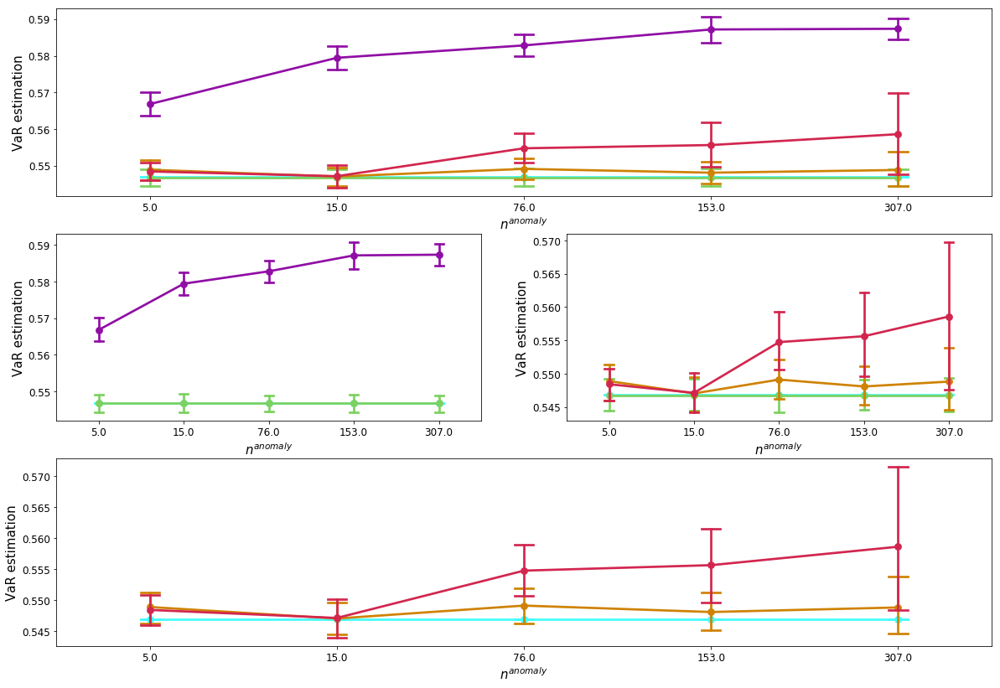

In [40]:
#sub_table = VaREstimation.query("dim == 2")
plt.figure(figsize=(20,14))
plt.figure(1)
plt.subplot(3,1,1)
sns.pointplot(x="Contam Rate", y="VaR est", hue="Params Prov.", ci=95, capsize=.1,
                    data=Tableforplot,palette=[cmap(clevels[-1]),cmap(clevels[-2]),cmap(clevels[0]),cmap(clevels[-3]),cmap(clevels[-4])]
)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('$n^{anomaly}$ ',fontsize=15)
plt.ylabel('VaR estimation',fontsize=15)
plt.legend('',frameon=False)



plt.subplot(3,2,3)
subTable = Tableforplot[Tableforplot["Params Prov."].isin(['Theo','Clean','Ano'])]
sns.pointplot(x="Contam Rate", y="VaR est", hue="Params Prov.", ci=95, capsize=.1,
                    data=subTable,palette=[cmap(clevels[-1]),cmap(clevels[-2]),cmap(clevels[0])])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('$n^{anomaly}$ ',fontsize=15)
plt.ylabel('VaR estimation',fontsize=15)
plt.legend('',frameon=False,fontsize=20)


plt.subplot(3,2,4)
subTable = Tableforplot[Tableforplot["Params Prov."]  != 'Ano']

sns.pointplot(x="Contam Rate", y="VaR est", hue="Params Prov.", ci=95, capsize=.1,
                    data=subTable,palette=[cmap(clevels[-1]),cmap(clevels[-2]),cmap(clevels[-3]),cmap(clevels[-4])])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('$n^{anomaly}$ ',fontsize=15)
plt.ylabel('VaR estimation',fontsize=15)
plt.legend('',frameon=False)


plt.subplot(3,1,3)
subTable = Tableforplot[Tableforplot["Params Prov."].isin(['Theo','BFTrue','BFPred'])  ]

sns.pointplot(x="Contam Rate", y="VaR est", hue="Params Prov.", ci=95, capsize=.1,
                    data=subTable,palette=[cmap(clevels[-1]),cmap(clevels[-3]),cmap(clevels[-4])])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('$n^{anomaly}$ ',fontsize=15)
plt.ylabel('VaR estimation',fontsize=15)
plt.legend('',frameon=False)



plt.savefig(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\Graphs\ImpactOnVaRPortfolio\VaRboxwrtContamRate.pdf')
plt.savefig(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\Graphs\ImpactOnVaRPortfolio\VaRboxwrtContamRate.png')


In [31]:
VaREstimation = -1*VaREstimation
ErrorOnVaR = pd.DataFrame(columns=['Clean','Ano','BFTrue','BFPred','AnoNumber'])

ErrorOnVaR['Clean'] = abs(VaREstimation.Clean.values - VaREstimation.Theo.values)/VaREstimation.Theo
ErrorOnVaR['Ano'] = abs(VaREstimation.Ano.values - VaREstimation.Theo.values)/VaREstimation.Theo
ErrorOnVaR['BFTrue'] = abs(VaREstimation.BFTrue.values - VaREstimation.Theo.values)/VaREstimation.Theo
ErrorOnVaR['BFPred'] = abs(VaREstimation.BFPred.values - VaREstimation.Theo.values)/VaREstimation.Theo
ErrorOnVaR['AnoNumber'] = -1*VaREstimation.AnoNumber


In [34]:
ErrorOnVaR

,Clean,Ano,BFTrue,BFPred,AnoNumber
0,0.013475,0.038911,0.019095,0.027305,5.0
1,0.000674,0.033965,0.010639,0.012581,5.0
2,0.022578,0.012696,0.022085,0.014113,5.0
3,0.011955,0.025383,0.005733,0.006153,5.0
4,0.005700,0.038476,0.014893,0.014145,5.0
...,...,...,...,...,...
245,0.002342,0.065633,0.018499,0.045556,307.0
246,0.004528,0.064061,0.086232,0.039285,307.0
247,0.014736,0.080025,0.008985,0.043586,307.0
248,0.006056,0.045915,0.013259,0.020653,307.0


In [31]:
ErrorOnVaR.groupby(by="AnoNumber").mean()


,Clean,Ano,BFTrue,BFPred
AnoNumber,,,,
5.0,0.012194,0.037392,0.013796,0.013341
15.0,0.012194,0.059604,0.012623,0.016676
76.0,0.012194,0.065791,0.014831,0.024807
153.0,0.012194,0.073750,0.014644,0.034361
307.0,0.012194,0.074091,0.020537,0.052244


In [32]:
ErrorOnVaR.groupby(by="AnoNumber").std()


,Clean,Ano,BFTrue,BFPred
AnoNumber,,,,
5.0,0.010356,0.020674,0.011511,0.009678
15.0,0.010356,0.020172,0.010514,0.012723
76.0,0.010356,0.019930,0.011842,0.018696
153.0,0.010356,0.024243,0.013683,0.026117
307.0,0.010356,0.019207,0.022526,0.057903
